In [1]:
import sys
import requests
import tarfile
import json
import numpy as np
from os import path
from PIL import Image
from PIL import ImageFont, ImageDraw
from glob import glob
from matplotlib import pyplot as plt
%matplotlib inline
from os import path

In [2]:
import torch
import torchvision
from torchvision.transforms import ToTensor
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torch.utils.data import Dataset, DataLoader, random_split
from PIL import Image
import json
import os

# Define the category mapping for the three selected categories
category_mapping = {
    1: 1,  # 'text' -> 1
    4: 2,  # 'table' -> 2
    5: 3   # 'figure' -> 3 (renamed to 'image')
}

# Load annotations JSON file
annotations_path = '/kaggle/input/final-train/train_8000_annotations.json'
with open(annotations_path, 'r') as f:
    annotations = json.load(f)

# Extract and filter images and annotations
image_data = {}
for image_info in annotations['images']:
    image_id = image_info['id']
    file_name = image_info['file_name']
    image_data[image_id] = {
        'file_name': file_name,
        'annotations': []
    }

for ann in annotations['annotations']:
    image_id = ann['image_id']
    category_id = ann['category_id']

    # Keep only the 'text', 'table', and 'figure' categories and remap their IDs
    if category_id in category_mapping:
        remapped_ann = ann.copy()
        remapped_ann['category_id'] = category_mapping[category_id]
        image_data[image_id]['annotations'].append(remapped_ann)

# Filter annotations for only the images present in the directory
image_dir = '/kaggle/input/final-train/train_8000_images'
image_files = {f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))}
filtered_annotations = {image_id: data for image_id, data in image_data.items() if data['file_name'] in image_files}

# Limit to the first 8000 images and annotations
filtered_annotations_8000 = dict(list(filtered_annotations.items())[:8000])

print(f"Loaded {len(filtered_annotations_8000)} images and their annotations for further use.")

Loaded 8000 images and their annotations for further use.


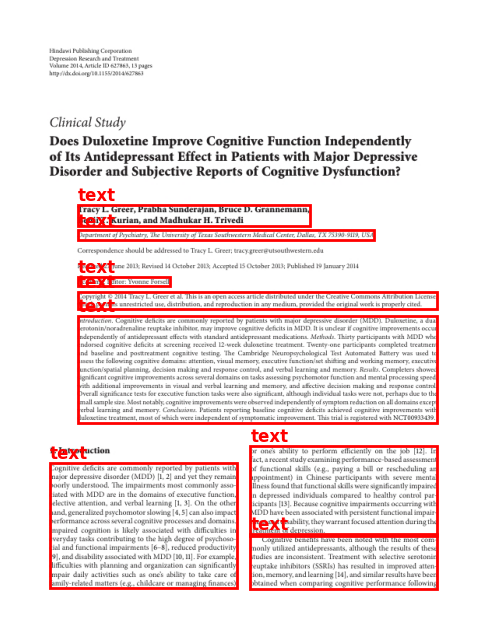

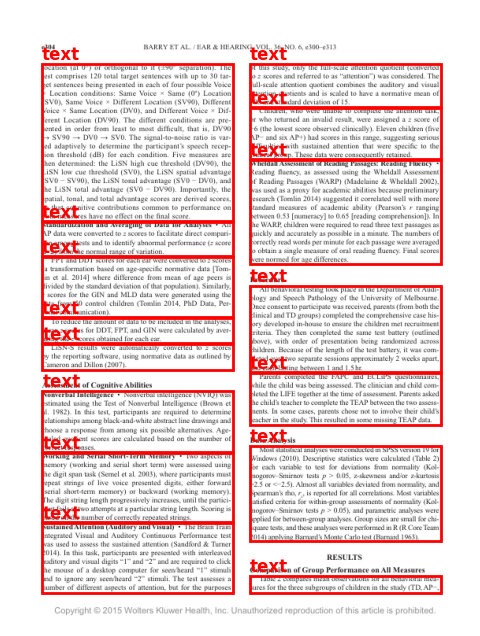

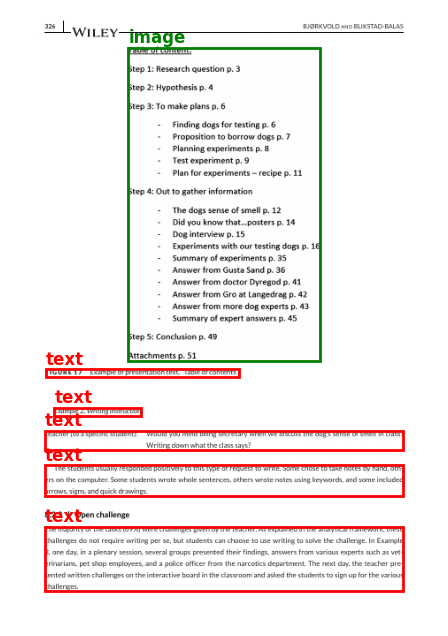

In [3]:
# Function to display an image with bounding boxes
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

random_sample = random.sample(list(filtered_annotations.keys()), 3)

def display_image_with_boxes(image_path, annotations):
    # Open the image
    img = Image.open(image_path).convert("RGB")
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)

    # Add bounding boxes to the image
    for ann in annotations:
        xmin, ymin, width, height = ann['bbox']
        xmax = xmin + width
        ymax = ymin + height
        label = ann['category_id']

        # Define colors for different categories
        colors = {1: 'red', 2: 'blue', 3: 'green'}
        category_names = {1: 'text', 2: 'table', 3: 'image'}

        # Draw the bounding box
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor=colors[label], facecolor='none')
        ax.add_patch(rect)

        # Add label
        plt.text(xmin, ymin - 5, category_names[label], color=colors[label], fontsize=12, weight='bold')

    plt.axis('off')
    plt.show()

# Display the images with bounding boxes
for image_id in random_sample:
    image_path = os.path.join(image_dir, filtered_annotations[image_id]['file_name'])
    annotations = filtered_annotations[image_id]['annotations']
    display_image_with_boxes(image_path, annotations)

In [4]:
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.transforms import ToTensor
from PIL import Image
import os

# Define the custom COCO dataset class for PyTorch
class COCODataset(Dataset):
    def __init__(self, image_dir, annotations, transform=None):
        self.image_dir = image_dir
        self.annotations = annotations
        self.transform = transform

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        image_id = list(self.annotations.keys())[idx]
        img_path = os.path.join(self.image_dir, self.annotations[image_id]['file_name'])

        if not os.path.exists(img_path):
            raise FileNotFoundError(f"Image not found: {img_path}")

        img = Image.open(img_path).convert("RGB")
        
        # Get bounding boxes and labels
        boxes = []
        labels = []
        for ann in self.annotations[image_id]['annotations']:
            xmin, ymin, width, height = ann['bbox']
            if width > 0 and height > 0:
                xmax = xmin + width
                ymax = ymin + height
                boxes.append([xmin, ymin, xmax, ymax])
                labels.append(ann['category_id'])

        # Handle cases where there are no valid boxes
        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {'boxes': boxes, 'labels': labels}

        if self.transform:
            img = self.transform(img)

        return img, target


In [5]:
dataset = COCODataset(image_dir=image_dir, annotations=filtered_annotations, transform=ToTensor())

# Split the dataset into training and validation sets (80% train, 20% val)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# Prepare DataLoaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

print(f"Training samples: {len(train_dataset)}, Validation samples: {len(val_dataset)}")

Training samples: 6400, Validation samples: 1600


In [6]:
import torch
import torchvision
from torch.utils.data import DataLoader
import torch.optim as optim
from tqdm import tqdm  # For progress bar
import matplotlib.pyplot as plt
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.ops import box_iou
import os

# Load the pre-trained Faster R-CNN model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False)

# Adjust the number of classes (3 classes + 1 background)
num_classes = 4  # ['background', 'text', 'table', 'image']
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Load the saved model weights (if available)
model_path = '/kaggle/input/best_model.pth'  # Replace with your model path
if os.path.exists(model_path):
    model.load_state_dict(torch.load(model_path, map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    print("Loaded pre-trained model successfully.")

# Move the model to the appropriate device (GPU/CPU)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

  2%|▏         | 2.25M/97.8M [00:00<00:04, 23.4MB/s]

 24%|██▎       | 23.1M/97.8M [00:00<00:00, 138MB/s] 

 45%|████▍     | 44.0M/97.8M [00:00<00:00, 175MB/s]

 66%|██████▌   | 64.8M/97.8M [00:00<00:00, 191MB/s]

 88%|████████▊ | 86.1M/97.8M [00:00<00:00, 203MB/s]

100%|██████████| 97.8M/97.8M [00:00<00:00, 182MB/s]

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [7]:
optimizer = optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)

# Store metrics for plotting
train_losses = []
val_losses = []
map_scores = []
f1_scores = []

# Best score initialization
best_val_loss = float('inf')
best_map_score = 0.0
best_f1_score = 0.0
best_model_path = "best_model.pth"

# Calculate F1 score based on IoU threshold
def calculate_f1_score(predictions, targets, iou_threshold=0.5):
    total_true_positives = 0
    total_false_positives = 0
    total_false_negatives = 0

    for prediction, target in zip(predictions, targets):
        pred_boxes = prediction['boxes']
        gt_boxes = target['boxes']

        if len(pred_boxes) == 0 or len(gt_boxes) == 0:
            continue

        iou_matrix = box_iou(pred_boxes, gt_boxes)
        true_positives = (iou_matrix > iou_threshold).sum().item()
        false_positives = len(pred_boxes) - true_positives
        false_negatives = len(gt_boxes) - true_positives

        total_true_positives += true_positives
        total_false_positives += false_positives
        total_false_negatives += false_negatives

    if total_true_positives == 0:
        return 0.0

    precision = total_true_positives / (total_true_positives + total_false_positives)
    recall = total_true_positives / (total_true_positives + total_false_negatives)
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0.0

    return f1_score

# Calculate mAP score
def calculate_map_score(predictions, targets, iou_thresholds=[0.5]):
    ap_values = []

    for iou_threshold in iou_thresholds:
        total_true_positives = 0
        total_false_positives = 0
        total_false_negatives = 0

        for prediction, target in zip(predictions, targets):
            pred_boxes = prediction['boxes']
            gt_boxes = target['boxes']

            if len(pred_boxes) == 0 or len(gt_boxes) == 0:
                continue

            iou_matrix = box_iou(pred_boxes, gt_boxes)
            true_positives = (iou_matrix > iou_threshold).sum().item()
            false_positives = len(pred_boxes) - true_positives
            false_negatives = len(gt_boxes) - true_positives

            total_true_positives += true_positives
            total_false_positives += false_positives
            total_false_negatives += false_negatives

        precision = total_true_positives / (total_true_positives + total_false_positives) if (total_true_positives + total_false_positives) > 0 else 0
        recall = total_true_positives / (total_true_positives + total_false_negatives) if (total_true_positives + total_false_negatives) > 0 else 0
        ap = precision * recall  # Simplified AP calculation
        ap_values.append(ap)

    map_score = sum(ap_values) / len(ap_values)
    return map_score

# Validation function
def validate(model, val_loader, device):
    model.eval()
    val_loss = 0
    total_f1_score = 0
    total_map_score = 0
    with torch.no_grad():
        for images, targets in tqdm(val_loader, desc="Validation", leave=False):
            images = [image.to(device) for image in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Get predictions
            predictions = model(images)

            # Calculate validation loss
            model.train()  # Temporarily switch to train mode for loss calculation
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            val_loss += losses.item()
            model.eval()  # Switch back to eval mode

            # Calculate F1 score and mAP
            total_f1_score += calculate_f1_score(predictions, targets)
            total_map_score += calculate_map_score(predictions, targets)

    avg_val_loss = val_loss / len(val_loader)
    avg_f1_score = total_f1_score / len(val_loader)
    avg_map_score = total_map_score / len(val_loader)

    return avg_val_loss, avg_f1_score, avg_map_score



In [8]:
# Training loop
num_epochs = 80
for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    train_loader = tqdm(train_loader, desc=f"Training Epoch {epoch+1}/{num_epochs}", leave=False)

    for images, targets in train_loader:
        images = [image.to(device) for image in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        epoch_loss += losses.item()

        # Backpropagation
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

    avg_train_loss = epoch_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Validation phase
    avg_val_loss, avg_f1_score, avg_map_score = validate(model, val_loader, device)
    val_losses.append(avg_val_loss)
    f1_scores.append(avg_f1_score)
    map_scores.append(avg_map_score)

    print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}, F1 Score: {avg_f1_score:.4f}, mAP: {avg_map_score:.4f}")

    # Save the best model based on validation loss, F1 score, or mAP
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved based on validation loss: {best_val_loss:.4f}")

    if avg_f1_score > best_f1_score:
        best_f1_score = avg_f1_score
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved based on F1 score: {best_f1_score:.4f}")

    if avg_map_score > best_map_score:
        best_map_score = avg_map_score
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved based on mAP: {best_map_score:.4f}")

# Plotting the metrics
epochs_range = range(1, num_epochs + 1)

plt.figure(figsize=(18, 6))

# Plot training and validation loss
plt.subplot(1, 3, 1)
plt.plot(epochs_range, train_losses, label='Training Loss')
plt.plot(epochs_range, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plot mAP scores
plt.subplot(1, 3, 2)
plt.plot(epochs_range, map_scores, label='mAP Score', color='green')
plt.xlabel('Epochs')
plt.ylabel('mAP')
plt.legend()
plt.title('Mean Average Precision (mAP)')

# Plot F1 scores
plt.subplot(1, 3, 3)
plt.plot(epochs_range, f1_scores, label='F1 Score', color='orange')
plt.xlabel('Epochs')
plt.ylabel('F1 Score')
plt.legend()
plt.title('F1 Score')

plt.tight_layout()
plt.show()

Training Epoch 1/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 1/80:   0%|          | 1/1600 [00:02<55:42,  2.09s/it]

Training Epoch 1/80:   0%|          | 2/1600 [00:02<33:09,  1.24s/it]

Training Epoch 1/80:   0%|          | 3/1600 [00:03<22:23,  1.19it/s]

Training Epoch 1/80:   0%|          | 4/1600 [00:03<18:55,  1.41it/s]

Training Epoch 1/80:   0%|          | 5/1600 [00:04<17:13,  1.54it/s]

Training Epoch 1/80:   0%|          | 6/1600 [00:04<16:04,  1.65it/s]

Training Epoch 1/80:   0%|          | 7/1600 [00:05<15:30,  1.71it/s]

Training Epoch 1/80:   0%|          | 8/1600 [00:05<14:58,  1.77it/s]

Training Epoch 1/80:   1%|          | 9/1600 [00:06<14:35,  1.82it/s]

Training Epoch 1/80:   1%|          | 10/1600 [00:06<14:31,  1.83it/s]

Training Epoch 1/80:   1%|          | 11/1600 [00:07<14:29,  1.83it/s]

Training Epoch 1/80:   1%|          | 12/1600 [00:07<14:41,  1.80it/s]

Training Epoch 1/80:   1%|          | 13/1600 [00:08<14:24,  1.84it/s]

Training Epoch 1/80:   1%|          | 14/1600 [00:08<14:27,  1.83it/s]

Training Epoch 1/80:   1%|          | 15/1600 [00:09<14:30,  1.82it/s]

Training Epoch 1/80:   1%|          | 16/1600 [00:10<14:18,  1.85it/s]

Training Epoch 1/80:   1%|          | 17/1600 [00:10<14:07,  1.87it/s]

Training Epoch 1/80:   1%|          | 18/1600 [00:11<14:01,  1.88it/s]

Training Epoch 1/80:   1%|          | 19/1600 [00:11<14:03,  1.87it/s]

Training Epoch 1/80:   1%|▏         | 20/1600 [00:12<14:13,  1.85it/s]

Training Epoch 1/80:   1%|▏         | 21/1600 [00:12<14:13,  1.85it/s]

Training Epoch 1/80:   1%|▏         | 22/1600 [00:13<14:09,  1.86it/s]

Training Epoch 1/80:   1%|▏         | 23/1600 [00:13<14:13,  1.85it/s]

Training Epoch 1/80:   2%|▏         | 24/1600 [00:14<14:11,  1.85it/s]

Training Epoch 1/80:   2%|▏         | 25/1600 [00:14<14:10,  1.85it/s]

Training Epoch 1/80:   2%|▏         | 26/1600 [00:15<14:16,  1.84it/s]

Training Epoch 1/80:   2%|▏         | 27/1600 [00:15<14:07,  1.86it/s]

Training Epoch 1/80:   2%|▏         | 28/1600 [00:16<13:58,  1.87it/s]

Training Epoch 1/80:   2%|▏         | 29/1600 [00:17<13:51,  1.89it/s]

Training Epoch 1/80:   2%|▏         | 30/1600 [00:17<13:52,  1.88it/s]

Training Epoch 1/80:   2%|▏         | 31/1600 [00:18<13:55,  1.88it/s]

Training Epoch 1/80:   2%|▏         | 32/1600 [00:18<13:57,  1.87it/s]

Training Epoch 1/80:   2%|▏         | 33/1600 [00:19<14:04,  1.86it/s]

Training Epoch 1/80:   2%|▏         | 34/1600 [00:19<14:01,  1.86it/s]

Training Epoch 1/80:   2%|▏         | 35/1600 [00:20<13:59,  1.86it/s]

Training Epoch 1/80:   2%|▏         | 36/1600 [00:20<14:06,  1.85it/s]

Training Epoch 1/80:   2%|▏         | 37/1600 [00:21<14:14,  1.83it/s]

Training Epoch 1/80:   2%|▏         | 38/1600 [00:21<14:15,  1.83it/s]

Training Epoch 1/80:   2%|▏         | 39/1600 [00:22<14:09,  1.84it/s]

Training Epoch 1/80:   2%|▎         | 40/1600 [00:23<14:11,  1.83it/s]

Training Epoch 1/80:   3%|▎         | 41/1600 [00:23<14:08,  1.84it/s]

Training Epoch 1/80:   3%|▎         | 42/1600 [00:24<13:57,  1.86it/s]

Training Epoch 1/80:   3%|▎         | 43/1600 [00:24<13:55,  1.86it/s]

Training Epoch 1/80:   3%|▎         | 44/1600 [00:25<13:55,  1.86it/s]

Training Epoch 1/80:   3%|▎         | 45/1600 [00:25<13:52,  1.87it/s]

Training Epoch 1/80:   3%|▎         | 46/1600 [00:26<13:59,  1.85it/s]

Training Epoch 1/80:   3%|▎         | 47/1600 [00:26<13:58,  1.85it/s]

Training Epoch 1/80:   3%|▎         | 48/1600 [00:27<13:55,  1.86it/s]

Training Epoch 1/80:   3%|▎         | 49/1600 [00:27<13:53,  1.86it/s]

Training Epoch 1/80:   3%|▎         | 50/1600 [00:28<13:58,  1.85it/s]

Training Epoch 1/80:   3%|▎         | 51/1600 [00:28<13:34,  1.90it/s]

Training Epoch 1/80:   3%|▎         | 52/1600 [00:29<13:31,  1.91it/s]

Training Epoch 1/80:   3%|▎         | 53/1600 [00:29<13:31,  1.91it/s]

Training Epoch 1/80:   3%|▎         | 54/1600 [00:30<13:37,  1.89it/s]

Training Epoch 1/80:   3%|▎         | 55/1600 [00:30<13:41,  1.88it/s]

Training Epoch 1/80:   4%|▎         | 56/1600 [00:31<13:35,  1.89it/s]

Training Epoch 1/80:   4%|▎         | 57/1600 [00:32<13:31,  1.90it/s]

Training Epoch 1/80:   4%|▎         | 58/1600 [00:32<13:29,  1.90it/s]

Training Epoch 1/80:   4%|▎         | 59/1600 [00:33<13:27,  1.91it/s]

Training Epoch 1/80:   4%|▍         | 60/1600 [00:33<13:31,  1.90it/s]

Training Epoch 1/80:   4%|▍         | 61/1600 [00:34<13:34,  1.89it/s]

Training Epoch 1/80:   4%|▍         | 62/1600 [00:34<13:31,  1.90it/s]

Training Epoch 1/80:   4%|▍         | 63/1600 [00:35<13:34,  1.89it/s]

Training Epoch 1/80:   4%|▍         | 64/1600 [00:35<13:39,  1.87it/s]

Training Epoch 1/80:   4%|▍         | 65/1600 [00:36<13:32,  1.89it/s]

Training Epoch 1/80:   4%|▍         | 66/1600 [00:36<13:26,  1.90it/s]

Training Epoch 1/80:   4%|▍         | 67/1600 [00:37<13:22,  1.91it/s]

Training Epoch 1/80:   4%|▍         | 68/1600 [00:37<13:20,  1.91it/s]

Training Epoch 1/80:   4%|▍         | 69/1600 [00:38<13:16,  1.92it/s]

Training Epoch 1/80:   4%|▍         | 70/1600 [00:38<13:18,  1.92it/s]

Training Epoch 1/80:   4%|▍         | 71/1600 [00:39<13:21,  1.91it/s]

Training Epoch 1/80:   4%|▍         | 72/1600 [00:39<13:12,  1.93it/s]

Training Epoch 1/80:   5%|▍         | 73/1600 [00:40<13:57,  1.82it/s]

Training Epoch 1/80:   5%|▍         | 74/1600 [00:41<14:06,  1.80it/s]

Training Epoch 1/80:   5%|▍         | 75/1600 [00:41<13:46,  1.84it/s]

Training Epoch 1/80:   5%|▍         | 76/1600 [00:42<13:44,  1.85it/s]

Training Epoch 1/80:   5%|▍         | 77/1600 [00:42<13:40,  1.86it/s]

Training Epoch 1/80:   5%|▍         | 78/1600 [00:43<13:31,  1.87it/s]

Training Epoch 1/80:   5%|▍         | 79/1600 [00:43<13:34,  1.87it/s]

Training Epoch 1/80:   5%|▌         | 80/1600 [00:44<13:44,  1.84it/s]

Training Epoch 1/80:   5%|▌         | 81/1600 [00:44<13:40,  1.85it/s]

Training Epoch 1/80:   5%|▌         | 82/1600 [00:45<13:34,  1.86it/s]

Training Epoch 1/80:   5%|▌         | 83/1600 [00:45<13:35,  1.86it/s]

Training Epoch 1/80:   5%|▌         | 84/1600 [00:46<13:45,  1.84it/s]

Training Epoch 1/80:   5%|▌         | 85/1600 [00:46<13:39,  1.85it/s]

Training Epoch 1/80:   5%|▌         | 86/1600 [00:47<13:29,  1.87it/s]

Training Epoch 1/80:   5%|▌         | 87/1600 [00:48<13:29,  1.87it/s]

Training Epoch 1/80:   6%|▌         | 88/1600 [00:48<13:55,  1.81it/s]

Training Epoch 1/80:   6%|▌         | 89/1600 [00:49<14:17,  1.76it/s]

Training Epoch 1/80:   6%|▌         | 90/1600 [00:49<13:54,  1.81it/s]

Training Epoch 1/80:   6%|▌         | 91/1600 [00:50<13:38,  1.84it/s]

Training Epoch 1/80:   6%|▌         | 92/1600 [00:50<13:34,  1.85it/s]

Training Epoch 1/80:   6%|▌         | 93/1600 [00:51<13:38,  1.84it/s]

Training Epoch 1/80:   6%|▌         | 94/1600 [00:51<14:04,  1.78it/s]

Training Epoch 1/80:   6%|▌         | 95/1600 [00:52<14:21,  1.75it/s]

Training Epoch 1/80:   6%|▌         | 96/1600 [00:53<13:57,  1.79it/s]

Training Epoch 1/80:   6%|▌         | 97/1600 [00:53<13:48,  1.81it/s]

Training Epoch 1/80:   6%|▌         | 98/1600 [00:54<13:49,  1.81it/s]

Training Epoch 1/80:   6%|▌         | 99/1600 [00:54<13:48,  1.81it/s]

Training Epoch 1/80:   6%|▋         | 100/1600 [00:55<13:43,  1.82it/s]

Training Epoch 1/80:   6%|▋         | 101/1600 [00:55<13:38,  1.83it/s]

Training Epoch 1/80:   6%|▋         | 102/1600 [00:56<13:39,  1.83it/s]

Training Epoch 1/80:   6%|▋         | 103/1600 [00:56<13:34,  1.84it/s]

Training Epoch 1/80:   6%|▋         | 104/1600 [00:57<13:24,  1.86it/s]

Training Epoch 1/80:   7%|▋         | 105/1600 [00:57<13:17,  1.87it/s]

Training Epoch 1/80:   7%|▋         | 106/1600 [00:58<13:14,  1.88it/s]

Training Epoch 1/80:   7%|▋         | 107/1600 [00:59<13:18,  1.87it/s]

Training Epoch 1/80:   7%|▋         | 108/1600 [00:59<13:34,  1.83it/s]

Training Epoch 1/80:   7%|▋         | 109/1600 [01:00<14:26,  1.72it/s]

Training Epoch 1/80:   7%|▋         | 110/1600 [01:00<14:39,  1.69it/s]

Training Epoch 1/80:   7%|▋         | 111/1600 [01:01<14:09,  1.75it/s]

Training Epoch 1/80:   7%|▋         | 112/1600 [01:01<13:47,  1.80it/s]

Training Epoch 1/80:   7%|▋         | 113/1600 [01:02<13:31,  1.83it/s]

Training Epoch 1/80:   7%|▋         | 114/1600 [01:02<13:26,  1.84it/s]

Training Epoch 1/80:   7%|▋         | 115/1600 [01:03<13:35,  1.82it/s]

Training Epoch 1/80:   7%|▋         | 116/1600 [01:04<13:40,  1.81it/s]

Training Epoch 1/80:   7%|▋         | 117/1600 [01:04<13:39,  1.81it/s]

Training Epoch 1/80:   7%|▋         | 118/1600 [01:05<13:31,  1.83it/s]

Training Epoch 1/80:   7%|▋         | 119/1600 [01:05<13:25,  1.84it/s]

Training Epoch 1/80:   8%|▊         | 120/1600 [01:06<13:21,  1.85it/s]

Training Epoch 1/80:   8%|▊         | 121/1600 [01:06<13:18,  1.85it/s]

Training Epoch 1/80:   8%|▊         | 122/1600 [01:07<13:18,  1.85it/s]

Training Epoch 1/80:   8%|▊         | 123/1600 [01:07<13:22,  1.84it/s]

Training Epoch 1/80:   8%|▊         | 124/1600 [01:08<13:19,  1.85it/s]

Training Epoch 1/80:   8%|▊         | 125/1600 [01:08<13:10,  1.87it/s]

Training Epoch 1/80:   8%|▊         | 126/1600 [01:09<13:10,  1.86it/s]

Training Epoch 1/80:   8%|▊         | 127/1600 [01:10<13:19,  1.84it/s]

Training Epoch 1/80:   8%|▊         | 128/1600 [01:10<13:31,  1.81it/s]

Training Epoch 1/80:   8%|▊         | 129/1600 [01:11<13:29,  1.82it/s]

Training Epoch 1/80:   8%|▊         | 130/1600 [01:11<13:15,  1.85it/s]

Training Epoch 1/80:   8%|▊         | 131/1600 [01:12<13:12,  1.85it/s]

Training Epoch 1/80:   8%|▊         | 132/1600 [01:12<13:12,  1.85it/s]

Training Epoch 1/80:   8%|▊         | 133/1600 [01:13<13:10,  1.86it/s]

Training Epoch 1/80:   8%|▊         | 134/1600 [01:13<13:10,  1.85it/s]

Training Epoch 1/80:   8%|▊         | 135/1600 [01:14<12:59,  1.88it/s]

Training Epoch 1/80:   8%|▊         | 136/1600 [01:14<12:56,  1.88it/s]

Training Epoch 1/80:   9%|▊         | 137/1600 [01:15<12:55,  1.89it/s]

Training Epoch 1/80:   9%|▊         | 138/1600 [01:15<12:51,  1.90it/s]

Training Epoch 1/80:   9%|▊         | 139/1600 [01:16<12:55,  1.89it/s]

Training Epoch 1/80:   9%|▉         | 140/1600 [01:16<12:58,  1.88it/s]

Training Epoch 1/80:   9%|▉         | 141/1600 [01:17<12:52,  1.89it/s]

Training Epoch 1/80:   9%|▉         | 142/1600 [01:18<12:48,  1.90it/s]

Training Epoch 1/80:   9%|▉         | 143/1600 [01:18<12:55,  1.88it/s]

Training Epoch 1/80:   9%|▉         | 144/1600 [01:19<13:12,  1.84it/s]

Training Epoch 1/80:   9%|▉         | 145/1600 [01:19<13:23,  1.81it/s]

Training Epoch 1/80:   9%|▉         | 146/1600 [01:20<13:22,  1.81it/s]

Training Epoch 1/80:   9%|▉         | 147/1600 [01:20<13:08,  1.84it/s]

Training Epoch 1/80:   9%|▉         | 148/1600 [01:21<13:00,  1.86it/s]

Training Epoch 1/80:   9%|▉         | 149/1600 [01:21<12:58,  1.86it/s]

Training Epoch 1/80:   9%|▉         | 150/1600 [01:22<12:53,  1.88it/s]

Training Epoch 1/80:   9%|▉         | 151/1600 [01:22<12:51,  1.88it/s]

Training Epoch 1/80:  10%|▉         | 152/1600 [01:23<12:59,  1.86it/s]

Training Epoch 1/80:  10%|▉         | 153/1600 [01:24<13:03,  1.85it/s]

Training Epoch 1/80:  10%|▉         | 154/1600 [01:24<13:01,  1.85it/s]

Training Epoch 1/80:  10%|▉         | 155/1600 [01:25<12:52,  1.87it/s]

Training Epoch 1/80:  10%|▉         | 156/1600 [01:25<12:47,  1.88it/s]

Training Epoch 1/80:  10%|▉         | 157/1600 [01:26<12:45,  1.89it/s]

Training Epoch 1/80:  10%|▉         | 158/1600 [01:26<12:41,  1.89it/s]

Training Epoch 1/80:  10%|▉         | 159/1600 [01:27<12:38,  1.90it/s]

Training Epoch 1/80:  10%|█         | 160/1600 [01:27<12:36,  1.90it/s]

Training Epoch 1/80:  10%|█         | 161/1600 [01:28<12:44,  1.88it/s]

Training Epoch 1/80:  10%|█         | 162/1600 [01:28<12:53,  1.86it/s]

Training Epoch 1/80:  10%|█         | 163/1600 [01:29<12:46,  1.88it/s]

Training Epoch 1/80:  10%|█         | 164/1600 [01:29<12:47,  1.87it/s]

Training Epoch 1/80:  10%|█         | 165/1600 [01:30<12:53,  1.86it/s]

Training Epoch 1/80:  10%|█         | 166/1600 [01:30<12:53,  1.86it/s]

Training Epoch 1/80:  10%|█         | 167/1600 [01:31<12:54,  1.85it/s]

Training Epoch 1/80:  10%|█         | 168/1600 [01:32<12:58,  1.84it/s]

Training Epoch 1/80:  11%|█         | 169/1600 [01:32<13:05,  1.82it/s]

Training Epoch 1/80:  11%|█         | 170/1600 [01:33<13:14,  1.80it/s]

Training Epoch 1/80:  11%|█         | 171/1600 [01:33<13:08,  1.81it/s]

Training Epoch 1/80:  11%|█         | 172/1600 [01:34<12:55,  1.84it/s]

Training Epoch 1/80:  11%|█         | 173/1600 [01:34<12:45,  1.86it/s]

Training Epoch 1/80:  11%|█         | 174/1600 [01:35<12:45,  1.86it/s]

Training Epoch 1/80:  11%|█         | 175/1600 [01:35<12:52,  1.85it/s]

Training Epoch 1/80:  11%|█         | 176/1600 [01:36<12:55,  1.84it/s]

Training Epoch 1/80:  11%|█         | 177/1600 [01:36<12:50,  1.85it/s]

Training Epoch 1/80:  11%|█         | 178/1600 [01:37<12:47,  1.85it/s]

Training Epoch 1/80:  11%|█         | 179/1600 [01:38<12:53,  1.84it/s]

Training Epoch 1/80:  11%|█▏        | 180/1600 [01:38<12:54,  1.83it/s]

Training Epoch 1/80:  11%|█▏        | 181/1600 [01:39<12:53,  1.84it/s]

Training Epoch 1/80:  11%|█▏        | 182/1600 [01:39<13:30,  1.75it/s]

Training Epoch 1/80:  11%|█▏        | 183/1600 [01:40<13:47,  1.71it/s]

Training Epoch 1/80:  12%|█▏        | 184/1600 [01:40<13:31,  1.75it/s]

Training Epoch 1/80:  12%|█▏        | 185/1600 [01:41<13:27,  1.75it/s]

Training Epoch 1/80:  12%|█▏        | 186/1600 [01:42<13:12,  1.78it/s]

Training Epoch 1/80:  12%|█▏        | 187/1600 [01:42<13:01,  1.81it/s]

Training Epoch 1/80:  12%|█▏        | 188/1600 [01:43<13:33,  1.73it/s]

Training Epoch 1/80:  12%|█▏        | 189/1600 [01:43<13:39,  1.72it/s]

Training Epoch 1/80:  12%|█▏        | 190/1600 [01:44<13:12,  1.78it/s]

Training Epoch 1/80:  12%|█▏        | 191/1600 [01:44<13:01,  1.80it/s]

Training Epoch 1/80:  12%|█▏        | 192/1600 [01:45<12:59,  1.81it/s]

Training Epoch 1/80:  12%|█▏        | 193/1600 [01:45<12:49,  1.83it/s]

Training Epoch 1/80:  12%|█▏        | 194/1600 [01:46<12:47,  1.83it/s]

Training Epoch 1/80:  12%|█▏        | 195/1600 [01:46<12:42,  1.84it/s]

Training Epoch 1/80:  12%|█▏        | 196/1600 [01:47<12:49,  1.82it/s]

Training Epoch 1/80:  12%|█▏        | 197/1600 [01:48<13:00,  1.80it/s]

Training Epoch 1/80:  12%|█▏        | 198/1600 [01:48<12:57,  1.80it/s]

Training Epoch 1/80:  12%|█▏        | 199/1600 [01:49<12:45,  1.83it/s]

Training Epoch 1/80:  12%|█▎        | 200/1600 [01:49<12:42,  1.84it/s]

Training Epoch 1/80:  13%|█▎        | 201/1600 [01:50<12:44,  1.83it/s]

Training Epoch 1/80:  13%|█▎        | 202/1600 [01:50<12:39,  1.84it/s]

Training Epoch 1/80:  13%|█▎        | 203/1600 [01:51<12:30,  1.86it/s]

Training Epoch 1/80:  13%|█▎        | 204/1600 [01:51<12:32,  1.86it/s]

Training Epoch 1/80:  13%|█▎        | 205/1600 [01:52<12:31,  1.86it/s]

Training Epoch 1/80:  13%|█▎        | 206/1600 [01:52<12:22,  1.88it/s]

Training Epoch 1/80:  13%|█▎        | 207/1600 [01:53<12:13,  1.90it/s]

Training Epoch 1/80:  13%|█▎        | 208/1600 [01:53<12:10,  1.90it/s]

Training Epoch 1/80:  13%|█▎        | 209/1600 [01:54<12:10,  1.91it/s]

Training Epoch 1/80:  13%|█▎        | 210/1600 [01:55<12:08,  1.91it/s]

Training Epoch 1/80:  13%|█▎        | 211/1600 [01:55<12:12,  1.90it/s]

Training Epoch 1/80:  13%|█▎        | 212/1600 [01:56<12:20,  1.87it/s]

Training Epoch 1/80:  13%|█▎        | 213/1600 [01:56<12:23,  1.87it/s]

Training Epoch 1/80:  13%|█▎        | 214/1600 [01:57<12:23,  1.86it/s]

Training Epoch 1/80:  13%|█▎        | 215/1600 [01:57<13:02,  1.77it/s]

Training Epoch 1/80:  14%|█▎        | 216/1600 [01:58<13:09,  1.75it/s]

Training Epoch 1/80:  14%|█▎        | 217/1600 [01:58<12:56,  1.78it/s]

Training Epoch 1/80:  14%|█▎        | 218/1600 [01:59<12:51,  1.79it/s]

Training Epoch 1/80:  14%|█▎        | 219/1600 [02:00<12:50,  1.79it/s]

Training Epoch 1/80:  14%|█▍        | 220/1600 [02:00<12:52,  1.79it/s]

Training Epoch 1/80:  14%|█▍        | 221/1600 [02:01<12:43,  1.81it/s]

Training Epoch 1/80:  14%|█▍        | 222/1600 [02:01<12:34,  1.83it/s]

Training Epoch 1/80:  14%|█▍        | 223/1600 [02:02<12:29,  1.84it/s]

Training Epoch 1/80:  14%|█▍        | 224/1600 [02:02<12:30,  1.83it/s]

Training Epoch 1/80:  14%|█▍        | 225/1600 [02:03<12:32,  1.83it/s]

Training Epoch 1/80:  14%|█▍        | 226/1600 [02:03<12:22,  1.85it/s]

Training Epoch 1/80:  14%|█▍        | 227/1600 [02:04<12:20,  1.85it/s]

Training Epoch 1/80:  14%|█▍        | 228/1600 [02:04<12:18,  1.86it/s]

Training Epoch 1/80:  14%|█▍        | 229/1600 [02:05<12:14,  1.87it/s]

Training Epoch 1/80:  14%|█▍        | 230/1600 [02:05<12:07,  1.88it/s]

Training Epoch 1/80:  14%|█▍        | 231/1600 [02:06<12:13,  1.87it/s]

Training Epoch 1/80:  14%|█▍        | 232/1600 [02:07<12:24,  1.84it/s]

Training Epoch 1/80:  15%|█▍        | 233/1600 [02:07<12:22,  1.84it/s]

Training Epoch 1/80:  15%|█▍        | 234/1600 [02:08<12:20,  1.85it/s]

Training Epoch 1/80:  15%|█▍        | 235/1600 [02:08<12:23,  1.84it/s]

Training Epoch 1/80:  15%|█▍        | 236/1600 [02:09<12:25,  1.83it/s]

Training Epoch 1/80:  15%|█▍        | 237/1600 [02:09<12:22,  1.84it/s]

Training Epoch 1/80:  15%|█▍        | 238/1600 [02:10<12:16,  1.85it/s]

Training Epoch 1/80:  15%|█▍        | 239/1600 [02:10<12:09,  1.87it/s]

Training Epoch 1/80:  15%|█▌        | 240/1600 [02:11<12:02,  1.88it/s]

Training Epoch 1/80:  15%|█▌        | 241/1600 [02:11<11:58,  1.89it/s]

Training Epoch 1/80:  15%|█▌        | 242/1600 [02:12<12:04,  1.87it/s]

Training Epoch 1/80:  15%|█▌        | 243/1600 [02:13<12:17,  1.84it/s]

Training Epoch 1/80:  15%|█▌        | 244/1600 [02:13<12:15,  1.84it/s]

Training Epoch 1/80:  15%|█▌        | 245/1600 [02:14<12:15,  1.84it/s]

Training Epoch 1/80:  15%|█▌        | 246/1600 [02:14<12:26,  1.81it/s]

Training Epoch 1/80:  15%|█▌        | 247/1600 [02:15<12:25,  1.81it/s]

Training Epoch 1/80:  16%|█▌        | 248/1600 [02:15<12:13,  1.84it/s]

Training Epoch 1/80:  16%|█▌        | 249/1600 [02:16<12:05,  1.86it/s]

Training Epoch 1/80:  16%|█▌        | 250/1600 [02:16<12:01,  1.87it/s]

Training Epoch 1/80:  16%|█▌        | 251/1600 [02:17<12:04,  1.86it/s]

Training Epoch 1/80:  16%|█▌        | 252/1600 [02:17<12:10,  1.84it/s]

Training Epoch 1/80:  16%|█▌        | 253/1600 [02:18<12:07,  1.85it/s]

Training Epoch 1/80:  16%|█▌        | 254/1600 [02:18<12:04,  1.86it/s]

Training Epoch 1/80:  16%|█▌        | 255/1600 [02:19<11:54,  1.88it/s]

Training Epoch 1/80:  16%|█▌        | 256/1600 [02:20<11:56,  1.88it/s]

Training Epoch 1/80:  16%|█▌        | 257/1600 [02:20<12:04,  1.85it/s]

Training Epoch 1/80:  16%|█▌        | 258/1600 [02:21<12:06,  1.85it/s]

Training Epoch 1/80:  16%|█▌        | 259/1600 [02:21<12:04,  1.85it/s]

Training Epoch 1/80:  16%|█▋        | 260/1600 [02:22<12:04,  1.85it/s]

Training Epoch 1/80:  16%|█▋        | 261/1600 [02:22<12:12,  1.83it/s]

Training Epoch 1/80:  16%|█▋        | 262/1600 [02:23<12:19,  1.81it/s]

Training Epoch 1/80:  16%|█▋        | 263/1600 [02:23<12:23,  1.80it/s]

Training Epoch 1/80:  16%|█▋        | 264/1600 [02:24<12:20,  1.80it/s]

Training Epoch 1/80:  17%|█▋        | 265/1600 [02:24<12:05,  1.84it/s]

Training Epoch 1/80:  17%|█▋        | 266/1600 [02:25<11:55,  1.86it/s]

Training Epoch 1/80:  17%|█▋        | 267/1600 [02:25<11:48,  1.88it/s]

Training Epoch 1/80:  17%|█▋        | 268/1600 [02:26<11:48,  1.88it/s]

Training Epoch 1/80:  17%|█▋        | 269/1600 [02:27<11:50,  1.87it/s]

Training Epoch 1/80:  17%|█▋        | 270/1600 [02:27<11:51,  1.87it/s]

Training Epoch 1/80:  17%|█▋        | 271/1600 [02:28<11:53,  1.86it/s]

Training Epoch 1/80:  17%|█▋        | 272/1600 [02:28<11:52,  1.86it/s]

Training Epoch 1/80:  17%|█▋        | 273/1600 [02:29<11:57,  1.85it/s]

Training Epoch 1/80:  17%|█▋        | 274/1600 [02:29<12:01,  1.84it/s]

Training Epoch 1/80:  17%|█▋        | 275/1600 [02:30<12:05,  1.83it/s]

Training Epoch 1/80:  17%|█▋        | 276/1600 [02:30<12:07,  1.82it/s]

Training Epoch 1/80:  17%|█▋        | 277/1600 [02:31<12:01,  1.83it/s]

Training Epoch 1/80:  17%|█▋        | 278/1600 [02:31<11:59,  1.84it/s]

Training Epoch 1/80:  17%|█▋        | 279/1600 [02:32<11:51,  1.86it/s]

Training Epoch 1/80:  18%|█▊        | 280/1600 [02:33<11:53,  1.85it/s]

Training Epoch 1/80:  18%|█▊        | 281/1600 [02:33<12:04,  1.82it/s]

Training Epoch 1/80:  18%|█▊        | 282/1600 [02:34<12:10,  1.81it/s]

Training Epoch 1/80:  18%|█▊        | 283/1600 [02:34<12:16,  1.79it/s]

Training Epoch 1/80:  18%|█▊        | 284/1600 [02:35<12:18,  1.78it/s]

Training Epoch 1/80:  18%|█▊        | 285/1600 [02:35<12:09,  1.80it/s]

Training Epoch 1/80:  18%|█▊        | 286/1600 [02:36<11:58,  1.83it/s]

Training Epoch 1/80:  18%|█▊        | 287/1600 [02:36<11:48,  1.85it/s]

Training Epoch 1/80:  18%|█▊        | 288/1600 [02:37<11:46,  1.86it/s]

Training Epoch 1/80:  18%|█▊        | 289/1600 [02:37<11:50,  1.84it/s]

Training Epoch 1/80:  18%|█▊        | 290/1600 [02:38<11:48,  1.85it/s]

Training Epoch 1/80:  18%|█▊        | 291/1600 [02:39<11:40,  1.87it/s]

Training Epoch 1/80:  18%|█▊        | 292/1600 [02:39<11:34,  1.88it/s]

Training Epoch 1/80:  18%|█▊        | 293/1600 [02:40<11:35,  1.88it/s]

Training Epoch 1/80:  18%|█▊        | 294/1600 [02:40<11:38,  1.87it/s]

Training Epoch 1/80:  18%|█▊        | 295/1600 [02:41<11:40,  1.86it/s]

Training Epoch 1/80:  18%|█▊        | 296/1600 [02:41<11:44,  1.85it/s]

Training Epoch 1/80:  19%|█▊        | 297/1600 [02:42<11:39,  1.86it/s]

Training Epoch 1/80:  19%|█▊        | 298/1600 [02:42<11:38,  1.86it/s]

Training Epoch 1/80:  19%|█▊        | 299/1600 [02:43<11:39,  1.86it/s]

Training Epoch 1/80:  19%|█▉        | 300/1600 [02:43<11:31,  1.88it/s]

Training Epoch 1/80:  19%|█▉        | 301/1600 [02:44<11:32,  1.87it/s]

Training Epoch 1/80:  19%|█▉        | 302/1600 [02:44<11:40,  1.85it/s]

Training Epoch 1/80:  19%|█▉        | 303/1600 [02:45<11:39,  1.85it/s]

Training Epoch 1/80:  19%|█▉        | 304/1600 [02:46<11:33,  1.87it/s]

Training Epoch 1/80:  19%|█▉        | 305/1600 [02:46<11:27,  1.88it/s]

Training Epoch 1/80:  19%|█▉        | 306/1600 [02:47<11:21,  1.90it/s]

Training Epoch 1/80:  19%|█▉        | 307/1600 [02:47<11:20,  1.90it/s]

Training Epoch 1/80:  19%|█▉        | 308/1600 [02:48<11:22,  1.89it/s]

Training Epoch 1/80:  19%|█▉        | 309/1600 [02:48<11:18,  1.90it/s]

Training Epoch 1/80:  19%|█▉        | 310/1600 [02:49<11:21,  1.89it/s]

Training Epoch 1/80:  19%|█▉        | 311/1600 [02:49<11:24,  1.88it/s]

Training Epoch 1/80:  20%|█▉        | 312/1600 [02:50<11:20,  1.89it/s]

Training Epoch 1/80:  20%|█▉        | 313/1600 [02:50<11:26,  1.88it/s]

Training Epoch 1/80:  20%|█▉        | 314/1600 [02:51<11:39,  1.84it/s]

Training Epoch 1/80:  20%|█▉        | 315/1600 [02:51<11:37,  1.84it/s]

Training Epoch 1/80:  20%|█▉        | 316/1600 [02:52<11:28,  1.87it/s]

Training Epoch 1/80:  20%|█▉        | 317/1600 [02:52<11:28,  1.86it/s]

Training Epoch 1/80:  20%|█▉        | 318/1600 [02:53<11:28,  1.86it/s]

Training Epoch 1/80:  20%|█▉        | 319/1600 [02:53<11:23,  1.88it/s]

Training Epoch 1/80:  20%|██        | 320/1600 [02:54<11:18,  1.89it/s]

Training Epoch 1/80:  20%|██        | 321/1600 [02:55<11:24,  1.87it/s]

Training Epoch 1/80:  20%|██        | 322/1600 [02:55<11:30,  1.85it/s]

Training Epoch 1/80:  20%|██        | 323/1600 [02:56<11:27,  1.86it/s]

Training Epoch 1/80:  20%|██        | 324/1600 [02:56<11:32,  1.84it/s]

Training Epoch 1/80:  20%|██        | 325/1600 [02:57<11:37,  1.83it/s]

Training Epoch 1/80:  20%|██        | 326/1600 [02:57<11:39,  1.82it/s]

Training Epoch 1/80:  20%|██        | 327/1600 [02:58<12:05,  1.76it/s]

Training Epoch 1/80:  20%|██        | 328/1600 [02:59<12:15,  1.73it/s]

Training Epoch 1/80:  21%|██        | 329/1600 [02:59<11:53,  1.78it/s]

Training Epoch 1/80:  21%|██        | 330/1600 [03:00<11:42,  1.81it/s]

Training Epoch 1/80:  21%|██        | 331/1600 [03:00<11:35,  1.82it/s]

Training Epoch 1/80:  21%|██        | 332/1600 [03:01<11:30,  1.84it/s]

Training Epoch 1/80:  21%|██        | 333/1600 [03:01<11:25,  1.85it/s]

Training Epoch 1/80:  21%|██        | 334/1600 [03:02<11:17,  1.87it/s]

Training Epoch 1/80:  21%|██        | 335/1600 [03:02<11:16,  1.87it/s]

Training Epoch 1/80:  21%|██        | 336/1600 [03:03<11:25,  1.84it/s]

Training Epoch 1/80:  21%|██        | 337/1600 [03:03<11:33,  1.82it/s]

Training Epoch 1/80:  21%|██        | 338/1600 [03:04<11:34,  1.82it/s]

Training Epoch 1/80:  21%|██        | 339/1600 [03:04<11:35,  1.81it/s]

Training Epoch 1/80:  21%|██▏       | 340/1600 [03:05<11:29,  1.83it/s]

Training Epoch 1/80:  21%|██▏       | 341/1600 [03:06<11:19,  1.85it/s]

Training Epoch 1/80:  21%|██▏       | 342/1600 [03:06<11:19,  1.85it/s]

Training Epoch 1/80:  21%|██▏       | 343/1600 [03:07<11:21,  1.84it/s]

Training Epoch 1/80:  22%|██▏       | 344/1600 [03:07<11:19,  1.85it/s]

Training Epoch 1/80:  22%|██▏       | 345/1600 [03:08<11:11,  1.87it/s]

Training Epoch 1/80:  22%|██▏       | 346/1600 [03:08<11:04,  1.89it/s]

Training Epoch 1/80:  22%|██▏       | 347/1600 [03:09<11:01,  1.89it/s]

Training Epoch 1/80:  22%|██▏       | 348/1600 [03:09<11:03,  1.89it/s]

Training Epoch 1/80:  22%|██▏       | 349/1600 [03:10<11:05,  1.88it/s]

Training Epoch 1/80:  22%|██▏       | 350/1600 [03:10<11:06,  1.87it/s]

Training Epoch 1/80:  22%|██▏       | 351/1600 [03:11<11:07,  1.87it/s]

Training Epoch 1/80:  22%|██▏       | 352/1600 [03:11<11:02,  1.88it/s]

Training Epoch 1/80:  22%|██▏       | 353/1600 [03:12<10:57,  1.90it/s]

Training Epoch 1/80:  22%|██▏       | 354/1600 [03:12<10:55,  1.90it/s]

Training Epoch 1/80:  22%|██▏       | 355/1600 [03:13<10:57,  1.89it/s]

Training Epoch 1/80:  22%|██▏       | 356/1600 [03:14<11:06,  1.87it/s]

Training Epoch 1/80:  22%|██▏       | 357/1600 [03:14<11:14,  1.84it/s]

Training Epoch 1/80:  22%|██▏       | 358/1600 [03:15<11:13,  1.84it/s]

Training Epoch 1/80:  22%|██▏       | 359/1600 [03:15<11:30,  1.80it/s]

Training Epoch 1/80:  22%|██▎       | 360/1600 [03:16<11:52,  1.74it/s]

Training Epoch 1/80:  23%|██▎       | 361/1600 [03:16<11:38,  1.77it/s]

Training Epoch 1/80:  23%|██▎       | 362/1600 [03:17<11:24,  1.81it/s]

Training Epoch 1/80:  23%|██▎       | 363/1600 [03:17<11:14,  1.83it/s]

Training Epoch 1/80:  23%|██▎       | 364/1600 [03:18<11:10,  1.84it/s]

Training Epoch 1/80:  23%|██▎       | 365/1600 [03:18<11:08,  1.85it/s]

Training Epoch 1/80:  23%|██▎       | 366/1600 [03:19<11:00,  1.87it/s]

Training Epoch 1/80:  23%|██▎       | 367/1600 [03:20<11:02,  1.86it/s]

Training Epoch 1/80:  23%|██▎       | 368/1600 [03:20<11:01,  1.86it/s]

Training Epoch 1/80:  23%|██▎       | 369/1600 [03:21<10:56,  1.88it/s]

Training Epoch 1/80:  23%|██▎       | 370/1600 [03:21<10:50,  1.89it/s]

Training Epoch 1/80:  23%|██▎       | 371/1600 [03:22<10:51,  1.89it/s]

Training Epoch 1/80:  23%|██▎       | 372/1600 [03:22<10:59,  1.86it/s]

Training Epoch 1/80:  23%|██▎       | 373/1600 [03:23<10:59,  1.86it/s]

Training Epoch 1/80:  23%|██▎       | 374/1600 [03:23<11:01,  1.85it/s]

Training Epoch 1/80:  23%|██▎       | 375/1600 [03:24<11:04,  1.84it/s]

Training Epoch 1/80:  24%|██▎       | 376/1600 [03:24<11:02,  1.85it/s]

Training Epoch 1/80:  24%|██▎       | 377/1600 [03:25<11:03,  1.84it/s]

Training Epoch 1/80:  24%|██▎       | 378/1600 [03:25<10:55,  1.86it/s]

Training Epoch 1/80:  24%|██▎       | 379/1600 [03:26<10:53,  1.87it/s]

Training Epoch 1/80:  24%|██▍       | 380/1600 [03:27<11:02,  1.84it/s]

Training Epoch 1/80:  24%|██▍       | 381/1600 [03:27<11:05,  1.83it/s]

Training Epoch 1/80:  24%|██▍       | 382/1600 [03:28<10:55,  1.86it/s]

Training Epoch 1/80:  24%|██▍       | 383/1600 [03:28<10:48,  1.88it/s]

Training Epoch 1/80:  24%|██▍       | 384/1600 [03:29<10:48,  1.88it/s]

Training Epoch 1/80:  24%|██▍       | 385/1600 [03:29<10:53,  1.86it/s]

Training Epoch 1/80:  24%|██▍       | 386/1600 [03:30<10:57,  1.85it/s]

Training Epoch 1/80:  24%|██▍       | 387/1600 [03:30<10:55,  1.85it/s]

Training Epoch 1/80:  24%|██▍       | 388/1600 [03:31<10:48,  1.87it/s]

Training Epoch 1/80:  24%|██▍       | 389/1600 [03:31<10:48,  1.87it/s]

Training Epoch 1/80:  24%|██▍       | 390/1600 [03:32<10:48,  1.87it/s]

Training Epoch 1/80:  24%|██▍       | 391/1600 [03:32<10:43,  1.88it/s]

Training Epoch 1/80:  24%|██▍       | 392/1600 [03:33<10:40,  1.89it/s]

Training Epoch 1/80:  25%|██▍       | 393/1600 [03:33<10:39,  1.89it/s]

Training Epoch 1/80:  25%|██▍       | 394/1600 [03:34<10:35,  1.90it/s]

Training Epoch 1/80:  25%|██▍       | 395/1600 [03:35<10:41,  1.88it/s]

Training Epoch 1/80:  25%|██▍       | 396/1600 [03:35<10:53,  1.84it/s]

Training Epoch 1/80:  25%|██▍       | 397/1600 [03:36<10:53,  1.84it/s]

Training Epoch 1/80:  25%|██▍       | 398/1600 [03:36<10:52,  1.84it/s]

Training Epoch 1/80:  25%|██▍       | 399/1600 [03:37<10:54,  1.83it/s]

Training Epoch 1/80:  25%|██▌       | 400/1600 [03:37<10:57,  1.83it/s]

Training Epoch 1/80:  25%|██▌       | 401/1600 [03:38<10:54,  1.83it/s]

Training Epoch 1/80:  25%|██▌       | 402/1600 [03:38<10:53,  1.83it/s]

Training Epoch 1/80:  25%|██▌       | 403/1600 [03:39<10:59,  1.82it/s]

Training Epoch 1/80:  25%|██▌       | 404/1600 [03:40<11:03,  1.80it/s]

Training Epoch 1/80:  25%|██▌       | 405/1600 [03:40<11:00,  1.81it/s]

Training Epoch 1/80:  25%|██▌       | 406/1600 [03:41<10:51,  1.83it/s]

Training Epoch 1/80:  25%|██▌       | 407/1600 [03:41<10:44,  1.85it/s]

Training Epoch 1/80:  26%|██▌       | 408/1600 [03:42<10:38,  1.87it/s]

Training Epoch 1/80:  26%|██▌       | 409/1600 [03:42<10:32,  1.88it/s]

Training Epoch 1/80:  26%|██▌       | 410/1600 [03:43<10:35,  1.87it/s]

Training Epoch 1/80:  26%|██▌       | 411/1600 [03:43<10:39,  1.86it/s]

Training Epoch 1/80:  26%|██▌       | 412/1600 [03:44<10:34,  1.87it/s]

Training Epoch 1/80:  26%|██▌       | 413/1600 [03:44<10:29,  1.89it/s]

Training Epoch 1/80:  26%|██▌       | 414/1600 [03:45<10:32,  1.87it/s]

Training Epoch 1/80:  26%|██▌       | 415/1600 [03:45<10:37,  1.86it/s]

Training Epoch 1/80:  26%|██▌       | 416/1600 [03:46<10:38,  1.86it/s]

Training Epoch 1/80:  26%|██▌       | 417/1600 [03:47<10:42,  1.84it/s]

Training Epoch 1/80:  26%|██▌       | 418/1600 [03:47<10:33,  1.87it/s]

Training Epoch 1/80:  26%|██▌       | 419/1600 [03:48<10:32,  1.87it/s]

Training Epoch 1/80:  26%|██▋       | 420/1600 [03:48<10:33,  1.86it/s]

Training Epoch 1/80:  26%|██▋       | 421/1600 [03:49<10:28,  1.88it/s]

Training Epoch 1/80:  26%|██▋       | 422/1600 [03:49<10:23,  1.89it/s]

Training Epoch 1/80:  26%|██▋       | 423/1600 [03:50<10:21,  1.89it/s]

Training Epoch 1/80:  26%|██▋       | 424/1600 [03:50<10:24,  1.88it/s]

Training Epoch 1/80:  27%|██▋       | 425/1600 [03:51<10:26,  1.88it/s]

Training Epoch 1/80:  27%|██▋       | 426/1600 [03:51<10:27,  1.87it/s]

Training Epoch 1/80:  27%|██▋       | 427/1600 [03:52<10:34,  1.85it/s]

Training Epoch 1/80:  27%|██▋       | 428/1600 [03:52<10:41,  1.83it/s]

Training Epoch 1/80:  27%|██▋       | 429/1600 [03:53<10:42,  1.82it/s]

Training Epoch 1/80:  27%|██▋       | 430/1600 [03:53<10:36,  1.84it/s]

Training Epoch 1/80:  27%|██▋       | 431/1600 [03:54<10:34,  1.84it/s]

Training Epoch 1/80:  27%|██▋       | 432/1600 [03:55<10:27,  1.86it/s]

Training Epoch 1/80:  27%|██▋       | 433/1600 [03:55<10:21,  1.88it/s]

Training Epoch 1/80:  27%|██▋       | 434/1600 [03:56<10:17,  1.89it/s]

Training Epoch 1/80:  27%|██▋       | 435/1600 [03:56<10:13,  1.90it/s]

Training Epoch 1/80:  27%|██▋       | 436/1600 [03:57<10:10,  1.91it/s]

Training Epoch 1/80:  27%|██▋       | 437/1600 [03:57<10:07,  1.92it/s]

Training Epoch 1/80:  27%|██▋       | 438/1600 [03:58<10:06,  1.92it/s]

Training Epoch 1/80:  27%|██▋       | 439/1600 [03:58<10:10,  1.90it/s]

Training Epoch 1/80:  28%|██▊       | 440/1600 [03:59<10:18,  1.87it/s]

Training Epoch 1/80:  28%|██▊       | 441/1600 [03:59<10:18,  1.87it/s]

Training Epoch 1/80:  28%|██▊       | 442/1600 [04:00<10:17,  1.88it/s]

Training Epoch 1/80:  28%|██▊       | 443/1600 [04:00<10:10,  1.90it/s]

Training Epoch 1/80:  28%|██▊       | 444/1600 [04:01<10:08,  1.90it/s]

Training Epoch 1/80:  28%|██▊       | 445/1600 [04:01<10:05,  1.91it/s]

Training Epoch 1/80:  28%|██▊       | 446/1600 [04:02<10:09,  1.89it/s]

Training Epoch 1/80:  28%|██▊       | 447/1600 [04:02<10:14,  1.88it/s]

Training Epoch 1/80:  28%|██▊       | 448/1600 [04:03<10:17,  1.87it/s]

Training Epoch 1/80:  28%|██▊       | 449/1600 [04:04<10:21,  1.85it/s]

Training Epoch 1/80:  28%|██▊       | 450/1600 [04:04<10:14,  1.87it/s]

Training Epoch 1/80:  28%|██▊       | 451/1600 [04:05<10:14,  1.87it/s]

Training Epoch 1/80:  28%|██▊       | 452/1600 [04:05<10:22,  1.85it/s]

Training Epoch 1/80:  28%|██▊       | 453/1600 [04:06<10:20,  1.85it/s]

Training Epoch 1/80:  28%|██▊       | 454/1600 [04:06<10:18,  1.85it/s]

Training Epoch 1/80:  28%|██▊       | 455/1600 [04:07<10:17,  1.85it/s]

Training Epoch 1/80:  28%|██▊       | 456/1600 [04:07<10:11,  1.87it/s]

Training Epoch 1/80:  29%|██▊       | 457/1600 [04:08<10:09,  1.88it/s]

Training Epoch 1/80:  29%|██▊       | 458/1600 [04:08<10:10,  1.87it/s]

Training Epoch 1/80:  29%|██▊       | 459/1600 [04:09<10:10,  1.87it/s]

Training Epoch 1/80:  29%|██▉       | 460/1600 [04:09<10:15,  1.85it/s]

Training Epoch 1/80:  29%|██▉       | 461/1600 [04:10<10:14,  1.85it/s]

Training Epoch 1/80:  29%|██▉       | 462/1600 [04:11<10:06,  1.88it/s]

Training Epoch 1/80:  29%|██▉       | 463/1600 [04:11<10:03,  1.88it/s]

Training Epoch 1/80:  29%|██▉       | 464/1600 [04:12<10:06,  1.87it/s]

Training Epoch 1/80:  29%|██▉       | 465/1600 [04:12<10:09,  1.86it/s]

Training Epoch 1/80:  29%|██▉       | 466/1600 [04:13<10:08,  1.86it/s]

Training Epoch 1/80:  29%|██▉       | 467/1600 [04:13<10:12,  1.85it/s]

Training Epoch 1/80:  29%|██▉       | 468/1600 [04:14<10:17,  1.83it/s]

Training Epoch 1/80:  29%|██▉       | 469/1600 [04:14<10:16,  1.83it/s]

Training Epoch 1/80:  29%|██▉       | 470/1600 [04:15<10:07,  1.86it/s]

Training Epoch 1/80:  29%|██▉       | 471/1600 [04:15<10:01,  1.88it/s]

Training Epoch 1/80:  30%|██▉       | 472/1600 [04:16<10:01,  1.88it/s]

Training Epoch 1/80:  30%|██▉       | 473/1600 [04:16<10:06,  1.86it/s]

Training Epoch 1/80:  30%|██▉       | 474/1600 [04:17<10:12,  1.84it/s]

Training Epoch 1/80:  30%|██▉       | 475/1600 [04:18<10:15,  1.83it/s]

Training Epoch 1/80:  30%|██▉       | 476/1600 [04:18<10:08,  1.85it/s]

Training Epoch 1/80:  30%|██▉       | 477/1600 [04:19<10:09,  1.84it/s]

Training Epoch 1/80:  30%|██▉       | 478/1600 [04:19<10:14,  1.83it/s]

Training Epoch 1/80:  30%|██▉       | 479/1600 [04:20<10:10,  1.84it/s]

Training Epoch 1/80:  30%|███       | 480/1600 [04:20<10:02,  1.86it/s]

Training Epoch 1/80:  30%|███       | 481/1600 [04:21<09:55,  1.88it/s]

Training Epoch 1/80:  30%|███       | 482/1600 [04:21<09:52,  1.89it/s]

Training Epoch 1/80:  30%|███       | 483/1600 [04:22<09:54,  1.88it/s]

Training Epoch 1/80:  30%|███       | 484/1600 [04:22<10:02,  1.85it/s]

Training Epoch 1/80:  30%|███       | 485/1600 [04:23<10:09,  1.83it/s]

Training Epoch 1/80:  30%|███       | 486/1600 [04:23<10:05,  1.84it/s]

Training Epoch 1/80:  30%|███       | 487/1600 [04:24<10:01,  1.85it/s]

Training Epoch 1/80:  30%|███       | 488/1600 [04:25<10:00,  1.85it/s]

Training Epoch 1/80:  31%|███       | 489/1600 [04:25<09:55,  1.86it/s]

Training Epoch 1/80:  31%|███       | 490/1600 [04:26<09:53,  1.87it/s]

Training Epoch 1/80:  31%|███       | 491/1600 [04:26<09:55,  1.86it/s]

Training Epoch 1/80:  31%|███       | 492/1600 [04:27<09:57,  1.86it/s]

Training Epoch 1/80:  31%|███       | 493/1600 [04:27<10:00,  1.84it/s]

Training Epoch 1/80:  31%|███       | 494/1600 [04:28<09:57,  1.85it/s]

Training Epoch 1/80:  31%|███       | 495/1600 [04:28<09:57,  1.85it/s]

Training Epoch 1/80:  31%|███       | 496/1600 [04:29<09:49,  1.87it/s]

Training Epoch 1/80:  31%|███       | 497/1600 [04:29<09:45,  1.89it/s]

Training Epoch 1/80:  31%|███       | 498/1600 [04:30<09:45,  1.88it/s]

Training Epoch 1/80:  31%|███       | 499/1600 [04:30<09:50,  1.86it/s]

Training Epoch 1/80:  31%|███▏      | 500/1600 [04:31<09:57,  1.84it/s]

Training Epoch 1/80:  31%|███▏      | 501/1600 [04:32<09:59,  1.83it/s]

Training Epoch 1/80:  31%|███▏      | 502/1600 [04:32<09:51,  1.86it/s]

Training Epoch 1/80:  31%|███▏      | 503/1600 [04:33<09:48,  1.86it/s]

Training Epoch 1/80:  32%|███▏      | 504/1600 [04:33<09:53,  1.85it/s]

Training Epoch 1/80:  32%|███▏      | 505/1600 [04:34<09:55,  1.84it/s]

Training Epoch 1/80:  32%|███▏      | 506/1600 [04:34<09:50,  1.85it/s]

Training Epoch 1/80:  32%|███▏      | 507/1600 [04:35<09:44,  1.87it/s]

Training Epoch 1/80:  32%|███▏      | 508/1600 [04:35<09:44,  1.87it/s]

Training Epoch 1/80:  32%|███▏      | 509/1600 [04:36<09:51,  1.85it/s]

Training Epoch 1/80:  32%|███▏      | 510/1600 [04:36<10:00,  1.81it/s]

Training Epoch 1/80:  32%|███▏      | 511/1600 [04:37<10:06,  1.80it/s]

Training Epoch 1/80:  32%|███▏      | 512/1600 [04:38<10:02,  1.80it/s]

Training Epoch 1/80:  32%|███▏      | 513/1600 [04:38<09:51,  1.84it/s]

Training Epoch 1/80:  32%|███▏      | 514/1600 [04:39<09:44,  1.86it/s]

Training Epoch 1/80:  32%|███▏      | 515/1600 [04:39<09:37,  1.88it/s]

Training Epoch 1/80:  32%|███▏      | 516/1600 [04:40<09:34,  1.89it/s]

Training Epoch 1/80:  32%|███▏      | 517/1600 [04:40<09:31,  1.90it/s]

Training Epoch 1/80:  32%|███▏      | 518/1600 [04:41<09:29,  1.90it/s]

Training Epoch 1/80:  32%|███▏      | 519/1600 [04:41<09:32,  1.89it/s]

Training Epoch 1/80:  32%|███▎      | 520/1600 [04:42<09:34,  1.88it/s]

Training Epoch 1/80:  33%|███▎      | 521/1600 [04:42<09:29,  1.89it/s]

Training Epoch 1/80:  33%|███▎      | 522/1600 [04:43<09:34,  1.87it/s]

Training Epoch 1/80:  33%|███▎      | 523/1600 [04:43<09:39,  1.86it/s]

Training Epoch 1/80:  33%|███▎      | 524/1600 [04:44<09:38,  1.86it/s]

Training Epoch 1/80:  33%|███▎      | 525/1600 [04:44<09:38,  1.86it/s]

Training Epoch 1/80:  33%|███▎      | 526/1600 [04:45<09:32,  1.87it/s]

Training Epoch 1/80:  33%|███▎      | 527/1600 [04:46<09:35,  1.87it/s]

Training Epoch 1/80:  33%|███▎      | 528/1600 [04:46<09:35,  1.86it/s]

Training Epoch 1/80:  33%|███▎      | 529/1600 [04:47<09:30,  1.88it/s]

Training Epoch 1/80:  33%|███▎      | 530/1600 [04:47<09:26,  1.89it/s]

Training Epoch 1/80:  33%|███▎      | 531/1600 [04:48<09:28,  1.88it/s]

Training Epoch 1/80:  33%|███▎      | 532/1600 [04:48<09:29,  1.88it/s]

Training Epoch 1/80:  33%|███▎      | 533/1600 [04:49<09:31,  1.87it/s]

Training Epoch 1/80:  33%|███▎      | 534/1600 [04:49<09:37,  1.85it/s]

Training Epoch 1/80:  33%|███▎      | 535/1600 [04:50<09:30,  1.87it/s]

Training Epoch 1/80:  34%|███▎      | 536/1600 [04:50<09:24,  1.88it/s]

Training Epoch 1/80:  34%|███▎      | 537/1600 [04:51<09:21,  1.89it/s]

Training Epoch 1/80:  34%|███▎      | 538/1600 [04:51<09:19,  1.90it/s]

Training Epoch 1/80:  34%|███▎      | 539/1600 [04:52<09:19,  1.90it/s]

Training Epoch 1/80:  34%|███▍      | 540/1600 [04:52<09:21,  1.89it/s]

Training Epoch 1/80:  34%|███▍      | 541/1600 [04:53<09:28,  1.86it/s]

Training Epoch 1/80:  34%|███▍      | 542/1600 [04:54<09:34,  1.84it/s]

Training Epoch 1/80:  34%|███▍      | 543/1600 [04:54<09:36,  1.83it/s]

Training Epoch 1/80:  34%|███▍      | 544/1600 [04:55<09:35,  1.83it/s]

Training Epoch 1/80:  34%|███▍      | 545/1600 [04:55<09:37,  1.83it/s]

Training Epoch 1/80:  34%|███▍      | 546/1600 [04:56<09:29,  1.85it/s]

Training Epoch 1/80:  34%|███▍      | 547/1600 [04:56<09:24,  1.87it/s]

Training Epoch 1/80:  34%|███▍      | 548/1600 [04:57<09:19,  1.88it/s]

Training Epoch 1/80:  34%|███▍      | 549/1600 [04:57<09:16,  1.89it/s]

Training Epoch 1/80:  34%|███▍      | 550/1600 [04:58<09:11,  1.90it/s]

Training Epoch 1/80:  34%|███▍      | 551/1600 [04:58<09:13,  1.90it/s]

Training Epoch 1/80:  34%|███▍      | 552/1600 [04:59<09:19,  1.87it/s]

Training Epoch 1/80:  35%|███▍      | 553/1600 [04:59<09:20,  1.87it/s]

Training Epoch 1/80:  35%|███▍      | 554/1600 [05:00<09:15,  1.88it/s]

Training Epoch 1/80:  35%|███▍      | 555/1600 [05:00<09:12,  1.89it/s]

Training Epoch 1/80:  35%|███▍      | 556/1600 [05:01<09:10,  1.90it/s]

Training Epoch 1/80:  35%|███▍      | 557/1600 [05:02<09:07,  1.90it/s]

Training Epoch 1/80:  35%|███▍      | 558/1600 [05:02<09:09,  1.89it/s]

Training Epoch 1/80:  35%|███▍      | 559/1600 [05:03<09:11,  1.89it/s]

Training Epoch 1/80:  35%|███▌      | 560/1600 [05:03<09:08,  1.90it/s]

Training Epoch 1/80:  35%|███▌      | 561/1600 [05:04<09:06,  1.90it/s]

Training Epoch 1/80:  35%|███▌      | 562/1600 [05:04<09:10,  1.89it/s]

Training Epoch 1/80:  35%|███▌      | 563/1600 [05:05<09:12,  1.88it/s]

Training Epoch 1/80:  35%|███▌      | 564/1600 [05:05<09:08,  1.89it/s]

Training Epoch 1/80:  35%|███▌      | 565/1600 [05:06<09:05,  1.90it/s]

Training Epoch 1/80:  35%|███▌      | 566/1600 [05:06<09:08,  1.89it/s]

Training Epoch 1/80:  35%|███▌      | 567/1600 [05:07<09:10,  1.88it/s]

Training Epoch 1/80:  36%|███▌      | 568/1600 [05:07<09:10,  1.87it/s]

Training Epoch 1/80:  36%|███▌      | 569/1600 [05:08<09:10,  1.87it/s]

Training Epoch 1/80:  36%|███▌      | 570/1600 [05:08<09:09,  1.87it/s]

Training Epoch 1/80:  36%|███▌      | 571/1600 [05:09<09:16,  1.85it/s]

Training Epoch 1/80:  36%|███▌      | 572/1600 [05:10<09:16,  1.85it/s]

Training Epoch 1/80:  36%|███▌      | 573/1600 [05:10<09:14,  1.85it/s]

Training Epoch 1/80:  36%|███▌      | 574/1600 [05:11<09:20,  1.83it/s]

Training Epoch 1/80:  36%|███▌      | 575/1600 [05:11<09:16,  1.84it/s]

Training Epoch 1/80:  36%|███▌      | 576/1600 [05:12<09:16,  1.84it/s]

Training Epoch 1/80:  36%|███▌      | 577/1600 [05:12<09:17,  1.84it/s]

Training Epoch 1/80:  36%|███▌      | 578/1600 [05:13<09:07,  1.87it/s]

Training Epoch 1/80:  36%|███▌      | 579/1600 [05:13<09:02,  1.88it/s]

Training Epoch 1/80:  36%|███▋      | 580/1600 [05:14<09:03,  1.88it/s]

Training Epoch 1/80:  36%|███▋      | 581/1600 [05:14<09:04,  1.87it/s]

Training Epoch 1/80:  36%|███▋      | 582/1600 [05:15<09:01,  1.88it/s]

Training Epoch 1/80:  36%|███▋      | 583/1600 [05:15<08:56,  1.89it/s]

Training Epoch 1/80:  36%|███▋      | 584/1600 [05:16<08:55,  1.90it/s]

Training Epoch 1/80:  37%|███▋      | 585/1600 [05:16<08:51,  1.91it/s]

Training Epoch 1/80:  37%|███▋      | 586/1600 [05:17<08:56,  1.89it/s]

Training Epoch 1/80:  37%|███▋      | 587/1600 [05:18<09:03,  1.86it/s]

Training Epoch 1/80:  37%|███▋      | 588/1600 [05:18<09:07,  1.85it/s]

Training Epoch 1/80:  37%|███▋      | 589/1600 [05:19<09:09,  1.84it/s]

Training Epoch 1/80:  37%|███▋      | 590/1600 [05:19<09:08,  1.84it/s]

Training Epoch 1/80:  37%|███▋      | 591/1600 [05:20<09:10,  1.83it/s]

Training Epoch 1/80:  37%|███▋      | 592/1600 [05:20<09:31,  1.76it/s]

Training Epoch 1/80:  37%|███▋      | 593/1600 [05:21<09:48,  1.71it/s]

Training Epoch 1/80:  37%|███▋      | 594/1600 [05:22<09:38,  1.74it/s]

Training Epoch 1/80:  37%|███▋      | 595/1600 [05:22<09:25,  1.78it/s]

Training Epoch 1/80:  37%|███▋      | 596/1600 [05:23<09:12,  1.82it/s]

Training Epoch 1/80:  37%|███▋      | 597/1600 [05:23<09:00,  1.86it/s]

Training Epoch 1/80:  37%|███▋      | 598/1600 [05:24<08:58,  1.86it/s]

Training Epoch 1/80:  37%|███▋      | 599/1600 [05:24<08:57,  1.86it/s]

Training Epoch 1/80:  38%|███▊      | 600/1600 [05:25<08:56,  1.86it/s]

Training Epoch 1/80:  38%|███▊      | 601/1600 [05:25<08:57,  1.86it/s]

Training Epoch 1/80:  38%|███▊      | 602/1600 [05:26<08:51,  1.88it/s]

Training Epoch 1/80:  38%|███▊      | 603/1600 [05:26<08:48,  1.88it/s]

Training Epoch 1/80:  38%|███▊      | 604/1600 [05:27<08:52,  1.87it/s]

Training Epoch 1/80:  38%|███▊      | 605/1600 [05:27<08:57,  1.85it/s]

Training Epoch 1/80:  38%|███▊      | 606/1600 [05:28<08:53,  1.86it/s]

Training Epoch 1/80:  38%|███▊      | 607/1600 [05:28<08:48,  1.88it/s]

Training Epoch 1/80:  38%|███▊      | 608/1600 [05:29<08:44,  1.89it/s]

Training Epoch 1/80:  38%|███▊      | 609/1600 [05:29<08:42,  1.90it/s]

Training Epoch 1/80:  38%|███▊      | 610/1600 [05:30<08:41,  1.90it/s]

Training Epoch 1/80:  38%|███▊      | 611/1600 [05:31<08:40,  1.90it/s]

Training Epoch 1/80:  38%|███▊      | 612/1600 [05:31<08:41,  1.90it/s]

Training Epoch 1/80:  38%|███▊      | 613/1600 [05:32<08:44,  1.88it/s]

Training Epoch 1/80:  38%|███▊      | 614/1600 [05:32<08:45,  1.88it/s]

Training Epoch 1/80:  38%|███▊      | 615/1600 [05:33<08:46,  1.87it/s]

Training Epoch 1/80:  38%|███▊      | 616/1600 [05:33<08:50,  1.86it/s]

Training Epoch 1/80:  39%|███▊      | 617/1600 [05:34<08:56,  1.83it/s]

Training Epoch 1/80:  39%|███▊      | 618/1600 [05:34<08:57,  1.83it/s]

Training Epoch 1/80:  39%|███▊      | 619/1600 [05:35<08:51,  1.84it/s]

Training Epoch 1/80:  39%|███▉      | 620/1600 [05:35<08:48,  1.85it/s]

Training Epoch 1/80:  39%|███▉      | 621/1600 [05:36<08:48,  1.85it/s]

Training Epoch 1/80:  39%|███▉      | 622/1600 [05:36<08:43,  1.87it/s]

Training Epoch 1/80:  39%|███▉      | 623/1600 [05:37<08:40,  1.88it/s]

Training Epoch 1/80:  39%|███▉      | 624/1600 [05:38<08:42,  1.87it/s]

Training Epoch 1/80:  39%|███▉      | 625/1600 [05:38<08:46,  1.85it/s]

Training Epoch 1/80:  39%|███▉      | 626/1600 [05:39<08:47,  1.85it/s]

Training Epoch 1/80:  39%|███▉      | 627/1600 [05:39<08:49,  1.84it/s]

Training Epoch 1/80:  39%|███▉      | 628/1600 [05:40<08:41,  1.86it/s]

Training Epoch 1/80:  39%|███▉      | 629/1600 [05:40<08:40,  1.86it/s]

Training Epoch 1/80:  39%|███▉      | 630/1600 [05:41<08:44,  1.85it/s]

Training Epoch 1/80:  39%|███▉      | 631/1600 [05:41<08:41,  1.86it/s]

Training Epoch 1/80:  40%|███▉      | 632/1600 [05:42<08:35,  1.88it/s]

Training Epoch 1/80:  40%|███▉      | 633/1600 [05:42<08:32,  1.89it/s]

Training Epoch 1/80:  40%|███▉      | 634/1600 [05:43<08:28,  1.90it/s]

Training Epoch 1/80:  40%|███▉      | 635/1600 [05:43<08:26,  1.90it/s]

Training Epoch 1/80:  40%|███▉      | 636/1600 [05:44<08:26,  1.90it/s]

Training Epoch 1/80:  40%|███▉      | 637/1600 [05:44<08:24,  1.91it/s]

Training Epoch 1/80:  40%|███▉      | 638/1600 [05:45<08:24,  1.91it/s]

Training Epoch 1/80:  40%|███▉      | 639/1600 [05:46<08:26,  1.90it/s]

Training Epoch 1/80:  40%|████      | 640/1600 [05:46<08:34,  1.87it/s]

Training Epoch 1/80:  40%|████      | 641/1600 [05:47<08:38,  1.85it/s]

Training Epoch 1/80:  40%|████      | 642/1600 [05:47<08:36,  1.86it/s]

Training Epoch 1/80:  40%|████      | 643/1600 [05:48<08:29,  1.88it/s]

Training Epoch 1/80:  40%|████      | 644/1600 [05:48<08:25,  1.89it/s]

Training Epoch 1/80:  40%|████      | 645/1600 [05:49<08:22,  1.90it/s]

Training Epoch 1/80:  40%|████      | 646/1600 [05:49<08:24,  1.89it/s]

Training Epoch 1/80:  40%|████      | 647/1600 [05:50<08:32,  1.86it/s]

Training Epoch 1/80:  40%|████      | 648/1600 [05:50<08:37,  1.84it/s]

Training Epoch 1/80:  41%|████      | 649/1600 [05:51<08:38,  1.83it/s]

Training Epoch 1/80:  41%|████      | 650/1600 [05:52<08:58,  1.77it/s]

Training Epoch 1/80:  41%|████      | 651/1600 [05:52<09:09,  1.73it/s]

Training Epoch 1/80:  41%|████      | 652/1600 [05:53<08:58,  1.76it/s]

Training Epoch 1/80:  41%|████      | 653/1600 [05:53<08:56,  1.76it/s]

Training Epoch 1/80:  41%|████      | 654/1600 [05:54<08:49,  1.79it/s]

Training Epoch 1/80:  41%|████      | 655/1600 [05:54<08:46,  1.80it/s]

Training Epoch 1/80:  41%|████      | 656/1600 [05:55<08:40,  1.81it/s]

Training Epoch 1/80:  41%|████      | 657/1600 [05:55<08:35,  1.83it/s]

Training Epoch 1/80:  41%|████      | 658/1600 [05:56<08:32,  1.84it/s]

Training Epoch 1/80:  41%|████      | 659/1600 [05:56<08:32,  1.84it/s]

Training Epoch 1/80:  41%|████▏     | 660/1600 [05:57<08:28,  1.85it/s]

Training Epoch 1/80:  41%|████▏     | 661/1600 [05:58<08:30,  1.84it/s]

Training Epoch 1/80:  41%|████▏     | 662/1600 [05:58<08:31,  1.83it/s]

Training Epoch 1/80:  41%|████▏     | 663/1600 [05:59<08:32,  1.83it/s]

Training Epoch 1/80:  42%|████▏     | 664/1600 [05:59<08:29,  1.84it/s]

Training Epoch 1/80:  42%|████▏     | 665/1600 [06:00<08:21,  1.86it/s]

Training Epoch 1/80:  42%|████▏     | 666/1600 [06:00<08:17,  1.88it/s]

Training Epoch 1/80:  42%|████▏     | 667/1600 [06:01<08:12,  1.89it/s]

Training Epoch 1/80:  42%|████▏     | 668/1600 [06:01<08:10,  1.90it/s]

Training Epoch 1/80:  42%|████▏     | 669/1600 [06:02<08:12,  1.89it/s]

Training Epoch 1/80:  42%|████▏     | 670/1600 [06:02<08:13,  1.88it/s]

Training Epoch 1/80:  42%|████▏     | 671/1600 [06:03<08:10,  1.89it/s]

Training Epoch 1/80:  42%|████▏     | 672/1600 [06:03<08:07,  1.90it/s]

Training Epoch 1/80:  42%|████▏     | 673/1600 [06:04<08:09,  1.89it/s]

Training Epoch 1/80:  42%|████▏     | 674/1600 [06:04<08:16,  1.86it/s]

Training Epoch 1/80:  42%|████▏     | 675/1600 [06:05<08:20,  1.85it/s]

Training Epoch 1/80:  42%|████▏     | 676/1600 [06:06<08:14,  1.87it/s]

Training Epoch 1/80:  42%|████▏     | 677/1600 [06:06<08:10,  1.88it/s]

Training Epoch 1/80:  42%|████▏     | 678/1600 [06:07<08:08,  1.89it/s]

Training Epoch 1/80:  42%|████▏     | 679/1600 [06:07<08:10,  1.88it/s]

Training Epoch 1/80:  42%|████▎     | 680/1600 [06:08<08:18,  1.84it/s]

Training Epoch 1/80:  43%|████▎     | 681/1600 [06:08<08:17,  1.85it/s]

Training Epoch 1/80:  43%|████▎     | 682/1600 [06:09<08:16,  1.85it/s]

Training Epoch 1/80:  43%|████▎     | 683/1600 [06:09<08:14,  1.86it/s]

Training Epoch 1/80:  43%|████▎     | 684/1600 [06:10<08:09,  1.87it/s]

Training Epoch 1/80:  43%|████▎     | 685/1600 [06:10<08:04,  1.89it/s]

Training Epoch 1/80:  43%|████▎     | 686/1600 [06:11<08:05,  1.88it/s]

Training Epoch 1/80:  43%|████▎     | 687/1600 [06:11<08:14,  1.85it/s]

Training Epoch 1/80:  43%|████▎     | 688/1600 [06:12<08:16,  1.84it/s]

Training Epoch 1/80:  43%|████▎     | 689/1600 [06:13<08:15,  1.84it/s]

Training Epoch 1/80:  43%|████▎     | 690/1600 [06:13<08:12,  1.85it/s]

Training Epoch 1/80:  43%|████▎     | 691/1600 [06:14<08:11,  1.85it/s]

Training Epoch 1/80:  43%|████▎     | 692/1600 [06:14<08:05,  1.87it/s]

Training Epoch 1/80:  43%|████▎     | 693/1600 [06:15<08:03,  1.87it/s]

Training Epoch 1/80:  43%|████▎     | 694/1600 [06:15<08:10,  1.85it/s]

Training Epoch 1/80:  43%|████▎     | 695/1600 [06:16<08:12,  1.84it/s]

Training Epoch 1/80:  44%|████▎     | 696/1600 [06:16<08:09,  1.85it/s]

Training Epoch 1/80:  44%|████▎     | 697/1600 [06:17<08:07,  1.85it/s]

Training Epoch 1/80:  44%|████▎     | 698/1600 [06:17<08:07,  1.85it/s]

Training Epoch 1/80:  44%|████▎     | 699/1600 [06:18<08:07,  1.85it/s]

Training Epoch 1/80:  44%|████▍     | 700/1600 [06:19<08:08,  1.84it/s]

Training Epoch 1/80:  44%|████▍     | 701/1600 [06:19<08:12,  1.82it/s]

Training Epoch 1/80:  44%|████▍     | 702/1600 [06:20<08:15,  1.81it/s]

Training Epoch 1/80:  44%|████▍     | 703/1600 [06:20<08:18,  1.80it/s]

Training Epoch 1/80:  44%|████▍     | 704/1600 [06:21<08:15,  1.81it/s]

Training Epoch 1/80:  44%|████▍     | 705/1600 [06:21<08:10,  1.82it/s]

Training Epoch 1/80:  44%|████▍     | 706/1600 [06:22<08:06,  1.84it/s]

Training Epoch 1/80:  44%|████▍     | 707/1600 [06:22<08:05,  1.84it/s]

Training Epoch 1/80:  44%|████▍     | 708/1600 [06:23<07:59,  1.86it/s]

Training Epoch 1/80:  44%|████▍     | 709/1600 [06:23<07:58,  1.86it/s]

Training Epoch 1/80:  44%|████▍     | 710/1600 [06:24<08:02,  1.84it/s]

Training Epoch 1/80:  44%|████▍     | 711/1600 [06:25<08:05,  1.83it/s]

Training Epoch 1/80:  44%|████▍     | 712/1600 [06:25<08:09,  1.81it/s]

Training Epoch 1/80:  45%|████▍     | 713/1600 [06:26<08:14,  1.79it/s]

Training Epoch 1/80:  45%|████▍     | 714/1600 [06:26<08:33,  1.73it/s]

Training Epoch 1/80:  45%|████▍     | 715/1600 [06:27<08:32,  1.73it/s]

Training Epoch 1/80:  45%|████▍     | 716/1600 [06:27<08:16,  1.78it/s]

Training Epoch 1/80:  45%|████▍     | 717/1600 [06:28<08:11,  1.80it/s]

Training Epoch 1/80:  45%|████▍     | 718/1600 [06:29<08:15,  1.78it/s]

Training Epoch 1/80:  45%|████▍     | 719/1600 [06:29<08:11,  1.79it/s]

Training Epoch 1/80:  45%|████▌     | 720/1600 [06:30<08:01,  1.83it/s]

Training Epoch 1/80:  45%|████▌     | 721/1600 [06:30<07:58,  1.84it/s]

Training Epoch 1/80:  45%|████▌     | 722/1600 [06:31<07:55,  1.84it/s]

Training Epoch 1/80:  45%|████▌     | 723/1600 [06:31<07:49,  1.87it/s]

Training Epoch 1/80:  45%|████▌     | 724/1600 [06:32<07:45,  1.88it/s]

Training Epoch 1/80:  45%|████▌     | 725/1600 [06:32<07:41,  1.89it/s]

Training Epoch 1/80:  45%|████▌     | 726/1600 [06:33<07:39,  1.90it/s]

Training Epoch 1/80:  45%|████▌     | 727/1600 [06:33<07:38,  1.90it/s]

Training Epoch 1/80:  46%|████▌     | 728/1600 [06:34<07:36,  1.91it/s]

Training Epoch 1/80:  46%|████▌     | 729/1600 [06:34<07:35,  1.91it/s]

Training Epoch 1/80:  46%|████▌     | 730/1600 [06:35<07:56,  1.83it/s]

Training Epoch 1/80:  46%|████▌     | 731/1600 [06:36<08:15,  1.76it/s]

Training Epoch 1/80:  46%|████▌     | 732/1600 [06:36<08:05,  1.79it/s]

Training Epoch 1/80:  46%|████▌     | 733/1600 [06:37<07:57,  1.81it/s]

Training Epoch 1/80:  46%|████▌     | 734/1600 [06:37<08:00,  1.80it/s]

Training Epoch 1/80:  46%|████▌     | 735/1600 [06:38<07:54,  1.82it/s]

Training Epoch 1/80:  46%|████▌     | 736/1600 [06:38<07:50,  1.84it/s]

Training Epoch 1/80:  46%|████▌     | 737/1600 [06:39<07:48,  1.84it/s]

Training Epoch 1/80:  46%|████▌     | 738/1600 [06:39<07:41,  1.87it/s]

Training Epoch 1/80:  46%|████▌     | 739/1600 [06:40<07:37,  1.88it/s]

Training Epoch 1/80:  46%|████▋     | 740/1600 [06:40<07:33,  1.90it/s]

Training Epoch 1/80:  46%|████▋     | 741/1600 [06:41<07:31,  1.90it/s]

Training Epoch 1/80:  46%|████▋     | 742/1600 [06:41<07:33,  1.89it/s]

Training Epoch 1/80:  46%|████▋     | 743/1600 [06:42<07:34,  1.89it/s]

Training Epoch 1/80:  46%|████▋     | 744/1600 [06:42<07:31,  1.90it/s]

Training Epoch 1/80:  47%|████▋     | 745/1600 [06:43<07:29,  1.90it/s]

Training Epoch 1/80:  47%|████▋     | 746/1600 [06:43<07:29,  1.90it/s]

Training Epoch 1/80:  47%|████▋     | 747/1600 [06:44<07:30,  1.89it/s]

Training Epoch 1/80:  47%|████▋     | 748/1600 [06:45<07:32,  1.88it/s]

Training Epoch 1/80:  47%|████▋     | 749/1600 [06:45<07:37,  1.86it/s]

Training Epoch 1/80:  47%|████▋     | 750/1600 [06:46<07:33,  1.87it/s]

Training Epoch 1/80:  47%|████▋     | 751/1600 [06:46<07:30,  1.89it/s]

Training Epoch 1/80:  47%|████▋     | 752/1600 [06:47<07:27,  1.90it/s]

Training Epoch 1/80:  47%|████▋     | 753/1600 [06:47<07:30,  1.88it/s]

Training Epoch 1/80:  47%|████▋     | 754/1600 [06:48<07:41,  1.83it/s]

Training Epoch 1/80:  47%|████▋     | 755/1600 [06:48<07:45,  1.81it/s]

Training Epoch 1/80:  47%|████▋     | 756/1600 [06:49<07:45,  1.81it/s]

Training Epoch 1/80:  47%|████▋     | 757/1600 [06:49<07:41,  1.83it/s]

Training Epoch 1/80:  47%|████▋     | 758/1600 [06:50<07:33,  1.86it/s]

Training Epoch 1/80:  47%|████▋     | 759/1600 [06:50<07:29,  1.87it/s]

Training Epoch 1/80:  48%|████▊     | 760/1600 [06:51<07:29,  1.87it/s]

Training Epoch 1/80:  48%|████▊     | 761/1600 [06:52<07:30,  1.86it/s]

Training Epoch 1/80:  48%|████▊     | 762/1600 [06:52<07:26,  1.88it/s]

Training Epoch 1/80:  48%|████▊     | 763/1600 [06:53<07:23,  1.89it/s]

Training Epoch 1/80:  48%|████▊     | 764/1600 [06:53<07:26,  1.87it/s]

Training Epoch 1/80:  48%|████▊     | 765/1600 [06:54<07:30,  1.85it/s]

Training Epoch 1/80:  48%|████▊     | 766/1600 [06:54<07:29,  1.85it/s]

Training Epoch 1/80:  48%|████▊     | 767/1600 [06:55<07:33,  1.84it/s]

Training Epoch 1/80:  48%|████▊     | 768/1600 [06:55<07:30,  1.85it/s]

Training Epoch 1/80:  48%|████▊     | 769/1600 [06:56<07:31,  1.84it/s]

Training Epoch 1/80:  48%|████▊     | 770/1600 [06:56<07:34,  1.83it/s]

Training Epoch 1/80:  48%|████▊     | 771/1600 [06:57<07:28,  1.85it/s]

Training Epoch 1/80:  48%|████▊     | 772/1600 [06:57<07:22,  1.87it/s]

Training Epoch 1/80:  48%|████▊     | 773/1600 [06:58<07:17,  1.89it/s]

Training Epoch 1/80:  48%|████▊     | 774/1600 [06:59<07:15,  1.90it/s]

Training Epoch 1/80:  48%|████▊     | 775/1600 [06:59<07:14,  1.90it/s]

Training Epoch 1/80:  48%|████▊     | 776/1600 [07:00<07:18,  1.88it/s]

Training Epoch 1/80:  49%|████▊     | 777/1600 [07:00<07:23,  1.86it/s]

Training Epoch 1/80:  49%|████▊     | 778/1600 [07:01<07:20,  1.86it/s]

Training Epoch 1/80:  49%|████▊     | 779/1600 [07:01<07:24,  1.85it/s]

Training Epoch 1/80:  49%|████▉     | 780/1600 [07:02<07:26,  1.83it/s]

Training Epoch 1/80:  49%|████▉     | 781/1600 [07:02<07:25,  1.84it/s]

Training Epoch 1/80:  49%|████▉     | 782/1600 [07:03<07:18,  1.87it/s]

Training Epoch 1/80:  49%|████▉     | 783/1600 [07:03<07:17,  1.87it/s]

Training Epoch 1/80:  49%|████▉     | 784/1600 [07:04<07:22,  1.84it/s]

Training Epoch 1/80:  49%|████▉     | 785/1600 [07:04<07:24,  1.83it/s]

Training Epoch 1/80:  49%|████▉     | 786/1600 [07:05<07:23,  1.83it/s]

Training Epoch 1/80:  49%|████▉     | 787/1600 [07:06<07:27,  1.82it/s]

Training Epoch 1/80:  49%|████▉     | 788/1600 [07:06<07:23,  1.83it/s]

Training Epoch 1/80:  49%|████▉     | 789/1600 [07:07<07:20,  1.84it/s]

Training Epoch 1/80:  49%|████▉     | 790/1600 [07:07<07:19,  1.84it/s]

Training Epoch 1/80:  49%|████▉     | 791/1600 [07:08<07:19,  1.84it/s]

Training Epoch 1/80:  50%|████▉     | 792/1600 [07:08<07:19,  1.84it/s]

Training Epoch 1/80:  50%|████▉     | 793/1600 [07:09<07:17,  1.84it/s]

Training Epoch 1/80:  50%|████▉     | 794/1600 [07:09<07:19,  1.83it/s]

Training Epoch 1/80:  50%|████▉     | 795/1600 [07:10<07:16,  1.84it/s]

Training Epoch 1/80:  50%|████▉     | 796/1600 [07:10<07:14,  1.85it/s]

Training Epoch 1/80:  50%|████▉     | 797/1600 [07:11<07:16,  1.84it/s]

Training Epoch 1/80:  50%|████▉     | 798/1600 [07:12<07:18,  1.83it/s]

Training Epoch 1/80:  50%|████▉     | 799/1600 [07:12<07:19,  1.82it/s]

Training Epoch 1/80:  50%|█████     | 800/1600 [07:13<07:19,  1.82it/s]

Training Epoch 1/80:  50%|█████     | 801/1600 [07:13<07:19,  1.82it/s]

Training Epoch 1/80:  50%|█████     | 802/1600 [07:14<07:18,  1.82it/s]

Training Epoch 1/80:  50%|█████     | 803/1600 [07:14<07:14,  1.83it/s]

Training Epoch 1/80:  50%|█████     | 804/1600 [07:15<07:08,  1.86it/s]

Training Epoch 1/80:  50%|█████     | 805/1600 [07:15<07:08,  1.86it/s]

Training Epoch 1/80:  50%|█████     | 806/1600 [07:16<07:13,  1.83it/s]

Training Epoch 1/80:  50%|█████     | 807/1600 [07:16<07:14,  1.82it/s]

Training Epoch 1/80:  50%|█████     | 808/1600 [07:17<07:11,  1.83it/s]

Training Epoch 1/80:  51%|█████     | 809/1600 [07:18<07:14,  1.82it/s]

Training Epoch 1/80:  51%|█████     | 810/1600 [07:18<07:14,  1.82it/s]

Training Epoch 1/80:  51%|█████     | 811/1600 [07:19<07:07,  1.85it/s]

Training Epoch 1/80:  51%|█████     | 812/1600 [07:19<07:04,  1.85it/s]

Training Epoch 1/80:  51%|█████     | 813/1600 [07:20<07:03,  1.86it/s]

Training Epoch 1/80:  51%|█████     | 814/1600 [07:20<06:58,  1.88it/s]

Training Epoch 1/80:  51%|█████     | 815/1600 [07:21<06:59,  1.87it/s]

Training Epoch 1/80:  51%|█████     | 816/1600 [07:21<06:59,  1.87it/s]

Training Epoch 1/80:  51%|█████     | 817/1600 [07:22<07:00,  1.86it/s]

Training Epoch 1/80:  51%|█████     | 818/1600 [07:22<07:03,  1.85it/s]

Training Epoch 1/80:  51%|█████     | 819/1600 [07:23<07:00,  1.86it/s]

Training Epoch 1/80:  51%|█████▏    | 820/1600 [07:24<07:03,  1.84it/s]

Training Epoch 1/80:  51%|█████▏    | 821/1600 [07:24<07:04,  1.84it/s]

Training Epoch 1/80:  51%|█████▏    | 822/1600 [07:25<07:02,  1.84it/s]

Training Epoch 1/80:  51%|█████▏    | 823/1600 [07:25<06:57,  1.86it/s]

Training Epoch 1/80:  52%|█████▏    | 824/1600 [07:26<06:56,  1.86it/s]

Training Epoch 1/80:  52%|█████▏    | 825/1600 [07:26<06:55,  1.86it/s]

Training Epoch 1/80:  52%|█████▏    | 826/1600 [07:27<06:51,  1.88it/s]

Training Epoch 1/80:  52%|█████▏    | 827/1600 [07:27<06:48,  1.89it/s]

Training Epoch 1/80:  52%|█████▏    | 828/1600 [07:28<06:46,  1.90it/s]

Training Epoch 1/80:  52%|█████▏    | 829/1600 [07:28<06:44,  1.91it/s]

Training Epoch 1/80:  52%|█████▏    | 830/1600 [07:29<06:43,  1.91it/s]

Training Epoch 1/80:  52%|█████▏    | 831/1600 [07:29<06:41,  1.91it/s]

Training Epoch 1/80:  52%|█████▏    | 832/1600 [07:30<06:43,  1.91it/s]

Training Epoch 1/80:  52%|█████▏    | 833/1600 [07:30<06:48,  1.88it/s]

Training Epoch 1/80:  52%|█████▏    | 834/1600 [07:31<06:48,  1.88it/s]

Training Epoch 1/80:  52%|█████▏    | 835/1600 [07:31<06:45,  1.88it/s]

Training Epoch 1/80:  52%|█████▏    | 836/1600 [07:32<06:48,  1.87it/s]

Training Epoch 1/80:  52%|█████▏    | 837/1600 [07:33<06:48,  1.87it/s]

Training Epoch 1/80:  52%|█████▏    | 838/1600 [07:33<06:47,  1.87it/s]

Training Epoch 1/80:  52%|█████▏    | 839/1600 [07:34<06:47,  1.87it/s]

Training Epoch 1/80:  52%|█████▎    | 840/1600 [07:34<06:44,  1.88it/s]

Training Epoch 1/80:  53%|█████▎    | 841/1600 [07:35<06:43,  1.88it/s]

Training Epoch 1/80:  53%|█████▎    | 842/1600 [07:35<06:44,  1.87it/s]

Training Epoch 1/80:  53%|█████▎    | 843/1600 [07:36<06:44,  1.87it/s]

Training Epoch 1/80:  53%|█████▎    | 844/1600 [07:36<06:43,  1.87it/s]

Training Epoch 1/80:  53%|█████▎    | 845/1600 [07:37<06:38,  1.89it/s]

Training Epoch 1/80:  53%|█████▎    | 846/1600 [07:37<06:36,  1.90it/s]

Training Epoch 1/80:  53%|█████▎    | 847/1600 [07:38<06:44,  1.86it/s]

Training Epoch 1/80:  53%|█████▎    | 848/1600 [07:38<06:57,  1.80it/s]

Training Epoch 1/80:  53%|█████▎    | 849/1600 [07:39<06:49,  1.84it/s]

Training Epoch 1/80:  53%|█████▎    | 850/1600 [07:40<06:43,  1.86it/s]

Training Epoch 1/80:  53%|█████▎    | 851/1600 [07:40<06:38,  1.88it/s]

Training Epoch 1/80:  53%|█████▎    | 852/1600 [07:41<06:40,  1.87it/s]

Training Epoch 1/80:  53%|█████▎    | 853/1600 [07:41<06:43,  1.85it/s]

Training Epoch 1/80:  53%|█████▎    | 854/1600 [07:42<06:42,  1.85it/s]

Training Epoch 1/80:  53%|█████▎    | 855/1600 [07:42<06:42,  1.85it/s]

Training Epoch 1/80:  54%|█████▎    | 856/1600 [07:43<06:44,  1.84it/s]

Training Epoch 1/80:  54%|█████▎    | 857/1600 [07:43<06:44,  1.84it/s]

Training Epoch 1/80:  54%|█████▎    | 858/1600 [07:44<06:47,  1.82it/s]

Training Epoch 1/80:  54%|█████▎    | 859/1600 [07:44<06:44,  1.83it/s]

Training Epoch 1/80:  54%|█████▍    | 860/1600 [07:45<06:42,  1.84it/s]

Training Epoch 1/80:  54%|█████▍    | 861/1600 [07:45<06:36,  1.86it/s]

Training Epoch 1/80:  54%|█████▍    | 862/1600 [07:46<06:32,  1.88it/s]

Training Epoch 1/80:  54%|█████▍    | 863/1600 [07:46<06:29,  1.89it/s]

Training Epoch 1/80:  54%|█████▍    | 864/1600 [07:47<06:26,  1.90it/s]

Training Epoch 1/80:  54%|█████▍    | 865/1600 [07:48<06:25,  1.91it/s]

Training Epoch 1/80:  54%|█████▍    | 866/1600 [07:48<06:27,  1.89it/s]

Training Epoch 1/80:  54%|█████▍    | 867/1600 [07:49<06:35,  1.85it/s]

Training Epoch 1/80:  54%|█████▍    | 868/1600 [07:49<06:34,  1.86it/s]

Training Epoch 1/80:  54%|█████▍    | 869/1600 [07:50<06:48,  1.79it/s]

Training Epoch 1/80:  54%|█████▍    | 870/1600 [07:50<07:09,  1.70it/s]

Training Epoch 1/80:  54%|█████▍    | 871/1600 [07:51<07:15,  1.67it/s]

Training Epoch 1/80:  55%|█████▍    | 872/1600 [07:52<07:38,  1.59it/s]

Training Epoch 1/80:  55%|█████▍    | 873/1600 [07:52<07:40,  1.58it/s]

Training Epoch 1/80:  55%|█████▍    | 874/1600 [07:53<07:20,  1.65it/s]

Training Epoch 1/80:  55%|█████▍    | 875/1600 [07:54<07:10,  1.68it/s]

Training Epoch 1/80:  55%|█████▍    | 876/1600 [07:54<07:00,  1.72it/s]

Training Epoch 1/80:  55%|█████▍    | 877/1600 [07:55<06:51,  1.76it/s]

Training Epoch 1/80:  55%|█████▍    | 878/1600 [07:55<06:40,  1.80it/s]

Training Epoch 1/80:  55%|█████▍    | 879/1600 [07:56<06:35,  1.82it/s]

Training Epoch 1/80:  55%|█████▌    | 880/1600 [07:56<06:32,  1.83it/s]

Training Epoch 1/80:  55%|█████▌    | 881/1600 [07:57<06:26,  1.86it/s]

Training Epoch 1/80:  55%|█████▌    | 882/1600 [07:57<06:21,  1.88it/s]

Training Epoch 1/80:  55%|█████▌    | 883/1600 [07:58<06:20,  1.88it/s]

Training Epoch 1/80:  55%|█████▌    | 884/1600 [07:58<06:20,  1.88it/s]

Training Epoch 1/80:  55%|█████▌    | 885/1600 [07:59<06:16,  1.90it/s]

Training Epoch 1/80:  55%|█████▌    | 886/1600 [07:59<06:17,  1.89it/s]

Training Epoch 1/80:  55%|█████▌    | 887/1600 [08:00<06:19,  1.88it/s]

Training Epoch 1/80:  56%|█████▌    | 888/1600 [08:00<06:18,  1.88it/s]

Training Epoch 1/80:  56%|█████▌    | 889/1600 [08:01<06:14,  1.90it/s]

Training Epoch 1/80:  56%|█████▌    | 890/1600 [08:01<06:13,  1.90it/s]

Training Epoch 1/80:  56%|█████▌    | 891/1600 [08:02<06:14,  1.89it/s]

Training Epoch 1/80:  56%|█████▌    | 892/1600 [08:03<06:18,  1.87it/s]

Training Epoch 1/80:  56%|█████▌    | 893/1600 [08:03<06:17,  1.87it/s]

Training Epoch 1/80:  56%|█████▌    | 894/1600 [08:04<06:15,  1.88it/s]

Training Epoch 1/80:  56%|█████▌    | 895/1600 [08:04<06:17,  1.87it/s]

Training Epoch 1/80:  56%|█████▌    | 896/1600 [08:05<06:17,  1.87it/s]

Training Epoch 1/80:  56%|█████▌    | 897/1600 [08:05<06:13,  1.88it/s]

Training Epoch 1/80:  56%|█████▌    | 898/1600 [08:06<06:10,  1.90it/s]

Training Epoch 1/80:  56%|█████▌    | 899/1600 [08:06<06:10,  1.89it/s]

Training Epoch 1/80:  56%|█████▋    | 900/1600 [08:07<06:13,  1.87it/s]

Training Epoch 1/80:  56%|█████▋    | 901/1600 [08:07<06:14,  1.87it/s]

Training Epoch 1/80:  56%|█████▋    | 902/1600 [08:08<06:10,  1.89it/s]

Training Epoch 1/80:  56%|█████▋    | 903/1600 [08:08<06:10,  1.88it/s]

Training Epoch 1/80:  56%|█████▋    | 904/1600 [08:09<06:10,  1.88it/s]

Training Epoch 1/80:  57%|█████▋    | 905/1600 [08:09<06:11,  1.87it/s]

Training Epoch 1/80:  57%|█████▋    | 906/1600 [08:10<06:14,  1.85it/s]

Training Epoch 1/80:  57%|█████▋    | 907/1600 [08:11<06:11,  1.86it/s]

Training Epoch 1/80:  57%|█████▋    | 908/1600 [08:11<06:07,  1.88it/s]

Training Epoch 1/80:  57%|█████▋    | 909/1600 [08:12<06:09,  1.87it/s]

Training Epoch 1/80:  57%|█████▋    | 910/1600 [08:12<06:14,  1.84it/s]

Training Epoch 1/80:  57%|█████▋    | 911/1600 [08:13<06:15,  1.83it/s]

Training Epoch 1/80:  57%|█████▋    | 912/1600 [08:13<06:13,  1.84it/s]

Training Epoch 1/80:  57%|█████▋    | 913/1600 [08:14<06:08,  1.86it/s]

Training Epoch 1/80:  57%|█████▋    | 914/1600 [08:14<06:04,  1.88it/s]

Training Epoch 1/80:  57%|█████▋    | 915/1600 [08:15<06:01,  1.89it/s]

Training Epoch 1/80:  57%|█████▋    | 916/1600 [08:15<06:01,  1.89it/s]

Training Epoch 1/80:  57%|█████▋    | 917/1600 [08:16<06:00,  1.90it/s]

Training Epoch 1/80:  57%|█████▋    | 918/1600 [08:16<06:02,  1.88it/s]

Training Epoch 1/80:  57%|█████▋    | 919/1600 [08:17<06:18,  1.80it/s]

Training Epoch 1/80:  57%|█████▊    | 920/1600 [08:18<06:35,  1.72it/s]

Training Epoch 1/80:  58%|█████▊    | 921/1600 [08:18<06:28,  1.75it/s]

Training Epoch 1/80:  58%|█████▊    | 922/1600 [08:19<06:20,  1.78it/s]

Training Epoch 1/80:  58%|█████▊    | 923/1600 [08:19<06:14,  1.81it/s]

Training Epoch 1/80:  58%|█████▊    | 924/1600 [08:20<06:09,  1.83it/s]

Training Epoch 1/80:  58%|█████▊    | 925/1600 [08:20<06:11,  1.82it/s]

Training Epoch 1/80:  58%|█████▊    | 926/1600 [08:21<06:11,  1.81it/s]

Training Epoch 1/80:  58%|█████▊    | 927/1600 [08:21<06:05,  1.84it/s]

Training Epoch 1/80:  58%|█████▊    | 928/1600 [08:22<06:02,  1.85it/s]

Training Epoch 1/80:  58%|█████▊    | 929/1600 [08:23<06:03,  1.84it/s]

Training Epoch 1/80:  58%|█████▊    | 930/1600 [08:23<06:02,  1.85it/s]

Training Epoch 1/80:  58%|█████▊    | 931/1600 [08:24<06:02,  1.85it/s]

Training Epoch 1/80:  58%|█████▊    | 932/1600 [08:24<06:05,  1.83it/s]

Training Epoch 1/80:  58%|█████▊    | 933/1600 [08:25<06:02,  1.84it/s]

Training Epoch 1/80:  58%|█████▊    | 934/1600 [08:25<05:59,  1.85it/s]

Training Epoch 1/80:  58%|█████▊    | 935/1600 [08:26<05:57,  1.86it/s]

Training Epoch 1/80:  58%|█████▊    | 936/1600 [08:26<05:52,  1.89it/s]

Training Epoch 1/80:  59%|█████▊    | 937/1600 [08:27<05:49,  1.90it/s]

Training Epoch 1/80:  59%|█████▊    | 938/1600 [08:27<05:47,  1.91it/s]

Training Epoch 1/80:  59%|█████▊    | 939/1600 [08:28<05:45,  1.91it/s]

Training Epoch 1/80:  59%|█████▉    | 940/1600 [08:28<05:44,  1.92it/s]

Training Epoch 1/80:  59%|█████▉    | 941/1600 [08:29<05:45,  1.91it/s]

Training Epoch 1/80:  59%|█████▉    | 942/1600 [08:29<05:48,  1.89it/s]

Training Epoch 1/80:  59%|█████▉    | 943/1600 [08:30<05:49,  1.88it/s]

Training Epoch 1/80:  59%|█████▉    | 944/1600 [08:31<05:49,  1.88it/s]

Training Epoch 1/80:  59%|█████▉    | 945/1600 [08:31<05:46,  1.89it/s]

Training Epoch 1/80:  59%|█████▉    | 946/1600 [08:32<05:48,  1.88it/s]

Training Epoch 1/80:  59%|█████▉    | 947/1600 [08:32<05:57,  1.83it/s]

Training Epoch 1/80:  59%|█████▉    | 948/1600 [08:33<05:54,  1.84it/s]

Training Epoch 1/80:  59%|█████▉    | 949/1600 [08:33<05:53,  1.84it/s]

Training Epoch 1/80:  59%|█████▉    | 950/1600 [08:34<05:52,  1.84it/s]

Training Epoch 1/80:  59%|█████▉    | 951/1600 [08:34<05:47,  1.87it/s]

Training Epoch 1/80:  60%|█████▉    | 952/1600 [08:35<05:44,  1.88it/s]

Training Epoch 1/80:  60%|█████▉    | 953/1600 [08:35<05:41,  1.89it/s]

Training Epoch 1/80:  60%|█████▉    | 954/1600 [08:36<05:39,  1.90it/s]

Training Epoch 1/80:  60%|█████▉    | 955/1600 [08:36<05:38,  1.90it/s]

Training Epoch 1/80:  60%|█████▉    | 956/1600 [08:37<05:39,  1.90it/s]

Training Epoch 1/80:  60%|█████▉    | 957/1600 [08:37<05:44,  1.87it/s]

Training Epoch 1/80:  60%|█████▉    | 958/1600 [08:38<05:46,  1.85it/s]

Training Epoch 1/80:  60%|█████▉    | 959/1600 [08:39<05:42,  1.87it/s]

Training Epoch 1/80:  60%|██████    | 960/1600 [08:39<05:39,  1.89it/s]

Training Epoch 1/80:  60%|██████    | 961/1600 [08:40<05:41,  1.87it/s]

Training Epoch 1/80:  60%|██████    | 962/1600 [08:40<05:43,  1.86it/s]

Training Epoch 1/80:  60%|██████    | 963/1600 [08:41<05:43,  1.85it/s]

Training Epoch 1/80:  60%|██████    | 964/1600 [08:41<05:47,  1.83it/s]

Training Epoch 1/80:  60%|██████    | 965/1600 [08:42<05:44,  1.84it/s]

Training Epoch 1/80:  60%|██████    | 966/1600 [08:42<05:42,  1.85it/s]

Training Epoch 1/80:  60%|██████    | 967/1600 [08:43<05:41,  1.85it/s]

Training Epoch 1/80:  60%|██████    | 968/1600 [08:43<05:37,  1.87it/s]

Training Epoch 1/80:  61%|██████    | 969/1600 [08:44<05:34,  1.89it/s]

Training Epoch 1/80:  61%|██████    | 970/1600 [08:44<05:34,  1.89it/s]

Training Epoch 1/80:  61%|██████    | 971/1600 [08:45<05:34,  1.88it/s]

Training Epoch 1/80:  61%|██████    | 972/1600 [08:45<05:34,  1.88it/s]

Training Epoch 1/80:  61%|██████    | 973/1600 [08:46<05:38,  1.85it/s]

Training Epoch 1/80:  61%|██████    | 974/1600 [08:47<05:39,  1.84it/s]

Training Epoch 1/80:  61%|██████    | 975/1600 [08:47<05:34,  1.87it/s]

Training Epoch 1/80:  61%|██████    | 976/1600 [08:48<05:31,  1.88it/s]

Training Epoch 1/80:  61%|██████    | 977/1600 [08:48<05:33,  1.87it/s]

Training Epoch 1/80:  61%|██████    | 978/1600 [08:49<05:38,  1.84it/s]

Training Epoch 1/80:  61%|██████    | 979/1600 [08:49<05:38,  1.83it/s]

Training Epoch 1/80:  61%|██████▏   | 980/1600 [08:50<05:41,  1.82it/s]

Training Epoch 1/80:  61%|██████▏   | 981/1600 [08:50<05:39,  1.82it/s]

Training Epoch 1/80:  61%|██████▏   | 982/1600 [08:51<05:33,  1.85it/s]

Training Epoch 1/80:  61%|██████▏   | 983/1600 [08:51<05:30,  1.87it/s]

Training Epoch 1/80:  62%|██████▏   | 984/1600 [08:52<05:29,  1.87it/s]

Training Epoch 1/80:  62%|██████▏   | 985/1600 [08:53<05:29,  1.86it/s]

Training Epoch 1/80:  62%|██████▏   | 986/1600 [08:53<05:26,  1.88it/s]

Training Epoch 1/80:  62%|██████▏   | 987/1600 [08:54<05:23,  1.89it/s]

Training Epoch 1/80:  62%|██████▏   | 988/1600 [08:54<05:20,  1.91it/s]

Training Epoch 1/80:  62%|██████▏   | 989/1600 [08:55<05:21,  1.90it/s]

Training Epoch 1/80:  62%|██████▏   | 990/1600 [08:55<05:23,  1.89it/s]

Training Epoch 1/80:  62%|██████▏   | 991/1600 [08:56<05:22,  1.89it/s]

Training Epoch 1/80:  62%|██████▏   | 992/1600 [08:56<05:20,  1.90it/s]

Training Epoch 1/80:  62%|██████▏   | 993/1600 [08:57<05:20,  1.89it/s]

Training Epoch 1/80:  62%|██████▏   | 994/1600 [08:57<05:22,  1.88it/s]

Training Epoch 1/80:  62%|██████▏   | 995/1600 [08:58<05:21,  1.88it/s]

Training Epoch 1/80:  62%|██████▏   | 996/1600 [08:58<05:21,  1.88it/s]

Training Epoch 1/80:  62%|██████▏   | 997/1600 [08:59<05:22,  1.87it/s]

Training Epoch 1/80:  62%|██████▏   | 998/1600 [08:59<05:33,  1.81it/s]

Training Epoch 1/80:  62%|██████▏   | 999/1600 [09:00<05:46,  1.74it/s]

Training Epoch 1/80:  62%|██████▎   | 1000/1600 [09:01<05:38,  1.77it/s]

Training Epoch 1/80:  63%|██████▎   | 1001/1600 [09:01<05:30,  1.81it/s]

Training Epoch 1/80:  63%|██████▎   | 1002/1600 [09:02<05:24,  1.84it/s]

Training Epoch 1/80:  63%|██████▎   | 1003/1600 [09:02<05:24,  1.84it/s]

Training Epoch 1/80:  63%|██████▎   | 1004/1600 [09:03<05:23,  1.84it/s]

Training Epoch 1/80:  63%|██████▎   | 1005/1600 [09:03<05:18,  1.87it/s]

Training Epoch 1/80:  63%|██████▎   | 1006/1600 [09:04<05:15,  1.89it/s]

Training Epoch 1/80:  63%|██████▎   | 1007/1600 [09:04<05:30,  1.80it/s]

Training Epoch 1/80:  63%|██████▎   | 1008/1600 [09:05<05:35,  1.77it/s]

Training Epoch 1/80:  63%|██████▎   | 1009/1600 [09:06<05:26,  1.81it/s]

Training Epoch 1/80:  63%|██████▎   | 1010/1600 [09:06<05:22,  1.83it/s]

Training Epoch 1/80:  63%|██████▎   | 1011/1600 [09:07<05:23,  1.82it/s]

Training Epoch 1/80:  63%|██████▎   | 1012/1600 [09:07<05:25,  1.81it/s]

Training Epoch 1/80:  63%|██████▎   | 1013/1600 [09:08<05:26,  1.80it/s]

Training Epoch 1/80:  63%|██████▎   | 1014/1600 [09:08<05:24,  1.81it/s]

Training Epoch 1/80:  63%|██████▎   | 1015/1600 [09:09<05:17,  1.84it/s]

Training Epoch 1/80:  64%|██████▎   | 1016/1600 [09:09<05:13,  1.87it/s]

Training Epoch 1/80:  64%|██████▎   | 1017/1600 [09:10<05:10,  1.88it/s]

Training Epoch 1/80:  64%|██████▎   | 1018/1600 [09:10<05:08,  1.89it/s]

Training Epoch 1/80:  64%|██████▎   | 1019/1600 [09:11<05:06,  1.89it/s]

Training Epoch 1/80:  64%|██████▍   | 1020/1600 [09:11<05:08,  1.88it/s]

Training Epoch 1/80:  64%|██████▍   | 1021/1600 [09:12<05:11,  1.86it/s]

Training Epoch 1/80:  64%|██████▍   | 1022/1600 [09:13<05:10,  1.86it/s]

Training Epoch 1/80:  64%|██████▍   | 1023/1600 [09:13<05:13,  1.84it/s]

Training Epoch 1/80:  64%|██████▍   | 1024/1600 [09:14<05:14,  1.83it/s]

Training Epoch 1/80:  64%|██████▍   | 1025/1600 [09:14<05:11,  1.85it/s]

Training Epoch 1/80:  64%|██████▍   | 1026/1600 [09:15<05:12,  1.84it/s]

Training Epoch 1/80:  64%|██████▍   | 1027/1600 [09:15<05:11,  1.84it/s]

Training Epoch 1/80:  64%|██████▍   | 1028/1600 [09:16<05:13,  1.82it/s]

Training Epoch 1/80:  64%|██████▍   | 1029/1600 [09:16<05:15,  1.81it/s]

Training Epoch 1/80:  64%|██████▍   | 1030/1600 [09:17<05:11,  1.83it/s]

Training Epoch 1/80:  64%|██████▍   | 1031/1600 [09:17<05:06,  1.86it/s]

Training Epoch 1/80:  64%|██████▍   | 1032/1600 [09:18<05:02,  1.88it/s]

Training Epoch 1/80:  65%|██████▍   | 1033/1600 [09:18<05:00,  1.89it/s]

Training Epoch 1/80:  65%|██████▍   | 1034/1600 [09:19<04:58,  1.90it/s]

Training Epoch 1/80:  65%|██████▍   | 1035/1600 [09:20<04:59,  1.89it/s]

Training Epoch 1/80:  65%|██████▍   | 1036/1600 [09:20<05:01,  1.87it/s]

Training Epoch 1/80:  65%|██████▍   | 1037/1600 [09:21<04:59,  1.88it/s]

Training Epoch 1/80:  65%|██████▍   | 1038/1600 [09:21<04:58,  1.88it/s]

Training Epoch 1/80:  65%|██████▍   | 1039/1600 [09:22<05:01,  1.86it/s]

Training Epoch 1/80:  65%|██████▌   | 1040/1600 [09:22<05:00,  1.86it/s]

Training Epoch 1/80:  65%|██████▌   | 1041/1600 [09:23<04:57,  1.88it/s]

Training Epoch 1/80:  65%|██████▌   | 1042/1600 [09:23<04:57,  1.88it/s]

Training Epoch 1/80:  65%|██████▌   | 1043/1600 [09:24<05:01,  1.85it/s]

Training Epoch 1/80:  65%|██████▌   | 1044/1600 [09:24<05:05,  1.82it/s]

Training Epoch 1/80:  65%|██████▌   | 1045/1600 [09:25<05:05,  1.81it/s]

Training Epoch 1/80:  65%|██████▌   | 1046/1600 [09:26<05:07,  1.80it/s]

Training Epoch 1/80:  65%|██████▌   | 1047/1600 [09:26<05:05,  1.81it/s]

Training Epoch 1/80:  66%|██████▌   | 1048/1600 [09:27<05:04,  1.82it/s]

Training Epoch 1/80:  66%|██████▌   | 1049/1600 [09:27<05:01,  1.83it/s]

Training Epoch 1/80:  66%|██████▌   | 1050/1600 [09:28<05:00,  1.83it/s]

Training Epoch 1/80:  66%|██████▌   | 1051/1600 [09:28<05:00,  1.82it/s]

Training Epoch 1/80:  66%|██████▌   | 1052/1600 [09:29<04:57,  1.84it/s]

Training Epoch 1/80:  66%|██████▌   | 1053/1600 [09:29<04:55,  1.85it/s]

Training Epoch 1/80:  66%|██████▌   | 1054/1600 [09:30<04:55,  1.85it/s]

Training Epoch 1/80:  66%|██████▌   | 1055/1600 [09:30<04:56,  1.84it/s]

Training Epoch 1/80:  66%|██████▌   | 1056/1600 [09:31<04:54,  1.85it/s]

Training Epoch 1/80:  66%|██████▌   | 1057/1600 [09:31<04:53,  1.85it/s]

Training Epoch 1/80:  66%|██████▌   | 1058/1600 [09:32<04:52,  1.85it/s]

Training Epoch 1/80:  66%|██████▌   | 1059/1600 [09:33<04:54,  1.84it/s]

Training Epoch 1/80:  66%|██████▋   | 1060/1600 [09:33<04:51,  1.86it/s]

Training Epoch 1/80:  66%|██████▋   | 1061/1600 [09:34<04:49,  1.86it/s]

Training Epoch 1/80:  66%|██████▋   | 1062/1600 [09:34<04:46,  1.88it/s]

Training Epoch 1/80:  66%|██████▋   | 1063/1600 [09:35<04:47,  1.87it/s]

Training Epoch 1/80:  66%|██████▋   | 1064/1600 [09:35<04:49,  1.85it/s]

Training Epoch 1/80:  67%|██████▋   | 1065/1600 [09:36<04:47,  1.86it/s]

Training Epoch 1/80:  67%|██████▋   | 1066/1600 [09:36<04:47,  1.86it/s]

Training Epoch 1/80:  67%|██████▋   | 1067/1600 [09:37<04:50,  1.83it/s]

Training Epoch 1/80:  67%|██████▋   | 1068/1600 [09:37<04:50,  1.83it/s]

Training Epoch 1/80:  67%|██████▋   | 1069/1600 [09:38<04:46,  1.86it/s]

Training Epoch 1/80:  67%|██████▋   | 1070/1600 [09:38<04:44,  1.86it/s]

Training Epoch 1/80:  67%|██████▋   | 1071/1600 [09:39<04:46,  1.85it/s]

Training Epoch 1/80:  67%|██████▋   | 1072/1600 [09:40<04:44,  1.85it/s]

Training Epoch 1/80:  67%|██████▋   | 1073/1600 [09:40<04:43,  1.86it/s]

Training Epoch 1/80:  67%|██████▋   | 1074/1600 [09:41<04:41,  1.87it/s]

Training Epoch 1/80:  67%|██████▋   | 1075/1600 [09:41<04:38,  1.88it/s]

Training Epoch 1/80:  67%|██████▋   | 1076/1600 [09:42<04:36,  1.89it/s]

Training Epoch 1/80:  67%|██████▋   | 1077/1600 [09:42<04:33,  1.91it/s]

Training Epoch 1/80:  67%|██████▋   | 1078/1600 [09:43<04:32,  1.92it/s]

Training Epoch 1/80:  67%|██████▋   | 1079/1600 [09:43<04:31,  1.92it/s]

Training Epoch 1/80:  68%|██████▊   | 1080/1600 [09:44<04:32,  1.91it/s]

Training Epoch 1/80:  68%|██████▊   | 1081/1600 [09:44<04:33,  1.89it/s]

Training Epoch 1/80:  68%|██████▊   | 1082/1600 [09:45<04:33,  1.89it/s]

Training Epoch 1/80:  68%|██████▊   | 1083/1600 [09:45<04:36,  1.87it/s]

Training Epoch 1/80:  68%|██████▊   | 1084/1600 [09:46<04:36,  1.87it/s]

Training Epoch 1/80:  68%|██████▊   | 1085/1600 [09:46<04:33,  1.89it/s]

Training Epoch 1/80:  68%|██████▊   | 1086/1600 [09:47<04:31,  1.89it/s]

Training Epoch 1/80:  68%|██████▊   | 1087/1600 [09:47<04:30,  1.90it/s]

Training Epoch 1/80:  68%|██████▊   | 1088/1600 [09:48<04:28,  1.91it/s]

Training Epoch 1/80:  68%|██████▊   | 1089/1600 [09:49<04:26,  1.92it/s]

Training Epoch 1/80:  68%|██████▊   | 1090/1600 [09:49<04:25,  1.92it/s]

Training Epoch 1/80:  68%|██████▊   | 1091/1600 [09:50<04:28,  1.89it/s]

Training Epoch 1/80:  68%|██████▊   | 1092/1600 [09:50<04:31,  1.87it/s]

Training Epoch 1/80:  68%|██████▊   | 1093/1600 [09:51<04:30,  1.87it/s]

Training Epoch 1/80:  68%|██████▊   | 1094/1600 [09:51<04:32,  1.86it/s]

Training Epoch 1/80:  68%|██████▊   | 1095/1600 [09:52<04:33,  1.85it/s]

Training Epoch 1/80:  68%|██████▊   | 1096/1600 [09:52<04:41,  1.79it/s]

Training Epoch 1/80:  69%|██████▊   | 1097/1600 [09:53<04:47,  1.75it/s]

Training Epoch 1/80:  69%|██████▊   | 1098/1600 [09:53<04:41,  1.78it/s]

Training Epoch 1/80:  69%|██████▊   | 1099/1600 [09:54<04:38,  1.80it/s]

Training Epoch 1/80:  69%|██████▉   | 1100/1600 [09:55<04:37,  1.80it/s]

Training Epoch 1/80:  69%|██████▉   | 1101/1600 [09:55<04:32,  1.83it/s]

Training Epoch 1/80:  69%|██████▉   | 1102/1600 [09:56<04:27,  1.86it/s]

Training Epoch 1/80:  69%|██████▉   | 1103/1600 [09:56<04:24,  1.88it/s]

Training Epoch 1/80:  69%|██████▉   | 1104/1600 [09:57<04:21,  1.90it/s]

Training Epoch 1/80:  69%|██████▉   | 1105/1600 [09:57<04:21,  1.89it/s]

Training Epoch 1/80:  69%|██████▉   | 1106/1600 [09:58<04:21,  1.89it/s]

Training Epoch 1/80:  69%|██████▉   | 1107/1600 [09:58<04:20,  1.90it/s]

Training Epoch 1/80:  69%|██████▉   | 1108/1600 [09:59<04:18,  1.90it/s]

Training Epoch 1/80:  69%|██████▉   | 1109/1600 [09:59<04:16,  1.92it/s]

Training Epoch 1/80:  69%|██████▉   | 1110/1600 [10:00<04:14,  1.93it/s]

Training Epoch 1/80:  69%|██████▉   | 1111/1600 [10:00<04:13,  1.93it/s]

Training Epoch 1/80:  70%|██████▉   | 1112/1600 [10:01<04:14,  1.92it/s]

Training Epoch 1/80:  70%|██████▉   | 1113/1600 [10:01<04:15,  1.91it/s]

Training Epoch 1/80:  70%|██████▉   | 1114/1600 [10:02<04:14,  1.91it/s]

Training Epoch 1/80:  70%|██████▉   | 1115/1600 [10:02<04:22,  1.84it/s]

Training Epoch 1/80:  70%|██████▉   | 1116/1600 [10:03<04:26,  1.81it/s]

Training Epoch 1/80:  70%|██████▉   | 1117/1600 [10:04<04:24,  1.83it/s]

Training Epoch 1/80:  70%|██████▉   | 1118/1600 [10:04<04:20,  1.85it/s]

Training Epoch 1/80:  70%|██████▉   | 1119/1600 [10:05<04:18,  1.86it/s]

Training Epoch 1/80:  70%|███████   | 1120/1600 [10:05<04:20,  1.84it/s]

Training Epoch 1/80:  70%|███████   | 1121/1600 [10:06<04:19,  1.84it/s]

Training Epoch 1/80:  70%|███████   | 1122/1600 [10:06<04:18,  1.85it/s]

Training Epoch 1/80:  70%|███████   | 1123/1600 [10:07<04:19,  1.84it/s]

Training Epoch 1/80:  70%|███████   | 1124/1600 [10:07<04:19,  1.83it/s]

Training Epoch 1/80:  70%|███████   | 1125/1600 [10:08<04:17,  1.85it/s]

Training Epoch 1/80:  70%|███████   | 1126/1600 [10:08<04:15,  1.85it/s]

Training Epoch 1/80:  70%|███████   | 1127/1600 [10:09<04:15,  1.85it/s]

Training Epoch 1/80:  70%|███████   | 1128/1600 [10:10<04:13,  1.86it/s]

Training Epoch 1/80:  71%|███████   | 1129/1600 [10:10<04:21,  1.80it/s]

Training Epoch 1/80:  71%|███████   | 1130/1600 [10:11<04:27,  1.76it/s]

Training Epoch 1/80:  71%|███████   | 1131/1600 [10:11<04:30,  1.73it/s]

Training Epoch 1/80:  71%|███████   | 1132/1600 [10:12<04:35,  1.70it/s]

Training Epoch 1/80:  71%|███████   | 1133/1600 [10:12<04:25,  1.76it/s]

Training Epoch 1/80:  71%|███████   | 1134/1600 [10:13<04:18,  1.80it/s]

Training Epoch 1/80:  71%|███████   | 1135/1600 [10:13<04:12,  1.84it/s]

Training Epoch 1/80:  71%|███████   | 1136/1600 [10:14<04:10,  1.85it/s]

Training Epoch 1/80:  71%|███████   | 1137/1600 [10:15<04:08,  1.86it/s]

Training Epoch 1/80:  71%|███████   | 1138/1600 [10:15<04:08,  1.86it/s]

Training Epoch 1/80:  71%|███████   | 1139/1600 [10:16<04:05,  1.88it/s]

Training Epoch 1/80:  71%|███████▏  | 1140/1600 [10:16<04:05,  1.87it/s]

Training Epoch 1/80:  71%|███████▏  | 1141/1600 [10:17<04:06,  1.86it/s]

Training Epoch 1/80:  71%|███████▏  | 1142/1600 [10:17<04:06,  1.86it/s]

Training Epoch 1/80:  71%|███████▏  | 1143/1600 [10:18<04:05,  1.87it/s]

Training Epoch 1/80:  72%|███████▏  | 1144/1600 [10:18<04:06,  1.85it/s]

Training Epoch 1/80:  72%|███████▏  | 1145/1600 [10:19<04:07,  1.84it/s]

Training Epoch 1/80:  72%|███████▏  | 1146/1600 [10:19<04:06,  1.84it/s]

Training Epoch 1/80:  72%|███████▏  | 1147/1600 [10:20<04:02,  1.87it/s]

Training Epoch 1/80:  72%|███████▏  | 1148/1600 [10:20<04:01,  1.87it/s]

Training Epoch 1/80:  72%|███████▏  | 1149/1600 [10:21<04:04,  1.85it/s]

Training Epoch 1/80:  72%|███████▏  | 1150/1600 [10:22<04:07,  1.82it/s]

Training Epoch 1/80:  72%|███████▏  | 1151/1600 [10:22<04:04,  1.83it/s]

Training Epoch 1/80:  72%|███████▏  | 1152/1600 [10:23<04:01,  1.86it/s]

Training Epoch 1/80:  72%|███████▏  | 1153/1600 [10:23<03:58,  1.88it/s]

Training Epoch 1/80:  72%|███████▏  | 1154/1600 [10:24<03:59,  1.87it/s]

Training Epoch 1/80:  72%|███████▏  | 1155/1600 [10:24<04:00,  1.85it/s]

Training Epoch 1/80:  72%|███████▏  | 1156/1600 [10:25<03:59,  1.86it/s]

Training Epoch 1/80:  72%|███████▏  | 1157/1600 [10:25<03:58,  1.86it/s]

Training Epoch 1/80:  72%|███████▏  | 1158/1600 [10:26<03:55,  1.87it/s]

Training Epoch 1/80:  72%|███████▏  | 1159/1600 [10:26<03:53,  1.89it/s]

Training Epoch 1/80:  72%|███████▎  | 1160/1600 [10:27<03:52,  1.89it/s]

Training Epoch 1/80:  73%|███████▎  | 1161/1600 [10:27<03:51,  1.90it/s]

Training Epoch 1/80:  73%|███████▎  | 1162/1600 [10:28<03:50,  1.90it/s]

Training Epoch 1/80:  73%|███████▎  | 1163/1600 [10:28<03:50,  1.90it/s]

Training Epoch 1/80:  73%|███████▎  | 1164/1600 [10:29<04:00,  1.81it/s]

Training Epoch 1/80:  73%|███████▎  | 1165/1600 [10:30<04:08,  1.75it/s]

Training Epoch 1/80:  73%|███████▎  | 1166/1600 [10:30<04:00,  1.80it/s]

Training Epoch 1/80:  73%|███████▎  | 1167/1600 [10:31<03:58,  1.82it/s]

Training Epoch 1/80:  73%|███████▎  | 1168/1600 [10:31<03:59,  1.81it/s]

Training Epoch 1/80:  73%|███████▎  | 1169/1600 [10:32<03:58,  1.81it/s]

Training Epoch 1/80:  73%|███████▎  | 1170/1600 [10:32<03:55,  1.82it/s]

Training Epoch 1/80:  73%|███████▎  | 1171/1600 [10:33<03:51,  1.85it/s]

Training Epoch 1/80:  73%|███████▎  | 1172/1600 [10:33<03:51,  1.85it/s]

Training Epoch 1/80:  73%|███████▎  | 1173/1600 [10:34<03:54,  1.82it/s]

Training Epoch 1/80:  73%|███████▎  | 1174/1600 [10:35<03:56,  1.80it/s]

Training Epoch 1/80:  73%|███████▎  | 1175/1600 [10:35<03:56,  1.80it/s]

Training Epoch 1/80:  74%|███████▎  | 1176/1600 [10:36<03:55,  1.80it/s]

Training Epoch 1/80:  74%|███████▎  | 1177/1600 [10:36<03:54,  1.81it/s]

Training Epoch 1/80:  74%|███████▎  | 1178/1600 [10:37<03:50,  1.83it/s]

Training Epoch 1/80:  74%|███████▎  | 1179/1600 [10:37<03:48,  1.84it/s]

Training Epoch 1/80:  74%|███████▍  | 1180/1600 [10:38<03:46,  1.85it/s]

Training Epoch 1/80:  74%|███████▍  | 1181/1600 [10:38<03:46,  1.85it/s]

Training Epoch 1/80:  74%|███████▍  | 1182/1600 [10:39<03:44,  1.86it/s]

Training Epoch 1/80:  74%|███████▍  | 1183/1600 [10:39<03:44,  1.86it/s]

Training Epoch 1/80:  74%|███████▍  | 1184/1600 [10:40<03:48,  1.82it/s]

Training Epoch 1/80:  74%|███████▍  | 1185/1600 [10:41<03:46,  1.83it/s]

Training Epoch 1/80:  74%|███████▍  | 1186/1600 [10:41<03:44,  1.84it/s]

Training Epoch 1/80:  74%|███████▍  | 1187/1600 [10:42<03:44,  1.84it/s]

Training Epoch 1/80:  74%|███████▍  | 1188/1600 [10:42<03:41,  1.86it/s]

Training Epoch 1/80:  74%|███████▍  | 1189/1600 [10:43<03:53,  1.76it/s]

Training Epoch 1/80:  74%|███████▍  | 1190/1600 [10:43<04:00,  1.70it/s]

Training Epoch 1/80:  74%|███████▍  | 1191/1600 [10:44<03:53,  1.75it/s]

Training Epoch 1/80:  74%|███████▍  | 1192/1600 [10:45<03:46,  1.80it/s]

Training Epoch 1/80:  75%|███████▍  | 1193/1600 [10:45<03:43,  1.82it/s]

Training Epoch 1/80:  75%|███████▍  | 1194/1600 [10:46<03:41,  1.84it/s]

Training Epoch 1/80:  75%|███████▍  | 1195/1600 [10:46<03:40,  1.84it/s]

Training Epoch 1/80:  75%|███████▍  | 1196/1600 [10:47<03:40,  1.83it/s]

Training Epoch 1/80:  75%|███████▍  | 1197/1600 [10:47<03:36,  1.86it/s]

Training Epoch 1/80:  75%|███████▍  | 1198/1600 [10:48<03:35,  1.87it/s]

Training Epoch 1/80:  75%|███████▍  | 1199/1600 [10:48<03:36,  1.86it/s]

Training Epoch 1/80:  75%|███████▌  | 1200/1600 [10:49<03:37,  1.84it/s]

Training Epoch 1/80:  75%|███████▌  | 1201/1600 [10:49<03:34,  1.86it/s]

Training Epoch 1/80:  75%|███████▌  | 1202/1600 [10:50<03:34,  1.86it/s]

Training Epoch 1/80:  75%|███████▌  | 1203/1600 [10:50<03:34,  1.85it/s]

Training Epoch 1/80:  75%|███████▌  | 1204/1600 [10:51<03:31,  1.88it/s]

Training Epoch 1/80:  75%|███████▌  | 1205/1600 [10:51<03:30,  1.88it/s]

Training Epoch 1/80:  75%|███████▌  | 1206/1600 [10:52<03:30,  1.87it/s]

Training Epoch 1/80:  75%|███████▌  | 1207/1600 [10:53<03:28,  1.89it/s]

Training Epoch 1/80:  76%|███████▌  | 1208/1600 [10:53<03:25,  1.90it/s]

Training Epoch 1/80:  76%|███████▌  | 1209/1600 [10:54<03:24,  1.91it/s]

Training Epoch 1/80:  76%|███████▌  | 1210/1600 [10:54<03:25,  1.90it/s]

Training Epoch 1/80:  76%|███████▌  | 1211/1600 [10:55<03:28,  1.87it/s]

Training Epoch 1/80:  76%|███████▌  | 1212/1600 [10:55<03:29,  1.85it/s]

Training Epoch 1/80:  76%|███████▌  | 1213/1600 [10:56<03:30,  1.84it/s]

Training Epoch 1/80:  76%|███████▌  | 1214/1600 [10:56<03:32,  1.82it/s]

Training Epoch 1/80:  76%|███████▌  | 1215/1600 [10:57<03:30,  1.83it/s]

Training Epoch 1/80:  76%|███████▌  | 1216/1600 [10:57<03:28,  1.84it/s]

Training Epoch 1/80:  76%|███████▌  | 1217/1600 [10:58<03:27,  1.85it/s]

Training Epoch 1/80:  76%|███████▌  | 1218/1600 [10:58<03:25,  1.86it/s]

Training Epoch 1/80:  76%|███████▌  | 1219/1600 [10:59<03:22,  1.88it/s]

Training Epoch 1/80:  76%|███████▋  | 1220/1600 [11:00<03:29,  1.81it/s]

Training Epoch 1/80:  76%|███████▋  | 1221/1600 [11:00<03:48,  1.66it/s]

Training Epoch 1/80:  76%|███████▋  | 1222/1600 [11:01<03:54,  1.61it/s]

Training Epoch 1/80:  76%|███████▋  | 1223/1600 [11:02<03:43,  1.68it/s]

Training Epoch 1/80:  76%|███████▋  | 1224/1600 [11:02<03:34,  1.75it/s]

Training Epoch 1/80:  77%|███████▋  | 1225/1600 [11:03<03:28,  1.80it/s]

Training Epoch 1/80:  77%|███████▋  | 1226/1600 [11:03<03:23,  1.84it/s]

Training Epoch 1/80:  77%|███████▋  | 1227/1600 [11:04<03:20,  1.86it/s]

Training Epoch 1/80:  77%|███████▋  | 1228/1600 [11:04<03:19,  1.87it/s]

Training Epoch 1/80:  77%|███████▋  | 1229/1600 [11:05<03:18,  1.86it/s]

Training Epoch 1/80:  77%|███████▋  | 1230/1600 [11:05<03:16,  1.88it/s]

Training Epoch 1/80:  77%|███████▋  | 1231/1600 [11:06<03:16,  1.87it/s]

Training Epoch 1/80:  77%|███████▋  | 1232/1600 [11:06<03:18,  1.86it/s]

Training Epoch 1/80:  77%|███████▋  | 1233/1600 [11:07<03:15,  1.88it/s]

Training Epoch 1/80:  77%|███████▋  | 1234/1600 [11:07<03:18,  1.84it/s]

Training Epoch 1/80:  77%|███████▋  | 1235/1600 [11:08<03:17,  1.85it/s]

Training Epoch 1/80:  77%|███████▋  | 1236/1600 [11:08<03:16,  1.85it/s]

Training Epoch 1/80:  77%|███████▋  | 1237/1600 [11:09<03:16,  1.85it/s]

Training Epoch 1/80:  77%|███████▋  | 1238/1600 [11:10<03:15,  1.86it/s]

Training Epoch 1/80:  77%|███████▋  | 1239/1600 [11:10<03:12,  1.87it/s]

Training Epoch 1/80:  78%|███████▊  | 1240/1600 [11:11<03:10,  1.89it/s]

Training Epoch 1/80:  78%|███████▊  | 1241/1600 [11:11<03:10,  1.89it/s]

Training Epoch 1/80:  78%|███████▊  | 1242/1600 [11:12<03:11,  1.87it/s]

Training Epoch 1/80:  78%|███████▊  | 1243/1600 [11:12<03:10,  1.87it/s]

Training Epoch 1/80:  78%|███████▊  | 1244/1600 [11:13<03:10,  1.87it/s]

Training Epoch 1/80:  78%|███████▊  | 1245/1600 [11:13<03:11,  1.86it/s]

Training Epoch 1/80:  78%|███████▊  | 1246/1600 [11:14<03:12,  1.84it/s]

Training Epoch 1/80:  78%|███████▊  | 1247/1600 [11:14<03:10,  1.85it/s]

Training Epoch 1/80:  78%|███████▊  | 1248/1600 [11:15<03:12,  1.83it/s]

Training Epoch 1/80:  78%|███████▊  | 1249/1600 [11:15<03:09,  1.85it/s]

Training Epoch 1/80:  78%|███████▊  | 1250/1600 [11:16<03:11,  1.83it/s]

Training Epoch 1/80:  78%|███████▊  | 1251/1600 [11:17<03:09,  1.84it/s]

Training Epoch 1/80:  78%|███████▊  | 1252/1600 [11:17<03:06,  1.86it/s]

Training Epoch 1/80:  78%|███████▊  | 1253/1600 [11:18<03:06,  1.86it/s]

Training Epoch 1/80:  78%|███████▊  | 1254/1600 [11:18<03:07,  1.85it/s]

Training Epoch 1/80:  78%|███████▊  | 1255/1600 [11:19<03:05,  1.86it/s]

Training Epoch 1/80:  78%|███████▊  | 1256/1600 [11:19<03:04,  1.87it/s]

Training Epoch 1/80:  79%|███████▊  | 1257/1600 [11:20<03:01,  1.89it/s]

Training Epoch 1/80:  79%|███████▊  | 1258/1600 [11:20<03:00,  1.90it/s]

Training Epoch 1/80:  79%|███████▊  | 1259/1600 [11:21<03:00,  1.89it/s]

Training Epoch 1/80:  79%|███████▉  | 1260/1600 [11:21<03:02,  1.87it/s]

Training Epoch 1/80:  79%|███████▉  | 1261/1600 [11:22<03:02,  1.86it/s]

Training Epoch 1/80:  79%|███████▉  | 1262/1600 [11:22<03:01,  1.86it/s]

Training Epoch 1/80:  79%|███████▉  | 1263/1600 [11:23<02:59,  1.88it/s]

Training Epoch 1/80:  79%|███████▉  | 1264/1600 [11:23<02:59,  1.87it/s]

Training Epoch 1/80:  79%|███████▉  | 1265/1600 [11:24<02:58,  1.87it/s]

Training Epoch 1/80:  79%|███████▉  | 1266/1600 [11:25<02:59,  1.86it/s]

Training Epoch 1/80:  79%|███████▉  | 1267/1600 [11:25<02:59,  1.85it/s]

Training Epoch 1/80:  79%|███████▉  | 1268/1600 [11:26<02:58,  1.86it/s]

Training Epoch 1/80:  79%|███████▉  | 1269/1600 [11:26<02:58,  1.86it/s]

Training Epoch 1/80:  79%|███████▉  | 1270/1600 [11:27<02:55,  1.88it/s]

Training Epoch 1/80:  79%|███████▉  | 1271/1600 [11:27<02:55,  1.88it/s]

Training Epoch 1/80:  80%|███████▉  | 1272/1600 [11:28<02:55,  1.87it/s]

Training Epoch 1/80:  80%|███████▉  | 1273/1600 [11:28<02:53,  1.89it/s]

Training Epoch 1/80:  80%|███████▉  | 1274/1600 [11:29<02:53,  1.87it/s]

Training Epoch 1/80:  80%|███████▉  | 1275/1600 [11:29<02:55,  1.85it/s]

Training Epoch 1/80:  80%|███████▉  | 1276/1600 [11:30<02:52,  1.88it/s]

Training Epoch 1/80:  80%|███████▉  | 1277/1600 [11:30<02:51,  1.89it/s]

Training Epoch 1/80:  80%|███████▉  | 1278/1600 [11:31<02:49,  1.90it/s]

Training Epoch 1/80:  80%|███████▉  | 1279/1600 [11:31<02:49,  1.89it/s]

Training Epoch 1/80:  80%|████████  | 1280/1600 [11:32<02:51,  1.86it/s]

Training Epoch 1/80:  80%|████████  | 1281/1600 [11:33<02:52,  1.85it/s]

Training Epoch 1/80:  80%|████████  | 1282/1600 [11:33<02:49,  1.87it/s]

Training Epoch 1/80:  80%|████████  | 1283/1600 [11:34<02:48,  1.89it/s]

Training Epoch 1/80:  80%|████████  | 1284/1600 [11:34<02:47,  1.89it/s]

Training Epoch 1/80:  80%|████████  | 1285/1600 [11:35<02:47,  1.88it/s]

Training Epoch 1/80:  80%|████████  | 1286/1600 [11:35<02:46,  1.88it/s]

Training Epoch 1/80:  80%|████████  | 1287/1600 [11:36<02:46,  1.88it/s]

Training Epoch 1/80:  80%|████████  | 1288/1600 [11:36<02:48,  1.85it/s]

Training Epoch 1/80:  81%|████████  | 1289/1600 [11:37<02:47,  1.85it/s]

Training Epoch 1/80:  81%|████████  | 1290/1600 [11:37<02:45,  1.87it/s]

Training Epoch 1/80:  81%|████████  | 1291/1600 [11:38<02:43,  1.89it/s]

Training Epoch 1/80:  81%|████████  | 1292/1600 [11:38<02:44,  1.87it/s]

Training Epoch 1/80:  81%|████████  | 1293/1600 [11:39<02:47,  1.84it/s]

Training Epoch 1/80:  81%|████████  | 1294/1600 [11:40<02:46,  1.83it/s]

Training Epoch 1/80:  81%|████████  | 1295/1600 [11:40<02:45,  1.85it/s]

Training Epoch 1/80:  81%|████████  | 1296/1600 [11:41<02:43,  1.86it/s]

Training Epoch 1/80:  81%|████████  | 1297/1600 [11:41<02:41,  1.87it/s]

Training Epoch 1/80:  81%|████████  | 1298/1600 [11:42<02:39,  1.89it/s]

Training Epoch 1/80:  81%|████████  | 1299/1600 [11:42<02:39,  1.89it/s]

Training Epoch 1/80:  81%|████████▏ | 1300/1600 [11:43<02:38,  1.89it/s]

Training Epoch 1/80:  81%|████████▏ | 1301/1600 [11:43<02:37,  1.90it/s]

Training Epoch 1/80:  81%|████████▏ | 1302/1600 [11:44<02:36,  1.90it/s]

Training Epoch 1/80:  81%|████████▏ | 1303/1600 [11:44<02:37,  1.88it/s]

Training Epoch 1/80:  82%|████████▏ | 1304/1600 [11:45<02:39,  1.86it/s]

Training Epoch 1/80:  82%|████████▏ | 1305/1600 [11:45<02:36,  1.88it/s]

Training Epoch 1/80:  82%|████████▏ | 1306/1600 [11:46<02:35,  1.89it/s]

Training Epoch 1/80:  82%|████████▏ | 1307/1600 [11:46<02:34,  1.89it/s]

Training Epoch 1/80:  82%|████████▏ | 1308/1600 [11:47<02:33,  1.90it/s]

Training Epoch 1/80:  82%|████████▏ | 1309/1600 [11:47<02:33,  1.90it/s]

Training Epoch 1/80:  82%|████████▏ | 1310/1600 [11:48<02:35,  1.87it/s]

Training Epoch 1/80:  82%|████████▏ | 1311/1600 [11:49<02:38,  1.83it/s]

Training Epoch 1/80:  82%|████████▏ | 1312/1600 [11:49<02:38,  1.81it/s]

Training Epoch 1/80:  82%|████████▏ | 1313/1600 [11:50<02:36,  1.83it/s]

Training Epoch 1/80:  82%|████████▏ | 1314/1600 [11:50<02:34,  1.86it/s]

Training Epoch 1/80:  82%|████████▏ | 1315/1600 [11:51<02:32,  1.87it/s]

Training Epoch 1/80:  82%|████████▏ | 1316/1600 [11:51<02:31,  1.87it/s]

Training Epoch 1/80:  82%|████████▏ | 1317/1600 [11:52<02:32,  1.86it/s]

Training Epoch 1/80:  82%|████████▏ | 1318/1600 [11:52<02:32,  1.84it/s]

Training Epoch 1/80:  82%|████████▏ | 1319/1600 [11:53<02:32,  1.85it/s]

Training Epoch 1/80:  82%|████████▎ | 1320/1600 [11:53<02:29,  1.87it/s]

Training Epoch 1/80:  83%|████████▎ | 1321/1600 [11:54<02:29,  1.86it/s]

Training Epoch 1/80:  83%|████████▎ | 1322/1600 [11:54<02:30,  1.85it/s]

Training Epoch 1/80:  83%|████████▎ | 1323/1600 [11:55<02:29,  1.86it/s]

Training Epoch 1/80:  83%|████████▎ | 1324/1600 [11:56<02:28,  1.86it/s]

Training Epoch 1/80:  83%|████████▎ | 1325/1600 [11:56<02:26,  1.88it/s]

Training Epoch 1/80:  83%|████████▎ | 1326/1600 [11:57<02:25,  1.88it/s]

Training Epoch 1/80:  83%|████████▎ | 1327/1600 [11:57<02:25,  1.88it/s]

Training Epoch 1/80:  83%|████████▎ | 1328/1600 [11:58<02:25,  1.87it/s]

Training Epoch 1/80:  83%|████████▎ | 1329/1600 [11:58<02:26,  1.85it/s]

Training Epoch 1/80:  83%|████████▎ | 1330/1600 [11:59<02:27,  1.84it/s]

Training Epoch 1/80:  83%|████████▎ | 1331/1600 [11:59<02:26,  1.84it/s]

Training Epoch 1/80:  83%|████████▎ | 1332/1600 [12:00<02:23,  1.86it/s]

Training Epoch 1/80:  83%|████████▎ | 1333/1600 [12:00<02:23,  1.85it/s]

Training Epoch 1/80:  83%|████████▎ | 1334/1600 [12:01<02:23,  1.85it/s]

Training Epoch 1/80:  83%|████████▎ | 1335/1600 [12:01<02:20,  1.88it/s]

Training Epoch 1/80:  84%|████████▎ | 1336/1600 [12:02<02:19,  1.89it/s]

Training Epoch 1/80:  84%|████████▎ | 1337/1600 [12:02<02:17,  1.91it/s]

Training Epoch 1/80:  84%|████████▎ | 1338/1600 [12:03<02:16,  1.91it/s]

Training Epoch 1/80:  84%|████████▎ | 1339/1600 [12:04<02:16,  1.91it/s]

Training Epoch 1/80:  84%|████████▍ | 1340/1600 [12:04<02:15,  1.91it/s]

Training Epoch 1/80:  84%|████████▍ | 1341/1600 [12:05<02:15,  1.92it/s]

Training Epoch 1/80:  84%|████████▍ | 1342/1600 [12:05<02:15,  1.90it/s]

Training Epoch 1/80:  84%|████████▍ | 1343/1600 [12:06<02:15,  1.89it/s]

Training Epoch 1/80:  84%|████████▍ | 1344/1600 [12:06<02:14,  1.91it/s]

Training Epoch 1/80:  84%|████████▍ | 1345/1600 [12:07<02:13,  1.90it/s]

Training Epoch 1/80:  84%|████████▍ | 1346/1600 [12:07<02:18,  1.83it/s]

Training Epoch 1/80:  84%|████████▍ | 1347/1600 [12:08<02:22,  1.78it/s]

Training Epoch 1/80:  84%|████████▍ | 1348/1600 [12:08<02:19,  1.81it/s]

Training Epoch 1/80:  84%|████████▍ | 1349/1600 [12:09<02:16,  1.84it/s]

Training Epoch 1/80:  84%|████████▍ | 1350/1600 [12:09<02:15,  1.84it/s]

Training Epoch 1/80:  84%|████████▍ | 1351/1600 [12:10<02:16,  1.82it/s]

Training Epoch 1/80:  84%|████████▍ | 1352/1600 [12:11<02:15,  1.84it/s]

Training Epoch 1/80:  85%|████████▍ | 1353/1600 [12:11<02:13,  1.85it/s]

Training Epoch 1/80:  85%|████████▍ | 1354/1600 [12:12<02:13,  1.85it/s]

Training Epoch 1/80:  85%|████████▍ | 1355/1600 [12:12<02:12,  1.84it/s]

Training Epoch 1/80:  85%|████████▍ | 1356/1600 [12:13<02:12,  1.84it/s]

Training Epoch 1/80:  85%|████████▍ | 1357/1600 [12:13<02:10,  1.86it/s]

Training Epoch 1/80:  85%|████████▍ | 1358/1600 [12:14<02:09,  1.87it/s]

Training Epoch 1/80:  85%|████████▍ | 1359/1600 [12:14<02:08,  1.88it/s]

Training Epoch 1/80:  85%|████████▌ | 1360/1600 [12:15<02:06,  1.89it/s]

Training Epoch 1/80:  85%|████████▌ | 1361/1600 [12:15<02:06,  1.89it/s]

Training Epoch 1/80:  85%|████████▌ | 1362/1600 [12:16<02:05,  1.90it/s]

Training Epoch 1/80:  85%|████████▌ | 1363/1600 [12:16<02:06,  1.88it/s]

Training Epoch 1/80:  85%|████████▌ | 1364/1600 [12:17<02:08,  1.84it/s]

Training Epoch 1/80:  85%|████████▌ | 1365/1600 [12:18<02:08,  1.83it/s]

Training Epoch 1/80:  85%|████████▌ | 1366/1600 [12:18<02:08,  1.82it/s]

Training Epoch 1/80:  85%|████████▌ | 1367/1600 [12:19<02:07,  1.83it/s]

Training Epoch 1/80:  86%|████████▌ | 1368/1600 [12:19<02:05,  1.84it/s]

Training Epoch 1/80:  86%|████████▌ | 1369/1600 [12:20<02:04,  1.85it/s]

Training Epoch 1/80:  86%|████████▌ | 1370/1600 [12:20<02:02,  1.88it/s]

Training Epoch 1/80:  86%|████████▌ | 1371/1600 [12:21<02:02,  1.87it/s]

Training Epoch 1/80:  86%|████████▌ | 1372/1600 [12:21<02:03,  1.85it/s]

Training Epoch 1/80:  86%|████████▌ | 1373/1600 [12:22<02:01,  1.87it/s]

Training Epoch 1/80:  86%|████████▌ | 1374/1600 [12:22<02:00,  1.87it/s]

Training Epoch 1/80:  86%|████████▌ | 1375/1600 [12:23<02:00,  1.87it/s]

Training Epoch 1/80:  86%|████████▌ | 1376/1600 [12:23<02:00,  1.86it/s]

Training Epoch 1/80:  86%|████████▌ | 1377/1600 [12:24<02:00,  1.86it/s]

Training Epoch 1/80:  86%|████████▌ | 1378/1600 [12:25<01:58,  1.88it/s]

Training Epoch 1/80:  86%|████████▌ | 1379/1600 [12:25<01:56,  1.90it/s]

Training Epoch 1/80:  86%|████████▋ | 1380/1600 [12:26<01:55,  1.90it/s]

Training Epoch 1/80:  86%|████████▋ | 1381/1600 [12:26<01:56,  1.88it/s]

Training Epoch 1/80:  86%|████████▋ | 1382/1600 [12:27<01:58,  1.84it/s]

Training Epoch 1/80:  86%|████████▋ | 1383/1600 [12:27<01:58,  1.83it/s]

Training Epoch 1/80:  86%|████████▋ | 1384/1600 [12:28<01:56,  1.85it/s]

Training Epoch 1/80:  87%|████████▋ | 1385/1600 [12:28<01:56,  1.85it/s]

Training Epoch 1/80:  87%|████████▋ | 1386/1600 [12:29<01:56,  1.84it/s]

Training Epoch 1/80:  87%|████████▋ | 1387/1600 [12:29<01:54,  1.87it/s]

Training Epoch 1/80:  87%|████████▋ | 1388/1600 [12:30<01:52,  1.89it/s]

Training Epoch 1/80:  87%|████████▋ | 1389/1600 [12:30<01:52,  1.88it/s]

Training Epoch 1/80:  87%|████████▋ | 1390/1600 [12:31<01:51,  1.88it/s]

Training Epoch 1/80:  87%|████████▋ | 1391/1600 [12:31<01:50,  1.89it/s]

Training Epoch 1/80:  87%|████████▋ | 1392/1600 [12:32<01:49,  1.90it/s]

Training Epoch 1/80:  87%|████████▋ | 1393/1600 [12:33<01:48,  1.90it/s]

Training Epoch 1/80:  87%|████████▋ | 1394/1600 [12:33<01:48,  1.89it/s]

Training Epoch 1/80:  87%|████████▋ | 1395/1600 [12:34<01:48,  1.88it/s]

Training Epoch 1/80:  87%|████████▋ | 1396/1600 [12:34<01:47,  1.89it/s]

Training Epoch 1/80:  87%|████████▋ | 1397/1600 [12:35<01:46,  1.91it/s]

Training Epoch 1/80:  87%|████████▋ | 1398/1600 [12:35<01:47,  1.89it/s]

Training Epoch 1/80:  87%|████████▋ | 1399/1600 [12:36<01:48,  1.85it/s]

Training Epoch 1/80:  88%|████████▊ | 1400/1600 [12:36<01:47,  1.85it/s]

Training Epoch 1/80:  88%|████████▊ | 1401/1600 [12:37<01:46,  1.87it/s]

Training Epoch 1/80:  88%|████████▊ | 1402/1600 [12:37<01:46,  1.86it/s]

Training Epoch 1/80:  88%|████████▊ | 1403/1600 [12:38<01:46,  1.85it/s]

Training Epoch 1/80:  88%|████████▊ | 1404/1600 [12:38<01:45,  1.85it/s]

Training Epoch 1/80:  88%|████████▊ | 1405/1600 [12:39<01:45,  1.85it/s]

Training Epoch 1/80:  88%|████████▊ | 1406/1600 [12:39<01:43,  1.87it/s]

Training Epoch 1/80:  88%|████████▊ | 1407/1600 [12:40<01:42,  1.89it/s]

Training Epoch 1/80:  88%|████████▊ | 1408/1600 [12:41<01:41,  1.90it/s]

Training Epoch 1/80:  88%|████████▊ | 1409/1600 [12:41<01:41,  1.89it/s]

Training Epoch 1/80:  88%|████████▊ | 1410/1600 [12:42<01:41,  1.88it/s]

Training Epoch 1/80:  88%|████████▊ | 1411/1600 [12:42<01:40,  1.89it/s]

Training Epoch 1/80:  88%|████████▊ | 1412/1600 [12:43<01:40,  1.88it/s]

Training Epoch 1/80:  88%|████████▊ | 1413/1600 [12:43<01:39,  1.88it/s]

Training Epoch 1/80:  88%|████████▊ | 1414/1600 [12:44<01:39,  1.87it/s]

Training Epoch 1/80:  88%|████████▊ | 1415/1600 [12:44<01:39,  1.86it/s]

Training Epoch 1/80:  88%|████████▊ | 1416/1600 [12:45<01:38,  1.86it/s]

Training Epoch 1/80:  89%|████████▊ | 1417/1600 [12:45<01:39,  1.84it/s]

Training Epoch 1/80:  89%|████████▊ | 1418/1600 [12:46<01:40,  1.81it/s]

Training Epoch 1/80:  89%|████████▊ | 1419/1600 [12:46<01:40,  1.81it/s]

Training Epoch 1/80:  89%|████████▉ | 1420/1600 [12:47<01:40,  1.80it/s]

Training Epoch 1/80:  89%|████████▉ | 1421/1600 [12:48<01:39,  1.80it/s]

Training Epoch 1/80:  89%|████████▉ | 1422/1600 [12:48<01:37,  1.82it/s]

Training Epoch 1/80:  89%|████████▉ | 1423/1600 [12:49<01:37,  1.82it/s]

Training Epoch 1/80:  89%|████████▉ | 1424/1600 [12:49<01:36,  1.82it/s]

Training Epoch 1/80:  89%|████████▉ | 1425/1600 [12:50<01:35,  1.83it/s]

Training Epoch 1/80:  89%|████████▉ | 1426/1600 [12:50<01:34,  1.84it/s]

Training Epoch 1/80:  89%|████████▉ | 1427/1600 [12:51<01:37,  1.78it/s]

Training Epoch 1/80:  89%|████████▉ | 1428/1600 [12:52<01:39,  1.72it/s]

Training Epoch 1/80:  89%|████████▉ | 1429/1600 [12:52<01:36,  1.78it/s]

Training Epoch 1/80:  89%|████████▉ | 1430/1600 [12:53<01:34,  1.80it/s]

Training Epoch 1/80:  89%|████████▉ | 1431/1600 [12:53<01:32,  1.82it/s]

Training Epoch 1/80:  90%|████████▉ | 1432/1600 [12:54<01:30,  1.85it/s]

Training Epoch 1/80:  90%|████████▉ | 1433/1600 [12:54<01:29,  1.87it/s]

Training Epoch 1/80:  90%|████████▉ | 1434/1600 [12:55<01:28,  1.87it/s]

Training Epoch 1/80:  90%|████████▉ | 1435/1600 [12:55<01:28,  1.87it/s]

Training Epoch 1/80:  90%|████████▉ | 1436/1600 [12:56<01:27,  1.88it/s]

Training Epoch 1/80:  90%|████████▉ | 1437/1600 [12:56<01:26,  1.89it/s]

Training Epoch 1/80:  90%|████████▉ | 1438/1600 [12:57<01:25,  1.90it/s]

Training Epoch 1/80:  90%|████████▉ | 1439/1600 [12:57<01:24,  1.91it/s]

Training Epoch 1/80:  90%|█████████ | 1440/1600 [12:58<01:26,  1.85it/s]

Training Epoch 1/80:  90%|█████████ | 1441/1600 [12:59<01:28,  1.79it/s]

Training Epoch 1/80:  90%|█████████ | 1442/1600 [12:59<01:26,  1.82it/s]

Training Epoch 1/80:  90%|█████████ | 1443/1600 [13:00<01:26,  1.82it/s]

Training Epoch 1/80:  90%|█████████ | 1444/1600 [13:00<01:29,  1.74it/s]

Training Epoch 1/80:  90%|█████████ | 1445/1600 [13:01<01:32,  1.68it/s]

Training Epoch 1/80:  90%|█████████ | 1446/1600 [13:01<01:28,  1.75it/s]

Training Epoch 1/80:  90%|█████████ | 1447/1600 [13:02<01:25,  1.78it/s]

Training Epoch 1/80:  90%|█████████ | 1448/1600 [13:02<01:24,  1.81it/s]

Training Epoch 1/80:  91%|█████████ | 1449/1600 [13:03<01:22,  1.83it/s]

Training Epoch 1/80:  91%|█████████ | 1450/1600 [13:04<01:22,  1.83it/s]

Training Epoch 1/80:  91%|█████████ | 1451/1600 [13:04<01:20,  1.84it/s]

Training Epoch 1/80:  91%|█████████ | 1452/1600 [13:05<01:19,  1.85it/s]

Training Epoch 1/80:  91%|█████████ | 1453/1600 [13:05<01:20,  1.83it/s]

Training Epoch 1/80:  91%|█████████ | 1454/1600 [13:06<01:20,  1.82it/s]

Training Epoch 1/80:  91%|█████████ | 1455/1600 [13:06<01:19,  1.83it/s]

Training Epoch 1/80:  91%|█████████ | 1456/1600 [13:07<01:17,  1.85it/s]

Training Epoch 1/80:  91%|█████████ | 1457/1600 [13:07<01:17,  1.85it/s]

Training Epoch 1/80:  91%|█████████ | 1458/1600 [13:08<01:16,  1.86it/s]

Training Epoch 1/80:  91%|█████████ | 1459/1600 [13:08<01:15,  1.86it/s]

Training Epoch 1/80:  91%|█████████▏| 1460/1600 [13:09<01:14,  1.88it/s]

Training Epoch 1/80:  91%|█████████▏| 1461/1600 [13:09<01:13,  1.88it/s]

Training Epoch 1/80:  91%|█████████▏| 1462/1600 [13:10<01:13,  1.88it/s]

Training Epoch 1/80:  91%|█████████▏| 1463/1600 [13:11<01:12,  1.89it/s]

Training Epoch 1/80:  92%|█████████▏| 1464/1600 [13:11<01:12,  1.88it/s]

Training Epoch 1/80:  92%|█████████▏| 1465/1600 [13:12<01:11,  1.90it/s]

Training Epoch 1/80:  92%|█████████▏| 1466/1600 [13:12<01:10,  1.91it/s]

Training Epoch 1/80:  92%|█████████▏| 1467/1600 [13:13<01:09,  1.91it/s]

Training Epoch 1/80:  92%|█████████▏| 1468/1600 [13:13<01:09,  1.90it/s]

Training Epoch 1/80:  92%|█████████▏| 1469/1600 [13:14<01:09,  1.87it/s]

Training Epoch 1/80:  92%|█████████▏| 1470/1600 [13:14<01:09,  1.88it/s]

Training Epoch 1/80:  92%|█████████▏| 1471/1600 [13:15<01:08,  1.89it/s]

Training Epoch 1/80:  92%|█████████▏| 1472/1600 [13:15<01:07,  1.90it/s]

Training Epoch 1/80:  92%|█████████▏| 1473/1600 [13:16<01:06,  1.91it/s]

Training Epoch 1/80:  92%|█████████▏| 1474/1600 [13:16<01:05,  1.91it/s]

Training Epoch 1/80:  92%|█████████▏| 1475/1600 [13:17<01:05,  1.92it/s]

Training Epoch 1/80:  92%|█████████▏| 1476/1600 [13:17<01:04,  1.91it/s]

Training Epoch 1/80:  92%|█████████▏| 1477/1600 [13:18<01:04,  1.90it/s]

Training Epoch 1/80:  92%|█████████▏| 1478/1600 [13:18<01:04,  1.89it/s]

Training Epoch 1/80:  92%|█████████▏| 1479/1600 [13:19<01:04,  1.88it/s]

Training Epoch 1/80:  92%|█████████▎| 1480/1600 [13:20<01:05,  1.85it/s]

Training Epoch 1/80:  93%|█████████▎| 1481/1600 [13:20<01:05,  1.83it/s]

Training Epoch 1/80:  93%|█████████▎| 1482/1600 [13:21<01:03,  1.85it/s]

Training Epoch 1/80:  93%|█████████▎| 1483/1600 [13:21<01:02,  1.88it/s]

Training Epoch 1/80:  93%|█████████▎| 1484/1600 [13:22<01:00,  1.90it/s]

Training Epoch 1/80:  93%|█████████▎| 1485/1600 [13:22<01:00,  1.89it/s]

Training Epoch 1/80:  93%|█████████▎| 1486/1600 [13:23<01:00,  1.89it/s]

Training Epoch 1/80:  93%|█████████▎| 1487/1600 [13:23<00:59,  1.89it/s]

Training Epoch 1/80:  93%|█████████▎| 1488/1600 [13:24<00:59,  1.89it/s]

Training Epoch 1/80:  93%|█████████▎| 1489/1600 [13:24<00:58,  1.91it/s]

Training Epoch 1/80:  93%|█████████▎| 1490/1600 [13:25<00:57,  1.90it/s]

Training Epoch 1/80:  93%|█████████▎| 1491/1600 [13:25<00:58,  1.88it/s]

Training Epoch 1/80:  93%|█████████▎| 1492/1600 [13:26<00:58,  1.85it/s]

Training Epoch 1/80:  93%|█████████▎| 1493/1600 [13:26<00:58,  1.83it/s]

Training Epoch 1/80:  93%|█████████▎| 1494/1600 [13:27<00:57,  1.84it/s]

Training Epoch 1/80:  93%|█████████▎| 1495/1600 [13:28<00:56,  1.85it/s]

Training Epoch 1/80:  94%|█████████▎| 1496/1600 [13:28<00:56,  1.83it/s]

Training Epoch 1/80:  94%|█████████▎| 1497/1600 [13:29<00:56,  1.82it/s]

Training Epoch 1/80:  94%|█████████▎| 1498/1600 [13:29<00:55,  1.83it/s]

Training Epoch 1/80:  94%|█████████▎| 1499/1600 [13:30<00:54,  1.86it/s]

Training Epoch 1/80:  94%|█████████▍| 1500/1600 [13:30<00:53,  1.88it/s]

Training Epoch 1/80:  94%|█████████▍| 1501/1600 [13:31<00:52,  1.88it/s]

Training Epoch 1/80:  94%|█████████▍| 1502/1600 [13:31<00:52,  1.87it/s]

Training Epoch 1/80:  94%|█████████▍| 1503/1600 [13:32<00:51,  1.87it/s]

Training Epoch 1/80:  94%|█████████▍| 1504/1600 [13:32<00:51,  1.85it/s]

Training Epoch 1/80:  94%|█████████▍| 1505/1600 [13:33<00:51,  1.84it/s]

Training Epoch 1/80:  94%|█████████▍| 1506/1600 [13:33<00:51,  1.84it/s]

Training Epoch 1/80:  94%|█████████▍| 1507/1600 [13:34<00:51,  1.81it/s]

Training Epoch 1/80:  94%|█████████▍| 1508/1600 [13:35<00:51,  1.79it/s]

Training Epoch 1/80:  94%|█████████▍| 1509/1600 [13:35<00:50,  1.80it/s]

Training Epoch 1/80:  94%|█████████▍| 1510/1600 [13:36<00:49,  1.83it/s]

Training Epoch 1/80:  94%|█████████▍| 1511/1600 [13:36<00:48,  1.83it/s]

Training Epoch 1/80:  94%|█████████▍| 1512/1600 [13:37<00:48,  1.83it/s]

Training Epoch 1/80:  95%|█████████▍| 1513/1600 [13:37<00:46,  1.86it/s]

Training Epoch 1/80:  95%|█████████▍| 1514/1600 [13:38<00:45,  1.88it/s]

Training Epoch 1/80:  95%|█████████▍| 1515/1600 [13:38<00:44,  1.89it/s]

Training Epoch 1/80:  95%|█████████▍| 1516/1600 [13:39<00:44,  1.91it/s]

Training Epoch 1/80:  95%|█████████▍| 1517/1600 [13:39<00:43,  1.90it/s]

Training Epoch 1/80:  95%|█████████▍| 1518/1600 [13:40<00:43,  1.89it/s]

Training Epoch 1/80:  95%|█████████▍| 1519/1600 [13:40<00:42,  1.90it/s]

Training Epoch 1/80:  95%|█████████▌| 1520/1600 [13:41<00:42,  1.88it/s]

Training Epoch 1/80:  95%|█████████▌| 1521/1600 [13:42<00:42,  1.86it/s]

Training Epoch 1/80:  95%|█████████▌| 1522/1600 [13:42<00:41,  1.86it/s]

Training Epoch 1/80:  95%|█████████▌| 1523/1600 [13:43<00:42,  1.83it/s]

Training Epoch 1/80:  95%|█████████▌| 1524/1600 [13:43<00:41,  1.84it/s]

Training Epoch 1/80:  95%|█████████▌| 1525/1600 [13:44<00:40,  1.86it/s]

Training Epoch 1/80:  95%|█████████▌| 1526/1600 [13:44<00:39,  1.86it/s]

Training Epoch 1/80:  95%|█████████▌| 1527/1600 [13:45<00:39,  1.83it/s]

Training Epoch 1/80:  96%|█████████▌| 1528/1600 [13:45<00:39,  1.82it/s]

Training Epoch 1/80:  96%|█████████▌| 1529/1600 [13:46<00:38,  1.82it/s]

Training Epoch 1/80:  96%|█████████▌| 1530/1600 [13:46<00:38,  1.81it/s]

Training Epoch 1/80:  96%|█████████▌| 1531/1600 [13:47<00:37,  1.82it/s]

Training Epoch 1/80:  96%|█████████▌| 1532/1600 [13:48<00:36,  1.85it/s]

Training Epoch 1/80:  96%|█████████▌| 1533/1600 [13:48<00:36,  1.85it/s]

Training Epoch 1/80:  96%|█████████▌| 1534/1600 [13:49<00:35,  1.84it/s]

Training Epoch 1/80:  96%|█████████▌| 1535/1600 [13:49<00:34,  1.86it/s]

Training Epoch 1/80:  96%|█████████▌| 1536/1600 [13:50<00:35,  1.83it/s]

Training Epoch 1/80:  96%|█████████▌| 1537/1600 [13:50<00:35,  1.76it/s]

Training Epoch 1/80:  96%|█████████▌| 1538/1600 [13:51<00:34,  1.77it/s]

Training Epoch 1/80:  96%|█████████▌| 1539/1600 [13:51<00:33,  1.81it/s]

Training Epoch 1/80:  96%|█████████▋| 1540/1600 [13:52<00:32,  1.84it/s]

Training Epoch 1/80:  96%|█████████▋| 1541/1600 [13:52<00:31,  1.86it/s]

Training Epoch 1/80:  96%|█████████▋| 1542/1600 [13:53<00:30,  1.88it/s]

Training Epoch 1/80:  96%|█████████▋| 1543/1600 [13:54<00:30,  1.87it/s]

Training Epoch 1/80:  96%|█████████▋| 1544/1600 [13:54<00:31,  1.79it/s]

Training Epoch 1/80:  97%|█████████▋| 1545/1600 [13:55<00:31,  1.74it/s]

Training Epoch 1/80:  97%|█████████▋| 1546/1600 [13:55<00:30,  1.76it/s]

Training Epoch 1/80:  97%|█████████▋| 1547/1600 [13:56<00:29,  1.77it/s]

Training Epoch 1/80:  97%|█████████▋| 1548/1600 [13:56<00:29,  1.78it/s]

Training Epoch 1/80:  97%|█████████▋| 1549/1600 [13:57<00:29,  1.71it/s]

Training Epoch 1/80:  97%|█████████▋| 1550/1600 [13:58<00:29,  1.67it/s]

Training Epoch 1/80:  97%|█████████▋| 1551/1600 [13:58<00:28,  1.73it/s]

Training Epoch 1/80:  97%|█████████▋| 1552/1600 [13:59<00:27,  1.77it/s]

Training Epoch 1/80:  97%|█████████▋| 1553/1600 [13:59<00:26,  1.78it/s]

Training Epoch 1/80:  97%|█████████▋| 1554/1600 [14:00<00:25,  1.81it/s]

Training Epoch 1/80:  97%|█████████▋| 1555/1600 [14:00<00:24,  1.83it/s]

Training Epoch 1/80:  97%|█████████▋| 1556/1600 [14:01<00:24,  1.82it/s]

Training Epoch 1/80:  97%|█████████▋| 1557/1600 [14:01<00:23,  1.81it/s]

Training Epoch 1/80:  97%|█████████▋| 1558/1600 [14:02<00:23,  1.82it/s]

Training Epoch 1/80:  97%|█████████▋| 1559/1600 [14:03<00:22,  1.84it/s]

Training Epoch 1/80:  98%|█████████▊| 1560/1600 [14:03<00:21,  1.85it/s]

Training Epoch 1/80:  98%|█████████▊| 1561/1600 [14:04<00:20,  1.87it/s]

Training Epoch 1/80:  98%|█████████▊| 1562/1600 [14:04<00:20,  1.86it/s]

Training Epoch 1/80:  98%|█████████▊| 1563/1600 [14:05<00:20,  1.85it/s]

Training Epoch 1/80:  98%|█████████▊| 1564/1600 [14:05<00:19,  1.86it/s]

Training Epoch 1/80:  98%|█████████▊| 1565/1600 [14:06<00:18,  1.86it/s]

Training Epoch 1/80:  98%|█████████▊| 1566/1600 [14:06<00:18,  1.87it/s]

Training Epoch 1/80:  98%|█████████▊| 1567/1600 [14:07<00:17,  1.89it/s]

Training Epoch 1/80:  98%|█████████▊| 1568/1600 [14:07<00:16,  1.89it/s]

Training Epoch 1/80:  98%|█████████▊| 1569/1600 [14:08<00:16,  1.88it/s]

Training Epoch 1/80:  98%|█████████▊| 1570/1600 [14:08<00:15,  1.89it/s]

Training Epoch 1/80:  98%|█████████▊| 1571/1600 [14:09<00:15,  1.90it/s]

Training Epoch 1/80:  98%|█████████▊| 1572/1600 [14:09<00:14,  1.91it/s]

Training Epoch 1/80:  98%|█████████▊| 1573/1600 [14:10<00:14,  1.90it/s]

Training Epoch 1/80:  98%|█████████▊| 1574/1600 [14:11<00:13,  1.89it/s]

Training Epoch 1/80:  98%|█████████▊| 1575/1600 [14:11<00:13,  1.90it/s]

Training Epoch 1/80:  98%|█████████▊| 1576/1600 [14:12<00:12,  1.90it/s]

Training Epoch 1/80:  99%|█████████▊| 1577/1600 [14:12<00:12,  1.90it/s]

Training Epoch 1/80:  99%|█████████▊| 1578/1600 [14:13<00:11,  1.91it/s]

Training Epoch 1/80:  99%|█████████▊| 1579/1600 [14:13<00:10,  1.91it/s]

Training Epoch 1/80:  99%|█████████▉| 1580/1600 [14:14<00:10,  1.92it/s]

Training Epoch 1/80:  99%|█████████▉| 1581/1600 [14:14<00:09,  1.92it/s]

Training Epoch 1/80:  99%|█████████▉| 1582/1600 [14:15<00:09,  1.92it/s]

Training Epoch 1/80:  99%|█████████▉| 1583/1600 [14:15<00:08,  1.90it/s]

Training Epoch 1/80:  99%|█████████▉| 1584/1600 [14:16<00:08,  1.90it/s]

Training Epoch 1/80:  99%|█████████▉| 1585/1600 [14:16<00:07,  1.90it/s]

Training Epoch 1/80:  99%|█████████▉| 1586/1600 [14:17<00:07,  1.89it/s]

Training Epoch 1/80:  99%|█████████▉| 1587/1600 [14:17<00:06,  1.90it/s]

Training Epoch 1/80:  99%|█████████▉| 1588/1600 [14:18<00:06,  1.91it/s]

Training Epoch 1/80:  99%|█████████▉| 1589/1600 [14:18<00:05,  1.91it/s]

Training Epoch 1/80:  99%|█████████▉| 1590/1600 [14:19<00:05,  1.92it/s]

Training Epoch 1/80:  99%|█████████▉| 1591/1600 [14:19<00:04,  1.90it/s]

Training Epoch 1/80: 100%|█████████▉| 1592/1600 [14:20<00:04,  1.88it/s]

Training Epoch 1/80: 100%|█████████▉| 1593/1600 [14:21<00:03,  1.88it/s]

Training Epoch 1/80: 100%|█████████▉| 1594/1600 [14:21<00:03,  1.87it/s]

Training Epoch 1/80: 100%|█████████▉| 1595/1600 [14:22<00:02,  1.86it/s]

Training Epoch 1/80: 100%|█████████▉| 1596/1600 [14:22<00:02,  1.84it/s]

Training Epoch 1/80: 100%|█████████▉| 1597/1600 [14:23<00:01,  1.82it/s]

Training Epoch 1/80: 100%|█████████▉| 1598/1600 [14:23<00:01,  1.81it/s]

Training Epoch 1/80: 100%|█████████▉| 1599/1600 [14:24<00:00,  1.83it/s]

Training Epoch 1/80: 100%|██████████| 1600/1600 [14:24<00:00,  1.86it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:56,  1.35it/s]

Validation:   0%|          | 2/400 [00:01<04:07,  1.60it/s]

Validation:   1%|          | 3/400 [00:01<03:56,  1.68it/s]

Validation:   1%|          | 4/400 [00:02<03:46,  1.75it/s]

Validation:   1%|▏         | 5/400 [00:02<03:43,  1.76it/s]

Validation:   2%|▏         | 6/400 [00:03<03:39,  1.80it/s]

Validation:   2%|▏         | 7/400 [00:04<03:35,  1.83it/s]

Validation:   2%|▏         | 8/400 [00:04<03:31,  1.85it/s]

Validation:   2%|▏         | 9/400 [00:05<03:31,  1.85it/s]

Validation:   2%|▎         | 10/400 [00:05<03:34,  1.82it/s]

Validation:   3%|▎         | 11/400 [00:06<03:31,  1.84it/s]

Validation:   3%|▎         | 12/400 [00:06<03:29,  1.85it/s]

Validation:   3%|▎         | 13/400 [00:07<03:31,  1.83it/s]

Validation:   4%|▎         | 14/400 [00:07<03:28,  1.85it/s]

Validation:   4%|▍         | 15/400 [00:08<03:41,  1.74it/s]

Validation:   4%|▍         | 16/400 [00:09<03:41,  1.73it/s]

Validation:   4%|▍         | 17/400 [00:09<03:38,  1.76it/s]

Validation:   4%|▍         | 18/400 [00:10<03:33,  1.79it/s]

Validation:   5%|▍         | 19/400 [00:10<03:30,  1.81it/s]

Validation:   5%|▌         | 20/400 [00:11<03:28,  1.82it/s]

Validation:   5%|▌         | 21/400 [00:11<03:26,  1.84it/s]

Validation:   6%|▌         | 22/400 [00:12<03:28,  1.81it/s]

Validation:   6%|▌         | 23/400 [00:12<03:32,  1.77it/s]

Validation:   6%|▌         | 24/400 [00:13<03:27,  1.81it/s]

Validation:   6%|▋         | 25/400 [00:13<03:27,  1.80it/s]

Validation:   6%|▋         | 26/400 [00:14<03:26,  1.81it/s]

Validation:   7%|▋         | 27/400 [00:15<03:22,  1.84it/s]

Validation:   7%|▋         | 28/400 [00:15<03:19,  1.86it/s]

Validation:   7%|▋         | 29/400 [00:16<03:20,  1.85it/s]

Validation:   8%|▊         | 30/400 [00:16<03:20,  1.84it/s]

Validation:   8%|▊         | 31/400 [00:17<03:22,  1.82it/s]

Validation:   8%|▊         | 32/400 [00:17<03:19,  1.84it/s]

Validation:   8%|▊         | 33/400 [00:18<03:21,  1.82it/s]

Validation:   8%|▊         | 34/400 [00:18<03:17,  1.85it/s]

Validation:   9%|▉         | 35/400 [00:19<03:19,  1.83it/s]

Validation:   9%|▉         | 36/400 [00:19<03:18,  1.83it/s]

Validation:   9%|▉         | 37/400 [00:20<03:19,  1.82it/s]

Validation:  10%|▉         | 38/400 [00:21<03:22,  1.79it/s]

Validation:  10%|▉         | 39/400 [00:21<03:19,  1.81it/s]

Validation:  10%|█         | 40/400 [00:22<03:21,  1.79it/s]

Validation:  10%|█         | 41/400 [00:22<03:17,  1.81it/s]

Validation:  10%|█         | 42/400 [00:23<03:21,  1.78it/s]

Validation:  11%|█         | 43/400 [00:23<03:16,  1.82it/s]

Validation:  11%|█         | 44/400 [00:24<03:17,  1.81it/s]

Validation:  11%|█▏        | 45/400 [00:24<03:13,  1.83it/s]

Validation:  12%|█▏        | 46/400 [00:25<03:11,  1.85it/s]

Validation:  12%|█▏        | 47/400 [00:26<03:13,  1.83it/s]

Validation:  12%|█▏        | 48/400 [00:26<03:15,  1.80it/s]

Validation:  12%|█▏        | 49/400 [00:27<03:14,  1.80it/s]

Validation:  12%|█▎        | 50/400 [00:27<03:15,  1.79it/s]

Validation:  13%|█▎        | 51/400 [00:28<03:15,  1.79it/s]

Validation:  13%|█▎        | 52/400 [00:28<03:14,  1.79it/s]

Validation:  13%|█▎        | 53/400 [00:29<03:15,  1.78it/s]

Validation:  14%|█▎        | 54/400 [00:29<03:16,  1.76it/s]

Validation:  14%|█▍        | 55/400 [00:30<03:14,  1.77it/s]

Validation:  14%|█▍        | 56/400 [00:31<03:14,  1.77it/s]

Validation:  14%|█▍        | 57/400 [00:31<03:15,  1.76it/s]

Validation:  14%|█▍        | 58/400 [00:32<03:10,  1.79it/s]

Validation:  15%|█▍        | 59/400 [00:32<03:09,  1.80it/s]

Validation:  15%|█▌        | 60/400 [00:33<03:08,  1.81it/s]

Validation:  15%|█▌        | 61/400 [00:33<03:08,  1.80it/s]

Validation:  16%|█▌        | 62/400 [00:34<03:10,  1.78it/s]

Validation:  16%|█▌        | 63/400 [00:34<03:06,  1.81it/s]

Validation:  16%|█▌        | 64/400 [00:35<03:03,  1.83it/s]

Validation:  16%|█▋        | 65/400 [00:36<03:04,  1.82it/s]

Validation:  16%|█▋        | 66/400 [00:36<03:08,  1.77it/s]

Validation:  17%|█▋        | 67/400 [00:37<03:07,  1.77it/s]

Validation:  17%|█▋        | 68/400 [00:37<03:04,  1.80it/s]

Validation:  17%|█▋        | 69/400 [00:38<03:01,  1.83it/s]

Validation:  18%|█▊        | 70/400 [00:38<03:04,  1.79it/s]

Validation:  18%|█▊        | 71/400 [00:39<03:01,  1.82it/s]

Validation:  18%|█▊        | 72/400 [00:39<03:02,  1.80it/s]

Validation:  18%|█▊        | 73/400 [00:40<02:59,  1.82it/s]

Validation:  18%|█▊        | 74/400 [00:41<02:59,  1.81it/s]

Validation:  19%|█▉        | 75/400 [00:41<02:56,  1.84it/s]

Validation:  19%|█▉        | 76/400 [00:42<02:55,  1.84it/s]

Validation:  19%|█▉        | 77/400 [00:42<02:54,  1.85it/s]

Validation:  20%|█▉        | 78/400 [00:43<02:54,  1.85it/s]

Validation:  20%|█▉        | 79/400 [00:43<02:56,  1.81it/s]

Validation:  20%|██        | 80/400 [00:44<02:54,  1.83it/s]

Validation:  20%|██        | 81/400 [00:44<02:57,  1.80it/s]

Validation:  20%|██        | 82/400 [00:45<02:55,  1.81it/s]

Validation:  21%|██        | 83/400 [00:46<02:57,  1.79it/s]

Validation:  21%|██        | 84/400 [00:46<02:58,  1.77it/s]

Validation:  21%|██▏       | 85/400 [00:47<02:54,  1.80it/s]

Validation:  22%|██▏       | 86/400 [00:47<02:52,  1.82it/s]

Validation:  22%|██▏       | 87/400 [00:48<02:50,  1.84it/s]

Validation:  22%|██▏       | 88/400 [00:48<02:52,  1.81it/s]

Validation:  22%|██▏       | 89/400 [00:49<02:50,  1.83it/s]

Validation:  22%|██▎       | 90/400 [00:49<02:49,  1.83it/s]

Validation:  23%|██▎       | 91/400 [00:50<02:50,  1.81it/s]

Validation:  23%|██▎       | 92/400 [00:50<02:51,  1.80it/s]

Validation:  23%|██▎       | 93/400 [00:51<02:52,  1.78it/s]

Validation:  24%|██▎       | 94/400 [00:52<02:49,  1.80it/s]

Validation:  24%|██▍       | 95/400 [00:52<02:49,  1.80it/s]

Validation:  24%|██▍       | 96/400 [00:53<02:46,  1.83it/s]

Validation:  24%|██▍       | 97/400 [00:53<02:45,  1.84it/s]

Validation:  24%|██▍       | 98/400 [00:54<02:46,  1.82it/s]

Validation:  25%|██▍       | 99/400 [00:54<02:45,  1.82it/s]

Validation:  25%|██▌       | 100/400 [00:55<02:45,  1.81it/s]

Validation:  25%|██▌       | 101/400 [00:55<02:46,  1.79it/s]

Validation:  26%|██▌       | 102/400 [00:56<02:47,  1.78it/s]

Validation:  26%|██▌       | 103/400 [00:57<02:47,  1.78it/s]

Validation:  26%|██▌       | 104/400 [00:57<02:44,  1.79it/s]

Validation:  26%|██▋       | 105/400 [00:58<02:46,  1.77it/s]

Validation:  26%|██▋       | 106/400 [00:58<02:43,  1.80it/s]

Validation:  27%|██▋       | 107/400 [00:59<02:40,  1.82it/s]

Validation:  27%|██▋       | 108/400 [00:59<02:39,  1.83it/s]

Validation:  27%|██▋       | 109/400 [01:00<02:42,  1.79it/s]

Validation:  28%|██▊       | 110/400 [01:01<02:49,  1.71it/s]

Validation:  28%|██▊       | 111/400 [01:01<02:46,  1.74it/s]

Validation:  28%|██▊       | 112/400 [01:02<02:43,  1.76it/s]

Validation:  28%|██▊       | 113/400 [01:02<02:41,  1.78it/s]

Validation:  28%|██▊       | 114/400 [01:03<02:41,  1.78it/s]

Validation:  29%|██▉       | 115/400 [01:03<02:37,  1.80it/s]

Validation:  29%|██▉       | 116/400 [01:04<02:39,  1.78it/s]

Validation:  29%|██▉       | 117/400 [01:05<02:48,  1.68it/s]

Validation:  30%|██▉       | 118/400 [01:05<02:43,  1.73it/s]

Validation:  30%|██▉       | 119/400 [01:06<02:39,  1.76it/s]

Validation:  30%|███       | 120/400 [01:06<02:36,  1.79it/s]

Validation:  30%|███       | 121/400 [01:07<02:34,  1.81it/s]

Validation:  30%|███       | 122/400 [01:07<02:36,  1.78it/s]

Validation:  31%|███       | 123/400 [01:08<02:33,  1.80it/s]

Validation:  31%|███       | 124/400 [01:08<02:33,  1.80it/s]

Validation:  31%|███▏      | 125/400 [01:09<02:31,  1.81it/s]

Validation:  32%|███▏      | 126/400 [01:09<02:29,  1.83it/s]

Validation:  32%|███▏      | 127/400 [01:10<02:28,  1.84it/s]

Validation:  32%|███▏      | 128/400 [01:11<02:28,  1.83it/s]

Validation:  32%|███▏      | 129/400 [01:11<02:30,  1.80it/s]

Validation:  32%|███▎      | 130/400 [01:12<02:30,  1.79it/s]

Validation:  33%|███▎      | 131/400 [01:12<02:27,  1.82it/s]

Validation:  33%|███▎      | 132/400 [01:13<02:27,  1.82it/s]

Validation:  33%|███▎      | 133/400 [01:13<02:28,  1.80it/s]

Validation:  34%|███▎      | 134/400 [01:14<02:28,  1.79it/s]

Validation:  34%|███▍      | 135/400 [01:14<02:25,  1.82it/s]

Validation:  34%|███▍      | 136/400 [01:15<02:26,  1.80it/s]

Validation:  34%|███▍      | 137/400 [01:16<02:24,  1.82it/s]

Validation:  34%|███▍      | 138/400 [01:16<02:23,  1.83it/s]

Validation:  35%|███▍      | 139/400 [01:17<02:23,  1.82it/s]

Validation:  35%|███▌      | 140/400 [01:17<02:34,  1.68it/s]

Validation:  35%|███▌      | 141/400 [01:18<02:32,  1.70it/s]

Validation:  36%|███▌      | 142/400 [01:18<02:30,  1.72it/s]

Validation:  36%|███▌      | 143/400 [01:19<02:25,  1.76it/s]

Validation:  36%|███▌      | 144/400 [01:20<02:22,  1.79it/s]

Validation:  36%|███▋      | 145/400 [01:20<02:21,  1.80it/s]

Validation:  36%|███▋      | 146/400 [01:21<02:20,  1.81it/s]

Validation:  37%|███▋      | 147/400 [01:21<02:18,  1.83it/s]

Validation:  37%|███▋      | 148/400 [01:22<02:17,  1.84it/s]

Validation:  37%|███▋      | 149/400 [01:22<02:14,  1.86it/s]

Validation:  38%|███▊      | 150/400 [01:23<02:14,  1.85it/s]

Validation:  38%|███▊      | 151/400 [01:23<02:17,  1.82it/s]

Validation:  38%|███▊      | 152/400 [01:24<02:14,  1.84it/s]

Validation:  38%|███▊      | 153/400 [01:24<02:13,  1.85it/s]

Validation:  38%|███▊      | 154/400 [01:25<02:15,  1.81it/s]

Validation:  39%|███▉      | 155/400 [01:26<02:13,  1.83it/s]

Validation:  39%|███▉      | 156/400 [01:26<02:12,  1.83it/s]

Validation:  39%|███▉      | 157/400 [01:27<02:14,  1.81it/s]

Validation:  40%|███▉      | 158/400 [01:27<02:13,  1.82it/s]

Validation:  40%|███▉      | 159/400 [01:28<02:14,  1.79it/s]

Validation:  40%|████      | 160/400 [01:28<02:21,  1.69it/s]

Validation:  40%|████      | 161/400 [01:29<02:18,  1.73it/s]

Validation:  40%|████      | 162/400 [01:30<02:15,  1.76it/s]

Validation:  41%|████      | 163/400 [01:30<02:14,  1.76it/s]

Validation:  41%|████      | 164/400 [01:31<02:12,  1.78it/s]

Validation:  41%|████▏     | 165/400 [01:31<02:10,  1.80it/s]

Validation:  42%|████▏     | 166/400 [01:32<02:09,  1.81it/s]

Validation:  42%|████▏     | 167/400 [01:32<02:10,  1.79it/s]

Validation:  42%|████▏     | 168/400 [01:33<02:11,  1.77it/s]

Validation:  42%|████▏     | 169/400 [01:33<02:10,  1.77it/s]

Validation:  42%|████▎     | 170/400 [01:34<02:08,  1.79it/s]

Validation:  43%|████▎     | 171/400 [01:35<02:08,  1.79it/s]

Validation:  43%|████▎     | 172/400 [01:35<02:09,  1.75it/s]

Validation:  43%|████▎     | 173/400 [01:36<02:10,  1.75it/s]

Validation:  44%|████▎     | 174/400 [01:36<02:07,  1.78it/s]

Validation:  44%|████▍     | 175/400 [01:37<02:04,  1.81it/s]

Validation:  44%|████▍     | 176/400 [01:37<02:03,  1.81it/s]

Validation:  44%|████▍     | 177/400 [01:38<02:05,  1.78it/s]

Validation:  44%|████▍     | 178/400 [01:38<02:03,  1.80it/s]

Validation:  45%|████▍     | 179/400 [01:39<02:01,  1.82it/s]

Validation:  45%|████▌     | 180/400 [01:40<01:59,  1.84it/s]

Validation:  45%|████▌     | 181/400 [01:40<02:01,  1.80it/s]

Validation:  46%|████▌     | 182/400 [01:41<01:59,  1.82it/s]

Validation:  46%|████▌     | 183/400 [01:41<01:58,  1.83it/s]

Validation:  46%|████▌     | 184/400 [01:42<01:56,  1.85it/s]

Validation:  46%|████▋     | 185/400 [01:42<01:56,  1.85it/s]

Validation:  46%|████▋     | 186/400 [01:43<02:06,  1.69it/s]

Validation:  47%|████▋     | 187/400 [01:44<02:04,  1.71it/s]

Validation:  47%|████▋     | 188/400 [01:44<02:02,  1.73it/s]

Validation:  47%|████▋     | 189/400 [01:45<02:01,  1.74it/s]

Validation:  48%|████▊     | 190/400 [01:45<01:58,  1.78it/s]

Validation:  48%|████▊     | 191/400 [01:46<01:59,  1.74it/s]

Validation:  48%|████▊     | 192/400 [01:46<01:59,  1.74it/s]

Validation:  48%|████▊     | 193/400 [01:47<01:57,  1.76it/s]

Validation:  48%|████▊     | 194/400 [01:47<01:57,  1.76it/s]

Validation:  49%|████▉     | 195/400 [01:48<01:58,  1.73it/s]

Validation:  49%|████▉     | 196/400 [01:49<01:56,  1.74it/s]

Validation:  49%|████▉     | 197/400 [01:49<01:53,  1.78it/s]

Validation:  50%|████▉     | 198/400 [01:50<01:54,  1.77it/s]

Validation:  50%|████▉     | 199/400 [01:50<01:53,  1.77it/s]

Validation:  50%|█████     | 200/400 [01:51<01:53,  1.77it/s]

Validation:  50%|█████     | 201/400 [01:51<01:53,  1.75it/s]

Validation:  50%|█████     | 202/400 [01:52<01:52,  1.76it/s]

Validation:  51%|█████     | 203/400 [01:53<01:50,  1.78it/s]

Validation:  51%|█████     | 204/400 [01:53<01:51,  1.76it/s]

Validation:  51%|█████▏    | 205/400 [01:54<01:49,  1.78it/s]

Validation:  52%|█████▏    | 206/400 [01:54<01:47,  1.80it/s]

Validation:  52%|█████▏    | 207/400 [01:55<01:46,  1.82it/s]

Validation:  52%|█████▏    | 208/400 [01:55<01:44,  1.83it/s]

Validation:  52%|█████▏    | 209/400 [01:56<01:43,  1.84it/s]

Validation:  52%|█████▎    | 210/400 [01:56<01:44,  1.83it/s]

Validation:  53%|█████▎    | 211/400 [01:57<01:44,  1.81it/s]

Validation:  53%|█████▎    | 212/400 [01:58<01:44,  1.81it/s]

Validation:  53%|█████▎    | 213/400 [01:58<01:50,  1.69it/s]

Validation:  54%|█████▎    | 214/400 [01:59<01:49,  1.71it/s]

Validation:  54%|█████▍    | 215/400 [01:59<01:45,  1.76it/s]

Validation:  54%|█████▍    | 216/400 [02:00<01:42,  1.79it/s]

Validation:  54%|█████▍    | 217/400 [02:00<01:43,  1.77it/s]

Validation:  55%|█████▍    | 218/400 [02:01<01:41,  1.79it/s]

Validation:  55%|█████▍    | 219/400 [02:02<01:40,  1.80it/s]

Validation:  55%|█████▌    | 220/400 [02:02<01:38,  1.83it/s]

Validation:  55%|█████▌    | 221/400 [02:03<01:37,  1.84it/s]

Validation:  56%|█████▌    | 222/400 [02:03<01:36,  1.84it/s]

Validation:  56%|█████▌    | 223/400 [02:04<01:35,  1.85it/s]

Validation:  56%|█████▌    | 224/400 [02:04<01:35,  1.85it/s]

Validation:  56%|█████▋    | 225/400 [02:05<01:34,  1.84it/s]

Validation:  56%|█████▋    | 226/400 [02:05<01:35,  1.82it/s]

Validation:  57%|█████▋    | 227/400 [02:06<01:35,  1.81it/s]

Validation:  57%|█████▋    | 228/400 [02:06<01:34,  1.82it/s]

Validation:  57%|█████▋    | 229/400 [02:07<01:33,  1.83it/s]

Validation:  57%|█████▊    | 230/400 [02:08<01:33,  1.82it/s]

Validation:  58%|█████▊    | 231/400 [02:08<01:32,  1.83it/s]

Validation:  58%|█████▊    | 232/400 [02:09<01:32,  1.82it/s]

Validation:  58%|█████▊    | 233/400 [02:09<01:31,  1.82it/s]

Validation:  58%|█████▊    | 234/400 [02:10<01:31,  1.81it/s]

Validation:  59%|█████▉    | 235/400 [02:10<01:31,  1.80it/s]

Validation:  59%|█████▉    | 236/400 [02:11<01:31,  1.79it/s]

Validation:  59%|█████▉    | 237/400 [02:11<01:31,  1.78it/s]

Validation:  60%|█████▉    | 238/400 [02:12<01:30,  1.78it/s]

Validation:  60%|█████▉    | 239/400 [02:13<01:31,  1.77it/s]

Validation:  60%|██████    | 240/400 [02:13<01:30,  1.76it/s]

Validation:  60%|██████    | 241/400 [02:14<01:29,  1.78it/s]

Validation:  60%|██████    | 242/400 [02:14<01:29,  1.77it/s]

Validation:  61%|██████    | 243/400 [02:15<01:26,  1.81it/s]

Validation:  61%|██████    | 244/400 [02:15<01:27,  1.79it/s]

Validation:  61%|██████▏   | 245/400 [02:16<01:25,  1.81it/s]

Validation:  62%|██████▏   | 246/400 [02:16<01:24,  1.82it/s]

Validation:  62%|██████▏   | 247/400 [02:17<01:23,  1.83it/s]

Validation:  62%|██████▏   | 248/400 [02:18<01:22,  1.84it/s]

Validation:  62%|██████▏   | 249/400 [02:18<01:23,  1.80it/s]

Validation:  62%|██████▎   | 250/400 [02:19<01:22,  1.82it/s]

Validation:  63%|██████▎   | 251/400 [02:19<01:23,  1.79it/s]

Validation:  63%|██████▎   | 252/400 [02:20<01:23,  1.76it/s]

Validation:  63%|██████▎   | 253/400 [02:20<01:22,  1.79it/s]

Validation:  64%|██████▎   | 254/400 [02:21<01:22,  1.77it/s]

Validation:  64%|██████▍   | 255/400 [02:21<01:21,  1.79it/s]

Validation:  64%|██████▍   | 256/400 [02:22<01:20,  1.78it/s]

Validation:  64%|██████▍   | 257/400 [02:23<01:19,  1.81it/s]

Validation:  64%|██████▍   | 258/400 [02:23<01:19,  1.79it/s]

Validation:  65%|██████▍   | 259/400 [02:24<01:18,  1.80it/s]

Validation:  65%|██████▌   | 260/400 [02:24<01:18,  1.78it/s]

Validation:  65%|██████▌   | 261/400 [02:25<01:16,  1.81it/s]

Validation:  66%|██████▌   | 262/400 [02:25<01:15,  1.83it/s]

Validation:  66%|██████▌   | 263/400 [02:26<01:15,  1.81it/s]

Validation:  66%|██████▌   | 264/400 [02:26<01:14,  1.83it/s]

Validation:  66%|██████▋   | 265/400 [02:27<01:14,  1.82it/s]

Validation:  66%|██████▋   | 266/400 [02:28<01:14,  1.79it/s]

Validation:  67%|██████▋   | 267/400 [02:28<01:14,  1.79it/s]

Validation:  67%|██████▋   | 268/400 [02:29<01:13,  1.79it/s]

Validation:  67%|██████▋   | 269/400 [02:29<01:13,  1.79it/s]

Validation:  68%|██████▊   | 270/400 [02:30<01:11,  1.81it/s]

Validation:  68%|██████▊   | 271/400 [02:30<01:11,  1.80it/s]

Validation:  68%|██████▊   | 272/400 [02:31<01:12,  1.77it/s]

Validation:  68%|██████▊   | 273/400 [02:31<01:10,  1.80it/s]

Validation:  68%|██████▊   | 274/400 [02:32<01:09,  1.82it/s]

Validation:  69%|██████▉   | 275/400 [02:33<01:09,  1.81it/s]

Validation:  69%|██████▉   | 276/400 [02:33<01:07,  1.83it/s]

Validation:  69%|██████▉   | 277/400 [02:34<01:08,  1.79it/s]

Validation:  70%|██████▉   | 278/400 [02:34<01:09,  1.77it/s]

Validation:  70%|██████▉   | 279/400 [02:35<01:08,  1.78it/s]

Validation:  70%|███████   | 280/400 [02:35<01:07,  1.77it/s]

Validation:  70%|███████   | 281/400 [02:36<01:07,  1.77it/s]

Validation:  70%|███████   | 282/400 [02:37<01:07,  1.76it/s]

Validation:  71%|███████   | 283/400 [02:37<01:06,  1.76it/s]

Validation:  71%|███████   | 284/400 [02:38<01:04,  1.80it/s]

Validation:  71%|███████▏  | 285/400 [02:38<01:04,  1.80it/s]

Validation:  72%|███████▏  | 286/400 [02:39<01:02,  1.82it/s]

Validation:  72%|███████▏  | 287/400 [02:39<01:02,  1.82it/s]

Validation:  72%|███████▏  | 288/400 [02:40<01:00,  1.84it/s]

Validation:  72%|███████▏  | 289/400 [02:40<01:01,  1.80it/s]

Validation:  72%|███████▎  | 290/400 [02:41<01:00,  1.82it/s]

Validation:  73%|███████▎  | 291/400 [02:41<00:59,  1.83it/s]

Validation:  73%|███████▎  | 292/400 [02:42<00:58,  1.85it/s]

Validation:  73%|███████▎  | 293/400 [02:43<00:58,  1.82it/s]

Validation:  74%|███████▎  | 294/400 [02:43<00:57,  1.83it/s]

Validation:  74%|███████▍  | 295/400 [02:44<00:57,  1.81it/s]

Validation:  74%|███████▍  | 296/400 [02:44<00:57,  1.82it/s]

Validation:  74%|███████▍  | 297/400 [02:45<00:56,  1.82it/s]

Validation:  74%|███████▍  | 298/400 [02:45<00:56,  1.81it/s]

Validation:  75%|███████▍  | 299/400 [02:46<00:55,  1.81it/s]

Validation:  75%|███████▌  | 300/400 [02:46<00:54,  1.83it/s]

Validation:  75%|███████▌  | 301/400 [02:47<00:53,  1.84it/s]

Validation:  76%|███████▌  | 302/400 [02:47<00:53,  1.83it/s]

Validation:  76%|███████▌  | 303/400 [02:48<00:53,  1.80it/s]

Validation:  76%|███████▌  | 304/400 [02:49<00:52,  1.82it/s]

Validation:  76%|███████▋  | 305/400 [02:49<00:53,  1.78it/s]

Validation:  76%|███████▋  | 306/400 [02:50<00:52,  1.81it/s]

Validation:  77%|███████▋  | 307/400 [02:50<00:50,  1.82it/s]

Validation:  77%|███████▋  | 308/400 [02:51<00:49,  1.85it/s]

Validation:  77%|███████▋  | 309/400 [02:51<00:49,  1.83it/s]

Validation:  78%|███████▊  | 310/400 [02:52<00:49,  1.82it/s]

Validation:  78%|███████▊  | 311/400 [02:52<00:49,  1.80it/s]

Validation:  78%|███████▊  | 312/400 [02:53<00:48,  1.81it/s]

Validation:  78%|███████▊  | 313/400 [02:54<00:47,  1.83it/s]

Validation:  78%|███████▊  | 314/400 [02:54<00:47,  1.82it/s]

Validation:  79%|███████▉  | 315/400 [02:55<00:47,  1.80it/s]

Validation:  79%|███████▉  | 316/400 [02:55<00:46,  1.83it/s]

Validation:  79%|███████▉  | 317/400 [02:56<00:45,  1.83it/s]

Validation:  80%|███████▉  | 318/400 [02:56<00:45,  1.82it/s]

Validation:  80%|███████▉  | 319/400 [02:57<00:44,  1.82it/s]

Validation:  80%|████████  | 320/400 [02:57<00:44,  1.80it/s]

Validation:  80%|████████  | 321/400 [02:58<00:44,  1.79it/s]

Validation:  80%|████████  | 322/400 [02:59<00:43,  1.81it/s]

Validation:  81%|████████  | 323/400 [02:59<00:42,  1.81it/s]

Validation:  81%|████████  | 324/400 [03:00<00:41,  1.81it/s]

Validation:  81%|████████▏ | 325/400 [03:00<00:41,  1.80it/s]

Validation:  82%|████████▏ | 326/400 [03:01<00:41,  1.79it/s]

Validation:  82%|████████▏ | 327/400 [03:01<00:41,  1.77it/s]

Validation:  82%|████████▏ | 328/400 [03:02<00:40,  1.78it/s]

Validation:  82%|████████▏ | 329/400 [03:02<00:39,  1.79it/s]

Validation:  82%|████████▎ | 330/400 [03:03<00:39,  1.78it/s]

Validation:  83%|████████▎ | 331/400 [03:04<00:38,  1.77it/s]

Validation:  83%|████████▎ | 332/400 [03:04<00:38,  1.77it/s]

Validation:  83%|████████▎ | 333/400 [03:05<00:37,  1.77it/s]

Validation:  84%|████████▎ | 334/400 [03:05<00:36,  1.80it/s]

Validation:  84%|████████▍ | 335/400 [03:06<00:36,  1.78it/s]

Validation:  84%|████████▍ | 336/400 [03:06<00:35,  1.81it/s]

Validation:  84%|████████▍ | 337/400 [03:07<00:35,  1.79it/s]

Validation:  84%|████████▍ | 338/400 [03:07<00:35,  1.77it/s]

Validation:  85%|████████▍ | 339/400 [03:08<00:34,  1.78it/s]

Validation:  85%|████████▌ | 340/400 [03:09<00:33,  1.82it/s]

Validation:  85%|████████▌ | 341/400 [03:09<00:32,  1.79it/s]

Validation:  86%|████████▌ | 342/400 [03:10<00:32,  1.80it/s]

Validation:  86%|████████▌ | 343/400 [03:10<00:31,  1.81it/s]

Validation:  86%|████████▌ | 344/400 [03:11<00:31,  1.78it/s]

Validation:  86%|████████▋ | 345/400 [03:11<00:31,  1.76it/s]

Validation:  86%|████████▋ | 346/400 [03:12<00:30,  1.78it/s]

Validation:  87%|████████▋ | 347/400 [03:13<00:29,  1.78it/s]

Validation:  87%|████████▋ | 348/400 [03:13<00:28,  1.81it/s]

Validation:  87%|████████▋ | 349/400 [03:14<00:27,  1.83it/s]

Validation:  88%|████████▊ | 350/400 [03:14<00:26,  1.86it/s]

Validation:  88%|████████▊ | 351/400 [03:15<00:26,  1.84it/s]

Validation:  88%|████████▊ | 352/400 [03:15<00:25,  1.86it/s]

Validation:  88%|████████▊ | 353/400 [03:16<00:25,  1.85it/s]

Validation:  88%|████████▊ | 354/400 [03:16<00:24,  1.85it/s]

Validation:  89%|████████▉ | 355/400 [03:17<00:24,  1.82it/s]

Validation:  89%|████████▉ | 356/400 [03:17<00:23,  1.84it/s]

Validation:  89%|████████▉ | 357/400 [03:18<00:23,  1.81it/s]

Validation:  90%|████████▉ | 358/400 [03:19<00:23,  1.77it/s]

Validation:  90%|████████▉ | 359/400 [03:19<00:23,  1.77it/s]

Validation:  90%|█████████ | 360/400 [03:20<00:23,  1.69it/s]

Validation:  90%|█████████ | 361/400 [03:20<00:22,  1.71it/s]

Validation:  90%|█████████ | 362/400 [03:21<00:22,  1.70it/s]

Validation:  91%|█████████ | 363/400 [03:21<00:21,  1.72it/s]

Validation:  91%|█████████ | 364/400 [03:22<00:20,  1.76it/s]

Validation:  91%|█████████▏| 365/400 [03:23<00:19,  1.77it/s]

Validation:  92%|█████████▏| 366/400 [03:23<00:18,  1.80it/s]

Validation:  92%|█████████▏| 367/400 [03:24<00:18,  1.79it/s]

Validation:  92%|█████████▏| 368/400 [03:24<00:17,  1.80it/s]

Validation:  92%|█████████▏| 369/400 [03:25<00:17,  1.79it/s]

Validation:  92%|█████████▎| 370/400 [03:25<00:16,  1.78it/s]

Validation:  93%|█████████▎| 371/400 [03:26<00:16,  1.80it/s]

Validation:  93%|█████████▎| 372/400 [03:27<00:16,  1.66it/s]

Validation:  93%|█████████▎| 373/400 [03:27<00:15,  1.72it/s]

Validation:  94%|█████████▎| 374/400 [03:28<00:14,  1.75it/s]

Validation:  94%|█████████▍| 375/400 [03:28<00:14,  1.75it/s]

Validation:  94%|█████████▍| 376/400 [03:29<00:13,  1.78it/s]

Validation:  94%|█████████▍| 377/400 [03:29<00:12,  1.79it/s]

Validation:  94%|█████████▍| 378/400 [03:30<00:12,  1.78it/s]

Validation:  95%|█████████▍| 379/400 [03:30<00:11,  1.80it/s]

Validation:  95%|█████████▌| 380/400 [03:31<00:11,  1.81it/s]

Validation:  95%|█████████▌| 381/400 [03:32<00:10,  1.81it/s]

Validation:  96%|█████████▌| 382/400 [03:32<00:09,  1.82it/s]

Validation:  96%|█████████▌| 383/400 [03:33<00:09,  1.81it/s]

Validation:  96%|█████████▌| 384/400 [03:33<00:08,  1.83it/s]

Validation:  96%|█████████▋| 385/400 [03:34<00:08,  1.82it/s]

Validation:  96%|█████████▋| 386/400 [03:34<00:07,  1.80it/s]

Validation:  97%|█████████▋| 387/400 [03:35<00:07,  1.78it/s]

Validation:  97%|█████████▋| 388/400 [03:35<00:06,  1.77it/s]

Validation:  97%|█████████▋| 389/400 [03:36<00:06,  1.82it/s]

Validation:  98%|█████████▊| 390/400 [03:37<00:05,  1.83it/s]

Validation:  98%|█████████▊| 391/400 [03:37<00:04,  1.84it/s]

Validation:  98%|█████████▊| 392/400 [03:38<00:04,  1.81it/s]

Validation:  98%|█████████▊| 393/400 [03:38<00:03,  1.81it/s]

Validation:  98%|█████████▊| 394/400 [03:39<00:03,  1.79it/s]

Validation:  99%|█████████▉| 395/400 [03:39<00:02,  1.76it/s]

Validation:  99%|█████████▉| 396/400 [03:40<00:02,  1.79it/s]

Validation:  99%|█████████▉| 397/400 [03:40<00:01,  1.80it/s]

Validation: 100%|█████████▉| 398/400 [03:41<00:01,  1.80it/s]

Validation: 100%|█████████▉| 399/400 [03:42<00:00,  1.80it/s]

Validation: 100%|██████████| 400/400 [03:42<00:00,  1.81it/s]

Epoch 1/80, Training Loss: 0.5997, Validation Loss: 0.3912, F1 Score: 0.6351, mAP: 0.5214


Best model saved based on validation loss: 0.3912


Best model saved based on F1 score: 0.6351


Best model saved based on mAP: 0.5214


Training Epoch 2/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 2/80:   0%|          | 1/1600 [00:00<08:00,  3.33it/s]

Training Epoch 2/80:   0%|          | 2/1600 [00:00<11:50,  2.25it/s]

Training Epoch 2/80:   0%|          | 3/1600 [00:01<12:55,  2.06it/s]

Training Epoch 2/80:   0%|          | 4/1600 [00:01<13:27,  1.98it/s]

Training Epoch 2/80:   0%|          | 5/1600 [00:02<13:46,  1.93it/s]

Training Epoch 2/80:   0%|          | 6/1600 [00:03<14:01,  1.89it/s]

Training Epoch 2/80:   0%|          | 7/1600 [00:03<14:03,  1.89it/s]

Training Epoch 2/80:   0%|          | 8/1600 [00:04<14:05,  1.88it/s]

Training Epoch 2/80:   1%|          | 9/1600 [00:04<13:58,  1.90it/s]

Training Epoch 2/80:   1%|          | 10/1600 [00:05<14:02,  1.89it/s]

Training Epoch 2/80:   1%|          | 11/1600 [00:05<14:04,  1.88it/s]

Training Epoch 2/80:   1%|          | 12/1600 [00:06<14:03,  1.88it/s]

Training Epoch 2/80:   1%|          | 13/1600 [00:06<14:15,  1.85it/s]

Training Epoch 2/80:   1%|          | 14/1600 [00:07<14:31,  1.82it/s]

Training Epoch 2/80:   1%|          | 15/1600 [00:07<14:36,  1.81it/s]

Training Epoch 2/80:   1%|          | 16/1600 [00:08<14:27,  1.83it/s]

Training Epoch 2/80:   1%|          | 17/1600 [00:08<14:13,  1.85it/s]

Training Epoch 2/80:   1%|          | 18/1600 [00:09<14:11,  1.86it/s]

Training Epoch 2/80:   1%|          | 19/1600 [00:10<14:16,  1.85it/s]

Training Epoch 2/80:   1%|▏         | 20/1600 [00:10<14:23,  1.83it/s]

Training Epoch 2/80:   1%|▏         | 21/1600 [00:11<14:34,  1.81it/s]

Training Epoch 2/80:   1%|▏         | 22/1600 [00:11<14:42,  1.79it/s]

Training Epoch 2/80:   1%|▏         | 23/1600 [00:12<14:37,  1.80it/s]

Training Epoch 2/80:   2%|▏         | 24/1600 [00:12<14:18,  1.83it/s]

Training Epoch 2/80:   2%|▏         | 25/1600 [00:13<14:03,  1.87it/s]

Training Epoch 2/80:   2%|▏         | 26/1600 [00:13<14:05,  1.86it/s]

Training Epoch 2/80:   2%|▏         | 27/1600 [00:14<14:09,  1.85it/s]

Training Epoch 2/80:   2%|▏         | 28/1600 [00:14<14:05,  1.86it/s]

Training Epoch 2/80:   2%|▏         | 29/1600 [00:15<14:02,  1.86it/s]

Training Epoch 2/80:   2%|▏         | 30/1600 [00:15<13:55,  1.88it/s]

Training Epoch 2/80:   2%|▏         | 31/1600 [00:16<14:01,  1.86it/s]

Training Epoch 2/80:   2%|▏         | 32/1600 [00:17<14:07,  1.85it/s]

Training Epoch 2/80:   2%|▏         | 33/1600 [00:17<14:26,  1.81it/s]

Training Epoch 2/80:   2%|▏         | 34/1600 [00:18<14:47,  1.76it/s]

Training Epoch 2/80:   2%|▏         | 35/1600 [00:18<14:33,  1.79it/s]

Training Epoch 2/80:   2%|▏         | 36/1600 [00:19<14:22,  1.81it/s]

Training Epoch 2/80:   2%|▏         | 37/1600 [00:19<14:13,  1.83it/s]

Training Epoch 2/80:   2%|▏         | 38/1600 [00:20<14:14,  1.83it/s]

Training Epoch 2/80:   2%|▏         | 39/1600 [00:20<14:08,  1.84it/s]

Training Epoch 2/80:   2%|▎         | 40/1600 [00:21<14:07,  1.84it/s]

Training Epoch 2/80:   3%|▎         | 41/1600 [00:22<14:10,  1.83it/s]

Training Epoch 2/80:   3%|▎         | 42/1600 [00:22<14:07,  1.84it/s]

Training Epoch 2/80:   3%|▎         | 43/1600 [00:23<14:07,  1.84it/s]

Training Epoch 2/80:   3%|▎         | 44/1600 [00:23<14:03,  1.85it/s]

Training Epoch 2/80:   3%|▎         | 45/1600 [00:24<14:00,  1.85it/s]

Training Epoch 2/80:   3%|▎         | 46/1600 [00:24<13:57,  1.86it/s]

Training Epoch 2/80:   3%|▎         | 47/1600 [00:25<13:57,  1.85it/s]

Training Epoch 2/80:   3%|▎         | 48/1600 [00:25<13:58,  1.85it/s]

Training Epoch 2/80:   3%|▎         | 49/1600 [00:26<14:42,  1.76it/s]

Training Epoch 2/80:   3%|▎         | 50/1600 [00:27<14:56,  1.73it/s]

Training Epoch 2/80:   3%|▎         | 51/1600 [00:27<14:41,  1.76it/s]

Training Epoch 2/80:   3%|▎         | 52/1600 [00:28<14:32,  1.77it/s]

Training Epoch 2/80:   3%|▎         | 53/1600 [00:28<14:59,  1.72it/s]

Training Epoch 2/80:   3%|▎         | 54/1600 [00:29<15:25,  1.67it/s]

Training Epoch 2/80:   3%|▎         | 55/1600 [00:29<14:54,  1.73it/s]

Training Epoch 2/80:   4%|▎         | 56/1600 [00:30<14:27,  1.78it/s]

Training Epoch 2/80:   4%|▎         | 57/1600 [00:31<14:14,  1.80it/s]

Training Epoch 2/80:   4%|▎         | 58/1600 [00:31<14:03,  1.83it/s]

Training Epoch 2/80:   4%|▎         | 59/1600 [00:32<13:57,  1.84it/s]

Training Epoch 2/80:   4%|▍         | 60/1600 [00:32<14:26,  1.78it/s]

Training Epoch 2/80:   4%|▍         | 61/1600 [00:33<14:52,  1.72it/s]

Training Epoch 2/80:   4%|▍         | 62/1600 [00:33<14:28,  1.77it/s]

Training Epoch 2/80:   4%|▍         | 63/1600 [00:34<14:11,  1.81it/s]

Training Epoch 2/80:   4%|▍         | 64/1600 [00:34<13:55,  1.84it/s]

Training Epoch 2/80:   4%|▍         | 65/1600 [00:35<13:44,  1.86it/s]

Training Epoch 2/80:   4%|▍         | 66/1600 [00:35<13:42,  1.87it/s]

Training Epoch 2/80:   4%|▍         | 67/1600 [00:36<13:41,  1.87it/s]

Training Epoch 2/80:   4%|▍         | 68/1600 [00:36<13:33,  1.88it/s]

Training Epoch 2/80:   4%|▍         | 69/1600 [00:37<13:28,  1.89it/s]

Training Epoch 2/80:   4%|▍         | 70/1600 [00:38<13:25,  1.90it/s]

Training Epoch 2/80:   4%|▍         | 71/1600 [00:38<13:22,  1.91it/s]

Training Epoch 2/80:   4%|▍         | 72/1600 [00:39<13:21,  1.91it/s]

Training Epoch 2/80:   5%|▍         | 73/1600 [00:39<13:19,  1.91it/s]

Training Epoch 2/80:   5%|▍         | 74/1600 [00:40<13:22,  1.90it/s]

Training Epoch 2/80:   5%|▍         | 75/1600 [00:40<13:26,  1.89it/s]

Training Epoch 2/80:   5%|▍         | 76/1600 [00:41<13:21,  1.90it/s]

Training Epoch 2/80:   5%|▍         | 77/1600 [00:41<13:23,  1.89it/s]

Training Epoch 2/80:   5%|▍         | 78/1600 [00:42<13:27,  1.89it/s]

Training Epoch 2/80:   5%|▍         | 79/1600 [00:42<13:29,  1.88it/s]

Training Epoch 2/80:   5%|▌         | 80/1600 [00:43<13:38,  1.86it/s]

Training Epoch 2/80:   5%|▌         | 81/1600 [00:43<13:43,  1.84it/s]

Training Epoch 2/80:   5%|▌         | 82/1600 [00:44<13:42,  1.85it/s]

Training Epoch 2/80:   5%|▌         | 83/1600 [00:44<13:44,  1.84it/s]

Training Epoch 2/80:   5%|▌         | 84/1600 [00:45<13:38,  1.85it/s]

Training Epoch 2/80:   5%|▌         | 85/1600 [00:46<13:36,  1.85it/s]

Training Epoch 2/80:   5%|▌         | 86/1600 [00:46<13:32,  1.86it/s]

Training Epoch 2/80:   5%|▌         | 87/1600 [00:47<13:39,  1.85it/s]

Training Epoch 2/80:   6%|▌         | 88/1600 [00:47<13:43,  1.84it/s]

Training Epoch 2/80:   6%|▌         | 89/1600 [00:48<13:39,  1.84it/s]

Training Epoch 2/80:   6%|▌         | 90/1600 [00:48<13:35,  1.85it/s]

Training Epoch 2/80:   6%|▌         | 91/1600 [00:49<13:32,  1.86it/s]

Training Epoch 2/80:   6%|▌         | 92/1600 [00:49<13:26,  1.87it/s]

Training Epoch 2/80:   6%|▌         | 93/1600 [00:50<13:21,  1.88it/s]

Training Epoch 2/80:   6%|▌         | 94/1600 [00:50<13:18,  1.89it/s]

Training Epoch 2/80:   6%|▌         | 95/1600 [00:51<13:13,  1.90it/s]

Training Epoch 2/80:   6%|▌         | 96/1600 [00:51<13:18,  1.88it/s]

Training Epoch 2/80:   6%|▌         | 97/1600 [00:52<13:20,  1.88it/s]

Training Epoch 2/80:   6%|▌         | 98/1600 [00:53<13:23,  1.87it/s]

Training Epoch 2/80:   6%|▌         | 99/1600 [00:53<13:31,  1.85it/s]

Training Epoch 2/80:   6%|▋         | 100/1600 [00:54<13:42,  1.82it/s]

Training Epoch 2/80:   6%|▋         | 101/1600 [00:54<13:48,  1.81it/s]

Training Epoch 2/80:   6%|▋         | 102/1600 [00:55<13:45,  1.81it/s]

Training Epoch 2/80:   6%|▋         | 103/1600 [00:55<13:40,  1.82it/s]

Training Epoch 2/80:   6%|▋         | 104/1600 [00:56<13:43,  1.82it/s]

Training Epoch 2/80:   7%|▋         | 105/1600 [00:56<13:47,  1.81it/s]

Training Epoch 2/80:   7%|▋         | 106/1600 [00:57<13:35,  1.83it/s]

Training Epoch 2/80:   7%|▋         | 107/1600 [00:57<13:29,  1.84it/s]

Training Epoch 2/80:   7%|▋         | 108/1600 [00:58<13:25,  1.85it/s]

Training Epoch 2/80:   7%|▋         | 109/1600 [00:59<13:26,  1.85it/s]

Training Epoch 2/80:   7%|▋         | 110/1600 [00:59<13:28,  1.84it/s]

Training Epoch 2/80:   7%|▋         | 111/1600 [01:00<13:17,  1.87it/s]

Training Epoch 2/80:   7%|▋         | 112/1600 [01:00<13:15,  1.87it/s]

Training Epoch 2/80:   7%|▋         | 113/1600 [01:01<13:22,  1.85it/s]

Training Epoch 2/80:   7%|▋         | 114/1600 [01:01<13:31,  1.83it/s]

Training Epoch 2/80:   7%|▋         | 115/1600 [01:02<13:35,  1.82it/s]

Training Epoch 2/80:   7%|▋         | 116/1600 [01:02<13:36,  1.82it/s]

Training Epoch 2/80:   7%|▋         | 117/1600 [01:03<13:26,  1.84it/s]

Training Epoch 2/80:   7%|▋         | 118/1600 [01:03<13:11,  1.87it/s]

Training Epoch 2/80:   7%|▋         | 119/1600 [01:04<13:04,  1.89it/s]

Training Epoch 2/80:   8%|▊         | 120/1600 [01:04<12:59,  1.90it/s]

Training Epoch 2/80:   8%|▊         | 121/1600 [01:05<13:08,  1.88it/s]

Training Epoch 2/80:   8%|▊         | 122/1600 [01:06<13:15,  1.86it/s]

Training Epoch 2/80:   8%|▊         | 123/1600 [01:06<13:07,  1.88it/s]

Training Epoch 2/80:   8%|▊         | 124/1600 [01:07<13:01,  1.89it/s]

Training Epoch 2/80:   8%|▊         | 125/1600 [01:07<12:57,  1.90it/s]

Training Epoch 2/80:   8%|▊         | 126/1600 [01:08<12:54,  1.90it/s]

Training Epoch 2/80:   8%|▊         | 127/1600 [01:08<12:51,  1.91it/s]

Training Epoch 2/80:   8%|▊         | 128/1600 [01:09<12:55,  1.90it/s]

Training Epoch 2/80:   8%|▊         | 129/1600 [01:09<13:04,  1.88it/s]

Training Epoch 2/80:   8%|▊         | 130/1600 [01:10<13:11,  1.86it/s]

Training Epoch 2/80:   8%|▊         | 131/1600 [01:10<13:10,  1.86it/s]

Training Epoch 2/80:   8%|▊         | 132/1600 [01:11<13:02,  1.88it/s]

Training Epoch 2/80:   8%|▊         | 133/1600 [01:11<13:02,  1.87it/s]

Training Epoch 2/80:   8%|▊         | 134/1600 [01:12<13:09,  1.86it/s]

Training Epoch 2/80:   8%|▊         | 135/1600 [01:13<13:40,  1.79it/s]

Training Epoch 2/80:   8%|▊         | 136/1600 [01:13<14:15,  1.71it/s]

Training Epoch 2/80:   9%|▊         | 137/1600 [01:14<14:06,  1.73it/s]

Training Epoch 2/80:   9%|▊         | 138/1600 [01:14<13:54,  1.75it/s]

Training Epoch 2/80:   9%|▊         | 139/1600 [01:15<13:44,  1.77it/s]

Training Epoch 2/80:   9%|▉         | 140/1600 [01:15<13:36,  1.79it/s]

Training Epoch 2/80:   9%|▉         | 141/1600 [01:16<13:26,  1.81it/s]

Training Epoch 2/80:   9%|▉         | 142/1600 [01:16<13:18,  1.83it/s]

Training Epoch 2/80:   9%|▉         | 143/1600 [01:17<13:20,  1.82it/s]

Training Epoch 2/80:   9%|▉         | 144/1600 [01:18<13:20,  1.82it/s]

Training Epoch 2/80:   9%|▉         | 145/1600 [01:18<13:05,  1.85it/s]

Training Epoch 2/80:   9%|▉         | 146/1600 [01:19<13:02,  1.86it/s]

Training Epoch 2/80:   9%|▉         | 147/1600 [01:19<13:01,  1.86it/s]

Training Epoch 2/80:   9%|▉         | 148/1600 [01:20<13:02,  1.86it/s]

Training Epoch 2/80:   9%|▉         | 149/1600 [01:20<13:13,  1.83it/s]

Training Epoch 2/80:   9%|▉         | 150/1600 [01:21<13:07,  1.84it/s]

Training Epoch 2/80:   9%|▉         | 151/1600 [01:21<13:05,  1.85it/s]

Training Epoch 2/80:  10%|▉         | 152/1600 [01:22<13:15,  1.82it/s]

Training Epoch 2/80:  10%|▉         | 153/1600 [01:22<13:15,  1.82it/s]

Training Epoch 2/80:  10%|▉         | 154/1600 [01:23<13:08,  1.83it/s]

Training Epoch 2/80:  10%|▉         | 155/1600 [01:24<13:06,  1.84it/s]

Training Epoch 2/80:  10%|▉         | 156/1600 [01:24<13:07,  1.83it/s]

Training Epoch 2/80:  10%|▉         | 157/1600 [01:25<12:55,  1.86it/s]

Training Epoch 2/80:  10%|▉         | 158/1600 [01:25<12:47,  1.88it/s]

Training Epoch 2/80:  10%|▉         | 159/1600 [01:26<12:48,  1.87it/s]

Training Epoch 2/80:  10%|█         | 160/1600 [01:26<12:48,  1.87it/s]

Training Epoch 2/80:  10%|█         | 161/1600 [01:27<12:44,  1.88it/s]

Training Epoch 2/80:  10%|█         | 162/1600 [01:27<12:44,  1.88it/s]

Training Epoch 2/80:  10%|█         | 163/1600 [01:28<12:49,  1.87it/s]

Training Epoch 2/80:  10%|█         | 164/1600 [01:28<12:58,  1.84it/s]

Training Epoch 2/80:  10%|█         | 165/1600 [01:29<13:00,  1.84it/s]

Training Epoch 2/80:  10%|█         | 166/1600 [01:29<13:03,  1.83it/s]

Training Epoch 2/80:  10%|█         | 167/1600 [01:30<13:00,  1.84it/s]

Training Epoch 2/80:  10%|█         | 168/1600 [01:31<12:58,  1.84it/s]

Training Epoch 2/80:  11%|█         | 169/1600 [01:31<13:02,  1.83it/s]

Training Epoch 2/80:  11%|█         | 170/1600 [01:32<12:50,  1.86it/s]

Training Epoch 2/80:  11%|█         | 171/1600 [01:32<12:42,  1.87it/s]

Training Epoch 2/80:  11%|█         | 172/1600 [01:33<12:36,  1.89it/s]

Training Epoch 2/80:  11%|█         | 173/1600 [01:33<12:35,  1.89it/s]

Training Epoch 2/80:  11%|█         | 174/1600 [01:34<12:36,  1.88it/s]

Training Epoch 2/80:  11%|█         | 175/1600 [01:34<12:46,  1.86it/s]

Training Epoch 2/80:  11%|█         | 176/1600 [01:35<12:49,  1.85it/s]

Training Epoch 2/80:  11%|█         | 177/1600 [01:35<12:36,  1.88it/s]

Training Epoch 2/80:  11%|█         | 178/1600 [01:36<12:31,  1.89it/s]

Training Epoch 2/80:  11%|█         | 179/1600 [01:36<12:37,  1.88it/s]

Training Epoch 2/80:  11%|█▏        | 180/1600 [01:37<12:34,  1.88it/s]

Training Epoch 2/80:  11%|█▏        | 181/1600 [01:37<12:35,  1.88it/s]

Training Epoch 2/80:  11%|█▏        | 182/1600 [01:38<12:37,  1.87it/s]

Training Epoch 2/80:  11%|█▏        | 183/1600 [01:39<12:39,  1.86it/s]

Training Epoch 2/80:  12%|█▏        | 184/1600 [01:39<12:46,  1.85it/s]

Training Epoch 2/80:  12%|█▏        | 185/1600 [01:40<12:43,  1.85it/s]

Training Epoch 2/80:  12%|█▏        | 186/1600 [01:40<12:35,  1.87it/s]

Training Epoch 2/80:  12%|█▏        | 187/1600 [01:41<12:29,  1.89it/s]

Training Epoch 2/80:  12%|█▏        | 188/1600 [01:41<12:30,  1.88it/s]

Training Epoch 2/80:  12%|█▏        | 189/1600 [01:42<12:32,  1.87it/s]

Training Epoch 2/80:  12%|█▏        | 190/1600 [01:42<12:35,  1.87it/s]

Training Epoch 2/80:  12%|█▏        | 191/1600 [01:43<12:42,  1.85it/s]

Training Epoch 2/80:  12%|█▏        | 192/1600 [01:43<12:43,  1.84it/s]

Training Epoch 2/80:  12%|█▏        | 193/1600 [01:44<12:50,  1.83it/s]

Training Epoch 2/80:  12%|█▏        | 194/1600 [01:44<12:46,  1.83it/s]

Training Epoch 2/80:  12%|█▏        | 195/1600 [01:45<12:41,  1.85it/s]

Training Epoch 2/80:  12%|█▏        | 196/1600 [01:46<12:38,  1.85it/s]

Training Epoch 2/80:  12%|█▏        | 197/1600 [01:46<12:28,  1.88it/s]

Training Epoch 2/80:  12%|█▏        | 198/1600 [01:47<12:27,  1.88it/s]

Training Epoch 2/80:  12%|█▏        | 199/1600 [01:47<12:33,  1.86it/s]

Training Epoch 2/80:  12%|█▎        | 200/1600 [01:48<12:31,  1.86it/s]

Training Epoch 2/80:  13%|█▎        | 201/1600 [01:48<12:33,  1.86it/s]

Training Epoch 2/80:  13%|█▎        | 202/1600 [01:49<12:48,  1.82it/s]

Training Epoch 2/80:  13%|█▎        | 203/1600 [01:49<12:49,  1.82it/s]

Training Epoch 2/80:  13%|█▎        | 204/1600 [01:50<12:35,  1.85it/s]

Training Epoch 2/80:  13%|█▎        | 205/1600 [01:50<12:25,  1.87it/s]

Training Epoch 2/80:  13%|█▎        | 206/1600 [01:51<12:23,  1.87it/s]

Training Epoch 2/80:  13%|█▎        | 207/1600 [01:51<12:29,  1.86it/s]

Training Epoch 2/80:  13%|█▎        | 208/1600 [01:52<12:27,  1.86it/s]

Training Epoch 2/80:  13%|█▎        | 209/1600 [01:53<12:54,  1.80it/s]

Training Epoch 2/80:  13%|█▎        | 210/1600 [01:53<13:03,  1.77it/s]

Training Epoch 2/80:  13%|█▎        | 211/1600 [01:54<13:04,  1.77it/s]

Training Epoch 2/80:  13%|█▎        | 212/1600 [01:54<12:55,  1.79it/s]

Training Epoch 2/80:  13%|█▎        | 213/1600 [01:55<12:45,  1.81it/s]

Training Epoch 2/80:  13%|█▎        | 214/1600 [01:55<12:38,  1.83it/s]

Training Epoch 2/80:  13%|█▎        | 215/1600 [01:56<12:26,  1.86it/s]

Training Epoch 2/80:  14%|█▎        | 216/1600 [01:56<12:27,  1.85it/s]

Training Epoch 2/80:  14%|█▎        | 217/1600 [01:57<12:24,  1.86it/s]

Training Epoch 2/80:  14%|█▎        | 218/1600 [01:57<12:24,  1.86it/s]

Training Epoch 2/80:  14%|█▎        | 219/1600 [01:58<12:23,  1.86it/s]

Training Epoch 2/80:  14%|█▍        | 220/1600 [01:59<12:16,  1.87it/s]

Training Epoch 2/80:  14%|█▍        | 221/1600 [01:59<12:35,  1.83it/s]

Training Epoch 2/80:  14%|█▍        | 222/1600 [02:00<12:47,  1.79it/s]

Training Epoch 2/80:  14%|█▍        | 223/1600 [02:00<12:32,  1.83it/s]

Training Epoch 2/80:  14%|█▍        | 224/1600 [02:01<12:20,  1.86it/s]

Training Epoch 2/80:  14%|█▍        | 225/1600 [02:01<12:11,  1.88it/s]

Training Epoch 2/80:  14%|█▍        | 226/1600 [02:02<12:07,  1.89it/s]

Training Epoch 2/80:  14%|█▍        | 227/1600 [02:02<12:01,  1.90it/s]

Training Epoch 2/80:  14%|█▍        | 228/1600 [02:03<12:00,  1.90it/s]

Training Epoch 2/80:  14%|█▍        | 229/1600 [02:03<12:04,  1.89it/s]

Training Epoch 2/80:  14%|█▍        | 230/1600 [02:04<12:07,  1.88it/s]

Training Epoch 2/80:  14%|█▍        | 231/1600 [02:04<12:02,  1.89it/s]

Training Epoch 2/80:  14%|█▍        | 232/1600 [02:05<12:10,  1.87it/s]

Training Epoch 2/80:  15%|█▍        | 233/1600 [02:06<12:14,  1.86it/s]

Training Epoch 2/80:  15%|█▍        | 234/1600 [02:06<12:06,  1.88it/s]

Training Epoch 2/80:  15%|█▍        | 235/1600 [02:07<12:01,  1.89it/s]

Training Epoch 2/80:  15%|█▍        | 236/1600 [02:07<11:59,  1.89it/s]

Training Epoch 2/80:  15%|█▍        | 237/1600 [02:08<11:58,  1.90it/s]

Training Epoch 2/80:  15%|█▍        | 238/1600 [02:08<11:59,  1.89it/s]

Training Epoch 2/80:  15%|█▍        | 239/1600 [02:09<12:02,  1.88it/s]

Training Epoch 2/80:  15%|█▌        | 240/1600 [02:09<12:06,  1.87it/s]

Training Epoch 2/80:  15%|█▌        | 241/1600 [02:10<12:13,  1.85it/s]

Training Epoch 2/80:  15%|█▌        | 242/1600 [02:10<12:05,  1.87it/s]

Training Epoch 2/80:  15%|█▌        | 243/1600 [02:11<12:08,  1.86it/s]

Training Epoch 2/80:  15%|█▌        | 244/1600 [02:11<12:17,  1.84it/s]

Training Epoch 2/80:  15%|█▌        | 245/1600 [02:12<12:13,  1.85it/s]

Training Epoch 2/80:  15%|█▌        | 246/1600 [02:12<12:10,  1.85it/s]

Training Epoch 2/80:  15%|█▌        | 247/1600 [02:13<12:16,  1.84it/s]

Training Epoch 2/80:  16%|█▌        | 248/1600 [02:14<12:18,  1.83it/s]

Training Epoch 2/80:  16%|█▌        | 249/1600 [02:14<12:13,  1.84it/s]

Training Epoch 2/80:  16%|█▌        | 250/1600 [02:15<12:11,  1.85it/s]

Training Epoch 2/80:  16%|█▌        | 251/1600 [02:15<12:07,  1.85it/s]

Training Epoch 2/80:  16%|█▌        | 252/1600 [02:16<12:11,  1.84it/s]

Training Epoch 2/80:  16%|█▌        | 253/1600 [02:16<12:14,  1.83it/s]

Training Epoch 2/80:  16%|█▌        | 254/1600 [02:17<12:11,  1.84it/s]

Training Epoch 2/80:  16%|█▌        | 255/1600 [02:17<12:05,  1.85it/s]

Training Epoch 2/80:  16%|█▌        | 256/1600 [02:18<12:12,  1.83it/s]

Training Epoch 2/80:  16%|█▌        | 257/1600 [02:18<12:19,  1.82it/s]

Training Epoch 2/80:  16%|█▌        | 258/1600 [02:19<12:10,  1.84it/s]

Training Epoch 2/80:  16%|█▌        | 259/1600 [02:20<11:59,  1.86it/s]

Training Epoch 2/80:  16%|█▋        | 260/1600 [02:20<11:50,  1.89it/s]

Training Epoch 2/80:  16%|█▋        | 261/1600 [02:21<11:46,  1.90it/s]

Training Epoch 2/80:  16%|█▋        | 262/1600 [02:21<11:44,  1.90it/s]

Training Epoch 2/80:  16%|█▋        | 263/1600 [02:22<11:42,  1.90it/s]

Training Epoch 2/80:  16%|█▋        | 264/1600 [02:22<11:39,  1.91it/s]

Training Epoch 2/80:  17%|█▋        | 265/1600 [02:23<11:45,  1.89it/s]

Training Epoch 2/80:  17%|█▋        | 266/1600 [02:23<11:52,  1.87it/s]

Training Epoch 2/80:  17%|█▋        | 267/1600 [02:24<11:54,  1.86it/s]

Training Epoch 2/80:  17%|█▋        | 268/1600 [02:24<12:00,  1.85it/s]

Training Epoch 2/80:  17%|█▋        | 269/1600 [02:25<11:50,  1.87it/s]

Training Epoch 2/80:  17%|█▋        | 270/1600 [02:25<11:43,  1.89it/s]

Training Epoch 2/80:  17%|█▋        | 271/1600 [02:26<11:42,  1.89it/s]

Training Epoch 2/80:  17%|█▋        | 272/1600 [02:26<11:45,  1.88it/s]

Training Epoch 2/80:  17%|█▋        | 273/1600 [02:27<11:38,  1.90it/s]

Training Epoch 2/80:  17%|█▋        | 274/1600 [02:27<11:41,  1.89it/s]

Training Epoch 2/80:  17%|█▋        | 275/1600 [02:28<11:43,  1.88it/s]

Training Epoch 2/80:  17%|█▋        | 276/1600 [02:29<11:37,  1.90it/s]

Training Epoch 2/80:  17%|█▋        | 277/1600 [02:29<11:33,  1.91it/s]

Training Epoch 2/80:  17%|█▋        | 278/1600 [02:30<11:30,  1.91it/s]

Training Epoch 2/80:  17%|█▋        | 279/1600 [02:30<11:27,  1.92it/s]

Training Epoch 2/80:  18%|█▊        | 280/1600 [02:31<11:27,  1.92it/s]

Training Epoch 2/80:  18%|█▊        | 281/1600 [02:31<11:26,  1.92it/s]

Training Epoch 2/80:  18%|█▊        | 282/1600 [02:32<11:31,  1.91it/s]

Training Epoch 2/80:  18%|█▊        | 283/1600 [02:32<11:40,  1.88it/s]

Training Epoch 2/80:  18%|█▊        | 284/1600 [02:33<11:46,  1.86it/s]

Training Epoch 2/80:  18%|█▊        | 285/1600 [02:33<11:54,  1.84it/s]

Training Epoch 2/80:  18%|█▊        | 286/1600 [02:34<12:05,  1.81it/s]

Training Epoch 2/80:  18%|█▊        | 287/1600 [02:34<12:10,  1.80it/s]

Training Epoch 2/80:  18%|█▊        | 288/1600 [02:35<12:05,  1.81it/s]

Training Epoch 2/80:  18%|█▊        | 289/1600 [02:36<12:05,  1.81it/s]

Training Epoch 2/80:  18%|█▊        | 290/1600 [02:36<12:12,  1.79it/s]

Training Epoch 2/80:  18%|█▊        | 291/1600 [02:37<12:16,  1.78it/s]

Training Epoch 2/80:  18%|█▊        | 292/1600 [02:37<12:08,  1.79it/s]

Training Epoch 2/80:  18%|█▊        | 293/1600 [02:38<12:07,  1.80it/s]

Training Epoch 2/80:  18%|█▊        | 294/1600 [02:38<11:57,  1.82it/s]

Training Epoch 2/80:  18%|█▊        | 295/1600 [02:39<11:52,  1.83it/s]

Training Epoch 2/80:  18%|█▊        | 296/1600 [02:39<11:47,  1.84it/s]

Training Epoch 2/80:  19%|█▊        | 297/1600 [02:40<11:45,  1.85it/s]

Training Epoch 2/80:  19%|█▊        | 298/1600 [02:40<11:48,  1.84it/s]

Training Epoch 2/80:  19%|█▊        | 299/1600 [02:41<11:40,  1.86it/s]

Training Epoch 2/80:  19%|█▉        | 300/1600 [02:42<11:39,  1.86it/s]

Training Epoch 2/80:  19%|█▉        | 301/1600 [02:42<11:40,  1.86it/s]

Training Epoch 2/80:  19%|█▉        | 302/1600 [02:43<11:34,  1.87it/s]

Training Epoch 2/80:  19%|█▉        | 303/1600 [02:43<12:08,  1.78it/s]

Training Epoch 2/80:  19%|█▉        | 304/1600 [02:44<12:24,  1.74it/s]

Training Epoch 2/80:  19%|█▉        | 305/1600 [02:44<12:07,  1.78it/s]

Training Epoch 2/80:  19%|█▉        | 306/1600 [02:45<11:56,  1.81it/s]

Training Epoch 2/80:  19%|█▉        | 307/1600 [02:45<11:42,  1.84it/s]

Training Epoch 2/80:  19%|█▉        | 308/1600 [02:46<11:32,  1.87it/s]

Training Epoch 2/80:  19%|█▉        | 309/1600 [02:46<11:28,  1.88it/s]

Training Epoch 2/80:  19%|█▉        | 310/1600 [02:47<11:23,  1.89it/s]

Training Epoch 2/80:  19%|█▉        | 311/1600 [02:48<11:27,  1.87it/s]

Training Epoch 2/80:  20%|█▉        | 312/1600 [02:48<11:33,  1.86it/s]

Training Epoch 2/80:  20%|█▉        | 313/1600 [02:49<11:30,  1.86it/s]

Training Epoch 2/80:  20%|█▉        | 314/1600 [02:49<11:53,  1.80it/s]

Training Epoch 2/80:  20%|█▉        | 315/1600 [02:50<12:09,  1.76it/s]

Training Epoch 2/80:  20%|█▉        | 316/1600 [02:50<11:50,  1.81it/s]

Training Epoch 2/80:  20%|█▉        | 317/1600 [02:51<11:35,  1.85it/s]

Training Epoch 2/80:  20%|█▉        | 318/1600 [02:51<11:23,  1.87it/s]

Training Epoch 2/80:  20%|█▉        | 319/1600 [02:52<11:17,  1.89it/s]

Training Epoch 2/80:  20%|██        | 320/1600 [02:52<11:21,  1.88it/s]

Training Epoch 2/80:  20%|██        | 321/1600 [02:53<11:29,  1.86it/s]

Training Epoch 2/80:  20%|██        | 322/1600 [02:53<11:27,  1.86it/s]

Training Epoch 2/80:  20%|██        | 323/1600 [02:54<11:26,  1.86it/s]

Training Epoch 2/80:  20%|██        | 324/1600 [02:55<11:23,  1.87it/s]

Training Epoch 2/80:  20%|██        | 325/1600 [02:55<11:31,  1.84it/s]

Training Epoch 2/80:  20%|██        | 326/1600 [02:56<11:33,  1.84it/s]

Training Epoch 2/80:  20%|██        | 327/1600 [02:56<11:21,  1.87it/s]

Training Epoch 2/80:  20%|██        | 328/1600 [02:57<11:21,  1.87it/s]

Training Epoch 2/80:  21%|██        | 329/1600 [02:57<11:26,  1.85it/s]

Training Epoch 2/80:  21%|██        | 330/1600 [02:58<11:26,  1.85it/s]

Training Epoch 2/80:  21%|██        | 331/1600 [02:58<11:27,  1.85it/s]

Training Epoch 2/80:  21%|██        | 332/1600 [02:59<11:28,  1.84it/s]

Training Epoch 2/80:  21%|██        | 333/1600 [02:59<11:35,  1.82it/s]

Training Epoch 2/80:  21%|██        | 334/1600 [03:00<11:33,  1.82it/s]

Training Epoch 2/80:  21%|██        | 335/1600 [03:01<11:28,  1.84it/s]

Training Epoch 2/80:  21%|██        | 336/1600 [03:01<11:26,  1.84it/s]

Training Epoch 2/80:  21%|██        | 337/1600 [03:02<11:27,  1.84it/s]

Training Epoch 2/80:  21%|██        | 338/1600 [03:02<11:17,  1.86it/s]

Training Epoch 2/80:  21%|██        | 339/1600 [03:03<11:08,  1.89it/s]

Training Epoch 2/80:  21%|██▏       | 340/1600 [03:03<11:03,  1.90it/s]

Training Epoch 2/80:  21%|██▏       | 341/1600 [03:04<11:00,  1.90it/s]

Training Epoch 2/80:  21%|██▏       | 342/1600 [03:04<11:00,  1.90it/s]

Training Epoch 2/80:  21%|██▏       | 343/1600 [03:05<11:00,  1.90it/s]

Training Epoch 2/80:  22%|██▏       | 344/1600 [03:05<10:58,  1.91it/s]

Training Epoch 2/80:  22%|██▏       | 345/1600 [03:06<11:04,  1.89it/s]

Training Epoch 2/80:  22%|██▏       | 346/1600 [03:06<11:36,  1.80it/s]

Training Epoch 2/80:  22%|██▏       | 347/1600 [03:07<11:53,  1.76it/s]

Training Epoch 2/80:  22%|██▏       | 348/1600 [03:08<11:42,  1.78it/s]

Training Epoch 2/80:  22%|██▏       | 349/1600 [03:08<11:44,  1.77it/s]

Training Epoch 2/80:  22%|██▏       | 350/1600 [03:09<11:42,  1.78it/s]

Training Epoch 2/80:  22%|██▏       | 351/1600 [03:09<11:26,  1.82it/s]

Training Epoch 2/80:  22%|██▏       | 352/1600 [03:10<11:21,  1.83it/s]

Training Epoch 2/80:  22%|██▏       | 353/1600 [03:10<11:26,  1.82it/s]

Training Epoch 2/80:  22%|██▏       | 354/1600 [03:11<11:30,  1.81it/s]

Training Epoch 2/80:  22%|██▏       | 355/1600 [03:11<11:23,  1.82it/s]

Training Epoch 2/80:  22%|██▏       | 356/1600 [03:12<11:18,  1.83it/s]

Training Epoch 2/80:  22%|██▏       | 357/1600 [03:13<11:18,  1.83it/s]

Training Epoch 2/80:  22%|██▏       | 358/1600 [03:13<11:14,  1.84it/s]

Training Epoch 2/80:  22%|██▏       | 359/1600 [03:14<11:09,  1.85it/s]

Training Epoch 2/80:  22%|██▎       | 360/1600 [03:14<11:07,  1.86it/s]

Training Epoch 2/80:  23%|██▎       | 361/1600 [03:15<11:05,  1.86it/s]

Training Epoch 2/80:  23%|██▎       | 362/1600 [03:15<11:04,  1.86it/s]

Training Epoch 2/80:  23%|██▎       | 363/1600 [03:16<10:58,  1.88it/s]

Training Epoch 2/80:  23%|██▎       | 364/1600 [03:16<11:02,  1.87it/s]

Training Epoch 2/80:  23%|██▎       | 365/1600 [03:17<11:14,  1.83it/s]

Training Epoch 2/80:  23%|██▎       | 366/1600 [03:17<11:15,  1.83it/s]

Training Epoch 2/80:  23%|██▎       | 367/1600 [03:18<11:11,  1.84it/s]

Training Epoch 2/80:  23%|██▎       | 368/1600 [03:18<11:01,  1.86it/s]

Training Epoch 2/80:  23%|██▎       | 369/1600 [03:19<10:55,  1.88it/s]

Training Epoch 2/80:  23%|██▎       | 370/1600 [03:19<10:54,  1.88it/s]

Training Epoch 2/80:  23%|██▎       | 371/1600 [03:20<11:04,  1.85it/s]

Training Epoch 2/80:  23%|██▎       | 372/1600 [03:21<11:13,  1.82it/s]

Training Epoch 2/80:  23%|██▎       | 373/1600 [03:21<11:08,  1.84it/s]

Training Epoch 2/80:  23%|██▎       | 374/1600 [03:22<11:02,  1.85it/s]

Training Epoch 2/80:  23%|██▎       | 375/1600 [03:22<11:01,  1.85it/s]

Training Epoch 2/80:  24%|██▎       | 376/1600 [03:23<10:58,  1.86it/s]

Training Epoch 2/80:  24%|██▎       | 377/1600 [03:23<11:04,  1.84it/s]

Training Epoch 2/80:  24%|██▎       | 378/1600 [03:24<11:07,  1.83it/s]

Training Epoch 2/80:  24%|██▎       | 379/1600 [03:24<10:56,  1.86it/s]

Training Epoch 2/80:  24%|██▍       | 380/1600 [03:25<10:55,  1.86it/s]

Training Epoch 2/80:  24%|██▍       | 381/1600 [03:25<10:53,  1.87it/s]

Training Epoch 2/80:  24%|██▍       | 382/1600 [03:26<10:47,  1.88it/s]

Training Epoch 2/80:  24%|██▍       | 383/1600 [03:27<10:48,  1.88it/s]

Training Epoch 2/80:  24%|██▍       | 384/1600 [03:27<10:53,  1.86it/s]

Training Epoch 2/80:  24%|██▍       | 385/1600 [03:28<10:52,  1.86it/s]

Training Epoch 2/80:  24%|██▍       | 386/1600 [03:28<10:50,  1.87it/s]

Training Epoch 2/80:  24%|██▍       | 387/1600 [03:29<10:55,  1.85it/s]

Training Epoch 2/80:  24%|██▍       | 388/1600 [03:29<10:55,  1.85it/s]

Training Epoch 2/80:  24%|██▍       | 389/1600 [03:30<10:49,  1.86it/s]

Training Epoch 2/80:  24%|██▍       | 390/1600 [03:30<10:45,  1.87it/s]

Training Epoch 2/80:  24%|██▍       | 391/1600 [03:31<10:45,  1.87it/s]

Training Epoch 2/80:  24%|██▍       | 392/1600 [03:31<10:52,  1.85it/s]

Training Epoch 2/80:  25%|██▍       | 393/1600 [03:32<10:54,  1.84it/s]

Training Epoch 2/80:  25%|██▍       | 394/1600 [03:32<10:46,  1.87it/s]

Training Epoch 2/80:  25%|██▍       | 395/1600 [03:33<10:40,  1.88it/s]

Training Epoch 2/80:  25%|██▍       | 396/1600 [03:33<10:37,  1.89it/s]

Training Epoch 2/80:  25%|██▍       | 397/1600 [03:34<10:42,  1.87it/s]

Training Epoch 2/80:  25%|██▍       | 398/1600 [03:35<10:47,  1.86it/s]

Training Epoch 2/80:  25%|██▍       | 399/1600 [03:35<10:49,  1.85it/s]

Training Epoch 2/80:  25%|██▌       | 400/1600 [03:36<10:51,  1.84it/s]

Training Epoch 2/80:  25%|██▌       | 401/1600 [03:36<10:42,  1.87it/s]

Training Epoch 2/80:  25%|██▌       | 402/1600 [03:37<10:38,  1.88it/s]

Training Epoch 2/80:  25%|██▌       | 403/1600 [03:37<10:36,  1.88it/s]

Training Epoch 2/80:  25%|██▌       | 404/1600 [03:38<10:39,  1.87it/s]

Training Epoch 2/80:  25%|██▌       | 405/1600 [03:38<10:43,  1.86it/s]

Training Epoch 2/80:  25%|██▌       | 406/1600 [03:39<10:44,  1.85it/s]

Training Epoch 2/80:  25%|██▌       | 407/1600 [03:39<10:48,  1.84it/s]

Training Epoch 2/80:  26%|██▌       | 408/1600 [03:40<10:39,  1.86it/s]

Training Epoch 2/80:  26%|██▌       | 409/1600 [03:40<10:41,  1.86it/s]

Training Epoch 2/80:  26%|██▌       | 410/1600 [03:41<10:40,  1.86it/s]

Training Epoch 2/80:  26%|██▌       | 411/1600 [03:42<10:33,  1.88it/s]

Training Epoch 2/80:  26%|██▌       | 412/1600 [03:42<10:28,  1.89it/s]

Training Epoch 2/80:  26%|██▌       | 413/1600 [03:43<10:32,  1.88it/s]

Training Epoch 2/80:  26%|██▌       | 414/1600 [03:43<10:38,  1.86it/s]

Training Epoch 2/80:  26%|██▌       | 415/1600 [03:44<10:30,  1.88it/s]

Training Epoch 2/80:  26%|██▌       | 416/1600 [03:44<10:25,  1.89it/s]

Training Epoch 2/80:  26%|██▌       | 417/1600 [03:45<10:22,  1.90it/s]

Training Epoch 2/80:  26%|██▌       | 418/1600 [03:45<10:21,  1.90it/s]

Training Epoch 2/80:  26%|██▌       | 419/1600 [03:46<10:25,  1.89it/s]

Training Epoch 2/80:  26%|██▋       | 420/1600 [03:46<10:27,  1.88it/s]

Training Epoch 2/80:  26%|██▋       | 421/1600 [03:47<10:23,  1.89it/s]

Training Epoch 2/80:  26%|██▋       | 422/1600 [03:47<10:24,  1.89it/s]

Training Epoch 2/80:  26%|██▋       | 423/1600 [03:48<10:30,  1.87it/s]

Training Epoch 2/80:  26%|██▋       | 424/1600 [03:48<10:36,  1.85it/s]

Training Epoch 2/80:  27%|██▋       | 425/1600 [03:49<10:34,  1.85it/s]

Training Epoch 2/80:  27%|██▋       | 426/1600 [03:50<10:25,  1.88it/s]

Training Epoch 2/80:  27%|██▋       | 427/1600 [03:50<10:18,  1.90it/s]

Training Epoch 2/80:  27%|██▋       | 428/1600 [03:51<10:17,  1.90it/s]

Training Epoch 2/80:  27%|██▋       | 429/1600 [03:51<10:20,  1.89it/s]

Training Epoch 2/80:  27%|██▋       | 430/1600 [03:52<10:22,  1.88it/s]

Training Epoch 2/80:  27%|██▋       | 431/1600 [03:52<10:22,  1.88it/s]

Training Epoch 2/80:  27%|██▋       | 432/1600 [03:53<10:25,  1.87it/s]

Training Epoch 2/80:  27%|██▋       | 433/1600 [03:53<10:29,  1.85it/s]

Training Epoch 2/80:  27%|██▋       | 434/1600 [03:54<10:30,  1.85it/s]

Training Epoch 2/80:  27%|██▋       | 435/1600 [03:54<10:32,  1.84it/s]

Training Epoch 2/80:  27%|██▋       | 436/1600 [03:55<10:29,  1.85it/s]

Training Epoch 2/80:  27%|██▋       | 437/1600 [03:55<10:35,  1.83it/s]

Training Epoch 2/80:  27%|██▋       | 438/1600 [03:56<10:32,  1.84it/s]

Training Epoch 2/80:  27%|██▋       | 439/1600 [03:57<10:28,  1.85it/s]

Training Epoch 2/80:  28%|██▊       | 440/1600 [03:57<10:31,  1.84it/s]

Training Epoch 2/80:  28%|██▊       | 441/1600 [03:58<10:32,  1.83it/s]

Training Epoch 2/80:  28%|██▊       | 442/1600 [03:58<10:32,  1.83it/s]

Training Epoch 2/80:  28%|██▊       | 443/1600 [03:59<10:28,  1.84it/s]

Training Epoch 2/80:  28%|██▊       | 444/1600 [03:59<10:27,  1.84it/s]

Training Epoch 2/80:  28%|██▊       | 445/1600 [04:00<10:29,  1.83it/s]

Training Epoch 2/80:  28%|██▊       | 446/1600 [04:00<10:20,  1.86it/s]

Training Epoch 2/80:  28%|██▊       | 447/1600 [04:01<10:18,  1.86it/s]

Training Epoch 2/80:  28%|██▊       | 448/1600 [04:01<10:19,  1.86it/s]

Training Epoch 2/80:  28%|██▊       | 449/1600 [04:02<10:11,  1.88it/s]

Training Epoch 2/80:  28%|██▊       | 450/1600 [04:02<10:09,  1.89it/s]

Training Epoch 2/80:  28%|██▊       | 451/1600 [04:03<10:11,  1.88it/s]

Training Epoch 2/80:  28%|██▊       | 452/1600 [04:03<10:08,  1.89it/s]

Training Epoch 2/80:  28%|██▊       | 453/1600 [04:04<10:05,  1.89it/s]

Training Epoch 2/80:  28%|██▊       | 454/1600 [04:05<10:07,  1.89it/s]

Training Epoch 2/80:  28%|██▊       | 455/1600 [04:05<10:13,  1.87it/s]

Training Epoch 2/80:  28%|██▊       | 456/1600 [04:06<10:13,  1.87it/s]

Training Epoch 2/80:  29%|██▊       | 457/1600 [04:06<10:12,  1.87it/s]

Training Epoch 2/80:  29%|██▊       | 458/1600 [04:07<10:13,  1.86it/s]

Training Epoch 2/80:  29%|██▊       | 459/1600 [04:07<10:11,  1.87it/s]

Training Epoch 2/80:  29%|██▉       | 460/1600 [04:08<10:10,  1.87it/s]

Training Epoch 2/80:  29%|██▉       | 461/1600 [04:08<10:06,  1.88it/s]

Training Epoch 2/80:  29%|██▉       | 462/1600 [04:09<10:03,  1.89it/s]

Training Epoch 2/80:  29%|██▉       | 463/1600 [04:09<10:04,  1.88it/s]

Training Epoch 2/80:  29%|██▉       | 464/1600 [04:10<10:05,  1.88it/s]

Training Epoch 2/80:  29%|██▉       | 465/1600 [04:10<10:00,  1.89it/s]

Training Epoch 2/80:  29%|██▉       | 466/1600 [04:11<10:02,  1.88it/s]

Training Epoch 2/80:  29%|██▉       | 467/1600 [04:12<10:11,  1.85it/s]

Training Epoch 2/80:  29%|██▉       | 468/1600 [04:12<10:17,  1.83it/s]

Training Epoch 2/80:  29%|██▉       | 469/1600 [04:13<10:10,  1.85it/s]

Training Epoch 2/80:  29%|██▉       | 470/1600 [04:13<10:10,  1.85it/s]

Training Epoch 2/80:  29%|██▉       | 471/1600 [04:14<10:03,  1.87it/s]

Training Epoch 2/80:  30%|██▉       | 472/1600 [04:14<09:59,  1.88it/s]

Training Epoch 2/80:  30%|██▉       | 473/1600 [04:15<09:59,  1.88it/s]

Training Epoch 2/80:  30%|██▉       | 474/1600 [04:15<10:00,  1.87it/s]

Training Epoch 2/80:  30%|██▉       | 475/1600 [04:16<09:56,  1.89it/s]

Training Epoch 2/80:  30%|██▉       | 476/1600 [04:16<09:52,  1.90it/s]

Training Epoch 2/80:  30%|██▉       | 477/1600 [04:17<09:49,  1.91it/s]

Training Epoch 2/80:  30%|██▉       | 478/1600 [04:17<09:54,  1.89it/s]

Training Epoch 2/80:  30%|██▉       | 479/1600 [04:18<10:01,  1.86it/s]

Training Epoch 2/80:  30%|███       | 480/1600 [04:18<10:00,  1.87it/s]

Training Epoch 2/80:  30%|███       | 481/1600 [04:19<10:06,  1.85it/s]

Training Epoch 2/80:  30%|███       | 482/1600 [04:20<10:16,  1.81it/s]

Training Epoch 2/80:  30%|███       | 483/1600 [04:20<10:19,  1.80it/s]

Training Epoch 2/80:  30%|███       | 484/1600 [04:21<10:17,  1.81it/s]

Training Epoch 2/80:  30%|███       | 485/1600 [04:21<10:11,  1.82it/s]

Training Epoch 2/80:  30%|███       | 486/1600 [04:22<10:06,  1.84it/s]

Training Epoch 2/80:  30%|███       | 487/1600 [04:22<10:03,  1.85it/s]

Training Epoch 2/80:  30%|███       | 488/1600 [04:23<09:54,  1.87it/s]

Training Epoch 2/80:  31%|███       | 489/1600 [04:23<09:48,  1.89it/s]

Training Epoch 2/80:  31%|███       | 490/1600 [04:24<09:44,  1.90it/s]

Training Epoch 2/80:  31%|███       | 491/1600 [04:24<09:47,  1.89it/s]

Training Epoch 2/80:  31%|███       | 492/1600 [04:25<09:51,  1.87it/s]

Training Epoch 2/80:  31%|███       | 493/1600 [04:25<09:45,  1.89it/s]

Training Epoch 2/80:  31%|███       | 494/1600 [04:26<09:49,  1.88it/s]

Training Epoch 2/80:  31%|███       | 495/1600 [04:27<09:54,  1.86it/s]

Training Epoch 2/80:  31%|███       | 496/1600 [04:27<09:52,  1.86it/s]

Training Epoch 2/80:  31%|███       | 497/1600 [04:28<09:52,  1.86it/s]

Training Epoch 2/80:  31%|███       | 498/1600 [04:28<09:46,  1.88it/s]

Training Epoch 2/80:  31%|███       | 499/1600 [04:29<09:48,  1.87it/s]

Training Epoch 2/80:  31%|███▏      | 500/1600 [04:29<09:57,  1.84it/s]

Training Epoch 2/80:  31%|███▏      | 501/1600 [04:30<09:54,  1.85it/s]

Training Epoch 2/80:  31%|███▏      | 502/1600 [04:30<09:47,  1.87it/s]

Training Epoch 2/80:  31%|███▏      | 503/1600 [04:31<09:41,  1.89it/s]

Training Epoch 2/80:  32%|███▏      | 504/1600 [04:31<09:38,  1.90it/s]

Training Epoch 2/80:  32%|███▏      | 505/1600 [04:32<09:38,  1.89it/s]

Training Epoch 2/80:  32%|███▏      | 506/1600 [04:32<09:40,  1.89it/s]

Training Epoch 2/80:  32%|███▏      | 507/1600 [04:33<09:37,  1.89it/s]

Training Epoch 2/80:  32%|███▏      | 508/1600 [04:33<09:33,  1.90it/s]

Training Epoch 2/80:  32%|███▏      | 509/1600 [04:34<09:35,  1.90it/s]

Training Epoch 2/80:  32%|███▏      | 510/1600 [04:35<09:36,  1.89it/s]

Training Epoch 2/80:  32%|███▏      | 511/1600 [04:35<09:36,  1.89it/s]

Training Epoch 2/80:  32%|███▏      | 512/1600 [04:36<09:38,  1.88it/s]

Training Epoch 2/80:  32%|███▏      | 513/1600 [04:36<09:42,  1.87it/s]

Training Epoch 2/80:  32%|███▏      | 514/1600 [04:37<09:51,  1.84it/s]

Training Epoch 2/80:  32%|███▏      | 515/1600 [04:37<09:53,  1.83it/s]

Training Epoch 2/80:  32%|███▏      | 516/1600 [04:38<09:51,  1.83it/s]

Training Epoch 2/80:  32%|███▏      | 517/1600 [04:38<10:05,  1.79it/s]

Training Epoch 2/80:  32%|███▏      | 518/1600 [04:39<09:54,  1.82it/s]

Training Epoch 2/80:  32%|███▏      | 519/1600 [04:39<09:46,  1.84it/s]

Training Epoch 2/80:  32%|███▎      | 520/1600 [04:40<09:39,  1.86it/s]

Training Epoch 2/80:  33%|███▎      | 521/1600 [04:40<09:34,  1.88it/s]

Training Epoch 2/80:  33%|███▎      | 522/1600 [04:41<09:32,  1.88it/s]

Training Epoch 2/80:  33%|███▎      | 523/1600 [04:42<09:28,  1.89it/s]

Training Epoch 2/80:  33%|███▎      | 524/1600 [04:42<09:25,  1.90it/s]

Training Epoch 2/80:  33%|███▎      | 525/1600 [04:43<09:23,  1.91it/s]

Training Epoch 2/80:  33%|███▎      | 526/1600 [04:43<09:22,  1.91it/s]

Training Epoch 2/80:  33%|███▎      | 527/1600 [04:44<09:25,  1.90it/s]

Training Epoch 2/80:  33%|███▎      | 528/1600 [04:44<09:29,  1.88it/s]

Training Epoch 2/80:  33%|███▎      | 529/1600 [04:45<09:27,  1.89it/s]

Training Epoch 2/80:  33%|███▎      | 530/1600 [04:45<09:26,  1.89it/s]

Training Epoch 2/80:  33%|███▎      | 531/1600 [04:46<09:23,  1.90it/s]

Training Epoch 2/80:  33%|███▎      | 532/1600 [04:46<09:21,  1.90it/s]

Training Epoch 2/80:  33%|███▎      | 533/1600 [04:47<09:19,  1.91it/s]

Training Epoch 2/80:  33%|███▎      | 534/1600 [04:47<09:22,  1.89it/s]

Training Epoch 2/80:  33%|███▎      | 535/1600 [04:48<09:32,  1.86it/s]

Training Epoch 2/80:  34%|███▎      | 536/1600 [04:48<09:36,  1.85it/s]

Training Epoch 2/80:  34%|███▎      | 537/1600 [04:49<09:33,  1.85it/s]

Training Epoch 2/80:  34%|███▎      | 538/1600 [04:50<09:32,  1.86it/s]

Training Epoch 2/80:  34%|███▎      | 539/1600 [04:50<09:27,  1.87it/s]

Training Epoch 2/80:  34%|███▍      | 540/1600 [04:51<09:23,  1.88it/s]

Training Epoch 2/80:  34%|███▍      | 541/1600 [04:51<09:20,  1.89it/s]

Training Epoch 2/80:  34%|███▍      | 542/1600 [04:52<09:17,  1.90it/s]

Training Epoch 2/80:  34%|███▍      | 543/1600 [04:52<09:12,  1.91it/s]

Training Epoch 2/80:  34%|███▍      | 544/1600 [04:53<09:11,  1.92it/s]

Training Epoch 2/80:  34%|███▍      | 545/1600 [04:53<09:10,  1.92it/s]

Training Epoch 2/80:  34%|███▍      | 546/1600 [04:54<09:14,  1.90it/s]

Training Epoch 2/80:  34%|███▍      | 547/1600 [04:54<09:17,  1.89it/s]

Training Epoch 2/80:  34%|███▍      | 548/1600 [04:55<09:13,  1.90it/s]

Training Epoch 2/80:  34%|███▍      | 549/1600 [04:55<09:16,  1.89it/s]

Training Epoch 2/80:  34%|███▍      | 550/1600 [04:56<09:20,  1.87it/s]

Training Epoch 2/80:  34%|███▍      | 551/1600 [04:56<09:24,  1.86it/s]

Training Epoch 2/80:  34%|███▍      | 552/1600 [04:57<09:16,  1.88it/s]

Training Epoch 2/80:  35%|███▍      | 553/1600 [04:57<09:19,  1.87it/s]

Training Epoch 2/80:  35%|███▍      | 554/1600 [04:58<09:21,  1.86it/s]

Training Epoch 2/80:  35%|███▍      | 555/1600 [04:58<09:16,  1.88it/s]

Training Epoch 2/80:  35%|███▍      | 556/1600 [04:59<09:11,  1.89it/s]

Training Epoch 2/80:  35%|███▍      | 557/1600 [05:00<09:09,  1.90it/s]

Training Epoch 2/80:  35%|███▍      | 558/1600 [05:00<09:06,  1.91it/s]

Training Epoch 2/80:  35%|███▍      | 559/1600 [05:01<09:03,  1.92it/s]

Training Epoch 2/80:  35%|███▌      | 560/1600 [05:01<09:06,  1.90it/s]

Training Epoch 2/80:  35%|███▌      | 561/1600 [05:02<09:17,  1.86it/s]

Training Epoch 2/80:  35%|███▌      | 562/1600 [05:02<09:19,  1.86it/s]

Training Epoch 2/80:  35%|███▌      | 563/1600 [05:03<09:16,  1.86it/s]

Training Epoch 2/80:  35%|███▌      | 564/1600 [05:03<09:17,  1.86it/s]

Training Epoch 2/80:  35%|███▌      | 565/1600 [05:04<09:11,  1.88it/s]

Training Epoch 2/80:  35%|███▌      | 566/1600 [05:04<09:08,  1.89it/s]

Training Epoch 2/80:  35%|███▌      | 567/1600 [05:05<09:06,  1.89it/s]

Training Epoch 2/80:  36%|███▌      | 568/1600 [05:05<09:08,  1.88it/s]

Training Epoch 2/80:  36%|███▌      | 569/1600 [05:06<09:15,  1.86it/s]

Training Epoch 2/80:  36%|███▌      | 570/1600 [05:06<09:15,  1.86it/s]

Training Epoch 2/80:  36%|███▌      | 571/1600 [05:07<09:09,  1.87it/s]

Training Epoch 2/80:  36%|███▌      | 572/1600 [05:08<09:09,  1.87it/s]

Training Epoch 2/80:  36%|███▌      | 573/1600 [05:08<09:15,  1.85it/s]

Training Epoch 2/80:  36%|███▌      | 574/1600 [05:09<09:14,  1.85it/s]

Training Epoch 2/80:  36%|███▌      | 575/1600 [05:09<09:12,  1.85it/s]

Training Epoch 2/80:  36%|███▌      | 576/1600 [05:10<09:15,  1.84it/s]

Training Epoch 2/80:  36%|███▌      | 577/1600 [05:10<09:14,  1.85it/s]

Training Epoch 2/80:  36%|███▌      | 578/1600 [05:11<09:11,  1.85it/s]

Training Epoch 2/80:  36%|███▌      | 579/1600 [05:11<09:10,  1.85it/s]

Training Epoch 2/80:  36%|███▋      | 580/1600 [05:12<09:05,  1.87it/s]

Training Epoch 2/80:  36%|███▋      | 581/1600 [05:12<09:04,  1.87it/s]

Training Epoch 2/80:  36%|███▋      | 582/1600 [05:13<09:04,  1.87it/s]

Training Epoch 2/80:  36%|███▋      | 583/1600 [05:14<09:18,  1.82it/s]

Training Epoch 2/80:  36%|███▋      | 584/1600 [05:14<09:39,  1.75it/s]

Training Epoch 2/80:  37%|███▋      | 585/1600 [05:15<09:33,  1.77it/s]

Training Epoch 2/80:  37%|███▋      | 586/1600 [05:15<09:18,  1.82it/s]

Training Epoch 2/80:  37%|███▋      | 587/1600 [05:16<09:14,  1.83it/s]

Training Epoch 2/80:  37%|███▋      | 588/1600 [05:16<09:16,  1.82it/s]

Training Epoch 2/80:  37%|███▋      | 589/1600 [05:17<09:15,  1.82it/s]

Training Epoch 2/80:  37%|███▋      | 590/1600 [05:17<09:10,  1.84it/s]

Training Epoch 2/80:  37%|███▋      | 591/1600 [05:18<09:11,  1.83it/s]

Training Epoch 2/80:  37%|███▋      | 592/1600 [05:18<09:03,  1.85it/s]

Training Epoch 2/80:  37%|███▋      | 593/1600 [05:19<09:03,  1.85it/s]

Training Epoch 2/80:  37%|███▋      | 594/1600 [05:20<09:09,  1.83it/s]

Training Epoch 2/80:  37%|███▋      | 595/1600 [05:20<09:10,  1.83it/s]

Training Epoch 2/80:  37%|███▋      | 596/1600 [05:21<09:07,  1.83it/s]

Training Epoch 2/80:  37%|███▋      | 597/1600 [05:21<08:59,  1.86it/s]

Training Epoch 2/80:  37%|███▋      | 598/1600 [05:22<09:00,  1.85it/s]

Training Epoch 2/80:  37%|███▋      | 599/1600 [05:22<09:08,  1.82it/s]

Training Epoch 2/80:  38%|███▊      | 600/1600 [05:23<09:11,  1.81it/s]

Training Epoch 2/80:  38%|███▊      | 601/1600 [05:23<09:16,  1.80it/s]

Training Epoch 2/80:  38%|███▊      | 602/1600 [05:24<09:15,  1.80it/s]

Training Epoch 2/80:  38%|███▊      | 603/1600 [05:25<09:07,  1.82it/s]

Training Epoch 2/80:  38%|███▊      | 604/1600 [05:25<09:05,  1.83it/s]

Training Epoch 2/80:  38%|███▊      | 605/1600 [05:26<09:05,  1.83it/s]

Training Epoch 2/80:  38%|███▊      | 606/1600 [05:26<08:56,  1.85it/s]

Training Epoch 2/80:  38%|███▊      | 607/1600 [05:27<08:52,  1.87it/s]

Training Epoch 2/80:  38%|███▊      | 608/1600 [05:27<08:50,  1.87it/s]

Training Epoch 2/80:  38%|███▊      | 609/1600 [05:28<08:51,  1.86it/s]

Training Epoch 2/80:  38%|███▊      | 610/1600 [05:28<08:46,  1.88it/s]

Training Epoch 2/80:  38%|███▊      | 611/1600 [05:29<08:47,  1.88it/s]

Training Epoch 2/80:  38%|███▊      | 612/1600 [05:29<08:52,  1.86it/s]

Training Epoch 2/80:  38%|███▊      | 613/1600 [05:30<08:51,  1.86it/s]

Training Epoch 2/80:  38%|███▊      | 614/1600 [05:30<08:46,  1.87it/s]

Training Epoch 2/80:  38%|███▊      | 615/1600 [05:31<08:40,  1.89it/s]

Training Epoch 2/80:  38%|███▊      | 616/1600 [05:31<08:35,  1.91it/s]

Training Epoch 2/80:  39%|███▊      | 617/1600 [05:32<08:34,  1.91it/s]

Training Epoch 2/80:  39%|███▊      | 618/1600 [05:32<08:38,  1.89it/s]

Training Epoch 2/80:  39%|███▊      | 619/1600 [05:33<08:40,  1.88it/s]

Training Epoch 2/80:  39%|███▉      | 620/1600 [05:34<08:36,  1.90it/s]

Training Epoch 2/80:  39%|███▉      | 621/1600 [05:34<08:35,  1.90it/s]

Training Epoch 2/80:  39%|███▉      | 622/1600 [05:35<08:34,  1.90it/s]

Training Epoch 2/80:  39%|███▉      | 623/1600 [05:35<08:37,  1.89it/s]

Training Epoch 2/80:  39%|███▉      | 624/1600 [05:36<08:39,  1.88it/s]

Training Epoch 2/80:  39%|███▉      | 625/1600 [05:36<08:35,  1.89it/s]

Training Epoch 2/80:  39%|███▉      | 626/1600 [05:37<08:32,  1.90it/s]

Training Epoch 2/80:  39%|███▉      | 627/1600 [05:37<08:33,  1.89it/s]

Training Epoch 2/80:  39%|███▉      | 628/1600 [05:38<08:35,  1.88it/s]

Training Epoch 2/80:  39%|███▉      | 629/1600 [05:38<08:34,  1.89it/s]

Training Epoch 2/80:  39%|███▉      | 630/1600 [05:39<08:39,  1.87it/s]

Training Epoch 2/80:  39%|███▉      | 631/1600 [05:39<08:39,  1.86it/s]

Training Epoch 2/80:  40%|███▉      | 632/1600 [05:40<08:32,  1.89it/s]

Training Epoch 2/80:  40%|███▉      | 633/1600 [05:40<08:26,  1.91it/s]

Training Epoch 2/80:  40%|███▉      | 634/1600 [05:41<08:29,  1.90it/s]

Training Epoch 2/80:  40%|███▉      | 635/1600 [05:41<08:33,  1.88it/s]

Training Epoch 2/80:  40%|███▉      | 636/1600 [05:42<08:50,  1.82it/s]

Training Epoch 2/80:  40%|███▉      | 637/1600 [05:43<09:01,  1.78it/s]

Training Epoch 2/80:  40%|███▉      | 638/1600 [05:43<09:10,  1.75it/s]

Training Epoch 2/80:  40%|███▉      | 639/1600 [05:44<09:22,  1.71it/s]

Training Epoch 2/80:  40%|████      | 640/1600 [05:44<09:03,  1.77it/s]

Training Epoch 2/80:  40%|████      | 641/1600 [05:45<08:53,  1.80it/s]

Training Epoch 2/80:  40%|████      | 642/1600 [05:45<08:46,  1.82it/s]

Training Epoch 2/80:  40%|████      | 643/1600 [05:46<08:37,  1.85it/s]

Training Epoch 2/80:  40%|████      | 644/1600 [05:47<08:32,  1.87it/s]

Training Epoch 2/80:  40%|████      | 645/1600 [05:47<08:27,  1.88it/s]

Training Epoch 2/80:  40%|████      | 646/1600 [05:48<08:24,  1.89it/s]

Training Epoch 2/80:  40%|████      | 647/1600 [05:48<08:23,  1.89it/s]

Training Epoch 2/80:  40%|████      | 648/1600 [05:49<08:20,  1.90it/s]

Training Epoch 2/80:  41%|████      | 649/1600 [05:49<08:21,  1.90it/s]

Training Epoch 2/80:  41%|████      | 650/1600 [05:50<08:28,  1.87it/s]

Training Epoch 2/80:  41%|████      | 651/1600 [05:50<08:32,  1.85it/s]

Training Epoch 2/80:  41%|████      | 652/1600 [05:51<08:30,  1.86it/s]

Training Epoch 2/80:  41%|████      | 653/1600 [05:51<08:28,  1.86it/s]

Training Epoch 2/80:  41%|████      | 654/1600 [05:52<08:27,  1.86it/s]

Training Epoch 2/80:  41%|████      | 655/1600 [05:52<08:30,  1.85it/s]

Training Epoch 2/80:  41%|████      | 656/1600 [05:53<08:36,  1.83it/s]

Training Epoch 2/80:  41%|████      | 657/1600 [05:54<08:37,  1.82it/s]

Training Epoch 2/80:  41%|████      | 658/1600 [05:54<08:28,  1.85it/s]

Training Epoch 2/80:  41%|████      | 659/1600 [05:55<08:22,  1.87it/s]

Training Epoch 2/80:  41%|████▏     | 660/1600 [05:55<08:25,  1.86it/s]

Training Epoch 2/80:  41%|████▏     | 661/1600 [05:56<08:27,  1.85it/s]

Training Epoch 2/80:  41%|████▏     | 662/1600 [05:56<08:21,  1.87it/s]

Training Epoch 2/80:  41%|████▏     | 663/1600 [05:57<08:21,  1.87it/s]

Training Epoch 2/80:  42%|████▏     | 664/1600 [05:57<08:20,  1.87it/s]

Training Epoch 2/80:  42%|████▏     | 665/1600 [05:58<08:15,  1.89it/s]

Training Epoch 2/80:  42%|████▏     | 666/1600 [05:58<08:16,  1.88it/s]

Training Epoch 2/80:  42%|████▏     | 667/1600 [05:59<08:15,  1.88it/s]

Training Epoch 2/80:  42%|████▏     | 668/1600 [05:59<08:13,  1.89it/s]

Training Epoch 2/80:  42%|████▏     | 669/1600 [06:00<08:18,  1.87it/s]

Training Epoch 2/80:  42%|████▏     | 670/1600 [06:00<08:21,  1.85it/s]

Training Epoch 2/80:  42%|████▏     | 671/1600 [06:01<08:20,  1.86it/s]

Training Epoch 2/80:  42%|████▏     | 672/1600 [06:02<08:19,  1.86it/s]

Training Epoch 2/80:  42%|████▏     | 673/1600 [06:02<08:19,  1.86it/s]

Training Epoch 2/80:  42%|████▏     | 674/1600 [06:03<08:15,  1.87it/s]

Training Epoch 2/80:  42%|████▏     | 675/1600 [06:03<08:14,  1.87it/s]

Training Epoch 2/80:  42%|████▏     | 676/1600 [06:04<08:18,  1.85it/s]

Training Epoch 2/80:  42%|████▏     | 677/1600 [06:04<08:17,  1.85it/s]

Training Epoch 2/80:  42%|████▏     | 678/1600 [06:05<08:15,  1.86it/s]

Training Epoch 2/80:  42%|████▏     | 679/1600 [06:05<08:18,  1.85it/s]

Training Epoch 2/80:  42%|████▎     | 680/1600 [06:06<08:20,  1.84it/s]

Training Epoch 2/80:  43%|████▎     | 681/1600 [06:06<08:27,  1.81it/s]

Training Epoch 2/80:  43%|████▎     | 682/1600 [06:07<08:24,  1.82it/s]

Training Epoch 2/80:  43%|████▎     | 683/1600 [06:07<08:17,  1.84it/s]

Training Epoch 2/80:  43%|████▎     | 684/1600 [06:08<08:15,  1.85it/s]

Training Epoch 2/80:  43%|████▎     | 685/1600 [06:09<08:13,  1.85it/s]

Training Epoch 2/80:  43%|████▎     | 686/1600 [06:09<08:08,  1.87it/s]

Training Epoch 2/80:  43%|████▎     | 687/1600 [06:10<08:08,  1.87it/s]

Training Epoch 2/80:  43%|████▎     | 688/1600 [06:10<08:10,  1.86it/s]

Training Epoch 2/80:  43%|████▎     | 689/1600 [06:11<08:07,  1.87it/s]

Training Epoch 2/80:  43%|████▎     | 690/1600 [06:11<08:02,  1.89it/s]

Training Epoch 2/80:  43%|████▎     | 691/1600 [06:12<07:59,  1.89it/s]

Training Epoch 2/80:  43%|████▎     | 692/1600 [06:12<08:00,  1.89it/s]

Training Epoch 2/80:  43%|████▎     | 693/1600 [06:13<08:01,  1.88it/s]

Training Epoch 2/80:  43%|████▎     | 694/1600 [06:13<07:59,  1.89it/s]

Training Epoch 2/80:  43%|████▎     | 695/1600 [06:14<08:01,  1.88it/s]

Training Epoch 2/80:  44%|████▎     | 696/1600 [06:14<08:02,  1.88it/s]

Training Epoch 2/80:  44%|████▎     | 697/1600 [06:15<08:02,  1.87it/s]

Training Epoch 2/80:  44%|████▎     | 698/1600 [06:15<08:02,  1.87it/s]

Training Epoch 2/80:  44%|████▎     | 699/1600 [06:16<08:02,  1.87it/s]

Training Epoch 2/80:  44%|████▍     | 700/1600 [06:17<08:02,  1.87it/s]

Training Epoch 2/80:  44%|████▍     | 701/1600 [06:17<07:57,  1.88it/s]

Training Epoch 2/80:  44%|████▍     | 702/1600 [06:18<07:58,  1.88it/s]

Training Epoch 2/80:  44%|████▍     | 703/1600 [06:18<08:03,  1.86it/s]

Training Epoch 2/80:  44%|████▍     | 704/1600 [06:19<08:07,  1.84it/s]

Training Epoch 2/80:  44%|████▍     | 705/1600 [06:19<08:41,  1.72it/s]

Training Epoch 2/80:  44%|████▍     | 706/1600 [06:20<08:52,  1.68it/s]

Training Epoch 2/80:  44%|████▍     | 707/1600 [06:21<08:33,  1.74it/s]

Training Epoch 2/80:  44%|████▍     | 708/1600 [06:21<08:16,  1.80it/s]

Training Epoch 2/80:  44%|████▍     | 709/1600 [06:22<08:12,  1.81it/s]

Training Epoch 2/80:  44%|████▍     | 710/1600 [06:22<08:10,  1.81it/s]

Training Epoch 2/80:  44%|████▍     | 711/1600 [06:23<08:05,  1.83it/s]

Training Epoch 2/80:  44%|████▍     | 712/1600 [06:23<08:06,  1.83it/s]

Training Epoch 2/80:  45%|████▍     | 713/1600 [06:24<08:02,  1.84it/s]

Training Epoch 2/80:  45%|████▍     | 714/1600 [06:24<07:55,  1.86it/s]

Training Epoch 2/80:  45%|████▍     | 715/1600 [06:25<07:49,  1.88it/s]

Training Epoch 2/80:  45%|████▍     | 716/1600 [06:25<07:46,  1.89it/s]

Training Epoch 2/80:  45%|████▍     | 717/1600 [06:26<07:43,  1.91it/s]

Training Epoch 2/80:  45%|████▍     | 718/1600 [06:26<07:48,  1.88it/s]

Training Epoch 2/80:  45%|████▍     | 719/1600 [06:27<07:48,  1.88it/s]

Training Epoch 2/80:  45%|████▌     | 720/1600 [06:27<07:45,  1.89it/s]

Training Epoch 2/80:  45%|████▌     | 721/1600 [06:28<07:42,  1.90it/s]

Training Epoch 2/80:  45%|████▌     | 722/1600 [06:28<07:44,  1.89it/s]

Training Epoch 2/80:  45%|████▌     | 723/1600 [06:29<07:50,  1.86it/s]

Training Epoch 2/80:  45%|████▌     | 724/1600 [06:30<07:57,  1.83it/s]

Training Epoch 2/80:  45%|████▌     | 725/1600 [06:30<07:57,  1.83it/s]

Training Epoch 2/80:  45%|████▌     | 726/1600 [06:31<07:55,  1.84it/s]

Training Epoch 2/80:  45%|████▌     | 727/1600 [06:31<07:49,  1.86it/s]

Training Epoch 2/80:  46%|████▌     | 728/1600 [06:32<07:43,  1.88it/s]

Training Epoch 2/80:  46%|████▌     | 729/1600 [06:32<07:40,  1.89it/s]

Training Epoch 2/80:  46%|████▌     | 730/1600 [06:33<07:38,  1.90it/s]

Training Epoch 2/80:  46%|████▌     | 731/1600 [06:33<07:37,  1.90it/s]

Training Epoch 2/80:  46%|████▌     | 732/1600 [06:34<07:36,  1.90it/s]

Training Epoch 2/80:  46%|████▌     | 733/1600 [06:34<07:39,  1.89it/s]

Training Epoch 2/80:  46%|████▌     | 734/1600 [06:35<07:47,  1.85it/s]

Training Epoch 2/80:  46%|████▌     | 735/1600 [06:35<07:46,  1.86it/s]

Training Epoch 2/80:  46%|████▌     | 736/1600 [06:36<07:40,  1.87it/s]

Training Epoch 2/80:  46%|████▌     | 737/1600 [06:37<07:39,  1.88it/s]

Training Epoch 2/80:  46%|████▌     | 738/1600 [06:37<07:45,  1.85it/s]

Training Epoch 2/80:  46%|████▌     | 739/1600 [06:38<07:50,  1.83it/s]

Training Epoch 2/80:  46%|████▋     | 740/1600 [06:38<07:50,  1.83it/s]

Training Epoch 2/80:  46%|████▋     | 741/1600 [06:39<07:50,  1.83it/s]

Training Epoch 2/80:  46%|████▋     | 742/1600 [06:39<07:49,  1.83it/s]

Training Epoch 2/80:  46%|████▋     | 743/1600 [06:40<07:46,  1.84it/s]

Training Epoch 2/80:  46%|████▋     | 744/1600 [06:40<07:45,  1.84it/s]

Training Epoch 2/80:  47%|████▋     | 745/1600 [06:41<07:49,  1.82it/s]

Training Epoch 2/80:  47%|████▋     | 746/1600 [06:41<07:45,  1.83it/s]

Training Epoch 2/80:  47%|████▋     | 747/1600 [06:42<07:58,  1.78it/s]

Training Epoch 2/80:  47%|████▋     | 748/1600 [06:43<08:12,  1.73it/s]

Training Epoch 2/80:  47%|████▋     | 749/1600 [06:43<07:57,  1.78it/s]

Training Epoch 2/80:  47%|████▋     | 750/1600 [06:44<07:46,  1.82it/s]

Training Epoch 2/80:  47%|████▋     | 751/1600 [06:44<07:38,  1.85it/s]

Training Epoch 2/80:  47%|████▋     | 752/1600 [06:45<07:33,  1.87it/s]

Training Epoch 2/80:  47%|████▋     | 753/1600 [06:45<07:28,  1.89it/s]

Training Epoch 2/80:  47%|████▋     | 754/1600 [06:46<07:25,  1.90it/s]

Training Epoch 2/80:  47%|████▋     | 755/1600 [06:46<07:27,  1.89it/s]

Training Epoch 2/80:  47%|████▋     | 756/1600 [06:47<07:27,  1.89it/s]

Training Epoch 2/80:  47%|████▋     | 757/1600 [06:47<07:40,  1.83it/s]

Training Epoch 2/80:  47%|████▋     | 758/1600 [06:48<07:53,  1.78it/s]

Training Epoch 2/80:  47%|████▋     | 759/1600 [06:49<07:45,  1.81it/s]

Training Epoch 2/80:  48%|████▊     | 760/1600 [06:49<07:39,  1.83it/s]

Training Epoch 2/80:  48%|████▊     | 761/1600 [06:50<07:32,  1.86it/s]

Training Epoch 2/80:  48%|████▊     | 762/1600 [06:50<07:26,  1.88it/s]

Training Epoch 2/80:  48%|████▊     | 763/1600 [06:51<07:37,  1.83it/s]

Training Epoch 2/80:  48%|████▊     | 764/1600 [06:51<07:52,  1.77it/s]

Training Epoch 2/80:  48%|████▊     | 765/1600 [06:52<07:44,  1.80it/s]

Training Epoch 2/80:  48%|████▊     | 766/1600 [06:52<07:45,  1.79it/s]

Training Epoch 2/80:  48%|████▊     | 767/1600 [06:53<07:40,  1.81it/s]

Training Epoch 2/80:  48%|████▊     | 768/1600 [06:54<07:31,  1.84it/s]

Training Epoch 2/80:  48%|████▊     | 769/1600 [06:54<07:28,  1.85it/s]

Training Epoch 2/80:  48%|████▊     | 770/1600 [06:55<07:27,  1.85it/s]

Training Epoch 2/80:  48%|████▊     | 771/1600 [06:55<07:21,  1.88it/s]

Training Epoch 2/80:  48%|████▊     | 772/1600 [06:56<07:17,  1.89it/s]

Training Epoch 2/80:  48%|████▊     | 773/1600 [06:56<07:15,  1.90it/s]

Training Epoch 2/80:  48%|████▊     | 774/1600 [06:57<07:18,  1.88it/s]

Training Epoch 2/80:  48%|████▊     | 775/1600 [06:57<07:22,  1.86it/s]

Training Epoch 2/80:  48%|████▊     | 776/1600 [06:58<07:18,  1.88it/s]

Training Epoch 2/80:  49%|████▊     | 777/1600 [06:58<07:15,  1.89it/s]

Training Epoch 2/80:  49%|████▊     | 778/1600 [06:59<07:12,  1.90it/s]

Training Epoch 2/80:  49%|████▊     | 779/1600 [06:59<07:11,  1.90it/s]

Training Epoch 2/80:  49%|████▉     | 780/1600 [07:00<07:14,  1.89it/s]

Training Epoch 2/80:  49%|████▉     | 781/1600 [07:00<07:20,  1.86it/s]

Training Epoch 2/80:  49%|████▉     | 782/1600 [07:01<07:22,  1.85it/s]

Training Epoch 2/80:  49%|████▉     | 783/1600 [07:01<07:17,  1.87it/s]

Training Epoch 2/80:  49%|████▉     | 784/1600 [07:02<07:17,  1.86it/s]

Training Epoch 2/80:  49%|████▉     | 785/1600 [07:03<07:18,  1.86it/s]

Training Epoch 2/80:  49%|████▉     | 786/1600 [07:03<07:13,  1.88it/s]

Training Epoch 2/80:  49%|████▉     | 787/1600 [07:04<07:09,  1.89it/s]

Training Epoch 2/80:  49%|████▉     | 788/1600 [07:04<07:06,  1.90it/s]

Training Epoch 2/80:  49%|████▉     | 789/1600 [07:05<07:05,  1.90it/s]

Training Epoch 2/80:  49%|████▉     | 790/1600 [07:05<07:09,  1.89it/s]

Training Epoch 2/80:  49%|████▉     | 791/1600 [07:06<07:14,  1.86it/s]

Training Epoch 2/80:  50%|████▉     | 792/1600 [07:06<07:14,  1.86it/s]

Training Epoch 2/80:  50%|████▉     | 793/1600 [07:07<07:12,  1.86it/s]

Training Epoch 2/80:  50%|████▉     | 794/1600 [07:07<07:08,  1.88it/s]

Training Epoch 2/80:  50%|████▉     | 795/1600 [07:08<07:04,  1.90it/s]

Training Epoch 2/80:  50%|████▉     | 796/1600 [07:08<07:02,  1.90it/s]

Training Epoch 2/80:  50%|████▉     | 797/1600 [07:09<07:07,  1.88it/s]

Training Epoch 2/80:  50%|████▉     | 798/1600 [07:09<07:10,  1.86it/s]

Training Epoch 2/80:  50%|████▉     | 799/1600 [07:10<07:11,  1.86it/s]

Training Epoch 2/80:  50%|█████     | 800/1600 [07:11<07:16,  1.83it/s]

Training Epoch 2/80:  50%|█████     | 801/1600 [07:11<07:15,  1.84it/s]

Training Epoch 2/80:  50%|█████     | 802/1600 [07:12<07:13,  1.84it/s]

Training Epoch 2/80:  50%|█████     | 803/1600 [07:12<07:13,  1.84it/s]

Training Epoch 2/80:  50%|█████     | 804/1600 [07:13<07:06,  1.86it/s]

Training Epoch 2/80:  50%|█████     | 805/1600 [07:13<07:01,  1.89it/s]

Training Epoch 2/80:  50%|█████     | 806/1600 [07:14<06:59,  1.89it/s]

Training Epoch 2/80:  50%|█████     | 807/1600 [07:14<06:56,  1.90it/s]

Training Epoch 2/80:  50%|█████     | 808/1600 [07:15<07:00,  1.88it/s]

Training Epoch 2/80:  51%|█████     | 809/1600 [07:15<07:07,  1.85it/s]

Training Epoch 2/80:  51%|█████     | 810/1600 [07:16<07:05,  1.86it/s]

Training Epoch 2/80:  51%|█████     | 811/1600 [07:16<07:04,  1.86it/s]

Training Epoch 2/80:  51%|█████     | 812/1600 [07:17<07:03,  1.86it/s]

Training Epoch 2/80:  51%|█████     | 813/1600 [07:17<06:58,  1.88it/s]

Training Epoch 2/80:  51%|█████     | 814/1600 [07:18<06:55,  1.89it/s]

Training Epoch 2/80:  51%|█████     | 815/1600 [07:19<06:52,  1.90it/s]

Training Epoch 2/80:  51%|█████     | 816/1600 [07:19<06:51,  1.91it/s]

Training Epoch 2/80:  51%|█████     | 817/1600 [07:20<06:49,  1.91it/s]

Training Epoch 2/80:  51%|█████     | 818/1600 [07:20<06:53,  1.89it/s]

Training Epoch 2/80:  51%|█████     | 819/1600 [07:21<06:57,  1.87it/s]

Training Epoch 2/80:  51%|█████▏    | 820/1600 [07:21<06:53,  1.88it/s]

Training Epoch 2/80:  51%|█████▏    | 821/1600 [07:22<06:56,  1.87it/s]

Training Epoch 2/80:  51%|█████▏    | 822/1600 [07:22<06:59,  1.85it/s]

Training Epoch 2/80:  51%|█████▏    | 823/1600 [07:23<06:56,  1.86it/s]

Training Epoch 2/80:  52%|█████▏    | 824/1600 [07:23<06:54,  1.87it/s]

Training Epoch 2/80:  52%|█████▏    | 825/1600 [07:24<06:54,  1.87it/s]

Training Epoch 2/80:  52%|█████▏    | 826/1600 [07:24<06:54,  1.87it/s]

Training Epoch 2/80:  52%|█████▏    | 827/1600 [07:25<06:54,  1.86it/s]

Training Epoch 2/80:  52%|█████▏    | 828/1600 [07:25<06:51,  1.87it/s]

Training Epoch 2/80:  52%|█████▏    | 829/1600 [07:26<06:47,  1.89it/s]

Training Epoch 2/80:  52%|█████▏    | 830/1600 [07:27<06:46,  1.89it/s]

Training Epoch 2/80:  52%|█████▏    | 831/1600 [07:27<06:45,  1.90it/s]

Training Epoch 2/80:  52%|█████▏    | 832/1600 [07:28<06:43,  1.90it/s]

Training Epoch 2/80:  52%|█████▏    | 833/1600 [07:28<06:47,  1.88it/s]

Training Epoch 2/80:  52%|█████▏    | 834/1600 [07:29<06:54,  1.85it/s]

Training Epoch 2/80:  52%|█████▏    | 835/1600 [07:29<06:53,  1.85it/s]

Training Epoch 2/80:  52%|█████▏    | 836/1600 [07:30<06:46,  1.88it/s]

Training Epoch 2/80:  52%|█████▏    | 837/1600 [07:30<06:45,  1.88it/s]

Training Epoch 2/80:  52%|█████▏    | 838/1600 [07:31<06:46,  1.88it/s]

Training Epoch 2/80:  52%|█████▏    | 839/1600 [07:31<06:46,  1.87it/s]

Training Epoch 2/80:  52%|█████▎    | 840/1600 [07:32<06:46,  1.87it/s]

Training Epoch 2/80:  53%|█████▎    | 841/1600 [07:32<06:42,  1.89it/s]

Training Epoch 2/80:  53%|█████▎    | 842/1600 [07:33<06:40,  1.89it/s]

Training Epoch 2/80:  53%|█████▎    | 843/1600 [07:33<06:39,  1.90it/s]

Training Epoch 2/80:  53%|█████▎    | 844/1600 [07:34<06:41,  1.89it/s]

Training Epoch 2/80:  53%|█████▎    | 845/1600 [07:35<06:41,  1.88it/s]

Training Epoch 2/80:  53%|█████▎    | 846/1600 [07:35<06:37,  1.90it/s]

Training Epoch 2/80:  53%|█████▎    | 847/1600 [07:36<06:36,  1.90it/s]

Training Epoch 2/80:  53%|█████▎    | 848/1600 [07:36<06:40,  1.88it/s]

Training Epoch 2/80:  53%|█████▎    | 849/1600 [07:37<06:41,  1.87it/s]

Training Epoch 2/80:  53%|█████▎    | 850/1600 [07:37<06:37,  1.89it/s]

Training Epoch 2/80:  53%|█████▎    | 851/1600 [07:38<06:38,  1.88it/s]

Training Epoch 2/80:  53%|█████▎    | 852/1600 [07:38<06:41,  1.86it/s]

Training Epoch 2/80:  53%|█████▎    | 853/1600 [07:39<06:44,  1.85it/s]

Training Epoch 2/80:  53%|█████▎    | 854/1600 [07:39<06:42,  1.85it/s]

Training Epoch 2/80:  53%|█████▎    | 855/1600 [07:40<06:41,  1.86it/s]

Training Epoch 2/80:  54%|█████▎    | 856/1600 [07:40<06:40,  1.86it/s]

Training Epoch 2/80:  54%|█████▎    | 857/1600 [07:41<06:35,  1.88it/s]

Training Epoch 2/80:  54%|█████▎    | 858/1600 [07:41<06:32,  1.89it/s]

Training Epoch 2/80:  54%|█████▎    | 859/1600 [07:42<06:30,  1.90it/s]

Training Epoch 2/80:  54%|█████▍    | 860/1600 [07:42<06:28,  1.90it/s]

Training Epoch 2/80:  54%|█████▍    | 861/1600 [07:43<06:27,  1.91it/s]

Training Epoch 2/80:  54%|█████▍    | 862/1600 [07:44<06:27,  1.91it/s]

Training Epoch 2/80:  54%|█████▍    | 863/1600 [07:44<06:26,  1.91it/s]

Training Epoch 2/80:  54%|█████▍    | 864/1600 [07:45<06:27,  1.90it/s]

Training Epoch 2/80:  54%|█████▍    | 865/1600 [07:45<06:31,  1.88it/s]

Training Epoch 2/80:  54%|█████▍    | 866/1600 [07:46<06:31,  1.87it/s]

Training Epoch 2/80:  54%|█████▍    | 867/1600 [07:46<06:28,  1.89it/s]

Training Epoch 2/80:  54%|█████▍    | 868/1600 [07:47<06:24,  1.90it/s]

Training Epoch 2/80:  54%|█████▍    | 869/1600 [07:47<06:24,  1.90it/s]

Training Epoch 2/80:  54%|█████▍    | 870/1600 [07:48<06:23,  1.90it/s]

Training Epoch 2/80:  54%|█████▍    | 871/1600 [07:48<06:24,  1.89it/s]

Training Epoch 2/80:  55%|█████▍    | 872/1600 [07:49<06:29,  1.87it/s]

Training Epoch 2/80:  55%|█████▍    | 873/1600 [07:49<06:29,  1.87it/s]

Training Epoch 2/80:  55%|█████▍    | 874/1600 [07:50<06:25,  1.88it/s]

Training Epoch 2/80:  55%|█████▍    | 875/1600 [07:50<06:25,  1.88it/s]

Training Epoch 2/80:  55%|█████▍    | 876/1600 [07:51<06:26,  1.88it/s]

Training Epoch 2/80:  55%|█████▍    | 877/1600 [07:52<06:22,  1.89it/s]

Training Epoch 2/80:  55%|█████▍    | 878/1600 [07:52<06:20,  1.90it/s]

Training Epoch 2/80:  55%|█████▍    | 879/1600 [07:53<06:21,  1.89it/s]

Training Epoch 2/80:  55%|█████▌    | 880/1600 [07:53<06:25,  1.87it/s]

Training Epoch 2/80:  55%|█████▌    | 881/1600 [07:54<06:24,  1.87it/s]

Training Epoch 2/80:  55%|█████▌    | 882/1600 [07:54<06:25,  1.86it/s]

Training Epoch 2/80:  55%|█████▌    | 883/1600 [07:55<06:28,  1.85it/s]

Training Epoch 2/80:  55%|█████▌    | 884/1600 [07:55<06:23,  1.87it/s]

Training Epoch 2/80:  55%|█████▌    | 885/1600 [07:56<06:19,  1.88it/s]

Training Epoch 2/80:  55%|█████▌    | 886/1600 [07:56<06:16,  1.90it/s]

Training Epoch 2/80:  55%|█████▌    | 887/1600 [07:57<06:17,  1.89it/s]

Training Epoch 2/80:  56%|█████▌    | 888/1600 [07:57<06:20,  1.87it/s]

Training Epoch 2/80:  56%|█████▌    | 889/1600 [07:58<06:20,  1.87it/s]

Training Epoch 2/80:  56%|█████▌    | 890/1600 [07:58<06:16,  1.88it/s]

Training Epoch 2/80:  56%|█████▌    | 891/1600 [07:59<06:17,  1.88it/s]

Training Epoch 2/80:  56%|█████▌    | 892/1600 [08:00<06:17,  1.88it/s]

Training Epoch 2/80:  56%|█████▌    | 893/1600 [08:00<06:14,  1.89it/s]

Training Epoch 2/80:  56%|█████▌    | 894/1600 [08:01<06:11,  1.90it/s]

Training Epoch 2/80:  56%|█████▌    | 895/1600 [08:01<06:12,  1.89it/s]

Training Epoch 2/80:  56%|█████▌    | 896/1600 [08:02<06:16,  1.87it/s]

Training Epoch 2/80:  56%|█████▌    | 897/1600 [08:02<06:15,  1.87it/s]

Training Epoch 2/80:  56%|█████▌    | 898/1600 [08:03<06:16,  1.86it/s]

Training Epoch 2/80:  56%|█████▌    | 899/1600 [08:03<06:18,  1.85it/s]

Training Epoch 2/80:  56%|█████▋    | 900/1600 [08:04<06:17,  1.86it/s]

Training Epoch 2/80:  56%|█████▋    | 901/1600 [08:04<06:18,  1.85it/s]

Training Epoch 2/80:  56%|█████▋    | 902/1600 [08:05<06:16,  1.85it/s]

Training Epoch 2/80:  56%|█████▋    | 903/1600 [08:05<06:11,  1.87it/s]

Training Epoch 2/80:  56%|█████▋    | 904/1600 [08:06<06:08,  1.89it/s]

Training Epoch 2/80:  57%|█████▋    | 905/1600 [08:06<06:19,  1.83it/s]

Training Epoch 2/80:  57%|█████▋    | 906/1600 [08:07<06:29,  1.78it/s]

Training Epoch 2/80:  57%|█████▋    | 907/1600 [08:08<06:23,  1.81it/s]

Training Epoch 2/80:  57%|█████▋    | 908/1600 [08:08<06:24,  1.80it/s]

Training Epoch 2/80:  57%|█████▋    | 909/1600 [08:09<06:21,  1.81it/s]

Training Epoch 2/80:  57%|█████▋    | 910/1600 [08:09<06:17,  1.83it/s]

Training Epoch 2/80:  57%|█████▋    | 911/1600 [08:10<06:17,  1.83it/s]

Training Epoch 2/80:  57%|█████▋    | 912/1600 [08:10<06:14,  1.83it/s]

Training Epoch 2/80:  57%|█████▋    | 913/1600 [08:11<06:08,  1.87it/s]

Training Epoch 2/80:  57%|█████▋    | 914/1600 [08:11<06:07,  1.87it/s]

Training Epoch 2/80:  57%|█████▋    | 915/1600 [08:12<06:07,  1.87it/s]

Training Epoch 2/80:  57%|█████▋    | 916/1600 [08:12<06:07,  1.86it/s]

Training Epoch 2/80:  57%|█████▋    | 917/1600 [08:13<06:08,  1.85it/s]

Training Epoch 2/80:  57%|█████▋    | 918/1600 [08:14<06:03,  1.87it/s]

Training Epoch 2/80:  57%|█████▋    | 919/1600 [08:14<06:01,  1.89it/s]

Training Epoch 2/80:  57%|█████▊    | 920/1600 [08:15<06:03,  1.87it/s]

Training Epoch 2/80:  58%|█████▊    | 921/1600 [08:15<06:05,  1.86it/s]

Training Epoch 2/80:  58%|█████▊    | 922/1600 [08:16<06:05,  1.85it/s]

Training Epoch 2/80:  58%|█████▊    | 923/1600 [08:16<06:03,  1.86it/s]

Training Epoch 2/80:  58%|█████▊    | 924/1600 [08:17<05:59,  1.88it/s]

Training Epoch 2/80:  58%|█████▊    | 925/1600 [08:17<05:59,  1.88it/s]

Training Epoch 2/80:  58%|█████▊    | 926/1600 [08:18<05:59,  1.87it/s]

Training Epoch 2/80:  58%|█████▊    | 927/1600 [08:18<05:58,  1.88it/s]

Training Epoch 2/80:  58%|█████▊    | 928/1600 [08:19<06:01,  1.86it/s]

Training Epoch 2/80:  58%|█████▊    | 929/1600 [08:19<06:01,  1.85it/s]

Training Epoch 2/80:  58%|█████▊    | 930/1600 [08:20<06:09,  1.81it/s]

Training Epoch 2/80:  58%|█████▊    | 931/1600 [08:21<06:21,  1.75it/s]

Training Epoch 2/80:  58%|█████▊    | 932/1600 [08:21<06:15,  1.78it/s]

Training Epoch 2/80:  58%|█████▊    | 933/1600 [08:22<06:08,  1.81it/s]

Training Epoch 2/80:  58%|█████▊    | 934/1600 [08:22<06:03,  1.83it/s]

Training Epoch 2/80:  58%|█████▊    | 935/1600 [08:23<06:01,  1.84it/s]

Training Epoch 2/80:  58%|█████▊    | 936/1600 [08:23<06:04,  1.82it/s]

Training Epoch 2/80:  59%|█████▊    | 937/1600 [08:24<06:06,  1.81it/s]

Training Epoch 2/80:  59%|█████▊    | 938/1600 [08:25<06:17,  1.76it/s]

Training Epoch 2/80:  59%|█████▊    | 939/1600 [08:25<06:23,  1.72it/s]

Training Epoch 2/80:  59%|█████▉    | 940/1600 [08:26<06:11,  1.78it/s]

Training Epoch 2/80:  59%|█████▉    | 941/1600 [08:26<06:03,  1.81it/s]

Training Epoch 2/80:  59%|█████▉    | 942/1600 [08:27<05:57,  1.84it/s]

Training Epoch 2/80:  59%|█████▉    | 943/1600 [08:27<05:54,  1.85it/s]

Training Epoch 2/80:  59%|█████▉    | 944/1600 [08:28<05:52,  1.86it/s]

Training Epoch 2/80:  59%|█████▉    | 945/1600 [08:28<05:50,  1.87it/s]

Training Epoch 2/80:  59%|█████▉    | 946/1600 [08:29<05:49,  1.87it/s]

Training Epoch 2/80:  59%|█████▉    | 947/1600 [08:29<05:45,  1.89it/s]

Training Epoch 2/80:  59%|█████▉    | 948/1600 [08:30<05:45,  1.88it/s]

Training Epoch 2/80:  59%|█████▉    | 949/1600 [08:30<05:49,  1.87it/s]

Training Epoch 2/80:  59%|█████▉    | 950/1600 [08:31<05:48,  1.86it/s]

Training Epoch 2/80:  59%|█████▉    | 951/1600 [08:31<05:49,  1.86it/s]

Training Epoch 2/80:  60%|█████▉    | 952/1600 [08:32<05:54,  1.83it/s]

Training Epoch 2/80:  60%|█████▉    | 953/1600 [08:33<05:52,  1.84it/s]

Training Epoch 2/80:  60%|█████▉    | 954/1600 [08:33<05:48,  1.85it/s]

Training Epoch 2/80:  60%|█████▉    | 955/1600 [08:34<05:49,  1.84it/s]

Training Epoch 2/80:  60%|█████▉    | 956/1600 [08:34<05:48,  1.85it/s]

Training Epoch 2/80:  60%|█████▉    | 957/1600 [08:35<05:46,  1.86it/s]

Training Epoch 2/80:  60%|█████▉    | 958/1600 [08:35<05:48,  1.84it/s]

Training Epoch 2/80:  60%|█████▉    | 959/1600 [08:36<05:49,  1.84it/s]

Training Epoch 2/80:  60%|██████    | 960/1600 [08:36<05:49,  1.83it/s]

Training Epoch 2/80:  60%|██████    | 961/1600 [08:37<05:48,  1.84it/s]

Training Epoch 2/80:  60%|██████    | 962/1600 [08:37<05:45,  1.85it/s]

Training Epoch 2/80:  60%|██████    | 963/1600 [08:38<05:43,  1.86it/s]

Training Epoch 2/80:  60%|██████    | 964/1600 [08:39<05:42,  1.86it/s]

Training Epoch 2/80:  60%|██████    | 965/1600 [08:39<05:42,  1.85it/s]

Training Epoch 2/80:  60%|██████    | 966/1600 [08:40<05:44,  1.84it/s]

Training Epoch 2/80:  60%|██████    | 967/1600 [08:40<05:42,  1.85it/s]

Training Epoch 2/80:  60%|██████    | 968/1600 [08:41<05:43,  1.84it/s]

Training Epoch 2/80:  61%|██████    | 969/1600 [08:41<05:42,  1.84it/s]

Training Epoch 2/80:  61%|██████    | 970/1600 [08:42<05:46,  1.82it/s]

Training Epoch 2/80:  61%|██████    | 971/1600 [08:42<05:42,  1.84it/s]

Training Epoch 2/80:  61%|██████    | 972/1600 [08:43<05:38,  1.86it/s]

Training Epoch 2/80:  61%|██████    | 973/1600 [08:43<05:34,  1.88it/s]

Training Epoch 2/80:  61%|██████    | 974/1600 [08:44<05:41,  1.83it/s]

Training Epoch 2/80:  61%|██████    | 975/1600 [08:45<05:49,  1.79it/s]

Training Epoch 2/80:  61%|██████    | 976/1600 [08:45<05:55,  1.76it/s]

Training Epoch 2/80:  61%|██████    | 977/1600 [08:46<06:05,  1.70it/s]

Training Epoch 2/80:  61%|██████    | 978/1600 [08:46<05:57,  1.74it/s]

Training Epoch 2/80:  61%|██████    | 979/1600 [08:47<05:50,  1.77it/s]

Training Epoch 2/80:  61%|██████▏   | 980/1600 [08:47<05:46,  1.79it/s]

Training Epoch 2/80:  61%|██████▏   | 981/1600 [08:48<05:40,  1.82it/s]

Training Epoch 2/80:  61%|██████▏   | 982/1600 [08:48<05:37,  1.83it/s]

Training Epoch 2/80:  61%|██████▏   | 983/1600 [08:49<05:46,  1.78it/s]

Training Epoch 2/80:  62%|██████▏   | 984/1600 [08:50<05:56,  1.73it/s]

Training Epoch 2/80:  62%|██████▏   | 985/1600 [08:50<05:44,  1.78it/s]

Training Epoch 2/80:  62%|██████▏   | 986/1600 [08:51<05:39,  1.81it/s]

Training Epoch 2/80:  62%|██████▏   | 987/1600 [08:51<05:36,  1.82it/s]

Training Epoch 2/80:  62%|██████▏   | 988/1600 [08:52<05:30,  1.85it/s]

Training Epoch 2/80:  62%|██████▏   | 989/1600 [08:52<05:25,  1.87it/s]

Training Epoch 2/80:  62%|██████▏   | 990/1600 [08:53<05:22,  1.89it/s]

Training Epoch 2/80:  62%|██████▏   | 991/1600 [08:53<05:20,  1.90it/s]

Training Epoch 2/80:  62%|██████▏   | 992/1600 [08:54<05:19,  1.91it/s]

Training Epoch 2/80:  62%|██████▏   | 993/1600 [08:54<05:17,  1.91it/s]

Training Epoch 2/80:  62%|██████▏   | 994/1600 [08:55<05:16,  1.91it/s]

Training Epoch 2/80:  62%|██████▏   | 995/1600 [08:55<05:15,  1.92it/s]

Training Epoch 2/80:  62%|██████▏   | 996/1600 [08:56<05:14,  1.92it/s]

Training Epoch 2/80:  62%|██████▏   | 997/1600 [08:56<05:13,  1.92it/s]

Training Epoch 2/80:  62%|██████▏   | 998/1600 [08:57<05:12,  1.92it/s]

Training Epoch 2/80:  62%|██████▏   | 999/1600 [08:58<05:23,  1.86it/s]

Training Epoch 2/80:  62%|██████▎   | 1000/1600 [08:58<05:37,  1.78it/s]

Training Epoch 2/80:  63%|██████▎   | 1001/1600 [08:59<05:32,  1.80it/s]

Training Epoch 2/80:  63%|██████▎   | 1002/1600 [08:59<05:26,  1.83it/s]

Training Epoch 2/80:  63%|██████▎   | 1003/1600 [09:00<05:23,  1.85it/s]

Training Epoch 2/80:  63%|██████▎   | 1004/1600 [09:00<05:21,  1.85it/s]

Training Epoch 2/80:  63%|██████▎   | 1005/1600 [09:01<05:21,  1.85it/s]

Training Epoch 2/80:  63%|██████▎   | 1006/1600 [09:01<05:24,  1.83it/s]

Training Epoch 2/80:  63%|██████▎   | 1007/1600 [09:02<05:22,  1.84it/s]

Training Epoch 2/80:  63%|██████▎   | 1008/1600 [09:03<05:17,  1.86it/s]

Training Epoch 2/80:  63%|██████▎   | 1009/1600 [09:03<05:17,  1.86it/s]

Training Epoch 2/80:  63%|██████▎   | 1010/1600 [09:04<05:31,  1.78it/s]

Training Epoch 2/80:  63%|██████▎   | 1011/1600 [09:04<05:43,  1.71it/s]

Training Epoch 2/80:  63%|██████▎   | 1012/1600 [09:05<05:34,  1.76it/s]

Training Epoch 2/80:  63%|██████▎   | 1013/1600 [09:05<05:31,  1.77it/s]

Training Epoch 2/80:  63%|██████▎   | 1014/1600 [09:06<05:26,  1.79it/s]

Training Epoch 2/80:  63%|██████▎   | 1015/1600 [09:06<05:20,  1.83it/s]

Training Epoch 2/80:  64%|██████▎   | 1016/1600 [09:07<05:19,  1.83it/s]

Training Epoch 2/80:  64%|██████▎   | 1017/1600 [09:08<05:23,  1.80it/s]

Training Epoch 2/80:  64%|██████▎   | 1018/1600 [09:08<05:23,  1.80it/s]

Training Epoch 2/80:  64%|██████▎   | 1019/1600 [09:09<05:19,  1.82it/s]

Training Epoch 2/80:  64%|██████▍   | 1020/1600 [09:09<05:13,  1.85it/s]

Training Epoch 2/80:  64%|██████▍   | 1021/1600 [09:10<05:09,  1.87it/s]

Training Epoch 2/80:  64%|██████▍   | 1022/1600 [09:10<05:09,  1.87it/s]

Training Epoch 2/80:  64%|██████▍   | 1023/1600 [09:11<05:08,  1.87it/s]

Training Epoch 2/80:  64%|██████▍   | 1024/1600 [09:11<05:07,  1.87it/s]

Training Epoch 2/80:  64%|██████▍   | 1025/1600 [09:12<05:10,  1.85it/s]

Training Epoch 2/80:  64%|██████▍   | 1026/1600 [09:12<05:13,  1.83it/s]

Training Epoch 2/80:  64%|██████▍   | 1027/1600 [09:13<05:14,  1.82it/s]

Training Epoch 2/80:  64%|██████▍   | 1028/1600 [09:14<05:12,  1.83it/s]

Training Epoch 2/80:  64%|██████▍   | 1029/1600 [09:14<05:09,  1.84it/s]

Training Epoch 2/80:  64%|██████▍   | 1030/1600 [09:15<05:08,  1.85it/s]

Training Epoch 2/80:  64%|██████▍   | 1031/1600 [09:15<05:03,  1.88it/s]

Training Epoch 2/80:  64%|██████▍   | 1032/1600 [09:16<05:01,  1.89it/s]

Training Epoch 2/80:  65%|██████▍   | 1033/1600 [09:16<05:01,  1.88it/s]

Training Epoch 2/80:  65%|██████▍   | 1034/1600 [09:17<04:59,  1.89it/s]

Training Epoch 2/80:  65%|██████▍   | 1035/1600 [09:17<04:56,  1.90it/s]

Training Epoch 2/80:  65%|██████▍   | 1036/1600 [09:18<04:59,  1.89it/s]

Training Epoch 2/80:  65%|██████▍   | 1037/1600 [09:18<05:05,  1.84it/s]

Training Epoch 2/80:  65%|██████▍   | 1038/1600 [09:19<05:07,  1.83it/s]

Training Epoch 2/80:  65%|██████▍   | 1039/1600 [09:19<05:05,  1.83it/s]

Training Epoch 2/80:  65%|██████▌   | 1040/1600 [09:20<05:01,  1.86it/s]

Training Epoch 2/80:  65%|██████▌   | 1041/1600 [09:20<04:57,  1.88it/s]

Training Epoch 2/80:  65%|██████▌   | 1042/1600 [09:21<04:55,  1.89it/s]

Training Epoch 2/80:  65%|██████▌   | 1043/1600 [09:21<04:54,  1.89it/s]

Training Epoch 2/80:  65%|██████▌   | 1044/1600 [09:22<04:55,  1.88it/s]

Training Epoch 2/80:  65%|██████▌   | 1045/1600 [09:23<04:55,  1.88it/s]

Training Epoch 2/80:  65%|██████▌   | 1046/1600 [09:23<04:56,  1.87it/s]

Training Epoch 2/80:  65%|██████▌   | 1047/1600 [09:24<04:57,  1.86it/s]

Training Epoch 2/80:  66%|██████▌   | 1048/1600 [09:24<04:58,  1.85it/s]

Training Epoch 2/80:  66%|██████▌   | 1049/1600 [09:25<04:55,  1.86it/s]

Training Epoch 2/80:  66%|██████▌   | 1050/1600 [09:25<04:58,  1.84it/s]

Training Epoch 2/80:  66%|██████▌   | 1051/1600 [09:26<04:58,  1.84it/s]

Training Epoch 2/80:  66%|██████▌   | 1052/1600 [09:26<04:57,  1.84it/s]

Training Epoch 2/80:  66%|██████▌   | 1053/1600 [09:27<04:57,  1.84it/s]

Training Epoch 2/80:  66%|██████▌   | 1054/1600 [09:27<04:56,  1.84it/s]

Training Epoch 2/80:  66%|██████▌   | 1055/1600 [09:28<04:52,  1.86it/s]

Training Epoch 2/80:  66%|██████▌   | 1056/1600 [09:29<04:50,  1.87it/s]

Training Epoch 2/80:  66%|██████▌   | 1057/1600 [09:29<04:47,  1.89it/s]

Training Epoch 2/80:  66%|██████▌   | 1058/1600 [09:30<04:46,  1.89it/s]

Training Epoch 2/80:  66%|██████▌   | 1059/1600 [09:30<04:47,  1.88it/s]

Training Epoch 2/80:  66%|██████▋   | 1060/1600 [09:31<04:48,  1.87it/s]

Training Epoch 2/80:  66%|██████▋   | 1061/1600 [09:31<04:48,  1.87it/s]

Training Epoch 2/80:  66%|██████▋   | 1062/1600 [09:32<04:47,  1.87it/s]

Training Epoch 2/80:  66%|██████▋   | 1063/1600 [09:32<04:48,  1.86it/s]

Training Epoch 2/80:  66%|██████▋   | 1064/1600 [09:33<04:45,  1.88it/s]

Training Epoch 2/80:  67%|██████▋   | 1065/1600 [09:33<04:45,  1.88it/s]

Training Epoch 2/80:  67%|██████▋   | 1066/1600 [09:34<04:48,  1.85it/s]

Training Epoch 2/80:  67%|██████▋   | 1067/1600 [09:34<04:51,  1.83it/s]

Training Epoch 2/80:  67%|██████▋   | 1068/1600 [09:35<04:49,  1.84it/s]

Training Epoch 2/80:  67%|██████▋   | 1069/1600 [09:36<04:47,  1.84it/s]

Training Epoch 2/80:  67%|██████▋   | 1070/1600 [09:36<04:47,  1.84it/s]

Training Epoch 2/80:  67%|██████▋   | 1071/1600 [09:37<04:44,  1.86it/s]

Training Epoch 2/80:  67%|██████▋   | 1072/1600 [09:37<04:41,  1.87it/s]

Training Epoch 2/80:  67%|██████▋   | 1073/1600 [09:38<04:42,  1.86it/s]

Training Epoch 2/80:  67%|██████▋   | 1074/1600 [09:38<04:44,  1.85it/s]

Training Epoch 2/80:  67%|██████▋   | 1075/1600 [09:39<04:42,  1.86it/s]

Training Epoch 2/80:  67%|██████▋   | 1076/1600 [09:39<04:41,  1.86it/s]

Training Epoch 2/80:  67%|██████▋   | 1077/1600 [09:40<04:40,  1.87it/s]

Training Epoch 2/80:  67%|██████▋   | 1078/1600 [09:40<04:39,  1.87it/s]

Training Epoch 2/80:  67%|██████▋   | 1079/1600 [09:41<04:36,  1.88it/s]

Training Epoch 2/80:  68%|██████▊   | 1080/1600 [09:41<04:34,  1.90it/s]

Training Epoch 2/80:  68%|██████▊   | 1081/1600 [09:42<04:35,  1.88it/s]

Training Epoch 2/80:  68%|██████▊   | 1082/1600 [09:42<04:38,  1.86it/s]

Training Epoch 2/80:  68%|██████▊   | 1083/1600 [09:43<04:34,  1.88it/s]

Training Epoch 2/80:  68%|██████▊   | 1084/1600 [09:44<04:35,  1.87it/s]

Training Epoch 2/80:  68%|██████▊   | 1085/1600 [09:44<04:39,  1.84it/s]

Training Epoch 2/80:  68%|██████▊   | 1086/1600 [09:45<04:37,  1.85it/s]

Training Epoch 2/80:  68%|██████▊   | 1087/1600 [09:45<04:34,  1.87it/s]

Training Epoch 2/80:  68%|██████▊   | 1088/1600 [09:46<04:43,  1.81it/s]

Training Epoch 2/80:  68%|██████▊   | 1089/1600 [09:46<04:57,  1.72it/s]

Training Epoch 2/80:  68%|██████▊   | 1090/1600 [09:47<04:54,  1.73it/s]

Training Epoch 2/80:  68%|██████▊   | 1091/1600 [09:48<04:52,  1.74it/s]

Training Epoch 2/80:  68%|██████▊   | 1092/1600 [09:48<04:47,  1.77it/s]

Training Epoch 2/80:  68%|██████▊   | 1093/1600 [09:49<04:40,  1.80it/s]

Training Epoch 2/80:  68%|██████▊   | 1094/1600 [09:49<04:35,  1.84it/s]

Training Epoch 2/80:  68%|██████▊   | 1095/1600 [09:50<04:31,  1.86it/s]

Training Epoch 2/80:  68%|██████▊   | 1096/1600 [09:50<04:39,  1.80it/s]

Training Epoch 2/80:  69%|██████▊   | 1097/1600 [09:51<04:48,  1.75it/s]

Training Epoch 2/80:  69%|██████▊   | 1098/1600 [09:51<04:39,  1.79it/s]

Training Epoch 2/80:  69%|██████▊   | 1099/1600 [09:52<04:35,  1.82it/s]

Training Epoch 2/80:  69%|██████▉   | 1100/1600 [09:52<04:32,  1.83it/s]

Training Epoch 2/80:  69%|██████▉   | 1101/1600 [09:53<04:28,  1.86it/s]

Training Epoch 2/80:  69%|██████▉   | 1102/1600 [09:53<04:25,  1.88it/s]

Training Epoch 2/80:  69%|██████▉   | 1103/1600 [09:54<04:22,  1.89it/s]

Training Epoch 2/80:  69%|██████▉   | 1104/1600 [09:55<04:22,  1.89it/s]

Training Epoch 2/80:  69%|██████▉   | 1105/1600 [09:55<04:23,  1.88it/s]

Training Epoch 2/80:  69%|██████▉   | 1106/1600 [09:56<04:20,  1.89it/s]

Training Epoch 2/80:  69%|██████▉   | 1107/1600 [09:56<04:19,  1.90it/s]

Training Epoch 2/80:  69%|██████▉   | 1108/1600 [09:57<04:17,  1.91it/s]

Training Epoch 2/80:  69%|██████▉   | 1109/1600 [09:57<04:18,  1.90it/s]

Training Epoch 2/80:  69%|██████▉   | 1110/1600 [09:58<04:19,  1.89it/s]

Training Epoch 2/80:  69%|██████▉   | 1111/1600 [09:58<04:17,  1.90it/s]

Training Epoch 2/80:  70%|██████▉   | 1112/1600 [09:59<04:16,  1.90it/s]

Training Epoch 2/80:  70%|██████▉   | 1113/1600 [09:59<04:15,  1.91it/s]

Training Epoch 2/80:  70%|██████▉   | 1114/1600 [10:00<04:13,  1.91it/s]

Training Epoch 2/80:  70%|██████▉   | 1115/1600 [10:00<04:14,  1.90it/s]

Training Epoch 2/80:  70%|██████▉   | 1116/1600 [10:01<04:18,  1.87it/s]

Training Epoch 2/80:  70%|██████▉   | 1117/1600 [10:01<04:20,  1.85it/s]

Training Epoch 2/80:  70%|██████▉   | 1118/1600 [10:02<04:18,  1.87it/s]

Training Epoch 2/80:  70%|██████▉   | 1119/1600 [10:02<04:15,  1.88it/s]

Training Epoch 2/80:  70%|███████   | 1120/1600 [10:03<04:12,  1.90it/s]

Training Epoch 2/80:  70%|███████   | 1121/1600 [10:04<04:12,  1.89it/s]

Training Epoch 2/80:  70%|███████   | 1122/1600 [10:04<04:14,  1.88it/s]

Training Epoch 2/80:  70%|███████   | 1123/1600 [10:05<04:15,  1.87it/s]

Training Epoch 2/80:  70%|███████   | 1124/1600 [10:05<04:19,  1.84it/s]

Training Epoch 2/80:  70%|███████   | 1125/1600 [10:06<04:20,  1.82it/s]

Training Epoch 2/80:  70%|███████   | 1126/1600 [10:06<04:22,  1.81it/s]

Training Epoch 2/80:  70%|███████   | 1127/1600 [10:07<04:19,  1.83it/s]

Training Epoch 2/80:  70%|███████   | 1128/1600 [10:07<04:16,  1.84it/s]

Training Epoch 2/80:  71%|███████   | 1129/1600 [10:08<04:15,  1.85it/s]

Training Epoch 2/80:  71%|███████   | 1130/1600 [10:08<04:11,  1.87it/s]

Training Epoch 2/80:  71%|███████   | 1131/1600 [10:09<04:09,  1.88it/s]

Training Epoch 2/80:  71%|███████   | 1132/1600 [10:09<04:06,  1.89it/s]

Training Epoch 2/80:  71%|███████   | 1133/1600 [10:10<04:05,  1.90it/s]

Training Epoch 2/80:  71%|███████   | 1134/1600 [10:11<04:14,  1.83it/s]

Training Epoch 2/80:  71%|███████   | 1135/1600 [10:11<04:26,  1.74it/s]

Training Epoch 2/80:  71%|███████   | 1136/1600 [10:12<04:22,  1.77it/s]

Training Epoch 2/80:  71%|███████   | 1137/1600 [10:12<04:15,  1.81it/s]

Training Epoch 2/80:  71%|███████   | 1138/1600 [10:13<04:10,  1.84it/s]

Training Epoch 2/80:  71%|███████   | 1139/1600 [10:13<04:11,  1.84it/s]

Training Epoch 2/80:  71%|███████▏  | 1140/1600 [10:14<04:10,  1.83it/s]

Training Epoch 2/80:  71%|███████▏  | 1141/1600 [10:14<04:08,  1.84it/s]

Training Epoch 2/80:  71%|███████▏  | 1142/1600 [10:15<04:10,  1.83it/s]

Training Epoch 2/80:  71%|███████▏  | 1143/1600 [10:16<04:11,  1.81it/s]

Training Epoch 2/80:  72%|███████▏  | 1144/1600 [10:16<04:10,  1.82it/s]

Training Epoch 2/80:  72%|███████▏  | 1145/1600 [10:17<04:07,  1.84it/s]

Training Epoch 2/80:  72%|███████▏  | 1146/1600 [10:17<04:06,  1.84it/s]

Training Epoch 2/80:  72%|███████▏  | 1147/1600 [10:18<04:06,  1.84it/s]

Training Epoch 2/80:  72%|███████▏  | 1148/1600 [10:18<04:01,  1.87it/s]

Training Epoch 2/80:  72%|███████▏  | 1149/1600 [10:19<04:01,  1.86it/s]

Training Epoch 2/80:  72%|███████▏  | 1150/1600 [10:19<04:04,  1.84it/s]

Training Epoch 2/80:  72%|███████▏  | 1151/1600 [10:20<04:04,  1.83it/s]

Training Epoch 2/80:  72%|███████▏  | 1152/1600 [10:20<04:05,  1.82it/s]

Training Epoch 2/80:  72%|███████▏  | 1153/1600 [10:21<04:07,  1.80it/s]

Training Epoch 2/80:  72%|███████▏  | 1154/1600 [10:22<04:09,  1.79it/s]

Training Epoch 2/80:  72%|███████▏  | 1155/1600 [10:22<04:08,  1.79it/s]

Training Epoch 2/80:  72%|███████▏  | 1156/1600 [10:23<04:06,  1.80it/s]

Training Epoch 2/80:  72%|███████▏  | 1157/1600 [10:23<04:03,  1.82it/s]

Training Epoch 2/80:  72%|███████▏  | 1158/1600 [10:24<03:59,  1.85it/s]

Training Epoch 2/80:  72%|███████▏  | 1159/1600 [10:24<03:57,  1.86it/s]

Training Epoch 2/80:  72%|███████▎  | 1160/1600 [10:25<03:58,  1.84it/s]

Training Epoch 2/80:  73%|███████▎  | 1161/1600 [10:25<03:58,  1.84it/s]

Training Epoch 2/80:  73%|███████▎  | 1162/1600 [10:26<03:55,  1.86it/s]

Training Epoch 2/80:  73%|███████▎  | 1163/1600 [10:26<03:55,  1.86it/s]

Training Epoch 2/80:  73%|███████▎  | 1164/1600 [10:27<03:54,  1.86it/s]

Training Epoch 2/80:  73%|███████▎  | 1165/1600 [10:27<03:53,  1.86it/s]

Training Epoch 2/80:  73%|███████▎  | 1166/1600 [10:28<03:55,  1.84it/s]

Training Epoch 2/80:  73%|███████▎  | 1167/1600 [10:29<03:55,  1.84it/s]

Training Epoch 2/80:  73%|███████▎  | 1168/1600 [10:29<03:53,  1.85it/s]

Training Epoch 2/80:  73%|███████▎  | 1169/1600 [10:30<03:52,  1.85it/s]

Training Epoch 2/80:  73%|███████▎  | 1170/1600 [10:30<03:51,  1.86it/s]

Training Epoch 2/80:  73%|███████▎  | 1171/1600 [10:31<03:50,  1.86it/s]

Training Epoch 2/80:  73%|███████▎  | 1172/1600 [10:31<03:48,  1.88it/s]

Training Epoch 2/80:  73%|███████▎  | 1173/1600 [10:32<03:47,  1.88it/s]

Training Epoch 2/80:  73%|███████▎  | 1174/1600 [10:32<03:47,  1.88it/s]

Training Epoch 2/80:  73%|███████▎  | 1175/1600 [10:33<03:44,  1.89it/s]

Training Epoch 2/80:  74%|███████▎  | 1176/1600 [10:33<03:43,  1.89it/s]

Training Epoch 2/80:  74%|███████▎  | 1177/1600 [10:34<03:42,  1.90it/s]

Training Epoch 2/80:  74%|███████▎  | 1178/1600 [10:34<03:41,  1.90it/s]

Training Epoch 2/80:  74%|███████▎  | 1179/1600 [10:35<03:42,  1.89it/s]

Training Epoch 2/80:  74%|███████▍  | 1180/1600 [10:35<03:44,  1.87it/s]

Training Epoch 2/80:  74%|███████▍  | 1181/1600 [10:36<03:45,  1.86it/s]

Training Epoch 2/80:  74%|███████▍  | 1182/1600 [10:37<03:45,  1.86it/s]

Training Epoch 2/80:  74%|███████▍  | 1183/1600 [10:37<03:41,  1.88it/s]

Training Epoch 2/80:  74%|███████▍  | 1184/1600 [10:38<03:39,  1.89it/s]

Training Epoch 2/80:  74%|███████▍  | 1185/1600 [10:38<03:37,  1.91it/s]

Training Epoch 2/80:  74%|███████▍  | 1186/1600 [10:39<03:36,  1.91it/s]

Training Epoch 2/80:  74%|███████▍  | 1187/1600 [10:39<03:37,  1.89it/s]

Training Epoch 2/80:  74%|███████▍  | 1188/1600 [10:40<03:39,  1.88it/s]

Training Epoch 2/80:  74%|███████▍  | 1189/1600 [10:40<03:36,  1.89it/s]

Training Epoch 2/80:  74%|███████▍  | 1190/1600 [10:41<03:35,  1.90it/s]

Training Epoch 2/80:  74%|███████▍  | 1191/1600 [10:41<03:33,  1.91it/s]

Training Epoch 2/80:  74%|███████▍  | 1192/1600 [10:42<03:34,  1.90it/s]

Training Epoch 2/80:  75%|███████▍  | 1193/1600 [10:42<03:34,  1.89it/s]

Training Epoch 2/80:  75%|███████▍  | 1194/1600 [10:43<03:35,  1.89it/s]

Training Epoch 2/80:  75%|███████▍  | 1195/1600 [10:43<03:37,  1.86it/s]

Training Epoch 2/80:  75%|███████▍  | 1196/1600 [10:44<03:39,  1.84it/s]

Training Epoch 2/80:  75%|███████▍  | 1197/1600 [10:45<03:39,  1.84it/s]

Training Epoch 2/80:  75%|███████▍  | 1198/1600 [10:45<03:38,  1.84it/s]

Training Epoch 2/80:  75%|███████▍  | 1199/1600 [10:46<03:37,  1.84it/s]

Training Epoch 2/80:  75%|███████▌  | 1200/1600 [10:46<03:37,  1.84it/s]

Training Epoch 2/80:  75%|███████▌  | 1201/1600 [10:47<03:34,  1.86it/s]

Training Epoch 2/80:  75%|███████▌  | 1202/1600 [10:47<03:31,  1.88it/s]

Training Epoch 2/80:  75%|███████▌  | 1203/1600 [10:48<03:28,  1.90it/s]

Training Epoch 2/80:  75%|███████▌  | 1204/1600 [10:48<03:29,  1.89it/s]

Training Epoch 2/80:  75%|███████▌  | 1205/1600 [10:49<03:32,  1.86it/s]

Training Epoch 2/80:  75%|███████▌  | 1206/1600 [10:49<03:33,  1.84it/s]

Training Epoch 2/80:  75%|███████▌  | 1207/1600 [10:50<03:30,  1.86it/s]

Training Epoch 2/80:  76%|███████▌  | 1208/1600 [10:50<03:29,  1.87it/s]

Training Epoch 2/80:  76%|███████▌  | 1209/1600 [10:51<03:29,  1.86it/s]

Training Epoch 2/80:  76%|███████▌  | 1210/1600 [10:51<03:28,  1.87it/s]

Training Epoch 2/80:  76%|███████▌  | 1211/1600 [10:52<03:27,  1.87it/s]

Training Epoch 2/80:  76%|███████▌  | 1212/1600 [10:53<03:29,  1.85it/s]

Training Epoch 2/80:  76%|███████▌  | 1213/1600 [10:53<03:30,  1.84it/s]

Training Epoch 2/80:  76%|███████▌  | 1214/1600 [10:54<03:27,  1.86it/s]

Training Epoch 2/80:  76%|███████▌  | 1215/1600 [10:54<03:26,  1.87it/s]

Training Epoch 2/80:  76%|███████▌  | 1216/1600 [10:55<03:27,  1.85it/s]

Training Epoch 2/80:  76%|███████▌  | 1217/1600 [10:55<03:26,  1.85it/s]

Training Epoch 2/80:  76%|███████▌  | 1218/1600 [10:56<03:25,  1.86it/s]

Training Epoch 2/80:  76%|███████▌  | 1219/1600 [10:56<03:27,  1.84it/s]

Training Epoch 2/80:  76%|███████▋  | 1220/1600 [10:57<03:26,  1.84it/s]

Training Epoch 2/80:  76%|███████▋  | 1221/1600 [10:57<03:25,  1.85it/s]

Training Epoch 2/80:  76%|███████▋  | 1222/1600 [10:58<03:23,  1.85it/s]

Training Epoch 2/80:  76%|███████▋  | 1223/1600 [10:59<03:22,  1.86it/s]

Training Epoch 2/80:  76%|███████▋  | 1224/1600 [10:59<03:22,  1.85it/s]

Training Epoch 2/80:  77%|███████▋  | 1225/1600 [11:00<03:23,  1.84it/s]

Training Epoch 2/80:  77%|███████▋  | 1226/1600 [11:00<03:20,  1.86it/s]

Training Epoch 2/80:  77%|███████▋  | 1227/1600 [11:01<03:21,  1.85it/s]

Training Epoch 2/80:  77%|███████▋  | 1228/1600 [11:01<03:27,  1.80it/s]

Training Epoch 2/80:  77%|███████▋  | 1229/1600 [11:02<03:32,  1.74it/s]

Training Epoch 2/80:  77%|███████▋  | 1230/1600 [11:02<03:28,  1.78it/s]

Training Epoch 2/80:  77%|███████▋  | 1231/1600 [11:03<03:24,  1.81it/s]

Training Epoch 2/80:  77%|███████▋  | 1232/1600 [11:04<03:31,  1.74it/s]

Training Epoch 2/80:  77%|███████▋  | 1233/1600 [11:04<03:37,  1.68it/s]

Training Epoch 2/80:  77%|███████▋  | 1234/1600 [11:05<03:29,  1.75it/s]

Training Epoch 2/80:  77%|███████▋  | 1235/1600 [11:05<03:26,  1.77it/s]

Training Epoch 2/80:  77%|███████▋  | 1236/1600 [11:06<03:23,  1.79it/s]

Training Epoch 2/80:  77%|███████▋  | 1237/1600 [11:06<03:19,  1.82it/s]

Training Epoch 2/80:  77%|███████▋  | 1238/1600 [11:07<03:15,  1.85it/s]

Training Epoch 2/80:  77%|███████▋  | 1239/1600 [11:07<03:13,  1.86it/s]

Training Epoch 2/80:  78%|███████▊  | 1240/1600 [11:08<03:14,  1.85it/s]

Training Epoch 2/80:  78%|███████▊  | 1241/1600 [11:09<03:15,  1.84it/s]

Training Epoch 2/80:  78%|███████▊  | 1242/1600 [11:09<03:15,  1.83it/s]

Training Epoch 2/80:  78%|███████▊  | 1243/1600 [11:10<03:13,  1.85it/s]

Training Epoch 2/80:  78%|███████▊  | 1244/1600 [11:10<03:10,  1.87it/s]

Training Epoch 2/80:  78%|███████▊  | 1245/1600 [11:11<03:08,  1.89it/s]

Training Epoch 2/80:  78%|███████▊  | 1246/1600 [11:11<03:05,  1.91it/s]

Training Epoch 2/80:  78%|███████▊  | 1247/1600 [11:12<03:05,  1.91it/s]

Training Epoch 2/80:  78%|███████▊  | 1248/1600 [11:12<03:04,  1.91it/s]

Training Epoch 2/80:  78%|███████▊  | 1249/1600 [11:13<03:04,  1.90it/s]

Training Epoch 2/80:  78%|███████▊  | 1250/1600 [11:13<03:04,  1.89it/s]

Training Epoch 2/80:  78%|███████▊  | 1251/1600 [11:14<03:03,  1.90it/s]

Training Epoch 2/80:  78%|███████▊  | 1252/1600 [11:14<03:02,  1.90it/s]

Training Epoch 2/80:  78%|███████▊  | 1253/1600 [11:15<03:01,  1.91it/s]

Training Epoch 2/80:  78%|███████▊  | 1254/1600 [11:15<03:02,  1.90it/s]

Training Epoch 2/80:  78%|███████▊  | 1255/1600 [11:16<03:02,  1.89it/s]

Training Epoch 2/80:  78%|███████▊  | 1256/1600 [11:16<03:03,  1.88it/s]

Training Epoch 2/80:  79%|███████▊  | 1257/1600 [11:17<03:03,  1.87it/s]

Training Epoch 2/80:  79%|███████▊  | 1258/1600 [11:17<03:01,  1.89it/s]

Training Epoch 2/80:  79%|███████▊  | 1259/1600 [11:18<02:59,  1.90it/s]

Training Epoch 2/80:  79%|███████▉  | 1260/1600 [11:19<02:58,  1.91it/s]

Training Epoch 2/80:  79%|███████▉  | 1261/1600 [11:19<02:59,  1.89it/s]

Training Epoch 2/80:  79%|███████▉  | 1262/1600 [11:20<03:02,  1.85it/s]

Training Epoch 2/80:  79%|███████▉  | 1263/1600 [11:20<03:02,  1.84it/s]

Training Epoch 2/80:  79%|███████▉  | 1264/1600 [11:21<03:03,  1.83it/s]

Training Epoch 2/80:  79%|███████▉  | 1265/1600 [11:21<03:01,  1.85it/s]

Training Epoch 2/80:  79%|███████▉  | 1266/1600 [11:22<03:00,  1.85it/s]

Training Epoch 2/80:  79%|███████▉  | 1267/1600 [11:22<03:00,  1.85it/s]

Training Epoch 2/80:  79%|███████▉  | 1268/1600 [11:23<02:57,  1.87it/s]

Training Epoch 2/80:  79%|███████▉  | 1269/1600 [11:23<02:57,  1.87it/s]

Training Epoch 2/80:  79%|███████▉  | 1270/1600 [11:24<02:56,  1.87it/s]

Training Epoch 2/80:  79%|███████▉  | 1271/1600 [11:24<02:55,  1.87it/s]

Training Epoch 2/80:  80%|███████▉  | 1272/1600 [11:25<02:55,  1.87it/s]

Training Epoch 2/80:  80%|███████▉  | 1273/1600 [11:26<02:54,  1.88it/s]

Training Epoch 2/80:  80%|███████▉  | 1274/1600 [11:26<02:52,  1.89it/s]

Training Epoch 2/80:  80%|███████▉  | 1275/1600 [11:27<02:51,  1.90it/s]

Training Epoch 2/80:  80%|███████▉  | 1276/1600 [11:27<02:51,  1.89it/s]

Training Epoch 2/80:  80%|███████▉  | 1277/1600 [11:28<02:51,  1.88it/s]

Training Epoch 2/80:  80%|███████▉  | 1278/1600 [11:28<02:51,  1.87it/s]

Training Epoch 2/80:  80%|███████▉  | 1279/1600 [11:29<02:53,  1.85it/s]

Training Epoch 2/80:  80%|████████  | 1280/1600 [11:29<02:54,  1.84it/s]

Training Epoch 2/80:  80%|████████  | 1281/1600 [11:30<02:51,  1.86it/s]

Training Epoch 2/80:  80%|████████  | 1282/1600 [11:30<02:50,  1.86it/s]

Training Epoch 2/80:  80%|████████  | 1283/1600 [11:31<02:50,  1.86it/s]

Training Epoch 2/80:  80%|████████  | 1284/1600 [11:31<02:49,  1.86it/s]

Training Epoch 2/80:  80%|████████  | 1285/1600 [11:32<02:49,  1.86it/s]

Training Epoch 2/80:  80%|████████  | 1286/1600 [11:33<02:54,  1.80it/s]

Training Epoch 2/80:  80%|████████  | 1287/1600 [11:33<02:59,  1.74it/s]

Training Epoch 2/80:  80%|████████  | 1288/1600 [11:34<02:55,  1.78it/s]

Training Epoch 2/80:  81%|████████  | 1289/1600 [11:34<02:52,  1.80it/s]

Training Epoch 2/80:  81%|████████  | 1290/1600 [11:35<02:48,  1.84it/s]

Training Epoch 2/80:  81%|████████  | 1291/1600 [11:35<02:45,  1.86it/s]

Training Epoch 2/80:  81%|████████  | 1292/1600 [11:36<02:43,  1.88it/s]

Training Epoch 2/80:  81%|████████  | 1293/1600 [11:36<02:43,  1.88it/s]

Training Epoch 2/80:  81%|████████  | 1294/1600 [11:37<02:44,  1.86it/s]

Training Epoch 2/80:  81%|████████  | 1295/1600 [11:37<02:45,  1.85it/s]

Training Epoch 2/80:  81%|████████  | 1296/1600 [11:38<02:44,  1.85it/s]

Training Epoch 2/80:  81%|████████  | 1297/1600 [11:39<02:42,  1.86it/s]

Training Epoch 2/80:  81%|████████  | 1298/1600 [11:39<02:42,  1.85it/s]

Training Epoch 2/80:  81%|████████  | 1299/1600 [11:40<02:45,  1.82it/s]

Training Epoch 2/80:  81%|████████▏ | 1300/1600 [11:40<02:44,  1.82it/s]

Training Epoch 2/80:  81%|████████▏ | 1301/1600 [11:41<02:41,  1.85it/s]

Training Epoch 2/80:  81%|████████▏ | 1302/1600 [11:41<02:40,  1.86it/s]

Training Epoch 2/80:  81%|████████▏ | 1303/1600 [11:42<02:39,  1.86it/s]

Training Epoch 2/80:  82%|████████▏ | 1304/1600 [11:42<02:37,  1.88it/s]

Training Epoch 2/80:  82%|████████▏ | 1305/1600 [11:43<02:36,  1.89it/s]

Training Epoch 2/80:  82%|████████▏ | 1306/1600 [11:43<02:34,  1.90it/s]

Training Epoch 2/80:  82%|████████▏ | 1307/1600 [11:44<02:33,  1.91it/s]

Training Epoch 2/80:  82%|████████▏ | 1308/1600 [11:44<02:32,  1.91it/s]

Training Epoch 2/80:  82%|████████▏ | 1309/1600 [11:45<02:32,  1.91it/s]

Training Epoch 2/80:  82%|████████▏ | 1310/1600 [11:45<02:33,  1.89it/s]

Training Epoch 2/80:  82%|████████▏ | 1311/1600 [11:46<02:35,  1.85it/s]

Training Epoch 2/80:  82%|████████▏ | 1312/1600 [11:47<02:35,  1.85it/s]

Training Epoch 2/80:  82%|████████▏ | 1313/1600 [11:47<02:33,  1.88it/s]

Training Epoch 2/80:  82%|████████▏ | 1314/1600 [11:48<02:32,  1.87it/s]

Training Epoch 2/80:  82%|████████▏ | 1315/1600 [11:48<02:33,  1.85it/s]

Training Epoch 2/80:  82%|████████▏ | 1316/1600 [11:49<02:33,  1.86it/s]

Training Epoch 2/80:  82%|████████▏ | 1317/1600 [11:49<02:30,  1.88it/s]

Training Epoch 2/80:  82%|████████▏ | 1318/1600 [11:50<02:30,  1.87it/s]

Training Epoch 2/80:  82%|████████▏ | 1319/1600 [11:50<02:30,  1.87it/s]

Training Epoch 2/80:  82%|████████▎ | 1320/1600 [11:51<02:28,  1.88it/s]

Training Epoch 2/80:  83%|████████▎ | 1321/1600 [11:51<02:27,  1.90it/s]

Training Epoch 2/80:  83%|████████▎ | 1322/1600 [11:52<02:27,  1.89it/s]

Training Epoch 2/80:  83%|████████▎ | 1323/1600 [11:52<02:28,  1.87it/s]

Training Epoch 2/80:  83%|████████▎ | 1324/1600 [11:53<02:27,  1.87it/s]

Training Epoch 2/80:  83%|████████▎ | 1325/1600 [11:53<02:26,  1.88it/s]

Training Epoch 2/80:  83%|████████▎ | 1326/1600 [11:54<02:24,  1.89it/s]

Training Epoch 2/80:  83%|████████▎ | 1327/1600 [11:55<02:23,  1.90it/s]

Training Epoch 2/80:  83%|████████▎ | 1328/1600 [11:55<02:23,  1.90it/s]

Training Epoch 2/80:  83%|████████▎ | 1329/1600 [11:56<02:21,  1.91it/s]

Training Epoch 2/80:  83%|████████▎ | 1330/1600 [11:56<02:21,  1.91it/s]

Training Epoch 2/80:  83%|████████▎ | 1331/1600 [11:57<02:21,  1.90it/s]

Training Epoch 2/80:  83%|████████▎ | 1332/1600 [11:57<02:21,  1.89it/s]

Training Epoch 2/80:  83%|████████▎ | 1333/1600 [11:58<02:20,  1.90it/s]

Training Epoch 2/80:  83%|████████▎ | 1334/1600 [11:58<02:21,  1.88it/s]

Training Epoch 2/80:  83%|████████▎ | 1335/1600 [11:59<02:22,  1.86it/s]

Training Epoch 2/80:  84%|████████▎ | 1336/1600 [11:59<02:21,  1.87it/s]

Training Epoch 2/80:  84%|████████▎ | 1337/1600 [12:00<02:19,  1.88it/s]

Training Epoch 2/80:  84%|████████▎ | 1338/1600 [12:00<02:19,  1.88it/s]

Training Epoch 2/80:  84%|████████▎ | 1339/1600 [12:01<02:20,  1.85it/s]

Training Epoch 2/80:  84%|████████▍ | 1340/1600 [12:01<02:22,  1.82it/s]

Training Epoch 2/80:  84%|████████▍ | 1341/1600 [12:02<02:23,  1.80it/s]

Training Epoch 2/80:  84%|████████▍ | 1342/1600 [12:03<02:23,  1.80it/s]

Training Epoch 2/80:  84%|████████▍ | 1343/1600 [12:03<02:23,  1.79it/s]

Training Epoch 2/80:  84%|████████▍ | 1344/1600 [12:04<02:22,  1.80it/s]

Training Epoch 2/80:  84%|████████▍ | 1345/1600 [12:04<02:19,  1.83it/s]

Training Epoch 2/80:  84%|████████▍ | 1346/1600 [12:05<02:17,  1.84it/s]

Training Epoch 2/80:  84%|████████▍ | 1347/1600 [12:05<02:17,  1.84it/s]

Training Epoch 2/80:  84%|████████▍ | 1348/1600 [12:06<02:18,  1.82it/s]

Training Epoch 2/80:  84%|████████▍ | 1349/1600 [12:06<02:18,  1.81it/s]

Training Epoch 2/80:  84%|████████▍ | 1350/1600 [12:07<02:15,  1.84it/s]

Training Epoch 2/80:  84%|████████▍ | 1351/1600 [12:07<02:14,  1.84it/s]

Training Epoch 2/80:  84%|████████▍ | 1352/1600 [12:08<02:15,  1.83it/s]

Training Epoch 2/80:  85%|████████▍ | 1353/1600 [12:09<02:13,  1.85it/s]

Training Epoch 2/80:  85%|████████▍ | 1354/1600 [12:09<02:15,  1.82it/s]

Training Epoch 2/80:  85%|████████▍ | 1355/1600 [12:10<02:14,  1.83it/s]

Training Epoch 2/80:  85%|████████▍ | 1356/1600 [12:10<02:13,  1.83it/s]

Training Epoch 2/80:  85%|████████▍ | 1357/1600 [12:11<02:12,  1.84it/s]

Training Epoch 2/80:  85%|████████▍ | 1358/1600 [12:11<02:09,  1.86it/s]

Training Epoch 2/80:  85%|████████▍ | 1359/1600 [12:12<02:08,  1.88it/s]

Training Epoch 2/80:  85%|████████▌ | 1360/1600 [12:12<02:07,  1.88it/s]

Training Epoch 2/80:  85%|████████▌ | 1361/1600 [12:13<02:07,  1.87it/s]

Training Epoch 2/80:  85%|████████▌ | 1362/1600 [12:13<02:06,  1.89it/s]

Training Epoch 2/80:  85%|████████▌ | 1363/1600 [12:14<02:05,  1.88it/s]

Training Epoch 2/80:  85%|████████▌ | 1364/1600 [12:14<02:05,  1.88it/s]

Training Epoch 2/80:  85%|████████▌ | 1365/1600 [12:15<02:05,  1.87it/s]

Training Epoch 2/80:  85%|████████▌ | 1366/1600 [12:16<02:06,  1.85it/s]

Training Epoch 2/80:  85%|████████▌ | 1367/1600 [12:16<02:05,  1.85it/s]

Training Epoch 2/80:  86%|████████▌ | 1368/1600 [12:17<02:06,  1.84it/s]

Training Epoch 2/80:  86%|████████▌ | 1369/1600 [12:17<02:04,  1.85it/s]

Training Epoch 2/80:  86%|████████▌ | 1370/1600 [12:18<02:03,  1.86it/s]

Training Epoch 2/80:  86%|████████▌ | 1371/1600 [12:18<02:06,  1.82it/s]

Training Epoch 2/80:  86%|████████▌ | 1372/1600 [12:19<02:09,  1.76it/s]

Training Epoch 2/80:  86%|████████▌ | 1373/1600 [12:19<02:07,  1.78it/s]

Training Epoch 2/80:  86%|████████▌ | 1374/1600 [12:20<02:05,  1.80it/s]

Training Epoch 2/80:  86%|████████▌ | 1375/1600 [12:21<02:02,  1.84it/s]

Training Epoch 2/80:  86%|████████▌ | 1376/1600 [12:21<02:00,  1.87it/s]

Training Epoch 2/80:  86%|████████▌ | 1377/1600 [12:22<01:58,  1.88it/s]

Training Epoch 2/80:  86%|████████▌ | 1378/1600 [12:22<01:57,  1.90it/s]

Training Epoch 2/80:  86%|████████▌ | 1379/1600 [12:23<01:55,  1.91it/s]

Training Epoch 2/80:  86%|████████▋ | 1380/1600 [12:23<01:55,  1.90it/s]

Training Epoch 2/80:  86%|████████▋ | 1381/1600 [12:24<01:55,  1.89it/s]

Training Epoch 2/80:  86%|████████▋ | 1382/1600 [12:24<01:55,  1.88it/s]

Training Epoch 2/80:  86%|████████▋ | 1383/1600 [12:25<01:55,  1.88it/s]

Training Epoch 2/80:  86%|████████▋ | 1384/1600 [12:25<01:53,  1.90it/s]

Training Epoch 2/80:  87%|████████▋ | 1385/1600 [12:26<01:54,  1.88it/s]

Training Epoch 2/80:  87%|████████▋ | 1386/1600 [12:26<01:54,  1.87it/s]

Training Epoch 2/80:  87%|████████▋ | 1387/1600 [12:27<01:54,  1.87it/s]

Training Epoch 2/80:  87%|████████▋ | 1388/1600 [12:27<01:54,  1.85it/s]

Training Epoch 2/80:  87%|████████▋ | 1389/1600 [12:28<01:55,  1.83it/s]

Training Epoch 2/80:  87%|████████▋ | 1390/1600 [12:29<01:56,  1.81it/s]

Training Epoch 2/80:  87%|████████▋ | 1391/1600 [12:29<01:55,  1.81it/s]

Training Epoch 2/80:  87%|████████▋ | 1392/1600 [12:30<01:52,  1.84it/s]

Training Epoch 2/80:  87%|████████▋ | 1393/1600 [12:30<01:51,  1.86it/s]

Training Epoch 2/80:  87%|████████▋ | 1394/1600 [12:31<01:50,  1.87it/s]

Training Epoch 2/80:  87%|████████▋ | 1395/1600 [12:31<01:51,  1.84it/s]

Training Epoch 2/80:  87%|████████▋ | 1396/1600 [12:32<01:51,  1.83it/s]

Training Epoch 2/80:  87%|████████▋ | 1397/1600 [12:32<01:50,  1.84it/s]

Training Epoch 2/80:  87%|████████▋ | 1398/1600 [12:33<01:49,  1.84it/s]

Training Epoch 2/80:  87%|████████▋ | 1399/1600 [12:33<01:49,  1.83it/s]

Training Epoch 2/80:  88%|████████▊ | 1400/1600 [12:34<01:48,  1.85it/s]

Training Epoch 2/80:  88%|████████▊ | 1401/1600 [12:34<01:47,  1.86it/s]

Training Epoch 2/80:  88%|████████▊ | 1402/1600 [12:35<01:46,  1.86it/s]

Training Epoch 2/80:  88%|████████▊ | 1403/1600 [12:36<01:45,  1.87it/s]

Training Epoch 2/80:  88%|████████▊ | 1404/1600 [12:36<01:44,  1.88it/s]

Training Epoch 2/80:  88%|████████▊ | 1405/1600 [12:37<01:45,  1.86it/s]

Training Epoch 2/80:  88%|████████▊ | 1406/1600 [12:37<01:45,  1.84it/s]

Training Epoch 2/80:  88%|████████▊ | 1407/1600 [12:38<01:44,  1.85it/s]

Training Epoch 2/80:  88%|████████▊ | 1408/1600 [12:38<01:42,  1.87it/s]

Training Epoch 2/80:  88%|████████▊ | 1409/1600 [12:39<01:41,  1.89it/s]

Training Epoch 2/80:  88%|████████▊ | 1410/1600 [12:39<01:41,  1.88it/s]

Training Epoch 2/80:  88%|████████▊ | 1411/1600 [12:40<01:48,  1.75it/s]

Training Epoch 2/80:  88%|████████▊ | 1412/1600 [12:41<01:51,  1.68it/s]

Training Epoch 2/80:  88%|████████▊ | 1413/1600 [12:41<01:48,  1.72it/s]

Training Epoch 2/80:  88%|████████▊ | 1414/1600 [12:42<01:45,  1.77it/s]

Training Epoch 2/80:  88%|████████▊ | 1415/1600 [12:42<01:42,  1.81it/s]

Training Epoch 2/80:  88%|████████▊ | 1416/1600 [12:43<01:39,  1.84it/s]

Training Epoch 2/80:  89%|████████▊ | 1417/1600 [12:43<01:39,  1.84it/s]

Training Epoch 2/80:  89%|████████▊ | 1418/1600 [12:44<01:39,  1.84it/s]

Training Epoch 2/80:  89%|████████▊ | 1419/1600 [12:44<01:38,  1.84it/s]

Training Epoch 2/80:  89%|████████▉ | 1420/1600 [12:45<01:37,  1.84it/s]

Training Epoch 2/80:  89%|████████▉ | 1421/1600 [12:45<01:35,  1.87it/s]

Training Epoch 2/80:  89%|████████▉ | 1422/1600 [12:46<01:35,  1.87it/s]

Training Epoch 2/80:  89%|████████▉ | 1423/1600 [12:46<01:36,  1.84it/s]

Training Epoch 2/80:  89%|████████▉ | 1424/1600 [12:47<01:35,  1.85it/s]

Training Epoch 2/80:  89%|████████▉ | 1425/1600 [12:48<01:33,  1.87it/s]

Training Epoch 2/80:  89%|████████▉ | 1426/1600 [12:48<01:32,  1.89it/s]

Training Epoch 2/80:  89%|████████▉ | 1427/1600 [12:49<01:30,  1.91it/s]

Training Epoch 2/80:  89%|████████▉ | 1428/1600 [12:49<01:31,  1.89it/s]

Training Epoch 2/80:  89%|████████▉ | 1429/1600 [12:50<01:31,  1.87it/s]

Training Epoch 2/80:  89%|████████▉ | 1430/1600 [12:50<01:30,  1.88it/s]

Training Epoch 2/80:  89%|████████▉ | 1431/1600 [12:51<01:29,  1.89it/s]

Training Epoch 2/80:  90%|████████▉ | 1432/1600 [12:51<01:29,  1.87it/s]

Training Epoch 2/80:  90%|████████▉ | 1433/1600 [12:52<01:30,  1.85it/s]

Training Epoch 2/80:  90%|████████▉ | 1434/1600 [12:52<01:29,  1.85it/s]

Training Epoch 2/80:  90%|████████▉ | 1435/1600 [12:53<01:28,  1.86it/s]

Training Epoch 2/80:  90%|████████▉ | 1436/1600 [12:53<01:28,  1.86it/s]

Training Epoch 2/80:  90%|████████▉ | 1437/1600 [12:54<01:27,  1.86it/s]

Training Epoch 2/80:  90%|████████▉ | 1438/1600 [12:55<01:26,  1.87it/s]

Training Epoch 2/80:  90%|████████▉ | 1439/1600 [12:55<01:26,  1.87it/s]

Training Epoch 2/80:  90%|█████████ | 1440/1600 [12:56<01:26,  1.85it/s]

Training Epoch 2/80:  90%|█████████ | 1441/1600 [12:56<01:26,  1.84it/s]

Training Epoch 2/80:  90%|█████████ | 1442/1600 [12:57<01:25,  1.85it/s]

Training Epoch 2/80:  90%|█████████ | 1443/1600 [12:57<01:24,  1.86it/s]

Training Epoch 2/80:  90%|█████████ | 1444/1600 [12:58<01:22,  1.88it/s]

Training Epoch 2/80:  90%|█████████ | 1445/1600 [12:58<01:22,  1.88it/s]

Training Epoch 2/80:  90%|█████████ | 1446/1600 [12:59<01:22,  1.86it/s]

Training Epoch 2/80:  90%|█████████ | 1447/1600 [12:59<01:22,  1.85it/s]

Training Epoch 2/80:  90%|█████████ | 1448/1600 [13:00<01:21,  1.85it/s]

Training Epoch 2/80:  91%|█████████ | 1449/1600 [13:00<01:21,  1.86it/s]

Training Epoch 2/80:  91%|█████████ | 1450/1600 [13:01<01:21,  1.85it/s]

Training Epoch 2/80:  91%|█████████ | 1451/1600 [13:02<01:21,  1.84it/s]

Training Epoch 2/80:  91%|█████████ | 1452/1600 [13:02<01:20,  1.84it/s]

Training Epoch 2/80:  91%|█████████ | 1453/1600 [13:03<01:19,  1.85it/s]

Training Epoch 2/80:  91%|█████████ | 1454/1600 [13:03<01:18,  1.86it/s]

Training Epoch 2/80:  91%|█████████ | 1455/1600 [13:04<01:20,  1.81it/s]

Training Epoch 2/80:  91%|█████████ | 1456/1600 [13:04<01:18,  1.84it/s]

Training Epoch 2/80:  91%|█████████ | 1457/1600 [13:05<01:16,  1.86it/s]

Training Epoch 2/80:  91%|█████████ | 1458/1600 [13:05<01:15,  1.87it/s]

Training Epoch 2/80:  91%|█████████ | 1459/1600 [13:06<01:15,  1.86it/s]

Training Epoch 2/80:  91%|█████████▏| 1460/1600 [13:06<01:15,  1.85it/s]

Training Epoch 2/80:  91%|█████████▏| 1461/1600 [13:07<01:15,  1.85it/s]

Training Epoch 2/80:  91%|█████████▏| 1462/1600 [13:07<01:14,  1.84it/s]

Training Epoch 2/80:  91%|█████████▏| 1463/1600 [13:08<01:13,  1.85it/s]

Training Epoch 2/80:  92%|█████████▏| 1464/1600 [13:09<01:13,  1.86it/s]

Training Epoch 2/80:  92%|█████████▏| 1465/1600 [13:09<01:12,  1.86it/s]

Training Epoch 2/80:  92%|█████████▏| 1466/1600 [13:10<01:11,  1.89it/s]

Training Epoch 2/80:  92%|█████████▏| 1467/1600 [13:10<01:10,  1.89it/s]

Training Epoch 2/80:  92%|█████████▏| 1468/1600 [13:11<01:10,  1.88it/s]

Training Epoch 2/80:  92%|█████████▏| 1469/1600 [13:11<01:09,  1.89it/s]

Training Epoch 2/80:  92%|█████████▏| 1470/1600 [13:12<01:08,  1.90it/s]

Training Epoch 2/80:  92%|█████████▏| 1471/1600 [13:12<01:07,  1.91it/s]

Training Epoch 2/80:  92%|█████████▏| 1472/1600 [13:13<01:07,  1.90it/s]

Training Epoch 2/80:  92%|█████████▏| 1473/1600 [13:13<01:07,  1.89it/s]

Training Epoch 2/80:  92%|█████████▏| 1474/1600 [13:14<01:06,  1.90it/s]

Training Epoch 2/80:  92%|█████████▏| 1475/1600 [13:14<01:06,  1.87it/s]

Training Epoch 2/80:  92%|█████████▏| 1476/1600 [13:15<01:06,  1.86it/s]

Training Epoch 2/80:  92%|█████████▏| 1477/1600 [13:15<01:05,  1.88it/s]

Training Epoch 2/80:  92%|█████████▏| 1478/1600 [13:16<01:05,  1.87it/s]

Training Epoch 2/80:  92%|█████████▏| 1479/1600 [13:17<01:05,  1.86it/s]

Training Epoch 2/80:  92%|█████████▎| 1480/1600 [13:17<01:03,  1.88it/s]

Training Epoch 2/80:  93%|█████████▎| 1481/1600 [13:18<01:03,  1.88it/s]

Training Epoch 2/80:  93%|█████████▎| 1482/1600 [13:18<01:03,  1.85it/s]

Training Epoch 2/80:  93%|█████████▎| 1483/1600 [13:19<01:03,  1.85it/s]

Training Epoch 2/80:  93%|█████████▎| 1484/1600 [13:19<01:02,  1.87it/s]

Training Epoch 2/80:  93%|█████████▎| 1485/1600 [13:20<01:01,  1.87it/s]

Training Epoch 2/80:  93%|█████████▎| 1486/1600 [13:20<01:00,  1.87it/s]

Training Epoch 2/80:  93%|█████████▎| 1487/1600 [13:21<01:00,  1.87it/s]

Training Epoch 2/80:  93%|█████████▎| 1488/1600 [13:21<01:00,  1.85it/s]

Training Epoch 2/80:  93%|█████████▎| 1489/1600 [13:22<00:59,  1.86it/s]

Training Epoch 2/80:  93%|█████████▎| 1490/1600 [13:22<00:59,  1.86it/s]

Training Epoch 2/80:  93%|█████████▎| 1491/1600 [13:23<00:58,  1.86it/s]

Training Epoch 2/80:  93%|█████████▎| 1492/1600 [13:23<00:57,  1.88it/s]

Training Epoch 2/80:  93%|█████████▎| 1493/1600 [13:24<00:57,  1.87it/s]

Training Epoch 2/80:  93%|█████████▎| 1494/1600 [13:25<00:57,  1.86it/s]

Training Epoch 2/80:  93%|█████████▎| 1495/1600 [13:25<00:58,  1.80it/s]

Training Epoch 2/80:  94%|█████████▎| 1496/1600 [13:26<01:00,  1.71it/s]

Training Epoch 2/80:  94%|█████████▎| 1497/1600 [13:26<00:58,  1.75it/s]

Training Epoch 2/80:  94%|█████████▎| 1498/1600 [13:27<00:56,  1.81it/s]

Training Epoch 2/80:  94%|█████████▎| 1499/1600 [13:27<00:54,  1.84it/s]

Training Epoch 2/80:  94%|█████████▍| 1500/1600 [13:28<00:53,  1.86it/s]

Training Epoch 2/80:  94%|█████████▍| 1501/1600 [13:28<00:53,  1.86it/s]

Training Epoch 2/80:  94%|█████████▍| 1502/1600 [13:29<00:53,  1.84it/s]

Training Epoch 2/80:  94%|█████████▍| 1503/1600 [13:30<00:52,  1.85it/s]

Training Epoch 2/80:  94%|█████████▍| 1504/1600 [13:30<00:51,  1.85it/s]

Training Epoch 2/80:  94%|█████████▍| 1505/1600 [13:31<00:52,  1.82it/s]

Training Epoch 2/80:  94%|█████████▍| 1506/1600 [13:31<00:51,  1.81it/s]

Training Epoch 2/80:  94%|█████████▍| 1507/1600 [13:32<00:50,  1.83it/s]

Training Epoch 2/80:  94%|█████████▍| 1508/1600 [13:32<00:50,  1.83it/s]

Training Epoch 2/80:  94%|█████████▍| 1509/1600 [13:33<00:49,  1.83it/s]

Training Epoch 2/80:  94%|█████████▍| 1510/1600 [13:33<00:49,  1.82it/s]

Training Epoch 2/80:  94%|█████████▍| 1511/1600 [13:34<00:48,  1.83it/s]

Training Epoch 2/80:  94%|█████████▍| 1512/1600 [13:34<00:47,  1.86it/s]

Training Epoch 2/80:  95%|█████████▍| 1513/1600 [13:35<00:46,  1.88it/s]

Training Epoch 2/80:  95%|█████████▍| 1514/1600 [13:35<00:45,  1.87it/s]

Training Epoch 2/80:  95%|█████████▍| 1515/1600 [13:36<00:45,  1.86it/s]

Training Epoch 2/80:  95%|█████████▍| 1516/1600 [13:37<00:45,  1.86it/s]

Training Epoch 2/80:  95%|█████████▍| 1517/1600 [13:37<00:44,  1.86it/s]

Training Epoch 2/80:  95%|█████████▍| 1518/1600 [13:38<00:43,  1.88it/s]

Training Epoch 2/80:  95%|█████████▍| 1519/1600 [13:38<00:43,  1.88it/s]

Training Epoch 2/80:  95%|█████████▌| 1520/1600 [13:39<00:42,  1.86it/s]

Training Epoch 2/80:  95%|█████████▌| 1521/1600 [13:39<00:42,  1.86it/s]

Training Epoch 2/80:  95%|█████████▌| 1522/1600 [13:40<00:41,  1.88it/s]

Training Epoch 2/80:  95%|█████████▌| 1523/1600 [13:40<00:41,  1.87it/s]

Training Epoch 2/80:  95%|█████████▌| 1524/1600 [13:41<00:41,  1.85it/s]

Training Epoch 2/80:  95%|█████████▌| 1525/1600 [13:41<00:40,  1.84it/s]

Training Epoch 2/80:  95%|█████████▌| 1526/1600 [13:42<00:40,  1.82it/s]

Training Epoch 2/80:  95%|█████████▌| 1527/1600 [13:43<00:40,  1.82it/s]

Training Epoch 2/80:  96%|█████████▌| 1528/1600 [13:43<00:39,  1.83it/s]

Training Epoch 2/80:  96%|█████████▌| 1529/1600 [13:44<00:38,  1.84it/s]

Training Epoch 2/80:  96%|█████████▌| 1530/1600 [13:44<00:37,  1.86it/s]

Training Epoch 2/80:  96%|█████████▌| 1531/1600 [13:45<00:36,  1.87it/s]

Training Epoch 2/80:  96%|█████████▌| 1532/1600 [13:45<00:36,  1.87it/s]

Training Epoch 2/80:  96%|█████████▌| 1533/1600 [13:46<00:35,  1.87it/s]

Training Epoch 2/80:  96%|█████████▌| 1534/1600 [13:46<00:35,  1.85it/s]

Training Epoch 2/80:  96%|█████████▌| 1535/1600 [13:47<00:35,  1.85it/s]

Training Epoch 2/80:  96%|█████████▌| 1536/1600 [13:47<00:34,  1.87it/s]

Training Epoch 2/80:  96%|█████████▌| 1537/1600 [13:48<00:33,  1.86it/s]

Training Epoch 2/80:  96%|█████████▌| 1538/1600 [13:48<00:33,  1.84it/s]

Training Epoch 2/80:  96%|█████████▌| 1539/1600 [13:49<00:32,  1.85it/s]

Training Epoch 2/80:  96%|█████████▋| 1540/1600 [13:50<00:32,  1.87it/s]

Training Epoch 2/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.89it/s]

Training Epoch 2/80:  96%|█████████▋| 1542/1600 [13:51<00:30,  1.89it/s]

Training Epoch 2/80:  96%|█████████▋| 1543/1600 [13:51<00:29,  1.90it/s]

Training Epoch 2/80:  96%|█████████▋| 1544/1600 [13:52<00:29,  1.89it/s]

Training Epoch 2/80:  97%|█████████▋| 1545/1600 [13:52<00:29,  1.87it/s]

Training Epoch 2/80:  97%|█████████▋| 1546/1600 [13:53<00:28,  1.87it/s]

Training Epoch 2/80:  97%|█████████▋| 1547/1600 [13:53<00:28,  1.85it/s]

Training Epoch 2/80:  97%|█████████▋| 1548/1600 [13:54<00:28,  1.82it/s]

Training Epoch 2/80:  97%|█████████▋| 1549/1600 [13:54<00:27,  1.84it/s]

Training Epoch 2/80:  97%|█████████▋| 1550/1600 [13:55<00:26,  1.87it/s]

Training Epoch 2/80:  97%|█████████▋| 1551/1600 [13:55<00:25,  1.89it/s]

Training Epoch 2/80:  97%|█████████▋| 1552/1600 [13:56<00:25,  1.89it/s]

Training Epoch 2/80:  97%|█████████▋| 1553/1600 [13:56<00:24,  1.89it/s]

Training Epoch 2/80:  97%|█████████▋| 1554/1600 [13:57<00:24,  1.87it/s]

Training Epoch 2/80:  97%|█████████▋| 1555/1600 [13:58<00:24,  1.85it/s]

Training Epoch 2/80:  97%|█████████▋| 1556/1600 [13:58<00:23,  1.86it/s]

Training Epoch 2/80:  97%|█████████▋| 1557/1600 [13:59<00:23,  1.86it/s]

Training Epoch 2/80:  97%|█████████▋| 1558/1600 [13:59<00:22,  1.88it/s]

Training Epoch 2/80:  97%|█████████▋| 1559/1600 [14:00<00:21,  1.87it/s]

Training Epoch 2/80:  98%|█████████▊| 1560/1600 [14:00<00:22,  1.81it/s]

Training Epoch 2/80:  98%|█████████▊| 1561/1600 [14:01<00:22,  1.76it/s]

Training Epoch 2/80:  98%|█████████▊| 1562/1600 [14:01<00:21,  1.79it/s]

Training Epoch 2/80:  98%|█████████▊| 1563/1600 [14:02<00:20,  1.81it/s]

Training Epoch 2/80:  98%|█████████▊| 1564/1600 [14:02<00:19,  1.84it/s]

Training Epoch 2/80:  98%|█████████▊| 1565/1600 [14:03<00:18,  1.86it/s]

Training Epoch 2/80:  98%|█████████▊| 1566/1600 [14:04<00:18,  1.88it/s]

Training Epoch 2/80:  98%|█████████▊| 1567/1600 [14:04<00:17,  1.89it/s]

Training Epoch 2/80:  98%|█████████▊| 1568/1600 [14:05<00:17,  1.87it/s]

Training Epoch 2/80:  98%|█████████▊| 1569/1600 [14:05<00:16,  1.84it/s]

Training Epoch 2/80:  98%|█████████▊| 1570/1600 [14:06<00:16,  1.85it/s]

Training Epoch 2/80:  98%|█████████▊| 1571/1600 [14:06<00:15,  1.86it/s]

Training Epoch 2/80:  98%|█████████▊| 1572/1600 [14:07<00:15,  1.86it/s]

Training Epoch 2/80:  98%|█████████▊| 1573/1600 [14:07<00:14,  1.86it/s]

Training Epoch 2/80:  98%|█████████▊| 1574/1600 [14:08<00:13,  1.86it/s]

Training Epoch 2/80:  98%|█████████▊| 1575/1600 [14:08<00:13,  1.87it/s]

Training Epoch 2/80:  98%|█████████▊| 1576/1600 [14:09<00:12,  1.86it/s]

Training Epoch 2/80:  99%|█████████▊| 1577/1600 [14:09<00:12,  1.86it/s]

Training Epoch 2/80:  99%|█████████▊| 1578/1600 [14:10<00:11,  1.87it/s]

Training Epoch 2/80:  99%|█████████▊| 1579/1600 [14:10<00:11,  1.87it/s]

Training Epoch 2/80:  99%|█████████▉| 1580/1600 [14:11<00:10,  1.86it/s]

Training Epoch 2/80:  99%|█████████▉| 1581/1600 [14:12<00:10,  1.83it/s]

Training Epoch 2/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.82it/s]

Training Epoch 2/80:  99%|█████████▉| 1583/1600 [14:13<00:09,  1.84it/s]

Training Epoch 2/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.82it/s]

Training Epoch 2/80:  99%|█████████▉| 1585/1600 [14:14<00:08,  1.81it/s]

Training Epoch 2/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.82it/s]

Training Epoch 2/80:  99%|█████████▉| 1587/1600 [14:15<00:07,  1.85it/s]

Training Epoch 2/80:  99%|█████████▉| 1588/1600 [14:15<00:06,  1.87it/s]

Training Epoch 2/80:  99%|█████████▉| 1589/1600 [14:16<00:05,  1.87it/s]

Training Epoch 2/80:  99%|█████████▉| 1590/1600 [14:16<00:05,  1.84it/s]

Training Epoch 2/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.83it/s]

Training Epoch 2/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.81it/s]

Training Epoch 2/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.82it/s]

Training Epoch 2/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.83it/s]

Training Epoch 2/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.81it/s]

Training Epoch 2/80: 100%|█████████▉| 1596/1600 [14:20<00:02,  1.80it/s]

Training Epoch 2/80: 100%|█████████▉| 1597/1600 [14:20<00:01,  1.82it/s]

Training Epoch 2/80: 100%|█████████▉| 1598/1600 [14:21<00:01,  1.85it/s]

Training Epoch 2/80: 100%|█████████▉| 1599/1600 [14:21<00:00,  1.86it/s]

Training Epoch 2/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.84it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:59,  1.33it/s]

Validation:   0%|          | 2/400 [00:01<04:02,  1.64it/s]

Validation:   1%|          | 3/400 [00:01<03:48,  1.73it/s]

Validation:   1%|          | 4/400 [00:02<03:37,  1.82it/s]

Validation:   1%|▏         | 5/400 [00:02<03:35,  1.84it/s]

Validation:   2%|▏         | 6/400 [00:03<03:29,  1.88it/s]

Validation:   2%|▏         | 7/400 [00:03<03:26,  1.90it/s]

Validation:   2%|▏         | 8/400 [00:04<03:24,  1.92it/s]

Validation:   2%|▏         | 9/400 [00:04<03:23,  1.92it/s]

Validation:   2%|▎         | 10/400 [00:05<03:26,  1.89it/s]

Validation:   3%|▎         | 11/400 [00:05<03:22,  1.92it/s]

Validation:   3%|▎         | 12/400 [00:06<03:21,  1.93it/s]

Validation:   3%|▎         | 13/400 [00:06<03:22,  1.91it/s]

Validation:   4%|▎         | 14/400 [00:07<03:20,  1.93it/s]

Validation:   4%|▍         | 15/400 [00:08<03:32,  1.81it/s]

Validation:   4%|▍         | 16/400 [00:08<03:29,  1.83it/s]

Validation:   4%|▍         | 17/400 [00:09<03:24,  1.88it/s]

Validation:   4%|▍         | 18/400 [00:09<03:21,  1.90it/s]

Validation:   5%|▍         | 19/400 [00:10<03:18,  1.92it/s]

Validation:   5%|▌         | 20/400 [00:10<03:16,  1.94it/s]

Validation:   5%|▌         | 21/400 [00:11<03:15,  1.94it/s]

Validation:   6%|▌         | 22/400 [00:11<03:17,  1.92it/s]

Validation:   6%|▌         | 23/400 [00:12<03:19,  1.89it/s]

Validation:   6%|▌         | 24/400 [00:12<03:16,  1.92it/s]

Validation:   6%|▋         | 25/400 [00:13<03:16,  1.91it/s]

Validation:   6%|▋         | 26/400 [00:13<03:15,  1.92it/s]

Validation:   7%|▋         | 27/400 [00:14<03:11,  1.95it/s]

Validation:   7%|▋         | 28/400 [00:14<03:10,  1.96it/s]

Validation:   7%|▋         | 29/400 [00:15<03:10,  1.95it/s]

Validation:   8%|▊         | 30/400 [00:15<03:11,  1.93it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:16<03:10,  1.93it/s]

Validation:   8%|▊         | 33/400 [00:17<03:11,  1.91it/s]

Validation:   8%|▊         | 34/400 [00:17<03:09,  1.94it/s]

Validation:   9%|▉         | 35/400 [00:18<03:07,  1.95it/s]

Validation:   9%|▉         | 36/400 [00:18<03:06,  1.95it/s]

Validation:   9%|▉         | 37/400 [00:19<03:08,  1.93it/s]

Validation:  10%|▉         | 38/400 [00:20<03:09,  1.91it/s]

Validation:  10%|▉         | 39/400 [00:20<03:06,  1.93it/s]

Validation:  10%|█         | 40/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.92it/s]

Validation:  10%|█         | 42/400 [00:22<03:08,  1.90it/s]

Validation:  11%|█         | 43/400 [00:22<03:06,  1.91it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.90it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:04,  1.92it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:01,  1.95it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:04,  1.92it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:07,  1.88it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:06,  1.88it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:07,  1.87it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:04,  1.89it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:05,  1.88it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:05,  1.87it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:04,  1.88it/s]

Validation:  14%|█▍        | 55/400 [00:28<02:59,  1.92it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:58,  1.93it/s]

Validation:  14%|█▍        | 57/400 [00:30<02:59,  1.91it/s]

Validation:  14%|█▍        | 58/400 [00:30<03:00,  1.89it/s]

Validation:  15%|█▍        | 59/400 [00:31<03:00,  1.89it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:57,  1.91it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:59,  1.88it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:59,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.93it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:55,  1.91it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:58,  1.87it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:58,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:54,  1.90it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:52,  1.92it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:54,  1.89it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:51,  1.92it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:53,  1.89it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:51,  1.91it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:50,  1.91it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:48,  1.93it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:46,  1.95it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.95it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:44,  1.96it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:47,  1.92it/s]

Validation:  20%|██        | 80/400 [00:42<02:45,  1.93it/s]

Validation:  20%|██        | 81/400 [00:42<02:46,  1.91it/s]

Validation:  20%|██        | 82/400 [00:43<02:44,  1.94it/s]

Validation:  21%|██        | 83/400 [00:43<02:44,  1.93it/s]

Validation:  21%|██        | 84/400 [00:44<02:47,  1.89it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:45,  1.90it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:43,  1.92it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:41,  1.94it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:43,  1.91it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:41,  1.93it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:39,  1.94it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:40,  1.92it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:41,  1.91it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:42,  1.89it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:40,  1.91it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:40,  1.90it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:38,  1.92it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:37,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:38,  1.91it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:36,  1.92it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:35,  1.93it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:36,  1.91it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:35,  1.91it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:36,  1.90it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:34,  1.92it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:37,  1.88it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:34,  1.90it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:32,  1.93it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:31,  1.92it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:32,  1.91it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:41,  1.79it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:39,  1.82it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:35,  1.85it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:33,  1.87it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:31,  1.89it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:28,  1.92it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:29,  1.90it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.80it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:31,  1.86it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:28,  1.89it/s]

Validation:  30%|███       | 120/400 [01:03<02:26,  1.91it/s]

Validation:  30%|███       | 121/400 [01:03<02:25,  1.92it/s]

Validation:  30%|███       | 122/400 [01:04<02:26,  1.90it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.92it/s]

Validation:  31%|███       | 124/400 [01:05<02:24,  1.91it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:23,  1.92it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:21,  1.94it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:19,  1.95it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:18,  1.96it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:20,  1.92it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:23,  1.88it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:20,  1.91it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:17,  1.95it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:17,  1.95it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.96it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:14,  1.97it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:17,  1.92it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:15,  1.94it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:14,  1.94it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:13,  1.96it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:23,  1.81it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:22,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:20,  1.83it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:17,  1.87it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:14,  1.90it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:12,  1.93it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:10,  1.94it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:10,  1.95it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:09,  1.95it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:08,  1.96it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:07,  1.96it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:05,  1.97it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:07,  1.93it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:07,  1.93it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:05,  1.94it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.92it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:05,  1.93it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.91it/s]

Validation:  40%|████      | 160/400 [01:24<02:13,  1.80it/s]

Validation:  40%|████      | 161/400 [01:24<02:10,  1.83it/s]

Validation:  40%|████      | 162/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 163/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 164/400 [01:26<02:04,  1.89it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:02,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:01,  1.92it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:03,  1.88it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:04,  1.86it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:03,  1.87it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:01,  1.90it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:00,  1.91it/s]

Validation:  43%|████▎     | 172/400 [01:30<02:00,  1.89it/s]

Validation:  43%|████▎     | 173/400 [01:30<02:00,  1.88it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:59,  1.89it/s]

Validation:  44%|████▍     | 175/400 [01:31<01:57,  1.92it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:55,  1.93it/s]

Validation:  44%|████▍     | 177/400 [01:32<01:57,  1.90it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:55,  1.92it/s]

Validation:  45%|████▍     | 179/400 [01:33<01:54,  1.93it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:53,  1.94it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:53,  1.92it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:52,  1.93it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:51,  1.95it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:50,  1.96it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:49,  1.96it/s]

Validation:  46%|████▋     | 186/400 [01:37<01:59,  1.79it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:58,  1.80it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:55,  1.84it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.82it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:52,  1.87it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:52,  1.85it/s]

Validation:  48%|████▊     | 192/400 [01:40<01:52,  1.85it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.88it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:50,  1.87it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:50,  1.86it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:47,  1.89it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:45,  1.92it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:46,  1.89it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:46<01:45,  1.88it/s]

Validation:  51%|█████     | 203/400 [01:46<01:43,  1.91it/s]

Validation:  51%|█████     | 204/400 [01:47<01:43,  1.90it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:41,  1.92it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.93it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:39,  1.95it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.95it/s]

Validation:  52%|█████▏    | 209/400 [01:49<01:38,  1.95it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:38,  1.93it/s]

Validation:  53%|█████▎    | 211/400 [01:50<01:37,  1.94it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:43,  1.80it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:42,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:38,  1.87it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:36,  1.90it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:37,  1.87it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:36,  1.89it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:34,  1.92it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:32,  1.94it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:31,  1.95it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:31,  1.95it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.96it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.96it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:29,  1.96it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:29,  1.93it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:29,  1.93it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:28,  1.95it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:27,  1.95it/s]

Validation:  57%|█████▊    | 230/400 [02:00<01:27,  1.95it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:26,  1.96it/s]

Validation:  58%|█████▊    | 232/400 [02:01<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:28,  1.89it/s]

Validation:  58%|█████▊    | 234/400 [02:02<01:28,  1.88it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:28,  1.87it/s]

Validation:  59%|█████▉    | 236/400 [02:03<01:26,  1.89it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:26,  1.88it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:24,  1.91it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:25,  1.89it/s]

Validation:  60%|██████    | 240/400 [02:06<01:24,  1.89it/s]

Validation:  60%|██████    | 241/400 [02:06<01:23,  1.91it/s]

Validation:  60%|██████    | 242/400 [02:07<01:23,  1.89it/s]

Validation:  61%|██████    | 243/400 [02:07<01:22,  1.91it/s]

Validation:  61%|██████    | 244/400 [02:08<01:22,  1.88it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:21,  1.90it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.91it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:19,  1.93it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.94it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:18,  1.92it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:17,  1.94it/s]

Validation:  63%|██████▎   | 251/400 [02:11<01:17,  1.93it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.88it/s]

Validation:  63%|██████▎   | 253/400 [02:12<01:17,  1.89it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▍   | 255/400 [02:13<01:16,  1.90it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:16,  1.88it/s]

Validation:  64%|██████▍   | 257/400 [02:14<01:14,  1.92it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.89it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:13,  1.92it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:13,  1.89it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:12,  1.92it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:11,  1.94it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:11,  1.91it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:10,  1.93it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:09,  1.94it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:10,  1.91it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:08,  1.93it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:08,  1.94it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:08,  1.92it/s]

Validation:  68%|██████▊   | 270/400 [02:21<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:06,  1.93it/s]

Validation:  68%|██████▊   | 272/400 [02:22<01:07,  1.90it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:06,  1.91it/s]

Validation:  68%|██████▊   | 274/400 [02:23<01:05,  1.93it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:05,  1.91it/s]

Validation:  69%|██████▉   | 276/400 [02:24<01:04,  1.91it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.90it/s]

Validation:  70%|██████▉   | 278/400 [02:25<01:04,  1.89it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:27<01:04,  1.87it/s]

Validation:  70%|███████   | 281/400 [02:27<01:02,  1.90it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.88it/s]

Validation:  71%|███████   | 283/400 [02:28<01:02,  1.87it/s]

Validation:  71%|███████   | 284/400 [02:29<01:00,  1.91it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.93it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:59,  1.92it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:58,  1.94it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:57,  1.95it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:57,  1.94it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:56,  1.94it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:55,  1.96it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:55,  1.96it/s]

Validation:  73%|███████▎  | 293/400 [02:33<00:55,  1.94it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:55,  1.92it/s]

Validation:  74%|███████▍  | 295/400 [02:34<00:55,  1.88it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:54,  1.91it/s]

Validation:  74%|███████▍  | 297/400 [02:35<00:54,  1.90it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.93it/s]

Validation:  75%|███████▍  | 299/400 [02:36<00:52,  1.94it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.94it/s]

Validation:  75%|███████▌  | 301/400 [02:37<00:50,  1.95it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:50,  1.96it/s]

Validation:  76%|███████▌  | 303/400 [02:38<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.94it/s]

Validation:  76%|███████▋  | 305/400 [02:39<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:40<00:47,  1.95it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:46,  1.97it/s]

Validation:  77%|███████▋  | 309/400 [02:41<00:46,  1.96it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:45,  1.96it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.92it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.94it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.95it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:43,  1.96it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.93it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.95it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.94it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.92it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:41,  1.93it/s]

Validation:  80%|████████  | 320/400 [02:47<00:41,  1.93it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.91it/s]

Validation:  80%|████████  | 322/400 [02:48<00:40,  1.94it/s]

Validation:  81%|████████  | 323/400 [02:49<00:39,  1.94it/s]

Validation:  81%|████████  | 324/400 [02:49<00:39,  1.94it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:38,  1.92it/s]

Validation:  82%|████████▏ | 326/400 [02:50<00:38,  1.94it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.92it/s]

Validation:  82%|████████▏ | 328/400 [02:51<00:37,  1.93it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.95it/s]

Validation:  82%|████████▎ | 330/400 [02:52<00:36,  1.93it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:36,  1.90it/s]

Validation:  83%|████████▎ | 332/400 [02:53<00:36,  1.89it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.89it/s]

Validation:  84%|████████▎ | 334/400 [02:54<00:34,  1.92it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.89it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.90it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.93it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:31,  1.94it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.95it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.95it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:30,  1.96it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.96it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:28,  1.98it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:28,  1.94it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.95it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.95it/s]

Validation:  87%|████████▋ | 347/400 [03:01<00:27,  1.93it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:26,  1.95it/s]

Validation:  87%|████████▋ | 349/400 [03:02<00:26,  1.95it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.96it/s]

Validation:  88%|████████▊ | 351/400 [03:03<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.95it/s]

Validation:  88%|████████▊ | 353/400 [03:04<00:23,  1.96it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.97it/s]

Validation:  89%|████████▉ | 355/400 [03:05<00:22,  1.97it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.97it/s]

Validation:  89%|████████▉ | 357/400 [03:06<00:22,  1.92it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:22,  1.89it/s]

Validation:  90%|████████▉ | 359/400 [03:07<00:21,  1.89it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.79it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.82it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:20,  1.82it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:20,  1.82it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.87it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.87it/s]

Validation:  92%|█████████▏| 366/400 [03:11<00:17,  1.90it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.88it/s]

Validation:  92%|█████████▏| 368/400 [03:12<00:16,  1.90it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.89it/s]

Validation:  92%|█████████▎| 370/400 [03:13<00:16,  1.86it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.89it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.73it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:14,  1.81it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:14,  1.85it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.86it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.88it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:12,  1.91it/s]

Validation:  94%|█████████▍| 378/400 [03:18<00:11,  1.90it/s]

Validation:  95%|█████████▍| 379/400 [03:18<00:10,  1.92it/s]

Validation:  95%|█████████▌| 380/400 [03:19<00:10,  1.93it/s]

Validation:  95%|█████████▌| 381/400 [03:19<00:09,  1.95it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.94it/s]

Validation:  96%|█████████▌| 383/400 [03:20<00:08,  1.92it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.94it/s]

Validation:  96%|█████████▋| 385/400 [03:21<00:07,  1.95it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.95it/s]

Validation:  97%|█████████▋| 387/400 [03:22<00:06,  1.92it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.90it/s]

Validation:  97%|█████████▋| 389/400 [03:23<00:05,  1.93it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.92it/s]

Validation:  98%|█████████▊| 391/400 [03:24<00:04,  1.94it/s]

Validation:  98%|█████████▊| 392/400 [03:25<00:04,  1.92it/s]

Validation:  98%|█████████▊| 393/400 [03:25<00:03,  1.93it/s]

Validation:  98%|█████████▊| 394/400 [03:26<00:03,  1.91it/s]

Validation:  99%|█████████▉| 395/400 [03:26<00:02,  1.87it/s]

Validation:  99%|█████████▉| 396/400 [03:27<00:02,  1.90it/s]

Validation:  99%|█████████▉| 397/400 [03:27<00:01,  1.91it/s]

Validation: 100%|█████████▉| 398/400 [03:28<00:01,  1.91it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.92it/s]

Validation: 100%|██████████| 400/400 [03:29<00:00,  1.94it/s]

Epoch 2/80, Training Loss: 0.3487, Validation Loss: 0.3108, F1 Score: 0.6239, mAP: 0.4872


Best model saved based on validation loss: 0.3108


Training Epoch 3/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 3/80:   0%|          | 1/1600 [00:00<08:05,  3.29it/s]

Training Epoch 3/80:   0%|          | 2/1600 [00:00<11:59,  2.22it/s]

Training Epoch 3/80:   0%|          | 3/1600 [00:01<13:17,  2.00it/s]

Training Epoch 3/80:   0%|          | 4/1600 [00:01<13:50,  1.92it/s]

Training Epoch 3/80:   0%|          | 5/1600 [00:02<14:22,  1.85it/s]

Training Epoch 3/80:   0%|          | 6/1600 [00:03<14:52,  1.79it/s]

Training Epoch 3/80:   0%|          | 7/1600 [00:03<14:34,  1.82it/s]

Training Epoch 3/80:   0%|          | 8/1600 [00:04<14:30,  1.83it/s]

Training Epoch 3/80:   1%|          | 9/1600 [00:04<14:42,  1.80it/s]

Training Epoch 3/80:   1%|          | 10/1600 [00:05<14:50,  1.79it/s]

Training Epoch 3/80:   1%|          | 11/1600 [00:05<14:50,  1.78it/s]

Training Epoch 3/80:   1%|          | 12/1600 [00:06<14:45,  1.79it/s]

Training Epoch 3/80:   1%|          | 13/1600 [00:06<14:33,  1.82it/s]

Training Epoch 3/80:   1%|          | 14/1600 [00:07<14:38,  1.81it/s]

Training Epoch 3/80:   1%|          | 15/1600 [00:08<14:34,  1.81it/s]

Training Epoch 3/80:   1%|          | 16/1600 [00:08<14:25,  1.83it/s]

Training Epoch 3/80:   1%|          | 17/1600 [00:09<14:27,  1.83it/s]

Training Epoch 3/80:   1%|          | 18/1600 [00:09<14:18,  1.84it/s]

Training Epoch 3/80:   1%|          | 19/1600 [00:10<14:07,  1.87it/s]

Training Epoch 3/80:   1%|▏         | 20/1600 [00:10<14:07,  1.86it/s]

Training Epoch 3/80:   1%|▏         | 21/1600 [00:11<14:06,  1.87it/s]

Training Epoch 3/80:   1%|▏         | 22/1600 [00:11<13:58,  1.88it/s]

Training Epoch 3/80:   1%|▏         | 23/1600 [00:12<13:58,  1.88it/s]

Training Epoch 3/80:   2%|▏         | 24/1600 [00:12<13:59,  1.88it/s]

Training Epoch 3/80:   2%|▏         | 25/1600 [00:13<13:52,  1.89it/s]

Training Epoch 3/80:   2%|▏         | 26/1600 [00:13<13:51,  1.89it/s]

Training Epoch 3/80:   2%|▏         | 27/1600 [00:14<13:57,  1.88it/s]

Training Epoch 3/80:   2%|▏         | 28/1600 [00:15<13:53,  1.89it/s]

Training Epoch 3/80:   2%|▏         | 29/1600 [00:15<14:05,  1.86it/s]

Training Epoch 3/80:   2%|▏         | 30/1600 [00:16<14:15,  1.83it/s]

Training Epoch 3/80:   2%|▏         | 31/1600 [00:16<14:11,  1.84it/s]

Training Epoch 3/80:   2%|▏         | 32/1600 [00:17<14:01,  1.86it/s]

Training Epoch 3/80:   2%|▏         | 33/1600 [00:17<13:59,  1.87it/s]

Training Epoch 3/80:   2%|▏         | 34/1600 [00:18<14:05,  1.85it/s]

Training Epoch 3/80:   2%|▏         | 35/1600 [00:18<14:15,  1.83it/s]

Training Epoch 3/80:   2%|▏         | 36/1600 [00:19<14:26,  1.80it/s]

Training Epoch 3/80:   2%|▏         | 37/1600 [00:19<14:21,  1.81it/s]

Training Epoch 3/80:   2%|▏         | 38/1600 [00:20<14:03,  1.85it/s]

Training Epoch 3/80:   2%|▏         | 39/1600 [00:20<13:53,  1.87it/s]

Training Epoch 3/80:   2%|▎         | 40/1600 [00:21<13:46,  1.89it/s]

Training Epoch 3/80:   3%|▎         | 41/1600 [00:22<13:41,  1.90it/s]

Training Epoch 3/80:   3%|▎         | 42/1600 [00:22<13:38,  1.90it/s]

Training Epoch 3/80:   3%|▎         | 43/1600 [00:23<13:36,  1.91it/s]

Training Epoch 3/80:   3%|▎         | 44/1600 [00:23<13:33,  1.91it/s]

Training Epoch 3/80:   3%|▎         | 45/1600 [00:24<13:32,  1.91it/s]

Training Epoch 3/80:   3%|▎         | 46/1600 [00:24<13:38,  1.90it/s]

Training Epoch 3/80:   3%|▎         | 47/1600 [00:25<13:44,  1.88it/s]

Training Epoch 3/80:   3%|▎         | 48/1600 [00:25<13:39,  1.89it/s]

Training Epoch 3/80:   3%|▎         | 49/1600 [00:26<13:35,  1.90it/s]

Training Epoch 3/80:   3%|▎         | 50/1600 [00:26<13:32,  1.91it/s]

Training Epoch 3/80:   3%|▎         | 51/1600 [00:27<13:34,  1.90it/s]

Training Epoch 3/80:   3%|▎         | 52/1600 [00:27<13:45,  1.88it/s]

Training Epoch 3/80:   3%|▎         | 53/1600 [00:28<13:53,  1.86it/s]

Training Epoch 3/80:   3%|▎         | 54/1600 [00:28<13:58,  1.84it/s]

Training Epoch 3/80:   3%|▎         | 55/1600 [00:29<13:53,  1.85it/s]

Training Epoch 3/80:   4%|▎         | 56/1600 [00:29<13:45,  1.87it/s]

Training Epoch 3/80:   4%|▎         | 57/1600 [00:30<13:39,  1.88it/s]

Training Epoch 3/80:   4%|▎         | 58/1600 [00:31<13:35,  1.89it/s]

Training Epoch 3/80:   4%|▎         | 59/1600 [00:31<13:31,  1.90it/s]

Training Epoch 3/80:   4%|▍         | 60/1600 [00:32<13:34,  1.89it/s]

Training Epoch 3/80:   4%|▍         | 61/1600 [00:32<13:36,  1.88it/s]

Training Epoch 3/80:   4%|▍         | 62/1600 [00:33<13:30,  1.90it/s]

Training Epoch 3/80:   4%|▍         | 63/1600 [00:33<13:27,  1.90it/s]

Training Epoch 3/80:   4%|▍         | 64/1600 [00:34<13:27,  1.90it/s]

Training Epoch 3/80:   4%|▍         | 65/1600 [00:34<13:25,  1.91it/s]

Training Epoch 3/80:   4%|▍         | 66/1600 [00:35<13:21,  1.91it/s]

Training Epoch 3/80:   4%|▍         | 67/1600 [00:35<13:17,  1.92it/s]

Training Epoch 3/80:   4%|▍         | 68/1600 [00:36<13:17,  1.92it/s]

Training Epoch 3/80:   4%|▍         | 69/1600 [00:36<13:26,  1.90it/s]

Training Epoch 3/80:   4%|▍         | 70/1600 [00:37<13:40,  1.86it/s]

Training Epoch 3/80:   4%|▍         | 71/1600 [00:37<13:47,  1.85it/s]

Training Epoch 3/80:   4%|▍         | 72/1600 [00:38<13:53,  1.83it/s]

Training Epoch 3/80:   5%|▍         | 73/1600 [00:39<13:53,  1.83it/s]

Training Epoch 3/80:   5%|▍         | 74/1600 [00:39<13:49,  1.84it/s]

Training Epoch 3/80:   5%|▍         | 75/1600 [00:40<13:52,  1.83it/s]

Training Epoch 3/80:   5%|▍         | 76/1600 [00:40<13:52,  1.83it/s]

Training Epoch 3/80:   5%|▍         | 77/1600 [00:41<13:52,  1.83it/s]

Training Epoch 3/80:   5%|▍         | 78/1600 [00:41<13:46,  1.84it/s]

Training Epoch 3/80:   5%|▍         | 79/1600 [00:42<13:36,  1.86it/s]

Training Epoch 3/80:   5%|▌         | 80/1600 [00:42<13:28,  1.88it/s]

Training Epoch 3/80:   5%|▌         | 81/1600 [00:43<13:22,  1.89it/s]

Training Epoch 3/80:   5%|▌         | 82/1600 [00:43<13:23,  1.89it/s]

Training Epoch 3/80:   5%|▌         | 83/1600 [00:44<13:31,  1.87it/s]

Training Epoch 3/80:   5%|▌         | 84/1600 [00:44<13:33,  1.86it/s]

Training Epoch 3/80:   5%|▌         | 85/1600 [00:45<13:27,  1.88it/s]

Training Epoch 3/80:   5%|▌         | 86/1600 [00:45<13:27,  1.88it/s]

Training Epoch 3/80:   5%|▌         | 87/1600 [00:46<13:28,  1.87it/s]

Training Epoch 3/80:   6%|▌         | 88/1600 [00:47<13:19,  1.89it/s]

Training Epoch 3/80:   6%|▌         | 89/1600 [00:47<13:10,  1.91it/s]

Training Epoch 3/80:   6%|▌         | 90/1600 [00:48<13:35,  1.85it/s]

Training Epoch 3/80:   6%|▌         | 91/1600 [00:48<14:02,  1.79it/s]

Training Epoch 3/80:   6%|▌         | 92/1600 [00:49<13:53,  1.81it/s]

Training Epoch 3/80:   6%|▌         | 93/1600 [00:49<14:13,  1.77it/s]

Training Epoch 3/80:   6%|▌         | 94/1600 [00:50<14:38,  1.71it/s]

Training Epoch 3/80:   6%|▌         | 95/1600 [00:51<14:22,  1.75it/s]

Training Epoch 3/80:   6%|▌         | 96/1600 [00:51<13:58,  1.79it/s]

Training Epoch 3/80:   6%|▌         | 97/1600 [00:52<13:40,  1.83it/s]

Training Epoch 3/80:   6%|▌         | 98/1600 [00:52<13:27,  1.86it/s]

Training Epoch 3/80:   6%|▌         | 99/1600 [00:53<13:18,  1.88it/s]

Training Epoch 3/80:   6%|▋         | 100/1600 [00:53<13:18,  1.88it/s]

Training Epoch 3/80:   6%|▋         | 101/1600 [00:54<13:19,  1.87it/s]

Training Epoch 3/80:   6%|▋         | 102/1600 [00:54<13:14,  1.89it/s]

Training Epoch 3/80:   6%|▋         | 103/1600 [00:55<13:16,  1.88it/s]

Training Epoch 3/80:   6%|▋         | 104/1600 [00:55<13:21,  1.87it/s]

Training Epoch 3/80:   7%|▋         | 105/1600 [00:56<13:14,  1.88it/s]

Training Epoch 3/80:   7%|▋         | 106/1600 [00:56<13:17,  1.87it/s]

Training Epoch 3/80:   7%|▋         | 107/1600 [00:57<13:17,  1.87it/s]

Training Epoch 3/80:   7%|▋         | 108/1600 [00:57<13:14,  1.88it/s]

Training Epoch 3/80:   7%|▋         | 109/1600 [00:58<13:14,  1.88it/s]

Training Epoch 3/80:   7%|▋         | 110/1600 [00:58<13:14,  1.88it/s]

Training Epoch 3/80:   7%|▋         | 111/1600 [00:59<13:05,  1.90it/s]

Training Epoch 3/80:   7%|▋         | 112/1600 [01:00<13:13,  1.88it/s]

Training Epoch 3/80:   7%|▋         | 113/1600 [01:00<13:19,  1.86it/s]

Training Epoch 3/80:   7%|▋         | 114/1600 [01:01<13:20,  1.86it/s]

Training Epoch 3/80:   7%|▋         | 115/1600 [01:01<13:25,  1.84it/s]

Training Epoch 3/80:   7%|▋         | 116/1600 [01:02<13:15,  1.86it/s]

Training Epoch 3/80:   7%|▋         | 117/1600 [01:02<13:07,  1.88it/s]

Training Epoch 3/80:   7%|▋         | 118/1600 [01:03<13:01,  1.90it/s]

Training Epoch 3/80:   7%|▋         | 119/1600 [01:03<12:59,  1.90it/s]

Training Epoch 3/80:   8%|▊         | 120/1600 [01:04<13:02,  1.89it/s]

Training Epoch 3/80:   8%|▊         | 121/1600 [01:04<13:06,  1.88it/s]

Training Epoch 3/80:   8%|▊         | 122/1600 [01:05<13:00,  1.89it/s]

Training Epoch 3/80:   8%|▊         | 123/1600 [01:05<13:01,  1.89it/s]

Training Epoch 3/80:   8%|▊         | 124/1600 [01:06<13:04,  1.88it/s]

Training Epoch 3/80:   8%|▊         | 125/1600 [01:06<13:00,  1.89it/s]

Training Epoch 3/80:   8%|▊         | 126/1600 [01:07<13:02,  1.88it/s]

Training Epoch 3/80:   8%|▊         | 127/1600 [01:08<13:13,  1.86it/s]

Training Epoch 3/80:   8%|▊         | 128/1600 [01:08<13:15,  1.85it/s]

Training Epoch 3/80:   8%|▊         | 129/1600 [01:09<13:08,  1.87it/s]

Training Epoch 3/80:   8%|▊         | 130/1600 [01:09<13:06,  1.87it/s]

Training Epoch 3/80:   8%|▊         | 131/1600 [01:10<13:10,  1.86it/s]

Training Epoch 3/80:   8%|▊         | 132/1600 [01:10<13:20,  1.83it/s]

Training Epoch 3/80:   8%|▊         | 133/1600 [01:11<13:15,  1.84it/s]

Training Epoch 3/80:   8%|▊         | 134/1600 [01:11<13:11,  1.85it/s]

Training Epoch 3/80:   8%|▊         | 135/1600 [01:12<13:09,  1.86it/s]

Training Epoch 3/80:   8%|▊         | 136/1600 [01:12<13:07,  1.86it/s]

Training Epoch 3/80:   9%|▊         | 137/1600 [01:13<13:06,  1.86it/s]

Training Epoch 3/80:   9%|▊         | 138/1600 [01:13<12:58,  1.88it/s]

Training Epoch 3/80:   9%|▊         | 139/1600 [01:14<12:56,  1.88it/s]

Training Epoch 3/80:   9%|▉         | 140/1600 [01:15<12:56,  1.88it/s]

Training Epoch 3/80:   9%|▉         | 141/1600 [01:15<12:57,  1.88it/s]

Training Epoch 3/80:   9%|▉         | 142/1600 [01:16<12:50,  1.89it/s]

Training Epoch 3/80:   9%|▉         | 143/1600 [01:16<12:52,  1.89it/s]

Training Epoch 3/80:   9%|▉         | 144/1600 [01:17<12:55,  1.88it/s]

Training Epoch 3/80:   9%|▉         | 145/1600 [01:17<12:58,  1.87it/s]

Training Epoch 3/80:   9%|▉         | 146/1600 [01:18<13:11,  1.84it/s]

Training Epoch 3/80:   9%|▉         | 147/1600 [01:18<13:07,  1.85it/s]

Training Epoch 3/80:   9%|▉         | 148/1600 [01:19<12:57,  1.87it/s]

Training Epoch 3/80:   9%|▉         | 149/1600 [01:19<12:55,  1.87it/s]

Training Epoch 3/80:   9%|▉         | 150/1600 [01:20<12:56,  1.87it/s]

Training Epoch 3/80:   9%|▉         | 151/1600 [01:20<12:55,  1.87it/s]

Training Epoch 3/80:  10%|▉         | 152/1600 [01:21<12:57,  1.86it/s]

Training Epoch 3/80:  10%|▉         | 153/1600 [01:21<12:49,  1.88it/s]

Training Epoch 3/80:  10%|▉         | 154/1600 [01:22<12:43,  1.89it/s]

Training Epoch 3/80:  10%|▉         | 155/1600 [01:23<12:48,  1.88it/s]

Training Epoch 3/80:  10%|▉         | 156/1600 [01:23<12:54,  1.86it/s]

Training Epoch 3/80:  10%|▉         | 157/1600 [01:24<12:46,  1.88it/s]

Training Epoch 3/80:  10%|▉         | 158/1600 [01:24<12:42,  1.89it/s]

Training Epoch 3/80:  10%|▉         | 159/1600 [01:25<12:42,  1.89it/s]

Training Epoch 3/80:  10%|█         | 160/1600 [01:25<12:51,  1.87it/s]

Training Epoch 3/80:  10%|█         | 161/1600 [01:26<12:56,  1.85it/s]

Training Epoch 3/80:  10%|█         | 162/1600 [01:26<12:55,  1.85it/s]

Training Epoch 3/80:  10%|█         | 163/1600 [01:27<12:46,  1.88it/s]

Training Epoch 3/80:  10%|█         | 164/1600 [01:27<12:44,  1.88it/s]

Training Epoch 3/80:  10%|█         | 165/1600 [01:28<12:45,  1.87it/s]

Training Epoch 3/80:  10%|█         | 166/1600 [01:28<12:42,  1.88it/s]

Training Epoch 3/80:  10%|█         | 167/1600 [01:29<12:48,  1.87it/s]

Training Epoch 3/80:  10%|█         | 168/1600 [01:29<12:53,  1.85it/s]

Training Epoch 3/80:  11%|█         | 169/1600 [01:30<12:48,  1.86it/s]

Training Epoch 3/80:  11%|█         | 170/1600 [01:31<12:53,  1.85it/s]

Training Epoch 3/80:  11%|█         | 171/1600 [01:31<12:58,  1.84it/s]

Training Epoch 3/80:  11%|█         | 172/1600 [01:32<13:02,  1.82it/s]

Training Epoch 3/80:  11%|█         | 173/1600 [01:32<13:02,  1.82it/s]

Training Epoch 3/80:  11%|█         | 174/1600 [01:33<12:57,  1.83it/s]

Training Epoch 3/80:  11%|█         | 175/1600 [01:33<12:52,  1.84it/s]

Training Epoch 3/80:  11%|█         | 176/1600 [01:34<12:43,  1.86it/s]

Training Epoch 3/80:  11%|█         | 177/1600 [01:34<12:43,  1.86it/s]

Training Epoch 3/80:  11%|█         | 178/1600 [01:35<12:51,  1.84it/s]

Training Epoch 3/80:  11%|█         | 179/1600 [01:35<12:56,  1.83it/s]

Training Epoch 3/80:  11%|█▏        | 180/1600 [01:36<12:54,  1.83it/s]

Training Epoch 3/80:  11%|█▏        | 181/1600 [01:37<12:55,  1.83it/s]

Training Epoch 3/80:  11%|█▏        | 182/1600 [01:37<12:52,  1.84it/s]

Training Epoch 3/80:  11%|█▏        | 183/1600 [01:38<12:54,  1.83it/s]

Training Epoch 3/80:  12%|█▏        | 184/1600 [01:38<12:42,  1.86it/s]

Training Epoch 3/80:  12%|█▏        | 185/1600 [01:39<12:39,  1.86it/s]

Training Epoch 3/80:  12%|█▏        | 186/1600 [01:39<12:43,  1.85it/s]

Training Epoch 3/80:  12%|█▏        | 187/1600 [01:40<12:42,  1.85it/s]

Training Epoch 3/80:  12%|█▏        | 188/1600 [01:40<12:42,  1.85it/s]

Training Epoch 3/80:  12%|█▏        | 189/1600 [01:41<12:48,  1.84it/s]

Training Epoch 3/80:  12%|█▏        | 190/1600 [01:41<12:43,  1.85it/s]

Training Epoch 3/80:  12%|█▏        | 191/1600 [01:42<12:35,  1.87it/s]

Training Epoch 3/80:  12%|█▏        | 192/1600 [01:42<12:32,  1.87it/s]

Training Epoch 3/80:  12%|█▏        | 193/1600 [01:43<12:32,  1.87it/s]

Training Epoch 3/80:  12%|█▏        | 194/1600 [01:44<12:32,  1.87it/s]

Training Epoch 3/80:  12%|█▏        | 195/1600 [01:44<12:24,  1.89it/s]

Training Epoch 3/80:  12%|█▏        | 196/1600 [01:45<12:19,  1.90it/s]

Training Epoch 3/80:  12%|█▏        | 197/1600 [01:45<12:15,  1.91it/s]

Training Epoch 3/80:  12%|█▏        | 198/1600 [01:46<12:10,  1.92it/s]

Training Epoch 3/80:  12%|█▏        | 199/1600 [01:46<12:20,  1.89it/s]

Training Epoch 3/80:  12%|█▎        | 200/1600 [01:47<12:29,  1.87it/s]

Training Epoch 3/80:  13%|█▎        | 201/1600 [01:47<12:29,  1.87it/s]

Training Epoch 3/80:  13%|█▎        | 202/1600 [01:48<12:29,  1.87it/s]

Training Epoch 3/80:  13%|█▎        | 203/1600 [01:48<12:22,  1.88it/s]

Training Epoch 3/80:  13%|█▎        | 204/1600 [01:49<12:26,  1.87it/s]

Training Epoch 3/80:  13%|█▎        | 205/1600 [01:49<12:32,  1.85it/s]

Training Epoch 3/80:  13%|█▎        | 206/1600 [01:50<12:28,  1.86it/s]

Training Epoch 3/80:  13%|█▎        | 207/1600 [01:50<12:27,  1.86it/s]

Training Epoch 3/80:  13%|█▎        | 208/1600 [01:51<12:30,  1.85it/s]

Training Epoch 3/80:  13%|█▎        | 209/1600 [01:52<12:34,  1.84it/s]

Training Epoch 3/80:  13%|█▎        | 210/1600 [01:52<12:25,  1.87it/s]

Training Epoch 3/80:  13%|█▎        | 211/1600 [01:53<12:16,  1.89it/s]

Training Epoch 3/80:  13%|█▎        | 212/1600 [01:53<12:15,  1.89it/s]

Training Epoch 3/80:  13%|█▎        | 213/1600 [01:54<12:17,  1.88it/s]

Training Epoch 3/80:  13%|█▎        | 214/1600 [01:54<12:18,  1.88it/s]

Training Epoch 3/80:  13%|█▎        | 215/1600 [01:55<12:16,  1.88it/s]

Training Epoch 3/80:  14%|█▎        | 216/1600 [01:55<12:07,  1.90it/s]

Training Epoch 3/80:  14%|█▎        | 217/1600 [01:56<12:09,  1.89it/s]

Training Epoch 3/80:  14%|█▎        | 218/1600 [01:56<12:17,  1.87it/s]

Training Epoch 3/80:  14%|█▎        | 219/1600 [01:57<12:23,  1.86it/s]

Training Epoch 3/80:  14%|█▍        | 220/1600 [01:57<12:28,  1.84it/s]

Training Epoch 3/80:  14%|█▍        | 221/1600 [01:58<12:29,  1.84it/s]

Training Epoch 3/80:  14%|█▍        | 222/1600 [01:59<12:33,  1.83it/s]

Training Epoch 3/80:  14%|█▍        | 223/1600 [01:59<12:30,  1.84it/s]

Training Epoch 3/80:  14%|█▍        | 224/1600 [02:00<12:25,  1.85it/s]

Training Epoch 3/80:  14%|█▍        | 225/1600 [02:00<12:22,  1.85it/s]

Training Epoch 3/80:  14%|█▍        | 226/1600 [02:01<12:22,  1.85it/s]

Training Epoch 3/80:  14%|█▍        | 227/1600 [02:01<12:32,  1.82it/s]

Training Epoch 3/80:  14%|█▍        | 228/1600 [02:02<12:27,  1.84it/s]

Training Epoch 3/80:  14%|█▍        | 229/1600 [02:02<12:16,  1.86it/s]

Training Epoch 3/80:  14%|█▍        | 230/1600 [02:03<12:14,  1.87it/s]

Training Epoch 3/80:  14%|█▍        | 231/1600 [02:03<12:14,  1.86it/s]

Training Epoch 3/80:  14%|█▍        | 232/1600 [02:04<12:07,  1.88it/s]

Training Epoch 3/80:  15%|█▍        | 233/1600 [02:04<12:03,  1.89it/s]

Training Epoch 3/80:  15%|█▍        | 234/1600 [02:05<12:00,  1.90it/s]

Training Epoch 3/80:  15%|█▍        | 235/1600 [02:05<11:56,  1.90it/s]

Training Epoch 3/80:  15%|█▍        | 236/1600 [02:06<11:54,  1.91it/s]

Training Epoch 3/80:  15%|█▍        | 237/1600 [02:07<11:56,  1.90it/s]

Training Epoch 3/80:  15%|█▍        | 238/1600 [02:07<11:58,  1.90it/s]

Training Epoch 3/80:  15%|█▍        | 239/1600 [02:08<12:04,  1.88it/s]

Training Epoch 3/80:  15%|█▌        | 240/1600 [02:08<12:10,  1.86it/s]

Training Epoch 3/80:  15%|█▌        | 241/1600 [02:09<12:11,  1.86it/s]

Training Epoch 3/80:  15%|█▌        | 242/1600 [02:09<12:23,  1.83it/s]

Training Epoch 3/80:  15%|█▌        | 243/1600 [02:10<12:20,  1.83it/s]

Training Epoch 3/80:  15%|█▌        | 244/1600 [02:10<12:40,  1.78it/s]

Training Epoch 3/80:  15%|█▌        | 245/1600 [02:11<13:05,  1.73it/s]

Training Epoch 3/80:  15%|█▌        | 246/1600 [02:12<12:42,  1.78it/s]

Training Epoch 3/80:  15%|█▌        | 247/1600 [02:12<12:24,  1.82it/s]

Training Epoch 3/80:  16%|█▌        | 248/1600 [02:13<12:21,  1.82it/s]

Training Epoch 3/80:  16%|█▌        | 249/1600 [02:13<12:22,  1.82it/s]

Training Epoch 3/80:  16%|█▌        | 250/1600 [02:14<12:13,  1.84it/s]

Training Epoch 3/80:  16%|█▌        | 251/1600 [02:14<12:06,  1.86it/s]

Training Epoch 3/80:  16%|█▌        | 252/1600 [02:15<12:05,  1.86it/s]

Training Epoch 3/80:  16%|█▌        | 253/1600 [02:15<12:09,  1.85it/s]

Training Epoch 3/80:  16%|█▌        | 254/1600 [02:16<12:18,  1.82it/s]

Training Epoch 3/80:  16%|█▌        | 255/1600 [02:16<12:24,  1.81it/s]

Training Epoch 3/80:  16%|█▌        | 256/1600 [02:17<12:25,  1.80it/s]

Training Epoch 3/80:  16%|█▌        | 257/1600 [02:18<12:26,  1.80it/s]

Training Epoch 3/80:  16%|█▌        | 258/1600 [02:18<12:23,  1.81it/s]

Training Epoch 3/80:  16%|█▌        | 259/1600 [02:19<12:17,  1.82it/s]

Training Epoch 3/80:  16%|█▋        | 260/1600 [02:19<12:22,  1.80it/s]

Training Epoch 3/80:  16%|█▋        | 261/1600 [02:20<12:14,  1.82it/s]

Training Epoch 3/80:  16%|█▋        | 262/1600 [02:20<12:03,  1.85it/s]

Training Epoch 3/80:  16%|█▋        | 263/1600 [02:21<12:00,  1.85it/s]

Training Epoch 3/80:  16%|█▋        | 264/1600 [02:21<11:59,  1.86it/s]

Training Epoch 3/80:  17%|█▋        | 265/1600 [02:22<11:52,  1.87it/s]

Training Epoch 3/80:  17%|█▋        | 266/1600 [02:22<11:54,  1.87it/s]

Training Epoch 3/80:  17%|█▋        | 267/1600 [02:23<11:52,  1.87it/s]

Training Epoch 3/80:  17%|█▋        | 268/1600 [02:23<11:51,  1.87it/s]

Training Epoch 3/80:  17%|█▋        | 269/1600 [02:24<11:55,  1.86it/s]

Training Epoch 3/80:  17%|█▋        | 270/1600 [02:25<11:56,  1.86it/s]

Training Epoch 3/80:  17%|█▋        | 271/1600 [02:25<12:05,  1.83it/s]

Training Epoch 3/80:  17%|█▋        | 272/1600 [02:26<12:06,  1.83it/s]

Training Epoch 3/80:  17%|█▋        | 273/1600 [02:26<12:06,  1.83it/s]

Training Epoch 3/80:  17%|█▋        | 274/1600 [02:27<12:06,  1.82it/s]

Training Epoch 3/80:  17%|█▋        | 275/1600 [02:27<12:01,  1.84it/s]

Training Epoch 3/80:  17%|█▋        | 276/1600 [02:28<11:52,  1.86it/s]

Training Epoch 3/80:  17%|█▋        | 277/1600 [02:28<11:51,  1.86it/s]

Training Epoch 3/80:  17%|█▋        | 278/1600 [02:29<11:52,  1.86it/s]

Training Epoch 3/80:  17%|█▋        | 279/1600 [02:29<11:55,  1.85it/s]

Training Epoch 3/80:  18%|█▊        | 280/1600 [02:30<12:22,  1.78it/s]

Training Epoch 3/80:  18%|█▊        | 281/1600 [02:31<12:36,  1.74it/s]

Training Epoch 3/80:  18%|█▊        | 282/1600 [02:31<12:21,  1.78it/s]

Training Epoch 3/80:  18%|█▊        | 283/1600 [02:32<12:10,  1.80it/s]

Training Epoch 3/80:  18%|█▊        | 284/1600 [02:32<11:56,  1.84it/s]

Training Epoch 3/80:  18%|█▊        | 285/1600 [02:33<11:46,  1.86it/s]

Training Epoch 3/80:  18%|█▊        | 286/1600 [02:33<11:43,  1.87it/s]

Training Epoch 3/80:  18%|█▊        | 287/1600 [02:34<11:49,  1.85it/s]

Training Epoch 3/80:  18%|█▊        | 288/1600 [02:34<11:47,  1.85it/s]

Training Epoch 3/80:  18%|█▊        | 289/1600 [02:35<11:49,  1.85it/s]

Training Epoch 3/80:  18%|█▊        | 290/1600 [02:35<11:55,  1.83it/s]

Training Epoch 3/80:  18%|█▊        | 291/1600 [02:36<11:59,  1.82it/s]

Training Epoch 3/80:  18%|█▊        | 292/1600 [02:37<12:04,  1.80it/s]

Training Epoch 3/80:  18%|█▊        | 293/1600 [02:37<12:00,  1.81it/s]

Training Epoch 3/80:  18%|█▊        | 294/1600 [02:38<11:56,  1.82it/s]

Training Epoch 3/80:  18%|█▊        | 295/1600 [02:38<11:45,  1.85it/s]

Training Epoch 3/80:  18%|█▊        | 296/1600 [02:39<11:41,  1.86it/s]

Training Epoch 3/80:  19%|█▊        | 297/1600 [02:39<11:39,  1.86it/s]

Training Epoch 3/80:  19%|█▊        | 298/1600 [02:40<11:31,  1.88it/s]

Training Epoch 3/80:  19%|█▊        | 299/1600 [02:40<11:33,  1.88it/s]

Training Epoch 3/80:  19%|█▉        | 300/1600 [02:41<11:36,  1.87it/s]

Training Epoch 3/80:  19%|█▉        | 301/1600 [02:41<11:30,  1.88it/s]

Training Epoch 3/80:  19%|█▉        | 302/1600 [02:42<11:25,  1.89it/s]

Training Epoch 3/80:  19%|█▉        | 303/1600 [02:42<11:27,  1.89it/s]

Training Epoch 3/80:  19%|█▉        | 304/1600 [02:43<11:27,  1.89it/s]

Training Epoch 3/80:  19%|█▉        | 305/1600 [02:44<11:27,  1.88it/s]

Training Epoch 3/80:  19%|█▉        | 306/1600 [02:44<11:29,  1.88it/s]

Training Epoch 3/80:  19%|█▉        | 307/1600 [02:45<11:24,  1.89it/s]

Training Epoch 3/80:  19%|█▉        | 308/1600 [02:45<11:28,  1.88it/s]

Training Epoch 3/80:  19%|█▉        | 309/1600 [02:46<11:32,  1.86it/s]

Training Epoch 3/80:  19%|█▉        | 310/1600 [02:46<11:26,  1.88it/s]

Training Epoch 3/80:  19%|█▉        | 311/1600 [02:47<11:32,  1.86it/s]

Training Epoch 3/80:  20%|█▉        | 312/1600 [02:47<11:43,  1.83it/s]

Training Epoch 3/80:  20%|█▉        | 313/1600 [02:48<11:38,  1.84it/s]

Training Epoch 3/80:  20%|█▉        | 314/1600 [02:48<11:33,  1.85it/s]

Training Epoch 3/80:  20%|█▉        | 315/1600 [02:49<11:31,  1.86it/s]

Training Epoch 3/80:  20%|█▉        | 316/1600 [02:49<11:24,  1.88it/s]

Training Epoch 3/80:  20%|█▉        | 317/1600 [02:50<11:26,  1.87it/s]

Training Epoch 3/80:  20%|█▉        | 318/1600 [02:51<11:30,  1.86it/s]

Training Epoch 3/80:  20%|█▉        | 319/1600 [02:51<11:22,  1.88it/s]

Training Epoch 3/80:  20%|██        | 320/1600 [02:52<11:16,  1.89it/s]

Training Epoch 3/80:  20%|██        | 321/1600 [02:52<11:21,  1.88it/s]

Training Epoch 3/80:  20%|██        | 322/1600 [02:53<11:31,  1.85it/s]

Training Epoch 3/80:  20%|██        | 323/1600 [02:53<11:33,  1.84it/s]

Training Epoch 3/80:  20%|██        | 324/1600 [02:54<11:33,  1.84it/s]

Training Epoch 3/80:  20%|██        | 325/1600 [02:54<11:30,  1.85it/s]

Training Epoch 3/80:  20%|██        | 326/1600 [02:55<11:26,  1.86it/s]

Training Epoch 3/80:  20%|██        | 327/1600 [02:55<11:25,  1.86it/s]

Training Epoch 3/80:  20%|██        | 328/1600 [02:56<11:15,  1.88it/s]

Training Epoch 3/80:  21%|██        | 329/1600 [02:56<11:15,  1.88it/s]

Training Epoch 3/80:  21%|██        | 330/1600 [02:57<11:18,  1.87it/s]

Training Epoch 3/80:  21%|██        | 331/1600 [02:57<11:12,  1.89it/s]

Training Epoch 3/80:  21%|██        | 332/1600 [02:58<11:12,  1.88it/s]

Training Epoch 3/80:  21%|██        | 333/1600 [02:59<11:12,  1.88it/s]

Training Epoch 3/80:  21%|██        | 334/1600 [02:59<11:08,  1.89it/s]

Training Epoch 3/80:  21%|██        | 335/1600 [03:00<11:06,  1.90it/s]

Training Epoch 3/80:  21%|██        | 336/1600 [03:00<11:08,  1.89it/s]

Training Epoch 3/80:  21%|██        | 337/1600 [03:01<11:15,  1.87it/s]

Training Epoch 3/80:  21%|██        | 338/1600 [03:01<11:12,  1.88it/s]

Training Epoch 3/80:  21%|██        | 339/1600 [03:02<11:09,  1.88it/s]

Training Epoch 3/80:  21%|██▏       | 340/1600 [03:02<11:09,  1.88it/s]

Training Epoch 3/80:  21%|██▏       | 341/1600 [03:03<11:12,  1.87it/s]

Training Epoch 3/80:  21%|██▏       | 342/1600 [03:03<11:23,  1.84it/s]

Training Epoch 3/80:  21%|██▏       | 343/1600 [03:04<11:20,  1.85it/s]

Training Epoch 3/80:  22%|██▏       | 344/1600 [03:04<11:10,  1.87it/s]

Training Epoch 3/80:  22%|██▏       | 345/1600 [03:05<11:06,  1.88it/s]

Training Epoch 3/80:  22%|██▏       | 346/1600 [03:05<11:15,  1.86it/s]

Training Epoch 3/80:  22%|██▏       | 347/1600 [03:06<11:24,  1.83it/s]

Training Epoch 3/80:  22%|██▏       | 348/1600 [03:07<11:23,  1.83it/s]

Training Epoch 3/80:  22%|██▏       | 349/1600 [03:07<11:13,  1.86it/s]

Training Epoch 3/80:  22%|██▏       | 350/1600 [03:08<11:12,  1.86it/s]

Training Epoch 3/80:  22%|██▏       | 351/1600 [03:08<11:15,  1.85it/s]

Training Epoch 3/80:  22%|██▏       | 352/1600 [03:09<11:18,  1.84it/s]

Training Epoch 3/80:  22%|██▏       | 353/1600 [03:09<11:18,  1.84it/s]

Training Epoch 3/80:  22%|██▏       | 354/1600 [03:10<11:20,  1.83it/s]

Training Epoch 3/80:  22%|██▏       | 355/1600 [03:10<11:21,  1.83it/s]

Training Epoch 3/80:  22%|██▏       | 356/1600 [03:11<11:16,  1.84it/s]

Training Epoch 3/80:  22%|██▏       | 357/1600 [03:11<11:13,  1.85it/s]

Training Epoch 3/80:  22%|██▏       | 358/1600 [03:12<11:11,  1.85it/s]

Training Epoch 3/80:  22%|██▏       | 359/1600 [03:13<11:03,  1.87it/s]

Training Epoch 3/80:  22%|██▎       | 360/1600 [03:13<11:02,  1.87it/s]

Training Epoch 3/80:  23%|██▎       | 361/1600 [03:14<11:10,  1.85it/s]

Training Epoch 3/80:  23%|██▎       | 362/1600 [03:14<11:15,  1.83it/s]

Training Epoch 3/80:  23%|██▎       | 363/1600 [03:15<11:19,  1.82it/s]

Training Epoch 3/80:  23%|██▎       | 364/1600 [03:15<11:18,  1.82it/s]

Training Epoch 3/80:  23%|██▎       | 365/1600 [03:16<11:05,  1.86it/s]

Training Epoch 3/80:  23%|██▎       | 366/1600 [03:16<10:57,  1.88it/s]

Training Epoch 3/80:  23%|██▎       | 367/1600 [03:17<10:56,  1.88it/s]

Training Epoch 3/80:  23%|██▎       | 368/1600 [03:17<11:03,  1.86it/s]

Training Epoch 3/80:  23%|██▎       | 369/1600 [03:18<11:02,  1.86it/s]

Training Epoch 3/80:  23%|██▎       | 370/1600 [03:19<11:20,  1.81it/s]

Training Epoch 3/80:  23%|██▎       | 371/1600 [03:19<11:43,  1.75it/s]

Training Epoch 3/80:  23%|██▎       | 372/1600 [03:20<11:26,  1.79it/s]

Training Epoch 3/80:  23%|██▎       | 373/1600 [03:20<11:17,  1.81it/s]

Training Epoch 3/80:  23%|██▎       | 374/1600 [03:21<11:10,  1.83it/s]

Training Epoch 3/80:  23%|██▎       | 375/1600 [03:21<11:00,  1.86it/s]

Training Epoch 3/80:  24%|██▎       | 376/1600 [03:22<10:52,  1.88it/s]

Training Epoch 3/80:  24%|██▎       | 377/1600 [03:22<10:52,  1.87it/s]

Training Epoch 3/80:  24%|██▎       | 378/1600 [03:23<10:52,  1.87it/s]

Training Epoch 3/80:  24%|██▎       | 379/1600 [03:23<10:47,  1.89it/s]

Training Epoch 3/80:  24%|██▍       | 380/1600 [03:24<10:49,  1.88it/s]

Training Epoch 3/80:  24%|██▍       | 381/1600 [03:24<10:51,  1.87it/s]

Training Epoch 3/80:  24%|██▍       | 382/1600 [03:25<10:41,  1.90it/s]

Training Epoch 3/80:  24%|██▍       | 383/1600 [03:25<10:38,  1.91it/s]

Training Epoch 3/80:  24%|██▍       | 384/1600 [03:26<10:38,  1.90it/s]

Training Epoch 3/80:  24%|██▍       | 385/1600 [03:27<10:41,  1.89it/s]

Training Epoch 3/80:  24%|██▍       | 386/1600 [03:27<10:40,  1.90it/s]

Training Epoch 3/80:  24%|██▍       | 387/1600 [03:28<10:42,  1.89it/s]

Training Epoch 3/80:  24%|██▍       | 388/1600 [03:28<10:38,  1.90it/s]

Training Epoch 3/80:  24%|██▍       | 389/1600 [03:29<10:43,  1.88it/s]

Training Epoch 3/80:  24%|██▍       | 390/1600 [03:29<10:48,  1.87it/s]

Training Epoch 3/80:  24%|██▍       | 391/1600 [03:30<10:42,  1.88it/s]

Training Epoch 3/80:  24%|██▍       | 392/1600 [03:30<10:42,  1.88it/s]

Training Epoch 3/80:  25%|██▍       | 393/1600 [03:31<10:43,  1.88it/s]

Training Epoch 3/80:  25%|██▍       | 394/1600 [03:31<10:38,  1.89it/s]

Training Epoch 3/80:  25%|██▍       | 395/1600 [03:32<10:33,  1.90it/s]

Training Epoch 3/80:  25%|██▍       | 396/1600 [03:32<10:36,  1.89it/s]

Training Epoch 3/80:  25%|██▍       | 397/1600 [03:33<10:39,  1.88it/s]

Training Epoch 3/80:  25%|██▍       | 398/1600 [03:33<10:37,  1.88it/s]

Training Epoch 3/80:  25%|██▍       | 399/1600 [03:34<10:43,  1.87it/s]

Training Epoch 3/80:  25%|██▌       | 400/1600 [03:35<10:40,  1.87it/s]

Training Epoch 3/80:  25%|██▌       | 401/1600 [03:35<10:41,  1.87it/s]

Training Epoch 3/80:  25%|██▌       | 402/1600 [03:36<10:46,  1.85it/s]

Training Epoch 3/80:  25%|██▌       | 403/1600 [03:36<10:41,  1.87it/s]

Training Epoch 3/80:  25%|██▌       | 404/1600 [03:37<10:40,  1.87it/s]

Training Epoch 3/80:  25%|██▌       | 405/1600 [03:37<10:48,  1.84it/s]

Training Epoch 3/80:  25%|██▌       | 406/1600 [03:38<10:58,  1.81it/s]

Training Epoch 3/80:  25%|██▌       | 407/1600 [03:38<11:03,  1.80it/s]

Training Epoch 3/80:  26%|██▌       | 408/1600 [03:39<10:54,  1.82it/s]

Training Epoch 3/80:  26%|██▌       | 409/1600 [03:39<10:43,  1.85it/s]

Training Epoch 3/80:  26%|██▌       | 410/1600 [03:40<10:33,  1.88it/s]

Training Epoch 3/80:  26%|██▌       | 411/1600 [03:40<10:26,  1.90it/s]

Training Epoch 3/80:  26%|██▌       | 412/1600 [03:41<10:29,  1.89it/s]

Training Epoch 3/80:  26%|██▌       | 413/1600 [03:42<10:34,  1.87it/s]

Training Epoch 3/80:  26%|██▌       | 414/1600 [03:42<10:37,  1.86it/s]

Training Epoch 3/80:  26%|██▌       | 415/1600 [03:43<10:40,  1.85it/s]

Training Epoch 3/80:  26%|██▌       | 416/1600 [03:43<11:23,  1.73it/s]

Training Epoch 3/80:  26%|██▌       | 417/1600 [03:44<11:45,  1.68it/s]

Training Epoch 3/80:  26%|██▌       | 418/1600 [03:44<11:16,  1.75it/s]

Training Epoch 3/80:  26%|██▌       | 419/1600 [03:45<11:07,  1.77it/s]

Training Epoch 3/80:  26%|██▋       | 420/1600 [03:46<11:00,  1.79it/s]

Training Epoch 3/80:  26%|██▋       | 421/1600 [03:46<10:47,  1.82it/s]

Training Epoch 3/80:  26%|██▋       | 422/1600 [03:47<10:41,  1.84it/s]

Training Epoch 3/80:  26%|██▋       | 423/1600 [03:47<10:31,  1.86it/s]

Training Epoch 3/80:  26%|██▋       | 424/1600 [03:48<10:26,  1.88it/s]

Training Epoch 3/80:  27%|██▋       | 425/1600 [03:48<10:27,  1.87it/s]

Training Epoch 3/80:  27%|██▋       | 426/1600 [03:49<10:32,  1.86it/s]

Training Epoch 3/80:  27%|██▋       | 427/1600 [03:49<10:31,  1.86it/s]

Training Epoch 3/80:  27%|██▋       | 428/1600 [03:50<10:25,  1.87it/s]

Training Epoch 3/80:  27%|██▋       | 429/1600 [03:50<10:21,  1.88it/s]

Training Epoch 3/80:  27%|██▋       | 430/1600 [03:51<10:22,  1.88it/s]

Training Epoch 3/80:  27%|██▋       | 431/1600 [03:51<10:30,  1.85it/s]

Training Epoch 3/80:  27%|██▋       | 432/1600 [03:52<10:40,  1.82it/s]

Training Epoch 3/80:  27%|██▋       | 433/1600 [03:53<10:39,  1.82it/s]

Training Epoch 3/80:  27%|██▋       | 434/1600 [03:53<10:29,  1.85it/s]

Training Epoch 3/80:  27%|██▋       | 435/1600 [03:54<10:22,  1.87it/s]

Training Epoch 3/80:  27%|██▋       | 436/1600 [03:54<10:19,  1.88it/s]

Training Epoch 3/80:  27%|██▋       | 437/1600 [03:55<10:24,  1.86it/s]

Training Epoch 3/80:  27%|██▋       | 438/1600 [03:55<10:28,  1.85it/s]

Training Epoch 3/80:  27%|██▋       | 439/1600 [03:56<10:30,  1.84it/s]

Training Epoch 3/80:  28%|██▊       | 440/1600 [03:56<10:32,  1.84it/s]

Training Epoch 3/80:  28%|██▊       | 441/1600 [03:57<10:35,  1.82it/s]

Training Epoch 3/80:  28%|██▊       | 442/1600 [03:57<10:35,  1.82it/s]

Training Epoch 3/80:  28%|██▊       | 443/1600 [03:58<10:29,  1.84it/s]

Training Epoch 3/80:  28%|██▊       | 444/1600 [03:58<10:34,  1.82it/s]

Training Epoch 3/80:  28%|██▊       | 445/1600 [03:59<10:32,  1.82it/s]

Training Epoch 3/80:  28%|██▊       | 446/1600 [04:00<10:27,  1.84it/s]

Training Epoch 3/80:  28%|██▊       | 447/1600 [04:00<10:28,  1.83it/s]

Training Epoch 3/80:  28%|██▊       | 448/1600 [04:01<10:25,  1.84it/s]

Training Epoch 3/80:  28%|██▊       | 449/1600 [04:01<10:16,  1.87it/s]

Training Epoch 3/80:  28%|██▊       | 450/1600 [04:02<10:16,  1.86it/s]

Training Epoch 3/80:  28%|██▊       | 451/1600 [04:02<10:15,  1.87it/s]

Training Epoch 3/80:  28%|██▊       | 452/1600 [04:03<10:09,  1.88it/s]

Training Epoch 3/80:  28%|██▊       | 453/1600 [04:03<10:29,  1.82it/s]

Training Epoch 3/80:  28%|██▊       | 454/1600 [04:04<11:15,  1.70it/s]

Training Epoch 3/80:  28%|██▊       | 455/1600 [04:05<11:21,  1.68it/s]

Training Epoch 3/80:  28%|██▊       | 456/1600 [04:05<10:55,  1.75it/s]

Training Epoch 3/80:  29%|██▊       | 457/1600 [04:06<10:44,  1.77it/s]

Training Epoch 3/80:  29%|██▊       | 458/1600 [04:06<10:40,  1.78it/s]

Training Epoch 3/80:  29%|██▊       | 459/1600 [04:07<10:27,  1.82it/s]

Training Epoch 3/80:  29%|██▉       | 460/1600 [04:07<10:16,  1.85it/s]

Training Epoch 3/80:  29%|██▉       | 461/1600 [04:08<10:08,  1.87it/s]

Training Epoch 3/80:  29%|██▉       | 462/1600 [04:08<10:03,  1.89it/s]

Training Epoch 3/80:  29%|██▉       | 463/1600 [04:09<09:59,  1.90it/s]

Training Epoch 3/80:  29%|██▉       | 464/1600 [04:09<10:04,  1.88it/s]

Training Epoch 3/80:  29%|██▉       | 465/1600 [04:10<10:13,  1.85it/s]

Training Epoch 3/80:  29%|██▉       | 466/1600 [04:10<10:13,  1.85it/s]

Training Epoch 3/80:  29%|██▉       | 467/1600 [04:11<10:07,  1.86it/s]

Training Epoch 3/80:  29%|██▉       | 468/1600 [04:12<10:02,  1.88it/s]

Training Epoch 3/80:  29%|██▉       | 469/1600 [04:12<09:58,  1.89it/s]

Training Epoch 3/80:  29%|██▉       | 470/1600 [04:13<09:59,  1.89it/s]

Training Epoch 3/80:  29%|██▉       | 471/1600 [04:13<09:59,  1.88it/s]

Training Epoch 3/80:  30%|██▉       | 472/1600 [04:14<10:00,  1.88it/s]

Training Epoch 3/80:  30%|██▉       | 473/1600 [04:14<10:05,  1.86it/s]

Training Epoch 3/80:  30%|██▉       | 474/1600 [04:15<10:01,  1.87it/s]

Training Epoch 3/80:  30%|██▉       | 475/1600 [04:15<10:03,  1.86it/s]

Training Epoch 3/80:  30%|██▉       | 476/1600 [04:16<10:14,  1.83it/s]

Training Epoch 3/80:  30%|██▉       | 477/1600 [04:16<10:14,  1.83it/s]

Training Epoch 3/80:  30%|██▉       | 478/1600 [04:17<10:05,  1.85it/s]

Training Epoch 3/80:  30%|██▉       | 479/1600 [04:17<09:59,  1.87it/s]

Training Epoch 3/80:  30%|███       | 480/1600 [04:18<09:53,  1.89it/s]

Training Epoch 3/80:  30%|███       | 481/1600 [04:19<09:55,  1.88it/s]

Training Epoch 3/80:  30%|███       | 482/1600 [04:19<10:01,  1.86it/s]

Training Epoch 3/80:  30%|███       | 483/1600 [04:20<10:04,  1.85it/s]

Training Epoch 3/80:  30%|███       | 484/1600 [04:20<09:57,  1.87it/s]

Training Epoch 3/80:  30%|███       | 485/1600 [04:21<09:56,  1.87it/s]

Training Epoch 3/80:  30%|███       | 486/1600 [04:21<09:55,  1.87it/s]

Training Epoch 3/80:  30%|███       | 487/1600 [04:22<09:55,  1.87it/s]

Training Epoch 3/80:  30%|███       | 488/1600 [04:22<09:50,  1.88it/s]

Training Epoch 3/80:  31%|███       | 489/1600 [04:23<09:46,  1.89it/s]

Training Epoch 3/80:  31%|███       | 490/1600 [04:23<09:44,  1.90it/s]

Training Epoch 3/80:  31%|███       | 491/1600 [04:24<09:47,  1.89it/s]

Training Epoch 3/80:  31%|███       | 492/1600 [04:24<09:56,  1.86it/s]

Training Epoch 3/80:  31%|███       | 493/1600 [04:25<09:59,  1.85it/s]

Training Epoch 3/80:  31%|███       | 494/1600 [04:25<09:58,  1.85it/s]

Training Epoch 3/80:  31%|███       | 495/1600 [04:26<10:04,  1.83it/s]

Training Epoch 3/80:  31%|███       | 496/1600 [04:27<10:00,  1.84it/s]

Training Epoch 3/80:  31%|███       | 497/1600 [04:27<09:57,  1.85it/s]

Training Epoch 3/80:  31%|███       | 498/1600 [04:28<09:56,  1.85it/s]

Training Epoch 3/80:  31%|███       | 499/1600 [04:28<09:48,  1.87it/s]

Training Epoch 3/80:  31%|███▏      | 500/1600 [04:29<09:42,  1.89it/s]

Training Epoch 3/80:  31%|███▏      | 501/1600 [04:29<09:42,  1.89it/s]

Training Epoch 3/80:  31%|███▏      | 502/1600 [04:30<09:43,  1.88it/s]

Training Epoch 3/80:  31%|███▏      | 503/1600 [04:30<09:45,  1.87it/s]

Training Epoch 3/80:  32%|███▏      | 504/1600 [04:31<09:49,  1.86it/s]

Training Epoch 3/80:  32%|███▏      | 505/1600 [04:31<09:52,  1.85it/s]

Training Epoch 3/80:  32%|███▏      | 506/1600 [04:32<09:50,  1.85it/s]

Training Epoch 3/80:  32%|███▏      | 507/1600 [04:32<09:43,  1.87it/s]

Training Epoch 3/80:  32%|███▏      | 508/1600 [04:33<09:40,  1.88it/s]

Training Epoch 3/80:  32%|███▏      | 509/1600 [04:34<09:38,  1.89it/s]

Training Epoch 3/80:  32%|███▏      | 510/1600 [04:34<09:39,  1.88it/s]

Training Epoch 3/80:  32%|███▏      | 511/1600 [04:35<09:40,  1.88it/s]

Training Epoch 3/80:  32%|███▏      | 512/1600 [04:35<09:37,  1.89it/s]

Training Epoch 3/80:  32%|███▏      | 513/1600 [04:36<09:32,  1.90it/s]

Training Epoch 3/80:  32%|███▏      | 514/1600 [04:36<09:29,  1.91it/s]

Training Epoch 3/80:  32%|███▏      | 515/1600 [04:37<09:28,  1.91it/s]

Training Epoch 3/80:  32%|███▏      | 516/1600 [04:37<09:32,  1.89it/s]

Training Epoch 3/80:  32%|███▏      | 517/1600 [04:38<09:42,  1.86it/s]

Training Epoch 3/80:  32%|███▏      | 518/1600 [04:38<09:45,  1.85it/s]

Training Epoch 3/80:  32%|███▏      | 519/1600 [04:39<09:43,  1.85it/s]

Training Epoch 3/80:  32%|███▎      | 520/1600 [04:39<09:41,  1.86it/s]

Training Epoch 3/80:  33%|███▎      | 521/1600 [04:40<09:39,  1.86it/s]

Training Epoch 3/80:  33%|███▎      | 522/1600 [04:40<09:42,  1.85it/s]

Training Epoch 3/80:  33%|███▎      | 523/1600 [04:41<09:40,  1.85it/s]

Training Epoch 3/80:  33%|███▎      | 524/1600 [04:42<09:38,  1.86it/s]

Training Epoch 3/80:  33%|███▎      | 525/1600 [04:42<09:44,  1.84it/s]

Training Epoch 3/80:  33%|███▎      | 526/1600 [04:43<09:46,  1.83it/s]

Training Epoch 3/80:  33%|███▎      | 527/1600 [04:43<09:44,  1.84it/s]

Training Epoch 3/80:  33%|███▎      | 528/1600 [04:44<09:48,  1.82it/s]

Training Epoch 3/80:  33%|███▎      | 529/1600 [04:44<09:48,  1.82it/s]

Training Epoch 3/80:  33%|███▎      | 530/1600 [04:45<09:42,  1.84it/s]

Training Epoch 3/80:  33%|███▎      | 531/1600 [04:45<09:42,  1.83it/s]

Training Epoch 3/80:  33%|███▎      | 532/1600 [04:46<09:40,  1.84it/s]

Training Epoch 3/80:  33%|███▎      | 533/1600 [04:46<09:32,  1.86it/s]

Training Epoch 3/80:  33%|███▎      | 534/1600 [04:47<09:28,  1.88it/s]

Training Epoch 3/80:  33%|███▎      | 535/1600 [04:47<09:25,  1.88it/s]

Training Epoch 3/80:  34%|███▎      | 536/1600 [04:48<09:25,  1.88it/s]

Training Epoch 3/80:  34%|███▎      | 537/1600 [04:49<09:31,  1.86it/s]

Training Epoch 3/80:  34%|███▎      | 538/1600 [04:49<09:29,  1.87it/s]

Training Epoch 3/80:  34%|███▎      | 539/1600 [04:50<09:30,  1.86it/s]

Training Epoch 3/80:  34%|███▍      | 540/1600 [04:50<09:33,  1.85it/s]

Training Epoch 3/80:  34%|███▍      | 541/1600 [04:51<09:25,  1.87it/s]

Training Epoch 3/80:  34%|███▍      | 542/1600 [04:51<09:27,  1.87it/s]

Training Epoch 3/80:  34%|███▍      | 543/1600 [04:52<09:30,  1.85it/s]

Training Epoch 3/80:  34%|███▍      | 544/1600 [04:52<09:21,  1.88it/s]

Training Epoch 3/80:  34%|███▍      | 545/1600 [04:53<09:23,  1.87it/s]

Training Epoch 3/80:  34%|███▍      | 546/1600 [04:53<09:28,  1.85it/s]

Training Epoch 3/80:  34%|███▍      | 547/1600 [04:54<09:27,  1.86it/s]

Training Epoch 3/80:  34%|███▍      | 548/1600 [04:54<09:18,  1.88it/s]

Training Epoch 3/80:  34%|███▍      | 549/1600 [04:55<09:13,  1.90it/s]

Training Epoch 3/80:  34%|███▍      | 550/1600 [04:56<09:18,  1.88it/s]

Training Epoch 3/80:  34%|███▍      | 551/1600 [04:56<09:17,  1.88it/s]

Training Epoch 3/80:  34%|███▍      | 552/1600 [04:57<09:14,  1.89it/s]

Training Epoch 3/80:  35%|███▍      | 553/1600 [04:57<09:17,  1.88it/s]

Training Epoch 3/80:  35%|███▍      | 554/1600 [04:58<09:26,  1.85it/s]

Training Epoch 3/80:  35%|███▍      | 555/1600 [04:58<09:24,  1.85it/s]

Training Epoch 3/80:  35%|███▍      | 556/1600 [04:59<09:18,  1.87it/s]

Training Epoch 3/80:  35%|███▍      | 557/1600 [04:59<09:13,  1.88it/s]

Training Epoch 3/80:  35%|███▍      | 558/1600 [05:00<09:15,  1.88it/s]

Training Epoch 3/80:  35%|███▍      | 559/1600 [05:00<09:16,  1.87it/s]

Training Epoch 3/80:  35%|███▌      | 560/1600 [05:01<09:10,  1.89it/s]

Training Epoch 3/80:  35%|███▌      | 561/1600 [05:01<09:08,  1.90it/s]

Training Epoch 3/80:  35%|███▌      | 562/1600 [05:02<09:05,  1.90it/s]

Training Epoch 3/80:  35%|███▌      | 563/1600 [05:02<09:04,  1.90it/s]

Training Epoch 3/80:  35%|███▌      | 564/1600 [05:03<09:03,  1.91it/s]

Training Epoch 3/80:  35%|███▌      | 565/1600 [05:03<09:01,  1.91it/s]

Training Epoch 3/80:  35%|███▌      | 566/1600 [05:04<09:07,  1.89it/s]

Training Epoch 3/80:  35%|███▌      | 567/1600 [05:05<09:13,  1.87it/s]

Training Epoch 3/80:  36%|███▌      | 568/1600 [05:05<09:13,  1.86it/s]

Training Epoch 3/80:  36%|███▌      | 569/1600 [05:06<09:08,  1.88it/s]

Training Epoch 3/80:  36%|███▌      | 570/1600 [05:06<09:09,  1.87it/s]

Training Epoch 3/80:  36%|███▌      | 571/1600 [05:07<09:10,  1.87it/s]

Training Epoch 3/80:  36%|███▌      | 572/1600 [05:07<09:04,  1.89it/s]

Training Epoch 3/80:  36%|███▌      | 573/1600 [05:08<09:00,  1.90it/s]

Training Epoch 3/80:  36%|███▌      | 574/1600 [05:08<09:16,  1.84it/s]

Training Epoch 3/80:  36%|███▌      | 575/1600 [05:09<09:35,  1.78it/s]

Training Epoch 3/80:  36%|███▌      | 576/1600 [05:09<09:28,  1.80it/s]

Training Epoch 3/80:  36%|███▌      | 577/1600 [05:10<09:21,  1.82it/s]

Training Epoch 3/80:  36%|███▌      | 578/1600 [05:11<09:15,  1.84it/s]

Training Epoch 3/80:  36%|███▌      | 579/1600 [05:11<09:13,  1.85it/s]

Training Epoch 3/80:  36%|███▋      | 580/1600 [05:12<09:05,  1.87it/s]

Training Epoch 3/80:  36%|███▋      | 581/1600 [05:12<09:00,  1.89it/s]

Training Epoch 3/80:  36%|███▋      | 582/1600 [05:13<09:01,  1.88it/s]

Training Epoch 3/80:  36%|███▋      | 583/1600 [05:13<09:02,  1.87it/s]

Training Epoch 3/80:  36%|███▋      | 584/1600 [05:14<09:03,  1.87it/s]

Training Epoch 3/80:  37%|███▋      | 585/1600 [05:14<09:02,  1.87it/s]

Training Epoch 3/80:  37%|███▋      | 586/1600 [05:15<09:01,  1.87it/s]

Training Epoch 3/80:  37%|███▋      | 587/1600 [05:15<09:01,  1.87it/s]

Training Epoch 3/80:  37%|███▋      | 588/1600 [05:16<08:56,  1.89it/s]

Training Epoch 3/80:  37%|███▋      | 589/1600 [05:16<08:53,  1.89it/s]

Training Epoch 3/80:  37%|███▋      | 590/1600 [05:17<08:51,  1.90it/s]

Training Epoch 3/80:  37%|███▋      | 591/1600 [05:17<08:52,  1.89it/s]

Training Epoch 3/80:  37%|███▋      | 592/1600 [05:18<08:54,  1.89it/s]

Training Epoch 3/80:  37%|███▋      | 593/1600 [05:18<08:54,  1.88it/s]

Training Epoch 3/80:  37%|███▋      | 594/1600 [05:19<08:57,  1.87it/s]

Training Epoch 3/80:  37%|███▋      | 595/1600 [05:20<09:01,  1.86it/s]

Training Epoch 3/80:  37%|███▋      | 596/1600 [05:20<09:08,  1.83it/s]

Training Epoch 3/80:  37%|███▋      | 597/1600 [05:21<09:09,  1.83it/s]

Training Epoch 3/80:  37%|███▋      | 598/1600 [05:21<09:05,  1.84it/s]

Training Epoch 3/80:  37%|███▋      | 599/1600 [05:22<09:02,  1.85it/s]

Training Epoch 3/80:  38%|███▊      | 600/1600 [05:22<08:59,  1.85it/s]

Training Epoch 3/80:  38%|███▊      | 601/1600 [05:23<08:54,  1.87it/s]

Training Epoch 3/80:  38%|███▊      | 602/1600 [05:23<08:53,  1.87it/s]

Training Epoch 3/80:  38%|███▊      | 603/1600 [05:24<08:53,  1.87it/s]

Training Epoch 3/80:  38%|███▊      | 604/1600 [05:24<08:48,  1.88it/s]

Training Epoch 3/80:  38%|███▊      | 605/1600 [05:25<08:44,  1.90it/s]

Training Epoch 3/80:  38%|███▊      | 606/1600 [05:25<08:49,  1.88it/s]

Training Epoch 3/80:  38%|███▊      | 607/1600 [05:26<08:48,  1.88it/s]

Training Epoch 3/80:  38%|███▊      | 608/1600 [05:27<08:51,  1.87it/s]

Training Epoch 3/80:  38%|███▊      | 609/1600 [05:27<08:54,  1.85it/s]

Training Epoch 3/80:  38%|███▊      | 610/1600 [05:28<08:48,  1.87it/s]

Training Epoch 3/80:  38%|███▊      | 611/1600 [05:28<09:12,  1.79it/s]

Training Epoch 3/80:  38%|███▊      | 612/1600 [05:29<09:44,  1.69it/s]

Training Epoch 3/80:  38%|███▊      | 613/1600 [05:29<09:27,  1.74it/s]

Training Epoch 3/80:  38%|███▊      | 614/1600 [05:30<09:11,  1.79it/s]

Training Epoch 3/80:  38%|███▊      | 615/1600 [05:30<09:04,  1.81it/s]

Training Epoch 3/80:  38%|███▊      | 616/1600 [05:31<09:06,  1.80it/s]

Training Epoch 3/80:  39%|███▊      | 617/1600 [05:32<09:06,  1.80it/s]

Training Epoch 3/80:  39%|███▊      | 618/1600 [05:32<09:08,  1.79it/s]

Training Epoch 3/80:  39%|███▊      | 619/1600 [05:33<09:01,  1.81it/s]

Training Epoch 3/80:  39%|███▉      | 620/1600 [05:33<08:52,  1.84it/s]

Training Epoch 3/80:  39%|███▉      | 621/1600 [05:34<08:45,  1.86it/s]

Training Epoch 3/80:  39%|███▉      | 622/1600 [05:34<08:40,  1.88it/s]

Training Epoch 3/80:  39%|███▉      | 623/1600 [05:35<08:40,  1.88it/s]

Training Epoch 3/80:  39%|███▉      | 624/1600 [05:35<08:58,  1.81it/s]

Training Epoch 3/80:  39%|███▉      | 625/1600 [05:36<09:12,  1.77it/s]

Training Epoch 3/80:  39%|███▉      | 626/1600 [05:37<09:01,  1.80it/s]

Training Epoch 3/80:  39%|███▉      | 627/1600 [05:37<08:55,  1.82it/s]

Training Epoch 3/80:  39%|███▉      | 628/1600 [05:38<08:46,  1.85it/s]

Training Epoch 3/80:  39%|███▉      | 629/1600 [05:38<08:43,  1.86it/s]

Training Epoch 3/80:  39%|███▉      | 630/1600 [05:39<08:48,  1.84it/s]

Training Epoch 3/80:  39%|███▉      | 631/1600 [05:39<08:49,  1.83it/s]

Training Epoch 3/80:  40%|███▉      | 632/1600 [05:40<08:43,  1.85it/s]

Training Epoch 3/80:  40%|███▉      | 633/1600 [05:40<08:39,  1.86it/s]

Training Epoch 3/80:  40%|███▉      | 634/1600 [05:41<08:34,  1.88it/s]

Training Epoch 3/80:  40%|███▉      | 635/1600 [05:41<08:36,  1.87it/s]

Training Epoch 3/80:  40%|███▉      | 636/1600 [05:42<08:39,  1.86it/s]

Training Epoch 3/80:  40%|███▉      | 637/1600 [05:42<08:31,  1.88it/s]

Training Epoch 3/80:  40%|███▉      | 638/1600 [05:43<08:28,  1.89it/s]

Training Epoch 3/80:  40%|███▉      | 639/1600 [05:43<08:25,  1.90it/s]

Training Epoch 3/80:  40%|████      | 640/1600 [05:44<08:25,  1.90it/s]

Training Epoch 3/80:  40%|████      | 641/1600 [05:45<08:29,  1.88it/s]

Training Epoch 3/80:  40%|████      | 642/1600 [05:45<08:33,  1.87it/s]

Training Epoch 3/80:  40%|████      | 643/1600 [05:46<08:29,  1.88it/s]

Training Epoch 3/80:  40%|████      | 644/1600 [05:46<08:29,  1.87it/s]

Training Epoch 3/80:  40%|████      | 645/1600 [05:47<08:33,  1.86it/s]

Training Epoch 3/80:  40%|████      | 646/1600 [05:47<08:33,  1.86it/s]

Training Epoch 3/80:  40%|████      | 647/1600 [05:48<08:27,  1.88it/s]

Training Epoch 3/80:  40%|████      | 648/1600 [05:48<08:28,  1.87it/s]

Training Epoch 3/80:  41%|████      | 649/1600 [05:49<08:32,  1.85it/s]

Training Epoch 3/80:  41%|████      | 650/1600 [05:49<08:30,  1.86it/s]

Training Epoch 3/80:  41%|████      | 651/1600 [05:50<08:25,  1.88it/s]

Training Epoch 3/80:  41%|████      | 652/1600 [05:50<08:27,  1.87it/s]

Training Epoch 3/80:  41%|████      | 653/1600 [05:51<08:34,  1.84it/s]

Training Epoch 3/80:  41%|████      | 654/1600 [05:52<08:32,  1.85it/s]

Training Epoch 3/80:  41%|████      | 655/1600 [05:52<08:31,  1.85it/s]

Training Epoch 3/80:  41%|████      | 656/1600 [05:53<08:34,  1.84it/s]

Training Epoch 3/80:  41%|████      | 657/1600 [05:53<08:45,  1.79it/s]

Training Epoch 3/80:  41%|████      | 658/1600 [05:54<09:05,  1.73it/s]

Training Epoch 3/80:  41%|████      | 659/1600 [05:54<08:58,  1.75it/s]

Training Epoch 3/80:  41%|████▏     | 660/1600 [05:55<08:51,  1.77it/s]

Training Epoch 3/80:  41%|████▏     | 661/1600 [05:55<08:42,  1.80it/s]

Training Epoch 3/80:  41%|████▏     | 662/1600 [05:56<08:32,  1.83it/s]

Training Epoch 3/80:  41%|████▏     | 663/1600 [05:57<08:25,  1.85it/s]

Training Epoch 3/80:  42%|████▏     | 664/1600 [05:57<08:23,  1.86it/s]

Training Epoch 3/80:  42%|████▏     | 665/1600 [05:58<08:24,  1.85it/s]

Training Epoch 3/80:  42%|████▏     | 666/1600 [05:58<08:22,  1.86it/s]

Training Epoch 3/80:  42%|████▏     | 667/1600 [05:59<08:21,  1.86it/s]

Training Epoch 3/80:  42%|████▏     | 668/1600 [05:59<08:16,  1.88it/s]

Training Epoch 3/80:  42%|████▏     | 669/1600 [06:00<08:13,  1.89it/s]

Training Epoch 3/80:  42%|████▏     | 670/1600 [06:00<08:17,  1.87it/s]

Training Epoch 3/80:  42%|████▏     | 671/1600 [06:01<08:25,  1.84it/s]

Training Epoch 3/80:  42%|████▏     | 672/1600 [06:01<08:28,  1.83it/s]

Training Epoch 3/80:  42%|████▏     | 673/1600 [06:02<08:32,  1.81it/s]

Training Epoch 3/80:  42%|████▏     | 674/1600 [06:03<08:32,  1.81it/s]

Training Epoch 3/80:  42%|████▏     | 675/1600 [06:03<08:27,  1.82it/s]

Training Epoch 3/80:  42%|████▏     | 676/1600 [06:04<08:26,  1.82it/s]

Training Epoch 3/80:  42%|████▏     | 677/1600 [06:04<08:23,  1.83it/s]

Training Epoch 3/80:  42%|████▏     | 678/1600 [06:05<08:16,  1.86it/s]

Training Epoch 3/80:  42%|████▏     | 679/1600 [06:05<08:17,  1.85it/s]

Training Epoch 3/80:  42%|████▎     | 680/1600 [06:06<08:20,  1.84it/s]

Training Epoch 3/80:  43%|████▎     | 681/1600 [06:06<08:19,  1.84it/s]

Training Epoch 3/80:  43%|████▎     | 682/1600 [06:07<08:27,  1.81it/s]

Training Epoch 3/80:  43%|████▎     | 683/1600 [06:07<08:26,  1.81it/s]

Training Epoch 3/80:  43%|████▎     | 684/1600 [06:08<08:20,  1.83it/s]

Training Epoch 3/80:  43%|████▎     | 685/1600 [06:08<08:17,  1.84it/s]

Training Epoch 3/80:  43%|████▎     | 686/1600 [06:09<08:10,  1.86it/s]

Training Epoch 3/80:  43%|████▎     | 687/1600 [06:10<08:06,  1.88it/s]

Training Epoch 3/80:  43%|████▎     | 688/1600 [06:10<08:04,  1.88it/s]

Training Epoch 3/80:  43%|████▎     | 689/1600 [06:11<08:01,  1.89it/s]

Training Epoch 3/80:  43%|████▎     | 690/1600 [06:11<07:58,  1.90it/s]

Training Epoch 3/80:  43%|████▎     | 691/1600 [06:12<07:54,  1.92it/s]

Training Epoch 3/80:  43%|████▎     | 692/1600 [06:12<07:58,  1.90it/s]

Training Epoch 3/80:  43%|████▎     | 693/1600 [06:13<08:03,  1.88it/s]

Training Epoch 3/80:  43%|████▎     | 694/1600 [06:13<07:59,  1.89it/s]

Training Epoch 3/80:  43%|████▎     | 695/1600 [06:14<08:01,  1.88it/s]

Training Epoch 3/80:  44%|████▎     | 696/1600 [06:14<08:01,  1.88it/s]

Training Epoch 3/80:  44%|████▎     | 697/1600 [06:15<08:01,  1.88it/s]

Training Epoch 3/80:  44%|████▎     | 698/1600 [06:15<08:18,  1.81it/s]

Training Epoch 3/80:  44%|████▎     | 699/1600 [06:16<08:36,  1.74it/s]

Training Epoch 3/80:  44%|████▍     | 700/1600 [06:17<08:30,  1.76it/s]

Training Epoch 3/80:  44%|████▍     | 701/1600 [06:17<08:17,  1.81it/s]

Training Epoch 3/80:  44%|████▍     | 702/1600 [06:18<08:12,  1.82it/s]

Training Epoch 3/80:  44%|████▍     | 703/1600 [06:18<08:09,  1.83it/s]

Training Epoch 3/80:  44%|████▍     | 704/1600 [06:19<08:02,  1.86it/s]

Training Epoch 3/80:  44%|████▍     | 705/1600 [06:19<08:01,  1.86it/s]

Training Epoch 3/80:  44%|████▍     | 706/1600 [06:20<08:03,  1.85it/s]

Training Epoch 3/80:  44%|████▍     | 707/1600 [06:20<08:02,  1.85it/s]

Training Epoch 3/80:  44%|████▍     | 708/1600 [06:21<08:01,  1.85it/s]

Training Epoch 3/80:  44%|████▍     | 709/1600 [06:21<08:05,  1.84it/s]

Training Epoch 3/80:  44%|████▍     | 710/1600 [06:22<08:06,  1.83it/s]

Training Epoch 3/80:  44%|████▍     | 711/1600 [06:23<08:01,  1.85it/s]

Training Epoch 3/80:  44%|████▍     | 712/1600 [06:23<08:25,  1.76it/s]

Training Epoch 3/80:  45%|████▍     | 713/1600 [06:24<08:34,  1.73it/s]

Training Epoch 3/80:  45%|████▍     | 714/1600 [06:24<08:21,  1.77it/s]

Training Epoch 3/80:  45%|████▍     | 715/1600 [06:25<08:12,  1.80it/s]

Training Epoch 3/80:  45%|████▍     | 716/1600 [06:25<08:01,  1.84it/s]

Training Epoch 3/80:  45%|████▍     | 717/1600 [06:26<07:54,  1.86it/s]

Training Epoch 3/80:  45%|████▍     | 718/1600 [06:26<07:55,  1.85it/s]

Training Epoch 3/80:  45%|████▍     | 719/1600 [06:27<07:59,  1.84it/s]

Training Epoch 3/80:  45%|████▌     | 720/1600 [06:27<07:56,  1.85it/s]

Training Epoch 3/80:  45%|████▌     | 721/1600 [06:28<07:54,  1.85it/s]

Training Epoch 3/80:  45%|████▌     | 722/1600 [06:29<07:48,  1.88it/s]

Training Epoch 3/80:  45%|████▌     | 723/1600 [06:29<07:47,  1.88it/s]

Training Epoch 3/80:  45%|████▌     | 724/1600 [06:30<07:43,  1.89it/s]

Training Epoch 3/80:  45%|████▌     | 725/1600 [06:30<07:48,  1.87it/s]

Training Epoch 3/80:  45%|████▌     | 726/1600 [06:31<07:55,  1.84it/s]

Training Epoch 3/80:  45%|████▌     | 727/1600 [06:31<07:59,  1.82it/s]

Training Epoch 3/80:  46%|████▌     | 728/1600 [06:32<08:05,  1.80it/s]

Training Epoch 3/80:  46%|████▌     | 729/1600 [06:32<08:06,  1.79it/s]

Training Epoch 3/80:  46%|████▌     | 730/1600 [06:33<08:00,  1.81it/s]

Training Epoch 3/80:  46%|████▌     | 731/1600 [06:33<07:55,  1.83it/s]

Training Epoch 3/80:  46%|████▌     | 732/1600 [06:34<07:53,  1.83it/s]

Training Epoch 3/80:  46%|████▌     | 733/1600 [06:35<07:46,  1.86it/s]

Training Epoch 3/80:  46%|████▌     | 734/1600 [06:35<07:44,  1.86it/s]

Training Epoch 3/80:  46%|████▌     | 735/1600 [06:36<07:46,  1.86it/s]

Training Epoch 3/80:  46%|████▌     | 736/1600 [06:36<07:43,  1.87it/s]

Training Epoch 3/80:  46%|████▌     | 737/1600 [06:37<07:42,  1.87it/s]

Training Epoch 3/80:  46%|████▌     | 738/1600 [06:37<07:47,  1.84it/s]

Training Epoch 3/80:  46%|████▌     | 739/1600 [06:38<07:48,  1.84it/s]

Training Epoch 3/80:  46%|████▋     | 740/1600 [06:38<07:42,  1.86it/s]

Training Epoch 3/80:  46%|████▋     | 741/1600 [06:39<07:43,  1.85it/s]

Training Epoch 3/80:  46%|████▋     | 742/1600 [06:39<07:45,  1.84it/s]

Training Epoch 3/80:  46%|████▋     | 743/1600 [06:40<07:38,  1.87it/s]

Training Epoch 3/80:  46%|████▋     | 744/1600 [06:40<07:33,  1.89it/s]

Training Epoch 3/80:  47%|████▋     | 745/1600 [06:41<07:30,  1.90it/s]

Training Epoch 3/80:  47%|████▋     | 746/1600 [06:41<07:30,  1.90it/s]

Training Epoch 3/80:  47%|████▋     | 747/1600 [06:42<07:38,  1.86it/s]

Training Epoch 3/80:  47%|████▋     | 748/1600 [06:43<07:46,  1.83it/s]

Training Epoch 3/80:  47%|████▋     | 749/1600 [06:43<07:46,  1.82it/s]

Training Epoch 3/80:  47%|████▋     | 750/1600 [06:44<07:38,  1.85it/s]

Training Epoch 3/80:  47%|████▋     | 751/1600 [06:44<07:35,  1.86it/s]

Training Epoch 3/80:  47%|████▋     | 752/1600 [06:45<07:34,  1.86it/s]

Training Epoch 3/80:  47%|████▋     | 753/1600 [06:45<07:30,  1.88it/s]

Training Epoch 3/80:  47%|████▋     | 754/1600 [06:46<07:33,  1.87it/s]

Training Epoch 3/80:  47%|████▋     | 755/1600 [06:46<07:36,  1.85it/s]

Training Epoch 3/80:  47%|████▋     | 756/1600 [06:47<07:31,  1.87it/s]

Training Epoch 3/80:  47%|████▋     | 757/1600 [06:47<07:30,  1.87it/s]

Training Epoch 3/80:  47%|████▋     | 758/1600 [06:48<07:34,  1.85it/s]

Training Epoch 3/80:  47%|████▋     | 759/1600 [06:49<07:33,  1.85it/s]

Training Epoch 3/80:  48%|████▊     | 760/1600 [06:49<07:29,  1.87it/s]

Training Epoch 3/80:  48%|████▊     | 761/1600 [06:50<07:32,  1.86it/s]

Training Epoch 3/80:  48%|████▊     | 762/1600 [06:50<07:33,  1.85it/s]

Training Epoch 3/80:  48%|████▊     | 763/1600 [06:51<07:27,  1.87it/s]

Training Epoch 3/80:  48%|████▊     | 764/1600 [06:51<07:27,  1.87it/s]

Training Epoch 3/80:  48%|████▊     | 765/1600 [06:52<07:26,  1.87it/s]

Training Epoch 3/80:  48%|████▊     | 766/1600 [06:52<07:26,  1.87it/s]

Training Epoch 3/80:  48%|████▊     | 767/1600 [06:53<07:25,  1.87it/s]

Training Epoch 3/80:  48%|████▊     | 768/1600 [06:53<07:23,  1.88it/s]

Training Epoch 3/80:  48%|████▊     | 769/1600 [06:54<07:22,  1.88it/s]

Training Epoch 3/80:  48%|████▊     | 770/1600 [06:54<07:18,  1.89it/s]

Training Epoch 3/80:  48%|████▊     | 771/1600 [06:55<07:16,  1.90it/s]

Training Epoch 3/80:  48%|████▊     | 772/1600 [06:55<07:14,  1.91it/s]

Training Epoch 3/80:  48%|████▊     | 773/1600 [06:56<07:13,  1.91it/s]

Training Epoch 3/80:  48%|████▊     | 774/1600 [06:56<07:12,  1.91it/s]

Training Epoch 3/80:  48%|████▊     | 775/1600 [06:57<07:11,  1.91it/s]

Training Epoch 3/80:  48%|████▊     | 776/1600 [06:58<07:15,  1.89it/s]

Training Epoch 3/80:  49%|████▊     | 777/1600 [06:58<07:17,  1.88it/s]

Training Epoch 3/80:  49%|████▊     | 778/1600 [06:59<07:18,  1.87it/s]

Training Epoch 3/80:  49%|████▊     | 779/1600 [06:59<07:18,  1.87it/s]

Training Epoch 3/80:  49%|████▉     | 780/1600 [07:00<07:16,  1.88it/s]

Training Epoch 3/80:  49%|████▉     | 781/1600 [07:00<07:18,  1.87it/s]

Training Epoch 3/80:  49%|████▉     | 782/1600 [07:01<07:22,  1.85it/s]

Training Epoch 3/80:  49%|████▉     | 783/1600 [07:01<07:26,  1.83it/s]

Training Epoch 3/80:  49%|████▉     | 784/1600 [07:02<07:20,  1.85it/s]

Training Epoch 3/80:  49%|████▉     | 785/1600 [07:02<07:15,  1.87it/s]

Training Epoch 3/80:  49%|████▉     | 786/1600 [07:03<07:12,  1.88it/s]

Training Epoch 3/80:  49%|████▉     | 787/1600 [07:03<07:09,  1.89it/s]

Training Epoch 3/80:  49%|████▉     | 788/1600 [07:04<07:16,  1.86it/s]

Training Epoch 3/80:  49%|████▉     | 789/1600 [07:05<07:23,  1.83it/s]

Training Epoch 3/80:  49%|████▉     | 790/1600 [07:05<07:29,  1.80it/s]

Training Epoch 3/80:  49%|████▉     | 791/1600 [07:06<07:28,  1.81it/s]

Training Epoch 3/80:  50%|████▉     | 792/1600 [07:06<07:19,  1.84it/s]

Training Epoch 3/80:  50%|████▉     | 793/1600 [07:07<07:13,  1.86it/s]

Training Epoch 3/80:  50%|████▉     | 794/1600 [07:07<07:13,  1.86it/s]

Training Epoch 3/80:  50%|████▉     | 795/1600 [07:08<07:15,  1.85it/s]

Training Epoch 3/80:  50%|████▉     | 796/1600 [07:08<07:14,  1.85it/s]

Training Epoch 3/80:  50%|████▉     | 797/1600 [07:09<07:09,  1.87it/s]

Training Epoch 3/80:  50%|████▉     | 798/1600 [07:09<07:05,  1.88it/s]

Training Epoch 3/80:  50%|████▉     | 799/1600 [07:10<07:03,  1.89it/s]

Training Epoch 3/80:  50%|█████     | 800/1600 [07:10<07:02,  1.89it/s]

Training Epoch 3/80:  50%|█████     | 801/1600 [07:11<07:00,  1.90it/s]

Training Epoch 3/80:  50%|█████     | 802/1600 [07:11<06:59,  1.90it/s]

Training Epoch 3/80:  50%|█████     | 803/1600 [07:12<07:03,  1.88it/s]

Training Epoch 3/80:  50%|█████     | 804/1600 [07:13<07:10,  1.85it/s]

Training Epoch 3/80:  50%|█████     | 805/1600 [07:13<07:14,  1.83it/s]

Training Epoch 3/80:  50%|█████     | 806/1600 [07:14<07:14,  1.83it/s]

Training Epoch 3/80:  50%|█████     | 807/1600 [07:14<07:11,  1.84it/s]

Training Epoch 3/80:  50%|█████     | 808/1600 [07:15<07:10,  1.84it/s]

Training Epoch 3/80:  51%|█████     | 809/1600 [07:15<07:05,  1.86it/s]

Training Epoch 3/80:  51%|█████     | 810/1600 [07:16<07:01,  1.87it/s]

Training Epoch 3/80:  51%|█████     | 811/1600 [07:16<06:57,  1.89it/s]

Training Epoch 3/80:  51%|█████     | 812/1600 [07:17<06:58,  1.88it/s]

Training Epoch 3/80:  51%|█████     | 813/1600 [07:17<07:02,  1.86it/s]

Training Epoch 3/80:  51%|█████     | 814/1600 [07:18<07:02,  1.86it/s]

Training Epoch 3/80:  51%|█████     | 815/1600 [07:18<06:57,  1.88it/s]

Training Epoch 3/80:  51%|█████     | 816/1600 [07:19<06:54,  1.89it/s]

Training Epoch 3/80:  51%|█████     | 817/1600 [07:20<06:55,  1.89it/s]

Training Epoch 3/80:  51%|█████     | 818/1600 [07:20<06:55,  1.88it/s]

Training Epoch 3/80:  51%|█████     | 819/1600 [07:21<06:58,  1.87it/s]

Training Epoch 3/80:  51%|█████▏    | 820/1600 [07:21<07:04,  1.84it/s]

Training Epoch 3/80:  51%|█████▏    | 821/1600 [07:22<07:02,  1.84it/s]

Training Epoch 3/80:  51%|█████▏    | 822/1600 [07:22<06:56,  1.87it/s]

Training Epoch 3/80:  51%|█████▏    | 823/1600 [07:23<06:53,  1.88it/s]

Training Epoch 3/80:  52%|█████▏    | 824/1600 [07:23<06:50,  1.89it/s]

Training Epoch 3/80:  52%|█████▏    | 825/1600 [07:24<06:52,  1.88it/s]

Training Epoch 3/80:  52%|█████▏    | 826/1600 [07:24<06:56,  1.86it/s]

Training Epoch 3/80:  52%|█████▏    | 827/1600 [07:25<06:55,  1.86it/s]

Training Epoch 3/80:  52%|█████▏    | 828/1600 [07:25<06:51,  1.88it/s]

Training Epoch 3/80:  52%|█████▏    | 829/1600 [07:26<06:48,  1.89it/s]

Training Epoch 3/80:  52%|█████▏    | 830/1600 [07:26<06:48,  1.89it/s]

Training Epoch 3/80:  52%|█████▏    | 831/1600 [07:27<06:46,  1.89it/s]

Training Epoch 3/80:  52%|█████▏    | 832/1600 [07:28<06:44,  1.90it/s]

Training Epoch 3/80:  52%|█████▏    | 833/1600 [07:28<06:45,  1.89it/s]

Training Epoch 3/80:  52%|█████▏    | 834/1600 [07:29<06:51,  1.86it/s]

Training Epoch 3/80:  52%|█████▏    | 835/1600 [07:29<06:53,  1.85it/s]

Training Epoch 3/80:  52%|█████▏    | 836/1600 [07:30<06:53,  1.85it/s]

Training Epoch 3/80:  52%|█████▏    | 837/1600 [07:30<06:57,  1.83it/s]

Training Epoch 3/80:  52%|█████▏    | 838/1600 [07:31<06:57,  1.82it/s]

Training Epoch 3/80:  52%|█████▏    | 839/1600 [07:31<06:54,  1.83it/s]

Training Epoch 3/80:  52%|█████▎    | 840/1600 [07:32<06:48,  1.86it/s]

Training Epoch 3/80:  53%|█████▎    | 841/1600 [07:32<06:44,  1.88it/s]

Training Epoch 3/80:  53%|█████▎    | 842/1600 [07:33<06:42,  1.89it/s]

Training Epoch 3/80:  53%|█████▎    | 843/1600 [07:33<06:38,  1.90it/s]

Training Epoch 3/80:  53%|█████▎    | 844/1600 [07:34<06:43,  1.87it/s]

Training Epoch 3/80:  53%|█████▎    | 845/1600 [07:35<06:43,  1.87it/s]

Training Epoch 3/80:  53%|█████▎    | 846/1600 [07:35<06:44,  1.86it/s]

Training Epoch 3/80:  53%|█████▎    | 847/1600 [07:36<06:45,  1.86it/s]

Training Epoch 3/80:  53%|█████▎    | 848/1600 [07:36<06:44,  1.86it/s]

Training Epoch 3/80:  53%|█████▎    | 849/1600 [07:37<06:46,  1.85it/s]

Training Epoch 3/80:  53%|█████▎    | 850/1600 [07:37<06:42,  1.86it/s]

Training Epoch 3/80:  53%|█████▎    | 851/1600 [07:38<06:41,  1.87it/s]

Training Epoch 3/80:  53%|█████▎    | 852/1600 [07:38<06:58,  1.79it/s]

Training Epoch 3/80:  53%|█████▎    | 853/1600 [07:39<07:14,  1.72it/s]

Training Epoch 3/80:  53%|█████▎    | 854/1600 [07:40<07:04,  1.76it/s]

Training Epoch 3/80:  53%|█████▎    | 855/1600 [07:40<06:53,  1.80it/s]

Training Epoch 3/80:  54%|█████▎    | 856/1600 [07:41<06:51,  1.81it/s]

Training Epoch 3/80:  54%|█████▎    | 857/1600 [07:41<06:49,  1.81it/s]

Training Epoch 3/80:  54%|█████▎    | 858/1600 [07:42<06:45,  1.83it/s]

Training Epoch 3/80:  54%|█████▎    | 859/1600 [07:42<06:42,  1.84it/s]

Training Epoch 3/80:  54%|█████▍    | 860/1600 [07:43<06:37,  1.86it/s]

Training Epoch 3/80:  54%|█████▍    | 861/1600 [07:43<06:37,  1.86it/s]

Training Epoch 3/80:  54%|█████▍    | 862/1600 [07:44<06:37,  1.86it/s]

Training Epoch 3/80:  54%|█████▍    | 863/1600 [07:44<06:35,  1.86it/s]

Training Epoch 3/80:  54%|█████▍    | 864/1600 [07:45<06:36,  1.86it/s]

Training Epoch 3/80:  54%|█████▍    | 865/1600 [07:45<06:31,  1.88it/s]

Training Epoch 3/80:  54%|█████▍    | 866/1600 [07:46<06:26,  1.90it/s]

Training Epoch 3/80:  54%|█████▍    | 867/1600 [07:46<06:24,  1.91it/s]

Training Epoch 3/80:  54%|█████▍    | 868/1600 [07:47<06:38,  1.83it/s]

Training Epoch 3/80:  54%|█████▍    | 869/1600 [07:48<06:54,  1.76it/s]

Training Epoch 3/80:  54%|█████▍    | 870/1600 [07:48<06:44,  1.81it/s]

Training Epoch 3/80:  54%|█████▍    | 871/1600 [07:49<06:40,  1.82it/s]

Training Epoch 3/80:  55%|█████▍    | 872/1600 [07:49<06:53,  1.76it/s]

Training Epoch 3/80:  55%|█████▍    | 873/1600 [07:50<07:06,  1.71it/s]

Training Epoch 3/80:  55%|█████▍    | 874/1600 [07:51<06:54,  1.75it/s]

Training Epoch 3/80:  55%|█████▍    | 875/1600 [07:51<06:43,  1.80it/s]

Training Epoch 3/80:  55%|█████▍    | 876/1600 [07:52<06:39,  1.81it/s]

Training Epoch 3/80:  55%|█████▍    | 877/1600 [07:52<06:32,  1.84it/s]

Training Epoch 3/80:  55%|█████▍    | 878/1600 [07:53<06:27,  1.86it/s]

Training Epoch 3/80:  55%|█████▍    | 879/1600 [07:53<06:23,  1.88it/s]

Training Epoch 3/80:  55%|█████▌    | 880/1600 [07:54<06:20,  1.89it/s]

Training Epoch 3/80:  55%|█████▌    | 881/1600 [07:54<06:18,  1.90it/s]

Training Epoch 3/80:  55%|█████▌    | 882/1600 [07:55<06:15,  1.91it/s]

Training Epoch 3/80:  55%|█████▌    | 883/1600 [07:55<06:18,  1.89it/s]

Training Epoch 3/80:  55%|█████▌    | 884/1600 [07:56<06:21,  1.88it/s]

Training Epoch 3/80:  55%|█████▌    | 885/1600 [07:56<06:18,  1.89it/s]

Training Epoch 3/80:  55%|█████▌    | 886/1600 [07:57<06:17,  1.89it/s]

Training Epoch 3/80:  55%|█████▌    | 887/1600 [07:57<06:21,  1.87it/s]

Training Epoch 3/80:  56%|█████▌    | 888/1600 [07:58<06:24,  1.85it/s]

Training Epoch 3/80:  56%|█████▌    | 889/1600 [07:58<06:20,  1.87it/s]

Training Epoch 3/80:  56%|█████▌    | 890/1600 [07:59<06:16,  1.89it/s]

Training Epoch 3/80:  56%|█████▌    | 891/1600 [08:00<06:13,  1.90it/s]

Training Epoch 3/80:  56%|█████▌    | 892/1600 [08:00<06:12,  1.90it/s]

Training Epoch 3/80:  56%|█████▌    | 893/1600 [08:01<06:14,  1.89it/s]

Training Epoch 3/80:  56%|█████▌    | 894/1600 [08:01<06:20,  1.86it/s]

Training Epoch 3/80:  56%|█████▌    | 895/1600 [08:02<06:19,  1.86it/s]

Training Epoch 3/80:  56%|█████▌    | 896/1600 [08:02<06:18,  1.86it/s]

Training Epoch 3/80:  56%|█████▌    | 897/1600 [08:03<06:20,  1.85it/s]

Training Epoch 3/80:  56%|█████▌    | 898/1600 [08:03<06:19,  1.85it/s]

Training Epoch 3/80:  56%|█████▌    | 899/1600 [08:04<06:17,  1.86it/s]

Training Epoch 3/80:  56%|█████▋    | 900/1600 [08:04<06:19,  1.84it/s]

Training Epoch 3/80:  56%|█████▋    | 901/1600 [08:05<06:18,  1.85it/s]

Training Epoch 3/80:  56%|█████▋    | 902/1600 [08:05<06:16,  1.85it/s]

Training Epoch 3/80:  56%|█████▋    | 903/1600 [08:06<06:15,  1.86it/s]

Training Epoch 3/80:  56%|█████▋    | 904/1600 [08:07<06:10,  1.88it/s]

Training Epoch 3/80:  57%|█████▋    | 905/1600 [08:07<06:07,  1.89it/s]

Training Epoch 3/80:  57%|█████▋    | 906/1600 [08:08<06:08,  1.88it/s]

Training Epoch 3/80:  57%|█████▋    | 907/1600 [08:08<06:10,  1.87it/s]

Training Epoch 3/80:  57%|█████▋    | 908/1600 [08:09<06:13,  1.85it/s]

Training Epoch 3/80:  57%|█████▋    | 909/1600 [08:09<06:11,  1.86it/s]

Training Epoch 3/80:  57%|█████▋    | 910/1600 [08:10<06:10,  1.86it/s]

Training Epoch 3/80:  57%|█████▋    | 911/1600 [08:10<06:14,  1.84it/s]

Training Epoch 3/80:  57%|█████▋    | 912/1600 [08:11<06:18,  1.82it/s]

Training Epoch 3/80:  57%|█████▋    | 913/1600 [08:11<06:15,  1.83it/s]

Training Epoch 3/80:  57%|█████▋    | 914/1600 [08:12<06:11,  1.84it/s]

Training Epoch 3/80:  57%|█████▋    | 915/1600 [08:12<06:10,  1.85it/s]

Training Epoch 3/80:  57%|█████▋    | 916/1600 [08:13<06:06,  1.87it/s]

Training Epoch 3/80:  57%|█████▋    | 917/1600 [08:14<06:05,  1.87it/s]

Training Epoch 3/80:  57%|█████▋    | 918/1600 [08:14<06:04,  1.87it/s]

Training Epoch 3/80:  57%|█████▋    | 919/1600 [08:15<06:02,  1.88it/s]

Training Epoch 3/80:  57%|█████▊    | 920/1600 [08:15<06:02,  1.88it/s]

Training Epoch 3/80:  58%|█████▊    | 921/1600 [08:16<06:03,  1.87it/s]

Training Epoch 3/80:  58%|█████▊    | 922/1600 [08:16<06:01,  1.88it/s]

Training Epoch 3/80:  58%|█████▊    | 923/1600 [08:17<05:59,  1.88it/s]

Training Epoch 3/80:  58%|█████▊    | 924/1600 [08:17<05:56,  1.89it/s]

Training Epoch 3/80:  58%|█████▊    | 925/1600 [08:18<05:58,  1.88it/s]

Training Epoch 3/80:  58%|█████▊    | 926/1600 [08:18<06:01,  1.87it/s]

Training Epoch 3/80:  58%|█████▊    | 927/1600 [08:19<06:05,  1.84it/s]

Training Epoch 3/80:  58%|█████▊    | 928/1600 [08:19<06:10,  1.81it/s]

Training Epoch 3/80:  58%|█████▊    | 929/1600 [08:20<06:09,  1.82it/s]

Training Epoch 3/80:  58%|█████▊    | 930/1600 [08:21<06:06,  1.83it/s]

Training Epoch 3/80:  58%|█████▊    | 931/1600 [08:21<06:01,  1.85it/s]

Training Epoch 3/80:  58%|█████▊    | 932/1600 [08:22<05:59,  1.86it/s]

Training Epoch 3/80:  58%|█████▊    | 933/1600 [08:22<06:03,  1.84it/s]

Training Epoch 3/80:  58%|█████▊    | 934/1600 [08:23<06:04,  1.83it/s]

Training Epoch 3/80:  58%|█████▊    | 935/1600 [08:23<06:01,  1.84it/s]

Training Epoch 3/80:  58%|█████▊    | 936/1600 [08:24<05:59,  1.85it/s]

Training Epoch 3/80:  59%|█████▊    | 937/1600 [08:24<05:54,  1.87it/s]

Training Epoch 3/80:  59%|█████▊    | 938/1600 [08:25<05:51,  1.88it/s]

Training Epoch 3/80:  59%|█████▊    | 939/1600 [08:25<05:48,  1.89it/s]

Training Epoch 3/80:  59%|█████▉    | 940/1600 [08:26<05:47,  1.90it/s]

Training Epoch 3/80:  59%|█████▉    | 941/1600 [08:26<05:49,  1.89it/s]

Training Epoch 3/80:  59%|█████▉    | 942/1600 [08:27<05:51,  1.87it/s]

Training Epoch 3/80:  59%|█████▉    | 943/1600 [08:27<05:48,  1.89it/s]

Training Epoch 3/80:  59%|█████▉    | 944/1600 [08:28<05:46,  1.90it/s]

Training Epoch 3/80:  59%|█████▉    | 945/1600 [08:29<05:43,  1.90it/s]

Training Epoch 3/80:  59%|█████▉    | 946/1600 [08:29<05:42,  1.91it/s]

Training Epoch 3/80:  59%|█████▉    | 947/1600 [08:30<05:45,  1.89it/s]

Training Epoch 3/80:  59%|█████▉    | 948/1600 [08:30<05:51,  1.85it/s]

Training Epoch 3/80:  59%|█████▉    | 949/1600 [08:31<05:55,  1.83it/s]

Training Epoch 3/80:  59%|█████▉    | 950/1600 [08:31<05:55,  1.83it/s]

Training Epoch 3/80:  59%|█████▉    | 951/1600 [08:32<05:52,  1.84it/s]

Training Epoch 3/80:  60%|█████▉    | 952/1600 [08:32<05:50,  1.85it/s]

Training Epoch 3/80:  60%|█████▉    | 953/1600 [08:33<05:45,  1.87it/s]

Training Epoch 3/80:  60%|█████▉    | 954/1600 [08:33<05:45,  1.87it/s]

Training Epoch 3/80:  60%|█████▉    | 955/1600 [08:34<05:48,  1.85it/s]

Training Epoch 3/80:  60%|█████▉    | 956/1600 [08:34<05:46,  1.86it/s]

Training Epoch 3/80:  60%|█████▉    | 957/1600 [08:35<05:49,  1.84it/s]

Training Epoch 3/80:  60%|█████▉    | 958/1600 [08:36<05:50,  1.83it/s]

Training Epoch 3/80:  60%|█████▉    | 959/1600 [08:36<05:45,  1.85it/s]

Training Epoch 3/80:  60%|██████    | 960/1600 [08:37<05:53,  1.81it/s]

Training Epoch 3/80:  60%|██████    | 961/1600 [08:37<06:05,  1.75it/s]

Training Epoch 3/80:  60%|██████    | 962/1600 [08:38<06:10,  1.72it/s]

Training Epoch 3/80:  60%|██████    | 963/1600 [08:38<06:15,  1.70it/s]

Training Epoch 3/80:  60%|██████    | 964/1600 [08:39<06:04,  1.74it/s]

Training Epoch 3/80:  60%|██████    | 965/1600 [08:40<05:56,  1.78it/s]

Training Epoch 3/80:  60%|██████    | 966/1600 [08:40<05:51,  1.80it/s]

Training Epoch 3/80:  60%|██████    | 967/1600 [08:41<05:47,  1.82it/s]

Training Epoch 3/80:  60%|██████    | 968/1600 [08:41<05:45,  1.83it/s]

Training Epoch 3/80:  61%|██████    | 969/1600 [08:42<05:39,  1.86it/s]

Training Epoch 3/80:  61%|██████    | 970/1600 [08:42<05:35,  1.88it/s]

Training Epoch 3/80:  61%|██████    | 971/1600 [08:43<05:35,  1.88it/s]

Training Epoch 3/80:  61%|██████    | 972/1600 [08:43<05:35,  1.87it/s]

Training Epoch 3/80:  61%|██████    | 973/1600 [08:44<05:34,  1.87it/s]

Training Epoch 3/80:  61%|██████    | 974/1600 [08:44<05:33,  1.88it/s]

Training Epoch 3/80:  61%|██████    | 975/1600 [08:45<05:45,  1.81it/s]

Training Epoch 3/80:  61%|██████    | 976/1600 [08:46<05:53,  1.77it/s]

Training Epoch 3/80:  61%|██████    | 977/1600 [08:46<05:46,  1.80it/s]

Training Epoch 3/80:  61%|██████    | 978/1600 [08:47<05:42,  1.81it/s]

Training Epoch 3/80:  61%|██████    | 979/1600 [08:47<05:37,  1.84it/s]

Training Epoch 3/80:  61%|██████▏   | 980/1600 [08:48<05:35,  1.85it/s]

Training Epoch 3/80:  61%|██████▏   | 981/1600 [08:48<05:34,  1.85it/s]

Training Epoch 3/80:  61%|██████▏   | 982/1600 [08:49<05:43,  1.80it/s]

Training Epoch 3/80:  61%|██████▏   | 983/1600 [08:49<05:55,  1.74it/s]

Training Epoch 3/80:  62%|██████▏   | 984/1600 [08:50<05:47,  1.77it/s]

Training Epoch 3/80:  62%|██████▏   | 985/1600 [08:51<05:42,  1.80it/s]

Training Epoch 3/80:  62%|██████▏   | 986/1600 [08:51<05:39,  1.81it/s]

Training Epoch 3/80:  62%|██████▏   | 987/1600 [08:52<05:38,  1.81it/s]

Training Epoch 3/80:  62%|██████▏   | 988/1600 [08:52<05:34,  1.83it/s]

Training Epoch 3/80:  62%|██████▏   | 989/1600 [08:53<05:33,  1.83it/s]

Training Epoch 3/80:  62%|██████▏   | 990/1600 [08:53<05:27,  1.86it/s]

Training Epoch 3/80:  62%|██████▏   | 991/1600 [08:54<05:27,  1.86it/s]

Training Epoch 3/80:  62%|██████▏   | 992/1600 [08:54<05:29,  1.85it/s]

Training Epoch 3/80:  62%|██████▏   | 993/1600 [08:55<05:24,  1.87it/s]

Training Epoch 3/80:  62%|██████▏   | 994/1600 [08:55<05:21,  1.88it/s]

Training Epoch 3/80:  62%|██████▏   | 995/1600 [08:56<05:19,  1.90it/s]

Training Epoch 3/80:  62%|██████▏   | 996/1600 [08:56<05:19,  1.89it/s]

Training Epoch 3/80:  62%|██████▏   | 997/1600 [08:57<05:21,  1.87it/s]

Training Epoch 3/80:  62%|██████▏   | 998/1600 [08:57<05:19,  1.88it/s]

Training Epoch 3/80:  62%|██████▏   | 999/1600 [08:58<05:17,  1.89it/s]

Training Epoch 3/80:  62%|██████▎   | 1000/1600 [08:59<05:16,  1.90it/s]

Training Epoch 3/80:  63%|██████▎   | 1001/1600 [08:59<05:15,  1.90it/s]

Training Epoch 3/80:  63%|██████▎   | 1002/1600 [09:00<05:18,  1.88it/s]

Training Epoch 3/80:  63%|██████▎   | 1003/1600 [09:00<05:24,  1.84it/s]

Training Epoch 3/80:  63%|██████▎   | 1004/1600 [09:01<05:27,  1.82it/s]

Training Epoch 3/80:  63%|██████▎   | 1005/1600 [09:01<05:24,  1.83it/s]

Training Epoch 3/80:  63%|██████▎   | 1006/1600 [09:02<05:20,  1.86it/s]

Training Epoch 3/80:  63%|██████▎   | 1007/1600 [09:02<05:18,  1.86it/s]

Training Epoch 3/80:  63%|██████▎   | 1008/1600 [09:03<05:18,  1.86it/s]

Training Epoch 3/80:  63%|██████▎   | 1009/1600 [09:03<05:16,  1.87it/s]

Training Epoch 3/80:  63%|██████▎   | 1010/1600 [09:04<05:19,  1.84it/s]

Training Epoch 3/80:  63%|██████▎   | 1011/1600 [09:04<05:18,  1.85it/s]

Training Epoch 3/80:  63%|██████▎   | 1012/1600 [09:05<05:15,  1.86it/s]

Training Epoch 3/80:  63%|██████▎   | 1013/1600 [09:06<05:12,  1.88it/s]

Training Epoch 3/80:  63%|██████▎   | 1014/1600 [09:06<05:10,  1.88it/s]

Training Epoch 3/80:  63%|██████▎   | 1015/1600 [09:07<05:09,  1.89it/s]

Training Epoch 3/80:  64%|██████▎   | 1016/1600 [09:07<05:06,  1.90it/s]

Training Epoch 3/80:  64%|██████▎   | 1017/1600 [09:08<05:07,  1.90it/s]

Training Epoch 3/80:  64%|██████▎   | 1018/1600 [09:08<05:08,  1.89it/s]

Training Epoch 3/80:  64%|██████▎   | 1019/1600 [09:09<05:09,  1.88it/s]

Training Epoch 3/80:  64%|██████▍   | 1020/1600 [09:09<05:12,  1.86it/s]

Training Epoch 3/80:  64%|██████▍   | 1021/1600 [09:10<05:11,  1.86it/s]

Training Epoch 3/80:  64%|██████▍   | 1022/1600 [09:10<05:08,  1.87it/s]

Training Epoch 3/80:  64%|██████▍   | 1023/1600 [09:11<05:06,  1.88it/s]

Training Epoch 3/80:  64%|██████▍   | 1024/1600 [09:11<05:06,  1.88it/s]

Training Epoch 3/80:  64%|██████▍   | 1025/1600 [09:12<05:07,  1.87it/s]

Training Epoch 3/80:  64%|██████▍   | 1026/1600 [09:12<05:06,  1.87it/s]

Training Epoch 3/80:  64%|██████▍   | 1027/1600 [09:13<05:06,  1.87it/s]

Training Epoch 3/80:  64%|██████▍   | 1028/1600 [09:13<05:03,  1.88it/s]

Training Epoch 3/80:  64%|██████▍   | 1029/1600 [09:14<05:04,  1.88it/s]

Training Epoch 3/80:  64%|██████▍   | 1030/1600 [09:15<05:03,  1.88it/s]

Training Epoch 3/80:  64%|██████▍   | 1031/1600 [09:15<05:00,  1.89it/s]

Training Epoch 3/80:  64%|██████▍   | 1032/1600 [09:16<05:02,  1.88it/s]

Training Epoch 3/80:  65%|██████▍   | 1033/1600 [09:16<05:07,  1.84it/s]

Training Epoch 3/80:  65%|██████▍   | 1034/1600 [09:17<05:08,  1.84it/s]

Training Epoch 3/80:  65%|██████▍   | 1035/1600 [09:17<05:07,  1.84it/s]

Training Epoch 3/80:  65%|██████▍   | 1036/1600 [09:18<05:04,  1.85it/s]

Training Epoch 3/80:  65%|██████▍   | 1037/1600 [09:18<05:06,  1.84it/s]

Training Epoch 3/80:  65%|██████▍   | 1038/1600 [09:19<05:06,  1.83it/s]

Training Epoch 3/80:  65%|██████▍   | 1039/1600 [09:19<05:05,  1.84it/s]

Training Epoch 3/80:  65%|██████▌   | 1040/1600 [09:20<05:01,  1.86it/s]

Training Epoch 3/80:  65%|██████▌   | 1041/1600 [09:21<05:01,  1.86it/s]

Training Epoch 3/80:  65%|██████▌   | 1042/1600 [09:21<05:04,  1.83it/s]

Training Epoch 3/80:  65%|██████▌   | 1043/1600 [09:22<05:05,  1.83it/s]

Training Epoch 3/80:  65%|██████▌   | 1044/1600 [09:22<05:04,  1.83it/s]

Training Epoch 3/80:  65%|██████▌   | 1045/1600 [09:23<05:04,  1.83it/s]

Training Epoch 3/80:  65%|██████▌   | 1046/1600 [09:23<05:01,  1.84it/s]

Training Epoch 3/80:  65%|██████▌   | 1047/1600 [09:24<05:03,  1.82it/s]

Training Epoch 3/80:  66%|██████▌   | 1048/1600 [09:24<05:03,  1.82it/s]

Training Epoch 3/80:  66%|██████▌   | 1049/1600 [09:25<04:59,  1.84it/s]

Training Epoch 3/80:  66%|██████▌   | 1050/1600 [09:25<04:56,  1.86it/s]

Training Epoch 3/80:  66%|██████▌   | 1051/1600 [09:26<04:56,  1.85it/s]

Training Epoch 3/80:  66%|██████▌   | 1052/1600 [09:27<04:58,  1.84it/s]

Training Epoch 3/80:  66%|██████▌   | 1053/1600 [09:27<04:54,  1.86it/s]

Training Epoch 3/80:  66%|██████▌   | 1054/1600 [09:28<04:54,  1.85it/s]

Training Epoch 3/80:  66%|██████▌   | 1055/1600 [09:28<04:58,  1.83it/s]

Training Epoch 3/80:  66%|██████▌   | 1056/1600 [09:29<04:56,  1.83it/s]

Training Epoch 3/80:  66%|██████▌   | 1057/1600 [09:29<04:53,  1.85it/s]

Training Epoch 3/80:  66%|██████▌   | 1058/1600 [09:30<04:53,  1.85it/s]

Training Epoch 3/80:  66%|██████▌   | 1059/1600 [09:30<04:54,  1.83it/s]

Training Epoch 3/80:  66%|██████▋   | 1060/1600 [09:31<04:50,  1.86it/s]

Training Epoch 3/80:  66%|██████▋   | 1061/1600 [09:31<04:47,  1.88it/s]

Training Epoch 3/80:  66%|██████▋   | 1062/1600 [09:32<04:44,  1.89it/s]

Training Epoch 3/80:  66%|██████▋   | 1063/1600 [09:32<04:43,  1.89it/s]

Training Epoch 3/80:  66%|██████▋   | 1064/1600 [09:33<04:44,  1.88it/s]

Training Epoch 3/80:  67%|██████▋   | 1065/1600 [09:33<04:43,  1.89it/s]

Training Epoch 3/80:  67%|██████▋   | 1066/1600 [09:34<04:42,  1.89it/s]

Training Epoch 3/80:  67%|██████▋   | 1067/1600 [09:35<04:39,  1.91it/s]

Training Epoch 3/80:  67%|██████▋   | 1068/1600 [09:35<04:38,  1.91it/s]

Training Epoch 3/80:  67%|██████▋   | 1069/1600 [09:36<04:39,  1.90it/s]

Training Epoch 3/80:  67%|██████▋   | 1070/1600 [09:36<04:40,  1.89it/s]

Training Epoch 3/80:  67%|██████▋   | 1071/1600 [09:37<04:38,  1.90it/s]

Training Epoch 3/80:  67%|██████▋   | 1072/1600 [09:37<04:39,  1.89it/s]

Training Epoch 3/80:  67%|██████▋   | 1073/1600 [09:38<04:40,  1.88it/s]

Training Epoch 3/80:  67%|██████▋   | 1074/1600 [09:38<04:40,  1.87it/s]

Training Epoch 3/80:  67%|██████▋   | 1075/1600 [09:39<04:40,  1.87it/s]

Training Epoch 3/80:  67%|██████▋   | 1076/1600 [09:39<04:38,  1.88it/s]

Training Epoch 3/80:  67%|██████▋   | 1077/1600 [09:40<04:36,  1.89it/s]

Training Epoch 3/80:  67%|██████▋   | 1078/1600 [09:40<04:36,  1.89it/s]

Training Epoch 3/80:  67%|██████▋   | 1079/1600 [09:41<04:34,  1.90it/s]

Training Epoch 3/80:  68%|██████▊   | 1080/1600 [09:41<04:40,  1.86it/s]

Training Epoch 3/80:  68%|██████▊   | 1081/1600 [09:42<04:47,  1.80it/s]

Training Epoch 3/80:  68%|██████▊   | 1082/1600 [09:43<04:44,  1.82it/s]

Training Epoch 3/80:  68%|██████▊   | 1083/1600 [09:43<04:39,  1.85it/s]

Training Epoch 3/80:  68%|██████▊   | 1084/1600 [09:44<04:35,  1.87it/s]

Training Epoch 3/80:  68%|██████▊   | 1085/1600 [09:44<04:33,  1.88it/s]

Training Epoch 3/80:  68%|██████▊   | 1086/1600 [09:45<04:33,  1.88it/s]

Training Epoch 3/80:  68%|██████▊   | 1087/1600 [09:45<04:34,  1.87it/s]

Training Epoch 3/80:  68%|██████▊   | 1088/1600 [09:46<04:31,  1.88it/s]

Training Epoch 3/80:  68%|██████▊   | 1089/1600 [09:46<04:29,  1.89it/s]

Training Epoch 3/80:  68%|██████▊   | 1090/1600 [09:47<04:28,  1.90it/s]

Training Epoch 3/80:  68%|██████▊   | 1091/1600 [09:47<04:28,  1.89it/s]

Training Epoch 3/80:  68%|██████▊   | 1092/1600 [09:48<04:28,  1.89it/s]

Training Epoch 3/80:  68%|██████▊   | 1093/1600 [09:48<04:26,  1.90it/s]

Training Epoch 3/80:  68%|██████▊   | 1094/1600 [09:49<04:28,  1.88it/s]

Training Epoch 3/80:  68%|██████▊   | 1095/1600 [09:49<04:30,  1.86it/s]

Training Epoch 3/80:  68%|██████▊   | 1096/1600 [09:50<04:26,  1.89it/s]

Training Epoch 3/80:  69%|██████▊   | 1097/1600 [09:50<04:25,  1.90it/s]

Training Epoch 3/80:  69%|██████▊   | 1098/1600 [09:51<04:24,  1.90it/s]

Training Epoch 3/80:  69%|██████▊   | 1099/1600 [09:52<04:23,  1.90it/s]

Training Epoch 3/80:  69%|██████▉   | 1100/1600 [09:52<04:25,  1.88it/s]

Training Epoch 3/80:  69%|██████▉   | 1101/1600 [09:53<04:31,  1.84it/s]

Training Epoch 3/80:  69%|██████▉   | 1102/1600 [09:53<04:33,  1.82it/s]

Training Epoch 3/80:  69%|██████▉   | 1103/1600 [09:54<04:31,  1.83it/s]

Training Epoch 3/80:  69%|██████▉   | 1104/1600 [09:54<04:27,  1.85it/s]

Training Epoch 3/80:  69%|██████▉   | 1105/1600 [09:55<04:24,  1.87it/s]

Training Epoch 3/80:  69%|██████▉   | 1106/1600 [09:55<04:25,  1.86it/s]

Training Epoch 3/80:  69%|██████▉   | 1107/1600 [09:56<04:26,  1.85it/s]

Training Epoch 3/80:  69%|██████▉   | 1108/1600 [09:56<04:22,  1.88it/s]

Training Epoch 3/80:  69%|██████▉   | 1109/1600 [09:57<04:19,  1.89it/s]

Training Epoch 3/80:  69%|██████▉   | 1110/1600 [09:57<04:17,  1.91it/s]

Training Epoch 3/80:  69%|██████▉   | 1111/1600 [09:58<04:15,  1.92it/s]

Training Epoch 3/80:  70%|██████▉   | 1112/1600 [09:59<04:16,  1.90it/s]

Training Epoch 3/80:  70%|██████▉   | 1113/1600 [09:59<04:17,  1.89it/s]

Training Epoch 3/80:  70%|██████▉   | 1114/1600 [10:00<04:16,  1.89it/s]

Training Epoch 3/80:  70%|██████▉   | 1115/1600 [10:00<04:18,  1.88it/s]

Training Epoch 3/80:  70%|██████▉   | 1116/1600 [10:01<04:20,  1.86it/s]

Training Epoch 3/80:  70%|██████▉   | 1117/1600 [10:01<04:19,  1.86it/s]

Training Epoch 3/80:  70%|██████▉   | 1118/1600 [10:02<04:16,  1.88it/s]

Training Epoch 3/80:  70%|██████▉   | 1119/1600 [10:02<04:14,  1.89it/s]

Training Epoch 3/80:  70%|███████   | 1120/1600 [10:03<04:14,  1.88it/s]

Training Epoch 3/80:  70%|███████   | 1121/1600 [10:03<04:15,  1.88it/s]

Training Epoch 3/80:  70%|███████   | 1122/1600 [10:04<04:15,  1.87it/s]

Training Epoch 3/80:  70%|███████   | 1123/1600 [10:04<04:15,  1.86it/s]

Training Epoch 3/80:  70%|███████   | 1124/1600 [10:05<04:12,  1.88it/s]

Training Epoch 3/80:  70%|███████   | 1125/1600 [10:05<04:13,  1.87it/s]

Training Epoch 3/80:  70%|███████   | 1126/1600 [10:06<04:13,  1.87it/s]

Training Epoch 3/80:  70%|███████   | 1127/1600 [10:07<04:10,  1.89it/s]

Training Epoch 3/80:  70%|███████   | 1128/1600 [10:07<04:07,  1.90it/s]

Training Epoch 3/80:  71%|███████   | 1129/1600 [10:08<04:08,  1.89it/s]

Training Epoch 3/80:  71%|███████   | 1130/1600 [10:08<04:12,  1.86it/s]

Training Epoch 3/80:  71%|███████   | 1131/1600 [10:09<04:13,  1.85it/s]

Training Epoch 3/80:  71%|███████   | 1132/1600 [10:09<04:10,  1.87it/s]

Training Epoch 3/80:  71%|███████   | 1133/1600 [10:10<04:08,  1.88it/s]

Training Epoch 3/80:  71%|███████   | 1134/1600 [10:10<04:09,  1.87it/s]

Training Epoch 3/80:  71%|███████   | 1135/1600 [10:11<04:10,  1.85it/s]

Training Epoch 3/80:  71%|███████   | 1136/1600 [10:11<04:13,  1.83it/s]

Training Epoch 3/80:  71%|███████   | 1137/1600 [10:12<04:13,  1.83it/s]

Training Epoch 3/80:  71%|███████   | 1138/1600 [10:12<04:09,  1.85it/s]

Training Epoch 3/80:  71%|███████   | 1139/1600 [10:13<04:06,  1.87it/s]

Training Epoch 3/80:  71%|███████▏  | 1140/1600 [10:13<04:04,  1.88it/s]

Training Epoch 3/80:  71%|███████▏  | 1141/1600 [10:14<04:05,  1.87it/s]

Training Epoch 3/80:  71%|███████▏  | 1142/1600 [10:15<04:06,  1.85it/s]

Training Epoch 3/80:  71%|███████▏  | 1143/1600 [10:15<04:06,  1.85it/s]

Training Epoch 3/80:  72%|███████▏  | 1144/1600 [10:16<04:07,  1.84it/s]

Training Epoch 3/80:  72%|███████▏  | 1145/1600 [10:16<04:10,  1.82it/s]

Training Epoch 3/80:  72%|███████▏  | 1146/1600 [10:17<04:08,  1.83it/s]

Training Epoch 3/80:  72%|███████▏  | 1147/1600 [10:17<04:04,  1.85it/s]

Training Epoch 3/80:  72%|███████▏  | 1148/1600 [10:18<04:04,  1.85it/s]

Training Epoch 3/80:  72%|███████▏  | 1149/1600 [10:18<04:03,  1.85it/s]

Training Epoch 3/80:  72%|███████▏  | 1150/1600 [10:19<04:03,  1.85it/s]

Training Epoch 3/80:  72%|███████▏  | 1151/1600 [10:19<04:05,  1.83it/s]

Training Epoch 3/80:  72%|███████▏  | 1152/1600 [10:20<04:05,  1.82it/s]

Training Epoch 3/80:  72%|███████▏  | 1153/1600 [10:21<04:03,  1.83it/s]

Training Epoch 3/80:  72%|███████▏  | 1154/1600 [10:21<04:00,  1.86it/s]

Training Epoch 3/80:  72%|███████▏  | 1155/1600 [10:22<03:57,  1.88it/s]

Training Epoch 3/80:  72%|███████▏  | 1156/1600 [10:22<03:55,  1.89it/s]

Training Epoch 3/80:  72%|███████▏  | 1157/1600 [10:23<03:56,  1.87it/s]

Training Epoch 3/80:  72%|███████▏  | 1158/1600 [10:23<04:01,  1.83it/s]

Training Epoch 3/80:  72%|███████▏  | 1159/1600 [10:24<04:05,  1.80it/s]

Training Epoch 3/80:  72%|███████▎  | 1160/1600 [10:24<04:03,  1.81it/s]

Training Epoch 3/80:  73%|███████▎  | 1161/1600 [10:25<03:59,  1.84it/s]

Training Epoch 3/80:  73%|███████▎  | 1162/1600 [10:25<03:57,  1.84it/s]

Training Epoch 3/80:  73%|███████▎  | 1163/1600 [10:26<03:57,  1.84it/s]

Training Epoch 3/80:  73%|███████▎  | 1164/1600 [10:27<03:58,  1.83it/s]

Training Epoch 3/80:  73%|███████▎  | 1165/1600 [10:27<03:57,  1.83it/s]

Training Epoch 3/80:  73%|███████▎  | 1166/1600 [10:28<03:55,  1.84it/s]

Training Epoch 3/80:  73%|███████▎  | 1167/1600 [10:28<03:57,  1.82it/s]

Training Epoch 3/80:  73%|███████▎  | 1168/1600 [10:29<03:57,  1.82it/s]

Training Epoch 3/80:  73%|███████▎  | 1169/1600 [10:29<03:55,  1.83it/s]

Training Epoch 3/80:  73%|███████▎  | 1170/1600 [10:30<03:54,  1.83it/s]

Training Epoch 3/80:  73%|███████▎  | 1171/1600 [10:30<03:50,  1.86it/s]

Training Epoch 3/80:  73%|███████▎  | 1172/1600 [10:31<03:52,  1.84it/s]

Training Epoch 3/80:  73%|███████▎  | 1173/1600 [10:31<03:52,  1.83it/s]

Training Epoch 3/80:  73%|███████▎  | 1174/1600 [10:32<03:49,  1.86it/s]

Training Epoch 3/80:  73%|███████▎  | 1175/1600 [10:33<03:49,  1.85it/s]

Training Epoch 3/80:  74%|███████▎  | 1176/1600 [10:33<03:51,  1.83it/s]

Training Epoch 3/80:  74%|███████▎  | 1177/1600 [10:34<03:50,  1.84it/s]

Training Epoch 3/80:  74%|███████▎  | 1178/1600 [10:34<03:46,  1.86it/s]

Training Epoch 3/80:  74%|███████▎  | 1179/1600 [10:35<03:44,  1.87it/s]

Training Epoch 3/80:  74%|███████▍  | 1180/1600 [10:35<03:44,  1.87it/s]

Training Epoch 3/80:  74%|███████▍  | 1181/1600 [10:36<03:44,  1.87it/s]

Training Epoch 3/80:  74%|███████▍  | 1182/1600 [10:36<03:44,  1.86it/s]

Training Epoch 3/80:  74%|███████▍  | 1183/1600 [10:37<03:46,  1.84it/s]

Training Epoch 3/80:  74%|███████▍  | 1184/1600 [10:37<03:45,  1.84it/s]

Training Epoch 3/80:  74%|███████▍  | 1185/1600 [10:38<03:47,  1.83it/s]

Training Epoch 3/80:  74%|███████▍  | 1186/1600 [10:39<03:56,  1.75it/s]

Training Epoch 3/80:  74%|███████▍  | 1187/1600 [10:39<04:05,  1.69it/s]

Training Epoch 3/80:  74%|███████▍  | 1188/1600 [10:40<03:59,  1.72it/s]

Training Epoch 3/80:  74%|███████▍  | 1189/1600 [10:40<03:51,  1.78it/s]

Training Epoch 3/80:  74%|███████▍  | 1190/1600 [10:41<03:46,  1.81it/s]

Training Epoch 3/80:  74%|███████▍  | 1191/1600 [10:41<03:42,  1.84it/s]

Training Epoch 3/80:  74%|███████▍  | 1192/1600 [10:42<03:40,  1.85it/s]

Training Epoch 3/80:  75%|███████▍  | 1193/1600 [10:42<03:38,  1.86it/s]

Training Epoch 3/80:  75%|███████▍  | 1194/1600 [10:43<03:36,  1.88it/s]

Training Epoch 3/80:  75%|███████▍  | 1195/1600 [10:43<03:34,  1.88it/s]

Training Epoch 3/80:  75%|███████▍  | 1196/1600 [10:44<03:39,  1.84it/s]

Training Epoch 3/80:  75%|███████▍  | 1197/1600 [10:45<03:42,  1.81it/s]

Training Epoch 3/80:  75%|███████▍  | 1198/1600 [10:45<03:41,  1.81it/s]

Training Epoch 3/80:  75%|███████▍  | 1199/1600 [10:46<03:39,  1.83it/s]

Training Epoch 3/80:  75%|███████▌  | 1200/1600 [10:46<03:37,  1.84it/s]

Training Epoch 3/80:  75%|███████▌  | 1201/1600 [10:47<03:33,  1.87it/s]

Training Epoch 3/80:  75%|███████▌  | 1202/1600 [10:47<03:30,  1.89it/s]

Training Epoch 3/80:  75%|███████▌  | 1203/1600 [10:48<03:28,  1.90it/s]

Training Epoch 3/80:  75%|███████▌  | 1204/1600 [10:48<03:28,  1.90it/s]

Training Epoch 3/80:  75%|███████▌  | 1205/1600 [10:49<03:29,  1.89it/s]

Training Epoch 3/80:  75%|███████▌  | 1206/1600 [10:49<03:31,  1.86it/s]

Training Epoch 3/80:  75%|███████▌  | 1207/1600 [10:50<03:29,  1.88it/s]

Training Epoch 3/80:  76%|███████▌  | 1208/1600 [10:50<03:27,  1.89it/s]

Training Epoch 3/80:  76%|███████▌  | 1209/1600 [10:51<03:28,  1.88it/s]

Training Epoch 3/80:  76%|███████▌  | 1210/1600 [10:52<03:31,  1.84it/s]

Training Epoch 3/80:  76%|███████▌  | 1211/1600 [10:52<03:31,  1.84it/s]

Training Epoch 3/80:  76%|███████▌  | 1212/1600 [10:53<03:28,  1.86it/s]

Training Epoch 3/80:  76%|███████▌  | 1213/1600 [10:53<03:26,  1.88it/s]

Training Epoch 3/80:  76%|███████▌  | 1214/1600 [10:54<03:26,  1.87it/s]

Training Epoch 3/80:  76%|███████▌  | 1215/1600 [10:54<03:26,  1.87it/s]

Training Epoch 3/80:  76%|███████▌  | 1216/1600 [10:55<03:25,  1.86it/s]

Training Epoch 3/80:  76%|███████▌  | 1217/1600 [10:55<03:26,  1.85it/s]

Training Epoch 3/80:  76%|███████▌  | 1218/1600 [10:56<03:25,  1.86it/s]

Training Epoch 3/80:  76%|███████▌  | 1219/1600 [10:56<03:23,  1.87it/s]

Training Epoch 3/80:  76%|███████▋  | 1220/1600 [10:57<03:24,  1.86it/s]

Training Epoch 3/80:  76%|███████▋  | 1221/1600 [10:57<03:31,  1.79it/s]

Training Epoch 3/80:  76%|███████▋  | 1222/1600 [10:58<03:37,  1.74it/s]

Training Epoch 3/80:  76%|███████▋  | 1223/1600 [10:59<03:32,  1.78it/s]

Training Epoch 3/80:  76%|███████▋  | 1224/1600 [10:59<03:29,  1.79it/s]

Training Epoch 3/80:  77%|███████▋  | 1225/1600 [11:00<03:28,  1.80it/s]

Training Epoch 3/80:  77%|███████▋  | 1226/1600 [11:00<03:26,  1.81it/s]

Training Epoch 3/80:  77%|███████▋  | 1227/1600 [11:01<03:26,  1.81it/s]

Training Epoch 3/80:  77%|███████▋  | 1228/1600 [11:01<03:25,  1.81it/s]

Training Epoch 3/80:  77%|███████▋  | 1229/1600 [11:02<03:23,  1.83it/s]

Training Epoch 3/80:  77%|███████▋  | 1230/1600 [11:02<03:22,  1.83it/s]

Training Epoch 3/80:  77%|███████▋  | 1231/1600 [11:03<03:18,  1.86it/s]

Training Epoch 3/80:  77%|███████▋  | 1232/1600 [11:03<03:16,  1.87it/s]

Training Epoch 3/80:  77%|███████▋  | 1233/1600 [11:04<03:16,  1.87it/s]

Training Epoch 3/80:  77%|███████▋  | 1234/1600 [11:05<03:16,  1.87it/s]

Training Epoch 3/80:  77%|███████▋  | 1235/1600 [11:05<03:14,  1.88it/s]

Training Epoch 3/80:  77%|███████▋  | 1236/1600 [11:06<03:11,  1.90it/s]

Training Epoch 3/80:  77%|███████▋  | 1237/1600 [11:06<03:10,  1.91it/s]

Training Epoch 3/80:  77%|███████▋  | 1238/1600 [11:07<03:09,  1.91it/s]

Training Epoch 3/80:  77%|███████▋  | 1239/1600 [11:07<03:10,  1.89it/s]

Training Epoch 3/80:  78%|███████▊  | 1240/1600 [11:08<03:11,  1.88it/s]

Training Epoch 3/80:  78%|███████▊  | 1241/1600 [11:08<03:11,  1.87it/s]

Training Epoch 3/80:  78%|███████▊  | 1242/1600 [11:09<03:12,  1.86it/s]

Training Epoch 3/80:  78%|███████▊  | 1243/1600 [11:09<03:13,  1.85it/s]

Training Epoch 3/80:  78%|███████▊  | 1244/1600 [11:10<03:13,  1.84it/s]

Training Epoch 3/80:  78%|███████▊  | 1245/1600 [11:10<03:14,  1.82it/s]

Training Epoch 3/80:  78%|███████▊  | 1246/1600 [11:11<03:14,  1.82it/s]

Training Epoch 3/80:  78%|███████▊  | 1247/1600 [11:12<03:10,  1.85it/s]

Training Epoch 3/80:  78%|███████▊  | 1248/1600 [11:12<03:08,  1.87it/s]

Training Epoch 3/80:  78%|███████▊  | 1249/1600 [11:13<03:06,  1.89it/s]

Training Epoch 3/80:  78%|███████▊  | 1250/1600 [11:13<03:06,  1.87it/s]

Training Epoch 3/80:  78%|███████▊  | 1251/1600 [11:14<03:07,  1.86it/s]

Training Epoch 3/80:  78%|███████▊  | 1252/1600 [11:14<03:07,  1.86it/s]

Training Epoch 3/80:  78%|███████▊  | 1253/1600 [11:15<03:07,  1.85it/s]

Training Epoch 3/80:  78%|███████▊  | 1254/1600 [11:15<03:06,  1.85it/s]

Training Epoch 3/80:  78%|███████▊  | 1255/1600 [11:16<03:04,  1.87it/s]

Training Epoch 3/80:  78%|███████▊  | 1256/1600 [11:16<03:02,  1.88it/s]

Training Epoch 3/80:  79%|███████▊  | 1257/1600 [11:17<03:02,  1.88it/s]

Training Epoch 3/80:  79%|███████▊  | 1258/1600 [11:17<03:01,  1.88it/s]

Training Epoch 3/80:  79%|███████▊  | 1259/1600 [11:18<03:00,  1.89it/s]

Training Epoch 3/80:  79%|███████▉  | 1260/1600 [11:19<03:07,  1.81it/s]

Training Epoch 3/80:  79%|███████▉  | 1261/1600 [11:19<03:15,  1.73it/s]

Training Epoch 3/80:  79%|███████▉  | 1262/1600 [11:20<03:08,  1.79it/s]

Training Epoch 3/80:  79%|███████▉  | 1263/1600 [11:20<03:05,  1.82it/s]

Training Epoch 3/80:  79%|███████▉  | 1264/1600 [11:21<03:03,  1.83it/s]

Training Epoch 3/80:  79%|███████▉  | 1265/1600 [11:21<03:02,  1.83it/s]

Training Epoch 3/80:  79%|███████▉  | 1266/1600 [11:22<03:02,  1.83it/s]

Training Epoch 3/80:  79%|███████▉  | 1267/1600 [11:22<02:59,  1.86it/s]

Training Epoch 3/80:  79%|███████▉  | 1268/1600 [11:23<02:58,  1.86it/s]

Training Epoch 3/80:  79%|███████▉  | 1269/1600 [11:23<02:57,  1.86it/s]

Training Epoch 3/80:  79%|███████▉  | 1270/1600 [11:24<02:57,  1.86it/s]

Training Epoch 3/80:  79%|███████▉  | 1271/1600 [11:25<02:55,  1.87it/s]

Training Epoch 3/80:  80%|███████▉  | 1272/1600 [11:25<02:57,  1.85it/s]

Training Epoch 3/80:  80%|███████▉  | 1273/1600 [11:26<02:56,  1.85it/s]

Training Epoch 3/80:  80%|███████▉  | 1274/1600 [11:26<02:54,  1.87it/s]

Training Epoch 3/80:  80%|███████▉  | 1275/1600 [11:27<02:52,  1.89it/s]

Training Epoch 3/80:  80%|███████▉  | 1276/1600 [11:27<02:52,  1.87it/s]

Training Epoch 3/80:  80%|███████▉  | 1277/1600 [11:28<02:53,  1.86it/s]

Training Epoch 3/80:  80%|███████▉  | 1278/1600 [11:28<02:51,  1.87it/s]

Training Epoch 3/80:  80%|███████▉  | 1279/1600 [11:29<02:50,  1.89it/s]

Training Epoch 3/80:  80%|████████  | 1280/1600 [11:29<02:48,  1.89it/s]

Training Epoch 3/80:  80%|████████  | 1281/1600 [11:30<02:47,  1.90it/s]

Training Epoch 3/80:  80%|████████  | 1282/1600 [11:30<02:46,  1.91it/s]

Training Epoch 3/80:  80%|████████  | 1283/1600 [11:31<02:45,  1.91it/s]

Training Epoch 3/80:  80%|████████  | 1284/1600 [11:31<02:44,  1.92it/s]

Training Epoch 3/80:  80%|████████  | 1285/1600 [11:32<02:44,  1.92it/s]

Training Epoch 3/80:  80%|████████  | 1286/1600 [11:32<02:43,  1.92it/s]

Training Epoch 3/80:  80%|████████  | 1287/1600 [11:33<02:45,  1.89it/s]

Training Epoch 3/80:  80%|████████  | 1288/1600 [11:34<02:49,  1.85it/s]

Training Epoch 3/80:  81%|████████  | 1289/1600 [11:34<02:50,  1.82it/s]

Training Epoch 3/80:  81%|████████  | 1290/1600 [11:35<02:50,  1.82it/s]

Training Epoch 3/80:  81%|████████  | 1291/1600 [11:35<02:49,  1.82it/s]

Training Epoch 3/80:  81%|████████  | 1292/1600 [11:36<02:49,  1.82it/s]

Training Epoch 3/80:  81%|████████  | 1293/1600 [11:36<02:47,  1.83it/s]

Training Epoch 3/80:  81%|████████  | 1294/1600 [11:37<02:46,  1.84it/s]

Training Epoch 3/80:  81%|████████  | 1295/1600 [11:37<02:47,  1.82it/s]

Training Epoch 3/80:  81%|████████  | 1296/1600 [11:38<02:44,  1.84it/s]

Training Epoch 3/80:  81%|████████  | 1297/1600 [11:38<02:42,  1.87it/s]

Training Epoch 3/80:  81%|████████  | 1298/1600 [11:39<02:40,  1.89it/s]

Training Epoch 3/80:  81%|████████  | 1299/1600 [11:39<02:38,  1.90it/s]

Training Epoch 3/80:  81%|████████▏ | 1300/1600 [11:40<02:36,  1.92it/s]

Training Epoch 3/80:  81%|████████▏ | 1301/1600 [11:41<02:41,  1.85it/s]

Training Epoch 3/80:  81%|████████▏ | 1302/1600 [11:41<02:48,  1.76it/s]

Training Epoch 3/80:  81%|████████▏ | 1303/1600 [11:42<02:45,  1.79it/s]

Training Epoch 3/80:  82%|████████▏ | 1304/1600 [11:42<02:41,  1.83it/s]

Training Epoch 3/80:  82%|████████▏ | 1305/1600 [11:43<02:38,  1.86it/s]

Training Epoch 3/80:  82%|████████▏ | 1306/1600 [11:43<02:36,  1.87it/s]

Training Epoch 3/80:  82%|████████▏ | 1307/1600 [11:44<02:39,  1.84it/s]

Training Epoch 3/80:  82%|████████▏ | 1308/1600 [11:44<02:37,  1.85it/s]

Training Epoch 3/80:  82%|████████▏ | 1309/1600 [11:45<02:35,  1.87it/s]

Training Epoch 3/80:  82%|████████▏ | 1310/1600 [11:45<02:33,  1.89it/s]

Training Epoch 3/80:  82%|████████▏ | 1311/1600 [11:46<02:33,  1.88it/s]

Training Epoch 3/80:  82%|████████▏ | 1312/1600 [11:46<02:33,  1.88it/s]

Training Epoch 3/80:  82%|████████▏ | 1313/1600 [11:47<02:32,  1.89it/s]

Training Epoch 3/80:  82%|████████▏ | 1314/1600 [11:48<02:32,  1.87it/s]

Training Epoch 3/80:  82%|████████▏ | 1315/1600 [11:48<02:40,  1.78it/s]

Training Epoch 3/80:  82%|████████▏ | 1316/1600 [11:49<02:44,  1.73it/s]

Training Epoch 3/80:  82%|████████▏ | 1317/1600 [11:49<02:39,  1.78it/s]

Training Epoch 3/80:  82%|████████▏ | 1318/1600 [11:50<02:34,  1.82it/s]

Training Epoch 3/80:  82%|████████▏ | 1319/1600 [11:50<02:33,  1.83it/s]

Training Epoch 3/80:  82%|████████▎ | 1320/1600 [11:51<02:34,  1.81it/s]

Training Epoch 3/80:  83%|████████▎ | 1321/1600 [11:52<02:33,  1.82it/s]

Training Epoch 3/80:  83%|████████▎ | 1322/1600 [11:52<02:33,  1.81it/s]

Training Epoch 3/80:  83%|████████▎ | 1323/1600 [11:53<02:32,  1.81it/s]

Training Epoch 3/80:  83%|████████▎ | 1324/1600 [11:53<02:29,  1.85it/s]

Training Epoch 3/80:  83%|████████▎ | 1325/1600 [11:54<02:28,  1.85it/s]

Training Epoch 3/80:  83%|████████▎ | 1326/1600 [11:54<02:28,  1.84it/s]

Training Epoch 3/80:  83%|████████▎ | 1327/1600 [11:55<02:27,  1.85it/s]

Training Epoch 3/80:  83%|████████▎ | 1328/1600 [11:55<02:25,  1.87it/s]

Training Epoch 3/80:  83%|████████▎ | 1329/1600 [11:56<02:23,  1.89it/s]

Training Epoch 3/80:  83%|████████▎ | 1330/1600 [11:56<02:22,  1.89it/s]

Training Epoch 3/80:  83%|████████▎ | 1331/1600 [11:57<02:22,  1.89it/s]

Training Epoch 3/80:  83%|████████▎ | 1332/1600 [11:57<02:22,  1.88it/s]

Training Epoch 3/80:  83%|████████▎ | 1333/1600 [11:58<02:22,  1.88it/s]

Training Epoch 3/80:  83%|████████▎ | 1334/1600 [11:58<02:21,  1.88it/s]

Training Epoch 3/80:  83%|████████▎ | 1335/1600 [11:59<02:21,  1.88it/s]

Training Epoch 3/80:  84%|████████▎ | 1336/1600 [12:00<02:20,  1.87it/s]

Training Epoch 3/80:  84%|████████▎ | 1337/1600 [12:00<02:20,  1.88it/s]

Training Epoch 3/80:  84%|████████▎ | 1338/1600 [12:01<02:21,  1.85it/s]

Training Epoch 3/80:  84%|████████▎ | 1339/1600 [12:01<02:22,  1.83it/s]

Training Epoch 3/80:  84%|████████▍ | 1340/1600 [12:02<02:21,  1.84it/s]

Training Epoch 3/80:  84%|████████▍ | 1341/1600 [12:02<02:19,  1.86it/s]

Training Epoch 3/80:  84%|████████▍ | 1342/1600 [12:03<02:16,  1.88it/s]

Training Epoch 3/80:  84%|████████▍ | 1343/1600 [12:03<02:16,  1.88it/s]

Training Epoch 3/80:  84%|████████▍ | 1344/1600 [12:04<02:17,  1.86it/s]

Training Epoch 3/80:  84%|████████▍ | 1345/1600 [12:04<02:15,  1.88it/s]

Training Epoch 3/80:  84%|████████▍ | 1346/1600 [12:05<02:15,  1.88it/s]

Training Epoch 3/80:  84%|████████▍ | 1347/1600 [12:05<02:14,  1.88it/s]

Training Epoch 3/80:  84%|████████▍ | 1348/1600 [12:06<02:13,  1.89it/s]

Training Epoch 3/80:  84%|████████▍ | 1349/1600 [12:06<02:15,  1.86it/s]

Training Epoch 3/80:  84%|████████▍ | 1350/1600 [12:07<02:15,  1.84it/s]

Training Epoch 3/80:  84%|████████▍ | 1351/1600 [12:08<02:15,  1.84it/s]

Training Epoch 3/80:  84%|████████▍ | 1352/1600 [12:08<02:13,  1.86it/s]

Training Epoch 3/80:  85%|████████▍ | 1353/1600 [12:09<02:11,  1.88it/s]

Training Epoch 3/80:  85%|████████▍ | 1354/1600 [12:09<02:10,  1.89it/s]

Training Epoch 3/80:  85%|████████▍ | 1355/1600 [12:10<02:08,  1.90it/s]

Training Epoch 3/80:  85%|████████▍ | 1356/1600 [12:10<02:09,  1.88it/s]

Training Epoch 3/80:  85%|████████▍ | 1357/1600 [12:11<02:10,  1.87it/s]

Training Epoch 3/80:  85%|████████▍ | 1358/1600 [12:11<02:08,  1.89it/s]

Training Epoch 3/80:  85%|████████▍ | 1359/1600 [12:12<02:06,  1.91it/s]

Training Epoch 3/80:  85%|████████▌ | 1360/1600 [12:12<02:05,  1.91it/s]

Training Epoch 3/80:  85%|████████▌ | 1361/1600 [12:13<02:04,  1.91it/s]

Training Epoch 3/80:  85%|████████▌ | 1362/1600 [12:13<02:04,  1.92it/s]

Training Epoch 3/80:  85%|████████▌ | 1363/1600 [12:14<02:04,  1.90it/s]

Training Epoch 3/80:  85%|████████▌ | 1364/1600 [12:14<02:05,  1.88it/s]

Training Epoch 3/80:  85%|████████▌ | 1365/1600 [12:15<02:03,  1.90it/s]

Training Epoch 3/80:  85%|████████▌ | 1366/1600 [12:15<02:03,  1.90it/s]

Training Epoch 3/80:  85%|████████▌ | 1367/1600 [12:16<02:02,  1.91it/s]

Training Epoch 3/80:  86%|████████▌ | 1368/1600 [12:17<02:01,  1.91it/s]

Training Epoch 3/80:  86%|████████▌ | 1369/1600 [12:17<02:00,  1.92it/s]

Training Epoch 3/80:  86%|████████▌ | 1370/1600 [12:18<01:59,  1.92it/s]

Training Epoch 3/80:  86%|████████▌ | 1371/1600 [12:18<02:00,  1.91it/s]

Training Epoch 3/80:  86%|████████▌ | 1372/1600 [12:19<02:00,  1.89it/s]

Training Epoch 3/80:  86%|████████▌ | 1373/1600 [12:19<02:00,  1.88it/s]

Training Epoch 3/80:  86%|████████▌ | 1374/1600 [12:20<02:02,  1.84it/s]

Training Epoch 3/80:  86%|████████▌ | 1375/1600 [12:20<02:03,  1.82it/s]

Training Epoch 3/80:  86%|████████▌ | 1376/1600 [12:21<02:03,  1.82it/s]

Training Epoch 3/80:  86%|████████▌ | 1377/1600 [12:21<02:01,  1.84it/s]

Training Epoch 3/80:  86%|████████▌ | 1378/1600 [12:22<02:01,  1.83it/s]

Training Epoch 3/80:  86%|████████▌ | 1379/1600 [12:22<01:59,  1.84it/s]

Training Epoch 3/80:  86%|████████▋ | 1380/1600 [12:23<01:58,  1.85it/s]

Training Epoch 3/80:  86%|████████▋ | 1381/1600 [12:24<01:57,  1.86it/s]

Training Epoch 3/80:  86%|████████▋ | 1382/1600 [12:24<01:56,  1.88it/s]

Training Epoch 3/80:  86%|████████▋ | 1383/1600 [12:25<01:56,  1.87it/s]

Training Epoch 3/80:  86%|████████▋ | 1384/1600 [12:25<01:57,  1.83it/s]

Training Epoch 3/80:  87%|████████▋ | 1385/1600 [12:26<01:59,  1.81it/s]

Training Epoch 3/80:  87%|████████▋ | 1386/1600 [12:26<01:58,  1.80it/s]

Training Epoch 3/80:  87%|████████▋ | 1387/1600 [12:27<01:57,  1.82it/s]

Training Epoch 3/80:  87%|████████▋ | 1388/1600 [12:27<01:54,  1.85it/s]

Training Epoch 3/80:  87%|████████▋ | 1389/1600 [12:28<01:54,  1.85it/s]

Training Epoch 3/80:  87%|████████▋ | 1390/1600 [12:28<01:54,  1.84it/s]

Training Epoch 3/80:  87%|████████▋ | 1391/1600 [12:29<01:52,  1.85it/s]

Training Epoch 3/80:  87%|████████▋ | 1392/1600 [12:30<01:52,  1.85it/s]

Training Epoch 3/80:  87%|████████▋ | 1393/1600 [12:30<01:51,  1.86it/s]

Training Epoch 3/80:  87%|████████▋ | 1394/1600 [12:31<01:50,  1.86it/s]

Training Epoch 3/80:  87%|████████▋ | 1395/1600 [12:31<01:48,  1.88it/s]

Training Epoch 3/80:  87%|████████▋ | 1396/1600 [12:32<01:48,  1.87it/s]

Training Epoch 3/80:  87%|████████▋ | 1397/1600 [12:32<01:49,  1.86it/s]

Training Epoch 3/80:  87%|████████▋ | 1398/1600 [12:33<01:47,  1.88it/s]

Training Epoch 3/80:  87%|████████▋ | 1399/1600 [12:33<01:47,  1.88it/s]

Training Epoch 3/80:  88%|████████▊ | 1400/1600 [12:34<01:46,  1.88it/s]

Training Epoch 3/80:  88%|████████▊ | 1401/1600 [12:34<01:45,  1.88it/s]

Training Epoch 3/80:  88%|████████▊ | 1402/1600 [12:35<01:45,  1.88it/s]

Training Epoch 3/80:  88%|████████▊ | 1403/1600 [12:35<01:44,  1.88it/s]

Training Epoch 3/80:  88%|████████▊ | 1404/1600 [12:36<01:48,  1.81it/s]

Training Epoch 3/80:  88%|████████▊ | 1405/1600 [12:37<01:51,  1.75it/s]

Training Epoch 3/80:  88%|████████▊ | 1406/1600 [12:37<01:49,  1.78it/s]

Training Epoch 3/80:  88%|████████▊ | 1407/1600 [12:38<01:48,  1.78it/s]

Training Epoch 3/80:  88%|████████▊ | 1408/1600 [12:38<01:46,  1.81it/s]

Training Epoch 3/80:  88%|████████▊ | 1409/1600 [12:39<01:44,  1.83it/s]

Training Epoch 3/80:  88%|████████▊ | 1410/1600 [12:39<01:44,  1.81it/s]

Training Epoch 3/80:  88%|████████▊ | 1411/1600 [12:40<01:44,  1.81it/s]

Training Epoch 3/80:  88%|████████▊ | 1412/1600 [12:40<01:41,  1.85it/s]

Training Epoch 3/80:  88%|████████▊ | 1413/1600 [12:41<01:43,  1.81it/s]

Training Epoch 3/80:  88%|████████▊ | 1414/1600 [12:42<01:46,  1.75it/s]

Training Epoch 3/80:  88%|████████▊ | 1415/1600 [12:42<01:43,  1.78it/s]

Training Epoch 3/80:  88%|████████▊ | 1416/1600 [12:43<01:41,  1.81it/s]

Training Epoch 3/80:  89%|████████▊ | 1417/1600 [12:43<01:40,  1.82it/s]

Training Epoch 3/80:  89%|████████▊ | 1418/1600 [12:44<01:39,  1.83it/s]

Training Epoch 3/80:  89%|████████▊ | 1419/1600 [12:44<01:37,  1.85it/s]

Training Epoch 3/80:  89%|████████▉ | 1420/1600 [12:45<01:37,  1.85it/s]

Training Epoch 3/80:  89%|████████▉ | 1421/1600 [12:45<01:36,  1.86it/s]

Training Epoch 3/80:  89%|████████▉ | 1422/1600 [12:46<01:35,  1.86it/s]

Training Epoch 3/80:  89%|████████▉ | 1423/1600 [12:46<01:34,  1.88it/s]

Training Epoch 3/80:  89%|████████▉ | 1424/1600 [12:47<01:33,  1.89it/s]

Training Epoch 3/80:  89%|████████▉ | 1425/1600 [12:47<01:32,  1.89it/s]

Training Epoch 3/80:  89%|████████▉ | 1426/1600 [12:48<01:32,  1.88it/s]

Training Epoch 3/80:  89%|████████▉ | 1427/1600 [12:49<01:32,  1.88it/s]

Training Epoch 3/80:  89%|████████▉ | 1428/1600 [12:49<01:31,  1.88it/s]

Training Epoch 3/80:  89%|████████▉ | 1429/1600 [12:50<01:31,  1.88it/s]

Training Epoch 3/80:  89%|████████▉ | 1430/1600 [12:50<01:30,  1.87it/s]

Training Epoch 3/80:  89%|████████▉ | 1431/1600 [12:51<01:30,  1.87it/s]

Training Epoch 3/80:  90%|████████▉ | 1432/1600 [12:51<01:30,  1.86it/s]

Training Epoch 3/80:  90%|████████▉ | 1433/1600 [12:52<01:29,  1.86it/s]

Training Epoch 3/80:  90%|████████▉ | 1434/1600 [12:52<01:29,  1.85it/s]

Training Epoch 3/80:  90%|████████▉ | 1435/1600 [12:53<01:30,  1.82it/s]

Training Epoch 3/80:  90%|████████▉ | 1436/1600 [12:53<01:29,  1.83it/s]

Training Epoch 3/80:  90%|████████▉ | 1437/1600 [12:54<01:29,  1.83it/s]

Training Epoch 3/80:  90%|████████▉ | 1438/1600 [12:54<01:28,  1.84it/s]

Training Epoch 3/80:  90%|████████▉ | 1439/1600 [12:55<01:27,  1.83it/s]

Training Epoch 3/80:  90%|█████████ | 1440/1600 [12:56<01:26,  1.85it/s]

Training Epoch 3/80:  90%|█████████ | 1441/1600 [12:56<01:26,  1.85it/s]

Training Epoch 3/80:  90%|█████████ | 1442/1600 [12:57<01:26,  1.83it/s]

Training Epoch 3/80:  90%|█████████ | 1443/1600 [12:57<01:26,  1.83it/s]

Training Epoch 3/80:  90%|█████████ | 1444/1600 [12:58<01:25,  1.83it/s]

Training Epoch 3/80:  90%|█████████ | 1445/1600 [12:58<01:24,  1.83it/s]

Training Epoch 3/80:  90%|█████████ | 1446/1600 [12:59<01:23,  1.84it/s]

Training Epoch 3/80:  90%|█████████ | 1447/1600 [12:59<01:23,  1.84it/s]

Training Epoch 3/80:  90%|█████████ | 1448/1600 [13:00<01:24,  1.81it/s]

Training Epoch 3/80:  91%|█████████ | 1449/1600 [13:00<01:23,  1.82it/s]

Training Epoch 3/80:  91%|█████████ | 1450/1600 [13:01<01:20,  1.85it/s]

Training Epoch 3/80:  91%|█████████ | 1451/1600 [13:02<01:20,  1.86it/s]

Training Epoch 3/80:  91%|█████████ | 1452/1600 [13:02<01:19,  1.87it/s]

Training Epoch 3/80:  91%|█████████ | 1453/1600 [13:03<01:18,  1.87it/s]

Training Epoch 3/80:  91%|█████████ | 1454/1600 [13:03<01:18,  1.87it/s]

Training Epoch 3/80:  91%|█████████ | 1455/1600 [13:04<01:16,  1.88it/s]

Training Epoch 3/80:  91%|█████████ | 1456/1600 [13:04<01:16,  1.89it/s]

Training Epoch 3/80:  91%|█████████ | 1457/1600 [13:05<01:15,  1.90it/s]

Training Epoch 3/80:  91%|█████████ | 1458/1600 [13:05<01:14,  1.91it/s]

Training Epoch 3/80:  91%|█████████ | 1459/1600 [13:06<01:13,  1.91it/s]

Training Epoch 3/80:  91%|█████████▏| 1460/1600 [13:06<01:13,  1.90it/s]

Training Epoch 3/80:  91%|█████████▏| 1461/1600 [13:07<01:13,  1.89it/s]

Training Epoch 3/80:  91%|█████████▏| 1462/1600 [13:07<01:12,  1.90it/s]

Training Epoch 3/80:  91%|█████████▏| 1463/1600 [13:08<01:12,  1.89it/s]

Training Epoch 3/80:  92%|█████████▏| 1464/1600 [13:08<01:12,  1.88it/s]

Training Epoch 3/80:  92%|█████████▏| 1465/1600 [13:09<01:11,  1.89it/s]

Training Epoch 3/80:  92%|█████████▏| 1466/1600 [13:09<01:11,  1.87it/s]

Training Epoch 3/80:  92%|█████████▏| 1467/1600 [13:10<01:12,  1.84it/s]

Training Epoch 3/80:  92%|█████████▏| 1468/1600 [13:11<01:11,  1.85it/s]

Training Epoch 3/80:  92%|█████████▏| 1469/1600 [13:11<01:10,  1.87it/s]

Training Epoch 3/80:  92%|█████████▏| 1470/1600 [13:12<01:09,  1.86it/s]

Training Epoch 3/80:  92%|█████████▏| 1471/1600 [13:12<01:10,  1.84it/s]

Training Epoch 3/80:  92%|█████████▏| 1472/1600 [13:13<01:09,  1.84it/s]

Training Epoch 3/80:  92%|█████████▏| 1473/1600 [13:13<01:07,  1.87it/s]

Training Epoch 3/80:  92%|█████████▏| 1474/1600 [13:14<01:06,  1.89it/s]

Training Epoch 3/80:  92%|█████████▏| 1475/1600 [13:14<01:05,  1.90it/s]

Training Epoch 3/80:  92%|█████████▏| 1476/1600 [13:15<01:05,  1.89it/s]

Training Epoch 3/80:  92%|█████████▏| 1477/1600 [13:15<01:05,  1.87it/s]

Training Epoch 3/80:  92%|█████████▏| 1478/1600 [13:16<01:06,  1.83it/s]

Training Epoch 3/80:  92%|█████████▏| 1479/1600 [13:17<01:08,  1.76it/s]

Training Epoch 3/80:  92%|█████████▎| 1480/1600 [13:17<01:06,  1.80it/s]

Training Epoch 3/80:  93%|█████████▎| 1481/1600 [13:18<01:04,  1.84it/s]

Training Epoch 3/80:  93%|█████████▎| 1482/1600 [13:18<01:03,  1.87it/s]

Training Epoch 3/80:  93%|█████████▎| 1483/1600 [13:19<01:02,  1.88it/s]

Training Epoch 3/80:  93%|█████████▎| 1484/1600 [13:19<01:01,  1.90it/s]

Training Epoch 3/80:  93%|█████████▎| 1485/1600 [13:20<01:00,  1.89it/s]

Training Epoch 3/80:  93%|█████████▎| 1486/1600 [13:20<01:01,  1.87it/s]

Training Epoch 3/80:  93%|█████████▎| 1487/1600 [13:21<01:00,  1.87it/s]

Training Epoch 3/80:  93%|█████████▎| 1488/1600 [13:21<00:59,  1.89it/s]

Training Epoch 3/80:  93%|█████████▎| 1489/1600 [13:22<00:58,  1.89it/s]

Training Epoch 3/80:  93%|█████████▎| 1490/1600 [13:22<00:58,  1.88it/s]

Training Epoch 3/80:  93%|█████████▎| 1491/1600 [13:23<00:57,  1.89it/s]

Training Epoch 3/80:  93%|█████████▎| 1492/1600 [13:23<00:57,  1.89it/s]

Training Epoch 3/80:  93%|█████████▎| 1493/1600 [13:24<00:56,  1.90it/s]

Training Epoch 3/80:  93%|█████████▎| 1494/1600 [13:24<00:55,  1.92it/s]

Training Epoch 3/80:  93%|█████████▎| 1495/1600 [13:25<00:54,  1.93it/s]

Training Epoch 3/80:  94%|█████████▎| 1496/1600 [13:25<00:53,  1.94it/s]

Training Epoch 3/80:  94%|█████████▎| 1497/1600 [13:26<00:53,  1.94it/s]

Training Epoch 3/80:  94%|█████████▎| 1498/1600 [13:27<00:53,  1.92it/s]

Training Epoch 3/80:  94%|█████████▎| 1499/1600 [13:27<00:53,  1.88it/s]

Training Epoch 3/80:  94%|█████████▍| 1500/1600 [13:28<00:53,  1.87it/s]

Training Epoch 3/80:  94%|█████████▍| 1501/1600 [13:28<00:52,  1.88it/s]

Training Epoch 3/80:  94%|█████████▍| 1502/1600 [13:29<00:52,  1.86it/s]

Training Epoch 3/80:  94%|█████████▍| 1503/1600 [13:29<00:52,  1.85it/s]

Training Epoch 3/80:  94%|█████████▍| 1504/1600 [13:30<00:51,  1.86it/s]

Training Epoch 3/80:  94%|█████████▍| 1505/1600 [13:30<00:50,  1.86it/s]

Training Epoch 3/80:  94%|█████████▍| 1506/1600 [13:31<00:50,  1.87it/s]

Training Epoch 3/80:  94%|█████████▍| 1507/1600 [13:31<00:49,  1.89it/s]

Training Epoch 3/80:  94%|█████████▍| 1508/1600 [13:32<00:48,  1.89it/s]

Training Epoch 3/80:  94%|█████████▍| 1509/1600 [13:32<00:48,  1.87it/s]

Training Epoch 3/80:  94%|█████████▍| 1510/1600 [13:33<00:48,  1.86it/s]

Training Epoch 3/80:  94%|█████████▍| 1511/1600 [13:33<00:47,  1.87it/s]

Training Epoch 3/80:  94%|█████████▍| 1512/1600 [13:34<00:46,  1.88it/s]

Training Epoch 3/80:  95%|█████████▍| 1513/1600 [13:35<00:46,  1.87it/s]

Training Epoch 3/80:  95%|█████████▍| 1514/1600 [13:35<00:46,  1.84it/s]

Training Epoch 3/80:  95%|█████████▍| 1515/1600 [13:36<00:46,  1.84it/s]

Training Epoch 3/80:  95%|█████████▍| 1516/1600 [13:36<00:44,  1.87it/s]

Training Epoch 3/80:  95%|█████████▍| 1517/1600 [13:37<00:43,  1.89it/s]

Training Epoch 3/80:  95%|█████████▍| 1518/1600 [13:37<00:43,  1.90it/s]

Training Epoch 3/80:  95%|█████████▍| 1519/1600 [13:38<00:42,  1.90it/s]

Training Epoch 3/80:  95%|█████████▌| 1520/1600 [13:38<00:42,  1.89it/s]

Training Epoch 3/80:  95%|█████████▌| 1521/1600 [13:39<00:41,  1.90it/s]

Training Epoch 3/80:  95%|█████████▌| 1522/1600 [13:39<00:40,  1.91it/s]

Training Epoch 3/80:  95%|█████████▌| 1523/1600 [13:40<00:40,  1.90it/s]

Training Epoch 3/80:  95%|█████████▌| 1524/1600 [13:40<00:40,  1.88it/s]

Training Epoch 3/80:  95%|█████████▌| 1525/1600 [13:41<00:39,  1.88it/s]

Training Epoch 3/80:  95%|█████████▌| 1526/1600 [13:41<00:39,  1.87it/s]

Training Epoch 3/80:  95%|█████████▌| 1527/1600 [13:42<00:39,  1.84it/s]

Training Epoch 3/80:  96%|█████████▌| 1528/1600 [13:43<00:38,  1.85it/s]

Training Epoch 3/80:  96%|█████████▌| 1529/1600 [13:43<00:38,  1.86it/s]

Training Epoch 3/80:  96%|█████████▌| 1530/1600 [13:44<00:37,  1.85it/s]

Training Epoch 3/80:  96%|█████████▌| 1531/1600 [13:44<00:36,  1.87it/s]

Training Epoch 3/80:  96%|█████████▌| 1532/1600 [13:45<00:36,  1.87it/s]

Training Epoch 3/80:  96%|█████████▌| 1533/1600 [13:45<00:36,  1.86it/s]

Training Epoch 3/80:  96%|█████████▌| 1534/1600 [13:46<00:35,  1.88it/s]

Training Epoch 3/80:  96%|█████████▌| 1535/1600 [13:46<00:34,  1.87it/s]

Training Epoch 3/80:  96%|█████████▌| 1536/1600 [13:47<00:34,  1.84it/s]

Training Epoch 3/80:  96%|█████████▌| 1537/1600 [13:47<00:34,  1.85it/s]

Training Epoch 3/80:  96%|█████████▌| 1538/1600 [13:48<00:33,  1.87it/s]

Training Epoch 3/80:  96%|█████████▌| 1539/1600 [13:48<00:32,  1.89it/s]

Training Epoch 3/80:  96%|█████████▋| 1540/1600 [13:49<00:31,  1.88it/s]

Training Epoch 3/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.85it/s]

Training Epoch 3/80:  96%|█████████▋| 1542/1600 [13:50<00:31,  1.85it/s]

Training Epoch 3/80:  96%|█████████▋| 1543/1600 [13:51<00:30,  1.85it/s]

Training Epoch 3/80:  96%|█████████▋| 1544/1600 [13:51<00:30,  1.85it/s]

Training Epoch 3/80:  97%|█████████▋| 1545/1600 [13:52<00:30,  1.83it/s]

Training Epoch 3/80:  97%|█████████▋| 1546/1600 [13:52<00:29,  1.84it/s]

Training Epoch 3/80:  97%|█████████▋| 1547/1600 [13:53<00:28,  1.86it/s]

Training Epoch 3/80:  97%|█████████▋| 1548/1600 [13:53<00:27,  1.86it/s]

Training Epoch 3/80:  97%|█████████▋| 1549/1600 [13:54<00:27,  1.83it/s]

Training Epoch 3/80:  97%|█████████▋| 1550/1600 [13:54<00:27,  1.82it/s]

Training Epoch 3/80:  97%|█████████▋| 1551/1600 [13:55<00:26,  1.84it/s]

Training Epoch 3/80:  97%|█████████▋| 1552/1600 [13:56<00:26,  1.84it/s]

Training Epoch 3/80:  97%|█████████▋| 1553/1600 [13:56<00:26,  1.77it/s]

Training Epoch 3/80:  97%|█████████▋| 1554/1600 [13:57<00:26,  1.73it/s]

Training Epoch 3/80:  97%|█████████▋| 1555/1600 [13:57<00:26,  1.72it/s]

Training Epoch 3/80:  97%|█████████▋| 1556/1600 [13:58<00:25,  1.70it/s]

Training Epoch 3/80:  97%|█████████▋| 1557/1600 [13:58<00:24,  1.76it/s]

Training Epoch 3/80:  97%|█████████▋| 1558/1600 [13:59<00:23,  1.80it/s]

Training Epoch 3/80:  97%|█████████▋| 1559/1600 [14:00<00:22,  1.82it/s]

Training Epoch 3/80:  98%|█████████▊| 1560/1600 [14:00<00:21,  1.83it/s]

Training Epoch 3/80:  98%|█████████▊| 1561/1600 [14:01<00:21,  1.86it/s]

Training Epoch 3/80:  98%|█████████▊| 1562/1600 [14:01<00:20,  1.87it/s]

Training Epoch 3/80:  98%|█████████▊| 1563/1600 [14:02<00:19,  1.89it/s]

Training Epoch 3/80:  98%|█████████▊| 1564/1600 [14:02<00:18,  1.90it/s]

Training Epoch 3/80:  98%|█████████▊| 1565/1600 [14:03<00:18,  1.90it/s]

Training Epoch 3/80:  98%|█████████▊| 1566/1600 [14:03<00:18,  1.88it/s]

Training Epoch 3/80:  98%|█████████▊| 1567/1600 [14:04<00:17,  1.87it/s]

Training Epoch 3/80:  98%|█████████▊| 1568/1600 [14:04<00:17,  1.86it/s]

Training Epoch 3/80:  98%|█████████▊| 1569/1600 [14:05<00:16,  1.83it/s]

Training Epoch 3/80:  98%|█████████▊| 1570/1600 [14:05<00:16,  1.84it/s]

Training Epoch 3/80:  98%|█████████▊| 1571/1600 [14:06<00:15,  1.87it/s]

Training Epoch 3/80:  98%|█████████▊| 1572/1600 [14:06<00:14,  1.88it/s]

Training Epoch 3/80:  98%|█████████▊| 1573/1600 [14:07<00:14,  1.88it/s]

Training Epoch 3/80:  98%|█████████▊| 1574/1600 [14:07<00:13,  1.88it/s]

Training Epoch 3/80:  98%|█████████▊| 1575/1600 [14:08<00:13,  1.89it/s]

Training Epoch 3/80:  98%|█████████▊| 1576/1600 [14:09<00:12,  1.90it/s]

Training Epoch 3/80:  99%|█████████▊| 1577/1600 [14:09<00:12,  1.91it/s]

Training Epoch 3/80:  99%|█████████▊| 1578/1600 [14:10<00:11,  1.91it/s]

Training Epoch 3/80:  99%|█████████▊| 1579/1600 [14:10<00:10,  1.92it/s]

Training Epoch 3/80:  99%|█████████▉| 1580/1600 [14:11<00:10,  1.86it/s]

Training Epoch 3/80:  99%|█████████▉| 1581/1600 [14:11<00:10,  1.78it/s]

Training Epoch 3/80:  99%|█████████▉| 1582/1600 [14:12<00:10,  1.79it/s]

Training Epoch 3/80:  99%|█████████▉| 1583/1600 [14:12<00:09,  1.78it/s]

Training Epoch 3/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.81it/s]

Training Epoch 3/80:  99%|█████████▉| 1585/1600 [14:13<00:08,  1.83it/s]

Training Epoch 3/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.83it/s]

Training Epoch 3/80:  99%|█████████▉| 1587/1600 [14:15<00:06,  1.86it/s]

Training Epoch 3/80:  99%|█████████▉| 1588/1600 [14:15<00:06,  1.88it/s]

Training Epoch 3/80:  99%|█████████▉| 1589/1600 [14:16<00:06,  1.82it/s]

Training Epoch 3/80:  99%|█████████▉| 1590/1600 [14:16<00:05,  1.77it/s]

Training Epoch 3/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.80it/s]

Training Epoch 3/80: 100%|█████████▉| 1592/1600 [14:17<00:04,  1.75it/s]

Training Epoch 3/80: 100%|█████████▉| 1593/1600 [14:18<00:04,  1.72it/s]

Training Epoch 3/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.76it/s]

Training Epoch 3/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.76it/s]

Training Epoch 3/80: 100%|█████████▉| 1596/1600 [14:20<00:02,  1.81it/s]

Training Epoch 3/80: 100%|█████████▉| 1597/1600 [14:20<00:01,  1.84it/s]

Training Epoch 3/80: 100%|█████████▉| 1598/1600 [14:21<00:01,  1.86it/s]

Training Epoch 3/80: 100%|█████████▉| 1599/1600 [14:21<00:00,  1.86it/s]

Training Epoch 3/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.86it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:53,  1.36it/s]

Validation:   0%|          | 2/400 [00:01<03:59,  1.66it/s]

Validation:   1%|          | 3/400 [00:01<03:47,  1.75it/s]

Validation:   1%|          | 4/400 [00:02<03:37,  1.82it/s]

Validation:   1%|▏         | 5/400 [00:02<03:34,  1.84it/s]

Validation:   2%|▏         | 6/400 [00:03<03:29,  1.88it/s]

Validation:   2%|▏         | 7/400 [00:03<03:25,  1.92it/s]

Validation:   2%|▏         | 8/400 [00:04<03:22,  1.94it/s]

Validation:   2%|▏         | 9/400 [00:04<03:19,  1.96it/s]

Validation:   2%|▎         | 10/400 [00:05<03:23,  1.91it/s]

Validation:   3%|▎         | 11/400 [00:05<03:22,  1.92it/s]

Validation:   3%|▎         | 12/400 [00:06<03:20,  1.93it/s]

Validation:   3%|▎         | 13/400 [00:06<03:24,  1.89it/s]

Validation:   4%|▎         | 14/400 [00:07<03:21,  1.92it/s]

Validation:   4%|▍         | 15/400 [00:08<03:32,  1.81it/s]

Validation:   4%|▍         | 16/400 [00:08<03:30,  1.82it/s]

Validation:   4%|▍         | 17/400 [00:09<03:25,  1.86it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.92it/s]

Validation:   5%|▌         | 21/400 [00:11<03:15,  1.94it/s]

Validation:   6%|▌         | 22/400 [00:11<03:16,  1.92it/s]

Validation:   6%|▌         | 23/400 [00:12<03:20,  1.88it/s]

Validation:   6%|▌         | 24/400 [00:12<03:17,  1.91it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.89it/s]

Validation:   6%|▋         | 26/400 [00:13<03:15,  1.92it/s]

Validation:   7%|▋         | 27/400 [00:14<03:11,  1.95it/s]

Validation:   7%|▋         | 28/400 [00:14<03:10,  1.96it/s]

Validation:   7%|▋         | 29/400 [00:15<03:09,  1.95it/s]

Validation:   8%|▊         | 30/400 [00:15<03:12,  1.92it/s]

Validation:   8%|▊         | 31/400 [00:16<03:12,  1.92it/s]

Validation:   8%|▊         | 32/400 [00:16<03:10,  1.93it/s]

Validation:   8%|▊         | 33/400 [00:17<03:12,  1.90it/s]

Validation:   8%|▊         | 34/400 [00:17<03:10,  1.92it/s]

Validation:   9%|▉         | 35/400 [00:18<03:08,  1.94it/s]

Validation:   9%|▉         | 36/400 [00:18<03:07,  1.94it/s]

Validation:   9%|▉         | 37/400 [00:19<03:08,  1.93it/s]

Validation:  10%|▉         | 38/400 [00:20<03:09,  1.91it/s]

Validation:  10%|▉         | 39/400 [00:20<03:07,  1.93it/s]

Validation:  10%|█         | 40/400 [00:21<03:09,  1.90it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.92it/s]

Validation:  10%|█         | 42/400 [00:22<03:08,  1.90it/s]

Validation:  11%|█         | 43/400 [00:22<03:06,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.90it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:03,  1.94it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:01,  1.95it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:03,  1.92it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:06,  1.89it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:03,  1.91it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:04,  1.90it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:01,  1.92it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:02,  1.91it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:03,  1.89it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:02,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:28<02:59,  1.92it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:58,  1.93it/s]

Validation:  14%|█▍        | 57/400 [00:29<02:59,  1.91it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:56,  1.93it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:56,  1.94it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:54,  1.95it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:55,  1.93it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:57,  1.90it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:55,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.93it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:55,  1.91it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:56,  1.89it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:57,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:54,  1.90it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:51,  1.93it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:54,  1.89it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:52,  1.90it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:54,  1.88it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:50,  1.91it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:51,  1.90it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:49,  1.92it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:47,  1.94it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:43,  1.96it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:46,  1.93it/s]

Validation:  20%|██        | 80/400 [00:41<02:45,  1.94it/s]

Validation:  20%|██        | 81/400 [00:42<02:47,  1.90it/s]

Validation:  20%|██        | 82/400 [00:43<02:44,  1.93it/s]

Validation:  21%|██        | 83/400 [00:43<02:46,  1.91it/s]

Validation:  21%|██        | 84/400 [00:44<02:48,  1.88it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:46,  1.90it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:43,  1.92it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:41,  1.93it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:43,  1.91it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:41,  1.93it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:39,  1.94it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:41,  1.92it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:41,  1.91it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:41,  1.90it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:39,  1.92it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:40,  1.90it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:38,  1.92it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:36,  1.94it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:37,  1.92it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:34,  1.95it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:32,  1.96it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:34,  1.94it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:35,  1.92it/s]

Validation:  26%|██▌       | 103/400 [00:53<02:35,  1.91it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:32,  1.94it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:36,  1.89it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:33,  1.92it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:30,  1.94it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:30,  1.95it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:31,  1.93it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:39,  1.82it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:34,  1.87it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:31,  1.90it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:30,  1.90it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:29,  1.92it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.94it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:28,  1.92it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.81it/s]

Validation:  30%|██▉       | 118/400 [01:01<02:32,  1.85it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:29,  1.89it/s]

Validation:  30%|███       | 120/400 [01:02<02:25,  1.92it/s]

Validation:  30%|███       | 121/400 [01:03<02:24,  1.93it/s]

Validation:  30%|███       | 122/400 [01:03<02:26,  1.89it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.91it/s]

Validation:  31%|███       | 124/400 [01:05<02:24,  1.91it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:22,  1.94it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:20,  1.95it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:19,  1.96it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:17,  1.97it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:20,  1.93it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:21,  1.91it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:18,  1.94it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:16,  1.96it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:16,  1.95it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.95it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:15,  1.96it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:18,  1.91it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:16,  1.92it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.94it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:14,  1.94it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:13<02:23,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:20,  1.83it/s]

Validation:  36%|███▌      | 143/400 [01:14<02:16,  1.88it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:13,  1.91it/s]

Validation:  36%|███▋      | 145/400 [01:15<02:11,  1.93it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:11,  1.94it/s]

Validation:  37%|███▋      | 147/400 [01:16<02:09,  1.95it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:08,  1.96it/s]

Validation:  37%|███▋      | 149/400 [01:17<02:07,  1.96it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:07,  1.96it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.96it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:05,  1.97it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:05,  1.97it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:07,  1.94it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:05,  1.95it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:04,  1.97it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:05,  1.93it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:04,  1.94it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.91it/s]

Validation:  40%|████      | 160/400 [01:23<02:13,  1.80it/s]

Validation:  40%|████      | 161/400 [01:24<02:11,  1.82it/s]

Validation:  40%|████      | 162/400 [01:24<02:07,  1.86it/s]

Validation:  41%|████      | 163/400 [01:25<02:06,  1.87it/s]

Validation:  41%|████      | 164/400 [01:25<02:04,  1.89it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:02,  1.92it/s]

Validation:  42%|████▏     | 166/400 [01:26<02:00,  1.94it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:02,  1.90it/s]

Validation:  42%|████▏     | 168/400 [01:27<02:03,  1.88it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:02,  1.88it/s]

Validation:  42%|████▎     | 170/400 [01:28<02:00,  1.90it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:00,  1.90it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:58,  1.92it/s]

Validation:  43%|████▎     | 173/400 [01:30<01:58,  1.91it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:57,  1.93it/s]

Validation:  44%|████▍     | 175/400 [01:31<01:55,  1.95it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:55,  1.94it/s]

Validation:  44%|████▍     | 177/400 [01:32<01:57,  1.90it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.91it/s]

Validation:  45%|████▍     | 179/400 [01:33<01:55,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:54,  1.92it/s]

Validation:  45%|████▌     | 181/400 [01:34<01:55,  1.90it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:54,  1.91it/s]

Validation:  46%|████▌     | 183/400 [01:35<01:52,  1.93it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:51,  1.94it/s]

Validation:  46%|████▋     | 185/400 [01:36<01:50,  1.95it/s]

Validation:  46%|████▋     | 186/400 [01:37<02:00,  1.77it/s]

Validation:  47%|████▋     | 187/400 [01:37<01:58,  1.80it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:55,  1.84it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.83it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:52,  1.86it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:52,  1.86it/s]

Validation:  48%|████▊     | 192/400 [01:40<01:51,  1.86it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:50,  1.88it/s]

Validation:  48%|████▊     | 194/400 [01:41<01:51,  1.85it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:51,  1.83it/s]

Validation:  49%|████▉     | 196/400 [01:42<01:49,  1.87it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.90it/s]

Validation:  50%|████▉     | 198/400 [01:43<01:47,  1.89it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:44<01:46,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:45<01:45,  1.88it/s]

Validation:  50%|█████     | 202/400 [01:45<01:45,  1.88it/s]

Validation:  51%|█████     | 203/400 [01:46<01:43,  1.90it/s]

Validation:  51%|█████     | 204/400 [01:47<01:44,  1.88it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:42,  1.90it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.93it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:39,  1.94it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.95it/s]

Validation:  52%|█████▏    | 209/400 [01:49<01:37,  1.95it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:38,  1.92it/s]

Validation:  53%|█████▎    | 211/400 [01:50<01:37,  1.94it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:51<01:43,  1.81it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:42,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:52<01:39,  1.86it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:37,  1.88it/s]

Validation:  54%|█████▍    | 217/400 [01:53<01:38,  1.86it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:35,  1.90it/s]

Validation:  55%|█████▍    | 219/400 [01:54<01:33,  1.93it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:32,  1.94it/s]

Validation:  55%|█████▌    | 221/400 [01:55<01:31,  1.95it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:30,  1.96it/s]

Validation:  56%|█████▌    | 223/400 [01:56<01:29,  1.97it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.97it/s]

Validation:  56%|█████▋    | 225/400 [01:57<01:28,  1.98it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:29,  1.95it/s]

Validation:  57%|█████▋    | 227/400 [01:58<01:29,  1.93it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:28,  1.95it/s]

Validation:  57%|█████▋    | 229/400 [01:59<01:27,  1.95it/s]

Validation:  57%|█████▊    | 230/400 [02:00<01:27,  1.95it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:25,  1.97it/s]

Validation:  58%|█████▊    | 232/400 [02:01<01:26,  1.95it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:25,  1.94it/s]

Validation:  58%|█████▊    | 234/400 [02:02<01:26,  1.92it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:26,  1.91it/s]

Validation:  59%|█████▉    | 236/400 [02:03<01:25,  1.93it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:25,  1.92it/s]

Validation:  60%|█████▉    | 238/400 [02:04<01:23,  1.93it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:24,  1.90it/s]

Validation:  60%|██████    | 240/400 [02:05<01:24,  1.89it/s]

Validation:  60%|██████    | 241/400 [02:06<01:22,  1.92it/s]

Validation:  60%|██████    | 242/400 [02:06<01:23,  1.89it/s]

Validation:  61%|██████    | 243/400 [02:07<01:21,  1.92it/s]

Validation:  61%|██████    | 244/400 [02:07<01:22,  1.89it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:21,  1.90it/s]

Validation:  62%|██████▏   | 246/400 [02:08<01:20,  1.91it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:19,  1.93it/s]

Validation:  62%|██████▏   | 248/400 [02:09<01:18,  1.94it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:18,  1.91it/s]

Validation:  62%|██████▎   | 250/400 [02:10<01:17,  1.93it/s]

Validation:  63%|██████▎   | 251/400 [02:11<01:17,  1.92it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 253/400 [02:12<01:16,  1.91it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:16,  1.90it/s]

Validation:  64%|██████▍   | 255/400 [02:13<01:15,  1.91it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:16,  1.89it/s]

Validation:  64%|██████▍   | 257/400 [02:14<01:14,  1.92it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:14,  1.90it/s]

Validation:  65%|██████▍   | 259/400 [02:15<01:13,  1.92it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:13,  1.89it/s]

Validation:  65%|██████▌   | 261/400 [02:16<01:12,  1.93it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:10,  1.95it/s]

Validation:  66%|██████▌   | 263/400 [02:17<01:10,  1.93it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:09,  1.95it/s]

Validation:  66%|██████▋   | 265/400 [02:18<01:09,  1.95it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:09,  1.93it/s]

Validation:  67%|██████▋   | 267/400 [02:19<01:08,  1.95it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:07,  1.96it/s]

Validation:  67%|██████▋   | 269/400 [02:20<01:07,  1.93it/s]

Validation:  68%|██████▊   | 270/400 [02:21<01:06,  1.94it/s]

Validation:  68%|██████▊   | 271/400 [02:21<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:22<01:07,  1.90it/s]

Validation:  68%|██████▊   | 273/400 [02:22<01:06,  1.91it/s]

Validation:  68%|██████▊   | 274/400 [02:23<01:05,  1.93it/s]

Validation:  69%|██████▉   | 275/400 [02:23<01:05,  1.92it/s]

Validation:  69%|██████▉   | 276/400 [02:24<01:04,  1.93it/s]

Validation:  69%|██████▉   | 277/400 [02:24<01:04,  1.92it/s]

Validation:  70%|██████▉   | 278/400 [02:25<01:04,  1.90it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:04,  1.89it/s]

Validation:  70%|███████   | 280/400 [02:26<01:03,  1.88it/s]

Validation:  70%|███████   | 281/400 [02:27<01:02,  1.91it/s]

Validation:  70%|███████   | 282/400 [02:27<01:02,  1.89it/s]

Validation:  71%|███████   | 283/400 [02:28<01:02,  1.88it/s]

Validation:  71%|███████   | 284/400 [02:28<01:00,  1.92it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.93it/s]

Validation:  72%|███████▏  | 286/400 [02:29<00:58,  1.95it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:57,  1.95it/s]

Validation:  72%|███████▏  | 288/400 [02:30<00:57,  1.96it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:56,  1.96it/s]

Validation:  72%|███████▎  | 290/400 [02:31<00:56,  1.94it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:56,  1.94it/s]

Validation:  73%|███████▎  | 292/400 [02:32<00:55,  1.94it/s]

Validation:  73%|███████▎  | 293/400 [02:33<00:55,  1.91it/s]

Validation:  74%|███████▎  | 294/400 [02:33<00:54,  1.93it/s]

Validation:  74%|███████▍  | 295/400 [02:34<00:55,  1.90it/s]

Validation:  74%|███████▍  | 296/400 [02:34<00:54,  1.92it/s]

Validation:  74%|███████▍  | 297/400 [02:35<00:53,  1.92it/s]

Validation:  74%|███████▍  | 298/400 [02:35<00:52,  1.94it/s]

Validation:  75%|███████▍  | 299/400 [02:36<00:51,  1.94it/s]

Validation:  75%|███████▌  | 300/400 [02:36<00:51,  1.96it/s]

Validation:  75%|███████▌  | 301/400 [02:37<00:50,  1.97it/s]

Validation:  76%|███████▌  | 302/400 [02:37<00:49,  1.96it/s]

Validation:  76%|███████▌  | 303/400 [02:38<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:38<00:49,  1.95it/s]

Validation:  76%|███████▋  | 305/400 [02:39<00:49,  1.93it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.94it/s]

Validation:  77%|███████▋  | 307/400 [02:40<00:47,  1.95it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:46,  1.96it/s]

Validation:  77%|███████▋  | 309/400 [02:41<00:46,  1.96it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:45,  1.96it/s]

Validation:  78%|███████▊  | 311/400 [02:42<00:46,  1.93it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.93it/s]

Validation:  78%|███████▊  | 313/400 [02:43<00:44,  1.94it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:43,  1.96it/s]

Validation:  79%|███████▉  | 315/400 [02:44<00:44,  1.93it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.92it/s]

Validation:  79%|███████▉  | 317/400 [02:45<00:43,  1.93it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.91it/s]

Validation:  80%|███████▉  | 319/400 [02:46<00:41,  1.93it/s]

Validation:  80%|████████  | 320/400 [02:47<00:41,  1.94it/s]

Validation:  80%|████████  | 321/400 [02:47<00:40,  1.93it/s]

Validation:  80%|████████  | 322/400 [02:48<00:40,  1.94it/s]

Validation:  81%|████████  | 323/400 [02:48<00:39,  1.93it/s]

Validation:  81%|████████  | 324/400 [02:49<00:39,  1.92it/s]

Validation:  81%|████████▏ | 325/400 [02:49<00:39,  1.90it/s]

Validation:  82%|████████▏ | 326/400 [02:50<00:38,  1.91it/s]

Validation:  82%|████████▏ | 327/400 [02:50<00:38,  1.89it/s]

Validation:  82%|████████▏ | 328/400 [02:51<00:37,  1.91it/s]

Validation:  82%|████████▏ | 329/400 [02:51<00:36,  1.94it/s]

Validation:  82%|████████▎ | 330/400 [02:52<00:36,  1.91it/s]

Validation:  83%|████████▎ | 331/400 [02:52<00:36,  1.91it/s]

Validation:  83%|████████▎ | 332/400 [02:53<00:36,  1.88it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.89it/s]

Validation:  84%|████████▎ | 334/400 [02:54<00:34,  1.92it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:55<00:33,  1.91it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.93it/s]

Validation:  84%|████████▍ | 338/400 [02:56<00:31,  1.94it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.95it/s]

Validation:  85%|████████▌ | 340/400 [02:57<00:30,  1.98it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:30,  1.97it/s]

Validation:  86%|████████▌ | 342/400 [02:58<00:29,  1.96it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:29,  1.96it/s]

Validation:  86%|████████▌ | 344/400 [02:59<00:28,  1.93it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.95it/s]

Validation:  86%|████████▋ | 346/400 [03:00<00:27,  1.96it/s]

Validation:  87%|████████▋ | 347/400 [03:01<00:27,  1.94it/s]

Validation:  87%|████████▋ | 348/400 [03:01<00:26,  1.95it/s]

Validation:  87%|████████▋ | 349/400 [03:02<00:26,  1.94it/s]

Validation:  88%|████████▊ | 350/400 [03:02<00:25,  1.97it/s]

Validation:  88%|████████▊ | 351/400 [03:03<00:25,  1.95it/s]

Validation:  88%|████████▊ | 352/400 [03:03<00:24,  1.97it/s]

Validation:  88%|████████▊ | 353/400 [03:04<00:23,  1.98it/s]

Validation:  88%|████████▊ | 354/400 [03:04<00:23,  1.98it/s]

Validation:  89%|████████▉ | 355/400 [03:05<00:22,  1.98it/s]

Validation:  89%|████████▉ | 356/400 [03:05<00:22,  1.97it/s]

Validation:  89%|████████▉ | 357/400 [03:06<00:22,  1.94it/s]

Validation:  90%|████████▉ | 358/400 [03:06<00:21,  1.91it/s]

Validation:  90%|████████▉ | 359/400 [03:07<00:21,  1.89it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.79it/s]

Validation:  90%|█████████ | 361/400 [03:08<00:21,  1.81it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:20,  1.81it/s]

Validation:  91%|█████████ | 363/400 [03:09<00:20,  1.81it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.86it/s]

Validation:  91%|█████████▏| 365/400 [03:10<00:18,  1.86it/s]

Validation:  92%|█████████▏| 366/400 [03:11<00:17,  1.89it/s]

Validation:  92%|█████████▏| 367/400 [03:11<00:17,  1.88it/s]

Validation:  92%|█████████▏| 368/400 [03:12<00:16,  1.90it/s]

Validation:  92%|█████████▏| 369/400 [03:12<00:16,  1.89it/s]

Validation:  92%|█████████▎| 370/400 [03:13<00:16,  1.87it/s]

Validation:  93%|█████████▎| 371/400 [03:13<00:15,  1.90it/s]

Validation:  93%|█████████▎| 372/400 [03:14<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:14,  1.81it/s]

Validation:  94%|█████████▎| 374/400 [03:15<00:13,  1.86it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.86it/s]

Validation:  94%|█████████▍| 376/400 [03:16<00:12,  1.88it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:12,  1.90it/s]

Validation:  94%|█████████▍| 378/400 [03:17<00:11,  1.88it/s]

Validation:  95%|█████████▍| 379/400 [03:18<00:10,  1.91it/s]

Validation:  95%|█████████▌| 380/400 [03:18<00:10,  1.94it/s]

Validation:  95%|█████████▌| 381/400 [03:19<00:09,  1.95it/s]

Validation:  96%|█████████▌| 382/400 [03:19<00:09,  1.96it/s]

Validation:  96%|█████████▌| 383/400 [03:20<00:08,  1.93it/s]

Validation:  96%|█████████▌| 384/400 [03:20<00:08,  1.94it/s]

Validation:  96%|█████████▋| 385/400 [03:21<00:07,  1.94it/s]

Validation:  96%|█████████▋| 386/400 [03:21<00:07,  1.94it/s]

Validation:  97%|█████████▋| 387/400 [03:22<00:06,  1.92it/s]

Validation:  97%|█████████▋| 388/400 [03:22<00:06,  1.90it/s]

Validation:  97%|█████████▋| 389/400 [03:23<00:05,  1.94it/s]

Validation:  98%|█████████▊| 390/400 [03:23<00:05,  1.96it/s]

Validation:  98%|█████████▊| 391/400 [03:24<00:04,  1.96it/s]

Validation:  98%|█████████▊| 392/400 [03:24<00:04,  1.93it/s]

Validation:  98%|█████████▊| 393/400 [03:25<00:03,  1.94it/s]

Validation:  98%|█████████▊| 394/400 [03:25<00:03,  1.92it/s]

Validation:  99%|█████████▉| 395/400 [03:26<00:02,  1.88it/s]

Validation:  99%|█████████▉| 396/400 [03:26<00:02,  1.91it/s]

Validation:  99%|█████████▉| 397/400 [03:27<00:01,  1.92it/s]

Validation: 100%|█████████▉| 398/400 [03:28<00:01,  1.92it/s]

Validation: 100%|█████████▉| 399/400 [03:28<00:00,  1.93it/s]

Validation: 100%|██████████| 400/400 [03:29<00:00,  1.94it/s]

Epoch 3/80, Training Loss: 0.2863, Validation Loss: 0.2768, F1 Score: 0.7032, mAP: 0.5719


Best model saved based on validation loss: 0.2768


Best model saved based on F1 score: 0.7032


Best model saved based on mAP: 0.5719


Training Epoch 4/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 4/80:   0%|          | 1/1600 [00:00<08:00,  3.33it/s]

Training Epoch 4/80:   0%|          | 2/1600 [00:00<11:40,  2.28it/s]

Training Epoch 4/80:   0%|          | 3/1600 [00:01<12:38,  2.11it/s]

Training Epoch 4/80:   0%|          | 4/1600 [00:01<13:14,  2.01it/s]

Training Epoch 4/80:   0%|          | 5/1600 [00:02<13:45,  1.93it/s]

Training Epoch 4/80:   0%|          | 6/1600 [00:02<14:02,  1.89it/s]

Training Epoch 4/80:   0%|          | 7/1600 [00:03<14:09,  1.87it/s]

Training Epoch 4/80:   0%|          | 8/1600 [00:04<14:15,  1.86it/s]

Training Epoch 4/80:   1%|          | 9/1600 [00:04<14:06,  1.88it/s]

Training Epoch 4/80:   1%|          | 10/1600 [00:05<14:10,  1.87it/s]

Training Epoch 4/80:   1%|          | 11/1600 [00:05<14:18,  1.85it/s]

Training Epoch 4/80:   1%|          | 12/1600 [00:06<14:19,  1.85it/s]

Training Epoch 4/80:   1%|          | 13/1600 [00:06<14:09,  1.87it/s]

Training Epoch 4/80:   1%|          | 14/1600 [00:07<14:01,  1.88it/s]

Training Epoch 4/80:   1%|          | 15/1600 [00:07<13:55,  1.90it/s]

Training Epoch 4/80:   1%|          | 16/1600 [00:08<13:51,  1.90it/s]

Training Epoch 4/80:   1%|          | 17/1600 [00:08<13:48,  1.91it/s]

Training Epoch 4/80:   1%|          | 18/1600 [00:09<13:44,  1.92it/s]

Training Epoch 4/80:   1%|          | 19/1600 [00:09<13:44,  1.92it/s]

Training Epoch 4/80:   1%|▏         | 20/1600 [00:10<13:43,  1.92it/s]

Training Epoch 4/80:   1%|▏         | 21/1600 [00:10<13:43,  1.92it/s]

Training Epoch 4/80:   1%|▏         | 22/1600 [00:11<13:49,  1.90it/s]

Training Epoch 4/80:   1%|▏         | 23/1600 [00:11<13:57,  1.88it/s]

Training Epoch 4/80:   2%|▏         | 24/1600 [00:12<13:55,  1.89it/s]

Training Epoch 4/80:   2%|▏         | 25/1600 [00:13<13:56,  1.88it/s]

Training Epoch 4/80:   2%|▏         | 26/1600 [00:13<13:50,  1.90it/s]

Training Epoch 4/80:   2%|▏         | 27/1600 [00:14<13:52,  1.89it/s]

Training Epoch 4/80:   2%|▏         | 28/1600 [00:14<13:54,  1.88it/s]

Training Epoch 4/80:   2%|▏         | 29/1600 [00:15<13:48,  1.90it/s]

Training Epoch 4/80:   2%|▏         | 30/1600 [00:15<13:51,  1.89it/s]

Training Epoch 4/80:   2%|▏         | 31/1600 [00:16<14:03,  1.86it/s]

Training Epoch 4/80:   2%|▏         | 32/1600 [00:16<14:10,  1.84it/s]

Training Epoch 4/80:   2%|▏         | 33/1600 [00:17<13:56,  1.87it/s]

Training Epoch 4/80:   2%|▏         | 34/1600 [00:17<13:48,  1.89it/s]

Training Epoch 4/80:   2%|▏         | 35/1600 [00:18<13:56,  1.87it/s]

Training Epoch 4/80:   2%|▏         | 36/1600 [00:18<13:56,  1.87it/s]

Training Epoch 4/80:   2%|▏         | 37/1600 [00:19<13:56,  1.87it/s]

Training Epoch 4/80:   2%|▏         | 38/1600 [00:20<14:02,  1.85it/s]

Training Epoch 4/80:   2%|▏         | 39/1600 [00:20<14:00,  1.86it/s]

Training Epoch 4/80:   2%|▎         | 40/1600 [00:21<13:58,  1.86it/s]

Training Epoch 4/80:   3%|▎         | 41/1600 [00:21<13:55,  1.87it/s]

Training Epoch 4/80:   3%|▎         | 42/1600 [00:22<14:00,  1.85it/s]

Training Epoch 4/80:   3%|▎         | 43/1600 [00:22<13:58,  1.86it/s]

Training Epoch 4/80:   3%|▎         | 44/1600 [00:23<13:54,  1.86it/s]

Training Epoch 4/80:   3%|▎         | 45/1600 [00:23<13:54,  1.86it/s]

Training Epoch 4/80:   3%|▎         | 46/1600 [00:24<13:52,  1.87it/s]

Training Epoch 4/80:   3%|▎         | 47/1600 [00:24<14:00,  1.85it/s]

Training Epoch 4/80:   3%|▎         | 48/1600 [00:25<14:04,  1.84it/s]

Training Epoch 4/80:   3%|▎         | 49/1600 [00:25<14:06,  1.83it/s]

Training Epoch 4/80:   3%|▎         | 50/1600 [00:26<14:09,  1.83it/s]

Training Epoch 4/80:   3%|▎         | 51/1600 [00:27<13:55,  1.85it/s]

Training Epoch 4/80:   3%|▎         | 52/1600 [00:27<13:46,  1.87it/s]

Training Epoch 4/80:   3%|▎         | 53/1600 [00:28<13:40,  1.89it/s]

Training Epoch 4/80:   3%|▎         | 54/1600 [00:28<13:42,  1.88it/s]

Training Epoch 4/80:   3%|▎         | 55/1600 [00:29<13:49,  1.86it/s]

Training Epoch 4/80:   4%|▎         | 56/1600 [00:29<13:57,  1.84it/s]

Training Epoch 4/80:   4%|▎         | 57/1600 [00:30<14:00,  1.84it/s]

Training Epoch 4/80:   4%|▎         | 58/1600 [00:30<13:54,  1.85it/s]

Training Epoch 4/80:   4%|▎         | 59/1600 [00:31<13:56,  1.84it/s]

Training Epoch 4/80:   4%|▍         | 60/1600 [00:31<13:53,  1.85it/s]

Training Epoch 4/80:   4%|▍         | 61/1600 [00:32<13:41,  1.87it/s]

Training Epoch 4/80:   4%|▍         | 62/1600 [00:32<13:44,  1.87it/s]

Training Epoch 4/80:   4%|▍         | 63/1600 [00:33<13:47,  1.86it/s]

Training Epoch 4/80:   4%|▍         | 64/1600 [00:33<13:37,  1.88it/s]

Training Epoch 4/80:   4%|▍         | 65/1600 [00:34<13:37,  1.88it/s]

Training Epoch 4/80:   4%|▍         | 66/1600 [00:35<13:44,  1.86it/s]

Training Epoch 4/80:   4%|▍         | 67/1600 [00:35<13:44,  1.86it/s]

Training Epoch 4/80:   4%|▍         | 68/1600 [00:36<13:45,  1.86it/s]

Training Epoch 4/80:   4%|▍         | 69/1600 [00:36<13:48,  1.85it/s]

Training Epoch 4/80:   4%|▍         | 70/1600 [00:37<13:37,  1.87it/s]

Training Epoch 4/80:   4%|▍         | 71/1600 [00:37<13:39,  1.87it/s]

Training Epoch 4/80:   4%|▍         | 72/1600 [00:38<13:50,  1.84it/s]

Training Epoch 4/80:   5%|▍         | 73/1600 [00:38<13:45,  1.85it/s]

Training Epoch 4/80:   5%|▍         | 74/1600 [00:39<13:30,  1.88it/s]

Training Epoch 4/80:   5%|▍         | 75/1600 [00:39<13:24,  1.90it/s]

Training Epoch 4/80:   5%|▍         | 76/1600 [00:40<13:20,  1.90it/s]

Training Epoch 4/80:   5%|▍         | 77/1600 [00:40<13:17,  1.91it/s]

Training Epoch 4/80:   5%|▍         | 78/1600 [00:41<13:16,  1.91it/s]

Training Epoch 4/80:   5%|▍         | 79/1600 [00:41<13:12,  1.92it/s]

Training Epoch 4/80:   5%|▌         | 80/1600 [00:42<13:15,  1.91it/s]

Training Epoch 4/80:   5%|▌         | 81/1600 [00:43<13:25,  1.88it/s]

Training Epoch 4/80:   5%|▌         | 82/1600 [00:43<13:32,  1.87it/s]

Training Epoch 4/80:   5%|▌         | 83/1600 [00:44<13:33,  1.87it/s]

Training Epoch 4/80:   5%|▌         | 84/1600 [00:44<13:27,  1.88it/s]

Training Epoch 4/80:   5%|▌         | 85/1600 [00:45<13:21,  1.89it/s]

Training Epoch 4/80:   5%|▌         | 86/1600 [00:45<13:56,  1.81it/s]

Training Epoch 4/80:   5%|▌         | 87/1600 [00:46<14:38,  1.72it/s]

Training Epoch 4/80:   6%|▌         | 88/1600 [00:46<14:27,  1.74it/s]

Training Epoch 4/80:   6%|▌         | 89/1600 [00:47<14:16,  1.76it/s]

Training Epoch 4/80:   6%|▌         | 90/1600 [00:48<13:52,  1.81it/s]

Training Epoch 4/80:   6%|▌         | 91/1600 [00:48<13:39,  1.84it/s]

Training Epoch 4/80:   6%|▌         | 92/1600 [00:49<13:36,  1.85it/s]

Training Epoch 4/80:   6%|▌         | 93/1600 [00:49<13:33,  1.85it/s]

Training Epoch 4/80:   6%|▌         | 94/1600 [00:50<13:33,  1.85it/s]

Training Epoch 4/80:   6%|▌         | 95/1600 [00:50<13:20,  1.88it/s]

Training Epoch 4/80:   6%|▌         | 96/1600 [00:51<13:09,  1.90it/s]

Training Epoch 4/80:   6%|▌         | 97/1600 [00:51<13:13,  1.90it/s]

Training Epoch 4/80:   6%|▌         | 98/1600 [00:52<13:20,  1.88it/s]

Training Epoch 4/80:   6%|▌         | 99/1600 [00:52<13:38,  1.83it/s]

Training Epoch 4/80:   6%|▋         | 100/1600 [00:53<14:08,  1.77it/s]

Training Epoch 4/80:   6%|▋         | 101/1600 [00:54<14:01,  1.78it/s]

Training Epoch 4/80:   6%|▋         | 102/1600 [00:54<13:50,  1.80it/s]

Training Epoch 4/80:   6%|▋         | 103/1600 [00:55<13:41,  1.82it/s]

Training Epoch 4/80:   6%|▋         | 104/1600 [00:55<13:33,  1.84it/s]

Training Epoch 4/80:   7%|▋         | 105/1600 [00:56<13:22,  1.86it/s]

Training Epoch 4/80:   7%|▋         | 106/1600 [00:56<13:14,  1.88it/s]

Training Epoch 4/80:   7%|▋         | 107/1600 [00:57<13:09,  1.89it/s]

Training Epoch 4/80:   7%|▋         | 108/1600 [00:57<13:05,  1.90it/s]

Training Epoch 4/80:   7%|▋         | 109/1600 [00:58<13:10,  1.89it/s]

Training Epoch 4/80:   7%|▋         | 110/1600 [00:58<13:19,  1.86it/s]

Training Epoch 4/80:   7%|▋         | 111/1600 [00:59<13:21,  1.86it/s]

Training Epoch 4/80:   7%|▋         | 112/1600 [00:59<13:37,  1.82it/s]

Training Epoch 4/80:   7%|▋         | 113/1600 [01:00<13:43,  1.80it/s]

Training Epoch 4/80:   7%|▋         | 114/1600 [01:01<13:37,  1.82it/s]

Training Epoch 4/80:   7%|▋         | 115/1600 [01:01<13:29,  1.83it/s]

Training Epoch 4/80:   7%|▋         | 116/1600 [01:02<13:26,  1.84it/s]

Training Epoch 4/80:   7%|▋         | 117/1600 [01:02<13:18,  1.86it/s]

Training Epoch 4/80:   7%|▋         | 118/1600 [01:03<13:10,  1.88it/s]

Training Epoch 4/80:   7%|▋         | 119/1600 [01:03<12:59,  1.90it/s]

Training Epoch 4/80:   8%|▊         | 120/1600 [01:04<12:57,  1.90it/s]

Training Epoch 4/80:   8%|▊         | 121/1600 [01:04<13:02,  1.89it/s]

Training Epoch 4/80:   8%|▊         | 122/1600 [01:05<13:06,  1.88it/s]

Training Epoch 4/80:   8%|▊         | 123/1600 [01:05<12:59,  1.89it/s]

Training Epoch 4/80:   8%|▊         | 124/1600 [01:06<12:55,  1.90it/s]

Training Epoch 4/80:   8%|▊         | 125/1600 [01:06<12:52,  1.91it/s]

Training Epoch 4/80:   8%|▊         | 126/1600 [01:07<12:50,  1.91it/s]

Training Epoch 4/80:   8%|▊         | 127/1600 [01:07<12:55,  1.90it/s]

Training Epoch 4/80:   8%|▊         | 128/1600 [01:08<13:06,  1.87it/s]

Training Epoch 4/80:   8%|▊         | 129/1600 [01:08<13:17,  1.84it/s]

Training Epoch 4/80:   8%|▊         | 130/1600 [01:09<13:25,  1.82it/s]

Training Epoch 4/80:   8%|▊         | 131/1600 [01:10<13:25,  1.82it/s]

Training Epoch 4/80:   8%|▊         | 132/1600 [01:10<13:20,  1.83it/s]

Training Epoch 4/80:   8%|▊         | 133/1600 [01:11<13:14,  1.85it/s]

Training Epoch 4/80:   8%|▊         | 134/1600 [01:11<13:11,  1.85it/s]

Training Epoch 4/80:   8%|▊         | 135/1600 [01:12<13:03,  1.87it/s]

Training Epoch 4/80:   8%|▊         | 136/1600 [01:12<12:57,  1.88it/s]

Training Epoch 4/80:   9%|▊         | 137/1600 [01:13<12:57,  1.88it/s]

Training Epoch 4/80:   9%|▊         | 138/1600 [01:13<13:04,  1.86it/s]

Training Epoch 4/80:   9%|▊         | 139/1600 [01:14<13:03,  1.86it/s]

Training Epoch 4/80:   9%|▉         | 140/1600 [01:14<12:55,  1.88it/s]

Training Epoch 4/80:   9%|▉         | 141/1600 [01:15<12:52,  1.89it/s]

Training Epoch 4/80:   9%|▉         | 142/1600 [01:15<12:48,  1.90it/s]

Training Epoch 4/80:   9%|▉         | 143/1600 [01:16<12:53,  1.88it/s]

Training Epoch 4/80:   9%|▉         | 144/1600 [01:17<13:00,  1.86it/s]

Training Epoch 4/80:   9%|▉         | 145/1600 [01:17<12:53,  1.88it/s]

Training Epoch 4/80:   9%|▉         | 146/1600 [01:18<12:48,  1.89it/s]

Training Epoch 4/80:   9%|▉         | 147/1600 [01:18<12:45,  1.90it/s]

Training Epoch 4/80:   9%|▉         | 148/1600 [01:19<12:42,  1.90it/s]

Training Epoch 4/80:   9%|▉         | 149/1600 [01:19<12:47,  1.89it/s]

Training Epoch 4/80:   9%|▉         | 150/1600 [01:20<12:52,  1.88it/s]

Training Epoch 4/80:   9%|▉         | 151/1600 [01:20<12:50,  1.88it/s]

Training Epoch 4/80:  10%|▉         | 152/1600 [01:21<12:50,  1.88it/s]

Training Epoch 4/80:  10%|▉         | 153/1600 [01:21<12:57,  1.86it/s]

Training Epoch 4/80:  10%|▉         | 154/1600 [01:22<13:02,  1.85it/s]

Training Epoch 4/80:  10%|▉         | 155/1600 [01:22<12:55,  1.86it/s]

Training Epoch 4/80:  10%|▉         | 156/1600 [01:23<12:44,  1.89it/s]

Training Epoch 4/80:  10%|▉         | 157/1600 [01:23<12:45,  1.88it/s]

Training Epoch 4/80:  10%|▉         | 158/1600 [01:24<12:52,  1.87it/s]

Training Epoch 4/80:  10%|▉         | 159/1600 [01:25<12:59,  1.85it/s]

Training Epoch 4/80:  10%|█         | 160/1600 [01:25<12:56,  1.85it/s]

Training Epoch 4/80:  10%|█         | 161/1600 [01:26<12:54,  1.86it/s]

Training Epoch 4/80:  10%|█         | 162/1600 [01:26<13:01,  1.84it/s]

Training Epoch 4/80:  10%|█         | 163/1600 [01:27<12:57,  1.85it/s]

Training Epoch 4/80:  10%|█         | 164/1600 [01:27<12:48,  1.87it/s]

Training Epoch 4/80:  10%|█         | 165/1600 [01:28<12:47,  1.87it/s]

Training Epoch 4/80:  10%|█         | 166/1600 [01:28<12:48,  1.87it/s]

Training Epoch 4/80:  10%|█         | 167/1600 [01:29<12:46,  1.87it/s]

Training Epoch 4/80:  10%|█         | 168/1600 [01:29<12:43,  1.88it/s]

Training Epoch 4/80:  11%|█         | 169/1600 [01:30<12:37,  1.89it/s]

Training Epoch 4/80:  11%|█         | 170/1600 [01:30<12:32,  1.90it/s]

Training Epoch 4/80:  11%|█         | 171/1600 [01:31<12:38,  1.88it/s]

Training Epoch 4/80:  11%|█         | 172/1600 [01:31<12:51,  1.85it/s]

Training Epoch 4/80:  11%|█         | 173/1600 [01:32<12:55,  1.84it/s]

Training Epoch 4/80:  11%|█         | 174/1600 [01:33<12:56,  1.84it/s]

Training Epoch 4/80:  11%|█         | 175/1600 [01:33<12:51,  1.85it/s]

Training Epoch 4/80:  11%|█         | 176/1600 [01:34<12:51,  1.85it/s]

Training Epoch 4/80:  11%|█         | 177/1600 [01:34<12:55,  1.83it/s]

Training Epoch 4/80:  11%|█         | 178/1600 [01:35<12:44,  1.86it/s]

Training Epoch 4/80:  11%|█         | 179/1600 [01:35<12:43,  1.86it/s]

Training Epoch 4/80:  11%|█▏        | 180/1600 [01:36<12:48,  1.85it/s]

Training Epoch 4/80:  11%|█▏        | 181/1600 [01:36<12:45,  1.85it/s]

Training Epoch 4/80:  11%|█▏        | 182/1600 [01:37<12:41,  1.86it/s]

Training Epoch 4/80:  11%|█▏        | 183/1600 [01:37<12:30,  1.89it/s]

Training Epoch 4/80:  12%|█▏        | 184/1600 [01:38<12:25,  1.90it/s]

Training Epoch 4/80:  12%|█▏        | 185/1600 [01:38<12:22,  1.91it/s]

Training Epoch 4/80:  12%|█▏        | 186/1600 [01:39<12:20,  1.91it/s]

Training Epoch 4/80:  12%|█▏        | 187/1600 [01:39<12:23,  1.90it/s]

Training Epoch 4/80:  12%|█▏        | 188/1600 [01:40<12:38,  1.86it/s]

Training Epoch 4/80:  12%|█▏        | 189/1600 [01:41<12:48,  1.83it/s]

Training Epoch 4/80:  12%|█▏        | 190/1600 [01:41<12:53,  1.82it/s]

Training Epoch 4/80:  12%|█▏        | 191/1600 [01:42<12:55,  1.82it/s]

Training Epoch 4/80:  12%|█▏        | 192/1600 [01:42<12:44,  1.84it/s]

Training Epoch 4/80:  12%|█▏        | 193/1600 [01:43<12:42,  1.85it/s]

Training Epoch 4/80:  12%|█▏        | 194/1600 [01:43<12:38,  1.85it/s]

Training Epoch 4/80:  12%|█▏        | 195/1600 [01:44<12:29,  1.87it/s]

Training Epoch 4/80:  12%|█▏        | 196/1600 [01:44<12:24,  1.89it/s]

Training Epoch 4/80:  12%|█▏        | 197/1600 [01:45<12:19,  1.90it/s]

Training Epoch 4/80:  12%|█▏        | 198/1600 [01:45<12:17,  1.90it/s]

Training Epoch 4/80:  12%|█▏        | 199/1600 [01:46<12:21,  1.89it/s]

Training Epoch 4/80:  12%|█▎        | 200/1600 [01:46<12:27,  1.87it/s]

Training Epoch 4/80:  13%|█▎        | 201/1600 [01:47<12:29,  1.87it/s]

Training Epoch 4/80:  13%|█▎        | 202/1600 [01:48<12:28,  1.87it/s]

Training Epoch 4/80:  13%|█▎        | 203/1600 [01:48<12:29,  1.86it/s]

Training Epoch 4/80:  13%|█▎        | 204/1600 [01:49<12:27,  1.87it/s]

Training Epoch 4/80:  13%|█▎        | 205/1600 [01:49<12:26,  1.87it/s]

Training Epoch 4/80:  13%|█▎        | 206/1600 [01:50<12:19,  1.88it/s]

Training Epoch 4/80:  13%|█▎        | 207/1600 [01:50<12:21,  1.88it/s]

Training Epoch 4/80:  13%|█▎        | 208/1600 [01:51<12:22,  1.87it/s]

Training Epoch 4/80:  13%|█▎        | 209/1600 [01:51<12:25,  1.87it/s]

Training Epoch 4/80:  13%|█▎        | 210/1600 [01:52<12:30,  1.85it/s]

Training Epoch 4/80:  13%|█▎        | 211/1600 [01:52<12:24,  1.87it/s]

Training Epoch 4/80:  13%|█▎        | 212/1600 [01:53<12:23,  1.87it/s]

Training Epoch 4/80:  13%|█▎        | 213/1600 [01:53<12:29,  1.85it/s]

Training Epoch 4/80:  13%|█▎        | 214/1600 [01:54<12:19,  1.87it/s]

Training Epoch 4/80:  13%|█▎        | 215/1600 [01:55<12:13,  1.89it/s]

Training Epoch 4/80:  14%|█▎        | 216/1600 [01:55<12:15,  1.88it/s]

Training Epoch 4/80:  14%|█▎        | 217/1600 [01:56<12:17,  1.87it/s]

Training Epoch 4/80:  14%|█▎        | 218/1600 [01:56<12:18,  1.87it/s]

Training Epoch 4/80:  14%|█▎        | 219/1600 [01:57<12:16,  1.87it/s]

Training Epoch 4/80:  14%|█▍        | 220/1600 [01:57<12:26,  1.85it/s]

Training Epoch 4/80:  14%|█▍        | 221/1600 [01:58<12:35,  1.83it/s]

Training Epoch 4/80:  14%|█▍        | 222/1600 [01:58<12:29,  1.84it/s]

Training Epoch 4/80:  14%|█▍        | 223/1600 [01:59<12:20,  1.86it/s]

Training Epoch 4/80:  14%|█▍        | 224/1600 [01:59<12:15,  1.87it/s]

Training Epoch 4/80:  14%|█▍        | 225/1600 [02:00<12:09,  1.89it/s]

Training Epoch 4/80:  14%|█▍        | 226/1600 [02:00<12:04,  1.90it/s]

Training Epoch 4/80:  14%|█▍        | 227/1600 [02:01<12:10,  1.88it/s]

Training Epoch 4/80:  14%|█▍        | 228/1600 [02:01<12:18,  1.86it/s]

Training Epoch 4/80:  14%|█▍        | 229/1600 [02:02<12:09,  1.88it/s]

Training Epoch 4/80:  14%|█▍        | 230/1600 [02:03<12:03,  1.89it/s]

Training Epoch 4/80:  14%|█▍        | 231/1600 [02:03<11:59,  1.90it/s]

Training Epoch 4/80:  14%|█▍        | 232/1600 [02:04<11:57,  1.91it/s]

Training Epoch 4/80:  15%|█▍        | 233/1600 [02:04<12:01,  1.89it/s]

Training Epoch 4/80:  15%|█▍        | 234/1600 [02:05<12:15,  1.86it/s]

Training Epoch 4/80:  15%|█▍        | 235/1600 [02:05<12:25,  1.83it/s]

Training Epoch 4/80:  15%|█▍        | 236/1600 [02:06<12:20,  1.84it/s]

Training Epoch 4/80:  15%|█▍        | 237/1600 [02:06<12:21,  1.84it/s]

Training Epoch 4/80:  15%|█▍        | 238/1600 [02:07<12:30,  1.82it/s]

Training Epoch 4/80:  15%|█▍        | 239/1600 [02:07<12:24,  1.83it/s]

Training Epoch 4/80:  15%|█▌        | 240/1600 [02:08<12:13,  1.85it/s]

Training Epoch 4/80:  15%|█▌        | 241/1600 [02:08<12:11,  1.86it/s]

Training Epoch 4/80:  15%|█▌        | 242/1600 [02:09<12:10,  1.86it/s]

Training Epoch 4/80:  15%|█▌        | 243/1600 [02:10<12:10,  1.86it/s]

Training Epoch 4/80:  15%|█▌        | 244/1600 [02:10<12:12,  1.85it/s]

Training Epoch 4/80:  15%|█▌        | 245/1600 [02:11<12:10,  1.85it/s]

Training Epoch 4/80:  15%|█▌        | 246/1600 [02:11<12:08,  1.86it/s]

Training Epoch 4/80:  15%|█▌        | 247/1600 [02:12<12:06,  1.86it/s]

Training Epoch 4/80:  16%|█▌        | 248/1600 [02:12<11:59,  1.88it/s]

Training Epoch 4/80:  16%|█▌        | 249/1600 [02:13<12:00,  1.88it/s]

Training Epoch 4/80:  16%|█▌        | 250/1600 [02:13<12:11,  1.85it/s]

Training Epoch 4/80:  16%|█▌        | 251/1600 [02:14<12:10,  1.85it/s]

Training Epoch 4/80:  16%|█▌        | 252/1600 [02:14<12:07,  1.85it/s]

Training Epoch 4/80:  16%|█▌        | 253/1600 [02:15<12:10,  1.84it/s]

Training Epoch 4/80:  16%|█▌        | 254/1600 [02:15<12:12,  1.84it/s]

Training Epoch 4/80:  16%|█▌        | 255/1600 [02:16<12:14,  1.83it/s]

Training Epoch 4/80:  16%|█▌        | 256/1600 [02:17<12:10,  1.84it/s]

Training Epoch 4/80:  16%|█▌        | 257/1600 [02:17<12:01,  1.86it/s]

Training Epoch 4/80:  16%|█▌        | 258/1600 [02:18<12:04,  1.85it/s]

Training Epoch 4/80:  16%|█▌        | 259/1600 [02:18<12:16,  1.82it/s]

Training Epoch 4/80:  16%|█▋        | 260/1600 [02:19<12:16,  1.82it/s]

Training Epoch 4/80:  16%|█▋        | 261/1600 [02:19<12:11,  1.83it/s]

Training Epoch 4/80:  16%|█▋        | 262/1600 [02:20<12:15,  1.82it/s]

Training Epoch 4/80:  16%|█▋        | 263/1600 [02:20<12:15,  1.82it/s]

Training Epoch 4/80:  16%|█▋        | 264/1600 [02:21<12:01,  1.85it/s]

Training Epoch 4/80:  17%|█▋        | 265/1600 [02:21<11:52,  1.87it/s]

Training Epoch 4/80:  17%|█▋        | 266/1600 [02:22<11:45,  1.89it/s]

Training Epoch 4/80:  17%|█▋        | 267/1600 [02:23<11:49,  1.88it/s]

Training Epoch 4/80:  17%|█▋        | 268/1600 [02:23<11:55,  1.86it/s]

Training Epoch 4/80:  17%|█▋        | 269/1600 [02:24<11:53,  1.87it/s]

Training Epoch 4/80:  17%|█▋        | 270/1600 [02:24<11:52,  1.87it/s]

Training Epoch 4/80:  17%|█▋        | 271/1600 [02:25<11:50,  1.87it/s]

Training Epoch 4/80:  17%|█▋        | 272/1600 [02:25<11:52,  1.87it/s]

Training Epoch 4/80:  17%|█▋        | 273/1600 [02:26<11:47,  1.88it/s]

Training Epoch 4/80:  17%|█▋        | 274/1600 [02:26<11:41,  1.89it/s]

Training Epoch 4/80:  17%|█▋        | 275/1600 [02:27<11:40,  1.89it/s]

Training Epoch 4/80:  17%|█▋        | 276/1600 [02:27<11:43,  1.88it/s]

Training Epoch 4/80:  17%|█▋        | 277/1600 [02:28<11:45,  1.87it/s]

Training Epoch 4/80:  17%|█▋        | 278/1600 [02:28<12:15,  1.80it/s]

Training Epoch 4/80:  17%|█▋        | 279/1600 [02:29<12:32,  1.76it/s]

Training Epoch 4/80:  18%|█▊        | 280/1600 [02:30<12:17,  1.79it/s]

Training Epoch 4/80:  18%|█▊        | 281/1600 [02:30<12:08,  1.81it/s]

Training Epoch 4/80:  18%|█▊        | 282/1600 [02:31<11:53,  1.85it/s]

Training Epoch 4/80:  18%|█▊        | 283/1600 [02:31<11:44,  1.87it/s]

Training Epoch 4/80:  18%|█▊        | 284/1600 [02:32<11:39,  1.88it/s]

Training Epoch 4/80:  18%|█▊        | 285/1600 [02:32<11:39,  1.88it/s]

Training Epoch 4/80:  18%|█▊        | 286/1600 [02:33<11:40,  1.88it/s]

Training Epoch 4/80:  18%|█▊        | 287/1600 [02:33<11:33,  1.89it/s]

Training Epoch 4/80:  18%|█▊        | 288/1600 [02:34<11:36,  1.88it/s]

Training Epoch 4/80:  18%|█▊        | 289/1600 [02:34<11:35,  1.88it/s]

Training Epoch 4/80:  18%|█▊        | 290/1600 [02:35<11:33,  1.89it/s]

Training Epoch 4/80:  18%|█▊        | 291/1600 [02:35<11:28,  1.90it/s]

Training Epoch 4/80:  18%|█▊        | 292/1600 [02:36<11:59,  1.82it/s]

Training Epoch 4/80:  18%|█▊        | 293/1600 [02:37<12:10,  1.79it/s]

Training Epoch 4/80:  18%|█▊        | 294/1600 [02:37<12:01,  1.81it/s]

Training Epoch 4/80:  18%|█▊        | 295/1600 [02:38<11:54,  1.83it/s]

Training Epoch 4/80:  18%|█▊        | 296/1600 [02:38<11:43,  1.85it/s]

Training Epoch 4/80:  19%|█▊        | 297/1600 [02:39<11:36,  1.87it/s]

Training Epoch 4/80:  19%|█▊        | 298/1600 [02:39<11:32,  1.88it/s]

Training Epoch 4/80:  19%|█▊        | 299/1600 [02:40<11:28,  1.89it/s]

Training Epoch 4/80:  19%|█▉        | 300/1600 [02:40<11:24,  1.90it/s]

Training Epoch 4/80:  19%|█▉        | 301/1600 [02:41<11:21,  1.91it/s]

Training Epoch 4/80:  19%|█▉        | 302/1600 [02:41<11:19,  1.91it/s]

Training Epoch 4/80:  19%|█▉        | 303/1600 [02:42<11:17,  1.91it/s]

Training Epoch 4/80:  19%|█▉        | 304/1600 [02:42<11:14,  1.92it/s]

Training Epoch 4/80:  19%|█▉        | 305/1600 [02:43<11:21,  1.90it/s]

Training Epoch 4/80:  19%|█▉        | 306/1600 [02:43<11:30,  1.88it/s]

Training Epoch 4/80:  19%|█▉        | 307/1600 [02:44<11:24,  1.89it/s]

Training Epoch 4/80:  19%|█▉        | 308/1600 [02:44<11:19,  1.90it/s]

Training Epoch 4/80:  19%|█▉        | 309/1600 [02:45<11:17,  1.90it/s]

Training Epoch 4/80:  19%|█▉        | 310/1600 [02:46<11:15,  1.91it/s]

Training Epoch 4/80:  19%|█▉        | 311/1600 [02:46<11:12,  1.92it/s]

Training Epoch 4/80:  20%|█▉        | 312/1600 [02:47<11:11,  1.92it/s]

Training Epoch 4/80:  20%|█▉        | 313/1600 [02:47<11:15,  1.91it/s]

Training Epoch 4/80:  20%|█▉        | 314/1600 [02:48<11:18,  1.89it/s]

Training Epoch 4/80:  20%|█▉        | 315/1600 [02:48<11:20,  1.89it/s]

Training Epoch 4/80:  20%|█▉        | 316/1600 [02:49<11:22,  1.88it/s]

Training Epoch 4/80:  20%|█▉        | 317/1600 [02:49<11:16,  1.90it/s]

Training Epoch 4/80:  20%|█▉        | 318/1600 [02:50<11:17,  1.89it/s]

Training Epoch 4/80:  20%|█▉        | 319/1600 [02:50<11:24,  1.87it/s]

Training Epoch 4/80:  20%|██        | 320/1600 [02:51<11:24,  1.87it/s]

Training Epoch 4/80:  20%|██        | 321/1600 [02:51<11:23,  1.87it/s]

Training Epoch 4/80:  20%|██        | 322/1600 [02:52<11:24,  1.87it/s]

Training Epoch 4/80:  20%|██        | 323/1600 [02:52<11:29,  1.85it/s]

Training Epoch 4/80:  20%|██        | 324/1600 [02:53<11:28,  1.85it/s]

Training Epoch 4/80:  20%|██        | 325/1600 [02:54<11:31,  1.84it/s]

Training Epoch 4/80:  20%|██        | 326/1600 [02:54<11:34,  1.83it/s]

Training Epoch 4/80:  20%|██        | 327/1600 [02:55<11:30,  1.84it/s]

Training Epoch 4/80:  20%|██        | 328/1600 [02:55<11:29,  1.84it/s]

Training Epoch 4/80:  21%|██        | 329/1600 [02:56<11:29,  1.84it/s]

Training Epoch 4/80:  21%|██        | 330/1600 [02:56<11:20,  1.87it/s]

Training Epoch 4/80:  21%|██        | 331/1600 [02:57<11:22,  1.86it/s]

Training Epoch 4/80:  21%|██        | 332/1600 [02:57<11:29,  1.84it/s]

Training Epoch 4/80:  21%|██        | 333/1600 [02:58<11:20,  1.86it/s]

Training Epoch 4/80:  21%|██        | 334/1600 [02:58<11:36,  1.82it/s]

Training Epoch 4/80:  21%|██        | 335/1600 [02:59<11:56,  1.76it/s]

Training Epoch 4/80:  21%|██        | 336/1600 [03:00<11:49,  1.78it/s]

Training Epoch 4/80:  21%|██        | 337/1600 [03:00<11:36,  1.81it/s]

Training Epoch 4/80:  21%|██        | 338/1600 [03:01<11:29,  1.83it/s]

Training Epoch 4/80:  21%|██        | 339/1600 [03:01<11:24,  1.84it/s]

Training Epoch 4/80:  21%|██▏       | 340/1600 [03:02<11:17,  1.86it/s]

Training Epoch 4/80:  21%|██▏       | 341/1600 [03:02<11:12,  1.87it/s]

Training Epoch 4/80:  21%|██▏       | 342/1600 [03:03<11:12,  1.87it/s]

Training Epoch 4/80:  21%|██▏       | 343/1600 [03:03<11:11,  1.87it/s]

Training Epoch 4/80:  22%|██▏       | 344/1600 [03:04<11:05,  1.89it/s]

Training Epoch 4/80:  22%|██▏       | 345/1600 [03:04<11:01,  1.90it/s]

Training Epoch 4/80:  22%|██▏       | 346/1600 [03:05<10:58,  1.90it/s]

Training Epoch 4/80:  22%|██▏       | 347/1600 [03:05<10:56,  1.91it/s]

Training Epoch 4/80:  22%|██▏       | 348/1600 [03:06<11:02,  1.89it/s]

Training Epoch 4/80:  22%|██▏       | 349/1600 [03:06<11:09,  1.87it/s]

Training Epoch 4/80:  22%|██▏       | 350/1600 [03:07<11:02,  1.89it/s]

Training Epoch 4/80:  22%|██▏       | 351/1600 [03:08<11:06,  1.88it/s]

Training Epoch 4/80:  22%|██▏       | 352/1600 [03:08<11:11,  1.86it/s]

Training Epoch 4/80:  22%|██▏       | 353/1600 [03:09<11:10,  1.86it/s]

Training Epoch 4/80:  22%|██▏       | 354/1600 [03:09<11:07,  1.87it/s]

Training Epoch 4/80:  22%|██▏       | 355/1600 [03:10<11:05,  1.87it/s]

Training Epoch 4/80:  22%|██▏       | 356/1600 [03:10<11:07,  1.86it/s]

Training Epoch 4/80:  22%|██▏       | 357/1600 [03:11<11:07,  1.86it/s]

Training Epoch 4/80:  22%|██▏       | 358/1600 [03:11<11:06,  1.86it/s]

Training Epoch 4/80:  22%|██▏       | 359/1600 [03:12<10:59,  1.88it/s]

Training Epoch 4/80:  22%|██▎       | 360/1600 [03:12<10:58,  1.88it/s]

Training Epoch 4/80:  23%|██▎       | 361/1600 [03:13<11:05,  1.86it/s]

Training Epoch 4/80:  23%|██▎       | 362/1600 [03:13<11:13,  1.84it/s]

Training Epoch 4/80:  23%|██▎       | 363/1600 [03:14<11:08,  1.85it/s]

Training Epoch 4/80:  23%|██▎       | 364/1600 [03:14<11:00,  1.87it/s]

Training Epoch 4/80:  23%|██▎       | 365/1600 [03:15<10:57,  1.88it/s]

Training Epoch 4/80:  23%|██▎       | 366/1600 [03:16<10:51,  1.89it/s]

Training Epoch 4/80:  23%|██▎       | 367/1600 [03:16<10:53,  1.89it/s]

Training Epoch 4/80:  23%|██▎       | 368/1600 [03:17<10:59,  1.87it/s]

Training Epoch 4/80:  23%|██▎       | 369/1600 [03:17<10:58,  1.87it/s]

Training Epoch 4/80:  23%|██▎       | 370/1600 [03:18<10:52,  1.88it/s]

Training Epoch 4/80:  23%|██▎       | 371/1600 [03:18<10:47,  1.90it/s]

Training Epoch 4/80:  23%|██▎       | 372/1600 [03:19<10:45,  1.90it/s]

Training Epoch 4/80:  23%|██▎       | 373/1600 [03:19<10:43,  1.91it/s]

Training Epoch 4/80:  23%|██▎       | 374/1600 [03:20<10:46,  1.90it/s]

Training Epoch 4/80:  23%|██▎       | 375/1600 [03:20<10:50,  1.88it/s]

Training Epoch 4/80:  24%|██▎       | 376/1600 [03:21<10:52,  1.88it/s]

Training Epoch 4/80:  24%|██▎       | 377/1600 [03:21<10:58,  1.86it/s]

Training Epoch 4/80:  24%|██▎       | 378/1600 [03:22<10:51,  1.88it/s]

Training Epoch 4/80:  24%|██▎       | 379/1600 [03:22<10:51,  1.87it/s]

Training Epoch 4/80:  24%|██▍       | 380/1600 [03:23<10:53,  1.87it/s]

Training Epoch 4/80:  24%|██▍       | 381/1600 [03:24<10:45,  1.89it/s]

Training Epoch 4/80:  24%|██▍       | 382/1600 [03:24<10:41,  1.90it/s]

Training Epoch 4/80:  24%|██▍       | 383/1600 [03:25<10:37,  1.91it/s]

Training Epoch 4/80:  24%|██▍       | 384/1600 [03:25<10:54,  1.86it/s]

Training Epoch 4/80:  24%|██▍       | 385/1600 [03:26<11:16,  1.80it/s]

Training Epoch 4/80:  24%|██▍       | 386/1600 [03:26<11:03,  1.83it/s]

Training Epoch 4/80:  24%|██▍       | 387/1600 [03:27<10:59,  1.84it/s]

Training Epoch 4/80:  24%|██▍       | 388/1600 [03:27<10:55,  1.85it/s]

Training Epoch 4/80:  24%|██▍       | 389/1600 [03:28<10:47,  1.87it/s]

Training Epoch 4/80:  24%|██▍       | 390/1600 [03:28<10:46,  1.87it/s]

Training Epoch 4/80:  24%|██▍       | 391/1600 [03:29<10:50,  1.86it/s]

Training Epoch 4/80:  24%|██▍       | 392/1600 [03:29<11:05,  1.82it/s]

Training Epoch 4/80:  25%|██▍       | 393/1600 [03:30<11:21,  1.77it/s]

Training Epoch 4/80:  25%|██▍       | 394/1600 [03:31<11:04,  1.81it/s]

Training Epoch 4/80:  25%|██▍       | 395/1600 [03:31<11:00,  1.82it/s]

Training Epoch 4/80:  25%|██▍       | 396/1600 [03:32<11:00,  1.82it/s]

Training Epoch 4/80:  25%|██▍       | 397/1600 [03:32<10:48,  1.86it/s]

Training Epoch 4/80:  25%|██▍       | 398/1600 [03:33<10:40,  1.88it/s]

Training Epoch 4/80:  25%|██▍       | 399/1600 [03:33<10:39,  1.88it/s]

Training Epoch 4/80:  25%|██▌       | 400/1600 [03:34<10:41,  1.87it/s]

Training Epoch 4/80:  25%|██▌       | 401/1600 [03:34<10:40,  1.87it/s]

Training Epoch 4/80:  25%|██▌       | 402/1600 [03:35<10:39,  1.87it/s]

Training Epoch 4/80:  25%|██▌       | 403/1600 [03:35<10:33,  1.89it/s]

Training Epoch 4/80:  25%|██▌       | 404/1600 [03:36<10:34,  1.89it/s]

Training Epoch 4/80:  25%|██▌       | 405/1600 [03:36<10:35,  1.88it/s]

Training Epoch 4/80:  25%|██▌       | 406/1600 [03:37<10:31,  1.89it/s]

Training Epoch 4/80:  25%|██▌       | 407/1600 [03:38<10:48,  1.84it/s]

Training Epoch 4/80:  26%|██▌       | 408/1600 [03:38<11:04,  1.79it/s]

Training Epoch 4/80:  26%|██▌       | 409/1600 [03:39<10:57,  1.81it/s]

Training Epoch 4/80:  26%|██▌       | 410/1600 [03:39<10:56,  1.81it/s]

Training Epoch 4/80:  26%|██▌       | 411/1600 [03:40<10:50,  1.83it/s]

Training Epoch 4/80:  26%|██▌       | 412/1600 [03:40<10:46,  1.84it/s]

Training Epoch 4/80:  26%|██▌       | 413/1600 [03:41<10:45,  1.84it/s]

Training Epoch 4/80:  26%|██▌       | 414/1600 [03:41<11:08,  1.77it/s]

Training Epoch 4/80:  26%|██▌       | 415/1600 [03:42<11:21,  1.74it/s]

Training Epoch 4/80:  26%|██▌       | 416/1600 [03:43<11:05,  1.78it/s]

Training Epoch 4/80:  26%|██▌       | 417/1600 [03:43<10:55,  1.80it/s]

Training Epoch 4/80:  26%|██▌       | 418/1600 [03:44<10:47,  1.82it/s]

Training Epoch 4/80:  26%|██▌       | 419/1600 [03:44<10:47,  1.82it/s]

Training Epoch 4/80:  26%|██▋       | 420/1600 [03:45<10:44,  1.83it/s]

Training Epoch 4/80:  26%|██▋       | 421/1600 [03:45<10:43,  1.83it/s]

Training Epoch 4/80:  26%|██▋       | 422/1600 [03:46<10:51,  1.81it/s]

Training Epoch 4/80:  26%|██▋       | 423/1600 [03:46<10:47,  1.82it/s]

Training Epoch 4/80:  26%|██▋       | 424/1600 [03:47<10:39,  1.84it/s]

Training Epoch 4/80:  27%|██▋       | 425/1600 [03:48<10:40,  1.83it/s]

Training Epoch 4/80:  27%|██▋       | 426/1600 [03:48<10:43,  1.82it/s]

Training Epoch 4/80:  27%|██▋       | 427/1600 [03:49<10:50,  1.80it/s]

Training Epoch 4/80:  27%|██▋       | 428/1600 [03:49<11:09,  1.75it/s]

Training Epoch 4/80:  27%|██▋       | 429/1600 [03:50<11:22,  1.71it/s]

Training Epoch 4/80:  27%|██▋       | 430/1600 [03:50<11:10,  1.74it/s]

Training Epoch 4/80:  27%|██▋       | 431/1600 [03:51<10:56,  1.78it/s]

Training Epoch 4/80:  27%|██▋       | 432/1600 [03:51<10:45,  1.81it/s]

Training Epoch 4/80:  27%|██▋       | 433/1600 [03:52<10:45,  1.81it/s]

Training Epoch 4/80:  27%|██▋       | 434/1600 [03:53<10:44,  1.81it/s]

Training Epoch 4/80:  27%|██▋       | 435/1600 [03:53<10:38,  1.83it/s]

Training Epoch 4/80:  27%|██▋       | 436/1600 [03:54<10:31,  1.84it/s]

Training Epoch 4/80:  27%|██▋       | 437/1600 [03:54<10:27,  1.85it/s]

Training Epoch 4/80:  27%|██▋       | 438/1600 [03:55<10:29,  1.85it/s]

Training Epoch 4/80:  27%|██▋       | 439/1600 [03:55<10:31,  1.84it/s]

Training Epoch 4/80:  28%|██▊       | 440/1600 [03:56<10:27,  1.85it/s]

Training Epoch 4/80:  28%|██▊       | 441/1600 [03:56<10:21,  1.87it/s]

Training Epoch 4/80:  28%|██▊       | 442/1600 [03:57<10:42,  1.80it/s]

Training Epoch 4/80:  28%|██▊       | 443/1600 [03:58<11:04,  1.74it/s]

Training Epoch 4/80:  28%|██▊       | 444/1600 [03:58<11:02,  1.74it/s]

Training Epoch 4/80:  28%|██▊       | 445/1600 [03:59<10:58,  1.76it/s]

Training Epoch 4/80:  28%|██▊       | 446/1600 [03:59<10:50,  1.77it/s]

Training Epoch 4/80:  28%|██▊       | 447/1600 [04:00<10:39,  1.80it/s]

Training Epoch 4/80:  28%|██▊       | 448/1600 [04:00<10:24,  1.84it/s]

Training Epoch 4/80:  28%|██▊       | 449/1600 [04:01<10:16,  1.87it/s]

Training Epoch 4/80:  28%|██▊       | 450/1600 [04:01<10:07,  1.89it/s]

Training Epoch 4/80:  28%|██▊       | 451/1600 [04:02<10:04,  1.90it/s]

Training Epoch 4/80:  28%|██▊       | 452/1600 [04:02<10:06,  1.89it/s]

Training Epoch 4/80:  28%|██▊       | 453/1600 [04:03<10:12,  1.87it/s]

Training Epoch 4/80:  28%|██▊       | 454/1600 [04:03<10:14,  1.87it/s]

Training Epoch 4/80:  28%|██▊       | 455/1600 [04:04<10:09,  1.88it/s]

Training Epoch 4/80:  28%|██▊       | 456/1600 [04:04<10:04,  1.89it/s]

Training Epoch 4/80:  29%|██▊       | 457/1600 [04:05<09:59,  1.91it/s]

Training Epoch 4/80:  29%|██▊       | 458/1600 [04:06<10:19,  1.84it/s]

Training Epoch 4/80:  29%|██▊       | 459/1600 [04:06<10:44,  1.77it/s]

Training Epoch 4/80:  29%|██▉       | 460/1600 [04:07<10:34,  1.80it/s]

Training Epoch 4/80:  29%|██▉       | 461/1600 [04:07<10:26,  1.82it/s]

Training Epoch 4/80:  29%|██▉       | 462/1600 [04:08<10:16,  1.85it/s]

Training Epoch 4/80:  29%|██▉       | 463/1600 [04:08<10:15,  1.85it/s]

Training Epoch 4/80:  29%|██▉       | 464/1600 [04:09<10:16,  1.84it/s]

Training Epoch 4/80:  29%|██▉       | 465/1600 [04:09<10:09,  1.86it/s]

Training Epoch 4/80:  29%|██▉       | 466/1600 [04:10<10:07,  1.87it/s]

Training Epoch 4/80:  29%|██▉       | 467/1600 [04:10<10:13,  1.85it/s]

Training Epoch 4/80:  29%|██▉       | 468/1600 [04:11<10:33,  1.79it/s]

Training Epoch 4/80:  29%|██▉       | 469/1600 [04:12<10:44,  1.75it/s]

Training Epoch 4/80:  29%|██▉       | 470/1600 [04:12<10:31,  1.79it/s]

Training Epoch 4/80:  29%|██▉       | 471/1600 [04:13<10:32,  1.78it/s]

Training Epoch 4/80:  30%|██▉       | 472/1600 [04:13<10:34,  1.78it/s]

Training Epoch 4/80:  30%|██▉       | 473/1600 [04:14<10:32,  1.78it/s]

Training Epoch 4/80:  30%|██▉       | 474/1600 [04:14<10:23,  1.81it/s]

Training Epoch 4/80:  30%|██▉       | 475/1600 [04:15<10:15,  1.83it/s]

Training Epoch 4/80:  30%|██▉       | 476/1600 [04:16<10:11,  1.84it/s]

Training Epoch 4/80:  30%|██▉       | 477/1600 [04:16<10:03,  1.86it/s]

Training Epoch 4/80:  30%|██▉       | 478/1600 [04:17<10:02,  1.86it/s]

Training Epoch 4/80:  30%|██▉       | 479/1600 [04:17<10:06,  1.85it/s]

Training Epoch 4/80:  30%|███       | 480/1600 [04:18<10:02,  1.86it/s]

Training Epoch 4/80:  30%|███       | 481/1600 [04:18<10:01,  1.86it/s]

Training Epoch 4/80:  30%|███       | 482/1600 [04:19<09:59,  1.87it/s]

Training Epoch 4/80:  30%|███       | 483/1600 [04:19<09:58,  1.87it/s]

Training Epoch 4/80:  30%|███       | 484/1600 [04:20<09:53,  1.88it/s]

Training Epoch 4/80:  30%|███       | 485/1600 [04:20<09:54,  1.88it/s]

Training Epoch 4/80:  30%|███       | 486/1600 [04:21<10:00,  1.86it/s]

Training Epoch 4/80:  30%|███       | 487/1600 [04:21<09:58,  1.86it/s]

Training Epoch 4/80:  30%|███       | 488/1600 [04:22<09:51,  1.88it/s]

Training Epoch 4/80:  31%|███       | 489/1600 [04:22<09:54,  1.87it/s]

Training Epoch 4/80:  31%|███       | 490/1600 [04:23<10:01,  1.85it/s]

Training Epoch 4/80:  31%|███       | 491/1600 [04:24<10:00,  1.85it/s]

Training Epoch 4/80:  31%|███       | 492/1600 [04:24<10:01,  1.84it/s]

Training Epoch 4/80:  31%|███       | 493/1600 [04:25<10:02,  1.84it/s]

Training Epoch 4/80:  31%|███       | 494/1600 [04:25<09:59,  1.85it/s]

Training Epoch 4/80:  31%|███       | 495/1600 [04:26<09:51,  1.87it/s]

Training Epoch 4/80:  31%|███       | 496/1600 [04:26<09:45,  1.88it/s]

Training Epoch 4/80:  31%|███       | 497/1600 [04:27<09:41,  1.90it/s]

Training Epoch 4/80:  31%|███       | 498/1600 [04:27<09:41,  1.89it/s]

Training Epoch 4/80:  31%|███       | 499/1600 [04:28<09:43,  1.89it/s]

Training Epoch 4/80:  31%|███▏      | 500/1600 [04:28<09:39,  1.90it/s]

Training Epoch 4/80:  31%|███▏      | 501/1600 [04:29<09:36,  1.91it/s]

Training Epoch 4/80:  31%|███▏      | 502/1600 [04:29<09:34,  1.91it/s]

Training Epoch 4/80:  31%|███▏      | 503/1600 [04:30<09:56,  1.84it/s]

Training Epoch 4/80:  32%|███▏      | 504/1600 [04:31<10:24,  1.76it/s]

Training Epoch 4/80:  32%|███▏      | 505/1600 [04:31<10:18,  1.77it/s]

Training Epoch 4/80:  32%|███▏      | 506/1600 [04:32<10:14,  1.78it/s]

Training Epoch 4/80:  32%|███▏      | 507/1600 [04:32<10:06,  1.80it/s]

Training Epoch 4/80:  32%|███▏      | 508/1600 [04:33<10:02,  1.81it/s]

Training Epoch 4/80:  32%|███▏      | 509/1600 [04:33<09:51,  1.84it/s]

Training Epoch 4/80:  32%|███▏      | 510/1600 [04:34<09:44,  1.87it/s]

Training Epoch 4/80:  32%|███▏      | 511/1600 [04:34<09:38,  1.88it/s]

Training Epoch 4/80:  32%|███▏      | 512/1600 [04:35<09:34,  1.90it/s]

Training Epoch 4/80:  32%|███▏      | 513/1600 [04:35<09:30,  1.91it/s]

Training Epoch 4/80:  32%|███▏      | 514/1600 [04:36<09:29,  1.91it/s]

Training Epoch 4/80:  32%|███▏      | 515/1600 [04:36<09:30,  1.90it/s]

Training Epoch 4/80:  32%|███▏      | 516/1600 [04:37<09:35,  1.88it/s]

Training Epoch 4/80:  32%|███▏      | 517/1600 [04:38<09:30,  1.90it/s]

Training Epoch 4/80:  32%|███▏      | 518/1600 [04:38<09:34,  1.88it/s]

Training Epoch 4/80:  32%|███▏      | 519/1600 [04:39<09:40,  1.86it/s]

Training Epoch 4/80:  32%|███▎      | 520/1600 [04:39<09:39,  1.86it/s]

Training Epoch 4/80:  33%|███▎      | 521/1600 [04:40<09:36,  1.87it/s]

Training Epoch 4/80:  33%|███▎      | 522/1600 [04:40<09:36,  1.87it/s]

Training Epoch 4/80:  33%|███▎      | 523/1600 [04:41<09:35,  1.87it/s]

Training Epoch 4/80:  33%|███▎      | 524/1600 [04:41<09:36,  1.87it/s]

Training Epoch 4/80:  33%|███▎      | 525/1600 [04:42<09:30,  1.88it/s]

Training Epoch 4/80:  33%|███▎      | 526/1600 [04:42<09:30,  1.88it/s]

Training Epoch 4/80:  33%|███▎      | 527/1600 [04:43<09:30,  1.88it/s]

Training Epoch 4/80:  33%|███▎      | 528/1600 [04:43<09:30,  1.88it/s]

Training Epoch 4/80:  33%|███▎      | 529/1600 [04:44<09:37,  1.86it/s]

Training Epoch 4/80:  33%|███▎      | 530/1600 [04:44<09:40,  1.84it/s]

Training Epoch 4/80:  33%|███▎      | 531/1600 [04:45<09:36,  1.85it/s]

Training Epoch 4/80:  33%|███▎      | 532/1600 [04:46<09:34,  1.86it/s]

Training Epoch 4/80:  33%|███▎      | 533/1600 [04:46<09:33,  1.86it/s]

Training Epoch 4/80:  33%|███▎      | 534/1600 [04:47<09:28,  1.88it/s]

Training Epoch 4/80:  33%|███▎      | 535/1600 [04:47<09:32,  1.86it/s]

Training Epoch 4/80:  34%|███▎      | 536/1600 [04:48<09:42,  1.83it/s]

Training Epoch 4/80:  34%|███▎      | 537/1600 [04:48<09:42,  1.83it/s]

Training Epoch 4/80:  34%|███▎      | 538/1600 [04:49<09:41,  1.82it/s]

Training Epoch 4/80:  34%|███▎      | 539/1600 [04:49<09:37,  1.84it/s]

Training Epoch 4/80:  34%|███▍      | 540/1600 [04:50<09:33,  1.85it/s]

Training Epoch 4/80:  34%|███▍      | 541/1600 [04:50<09:30,  1.86it/s]

Training Epoch 4/80:  34%|███▍      | 542/1600 [04:51<09:27,  1.87it/s]

Training Epoch 4/80:  34%|███▍      | 543/1600 [04:51<09:25,  1.87it/s]

Training Epoch 4/80:  34%|███▍      | 544/1600 [04:52<09:24,  1.87it/s]

Training Epoch 4/80:  34%|███▍      | 545/1600 [04:53<09:28,  1.85it/s]

Training Epoch 4/80:  34%|███▍      | 546/1600 [04:53<09:29,  1.85it/s]

Training Epoch 4/80:  34%|███▍      | 547/1600 [04:54<09:36,  1.83it/s]

Training Epoch 4/80:  34%|███▍      | 548/1600 [04:54<09:30,  1.84it/s]

Training Epoch 4/80:  34%|███▍      | 549/1600 [04:55<09:30,  1.84it/s]

Training Epoch 4/80:  34%|███▍      | 550/1600 [04:55<09:32,  1.83it/s]

Training Epoch 4/80:  34%|███▍      | 551/1600 [04:56<09:24,  1.86it/s]

Training Epoch 4/80:  34%|███▍      | 552/1600 [04:56<09:17,  1.88it/s]

Training Epoch 4/80:  35%|███▍      | 553/1600 [04:57<09:13,  1.89it/s]

Training Epoch 4/80:  35%|███▍      | 554/1600 [04:57<09:16,  1.88it/s]

Training Epoch 4/80:  35%|███▍      | 555/1600 [04:58<09:26,  1.85it/s]

Training Epoch 4/80:  35%|███▍      | 556/1600 [04:59<09:22,  1.85it/s]

Training Epoch 4/80:  35%|███▍      | 557/1600 [04:59<09:17,  1.87it/s]

Training Epoch 4/80:  35%|███▍      | 558/1600 [05:00<09:14,  1.88it/s]

Training Epoch 4/80:  35%|███▍      | 559/1600 [05:00<09:10,  1.89it/s]

Training Epoch 4/80:  35%|███▌      | 560/1600 [05:01<09:06,  1.90it/s]

Training Epoch 4/80:  35%|███▌      | 561/1600 [05:01<09:09,  1.89it/s]

Training Epoch 4/80:  35%|███▌      | 562/1600 [05:02<09:10,  1.89it/s]

Training Epoch 4/80:  35%|███▌      | 563/1600 [05:02<09:10,  1.88it/s]

Training Epoch 4/80:  35%|███▌      | 564/1600 [05:03<09:10,  1.88it/s]

Training Epoch 4/80:  35%|███▌      | 565/1600 [05:03<09:10,  1.88it/s]

Training Epoch 4/80:  35%|███▌      | 566/1600 [05:04<09:16,  1.86it/s]

Training Epoch 4/80:  35%|███▌      | 567/1600 [05:04<09:15,  1.86it/s]

Training Epoch 4/80:  36%|███▌      | 568/1600 [05:05<09:16,  1.86it/s]

Training Epoch 4/80:  36%|███▌      | 569/1600 [05:05<09:20,  1.84it/s]

Training Epoch 4/80:  36%|███▌      | 570/1600 [05:06<09:22,  1.83it/s]

Training Epoch 4/80:  36%|███▌      | 571/1600 [05:07<09:17,  1.85it/s]

Training Epoch 4/80:  36%|███▌      | 572/1600 [05:07<09:09,  1.87it/s]

Training Epoch 4/80:  36%|███▌      | 573/1600 [05:08<09:22,  1.83it/s]

Training Epoch 4/80:  36%|███▌      | 574/1600 [05:08<09:38,  1.77it/s]

Training Epoch 4/80:  36%|███▌      | 575/1600 [05:09<09:27,  1.81it/s]

Training Epoch 4/80:  36%|███▌      | 576/1600 [05:09<09:20,  1.83it/s]

Training Epoch 4/80:  36%|███▌      | 577/1600 [05:10<09:10,  1.86it/s]

Training Epoch 4/80:  36%|███▌      | 578/1600 [05:10<09:02,  1.88it/s]

Training Epoch 4/80:  36%|███▌      | 579/1600 [05:11<08:58,  1.90it/s]

Training Epoch 4/80:  36%|███▋      | 580/1600 [05:11<09:02,  1.88it/s]

Training Epoch 4/80:  36%|███▋      | 581/1600 [05:12<09:07,  1.86it/s]

Training Epoch 4/80:  36%|███▋      | 582/1600 [05:12<09:07,  1.86it/s]

Training Epoch 4/80:  36%|███▋      | 583/1600 [05:13<09:13,  1.84it/s]

Training Epoch 4/80:  36%|███▋      | 584/1600 [05:14<09:08,  1.85it/s]

Training Epoch 4/80:  37%|███▋      | 585/1600 [05:14<09:03,  1.87it/s]

Training Epoch 4/80:  37%|███▋      | 586/1600 [05:15<08:56,  1.89it/s]

Training Epoch 4/80:  37%|███▋      | 587/1600 [05:15<08:57,  1.88it/s]

Training Epoch 4/80:  37%|███▋      | 588/1600 [05:16<09:02,  1.86it/s]

Training Epoch 4/80:  37%|███▋      | 589/1600 [05:16<08:57,  1.88it/s]

Training Epoch 4/80:  37%|███▋      | 590/1600 [05:17<08:53,  1.89it/s]

Training Epoch 4/80:  37%|███▋      | 591/1600 [05:17<08:50,  1.90it/s]

Training Epoch 4/80:  37%|███▋      | 592/1600 [05:18<08:48,  1.91it/s]

Training Epoch 4/80:  37%|███▋      | 593/1600 [05:18<08:52,  1.89it/s]

Training Epoch 4/80:  37%|███▋      | 594/1600 [05:19<09:02,  1.85it/s]

Training Epoch 4/80:  37%|███▋      | 595/1600 [05:19<09:00,  1.86it/s]

Training Epoch 4/80:  37%|███▋      | 596/1600 [05:20<09:00,  1.86it/s]

Training Epoch 4/80:  37%|███▋      | 597/1600 [05:20<09:00,  1.86it/s]

Training Epoch 4/80:  37%|███▋      | 598/1600 [05:21<08:57,  1.86it/s]

Training Epoch 4/80:  37%|███▋      | 599/1600 [05:22<09:03,  1.84it/s]

Training Epoch 4/80:  38%|███▊      | 600/1600 [05:22<09:01,  1.85it/s]

Training Epoch 4/80:  38%|███▊      | 601/1600 [05:23<08:53,  1.87it/s]

Training Epoch 4/80:  38%|███▊      | 602/1600 [05:23<08:55,  1.86it/s]

Training Epoch 4/80:  38%|███▊      | 603/1600 [05:24<08:58,  1.85it/s]

Training Epoch 4/80:  38%|███▊      | 604/1600 [05:24<08:59,  1.85it/s]

Training Epoch 4/80:  38%|███▊      | 605/1600 [05:25<09:05,  1.82it/s]

Training Epoch 4/80:  38%|███▊      | 606/1600 [05:25<09:00,  1.84it/s]

Training Epoch 4/80:  38%|███▊      | 607/1600 [05:26<08:54,  1.86it/s]

Training Epoch 4/80:  38%|███▊      | 608/1600 [05:26<08:48,  1.88it/s]

Training Epoch 4/80:  38%|███▊      | 609/1600 [05:27<08:44,  1.89it/s]

Training Epoch 4/80:  38%|███▊      | 610/1600 [05:27<08:40,  1.90it/s]

Training Epoch 4/80:  38%|███▊      | 611/1600 [05:28<08:39,  1.91it/s]

Training Epoch 4/80:  38%|███▊      | 612/1600 [05:28<08:36,  1.91it/s]

Training Epoch 4/80:  38%|███▊      | 613/1600 [05:29<08:35,  1.92it/s]

Training Epoch 4/80:  38%|███▊      | 614/1600 [05:30<08:37,  1.90it/s]

Training Epoch 4/80:  38%|███▊      | 615/1600 [05:30<08:40,  1.89it/s]

Training Epoch 4/80:  38%|███▊      | 616/1600 [05:31<08:41,  1.89it/s]

Training Epoch 4/80:  39%|███▊      | 617/1600 [05:31<08:43,  1.88it/s]

Training Epoch 4/80:  39%|███▊      | 618/1600 [05:32<08:38,  1.89it/s]

Training Epoch 4/80:  39%|███▊      | 619/1600 [05:32<08:34,  1.91it/s]

Training Epoch 4/80:  39%|███▉      | 620/1600 [05:33<08:32,  1.91it/s]

Training Epoch 4/80:  39%|███▉      | 621/1600 [05:33<08:31,  1.92it/s]

Training Epoch 4/80:  39%|███▉      | 622/1600 [05:34<08:29,  1.92it/s]

Training Epoch 4/80:  39%|███▉      | 623/1600 [05:34<08:28,  1.92it/s]

Training Epoch 4/80:  39%|███▉      | 624/1600 [05:35<08:31,  1.91it/s]

Training Epoch 4/80:  39%|███▉      | 625/1600 [05:35<08:34,  1.89it/s]

Training Epoch 4/80:  39%|███▉      | 626/1600 [05:36<08:31,  1.91it/s]

Training Epoch 4/80:  39%|███▉      | 627/1600 [05:36<08:31,  1.90it/s]

Training Epoch 4/80:  39%|███▉      | 628/1600 [05:37<08:27,  1.91it/s]

Training Epoch 4/80:  39%|███▉      | 629/1600 [05:37<08:28,  1.91it/s]

Training Epoch 4/80:  39%|███▉      | 630/1600 [05:38<08:28,  1.91it/s]

Training Epoch 4/80:  39%|███▉      | 631/1600 [05:38<08:32,  1.89it/s]

Training Epoch 4/80:  40%|███▉      | 632/1600 [05:39<08:34,  1.88it/s]

Training Epoch 4/80:  40%|███▉      | 633/1600 [05:40<08:35,  1.88it/s]

Training Epoch 4/80:  40%|███▉      | 634/1600 [05:40<08:40,  1.85it/s]

Training Epoch 4/80:  40%|███▉      | 635/1600 [05:41<08:39,  1.86it/s]

Training Epoch 4/80:  40%|███▉      | 636/1600 [05:41<08:38,  1.86it/s]

Training Epoch 4/80:  40%|███▉      | 637/1600 [05:42<08:32,  1.88it/s]

Training Epoch 4/80:  40%|███▉      | 638/1600 [05:42<08:26,  1.90it/s]

Training Epoch 4/80:  40%|███▉      | 639/1600 [05:43<08:23,  1.91it/s]

Training Epoch 4/80:  40%|████      | 640/1600 [05:43<08:25,  1.90it/s]

Training Epoch 4/80:  40%|████      | 641/1600 [05:44<08:27,  1.89it/s]

Training Epoch 4/80:  40%|████      | 642/1600 [05:44<08:24,  1.90it/s]

Training Epoch 4/80:  40%|████      | 643/1600 [05:45<08:23,  1.90it/s]

Training Epoch 4/80:  40%|████      | 644/1600 [05:45<08:19,  1.91it/s]

Training Epoch 4/80:  40%|████      | 645/1600 [05:46<08:21,  1.90it/s]

Training Epoch 4/80:  40%|████      | 646/1600 [05:46<08:23,  1.89it/s]

Training Epoch 4/80:  40%|████      | 647/1600 [05:47<08:21,  1.90it/s]

Training Epoch 4/80:  40%|████      | 648/1600 [05:47<08:19,  1.91it/s]

Training Epoch 4/80:  41%|████      | 649/1600 [05:48<08:21,  1.90it/s]

Training Epoch 4/80:  41%|████      | 650/1600 [05:49<08:23,  1.89it/s]

Training Epoch 4/80:  41%|████      | 651/1600 [05:49<08:23,  1.88it/s]

Training Epoch 4/80:  41%|████      | 652/1600 [05:50<08:27,  1.87it/s]

Training Epoch 4/80:  41%|████      | 653/1600 [05:50<08:26,  1.87it/s]

Training Epoch 4/80:  41%|████      | 654/1600 [05:51<08:24,  1.87it/s]

Training Epoch 4/80:  41%|████      | 655/1600 [05:51<08:23,  1.88it/s]

Training Epoch 4/80:  41%|████      | 656/1600 [05:52<08:17,  1.90it/s]

Training Epoch 4/80:  41%|████      | 657/1600 [05:52<08:14,  1.91it/s]

Training Epoch 4/80:  41%|████      | 658/1600 [05:53<08:12,  1.91it/s]

Training Epoch 4/80:  41%|████      | 659/1600 [05:53<08:13,  1.91it/s]

Training Epoch 4/80:  41%|████▏     | 660/1600 [05:54<08:16,  1.90it/s]

Training Epoch 4/80:  41%|████▏     | 661/1600 [05:54<08:12,  1.90it/s]

Training Epoch 4/80:  41%|████▏     | 662/1600 [05:55<08:14,  1.90it/s]

Training Epoch 4/80:  41%|████▏     | 663/1600 [05:55<08:15,  1.89it/s]

Training Epoch 4/80:  42%|████▏     | 664/1600 [05:56<08:17,  1.88it/s]

Training Epoch 4/80:  42%|████▏     | 665/1600 [05:57<08:22,  1.86it/s]

Training Epoch 4/80:  42%|████▏     | 666/1600 [05:57<08:20,  1.87it/s]

Training Epoch 4/80:  42%|████▏     | 667/1600 [05:58<08:20,  1.87it/s]

Training Epoch 4/80:  42%|████▏     | 668/1600 [05:58<08:18,  1.87it/s]

Training Epoch 4/80:  42%|████▏     | 669/1600 [05:59<08:21,  1.86it/s]

Training Epoch 4/80:  42%|████▏     | 670/1600 [05:59<08:26,  1.83it/s]

Training Epoch 4/80:  42%|████▏     | 671/1600 [06:00<08:27,  1.83it/s]

Training Epoch 4/80:  42%|████▏     | 672/1600 [06:00<08:19,  1.86it/s]

Training Epoch 4/80:  42%|████▏     | 673/1600 [06:01<08:13,  1.88it/s]

Training Epoch 4/80:  42%|████▏     | 674/1600 [06:01<08:15,  1.87it/s]

Training Epoch 4/80:  42%|████▏     | 675/1600 [06:02<08:19,  1.85it/s]

Training Epoch 4/80:  42%|████▏     | 676/1600 [06:02<08:12,  1.88it/s]

Training Epoch 4/80:  42%|████▏     | 677/1600 [06:03<08:07,  1.89it/s]

Training Epoch 4/80:  42%|████▏     | 678/1600 [06:03<08:09,  1.88it/s]

Training Epoch 4/80:  42%|████▏     | 679/1600 [06:04<08:10,  1.88it/s]

Training Epoch 4/80:  42%|████▎     | 680/1600 [06:05<08:12,  1.87it/s]

Training Epoch 4/80:  43%|████▎     | 681/1600 [06:05<08:34,  1.79it/s]

Training Epoch 4/80:  43%|████▎     | 682/1600 [06:06<08:48,  1.74it/s]

Training Epoch 4/80:  43%|████▎     | 683/1600 [06:06<08:35,  1.78it/s]

Training Epoch 4/80:  43%|████▎     | 684/1600 [06:07<08:31,  1.79it/s]

Training Epoch 4/80:  43%|████▎     | 685/1600 [06:07<08:28,  1.80it/s]

Training Epoch 4/80:  43%|████▎     | 686/1600 [06:08<08:32,  1.79it/s]

Training Epoch 4/80:  43%|████▎     | 687/1600 [06:09<08:26,  1.80it/s]

Training Epoch 4/80:  43%|████▎     | 688/1600 [06:09<08:17,  1.83it/s]

Training Epoch 4/80:  43%|████▎     | 689/1600 [06:10<08:15,  1.84it/s]

Training Epoch 4/80:  43%|████▎     | 690/1600 [06:10<08:17,  1.83it/s]

Training Epoch 4/80:  43%|████▎     | 691/1600 [06:11<08:11,  1.85it/s]

Training Epoch 4/80:  43%|████▎     | 692/1600 [06:11<08:05,  1.87it/s]

Training Epoch 4/80:  43%|████▎     | 693/1600 [06:12<08:17,  1.82it/s]

Training Epoch 4/80:  43%|████▎     | 694/1600 [06:12<08:36,  1.76it/s]

Training Epoch 4/80:  43%|████▎     | 695/1600 [06:13<08:29,  1.77it/s]

Training Epoch 4/80:  44%|████▎     | 696/1600 [06:13<08:17,  1.82it/s]

Training Epoch 4/80:  44%|████▎     | 697/1600 [06:14<08:07,  1.85it/s]

Training Epoch 4/80:  44%|████▎     | 698/1600 [06:14<07:59,  1.88it/s]

Training Epoch 4/80:  44%|████▎     | 699/1600 [06:15<07:53,  1.90it/s]

Training Epoch 4/80:  44%|████▍     | 700/1600 [06:16<07:55,  1.89it/s]

Training Epoch 4/80:  44%|████▍     | 701/1600 [06:16<07:57,  1.88it/s]

Training Epoch 4/80:  44%|████▍     | 702/1600 [06:17<08:00,  1.87it/s]

Training Epoch 4/80:  44%|████▍     | 703/1600 [06:17<08:03,  1.85it/s]

Training Epoch 4/80:  44%|████▍     | 704/1600 [06:18<07:56,  1.88it/s]

Training Epoch 4/80:  44%|████▍     | 705/1600 [06:18<07:58,  1.87it/s]

Training Epoch 4/80:  44%|████▍     | 706/1600 [06:19<08:07,  1.83it/s]

Training Epoch 4/80:  44%|████▍     | 707/1600 [06:19<08:08,  1.83it/s]

Training Epoch 4/80:  44%|████▍     | 708/1600 [06:20<08:04,  1.84it/s]

Training Epoch 4/80:  44%|████▍     | 709/1600 [06:20<08:01,  1.85it/s]

Training Epoch 4/80:  44%|████▍     | 710/1600 [06:21<07:56,  1.87it/s]

Training Epoch 4/80:  44%|████▍     | 711/1600 [06:21<07:51,  1.88it/s]

Training Epoch 4/80:  44%|████▍     | 712/1600 [06:22<07:47,  1.90it/s]

Training Epoch 4/80:  45%|████▍     | 713/1600 [06:22<07:48,  1.89it/s]

Training Epoch 4/80:  45%|████▍     | 714/1600 [06:23<07:49,  1.89it/s]

Training Epoch 4/80:  45%|████▍     | 715/1600 [06:24<07:44,  1.90it/s]

Training Epoch 4/80:  45%|████▍     | 716/1600 [06:24<07:41,  1.91it/s]

Training Epoch 4/80:  45%|████▍     | 717/1600 [06:25<07:37,  1.93it/s]

Training Epoch 4/80:  45%|████▍     | 718/1600 [06:25<07:37,  1.93it/s]

Training Epoch 4/80:  45%|████▍     | 719/1600 [06:26<07:36,  1.93it/s]

Training Epoch 4/80:  45%|████▌     | 720/1600 [06:26<07:41,  1.91it/s]

Training Epoch 4/80:  45%|████▌     | 721/1600 [06:27<07:45,  1.89it/s]

Training Epoch 4/80:  45%|████▌     | 722/1600 [06:27<07:41,  1.90it/s]

Training Epoch 4/80:  45%|████▌     | 723/1600 [06:28<07:39,  1.91it/s]

Training Epoch 4/80:  45%|████▌     | 724/1600 [06:28<07:37,  1.92it/s]

Training Epoch 4/80:  45%|████▌     | 725/1600 [06:29<07:39,  1.91it/s]

Training Epoch 4/80:  45%|████▌     | 726/1600 [06:29<07:41,  1.89it/s]

Training Epoch 4/80:  45%|████▌     | 727/1600 [06:30<07:43,  1.88it/s]

Training Epoch 4/80:  46%|████▌     | 728/1600 [06:30<07:48,  1.86it/s]

Training Epoch 4/80:  46%|████▌     | 729/1600 [06:31<07:46,  1.87it/s]

Training Epoch 4/80:  46%|████▌     | 730/1600 [06:31<07:48,  1.86it/s]

Training Epoch 4/80:  46%|████▌     | 731/1600 [06:32<08:06,  1.79it/s]

Training Epoch 4/80:  46%|████▌     | 732/1600 [06:33<08:23,  1.72it/s]

Training Epoch 4/80:  46%|████▌     | 733/1600 [06:33<08:17,  1.74it/s]

Training Epoch 4/80:  46%|████▌     | 734/1600 [06:34<08:05,  1.78it/s]

Training Epoch 4/80:  46%|████▌     | 735/1600 [06:34<07:54,  1.82it/s]

Training Epoch 4/80:  46%|████▌     | 736/1600 [06:35<07:52,  1.83it/s]

Training Epoch 4/80:  46%|████▌     | 737/1600 [06:35<07:53,  1.82it/s]

Training Epoch 4/80:  46%|████▌     | 738/1600 [06:36<07:49,  1.83it/s]

Training Epoch 4/80:  46%|████▌     | 739/1600 [06:36<07:46,  1.85it/s]

Training Epoch 4/80:  46%|████▋     | 740/1600 [06:37<07:46,  1.84it/s]

Training Epoch 4/80:  46%|████▋     | 741/1600 [06:38<07:47,  1.84it/s]

Training Epoch 4/80:  46%|████▋     | 742/1600 [06:38<07:39,  1.87it/s]

Training Epoch 4/80:  46%|████▋     | 743/1600 [06:39<07:37,  1.87it/s]

Training Epoch 4/80:  46%|████▋     | 744/1600 [06:39<07:41,  1.85it/s]

Training Epoch 4/80:  47%|████▋     | 745/1600 [06:40<07:45,  1.84it/s]

Training Epoch 4/80:  47%|████▋     | 746/1600 [06:40<07:48,  1.82it/s]

Training Epoch 4/80:  47%|████▋     | 747/1600 [06:41<07:40,  1.85it/s]

Training Epoch 4/80:  47%|████▋     | 748/1600 [06:41<07:33,  1.88it/s]

Training Epoch 4/80:  47%|████▋     | 749/1600 [06:42<07:34,  1.87it/s]

Training Epoch 4/80:  47%|████▋     | 750/1600 [06:42<07:36,  1.86it/s]

Training Epoch 4/80:  47%|████▋     | 751/1600 [06:43<07:32,  1.88it/s]

Training Epoch 4/80:  47%|████▋     | 752/1600 [06:43<07:30,  1.88it/s]

Training Epoch 4/80:  47%|████▋     | 753/1600 [06:44<07:26,  1.90it/s]

Training Epoch 4/80:  47%|████▋     | 754/1600 [06:44<07:24,  1.90it/s]

Training Epoch 4/80:  47%|████▋     | 755/1600 [06:45<07:22,  1.91it/s]

Training Epoch 4/80:  47%|████▋     | 756/1600 [06:46<07:24,  1.90it/s]

Training Epoch 4/80:  47%|████▋     | 757/1600 [06:46<07:30,  1.87it/s]

Training Epoch 4/80:  47%|████▋     | 758/1600 [06:47<07:31,  1.87it/s]

Training Epoch 4/80:  47%|████▋     | 759/1600 [06:47<07:24,  1.89it/s]

Training Epoch 4/80:  48%|████▊     | 760/1600 [06:48<07:21,  1.90it/s]

Training Epoch 4/80:  48%|████▊     | 761/1600 [06:48<07:20,  1.91it/s]

Training Epoch 4/80:  48%|████▊     | 762/1600 [06:49<07:18,  1.91it/s]

Training Epoch 4/80:  48%|████▊     | 763/1600 [06:49<07:17,  1.91it/s]

Training Epoch 4/80:  48%|████▊     | 764/1600 [06:50<07:20,  1.90it/s]

Training Epoch 4/80:  48%|████▊     | 765/1600 [06:50<07:26,  1.87it/s]

Training Epoch 4/80:  48%|████▊     | 766/1600 [06:51<07:25,  1.87it/s]

Training Epoch 4/80:  48%|████▊     | 767/1600 [06:51<07:30,  1.85it/s]

Training Epoch 4/80:  48%|████▊     | 768/1600 [06:52<07:31,  1.84it/s]

Training Epoch 4/80:  48%|████▊     | 769/1600 [06:52<07:29,  1.85it/s]

Training Epoch 4/80:  48%|████▊     | 770/1600 [06:53<07:32,  1.83it/s]

Training Epoch 4/80:  48%|████▊     | 771/1600 [06:54<07:29,  1.84it/s]

Training Epoch 4/80:  48%|████▊     | 772/1600 [06:54<07:22,  1.87it/s]

Training Epoch 4/80:  48%|████▊     | 773/1600 [06:55<07:21,  1.87it/s]

Training Epoch 4/80:  48%|████▊     | 774/1600 [06:55<07:24,  1.86it/s]

Training Epoch 4/80:  48%|████▊     | 775/1600 [06:56<07:27,  1.84it/s]

Training Epoch 4/80:  48%|████▊     | 776/1600 [06:56<07:25,  1.85it/s]

Training Epoch 4/80:  49%|████▊     | 777/1600 [06:57<07:20,  1.87it/s]

Training Epoch 4/80:  49%|████▊     | 778/1600 [06:57<07:16,  1.88it/s]

Training Epoch 4/80:  49%|████▊     | 779/1600 [06:58<07:13,  1.89it/s]

Training Epoch 4/80:  49%|████▉     | 780/1600 [06:58<07:11,  1.90it/s]

Training Epoch 4/80:  49%|████▉     | 781/1600 [06:59<07:14,  1.88it/s]

Training Epoch 4/80:  49%|████▉     | 782/1600 [06:59<07:24,  1.84it/s]

Training Epoch 4/80:  49%|████▉     | 783/1600 [07:00<07:28,  1.82it/s]

Training Epoch 4/80:  49%|████▉     | 784/1600 [07:01<07:29,  1.82it/s]

Training Epoch 4/80:  49%|████▉     | 785/1600 [07:01<07:31,  1.80it/s]

Training Epoch 4/80:  49%|████▉     | 786/1600 [07:02<07:29,  1.81it/s]

Training Epoch 4/80:  49%|████▉     | 787/1600 [07:02<07:39,  1.77it/s]

Training Epoch 4/80:  49%|████▉     | 788/1600 [07:03<07:47,  1.74it/s]

Training Epoch 4/80:  49%|████▉     | 789/1600 [07:03<07:33,  1.79it/s]

Training Epoch 4/80:  49%|████▉     | 790/1600 [07:04<07:26,  1.81it/s]

Training Epoch 4/80:  49%|████▉     | 791/1600 [07:04<07:25,  1.82it/s]

Training Epoch 4/80:  50%|████▉     | 792/1600 [07:05<07:20,  1.83it/s]

Training Epoch 4/80:  50%|████▉     | 793/1600 [07:06<07:18,  1.84it/s]

Training Epoch 4/80:  50%|████▉     | 794/1600 [07:06<07:16,  1.85it/s]

Training Epoch 4/80:  50%|████▉     | 795/1600 [07:07<07:14,  1.85it/s]

Training Epoch 4/80:  50%|████▉     | 796/1600 [07:07<07:12,  1.86it/s]

Training Epoch 4/80:  50%|████▉     | 797/1600 [07:08<07:12,  1.86it/s]

Training Epoch 4/80:  50%|████▉     | 798/1600 [07:08<07:14,  1.85it/s]

Training Epoch 4/80:  50%|████▉     | 799/1600 [07:09<07:11,  1.86it/s]

Training Epoch 4/80:  50%|█████     | 800/1600 [07:09<07:15,  1.84it/s]

Training Epoch 4/80:  50%|█████     | 801/1600 [07:10<07:15,  1.83it/s]

Training Epoch 4/80:  50%|█████     | 802/1600 [07:10<07:09,  1.86it/s]

Training Epoch 4/80:  50%|█████     | 803/1600 [07:11<07:04,  1.88it/s]

Training Epoch 4/80:  50%|█████     | 804/1600 [07:11<07:01,  1.89it/s]

Training Epoch 4/80:  50%|█████     | 805/1600 [07:12<07:00,  1.89it/s]

Training Epoch 4/80:  50%|█████     | 806/1600 [07:13<07:00,  1.89it/s]

Training Epoch 4/80:  50%|█████     | 807/1600 [07:13<07:03,  1.87it/s]

Training Epoch 4/80:  50%|█████     | 808/1600 [07:14<07:03,  1.87it/s]

Training Epoch 4/80:  51%|█████     | 809/1600 [07:14<07:00,  1.88it/s]

Training Epoch 4/80:  51%|█████     | 810/1600 [07:15<07:00,  1.88it/s]

Training Epoch 4/80:  51%|█████     | 811/1600 [07:15<07:03,  1.86it/s]

Training Epoch 4/80:  51%|█████     | 812/1600 [07:16<07:05,  1.85it/s]

Training Epoch 4/80:  51%|█████     | 813/1600 [07:16<07:02,  1.86it/s]

Training Epoch 4/80:  51%|█████     | 814/1600 [07:17<07:01,  1.87it/s]

Training Epoch 4/80:  51%|█████     | 815/1600 [07:17<07:04,  1.85it/s]

Training Epoch 4/80:  51%|█████     | 816/1600 [07:18<07:01,  1.86it/s]

Training Epoch 4/80:  51%|█████     | 817/1600 [07:18<06:55,  1.88it/s]

Training Epoch 4/80:  51%|█████     | 818/1600 [07:19<06:55,  1.88it/s]

Training Epoch 4/80:  51%|█████     | 819/1600 [07:19<06:59,  1.86it/s]

Training Epoch 4/80:  51%|█████▏    | 820/1600 [07:20<07:01,  1.85it/s]

Training Epoch 4/80:  51%|█████▏    | 821/1600 [07:21<06:59,  1.86it/s]

Training Epoch 4/80:  51%|█████▏    | 822/1600 [07:21<06:54,  1.88it/s]

Training Epoch 4/80:  51%|█████▏    | 823/1600 [07:22<06:54,  1.88it/s]

Training Epoch 4/80:  52%|█████▏    | 824/1600 [07:22<06:57,  1.86it/s]

Training Epoch 4/80:  52%|█████▏    | 825/1600 [07:23<06:56,  1.86it/s]

Training Epoch 4/80:  52%|█████▏    | 826/1600 [07:23<06:55,  1.86it/s]

Training Epoch 4/80:  52%|█████▏    | 827/1600 [07:24<06:59,  1.84it/s]

Training Epoch 4/80:  52%|█████▏    | 828/1600 [07:24<07:24,  1.74it/s]

Training Epoch 4/80:  52%|█████▏    | 829/1600 [07:25<07:44,  1.66it/s]

Training Epoch 4/80:  52%|█████▏    | 830/1600 [07:26<07:28,  1.72it/s]

Training Epoch 4/80:  52%|█████▏    | 831/1600 [07:26<07:18,  1.75it/s]

Training Epoch 4/80:  52%|█████▏    | 832/1600 [07:27<07:12,  1.77it/s]

Training Epoch 4/80:  52%|█████▏    | 833/1600 [07:27<07:02,  1.82it/s]

Training Epoch 4/80:  52%|█████▏    | 834/1600 [07:28<06:58,  1.83it/s]

Training Epoch 4/80:  52%|█████▏    | 835/1600 [07:28<06:59,  1.82it/s]

Training Epoch 4/80:  52%|█████▏    | 836/1600 [07:29<06:56,  1.83it/s]

Training Epoch 4/80:  52%|█████▏    | 837/1600 [07:29<07:00,  1.82it/s]

Training Epoch 4/80:  52%|█████▏    | 838/1600 [07:30<06:59,  1.82it/s]

Training Epoch 4/80:  52%|█████▏    | 839/1600 [07:31<06:51,  1.85it/s]

Training Epoch 4/80:  52%|█████▎    | 840/1600 [07:31<06:51,  1.85it/s]

Training Epoch 4/80:  53%|█████▎    | 841/1600 [07:32<06:53,  1.84it/s]

Training Epoch 4/80:  53%|█████▎    | 842/1600 [07:32<06:49,  1.85it/s]

Training Epoch 4/80:  53%|█████▎    | 843/1600 [07:33<06:47,  1.86it/s]

Training Epoch 4/80:  53%|█████▎    | 844/1600 [07:33<06:48,  1.85it/s]

Training Epoch 4/80:  53%|█████▎    | 845/1600 [07:34<06:53,  1.83it/s]

Training Epoch 4/80:  53%|█████▎    | 846/1600 [07:34<06:53,  1.83it/s]

Training Epoch 4/80:  53%|█████▎    | 847/1600 [07:35<06:55,  1.81it/s]

Training Epoch 4/80:  53%|█████▎    | 848/1600 [07:35<06:54,  1.82it/s]

Training Epoch 4/80:  53%|█████▎    | 849/1600 [07:36<06:50,  1.83it/s]

Training Epoch 4/80:  53%|█████▎    | 850/1600 [07:37<06:48,  1.84it/s]

Training Epoch 4/80:  53%|█████▎    | 851/1600 [07:37<06:45,  1.85it/s]

Training Epoch 4/80:  53%|█████▎    | 852/1600 [07:38<06:49,  1.83it/s]

Training Epoch 4/80:  53%|█████▎    | 853/1600 [07:38<06:52,  1.81it/s]

Training Epoch 4/80:  53%|█████▎    | 854/1600 [07:39<06:48,  1.83it/s]

Training Epoch 4/80:  53%|█████▎    | 855/1600 [07:39<06:45,  1.84it/s]

Training Epoch 4/80:  54%|█████▎    | 856/1600 [07:40<06:42,  1.85it/s]

Training Epoch 4/80:  54%|█████▎    | 857/1600 [07:40<06:36,  1.87it/s]

Training Epoch 4/80:  54%|█████▎    | 858/1600 [07:41<06:33,  1.89it/s]

Training Epoch 4/80:  54%|█████▎    | 859/1600 [07:41<06:33,  1.88it/s]

Training Epoch 4/80:  54%|█████▍    | 860/1600 [07:42<06:33,  1.88it/s]

Training Epoch 4/80:  54%|█████▍    | 861/1600 [07:42<06:37,  1.86it/s]

Training Epoch 4/80:  54%|█████▍    | 862/1600 [07:43<06:36,  1.86it/s]

Training Epoch 4/80:  54%|█████▍    | 863/1600 [07:44<06:34,  1.87it/s]

Training Epoch 4/80:  54%|█████▍    | 864/1600 [07:44<06:33,  1.87it/s]

Training Epoch 4/80:  54%|█████▍    | 865/1600 [07:45<06:37,  1.85it/s]

Training Epoch 4/80:  54%|█████▍    | 866/1600 [07:45<06:42,  1.82it/s]

Training Epoch 4/80:  54%|█████▍    | 867/1600 [07:46<06:43,  1.82it/s]

Training Epoch 4/80:  54%|█████▍    | 868/1600 [07:46<06:45,  1.80it/s]

Training Epoch 4/80:  54%|█████▍    | 869/1600 [07:47<06:40,  1.82it/s]

Training Epoch 4/80:  54%|█████▍    | 870/1600 [07:47<06:33,  1.86it/s]

Training Epoch 4/80:  54%|█████▍    | 871/1600 [07:48<06:27,  1.88it/s]

Training Epoch 4/80:  55%|█████▍    | 872/1600 [07:48<06:26,  1.89it/s]

Training Epoch 4/80:  55%|█████▍    | 873/1600 [07:49<06:27,  1.88it/s]

Training Epoch 4/80:  55%|█████▍    | 874/1600 [07:49<06:24,  1.89it/s]

Training Epoch 4/80:  55%|█████▍    | 875/1600 [07:50<06:26,  1.87it/s]

Training Epoch 4/80:  55%|█████▍    | 876/1600 [07:51<06:29,  1.86it/s]

Training Epoch 4/80:  55%|█████▍    | 877/1600 [07:51<06:24,  1.88it/s]

Training Epoch 4/80:  55%|█████▍    | 878/1600 [07:52<06:25,  1.87it/s]

Training Epoch 4/80:  55%|█████▍    | 879/1600 [07:52<06:25,  1.87it/s]

Training Epoch 4/80:  55%|█████▌    | 880/1600 [07:53<06:26,  1.86it/s]

Training Epoch 4/80:  55%|█████▌    | 881/1600 [07:53<06:28,  1.85it/s]

Training Epoch 4/80:  55%|█████▌    | 882/1600 [07:54<06:26,  1.86it/s]

Training Epoch 4/80:  55%|█████▌    | 883/1600 [07:54<06:29,  1.84it/s]

Training Epoch 4/80:  55%|█████▌    | 884/1600 [07:55<06:27,  1.85it/s]

Training Epoch 4/80:  55%|█████▌    | 885/1600 [07:55<06:22,  1.87it/s]

Training Epoch 4/80:  55%|█████▌    | 886/1600 [07:56<06:23,  1.86it/s]

Training Epoch 4/80:  55%|█████▌    | 887/1600 [07:56<06:29,  1.83it/s]

Training Epoch 4/80:  56%|█████▌    | 888/1600 [07:57<06:33,  1.81it/s]

Training Epoch 4/80:  56%|█████▌    | 889/1600 [07:58<06:31,  1.82it/s]

Training Epoch 4/80:  56%|█████▌    | 890/1600 [07:58<06:21,  1.86it/s]

Training Epoch 4/80:  56%|█████▌    | 891/1600 [07:59<06:20,  1.86it/s]

Training Epoch 4/80:  56%|█████▌    | 892/1600 [07:59<06:24,  1.84it/s]

Training Epoch 4/80:  56%|█████▌    | 893/1600 [08:00<06:25,  1.84it/s]

Training Epoch 4/80:  56%|█████▌    | 894/1600 [08:00<06:18,  1.87it/s]

Training Epoch 4/80:  56%|█████▌    | 895/1600 [08:01<06:12,  1.89it/s]

Training Epoch 4/80:  56%|█████▌    | 896/1600 [08:01<06:09,  1.91it/s]

Training Epoch 4/80:  56%|█████▌    | 897/1600 [08:02<06:11,  1.89it/s]

Training Epoch 4/80:  56%|█████▌    | 898/1600 [08:02<06:13,  1.88it/s]

Training Epoch 4/80:  56%|█████▌    | 899/1600 [08:03<06:09,  1.90it/s]

Training Epoch 4/80:  56%|█████▋    | 900/1600 [08:03<06:09,  1.89it/s]

Training Epoch 4/80:  56%|█████▋    | 901/1600 [08:04<06:10,  1.89it/s]

Training Epoch 4/80:  56%|█████▋    | 902/1600 [08:04<06:06,  1.90it/s]

Training Epoch 4/80:  56%|█████▋    | 903/1600 [08:05<06:10,  1.88it/s]

Training Epoch 4/80:  56%|█████▋    | 904/1600 [08:06<06:12,  1.87it/s]

Training Epoch 4/80:  57%|█████▋    | 905/1600 [08:06<06:13,  1.86it/s]

Training Epoch 4/80:  57%|█████▋    | 906/1600 [08:07<06:15,  1.85it/s]

Training Epoch 4/80:  57%|█████▋    | 907/1600 [08:07<06:09,  1.87it/s]

Training Epoch 4/80:  57%|█████▋    | 908/1600 [08:08<06:06,  1.89it/s]

Training Epoch 4/80:  57%|█████▋    | 909/1600 [08:08<06:03,  1.90it/s]

Training Epoch 4/80:  57%|█████▋    | 910/1600 [08:09<06:04,  1.89it/s]

Training Epoch 4/80:  57%|█████▋    | 911/1600 [08:09<06:05,  1.88it/s]

Training Epoch 4/80:  57%|█████▋    | 912/1600 [08:10<06:02,  1.90it/s]

Training Epoch 4/80:  57%|█████▋    | 913/1600 [08:10<06:04,  1.89it/s]

Training Epoch 4/80:  57%|█████▋    | 914/1600 [08:11<06:10,  1.85it/s]

Training Epoch 4/80:  57%|█████▋    | 915/1600 [08:11<06:10,  1.85it/s]

Training Epoch 4/80:  57%|█████▋    | 916/1600 [08:12<06:05,  1.87it/s]

Training Epoch 4/80:  57%|█████▋    | 917/1600 [08:12<06:05,  1.87it/s]

Training Epoch 4/80:  57%|█████▋    | 918/1600 [08:13<06:10,  1.84it/s]

Training Epoch 4/80:  57%|█████▋    | 919/1600 [08:14<06:07,  1.85it/s]

Training Epoch 4/80:  57%|█████▊    | 920/1600 [08:14<06:01,  1.88it/s]

Training Epoch 4/80:  58%|█████▊    | 921/1600 [08:15<05:56,  1.91it/s]

Training Epoch 4/80:  58%|█████▊    | 922/1600 [08:15<05:59,  1.89it/s]

Training Epoch 4/80:  58%|█████▊    | 923/1600 [08:16<06:03,  1.86it/s]

Training Epoch 4/80:  58%|█████▊    | 924/1600 [08:16<06:03,  1.86it/s]

Training Epoch 4/80:  58%|█████▊    | 925/1600 [08:17<06:00,  1.87it/s]

Training Epoch 4/80:  58%|█████▊    | 926/1600 [08:17<05:55,  1.90it/s]

Training Epoch 4/80:  58%|█████▊    | 927/1600 [08:18<05:58,  1.88it/s]

Training Epoch 4/80:  58%|█████▊    | 928/1600 [08:18<06:13,  1.80it/s]

Training Epoch 4/80:  58%|█████▊    | 929/1600 [08:19<06:24,  1.74it/s]

Training Epoch 4/80:  58%|█████▊    | 930/1600 [08:20<06:20,  1.76it/s]

Training Epoch 4/80:  58%|█████▊    | 931/1600 [08:20<06:15,  1.78it/s]

Training Epoch 4/80:  58%|█████▊    | 932/1600 [08:21<06:11,  1.80it/s]

Training Epoch 4/80:  58%|█████▊    | 933/1600 [08:21<06:07,  1.81it/s]

Training Epoch 4/80:  58%|█████▊    | 934/1600 [08:22<06:05,  1.82it/s]

Training Epoch 4/80:  58%|█████▊    | 935/1600 [08:22<06:06,  1.81it/s]

Training Epoch 4/80:  58%|█████▊    | 936/1600 [08:23<05:58,  1.85it/s]

Training Epoch 4/80:  59%|█████▊    | 937/1600 [08:23<05:56,  1.86it/s]

Training Epoch 4/80:  59%|█████▊    | 938/1600 [08:24<05:55,  1.86it/s]

Training Epoch 4/80:  59%|█████▊    | 939/1600 [08:24<05:54,  1.87it/s]

Training Epoch 4/80:  59%|█████▉    | 940/1600 [08:25<05:53,  1.87it/s]

Training Epoch 4/80:  59%|█████▉    | 941/1600 [08:25<05:50,  1.88it/s]

Training Epoch 4/80:  59%|█████▉    | 942/1600 [08:26<05:50,  1.88it/s]

Training Epoch 4/80:  59%|█████▉    | 943/1600 [08:27<05:51,  1.87it/s]

Training Epoch 4/80:  59%|█████▉    | 944/1600 [08:27<05:52,  1.86it/s]

Training Epoch 4/80:  59%|█████▉    | 945/1600 [08:28<05:53,  1.85it/s]

Training Epoch 4/80:  59%|█████▉    | 946/1600 [08:28<05:49,  1.87it/s]

Training Epoch 4/80:  59%|█████▉    | 947/1600 [08:29<05:43,  1.90it/s]

Training Epoch 4/80:  59%|█████▉    | 948/1600 [08:29<05:46,  1.88it/s]

Training Epoch 4/80:  59%|█████▉    | 949/1600 [08:30<05:53,  1.84it/s]

Training Epoch 4/80:  59%|█████▉    | 950/1600 [08:30<05:54,  1.83it/s]

Training Epoch 4/80:  59%|█████▉    | 951/1600 [08:31<06:00,  1.80it/s]

Training Epoch 4/80:  60%|█████▉    | 952/1600 [08:31<05:50,  1.85it/s]

Training Epoch 4/80:  60%|█████▉    | 953/1600 [08:32<05:48,  1.86it/s]

Training Epoch 4/80:  60%|█████▉    | 954/1600 [08:33<05:47,  1.86it/s]

Training Epoch 4/80:  60%|█████▉    | 955/1600 [08:33<05:42,  1.88it/s]

Training Epoch 4/80:  60%|█████▉    | 956/1600 [08:34<05:52,  1.83it/s]

Training Epoch 4/80:  60%|█████▉    | 957/1600 [08:34<06:06,  1.76it/s]

Training Epoch 4/80:  60%|█████▉    | 958/1600 [08:35<05:59,  1.78it/s]

Training Epoch 4/80:  60%|█████▉    | 959/1600 [08:35<05:51,  1.83it/s]

Training Epoch 4/80:  60%|██████    | 960/1600 [08:36<05:49,  1.83it/s]

Training Epoch 4/80:  60%|██████    | 961/1600 [08:36<05:49,  1.83it/s]

Training Epoch 4/80:  60%|██████    | 962/1600 [08:37<05:43,  1.86it/s]

Training Epoch 4/80:  60%|██████    | 963/1600 [08:37<05:41,  1.87it/s]

Training Epoch 4/80:  60%|██████    | 964/1600 [08:38<05:43,  1.85it/s]

Training Epoch 4/80:  60%|██████    | 965/1600 [08:39<05:41,  1.86it/s]

Training Epoch 4/80:  60%|██████    | 966/1600 [08:39<05:37,  1.88it/s]

Training Epoch 4/80:  60%|██████    | 967/1600 [08:40<05:34,  1.89it/s]

Training Epoch 4/80:  60%|██████    | 968/1600 [08:40<05:32,  1.90it/s]

Training Epoch 4/80:  61%|██████    | 969/1600 [08:41<05:30,  1.91it/s]

Training Epoch 4/80:  61%|██████    | 970/1600 [08:41<05:29,  1.91it/s]

Training Epoch 4/80:  61%|██████    | 971/1600 [08:42<05:28,  1.91it/s]

Training Epoch 4/80:  61%|██████    | 972/1600 [08:42<05:28,  1.91it/s]

Training Epoch 4/80:  61%|██████    | 973/1600 [08:43<05:27,  1.91it/s]

Training Epoch 4/80:  61%|██████    | 974/1600 [08:43<05:26,  1.92it/s]

Training Epoch 4/80:  61%|██████    | 975/1600 [08:44<05:27,  1.91it/s]

Training Epoch 4/80:  61%|██████    | 976/1600 [08:44<05:28,  1.90it/s]

Training Epoch 4/80:  61%|██████    | 977/1600 [08:45<05:30,  1.89it/s]

Training Epoch 4/80:  61%|██████    | 978/1600 [08:45<05:33,  1.86it/s]

Training Epoch 4/80:  61%|██████    | 979/1600 [08:46<05:30,  1.88it/s]

Training Epoch 4/80:  61%|██████▏   | 980/1600 [08:46<05:28,  1.89it/s]

Training Epoch 4/80:  61%|██████▏   | 981/1600 [08:47<05:28,  1.88it/s]

Training Epoch 4/80:  61%|██████▏   | 982/1600 [08:47<05:32,  1.86it/s]

Training Epoch 4/80:  61%|██████▏   | 983/1600 [08:48<05:32,  1.86it/s]

Training Epoch 4/80:  62%|██████▏   | 984/1600 [08:49<05:31,  1.86it/s]

Training Epoch 4/80:  62%|██████▏   | 985/1600 [08:49<05:30,  1.86it/s]

Training Epoch 4/80:  62%|██████▏   | 986/1600 [08:50<05:26,  1.88it/s]

Training Epoch 4/80:  62%|██████▏   | 987/1600 [08:50<05:26,  1.88it/s]

Training Epoch 4/80:  62%|██████▏   | 988/1600 [08:51<05:27,  1.87it/s]

Training Epoch 4/80:  62%|██████▏   | 989/1600 [08:51<05:23,  1.89it/s]

Training Epoch 4/80:  62%|██████▏   | 990/1600 [08:52<05:21,  1.90it/s]

Training Epoch 4/80:  62%|██████▏   | 991/1600 [08:52<05:22,  1.89it/s]

Training Epoch 4/80:  62%|██████▏   | 992/1600 [08:53<05:25,  1.87it/s]

Training Epoch 4/80:  62%|██████▏   | 993/1600 [08:53<05:26,  1.86it/s]

Training Epoch 4/80:  62%|██████▏   | 994/1600 [08:54<05:28,  1.84it/s]

Training Epoch 4/80:  62%|██████▏   | 995/1600 [08:54<05:30,  1.83it/s]

Training Epoch 4/80:  62%|██████▏   | 996/1600 [08:55<05:31,  1.82it/s]

Training Epoch 4/80:  62%|██████▏   | 997/1600 [08:56<05:30,  1.82it/s]

Training Epoch 4/80:  62%|██████▏   | 998/1600 [08:56<05:30,  1.82it/s]

Training Epoch 4/80:  62%|██████▏   | 999/1600 [08:57<05:27,  1.83it/s]

Training Epoch 4/80:  62%|██████▎   | 1000/1600 [08:57<05:23,  1.86it/s]

Training Epoch 4/80:  63%|██████▎   | 1001/1600 [08:58<05:19,  1.87it/s]

Training Epoch 4/80:  63%|██████▎   | 1002/1600 [08:58<05:19,  1.87it/s]

Training Epoch 4/80:  63%|██████▎   | 1003/1600 [08:59<05:21,  1.86it/s]

Training Epoch 4/80:  63%|██████▎   | 1004/1600 [08:59<05:20,  1.86it/s]

Training Epoch 4/80:  63%|██████▎   | 1005/1600 [09:00<05:16,  1.88it/s]

Training Epoch 4/80:  63%|██████▎   | 1006/1600 [09:00<05:14,  1.89it/s]

Training Epoch 4/80:  63%|██████▎   | 1007/1600 [09:01<05:12,  1.90it/s]

Training Epoch 4/80:  63%|██████▎   | 1008/1600 [09:01<05:10,  1.90it/s]

Training Epoch 4/80:  63%|██████▎   | 1009/1600 [09:02<05:08,  1.91it/s]

Training Epoch 4/80:  63%|██████▎   | 1010/1600 [09:02<05:09,  1.91it/s]

Training Epoch 4/80:  63%|██████▎   | 1011/1600 [09:03<05:12,  1.88it/s]

Training Epoch 4/80:  63%|██████▎   | 1012/1600 [09:04<05:11,  1.89it/s]

Training Epoch 4/80:  63%|██████▎   | 1013/1600 [09:04<05:13,  1.87it/s]

Training Epoch 4/80:  63%|██████▎   | 1014/1600 [09:05<05:18,  1.84it/s]

Training Epoch 4/80:  63%|██████▎   | 1015/1600 [09:05<05:29,  1.78it/s]

Training Epoch 4/80:  64%|██████▎   | 1016/1600 [09:06<05:38,  1.73it/s]

Training Epoch 4/80:  64%|██████▎   | 1017/1600 [09:06<05:30,  1.77it/s]

Training Epoch 4/80:  64%|██████▎   | 1018/1600 [09:07<05:25,  1.79it/s]

Training Epoch 4/80:  64%|██████▎   | 1019/1600 [09:07<05:22,  1.80it/s]

Training Epoch 4/80:  64%|██████▍   | 1020/1600 [09:08<05:24,  1.79it/s]

Training Epoch 4/80:  64%|██████▍   | 1021/1600 [09:09<05:21,  1.80it/s]

Training Epoch 4/80:  64%|██████▍   | 1022/1600 [09:09<05:14,  1.84it/s]

Training Epoch 4/80:  64%|██████▍   | 1023/1600 [09:10<05:10,  1.86it/s]

Training Epoch 4/80:  64%|██████▍   | 1024/1600 [09:10<05:09,  1.86it/s]

Training Epoch 4/80:  64%|██████▍   | 1025/1600 [09:11<05:07,  1.87it/s]

Training Epoch 4/80:  64%|██████▍   | 1026/1600 [09:11<05:08,  1.86it/s]

Training Epoch 4/80:  64%|██████▍   | 1027/1600 [09:12<05:13,  1.83it/s]

Training Epoch 4/80:  64%|██████▍   | 1028/1600 [09:12<05:10,  1.84it/s]

Training Epoch 4/80:  64%|██████▍   | 1029/1600 [09:13<05:06,  1.87it/s]

Training Epoch 4/80:  64%|██████▍   | 1030/1600 [09:13<05:05,  1.87it/s]

Training Epoch 4/80:  64%|██████▍   | 1031/1600 [09:14<05:17,  1.79it/s]

Training Epoch 4/80:  64%|██████▍   | 1032/1600 [09:15<05:25,  1.74it/s]

Training Epoch 4/80:  65%|██████▍   | 1033/1600 [09:15<05:17,  1.79it/s]

Training Epoch 4/80:  65%|██████▍   | 1034/1600 [09:16<05:12,  1.81it/s]

Training Epoch 4/80:  65%|██████▍   | 1035/1600 [09:16<05:08,  1.83it/s]

Training Epoch 4/80:  65%|██████▍   | 1036/1600 [09:17<05:05,  1.84it/s]

Training Epoch 4/80:  65%|██████▍   | 1037/1600 [09:17<05:01,  1.86it/s]

Training Epoch 4/80:  65%|██████▍   | 1038/1600 [09:18<05:00,  1.87it/s]

Training Epoch 4/80:  65%|██████▍   | 1039/1600 [09:18<05:00,  1.86it/s]

Training Epoch 4/80:  65%|██████▌   | 1040/1600 [09:19<04:57,  1.88it/s]

Training Epoch 4/80:  65%|██████▌   | 1041/1600 [09:19<04:58,  1.87it/s]

Training Epoch 4/80:  65%|██████▌   | 1042/1600 [09:20<04:58,  1.87it/s]

Training Epoch 4/80:  65%|██████▌   | 1043/1600 [09:20<04:57,  1.87it/s]

Training Epoch 4/80:  65%|██████▌   | 1044/1600 [09:21<04:59,  1.86it/s]

Training Epoch 4/80:  65%|██████▌   | 1045/1600 [09:22<05:03,  1.83it/s]

Training Epoch 4/80:  65%|██████▌   | 1046/1600 [09:22<05:02,  1.83it/s]

Training Epoch 4/80:  65%|██████▌   | 1047/1600 [09:23<05:00,  1.84it/s]

Training Epoch 4/80:  66%|██████▌   | 1048/1600 [09:23<04:59,  1.84it/s]

Training Epoch 4/80:  66%|██████▌   | 1049/1600 [09:24<04:59,  1.84it/s]

Training Epoch 4/80:  66%|██████▌   | 1050/1600 [09:24<04:53,  1.87it/s]

Training Epoch 4/80:  66%|██████▌   | 1051/1600 [09:25<04:50,  1.89it/s]

Training Epoch 4/80:  66%|██████▌   | 1052/1600 [09:25<04:47,  1.91it/s]

Training Epoch 4/80:  66%|██████▌   | 1053/1600 [09:26<04:48,  1.90it/s]

Training Epoch 4/80:  66%|██████▌   | 1054/1600 [09:26<04:50,  1.88it/s]

Training Epoch 4/80:  66%|██████▌   | 1055/1600 [09:27<04:49,  1.88it/s]

Training Epoch 4/80:  66%|██████▌   | 1056/1600 [09:27<04:46,  1.90it/s]

Training Epoch 4/80:  66%|██████▌   | 1057/1600 [09:28<04:44,  1.91it/s]

Training Epoch 4/80:  66%|██████▌   | 1058/1600 [09:28<04:45,  1.90it/s]

Training Epoch 4/80:  66%|██████▌   | 1059/1600 [09:29<04:46,  1.89it/s]

Training Epoch 4/80:  66%|██████▋   | 1060/1600 [09:30<04:46,  1.88it/s]

Training Epoch 4/80:  66%|██████▋   | 1061/1600 [09:30<04:49,  1.86it/s]

Training Epoch 4/80:  66%|██████▋   | 1062/1600 [09:31<04:48,  1.86it/s]

Training Epoch 4/80:  66%|██████▋   | 1063/1600 [09:31<04:45,  1.88it/s]

Training Epoch 4/80:  66%|██████▋   | 1064/1600 [09:32<04:43,  1.89it/s]

Training Epoch 4/80:  67%|██████▋   | 1065/1600 [09:32<04:41,  1.90it/s]

Training Epoch 4/80:  67%|██████▋   | 1066/1600 [09:33<04:40,  1.91it/s]

Training Epoch 4/80:  67%|██████▋   | 1067/1600 [09:33<04:39,  1.91it/s]

Training Epoch 4/80:  67%|██████▋   | 1068/1600 [09:34<04:37,  1.91it/s]

Training Epoch 4/80:  67%|██████▋   | 1069/1600 [09:34<04:37,  1.91it/s]

Training Epoch 4/80:  67%|██████▋   | 1070/1600 [09:35<04:36,  1.92it/s]

Training Epoch 4/80:  67%|██████▋   | 1071/1600 [09:35<04:38,  1.90it/s]

Training Epoch 4/80:  67%|██████▋   | 1072/1600 [09:36<04:40,  1.89it/s]

Training Epoch 4/80:  67%|██████▋   | 1073/1600 [09:36<04:40,  1.88it/s]

Training Epoch 4/80:  67%|██████▋   | 1074/1600 [09:37<04:40,  1.87it/s]

Training Epoch 4/80:  67%|██████▋   | 1075/1600 [09:37<04:36,  1.90it/s]

Training Epoch 4/80:  67%|██████▋   | 1076/1600 [09:38<04:34,  1.91it/s]

Training Epoch 4/80:  67%|██████▋   | 1077/1600 [09:38<04:32,  1.92it/s]

Training Epoch 4/80:  67%|██████▋   | 1078/1600 [09:39<04:32,  1.91it/s]

Training Epoch 4/80:  67%|██████▋   | 1079/1600 [09:40<04:34,  1.90it/s]

Training Epoch 4/80:  68%|██████▊   | 1080/1600 [09:40<04:32,  1.91it/s]

Training Epoch 4/80:  68%|██████▊   | 1081/1600 [09:41<04:32,  1.91it/s]

Training Epoch 4/80:  68%|██████▊   | 1082/1600 [09:41<04:30,  1.91it/s]

Training Epoch 4/80:  68%|██████▊   | 1083/1600 [09:42<04:31,  1.90it/s]

Training Epoch 4/80:  68%|██████▊   | 1084/1600 [09:42<04:34,  1.88it/s]

Training Epoch 4/80:  68%|██████▊   | 1085/1600 [09:43<04:38,  1.85it/s]

Training Epoch 4/80:  68%|██████▊   | 1086/1600 [09:43<04:39,  1.84it/s]

Training Epoch 4/80:  68%|██████▊   | 1087/1600 [09:44<04:46,  1.79it/s]

Training Epoch 4/80:  68%|██████▊   | 1088/1600 [09:45<04:55,  1.73it/s]

Training Epoch 4/80:  68%|██████▊   | 1089/1600 [09:45<04:46,  1.78it/s]

Training Epoch 4/80:  68%|██████▊   | 1090/1600 [09:46<04:39,  1.82it/s]

Training Epoch 4/80:  68%|██████▊   | 1091/1600 [09:46<04:37,  1.83it/s]

Training Epoch 4/80:  68%|██████▊   | 1092/1600 [09:47<04:49,  1.75it/s]

Training Epoch 4/80:  68%|██████▊   | 1093/1600 [09:47<05:02,  1.68it/s]

Training Epoch 4/80:  68%|██████▊   | 1094/1600 [09:48<04:53,  1.72it/s]

Training Epoch 4/80:  68%|██████▊   | 1095/1600 [09:48<04:44,  1.78it/s]

Training Epoch 4/80:  68%|██████▊   | 1096/1600 [09:49<04:41,  1.79it/s]

Training Epoch 4/80:  69%|██████▊   | 1097/1600 [09:50<04:39,  1.80it/s]

Training Epoch 4/80:  69%|██████▊   | 1098/1600 [09:50<04:36,  1.81it/s]

Training Epoch 4/80:  69%|██████▊   | 1099/1600 [09:51<04:35,  1.82it/s]

Training Epoch 4/80:  69%|██████▉   | 1100/1600 [09:51<04:32,  1.84it/s]

Training Epoch 4/80:  69%|██████▉   | 1101/1600 [09:52<04:27,  1.87it/s]

Training Epoch 4/80:  69%|██████▉   | 1102/1600 [09:52<04:26,  1.87it/s]

Training Epoch 4/80:  69%|██████▉   | 1103/1600 [09:53<04:30,  1.84it/s]

Training Epoch 4/80:  69%|██████▉   | 1104/1600 [09:53<04:28,  1.85it/s]

Training Epoch 4/80:  69%|██████▉   | 1105/1600 [09:54<04:24,  1.87it/s]

Training Epoch 4/80:  69%|██████▉   | 1106/1600 [09:54<04:21,  1.89it/s]

Training Epoch 4/80:  69%|██████▉   | 1107/1600 [09:55<04:18,  1.90it/s]

Training Epoch 4/80:  69%|██████▉   | 1108/1600 [09:55<04:20,  1.89it/s]

Training Epoch 4/80:  69%|██████▉   | 1109/1600 [09:56<04:21,  1.87it/s]

Training Epoch 4/80:  69%|██████▉   | 1110/1600 [09:56<04:20,  1.88it/s]

Training Epoch 4/80:  69%|██████▉   | 1111/1600 [09:57<04:20,  1.88it/s]

Training Epoch 4/80:  70%|██████▉   | 1112/1600 [09:58<04:18,  1.89it/s]

Training Epoch 4/80:  70%|██████▉   | 1113/1600 [09:58<04:16,  1.90it/s]

Training Epoch 4/80:  70%|██████▉   | 1114/1600 [09:59<04:15,  1.91it/s]

Training Epoch 4/80:  70%|██████▉   | 1115/1600 [09:59<04:15,  1.90it/s]

Training Epoch 4/80:  70%|██████▉   | 1116/1600 [10:00<04:16,  1.89it/s]

Training Epoch 4/80:  70%|██████▉   | 1117/1600 [10:00<04:15,  1.89it/s]

Training Epoch 4/80:  70%|██████▉   | 1118/1600 [10:01<04:15,  1.89it/s]

Training Epoch 4/80:  70%|██████▉   | 1119/1600 [10:01<04:17,  1.87it/s]

Training Epoch 4/80:  70%|███████   | 1120/1600 [10:02<04:18,  1.85it/s]

Training Epoch 4/80:  70%|███████   | 1121/1600 [10:02<04:18,  1.86it/s]

Training Epoch 4/80:  70%|███████   | 1122/1600 [10:03<04:17,  1.86it/s]

Training Epoch 4/80:  70%|███████   | 1123/1600 [10:03<04:16,  1.86it/s]

Training Epoch 4/80:  70%|███████   | 1124/1600 [10:04<04:16,  1.86it/s]

Training Epoch 4/80:  70%|███████   | 1125/1600 [10:05<04:18,  1.84it/s]

Training Epoch 4/80:  70%|███████   | 1126/1600 [10:05<04:18,  1.83it/s]

Training Epoch 4/80:  70%|███████   | 1127/1600 [10:06<04:18,  1.83it/s]

Training Epoch 4/80:  70%|███████   | 1128/1600 [10:06<04:16,  1.84it/s]

Training Epoch 4/80:  71%|███████   | 1129/1600 [10:07<04:13,  1.86it/s]

Training Epoch 4/80:  71%|███████   | 1130/1600 [10:07<04:12,  1.86it/s]

Training Epoch 4/80:  71%|███████   | 1131/1600 [10:08<04:14,  1.84it/s]

Training Epoch 4/80:  71%|███████   | 1132/1600 [10:08<04:14,  1.84it/s]

Training Epoch 4/80:  71%|███████   | 1133/1600 [10:09<04:10,  1.86it/s]

Training Epoch 4/80:  71%|███████   | 1134/1600 [10:09<04:08,  1.88it/s]

Training Epoch 4/80:  71%|███████   | 1135/1600 [10:10<04:06,  1.89it/s]

Training Epoch 4/80:  71%|███████   | 1136/1600 [10:10<04:07,  1.87it/s]

Training Epoch 4/80:  71%|███████   | 1137/1600 [10:11<04:09,  1.85it/s]

Training Epoch 4/80:  71%|███████   | 1138/1600 [10:11<04:08,  1.86it/s]

Training Epoch 4/80:  71%|███████   | 1139/1600 [10:12<04:04,  1.88it/s]

Training Epoch 4/80:  71%|███████▏  | 1140/1600 [10:13<04:03,  1.89it/s]

Training Epoch 4/80:  71%|███████▏  | 1141/1600 [10:13<04:01,  1.90it/s]

Training Epoch 4/80:  71%|███████▏  | 1142/1600 [10:14<04:00,  1.90it/s]

Training Epoch 4/80:  71%|███████▏  | 1143/1600 [10:14<04:00,  1.90it/s]

Training Epoch 4/80:  72%|███████▏  | 1144/1600 [10:15<03:59,  1.91it/s]

Training Epoch 4/80:  72%|███████▏  | 1145/1600 [10:15<03:59,  1.90it/s]

Training Epoch 4/80:  72%|███████▏  | 1146/1600 [10:16<03:59,  1.90it/s]

Training Epoch 4/80:  72%|███████▏  | 1147/1600 [10:16<03:59,  1.89it/s]

Training Epoch 4/80:  72%|███████▏  | 1148/1600 [10:17<03:59,  1.88it/s]

Training Epoch 4/80:  72%|███████▏  | 1149/1600 [10:17<03:59,  1.88it/s]

Training Epoch 4/80:  72%|███████▏  | 1150/1600 [10:18<04:02,  1.86it/s]

Training Epoch 4/80:  72%|███████▏  | 1151/1600 [10:18<04:06,  1.82it/s]

Training Epoch 4/80:  72%|███████▏  | 1152/1600 [10:19<04:05,  1.82it/s]

Training Epoch 4/80:  72%|███████▏  | 1153/1600 [10:19<04:01,  1.85it/s]

Training Epoch 4/80:  72%|███████▏  | 1154/1600 [10:20<03:58,  1.87it/s]

Training Epoch 4/80:  72%|███████▏  | 1155/1600 [10:21<03:56,  1.88it/s]

Training Epoch 4/80:  72%|███████▏  | 1156/1600 [10:21<03:56,  1.88it/s]

Training Epoch 4/80:  72%|███████▏  | 1157/1600 [10:22<03:57,  1.87it/s]

Training Epoch 4/80:  72%|███████▏  | 1158/1600 [10:22<03:56,  1.87it/s]

Training Epoch 4/80:  72%|███████▏  | 1159/1600 [10:23<03:55,  1.87it/s]

Training Epoch 4/80:  72%|███████▎  | 1160/1600 [10:23<03:54,  1.88it/s]

Training Epoch 4/80:  73%|███████▎  | 1161/1600 [10:24<03:51,  1.89it/s]

Training Epoch 4/80:  73%|███████▎  | 1162/1600 [10:24<03:50,  1.90it/s]

Training Epoch 4/80:  73%|███████▎  | 1163/1600 [10:25<03:49,  1.91it/s]

Training Epoch 4/80:  73%|███████▎  | 1164/1600 [10:25<03:48,  1.91it/s]

Training Epoch 4/80:  73%|███████▎  | 1165/1600 [10:26<03:48,  1.90it/s]

Training Epoch 4/80:  73%|███████▎  | 1166/1600 [10:26<03:52,  1.87it/s]

Training Epoch 4/80:  73%|███████▎  | 1167/1600 [10:27<03:54,  1.85it/s]

Training Epoch 4/80:  73%|███████▎  | 1168/1600 [10:27<03:50,  1.87it/s]

Training Epoch 4/80:  73%|███████▎  | 1169/1600 [10:28<03:50,  1.87it/s]

Training Epoch 4/80:  73%|███████▎  | 1170/1600 [10:29<03:49,  1.87it/s]

Training Epoch 4/80:  73%|███████▎  | 1171/1600 [10:29<03:49,  1.87it/s]

Training Epoch 4/80:  73%|███████▎  | 1172/1600 [10:30<03:51,  1.85it/s]

Training Epoch 4/80:  73%|███████▎  | 1173/1600 [10:30<03:54,  1.82it/s]

Training Epoch 4/80:  73%|███████▎  | 1174/1600 [10:31<03:54,  1.82it/s]

Training Epoch 4/80:  73%|███████▎  | 1175/1600 [10:31<03:54,  1.81it/s]

Training Epoch 4/80:  74%|███████▎  | 1176/1600 [10:32<03:50,  1.84it/s]

Training Epoch 4/80:  74%|███████▎  | 1177/1600 [10:32<03:47,  1.86it/s]

Training Epoch 4/80:  74%|███████▎  | 1178/1600 [10:33<03:46,  1.86it/s]

Training Epoch 4/80:  74%|███████▎  | 1179/1600 [10:33<03:48,  1.84it/s]

Training Epoch 4/80:  74%|███████▍  | 1180/1600 [10:34<03:47,  1.85it/s]

Training Epoch 4/80:  74%|███████▍  | 1181/1600 [10:35<03:49,  1.83it/s]

Training Epoch 4/80:  74%|███████▍  | 1182/1600 [10:35<03:48,  1.83it/s]

Training Epoch 4/80:  74%|███████▍  | 1183/1600 [10:36<03:46,  1.84it/s]

Training Epoch 4/80:  74%|███████▍  | 1184/1600 [10:36<03:47,  1.83it/s]

Training Epoch 4/80:  74%|███████▍  | 1185/1600 [10:37<03:45,  1.84it/s]

Training Epoch 4/80:  74%|███████▍  | 1186/1600 [10:37<03:45,  1.84it/s]

Training Epoch 4/80:  74%|███████▍  | 1187/1600 [10:38<03:45,  1.83it/s]

Training Epoch 4/80:  74%|███████▍  | 1188/1600 [10:38<03:43,  1.84it/s]

Training Epoch 4/80:  74%|███████▍  | 1189/1600 [10:39<03:43,  1.84it/s]

Training Epoch 4/80:  74%|███████▍  | 1190/1600 [10:39<03:43,  1.83it/s]

Training Epoch 4/80:  74%|███████▍  | 1191/1600 [10:40<03:40,  1.86it/s]

Training Epoch 4/80:  74%|███████▍  | 1192/1600 [10:40<03:37,  1.87it/s]

Training Epoch 4/80:  75%|███████▍  | 1193/1600 [10:41<03:38,  1.86it/s]

Training Epoch 4/80:  75%|███████▍  | 1194/1600 [10:42<03:43,  1.82it/s]

Training Epoch 4/80:  75%|███████▍  | 1195/1600 [10:42<03:42,  1.82it/s]

Training Epoch 4/80:  75%|███████▍  | 1196/1600 [10:43<03:39,  1.84it/s]

Training Epoch 4/80:  75%|███████▍  | 1197/1600 [10:43<03:37,  1.85it/s]

Training Epoch 4/80:  75%|███████▍  | 1198/1600 [10:44<03:36,  1.86it/s]

Training Epoch 4/80:  75%|███████▍  | 1199/1600 [10:44<03:34,  1.87it/s]

Training Epoch 4/80:  75%|███████▌  | 1200/1600 [10:45<03:33,  1.88it/s]

Training Epoch 4/80:  75%|███████▌  | 1201/1600 [10:45<03:41,  1.80it/s]

Training Epoch 4/80:  75%|███████▌  | 1202/1600 [10:46<03:52,  1.71it/s]

Training Epoch 4/80:  75%|███████▌  | 1203/1600 [10:47<03:47,  1.74it/s]

Training Epoch 4/80:  75%|███████▌  | 1204/1600 [10:47<03:44,  1.77it/s]

Training Epoch 4/80:  75%|███████▌  | 1205/1600 [10:48<03:42,  1.77it/s]

Training Epoch 4/80:  75%|███████▌  | 1206/1600 [10:48<03:40,  1.79it/s]

Training Epoch 4/80:  75%|███████▌  | 1207/1600 [10:49<03:35,  1.82it/s]

Training Epoch 4/80:  76%|███████▌  | 1208/1600 [10:49<03:31,  1.85it/s]

Training Epoch 4/80:  76%|███████▌  | 1209/1600 [10:50<03:29,  1.87it/s]

Training Epoch 4/80:  76%|███████▌  | 1210/1600 [10:50<03:28,  1.87it/s]

Training Epoch 4/80:  76%|███████▌  | 1211/1600 [10:51<03:27,  1.87it/s]

Training Epoch 4/80:  76%|███████▌  | 1212/1600 [10:51<03:27,  1.87it/s]

Training Epoch 4/80:  76%|███████▌  | 1213/1600 [10:52<03:26,  1.88it/s]

Training Epoch 4/80:  76%|███████▌  | 1214/1600 [10:52<03:26,  1.87it/s]

Training Epoch 4/80:  76%|███████▌  | 1215/1600 [10:53<03:26,  1.87it/s]

Training Epoch 4/80:  76%|███████▌  | 1216/1600 [10:54<03:25,  1.87it/s]

Training Epoch 4/80:  76%|███████▌  | 1217/1600 [10:54<03:24,  1.87it/s]

Training Epoch 4/80:  76%|███████▌  | 1218/1600 [10:55<03:24,  1.87it/s]

Training Epoch 4/80:  76%|███████▌  | 1219/1600 [10:55<03:24,  1.87it/s]

Training Epoch 4/80:  76%|███████▋  | 1220/1600 [10:56<03:23,  1.87it/s]

Training Epoch 4/80:  76%|███████▋  | 1221/1600 [10:56<03:21,  1.88it/s]

Training Epoch 4/80:  76%|███████▋  | 1222/1600 [10:57<03:19,  1.90it/s]

Training Epoch 4/80:  76%|███████▋  | 1223/1600 [10:57<03:18,  1.90it/s]

Training Epoch 4/80:  76%|███████▋  | 1224/1600 [10:58<03:19,  1.89it/s]

Training Epoch 4/80:  77%|███████▋  | 1225/1600 [10:58<03:17,  1.89it/s]

Training Epoch 4/80:  77%|███████▋  | 1226/1600 [10:59<03:16,  1.90it/s]

Training Epoch 4/80:  77%|███████▋  | 1227/1600 [10:59<03:17,  1.89it/s]

Training Epoch 4/80:  77%|███████▋  | 1228/1600 [11:00<03:20,  1.86it/s]

Training Epoch 4/80:  77%|███████▋  | 1229/1600 [11:00<03:20,  1.85it/s]

Training Epoch 4/80:  77%|███████▋  | 1230/1600 [11:01<03:18,  1.87it/s]

Training Epoch 4/80:  77%|███████▋  | 1231/1600 [11:02<03:17,  1.87it/s]

Training Epoch 4/80:  77%|███████▋  | 1232/1600 [11:02<03:17,  1.86it/s]

Training Epoch 4/80:  77%|███████▋  | 1233/1600 [11:03<03:18,  1.85it/s]

Training Epoch 4/80:  77%|███████▋  | 1234/1600 [11:03<03:15,  1.87it/s]

Training Epoch 4/80:  77%|███████▋  | 1235/1600 [11:04<03:16,  1.86it/s]

Training Epoch 4/80:  77%|███████▋  | 1236/1600 [11:04<03:18,  1.83it/s]

Training Epoch 4/80:  77%|███████▋  | 1237/1600 [11:05<03:16,  1.84it/s]

Training Epoch 4/80:  77%|███████▋  | 1238/1600 [11:05<03:13,  1.87it/s]

Training Epoch 4/80:  77%|███████▋  | 1239/1600 [11:06<03:13,  1.86it/s]

Training Epoch 4/80:  78%|███████▊  | 1240/1600 [11:06<03:17,  1.83it/s]

Training Epoch 4/80:  78%|███████▊  | 1241/1600 [11:07<03:18,  1.81it/s]

Training Epoch 4/80:  78%|███████▊  | 1242/1600 [11:08<03:15,  1.83it/s]

Training Epoch 4/80:  78%|███████▊  | 1243/1600 [11:08<03:14,  1.84it/s]

Training Epoch 4/80:  78%|███████▊  | 1244/1600 [11:09<03:12,  1.84it/s]

Training Epoch 4/80:  78%|███████▊  | 1245/1600 [11:09<03:11,  1.85it/s]

Training Epoch 4/80:  78%|███████▊  | 1246/1600 [11:10<03:11,  1.85it/s]

Training Epoch 4/80:  78%|███████▊  | 1247/1600 [11:10<03:12,  1.84it/s]

Training Epoch 4/80:  78%|███████▊  | 1248/1600 [11:11<03:10,  1.85it/s]

Training Epoch 4/80:  78%|███████▊  | 1249/1600 [11:11<03:09,  1.86it/s]

Training Epoch 4/80:  78%|███████▊  | 1250/1600 [11:12<03:08,  1.86it/s]

Training Epoch 4/80:  78%|███████▊  | 1251/1600 [11:12<03:05,  1.88it/s]

Training Epoch 4/80:  78%|███████▊  | 1252/1600 [11:13<03:05,  1.88it/s]

Training Epoch 4/80:  78%|███████▊  | 1253/1600 [11:13<03:05,  1.87it/s]

Training Epoch 4/80:  78%|███████▊  | 1254/1600 [11:14<03:03,  1.89it/s]

Training Epoch 4/80:  78%|███████▊  | 1255/1600 [11:14<03:03,  1.88it/s]

Training Epoch 4/80:  78%|███████▊  | 1256/1600 [11:15<03:02,  1.88it/s]

Training Epoch 4/80:  79%|███████▊  | 1257/1600 [11:16<03:00,  1.90it/s]

Training Epoch 4/80:  79%|███████▊  | 1258/1600 [11:16<02:59,  1.91it/s]

Training Epoch 4/80:  79%|███████▊  | 1259/1600 [11:17<03:00,  1.89it/s]

Training Epoch 4/80:  79%|███████▉  | 1260/1600 [11:17<03:00,  1.88it/s]

Training Epoch 4/80:  79%|███████▉  | 1261/1600 [11:18<03:00,  1.88it/s]

Training Epoch 4/80:  79%|███████▉  | 1262/1600 [11:18<03:02,  1.85it/s]

Training Epoch 4/80:  79%|███████▉  | 1263/1600 [11:19<03:03,  1.84it/s]

Training Epoch 4/80:  79%|███████▉  | 1264/1600 [11:19<03:00,  1.86it/s]

Training Epoch 4/80:  79%|███████▉  | 1265/1600 [11:20<02:58,  1.88it/s]

Training Epoch 4/80:  79%|███████▉  | 1266/1600 [11:20<02:56,  1.90it/s]

Training Epoch 4/80:  79%|███████▉  | 1267/1600 [11:21<02:54,  1.90it/s]

Training Epoch 4/80:  79%|███████▉  | 1268/1600 [11:21<02:54,  1.91it/s]

Training Epoch 4/80:  79%|███████▉  | 1269/1600 [11:22<02:52,  1.92it/s]

Training Epoch 4/80:  79%|███████▉  | 1270/1600 [11:22<02:53,  1.90it/s]

Training Epoch 4/80:  79%|███████▉  | 1271/1600 [11:23<02:55,  1.88it/s]

Training Epoch 4/80:  80%|███████▉  | 1272/1600 [11:23<02:55,  1.87it/s]

Training Epoch 4/80:  80%|███████▉  | 1273/1600 [11:24<02:53,  1.89it/s]

Training Epoch 4/80:  80%|███████▉  | 1274/1600 [11:25<02:52,  1.88it/s]

Training Epoch 4/80:  80%|███████▉  | 1275/1600 [11:25<02:53,  1.88it/s]

Training Epoch 4/80:  80%|███████▉  | 1276/1600 [11:26<02:51,  1.89it/s]

Training Epoch 4/80:  80%|███████▉  | 1277/1600 [11:26<02:51,  1.88it/s]

Training Epoch 4/80:  80%|███████▉  | 1278/1600 [11:27<02:52,  1.87it/s]

Training Epoch 4/80:  80%|███████▉  | 1279/1600 [11:27<02:52,  1.86it/s]

Training Epoch 4/80:  80%|████████  | 1280/1600 [11:28<02:54,  1.84it/s]

Training Epoch 4/80:  80%|████████  | 1281/1600 [11:28<02:55,  1.82it/s]

Training Epoch 4/80:  80%|████████  | 1282/1600 [11:29<02:55,  1.81it/s]

Training Epoch 4/80:  80%|████████  | 1283/1600 [11:29<02:55,  1.80it/s]

Training Epoch 4/80:  80%|████████  | 1284/1600 [11:30<02:54,  1.81it/s]

Training Epoch 4/80:  80%|████████  | 1285/1600 [11:31<02:52,  1.83it/s]

Training Epoch 4/80:  80%|████████  | 1286/1600 [11:31<02:50,  1.84it/s]

Training Epoch 4/80:  80%|████████  | 1287/1600 [11:32<02:49,  1.84it/s]

Training Epoch 4/80:  80%|████████  | 1288/1600 [11:32<02:50,  1.83it/s]

Training Epoch 4/80:  81%|████████  | 1289/1600 [11:33<02:48,  1.85it/s]

Training Epoch 4/80:  81%|████████  | 1290/1600 [11:33<02:48,  1.84it/s]

Training Epoch 4/80:  81%|████████  | 1291/1600 [11:34<02:47,  1.84it/s]

Training Epoch 4/80:  81%|████████  | 1292/1600 [11:34<02:46,  1.85it/s]

Training Epoch 4/80:  81%|████████  | 1293/1600 [11:35<02:45,  1.85it/s]

Training Epoch 4/80:  81%|████████  | 1294/1600 [11:35<02:43,  1.88it/s]

Training Epoch 4/80:  81%|████████  | 1295/1600 [11:36<02:41,  1.89it/s]

Training Epoch 4/80:  81%|████████  | 1296/1600 [11:36<02:40,  1.90it/s]

Training Epoch 4/80:  81%|████████  | 1297/1600 [11:37<02:39,  1.90it/s]

Training Epoch 4/80:  81%|████████  | 1298/1600 [11:37<02:39,  1.89it/s]

Training Epoch 4/80:  81%|████████  | 1299/1600 [11:38<02:42,  1.86it/s]

Training Epoch 4/80:  81%|████████▏ | 1300/1600 [11:39<02:41,  1.85it/s]

Training Epoch 4/80:  81%|████████▏ | 1301/1600 [11:39<02:46,  1.80it/s]

Training Epoch 4/80:  81%|████████▏ | 1302/1600 [11:40<02:53,  1.72it/s]

Training Epoch 4/80:  81%|████████▏ | 1303/1600 [11:40<02:51,  1.73it/s]

Training Epoch 4/80:  82%|████████▏ | 1304/1600 [11:41<02:48,  1.76it/s]

Training Epoch 4/80:  82%|████████▏ | 1305/1600 [11:41<02:45,  1.78it/s]

Training Epoch 4/80:  82%|████████▏ | 1306/1600 [11:42<02:42,  1.81it/s]

Training Epoch 4/80:  82%|████████▏ | 1307/1600 [11:43<02:39,  1.84it/s]

Training Epoch 4/80:  82%|████████▏ | 1308/1600 [11:43<02:43,  1.79it/s]

Training Epoch 4/80:  82%|████████▏ | 1309/1600 [11:44<02:47,  1.73it/s]

Training Epoch 4/80:  82%|████████▏ | 1310/1600 [11:44<02:41,  1.79it/s]

Training Epoch 4/80:  82%|████████▏ | 1311/1600 [11:45<02:40,  1.80it/s]

Training Epoch 4/80:  82%|████████▏ | 1312/1600 [11:45<02:39,  1.81it/s]

Training Epoch 4/80:  82%|████████▏ | 1313/1600 [11:46<02:35,  1.84it/s]

Training Epoch 4/80:  82%|████████▏ | 1314/1600 [11:46<02:33,  1.87it/s]

Training Epoch 4/80:  82%|████████▏ | 1315/1600 [11:47<02:31,  1.88it/s]

Training Epoch 4/80:  82%|████████▏ | 1316/1600 [11:47<02:31,  1.87it/s]

Training Epoch 4/80:  82%|████████▏ | 1317/1600 [11:48<02:32,  1.85it/s]

Training Epoch 4/80:  82%|████████▏ | 1318/1600 [11:49<02:32,  1.84it/s]

Training Epoch 4/80:  82%|████████▏ | 1319/1600 [11:49<02:30,  1.87it/s]

Training Epoch 4/80:  82%|████████▎ | 1320/1600 [11:50<02:28,  1.88it/s]

Training Epoch 4/80:  83%|████████▎ | 1321/1600 [11:50<02:28,  1.87it/s]

Training Epoch 4/80:  83%|████████▎ | 1322/1600 [11:51<02:28,  1.87it/s]

Training Epoch 4/80:  83%|████████▎ | 1323/1600 [11:51<02:27,  1.88it/s]

Training Epoch 4/80:  83%|████████▎ | 1324/1600 [11:52<02:25,  1.89it/s]

Training Epoch 4/80:  83%|████████▎ | 1325/1600 [11:52<02:26,  1.88it/s]

Training Epoch 4/80:  83%|████████▎ | 1326/1600 [11:53<02:27,  1.86it/s]

Training Epoch 4/80:  83%|████████▎ | 1327/1600 [11:53<02:27,  1.86it/s]

Training Epoch 4/80:  83%|████████▎ | 1328/1600 [11:54<02:27,  1.85it/s]

Training Epoch 4/80:  83%|████████▎ | 1329/1600 [11:54<02:25,  1.86it/s]

Training Epoch 4/80:  83%|████████▎ | 1330/1600 [11:55<02:24,  1.87it/s]

Training Epoch 4/80:  83%|████████▎ | 1331/1600 [11:55<02:22,  1.89it/s]

Training Epoch 4/80:  83%|████████▎ | 1332/1600 [11:56<02:21,  1.90it/s]

Training Epoch 4/80:  83%|████████▎ | 1333/1600 [11:57<02:20,  1.90it/s]

Training Epoch 4/80:  83%|████████▎ | 1334/1600 [11:57<02:19,  1.91it/s]

Training Epoch 4/80:  83%|████████▎ | 1335/1600 [11:58<02:18,  1.91it/s]

Training Epoch 4/80:  84%|████████▎ | 1336/1600 [11:58<02:18,  1.90it/s]

Training Epoch 4/80:  84%|████████▎ | 1337/1600 [11:59<02:19,  1.89it/s]

Training Epoch 4/80:  84%|████████▎ | 1338/1600 [11:59<02:19,  1.87it/s]

Training Epoch 4/80:  84%|████████▎ | 1339/1600 [12:00<02:19,  1.87it/s]

Training Epoch 4/80:  84%|████████▍ | 1340/1600 [12:00<02:17,  1.89it/s]

Training Epoch 4/80:  84%|████████▍ | 1341/1600 [12:01<02:22,  1.82it/s]

Training Epoch 4/80:  84%|████████▍ | 1342/1600 [12:01<02:29,  1.73it/s]

Training Epoch 4/80:  84%|████████▍ | 1343/1600 [12:02<02:27,  1.74it/s]

Training Epoch 4/80:  84%|████████▍ | 1344/1600 [12:03<02:25,  1.76it/s]

Training Epoch 4/80:  84%|████████▍ | 1345/1600 [12:03<02:21,  1.80it/s]

Training Epoch 4/80:  84%|████████▍ | 1346/1600 [12:04<02:17,  1.84it/s]

Training Epoch 4/80:  84%|████████▍ | 1347/1600 [12:04<02:15,  1.86it/s]

Training Epoch 4/80:  84%|████████▍ | 1348/1600 [12:05<02:13,  1.88it/s]

Training Epoch 4/80:  84%|████████▍ | 1349/1600 [12:05<02:12,  1.90it/s]

Training Epoch 4/80:  84%|████████▍ | 1350/1600 [12:06<02:11,  1.91it/s]

Training Epoch 4/80:  84%|████████▍ | 1351/1600 [12:06<02:10,  1.90it/s]

Training Epoch 4/80:  84%|████████▍ | 1352/1600 [12:07<02:10,  1.90it/s]

Training Epoch 4/80:  85%|████████▍ | 1353/1600 [12:07<02:11,  1.88it/s]

Training Epoch 4/80:  85%|████████▍ | 1354/1600 [12:08<02:12,  1.85it/s]

Training Epoch 4/80:  85%|████████▍ | 1355/1600 [12:08<02:13,  1.83it/s]

Training Epoch 4/80:  85%|████████▍ | 1356/1600 [12:09<02:13,  1.83it/s]

Training Epoch 4/80:  85%|████████▍ | 1357/1600 [12:10<02:13,  1.83it/s]

Training Epoch 4/80:  85%|████████▍ | 1358/1600 [12:10<02:12,  1.83it/s]

Training Epoch 4/80:  85%|████████▍ | 1359/1600 [12:11<02:09,  1.86it/s]

Training Epoch 4/80:  85%|████████▌ | 1360/1600 [12:11<02:08,  1.87it/s]

Training Epoch 4/80:  85%|████████▌ | 1361/1600 [12:12<02:06,  1.89it/s]

Training Epoch 4/80:  85%|████████▌ | 1362/1600 [12:12<02:05,  1.89it/s]

Training Epoch 4/80:  85%|████████▌ | 1363/1600 [12:13<02:06,  1.87it/s]

Training Epoch 4/80:  85%|████████▌ | 1364/1600 [12:13<02:07,  1.86it/s]

Training Epoch 4/80:  85%|████████▌ | 1365/1600 [12:14<02:05,  1.88it/s]

Training Epoch 4/80:  85%|████████▌ | 1366/1600 [12:14<02:03,  1.89it/s]

Training Epoch 4/80:  85%|████████▌ | 1367/1600 [12:15<02:02,  1.90it/s]

Training Epoch 4/80:  86%|████████▌ | 1368/1600 [12:15<02:02,  1.89it/s]

Training Epoch 4/80:  86%|████████▌ | 1369/1600 [12:16<02:03,  1.87it/s]

Training Epoch 4/80:  86%|████████▌ | 1370/1600 [12:16<02:03,  1.86it/s]

Training Epoch 4/80:  86%|████████▌ | 1371/1600 [12:17<02:04,  1.85it/s]

Training Epoch 4/80:  86%|████████▌ | 1372/1600 [12:18<02:03,  1.85it/s]

Training Epoch 4/80:  86%|████████▌ | 1373/1600 [12:18<02:01,  1.87it/s]

Training Epoch 4/80:  86%|████████▌ | 1374/1600 [12:19<02:01,  1.86it/s]

Training Epoch 4/80:  86%|████████▌ | 1375/1600 [12:19<02:00,  1.86it/s]

Training Epoch 4/80:  86%|████████▌ | 1376/1600 [12:20<01:59,  1.88it/s]

Training Epoch 4/80:  86%|████████▌ | 1377/1600 [12:20<01:57,  1.89it/s]

Training Epoch 4/80:  86%|████████▌ | 1378/1600 [12:21<01:56,  1.91it/s]

Training Epoch 4/80:  86%|████████▌ | 1379/1600 [12:21<01:55,  1.91it/s]

Training Epoch 4/80:  86%|████████▋ | 1380/1600 [12:22<01:55,  1.91it/s]

Training Epoch 4/80:  86%|████████▋ | 1381/1600 [12:22<01:54,  1.91it/s]

Training Epoch 4/80:  86%|████████▋ | 1382/1600 [12:23<01:55,  1.90it/s]

Training Epoch 4/80:  86%|████████▋ | 1383/1600 [12:23<01:56,  1.86it/s]

Training Epoch 4/80:  86%|████████▋ | 1384/1600 [12:24<01:57,  1.84it/s]

Training Epoch 4/80:  87%|████████▋ | 1385/1600 [12:24<01:55,  1.85it/s]

Training Epoch 4/80:  87%|████████▋ | 1386/1600 [12:25<01:55,  1.86it/s]

Training Epoch 4/80:  87%|████████▋ | 1387/1600 [12:26<01:53,  1.87it/s]

Training Epoch 4/80:  87%|████████▋ | 1388/1600 [12:26<01:53,  1.86it/s]

Training Epoch 4/80:  87%|████████▋ | 1389/1600 [12:27<01:55,  1.83it/s]

Training Epoch 4/80:  87%|████████▋ | 1390/1600 [12:27<01:54,  1.84it/s]

Training Epoch 4/80:  87%|████████▋ | 1391/1600 [12:28<01:53,  1.84it/s]

Training Epoch 4/80:  87%|████████▋ | 1392/1600 [12:28<01:52,  1.86it/s]

Training Epoch 4/80:  87%|████████▋ | 1393/1600 [12:29<01:50,  1.87it/s]

Training Epoch 4/80:  87%|████████▋ | 1394/1600 [12:29<01:50,  1.87it/s]

Training Epoch 4/80:  87%|████████▋ | 1395/1600 [12:30<01:49,  1.87it/s]

Training Epoch 4/80:  87%|████████▋ | 1396/1600 [12:30<01:49,  1.86it/s]

Training Epoch 4/80:  87%|████████▋ | 1397/1600 [12:31<01:49,  1.86it/s]

Training Epoch 4/80:  87%|████████▋ | 1398/1600 [12:31<01:47,  1.88it/s]

Training Epoch 4/80:  87%|████████▋ | 1399/1600 [12:32<01:46,  1.88it/s]

Training Epoch 4/80:  88%|████████▊ | 1400/1600 [12:32<01:46,  1.88it/s]

Training Epoch 4/80:  88%|████████▊ | 1401/1600 [12:33<01:46,  1.88it/s]

Training Epoch 4/80:  88%|████████▊ | 1402/1600 [12:34<01:45,  1.87it/s]

Training Epoch 4/80:  88%|████████▊ | 1403/1600 [12:34<01:44,  1.88it/s]

Training Epoch 4/80:  88%|████████▊ | 1404/1600 [12:35<01:43,  1.89it/s]

Training Epoch 4/80:  88%|████████▊ | 1405/1600 [12:35<01:42,  1.90it/s]

Training Epoch 4/80:  88%|████████▊ | 1406/1600 [12:36<01:41,  1.91it/s]

Training Epoch 4/80:  88%|████████▊ | 1407/1600 [12:36<01:42,  1.89it/s]

Training Epoch 4/80:  88%|████████▊ | 1408/1600 [12:37<01:43,  1.86it/s]

Training Epoch 4/80:  88%|████████▊ | 1409/1600 [12:37<01:42,  1.86it/s]

Training Epoch 4/80:  88%|████████▊ | 1410/1600 [12:38<01:41,  1.88it/s]

Training Epoch 4/80:  88%|████████▊ | 1411/1600 [12:38<01:39,  1.89it/s]

Training Epoch 4/80:  88%|████████▊ | 1412/1600 [12:39<01:38,  1.90it/s]

Training Epoch 4/80:  88%|████████▊ | 1413/1600 [12:39<01:38,  1.91it/s]

Training Epoch 4/80:  88%|████████▊ | 1414/1600 [12:40<01:38,  1.89it/s]

Training Epoch 4/80:  88%|████████▊ | 1415/1600 [12:40<01:38,  1.88it/s]

Training Epoch 4/80:  88%|████████▊ | 1416/1600 [12:41<01:37,  1.88it/s]

Training Epoch 4/80:  89%|████████▊ | 1417/1600 [12:42<01:38,  1.86it/s]

Training Epoch 4/80:  89%|████████▊ | 1418/1600 [12:42<01:36,  1.88it/s]

Training Epoch 4/80:  89%|████████▊ | 1419/1600 [12:43<01:36,  1.87it/s]

Training Epoch 4/80:  89%|████████▉ | 1420/1600 [12:43<01:36,  1.87it/s]

Training Epoch 4/80:  89%|████████▉ | 1421/1600 [12:44<01:35,  1.87it/s]

Training Epoch 4/80:  89%|████████▉ | 1422/1600 [12:44<01:34,  1.88it/s]

Training Epoch 4/80:  89%|████████▉ | 1423/1600 [12:45<01:34,  1.88it/s]

Training Epoch 4/80:  89%|████████▉ | 1424/1600 [12:45<01:34,  1.86it/s]

Training Epoch 4/80:  89%|████████▉ | 1425/1600 [12:46<01:33,  1.87it/s]

Training Epoch 4/80:  89%|████████▉ | 1426/1600 [12:46<01:34,  1.84it/s]

Training Epoch 4/80:  89%|████████▉ | 1427/1600 [12:47<01:34,  1.84it/s]

Training Epoch 4/80:  89%|████████▉ | 1428/1600 [12:47<01:32,  1.85it/s]

Training Epoch 4/80:  89%|████████▉ | 1429/1600 [12:48<01:34,  1.81it/s]

Training Epoch 4/80:  89%|████████▉ | 1430/1600 [12:49<01:35,  1.79it/s]

Training Epoch 4/80:  89%|████████▉ | 1431/1600 [12:49<01:32,  1.82it/s]

Training Epoch 4/80:  90%|████████▉ | 1432/1600 [12:50<01:30,  1.85it/s]

Training Epoch 4/80:  90%|████████▉ | 1433/1600 [12:50<01:29,  1.86it/s]

Training Epoch 4/80:  90%|████████▉ | 1434/1600 [12:51<01:30,  1.84it/s]

Training Epoch 4/80:  90%|████████▉ | 1435/1600 [12:51<01:29,  1.85it/s]

Training Epoch 4/80:  90%|████████▉ | 1436/1600 [12:52<01:28,  1.85it/s]

Training Epoch 4/80:  90%|████████▉ | 1437/1600 [12:52<01:28,  1.84it/s]

Training Epoch 4/80:  90%|████████▉ | 1438/1600 [12:53<01:29,  1.82it/s]

Training Epoch 4/80:  90%|████████▉ | 1439/1600 [12:53<01:28,  1.82it/s]

Training Epoch 4/80:  90%|█████████ | 1440/1600 [12:54<01:27,  1.83it/s]

Training Epoch 4/80:  90%|█████████ | 1441/1600 [12:55<01:26,  1.84it/s]

Training Epoch 4/80:  90%|█████████ | 1442/1600 [12:55<01:25,  1.85it/s]

Training Epoch 4/80:  90%|█████████ | 1443/1600 [12:56<01:24,  1.86it/s]

Training Epoch 4/80:  90%|█████████ | 1444/1600 [12:56<01:23,  1.86it/s]

Training Epoch 4/80:  90%|█████████ | 1445/1600 [12:57<01:23,  1.86it/s]

Training Epoch 4/80:  90%|█████████ | 1446/1600 [12:57<01:22,  1.88it/s]

Training Epoch 4/80:  90%|█████████ | 1447/1600 [12:58<01:21,  1.89it/s]

Training Epoch 4/80:  90%|█████████ | 1448/1600 [12:58<01:20,  1.90it/s]

Training Epoch 4/80:  91%|█████████ | 1449/1600 [12:59<01:20,  1.88it/s]

Training Epoch 4/80:  91%|█████████ | 1450/1600 [12:59<01:20,  1.87it/s]

Training Epoch 4/80:  91%|█████████ | 1451/1600 [13:00<01:20,  1.84it/s]

Training Epoch 4/80:  91%|█████████ | 1452/1600 [13:00<01:21,  1.82it/s]

Training Epoch 4/80:  91%|█████████ | 1453/1600 [13:01<01:20,  1.83it/s]

Training Epoch 4/80:  91%|█████████ | 1454/1600 [13:02<01:18,  1.85it/s]

Training Epoch 4/80:  91%|█████████ | 1455/1600 [13:02<01:18,  1.85it/s]

Training Epoch 4/80:  91%|█████████ | 1456/1600 [13:03<01:18,  1.84it/s]

Training Epoch 4/80:  91%|█████████ | 1457/1600 [13:03<01:16,  1.86it/s]

Training Epoch 4/80:  91%|█████████ | 1458/1600 [13:04<01:16,  1.85it/s]

Training Epoch 4/80:  91%|█████████ | 1459/1600 [13:04<01:16,  1.85it/s]

Training Epoch 4/80:  91%|█████████▏| 1460/1600 [13:05<01:15,  1.86it/s]

Training Epoch 4/80:  91%|█████████▏| 1461/1600 [13:05<01:14,  1.87it/s]

Training Epoch 4/80:  91%|█████████▏| 1462/1600 [13:06<01:13,  1.87it/s]

Training Epoch 4/80:  91%|█████████▏| 1463/1600 [13:06<01:13,  1.86it/s]

Training Epoch 4/80:  92%|█████████▏| 1464/1600 [13:07<01:14,  1.83it/s]

Training Epoch 4/80:  92%|█████████▏| 1465/1600 [13:07<01:13,  1.83it/s]

Training Epoch 4/80:  92%|█████████▏| 1466/1600 [13:08<01:13,  1.83it/s]

Training Epoch 4/80:  92%|█████████▏| 1467/1600 [13:09<01:11,  1.86it/s]

Training Epoch 4/80:  92%|█████████▏| 1468/1600 [13:09<01:11,  1.85it/s]

Training Epoch 4/80:  92%|█████████▏| 1469/1600 [13:10<01:11,  1.84it/s]

Training Epoch 4/80:  92%|█████████▏| 1470/1600 [13:10<01:09,  1.86it/s]

Training Epoch 4/80:  92%|█████████▏| 1471/1600 [13:11<01:08,  1.87it/s]

Training Epoch 4/80:  92%|█████████▏| 1472/1600 [13:11<01:07,  1.88it/s]

Training Epoch 4/80:  92%|█████████▏| 1473/1600 [13:12<01:07,  1.89it/s]

Training Epoch 4/80:  92%|█████████▏| 1474/1600 [13:12<01:06,  1.89it/s]

Training Epoch 4/80:  92%|█████████▏| 1475/1600 [13:13<01:06,  1.87it/s]

Training Epoch 4/80:  92%|█████████▏| 1476/1600 [13:13<01:07,  1.85it/s]

Training Epoch 4/80:  92%|█████████▏| 1477/1600 [13:14<01:07,  1.84it/s]

Training Epoch 4/80:  92%|█████████▏| 1478/1600 [13:14<01:06,  1.85it/s]

Training Epoch 4/80:  92%|█████████▏| 1479/1600 [13:15<01:05,  1.85it/s]

Training Epoch 4/80:  92%|█████████▎| 1480/1600 [13:16<01:04,  1.87it/s]

Training Epoch 4/80:  93%|█████████▎| 1481/1600 [13:16<01:05,  1.82it/s]

Training Epoch 4/80:  93%|█████████▎| 1482/1600 [13:17<01:06,  1.78it/s]

Training Epoch 4/80:  93%|█████████▎| 1483/1600 [13:17<01:05,  1.79it/s]

Training Epoch 4/80:  93%|█████████▎| 1484/1600 [13:18<01:04,  1.80it/s]

Training Epoch 4/80:  93%|█████████▎| 1485/1600 [13:18<01:05,  1.75it/s]

Training Epoch 4/80:  93%|█████████▎| 1486/1600 [13:19<01:08,  1.68it/s]

Training Epoch 4/80:  93%|█████████▎| 1487/1600 [13:20<01:08,  1.65it/s]

Training Epoch 4/80:  93%|█████████▎| 1488/1600 [13:20<01:08,  1.63it/s]

Training Epoch 4/80:  93%|█████████▎| 1489/1600 [13:21<01:05,  1.70it/s]

Training Epoch 4/80:  93%|█████████▎| 1490/1600 [13:21<01:03,  1.74it/s]

Training Epoch 4/80:  93%|█████████▎| 1491/1600 [13:22<01:01,  1.76it/s]

Training Epoch 4/80:  93%|█████████▎| 1492/1600 [13:22<01:00,  1.78it/s]

Training Epoch 4/80:  93%|█████████▎| 1493/1600 [13:23<00:59,  1.81it/s]

Training Epoch 4/80:  93%|█████████▎| 1494/1600 [13:24<00:58,  1.81it/s]

Training Epoch 4/80:  93%|█████████▎| 1495/1600 [13:24<00:58,  1.79it/s]

Training Epoch 4/80:  94%|█████████▎| 1496/1600 [13:25<00:58,  1.79it/s]

Training Epoch 4/80:  94%|█████████▎| 1497/1600 [13:25<00:56,  1.83it/s]

Training Epoch 4/80:  94%|█████████▎| 1498/1600 [13:26<00:55,  1.85it/s]

Training Epoch 4/80:  94%|█████████▎| 1499/1600 [13:26<00:53,  1.87it/s]

Training Epoch 4/80:  94%|█████████▍| 1500/1600 [13:27<00:53,  1.87it/s]

Training Epoch 4/80:  94%|█████████▍| 1501/1600 [13:27<00:53,  1.87it/s]

Training Epoch 4/80:  94%|█████████▍| 1502/1600 [13:28<00:51,  1.89it/s]

Training Epoch 4/80:  94%|█████████▍| 1503/1600 [13:28<00:51,  1.88it/s]

Training Epoch 4/80:  94%|█████████▍| 1504/1600 [13:29<00:51,  1.87it/s]

Training Epoch 4/80:  94%|█████████▍| 1505/1600 [13:29<00:50,  1.88it/s]

Training Epoch 4/80:  94%|█████████▍| 1506/1600 [13:30<00:50,  1.87it/s]

Training Epoch 4/80:  94%|█████████▍| 1507/1600 [13:31<00:50,  1.84it/s]

Training Epoch 4/80:  94%|█████████▍| 1508/1600 [13:31<00:50,  1.83it/s]

Training Epoch 4/80:  94%|█████████▍| 1509/1600 [13:32<00:49,  1.82it/s]

Training Epoch 4/80:  94%|█████████▍| 1510/1600 [13:32<00:48,  1.85it/s]

Training Epoch 4/80:  94%|█████████▍| 1511/1600 [13:33<00:48,  1.85it/s]

Training Epoch 4/80:  94%|█████████▍| 1512/1600 [13:33<00:48,  1.83it/s]

Training Epoch 4/80:  95%|█████████▍| 1513/1600 [13:34<00:48,  1.80it/s]

Training Epoch 4/80:  95%|█████████▍| 1514/1600 [13:34<00:48,  1.79it/s]

Training Epoch 4/80:  95%|█████████▍| 1515/1600 [13:35<00:47,  1.80it/s]

Training Epoch 4/80:  95%|█████████▍| 1516/1600 [13:36<00:45,  1.83it/s]

Training Epoch 4/80:  95%|█████████▍| 1517/1600 [13:36<00:44,  1.85it/s]

Training Epoch 4/80:  95%|█████████▍| 1518/1600 [13:37<00:44,  1.86it/s]

Training Epoch 4/80:  95%|█████████▍| 1519/1600 [13:37<00:43,  1.86it/s]

Training Epoch 4/80:  95%|█████████▌| 1520/1600 [13:38<00:43,  1.86it/s]

Training Epoch 4/80:  95%|█████████▌| 1521/1600 [13:38<00:43,  1.83it/s]

Training Epoch 4/80:  95%|█████████▌| 1522/1600 [13:39<00:42,  1.83it/s]

Training Epoch 4/80:  95%|█████████▌| 1523/1600 [13:39<00:41,  1.85it/s]

Training Epoch 4/80:  95%|█████████▌| 1524/1600 [13:40<00:41,  1.85it/s]

Training Epoch 4/80:  95%|█████████▌| 1525/1600 [13:40<00:41,  1.82it/s]

Training Epoch 4/80:  95%|█████████▌| 1526/1600 [13:41<00:40,  1.83it/s]

Training Epoch 4/80:  95%|█████████▌| 1527/1600 [13:41<00:39,  1.83it/s]

Training Epoch 4/80:  96%|█████████▌| 1528/1600 [13:42<00:38,  1.85it/s]

Training Epoch 4/80:  96%|█████████▌| 1529/1600 [13:43<00:37,  1.87it/s]

Training Epoch 4/80:  96%|█████████▌| 1530/1600 [13:43<00:37,  1.89it/s]

Training Epoch 4/80:  96%|█████████▌| 1531/1600 [13:44<00:36,  1.89it/s]

Training Epoch 4/80:  96%|█████████▌| 1532/1600 [13:44<00:35,  1.91it/s]

Training Epoch 4/80:  96%|█████████▌| 1533/1600 [13:45<00:35,  1.91it/s]

Training Epoch 4/80:  96%|█████████▌| 1534/1600 [13:45<00:34,  1.91it/s]

Training Epoch 4/80:  96%|█████████▌| 1535/1600 [13:46<00:34,  1.89it/s]

Training Epoch 4/80:  96%|█████████▌| 1536/1600 [13:46<00:34,  1.88it/s]

Training Epoch 4/80:  96%|█████████▌| 1537/1600 [13:47<00:33,  1.89it/s]

Training Epoch 4/80:  96%|█████████▌| 1538/1600 [13:47<00:32,  1.88it/s]

Training Epoch 4/80:  96%|█████████▌| 1539/1600 [13:48<00:32,  1.88it/s]

Training Epoch 4/80:  96%|█████████▋| 1540/1600 [13:48<00:32,  1.87it/s]

Training Epoch 4/80:  96%|█████████▋| 1541/1600 [13:49<00:31,  1.87it/s]

Training Epoch 4/80:  96%|█████████▋| 1542/1600 [13:49<00:31,  1.87it/s]

Training Epoch 4/80:  96%|█████████▋| 1543/1600 [13:50<00:30,  1.86it/s]

Training Epoch 4/80:  96%|█████████▋| 1544/1600 [13:50<00:29,  1.87it/s]

Training Epoch 4/80:  97%|█████████▋| 1545/1600 [13:51<00:29,  1.88it/s]

Training Epoch 4/80:  97%|█████████▋| 1546/1600 [13:52<00:28,  1.88it/s]

Training Epoch 4/80:  97%|█████████▋| 1547/1600 [13:52<00:28,  1.89it/s]

Training Epoch 4/80:  97%|█████████▋| 1548/1600 [13:53<00:27,  1.88it/s]

Training Epoch 4/80:  97%|█████████▋| 1549/1600 [13:53<00:26,  1.89it/s]

Training Epoch 4/80:  97%|█████████▋| 1550/1600 [13:54<00:26,  1.89it/s]

Training Epoch 4/80:  97%|█████████▋| 1551/1600 [13:54<00:26,  1.86it/s]

Training Epoch 4/80:  97%|█████████▋| 1552/1600 [13:55<00:26,  1.83it/s]

Training Epoch 4/80:  97%|█████████▋| 1553/1600 [13:55<00:25,  1.84it/s]

Training Epoch 4/80:  97%|█████████▋| 1554/1600 [13:56<00:24,  1.87it/s]

Training Epoch 4/80:  97%|█████████▋| 1555/1600 [13:56<00:23,  1.88it/s]

Training Epoch 4/80:  97%|█████████▋| 1556/1600 [13:57<00:23,  1.89it/s]

Training Epoch 4/80:  97%|█████████▋| 1557/1600 [13:57<00:22,  1.90it/s]

Training Epoch 4/80:  97%|█████████▋| 1558/1600 [13:58<00:22,  1.90it/s]

Training Epoch 4/80:  97%|█████████▋| 1559/1600 [13:58<00:21,  1.89it/s]

Training Epoch 4/80:  98%|█████████▊| 1560/1600 [13:59<00:21,  1.87it/s]

Training Epoch 4/80:  98%|█████████▊| 1561/1600 [14:00<00:20,  1.87it/s]

Training Epoch 4/80:  98%|█████████▊| 1562/1600 [14:00<00:20,  1.88it/s]

Training Epoch 4/80:  98%|█████████▊| 1563/1600 [14:01<00:19,  1.89it/s]

Training Epoch 4/80:  98%|█████████▊| 1564/1600 [14:01<00:19,  1.88it/s]

Training Epoch 4/80:  98%|█████████▊| 1565/1600 [14:02<00:18,  1.87it/s]

Training Epoch 4/80:  98%|█████████▊| 1566/1600 [14:02<00:18,  1.81it/s]

Training Epoch 4/80:  98%|█████████▊| 1567/1600 [14:03<00:18,  1.76it/s]

Training Epoch 4/80:  98%|█████████▊| 1568/1600 [14:03<00:17,  1.79it/s]

Training Epoch 4/80:  98%|█████████▊| 1569/1600 [14:04<00:17,  1.80it/s]

Training Epoch 4/80:  98%|█████████▊| 1570/1600 [14:04<00:16,  1.82it/s]

Training Epoch 4/80:  98%|█████████▊| 1571/1600 [14:05<00:15,  1.84it/s]

Training Epoch 4/80:  98%|█████████▊| 1572/1600 [14:06<00:15,  1.86it/s]

Training Epoch 4/80:  98%|█████████▊| 1573/1600 [14:06<00:14,  1.88it/s]

Training Epoch 4/80:  98%|█████████▊| 1574/1600 [14:07<00:13,  1.87it/s]

Training Epoch 4/80:  98%|█████████▊| 1575/1600 [14:07<00:13,  1.84it/s]

Training Epoch 4/80:  98%|█████████▊| 1576/1600 [14:08<00:13,  1.85it/s]

Training Epoch 4/80:  99%|█████████▊| 1577/1600 [14:08<00:12,  1.87it/s]

Training Epoch 4/80:  99%|█████████▊| 1578/1600 [14:09<00:11,  1.88it/s]

Training Epoch 4/80:  99%|█████████▊| 1579/1600 [14:09<00:11,  1.89it/s]

Training Epoch 4/80:  99%|█████████▉| 1580/1600 [14:10<00:10,  1.87it/s]

Training Epoch 4/80:  99%|█████████▉| 1581/1600 [14:10<00:10,  1.86it/s]

Training Epoch 4/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.87it/s]

Training Epoch 4/80:  99%|█████████▉| 1583/1600 [14:11<00:09,  1.87it/s]

Training Epoch 4/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.87it/s]

Training Epoch 4/80:  99%|█████████▉| 1585/1600 [14:12<00:08,  1.87it/s]

Training Epoch 4/80:  99%|█████████▉| 1586/1600 [14:13<00:07,  1.87it/s]

Training Epoch 4/80:  99%|█████████▉| 1587/1600 [14:14<00:06,  1.86it/s]

Training Epoch 4/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.84it/s]

Training Epoch 4/80:  99%|█████████▉| 1589/1600 [14:15<00:05,  1.84it/s]

Training Epoch 4/80:  99%|█████████▉| 1590/1600 [14:15<00:05,  1.83it/s]

Training Epoch 4/80:  99%|█████████▉| 1591/1600 [14:16<00:04,  1.83it/s]

Training Epoch 4/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.81it/s]

Training Epoch 4/80: 100%|█████████▉| 1593/1600 [14:17<00:03,  1.83it/s]

Training Epoch 4/80: 100%|█████████▉| 1594/1600 [14:17<00:03,  1.87it/s]

Training Epoch 4/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.86it/s]

Training Epoch 4/80: 100%|█████████▉| 1596/1600 [14:18<00:02,  1.83it/s]

Training Epoch 4/80: 100%|█████████▉| 1597/1600 [14:19<00:01,  1.81it/s]

Training Epoch 4/80: 100%|█████████▉| 1598/1600 [14:20<00:01,  1.83it/s]

Training Epoch 4/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.85it/s]

Training Epoch 4/80: 100%|██████████| 1600/1600 [14:21<00:00,  1.86it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<05:01,  1.32it/s]

Validation:   0%|          | 2/400 [00:01<04:03,  1.63it/s]

Validation:   1%|          | 3/400 [00:01<03:50,  1.72it/s]

Validation:   1%|          | 4/400 [00:02<03:40,  1.79it/s]

Validation:   1%|▏         | 5/400 [00:02<03:37,  1.82it/s]

Validation:   2%|▏         | 6/400 [00:03<03:32,  1.86it/s]

Validation:   2%|▏         | 7/400 [00:03<03:28,  1.88it/s]

Validation:   2%|▏         | 8/400 [00:04<03:25,  1.90it/s]

Validation:   2%|▏         | 9/400 [00:04<03:24,  1.92it/s]

Validation:   2%|▎         | 10/400 [00:05<03:27,  1.88it/s]

Validation:   3%|▎         | 11/400 [00:05<03:24,  1.91it/s]

Validation:   3%|▎         | 12/400 [00:06<03:22,  1.91it/s]

Validation:   3%|▎         | 13/400 [00:07<03:23,  1.90it/s]

Validation:   4%|▎         | 14/400 [00:07<03:21,  1.92it/s]

Validation:   4%|▍         | 15/400 [00:08<03:33,  1.81it/s]

Validation:   4%|▍         | 16/400 [00:08<03:30,  1.83it/s]

Validation:   4%|▍         | 17/400 [00:09<03:26,  1.86it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.92it/s]

Validation:   5%|▌         | 21/400 [00:11<03:17,  1.92it/s]

Validation:   6%|▌         | 22/400 [00:11<03:19,  1.90it/s]

Validation:   6%|▌         | 23/400 [00:12<03:21,  1.88it/s]

Validation:   6%|▌         | 24/400 [00:12<03:18,  1.90it/s]

Validation:   6%|▋         | 25/400 [00:13<03:20,  1.87it/s]

Validation:   6%|▋         | 26/400 [00:13<03:18,  1.88it/s]

Validation:   7%|▋         | 27/400 [00:14<03:14,  1.92it/s]

Validation:   7%|▋         | 28/400 [00:14<03:11,  1.94it/s]

Validation:   7%|▋         | 29/400 [00:15<03:10,  1.95it/s]

Validation:   8%|▊         | 30/400 [00:15<03:11,  1.93it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.90it/s]

Validation:   8%|▊         | 32/400 [00:17<03:13,  1.90it/s]

Validation:   8%|▊         | 33/400 [00:17<03:15,  1.87it/s]

Validation:   8%|▊         | 34/400 [00:18<03:14,  1.89it/s]

Validation:   9%|▉         | 35/400 [00:18<03:11,  1.90it/s]

Validation:   9%|▉         | 36/400 [00:19<03:08,  1.93it/s]

Validation:   9%|▉         | 37/400 [00:19<03:09,  1.91it/s]

Validation:  10%|▉         | 38/400 [00:20<03:11,  1.89it/s]

Validation:  10%|▉         | 39/400 [00:20<03:09,  1.91it/s]

Validation:  10%|█         | 40/400 [00:21<03:11,  1.88it/s]

Validation:  10%|█         | 41/400 [00:21<03:09,  1.89it/s]

Validation:  10%|█         | 42/400 [00:22<03:10,  1.88it/s]

Validation:  11%|█         | 43/400 [00:22<03:07,  1.91it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.90it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:04,  1.92it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:02,  1.94it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:04,  1.91it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:08,  1.87it/s]

Validation:  12%|█▏        | 49/400 [00:26<03:05,  1.90it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:05,  1.88it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:03,  1.90it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:03,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:04,  1.88it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:04,  1.88it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:01,  1.90it/s]

Validation:  14%|█▍        | 56/400 [00:29<03:00,  1.91it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:01,  1.89it/s]

Validation:  14%|█▍        | 58/400 [00:30<03:00,  1.90it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:58,  1.91it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:55,  1.91it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:56,  1.90it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:58,  1.88it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:57,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:54,  1.90it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:52,  1.92it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:55,  1.88it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:52,  1.90it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:53,  1.89it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:50,  1.91it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:50,  1.91it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:48,  1.93it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:47,  1.94it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.95it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:46,  1.93it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:49,  1.89it/s]

Validation:  20%|██        | 80/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 81/400 [00:42<02:50,  1.87it/s]

Validation:  20%|██        | 82/400 [00:43<02:47,  1.90it/s]

Validation:  21%|██        | 83/400 [00:43<02:48,  1.88it/s]

Validation:  21%|██        | 84/400 [00:44<02:50,  1.86it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:46,  1.89it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:42,  1.93it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:42,  1.91it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:41,  1.91it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:43,  1.89it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:43,  1.88it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:45,  1.86it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:42,  1.88it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:43,  1.87it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:41,  1.88it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:39,  1.90it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:40,  1.89it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:38,  1.90it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:35,  1.93it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:37,  1.90it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:37,  1.89it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:37,  1.88it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:35,  1.90it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:38,  1.86it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:36,  1.88it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:33,  1.91it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:31,  1.92it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:32,  1.90it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:41,  1.79it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:37,  1.83it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:33,  1.87it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:31,  1.90it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:30,  1.90it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:28,  1.92it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:30,  1.89it/s]

Validation:  29%|██▉       | 117/400 [01:02<02:38,  1.78it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:33,  1.84it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:30,  1.87it/s]

Validation:  30%|███       | 120/400 [01:03<02:27,  1.90it/s]

Validation:  30%|███       | 121/400 [01:04<02:25,  1.92it/s]

Validation:  30%|███       | 122/400 [01:04<02:27,  1.88it/s]

Validation:  31%|███       | 123/400 [01:05<02:26,  1.89it/s]

Validation:  31%|███       | 124/400 [01:05<02:26,  1.88it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:25,  1.89it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:23,  1.91it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:22,  1.92it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:21,  1.93it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:23,  1.89it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:24,  1.87it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:22,  1.89it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:19,  1.92it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:19,  1.91it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:19,  1.90it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:18,  1.91it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:21,  1.87it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:18,  1.90it/s]

Validation:  34%|███▍      | 138/400 [01:13<02:17,  1.91it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:17,  1.90it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:26,  1.77it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:25,  1.79it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:22,  1.81it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:18,  1.86it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:16,  1.88it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:13,  1.91it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:11,  1.93it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:11,  1.92it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:10,  1.93it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:09,  1.94it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:09,  1.93it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:08,  1.93it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:07,  1.94it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:08,  1.92it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:10,  1.89it/s]

Validation:  39%|███▉      | 155/400 [01:22<02:09,  1.90it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:07,  1.91it/s]

Validation:  39%|███▉      | 157/400 [01:23<02:08,  1.89it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:07,  1.90it/s]

Validation:  40%|███▉      | 159/400 [01:24<02:07,  1.89it/s]

Validation:  40%|████      | 160/400 [01:24<02:15,  1.78it/s]

Validation:  40%|████      | 161/400 [01:25<02:12,  1.80it/s]

Validation:  40%|████      | 162/400 [01:25<02:09,  1.84it/s]

Validation:  41%|████      | 163/400 [01:26<02:08,  1.84it/s]

Validation:  41%|████      | 164/400 [01:26<02:06,  1.86it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:04,  1.89it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:02,  1.91it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:04,  1.87it/s]

Validation:  42%|████▏     | 168/400 [01:29<02:04,  1.86it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:04,  1.86it/s]

Validation:  42%|████▎     | 170/400 [01:30<02:01,  1.90it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:00,  1.90it/s]

Validation:  43%|████▎     | 172/400 [01:31<01:58,  1.92it/s]

Validation:  43%|████▎     | 173/400 [01:31<01:59,  1.90it/s]

Validation:  44%|████▎     | 174/400 [01:32<01:57,  1.92it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:55,  1.94it/s]

Validation:  44%|████▍     | 176/400 [01:33<01:55,  1.94it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:57,  1.91it/s]

Validation:  44%|████▍     | 178/400 [01:34<01:55,  1.93it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:54,  1.94it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:53,  1.95it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:53,  1.92it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:52,  1.94it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:51,  1.95it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:49,  1.97it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:48,  1.97it/s]

Validation:  46%|████▋     | 186/400 [01:38<01:59,  1.79it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:57,  1.81it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:54,  1.85it/s]

Validation:  47%|████▋     | 189/400 [01:40<01:54,  1.85it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:52,  1.87it/s]

Validation:  48%|████▊     | 191/400 [01:41<01:52,  1.87it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:51,  1.86it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:49,  1.89it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:50,  1.87it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:50,  1.85it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:48,  1.88it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:46,  1.90it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.88it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:47,  1.87it/s]

Validation:  50%|█████     | 200/400 [01:45<01:47,  1.85it/s]

Validation:  50%|█████     | 201/400 [01:46<01:47,  1.86it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.87it/s]

Validation:  51%|█████     | 203/400 [01:47<01:43,  1.90it/s]

Validation:  51%|█████     | 204/400 [01:47<01:43,  1.89it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:42,  1.91it/s]

Validation:  52%|█████▏    | 206/400 [01:49<01:40,  1.93it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:39,  1.94it/s]

Validation:  52%|█████▏    | 208/400 [01:50<01:38,  1.95it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:37,  1.96it/s]

Validation:  52%|█████▎    | 210/400 [01:51<01:38,  1.94it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:37,  1.95it/s]

Validation:  53%|█████▎    | 212/400 [01:52<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:44,  1.78it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:43,  1.81it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:40,  1.84it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:37,  1.88it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:38,  1.86it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:35,  1.90it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:33,  1.93it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:32,  1.94it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:31,  1.95it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.95it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:30,  1.95it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:29,  1.95it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:30,  1.93it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:30,  1.92it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:28,  1.93it/s]

Validation:  57%|█████▋    | 229/400 [02:01<01:27,  1.94it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:27,  1.95it/s]

Validation:  58%|█████▊    | 231/400 [02:02<01:26,  1.96it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:26,  1.94it/s]

Validation:  58%|█████▊    | 233/400 [02:03<01:26,  1.94it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:26,  1.93it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:25,  1.92it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:24,  1.94it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:24,  1.92it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:23,  1.94it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:24,  1.90it/s]

Validation:  60%|██████    | 240/400 [02:06<01:24,  1.90it/s]

Validation:  60%|██████    | 241/400 [02:07<01:22,  1.92it/s]

Validation:  60%|██████    | 242/400 [02:07<01:23,  1.89it/s]

Validation:  61%|██████    | 243/400 [02:08<01:21,  1.92it/s]

Validation:  61%|██████    | 244/400 [02:08<01:22,  1.88it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:21,  1.91it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.91it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.94it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.92it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:19,  1.90it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:17,  1.92it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 252/400 [02:13<01:19,  1.86it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▎   | 254/400 [02:14<01:17,  1.88it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:16,  1.90it/s]

Validation:  64%|██████▍   | 256/400 [02:15<01:16,  1.87it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:15,  1.90it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:16,  1.86it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:14,  1.88it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:12,  1.91it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:11,  1.92it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:12,  1.90it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:10,  1.92it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:09,  1.94it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:10,  1.91it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:09,  1.92it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.94it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:08,  1.92it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:07,  1.91it/s]

Validation:  68%|██████▊   | 273/400 [02:24<01:05,  1.93it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.93it/s]

Validation:  69%|██████▉   | 275/400 [02:25<01:05,  1.90it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.91it/s]

Validation:  69%|██████▉   | 277/400 [02:26<01:04,  1.89it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.88it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:27<01:03,  1.89it/s]

Validation:  70%|███████   | 281/400 [02:28<01:02,  1.92it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.90it/s]

Validation:  71%|███████   | 283/400 [02:29<01:02,  1.89it/s]

Validation:  71%|███████   | 284/400 [02:29<01:00,  1.93it/s]

Validation:  71%|███████▏  | 285/400 [02:30<00:59,  1.95it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.95it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:57,  1.96it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:56,  1.97it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:56,  1.97it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:55,  1.97it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:55,  1.98it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:54,  1.98it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:54,  1.96it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.95it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:54,  1.92it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:53,  1.94it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.94it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:51,  1.94it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.96it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:49,  1.97it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:50,  1.94it/s]

Validation:  76%|███████▌  | 304/400 [02:40<00:49,  1.95it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:41<00:48,  1.94it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:47,  1.95it/s]

Validation:  77%|███████▋  | 308/400 [02:42<00:47,  1.95it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.94it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:46,  1.94it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.91it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:45,  1.93it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.95it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:43,  1.96it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:43,  1.93it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.94it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.94it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:43,  1.91it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:42,  1.92it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.92it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.91it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.92it/s]

Validation:  81%|████████  | 323/400 [02:49<00:39,  1.93it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.93it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:39,  1.91it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.91it/s]

Validation:  82%|████████▏ | 327/400 [02:52<00:38,  1.90it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.91it/s]

Validation:  82%|████████▏ | 329/400 [02:53<00:36,  1.93it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.90it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.89it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:36,  1.86it/s]

Validation:  83%|████████▎ | 333/400 [02:55<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:34,  1.91it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.89it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:33,  1.91it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:32,  1.92it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.92it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:31,  1.93it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:30,  1.93it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.93it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:29,  1.94it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:29,  1.91it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.92it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:28,  1.92it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.90it/s]

Validation:  87%|████████▋ | 348/400 [03:03<00:27,  1.91it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.92it/s]

Validation:  88%|████████▊ | 350/400 [03:04<00:25,  1.94it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.92it/s]

Validation:  88%|████████▊ | 352/400 [03:05<00:24,  1.94it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:24,  1.95it/s]

Validation:  88%|████████▊ | 354/400 [03:06<00:23,  1.95it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:23,  1.94it/s]

Validation:  89%|████████▉ | 356/400 [03:07<00:22,  1.94it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.91it/s]

Validation:  90%|████████▉ | 358/400 [03:08<00:22,  1.89it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.88it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.78it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.81it/s]

Validation:  90%|█████████ | 362/400 [03:10<00:21,  1.80it/s]

Validation:  91%|█████████ | 363/400 [03:11<00:20,  1.80it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.84it/s]

Validation:  91%|█████████▏| 365/400 [03:12<00:18,  1.85it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:18,  1.88it/s]

Validation:  92%|█████████▏| 367/400 [03:13<00:17,  1.87it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.90it/s]

Validation:  92%|█████████▏| 369/400 [03:14<00:16,  1.88it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.86it/s]

Validation:  93%|█████████▎| 371/400 [03:15<00:15,  1.88it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:14,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:14,  1.85it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.85it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.87it/s]

Validation:  94%|█████████▍| 377/400 [03:18<00:12,  1.88it/s]

Validation:  94%|█████████▍| 378/400 [03:19<00:11,  1.87it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:11,  1.89it/s]

Validation:  95%|█████████▌| 380/400 [03:20<00:10,  1.87it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.90it/s]

Validation:  96%|█████████▌| 382/400 [03:21<00:09,  1.92it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.90it/s]

Validation:  96%|█████████▌| 384/400 [03:22<00:08,  1.93it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.93it/s]

Validation:  96%|█████████▋| 386/400 [03:23<00:07,  1.93it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.91it/s]

Validation:  97%|█████████▋| 388/400 [03:24<00:06,  1.88it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.92it/s]

Validation:  98%|█████████▊| 390/400 [03:25<00:05,  1.92it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.94it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.92it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.93it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.90it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.85it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.87it/s]

Validation:  99%|█████████▉| 397/400 [03:29<00:01,  1.89it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.87it/s]

Validation: 100%|█████████▉| 399/400 [03:30<00:00,  1.90it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.93it/s]

Epoch 4/80, Training Loss: 0.2574, Validation Loss: 0.2488, F1 Score: 0.6968, mAP: 0.5672


Best model saved based on validation loss: 0.2488


Training Epoch 5/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 5/80:   0%|          | 1/1600 [00:00<07:39,  3.48it/s]

Training Epoch 5/80:   0%|          | 2/1600 [00:00<11:15,  2.37it/s]

Training Epoch 5/80:   0%|          | 3/1600 [00:01<12:31,  2.13it/s]

Training Epoch 5/80:   0%|          | 4/1600 [00:01<12:59,  2.05it/s]

Training Epoch 5/80:   0%|          | 5/1600 [00:02<13:25,  1.98it/s]

Training Epoch 5/80:   0%|          | 6/1600 [00:02<13:55,  1.91it/s]

Training Epoch 5/80:   0%|          | 7/1600 [00:03<14:09,  1.87it/s]

Training Epoch 5/80:   0%|          | 8/1600 [00:04<14:12,  1.87it/s]

Training Epoch 5/80:   1%|          | 9/1600 [00:04<14:49,  1.79it/s]

Training Epoch 5/80:   1%|          | 10/1600 [00:05<15:09,  1.75it/s]

Training Epoch 5/80:   1%|          | 11/1600 [00:05<14:46,  1.79it/s]

Training Epoch 5/80:   1%|          | 12/1600 [00:06<14:28,  1.83it/s]

Training Epoch 5/80:   1%|          | 13/1600 [00:06<14:16,  1.85it/s]

Training Epoch 5/80:   1%|          | 14/1600 [00:07<14:18,  1.85it/s]

Training Epoch 5/80:   1%|          | 15/1600 [00:07<14:51,  1.78it/s]

Training Epoch 5/80:   1%|          | 16/1600 [00:08<15:07,  1.74it/s]

Training Epoch 5/80:   1%|          | 17/1600 [00:09<14:41,  1.80it/s]

Training Epoch 5/80:   1%|          | 18/1600 [00:09<14:34,  1.81it/s]

Training Epoch 5/80:   1%|          | 19/1600 [00:10<14:37,  1.80it/s]

Training Epoch 5/80:   1%|▏         | 20/1600 [00:10<14:26,  1.82it/s]

Training Epoch 5/80:   1%|▏         | 21/1600 [00:11<14:14,  1.85it/s]

Training Epoch 5/80:   1%|▏         | 22/1600 [00:11<14:11,  1.85it/s]

Training Epoch 5/80:   1%|▏         | 23/1600 [00:12<14:09,  1.86it/s]

Training Epoch 5/80:   2%|▏         | 24/1600 [00:12<14:01,  1.87it/s]

Training Epoch 5/80:   2%|▏         | 25/1600 [00:13<13:56,  1.88it/s]

Training Epoch 5/80:   2%|▏         | 26/1600 [00:13<13:50,  1.90it/s]

Training Epoch 5/80:   2%|▏         | 27/1600 [00:14<13:46,  1.90it/s]

Training Epoch 5/80:   2%|▏         | 28/1600 [00:14<13:44,  1.91it/s]

Training Epoch 5/80:   2%|▏         | 29/1600 [00:15<13:48,  1.90it/s]

Training Epoch 5/80:   2%|▏         | 30/1600 [00:16<13:51,  1.89it/s]

Training Epoch 5/80:   2%|▏         | 31/1600 [00:16<13:54,  1.88it/s]

Training Epoch 5/80:   2%|▏         | 32/1600 [00:17<13:59,  1.87it/s]

Training Epoch 5/80:   2%|▏         | 33/1600 [00:17<14:41,  1.78it/s]

Training Epoch 5/80:   2%|▏         | 34/1600 [00:18<15:08,  1.72it/s]

Training Epoch 5/80:   2%|▏         | 35/1600 [00:18<14:38,  1.78it/s]

Training Epoch 5/80:   2%|▏         | 36/1600 [00:19<14:19,  1.82it/s]

Training Epoch 5/80:   2%|▏         | 37/1600 [00:19<14:09,  1.84it/s]

Training Epoch 5/80:   2%|▏         | 38/1600 [00:20<14:04,  1.85it/s]

Training Epoch 5/80:   2%|▏         | 39/1600 [00:20<14:01,  1.86it/s]

Training Epoch 5/80:   2%|▎         | 40/1600 [00:21<13:58,  1.86it/s]

Training Epoch 5/80:   3%|▎         | 41/1600 [00:22<14:04,  1.85it/s]

Training Epoch 5/80:   3%|▎         | 42/1600 [00:22<14:05,  1.84it/s]

Training Epoch 5/80:   3%|▎         | 43/1600 [00:23<14:01,  1.85it/s]

Training Epoch 5/80:   3%|▎         | 44/1600 [00:23<13:59,  1.85it/s]

Training Epoch 5/80:   3%|▎         | 45/1600 [00:24<14:01,  1.85it/s]

Training Epoch 5/80:   3%|▎         | 46/1600 [00:24<13:49,  1.87it/s]

Training Epoch 5/80:   3%|▎         | 47/1600 [00:25<13:42,  1.89it/s]

Training Epoch 5/80:   3%|▎         | 48/1600 [00:25<13:36,  1.90it/s]

Training Epoch 5/80:   3%|▎         | 49/1600 [00:26<13:43,  1.88it/s]

Training Epoch 5/80:   3%|▎         | 50/1600 [00:26<13:53,  1.86it/s]

Training Epoch 5/80:   3%|▎         | 51/1600 [00:27<13:45,  1.88it/s]

Training Epoch 5/80:   3%|▎         | 52/1600 [00:27<13:40,  1.89it/s]

Training Epoch 5/80:   3%|▎         | 53/1600 [00:28<13:45,  1.87it/s]

Training Epoch 5/80:   3%|▎         | 54/1600 [00:29<13:58,  1.84it/s]

Training Epoch 5/80:   3%|▎         | 55/1600 [00:29<14:24,  1.79it/s]

Training Epoch 5/80:   4%|▎         | 56/1600 [00:30<14:47,  1.74it/s]

Training Epoch 5/80:   4%|▎         | 57/1600 [00:30<14:29,  1.77it/s]

Training Epoch 5/80:   4%|▎         | 58/1600 [00:31<14:17,  1.80it/s]

Training Epoch 5/80:   4%|▎         | 59/1600 [00:31<14:14,  1.80it/s]

Training Epoch 5/80:   4%|▍         | 60/1600 [00:32<14:00,  1.83it/s]

Training Epoch 5/80:   4%|▍         | 61/1600 [00:32<13:51,  1.85it/s]

Training Epoch 5/80:   4%|▍         | 62/1600 [00:33<13:40,  1.87it/s]

Training Epoch 5/80:   4%|▍         | 63/1600 [00:33<13:43,  1.87it/s]

Training Epoch 5/80:   4%|▍         | 64/1600 [00:34<13:51,  1.85it/s]

Training Epoch 5/80:   4%|▍         | 65/1600 [00:35<13:45,  1.86it/s]

Training Epoch 5/80:   4%|▍         | 66/1600 [00:35<13:42,  1.86it/s]

Training Epoch 5/80:   4%|▍         | 67/1600 [00:36<13:44,  1.86it/s]

Training Epoch 5/80:   4%|▍         | 68/1600 [00:36<13:34,  1.88it/s]

Training Epoch 5/80:   4%|▍         | 69/1600 [00:37<13:30,  1.89it/s]

Training Epoch 5/80:   4%|▍         | 70/1600 [00:37<13:28,  1.89it/s]

Training Epoch 5/80:   4%|▍         | 71/1600 [00:38<13:34,  1.88it/s]

Training Epoch 5/80:   4%|▍         | 72/1600 [00:38<13:48,  1.84it/s]

Training Epoch 5/80:   5%|▍         | 73/1600 [00:39<13:56,  1.82it/s]

Training Epoch 5/80:   5%|▍         | 74/1600 [00:39<13:55,  1.83it/s]

Training Epoch 5/80:   5%|▍         | 75/1600 [00:40<13:49,  1.84it/s]

Training Epoch 5/80:   5%|▍         | 76/1600 [00:40<13:55,  1.82it/s]

Training Epoch 5/80:   5%|▍         | 77/1600 [00:41<13:54,  1.82it/s]

Training Epoch 5/80:   5%|▍         | 78/1600 [00:42<13:43,  1.85it/s]

Training Epoch 5/80:   5%|▍         | 79/1600 [00:42<13:34,  1.87it/s]

Training Epoch 5/80:   5%|▌         | 80/1600 [00:43<13:27,  1.88it/s]

Training Epoch 5/80:   5%|▌         | 81/1600 [00:43<13:23,  1.89it/s]

Training Epoch 5/80:   5%|▌         | 82/1600 [00:44<13:22,  1.89it/s]

Training Epoch 5/80:   5%|▌         | 83/1600 [00:44<13:22,  1.89it/s]

Training Epoch 5/80:   5%|▌         | 84/1600 [00:45<13:23,  1.89it/s]

Training Epoch 5/80:   5%|▌         | 85/1600 [00:45<13:22,  1.89it/s]

Training Epoch 5/80:   5%|▌         | 86/1600 [00:46<13:23,  1.88it/s]

Training Epoch 5/80:   5%|▌         | 87/1600 [00:46<13:18,  1.90it/s]

Training Epoch 5/80:   6%|▌         | 88/1600 [00:47<13:20,  1.89it/s]

Training Epoch 5/80:   6%|▌         | 89/1600 [00:47<13:27,  1.87it/s]

Training Epoch 5/80:   6%|▌         | 90/1600 [00:48<13:39,  1.84it/s]

Training Epoch 5/80:   6%|▌         | 91/1600 [00:49<13:47,  1.82it/s]

Training Epoch 5/80:   6%|▌         | 92/1600 [00:49<13:42,  1.83it/s]

Training Epoch 5/80:   6%|▌         | 93/1600 [00:50<13:29,  1.86it/s]

Training Epoch 5/80:   6%|▌         | 94/1600 [00:50<13:21,  1.88it/s]

Training Epoch 5/80:   6%|▌         | 95/1600 [00:51<13:17,  1.89it/s]

Training Epoch 5/80:   6%|▌         | 96/1600 [00:51<13:21,  1.88it/s]

Training Epoch 5/80:   6%|▌         | 97/1600 [00:52<13:31,  1.85it/s]

Training Epoch 5/80:   6%|▌         | 98/1600 [00:52<13:41,  1.83it/s]

Training Epoch 5/80:   6%|▌         | 99/1600 [00:53<13:37,  1.84it/s]

Training Epoch 5/80:   6%|▋         | 100/1600 [00:53<13:26,  1.86it/s]

Training Epoch 5/80:   6%|▋         | 101/1600 [00:54<13:18,  1.88it/s]

Training Epoch 5/80:   6%|▋         | 102/1600 [00:54<13:11,  1.89it/s]

Training Epoch 5/80:   6%|▋         | 103/1600 [00:55<13:05,  1.91it/s]

Training Epoch 5/80:   6%|▋         | 104/1600 [00:55<13:02,  1.91it/s]

Training Epoch 5/80:   7%|▋         | 105/1600 [00:56<13:00,  1.92it/s]

Training Epoch 5/80:   7%|▋         | 106/1600 [00:56<13:07,  1.90it/s]

Training Epoch 5/80:   7%|▋         | 107/1600 [00:57<13:20,  1.87it/s]

Training Epoch 5/80:   7%|▋         | 108/1600 [00:58<13:22,  1.86it/s]

Training Epoch 5/80:   7%|▋         | 109/1600 [00:58<13:12,  1.88it/s]

Training Epoch 5/80:   7%|▋         | 110/1600 [00:59<13:07,  1.89it/s]

Training Epoch 5/80:   7%|▋         | 111/1600 [00:59<13:04,  1.90it/s]

Training Epoch 5/80:   7%|▋         | 112/1600 [01:00<13:09,  1.88it/s]

Training Epoch 5/80:   7%|▋         | 113/1600 [01:00<13:22,  1.85it/s]

Training Epoch 5/80:   7%|▋         | 114/1600 [01:01<13:08,  1.88it/s]

Training Epoch 5/80:   7%|▋         | 115/1600 [01:01<13:01,  1.90it/s]

Training Epoch 5/80:   7%|▋         | 116/1600 [01:02<12:58,  1.91it/s]

Training Epoch 5/80:   7%|▋         | 117/1600 [01:02<13:07,  1.88it/s]

Training Epoch 5/80:   7%|▋         | 118/1600 [01:03<13:28,  1.83it/s]

Training Epoch 5/80:   7%|▋         | 119/1600 [01:03<13:28,  1.83it/s]

Training Epoch 5/80:   8%|▊         | 120/1600 [01:04<13:16,  1.86it/s]

Training Epoch 5/80:   8%|▊         | 121/1600 [01:04<13:06,  1.88it/s]

Training Epoch 5/80:   8%|▊         | 122/1600 [01:05<13:04,  1.88it/s]

Training Epoch 5/80:   8%|▊         | 123/1600 [01:06<13:15,  1.86it/s]

Training Epoch 5/80:   8%|▊         | 124/1600 [01:06<13:28,  1.82it/s]

Training Epoch 5/80:   8%|▊         | 125/1600 [01:07<13:29,  1.82it/s]

Training Epoch 5/80:   8%|▊         | 126/1600 [01:07<13:16,  1.85it/s]

Training Epoch 5/80:   8%|▊         | 127/1600 [01:08<13:12,  1.86it/s]

Training Epoch 5/80:   8%|▊         | 128/1600 [01:08<13:11,  1.86it/s]

Training Epoch 5/80:   8%|▊         | 129/1600 [01:09<13:05,  1.87it/s]

Training Epoch 5/80:   8%|▊         | 130/1600 [01:09<13:11,  1.86it/s]

Training Epoch 5/80:   8%|▊         | 131/1600 [01:10<13:06,  1.87it/s]

Training Epoch 5/80:   8%|▊         | 132/1600 [01:10<13:05,  1.87it/s]

Training Epoch 5/80:   8%|▊         | 133/1600 [01:11<13:15,  1.84it/s]

Training Epoch 5/80:   8%|▊         | 134/1600 [01:12<13:19,  1.83it/s]

Training Epoch 5/80:   8%|▊         | 135/1600 [01:12<13:14,  1.84it/s]

Training Epoch 5/80:   8%|▊         | 136/1600 [01:13<13:12,  1.85it/s]

Training Epoch 5/80:   9%|▊         | 137/1600 [01:13<13:06,  1.86it/s]

Training Epoch 5/80:   9%|▊         | 138/1600 [01:14<13:04,  1.86it/s]

Training Epoch 5/80:   9%|▊         | 139/1600 [01:14<12:57,  1.88it/s]

Training Epoch 5/80:   9%|▉         | 140/1600 [01:15<13:00,  1.87it/s]

Training Epoch 5/80:   9%|▉         | 141/1600 [01:15<13:01,  1.87it/s]

Training Epoch 5/80:   9%|▉         | 142/1600 [01:16<12:53,  1.88it/s]

Training Epoch 5/80:   9%|▉         | 143/1600 [01:16<12:58,  1.87it/s]

Training Epoch 5/80:   9%|▉         | 144/1600 [01:17<13:05,  1.85it/s]

Training Epoch 5/80:   9%|▉         | 145/1600 [01:17<13:02,  1.86it/s]

Training Epoch 5/80:   9%|▉         | 146/1600 [01:18<13:07,  1.85it/s]

Training Epoch 5/80:   9%|▉         | 147/1600 [01:19<13:09,  1.84it/s]

Training Epoch 5/80:   9%|▉         | 148/1600 [01:19<13:05,  1.85it/s]

Training Epoch 5/80:   9%|▉         | 149/1600 [01:20<13:05,  1.85it/s]

Training Epoch 5/80:   9%|▉         | 150/1600 [01:20<13:11,  1.83it/s]

Training Epoch 5/80:   9%|▉         | 151/1600 [01:21<12:59,  1.86it/s]

Training Epoch 5/80:  10%|▉         | 152/1600 [01:21<12:51,  1.88it/s]

Training Epoch 5/80:  10%|▉         | 153/1600 [01:22<12:55,  1.86it/s]

Training Epoch 5/80:  10%|▉         | 154/1600 [01:22<13:03,  1.85it/s]

Training Epoch 5/80:  10%|▉         | 155/1600 [01:23<12:53,  1.87it/s]

Training Epoch 5/80:  10%|▉         | 156/1600 [01:23<12:53,  1.87it/s]

Training Epoch 5/80:  10%|▉         | 157/1600 [01:24<12:53,  1.87it/s]

Training Epoch 5/80:  10%|▉         | 158/1600 [01:24<12:46,  1.88it/s]

Training Epoch 5/80:  10%|▉         | 159/1600 [01:25<12:42,  1.89it/s]

Training Epoch 5/80:  10%|█         | 160/1600 [01:25<12:37,  1.90it/s]

Training Epoch 5/80:  10%|█         | 161/1600 [01:26<12:45,  1.88it/s]

Training Epoch 5/80:  10%|█         | 162/1600 [01:27<12:51,  1.86it/s]

Training Epoch 5/80:  10%|█         | 163/1600 [01:27<12:44,  1.88it/s]

Training Epoch 5/80:  10%|█         | 164/1600 [01:28<12:45,  1.88it/s]

Training Epoch 5/80:  10%|█         | 165/1600 [01:28<12:46,  1.87it/s]

Training Epoch 5/80:  10%|█         | 166/1600 [01:29<12:41,  1.88it/s]

Training Epoch 5/80:  10%|█         | 167/1600 [01:29<12:45,  1.87it/s]

Training Epoch 5/80:  10%|█         | 168/1600 [01:30<12:50,  1.86it/s]

Training Epoch 5/80:  11%|█         | 169/1600 [01:30<12:52,  1.85it/s]

Training Epoch 5/80:  11%|█         | 170/1600 [01:31<13:02,  1.83it/s]

Training Epoch 5/80:  11%|█         | 171/1600 [01:31<12:56,  1.84it/s]

Training Epoch 5/80:  11%|█         | 172/1600 [01:32<12:54,  1.84it/s]

Training Epoch 5/80:  11%|█         | 173/1600 [01:32<12:52,  1.85it/s]

Training Epoch 5/80:  11%|█         | 174/1600 [01:33<12:41,  1.87it/s]

Training Epoch 5/80:  11%|█         | 175/1600 [01:34<12:40,  1.87it/s]

Training Epoch 5/80:  11%|█         | 176/1600 [01:34<12:38,  1.88it/s]

Training Epoch 5/80:  11%|█         | 177/1600 [01:35<12:36,  1.88it/s]

Training Epoch 5/80:  11%|█         | 178/1600 [01:35<12:37,  1.88it/s]

Training Epoch 5/80:  11%|█         | 179/1600 [01:36<12:33,  1.89it/s]

Training Epoch 5/80:  11%|█▏        | 180/1600 [01:36<12:29,  1.89it/s]

Training Epoch 5/80:  11%|█▏        | 181/1600 [01:37<12:27,  1.90it/s]

Training Epoch 5/80:  11%|█▏        | 182/1600 [01:37<12:29,  1.89it/s]

Training Epoch 5/80:  11%|█▏        | 183/1600 [01:38<12:32,  1.88it/s]

Training Epoch 5/80:  12%|█▏        | 184/1600 [01:38<12:28,  1.89it/s]

Training Epoch 5/80:  12%|█▏        | 185/1600 [01:39<12:32,  1.88it/s]

Training Epoch 5/80:  12%|█▏        | 186/1600 [01:39<12:44,  1.85it/s]

Training Epoch 5/80:  12%|█▏        | 187/1600 [01:40<12:34,  1.87it/s]

Training Epoch 5/80:  12%|█▏        | 188/1600 [01:40<12:34,  1.87it/s]

Training Epoch 5/80:  12%|█▏        | 189/1600 [01:41<12:35,  1.87it/s]

Training Epoch 5/80:  12%|█▏        | 190/1600 [01:41<12:30,  1.88it/s]

Training Epoch 5/80:  12%|█▏        | 191/1600 [01:42<12:30,  1.88it/s]

Training Epoch 5/80:  12%|█▏        | 192/1600 [01:43<12:37,  1.86it/s]

Training Epoch 5/80:  12%|█▏        | 193/1600 [01:43<12:43,  1.84it/s]

Training Epoch 5/80:  12%|█▏        | 194/1600 [01:44<12:43,  1.84it/s]

Training Epoch 5/80:  12%|█▏        | 195/1600 [01:44<12:31,  1.87it/s]

Training Epoch 5/80:  12%|█▏        | 196/1600 [01:45<12:34,  1.86it/s]

Training Epoch 5/80:  12%|█▏        | 197/1600 [01:45<12:38,  1.85it/s]

Training Epoch 5/80:  12%|█▏        | 198/1600 [01:46<12:30,  1.87it/s]

Training Epoch 5/80:  12%|█▏        | 199/1600 [01:46<12:24,  1.88it/s]

Training Epoch 5/80:  12%|█▎        | 200/1600 [01:47<12:21,  1.89it/s]

Training Epoch 5/80:  13%|█▎        | 201/1600 [01:47<12:42,  1.83it/s]

Training Epoch 5/80:  13%|█▎        | 202/1600 [01:48<13:10,  1.77it/s]

Training Epoch 5/80:  13%|█▎        | 203/1600 [01:49<13:06,  1.78it/s]

Training Epoch 5/80:  13%|█▎        | 204/1600 [01:49<13:01,  1.79it/s]

Training Epoch 5/80:  13%|█▎        | 205/1600 [01:50<13:21,  1.74it/s]

Training Epoch 5/80:  13%|█▎        | 206/1600 [01:50<13:52,  1.67it/s]

Training Epoch 5/80:  13%|█▎        | 207/1600 [01:51<13:31,  1.72it/s]

Training Epoch 5/80:  13%|█▎        | 208/1600 [01:51<13:09,  1.76it/s]

Training Epoch 5/80:  13%|█▎        | 209/1600 [01:52<12:57,  1.79it/s]

Training Epoch 5/80:  13%|█▎        | 210/1600 [01:53<12:41,  1.82it/s]

Training Epoch 5/80:  13%|█▎        | 211/1600 [01:53<12:34,  1.84it/s]

Training Epoch 5/80:  13%|█▎        | 212/1600 [01:54<12:36,  1.84it/s]

Training Epoch 5/80:  13%|█▎        | 213/1600 [01:54<12:38,  1.83it/s]

Training Epoch 5/80:  13%|█▎        | 214/1600 [01:55<12:42,  1.82it/s]

Training Epoch 5/80:  13%|█▎        | 215/1600 [01:55<12:42,  1.82it/s]

Training Epoch 5/80:  14%|█▎        | 216/1600 [01:56<12:27,  1.85it/s]

Training Epoch 5/80:  14%|█▎        | 217/1600 [01:56<12:16,  1.88it/s]

Training Epoch 5/80:  14%|█▎        | 218/1600 [01:57<12:16,  1.88it/s]

Training Epoch 5/80:  14%|█▎        | 219/1600 [01:57<12:18,  1.87it/s]

Training Epoch 5/80:  14%|█▍        | 220/1600 [01:58<12:17,  1.87it/s]

Training Epoch 5/80:  14%|█▍        | 221/1600 [01:58<12:27,  1.85it/s]

Training Epoch 5/80:  14%|█▍        | 222/1600 [01:59<12:32,  1.83it/s]

Training Epoch 5/80:  14%|█▍        | 223/1600 [02:00<12:22,  1.85it/s]

Training Epoch 5/80:  14%|█▍        | 224/1600 [02:00<12:23,  1.85it/s]

Training Epoch 5/80:  14%|█▍        | 225/1600 [02:01<12:28,  1.84it/s]

Training Epoch 5/80:  14%|█▍        | 226/1600 [02:01<12:18,  1.86it/s]

Training Epoch 5/80:  14%|█▍        | 227/1600 [02:02<12:12,  1.88it/s]

Training Epoch 5/80:  14%|█▍        | 228/1600 [02:02<12:06,  1.89it/s]

Training Epoch 5/80:  14%|█▍        | 229/1600 [02:03<12:10,  1.88it/s]

Training Epoch 5/80:  14%|█▍        | 230/1600 [02:03<12:26,  1.84it/s]

Training Epoch 5/80:  14%|█▍        | 231/1600 [02:04<12:31,  1.82it/s]

Training Epoch 5/80:  14%|█▍        | 232/1600 [02:04<12:25,  1.84it/s]

Training Epoch 5/80:  15%|█▍        | 233/1600 [02:05<12:25,  1.83it/s]

Training Epoch 5/80:  15%|█▍        | 234/1600 [02:06<12:29,  1.82it/s]

Training Epoch 5/80:  15%|█▍        | 235/1600 [02:06<12:30,  1.82it/s]

Training Epoch 5/80:  15%|█▍        | 236/1600 [02:07<12:27,  1.83it/s]

Training Epoch 5/80:  15%|█▍        | 237/1600 [02:07<12:32,  1.81it/s]

Training Epoch 5/80:  15%|█▍        | 238/1600 [02:08<12:30,  1.81it/s]

Training Epoch 5/80:  15%|█▍        | 239/1600 [02:08<12:30,  1.81it/s]

Training Epoch 5/80:  15%|█▌        | 240/1600 [02:09<12:23,  1.83it/s]

Training Epoch 5/80:  15%|█▌        | 241/1600 [02:09<12:17,  1.84it/s]

Training Epoch 5/80:  15%|█▌        | 242/1600 [02:10<12:09,  1.86it/s]

Training Epoch 5/80:  15%|█▌        | 243/1600 [02:10<12:08,  1.86it/s]

Training Epoch 5/80:  15%|█▌        | 244/1600 [02:11<12:08,  1.86it/s]

Training Epoch 5/80:  15%|█▌        | 245/1600 [02:11<12:00,  1.88it/s]

Training Epoch 5/80:  15%|█▌        | 246/1600 [02:12<11:56,  1.89it/s]

Training Epoch 5/80:  15%|█▌        | 247/1600 [02:13<11:53,  1.90it/s]

Training Epoch 5/80:  16%|█▌        | 248/1600 [02:13<11:59,  1.88it/s]

Training Epoch 5/80:  16%|█▌        | 249/1600 [02:14<12:06,  1.86it/s]

Training Epoch 5/80:  16%|█▌        | 250/1600 [02:14<12:10,  1.85it/s]

Training Epoch 5/80:  16%|█▌        | 251/1600 [02:15<12:08,  1.85it/s]

Training Epoch 5/80:  16%|█▌        | 252/1600 [02:15<11:59,  1.87it/s]

Training Epoch 5/80:  16%|█▌        | 253/1600 [02:16<12:00,  1.87it/s]

Training Epoch 5/80:  16%|█▌        | 254/1600 [02:16<11:53,  1.89it/s]

Training Epoch 5/80:  16%|█▌        | 255/1600 [02:17<11:47,  1.90it/s]

Training Epoch 5/80:  16%|█▌        | 256/1600 [02:17<11:50,  1.89it/s]

Training Epoch 5/80:  16%|█▌        | 257/1600 [02:18<12:03,  1.86it/s]

Training Epoch 5/80:  16%|█▌        | 258/1600 [02:18<12:01,  1.86it/s]

Training Epoch 5/80:  16%|█▌        | 259/1600 [02:19<11:55,  1.88it/s]

Training Epoch 5/80:  16%|█▋        | 260/1600 [02:19<11:50,  1.89it/s]

Training Epoch 5/80:  16%|█▋        | 261/1600 [02:20<11:52,  1.88it/s]

Training Epoch 5/80:  16%|█▋        | 262/1600 [02:21<12:00,  1.86it/s]

Training Epoch 5/80:  16%|█▋        | 263/1600 [02:21<11:58,  1.86it/s]

Training Epoch 5/80:  16%|█▋        | 264/1600 [02:22<11:54,  1.87it/s]

Training Epoch 5/80:  17%|█▋        | 265/1600 [02:22<12:03,  1.85it/s]

Training Epoch 5/80:  17%|█▋        | 266/1600 [02:23<12:10,  1.83it/s]

Training Epoch 5/80:  17%|█▋        | 267/1600 [02:23<12:11,  1.82it/s]

Training Epoch 5/80:  17%|█▋        | 268/1600 [02:24<12:39,  1.75it/s]

Training Epoch 5/80:  17%|█▋        | 269/1600 [02:25<13:03,  1.70it/s]

Training Epoch 5/80:  17%|█▋        | 270/1600 [02:25<12:32,  1.77it/s]

Training Epoch 5/80:  17%|█▋        | 271/1600 [02:26<12:15,  1.81it/s]

Training Epoch 5/80:  17%|█▋        | 272/1600 [02:26<12:05,  1.83it/s]

Training Epoch 5/80:  17%|█▋        | 273/1600 [02:27<11:55,  1.85it/s]

Training Epoch 5/80:  17%|█▋        | 274/1600 [02:27<11:49,  1.87it/s]

Training Epoch 5/80:  17%|█▋        | 275/1600 [02:28<11:50,  1.87it/s]

Training Epoch 5/80:  17%|█▋        | 276/1600 [02:28<11:58,  1.84it/s]

Training Epoch 5/80:  17%|█▋        | 277/1600 [02:29<12:04,  1.83it/s]

Training Epoch 5/80:  17%|█▋        | 278/1600 [02:29<12:07,  1.82it/s]

Training Epoch 5/80:  17%|█▋        | 279/1600 [02:30<11:57,  1.84it/s]

Training Epoch 5/80:  18%|█▊        | 280/1600 [02:30<11:50,  1.86it/s]

Training Epoch 5/80:  18%|█▊        | 281/1600 [02:31<11:47,  1.87it/s]

Training Epoch 5/80:  18%|█▊        | 282/1600 [02:32<11:56,  1.84it/s]

Training Epoch 5/80:  18%|█▊        | 283/1600 [02:32<12:01,  1.83it/s]

Training Epoch 5/80:  18%|█▊        | 284/1600 [02:33<11:48,  1.86it/s]

Training Epoch 5/80:  18%|█▊        | 285/1600 [02:33<11:46,  1.86it/s]

Training Epoch 5/80:  18%|█▊        | 286/1600 [02:34<11:52,  1.84it/s]

Training Epoch 5/80:  18%|█▊        | 287/1600 [02:34<11:49,  1.85it/s]

Training Epoch 5/80:  18%|█▊        | 288/1600 [02:35<11:50,  1.85it/s]

Training Epoch 5/80:  18%|█▊        | 289/1600 [02:35<11:50,  1.85it/s]

Training Epoch 5/80:  18%|█▊        | 290/1600 [02:36<11:54,  1.83it/s]

Training Epoch 5/80:  18%|█▊        | 291/1600 [02:36<11:56,  1.83it/s]

Training Epoch 5/80:  18%|█▊        | 292/1600 [02:37<11:50,  1.84it/s]

Training Epoch 5/80:  18%|█▊        | 293/1600 [02:38<11:52,  1.83it/s]

Training Epoch 5/80:  18%|█▊        | 294/1600 [02:38<11:47,  1.85it/s]

Training Epoch 5/80:  18%|█▊        | 295/1600 [02:39<11:37,  1.87it/s]

Training Epoch 5/80:  18%|█▊        | 296/1600 [02:39<11:37,  1.87it/s]

Training Epoch 5/80:  19%|█▊        | 297/1600 [02:40<11:38,  1.87it/s]

Training Epoch 5/80:  19%|█▊        | 298/1600 [02:40<11:37,  1.87it/s]

Training Epoch 5/80:  19%|█▊        | 299/1600 [02:41<11:44,  1.85it/s]

Training Epoch 5/80:  19%|█▉        | 300/1600 [02:41<11:42,  1.85it/s]

Training Epoch 5/80:  19%|█▉        | 301/1600 [02:42<11:33,  1.87it/s]

Training Epoch 5/80:  19%|█▉        | 302/1600 [02:42<11:33,  1.87it/s]

Training Epoch 5/80:  19%|█▉        | 303/1600 [02:43<11:33,  1.87it/s]

Training Epoch 5/80:  19%|█▉        | 304/1600 [02:43<11:28,  1.88it/s]

Training Epoch 5/80:  19%|█▉        | 305/1600 [02:44<11:29,  1.88it/s]

Training Epoch 5/80:  19%|█▉        | 306/1600 [02:44<11:30,  1.87it/s]

Training Epoch 5/80:  19%|█▉        | 307/1600 [02:45<11:26,  1.88it/s]

Training Epoch 5/80:  19%|█▉        | 308/1600 [02:46<11:25,  1.88it/s]

Training Epoch 5/80:  19%|█▉        | 309/1600 [02:46<11:28,  1.88it/s]

Training Epoch 5/80:  19%|█▉        | 310/1600 [02:47<11:30,  1.87it/s]

Training Epoch 5/80:  19%|█▉        | 311/1600 [02:47<11:30,  1.87it/s]

Training Epoch 5/80:  20%|█▉        | 312/1600 [02:48<11:25,  1.88it/s]

Training Epoch 5/80:  20%|█▉        | 313/1600 [02:48<11:20,  1.89it/s]

Training Epoch 5/80:  20%|█▉        | 314/1600 [02:49<11:18,  1.90it/s]

Training Epoch 5/80:  20%|█▉        | 315/1600 [02:49<11:21,  1.89it/s]

Training Epoch 5/80:  20%|█▉        | 316/1600 [02:50<11:32,  1.85it/s]

Training Epoch 5/80:  20%|█▉        | 317/1600 [02:50<12:10,  1.76it/s]

Training Epoch 5/80:  20%|█▉        | 318/1600 [02:51<12:43,  1.68it/s]

Training Epoch 5/80:  20%|█▉        | 319/1600 [02:52<12:28,  1.71it/s]

Training Epoch 5/80:  20%|██        | 320/1600 [02:52<12:08,  1.76it/s]

Training Epoch 5/80:  20%|██        | 321/1600 [02:53<11:46,  1.81it/s]

Training Epoch 5/80:  20%|██        | 322/1600 [02:53<11:37,  1.83it/s]

Training Epoch 5/80:  20%|██        | 323/1600 [02:54<11:30,  1.85it/s]

Training Epoch 5/80:  20%|██        | 324/1600 [02:54<11:29,  1.85it/s]

Training Epoch 5/80:  20%|██        | 325/1600 [02:55<11:22,  1.87it/s]

Training Epoch 5/80:  20%|██        | 326/1600 [02:55<11:22,  1.87it/s]

Training Epoch 5/80:  20%|██        | 327/1600 [02:56<11:23,  1.86it/s]

Training Epoch 5/80:  20%|██        | 328/1600 [02:56<11:18,  1.88it/s]

Training Epoch 5/80:  21%|██        | 329/1600 [02:57<11:16,  1.88it/s]

Training Epoch 5/80:  21%|██        | 330/1600 [02:57<11:11,  1.89it/s]

Training Epoch 5/80:  21%|██        | 331/1600 [02:58<11:15,  1.88it/s]

Training Epoch 5/80:  21%|██        | 332/1600 [02:59<11:16,  1.87it/s]

Training Epoch 5/80:  21%|██        | 333/1600 [02:59<11:11,  1.89it/s]

Training Epoch 5/80:  21%|██        | 334/1600 [03:00<11:08,  1.89it/s]

Training Epoch 5/80:  21%|██        | 335/1600 [03:00<11:12,  1.88it/s]

Training Epoch 5/80:  21%|██        | 336/1600 [03:01<11:20,  1.86it/s]

Training Epoch 5/80:  21%|██        | 337/1600 [03:01<11:21,  1.85it/s]

Training Epoch 5/80:  21%|██        | 338/1600 [03:02<11:21,  1.85it/s]

Training Epoch 5/80:  21%|██        | 339/1600 [03:02<11:26,  1.84it/s]

Training Epoch 5/80:  21%|██▏       | 340/1600 [03:03<11:19,  1.85it/s]

Training Epoch 5/80:  21%|██▏       | 341/1600 [03:03<11:17,  1.86it/s]

Training Epoch 5/80:  21%|██▏       | 342/1600 [03:04<11:14,  1.87it/s]

Training Epoch 5/80:  21%|██▏       | 343/1600 [03:04<11:11,  1.87it/s]

Training Epoch 5/80:  22%|██▏       | 344/1600 [03:05<11:12,  1.87it/s]

Training Epoch 5/80:  22%|██▏       | 345/1600 [03:05<11:05,  1.88it/s]

Training Epoch 5/80:  22%|██▏       | 346/1600 [03:06<11:00,  1.90it/s]

Training Epoch 5/80:  22%|██▏       | 347/1600 [03:07<10:58,  1.90it/s]

Training Epoch 5/80:  22%|██▏       | 348/1600 [03:07<10:55,  1.91it/s]

Training Epoch 5/80:  22%|██▏       | 349/1600 [03:08<10:57,  1.90it/s]

Training Epoch 5/80:  22%|██▏       | 350/1600 [03:08<11:00,  1.89it/s]

Training Epoch 5/80:  22%|██▏       | 351/1600 [03:09<10:58,  1.90it/s]

Training Epoch 5/80:  22%|██▏       | 352/1600 [03:09<11:00,  1.89it/s]

Training Epoch 5/80:  22%|██▏       | 353/1600 [03:10<11:02,  1.88it/s]

Training Epoch 5/80:  22%|██▏       | 354/1600 [03:10<11:05,  1.87it/s]

Training Epoch 5/80:  22%|██▏       | 355/1600 [03:11<11:15,  1.84it/s]

Training Epoch 5/80:  22%|██▏       | 356/1600 [03:11<11:21,  1.82it/s]

Training Epoch 5/80:  22%|██▏       | 357/1600 [03:12<11:28,  1.81it/s]

Training Epoch 5/80:  22%|██▏       | 358/1600 [03:12<11:23,  1.82it/s]

Training Epoch 5/80:  22%|██▏       | 359/1600 [03:13<11:14,  1.84it/s]

Training Epoch 5/80:  22%|██▎       | 360/1600 [03:14<11:05,  1.86it/s]

Training Epoch 5/80:  23%|██▎       | 361/1600 [03:14<11:02,  1.87it/s]

Training Epoch 5/80:  23%|██▎       | 362/1600 [03:15<11:02,  1.87it/s]

Training Epoch 5/80:  23%|██▎       | 363/1600 [03:15<11:01,  1.87it/s]

Training Epoch 5/80:  23%|██▎       | 364/1600 [03:16<11:01,  1.87it/s]

Training Epoch 5/80:  23%|██▎       | 365/1600 [03:16<10:55,  1.88it/s]

Training Epoch 5/80:  23%|██▎       | 366/1600 [03:17<10:56,  1.88it/s]

Training Epoch 5/80:  23%|██▎       | 367/1600 [03:17<11:20,  1.81it/s]

Training Epoch 5/80:  23%|██▎       | 368/1600 [03:18<11:38,  1.76it/s]

Training Epoch 5/80:  23%|██▎       | 369/1600 [03:18<11:20,  1.81it/s]

Training Epoch 5/80:  23%|██▎       | 370/1600 [03:19<11:05,  1.85it/s]

Training Epoch 5/80:  23%|██▎       | 371/1600 [03:19<11:02,  1.86it/s]

Training Epoch 5/80:  23%|██▎       | 372/1600 [03:20<11:02,  1.85it/s]

Training Epoch 5/80:  23%|██▎       | 373/1600 [03:21<10:55,  1.87it/s]

Training Epoch 5/80:  23%|██▎       | 374/1600 [03:21<10:56,  1.87it/s]

Training Epoch 5/80:  23%|██▎       | 375/1600 [03:22<10:56,  1.87it/s]

Training Epoch 5/80:  24%|██▎       | 376/1600 [03:22<10:54,  1.87it/s]

Training Epoch 5/80:  24%|██▎       | 377/1600 [03:23<10:56,  1.86it/s]

Training Epoch 5/80:  24%|██▎       | 378/1600 [03:23<10:55,  1.86it/s]

Training Epoch 5/80:  24%|██▎       | 379/1600 [03:24<11:00,  1.85it/s]

Training Epoch 5/80:  24%|██▍       | 380/1600 [03:24<10:55,  1.86it/s]

Training Epoch 5/80:  24%|██▍       | 381/1600 [03:25<10:48,  1.88it/s]

Training Epoch 5/80:  24%|██▍       | 382/1600 [03:25<10:43,  1.89it/s]

Training Epoch 5/80:  24%|██▍       | 383/1600 [03:26<10:41,  1.90it/s]

Training Epoch 5/80:  24%|██▍       | 384/1600 [03:26<10:47,  1.88it/s]

Training Epoch 5/80:  24%|██▍       | 385/1600 [03:27<10:58,  1.85it/s]

Training Epoch 5/80:  24%|██▍       | 386/1600 [03:28<10:55,  1.85it/s]

Training Epoch 5/80:  24%|██▍       | 387/1600 [03:28<10:48,  1.87it/s]

Training Epoch 5/80:  24%|██▍       | 388/1600 [03:29<10:48,  1.87it/s]

Training Epoch 5/80:  24%|██▍       | 389/1600 [03:29<10:48,  1.87it/s]

Training Epoch 5/80:  24%|██▍       | 390/1600 [03:30<10:51,  1.86it/s]

Training Epoch 5/80:  24%|██▍       | 391/1600 [03:30<10:55,  1.84it/s]

Training Epoch 5/80:  24%|██▍       | 392/1600 [03:31<10:48,  1.86it/s]

Training Epoch 5/80:  25%|██▍       | 393/1600 [03:31<10:41,  1.88it/s]

Training Epoch 5/80:  25%|██▍       | 394/1600 [03:32<10:42,  1.88it/s]

Training Epoch 5/80:  25%|██▍       | 395/1600 [03:32<10:43,  1.87it/s]

Training Epoch 5/80:  25%|██▍       | 396/1600 [03:33<10:42,  1.87it/s]

Training Epoch 5/80:  25%|██▍       | 397/1600 [03:33<10:43,  1.87it/s]

Training Epoch 5/80:  25%|██▍       | 398/1600 [03:34<10:42,  1.87it/s]

Training Epoch 5/80:  25%|██▍       | 399/1600 [03:34<10:47,  1.86it/s]

Training Epoch 5/80:  25%|██▌       | 400/1600 [03:35<10:51,  1.84it/s]

Training Epoch 5/80:  25%|██▌       | 401/1600 [03:36<10:49,  1.85it/s]

Training Epoch 5/80:  25%|██▌       | 402/1600 [03:36<10:41,  1.87it/s]

Training Epoch 5/80:  25%|██▌       | 403/1600 [03:37<10:36,  1.88it/s]

Training Epoch 5/80:  25%|██▌       | 404/1600 [03:37<10:31,  1.89it/s]

Training Epoch 5/80:  25%|██▌       | 405/1600 [03:38<10:35,  1.88it/s]

Training Epoch 5/80:  25%|██▌       | 406/1600 [03:38<10:42,  1.86it/s]

Training Epoch 5/80:  25%|██▌       | 407/1600 [03:39<10:48,  1.84it/s]

Training Epoch 5/80:  26%|██▌       | 408/1600 [03:39<10:51,  1.83it/s]

Training Epoch 5/80:  26%|██▌       | 409/1600 [03:40<10:39,  1.86it/s]

Training Epoch 5/80:  26%|██▌       | 410/1600 [03:40<10:35,  1.87it/s]

Training Epoch 5/80:  26%|██▌       | 411/1600 [03:41<10:33,  1.88it/s]

Training Epoch 5/80:  26%|██▌       | 412/1600 [03:41<10:40,  1.85it/s]

Training Epoch 5/80:  26%|██▌       | 413/1600 [03:42<10:48,  1.83it/s]

Training Epoch 5/80:  26%|██▌       | 414/1600 [03:43<10:48,  1.83it/s]

Training Epoch 5/80:  26%|██▌       | 415/1600 [03:43<10:38,  1.85it/s]

Training Epoch 5/80:  26%|██▌       | 416/1600 [03:44<10:40,  1.85it/s]

Training Epoch 5/80:  26%|██▌       | 417/1600 [03:44<10:43,  1.84it/s]

Training Epoch 5/80:  26%|██▌       | 418/1600 [03:45<10:34,  1.86it/s]

Training Epoch 5/80:  26%|██▌       | 419/1600 [03:45<10:34,  1.86it/s]

Training Epoch 5/80:  26%|██▋       | 420/1600 [03:46<10:34,  1.86it/s]

Training Epoch 5/80:  26%|██▋       | 421/1600 [03:46<10:34,  1.86it/s]

Training Epoch 5/80:  26%|██▋       | 422/1600 [03:47<10:39,  1.84it/s]

Training Epoch 5/80:  26%|██▋       | 423/1600 [03:47<10:37,  1.85it/s]

Training Epoch 5/80:  26%|██▋       | 424/1600 [03:48<10:30,  1.87it/s]

Training Epoch 5/80:  27%|██▋       | 425/1600 [03:48<10:25,  1.88it/s]

Training Epoch 5/80:  27%|██▋       | 426/1600 [03:49<10:21,  1.89it/s]

Training Epoch 5/80:  27%|██▋       | 427/1600 [03:50<10:26,  1.87it/s]

Training Epoch 5/80:  27%|██▋       | 428/1600 [03:50<10:30,  1.86it/s]

Training Epoch 5/80:  27%|██▋       | 429/1600 [03:51<10:30,  1.86it/s]

Training Epoch 5/80:  27%|██▋       | 430/1600 [03:51<10:42,  1.82it/s]

Training Epoch 5/80:  27%|██▋       | 431/1600 [03:52<10:42,  1.82it/s]

Training Epoch 5/80:  27%|██▋       | 432/1600 [03:52<10:36,  1.84it/s]

Training Epoch 5/80:  27%|██▋       | 433/1600 [03:53<10:38,  1.83it/s]

Training Epoch 5/80:  27%|██▋       | 434/1600 [03:53<10:33,  1.84it/s]

Training Epoch 5/80:  27%|██▋       | 435/1600 [03:54<10:24,  1.86it/s]

Training Epoch 5/80:  27%|██▋       | 436/1600 [03:54<10:26,  1.86it/s]

Training Epoch 5/80:  27%|██▋       | 437/1600 [03:55<10:34,  1.83it/s]

Training Epoch 5/80:  27%|██▋       | 438/1600 [03:56<10:37,  1.82it/s]

Training Epoch 5/80:  27%|██▋       | 439/1600 [03:56<10:35,  1.83it/s]

Training Epoch 5/80:  28%|██▊       | 440/1600 [03:57<10:29,  1.84it/s]

Training Epoch 5/80:  28%|██▊       | 441/1600 [03:57<10:29,  1.84it/s]

Training Epoch 5/80:  28%|██▊       | 442/1600 [03:58<10:35,  1.82it/s]

Training Epoch 5/80:  28%|██▊       | 443/1600 [03:58<10:30,  1.83it/s]

Training Epoch 5/80:  28%|██▊       | 444/1600 [03:59<10:29,  1.84it/s]

Training Epoch 5/80:  28%|██▊       | 445/1600 [03:59<10:38,  1.81it/s]

Training Epoch 5/80:  28%|██▊       | 446/1600 [04:00<10:32,  1.82it/s]

Training Epoch 5/80:  28%|██▊       | 447/1600 [04:00<10:32,  1.82it/s]

Training Epoch 5/80:  28%|██▊       | 448/1600 [04:01<10:27,  1.84it/s]

Training Epoch 5/80:  28%|██▊       | 449/1600 [04:02<10:26,  1.84it/s]

Training Epoch 5/80:  28%|██▊       | 450/1600 [04:02<10:24,  1.84it/s]

Training Epoch 5/80:  28%|██▊       | 451/1600 [04:03<10:25,  1.84it/s]

Training Epoch 5/80:  28%|██▊       | 452/1600 [04:03<10:22,  1.84it/s]

Training Epoch 5/80:  28%|██▊       | 453/1600 [04:04<10:14,  1.87it/s]

Training Epoch 5/80:  28%|██▊       | 454/1600 [04:04<10:12,  1.87it/s]

Training Epoch 5/80:  28%|██▊       | 455/1600 [04:05<10:20,  1.85it/s]

Training Epoch 5/80:  28%|██▊       | 456/1600 [04:05<10:27,  1.82it/s]

Training Epoch 5/80:  29%|██▊       | 457/1600 [04:06<10:29,  1.82it/s]

Training Epoch 5/80:  29%|██▊       | 458/1600 [04:06<10:29,  1.81it/s]

Training Epoch 5/80:  29%|██▊       | 459/1600 [04:07<10:22,  1.83it/s]

Training Epoch 5/80:  29%|██▉       | 460/1600 [04:08<10:23,  1.83it/s]

Training Epoch 5/80:  29%|██▉       | 461/1600 [04:08<10:27,  1.82it/s]

Training Epoch 5/80:  29%|██▉       | 462/1600 [04:09<10:34,  1.79it/s]

Training Epoch 5/80:  29%|██▉       | 463/1600 [04:09<10:34,  1.79it/s]

Training Epoch 5/80:  29%|██▉       | 464/1600 [04:10<10:21,  1.83it/s]

Training Epoch 5/80:  29%|██▉       | 465/1600 [04:10<10:18,  1.84it/s]

Training Epoch 5/80:  29%|██▉       | 466/1600 [04:11<10:17,  1.84it/s]

Training Epoch 5/80:  29%|██▉       | 467/1600 [04:11<10:12,  1.85it/s]

Training Epoch 5/80:  29%|██▉       | 468/1600 [04:12<10:06,  1.87it/s]

Training Epoch 5/80:  29%|██▉       | 469/1600 [04:12<10:05,  1.87it/s]

Training Epoch 5/80:  29%|██▉       | 470/1600 [04:13<10:08,  1.86it/s]

Training Epoch 5/80:  29%|██▉       | 471/1600 [04:14<10:08,  1.85it/s]

Training Epoch 5/80:  30%|██▉       | 472/1600 [04:14<10:06,  1.86it/s]

Training Epoch 5/80:  30%|██▉       | 473/1600 [04:15<10:06,  1.86it/s]

Training Epoch 5/80:  30%|██▉       | 474/1600 [04:15<10:14,  1.83it/s]

Training Epoch 5/80:  30%|██▉       | 475/1600 [04:16<10:20,  1.81it/s]

Training Epoch 5/80:  30%|██▉       | 476/1600 [04:16<10:16,  1.82it/s]

Training Epoch 5/80:  30%|██▉       | 477/1600 [04:17<10:09,  1.84it/s]

Training Epoch 5/80:  30%|██▉       | 478/1600 [04:17<10:19,  1.81it/s]

Training Epoch 5/80:  30%|██▉       | 479/1600 [04:18<10:11,  1.83it/s]

Training Epoch 5/80:  30%|███       | 480/1600 [04:18<10:14,  1.82it/s]

Training Epoch 5/80:  30%|███       | 481/1600 [04:19<10:09,  1.84it/s]

Training Epoch 5/80:  30%|███       | 482/1600 [04:20<10:07,  1.84it/s]

Training Epoch 5/80:  30%|███       | 483/1600 [04:20<10:03,  1.85it/s]

Training Epoch 5/80:  30%|███       | 484/1600 [04:21<09:56,  1.87it/s]

Training Epoch 5/80:  30%|███       | 485/1600 [04:21<09:52,  1.88it/s]

Training Epoch 5/80:  30%|███       | 486/1600 [04:22<10:09,  1.83it/s]

Training Epoch 5/80:  30%|███       | 487/1600 [04:22<10:30,  1.76it/s]

Training Epoch 5/80:  30%|███       | 488/1600 [04:23<10:19,  1.80it/s]

Training Epoch 5/80:  31%|███       | 489/1600 [04:23<10:08,  1.83it/s]

Training Epoch 5/80:  31%|███       | 490/1600 [04:24<10:11,  1.82it/s]

Training Epoch 5/80:  31%|███       | 491/1600 [04:24<10:10,  1.82it/s]

Training Epoch 5/80:  31%|███       | 492/1600 [04:25<10:01,  1.84it/s]

Training Epoch 5/80:  31%|███       | 493/1600 [04:26<09:55,  1.86it/s]

Training Epoch 5/80:  31%|███       | 494/1600 [04:26<09:51,  1.87it/s]

Training Epoch 5/80:  31%|███       | 495/1600 [04:27<09:47,  1.88it/s]

Training Epoch 5/80:  31%|███       | 496/1600 [04:27<09:43,  1.89it/s]

Training Epoch 5/80:  31%|███       | 497/1600 [04:28<09:44,  1.89it/s]

Training Epoch 5/80:  31%|███       | 498/1600 [04:28<09:50,  1.86it/s]

Training Epoch 5/80:  31%|███       | 499/1600 [04:29<09:50,  1.86it/s]

Training Epoch 5/80:  31%|███▏      | 500/1600 [04:29<09:45,  1.88it/s]

Training Epoch 5/80:  31%|███▏      | 501/1600 [04:30<09:46,  1.87it/s]

Training Epoch 5/80:  31%|███▏      | 502/1600 [04:30<09:48,  1.87it/s]

Training Epoch 5/80:  31%|███▏      | 503/1600 [04:31<09:44,  1.88it/s]

Training Epoch 5/80:  32%|███▏      | 504/1600 [04:31<09:44,  1.87it/s]

Training Epoch 5/80:  32%|███▏      | 505/1600 [04:32<09:45,  1.87it/s]

Training Epoch 5/80:  32%|███▏      | 506/1600 [04:32<09:45,  1.87it/s]

Training Epoch 5/80:  32%|███▏      | 507/1600 [04:33<09:49,  1.85it/s]

Training Epoch 5/80:  32%|███▏      | 508/1600 [04:34<09:47,  1.86it/s]

Training Epoch 5/80:  32%|███▏      | 509/1600 [04:34<09:47,  1.86it/s]

Training Epoch 5/80:  32%|███▏      | 510/1600 [04:35<09:57,  1.83it/s]

Training Epoch 5/80:  32%|███▏      | 511/1600 [04:35<09:57,  1.82it/s]

Training Epoch 5/80:  32%|███▏      | 512/1600 [04:36<09:55,  1.83it/s]

Training Epoch 5/80:  32%|███▏      | 513/1600 [04:36<10:02,  1.80it/s]

Training Epoch 5/80:  32%|███▏      | 514/1600 [04:37<10:01,  1.81it/s]

Training Epoch 5/80:  32%|███▏      | 515/1600 [04:37<09:51,  1.83it/s]

Training Epoch 5/80:  32%|███▏      | 516/1600 [04:38<09:43,  1.86it/s]

Training Epoch 5/80:  32%|███▏      | 517/1600 [04:38<09:38,  1.87it/s]

Training Epoch 5/80:  32%|███▏      | 518/1600 [04:39<09:33,  1.89it/s]

Training Epoch 5/80:  32%|███▏      | 519/1600 [04:39<09:37,  1.87it/s]

Training Epoch 5/80:  32%|███▎      | 520/1600 [04:40<09:50,  1.83it/s]

Training Epoch 5/80:  33%|███▎      | 521/1600 [04:41<09:53,  1.82it/s]

Training Epoch 5/80:  33%|███▎      | 522/1600 [04:41<09:47,  1.83it/s]

Training Epoch 5/80:  33%|███▎      | 523/1600 [04:42<09:40,  1.85it/s]

Training Epoch 5/80:  33%|███▎      | 524/1600 [04:42<09:36,  1.87it/s]

Training Epoch 5/80:  33%|███▎      | 525/1600 [04:43<09:38,  1.86it/s]

Training Epoch 5/80:  33%|███▎      | 526/1600 [04:43<09:45,  1.83it/s]

Training Epoch 5/80:  33%|███▎      | 527/1600 [04:44<09:36,  1.86it/s]

Training Epoch 5/80:  33%|███▎      | 528/1600 [04:44<09:29,  1.88it/s]

Training Epoch 5/80:  33%|███▎      | 529/1600 [04:45<09:23,  1.90it/s]

Training Epoch 5/80:  33%|███▎      | 530/1600 [04:45<09:22,  1.90it/s]

Training Epoch 5/80:  33%|███▎      | 531/1600 [04:46<09:24,  1.89it/s]

Training Epoch 5/80:  33%|███▎      | 532/1600 [04:46<09:26,  1.89it/s]

Training Epoch 5/80:  33%|███▎      | 533/1600 [04:47<09:24,  1.89it/s]

Training Epoch 5/80:  33%|███▎      | 534/1600 [04:48<09:32,  1.86it/s]

Training Epoch 5/80:  33%|███▎      | 535/1600 [04:48<09:36,  1.85it/s]

Training Epoch 5/80:  34%|███▎      | 536/1600 [04:49<09:29,  1.87it/s]

Training Epoch 5/80:  34%|███▎      | 537/1600 [04:49<09:23,  1.89it/s]

Training Epoch 5/80:  34%|███▎      | 538/1600 [04:50<09:19,  1.90it/s]

Training Epoch 5/80:  34%|███▎      | 539/1600 [04:50<09:21,  1.89it/s]

Training Epoch 5/80:  34%|███▍      | 540/1600 [04:51<09:30,  1.86it/s]

Training Epoch 5/80:  34%|███▍      | 541/1600 [04:51<09:32,  1.85it/s]

Training Epoch 5/80:  34%|███▍      | 542/1600 [04:52<09:25,  1.87it/s]

Training Epoch 5/80:  34%|███▍      | 543/1600 [04:52<09:25,  1.87it/s]

Training Epoch 5/80:  34%|███▍      | 544/1600 [04:53<09:25,  1.87it/s]

Training Epoch 5/80:  34%|███▍      | 545/1600 [04:53<09:20,  1.88it/s]

Training Epoch 5/80:  34%|███▍      | 546/1600 [04:54<09:17,  1.89it/s]

Training Epoch 5/80:  34%|███▍      | 547/1600 [04:54<09:19,  1.88it/s]

Training Epoch 5/80:  34%|███▍      | 548/1600 [04:55<09:22,  1.87it/s]

Training Epoch 5/80:  34%|███▍      | 549/1600 [04:56<09:20,  1.88it/s]

Training Epoch 5/80:  34%|███▍      | 550/1600 [04:56<09:21,  1.87it/s]

Training Epoch 5/80:  34%|███▍      | 551/1600 [04:57<09:22,  1.86it/s]

Training Epoch 5/80:  34%|███▍      | 552/1600 [04:57<09:17,  1.88it/s]

Training Epoch 5/80:  35%|███▍      | 553/1600 [04:58<09:18,  1.88it/s]

Training Epoch 5/80:  35%|███▍      | 554/1600 [04:58<09:25,  1.85it/s]

Training Epoch 5/80:  35%|███▍      | 555/1600 [04:59<09:53,  1.76it/s]

Training Epoch 5/80:  35%|███▍      | 556/1600 [05:00<10:12,  1.71it/s]

Training Epoch 5/80:  35%|███▍      | 557/1600 [05:00<09:50,  1.77it/s]

Training Epoch 5/80:  35%|███▍      | 558/1600 [05:01<09:37,  1.80it/s]

Training Epoch 5/80:  35%|███▍      | 559/1600 [05:01<09:36,  1.81it/s]

Training Epoch 5/80:  35%|███▌      | 560/1600 [05:02<09:35,  1.81it/s]

Training Epoch 5/80:  35%|███▌      | 561/1600 [05:02<09:26,  1.84it/s]

Training Epoch 5/80:  35%|███▌      | 562/1600 [05:03<09:22,  1.84it/s]

Training Epoch 5/80:  35%|███▌      | 563/1600 [05:03<09:24,  1.84it/s]

Training Epoch 5/80:  35%|███▌      | 564/1600 [05:04<09:27,  1.83it/s]

Training Epoch 5/80:  35%|███▌      | 565/1600 [05:04<09:24,  1.83it/s]

Training Epoch 5/80:  35%|███▌      | 566/1600 [05:05<09:22,  1.84it/s]

Training Epoch 5/80:  35%|███▌      | 567/1600 [05:05<09:28,  1.82it/s]

Training Epoch 5/80:  36%|███▌      | 568/1600 [05:06<09:24,  1.83it/s]

Training Epoch 5/80:  36%|███▌      | 569/1600 [05:07<09:16,  1.85it/s]

Training Epoch 5/80:  36%|███▌      | 570/1600 [05:07<09:16,  1.85it/s]

Training Epoch 5/80:  36%|███▌      | 571/1600 [05:08<09:13,  1.86it/s]

Training Epoch 5/80:  36%|███▌      | 572/1600 [05:08<09:13,  1.86it/s]

Training Epoch 5/80:  36%|███▌      | 573/1600 [05:09<09:18,  1.84it/s]

Training Epoch 5/80:  36%|███▌      | 574/1600 [05:09<09:16,  1.84it/s]

Training Epoch 5/80:  36%|███▌      | 575/1600 [05:10<09:17,  1.84it/s]

Training Epoch 5/80:  36%|███▌      | 576/1600 [05:10<09:15,  1.84it/s]

Training Epoch 5/80:  36%|███▌      | 577/1600 [05:11<09:09,  1.86it/s]

Training Epoch 5/80:  36%|███▌      | 578/1600 [05:11<09:04,  1.88it/s]

Training Epoch 5/80:  36%|███▌      | 579/1600 [05:12<09:01,  1.89it/s]

Training Epoch 5/80:  36%|███▋      | 580/1600 [05:12<08:56,  1.90it/s]

Training Epoch 5/80:  36%|███▋      | 581/1600 [05:13<08:54,  1.91it/s]

Training Epoch 5/80:  36%|███▋      | 582/1600 [05:13<08:56,  1.90it/s]

Training Epoch 5/80:  36%|███▋      | 583/1600 [05:14<09:04,  1.87it/s]

Training Epoch 5/80:  36%|███▋      | 584/1600 [05:15<09:08,  1.85it/s]

Training Epoch 5/80:  37%|███▋      | 585/1600 [05:15<09:07,  1.85it/s]

Training Epoch 5/80:  37%|███▋      | 586/1600 [05:16<09:09,  1.84it/s]

Training Epoch 5/80:  37%|███▋      | 587/1600 [05:16<09:08,  1.85it/s]

Training Epoch 5/80:  37%|███▋      | 588/1600 [05:17<09:07,  1.85it/s]

Training Epoch 5/80:  37%|███▋      | 589/1600 [05:17<09:09,  1.84it/s]

Training Epoch 5/80:  37%|███▋      | 590/1600 [05:18<09:07,  1.84it/s]

Training Epoch 5/80:  37%|███▋      | 591/1600 [05:18<09:07,  1.84it/s]

Training Epoch 5/80:  37%|███▋      | 592/1600 [05:19<09:07,  1.84it/s]

Training Epoch 5/80:  37%|███▋      | 593/1600 [05:19<09:13,  1.82it/s]

Training Epoch 5/80:  37%|███▋      | 594/1600 [05:20<09:09,  1.83it/s]

Training Epoch 5/80:  37%|███▋      | 595/1600 [05:21<09:02,  1.85it/s]

Training Epoch 5/80:  37%|███▋      | 596/1600 [05:21<08:56,  1.87it/s]

Training Epoch 5/80:  37%|███▋      | 597/1600 [05:22<08:51,  1.89it/s]

Training Epoch 5/80:  37%|███▋      | 598/1600 [05:22<08:55,  1.87it/s]

Training Epoch 5/80:  37%|███▋      | 599/1600 [05:23<09:03,  1.84it/s]

Training Epoch 5/80:  38%|███▊      | 600/1600 [05:23<09:02,  1.84it/s]

Training Epoch 5/80:  38%|███▊      | 601/1600 [05:24<08:57,  1.86it/s]

Training Epoch 5/80:  38%|███▊      | 602/1600 [05:24<08:52,  1.87it/s]

Training Epoch 5/80:  38%|███▊      | 603/1600 [05:25<08:48,  1.89it/s]

Training Epoch 5/80:  38%|███▊      | 604/1600 [05:25<08:48,  1.89it/s]

Training Epoch 5/80:  38%|███▊      | 605/1600 [05:26<08:49,  1.88it/s]

Training Epoch 5/80:  38%|███▊      | 606/1600 [05:26<08:45,  1.89it/s]

Training Epoch 5/80:  38%|███▊      | 607/1600 [05:27<08:46,  1.89it/s]

Training Epoch 5/80:  38%|███▊      | 608/1600 [05:27<08:51,  1.87it/s]

Training Epoch 5/80:  38%|███▊      | 609/1600 [05:28<08:51,  1.87it/s]

Training Epoch 5/80:  38%|███▊      | 610/1600 [05:29<08:52,  1.86it/s]

Training Epoch 5/80:  38%|███▊      | 611/1600 [05:29<08:55,  1.85it/s]

Training Epoch 5/80:  38%|███▊      | 612/1600 [05:30<08:49,  1.87it/s]

Training Epoch 5/80:  38%|███▊      | 613/1600 [05:30<08:45,  1.88it/s]

Training Epoch 5/80:  38%|███▊      | 614/1600 [05:31<08:40,  1.89it/s]

Training Epoch 5/80:  38%|███▊      | 615/1600 [05:31<08:37,  1.90it/s]

Training Epoch 5/80:  38%|███▊      | 616/1600 [05:32<08:41,  1.89it/s]

Training Epoch 5/80:  39%|███▊      | 617/1600 [05:32<08:46,  1.87it/s]

Training Epoch 5/80:  39%|███▊      | 618/1600 [05:33<08:42,  1.88it/s]

Training Epoch 5/80:  39%|███▊      | 619/1600 [05:33<08:42,  1.88it/s]

Training Epoch 5/80:  39%|███▉      | 620/1600 [05:34<08:47,  1.86it/s]

Training Epoch 5/80:  39%|███▉      | 621/1600 [05:34<08:47,  1.86it/s]

Training Epoch 5/80:  39%|███▉      | 622/1600 [05:35<08:45,  1.86it/s]

Training Epoch 5/80:  39%|███▉      | 623/1600 [05:36<08:45,  1.86it/s]

Training Epoch 5/80:  39%|███▉      | 624/1600 [05:36<08:44,  1.86it/s]

Training Epoch 5/80:  39%|███▉      | 625/1600 [05:37<08:43,  1.86it/s]

Training Epoch 5/80:  39%|███▉      | 626/1600 [05:37<08:45,  1.85it/s]

Training Epoch 5/80:  39%|███▉      | 627/1600 [05:38<08:55,  1.82it/s]

Training Epoch 5/80:  39%|███▉      | 628/1600 [05:38<09:00,  1.80it/s]

Training Epoch 5/80:  39%|███▉      | 629/1600 [05:39<08:56,  1.81it/s]

Training Epoch 5/80:  39%|███▉      | 630/1600 [05:39<08:47,  1.84it/s]

Training Epoch 5/80:  39%|███▉      | 631/1600 [05:40<08:42,  1.85it/s]

Training Epoch 5/80:  40%|███▉      | 632/1600 [05:40<08:42,  1.85it/s]

Training Epoch 5/80:  40%|███▉      | 633/1600 [05:41<08:45,  1.84it/s]

Training Epoch 5/80:  40%|███▉      | 634/1600 [05:41<08:42,  1.85it/s]

Training Epoch 5/80:  40%|███▉      | 635/1600 [05:42<08:40,  1.85it/s]

Training Epoch 5/80:  40%|███▉      | 636/1600 [05:43<08:34,  1.87it/s]

Training Epoch 5/80:  40%|███▉      | 637/1600 [05:43<08:34,  1.87it/s]

Training Epoch 5/80:  40%|███▉      | 638/1600 [05:44<08:35,  1.86it/s]

Training Epoch 5/80:  40%|███▉      | 639/1600 [05:44<08:36,  1.86it/s]

Training Epoch 5/80:  40%|████      | 640/1600 [05:45<08:35,  1.86it/s]

Training Epoch 5/80:  40%|████      | 641/1600 [05:45<08:33,  1.87it/s]

Training Epoch 5/80:  40%|████      | 642/1600 [05:46<08:36,  1.85it/s]

Training Epoch 5/80:  40%|████      | 643/1600 [05:46<08:39,  1.84it/s]

Training Epoch 5/80:  40%|████      | 644/1600 [05:47<08:41,  1.83it/s]

Training Epoch 5/80:  40%|████      | 645/1600 [05:47<08:41,  1.83it/s]

Training Epoch 5/80:  40%|████      | 646/1600 [05:48<08:34,  1.86it/s]

Training Epoch 5/80:  40%|████      | 647/1600 [05:48<08:32,  1.86it/s]

Training Epoch 5/80:  40%|████      | 648/1600 [05:49<08:31,  1.86it/s]

Training Epoch 5/80:  41%|████      | 649/1600 [05:50<08:31,  1.86it/s]

Training Epoch 5/80:  41%|████      | 650/1600 [05:50<08:31,  1.86it/s]

Training Epoch 5/80:  41%|████      | 651/1600 [05:51<08:34,  1.84it/s]

Training Epoch 5/80:  41%|████      | 652/1600 [05:51<08:32,  1.85it/s]

Training Epoch 5/80:  41%|████      | 653/1600 [05:52<08:27,  1.87it/s]

Training Epoch 5/80:  41%|████      | 654/1600 [05:52<08:22,  1.88it/s]

Training Epoch 5/80:  41%|████      | 655/1600 [05:53<08:19,  1.89it/s]

Training Epoch 5/80:  41%|████      | 656/1600 [05:53<08:21,  1.88it/s]

Training Epoch 5/80:  41%|████      | 657/1600 [05:54<08:23,  1.87it/s]

Training Epoch 5/80:  41%|████      | 658/1600 [05:54<08:23,  1.87it/s]

Training Epoch 5/80:  41%|████      | 659/1600 [05:55<08:24,  1.86it/s]

Training Epoch 5/80:  41%|████▏     | 660/1600 [05:55<08:21,  1.88it/s]

Training Epoch 5/80:  41%|████▏     | 661/1600 [05:56<08:19,  1.88it/s]

Training Epoch 5/80:  41%|████▏     | 662/1600 [05:56<08:16,  1.89it/s]

Training Epoch 5/80:  41%|████▏     | 663/1600 [05:57<08:13,  1.90it/s]

Training Epoch 5/80:  42%|████▏     | 664/1600 [05:58<08:10,  1.91it/s]

Training Epoch 5/80:  42%|████▏     | 665/1600 [05:58<08:12,  1.90it/s]

Training Epoch 5/80:  42%|████▏     | 666/1600 [05:59<08:13,  1.89it/s]

Training Epoch 5/80:  42%|████▏     | 667/1600 [05:59<08:08,  1.91it/s]

Training Epoch 5/80:  42%|████▏     | 668/1600 [06:00<08:13,  1.89it/s]

Training Epoch 5/80:  42%|████▏     | 669/1600 [06:00<08:18,  1.87it/s]

Training Epoch 5/80:  42%|████▏     | 670/1600 [06:01<08:13,  1.88it/s]

Training Epoch 5/80:  42%|████▏     | 671/1600 [06:01<08:10,  1.90it/s]

Training Epoch 5/80:  42%|████▏     | 672/1600 [06:02<08:09,  1.89it/s]

Training Epoch 5/80:  42%|████▏     | 673/1600 [06:02<08:06,  1.91it/s]

Training Epoch 5/80:  42%|████▏     | 674/1600 [06:03<08:08,  1.90it/s]

Training Epoch 5/80:  42%|████▏     | 675/1600 [06:03<08:14,  1.87it/s]

Training Epoch 5/80:  42%|████▏     | 676/1600 [06:04<08:21,  1.84it/s]

Training Epoch 5/80:  42%|████▏     | 677/1600 [06:05<08:28,  1.82it/s]

Training Epoch 5/80:  42%|████▏     | 678/1600 [06:05<08:31,  1.80it/s]

Training Epoch 5/80:  42%|████▏     | 679/1600 [06:06<08:27,  1.81it/s]

Training Epoch 5/80:  42%|████▎     | 680/1600 [06:06<08:22,  1.83it/s]

Training Epoch 5/80:  43%|████▎     | 681/1600 [06:07<08:21,  1.83it/s]

Training Epoch 5/80:  43%|████▎     | 682/1600 [06:07<08:19,  1.84it/s]

Training Epoch 5/80:  43%|████▎     | 683/1600 [06:08<08:17,  1.84it/s]

Training Epoch 5/80:  43%|████▎     | 684/1600 [06:08<08:10,  1.87it/s]

Training Epoch 5/80:  43%|████▎     | 685/1600 [06:09<08:10,  1.86it/s]

Training Epoch 5/80:  43%|████▎     | 686/1600 [06:09<08:19,  1.83it/s]

Training Epoch 5/80:  43%|████▎     | 687/1600 [06:10<08:11,  1.86it/s]

Training Epoch 5/80:  43%|████▎     | 688/1600 [06:10<08:06,  1.88it/s]

Training Epoch 5/80:  43%|████▎     | 689/1600 [06:11<08:02,  1.89it/s]

Training Epoch 5/80:  43%|████▎     | 690/1600 [06:11<08:03,  1.88it/s]

Training Epoch 5/80:  43%|████▎     | 691/1600 [06:12<08:04,  1.88it/s]

Training Epoch 5/80:  43%|████▎     | 692/1600 [06:13<08:05,  1.87it/s]

Training Epoch 5/80:  43%|████▎     | 693/1600 [06:13<08:05,  1.87it/s]

Training Epoch 5/80:  43%|████▎     | 694/1600 [06:14<08:04,  1.87it/s]

Training Epoch 5/80:  43%|████▎     | 695/1600 [06:14<08:04,  1.87it/s]

Training Epoch 5/80:  44%|████▎     | 696/1600 [06:15<08:00,  1.88it/s]

Training Epoch 5/80:  44%|████▎     | 697/1600 [06:15<08:03,  1.87it/s]

Training Epoch 5/80:  44%|████▎     | 698/1600 [06:16<08:23,  1.79it/s]

Training Epoch 5/80:  44%|████▎     | 699/1600 [06:16<08:38,  1.74it/s]

Training Epoch 5/80:  44%|████▍     | 700/1600 [06:17<08:33,  1.75it/s]

Training Epoch 5/80:  44%|████▍     | 701/1600 [06:18<08:27,  1.77it/s]

Training Epoch 5/80:  44%|████▍     | 702/1600 [06:18<08:19,  1.80it/s]

Training Epoch 5/80:  44%|████▍     | 703/1600 [06:19<08:19,  1.80it/s]

Training Epoch 5/80:  44%|████▍     | 704/1600 [06:19<08:18,  1.80it/s]

Training Epoch 5/80:  44%|████▍     | 705/1600 [06:20<08:10,  1.83it/s]

Training Epoch 5/80:  44%|████▍     | 706/1600 [06:20<08:07,  1.83it/s]

Training Epoch 5/80:  44%|████▍     | 707/1600 [06:21<08:08,  1.83it/s]

Training Epoch 5/80:  44%|████▍     | 708/1600 [06:21<08:08,  1.83it/s]

Training Epoch 5/80:  44%|████▍     | 709/1600 [06:22<08:09,  1.82it/s]

Training Epoch 5/80:  44%|████▍     | 710/1600 [06:22<08:09,  1.82it/s]

Training Epoch 5/80:  44%|████▍     | 711/1600 [06:23<08:04,  1.83it/s]

Training Epoch 5/80:  44%|████▍     | 712/1600 [06:24<08:02,  1.84it/s]

Training Epoch 5/80:  45%|████▍     | 713/1600 [06:24<08:08,  1.81it/s]

Training Epoch 5/80:  45%|████▍     | 714/1600 [06:25<08:08,  1.81it/s]

Training Epoch 5/80:  45%|████▍     | 715/1600 [06:25<08:02,  1.83it/s]

Training Epoch 5/80:  45%|████▍     | 716/1600 [06:26<07:59,  1.84it/s]

Training Epoch 5/80:  45%|████▍     | 717/1600 [06:26<07:54,  1.86it/s]

Training Epoch 5/80:  45%|████▍     | 718/1600 [06:27<07:53,  1.86it/s]

Training Epoch 5/80:  45%|████▍     | 719/1600 [06:27<07:52,  1.86it/s]

Training Epoch 5/80:  45%|████▌     | 720/1600 [06:28<07:48,  1.88it/s]

Training Epoch 5/80:  45%|████▌     | 721/1600 [06:28<07:43,  1.90it/s]

Training Epoch 5/80:  45%|████▌     | 722/1600 [06:29<07:41,  1.90it/s]

Training Epoch 5/80:  45%|████▌     | 723/1600 [06:29<07:40,  1.90it/s]

Training Epoch 5/80:  45%|████▌     | 724/1600 [06:30<07:45,  1.88it/s]

Training Epoch 5/80:  45%|████▌     | 725/1600 [06:31<07:53,  1.85it/s]

Training Epoch 5/80:  45%|████▌     | 726/1600 [06:31<07:51,  1.85it/s]

Training Epoch 5/80:  45%|████▌     | 727/1600 [06:32<07:47,  1.87it/s]

Training Epoch 5/80:  46%|████▌     | 728/1600 [06:32<07:43,  1.88it/s]

Training Epoch 5/80:  46%|████▌     | 729/1600 [06:33<07:41,  1.89it/s]

Training Epoch 5/80:  46%|████▌     | 730/1600 [06:33<07:38,  1.90it/s]

Training Epoch 5/80:  46%|████▌     | 731/1600 [06:34<07:36,  1.90it/s]

Training Epoch 5/80:  46%|████▌     | 732/1600 [06:34<07:34,  1.91it/s]

Training Epoch 5/80:  46%|████▌     | 733/1600 [06:35<07:33,  1.91it/s]

Training Epoch 5/80:  46%|████▌     | 734/1600 [06:35<07:33,  1.91it/s]

Training Epoch 5/80:  46%|████▌     | 735/1600 [06:36<07:34,  1.90it/s]

Training Epoch 5/80:  46%|████▌     | 736/1600 [06:36<07:36,  1.89it/s]

Training Epoch 5/80:  46%|████▌     | 737/1600 [06:37<07:38,  1.88it/s]

Training Epoch 5/80:  46%|████▌     | 738/1600 [06:37<07:35,  1.89it/s]

Training Epoch 5/80:  46%|████▌     | 739/1600 [06:38<07:36,  1.89it/s]

Training Epoch 5/80:  46%|████▋     | 740/1600 [06:38<07:36,  1.88it/s]

Training Epoch 5/80:  46%|████▋     | 741/1600 [06:39<07:39,  1.87it/s]

Training Epoch 5/80:  46%|████▋     | 742/1600 [06:40<07:39,  1.87it/s]

Training Epoch 5/80:  46%|████▋     | 743/1600 [06:40<07:33,  1.89it/s]

Training Epoch 5/80:  46%|████▋     | 744/1600 [06:41<07:31,  1.90it/s]

Training Epoch 5/80:  47%|████▋     | 745/1600 [06:41<07:29,  1.90it/s]

Training Epoch 5/80:  47%|████▋     | 746/1600 [06:42<07:30,  1.90it/s]

Training Epoch 5/80:  47%|████▋     | 747/1600 [06:42<07:31,  1.89it/s]

Training Epoch 5/80:  47%|████▋     | 748/1600 [06:43<07:26,  1.91it/s]

Training Epoch 5/80:  47%|████▋     | 749/1600 [06:43<07:29,  1.89it/s]

Training Epoch 5/80:  47%|████▋     | 750/1600 [06:44<07:34,  1.87it/s]

Training Epoch 5/80:  47%|████▋     | 751/1600 [06:44<07:34,  1.87it/s]

Training Epoch 5/80:  47%|████▋     | 752/1600 [06:45<07:34,  1.87it/s]

Training Epoch 5/80:  47%|████▋     | 753/1600 [06:45<07:30,  1.88it/s]

Training Epoch 5/80:  47%|████▋     | 754/1600 [06:46<07:29,  1.88it/s]

Training Epoch 5/80:  47%|████▋     | 755/1600 [06:46<07:31,  1.87it/s]

Training Epoch 5/80:  47%|████▋     | 756/1600 [06:47<07:30,  1.87it/s]

Training Epoch 5/80:  47%|████▋     | 757/1600 [06:47<07:26,  1.89it/s]

Training Epoch 5/80:  47%|████▋     | 758/1600 [06:48<07:25,  1.89it/s]

Training Epoch 5/80:  47%|████▋     | 759/1600 [06:49<07:22,  1.90it/s]

Training Epoch 5/80:  48%|████▊     | 760/1600 [06:49<07:26,  1.88it/s]

Training Epoch 5/80:  48%|████▊     | 761/1600 [06:50<07:31,  1.86it/s]

Training Epoch 5/80:  48%|████▊     | 762/1600 [06:50<07:26,  1.87it/s]

Training Epoch 5/80:  48%|████▊     | 763/1600 [06:51<07:26,  1.87it/s]

Training Epoch 5/80:  48%|████▊     | 764/1600 [06:51<07:28,  1.86it/s]

Training Epoch 5/80:  48%|████▊     | 765/1600 [06:52<07:23,  1.88it/s]

Training Epoch 5/80:  48%|████▊     | 766/1600 [06:52<07:24,  1.88it/s]

Training Epoch 5/80:  48%|████▊     | 767/1600 [06:53<07:24,  1.88it/s]

Training Epoch 5/80:  48%|████▊     | 768/1600 [06:53<07:23,  1.87it/s]

Training Epoch 5/80:  48%|████▊     | 769/1600 [06:54<07:28,  1.85it/s]

Training Epoch 5/80:  48%|████▊     | 770/1600 [06:54<07:30,  1.84it/s]

Training Epoch 5/80:  48%|████▊     | 771/1600 [06:55<07:28,  1.85it/s]

Training Epoch 5/80:  48%|████▊     | 772/1600 [06:56<07:26,  1.85it/s]

Training Epoch 5/80:  48%|████▊     | 773/1600 [06:56<07:25,  1.86it/s]

Training Epoch 5/80:  48%|████▊     | 774/1600 [06:57<07:25,  1.85it/s]

Training Epoch 5/80:  48%|████▊     | 775/1600 [06:57<07:27,  1.84it/s]

Training Epoch 5/80:  48%|████▊     | 776/1600 [06:58<07:19,  1.87it/s]

Training Epoch 5/80:  49%|████▊     | 777/1600 [06:58<07:19,  1.87it/s]

Training Epoch 5/80:  49%|████▊     | 778/1600 [06:59<07:23,  1.85it/s]

Training Epoch 5/80:  49%|████▊     | 779/1600 [06:59<07:22,  1.86it/s]

Training Epoch 5/80:  49%|████▉     | 780/1600 [07:00<07:17,  1.87it/s]

Training Epoch 5/80:  49%|████▉     | 781/1600 [07:00<07:14,  1.89it/s]

Training Epoch 5/80:  49%|████▉     | 782/1600 [07:01<07:11,  1.89it/s]

Training Epoch 5/80:  49%|████▉     | 783/1600 [07:01<07:09,  1.90it/s]

Training Epoch 5/80:  49%|████▉     | 784/1600 [07:02<07:10,  1.90it/s]

Training Epoch 5/80:  49%|████▉     | 785/1600 [07:02<07:06,  1.91it/s]

Training Epoch 5/80:  49%|████▉     | 786/1600 [07:03<07:10,  1.89it/s]

Training Epoch 5/80:  49%|████▉     | 787/1600 [07:04<07:18,  1.85it/s]

Training Epoch 5/80:  49%|████▉     | 788/1600 [07:04<07:17,  1.86it/s]

Training Epoch 5/80:  49%|████▉     | 789/1600 [07:05<07:16,  1.86it/s]

Training Epoch 5/80:  49%|████▉     | 790/1600 [07:05<07:21,  1.84it/s]

Training Epoch 5/80:  49%|████▉     | 791/1600 [07:06<07:26,  1.81it/s]

Training Epoch 5/80:  50%|████▉     | 792/1600 [07:06<07:24,  1.82it/s]

Training Epoch 5/80:  50%|████▉     | 793/1600 [07:07<07:16,  1.85it/s]

Training Epoch 5/80:  50%|████▉     | 794/1600 [07:07<07:15,  1.85it/s]

Training Epoch 5/80:  50%|████▉     | 795/1600 [07:08<07:13,  1.86it/s]

Training Epoch 5/80:  50%|████▉     | 796/1600 [07:08<07:08,  1.88it/s]

Training Epoch 5/80:  50%|████▉     | 797/1600 [07:09<07:08,  1.87it/s]

Training Epoch 5/80:  50%|████▉     | 798/1600 [07:09<07:09,  1.87it/s]

Training Epoch 5/80:  50%|████▉     | 799/1600 [07:10<07:08,  1.87it/s]

Training Epoch 5/80:  50%|█████     | 800/1600 [07:11<07:07,  1.87it/s]

Training Epoch 5/80:  50%|█████     | 801/1600 [07:11<07:01,  1.90it/s]

Training Epoch 5/80:  50%|█████     | 802/1600 [07:12<07:03,  1.89it/s]

Training Epoch 5/80:  50%|█████     | 803/1600 [07:12<07:11,  1.85it/s]

Training Epoch 5/80:  50%|█████     | 804/1600 [07:13<07:15,  1.83it/s]

Training Epoch 5/80:  50%|█████     | 805/1600 [07:13<07:15,  1.83it/s]

Training Epoch 5/80:  50%|█████     | 806/1600 [07:14<07:15,  1.82it/s]

Training Epoch 5/80:  50%|█████     | 807/1600 [07:14<07:15,  1.82it/s]

Training Epoch 5/80:  50%|█████     | 808/1600 [07:15<07:11,  1.84it/s]

Training Epoch 5/80:  51%|█████     | 809/1600 [07:15<07:04,  1.86it/s]

Training Epoch 5/80:  51%|█████     | 810/1600 [07:16<07:03,  1.87it/s]

Training Epoch 5/80:  51%|█████     | 811/1600 [07:17<07:07,  1.85it/s]

Training Epoch 5/80:  51%|█████     | 812/1600 [07:17<07:12,  1.82it/s]

Training Epoch 5/80:  51%|█████     | 813/1600 [07:18<07:15,  1.81it/s]

Training Epoch 5/80:  51%|█████     | 814/1600 [07:18<07:13,  1.81it/s]

Training Epoch 5/80:  51%|█████     | 815/1600 [07:19<07:08,  1.83it/s]

Training Epoch 5/80:  51%|█████     | 816/1600 [07:19<07:01,  1.86it/s]

Training Epoch 5/80:  51%|█████     | 817/1600 [07:20<06:56,  1.88it/s]

Training Epoch 5/80:  51%|█████     | 818/1600 [07:20<06:58,  1.87it/s]

Training Epoch 5/80:  51%|█████     | 819/1600 [07:21<07:04,  1.84it/s]

Training Epoch 5/80:  51%|█████▏    | 820/1600 [07:21<07:05,  1.83it/s]

Training Epoch 5/80:  51%|█████▏    | 821/1600 [07:22<07:02,  1.84it/s]

Training Epoch 5/80:  51%|█████▏    | 822/1600 [07:22<07:00,  1.85it/s]

Training Epoch 5/80:  51%|█████▏    | 823/1600 [07:23<07:01,  1.84it/s]

Training Epoch 5/80:  52%|█████▏    | 824/1600 [07:24<06:59,  1.85it/s]

Training Epoch 5/80:  52%|█████▏    | 825/1600 [07:24<06:59,  1.85it/s]

Training Epoch 5/80:  52%|█████▏    | 826/1600 [07:25<06:58,  1.85it/s]

Training Epoch 5/80:  52%|█████▏    | 827/1600 [07:25<07:00,  1.84it/s]

Training Epoch 5/80:  52%|█████▏    | 828/1600 [07:26<06:58,  1.84it/s]

Training Epoch 5/80:  52%|█████▏    | 829/1600 [07:26<06:54,  1.86it/s]

Training Epoch 5/80:  52%|█████▏    | 830/1600 [07:27<06:54,  1.86it/s]

Training Epoch 5/80:  52%|█████▏    | 831/1600 [07:27<06:56,  1.85it/s]

Training Epoch 5/80:  52%|█████▏    | 832/1600 [07:28<06:59,  1.83it/s]

Training Epoch 5/80:  52%|█████▏    | 833/1600 [07:28<06:59,  1.83it/s]

Training Epoch 5/80:  52%|█████▏    | 834/1600 [07:29<06:52,  1.86it/s]

Training Epoch 5/80:  52%|█████▏    | 835/1600 [07:30<06:50,  1.86it/s]

Training Epoch 5/80:  52%|█████▏    | 836/1600 [07:30<06:50,  1.86it/s]

Training Epoch 5/80:  52%|█████▏    | 837/1600 [07:31<06:49,  1.86it/s]

Training Epoch 5/80:  52%|█████▏    | 838/1600 [07:31<06:48,  1.86it/s]

Training Epoch 5/80:  52%|█████▏    | 839/1600 [07:32<06:44,  1.88it/s]

Training Epoch 5/80:  52%|█████▎    | 840/1600 [07:32<06:42,  1.89it/s]

Training Epoch 5/80:  53%|█████▎    | 841/1600 [07:33<06:39,  1.90it/s]

Training Epoch 5/80:  53%|█████▎    | 842/1600 [07:33<06:43,  1.88it/s]

Training Epoch 5/80:  53%|█████▎    | 843/1600 [07:34<06:42,  1.88it/s]

Training Epoch 5/80:  53%|█████▎    | 844/1600 [07:34<06:39,  1.89it/s]

Training Epoch 5/80:  53%|█████▎    | 845/1600 [07:35<06:40,  1.89it/s]

Training Epoch 5/80:  53%|█████▎    | 846/1600 [07:35<06:44,  1.87it/s]

Training Epoch 5/80:  53%|█████▎    | 847/1600 [07:36<06:44,  1.86it/s]

Training Epoch 5/80:  53%|█████▎    | 848/1600 [07:36<06:40,  1.88it/s]

Training Epoch 5/80:  53%|█████▎    | 849/1600 [07:37<06:37,  1.89it/s]

Training Epoch 5/80:  53%|█████▎    | 850/1600 [07:37<06:39,  1.88it/s]

Training Epoch 5/80:  53%|█████▎    | 851/1600 [07:38<06:42,  1.86it/s]

Training Epoch 5/80:  53%|█████▎    | 852/1600 [07:39<06:38,  1.88it/s]

Training Epoch 5/80:  53%|█████▎    | 853/1600 [07:39<06:34,  1.89it/s]

Training Epoch 5/80:  53%|█████▎    | 854/1600 [07:40<06:35,  1.89it/s]

Training Epoch 5/80:  53%|█████▎    | 855/1600 [07:40<06:41,  1.85it/s]

Training Epoch 5/80:  54%|█████▎    | 856/1600 [07:41<06:43,  1.84it/s]

Training Epoch 5/80:  54%|█████▎    | 857/1600 [07:41<06:45,  1.83it/s]

Training Epoch 5/80:  54%|█████▎    | 858/1600 [07:42<06:42,  1.84it/s]

Training Epoch 5/80:  54%|█████▎    | 859/1600 [07:42<06:37,  1.86it/s]

Training Epoch 5/80:  54%|█████▍    | 860/1600 [07:43<06:36,  1.86it/s]

Training Epoch 5/80:  54%|█████▍    | 861/1600 [07:43<06:42,  1.84it/s]

Training Epoch 5/80:  54%|█████▍    | 862/1600 [07:44<06:40,  1.84it/s]

Training Epoch 5/80:  54%|█████▍    | 863/1600 [07:44<06:34,  1.87it/s]

Training Epoch 5/80:  54%|█████▍    | 864/1600 [07:45<06:33,  1.87it/s]

Training Epoch 5/80:  54%|█████▍    | 865/1600 [07:46<06:37,  1.85it/s]

Training Epoch 5/80:  54%|█████▍    | 866/1600 [07:46<06:40,  1.83it/s]

Training Epoch 5/80:  54%|█████▍    | 867/1600 [07:47<06:55,  1.76it/s]

Training Epoch 5/80:  54%|█████▍    | 868/1600 [07:47<07:06,  1.72it/s]

Training Epoch 5/80:  54%|█████▍    | 869/1600 [07:48<06:55,  1.76it/s]

Training Epoch 5/80:  54%|█████▍    | 870/1600 [07:48<06:47,  1.79it/s]

Training Epoch 5/80:  54%|█████▍    | 871/1600 [07:49<06:43,  1.81it/s]

Training Epoch 5/80:  55%|█████▍    | 872/1600 [07:50<06:47,  1.79it/s]

Training Epoch 5/80:  55%|█████▍    | 873/1600 [07:50<06:49,  1.77it/s]

Training Epoch 5/80:  55%|█████▍    | 874/1600 [07:51<06:44,  1.79it/s]

Training Epoch 5/80:  55%|█████▍    | 875/1600 [07:51<06:34,  1.84it/s]

Training Epoch 5/80:  55%|█████▍    | 876/1600 [07:52<06:31,  1.85it/s]

Training Epoch 5/80:  55%|█████▍    | 877/1600 [07:52<06:32,  1.84it/s]

Training Epoch 5/80:  55%|█████▍    | 878/1600 [07:53<06:30,  1.85it/s]

Training Epoch 5/80:  55%|█████▍    | 879/1600 [07:53<06:26,  1.87it/s]

Training Epoch 5/80:  55%|█████▌    | 880/1600 [07:54<06:22,  1.88it/s]

Training Epoch 5/80:  55%|█████▌    | 881/1600 [07:54<06:19,  1.89it/s]

Training Epoch 5/80:  55%|█████▌    | 882/1600 [07:55<06:22,  1.87it/s]

Training Epoch 5/80:  55%|█████▌    | 883/1600 [07:55<06:24,  1.86it/s]

Training Epoch 5/80:  55%|█████▌    | 884/1600 [07:56<06:20,  1.88it/s]

Training Epoch 5/80:  55%|█████▌    | 885/1600 [07:57<06:22,  1.87it/s]

Training Epoch 5/80:  55%|█████▌    | 886/1600 [07:57<06:24,  1.86it/s]

Training Epoch 5/80:  55%|█████▌    | 887/1600 [07:58<06:21,  1.87it/s]

Training Epoch 5/80:  56%|█████▌    | 888/1600 [07:58<06:19,  1.88it/s]

Training Epoch 5/80:  56%|█████▌    | 889/1600 [07:59<06:16,  1.89it/s]

Training Epoch 5/80:  56%|█████▌    | 890/1600 [07:59<06:14,  1.90it/s]

Training Epoch 5/80:  56%|█████▌    | 891/1600 [08:00<06:15,  1.89it/s]

Training Epoch 5/80:  56%|█████▌    | 892/1600 [08:00<06:16,  1.88it/s]

Training Epoch 5/80:  56%|█████▌    | 893/1600 [08:01<06:14,  1.89it/s]

Training Epoch 5/80:  56%|█████▌    | 894/1600 [08:01<06:11,  1.90it/s]

Training Epoch 5/80:  56%|█████▌    | 895/1600 [08:02<06:10,  1.90it/s]

Training Epoch 5/80:  56%|█████▌    | 896/1600 [08:02<06:09,  1.91it/s]

Training Epoch 5/80:  56%|█████▌    | 897/1600 [08:03<06:10,  1.90it/s]

Training Epoch 5/80:  56%|█████▌    | 898/1600 [08:03<06:12,  1.88it/s]

Training Epoch 5/80:  56%|█████▌    | 899/1600 [08:04<06:09,  1.90it/s]

Training Epoch 5/80:  56%|█████▋    | 900/1600 [08:04<06:10,  1.89it/s]

Training Epoch 5/80:  56%|█████▋    | 901/1600 [08:05<06:16,  1.86it/s]

Training Epoch 5/80:  56%|█████▋    | 902/1600 [08:06<06:22,  1.83it/s]

Training Epoch 5/80:  56%|█████▋    | 903/1600 [08:06<06:26,  1.80it/s]

Training Epoch 5/80:  56%|█████▋    | 904/1600 [08:07<06:28,  1.79it/s]

Training Epoch 5/80:  57%|█████▋    | 905/1600 [08:07<06:26,  1.80it/s]

Training Epoch 5/80:  57%|█████▋    | 906/1600 [08:08<06:24,  1.80it/s]

Training Epoch 5/80:  57%|█████▋    | 907/1600 [08:08<06:21,  1.82it/s]

Training Epoch 5/80:  57%|█████▋    | 908/1600 [08:09<06:14,  1.85it/s]

Training Epoch 5/80:  57%|█████▋    | 909/1600 [08:09<06:12,  1.85it/s]

Training Epoch 5/80:  57%|█████▋    | 910/1600 [08:10<06:10,  1.86it/s]

Training Epoch 5/80:  57%|█████▋    | 911/1600 [08:10<06:12,  1.85it/s]

Training Epoch 5/80:  57%|█████▋    | 912/1600 [08:11<06:10,  1.85it/s]

Training Epoch 5/80:  57%|█████▋    | 913/1600 [08:12<06:09,  1.86it/s]

Training Epoch 5/80:  57%|█████▋    | 914/1600 [08:12<06:11,  1.85it/s]

Training Epoch 5/80:  57%|█████▋    | 915/1600 [08:13<06:09,  1.85it/s]

Training Epoch 5/80:  57%|█████▋    | 916/1600 [08:13<06:05,  1.87it/s]

Training Epoch 5/80:  57%|█████▋    | 917/1600 [08:14<06:05,  1.87it/s]

Training Epoch 5/80:  57%|█████▋    | 918/1600 [08:14<06:07,  1.85it/s]

Training Epoch 5/80:  57%|█████▋    | 919/1600 [08:15<06:10,  1.84it/s]

Training Epoch 5/80:  57%|█████▊    | 920/1600 [08:15<06:14,  1.82it/s]

Training Epoch 5/80:  58%|█████▊    | 921/1600 [08:16<06:13,  1.82it/s]

Training Epoch 5/80:  58%|█████▊    | 922/1600 [08:16<06:12,  1.82it/s]

Training Epoch 5/80:  58%|█████▊    | 923/1600 [08:17<06:08,  1.84it/s]

Training Epoch 5/80:  58%|█████▊    | 924/1600 [08:18<06:06,  1.84it/s]

Training Epoch 5/80:  58%|█████▊    | 925/1600 [08:18<06:05,  1.85it/s]

Training Epoch 5/80:  58%|█████▊    | 926/1600 [08:19<06:00,  1.87it/s]

Training Epoch 5/80:  58%|█████▊    | 927/1600 [08:19<05:59,  1.87it/s]

Training Epoch 5/80:  58%|█████▊    | 928/1600 [08:20<05:59,  1.87it/s]

Training Epoch 5/80:  58%|█████▊    | 929/1600 [08:20<05:56,  1.88it/s]

Training Epoch 5/80:  58%|█████▊    | 930/1600 [08:21<05:54,  1.89it/s]

Training Epoch 5/80:  58%|█████▊    | 931/1600 [08:21<05:51,  1.90it/s]

Training Epoch 5/80:  58%|█████▊    | 932/1600 [08:22<05:54,  1.88it/s]

Training Epoch 5/80:  58%|█████▊    | 933/1600 [08:22<05:57,  1.87it/s]

Training Epoch 5/80:  58%|█████▊    | 934/1600 [08:23<05:56,  1.87it/s]

Training Epoch 5/80:  58%|█████▊    | 935/1600 [08:23<05:56,  1.87it/s]

Training Epoch 5/80:  58%|█████▊    | 936/1600 [08:24<05:53,  1.88it/s]

Training Epoch 5/80:  59%|█████▊    | 937/1600 [08:24<05:53,  1.88it/s]

Training Epoch 5/80:  59%|█████▊    | 938/1600 [08:25<05:53,  1.87it/s]

Training Epoch 5/80:  59%|█████▊    | 939/1600 [08:26<05:52,  1.87it/s]

Training Epoch 5/80:  59%|█████▉    | 940/1600 [08:26<05:53,  1.87it/s]

Training Epoch 5/80:  59%|█████▉    | 941/1600 [08:27<05:53,  1.86it/s]

Training Epoch 5/80:  59%|█████▉    | 942/1600 [08:27<05:55,  1.85it/s]

Training Epoch 5/80:  59%|█████▉    | 943/1600 [08:28<05:56,  1.84it/s]

Training Epoch 5/80:  59%|█████▉    | 944/1600 [08:28<05:54,  1.85it/s]

Training Epoch 5/80:  59%|█████▉    | 945/1600 [08:29<05:50,  1.87it/s]

Training Epoch 5/80:  59%|█████▉    | 946/1600 [08:29<05:50,  1.87it/s]

Training Epoch 5/80:  59%|█████▉    | 947/1600 [08:30<06:01,  1.81it/s]

Training Epoch 5/80:  59%|█████▉    | 948/1600 [08:31<06:14,  1.74it/s]

Training Epoch 5/80:  59%|█████▉    | 949/1600 [08:31<06:08,  1.76it/s]

Training Epoch 5/80:  59%|█████▉    | 950/1600 [08:32<05:59,  1.81it/s]

Training Epoch 5/80:  59%|█████▉    | 951/1600 [08:32<05:52,  1.84it/s]

Training Epoch 5/80:  60%|█████▉    | 952/1600 [08:33<05:50,  1.85it/s]

Training Epoch 5/80:  60%|█████▉    | 953/1600 [08:33<06:01,  1.79it/s]

Training Epoch 5/80:  60%|█████▉    | 954/1600 [08:34<06:09,  1.75it/s]

Training Epoch 5/80:  60%|█████▉    | 955/1600 [08:34<06:01,  1.78it/s]

Training Epoch 5/80:  60%|█████▉    | 956/1600 [08:35<05:58,  1.80it/s]

Training Epoch 5/80:  60%|█████▉    | 957/1600 [08:35<05:54,  1.81it/s]

Training Epoch 5/80:  60%|█████▉    | 958/1600 [08:36<05:48,  1.84it/s]

Training Epoch 5/80:  60%|█████▉    | 959/1600 [08:37<05:46,  1.85it/s]

Training Epoch 5/80:  60%|██████    | 960/1600 [08:37<05:44,  1.86it/s]

Training Epoch 5/80:  60%|██████    | 961/1600 [08:38<05:40,  1.87it/s]

Training Epoch 5/80:  60%|██████    | 962/1600 [08:38<05:37,  1.89it/s]

Training Epoch 5/80:  60%|██████    | 963/1600 [08:39<05:35,  1.90it/s]

Training Epoch 5/80:  60%|██████    | 964/1600 [08:39<05:37,  1.88it/s]

Training Epoch 5/80:  60%|██████    | 965/1600 [08:40<05:43,  1.85it/s]

Training Epoch 5/80:  60%|██████    | 966/1600 [08:40<05:42,  1.85it/s]

Training Epoch 5/80:  60%|██████    | 967/1600 [08:41<05:40,  1.86it/s]

Training Epoch 5/80:  60%|██████    | 968/1600 [08:41<05:42,  1.85it/s]

Training Epoch 5/80:  61%|██████    | 969/1600 [08:42<05:40,  1.85it/s]

Training Epoch 5/80:  61%|██████    | 970/1600 [08:42<05:36,  1.87it/s]

Training Epoch 5/80:  61%|██████    | 971/1600 [08:43<05:33,  1.89it/s]

Training Epoch 5/80:  61%|██████    | 972/1600 [08:43<05:30,  1.90it/s]

Training Epoch 5/80:  61%|██████    | 973/1600 [08:44<05:29,  1.90it/s]

Training Epoch 5/80:  61%|██████    | 974/1600 [08:44<05:28,  1.91it/s]

Training Epoch 5/80:  61%|██████    | 975/1600 [08:45<05:26,  1.92it/s]

Training Epoch 5/80:  61%|██████    | 976/1600 [08:46<05:25,  1.92it/s]

Training Epoch 5/80:  61%|██████    | 977/1600 [08:46<05:24,  1.92it/s]

Training Epoch 5/80:  61%|██████    | 978/1600 [08:47<05:26,  1.91it/s]

Training Epoch 5/80:  61%|██████    | 979/1600 [08:47<05:27,  1.90it/s]

Training Epoch 5/80:  61%|██████▏   | 980/1600 [08:48<05:25,  1.90it/s]

Training Epoch 5/80:  61%|██████▏   | 981/1600 [08:48<05:27,  1.89it/s]

Training Epoch 5/80:  61%|██████▏   | 982/1600 [08:49<05:27,  1.88it/s]

Training Epoch 5/80:  61%|██████▏   | 983/1600 [08:49<05:25,  1.89it/s]

Training Epoch 5/80:  62%|██████▏   | 984/1600 [08:50<05:23,  1.90it/s]

Training Epoch 5/80:  62%|██████▏   | 985/1600 [08:50<05:24,  1.90it/s]

Training Epoch 5/80:  62%|██████▏   | 986/1600 [08:51<05:24,  1.89it/s]

Training Epoch 5/80:  62%|██████▏   | 987/1600 [08:51<05:23,  1.90it/s]

Training Epoch 5/80:  62%|██████▏   | 988/1600 [08:52<05:24,  1.89it/s]

Training Epoch 5/80:  62%|██████▏   | 989/1600 [08:52<05:24,  1.88it/s]

Training Epoch 5/80:  62%|██████▏   | 990/1600 [08:53<05:22,  1.89it/s]

Training Epoch 5/80:  62%|██████▏   | 991/1600 [08:53<05:24,  1.88it/s]

Training Epoch 5/80:  62%|██████▏   | 992/1600 [08:54<05:24,  1.88it/s]

Training Epoch 5/80:  62%|██████▏   | 993/1600 [08:55<05:21,  1.89it/s]

Training Epoch 5/80:  62%|██████▏   | 994/1600 [08:55<05:21,  1.88it/s]

Training Epoch 5/80:  62%|██████▏   | 995/1600 [08:56<05:22,  1.88it/s]

Training Epoch 5/80:  62%|██████▏   | 996/1600 [08:56<05:19,  1.89it/s]

Training Epoch 5/80:  62%|██████▏   | 997/1600 [08:57<05:19,  1.89it/s]

Training Epoch 5/80:  62%|██████▏   | 998/1600 [08:57<05:20,  1.88it/s]

Training Epoch 5/80:  62%|██████▏   | 999/1600 [08:58<05:18,  1.89it/s]

Training Epoch 5/80:  62%|██████▎   | 1000/1600 [08:58<05:22,  1.86it/s]

Training Epoch 5/80:  63%|██████▎   | 1001/1600 [08:59<05:22,  1.86it/s]

Training Epoch 5/80:  63%|██████▎   | 1002/1600 [08:59<05:21,  1.86it/s]

Training Epoch 5/80:  63%|██████▎   | 1003/1600 [09:00<05:16,  1.88it/s]

Training Epoch 5/80:  63%|██████▎   | 1004/1600 [09:00<05:17,  1.88it/s]

Training Epoch 5/80:  63%|██████▎   | 1005/1600 [09:01<05:18,  1.87it/s]

Training Epoch 5/80:  63%|██████▎   | 1006/1600 [09:01<05:15,  1.88it/s]

Training Epoch 5/80:  63%|██████▎   | 1007/1600 [09:02<05:13,  1.89it/s]

Training Epoch 5/80:  63%|██████▎   | 1008/1600 [09:03<05:14,  1.88it/s]

Training Epoch 5/80:  63%|██████▎   | 1009/1600 [09:03<05:14,  1.88it/s]

Training Epoch 5/80:  63%|██████▎   | 1010/1600 [09:04<05:12,  1.89it/s]

Training Epoch 5/80:  63%|██████▎   | 1011/1600 [09:04<05:10,  1.90it/s]

Training Epoch 5/80:  63%|██████▎   | 1012/1600 [09:05<05:11,  1.89it/s]

Training Epoch 5/80:  63%|██████▎   | 1013/1600 [09:05<05:11,  1.88it/s]

Training Epoch 5/80:  63%|██████▎   | 1014/1600 [09:06<05:11,  1.88it/s]

Training Epoch 5/80:  63%|██████▎   | 1015/1600 [09:06<05:16,  1.85it/s]

Training Epoch 5/80:  64%|██████▎   | 1016/1600 [09:07<05:14,  1.86it/s]

Training Epoch 5/80:  64%|██████▎   | 1017/1600 [09:07<05:13,  1.86it/s]

Training Epoch 5/80:  64%|██████▎   | 1018/1600 [09:08<05:16,  1.84it/s]

Training Epoch 5/80:  64%|██████▎   | 1019/1600 [09:08<05:20,  1.81it/s]

Training Epoch 5/80:  64%|██████▍   | 1020/1600 [09:09<05:19,  1.81it/s]

Training Epoch 5/80:  64%|██████▍   | 1021/1600 [09:10<05:16,  1.83it/s]

Training Epoch 5/80:  64%|██████▍   | 1022/1600 [09:10<05:12,  1.85it/s]

Training Epoch 5/80:  64%|██████▍   | 1023/1600 [09:11<05:10,  1.86it/s]

Training Epoch 5/80:  64%|██████▍   | 1024/1600 [09:11<05:10,  1.86it/s]

Training Epoch 5/80:  64%|██████▍   | 1025/1600 [09:12<05:11,  1.84it/s]

Training Epoch 5/80:  64%|██████▍   | 1026/1600 [09:12<05:11,  1.84it/s]

Training Epoch 5/80:  64%|██████▍   | 1027/1600 [09:13<05:14,  1.82it/s]

Training Epoch 5/80:  64%|██████▍   | 1028/1600 [09:13<05:14,  1.82it/s]

Training Epoch 5/80:  64%|██████▍   | 1029/1600 [09:14<05:15,  1.81it/s]

Training Epoch 5/80:  64%|██████▍   | 1030/1600 [09:14<05:12,  1.83it/s]

Training Epoch 5/80:  64%|██████▍   | 1031/1600 [09:15<05:06,  1.85it/s]

Training Epoch 5/80:  64%|██████▍   | 1032/1600 [09:15<05:03,  1.87it/s]

Training Epoch 5/80:  65%|██████▍   | 1033/1600 [09:16<05:00,  1.89it/s]

Training Epoch 5/80:  65%|██████▍   | 1034/1600 [09:17<04:58,  1.90it/s]

Training Epoch 5/80:  65%|██████▍   | 1035/1600 [09:17<04:57,  1.90it/s]

Training Epoch 5/80:  65%|██████▍   | 1036/1600 [09:18<04:55,  1.91it/s]

Training Epoch 5/80:  65%|██████▍   | 1037/1600 [09:18<04:57,  1.89it/s]

Training Epoch 5/80:  65%|██████▍   | 1038/1600 [09:19<04:58,  1.88it/s]

Training Epoch 5/80:  65%|██████▍   | 1039/1600 [09:19<04:59,  1.87it/s]

Training Epoch 5/80:  65%|██████▌   | 1040/1600 [09:20<05:01,  1.86it/s]

Training Epoch 5/80:  65%|██████▌   | 1041/1600 [09:20<05:00,  1.86it/s]

Training Epoch 5/80:  65%|██████▌   | 1042/1600 [09:21<05:01,  1.85it/s]

Training Epoch 5/80:  65%|██████▌   | 1043/1600 [09:21<05:01,  1.85it/s]

Training Epoch 5/80:  65%|██████▌   | 1044/1600 [09:22<05:01,  1.84it/s]

Training Epoch 5/80:  65%|██████▌   | 1045/1600 [09:22<05:00,  1.85it/s]

Training Epoch 5/80:  65%|██████▌   | 1046/1600 [09:23<04:56,  1.87it/s]

Training Epoch 5/80:  65%|██████▌   | 1047/1600 [09:23<04:54,  1.88it/s]

Training Epoch 5/80:  66%|██████▌   | 1048/1600 [09:24<05:03,  1.82it/s]

Training Epoch 5/80:  66%|██████▌   | 1049/1600 [09:25<05:15,  1.75it/s]

Training Epoch 5/80:  66%|██████▌   | 1050/1600 [09:25<05:06,  1.80it/s]

Training Epoch 5/80:  66%|██████▌   | 1051/1600 [09:26<05:03,  1.81it/s]

Training Epoch 5/80:  66%|██████▌   | 1052/1600 [09:26<05:01,  1.82it/s]

Training Epoch 5/80:  66%|██████▌   | 1053/1600 [09:27<04:54,  1.85it/s]

Training Epoch 5/80:  66%|██████▌   | 1054/1600 [09:27<04:54,  1.86it/s]

Training Epoch 5/80:  66%|██████▌   | 1055/1600 [09:28<04:54,  1.85it/s]

Training Epoch 5/80:  66%|██████▌   | 1056/1600 [09:28<04:50,  1.87it/s]

Training Epoch 5/80:  66%|██████▌   | 1057/1600 [09:29<04:47,  1.89it/s]

Training Epoch 5/80:  66%|██████▌   | 1058/1600 [09:29<04:46,  1.89it/s]

Training Epoch 5/80:  66%|██████▌   | 1059/1600 [09:30<04:45,  1.90it/s]

Training Epoch 5/80:  66%|██████▋   | 1060/1600 [09:31<04:44,  1.90it/s]

Training Epoch 5/80:  66%|██████▋   | 1061/1600 [09:31<04:42,  1.90it/s]

Training Epoch 5/80:  66%|██████▋   | 1062/1600 [09:32<04:44,  1.89it/s]

Training Epoch 5/80:  66%|██████▋   | 1063/1600 [09:32<04:46,  1.88it/s]

Training Epoch 5/80:  66%|██████▋   | 1064/1600 [09:33<04:43,  1.89it/s]

Training Epoch 5/80:  67%|██████▋   | 1065/1600 [09:33<04:42,  1.89it/s]

Training Epoch 5/80:  67%|██████▋   | 1066/1600 [09:34<04:44,  1.88it/s]

Training Epoch 5/80:  67%|██████▋   | 1067/1600 [09:34<04:42,  1.89it/s]

Training Epoch 5/80:  67%|██████▋   | 1068/1600 [09:35<04:42,  1.88it/s]

Training Epoch 5/80:  67%|██████▋   | 1069/1600 [09:35<04:44,  1.87it/s]

Training Epoch 5/80:  67%|██████▋   | 1070/1600 [09:36<04:46,  1.85it/s]

Training Epoch 5/80:  67%|██████▋   | 1071/1600 [09:36<04:45,  1.85it/s]

Training Epoch 5/80:  67%|██████▋   | 1072/1600 [09:37<04:41,  1.88it/s]

Training Epoch 5/80:  67%|██████▋   | 1073/1600 [09:37<04:37,  1.90it/s]

Training Epoch 5/80:  67%|██████▋   | 1074/1600 [09:38<04:35,  1.91it/s]

Training Epoch 5/80:  67%|██████▋   | 1075/1600 [09:38<04:34,  1.91it/s]

Training Epoch 5/80:  67%|██████▋   | 1076/1600 [09:39<04:35,  1.90it/s]

Training Epoch 5/80:  67%|██████▋   | 1077/1600 [09:40<04:40,  1.87it/s]

Training Epoch 5/80:  67%|██████▋   | 1078/1600 [09:40<04:42,  1.85it/s]

Training Epoch 5/80:  67%|██████▋   | 1079/1600 [09:41<04:41,  1.85it/s]

Training Epoch 5/80:  68%|██████▊   | 1080/1600 [09:41<04:42,  1.84it/s]

Training Epoch 5/80:  68%|██████▊   | 1081/1600 [09:42<04:39,  1.86it/s]

Training Epoch 5/80:  68%|██████▊   | 1082/1600 [09:42<04:36,  1.88it/s]

Training Epoch 5/80:  68%|██████▊   | 1083/1600 [09:43<04:35,  1.87it/s]

Training Epoch 5/80:  68%|██████▊   | 1084/1600 [09:43<04:36,  1.87it/s]

Training Epoch 5/80:  68%|██████▊   | 1085/1600 [09:44<04:34,  1.88it/s]

Training Epoch 5/80:  68%|██████▊   | 1086/1600 [09:44<04:36,  1.86it/s]

Training Epoch 5/80:  68%|██████▊   | 1087/1600 [09:45<04:38,  1.84it/s]

Training Epoch 5/80:  68%|██████▊   | 1088/1600 [09:45<04:36,  1.85it/s]

Training Epoch 5/80:  68%|██████▊   | 1089/1600 [09:46<04:35,  1.85it/s]

Training Epoch 5/80:  68%|██████▊   | 1090/1600 [09:47<04:32,  1.87it/s]

Training Epoch 5/80:  68%|██████▊   | 1091/1600 [09:47<04:30,  1.88it/s]

Training Epoch 5/80:  68%|██████▊   | 1092/1600 [09:48<04:28,  1.89it/s]

Training Epoch 5/80:  68%|██████▊   | 1093/1600 [09:48<04:25,  1.91it/s]

Training Epoch 5/80:  68%|██████▊   | 1094/1600 [09:49<04:25,  1.91it/s]

Training Epoch 5/80:  68%|██████▊   | 1095/1600 [09:49<04:27,  1.89it/s]

Training Epoch 5/80:  68%|██████▊   | 1096/1600 [09:50<04:29,  1.87it/s]

Training Epoch 5/80:  69%|██████▊   | 1097/1600 [09:50<04:25,  1.89it/s]

Training Epoch 5/80:  69%|██████▊   | 1098/1600 [09:51<04:25,  1.89it/s]

Training Epoch 5/80:  69%|██████▊   | 1099/1600 [09:51<04:26,  1.88it/s]

Training Epoch 5/80:  69%|██████▉   | 1100/1600 [09:52<04:27,  1.87it/s]

Training Epoch 5/80:  69%|██████▉   | 1101/1600 [09:52<04:29,  1.85it/s]

Training Epoch 5/80:  69%|██████▉   | 1102/1600 [09:53<04:26,  1.87it/s]

Training Epoch 5/80:  69%|██████▉   | 1103/1600 [09:53<04:23,  1.88it/s]

Training Epoch 5/80:  69%|██████▉   | 1104/1600 [09:54<04:23,  1.88it/s]

Training Epoch 5/80:  69%|██████▉   | 1105/1600 [09:55<04:23,  1.88it/s]

Training Epoch 5/80:  69%|██████▉   | 1106/1600 [09:55<04:21,  1.89it/s]

Training Epoch 5/80:  69%|██████▉   | 1107/1600 [09:56<04:21,  1.88it/s]

Training Epoch 5/80:  69%|██████▉   | 1108/1600 [09:56<04:22,  1.88it/s]

Training Epoch 5/80:  69%|██████▉   | 1109/1600 [09:57<04:20,  1.89it/s]

Training Epoch 5/80:  69%|██████▉   | 1110/1600 [09:57<04:18,  1.90it/s]

Training Epoch 5/80:  69%|██████▉   | 1111/1600 [09:58<04:17,  1.90it/s]

Training Epoch 5/80:  70%|██████▉   | 1112/1600 [09:58<04:17,  1.90it/s]

Training Epoch 5/80:  70%|██████▉   | 1113/1600 [09:59<04:21,  1.86it/s]

Training Epoch 5/80:  70%|██████▉   | 1114/1600 [09:59<04:23,  1.84it/s]

Training Epoch 5/80:  70%|██████▉   | 1115/1600 [10:00<04:19,  1.87it/s]

Training Epoch 5/80:  70%|██████▉   | 1116/1600 [10:00<04:18,  1.88it/s]

Training Epoch 5/80:  70%|██████▉   | 1117/1600 [10:01<04:19,  1.86it/s]

Training Epoch 5/80:  70%|██████▉   | 1118/1600 [10:01<04:19,  1.86it/s]

Training Epoch 5/80:  70%|██████▉   | 1119/1600 [10:02<04:18,  1.86it/s]

Training Epoch 5/80:  70%|███████   | 1120/1600 [10:03<04:17,  1.86it/s]

Training Epoch 5/80:  70%|███████   | 1121/1600 [10:03<04:13,  1.89it/s]

Training Epoch 5/80:  70%|███████   | 1122/1600 [10:04<04:11,  1.90it/s]

Training Epoch 5/80:  70%|███████   | 1123/1600 [10:04<04:12,  1.89it/s]

Training Epoch 5/80:  70%|███████   | 1124/1600 [10:05<04:11,  1.89it/s]

Training Epoch 5/80:  70%|███████   | 1125/1600 [10:05<04:12,  1.88it/s]

Training Epoch 5/80:  70%|███████   | 1126/1600 [10:06<04:15,  1.86it/s]

Training Epoch 5/80:  70%|███████   | 1127/1600 [10:06<04:12,  1.87it/s]

Training Epoch 5/80:  70%|███████   | 1128/1600 [10:07<04:11,  1.88it/s]

Training Epoch 5/80:  71%|███████   | 1129/1600 [10:07<04:10,  1.88it/s]

Training Epoch 5/80:  71%|███████   | 1130/1600 [10:08<04:08,  1.89it/s]

Training Epoch 5/80:  71%|███████   | 1131/1600 [10:08<04:15,  1.84it/s]

Training Epoch 5/80:  71%|███████   | 1132/1600 [10:09<04:21,  1.79it/s]

Training Epoch 5/80:  71%|███████   | 1133/1600 [10:10<04:16,  1.82it/s]

Training Epoch 5/80:  71%|███████   | 1134/1600 [10:10<04:11,  1.85it/s]

Training Epoch 5/80:  71%|███████   | 1135/1600 [10:11<04:09,  1.86it/s]

Training Epoch 5/80:  71%|███████   | 1136/1600 [10:11<04:12,  1.84it/s]

Training Epoch 5/80:  71%|███████   | 1137/1600 [10:12<04:12,  1.83it/s]

Training Epoch 5/80:  71%|███████   | 1138/1600 [10:12<04:08,  1.86it/s]

Training Epoch 5/80:  71%|███████   | 1139/1600 [10:13<04:08,  1.86it/s]

Training Epoch 5/80:  71%|███████▏  | 1140/1600 [10:13<04:06,  1.86it/s]

Training Epoch 5/80:  71%|███████▏  | 1141/1600 [10:14<04:05,  1.87it/s]

Training Epoch 5/80:  71%|███████▏  | 1142/1600 [10:14<04:05,  1.86it/s]

Training Epoch 5/80:  71%|███████▏  | 1143/1600 [10:15<04:03,  1.88it/s]

Training Epoch 5/80:  72%|███████▏  | 1144/1600 [10:15<04:10,  1.82it/s]

Training Epoch 5/80:  72%|███████▏  | 1145/1600 [10:16<04:19,  1.75it/s]

Training Epoch 5/80:  72%|███████▏  | 1146/1600 [10:17<04:15,  1.78it/s]

Training Epoch 5/80:  72%|███████▏  | 1147/1600 [10:17<04:13,  1.79it/s]

Training Epoch 5/80:  72%|███████▏  | 1148/1600 [10:18<04:09,  1.81it/s]

Training Epoch 5/80:  72%|███████▏  | 1149/1600 [10:18<04:07,  1.82it/s]

Training Epoch 5/80:  72%|███████▏  | 1150/1600 [10:19<04:05,  1.83it/s]

Training Epoch 5/80:  72%|███████▏  | 1151/1600 [10:19<04:17,  1.75it/s]

Training Epoch 5/80:  72%|███████▏  | 1152/1600 [10:20<04:23,  1.70it/s]

Training Epoch 5/80:  72%|███████▏  | 1153/1600 [10:21<04:19,  1.72it/s]

Training Epoch 5/80:  72%|███████▏  | 1154/1600 [10:21<04:14,  1.75it/s]

Training Epoch 5/80:  72%|███████▏  | 1155/1600 [10:22<04:07,  1.80it/s]

Training Epoch 5/80:  72%|███████▏  | 1156/1600 [10:22<04:02,  1.83it/s]

Training Epoch 5/80:  72%|███████▏  | 1157/1600 [10:23<03:59,  1.85it/s]

Training Epoch 5/80:  72%|███████▏  | 1158/1600 [10:23<03:56,  1.87it/s]

Training Epoch 5/80:  72%|███████▏  | 1159/1600 [10:24<03:54,  1.88it/s]

Training Epoch 5/80:  72%|███████▎  | 1160/1600 [10:24<03:55,  1.87it/s]

Training Epoch 5/80:  73%|███████▎  | 1161/1600 [10:25<03:58,  1.84it/s]

Training Epoch 5/80:  73%|███████▎  | 1162/1600 [10:25<03:57,  1.85it/s]

Training Epoch 5/80:  73%|███████▎  | 1163/1600 [10:26<04:02,  1.80it/s]

Training Epoch 5/80:  73%|███████▎  | 1164/1600 [10:27<04:07,  1.76it/s]

Training Epoch 5/80:  73%|███████▎  | 1165/1600 [10:27<04:00,  1.81it/s]

Training Epoch 5/80:  73%|███████▎  | 1166/1600 [10:28<03:57,  1.82it/s]

Training Epoch 5/80:  73%|███████▎  | 1167/1600 [10:28<03:57,  1.82it/s]

Training Epoch 5/80:  73%|███████▎  | 1168/1600 [10:29<03:55,  1.83it/s]

Training Epoch 5/80:  73%|███████▎  | 1169/1600 [10:29<03:53,  1.84it/s]

Training Epoch 5/80:  73%|███████▎  | 1170/1600 [10:30<03:52,  1.85it/s]

Training Epoch 5/80:  73%|███████▎  | 1171/1600 [10:30<03:48,  1.87it/s]

Training Epoch 5/80:  73%|███████▎  | 1172/1600 [10:31<03:46,  1.89it/s]

Training Epoch 5/80:  73%|███████▎  | 1173/1600 [10:31<03:46,  1.88it/s]

Training Epoch 5/80:  73%|███████▎  | 1174/1600 [10:32<03:49,  1.85it/s]

Training Epoch 5/80:  73%|███████▎  | 1175/1600 [10:33<03:52,  1.83it/s]

Training Epoch 5/80:  74%|███████▎  | 1176/1600 [10:33<03:51,  1.83it/s]

Training Epoch 5/80:  74%|███████▎  | 1177/1600 [10:34<03:51,  1.83it/s]

Training Epoch 5/80:  74%|███████▎  | 1178/1600 [10:34<03:53,  1.80it/s]

Training Epoch 5/80:  74%|███████▎  | 1179/1600 [10:35<03:52,  1.81it/s]

Training Epoch 5/80:  74%|███████▍  | 1180/1600 [10:35<03:50,  1.82it/s]

Training Epoch 5/80:  74%|███████▍  | 1181/1600 [10:36<03:51,  1.81it/s]

Training Epoch 5/80:  74%|███████▍  | 1182/1600 [10:36<03:50,  1.81it/s]

Training Epoch 5/80:  74%|███████▍  | 1183/1600 [10:37<03:50,  1.81it/s]

Training Epoch 5/80:  74%|███████▍  | 1184/1600 [10:37<03:49,  1.81it/s]

Training Epoch 5/80:  74%|███████▍  | 1185/1600 [10:38<03:47,  1.82it/s]

Training Epoch 5/80:  74%|███████▍  | 1186/1600 [10:39<03:44,  1.84it/s]

Training Epoch 5/80:  74%|███████▍  | 1187/1600 [10:39<03:46,  1.82it/s]

Training Epoch 5/80:  74%|███████▍  | 1188/1600 [10:40<03:46,  1.82it/s]

Training Epoch 5/80:  74%|███████▍  | 1189/1600 [10:40<03:44,  1.83it/s]

Training Epoch 5/80:  74%|███████▍  | 1190/1600 [10:41<03:43,  1.83it/s]

Training Epoch 5/80:  74%|███████▍  | 1191/1600 [10:41<03:40,  1.86it/s]

Training Epoch 5/80:  74%|███████▍  | 1192/1600 [10:42<03:38,  1.87it/s]

Training Epoch 5/80:  75%|███████▍  | 1193/1600 [10:42<03:38,  1.86it/s]

Training Epoch 5/80:  75%|███████▍  | 1194/1600 [10:43<03:37,  1.87it/s]

Training Epoch 5/80:  75%|███████▍  | 1195/1600 [10:43<03:37,  1.87it/s]

Training Epoch 5/80:  75%|███████▍  | 1196/1600 [10:44<03:38,  1.85it/s]

Training Epoch 5/80:  75%|███████▍  | 1197/1600 [10:45<03:39,  1.84it/s]

Training Epoch 5/80:  75%|███████▍  | 1198/1600 [10:45<03:37,  1.85it/s]

Training Epoch 5/80:  75%|███████▍  | 1199/1600 [10:46<03:36,  1.85it/s]

Training Epoch 5/80:  75%|███████▌  | 1200/1600 [10:46<03:37,  1.84it/s]

Training Epoch 5/80:  75%|███████▌  | 1201/1600 [10:47<03:36,  1.84it/s]

Training Epoch 5/80:  75%|███████▌  | 1202/1600 [10:47<03:35,  1.85it/s]

Training Epoch 5/80:  75%|███████▌  | 1203/1600 [10:48<03:32,  1.87it/s]

Training Epoch 5/80:  75%|███████▌  | 1204/1600 [10:48<03:31,  1.87it/s]

Training Epoch 5/80:  75%|███████▌  | 1205/1600 [10:49<03:34,  1.84it/s]

Training Epoch 5/80:  75%|███████▌  | 1206/1600 [10:49<03:37,  1.81it/s]

Training Epoch 5/80:  75%|███████▌  | 1207/1600 [10:50<03:45,  1.74it/s]

Training Epoch 5/80:  76%|███████▌  | 1208/1600 [10:51<03:47,  1.72it/s]

Training Epoch 5/80:  76%|███████▌  | 1209/1600 [10:51<03:44,  1.74it/s]

Training Epoch 5/80:  76%|███████▌  | 1210/1600 [10:52<03:39,  1.78it/s]

Training Epoch 5/80:  76%|███████▌  | 1211/1600 [10:52<03:36,  1.80it/s]

Training Epoch 5/80:  76%|███████▌  | 1212/1600 [10:53<03:36,  1.79it/s]

Training Epoch 5/80:  76%|███████▌  | 1213/1600 [10:53<03:35,  1.80it/s]

Training Epoch 5/80:  76%|███████▌  | 1214/1600 [10:54<03:32,  1.81it/s]

Training Epoch 5/80:  76%|███████▌  | 1215/1600 [10:54<03:28,  1.85it/s]

Training Epoch 5/80:  76%|███████▌  | 1216/1600 [10:55<03:25,  1.87it/s]

Training Epoch 5/80:  76%|███████▌  | 1217/1600 [10:55<03:23,  1.88it/s]

Training Epoch 5/80:  76%|███████▌  | 1218/1600 [10:56<03:22,  1.89it/s]

Training Epoch 5/80:  76%|███████▌  | 1219/1600 [10:57<03:22,  1.88it/s]

Training Epoch 5/80:  76%|███████▋  | 1220/1600 [10:57<03:25,  1.85it/s]

Training Epoch 5/80:  76%|███████▋  | 1221/1600 [10:58<03:25,  1.84it/s]

Training Epoch 5/80:  76%|███████▋  | 1222/1600 [10:58<03:25,  1.84it/s]

Training Epoch 5/80:  76%|███████▋  | 1223/1600 [10:59<03:25,  1.83it/s]

Training Epoch 5/80:  76%|███████▋  | 1224/1600 [10:59<03:23,  1.85it/s]

Training Epoch 5/80:  77%|███████▋  | 1225/1600 [11:00<03:20,  1.87it/s]

Training Epoch 5/80:  77%|███████▋  | 1226/1600 [11:00<03:18,  1.88it/s]

Training Epoch 5/80:  77%|███████▋  | 1227/1600 [11:01<03:18,  1.87it/s]

Training Epoch 5/80:  77%|███████▋  | 1228/1600 [11:01<03:19,  1.87it/s]

Training Epoch 5/80:  77%|███████▋  | 1229/1600 [11:02<03:17,  1.88it/s]

Training Epoch 5/80:  77%|███████▋  | 1230/1600 [11:02<03:15,  1.89it/s]

Training Epoch 5/80:  77%|███████▋  | 1231/1600 [11:03<03:15,  1.89it/s]

Training Epoch 5/80:  77%|███████▋  | 1232/1600 [11:04<03:15,  1.88it/s]

Training Epoch 5/80:  77%|███████▋  | 1233/1600 [11:04<03:14,  1.89it/s]

Training Epoch 5/80:  77%|███████▋  | 1234/1600 [11:05<03:12,  1.90it/s]

Training Epoch 5/80:  77%|███████▋  | 1235/1600 [11:05<03:13,  1.89it/s]

Training Epoch 5/80:  77%|███████▋  | 1236/1600 [11:06<03:14,  1.87it/s]

Training Epoch 5/80:  77%|███████▋  | 1237/1600 [11:06<03:16,  1.85it/s]

Training Epoch 5/80:  77%|███████▋  | 1238/1600 [11:07<03:15,  1.85it/s]

Training Epoch 5/80:  77%|███████▋  | 1239/1600 [11:07<03:12,  1.87it/s]

Training Epoch 5/80:  78%|███████▊  | 1240/1600 [11:08<03:12,  1.87it/s]

Training Epoch 5/80:  78%|███████▊  | 1241/1600 [11:08<03:13,  1.86it/s]

Training Epoch 5/80:  78%|███████▊  | 1242/1600 [11:09<03:14,  1.84it/s]

Training Epoch 5/80:  78%|███████▊  | 1243/1600 [11:09<03:13,  1.84it/s]

Training Epoch 5/80:  78%|███████▊  | 1244/1600 [11:10<03:10,  1.86it/s]

Training Epoch 5/80:  78%|███████▊  | 1245/1600 [11:10<03:08,  1.88it/s]

Training Epoch 5/80:  78%|███████▊  | 1246/1600 [11:11<03:09,  1.86it/s]

Training Epoch 5/80:  78%|███████▊  | 1247/1600 [11:12<03:10,  1.86it/s]

Training Epoch 5/80:  78%|███████▊  | 1248/1600 [11:12<03:08,  1.87it/s]

Training Epoch 5/80:  78%|███████▊  | 1249/1600 [11:13<03:09,  1.86it/s]

Training Epoch 5/80:  78%|███████▊  | 1250/1600 [11:13<03:10,  1.83it/s]

Training Epoch 5/80:  78%|███████▊  | 1251/1600 [11:14<03:09,  1.85it/s]

Training Epoch 5/80:  78%|███████▊  | 1252/1600 [11:14<03:12,  1.81it/s]

Training Epoch 5/80:  78%|███████▊  | 1253/1600 [11:15<03:16,  1.77it/s]

Training Epoch 5/80:  78%|███████▊  | 1254/1600 [11:15<03:11,  1.81it/s]

Training Epoch 5/80:  78%|███████▊  | 1255/1600 [11:16<03:07,  1.84it/s]

Training Epoch 5/80:  78%|███████▊  | 1256/1600 [11:16<03:04,  1.86it/s]

Training Epoch 5/80:  79%|███████▊  | 1257/1600 [11:17<03:11,  1.79it/s]

Training Epoch 5/80:  79%|███████▊  | 1258/1600 [11:18<03:20,  1.71it/s]

Training Epoch 5/80:  79%|███████▊  | 1259/1600 [11:18<03:23,  1.67it/s]

Training Epoch 5/80:  79%|███████▉  | 1260/1600 [11:19<03:26,  1.64it/s]

Training Epoch 5/80:  79%|███████▉  | 1261/1600 [11:20<03:17,  1.72it/s]

Training Epoch 5/80:  79%|███████▉  | 1262/1600 [11:20<03:10,  1.78it/s]

Training Epoch 5/80:  79%|███████▉  | 1263/1600 [11:21<03:05,  1.82it/s]

Training Epoch 5/80:  79%|███████▉  | 1264/1600 [11:21<03:03,  1.83it/s]

Training Epoch 5/80:  79%|███████▉  | 1265/1600 [11:22<03:03,  1.82it/s]

Training Epoch 5/80:  79%|███████▉  | 1266/1600 [11:22<03:01,  1.84it/s]

Training Epoch 5/80:  79%|███████▉  | 1267/1600 [11:23<03:00,  1.84it/s]

Training Epoch 5/80:  79%|███████▉  | 1268/1600 [11:23<03:01,  1.83it/s]

Training Epoch 5/80:  79%|███████▉  | 1269/1600 [11:24<02:59,  1.85it/s]

Training Epoch 5/80:  79%|███████▉  | 1270/1600 [11:24<02:58,  1.85it/s]

Training Epoch 5/80:  79%|███████▉  | 1271/1600 [11:25<02:57,  1.86it/s]

Training Epoch 5/80:  80%|███████▉  | 1272/1600 [11:25<02:56,  1.86it/s]

Training Epoch 5/80:  80%|███████▉  | 1273/1600 [11:26<02:53,  1.88it/s]

Training Epoch 5/80:  80%|███████▉  | 1274/1600 [11:26<02:52,  1.88it/s]

Training Epoch 5/80:  80%|███████▉  | 1275/1600 [11:27<02:52,  1.88it/s]

Training Epoch 5/80:  80%|███████▉  | 1276/1600 [11:28<02:53,  1.87it/s]

Training Epoch 5/80:  80%|███████▉  | 1277/1600 [11:28<02:53,  1.86it/s]

Training Epoch 5/80:  80%|███████▉  | 1278/1600 [11:29<02:51,  1.88it/s]

Training Epoch 5/80:  80%|███████▉  | 1279/1600 [11:29<02:52,  1.86it/s]

Training Epoch 5/80:  80%|████████  | 1280/1600 [11:30<02:52,  1.86it/s]

Training Epoch 5/80:  80%|████████  | 1281/1600 [11:30<02:51,  1.86it/s]

Training Epoch 5/80:  80%|████████  | 1282/1600 [11:31<02:50,  1.87it/s]

Training Epoch 5/80:  80%|████████  | 1283/1600 [11:31<02:49,  1.86it/s]

Training Epoch 5/80:  80%|████████  | 1284/1600 [11:32<02:49,  1.86it/s]

Training Epoch 5/80:  80%|████████  | 1285/1600 [11:32<02:49,  1.86it/s]

Training Epoch 5/80:  80%|████████  | 1286/1600 [11:33<02:51,  1.83it/s]

Training Epoch 5/80:  80%|████████  | 1287/1600 [11:33<02:49,  1.84it/s]

Training Epoch 5/80:  80%|████████  | 1288/1600 [11:34<02:47,  1.86it/s]

Training Epoch 5/80:  81%|████████  | 1289/1600 [11:35<02:45,  1.88it/s]

Training Epoch 5/80:  81%|████████  | 1290/1600 [11:35<02:43,  1.89it/s]

Training Epoch 5/80:  81%|████████  | 1291/1600 [11:36<02:43,  1.88it/s]

Training Epoch 5/80:  81%|████████  | 1292/1600 [11:36<02:44,  1.88it/s]

Training Epoch 5/80:  81%|████████  | 1293/1600 [11:37<02:42,  1.89it/s]

Training Epoch 5/80:  81%|████████  | 1294/1600 [11:37<02:42,  1.88it/s]

Training Epoch 5/80:  81%|████████  | 1295/1600 [11:38<02:44,  1.85it/s]

Training Epoch 5/80:  81%|████████  | 1296/1600 [11:38<02:45,  1.84it/s]

Training Epoch 5/80:  81%|████████  | 1297/1600 [11:39<02:43,  1.85it/s]

Training Epoch 5/80:  81%|████████  | 1298/1600 [11:39<02:42,  1.86it/s]

Training Epoch 5/80:  81%|████████  | 1299/1600 [11:40<02:39,  1.89it/s]

Training Epoch 5/80:  81%|████████▏ | 1300/1600 [11:40<02:38,  1.90it/s]

Training Epoch 5/80:  81%|████████▏ | 1301/1600 [11:41<02:38,  1.89it/s]

Training Epoch 5/80:  81%|████████▏ | 1302/1600 [11:41<02:38,  1.88it/s]

Training Epoch 5/80:  81%|████████▏ | 1303/1600 [11:42<02:39,  1.87it/s]

Training Epoch 5/80:  82%|████████▏ | 1304/1600 [11:43<02:41,  1.83it/s]

Training Epoch 5/80:  82%|████████▏ | 1305/1600 [11:43<02:41,  1.83it/s]

Training Epoch 5/80:  82%|████████▏ | 1306/1600 [11:44<02:38,  1.86it/s]

Training Epoch 5/80:  82%|████████▏ | 1307/1600 [11:44<02:36,  1.88it/s]

Training Epoch 5/80:  82%|████████▏ | 1308/1600 [11:45<02:41,  1.81it/s]

Training Epoch 5/80:  82%|████████▏ | 1309/1600 [11:45<02:46,  1.75it/s]

Training Epoch 5/80:  82%|████████▏ | 1310/1600 [11:46<02:41,  1.80it/s]

Training Epoch 5/80:  82%|████████▏ | 1311/1600 [11:46<02:38,  1.82it/s]

Training Epoch 5/80:  82%|████████▏ | 1312/1600 [11:47<02:37,  1.83it/s]

Training Epoch 5/80:  82%|████████▏ | 1313/1600 [11:47<02:34,  1.86it/s]

Training Epoch 5/80:  82%|████████▏ | 1314/1600 [11:48<02:32,  1.88it/s]

Training Epoch 5/80:  82%|████████▏ | 1315/1600 [11:49<02:30,  1.89it/s]

Training Epoch 5/80:  82%|████████▏ | 1316/1600 [11:49<02:29,  1.90it/s]

Training Epoch 5/80:  82%|████████▏ | 1317/1600 [11:50<02:29,  1.89it/s]

Training Epoch 5/80:  82%|████████▏ | 1318/1600 [11:50<02:30,  1.87it/s]

Training Epoch 5/80:  82%|████████▏ | 1319/1600 [11:51<02:29,  1.88it/s]

Training Epoch 5/80:  82%|████████▎ | 1320/1600 [11:51<02:27,  1.89it/s]

Training Epoch 5/80:  83%|████████▎ | 1321/1600 [11:52<02:26,  1.90it/s]

Training Epoch 5/80:  83%|████████▎ | 1322/1600 [11:52<02:27,  1.89it/s]

Training Epoch 5/80:  83%|████████▎ | 1323/1600 [11:53<02:27,  1.88it/s]

Training Epoch 5/80:  83%|████████▎ | 1324/1600 [11:53<02:26,  1.89it/s]

Training Epoch 5/80:  83%|████████▎ | 1325/1600 [11:54<02:25,  1.89it/s]

Training Epoch 5/80:  83%|████████▎ | 1326/1600 [11:54<02:25,  1.89it/s]

Training Epoch 5/80:  83%|████████▎ | 1327/1600 [11:55<02:24,  1.88it/s]

Training Epoch 5/80:  83%|████████▎ | 1328/1600 [11:55<02:25,  1.87it/s]

Training Epoch 5/80:  83%|████████▎ | 1329/1600 [11:56<02:23,  1.89it/s]

Training Epoch 5/80:  83%|████████▎ | 1330/1600 [11:56<02:22,  1.89it/s]

Training Epoch 5/80:  83%|████████▎ | 1331/1600 [11:57<02:23,  1.88it/s]

Training Epoch 5/80:  83%|████████▎ | 1332/1600 [11:58<02:24,  1.86it/s]

Training Epoch 5/80:  83%|████████▎ | 1333/1600 [11:58<02:25,  1.84it/s]

Training Epoch 5/80:  83%|████████▎ | 1334/1600 [11:59<02:27,  1.81it/s]

Training Epoch 5/80:  83%|████████▎ | 1335/1600 [11:59<02:27,  1.80it/s]

Training Epoch 5/80:  84%|████████▎ | 1336/1600 [12:00<02:23,  1.84it/s]

Training Epoch 5/80:  84%|████████▎ | 1337/1600 [12:00<02:21,  1.86it/s]

Training Epoch 5/80:  84%|████████▎ | 1338/1600 [12:01<02:20,  1.86it/s]

Training Epoch 5/80:  84%|████████▎ | 1339/1600 [12:01<02:22,  1.84it/s]

Training Epoch 5/80:  84%|████████▍ | 1340/1600 [12:02<02:21,  1.83it/s]

Training Epoch 5/80:  84%|████████▍ | 1341/1600 [12:02<02:21,  1.83it/s]

Training Epoch 5/80:  84%|████████▍ | 1342/1600 [12:03<02:21,  1.83it/s]

Training Epoch 5/80:  84%|████████▍ | 1343/1600 [12:04<02:19,  1.84it/s]

Training Epoch 5/80:  84%|████████▍ | 1344/1600 [12:04<02:17,  1.86it/s]

Training Epoch 5/80:  84%|████████▍ | 1345/1600 [12:05<02:15,  1.88it/s]

Training Epoch 5/80:  84%|████████▍ | 1346/1600 [12:05<02:14,  1.89it/s]

Training Epoch 5/80:  84%|████████▍ | 1347/1600 [12:06<02:14,  1.88it/s]

Training Epoch 5/80:  84%|████████▍ | 1348/1600 [12:06<02:14,  1.88it/s]

Training Epoch 5/80:  84%|████████▍ | 1349/1600 [12:07<02:13,  1.88it/s]

Training Epoch 5/80:  84%|████████▍ | 1350/1600 [12:07<02:14,  1.86it/s]

Training Epoch 5/80:  84%|████████▍ | 1351/1600 [12:08<02:12,  1.88it/s]

Training Epoch 5/80:  84%|████████▍ | 1352/1600 [12:08<02:10,  1.90it/s]

Training Epoch 5/80:  85%|████████▍ | 1353/1600 [12:09<02:09,  1.90it/s]

Training Epoch 5/80:  85%|████████▍ | 1354/1600 [12:09<02:10,  1.88it/s]

Training Epoch 5/80:  85%|████████▍ | 1355/1600 [12:10<02:12,  1.85it/s]

Training Epoch 5/80:  85%|████████▍ | 1356/1600 [12:10<02:13,  1.83it/s]

Training Epoch 5/80:  85%|████████▍ | 1357/1600 [12:11<02:11,  1.85it/s]

Training Epoch 5/80:  85%|████████▍ | 1358/1600 [12:12<02:10,  1.86it/s]

Training Epoch 5/80:  85%|████████▍ | 1359/1600 [12:12<02:10,  1.84it/s]

Training Epoch 5/80:  85%|████████▌ | 1360/1600 [12:13<02:11,  1.83it/s]

Training Epoch 5/80:  85%|████████▌ | 1361/1600 [12:13<02:12,  1.80it/s]

Training Epoch 5/80:  85%|████████▌ | 1362/1600 [12:14<02:11,  1.81it/s]

Training Epoch 5/80:  85%|████████▌ | 1363/1600 [12:14<02:09,  1.83it/s]

Training Epoch 5/80:  85%|████████▌ | 1364/1600 [12:15<02:08,  1.84it/s]

Training Epoch 5/80:  85%|████████▌ | 1365/1600 [12:15<02:06,  1.86it/s]

Training Epoch 5/80:  85%|████████▌ | 1366/1600 [12:16<02:04,  1.88it/s]

Training Epoch 5/80:  85%|████████▌ | 1367/1600 [12:16<02:04,  1.88it/s]

Training Epoch 5/80:  86%|████████▌ | 1368/1600 [12:17<02:03,  1.87it/s]

Training Epoch 5/80:  86%|████████▌ | 1369/1600 [12:18<02:03,  1.87it/s]

Training Epoch 5/80:  86%|████████▌ | 1370/1600 [12:18<02:04,  1.85it/s]

Training Epoch 5/80:  86%|████████▌ | 1371/1600 [12:19<02:03,  1.85it/s]

Training Epoch 5/80:  86%|████████▌ | 1372/1600 [12:19<02:04,  1.84it/s]

Training Epoch 5/80:  86%|████████▌ | 1373/1600 [12:20<02:05,  1.81it/s]

Training Epoch 5/80:  86%|████████▌ | 1374/1600 [12:20<02:06,  1.79it/s]

Training Epoch 5/80:  86%|████████▌ | 1375/1600 [12:21<02:04,  1.80it/s]

Training Epoch 5/80:  86%|████████▌ | 1376/1600 [12:21<02:03,  1.81it/s]

Training Epoch 5/80:  86%|████████▌ | 1377/1600 [12:22<02:01,  1.84it/s]

Training Epoch 5/80:  86%|████████▌ | 1378/1600 [12:22<01:59,  1.85it/s]

Training Epoch 5/80:  86%|████████▌ | 1379/1600 [12:23<01:59,  1.85it/s]

Training Epoch 5/80:  86%|████████▋ | 1380/1600 [12:24<01:58,  1.85it/s]

Training Epoch 5/80:  86%|████████▋ | 1381/1600 [12:24<01:57,  1.87it/s]

Training Epoch 5/80:  86%|████████▋ | 1382/1600 [12:25<01:56,  1.87it/s]

Training Epoch 5/80:  86%|████████▋ | 1383/1600 [12:25<01:56,  1.85it/s]

Training Epoch 5/80:  86%|████████▋ | 1384/1600 [12:26<01:56,  1.86it/s]

Training Epoch 5/80:  87%|████████▋ | 1385/1600 [12:26<01:55,  1.86it/s]

Training Epoch 5/80:  87%|████████▋ | 1386/1600 [12:27<01:55,  1.86it/s]

Training Epoch 5/80:  87%|████████▋ | 1387/1600 [12:27<01:54,  1.86it/s]

Training Epoch 5/80:  87%|████████▋ | 1388/1600 [12:28<01:54,  1.85it/s]

Training Epoch 5/80:  87%|████████▋ | 1389/1600 [12:28<01:52,  1.87it/s]

Training Epoch 5/80:  87%|████████▋ | 1390/1600 [12:29<01:51,  1.88it/s]

Training Epoch 5/80:  87%|████████▋ | 1391/1600 [12:29<01:51,  1.87it/s]

Training Epoch 5/80:  87%|████████▋ | 1392/1600 [12:30<01:51,  1.87it/s]

Training Epoch 5/80:  87%|████████▋ | 1393/1600 [12:31<01:51,  1.86it/s]

Training Epoch 5/80:  87%|████████▋ | 1394/1600 [12:31<01:52,  1.83it/s]

Training Epoch 5/80:  87%|████████▋ | 1395/1600 [12:32<01:51,  1.85it/s]

Training Epoch 5/80:  87%|████████▋ | 1396/1600 [12:32<01:49,  1.86it/s]

Training Epoch 5/80:  87%|████████▋ | 1397/1600 [12:33<01:49,  1.86it/s]

Training Epoch 5/80:  87%|████████▋ | 1398/1600 [12:33<01:49,  1.85it/s]

Training Epoch 5/80:  87%|████████▋ | 1399/1600 [12:34<01:47,  1.87it/s]

Training Epoch 5/80:  88%|████████▊ | 1400/1600 [12:34<01:46,  1.89it/s]

Training Epoch 5/80:  88%|████████▊ | 1401/1600 [12:35<01:45,  1.88it/s]

Training Epoch 5/80:  88%|████████▊ | 1402/1600 [12:35<01:45,  1.88it/s]

Training Epoch 5/80:  88%|████████▊ | 1403/1600 [12:36<01:45,  1.87it/s]

Training Epoch 5/80:  88%|████████▊ | 1404/1600 [12:36<01:45,  1.86it/s]

Training Epoch 5/80:  88%|████████▊ | 1405/1600 [12:37<01:45,  1.85it/s]

Training Epoch 5/80:  88%|████████▊ | 1406/1600 [12:38<01:46,  1.83it/s]

Training Epoch 5/80:  88%|████████▊ | 1407/1600 [12:38<01:45,  1.84it/s]

Training Epoch 5/80:  88%|████████▊ | 1408/1600 [12:39<01:43,  1.86it/s]

Training Epoch 5/80:  88%|████████▊ | 1409/1600 [12:39<01:41,  1.88it/s]

Training Epoch 5/80:  88%|████████▊ | 1410/1600 [12:40<01:41,  1.86it/s]

Training Epoch 5/80:  88%|████████▊ | 1411/1600 [12:40<01:42,  1.84it/s]

Training Epoch 5/80:  88%|████████▊ | 1412/1600 [12:41<01:41,  1.85it/s]

Training Epoch 5/80:  88%|████████▊ | 1413/1600 [12:41<01:42,  1.83it/s]

Training Epoch 5/80:  88%|████████▊ | 1414/1600 [12:42<01:41,  1.83it/s]

Training Epoch 5/80:  88%|████████▊ | 1415/1600 [12:42<01:41,  1.81it/s]

Training Epoch 5/80:  88%|████████▊ | 1416/1600 [12:43<01:41,  1.82it/s]

Training Epoch 5/80:  89%|████████▊ | 1417/1600 [12:43<01:39,  1.84it/s]

Training Epoch 5/80:  89%|████████▊ | 1418/1600 [12:44<01:38,  1.85it/s]

Training Epoch 5/80:  89%|████████▊ | 1419/1600 [12:45<01:37,  1.86it/s]

Training Epoch 5/80:  89%|████████▉ | 1420/1600 [12:45<01:37,  1.85it/s]

Training Epoch 5/80:  89%|████████▉ | 1421/1600 [12:46<01:38,  1.81it/s]

Training Epoch 5/80:  89%|████████▉ | 1422/1600 [12:46<01:38,  1.81it/s]

Training Epoch 5/80:  89%|████████▉ | 1423/1600 [12:47<01:38,  1.80it/s]

Training Epoch 5/80:  89%|████████▉ | 1424/1600 [12:47<01:38,  1.78it/s]

Training Epoch 5/80:  89%|████████▉ | 1425/1600 [12:48<01:38,  1.78it/s]

Training Epoch 5/80:  89%|████████▉ | 1426/1600 [12:48<01:37,  1.78it/s]

Training Epoch 5/80:  89%|████████▉ | 1427/1600 [12:49<01:39,  1.74it/s]

Training Epoch 5/80:  89%|████████▉ | 1428/1600 [12:50<01:40,  1.70it/s]

Training Epoch 5/80:  89%|████████▉ | 1429/1600 [12:50<01:37,  1.75it/s]

Training Epoch 5/80:  89%|████████▉ | 1430/1600 [12:51<01:34,  1.79it/s]

Training Epoch 5/80:  89%|████████▉ | 1431/1600 [12:51<01:33,  1.81it/s]

Training Epoch 5/80:  90%|████████▉ | 1432/1600 [12:52<01:33,  1.81it/s]

Training Epoch 5/80:  90%|████████▉ | 1433/1600 [12:52<01:32,  1.81it/s]

Training Epoch 5/80:  90%|████████▉ | 1434/1600 [12:53<01:30,  1.84it/s]

Training Epoch 5/80:  90%|████████▉ | 1435/1600 [12:53<01:28,  1.86it/s]

Training Epoch 5/80:  90%|████████▉ | 1436/1600 [12:54<01:27,  1.88it/s]

Training Epoch 5/80:  90%|████████▉ | 1437/1600 [12:54<01:26,  1.89it/s]

Training Epoch 5/80:  90%|████████▉ | 1438/1600 [12:55<01:25,  1.90it/s]

Training Epoch 5/80:  90%|████████▉ | 1439/1600 [12:56<01:24,  1.91it/s]

Training Epoch 5/80:  90%|█████████ | 1440/1600 [12:56<01:23,  1.91it/s]

Training Epoch 5/80:  90%|█████████ | 1441/1600 [12:57<01:23,  1.91it/s]

Training Epoch 5/80:  90%|█████████ | 1442/1600 [12:57<01:23,  1.90it/s]

Training Epoch 5/80:  90%|█████████ | 1443/1600 [12:58<01:23,  1.89it/s]

Training Epoch 5/80:  90%|█████████ | 1444/1600 [12:58<01:22,  1.90it/s]

Training Epoch 5/80:  90%|█████████ | 1445/1600 [12:59<01:21,  1.90it/s]

Training Epoch 5/80:  90%|█████████ | 1446/1600 [12:59<01:20,  1.91it/s]

Training Epoch 5/80:  90%|█████████ | 1447/1600 [13:00<01:19,  1.92it/s]

Training Epoch 5/80:  90%|█████████ | 1448/1600 [13:00<01:19,  1.90it/s]

Training Epoch 5/80:  91%|█████████ | 1449/1600 [13:01<01:20,  1.88it/s]

Training Epoch 5/80:  91%|█████████ | 1450/1600 [13:01<01:20,  1.86it/s]

Training Epoch 5/80:  91%|█████████ | 1451/1600 [13:02<01:20,  1.85it/s]

Training Epoch 5/80:  91%|█████████ | 1452/1600 [13:02<01:19,  1.86it/s]

Training Epoch 5/80:  91%|█████████ | 1453/1600 [13:03<01:18,  1.88it/s]

Training Epoch 5/80:  91%|█████████ | 1454/1600 [13:03<01:17,  1.89it/s]

Training Epoch 5/80:  91%|█████████ | 1455/1600 [13:04<01:16,  1.89it/s]

Training Epoch 5/80:  91%|█████████ | 1456/1600 [13:05<01:16,  1.88it/s]

Training Epoch 5/80:  91%|█████████ | 1457/1600 [13:05<01:17,  1.84it/s]

Training Epoch 5/80:  91%|█████████ | 1458/1600 [13:06<01:17,  1.83it/s]

Training Epoch 5/80:  91%|█████████ | 1459/1600 [13:06<01:17,  1.82it/s]

Training Epoch 5/80:  91%|█████████▏| 1460/1600 [13:07<01:15,  1.85it/s]

Training Epoch 5/80:  91%|█████████▏| 1461/1600 [13:07<01:14,  1.87it/s]

Training Epoch 5/80:  91%|█████████▏| 1462/1600 [13:08<01:13,  1.87it/s]

Training Epoch 5/80:  91%|█████████▏| 1463/1600 [13:08<01:13,  1.85it/s]

Training Epoch 5/80:  92%|█████████▏| 1464/1600 [13:09<01:13,  1.85it/s]

Training Epoch 5/80:  92%|█████████▏| 1465/1600 [13:09<01:13,  1.85it/s]

Training Epoch 5/80:  92%|█████████▏| 1466/1600 [13:10<01:12,  1.85it/s]

Training Epoch 5/80:  92%|█████████▏| 1467/1600 [13:11<01:11,  1.87it/s]

Training Epoch 5/80:  92%|█████████▏| 1468/1600 [13:11<01:11,  1.86it/s]

Training Epoch 5/80:  92%|█████████▏| 1469/1600 [13:12<01:11,  1.82it/s]

Training Epoch 5/80:  92%|█████████▏| 1470/1600 [13:12<01:11,  1.82it/s]

Training Epoch 5/80:  92%|█████████▏| 1471/1600 [13:13<01:09,  1.85it/s]

Training Epoch 5/80:  92%|█████████▏| 1472/1600 [13:13<01:08,  1.86it/s]

Training Epoch 5/80:  92%|█████████▏| 1473/1600 [13:14<01:08,  1.86it/s]

Training Epoch 5/80:  92%|█████████▏| 1474/1600 [13:14<01:07,  1.85it/s]

Training Epoch 5/80:  92%|█████████▏| 1475/1600 [13:15<01:08,  1.81it/s]

Training Epoch 5/80:  92%|█████████▏| 1476/1600 [13:16<01:11,  1.74it/s]

Training Epoch 5/80:  92%|█████████▏| 1477/1600 [13:16<01:10,  1.74it/s]

Training Epoch 5/80:  92%|█████████▏| 1478/1600 [13:17<01:09,  1.76it/s]

Training Epoch 5/80:  92%|█████████▏| 1479/1600 [13:17<01:07,  1.80it/s]

Training Epoch 5/80:  92%|█████████▎| 1480/1600 [13:18<01:05,  1.82it/s]

Training Epoch 5/80:  93%|█████████▎| 1481/1600 [13:18<01:04,  1.83it/s]

Training Epoch 5/80:  93%|█████████▎| 1482/1600 [13:19<01:04,  1.84it/s]

Training Epoch 5/80:  93%|█████████▎| 1483/1600 [13:19<01:03,  1.85it/s]

Training Epoch 5/80:  93%|█████████▎| 1484/1600 [13:20<01:02,  1.86it/s]

Training Epoch 5/80:  93%|█████████▎| 1485/1600 [13:20<01:02,  1.84it/s]

Training Epoch 5/80:  93%|█████████▎| 1486/1600 [13:21<01:04,  1.77it/s]

Training Epoch 5/80:  93%|█████████▎| 1487/1600 [13:22<01:05,  1.71it/s]

Training Epoch 5/80:  93%|█████████▎| 1488/1600 [13:22<01:06,  1.69it/s]

Training Epoch 5/80:  93%|█████████▎| 1489/1600 [13:23<01:06,  1.67it/s]

Training Epoch 5/80:  93%|█████████▎| 1490/1600 [13:23<01:03,  1.73it/s]

Training Epoch 5/80:  93%|█████████▎| 1491/1600 [13:24<01:01,  1.77it/s]

Training Epoch 5/80:  93%|█████████▎| 1492/1600 [13:24<01:00,  1.80it/s]

Training Epoch 5/80:  93%|█████████▎| 1493/1600 [13:25<00:59,  1.80it/s]

Training Epoch 5/80:  93%|█████████▎| 1494/1600 [13:26<00:57,  1.84it/s]

Training Epoch 5/80:  93%|█████████▎| 1495/1600 [13:26<00:56,  1.85it/s]

Training Epoch 5/80:  94%|█████████▎| 1496/1600 [13:27<00:56,  1.85it/s]

Training Epoch 5/80:  94%|█████████▎| 1497/1600 [13:27<00:55,  1.85it/s]

Training Epoch 5/80:  94%|█████████▎| 1498/1600 [13:28<00:56,  1.82it/s]

Training Epoch 5/80:  94%|█████████▎| 1499/1600 [13:28<00:55,  1.80it/s]

Training Epoch 5/80:  94%|█████████▍| 1500/1600 [13:29<00:54,  1.82it/s]

Training Epoch 5/80:  94%|█████████▍| 1501/1600 [13:29<00:53,  1.84it/s]

Training Epoch 5/80:  94%|█████████▍| 1502/1600 [13:30<00:52,  1.86it/s]

Training Epoch 5/80:  94%|█████████▍| 1503/1600 [13:30<00:52,  1.86it/s]

Training Epoch 5/80:  94%|█████████▍| 1504/1600 [13:31<00:50,  1.88it/s]

Training Epoch 5/80:  94%|█████████▍| 1505/1600 [13:31<00:49,  1.90it/s]

Training Epoch 5/80:  94%|█████████▍| 1506/1600 [13:32<00:49,  1.89it/s]

Training Epoch 5/80:  94%|█████████▍| 1507/1600 [13:33<00:49,  1.87it/s]

Training Epoch 5/80:  94%|█████████▍| 1508/1600 [13:33<00:49,  1.87it/s]

Training Epoch 5/80:  94%|█████████▍| 1509/1600 [13:34<00:48,  1.88it/s]

Training Epoch 5/80:  94%|█████████▍| 1510/1600 [13:34<00:48,  1.87it/s]

Training Epoch 5/80:  94%|█████████▍| 1511/1600 [13:35<00:48,  1.85it/s]

Training Epoch 5/80:  94%|█████████▍| 1512/1600 [13:35<00:47,  1.84it/s]

Training Epoch 5/80:  95%|█████████▍| 1513/1600 [13:36<00:46,  1.86it/s]

Training Epoch 5/80:  95%|█████████▍| 1514/1600 [13:36<00:46,  1.86it/s]

Training Epoch 5/80:  95%|█████████▍| 1515/1600 [13:37<00:46,  1.85it/s]

Training Epoch 5/80:  95%|█████████▍| 1516/1600 [13:37<00:45,  1.85it/s]

Training Epoch 5/80:  95%|█████████▍| 1517/1600 [13:38<00:44,  1.86it/s]

Training Epoch 5/80:  95%|█████████▍| 1518/1600 [13:39<00:45,  1.80it/s]

Training Epoch 5/80:  95%|█████████▍| 1519/1600 [13:39<00:46,  1.74it/s]

Training Epoch 5/80:  95%|█████████▌| 1520/1600 [13:40<00:44,  1.79it/s]

Training Epoch 5/80:  95%|█████████▌| 1521/1600 [13:40<00:43,  1.80it/s]

Training Epoch 5/80:  95%|█████████▌| 1522/1600 [13:41<00:43,  1.80it/s]

Training Epoch 5/80:  95%|█████████▌| 1523/1600 [13:41<00:42,  1.81it/s]

Training Epoch 5/80:  95%|█████████▌| 1524/1600 [13:42<00:41,  1.82it/s]

Training Epoch 5/80:  95%|█████████▌| 1525/1600 [13:42<00:41,  1.82it/s]

Training Epoch 5/80:  95%|█████████▌| 1526/1600 [13:43<00:40,  1.84it/s]

Training Epoch 5/80:  95%|█████████▌| 1527/1600 [13:43<00:39,  1.83it/s]

Training Epoch 5/80:  96%|█████████▌| 1528/1600 [13:44<00:39,  1.84it/s]

Training Epoch 5/80:  96%|█████████▌| 1529/1600 [13:45<00:38,  1.86it/s]

Training Epoch 5/80:  96%|█████████▌| 1530/1600 [13:45<00:37,  1.87it/s]

Training Epoch 5/80:  96%|█████████▌| 1531/1600 [13:46<00:36,  1.87it/s]

Training Epoch 5/80:  96%|█████████▌| 1532/1600 [13:46<00:36,  1.87it/s]

Training Epoch 5/80:  96%|█████████▌| 1533/1600 [13:47<00:35,  1.87it/s]

Training Epoch 5/80:  96%|█████████▌| 1534/1600 [13:47<00:34,  1.89it/s]

Training Epoch 5/80:  96%|█████████▌| 1535/1600 [13:48<00:34,  1.89it/s]

Training Epoch 5/80:  96%|█████████▌| 1536/1600 [13:48<00:33,  1.89it/s]

Training Epoch 5/80:  96%|█████████▌| 1537/1600 [13:49<00:33,  1.87it/s]

Training Epoch 5/80:  96%|█████████▌| 1538/1600 [13:49<00:33,  1.86it/s]

Training Epoch 5/80:  96%|█████████▌| 1539/1600 [13:50<00:32,  1.88it/s]

Training Epoch 5/80:  96%|█████████▋| 1540/1600 [13:50<00:31,  1.89it/s]

Training Epoch 5/80:  96%|█████████▋| 1541/1600 [13:51<00:31,  1.89it/s]

Training Epoch 5/80:  96%|█████████▋| 1542/1600 [13:51<00:30,  1.88it/s]

Training Epoch 5/80:  96%|█████████▋| 1543/1600 [13:52<00:30,  1.89it/s]

Training Epoch 5/80:  96%|█████████▋| 1544/1600 [13:52<00:29,  1.90it/s]

Training Epoch 5/80:  97%|█████████▋| 1545/1600 [13:53<00:28,  1.90it/s]

Training Epoch 5/80:  97%|█████████▋| 1546/1600 [13:54<00:28,  1.89it/s]

Training Epoch 5/80:  97%|█████████▋| 1547/1600 [13:54<00:28,  1.87it/s]

Training Epoch 5/80:  97%|█████████▋| 1548/1600 [13:55<00:27,  1.87it/s]

Training Epoch 5/80:  97%|█████████▋| 1549/1600 [13:55<00:27,  1.88it/s]

Training Epoch 5/80:  97%|█████████▋| 1550/1600 [13:56<00:26,  1.89it/s]

Training Epoch 5/80:  97%|█████████▋| 1551/1600 [13:56<00:25,  1.90it/s]

Training Epoch 5/80:  97%|█████████▋| 1552/1600 [13:57<00:25,  1.91it/s]

Training Epoch 5/80:  97%|█████████▋| 1553/1600 [13:57<00:24,  1.92it/s]

Training Epoch 5/80:  97%|█████████▋| 1554/1600 [13:58<00:24,  1.84it/s]

Training Epoch 5/80:  97%|█████████▋| 1555/1600 [13:58<00:25,  1.75it/s]

Training Epoch 5/80:  97%|█████████▋| 1556/1600 [13:59<00:24,  1.77it/s]

Training Epoch 5/80:  97%|█████████▋| 1557/1600 [14:00<00:23,  1.81it/s]

Training Epoch 5/80:  97%|█████████▋| 1558/1600 [14:00<00:23,  1.83it/s]

Training Epoch 5/80:  97%|█████████▋| 1559/1600 [14:01<00:22,  1.84it/s]

Training Epoch 5/80:  98%|█████████▊| 1560/1600 [14:01<00:22,  1.81it/s]

Training Epoch 5/80:  98%|█████████▊| 1561/1600 [14:02<00:22,  1.76it/s]

Training Epoch 5/80:  98%|█████████▊| 1562/1600 [14:02<00:21,  1.79it/s]

Training Epoch 5/80:  98%|█████████▊| 1563/1600 [14:03<00:20,  1.77it/s]

Training Epoch 5/80:  98%|█████████▊| 1564/1600 [14:03<00:20,  1.76it/s]

Training Epoch 5/80:  98%|█████████▊| 1565/1600 [14:04<00:19,  1.78it/s]

Training Epoch 5/80:  98%|█████████▊| 1566/1600 [14:05<00:18,  1.81it/s]

Training Epoch 5/80:  98%|█████████▊| 1567/1600 [14:05<00:18,  1.82it/s]

Training Epoch 5/80:  98%|█████████▊| 1568/1600 [14:06<00:17,  1.83it/s]

Training Epoch 5/80:  98%|█████████▊| 1569/1600 [14:06<00:16,  1.83it/s]

Training Epoch 5/80:  98%|█████████▊| 1570/1600 [14:07<00:16,  1.85it/s]

Training Epoch 5/80:  98%|█████████▊| 1571/1600 [14:07<00:15,  1.87it/s]

Training Epoch 5/80:  98%|█████████▊| 1572/1600 [14:08<00:14,  1.87it/s]

Training Epoch 5/80:  98%|█████████▊| 1573/1600 [14:08<00:14,  1.86it/s]

Training Epoch 5/80:  98%|█████████▊| 1574/1600 [14:09<00:13,  1.87it/s]

Training Epoch 5/80:  98%|█████████▊| 1575/1600 [14:09<00:13,  1.87it/s]

Training Epoch 5/80:  98%|█████████▊| 1576/1600 [14:10<00:12,  1.89it/s]

Training Epoch 5/80:  99%|█████████▊| 1577/1600 [14:10<00:12,  1.90it/s]

Training Epoch 5/80:  99%|█████████▊| 1578/1600 [14:11<00:11,  1.89it/s]

Training Epoch 5/80:  99%|█████████▊| 1579/1600 [14:11<00:11,  1.88it/s]

Training Epoch 5/80:  99%|█████████▉| 1580/1600 [14:12<00:10,  1.90it/s]

Training Epoch 5/80:  99%|█████████▉| 1581/1600 [14:12<00:09,  1.91it/s]

Training Epoch 5/80:  99%|█████████▉| 1582/1600 [14:13<00:09,  1.92it/s]

Training Epoch 5/80:  99%|█████████▉| 1583/1600 [14:14<00:08,  1.92it/s]

Training Epoch 5/80:  99%|█████████▉| 1584/1600 [14:14<00:08,  1.91it/s]

Training Epoch 5/80:  99%|█████████▉| 1585/1600 [14:15<00:07,  1.89it/s]

Training Epoch 5/80:  99%|█████████▉| 1586/1600 [14:15<00:07,  1.89it/s]

Training Epoch 5/80:  99%|█████████▉| 1587/1600 [14:16<00:06,  1.88it/s]

Training Epoch 5/80:  99%|█████████▉| 1588/1600 [14:16<00:06,  1.88it/s]

Training Epoch 5/80:  99%|█████████▉| 1589/1600 [14:17<00:05,  1.88it/s]

Training Epoch 5/80:  99%|█████████▉| 1590/1600 [14:17<00:05,  1.89it/s]

Training Epoch 5/80:  99%|█████████▉| 1591/1600 [14:18<00:04,  1.89it/s]

Training Epoch 5/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.89it/s]

Training Epoch 5/80: 100%|█████████▉| 1593/1600 [14:19<00:03,  1.89it/s]

Training Epoch 5/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.88it/s]

Training Epoch 5/80: 100%|█████████▉| 1595/1600 [14:20<00:02,  1.89it/s]

Training Epoch 5/80: 100%|█████████▉| 1596/1600 [14:20<00:02,  1.88it/s]

Training Epoch 5/80: 100%|█████████▉| 1597/1600 [14:21<00:01,  1.81it/s]

Training Epoch 5/80: 100%|█████████▉| 1598/1600 [14:22<00:01,  1.74it/s]

Training Epoch 5/80: 100%|█████████▉| 1599/1600 [14:22<00:00,  1.77it/s]

Training Epoch 5/80: 100%|██████████| 1600/1600 [14:23<00:00,  1.81it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<05:00,  1.33it/s]

Validation:   0%|          | 2/400 [00:01<04:03,  1.64it/s]

Validation:   1%|          | 3/400 [00:01<03:48,  1.74it/s]

Validation:   1%|          | 4/400 [00:02<03:37,  1.82it/s]

Validation:   1%|▏         | 5/400 [00:02<03:34,  1.84it/s]

Validation:   2%|▏         | 6/400 [00:03<03:28,  1.89it/s]

Validation:   2%|▏         | 7/400 [00:03<03:24,  1.92it/s]

Validation:   2%|▏         | 8/400 [00:04<03:22,  1.94it/s]

Validation:   2%|▏         | 9/400 [00:04<03:20,  1.95it/s]

Validation:   2%|▎         | 10/400 [00:05<03:23,  1.91it/s]

Validation:   3%|▎         | 11/400 [00:05<03:20,  1.94it/s]

Validation:   3%|▎         | 12/400 [00:06<03:19,  1.95it/s]

Validation:   3%|▎         | 13/400 [00:06<03:21,  1.92it/s]

Validation:   4%|▎         | 14/400 [00:07<03:19,  1.94it/s]

Validation:   4%|▍         | 15/400 [00:08<03:31,  1.82it/s]

Validation:   4%|▍         | 16/400 [00:08<03:28,  1.84it/s]

Validation:   4%|▍         | 17/400 [00:09<03:23,  1.88it/s]

Validation:   4%|▍         | 18/400 [00:09<03:20,  1.91it/s]

Validation:   5%|▍         | 19/400 [00:10<03:18,  1.92it/s]

Validation:   5%|▌         | 20/400 [00:10<03:16,  1.94it/s]

Validation:   5%|▌         | 21/400 [00:11<03:15,  1.94it/s]

Validation:   6%|▌         | 22/400 [00:11<03:17,  1.92it/s]

Validation:   6%|▌         | 23/400 [00:12<03:20,  1.88it/s]

Validation:   6%|▌         | 24/400 [00:12<03:16,  1.91it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.89it/s]

Validation:   6%|▋         | 26/400 [00:13<03:15,  1.91it/s]

Validation:   7%|▋         | 27/400 [00:14<03:11,  1.94it/s]

Validation:   7%|▋         | 28/400 [00:14<03:09,  1.97it/s]

Validation:   7%|▋         | 29/400 [00:15<03:08,  1.97it/s]

Validation:   8%|▊         | 30/400 [00:15<03:11,  1.94it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:16<03:11,  1.92it/s]

Validation:   8%|▊         | 33/400 [00:17<03:13,  1.89it/s]

Validation:   8%|▊         | 34/400 [00:17<03:10,  1.92it/s]

Validation:   9%|▉         | 35/400 [00:18<03:08,  1.93it/s]

Validation:   9%|▉         | 36/400 [00:18<03:06,  1.95it/s]

Validation:   9%|▉         | 37/400 [00:19<03:07,  1.93it/s]

Validation:  10%|▉         | 38/400 [00:20<03:09,  1.91it/s]

Validation:  10%|▉         | 39/400 [00:20<03:07,  1.93it/s]

Validation:  10%|█         | 40/400 [00:21<03:09,  1.90it/s]

Validation:  10%|█         | 41/400 [00:21<03:06,  1.93it/s]

Validation:  10%|█         | 42/400 [00:22<03:08,  1.90it/s]

Validation:  11%|█         | 43/400 [00:22<03:05,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.90it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:03,  1.94it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:00,  1.96it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:02,  1.93it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:05,  1.90it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:02,  1.92it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:04,  1.89it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:06,  1.87it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:08,  1.85it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:09,  1.83it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:07,  1.85it/s]

Validation:  14%|█▍        | 55/400 [00:28<03:03,  1.88it/s]

Validation:  14%|█▍        | 56/400 [00:29<03:01,  1.90it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:01,  1.89it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:59,  1.90it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:58,  1.91it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:57,  1.92it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:58,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.93it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:54,  1.92it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:57,  1.89it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:56,  1.88it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:54,  1.90it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:52,  1.92it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:54,  1.89it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:52,  1.91it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:53,  1.89it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:50,  1.92it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:48,  1.93it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:46,  1.95it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:45,  1.96it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:43,  1.97it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:43,  1.97it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:46,  1.92it/s]

Validation:  20%|██        | 80/400 [00:41<02:44,  1.94it/s]

Validation:  20%|██        | 81/400 [00:42<02:46,  1.91it/s]

Validation:  20%|██        | 82/400 [00:43<02:44,  1.93it/s]

Validation:  21%|██        | 83/400 [00:43<02:46,  1.91it/s]

Validation:  21%|██        | 84/400 [00:44<02:48,  1.88it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:46,  1.89it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:42,  1.93it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:43,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:41,  1.93it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:41,  1.92it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:41,  1.91it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:44,  1.87it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:41,  1.90it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:41,  1.89it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:39,  1.90it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:38,  1.91it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:39,  1.90it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:37,  1.91it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:35,  1.93it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:37,  1.90it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:38,  1.88it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:38,  1.87it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:36,  1.90it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:38,  1.86it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:35,  1.89it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:33,  1.91it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:34,  1.89it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:34,  1.89it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:42,  1.78it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:38,  1.82it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:36,  1.84it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:36,  1.83it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:34,  1.86it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:30,  1.89it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:31,  1.88it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:38,  1.79it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:36,  1.80it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:38,  1.78it/s]

Validation:  30%|███       | 120/400 [01:03<02:35,  1.80it/s]

Validation:  30%|███       | 121/400 [01:03<02:31,  1.84it/s]

Validation:  30%|███       | 122/400 [01:04<02:32,  1.82it/s]

Validation:  31%|███       | 123/400 [01:04<02:29,  1.86it/s]

Validation:  31%|███       | 124/400 [01:05<02:28,  1.85it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:26,  1.87it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:24,  1.90it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:22,  1.92it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:20,  1.93it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:22,  1.90it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:23,  1.89it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:20,  1.92it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:18,  1.94it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:17,  1.94it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.95it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:15,  1.95it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:18,  1.91it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:16,  1.92it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:14,  1.94it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:14,  1.94it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:23,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:20,  1.83it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:17,  1.87it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:15,  1.89it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:13,  1.91it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:12,  1.92it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:11,  1.93it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:10,  1.93it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:09,  1.94it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:08,  1.95it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:08,  1.94it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:06,  1.95it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:08,  1.92it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:05,  1.94it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.92it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:04,  1.94it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.91it/s]

Validation:  40%|████      | 160/400 [01:24<02:13,  1.80it/s]

Validation:  40%|████      | 161/400 [01:24<02:11,  1.82it/s]

Validation:  40%|████      | 162/400 [01:25<02:08,  1.86it/s]

Validation:  41%|████      | 163/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 164/400 [01:26<02:04,  1.89it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:02,  1.92it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:00,  1.93it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:02,  1.90it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:03,  1.87it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:03,  1.87it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:01,  1.89it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:02,  1.87it/s]

Validation:  43%|████▎     | 172/400 [01:30<02:00,  1.89it/s]

Validation:  43%|████▎     | 173/400 [01:31<02:01,  1.87it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:59,  1.89it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:57,  1.92it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:56,  1.92it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:58,  1.88it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.90it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:55,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:53,  1.94it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:53,  1.93it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:52,  1.94it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:50,  1.96it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:49,  1.96it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:49,  1.97it/s]

Validation:  46%|████▋     | 186/400 [01:38<01:59,  1.80it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:56,  1.83it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:53,  1.87it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:53,  1.86it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:50,  1.90it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:50,  1.90it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:49,  1.89it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:47,  1.92it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:48,  1.91it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:48,  1.89it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:47,  1.90it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.90it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.89it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:45<01:46,  1.86it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:47<01:43,  1.90it/s]

Validation:  51%|█████     | 204/400 [01:47<01:44,  1.88it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:42,  1.91it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.92it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:39,  1.95it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:37,  1.96it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:36,  1.97it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:37,  1.95it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:36,  1.95it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:43,  1.81it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:42,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.86it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:37,  1.90it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:37,  1.87it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:35,  1.91it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:34,  1.92it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:32,  1.94it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:31,  1.96it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:31,  1.95it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.96it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.97it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:28,  1.98it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:29,  1.94it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:29,  1.93it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:28,  1.95it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:27,  1.95it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:27,  1.94it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:26,  1.96it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:26,  1.94it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:26,  1.94it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:26,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:27,  1.89it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:25,  1.92it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:25,  1.91it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:24,  1.92it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:25,  1.89it/s]

Validation:  60%|██████    | 240/400 [02:06<01:24,  1.89it/s]

Validation:  60%|██████    | 241/400 [02:06<01:23,  1.91it/s]

Validation:  60%|██████    | 242/400 [02:07<01:23,  1.88it/s]

Validation:  61%|██████    | 243/400 [02:07<01:22,  1.91it/s]

Validation:  61%|██████    | 244/400 [02:08<01:22,  1.88it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:21,  1.91it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.92it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:19,  1.93it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:17,  1.95it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:18,  1.92it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:17,  1.93it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:17,  1.91it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:16,  1.92it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:16,  1.92it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:14,  1.94it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:15,  1.91it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:13,  1.94it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:14,  1.91it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:13,  1.93it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:14,  1.89it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:12,  1.92it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:11,  1.94it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:11,  1.93it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:09,  1.95it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:09,  1.95it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:09,  1.93it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:08,  1.95it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:07,  1.95it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:07,  1.93it/s]

Validation:  68%|██████▊   | 270/400 [02:21<01:06,  1.95it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:06,  1.95it/s]

Validation:  68%|██████▊   | 272/400 [02:22<01:06,  1.92it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:05,  1.94it/s]

Validation:  68%|██████▊   | 274/400 [02:23<01:04,  1.95it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:04,  1.93it/s]

Validation:  69%|██████▉   | 276/400 [02:24<01:03,  1.96it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:03,  1.93it/s]

Validation:  70%|██████▉   | 278/400 [02:25<01:03,  1.92it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:03,  1.92it/s]

Validation:  70%|███████   | 280/400 [02:27<01:03,  1.90it/s]

Validation:  70%|███████   | 281/400 [02:27<01:01,  1.93it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.90it/s]

Validation:  71%|███████   | 283/400 [02:28<01:01,  1.90it/s]

Validation:  71%|███████   | 284/400 [02:29<00:59,  1.94it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:58,  1.96it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.96it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:57,  1.98it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:56,  1.98it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:55,  1.98it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:55,  1.97it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:55,  1.96it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:55,  1.96it/s]

Validation:  73%|███████▎  | 293/400 [02:33<00:55,  1.94it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.94it/s]

Validation:  74%|███████▍  | 295/400 [02:34<00:55,  1.90it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:54,  1.92it/s]

Validation:  74%|███████▍  | 297/400 [02:35<00:53,  1.92it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.93it/s]

Validation:  75%|███████▍  | 299/400 [02:36<00:52,  1.93it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:37<00:50,  1.95it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:49,  1.96it/s]

Validation:  76%|███████▌  | 303/400 [02:38<00:50,  1.94it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.96it/s]

Validation:  76%|███████▋  | 305/400 [02:39<00:49,  1.94it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.95it/s]

Validation:  77%|███████▋  | 307/400 [02:40<00:47,  1.96it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:46,  1.98it/s]

Validation:  77%|███████▋  | 309/400 [02:41<00:45,  1.98it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:45,  1.99it/s]

Validation:  78%|███████▊  | 311/400 [02:42<00:45,  1.96it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:44,  1.96it/s]

Validation:  78%|███████▊  | 313/400 [02:43<00:44,  1.96it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:43,  1.97it/s]

Validation:  79%|███████▉  | 315/400 [02:44<00:43,  1.93it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.94it/s]

Validation:  79%|███████▉  | 317/400 [02:45<00:42,  1.95it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.93it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:41,  1.95it/s]

Validation:  80%|████████  | 320/400 [02:47<00:40,  1.95it/s]

Validation:  80%|████████  | 321/400 [02:48<00:40,  1.93it/s]

Validation:  80%|████████  | 322/400 [02:48<00:40,  1.94it/s]

Validation:  81%|████████  | 323/400 [02:49<00:39,  1.93it/s]

Validation:  81%|████████  | 324/400 [02:49<00:39,  1.94it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:38,  1.92it/s]

Validation:  82%|████████▏ | 326/400 [02:50<00:38,  1.92it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.90it/s]

Validation:  82%|████████▏ | 328/400 [02:51<00:37,  1.93it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.95it/s]

Validation:  82%|████████▎ | 330/400 [02:52<00:36,  1.93it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:35,  1.92it/s]

Validation:  83%|████████▎ | 332/400 [02:53<00:35,  1.91it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.90it/s]

Validation:  84%|████████▎ | 334/400 [02:54<00:34,  1.92it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.89it/s]

Validation:  84%|████████▍ | 336/400 [02:55<00:33,  1.91it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.92it/s]

Validation:  84%|████████▍ | 338/400 [02:56<00:32,  1.93it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.95it/s]

Validation:  85%|████████▌ | 340/400 [02:57<00:30,  1.97it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:29,  1.98it/s]

Validation:  86%|████████▌ | 342/400 [02:58<00:29,  1.98it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:28,  1.99it/s]

Validation:  86%|████████▌ | 344/400 [02:59<00:28,  1.96it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.96it/s]

Validation:  86%|████████▋ | 346/400 [03:00<00:27,  1.96it/s]

Validation:  87%|████████▋ | 347/400 [03:01<00:27,  1.92it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:26,  1.94it/s]

Validation:  87%|████████▋ | 349/400 [03:02<00:26,  1.95it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.96it/s]

Validation:  88%|████████▊ | 351/400 [03:03<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.95it/s]

Validation:  88%|████████▊ | 353/400 [03:04<00:24,  1.96it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.97it/s]

Validation:  89%|████████▉ | 355/400 [03:05<00:22,  1.96it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.96it/s]

Validation:  89%|████████▉ | 357/400 [03:06<00:22,  1.91it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:22,  1.89it/s]

Validation:  90%|████████▉ | 359/400 [03:07<00:21,  1.88it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.78it/s]

Validation:  90%|█████████ | 361/400 [03:08<00:21,  1.81it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:21,  1.80it/s]

Validation:  91%|█████████ | 363/400 [03:09<00:20,  1.81it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.87it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.88it/s]

Validation:  92%|█████████▏| 366/400 [03:11<00:17,  1.92it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.90it/s]

Validation:  92%|█████████▏| 368/400 [03:12<00:16,  1.92it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.91it/s]

Validation:  92%|█████████▎| 370/400 [03:13<00:15,  1.88it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.91it/s]

Validation:  93%|█████████▎| 372/400 [03:14<00:15,  1.76it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:14,  1.83it/s]

Validation:  94%|█████████▎| 374/400 [03:15<00:13,  1.88it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.88it/s]

Validation:  94%|█████████▍| 376/400 [03:16<00:12,  1.91it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:11,  1.94it/s]

Validation:  94%|█████████▍| 378/400 [03:17<00:11,  1.93it/s]

Validation:  95%|█████████▍| 379/400 [03:18<00:10,  1.95it/s]

Validation:  95%|█████████▌| 380/400 [03:18<00:10,  1.97it/s]

Validation:  95%|█████████▌| 381/400 [03:19<00:09,  1.98it/s]

Validation:  96%|█████████▌| 382/400 [03:19<00:09,  1.97it/s]

Validation:  96%|█████████▌| 383/400 [03:20<00:08,  1.94it/s]

Validation:  96%|█████████▌| 384/400 [03:20<00:08,  1.95it/s]

Validation:  96%|█████████▋| 385/400 [03:21<00:07,  1.95it/s]

Validation:  96%|█████████▋| 386/400 [03:21<00:07,  1.96it/s]

Validation:  97%|█████████▋| 387/400 [03:22<00:06,  1.94it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.90it/s]

Validation:  97%|█████████▋| 389/400 [03:23<00:05,  1.93it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.95it/s]

Validation:  98%|█████████▊| 391/400 [03:24<00:04,  1.96it/s]

Validation:  98%|█████████▊| 392/400 [03:25<00:04,  1.93it/s]

Validation:  98%|█████████▊| 393/400 [03:25<00:03,  1.95it/s]

Validation:  98%|█████████▊| 394/400 [03:26<00:03,  1.93it/s]

Validation:  99%|█████████▉| 395/400 [03:26<00:02,  1.88it/s]

Validation:  99%|█████████▉| 396/400 [03:27<00:02,  1.91it/s]

Validation:  99%|█████████▉| 397/400 [03:27<00:01,  1.94it/s]

Validation: 100%|█████████▉| 398/400 [03:28<00:01,  1.91it/s]

Validation: 100%|█████████▉| 399/400 [03:28<00:00,  1.93it/s]

Validation: 100%|██████████| 400/400 [03:29<00:00,  1.95it/s]

Epoch 5/80, Training Loss: 0.2365, Validation Loss: 0.2321, F1 Score: 0.7461, mAP: 0.6139


Best model saved based on validation loss: 0.2321


Best model saved based on F1 score: 0.7461


Best model saved based on mAP: 0.6139


Training Epoch 6/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 6/80:   0%|          | 1/1600 [00:00<07:50,  3.40it/s]

Training Epoch 6/80:   0%|          | 2/1600 [00:00<12:45,  2.09it/s]

Training Epoch 6/80:   0%|          | 3/1600 [00:01<14:34,  1.83it/s]

Training Epoch 6/80:   0%|          | 4/1600 [00:02<14:37,  1.82it/s]

Training Epoch 6/80:   0%|          | 5/1600 [00:02<14:44,  1.80it/s]

Training Epoch 6/80:   0%|          | 6/1600 [00:03<14:32,  1.83it/s]

Training Epoch 6/80:   0%|          | 7/1600 [00:03<14:19,  1.85it/s]

Training Epoch 6/80:   0%|          | 8/1600 [00:04<14:06,  1.88it/s]

Training Epoch 6/80:   1%|          | 9/1600 [00:04<14:01,  1.89it/s]

Training Epoch 6/80:   1%|          | 10/1600 [00:05<14:04,  1.88it/s]

Training Epoch 6/80:   1%|          | 11/1600 [00:05<14:05,  1.88it/s]

Training Epoch 6/80:   1%|          | 12/1600 [00:06<13:59,  1.89it/s]

Training Epoch 6/80:   1%|          | 13/1600 [00:06<13:51,  1.91it/s]

Training Epoch 6/80:   1%|          | 14/1600 [00:07<13:52,  1.91it/s]

Training Epoch 6/80:   1%|          | 15/1600 [00:07<13:58,  1.89it/s]

Training Epoch 6/80:   1%|          | 16/1600 [00:08<13:59,  1.89it/s]

Training Epoch 6/80:   1%|          | 17/1600 [00:08<14:07,  1.87it/s]

Training Epoch 6/80:   1%|          | 18/1600 [00:09<14:17,  1.84it/s]

Training Epoch 6/80:   1%|          | 19/1600 [00:10<14:25,  1.83it/s]

Training Epoch 6/80:   1%|▏         | 20/1600 [00:10<14:28,  1.82it/s]

Training Epoch 6/80:   1%|▏         | 21/1600 [00:11<14:20,  1.83it/s]

Training Epoch 6/80:   1%|▏         | 22/1600 [00:11<14:09,  1.86it/s]

Training Epoch 6/80:   1%|▏         | 23/1600 [00:12<14:03,  1.87it/s]

Training Epoch 6/80:   2%|▏         | 24/1600 [00:12<14:14,  1.85it/s]

Training Epoch 6/80:   2%|▏         | 25/1600 [00:13<14:16,  1.84it/s]

Training Epoch 6/80:   2%|▏         | 26/1600 [00:13<14:04,  1.86it/s]

Training Epoch 6/80:   2%|▏         | 27/1600 [00:14<13:56,  1.88it/s]

Training Epoch 6/80:   2%|▏         | 28/1600 [00:14<13:48,  1.90it/s]

Training Epoch 6/80:   2%|▏         | 29/1600 [00:15<13:47,  1.90it/s]

Training Epoch 6/80:   2%|▏         | 30/1600 [00:16<14:20,  1.82it/s]

Training Epoch 6/80:   2%|▏         | 31/1600 [00:16<14:43,  1.78it/s]

Training Epoch 6/80:   2%|▏         | 32/1600 [00:17<14:29,  1.80it/s]

Training Epoch 6/80:   2%|▏         | 33/1600 [00:17<14:27,  1.81it/s]

Training Epoch 6/80:   2%|▏         | 34/1600 [00:18<14:18,  1.83it/s]

Training Epoch 6/80:   2%|▏         | 35/1600 [00:18<14:13,  1.83it/s]

Training Epoch 6/80:   2%|▏         | 36/1600 [00:19<14:24,  1.81it/s]

Training Epoch 6/80:   2%|▏         | 37/1600 [00:19<14:29,  1.80it/s]

Training Epoch 6/80:   2%|▏         | 38/1600 [00:20<14:19,  1.82it/s]

Training Epoch 6/80:   2%|▏         | 39/1600 [00:20<14:09,  1.84it/s]

Training Epoch 6/80:   2%|▎         | 40/1600 [00:21<14:05,  1.84it/s]

Training Epoch 6/80:   3%|▎         | 41/1600 [00:22<14:03,  1.85it/s]

Training Epoch 6/80:   3%|▎         | 42/1600 [00:22<14:08,  1.84it/s]

Training Epoch 6/80:   3%|▎         | 43/1600 [00:23<14:02,  1.85it/s]

Training Epoch 6/80:   3%|▎         | 44/1600 [00:23<13:49,  1.88it/s]

Training Epoch 6/80:   3%|▎         | 45/1600 [00:24<13:44,  1.89it/s]

Training Epoch 6/80:   3%|▎         | 46/1600 [00:24<13:41,  1.89it/s]

Training Epoch 6/80:   3%|▎         | 47/1600 [00:25<13:36,  1.90it/s]

Training Epoch 6/80:   3%|▎         | 48/1600 [00:25<13:33,  1.91it/s]

Training Epoch 6/80:   3%|▎         | 49/1600 [00:26<13:35,  1.90it/s]

Training Epoch 6/80:   3%|▎         | 50/1600 [00:26<13:37,  1.90it/s]

Training Epoch 6/80:   3%|▎         | 51/1600 [00:27<13:49,  1.87it/s]

Training Epoch 6/80:   3%|▎         | 52/1600 [00:27<14:02,  1.84it/s]

Training Epoch 6/80:   3%|▎         | 53/1600 [00:28<14:10,  1.82it/s]

Training Epoch 6/80:   3%|▎         | 54/1600 [00:29<14:07,  1.82it/s]

Training Epoch 6/80:   3%|▎         | 55/1600 [00:29<14:00,  1.84it/s]

Training Epoch 6/80:   4%|▎         | 56/1600 [00:30<13:50,  1.86it/s]

Training Epoch 6/80:   4%|▎         | 57/1600 [00:30<13:54,  1.85it/s]

Training Epoch 6/80:   4%|▎         | 58/1600 [00:31<13:57,  1.84it/s]

Training Epoch 6/80:   4%|▎         | 59/1600 [00:31<13:46,  1.87it/s]

Training Epoch 6/80:   4%|▍         | 60/1600 [00:32<13:43,  1.87it/s]

Training Epoch 6/80:   4%|▍         | 61/1600 [00:32<13:54,  1.84it/s]

Training Epoch 6/80:   4%|▍         | 62/1600 [00:33<13:55,  1.84it/s]

Training Epoch 6/80:   4%|▍         | 63/1600 [00:33<13:49,  1.85it/s]

Training Epoch 6/80:   4%|▍         | 64/1600 [00:34<13:41,  1.87it/s]

Training Epoch 6/80:   4%|▍         | 65/1600 [00:34<13:40,  1.87it/s]

Training Epoch 6/80:   4%|▍         | 66/1600 [00:35<14:11,  1.80it/s]

Training Epoch 6/80:   4%|▍         | 67/1600 [00:36<14:39,  1.74it/s]

Training Epoch 6/80:   4%|▍         | 68/1600 [00:36<14:12,  1.80it/s]

Training Epoch 6/80:   4%|▍         | 69/1600 [00:37<13:53,  1.84it/s]

Training Epoch 6/80:   4%|▍         | 70/1600 [00:37<13:42,  1.86it/s]

Training Epoch 6/80:   4%|▍         | 71/1600 [00:38<13:33,  1.88it/s]

Training Epoch 6/80:   4%|▍         | 72/1600 [00:38<13:32,  1.88it/s]

Training Epoch 6/80:   5%|▍         | 73/1600 [00:39<13:34,  1.87it/s]

Training Epoch 6/80:   5%|▍         | 74/1600 [00:39<13:34,  1.87it/s]

Training Epoch 6/80:   5%|▍         | 75/1600 [00:40<13:33,  1.88it/s]

Training Epoch 6/80:   5%|▍         | 76/1600 [00:40<13:31,  1.88it/s]

Training Epoch 6/80:   5%|▍         | 77/1600 [00:41<13:31,  1.88it/s]

Training Epoch 6/80:   5%|▍         | 78/1600 [00:41<13:31,  1.88it/s]

Training Epoch 6/80:   5%|▍         | 79/1600 [00:42<13:37,  1.86it/s]

Training Epoch 6/80:   5%|▌         | 80/1600 [00:43<13:41,  1.85it/s]

Training Epoch 6/80:   5%|▌         | 81/1600 [00:43<13:39,  1.85it/s]

Training Epoch 6/80:   5%|▌         | 82/1600 [00:44<13:40,  1.85it/s]

Training Epoch 6/80:   5%|▌         | 83/1600 [00:44<13:50,  1.83it/s]

Training Epoch 6/80:   5%|▌         | 84/1600 [00:45<13:48,  1.83it/s]

Training Epoch 6/80:   5%|▌         | 85/1600 [00:45<13:52,  1.82it/s]

Training Epoch 6/80:   5%|▌         | 86/1600 [00:46<13:51,  1.82it/s]

Training Epoch 6/80:   5%|▌         | 87/1600 [00:46<13:46,  1.83it/s]

Training Epoch 6/80:   6%|▌         | 88/1600 [00:47<13:45,  1.83it/s]

Training Epoch 6/80:   6%|▌         | 89/1600 [00:47<13:32,  1.86it/s]

Training Epoch 6/80:   6%|▌         | 90/1600 [00:48<13:23,  1.88it/s]

Training Epoch 6/80:   6%|▌         | 91/1600 [00:48<13:16,  1.89it/s]

Training Epoch 6/80:   6%|▌         | 92/1600 [00:49<13:11,  1.91it/s]

Training Epoch 6/80:   6%|▌         | 93/1600 [00:50<13:07,  1.91it/s]

Training Epoch 6/80:   6%|▌         | 94/1600 [00:50<13:14,  1.90it/s]

Training Epoch 6/80:   6%|▌         | 95/1600 [00:51<13:24,  1.87it/s]

Training Epoch 6/80:   6%|▌         | 96/1600 [00:51<13:22,  1.87it/s]

Training Epoch 6/80:   6%|▌         | 97/1600 [00:52<13:22,  1.87it/s]

Training Epoch 6/80:   6%|▌         | 98/1600 [00:52<13:21,  1.87it/s]

Training Epoch 6/80:   6%|▌         | 99/1600 [00:53<13:19,  1.88it/s]

Training Epoch 6/80:   6%|▋         | 100/1600 [00:53<13:26,  1.86it/s]

Training Epoch 6/80:   6%|▋         | 101/1600 [00:54<13:23,  1.86it/s]

Training Epoch 6/80:   6%|▋         | 102/1600 [00:54<13:24,  1.86it/s]

Training Epoch 6/80:   6%|▋         | 103/1600 [00:55<13:38,  1.83it/s]

Training Epoch 6/80:   6%|▋         | 104/1600 [00:55<13:38,  1.83it/s]

Training Epoch 6/80:   7%|▋         | 105/1600 [00:56<13:35,  1.83it/s]

Training Epoch 6/80:   7%|▋         | 106/1600 [00:57<13:36,  1.83it/s]

Training Epoch 6/80:   7%|▋         | 107/1600 [00:57<13:22,  1.86it/s]

Training Epoch 6/80:   7%|▋         | 108/1600 [00:58<13:20,  1.86it/s]

Training Epoch 6/80:   7%|▋         | 109/1600 [00:58<13:30,  1.84it/s]

Training Epoch 6/80:   7%|▋         | 110/1600 [00:59<13:31,  1.84it/s]

Training Epoch 6/80:   7%|▋         | 111/1600 [00:59<13:18,  1.86it/s]

Training Epoch 6/80:   7%|▋         | 112/1600 [01:00<13:09,  1.88it/s]

Training Epoch 6/80:   7%|▋         | 113/1600 [01:00<13:09,  1.88it/s]

Training Epoch 6/80:   7%|▋         | 114/1600 [01:01<13:15,  1.87it/s]

Training Epoch 6/80:   7%|▋         | 115/1600 [01:01<13:19,  1.86it/s]

Training Epoch 6/80:   7%|▋         | 116/1600 [01:02<13:26,  1.84it/s]

Training Epoch 6/80:   7%|▋         | 117/1600 [01:02<13:26,  1.84it/s]

Training Epoch 6/80:   7%|▋         | 118/1600 [01:03<13:24,  1.84it/s]

Training Epoch 6/80:   7%|▋         | 119/1600 [01:04<13:36,  1.81it/s]

Training Epoch 6/80:   8%|▊         | 120/1600 [01:04<13:34,  1.82it/s]

Training Epoch 6/80:   8%|▊         | 121/1600 [01:05<13:24,  1.84it/s]

Training Epoch 6/80:   8%|▊         | 122/1600 [01:05<13:19,  1.85it/s]

Training Epoch 6/80:   8%|▊         | 123/1600 [01:06<13:24,  1.84it/s]

Training Epoch 6/80:   8%|▊         | 124/1600 [01:06<13:15,  1.86it/s]

Training Epoch 6/80:   8%|▊         | 125/1600 [01:07<13:06,  1.87it/s]

Training Epoch 6/80:   8%|▊         | 126/1600 [01:07<13:07,  1.87it/s]

Training Epoch 6/80:   8%|▊         | 127/1600 [01:08<13:06,  1.87it/s]

Training Epoch 6/80:   8%|▊         | 128/1600 [01:08<13:08,  1.87it/s]

Training Epoch 6/80:   8%|▊         | 129/1600 [01:09<13:15,  1.85it/s]

Training Epoch 6/80:   8%|▊         | 130/1600 [01:10<13:11,  1.86it/s]

Training Epoch 6/80:   8%|▊         | 131/1600 [01:10<13:08,  1.86it/s]

Training Epoch 6/80:   8%|▊         | 132/1600 [01:11<13:12,  1.85it/s]

Training Epoch 6/80:   8%|▊         | 133/1600 [01:11<13:12,  1.85it/s]

Training Epoch 6/80:   8%|▊         | 134/1600 [01:12<13:13,  1.85it/s]

Training Epoch 6/80:   8%|▊         | 135/1600 [01:12<13:03,  1.87it/s]

Training Epoch 6/80:   8%|▊         | 136/1600 [01:13<12:56,  1.89it/s]

Training Epoch 6/80:   9%|▊         | 137/1600 [01:13<12:57,  1.88it/s]

Training Epoch 6/80:   9%|▊         | 138/1600 [01:14<13:08,  1.85it/s]

Training Epoch 6/80:   9%|▊         | 139/1600 [01:14<13:12,  1.84it/s]

Training Epoch 6/80:   9%|▉         | 140/1600 [01:15<13:03,  1.86it/s]

Training Epoch 6/80:   9%|▉         | 141/1600 [01:15<13:03,  1.86it/s]

Training Epoch 6/80:   9%|▉         | 142/1600 [01:16<13:08,  1.85it/s]

Training Epoch 6/80:   9%|▉         | 143/1600 [01:17<13:06,  1.85it/s]

Training Epoch 6/80:   9%|▉         | 144/1600 [01:17<12:57,  1.87it/s]

Training Epoch 6/80:   9%|▉         | 145/1600 [01:18<12:52,  1.88it/s]

Training Epoch 6/80:   9%|▉         | 146/1600 [01:18<12:49,  1.89it/s]

Training Epoch 6/80:   9%|▉         | 147/1600 [01:19<12:44,  1.90it/s]

Training Epoch 6/80:   9%|▉         | 148/1600 [01:19<12:40,  1.91it/s]

Training Epoch 6/80:   9%|▉         | 149/1600 [01:20<12:47,  1.89it/s]

Training Epoch 6/80:   9%|▉         | 150/1600 [01:20<13:02,  1.85it/s]

Training Epoch 6/80:   9%|▉         | 151/1600 [01:21<13:00,  1.86it/s]

Training Epoch 6/80:  10%|▉         | 152/1600 [01:21<12:51,  1.88it/s]

Training Epoch 6/80:  10%|▉         | 153/1600 [01:22<12:44,  1.89it/s]

Training Epoch 6/80:  10%|▉         | 154/1600 [01:22<12:45,  1.89it/s]

Training Epoch 6/80:  10%|▉         | 155/1600 [01:23<12:52,  1.87it/s]

Training Epoch 6/80:  10%|▉         | 156/1600 [01:23<12:54,  1.86it/s]

Training Epoch 6/80:  10%|▉         | 157/1600 [01:24<12:45,  1.88it/s]

Training Epoch 6/80:  10%|▉         | 158/1600 [01:24<12:47,  1.88it/s]

Training Epoch 6/80:  10%|▉         | 159/1600 [01:25<12:53,  1.86it/s]

Training Epoch 6/80:  10%|█         | 160/1600 [01:26<12:53,  1.86it/s]

Training Epoch 6/80:  10%|█         | 161/1600 [01:26<12:45,  1.88it/s]

Training Epoch 6/80:  10%|█         | 162/1600 [01:27<12:39,  1.89it/s]

Training Epoch 6/80:  10%|█         | 163/1600 [01:27<12:45,  1.88it/s]

Training Epoch 6/80:  10%|█         | 164/1600 [01:28<12:57,  1.85it/s]

Training Epoch 6/80:  10%|█         | 165/1600 [01:28<12:53,  1.86it/s]

Training Epoch 6/80:  10%|█         | 166/1600 [01:29<12:51,  1.86it/s]

Training Epoch 6/80:  10%|█         | 167/1600 [01:29<12:49,  1.86it/s]

Training Epoch 6/80:  10%|█         | 168/1600 [01:30<12:49,  1.86it/s]

Training Epoch 6/80:  11%|█         | 169/1600 [01:30<12:59,  1.84it/s]

Training Epoch 6/80:  11%|█         | 170/1600 [01:31<12:54,  1.85it/s]

Training Epoch 6/80:  11%|█         | 171/1600 [01:31<12:50,  1.85it/s]

Training Epoch 6/80:  11%|█         | 172/1600 [01:32<12:48,  1.86it/s]

Training Epoch 6/80:  11%|█         | 173/1600 [01:33<12:40,  1.88it/s]

Training Epoch 6/80:  11%|█         | 174/1600 [01:33<12:31,  1.90it/s]

Training Epoch 6/80:  11%|█         | 175/1600 [01:34<12:29,  1.90it/s]

Training Epoch 6/80:  11%|█         | 176/1600 [01:34<12:32,  1.89it/s]

Training Epoch 6/80:  11%|█         | 177/1600 [01:35<12:33,  1.89it/s]

Training Epoch 6/80:  11%|█         | 178/1600 [01:35<12:44,  1.86it/s]

Training Epoch 6/80:  11%|█         | 179/1600 [01:36<12:54,  1.84it/s]

Training Epoch 6/80:  11%|█▏        | 180/1600 [01:36<12:40,  1.87it/s]

Training Epoch 6/80:  11%|█▏        | 181/1600 [01:37<12:45,  1.85it/s]

Training Epoch 6/80:  11%|█▏        | 182/1600 [01:37<12:47,  1.85it/s]

Training Epoch 6/80:  11%|█▏        | 183/1600 [01:38<12:45,  1.85it/s]

Training Epoch 6/80:  12%|█▏        | 184/1600 [01:38<12:45,  1.85it/s]

Training Epoch 6/80:  12%|█▏        | 185/1600 [01:39<12:35,  1.87it/s]

Training Epoch 6/80:  12%|█▏        | 186/1600 [01:39<12:34,  1.87it/s]

Training Epoch 6/80:  12%|█▏        | 187/1600 [01:40<12:41,  1.85it/s]

Training Epoch 6/80:  12%|█▏        | 188/1600 [01:41<12:38,  1.86it/s]

Training Epoch 6/80:  12%|█▏        | 189/1600 [01:41<12:39,  1.86it/s]

Training Epoch 6/80:  12%|█▏        | 190/1600 [01:42<12:43,  1.85it/s]

Training Epoch 6/80:  12%|█▏        | 191/1600 [01:42<12:43,  1.85it/s]

Training Epoch 6/80:  12%|█▏        | 192/1600 [01:43<12:53,  1.82it/s]

Training Epoch 6/80:  12%|█▏        | 193/1600 [01:43<12:47,  1.83it/s]

Training Epoch 6/80:  12%|█▏        | 194/1600 [01:44<12:36,  1.86it/s]

Training Epoch 6/80:  12%|█▏        | 195/1600 [01:44<12:34,  1.86it/s]

Training Epoch 6/80:  12%|█▏        | 196/1600 [01:45<12:32,  1.87it/s]

Training Epoch 6/80:  12%|█▏        | 197/1600 [01:45<12:24,  1.89it/s]

Training Epoch 6/80:  12%|█▏        | 198/1600 [01:46<12:23,  1.88it/s]

Training Epoch 6/80:  12%|█▏        | 199/1600 [01:46<12:34,  1.86it/s]

Training Epoch 6/80:  12%|█▎        | 200/1600 [01:47<12:38,  1.85it/s]

Training Epoch 6/80:  13%|█▎        | 201/1600 [01:48<12:26,  1.87it/s]

Training Epoch 6/80:  13%|█▎        | 202/1600 [01:48<12:21,  1.89it/s]

Training Epoch 6/80:  13%|█▎        | 203/1600 [01:49<12:28,  1.87it/s]

Training Epoch 6/80:  13%|█▎        | 204/1600 [01:49<12:32,  1.85it/s]

Training Epoch 6/80:  13%|█▎        | 205/1600 [01:50<12:35,  1.85it/s]

Training Epoch 6/80:  13%|█▎        | 206/1600 [01:50<12:39,  1.84it/s]

Training Epoch 6/80:  13%|█▎        | 207/1600 [01:51<12:38,  1.84it/s]

Training Epoch 6/80:  13%|█▎        | 208/1600 [01:51<12:39,  1.83it/s]

Training Epoch 6/80:  13%|█▎        | 209/1600 [01:52<12:35,  1.84it/s]

Training Epoch 6/80:  13%|█▎        | 210/1600 [01:52<12:24,  1.87it/s]

Training Epoch 6/80:  13%|█▎        | 211/1600 [01:53<12:17,  1.88it/s]

Training Epoch 6/80:  13%|█▎        | 212/1600 [01:53<12:12,  1.90it/s]

Training Epoch 6/80:  13%|█▎        | 213/1600 [01:54<12:15,  1.89it/s]

Training Epoch 6/80:  13%|█▎        | 214/1600 [01:55<12:25,  1.86it/s]

Training Epoch 6/80:  13%|█▎        | 215/1600 [01:55<12:29,  1.85it/s]

Training Epoch 6/80:  14%|█▎        | 216/1600 [01:56<12:32,  1.84it/s]

Training Epoch 6/80:  14%|█▎        | 217/1600 [01:56<12:28,  1.85it/s]

Training Epoch 6/80:  14%|█▎        | 218/1600 [01:57<12:20,  1.87it/s]

Training Epoch 6/80:  14%|█▎        | 219/1600 [01:57<12:13,  1.88it/s]

Training Epoch 6/80:  14%|█▍        | 220/1600 [01:58<12:08,  1.89it/s]

Training Epoch 6/80:  14%|█▍        | 221/1600 [01:58<12:10,  1.89it/s]

Training Epoch 6/80:  14%|█▍        | 222/1600 [01:59<12:09,  1.89it/s]

Training Epoch 6/80:  14%|█▍        | 223/1600 [01:59<12:01,  1.91it/s]

Training Epoch 6/80:  14%|█▍        | 224/1600 [02:00<11:58,  1.92it/s]

Training Epoch 6/80:  14%|█▍        | 225/1600 [02:00<12:05,  1.89it/s]

Training Epoch 6/80:  14%|█▍        | 226/1600 [02:01<12:15,  1.87it/s]

Training Epoch 6/80:  14%|█▍        | 227/1600 [02:01<12:16,  1.86it/s]

Training Epoch 6/80:  14%|█▍        | 228/1600 [02:02<12:14,  1.87it/s]

Training Epoch 6/80:  14%|█▍        | 229/1600 [02:03<12:29,  1.83it/s]

Training Epoch 6/80:  14%|█▍        | 230/1600 [02:03<12:47,  1.79it/s]

Training Epoch 6/80:  14%|█▍        | 231/1600 [02:04<12:29,  1.83it/s]

Training Epoch 6/80:  14%|█▍        | 232/1600 [02:04<12:23,  1.84it/s]

Training Epoch 6/80:  15%|█▍        | 233/1600 [02:05<12:20,  1.85it/s]

Training Epoch 6/80:  15%|█▍        | 234/1600 [02:05<12:11,  1.87it/s]

Training Epoch 6/80:  15%|█▍        | 235/1600 [02:06<12:06,  1.88it/s]

Training Epoch 6/80:  15%|█▍        | 236/1600 [02:06<12:01,  1.89it/s]

Training Epoch 6/80:  15%|█▍        | 237/1600 [02:07<11:57,  1.90it/s]

Training Epoch 6/80:  15%|█▍        | 238/1600 [02:07<11:55,  1.90it/s]

Training Epoch 6/80:  15%|█▍        | 239/1600 [02:08<11:52,  1.91it/s]

Training Epoch 6/80:  15%|█▌        | 240/1600 [02:08<11:59,  1.89it/s]

Training Epoch 6/80:  15%|█▌        | 241/1600 [02:09<12:09,  1.86it/s]

Training Epoch 6/80:  15%|█▌        | 242/1600 [02:10<12:04,  1.87it/s]

Training Epoch 6/80:  15%|█▌        | 243/1600 [02:10<11:56,  1.89it/s]

Training Epoch 6/80:  15%|█▌        | 244/1600 [02:11<11:52,  1.90it/s]

Training Epoch 6/80:  15%|█▌        | 245/1600 [02:11<11:49,  1.91it/s]

Training Epoch 6/80:  15%|█▌        | 246/1600 [02:12<11:47,  1.91it/s]

Training Epoch 6/80:  15%|█▌        | 247/1600 [02:12<11:44,  1.92it/s]

Training Epoch 6/80:  16%|█▌        | 248/1600 [02:13<11:49,  1.91it/s]

Training Epoch 6/80:  16%|█▌        | 249/1600 [02:13<11:53,  1.89it/s]

Training Epoch 6/80:  16%|█▌        | 250/1600 [02:14<11:49,  1.90it/s]

Training Epoch 6/80:  16%|█▌        | 251/1600 [02:14<11:45,  1.91it/s]

Training Epoch 6/80:  16%|█▌        | 252/1600 [02:15<11:56,  1.88it/s]

Training Epoch 6/80:  16%|█▌        | 253/1600 [02:15<12:03,  1.86it/s]

Training Epoch 6/80:  16%|█▌        | 254/1600 [02:16<11:54,  1.88it/s]

Training Epoch 6/80:  16%|█▌        | 255/1600 [02:16<11:55,  1.88it/s]

Training Epoch 6/80:  16%|█▌        | 256/1600 [02:17<12:00,  1.86it/s]

Training Epoch 6/80:  16%|█▌        | 257/1600 [02:17<12:01,  1.86it/s]

Training Epoch 6/80:  16%|█▌        | 258/1600 [02:18<11:56,  1.87it/s]

Training Epoch 6/80:  16%|█▌        | 259/1600 [02:19<11:55,  1.87it/s]

Training Epoch 6/80:  16%|█▋        | 260/1600 [02:19<12:01,  1.86it/s]

Training Epoch 6/80:  16%|█▋        | 261/1600 [02:20<12:00,  1.86it/s]

Training Epoch 6/80:  16%|█▋        | 262/1600 [02:20<12:17,  1.81it/s]

Training Epoch 6/80:  16%|█▋        | 263/1600 [02:21<12:36,  1.77it/s]

Training Epoch 6/80:  16%|█▋        | 264/1600 [02:21<12:23,  1.80it/s]

Training Epoch 6/80:  17%|█▋        | 265/1600 [02:22<12:19,  1.81it/s]

Training Epoch 6/80:  17%|█▋        | 266/1600 [02:22<12:11,  1.82it/s]

Training Epoch 6/80:  17%|█▋        | 267/1600 [02:23<12:04,  1.84it/s]

Training Epoch 6/80:  17%|█▋        | 268/1600 [02:23<12:02,  1.84it/s]

Training Epoch 6/80:  17%|█▋        | 269/1600 [02:24<11:59,  1.85it/s]

Training Epoch 6/80:  17%|█▋        | 270/1600 [02:25<11:55,  1.86it/s]

Training Epoch 6/80:  17%|█▋        | 271/1600 [02:25<11:49,  1.87it/s]

Training Epoch 6/80:  17%|█▋        | 272/1600 [02:26<11:55,  1.86it/s]

Training Epoch 6/80:  17%|█▋        | 273/1600 [02:26<11:58,  1.85it/s]

Training Epoch 6/80:  17%|█▋        | 274/1600 [02:27<11:54,  1.86it/s]

Training Epoch 6/80:  17%|█▋        | 275/1600 [02:27<11:46,  1.88it/s]

Training Epoch 6/80:  17%|█▋        | 276/1600 [02:28<11:45,  1.88it/s]

Training Epoch 6/80:  17%|█▋        | 277/1600 [02:28<11:43,  1.88it/s]

Training Epoch 6/80:  17%|█▋        | 278/1600 [02:29<11:37,  1.89it/s]

Training Epoch 6/80:  17%|█▋        | 279/1600 [02:29<11:33,  1.90it/s]

Training Epoch 6/80:  18%|█▊        | 280/1600 [02:30<11:39,  1.89it/s]

Training Epoch 6/80:  18%|█▊        | 281/1600 [02:30<12:08,  1.81it/s]

Training Epoch 6/80:  18%|█▊        | 282/1600 [02:31<12:30,  1.76it/s]

Training Epoch 6/80:  18%|█▊        | 283/1600 [02:32<12:15,  1.79it/s]

Training Epoch 6/80:  18%|█▊        | 284/1600 [02:32<11:59,  1.83it/s]

Training Epoch 6/80:  18%|█▊        | 285/1600 [02:33<11:50,  1.85it/s]

Training Epoch 6/80:  18%|█▊        | 286/1600 [02:33<11:42,  1.87it/s]

Training Epoch 6/80:  18%|█▊        | 287/1600 [02:34<11:36,  1.88it/s]

Training Epoch 6/80:  18%|█▊        | 288/1600 [02:34<11:42,  1.87it/s]

Training Epoch 6/80:  18%|█▊        | 289/1600 [02:35<12:14,  1.78it/s]

Training Epoch 6/80:  18%|█▊        | 290/1600 [02:35<12:44,  1.71it/s]

Training Epoch 6/80:  18%|█▊        | 291/1600 [02:36<12:28,  1.75it/s]

Training Epoch 6/80:  18%|█▊        | 292/1600 [02:37<12:10,  1.79it/s]

Training Epoch 6/80:  18%|█▊        | 293/1600 [02:37<12:09,  1.79it/s]

Training Epoch 6/80:  18%|█▊        | 294/1600 [02:38<12:09,  1.79it/s]

Training Epoch 6/80:  18%|█▊        | 295/1600 [02:38<12:05,  1.80it/s]

Training Epoch 6/80:  18%|█▊        | 296/1600 [02:39<12:01,  1.81it/s]

Training Epoch 6/80:  19%|█▊        | 297/1600 [02:39<12:02,  1.80it/s]

Training Epoch 6/80:  19%|█▊        | 298/1600 [02:40<11:59,  1.81it/s]

Training Epoch 6/80:  19%|█▊        | 299/1600 [02:40<12:15,  1.77it/s]

Training Epoch 6/80:  19%|█▉        | 300/1600 [02:41<12:33,  1.73it/s]

Training Epoch 6/80:  19%|█▉        | 301/1600 [02:42<12:09,  1.78it/s]

Training Epoch 6/80:  19%|█▉        | 302/1600 [02:42<11:57,  1.81it/s]

Training Epoch 6/80:  19%|█▉        | 303/1600 [02:43<11:53,  1.82it/s]

Training Epoch 6/80:  19%|█▉        | 304/1600 [02:43<11:54,  1.81it/s]

Training Epoch 6/80:  19%|█▉        | 305/1600 [02:44<11:56,  1.81it/s]

Training Epoch 6/80:  19%|█▉        | 306/1600 [02:44<11:53,  1.81it/s]

Training Epoch 6/80:  19%|█▉        | 307/1600 [02:45<11:48,  1.83it/s]

Training Epoch 6/80:  19%|█▉        | 308/1600 [02:45<11:56,  1.80it/s]

Training Epoch 6/80:  19%|█▉        | 309/1600 [02:46<12:03,  1.78it/s]

Training Epoch 6/80:  19%|█▉        | 310/1600 [02:47<12:01,  1.79it/s]

Training Epoch 6/80:  19%|█▉        | 311/1600 [02:47<11:50,  1.81it/s]

Training Epoch 6/80:  20%|█▉        | 312/1600 [02:48<11:48,  1.82it/s]

Training Epoch 6/80:  20%|█▉        | 313/1600 [02:48<11:49,  1.81it/s]

Training Epoch 6/80:  20%|█▉        | 314/1600 [02:49<11:48,  1.81it/s]

Training Epoch 6/80:  20%|█▉        | 315/1600 [02:49<11:47,  1.82it/s]

Training Epoch 6/80:  20%|█▉        | 316/1600 [02:50<11:46,  1.82it/s]

Training Epoch 6/80:  20%|█▉        | 317/1600 [02:50<11:39,  1.83it/s]

Training Epoch 6/80:  20%|█▉        | 318/1600 [02:51<11:30,  1.86it/s]

Training Epoch 6/80:  20%|█▉        | 319/1600 [02:51<11:22,  1.88it/s]

Training Epoch 6/80:  20%|██        | 320/1600 [02:52<11:16,  1.89it/s]

Training Epoch 6/80:  20%|██        | 321/1600 [02:52<11:19,  1.88it/s]

Training Epoch 6/80:  20%|██        | 322/1600 [02:53<11:20,  1.88it/s]

Training Epoch 6/80:  20%|██        | 323/1600 [02:54<11:19,  1.88it/s]

Training Epoch 6/80:  20%|██        | 324/1600 [02:54<11:20,  1.87it/s]

Training Epoch 6/80:  20%|██        | 325/1600 [02:55<11:13,  1.89it/s]

Training Epoch 6/80:  20%|██        | 326/1600 [02:55<11:18,  1.88it/s]

Training Epoch 6/80:  20%|██        | 327/1600 [02:56<11:29,  1.85it/s]

Training Epoch 6/80:  20%|██        | 328/1600 [02:56<11:21,  1.87it/s]

Training Epoch 6/80:  21%|██        | 329/1600 [02:57<11:21,  1.87it/s]

Training Epoch 6/80:  21%|██        | 330/1600 [02:57<11:15,  1.88it/s]

Training Epoch 6/80:  21%|██        | 331/1600 [02:58<11:15,  1.88it/s]

Training Epoch 6/80:  21%|██        | 332/1600 [02:58<11:25,  1.85it/s]

Training Epoch 6/80:  21%|██        | 333/1600 [02:59<11:37,  1.82it/s]

Training Epoch 6/80:  21%|██        | 334/1600 [03:00<11:34,  1.82it/s]

Training Epoch 6/80:  21%|██        | 335/1600 [03:00<11:20,  1.86it/s]

Training Epoch 6/80:  21%|██        | 336/1600 [03:01<11:18,  1.86it/s]

Training Epoch 6/80:  21%|██        | 337/1600 [03:01<11:17,  1.86it/s]

Training Epoch 6/80:  21%|██        | 338/1600 [03:02<11:17,  1.86it/s]

Training Epoch 6/80:  21%|██        | 339/1600 [03:02<11:16,  1.86it/s]

Training Epoch 6/80:  21%|██▏       | 340/1600 [03:03<11:15,  1.87it/s]

Training Epoch 6/80:  21%|██▏       | 341/1600 [03:03<11:23,  1.84it/s]

Training Epoch 6/80:  21%|██▏       | 342/1600 [03:04<11:31,  1.82it/s]

Training Epoch 6/80:  21%|██▏       | 343/1600 [03:04<11:26,  1.83it/s]

Training Epoch 6/80:  22%|██▏       | 344/1600 [03:05<11:21,  1.84it/s]

Training Epoch 6/80:  22%|██▏       | 345/1600 [03:06<11:51,  1.76it/s]

Training Epoch 6/80:  22%|██▏       | 346/1600 [03:06<12:21,  1.69it/s]

Training Epoch 6/80:  22%|██▏       | 347/1600 [03:07<12:22,  1.69it/s]

Training Epoch 6/80:  22%|██▏       | 348/1600 [03:07<12:27,  1.68it/s]

Training Epoch 6/80:  22%|██▏       | 349/1600 [03:08<12:09,  1.72it/s]

Training Epoch 6/80:  22%|██▏       | 350/1600 [03:08<11:50,  1.76it/s]

Training Epoch 6/80:  22%|██▏       | 351/1600 [03:09<11:33,  1.80it/s]

Training Epoch 6/80:  22%|██▏       | 352/1600 [03:10<11:20,  1.83it/s]

Training Epoch 6/80:  22%|██▏       | 353/1600 [03:10<11:39,  1.78it/s]

Training Epoch 6/80:  22%|██▏       | 354/1600 [03:11<12:05,  1.72it/s]

Training Epoch 6/80:  22%|██▏       | 355/1600 [03:11<11:45,  1.77it/s]

Training Epoch 6/80:  22%|██▏       | 356/1600 [03:12<11:26,  1.81it/s]

Training Epoch 6/80:  22%|██▏       | 357/1600 [03:12<11:13,  1.85it/s]

Training Epoch 6/80:  22%|██▏       | 358/1600 [03:13<11:07,  1.86it/s]

Training Epoch 6/80:  22%|██▏       | 359/1600 [03:13<11:08,  1.86it/s]

Training Epoch 6/80:  22%|██▎       | 360/1600 [03:14<11:07,  1.86it/s]

Training Epoch 6/80:  23%|██▎       | 361/1600 [03:14<11:01,  1.87it/s]

Training Epoch 6/80:  23%|██▎       | 362/1600 [03:15<10:55,  1.89it/s]

Training Epoch 6/80:  23%|██▎       | 363/1600 [03:15<10:55,  1.89it/s]

Training Epoch 6/80:  23%|██▎       | 364/1600 [03:16<10:54,  1.89it/s]

Training Epoch 6/80:  23%|██▎       | 365/1600 [03:17<10:48,  1.90it/s]

Training Epoch 6/80:  23%|██▎       | 366/1600 [03:17<10:46,  1.91it/s]

Training Epoch 6/80:  23%|██▎       | 367/1600 [03:18<10:50,  1.90it/s]

Training Epoch 6/80:  23%|██▎       | 368/1600 [03:18<11:01,  1.86it/s]

Training Epoch 6/80:  23%|██▎       | 369/1600 [03:19<11:28,  1.79it/s]

Training Epoch 6/80:  23%|██▎       | 370/1600 [03:19<11:48,  1.74it/s]

Training Epoch 6/80:  23%|██▎       | 371/1600 [03:20<11:30,  1.78it/s]

Training Epoch 6/80:  23%|██▎       | 372/1600 [03:20<11:25,  1.79it/s]

Training Epoch 6/80:  23%|██▎       | 373/1600 [03:21<11:14,  1.82it/s]

Training Epoch 6/80:  23%|██▎       | 374/1600 [03:21<11:03,  1.85it/s]

Training Epoch 6/80:  23%|██▎       | 375/1600 [03:22<11:02,  1.85it/s]

Training Epoch 6/80:  24%|██▎       | 376/1600 [03:23<11:34,  1.76it/s]

Training Epoch 6/80:  24%|██▎       | 377/1600 [03:23<12:06,  1.68it/s]

Training Epoch 6/80:  24%|██▎       | 378/1600 [03:24<11:49,  1.72it/s]

Training Epoch 6/80:  24%|██▎       | 379/1600 [03:24<11:25,  1.78it/s]

Training Epoch 6/80:  24%|██▍       | 380/1600 [03:25<11:14,  1.81it/s]

Training Epoch 6/80:  24%|██▍       | 381/1600 [03:25<11:08,  1.82it/s]

Training Epoch 6/80:  24%|██▍       | 382/1600 [03:26<10:57,  1.85it/s]

Training Epoch 6/80:  24%|██▍       | 383/1600 [03:26<10:48,  1.88it/s]

Training Epoch 6/80:  24%|██▍       | 384/1600 [03:27<10:43,  1.89it/s]

Training Epoch 6/80:  24%|██▍       | 385/1600 [03:28<10:40,  1.90it/s]

Training Epoch 6/80:  24%|██▍       | 386/1600 [03:28<10:38,  1.90it/s]

Training Epoch 6/80:  24%|██▍       | 387/1600 [03:29<10:35,  1.91it/s]

Training Epoch 6/80:  24%|██▍       | 388/1600 [03:29<10:33,  1.91it/s]

Training Epoch 6/80:  24%|██▍       | 389/1600 [03:30<10:41,  1.89it/s]

Training Epoch 6/80:  24%|██▍       | 390/1600 [03:30<10:47,  1.87it/s]

Training Epoch 6/80:  24%|██▍       | 391/1600 [03:31<10:47,  1.87it/s]

Training Epoch 6/80:  24%|██▍       | 392/1600 [03:31<10:46,  1.87it/s]

Training Epoch 6/80:  25%|██▍       | 393/1600 [03:32<10:39,  1.89it/s]

Training Epoch 6/80:  25%|██▍       | 394/1600 [03:32<10:41,  1.88it/s]

Training Epoch 6/80:  25%|██▍       | 395/1600 [03:33<10:47,  1.86it/s]

Training Epoch 6/80:  25%|██▍       | 396/1600 [03:33<10:51,  1.85it/s]

Training Epoch 6/80:  25%|██▍       | 397/1600 [03:34<10:42,  1.87it/s]

Training Epoch 6/80:  25%|██▍       | 398/1600 [03:34<10:36,  1.89it/s]

Training Epoch 6/80:  25%|██▍       | 399/1600 [03:35<10:36,  1.89it/s]

Training Epoch 6/80:  25%|██▌       | 400/1600 [03:36<10:42,  1.87it/s]

Training Epoch 6/80:  25%|██▌       | 401/1600 [03:36<10:47,  1.85it/s]

Training Epoch 6/80:  25%|██▌       | 402/1600 [03:37<10:46,  1.85it/s]

Training Epoch 6/80:  25%|██▌       | 403/1600 [03:37<11:00,  1.81it/s]

Training Epoch 6/80:  25%|██▌       | 404/1600 [03:38<11:16,  1.77it/s]

Training Epoch 6/80:  25%|██▌       | 405/1600 [03:38<11:04,  1.80it/s]

Training Epoch 6/80:  25%|██▌       | 406/1600 [03:39<10:55,  1.82it/s]

Training Epoch 6/80:  25%|██▌       | 407/1600 [03:39<10:44,  1.85it/s]

Training Epoch 6/80:  26%|██▌       | 408/1600 [03:40<10:37,  1.87it/s]

Training Epoch 6/80:  26%|██▌       | 409/1600 [03:40<10:32,  1.88it/s]

Training Epoch 6/80:  26%|██▌       | 410/1600 [03:41<10:36,  1.87it/s]

Training Epoch 6/80:  26%|██▌       | 411/1600 [03:42<10:41,  1.85it/s]

Training Epoch 6/80:  26%|██▌       | 412/1600 [03:42<10:33,  1.88it/s]

Training Epoch 6/80:  26%|██▌       | 413/1600 [03:43<10:30,  1.88it/s]

Training Epoch 6/80:  26%|██▌       | 414/1600 [03:43<10:54,  1.81it/s]

Training Epoch 6/80:  26%|██▌       | 415/1600 [03:44<11:11,  1.77it/s]

Training Epoch 6/80:  26%|██▌       | 416/1600 [03:44<10:54,  1.81it/s]

Training Epoch 6/80:  26%|██▌       | 417/1600 [03:45<10:48,  1.83it/s]

Training Epoch 6/80:  26%|██▌       | 418/1600 [03:45<10:51,  1.82it/s]

Training Epoch 6/80:  26%|██▌       | 419/1600 [03:46<10:53,  1.81it/s]

Training Epoch 6/80:  26%|██▋       | 420/1600 [03:47<10:52,  1.81it/s]

Training Epoch 6/80:  26%|██▋       | 421/1600 [03:47<10:44,  1.83it/s]

Training Epoch 6/80:  26%|██▋       | 422/1600 [03:48<10:32,  1.86it/s]

Training Epoch 6/80:  26%|██▋       | 423/1600 [03:48<10:27,  1.88it/s]

Training Epoch 6/80:  26%|██▋       | 424/1600 [03:49<10:21,  1.89it/s]

Training Epoch 6/80:  27%|██▋       | 425/1600 [03:49<10:22,  1.89it/s]

Training Epoch 6/80:  27%|██▋       | 426/1600 [03:50<10:29,  1.86it/s]

Training Epoch 6/80:  27%|██▋       | 427/1600 [03:50<10:31,  1.86it/s]

Training Epoch 6/80:  27%|██▋       | 428/1600 [03:51<10:24,  1.88it/s]

Training Epoch 6/80:  27%|██▋       | 429/1600 [03:51<10:19,  1.89it/s]

Training Epoch 6/80:  27%|██▋       | 430/1600 [03:52<10:16,  1.90it/s]

Training Epoch 6/80:  27%|██▋       | 431/1600 [03:52<10:15,  1.90it/s]

Training Epoch 6/80:  27%|██▋       | 432/1600 [03:53<10:13,  1.90it/s]

Training Epoch 6/80:  27%|██▋       | 433/1600 [03:53<10:16,  1.89it/s]

Training Epoch 6/80:  27%|██▋       | 434/1600 [03:54<10:20,  1.88it/s]

Training Epoch 6/80:  27%|██▋       | 435/1600 [03:54<10:24,  1.87it/s]

Training Epoch 6/80:  27%|██▋       | 436/1600 [03:55<10:28,  1.85it/s]

Training Epoch 6/80:  27%|██▋       | 437/1600 [03:56<10:42,  1.81it/s]

Training Epoch 6/80:  27%|██▋       | 438/1600 [03:56<10:57,  1.77it/s]

Training Epoch 6/80:  27%|██▋       | 439/1600 [03:57<10:40,  1.81it/s]

Training Epoch 6/80:  28%|██▊       | 440/1600 [03:57<10:30,  1.84it/s]

Training Epoch 6/80:  28%|██▊       | 441/1600 [03:58<10:27,  1.85it/s]

Training Epoch 6/80:  28%|██▊       | 442/1600 [03:58<10:24,  1.85it/s]

Training Epoch 6/80:  28%|██▊       | 443/1600 [03:59<10:17,  1.87it/s]

Training Epoch 6/80:  28%|██▊       | 444/1600 [03:59<10:12,  1.89it/s]

Training Epoch 6/80:  28%|██▊       | 445/1600 [04:00<10:09,  1.90it/s]

Training Epoch 6/80:  28%|██▊       | 446/1600 [04:00<10:06,  1.90it/s]

Training Epoch 6/80:  28%|██▊       | 447/1600 [04:01<10:03,  1.91it/s]

Training Epoch 6/80:  28%|██▊       | 448/1600 [04:01<10:01,  1.92it/s]

Training Epoch 6/80:  28%|██▊       | 449/1600 [04:02<10:04,  1.90it/s]

Training Epoch 6/80:  28%|██▊       | 450/1600 [04:02<10:07,  1.89it/s]

Training Epoch 6/80:  28%|██▊       | 451/1600 [04:03<10:04,  1.90it/s]

Training Epoch 6/80:  28%|██▊       | 452/1600 [04:04<10:03,  1.90it/s]

Training Epoch 6/80:  28%|██▊       | 453/1600 [04:04<10:03,  1.90it/s]

Training Epoch 6/80:  28%|██▊       | 454/1600 [04:05<10:01,  1.91it/s]

Training Epoch 6/80:  28%|██▊       | 455/1600 [04:05<10:07,  1.88it/s]

Training Epoch 6/80:  28%|██▊       | 456/1600 [04:06<10:13,  1.87it/s]

Training Epoch 6/80:  29%|██▊       | 457/1600 [04:06<10:12,  1.87it/s]

Training Epoch 6/80:  29%|██▊       | 458/1600 [04:07<10:16,  1.85it/s]

Training Epoch 6/80:  29%|██▊       | 459/1600 [04:07<10:18,  1.84it/s]

Training Epoch 6/80:  29%|██▉       | 460/1600 [04:08<10:19,  1.84it/s]

Training Epoch 6/80:  29%|██▉       | 461/1600 [04:08<10:20,  1.83it/s]

Training Epoch 6/80:  29%|██▉       | 462/1600 [04:09<10:17,  1.84it/s]

Training Epoch 6/80:  29%|██▉       | 463/1600 [04:09<10:17,  1.84it/s]

Training Epoch 6/80:  29%|██▉       | 464/1600 [04:10<10:21,  1.83it/s]

Training Epoch 6/80:  29%|██▉       | 465/1600 [04:11<10:17,  1.84it/s]

Training Epoch 6/80:  29%|██▉       | 466/1600 [04:11<10:16,  1.84it/s]

Training Epoch 6/80:  29%|██▉       | 467/1600 [04:12<10:16,  1.84it/s]

Training Epoch 6/80:  29%|██▉       | 468/1600 [04:12<10:06,  1.87it/s]

Training Epoch 6/80:  29%|██▉       | 469/1600 [04:13<10:01,  1.88it/s]

Training Epoch 6/80:  29%|██▉       | 470/1600 [04:13<10:07,  1.86it/s]

Training Epoch 6/80:  29%|██▉       | 471/1600 [04:14<10:14,  1.84it/s]

Training Epoch 6/80:  30%|██▉       | 472/1600 [04:14<10:19,  1.82it/s]

Training Epoch 6/80:  30%|██▉       | 473/1600 [04:15<10:15,  1.83it/s]

Training Epoch 6/80:  30%|██▉       | 474/1600 [04:15<10:05,  1.86it/s]

Training Epoch 6/80:  30%|██▉       | 475/1600 [04:16<09:59,  1.88it/s]

Training Epoch 6/80:  30%|██▉       | 476/1600 [04:16<09:54,  1.89it/s]

Training Epoch 6/80:  30%|██▉       | 477/1600 [04:17<09:51,  1.90it/s]

Training Epoch 6/80:  30%|██▉       | 478/1600 [04:18<09:49,  1.90it/s]

Training Epoch 6/80:  30%|██▉       | 479/1600 [04:18<09:51,  1.89it/s]

Training Epoch 6/80:  30%|███       | 480/1600 [04:19<10:01,  1.86it/s]

Training Epoch 6/80:  30%|███       | 481/1600 [04:19<10:11,  1.83it/s]

Training Epoch 6/80:  30%|███       | 482/1600 [04:20<10:18,  1.81it/s]

Training Epoch 6/80:  30%|███       | 483/1600 [04:20<10:17,  1.81it/s]

Training Epoch 6/80:  30%|███       | 484/1600 [04:21<10:11,  1.83it/s]

Training Epoch 6/80:  30%|███       | 485/1600 [04:21<10:26,  1.78it/s]

Training Epoch 6/80:  30%|███       | 486/1600 [04:22<10:38,  1.74it/s]

Training Epoch 6/80:  30%|███       | 487/1600 [04:23<10:24,  1.78it/s]

Training Epoch 6/80:  30%|███       | 488/1600 [04:23<10:36,  1.75it/s]

Training Epoch 6/80:  31%|███       | 489/1600 [04:24<10:45,  1.72it/s]

Training Epoch 6/80:  31%|███       | 490/1600 [04:24<10:31,  1.76it/s]

Training Epoch 6/80:  31%|███       | 491/1600 [04:25<10:28,  1.76it/s]

Training Epoch 6/80:  31%|███       | 492/1600 [04:25<10:20,  1.78it/s]

Training Epoch 6/80:  31%|███       | 493/1600 [04:26<10:12,  1.81it/s]

Training Epoch 6/80:  31%|███       | 494/1600 [04:26<10:02,  1.84it/s]

Training Epoch 6/80:  31%|███       | 495/1600 [04:27<09:57,  1.85it/s]

Training Epoch 6/80:  31%|███       | 496/1600 [04:28<09:55,  1.85it/s]

Training Epoch 6/80:  31%|███       | 497/1600 [04:28<10:19,  1.78it/s]

Training Epoch 6/80:  31%|███       | 498/1600 [04:29<10:37,  1.73it/s]

Training Epoch 6/80:  31%|███       | 499/1600 [04:29<10:32,  1.74it/s]

Training Epoch 6/80:  31%|███▏      | 500/1600 [04:30<10:23,  1.76it/s]

Training Epoch 6/80:  31%|███▏      | 501/1600 [04:30<10:13,  1.79it/s]

Training Epoch 6/80:  31%|███▏      | 502/1600 [04:31<10:09,  1.80it/s]

Training Epoch 6/80:  31%|███▏      | 503/1600 [04:31<09:57,  1.83it/s]

Training Epoch 6/80:  32%|███▏      | 504/1600 [04:32<09:49,  1.86it/s]

Training Epoch 6/80:  32%|███▏      | 505/1600 [04:33<09:43,  1.88it/s]

Training Epoch 6/80:  32%|███▏      | 506/1600 [04:33<09:43,  1.88it/s]

Training Epoch 6/80:  32%|███▏      | 507/1600 [04:34<09:43,  1.87it/s]

Training Epoch 6/80:  32%|███▏      | 508/1600 [04:34<09:38,  1.89it/s]

Training Epoch 6/80:  32%|███▏      | 509/1600 [04:35<09:41,  1.87it/s]

Training Epoch 6/80:  32%|███▏      | 510/1600 [04:35<09:51,  1.84it/s]

Training Epoch 6/80:  32%|███▏      | 511/1600 [04:36<09:55,  1.83it/s]

Training Epoch 6/80:  32%|███▏      | 512/1600 [04:36<09:50,  1.84it/s]

Training Epoch 6/80:  32%|███▏      | 513/1600 [04:37<09:42,  1.87it/s]

Training Epoch 6/80:  32%|███▏      | 514/1600 [04:37<09:56,  1.82it/s]

Training Epoch 6/80:  32%|███▏      | 515/1600 [04:38<10:17,  1.76it/s]

Training Epoch 6/80:  32%|███▏      | 516/1600 [04:39<10:08,  1.78it/s]

Training Epoch 6/80:  32%|███▏      | 517/1600 [04:39<09:58,  1.81it/s]

Training Epoch 6/80:  32%|███▏      | 518/1600 [04:40<09:51,  1.83it/s]

Training Epoch 6/80:  32%|███▏      | 519/1600 [04:40<09:47,  1.84it/s]

Training Epoch 6/80:  32%|███▎      | 520/1600 [04:41<09:45,  1.85it/s]

Training Epoch 6/80:  33%|███▎      | 521/1600 [04:41<09:36,  1.87it/s]

Training Epoch 6/80:  33%|███▎      | 522/1600 [04:42<09:29,  1.89it/s]

Training Epoch 6/80:  33%|███▎      | 523/1600 [04:42<09:26,  1.90it/s]

Training Epoch 6/80:  33%|███▎      | 524/1600 [04:43<09:29,  1.89it/s]

Training Epoch 6/80:  33%|███▎      | 525/1600 [04:43<09:29,  1.89it/s]

Training Epoch 6/80:  33%|███▎      | 526/1600 [04:44<09:30,  1.88it/s]

Training Epoch 6/80:  33%|███▎      | 527/1600 [04:44<09:40,  1.85it/s]

Training Epoch 6/80:  33%|███▎      | 528/1600 [04:45<09:38,  1.85it/s]

Training Epoch 6/80:  33%|███▎      | 529/1600 [04:45<09:31,  1.87it/s]

Training Epoch 6/80:  33%|███▎      | 530/1600 [04:46<09:26,  1.89it/s]

Training Epoch 6/80:  33%|███▎      | 531/1600 [04:47<09:30,  1.87it/s]

Training Epoch 6/80:  33%|███▎      | 532/1600 [04:47<09:34,  1.86it/s]

Training Epoch 6/80:  33%|███▎      | 533/1600 [04:48<09:28,  1.88it/s]

Training Epoch 6/80:  33%|███▎      | 534/1600 [04:48<09:23,  1.89it/s]

Training Epoch 6/80:  33%|███▎      | 535/1600 [04:49<09:18,  1.91it/s]

Training Epoch 6/80:  34%|███▎      | 536/1600 [04:49<09:16,  1.91it/s]

Training Epoch 6/80:  34%|███▎      | 537/1600 [04:50<09:15,  1.91it/s]

Training Epoch 6/80:  34%|███▎      | 538/1600 [04:50<09:21,  1.89it/s]

Training Epoch 6/80:  34%|███▎      | 539/1600 [04:51<09:27,  1.87it/s]

Training Epoch 6/80:  34%|███▍      | 540/1600 [04:51<09:25,  1.87it/s]

Training Epoch 6/80:  34%|███▍      | 541/1600 [04:52<09:29,  1.86it/s]

Training Epoch 6/80:  34%|███▍      | 542/1600 [04:52<09:27,  1.86it/s]

Training Epoch 6/80:  34%|███▍      | 543/1600 [04:53<09:21,  1.88it/s]

Training Epoch 6/80:  34%|███▍      | 544/1600 [04:53<09:16,  1.90it/s]

Training Epoch 6/80:  34%|███▍      | 545/1600 [04:54<09:15,  1.90it/s]

Training Epoch 6/80:  34%|███▍      | 546/1600 [04:54<09:17,  1.89it/s]

Training Epoch 6/80:  34%|███▍      | 547/1600 [04:55<09:22,  1.87it/s]

Training Epoch 6/80:  34%|███▍      | 548/1600 [04:56<09:23,  1.87it/s]

Training Epoch 6/80:  34%|███▍      | 549/1600 [04:56<09:18,  1.88it/s]

Training Epoch 6/80:  34%|███▍      | 550/1600 [04:57<09:20,  1.87it/s]

Training Epoch 6/80:  34%|███▍      | 551/1600 [04:57<09:24,  1.86it/s]

Training Epoch 6/80:  34%|███▍      | 552/1600 [04:58<09:17,  1.88it/s]

Training Epoch 6/80:  35%|███▍      | 553/1600 [04:58<09:17,  1.88it/s]

Training Epoch 6/80:  35%|███▍      | 554/1600 [04:59<09:18,  1.87it/s]

Training Epoch 6/80:  35%|███▍      | 555/1600 [04:59<09:13,  1.89it/s]

Training Epoch 6/80:  35%|███▍      | 556/1600 [05:00<09:09,  1.90it/s]

Training Epoch 6/80:  35%|███▍      | 557/1600 [05:00<09:07,  1.91it/s]

Training Epoch 6/80:  35%|███▍      | 558/1600 [05:01<09:04,  1.91it/s]

Training Epoch 6/80:  35%|███▍      | 559/1600 [05:01<09:02,  1.92it/s]

Training Epoch 6/80:  35%|███▌      | 560/1600 [05:02<09:01,  1.92it/s]

Training Epoch 6/80:  35%|███▌      | 561/1600 [05:02<09:05,  1.90it/s]

Training Epoch 6/80:  35%|███▌      | 562/1600 [05:03<09:10,  1.89it/s]

Training Epoch 6/80:  35%|███▌      | 563/1600 [05:04<09:08,  1.89it/s]

Training Epoch 6/80:  35%|███▌      | 564/1600 [05:04<09:05,  1.90it/s]

Training Epoch 6/80:  35%|███▌      | 565/1600 [05:05<09:06,  1.89it/s]

Training Epoch 6/80:  35%|███▌      | 566/1600 [05:05<09:08,  1.88it/s]

Training Epoch 6/80:  35%|███▌      | 567/1600 [05:06<09:08,  1.88it/s]

Training Epoch 6/80:  36%|███▌      | 568/1600 [05:06<09:09,  1.88it/s]

Training Epoch 6/80:  36%|███▌      | 569/1600 [05:07<09:10,  1.87it/s]

Training Epoch 6/80:  36%|███▌      | 570/1600 [05:07<09:05,  1.89it/s]

Training Epoch 6/80:  36%|███▌      | 571/1600 [05:08<09:01,  1.90it/s]

Training Epoch 6/80:  36%|███▌      | 572/1600 [05:08<09:03,  1.89it/s]

Training Epoch 6/80:  36%|███▌      | 573/1600 [05:09<09:04,  1.89it/s]

Training Epoch 6/80:  36%|███▌      | 574/1600 [05:09<09:00,  1.90it/s]

Training Epoch 6/80:  36%|███▌      | 575/1600 [05:10<08:57,  1.91it/s]

Training Epoch 6/80:  36%|███▌      | 576/1600 [05:10<09:29,  1.80it/s]

Training Epoch 6/80:  36%|███▌      | 577/1600 [05:11<09:44,  1.75it/s]

Training Epoch 6/80:  36%|███▌      | 578/1600 [05:12<09:27,  1.80it/s]

Training Epoch 6/80:  36%|███▌      | 579/1600 [05:12<09:15,  1.84it/s]

Training Epoch 6/80:  36%|███▋      | 580/1600 [05:13<09:07,  1.86it/s]

Training Epoch 6/80:  36%|███▋      | 581/1600 [05:13<09:21,  1.81it/s]

Training Epoch 6/80:  36%|███▋      | 582/1600 [05:14<09:42,  1.75it/s]

Training Epoch 6/80:  36%|███▋      | 583/1600 [05:14<09:38,  1.76it/s]

Training Epoch 6/80:  36%|███▋      | 584/1600 [05:15<09:31,  1.78it/s]

Training Epoch 6/80:  37%|███▋      | 585/1600 [05:15<09:27,  1.79it/s]

Training Epoch 6/80:  37%|███▋      | 586/1600 [05:16<09:25,  1.79it/s]

Training Epoch 6/80:  37%|███▋      | 587/1600 [05:17<09:17,  1.82it/s]

Training Epoch 6/80:  37%|███▋      | 588/1600 [05:17<09:33,  1.77it/s]

Training Epoch 6/80:  37%|███▋      | 589/1600 [05:18<09:57,  1.69it/s]

Training Epoch 6/80:  37%|███▋      | 590/1600 [05:18<09:44,  1.73it/s]

Training Epoch 6/80:  37%|███▋      | 591/1600 [05:19<09:31,  1.77it/s]

Training Epoch 6/80:  37%|███▋      | 592/1600 [05:19<09:16,  1.81it/s]

Training Epoch 6/80:  37%|███▋      | 593/1600 [05:20<09:10,  1.83it/s]

Training Epoch 6/80:  37%|███▋      | 594/1600 [05:21<09:07,  1.84it/s]

Training Epoch 6/80:  37%|███▋      | 595/1600 [05:21<08:59,  1.86it/s]

Training Epoch 6/80:  37%|███▋      | 596/1600 [05:22<08:53,  1.88it/s]

Training Epoch 6/80:  37%|███▋      | 597/1600 [05:22<08:52,  1.89it/s]

Training Epoch 6/80:  37%|███▋      | 598/1600 [05:23<09:00,  1.86it/s]

Training Epoch 6/80:  37%|███▋      | 599/1600 [05:23<09:06,  1.83it/s]

Training Epoch 6/80:  38%|███▊      | 600/1600 [05:24<09:10,  1.82it/s]

Training Epoch 6/80:  38%|███▊      | 601/1600 [05:24<09:15,  1.80it/s]

Training Epoch 6/80:  38%|███▊      | 602/1600 [05:25<09:12,  1.81it/s]

Training Epoch 6/80:  38%|███▊      | 603/1600 [05:25<09:09,  1.82it/s]

Training Epoch 6/80:  38%|███▊      | 604/1600 [05:26<09:09,  1.81it/s]

Training Epoch 6/80:  38%|███▊      | 605/1600 [05:27<09:12,  1.80it/s]

Training Epoch 6/80:  38%|███▊      | 606/1600 [05:27<09:10,  1.81it/s]

Training Epoch 6/80:  38%|███▊      | 607/1600 [05:28<09:04,  1.82it/s]

Training Epoch 6/80:  38%|███▊      | 608/1600 [05:28<08:57,  1.84it/s]

Training Epoch 6/80:  38%|███▊      | 609/1600 [05:29<08:55,  1.85it/s]

Training Epoch 6/80:  38%|███▊      | 610/1600 [05:29<08:49,  1.87it/s]

Training Epoch 6/80:  38%|███▊      | 611/1600 [05:30<08:48,  1.87it/s]

Training Epoch 6/80:  38%|███▊      | 612/1600 [05:30<08:48,  1.87it/s]

Training Epoch 6/80:  38%|███▊      | 613/1600 [05:31<08:43,  1.88it/s]

Training Epoch 6/80:  38%|███▊      | 614/1600 [05:31<08:39,  1.90it/s]

Training Epoch 6/80:  38%|███▊      | 615/1600 [05:32<08:36,  1.91it/s]

Training Epoch 6/80:  38%|███▊      | 616/1600 [05:32<08:38,  1.90it/s]

Training Epoch 6/80:  39%|███▊      | 617/1600 [05:33<08:45,  1.87it/s]

Training Epoch 6/80:  39%|███▊      | 618/1600 [05:33<08:44,  1.87it/s]

Training Epoch 6/80:  39%|███▊      | 619/1600 [05:34<08:43,  1.87it/s]

Training Epoch 6/80:  39%|███▉      | 620/1600 [05:35<08:42,  1.87it/s]

Training Epoch 6/80:  39%|███▉      | 621/1600 [05:35<08:42,  1.87it/s]

Training Epoch 6/80:  39%|███▉      | 622/1600 [05:36<08:44,  1.87it/s]

Training Epoch 6/80:  39%|███▉      | 623/1600 [05:36<08:45,  1.86it/s]

Training Epoch 6/80:  39%|███▉      | 624/1600 [05:37<08:53,  1.83it/s]

Training Epoch 6/80:  39%|███▉      | 625/1600 [05:37<08:52,  1.83it/s]

Training Epoch 6/80:  39%|███▉      | 626/1600 [05:38<08:44,  1.86it/s]

Training Epoch 6/80:  39%|███▉      | 627/1600 [05:38<08:42,  1.86it/s]

Training Epoch 6/80:  39%|███▉      | 628/1600 [05:39<08:44,  1.85it/s]

Training Epoch 6/80:  39%|███▉      | 629/1600 [05:39<08:46,  1.84it/s]

Training Epoch 6/80:  39%|███▉      | 630/1600 [05:40<08:47,  1.84it/s]

Training Epoch 6/80:  39%|███▉      | 631/1600 [05:40<08:44,  1.85it/s]

Training Epoch 6/80:  40%|███▉      | 632/1600 [05:41<08:41,  1.86it/s]

Training Epoch 6/80:  40%|███▉      | 633/1600 [05:42<08:40,  1.86it/s]

Training Epoch 6/80:  40%|███▉      | 634/1600 [05:42<08:38,  1.86it/s]

Training Epoch 6/80:  40%|███▉      | 635/1600 [05:43<08:39,  1.86it/s]

Training Epoch 6/80:  40%|███▉      | 636/1600 [05:43<08:42,  1.84it/s]

Training Epoch 6/80:  40%|███▉      | 637/1600 [05:44<08:41,  1.85it/s]

Training Epoch 6/80:  40%|███▉      | 638/1600 [05:44<08:43,  1.84it/s]

Training Epoch 6/80:  40%|███▉      | 639/1600 [05:45<08:41,  1.84it/s]

Training Epoch 6/80:  40%|████      | 640/1600 [05:45<08:40,  1.84it/s]

Training Epoch 6/80:  40%|████      | 641/1600 [05:46<08:33,  1.87it/s]

Training Epoch 6/80:  40%|████      | 642/1600 [05:46<08:31,  1.87it/s]

Training Epoch 6/80:  40%|████      | 643/1600 [05:47<08:34,  1.86it/s]

Training Epoch 6/80:  40%|████      | 644/1600 [05:47<08:34,  1.86it/s]

Training Epoch 6/80:  40%|████      | 645/1600 [05:48<08:31,  1.87it/s]

Training Epoch 6/80:  40%|████      | 646/1600 [05:49<08:28,  1.88it/s]

Training Epoch 6/80:  40%|████      | 647/1600 [05:49<08:23,  1.89it/s]

Training Epoch 6/80:  40%|████      | 648/1600 [05:50<08:26,  1.88it/s]

Training Epoch 6/80:  41%|████      | 649/1600 [05:50<08:35,  1.84it/s]

Training Epoch 6/80:  41%|████      | 650/1600 [05:51<08:33,  1.85it/s]

Training Epoch 6/80:  41%|████      | 651/1600 [05:51<08:26,  1.87it/s]

Training Epoch 6/80:  41%|████      | 652/1600 [05:52<08:25,  1.88it/s]

Training Epoch 6/80:  41%|████      | 653/1600 [05:52<08:29,  1.86it/s]

Training Epoch 6/80:  41%|████      | 654/1600 [05:53<08:27,  1.86it/s]

Training Epoch 6/80:  41%|████      | 655/1600 [05:53<08:22,  1.88it/s]

Training Epoch 6/80:  41%|████      | 656/1600 [05:54<08:24,  1.87it/s]

Training Epoch 6/80:  41%|████      | 657/1600 [05:54<08:31,  1.84it/s]

Training Epoch 6/80:  41%|████      | 658/1600 [05:55<08:30,  1.85it/s]

Training Epoch 6/80:  41%|████      | 659/1600 [05:56<08:23,  1.87it/s]

Training Epoch 6/80:  41%|████▏     | 660/1600 [05:56<08:23,  1.87it/s]

Training Epoch 6/80:  41%|████▏     | 661/1600 [05:57<08:23,  1.87it/s]

Training Epoch 6/80:  41%|████▏     | 662/1600 [05:57<08:23,  1.86it/s]

Training Epoch 6/80:  41%|████▏     | 663/1600 [05:58<08:24,  1.86it/s]

Training Epoch 6/80:  42%|████▏     | 664/1600 [05:58<08:18,  1.88it/s]

Training Epoch 6/80:  42%|████▏     | 665/1600 [05:59<08:18,  1.88it/s]

Training Epoch 6/80:  42%|████▏     | 666/1600 [05:59<08:25,  1.85it/s]

Training Epoch 6/80:  42%|████▏     | 667/1600 [06:00<08:27,  1.84it/s]

Training Epoch 6/80:  42%|████▏     | 668/1600 [06:00<08:26,  1.84it/s]

Training Epoch 6/80:  42%|████▏     | 669/1600 [06:01<08:27,  1.84it/s]

Training Epoch 6/80:  42%|████▏     | 670/1600 [06:01<08:17,  1.87it/s]

Training Epoch 6/80:  42%|████▏     | 671/1600 [06:02<08:09,  1.90it/s]

Training Epoch 6/80:  42%|████▏     | 672/1600 [06:02<08:05,  1.91it/s]

Training Epoch 6/80:  42%|████▏     | 673/1600 [06:03<08:08,  1.90it/s]

Training Epoch 6/80:  42%|████▏     | 674/1600 [06:04<08:14,  1.87it/s]

Training Epoch 6/80:  42%|████▏     | 675/1600 [06:04<08:09,  1.89it/s]

Training Epoch 6/80:  42%|████▏     | 676/1600 [06:05<08:10,  1.89it/s]

Training Epoch 6/80:  42%|████▏     | 677/1600 [06:05<08:10,  1.88it/s]

Training Epoch 6/80:  42%|████▏     | 678/1600 [06:06<08:07,  1.89it/s]

Training Epoch 6/80:  42%|████▏     | 679/1600 [06:06<08:10,  1.88it/s]

Training Epoch 6/80:  42%|████▎     | 680/1600 [06:07<08:18,  1.84it/s]

Training Epoch 6/80:  43%|████▎     | 681/1600 [06:07<08:18,  1.84it/s]

Training Epoch 6/80:  43%|████▎     | 682/1600 [06:08<08:16,  1.85it/s]

Training Epoch 6/80:  43%|████▎     | 683/1600 [06:08<08:15,  1.85it/s]

Training Epoch 6/80:  43%|████▎     | 684/1600 [06:09<08:14,  1.85it/s]

Training Epoch 6/80:  43%|████▎     | 685/1600 [06:09<08:12,  1.86it/s]

Training Epoch 6/80:  43%|████▎     | 686/1600 [06:10<08:13,  1.85it/s]

Training Epoch 6/80:  43%|████▎     | 687/1600 [06:11<08:15,  1.84it/s]

Training Epoch 6/80:  43%|████▎     | 688/1600 [06:11<08:12,  1.85it/s]

Training Epoch 6/80:  43%|████▎     | 689/1600 [06:12<08:11,  1.85it/s]

Training Epoch 6/80:  43%|████▎     | 690/1600 [06:12<08:08,  1.86it/s]

Training Epoch 6/80:  43%|████▎     | 691/1600 [06:13<08:07,  1.87it/s]

Training Epoch 6/80:  43%|████▎     | 692/1600 [06:13<08:06,  1.86it/s]

Training Epoch 6/80:  43%|████▎     | 693/1600 [06:14<08:06,  1.87it/s]

Training Epoch 6/80:  43%|████▎     | 694/1600 [06:14<08:01,  1.88it/s]

Training Epoch 6/80:  43%|████▎     | 695/1600 [06:15<08:01,  1.88it/s]

Training Epoch 6/80:  44%|████▎     | 696/1600 [06:15<08:01,  1.88it/s]

Training Epoch 6/80:  44%|████▎     | 697/1600 [06:16<08:00,  1.88it/s]

Training Epoch 6/80:  44%|████▎     | 698/1600 [06:16<08:01,  1.87it/s]

Training Epoch 6/80:  44%|████▎     | 699/1600 [06:17<08:01,  1.87it/s]

Training Epoch 6/80:  44%|████▍     | 700/1600 [06:17<08:02,  1.87it/s]

Training Epoch 6/80:  44%|████▍     | 701/1600 [06:18<08:04,  1.86it/s]

Training Epoch 6/80:  44%|████▍     | 702/1600 [06:19<08:01,  1.86it/s]

Training Epoch 6/80:  44%|████▍     | 703/1600 [06:19<07:56,  1.88it/s]

Training Epoch 6/80:  44%|████▍     | 704/1600 [06:20<07:52,  1.90it/s]

Training Epoch 6/80:  44%|████▍     | 705/1600 [06:20<07:50,  1.90it/s]

Training Epoch 6/80:  44%|████▍     | 706/1600 [06:21<07:48,  1.91it/s]

Training Epoch 6/80:  44%|████▍     | 707/1600 [06:21<07:50,  1.90it/s]

Training Epoch 6/80:  44%|████▍     | 708/1600 [06:22<07:52,  1.89it/s]

Training Epoch 6/80:  44%|████▍     | 709/1600 [06:22<07:49,  1.90it/s]

Training Epoch 6/80:  44%|████▍     | 710/1600 [06:23<07:47,  1.90it/s]

Training Epoch 6/80:  44%|████▍     | 711/1600 [06:23<07:46,  1.91it/s]

Training Epoch 6/80:  44%|████▍     | 712/1600 [06:24<07:48,  1.90it/s]

Training Epoch 6/80:  45%|████▍     | 713/1600 [06:24<07:53,  1.87it/s]

Training Epoch 6/80:  45%|████▍     | 714/1600 [06:25<07:57,  1.86it/s]

Training Epoch 6/80:  45%|████▍     | 715/1600 [06:25<07:59,  1.84it/s]

Training Epoch 6/80:  45%|████▍     | 716/1600 [06:26<07:57,  1.85it/s]

Training Epoch 6/80:  45%|████▍     | 717/1600 [06:27<07:51,  1.87it/s]

Training Epoch 6/80:  45%|████▍     | 718/1600 [06:27<07:46,  1.89it/s]

Training Epoch 6/80:  45%|████▍     | 719/1600 [06:28<07:43,  1.90it/s]

Training Epoch 6/80:  45%|████▌     | 720/1600 [06:28<07:41,  1.91it/s]

Training Epoch 6/80:  45%|████▌     | 721/1600 [06:29<07:45,  1.89it/s]

Training Epoch 6/80:  45%|████▌     | 722/1600 [06:29<07:51,  1.86it/s]

Training Epoch 6/80:  45%|████▌     | 723/1600 [06:30<07:45,  1.89it/s]

Training Epoch 6/80:  45%|████▌     | 724/1600 [06:30<07:41,  1.90it/s]

Training Epoch 6/80:  45%|████▌     | 725/1600 [06:31<07:38,  1.91it/s]

Training Epoch 6/80:  45%|████▌     | 726/1600 [06:31<07:36,  1.92it/s]

Training Epoch 6/80:  45%|████▌     | 727/1600 [06:32<07:41,  1.89it/s]

Training Epoch 6/80:  46%|████▌     | 728/1600 [06:32<07:52,  1.85it/s]

Training Epoch 6/80:  46%|████▌     | 729/1600 [06:33<07:54,  1.84it/s]

Training Epoch 6/80:  46%|████▌     | 730/1600 [06:33<07:51,  1.85it/s]

Training Epoch 6/80:  46%|████▌     | 731/1600 [06:34<07:48,  1.85it/s]

Training Epoch 6/80:  46%|████▌     | 732/1600 [06:35<07:46,  1.86it/s]

Training Epoch 6/80:  46%|████▌     | 733/1600 [06:35<07:46,  1.86it/s]

Training Epoch 6/80:  46%|████▌     | 734/1600 [06:36<07:46,  1.86it/s]

Training Epoch 6/80:  46%|████▌     | 735/1600 [06:36<07:51,  1.83it/s]

Training Epoch 6/80:  46%|████▌     | 736/1600 [06:37<08:00,  1.80it/s]

Training Epoch 6/80:  46%|████▌     | 737/1600 [06:37<08:05,  1.78it/s]

Training Epoch 6/80:  46%|████▌     | 738/1600 [06:38<07:54,  1.82it/s]

Training Epoch 6/80:  46%|████▌     | 739/1600 [06:38<07:49,  1.83it/s]

Training Epoch 6/80:  46%|████▋     | 740/1600 [06:39<07:49,  1.83it/s]

Training Epoch 6/80:  46%|████▋     | 741/1600 [06:39<07:46,  1.84it/s]

Training Epoch 6/80:  46%|████▋     | 742/1600 [06:40<07:41,  1.86it/s]

Training Epoch 6/80:  46%|████▋     | 743/1600 [06:41<07:39,  1.86it/s]

Training Epoch 6/80:  46%|████▋     | 744/1600 [06:41<07:38,  1.87it/s]

Training Epoch 6/80:  47%|████▋     | 745/1600 [06:42<07:34,  1.88it/s]

Training Epoch 6/80:  47%|████▋     | 746/1600 [06:42<07:32,  1.89it/s]

Training Epoch 6/80:  47%|████▋     | 747/1600 [06:43<07:34,  1.88it/s]

Training Epoch 6/80:  47%|████▋     | 748/1600 [06:43<07:38,  1.86it/s]

Training Epoch 6/80:  47%|████▋     | 749/1600 [06:44<07:38,  1.86it/s]

Training Epoch 6/80:  47%|████▋     | 750/1600 [06:44<07:32,  1.88it/s]

Training Epoch 6/80:  47%|████▋     | 751/1600 [06:45<07:28,  1.89it/s]

Training Epoch 6/80:  47%|████▋     | 752/1600 [06:45<07:25,  1.90it/s]

Training Epoch 6/80:  47%|████▋     | 753/1600 [06:46<07:29,  1.88it/s]

Training Epoch 6/80:  47%|████▋     | 754/1600 [06:46<07:36,  1.86it/s]

Training Epoch 6/80:  47%|████▋     | 755/1600 [06:47<07:32,  1.87it/s]

Training Epoch 6/80:  47%|████▋     | 756/1600 [06:47<07:28,  1.88it/s]

Training Epoch 6/80:  47%|████▋     | 757/1600 [06:48<07:25,  1.89it/s]

Training Epoch 6/80:  47%|████▋     | 758/1600 [06:48<07:28,  1.88it/s]

Training Epoch 6/80:  47%|████▋     | 759/1600 [06:49<07:37,  1.84it/s]

Training Epoch 6/80:  48%|████▊     | 760/1600 [06:50<07:33,  1.85it/s]

Training Epoch 6/80:  48%|████▊     | 761/1600 [06:50<07:28,  1.87it/s]

Training Epoch 6/80:  48%|████▊     | 762/1600 [06:51<07:29,  1.86it/s]

Training Epoch 6/80:  48%|████▊     | 763/1600 [06:51<07:31,  1.85it/s]

Training Epoch 6/80:  48%|████▊     | 764/1600 [06:52<07:26,  1.87it/s]

Training Epoch 6/80:  48%|████▊     | 765/1600 [06:52<07:27,  1.86it/s]

Training Epoch 6/80:  48%|████▊     | 766/1600 [06:53<07:28,  1.86it/s]

Training Epoch 6/80:  48%|████▊     | 767/1600 [06:53<07:26,  1.86it/s]

Training Epoch 6/80:  48%|████▊     | 768/1600 [06:54<07:25,  1.87it/s]

Training Epoch 6/80:  48%|████▊     | 769/1600 [06:54<07:23,  1.87it/s]

Training Epoch 6/80:  48%|████▊     | 770/1600 [06:55<07:24,  1.87it/s]

Training Epoch 6/80:  48%|████▊     | 771/1600 [06:55<07:24,  1.86it/s]

Training Epoch 6/80:  48%|████▊     | 772/1600 [06:56<07:26,  1.85it/s]

Training Epoch 6/80:  48%|████▊     | 773/1600 [06:57<07:29,  1.84it/s]

Training Epoch 6/80:  48%|████▊     | 774/1600 [06:57<07:32,  1.82it/s]

Training Epoch 6/80:  48%|████▊     | 775/1600 [06:58<07:34,  1.81it/s]

Training Epoch 6/80:  48%|████▊     | 776/1600 [06:58<07:35,  1.81it/s]

Training Epoch 6/80:  49%|████▊     | 777/1600 [06:59<07:37,  1.80it/s]

Training Epoch 6/80:  49%|████▊     | 778/1600 [06:59<07:38,  1.79it/s]

Training Epoch 6/80:  49%|████▊     | 779/1600 [07:00<07:35,  1.80it/s]

Training Epoch 6/80:  49%|████▉     | 780/1600 [07:00<07:35,  1.80it/s]

Training Epoch 6/80:  49%|████▉     | 781/1600 [07:01<07:33,  1.81it/s]

Training Epoch 6/80:  49%|████▉     | 782/1600 [07:02<07:23,  1.84it/s]

Training Epoch 6/80:  49%|████▉     | 783/1600 [07:02<07:22,  1.85it/s]

Training Epoch 6/80:  49%|████▉     | 784/1600 [07:03<07:24,  1.84it/s]

Training Epoch 6/80:  49%|████▉     | 785/1600 [07:03<07:19,  1.86it/s]

Training Epoch 6/80:  49%|████▉     | 786/1600 [07:04<07:17,  1.86it/s]

Training Epoch 6/80:  49%|████▉     | 787/1600 [07:04<07:15,  1.87it/s]

Training Epoch 6/80:  49%|████▉     | 788/1600 [07:05<07:15,  1.86it/s]

Training Epoch 6/80:  49%|████▉     | 789/1600 [07:05<07:18,  1.85it/s]

Training Epoch 6/80:  49%|████▉     | 790/1600 [07:06<07:12,  1.87it/s]

Training Epoch 6/80:  49%|████▉     | 791/1600 [07:06<07:11,  1.87it/s]

Training Epoch 6/80:  50%|████▉     | 792/1600 [07:07<07:10,  1.87it/s]

Training Epoch 6/80:  50%|████▉     | 793/1600 [07:07<07:09,  1.88it/s]

Training Epoch 6/80:  50%|████▉     | 794/1600 [07:08<07:09,  1.88it/s]

Training Epoch 6/80:  50%|████▉     | 795/1600 [07:09<07:09,  1.88it/s]

Training Epoch 6/80:  50%|████▉     | 796/1600 [07:09<07:09,  1.87it/s]

Training Epoch 6/80:  50%|████▉     | 797/1600 [07:10<07:05,  1.89it/s]

Training Epoch 6/80:  50%|████▉     | 798/1600 [07:10<07:04,  1.89it/s]

Training Epoch 6/80:  50%|████▉     | 799/1600 [07:11<07:06,  1.88it/s]

Training Epoch 6/80:  50%|█████     | 800/1600 [07:11<07:06,  1.88it/s]

Training Epoch 6/80:  50%|█████     | 801/1600 [07:12<07:02,  1.89it/s]

Training Epoch 6/80:  50%|█████     | 802/1600 [07:12<07:05,  1.88it/s]

Training Epoch 6/80:  50%|█████     | 803/1600 [07:13<07:08,  1.86it/s]

Training Epoch 6/80:  50%|█████     | 804/1600 [07:13<07:03,  1.88it/s]

Training Epoch 6/80:  50%|█████     | 805/1600 [07:14<07:05,  1.87it/s]

Training Epoch 6/80:  50%|█████     | 806/1600 [07:14<07:07,  1.86it/s]

Training Epoch 6/80:  50%|█████     | 807/1600 [07:15<07:02,  1.88it/s]

Training Epoch 6/80:  50%|█████     | 808/1600 [07:15<07:02,  1.88it/s]

Training Epoch 6/80:  51%|█████     | 809/1600 [07:16<07:02,  1.87it/s]

Training Epoch 6/80:  51%|█████     | 810/1600 [07:16<06:59,  1.88it/s]

Training Epoch 6/80:  51%|█████     | 811/1600 [07:17<06:59,  1.88it/s]

Training Epoch 6/80:  51%|█████     | 812/1600 [07:18<07:03,  1.86it/s]

Training Epoch 6/80:  51%|█████     | 813/1600 [07:18<07:01,  1.87it/s]

Training Epoch 6/80:  51%|█████     | 814/1600 [07:19<07:01,  1.86it/s]

Training Epoch 6/80:  51%|█████     | 815/1600 [07:19<07:06,  1.84it/s]

Training Epoch 6/80:  51%|█████     | 816/1600 [07:20<07:03,  1.85it/s]

Training Epoch 6/80:  51%|█████     | 817/1600 [07:20<07:02,  1.85it/s]

Training Epoch 6/80:  51%|█████     | 818/1600 [07:21<07:06,  1.84it/s]

Training Epoch 6/80:  51%|█████     | 819/1600 [07:21<07:10,  1.82it/s]

Training Epoch 6/80:  51%|█████▏    | 820/1600 [07:22<07:05,  1.83it/s]

Training Epoch 6/80:  51%|█████▏    | 821/1600 [07:22<06:58,  1.86it/s]

Training Epoch 6/80:  51%|█████▏    | 822/1600 [07:23<06:54,  1.88it/s]

Training Epoch 6/80:  51%|█████▏    | 823/1600 [07:24<06:54,  1.87it/s]

Training Epoch 6/80:  52%|█████▏    | 824/1600 [07:24<06:56,  1.86it/s]

Training Epoch 6/80:  52%|█████▏    | 825/1600 [07:25<06:51,  1.88it/s]

Training Epoch 6/80:  52%|█████▏    | 826/1600 [07:25<06:51,  1.88it/s]

Training Epoch 6/80:  52%|█████▏    | 827/1600 [07:26<06:52,  1.88it/s]

Training Epoch 6/80:  52%|█████▏    | 828/1600 [07:26<06:52,  1.87it/s]

Training Epoch 6/80:  52%|█████▏    | 829/1600 [07:27<06:51,  1.87it/s]

Training Epoch 6/80:  52%|█████▏    | 830/1600 [07:27<07:02,  1.82it/s]

Training Epoch 6/80:  52%|█████▏    | 831/1600 [07:28<07:13,  1.77it/s]

Training Epoch 6/80:  52%|█████▏    | 832/1600 [07:28<07:02,  1.82it/s]

Training Epoch 6/80:  52%|█████▏    | 833/1600 [07:29<06:57,  1.84it/s]

Training Epoch 6/80:  52%|█████▏    | 834/1600 [07:29<06:55,  1.84it/s]

Training Epoch 6/80:  52%|█████▏    | 835/1600 [07:30<06:49,  1.87it/s]

Training Epoch 6/80:  52%|█████▏    | 836/1600 [07:31<06:50,  1.86it/s]

Training Epoch 6/80:  52%|█████▏    | 837/1600 [07:31<06:53,  1.85it/s]

Training Epoch 6/80:  52%|█████▏    | 838/1600 [07:32<06:47,  1.87it/s]

Training Epoch 6/80:  52%|█████▏    | 839/1600 [07:32<06:42,  1.89it/s]

Training Epoch 6/80:  52%|█████▎    | 840/1600 [07:33<06:40,  1.90it/s]

Training Epoch 6/80:  53%|█████▎    | 841/1600 [07:33<06:40,  1.90it/s]

Training Epoch 6/80:  53%|█████▎    | 842/1600 [07:34<06:40,  1.89it/s]

Training Epoch 6/80:  53%|█████▎    | 843/1600 [07:34<06:42,  1.88it/s]

Training Epoch 6/80:  53%|█████▎    | 844/1600 [07:35<06:42,  1.88it/s]

Training Epoch 6/80:  53%|█████▎    | 845/1600 [07:35<06:44,  1.87it/s]

Training Epoch 6/80:  53%|█████▎    | 846/1600 [07:36<06:40,  1.88it/s]

Training Epoch 6/80:  53%|█████▎    | 847/1600 [07:36<06:41,  1.88it/s]

Training Epoch 6/80:  53%|█████▎    | 848/1600 [07:37<06:41,  1.87it/s]

Training Epoch 6/80:  53%|█████▎    | 849/1600 [07:37<06:41,  1.87it/s]

Training Epoch 6/80:  53%|█████▎    | 850/1600 [07:38<06:40,  1.87it/s]

Training Epoch 6/80:  53%|█████▎    | 851/1600 [07:39<06:37,  1.88it/s]

Training Epoch 6/80:  53%|█████▎    | 852/1600 [07:39<06:34,  1.90it/s]

Training Epoch 6/80:  53%|█████▎    | 853/1600 [07:40<06:34,  1.89it/s]

Training Epoch 6/80:  53%|█████▎    | 854/1600 [07:40<06:41,  1.86it/s]

Training Epoch 6/80:  53%|█████▎    | 855/1600 [07:41<06:43,  1.85it/s]

Training Epoch 6/80:  54%|█████▎    | 856/1600 [07:41<06:38,  1.87it/s]

Training Epoch 6/80:  54%|█████▎    | 857/1600 [07:42<06:37,  1.87it/s]

Training Epoch 6/80:  54%|█████▎    | 858/1600 [07:42<06:42,  1.85it/s]

Training Epoch 6/80:  54%|█████▎    | 859/1600 [07:43<06:43,  1.83it/s]

Training Epoch 6/80:  54%|█████▍    | 860/1600 [07:43<06:38,  1.86it/s]

Training Epoch 6/80:  54%|█████▍    | 861/1600 [07:44<06:35,  1.87it/s]

Training Epoch 6/80:  54%|█████▍    | 862/1600 [07:44<06:31,  1.88it/s]

Training Epoch 6/80:  54%|█████▍    | 863/1600 [07:45<06:33,  1.87it/s]

Training Epoch 6/80:  54%|█████▍    | 864/1600 [07:45<06:35,  1.86it/s]

Training Epoch 6/80:  54%|█████▍    | 865/1600 [07:46<06:34,  1.86it/s]

Training Epoch 6/80:  54%|█████▍    | 866/1600 [07:47<06:34,  1.86it/s]

Training Epoch 6/80:  54%|█████▍    | 867/1600 [07:47<06:29,  1.88it/s]

Training Epoch 6/80:  54%|█████▍    | 868/1600 [07:48<06:26,  1.89it/s]

Training Epoch 6/80:  54%|█████▍    | 869/1600 [07:48<06:28,  1.88it/s]

Training Epoch 6/80:  54%|█████▍    | 870/1600 [07:49<06:35,  1.85it/s]

Training Epoch 6/80:  54%|█████▍    | 871/1600 [07:49<06:36,  1.84it/s]

Training Epoch 6/80:  55%|█████▍    | 872/1600 [07:50<06:31,  1.86it/s]

Training Epoch 6/80:  55%|█████▍    | 873/1600 [07:50<06:27,  1.88it/s]

Training Epoch 6/80:  55%|█████▍    | 874/1600 [07:51<06:26,  1.88it/s]

Training Epoch 6/80:  55%|█████▍    | 875/1600 [07:51<06:29,  1.86it/s]

Training Epoch 6/80:  55%|█████▍    | 876/1600 [07:52<06:28,  1.86it/s]

Training Epoch 6/80:  55%|█████▍    | 877/1600 [07:52<06:27,  1.86it/s]

Training Epoch 6/80:  55%|█████▍    | 878/1600 [07:53<06:27,  1.87it/s]

Training Epoch 6/80:  55%|█████▍    | 879/1600 [07:54<06:23,  1.88it/s]

Training Epoch 6/80:  55%|█████▌    | 880/1600 [07:54<06:21,  1.89it/s]

Training Epoch 6/80:  55%|█████▌    | 881/1600 [07:55<06:26,  1.86it/s]

Training Epoch 6/80:  55%|█████▌    | 882/1600 [07:55<06:33,  1.82it/s]

Training Epoch 6/80:  55%|█████▌    | 883/1600 [07:56<06:34,  1.82it/s]

Training Epoch 6/80:  55%|█████▌    | 884/1600 [07:56<06:26,  1.85it/s]

Training Epoch 6/80:  55%|█████▌    | 885/1600 [07:57<06:26,  1.85it/s]

Training Epoch 6/80:  55%|█████▌    | 886/1600 [07:57<06:28,  1.84it/s]

Training Epoch 6/80:  55%|█████▌    | 887/1600 [07:58<06:22,  1.86it/s]

Training Epoch 6/80:  56%|█████▌    | 888/1600 [07:58<06:18,  1.88it/s]

Training Epoch 6/80:  56%|█████▌    | 889/1600 [07:59<06:15,  1.89it/s]

Training Epoch 6/80:  56%|█████▌    | 890/1600 [07:59<06:14,  1.90it/s]

Training Epoch 6/80:  56%|█████▌    | 891/1600 [08:00<06:16,  1.88it/s]

Training Epoch 6/80:  56%|█████▌    | 892/1600 [08:01<06:21,  1.86it/s]

Training Epoch 6/80:  56%|█████▌    | 893/1600 [08:01<06:22,  1.85it/s]

Training Epoch 6/80:  56%|█████▌    | 894/1600 [08:02<06:20,  1.86it/s]

Training Epoch 6/80:  56%|█████▌    | 895/1600 [08:02<06:19,  1.86it/s]

Training Epoch 6/80:  56%|█████▌    | 896/1600 [08:03<06:15,  1.87it/s]

Training Epoch 6/80:  56%|█████▌    | 897/1600 [08:03<06:16,  1.87it/s]

Training Epoch 6/80:  56%|█████▌    | 898/1600 [08:04<06:16,  1.87it/s]

Training Epoch 6/80:  56%|█████▌    | 899/1600 [08:04<06:12,  1.88it/s]

Training Epoch 6/80:  56%|█████▋    | 900/1600 [08:05<06:10,  1.89it/s]

Training Epoch 6/80:  56%|█████▋    | 901/1600 [08:05<06:08,  1.90it/s]

Training Epoch 6/80:  56%|█████▋    | 902/1600 [08:06<06:08,  1.89it/s]

Training Epoch 6/80:  56%|█████▋    | 903/1600 [08:06<06:06,  1.90it/s]

Training Epoch 6/80:  56%|█████▋    | 904/1600 [08:07<06:05,  1.91it/s]

Training Epoch 6/80:  57%|█████▋    | 905/1600 [08:07<06:06,  1.90it/s]

Training Epoch 6/80:  57%|█████▋    | 906/1600 [08:08<06:08,  1.88it/s]

Training Epoch 6/80:  57%|█████▋    | 907/1600 [08:08<06:11,  1.86it/s]

Training Epoch 6/80:  57%|█████▋    | 908/1600 [08:09<06:14,  1.85it/s]

Training Epoch 6/80:  57%|█████▋    | 909/1600 [08:10<06:11,  1.86it/s]

Training Epoch 6/80:  57%|█████▋    | 910/1600 [08:10<06:10,  1.86it/s]

Training Epoch 6/80:  57%|█████▋    | 911/1600 [08:11<06:10,  1.86it/s]

Training Epoch 6/80:  57%|█████▋    | 912/1600 [08:11<06:11,  1.85it/s]

Training Epoch 6/80:  57%|█████▋    | 913/1600 [08:12<06:12,  1.84it/s]

Training Epoch 6/80:  57%|█████▋    | 914/1600 [08:12<06:08,  1.86it/s]

Training Epoch 6/80:  57%|█████▋    | 915/1600 [08:13<06:03,  1.89it/s]

Training Epoch 6/80:  57%|█████▋    | 916/1600 [08:13<06:02,  1.89it/s]

Training Epoch 6/80:  57%|█████▋    | 917/1600 [08:14<06:07,  1.86it/s]

Training Epoch 6/80:  57%|█████▋    | 918/1600 [08:14<06:09,  1.85it/s]

Training Epoch 6/80:  57%|█████▋    | 919/1600 [08:15<06:04,  1.87it/s]

Training Epoch 6/80:  57%|█████▊    | 920/1600 [08:15<06:04,  1.86it/s]

Training Epoch 6/80:  58%|█████▊    | 921/1600 [08:16<06:06,  1.85it/s]

Training Epoch 6/80:  58%|█████▊    | 922/1600 [08:17<06:02,  1.87it/s]

Training Epoch 6/80:  58%|█████▊    | 923/1600 [08:17<05:59,  1.89it/s]

Training Epoch 6/80:  58%|█████▊    | 924/1600 [08:18<05:56,  1.90it/s]

Training Epoch 6/80:  58%|█████▊    | 925/1600 [08:18<05:53,  1.91it/s]

Training Epoch 6/80:  58%|█████▊    | 926/1600 [08:19<05:51,  1.91it/s]

Training Epoch 6/80:  58%|█████▊    | 927/1600 [08:19<05:50,  1.92it/s]

Training Epoch 6/80:  58%|█████▊    | 928/1600 [08:20<05:50,  1.92it/s]

Training Epoch 6/80:  58%|█████▊    | 929/1600 [08:20<05:50,  1.92it/s]

Training Epoch 6/80:  58%|█████▊    | 930/1600 [08:21<05:52,  1.90it/s]

Training Epoch 6/80:  58%|█████▊    | 931/1600 [08:21<05:53,  1.89it/s]

Training Epoch 6/80:  58%|█████▊    | 932/1600 [08:22<05:51,  1.90it/s]

Training Epoch 6/80:  58%|█████▊    | 933/1600 [08:22<05:50,  1.90it/s]

Training Epoch 6/80:  58%|█████▊    | 934/1600 [08:23<05:51,  1.90it/s]

Training Epoch 6/80:  58%|█████▊    | 935/1600 [08:23<05:57,  1.86it/s]

Training Epoch 6/80:  58%|█████▊    | 936/1600 [08:24<06:02,  1.83it/s]

Training Epoch 6/80:  59%|█████▊    | 937/1600 [08:24<06:00,  1.84it/s]

Training Epoch 6/80:  59%|█████▊    | 938/1600 [08:25<05:54,  1.86it/s]

Training Epoch 6/80:  59%|█████▊    | 939/1600 [08:26<05:53,  1.87it/s]

Training Epoch 6/80:  59%|█████▉    | 940/1600 [08:26<05:53,  1.87it/s]

Training Epoch 6/80:  59%|█████▉    | 941/1600 [08:27<05:50,  1.88it/s]

Training Epoch 6/80:  59%|█████▉    | 942/1600 [08:27<05:47,  1.89it/s]

Training Epoch 6/80:  59%|█████▉    | 943/1600 [08:28<05:49,  1.88it/s]

Training Epoch 6/80:  59%|█████▉    | 944/1600 [08:28<05:52,  1.86it/s]

Training Epoch 6/80:  59%|█████▉    | 945/1600 [08:29<05:53,  1.85it/s]

Training Epoch 6/80:  59%|█████▉    | 946/1600 [08:29<05:58,  1.82it/s]

Training Epoch 6/80:  59%|█████▉    | 947/1600 [08:30<05:57,  1.83it/s]

Training Epoch 6/80:  59%|█████▉    | 948/1600 [08:30<05:54,  1.84it/s]

Training Epoch 6/80:  59%|█████▉    | 949/1600 [08:31<05:55,  1.83it/s]

Training Epoch 6/80:  59%|█████▉    | 950/1600 [08:32<05:56,  1.83it/s]

Training Epoch 6/80:  59%|█████▉    | 951/1600 [08:32<05:55,  1.82it/s]

Training Epoch 6/80:  60%|█████▉    | 952/1600 [08:33<05:52,  1.84it/s]

Training Epoch 6/80:  60%|█████▉    | 953/1600 [08:33<05:52,  1.84it/s]

Training Epoch 6/80:  60%|█████▉    | 954/1600 [08:34<05:53,  1.83it/s]

Training Epoch 6/80:  60%|█████▉    | 955/1600 [08:34<05:47,  1.86it/s]

Training Epoch 6/80:  60%|█████▉    | 956/1600 [08:35<05:48,  1.85it/s]

Training Epoch 6/80:  60%|█████▉    | 957/1600 [08:35<05:51,  1.83it/s]

Training Epoch 6/80:  60%|█████▉    | 958/1600 [08:36<05:49,  1.84it/s]

Training Epoch 6/80:  60%|█████▉    | 959/1600 [08:36<05:47,  1.84it/s]

Training Epoch 6/80:  60%|██████    | 960/1600 [08:37<05:50,  1.83it/s]

Training Epoch 6/80:  60%|██████    | 961/1600 [08:38<05:52,  1.81it/s]

Training Epoch 6/80:  60%|██████    | 962/1600 [08:38<05:51,  1.82it/s]

Training Epoch 6/80:  60%|██████    | 963/1600 [08:39<05:51,  1.81it/s]

Training Epoch 6/80:  60%|██████    | 964/1600 [08:39<05:50,  1.81it/s]

Training Epoch 6/80:  60%|██████    | 965/1600 [08:40<05:47,  1.83it/s]

Training Epoch 6/80:  60%|██████    | 966/1600 [08:40<05:41,  1.86it/s]

Training Epoch 6/80:  60%|██████    | 967/1600 [08:41<05:37,  1.87it/s]

Training Epoch 6/80:  60%|██████    | 968/1600 [08:41<05:34,  1.89it/s]

Training Epoch 6/80:  61%|██████    | 969/1600 [08:42<05:34,  1.89it/s]

Training Epoch 6/80:  61%|██████    | 970/1600 [08:42<05:34,  1.88it/s]

Training Epoch 6/80:  61%|██████    | 971/1600 [08:43<05:32,  1.89it/s]

Training Epoch 6/80:  61%|██████    | 972/1600 [08:43<05:30,  1.90it/s]

Training Epoch 6/80:  61%|██████    | 973/1600 [08:44<05:31,  1.89it/s]

Training Epoch 6/80:  61%|██████    | 974/1600 [08:44<05:32,  1.89it/s]

Training Epoch 6/80:  61%|██████    | 975/1600 [08:45<05:29,  1.90it/s]

Training Epoch 6/80:  61%|██████    | 976/1600 [08:46<05:31,  1.88it/s]

Training Epoch 6/80:  61%|██████    | 977/1600 [08:46<05:34,  1.86it/s]

Training Epoch 6/80:  61%|██████    | 978/1600 [08:47<05:32,  1.87it/s]

Training Epoch 6/80:  61%|██████    | 979/1600 [08:47<05:35,  1.85it/s]

Training Epoch 6/80:  61%|██████▏   | 980/1600 [08:48<05:38,  1.83it/s]

Training Epoch 6/80:  61%|██████▏   | 981/1600 [08:48<05:39,  1.83it/s]

Training Epoch 6/80:  61%|██████▏   | 982/1600 [08:49<05:34,  1.85it/s]

Training Epoch 6/80:  61%|██████▏   | 983/1600 [08:49<05:30,  1.87it/s]

Training Epoch 6/80:  62%|██████▏   | 984/1600 [08:50<05:27,  1.88it/s]

Training Epoch 6/80:  62%|██████▏   | 985/1600 [08:50<05:23,  1.90it/s]

Training Epoch 6/80:  62%|██████▏   | 986/1600 [08:51<05:22,  1.90it/s]

Training Epoch 6/80:  62%|██████▏   | 987/1600 [08:51<05:23,  1.89it/s]

Training Epoch 6/80:  62%|██████▏   | 988/1600 [08:52<05:24,  1.89it/s]

Training Epoch 6/80:  62%|██████▏   | 989/1600 [08:52<05:21,  1.90it/s]

Training Epoch 6/80:  62%|██████▏   | 990/1600 [08:53<05:22,  1.89it/s]

Training Epoch 6/80:  62%|██████▏   | 991/1600 [08:54<05:26,  1.87it/s]

Training Epoch 6/80:  62%|██████▏   | 992/1600 [08:54<05:26,  1.86it/s]

Training Epoch 6/80:  62%|██████▏   | 993/1600 [08:55<05:26,  1.86it/s]

Training Epoch 6/80:  62%|██████▏   | 994/1600 [08:55<05:24,  1.87it/s]

Training Epoch 6/80:  62%|██████▏   | 995/1600 [08:56<05:27,  1.85it/s]

Training Epoch 6/80:  62%|██████▏   | 996/1600 [08:56<05:25,  1.86it/s]

Training Epoch 6/80:  62%|██████▏   | 997/1600 [08:57<05:20,  1.88it/s]

Training Epoch 6/80:  62%|██████▏   | 998/1600 [08:57<05:18,  1.89it/s]

Training Epoch 6/80:  62%|██████▏   | 999/1600 [08:58<05:19,  1.88it/s]

Training Epoch 6/80:  62%|██████▎   | 1000/1600 [08:58<05:22,  1.86it/s]

Training Epoch 6/80:  63%|██████▎   | 1001/1600 [08:59<05:18,  1.88it/s]

Training Epoch 6/80:  63%|██████▎   | 1002/1600 [08:59<05:19,  1.87it/s]

Training Epoch 6/80:  63%|██████▎   | 1003/1600 [09:00<05:18,  1.87it/s]

Training Epoch 6/80:  63%|██████▎   | 1004/1600 [09:00<05:16,  1.88it/s]

Training Epoch 6/80:  63%|██████▎   | 1005/1600 [09:01<05:13,  1.90it/s]

Training Epoch 6/80:  63%|██████▎   | 1006/1600 [09:02<05:14,  1.89it/s]

Training Epoch 6/80:  63%|██████▎   | 1007/1600 [09:02<05:19,  1.86it/s]

Training Epoch 6/80:  63%|██████▎   | 1008/1600 [09:03<05:23,  1.83it/s]

Training Epoch 6/80:  63%|██████▎   | 1009/1600 [09:03<05:21,  1.84it/s]

Training Epoch 6/80:  63%|██████▎   | 1010/1600 [09:04<05:19,  1.85it/s]

Training Epoch 6/80:  63%|██████▎   | 1011/1600 [09:04<05:18,  1.85it/s]

Training Epoch 6/80:  63%|██████▎   | 1012/1600 [09:05<05:24,  1.81it/s]

Training Epoch 6/80:  63%|██████▎   | 1013/1600 [09:05<05:33,  1.76it/s]

Training Epoch 6/80:  63%|██████▎   | 1014/1600 [09:06<05:24,  1.80it/s]

Training Epoch 6/80:  63%|██████▎   | 1015/1600 [09:06<05:18,  1.84it/s]

Training Epoch 6/80:  64%|██████▎   | 1016/1600 [09:07<05:17,  1.84it/s]

Training Epoch 6/80:  64%|██████▎   | 1017/1600 [09:08<05:18,  1.83it/s]

Training Epoch 6/80:  64%|██████▎   | 1018/1600 [09:08<05:16,  1.84it/s]

Training Epoch 6/80:  64%|██████▎   | 1019/1600 [09:09<05:14,  1.85it/s]

Training Epoch 6/80:  64%|██████▍   | 1020/1600 [09:09<05:09,  1.87it/s]

Training Epoch 6/80:  64%|██████▍   | 1021/1600 [09:10<05:09,  1.87it/s]

Training Epoch 6/80:  64%|██████▍   | 1022/1600 [09:10<05:11,  1.85it/s]

Training Epoch 6/80:  64%|██████▍   | 1023/1600 [09:11<05:10,  1.86it/s]

Training Epoch 6/80:  64%|██████▍   | 1024/1600 [09:11<05:06,  1.88it/s]

Training Epoch 6/80:  64%|██████▍   | 1025/1600 [09:12<05:07,  1.87it/s]

Training Epoch 6/80:  64%|██████▍   | 1026/1600 [09:12<05:09,  1.86it/s]

Training Epoch 6/80:  64%|██████▍   | 1027/1600 [09:13<05:04,  1.88it/s]

Training Epoch 6/80:  64%|██████▍   | 1028/1600 [09:13<05:02,  1.89it/s]

Training Epoch 6/80:  64%|██████▍   | 1029/1600 [09:14<05:01,  1.90it/s]

Training Epoch 6/80:  64%|██████▍   | 1030/1600 [09:14<04:59,  1.90it/s]

Training Epoch 6/80:  64%|██████▍   | 1031/1600 [09:15<04:57,  1.91it/s]

Training Epoch 6/80:  64%|██████▍   | 1032/1600 [09:16<04:56,  1.92it/s]

Training Epoch 6/80:  65%|██████▍   | 1033/1600 [09:16<04:55,  1.92it/s]

Training Epoch 6/80:  65%|██████▍   | 1034/1600 [09:17<04:58,  1.90it/s]

Training Epoch 6/80:  65%|██████▍   | 1035/1600 [09:17<05:02,  1.87it/s]

Training Epoch 6/80:  65%|██████▍   | 1036/1600 [09:18<04:59,  1.88it/s]

Training Epoch 6/80:  65%|██████▍   | 1037/1600 [09:18<04:57,  1.89it/s]

Training Epoch 6/80:  65%|██████▍   | 1038/1600 [09:19<04:58,  1.88it/s]

Training Epoch 6/80:  65%|██████▍   | 1039/1600 [09:19<05:03,  1.85it/s]

Training Epoch 6/80:  65%|██████▌   | 1040/1600 [09:20<05:02,  1.85it/s]

Training Epoch 6/80:  65%|██████▌   | 1041/1600 [09:20<04:58,  1.87it/s]

Training Epoch 6/80:  65%|██████▌   | 1042/1600 [09:21<04:55,  1.89it/s]

Training Epoch 6/80:  65%|██████▌   | 1043/1600 [09:21<04:54,  1.89it/s]

Training Epoch 6/80:  65%|██████▌   | 1044/1600 [09:22<04:55,  1.88it/s]

Training Epoch 6/80:  65%|██████▌   | 1045/1600 [09:22<04:55,  1.88it/s]

Training Epoch 6/80:  65%|██████▌   | 1046/1600 [09:23<04:54,  1.88it/s]

Training Epoch 6/80:  65%|██████▌   | 1047/1600 [09:24<04:56,  1.87it/s]

Training Epoch 6/80:  66%|██████▌   | 1048/1600 [09:24<04:57,  1.86it/s]

Training Epoch 6/80:  66%|██████▌   | 1049/1600 [09:25<04:55,  1.86it/s]

Training Epoch 6/80:  66%|██████▌   | 1050/1600 [09:25<04:58,  1.84it/s]

Training Epoch 6/80:  66%|██████▌   | 1051/1600 [09:26<05:02,  1.81it/s]

Training Epoch 6/80:  66%|██████▌   | 1052/1600 [09:26<05:02,  1.81it/s]

Training Epoch 6/80:  66%|██████▌   | 1053/1600 [09:27<05:13,  1.74it/s]

Training Epoch 6/80:  66%|██████▌   | 1054/1600 [09:28<05:21,  1.70it/s]

Training Epoch 6/80:  66%|██████▌   | 1055/1600 [09:28<05:15,  1.72it/s]

Training Epoch 6/80:  66%|██████▌   | 1056/1600 [09:29<05:10,  1.75it/s]

Training Epoch 6/80:  66%|██████▌   | 1057/1600 [09:29<05:02,  1.79it/s]

Training Epoch 6/80:  66%|██████▌   | 1058/1600 [09:30<04:56,  1.83it/s]

Training Epoch 6/80:  66%|██████▌   | 1059/1600 [09:30<04:55,  1.83it/s]

Training Epoch 6/80:  66%|██████▋   | 1060/1600 [09:31<04:58,  1.81it/s]

Training Epoch 6/80:  66%|██████▋   | 1061/1600 [09:31<04:58,  1.81it/s]

Training Epoch 6/80:  66%|██████▋   | 1062/1600 [09:32<04:59,  1.80it/s]

Training Epoch 6/80:  66%|██████▋   | 1063/1600 [09:32<04:57,  1.81it/s]

Training Epoch 6/80:  66%|██████▋   | 1064/1600 [09:33<04:54,  1.82it/s]

Training Epoch 6/80:  67%|██████▋   | 1065/1600 [09:34<04:50,  1.84it/s]

Training Epoch 6/80:  67%|██████▋   | 1066/1600 [09:34<04:47,  1.86it/s]

Training Epoch 6/80:  67%|██████▋   | 1067/1600 [09:35<04:43,  1.88it/s]

Training Epoch 6/80:  67%|██████▋   | 1068/1600 [09:35<04:44,  1.87it/s]

Training Epoch 6/80:  67%|██████▋   | 1069/1600 [09:36<04:49,  1.83it/s]

Training Epoch 6/80:  67%|██████▋   | 1070/1600 [09:36<04:49,  1.83it/s]

Training Epoch 6/80:  67%|██████▋   | 1071/1600 [09:37<04:47,  1.84it/s]

Training Epoch 6/80:  67%|██████▋   | 1072/1600 [09:37<04:42,  1.87it/s]

Training Epoch 6/80:  67%|██████▋   | 1073/1600 [09:38<04:43,  1.86it/s]

Training Epoch 6/80:  67%|██████▋   | 1074/1600 [09:38<04:44,  1.85it/s]

Training Epoch 6/80:  67%|██████▋   | 1075/1600 [09:39<04:41,  1.87it/s]

Training Epoch 6/80:  67%|██████▋   | 1076/1600 [09:39<04:38,  1.88it/s]

Training Epoch 6/80:  67%|██████▋   | 1077/1600 [09:40<04:40,  1.87it/s]

Training Epoch 6/80:  67%|██████▋   | 1078/1600 [09:41<04:42,  1.85it/s]

Training Epoch 6/80:  67%|██████▋   | 1079/1600 [09:41<04:39,  1.87it/s]

Training Epoch 6/80:  68%|██████▊   | 1080/1600 [09:42<04:35,  1.88it/s]

Training Epoch 6/80:  68%|██████▊   | 1081/1600 [09:42<04:36,  1.87it/s]

Training Epoch 6/80:  68%|██████▊   | 1082/1600 [09:43<04:40,  1.85it/s]

Training Epoch 6/80:  68%|██████▊   | 1083/1600 [09:43<04:39,  1.85it/s]

Training Epoch 6/80:  68%|██████▊   | 1084/1600 [09:44<04:35,  1.87it/s]

Training Epoch 6/80:  68%|██████▊   | 1085/1600 [09:44<04:34,  1.87it/s]

Training Epoch 6/80:  68%|██████▊   | 1086/1600 [09:45<04:38,  1.85it/s]

Training Epoch 6/80:  68%|██████▊   | 1087/1600 [09:45<04:41,  1.82it/s]

Training Epoch 6/80:  68%|██████▊   | 1088/1600 [09:46<04:40,  1.82it/s]

Training Epoch 6/80:  68%|██████▊   | 1089/1600 [09:46<04:35,  1.85it/s]

Training Epoch 6/80:  68%|██████▊   | 1090/1600 [09:47<04:35,  1.85it/s]

Training Epoch 6/80:  68%|██████▊   | 1091/1600 [09:48<04:36,  1.84it/s]

Training Epoch 6/80:  68%|██████▊   | 1092/1600 [09:48<04:35,  1.84it/s]

Training Epoch 6/80:  68%|██████▊   | 1093/1600 [09:49<04:33,  1.85it/s]

Training Epoch 6/80:  68%|██████▊   | 1094/1600 [09:49<04:28,  1.88it/s]

Training Epoch 6/80:  68%|██████▊   | 1095/1600 [09:50<04:30,  1.87it/s]

Training Epoch 6/80:  68%|██████▊   | 1096/1600 [09:50<04:35,  1.83it/s]

Training Epoch 6/80:  69%|██████▊   | 1097/1600 [09:51<04:35,  1.83it/s]

Training Epoch 6/80:  69%|██████▊   | 1098/1600 [09:51<04:32,  1.84it/s]

Training Epoch 6/80:  69%|██████▊   | 1099/1600 [09:52<04:31,  1.85it/s]

Training Epoch 6/80:  69%|██████▉   | 1100/1600 [09:52<04:31,  1.84it/s]

Training Epoch 6/80:  69%|██████▉   | 1101/1600 [09:53<04:32,  1.83it/s]

Training Epoch 6/80:  69%|██████▉   | 1102/1600 [09:53<04:27,  1.86it/s]

Training Epoch 6/80:  69%|██████▉   | 1103/1600 [09:54<04:25,  1.87it/s]

Training Epoch 6/80:  69%|██████▉   | 1104/1600 [09:55<04:22,  1.89it/s]

Training Epoch 6/80:  69%|██████▉   | 1105/1600 [09:55<04:24,  1.87it/s]

Training Epoch 6/80:  69%|██████▉   | 1106/1600 [09:56<04:29,  1.83it/s]

Training Epoch 6/80:  69%|██████▉   | 1107/1600 [09:56<04:31,  1.82it/s]

Training Epoch 6/80:  69%|██████▉   | 1108/1600 [09:57<04:29,  1.83it/s]

Training Epoch 6/80:  69%|██████▉   | 1109/1600 [09:57<04:24,  1.85it/s]

Training Epoch 6/80:  69%|██████▉   | 1110/1600 [09:58<04:23,  1.86it/s]

Training Epoch 6/80:  69%|██████▉   | 1111/1600 [09:58<04:25,  1.84it/s]

Training Epoch 6/80:  70%|██████▉   | 1112/1600 [09:59<04:27,  1.82it/s]

Training Epoch 6/80:  70%|██████▉   | 1113/1600 [09:59<04:27,  1.82it/s]

Training Epoch 6/80:  70%|██████▉   | 1114/1600 [10:00<04:25,  1.83it/s]

Training Epoch 6/80:  70%|██████▉   | 1115/1600 [10:01<04:24,  1.84it/s]

Training Epoch 6/80:  70%|██████▉   | 1116/1600 [10:01<04:24,  1.83it/s]

Training Epoch 6/80:  70%|██████▉   | 1117/1600 [10:02<04:21,  1.85it/s]

Training Epoch 6/80:  70%|██████▉   | 1118/1600 [10:02<04:17,  1.87it/s]

Training Epoch 6/80:  70%|██████▉   | 1119/1600 [10:03<04:16,  1.87it/s]

Training Epoch 6/80:  70%|███████   | 1120/1600 [10:03<04:18,  1.86it/s]

Training Epoch 6/80:  70%|███████   | 1121/1600 [10:04<04:17,  1.86it/s]

Training Epoch 6/80:  70%|███████   | 1122/1600 [10:04<04:16,  1.86it/s]

Training Epoch 6/80:  70%|███████   | 1123/1600 [10:05<04:19,  1.84it/s]

Training Epoch 6/80:  70%|███████   | 1124/1600 [10:05<04:19,  1.83it/s]

Training Epoch 6/80:  70%|███████   | 1125/1600 [10:06<04:17,  1.84it/s]

Training Epoch 6/80:  70%|███████   | 1126/1600 [10:06<04:15,  1.85it/s]

Training Epoch 6/80:  70%|███████   | 1127/1600 [10:07<04:14,  1.86it/s]

Training Epoch 6/80:  70%|███████   | 1128/1600 [10:08<04:15,  1.85it/s]

Training Epoch 6/80:  71%|███████   | 1129/1600 [10:08<04:15,  1.85it/s]

Training Epoch 6/80:  71%|███████   | 1130/1600 [10:09<04:18,  1.82it/s]

Training Epoch 6/80:  71%|███████   | 1131/1600 [10:09<04:25,  1.77it/s]

Training Epoch 6/80:  71%|███████   | 1132/1600 [10:10<04:30,  1.73it/s]

Training Epoch 6/80:  71%|███████   | 1133/1600 [10:10<04:24,  1.76it/s]

Training Epoch 6/80:  71%|███████   | 1134/1600 [10:11<04:23,  1.77it/s]

Training Epoch 6/80:  71%|███████   | 1135/1600 [10:12<04:19,  1.79it/s]

Training Epoch 6/80:  71%|███████   | 1136/1600 [10:12<04:16,  1.81it/s]

Training Epoch 6/80:  71%|███████   | 1137/1600 [10:13<04:17,  1.80it/s]

Training Epoch 6/80:  71%|███████   | 1138/1600 [10:13<04:19,  1.78it/s]

Training Epoch 6/80:  71%|███████   | 1139/1600 [10:14<04:19,  1.78it/s]

Training Epoch 6/80:  71%|███████▏  | 1140/1600 [10:14<04:16,  1.79it/s]

Training Epoch 6/80:  71%|███████▏  | 1141/1600 [10:15<04:11,  1.83it/s]

Training Epoch 6/80:  71%|███████▏  | 1142/1600 [10:15<04:10,  1.83it/s]

Training Epoch 6/80:  71%|███████▏  | 1143/1600 [10:16<04:09,  1.83it/s]

Training Epoch 6/80:  72%|███████▏  | 1144/1600 [10:16<04:06,  1.85it/s]

Training Epoch 6/80:  72%|███████▏  | 1145/1600 [10:17<04:04,  1.86it/s]

Training Epoch 6/80:  72%|███████▏  | 1146/1600 [10:18<04:01,  1.88it/s]

Training Epoch 6/80:  72%|███████▏  | 1147/1600 [10:18<03:59,  1.89it/s]

Training Epoch 6/80:  72%|███████▏  | 1148/1600 [10:19<03:58,  1.90it/s]

Training Epoch 6/80:  72%|███████▏  | 1149/1600 [10:19<03:56,  1.91it/s]

Training Epoch 6/80:  72%|███████▏  | 1150/1600 [10:20<03:54,  1.92it/s]

Training Epoch 6/80:  72%|███████▏  | 1151/1600 [10:20<03:56,  1.90it/s]

Training Epoch 6/80:  72%|███████▏  | 1152/1600 [10:21<04:01,  1.86it/s]

Training Epoch 6/80:  72%|███████▏  | 1153/1600 [10:21<04:00,  1.86it/s]

Training Epoch 6/80:  72%|███████▏  | 1154/1600 [10:22<03:58,  1.87it/s]

Training Epoch 6/80:  72%|███████▏  | 1155/1600 [10:22<03:57,  1.87it/s]

Training Epoch 6/80:  72%|███████▏  | 1156/1600 [10:23<03:56,  1.88it/s]

Training Epoch 6/80:  72%|███████▏  | 1157/1600 [10:23<03:54,  1.89it/s]

Training Epoch 6/80:  72%|███████▏  | 1158/1600 [10:24<03:54,  1.88it/s]

Training Epoch 6/80:  72%|███████▏  | 1159/1600 [10:24<03:55,  1.87it/s]

Training Epoch 6/80:  72%|███████▎  | 1160/1600 [10:25<03:54,  1.88it/s]

Training Epoch 6/80:  73%|███████▎  | 1161/1600 [10:25<03:54,  1.87it/s]

Training Epoch 6/80:  73%|███████▎  | 1162/1600 [10:26<03:52,  1.88it/s]

Training Epoch 6/80:  73%|███████▎  | 1163/1600 [10:27<03:50,  1.89it/s]

Training Epoch 6/80:  73%|███████▎  | 1164/1600 [10:27<03:49,  1.90it/s]

Training Epoch 6/80:  73%|███████▎  | 1165/1600 [10:28<03:52,  1.87it/s]

Training Epoch 6/80:  73%|███████▎  | 1166/1600 [10:28<03:52,  1.86it/s]

Training Epoch 6/80:  73%|███████▎  | 1167/1600 [10:29<03:49,  1.88it/s]

Training Epoch 6/80:  73%|███████▎  | 1168/1600 [10:29<03:48,  1.89it/s]

Training Epoch 6/80:  73%|███████▎  | 1169/1600 [10:30<03:46,  1.90it/s]

Training Epoch 6/80:  73%|███████▎  | 1170/1600 [10:30<03:47,  1.89it/s]

Training Epoch 6/80:  73%|███████▎  | 1171/1600 [10:31<03:48,  1.88it/s]

Training Epoch 6/80:  73%|███████▎  | 1172/1600 [10:31<03:46,  1.89it/s]

Training Epoch 6/80:  73%|███████▎  | 1173/1600 [10:32<03:47,  1.88it/s]

Training Epoch 6/80:  73%|███████▎  | 1174/1600 [10:32<03:49,  1.86it/s]

Training Epoch 6/80:  73%|███████▎  | 1175/1600 [10:33<03:48,  1.86it/s]

Training Epoch 6/80:  74%|███████▎  | 1176/1600 [10:33<03:48,  1.86it/s]

Training Epoch 6/80:  74%|███████▎  | 1177/1600 [10:34<03:44,  1.88it/s]

Training Epoch 6/80:  74%|███████▎  | 1178/1600 [10:34<03:42,  1.89it/s]

Training Epoch 6/80:  74%|███████▎  | 1179/1600 [10:35<03:43,  1.89it/s]

Training Epoch 6/80:  74%|███████▍  | 1180/1600 [10:36<03:43,  1.88it/s]

Training Epoch 6/80:  74%|███████▍  | 1181/1600 [10:36<03:42,  1.88it/s]

Training Epoch 6/80:  74%|███████▍  | 1182/1600 [10:37<03:43,  1.87it/s]

Training Epoch 6/80:  74%|███████▍  | 1183/1600 [10:37<03:40,  1.89it/s]

Training Epoch 6/80:  74%|███████▍  | 1184/1600 [10:38<03:38,  1.90it/s]

Training Epoch 6/80:  74%|███████▍  | 1185/1600 [10:38<03:37,  1.91it/s]

Training Epoch 6/80:  74%|███████▍  | 1186/1600 [10:39<03:36,  1.91it/s]

Training Epoch 6/80:  74%|███████▍  | 1187/1600 [10:39<03:37,  1.90it/s]

Training Epoch 6/80:  74%|███████▍  | 1188/1600 [10:40<03:40,  1.87it/s]

Training Epoch 6/80:  74%|███████▍  | 1189/1600 [10:40<03:41,  1.86it/s]

Training Epoch 6/80:  74%|███████▍  | 1190/1600 [10:41<03:38,  1.88it/s]

Training Epoch 6/80:  74%|███████▍  | 1191/1600 [10:41<03:39,  1.86it/s]

Training Epoch 6/80:  74%|███████▍  | 1192/1600 [10:42<03:40,  1.85it/s]

Training Epoch 6/80:  75%|███████▍  | 1193/1600 [10:42<03:37,  1.87it/s]

Training Epoch 6/80:  75%|███████▍  | 1194/1600 [10:43<03:36,  1.87it/s]

Training Epoch 6/80:  75%|███████▍  | 1195/1600 [10:44<03:39,  1.85it/s]

Training Epoch 6/80:  75%|███████▍  | 1196/1600 [10:44<03:42,  1.82it/s]

Training Epoch 6/80:  75%|███████▍  | 1197/1600 [10:45<03:39,  1.83it/s]

Training Epoch 6/80:  75%|███████▍  | 1198/1600 [10:45<03:37,  1.85it/s]

Training Epoch 6/80:  75%|███████▍  | 1199/1600 [10:46<03:38,  1.84it/s]

Training Epoch 6/80:  75%|███████▌  | 1200/1600 [10:46<03:36,  1.85it/s]

Training Epoch 6/80:  75%|███████▌  | 1201/1600 [10:47<03:35,  1.85it/s]

Training Epoch 6/80:  75%|███████▌  | 1202/1600 [10:47<03:35,  1.85it/s]

Training Epoch 6/80:  75%|███████▌  | 1203/1600 [10:48<03:35,  1.84it/s]

Training Epoch 6/80:  75%|███████▌  | 1204/1600 [10:48<03:34,  1.84it/s]

Training Epoch 6/80:  75%|███████▌  | 1205/1600 [10:49<03:31,  1.87it/s]

Training Epoch 6/80:  75%|███████▌  | 1206/1600 [10:50<03:30,  1.87it/s]

Training Epoch 6/80:  75%|███████▌  | 1207/1600 [10:50<03:29,  1.87it/s]

Training Epoch 6/80:  76%|███████▌  | 1208/1600 [10:51<03:30,  1.86it/s]

Training Epoch 6/80:  76%|███████▌  | 1209/1600 [10:51<03:31,  1.85it/s]

Training Epoch 6/80:  76%|███████▌  | 1210/1600 [10:52<03:28,  1.87it/s]

Training Epoch 6/80:  76%|███████▌  | 1211/1600 [10:52<03:26,  1.88it/s]

Training Epoch 6/80:  76%|███████▌  | 1212/1600 [10:53<03:24,  1.89it/s]

Training Epoch 6/80:  76%|███████▌  | 1213/1600 [10:53<03:24,  1.89it/s]

Training Epoch 6/80:  76%|███████▌  | 1214/1600 [10:54<03:27,  1.86it/s]

Training Epoch 6/80:  76%|███████▌  | 1215/1600 [10:54<03:31,  1.82it/s]

Training Epoch 6/80:  76%|███████▌  | 1216/1600 [10:55<03:32,  1.81it/s]

Training Epoch 6/80:  76%|███████▌  | 1217/1600 [10:55<03:30,  1.82it/s]

Training Epoch 6/80:  76%|███████▌  | 1218/1600 [10:56<03:26,  1.85it/s]

Training Epoch 6/80:  76%|███████▌  | 1219/1600 [10:57<03:23,  1.87it/s]

Training Epoch 6/80:  76%|███████▋  | 1220/1600 [10:57<03:21,  1.89it/s]

Training Epoch 6/80:  76%|███████▋  | 1221/1600 [10:58<03:20,  1.89it/s]

Training Epoch 6/80:  76%|███████▋  | 1222/1600 [10:58<03:19,  1.89it/s]

Training Epoch 6/80:  76%|███████▋  | 1223/1600 [10:59<03:21,  1.87it/s]

Training Epoch 6/80:  76%|███████▋  | 1224/1600 [10:59<03:22,  1.86it/s]

Training Epoch 6/80:  77%|███████▋  | 1225/1600 [11:00<03:21,  1.86it/s]

Training Epoch 6/80:  77%|███████▋  | 1226/1600 [11:00<03:22,  1.85it/s]

Training Epoch 6/80:  77%|███████▋  | 1227/1600 [11:01<03:21,  1.85it/s]

Training Epoch 6/80:  77%|███████▋  | 1228/1600 [11:01<03:21,  1.85it/s]

Training Epoch 6/80:  77%|███████▋  | 1229/1600 [11:02<03:21,  1.84it/s]

Training Epoch 6/80:  77%|███████▋  | 1230/1600 [11:02<03:20,  1.85it/s]

Training Epoch 6/80:  77%|███████▋  | 1231/1600 [11:03<03:25,  1.79it/s]

Training Epoch 6/80:  77%|███████▋  | 1232/1600 [11:04<03:30,  1.75it/s]

Training Epoch 6/80:  77%|███████▋  | 1233/1600 [11:04<03:25,  1.78it/s]

Training Epoch 6/80:  77%|███████▋  | 1234/1600 [11:05<03:22,  1.80it/s]

Training Epoch 6/80:  77%|███████▋  | 1235/1600 [11:05<03:19,  1.83it/s]

Training Epoch 6/80:  77%|███████▋  | 1236/1600 [11:06<03:17,  1.84it/s]

Training Epoch 6/80:  77%|███████▋  | 1237/1600 [11:06<03:16,  1.85it/s]

Training Epoch 6/80:  77%|███████▋  | 1238/1600 [11:07<03:15,  1.85it/s]

Training Epoch 6/80:  77%|███████▋  | 1239/1600 [11:07<03:15,  1.84it/s]

Training Epoch 6/80:  78%|███████▊  | 1240/1600 [11:08<03:16,  1.83it/s]

Training Epoch 6/80:  78%|███████▊  | 1241/1600 [11:08<03:13,  1.85it/s]

Training Epoch 6/80:  78%|███████▊  | 1242/1600 [11:09<03:12,  1.86it/s]

Training Epoch 6/80:  78%|███████▊  | 1243/1600 [11:10<03:13,  1.84it/s]

Training Epoch 6/80:  78%|███████▊  | 1244/1600 [11:10<03:13,  1.84it/s]

Training Epoch 6/80:  78%|███████▊  | 1245/1600 [11:11<03:12,  1.84it/s]

Training Epoch 6/80:  78%|███████▊  | 1246/1600 [11:11<03:11,  1.85it/s]

Training Epoch 6/80:  78%|███████▊  | 1247/1600 [11:12<03:11,  1.84it/s]

Training Epoch 6/80:  78%|███████▊  | 1248/1600 [11:12<03:10,  1.84it/s]

Training Epoch 6/80:  78%|███████▊  | 1249/1600 [11:13<03:07,  1.87it/s]

Training Epoch 6/80:  78%|███████▊  | 1250/1600 [11:13<03:06,  1.88it/s]

Training Epoch 6/80:  78%|███████▊  | 1251/1600 [11:14<03:04,  1.89it/s]

Training Epoch 6/80:  78%|███████▊  | 1252/1600 [11:14<03:03,  1.90it/s]

Training Epoch 6/80:  78%|███████▊  | 1253/1600 [11:15<03:02,  1.90it/s]

Training Epoch 6/80:  78%|███████▊  | 1254/1600 [11:15<03:01,  1.91it/s]

Training Epoch 6/80:  78%|███████▊  | 1255/1600 [11:16<03:00,  1.91it/s]

Training Epoch 6/80:  78%|███████▊  | 1256/1600 [11:16<02:59,  1.91it/s]

Training Epoch 6/80:  79%|███████▊  | 1257/1600 [11:17<03:00,  1.90it/s]

Training Epoch 6/80:  79%|███████▊  | 1258/1600 [11:18<03:00,  1.89it/s]

Training Epoch 6/80:  79%|███████▊  | 1259/1600 [11:18<02:59,  1.90it/s]

Training Epoch 6/80:  79%|███████▉  | 1260/1600 [11:19<03:00,  1.89it/s]

Training Epoch 6/80:  79%|███████▉  | 1261/1600 [11:19<03:01,  1.86it/s]

Training Epoch 6/80:  79%|███████▉  | 1262/1600 [11:20<03:01,  1.87it/s]

Training Epoch 6/80:  79%|███████▉  | 1263/1600 [11:20<02:59,  1.88it/s]

Training Epoch 6/80:  79%|███████▉  | 1264/1600 [11:21<02:57,  1.90it/s]

Training Epoch 6/80:  79%|███████▉  | 1265/1600 [11:21<02:57,  1.89it/s]

Training Epoch 6/80:  79%|███████▉  | 1266/1600 [11:22<03:00,  1.85it/s]

Training Epoch 6/80:  79%|███████▉  | 1267/1600 [11:22<03:00,  1.84it/s]

Training Epoch 6/80:  79%|███████▉  | 1268/1600 [11:23<02:57,  1.87it/s]

Training Epoch 6/80:  79%|███████▉  | 1269/1600 [11:23<02:56,  1.88it/s]

Training Epoch 6/80:  79%|███████▉  | 1270/1600 [11:24<02:55,  1.88it/s]

Training Epoch 6/80:  79%|███████▉  | 1271/1600 [11:24<02:58,  1.85it/s]

Training Epoch 6/80:  80%|███████▉  | 1272/1600 [11:25<02:58,  1.84it/s]

Training Epoch 6/80:  80%|███████▉  | 1273/1600 [11:26<02:56,  1.86it/s]

Training Epoch 6/80:  80%|███████▉  | 1274/1600 [11:26<02:59,  1.81it/s]

Training Epoch 6/80:  80%|███████▉  | 1275/1600 [11:27<03:05,  1.76it/s]

Training Epoch 6/80:  80%|███████▉  | 1276/1600 [11:27<03:02,  1.78it/s]

Training Epoch 6/80:  80%|███████▉  | 1277/1600 [11:28<02:59,  1.80it/s]

Training Epoch 6/80:  80%|███████▉  | 1278/1600 [11:28<02:56,  1.82it/s]

Training Epoch 6/80:  80%|███████▉  | 1279/1600 [11:29<02:54,  1.84it/s]

Training Epoch 6/80:  80%|████████  | 1280/1600 [11:29<02:52,  1.86it/s]

Training Epoch 6/80:  80%|████████  | 1281/1600 [11:30<02:50,  1.88it/s]

Training Epoch 6/80:  80%|████████  | 1282/1600 [11:30<02:48,  1.89it/s]

Training Epoch 6/80:  80%|████████  | 1283/1600 [11:31<02:47,  1.89it/s]

Training Epoch 6/80:  80%|████████  | 1284/1600 [11:32<02:46,  1.90it/s]

Training Epoch 6/80:  80%|████████  | 1285/1600 [11:32<02:44,  1.91it/s]

Training Epoch 6/80:  80%|████████  | 1286/1600 [11:33<02:44,  1.91it/s]

Training Epoch 6/80:  80%|████████  | 1287/1600 [11:33<02:43,  1.91it/s]

Training Epoch 6/80:  80%|████████  | 1288/1600 [11:34<02:44,  1.90it/s]

Training Epoch 6/80:  81%|████████  | 1289/1600 [11:34<02:44,  1.89it/s]

Training Epoch 6/80:  81%|████████  | 1290/1600 [11:35<02:44,  1.88it/s]

Training Epoch 6/80:  81%|████████  | 1291/1600 [11:35<02:45,  1.86it/s]

Training Epoch 6/80:  81%|████████  | 1292/1600 [11:36<02:46,  1.85it/s]

Training Epoch 6/80:  81%|████████  | 1293/1600 [11:36<02:45,  1.86it/s]

Training Epoch 6/80:  81%|████████  | 1294/1600 [11:37<02:44,  1.86it/s]

Training Epoch 6/80:  81%|████████  | 1295/1600 [11:37<02:42,  1.88it/s]

Training Epoch 6/80:  81%|████████  | 1296/1600 [11:38<02:42,  1.87it/s]

Training Epoch 6/80:  81%|████████  | 1297/1600 [11:38<02:42,  1.86it/s]

Training Epoch 6/80:  81%|████████  | 1298/1600 [11:39<02:40,  1.88it/s]

Training Epoch 6/80:  81%|████████  | 1299/1600 [11:40<02:39,  1.89it/s]

Training Epoch 6/80:  81%|████████▏ | 1300/1600 [11:40<02:38,  1.90it/s]

Training Epoch 6/80:  81%|████████▏ | 1301/1600 [11:41<02:38,  1.89it/s]

Training Epoch 6/80:  81%|████████▏ | 1302/1600 [11:41<02:38,  1.88it/s]

Training Epoch 6/80:  81%|████████▏ | 1303/1600 [11:42<02:39,  1.86it/s]

Training Epoch 6/80:  82%|████████▏ | 1304/1600 [11:42<02:41,  1.84it/s]

Training Epoch 6/80:  82%|████████▏ | 1305/1600 [11:43<02:40,  1.84it/s]

Training Epoch 6/80:  82%|████████▏ | 1306/1600 [11:43<02:38,  1.85it/s]

Training Epoch 6/80:  82%|████████▏ | 1307/1600 [11:44<02:39,  1.84it/s]

Training Epoch 6/80:  82%|████████▏ | 1308/1600 [11:44<02:37,  1.85it/s]

Training Epoch 6/80:  82%|████████▏ | 1309/1600 [11:45<02:35,  1.87it/s]

Training Epoch 6/80:  82%|████████▏ | 1310/1600 [11:45<02:35,  1.87it/s]

Training Epoch 6/80:  82%|████████▏ | 1311/1600 [11:46<02:34,  1.87it/s]

Training Epoch 6/80:  82%|████████▏ | 1312/1600 [11:46<02:32,  1.89it/s]

Training Epoch 6/80:  82%|████████▏ | 1313/1600 [11:47<02:31,  1.89it/s]

Training Epoch 6/80:  82%|████████▏ | 1314/1600 [11:48<02:32,  1.87it/s]

Training Epoch 6/80:  82%|████████▏ | 1315/1600 [11:48<02:30,  1.89it/s]

Training Epoch 6/80:  82%|████████▏ | 1316/1600 [11:49<02:29,  1.90it/s]

Training Epoch 6/80:  82%|████████▏ | 1317/1600 [11:49<02:29,  1.89it/s]

Training Epoch 6/80:  82%|████████▏ | 1318/1600 [11:50<02:29,  1.89it/s]

Training Epoch 6/80:  82%|████████▏ | 1319/1600 [11:50<02:28,  1.90it/s]

Training Epoch 6/80:  82%|████████▎ | 1320/1600 [11:51<02:27,  1.90it/s]

Training Epoch 6/80:  83%|████████▎ | 1321/1600 [11:51<02:27,  1.89it/s]

Training Epoch 6/80:  83%|████████▎ | 1322/1600 [11:52<02:28,  1.87it/s]

Training Epoch 6/80:  83%|████████▎ | 1323/1600 [11:52<02:29,  1.86it/s]

Training Epoch 6/80:  83%|████████▎ | 1324/1600 [11:53<02:29,  1.84it/s]

Training Epoch 6/80:  83%|████████▎ | 1325/1600 [11:53<02:28,  1.85it/s]

Training Epoch 6/80:  83%|████████▎ | 1326/1600 [11:54<02:26,  1.87it/s]

Training Epoch 6/80:  83%|████████▎ | 1327/1600 [11:54<02:24,  1.89it/s]

Training Epoch 6/80:  83%|████████▎ | 1328/1600 [11:55<02:24,  1.88it/s]

Training Epoch 6/80:  83%|████████▎ | 1329/1600 [11:56<02:25,  1.87it/s]

Training Epoch 6/80:  83%|████████▎ | 1330/1600 [11:56<02:26,  1.84it/s]

Training Epoch 6/80:  83%|████████▎ | 1331/1600 [11:57<02:26,  1.83it/s]

Training Epoch 6/80:  83%|████████▎ | 1332/1600 [11:57<02:23,  1.86it/s]

Training Epoch 6/80:  83%|████████▎ | 1333/1600 [11:58<02:22,  1.88it/s]

Training Epoch 6/80:  83%|████████▎ | 1334/1600 [11:58<02:20,  1.89it/s]

Training Epoch 6/80:  83%|████████▎ | 1335/1600 [11:59<02:20,  1.88it/s]

Training Epoch 6/80:  84%|████████▎ | 1336/1600 [11:59<02:21,  1.86it/s]

Training Epoch 6/80:  84%|████████▎ | 1337/1600 [12:00<02:20,  1.87it/s]

Training Epoch 6/80:  84%|████████▎ | 1338/1600 [12:00<02:19,  1.88it/s]

Training Epoch 6/80:  84%|████████▎ | 1339/1600 [12:01<02:17,  1.90it/s]

Training Epoch 6/80:  84%|████████▍ | 1340/1600 [12:01<02:17,  1.89it/s]

Training Epoch 6/80:  84%|████████▍ | 1341/1600 [12:02<02:19,  1.86it/s]

Training Epoch 6/80:  84%|████████▍ | 1342/1600 [12:02<02:18,  1.87it/s]

Training Epoch 6/80:  84%|████████▍ | 1343/1600 [12:03<02:18,  1.86it/s]

Training Epoch 6/80:  84%|████████▍ | 1344/1600 [12:04<02:25,  1.76it/s]

Training Epoch 6/80:  84%|████████▍ | 1345/1600 [12:04<02:31,  1.69it/s]

Training Epoch 6/80:  84%|████████▍ | 1346/1600 [12:05<02:25,  1.74it/s]

Training Epoch 6/80:  84%|████████▍ | 1347/1600 [12:05<02:21,  1.79it/s]

Training Epoch 6/80:  84%|████████▍ | 1348/1600 [12:06<02:17,  1.83it/s]

Training Epoch 6/80:  84%|████████▍ | 1349/1600 [12:06<02:15,  1.85it/s]

Training Epoch 6/80:  84%|████████▍ | 1350/1600 [12:07<02:13,  1.87it/s]

Training Epoch 6/80:  84%|████████▍ | 1351/1600 [12:07<02:13,  1.86it/s]

Training Epoch 6/80:  84%|████████▍ | 1352/1600 [12:08<02:13,  1.85it/s]

Training Epoch 6/80:  85%|████████▍ | 1353/1600 [12:09<02:11,  1.87it/s]

Training Epoch 6/80:  85%|████████▍ | 1354/1600 [12:09<02:11,  1.87it/s]

Training Epoch 6/80:  85%|████████▍ | 1355/1600 [12:10<02:11,  1.87it/s]

Training Epoch 6/80:  85%|████████▍ | 1356/1600 [12:10<02:09,  1.88it/s]

Training Epoch 6/80:  85%|████████▍ | 1357/1600 [12:11<02:09,  1.88it/s]

Training Epoch 6/80:  85%|████████▍ | 1358/1600 [12:11<02:09,  1.86it/s]

Training Epoch 6/80:  85%|████████▍ | 1359/1600 [12:12<02:10,  1.84it/s]

Training Epoch 6/80:  85%|████████▌ | 1360/1600 [12:12<02:10,  1.83it/s]

Training Epoch 6/80:  85%|████████▌ | 1361/1600 [12:13<02:08,  1.86it/s]

Training Epoch 6/80:  85%|████████▌ | 1362/1600 [12:13<02:06,  1.88it/s]

Training Epoch 6/80:  85%|████████▌ | 1363/1600 [12:14<02:06,  1.88it/s]

Training Epoch 6/80:  85%|████████▌ | 1364/1600 [12:14<02:05,  1.89it/s]

Training Epoch 6/80:  85%|████████▌ | 1365/1600 [12:15<02:03,  1.90it/s]

Training Epoch 6/80:  85%|████████▌ | 1366/1600 [12:15<02:03,  1.90it/s]

Training Epoch 6/80:  85%|████████▌ | 1367/1600 [12:16<02:03,  1.89it/s]

Training Epoch 6/80:  86%|████████▌ | 1368/1600 [12:17<02:03,  1.88it/s]

Training Epoch 6/80:  86%|████████▌ | 1369/1600 [12:17<02:02,  1.88it/s]

Training Epoch 6/80:  86%|████████▌ | 1370/1600 [12:18<02:02,  1.87it/s]

Training Epoch 6/80:  86%|████████▌ | 1371/1600 [12:18<02:01,  1.89it/s]

Training Epoch 6/80:  86%|████████▌ | 1372/1600 [12:19<02:00,  1.89it/s]

Training Epoch 6/80:  86%|████████▌ | 1373/1600 [12:19<01:59,  1.89it/s]

Training Epoch 6/80:  86%|████████▌ | 1374/1600 [12:20<01:59,  1.90it/s]

Training Epoch 6/80:  86%|████████▌ | 1375/1600 [12:20<01:57,  1.91it/s]

Training Epoch 6/80:  86%|████████▌ | 1376/1600 [12:21<01:56,  1.92it/s]

Training Epoch 6/80:  86%|████████▌ | 1377/1600 [12:21<01:56,  1.92it/s]

Training Epoch 6/80:  86%|████████▌ | 1378/1600 [12:22<01:56,  1.91it/s]

Training Epoch 6/80:  86%|████████▌ | 1379/1600 [12:22<01:55,  1.91it/s]

Training Epoch 6/80:  86%|████████▋ | 1380/1600 [12:23<01:54,  1.92it/s]

Training Epoch 6/80:  86%|████████▋ | 1381/1600 [12:23<01:54,  1.92it/s]

Training Epoch 6/80:  86%|████████▋ | 1382/1600 [12:24<01:57,  1.85it/s]

Training Epoch 6/80:  86%|████████▋ | 1383/1600 [12:25<02:00,  1.79it/s]

Training Epoch 6/80:  86%|████████▋ | 1384/1600 [12:25<01:58,  1.82it/s]

Training Epoch 6/80:  87%|████████▋ | 1385/1600 [12:26<01:57,  1.83it/s]

Training Epoch 6/80:  87%|████████▋ | 1386/1600 [12:26<01:55,  1.86it/s]

Training Epoch 6/80:  87%|████████▋ | 1387/1600 [12:27<01:54,  1.86it/s]

Training Epoch 6/80:  87%|████████▋ | 1388/1600 [12:27<01:53,  1.86it/s]

Training Epoch 6/80:  87%|████████▋ | 1389/1600 [12:28<01:52,  1.88it/s]

Training Epoch 6/80:  87%|████████▋ | 1390/1600 [12:28<01:51,  1.89it/s]

Training Epoch 6/80:  87%|████████▋ | 1391/1600 [12:29<01:50,  1.90it/s]

Training Epoch 6/80:  87%|████████▋ | 1392/1600 [12:29<01:50,  1.88it/s]

Training Epoch 6/80:  87%|████████▋ | 1393/1600 [12:30<01:51,  1.86it/s]

Training Epoch 6/80:  87%|████████▋ | 1394/1600 [12:30<01:52,  1.83it/s]

Training Epoch 6/80:  87%|████████▋ | 1395/1600 [12:31<01:51,  1.83it/s]

Training Epoch 6/80:  87%|████████▋ | 1396/1600 [12:32<01:51,  1.82it/s]

Training Epoch 6/80:  87%|████████▋ | 1397/1600 [12:32<01:51,  1.83it/s]

Training Epoch 6/80:  87%|████████▋ | 1398/1600 [12:33<01:49,  1.85it/s]

Training Epoch 6/80:  87%|████████▋ | 1399/1600 [12:33<01:47,  1.87it/s]

Training Epoch 6/80:  88%|████████▊ | 1400/1600 [12:34<01:46,  1.87it/s]

Training Epoch 6/80:  88%|████████▊ | 1401/1600 [12:34<01:46,  1.87it/s]

Training Epoch 6/80:  88%|████████▊ | 1402/1600 [12:35<01:45,  1.88it/s]

Training Epoch 6/80:  88%|████████▊ | 1403/1600 [12:35<01:45,  1.87it/s]

Training Epoch 6/80:  88%|████████▊ | 1404/1600 [12:36<01:46,  1.84it/s]

Training Epoch 6/80:  88%|████████▊ | 1405/1600 [12:36<01:45,  1.84it/s]

Training Epoch 6/80:  88%|████████▊ | 1406/1600 [12:37<01:44,  1.85it/s]

Training Epoch 6/80:  88%|████████▊ | 1407/1600 [12:37<01:45,  1.83it/s]

Training Epoch 6/80:  88%|████████▊ | 1408/1600 [12:38<01:45,  1.82it/s]

Training Epoch 6/80:  88%|████████▊ | 1409/1600 [12:39<01:45,  1.82it/s]

Training Epoch 6/80:  88%|████████▊ | 1410/1600 [12:39<01:43,  1.83it/s]

Training Epoch 6/80:  88%|████████▊ | 1411/1600 [12:40<01:41,  1.86it/s]

Training Epoch 6/80:  88%|████████▊ | 1412/1600 [12:40<01:40,  1.88it/s]

Training Epoch 6/80:  88%|████████▊ | 1413/1600 [12:41<01:39,  1.87it/s]

Training Epoch 6/80:  88%|████████▊ | 1414/1600 [12:41<01:39,  1.87it/s]

Training Epoch 6/80:  88%|████████▊ | 1415/1600 [12:42<01:38,  1.88it/s]

Training Epoch 6/80:  88%|████████▊ | 1416/1600 [12:42<01:40,  1.83it/s]

Training Epoch 6/80:  89%|████████▊ | 1417/1600 [12:43<01:43,  1.76it/s]

Training Epoch 6/80:  89%|████████▊ | 1418/1600 [12:43<01:41,  1.79it/s]

Training Epoch 6/80:  89%|████████▊ | 1419/1600 [12:44<01:38,  1.83it/s]

Training Epoch 6/80:  89%|████████▉ | 1420/1600 [12:45<01:37,  1.84it/s]

Training Epoch 6/80:  89%|████████▉ | 1421/1600 [12:45<01:36,  1.85it/s]

Training Epoch 6/80:  89%|████████▉ | 1422/1600 [12:46<01:35,  1.87it/s]

Training Epoch 6/80:  89%|████████▉ | 1423/1600 [12:46<01:33,  1.88it/s]

Training Epoch 6/80:  89%|████████▉ | 1424/1600 [12:47<01:32,  1.90it/s]

Training Epoch 6/80:  89%|████████▉ | 1425/1600 [12:47<01:32,  1.89it/s]

Training Epoch 6/80:  89%|████████▉ | 1426/1600 [12:48<01:32,  1.89it/s]

Training Epoch 6/80:  89%|████████▉ | 1427/1600 [12:48<01:31,  1.89it/s]

Training Epoch 6/80:  89%|████████▉ | 1428/1600 [12:49<01:30,  1.90it/s]

Training Epoch 6/80:  89%|████████▉ | 1429/1600 [12:49<01:30,  1.89it/s]

Training Epoch 6/80:  89%|████████▉ | 1430/1600 [12:50<01:30,  1.88it/s]

Training Epoch 6/80:  89%|████████▉ | 1431/1600 [12:50<01:30,  1.87it/s]

Training Epoch 6/80:  90%|████████▉ | 1432/1600 [12:51<01:30,  1.86it/s]

Training Epoch 6/80:  90%|████████▉ | 1433/1600 [12:51<01:30,  1.84it/s]

Training Epoch 6/80:  90%|████████▉ | 1434/1600 [12:52<01:30,  1.83it/s]

Training Epoch 6/80:  90%|████████▉ | 1435/1600 [12:53<01:28,  1.86it/s]

Training Epoch 6/80:  90%|████████▉ | 1436/1600 [12:53<01:27,  1.88it/s]

Training Epoch 6/80:  90%|████████▉ | 1437/1600 [12:54<01:26,  1.89it/s]

Training Epoch 6/80:  90%|████████▉ | 1438/1600 [12:54<01:26,  1.88it/s]

Training Epoch 6/80:  90%|████████▉ | 1439/1600 [12:55<01:26,  1.86it/s]

Training Epoch 6/80:  90%|█████████ | 1440/1600 [12:55<01:26,  1.84it/s]

Training Epoch 6/80:  90%|█████████ | 1441/1600 [12:56<01:27,  1.81it/s]

Training Epoch 6/80:  90%|█████████ | 1442/1600 [12:56<01:26,  1.83it/s]

Training Epoch 6/80:  90%|█████████ | 1443/1600 [12:57<01:24,  1.86it/s]

Training Epoch 6/80:  90%|█████████ | 1444/1600 [12:57<01:23,  1.87it/s]

Training Epoch 6/80:  90%|█████████ | 1445/1600 [12:58<01:22,  1.87it/s]

Training Epoch 6/80:  90%|█████████ | 1446/1600 [12:58<01:21,  1.89it/s]

Training Epoch 6/80:  90%|█████████ | 1447/1600 [12:59<01:20,  1.90it/s]

Training Epoch 6/80:  90%|█████████ | 1448/1600 [12:59<01:20,  1.88it/s]

Training Epoch 6/80:  91%|█████████ | 1449/1600 [13:00<01:21,  1.86it/s]

Training Epoch 6/80:  91%|█████████ | 1450/1600 [13:01<01:21,  1.85it/s]

Training Epoch 6/80:  91%|█████████ | 1451/1600 [13:01<01:20,  1.84it/s]

Training Epoch 6/80:  91%|█████████ | 1452/1600 [13:02<01:20,  1.84it/s]

Training Epoch 6/80:  91%|█████████ | 1453/1600 [13:02<01:20,  1.82it/s]

Training Epoch 6/80:  91%|█████████ | 1454/1600 [13:03<01:19,  1.84it/s]

Training Epoch 6/80:  91%|█████████ | 1455/1600 [13:03<01:17,  1.86it/s]

Training Epoch 6/80:  91%|█████████ | 1456/1600 [13:04<01:18,  1.84it/s]

Training Epoch 6/80:  91%|█████████ | 1457/1600 [13:04<01:17,  1.85it/s]

Training Epoch 6/80:  91%|█████████ | 1458/1600 [13:05<01:15,  1.88it/s]

Training Epoch 6/80:  91%|█████████ | 1459/1600 [13:05<01:15,  1.87it/s]

Training Epoch 6/80:  91%|█████████▏| 1460/1600 [13:06<01:16,  1.84it/s]

Training Epoch 6/80:  91%|█████████▏| 1461/1600 [13:07<01:15,  1.84it/s]

Training Epoch 6/80:  91%|█████████▏| 1462/1600 [13:07<01:13,  1.87it/s]

Training Epoch 6/80:  91%|█████████▏| 1463/1600 [13:08<01:13,  1.87it/s]

Training Epoch 6/80:  92%|█████████▏| 1464/1600 [13:08<01:13,  1.85it/s]

Training Epoch 6/80:  92%|█████████▏| 1465/1600 [13:09<01:12,  1.87it/s]

Training Epoch 6/80:  92%|█████████▏| 1466/1600 [13:09<01:11,  1.87it/s]

Training Epoch 6/80:  92%|█████████▏| 1467/1600 [13:10<01:11,  1.86it/s]

Training Epoch 6/80:  92%|█████████▏| 1468/1600 [13:10<01:11,  1.84it/s]

Training Epoch 6/80:  92%|█████████▏| 1469/1600 [13:11<01:11,  1.83it/s]

Training Epoch 6/80:  92%|█████████▏| 1470/1600 [13:11<01:10,  1.85it/s]

Training Epoch 6/80:  92%|█████████▏| 1471/1600 [13:12<01:09,  1.86it/s]

Training Epoch 6/80:  92%|█████████▏| 1472/1600 [13:12<01:08,  1.86it/s]

Training Epoch 6/80:  92%|█████████▏| 1473/1600 [13:13<01:07,  1.88it/s]

Training Epoch 6/80:  92%|█████████▏| 1474/1600 [13:13<01:06,  1.90it/s]

Training Epoch 6/80:  92%|█████████▏| 1475/1600 [13:14<01:06,  1.88it/s]

Training Epoch 6/80:  92%|█████████▏| 1476/1600 [13:15<01:06,  1.86it/s]

Training Epoch 6/80:  92%|█████████▏| 1477/1600 [13:15<01:05,  1.88it/s]

Training Epoch 6/80:  92%|█████████▏| 1478/1600 [13:16<01:04,  1.89it/s]

Training Epoch 6/80:  92%|█████████▏| 1479/1600 [13:16<01:03,  1.90it/s]

Training Epoch 6/80:  92%|█████████▎| 1480/1600 [13:17<01:03,  1.89it/s]

Training Epoch 6/80:  93%|█████████▎| 1481/1600 [13:17<01:03,  1.88it/s]

Training Epoch 6/80:  93%|█████████▎| 1482/1600 [13:18<01:02,  1.88it/s]

Training Epoch 6/80:  93%|█████████▎| 1483/1600 [13:18<01:02,  1.86it/s]

Training Epoch 6/80:  93%|█████████▎| 1484/1600 [13:19<01:02,  1.85it/s]

Training Epoch 6/80:  93%|█████████▎| 1485/1600 [13:19<01:02,  1.84it/s]

Training Epoch 6/80:  93%|█████████▎| 1486/1600 [13:20<01:04,  1.78it/s]

Training Epoch 6/80:  93%|█████████▎| 1487/1600 [13:21<01:05,  1.72it/s]

Training Epoch 6/80:  93%|█████████▎| 1488/1600 [13:21<01:03,  1.77it/s]

Training Epoch 6/80:  93%|█████████▎| 1489/1600 [13:22<01:01,  1.82it/s]

Training Epoch 6/80:  93%|█████████▎| 1490/1600 [13:22<00:59,  1.85it/s]

Training Epoch 6/80:  93%|█████████▎| 1491/1600 [13:23<00:58,  1.87it/s]

Training Epoch 6/80:  93%|█████████▎| 1492/1600 [13:23<00:57,  1.87it/s]

Training Epoch 6/80:  93%|█████████▎| 1493/1600 [13:24<00:56,  1.89it/s]

Training Epoch 6/80:  93%|█████████▎| 1494/1600 [13:24<00:55,  1.90it/s]

Training Epoch 6/80:  93%|█████████▎| 1495/1600 [13:25<00:55,  1.88it/s]

Training Epoch 6/80:  94%|█████████▎| 1496/1600 [13:25<00:55,  1.88it/s]

Training Epoch 6/80:  94%|█████████▎| 1497/1600 [13:26<00:55,  1.87it/s]

Training Epoch 6/80:  94%|█████████▎| 1498/1600 [13:26<00:54,  1.86it/s]

Training Epoch 6/80:  94%|█████████▎| 1499/1600 [13:27<00:54,  1.86it/s]

Training Epoch 6/80:  94%|█████████▍| 1500/1600 [13:28<00:54,  1.85it/s]

Training Epoch 6/80:  94%|█████████▍| 1501/1600 [13:28<00:53,  1.87it/s]

Training Epoch 6/80:  94%|█████████▍| 1502/1600 [13:29<00:51,  1.89it/s]

Training Epoch 6/80:  94%|█████████▍| 1503/1600 [13:29<00:50,  1.90it/s]

Training Epoch 6/80:  94%|█████████▍| 1504/1600 [13:30<00:50,  1.89it/s]

Training Epoch 6/80:  94%|█████████▍| 1505/1600 [13:30<00:50,  1.88it/s]

Training Epoch 6/80:  94%|█████████▍| 1506/1600 [13:31<00:50,  1.88it/s]

Training Epoch 6/80:  94%|█████████▍| 1507/1600 [13:31<00:49,  1.88it/s]

Training Epoch 6/80:  94%|█████████▍| 1508/1600 [13:32<00:49,  1.88it/s]

Training Epoch 6/80:  94%|█████████▍| 1509/1600 [13:32<00:48,  1.87it/s]

Training Epoch 6/80:  94%|█████████▍| 1510/1600 [13:33<00:48,  1.86it/s]

Training Epoch 6/80:  94%|█████████▍| 1511/1600 [13:33<00:48,  1.85it/s]

Training Epoch 6/80:  94%|█████████▍| 1512/1600 [13:34<00:47,  1.85it/s]

Training Epoch 6/80:  95%|█████████▍| 1513/1600 [13:34<00:47,  1.84it/s]

Training Epoch 6/80:  95%|█████████▍| 1514/1600 [13:35<00:46,  1.85it/s]

Training Epoch 6/80:  95%|█████████▍| 1515/1600 [13:36<00:45,  1.87it/s]

Training Epoch 6/80:  95%|█████████▍| 1516/1600 [13:36<00:44,  1.88it/s]

Training Epoch 6/80:  95%|█████████▍| 1517/1600 [13:37<00:44,  1.88it/s]

Training Epoch 6/80:  95%|█████████▍| 1518/1600 [13:37<00:43,  1.87it/s]

Training Epoch 6/80:  95%|█████████▍| 1519/1600 [13:38<00:42,  1.89it/s]

Training Epoch 6/80:  95%|█████████▌| 1520/1600 [13:38<00:42,  1.89it/s]

Training Epoch 6/80:  95%|█████████▌| 1521/1600 [13:39<00:41,  1.89it/s]

Training Epoch 6/80:  95%|█████████▌| 1522/1600 [13:39<00:41,  1.87it/s]

Training Epoch 6/80:  95%|█████████▌| 1523/1600 [13:40<00:41,  1.87it/s]

Training Epoch 6/80:  95%|█████████▌| 1524/1600 [13:40<00:40,  1.87it/s]

Training Epoch 6/80:  95%|█████████▌| 1525/1600 [13:41<00:40,  1.84it/s]

Training Epoch 6/80:  95%|█████████▌| 1526/1600 [13:41<00:40,  1.82it/s]

Training Epoch 6/80:  95%|█████████▌| 1527/1600 [13:42<00:40,  1.81it/s]

Training Epoch 6/80:  96%|█████████▌| 1528/1600 [13:43<00:39,  1.84it/s]

Training Epoch 6/80:  96%|█████████▌| 1529/1600 [13:43<00:38,  1.87it/s]

Training Epoch 6/80:  96%|█████████▌| 1530/1600 [13:44<00:37,  1.89it/s]

Training Epoch 6/80:  96%|█████████▌| 1531/1600 [13:44<00:36,  1.89it/s]

Training Epoch 6/80:  96%|█████████▌| 1532/1600 [13:45<00:36,  1.88it/s]

Training Epoch 6/80:  96%|█████████▌| 1533/1600 [13:45<00:35,  1.89it/s]

Training Epoch 6/80:  96%|█████████▌| 1534/1600 [13:46<00:34,  1.90it/s]

Training Epoch 6/80:  96%|█████████▌| 1535/1600 [13:46<00:34,  1.90it/s]

Training Epoch 6/80:  96%|█████████▌| 1536/1600 [13:47<00:33,  1.90it/s]

Training Epoch 6/80:  96%|█████████▌| 1537/1600 [13:47<00:33,  1.89it/s]

Training Epoch 6/80:  96%|█████████▌| 1538/1600 [13:48<00:32,  1.89it/s]

Training Epoch 6/80:  96%|█████████▌| 1539/1600 [13:48<00:32,  1.88it/s]

Training Epoch 6/80:  96%|█████████▋| 1540/1600 [13:49<00:31,  1.89it/s]

Training Epoch 6/80:  96%|█████████▋| 1541/1600 [13:49<00:31,  1.90it/s]

Training Epoch 6/80:  96%|█████████▋| 1542/1600 [13:50<00:30,  1.90it/s]

Training Epoch 6/80:  96%|█████████▋| 1543/1600 [13:50<00:30,  1.90it/s]

Training Epoch 6/80:  96%|█████████▋| 1544/1600 [13:51<00:29,  1.87it/s]

Training Epoch 6/80:  97%|█████████▋| 1545/1600 [13:52<00:29,  1.86it/s]

Training Epoch 6/80:  97%|█████████▋| 1546/1600 [13:52<00:29,  1.86it/s]

Training Epoch 6/80:  97%|█████████▋| 1547/1600 [13:53<00:28,  1.88it/s]

Training Epoch 6/80:  97%|█████████▋| 1548/1600 [13:53<00:27,  1.89it/s]

Training Epoch 6/80:  97%|█████████▋| 1549/1600 [13:54<00:26,  1.90it/s]

Training Epoch 6/80:  97%|█████████▋| 1550/1600 [13:54<00:26,  1.88it/s]

Training Epoch 6/80:  97%|█████████▋| 1551/1600 [13:55<00:26,  1.87it/s]

Training Epoch 6/80:  97%|█████████▋| 1552/1600 [13:55<00:25,  1.88it/s]

Training Epoch 6/80:  97%|█████████▋| 1553/1600 [13:56<00:25,  1.87it/s]

Training Epoch 6/80:  97%|█████████▋| 1554/1600 [13:56<00:24,  1.88it/s]

Training Epoch 6/80:  97%|█████████▋| 1555/1600 [13:57<00:24,  1.87it/s]

Training Epoch 6/80:  97%|█████████▋| 1556/1600 [13:57<00:23,  1.88it/s]

Training Epoch 6/80:  97%|█████████▋| 1557/1600 [13:58<00:22,  1.89it/s]

Training Epoch 6/80:  97%|█████████▋| 1558/1600 [13:58<00:22,  1.88it/s]

Training Epoch 6/80:  97%|█████████▋| 1559/1600 [13:59<00:22,  1.85it/s]

Training Epoch 6/80:  98%|█████████▊| 1560/1600 [14:00<00:21,  1.83it/s]

Training Epoch 6/80:  98%|█████████▊| 1561/1600 [14:00<00:21,  1.82it/s]

Training Epoch 6/80:  98%|█████████▊| 1562/1600 [14:01<00:20,  1.83it/s]

Training Epoch 6/80:  98%|█████████▊| 1563/1600 [14:01<00:20,  1.82it/s]

Training Epoch 6/80:  98%|█████████▊| 1564/1600 [14:02<00:19,  1.85it/s]

Training Epoch 6/80:  98%|█████████▊| 1565/1600 [14:02<00:18,  1.86it/s]

Training Epoch 6/80:  98%|█████████▊| 1566/1600 [14:03<00:18,  1.86it/s]

Training Epoch 6/80:  98%|█████████▊| 1567/1600 [14:03<00:17,  1.86it/s]

Training Epoch 6/80:  98%|█████████▊| 1568/1600 [14:04<00:17,  1.86it/s]

Training Epoch 6/80:  98%|█████████▊| 1569/1600 [14:04<00:16,  1.88it/s]

Training Epoch 6/80:  98%|█████████▊| 1570/1600 [14:05<00:16,  1.80it/s]

Training Epoch 6/80:  98%|█████████▊| 1571/1600 [14:06<00:17,  1.70it/s]

Training Epoch 6/80:  98%|█████████▊| 1572/1600 [14:06<00:16,  1.73it/s]

Training Epoch 6/80:  98%|█████████▊| 1573/1600 [14:07<00:15,  1.77it/s]

Training Epoch 6/80:  98%|█████████▊| 1574/1600 [14:07<00:14,  1.79it/s]

Training Epoch 6/80:  98%|█████████▊| 1575/1600 [14:08<00:13,  1.79it/s]

Training Epoch 6/80:  98%|█████████▊| 1576/1600 [14:08<00:13,  1.80it/s]

Training Epoch 6/80:  99%|█████████▊| 1577/1600 [14:09<00:12,  1.83it/s]

Training Epoch 6/80:  99%|█████████▊| 1578/1600 [14:09<00:11,  1.87it/s]

Training Epoch 6/80:  99%|█████████▊| 1579/1600 [14:10<00:11,  1.88it/s]

Training Epoch 6/80:  99%|█████████▉| 1580/1600 [14:10<00:10,  1.87it/s]

Training Epoch 6/80:  99%|█████████▉| 1581/1600 [14:11<00:10,  1.86it/s]

Training Epoch 6/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.88it/s]

Training Epoch 6/80:  99%|█████████▉| 1583/1600 [14:12<00:09,  1.89it/s]

Training Epoch 6/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.90it/s]

Training Epoch 6/80:  99%|█████████▉| 1585/1600 [14:13<00:07,  1.89it/s]

Training Epoch 6/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.87it/s]

Training Epoch 6/80:  99%|█████████▉| 1587/1600 [14:14<00:06,  1.87it/s]

Training Epoch 6/80:  99%|█████████▉| 1588/1600 [14:15<00:06,  1.88it/s]

Training Epoch 6/80:  99%|█████████▉| 1589/1600 [14:15<00:05,  1.89it/s]

Training Epoch 6/80:  99%|█████████▉| 1590/1600 [14:16<00:05,  1.89it/s]

Training Epoch 6/80:  99%|█████████▉| 1591/1600 [14:16<00:04,  1.90it/s]

Training Epoch 6/80: 100%|█████████▉| 1592/1600 [14:17<00:04,  1.90it/s]

Training Epoch 6/80: 100%|█████████▉| 1593/1600 [14:17<00:03,  1.91it/s]

Training Epoch 6/80: 100%|█████████▉| 1594/1600 [14:18<00:03,  1.92it/s]

Training Epoch 6/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.92it/s]

Training Epoch 6/80: 100%|█████████▉| 1596/1600 [14:19<00:02,  1.91it/s]

Training Epoch 6/80: 100%|█████████▉| 1597/1600 [14:20<00:01,  1.83it/s]

Training Epoch 6/80: 100%|█████████▉| 1598/1600 [14:20<00:01,  1.78it/s]

Training Epoch 6/80: 100%|█████████▉| 1599/1600 [14:21<00:00,  1.81it/s]

Training Epoch 6/80: 100%|██████████| 1600/1600 [14:21<00:00,  1.82it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<05:03,  1.31it/s]

Validation:   0%|          | 2/400 [00:01<04:04,  1.63it/s]

Validation:   1%|          | 3/400 [00:01<03:50,  1.73it/s]

Validation:   1%|          | 4/400 [00:02<03:38,  1.81it/s]

Validation:   1%|▏         | 5/400 [00:02<03:35,  1.83it/s]

Validation:   2%|▏         | 6/400 [00:03<03:29,  1.88it/s]

Validation:   2%|▏         | 7/400 [00:03<03:27,  1.89it/s]

Validation:   2%|▏         | 8/400 [00:04<03:25,  1.91it/s]

Validation:   2%|▏         | 9/400 [00:04<03:23,  1.92it/s]

Validation:   2%|▎         | 10/400 [00:05<03:27,  1.88it/s]

Validation:   3%|▎         | 11/400 [00:06<03:27,  1.87it/s]

Validation:   3%|▎         | 12/400 [00:06<03:25,  1.89it/s]

Validation:   3%|▎         | 13/400 [00:07<03:27,  1.86it/s]

Validation:   4%|▎         | 14/400 [00:07<03:24,  1.88it/s]

Validation:   4%|▍         | 15/400 [00:08<03:37,  1.77it/s]

Validation:   4%|▍         | 16/400 [00:08<03:33,  1.80it/s]

Validation:   4%|▍         | 17/400 [00:09<03:28,  1.84it/s]

Validation:   4%|▍         | 18/400 [00:09<03:24,  1.87it/s]

Validation:   5%|▍         | 19/400 [00:10<03:22,  1.88it/s]

Validation:   5%|▌         | 20/400 [00:10<03:21,  1.89it/s]

Validation:   5%|▌         | 21/400 [00:11<03:19,  1.90it/s]

Validation:   6%|▌         | 22/400 [00:11<03:20,  1.88it/s]

Validation:   6%|▌         | 23/400 [00:12<03:23,  1.85it/s]

Validation:   6%|▌         | 24/400 [00:12<03:19,  1.89it/s]

Validation:   6%|▋         | 25/400 [00:13<03:20,  1.87it/s]

Validation:   6%|▋         | 26/400 [00:14<03:19,  1.88it/s]

Validation:   7%|▋         | 27/400 [00:14<03:15,  1.91it/s]

Validation:   7%|▋         | 28/400 [00:15<03:12,  1.93it/s]

Validation:   7%|▋         | 29/400 [00:15<03:10,  1.95it/s]

Validation:   8%|▊         | 30/400 [00:16<03:12,  1.92it/s]

Validation:   8%|▊         | 31/400 [00:16<03:15,  1.89it/s]

Validation:   8%|▊         | 32/400 [00:17<03:13,  1.91it/s]

Validation:   8%|▊         | 33/400 [00:17<03:14,  1.89it/s]

Validation:   8%|▊         | 34/400 [00:18<03:11,  1.91it/s]

Validation:   9%|▉         | 35/400 [00:18<03:09,  1.93it/s]

Validation:   9%|▉         | 36/400 [00:19<03:07,  1.94it/s]

Validation:   9%|▉         | 37/400 [00:19<03:10,  1.91it/s]

Validation:  10%|▉         | 38/400 [00:20<03:11,  1.89it/s]

Validation:  10%|▉         | 39/400 [00:20<03:08,  1.91it/s]

Validation:  10%|█         | 40/400 [00:21<03:11,  1.88it/s]

Validation:  10%|█         | 41/400 [00:21<03:09,  1.90it/s]

Validation:  10%|█         | 42/400 [00:22<03:10,  1.88it/s]

Validation:  11%|█         | 43/400 [00:22<03:07,  1.91it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.89it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:05,  1.91it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:03,  1.93it/s]

Validation:  12%|█▏        | 47/400 [00:25<03:05,  1.90it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:08,  1.87it/s]

Validation:  12%|█▏        | 49/400 [00:26<03:06,  1.89it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:06,  1.88it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:05,  1.88it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:05,  1.88it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:06,  1.86it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:06,  1.85it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:02,  1.89it/s]

Validation:  14%|█▍        | 56/400 [00:29<03:00,  1.91it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:01,  1.89it/s]

Validation:  14%|█▍        | 58/400 [00:30<03:00,  1.90it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:57,  1.92it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:57,  1.92it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:59,  1.89it/s]

Validation:  16%|█▌        | 62/400 [00:33<02:59,  1.88it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:34<02:55,  1.92it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:58,  1.88it/s]

Validation:  16%|█▋        | 66/400 [00:35<03:00,  1.85it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:59,  1.85it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:56,  1.88it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:56,  1.88it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:58,  1.85it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:56,  1.87it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:57,  1.85it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:54,  1.87it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:52,  1.89it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:50,  1.91it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:48,  1.92it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:47,  1.93it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:46,  1.93it/s]

Validation:  20%|█▉        | 79/400 [00:42<02:49,  1.89it/s]

Validation:  20%|██        | 80/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 81/400 [00:43<02:48,  1.89it/s]

Validation:  20%|██        | 82/400 [00:43<02:46,  1.90it/s]

Validation:  21%|██        | 83/400 [00:44<02:47,  1.90it/s]

Validation:  21%|██        | 84/400 [00:44<02:49,  1.86it/s]

Validation:  21%|██▏       | 85/400 [00:45<02:49,  1.86it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:46,  1.89it/s]

Validation:  22%|██▏       | 87/400 [00:46<02:43,  1.91it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:42,  1.91it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:42,  1.91it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:43,  1.89it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:43,  1.88it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:43,  1.88it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:41,  1.89it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:41,  1.88it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:39,  1.90it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:37,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:52<02:38,  1.90it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:37,  1.91it/s]

Validation:  25%|██▌       | 100/400 [00:53<02:35,  1.92it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:37,  1.90it/s]

Validation:  26%|██▌       | 102/400 [00:54<02:38,  1.88it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:39,  1.86it/s]

Validation:  26%|██▌       | 104/400 [00:55<02:37,  1.88it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:39,  1.85it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:37,  1.87it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:35,  1.89it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:33,  1.90it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:34,  1.88it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:42,  1.78it/s]

Validation:  28%|██▊       | 111/400 [00:59<02:39,  1.82it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:35,  1.86it/s]

Validation:  28%|██▊       | 113/400 [01:00<02:33,  1.87it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:32,  1.87it/s]

Validation:  29%|██▉       | 115/400 [01:01<02:31,  1.89it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:31,  1.87it/s]

Validation:  29%|██▉       | 117/400 [01:02<02:39,  1.77it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:35,  1.82it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:33,  1.84it/s]

Validation:  30%|███       | 120/400 [01:03<02:30,  1.86it/s]

Validation:  30%|███       | 121/400 [01:04<02:28,  1.87it/s]

Validation:  30%|███       | 122/400 [01:04<02:30,  1.85it/s]

Validation:  31%|███       | 123/400 [01:05<02:27,  1.87it/s]

Validation:  31%|███       | 124/400 [01:06<02:27,  1.87it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:25,  1.89it/s]

Validation:  32%|███▏      | 126/400 [01:07<02:23,  1.91it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:22,  1.92it/s]

Validation:  32%|███▏      | 128/400 [01:08<02:20,  1.93it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:23,  1.89it/s]

Validation:  32%|███▎      | 130/400 [01:09<02:23,  1.88it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:22,  1.89it/s]

Validation:  33%|███▎      | 132/400 [01:10<02:20,  1.91it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:22,  1.88it/s]

Validation:  34%|███▎      | 134/400 [01:11<02:20,  1.90it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:18,  1.91it/s]

Validation:  34%|███▍      | 136/400 [01:12<02:21,  1.87it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:18,  1.89it/s]

Validation:  34%|███▍      | 138/400 [01:13<02:16,  1.92it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:15,  1.93it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:27,  1.77it/s]

Validation:  35%|███▌      | 141/400 [01:15<02:26,  1.77it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:23,  1.80it/s]

Validation:  36%|███▌      | 143/400 [01:16<02:19,  1.85it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:16,  1.87it/s]

Validation:  36%|███▋      | 145/400 [01:17<02:14,  1.90it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:12,  1.92it/s]

Validation:  37%|███▋      | 147/400 [01:18<02:11,  1.93it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:10,  1.94it/s]

Validation:  37%|███▋      | 149/400 [01:19<02:09,  1.94it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:08,  1.94it/s]

Validation:  38%|███▊      | 151/400 [01:20<02:08,  1.94it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:07,  1.95it/s]

Validation:  38%|███▊      | 153/400 [01:21<02:06,  1.95it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:08,  1.91it/s]

Validation:  39%|███▉      | 155/400 [01:22<02:07,  1.92it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:06,  1.93it/s]

Validation:  39%|███▉      | 157/400 [01:23<02:07,  1.90it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:06,  1.91it/s]

Validation:  40%|███▉      | 159/400 [01:24<02:08,  1.88it/s]

Validation:  40%|████      | 160/400 [01:25<02:15,  1.77it/s]

Validation:  40%|████      | 161/400 [01:25<02:12,  1.80it/s]

Validation:  40%|████      | 162/400 [01:26<02:08,  1.85it/s]

Validation:  41%|████      | 163/400 [01:26<02:07,  1.85it/s]

Validation:  41%|████      | 164/400 [01:27<02:05,  1.88it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:03,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:28<02:01,  1.92it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:03,  1.88it/s]

Validation:  42%|████▏     | 168/400 [01:29<02:05,  1.86it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:04,  1.85it/s]

Validation:  42%|████▎     | 170/400 [01:30<02:02,  1.88it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:02,  1.88it/s]

Validation:  43%|████▎     | 172/400 [01:31<02:00,  1.89it/s]

Validation:  43%|████▎     | 173/400 [01:31<02:00,  1.88it/s]

Validation:  44%|████▎     | 174/400 [01:32<01:58,  1.90it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:57,  1.92it/s]

Validation:  44%|████▍     | 176/400 [01:33<01:56,  1.93it/s]

Validation:  44%|████▍     | 177/400 [01:34<01:58,  1.88it/s]

Validation:  44%|████▍     | 178/400 [01:34<01:57,  1.89it/s]

Validation:  45%|████▍     | 179/400 [01:35<01:55,  1.91it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:54,  1.93it/s]

Validation:  45%|████▌     | 181/400 [01:36<01:54,  1.91it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:53,  1.92it/s]

Validation:  46%|████▌     | 183/400 [01:37<01:52,  1.93it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:51,  1.94it/s]

Validation:  46%|████▋     | 185/400 [01:38<01:50,  1.94it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:01,  1.77it/s]

Validation:  47%|████▋     | 187/400 [01:39<01:58,  1.79it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:56,  1.82it/s]

Validation:  47%|████▋     | 189/400 [01:40<01:56,  1.81it/s]

Validation:  48%|████▊     | 190/400 [01:41<01:53,  1.85it/s]

Validation:  48%|████▊     | 191/400 [01:41<01:53,  1.84it/s]

Validation:  48%|████▊     | 192/400 [01:42<01:53,  1.84it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:50,  1.87it/s]

Validation:  48%|████▊     | 194/400 [01:43<01:51,  1.85it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:52,  1.83it/s]

Validation:  49%|████▉     | 196/400 [01:44<01:50,  1.85it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:48,  1.87it/s]

Validation:  50%|████▉     | 198/400 [01:45<01:48,  1.86it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:47,  1.86it/s]

Validation:  50%|█████     | 200/400 [01:46<01:48,  1.85it/s]

Validation:  50%|█████     | 201/400 [01:46<01:48,  1.83it/s]

Validation:  50%|█████     | 202/400 [01:47<01:47,  1.84it/s]

Validation:  51%|█████     | 203/400 [01:48<01:45,  1.87it/s]

Validation:  51%|█████     | 204/400 [01:48<01:45,  1.86it/s]

Validation:  51%|█████▏    | 205/400 [01:49<01:43,  1.88it/s]

Validation:  52%|█████▏    | 206/400 [01:49<01:42,  1.90it/s]

Validation:  52%|█████▏    | 207/400 [01:50<01:40,  1.92it/s]

Validation:  52%|█████▏    | 208/400 [01:50<01:39,  1.92it/s]

Validation:  52%|█████▏    | 209/400 [01:51<01:39,  1.93it/s]

Validation:  52%|█████▎    | 210/400 [01:51<01:39,  1.90it/s]

Validation:  53%|█████▎    | 211/400 [01:52<01:38,  1.91it/s]

Validation:  53%|█████▎    | 212/400 [01:52<01:37,  1.93it/s]

Validation:  53%|█████▎    | 213/400 [01:53<01:44,  1.78it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:43,  1.80it/s]

Validation:  54%|█████▍    | 215/400 [01:54<01:40,  1.85it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:37,  1.88it/s]

Validation:  54%|█████▍    | 217/400 [01:55<01:38,  1.85it/s]

Validation:  55%|█████▍    | 218/400 [01:56<01:36,  1.89it/s]

Validation:  55%|█████▍    | 219/400 [01:56<01:34,  1.91it/s]

Validation:  55%|█████▌    | 220/400 [01:57<01:33,  1.93it/s]

Validation:  55%|█████▌    | 221/400 [01:57<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:58<01:31,  1.94it/s]

Validation:  56%|█████▌    | 223/400 [01:58<01:31,  1.94it/s]

Validation:  56%|█████▌    | 224/400 [01:59<01:30,  1.95it/s]

Validation:  56%|█████▋    | 225/400 [01:59<01:29,  1.95it/s]

Validation:  56%|█████▋    | 226/400 [02:00<01:30,  1.92it/s]

Validation:  57%|█████▋    | 227/400 [02:00<01:31,  1.90it/s]

Validation:  57%|█████▋    | 228/400 [02:01<01:29,  1.91it/s]

Validation:  57%|█████▋    | 229/400 [02:01<01:29,  1.91it/s]

Validation:  57%|█████▊    | 230/400 [02:02<01:29,  1.90it/s]

Validation:  58%|█████▊    | 231/400 [02:02<01:28,  1.92it/s]

Validation:  58%|█████▊    | 232/400 [02:03<01:28,  1.90it/s]

Validation:  58%|█████▊    | 233/400 [02:03<01:27,  1.91it/s]

Validation:  58%|█████▊    | 234/400 [02:04<01:27,  1.90it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:27,  1.88it/s]

Validation:  59%|█████▉    | 236/400 [02:05<01:26,  1.89it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:27,  1.87it/s]

Validation:  60%|█████▉    | 238/400 [02:06<01:26,  1.88it/s]

Validation:  60%|█████▉    | 239/400 [02:07<01:26,  1.85it/s]

Validation:  60%|██████    | 240/400 [02:07<01:26,  1.84it/s]

Validation:  60%|██████    | 241/400 [02:08<01:24,  1.88it/s]

Validation:  60%|██████    | 242/400 [02:08<01:24,  1.86it/s]

Validation:  61%|██████    | 243/400 [02:09<01:23,  1.89it/s]

Validation:  61%|██████    | 244/400 [02:09<01:23,  1.86it/s]

Validation:  61%|██████▏   | 245/400 [02:10<01:22,  1.88it/s]

Validation:  62%|██████▏   | 246/400 [02:10<01:21,  1.89it/s]

Validation:  62%|██████▏   | 247/400 [02:11<01:20,  1.90it/s]

Validation:  62%|██████▏   | 248/400 [02:11<01:19,  1.92it/s]

Validation:  62%|██████▏   | 249/400 [02:12<01:19,  1.90it/s]

Validation:  62%|██████▎   | 250/400 [02:12<01:18,  1.91it/s]

Validation:  63%|██████▎   | 251/400 [02:13<01:20,  1.86it/s]

Validation:  63%|██████▎   | 252/400 [02:13<01:21,  1.83it/s]

Validation:  63%|██████▎   | 253/400 [02:14<01:19,  1.85it/s]

Validation:  64%|██████▎   | 254/400 [02:15<01:19,  1.83it/s]

Validation:  64%|██████▍   | 255/400 [02:15<01:18,  1.86it/s]

Validation:  64%|██████▍   | 256/400 [02:16<01:17,  1.85it/s]

Validation:  64%|██████▍   | 257/400 [02:16<01:16,  1.88it/s]

Validation:  64%|██████▍   | 258/400 [02:17<01:16,  1.86it/s]

Validation:  65%|██████▍   | 259/400 [02:17<01:14,  1.88it/s]

Validation:  65%|██████▌   | 260/400 [02:18<01:15,  1.86it/s]

Validation:  65%|██████▌   | 261/400 [02:18<01:13,  1.89it/s]

Validation:  66%|██████▌   | 262/400 [02:19<01:12,  1.89it/s]

Validation:  66%|██████▌   | 263/400 [02:19<01:12,  1.88it/s]

Validation:  66%|██████▌   | 264/400 [02:20<01:11,  1.91it/s]

Validation:  66%|██████▋   | 265/400 [02:20<01:10,  1.92it/s]

Validation:  66%|██████▋   | 266/400 [02:21<01:10,  1.89it/s]

Validation:  67%|██████▋   | 267/400 [02:21<01:09,  1.90it/s]

Validation:  67%|██████▋   | 268/400 [02:22<01:09,  1.91it/s]

Validation:  67%|██████▋   | 269/400 [02:22<01:09,  1.88it/s]

Validation:  68%|██████▊   | 270/400 [02:23<01:08,  1.89it/s]

Validation:  68%|██████▊   | 271/400 [02:24<01:07,  1.91it/s]

Validation:  68%|██████▊   | 272/400 [02:24<01:08,  1.86it/s]

Validation:  68%|██████▊   | 273/400 [02:25<01:07,  1.87it/s]

Validation:  68%|██████▊   | 274/400 [02:25<01:07,  1.87it/s]

Validation:  69%|██████▉   | 275/400 [02:26<01:07,  1.87it/s]

Validation:  69%|██████▉   | 276/400 [02:26<01:05,  1.89it/s]

Validation:  69%|██████▉   | 277/400 [02:27<01:05,  1.88it/s]

Validation:  70%|██████▉   | 278/400 [02:27<01:05,  1.86it/s]

Validation:  70%|██████▉   | 279/400 [02:28<01:05,  1.86it/s]

Validation:  70%|███████   | 280/400 [02:28<01:04,  1.86it/s]

Validation:  70%|███████   | 281/400 [02:29<01:02,  1.89it/s]

Validation:  70%|███████   | 282/400 [02:29<01:03,  1.87it/s]

Validation:  71%|███████   | 283/400 [02:30<01:02,  1.86it/s]

Validation:  71%|███████   | 284/400 [02:30<01:01,  1.90it/s]

Validation:  71%|███████▏  | 285/400 [02:31<00:59,  1.92it/s]

Validation:  72%|███████▏  | 286/400 [02:31<00:58,  1.93it/s]

Validation:  72%|███████▏  | 287/400 [02:32<00:58,  1.94it/s]

Validation:  72%|███████▏  | 288/400 [02:33<00:57,  1.94it/s]

Validation:  72%|███████▏  | 289/400 [02:33<00:57,  1.94it/s]

Validation:  72%|███████▎  | 290/400 [02:34<00:56,  1.94it/s]

Validation:  73%|███████▎  | 291/400 [02:34<00:56,  1.94it/s]

Validation:  73%|███████▎  | 292/400 [02:35<00:55,  1.94it/s]

Validation:  73%|███████▎  | 293/400 [02:35<00:55,  1.92it/s]

Validation:  74%|███████▎  | 294/400 [02:36<00:54,  1.93it/s]

Validation:  74%|███████▍  | 295/400 [02:36<00:55,  1.89it/s]

Validation:  74%|███████▍  | 296/400 [02:37<00:54,  1.91it/s]

Validation:  74%|███████▍  | 297/400 [02:37<00:53,  1.92it/s]

Validation:  74%|███████▍  | 298/400 [02:38<00:53,  1.92it/s]

Validation:  75%|███████▍  | 299/400 [02:38<00:52,  1.93it/s]

Validation:  75%|███████▌  | 300/400 [02:39<00:51,  1.94it/s]

Validation:  75%|███████▌  | 301/400 [02:39<00:51,  1.93it/s]

Validation:  76%|███████▌  | 302/400 [02:40<00:51,  1.92it/s]

Validation:  76%|███████▌  | 303/400 [02:40<00:51,  1.89it/s]

Validation:  76%|███████▌  | 304/400 [02:41<00:50,  1.91it/s]

Validation:  76%|███████▋  | 305/400 [02:41<00:50,  1.89it/s]

Validation:  76%|███████▋  | 306/400 [02:42<00:49,  1.90it/s]

Validation:  77%|███████▋  | 307/400 [02:42<00:48,  1.90it/s]

Validation:  77%|███████▋  | 308/400 [02:43<00:47,  1.92it/s]

Validation:  77%|███████▋  | 309/400 [02:43<00:47,  1.93it/s]

Validation:  78%|███████▊  | 310/400 [02:44<00:46,  1.93it/s]

Validation:  78%|███████▊  | 311/400 [02:45<00:47,  1.88it/s]

Validation:  78%|███████▊  | 312/400 [02:45<00:46,  1.89it/s]

Validation:  78%|███████▊  | 313/400 [02:46<00:45,  1.90it/s]

Validation:  78%|███████▊  | 314/400 [02:46<00:44,  1.92it/s]

Validation:  79%|███████▉  | 315/400 [02:47<00:45,  1.89it/s]

Validation:  79%|███████▉  | 316/400 [02:47<00:44,  1.90it/s]

Validation:  79%|███████▉  | 317/400 [02:48<00:43,  1.92it/s]

Validation:  80%|███████▉  | 318/400 [02:48<00:43,  1.90it/s]

Validation:  80%|███████▉  | 319/400 [02:49<00:42,  1.92it/s]

Validation:  80%|████████  | 320/400 [02:49<00:41,  1.92it/s]

Validation:  80%|████████  | 321/400 [02:50<00:41,  1.90it/s]

Validation:  80%|████████  | 322/400 [02:50<00:40,  1.91it/s]

Validation:  81%|████████  | 323/400 [02:51<00:40,  1.91it/s]

Validation:  81%|████████  | 324/400 [02:51<00:39,  1.91it/s]

Validation:  81%|████████▏ | 325/400 [02:52<00:39,  1.90it/s]

Validation:  82%|████████▏ | 326/400 [02:52<00:38,  1.90it/s]

Validation:  82%|████████▏ | 327/400 [02:53<00:39,  1.86it/s]

Validation:  82%|████████▏ | 328/400 [02:53<00:38,  1.87it/s]

Validation:  82%|████████▏ | 329/400 [02:54<00:37,  1.89it/s]

Validation:  82%|████████▎ | 330/400 [02:55<00:37,  1.86it/s]

Validation:  83%|████████▎ | 331/400 [02:55<00:37,  1.85it/s]

Validation:  83%|████████▎ | 332/400 [02:56<00:36,  1.85it/s]

Validation:  83%|████████▎ | 333/400 [02:56<00:36,  1.86it/s]

Validation:  84%|████████▎ | 334/400 [02:57<00:34,  1.89it/s]

Validation:  84%|████████▍ | 335/400 [02:57<00:34,  1.86it/s]

Validation:  84%|████████▍ | 336/400 [02:58<00:34,  1.88it/s]

Validation:  84%|████████▍ | 337/400 [02:58<00:33,  1.89it/s]

Validation:  84%|████████▍ | 338/400 [02:59<00:32,  1.90it/s]

Validation:  85%|████████▍ | 339/400 [02:59<00:31,  1.91it/s]

Validation:  85%|████████▌ | 340/400 [03:00<00:31,  1.93it/s]

Validation:  85%|████████▌ | 341/400 [03:00<00:30,  1.94it/s]

Validation:  86%|████████▌ | 342/400 [03:01<00:29,  1.95it/s]

Validation:  86%|████████▌ | 343/400 [03:01<00:29,  1.95it/s]

Validation:  86%|████████▌ | 344/400 [03:02<00:29,  1.92it/s]

Validation:  86%|████████▋ | 345/400 [03:02<00:28,  1.93it/s]

Validation:  86%|████████▋ | 346/400 [03:03<00:28,  1.93it/s]

Validation:  87%|████████▋ | 347/400 [03:03<00:28,  1.88it/s]

Validation:  87%|████████▋ | 348/400 [03:04<00:27,  1.89it/s]

Validation:  87%|████████▋ | 349/400 [03:05<00:26,  1.90it/s]

Validation:  88%|████████▊ | 350/400 [03:05<00:25,  1.92it/s]

Validation:  88%|████████▊ | 351/400 [03:06<00:25,  1.90it/s]

Validation:  88%|████████▊ | 352/400 [03:06<00:25,  1.91it/s]

Validation:  88%|████████▊ | 353/400 [03:07<00:24,  1.91it/s]

Validation:  88%|████████▊ | 354/400 [03:07<00:24,  1.91it/s]

Validation:  89%|████████▉ | 355/400 [03:08<00:23,  1.91it/s]

Validation:  89%|████████▉ | 356/400 [03:08<00:22,  1.92it/s]

Validation:  89%|████████▉ | 357/400 [03:09<00:22,  1.90it/s]

Validation:  90%|████████▉ | 358/400 [03:09<00:22,  1.85it/s]

Validation:  90%|████████▉ | 359/400 [03:10<00:22,  1.85it/s]

Validation:  90%|█████████ | 360/400 [03:10<00:22,  1.77it/s]

Validation:  90%|█████████ | 361/400 [03:11<00:21,  1.80it/s]

Validation:  90%|█████████ | 362/400 [03:12<00:21,  1.79it/s]

Validation:  91%|█████████ | 363/400 [03:12<00:20,  1.79it/s]

Validation:  91%|█████████ | 364/400 [03:13<00:19,  1.84it/s]

Validation:  91%|█████████▏| 365/400 [03:13<00:18,  1.85it/s]

Validation:  92%|█████████▏| 366/400 [03:14<00:18,  1.88it/s]

Validation:  92%|█████████▏| 367/400 [03:14<00:17,  1.87it/s]

Validation:  92%|█████████▏| 368/400 [03:15<00:16,  1.89it/s]

Validation:  92%|█████████▏| 369/400 [03:15<00:16,  1.88it/s]

Validation:  92%|█████████▎| 370/400 [03:16<00:16,  1.85it/s]

Validation:  93%|█████████▎| 371/400 [03:16<00:15,  1.87it/s]

Validation:  93%|█████████▎| 372/400 [03:17<00:16,  1.71it/s]

Validation:  93%|█████████▎| 373/400 [03:18<00:15,  1.77it/s]

Validation:  94%|█████████▎| 374/400 [03:18<00:14,  1.82it/s]

Validation:  94%|█████████▍| 375/400 [03:19<00:13,  1.83it/s]

Validation:  94%|█████████▍| 376/400 [03:19<00:12,  1.86it/s]

Validation:  94%|█████████▍| 377/400 [03:20<00:12,  1.90it/s]

Validation:  94%|█████████▍| 378/400 [03:20<00:11,  1.89it/s]

Validation:  95%|█████████▍| 379/400 [03:21<00:11,  1.90it/s]

Validation:  95%|█████████▌| 380/400 [03:21<00:10,  1.91it/s]

Validation:  95%|█████████▌| 381/400 [03:22<00:09,  1.91it/s]

Validation:  96%|█████████▌| 382/400 [03:22<00:09,  1.93it/s]

Validation:  96%|█████████▌| 383/400 [03:23<00:08,  1.90it/s]

Validation:  96%|█████████▌| 384/400 [03:23<00:08,  1.92it/s]

Validation:  96%|█████████▋| 385/400 [03:24<00:07,  1.93it/s]

Validation:  96%|█████████▋| 386/400 [03:24<00:07,  1.90it/s]

Validation:  97%|█████████▋| 387/400 [03:25<00:06,  1.88it/s]

Validation:  97%|█████████▋| 388/400 [03:25<00:06,  1.86it/s]

Validation:  97%|█████████▋| 389/400 [03:26<00:05,  1.88it/s]

Validation:  98%|█████████▊| 390/400 [03:26<00:05,  1.90it/s]

Validation:  98%|█████████▊| 391/400 [03:27<00:04,  1.91it/s]

Validation:  98%|█████████▊| 392/400 [03:28<00:04,  1.89it/s]

Validation:  98%|█████████▊| 393/400 [03:28<00:03,  1.90it/s]

Validation:  98%|█████████▊| 394/400 [03:29<00:03,  1.88it/s]

Validation:  99%|█████████▉| 395/400 [03:29<00:02,  1.85it/s]

Validation:  99%|█████████▉| 396/400 [03:30<00:02,  1.88it/s]

Validation:  99%|█████████▉| 397/400 [03:30<00:01,  1.90it/s]

Validation: 100%|█████████▉| 398/400 [03:31<00:01,  1.89it/s]

Validation: 100%|█████████▉| 399/400 [03:31<00:00,  1.91it/s]

Validation: 100%|██████████| 400/400 [03:32<00:00,  1.92it/s]

Epoch 6/80, Training Loss: 0.2204, Validation Loss: 0.2231, F1 Score: 0.7865, mAP: 0.6707


Best model saved based on validation loss: 0.2231


Best model saved based on F1 score: 0.7865


Best model saved based on mAP: 0.6707


Training Epoch 7/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 7/80:   0%|          | 1/1600 [00:00<08:13,  3.24it/s]

Training Epoch 7/80:   0%|          | 2/1600 [00:00<11:59,  2.22it/s]

Training Epoch 7/80:   0%|          | 3/1600 [00:01<12:59,  2.05it/s]

Training Epoch 7/80:   0%|          | 4/1600 [00:01<13:29,  1.97it/s]

Training Epoch 7/80:   0%|          | 5/1600 [00:02<13:37,  1.95it/s]

Training Epoch 7/80:   0%|          | 6/1600 [00:02<13:41,  1.94it/s]

Training Epoch 7/80:   0%|          | 7/1600 [00:03<13:43,  1.93it/s]

Training Epoch 7/80:   0%|          | 8/1600 [00:04<13:51,  1.91it/s]

Training Epoch 7/80:   1%|          | 9/1600 [00:04<13:57,  1.90it/s]

Training Epoch 7/80:   1%|          | 10/1600 [00:05<13:55,  1.90it/s]

Training Epoch 7/80:   1%|          | 11/1600 [00:05<13:53,  1.91it/s]

Training Epoch 7/80:   1%|          | 12/1600 [00:06<13:48,  1.92it/s]

Training Epoch 7/80:   1%|          | 13/1600 [00:06<13:47,  1.92it/s]

Training Epoch 7/80:   1%|          | 14/1600 [00:07<13:53,  1.90it/s]

Training Epoch 7/80:   1%|          | 15/1600 [00:07<13:55,  1.90it/s]

Training Epoch 7/80:   1%|          | 16/1600 [00:08<13:49,  1.91it/s]

Training Epoch 7/80:   1%|          | 17/1600 [00:08<13:46,  1.92it/s]

Training Epoch 7/80:   1%|          | 18/1600 [00:09<13:56,  1.89it/s]

Training Epoch 7/80:   1%|          | 19/1600 [00:09<14:11,  1.86it/s]

Training Epoch 7/80:   1%|▏         | 20/1600 [00:10<14:09,  1.86it/s]

Training Epoch 7/80:   1%|▏         | 21/1600 [00:10<14:10,  1.86it/s]

Training Epoch 7/80:   1%|▏         | 22/1600 [00:11<14:09,  1.86it/s]

Training Epoch 7/80:   1%|▏         | 23/1600 [00:11<14:03,  1.87it/s]

Training Epoch 7/80:   2%|▏         | 24/1600 [00:12<14:04,  1.87it/s]

Training Epoch 7/80:   2%|▏         | 25/1600 [00:13<14:04,  1.87it/s]

Training Epoch 7/80:   2%|▏         | 26/1600 [00:13<13:56,  1.88it/s]

Training Epoch 7/80:   2%|▏         | 27/1600 [00:14<13:50,  1.89it/s]

Training Epoch 7/80:   2%|▏         | 28/1600 [00:14<13:53,  1.89it/s]

Training Epoch 7/80:   2%|▏         | 29/1600 [00:15<14:05,  1.86it/s]

Training Epoch 7/80:   2%|▏         | 30/1600 [00:15<14:04,  1.86it/s]

Training Epoch 7/80:   2%|▏         | 31/1600 [00:16<14:00,  1.87it/s]

Training Epoch 7/80:   2%|▏         | 32/1600 [00:16<14:00,  1.87it/s]

Training Epoch 7/80:   2%|▏         | 33/1600 [00:17<14:03,  1.86it/s]

Training Epoch 7/80:   2%|▏         | 34/1600 [00:17<14:08,  1.85it/s]

Training Epoch 7/80:   2%|▏         | 35/1600 [00:18<14:02,  1.86it/s]

Training Epoch 7/80:   2%|▏         | 36/1600 [00:18<14:00,  1.86it/s]

Training Epoch 7/80:   2%|▏         | 37/1600 [00:19<14:00,  1.86it/s]

Training Epoch 7/80:   2%|▏         | 38/1600 [00:20<14:01,  1.86it/s]

Training Epoch 7/80:   2%|▏         | 39/1600 [00:20<13:55,  1.87it/s]

Training Epoch 7/80:   2%|▎         | 40/1600 [00:21<14:02,  1.85it/s]

Training Epoch 7/80:   3%|▎         | 41/1600 [00:21<14:03,  1.85it/s]

Training Epoch 7/80:   3%|▎         | 42/1600 [00:22<14:01,  1.85it/s]

Training Epoch 7/80:   3%|▎         | 43/1600 [00:22<14:00,  1.85it/s]

Training Epoch 7/80:   3%|▎         | 44/1600 [00:23<14:02,  1.85it/s]

Training Epoch 7/80:   3%|▎         | 45/1600 [00:23<14:01,  1.85it/s]

Training Epoch 7/80:   3%|▎         | 46/1600 [00:24<14:05,  1.84it/s]

Training Epoch 7/80:   3%|▎         | 47/1600 [00:24<14:14,  1.82it/s]

Training Epoch 7/80:   3%|▎         | 48/1600 [00:25<14:14,  1.82it/s]

Training Epoch 7/80:   3%|▎         | 49/1600 [00:26<14:06,  1.83it/s]

Training Epoch 7/80:   3%|▎         | 50/1600 [00:26<14:01,  1.84it/s]

Training Epoch 7/80:   3%|▎         | 51/1600 [00:27<14:03,  1.84it/s]

Training Epoch 7/80:   3%|▎         | 52/1600 [00:27<13:50,  1.86it/s]

Training Epoch 7/80:   3%|▎         | 53/1600 [00:28<13:49,  1.86it/s]

Training Epoch 7/80:   3%|▎         | 54/1600 [00:28<13:50,  1.86it/s]

Training Epoch 7/80:   3%|▎         | 55/1600 [00:29<13:43,  1.88it/s]

Training Epoch 7/80:   4%|▎         | 56/1600 [00:29<13:37,  1.89it/s]

Training Epoch 7/80:   4%|▎         | 57/1600 [00:30<13:33,  1.90it/s]

Training Epoch 7/80:   4%|▎         | 58/1600 [00:30<13:37,  1.89it/s]

Training Epoch 7/80:   4%|▎         | 59/1600 [00:31<13:38,  1.88it/s]

Training Epoch 7/80:   4%|▍         | 60/1600 [00:31<13:28,  1.91it/s]

Training Epoch 7/80:   4%|▍         | 61/1600 [00:32<13:34,  1.89it/s]

Training Epoch 7/80:   4%|▍         | 62/1600 [00:32<13:54,  1.84it/s]

Training Epoch 7/80:   4%|▍         | 63/1600 [00:33<13:56,  1.84it/s]

Training Epoch 7/80:   4%|▍         | 64/1600 [00:34<13:44,  1.86it/s]

Training Epoch 7/80:   4%|▍         | 65/1600 [00:34<13:37,  1.88it/s]

Training Epoch 7/80:   4%|▍         | 66/1600 [00:35<13:32,  1.89it/s]

Training Epoch 7/80:   4%|▍         | 67/1600 [00:35<13:28,  1.90it/s]

Training Epoch 7/80:   4%|▍         | 68/1600 [00:36<13:31,  1.89it/s]

Training Epoch 7/80:   4%|▍         | 69/1600 [00:36<13:33,  1.88it/s]

Training Epoch 7/80:   4%|▍         | 70/1600 [00:37<13:33,  1.88it/s]

Training Epoch 7/80:   4%|▍         | 71/1600 [00:37<13:40,  1.86it/s]

Training Epoch 7/80:   4%|▍         | 72/1600 [00:38<13:40,  1.86it/s]

Training Epoch 7/80:   5%|▍         | 73/1600 [00:38<13:41,  1.86it/s]

Training Epoch 7/80:   5%|▍         | 74/1600 [00:39<13:50,  1.84it/s]

Training Epoch 7/80:   5%|▍         | 75/1600 [00:39<13:44,  1.85it/s]

Training Epoch 7/80:   5%|▍         | 76/1600 [00:40<13:32,  1.88it/s]

Training Epoch 7/80:   5%|▍         | 77/1600 [00:40<13:33,  1.87it/s]

Training Epoch 7/80:   5%|▍         | 78/1600 [00:41<13:40,  1.85it/s]

Training Epoch 7/80:   5%|▍         | 79/1600 [00:42<13:47,  1.84it/s]

Training Epoch 7/80:   5%|▌         | 80/1600 [00:42<13:56,  1.82it/s]

Training Epoch 7/80:   5%|▌         | 81/1600 [00:43<13:58,  1.81it/s]

Training Epoch 7/80:   5%|▌         | 82/1600 [00:43<13:57,  1.81it/s]

Training Epoch 7/80:   5%|▌         | 83/1600 [00:44<13:43,  1.84it/s]

Training Epoch 7/80:   5%|▌         | 84/1600 [00:44<13:39,  1.85it/s]

Training Epoch 7/80:   5%|▌         | 85/1600 [00:45<13:42,  1.84it/s]

Training Epoch 7/80:   5%|▌         | 86/1600 [00:45<13:44,  1.84it/s]

Training Epoch 7/80:   5%|▌         | 87/1600 [00:46<13:41,  1.84it/s]

Training Epoch 7/80:   6%|▌         | 88/1600 [00:46<13:45,  1.83it/s]

Training Epoch 7/80:   6%|▌         | 89/1600 [00:47<13:53,  1.81it/s]

Training Epoch 7/80:   6%|▌         | 90/1600 [00:48<13:58,  1.80it/s]

Training Epoch 7/80:   6%|▌         | 91/1600 [00:48<13:53,  1.81it/s]

Training Epoch 7/80:   6%|▌         | 92/1600 [00:49<13:37,  1.84it/s]

Training Epoch 7/80:   6%|▌         | 93/1600 [00:49<13:36,  1.84it/s]

Training Epoch 7/80:   6%|▌         | 94/1600 [00:50<13:50,  1.81it/s]

Training Epoch 7/80:   6%|▌         | 95/1600 [00:50<13:59,  1.79it/s]

Training Epoch 7/80:   6%|▌         | 96/1600 [00:51<14:00,  1.79it/s]

Training Epoch 7/80:   6%|▌         | 97/1600 [00:51<13:56,  1.80it/s]

Training Epoch 7/80:   6%|▌         | 98/1600 [00:52<13:52,  1.80it/s]

Training Epoch 7/80:   6%|▌         | 99/1600 [00:53<13:52,  1.80it/s]

Training Epoch 7/80:   6%|▋         | 100/1600 [00:53<14:20,  1.74it/s]

Training Epoch 7/80:   6%|▋         | 101/1600 [00:54<14:45,  1.69it/s]

Training Epoch 7/80:   6%|▋         | 102/1600 [00:54<14:27,  1.73it/s]

Training Epoch 7/80:   6%|▋         | 103/1600 [00:55<14:11,  1.76it/s]

Training Epoch 7/80:   6%|▋         | 104/1600 [00:55<13:56,  1.79it/s]

Training Epoch 7/80:   7%|▋         | 105/1600 [00:56<13:44,  1.81it/s]

Training Epoch 7/80:   7%|▋         | 106/1600 [00:57<14:04,  1.77it/s]

Training Epoch 7/80:   7%|▋         | 107/1600 [00:57<14:26,  1.72it/s]

Training Epoch 7/80:   7%|▋         | 108/1600 [00:58<14:04,  1.77it/s]

Training Epoch 7/80:   7%|▋         | 109/1600 [00:58<13:44,  1.81it/s]

Training Epoch 7/80:   7%|▋         | 110/1600 [00:59<13:31,  1.84it/s]

Training Epoch 7/80:   7%|▋         | 111/1600 [00:59<13:26,  1.85it/s]

Training Epoch 7/80:   7%|▋         | 112/1600 [01:00<13:24,  1.85it/s]

Training Epoch 7/80:   7%|▋         | 113/1600 [01:00<13:16,  1.87it/s]

Training Epoch 7/80:   7%|▋         | 114/1600 [01:01<13:15,  1.87it/s]

Training Epoch 7/80:   7%|▋         | 115/1600 [01:01<13:15,  1.87it/s]

Training Epoch 7/80:   7%|▋         | 116/1600 [01:02<13:09,  1.88it/s]

Training Epoch 7/80:   7%|▋         | 117/1600 [01:03<13:03,  1.89it/s]

Training Epoch 7/80:   7%|▋         | 118/1600 [01:03<12:58,  1.90it/s]

Training Epoch 7/80:   7%|▋         | 119/1600 [01:04<12:59,  1.90it/s]

Training Epoch 7/80:   8%|▊         | 120/1600 [01:04<13:03,  1.89it/s]

Training Epoch 7/80:   8%|▊         | 121/1600 [01:05<13:05,  1.88it/s]

Training Epoch 7/80:   8%|▊         | 122/1600 [01:05<13:00,  1.89it/s]

Training Epoch 7/80:   8%|▊         | 123/1600 [01:06<13:02,  1.89it/s]

Training Epoch 7/80:   8%|▊         | 124/1600 [01:06<13:03,  1.88it/s]

Training Epoch 7/80:   8%|▊         | 125/1600 [01:07<13:08,  1.87it/s]

Training Epoch 7/80:   8%|▊         | 126/1600 [01:07<13:12,  1.86it/s]

Training Epoch 7/80:   8%|▊         | 127/1600 [01:08<13:05,  1.87it/s]

Training Epoch 7/80:   8%|▊         | 128/1600 [01:08<13:05,  1.87it/s]

Training Epoch 7/80:   8%|▊         | 129/1600 [01:09<13:06,  1.87it/s]

Training Epoch 7/80:   8%|▊         | 130/1600 [01:09<13:05,  1.87it/s]

Training Epoch 7/80:   8%|▊         | 131/1600 [01:10<13:04,  1.87it/s]

Training Epoch 7/80:   8%|▊         | 132/1600 [01:11<13:08,  1.86it/s]

Training Epoch 7/80:   8%|▊         | 133/1600 [01:11<13:19,  1.84it/s]

Training Epoch 7/80:   8%|▊         | 134/1600 [01:12<13:14,  1.85it/s]

Training Epoch 7/80:   8%|▊         | 135/1600 [01:12<13:03,  1.87it/s]

Training Epoch 7/80:   8%|▊         | 136/1600 [01:13<12:56,  1.89it/s]

Training Epoch 7/80:   9%|▊         | 137/1600 [01:13<12:52,  1.90it/s]

Training Epoch 7/80:   9%|▊         | 138/1600 [01:14<12:48,  1.90it/s]

Training Epoch 7/80:   9%|▊         | 139/1600 [01:14<12:45,  1.91it/s]

Training Epoch 7/80:   9%|▉         | 140/1600 [01:15<12:43,  1.91it/s]

Training Epoch 7/80:   9%|▉         | 141/1600 [01:15<12:41,  1.92it/s]

Training Epoch 7/80:   9%|▉         | 142/1600 [01:16<12:49,  1.89it/s]

Training Epoch 7/80:   9%|▉         | 143/1600 [01:16<13:03,  1.86it/s]

Training Epoch 7/80:   9%|▉         | 144/1600 [01:17<13:03,  1.86it/s]

Training Epoch 7/80:   9%|▉         | 145/1600 [01:17<12:55,  1.88it/s]

Training Epoch 7/80:   9%|▉         | 146/1600 [01:18<12:48,  1.89it/s]

Training Epoch 7/80:   9%|▉         | 147/1600 [01:18<12:43,  1.90it/s]

Training Epoch 7/80:   9%|▉         | 148/1600 [01:19<12:52,  1.88it/s]

Training Epoch 7/80:   9%|▉         | 149/1600 [01:20<13:05,  1.85it/s]

Training Epoch 7/80:   9%|▉         | 150/1600 [01:20<13:01,  1.85it/s]

Training Epoch 7/80:   9%|▉         | 151/1600 [01:21<13:04,  1.85it/s]

Training Epoch 7/80:  10%|▉         | 152/1600 [01:21<13:01,  1.85it/s]

Training Epoch 7/80:  10%|▉         | 153/1600 [01:22<12:50,  1.88it/s]

Training Epoch 7/80:  10%|▉         | 154/1600 [01:22<12:42,  1.90it/s]

Training Epoch 7/80:  10%|▉         | 155/1600 [01:23<12:39,  1.90it/s]

Training Epoch 7/80:  10%|▉         | 156/1600 [01:23<12:42,  1.89it/s]

Training Epoch 7/80:  10%|▉         | 157/1600 [01:24<12:53,  1.87it/s]

Training Epoch 7/80:  10%|▉         | 158/1600 [01:24<12:54,  1.86it/s]

Training Epoch 7/80:  10%|▉         | 159/1600 [01:25<12:48,  1.87it/s]

Training Epoch 7/80:  10%|█         | 160/1600 [01:25<12:49,  1.87it/s]

Training Epoch 7/80:  10%|█         | 161/1600 [01:26<12:50,  1.87it/s]

Training Epoch 7/80:  10%|█         | 162/1600 [01:26<12:45,  1.88it/s]

Training Epoch 7/80:  10%|█         | 163/1600 [01:27<12:42,  1.88it/s]

Training Epoch 7/80:  10%|█         | 164/1600 [01:28<12:41,  1.88it/s]

Training Epoch 7/80:  10%|█         | 165/1600 [01:28<12:49,  1.86it/s]

Training Epoch 7/80:  10%|█         | 166/1600 [01:29<12:54,  1.85it/s]

Training Epoch 7/80:  10%|█         | 167/1600 [01:29<12:59,  1.84it/s]

Training Epoch 7/80:  10%|█         | 168/1600 [01:30<12:55,  1.85it/s]

Training Epoch 7/80:  11%|█         | 169/1600 [01:30<12:53,  1.85it/s]

Training Epoch 7/80:  11%|█         | 170/1600 [01:31<12:56,  1.84it/s]

Training Epoch 7/80:  11%|█         | 171/1600 [01:31<12:51,  1.85it/s]

Training Epoch 7/80:  11%|█         | 172/1600 [01:32<12:52,  1.85it/s]

Training Epoch 7/80:  11%|█         | 173/1600 [01:32<12:45,  1.86it/s]

Training Epoch 7/80:  11%|█         | 174/1600 [01:33<12:48,  1.86it/s]

Training Epoch 7/80:  11%|█         | 175/1600 [01:34<12:58,  1.83it/s]

Training Epoch 7/80:  11%|█         | 176/1600 [01:34<12:53,  1.84it/s]

Training Epoch 7/80:  11%|█         | 177/1600 [01:35<12:48,  1.85it/s]

Training Epoch 7/80:  11%|█         | 178/1600 [01:35<12:53,  1.84it/s]

Training Epoch 7/80:  11%|█         | 179/1600 [01:36<12:50,  1.84it/s]

Training Epoch 7/80:  11%|█▏        | 180/1600 [01:36<12:40,  1.87it/s]

Training Epoch 7/80:  11%|█▏        | 181/1600 [01:37<12:34,  1.88it/s]

Training Epoch 7/80:  11%|█▏        | 182/1600 [01:37<12:32,  1.88it/s]

Training Epoch 7/80:  11%|█▏        | 183/1600 [01:38<12:31,  1.88it/s]

Training Epoch 7/80:  12%|█▏        | 184/1600 [01:38<12:40,  1.86it/s]

Training Epoch 7/80:  12%|█▏        | 185/1600 [01:39<12:44,  1.85it/s]

Training Epoch 7/80:  12%|█▏        | 186/1600 [01:39<12:41,  1.86it/s]

Training Epoch 7/80:  12%|█▏        | 187/1600 [01:40<12:35,  1.87it/s]

Training Epoch 7/80:  12%|█▏        | 188/1600 [01:40<12:33,  1.87it/s]

Training Epoch 7/80:  12%|█▏        | 189/1600 [01:41<12:29,  1.88it/s]

Training Epoch 7/80:  12%|█▏        | 190/1600 [01:42<12:30,  1.88it/s]

Training Epoch 7/80:  12%|█▏        | 191/1600 [01:42<12:31,  1.88it/s]

Training Epoch 7/80:  12%|█▏        | 192/1600 [01:43<12:29,  1.88it/s]

Training Epoch 7/80:  12%|█▏        | 193/1600 [01:43<12:29,  1.88it/s]

Training Epoch 7/80:  12%|█▏        | 194/1600 [01:44<12:26,  1.88it/s]

Training Epoch 7/80:  12%|█▏        | 195/1600 [01:44<12:24,  1.89it/s]

Training Epoch 7/80:  12%|█▏        | 196/1600 [01:45<13:01,  1.80it/s]

Training Epoch 7/80:  12%|█▏        | 197/1600 [01:45<13:42,  1.71it/s]

Training Epoch 7/80:  12%|█▏        | 198/1600 [01:46<13:19,  1.75it/s]

Training Epoch 7/80:  12%|█▏        | 199/1600 [01:47<13:10,  1.77it/s]

Training Epoch 7/80:  12%|█▎        | 200/1600 [01:47<12:58,  1.80it/s]

Training Epoch 7/80:  13%|█▎        | 201/1600 [01:48<12:48,  1.82it/s]

Training Epoch 7/80:  13%|█▎        | 202/1600 [01:48<12:39,  1.84it/s]

Training Epoch 7/80:  13%|█▎        | 203/1600 [01:49<12:35,  1.85it/s]

Training Epoch 7/80:  13%|█▎        | 204/1600 [01:49<12:39,  1.84it/s]

Training Epoch 7/80:  13%|█▎        | 205/1600 [01:50<12:34,  1.85it/s]

Training Epoch 7/80:  13%|█▎        | 206/1600 [01:50<12:41,  1.83it/s]

Training Epoch 7/80:  13%|█▎        | 207/1600 [01:51<12:43,  1.83it/s]

Training Epoch 7/80:  13%|█▎        | 208/1600 [01:51<12:41,  1.83it/s]

Training Epoch 7/80:  13%|█▎        | 209/1600 [01:52<12:38,  1.83it/s]

Training Epoch 7/80:  13%|█▎        | 210/1600 [01:53<12:58,  1.79it/s]

Training Epoch 7/80:  13%|█▎        | 211/1600 [01:53<13:21,  1.73it/s]

Training Epoch 7/80:  13%|█▎        | 212/1600 [01:54<12:57,  1.79it/s]

Training Epoch 7/80:  13%|█▎        | 213/1600 [01:54<12:40,  1.82it/s]

Training Epoch 7/80:  13%|█▎        | 214/1600 [01:55<12:37,  1.83it/s]

Training Epoch 7/80:  13%|█▎        | 215/1600 [01:55<12:37,  1.83it/s]

Training Epoch 7/80:  14%|█▎        | 216/1600 [01:56<12:26,  1.85it/s]

Training Epoch 7/80:  14%|█▎        | 217/1600 [01:56<12:28,  1.85it/s]

Training Epoch 7/80:  14%|█▎        | 218/1600 [01:57<12:33,  1.83it/s]

Training Epoch 7/80:  14%|█▎        | 219/1600 [01:57<12:34,  1.83it/s]

Training Epoch 7/80:  14%|█▍        | 220/1600 [01:58<12:29,  1.84it/s]

Training Epoch 7/80:  14%|█▍        | 221/1600 [01:59<12:35,  1.83it/s]

Training Epoch 7/80:  14%|█▍        | 222/1600 [01:59<12:42,  1.81it/s]

Training Epoch 7/80:  14%|█▍        | 223/1600 [02:00<12:34,  1.82it/s]

Training Epoch 7/80:  14%|█▍        | 224/1600 [02:00<12:22,  1.85it/s]

Training Epoch 7/80:  14%|█▍        | 225/1600 [02:01<12:15,  1.87it/s]

Training Epoch 7/80:  14%|█▍        | 226/1600 [02:01<12:09,  1.88it/s]

Training Epoch 7/80:  14%|█▍        | 227/1600 [02:02<12:05,  1.89it/s]

Training Epoch 7/80:  14%|█▍        | 228/1600 [02:02<12:01,  1.90it/s]

Training Epoch 7/80:  14%|█▍        | 229/1600 [02:03<12:04,  1.89it/s]

Training Epoch 7/80:  14%|█▍        | 230/1600 [02:03<12:05,  1.89it/s]

Training Epoch 7/80:  14%|█▍        | 231/1600 [02:04<12:10,  1.87it/s]

Training Epoch 7/80:  14%|█▍        | 232/1600 [02:04<12:21,  1.85it/s]

Training Epoch 7/80:  15%|█▍        | 233/1600 [02:05<12:23,  1.84it/s]

Training Epoch 7/80:  15%|█▍        | 234/1600 [02:06<12:19,  1.85it/s]

Training Epoch 7/80:  15%|█▍        | 235/1600 [02:06<12:13,  1.86it/s]

Training Epoch 7/80:  15%|█▍        | 236/1600 [02:07<12:11,  1.86it/s]

Training Epoch 7/80:  15%|█▍        | 237/1600 [02:07<12:11,  1.86it/s]

Training Epoch 7/80:  15%|█▍        | 238/1600 [02:08<12:04,  1.88it/s]

Training Epoch 7/80:  15%|█▍        | 239/1600 [02:08<11:57,  1.90it/s]

Training Epoch 7/80:  15%|█▌        | 240/1600 [02:09<11:59,  1.89it/s]

Training Epoch 7/80:  15%|█▌        | 241/1600 [02:09<12:06,  1.87it/s]

Training Epoch 7/80:  15%|█▌        | 242/1600 [02:10<12:11,  1.86it/s]

Training Epoch 7/80:  15%|█▌        | 243/1600 [02:10<12:10,  1.86it/s]

Training Epoch 7/80:  15%|█▌        | 244/1600 [02:11<12:07,  1.86it/s]

Training Epoch 7/80:  15%|█▌        | 245/1600 [02:11<12:05,  1.87it/s]

Training Epoch 7/80:  15%|█▌        | 246/1600 [02:12<12:30,  1.81it/s]

Training Epoch 7/80:  15%|█▌        | 247/1600 [02:13<12:54,  1.75it/s]

Training Epoch 7/80:  16%|█▌        | 248/1600 [02:13<12:42,  1.77it/s]

Training Epoch 7/80:  16%|█▌        | 249/1600 [02:14<12:35,  1.79it/s]

Training Epoch 7/80:  16%|█▌        | 250/1600 [02:14<12:18,  1.83it/s]

Training Epoch 7/80:  16%|█▌        | 251/1600 [02:15<12:07,  1.85it/s]

Training Epoch 7/80:  16%|█▌        | 252/1600 [02:15<12:24,  1.81it/s]

Training Epoch 7/80:  16%|█▌        | 253/1600 [02:16<13:06,  1.71it/s]

Training Epoch 7/80:  16%|█▌        | 254/1600 [02:17<13:20,  1.68it/s]

Training Epoch 7/80:  16%|█▌        | 255/1600 [02:17<13:07,  1.71it/s]

Training Epoch 7/80:  16%|█▌        | 256/1600 [02:18<12:55,  1.73it/s]

Training Epoch 7/80:  16%|█▌        | 257/1600 [02:18<12:43,  1.76it/s]

Training Epoch 7/80:  16%|█▌        | 258/1600 [02:19<12:24,  1.80it/s]

Training Epoch 7/80:  16%|█▌        | 259/1600 [02:19<12:10,  1.83it/s]

Training Epoch 7/80:  16%|█▋        | 260/1600 [02:20<12:05,  1.85it/s]

Training Epoch 7/80:  16%|█▋        | 261/1600 [02:20<12:03,  1.85it/s]

Training Epoch 7/80:  16%|█▋        | 262/1600 [02:21<11:54,  1.87it/s]

Training Epoch 7/80:  16%|█▋        | 263/1600 [02:21<11:48,  1.89it/s]

Training Epoch 7/80:  16%|█▋        | 264/1600 [02:22<11:54,  1.87it/s]

Training Epoch 7/80:  17%|█▋        | 265/1600 [02:23<12:02,  1.85it/s]

Training Epoch 7/80:  17%|█▋        | 266/1600 [02:23<11:58,  1.86it/s]

Training Epoch 7/80:  17%|█▋        | 267/1600 [02:24<12:01,  1.85it/s]

Training Epoch 7/80:  17%|█▋        | 268/1600 [02:24<12:00,  1.85it/s]

Training Epoch 7/80:  17%|█▋        | 269/1600 [02:25<12:01,  1.85it/s]

Training Epoch 7/80:  17%|█▋        | 270/1600 [02:25<12:04,  1.84it/s]

Training Epoch 7/80:  17%|█▋        | 271/1600 [02:26<11:59,  1.85it/s]

Training Epoch 7/80:  17%|█▋        | 272/1600 [02:26<12:03,  1.84it/s]

Training Epoch 7/80:  17%|█▋        | 273/1600 [02:27<11:57,  1.85it/s]

Training Epoch 7/80:  17%|█▋        | 274/1600 [02:27<11:46,  1.88it/s]

Training Epoch 7/80:  17%|█▋        | 275/1600 [02:28<11:39,  1.89it/s]

Training Epoch 7/80:  17%|█▋        | 276/1600 [02:28<11:34,  1.91it/s]

Training Epoch 7/80:  17%|█▋        | 277/1600 [02:29<11:31,  1.91it/s]

Training Epoch 7/80:  17%|█▋        | 278/1600 [02:29<11:29,  1.92it/s]

Training Epoch 7/80:  17%|█▋        | 279/1600 [02:30<11:29,  1.92it/s]

Training Epoch 7/80:  18%|█▊        | 280/1600 [02:31<11:36,  1.90it/s]

Training Epoch 7/80:  18%|█▊        | 281/1600 [02:31<11:44,  1.87it/s]

Training Epoch 7/80:  18%|█▊        | 282/1600 [02:32<11:45,  1.87it/s]

Training Epoch 7/80:  18%|█▊        | 283/1600 [02:32<11:47,  1.86it/s]

Training Epoch 7/80:  18%|█▊        | 284/1600 [02:33<11:56,  1.84it/s]

Training Epoch 7/80:  18%|█▊        | 285/1600 [02:33<11:52,  1.85it/s]

Training Epoch 7/80:  18%|█▊        | 286/1600 [02:34<11:42,  1.87it/s]

Training Epoch 7/80:  18%|█▊        | 287/1600 [02:34<11:44,  1.86it/s]

Training Epoch 7/80:  18%|█▊        | 288/1600 [02:35<11:48,  1.85it/s]

Training Epoch 7/80:  18%|█▊        | 289/1600 [02:35<11:43,  1.86it/s]

Training Epoch 7/80:  18%|█▊        | 290/1600 [02:36<11:36,  1.88it/s]

Training Epoch 7/80:  18%|█▊        | 291/1600 [02:36<11:30,  1.89it/s]

Training Epoch 7/80:  18%|█▊        | 292/1600 [02:37<11:26,  1.91it/s]

Training Epoch 7/80:  18%|█▊        | 293/1600 [02:37<11:22,  1.91it/s]

Training Epoch 7/80:  18%|█▊        | 294/1600 [02:38<11:16,  1.93it/s]

Training Epoch 7/80:  18%|█▊        | 295/1600 [02:39<11:24,  1.91it/s]

Training Epoch 7/80:  18%|█▊        | 296/1600 [02:39<11:41,  1.86it/s]

Training Epoch 7/80:  19%|█▊        | 297/1600 [02:40<11:54,  1.82it/s]

Training Epoch 7/80:  19%|█▊        | 298/1600 [02:40<11:56,  1.82it/s]

Training Epoch 7/80:  19%|█▊        | 299/1600 [02:41<11:52,  1.83it/s]

Training Epoch 7/80:  19%|█▉        | 300/1600 [02:41<11:47,  1.84it/s]

Training Epoch 7/80:  19%|█▉        | 301/1600 [02:42<11:39,  1.86it/s]

Training Epoch 7/80:  19%|█▉        | 302/1600 [02:42<11:32,  1.88it/s]

Training Epoch 7/80:  19%|█▉        | 303/1600 [02:43<11:27,  1.89it/s]

Training Epoch 7/80:  19%|█▉        | 304/1600 [02:43<11:26,  1.89it/s]

Training Epoch 7/80:  19%|█▉        | 305/1600 [02:44<11:27,  1.88it/s]

Training Epoch 7/80:  19%|█▉        | 306/1600 [02:45<11:58,  1.80it/s]

Training Epoch 7/80:  19%|█▉        | 307/1600 [02:45<12:21,  1.74it/s]

Training Epoch 7/80:  19%|█▉        | 308/1600 [02:46<12:05,  1.78it/s]

Training Epoch 7/80:  19%|█▉        | 309/1600 [02:46<12:00,  1.79it/s]

Training Epoch 7/80:  19%|█▉        | 310/1600 [02:47<11:59,  1.79it/s]

Training Epoch 7/80:  19%|█▉        | 311/1600 [02:47<11:55,  1.80it/s]

Training Epoch 7/80:  20%|█▉        | 312/1600 [02:48<11:45,  1.82it/s]

Training Epoch 7/80:  20%|█▉        | 313/1600 [02:48<11:40,  1.84it/s]

Training Epoch 7/80:  20%|█▉        | 314/1600 [02:49<11:31,  1.86it/s]

Training Epoch 7/80:  20%|█▉        | 315/1600 [02:49<11:25,  1.88it/s]

Training Epoch 7/80:  20%|█▉        | 316/1600 [02:50<11:19,  1.89it/s]

Training Epoch 7/80:  20%|█▉        | 317/1600 [02:50<11:20,  1.88it/s]

Training Epoch 7/80:  20%|█▉        | 318/1600 [02:51<11:26,  1.87it/s]

Training Epoch 7/80:  20%|█▉        | 319/1600 [02:52<11:35,  1.84it/s]

Training Epoch 7/80:  20%|██        | 320/1600 [02:52<11:42,  1.82it/s]

Training Epoch 7/80:  20%|██        | 321/1600 [02:53<11:41,  1.82it/s]

Training Epoch 7/80:  20%|██        | 322/1600 [02:53<11:36,  1.83it/s]

Training Epoch 7/80:  20%|██        | 323/1600 [02:54<11:34,  1.84it/s]

Training Epoch 7/80:  20%|██        | 324/1600 [02:54<11:40,  1.82it/s]

Training Epoch 7/80:  20%|██        | 325/1600 [02:55<11:29,  1.85it/s]

Training Epoch 7/80:  20%|██        | 326/1600 [02:55<11:26,  1.85it/s]

Training Epoch 7/80:  20%|██        | 327/1600 [02:56<11:34,  1.83it/s]

Training Epoch 7/80:  20%|██        | 328/1600 [02:57<11:44,  1.81it/s]

Training Epoch 7/80:  21%|██        | 329/1600 [02:57<11:43,  1.81it/s]

Training Epoch 7/80:  21%|██        | 330/1600 [02:58<11:32,  1.83it/s]

Training Epoch 7/80:  21%|██        | 331/1600 [02:58<11:22,  1.86it/s]

Training Epoch 7/80:  21%|██        | 332/1600 [02:59<11:16,  1.87it/s]

Training Epoch 7/80:  21%|██        | 333/1600 [02:59<11:20,  1.86it/s]

Training Epoch 7/80:  21%|██        | 334/1600 [03:00<11:22,  1.86it/s]

Training Epoch 7/80:  21%|██        | 335/1600 [03:00<11:12,  1.88it/s]

Training Epoch 7/80:  21%|██        | 336/1600 [03:01<11:10,  1.89it/s]

Training Epoch 7/80:  21%|██        | 337/1600 [03:01<11:07,  1.89it/s]

Training Epoch 7/80:  21%|██        | 338/1600 [03:02<11:03,  1.90it/s]

Training Epoch 7/80:  21%|██        | 339/1600 [03:02<10:58,  1.91it/s]

Training Epoch 7/80:  21%|██▏       | 340/1600 [03:03<11:05,  1.89it/s]

Training Epoch 7/80:  21%|██▏       | 341/1600 [03:03<11:21,  1.85it/s]

Training Epoch 7/80:  21%|██▏       | 342/1600 [03:04<11:30,  1.82it/s]

Training Epoch 7/80:  21%|██▏       | 343/1600 [03:05<11:25,  1.83it/s]

Training Epoch 7/80:  22%|██▏       | 344/1600 [03:05<11:16,  1.86it/s]

Training Epoch 7/80:  22%|██▏       | 345/1600 [03:06<11:09,  1.88it/s]

Training Epoch 7/80:  22%|██▏       | 346/1600 [03:06<11:12,  1.86it/s]

Training Epoch 7/80:  22%|██▏       | 347/1600 [03:07<11:17,  1.85it/s]

Training Epoch 7/80:  22%|██▏       | 348/1600 [03:07<11:18,  1.85it/s]

Training Epoch 7/80:  22%|██▏       | 349/1600 [03:08<11:19,  1.84it/s]

Training Epoch 7/80:  22%|██▏       | 350/1600 [03:08<11:11,  1.86it/s]

Training Epoch 7/80:  22%|██▏       | 351/1600 [03:09<11:05,  1.88it/s]

Training Epoch 7/80:  22%|██▏       | 352/1600 [03:09<11:00,  1.89it/s]

Training Epoch 7/80:  22%|██▏       | 353/1600 [03:10<10:57,  1.90it/s]

Training Epoch 7/80:  22%|██▏       | 354/1600 [03:10<11:01,  1.88it/s]

Training Epoch 7/80:  22%|██▏       | 355/1600 [03:11<11:08,  1.86it/s]

Training Epoch 7/80:  22%|██▏       | 356/1600 [03:12<11:21,  1.82it/s]

Training Epoch 7/80:  22%|██▏       | 357/1600 [03:12<11:22,  1.82it/s]

Training Epoch 7/80:  22%|██▏       | 358/1600 [03:13<11:10,  1.85it/s]

Training Epoch 7/80:  22%|██▏       | 359/1600 [03:13<11:08,  1.86it/s]

Training Epoch 7/80:  22%|██▎       | 360/1600 [03:14<11:06,  1.86it/s]

Training Epoch 7/80:  23%|██▎       | 361/1600 [03:14<11:00,  1.88it/s]

Training Epoch 7/80:  23%|██▎       | 362/1600 [03:15<10:55,  1.89it/s]

Training Epoch 7/80:  23%|██▎       | 363/1600 [03:15<10:56,  1.88it/s]

Training Epoch 7/80:  23%|██▎       | 364/1600 [03:16<10:57,  1.88it/s]

Training Epoch 7/80:  23%|██▎       | 365/1600 [03:16<10:53,  1.89it/s]

Training Epoch 7/80:  23%|██▎       | 366/1600 [03:17<10:55,  1.88it/s]

Training Epoch 7/80:  23%|██▎       | 367/1600 [03:17<10:57,  1.88it/s]

Training Epoch 7/80:  23%|██▎       | 368/1600 [03:18<11:01,  1.86it/s]

Training Epoch 7/80:  23%|██▎       | 369/1600 [03:19<11:13,  1.83it/s]

Training Epoch 7/80:  23%|██▎       | 370/1600 [03:19<11:16,  1.82it/s]

Training Epoch 7/80:  23%|██▎       | 371/1600 [03:20<11:05,  1.85it/s]

Training Epoch 7/80:  23%|██▎       | 372/1600 [03:20<10:58,  1.86it/s]

Training Epoch 7/80:  23%|██▎       | 373/1600 [03:21<11:00,  1.86it/s]

Training Epoch 7/80:  23%|██▎       | 374/1600 [03:21<10:59,  1.86it/s]

Training Epoch 7/80:  23%|██▎       | 375/1600 [03:22<10:59,  1.86it/s]

Training Epoch 7/80:  24%|██▎       | 376/1600 [03:22<10:59,  1.86it/s]

Training Epoch 7/80:  24%|██▎       | 377/1600 [03:23<10:52,  1.87it/s]

Training Epoch 7/80:  24%|██▎       | 378/1600 [03:23<10:47,  1.89it/s]

Training Epoch 7/80:  24%|██▎       | 379/1600 [03:24<10:49,  1.88it/s]

Training Epoch 7/80:  24%|██▍       | 380/1600 [03:24<10:49,  1.88it/s]

Training Epoch 7/80:  24%|██▍       | 381/1600 [03:25<10:48,  1.88it/s]

Training Epoch 7/80:  24%|██▍       | 382/1600 [03:25<10:57,  1.85it/s]

Training Epoch 7/80:  24%|██▍       | 383/1600 [03:26<11:02,  1.84it/s]

Training Epoch 7/80:  24%|██▍       | 384/1600 [03:27<11:04,  1.83it/s]

Training Epoch 7/80:  24%|██▍       | 385/1600 [03:27<11:00,  1.84it/s]

Training Epoch 7/80:  24%|██▍       | 386/1600 [03:28<10:56,  1.85it/s]

Training Epoch 7/80:  24%|██▍       | 387/1600 [03:28<10:52,  1.86it/s]

Training Epoch 7/80:  24%|██▍       | 388/1600 [03:29<10:54,  1.85it/s]

Training Epoch 7/80:  24%|██▍       | 389/1600 [03:29<10:57,  1.84it/s]

Training Epoch 7/80:  24%|██▍       | 390/1600 [03:30<10:50,  1.86it/s]

Training Epoch 7/80:  24%|██▍       | 391/1600 [03:30<10:54,  1.85it/s]

Training Epoch 7/80:  24%|██▍       | 392/1600 [03:31<11:05,  1.81it/s]

Training Epoch 7/80:  25%|██▍       | 393/1600 [03:31<11:09,  1.80it/s]

Training Epoch 7/80:  25%|██▍       | 394/1600 [03:32<11:03,  1.82it/s]

Training Epoch 7/80:  25%|██▍       | 395/1600 [03:33<10:52,  1.85it/s]

Training Epoch 7/80:  25%|██▍       | 396/1600 [03:33<10:49,  1.85it/s]

Training Epoch 7/80:  25%|██▍       | 397/1600 [03:34<10:53,  1.84it/s]

Training Epoch 7/80:  25%|██▍       | 398/1600 [03:34<10:50,  1.85it/s]

Training Epoch 7/80:  25%|██▍       | 399/1600 [03:35<10:49,  1.85it/s]

Training Epoch 7/80:  25%|██▌       | 400/1600 [03:35<10:57,  1.83it/s]

Training Epoch 7/80:  25%|██▌       | 401/1600 [03:36<10:52,  1.84it/s]

Training Epoch 7/80:  25%|██▌       | 402/1600 [03:36<10:48,  1.85it/s]

Training Epoch 7/80:  25%|██▌       | 403/1600 [03:37<10:45,  1.85it/s]

Training Epoch 7/80:  25%|██▌       | 404/1600 [03:37<10:38,  1.87it/s]

Training Epoch 7/80:  25%|██▌       | 405/1600 [03:38<10:38,  1.87it/s]

Training Epoch 7/80:  25%|██▌       | 406/1600 [03:38<10:38,  1.87it/s]

Training Epoch 7/80:  25%|██▌       | 407/1600 [03:39<10:32,  1.89it/s]

Training Epoch 7/80:  26%|██▌       | 408/1600 [03:40<10:28,  1.90it/s]

Training Epoch 7/80:  26%|██▌       | 409/1600 [03:40<10:31,  1.89it/s]

Training Epoch 7/80:  26%|██▌       | 410/1600 [03:41<10:42,  1.85it/s]

Training Epoch 7/80:  26%|██▌       | 411/1600 [03:41<10:43,  1.85it/s]

Training Epoch 7/80:  26%|██▌       | 412/1600 [03:42<11:02,  1.79it/s]

Training Epoch 7/80:  26%|██▌       | 413/1600 [03:42<11:18,  1.75it/s]

Training Epoch 7/80:  26%|██▌       | 414/1600 [03:43<11:29,  1.72it/s]

Training Epoch 7/80:  26%|██▌       | 415/1600 [03:44<11:47,  1.68it/s]

Training Epoch 7/80:  26%|██▌       | 416/1600 [03:44<11:20,  1.74it/s]

Training Epoch 7/80:  26%|██▌       | 417/1600 [03:45<11:06,  1.77it/s]

Training Epoch 7/80:  26%|██▌       | 418/1600 [03:45<10:56,  1.80it/s]

Training Epoch 7/80:  26%|██▌       | 419/1600 [03:46<10:42,  1.84it/s]

Training Epoch 7/80:  26%|██▋       | 420/1600 [03:46<10:34,  1.86it/s]

Training Epoch 7/80:  26%|██▋       | 421/1600 [03:47<10:26,  1.88it/s]

Training Epoch 7/80:  26%|██▋       | 422/1600 [03:47<10:22,  1.89it/s]

Training Epoch 7/80:  26%|██▋       | 423/1600 [03:48<10:19,  1.90it/s]

Training Epoch 7/80:  26%|██▋       | 424/1600 [03:48<10:21,  1.89it/s]

Training Epoch 7/80:  27%|██▋       | 425/1600 [03:49<10:23,  1.88it/s]

Training Epoch 7/80:  27%|██▋       | 426/1600 [03:49<10:25,  1.88it/s]

Training Epoch 7/80:  27%|██▋       | 427/1600 [03:50<10:28,  1.87it/s]

Training Epoch 7/80:  27%|██▋       | 428/1600 [03:50<10:32,  1.85it/s]

Training Epoch 7/80:  27%|██▋       | 429/1600 [03:51<10:31,  1.85it/s]

Training Epoch 7/80:  27%|██▋       | 430/1600 [03:52<10:30,  1.85it/s]

Training Epoch 7/80:  27%|██▋       | 431/1600 [03:52<10:28,  1.86it/s]

Training Epoch 7/80:  27%|██▋       | 432/1600 [03:53<10:24,  1.87it/s]

Training Epoch 7/80:  27%|██▋       | 433/1600 [03:53<10:25,  1.86it/s]

Training Epoch 7/80:  27%|██▋       | 434/1600 [03:54<10:26,  1.86it/s]

Training Epoch 7/80:  27%|██▋       | 435/1600 [03:54<10:32,  1.84it/s]

Training Epoch 7/80:  27%|██▋       | 436/1600 [03:55<10:33,  1.84it/s]

Training Epoch 7/80:  27%|██▋       | 437/1600 [03:55<10:23,  1.86it/s]

Training Epoch 7/80:  27%|██▋       | 438/1600 [03:56<10:18,  1.88it/s]

Training Epoch 7/80:  27%|██▋       | 439/1600 [03:56<10:13,  1.89it/s]

Training Epoch 7/80:  28%|██▊       | 440/1600 [03:57<10:11,  1.90it/s]

Training Epoch 7/80:  28%|██▊       | 441/1600 [03:57<10:15,  1.88it/s]

Training Epoch 7/80:  28%|██▊       | 442/1600 [03:58<10:28,  1.84it/s]

Training Epoch 7/80:  28%|██▊       | 443/1600 [03:59<10:30,  1.83it/s]

Training Epoch 7/80:  28%|██▊       | 444/1600 [03:59<10:28,  1.84it/s]

Training Epoch 7/80:  28%|██▊       | 445/1600 [04:00<10:18,  1.87it/s]

Training Epoch 7/80:  28%|██▊       | 446/1600 [04:00<10:18,  1.87it/s]

Training Epoch 7/80:  28%|██▊       | 447/1600 [04:01<10:25,  1.84it/s]

Training Epoch 7/80:  28%|██▊       | 448/1600 [04:01<10:27,  1.84it/s]

Training Epoch 7/80:  28%|██▊       | 449/1600 [04:02<10:24,  1.84it/s]

Training Epoch 7/80:  28%|██▊       | 450/1600 [04:02<10:23,  1.84it/s]

Training Epoch 7/80:  28%|██▊       | 451/1600 [04:03<10:26,  1.83it/s]

Training Epoch 7/80:  28%|██▊       | 452/1600 [04:03<10:23,  1.84it/s]

Training Epoch 7/80:  28%|██▊       | 453/1600 [04:04<10:21,  1.85it/s]

Training Epoch 7/80:  28%|██▊       | 454/1600 [04:05<10:18,  1.85it/s]

Training Epoch 7/80:  28%|██▊       | 455/1600 [04:05<10:12,  1.87it/s]

Training Epoch 7/80:  28%|██▊       | 456/1600 [04:06<10:15,  1.86it/s]

Training Epoch 7/80:  29%|██▊       | 457/1600 [04:06<10:18,  1.85it/s]

Training Epoch 7/80:  29%|██▊       | 458/1600 [04:07<10:17,  1.85it/s]

Training Epoch 7/80:  29%|██▊       | 459/1600 [04:07<10:20,  1.84it/s]

Training Epoch 7/80:  29%|██▉       | 460/1600 [04:08<10:11,  1.86it/s]

Training Epoch 7/80:  29%|██▉       | 461/1600 [04:08<10:10,  1.87it/s]

Training Epoch 7/80:  29%|██▉       | 462/1600 [04:09<10:10,  1.86it/s]

Training Epoch 7/80:  29%|██▉       | 463/1600 [04:09<10:07,  1.87it/s]

Training Epoch 7/80:  29%|██▉       | 464/1600 [04:10<10:12,  1.85it/s]

Training Epoch 7/80:  29%|██▉       | 465/1600 [04:10<10:15,  1.84it/s]

Training Epoch 7/80:  29%|██▉       | 466/1600 [04:11<10:03,  1.88it/s]

Training Epoch 7/80:  29%|██▉       | 467/1600 [04:11<09:59,  1.89it/s]

Training Epoch 7/80:  29%|██▉       | 468/1600 [04:12<09:54,  1.90it/s]

Training Epoch 7/80:  29%|██▉       | 469/1600 [04:13<09:52,  1.91it/s]

Training Epoch 7/80:  29%|██▉       | 470/1600 [04:13<09:51,  1.91it/s]

Training Epoch 7/80:  29%|██▉       | 471/1600 [04:14<09:55,  1.90it/s]

Training Epoch 7/80:  30%|██▉       | 472/1600 [04:14<09:58,  1.88it/s]

Training Epoch 7/80:  30%|██▉       | 473/1600 [04:15<09:58,  1.88it/s]

Training Epoch 7/80:  30%|██▉       | 474/1600 [04:15<10:07,  1.85it/s]

Training Epoch 7/80:  30%|██▉       | 475/1600 [04:16<10:10,  1.84it/s]

Training Epoch 7/80:  30%|██▉       | 476/1600 [04:16<10:07,  1.85it/s]

Training Epoch 7/80:  30%|██▉       | 477/1600 [04:17<10:12,  1.83it/s]

Training Epoch 7/80:  30%|██▉       | 478/1600 [04:17<10:08,  1.84it/s]

Training Epoch 7/80:  30%|██▉       | 479/1600 [04:18<09:59,  1.87it/s]

Training Epoch 7/80:  30%|███       | 480/1600 [04:18<09:55,  1.88it/s]

Training Epoch 7/80:  30%|███       | 481/1600 [04:19<09:50,  1.89it/s]

Training Epoch 7/80:  30%|███       | 482/1600 [04:19<09:51,  1.89it/s]

Training Epoch 7/80:  30%|███       | 483/1600 [04:20<10:01,  1.86it/s]

Training Epoch 7/80:  30%|███       | 484/1600 [04:21<10:07,  1.84it/s]

Training Epoch 7/80:  30%|███       | 485/1600 [04:21<10:01,  1.85it/s]

Training Epoch 7/80:  30%|███       | 486/1600 [04:22<10:07,  1.83it/s]

Training Epoch 7/80:  30%|███       | 487/1600 [04:22<10:07,  1.83it/s]

Training Epoch 7/80:  30%|███       | 488/1600 [04:23<09:59,  1.85it/s]

Training Epoch 7/80:  31%|███       | 489/1600 [04:23<10:00,  1.85it/s]

Training Epoch 7/80:  31%|███       | 490/1600 [04:24<10:04,  1.84it/s]

Training Epoch 7/80:  31%|███       | 491/1600 [04:24<09:58,  1.85it/s]

Training Epoch 7/80:  31%|███       | 492/1600 [04:25<09:51,  1.87it/s]

Training Epoch 7/80:  31%|███       | 493/1600 [04:25<09:46,  1.89it/s]

Training Epoch 7/80:  31%|███       | 494/1600 [04:26<09:43,  1.89it/s]

Training Epoch 7/80:  31%|███       | 495/1600 [04:26<09:45,  1.89it/s]

Training Epoch 7/80:  31%|███       | 496/1600 [04:27<09:54,  1.86it/s]

Training Epoch 7/80:  31%|███       | 497/1600 [04:28<10:03,  1.83it/s]

Training Epoch 7/80:  31%|███       | 498/1600 [04:28<10:03,  1.83it/s]

Training Epoch 7/80:  31%|███       | 499/1600 [04:29<10:04,  1.82it/s]

Training Epoch 7/80:  31%|███▏      | 500/1600 [04:29<10:07,  1.81it/s]

Training Epoch 7/80:  31%|███▏      | 501/1600 [04:30<10:13,  1.79it/s]

Training Epoch 7/80:  31%|███▏      | 502/1600 [04:30<10:04,  1.81it/s]

Training Epoch 7/80:  31%|███▏      | 503/1600 [04:31<10:01,  1.82it/s]

Training Epoch 7/80:  32%|███▏      | 504/1600 [04:31<09:50,  1.86it/s]

Training Epoch 7/80:  32%|███▏      | 505/1600 [04:32<09:51,  1.85it/s]

Training Epoch 7/80:  32%|███▏      | 506/1600 [04:33<10:01,  1.82it/s]

Training Epoch 7/80:  32%|███▏      | 507/1600 [04:33<09:58,  1.83it/s]

Training Epoch 7/80:  32%|███▏      | 508/1600 [04:34<09:50,  1.85it/s]

Training Epoch 7/80:  32%|███▏      | 509/1600 [04:34<09:46,  1.86it/s]

Training Epoch 7/80:  32%|███▏      | 510/1600 [04:35<09:46,  1.86it/s]

Training Epoch 7/80:  32%|███▏      | 511/1600 [04:35<09:40,  1.87it/s]

Training Epoch 7/80:  32%|███▏      | 512/1600 [04:36<09:35,  1.89it/s]

Training Epoch 7/80:  32%|███▏      | 513/1600 [04:36<09:32,  1.90it/s]

Training Epoch 7/80:  32%|███▏      | 514/1600 [04:37<09:36,  1.88it/s]

Training Epoch 7/80:  32%|███▏      | 515/1600 [04:37<09:43,  1.86it/s]

Training Epoch 7/80:  32%|███▏      | 516/1600 [04:38<09:38,  1.87it/s]

Training Epoch 7/80:  32%|███▏      | 517/1600 [04:38<09:41,  1.86it/s]

Training Epoch 7/80:  32%|███▏      | 518/1600 [04:39<09:45,  1.85it/s]

Training Epoch 7/80:  32%|███▏      | 519/1600 [04:39<09:38,  1.87it/s]

Training Epoch 7/80:  32%|███▎      | 520/1600 [04:40<09:35,  1.88it/s]

Training Epoch 7/80:  33%|███▎      | 521/1600 [04:41<09:40,  1.86it/s]

Training Epoch 7/80:  33%|███▎      | 522/1600 [04:41<09:50,  1.83it/s]

Training Epoch 7/80:  33%|███▎      | 523/1600 [04:42<09:50,  1.82it/s]

Training Epoch 7/80:  33%|███▎      | 524/1600 [04:42<09:49,  1.83it/s]

Training Epoch 7/80:  33%|███▎      | 525/1600 [04:43<09:49,  1.82it/s]

Training Epoch 7/80:  33%|███▎      | 526/1600 [04:43<09:41,  1.85it/s]

Training Epoch 7/80:  33%|███▎      | 527/1600 [04:44<09:35,  1.87it/s]

Training Epoch 7/80:  33%|███▎      | 528/1600 [04:44<09:29,  1.88it/s]

Training Epoch 7/80:  33%|███▎      | 529/1600 [04:45<09:27,  1.89it/s]

Training Epoch 7/80:  33%|███▎      | 530/1600 [04:45<09:29,  1.88it/s]

Training Epoch 7/80:  33%|███▎      | 531/1600 [04:46<09:34,  1.86it/s]

Training Epoch 7/80:  33%|███▎      | 532/1600 [04:46<09:34,  1.86it/s]

Training Epoch 7/80:  33%|███▎      | 533/1600 [04:47<09:32,  1.86it/s]

Training Epoch 7/80:  33%|███▎      | 534/1600 [04:48<09:33,  1.86it/s]

Training Epoch 7/80:  33%|███▎      | 535/1600 [04:48<09:32,  1.86it/s]

Training Epoch 7/80:  34%|███▎      | 536/1600 [04:49<09:32,  1.86it/s]

Training Epoch 7/80:  34%|███▎      | 537/1600 [04:49<09:24,  1.88it/s]

Training Epoch 7/80:  34%|███▎      | 538/1600 [04:50<09:21,  1.89it/s]

Training Epoch 7/80:  34%|███▎      | 539/1600 [04:50<09:18,  1.90it/s]

Training Epoch 7/80:  34%|███▍      | 540/1600 [04:51<09:17,  1.90it/s]

Training Epoch 7/80:  34%|███▍      | 541/1600 [04:51<09:22,  1.88it/s]

Training Epoch 7/80:  34%|███▍      | 542/1600 [04:52<09:31,  1.85it/s]

Training Epoch 7/80:  34%|███▍      | 543/1600 [04:52<09:29,  1.86it/s]

Training Epoch 7/80:  34%|███▍      | 544/1600 [04:53<09:24,  1.87it/s]

Training Epoch 7/80:  34%|███▍      | 545/1600 [04:53<09:23,  1.87it/s]

Training Epoch 7/80:  34%|███▍      | 546/1600 [04:54<09:28,  1.85it/s]

Training Epoch 7/80:  34%|███▍      | 547/1600 [04:55<09:26,  1.86it/s]

Training Epoch 7/80:  34%|███▍      | 548/1600 [04:55<09:19,  1.88it/s]

Training Epoch 7/80:  34%|███▍      | 549/1600 [04:56<09:15,  1.89it/s]

Training Epoch 7/80:  34%|███▍      | 550/1600 [04:56<09:13,  1.90it/s]

Training Epoch 7/80:  34%|███▍      | 551/1600 [04:57<09:31,  1.83it/s]

Training Epoch 7/80:  34%|███▍      | 552/1600 [04:57<09:48,  1.78it/s]

Training Epoch 7/80:  35%|███▍      | 553/1600 [04:58<09:32,  1.83it/s]

Training Epoch 7/80:  35%|███▍      | 554/1600 [04:58<09:25,  1.85it/s]

Training Epoch 7/80:  35%|███▍      | 555/1600 [04:59<09:23,  1.85it/s]

Training Epoch 7/80:  35%|███▍      | 556/1600 [04:59<09:16,  1.88it/s]

Training Epoch 7/80:  35%|███▍      | 557/1600 [05:00<09:16,  1.88it/s]

Training Epoch 7/80:  35%|███▍      | 558/1600 [05:00<09:15,  1.87it/s]

Training Epoch 7/80:  35%|███▍      | 559/1600 [05:01<09:15,  1.88it/s]

Training Epoch 7/80:  35%|███▌      | 560/1600 [05:02<09:25,  1.84it/s]

Training Epoch 7/80:  35%|███▌      | 561/1600 [05:02<09:26,  1.83it/s]

Training Epoch 7/80:  35%|███▌      | 562/1600 [05:03<09:25,  1.84it/s]

Training Epoch 7/80:  35%|███▌      | 563/1600 [05:03<09:45,  1.77it/s]

Training Epoch 7/80:  35%|███▌      | 564/1600 [05:04<09:52,  1.75it/s]

Training Epoch 7/80:  35%|███▌      | 565/1600 [05:04<09:34,  1.80it/s]

Training Epoch 7/80:  35%|███▌      | 566/1600 [05:05<09:27,  1.82it/s]

Training Epoch 7/80:  35%|███▌      | 567/1600 [05:05<09:23,  1.83it/s]

Training Epoch 7/80:  36%|███▌      | 568/1600 [05:06<09:14,  1.86it/s]

Training Epoch 7/80:  36%|███▌      | 569/1600 [05:06<09:15,  1.86it/s]

Training Epoch 7/80:  36%|███▌      | 570/1600 [05:07<09:18,  1.85it/s]

Training Epoch 7/80:  36%|███▌      | 571/1600 [05:08<09:10,  1.87it/s]

Training Epoch 7/80:  36%|███▌      | 572/1600 [05:08<09:05,  1.88it/s]

Training Epoch 7/80:  36%|███▌      | 573/1600 [05:09<09:06,  1.88it/s]

Training Epoch 7/80:  36%|███▌      | 574/1600 [05:09<09:07,  1.88it/s]

Training Epoch 7/80:  36%|███▌      | 575/1600 [05:10<09:03,  1.89it/s]

Training Epoch 7/80:  36%|███▌      | 576/1600 [05:10<09:04,  1.88it/s]

Training Epoch 7/80:  36%|███▌      | 577/1600 [05:11<09:05,  1.87it/s]

Training Epoch 7/80:  36%|███▌      | 578/1600 [05:11<09:05,  1.88it/s]

Training Epoch 7/80:  36%|███▌      | 579/1600 [05:12<09:05,  1.87it/s]

Training Epoch 7/80:  36%|███▋      | 580/1600 [05:12<09:02,  1.88it/s]

Training Epoch 7/80:  36%|███▋      | 581/1600 [05:13<08:58,  1.89it/s]

Training Epoch 7/80:  36%|███▋      | 582/1600 [05:13<08:59,  1.89it/s]

Training Epoch 7/80:  36%|███▋      | 583/1600 [05:14<09:01,  1.88it/s]

Training Epoch 7/80:  36%|███▋      | 584/1600 [05:14<08:55,  1.90it/s]

Training Epoch 7/80:  37%|███▋      | 585/1600 [05:15<08:51,  1.91it/s]

Training Epoch 7/80:  37%|███▋      | 586/1600 [05:15<08:53,  1.90it/s]

Training Epoch 7/80:  37%|███▋      | 587/1600 [05:16<09:01,  1.87it/s]

Training Epoch 7/80:  37%|███▋      | 588/1600 [05:17<09:01,  1.87it/s]

Training Epoch 7/80:  37%|███▋      | 589/1600 [05:17<08:57,  1.88it/s]

Training Epoch 7/80:  37%|███▋      | 590/1600 [05:18<08:55,  1.89it/s]

Training Epoch 7/80:  37%|███▋      | 591/1600 [05:18<08:54,  1.89it/s]

Training Epoch 7/80:  37%|███▋      | 592/1600 [05:19<08:58,  1.87it/s]

Training Epoch 7/80:  37%|███▋      | 593/1600 [05:19<08:58,  1.87it/s]

Training Epoch 7/80:  37%|███▋      | 594/1600 [05:20<08:53,  1.88it/s]

Training Epoch 7/80:  37%|███▋      | 595/1600 [05:20<08:54,  1.88it/s]

Training Epoch 7/80:  37%|███▋      | 596/1600 [05:21<08:59,  1.86it/s]

Training Epoch 7/80:  37%|███▋      | 597/1600 [05:21<08:57,  1.87it/s]

Training Epoch 7/80:  37%|███▋      | 598/1600 [05:22<08:50,  1.89it/s]

Training Epoch 7/80:  37%|███▋      | 599/1600 [05:22<08:51,  1.88it/s]

Training Epoch 7/80:  38%|███▊      | 600/1600 [05:23<08:52,  1.88it/s]

Training Epoch 7/80:  38%|███▊      | 601/1600 [05:23<08:46,  1.90it/s]

Training Epoch 7/80:  38%|███▊      | 602/1600 [05:24<08:45,  1.90it/s]

Training Epoch 7/80:  38%|███▊      | 603/1600 [05:25<08:52,  1.87it/s]

Training Epoch 7/80:  38%|███▊      | 604/1600 [05:25<08:51,  1.87it/s]

Training Epoch 7/80:  38%|███▊      | 605/1600 [05:26<08:44,  1.90it/s]

Training Epoch 7/80:  38%|███▊      | 606/1600 [05:26<08:42,  1.90it/s]

Training Epoch 7/80:  38%|███▊      | 607/1600 [05:27<08:46,  1.88it/s]

Training Epoch 7/80:  38%|███▊      | 608/1600 [05:27<08:56,  1.85it/s]

Training Epoch 7/80:  38%|███▊      | 609/1600 [05:28<08:54,  1.85it/s]

Training Epoch 7/80:  38%|███▊      | 610/1600 [05:28<09:04,  1.82it/s]

Training Epoch 7/80:  38%|███▊      | 611/1600 [05:29<09:16,  1.78it/s]

Training Epoch 7/80:  38%|███▊      | 612/1600 [05:29<09:07,  1.81it/s]

Training Epoch 7/80:  38%|███▊      | 613/1600 [05:30<09:04,  1.81it/s]

Training Epoch 7/80:  38%|███▊      | 614/1600 [05:31<09:00,  1.82it/s]

Training Epoch 7/80:  38%|███▊      | 615/1600 [05:31<08:53,  1.85it/s]

Training Epoch 7/80:  38%|███▊      | 616/1600 [05:32<08:46,  1.87it/s]

Training Epoch 7/80:  39%|███▊      | 617/1600 [05:32<08:42,  1.88it/s]

Training Epoch 7/80:  39%|███▊      | 618/1600 [05:33<08:38,  1.89it/s]

Training Epoch 7/80:  39%|███▊      | 619/1600 [05:33<08:41,  1.88it/s]

Training Epoch 7/80:  39%|███▉      | 620/1600 [05:34<08:46,  1.86it/s]

Training Epoch 7/80:  39%|███▉      | 621/1600 [05:34<08:40,  1.88it/s]

Training Epoch 7/80:  39%|███▉      | 622/1600 [05:35<08:37,  1.89it/s]

Training Epoch 7/80:  39%|███▉      | 623/1600 [05:35<08:34,  1.90it/s]

Training Epoch 7/80:  39%|███▉      | 624/1600 [05:36<08:37,  1.89it/s]

Training Epoch 7/80:  39%|███▉      | 625/1600 [05:36<08:41,  1.87it/s]

Training Epoch 7/80:  39%|███▉      | 626/1600 [05:37<08:40,  1.87it/s]

Training Epoch 7/80:  39%|███▉      | 627/1600 [05:37<08:45,  1.85it/s]

Training Epoch 7/80:  39%|███▉      | 628/1600 [05:38<08:47,  1.84it/s]

Training Epoch 7/80:  39%|███▉      | 629/1600 [05:39<08:40,  1.87it/s]

Training Epoch 7/80:  39%|███▉      | 630/1600 [05:39<08:39,  1.87it/s]

Training Epoch 7/80:  39%|███▉      | 631/1600 [05:40<08:40,  1.86it/s]

Training Epoch 7/80:  40%|███▉      | 632/1600 [05:40<08:41,  1.86it/s]

Training Epoch 7/80:  40%|███▉      | 633/1600 [05:41<08:43,  1.85it/s]

Training Epoch 7/80:  40%|███▉      | 634/1600 [05:41<08:43,  1.84it/s]

Training Epoch 7/80:  40%|███▉      | 635/1600 [05:42<08:51,  1.81it/s]

Training Epoch 7/80:  40%|███▉      | 636/1600 [05:42<08:49,  1.82it/s]

Training Epoch 7/80:  40%|███▉      | 637/1600 [05:43<08:38,  1.86it/s]

Training Epoch 7/80:  40%|███▉      | 638/1600 [05:43<08:32,  1.88it/s]

Training Epoch 7/80:  40%|███▉      | 639/1600 [05:44<08:27,  1.89it/s]

Training Epoch 7/80:  40%|████      | 640/1600 [05:44<08:28,  1.89it/s]

Training Epoch 7/80:  40%|████      | 641/1600 [05:45<08:34,  1.86it/s]

Training Epoch 7/80:  40%|████      | 642/1600 [05:46<08:33,  1.87it/s]

Training Epoch 7/80:  40%|████      | 643/1600 [05:46<08:30,  1.88it/s]

Training Epoch 7/80:  40%|████      | 644/1600 [05:47<08:28,  1.88it/s]

Training Epoch 7/80:  40%|████      | 645/1600 [05:47<08:32,  1.86it/s]

Training Epoch 7/80:  40%|████      | 646/1600 [05:48<08:31,  1.87it/s]

Training Epoch 7/80:  40%|████      | 647/1600 [05:48<08:28,  1.87it/s]

Training Epoch 7/80:  40%|████      | 648/1600 [05:49<08:29,  1.87it/s]

Training Epoch 7/80:  41%|████      | 649/1600 [05:49<08:24,  1.88it/s]

Training Epoch 7/80:  41%|████      | 650/1600 [05:50<08:21,  1.90it/s]

Training Epoch 7/80:  41%|████      | 651/1600 [05:50<08:22,  1.89it/s]

Training Epoch 7/80:  41%|████      | 652/1600 [05:51<08:23,  1.88it/s]

Training Epoch 7/80:  41%|████      | 653/1600 [05:51<08:20,  1.89it/s]

Training Epoch 7/80:  41%|████      | 654/1600 [05:52<08:19,  1.89it/s]

Training Epoch 7/80:  41%|████      | 655/1600 [05:52<08:19,  1.89it/s]

Training Epoch 7/80:  41%|████      | 656/1600 [05:53<08:13,  1.91it/s]

Training Epoch 7/80:  41%|████      | 657/1600 [05:53<08:17,  1.89it/s]

Training Epoch 7/80:  41%|████      | 658/1600 [05:54<08:25,  1.86it/s]

Training Epoch 7/80:  41%|████      | 659/1600 [05:55<08:28,  1.85it/s]

Training Epoch 7/80:  41%|████▏     | 660/1600 [05:55<08:32,  1.83it/s]

Training Epoch 7/80:  41%|████▏     | 661/1600 [05:56<08:36,  1.82it/s]

Training Epoch 7/80:  41%|████▏     | 662/1600 [05:56<08:36,  1.82it/s]

Training Epoch 7/80:  41%|████▏     | 663/1600 [05:57<08:30,  1.83it/s]

Training Epoch 7/80:  42%|████▏     | 664/1600 [05:57<08:23,  1.86it/s]

Training Epoch 7/80:  42%|████▏     | 665/1600 [05:58<08:21,  1.86it/s]

Training Epoch 7/80:  42%|████▏     | 666/1600 [05:58<08:24,  1.85it/s]

Training Epoch 7/80:  42%|████▏     | 667/1600 [05:59<08:23,  1.85it/s]

Training Epoch 7/80:  42%|████▏     | 668/1600 [05:59<08:18,  1.87it/s]

Training Epoch 7/80:  42%|████▏     | 669/1600 [06:00<08:18,  1.87it/s]

Training Epoch 7/80:  42%|████▏     | 670/1600 [06:00<08:18,  1.87it/s]

Training Epoch 7/80:  42%|████▏     | 671/1600 [06:01<08:13,  1.88it/s]

Training Epoch 7/80:  42%|████▏     | 672/1600 [06:02<08:09,  1.90it/s]

Training Epoch 7/80:  42%|████▏     | 673/1600 [06:02<08:06,  1.90it/s]

Training Epoch 7/80:  42%|████▏     | 674/1600 [06:03<08:05,  1.91it/s]

Training Epoch 7/80:  42%|████▏     | 675/1600 [06:03<08:04,  1.91it/s]

Training Epoch 7/80:  42%|████▏     | 676/1600 [06:04<08:05,  1.90it/s]

Training Epoch 7/80:  42%|████▏     | 677/1600 [06:04<08:11,  1.88it/s]

Training Epoch 7/80:  42%|████▏     | 678/1600 [06:05<08:12,  1.87it/s]

Training Epoch 7/80:  42%|████▏     | 679/1600 [06:05<08:15,  1.86it/s]

Training Epoch 7/80:  42%|████▎     | 680/1600 [06:06<08:13,  1.86it/s]

Training Epoch 7/80:  43%|████▎     | 681/1600 [06:06<08:08,  1.88it/s]

Training Epoch 7/80:  43%|████▎     | 682/1600 [06:07<08:05,  1.89it/s]

Training Epoch 7/80:  43%|████▎     | 683/1600 [06:07<08:02,  1.90it/s]

Training Epoch 7/80:  43%|████▎     | 684/1600 [06:08<08:06,  1.88it/s]

Training Epoch 7/80:  43%|████▎     | 685/1600 [06:08<08:07,  1.88it/s]

Training Epoch 7/80:  43%|████▎     | 686/1600 [06:09<08:05,  1.88it/s]

Training Epoch 7/80:  43%|████▎     | 687/1600 [06:09<08:04,  1.88it/s]

Training Epoch 7/80:  43%|████▎     | 688/1600 [06:10<08:00,  1.90it/s]

Training Epoch 7/80:  43%|████▎     | 689/1600 [06:11<08:03,  1.88it/s]

Training Epoch 7/80:  43%|████▎     | 690/1600 [06:11<08:13,  1.84it/s]

Training Epoch 7/80:  43%|████▎     | 691/1600 [06:12<08:18,  1.82it/s]

Training Epoch 7/80:  43%|████▎     | 692/1600 [06:12<08:19,  1.82it/s]

Training Epoch 7/80:  43%|████▎     | 693/1600 [06:13<08:15,  1.83it/s]

Training Epoch 7/80:  43%|████▎     | 694/1600 [06:13<08:09,  1.85it/s]

Training Epoch 7/80:  43%|████▎     | 695/1600 [06:14<08:02,  1.88it/s]

Training Epoch 7/80:  44%|████▎     | 696/1600 [06:14<08:02,  1.87it/s]

Training Epoch 7/80:  44%|████▎     | 697/1600 [06:15<08:08,  1.85it/s]

Training Epoch 7/80:  44%|████▎     | 698/1600 [06:15<08:10,  1.84it/s]

Training Epoch 7/80:  44%|████▎     | 699/1600 [06:16<08:03,  1.86it/s]

Training Epoch 7/80:  44%|████▍     | 700/1600 [06:17<07:58,  1.88it/s]

Training Epoch 7/80:  44%|████▍     | 701/1600 [06:17<07:54,  1.89it/s]

Training Epoch 7/80:  44%|████▍     | 702/1600 [06:18<07:52,  1.90it/s]

Training Epoch 7/80:  44%|████▍     | 703/1600 [06:18<07:54,  1.89it/s]

Training Epoch 7/80:  44%|████▍     | 704/1600 [06:19<07:59,  1.87it/s]

Training Epoch 7/80:  44%|████▍     | 705/1600 [06:19<08:02,  1.85it/s]

Training Epoch 7/80:  44%|████▍     | 706/1600 [06:20<08:00,  1.86it/s]

Training Epoch 7/80:  44%|████▍     | 707/1600 [06:20<07:56,  1.87it/s]

Training Epoch 7/80:  44%|████▍     | 708/1600 [06:21<07:56,  1.87it/s]

Training Epoch 7/80:  44%|████▍     | 709/1600 [06:21<07:55,  1.87it/s]

Training Epoch 7/80:  44%|████▍     | 710/1600 [06:22<07:51,  1.89it/s]

Training Epoch 7/80:  44%|████▍     | 711/1600 [06:22<07:48,  1.90it/s]

Training Epoch 7/80:  44%|████▍     | 712/1600 [06:23<07:45,  1.91it/s]

Training Epoch 7/80:  45%|████▍     | 713/1600 [06:23<07:46,  1.90it/s]

Training Epoch 7/80:  45%|████▍     | 714/1600 [06:24<07:48,  1.89it/s]

Training Epoch 7/80:  45%|████▍     | 715/1600 [06:24<07:45,  1.90it/s]

Training Epoch 7/80:  45%|████▍     | 716/1600 [06:25<07:43,  1.91it/s]

Training Epoch 7/80:  45%|████▍     | 717/1600 [06:25<07:40,  1.92it/s]

Training Epoch 7/80:  45%|████▍     | 718/1600 [06:26<07:42,  1.91it/s]

Training Epoch 7/80:  45%|████▍     | 719/1600 [06:27<07:44,  1.90it/s]

Training Epoch 7/80:  45%|████▌     | 720/1600 [06:27<07:43,  1.90it/s]

Training Epoch 7/80:  45%|████▌     | 721/1600 [06:28<07:46,  1.88it/s]

Training Epoch 7/80:  45%|████▌     | 722/1600 [06:28<07:48,  1.88it/s]

Training Epoch 7/80:  45%|████▌     | 723/1600 [06:29<07:44,  1.89it/s]

Training Epoch 7/80:  45%|████▌     | 724/1600 [06:29<07:42,  1.89it/s]

Training Epoch 7/80:  45%|████▌     | 725/1600 [06:30<07:41,  1.90it/s]

Training Epoch 7/80:  45%|████▌     | 726/1600 [06:30<07:39,  1.90it/s]

Training Epoch 7/80:  45%|████▌     | 727/1600 [06:31<07:38,  1.90it/s]

Training Epoch 7/80:  46%|████▌     | 728/1600 [06:31<07:40,  1.89it/s]

Training Epoch 7/80:  46%|████▌     | 729/1600 [06:32<07:42,  1.88it/s]

Training Epoch 7/80:  46%|████▌     | 730/1600 [06:32<07:43,  1.88it/s]

Training Epoch 7/80:  46%|████▌     | 731/1600 [06:33<07:46,  1.86it/s]

Training Epoch 7/80:  46%|████▌     | 732/1600 [06:33<07:51,  1.84it/s]

Training Epoch 7/80:  46%|████▌     | 733/1600 [06:34<07:48,  1.85it/s]

Training Epoch 7/80:  46%|████▌     | 734/1600 [06:35<07:48,  1.85it/s]

Training Epoch 7/80:  46%|████▌     | 735/1600 [06:35<07:49,  1.84it/s]

Training Epoch 7/80:  46%|████▌     | 736/1600 [06:36<07:47,  1.85it/s]

Training Epoch 7/80:  46%|████▌     | 737/1600 [06:36<07:48,  1.84it/s]

Training Epoch 7/80:  46%|████▌     | 738/1600 [06:37<07:50,  1.83it/s]

Training Epoch 7/80:  46%|████▌     | 739/1600 [06:37<07:51,  1.83it/s]

Training Epoch 7/80:  46%|████▋     | 740/1600 [06:38<07:48,  1.84it/s]

Training Epoch 7/80:  46%|████▋     | 741/1600 [06:38<07:41,  1.86it/s]

Training Epoch 7/80:  46%|████▋     | 742/1600 [06:39<07:36,  1.88it/s]

Training Epoch 7/80:  46%|████▋     | 743/1600 [06:39<07:31,  1.90it/s]

Training Epoch 7/80:  46%|████▋     | 744/1600 [06:40<07:27,  1.91it/s]

Training Epoch 7/80:  47%|████▋     | 745/1600 [06:40<07:26,  1.92it/s]

Training Epoch 7/80:  47%|████▋     | 746/1600 [06:41<07:27,  1.91it/s]

Training Epoch 7/80:  47%|████▋     | 747/1600 [06:41<07:30,  1.90it/s]

Training Epoch 7/80:  47%|████▋     | 748/1600 [06:42<07:33,  1.88it/s]

Training Epoch 7/80:  47%|████▋     | 749/1600 [06:43<07:43,  1.84it/s]

Training Epoch 7/80:  47%|████▋     | 750/1600 [06:43<08:13,  1.72it/s]

Training Epoch 7/80:  47%|████▋     | 751/1600 [06:44<08:24,  1.68it/s]

Training Epoch 7/80:  47%|████▋     | 752/1600 [06:44<08:03,  1.75it/s]

Training Epoch 7/80:  47%|████▋     | 753/1600 [06:45<07:51,  1.80it/s]

Training Epoch 7/80:  47%|████▋     | 754/1600 [06:45<07:48,  1.81it/s]

Training Epoch 7/80:  47%|████▋     | 755/1600 [06:46<07:43,  1.82it/s]

Training Epoch 7/80:  47%|████▋     | 756/1600 [06:47<07:38,  1.84it/s]

Training Epoch 7/80:  47%|████▋     | 757/1600 [06:47<07:39,  1.84it/s]

Training Epoch 7/80:  47%|████▋     | 758/1600 [06:48<07:35,  1.85it/s]

Training Epoch 7/80:  47%|████▋     | 759/1600 [06:48<07:30,  1.87it/s]

Training Epoch 7/80:  48%|████▊     | 760/1600 [06:49<07:26,  1.88it/s]

Training Epoch 7/80:  48%|████▊     | 761/1600 [06:49<07:28,  1.87it/s]

Training Epoch 7/80:  48%|████▊     | 762/1600 [06:50<07:29,  1.86it/s]

Training Epoch 7/80:  48%|████▊     | 763/1600 [06:50<07:25,  1.88it/s]

Training Epoch 7/80:  48%|████▊     | 764/1600 [06:51<07:22,  1.89it/s]

Training Epoch 7/80:  48%|████▊     | 765/1600 [06:51<07:23,  1.88it/s]

Training Epoch 7/80:  48%|████▊     | 766/1600 [06:52<07:25,  1.87it/s]

Training Epoch 7/80:  48%|████▊     | 767/1600 [06:52<07:21,  1.89it/s]

Training Epoch 7/80:  48%|████▊     | 768/1600 [06:53<07:22,  1.88it/s]

Training Epoch 7/80:  48%|████▊     | 769/1600 [06:53<07:23,  1.88it/s]

Training Epoch 7/80:  48%|████▊     | 770/1600 [06:54<07:22,  1.88it/s]

Training Epoch 7/80:  48%|████▊     | 771/1600 [06:55<07:23,  1.87it/s]

Training Epoch 7/80:  48%|████▊     | 772/1600 [06:55<07:25,  1.86it/s]

Training Epoch 7/80:  48%|████▊     | 773/1600 [06:56<07:28,  1.84it/s]

Training Epoch 7/80:  48%|████▊     | 774/1600 [06:56<07:27,  1.85it/s]

Training Epoch 7/80:  48%|████▊     | 775/1600 [06:57<07:26,  1.85it/s]

Training Epoch 7/80:  48%|████▊     | 776/1600 [06:57<07:28,  1.84it/s]

Training Epoch 7/80:  49%|████▊     | 777/1600 [06:58<07:33,  1.82it/s]

Training Epoch 7/80:  49%|████▊     | 778/1600 [06:58<07:28,  1.83it/s]

Training Epoch 7/80:  49%|████▊     | 779/1600 [06:59<07:20,  1.86it/s]

Training Epoch 7/80:  49%|████▉     | 780/1600 [06:59<07:16,  1.88it/s]

Training Epoch 7/80:  49%|████▉     | 781/1600 [07:00<07:11,  1.90it/s]

Training Epoch 7/80:  49%|████▉     | 782/1600 [07:00<07:10,  1.90it/s]

Training Epoch 7/80:  49%|████▉     | 783/1600 [07:01<07:08,  1.91it/s]

Training Epoch 7/80:  49%|████▉     | 784/1600 [07:01<07:07,  1.91it/s]

Training Epoch 7/80:  49%|████▉     | 785/1600 [07:02<07:06,  1.91it/s]

Training Epoch 7/80:  49%|████▉     | 786/1600 [07:03<07:10,  1.89it/s]

Training Epoch 7/80:  49%|████▉     | 787/1600 [07:03<07:13,  1.87it/s]

Training Epoch 7/80:  49%|████▉     | 788/1600 [07:04<07:11,  1.88it/s]

Training Epoch 7/80:  49%|████▉     | 789/1600 [07:04<07:10,  1.88it/s]

Training Epoch 7/80:  49%|████▉     | 790/1600 [07:05<07:07,  1.90it/s]

Training Epoch 7/80:  49%|████▉     | 791/1600 [07:05<07:07,  1.89it/s]

Training Epoch 7/80:  50%|████▉     | 792/1600 [07:06<07:10,  1.88it/s]

Training Epoch 7/80:  50%|████▉     | 793/1600 [07:06<07:07,  1.89it/s]

Training Epoch 7/80:  50%|████▉     | 794/1600 [07:07<07:03,  1.90it/s]

Training Epoch 7/80:  50%|████▉     | 795/1600 [07:07<07:01,  1.91it/s]

Training Epoch 7/80:  50%|████▉     | 796/1600 [07:08<07:00,  1.91it/s]

Training Epoch 7/80:  50%|████▉     | 797/1600 [07:08<07:04,  1.89it/s]

Training Epoch 7/80:  50%|████▉     | 798/1600 [07:09<07:13,  1.85it/s]

Training Epoch 7/80:  50%|████▉     | 799/1600 [07:09<07:09,  1.86it/s]

Training Epoch 7/80:  50%|█████     | 800/1600 [07:10<07:09,  1.86it/s]

Training Epoch 7/80:  50%|█████     | 801/1600 [07:11<07:12,  1.85it/s]

Training Epoch 7/80:  50%|█████     | 802/1600 [07:11<07:13,  1.84it/s]

Training Epoch 7/80:  50%|█████     | 803/1600 [07:12<07:11,  1.85it/s]

Training Epoch 7/80:  50%|█████     | 804/1600 [07:12<07:09,  1.85it/s]

Training Epoch 7/80:  50%|█████     | 805/1600 [07:13<07:07,  1.86it/s]

Training Epoch 7/80:  50%|█████     | 806/1600 [07:13<07:20,  1.80it/s]

Training Epoch 7/80:  50%|█████     | 807/1600 [07:14<07:37,  1.73it/s]

Training Epoch 7/80:  50%|█████     | 808/1600 [07:14<07:32,  1.75it/s]

Training Epoch 7/80:  51%|█████     | 809/1600 [07:15<07:25,  1.78it/s]

Training Epoch 7/80:  51%|█████     | 810/1600 [07:16<07:14,  1.82it/s]

Training Epoch 7/80:  51%|█████     | 811/1600 [07:16<07:12,  1.82it/s]

Training Epoch 7/80:  51%|█████     | 812/1600 [07:17<07:12,  1.82it/s]

Training Epoch 7/80:  51%|█████     | 813/1600 [07:17<07:11,  1.83it/s]

Training Epoch 7/80:  51%|█████     | 814/1600 [07:18<07:11,  1.82it/s]

Training Epoch 7/80:  51%|█████     | 815/1600 [07:18<07:03,  1.85it/s]

Training Epoch 7/80:  51%|█████     | 816/1600 [07:19<06:58,  1.87it/s]

Training Epoch 7/80:  51%|█████     | 817/1600 [07:19<06:55,  1.88it/s]

Training Epoch 7/80:  51%|█████     | 818/1600 [07:20<06:55,  1.88it/s]

Training Epoch 7/80:  51%|█████     | 819/1600 [07:20<06:53,  1.89it/s]

Training Epoch 7/80:  51%|█████▏    | 820/1600 [07:21<06:55,  1.88it/s]

Training Epoch 7/80:  51%|█████▏    | 821/1600 [07:21<07:03,  1.84it/s]

Training Epoch 7/80:  51%|█████▏    | 822/1600 [07:22<07:05,  1.83it/s]

Training Epoch 7/80:  51%|█████▏    | 823/1600 [07:23<06:58,  1.85it/s]

Training Epoch 7/80:  52%|█████▏    | 824/1600 [07:23<06:53,  1.87it/s]

Training Epoch 7/80:  52%|█████▏    | 825/1600 [07:24<06:49,  1.89it/s]

Training Epoch 7/80:  52%|█████▏    | 826/1600 [07:24<06:49,  1.89it/s]

Training Epoch 7/80:  52%|█████▏    | 827/1600 [07:25<06:53,  1.87it/s]

Training Epoch 7/80:  52%|█████▏    | 828/1600 [07:25<06:52,  1.87it/s]

Training Epoch 7/80:  52%|█████▏    | 829/1600 [07:26<06:50,  1.88it/s]

Training Epoch 7/80:  52%|█████▏    | 830/1600 [07:26<06:53,  1.86it/s]

Training Epoch 7/80:  52%|█████▏    | 831/1600 [07:27<06:52,  1.87it/s]

Training Epoch 7/80:  52%|█████▏    | 832/1600 [07:27<06:48,  1.88it/s]

Training Epoch 7/80:  52%|█████▏    | 833/1600 [07:28<06:44,  1.89it/s]

Training Epoch 7/80:  52%|█████▏    | 834/1600 [07:28<06:47,  1.88it/s]

Training Epoch 7/80:  52%|█████▏    | 835/1600 [07:29<06:51,  1.86it/s]

Training Epoch 7/80:  52%|█████▏    | 836/1600 [07:29<06:49,  1.86it/s]

Training Epoch 7/80:  52%|█████▏    | 837/1600 [07:30<06:54,  1.84it/s]

Training Epoch 7/80:  52%|█████▏    | 838/1600 [07:31<07:02,  1.80it/s]

Training Epoch 7/80:  52%|█████▏    | 839/1600 [07:31<06:57,  1.82it/s]

Training Epoch 7/80:  52%|█████▎    | 840/1600 [07:32<06:50,  1.85it/s]

Training Epoch 7/80:  53%|█████▎    | 841/1600 [07:32<06:48,  1.86it/s]

Training Epoch 7/80:  53%|█████▎    | 842/1600 [07:33<06:51,  1.84it/s]

Training Epoch 7/80:  53%|█████▎    | 843/1600 [07:33<06:51,  1.84it/s]

Training Epoch 7/80:  53%|█████▎    | 844/1600 [07:34<06:48,  1.85it/s]

Training Epoch 7/80:  53%|█████▎    | 845/1600 [07:34<06:43,  1.87it/s]

Training Epoch 7/80:  53%|█████▎    | 846/1600 [07:35<06:40,  1.88it/s]

Training Epoch 7/80:  53%|█████▎    | 847/1600 [07:35<06:40,  1.88it/s]

Training Epoch 7/80:  53%|█████▎    | 848/1600 [07:36<06:41,  1.87it/s]

Training Epoch 7/80:  53%|█████▎    | 849/1600 [07:36<06:36,  1.89it/s]

Training Epoch 7/80:  53%|█████▎    | 850/1600 [07:37<06:34,  1.90it/s]

Training Epoch 7/80:  53%|█████▎    | 851/1600 [07:38<06:37,  1.88it/s]

Training Epoch 7/80:  53%|█████▎    | 852/1600 [07:38<06:41,  1.86it/s]

Training Epoch 7/80:  53%|█████▎    | 853/1600 [07:39<06:37,  1.88it/s]

Training Epoch 7/80:  53%|█████▎    | 854/1600 [07:39<06:34,  1.89it/s]

Training Epoch 7/80:  53%|█████▎    | 855/1600 [07:40<06:30,  1.91it/s]

Training Epoch 7/80:  54%|█████▎    | 856/1600 [07:40<06:26,  1.92it/s]

Training Epoch 7/80:  54%|█████▎    | 857/1600 [07:41<06:31,  1.90it/s]

Training Epoch 7/80:  54%|█████▎    | 858/1600 [07:41<06:32,  1.89it/s]

Training Epoch 7/80:  54%|█████▎    | 859/1600 [07:42<06:33,  1.89it/s]

Training Epoch 7/80:  54%|█████▍    | 860/1600 [07:42<06:34,  1.88it/s]

Training Epoch 7/80:  54%|█████▍    | 861/1600 [07:43<06:33,  1.88it/s]

Training Epoch 7/80:  54%|█████▍    | 862/1600 [07:43<06:33,  1.88it/s]

Training Epoch 7/80:  54%|█████▍    | 863/1600 [07:44<06:34,  1.87it/s]

Training Epoch 7/80:  54%|█████▍    | 864/1600 [07:44<06:37,  1.85it/s]

Training Epoch 7/80:  54%|█████▍    | 865/1600 [07:45<06:35,  1.86it/s]

Training Epoch 7/80:  54%|█████▍    | 866/1600 [07:46<06:36,  1.85it/s]

Training Epoch 7/80:  54%|█████▍    | 867/1600 [07:46<06:38,  1.84it/s]

Training Epoch 7/80:  54%|█████▍    | 868/1600 [07:47<06:39,  1.83it/s]

Training Epoch 7/80:  54%|█████▍    | 869/1600 [07:47<06:41,  1.82it/s]

Training Epoch 7/80:  54%|█████▍    | 870/1600 [07:48<06:40,  1.82it/s]

Training Epoch 7/80:  54%|█████▍    | 871/1600 [07:48<06:33,  1.85it/s]

Training Epoch 7/80:  55%|█████▍    | 872/1600 [07:49<06:29,  1.87it/s]

Training Epoch 7/80:  55%|█████▍    | 873/1600 [07:49<06:26,  1.88it/s]

Training Epoch 7/80:  55%|█████▍    | 874/1600 [07:50<06:23,  1.89it/s]

Training Epoch 7/80:  55%|█████▍    | 875/1600 [07:50<06:23,  1.89it/s]

Training Epoch 7/80:  55%|█████▍    | 876/1600 [07:51<06:24,  1.88it/s]

Training Epoch 7/80:  55%|█████▍    | 877/1600 [07:51<06:22,  1.89it/s]

Training Epoch 7/80:  55%|█████▍    | 878/1600 [07:52<06:24,  1.88it/s]

Training Epoch 7/80:  55%|█████▍    | 879/1600 [07:53<06:27,  1.86it/s]

Training Epoch 7/80:  55%|█████▌    | 880/1600 [07:53<06:22,  1.88it/s]

Training Epoch 7/80:  55%|█████▌    | 881/1600 [07:54<06:19,  1.90it/s]

Training Epoch 7/80:  55%|█████▌    | 882/1600 [07:54<06:16,  1.91it/s]

Training Epoch 7/80:  55%|█████▌    | 883/1600 [07:55<06:14,  1.91it/s]

Training Epoch 7/80:  55%|█████▌    | 884/1600 [07:55<06:16,  1.90it/s]

Training Epoch 7/80:  55%|█████▌    | 885/1600 [07:56<06:21,  1.87it/s]

Training Epoch 7/80:  55%|█████▌    | 886/1600 [07:56<06:24,  1.86it/s]

Training Epoch 7/80:  55%|█████▌    | 887/1600 [07:57<06:22,  1.86it/s]

Training Epoch 7/80:  56%|█████▌    | 888/1600 [07:57<06:31,  1.82it/s]

Training Epoch 7/80:  56%|█████▌    | 889/1600 [07:58<06:41,  1.77it/s]

Training Epoch 7/80:  56%|█████▌    | 890/1600 [07:58<06:35,  1.80it/s]

Training Epoch 7/80:  56%|█████▌    | 891/1600 [07:59<06:34,  1.80it/s]

Training Epoch 7/80:  56%|█████▌    | 892/1600 [08:00<06:35,  1.79it/s]

Training Epoch 7/80:  56%|█████▌    | 893/1600 [08:00<06:30,  1.81it/s]

Training Epoch 7/80:  56%|█████▌    | 894/1600 [08:01<06:28,  1.82it/s]

Training Epoch 7/80:  56%|█████▌    | 895/1600 [08:01<06:28,  1.82it/s]

Training Epoch 7/80:  56%|█████▌    | 896/1600 [08:02<06:21,  1.85it/s]

Training Epoch 7/80:  56%|█████▌    | 897/1600 [08:02<06:17,  1.86it/s]

Training Epoch 7/80:  56%|█████▌    | 898/1600 [08:03<06:16,  1.86it/s]

Training Epoch 7/80:  56%|█████▌    | 899/1600 [08:03<06:19,  1.85it/s]

Training Epoch 7/80:  56%|█████▋    | 900/1600 [08:04<06:18,  1.85it/s]

Training Epoch 7/80:  56%|█████▋    | 901/1600 [08:04<06:17,  1.85it/s]

Training Epoch 7/80:  56%|█████▋    | 902/1600 [08:05<06:24,  1.81it/s]

Training Epoch 7/80:  56%|█████▋    | 903/1600 [08:06<06:23,  1.82it/s]

Training Epoch 7/80:  56%|█████▋    | 904/1600 [08:06<06:19,  1.84it/s]

Training Epoch 7/80:  57%|█████▋    | 905/1600 [08:07<06:19,  1.83it/s]

Training Epoch 7/80:  57%|█████▋    | 906/1600 [08:07<06:17,  1.84it/s]

Training Epoch 7/80:  57%|█████▋    | 907/1600 [08:08<06:18,  1.83it/s]

Training Epoch 7/80:  57%|█████▋    | 908/1600 [08:08<06:15,  1.84it/s]

Training Epoch 7/80:  57%|█████▋    | 909/1600 [08:09<06:13,  1.85it/s]

Training Epoch 7/80:  57%|█████▋    | 910/1600 [08:09<06:12,  1.85it/s]

Training Epoch 7/80:  57%|█████▋    | 911/1600 [08:10<06:12,  1.85it/s]

Training Epoch 7/80:  57%|█████▋    | 912/1600 [08:10<06:15,  1.83it/s]

Training Epoch 7/80:  57%|█████▋    | 913/1600 [08:11<06:10,  1.85it/s]

Training Epoch 7/80:  57%|█████▋    | 914/1600 [08:12<06:09,  1.86it/s]

Training Epoch 7/80:  57%|█████▋    | 915/1600 [08:12<06:08,  1.86it/s]

Training Epoch 7/80:  57%|█████▋    | 916/1600 [08:13<06:09,  1.85it/s]

Training Epoch 7/80:  57%|█████▋    | 917/1600 [08:13<06:06,  1.86it/s]

Training Epoch 7/80:  57%|█████▋    | 918/1600 [08:14<06:09,  1.85it/s]

Training Epoch 7/80:  57%|█████▋    | 919/1600 [08:14<06:08,  1.85it/s]

Training Epoch 7/80:  57%|█████▊    | 920/1600 [08:15<06:05,  1.86it/s]

Training Epoch 7/80:  58%|█████▊    | 921/1600 [08:15<06:08,  1.84it/s]

Training Epoch 7/80:  58%|█████▊    | 922/1600 [08:16<06:06,  1.85it/s]

Training Epoch 7/80:  58%|█████▊    | 923/1600 [08:16<06:01,  1.87it/s]

Training Epoch 7/80:  58%|█████▊    | 924/1600 [08:17<06:01,  1.87it/s]

Training Epoch 7/80:  58%|█████▊    | 925/1600 [08:17<06:04,  1.85it/s]

Training Epoch 7/80:  58%|█████▊    | 926/1600 [08:18<06:04,  1.85it/s]

Training Epoch 7/80:  58%|█████▊    | 927/1600 [08:19<06:05,  1.84it/s]

Training Epoch 7/80:  58%|█████▊    | 928/1600 [08:19<06:05,  1.84it/s]

Training Epoch 7/80:  58%|█████▊    | 929/1600 [08:20<06:08,  1.82it/s]

Training Epoch 7/80:  58%|█████▊    | 930/1600 [08:20<06:08,  1.82it/s]

Training Epoch 7/80:  58%|█████▊    | 931/1600 [08:21<06:06,  1.83it/s]

Training Epoch 7/80:  58%|█████▊    | 932/1600 [08:21<05:59,  1.86it/s]

Training Epoch 7/80:  58%|█████▊    | 933/1600 [08:22<05:54,  1.88it/s]

Training Epoch 7/80:  58%|█████▊    | 934/1600 [08:22<05:54,  1.88it/s]

Training Epoch 7/80:  58%|█████▊    | 935/1600 [08:23<05:54,  1.87it/s]

Training Epoch 7/80:  58%|█████▊    | 936/1600 [08:23<05:51,  1.89it/s]

Training Epoch 7/80:  59%|█████▊    | 937/1600 [08:24<05:53,  1.88it/s]

Training Epoch 7/80:  59%|█████▊    | 938/1600 [08:24<05:56,  1.86it/s]

Training Epoch 7/80:  59%|█████▊    | 939/1600 [08:25<05:52,  1.88it/s]

Training Epoch 7/80:  59%|█████▉    | 940/1600 [08:25<05:52,  1.87it/s]

Training Epoch 7/80:  59%|█████▉    | 941/1600 [08:26<05:54,  1.86it/s]

Training Epoch 7/80:  59%|█████▉    | 942/1600 [08:27<05:54,  1.85it/s]

Training Epoch 7/80:  59%|█████▉    | 943/1600 [08:27<05:58,  1.83it/s]

Training Epoch 7/80:  59%|█████▉    | 944/1600 [08:28<05:55,  1.84it/s]

Training Epoch 7/80:  59%|█████▉    | 945/1600 [08:28<05:51,  1.86it/s]

Training Epoch 7/80:  59%|█████▉    | 946/1600 [08:29<05:48,  1.88it/s]

Training Epoch 7/80:  59%|█████▉    | 947/1600 [08:29<05:45,  1.89it/s]

Training Epoch 7/80:  59%|█████▉    | 948/1600 [08:30<05:42,  1.90it/s]

Training Epoch 7/80:  59%|█████▉    | 949/1600 [08:30<05:40,  1.91it/s]

Training Epoch 7/80:  59%|█████▉    | 950/1600 [08:31<05:40,  1.91it/s]

Training Epoch 7/80:  59%|█████▉    | 951/1600 [08:31<05:51,  1.85it/s]

Training Epoch 7/80:  60%|█████▉    | 952/1600 [08:32<06:04,  1.78it/s]

Training Epoch 7/80:  60%|█████▉    | 953/1600 [08:33<06:01,  1.79it/s]

Training Epoch 7/80:  60%|█████▉    | 954/1600 [08:33<05:59,  1.80it/s]

Training Epoch 7/80:  60%|█████▉    | 955/1600 [08:34<05:55,  1.82it/s]

Training Epoch 7/80:  60%|█████▉    | 956/1600 [08:34<05:51,  1.83it/s]

Training Epoch 7/80:  60%|█████▉    | 957/1600 [08:35<05:51,  1.83it/s]

Training Epoch 7/80:  60%|█████▉    | 958/1600 [08:35<05:48,  1.84it/s]

Training Epoch 7/80:  60%|█████▉    | 959/1600 [08:36<05:43,  1.86it/s]

Training Epoch 7/80:  60%|██████    | 960/1600 [08:36<05:42,  1.87it/s]

Training Epoch 7/80:  60%|██████    | 961/1600 [08:37<05:45,  1.85it/s]

Training Epoch 7/80:  60%|██████    | 962/1600 [08:37<05:44,  1.85it/s]

Training Epoch 7/80:  60%|██████    | 963/1600 [08:38<05:42,  1.86it/s]

Training Epoch 7/80:  60%|██████    | 964/1600 [08:38<05:45,  1.84it/s]

Training Epoch 7/80:  60%|██████    | 965/1600 [08:39<05:47,  1.82it/s]

Training Epoch 7/80:  60%|██████    | 966/1600 [08:40<05:49,  1.81it/s]

Training Epoch 7/80:  60%|██████    | 967/1600 [08:40<05:49,  1.81it/s]

Training Epoch 7/80:  60%|██████    | 968/1600 [08:41<05:45,  1.83it/s]

Training Epoch 7/80:  61%|██████    | 969/1600 [08:41<05:42,  1.84it/s]

Training Epoch 7/80:  61%|██████    | 970/1600 [08:42<05:43,  1.84it/s]

Training Epoch 7/80:  61%|██████    | 971/1600 [08:42<05:41,  1.84it/s]

Training Epoch 7/80:  61%|██████    | 972/1600 [08:43<05:39,  1.85it/s]

Training Epoch 7/80:  61%|██████    | 973/1600 [08:43<05:42,  1.83it/s]

Training Epoch 7/80:  61%|██████    | 974/1600 [08:44<05:41,  1.83it/s]

Training Epoch 7/80:  61%|██████    | 975/1600 [08:44<05:35,  1.86it/s]

Training Epoch 7/80:  61%|██████    | 976/1600 [08:45<05:32,  1.88it/s]

Training Epoch 7/80:  61%|██████    | 977/1600 [08:46<05:32,  1.87it/s]

Training Epoch 7/80:  61%|██████    | 978/1600 [08:46<05:46,  1.79it/s]

Training Epoch 7/80:  61%|██████    | 979/1600 [08:47<05:59,  1.73it/s]

Training Epoch 7/80:  61%|██████▏   | 980/1600 [08:47<05:47,  1.78it/s]

Training Epoch 7/80:  61%|██████▏   | 981/1600 [08:48<05:40,  1.82it/s]

Training Epoch 7/80:  61%|██████▏   | 982/1600 [08:48<05:36,  1.83it/s]

Training Epoch 7/80:  61%|██████▏   | 983/1600 [08:49<05:35,  1.84it/s]

Training Epoch 7/80:  62%|██████▏   | 984/1600 [08:49<05:33,  1.85it/s]

Training Epoch 7/80:  62%|██████▏   | 985/1600 [08:50<05:32,  1.85it/s]

Training Epoch 7/80:  62%|██████▏   | 986/1600 [08:51<05:31,  1.85it/s]

Training Epoch 7/80:  62%|██████▏   | 987/1600 [08:51<05:30,  1.86it/s]

Training Epoch 7/80:  62%|██████▏   | 988/1600 [08:52<05:26,  1.88it/s]

Training Epoch 7/80:  62%|██████▏   | 989/1600 [08:52<05:24,  1.88it/s]

Training Epoch 7/80:  62%|██████▏   | 990/1600 [08:53<05:22,  1.89it/s]

Training Epoch 7/80:  62%|██████▏   | 991/1600 [08:53<05:24,  1.88it/s]

Training Epoch 7/80:  62%|██████▏   | 992/1600 [08:54<05:27,  1.85it/s]

Training Epoch 7/80:  62%|██████▏   | 993/1600 [08:54<05:23,  1.87it/s]

Training Epoch 7/80:  62%|██████▏   | 994/1600 [08:55<05:21,  1.89it/s]

Training Epoch 7/80:  62%|██████▏   | 995/1600 [08:55<05:21,  1.88it/s]

Training Epoch 7/80:  62%|██████▏   | 996/1600 [08:56<05:21,  1.88it/s]

Training Epoch 7/80:  62%|██████▏   | 997/1600 [08:56<05:23,  1.86it/s]

Training Epoch 7/80:  62%|██████▏   | 998/1600 [08:57<05:27,  1.84it/s]

Training Epoch 7/80:  62%|██████▏   | 999/1600 [08:57<05:25,  1.85it/s]

Training Epoch 7/80:  62%|██████▎   | 1000/1600 [08:58<05:21,  1.87it/s]

Training Epoch 7/80:  63%|██████▎   | 1001/1600 [08:59<05:20,  1.87it/s]

Training Epoch 7/80:  63%|██████▎   | 1002/1600 [08:59<05:24,  1.84it/s]

Training Epoch 7/80:  63%|██████▎   | 1003/1600 [09:00<05:24,  1.84it/s]

Training Epoch 7/80:  63%|██████▎   | 1004/1600 [09:00<05:20,  1.86it/s]

Training Epoch 7/80:  63%|██████▎   | 1005/1600 [09:01<05:21,  1.85it/s]

Training Epoch 7/80:  63%|██████▎   | 1006/1600 [09:01<05:25,  1.83it/s]

Training Epoch 7/80:  63%|██████▎   | 1007/1600 [09:02<05:22,  1.84it/s]

Training Epoch 7/80:  63%|██████▎   | 1008/1600 [09:02<05:17,  1.86it/s]

Training Epoch 7/80:  63%|██████▎   | 1009/1600 [09:03<05:17,  1.86it/s]

Training Epoch 7/80:  63%|██████▎   | 1010/1600 [09:03<05:21,  1.83it/s]

Training Epoch 7/80:  63%|██████▎   | 1011/1600 [09:04<05:23,  1.82it/s]

Training Epoch 7/80:  63%|██████▎   | 1012/1600 [09:05<05:22,  1.82it/s]

Training Epoch 7/80:  63%|██████▎   | 1013/1600 [09:05<05:19,  1.84it/s]

Training Epoch 7/80:  63%|██████▎   | 1014/1600 [09:06<05:17,  1.85it/s]

Training Epoch 7/80:  63%|██████▎   | 1015/1600 [09:06<05:13,  1.87it/s]

Training Epoch 7/80:  64%|██████▎   | 1016/1600 [09:07<05:12,  1.87it/s]

Training Epoch 7/80:  64%|██████▎   | 1017/1600 [09:07<05:12,  1.87it/s]

Training Epoch 7/80:  64%|██████▎   | 1018/1600 [09:08<05:09,  1.88it/s]

Training Epoch 7/80:  64%|██████▎   | 1019/1600 [09:08<05:09,  1.88it/s]

Training Epoch 7/80:  64%|██████▍   | 1020/1600 [09:09<05:12,  1.86it/s]

Training Epoch 7/80:  64%|██████▍   | 1021/1600 [09:09<05:11,  1.86it/s]

Training Epoch 7/80:  64%|██████▍   | 1022/1600 [09:10<05:10,  1.86it/s]

Training Epoch 7/80:  64%|██████▍   | 1023/1600 [09:10<05:09,  1.86it/s]

Training Epoch 7/80:  64%|██████▍   | 1024/1600 [09:11<05:07,  1.88it/s]

Training Epoch 7/80:  64%|██████▍   | 1025/1600 [09:11<05:04,  1.89it/s]

Training Epoch 7/80:  64%|██████▍   | 1026/1600 [09:12<05:02,  1.90it/s]

Training Epoch 7/80:  64%|██████▍   | 1027/1600 [09:12<05:00,  1.90it/s]

Training Epoch 7/80:  64%|██████▍   | 1028/1600 [09:13<05:03,  1.88it/s]

Training Epoch 7/80:  64%|██████▍   | 1029/1600 [09:14<05:06,  1.86it/s]

Training Epoch 7/80:  64%|██████▍   | 1030/1600 [09:14<05:03,  1.88it/s]

Training Epoch 7/80:  64%|██████▍   | 1031/1600 [09:15<05:01,  1.89it/s]

Training Epoch 7/80:  64%|██████▍   | 1032/1600 [09:15<05:14,  1.81it/s]

Training Epoch 7/80:  65%|██████▍   | 1033/1600 [09:16<05:28,  1.73it/s]

Training Epoch 7/80:  65%|██████▍   | 1034/1600 [09:16<05:19,  1.77it/s]

Training Epoch 7/80:  65%|██████▍   | 1035/1600 [09:17<05:16,  1.79it/s]

Training Epoch 7/80:  65%|██████▍   | 1036/1600 [09:17<05:10,  1.81it/s]

Training Epoch 7/80:  65%|██████▍   | 1037/1600 [09:18<05:11,  1.81it/s]

Training Epoch 7/80:  65%|██████▍   | 1038/1600 [09:19<05:10,  1.81it/s]

Training Epoch 7/80:  65%|██████▍   | 1039/1600 [09:19<05:04,  1.85it/s]

Training Epoch 7/80:  65%|██████▌   | 1040/1600 [09:20<05:01,  1.86it/s]

Training Epoch 7/80:  65%|██████▌   | 1041/1600 [09:20<05:04,  1.84it/s]

Training Epoch 7/80:  65%|██████▌   | 1042/1600 [09:21<05:07,  1.81it/s]

Training Epoch 7/80:  65%|██████▌   | 1043/1600 [09:21<05:09,  1.80it/s]

Training Epoch 7/80:  65%|██████▌   | 1044/1600 [09:22<05:05,  1.82it/s]

Training Epoch 7/80:  65%|██████▌   | 1045/1600 [09:22<05:00,  1.85it/s]

Training Epoch 7/80:  65%|██████▌   | 1046/1600 [09:23<04:58,  1.86it/s]

Training Epoch 7/80:  65%|██████▌   | 1047/1600 [09:23<05:01,  1.83it/s]

Training Epoch 7/80:  66%|██████▌   | 1048/1600 [09:24<05:05,  1.81it/s]

Training Epoch 7/80:  66%|██████▌   | 1049/1600 [09:25<05:04,  1.81it/s]

Training Epoch 7/80:  66%|██████▌   | 1050/1600 [09:25<05:07,  1.79it/s]

Training Epoch 7/80:  66%|██████▌   | 1051/1600 [09:26<05:07,  1.79it/s]

Training Epoch 7/80:  66%|██████▌   | 1052/1600 [09:26<05:05,  1.80it/s]

Training Epoch 7/80:  66%|██████▌   | 1053/1600 [09:27<05:05,  1.79it/s]

Training Epoch 7/80:  66%|██████▌   | 1054/1600 [09:27<05:05,  1.79it/s]

Training Epoch 7/80:  66%|██████▌   | 1055/1600 [09:28<05:01,  1.81it/s]

Training Epoch 7/80:  66%|██████▌   | 1056/1600 [09:28<04:55,  1.84it/s]

Training Epoch 7/80:  66%|██████▌   | 1057/1600 [09:29<04:53,  1.85it/s]

Training Epoch 7/80:  66%|██████▌   | 1058/1600 [09:30<04:52,  1.85it/s]

Training Epoch 7/80:  66%|██████▌   | 1059/1600 [09:30<04:48,  1.87it/s]

Training Epoch 7/80:  66%|██████▋   | 1060/1600 [09:31<04:56,  1.82it/s]

Training Epoch 7/80:  66%|██████▋   | 1061/1600 [09:31<05:04,  1.77it/s]

Training Epoch 7/80:  66%|██████▋   | 1062/1600 [09:32<04:58,  1.80it/s]

Training Epoch 7/80:  66%|██████▋   | 1063/1600 [09:32<04:55,  1.82it/s]

Training Epoch 7/80:  66%|██████▋   | 1064/1600 [09:33<04:52,  1.83it/s]

Training Epoch 7/80:  67%|██████▋   | 1065/1600 [09:33<04:54,  1.82it/s]

Training Epoch 7/80:  67%|██████▋   | 1066/1600 [09:34<04:55,  1.81it/s]

Training Epoch 7/80:  67%|██████▋   | 1067/1600 [09:35<04:56,  1.80it/s]

Training Epoch 7/80:  67%|██████▋   | 1068/1600 [09:35<04:55,  1.80it/s]

Training Epoch 7/80:  67%|██████▋   | 1069/1600 [09:36<04:53,  1.81it/s]

Training Epoch 7/80:  67%|██████▋   | 1070/1600 [09:36<04:54,  1.80it/s]

Training Epoch 7/80:  67%|██████▋   | 1071/1600 [09:37<04:47,  1.84it/s]

Training Epoch 7/80:  67%|██████▋   | 1072/1600 [09:37<04:41,  1.88it/s]

Training Epoch 7/80:  67%|██████▋   | 1073/1600 [09:38<04:37,  1.90it/s]

Training Epoch 7/80:  67%|██████▋   | 1074/1600 [09:38<04:35,  1.91it/s]

Training Epoch 7/80:  67%|██████▋   | 1075/1600 [09:39<04:34,  1.91it/s]

Training Epoch 7/80:  67%|██████▋   | 1076/1600 [09:39<04:33,  1.92it/s]

Training Epoch 7/80:  67%|██████▋   | 1077/1600 [09:40<04:32,  1.92it/s]

Training Epoch 7/80:  67%|██████▋   | 1078/1600 [09:40<04:34,  1.90it/s]

Training Epoch 7/80:  67%|██████▋   | 1079/1600 [09:41<04:35,  1.89it/s]

Training Epoch 7/80:  68%|██████▊   | 1080/1600 [09:41<04:36,  1.88it/s]

Training Epoch 7/80:  68%|██████▊   | 1081/1600 [09:42<04:36,  1.88it/s]

Training Epoch 7/80:  68%|██████▊   | 1082/1600 [09:42<04:33,  1.89it/s]

Training Epoch 7/80:  68%|██████▊   | 1083/1600 [09:43<04:31,  1.90it/s]

Training Epoch 7/80:  68%|██████▊   | 1084/1600 [09:44<04:31,  1.90it/s]

Training Epoch 7/80:  68%|██████▊   | 1085/1600 [09:44<04:33,  1.88it/s]

Training Epoch 7/80:  68%|██████▊   | 1086/1600 [09:45<04:33,  1.88it/s]

Training Epoch 7/80:  68%|██████▊   | 1087/1600 [09:45<04:31,  1.89it/s]

Training Epoch 7/80:  68%|██████▊   | 1088/1600 [09:46<04:29,  1.90it/s]

Training Epoch 7/80:  68%|██████▊   | 1089/1600 [09:46<04:27,  1.91it/s]

Training Epoch 7/80:  68%|██████▊   | 1090/1600 [09:47<04:29,  1.90it/s]

Training Epoch 7/80:  68%|██████▊   | 1091/1600 [09:47<04:29,  1.89it/s]

Training Epoch 7/80:  68%|██████▊   | 1092/1600 [09:48<04:29,  1.88it/s]

Training Epoch 7/80:  68%|██████▊   | 1093/1600 [09:48<04:29,  1.88it/s]

Training Epoch 7/80:  68%|██████▊   | 1094/1600 [09:49<04:25,  1.91it/s]

Training Epoch 7/80:  68%|██████▊   | 1095/1600 [09:49<04:26,  1.89it/s]

Training Epoch 7/80:  68%|██████▊   | 1096/1600 [09:50<04:27,  1.88it/s]

Training Epoch 7/80:  69%|██████▊   | 1097/1600 [09:50<04:32,  1.85it/s]

Training Epoch 7/80:  69%|██████▊   | 1098/1600 [09:51<04:35,  1.83it/s]

Training Epoch 7/80:  69%|██████▊   | 1099/1600 [09:52<04:32,  1.84it/s]

Training Epoch 7/80:  69%|██████▉   | 1100/1600 [09:52<04:28,  1.86it/s]

Training Epoch 7/80:  69%|██████▉   | 1101/1600 [09:53<04:29,  1.85it/s]

Training Epoch 7/80:  69%|██████▉   | 1102/1600 [09:53<04:30,  1.84it/s]

Training Epoch 7/80:  69%|██████▉   | 1103/1600 [09:54<04:29,  1.84it/s]

Training Epoch 7/80:  69%|██████▉   | 1104/1600 [09:54<04:29,  1.84it/s]

Training Epoch 7/80:  69%|██████▉   | 1105/1600 [09:55<04:28,  1.85it/s]

Training Epoch 7/80:  69%|██████▉   | 1106/1600 [09:55<04:27,  1.85it/s]

Training Epoch 7/80:  69%|██████▉   | 1107/1600 [09:56<04:23,  1.87it/s]

Training Epoch 7/80:  69%|██████▉   | 1108/1600 [09:56<04:23,  1.87it/s]

Training Epoch 7/80:  69%|██████▉   | 1109/1600 [09:57<04:25,  1.85it/s]

Training Epoch 7/80:  69%|██████▉   | 1110/1600 [09:57<04:21,  1.87it/s]

Training Epoch 7/80:  69%|██████▉   | 1111/1600 [09:58<04:19,  1.89it/s]

Training Epoch 7/80:  70%|██████▉   | 1112/1600 [09:59<04:26,  1.83it/s]

Training Epoch 7/80:  70%|██████▉   | 1113/1600 [09:59<04:34,  1.78it/s]

Training Epoch 7/80:  70%|██████▉   | 1114/1600 [10:00<04:27,  1.82it/s]

Training Epoch 7/80:  70%|██████▉   | 1115/1600 [10:00<04:21,  1.85it/s]

Training Epoch 7/80:  70%|██████▉   | 1116/1600 [10:01<04:18,  1.87it/s]

Training Epoch 7/80:  70%|██████▉   | 1117/1600 [10:01<04:18,  1.87it/s]

Training Epoch 7/80:  70%|██████▉   | 1118/1600 [10:02<04:18,  1.87it/s]

Training Epoch 7/80:  70%|██████▉   | 1119/1600 [10:02<04:17,  1.87it/s]

Training Epoch 7/80:  70%|███████   | 1120/1600 [10:03<04:17,  1.86it/s]

Training Epoch 7/80:  70%|███████   | 1121/1600 [10:03<04:14,  1.88it/s]

Training Epoch 7/80:  70%|███████   | 1122/1600 [10:04<04:14,  1.88it/s]

Training Epoch 7/80:  70%|███████   | 1123/1600 [10:04<04:15,  1.87it/s]

Training Epoch 7/80:  70%|███████   | 1124/1600 [10:05<04:12,  1.88it/s]

Training Epoch 7/80:  70%|███████   | 1125/1600 [10:06<04:12,  1.88it/s]

Training Epoch 7/80:  70%|███████   | 1126/1600 [10:06<04:16,  1.85it/s]

Training Epoch 7/80:  70%|███████   | 1127/1600 [10:07<04:17,  1.84it/s]

Training Epoch 7/80:  70%|███████   | 1128/1600 [10:07<04:13,  1.86it/s]

Training Epoch 7/80:  71%|███████   | 1129/1600 [10:08<04:11,  1.87it/s]

Training Epoch 7/80:  71%|███████   | 1130/1600 [10:08<04:09,  1.88it/s]

Training Epoch 7/80:  71%|███████   | 1131/1600 [10:09<04:07,  1.90it/s]

Training Epoch 7/80:  71%|███████   | 1132/1600 [10:09<04:08,  1.88it/s]

Training Epoch 7/80:  71%|███████   | 1133/1600 [10:10<04:12,  1.85it/s]

Training Epoch 7/80:  71%|███████   | 1134/1600 [10:10<04:13,  1.84it/s]

Training Epoch 7/80:  71%|███████   | 1135/1600 [10:11<04:11,  1.85it/s]

Training Epoch 7/80:  71%|███████   | 1136/1600 [10:11<04:13,  1.83it/s]

Training Epoch 7/80:  71%|███████   | 1137/1600 [10:12<04:17,  1.80it/s]

Training Epoch 7/80:  71%|███████   | 1138/1600 [10:13<04:12,  1.83it/s]

Training Epoch 7/80:  71%|███████   | 1139/1600 [10:13<04:10,  1.84it/s]

Training Epoch 7/80:  71%|███████▏  | 1140/1600 [10:14<04:08,  1.85it/s]

Training Epoch 7/80:  71%|███████▏  | 1141/1600 [10:14<04:05,  1.87it/s]

Training Epoch 7/80:  71%|███████▏  | 1142/1600 [10:15<04:03,  1.88it/s]

Training Epoch 7/80:  71%|███████▏  | 1143/1600 [10:15<04:01,  1.90it/s]

Training Epoch 7/80:  72%|███████▏  | 1144/1600 [10:16<04:02,  1.88it/s]

Training Epoch 7/80:  72%|███████▏  | 1145/1600 [10:16<04:12,  1.80it/s]

Training Epoch 7/80:  72%|███████▏  | 1146/1600 [10:17<04:18,  1.75it/s]

Training Epoch 7/80:  72%|███████▏  | 1147/1600 [10:18<04:18,  1.75it/s]

Training Epoch 7/80:  72%|███████▏  | 1148/1600 [10:18<04:22,  1.72it/s]

Training Epoch 7/80:  72%|███████▏  | 1149/1600 [10:19<04:28,  1.68it/s]

Training Epoch 7/80:  72%|███████▏  | 1150/1600 [10:19<04:34,  1.64it/s]

Training Epoch 7/80:  72%|███████▏  | 1151/1600 [10:20<04:26,  1.69it/s]

Training Epoch 7/80:  72%|███████▏  | 1152/1600 [10:21<04:21,  1.72it/s]

Training Epoch 7/80:  72%|███████▏  | 1153/1600 [10:21<04:19,  1.73it/s]

Training Epoch 7/80:  72%|███████▏  | 1154/1600 [10:22<04:13,  1.76it/s]

Training Epoch 7/80:  72%|███████▏  | 1155/1600 [10:22<04:08,  1.79it/s]

Training Epoch 7/80:  72%|███████▏  | 1156/1600 [10:23<04:02,  1.83it/s]

Training Epoch 7/80:  72%|███████▏  | 1157/1600 [10:23<03:58,  1.86it/s]

Training Epoch 7/80:  72%|███████▏  | 1158/1600 [10:24<03:55,  1.88it/s]

Training Epoch 7/80:  72%|███████▏  | 1159/1600 [10:24<03:55,  1.87it/s]

Training Epoch 7/80:  72%|███████▎  | 1160/1600 [10:25<03:56,  1.86it/s]

Training Epoch 7/80:  73%|███████▎  | 1161/1600 [10:25<03:53,  1.88it/s]

Training Epoch 7/80:  73%|███████▎  | 1162/1600 [10:26<03:53,  1.88it/s]

Training Epoch 7/80:  73%|███████▎  | 1163/1600 [10:26<03:53,  1.87it/s]

Training Epoch 7/80:  73%|███████▎  | 1164/1600 [10:27<03:51,  1.88it/s]

Training Epoch 7/80:  73%|███████▎  | 1165/1600 [10:27<03:49,  1.89it/s]

Training Epoch 7/80:  73%|███████▎  | 1166/1600 [10:28<03:48,  1.90it/s]

Training Epoch 7/80:  73%|███████▎  | 1167/1600 [10:28<03:47,  1.91it/s]

Training Epoch 7/80:  73%|███████▎  | 1168/1600 [10:29<03:47,  1.90it/s]

Training Epoch 7/80:  73%|███████▎  | 1169/1600 [10:30<03:48,  1.89it/s]

Training Epoch 7/80:  73%|███████▎  | 1170/1600 [10:30<03:45,  1.91it/s]

Training Epoch 7/80:  73%|███████▎  | 1171/1600 [10:31<03:48,  1.88it/s]

Training Epoch 7/80:  73%|███████▎  | 1172/1600 [10:31<03:50,  1.85it/s]

Training Epoch 7/80:  73%|███████▎  | 1173/1600 [10:32<03:50,  1.85it/s]

Training Epoch 7/80:  73%|███████▎  | 1174/1600 [10:32<03:49,  1.85it/s]

Training Epoch 7/80:  73%|███████▎  | 1175/1600 [10:33<03:49,  1.85it/s]

Training Epoch 7/80:  74%|███████▎  | 1176/1600 [10:33<03:51,  1.83it/s]

Training Epoch 7/80:  74%|███████▎  | 1177/1600 [10:34<03:50,  1.84it/s]

Training Epoch 7/80:  74%|███████▎  | 1178/1600 [10:34<03:47,  1.86it/s]

Training Epoch 7/80:  74%|███████▎  | 1179/1600 [10:35<03:46,  1.86it/s]

Training Epoch 7/80:  74%|███████▍  | 1180/1600 [10:35<03:45,  1.86it/s]

Training Epoch 7/80:  74%|███████▍  | 1181/1600 [10:36<03:45,  1.86it/s]

Training Epoch 7/80:  74%|███████▍  | 1182/1600 [10:37<03:48,  1.83it/s]

Training Epoch 7/80:  74%|███████▍  | 1183/1600 [10:37<03:46,  1.84it/s]

Training Epoch 7/80:  74%|███████▍  | 1184/1600 [10:38<03:42,  1.87it/s]

Training Epoch 7/80:  74%|███████▍  | 1185/1600 [10:38<03:39,  1.89it/s]

Training Epoch 7/80:  74%|███████▍  | 1186/1600 [10:39<03:39,  1.89it/s]

Training Epoch 7/80:  74%|███████▍  | 1187/1600 [10:39<03:38,  1.89it/s]

Training Epoch 7/80:  74%|███████▍  | 1188/1600 [10:40<03:36,  1.91it/s]

Training Epoch 7/80:  74%|███████▍  | 1189/1600 [10:40<03:36,  1.90it/s]

Training Epoch 7/80:  74%|███████▍  | 1190/1600 [10:41<03:37,  1.88it/s]

Training Epoch 7/80:  74%|███████▍  | 1191/1600 [10:41<03:35,  1.89it/s]

Training Epoch 7/80:  74%|███████▍  | 1192/1600 [10:42<03:34,  1.90it/s]

Training Epoch 7/80:  75%|███████▍  | 1193/1600 [10:42<03:34,  1.90it/s]

Training Epoch 7/80:  75%|███████▍  | 1194/1600 [10:43<03:36,  1.87it/s]

Training Epoch 7/80:  75%|███████▍  | 1195/1600 [10:43<03:36,  1.87it/s]

Training Epoch 7/80:  75%|███████▍  | 1196/1600 [10:44<03:33,  1.89it/s]

Training Epoch 7/80:  75%|███████▍  | 1197/1600 [10:45<03:32,  1.90it/s]

Training Epoch 7/80:  75%|███████▍  | 1198/1600 [10:45<03:31,  1.90it/s]

Training Epoch 7/80:  75%|███████▍  | 1199/1600 [10:46<03:29,  1.91it/s]

Training Epoch 7/80:  75%|███████▌  | 1200/1600 [10:46<03:30,  1.90it/s]

Training Epoch 7/80:  75%|███████▌  | 1201/1600 [10:47<03:33,  1.87it/s]

Training Epoch 7/80:  75%|███████▌  | 1202/1600 [10:47<03:35,  1.84it/s]

Training Epoch 7/80:  75%|███████▌  | 1203/1600 [10:48<03:34,  1.85it/s]

Training Epoch 7/80:  75%|███████▌  | 1204/1600 [10:48<03:31,  1.87it/s]

Training Epoch 7/80:  75%|███████▌  | 1205/1600 [10:49<03:30,  1.87it/s]

Training Epoch 7/80:  75%|███████▌  | 1206/1600 [10:49<03:32,  1.85it/s]

Training Epoch 7/80:  75%|███████▌  | 1207/1600 [10:50<03:33,  1.84it/s]

Training Epoch 7/80:  76%|███████▌  | 1208/1600 [10:50<03:32,  1.85it/s]

Training Epoch 7/80:  76%|███████▌  | 1209/1600 [10:51<03:30,  1.85it/s]

Training Epoch 7/80:  76%|███████▌  | 1210/1600 [10:52<03:30,  1.85it/s]

Training Epoch 7/80:  76%|███████▌  | 1211/1600 [10:52<03:29,  1.86it/s]

Training Epoch 7/80:  76%|███████▌  | 1212/1600 [10:53<03:26,  1.88it/s]

Training Epoch 7/80:  76%|███████▌  | 1213/1600 [10:53<03:26,  1.87it/s]

Training Epoch 7/80:  76%|███████▌  | 1214/1600 [10:54<03:29,  1.84it/s]

Training Epoch 7/80:  76%|███████▌  | 1215/1600 [10:54<03:29,  1.84it/s]

Training Epoch 7/80:  76%|███████▌  | 1216/1600 [10:55<03:27,  1.85it/s]

Training Epoch 7/80:  76%|███████▌  | 1217/1600 [10:55<03:24,  1.87it/s]

Training Epoch 7/80:  76%|███████▌  | 1218/1600 [10:56<03:21,  1.89it/s]

Training Epoch 7/80:  76%|███████▌  | 1219/1600 [10:56<03:20,  1.90it/s]

Training Epoch 7/80:  76%|███████▋  | 1220/1600 [10:57<03:21,  1.89it/s]

Training Epoch 7/80:  76%|███████▋  | 1221/1600 [10:57<03:21,  1.88it/s]

Training Epoch 7/80:  76%|███████▋  | 1222/1600 [10:58<03:21,  1.88it/s]

Training Epoch 7/80:  76%|███████▋  | 1223/1600 [10:58<03:22,  1.86it/s]

Training Epoch 7/80:  76%|███████▋  | 1224/1600 [10:59<03:21,  1.86it/s]

Training Epoch 7/80:  77%|███████▋  | 1225/1600 [11:00<03:19,  1.88it/s]

Training Epoch 7/80:  77%|███████▋  | 1226/1600 [11:00<03:19,  1.88it/s]

Training Epoch 7/80:  77%|███████▋  | 1227/1600 [11:01<03:22,  1.84it/s]

Training Epoch 7/80:  77%|███████▋  | 1228/1600 [11:01<03:18,  1.87it/s]

Training Epoch 7/80:  77%|███████▋  | 1229/1600 [11:02<03:16,  1.89it/s]

Training Epoch 7/80:  77%|███████▋  | 1230/1600 [11:02<03:15,  1.89it/s]

Training Epoch 7/80:  77%|███████▋  | 1231/1600 [11:03<03:16,  1.88it/s]

Training Epoch 7/80:  77%|███████▋  | 1232/1600 [11:03<03:17,  1.86it/s]

Training Epoch 7/80:  77%|███████▋  | 1233/1600 [11:04<03:15,  1.87it/s]

Training Epoch 7/80:  77%|███████▋  | 1234/1600 [11:04<03:15,  1.87it/s]

Training Epoch 7/80:  77%|███████▋  | 1235/1600 [11:05<03:14,  1.87it/s]

Training Epoch 7/80:  77%|███████▋  | 1236/1600 [11:05<03:17,  1.85it/s]

Training Epoch 7/80:  77%|███████▋  | 1237/1600 [11:06<03:19,  1.82it/s]

Training Epoch 7/80:  77%|███████▋  | 1238/1600 [11:07<03:19,  1.82it/s]

Training Epoch 7/80:  77%|███████▋  | 1239/1600 [11:07<03:18,  1.82it/s]

Training Epoch 7/80:  78%|███████▊  | 1240/1600 [11:08<03:14,  1.85it/s]

Training Epoch 7/80:  78%|███████▊  | 1241/1600 [11:08<03:11,  1.87it/s]

Training Epoch 7/80:  78%|███████▊  | 1242/1600 [11:09<03:16,  1.82it/s]

Training Epoch 7/80:  78%|███████▊  | 1243/1600 [11:09<03:21,  1.77it/s]

Training Epoch 7/80:  78%|███████▊  | 1244/1600 [11:10<03:17,  1.80it/s]

Training Epoch 7/80:  78%|███████▊  | 1245/1600 [11:10<03:15,  1.82it/s]

Training Epoch 7/80:  78%|███████▊  | 1246/1600 [11:11<03:13,  1.83it/s]

Training Epoch 7/80:  78%|███████▊  | 1247/1600 [11:11<03:14,  1.82it/s]

Training Epoch 7/80:  78%|███████▊  | 1248/1600 [11:12<03:13,  1.82it/s]

Training Epoch 7/80:  78%|███████▊  | 1249/1600 [11:13<03:09,  1.85it/s]

Training Epoch 7/80:  78%|███████▊  | 1250/1600 [11:13<03:09,  1.85it/s]

Training Epoch 7/80:  78%|███████▊  | 1251/1600 [11:14<03:10,  1.83it/s]

Training Epoch 7/80:  78%|███████▊  | 1252/1600 [11:14<03:06,  1.86it/s]

Training Epoch 7/80:  78%|███████▊  | 1253/1600 [11:15<03:05,  1.87it/s]

Training Epoch 7/80:  78%|███████▊  | 1254/1600 [11:15<03:05,  1.87it/s]

Training Epoch 7/80:  78%|███████▊  | 1255/1600 [11:16<03:04,  1.87it/s]

Training Epoch 7/80:  78%|███████▊  | 1256/1600 [11:16<03:06,  1.84it/s]

Training Epoch 7/80:  79%|███████▊  | 1257/1600 [11:17<03:06,  1.84it/s]

Training Epoch 7/80:  79%|███████▊  | 1258/1600 [11:17<03:05,  1.85it/s]

Training Epoch 7/80:  79%|███████▊  | 1259/1600 [11:18<03:04,  1.85it/s]

Training Epoch 7/80:  79%|███████▉  | 1260/1600 [11:18<03:01,  1.87it/s]

Training Epoch 7/80:  79%|███████▉  | 1261/1600 [11:19<03:01,  1.87it/s]

Training Epoch 7/80:  79%|███████▉  | 1262/1600 [11:20<03:00,  1.87it/s]

Training Epoch 7/80:  79%|███████▉  | 1263/1600 [11:20<03:00,  1.86it/s]

Training Epoch 7/80:  79%|███████▉  | 1264/1600 [11:21<03:02,  1.84it/s]

Training Epoch 7/80:  79%|███████▉  | 1265/1600 [11:21<02:59,  1.87it/s]

Training Epoch 7/80:  79%|███████▉  | 1266/1600 [11:22<02:57,  1.88it/s]

Training Epoch 7/80:  79%|███████▉  | 1267/1600 [11:22<02:57,  1.88it/s]

Training Epoch 7/80:  79%|███████▉  | 1268/1600 [11:23<02:57,  1.87it/s]

Training Epoch 7/80:  79%|███████▉  | 1269/1600 [11:23<02:56,  1.88it/s]

Training Epoch 7/80:  79%|███████▉  | 1270/1600 [11:24<02:54,  1.89it/s]

Training Epoch 7/80:  79%|███████▉  | 1271/1600 [11:24<02:54,  1.88it/s]

Training Epoch 7/80:  80%|███████▉  | 1272/1600 [11:25<02:56,  1.86it/s]

Training Epoch 7/80:  80%|███████▉  | 1273/1600 [11:25<02:56,  1.86it/s]

Training Epoch 7/80:  80%|███████▉  | 1274/1600 [11:26<02:54,  1.87it/s]

Training Epoch 7/80:  80%|███████▉  | 1275/1600 [11:26<02:52,  1.88it/s]

Training Epoch 7/80:  80%|███████▉  | 1276/1600 [11:27<02:52,  1.88it/s]

Training Epoch 7/80:  80%|███████▉  | 1277/1600 [11:28<02:54,  1.85it/s]

Training Epoch 7/80:  80%|███████▉  | 1278/1600 [11:28<02:54,  1.84it/s]

Training Epoch 7/80:  80%|███████▉  | 1279/1600 [11:29<02:52,  1.86it/s]

Training Epoch 7/80:  80%|████████  | 1280/1600 [11:29<02:50,  1.88it/s]

Training Epoch 7/80:  80%|████████  | 1281/1600 [11:30<02:48,  1.89it/s]

Training Epoch 7/80:  80%|████████  | 1282/1600 [11:30<02:47,  1.90it/s]

Training Epoch 7/80:  80%|████████  | 1283/1600 [11:31<02:47,  1.90it/s]

Training Epoch 7/80:  80%|████████  | 1284/1600 [11:31<02:48,  1.87it/s]

Training Epoch 7/80:  80%|████████  | 1285/1600 [11:32<02:49,  1.86it/s]

Training Epoch 7/80:  80%|████████  | 1286/1600 [11:32<02:50,  1.85it/s]

Training Epoch 7/80:  80%|████████  | 1287/1600 [11:33<02:49,  1.84it/s]

Training Epoch 7/80:  80%|████████  | 1288/1600 [11:33<02:48,  1.85it/s]

Training Epoch 7/80:  81%|████████  | 1289/1600 [11:34<02:48,  1.85it/s]

Training Epoch 7/80:  81%|████████  | 1290/1600 [11:35<02:48,  1.84it/s]

Training Epoch 7/80:  81%|████████  | 1291/1600 [11:35<02:47,  1.85it/s]

Training Epoch 7/80:  81%|████████  | 1292/1600 [11:36<02:46,  1.85it/s]

Training Epoch 7/80:  81%|████████  | 1293/1600 [11:36<02:43,  1.87it/s]

Training Epoch 7/80:  81%|████████  | 1294/1600 [11:37<02:47,  1.82it/s]

Training Epoch 7/80:  81%|████████  | 1295/1600 [11:37<02:51,  1.78it/s]

Training Epoch 7/80:  81%|████████  | 1296/1600 [11:38<02:46,  1.82it/s]

Training Epoch 7/80:  81%|████████  | 1297/1600 [11:38<02:49,  1.79it/s]

Training Epoch 7/80:  81%|████████  | 1298/1600 [11:39<02:52,  1.75it/s]

Training Epoch 7/80:  81%|████████  | 1299/1600 [11:40<02:48,  1.79it/s]

Training Epoch 7/80:  81%|████████▏ | 1300/1600 [11:40<02:45,  1.81it/s]

Training Epoch 7/80:  81%|████████▏ | 1301/1600 [11:41<02:44,  1.82it/s]

Training Epoch 7/80:  81%|████████▏ | 1302/1600 [11:41<02:43,  1.83it/s]

Training Epoch 7/80:  81%|████████▏ | 1303/1600 [11:42<02:40,  1.85it/s]

Training Epoch 7/80:  82%|████████▏ | 1304/1600 [11:42<02:38,  1.87it/s]

Training Epoch 7/80:  82%|████████▏ | 1305/1600 [11:43<02:36,  1.88it/s]

Training Epoch 7/80:  82%|████████▏ | 1306/1600 [11:43<02:35,  1.89it/s]

Training Epoch 7/80:  82%|████████▏ | 1307/1600 [11:44<02:34,  1.90it/s]

Training Epoch 7/80:  82%|████████▏ | 1308/1600 [11:44<02:40,  1.82it/s]

Training Epoch 7/80:  82%|████████▏ | 1309/1600 [11:45<02:47,  1.74it/s]

Training Epoch 7/80:  82%|████████▏ | 1310/1600 [11:46<02:43,  1.77it/s]

Training Epoch 7/80:  82%|████████▏ | 1311/1600 [11:46<02:40,  1.80it/s]

Training Epoch 7/80:  82%|████████▏ | 1312/1600 [11:47<02:37,  1.83it/s]

Training Epoch 7/80:  82%|████████▏ | 1313/1600 [11:47<02:36,  1.84it/s]

Training Epoch 7/80:  82%|████████▏ | 1314/1600 [11:48<02:35,  1.84it/s]

Training Epoch 7/80:  82%|████████▏ | 1315/1600 [11:48<02:36,  1.82it/s]

Training Epoch 7/80:  82%|████████▏ | 1316/1600 [11:49<02:35,  1.83it/s]

Training Epoch 7/80:  82%|████████▏ | 1317/1600 [11:49<02:34,  1.83it/s]

Training Epoch 7/80:  82%|████████▏ | 1318/1600 [11:50<02:32,  1.85it/s]

Training Epoch 7/80:  82%|████████▏ | 1319/1600 [11:50<02:32,  1.85it/s]

Training Epoch 7/80:  82%|████████▎ | 1320/1600 [11:51<02:30,  1.86it/s]

Training Epoch 7/80:  83%|████████▎ | 1321/1600 [11:52<02:30,  1.85it/s]

Training Epoch 7/80:  83%|████████▎ | 1322/1600 [11:52<02:30,  1.84it/s]

Training Epoch 7/80:  83%|████████▎ | 1323/1600 [11:53<02:29,  1.85it/s]

Training Epoch 7/80:  83%|████████▎ | 1324/1600 [11:53<02:30,  1.83it/s]

Training Epoch 7/80:  83%|████████▎ | 1325/1600 [11:54<02:30,  1.83it/s]

Training Epoch 7/80:  83%|████████▎ | 1326/1600 [11:54<02:27,  1.86it/s]

Training Epoch 7/80:  83%|████████▎ | 1327/1600 [11:55<02:25,  1.88it/s]

Training Epoch 7/80:  83%|████████▎ | 1328/1600 [11:55<02:24,  1.88it/s]

Training Epoch 7/80:  83%|████████▎ | 1329/1600 [11:56<02:23,  1.89it/s]

Training Epoch 7/80:  83%|████████▎ | 1330/1600 [11:56<02:24,  1.87it/s]

Training Epoch 7/80:  83%|████████▎ | 1331/1600 [11:57<02:25,  1.84it/s]

Training Epoch 7/80:  83%|████████▎ | 1332/1600 [11:57<02:27,  1.82it/s]

Training Epoch 7/80:  83%|████████▎ | 1333/1600 [11:58<02:26,  1.83it/s]

Training Epoch 7/80:  83%|████████▎ | 1334/1600 [11:59<02:24,  1.84it/s]

Training Epoch 7/80:  83%|████████▎ | 1335/1600 [11:59<02:23,  1.85it/s]

Training Epoch 7/80:  84%|████████▎ | 1336/1600 [12:00<02:21,  1.87it/s]

Training Epoch 7/80:  84%|████████▎ | 1337/1600 [12:00<02:20,  1.87it/s]

Training Epoch 7/80:  84%|████████▎ | 1338/1600 [12:01<02:20,  1.86it/s]

Training Epoch 7/80:  84%|████████▎ | 1339/1600 [12:01<02:20,  1.86it/s]

Training Epoch 7/80:  84%|████████▍ | 1340/1600 [12:02<02:22,  1.83it/s]

Training Epoch 7/80:  84%|████████▍ | 1341/1600 [12:02<02:22,  1.82it/s]

Training Epoch 7/80:  84%|████████▍ | 1342/1600 [12:03<02:22,  1.81it/s]

Training Epoch 7/80:  84%|████████▍ | 1343/1600 [12:03<02:21,  1.82it/s]

Training Epoch 7/80:  84%|████████▍ | 1344/1600 [12:04<02:18,  1.85it/s]

Training Epoch 7/80:  84%|████████▍ | 1345/1600 [12:04<02:17,  1.85it/s]

Training Epoch 7/80:  84%|████████▍ | 1346/1600 [12:05<02:16,  1.86it/s]

Training Epoch 7/80:  84%|████████▍ | 1347/1600 [12:06<02:14,  1.88it/s]

Training Epoch 7/80:  84%|████████▍ | 1348/1600 [12:06<02:13,  1.88it/s]

Training Epoch 7/80:  84%|████████▍ | 1349/1600 [12:07<02:14,  1.86it/s]

Training Epoch 7/80:  84%|████████▍ | 1350/1600 [12:07<02:15,  1.84it/s]

Training Epoch 7/80:  84%|████████▍ | 1351/1600 [12:08<02:14,  1.86it/s]

Training Epoch 7/80:  84%|████████▍ | 1352/1600 [12:08<02:13,  1.86it/s]

Training Epoch 7/80:  85%|████████▍ | 1353/1600 [12:09<02:13,  1.86it/s]

Training Epoch 7/80:  85%|████████▍ | 1354/1600 [12:09<02:14,  1.83it/s]

Training Epoch 7/80:  85%|████████▍ | 1355/1600 [12:10<02:12,  1.85it/s]

Training Epoch 7/80:  85%|████████▍ | 1356/1600 [12:10<02:09,  1.88it/s]

Training Epoch 7/80:  85%|████████▍ | 1357/1600 [12:11<02:08,  1.89it/s]

Training Epoch 7/80:  85%|████████▍ | 1358/1600 [12:11<02:07,  1.90it/s]

Training Epoch 7/80:  85%|████████▍ | 1359/1600 [12:12<02:06,  1.91it/s]

Training Epoch 7/80:  85%|████████▌ | 1360/1600 [12:12<02:05,  1.91it/s]

Training Epoch 7/80:  85%|████████▌ | 1361/1600 [12:13<02:05,  1.90it/s]

Training Epoch 7/80:  85%|████████▌ | 1362/1600 [12:14<02:05,  1.89it/s]

Training Epoch 7/80:  85%|████████▌ | 1363/1600 [12:14<02:04,  1.91it/s]

Training Epoch 7/80:  85%|████████▌ | 1364/1600 [12:15<02:03,  1.91it/s]

Training Epoch 7/80:  85%|████████▌ | 1365/1600 [12:15<02:04,  1.89it/s]

Training Epoch 7/80:  85%|████████▌ | 1366/1600 [12:16<02:03,  1.89it/s]

Training Epoch 7/80:  85%|████████▌ | 1367/1600 [12:16<02:03,  1.88it/s]

Training Epoch 7/80:  86%|████████▌ | 1368/1600 [12:17<02:02,  1.89it/s]

Training Epoch 7/80:  86%|████████▌ | 1369/1600 [12:17<02:01,  1.90it/s]

Training Epoch 7/80:  86%|████████▌ | 1370/1600 [12:18<02:01,  1.89it/s]

Training Epoch 7/80:  86%|████████▌ | 1371/1600 [12:18<02:02,  1.87it/s]

Training Epoch 7/80:  86%|████████▌ | 1372/1600 [12:19<02:03,  1.84it/s]

Training Epoch 7/80:  86%|████████▌ | 1373/1600 [12:19<02:03,  1.83it/s]

Training Epoch 7/80:  86%|████████▌ | 1374/1600 [12:20<02:02,  1.85it/s]

Training Epoch 7/80:  86%|████████▌ | 1375/1600 [12:20<02:01,  1.85it/s]

Training Epoch 7/80:  86%|████████▌ | 1376/1600 [12:21<02:00,  1.85it/s]

Training Epoch 7/80:  86%|████████▌ | 1377/1600 [12:22<02:00,  1.86it/s]

Training Epoch 7/80:  86%|████████▌ | 1378/1600 [12:22<02:00,  1.84it/s]

Training Epoch 7/80:  86%|████████▌ | 1379/1600 [12:23<02:01,  1.82it/s]

Training Epoch 7/80:  86%|████████▋ | 1380/1600 [12:23<01:59,  1.83it/s]

Training Epoch 7/80:  86%|████████▋ | 1381/1600 [12:24<01:57,  1.86it/s]

Training Epoch 7/80:  86%|████████▋ | 1382/1600 [12:24<01:56,  1.87it/s]

Training Epoch 7/80:  86%|████████▋ | 1383/1600 [12:25<01:55,  1.89it/s]

Training Epoch 7/80:  86%|████████▋ | 1384/1600 [12:25<01:54,  1.88it/s]

Training Epoch 7/80:  87%|████████▋ | 1385/1600 [12:26<01:54,  1.88it/s]

Training Epoch 7/80:  87%|████████▋ | 1386/1600 [12:26<01:54,  1.86it/s]

Training Epoch 7/80:  87%|████████▋ | 1387/1600 [12:27<01:59,  1.78it/s]

Training Epoch 7/80:  87%|████████▋ | 1388/1600 [12:28<02:02,  1.73it/s]

Training Epoch 7/80:  87%|████████▋ | 1389/1600 [12:28<02:02,  1.73it/s]

Training Epoch 7/80:  87%|████████▋ | 1390/1600 [12:29<01:59,  1.76it/s]

Training Epoch 7/80:  87%|████████▋ | 1391/1600 [12:29<01:57,  1.79it/s]

Training Epoch 7/80:  87%|████████▋ | 1392/1600 [12:30<01:53,  1.83it/s]

Training Epoch 7/80:  87%|████████▋ | 1393/1600 [12:30<01:55,  1.80it/s]

Training Epoch 7/80:  87%|████████▋ | 1394/1600 [12:31<01:57,  1.75it/s]

Training Epoch 7/80:  87%|████████▋ | 1395/1600 [12:32<01:55,  1.77it/s]

Training Epoch 7/80:  87%|████████▋ | 1396/1600 [12:32<01:54,  1.79it/s]

Training Epoch 7/80:  87%|████████▋ | 1397/1600 [12:33<01:50,  1.83it/s]

Training Epoch 7/80:  87%|████████▋ | 1398/1600 [12:33<01:49,  1.85it/s]

Training Epoch 7/80:  87%|████████▋ | 1399/1600 [12:34<01:49,  1.83it/s]

Training Epoch 7/80:  88%|████████▊ | 1400/1600 [12:34<01:49,  1.83it/s]

Training Epoch 7/80:  88%|████████▊ | 1401/1600 [12:35<01:47,  1.86it/s]

Training Epoch 7/80:  88%|████████▊ | 1402/1600 [12:35<01:45,  1.88it/s]

Training Epoch 7/80:  88%|████████▊ | 1403/1600 [12:36<01:45,  1.88it/s]

Training Epoch 7/80:  88%|████████▊ | 1404/1600 [12:36<01:44,  1.87it/s]

Training Epoch 7/80:  88%|████████▊ | 1405/1600 [12:37<01:44,  1.87it/s]

Training Epoch 7/80:  88%|████████▊ | 1406/1600 [12:37<01:43,  1.87it/s]

Training Epoch 7/80:  88%|████████▊ | 1407/1600 [12:38<01:43,  1.86it/s]

Training Epoch 7/80:  88%|████████▊ | 1408/1600 [12:39<01:43,  1.85it/s]

Training Epoch 7/80:  88%|████████▊ | 1409/1600 [12:39<01:42,  1.87it/s]

Training Epoch 7/80:  88%|████████▊ | 1410/1600 [12:40<01:40,  1.89it/s]

Training Epoch 7/80:  88%|████████▊ | 1411/1600 [12:40<01:39,  1.90it/s]

Training Epoch 7/80:  88%|████████▊ | 1412/1600 [12:41<01:39,  1.89it/s]

Training Epoch 7/80:  88%|████████▊ | 1413/1600 [12:41<01:39,  1.88it/s]

Training Epoch 7/80:  88%|████████▊ | 1414/1600 [12:42<01:40,  1.86it/s]

Training Epoch 7/80:  88%|████████▊ | 1415/1600 [12:42<01:38,  1.88it/s]

Training Epoch 7/80:  88%|████████▊ | 1416/1600 [12:43<01:38,  1.87it/s]

Training Epoch 7/80:  89%|████████▊ | 1417/1600 [12:43<01:38,  1.86it/s]

Training Epoch 7/80:  89%|████████▊ | 1418/1600 [12:44<01:36,  1.89it/s]

Training Epoch 7/80:  89%|████████▊ | 1419/1600 [12:44<01:35,  1.90it/s]

Training Epoch 7/80:  89%|████████▉ | 1420/1600 [12:45<01:34,  1.91it/s]

Training Epoch 7/80:  89%|████████▉ | 1421/1600 [12:45<01:34,  1.89it/s]

Training Epoch 7/80:  89%|████████▉ | 1422/1600 [12:46<01:34,  1.88it/s]

Training Epoch 7/80:  89%|████████▉ | 1423/1600 [12:46<01:33,  1.90it/s]

Training Epoch 7/80:  89%|████████▉ | 1424/1600 [12:47<01:33,  1.89it/s]

Training Epoch 7/80:  89%|████████▉ | 1425/1600 [12:48<01:33,  1.88it/s]

Training Epoch 7/80:  89%|████████▉ | 1426/1600 [12:48<01:32,  1.88it/s]

Training Epoch 7/80:  89%|████████▉ | 1427/1600 [12:49<01:31,  1.90it/s]

Training Epoch 7/80:  89%|████████▉ | 1428/1600 [12:49<01:30,  1.89it/s]

Training Epoch 7/80:  89%|████████▉ | 1429/1600 [12:50<01:30,  1.88it/s]

Training Epoch 7/80:  89%|████████▉ | 1430/1600 [12:50<01:29,  1.89it/s]

Training Epoch 7/80:  89%|████████▉ | 1431/1600 [12:51<01:28,  1.90it/s]

Training Epoch 7/80:  90%|████████▉ | 1432/1600 [12:51<01:28,  1.89it/s]

Training Epoch 7/80:  90%|████████▉ | 1433/1600 [12:52<01:29,  1.86it/s]

Training Epoch 7/80:  90%|████████▉ | 1434/1600 [12:52<01:30,  1.83it/s]

Training Epoch 7/80:  90%|████████▉ | 1435/1600 [12:53<01:30,  1.83it/s]

Training Epoch 7/80:  90%|████████▉ | 1436/1600 [12:53<01:29,  1.83it/s]

Training Epoch 7/80:  90%|████████▉ | 1437/1600 [12:54<01:29,  1.81it/s]

Training Epoch 7/80:  90%|████████▉ | 1438/1600 [12:55<01:29,  1.81it/s]

Training Epoch 7/80:  90%|████████▉ | 1439/1600 [12:55<01:28,  1.82it/s]

Training Epoch 7/80:  90%|█████████ | 1440/1600 [12:56<01:28,  1.82it/s]

Training Epoch 7/80:  90%|█████████ | 1441/1600 [12:56<01:26,  1.83it/s]

Training Epoch 7/80:  90%|█████████ | 1442/1600 [12:57<01:25,  1.84it/s]

Training Epoch 7/80:  90%|█████████ | 1443/1600 [12:57<01:24,  1.85it/s]

Training Epoch 7/80:  90%|█████████ | 1444/1600 [12:58<01:27,  1.78it/s]

Training Epoch 7/80:  90%|█████████ | 1445/1600 [12:59<01:30,  1.71it/s]

Training Epoch 7/80:  90%|█████████ | 1446/1600 [12:59<01:28,  1.74it/s]

Training Epoch 7/80:  90%|█████████ | 1447/1600 [13:00<01:26,  1.76it/s]

Training Epoch 7/80:  90%|█████████ | 1448/1600 [13:00<01:26,  1.77it/s]

Training Epoch 7/80:  91%|█████████ | 1449/1600 [13:01<01:24,  1.78it/s]

Training Epoch 7/80:  91%|█████████ | 1450/1600 [13:01<01:23,  1.80it/s]

Training Epoch 7/80:  91%|█████████ | 1451/1600 [13:02<01:22,  1.81it/s]

Training Epoch 7/80:  91%|█████████ | 1452/1600 [13:02<01:20,  1.84it/s]

Training Epoch 7/80:  91%|█████████ | 1453/1600 [13:03<01:19,  1.85it/s]

Training Epoch 7/80:  91%|█████████ | 1454/1600 [13:03<01:18,  1.85it/s]

Training Epoch 7/80:  91%|█████████ | 1455/1600 [13:04<01:17,  1.87it/s]

Training Epoch 7/80:  91%|█████████ | 1456/1600 [13:04<01:16,  1.89it/s]

Training Epoch 7/80:  91%|█████████ | 1457/1600 [13:05<01:15,  1.90it/s]

Training Epoch 7/80:  91%|█████████ | 1458/1600 [13:05<01:14,  1.90it/s]

Training Epoch 7/80:  91%|█████████ | 1459/1600 [13:06<01:13,  1.91it/s]

Training Epoch 7/80:  91%|█████████▏| 1460/1600 [13:07<01:13,  1.90it/s]

Training Epoch 7/80:  91%|█████████▏| 1461/1600 [13:07<01:14,  1.88it/s]

Training Epoch 7/80:  91%|█████████▏| 1462/1600 [13:08<01:14,  1.86it/s]

Training Epoch 7/80:  91%|█████████▏| 1463/1600 [13:08<01:13,  1.85it/s]

Training Epoch 7/80:  92%|█████████▏| 1464/1600 [13:09<01:12,  1.87it/s]

Training Epoch 7/80:  92%|█████████▏| 1465/1600 [13:09<01:14,  1.80it/s]

Training Epoch 7/80:  92%|█████████▏| 1466/1600 [13:10<01:17,  1.73it/s]

Training Epoch 7/80:  92%|█████████▏| 1467/1600 [13:10<01:15,  1.77it/s]

Training Epoch 7/80:  92%|█████████▏| 1468/1600 [13:11<01:12,  1.81it/s]

Training Epoch 7/80:  92%|█████████▏| 1469/1600 [13:12<01:11,  1.84it/s]

Training Epoch 7/80:  92%|█████████▏| 1470/1600 [13:12<01:10,  1.85it/s]

Training Epoch 7/80:  92%|█████████▏| 1471/1600 [13:13<01:09,  1.85it/s]

Training Epoch 7/80:  92%|█████████▏| 1472/1600 [13:13<01:08,  1.87it/s]

Training Epoch 7/80:  92%|█████████▏| 1473/1600 [13:14<01:08,  1.86it/s]

Training Epoch 7/80:  92%|█████████▏| 1474/1600 [13:14<01:08,  1.85it/s]

Training Epoch 7/80:  92%|█████████▏| 1475/1600 [13:15<01:06,  1.87it/s]

Training Epoch 7/80:  92%|█████████▏| 1476/1600 [13:15<01:06,  1.88it/s]

Training Epoch 7/80:  92%|█████████▏| 1477/1600 [13:16<01:05,  1.87it/s]

Training Epoch 7/80:  92%|█████████▏| 1478/1600 [13:16<01:05,  1.87it/s]

Training Epoch 7/80:  92%|█████████▏| 1479/1600 [13:17<01:05,  1.86it/s]

Training Epoch 7/80:  92%|█████████▎| 1480/1600 [13:17<01:05,  1.85it/s]

Training Epoch 7/80:  93%|█████████▎| 1481/1600 [13:18<01:03,  1.86it/s]

Training Epoch 7/80:  93%|█████████▎| 1482/1600 [13:18<01:03,  1.87it/s]

Training Epoch 7/80:  93%|█████████▎| 1483/1600 [13:19<01:02,  1.88it/s]

Training Epoch 7/80:  93%|█████████▎| 1484/1600 [13:20<01:01,  1.88it/s]

Training Epoch 7/80:  93%|█████████▎| 1485/1600 [13:20<01:03,  1.81it/s]

Training Epoch 7/80:  93%|█████████▎| 1486/1600 [13:21<01:04,  1.76it/s]

Training Epoch 7/80:  93%|█████████▎| 1487/1600 [13:21<01:02,  1.79it/s]

Training Epoch 7/80:  93%|█████████▎| 1488/1600 [13:22<01:02,  1.79it/s]

Training Epoch 7/80:  93%|█████████▎| 1489/1600 [13:22<01:02,  1.79it/s]

Training Epoch 7/80:  93%|█████████▎| 1490/1600 [13:23<01:00,  1.81it/s]

Training Epoch 7/80:  93%|█████████▎| 1491/1600 [13:23<00:59,  1.82it/s]

Training Epoch 7/80:  93%|█████████▎| 1492/1600 [13:24<00:59,  1.82it/s]

Training Epoch 7/80:  93%|█████████▎| 1493/1600 [13:25<00:57,  1.86it/s]

Training Epoch 7/80:  93%|█████████▎| 1494/1600 [13:25<00:56,  1.87it/s]

Training Epoch 7/80:  93%|█████████▎| 1495/1600 [13:26<00:55,  1.89it/s]

Training Epoch 7/80:  94%|█████████▎| 1496/1600 [13:26<00:54,  1.91it/s]

Training Epoch 7/80:  94%|█████████▎| 1497/1600 [13:27<00:54,  1.89it/s]

Training Epoch 7/80:  94%|█████████▎| 1498/1600 [13:27<00:54,  1.86it/s]

Training Epoch 7/80:  94%|█████████▎| 1499/1600 [13:28<00:54,  1.86it/s]

Training Epoch 7/80:  94%|█████████▍| 1500/1600 [13:28<00:53,  1.88it/s]

Training Epoch 7/80:  94%|█████████▍| 1501/1600 [13:29<00:52,  1.88it/s]

Training Epoch 7/80:  94%|█████████▍| 1502/1600 [13:29<00:52,  1.87it/s]

Training Epoch 7/80:  94%|█████████▍| 1503/1600 [13:30<00:51,  1.88it/s]

Training Epoch 7/80:  94%|█████████▍| 1504/1600 [13:30<00:50,  1.88it/s]

Training Epoch 7/80:  94%|█████████▍| 1505/1600 [13:31<00:50,  1.88it/s]

Training Epoch 7/80:  94%|█████████▍| 1506/1600 [13:31<00:49,  1.90it/s]

Training Epoch 7/80:  94%|█████████▍| 1507/1600 [13:32<00:49,  1.87it/s]

Training Epoch 7/80:  94%|█████████▍| 1508/1600 [13:33<00:49,  1.85it/s]

Training Epoch 7/80:  94%|█████████▍| 1509/1600 [13:33<00:48,  1.86it/s]

Training Epoch 7/80:  94%|█████████▍| 1510/1600 [13:34<00:48,  1.86it/s]

Training Epoch 7/80:  94%|█████████▍| 1511/1600 [13:34<00:48,  1.85it/s]

Training Epoch 7/80:  94%|█████████▍| 1512/1600 [13:35<00:47,  1.84it/s]

Training Epoch 7/80:  95%|█████████▍| 1513/1600 [13:35<00:47,  1.82it/s]

Training Epoch 7/80:  95%|█████████▍| 1514/1600 [13:36<00:46,  1.84it/s]

Training Epoch 7/80:  95%|█████████▍| 1515/1600 [13:36<00:45,  1.85it/s]

Training Epoch 7/80:  95%|█████████▍| 1516/1600 [13:37<00:47,  1.77it/s]

Training Epoch 7/80:  95%|█████████▍| 1517/1600 [13:38<00:49,  1.69it/s]

Training Epoch 7/80:  95%|█████████▍| 1518/1600 [13:38<00:47,  1.72it/s]

Training Epoch 7/80:  95%|█████████▍| 1519/1600 [13:39<00:46,  1.74it/s]

Training Epoch 7/80:  95%|█████████▌| 1520/1600 [13:39<00:45,  1.76it/s]

Training Epoch 7/80:  95%|█████████▌| 1521/1600 [13:40<00:44,  1.77it/s]

Training Epoch 7/80:  95%|█████████▌| 1522/1600 [13:40<00:43,  1.80it/s]

Training Epoch 7/80:  95%|█████████▌| 1523/1600 [13:41<00:42,  1.82it/s]

Training Epoch 7/80:  95%|█████████▌| 1524/1600 [13:41<00:40,  1.85it/s]

Training Epoch 7/80:  95%|█████████▌| 1525/1600 [13:42<00:40,  1.87it/s]

Training Epoch 7/80:  95%|█████████▌| 1526/1600 [13:42<00:39,  1.89it/s]

Training Epoch 7/80:  95%|█████████▌| 1527/1600 [13:43<00:38,  1.90it/s]

Training Epoch 7/80:  96%|█████████▌| 1528/1600 [13:43<00:37,  1.92it/s]

Training Epoch 7/80:  96%|█████████▌| 1529/1600 [13:44<00:37,  1.92it/s]

Training Epoch 7/80:  96%|█████████▌| 1530/1600 [13:45<00:37,  1.89it/s]

Training Epoch 7/80:  96%|█████████▌| 1531/1600 [13:45<00:37,  1.86it/s]

Training Epoch 7/80:  96%|█████████▌| 1532/1600 [13:46<00:36,  1.84it/s]

Training Epoch 7/80:  96%|█████████▌| 1533/1600 [13:46<00:36,  1.85it/s]

Training Epoch 7/80:  96%|█████████▌| 1534/1600 [13:47<00:35,  1.87it/s]

Training Epoch 7/80:  96%|█████████▌| 1535/1600 [13:47<00:34,  1.89it/s]

Training Epoch 7/80:  96%|█████████▌| 1536/1600 [13:48<00:33,  1.90it/s]

Training Epoch 7/80:  96%|█████████▌| 1537/1600 [13:48<00:33,  1.90it/s]

Training Epoch 7/80:  96%|█████████▌| 1538/1600 [13:49<00:32,  1.91it/s]

Training Epoch 7/80:  96%|█████████▌| 1539/1600 [13:49<00:32,  1.90it/s]

Training Epoch 7/80:  96%|█████████▋| 1540/1600 [13:50<00:31,  1.89it/s]

Training Epoch 7/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.90it/s]

Training Epoch 7/80:  96%|█████████▋| 1542/1600 [13:51<00:30,  1.92it/s]

Training Epoch 7/80:  96%|█████████▋| 1543/1600 [13:51<00:29,  1.92it/s]

Training Epoch 7/80:  96%|█████████▋| 1544/1600 [13:52<00:29,  1.92it/s]

Training Epoch 7/80:  97%|█████████▋| 1545/1600 [13:52<00:28,  1.91it/s]

Training Epoch 7/80:  97%|█████████▋| 1546/1600 [13:53<00:28,  1.90it/s]

Training Epoch 7/80:  97%|█████████▋| 1547/1600 [13:54<00:27,  1.90it/s]

Training Epoch 7/80:  97%|█████████▋| 1548/1600 [13:54<00:27,  1.92it/s]

Training Epoch 7/80:  97%|█████████▋| 1549/1600 [13:55<00:26,  1.91it/s]

Training Epoch 7/80:  97%|█████████▋| 1550/1600 [13:55<00:26,  1.91it/s]

Training Epoch 7/80:  97%|█████████▋| 1551/1600 [13:56<00:25,  1.91it/s]

Training Epoch 7/80:  97%|█████████▋| 1552/1600 [13:56<00:25,  1.89it/s]

Training Epoch 7/80:  97%|█████████▋| 1553/1600 [13:57<00:24,  1.88it/s]

Training Epoch 7/80:  97%|█████████▋| 1554/1600 [13:57<00:24,  1.89it/s]

Training Epoch 7/80:  97%|█████████▋| 1555/1600 [13:58<00:23,  1.88it/s]

Training Epoch 7/80:  97%|█████████▋| 1556/1600 [13:58<00:23,  1.86it/s]

Training Epoch 7/80:  97%|█████████▋| 1557/1600 [13:59<00:23,  1.86it/s]

Training Epoch 7/80:  97%|█████████▋| 1558/1600 [13:59<00:22,  1.86it/s]

Training Epoch 7/80:  97%|█████████▋| 1559/1600 [14:00<00:21,  1.87it/s]

Training Epoch 7/80:  98%|█████████▊| 1560/1600 [14:00<00:21,  1.88it/s]

Training Epoch 7/80:  98%|█████████▊| 1561/1600 [14:01<00:20,  1.90it/s]

Training Epoch 7/80:  98%|█████████▊| 1562/1600 [14:01<00:19,  1.90it/s]

Training Epoch 7/80:  98%|█████████▊| 1563/1600 [14:02<00:19,  1.91it/s]

Training Epoch 7/80:  98%|█████████▊| 1564/1600 [14:03<00:18,  1.92it/s]

Training Epoch 7/80:  98%|█████████▊| 1565/1600 [14:03<00:18,  1.89it/s]

Training Epoch 7/80:  98%|█████████▊| 1566/1600 [14:04<00:18,  1.84it/s]

Training Epoch 7/80:  98%|█████████▊| 1567/1600 [14:04<00:18,  1.82it/s]

Training Epoch 7/80:  98%|█████████▊| 1568/1600 [14:05<00:17,  1.84it/s]

Training Epoch 7/80:  98%|█████████▊| 1569/1600 [14:05<00:16,  1.85it/s]

Training Epoch 7/80:  98%|█████████▊| 1570/1600 [14:06<00:16,  1.85it/s]

Training Epoch 7/80:  98%|█████████▊| 1571/1600 [14:06<00:15,  1.84it/s]

Training Epoch 7/80:  98%|█████████▊| 1572/1600 [14:07<00:15,  1.84it/s]

Training Epoch 7/80:  98%|█████████▊| 1573/1600 [14:07<00:14,  1.86it/s]

Training Epoch 7/80:  98%|█████████▊| 1574/1600 [14:08<00:13,  1.87it/s]

Training Epoch 7/80:  98%|█████████▊| 1575/1600 [14:08<00:13,  1.86it/s]

Training Epoch 7/80:  98%|█████████▊| 1576/1600 [14:09<00:12,  1.85it/s]

Training Epoch 7/80:  99%|█████████▊| 1577/1600 [14:10<00:12,  1.87it/s]

Training Epoch 7/80:  99%|█████████▊| 1578/1600 [14:10<00:12,  1.82it/s]

Training Epoch 7/80:  99%|█████████▊| 1579/1600 [14:11<00:11,  1.77it/s]

Training Epoch 7/80:  99%|█████████▉| 1580/1600 [14:11<00:11,  1.79it/s]

Training Epoch 7/80:  99%|█████████▉| 1581/1600 [14:12<00:10,  1.80it/s]

Training Epoch 7/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.84it/s]

Training Epoch 7/80:  99%|█████████▉| 1583/1600 [14:13<00:09,  1.85it/s]

Training Epoch 7/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.85it/s]

Training Epoch 7/80:  99%|█████████▉| 1585/1600 [14:14<00:08,  1.87it/s]

Training Epoch 7/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.88it/s]

Training Epoch 7/80:  99%|█████████▉| 1587/1600 [14:15<00:06,  1.88it/s]

Training Epoch 7/80:  99%|█████████▉| 1588/1600 [14:16<00:06,  1.86it/s]

Training Epoch 7/80:  99%|█████████▉| 1589/1600 [14:16<00:05,  1.86it/s]

Training Epoch 7/80:  99%|█████████▉| 1590/1600 [14:17<00:05,  1.88it/s]

Training Epoch 7/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.89it/s]

Training Epoch 7/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.90it/s]

Training Epoch 7/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.89it/s]

Training Epoch 7/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.88it/s]

Training Epoch 7/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.89it/s]

Training Epoch 7/80: 100%|█████████▉| 1596/1600 [14:20<00:02,  1.89it/s]

Training Epoch 7/80: 100%|█████████▉| 1597/1600 [14:20<00:01,  1.90it/s]

Training Epoch 7/80: 100%|█████████▉| 1598/1600 [14:21<00:01,  1.90it/s]

Training Epoch 7/80: 100%|█████████▉| 1599/1600 [14:21<00:00,  1.91it/s]

Training Epoch 7/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.92it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:49,  1.38it/s]

Validation:   0%|          | 2/400 [00:01<04:00,  1.66it/s]

Validation:   1%|          | 3/400 [00:01<03:46,  1.75it/s]

Validation:   1%|          | 4/400 [00:02<03:38,  1.81it/s]

Validation:   1%|▏         | 5/400 [00:02<03:36,  1.83it/s]

Validation:   2%|▏         | 6/400 [00:03<03:30,  1.87it/s]

Validation:   2%|▏         | 7/400 [00:03<03:27,  1.89it/s]

Validation:   2%|▏         | 8/400 [00:04<03:24,  1.92it/s]

Validation:   2%|▏         | 9/400 [00:04<03:23,  1.92it/s]

Validation:   2%|▎         | 10/400 [00:05<03:25,  1.90it/s]

Validation:   3%|▎         | 11/400 [00:05<03:23,  1.91it/s]

Validation:   3%|▎         | 12/400 [00:06<03:21,  1.93it/s]

Validation:   3%|▎         | 13/400 [00:06<03:22,  1.91it/s]

Validation:   4%|▎         | 14/400 [00:07<03:21,  1.92it/s]

Validation:   4%|▍         | 15/400 [00:08<03:34,  1.80it/s]

Validation:   4%|▍         | 16/400 [00:08<03:32,  1.80it/s]

Validation:   4%|▍         | 17/400 [00:09<03:28,  1.84it/s]

Validation:   4%|▍         | 18/400 [00:09<03:23,  1.87it/s]

Validation:   5%|▍         | 19/400 [00:10<03:20,  1.90it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.92it/s]

Validation:   5%|▌         | 21/400 [00:11<03:17,  1.92it/s]

Validation:   6%|▌         | 22/400 [00:11<03:18,  1.90it/s]

Validation:   6%|▌         | 23/400 [00:12<03:22,  1.86it/s]

Validation:   6%|▌         | 24/400 [00:12<03:19,  1.89it/s]

Validation:   6%|▋         | 25/400 [00:13<03:19,  1.88it/s]

Validation:   6%|▋         | 26/400 [00:13<03:18,  1.89it/s]

Validation:   7%|▋         | 27/400 [00:14<03:15,  1.91it/s]

Validation:   7%|▋         | 28/400 [00:14<03:12,  1.93it/s]

Validation:   7%|▋         | 29/400 [00:15<03:11,  1.94it/s]

Validation:   8%|▊         | 30/400 [00:15<03:13,  1.91it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.90it/s]

Validation:   8%|▊         | 32/400 [00:17<03:11,  1.92it/s]

Validation:   8%|▊         | 33/400 [00:17<03:13,  1.90it/s]

Validation:   8%|▊         | 34/400 [00:18<03:10,  1.92it/s]

Validation:   9%|▉         | 35/400 [00:18<03:10,  1.92it/s]

Validation:   9%|▉         | 36/400 [00:19<03:07,  1.94it/s]

Validation:   9%|▉         | 37/400 [00:19<03:09,  1.92it/s]

Validation:  10%|▉         | 38/400 [00:20<03:10,  1.90it/s]

Validation:  10%|▉         | 39/400 [00:20<03:07,  1.92it/s]

Validation:  10%|█         | 40/400 [00:21<03:09,  1.90it/s]

Validation:  10%|█         | 41/400 [00:21<03:06,  1.92it/s]

Validation:  10%|█         | 42/400 [00:22<03:07,  1.90it/s]

Validation:  11%|█         | 43/400 [00:22<03:05,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.90it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:03,  1.93it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:02,  1.95it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:04,  1.91it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:07,  1.88it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:05,  1.89it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:05,  1.88it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:03,  1.90it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:03,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:04,  1.88it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:04,  1.87it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:00,  1.91it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:59,  1.92it/s]

Validation:  14%|█▍        | 57/400 [00:30<02:59,  1.91it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:57,  1.93it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:54,  1.95it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:56,  1.92it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:57,  1.91it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:54,  1.93it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.94it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:54,  1.92it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:58,  1.87it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:58,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:55,  1.89it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:53,  1.91it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:56,  1.87it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:53,  1.90it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:54,  1.88it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:51,  1.91it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:50,  1.92it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:48,  1.93it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:47,  1.94it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:46,  1.95it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:45,  1.95it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:48,  1.91it/s]

Validation:  20%|██        | 80/400 [00:42<02:46,  1.92it/s]

Validation:  20%|██        | 81/400 [00:42<02:48,  1.90it/s]

Validation:  20%|██        | 82/400 [00:43<02:46,  1.90it/s]

Validation:  21%|██        | 83/400 [00:43<02:47,  1.89it/s]

Validation:  21%|██        | 84/400 [00:44<02:49,  1.87it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:46,  1.90it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:42,  1.93it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:42,  1.91it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:41,  1.92it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:42,  1.90it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:42,  1.89it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:43,  1.88it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:40,  1.90it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:41,  1.89it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:38,  1.92it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:37,  1.93it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:38,  1.90it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:37,  1.92it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:35,  1.93it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:36,  1.92it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:36,  1.91it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:37,  1.89it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:35,  1.91it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:37,  1.87it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:35,  1.89it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:33,  1.91it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:32,  1.92it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:33,  1.89it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:42,  1.79it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:38,  1.83it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:34,  1.87it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:31,  1.90it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:29,  1.91it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:28,  1.92it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:28,  1.91it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:37,  1.80it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:32,  1.85it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:30,  1.87it/s]

Validation:  30%|███       | 120/400 [01:03<02:27,  1.90it/s]

Validation:  30%|███       | 121/400 [01:03<02:25,  1.92it/s]

Validation:  30%|███       | 122/400 [01:04<02:27,  1.88it/s]

Validation:  31%|███       | 123/400 [01:04<02:25,  1.91it/s]

Validation:  31%|███       | 124/400 [01:05<02:25,  1.89it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:24,  1.90it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:22,  1.92it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:21,  1.93it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:21,  1.93it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:23,  1.89it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:24,  1.87it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:21,  1.90it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:19,  1.92it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:19,  1.92it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:18,  1.93it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:17,  1.93it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:19,  1.90it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:17,  1.92it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.94it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:13,  1.95it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:22,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:21,  1.83it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:18,  1.86it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:15,  1.89it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:13,  1.91it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:12,  1.92it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:11,  1.93it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:10,  1.92it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:10,  1.93it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:10,  1.92it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:09,  1.93it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:07,  1.94it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:06,  1.95it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:08,  1.92it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:04,  1.95it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:05,  1.93it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:05,  1.94it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.90it/s]

Validation:  40%|████      | 160/400 [01:24<02:13,  1.79it/s]

Validation:  40%|████      | 161/400 [01:24<02:11,  1.82it/s]

Validation:  40%|████      | 162/400 [01:25<02:08,  1.85it/s]

Validation:  41%|████      | 163/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 164/400 [01:26<02:05,  1.89it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:03,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:01,  1.93it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:03,  1.89it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:04,  1.87it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:03,  1.87it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:01,  1.90it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:01,  1.89it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:59,  1.90it/s]

Validation:  43%|████▎     | 173/400 [01:31<02:00,  1.89it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:59,  1.90it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:57,  1.92it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:56,  1.93it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:57,  1.89it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.91it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:54,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:54,  1.93it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:54,  1.91it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:53,  1.93it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:51,  1.94it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:50,  1.95it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:50,  1.95it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:00,  1.78it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:57,  1.81it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:54,  1.84it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:54,  1.84it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:51,  1.88it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:51,  1.87it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:51,  1.87it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.90it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:49,  1.88it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:50,  1.86it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:48,  1.89it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.88it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.88it/s]

Validation:  50%|█████     | 200/400 [01:45<01:47,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:46<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:47<01:44,  1.89it/s]

Validation:  51%|█████     | 204/400 [01:47<01:44,  1.87it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:42,  1.90it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.92it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:40,  1.92it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:39,  1.92it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:39,  1.91it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:40,  1.89it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:39,  1.91it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:37,  1.92it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:44,  1.79it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:43,  1.79it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:40,  1.85it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:38,  1.87it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:38,  1.86it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:36,  1.89it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:35,  1.89it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:34,  1.91it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:33,  1.92it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:33,  1.91it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:31,  1.93it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:31,  1.93it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:31,  1.92it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:32,  1.89it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:31,  1.89it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:29,  1.92it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:28,  1.94it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:27,  1.94it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:26,  1.95it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:27,  1.92it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:27,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:27,  1.89it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:26,  1.91it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:26,  1.89it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:24,  1.91it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:25,  1.88it/s]

Validation:  60%|██████    | 240/400 [02:06<01:25,  1.87it/s]

Validation:  60%|██████    | 241/400 [02:07<01:24,  1.89it/s]

Validation:  60%|██████    | 242/400 [02:07<01:24,  1.87it/s]

Validation:  61%|██████    | 243/400 [02:08<01:22,  1.90it/s]

Validation:  61%|██████    | 244/400 [02:08<01:24,  1.86it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:22,  1.89it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:21,  1.90it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:20,  1.91it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:19,  1.91it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:19,  1.90it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:18,  1.92it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.90it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.88it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.90it/s]

Validation:  64%|██████▎   | 254/400 [02:14<01:17,  1.89it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:15,  1.91it/s]

Validation:  64%|██████▍   | 256/400 [02:15<01:16,  1.88it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:15,  1.91it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:15,  1.88it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:14,  1.88it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:13,  1.89it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:12,  1.90it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:13,  1.87it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:11,  1.90it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:10,  1.91it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:10,  1.89it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:09,  1.91it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.92it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:09,  1.88it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:08,  1.89it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:07,  1.90it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:08,  1.87it/s]

Validation:  68%|██████▊   | 273/400 [02:24<01:07,  1.89it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:06,  1.90it/s]

Validation:  69%|██████▉   | 275/400 [02:25<01:06,  1.89it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.91it/s]

Validation:  69%|██████▉   | 277/400 [02:26<01:05,  1.88it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:05,  1.87it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:27<01:04,  1.87it/s]

Validation:  70%|███████   | 281/400 [02:28<01:02,  1.90it/s]

Validation:  70%|███████   | 282/400 [02:28<01:03,  1.87it/s]

Validation:  71%|███████   | 283/400 [02:29<01:02,  1.86it/s]

Validation:  71%|███████   | 284/400 [02:29<01:01,  1.90it/s]

Validation:  71%|███████▏  | 285/400 [02:30<01:00,  1.92it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.93it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:58,  1.95it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:57,  1.95it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:57,  1.94it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:56,  1.94it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:55,  1.95it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:55,  1.96it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.93it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.94it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.90it/s]

Validation:  74%|███████▍  | 296/400 [02:36<00:54,  1.92it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.92it/s]

Validation:  74%|███████▍  | 298/400 [02:37<00:52,  1.93it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:52,  1.94it/s]

Validation:  75%|███████▌  | 300/400 [02:38<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.94it/s]

Validation:  76%|███████▌  | 302/400 [02:39<00:50,  1.95it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:50,  1.91it/s]

Validation:  76%|███████▌  | 304/400 [02:40<00:49,  1.93it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.91it/s]

Validation:  76%|███████▋  | 306/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 308/400 [02:42<00:47,  1.94it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.94it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:46,  1.96it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.93it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:45,  1.94it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.96it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:43,  1.96it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.93it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.94it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.95it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.92it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:41,  1.94it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.94it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.91it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.90it/s]

Validation:  81%|████████  | 323/400 [02:50<00:40,  1.91it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.91it/s]

Validation:  81%|████████▏ | 325/400 [02:51<00:39,  1.90it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.91it/s]

Validation:  82%|████████▏ | 327/400 [02:52<00:38,  1.90it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.93it/s]

Validation:  82%|████████▏ | 329/400 [02:53<00:36,  1.94it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.92it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.90it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:36,  1.88it/s]

Validation:  83%|████████▎ | 333/400 [02:55<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:34,  1.89it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:34,  1.87it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.89it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:33,  1.91it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:32,  1.91it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.92it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.94it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:30,  1.94it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.94it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:29,  1.95it/s]

Validation:  86%|████████▌ | 344/400 [03:01<00:29,  1.92it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.94it/s]

Validation:  86%|████████▋ | 346/400 [03:02<00:27,  1.94it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.92it/s]

Validation:  87%|████████▋ | 348/400 [03:03<00:26,  1.93it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.95it/s]

Validation:  88%|████████▊ | 350/400 [03:04<00:25,  1.96it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.94it/s]

Validation:  88%|████████▊ | 352/400 [03:05<00:24,  1.94it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:24,  1.95it/s]

Validation:  88%|████████▊ | 354/400 [03:06<00:23,  1.95it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:22,  1.96it/s]

Validation:  89%|████████▉ | 356/400 [03:07<00:22,  1.95it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.92it/s]

Validation:  90%|████████▉ | 358/400 [03:08<00:22,  1.89it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.87it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.77it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.80it/s]

Validation:  90%|█████████ | 362/400 [03:10<00:21,  1.79it/s]

Validation:  91%|█████████ | 363/400 [03:11<00:20,  1.80it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.83it/s]

Validation:  91%|█████████▏| 365/400 [03:12<00:18,  1.84it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:18,  1.88it/s]

Validation:  92%|█████████▏| 367/400 [03:13<00:17,  1.87it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.89it/s]

Validation:  92%|█████████▏| 369/400 [03:14<00:16,  1.88it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.86it/s]

Validation:  93%|█████████▎| 371/400 [03:15<00:15,  1.90it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.75it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:14,  1.81it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:13,  1.86it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.87it/s]

Validation:  94%|█████████▍| 376/400 [03:18<00:12,  1.89it/s]

Validation:  94%|█████████▍| 377/400 [03:18<00:11,  1.92it/s]

Validation:  94%|█████████▍| 378/400 [03:19<00:11,  1.91it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:10,  1.93it/s]

Validation:  95%|█████████▌| 380/400 [03:20<00:10,  1.95it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.96it/s]

Validation:  96%|█████████▌| 382/400 [03:21<00:09,  1.95it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.91it/s]

Validation:  96%|█████████▌| 384/400 [03:22<00:08,  1.92it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.93it/s]

Validation:  96%|█████████▋| 386/400 [03:23<00:07,  1.94it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.92it/s]

Validation:  97%|█████████▋| 388/400 [03:24<00:06,  1.89it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.92it/s]

Validation:  98%|█████████▊| 390/400 [03:25<00:05,  1.92it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.93it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.91it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.92it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.90it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.86it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.90it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.91it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.90it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.92it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.94it/s]

Epoch 7/80, Training Loss: 0.2076, Validation Loss: 0.2153, F1 Score: 0.7950, mAP: 0.6788


Best model saved based on validation loss: 0.2153


Best model saved based on F1 score: 0.7950


Best model saved based on mAP: 0.6788


Training Epoch 8/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 8/80:   0%|          | 1/1600 [00:00<07:51,  3.39it/s]

Training Epoch 8/80:   0%|          | 2/1600 [00:00<11:21,  2.34it/s]

Training Epoch 8/80:   0%|          | 3/1600 [00:01<12:41,  2.10it/s]

Training Epoch 8/80:   0%|          | 4/1600 [00:01<13:19,  2.00it/s]

Training Epoch 8/80:   0%|          | 5/1600 [00:02<13:30,  1.97it/s]

Training Epoch 8/80:   0%|          | 6/1600 [00:02<13:36,  1.95it/s]

Training Epoch 8/80:   0%|          | 7/1600 [00:03<13:46,  1.93it/s]

Training Epoch 8/80:   0%|          | 8/1600 [00:04<14:07,  1.88it/s]

Training Epoch 8/80:   1%|          | 9/1600 [00:04<14:23,  1.84it/s]

Training Epoch 8/80:   1%|          | 10/1600 [00:05<14:21,  1.85it/s]

Training Epoch 8/80:   1%|          | 11/1600 [00:05<14:11,  1.87it/s]

Training Epoch 8/80:   1%|          | 12/1600 [00:06<14:10,  1.87it/s]

Training Epoch 8/80:   1%|          | 13/1600 [00:06<14:11,  1.86it/s]

Training Epoch 8/80:   1%|          | 14/1600 [00:07<14:05,  1.88it/s]

Training Epoch 8/80:   1%|          | 15/1600 [00:07<14:05,  1.87it/s]

Training Epoch 8/80:   1%|          | 16/1600 [00:08<14:12,  1.86it/s]

Training Epoch 8/80:   1%|          | 17/1600 [00:08<14:17,  1.85it/s]

Training Epoch 8/80:   1%|          | 18/1600 [00:09<14:16,  1.85it/s]

Training Epoch 8/80:   1%|          | 19/1600 [00:09<14:11,  1.86it/s]

Training Epoch 8/80:   1%|▏         | 20/1600 [00:10<14:10,  1.86it/s]

Training Epoch 8/80:   1%|▏         | 21/1600 [00:11<14:11,  1.86it/s]

Training Epoch 8/80:   1%|▏         | 22/1600 [00:11<14:09,  1.86it/s]

Training Epoch 8/80:   1%|▏         | 23/1600 [00:12<14:00,  1.88it/s]

Training Epoch 8/80:   2%|▏         | 24/1600 [00:12<14:05,  1.86it/s]

Training Epoch 8/80:   2%|▏         | 25/1600 [00:13<14:16,  1.84it/s]

Training Epoch 8/80:   2%|▏         | 26/1600 [00:13<14:12,  1.85it/s]

Training Epoch 8/80:   2%|▏         | 27/1600 [00:14<14:02,  1.87it/s]

Training Epoch 8/80:   2%|▏         | 28/1600 [00:14<14:00,  1.87it/s]

Training Epoch 8/80:   2%|▏         | 29/1600 [00:15<14:01,  1.87it/s]

Training Epoch 8/80:   2%|▏         | 30/1600 [00:15<13:53,  1.88it/s]

Training Epoch 8/80:   2%|▏         | 31/1600 [00:16<13:55,  1.88it/s]

Training Epoch 8/80:   2%|▏         | 32/1600 [00:16<14:01,  1.86it/s]

Training Epoch 8/80:   2%|▏         | 33/1600 [00:17<13:53,  1.88it/s]

Training Epoch 8/80:   2%|▏         | 34/1600 [00:17<13:58,  1.87it/s]

Training Epoch 8/80:   2%|▏         | 35/1600 [00:18<14:09,  1.84it/s]

Training Epoch 8/80:   2%|▏         | 36/1600 [00:19<14:07,  1.85it/s]

Training Epoch 8/80:   2%|▏         | 37/1600 [00:19<14:02,  1.86it/s]

Training Epoch 8/80:   2%|▏         | 38/1600 [00:20<14:01,  1.86it/s]

Training Epoch 8/80:   2%|▏         | 39/1600 [00:20<13:51,  1.88it/s]

Training Epoch 8/80:   2%|▎         | 40/1600 [00:21<13:45,  1.89it/s]

Training Epoch 8/80:   3%|▎         | 41/1600 [00:21<13:52,  1.87it/s]

Training Epoch 8/80:   3%|▎         | 42/1600 [00:22<14:00,  1.85it/s]

Training Epoch 8/80:   3%|▎         | 43/1600 [00:22<14:04,  1.84it/s]

Training Epoch 8/80:   3%|▎         | 44/1600 [00:23<14:06,  1.84it/s]

Training Epoch 8/80:   3%|▎         | 45/1600 [00:23<13:56,  1.86it/s]

Training Epoch 8/80:   3%|▎         | 46/1600 [00:24<13:54,  1.86it/s]

Training Epoch 8/80:   3%|▎         | 47/1600 [00:25<14:04,  1.84it/s]

Training Epoch 8/80:   3%|▎         | 48/1600 [00:25<14:04,  1.84it/s]

Training Epoch 8/80:   3%|▎         | 49/1600 [00:26<13:59,  1.85it/s]

Training Epoch 8/80:   3%|▎         | 50/1600 [00:26<13:47,  1.87it/s]

Training Epoch 8/80:   3%|▎         | 51/1600 [00:27<13:41,  1.88it/s]

Training Epoch 8/80:   3%|▎         | 52/1600 [00:27<13:35,  1.90it/s]

Training Epoch 8/80:   3%|▎         | 53/1600 [00:28<13:37,  1.89it/s]

Training Epoch 8/80:   3%|▎         | 54/1600 [00:28<13:38,  1.89it/s]

Training Epoch 8/80:   3%|▎         | 55/1600 [00:29<13:32,  1.90it/s]

Training Epoch 8/80:   4%|▎         | 56/1600 [00:29<13:28,  1.91it/s]

Training Epoch 8/80:   4%|▎         | 57/1600 [00:30<13:26,  1.91it/s]

Training Epoch 8/80:   4%|▎         | 58/1600 [00:30<13:22,  1.92it/s]

Training Epoch 8/80:   4%|▎         | 59/1600 [00:31<13:21,  1.92it/s]

Training Epoch 8/80:   4%|▍         | 60/1600 [00:31<13:23,  1.92it/s]

Training Epoch 8/80:   4%|▍         | 61/1600 [00:32<13:40,  1.88it/s]

Training Epoch 8/80:   4%|▍         | 62/1600 [00:32<13:53,  1.84it/s]

Training Epoch 8/80:   4%|▍         | 63/1600 [00:33<13:50,  1.85it/s]

Training Epoch 8/80:   4%|▍         | 64/1600 [00:34<13:47,  1.86it/s]

Training Epoch 8/80:   4%|▍         | 65/1600 [00:34<13:45,  1.86it/s]

Training Epoch 8/80:   4%|▍         | 66/1600 [00:35<13:46,  1.86it/s]

Training Epoch 8/80:   4%|▍         | 67/1600 [00:35<13:52,  1.84it/s]

Training Epoch 8/80:   4%|▍         | 68/1600 [00:36<13:50,  1.85it/s]

Training Epoch 8/80:   4%|▍         | 69/1600 [00:36<13:47,  1.85it/s]

Training Epoch 8/80:   4%|▍         | 70/1600 [00:37<13:43,  1.86it/s]

Training Epoch 8/80:   4%|▍         | 71/1600 [00:37<13:34,  1.88it/s]

Training Epoch 8/80:   4%|▍         | 72/1600 [00:38<13:34,  1.88it/s]

Training Epoch 8/80:   5%|▍         | 73/1600 [00:38<13:37,  1.87it/s]

Training Epoch 8/80:   5%|▍         | 74/1600 [00:39<13:29,  1.88it/s]

Training Epoch 8/80:   5%|▍         | 75/1600 [00:39<13:30,  1.88it/s]

Training Epoch 8/80:   5%|▍         | 76/1600 [00:40<13:31,  1.88it/s]

Training Epoch 8/80:   5%|▍         | 77/1600 [00:40<13:26,  1.89it/s]

Training Epoch 8/80:   5%|▍         | 78/1600 [00:41<13:30,  1.88it/s]

Training Epoch 8/80:   5%|▍         | 79/1600 [00:42<13:43,  1.85it/s]

Training Epoch 8/80:   5%|▌         | 80/1600 [00:42<13:46,  1.84it/s]

Training Epoch 8/80:   5%|▌         | 81/1600 [00:43<13:41,  1.85it/s]

Training Epoch 8/80:   5%|▌         | 82/1600 [00:43<13:34,  1.86it/s]

Training Epoch 8/80:   5%|▌         | 83/1600 [00:44<13:40,  1.85it/s]

Training Epoch 8/80:   5%|▌         | 84/1600 [00:44<13:46,  1.83it/s]

Training Epoch 8/80:   5%|▌         | 85/1600 [00:45<13:55,  1.81it/s]

Training Epoch 8/80:   5%|▌         | 86/1600 [00:45<13:48,  1.83it/s]

Training Epoch 8/80:   5%|▌         | 87/1600 [00:46<13:35,  1.86it/s]

Training Epoch 8/80:   6%|▌         | 88/1600 [00:46<13:32,  1.86it/s]

Training Epoch 8/80:   6%|▌         | 89/1600 [00:47<13:31,  1.86it/s]

Training Epoch 8/80:   6%|▌         | 90/1600 [00:48<13:24,  1.88it/s]

Training Epoch 8/80:   6%|▌         | 91/1600 [00:48<13:18,  1.89it/s]

Training Epoch 8/80:   6%|▌         | 92/1600 [00:49<13:13,  1.90it/s]

Training Epoch 8/80:   6%|▌         | 93/1600 [00:49<13:10,  1.91it/s]

Training Epoch 8/80:   6%|▌         | 94/1600 [00:50<13:13,  1.90it/s]

Training Epoch 8/80:   6%|▌         | 95/1600 [00:50<13:26,  1.87it/s]

Training Epoch 8/80:   6%|▌         | 96/1600 [00:51<13:31,  1.85it/s]

Training Epoch 8/80:   6%|▌         | 97/1600 [00:51<13:21,  1.88it/s]

Training Epoch 8/80:   6%|▌         | 98/1600 [00:52<13:16,  1.88it/s]

Training Epoch 8/80:   6%|▌         | 99/1600 [00:52<13:24,  1.87it/s]

Training Epoch 8/80:   6%|▋         | 100/1600 [00:53<13:30,  1.85it/s]

Training Epoch 8/80:   6%|▋         | 101/1600 [00:53<13:29,  1.85it/s]

Training Epoch 8/80:   6%|▋         | 102/1600 [00:54<13:27,  1.86it/s]

Training Epoch 8/80:   6%|▋         | 103/1600 [00:54<13:30,  1.85it/s]

Training Epoch 8/80:   6%|▋         | 104/1600 [00:55<13:31,  1.84it/s]

Training Epoch 8/80:   7%|▋         | 105/1600 [00:56<13:23,  1.86it/s]

Training Epoch 8/80:   7%|▋         | 106/1600 [00:56<13:17,  1.87it/s]

Training Epoch 8/80:   7%|▋         | 107/1600 [00:57<13:24,  1.85it/s]

Training Epoch 8/80:   7%|▋         | 108/1600 [00:57<13:30,  1.84it/s]

Training Epoch 8/80:   7%|▋         | 109/1600 [00:58<13:23,  1.85it/s]

Training Epoch 8/80:   7%|▋         | 110/1600 [00:58<13:22,  1.86it/s]

Training Epoch 8/80:   7%|▋         | 111/1600 [00:59<13:22,  1.86it/s]

Training Epoch 8/80:   7%|▋         | 112/1600 [00:59<13:21,  1.86it/s]

Training Epoch 8/80:   7%|▋         | 113/1600 [01:00<13:17,  1.86it/s]

Training Epoch 8/80:   7%|▋         | 114/1600 [01:00<13:10,  1.88it/s]

Training Epoch 8/80:   7%|▋         | 115/1600 [01:01<13:04,  1.89it/s]

Training Epoch 8/80:   7%|▋         | 116/1600 [01:01<13:00,  1.90it/s]

Training Epoch 8/80:   7%|▋         | 117/1600 [01:02<12:58,  1.91it/s]

Training Epoch 8/80:   7%|▋         | 118/1600 [01:02<13:05,  1.89it/s]

Training Epoch 8/80:   7%|▋         | 119/1600 [01:03<13:15,  1.86it/s]

Training Epoch 8/80:   8%|▊         | 120/1600 [01:04<13:07,  1.88it/s]

Training Epoch 8/80:   8%|▊         | 121/1600 [01:04<13:01,  1.89it/s]

Training Epoch 8/80:   8%|▊         | 122/1600 [01:05<13:08,  1.87it/s]

Training Epoch 8/80:   8%|▊         | 123/1600 [01:05<13:21,  1.84it/s]

Training Epoch 8/80:   8%|▊         | 124/1600 [01:06<13:18,  1.85it/s]

Training Epoch 8/80:   8%|▊         | 125/1600 [01:06<13:09,  1.87it/s]

Training Epoch 8/80:   8%|▊         | 126/1600 [01:07<13:05,  1.88it/s]

Training Epoch 8/80:   8%|▊         | 127/1600 [01:07<13:04,  1.88it/s]

Training Epoch 8/80:   8%|▊         | 128/1600 [01:08<13:08,  1.87it/s]

Training Epoch 8/80:   8%|▊         | 129/1600 [01:08<13:15,  1.85it/s]

Training Epoch 8/80:   8%|▊         | 130/1600 [01:09<13:13,  1.85it/s]

Training Epoch 8/80:   8%|▊         | 131/1600 [01:09<13:17,  1.84it/s]

Training Epoch 8/80:   8%|▊         | 132/1600 [01:10<13:24,  1.82it/s]

Training Epoch 8/80:   8%|▊         | 133/1600 [01:11<13:33,  1.80it/s]

Training Epoch 8/80:   8%|▊         | 134/1600 [01:11<13:32,  1.80it/s]

Training Epoch 8/80:   8%|▊         | 135/1600 [01:12<13:17,  1.84it/s]

Training Epoch 8/80:   8%|▊         | 136/1600 [01:12<13:15,  1.84it/s]

Training Epoch 8/80:   9%|▊         | 137/1600 [01:13<13:23,  1.82it/s]

Training Epoch 8/80:   9%|▊         | 138/1600 [01:13<13:17,  1.83it/s]

Training Epoch 8/80:   9%|▊         | 139/1600 [01:14<13:08,  1.85it/s]

Training Epoch 8/80:   9%|▉         | 140/1600 [01:14<13:13,  1.84it/s]

Training Epoch 8/80:   9%|▉         | 141/1600 [01:15<13:08,  1.85it/s]

Training Epoch 8/80:   9%|▉         | 142/1600 [01:15<13:00,  1.87it/s]

Training Epoch 8/80:   9%|▉         | 143/1600 [01:16<13:04,  1.86it/s]

Training Epoch 8/80:   9%|▉         | 144/1600 [01:17<13:14,  1.83it/s]

Training Epoch 8/80:   9%|▉         | 145/1600 [01:17<13:07,  1.85it/s]

Training Epoch 8/80:   9%|▉         | 146/1600 [01:18<13:06,  1.85it/s]

Training Epoch 8/80:   9%|▉         | 147/1600 [01:18<13:03,  1.85it/s]

Training Epoch 8/80:   9%|▉         | 148/1600 [01:19<13:07,  1.84it/s]

Training Epoch 8/80:   9%|▉         | 149/1600 [01:19<13:04,  1.85it/s]

Training Epoch 8/80:   9%|▉         | 150/1600 [01:20<13:02,  1.85it/s]

Training Epoch 8/80:   9%|▉         | 151/1600 [01:20<13:10,  1.83it/s]

Training Epoch 8/80:  10%|▉         | 152/1600 [01:21<13:13,  1.83it/s]

Training Epoch 8/80:  10%|▉         | 153/1600 [01:21<13:06,  1.84it/s]

Training Epoch 8/80:  10%|▉         | 154/1600 [01:22<13:08,  1.83it/s]

Training Epoch 8/80:  10%|▉         | 155/1600 [01:23<13:15,  1.82it/s]

Training Epoch 8/80:  10%|▉         | 156/1600 [01:23<13:18,  1.81it/s]

Training Epoch 8/80:  10%|▉         | 157/1600 [01:24<13:17,  1.81it/s]

Training Epoch 8/80:  10%|▉         | 158/1600 [01:24<13:14,  1.81it/s]

Training Epoch 8/80:  10%|▉         | 159/1600 [01:25<13:01,  1.84it/s]

Training Epoch 8/80:  10%|█         | 160/1600 [01:25<13:02,  1.84it/s]

Training Epoch 8/80:  10%|█         | 161/1600 [01:26<13:04,  1.83it/s]

Training Epoch 8/80:  10%|█         | 162/1600 [01:26<12:53,  1.86it/s]

Training Epoch 8/80:  10%|█         | 163/1600 [01:27<13:12,  1.81it/s]

Training Epoch 8/80:  10%|█         | 164/1600 [01:28<13:31,  1.77it/s]

Training Epoch 8/80:  10%|█         | 165/1600 [01:28<13:12,  1.81it/s]

Training Epoch 8/80:  10%|█         | 166/1600 [01:29<13:00,  1.84it/s]

Training Epoch 8/80:  10%|█         | 167/1600 [01:29<12:51,  1.86it/s]

Training Epoch 8/80:  10%|█         | 168/1600 [01:30<12:42,  1.88it/s]

Training Epoch 8/80:  11%|█         | 169/1600 [01:30<12:37,  1.89it/s]

Training Epoch 8/80:  11%|█         | 170/1600 [01:31<12:47,  1.86it/s]

Training Epoch 8/80:  11%|█         | 171/1600 [01:31<13:24,  1.78it/s]

Training Epoch 8/80:  11%|█         | 172/1600 [01:32<13:49,  1.72it/s]

Training Epoch 8/80:  11%|█         | 173/1600 [01:32<13:22,  1.78it/s]

Training Epoch 8/80:  11%|█         | 174/1600 [01:33<13:05,  1.82it/s]

Training Epoch 8/80:  11%|█         | 175/1600 [01:34<12:53,  1.84it/s]

Training Epoch 8/80:  11%|█         | 176/1600 [01:34<12:45,  1.86it/s]

Training Epoch 8/80:  11%|█         | 177/1600 [01:35<12:38,  1.88it/s]

Training Epoch 8/80:  11%|█         | 178/1600 [01:35<12:40,  1.87it/s]

Training Epoch 8/80:  11%|█         | 179/1600 [01:36<12:44,  1.86it/s]

Training Epoch 8/80:  11%|█▏        | 180/1600 [01:36<12:36,  1.88it/s]

Training Epoch 8/80:  11%|█▏        | 181/1600 [01:37<12:30,  1.89it/s]

Training Epoch 8/80:  11%|█▏        | 182/1600 [01:37<12:35,  1.88it/s]

Training Epoch 8/80:  11%|█▏        | 183/1600 [01:38<12:41,  1.86it/s]

Training Epoch 8/80:  12%|█▏        | 184/1600 [01:38<12:33,  1.88it/s]

Training Epoch 8/80:  12%|█▏        | 185/1600 [01:39<12:28,  1.89it/s]

Training Epoch 8/80:  12%|█▏        | 186/1600 [01:39<12:25,  1.90it/s]

Training Epoch 8/80:  12%|█▏        | 187/1600 [01:40<12:23,  1.90it/s]

Training Epoch 8/80:  12%|█▏        | 188/1600 [01:40<12:22,  1.90it/s]

Training Epoch 8/80:  12%|█▏        | 189/1600 [01:41<12:29,  1.88it/s]

Training Epoch 8/80:  12%|█▏        | 190/1600 [01:41<12:43,  1.85it/s]

Training Epoch 8/80:  12%|█▏        | 191/1600 [01:42<12:42,  1.85it/s]

Training Epoch 8/80:  12%|█▏        | 192/1600 [01:43<12:34,  1.87it/s]

Training Epoch 8/80:  12%|█▏        | 193/1600 [01:43<12:35,  1.86it/s]

Training Epoch 8/80:  12%|█▏        | 194/1600 [01:44<12:41,  1.85it/s]

Training Epoch 8/80:  12%|█▏        | 195/1600 [01:44<12:45,  1.83it/s]

Training Epoch 8/80:  12%|█▏        | 196/1600 [01:45<12:52,  1.82it/s]

Training Epoch 8/80:  12%|█▏        | 197/1600 [01:45<12:51,  1.82it/s]

Training Epoch 8/80:  12%|█▏        | 198/1600 [01:46<12:38,  1.85it/s]

Training Epoch 8/80:  12%|█▏        | 199/1600 [01:46<12:30,  1.87it/s]

Training Epoch 8/80:  12%|█▎        | 200/1600 [01:47<12:29,  1.87it/s]

Training Epoch 8/80:  13%|█▎        | 201/1600 [01:47<12:31,  1.86it/s]

Training Epoch 8/80:  13%|█▎        | 202/1600 [01:48<12:27,  1.87it/s]

Training Epoch 8/80:  13%|█▎        | 203/1600 [01:49<12:46,  1.82it/s]

Training Epoch 8/80:  13%|█▎        | 204/1600 [01:49<13:17,  1.75it/s]

Training Epoch 8/80:  13%|█▎        | 205/1600 [01:50<13:15,  1.75it/s]

Training Epoch 8/80:  13%|█▎        | 206/1600 [01:50<13:12,  1.76it/s]

Training Epoch 8/80:  13%|█▎        | 207/1600 [01:51<13:03,  1.78it/s]

Training Epoch 8/80:  13%|█▎        | 208/1600 [01:51<12:57,  1.79it/s]

Training Epoch 8/80:  13%|█▎        | 209/1600 [01:52<12:56,  1.79it/s]

Training Epoch 8/80:  13%|█▎        | 210/1600 [01:53<12:52,  1.80it/s]

Training Epoch 8/80:  13%|█▎        | 211/1600 [01:53<12:42,  1.82it/s]

Training Epoch 8/80:  13%|█▎        | 212/1600 [01:54<12:37,  1.83it/s]

Training Epoch 8/80:  13%|█▎        | 213/1600 [01:54<12:25,  1.86it/s]

Training Epoch 8/80:  13%|█▎        | 214/1600 [01:55<12:21,  1.87it/s]

Training Epoch 8/80:  13%|█▎        | 215/1600 [01:55<12:24,  1.86it/s]

Training Epoch 8/80:  14%|█▎        | 216/1600 [01:56<12:25,  1.86it/s]

Training Epoch 8/80:  14%|█▎        | 217/1600 [01:56<12:36,  1.83it/s]

Training Epoch 8/80:  14%|█▎        | 218/1600 [01:57<12:38,  1.82it/s]

Training Epoch 8/80:  14%|█▎        | 219/1600 [01:57<12:27,  1.85it/s]

Training Epoch 8/80:  14%|█▍        | 220/1600 [01:58<12:18,  1.87it/s]

Training Epoch 8/80:  14%|█▍        | 221/1600 [01:58<12:20,  1.86it/s]

Training Epoch 8/80:  14%|█▍        | 222/1600 [01:59<12:25,  1.85it/s]

Training Epoch 8/80:  14%|█▍        | 223/1600 [01:59<12:21,  1.86it/s]

Training Epoch 8/80:  14%|█▍        | 224/1600 [02:00<12:27,  1.84it/s]

Training Epoch 8/80:  14%|█▍        | 225/1600 [02:01<12:32,  1.83it/s]

Training Epoch 8/80:  14%|█▍        | 226/1600 [02:01<12:27,  1.84it/s]

Training Epoch 8/80:  14%|█▍        | 227/1600 [02:02<12:15,  1.87it/s]

Training Epoch 8/80:  14%|█▍        | 228/1600 [02:02<12:08,  1.88it/s]

Training Epoch 8/80:  14%|█▍        | 229/1600 [02:03<12:13,  1.87it/s]

Training Epoch 8/80:  14%|█▍        | 230/1600 [02:03<12:18,  1.86it/s]

Training Epoch 8/80:  14%|█▍        | 231/1600 [02:04<12:10,  1.87it/s]

Training Epoch 8/80:  14%|█▍        | 232/1600 [02:04<12:06,  1.88it/s]

Training Epoch 8/80:  15%|█▍        | 233/1600 [02:05<12:02,  1.89it/s]

Training Epoch 8/80:  15%|█▍        | 234/1600 [02:05<12:04,  1.89it/s]

Training Epoch 8/80:  15%|█▍        | 235/1600 [02:06<12:07,  1.88it/s]

Training Epoch 8/80:  15%|█▍        | 236/1600 [02:06<12:05,  1.88it/s]

Training Epoch 8/80:  15%|█▍        | 237/1600 [02:07<12:05,  1.88it/s]

Training Epoch 8/80:  15%|█▍        | 238/1600 [02:08<12:08,  1.87it/s]

Training Epoch 8/80:  15%|█▍        | 239/1600 [02:08<12:02,  1.88it/s]

Training Epoch 8/80:  15%|█▌        | 240/1600 [02:09<12:04,  1.88it/s]

Training Epoch 8/80:  15%|█▌        | 241/1600 [02:09<12:09,  1.86it/s]

Training Epoch 8/80:  15%|█▌        | 242/1600 [02:10<12:14,  1.85it/s]

Training Epoch 8/80:  15%|█▌        | 243/1600 [02:10<12:19,  1.84it/s]

Training Epoch 8/80:  15%|█▌        | 244/1600 [02:11<12:21,  1.83it/s]

Training Epoch 8/80:  15%|█▌        | 245/1600 [02:11<12:25,  1.82it/s]

Training Epoch 8/80:  15%|█▌        | 246/1600 [02:12<12:29,  1.81it/s]

Training Epoch 8/80:  15%|█▌        | 247/1600 [02:12<12:32,  1.80it/s]

Training Epoch 8/80:  16%|█▌        | 248/1600 [02:13<12:54,  1.74it/s]

Training Epoch 8/80:  16%|█▌        | 249/1600 [02:14<13:09,  1.71it/s]

Training Epoch 8/80:  16%|█▌        | 250/1600 [02:14<12:50,  1.75it/s]

Training Epoch 8/80:  16%|█▌        | 251/1600 [02:15<12:30,  1.80it/s]

Training Epoch 8/80:  16%|█▌        | 252/1600 [02:15<12:20,  1.82it/s]

Training Epoch 8/80:  16%|█▌        | 253/1600 [02:16<12:14,  1.83it/s]

Training Epoch 8/80:  16%|█▌        | 254/1600 [02:16<12:10,  1.84it/s]

Training Epoch 8/80:  16%|█▌        | 255/1600 [02:17<12:18,  1.82it/s]

Training Epoch 8/80:  16%|█▌        | 256/1600 [02:17<12:23,  1.81it/s]

Training Epoch 8/80:  16%|█▌        | 257/1600 [02:18<12:22,  1.81it/s]

Training Epoch 8/80:  16%|█▌        | 258/1600 [02:19<12:16,  1.82it/s]

Training Epoch 8/80:  16%|█▌        | 259/1600 [02:19<12:13,  1.83it/s]

Training Epoch 8/80:  16%|█▋        | 260/1600 [02:20<12:14,  1.82it/s]

Training Epoch 8/80:  16%|█▋        | 261/1600 [02:20<12:13,  1.83it/s]

Training Epoch 8/80:  16%|█▋        | 262/1600 [02:21<12:20,  1.81it/s]

Training Epoch 8/80:  16%|█▋        | 263/1600 [02:21<12:17,  1.81it/s]

Training Epoch 8/80:  16%|█▋        | 264/1600 [02:22<12:20,  1.81it/s]

Training Epoch 8/80:  17%|█▋        | 265/1600 [02:22<12:22,  1.80it/s]

Training Epoch 8/80:  17%|█▋        | 266/1600 [02:23<12:19,  1.80it/s]

Training Epoch 8/80:  17%|█▋        | 267/1600 [02:24<12:12,  1.82it/s]

Training Epoch 8/80:  17%|█▋        | 268/1600 [02:24<12:09,  1.83it/s]

Training Epoch 8/80:  17%|█▋        | 269/1600 [02:25<12:10,  1.82it/s]

Training Epoch 8/80:  17%|█▋        | 270/1600 [02:25<12:08,  1.83it/s]

Training Epoch 8/80:  17%|█▋        | 271/1600 [02:26<12:07,  1.83it/s]

Training Epoch 8/80:  17%|█▋        | 272/1600 [02:26<11:56,  1.85it/s]

Training Epoch 8/80:  17%|█▋        | 273/1600 [02:27<11:52,  1.86it/s]

Training Epoch 8/80:  17%|█▋        | 274/1600 [02:27<11:43,  1.88it/s]

Training Epoch 8/80:  17%|█▋        | 275/1600 [02:28<11:41,  1.89it/s]

Training Epoch 8/80:  17%|█▋        | 276/1600 [02:28<11:45,  1.88it/s]

Training Epoch 8/80:  17%|█▋        | 277/1600 [02:29<11:46,  1.87it/s]

Training Epoch 8/80:  17%|█▋        | 278/1600 [02:29<11:46,  1.87it/s]

Training Epoch 8/80:  17%|█▋        | 279/1600 [02:30<11:48,  1.87it/s]

Training Epoch 8/80:  18%|█▊        | 280/1600 [02:30<11:41,  1.88it/s]

Training Epoch 8/80:  18%|█▊        | 281/1600 [02:31<11:36,  1.89it/s]

Training Epoch 8/80:  18%|█▊        | 282/1600 [02:32<11:31,  1.91it/s]

Training Epoch 8/80:  18%|█▊        | 283/1600 [02:32<11:30,  1.91it/s]

Training Epoch 8/80:  18%|█▊        | 284/1600 [02:33<11:28,  1.91it/s]

Training Epoch 8/80:  18%|█▊        | 285/1600 [02:33<11:37,  1.89it/s]

Training Epoch 8/80:  18%|█▊        | 286/1600 [02:34<11:49,  1.85it/s]

Training Epoch 8/80:  18%|█▊        | 287/1600 [02:34<11:54,  1.84it/s]

Training Epoch 8/80:  18%|█▊        | 288/1600 [02:35<12:02,  1.82it/s]

Training Epoch 8/80:  18%|█▊        | 289/1600 [02:35<12:02,  1.81it/s]

Training Epoch 8/80:  18%|█▊        | 290/1600 [02:36<12:00,  1.82it/s]

Training Epoch 8/80:  18%|█▊        | 291/1600 [02:36<12:00,  1.82it/s]

Training Epoch 8/80:  18%|█▊        | 292/1600 [02:37<11:59,  1.82it/s]

Training Epoch 8/80:  18%|█▊        | 293/1600 [02:38<11:52,  1.83it/s]

Training Epoch 8/80:  18%|█▊        | 294/1600 [02:38<11:42,  1.86it/s]

Training Epoch 8/80:  18%|█▊        | 295/1600 [02:39<11:42,  1.86it/s]

Training Epoch 8/80:  18%|█▊        | 296/1600 [02:39<11:47,  1.84it/s]

Training Epoch 8/80:  19%|█▊        | 297/1600 [02:40<11:43,  1.85it/s]

Training Epoch 8/80:  19%|█▊        | 298/1600 [02:40<11:32,  1.88it/s]

Training Epoch 8/80:  19%|█▊        | 299/1600 [02:41<11:27,  1.89it/s]

Training Epoch 8/80:  19%|█▉        | 300/1600 [02:41<11:28,  1.89it/s]

Training Epoch 8/80:  19%|█▉        | 301/1600 [02:42<11:32,  1.88it/s]

Training Epoch 8/80:  19%|█▉        | 302/1600 [02:42<11:29,  1.88it/s]

Training Epoch 8/80:  19%|█▉        | 303/1600 [02:43<11:25,  1.89it/s]

Training Epoch 8/80:  19%|█▉        | 304/1600 [02:43<11:27,  1.89it/s]

Training Epoch 8/80:  19%|█▉        | 305/1600 [02:44<11:28,  1.88it/s]

Training Epoch 8/80:  19%|█▉        | 306/1600 [02:44<11:32,  1.87it/s]

Training Epoch 8/80:  19%|█▉        | 307/1600 [02:45<11:38,  1.85it/s]

Training Epoch 8/80:  19%|█▉        | 308/1600 [02:46<11:35,  1.86it/s]

Training Epoch 8/80:  19%|█▉        | 309/1600 [02:46<11:32,  1.86it/s]

Training Epoch 8/80:  19%|█▉        | 310/1600 [02:47<11:28,  1.87it/s]

Training Epoch 8/80:  19%|█▉        | 311/1600 [02:47<11:35,  1.85it/s]

Training Epoch 8/80:  20%|█▉        | 312/1600 [02:48<11:41,  1.84it/s]

Training Epoch 8/80:  20%|█▉        | 313/1600 [02:48<11:38,  1.84it/s]

Training Epoch 8/80:  20%|█▉        | 314/1600 [02:49<11:34,  1.85it/s]

Training Epoch 8/80:  20%|█▉        | 315/1600 [02:49<11:38,  1.84it/s]

Training Epoch 8/80:  20%|█▉        | 316/1600 [02:50<11:40,  1.83it/s]

Training Epoch 8/80:  20%|█▉        | 317/1600 [02:50<11:36,  1.84it/s]

Training Epoch 8/80:  20%|█▉        | 318/1600 [02:51<11:27,  1.86it/s]

Training Epoch 8/80:  20%|█▉        | 319/1600 [02:51<11:20,  1.88it/s]

Training Epoch 8/80:  20%|██        | 320/1600 [02:52<11:17,  1.89it/s]

Training Epoch 8/80:  20%|██        | 321/1600 [02:53<11:21,  1.88it/s]

Training Epoch 8/80:  20%|██        | 322/1600 [02:53<11:27,  1.86it/s]

Training Epoch 8/80:  20%|██        | 323/1600 [02:54<11:26,  1.86it/s]

Training Epoch 8/80:  20%|██        | 324/1600 [02:54<11:30,  1.85it/s]

Training Epoch 8/80:  20%|██        | 325/1600 [02:55<11:27,  1.86it/s]

Training Epoch 8/80:  20%|██        | 326/1600 [02:55<11:27,  1.85it/s]

Training Epoch 8/80:  20%|██        | 327/1600 [02:56<11:30,  1.84it/s]

Training Epoch 8/80:  20%|██        | 328/1600 [02:56<11:22,  1.86it/s]

Training Epoch 8/80:  21%|██        | 329/1600 [02:57<11:16,  1.88it/s]

Training Epoch 8/80:  21%|██        | 330/1600 [02:57<11:21,  1.86it/s]

Training Epoch 8/80:  21%|██        | 331/1600 [02:58<11:32,  1.83it/s]

Training Epoch 8/80:  21%|██        | 332/1600 [02:58<11:34,  1.83it/s]

Training Epoch 8/80:  21%|██        | 333/1600 [02:59<11:27,  1.84it/s]

Training Epoch 8/80:  21%|██        | 334/1600 [03:00<11:19,  1.86it/s]

Training Epoch 8/80:  21%|██        | 335/1600 [03:00<11:11,  1.88it/s]

Training Epoch 8/80:  21%|██        | 336/1600 [03:01<11:04,  1.90it/s]

Training Epoch 8/80:  21%|██        | 337/1600 [03:01<11:02,  1.91it/s]

Training Epoch 8/80:  21%|██        | 338/1600 [03:02<11:00,  1.91it/s]

Training Epoch 8/80:  21%|██        | 339/1600 [03:02<10:59,  1.91it/s]

Training Epoch 8/80:  21%|██▏       | 340/1600 [03:03<10:58,  1.91it/s]

Training Epoch 8/80:  21%|██▏       | 341/1600 [03:03<11:01,  1.90it/s]

Training Epoch 8/80:  21%|██▏       | 342/1600 [03:04<11:10,  1.88it/s]

Training Epoch 8/80:  21%|██▏       | 343/1600 [03:04<11:13,  1.87it/s]

Training Epoch 8/80:  22%|██▏       | 344/1600 [03:05<11:04,  1.89it/s]

Training Epoch 8/80:  22%|██▏       | 345/1600 [03:05<11:06,  1.88it/s]

Training Epoch 8/80:  22%|██▏       | 346/1600 [03:06<11:08,  1.88it/s]

Training Epoch 8/80:  22%|██▏       | 347/1600 [03:06<11:10,  1.87it/s]

Training Epoch 8/80:  22%|██▏       | 348/1600 [03:07<11:14,  1.86it/s]

Training Epoch 8/80:  22%|██▏       | 349/1600 [03:07<11:12,  1.86it/s]

Training Epoch 8/80:  22%|██▏       | 350/1600 [03:08<11:05,  1.88it/s]

Training Epoch 8/80:  22%|██▏       | 351/1600 [03:09<11:01,  1.89it/s]

Training Epoch 8/80:  22%|██▏       | 352/1600 [03:09<10:59,  1.89it/s]

Training Epoch 8/80:  22%|██▏       | 353/1600 [03:10<11:01,  1.89it/s]

Training Epoch 8/80:  22%|██▏       | 354/1600 [03:10<11:10,  1.86it/s]

Training Epoch 8/80:  22%|██▏       | 355/1600 [03:11<11:14,  1.85it/s]

Training Epoch 8/80:  22%|██▏       | 356/1600 [03:11<11:06,  1.87it/s]

Training Epoch 8/80:  22%|██▏       | 357/1600 [03:12<11:04,  1.87it/s]

Training Epoch 8/80:  22%|██▏       | 358/1600 [03:12<11:04,  1.87it/s]

Training Epoch 8/80:  22%|██▏       | 359/1600 [03:13<10:58,  1.88it/s]

Training Epoch 8/80:  22%|██▎       | 360/1600 [03:13<10:52,  1.90it/s]

Training Epoch 8/80:  23%|██▎       | 361/1600 [03:14<10:55,  1.89it/s]

Training Epoch 8/80:  23%|██▎       | 362/1600 [03:14<11:04,  1.86it/s]

Training Epoch 8/80:  23%|██▎       | 363/1600 [03:15<11:28,  1.80it/s]

Training Epoch 8/80:  23%|██▎       | 364/1600 [03:16<11:48,  1.74it/s]

Training Epoch 8/80:  23%|██▎       | 365/1600 [03:16<12:01,  1.71it/s]

Training Epoch 8/80:  23%|██▎       | 366/1600 [03:17<12:12,  1.68it/s]

Training Epoch 8/80:  23%|██▎       | 367/1600 [03:17<11:45,  1.75it/s]

Training Epoch 8/80:  23%|██▎       | 368/1600 [03:18<11:33,  1.78it/s]

Training Epoch 8/80:  23%|██▎       | 369/1600 [03:18<11:24,  1.80it/s]

Training Epoch 8/80:  23%|██▎       | 370/1600 [03:19<11:13,  1.83it/s]

Training Epoch 8/80:  23%|██▎       | 371/1600 [03:20<11:03,  1.85it/s]

Training Epoch 8/80:  23%|██▎       | 372/1600 [03:20<11:02,  1.85it/s]

Training Epoch 8/80:  23%|██▎       | 373/1600 [03:21<11:00,  1.86it/s]

Training Epoch 8/80:  23%|██▎       | 374/1600 [03:21<10:54,  1.87it/s]

Training Epoch 8/80:  23%|██▎       | 375/1600 [03:22<10:54,  1.87it/s]

Training Epoch 8/80:  24%|██▎       | 376/1600 [03:22<10:55,  1.87it/s]

Training Epoch 8/80:  24%|██▎       | 377/1600 [03:23<10:49,  1.88it/s]

Training Epoch 8/80:  24%|██▎       | 378/1600 [03:23<10:45,  1.89it/s]

Training Epoch 8/80:  24%|██▎       | 379/1600 [03:24<10:42,  1.90it/s]

Training Epoch 8/80:  24%|██▍       | 380/1600 [03:24<10:45,  1.89it/s]

Training Epoch 8/80:  24%|██▍       | 381/1600 [03:25<10:46,  1.89it/s]

Training Epoch 8/80:  24%|██▍       | 382/1600 [03:25<10:44,  1.89it/s]

Training Epoch 8/80:  24%|██▍       | 383/1600 [03:26<11:23,  1.78it/s]

Training Epoch 8/80:  24%|██▍       | 384/1600 [03:27<12:01,  1.68it/s]

Training Epoch 8/80:  24%|██▍       | 385/1600 [03:27<11:49,  1.71it/s]

Training Epoch 8/80:  24%|██▍       | 386/1600 [03:28<11:38,  1.74it/s]

Training Epoch 8/80:  24%|██▍       | 387/1600 [03:28<11:32,  1.75it/s]

Training Epoch 8/80:  24%|██▍       | 388/1600 [03:29<11:25,  1.77it/s]

Training Epoch 8/80:  24%|██▍       | 389/1600 [03:29<11:06,  1.82it/s]

Training Epoch 8/80:  24%|██▍       | 390/1600 [03:30<11:00,  1.83it/s]

Training Epoch 8/80:  24%|██▍       | 391/1600 [03:30<11:00,  1.83it/s]

Training Epoch 8/80:  24%|██▍       | 392/1600 [03:31<11:01,  1.83it/s]

Training Epoch 8/80:  25%|██▍       | 393/1600 [03:32<11:01,  1.83it/s]

Training Epoch 8/80:  25%|██▍       | 394/1600 [03:32<10:55,  1.84it/s]

Training Epoch 8/80:  25%|██▍       | 395/1600 [03:33<10:47,  1.86it/s]

Training Epoch 8/80:  25%|██▍       | 396/1600 [03:33<10:45,  1.86it/s]

Training Epoch 8/80:  25%|██▍       | 397/1600 [03:34<10:45,  1.86it/s]

Training Epoch 8/80:  25%|██▍       | 398/1600 [03:34<10:39,  1.88it/s]

Training Epoch 8/80:  25%|██▍       | 399/1600 [03:35<10:39,  1.88it/s]

Training Epoch 8/80:  25%|██▌       | 400/1600 [03:35<10:44,  1.86it/s]

Training Epoch 8/80:  25%|██▌       | 401/1600 [03:36<10:51,  1.84it/s]

Training Epoch 8/80:  25%|██▌       | 402/1600 [03:36<10:51,  1.84it/s]

Training Epoch 8/80:  25%|██▌       | 403/1600 [03:37<10:41,  1.87it/s]

Training Epoch 8/80:  25%|██▌       | 404/1600 [03:37<10:39,  1.87it/s]

Training Epoch 8/80:  25%|██▌       | 405/1600 [03:38<10:49,  1.84it/s]

Training Epoch 8/80:  25%|██▌       | 406/1600 [03:39<10:52,  1.83it/s]

Training Epoch 8/80:  25%|██▌       | 407/1600 [03:39<10:46,  1.84it/s]

Training Epoch 8/80:  26%|██▌       | 408/1600 [03:40<10:45,  1.85it/s]

Training Epoch 8/80:  26%|██▌       | 409/1600 [03:40<10:41,  1.86it/s]

Training Epoch 8/80:  26%|██▌       | 410/1600 [03:41<10:40,  1.86it/s]

Training Epoch 8/80:  26%|██▌       | 411/1600 [03:41<10:38,  1.86it/s]

Training Epoch 8/80:  26%|██▌       | 412/1600 [03:42<10:31,  1.88it/s]

Training Epoch 8/80:  26%|██▌       | 413/1600 [03:42<10:25,  1.90it/s]

Training Epoch 8/80:  26%|██▌       | 414/1600 [03:43<10:23,  1.90it/s]

Training Epoch 8/80:  26%|██▌       | 415/1600 [03:43<10:21,  1.91it/s]

Training Epoch 8/80:  26%|██▌       | 416/1600 [03:44<10:19,  1.91it/s]

Training Epoch 8/80:  26%|██▌       | 417/1600 [03:44<10:16,  1.92it/s]

Training Epoch 8/80:  26%|██▌       | 418/1600 [03:45<10:16,  1.92it/s]

Training Epoch 8/80:  26%|██▌       | 419/1600 [03:45<10:16,  1.92it/s]

Training Epoch 8/80:  26%|██▋       | 420/1600 [03:46<10:20,  1.90it/s]

Training Epoch 8/80:  26%|██▋       | 421/1600 [03:47<10:28,  1.88it/s]

Training Epoch 8/80:  26%|██▋       | 422/1600 [03:47<10:28,  1.87it/s]

Training Epoch 8/80:  26%|██▋       | 423/1600 [03:48<10:31,  1.86it/s]

Training Epoch 8/80:  26%|██▋       | 424/1600 [03:48<10:36,  1.85it/s]

Training Epoch 8/80:  27%|██▋       | 425/1600 [03:49<10:28,  1.87it/s]

Training Epoch 8/80:  27%|██▋       | 426/1600 [03:49<10:30,  1.86it/s]

Training Epoch 8/80:  27%|██▋       | 427/1600 [03:50<10:39,  1.83it/s]

Training Epoch 8/80:  27%|██▋       | 428/1600 [03:50<10:35,  1.84it/s]

Training Epoch 8/80:  27%|██▋       | 429/1600 [03:51<10:27,  1.86it/s]

Training Epoch 8/80:  27%|██▋       | 430/1600 [03:51<10:26,  1.87it/s]

Training Epoch 8/80:  27%|██▋       | 431/1600 [03:52<10:20,  1.88it/s]

Training Epoch 8/80:  27%|██▋       | 432/1600 [03:52<10:18,  1.89it/s]

Training Epoch 8/80:  27%|██▋       | 433/1600 [03:53<10:14,  1.90it/s]

Training Epoch 8/80:  27%|██▋       | 434/1600 [03:53<10:12,  1.90it/s]

Training Epoch 8/80:  27%|██▋       | 435/1600 [03:54<10:14,  1.89it/s]

Training Epoch 8/80:  27%|██▋       | 436/1600 [03:55<10:16,  1.89it/s]

Training Epoch 8/80:  27%|██▋       | 437/1600 [03:55<10:13,  1.90it/s]

Training Epoch 8/80:  27%|██▋       | 438/1600 [03:56<10:17,  1.88it/s]

Training Epoch 8/80:  27%|██▋       | 439/1600 [03:56<10:24,  1.86it/s]

Training Epoch 8/80:  28%|██▊       | 440/1600 [03:57<10:24,  1.86it/s]

Training Epoch 8/80:  28%|██▊       | 441/1600 [03:57<10:24,  1.86it/s]

Training Epoch 8/80:  28%|██▊       | 442/1600 [03:58<10:28,  1.84it/s]

Training Epoch 8/80:  28%|██▊       | 443/1600 [03:58<10:20,  1.86it/s]

Training Epoch 8/80:  28%|██▊       | 444/1600 [03:59<10:20,  1.86it/s]

Training Epoch 8/80:  28%|██▊       | 445/1600 [03:59<10:21,  1.86it/s]

Training Epoch 8/80:  28%|██▊       | 446/1600 [04:00<10:36,  1.81it/s]

Training Epoch 8/80:  28%|██▊       | 447/1600 [04:01<10:51,  1.77it/s]

Training Epoch 8/80:  28%|██▊       | 448/1600 [04:01<10:32,  1.82it/s]

Training Epoch 8/80:  28%|██▊       | 449/1600 [04:02<10:25,  1.84it/s]

Training Epoch 8/80:  28%|██▊       | 450/1600 [04:02<10:16,  1.86it/s]

Training Epoch 8/80:  28%|██▊       | 451/1600 [04:03<10:10,  1.88it/s]

Training Epoch 8/80:  28%|██▊       | 452/1600 [04:03<10:06,  1.89it/s]

Training Epoch 8/80:  28%|██▊       | 453/1600 [04:04<10:04,  1.90it/s]

Training Epoch 8/80:  28%|██▊       | 454/1600 [04:04<10:01,  1.91it/s]

Training Epoch 8/80:  28%|██▊       | 455/1600 [04:05<10:04,  1.89it/s]

Training Epoch 8/80:  28%|██▊       | 456/1600 [04:05<10:06,  1.89it/s]

Training Epoch 8/80:  29%|██▊       | 457/1600 [04:06<10:08,  1.88it/s]

Training Epoch 8/80:  29%|██▊       | 458/1600 [04:06<10:09,  1.87it/s]

Training Epoch 8/80:  29%|██▊       | 459/1600 [04:07<10:03,  1.89it/s]

Training Epoch 8/80:  29%|██▉       | 460/1600 [04:07<10:29,  1.81it/s]

Training Epoch 8/80:  29%|██▉       | 461/1600 [04:08<11:00,  1.72it/s]

Training Epoch 8/80:  29%|██▉       | 462/1600 [04:09<10:38,  1.78it/s]

Training Epoch 8/80:  29%|██▉       | 463/1600 [04:09<10:29,  1.81it/s]

Training Epoch 8/80:  29%|██▉       | 464/1600 [04:10<10:23,  1.82it/s]

Training Epoch 8/80:  29%|██▉       | 465/1600 [04:10<10:20,  1.83it/s]

Training Epoch 8/80:  29%|██▉       | 466/1600 [04:11<10:19,  1.83it/s]

Training Epoch 8/80:  29%|██▉       | 467/1600 [04:11<10:09,  1.86it/s]

Training Epoch 8/80:  29%|██▉       | 468/1600 [04:12<10:02,  1.88it/s]

Training Epoch 8/80:  29%|██▉       | 469/1600 [04:12<09:58,  1.89it/s]

Training Epoch 8/80:  29%|██▉       | 470/1600 [04:13<10:02,  1.87it/s]

Training Epoch 8/80:  29%|██▉       | 471/1600 [04:13<10:11,  1.85it/s]

Training Epoch 8/80:  30%|██▉       | 472/1600 [04:14<10:09,  1.85it/s]

Training Epoch 8/80:  30%|██▉       | 473/1600 [04:15<10:09,  1.85it/s]

Training Epoch 8/80:  30%|██▉       | 474/1600 [04:15<10:12,  1.84it/s]

Training Epoch 8/80:  30%|██▉       | 475/1600 [04:16<10:07,  1.85it/s]

Training Epoch 8/80:  30%|██▉       | 476/1600 [04:16<10:06,  1.85it/s]

Training Epoch 8/80:  30%|██▉       | 477/1600 [04:17<10:04,  1.86it/s]

Training Epoch 8/80:  30%|██▉       | 478/1600 [04:17<10:03,  1.86it/s]

Training Epoch 8/80:  30%|██▉       | 479/1600 [04:18<09:58,  1.87it/s]

Training Epoch 8/80:  30%|███       | 480/1600 [04:18<09:54,  1.88it/s]

Training Epoch 8/80:  30%|███       | 481/1600 [04:19<09:51,  1.89it/s]

Training Epoch 8/80:  30%|███       | 482/1600 [04:19<09:49,  1.90it/s]

Training Epoch 8/80:  30%|███       | 483/1600 [04:20<09:49,  1.89it/s]

Training Epoch 8/80:  30%|███       | 484/1600 [04:20<09:48,  1.90it/s]

Training Epoch 8/80:  30%|███       | 485/1600 [04:21<09:53,  1.88it/s]

Training Epoch 8/80:  30%|███       | 486/1600 [04:21<09:58,  1.86it/s]

Training Epoch 8/80:  30%|███       | 487/1600 [04:22<09:48,  1.89it/s]

Training Epoch 8/80:  30%|███       | 488/1600 [04:22<09:47,  1.89it/s]

Training Epoch 8/80:  31%|███       | 489/1600 [04:23<09:49,  1.88it/s]

Training Epoch 8/80:  31%|███       | 490/1600 [04:24<09:50,  1.88it/s]

Training Epoch 8/80:  31%|███       | 491/1600 [04:24<09:52,  1.87it/s]

Training Epoch 8/80:  31%|███       | 492/1600 [04:25<09:46,  1.89it/s]

Training Epoch 8/80:  31%|███       | 493/1600 [04:25<09:47,  1.88it/s]

Training Epoch 8/80:  31%|███       | 494/1600 [04:26<09:56,  1.85it/s]

Training Epoch 8/80:  31%|███       | 495/1600 [04:26<09:58,  1.85it/s]

Training Epoch 8/80:  31%|███       | 496/1600 [04:27<09:51,  1.86it/s]

Training Epoch 8/80:  31%|███       | 497/1600 [04:27<09:50,  1.87it/s]

Training Epoch 8/80:  31%|███       | 498/1600 [04:28<09:49,  1.87it/s]

Training Epoch 8/80:  31%|███       | 499/1600 [04:28<09:43,  1.89it/s]

Training Epoch 8/80:  31%|███▏      | 500/1600 [04:29<09:37,  1.90it/s]

Training Epoch 8/80:  31%|███▏      | 501/1600 [04:29<09:36,  1.91it/s]

Training Epoch 8/80:  31%|███▏      | 502/1600 [04:30<09:35,  1.91it/s]

Training Epoch 8/80:  31%|███▏      | 503/1600 [04:30<09:38,  1.89it/s]

Training Epoch 8/80:  32%|███▏      | 504/1600 [04:31<09:39,  1.89it/s]

Training Epoch 8/80:  32%|███▏      | 505/1600 [04:32<09:38,  1.89it/s]

Training Epoch 8/80:  32%|███▏      | 506/1600 [04:32<09:44,  1.87it/s]

Training Epoch 8/80:  32%|███▏      | 507/1600 [04:33<09:49,  1.85it/s]

Training Epoch 8/80:  32%|███▏      | 508/1600 [04:33<09:53,  1.84it/s]

Training Epoch 8/80:  32%|███▏      | 509/1600 [04:34<09:53,  1.84it/s]

Training Epoch 8/80:  32%|███▏      | 510/1600 [04:34<09:48,  1.85it/s]

Training Epoch 8/80:  32%|███▏      | 511/1600 [04:35<09:46,  1.86it/s]

Training Epoch 8/80:  32%|███▏      | 512/1600 [04:35<09:52,  1.84it/s]

Training Epoch 8/80:  32%|███▏      | 513/1600 [04:36<09:57,  1.82it/s]

Training Epoch 8/80:  32%|███▏      | 514/1600 [04:36<09:58,  1.81it/s]

Training Epoch 8/80:  32%|███▏      | 515/1600 [04:37<09:57,  1.82it/s]

Training Epoch 8/80:  32%|███▏      | 516/1600 [04:38<09:55,  1.82it/s]

Training Epoch 8/80:  32%|███▏      | 517/1600 [04:38<09:55,  1.82it/s]

Training Epoch 8/80:  32%|███▏      | 518/1600 [04:39<09:51,  1.83it/s]

Training Epoch 8/80:  32%|███▏      | 519/1600 [04:39<09:46,  1.84it/s]

Training Epoch 8/80:  32%|███▎      | 520/1600 [04:40<09:46,  1.84it/s]

Training Epoch 8/80:  33%|███▎      | 521/1600 [04:40<09:45,  1.84it/s]

Training Epoch 8/80:  33%|███▎      | 522/1600 [04:41<09:44,  1.84it/s]

Training Epoch 8/80:  33%|███▎      | 523/1600 [04:41<09:34,  1.88it/s]

Training Epoch 8/80:  33%|███▎      | 524/1600 [04:42<09:30,  1.89it/s]

Training Epoch 8/80:  33%|███▎      | 525/1600 [04:42<09:28,  1.89it/s]

Training Epoch 8/80:  33%|███▎      | 526/1600 [04:43<09:29,  1.89it/s]

Training Epoch 8/80:  33%|███▎      | 527/1600 [04:43<09:31,  1.88it/s]

Training Epoch 8/80:  33%|███▎      | 528/1600 [04:44<09:27,  1.89it/s]

Training Epoch 8/80:  33%|███▎      | 529/1600 [04:44<09:24,  1.90it/s]

Training Epoch 8/80:  33%|███▎      | 530/1600 [04:45<09:24,  1.90it/s]

Training Epoch 8/80:  33%|███▎      | 531/1600 [04:46<09:24,  1.89it/s]

Training Epoch 8/80:  33%|███▎      | 532/1600 [04:46<09:30,  1.87it/s]

Training Epoch 8/80:  33%|███▎      | 533/1600 [04:47<09:36,  1.85it/s]

Training Epoch 8/80:  33%|███▎      | 534/1600 [04:47<09:34,  1.85it/s]

Training Epoch 8/80:  33%|███▎      | 535/1600 [04:48<09:27,  1.88it/s]

Training Epoch 8/80:  34%|███▎      | 536/1600 [04:48<09:21,  1.89it/s]

Training Epoch 8/80:  34%|███▎      | 537/1600 [04:49<09:17,  1.91it/s]

Training Epoch 8/80:  34%|███▎      | 538/1600 [04:49<09:22,  1.89it/s]

Training Epoch 8/80:  34%|███▎      | 539/1600 [04:50<09:27,  1.87it/s]

Training Epoch 8/80:  34%|███▍      | 540/1600 [04:50<09:28,  1.87it/s]

Training Epoch 8/80:  34%|███▍      | 541/1600 [04:51<09:27,  1.87it/s]

Training Epoch 8/80:  34%|███▍      | 542/1600 [04:51<09:34,  1.84it/s]

Training Epoch 8/80:  34%|███▍      | 543/1600 [04:52<09:39,  1.82it/s]

Training Epoch 8/80:  34%|███▍      | 544/1600 [04:53<09:33,  1.84it/s]

Training Epoch 8/80:  34%|███▍      | 545/1600 [04:53<09:32,  1.84it/s]

Training Epoch 8/80:  34%|███▍      | 546/1600 [04:54<09:39,  1.82it/s]

Training Epoch 8/80:  34%|███▍      | 547/1600 [04:54<09:35,  1.83it/s]

Training Epoch 8/80:  34%|███▍      | 548/1600 [04:55<09:27,  1.85it/s]

Training Epoch 8/80:  34%|███▍      | 549/1600 [04:55<09:20,  1.88it/s]

Training Epoch 8/80:  34%|███▍      | 550/1600 [04:56<09:15,  1.89it/s]

Training Epoch 8/80:  34%|███▍      | 551/1600 [04:56<09:10,  1.91it/s]

Training Epoch 8/80:  34%|███▍      | 552/1600 [04:57<09:11,  1.90it/s]

Training Epoch 8/80:  35%|███▍      | 553/1600 [04:57<09:13,  1.89it/s]

Training Epoch 8/80:  35%|███▍      | 554/1600 [04:58<09:10,  1.90it/s]

Training Epoch 8/80:  35%|███▍      | 555/1600 [04:58<09:14,  1.88it/s]

Training Epoch 8/80:  35%|███▍      | 556/1600 [04:59<09:23,  1.85it/s]

Training Epoch 8/80:  35%|███▍      | 557/1600 [05:00<09:25,  1.85it/s]

Training Epoch 8/80:  35%|███▍      | 558/1600 [05:00<09:24,  1.85it/s]

Training Epoch 8/80:  35%|███▍      | 559/1600 [05:01<09:57,  1.74it/s]

Training Epoch 8/80:  35%|███▌      | 560/1600 [05:01<10:26,  1.66it/s]

Training Epoch 8/80:  35%|███▌      | 561/1600 [05:02<10:04,  1.72it/s]

Training Epoch 8/80:  35%|███▌      | 562/1600 [05:02<09:49,  1.76it/s]

Training Epoch 8/80:  35%|███▌      | 563/1600 [05:03<09:36,  1.80it/s]

Training Epoch 8/80:  35%|███▌      | 564/1600 [05:03<09:22,  1.84it/s]

Training Epoch 8/80:  35%|███▌      | 565/1600 [05:04<09:18,  1.85it/s]

Training Epoch 8/80:  35%|███▌      | 566/1600 [05:05<09:19,  1.85it/s]

Training Epoch 8/80:  35%|███▌      | 567/1600 [05:05<09:17,  1.85it/s]

Training Epoch 8/80:  36%|███▌      | 568/1600 [05:06<09:15,  1.86it/s]

Training Epoch 8/80:  36%|███▌      | 569/1600 [05:06<09:13,  1.86it/s]

Training Epoch 8/80:  36%|███▌      | 570/1600 [05:07<09:17,  1.85it/s]

Training Epoch 8/80:  36%|███▌      | 571/1600 [05:07<09:15,  1.85it/s]

Training Epoch 8/80:  36%|███▌      | 572/1600 [05:08<09:15,  1.85it/s]

Training Epoch 8/80:  36%|███▌      | 573/1600 [05:08<09:22,  1.83it/s]

Training Epoch 8/80:  36%|███▌      | 574/1600 [05:09<09:41,  1.76it/s]

Training Epoch 8/80:  36%|███▌      | 575/1600 [05:10<09:56,  1.72it/s]

Training Epoch 8/80:  36%|███▌      | 576/1600 [05:10<09:35,  1.78it/s]

Training Epoch 8/80:  36%|███▌      | 577/1600 [05:11<09:19,  1.83it/s]

Training Epoch 8/80:  36%|███▌      | 578/1600 [05:11<09:10,  1.86it/s]

Training Epoch 8/80:  36%|███▌      | 579/1600 [05:12<09:03,  1.88it/s]

Training Epoch 8/80:  36%|███▋      | 580/1600 [05:12<08:58,  1.90it/s]

Training Epoch 8/80:  36%|███▋      | 581/1600 [05:13<08:58,  1.89it/s]

Training Epoch 8/80:  36%|███▋      | 582/1600 [05:13<09:04,  1.87it/s]

Training Epoch 8/80:  36%|███▋      | 583/1600 [05:14<09:03,  1.87it/s]

Training Epoch 8/80:  36%|███▋      | 584/1600 [05:14<09:05,  1.86it/s]

Training Epoch 8/80:  37%|███▋      | 585/1600 [05:15<09:07,  1.85it/s]

Training Epoch 8/80:  37%|███▋      | 586/1600 [05:15<09:03,  1.87it/s]

Training Epoch 8/80:  37%|███▋      | 587/1600 [05:16<09:03,  1.86it/s]

Training Epoch 8/80:  37%|███▋      | 588/1600 [05:16<09:05,  1.85it/s]

Training Epoch 8/80:  37%|███▋      | 589/1600 [05:17<09:07,  1.85it/s]

Training Epoch 8/80:  37%|███▋      | 590/1600 [05:18<09:00,  1.87it/s]

Training Epoch 8/80:  37%|███▋      | 591/1600 [05:18<08:56,  1.88it/s]

Training Epoch 8/80:  37%|███▋      | 592/1600 [05:19<08:53,  1.89it/s]

Training Epoch 8/80:  37%|███▋      | 593/1600 [05:19<08:49,  1.90it/s]

Training Epoch 8/80:  37%|███▋      | 594/1600 [05:20<08:53,  1.88it/s]

Training Epoch 8/80:  37%|███▋      | 595/1600 [05:20<09:02,  1.85it/s]

Training Epoch 8/80:  37%|███▋      | 596/1600 [05:21<09:05,  1.84it/s]

Training Epoch 8/80:  37%|███▋      | 597/1600 [05:21<09:07,  1.83it/s]

Training Epoch 8/80:  37%|███▋      | 598/1600 [05:22<09:04,  1.84it/s]

Training Epoch 8/80:  37%|███▋      | 599/1600 [05:22<08:57,  1.86it/s]

Training Epoch 8/80:  38%|███▊      | 600/1600 [05:23<08:55,  1.87it/s]

Training Epoch 8/80:  38%|███▊      | 601/1600 [05:23<08:56,  1.86it/s]

Training Epoch 8/80:  38%|███▊      | 602/1600 [05:24<08:51,  1.88it/s]

Training Epoch 8/80:  38%|███▊      | 603/1600 [05:24<08:47,  1.89it/s]

Training Epoch 8/80:  38%|███▊      | 604/1600 [05:25<08:45,  1.90it/s]

Training Epoch 8/80:  38%|███▊      | 605/1600 [05:26<08:46,  1.89it/s]

Training Epoch 8/80:  38%|███▊      | 606/1600 [05:26<08:49,  1.88it/s]

Training Epoch 8/80:  38%|███▊      | 607/1600 [05:27<08:53,  1.86it/s]

Training Epoch 8/80:  38%|███▊      | 608/1600 [05:27<08:55,  1.85it/s]

Training Epoch 8/80:  38%|███▊      | 609/1600 [05:28<08:55,  1.85it/s]

Training Epoch 8/80:  38%|███▊      | 610/1600 [05:28<08:57,  1.84it/s]

Training Epoch 8/80:  38%|███▊      | 611/1600 [05:29<08:51,  1.86it/s]

Training Epoch 8/80:  38%|███▊      | 612/1600 [05:29<08:50,  1.86it/s]

Training Epoch 8/80:  38%|███▊      | 613/1600 [05:30<08:53,  1.85it/s]

Training Epoch 8/80:  38%|███▊      | 614/1600 [05:30<08:51,  1.86it/s]

Training Epoch 8/80:  38%|███▊      | 615/1600 [05:31<08:51,  1.85it/s]

Training Epoch 8/80:  38%|███▊      | 616/1600 [05:32<08:57,  1.83it/s]

Training Epoch 8/80:  39%|███▊      | 617/1600 [05:32<08:57,  1.83it/s]

Training Epoch 8/80:  39%|███▊      | 618/1600 [05:33<08:53,  1.84it/s]

Training Epoch 8/80:  39%|███▊      | 619/1600 [05:33<08:46,  1.86it/s]

Training Epoch 8/80:  39%|███▉      | 620/1600 [05:34<08:41,  1.88it/s]

Training Epoch 8/80:  39%|███▉      | 621/1600 [05:34<08:38,  1.89it/s]

Training Epoch 8/80:  39%|███▉      | 622/1600 [05:35<08:38,  1.89it/s]

Training Epoch 8/80:  39%|███▉      | 623/1600 [05:35<08:39,  1.88it/s]

Training Epoch 8/80:  39%|███▉      | 624/1600 [05:36<08:35,  1.89it/s]

Training Epoch 8/80:  39%|███▉      | 625/1600 [05:36<08:33,  1.90it/s]

Training Epoch 8/80:  39%|███▉      | 626/1600 [05:37<08:38,  1.88it/s]

Training Epoch 8/80:  39%|███▉      | 627/1600 [05:37<08:43,  1.86it/s]

Training Epoch 8/80:  39%|███▉      | 628/1600 [05:38<08:41,  1.86it/s]

Training Epoch 8/80:  39%|███▉      | 629/1600 [05:38<08:40,  1.87it/s]

Training Epoch 8/80:  39%|███▉      | 630/1600 [05:39<08:41,  1.86it/s]

Training Epoch 8/80:  39%|███▉      | 631/1600 [05:40<08:41,  1.86it/s]

Training Epoch 8/80:  40%|███▉      | 632/1600 [05:40<08:48,  1.83it/s]

Training Epoch 8/80:  40%|███▉      | 633/1600 [05:41<08:50,  1.82it/s]

Training Epoch 8/80:  40%|███▉      | 634/1600 [05:41<08:48,  1.83it/s]

Training Epoch 8/80:  40%|███▉      | 635/1600 [05:42<08:40,  1.86it/s]

Training Epoch 8/80:  40%|███▉      | 636/1600 [05:42<08:38,  1.86it/s]

Training Epoch 8/80:  40%|███▉      | 637/1600 [05:43<08:36,  1.86it/s]

Training Epoch 8/80:  40%|███▉      | 638/1600 [05:43<08:33,  1.87it/s]

Training Epoch 8/80:  40%|███▉      | 639/1600 [05:44<08:28,  1.89it/s]

Training Epoch 8/80:  40%|████      | 640/1600 [05:44<08:29,  1.88it/s]

Training Epoch 8/80:  40%|████      | 641/1600 [05:45<08:30,  1.88it/s]

Training Epoch 8/80:  40%|████      | 642/1600 [05:45<08:27,  1.89it/s]

Training Epoch 8/80:  40%|████      | 643/1600 [05:46<08:27,  1.89it/s]

Training Epoch 8/80:  40%|████      | 644/1600 [05:47<08:32,  1.86it/s]

Training Epoch 8/80:  40%|████      | 645/1600 [05:47<08:31,  1.87it/s]

Training Epoch 8/80:  40%|████      | 646/1600 [05:48<08:34,  1.86it/s]

Training Epoch 8/80:  40%|████      | 647/1600 [05:48<08:41,  1.83it/s]

Training Epoch 8/80:  40%|████      | 648/1600 [05:49<08:37,  1.84it/s]

Training Epoch 8/80:  41%|████      | 649/1600 [05:49<08:35,  1.85it/s]

Training Epoch 8/80:  41%|████      | 650/1600 [05:50<08:33,  1.85it/s]

Training Epoch 8/80:  41%|████      | 651/1600 [05:50<08:28,  1.87it/s]

Training Epoch 8/80:  41%|████      | 652/1600 [05:51<08:24,  1.88it/s]

Training Epoch 8/80:  41%|████      | 653/1600 [05:51<08:20,  1.89it/s]

Training Epoch 8/80:  41%|████      | 654/1600 [05:52<08:24,  1.87it/s]

Training Epoch 8/80:  41%|████      | 655/1600 [05:52<08:29,  1.86it/s]

Training Epoch 8/80:  41%|████      | 656/1600 [05:53<08:24,  1.87it/s]

Training Epoch 8/80:  41%|████      | 657/1600 [05:53<08:23,  1.87it/s]

Training Epoch 8/80:  41%|████      | 658/1600 [05:54<08:27,  1.86it/s]

Training Epoch 8/80:  41%|████      | 659/1600 [05:55<08:30,  1.84it/s]

Training Epoch 8/80:  41%|████▏     | 660/1600 [05:55<08:34,  1.83it/s]

Training Epoch 8/80:  41%|████▏     | 661/1600 [05:56<08:38,  1.81it/s]

Training Epoch 8/80:  41%|████▏     | 662/1600 [05:56<08:33,  1.82it/s]

Training Epoch 8/80:  41%|████▏     | 663/1600 [05:57<08:30,  1.83it/s]

Training Epoch 8/80:  42%|████▏     | 664/1600 [05:57<08:28,  1.84it/s]

Training Epoch 8/80:  42%|████▏     | 665/1600 [05:58<08:23,  1.86it/s]

Training Epoch 8/80:  42%|████▏     | 666/1600 [05:58<08:21,  1.86it/s]

Training Epoch 8/80:  42%|████▏     | 667/1600 [05:59<08:19,  1.87it/s]

Training Epoch 8/80:  42%|████▏     | 668/1600 [05:59<08:19,  1.87it/s]

Training Epoch 8/80:  42%|████▏     | 669/1600 [06:00<08:22,  1.85it/s]

Training Epoch 8/80:  42%|████▏     | 670/1600 [06:01<08:20,  1.86it/s]

Training Epoch 8/80:  42%|████▏     | 671/1600 [06:01<08:14,  1.88it/s]

Training Epoch 8/80:  42%|████▏     | 672/1600 [06:02<08:11,  1.89it/s]

Training Epoch 8/80:  42%|████▏     | 673/1600 [06:02<08:14,  1.87it/s]

Training Epoch 8/80:  42%|████▏     | 674/1600 [06:03<08:25,  1.83it/s]

Training Epoch 8/80:  42%|████▏     | 675/1600 [06:03<08:25,  1.83it/s]

Training Epoch 8/80:  42%|████▏     | 676/1600 [06:04<08:23,  1.84it/s]

Training Epoch 8/80:  42%|████▏     | 677/1600 [06:04<08:27,  1.82it/s]

Training Epoch 8/80:  42%|████▏     | 678/1600 [06:05<08:22,  1.84it/s]

Training Epoch 8/80:  42%|████▏     | 679/1600 [06:05<08:18,  1.85it/s]

Training Epoch 8/80:  42%|████▎     | 680/1600 [06:06<08:17,  1.85it/s]

Training Epoch 8/80:  43%|████▎     | 681/1600 [06:06<08:13,  1.86it/s]

Training Epoch 8/80:  43%|████▎     | 682/1600 [06:07<08:09,  1.87it/s]

Training Epoch 8/80:  43%|████▎     | 683/1600 [06:08<08:04,  1.89it/s]

Training Epoch 8/80:  43%|████▎     | 684/1600 [06:08<08:07,  1.88it/s]

Training Epoch 8/80:  43%|████▎     | 685/1600 [06:09<08:17,  1.84it/s]

Training Epoch 8/80:  43%|████▎     | 686/1600 [06:09<08:19,  1.83it/s]

Training Epoch 8/80:  43%|████▎     | 687/1600 [06:10<08:16,  1.84it/s]

Training Epoch 8/80:  43%|████▎     | 688/1600 [06:10<08:16,  1.84it/s]

Training Epoch 8/80:  43%|████▎     | 689/1600 [06:11<08:13,  1.85it/s]

Training Epoch 8/80:  43%|████▎     | 690/1600 [06:11<08:13,  1.84it/s]

Training Epoch 8/80:  43%|████▎     | 691/1600 [06:12<08:14,  1.84it/s]

Training Epoch 8/80:  43%|████▎     | 692/1600 [06:12<08:07,  1.86it/s]

Training Epoch 8/80:  43%|████▎     | 693/1600 [06:13<08:06,  1.86it/s]

Training Epoch 8/80:  43%|████▎     | 694/1600 [06:14<08:10,  1.85it/s]

Training Epoch 8/80:  43%|████▎     | 695/1600 [06:14<08:15,  1.83it/s]

Training Epoch 8/80:  44%|████▎     | 696/1600 [06:15<08:15,  1.82it/s]

Training Epoch 8/80:  44%|████▎     | 697/1600 [06:15<08:15,  1.82it/s]

Training Epoch 8/80:  44%|████▎     | 698/1600 [06:16<08:15,  1.82it/s]

Training Epoch 8/80:  44%|████▎     | 699/1600 [06:16<08:07,  1.85it/s]

Training Epoch 8/80:  44%|████▍     | 700/1600 [06:17<08:01,  1.87it/s]

Training Epoch 8/80:  44%|████▍     | 701/1600 [06:17<08:03,  1.86it/s]

Training Epoch 8/80:  44%|████▍     | 702/1600 [06:18<08:05,  1.85it/s]

Training Epoch 8/80:  44%|████▍     | 703/1600 [06:18<07:59,  1.87it/s]

Training Epoch 8/80:  44%|████▍     | 704/1600 [06:19<07:56,  1.88it/s]

Training Epoch 8/80:  44%|████▍     | 705/1600 [06:19<07:50,  1.90it/s]

Training Epoch 8/80:  44%|████▍     | 706/1600 [06:20<07:46,  1.92it/s]

Training Epoch 8/80:  44%|████▍     | 707/1600 [06:20<07:45,  1.92it/s]

Training Epoch 8/80:  44%|████▍     | 708/1600 [06:21<07:51,  1.89it/s]

Training Epoch 8/80:  44%|████▍     | 709/1600 [06:22<07:56,  1.87it/s]

Training Epoch 8/80:  44%|████▍     | 710/1600 [06:22<07:52,  1.88it/s]

Training Epoch 8/80:  44%|████▍     | 711/1600 [06:23<07:48,  1.90it/s]

Training Epoch 8/80:  44%|████▍     | 712/1600 [06:23<07:43,  1.92it/s]

Training Epoch 8/80:  45%|████▍     | 713/1600 [06:24<07:40,  1.93it/s]

Training Epoch 8/80:  45%|████▍     | 714/1600 [06:24<07:41,  1.92it/s]

Training Epoch 8/80:  45%|████▍     | 715/1600 [06:25<07:42,  1.92it/s]

Training Epoch 8/80:  45%|████▍     | 716/1600 [06:25<07:41,  1.92it/s]

Training Epoch 8/80:  45%|████▍     | 717/1600 [06:26<07:44,  1.90it/s]

Training Epoch 8/80:  45%|████▍     | 718/1600 [06:26<07:46,  1.89it/s]

Training Epoch 8/80:  45%|████▍     | 719/1600 [06:27<07:45,  1.89it/s]

Training Epoch 8/80:  45%|████▌     | 720/1600 [06:27<07:45,  1.89it/s]

Training Epoch 8/80:  45%|████▌     | 721/1600 [06:28<07:45,  1.89it/s]

Training Epoch 8/80:  45%|████▌     | 722/1600 [06:28<07:42,  1.90it/s]

Training Epoch 8/80:  45%|████▌     | 723/1600 [06:29<07:45,  1.88it/s]

Training Epoch 8/80:  45%|████▌     | 724/1600 [06:29<07:45,  1.88it/s]

Training Epoch 8/80:  45%|████▌     | 725/1600 [06:30<07:46,  1.88it/s]

Training Epoch 8/80:  45%|████▌     | 726/1600 [06:30<07:46,  1.87it/s]

Training Epoch 8/80:  45%|████▌     | 727/1600 [06:31<07:43,  1.88it/s]

Training Epoch 8/80:  46%|████▌     | 728/1600 [06:32<07:45,  1.87it/s]

Training Epoch 8/80:  46%|████▌     | 729/1600 [06:32<07:47,  1.86it/s]

Training Epoch 8/80:  46%|████▌     | 730/1600 [06:33<07:41,  1.88it/s]

Training Epoch 8/80:  46%|████▌     | 731/1600 [06:33<07:35,  1.91it/s]

Training Epoch 8/80:  46%|████▌     | 732/1600 [06:34<07:33,  1.91it/s]

Training Epoch 8/80:  46%|████▌     | 733/1600 [06:34<07:33,  1.91it/s]

Training Epoch 8/80:  46%|████▌     | 734/1600 [06:35<07:31,  1.92it/s]

Training Epoch 8/80:  46%|████▌     | 735/1600 [06:35<07:31,  1.92it/s]

Training Epoch 8/80:  46%|████▌     | 736/1600 [06:36<07:31,  1.91it/s]

Training Epoch 8/80:  46%|████▌     | 737/1600 [06:36<07:36,  1.89it/s]

Training Epoch 8/80:  46%|████▌     | 738/1600 [06:37<07:41,  1.87it/s]

Training Epoch 8/80:  46%|████▌     | 739/1600 [06:37<07:37,  1.88it/s]

Training Epoch 8/80:  46%|████▋     | 740/1600 [06:38<07:34,  1.89it/s]

Training Epoch 8/80:  46%|████▋     | 741/1600 [06:38<07:32,  1.90it/s]

Training Epoch 8/80:  46%|████▋     | 742/1600 [06:39<07:35,  1.88it/s]

Training Epoch 8/80:  46%|████▋     | 743/1600 [06:39<07:41,  1.86it/s]

Training Epoch 8/80:  46%|████▋     | 744/1600 [06:40<07:42,  1.85it/s]

Training Epoch 8/80:  47%|████▋     | 745/1600 [06:41<07:42,  1.85it/s]

Training Epoch 8/80:  47%|████▋     | 746/1600 [06:41<07:43,  1.84it/s]

Training Epoch 8/80:  47%|████▋     | 747/1600 [06:42<07:43,  1.84it/s]

Training Epoch 8/80:  47%|████▋     | 748/1600 [06:42<07:43,  1.84it/s]

Training Epoch 8/80:  47%|████▋     | 749/1600 [06:43<07:36,  1.86it/s]

Training Epoch 8/80:  47%|████▋     | 750/1600 [06:43<07:32,  1.88it/s]

Training Epoch 8/80:  47%|████▋     | 751/1600 [06:44<07:32,  1.88it/s]

Training Epoch 8/80:  47%|████▋     | 752/1600 [06:44<07:33,  1.87it/s]

Training Epoch 8/80:  47%|████▋     | 753/1600 [06:45<07:35,  1.86it/s]

Training Epoch 8/80:  47%|████▋     | 754/1600 [06:45<07:38,  1.84it/s]

Training Epoch 8/80:  47%|████▋     | 755/1600 [06:46<07:36,  1.85it/s]

Training Epoch 8/80:  47%|████▋     | 756/1600 [06:47<07:37,  1.84it/s]

Training Epoch 8/80:  47%|████▋     | 757/1600 [06:47<07:30,  1.87it/s]

Training Epoch 8/80:  47%|████▋     | 758/1600 [06:48<07:24,  1.89it/s]

Training Epoch 8/80:  47%|████▋     | 759/1600 [06:48<07:22,  1.90it/s]

Training Epoch 8/80:  48%|████▊     | 760/1600 [06:49<07:22,  1.90it/s]

Training Epoch 8/80:  48%|████▊     | 761/1600 [06:49<07:24,  1.89it/s]

Training Epoch 8/80:  48%|████▊     | 762/1600 [06:50<07:24,  1.89it/s]

Training Epoch 8/80:  48%|████▊     | 763/1600 [06:50<07:28,  1.87it/s]

Training Epoch 8/80:  48%|████▊     | 764/1600 [06:51<07:27,  1.87it/s]

Training Epoch 8/80:  48%|████▊     | 765/1600 [06:51<07:25,  1.87it/s]

Training Epoch 8/80:  48%|████▊     | 766/1600 [06:52<07:23,  1.88it/s]

Training Epoch 8/80:  48%|████▊     | 767/1600 [06:52<07:23,  1.88it/s]

Training Epoch 8/80:  48%|████▊     | 768/1600 [06:53<07:24,  1.87it/s]

Training Epoch 8/80:  48%|████▊     | 769/1600 [06:53<07:21,  1.88it/s]

Training Epoch 8/80:  48%|████▊     | 770/1600 [06:54<07:24,  1.87it/s]

Training Epoch 8/80:  48%|████▊     | 771/1600 [06:54<07:31,  1.84it/s]

Training Epoch 8/80:  48%|████▊     | 772/1600 [06:55<07:29,  1.84it/s]

Training Epoch 8/80:  48%|████▊     | 773/1600 [06:56<07:22,  1.87it/s]

Training Epoch 8/80:  48%|████▊     | 774/1600 [06:56<07:19,  1.88it/s]

Training Epoch 8/80:  48%|████▊     | 775/1600 [06:57<07:20,  1.87it/s]

Training Epoch 8/80:  48%|████▊     | 776/1600 [06:57<07:21,  1.87it/s]

Training Epoch 8/80:  49%|████▊     | 777/1600 [06:58<07:16,  1.88it/s]

Training Epoch 8/80:  49%|████▊     | 778/1600 [06:58<07:17,  1.88it/s]

Training Epoch 8/80:  49%|████▊     | 779/1600 [06:59<07:17,  1.88it/s]

Training Epoch 8/80:  49%|████▉     | 780/1600 [06:59<07:13,  1.89it/s]

Training Epoch 8/80:  49%|████▉     | 781/1600 [07:00<07:11,  1.90it/s]

Training Epoch 8/80:  49%|████▉     | 782/1600 [07:00<07:09,  1.91it/s]

Training Epoch 8/80:  49%|████▉     | 783/1600 [07:01<07:13,  1.89it/s]

Training Epoch 8/80:  49%|████▉     | 784/1600 [07:01<07:17,  1.87it/s]

Training Epoch 8/80:  49%|████▉     | 785/1600 [07:02<07:13,  1.88it/s]

Training Epoch 8/80:  49%|████▉     | 786/1600 [07:02<07:13,  1.88it/s]

Training Epoch 8/80:  49%|████▉     | 787/1600 [07:03<07:17,  1.86it/s]

Training Epoch 8/80:  49%|████▉     | 788/1600 [07:04<07:16,  1.86it/s]

Training Epoch 8/80:  49%|████▉     | 789/1600 [07:04<07:16,  1.86it/s]

Training Epoch 8/80:  49%|████▉     | 790/1600 [07:05<07:18,  1.85it/s]

Training Epoch 8/80:  49%|████▉     | 791/1600 [07:05<07:16,  1.85it/s]

Training Epoch 8/80:  50%|████▉     | 792/1600 [07:06<07:18,  1.84it/s]

Training Epoch 8/80:  50%|████▉     | 793/1600 [07:06<07:19,  1.83it/s]

Training Epoch 8/80:  50%|████▉     | 794/1600 [07:07<07:16,  1.84it/s]

Training Epoch 8/80:  50%|████▉     | 795/1600 [07:07<07:09,  1.87it/s]

Training Epoch 8/80:  50%|████▉     | 796/1600 [07:08<07:08,  1.87it/s]

Training Epoch 8/80:  50%|████▉     | 797/1600 [07:08<07:08,  1.87it/s]

Training Epoch 8/80:  50%|████▉     | 798/1600 [07:09<07:06,  1.88it/s]

Training Epoch 8/80:  50%|████▉     | 799/1600 [07:09<07:05,  1.88it/s]

Training Epoch 8/80:  50%|█████     | 800/1600 [07:10<07:09,  1.86it/s]

Training Epoch 8/80:  50%|█████     | 801/1600 [07:11<07:12,  1.85it/s]

Training Epoch 8/80:  50%|█████     | 802/1600 [07:11<07:10,  1.85it/s]

Training Epoch 8/80:  50%|█████     | 803/1600 [07:12<07:05,  1.87it/s]

Training Epoch 8/80:  50%|█████     | 804/1600 [07:12<07:07,  1.86it/s]

Training Epoch 8/80:  50%|█████     | 805/1600 [07:13<07:09,  1.85it/s]

Training Epoch 8/80:  50%|█████     | 806/1600 [07:13<07:07,  1.86it/s]

Training Epoch 8/80:  50%|█████     | 807/1600 [07:14<07:06,  1.86it/s]

Training Epoch 8/80:  50%|█████     | 808/1600 [07:14<07:01,  1.88it/s]

Training Epoch 8/80:  51%|█████     | 809/1600 [07:15<07:01,  1.88it/s]

Training Epoch 8/80:  51%|█████     | 810/1600 [07:15<07:02,  1.87it/s]

Training Epoch 8/80:  51%|█████     | 811/1600 [07:16<06:58,  1.88it/s]

Training Epoch 8/80:  51%|█████     | 812/1600 [07:16<07:00,  1.88it/s]

Training Epoch 8/80:  51%|█████     | 813/1600 [07:17<06:59,  1.87it/s]

Training Epoch 8/80:  51%|█████     | 814/1600 [07:18<07:05,  1.85it/s]

Training Epoch 8/80:  51%|█████     | 815/1600 [07:18<07:03,  1.85it/s]

Training Epoch 8/80:  51%|█████     | 816/1600 [07:19<07:03,  1.85it/s]

Training Epoch 8/80:  51%|█████     | 817/1600 [07:19<07:03,  1.85it/s]

Training Epoch 8/80:  51%|█████     | 818/1600 [07:20<07:00,  1.86it/s]

Training Epoch 8/80:  51%|█████     | 819/1600 [07:20<07:03,  1.85it/s]

Training Epoch 8/80:  51%|█████▏    | 820/1600 [07:21<07:00,  1.86it/s]

Training Epoch 8/80:  51%|█████▏    | 821/1600 [07:21<06:59,  1.86it/s]

Training Epoch 8/80:  51%|█████▏    | 822/1600 [07:22<06:58,  1.86it/s]

Training Epoch 8/80:  51%|█████▏    | 823/1600 [07:22<06:53,  1.88it/s]

Training Epoch 8/80:  52%|█████▏    | 824/1600 [07:23<06:50,  1.89it/s]

Training Epoch 8/80:  52%|█████▏    | 825/1600 [07:23<06:47,  1.90it/s]

Training Epoch 8/80:  52%|█████▏    | 826/1600 [07:24<06:50,  1.88it/s]

Training Epoch 8/80:  52%|█████▏    | 827/1600 [07:24<06:58,  1.85it/s]

Training Epoch 8/80:  52%|█████▏    | 828/1600 [07:25<06:56,  1.86it/s]

Training Epoch 8/80:  52%|█████▏    | 829/1600 [07:26<06:55,  1.85it/s]

Training Epoch 8/80:  52%|█████▏    | 830/1600 [07:26<07:00,  1.83it/s]

Training Epoch 8/80:  52%|█████▏    | 831/1600 [07:27<07:00,  1.83it/s]

Training Epoch 8/80:  52%|█████▏    | 832/1600 [07:27<07:00,  1.83it/s]

Training Epoch 8/80:  52%|█████▏    | 833/1600 [07:28<07:03,  1.81it/s]

Training Epoch 8/80:  52%|█████▏    | 834/1600 [07:28<07:07,  1.79it/s]

Training Epoch 8/80:  52%|█████▏    | 835/1600 [07:29<07:07,  1.79it/s]

Training Epoch 8/80:  52%|█████▏    | 836/1600 [07:29<07:02,  1.81it/s]

Training Epoch 8/80:  52%|█████▏    | 837/1600 [07:30<07:08,  1.78it/s]

Training Epoch 8/80:  52%|█████▏    | 838/1600 [07:31<07:17,  1.74it/s]

Training Epoch 8/80:  52%|█████▏    | 839/1600 [07:31<07:08,  1.78it/s]

Training Epoch 8/80:  52%|█████▎    | 840/1600 [07:32<07:00,  1.81it/s]

Training Epoch 8/80:  53%|█████▎    | 841/1600 [07:32<06:56,  1.82it/s]

Training Epoch 8/80:  53%|█████▎    | 842/1600 [07:33<06:56,  1.82it/s]

Training Epoch 8/80:  53%|█████▎    | 843/1600 [07:33<06:52,  1.83it/s]

Training Epoch 8/80:  53%|█████▎    | 844/1600 [07:34<06:46,  1.86it/s]

Training Epoch 8/80:  53%|█████▎    | 845/1600 [07:34<06:41,  1.88it/s]

Training Epoch 8/80:  53%|█████▎    | 846/1600 [07:35<06:58,  1.80it/s]

Training Epoch 8/80:  53%|█████▎    | 847/1600 [07:36<07:19,  1.71it/s]

Training Epoch 8/80:  53%|█████▎    | 848/1600 [07:36<07:08,  1.76it/s]

Training Epoch 8/80:  53%|█████▎    | 849/1600 [07:37<06:59,  1.79it/s]

Training Epoch 8/80:  53%|█████▎    | 850/1600 [07:37<06:58,  1.79it/s]

Training Epoch 8/80:  53%|█████▎    | 851/1600 [07:38<07:10,  1.74it/s]

Training Epoch 8/80:  53%|█████▎    | 852/1600 [07:38<07:19,  1.70it/s]

Training Epoch 8/80:  53%|█████▎    | 853/1600 [07:39<07:15,  1.71it/s]

Training Epoch 8/80:  53%|█████▎    | 854/1600 [07:40<07:05,  1.75it/s]

Training Epoch 8/80:  53%|█████▎    | 855/1600 [07:40<07:09,  1.73it/s]

Training Epoch 8/80:  54%|█████▎    | 856/1600 [07:41<07:16,  1.71it/s]

Training Epoch 8/80:  54%|█████▎    | 857/1600 [07:41<07:04,  1.75it/s]

Training Epoch 8/80:  54%|█████▎    | 858/1600 [07:42<07:00,  1.76it/s]

Training Epoch 8/80:  54%|█████▎    | 859/1600 [07:42<06:57,  1.77it/s]

Training Epoch 8/80:  54%|█████▍    | 860/1600 [07:43<06:54,  1.79it/s]

Training Epoch 8/80:  54%|█████▍    | 861/1600 [07:44<06:45,  1.82it/s]

Training Epoch 8/80:  54%|█████▍    | 862/1600 [07:44<06:42,  1.84it/s]

Training Epoch 8/80:  54%|█████▍    | 863/1600 [07:45<06:41,  1.84it/s]

Training Epoch 8/80:  54%|█████▍    | 864/1600 [07:45<06:39,  1.84it/s]

Training Epoch 8/80:  54%|█████▍    | 865/1600 [07:46<06:36,  1.85it/s]

Training Epoch 8/80:  54%|█████▍    | 866/1600 [07:46<06:35,  1.85it/s]

Training Epoch 8/80:  54%|█████▍    | 867/1600 [07:47<06:31,  1.87it/s]

Training Epoch 8/80:  54%|█████▍    | 868/1600 [07:47<06:27,  1.89it/s]

Training Epoch 8/80:  54%|█████▍    | 869/1600 [07:48<06:25,  1.90it/s]

Training Epoch 8/80:  54%|█████▍    | 870/1600 [07:48<06:23,  1.90it/s]

Training Epoch 8/80:  54%|█████▍    | 871/1600 [07:49<06:26,  1.89it/s]

Training Epoch 8/80:  55%|█████▍    | 872/1600 [07:49<06:30,  1.86it/s]

Training Epoch 8/80:  55%|█████▍    | 873/1600 [07:50<06:32,  1.85it/s]

Training Epoch 8/80:  55%|█████▍    | 874/1600 [07:50<06:34,  1.84it/s]

Training Epoch 8/80:  55%|█████▍    | 875/1600 [07:51<06:30,  1.86it/s]

Training Epoch 8/80:  55%|█████▍    | 876/1600 [07:52<06:28,  1.86it/s]

Training Epoch 8/80:  55%|█████▍    | 877/1600 [07:52<06:27,  1.87it/s]

Training Epoch 8/80:  55%|█████▍    | 878/1600 [07:53<06:23,  1.88it/s]

Training Epoch 8/80:  55%|█████▍    | 879/1600 [07:53<06:23,  1.88it/s]

Training Epoch 8/80:  55%|█████▌    | 880/1600 [07:54<06:23,  1.88it/s]

Training Epoch 8/80:  55%|█████▌    | 881/1600 [07:54<06:23,  1.87it/s]

Training Epoch 8/80:  55%|█████▌    | 882/1600 [07:55<06:25,  1.86it/s]

Training Epoch 8/80:  55%|█████▌    | 883/1600 [07:55<06:23,  1.87it/s]

Training Epoch 8/80:  55%|█████▌    | 884/1600 [07:56<06:27,  1.85it/s]

Training Epoch 8/80:  55%|█████▌    | 885/1600 [07:56<06:29,  1.84it/s]

Training Epoch 8/80:  55%|█████▌    | 886/1600 [07:57<06:23,  1.86it/s]

Training Epoch 8/80:  55%|█████▌    | 887/1600 [07:57<06:21,  1.87it/s]

Training Epoch 8/80:  56%|█████▌    | 888/1600 [07:58<06:24,  1.85it/s]

Training Epoch 8/80:  56%|█████▌    | 889/1600 [07:59<06:23,  1.85it/s]

Training Epoch 8/80:  56%|█████▌    | 890/1600 [07:59<06:22,  1.86it/s]

Training Epoch 8/80:  56%|█████▌    | 891/1600 [08:00<06:21,  1.86it/s]

Training Epoch 8/80:  56%|█████▌    | 892/1600 [08:00<06:17,  1.87it/s]

Training Epoch 8/80:  56%|█████▌    | 893/1600 [08:01<06:16,  1.88it/s]

Training Epoch 8/80:  56%|█████▌    | 894/1600 [08:01<06:21,  1.85it/s]

Training Epoch 8/80:  56%|█████▌    | 895/1600 [08:02<06:25,  1.83it/s]

Training Epoch 8/80:  56%|█████▌    | 896/1600 [08:02<06:22,  1.84it/s]

Training Epoch 8/80:  56%|█████▌    | 897/1600 [08:03<06:16,  1.87it/s]

Training Epoch 8/80:  56%|█████▌    | 898/1600 [08:03<06:17,  1.86it/s]

Training Epoch 8/80:  56%|█████▌    | 899/1600 [08:04<06:19,  1.85it/s]

Training Epoch 8/80:  56%|█████▋    | 900/1600 [08:04<06:14,  1.87it/s]

Training Epoch 8/80:  56%|█████▋    | 901/1600 [08:05<06:10,  1.88it/s]

Training Epoch 8/80:  56%|█████▋    | 902/1600 [08:06<06:12,  1.87it/s]

Training Epoch 8/80:  56%|█████▋    | 903/1600 [08:06<06:15,  1.85it/s]

Training Epoch 8/80:  56%|█████▋    | 904/1600 [08:07<06:14,  1.86it/s]

Training Epoch 8/80:  57%|█████▋    | 905/1600 [08:07<06:10,  1.88it/s]

Training Epoch 8/80:  57%|█████▋    | 906/1600 [08:08<06:06,  1.89it/s]

Training Epoch 8/80:  57%|█████▋    | 907/1600 [08:08<06:09,  1.88it/s]

Training Epoch 8/80:  57%|█████▋    | 908/1600 [08:09<06:12,  1.86it/s]

Training Epoch 8/80:  57%|█████▋    | 909/1600 [08:09<06:10,  1.87it/s]

Training Epoch 8/80:  57%|█████▋    | 910/1600 [08:10<06:06,  1.88it/s]

Training Epoch 8/80:  57%|█████▋    | 911/1600 [08:10<06:07,  1.88it/s]

Training Epoch 8/80:  57%|█████▋    | 912/1600 [08:11<06:06,  1.88it/s]

Training Epoch 8/80:  57%|█████▋    | 913/1600 [08:11<06:06,  1.88it/s]

Training Epoch 8/80:  57%|█████▋    | 914/1600 [08:12<06:08,  1.86it/s]

Training Epoch 8/80:  57%|█████▋    | 915/1600 [08:12<06:12,  1.84it/s]

Training Epoch 8/80:  57%|█████▋    | 916/1600 [08:13<06:13,  1.83it/s]

Training Epoch 8/80:  57%|█████▋    | 917/1600 [08:14<06:09,  1.85it/s]

Training Epoch 8/80:  57%|█████▋    | 918/1600 [08:14<06:24,  1.77it/s]

Training Epoch 8/80:  57%|█████▋    | 919/1600 [08:15<06:37,  1.71it/s]

Training Epoch 8/80:  57%|█████▊    | 920/1600 [08:15<06:28,  1.75it/s]

Training Epoch 8/80:  58%|█████▊    | 921/1600 [08:16<06:18,  1.79it/s]

Training Epoch 8/80:  58%|█████▊    | 922/1600 [08:16<06:19,  1.79it/s]

Training Epoch 8/80:  58%|█████▊    | 923/1600 [08:17<06:19,  1.78it/s]

Training Epoch 8/80:  58%|█████▊    | 924/1600 [08:18<06:13,  1.81it/s]

Training Epoch 8/80:  58%|█████▊    | 925/1600 [08:18<06:09,  1.83it/s]

Training Epoch 8/80:  58%|█████▊    | 926/1600 [08:19<06:06,  1.84it/s]

Training Epoch 8/80:  58%|█████▊    | 927/1600 [08:19<06:01,  1.86it/s]

Training Epoch 8/80:  58%|█████▊    | 928/1600 [08:20<05:56,  1.88it/s]

Training Epoch 8/80:  58%|█████▊    | 929/1600 [08:20<05:52,  1.90it/s]

Training Epoch 8/80:  58%|█████▊    | 930/1600 [08:21<05:50,  1.91it/s]

Training Epoch 8/80:  58%|█████▊    | 931/1600 [08:21<05:50,  1.91it/s]

Training Epoch 8/80:  58%|█████▊    | 932/1600 [08:22<05:52,  1.90it/s]

Training Epoch 8/80:  58%|█████▊    | 933/1600 [08:22<05:56,  1.87it/s]

Training Epoch 8/80:  58%|█████▊    | 934/1600 [08:23<05:54,  1.88it/s]

Training Epoch 8/80:  58%|█████▊    | 935/1600 [08:23<05:55,  1.87it/s]

Training Epoch 8/80:  58%|█████▊    | 936/1600 [08:24<05:54,  1.87it/s]

Training Epoch 8/80:  59%|█████▊    | 937/1600 [08:24<05:55,  1.86it/s]

Training Epoch 8/80:  59%|█████▊    | 938/1600 [08:25<06:06,  1.81it/s]

Training Epoch 8/80:  59%|█████▊    | 939/1600 [08:26<06:10,  1.78it/s]

Training Epoch 8/80:  59%|█████▉    | 940/1600 [08:26<06:02,  1.82it/s]

Training Epoch 8/80:  59%|█████▉    | 941/1600 [08:27<06:00,  1.83it/s]

Training Epoch 8/80:  59%|█████▉    | 942/1600 [08:27<05:59,  1.83it/s]

Training Epoch 8/80:  59%|█████▉    | 943/1600 [08:28<05:58,  1.83it/s]

Training Epoch 8/80:  59%|█████▉    | 944/1600 [08:28<06:01,  1.81it/s]

Training Epoch 8/80:  59%|█████▉    | 945/1600 [08:29<06:03,  1.80it/s]

Training Epoch 8/80:  59%|█████▉    | 946/1600 [08:29<06:01,  1.81it/s]

Training Epoch 8/80:  59%|█████▉    | 947/1600 [08:30<05:57,  1.83it/s]

Training Epoch 8/80:  59%|█████▉    | 948/1600 [08:31<05:54,  1.84it/s]

Training Epoch 8/80:  59%|█████▉    | 949/1600 [08:31<05:49,  1.86it/s]

Training Epoch 8/80:  59%|█████▉    | 950/1600 [08:32<05:50,  1.86it/s]

Training Epoch 8/80:  59%|█████▉    | 951/1600 [08:32<05:54,  1.83it/s]

Training Epoch 8/80:  60%|█████▉    | 952/1600 [08:33<05:54,  1.83it/s]

Training Epoch 8/80:  60%|█████▉    | 953/1600 [08:33<05:54,  1.83it/s]

Training Epoch 8/80:  60%|█████▉    | 954/1600 [08:34<05:51,  1.84it/s]

Training Epoch 8/80:  60%|█████▉    | 955/1600 [08:34<05:46,  1.86it/s]

Training Epoch 8/80:  60%|█████▉    | 956/1600 [08:35<05:42,  1.88it/s]

Training Epoch 8/80:  60%|█████▉    | 957/1600 [08:35<05:54,  1.81it/s]

Training Epoch 8/80:  60%|█████▉    | 958/1600 [08:36<06:22,  1.68it/s]

Training Epoch 8/80:  60%|█████▉    | 959/1600 [08:37<06:29,  1.65it/s]

Training Epoch 8/80:  60%|██████    | 960/1600 [08:37<06:17,  1.70it/s]

Training Epoch 8/80:  60%|██████    | 961/1600 [08:38<06:05,  1.75it/s]

Training Epoch 8/80:  60%|██████    | 962/1600 [08:38<05:57,  1.78it/s]

Training Epoch 8/80:  60%|██████    | 963/1600 [08:39<05:49,  1.82it/s]

Training Epoch 8/80:  60%|██████    | 964/1600 [08:39<05:42,  1.86it/s]

Training Epoch 8/80:  60%|██████    | 965/1600 [08:40<05:39,  1.87it/s]

Training Epoch 8/80:  60%|██████    | 966/1600 [08:40<05:39,  1.87it/s]

Training Epoch 8/80:  60%|██████    | 967/1600 [08:41<05:36,  1.88it/s]

Training Epoch 8/80:  60%|██████    | 968/1600 [08:42<05:36,  1.88it/s]

Training Epoch 8/80:  61%|██████    | 969/1600 [08:42<05:39,  1.86it/s]

Training Epoch 8/80:  61%|██████    | 970/1600 [08:43<05:38,  1.86it/s]

Training Epoch 8/80:  61%|██████    | 971/1600 [08:43<05:39,  1.86it/s]

Training Epoch 8/80:  61%|██████    | 972/1600 [08:44<05:40,  1.85it/s]

Training Epoch 8/80:  61%|██████    | 973/1600 [08:44<05:40,  1.84it/s]

Training Epoch 8/80:  61%|██████    | 974/1600 [08:45<05:44,  1.82it/s]

Training Epoch 8/80:  61%|██████    | 975/1600 [08:45<05:40,  1.84it/s]

Training Epoch 8/80:  61%|██████    | 976/1600 [08:46<05:35,  1.86it/s]

Training Epoch 8/80:  61%|██████    | 977/1600 [08:46<05:34,  1.86it/s]

Training Epoch 8/80:  61%|██████    | 978/1600 [08:47<05:34,  1.86it/s]

Training Epoch 8/80:  61%|██████    | 979/1600 [08:47<05:30,  1.88it/s]

Training Epoch 8/80:  61%|██████▏   | 980/1600 [08:48<05:28,  1.89it/s]

Training Epoch 8/80:  61%|██████▏   | 981/1600 [08:48<05:26,  1.90it/s]

Training Epoch 8/80:  61%|██████▏   | 982/1600 [08:49<05:22,  1.91it/s]

Training Epoch 8/80:  61%|██████▏   | 983/1600 [08:50<05:21,  1.92it/s]

Training Epoch 8/80:  62%|██████▏   | 984/1600 [08:50<05:24,  1.90it/s]

Training Epoch 8/80:  62%|██████▏   | 985/1600 [08:51<05:28,  1.87it/s]

Training Epoch 8/80:  62%|██████▏   | 986/1600 [08:51<05:26,  1.88it/s]

Training Epoch 8/80:  62%|██████▏   | 987/1600 [08:52<05:23,  1.90it/s]

Training Epoch 8/80:  62%|██████▏   | 988/1600 [08:52<05:20,  1.91it/s]

Training Epoch 8/80:  62%|██████▏   | 989/1600 [08:53<05:17,  1.93it/s]

Training Epoch 8/80:  62%|██████▏   | 990/1600 [08:53<05:19,  1.91it/s]

Training Epoch 8/80:  62%|██████▏   | 991/1600 [08:54<05:20,  1.90it/s]

Training Epoch 8/80:  62%|██████▏   | 992/1600 [08:54<05:22,  1.88it/s]

Training Epoch 8/80:  62%|██████▏   | 993/1600 [08:55<05:27,  1.85it/s]

Training Epoch 8/80:  62%|██████▏   | 994/1600 [08:55<05:28,  1.84it/s]

Training Epoch 8/80:  62%|██████▏   | 995/1600 [08:56<05:26,  1.85it/s]

Training Epoch 8/80:  62%|██████▏   | 996/1600 [08:56<05:24,  1.86it/s]

Training Epoch 8/80:  62%|██████▏   | 997/1600 [08:57<05:21,  1.88it/s]

Training Epoch 8/80:  62%|██████▏   | 998/1600 [08:57<05:18,  1.89it/s]

Training Epoch 8/80:  62%|██████▏   | 999/1600 [08:58<05:18,  1.89it/s]

Training Epoch 8/80:  62%|██████▎   | 1000/1600 [08:59<05:19,  1.88it/s]

Training Epoch 8/80:  63%|██████▎   | 1001/1600 [08:59<05:18,  1.88it/s]

Training Epoch 8/80:  63%|██████▎   | 1002/1600 [09:00<05:22,  1.85it/s]

Training Epoch 8/80:  63%|██████▎   | 1003/1600 [09:00<05:26,  1.83it/s]

Training Epoch 8/80:  63%|██████▎   | 1004/1600 [09:01<05:28,  1.82it/s]

Training Epoch 8/80:  63%|██████▎   | 1005/1600 [09:01<05:25,  1.83it/s]

Training Epoch 8/80:  63%|██████▎   | 1006/1600 [09:02<05:20,  1.85it/s]

Training Epoch 8/80:  63%|██████▎   | 1007/1600 [09:02<05:16,  1.87it/s]

Training Epoch 8/80:  63%|██████▎   | 1008/1600 [09:03<05:13,  1.89it/s]

Training Epoch 8/80:  63%|██████▎   | 1009/1600 [09:03<05:13,  1.89it/s]

Training Epoch 8/80:  63%|██████▎   | 1010/1600 [09:04<05:17,  1.86it/s]

Training Epoch 8/80:  63%|██████▎   | 1011/1600 [09:05<05:21,  1.83it/s]

Training Epoch 8/80:  63%|██████▎   | 1012/1600 [09:05<05:19,  1.84it/s]

Training Epoch 8/80:  63%|██████▎   | 1013/1600 [09:06<05:16,  1.85it/s]

Training Epoch 8/80:  63%|██████▎   | 1014/1600 [09:06<05:16,  1.85it/s]

Training Epoch 8/80:  63%|██████▎   | 1015/1600 [09:07<05:15,  1.86it/s]

Training Epoch 8/80:  64%|██████▎   | 1016/1600 [09:07<05:16,  1.85it/s]

Training Epoch 8/80:  64%|██████▎   | 1017/1600 [09:08<05:16,  1.84it/s]

Training Epoch 8/80:  64%|██████▎   | 1018/1600 [09:08<05:14,  1.85it/s]

Training Epoch 8/80:  64%|██████▎   | 1019/1600 [09:09<05:13,  1.86it/s]

Training Epoch 8/80:  64%|██████▍   | 1020/1600 [09:09<05:11,  1.86it/s]

Training Epoch 8/80:  64%|██████▍   | 1021/1600 [09:10<05:10,  1.87it/s]

Training Epoch 8/80:  64%|██████▍   | 1022/1600 [09:10<05:09,  1.87it/s]

Training Epoch 8/80:  64%|██████▍   | 1023/1600 [09:11<05:07,  1.88it/s]

Training Epoch 8/80:  64%|██████▍   | 1024/1600 [09:11<05:04,  1.89it/s]

Training Epoch 8/80:  64%|██████▍   | 1025/1600 [09:12<05:07,  1.87it/s]

Training Epoch 8/80:  64%|██████▍   | 1026/1600 [09:13<05:09,  1.86it/s]

Training Epoch 8/80:  64%|██████▍   | 1027/1600 [09:13<05:06,  1.87it/s]

Training Epoch 8/80:  64%|██████▍   | 1028/1600 [09:14<05:03,  1.89it/s]

Training Epoch 8/80:  64%|██████▍   | 1029/1600 [09:14<05:03,  1.88it/s]

Training Epoch 8/80:  64%|██████▍   | 1030/1600 [09:15<05:07,  1.86it/s]

Training Epoch 8/80:  64%|██████▍   | 1031/1600 [09:15<05:08,  1.85it/s]

Training Epoch 8/80:  64%|██████▍   | 1032/1600 [09:16<05:03,  1.87it/s]

Training Epoch 8/80:  65%|██████▍   | 1033/1600 [09:16<05:00,  1.88it/s]

Training Epoch 8/80:  65%|██████▍   | 1034/1600 [09:17<04:59,  1.89it/s]

Training Epoch 8/80:  65%|██████▍   | 1035/1600 [09:17<04:59,  1.88it/s]

Training Epoch 8/80:  65%|██████▍   | 1036/1600 [09:18<05:02,  1.87it/s]

Training Epoch 8/80:  65%|██████▍   | 1037/1600 [09:18<05:02,  1.86it/s]

Training Epoch 8/80:  65%|██████▍   | 1038/1600 [09:19<05:00,  1.87it/s]

Training Epoch 8/80:  65%|██████▍   | 1039/1600 [09:20<05:00,  1.87it/s]

Training Epoch 8/80:  65%|██████▌   | 1040/1600 [09:20<04:59,  1.87it/s]

Training Epoch 8/80:  65%|██████▌   | 1041/1600 [09:21<04:59,  1.86it/s]

Training Epoch 8/80:  65%|██████▌   | 1042/1600 [09:21<04:56,  1.88it/s]

Training Epoch 8/80:  65%|██████▌   | 1043/1600 [09:22<04:56,  1.88it/s]

Training Epoch 8/80:  65%|██████▌   | 1044/1600 [09:22<04:59,  1.86it/s]

Training Epoch 8/80:  65%|██████▌   | 1045/1600 [09:23<04:58,  1.86it/s]

Training Epoch 8/80:  65%|██████▌   | 1046/1600 [09:23<04:57,  1.86it/s]

Training Epoch 8/80:  65%|██████▌   | 1047/1600 [09:24<04:58,  1.85it/s]

Training Epoch 8/80:  66%|██████▌   | 1048/1600 [09:24<04:59,  1.84it/s]

Training Epoch 8/80:  66%|██████▌   | 1049/1600 [09:25<04:58,  1.85it/s]

Training Epoch 8/80:  66%|██████▌   | 1050/1600 [09:25<04:58,  1.85it/s]

Training Epoch 8/80:  66%|██████▌   | 1051/1600 [09:26<04:58,  1.84it/s]

Training Epoch 8/80:  66%|██████▌   | 1052/1600 [09:27<04:59,  1.83it/s]

Training Epoch 8/80:  66%|██████▌   | 1053/1600 [09:27<04:56,  1.85it/s]

Training Epoch 8/80:  66%|██████▌   | 1054/1600 [09:28<04:54,  1.86it/s]

Training Epoch 8/80:  66%|██████▌   | 1055/1600 [09:28<04:55,  1.85it/s]

Training Epoch 8/80:  66%|██████▌   | 1056/1600 [09:29<04:54,  1.85it/s]

Training Epoch 8/80:  66%|██████▌   | 1057/1600 [09:29<04:50,  1.87it/s]

Training Epoch 8/80:  66%|██████▌   | 1058/1600 [09:30<04:48,  1.88it/s]

Training Epoch 8/80:  66%|██████▌   | 1059/1600 [09:30<04:45,  1.90it/s]

Training Epoch 8/80:  66%|██████▋   | 1060/1600 [09:31<04:44,  1.90it/s]

Training Epoch 8/80:  66%|██████▋   | 1061/1600 [09:31<04:45,  1.89it/s]

Training Epoch 8/80:  66%|██████▋   | 1062/1600 [09:32<04:43,  1.90it/s]

Training Epoch 8/80:  66%|██████▋   | 1063/1600 [09:32<04:43,  1.90it/s]

Training Epoch 8/80:  66%|██████▋   | 1064/1600 [09:33<04:41,  1.91it/s]

Training Epoch 8/80:  67%|██████▋   | 1065/1600 [09:33<04:41,  1.90it/s]

Training Epoch 8/80:  67%|██████▋   | 1066/1600 [09:34<04:42,  1.89it/s]

Training Epoch 8/80:  67%|██████▋   | 1067/1600 [09:34<04:40,  1.90it/s]

Training Epoch 8/80:  67%|██████▋   | 1068/1600 [09:35<04:40,  1.90it/s]

Training Epoch 8/80:  67%|██████▋   | 1069/1600 [09:36<04:41,  1.88it/s]

Training Epoch 8/80:  67%|██████▋   | 1070/1600 [09:36<04:42,  1.88it/s]

Training Epoch 8/80:  67%|██████▋   | 1071/1600 [09:37<04:40,  1.89it/s]

Training Epoch 8/80:  67%|██████▋   | 1072/1600 [09:37<04:38,  1.90it/s]

Training Epoch 8/80:  67%|██████▋   | 1073/1600 [09:38<04:36,  1.90it/s]

Training Epoch 8/80:  67%|██████▋   | 1074/1600 [09:38<04:35,  1.91it/s]

Training Epoch 8/80:  67%|██████▋   | 1075/1600 [09:39<04:34,  1.92it/s]

Training Epoch 8/80:  67%|██████▋   | 1076/1600 [09:39<04:34,  1.91it/s]

Training Epoch 8/80:  67%|██████▋   | 1077/1600 [09:40<04:36,  1.89it/s]

Training Epoch 8/80:  67%|██████▋   | 1078/1600 [09:40<04:34,  1.90it/s]

Training Epoch 8/80:  67%|██████▋   | 1079/1600 [09:41<04:36,  1.89it/s]

Training Epoch 8/80:  68%|██████▊   | 1080/1600 [09:41<04:37,  1.88it/s]

Training Epoch 8/80:  68%|██████▊   | 1081/1600 [09:42<04:35,  1.89it/s]

Training Epoch 8/80:  68%|██████▊   | 1082/1600 [09:42<04:34,  1.89it/s]

Training Epoch 8/80:  68%|██████▊   | 1083/1600 [09:43<04:35,  1.88it/s]

Training Epoch 8/80:  68%|██████▊   | 1084/1600 [09:43<04:33,  1.89it/s]

Training Epoch 8/80:  68%|██████▊   | 1085/1600 [09:44<04:31,  1.90it/s]

Training Epoch 8/80:  68%|██████▊   | 1086/1600 [09:45<04:33,  1.88it/s]

Training Epoch 8/80:  68%|██████▊   | 1087/1600 [09:45<04:37,  1.85it/s]

Training Epoch 8/80:  68%|██████▊   | 1088/1600 [09:46<04:38,  1.84it/s]

Training Epoch 8/80:  68%|██████▊   | 1089/1600 [09:46<04:36,  1.85it/s]

Training Epoch 8/80:  68%|██████▊   | 1090/1600 [09:47<04:34,  1.86it/s]

Training Epoch 8/80:  68%|██████▊   | 1091/1600 [09:47<04:33,  1.86it/s]

Training Epoch 8/80:  68%|██████▊   | 1092/1600 [09:48<04:30,  1.88it/s]

Training Epoch 8/80:  68%|██████▊   | 1093/1600 [09:48<04:28,  1.89it/s]

Training Epoch 8/80:  68%|██████▊   | 1094/1600 [09:49<04:26,  1.90it/s]

Training Epoch 8/80:  68%|██████▊   | 1095/1600 [09:49<04:28,  1.88it/s]

Training Epoch 8/80:  68%|██████▊   | 1096/1600 [09:50<04:30,  1.86it/s]

Training Epoch 8/80:  69%|██████▊   | 1097/1600 [09:50<04:28,  1.87it/s]

Training Epoch 8/80:  69%|██████▊   | 1098/1600 [09:51<04:25,  1.89it/s]

Training Epoch 8/80:  69%|██████▊   | 1099/1600 [09:51<04:24,  1.89it/s]

Training Epoch 8/80:  69%|██████▉   | 1100/1600 [09:52<04:25,  1.89it/s]

Training Epoch 8/80:  69%|██████▉   | 1101/1600 [09:53<04:28,  1.86it/s]

Training Epoch 8/80:  69%|██████▉   | 1102/1600 [09:53<04:29,  1.85it/s]

Training Epoch 8/80:  69%|██████▉   | 1103/1600 [09:54<04:26,  1.87it/s]

Training Epoch 8/80:  69%|██████▉   | 1104/1600 [09:54<04:25,  1.87it/s]

Training Epoch 8/80:  69%|██████▉   | 1105/1600 [09:55<04:25,  1.86it/s]

Training Epoch 8/80:  69%|██████▉   | 1106/1600 [09:55<04:30,  1.82it/s]

Training Epoch 8/80:  69%|██████▉   | 1107/1600 [09:56<04:37,  1.78it/s]

Training Epoch 8/80:  69%|██████▉   | 1108/1600 [09:56<04:30,  1.82it/s]

Training Epoch 8/80:  69%|██████▉   | 1109/1600 [09:57<04:27,  1.83it/s]

Training Epoch 8/80:  69%|██████▉   | 1110/1600 [09:57<04:28,  1.83it/s]

Training Epoch 8/80:  69%|██████▉   | 1111/1600 [09:58<04:30,  1.80it/s]

Training Epoch 8/80:  70%|██████▉   | 1112/1600 [09:59<04:31,  1.80it/s]

Training Epoch 8/80:  70%|██████▉   | 1113/1600 [09:59<04:37,  1.76it/s]

Training Epoch 8/80:  70%|██████▉   | 1114/1600 [10:00<04:43,  1.71it/s]

Training Epoch 8/80:  70%|██████▉   | 1115/1600 [10:00<04:39,  1.74it/s]

Training Epoch 8/80:  70%|██████▉   | 1116/1600 [10:01<04:35,  1.75it/s]

Training Epoch 8/80:  70%|██████▉   | 1117/1600 [10:02<04:34,  1.76it/s]

Training Epoch 8/80:  70%|██████▉   | 1118/1600 [10:02<04:29,  1.79it/s]

Training Epoch 8/80:  70%|██████▉   | 1119/1600 [10:03<04:22,  1.83it/s]

Training Epoch 8/80:  70%|███████   | 1120/1600 [10:03<04:20,  1.84it/s]

Training Epoch 8/80:  70%|███████   | 1121/1600 [10:04<04:18,  1.85it/s]

Training Epoch 8/80:  70%|███████   | 1122/1600 [10:04<04:15,  1.87it/s]

Training Epoch 8/80:  70%|███████   | 1123/1600 [10:05<04:15,  1.87it/s]

Training Epoch 8/80:  70%|███████   | 1124/1600 [10:05<04:15,  1.86it/s]

Training Epoch 8/80:  70%|███████   | 1125/1600 [10:06<04:14,  1.87it/s]

Training Epoch 8/80:  70%|███████   | 1126/1600 [10:06<04:13,  1.87it/s]

Training Epoch 8/80:  70%|███████   | 1127/1600 [10:07<04:13,  1.86it/s]

Training Epoch 8/80:  70%|███████   | 1128/1600 [10:07<04:15,  1.85it/s]

Training Epoch 8/80:  71%|███████   | 1129/1600 [10:08<04:12,  1.86it/s]

Training Epoch 8/80:  71%|███████   | 1130/1600 [10:08<04:12,  1.86it/s]

Training Epoch 8/80:  71%|███████   | 1131/1600 [10:09<04:15,  1.84it/s]

Training Epoch 8/80:  71%|███████   | 1132/1600 [10:10<04:17,  1.82it/s]

Training Epoch 8/80:  71%|███████   | 1133/1600 [10:10<04:15,  1.83it/s]

Training Epoch 8/80:  71%|███████   | 1134/1600 [10:11<04:10,  1.86it/s]

Training Epoch 8/80:  71%|███████   | 1135/1600 [10:11<04:09,  1.87it/s]

Training Epoch 8/80:  71%|███████   | 1136/1600 [10:12<04:08,  1.87it/s]

Training Epoch 8/80:  71%|███████   | 1137/1600 [10:12<04:06,  1.88it/s]

Training Epoch 8/80:  71%|███████   | 1138/1600 [10:13<04:05,  1.88it/s]

Training Epoch 8/80:  71%|███████   | 1139/1600 [10:13<04:06,  1.87it/s]

Training Epoch 8/80:  71%|███████▏  | 1140/1600 [10:14<04:06,  1.86it/s]

Training Epoch 8/80:  71%|███████▏  | 1141/1600 [10:14<04:08,  1.85it/s]

Training Epoch 8/80:  71%|███████▏  | 1142/1600 [10:15<04:07,  1.85it/s]

Training Epoch 8/80:  71%|███████▏  | 1143/1600 [10:15<04:07,  1.85it/s]

Training Epoch 8/80:  72%|███████▏  | 1144/1600 [10:16<04:05,  1.85it/s]

Training Epoch 8/80:  72%|███████▏  | 1145/1600 [10:17<04:06,  1.84it/s]

Training Epoch 8/80:  72%|███████▏  | 1146/1600 [10:17<04:07,  1.84it/s]

Training Epoch 8/80:  72%|███████▏  | 1147/1600 [10:18<04:09,  1.81it/s]

Training Epoch 8/80:  72%|███████▏  | 1148/1600 [10:18<04:07,  1.82it/s]

Training Epoch 8/80:  72%|███████▏  | 1149/1600 [10:19<04:05,  1.84it/s]

Training Epoch 8/80:  72%|███████▏  | 1150/1600 [10:19<04:03,  1.84it/s]

Training Epoch 8/80:  72%|███████▏  | 1151/1600 [10:20<04:00,  1.87it/s]

Training Epoch 8/80:  72%|███████▏  | 1152/1600 [10:20<03:58,  1.88it/s]

Training Epoch 8/80:  72%|███████▏  | 1153/1600 [10:21<03:59,  1.87it/s]

Training Epoch 8/80:  72%|███████▏  | 1154/1600 [10:21<04:01,  1.85it/s]

Training Epoch 8/80:  72%|███████▏  | 1155/1600 [10:22<03:58,  1.86it/s]

Training Epoch 8/80:  72%|███████▏  | 1156/1600 [10:23<03:58,  1.87it/s]

Training Epoch 8/80:  72%|███████▏  | 1157/1600 [10:23<03:55,  1.88it/s]

Training Epoch 8/80:  72%|███████▏  | 1158/1600 [10:24<03:53,  1.89it/s]

Training Epoch 8/80:  72%|███████▏  | 1159/1600 [10:24<03:52,  1.90it/s]

Training Epoch 8/80:  72%|███████▎  | 1160/1600 [10:25<03:50,  1.91it/s]

Training Epoch 8/80:  73%|███████▎  | 1161/1600 [10:25<03:51,  1.89it/s]

Training Epoch 8/80:  73%|███████▎  | 1162/1600 [10:26<03:52,  1.88it/s]

Training Epoch 8/80:  73%|███████▎  | 1163/1600 [10:26<03:52,  1.88it/s]

Training Epoch 8/80:  73%|███████▎  | 1164/1600 [10:27<03:52,  1.88it/s]

Training Epoch 8/80:  73%|███████▎  | 1165/1600 [10:27<03:58,  1.83it/s]

Training Epoch 8/80:  73%|███████▎  | 1166/1600 [10:28<04:06,  1.76it/s]

Training Epoch 8/80:  73%|███████▎  | 1167/1600 [10:28<04:01,  1.79it/s]

Training Epoch 8/80:  73%|███████▎  | 1168/1600 [10:29<03:58,  1.81it/s]

Training Epoch 8/80:  73%|███████▎  | 1169/1600 [10:30<03:54,  1.84it/s]

Training Epoch 8/80:  73%|███████▎  | 1170/1600 [10:30<03:53,  1.84it/s]

Training Epoch 8/80:  73%|███████▎  | 1171/1600 [10:31<03:54,  1.83it/s]

Training Epoch 8/80:  73%|███████▎  | 1172/1600 [10:31<03:52,  1.84it/s]

Training Epoch 8/80:  73%|███████▎  | 1173/1600 [10:32<03:48,  1.87it/s]

Training Epoch 8/80:  73%|███████▎  | 1174/1600 [10:32<03:47,  1.87it/s]

Training Epoch 8/80:  73%|███████▎  | 1175/1600 [10:33<03:47,  1.87it/s]

Training Epoch 8/80:  74%|███████▎  | 1176/1600 [10:33<03:58,  1.78it/s]

Training Epoch 8/80:  74%|███████▎  | 1177/1600 [10:34<04:09,  1.70it/s]

Training Epoch 8/80:  74%|███████▎  | 1178/1600 [10:35<04:01,  1.75it/s]

Training Epoch 8/80:  74%|███████▎  | 1179/1600 [10:35<03:56,  1.78it/s]

Training Epoch 8/80:  74%|███████▍  | 1180/1600 [10:36<03:51,  1.82it/s]

Training Epoch 8/80:  74%|███████▍  | 1181/1600 [10:36<03:47,  1.84it/s]

Training Epoch 8/80:  74%|███████▍  | 1182/1600 [10:37<03:45,  1.86it/s]

Training Epoch 8/80:  74%|███████▍  | 1183/1600 [10:37<03:42,  1.88it/s]

Training Epoch 8/80:  74%|███████▍  | 1184/1600 [10:38<03:40,  1.89it/s]

Training Epoch 8/80:  74%|███████▍  | 1185/1600 [10:38<03:41,  1.88it/s]

Training Epoch 8/80:  74%|███████▍  | 1186/1600 [10:39<03:44,  1.85it/s]

Training Epoch 8/80:  74%|███████▍  | 1187/1600 [10:39<03:51,  1.78it/s]

Training Epoch 8/80:  74%|███████▍  | 1188/1600 [10:40<03:57,  1.73it/s]

Training Epoch 8/80:  74%|███████▍  | 1189/1600 [10:41<04:00,  1.71it/s]

Training Epoch 8/80:  74%|███████▍  | 1190/1600 [10:41<04:05,  1.67it/s]

Training Epoch 8/80:  74%|███████▍  | 1191/1600 [10:42<03:57,  1.72it/s]

Training Epoch 8/80:  74%|███████▍  | 1192/1600 [10:42<03:53,  1.75it/s]

Training Epoch 8/80:  75%|███████▍  | 1193/1600 [10:43<03:46,  1.80it/s]

Training Epoch 8/80:  75%|███████▍  | 1194/1600 [10:43<03:43,  1.82it/s]

Training Epoch 8/80:  75%|███████▍  | 1195/1600 [10:44<03:42,  1.82it/s]

Training Epoch 8/80:  75%|███████▍  | 1196/1600 [10:45<03:42,  1.81it/s]

Training Epoch 8/80:  75%|███████▍  | 1197/1600 [10:45<03:41,  1.82it/s]

Training Epoch 8/80:  75%|███████▍  | 1198/1600 [10:46<03:39,  1.83it/s]

Training Epoch 8/80:  75%|███████▍  | 1199/1600 [10:46<03:39,  1.83it/s]

Training Epoch 8/80:  75%|███████▌  | 1200/1600 [10:47<03:39,  1.82it/s]

Training Epoch 8/80:  75%|███████▌  | 1201/1600 [10:47<03:37,  1.83it/s]

Training Epoch 8/80:  75%|███████▌  | 1202/1600 [10:48<03:34,  1.86it/s]

Training Epoch 8/80:  75%|███████▌  | 1203/1600 [10:48<03:32,  1.86it/s]

Training Epoch 8/80:  75%|███████▌  | 1204/1600 [10:49<03:32,  1.86it/s]

Training Epoch 8/80:  75%|███████▌  | 1205/1600 [10:49<03:33,  1.85it/s]

Training Epoch 8/80:  75%|███████▌  | 1206/1600 [10:50<03:33,  1.84it/s]

Training Epoch 8/80:  75%|███████▌  | 1207/1600 [10:50<03:32,  1.85it/s]

Training Epoch 8/80:  76%|███████▌  | 1208/1600 [10:51<03:31,  1.85it/s]

Training Epoch 8/80:  76%|███████▌  | 1209/1600 [10:52<03:28,  1.87it/s]

Training Epoch 8/80:  76%|███████▌  | 1210/1600 [10:52<03:27,  1.88it/s]

Training Epoch 8/80:  76%|███████▌  | 1211/1600 [10:53<03:25,  1.90it/s]

Training Epoch 8/80:  76%|███████▌  | 1212/1600 [10:53<03:24,  1.90it/s]

Training Epoch 8/80:  76%|███████▌  | 1213/1600 [10:54<03:24,  1.89it/s]

Training Epoch 8/80:  76%|███████▌  | 1214/1600 [10:54<03:26,  1.87it/s]

Training Epoch 8/80:  76%|███████▌  | 1215/1600 [10:55<03:27,  1.86it/s]

Training Epoch 8/80:  76%|███████▌  | 1216/1600 [10:55<03:26,  1.86it/s]

Training Epoch 8/80:  76%|███████▌  | 1217/1600 [10:56<03:25,  1.86it/s]

Training Epoch 8/80:  76%|███████▌  | 1218/1600 [10:56<03:27,  1.84it/s]

Training Epoch 8/80:  76%|███████▌  | 1219/1600 [10:57<03:28,  1.83it/s]

Training Epoch 8/80:  76%|███████▋  | 1220/1600 [10:57<03:26,  1.84it/s]

Training Epoch 8/80:  76%|███████▋  | 1221/1600 [10:58<03:23,  1.86it/s]

Training Epoch 8/80:  76%|███████▋  | 1222/1600 [10:58<03:21,  1.88it/s]

Training Epoch 8/80:  76%|███████▋  | 1223/1600 [10:59<03:20,  1.88it/s]

Training Epoch 8/80:  76%|███████▋  | 1224/1600 [11:00<03:23,  1.85it/s]

Training Epoch 8/80:  77%|███████▋  | 1225/1600 [11:00<03:23,  1.84it/s]

Training Epoch 8/80:  77%|███████▋  | 1226/1600 [11:01<03:22,  1.84it/s]

Training Epoch 8/80:  77%|███████▋  | 1227/1600 [11:01<03:22,  1.85it/s]

Training Epoch 8/80:  77%|███████▋  | 1228/1600 [11:02<03:20,  1.85it/s]

Training Epoch 8/80:  77%|███████▋  | 1229/1600 [11:02<03:17,  1.87it/s]

Training Epoch 8/80:  77%|███████▋  | 1230/1600 [11:03<03:16,  1.88it/s]

Training Epoch 8/80:  77%|███████▋  | 1231/1600 [11:03<03:14,  1.89it/s]

Training Epoch 8/80:  77%|███████▋  | 1232/1600 [11:04<03:15,  1.88it/s]

Training Epoch 8/80:  77%|███████▋  | 1233/1600 [11:04<03:18,  1.85it/s]

Training Epoch 8/80:  77%|███████▋  | 1234/1600 [11:05<03:20,  1.83it/s]

Training Epoch 8/80:  77%|███████▋  | 1235/1600 [11:06<03:21,  1.81it/s]

Training Epoch 8/80:  77%|███████▋  | 1236/1600 [11:06<03:19,  1.82it/s]

Training Epoch 8/80:  77%|███████▋  | 1237/1600 [11:07<03:17,  1.84it/s]

Training Epoch 8/80:  77%|███████▋  | 1238/1600 [11:07<03:14,  1.86it/s]

Training Epoch 8/80:  77%|███████▋  | 1239/1600 [11:08<03:13,  1.87it/s]

Training Epoch 8/80:  78%|███████▊  | 1240/1600 [11:08<03:14,  1.85it/s]

Training Epoch 8/80:  78%|███████▊  | 1241/1600 [11:09<03:14,  1.84it/s]

Training Epoch 8/80:  78%|███████▊  | 1242/1600 [11:09<03:15,  1.84it/s]

Training Epoch 8/80:  78%|███████▊  | 1243/1600 [11:10<03:15,  1.83it/s]

Training Epoch 8/80:  78%|███████▊  | 1244/1600 [11:10<03:13,  1.84it/s]

Training Epoch 8/80:  78%|███████▊  | 1245/1600 [11:11<03:12,  1.85it/s]

Training Epoch 8/80:  78%|███████▊  | 1246/1600 [11:11<03:11,  1.85it/s]

Training Epoch 8/80:  78%|███████▊  | 1247/1600 [11:12<03:09,  1.87it/s]

Training Epoch 8/80:  78%|███████▊  | 1248/1600 [11:13<03:14,  1.81it/s]

Training Epoch 8/80:  78%|███████▊  | 1249/1600 [11:13<03:22,  1.74it/s]

Training Epoch 8/80:  78%|███████▊  | 1250/1600 [11:14<03:17,  1.77it/s]

Training Epoch 8/80:  78%|███████▊  | 1251/1600 [11:14<03:12,  1.82it/s]

Training Epoch 8/80:  78%|███████▊  | 1252/1600 [11:15<03:09,  1.84it/s]

Training Epoch 8/80:  78%|███████▊  | 1253/1600 [11:15<03:05,  1.87it/s]

Training Epoch 8/80:  78%|███████▊  | 1254/1600 [11:16<03:10,  1.81it/s]

Training Epoch 8/80:  78%|███████▊  | 1255/1600 [11:17<03:16,  1.75it/s]

Training Epoch 8/80:  78%|███████▊  | 1256/1600 [11:17<03:13,  1.78it/s]

Training Epoch 8/80:  79%|███████▊  | 1257/1600 [11:18<03:11,  1.79it/s]

Training Epoch 8/80:  79%|███████▊  | 1258/1600 [11:18<03:09,  1.81it/s]

Training Epoch 8/80:  79%|███████▊  | 1259/1600 [11:19<03:08,  1.81it/s]

Training Epoch 8/80:  79%|███████▉  | 1260/1600 [11:19<03:05,  1.83it/s]

Training Epoch 8/80:  79%|███████▉  | 1261/1600 [11:20<03:01,  1.86it/s]

Training Epoch 8/80:  79%|███████▉  | 1262/1600 [11:20<02:59,  1.88it/s]

Training Epoch 8/80:  79%|███████▉  | 1263/1600 [11:21<02:59,  1.88it/s]

Training Epoch 8/80:  79%|███████▉  | 1264/1600 [11:21<02:59,  1.87it/s]

Training Epoch 8/80:  79%|███████▉  | 1265/1600 [11:22<02:57,  1.89it/s]

Training Epoch 8/80:  79%|███████▉  | 1266/1600 [11:22<02:55,  1.90it/s]

Training Epoch 8/80:  79%|███████▉  | 1267/1600 [11:23<02:55,  1.89it/s]

Training Epoch 8/80:  79%|███████▉  | 1268/1600 [11:23<02:55,  1.89it/s]

Training Epoch 8/80:  79%|███████▉  | 1269/1600 [11:24<02:55,  1.88it/s]

Training Epoch 8/80:  79%|███████▉  | 1270/1600 [11:25<02:57,  1.86it/s]

Training Epoch 8/80:  79%|███████▉  | 1271/1600 [11:25<02:55,  1.87it/s]

Training Epoch 8/80:  80%|███████▉  | 1272/1600 [11:26<02:52,  1.90it/s]

Training Epoch 8/80:  80%|███████▉  | 1273/1600 [11:26<02:51,  1.91it/s]

Training Epoch 8/80:  80%|███████▉  | 1274/1600 [11:27<02:51,  1.90it/s]

Training Epoch 8/80:  80%|███████▉  | 1275/1600 [11:27<02:52,  1.89it/s]

Training Epoch 8/80:  80%|███████▉  | 1276/1600 [11:28<02:53,  1.87it/s]

Training Epoch 8/80:  80%|███████▉  | 1277/1600 [11:28<02:51,  1.89it/s]

Training Epoch 8/80:  80%|███████▉  | 1278/1600 [11:29<02:50,  1.89it/s]

Training Epoch 8/80:  80%|███████▉  | 1279/1600 [11:29<02:50,  1.88it/s]

Training Epoch 8/80:  80%|████████  | 1280/1600 [11:30<02:50,  1.88it/s]

Training Epoch 8/80:  80%|████████  | 1281/1600 [11:30<02:48,  1.89it/s]

Training Epoch 8/80:  80%|████████  | 1282/1600 [11:31<02:48,  1.88it/s]

Training Epoch 8/80:  80%|████████  | 1283/1600 [11:31<02:49,  1.87it/s]

Training Epoch 8/80:  80%|████████  | 1284/1600 [11:32<02:49,  1.87it/s]

Training Epoch 8/80:  80%|████████  | 1285/1600 [11:32<02:48,  1.87it/s]

Training Epoch 8/80:  80%|████████  | 1286/1600 [11:33<02:49,  1.85it/s]

Training Epoch 8/80:  80%|████████  | 1287/1600 [11:34<02:50,  1.83it/s]

Training Epoch 8/80:  80%|████████  | 1288/1600 [11:34<02:50,  1.83it/s]

Training Epoch 8/80:  81%|████████  | 1289/1600 [11:35<02:47,  1.86it/s]

Training Epoch 8/80:  81%|████████  | 1290/1600 [11:35<02:45,  1.87it/s]

Training Epoch 8/80:  81%|████████  | 1291/1600 [11:36<02:45,  1.87it/s]

Training Epoch 8/80:  81%|████████  | 1292/1600 [11:36<02:44,  1.87it/s]

Training Epoch 8/80:  81%|████████  | 1293/1600 [11:37<02:49,  1.81it/s]

Training Epoch 8/80:  81%|████████  | 1294/1600 [11:37<02:53,  1.76it/s]

Training Epoch 8/80:  81%|████████  | 1295/1600 [11:38<02:49,  1.80it/s]

Training Epoch 8/80:  81%|████████  | 1296/1600 [11:39<02:48,  1.80it/s]

Training Epoch 8/80:  81%|████████  | 1297/1600 [11:39<02:46,  1.82it/s]

Training Epoch 8/80:  81%|████████  | 1298/1600 [11:40<02:44,  1.84it/s]

Training Epoch 8/80:  81%|████████  | 1299/1600 [11:40<02:43,  1.84it/s]

Training Epoch 8/80:  81%|████████▏ | 1300/1600 [11:41<02:40,  1.87it/s]

Training Epoch 8/80:  81%|████████▏ | 1301/1600 [11:41<02:39,  1.88it/s]

Training Epoch 8/80:  81%|████████▏ | 1302/1600 [11:42<02:37,  1.90it/s]

Training Epoch 8/80:  81%|████████▏ | 1303/1600 [11:42<02:35,  1.91it/s]

Training Epoch 8/80:  82%|████████▏ | 1304/1600 [11:43<02:34,  1.92it/s]

Training Epoch 8/80:  82%|████████▏ | 1305/1600 [11:43<02:33,  1.92it/s]

Training Epoch 8/80:  82%|████████▏ | 1306/1600 [11:44<02:33,  1.91it/s]

Training Epoch 8/80:  82%|████████▏ | 1307/1600 [11:44<02:34,  1.90it/s]

Training Epoch 8/80:  82%|████████▏ | 1308/1600 [11:45<02:34,  1.89it/s]

Training Epoch 8/80:  82%|████████▏ | 1309/1600 [11:45<02:32,  1.91it/s]

Training Epoch 8/80:  82%|████████▏ | 1310/1600 [11:46<02:32,  1.90it/s]

Training Epoch 8/80:  82%|████████▏ | 1311/1600 [11:46<02:34,  1.87it/s]

Training Epoch 8/80:  82%|████████▏ | 1312/1600 [11:47<02:35,  1.85it/s]

Training Epoch 8/80:  82%|████████▏ | 1313/1600 [11:48<02:34,  1.86it/s]

Training Epoch 8/80:  82%|████████▏ | 1314/1600 [11:48<02:34,  1.86it/s]

Training Epoch 8/80:  82%|████████▏ | 1315/1600 [11:49<02:34,  1.85it/s]

Training Epoch 8/80:  82%|████████▏ | 1316/1600 [11:49<02:34,  1.84it/s]

Training Epoch 8/80:  82%|████████▏ | 1317/1600 [11:50<02:32,  1.86it/s]

Training Epoch 8/80:  82%|████████▏ | 1318/1600 [11:50<02:30,  1.87it/s]

Training Epoch 8/80:  82%|████████▏ | 1319/1600 [11:51<02:29,  1.89it/s]

Training Epoch 8/80:  82%|████████▎ | 1320/1600 [11:51<02:27,  1.90it/s]

Training Epoch 8/80:  83%|████████▎ | 1321/1600 [11:52<02:26,  1.90it/s]

Training Epoch 8/80:  83%|████████▎ | 1322/1600 [11:52<02:26,  1.90it/s]

Training Epoch 8/80:  83%|████████▎ | 1323/1600 [11:53<02:26,  1.89it/s]

Training Epoch 8/80:  83%|████████▎ | 1324/1600 [11:53<02:26,  1.89it/s]

Training Epoch 8/80:  83%|████████▎ | 1325/1600 [11:54<02:26,  1.88it/s]

Training Epoch 8/80:  83%|████████▎ | 1326/1600 [11:54<02:25,  1.88it/s]

Training Epoch 8/80:  83%|████████▎ | 1327/1600 [11:55<02:25,  1.87it/s]

Training Epoch 8/80:  83%|████████▎ | 1328/1600 [11:56<02:24,  1.89it/s]

Training Epoch 8/80:  83%|████████▎ | 1329/1600 [11:56<02:24,  1.88it/s]

Training Epoch 8/80:  83%|████████▎ | 1330/1600 [11:57<02:26,  1.84it/s]

Training Epoch 8/80:  83%|████████▎ | 1331/1600 [11:57<02:23,  1.87it/s]

Training Epoch 8/80:  83%|████████▎ | 1332/1600 [11:58<02:21,  1.89it/s]

Training Epoch 8/80:  83%|████████▎ | 1333/1600 [11:58<02:24,  1.85it/s]

Training Epoch 8/80:  83%|████████▎ | 1334/1600 [11:59<02:28,  1.79it/s]

Training Epoch 8/80:  83%|████████▎ | 1335/1600 [11:59<02:26,  1.81it/s]

Training Epoch 8/80:  84%|████████▎ | 1336/1600 [12:00<02:25,  1.82it/s]

Training Epoch 8/80:  84%|████████▎ | 1337/1600 [12:00<02:23,  1.83it/s]

Training Epoch 8/80:  84%|████████▎ | 1338/1600 [12:01<02:21,  1.85it/s]

Training Epoch 8/80:  84%|████████▎ | 1339/1600 [12:02<02:20,  1.86it/s]

Training Epoch 8/80:  84%|████████▍ | 1340/1600 [12:02<02:19,  1.86it/s]

Training Epoch 8/80:  84%|████████▍ | 1341/1600 [12:03<02:17,  1.88it/s]

Training Epoch 8/80:  84%|████████▍ | 1342/1600 [12:03<02:17,  1.87it/s]

Training Epoch 8/80:  84%|████████▍ | 1343/1600 [12:04<02:17,  1.87it/s]

Training Epoch 8/80:  84%|████████▍ | 1344/1600 [12:04<02:15,  1.89it/s]

Training Epoch 8/80:  84%|████████▍ | 1345/1600 [12:05<02:15,  1.88it/s]

Training Epoch 8/80:  84%|████████▍ | 1346/1600 [12:05<02:16,  1.86it/s]

Training Epoch 8/80:  84%|████████▍ | 1347/1600 [12:06<02:15,  1.87it/s]

Training Epoch 8/80:  84%|████████▍ | 1348/1600 [12:06<02:15,  1.87it/s]

Training Epoch 8/80:  84%|████████▍ | 1349/1600 [12:07<02:13,  1.88it/s]

Training Epoch 8/80:  84%|████████▍ | 1350/1600 [12:07<02:12,  1.89it/s]

Training Epoch 8/80:  84%|████████▍ | 1351/1600 [12:08<02:12,  1.88it/s]

Training Epoch 8/80:  84%|████████▍ | 1352/1600 [12:08<02:12,  1.87it/s]

Training Epoch 8/80:  85%|████████▍ | 1353/1600 [12:09<02:12,  1.87it/s]

Training Epoch 8/80:  85%|████████▍ | 1354/1600 [12:10<02:11,  1.87it/s]

Training Epoch 8/80:  85%|████████▍ | 1355/1600 [12:10<02:10,  1.88it/s]

Training Epoch 8/80:  85%|████████▍ | 1356/1600 [12:11<02:08,  1.90it/s]

Training Epoch 8/80:  85%|████████▍ | 1357/1600 [12:11<02:07,  1.91it/s]

Training Epoch 8/80:  85%|████████▍ | 1358/1600 [12:12<02:07,  1.90it/s]

Training Epoch 8/80:  85%|████████▍ | 1359/1600 [12:12<02:07,  1.89it/s]

Training Epoch 8/80:  85%|████████▌ | 1360/1600 [12:13<02:07,  1.89it/s]

Training Epoch 8/80:  85%|████████▌ | 1361/1600 [12:13<02:08,  1.86it/s]

Training Epoch 8/80:  85%|████████▌ | 1362/1600 [12:14<02:09,  1.84it/s]

Training Epoch 8/80:  85%|████████▌ | 1363/1600 [12:14<02:08,  1.84it/s]

Training Epoch 8/80:  85%|████████▌ | 1364/1600 [12:15<02:07,  1.85it/s]

Training Epoch 8/80:  85%|████████▌ | 1365/1600 [12:15<02:06,  1.85it/s]

Training Epoch 8/80:  85%|████████▌ | 1366/1600 [12:16<02:06,  1.85it/s]

Training Epoch 8/80:  85%|████████▌ | 1367/1600 [12:16<02:06,  1.84it/s]

Training Epoch 8/80:  86%|████████▌ | 1368/1600 [12:17<02:04,  1.87it/s]

Training Epoch 8/80:  86%|████████▌ | 1369/1600 [12:18<02:03,  1.87it/s]

Training Epoch 8/80:  86%|████████▌ | 1370/1600 [12:18<02:04,  1.85it/s]

Training Epoch 8/80:  86%|████████▌ | 1371/1600 [12:19<02:04,  1.83it/s]

Training Epoch 8/80:  86%|████████▌ | 1372/1600 [12:19<02:05,  1.81it/s]

Training Epoch 8/80:  86%|████████▌ | 1373/1600 [12:20<02:06,  1.80it/s]

Training Epoch 8/80:  86%|████████▌ | 1374/1600 [12:20<02:04,  1.82it/s]

Training Epoch 8/80:  86%|████████▌ | 1375/1600 [12:21<02:03,  1.83it/s]

Training Epoch 8/80:  86%|████████▌ | 1376/1600 [12:21<02:02,  1.82it/s]

Training Epoch 8/80:  86%|████████▌ | 1377/1600 [12:22<02:01,  1.84it/s]

Training Epoch 8/80:  86%|████████▌ | 1378/1600 [12:22<02:00,  1.85it/s]

Training Epoch 8/80:  86%|████████▌ | 1379/1600 [12:23<01:58,  1.87it/s]

Training Epoch 8/80:  86%|████████▋ | 1380/1600 [12:24<01:56,  1.89it/s]

Training Epoch 8/80:  86%|████████▋ | 1381/1600 [12:24<01:55,  1.90it/s]

Training Epoch 8/80:  86%|████████▋ | 1382/1600 [12:25<01:54,  1.90it/s]

Training Epoch 8/80:  86%|████████▋ | 1383/1600 [12:25<01:55,  1.88it/s]

Training Epoch 8/80:  86%|████████▋ | 1384/1600 [12:26<01:56,  1.86it/s]

Training Epoch 8/80:  87%|████████▋ | 1385/1600 [12:26<01:55,  1.86it/s]

Training Epoch 8/80:  87%|████████▋ | 1386/1600 [12:27<01:55,  1.85it/s]

Training Epoch 8/80:  87%|████████▋ | 1387/1600 [12:27<01:54,  1.87it/s]

Training Epoch 8/80:  87%|████████▋ | 1388/1600 [12:28<01:52,  1.88it/s]

Training Epoch 8/80:  87%|████████▋ | 1389/1600 [12:28<01:51,  1.89it/s]

Training Epoch 8/80:  87%|████████▋ | 1390/1600 [12:29<01:51,  1.88it/s]

Training Epoch 8/80:  87%|████████▋ | 1391/1600 [12:29<01:50,  1.88it/s]

Training Epoch 8/80:  87%|████████▋ | 1392/1600 [12:30<01:52,  1.86it/s]

Training Epoch 8/80:  87%|████████▋ | 1393/1600 [12:30<01:52,  1.85it/s]

Training Epoch 8/80:  87%|████████▋ | 1394/1600 [12:31<01:53,  1.81it/s]

Training Epoch 8/80:  87%|████████▋ | 1395/1600 [12:32<01:56,  1.76it/s]

Training Epoch 8/80:  87%|████████▋ | 1396/1600 [12:32<01:54,  1.78it/s]

Training Epoch 8/80:  87%|████████▋ | 1397/1600 [12:33<01:53,  1.78it/s]

Training Epoch 8/80:  87%|████████▋ | 1398/1600 [12:33<01:52,  1.79it/s]

Training Epoch 8/80:  87%|████████▋ | 1399/1600 [12:34<01:50,  1.82it/s]

Training Epoch 8/80:  88%|████████▊ | 1400/1600 [12:34<01:48,  1.84it/s]

Training Epoch 8/80:  88%|████████▊ | 1401/1600 [12:35<01:47,  1.85it/s]

Training Epoch 8/80:  88%|████████▊ | 1402/1600 [12:35<01:46,  1.86it/s]

Training Epoch 8/80:  88%|████████▊ | 1403/1600 [12:36<01:44,  1.88it/s]

Training Epoch 8/80:  88%|████████▊ | 1404/1600 [12:36<01:43,  1.89it/s]

Training Epoch 8/80:  88%|████████▊ | 1405/1600 [12:37<01:43,  1.89it/s]

Training Epoch 8/80:  88%|████████▊ | 1406/1600 [12:38<01:44,  1.85it/s]

Training Epoch 8/80:  88%|████████▊ | 1407/1600 [12:38<01:45,  1.82it/s]

Training Epoch 8/80:  88%|████████▊ | 1408/1600 [12:39<01:45,  1.83it/s]

Training Epoch 8/80:  88%|████████▊ | 1409/1600 [12:39<01:43,  1.84it/s]

Training Epoch 8/80:  88%|████████▊ | 1410/1600 [12:40<01:42,  1.85it/s]

Training Epoch 8/80:  88%|████████▊ | 1411/1600 [12:40<01:42,  1.85it/s]

Training Epoch 8/80:  88%|████████▊ | 1412/1600 [12:41<01:40,  1.87it/s]

Training Epoch 8/80:  88%|████████▊ | 1413/1600 [12:41<01:39,  1.89it/s]

Training Epoch 8/80:  88%|████████▊ | 1414/1600 [12:42<01:38,  1.90it/s]

Training Epoch 8/80:  88%|████████▊ | 1415/1600 [12:42<01:37,  1.89it/s]

Training Epoch 8/80:  88%|████████▊ | 1416/1600 [12:43<01:37,  1.88it/s]

Training Epoch 8/80:  89%|████████▊ | 1417/1600 [12:43<01:36,  1.89it/s]

Training Epoch 8/80:  89%|████████▊ | 1418/1600 [12:44<01:35,  1.90it/s]

Training Epoch 8/80:  89%|████████▊ | 1419/1600 [12:44<01:34,  1.91it/s]

Training Epoch 8/80:  89%|████████▉ | 1420/1600 [12:45<01:33,  1.91it/s]

Training Epoch 8/80:  89%|████████▉ | 1421/1600 [12:46<01:33,  1.92it/s]

Training Epoch 8/80:  89%|████████▉ | 1422/1600 [12:46<01:32,  1.92it/s]

Training Epoch 8/80:  89%|████████▉ | 1423/1600 [12:47<01:33,  1.89it/s]

Training Epoch 8/80:  89%|████████▉ | 1424/1600 [12:47<01:33,  1.87it/s]

Training Epoch 8/80:  89%|████████▉ | 1425/1600 [12:48<01:33,  1.87it/s]

Training Epoch 8/80:  89%|████████▉ | 1426/1600 [12:48<01:34,  1.84it/s]

Training Epoch 8/80:  89%|████████▉ | 1427/1600 [12:49<01:34,  1.83it/s]

Training Epoch 8/80:  89%|████████▉ | 1428/1600 [12:49<01:34,  1.82it/s]

Training Epoch 8/80:  89%|████████▉ | 1429/1600 [12:50<01:34,  1.80it/s]

Training Epoch 8/80:  89%|████████▉ | 1430/1600 [12:50<01:33,  1.82it/s]

Training Epoch 8/80:  89%|████████▉ | 1431/1600 [12:51<01:31,  1.85it/s]

Training Epoch 8/80:  90%|████████▉ | 1432/1600 [12:51<01:29,  1.87it/s]

Training Epoch 8/80:  90%|████████▉ | 1433/1600 [12:52<01:28,  1.88it/s]

Training Epoch 8/80:  90%|████████▉ | 1434/1600 [12:53<01:27,  1.89it/s]

Training Epoch 8/80:  90%|████████▉ | 1435/1600 [12:53<01:27,  1.89it/s]

Training Epoch 8/80:  90%|████████▉ | 1436/1600 [12:54<01:27,  1.88it/s]

Training Epoch 8/80:  90%|████████▉ | 1437/1600 [12:54<01:26,  1.88it/s]

Training Epoch 8/80:  90%|████████▉ | 1438/1600 [12:55<01:27,  1.86it/s]

Training Epoch 8/80:  90%|████████▉ | 1439/1600 [12:55<01:26,  1.86it/s]

Training Epoch 8/80:  90%|█████████ | 1440/1600 [12:56<01:25,  1.86it/s]

Training Epoch 8/80:  90%|█████████ | 1441/1600 [12:56<01:25,  1.86it/s]

Training Epoch 8/80:  90%|█████████ | 1442/1600 [12:57<01:24,  1.86it/s]

Training Epoch 8/80:  90%|█████████ | 1443/1600 [12:57<01:24,  1.86it/s]

Training Epoch 8/80:  90%|█████████ | 1444/1600 [12:58<01:24,  1.85it/s]

Training Epoch 8/80:  90%|█████████ | 1445/1600 [12:58<01:24,  1.83it/s]

Training Epoch 8/80:  90%|█████████ | 1446/1600 [12:59<01:25,  1.81it/s]

Training Epoch 8/80:  90%|█████████ | 1447/1600 [13:00<01:25,  1.79it/s]

Training Epoch 8/80:  90%|█████████ | 1448/1600 [13:00<01:23,  1.82it/s]

Training Epoch 8/80:  91%|█████████ | 1449/1600 [13:01<01:21,  1.85it/s]

Training Epoch 8/80:  91%|█████████ | 1450/1600 [13:01<01:21,  1.84it/s]

Training Epoch 8/80:  91%|█████████ | 1451/1600 [13:02<01:20,  1.84it/s]

Training Epoch 8/80:  91%|█████████ | 1452/1600 [13:02<01:19,  1.85it/s]

Training Epoch 8/80:  91%|█████████ | 1453/1600 [13:03<01:19,  1.86it/s]

Training Epoch 8/80:  91%|█████████ | 1454/1600 [13:03<01:18,  1.85it/s]

Training Epoch 8/80:  91%|█████████ | 1455/1600 [13:04<01:19,  1.82it/s]

Training Epoch 8/80:  91%|█████████ | 1456/1600 [13:05<01:19,  1.81it/s]

Training Epoch 8/80:  91%|█████████ | 1457/1600 [13:05<01:18,  1.82it/s]

Training Epoch 8/80:  91%|█████████ | 1458/1600 [13:06<01:17,  1.83it/s]

Training Epoch 8/80:  91%|█████████ | 1459/1600 [13:06<01:18,  1.81it/s]

Training Epoch 8/80:  91%|█████████▏| 1460/1600 [13:07<01:16,  1.83it/s]

Training Epoch 8/80:  91%|█████████▏| 1461/1600 [13:07<01:15,  1.85it/s]

Training Epoch 8/80:  91%|█████████▏| 1462/1600 [13:08<01:13,  1.87it/s]

Training Epoch 8/80:  91%|█████████▏| 1463/1600 [13:08<01:13,  1.87it/s]

Training Epoch 8/80:  92%|█████████▏| 1464/1600 [13:09<01:12,  1.87it/s]

Training Epoch 8/80:  92%|█████████▏| 1465/1600 [13:09<01:12,  1.86it/s]

Training Epoch 8/80:  92%|█████████▏| 1466/1600 [13:10<01:12,  1.84it/s]

Training Epoch 8/80:  92%|█████████▏| 1467/1600 [13:10<01:11,  1.86it/s]

Training Epoch 8/80:  92%|█████████▏| 1468/1600 [13:11<01:11,  1.86it/s]

Training Epoch 8/80:  92%|█████████▏| 1469/1600 [13:11<01:09,  1.88it/s]

Training Epoch 8/80:  92%|█████████▏| 1470/1600 [13:12<01:08,  1.89it/s]

Training Epoch 8/80:  92%|█████████▏| 1471/1600 [13:13<01:07,  1.90it/s]

Training Epoch 8/80:  92%|█████████▏| 1472/1600 [13:13<01:06,  1.91it/s]

Training Epoch 8/80:  92%|█████████▏| 1473/1600 [13:14<01:06,  1.91it/s]

Training Epoch 8/80:  92%|█████████▏| 1474/1600 [13:14<01:06,  1.89it/s]

Training Epoch 8/80:  92%|█████████▏| 1475/1600 [13:15<01:07,  1.85it/s]

Training Epoch 8/80:  92%|█████████▏| 1476/1600 [13:15<01:07,  1.84it/s]

Training Epoch 8/80:  92%|█████████▏| 1477/1600 [13:16<01:06,  1.86it/s]

Training Epoch 8/80:  92%|█████████▏| 1478/1600 [13:16<01:05,  1.87it/s]

Training Epoch 8/80:  92%|█████████▏| 1479/1600 [13:17<01:04,  1.87it/s]

Training Epoch 8/80:  92%|█████████▎| 1480/1600 [13:17<01:04,  1.86it/s]

Training Epoch 8/80:  93%|█████████▎| 1481/1600 [13:18<01:04,  1.86it/s]

Training Epoch 8/80:  93%|█████████▎| 1482/1600 [13:18<01:02,  1.88it/s]

Training Epoch 8/80:  93%|█████████▎| 1483/1600 [13:19<01:01,  1.89it/s]

Training Epoch 8/80:  93%|█████████▎| 1484/1600 [13:19<01:01,  1.89it/s]

Training Epoch 8/80:  93%|█████████▎| 1485/1600 [13:20<01:01,  1.88it/s]

Training Epoch 8/80:  93%|█████████▎| 1486/1600 [13:21<01:01,  1.87it/s]

Training Epoch 8/80:  93%|█████████▎| 1487/1600 [13:21<01:00,  1.87it/s]

Training Epoch 8/80:  93%|█████████▎| 1488/1600 [13:22<00:59,  1.89it/s]

Training Epoch 8/80:  93%|█████████▎| 1489/1600 [13:22<00:58,  1.90it/s]

Training Epoch 8/80:  93%|█████████▎| 1490/1600 [13:23<00:58,  1.89it/s]

Training Epoch 8/80:  93%|█████████▎| 1491/1600 [13:23<00:58,  1.87it/s]

Training Epoch 8/80:  93%|█████████▎| 1492/1600 [13:24<00:58,  1.86it/s]

Training Epoch 8/80:  93%|█████████▎| 1493/1600 [13:24<00:57,  1.86it/s]

Training Epoch 8/80:  93%|█████████▎| 1494/1600 [13:25<00:56,  1.87it/s]

Training Epoch 8/80:  93%|█████████▎| 1495/1600 [13:25<00:56,  1.86it/s]

Training Epoch 8/80:  94%|█████████▎| 1496/1600 [13:26<00:55,  1.87it/s]

Training Epoch 8/80:  94%|█████████▎| 1497/1600 [13:26<00:55,  1.87it/s]

Training Epoch 8/80:  94%|█████████▎| 1498/1600 [13:27<00:54,  1.86it/s]

Training Epoch 8/80:  94%|█████████▎| 1499/1600 [13:27<00:53,  1.88it/s]

Training Epoch 8/80:  94%|█████████▍| 1500/1600 [13:28<00:53,  1.88it/s]

Training Epoch 8/80:  94%|█████████▍| 1501/1600 [13:29<00:53,  1.86it/s]

Training Epoch 8/80:  94%|█████████▍| 1502/1600 [13:29<00:52,  1.88it/s]

Training Epoch 8/80:  94%|█████████▍| 1503/1600 [13:30<00:53,  1.83it/s]

Training Epoch 8/80:  94%|█████████▍| 1504/1600 [13:30<00:54,  1.78it/s]

Training Epoch 8/80:  94%|█████████▍| 1505/1600 [13:31<00:52,  1.79it/s]

Training Epoch 8/80:  94%|█████████▍| 1506/1600 [13:31<00:52,  1.80it/s]

Training Epoch 8/80:  94%|█████████▍| 1507/1600 [13:32<00:50,  1.84it/s]

Training Epoch 8/80:  94%|█████████▍| 1508/1600 [13:32<00:49,  1.85it/s]

Training Epoch 8/80:  94%|█████████▍| 1509/1600 [13:33<00:49,  1.83it/s]

Training Epoch 8/80:  94%|█████████▍| 1510/1600 [13:34<00:49,  1.83it/s]

Training Epoch 8/80:  94%|█████████▍| 1511/1600 [13:34<00:50,  1.77it/s]

Training Epoch 8/80:  94%|█████████▍| 1512/1600 [13:35<00:51,  1.70it/s]

Training Epoch 8/80:  95%|█████████▍| 1513/1600 [13:35<00:49,  1.77it/s]

Training Epoch 8/80:  95%|█████████▍| 1514/1600 [13:36<00:47,  1.79it/s]

Training Epoch 8/80:  95%|█████████▍| 1515/1600 [13:36<00:46,  1.81it/s]

Training Epoch 8/80:  95%|█████████▍| 1516/1600 [13:37<00:45,  1.83it/s]

Training Epoch 8/80:  95%|█████████▍| 1517/1600 [13:37<00:45,  1.84it/s]

Training Epoch 8/80:  95%|█████████▍| 1518/1600 [13:38<00:44,  1.86it/s]

Training Epoch 8/80:  95%|█████████▍| 1519/1600 [13:39<00:44,  1.82it/s]

Training Epoch 8/80:  95%|█████████▌| 1520/1600 [13:39<00:45,  1.75it/s]

Training Epoch 8/80:  95%|█████████▌| 1521/1600 [13:40<00:44,  1.78it/s]

Training Epoch 8/80:  95%|█████████▌| 1522/1600 [13:40<00:43,  1.80it/s]

Training Epoch 8/80:  95%|█████████▌| 1523/1600 [13:41<00:42,  1.80it/s]

Training Epoch 8/80:  95%|█████████▌| 1524/1600 [13:41<00:42,  1.79it/s]

Training Epoch 8/80:  95%|█████████▌| 1525/1600 [13:42<00:42,  1.79it/s]

Training Epoch 8/80:  95%|█████████▌| 1526/1600 [13:42<00:41,  1.80it/s]

Training Epoch 8/80:  95%|█████████▌| 1527/1600 [13:43<00:40,  1.82it/s]

Training Epoch 8/80:  96%|█████████▌| 1528/1600 [13:44<00:39,  1.83it/s]

Training Epoch 8/80:  96%|█████████▌| 1529/1600 [13:44<00:38,  1.86it/s]

Training Epoch 8/80:  96%|█████████▌| 1530/1600 [13:45<00:37,  1.88it/s]

Training Epoch 8/80:  96%|█████████▌| 1531/1600 [13:45<00:36,  1.87it/s]

Training Epoch 8/80:  96%|█████████▌| 1532/1600 [13:46<00:37,  1.84it/s]

Training Epoch 8/80:  96%|█████████▌| 1533/1600 [13:46<00:36,  1.84it/s]

Training Epoch 8/80:  96%|█████████▌| 1534/1600 [13:47<00:35,  1.87it/s]

Training Epoch 8/80:  96%|█████████▌| 1535/1600 [13:47<00:34,  1.89it/s]

Training Epoch 8/80:  96%|█████████▌| 1536/1600 [13:48<00:33,  1.90it/s]

Training Epoch 8/80:  96%|█████████▌| 1537/1600 [13:48<00:33,  1.90it/s]

Training Epoch 8/80:  96%|█████████▌| 1538/1600 [13:49<00:32,  1.89it/s]

Training Epoch 8/80:  96%|█████████▌| 1539/1600 [13:49<00:32,  1.88it/s]

Training Epoch 8/80:  96%|█████████▋| 1540/1600 [13:50<00:31,  1.89it/s]

Training Epoch 8/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.90it/s]

Training Epoch 8/80:  96%|█████████▋| 1542/1600 [13:51<00:30,  1.88it/s]

Training Epoch 8/80:  96%|█████████▋| 1543/1600 [13:52<00:30,  1.86it/s]

Training Epoch 8/80:  96%|█████████▋| 1544/1600 [13:52<00:29,  1.88it/s]

Training Epoch 8/80:  97%|█████████▋| 1545/1600 [13:53<00:29,  1.89it/s]

Training Epoch 8/80:  97%|█████████▋| 1546/1600 [13:53<00:28,  1.90it/s]

Training Epoch 8/80:  97%|█████████▋| 1547/1600 [13:54<00:27,  1.90it/s]

Training Epoch 8/80:  97%|█████████▋| 1548/1600 [13:54<00:27,  1.87it/s]

Training Epoch 8/80:  97%|█████████▋| 1549/1600 [13:55<00:27,  1.86it/s]

Training Epoch 8/80:  97%|█████████▋| 1550/1600 [13:55<00:26,  1.86it/s]

Training Epoch 8/80:  97%|█████████▋| 1551/1600 [13:56<00:26,  1.86it/s]

Training Epoch 8/80:  97%|█████████▋| 1552/1600 [13:56<00:25,  1.87it/s]

Training Epoch 8/80:  97%|█████████▋| 1553/1600 [13:57<00:26,  1.80it/s]

Training Epoch 8/80:  97%|█████████▋| 1554/1600 [13:58<00:26,  1.73it/s]

Training Epoch 8/80:  97%|█████████▋| 1555/1600 [13:58<00:25,  1.78it/s]

Training Epoch 8/80:  97%|█████████▋| 1556/1600 [13:59<00:24,  1.82it/s]

Training Epoch 8/80:  97%|█████████▋| 1557/1600 [13:59<00:23,  1.86it/s]

Training Epoch 8/80:  97%|█████████▋| 1558/1600 [14:00<00:23,  1.81it/s]

Training Epoch 8/80:  97%|█████████▋| 1559/1600 [14:00<00:23,  1.77it/s]

Training Epoch 8/80:  98%|█████████▊| 1560/1600 [14:01<00:22,  1.80it/s]

Training Epoch 8/80:  98%|█████████▊| 1561/1600 [14:01<00:21,  1.82it/s]

Training Epoch 8/80:  98%|█████████▊| 1562/1600 [14:02<00:20,  1.85it/s]

Training Epoch 8/80:  98%|█████████▊| 1563/1600 [14:02<00:19,  1.87it/s]

Training Epoch 8/80:  98%|█████████▊| 1564/1600 [14:03<00:19,  1.89it/s]

Training Epoch 8/80:  98%|█████████▊| 1565/1600 [14:03<00:18,  1.89it/s]

Training Epoch 8/80:  98%|█████████▊| 1566/1600 [14:04<00:18,  1.89it/s]

Training Epoch 8/80:  98%|█████████▊| 1567/1600 [14:05<00:17,  1.88it/s]

Training Epoch 8/80:  98%|█████████▊| 1568/1600 [14:05<00:16,  1.89it/s]

Training Epoch 8/80:  98%|█████████▊| 1569/1600 [14:06<00:16,  1.90it/s]

Training Epoch 8/80:  98%|█████████▊| 1570/1600 [14:06<00:15,  1.91it/s]

Training Epoch 8/80:  98%|█████████▊| 1571/1600 [14:07<00:15,  1.91it/s]

Training Epoch 8/80:  98%|█████████▊| 1572/1600 [14:07<00:15,  1.85it/s]

Training Epoch 8/80:  98%|█████████▊| 1573/1600 [14:08<00:15,  1.79it/s]

Training Epoch 8/80:  98%|█████████▊| 1574/1600 [14:08<00:14,  1.80it/s]

Training Epoch 8/80:  98%|█████████▊| 1575/1600 [14:09<00:13,  1.79it/s]

Training Epoch 8/80:  98%|█████████▊| 1576/1600 [14:09<00:13,  1.80it/s]

Training Epoch 8/80:  99%|█████████▊| 1577/1600 [14:10<00:12,  1.83it/s]

Training Epoch 8/80:  99%|█████████▊| 1578/1600 [14:10<00:11,  1.86it/s]

Training Epoch 8/80:  99%|█████████▊| 1579/1600 [14:11<00:11,  1.87it/s]

Training Epoch 8/80:  99%|█████████▉| 1580/1600 [14:12<00:10,  1.89it/s]

Training Epoch 8/80:  99%|█████████▉| 1581/1600 [14:12<00:10,  1.90it/s]

Training Epoch 8/80:  99%|█████████▉| 1582/1600 [14:13<00:09,  1.91it/s]

Training Epoch 8/80:  99%|█████████▉| 1583/1600 [14:13<00:08,  1.91it/s]

Training Epoch 8/80:  99%|█████████▉| 1584/1600 [14:14<00:08,  1.91it/s]

Training Epoch 8/80:  99%|█████████▉| 1585/1600 [14:14<00:07,  1.90it/s]

Training Epoch 8/80:  99%|█████████▉| 1586/1600 [14:15<00:07,  1.89it/s]

Training Epoch 8/80:  99%|█████████▉| 1587/1600 [14:15<00:06,  1.89it/s]

Training Epoch 8/80:  99%|█████████▉| 1588/1600 [14:16<00:06,  1.90it/s]

Training Epoch 8/80:  99%|█████████▉| 1589/1600 [14:16<00:05,  1.91it/s]

Training Epoch 8/80:  99%|█████████▉| 1590/1600 [14:17<00:05,  1.90it/s]

Training Epoch 8/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.89it/s]

Training Epoch 8/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.90it/s]

Training Epoch 8/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.90it/s]

Training Epoch 8/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.89it/s]

Training Epoch 8/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.87it/s]

Training Epoch 8/80: 100%|█████████▉| 1596/1600 [14:20<00:02,  1.86it/s]

Training Epoch 8/80: 100%|█████████▉| 1597/1600 [14:21<00:01,  1.86it/s]

Training Epoch 8/80: 100%|█████████▉| 1598/1600 [14:21<00:01,  1.87it/s]

Training Epoch 8/80: 100%|█████████▉| 1599/1600 [14:22<00:00,  1.87it/s]

Training Epoch 8/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.87it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:54,  1.36it/s]

Validation:   0%|          | 2/400 [00:01<04:01,  1.65it/s]

Validation:   1%|          | 3/400 [00:01<03:47,  1.74it/s]

Validation:   1%|          | 4/400 [00:02<03:39,  1.81it/s]

Validation:   1%|▏         | 5/400 [00:02<03:36,  1.82it/s]

Validation:   2%|▏         | 6/400 [00:03<03:30,  1.87it/s]

Validation:   2%|▏         | 7/400 [00:03<03:26,  1.90it/s]

Validation:   2%|▏         | 8/400 [00:04<03:24,  1.92it/s]

Validation:   2%|▏         | 9/400 [00:04<03:23,  1.92it/s]

Validation:   2%|▎         | 10/400 [00:05<03:27,  1.88it/s]

Validation:   3%|▎         | 11/400 [00:05<03:25,  1.89it/s]

Validation:   3%|▎         | 12/400 [00:06<03:22,  1.92it/s]

Validation:   3%|▎         | 13/400 [00:07<03:23,  1.90it/s]

Validation:   4%|▎         | 14/400 [00:07<03:20,  1.93it/s]

Validation:   4%|▍         | 15/400 [00:08<03:32,  1.81it/s]

Validation:   4%|▍         | 16/400 [00:08<03:30,  1.83it/s]

Validation:   4%|▍         | 17/400 [00:09<03:26,  1.85it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.93it/s]

Validation:   5%|▌         | 21/400 [00:11<03:15,  1.94it/s]

Validation:   6%|▌         | 22/400 [00:11<03:16,  1.92it/s]

Validation:   6%|▌         | 23/400 [00:12<03:21,  1.87it/s]

Validation:   6%|▌         | 24/400 [00:12<03:19,  1.89it/s]

Validation:   6%|▋         | 25/400 [00:13<03:21,  1.86it/s]

Validation:   6%|▋         | 26/400 [00:13<03:17,  1.89it/s]

Validation:   7%|▋         | 27/400 [00:14<03:15,  1.91it/s]

Validation:   7%|▋         | 28/400 [00:14<03:11,  1.94it/s]

Validation:   7%|▋         | 29/400 [00:15<03:09,  1.95it/s]

Validation:   8%|▊         | 30/400 [00:15<03:11,  1.93it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:17<03:10,  1.93it/s]

Validation:   8%|▊         | 33/400 [00:17<03:12,  1.90it/s]

Validation:   8%|▊         | 34/400 [00:18<03:11,  1.91it/s]

Validation:   9%|▉         | 35/400 [00:18<03:10,  1.92it/s]

Validation:   9%|▉         | 36/400 [00:19<03:09,  1.93it/s]

Validation:   9%|▉         | 37/400 [00:19<03:11,  1.90it/s]

Validation:  10%|▉         | 38/400 [00:20<03:12,  1.88it/s]

Validation:  10%|▉         | 39/400 [00:20<03:10,  1.90it/s]

Validation:  10%|█         | 40/400 [00:21<03:12,  1.87it/s]

Validation:  10%|█         | 41/400 [00:21<03:09,  1.89it/s]

Validation:  10%|█         | 42/400 [00:22<03:11,  1.87it/s]

Validation:  11%|█         | 43/400 [00:22<03:09,  1.89it/s]

Validation:  11%|█         | 44/400 [00:23<03:10,  1.86it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:08,  1.88it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:07,  1.89it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:07,  1.88it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:09,  1.86it/s]

Validation:  12%|█▏        | 49/400 [00:26<03:05,  1.89it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:05,  1.88it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:02,  1.91it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:02,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:03,  1.89it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:02,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:29<02:59,  1.92it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:57,  1.93it/s]

Validation:  14%|█▍        | 57/400 [00:30<02:59,  1.91it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:57,  1.92it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:56,  1.94it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:59,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:54,  1.93it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:56,  1.90it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:58,  1.87it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:57,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:54,  1.90it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:52,  1.92it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:55,  1.88it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:52,  1.91it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:53,  1.90it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:51,  1.91it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:50,  1.92it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:47,  1.94it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:46,  1.94it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:46,  1.95it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:46,  1.94it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:48,  1.91it/s]

Validation:  20%|██        | 80/400 [00:42<02:46,  1.93it/s]

Validation:  20%|██        | 81/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 82/400 [00:43<02:45,  1.92it/s]

Validation:  21%|██        | 83/400 [00:43<02:46,  1.91it/s]

Validation:  21%|██        | 84/400 [00:44<02:48,  1.87it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:47,  1.88it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:41,  1.93it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:43,  1.91it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:41,  1.93it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:41,  1.91it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:42,  1.90it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:42,  1.89it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:40,  1.91it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:40,  1.90it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:38,  1.92it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:36,  1.93it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:38,  1.91it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:36,  1.92it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.94it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:36,  1.91it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:36,  1.90it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:37,  1.88it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:37,  1.88it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:39,  1.85it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:36,  1.88it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:33,  1.90it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:32,  1.92it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:33,  1.90it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:41,  1.80it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:38,  1.83it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:34,  1.87it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:32,  1.89it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:30,  1.90it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:28,  1.91it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:30,  1.89it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:38,  1.79it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:33,  1.83it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:31,  1.86it/s]

Validation:  30%|███       | 120/400 [01:03<02:28,  1.89it/s]

Validation:  30%|███       | 121/400 [01:03<02:25,  1.91it/s]

Validation:  30%|███       | 122/400 [01:04<02:28,  1.87it/s]

Validation:  31%|███       | 123/400 [01:04<02:26,  1.90it/s]

Validation:  31%|███       | 124/400 [01:05<02:25,  1.89it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:23,  1.92it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:21,  1.94it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:20,  1.94it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:19,  1.95it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:23,  1.89it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:23,  1.88it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:21,  1.90it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:19,  1.92it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:18,  1.93it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:17,  1.94it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:16,  1.94it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:19,  1.89it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:17,  1.91it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:14,  1.95it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:26,  1.77it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:24,  1.79it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:22,  1.81it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:18,  1.85it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:16,  1.88it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:15,  1.89it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:13,  1.91it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:11,  1.93it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:10,  1.93it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:09,  1.94it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:08,  1.94it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:08,  1.94it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:07,  1.95it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:06,  1.95it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:07,  1.92it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:05,  1.95it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.93it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:05,  1.93it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.91it/s]

Validation:  40%|████      | 160/400 [01:24<02:13,  1.79it/s]

Validation:  40%|████      | 161/400 [01:25<02:11,  1.81it/s]

Validation:  40%|████      | 162/400 [01:25<02:08,  1.85it/s]

Validation:  41%|████      | 163/400 [01:26<02:07,  1.85it/s]

Validation:  41%|████      | 164/400 [01:26<02:05,  1.88it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:03,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:01,  1.92it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:04,  1.88it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:04,  1.86it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:04,  1.86it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:02,  1.88it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:02,  1.87it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:59,  1.90it/s]

Validation:  43%|████▎     | 173/400 [01:31<01:59,  1.89it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:57,  1.92it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:55,  1.94it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:54,  1.95it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:57,  1.90it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.90it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:56,  1.90it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:54,  1.92it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:55,  1.90it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:53,  1.92it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:52,  1.93it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:50,  1.95it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:50,  1.95it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:00,  1.77it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:58,  1.80it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:55,  1.83it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:54,  1.84it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:52,  1.87it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:52,  1.86it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:53,  1.84it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:50,  1.88it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:49,  1.87it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:50,  1.85it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:48,  1.89it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.88it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:47,  1.88it/s]

Validation:  50%|█████     | 200/400 [01:45<01:47,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:46<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:47<01:44,  1.89it/s]

Validation:  51%|█████     | 204/400 [01:47<01:45,  1.86it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:43,  1.88it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:42,  1.90it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:40,  1.92it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:39,  1.93it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:38,  1.95it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:38,  1.93it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:37,  1.94it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.94it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:43,  1.80it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:42,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:38,  1.87it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:36,  1.90it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:37,  1.87it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:35,  1.91it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:34,  1.92it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:33,  1.93it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:31,  1.95it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.96it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:30,  1.95it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:30,  1.92it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:32,  1.89it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:32,  1.88it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:30,  1.90it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:28,  1.92it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:28,  1.93it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:26,  1.95it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:27,  1.93it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:26,  1.93it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:26,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:27,  1.89it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:25,  1.92it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:25,  1.90it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:24,  1.92it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:25,  1.88it/s]

Validation:  60%|██████    | 240/400 [02:06<01:25,  1.88it/s]

Validation:  60%|██████    | 241/400 [02:07<01:23,  1.90it/s]

Validation:  60%|██████    | 242/400 [02:07<01:24,  1.87it/s]

Validation:  61%|██████    | 243/400 [02:08<01:23,  1.89it/s]

Validation:  61%|██████    | 244/400 [02:08<01:23,  1.86it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:21,  1.90it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.92it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.92it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.92it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:19,  1.90it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:18,  1.91it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.90it/s]

Validation:  63%|██████▎   | 252/400 [02:13<01:19,  1.86it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:18,  1.88it/s]

Validation:  64%|██████▎   | 254/400 [02:14<01:18,  1.87it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:16,  1.89it/s]

Validation:  64%|██████▍   | 256/400 [02:15<01:16,  1.88it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:14,  1.91it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:15,  1.88it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:14,  1.88it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:13,  1.89it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:12,  1.91it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:13,  1.87it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:11,  1.89it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:11,  1.90it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:11,  1.88it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:09,  1.90it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.92it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:08,  1.90it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.91it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:07,  1.92it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:08,  1.88it/s]

Validation:  68%|██████▊   | 273/400 [02:24<01:06,  1.90it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.92it/s]

Validation:  69%|██████▉   | 275/400 [02:25<01:05,  1.91it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.93it/s]

Validation:  69%|██████▉   | 277/400 [02:26<01:04,  1.91it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.90it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:04,  1.89it/s]

Validation:  70%|███████   | 280/400 [02:27<01:03,  1.89it/s]

Validation:  70%|███████   | 281/400 [02:28<01:01,  1.92it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.90it/s]

Validation:  71%|███████   | 283/400 [02:29<01:01,  1.89it/s]

Validation:  71%|███████   | 284/400 [02:29<00:59,  1.93it/s]

Validation:  71%|███████▏  | 285/400 [02:30<00:59,  1.94it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.95it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:58,  1.95it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:57,  1.94it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:56,  1.95it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:56,  1.96it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:55,  1.97it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:54,  1.97it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.93it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.94it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:54,  1.91it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:53,  1.93it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:37<00:52,  1.94it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:51,  1.96it/s]

Validation:  75%|███████▌  | 300/400 [02:38<00:50,  1.97it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.97it/s]

Validation:  76%|███████▌  | 302/400 [02:39<00:49,  1.97it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:50,  1.94it/s]

Validation:  76%|███████▌  | 304/400 [02:40<00:49,  1.95it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.93it/s]

Validation:  76%|███████▋  | 306/400 [02:41<00:48,  1.92it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 308/400 [02:42<00:47,  1.95it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.95it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:46,  1.95it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.93it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:45,  1.94it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.95it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:44,  1.95it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.92it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.94it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.95it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.92it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:41,  1.94it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.94it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.92it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.93it/s]

Validation:  81%|████████  | 323/400 [02:49<00:39,  1.94it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.94it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:39,  1.92it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.91it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.91it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.92it/s]

Validation:  82%|████████▏ | 329/400 [02:53<00:36,  1.93it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.90it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.89it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:36,  1.87it/s]

Validation:  83%|████████▎ | 333/400 [02:55<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:34,  1.90it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.90it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:32,  1.93it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:31,  1.95it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.96it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.97it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:29,  1.97it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.97it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:28,  1.97it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:28,  1.94it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.95it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.95it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.92it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:27,  1.92it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.93it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.94it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.91it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.93it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:24,  1.94it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.95it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:23,  1.95it/s]

Validation:  89%|████████▉ | 356/400 [03:07<00:22,  1.95it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.92it/s]

Validation:  90%|████████▉ | 358/400 [03:08<00:22,  1.89it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.88it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.79it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.80it/s]

Validation:  90%|█████████ | 362/400 [03:10<00:21,  1.80it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:20,  1.81it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.85it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.86it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:18,  1.88it/s]

Validation:  92%|█████████▏| 367/400 [03:13<00:17,  1.86it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.89it/s]

Validation:  92%|█████████▏| 369/400 [03:14<00:16,  1.88it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.86it/s]

Validation:  93%|█████████▎| 371/400 [03:15<00:15,  1.89it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:15,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:14,  1.85it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.85it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.87it/s]

Validation:  94%|█████████▍| 377/400 [03:18<00:12,  1.90it/s]

Validation:  94%|█████████▍| 378/400 [03:18<00:11,  1.89it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:11,  1.90it/s]

Validation:  95%|█████████▌| 380/400 [03:19<00:10,  1.92it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.92it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.93it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.90it/s]

Validation:  96%|█████████▌| 384/400 [03:22<00:08,  1.91it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.91it/s]

Validation:  96%|█████████▋| 386/400 [03:23<00:07,  1.90it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.89it/s]

Validation:  97%|█████████▋| 388/400 [03:24<00:06,  1.87it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.90it/s]

Validation:  98%|█████████▊| 390/400 [03:25<00:05,  1.92it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.93it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.91it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.93it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.91it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.86it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.89it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.90it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.89it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.91it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.93it/s]

Epoch 8/80, Training Loss: 0.2003, Validation Loss: 0.2074, F1 Score: 0.7503, mAP: 0.6201


Best model saved based on validation loss: 0.2074


Training Epoch 9/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 9/80:   0%|          | 1/1600 [00:00<09:39,  2.76it/s]

Training Epoch 9/80:   0%|          | 2/1600 [00:00<13:42,  1.94it/s]

Training Epoch 9/80:   0%|          | 3/1600 [00:01<14:06,  1.89it/s]

Training Epoch 9/80:   0%|          | 4/1600 [00:02<15:05,  1.76it/s]

Training Epoch 9/80:   0%|          | 5/1600 [00:02<15:35,  1.71it/s]

Training Epoch 9/80:   0%|          | 6/1600 [00:03<15:39,  1.70it/s]

Training Epoch 9/80:   0%|          | 7/1600 [00:03<15:53,  1.67it/s]

Training Epoch 9/80:   0%|          | 8/1600 [00:04<15:34,  1.70it/s]

Training Epoch 9/80:   1%|          | 9/1600 [00:05<15:19,  1.73it/s]

Training Epoch 9/80:   1%|          | 10/1600 [00:05<15:14,  1.74it/s]

Training Epoch 9/80:   1%|          | 11/1600 [00:06<14:59,  1.77it/s]

Training Epoch 9/80:   1%|          | 12/1600 [00:06<14:52,  1.78it/s]

Training Epoch 9/80:   1%|          | 13/1600 [00:07<14:45,  1.79it/s]

Training Epoch 9/80:   1%|          | 14/1600 [00:07<14:41,  1.80it/s]

Training Epoch 9/80:   1%|          | 15/1600 [00:08<14:38,  1.80it/s]

Training Epoch 9/80:   1%|          | 16/1600 [00:08<14:29,  1.82it/s]

Training Epoch 9/80:   1%|          | 17/1600 [00:09<14:16,  1.85it/s]

Training Epoch 9/80:   1%|          | 18/1600 [00:10<14:08,  1.86it/s]

Training Epoch 9/80:   1%|          | 19/1600 [00:10<14:01,  1.88it/s]

Training Epoch 9/80:   1%|▏         | 20/1600 [00:11<13:56,  1.89it/s]

Training Epoch 9/80:   1%|▏         | 21/1600 [00:11<13:51,  1.90it/s]

Training Epoch 9/80:   1%|▏         | 22/1600 [00:12<13:53,  1.89it/s]

Training Epoch 9/80:   1%|▏         | 23/1600 [00:12<14:07,  1.86it/s]

Training Epoch 9/80:   2%|▏         | 24/1600 [00:13<14:21,  1.83it/s]

Training Epoch 9/80:   2%|▏         | 25/1600 [00:13<14:17,  1.84it/s]

Training Epoch 9/80:   2%|▏         | 26/1600 [00:14<14:10,  1.85it/s]

Training Epoch 9/80:   2%|▏         | 27/1600 [00:14<14:37,  1.79it/s]

Training Epoch 9/80:   2%|▏         | 28/1600 [00:15<14:56,  1.75it/s]

Training Epoch 9/80:   2%|▏         | 29/1600 [00:16<14:43,  1.78it/s]

Training Epoch 9/80:   2%|▏         | 30/1600 [00:16<14:43,  1.78it/s]

Training Epoch 9/80:   2%|▏         | 31/1600 [00:17<14:38,  1.79it/s]

Training Epoch 9/80:   2%|▏         | 32/1600 [00:17<14:30,  1.80it/s]

Training Epoch 9/80:   2%|▏         | 33/1600 [00:18<14:13,  1.84it/s]

Training Epoch 9/80:   2%|▏         | 34/1600 [00:18<14:07,  1.85it/s]

Training Epoch 9/80:   2%|▏         | 35/1600 [00:19<14:04,  1.85it/s]

Training Epoch 9/80:   2%|▏         | 36/1600 [00:19<13:54,  1.87it/s]

Training Epoch 9/80:   2%|▏         | 37/1600 [00:20<13:48,  1.89it/s]

Training Epoch 9/80:   2%|▏         | 38/1600 [00:20<13:45,  1.89it/s]

Training Epoch 9/80:   2%|▏         | 39/1600 [00:21<13:42,  1.90it/s]

Training Epoch 9/80:   2%|▎         | 40/1600 [00:21<13:48,  1.88it/s]

Training Epoch 9/80:   3%|▎         | 41/1600 [00:22<13:57,  1.86it/s]

Training Epoch 9/80:   3%|▎         | 42/1600 [00:23<14:31,  1.79it/s]

Training Epoch 9/80:   3%|▎         | 43/1600 [00:23<14:58,  1.73it/s]

Training Epoch 9/80:   3%|▎         | 44/1600 [00:24<14:36,  1.77it/s]

Training Epoch 9/80:   3%|▎         | 45/1600 [00:24<14:29,  1.79it/s]

Training Epoch 9/80:   3%|▎         | 46/1600 [00:25<14:25,  1.80it/s]

Training Epoch 9/80:   3%|▎         | 47/1600 [00:25<14:13,  1.82it/s]

Training Epoch 9/80:   3%|▎         | 48/1600 [00:26<14:06,  1.83it/s]

Training Epoch 9/80:   3%|▎         | 49/1600 [00:26<14:02,  1.84it/s]

Training Epoch 9/80:   3%|▎         | 50/1600 [00:27<13:58,  1.85it/s]

Training Epoch 9/80:   3%|▎         | 51/1600 [00:28<13:55,  1.85it/s]

Training Epoch 9/80:   3%|▎         | 52/1600 [00:28<13:45,  1.87it/s]

Training Epoch 9/80:   3%|▎         | 53/1600 [00:29<13:45,  1.87it/s]

Training Epoch 9/80:   3%|▎         | 54/1600 [00:29<13:45,  1.87it/s]

Training Epoch 9/80:   3%|▎         | 55/1600 [00:30<13:39,  1.89it/s]

Training Epoch 9/80:   4%|▎         | 56/1600 [00:30<13:35,  1.89it/s]

Training Epoch 9/80:   4%|▎         | 57/1600 [00:31<13:41,  1.88it/s]

Training Epoch 9/80:   4%|▎         | 58/1600 [00:31<13:49,  1.86it/s]

Training Epoch 9/80:   4%|▎         | 59/1600 [00:32<13:47,  1.86it/s]

Training Epoch 9/80:   4%|▍         | 60/1600 [00:32<13:47,  1.86it/s]

Training Epoch 9/80:   4%|▍         | 61/1600 [00:33<13:40,  1.88it/s]

Training Epoch 9/80:   4%|▍         | 62/1600 [00:33<13:31,  1.90it/s]

Training Epoch 9/80:   4%|▍         | 63/1600 [00:34<13:24,  1.91it/s]

Training Epoch 9/80:   4%|▍         | 64/1600 [00:34<13:31,  1.89it/s]

Training Epoch 9/80:   4%|▍         | 65/1600 [00:35<13:30,  1.89it/s]

Training Epoch 9/80:   4%|▍         | 66/1600 [00:35<13:27,  1.90it/s]

Training Epoch 9/80:   4%|▍         | 67/1600 [00:36<13:24,  1.91it/s]

Training Epoch 9/80:   4%|▍         | 68/1600 [00:37<13:22,  1.91it/s]

Training Epoch 9/80:   4%|▍         | 69/1600 [00:37<13:25,  1.90it/s]

Training Epoch 9/80:   4%|▍         | 70/1600 [00:38<13:33,  1.88it/s]

Training Epoch 9/80:   4%|▍         | 71/1600 [00:38<13:34,  1.88it/s]

Training Epoch 9/80:   4%|▍         | 72/1600 [00:39<13:35,  1.87it/s]

Training Epoch 9/80:   5%|▍         | 73/1600 [00:39<13:36,  1.87it/s]

Training Epoch 9/80:   5%|▍         | 74/1600 [00:40<13:29,  1.89it/s]

Training Epoch 9/80:   5%|▍         | 75/1600 [00:40<13:23,  1.90it/s]

Training Epoch 9/80:   5%|▍         | 76/1600 [00:41<13:19,  1.91it/s]

Training Epoch 9/80:   5%|▍         | 77/1600 [00:41<13:19,  1.91it/s]

Training Epoch 9/80:   5%|▍         | 78/1600 [00:42<13:19,  1.90it/s]

Training Epoch 9/80:   5%|▍         | 79/1600 [00:42<13:23,  1.89it/s]

Training Epoch 9/80:   5%|▌         | 80/1600 [00:43<13:25,  1.89it/s]

Training Epoch 9/80:   5%|▌         | 81/1600 [00:43<13:19,  1.90it/s]

Training Epoch 9/80:   5%|▌         | 82/1600 [00:44<13:15,  1.91it/s]

Training Epoch 9/80:   5%|▌         | 83/1600 [00:44<13:14,  1.91it/s]

Training Epoch 9/80:   5%|▌         | 84/1600 [00:45<13:10,  1.92it/s]

Training Epoch 9/80:   5%|▌         | 85/1600 [00:45<13:17,  1.90it/s]

Training Epoch 9/80:   5%|▌         | 86/1600 [00:46<13:22,  1.89it/s]

Training Epoch 9/80:   5%|▌         | 87/1600 [00:47<13:28,  1.87it/s]

Training Epoch 9/80:   6%|▌         | 88/1600 [00:47<13:34,  1.86it/s]

Training Epoch 9/80:   6%|▌         | 89/1600 [00:48<13:24,  1.88it/s]

Training Epoch 9/80:   6%|▌         | 90/1600 [00:48<13:25,  1.87it/s]

Training Epoch 9/80:   6%|▌         | 91/1600 [00:49<13:26,  1.87it/s]

Training Epoch 9/80:   6%|▌         | 92/1600 [00:49<13:20,  1.88it/s]

Training Epoch 9/80:   6%|▌         | 93/1600 [00:50<13:22,  1.88it/s]

Training Epoch 9/80:   6%|▌         | 94/1600 [00:50<13:21,  1.88it/s]

Training Epoch 9/80:   6%|▌         | 95/1600 [00:51<13:48,  1.82it/s]

Training Epoch 9/80:   6%|▌         | 96/1600 [00:52<14:27,  1.73it/s]

Training Epoch 9/80:   6%|▌         | 97/1600 [00:52<14:14,  1.76it/s]

Training Epoch 9/80:   6%|▌         | 98/1600 [00:53<13:51,  1.81it/s]

Training Epoch 9/80:   6%|▌         | 99/1600 [00:53<13:34,  1.84it/s]

Training Epoch 9/80:   6%|▋         | 100/1600 [00:54<13:29,  1.85it/s]

Training Epoch 9/80:   6%|▋         | 101/1600 [00:54<13:30,  1.85it/s]

Training Epoch 9/80:   6%|▋         | 102/1600 [00:55<13:18,  1.88it/s]

Training Epoch 9/80:   6%|▋         | 103/1600 [00:55<13:19,  1.87it/s]

Training Epoch 9/80:   6%|▋         | 104/1600 [00:56<13:30,  1.85it/s]

Training Epoch 9/80:   7%|▋         | 105/1600 [00:56<13:26,  1.85it/s]

Training Epoch 9/80:   7%|▋         | 106/1600 [00:57<13:19,  1.87it/s]

Training Epoch 9/80:   7%|▋         | 107/1600 [00:57<13:13,  1.88it/s]

Training Epoch 9/80:   7%|▋         | 108/1600 [00:58<13:09,  1.89it/s]

Training Epoch 9/80:   7%|▋         | 109/1600 [00:59<13:43,  1.81it/s]

Training Epoch 9/80:   7%|▋         | 110/1600 [00:59<14:21,  1.73it/s]

Training Epoch 9/80:   7%|▋         | 111/1600 [01:00<13:55,  1.78it/s]

Training Epoch 9/80:   7%|▋         | 112/1600 [01:00<13:36,  1.82it/s]

Training Epoch 9/80:   7%|▋         | 113/1600 [01:01<13:23,  1.85it/s]

Training Epoch 9/80:   7%|▋         | 114/1600 [01:01<13:15,  1.87it/s]

Training Epoch 9/80:   7%|▋         | 115/1600 [01:02<13:14,  1.87it/s]

Training Epoch 9/80:   7%|▋         | 116/1600 [01:02<13:20,  1.85it/s]

Training Epoch 9/80:   7%|▋         | 117/1600 [01:03<13:22,  1.85it/s]

Training Epoch 9/80:   7%|▋         | 118/1600 [01:03<13:27,  1.84it/s]

Training Epoch 9/80:   7%|▋         | 119/1600 [01:04<13:22,  1.85it/s]

Training Epoch 9/80:   8%|▊         | 120/1600 [01:04<13:14,  1.86it/s]

Training Epoch 9/80:   8%|▊         | 121/1600 [01:05<13:04,  1.89it/s]

Training Epoch 9/80:   8%|▊         | 122/1600 [01:06<13:08,  1.87it/s]

Training Epoch 9/80:   8%|▊         | 123/1600 [01:06<13:29,  1.82it/s]

Training Epoch 9/80:   8%|▊         | 124/1600 [01:07<13:24,  1.83it/s]

Training Epoch 9/80:   8%|▊         | 125/1600 [01:07<13:09,  1.87it/s]

Training Epoch 9/80:   8%|▊         | 126/1600 [01:08<13:09,  1.87it/s]

Training Epoch 9/80:   8%|▊         | 127/1600 [01:08<13:37,  1.80it/s]

Training Epoch 9/80:   8%|▊         | 128/1600 [01:09<13:59,  1.75it/s]

Training Epoch 9/80:   8%|▊         | 129/1600 [01:09<13:42,  1.79it/s]

Training Epoch 9/80:   8%|▊         | 130/1600 [01:10<13:32,  1.81it/s]

Training Epoch 9/80:   8%|▊         | 131/1600 [01:10<13:16,  1.84it/s]

Training Epoch 9/80:   8%|▊         | 132/1600 [01:11<13:08,  1.86it/s]

Training Epoch 9/80:   8%|▊         | 133/1600 [01:12<13:13,  1.85it/s]

Training Epoch 9/80:   8%|▊         | 134/1600 [01:12<13:10,  1.86it/s]

Training Epoch 9/80:   8%|▊         | 135/1600 [01:13<13:01,  1.88it/s]

Training Epoch 9/80:   8%|▊         | 136/1600 [01:13<12:54,  1.89it/s]

Training Epoch 9/80:   9%|▊         | 137/1600 [01:14<12:49,  1.90it/s]

Training Epoch 9/80:   9%|▊         | 138/1600 [01:14<12:54,  1.89it/s]

Training Epoch 9/80:   9%|▊         | 139/1600 [01:15<13:08,  1.85it/s]

Training Epoch 9/80:   9%|▉         | 140/1600 [01:15<13:06,  1.86it/s]

Training Epoch 9/80:   9%|▉         | 141/1600 [01:16<12:58,  1.87it/s]

Training Epoch 9/80:   9%|▉         | 142/1600 [01:16<12:52,  1.89it/s]

Training Epoch 9/80:   9%|▉         | 143/1600 [01:17<12:53,  1.88it/s]

Training Epoch 9/80:   9%|▉         | 144/1600 [01:17<12:55,  1.88it/s]

Training Epoch 9/80:   9%|▉         | 145/1600 [01:18<12:59,  1.87it/s]

Training Epoch 9/80:   9%|▉         | 146/1600 [01:19<13:04,  1.85it/s]

Training Epoch 9/80:   9%|▉         | 147/1600 [01:19<13:28,  1.80it/s]

Training Epoch 9/80:   9%|▉         | 148/1600 [01:20<13:54,  1.74it/s]

Training Epoch 9/80:   9%|▉         | 149/1600 [01:20<13:30,  1.79it/s]

Training Epoch 9/80:   9%|▉         | 150/1600 [01:21<13:22,  1.81it/s]

Training Epoch 9/80:   9%|▉         | 151/1600 [01:21<13:26,  1.80it/s]

Training Epoch 9/80:  10%|▉         | 152/1600 [01:22<13:17,  1.81it/s]

Training Epoch 9/80:  10%|▉         | 153/1600 [01:22<13:02,  1.85it/s]

Training Epoch 9/80:  10%|▉         | 154/1600 [01:23<12:56,  1.86it/s]

Training Epoch 9/80:  10%|▉         | 155/1600 [01:23<12:48,  1.88it/s]

Training Epoch 9/80:  10%|▉         | 156/1600 [01:24<12:44,  1.89it/s]

Training Epoch 9/80:  10%|▉         | 157/1600 [01:24<12:40,  1.90it/s]

Training Epoch 9/80:  10%|▉         | 158/1600 [01:25<12:37,  1.90it/s]

Training Epoch 9/80:  10%|▉         | 159/1600 [01:26<12:41,  1.89it/s]

Training Epoch 9/80:  10%|█         | 160/1600 [01:26<12:43,  1.88it/s]

Training Epoch 9/80:  10%|█         | 161/1600 [01:27<12:47,  1.87it/s]

Training Epoch 9/80:  10%|█         | 162/1600 [01:27<12:53,  1.86it/s]

Training Epoch 9/80:  10%|█         | 163/1600 [01:28<12:57,  1.85it/s]

Training Epoch 9/80:  10%|█         | 164/1600 [01:28<12:53,  1.86it/s]

Training Epoch 9/80:  10%|█         | 165/1600 [01:29<12:50,  1.86it/s]

Training Epoch 9/80:  10%|█         | 166/1600 [01:29<12:55,  1.85it/s]

Training Epoch 9/80:  10%|█         | 167/1600 [01:30<12:46,  1.87it/s]

Training Epoch 9/80:  10%|█         | 168/1600 [01:30<12:40,  1.88it/s]

Training Epoch 9/80:  11%|█         | 169/1600 [01:31<12:40,  1.88it/s]

Training Epoch 9/80:  11%|█         | 170/1600 [01:31<12:42,  1.88it/s]

Training Epoch 9/80:  11%|█         | 171/1600 [01:32<12:42,  1.87it/s]

Training Epoch 9/80:  11%|█         | 172/1600 [01:33<12:50,  1.85it/s]

Training Epoch 9/80:  11%|█         | 173/1600 [01:33<13:00,  1.83it/s]

Training Epoch 9/80:  11%|█         | 174/1600 [01:34<12:53,  1.84it/s]

Training Epoch 9/80:  11%|█         | 175/1600 [01:34<12:49,  1.85it/s]

Training Epoch 9/80:  11%|█         | 176/1600 [01:35<12:47,  1.86it/s]

Training Epoch 9/80:  11%|█         | 177/1600 [01:35<12:46,  1.86it/s]

Training Epoch 9/80:  11%|█         | 178/1600 [01:36<12:54,  1.84it/s]

Training Epoch 9/80:  11%|█         | 179/1600 [01:36<13:00,  1.82it/s]

Training Epoch 9/80:  11%|█▏        | 180/1600 [01:37<13:00,  1.82it/s]

Training Epoch 9/80:  11%|█▏        | 181/1600 [01:37<12:53,  1.83it/s]

Training Epoch 9/80:  11%|█▏        | 182/1600 [01:38<12:50,  1.84it/s]

Training Epoch 9/80:  11%|█▏        | 183/1600 [01:39<12:49,  1.84it/s]

Training Epoch 9/80:  12%|█▏        | 184/1600 [01:39<12:38,  1.87it/s]

Training Epoch 9/80:  12%|█▏        | 185/1600 [01:40<12:27,  1.89it/s]

Training Epoch 9/80:  12%|█▏        | 186/1600 [01:40<12:24,  1.90it/s]

Training Epoch 9/80:  12%|█▏        | 187/1600 [01:41<12:20,  1.91it/s]

Training Epoch 9/80:  12%|█▏        | 188/1600 [01:41<12:24,  1.90it/s]

Training Epoch 9/80:  12%|█▏        | 189/1600 [01:42<12:27,  1.89it/s]

Training Epoch 9/80:  12%|█▏        | 190/1600 [01:42<12:30,  1.88it/s]

Training Epoch 9/80:  12%|█▏        | 191/1600 [01:43<12:37,  1.86it/s]

Training Epoch 9/80:  12%|█▏        | 192/1600 [01:43<12:35,  1.86it/s]

Training Epoch 9/80:  12%|█▏        | 193/1600 [01:44<12:33,  1.87it/s]

Training Epoch 9/80:  12%|█▏        | 194/1600 [01:44<12:34,  1.86it/s]

Training Epoch 9/80:  12%|█▏        | 195/1600 [01:45<12:26,  1.88it/s]

Training Epoch 9/80:  12%|█▏        | 196/1600 [01:45<12:31,  1.87it/s]

Training Epoch 9/80:  12%|█▏        | 197/1600 [01:46<12:37,  1.85it/s]

Training Epoch 9/80:  12%|█▏        | 198/1600 [01:46<12:27,  1.88it/s]

Training Epoch 9/80:  12%|█▏        | 199/1600 [01:47<12:27,  1.88it/s]

Training Epoch 9/80:  12%|█▎        | 200/1600 [01:48<12:33,  1.86it/s]

Training Epoch 9/80:  13%|█▎        | 201/1600 [01:48<12:32,  1.86it/s]

Training Epoch 9/80:  13%|█▎        | 202/1600 [01:49<12:30,  1.86it/s]

Training Epoch 9/80:  13%|█▎        | 203/1600 [01:49<12:28,  1.87it/s]

Training Epoch 9/80:  13%|█▎        | 204/1600 [01:50<12:22,  1.88it/s]

Training Epoch 9/80:  13%|█▎        | 205/1600 [01:50<12:16,  1.89it/s]

Training Epoch 9/80:  13%|█▎        | 206/1600 [01:51<12:11,  1.90it/s]

Training Epoch 9/80:  13%|█▎        | 207/1600 [01:51<12:09,  1.91it/s]

Training Epoch 9/80:  13%|█▎        | 208/1600 [01:52<12:15,  1.89it/s]

Training Epoch 9/80:  13%|█▎        | 209/1600 [01:52<12:21,  1.88it/s]

Training Epoch 9/80:  13%|█▎        | 210/1600 [01:53<12:15,  1.89it/s]

Training Epoch 9/80:  13%|█▎        | 211/1600 [01:53<12:11,  1.90it/s]

Training Epoch 9/80:  13%|█▎        | 212/1600 [01:54<12:09,  1.90it/s]

Training Epoch 9/80:  13%|█▎        | 213/1600 [01:54<12:06,  1.91it/s]

Training Epoch 9/80:  13%|█▎        | 214/1600 [01:55<12:05,  1.91it/s]

Training Epoch 9/80:  13%|█▎        | 215/1600 [01:55<12:07,  1.90it/s]

Training Epoch 9/80:  14%|█▎        | 216/1600 [01:56<12:07,  1.90it/s]

Training Epoch 9/80:  14%|█▎        | 217/1600 [01:57<12:34,  1.83it/s]

Training Epoch 9/80:  14%|█▎        | 218/1600 [01:57<13:04,  1.76it/s]

Training Epoch 9/80:  14%|█▎        | 219/1600 [01:58<12:49,  1.80it/s]

Training Epoch 9/80:  14%|█▍        | 220/1600 [01:58<12:35,  1.83it/s]

Training Epoch 9/80:  14%|█▍        | 221/1600 [01:59<12:23,  1.86it/s]

Training Epoch 9/80:  14%|█▍        | 222/1600 [01:59<12:21,  1.86it/s]

Training Epoch 9/80:  14%|█▍        | 223/1600 [02:00<12:20,  1.86it/s]

Training Epoch 9/80:  14%|█▍        | 224/1600 [02:00<12:11,  1.88it/s]

Training Epoch 9/80:  14%|█▍        | 225/1600 [02:01<12:06,  1.89it/s]

Training Epoch 9/80:  14%|█▍        | 226/1600 [02:01<12:03,  1.90it/s]

Training Epoch 9/80:  14%|█▍        | 227/1600 [02:02<12:10,  1.88it/s]

Training Epoch 9/80:  14%|█▍        | 228/1600 [02:03<12:17,  1.86it/s]

Training Epoch 9/80:  14%|█▍        | 229/1600 [02:03<12:13,  1.87it/s]

Training Epoch 9/80:  14%|█▍        | 230/1600 [02:04<12:02,  1.90it/s]

Training Epoch 9/80:  14%|█▍        | 231/1600 [02:04<12:00,  1.90it/s]

Training Epoch 9/80:  14%|█▍        | 232/1600 [02:05<12:11,  1.87it/s]

Training Epoch 9/80:  15%|█▍        | 233/1600 [02:05<12:22,  1.84it/s]

Training Epoch 9/80:  15%|█▍        | 234/1600 [02:06<12:48,  1.78it/s]

Training Epoch 9/80:  15%|█▍        | 235/1600 [02:06<13:10,  1.73it/s]

Training Epoch 9/80:  15%|█▍        | 236/1600 [02:07<13:00,  1.75it/s]

Training Epoch 9/80:  15%|█▍        | 237/1600 [02:08<12:45,  1.78it/s]

Training Epoch 9/80:  15%|█▍        | 238/1600 [02:08<12:33,  1.81it/s]

Training Epoch 9/80:  15%|█▍        | 239/1600 [02:09<12:34,  1.80it/s]

Training Epoch 9/80:  15%|█▌        | 240/1600 [02:09<12:36,  1.80it/s]

Training Epoch 9/80:  15%|█▌        | 241/1600 [02:10<12:31,  1.81it/s]

Training Epoch 9/80:  15%|█▌        | 242/1600 [02:10<12:25,  1.82it/s]

Training Epoch 9/80:  15%|█▌        | 243/1600 [02:11<12:17,  1.84it/s]

Training Epoch 9/80:  15%|█▌        | 244/1600 [02:11<12:24,  1.82it/s]

Training Epoch 9/80:  15%|█▌        | 245/1600 [02:12<12:18,  1.83it/s]

Training Epoch 9/80:  15%|█▌        | 246/1600 [02:12<12:07,  1.86it/s]

Training Epoch 9/80:  15%|█▌        | 247/1600 [02:13<12:08,  1.86it/s]

Training Epoch 9/80:  16%|█▌        | 248/1600 [02:13<12:10,  1.85it/s]

Training Epoch 9/80:  16%|█▌        | 249/1600 [02:14<12:01,  1.87it/s]

Training Epoch 9/80:  16%|█▌        | 250/1600 [02:15<11:55,  1.89it/s]

Training Epoch 9/80:  16%|█▌        | 251/1600 [02:15<11:55,  1.89it/s]

Training Epoch 9/80:  16%|█▌        | 252/1600 [02:16<12:05,  1.86it/s]

Training Epoch 9/80:  16%|█▌        | 253/1600 [02:16<12:08,  1.85it/s]

Training Epoch 9/80:  16%|█▌        | 254/1600 [02:17<12:01,  1.86it/s]

Training Epoch 9/80:  16%|█▌        | 255/1600 [02:17<11:56,  1.88it/s]

Training Epoch 9/80:  16%|█▌        | 256/1600 [02:18<11:58,  1.87it/s]

Training Epoch 9/80:  16%|█▌        | 257/1600 [02:18<11:57,  1.87it/s]

Training Epoch 9/80:  16%|█▌        | 258/1600 [02:19<11:48,  1.89it/s]

Training Epoch 9/80:  16%|█▌        | 259/1600 [02:19<11:42,  1.91it/s]

Training Epoch 9/80:  16%|█▋        | 260/1600 [02:20<11:40,  1.91it/s]

Training Epoch 9/80:  16%|█▋        | 261/1600 [02:20<11:39,  1.91it/s]

Training Epoch 9/80:  16%|█▋        | 262/1600 [02:21<11:37,  1.92it/s]

Training Epoch 9/80:  16%|█▋        | 263/1600 [02:21<11:42,  1.90it/s]

Training Epoch 9/80:  16%|█▋        | 264/1600 [02:22<11:48,  1.89it/s]

Training Epoch 9/80:  17%|█▋        | 265/1600 [02:23<11:54,  1.87it/s]

Training Epoch 9/80:  17%|█▋        | 266/1600 [02:23<12:12,  1.82it/s]

Training Epoch 9/80:  17%|█▋        | 267/1600 [02:24<12:11,  1.82it/s]

Training Epoch 9/80:  17%|█▋        | 268/1600 [02:24<12:00,  1.85it/s]

Training Epoch 9/80:  17%|█▋        | 269/1600 [02:25<11:52,  1.87it/s]

Training Epoch 9/80:  17%|█▋        | 270/1600 [02:25<11:46,  1.88it/s]

Training Epoch 9/80:  17%|█▋        | 271/1600 [02:26<11:51,  1.87it/s]

Training Epoch 9/80:  17%|█▋        | 272/1600 [02:26<12:02,  1.84it/s]

Training Epoch 9/80:  17%|█▋        | 273/1600 [02:27<12:03,  1.83it/s]

Training Epoch 9/80:  17%|█▋        | 274/1600 [02:27<12:05,  1.83it/s]

Training Epoch 9/80:  17%|█▋        | 275/1600 [02:28<12:06,  1.82it/s]

Training Epoch 9/80:  17%|█▋        | 276/1600 [02:28<12:00,  1.84it/s]

Training Epoch 9/80:  17%|█▋        | 277/1600 [02:29<11:50,  1.86it/s]

Training Epoch 9/80:  17%|█▋        | 278/1600 [02:30<11:50,  1.86it/s]

Training Epoch 9/80:  17%|█▋        | 279/1600 [02:30<11:48,  1.86it/s]

Training Epoch 9/80:  18%|█▊        | 280/1600 [02:31<11:41,  1.88it/s]

Training Epoch 9/80:  18%|█▊        | 281/1600 [02:31<11:44,  1.87it/s]

Training Epoch 9/80:  18%|█▊        | 282/1600 [02:32<11:48,  1.86it/s]

Training Epoch 9/80:  18%|█▊        | 283/1600 [02:32<11:41,  1.88it/s]

Training Epoch 9/80:  18%|█▊        | 284/1600 [02:33<11:45,  1.87it/s]

Training Epoch 9/80:  18%|█▊        | 285/1600 [02:33<11:58,  1.83it/s]

Training Epoch 9/80:  18%|█▊        | 286/1600 [02:34<11:58,  1.83it/s]

Training Epoch 9/80:  18%|█▊        | 287/1600 [02:34<12:10,  1.80it/s]

Training Epoch 9/80:  18%|█▊        | 288/1600 [02:35<12:29,  1.75it/s]

Training Epoch 9/80:  18%|█▊        | 289/1600 [02:36<12:23,  1.76it/s]

Training Epoch 9/80:  18%|█▊        | 290/1600 [02:36<12:15,  1.78it/s]

Training Epoch 9/80:  18%|█▊        | 291/1600 [02:37<11:57,  1.82it/s]

Training Epoch 9/80:  18%|█▊        | 292/1600 [02:37<11:45,  1.85it/s]

Training Epoch 9/80:  18%|█▊        | 293/1600 [02:38<11:38,  1.87it/s]

Training Epoch 9/80:  18%|█▊        | 294/1600 [02:38<11:33,  1.88it/s]

Training Epoch 9/80:  18%|█▊        | 295/1600 [02:39<11:29,  1.89it/s]

Training Epoch 9/80:  18%|█▊        | 296/1600 [02:39<11:25,  1.90it/s]

Training Epoch 9/80:  19%|█▊        | 297/1600 [02:40<11:27,  1.90it/s]

Training Epoch 9/80:  19%|█▊        | 298/1600 [02:40<11:30,  1.89it/s]

Training Epoch 9/80:  19%|█▊        | 299/1600 [02:41<11:24,  1.90it/s]

Training Epoch 9/80:  19%|█▉        | 300/1600 [02:41<11:28,  1.89it/s]

Training Epoch 9/80:  19%|█▉        | 301/1600 [02:42<11:43,  1.85it/s]

Training Epoch 9/80:  19%|█▉        | 302/1600 [02:43<11:50,  1.83it/s]

Training Epoch 9/80:  19%|█▉        | 303/1600 [02:43<11:46,  1.84it/s]

Training Epoch 9/80:  19%|█▉        | 304/1600 [02:44<11:36,  1.86it/s]

Training Epoch 9/80:  19%|█▉        | 305/1600 [02:44<11:31,  1.87it/s]

Training Epoch 9/80:  19%|█▉        | 306/1600 [02:45<11:27,  1.88it/s]

Training Epoch 9/80:  19%|█▉        | 307/1600 [02:45<11:27,  1.88it/s]

Training Epoch 9/80:  19%|█▉        | 308/1600 [02:46<11:28,  1.88it/s]

Training Epoch 9/80:  19%|█▉        | 309/1600 [02:46<11:27,  1.88it/s]

Training Epoch 9/80:  19%|█▉        | 310/1600 [02:47<11:28,  1.87it/s]

Training Epoch 9/80:  19%|█▉        | 311/1600 [02:47<11:26,  1.88it/s]

Training Epoch 9/80:  20%|█▉        | 312/1600 [02:48<11:27,  1.87it/s]

Training Epoch 9/80:  20%|█▉        | 313/1600 [02:48<11:49,  1.81it/s]

Training Epoch 9/80:  20%|█▉        | 314/1600 [02:49<12:22,  1.73it/s]

Training Epoch 9/80:  20%|█▉        | 315/1600 [02:50<12:11,  1.76it/s]

Training Epoch 9/80:  20%|█▉        | 316/1600 [02:50<11:51,  1.80it/s]

Training Epoch 9/80:  20%|█▉        | 317/1600 [02:51<11:38,  1.84it/s]

Training Epoch 9/80:  20%|█▉        | 318/1600 [02:51<11:34,  1.85it/s]

Training Epoch 9/80:  20%|█▉        | 319/1600 [02:52<11:36,  1.84it/s]

Training Epoch 9/80:  20%|██        | 320/1600 [02:52<11:32,  1.85it/s]

Training Epoch 9/80:  20%|██        | 321/1600 [02:53<11:33,  1.84it/s]

Training Epoch 9/80:  20%|██        | 322/1600 [02:53<11:34,  1.84it/s]

Training Epoch 9/80:  20%|██        | 323/1600 [02:54<11:32,  1.84it/s]

Training Epoch 9/80:  20%|██        | 324/1600 [02:54<11:34,  1.84it/s]

Training Epoch 9/80:  20%|██        | 325/1600 [02:55<11:24,  1.86it/s]

Training Epoch 9/80:  20%|██        | 326/1600 [02:56<11:25,  1.86it/s]

Training Epoch 9/80:  20%|██        | 327/1600 [02:56<11:27,  1.85it/s]

Training Epoch 9/80:  20%|██        | 328/1600 [02:57<11:15,  1.88it/s]

Training Epoch 9/80:  21%|██        | 329/1600 [02:57<11:12,  1.89it/s]

Training Epoch 9/80:  21%|██        | 330/1600 [02:58<11:19,  1.87it/s]

Training Epoch 9/80:  21%|██        | 331/1600 [02:58<11:24,  1.85it/s]

Training Epoch 9/80:  21%|██        | 332/1600 [02:59<11:15,  1.88it/s]

Training Epoch 9/80:  21%|██        | 333/1600 [02:59<11:17,  1.87it/s]

Training Epoch 9/80:  21%|██        | 334/1600 [03:00<11:22,  1.86it/s]

Training Epoch 9/80:  21%|██        | 335/1600 [03:00<11:20,  1.86it/s]

Training Epoch 9/80:  21%|██        | 336/1600 [03:01<11:19,  1.86it/s]

Training Epoch 9/80:  21%|██        | 337/1600 [03:01<11:19,  1.86it/s]

Training Epoch 9/80:  21%|██        | 338/1600 [03:02<11:21,  1.85it/s]

Training Epoch 9/80:  21%|██        | 339/1600 [03:03<11:23,  1.85it/s]

Training Epoch 9/80:  21%|██▏       | 340/1600 [03:03<11:29,  1.83it/s]

Training Epoch 9/80:  21%|██▏       | 341/1600 [03:04<11:24,  1.84it/s]

Training Epoch 9/80:  21%|██▏       | 342/1600 [03:04<11:14,  1.87it/s]

Training Epoch 9/80:  21%|██▏       | 343/1600 [03:05<11:08,  1.88it/s]

Training Epoch 9/80:  22%|██▏       | 344/1600 [03:05<11:08,  1.88it/s]

Training Epoch 9/80:  22%|██▏       | 345/1600 [03:06<11:17,  1.85it/s]

Training Epoch 9/80:  22%|██▏       | 346/1600 [03:06<11:21,  1.84it/s]

Training Epoch 9/80:  22%|██▏       | 347/1600 [03:07<11:12,  1.86it/s]

Training Epoch 9/80:  22%|██▏       | 348/1600 [03:07<11:11,  1.86it/s]

Training Epoch 9/80:  22%|██▏       | 349/1600 [03:08<11:15,  1.85it/s]

Training Epoch 9/80:  22%|██▏       | 350/1600 [03:08<11:13,  1.86it/s]

Training Epoch 9/80:  22%|██▏       | 351/1600 [03:09<11:11,  1.86it/s]

Training Epoch 9/80:  22%|██▏       | 352/1600 [03:10<11:10,  1.86it/s]

Training Epoch 9/80:  22%|██▏       | 353/1600 [03:10<11:07,  1.87it/s]

Training Epoch 9/80:  22%|██▏       | 354/1600 [03:11<11:31,  1.80it/s]

Training Epoch 9/80:  22%|██▏       | 355/1600 [03:11<11:45,  1.76it/s]

Training Epoch 9/80:  22%|██▏       | 356/1600 [03:12<11:31,  1.80it/s]

Training Epoch 9/80:  22%|██▏       | 357/1600 [03:12<11:23,  1.82it/s]

Training Epoch 9/80:  22%|██▏       | 358/1600 [03:13<11:17,  1.83it/s]

Training Epoch 9/80:  22%|██▏       | 359/1600 [03:13<11:21,  1.82it/s]

Training Epoch 9/80:  22%|██▎       | 360/1600 [03:14<11:34,  1.79it/s]

Training Epoch 9/80:  23%|██▎       | 361/1600 [03:15<11:30,  1.79it/s]

Training Epoch 9/80:  23%|██▎       | 362/1600 [03:15<11:15,  1.83it/s]

Training Epoch 9/80:  23%|██▎       | 363/1600 [03:16<11:12,  1.84it/s]

Training Epoch 9/80:  23%|██▎       | 364/1600 [03:16<11:08,  1.85it/s]

Training Epoch 9/80:  23%|██▎       | 365/1600 [03:17<11:00,  1.87it/s]

Training Epoch 9/80:  23%|██▎       | 366/1600 [03:17<11:00,  1.87it/s]

Training Epoch 9/80:  23%|██▎       | 367/1600 [03:18<11:07,  1.85it/s]

Training Epoch 9/80:  23%|██▎       | 368/1600 [03:18<11:05,  1.85it/s]

Training Epoch 9/80:  23%|██▎       | 369/1600 [03:19<10:57,  1.87it/s]

Training Epoch 9/80:  23%|██▎       | 370/1600 [03:19<10:51,  1.89it/s]

Training Epoch 9/80:  23%|██▎       | 371/1600 [03:20<10:47,  1.90it/s]

Training Epoch 9/80:  23%|██▎       | 372/1600 [03:20<10:44,  1.91it/s]

Training Epoch 9/80:  23%|██▎       | 373/1600 [03:21<10:41,  1.91it/s]

Training Epoch 9/80:  23%|██▎       | 374/1600 [03:21<10:44,  1.90it/s]

Training Epoch 9/80:  23%|██▎       | 375/1600 [03:22<10:47,  1.89it/s]

Training Epoch 9/80:  24%|██▎       | 376/1600 [03:22<10:53,  1.87it/s]

Training Epoch 9/80:  24%|██▎       | 377/1600 [03:23<11:00,  1.85it/s]

Training Epoch 9/80:  24%|██▎       | 378/1600 [03:24<10:57,  1.86it/s]

Training Epoch 9/80:  24%|██▎       | 379/1600 [03:24<11:04,  1.84it/s]

Training Epoch 9/80:  24%|██▍       | 380/1600 [03:25<11:04,  1.84it/s]

Training Epoch 9/80:  24%|██▍       | 381/1600 [03:25<11:00,  1.85it/s]

Training Epoch 9/80:  24%|██▍       | 382/1600 [03:26<10:57,  1.85it/s]

Training Epoch 9/80:  24%|██▍       | 383/1600 [03:26<10:55,  1.86it/s]

Training Epoch 9/80:  24%|██▍       | 384/1600 [03:27<10:48,  1.87it/s]

Training Epoch 9/80:  24%|██▍       | 385/1600 [03:27<10:43,  1.89it/s]

Training Epoch 9/80:  24%|██▍       | 386/1600 [03:28<10:38,  1.90it/s]

Training Epoch 9/80:  24%|██▍       | 387/1600 [03:28<10:41,  1.89it/s]

Training Epoch 9/80:  24%|██▍       | 388/1600 [03:29<10:48,  1.87it/s]

Training Epoch 9/80:  24%|██▍       | 389/1600 [03:29<10:54,  1.85it/s]

Training Epoch 9/80:  24%|██▍       | 390/1600 [03:30<10:57,  1.84it/s]

Training Epoch 9/80:  24%|██▍       | 391/1600 [03:31<10:54,  1.85it/s]

Training Epoch 9/80:  24%|██▍       | 392/1600 [03:31<10:53,  1.85it/s]

Training Epoch 9/80:  25%|██▍       | 393/1600 [03:32<10:56,  1.84it/s]

Training Epoch 9/80:  25%|██▍       | 394/1600 [03:32<10:55,  1.84it/s]

Training Epoch 9/80:  25%|██▍       | 395/1600 [03:33<10:58,  1.83it/s]

Training Epoch 9/80:  25%|██▍       | 396/1600 [03:33<10:57,  1.83it/s]

Training Epoch 9/80:  25%|██▍       | 397/1600 [03:34<10:51,  1.85it/s]

Training Epoch 9/80:  25%|██▍       | 398/1600 [03:34<10:48,  1.85it/s]

Training Epoch 9/80:  25%|██▍       | 399/1600 [03:35<10:51,  1.84it/s]

Training Epoch 9/80:  25%|██▌       | 400/1600 [03:35<10:55,  1.83it/s]

Training Epoch 9/80:  25%|██▌       | 401/1600 [03:36<10:57,  1.82it/s]

Training Epoch 9/80:  25%|██▌       | 402/1600 [03:37<10:53,  1.83it/s]

Training Epoch 9/80:  25%|██▌       | 403/1600 [03:37<10:47,  1.85it/s]

Training Epoch 9/80:  25%|██▌       | 404/1600 [03:38<10:47,  1.85it/s]

Training Epoch 9/80:  25%|██▌       | 405/1600 [03:38<10:58,  1.81it/s]

Training Epoch 9/80:  25%|██▌       | 406/1600 [03:39<11:05,  1.79it/s]

Training Epoch 9/80:  25%|██▌       | 407/1600 [03:39<11:06,  1.79it/s]

Training Epoch 9/80:  26%|██▌       | 408/1600 [03:40<10:57,  1.81it/s]

Training Epoch 9/80:  26%|██▌       | 409/1600 [03:40<10:49,  1.83it/s]

Training Epoch 9/80:  26%|██▌       | 410/1600 [03:41<10:52,  1.82it/s]

Training Epoch 9/80:  26%|██▌       | 411/1600 [03:42<10:56,  1.81it/s]

Training Epoch 9/80:  26%|██▌       | 412/1600 [03:42<10:51,  1.82it/s]

Training Epoch 9/80:  26%|██▌       | 413/1600 [03:43<11:16,  1.75it/s]

Training Epoch 9/80:  26%|██▌       | 414/1600 [03:43<11:50,  1.67it/s]

Training Epoch 9/80:  26%|██▌       | 415/1600 [03:44<11:31,  1.71it/s]

Training Epoch 9/80:  26%|██▌       | 416/1600 [03:44<11:08,  1.77it/s]

Training Epoch 9/80:  26%|██▌       | 417/1600 [03:45<10:55,  1.81it/s]

Training Epoch 9/80:  26%|██▌       | 418/1600 [03:45<10:51,  1.81it/s]

Training Epoch 9/80:  26%|██▌       | 419/1600 [03:46<10:43,  1.84it/s]

Training Epoch 9/80:  26%|██▋       | 420/1600 [03:47<10:43,  1.83it/s]

Training Epoch 9/80:  26%|██▋       | 421/1600 [03:47<10:44,  1.83it/s]

Training Epoch 9/80:  26%|██▋       | 422/1600 [03:48<10:39,  1.84it/s]

Training Epoch 9/80:  26%|██▋       | 423/1600 [03:48<10:31,  1.86it/s]

Training Epoch 9/80:  26%|██▋       | 424/1600 [03:49<10:29,  1.87it/s]

Training Epoch 9/80:  27%|██▋       | 425/1600 [03:49<10:22,  1.89it/s]

Training Epoch 9/80:  27%|██▋       | 426/1600 [03:50<10:19,  1.90it/s]

Training Epoch 9/80:  27%|██▋       | 427/1600 [03:50<10:23,  1.88it/s]

Training Epoch 9/80:  27%|██▋       | 428/1600 [03:51<10:32,  1.85it/s]

Training Epoch 9/80:  27%|██▋       | 429/1600 [03:51<10:37,  1.84it/s]

Training Epoch 9/80:  27%|██▋       | 430/1600 [03:52<10:41,  1.82it/s]

Training Epoch 9/80:  27%|██▋       | 431/1600 [03:53<10:40,  1.83it/s]

Training Epoch 9/80:  27%|██▋       | 432/1600 [03:53<10:38,  1.83it/s]

Training Epoch 9/80:  27%|██▋       | 433/1600 [03:54<10:27,  1.86it/s]

Training Epoch 9/80:  27%|██▋       | 434/1600 [03:54<10:26,  1.86it/s]

Training Epoch 9/80:  27%|██▋       | 435/1600 [03:55<10:32,  1.84it/s]

Training Epoch 9/80:  27%|██▋       | 436/1600 [03:55<10:28,  1.85it/s]

Training Epoch 9/80:  27%|██▋       | 437/1600 [03:56<10:20,  1.87it/s]

Training Epoch 9/80:  27%|██▋       | 438/1600 [03:56<10:15,  1.89it/s]

Training Epoch 9/80:  27%|██▋       | 439/1600 [03:57<10:11,  1.90it/s]

Training Epoch 9/80:  28%|██▊       | 440/1600 [03:57<10:07,  1.91it/s]

Training Epoch 9/80:  28%|██▊       | 441/1600 [03:58<10:03,  1.92it/s]

Training Epoch 9/80:  28%|██▊       | 442/1600 [03:58<10:02,  1.92it/s]

Training Epoch 9/80:  28%|██▊       | 443/1600 [03:59<10:00,  1.93it/s]

Training Epoch 9/80:  28%|██▊       | 444/1600 [03:59<10:04,  1.91it/s]

Training Epoch 9/80:  28%|██▊       | 445/1600 [04:00<10:08,  1.90it/s]

Training Epoch 9/80:  28%|██▊       | 446/1600 [04:00<10:31,  1.83it/s]

Training Epoch 9/80:  28%|██▊       | 447/1600 [04:01<10:53,  1.77it/s]

Training Epoch 9/80:  28%|██▊       | 448/1600 [04:02<10:33,  1.82it/s]

Training Epoch 9/80:  28%|██▊       | 449/1600 [04:02<10:24,  1.84it/s]

Training Epoch 9/80:  28%|██▊       | 450/1600 [04:03<10:43,  1.79it/s]

Training Epoch 9/80:  28%|██▊       | 451/1600 [04:03<10:56,  1.75it/s]

Training Epoch 9/80:  28%|██▊       | 452/1600 [04:04<10:43,  1.79it/s]

Training Epoch 9/80:  28%|██▊       | 453/1600 [04:04<10:38,  1.80it/s]

Training Epoch 9/80:  28%|██▊       | 454/1600 [04:05<10:33,  1.81it/s]

Training Epoch 9/80:  28%|██▊       | 455/1600 [04:05<10:26,  1.83it/s]

Training Epoch 9/80:  28%|██▊       | 456/1600 [04:06<10:27,  1.82it/s]

Training Epoch 9/80:  29%|██▊       | 457/1600 [04:07<10:17,  1.85it/s]

Training Epoch 9/80:  29%|██▊       | 458/1600 [04:07<10:17,  1.85it/s]

Training Epoch 9/80:  29%|██▊       | 459/1600 [04:08<10:20,  1.84it/s]

Training Epoch 9/80:  29%|██▉       | 460/1600 [04:08<10:12,  1.86it/s]

Training Epoch 9/80:  29%|██▉       | 461/1600 [04:09<10:10,  1.87it/s]

Training Epoch 9/80:  29%|██▉       | 462/1600 [04:09<10:16,  1.85it/s]

Training Epoch 9/80:  29%|██▉       | 463/1600 [04:10<10:19,  1.84it/s]

Training Epoch 9/80:  29%|██▉       | 464/1600 [04:10<10:10,  1.86it/s]

Training Epoch 9/80:  29%|██▉       | 465/1600 [04:11<10:03,  1.88it/s]

Training Epoch 9/80:  29%|██▉       | 466/1600 [04:11<10:00,  1.89it/s]

Training Epoch 9/80:  29%|██▉       | 467/1600 [04:12<09:56,  1.90it/s]

Training Epoch 9/80:  29%|██▉       | 468/1600 [04:12<09:58,  1.89it/s]

Training Epoch 9/80:  29%|██▉       | 469/1600 [04:13<10:06,  1.87it/s]

Training Epoch 9/80:  29%|██▉       | 470/1600 [04:14<10:11,  1.85it/s]

Training Epoch 9/80:  29%|██▉       | 471/1600 [04:14<10:08,  1.85it/s]

Training Epoch 9/80:  30%|██▉       | 472/1600 [04:15<10:01,  1.88it/s]

Training Epoch 9/80:  30%|██▉       | 473/1600 [04:15<09:56,  1.89it/s]

Training Epoch 9/80:  30%|██▉       | 474/1600 [04:16<09:54,  1.90it/s]

Training Epoch 9/80:  30%|██▉       | 475/1600 [04:16<09:51,  1.90it/s]

Training Epoch 9/80:  30%|██▉       | 476/1600 [04:17<09:54,  1.89it/s]

Training Epoch 9/80:  30%|██▉       | 477/1600 [04:17<09:57,  1.88it/s]

Training Epoch 9/80:  30%|██▉       | 478/1600 [04:18<09:54,  1.89it/s]

Training Epoch 9/80:  30%|██▉       | 479/1600 [04:18<09:53,  1.89it/s]

Training Epoch 9/80:  30%|███       | 480/1600 [04:19<09:55,  1.88it/s]

Training Epoch 9/80:  30%|███       | 481/1600 [04:19<09:58,  1.87it/s]

Training Epoch 9/80:  30%|███       | 482/1600 [04:20<10:03,  1.85it/s]

Training Epoch 9/80:  30%|███       | 483/1600 [04:20<10:05,  1.85it/s]

Training Epoch 9/80:  30%|███       | 484/1600 [04:21<10:17,  1.81it/s]

Training Epoch 9/80:  30%|███       | 485/1600 [04:22<10:15,  1.81it/s]

Training Epoch 9/80:  30%|███       | 486/1600 [04:22<10:02,  1.85it/s]

Training Epoch 9/80:  30%|███       | 487/1600 [04:23<09:55,  1.87it/s]

Training Epoch 9/80:  30%|███       | 488/1600 [04:23<09:55,  1.87it/s]

Training Epoch 9/80:  31%|███       | 489/1600 [04:24<09:54,  1.87it/s]

Training Epoch 9/80:  31%|███       | 490/1600 [04:24<09:48,  1.89it/s]

Training Epoch 9/80:  31%|███       | 491/1600 [04:25<09:49,  1.88it/s]

Training Epoch 9/80:  31%|███       | 492/1600 [04:25<09:49,  1.88it/s]

Training Epoch 9/80:  31%|███       | 493/1600 [04:26<09:44,  1.89it/s]

Training Epoch 9/80:  31%|███       | 494/1600 [04:26<09:48,  1.88it/s]

Training Epoch 9/80:  31%|███       | 495/1600 [04:27<09:58,  1.85it/s]

Training Epoch 9/80:  31%|███       | 496/1600 [04:27<09:55,  1.85it/s]

Training Epoch 9/80:  31%|███       | 497/1600 [04:28<09:48,  1.87it/s]

Training Epoch 9/80:  31%|███       | 498/1600 [04:29<09:48,  1.87it/s]

Training Epoch 9/80:  31%|███       | 499/1600 [04:29<09:49,  1.87it/s]

Training Epoch 9/80:  31%|███▏      | 500/1600 [04:30<09:43,  1.89it/s]

Training Epoch 9/80:  31%|███▏      | 501/1600 [04:30<09:39,  1.90it/s]

Training Epoch 9/80:  31%|███▏      | 502/1600 [04:31<09:40,  1.89it/s]

Training Epoch 9/80:  31%|███▏      | 503/1600 [04:31<09:46,  1.87it/s]

Training Epoch 9/80:  32%|███▏      | 504/1600 [04:32<09:46,  1.87it/s]

Training Epoch 9/80:  32%|███▏      | 505/1600 [04:32<09:42,  1.88it/s]

Training Epoch 9/80:  32%|███▏      | 506/1600 [04:33<09:45,  1.87it/s]

Training Epoch 9/80:  32%|███▏      | 507/1600 [04:33<09:49,  1.85it/s]

Training Epoch 9/80:  32%|███▏      | 508/1600 [04:34<09:41,  1.88it/s]

Training Epoch 9/80:  32%|███▏      | 509/1600 [04:34<09:43,  1.87it/s]

Training Epoch 9/80:  32%|███▏      | 510/1600 [04:35<09:49,  1.85it/s]

Training Epoch 9/80:  32%|███▏      | 511/1600 [04:35<09:47,  1.85it/s]

Training Epoch 9/80:  32%|███▏      | 512/1600 [04:36<09:40,  1.87it/s]

Training Epoch 9/80:  32%|███▏      | 513/1600 [04:37<09:38,  1.88it/s]

Training Epoch 9/80:  32%|███▏      | 514/1600 [04:37<09:31,  1.90it/s]

Training Epoch 9/80:  32%|███▏      | 515/1600 [04:38<09:28,  1.91it/s]

Training Epoch 9/80:  32%|███▏      | 516/1600 [04:38<09:32,  1.89it/s]

Training Epoch 9/80:  32%|███▏      | 517/1600 [04:39<09:34,  1.88it/s]

Training Epoch 9/80:  32%|███▏      | 518/1600 [04:39<09:31,  1.89it/s]

Training Epoch 9/80:  32%|███▏      | 519/1600 [04:40<09:32,  1.89it/s]

Training Epoch 9/80:  32%|███▎      | 520/1600 [04:40<09:33,  1.88it/s]

Training Epoch 9/80:  33%|███▎      | 521/1600 [04:41<09:29,  1.89it/s]

Training Epoch 9/80:  33%|███▎      | 522/1600 [04:41<09:27,  1.90it/s]

Training Epoch 9/80:  33%|███▎      | 523/1600 [04:42<09:29,  1.89it/s]

Training Epoch 9/80:  33%|███▎      | 524/1600 [04:42<09:36,  1.87it/s]

Training Epoch 9/80:  33%|███▎      | 525/1600 [04:43<09:36,  1.86it/s]

Training Epoch 9/80:  33%|███▎      | 526/1600 [04:43<09:31,  1.88it/s]

Training Epoch 9/80:  33%|███▎      | 527/1600 [04:44<09:31,  1.88it/s]

Training Epoch 9/80:  33%|███▎      | 528/1600 [04:44<09:31,  1.88it/s]

Training Epoch 9/80:  33%|███▎      | 529/1600 [04:45<09:24,  1.90it/s]

Training Epoch 9/80:  33%|███▎      | 530/1600 [04:46<09:29,  1.88it/s]

Training Epoch 9/80:  33%|███▎      | 531/1600 [04:46<09:34,  1.86it/s]

Training Epoch 9/80:  33%|███▎      | 532/1600 [04:47<09:33,  1.86it/s]

Training Epoch 9/80:  33%|███▎      | 533/1600 [04:47<09:37,  1.85it/s]

Training Epoch 9/80:  33%|███▎      | 534/1600 [04:48<09:40,  1.84it/s]

Training Epoch 9/80:  33%|███▎      | 535/1600 [04:48<09:38,  1.84it/s]

Training Epoch 9/80:  34%|███▎      | 536/1600 [04:49<09:38,  1.84it/s]

Training Epoch 9/80:  34%|███▎      | 537/1600 [04:49<09:40,  1.83it/s]

Training Epoch 9/80:  34%|███▎      | 538/1600 [04:50<09:30,  1.86it/s]

Training Epoch 9/80:  34%|███▎      | 539/1600 [04:50<09:23,  1.88it/s]

Training Epoch 9/80:  34%|███▍      | 540/1600 [04:51<09:22,  1.88it/s]

Training Epoch 9/80:  34%|███▍      | 541/1600 [04:51<09:24,  1.88it/s]

Training Epoch 9/80:  34%|███▍      | 542/1600 [04:52<09:24,  1.87it/s]

Training Epoch 9/80:  34%|███▍      | 543/1600 [04:53<09:25,  1.87it/s]

Training Epoch 9/80:  34%|███▍      | 544/1600 [04:53<09:48,  1.79it/s]

Training Epoch 9/80:  34%|███▍      | 545/1600 [04:54<10:13,  1.72it/s]

Training Epoch 9/80:  34%|███▍      | 546/1600 [04:54<09:53,  1.78it/s]

Training Epoch 9/80:  34%|███▍      | 547/1600 [04:55<09:39,  1.82it/s]

Training Epoch 9/80:  34%|███▍      | 548/1600 [04:55<09:37,  1.82it/s]

Training Epoch 9/80:  34%|███▍      | 549/1600 [04:56<09:40,  1.81it/s]

Training Epoch 9/80:  34%|███▍      | 550/1600 [04:56<09:42,  1.80it/s]

Training Epoch 9/80:  34%|███▍      | 551/1600 [04:57<09:40,  1.81it/s]

Training Epoch 9/80:  34%|███▍      | 552/1600 [04:58<09:29,  1.84it/s]

Training Epoch 9/80:  35%|███▍      | 553/1600 [04:58<09:20,  1.87it/s]

Training Epoch 9/80:  35%|███▍      | 554/1600 [04:59<09:12,  1.89it/s]

Training Epoch 9/80:  35%|███▍      | 555/1600 [04:59<09:08,  1.91it/s]

Training Epoch 9/80:  35%|███▍      | 556/1600 [05:00<09:04,  1.92it/s]

Training Epoch 9/80:  35%|███▍      | 557/1600 [05:00<09:06,  1.91it/s]

Training Epoch 9/80:  35%|███▍      | 558/1600 [05:01<09:12,  1.89it/s]

Training Epoch 9/80:  35%|███▍      | 559/1600 [05:01<09:08,  1.90it/s]

Training Epoch 9/80:  35%|███▌      | 560/1600 [05:02<09:05,  1.91it/s]

Training Epoch 9/80:  35%|███▌      | 561/1600 [05:02<09:10,  1.89it/s]

Training Epoch 9/80:  35%|███▌      | 562/1600 [05:03<09:15,  1.87it/s]

Training Epoch 9/80:  35%|███▌      | 563/1600 [05:03<09:10,  1.88it/s]

Training Epoch 9/80:  35%|███▌      | 564/1600 [05:04<09:06,  1.89it/s]

Training Epoch 9/80:  35%|███▌      | 565/1600 [05:04<09:04,  1.90it/s]

Training Epoch 9/80:  35%|███▌      | 566/1600 [05:05<09:01,  1.91it/s]

Training Epoch 9/80:  35%|███▌      | 567/1600 [05:05<09:00,  1.91it/s]

Training Epoch 9/80:  36%|███▌      | 568/1600 [05:06<09:03,  1.90it/s]

Training Epoch 9/80:  36%|███▌      | 569/1600 [05:06<09:09,  1.87it/s]

Training Epoch 9/80:  36%|███▌      | 570/1600 [05:07<09:09,  1.87it/s]

Training Epoch 9/80:  36%|███▌      | 571/1600 [05:08<09:03,  1.89it/s]

Training Epoch 9/80:  36%|███▌      | 572/1600 [05:08<09:07,  1.88it/s]

Training Epoch 9/80:  36%|███▌      | 573/1600 [05:09<09:07,  1.87it/s]

Training Epoch 9/80:  36%|███▌      | 574/1600 [05:09<09:09,  1.87it/s]

Training Epoch 9/80:  36%|███▌      | 575/1600 [05:10<09:18,  1.84it/s]

Training Epoch 9/80:  36%|███▌      | 576/1600 [05:10<09:15,  1.84it/s]

Training Epoch 9/80:  36%|███▌      | 577/1600 [05:11<09:08,  1.87it/s]

Training Epoch 9/80:  36%|███▌      | 578/1600 [05:11<09:02,  1.88it/s]

Training Epoch 9/80:  36%|███▌      | 579/1600 [05:12<08:59,  1.89it/s]

Training Epoch 9/80:  36%|███▋      | 580/1600 [05:12<08:56,  1.90it/s]

Training Epoch 9/80:  36%|███▋      | 581/1600 [05:13<09:03,  1.88it/s]

Training Epoch 9/80:  36%|███▋      | 582/1600 [05:13<09:06,  1.86it/s]

Training Epoch 9/80:  36%|███▋      | 583/1600 [05:14<09:01,  1.88it/s]

Training Epoch 9/80:  36%|███▋      | 584/1600 [05:14<09:00,  1.88it/s]

Training Epoch 9/80:  37%|███▋      | 585/1600 [05:15<09:02,  1.87it/s]

Training Epoch 9/80:  37%|███▋      | 586/1600 [05:16<08:57,  1.89it/s]

Training Epoch 9/80:  37%|███▋      | 587/1600 [05:16<08:58,  1.88it/s]

Training Epoch 9/80:  37%|███▋      | 588/1600 [05:17<09:06,  1.85it/s]

Training Epoch 9/80:  37%|███▋      | 589/1600 [05:17<09:07,  1.85it/s]

Training Epoch 9/80:  37%|███▋      | 590/1600 [05:18<09:01,  1.87it/s]

Training Epoch 9/80:  37%|███▋      | 591/1600 [05:18<08:59,  1.87it/s]

Training Epoch 9/80:  37%|███▋      | 592/1600 [05:19<09:00,  1.86it/s]

Training Epoch 9/80:  37%|███▋      | 593/1600 [05:19<08:55,  1.88it/s]

Training Epoch 9/80:  37%|███▋      | 594/1600 [05:20<08:55,  1.88it/s]

Training Epoch 9/80:  37%|███▋      | 595/1600 [05:20<08:56,  1.87it/s]

Training Epoch 9/80:  37%|███▋      | 596/1600 [05:21<09:00,  1.86it/s]

Training Epoch 9/80:  37%|███▋      | 597/1600 [05:21<09:07,  1.83it/s]

Training Epoch 9/80:  37%|███▋      | 598/1600 [05:22<09:04,  1.84it/s]

Training Epoch 9/80:  37%|███▋      | 599/1600 [05:23<09:00,  1.85it/s]

Training Epoch 9/80:  38%|███▊      | 600/1600 [05:23<09:04,  1.84it/s]

Training Epoch 9/80:  38%|███▊      | 601/1600 [05:24<08:57,  1.86it/s]

Training Epoch 9/80:  38%|███▊      | 602/1600 [05:24<08:53,  1.87it/s]

Training Epoch 9/80:  38%|███▊      | 603/1600 [05:25<08:51,  1.87it/s]

Training Epoch 9/80:  38%|███▊      | 604/1600 [05:25<08:52,  1.87it/s]

Training Epoch 9/80:  38%|███▊      | 605/1600 [05:26<08:48,  1.88it/s]

Training Epoch 9/80:  38%|███▊      | 606/1600 [05:26<08:45,  1.89it/s]

Training Epoch 9/80:  38%|███▊      | 607/1600 [05:27<08:43,  1.90it/s]

Training Epoch 9/80:  38%|███▊      | 608/1600 [05:27<08:41,  1.90it/s]

Training Epoch 9/80:  38%|███▊      | 609/1600 [05:28<08:45,  1.89it/s]

Training Epoch 9/80:  38%|███▊      | 610/1600 [05:28<08:49,  1.87it/s]

Training Epoch 9/80:  38%|███▊      | 611/1600 [05:29<08:45,  1.88it/s]

Training Epoch 9/80:  38%|███▊      | 612/1600 [05:29<08:46,  1.88it/s]

Training Epoch 9/80:  38%|███▊      | 613/1600 [05:30<08:47,  1.87it/s]

Training Epoch 9/80:  38%|███▊      | 614/1600 [05:31<08:45,  1.88it/s]

Training Epoch 9/80:  38%|███▊      | 615/1600 [05:31<08:46,  1.87it/s]

Training Epoch 9/80:  38%|███▊      | 616/1600 [05:32<08:46,  1.87it/s]

Training Epoch 9/80:  39%|███▊      | 617/1600 [05:32<08:49,  1.86it/s]

Training Epoch 9/80:  39%|███▊      | 618/1600 [05:33<08:48,  1.86it/s]

Training Epoch 9/80:  39%|███▊      | 619/1600 [05:33<08:42,  1.88it/s]

Training Epoch 9/80:  39%|███▉      | 620/1600 [05:34<08:38,  1.89it/s]

Training Epoch 9/80:  39%|███▉      | 621/1600 [05:34<08:35,  1.90it/s]

Training Epoch 9/80:  39%|███▉      | 622/1600 [05:35<08:31,  1.91it/s]

Training Epoch 9/80:  39%|███▉      | 623/1600 [05:35<08:31,  1.91it/s]

Training Epoch 9/80:  39%|███▉      | 624/1600 [05:36<08:33,  1.90it/s]

Training Epoch 9/80:  39%|███▉      | 625/1600 [05:36<08:35,  1.89it/s]

Training Epoch 9/80:  39%|███▉      | 626/1600 [05:37<08:37,  1.88it/s]

Training Epoch 9/80:  39%|███▉      | 627/1600 [05:37<08:37,  1.88it/s]

Training Epoch 9/80:  39%|███▉      | 628/1600 [05:38<08:38,  1.88it/s]

Training Epoch 9/80:  39%|███▉      | 629/1600 [05:39<08:45,  1.85it/s]

Training Epoch 9/80:  39%|███▉      | 630/1600 [05:39<08:47,  1.84it/s]

Training Epoch 9/80:  39%|███▉      | 631/1600 [05:40<08:43,  1.85it/s]

Training Epoch 9/80:  40%|███▉      | 632/1600 [05:40<08:46,  1.84it/s]

Training Epoch 9/80:  40%|███▉      | 633/1600 [05:41<08:45,  1.84it/s]

Training Epoch 9/80:  40%|███▉      | 634/1600 [05:41<08:38,  1.86it/s]

Training Epoch 9/80:  40%|███▉      | 635/1600 [05:42<08:37,  1.87it/s]

Training Epoch 9/80:  40%|███▉      | 636/1600 [05:42<08:40,  1.85it/s]

Training Epoch 9/80:  40%|███▉      | 637/1600 [05:43<08:39,  1.85it/s]

Training Epoch 9/80:  40%|███▉      | 638/1600 [05:43<08:40,  1.85it/s]

Training Epoch 9/80:  40%|███▉      | 639/1600 [05:44<08:42,  1.84it/s]

Training Epoch 9/80:  40%|████      | 640/1600 [05:44<08:35,  1.86it/s]

Training Epoch 9/80:  40%|████      | 641/1600 [05:45<08:33,  1.87it/s]

Training Epoch 9/80:  40%|████      | 642/1600 [05:46<08:36,  1.85it/s]

Training Epoch 9/80:  40%|████      | 643/1600 [05:46<08:34,  1.86it/s]

Training Epoch 9/80:  40%|████      | 644/1600 [05:47<08:27,  1.88it/s]

Training Epoch 9/80:  40%|████      | 645/1600 [05:47<08:23,  1.89it/s]

Training Epoch 9/80:  40%|████      | 646/1600 [05:48<08:27,  1.88it/s]

Training Epoch 9/80:  40%|████      | 647/1600 [05:48<08:36,  1.85it/s]

Training Epoch 9/80:  40%|████      | 648/1600 [05:49<08:33,  1.85it/s]

Training Epoch 9/80:  41%|████      | 649/1600 [05:49<08:28,  1.87it/s]

Training Epoch 9/80:  41%|████      | 650/1600 [05:50<08:27,  1.87it/s]

Training Epoch 9/80:  41%|████      | 651/1600 [05:50<08:33,  1.85it/s]

Training Epoch 9/80:  41%|████      | 652/1600 [05:51<08:38,  1.83it/s]

Training Epoch 9/80:  41%|████      | 653/1600 [05:51<08:38,  1.83it/s]

Training Epoch 9/80:  41%|████      | 654/1600 [05:52<08:34,  1.84it/s]

Training Epoch 9/80:  41%|████      | 655/1600 [05:53<08:24,  1.87it/s]

Training Epoch 9/80:  41%|████      | 656/1600 [05:53<08:23,  1.87it/s]

Training Epoch 9/80:  41%|████      | 657/1600 [05:54<08:21,  1.88it/s]

Training Epoch 9/80:  41%|████      | 658/1600 [05:54<08:25,  1.86it/s]

Training Epoch 9/80:  41%|████      | 659/1600 [05:55<08:24,  1.87it/s]

Training Epoch 9/80:  41%|████▏     | 660/1600 [05:55<08:18,  1.89it/s]

Training Epoch 9/80:  41%|████▏     | 661/1600 [05:56<08:19,  1.88it/s]

Training Epoch 9/80:  41%|████▏     | 662/1600 [05:56<08:24,  1.86it/s]

Training Epoch 9/80:  41%|████▏     | 663/1600 [05:57<08:18,  1.88it/s]

Training Epoch 9/80:  42%|████▏     | 664/1600 [05:57<08:19,  1.87it/s]

Training Epoch 9/80:  42%|████▏     | 665/1600 [05:58<08:25,  1.85it/s]

Training Epoch 9/80:  42%|████▏     | 666/1600 [05:58<08:27,  1.84it/s]

Training Epoch 9/80:  42%|████▏     | 667/1600 [05:59<08:24,  1.85it/s]

Training Epoch 9/80:  42%|████▏     | 668/1600 [06:00<08:21,  1.86it/s]

Training Epoch 9/80:  42%|████▏     | 669/1600 [06:00<08:16,  1.87it/s]

Training Epoch 9/80:  42%|████▏     | 670/1600 [06:01<08:13,  1.88it/s]

Training Epoch 9/80:  42%|████▏     | 671/1600 [06:01<08:10,  1.89it/s]

Training Epoch 9/80:  42%|████▏     | 672/1600 [06:02<08:08,  1.90it/s]

Training Epoch 9/80:  42%|████▏     | 673/1600 [06:02<08:09,  1.89it/s]

Training Epoch 9/80:  42%|████▏     | 674/1600 [06:03<08:11,  1.88it/s]

Training Epoch 9/80:  42%|████▏     | 675/1600 [06:03<08:08,  1.89it/s]

Training Epoch 9/80:  42%|████▏     | 676/1600 [06:04<08:09,  1.89it/s]

Training Epoch 9/80:  42%|████▏     | 677/1600 [06:04<08:16,  1.86it/s]

Training Epoch 9/80:  42%|████▏     | 678/1600 [06:05<08:20,  1.84it/s]

Training Epoch 9/80:  42%|████▏     | 679/1600 [06:05<08:17,  1.85it/s]

Training Epoch 9/80:  42%|████▎     | 680/1600 [06:06<08:21,  1.83it/s]

Training Epoch 9/80:  43%|████▎     | 681/1600 [06:06<08:22,  1.83it/s]

Training Epoch 9/80:  43%|████▎     | 682/1600 [06:07<08:16,  1.85it/s]

Training Epoch 9/80:  43%|████▎     | 683/1600 [06:08<08:17,  1.84it/s]

Training Epoch 9/80:  43%|████▎     | 684/1600 [06:08<08:18,  1.84it/s]

Training Epoch 9/80:  43%|████▎     | 685/1600 [06:09<08:12,  1.86it/s]

Training Epoch 9/80:  43%|████▎     | 686/1600 [06:09<08:11,  1.86it/s]

Training Epoch 9/80:  43%|████▎     | 687/1600 [06:10<08:10,  1.86it/s]

Training Epoch 9/80:  43%|████▎     | 688/1600 [06:10<08:09,  1.86it/s]

Training Epoch 9/80:  43%|████▎     | 689/1600 [06:11<08:12,  1.85it/s]

Training Epoch 9/80:  43%|████▎     | 690/1600 [06:11<08:19,  1.82it/s]

Training Epoch 9/80:  43%|████▎     | 691/1600 [06:12<08:17,  1.83it/s]

Training Epoch 9/80:  43%|████▎     | 692/1600 [06:12<08:10,  1.85it/s]

Training Epoch 9/80:  43%|████▎     | 693/1600 [06:13<08:09,  1.85it/s]

Training Epoch 9/80:  43%|████▎     | 694/1600 [06:13<08:07,  1.86it/s]

Training Epoch 9/80:  43%|████▎     | 695/1600 [06:14<08:08,  1.85it/s]

Training Epoch 9/80:  44%|████▎     | 696/1600 [06:15<08:11,  1.84it/s]

Training Epoch 9/80:  44%|████▎     | 697/1600 [06:15<08:10,  1.84it/s]

Training Epoch 9/80:  44%|████▎     | 698/1600 [06:16<08:08,  1.85it/s]

Training Epoch 9/80:  44%|████▎     | 699/1600 [06:16<08:05,  1.86it/s]

Training Epoch 9/80:  44%|████▍     | 700/1600 [06:17<08:04,  1.86it/s]

Training Epoch 9/80:  44%|████▍     | 701/1600 [06:17<08:00,  1.87it/s]

Training Epoch 9/80:  44%|████▍     | 702/1600 [06:18<07:58,  1.88it/s]

Training Epoch 9/80:  44%|████▍     | 703/1600 [06:18<07:59,  1.87it/s]

Training Epoch 9/80:  44%|████▍     | 704/1600 [06:19<08:00,  1.87it/s]

Training Epoch 9/80:  44%|████▍     | 705/1600 [06:19<08:00,  1.86it/s]

Training Epoch 9/80:  44%|████▍     | 706/1600 [06:20<08:01,  1.86it/s]

Training Epoch 9/80:  44%|████▍     | 707/1600 [06:20<07:57,  1.87it/s]

Training Epoch 9/80:  44%|████▍     | 708/1600 [06:21<07:59,  1.86it/s]

Training Epoch 9/80:  44%|████▍     | 709/1600 [06:22<08:03,  1.84it/s]

Training Epoch 9/80:  44%|████▍     | 710/1600 [06:22<08:03,  1.84it/s]

Training Epoch 9/80:  44%|████▍     | 711/1600 [06:23<08:02,  1.84it/s]

Training Epoch 9/80:  44%|████▍     | 712/1600 [06:23<07:57,  1.86it/s]

Training Epoch 9/80:  45%|████▍     | 713/1600 [06:24<08:00,  1.85it/s]

Training Epoch 9/80:  45%|████▍     | 714/1600 [06:24<07:58,  1.85it/s]

Training Epoch 9/80:  45%|████▍     | 715/1600 [06:25<07:58,  1.85it/s]

Training Epoch 9/80:  45%|████▍     | 716/1600 [06:25<07:56,  1.85it/s]

Training Epoch 9/80:  45%|████▍     | 717/1600 [06:26<07:50,  1.88it/s]

Training Epoch 9/80:  45%|████▍     | 718/1600 [06:26<07:45,  1.89it/s]

Training Epoch 9/80:  45%|████▍     | 719/1600 [06:27<07:42,  1.91it/s]

Training Epoch 9/80:  45%|████▌     | 720/1600 [06:27<07:40,  1.91it/s]

Training Epoch 9/80:  45%|████▌     | 721/1600 [06:28<07:39,  1.91it/s]

Training Epoch 9/80:  45%|████▌     | 722/1600 [06:28<07:37,  1.92it/s]

Training Epoch 9/80:  45%|████▌     | 723/1600 [06:29<07:36,  1.92it/s]

Training Epoch 9/80:  45%|████▌     | 724/1600 [06:29<07:35,  1.92it/s]

Training Epoch 9/80:  45%|████▌     | 725/1600 [06:30<07:41,  1.90it/s]

Training Epoch 9/80:  45%|████▌     | 726/1600 [06:31<07:52,  1.85it/s]

Training Epoch 9/80:  45%|████▌     | 727/1600 [06:31<07:54,  1.84it/s]

Training Epoch 9/80:  46%|████▌     | 728/1600 [06:32<07:52,  1.85it/s]

Training Epoch 9/80:  46%|████▌     | 729/1600 [06:32<08:09,  1.78it/s]

Training Epoch 9/80:  46%|████▌     | 730/1600 [06:33<08:18,  1.75it/s]

Training Epoch 9/80:  46%|████▌     | 731/1600 [06:33<08:09,  1.78it/s]

Training Epoch 9/80:  46%|████▌     | 732/1600 [06:34<08:02,  1.80it/s]

Training Epoch 9/80:  46%|████▌     | 733/1600 [06:35<07:56,  1.82it/s]

Training Epoch 9/80:  46%|████▌     | 734/1600 [06:35<07:52,  1.83it/s]

Training Epoch 9/80:  46%|████▌     | 735/1600 [06:36<07:44,  1.86it/s]

Training Epoch 9/80:  46%|████▌     | 736/1600 [06:36<07:38,  1.88it/s]

Training Epoch 9/80:  46%|████▌     | 737/1600 [06:37<07:34,  1.90it/s]

Training Epoch 9/80:  46%|████▌     | 738/1600 [06:37<07:31,  1.91it/s]

Training Epoch 9/80:  46%|████▌     | 739/1600 [06:38<07:28,  1.92it/s]

Training Epoch 9/80:  46%|████▋     | 740/1600 [06:38<07:27,  1.92it/s]

Training Epoch 9/80:  46%|████▋     | 741/1600 [06:39<07:26,  1.92it/s]

Training Epoch 9/80:  46%|████▋     | 742/1600 [06:39<07:31,  1.90it/s]

Training Epoch 9/80:  46%|████▋     | 743/1600 [06:40<07:36,  1.88it/s]

Training Epoch 9/80:  46%|████▋     | 744/1600 [06:40<07:32,  1.89it/s]

Training Epoch 9/80:  47%|████▋     | 745/1600 [06:41<07:32,  1.89it/s]

Training Epoch 9/80:  47%|████▋     | 746/1600 [06:41<07:33,  1.88it/s]

Training Epoch 9/80:  47%|████▋     | 747/1600 [06:42<07:30,  1.89it/s]

Training Epoch 9/80:  47%|████▋     | 748/1600 [06:42<07:28,  1.90it/s]

Training Epoch 9/80:  47%|████▋     | 749/1600 [06:43<07:28,  1.90it/s]

Training Epoch 9/80:  47%|████▋     | 750/1600 [06:43<07:25,  1.91it/s]

Training Epoch 9/80:  47%|████▋     | 751/1600 [06:44<07:24,  1.91it/s]

Training Epoch 9/80:  47%|████▋     | 752/1600 [06:44<07:23,  1.91it/s]

Training Epoch 9/80:  47%|████▋     | 753/1600 [06:45<07:24,  1.91it/s]

Training Epoch 9/80:  47%|████▋     | 754/1600 [06:46<07:27,  1.89it/s]

Training Epoch 9/80:  47%|████▋     | 755/1600 [06:46<07:29,  1.88it/s]

Training Epoch 9/80:  47%|████▋     | 756/1600 [06:47<07:29,  1.88it/s]

Training Epoch 9/80:  47%|████▋     | 757/1600 [06:47<07:24,  1.90it/s]

Training Epoch 9/80:  47%|████▋     | 758/1600 [06:48<07:26,  1.89it/s]

Training Epoch 9/80:  47%|████▋     | 759/1600 [06:48<07:30,  1.87it/s]

Training Epoch 9/80:  48%|████▊     | 760/1600 [06:49<07:26,  1.88it/s]

Training Epoch 9/80:  48%|████▊     | 761/1600 [06:49<07:22,  1.89it/s]

Training Epoch 9/80:  48%|████▊     | 762/1600 [06:50<07:20,  1.90it/s]

Training Epoch 9/80:  48%|████▊     | 763/1600 [06:50<07:18,  1.91it/s]

Training Epoch 9/80:  48%|████▊     | 764/1600 [06:51<07:16,  1.91it/s]

Training Epoch 9/80:  48%|████▊     | 765/1600 [06:51<07:30,  1.85it/s]

Training Epoch 9/80:  48%|████▊     | 766/1600 [06:52<07:46,  1.79it/s]

Training Epoch 9/80:  48%|████▊     | 767/1600 [06:53<07:39,  1.81it/s]

Training Epoch 9/80:  48%|████▊     | 768/1600 [06:53<07:43,  1.79it/s]

Training Epoch 9/80:  48%|████▊     | 769/1600 [06:54<07:41,  1.80it/s]

Training Epoch 9/80:  48%|████▊     | 770/1600 [06:54<07:35,  1.82it/s]

Training Epoch 9/80:  48%|████▊     | 771/1600 [06:55<07:48,  1.77it/s]

Training Epoch 9/80:  48%|████▊     | 772/1600 [06:55<07:59,  1.73it/s]

Training Epoch 9/80:  48%|████▊     | 773/1600 [06:56<07:44,  1.78it/s]

Training Epoch 9/80:  48%|████▊     | 774/1600 [06:56<07:39,  1.80it/s]

Training Epoch 9/80:  48%|████▊     | 775/1600 [06:57<07:34,  1.81it/s]

Training Epoch 9/80:  48%|████▊     | 776/1600 [06:58<07:25,  1.85it/s]

Training Epoch 9/80:  49%|████▊     | 777/1600 [06:58<07:21,  1.86it/s]

Training Epoch 9/80:  49%|████▊     | 778/1600 [06:59<07:21,  1.86it/s]

Training Epoch 9/80:  49%|████▊     | 779/1600 [06:59<07:17,  1.88it/s]

Training Epoch 9/80:  49%|████▉     | 780/1600 [07:00<07:14,  1.89it/s]

Training Epoch 9/80:  49%|████▉     | 781/1600 [07:00<07:15,  1.88it/s]

Training Epoch 9/80:  49%|████▉     | 782/1600 [07:01<07:19,  1.86it/s]

Training Epoch 9/80:  49%|████▉     | 783/1600 [07:01<07:18,  1.86it/s]

Training Epoch 9/80:  49%|████▉     | 784/1600 [07:02<07:17,  1.86it/s]

Training Epoch 9/80:  49%|████▉     | 785/1600 [07:02<07:17,  1.86it/s]

Training Epoch 9/80:  49%|████▉     | 786/1600 [07:03<07:11,  1.89it/s]

Training Epoch 9/80:  49%|████▉     | 787/1600 [07:03<07:09,  1.89it/s]

Training Epoch 9/80:  49%|████▉     | 788/1600 [07:04<07:13,  1.87it/s]

Training Epoch 9/80:  49%|████▉     | 789/1600 [07:04<07:19,  1.84it/s]

Training Epoch 9/80:  49%|████▉     | 790/1600 [07:05<07:21,  1.84it/s]

Training Epoch 9/80:  49%|████▉     | 791/1600 [07:06<07:18,  1.85it/s]

Training Epoch 9/80:  50%|████▉     | 792/1600 [07:06<07:20,  1.84it/s]

Training Epoch 9/80:  50%|████▉     | 793/1600 [07:07<07:20,  1.83it/s]

Training Epoch 9/80:  50%|████▉     | 794/1600 [07:07<07:21,  1.82it/s]

Training Epoch 9/80:  50%|████▉     | 795/1600 [07:08<07:33,  1.77it/s]

Training Epoch 9/80:  50%|████▉     | 796/1600 [07:08<07:41,  1.74it/s]

Training Epoch 9/80:  50%|████▉     | 797/1600 [07:09<07:27,  1.79it/s]

Training Epoch 9/80:  50%|████▉     | 798/1600 [07:09<07:21,  1.81it/s]

Training Epoch 9/80:  50%|████▉     | 799/1600 [07:10<07:18,  1.83it/s]

Training Epoch 9/80:  50%|█████     | 800/1600 [07:11<07:14,  1.84it/s]

Training Epoch 9/80:  50%|█████     | 801/1600 [07:11<07:15,  1.84it/s]

Training Epoch 9/80:  50%|█████     | 802/1600 [07:12<07:12,  1.84it/s]

Training Epoch 9/80:  50%|█████     | 803/1600 [07:12<07:10,  1.85it/s]

Training Epoch 9/80:  50%|█████     | 804/1600 [07:13<07:09,  1.86it/s]

Training Epoch 9/80:  50%|█████     | 805/1600 [07:13<07:04,  1.87it/s]

Training Epoch 9/80:  50%|█████     | 806/1600 [07:14<07:15,  1.82it/s]

Training Epoch 9/80:  50%|█████     | 807/1600 [07:14<07:31,  1.76it/s]

Training Epoch 9/80:  50%|█████     | 808/1600 [07:15<07:29,  1.76it/s]

Training Epoch 9/80:  51%|█████     | 809/1600 [07:16<07:24,  1.78it/s]

Training Epoch 9/80:  51%|█████     | 810/1600 [07:16<07:16,  1.81it/s]

Training Epoch 9/80:  51%|█████     | 811/1600 [07:17<07:11,  1.83it/s]

Training Epoch 9/80:  51%|█████     | 812/1600 [07:17<07:08,  1.84it/s]

Training Epoch 9/80:  51%|█████     | 813/1600 [07:18<07:02,  1.86it/s]

Training Epoch 9/80:  51%|█████     | 814/1600 [07:18<06:57,  1.88it/s]

Training Epoch 9/80:  51%|█████     | 815/1600 [07:19<06:55,  1.89it/s]

Training Epoch 9/80:  51%|█████     | 816/1600 [07:19<06:52,  1.90it/s]

Training Epoch 9/80:  51%|█████     | 817/1600 [07:20<06:50,  1.91it/s]

Training Epoch 9/80:  51%|█████     | 818/1600 [07:20<06:49,  1.91it/s]

Training Epoch 9/80:  51%|█████     | 819/1600 [07:21<06:47,  1.92it/s]

Training Epoch 9/80:  51%|█████▏    | 820/1600 [07:21<06:46,  1.92it/s]

Training Epoch 9/80:  51%|█████▏    | 821/1600 [07:22<06:45,  1.92it/s]

Training Epoch 9/80:  51%|█████▏    | 822/1600 [07:22<06:44,  1.92it/s]

Training Epoch 9/80:  51%|█████▏    | 823/1600 [07:23<06:44,  1.92it/s]

Training Epoch 9/80:  52%|█████▏    | 824/1600 [07:23<06:43,  1.92it/s]

Training Epoch 9/80:  52%|█████▏    | 825/1600 [07:24<06:45,  1.91it/s]

Training Epoch 9/80:  52%|█████▏    | 826/1600 [07:24<06:48,  1.90it/s]

Training Epoch 9/80:  52%|█████▏    | 827/1600 [07:25<06:45,  1.90it/s]

Training Epoch 9/80:  52%|█████▏    | 828/1600 [07:25<06:44,  1.91it/s]

Training Epoch 9/80:  52%|█████▏    | 829/1600 [07:26<06:47,  1.89it/s]

Training Epoch 9/80:  52%|█████▏    | 830/1600 [07:27<06:52,  1.87it/s]

Training Epoch 9/80:  52%|█████▏    | 831/1600 [07:27<06:46,  1.89it/s]

Training Epoch 9/80:  52%|█████▏    | 832/1600 [07:28<06:42,  1.91it/s]

Training Epoch 9/80:  52%|█████▏    | 833/1600 [07:28<06:40,  1.91it/s]

Training Epoch 9/80:  52%|█████▏    | 834/1600 [07:29<06:42,  1.90it/s]

Training Epoch 9/80:  52%|█████▏    | 835/1600 [07:29<06:43,  1.90it/s]

Training Epoch 9/80:  52%|█████▏    | 836/1600 [07:30<06:39,  1.91it/s]

Training Epoch 9/80:  52%|█████▏    | 837/1600 [07:30<06:42,  1.90it/s]

Training Epoch 9/80:  52%|█████▏    | 838/1600 [07:31<06:44,  1.88it/s]

Training Epoch 9/80:  52%|█████▏    | 839/1600 [07:31<06:40,  1.90it/s]

Training Epoch 9/80:  52%|█████▎    | 840/1600 [07:32<06:42,  1.89it/s]

Training Epoch 9/80:  53%|█████▎    | 841/1600 [07:32<06:49,  1.85it/s]

Training Epoch 9/80:  53%|█████▎    | 842/1600 [07:33<06:53,  1.83it/s]

Training Epoch 9/80:  53%|█████▎    | 843/1600 [07:33<06:53,  1.83it/s]

Training Epoch 9/80:  53%|█████▎    | 844/1600 [07:34<06:46,  1.86it/s]

Training Epoch 9/80:  53%|█████▎    | 845/1600 [07:35<06:41,  1.88it/s]

Training Epoch 9/80:  53%|█████▎    | 846/1600 [07:35<06:37,  1.90it/s]

Training Epoch 9/80:  53%|█████▎    | 847/1600 [07:36<06:37,  1.89it/s]

Training Epoch 9/80:  53%|█████▎    | 848/1600 [07:36<06:43,  1.86it/s]

Training Epoch 9/80:  53%|█████▎    | 849/1600 [07:37<06:50,  1.83it/s]

Training Epoch 9/80:  53%|█████▎    | 850/1600 [07:37<06:52,  1.82it/s]

Training Epoch 9/80:  53%|█████▎    | 851/1600 [07:38<06:51,  1.82it/s]

Training Epoch 9/80:  53%|█████▎    | 852/1600 [07:38<06:48,  1.83it/s]

Training Epoch 9/80:  53%|█████▎    | 853/1600 [07:39<06:46,  1.84it/s]

Training Epoch 9/80:  53%|█████▎    | 854/1600 [07:39<06:50,  1.82it/s]

Training Epoch 9/80:  53%|█████▎    | 855/1600 [07:40<06:46,  1.83it/s]

Training Epoch 9/80:  54%|█████▎    | 856/1600 [07:41<06:40,  1.86it/s]

Training Epoch 9/80:  54%|█████▎    | 857/1600 [07:41<06:37,  1.87it/s]

Training Epoch 9/80:  54%|█████▎    | 858/1600 [07:42<06:33,  1.89it/s]

Training Epoch 9/80:  54%|█████▎    | 859/1600 [07:42<06:34,  1.88it/s]

Training Epoch 9/80:  54%|█████▍    | 860/1600 [07:43<06:40,  1.85it/s]

Training Epoch 9/80:  54%|█████▍    | 861/1600 [07:43<06:41,  1.84it/s]

Training Epoch 9/80:  54%|█████▍    | 862/1600 [07:44<06:40,  1.84it/s]

Training Epoch 9/80:  54%|█████▍    | 863/1600 [07:44<06:37,  1.86it/s]

Training Epoch 9/80:  54%|█████▍    | 864/1600 [07:45<06:38,  1.85it/s]

Training Epoch 9/80:  54%|█████▍    | 865/1600 [07:45<06:43,  1.82it/s]

Training Epoch 9/80:  54%|█████▍    | 866/1600 [07:46<06:41,  1.83it/s]

Training Epoch 9/80:  54%|█████▍    | 867/1600 [07:46<06:38,  1.84it/s]

Training Epoch 9/80:  54%|█████▍    | 868/1600 [07:47<06:31,  1.87it/s]

Training Epoch 9/80:  54%|█████▍    | 869/1600 [07:48<06:27,  1.88it/s]

Training Epoch 9/80:  54%|█████▍    | 870/1600 [07:48<06:28,  1.88it/s]

Training Epoch 9/80:  54%|█████▍    | 871/1600 [07:49<06:28,  1.88it/s]

Training Epoch 9/80:  55%|█████▍    | 872/1600 [07:49<06:25,  1.89it/s]

Training Epoch 9/80:  55%|█████▍    | 873/1600 [07:50<06:23,  1.90it/s]

Training Epoch 9/80:  55%|█████▍    | 874/1600 [07:50<06:26,  1.88it/s]

Training Epoch 9/80:  55%|█████▍    | 875/1600 [07:51<06:29,  1.86it/s]

Training Epoch 9/80:  55%|█████▍    | 876/1600 [07:51<06:28,  1.87it/s]

Training Epoch 9/80:  55%|█████▍    | 877/1600 [07:52<06:32,  1.84it/s]

Training Epoch 9/80:  55%|█████▍    | 878/1600 [07:52<06:31,  1.85it/s]

Training Epoch 9/80:  55%|█████▍    | 879/1600 [07:53<06:26,  1.86it/s]

Training Epoch 9/80:  55%|█████▌    | 880/1600 [07:53<06:22,  1.88it/s]

Training Epoch 9/80:  55%|█████▌    | 881/1600 [07:54<06:22,  1.88it/s]

Training Epoch 9/80:  55%|█████▌    | 882/1600 [07:54<06:22,  1.88it/s]

Training Epoch 9/80:  55%|█████▌    | 883/1600 [07:55<06:24,  1.86it/s]

Training Epoch 9/80:  55%|█████▌    | 884/1600 [07:56<06:27,  1.85it/s]

Training Epoch 9/80:  55%|█████▌    | 885/1600 [07:56<06:25,  1.85it/s]

Training Epoch 9/80:  55%|█████▌    | 886/1600 [07:57<06:24,  1.85it/s]

Training Epoch 9/80:  55%|█████▌    | 887/1600 [07:57<06:20,  1.87it/s]

Training Epoch 9/80:  56%|█████▌    | 888/1600 [07:58<06:17,  1.89it/s]

Training Epoch 9/80:  56%|█████▌    | 889/1600 [07:58<06:19,  1.87it/s]

Training Epoch 9/80:  56%|█████▌    | 890/1600 [07:59<06:23,  1.85it/s]

Training Epoch 9/80:  56%|█████▌    | 891/1600 [07:59<06:20,  1.87it/s]

Training Epoch 9/80:  56%|█████▌    | 892/1600 [08:00<06:16,  1.88it/s]

Training Epoch 9/80:  56%|█████▌    | 893/1600 [08:00<06:18,  1.87it/s]

Training Epoch 9/80:  56%|█████▌    | 894/1600 [08:01<06:19,  1.86it/s]

Training Epoch 9/80:  56%|█████▌    | 895/1600 [08:01<06:16,  1.87it/s]

Training Epoch 9/80:  56%|█████▌    | 896/1600 [08:02<06:11,  1.89it/s]

Training Epoch 9/80:  56%|█████▌    | 897/1600 [08:02<06:09,  1.90it/s]

Training Epoch 9/80:  56%|█████▌    | 898/1600 [08:03<06:08,  1.91it/s]

Training Epoch 9/80:  56%|█████▌    | 899/1600 [08:04<06:06,  1.91it/s]

Training Epoch 9/80:  56%|█████▋    | 900/1600 [08:04<06:18,  1.85it/s]

Training Epoch 9/80:  56%|█████▋    | 901/1600 [08:05<06:30,  1.79it/s]

Training Epoch 9/80:  56%|█████▋    | 902/1600 [08:05<06:25,  1.81it/s]

Training Epoch 9/80:  56%|█████▋    | 903/1600 [08:06<06:24,  1.82it/s]

Training Epoch 9/80:  56%|█████▋    | 904/1600 [08:06<06:24,  1.81it/s]

Training Epoch 9/80:  57%|█████▋    | 905/1600 [08:07<06:23,  1.81it/s]

Training Epoch 9/80:  57%|█████▋    | 906/1600 [08:07<06:16,  1.85it/s]

Training Epoch 9/80:  57%|█████▋    | 907/1600 [08:08<06:10,  1.87it/s]

Training Epoch 9/80:  57%|█████▋    | 908/1600 [08:08<06:07,  1.88it/s]

Training Epoch 9/80:  57%|█████▋    | 909/1600 [08:09<06:07,  1.88it/s]

Training Epoch 9/80:  57%|█████▋    | 910/1600 [08:10<06:11,  1.86it/s]

Training Epoch 9/80:  57%|█████▋    | 911/1600 [08:10<06:12,  1.85it/s]

Training Epoch 9/80:  57%|█████▋    | 912/1600 [08:11<06:08,  1.87it/s]

Training Epoch 9/80:  57%|█████▋    | 913/1600 [08:11<06:04,  1.88it/s]

Training Epoch 9/80:  57%|█████▋    | 914/1600 [08:12<06:02,  1.89it/s]

Training Epoch 9/80:  57%|█████▋    | 915/1600 [08:12<05:59,  1.90it/s]

Training Epoch 9/80:  57%|█████▋    | 916/1600 [08:13<06:02,  1.89it/s]

Training Epoch 9/80:  57%|█████▋    | 917/1600 [08:13<06:10,  1.85it/s]

Training Epoch 9/80:  57%|█████▋    | 918/1600 [08:14<06:11,  1.84it/s]

Training Epoch 9/80:  57%|█████▋    | 919/1600 [08:14<06:12,  1.83it/s]

Training Epoch 9/80:  57%|█████▊    | 920/1600 [08:15<06:13,  1.82it/s]

Training Epoch 9/80:  58%|█████▊    | 921/1600 [08:15<06:12,  1.82it/s]

Training Epoch 9/80:  58%|█████▊    | 922/1600 [08:16<06:06,  1.85it/s]

Training Epoch 9/80:  58%|█████▊    | 923/1600 [08:17<06:01,  1.87it/s]

Training Epoch 9/80:  58%|█████▊    | 924/1600 [08:17<05:58,  1.88it/s]

Training Epoch 9/80:  58%|█████▊    | 925/1600 [08:18<05:56,  1.89it/s]

Training Epoch 9/80:  58%|█████▊    | 926/1600 [08:18<05:58,  1.88it/s]

Training Epoch 9/80:  58%|█████▊    | 927/1600 [08:19<05:58,  1.88it/s]

Training Epoch 9/80:  58%|█████▊    | 928/1600 [08:19<05:56,  1.89it/s]

Training Epoch 9/80:  58%|█████▊    | 929/1600 [08:20<05:54,  1.89it/s]

Training Epoch 9/80:  58%|█████▊    | 930/1600 [08:20<05:51,  1.91it/s]

Training Epoch 9/80:  58%|█████▊    | 931/1600 [08:21<05:50,  1.91it/s]

Training Epoch 9/80:  58%|█████▊    | 932/1600 [08:21<05:49,  1.91it/s]

Training Epoch 9/80:  58%|█████▊    | 933/1600 [08:22<05:48,  1.91it/s]

Training Epoch 9/80:  58%|█████▊    | 934/1600 [08:22<05:53,  1.89it/s]

Training Epoch 9/80:  58%|█████▊    | 935/1600 [08:23<05:56,  1.86it/s]

Training Epoch 9/80:  58%|█████▊    | 936/1600 [08:23<05:56,  1.86it/s]

Training Epoch 9/80:  59%|█████▊    | 937/1600 [08:24<05:58,  1.85it/s]

Training Epoch 9/80:  59%|█████▊    | 938/1600 [08:25<06:00,  1.84it/s]

Training Epoch 9/80:  59%|█████▊    | 939/1600 [08:25<06:02,  1.82it/s]

Training Epoch 9/80:  59%|█████▉    | 940/1600 [08:26<06:05,  1.81it/s]

Training Epoch 9/80:  59%|█████▉    | 941/1600 [08:26<06:03,  1.81it/s]

Training Epoch 9/80:  59%|█████▉    | 942/1600 [08:27<05:59,  1.83it/s]

Training Epoch 9/80:  59%|█████▉    | 943/1600 [08:27<05:56,  1.84it/s]

Training Epoch 9/80:  59%|█████▉    | 944/1600 [08:28<06:00,  1.82it/s]

Training Epoch 9/80:  59%|█████▉    | 945/1600 [08:28<05:57,  1.83it/s]

Training Epoch 9/80:  59%|█████▉    | 946/1600 [08:29<05:54,  1.84it/s]

Training Epoch 9/80:  59%|█████▉    | 947/1600 [08:29<05:58,  1.82it/s]

Training Epoch 9/80:  59%|█████▉    | 948/1600 [08:30<05:55,  1.83it/s]

Training Epoch 9/80:  59%|█████▉    | 949/1600 [08:30<05:49,  1.86it/s]

Training Epoch 9/80:  59%|█████▉    | 950/1600 [08:31<05:45,  1.88it/s]

Training Epoch 9/80:  59%|█████▉    | 951/1600 [08:32<05:45,  1.88it/s]

Training Epoch 9/80:  60%|█████▉    | 952/1600 [08:32<05:48,  1.86it/s]

Training Epoch 9/80:  60%|█████▉    | 953/1600 [08:33<05:48,  1.85it/s]

Training Epoch 9/80:  60%|█████▉    | 954/1600 [08:33<05:45,  1.87it/s]

Training Epoch 9/80:  60%|█████▉    | 955/1600 [08:34<05:41,  1.89it/s]

Training Epoch 9/80:  60%|█████▉    | 956/1600 [08:34<05:39,  1.90it/s]

Training Epoch 9/80:  60%|█████▉    | 957/1600 [08:35<05:38,  1.90it/s]

Training Epoch 9/80:  60%|█████▉    | 958/1600 [08:35<05:38,  1.89it/s]

Training Epoch 9/80:  60%|█████▉    | 959/1600 [08:36<05:42,  1.87it/s]

Training Epoch 9/80:  60%|██████    | 960/1600 [08:36<05:45,  1.85it/s]

Training Epoch 9/80:  60%|██████    | 961/1600 [08:37<05:44,  1.85it/s]

Training Epoch 9/80:  60%|██████    | 962/1600 [08:37<05:42,  1.86it/s]

Training Epoch 9/80:  60%|██████    | 963/1600 [08:38<05:46,  1.84it/s]

Training Epoch 9/80:  60%|██████    | 964/1600 [08:39<05:47,  1.83it/s]

Training Epoch 9/80:  60%|██████    | 965/1600 [08:39<05:41,  1.86it/s]

Training Epoch 9/80:  60%|██████    | 966/1600 [08:40<05:37,  1.88it/s]

Training Epoch 9/80:  60%|██████    | 967/1600 [08:40<05:34,  1.89it/s]

Training Epoch 9/80:  60%|██████    | 968/1600 [08:41<05:33,  1.90it/s]

Training Epoch 9/80:  61%|██████    | 969/1600 [08:41<05:31,  1.90it/s]

Training Epoch 9/80:  61%|██████    | 970/1600 [08:42<05:30,  1.91it/s]

Training Epoch 9/80:  61%|██████    | 971/1600 [08:42<05:32,  1.89it/s]

Training Epoch 9/80:  61%|██████    | 972/1600 [08:43<05:36,  1.87it/s]

Training Epoch 9/80:  61%|██████    | 973/1600 [08:43<05:38,  1.85it/s]

Training Epoch 9/80:  61%|██████    | 974/1600 [08:44<05:37,  1.86it/s]

Training Epoch 9/80:  61%|██████    | 975/1600 [08:44<05:36,  1.86it/s]

Training Epoch 9/80:  61%|██████    | 976/1600 [08:45<05:36,  1.86it/s]

Training Epoch 9/80:  61%|██████    | 977/1600 [08:45<05:32,  1.87it/s]

Training Epoch 9/80:  61%|██████    | 978/1600 [08:46<05:29,  1.89it/s]

Training Epoch 9/80:  61%|██████    | 979/1600 [08:46<05:27,  1.89it/s]

Training Epoch 9/80:  61%|██████▏   | 980/1600 [08:47<05:28,  1.89it/s]

Training Epoch 9/80:  61%|██████▏   | 981/1600 [08:48<05:30,  1.87it/s]

Training Epoch 9/80:  61%|██████▏   | 982/1600 [08:48<05:27,  1.89it/s]

Training Epoch 9/80:  61%|██████▏   | 983/1600 [08:49<05:25,  1.90it/s]

Training Epoch 9/80:  62%|██████▏   | 984/1600 [08:49<05:23,  1.90it/s]

Training Epoch 9/80:  62%|██████▏   | 985/1600 [08:50<05:21,  1.91it/s]

Training Epoch 9/80:  62%|██████▏   | 986/1600 [08:50<05:20,  1.92it/s]

Training Epoch 9/80:  62%|██████▏   | 987/1600 [08:51<05:19,  1.92it/s]

Training Epoch 9/80:  62%|██████▏   | 988/1600 [08:51<05:18,  1.92it/s]

Training Epoch 9/80:  62%|██████▏   | 989/1600 [08:52<05:20,  1.91it/s]

Training Epoch 9/80:  62%|██████▏   | 990/1600 [08:52<05:24,  1.88it/s]

Training Epoch 9/80:  62%|██████▏   | 991/1600 [08:53<05:24,  1.88it/s]

Training Epoch 9/80:  62%|██████▏   | 992/1600 [08:53<05:25,  1.87it/s]

Training Epoch 9/80:  62%|██████▏   | 993/1600 [08:54<05:27,  1.85it/s]

Training Epoch 9/80:  62%|██████▏   | 994/1600 [08:54<05:26,  1.86it/s]

Training Epoch 9/80:  62%|██████▏   | 995/1600 [08:55<05:25,  1.86it/s]

Training Epoch 9/80:  62%|██████▏   | 996/1600 [08:56<05:25,  1.86it/s]

Training Epoch 9/80:  62%|██████▏   | 997/1600 [08:56<05:24,  1.86it/s]

Training Epoch 9/80:  62%|██████▏   | 998/1600 [08:57<05:20,  1.88it/s]

Training Epoch 9/80:  62%|██████▏   | 999/1600 [08:57<05:21,  1.87it/s]

Training Epoch 9/80:  62%|██████▎   | 1000/1600 [08:58<05:28,  1.83it/s]

Training Epoch 9/80:  63%|██████▎   | 1001/1600 [08:58<05:32,  1.80it/s]

Training Epoch 9/80:  63%|██████▎   | 1002/1600 [08:59<05:31,  1.81it/s]

Training Epoch 9/80:  63%|██████▎   | 1003/1600 [08:59<05:24,  1.84it/s]

Training Epoch 9/80:  63%|██████▎   | 1004/1600 [09:00<05:22,  1.85it/s]

Training Epoch 9/80:  63%|██████▎   | 1005/1600 [09:00<05:23,  1.84it/s]

Training Epoch 9/80:  63%|██████▎   | 1006/1600 [09:01<05:22,  1.84it/s]

Training Epoch 9/80:  63%|██████▎   | 1007/1600 [09:01<05:17,  1.87it/s]

Training Epoch 9/80:  63%|██████▎   | 1008/1600 [09:02<05:13,  1.89it/s]

Training Epoch 9/80:  63%|██████▎   | 1009/1600 [09:03<05:12,  1.89it/s]

Training Epoch 9/80:  63%|██████▎   | 1010/1600 [09:03<05:17,  1.86it/s]

Training Epoch 9/80:  63%|██████▎   | 1011/1600 [09:04<05:16,  1.86it/s]

Training Epoch 9/80:  63%|██████▎   | 1012/1600 [09:04<05:15,  1.86it/s]

Training Epoch 9/80:  63%|██████▎   | 1013/1600 [09:05<05:15,  1.86it/s]

Training Epoch 9/80:  63%|██████▎   | 1014/1600 [09:05<05:12,  1.88it/s]

Training Epoch 9/80:  63%|██████▎   | 1015/1600 [09:06<05:09,  1.89it/s]

Training Epoch 9/80:  64%|██████▎   | 1016/1600 [09:06<05:11,  1.87it/s]

Training Epoch 9/80:  64%|██████▎   | 1017/1600 [09:07<05:13,  1.86it/s]

Training Epoch 9/80:  64%|██████▎   | 1018/1600 [09:07<05:12,  1.86it/s]

Training Epoch 9/80:  64%|██████▎   | 1019/1600 [09:08<05:11,  1.86it/s]

Training Epoch 9/80:  64%|██████▍   | 1020/1600 [09:08<05:08,  1.88it/s]

Training Epoch 9/80:  64%|██████▍   | 1021/1600 [09:09<05:08,  1.87it/s]

Training Epoch 9/80:  64%|██████▍   | 1022/1600 [09:10<05:11,  1.86it/s]

Training Epoch 9/80:  64%|██████▍   | 1023/1600 [09:10<05:12,  1.85it/s]

Training Epoch 9/80:  64%|██████▍   | 1024/1600 [09:11<05:14,  1.83it/s]

Training Epoch 9/80:  64%|██████▍   | 1025/1600 [09:11<05:14,  1.83it/s]

Training Epoch 9/80:  64%|██████▍   | 1026/1600 [09:12<05:12,  1.84it/s]

Training Epoch 9/80:  64%|██████▍   | 1027/1600 [09:12<05:13,  1.83it/s]

Training Epoch 9/80:  64%|██████▍   | 1028/1600 [09:13<05:13,  1.82it/s]

Training Epoch 9/80:  64%|██████▍   | 1029/1600 [09:13<05:10,  1.84it/s]

Training Epoch 9/80:  64%|██████▍   | 1030/1600 [09:14<05:12,  1.82it/s]

Training Epoch 9/80:  64%|██████▍   | 1031/1600 [09:14<05:14,  1.81it/s]

Training Epoch 9/80:  64%|██████▍   | 1032/1600 [09:15<05:10,  1.83it/s]

Training Epoch 9/80:  65%|██████▍   | 1033/1600 [09:16<05:04,  1.86it/s]

Training Epoch 9/80:  65%|██████▍   | 1034/1600 [09:16<05:01,  1.88it/s]

Training Epoch 9/80:  65%|██████▍   | 1035/1600 [09:17<05:02,  1.87it/s]

Training Epoch 9/80:  65%|██████▍   | 1036/1600 [09:17<05:03,  1.86it/s]

Training Epoch 9/80:  65%|██████▍   | 1037/1600 [09:18<05:02,  1.86it/s]

Training Epoch 9/80:  65%|██████▍   | 1038/1600 [09:18<05:02,  1.86it/s]

Training Epoch 9/80:  65%|██████▍   | 1039/1600 [09:19<05:02,  1.85it/s]

Training Epoch 9/80:  65%|██████▌   | 1040/1600 [09:19<05:07,  1.82it/s]

Training Epoch 9/80:  65%|██████▌   | 1041/1600 [09:20<05:09,  1.81it/s]

Training Epoch 9/80:  65%|██████▌   | 1042/1600 [09:20<05:05,  1.82it/s]

Training Epoch 9/80:  65%|██████▌   | 1043/1600 [09:21<05:00,  1.85it/s]

Training Epoch 9/80:  65%|██████▌   | 1044/1600 [09:21<04:59,  1.86it/s]

Training Epoch 9/80:  65%|██████▌   | 1045/1600 [09:22<04:58,  1.86it/s]

Training Epoch 9/80:  65%|██████▌   | 1046/1600 [09:23<05:00,  1.85it/s]

Training Epoch 9/80:  65%|██████▌   | 1047/1600 [09:23<05:02,  1.83it/s]

Training Epoch 9/80:  66%|██████▌   | 1048/1600 [09:24<04:59,  1.84it/s]

Training Epoch 9/80:  66%|██████▌   | 1049/1600 [09:24<05:02,  1.82it/s]

Training Epoch 9/80:  66%|██████▌   | 1050/1600 [09:25<05:04,  1.80it/s]

Training Epoch 9/80:  66%|██████▌   | 1051/1600 [09:25<05:04,  1.80it/s]

Training Epoch 9/80:  66%|██████▌   | 1052/1600 [09:26<05:02,  1.81it/s]

Training Epoch 9/80:  66%|██████▌   | 1053/1600 [09:26<04:59,  1.83it/s]

Training Epoch 9/80:  66%|██████▌   | 1054/1600 [09:27<04:55,  1.85it/s]

Training Epoch 9/80:  66%|██████▌   | 1055/1600 [09:27<04:54,  1.85it/s]

Training Epoch 9/80:  66%|██████▌   | 1056/1600 [09:28<04:55,  1.84it/s]

Training Epoch 9/80:  66%|██████▌   | 1057/1600 [09:29<04:53,  1.85it/s]

Training Epoch 9/80:  66%|██████▌   | 1058/1600 [09:29<04:52,  1.85it/s]

Training Epoch 9/80:  66%|██████▌   | 1059/1600 [09:30<04:52,  1.85it/s]

Training Epoch 9/80:  66%|██████▋   | 1060/1600 [09:30<04:53,  1.84it/s]

Training Epoch 9/80:  66%|██████▋   | 1061/1600 [09:31<04:49,  1.86it/s]

Training Epoch 9/80:  66%|██████▋   | 1062/1600 [09:31<04:46,  1.88it/s]

Training Epoch 9/80:  66%|██████▋   | 1063/1600 [09:32<04:46,  1.87it/s]

Training Epoch 9/80:  66%|██████▋   | 1064/1600 [09:32<04:46,  1.87it/s]

Training Epoch 9/80:  67%|██████▋   | 1065/1600 [09:33<04:43,  1.89it/s]

Training Epoch 9/80:  67%|██████▋   | 1066/1600 [09:33<04:41,  1.90it/s]

Training Epoch 9/80:  67%|██████▋   | 1067/1600 [09:34<04:42,  1.89it/s]

Training Epoch 9/80:  67%|██████▋   | 1068/1600 [09:34<04:42,  1.88it/s]

Training Epoch 9/80:  67%|██████▋   | 1069/1600 [09:35<04:44,  1.87it/s]

Training Epoch 9/80:  67%|██████▋   | 1070/1600 [09:36<04:46,  1.85it/s]

Training Epoch 9/80:  67%|██████▋   | 1071/1600 [09:36<04:44,  1.86it/s]

Training Epoch 9/80:  67%|██████▋   | 1072/1600 [09:37<04:40,  1.88it/s]

Training Epoch 9/80:  67%|██████▋   | 1073/1600 [09:37<04:38,  1.89it/s]

Training Epoch 9/80:  67%|██████▋   | 1074/1600 [09:38<04:39,  1.88it/s]

Training Epoch 9/80:  67%|██████▋   | 1075/1600 [09:38<04:41,  1.86it/s]

Training Epoch 9/80:  67%|██████▋   | 1076/1600 [09:39<04:40,  1.86it/s]

Training Epoch 9/80:  67%|██████▋   | 1077/1600 [09:39<04:41,  1.86it/s]

Training Epoch 9/80:  67%|██████▋   | 1078/1600 [09:40<04:39,  1.87it/s]

Training Epoch 9/80:  67%|██████▋   | 1079/1600 [09:40<04:39,  1.87it/s]

Training Epoch 9/80:  68%|██████▊   | 1080/1600 [09:41<04:38,  1.87it/s]

Training Epoch 9/80:  68%|██████▊   | 1081/1600 [09:41<04:36,  1.88it/s]

Training Epoch 9/80:  68%|██████▊   | 1082/1600 [09:42<04:35,  1.88it/s]

Training Epoch 9/80:  68%|██████▊   | 1083/1600 [09:42<04:35,  1.88it/s]

Training Epoch 9/80:  68%|██████▊   | 1084/1600 [09:43<04:35,  1.87it/s]

Training Epoch 9/80:  68%|██████▊   | 1085/1600 [09:44<04:32,  1.89it/s]

Training Epoch 9/80:  68%|██████▊   | 1086/1600 [09:44<04:30,  1.90it/s]

Training Epoch 9/80:  68%|██████▊   | 1087/1600 [09:45<04:28,  1.91it/s]

Training Epoch 9/80:  68%|██████▊   | 1088/1600 [09:45<04:26,  1.92it/s]

Training Epoch 9/80:  68%|██████▊   | 1089/1600 [09:46<04:26,  1.92it/s]

Training Epoch 9/80:  68%|██████▊   | 1090/1600 [09:46<04:27,  1.91it/s]

Training Epoch 9/80:  68%|██████▊   | 1091/1600 [09:47<04:26,  1.91it/s]

Training Epoch 9/80:  68%|██████▊   | 1092/1600 [09:47<04:25,  1.92it/s]

Training Epoch 9/80:  68%|██████▊   | 1093/1600 [09:48<04:23,  1.92it/s]

Training Epoch 9/80:  68%|██████▊   | 1094/1600 [09:48<04:23,  1.92it/s]

Training Epoch 9/80:  68%|██████▊   | 1095/1600 [09:49<04:25,  1.90it/s]

Training Epoch 9/80:  68%|██████▊   | 1096/1600 [09:49<04:23,  1.91it/s]

Training Epoch 9/80:  69%|██████▊   | 1097/1600 [09:50<04:26,  1.89it/s]

Training Epoch 9/80:  69%|██████▊   | 1098/1600 [09:50<04:32,  1.84it/s]

Training Epoch 9/80:  69%|██████▊   | 1099/1600 [09:51<04:32,  1.84it/s]

Training Epoch 9/80:  69%|██████▉   | 1100/1600 [09:51<04:31,  1.84it/s]

Training Epoch 9/80:  69%|██████▉   | 1101/1600 [09:52<04:31,  1.84it/s]

Training Epoch 9/80:  69%|██████▉   | 1102/1600 [09:53<04:30,  1.84it/s]

Training Epoch 9/80:  69%|██████▉   | 1103/1600 [09:53<04:32,  1.83it/s]

Training Epoch 9/80:  69%|██████▉   | 1104/1600 [09:54<04:29,  1.84it/s]

Training Epoch 9/80:  69%|██████▉   | 1105/1600 [09:54<04:32,  1.82it/s]

Training Epoch 9/80:  69%|██████▉   | 1106/1600 [09:55<04:31,  1.82it/s]

Training Epoch 9/80:  69%|██████▉   | 1107/1600 [09:55<04:27,  1.84it/s]

Training Epoch 9/80:  69%|██████▉   | 1108/1600 [09:56<04:25,  1.85it/s]

Training Epoch 9/80:  69%|██████▉   | 1109/1600 [09:56<04:24,  1.86it/s]

Training Epoch 9/80:  69%|██████▉   | 1110/1600 [09:57<04:23,  1.86it/s]

Training Epoch 9/80:  69%|██████▉   | 1111/1600 [09:57<04:28,  1.82it/s]

Training Epoch 9/80:  70%|██████▉   | 1112/1600 [09:58<04:34,  1.78it/s]

Training Epoch 9/80:  70%|██████▉   | 1113/1600 [09:59<04:31,  1.79it/s]

Training Epoch 9/80:  70%|██████▉   | 1114/1600 [09:59<04:41,  1.73it/s]

Training Epoch 9/80:  70%|██████▉   | 1115/1600 [10:00<04:50,  1.67it/s]

Training Epoch 9/80:  70%|██████▉   | 1116/1600 [10:00<04:38,  1.74it/s]

Training Epoch 9/80:  70%|██████▉   | 1117/1600 [10:01<04:32,  1.77it/s]

Training Epoch 9/80:  70%|██████▉   | 1118/1600 [10:01<04:27,  1.80it/s]

Training Epoch 9/80:  70%|██████▉   | 1119/1600 [10:02<04:23,  1.82it/s]

Training Epoch 9/80:  70%|███████   | 1120/1600 [10:03<04:23,  1.82it/s]

Training Epoch 9/80:  70%|███████   | 1121/1600 [10:03<04:23,  1.82it/s]

Training Epoch 9/80:  70%|███████   | 1122/1600 [10:04<04:17,  1.85it/s]

Training Epoch 9/80:  70%|███████   | 1123/1600 [10:04<04:15,  1.87it/s]

Training Epoch 9/80:  70%|███████   | 1124/1600 [10:05<04:12,  1.88it/s]

Training Epoch 9/80:  70%|███████   | 1125/1600 [10:05<04:11,  1.89it/s]

Training Epoch 9/80:  70%|███████   | 1126/1600 [10:06<04:12,  1.88it/s]

Training Epoch 9/80:  70%|███████   | 1127/1600 [10:06<04:14,  1.86it/s]

Training Epoch 9/80:  70%|███████   | 1128/1600 [10:07<04:10,  1.88it/s]

Training Epoch 9/80:  71%|███████   | 1129/1600 [10:07<04:08,  1.90it/s]

Training Epoch 9/80:  71%|███████   | 1130/1600 [10:08<04:16,  1.83it/s]

Training Epoch 9/80:  71%|███████   | 1131/1600 [10:08<04:22,  1.79it/s]

Training Epoch 9/80:  71%|███████   | 1132/1600 [10:09<04:19,  1.81it/s]

Training Epoch 9/80:  71%|███████   | 1133/1600 [10:10<04:20,  1.80it/s]

Training Epoch 9/80:  71%|███████   | 1134/1600 [10:10<04:19,  1.79it/s]

Training Epoch 9/80:  71%|███████   | 1135/1600 [10:11<04:18,  1.80it/s]

Training Epoch 9/80:  71%|███████   | 1136/1600 [10:11<04:14,  1.82it/s]

Training Epoch 9/80:  71%|███████   | 1137/1600 [10:12<04:12,  1.83it/s]

Training Epoch 9/80:  71%|███████   | 1138/1600 [10:12<04:09,  1.85it/s]

Training Epoch 9/80:  71%|███████   | 1139/1600 [10:13<04:06,  1.87it/s]

Training Epoch 9/80:  71%|███████▏  | 1140/1600 [10:13<04:04,  1.88it/s]

Training Epoch 9/80:  71%|███████▏  | 1141/1600 [10:14<04:01,  1.90it/s]

Training Epoch 9/80:  71%|███████▏  | 1142/1600 [10:14<04:01,  1.90it/s]

Training Epoch 9/80:  71%|███████▏  | 1143/1600 [10:15<04:01,  1.89it/s]

Training Epoch 9/80:  72%|███████▏  | 1144/1600 [10:15<04:00,  1.89it/s]

Training Epoch 9/80:  72%|███████▏  | 1145/1600 [10:16<04:00,  1.89it/s]

Training Epoch 9/80:  72%|███████▏  | 1146/1600 [10:16<03:57,  1.91it/s]

Training Epoch 9/80:  72%|███████▏  | 1147/1600 [10:17<03:58,  1.90it/s]

Training Epoch 9/80:  72%|███████▏  | 1148/1600 [10:18<04:01,  1.87it/s]

Training Epoch 9/80:  72%|███████▏  | 1149/1600 [10:18<04:00,  1.88it/s]

Training Epoch 9/80:  72%|███████▏  | 1150/1600 [10:19<04:02,  1.86it/s]

Training Epoch 9/80:  72%|███████▏  | 1151/1600 [10:19<04:01,  1.86it/s]

Training Epoch 9/80:  72%|███████▏  | 1152/1600 [10:20<03:58,  1.88it/s]

Training Epoch 9/80:  72%|███████▏  | 1153/1600 [10:20<03:57,  1.88it/s]

Training Epoch 9/80:  72%|███████▏  | 1154/1600 [10:21<03:58,  1.87it/s]

Training Epoch 9/80:  72%|███████▏  | 1155/1600 [10:21<03:57,  1.87it/s]

Training Epoch 9/80:  72%|███████▏  | 1156/1600 [10:22<03:57,  1.87it/s]

Training Epoch 9/80:  72%|███████▏  | 1157/1600 [10:22<03:56,  1.87it/s]

Training Epoch 9/80:  72%|███████▏  | 1158/1600 [10:23<03:59,  1.84it/s]

Training Epoch 9/80:  72%|███████▏  | 1159/1600 [10:23<03:59,  1.84it/s]

Training Epoch 9/80:  72%|███████▎  | 1160/1600 [10:24<03:56,  1.86it/s]

Training Epoch 9/80:  73%|███████▎  | 1161/1600 [10:25<03:54,  1.87it/s]

Training Epoch 9/80:  73%|███████▎  | 1162/1600 [10:25<03:57,  1.85it/s]

Training Epoch 9/80:  73%|███████▎  | 1163/1600 [10:26<03:57,  1.84it/s]

Training Epoch 9/80:  73%|███████▎  | 1164/1600 [10:26<03:55,  1.85it/s]

Training Epoch 9/80:  73%|███████▎  | 1165/1600 [10:27<03:54,  1.86it/s]

Training Epoch 9/80:  73%|███████▎  | 1166/1600 [10:27<03:51,  1.87it/s]

Training Epoch 9/80:  73%|███████▎  | 1167/1600 [10:28<03:49,  1.89it/s]

Training Epoch 9/80:  73%|███████▎  | 1168/1600 [10:28<03:49,  1.88it/s]

Training Epoch 9/80:  73%|███████▎  | 1169/1600 [10:29<03:50,  1.87it/s]

Training Epoch 9/80:  73%|███████▎  | 1170/1600 [10:29<03:47,  1.89it/s]

Training Epoch 9/80:  73%|███████▎  | 1171/1600 [10:30<03:46,  1.89it/s]

Training Epoch 9/80:  73%|███████▎  | 1172/1600 [10:30<03:47,  1.88it/s]

Training Epoch 9/80:  73%|███████▎  | 1173/1600 [10:31<03:45,  1.89it/s]

Training Epoch 9/80:  73%|███████▎  | 1174/1600 [10:31<03:45,  1.89it/s]

Training Epoch 9/80:  73%|███████▎  | 1175/1600 [10:32<03:45,  1.88it/s]

Training Epoch 9/80:  74%|███████▎  | 1176/1600 [10:33<03:43,  1.89it/s]

Training Epoch 9/80:  74%|███████▎  | 1177/1600 [10:33<03:43,  1.89it/s]

Training Epoch 9/80:  74%|███████▎  | 1178/1600 [10:34<03:41,  1.91it/s]

Training Epoch 9/80:  74%|███████▎  | 1179/1600 [10:34<03:40,  1.91it/s]

Training Epoch 9/80:  74%|███████▍  | 1180/1600 [10:35<03:37,  1.93it/s]

Training Epoch 9/80:  74%|███████▍  | 1181/1600 [10:35<03:38,  1.92it/s]

Training Epoch 9/80:  74%|███████▍  | 1182/1600 [10:36<03:39,  1.90it/s]

Training Epoch 9/80:  74%|███████▍  | 1183/1600 [10:36<03:38,  1.91it/s]

Training Epoch 9/80:  74%|███████▍  | 1184/1600 [10:37<03:41,  1.88it/s]

Training Epoch 9/80:  74%|███████▍  | 1185/1600 [10:37<03:45,  1.84it/s]

Training Epoch 9/80:  74%|███████▍  | 1186/1600 [10:38<03:47,  1.82it/s]

Training Epoch 9/80:  74%|███████▍  | 1187/1600 [10:38<03:48,  1.81it/s]

Training Epoch 9/80:  74%|███████▍  | 1188/1600 [10:39<03:49,  1.79it/s]

Training Epoch 9/80:  74%|███████▍  | 1189/1600 [10:40<03:49,  1.79it/s]

Training Epoch 9/80:  74%|███████▍  | 1190/1600 [10:40<03:45,  1.82it/s]

Training Epoch 9/80:  74%|███████▍  | 1191/1600 [10:41<03:43,  1.83it/s]

Training Epoch 9/80:  74%|███████▍  | 1192/1600 [10:41<03:41,  1.84it/s]

Training Epoch 9/80:  75%|███████▍  | 1193/1600 [10:42<03:40,  1.85it/s]

Training Epoch 9/80:  75%|███████▍  | 1194/1600 [10:42<03:39,  1.85it/s]

Training Epoch 9/80:  75%|███████▍  | 1195/1600 [10:43<03:40,  1.83it/s]

Training Epoch 9/80:  75%|███████▍  | 1196/1600 [10:43<03:39,  1.84it/s]

Training Epoch 9/80:  75%|███████▍  | 1197/1600 [10:44<03:36,  1.86it/s]

Training Epoch 9/80:  75%|███████▍  | 1198/1600 [10:44<03:33,  1.88it/s]

Training Epoch 9/80:  75%|███████▍  | 1199/1600 [10:45<03:33,  1.88it/s]

Training Epoch 9/80:  75%|███████▌  | 1200/1600 [10:45<03:35,  1.86it/s]

Training Epoch 9/80:  75%|███████▌  | 1201/1600 [10:46<03:36,  1.84it/s]

Training Epoch 9/80:  75%|███████▌  | 1202/1600 [10:47<03:37,  1.83it/s]

Training Epoch 9/80:  75%|███████▌  | 1203/1600 [10:47<03:37,  1.83it/s]

Training Epoch 9/80:  75%|███████▌  | 1204/1600 [10:48<03:37,  1.82it/s]

Training Epoch 9/80:  75%|███████▌  | 1205/1600 [10:48<03:36,  1.82it/s]

Training Epoch 9/80:  75%|███████▌  | 1206/1600 [10:49<03:36,  1.82it/s]

Training Epoch 9/80:  75%|███████▌  | 1207/1600 [10:49<03:35,  1.82it/s]

Training Epoch 9/80:  76%|███████▌  | 1208/1600 [10:50<03:33,  1.83it/s]

Training Epoch 9/80:  76%|███████▌  | 1209/1600 [10:50<03:33,  1.83it/s]

Training Epoch 9/80:  76%|███████▌  | 1210/1600 [10:51<03:33,  1.83it/s]

Training Epoch 9/80:  76%|███████▌  | 1211/1600 [10:51<03:29,  1.86it/s]

Training Epoch 9/80:  76%|███████▌  | 1212/1600 [10:52<03:25,  1.89it/s]

Training Epoch 9/80:  76%|███████▌  | 1213/1600 [10:53<03:26,  1.88it/s]

Training Epoch 9/80:  76%|███████▌  | 1214/1600 [10:53<03:30,  1.84it/s]

Training Epoch 9/80:  76%|███████▌  | 1215/1600 [10:54<03:27,  1.85it/s]

Training Epoch 9/80:  76%|███████▌  | 1216/1600 [10:54<03:26,  1.86it/s]

Training Epoch 9/80:  76%|███████▌  | 1217/1600 [10:55<03:24,  1.88it/s]

Training Epoch 9/80:  76%|███████▌  | 1218/1600 [10:55<03:22,  1.89it/s]

Training Epoch 9/80:  76%|███████▌  | 1219/1600 [10:56<03:20,  1.90it/s]

Training Epoch 9/80:  76%|███████▋  | 1220/1600 [10:56<03:22,  1.88it/s]

Training Epoch 9/80:  76%|███████▋  | 1221/1600 [10:57<03:23,  1.86it/s]

Training Epoch 9/80:  76%|███████▋  | 1222/1600 [10:57<03:20,  1.89it/s]

Training Epoch 9/80:  76%|███████▋  | 1223/1600 [10:58<03:20,  1.88it/s]

Training Epoch 9/80:  76%|███████▋  | 1224/1600 [10:58<03:24,  1.84it/s]

Training Epoch 9/80:  77%|███████▋  | 1225/1600 [10:59<03:22,  1.85it/s]

Training Epoch 9/80:  77%|███████▋  | 1226/1600 [10:59<03:21,  1.86it/s]

Training Epoch 9/80:  77%|███████▋  | 1227/1600 [11:00<03:20,  1.86it/s]

Training Epoch 9/80:  77%|███████▋  | 1228/1600 [11:01<03:17,  1.88it/s]

Training Epoch 9/80:  77%|███████▋  | 1229/1600 [11:01<03:17,  1.87it/s]

Training Epoch 9/80:  77%|███████▋  | 1230/1600 [11:02<03:19,  1.86it/s]

Training Epoch 9/80:  77%|███████▋  | 1231/1600 [11:02<03:18,  1.86it/s]

Training Epoch 9/80:  77%|███████▋  | 1232/1600 [11:03<03:15,  1.88it/s]

Training Epoch 9/80:  77%|███████▋  | 1233/1600 [11:03<03:13,  1.90it/s]

Training Epoch 9/80:  77%|███████▋  | 1234/1600 [11:04<03:12,  1.90it/s]

Training Epoch 9/80:  77%|███████▋  | 1235/1600 [11:04<03:14,  1.87it/s]

Training Epoch 9/80:  77%|███████▋  | 1236/1600 [11:05<03:16,  1.86it/s]

Training Epoch 9/80:  77%|███████▋  | 1237/1600 [11:05<03:15,  1.85it/s]

Training Epoch 9/80:  77%|███████▋  | 1238/1600 [11:06<03:16,  1.84it/s]

Training Epoch 9/80:  77%|███████▋  | 1239/1600 [11:06<03:13,  1.86it/s]

Training Epoch 9/80:  78%|███████▊  | 1240/1600 [11:07<03:11,  1.88it/s]

Training Epoch 9/80:  78%|███████▊  | 1241/1600 [11:07<03:11,  1.88it/s]

Training Epoch 9/80:  78%|███████▊  | 1242/1600 [11:08<03:12,  1.86it/s]

Training Epoch 9/80:  78%|███████▊  | 1243/1600 [11:09<03:11,  1.87it/s]

Training Epoch 9/80:  78%|███████▊  | 1244/1600 [11:09<03:08,  1.89it/s]

Training Epoch 9/80:  78%|███████▊  | 1245/1600 [11:10<03:07,  1.89it/s]

Training Epoch 9/80:  78%|███████▊  | 1246/1600 [11:10<03:06,  1.90it/s]

Training Epoch 9/80:  78%|███████▊  | 1247/1600 [11:11<03:06,  1.89it/s]

Training Epoch 9/80:  78%|███████▊  | 1248/1600 [11:11<03:09,  1.85it/s]

Training Epoch 9/80:  78%|███████▊  | 1249/1600 [11:12<03:10,  1.84it/s]

Training Epoch 9/80:  78%|███████▊  | 1250/1600 [11:12<03:07,  1.87it/s]

Training Epoch 9/80:  78%|███████▊  | 1251/1600 [11:13<03:04,  1.89it/s]

Training Epoch 9/80:  78%|███████▊  | 1252/1600 [11:13<03:03,  1.90it/s]

Training Epoch 9/80:  78%|███████▊  | 1253/1600 [11:14<03:02,  1.90it/s]

Training Epoch 9/80:  78%|███████▊  | 1254/1600 [11:14<03:02,  1.89it/s]

Training Epoch 9/80:  78%|███████▊  | 1255/1600 [11:15<03:04,  1.87it/s]

Training Epoch 9/80:  78%|███████▊  | 1256/1600 [11:15<03:06,  1.84it/s]

Training Epoch 9/80:  79%|███████▊  | 1257/1600 [11:16<03:07,  1.82it/s]

Training Epoch 9/80:  79%|███████▊  | 1258/1600 [11:17<03:06,  1.83it/s]

Training Epoch 9/80:  79%|███████▊  | 1259/1600 [11:17<03:03,  1.86it/s]

Training Epoch 9/80:  79%|███████▉  | 1260/1600 [11:18<03:01,  1.87it/s]

Training Epoch 9/80:  79%|███████▉  | 1261/1600 [11:18<03:01,  1.87it/s]

Training Epoch 9/80:  79%|███████▉  | 1262/1600 [11:19<03:02,  1.85it/s]

Training Epoch 9/80:  79%|███████▉  | 1263/1600 [11:19<02:59,  1.87it/s]

Training Epoch 9/80:  79%|███████▉  | 1264/1600 [11:20<02:57,  1.89it/s]

Training Epoch 9/80:  79%|███████▉  | 1265/1600 [11:20<02:56,  1.90it/s]

Training Epoch 9/80:  79%|███████▉  | 1266/1600 [11:21<02:55,  1.90it/s]

Training Epoch 9/80:  79%|███████▉  | 1267/1600 [11:21<02:54,  1.91it/s]

Training Epoch 9/80:  79%|███████▉  | 1268/1600 [11:22<02:53,  1.91it/s]

Training Epoch 9/80:  79%|███████▉  | 1269/1600 [11:22<02:53,  1.91it/s]

Training Epoch 9/80:  79%|███████▉  | 1270/1600 [11:23<02:55,  1.88it/s]

Training Epoch 9/80:  79%|███████▉  | 1271/1600 [11:23<02:58,  1.85it/s]

Training Epoch 9/80:  80%|███████▉  | 1272/1600 [11:24<02:57,  1.85it/s]

Training Epoch 9/80:  80%|███████▉  | 1273/1600 [11:25<02:54,  1.87it/s]

Training Epoch 9/80:  80%|███████▉  | 1274/1600 [11:25<02:52,  1.89it/s]

Training Epoch 9/80:  80%|███████▉  | 1275/1600 [11:26<02:51,  1.90it/s]

Training Epoch 9/80:  80%|███████▉  | 1276/1600 [11:26<02:49,  1.91it/s]

Training Epoch 9/80:  80%|███████▉  | 1277/1600 [11:27<02:48,  1.91it/s]

Training Epoch 9/80:  80%|███████▉  | 1278/1600 [11:27<02:48,  1.91it/s]

Training Epoch 9/80:  80%|███████▉  | 1279/1600 [11:28<02:47,  1.91it/s]

Training Epoch 9/80:  80%|████████  | 1280/1600 [11:28<02:48,  1.90it/s]

Training Epoch 9/80:  80%|████████  | 1281/1600 [11:29<02:50,  1.87it/s]

Training Epoch 9/80:  80%|████████  | 1282/1600 [11:29<02:52,  1.85it/s]

Training Epoch 9/80:  80%|████████  | 1283/1600 [11:30<02:52,  1.84it/s]

Training Epoch 9/80:  80%|████████  | 1284/1600 [11:30<02:49,  1.86it/s]

Training Epoch 9/80:  80%|████████  | 1285/1600 [11:31<02:49,  1.86it/s]

Training Epoch 9/80:  80%|████████  | 1286/1600 [11:31<02:49,  1.85it/s]

Training Epoch 9/80:  80%|████████  | 1287/1600 [11:32<02:48,  1.86it/s]

Training Epoch 9/80:  80%|████████  | 1288/1600 [11:33<02:47,  1.86it/s]

Training Epoch 9/80:  81%|████████  | 1289/1600 [11:33<02:46,  1.86it/s]

Training Epoch 9/80:  81%|████████  | 1290/1600 [11:34<02:44,  1.88it/s]

Training Epoch 9/80:  81%|████████  | 1291/1600 [11:34<02:43,  1.88it/s]

Training Epoch 9/80:  81%|████████  | 1292/1600 [11:35<02:44,  1.88it/s]

Training Epoch 9/80:  81%|████████  | 1293/1600 [11:35<02:44,  1.87it/s]

Training Epoch 9/80:  81%|████████  | 1294/1600 [11:36<02:45,  1.85it/s]

Training Epoch 9/80:  81%|████████  | 1295/1600 [11:36<02:44,  1.86it/s]

Training Epoch 9/80:  81%|████████  | 1296/1600 [11:37<02:45,  1.84it/s]

Training Epoch 9/80:  81%|████████  | 1297/1600 [11:37<02:47,  1.81it/s]

Training Epoch 9/80:  81%|████████  | 1298/1600 [11:38<02:51,  1.76it/s]

Training Epoch 9/80:  81%|████████  | 1299/1600 [11:39<02:54,  1.73it/s]

Training Epoch 9/80:  81%|████████▏ | 1300/1600 [11:39<02:48,  1.78it/s]

Training Epoch 9/80:  81%|████████▏ | 1301/1600 [11:40<02:44,  1.82it/s]

Training Epoch 9/80:  81%|████████▏ | 1302/1600 [11:40<02:42,  1.83it/s]

Training Epoch 9/80:  81%|████████▏ | 1303/1600 [11:41<02:43,  1.82it/s]

Training Epoch 9/80:  82%|████████▏ | 1304/1600 [11:41<02:42,  1.82it/s]

Training Epoch 9/80:  82%|████████▏ | 1305/1600 [11:42<02:39,  1.85it/s]

Training Epoch 9/80:  82%|████████▏ | 1306/1600 [11:42<02:38,  1.85it/s]

Training Epoch 9/80:  82%|████████▏ | 1307/1600 [11:43<02:40,  1.82it/s]

Training Epoch 9/80:  82%|████████▏ | 1308/1600 [11:44<02:41,  1.81it/s]

Training Epoch 9/80:  82%|████████▏ | 1309/1600 [11:44<02:40,  1.81it/s]

Training Epoch 9/80:  82%|████████▏ | 1310/1600 [11:45<02:39,  1.82it/s]

Training Epoch 9/80:  82%|████████▏ | 1311/1600 [11:45<02:38,  1.83it/s]

Training Epoch 9/80:  82%|████████▏ | 1312/1600 [11:46<02:35,  1.85it/s]

Training Epoch 9/80:  82%|████████▏ | 1313/1600 [11:46<02:33,  1.87it/s]

Training Epoch 9/80:  82%|████████▏ | 1314/1600 [11:47<02:32,  1.87it/s]

Training Epoch 9/80:  82%|████████▏ | 1315/1600 [11:47<02:34,  1.85it/s]

Training Epoch 9/80:  82%|████████▏ | 1316/1600 [11:48<02:33,  1.85it/s]

Training Epoch 9/80:  82%|████████▏ | 1317/1600 [11:48<02:31,  1.87it/s]

Training Epoch 9/80:  82%|████████▏ | 1318/1600 [11:49<02:29,  1.89it/s]

Training Epoch 9/80:  82%|████████▏ | 1319/1600 [11:49<02:31,  1.85it/s]

Training Epoch 9/80:  82%|████████▎ | 1320/1600 [11:50<02:40,  1.74it/s]

Training Epoch 9/80:  83%|████████▎ | 1321/1600 [11:51<02:43,  1.70it/s]

Training Epoch 9/80:  83%|████████▎ | 1322/1600 [11:51<02:40,  1.73it/s]

Training Epoch 9/80:  83%|████████▎ | 1323/1600 [11:52<02:38,  1.75it/s]

Training Epoch 9/80:  83%|████████▎ | 1324/1600 [11:52<02:36,  1.76it/s]

Training Epoch 9/80:  83%|████████▎ | 1325/1600 [11:53<02:34,  1.78it/s]

Training Epoch 9/80:  83%|████████▎ | 1326/1600 [11:53<02:31,  1.81it/s]

Training Epoch 9/80:  83%|████████▎ | 1327/1600 [11:54<02:29,  1.82it/s]

Training Epoch 9/80:  83%|████████▎ | 1328/1600 [11:55<02:30,  1.81it/s]

Training Epoch 9/80:  83%|████████▎ | 1329/1600 [11:55<02:30,  1.80it/s]

Training Epoch 9/80:  83%|████████▎ | 1330/1600 [11:56<02:29,  1.80it/s]

Training Epoch 9/80:  83%|████████▎ | 1331/1600 [11:56<02:27,  1.82it/s]

Training Epoch 9/80:  83%|████████▎ | 1332/1600 [11:57<02:30,  1.79it/s]

Training Epoch 9/80:  83%|████████▎ | 1333/1600 [11:57<02:34,  1.73it/s]

Training Epoch 9/80:  83%|████████▎ | 1334/1600 [11:58<02:31,  1.76it/s]

Training Epoch 9/80:  83%|████████▎ | 1335/1600 [11:59<02:29,  1.77it/s]

Training Epoch 9/80:  84%|████████▎ | 1336/1600 [11:59<02:27,  1.80it/s]

Training Epoch 9/80:  84%|████████▎ | 1337/1600 [12:00<02:31,  1.74it/s]

Training Epoch 9/80:  84%|████████▎ | 1338/1600 [12:00<02:38,  1.66it/s]

Training Epoch 9/80:  84%|████████▎ | 1339/1600 [12:01<02:32,  1.71it/s]

Training Epoch 9/80:  84%|████████▍ | 1340/1600 [12:01<02:26,  1.77it/s]

Training Epoch 9/80:  84%|████████▍ | 1341/1600 [12:02<02:23,  1.80it/s]

Training Epoch 9/80:  84%|████████▍ | 1342/1600 [12:02<02:21,  1.83it/s]

Training Epoch 9/80:  84%|████████▍ | 1343/1600 [12:03<02:21,  1.82it/s]

Training Epoch 9/80:  84%|████████▍ | 1344/1600 [12:04<02:19,  1.84it/s]

Training Epoch 9/80:  84%|████████▍ | 1345/1600 [12:04<02:17,  1.86it/s]

Training Epoch 9/80:  84%|████████▍ | 1346/1600 [12:05<02:15,  1.88it/s]

Training Epoch 9/80:  84%|████████▍ | 1347/1600 [12:05<02:13,  1.89it/s]

Training Epoch 9/80:  84%|████████▍ | 1348/1600 [12:06<02:12,  1.90it/s]

Training Epoch 9/80:  84%|████████▍ | 1349/1600 [12:06<02:11,  1.90it/s]

Training Epoch 9/80:  84%|████████▍ | 1350/1600 [12:07<02:11,  1.91it/s]

Training Epoch 9/80:  84%|████████▍ | 1351/1600 [12:07<02:11,  1.90it/s]

Training Epoch 9/80:  84%|████████▍ | 1352/1600 [12:08<02:11,  1.89it/s]

Training Epoch 9/80:  85%|████████▍ | 1353/1600 [12:08<02:10,  1.90it/s]

Training Epoch 9/80:  85%|████████▍ | 1354/1600 [12:09<02:09,  1.91it/s]

Training Epoch 9/80:  85%|████████▍ | 1355/1600 [12:09<02:08,  1.91it/s]

Training Epoch 9/80:  85%|████████▍ | 1356/1600 [12:10<02:08,  1.90it/s]

Training Epoch 9/80:  85%|████████▍ | 1357/1600 [12:10<02:09,  1.87it/s]

Training Epoch 9/80:  85%|████████▍ | 1358/1600 [12:11<02:10,  1.86it/s]

Training Epoch 9/80:  85%|████████▍ | 1359/1600 [12:11<02:10,  1.85it/s]

Training Epoch 9/80:  85%|████████▌ | 1360/1600 [12:12<02:09,  1.86it/s]

Training Epoch 9/80:  85%|████████▌ | 1361/1600 [12:13<02:07,  1.87it/s]

Training Epoch 9/80:  85%|████████▌ | 1362/1600 [12:13<02:09,  1.84it/s]

Training Epoch 9/80:  85%|████████▌ | 1363/1600 [12:14<02:08,  1.84it/s]

Training Epoch 9/80:  85%|████████▌ | 1364/1600 [12:14<02:09,  1.83it/s]

Training Epoch 9/80:  85%|████████▌ | 1365/1600 [12:15<02:08,  1.82it/s]

Training Epoch 9/80:  85%|████████▌ | 1366/1600 [12:15<02:08,  1.83it/s]

Training Epoch 9/80:  85%|████████▌ | 1367/1600 [12:16<02:07,  1.82it/s]

Training Epoch 9/80:  86%|████████▌ | 1368/1600 [12:16<02:09,  1.79it/s]

Training Epoch 9/80:  86%|████████▌ | 1369/1600 [12:17<02:12,  1.75it/s]

Training Epoch 9/80:  86%|████████▌ | 1370/1600 [12:18<02:08,  1.79it/s]

Training Epoch 9/80:  86%|████████▌ | 1371/1600 [12:18<02:06,  1.81it/s]

Training Epoch 9/80:  86%|████████▌ | 1372/1600 [12:19<02:05,  1.81it/s]

Training Epoch 9/80:  86%|████████▌ | 1373/1600 [12:19<02:04,  1.82it/s]

Training Epoch 9/80:  86%|████████▌ | 1374/1600 [12:20<02:04,  1.82it/s]

Training Epoch 9/80:  86%|████████▌ | 1375/1600 [12:20<02:02,  1.83it/s]

Training Epoch 9/80:  86%|████████▌ | 1376/1600 [12:21<02:00,  1.86it/s]

Training Epoch 9/80:  86%|████████▌ | 1377/1600 [12:21<02:00,  1.86it/s]

Training Epoch 9/80:  86%|████████▌ | 1378/1600 [12:22<02:01,  1.82it/s]

Training Epoch 9/80:  86%|████████▌ | 1379/1600 [12:22<02:01,  1.82it/s]

Training Epoch 9/80:  86%|████████▋ | 1380/1600 [12:23<01:59,  1.84it/s]

Training Epoch 9/80:  86%|████████▋ | 1381/1600 [12:24<01:59,  1.83it/s]

Training Epoch 9/80:  86%|████████▋ | 1382/1600 [12:24<01:58,  1.84it/s]

Training Epoch 9/80:  86%|████████▋ | 1383/1600 [12:25<01:58,  1.84it/s]

Training Epoch 9/80:  86%|████████▋ | 1384/1600 [12:25<01:59,  1.81it/s]

Training Epoch 9/80:  87%|████████▋ | 1385/1600 [12:26<01:58,  1.81it/s]

Training Epoch 9/80:  87%|████████▋ | 1386/1600 [12:26<01:56,  1.84it/s]

Training Epoch 9/80:  87%|████████▋ | 1387/1600 [12:27<01:53,  1.87it/s]

Training Epoch 9/80:  87%|████████▋ | 1388/1600 [12:27<01:52,  1.88it/s]

Training Epoch 9/80:  87%|████████▋ | 1389/1600 [12:28<01:52,  1.88it/s]

Training Epoch 9/80:  87%|████████▋ | 1390/1600 [12:28<01:51,  1.89it/s]

Training Epoch 9/80:  87%|████████▋ | 1391/1600 [12:29<01:50,  1.90it/s]

Training Epoch 9/80:  87%|████████▋ | 1392/1600 [12:29<01:50,  1.88it/s]

Training Epoch 9/80:  87%|████████▋ | 1393/1600 [12:30<01:51,  1.86it/s]

Training Epoch 9/80:  87%|████████▋ | 1394/1600 [12:31<01:50,  1.86it/s]

Training Epoch 9/80:  87%|████████▋ | 1395/1600 [12:31<01:51,  1.84it/s]

Training Epoch 9/80:  87%|████████▋ | 1396/1600 [12:32<01:51,  1.83it/s]

Training Epoch 9/80:  87%|████████▋ | 1397/1600 [12:32<01:49,  1.85it/s]

Training Epoch 9/80:  87%|████████▋ | 1398/1600 [12:33<01:48,  1.87it/s]

Training Epoch 9/80:  87%|████████▋ | 1399/1600 [12:33<01:46,  1.89it/s]

Training Epoch 9/80:  88%|████████▊ | 1400/1600 [12:34<01:47,  1.87it/s]

Training Epoch 9/80:  88%|████████▊ | 1401/1600 [12:34<01:47,  1.85it/s]

Training Epoch 9/80:  88%|████████▊ | 1402/1600 [12:35<01:46,  1.85it/s]

Training Epoch 9/80:  88%|████████▊ | 1403/1600 [12:35<01:46,  1.85it/s]

Training Epoch 9/80:  88%|████████▊ | 1404/1600 [12:36<01:47,  1.82it/s]

Training Epoch 9/80:  88%|████████▊ | 1405/1600 [12:36<01:47,  1.82it/s]

Training Epoch 9/80:  88%|████████▊ | 1406/1600 [12:37<01:45,  1.85it/s]

Training Epoch 9/80:  88%|████████▊ | 1407/1600 [12:38<01:43,  1.87it/s]

Training Epoch 9/80:  88%|████████▊ | 1408/1600 [12:38<01:42,  1.88it/s]

Training Epoch 9/80:  88%|████████▊ | 1409/1600 [12:39<01:40,  1.89it/s]

Training Epoch 9/80:  88%|████████▊ | 1410/1600 [12:39<01:40,  1.89it/s]

Training Epoch 9/80:  88%|████████▊ | 1411/1600 [12:40<01:41,  1.86it/s]

Training Epoch 9/80:  88%|████████▊ | 1412/1600 [12:40<01:42,  1.83it/s]

Training Epoch 9/80:  88%|████████▊ | 1413/1600 [12:41<01:42,  1.83it/s]

Training Epoch 9/80:  88%|████████▊ | 1414/1600 [12:41<01:42,  1.81it/s]

Training Epoch 9/80:  88%|████████▊ | 1415/1600 [12:42<01:43,  1.80it/s]

Training Epoch 9/80:  88%|████████▊ | 1416/1600 [12:42<01:41,  1.81it/s]

Training Epoch 9/80:  89%|████████▊ | 1417/1600 [12:43<01:40,  1.82it/s]

Training Epoch 9/80:  89%|████████▊ | 1418/1600 [12:44<01:40,  1.81it/s]

Training Epoch 9/80:  89%|████████▊ | 1419/1600 [12:44<01:40,  1.79it/s]

Training Epoch 9/80:  89%|████████▉ | 1420/1600 [12:45<01:40,  1.79it/s]

Training Epoch 9/80:  89%|████████▉ | 1421/1600 [12:45<01:39,  1.80it/s]

Training Epoch 9/80:  89%|████████▉ | 1422/1600 [12:46<01:38,  1.80it/s]

Training Epoch 9/80:  89%|████████▉ | 1423/1600 [12:46<01:37,  1.82it/s]

Training Epoch 9/80:  89%|████████▉ | 1424/1600 [12:47<01:35,  1.84it/s]

Training Epoch 9/80:  89%|████████▉ | 1425/1600 [12:47<01:33,  1.87it/s]

Training Epoch 9/80:  89%|████████▉ | 1426/1600 [12:48<01:32,  1.87it/s]

Training Epoch 9/80:  89%|████████▉ | 1427/1600 [12:48<01:31,  1.89it/s]

Training Epoch 9/80:  89%|████████▉ | 1428/1600 [12:49<01:30,  1.90it/s]

Training Epoch 9/80:  89%|████████▉ | 1429/1600 [12:49<01:29,  1.91it/s]

Training Epoch 9/80:  89%|████████▉ | 1430/1600 [12:50<01:29,  1.90it/s]

Training Epoch 9/80:  89%|████████▉ | 1431/1600 [12:51<01:29,  1.89it/s]

Training Epoch 9/80:  90%|████████▉ | 1432/1600 [12:51<01:28,  1.90it/s]

Training Epoch 9/80:  90%|████████▉ | 1433/1600 [12:52<01:28,  1.88it/s]

Training Epoch 9/80:  90%|████████▉ | 1434/1600 [12:52<01:29,  1.85it/s]

Training Epoch 9/80:  90%|████████▉ | 1435/1600 [12:53<01:29,  1.84it/s]

Training Epoch 9/80:  90%|████████▉ | 1436/1600 [12:53<01:28,  1.84it/s]

Training Epoch 9/80:  90%|████████▉ | 1437/1600 [12:54<01:27,  1.87it/s]

Training Epoch 9/80:  90%|████████▉ | 1438/1600 [12:54<01:25,  1.88it/s]

Training Epoch 9/80:  90%|████████▉ | 1439/1600 [12:55<01:24,  1.90it/s]

Training Epoch 9/80:  90%|█████████ | 1440/1600 [12:55<01:24,  1.89it/s]

Training Epoch 9/80:  90%|█████████ | 1441/1600 [12:56<01:23,  1.90it/s]

Training Epoch 9/80:  90%|█████████ | 1442/1600 [12:56<01:26,  1.83it/s]

Training Epoch 9/80:  90%|█████████ | 1443/1600 [12:57<01:29,  1.75it/s]

Training Epoch 9/80:  90%|█████████ | 1444/1600 [12:58<01:27,  1.78it/s]

Training Epoch 9/80:  90%|█████████ | 1445/1600 [12:58<01:25,  1.81it/s]

Training Epoch 9/80:  90%|█████████ | 1446/1600 [12:59<01:24,  1.82it/s]

Training Epoch 9/80:  90%|█████████ | 1447/1600 [12:59<01:22,  1.85it/s]

Training Epoch 9/80:  90%|█████████ | 1448/1600 [13:00<01:22,  1.85it/s]

Training Epoch 9/80:  91%|█████████ | 1449/1600 [13:00<01:22,  1.83it/s]

Training Epoch 9/80:  91%|█████████ | 1450/1600 [13:01<01:22,  1.82it/s]

Training Epoch 9/80:  91%|█████████ | 1451/1600 [13:01<01:20,  1.85it/s]

Training Epoch 9/80:  91%|█████████ | 1452/1600 [13:02<01:19,  1.87it/s]

Training Epoch 9/80:  91%|█████████ | 1453/1600 [13:02<01:18,  1.88it/s]

Training Epoch 9/80:  91%|█████████ | 1454/1600 [13:03<01:17,  1.87it/s]

Training Epoch 9/80:  91%|█████████ | 1455/1600 [13:04<01:16,  1.89it/s]

Training Epoch 9/80:  91%|█████████ | 1456/1600 [13:04<01:15,  1.89it/s]

Training Epoch 9/80:  91%|█████████ | 1457/1600 [13:05<01:15,  1.89it/s]

Training Epoch 9/80:  91%|█████████ | 1458/1600 [13:05<01:16,  1.86it/s]

Training Epoch 9/80:  91%|█████████ | 1459/1600 [13:06<01:16,  1.85it/s]

Training Epoch 9/80:  91%|█████████▏| 1460/1600 [13:06<01:15,  1.84it/s]

Training Epoch 9/80:  91%|█████████▏| 1461/1600 [13:07<01:15,  1.84it/s]

Training Epoch 9/80:  91%|█████████▏| 1462/1600 [13:07<01:14,  1.84it/s]

Training Epoch 9/80:  91%|█████████▏| 1463/1600 [13:08<01:13,  1.87it/s]

Training Epoch 9/80:  92%|█████████▏| 1464/1600 [13:08<01:13,  1.86it/s]

Training Epoch 9/80:  92%|█████████▏| 1465/1600 [13:09<01:13,  1.83it/s]

Training Epoch 9/80:  92%|█████████▏| 1466/1600 [13:09<01:12,  1.84it/s]

Training Epoch 9/80:  92%|█████████▏| 1467/1600 [13:10<01:11,  1.85it/s]

Training Epoch 9/80:  92%|█████████▏| 1468/1600 [13:11<01:11,  1.85it/s]

Training Epoch 9/80:  92%|█████████▏| 1469/1600 [13:11<01:10,  1.86it/s]

Training Epoch 9/80:  92%|█████████▏| 1470/1600 [13:12<01:09,  1.86it/s]

Training Epoch 9/80:  92%|█████████▏| 1471/1600 [13:12<01:08,  1.88it/s]

Training Epoch 9/80:  92%|█████████▏| 1472/1600 [13:13<01:10,  1.83it/s]

Training Epoch 9/80:  92%|█████████▏| 1473/1600 [13:13<01:11,  1.78it/s]

Training Epoch 9/80:  92%|█████████▏| 1474/1600 [13:14<01:08,  1.83it/s]

Training Epoch 9/80:  92%|█████████▏| 1475/1600 [13:14<01:07,  1.86it/s]

Training Epoch 9/80:  92%|█████████▏| 1476/1600 [13:15<01:06,  1.88it/s]

Training Epoch 9/80:  92%|█████████▏| 1477/1600 [13:15<01:04,  1.89it/s]

Training Epoch 9/80:  92%|█████████▏| 1478/1600 [13:16<01:04,  1.90it/s]

Training Epoch 9/80:  92%|█████████▏| 1479/1600 [13:16<01:03,  1.90it/s]

Training Epoch 9/80:  92%|█████████▎| 1480/1600 [13:17<01:03,  1.88it/s]

Training Epoch 9/80:  93%|█████████▎| 1481/1600 [13:18<01:04,  1.83it/s]

Training Epoch 9/80:  93%|█████████▎| 1482/1600 [13:18<01:04,  1.83it/s]

Training Epoch 9/80:  93%|█████████▎| 1483/1600 [13:19<01:03,  1.83it/s]

Training Epoch 9/80:  93%|█████████▎| 1484/1600 [13:19<01:03,  1.83it/s]

Training Epoch 9/80:  93%|█████████▎| 1485/1600 [13:20<01:02,  1.84it/s]

Training Epoch 9/80:  93%|█████████▎| 1486/1600 [13:20<01:02,  1.84it/s]

Training Epoch 9/80:  93%|█████████▎| 1487/1600 [13:21<01:01,  1.83it/s]

Training Epoch 9/80:  93%|█████████▎| 1488/1600 [13:21<01:02,  1.80it/s]

Training Epoch 9/80:  93%|█████████▎| 1489/1600 [13:22<01:01,  1.81it/s]

Training Epoch 9/80:  93%|█████████▎| 1490/1600 [13:22<00:59,  1.84it/s]

Training Epoch 9/80:  93%|█████████▎| 1491/1600 [13:23<00:58,  1.86it/s]

Training Epoch 9/80:  93%|█████████▎| 1492/1600 [13:24<00:57,  1.88it/s]

Training Epoch 9/80:  93%|█████████▎| 1493/1600 [13:24<00:57,  1.87it/s]

Training Epoch 9/80:  93%|█████████▎| 1494/1600 [13:25<00:56,  1.87it/s]

Training Epoch 9/80:  93%|█████████▎| 1495/1600 [13:25<00:56,  1.87it/s]

Training Epoch 9/80:  94%|█████████▎| 1496/1600 [13:26<00:55,  1.87it/s]

Training Epoch 9/80:  94%|█████████▎| 1497/1600 [13:26<00:54,  1.88it/s]

Training Epoch 9/80:  94%|█████████▎| 1498/1600 [13:27<00:53,  1.89it/s]

Training Epoch 9/80:  94%|█████████▎| 1499/1600 [13:27<00:53,  1.90it/s]

Training Epoch 9/80:  94%|█████████▍| 1500/1600 [13:28<00:52,  1.91it/s]

Training Epoch 9/80:  94%|█████████▍| 1501/1600 [13:28<00:51,  1.92it/s]

Training Epoch 9/80:  94%|█████████▍| 1502/1600 [13:29<00:51,  1.90it/s]

Training Epoch 9/80:  94%|█████████▍| 1503/1600 [13:29<00:51,  1.89it/s]

Training Epoch 9/80:  94%|█████████▍| 1504/1600 [13:30<00:51,  1.87it/s]

Training Epoch 9/80:  94%|█████████▍| 1505/1600 [13:30<00:51,  1.86it/s]

Training Epoch 9/80:  94%|█████████▍| 1506/1600 [13:31<00:50,  1.86it/s]

Training Epoch 9/80:  94%|█████████▍| 1507/1600 [13:32<00:50,  1.85it/s]

Training Epoch 9/80:  94%|█████████▍| 1508/1600 [13:32<00:49,  1.85it/s]

Training Epoch 9/80:  94%|█████████▍| 1509/1600 [13:33<00:48,  1.87it/s]

Training Epoch 9/80:  94%|█████████▍| 1510/1600 [13:33<00:48,  1.87it/s]

Training Epoch 9/80:  94%|█████████▍| 1511/1600 [13:34<00:47,  1.88it/s]

Training Epoch 9/80:  94%|█████████▍| 1512/1600 [13:34<00:46,  1.89it/s]

Training Epoch 9/80:  95%|█████████▍| 1513/1600 [13:35<00:46,  1.89it/s]

Training Epoch 9/80:  95%|█████████▍| 1514/1600 [13:35<00:45,  1.90it/s]

Training Epoch 9/80:  95%|█████████▍| 1515/1600 [13:36<00:44,  1.90it/s]

Training Epoch 9/80:  95%|█████████▍| 1516/1600 [13:36<00:44,  1.89it/s]

Training Epoch 9/80:  95%|█████████▍| 1517/1600 [13:37<00:44,  1.88it/s]

Training Epoch 9/80:  95%|█████████▍| 1518/1600 [13:37<00:43,  1.90it/s]

Training Epoch 9/80:  95%|█████████▍| 1519/1600 [13:38<00:42,  1.90it/s]

Training Epoch 9/80:  95%|█████████▌| 1520/1600 [13:38<00:42,  1.90it/s]

Training Epoch 9/80:  95%|█████████▌| 1521/1600 [13:39<00:41,  1.91it/s]

Training Epoch 9/80:  95%|█████████▌| 1522/1600 [13:39<00:41,  1.90it/s]

Training Epoch 9/80:  95%|█████████▌| 1523/1600 [13:40<00:40,  1.89it/s]

Training Epoch 9/80:  95%|█████████▌| 1524/1600 [13:40<00:40,  1.88it/s]

Training Epoch 9/80:  95%|█████████▌| 1525/1600 [13:41<00:40,  1.84it/s]

Training Epoch 9/80:  95%|█████████▌| 1526/1600 [13:42<00:40,  1.83it/s]

Training Epoch 9/80:  95%|█████████▌| 1527/1600 [13:42<00:39,  1.84it/s]

Training Epoch 9/80:  96%|█████████▌| 1528/1600 [13:43<00:39,  1.83it/s]

Training Epoch 9/80:  96%|█████████▌| 1529/1600 [13:43<00:38,  1.84it/s]

Training Epoch 9/80:  96%|█████████▌| 1530/1600 [13:44<00:38,  1.83it/s]

Training Epoch 9/80:  96%|█████████▌| 1531/1600 [13:44<00:37,  1.82it/s]

Training Epoch 9/80:  96%|█████████▌| 1532/1600 [13:45<00:37,  1.83it/s]

Training Epoch 9/80:  96%|█████████▌| 1533/1600 [13:45<00:36,  1.83it/s]

Training Epoch 9/80:  96%|█████████▌| 1534/1600 [13:46<00:35,  1.85it/s]

Training Epoch 9/80:  96%|█████████▌| 1535/1600 [13:47<00:34,  1.86it/s]

Training Epoch 9/80:  96%|█████████▌| 1536/1600 [13:47<00:34,  1.88it/s]

Training Epoch 9/80:  96%|█████████▌| 1537/1600 [13:48<00:33,  1.87it/s]

Training Epoch 9/80:  96%|█████████▌| 1538/1600 [13:48<00:33,  1.87it/s]

Training Epoch 9/80:  96%|█████████▌| 1539/1600 [13:49<00:32,  1.88it/s]

Training Epoch 9/80:  96%|█████████▋| 1540/1600 [13:49<00:31,  1.88it/s]

Training Epoch 9/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.90it/s]

Training Epoch 9/80:  96%|█████████▋| 1542/1600 [13:50<00:30,  1.91it/s]

Training Epoch 9/80:  96%|█████████▋| 1543/1600 [13:51<00:29,  1.90it/s]

Training Epoch 9/80:  96%|█████████▋| 1544/1600 [13:51<00:29,  1.91it/s]

Training Epoch 9/80:  97%|█████████▋| 1545/1600 [13:52<00:28,  1.91it/s]

Training Epoch 9/80:  97%|█████████▋| 1546/1600 [13:52<00:28,  1.89it/s]

Training Epoch 9/80:  97%|█████████▋| 1547/1600 [13:53<00:28,  1.85it/s]

Training Epoch 9/80:  97%|█████████▋| 1548/1600 [13:53<00:28,  1.84it/s]

Training Epoch 9/80:  97%|█████████▋| 1549/1600 [13:54<00:27,  1.86it/s]

Training Epoch 9/80:  97%|█████████▋| 1550/1600 [13:54<00:26,  1.87it/s]

Training Epoch 9/80:  97%|█████████▋| 1551/1600 [13:55<00:26,  1.88it/s]

Training Epoch 9/80:  97%|█████████▋| 1552/1600 [13:56<00:25,  1.90it/s]

Training Epoch 9/80:  97%|█████████▋| 1553/1600 [13:56<00:24,  1.90it/s]

Training Epoch 9/80:  97%|█████████▋| 1554/1600 [13:57<00:24,  1.91it/s]

Training Epoch 9/80:  97%|█████████▋| 1555/1600 [13:57<00:23,  1.92it/s]

Training Epoch 9/80:  97%|█████████▋| 1556/1600 [13:58<00:22,  1.92it/s]

Training Epoch 9/80:  97%|█████████▋| 1557/1600 [13:58<00:22,  1.90it/s]

Training Epoch 9/80:  97%|█████████▋| 1558/1600 [13:59<00:22,  1.89it/s]

Training Epoch 9/80:  97%|█████████▋| 1559/1600 [13:59<00:21,  1.90it/s]

Training Epoch 9/80:  98%|█████████▊| 1560/1600 [14:00<00:20,  1.91it/s]

Training Epoch 9/80:  98%|█████████▊| 1561/1600 [14:00<00:20,  1.90it/s]

Training Epoch 9/80:  98%|█████████▊| 1562/1600 [14:01<00:20,  1.87it/s]

Training Epoch 9/80:  98%|█████████▊| 1563/1600 [14:01<00:19,  1.87it/s]

Training Epoch 9/80:  98%|█████████▊| 1564/1600 [14:02<00:19,  1.88it/s]

Training Epoch 9/80:  98%|█████████▊| 1565/1600 [14:02<00:18,  1.89it/s]

Training Epoch 9/80:  98%|█████████▊| 1566/1600 [14:03<00:17,  1.90it/s]

Training Epoch 9/80:  98%|█████████▊| 1567/1600 [14:03<00:17,  1.89it/s]

Training Epoch 9/80:  98%|█████████▊| 1568/1600 [14:04<00:17,  1.86it/s]

Training Epoch 9/80:  98%|█████████▊| 1569/1600 [14:05<00:16,  1.88it/s]

Training Epoch 9/80:  98%|█████████▊| 1570/1600 [14:05<00:16,  1.87it/s]

Training Epoch 9/80:  98%|█████████▊| 1571/1600 [14:06<00:15,  1.87it/s]

Training Epoch 9/80:  98%|█████████▊| 1572/1600 [14:06<00:14,  1.87it/s]

Training Epoch 9/80:  98%|█████████▊| 1573/1600 [14:07<00:14,  1.87it/s]

Training Epoch 9/80:  98%|█████████▊| 1574/1600 [14:07<00:13,  1.88it/s]

Training Epoch 9/80:  98%|█████████▊| 1575/1600 [14:08<00:13,  1.89it/s]

Training Epoch 9/80:  98%|█████████▊| 1576/1600 [14:08<00:12,  1.90it/s]

Training Epoch 9/80:  99%|█████████▊| 1577/1600 [14:09<00:12,  1.91it/s]

Training Epoch 9/80:  99%|█████████▊| 1578/1600 [14:09<00:11,  1.91it/s]

Training Epoch 9/80:  99%|█████████▊| 1579/1600 [14:10<00:10,  1.91it/s]

Training Epoch 9/80:  99%|█████████▉| 1580/1600 [14:10<00:10,  1.90it/s]

Training Epoch 9/80:  99%|█████████▉| 1581/1600 [14:11<00:10,  1.87it/s]

Training Epoch 9/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.87it/s]

Training Epoch 9/80:  99%|█████████▉| 1583/1600 [14:12<00:09,  1.88it/s]

Training Epoch 9/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.89it/s]

Training Epoch 9/80:  99%|█████████▉| 1585/1600 [14:13<00:07,  1.89it/s]

Training Epoch 9/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.81it/s]

Training Epoch 9/80:  99%|█████████▉| 1587/1600 [14:14<00:07,  1.75it/s]

Training Epoch 9/80:  99%|█████████▉| 1588/1600 [14:15<00:06,  1.80it/s]

Training Epoch 9/80:  99%|█████████▉| 1589/1600 [14:15<00:06,  1.81it/s]

Training Epoch 9/80:  99%|█████████▉| 1590/1600 [14:16<00:05,  1.83it/s]

Training Epoch 9/80:  99%|█████████▉| 1591/1600 [14:16<00:04,  1.82it/s]

Training Epoch 9/80: 100%|█████████▉| 1592/1600 [14:17<00:04,  1.82it/s]

Training Epoch 9/80: 100%|█████████▉| 1593/1600 [14:17<00:03,  1.85it/s]

Training Epoch 9/80: 100%|█████████▉| 1594/1600 [14:18<00:03,  1.87it/s]

Training Epoch 9/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.89it/s]

Training Epoch 9/80: 100%|█████████▉| 1596/1600 [14:19<00:02,  1.90it/s]

Training Epoch 9/80: 100%|█████████▉| 1597/1600 [14:20<00:01,  1.90it/s]

Training Epoch 9/80: 100%|█████████▉| 1598/1600 [14:20<00:01,  1.89it/s]

Training Epoch 9/80: 100%|█████████▉| 1599/1600 [14:21<00:00,  1.88it/s]

Training Epoch 9/80: 100%|██████████| 1600/1600 [14:21<00:00,  1.87it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<05:06,  1.30it/s]

Validation:   0%|          | 2/400 [00:01<04:05,  1.62it/s]

Validation:   1%|          | 3/400 [00:01<03:52,  1.71it/s]

Validation:   1%|          | 4/400 [00:02<03:42,  1.78it/s]

Validation:   1%|▏         | 5/400 [00:02<03:38,  1.81it/s]

Validation:   2%|▏         | 6/400 [00:03<03:31,  1.86it/s]

Validation:   2%|▏         | 7/400 [00:03<03:27,  1.90it/s]

Validation:   2%|▏         | 8/400 [00:04<03:24,  1.92it/s]

Validation:   2%|▏         | 9/400 [00:04<03:22,  1.93it/s]

Validation:   2%|▎         | 10/400 [00:05<03:25,  1.90it/s]

Validation:   3%|▎         | 11/400 [00:05<03:22,  1.92it/s]

Validation:   3%|▎         | 12/400 [00:06<03:20,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:07<03:21,  1.92it/s]

Validation:   4%|▎         | 14/400 [00:07<03:19,  1.93it/s]

Validation:   4%|▍         | 15/400 [00:08<03:32,  1.81it/s]

Validation:   4%|▍         | 16/400 [00:08<03:30,  1.83it/s]

Validation:   4%|▍         | 17/400 [00:09<03:26,  1.85it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.92it/s]

Validation:   5%|▌         | 21/400 [00:11<03:16,  1.92it/s]

Validation:   6%|▌         | 22/400 [00:11<03:19,  1.89it/s]

Validation:   6%|▌         | 23/400 [00:12<03:21,  1.88it/s]

Validation:   6%|▌         | 24/400 [00:12<03:18,  1.90it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.88it/s]

Validation:   6%|▋         | 26/400 [00:13<03:16,  1.90it/s]

Validation:   7%|▋         | 27/400 [00:14<03:12,  1.94it/s]

Validation:   7%|▋         | 28/400 [00:14<03:10,  1.95it/s]

Validation:   7%|▋         | 29/400 [00:15<03:09,  1.95it/s]

Validation:   8%|▊         | 30/400 [00:15<03:11,  1.93it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:17<03:11,  1.92it/s]

Validation:   8%|▊         | 33/400 [00:17<03:12,  1.90it/s]

Validation:   8%|▊         | 34/400 [00:18<03:10,  1.93it/s]

Validation:   9%|▉         | 35/400 [00:18<03:08,  1.94it/s]

Validation:   9%|▉         | 36/400 [00:19<03:07,  1.94it/s]

Validation:   9%|▉         | 37/400 [00:19<03:10,  1.90it/s]

Validation:  10%|▉         | 38/400 [00:20<03:13,  1.87it/s]

Validation:  10%|▉         | 39/400 [00:20<03:11,  1.89it/s]

Validation:  10%|█         | 40/400 [00:21<03:14,  1.85it/s]

Validation:  10%|█         | 41/400 [00:21<03:11,  1.88it/s]

Validation:  10%|█         | 42/400 [00:22<03:11,  1.87it/s]

Validation:  11%|█         | 43/400 [00:22<03:08,  1.89it/s]

Validation:  11%|█         | 44/400 [00:23<03:09,  1.88it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:07,  1.90it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:03,  1.93it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:04,  1.91it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:07,  1.88it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:04,  1.91it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:05,  1.88it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:03,  1.90it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:03,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:04,  1.88it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:04,  1.88it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:00,  1.91it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:58,  1.92it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:00,  1.90it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:58,  1.92it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:59,  1.90it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:57,  1.92it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:59,  1.89it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:59,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:58,  1.89it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:57,  1.89it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:58,  1.87it/s]

Validation:  16%|█▋        | 66/400 [00:34<03:00,  1.85it/s]

Validation:  17%|█▋        | 67/400 [00:35<03:00,  1.85it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:57,  1.87it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:54,  1.89it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:56,  1.87it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:52,  1.90it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:53,  1.90it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:50,  1.92it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:48,  1.93it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:46,  1.95it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:45,  1.96it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:44,  1.95it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:47,  1.92it/s]

Validation:  20%|██        | 80/400 [00:42<02:46,  1.92it/s]

Validation:  20%|██        | 81/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 82/400 [00:43<02:45,  1.92it/s]

Validation:  21%|██        | 83/400 [00:43<02:46,  1.90it/s]

Validation:  21%|██        | 84/400 [00:44<02:47,  1.88it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:45,  1.91it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:43,  1.92it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:41,  1.93it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:41,  1.92it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:41,  1.91it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:42,  1.90it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:43,  1.88it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:41,  1.90it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:41,  1.89it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:38,  1.91it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:37,  1.93it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:38,  1.91it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:37,  1.91it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:37,  1.91it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:37,  1.90it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:38,  1.89it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:37,  1.88it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:35,  1.91it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:37,  1.88it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:33,  1.91it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:31,  1.93it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:30,  1.94it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:32,  1.91it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:41,  1.80it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:37,  1.83it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:34,  1.86it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:32,  1.89it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:31,  1.89it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:29,  1.91it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:30,  1.89it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:37,  1.79it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:34,  1.82it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:31,  1.85it/s]

Validation:  30%|███       | 120/400 [01:03<02:28,  1.88it/s]

Validation:  30%|███       | 121/400 [01:03<02:27,  1.89it/s]

Validation:  30%|███       | 122/400 [01:04<02:28,  1.87it/s]

Validation:  31%|███       | 123/400 [01:05<02:26,  1.90it/s]

Validation:  31%|███       | 124/400 [01:05<02:27,  1.87it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:25,  1.89it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:23,  1.91it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:21,  1.93it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:20,  1.94it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:22,  1.90it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:22,  1.89it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:20,  1.92it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:17,  1.94it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:17,  1.94it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.95it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:16,  1.95it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:19,  1.90it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:16,  1.92it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:14,  1.95it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:13,  1.95it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:23,  1.80it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:21,  1.83it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:17,  1.87it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:15,  1.89it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:14,  1.90it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:12,  1.92it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:11,  1.93it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:10,  1.93it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:09,  1.94it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:08,  1.95it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:06,  1.96it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:07,  1.93it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:05,  1.94it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:07,  1.91it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:06,  1.91it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:07,  1.89it/s]

Validation:  40%|████      | 160/400 [01:24<02:15,  1.77it/s]

Validation:  40%|████      | 161/400 [01:25<02:13,  1.79it/s]

Validation:  40%|████      | 162/400 [01:25<02:09,  1.84it/s]

Validation:  41%|████      | 163/400 [01:26<02:08,  1.85it/s]

Validation:  41%|████      | 164/400 [01:26<02:06,  1.86it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:03,  1.90it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:01,  1.92it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:03,  1.89it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:04,  1.86it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:03,  1.87it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:01,  1.89it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:01,  1.89it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:59,  1.91it/s]

Validation:  43%|████▎     | 173/400 [01:31<01:59,  1.90it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:57,  1.92it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:56,  1.93it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:55,  1.93it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:57,  1.89it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.90it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:55,  1.91it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:53,  1.93it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:54,  1.91it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:53,  1.92it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:52,  1.93it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:51,  1.93it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:51,  1.93it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:01,  1.76it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:59,  1.79it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:56,  1.83it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.83it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:52,  1.86it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:52,  1.87it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:51,  1.87it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.89it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:50,  1.87it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:51,  1.85it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:48,  1.88it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.88it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:46,  1.88it/s]

Validation:  50%|█████     | 200/400 [01:45<01:47,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:46<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:46<01:45,  1.88it/s]

Validation:  51%|█████     | 203/400 [01:47<01:43,  1.90it/s]

Validation:  51%|█████     | 204/400 [01:47<01:43,  1.89it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:41,  1.91it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.93it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:39,  1.94it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.95it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:37,  1.96it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:38,  1.94it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:37,  1.94it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:44,  1.79it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:42,  1.81it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.85it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:38,  1.88it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:38,  1.86it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:36,  1.89it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:35,  1.90it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:34,  1.91it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:33,  1.91it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:32,  1.92it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:31,  1.94it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:30,  1.94it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:30,  1.94it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:31,  1.91it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:31,  1.90it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:29,  1.92it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:29,  1.92it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:28,  1.91it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:28,  1.91it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:28,  1.90it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:27,  1.91it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:27,  1.90it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:27,  1.89it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:25,  1.92it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:25,  1.90it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:24,  1.92it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:25,  1.89it/s]

Validation:  60%|██████    | 240/400 [02:06<01:25,  1.88it/s]

Validation:  60%|██████    | 241/400 [02:07<01:23,  1.90it/s]

Validation:  60%|██████    | 242/400 [02:07<01:23,  1.88it/s]

Validation:  61%|██████    | 243/400 [02:08<01:22,  1.91it/s]

Validation:  61%|██████    | 244/400 [02:08<01:24,  1.85it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:23,  1.87it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:22,  1.88it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:20,  1.90it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:19,  1.92it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:19,  1.90it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:18,  1.91it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 252/400 [02:13<01:19,  1.86it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.90it/s]

Validation:  64%|██████▎   | 254/400 [02:14<01:17,  1.88it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:15,  1.91it/s]

Validation:  64%|██████▍   | 256/400 [02:15<01:16,  1.89it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:14,  1.91it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:15,  1.89it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:13,  1.91it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:14,  1.89it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:12,  1.91it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:11,  1.92it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:12,  1.89it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:11,  1.91it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:10,  1.91it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:10,  1.89it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:09,  1.92it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.92it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:09,  1.90it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.92it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:06,  1.93it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:07,  1.89it/s]

Validation:  68%|██████▊   | 273/400 [02:24<01:06,  1.91it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.91it/s]

Validation:  69%|██████▉   | 275/400 [02:25<01:05,  1.90it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.91it/s]

Validation:  69%|██████▉   | 277/400 [02:26<01:04,  1.89it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.88it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:27<01:04,  1.87it/s]

Validation:  70%|███████   | 281/400 [02:28<01:02,  1.90it/s]

Validation:  70%|███████   | 282/400 [02:28<01:03,  1.86it/s]

Validation:  71%|███████   | 283/400 [02:29<01:03,  1.85it/s]

Validation:  71%|███████   | 284/400 [02:29<01:00,  1.90it/s]

Validation:  71%|███████▏  | 285/400 [02:30<00:59,  1.92it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.93it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:58,  1.94it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:57,  1.94it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:57,  1.94it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:56,  1.94it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:55,  1.95it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:55,  1.95it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.93it/s]

Validation:  74%|███████▎  | 294/400 [02:35<00:54,  1.94it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.90it/s]

Validation:  74%|███████▍  | 296/400 [02:36<00:53,  1.93it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:37<00:52,  1.94it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:51,  1.94it/s]

Validation:  75%|███████▌  | 300/400 [02:38<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.95it/s]

Validation:  76%|███████▌  | 302/400 [02:39<00:50,  1.96it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:40<00:49,  1.94it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 308/400 [02:42<00:47,  1.93it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.94it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:46,  1.95it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.93it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:45,  1.94it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.95it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:44,  1.95it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.91it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.93it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.94it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.93it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:42,  1.93it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.93it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.92it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.93it/s]

Validation:  81%|████████  | 323/400 [02:50<00:39,  1.93it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.93it/s]

Validation:  81%|████████▏ | 325/400 [02:51<00:39,  1.92it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.92it/s]

Validation:  82%|████████▏ | 327/400 [02:52<00:38,  1.91it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.92it/s]

Validation:  82%|████████▏ | 329/400 [02:53<00:36,  1.94it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.91it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.89it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:36,  1.87it/s]

Validation:  83%|████████▎ | 333/400 [02:55<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:34,  1.89it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:34,  1.87it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.89it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:32,  1.91it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:32,  1.93it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.94it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.96it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:30,  1.96it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.94it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:29,  1.93it/s]

Validation:  86%|████████▌ | 344/400 [03:01<00:29,  1.89it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.91it/s]

Validation:  86%|████████▋ | 346/400 [03:02<00:28,  1.91it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.90it/s]

Validation:  87%|████████▋ | 348/400 [03:03<00:27,  1.91it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.93it/s]

Validation:  88%|████████▊ | 350/400 [03:04<00:25,  1.96it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:05<00:24,  1.94it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:24,  1.95it/s]

Validation:  88%|████████▊ | 354/400 [03:06<00:23,  1.95it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:23,  1.96it/s]

Validation:  89%|████████▉ | 356/400 [03:07<00:22,  1.95it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.93it/s]

Validation:  90%|████████▉ | 358/400 [03:08<00:22,  1.89it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.88it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.79it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.81it/s]

Validation:  90%|█████████ | 362/400 [03:10<00:20,  1.81it/s]

Validation:  91%|█████████ | 363/400 [03:11<00:20,  1.81it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.85it/s]

Validation:  91%|█████████▏| 365/400 [03:12<00:18,  1.85it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:18,  1.88it/s]

Validation:  92%|█████████▏| 367/400 [03:13<00:17,  1.86it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.89it/s]

Validation:  92%|█████████▏| 369/400 [03:14<00:16,  1.87it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.86it/s]

Validation:  93%|█████████▎| 371/400 [03:15<00:15,  1.89it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.73it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:15,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:14,  1.85it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.86it/s]

Validation:  94%|█████████▍| 376/400 [03:18<00:12,  1.89it/s]

Validation:  94%|█████████▍| 377/400 [03:18<00:11,  1.92it/s]

Validation:  94%|█████████▍| 378/400 [03:19<00:11,  1.91it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:10,  1.93it/s]

Validation:  95%|█████████▌| 380/400 [03:20<00:10,  1.95it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.96it/s]

Validation:  96%|█████████▌| 382/400 [03:21<00:09,  1.95it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.92it/s]

Validation:  96%|█████████▌| 384/400 [03:22<00:08,  1.92it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.92it/s]

Validation:  96%|█████████▋| 386/400 [03:23<00:07,  1.93it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.90it/s]

Validation:  97%|█████████▋| 388/400 [03:24<00:06,  1.88it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.91it/s]

Validation:  98%|█████████▊| 390/400 [03:25<00:05,  1.90it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.92it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.90it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.91it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.89it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.86it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.89it/s]

Validation:  99%|█████████▉| 397/400 [03:29<00:01,  1.90it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.89it/s]

Validation: 100%|█████████▉| 399/400 [03:30<00:00,  1.91it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.93it/s]

Epoch 9/80, Training Loss: 0.1932, Validation Loss: 0.2005, F1 Score: 0.7693, mAP: 0.6452


Best model saved based on validation loss: 0.2005


Training Epoch 10/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 10/80:   0%|          | 1/1600 [00:00<08:01,  3.32it/s]

Training Epoch 10/80:   0%|          | 2/1600 [00:00<12:14,  2.18it/s]

Training Epoch 10/80:   0%|          | 3/1600 [00:01<13:18,  2.00it/s]

Training Epoch 10/80:   0%|          | 4/1600 [00:01<13:39,  1.95it/s]

Training Epoch 10/80:   0%|          | 5/1600 [00:02<13:43,  1.94it/s]

Training Epoch 10/80:   0%|          | 6/1600 [00:03<13:54,  1.91it/s]

Training Epoch 10/80:   0%|          | 7/1600 [00:03<14:07,  1.88it/s]

Training Epoch 10/80:   0%|          | 8/1600 [00:04<14:07,  1.88it/s]

Training Epoch 10/80:   1%|          | 9/1600 [00:04<14:18,  1.85it/s]

Training Epoch 10/80:   1%|          | 10/1600 [00:05<14:33,  1.82it/s]

Training Epoch 10/80:   1%|          | 11/1600 [00:05<14:44,  1.80it/s]

Training Epoch 10/80:   1%|          | 12/1600 [00:06<14:40,  1.80it/s]

Training Epoch 10/80:   1%|          | 13/1600 [00:06<14:24,  1.84it/s]

Training Epoch 10/80:   1%|          | 14/1600 [00:07<14:46,  1.79it/s]

Training Epoch 10/80:   1%|          | 15/1600 [00:08<15:08,  1.74it/s]

Training Epoch 10/80:   1%|          | 16/1600 [00:08<14:54,  1.77it/s]

Training Epoch 10/80:   1%|          | 17/1600 [00:09<14:54,  1.77it/s]

Training Epoch 10/80:   1%|          | 18/1600 [00:09<14:39,  1.80it/s]

Training Epoch 10/80:   1%|          | 19/1600 [00:10<14:25,  1.83it/s]

Training Epoch 10/80:   1%|▏         | 20/1600 [00:10<14:10,  1.86it/s]

Training Epoch 10/80:   1%|▏         | 21/1600 [00:11<14:04,  1.87it/s]

Training Epoch 10/80:   1%|▏         | 22/1600 [00:11<14:11,  1.85it/s]

Training Epoch 10/80:   1%|▏         | 23/1600 [00:12<14:18,  1.84it/s]

Training Epoch 10/80:   2%|▏         | 24/1600 [00:12<14:21,  1.83it/s]

Training Epoch 10/80:   2%|▏         | 25/1600 [00:13<14:12,  1.85it/s]

Training Epoch 10/80:   2%|▏         | 26/1600 [00:14<14:15,  1.84it/s]

Training Epoch 10/80:   2%|▏         | 27/1600 [00:14<14:14,  1.84it/s]

Training Epoch 10/80:   2%|▏         | 28/1600 [00:15<14:02,  1.87it/s]

Training Epoch 10/80:   2%|▏         | 29/1600 [00:15<13:55,  1.88it/s]

Training Epoch 10/80:   2%|▏         | 30/1600 [00:16<13:50,  1.89it/s]

Training Epoch 10/80:   2%|▏         | 31/1600 [00:16<13:46,  1.90it/s]

Training Epoch 10/80:   2%|▏         | 32/1600 [00:17<13:43,  1.90it/s]

Training Epoch 10/80:   2%|▏         | 33/1600 [00:17<13:51,  1.88it/s]

Training Epoch 10/80:   2%|▏         | 34/1600 [00:18<14:05,  1.85it/s]

Training Epoch 10/80:   2%|▏         | 35/1600 [00:18<14:13,  1.83it/s]

Training Epoch 10/80:   2%|▏         | 36/1600 [00:19<14:15,  1.83it/s]

Training Epoch 10/80:   2%|▏         | 37/1600 [00:19<14:02,  1.86it/s]

Training Epoch 10/80:   2%|▏         | 38/1600 [00:20<13:53,  1.87it/s]

Training Epoch 10/80:   2%|▏         | 39/1600 [00:20<14:04,  1.85it/s]

Training Epoch 10/80:   2%|▎         | 40/1600 [00:21<14:13,  1.83it/s]

Training Epoch 10/80:   3%|▎         | 41/1600 [00:22<14:21,  1.81it/s]

Training Epoch 10/80:   3%|▎         | 42/1600 [00:22<14:30,  1.79it/s]

Training Epoch 10/80:   3%|▎         | 43/1600 [00:23<14:35,  1.78it/s]

Training Epoch 10/80:   3%|▎         | 44/1600 [00:23<14:29,  1.79it/s]

Training Epoch 10/80:   3%|▎         | 45/1600 [00:24<14:17,  1.81it/s]

Training Epoch 10/80:   3%|▎         | 46/1600 [00:24<14:07,  1.83it/s]

Training Epoch 10/80:   3%|▎         | 47/1600 [00:25<13:56,  1.86it/s]

Training Epoch 10/80:   3%|▎         | 48/1600 [00:25<13:44,  1.88it/s]

Training Epoch 10/80:   3%|▎         | 49/1600 [00:26<13:45,  1.88it/s]

Training Epoch 10/80:   3%|▎         | 50/1600 [00:26<13:49,  1.87it/s]

Training Epoch 10/80:   3%|▎         | 51/1600 [00:27<13:51,  1.86it/s]

Training Epoch 10/80:   3%|▎         | 52/1600 [00:28<13:54,  1.85it/s]

Training Epoch 10/80:   3%|▎         | 53/1600 [00:28<13:45,  1.87it/s]

Training Epoch 10/80:   3%|▎         | 54/1600 [00:29<13:39,  1.89it/s]

Training Epoch 10/80:   3%|▎         | 55/1600 [00:29<13:34,  1.90it/s]

Training Epoch 10/80:   4%|▎         | 56/1600 [00:30<13:31,  1.90it/s]

Training Epoch 10/80:   4%|▎         | 57/1600 [00:30<13:29,  1.91it/s]

Training Epoch 10/80:   4%|▎         | 58/1600 [00:31<13:28,  1.91it/s]

Training Epoch 10/80:   4%|▎         | 59/1600 [00:31<13:33,  1.89it/s]

Training Epoch 10/80:   4%|▍         | 60/1600 [00:32<13:36,  1.89it/s]

Training Epoch 10/80:   4%|▍         | 61/1600 [00:32<14:06,  1.82it/s]

Training Epoch 10/80:   4%|▍         | 62/1600 [00:33<14:38,  1.75it/s]

Training Epoch 10/80:   4%|▍         | 63/1600 [00:34<14:13,  1.80it/s]

Training Epoch 10/80:   4%|▍         | 64/1600 [00:34<13:57,  1.84it/s]

Training Epoch 10/80:   4%|▍         | 65/1600 [00:35<13:44,  1.86it/s]

Training Epoch 10/80:   4%|▍         | 66/1600 [00:35<13:42,  1.86it/s]

Training Epoch 10/80:   4%|▍         | 67/1600 [00:36<13:48,  1.85it/s]

Training Epoch 10/80:   4%|▍         | 68/1600 [00:36<13:56,  1.83it/s]

Training Epoch 10/80:   4%|▍         | 69/1600 [00:37<14:04,  1.81it/s]

Training Epoch 10/80:   4%|▍         | 70/1600 [00:37<13:56,  1.83it/s]

Training Epoch 10/80:   4%|▍         | 71/1600 [00:38<13:43,  1.86it/s]

Training Epoch 10/80:   4%|▍         | 72/1600 [00:38<13:43,  1.85it/s]

Training Epoch 10/80:   5%|▍         | 73/1600 [00:39<13:57,  1.82it/s]

Training Epoch 10/80:   5%|▍         | 74/1600 [00:39<14:05,  1.81it/s]

Training Epoch 10/80:   5%|▍         | 75/1600 [00:40<13:55,  1.82it/s]

Training Epoch 10/80:   5%|▍         | 76/1600 [00:41<13:51,  1.83it/s]

Training Epoch 10/80:   5%|▍         | 77/1600 [00:41<14:23,  1.76it/s]

Training Epoch 10/80:   5%|▍         | 78/1600 [00:42<14:41,  1.73it/s]

Training Epoch 10/80:   5%|▍         | 79/1600 [00:42<14:15,  1.78it/s]

Training Epoch 10/80:   5%|▌         | 80/1600 [00:43<14:02,  1.80it/s]

Training Epoch 10/80:   5%|▌         | 81/1600 [00:43<13:54,  1.82it/s]

Training Epoch 10/80:   5%|▌         | 82/1600 [00:44<13:56,  1.81it/s]

Training Epoch 10/80:   5%|▌         | 83/1600 [00:44<13:52,  1.82it/s]

Training Epoch 10/80:   5%|▌         | 84/1600 [00:45<14:07,  1.79it/s]

Training Epoch 10/80:   5%|▌         | 85/1600 [00:46<14:25,  1.75it/s]

Training Epoch 10/80:   5%|▌         | 86/1600 [00:46<14:05,  1.79it/s]

Training Epoch 10/80:   5%|▌         | 87/1600 [00:47<14:02,  1.80it/s]

Training Epoch 10/80:   6%|▌         | 88/1600 [00:47<13:51,  1.82it/s]

Training Epoch 10/80:   6%|▌         | 89/1600 [00:48<13:43,  1.83it/s]

Training Epoch 10/80:   6%|▌         | 90/1600 [00:48<13:43,  1.83it/s]

Training Epoch 10/80:   6%|▌         | 91/1600 [00:49<13:37,  1.85it/s]

Training Epoch 10/80:   6%|▌         | 92/1600 [00:49<13:27,  1.87it/s]

Training Epoch 10/80:   6%|▌         | 93/1600 [00:50<13:20,  1.88it/s]

Training Epoch 10/80:   6%|▌         | 94/1600 [00:50<13:19,  1.88it/s]

Training Epoch 10/80:   6%|▌         | 95/1600 [00:51<13:21,  1.88it/s]

Training Epoch 10/80:   6%|▌         | 96/1600 [00:52<13:32,  1.85it/s]

Training Epoch 10/80:   6%|▌         | 97/1600 [00:52<13:30,  1.85it/s]

Training Epoch 10/80:   6%|▌         | 98/1600 [00:53<13:26,  1.86it/s]

Training Epoch 10/80:   6%|▌         | 99/1600 [00:53<13:30,  1.85it/s]

Training Epoch 10/80:   6%|▋         | 100/1600 [00:54<13:32,  1.85it/s]

Training Epoch 10/80:   6%|▋         | 101/1600 [00:54<13:36,  1.84it/s]

Training Epoch 10/80:   6%|▋         | 102/1600 [00:55<13:30,  1.85it/s]

Training Epoch 10/80:   6%|▋         | 103/1600 [00:55<13:20,  1.87it/s]

Training Epoch 10/80:   6%|▋         | 104/1600 [00:56<13:12,  1.89it/s]

Training Epoch 10/80:   7%|▋         | 105/1600 [00:56<13:12,  1.89it/s]

Training Epoch 10/80:   7%|▋         | 106/1600 [00:57<13:15,  1.88it/s]

Training Epoch 10/80:   7%|▋         | 107/1600 [00:57<13:15,  1.88it/s]

Training Epoch 10/80:   7%|▋         | 108/1600 [00:58<13:17,  1.87it/s]

Training Epoch 10/80:   7%|▋         | 109/1600 [00:59<13:10,  1.89it/s]

Training Epoch 10/80:   7%|▋         | 110/1600 [00:59<13:05,  1.90it/s]

Training Epoch 10/80:   7%|▋         | 111/1600 [01:00<13:01,  1.91it/s]

Training Epoch 10/80:   7%|▋         | 112/1600 [01:00<13:08,  1.89it/s]

Training Epoch 10/80:   7%|▋         | 113/1600 [01:01<13:24,  1.85it/s]

Training Epoch 10/80:   7%|▋         | 114/1600 [01:01<13:21,  1.85it/s]

Training Epoch 10/80:   7%|▋         | 115/1600 [01:02<13:12,  1.87it/s]

Training Epoch 10/80:   7%|▋         | 116/1600 [01:02<13:05,  1.89it/s]

Training Epoch 10/80:   7%|▋         | 117/1600 [01:03<13:07,  1.88it/s]

Training Epoch 10/80:   7%|▋         | 118/1600 [01:03<13:09,  1.88it/s]

Training Epoch 10/80:   7%|▋         | 119/1600 [01:04<13:08,  1.88it/s]

Training Epoch 10/80:   8%|▊         | 120/1600 [01:04<13:10,  1.87it/s]

Training Epoch 10/80:   8%|▊         | 121/1600 [01:05<13:07,  1.88it/s]

Training Epoch 10/80:   8%|▊         | 122/1600 [01:05<13:06,  1.88it/s]

Training Epoch 10/80:   8%|▊         | 123/1600 [01:06<13:37,  1.81it/s]

Training Epoch 10/80:   8%|▊         | 124/1600 [01:07<14:04,  1.75it/s]

Training Epoch 10/80:   8%|▊         | 125/1600 [01:07<13:40,  1.80it/s]

Training Epoch 10/80:   8%|▊         | 126/1600 [01:08<13:23,  1.83it/s]

Training Epoch 10/80:   8%|▊         | 127/1600 [01:08<13:18,  1.84it/s]

Training Epoch 10/80:   8%|▊         | 128/1600 [01:09<13:24,  1.83it/s]

Training Epoch 10/80:   8%|▊         | 129/1600 [01:09<13:30,  1.81it/s]

Training Epoch 10/80:   8%|▊         | 130/1600 [01:10<13:29,  1.82it/s]

Training Epoch 10/80:   8%|▊         | 131/1600 [01:10<13:21,  1.83it/s]

Training Epoch 10/80:   8%|▊         | 132/1600 [01:11<13:16,  1.84it/s]

Training Epoch 10/80:   8%|▊         | 133/1600 [01:12<13:24,  1.82it/s]

Training Epoch 10/80:   8%|▊         | 134/1600 [01:12<13:25,  1.82it/s]

Training Epoch 10/80:   8%|▊         | 135/1600 [01:13<13:10,  1.85it/s]

Training Epoch 10/80:   8%|▊         | 136/1600 [01:13<13:00,  1.88it/s]

Training Epoch 10/80:   9%|▊         | 137/1600 [01:14<13:03,  1.87it/s]

Training Epoch 10/80:   9%|▊         | 138/1600 [01:14<13:09,  1.85it/s]

Training Epoch 10/80:   9%|▊         | 139/1600 [01:15<13:10,  1.85it/s]

Training Epoch 10/80:   9%|▉         | 140/1600 [01:15<13:17,  1.83it/s]

Training Epoch 10/80:   9%|▉         | 141/1600 [01:16<13:17,  1.83it/s]

Training Epoch 10/80:   9%|▉         | 142/1600 [01:16<13:22,  1.82it/s]

Training Epoch 10/80:   9%|▉         | 143/1600 [01:17<13:23,  1.81it/s]

Training Epoch 10/80:   9%|▉         | 144/1600 [01:18<13:19,  1.82it/s]

Training Epoch 10/80:   9%|▉         | 145/1600 [01:18<13:23,  1.81it/s]

Training Epoch 10/80:   9%|▉         | 146/1600 [01:19<13:21,  1.81it/s]

Training Epoch 10/80:   9%|▉         | 147/1600 [01:19<13:06,  1.85it/s]

Training Epoch 10/80:   9%|▉         | 148/1600 [01:20<13:03,  1.85it/s]

Training Epoch 10/80:   9%|▉         | 149/1600 [01:20<13:08,  1.84it/s]

Training Epoch 10/80:   9%|▉         | 150/1600 [01:21<13:05,  1.85it/s]

Training Epoch 10/80:   9%|▉         | 151/1600 [01:21<12:56,  1.87it/s]

Training Epoch 10/80:  10%|▉         | 152/1600 [01:22<12:46,  1.89it/s]

Training Epoch 10/80:  10%|▉         | 153/1600 [01:22<12:46,  1.89it/s]

Training Epoch 10/80:  10%|▉         | 154/1600 [01:23<12:58,  1.86it/s]

Training Epoch 10/80:  10%|▉         | 155/1600 [01:23<13:04,  1.84it/s]

Training Epoch 10/80:  10%|▉         | 156/1600 [01:24<13:02,  1.85it/s]

Training Epoch 10/80:  10%|▉         | 157/1600 [01:25<12:58,  1.85it/s]

Training Epoch 10/80:  10%|▉         | 158/1600 [01:25<12:50,  1.87it/s]

Training Epoch 10/80:  10%|▉         | 159/1600 [01:26<12:45,  1.88it/s]

Training Epoch 10/80:  10%|█         | 160/1600 [01:26<13:11,  1.82it/s]

Training Epoch 10/80:  10%|█         | 161/1600 [01:27<13:39,  1.76it/s]

Training Epoch 10/80:  10%|█         | 162/1600 [01:27<13:17,  1.80it/s]

Training Epoch 10/80:  10%|█         | 163/1600 [01:28<13:02,  1.84it/s]

Training Epoch 10/80:  10%|█         | 164/1600 [01:28<12:49,  1.87it/s]

Training Epoch 10/80:  10%|█         | 165/1600 [01:29<12:41,  1.88it/s]

Training Epoch 10/80:  10%|█         | 166/1600 [01:29<12:46,  1.87it/s]

Training Epoch 10/80:  10%|█         | 167/1600 [01:30<12:52,  1.85it/s]

Training Epoch 10/80:  10%|█         | 168/1600 [01:30<12:45,  1.87it/s]

Training Epoch 10/80:  11%|█         | 169/1600 [01:31<12:33,  1.90it/s]

Training Epoch 10/80:  11%|█         | 170/1600 [01:32<12:38,  1.89it/s]

Training Epoch 10/80:  11%|█         | 171/1600 [01:32<12:45,  1.87it/s]

Training Epoch 10/80:  11%|█         | 172/1600 [01:33<12:39,  1.88it/s]

Training Epoch 10/80:  11%|█         | 173/1600 [01:33<12:34,  1.89it/s]

Training Epoch 10/80:  11%|█         | 174/1600 [01:34<12:31,  1.90it/s]

Training Epoch 10/80:  11%|█         | 175/1600 [01:34<12:34,  1.89it/s]

Training Epoch 10/80:  11%|█         | 176/1600 [01:35<12:45,  1.86it/s]

Training Epoch 10/80:  11%|█         | 177/1600 [01:35<12:56,  1.83it/s]

Training Epoch 10/80:  11%|█         | 178/1600 [01:36<12:54,  1.84it/s]

Training Epoch 10/80:  11%|█         | 179/1600 [01:36<12:48,  1.85it/s]

Training Epoch 10/80:  11%|█▏        | 180/1600 [01:37<12:37,  1.87it/s]

Training Epoch 10/80:  11%|█▏        | 181/1600 [01:37<12:31,  1.89it/s]

Training Epoch 10/80:  11%|█▏        | 182/1600 [01:38<12:30,  1.89it/s]

Training Epoch 10/80:  11%|█▏        | 183/1600 [01:38<12:33,  1.88it/s]

Training Epoch 10/80:  12%|█▏        | 184/1600 [01:39<12:30,  1.89it/s]

Training Epoch 10/80:  12%|█▏        | 185/1600 [01:39<12:25,  1.90it/s]

Training Epoch 10/80:  12%|█▏        | 186/1600 [01:40<12:29,  1.89it/s]

Training Epoch 10/80:  12%|█▏        | 187/1600 [01:41<12:40,  1.86it/s]

Training Epoch 10/80:  12%|█▏        | 188/1600 [01:41<12:49,  1.83it/s]

Training Epoch 10/80:  12%|█▏        | 189/1600 [01:42<12:43,  1.85it/s]

Training Epoch 10/80:  12%|█▏        | 190/1600 [01:42<12:38,  1.86it/s]

Training Epoch 10/80:  12%|█▏        | 191/1600 [01:43<12:37,  1.86it/s]

Training Epoch 10/80:  12%|█▏        | 192/1600 [01:43<12:28,  1.88it/s]

Training Epoch 10/80:  12%|█▏        | 193/1600 [01:44<12:31,  1.87it/s]

Training Epoch 10/80:  12%|█▏        | 194/1600 [01:44<12:37,  1.86it/s]

Training Epoch 10/80:  12%|█▏        | 195/1600 [01:45<12:26,  1.88it/s]

Training Epoch 10/80:  12%|█▏        | 196/1600 [01:45<12:18,  1.90it/s]

Training Epoch 10/80:  12%|█▏        | 197/1600 [01:46<12:21,  1.89it/s]

Training Epoch 10/80:  12%|█▏        | 198/1600 [01:46<12:35,  1.86it/s]

Training Epoch 10/80:  12%|█▏        | 199/1600 [01:47<12:34,  1.86it/s]

Training Epoch 10/80:  12%|█▎        | 200/1600 [01:48<12:32,  1.86it/s]

Training Epoch 10/80:  13%|█▎        | 201/1600 [01:48<12:39,  1.84it/s]

Training Epoch 10/80:  13%|█▎        | 202/1600 [01:49<12:36,  1.85it/s]

Training Epoch 10/80:  13%|█▎        | 203/1600 [01:49<12:27,  1.87it/s]

Training Epoch 10/80:  13%|█▎        | 204/1600 [01:50<12:31,  1.86it/s]

Training Epoch 10/80:  13%|█▎        | 205/1600 [01:50<12:36,  1.84it/s]

Training Epoch 10/80:  13%|█▎        | 206/1600 [01:51<12:28,  1.86it/s]

Training Epoch 10/80:  13%|█▎        | 207/1600 [01:51<12:28,  1.86it/s]

Training Epoch 10/80:  13%|█▎        | 208/1600 [01:52<12:31,  1.85it/s]

Training Epoch 10/80:  13%|█▎        | 209/1600 [01:52<12:38,  1.83it/s]

Training Epoch 10/80:  13%|█▎        | 210/1600 [01:53<12:39,  1.83it/s]

Training Epoch 10/80:  13%|█▎        | 211/1600 [01:54<12:27,  1.86it/s]

Training Epoch 10/80:  13%|█▎        | 212/1600 [01:54<12:24,  1.86it/s]

Training Epoch 10/80:  13%|█▎        | 213/1600 [01:55<12:29,  1.85it/s]

Training Epoch 10/80:  13%|█▎        | 214/1600 [01:55<12:26,  1.86it/s]

Training Epoch 10/80:  13%|█▎        | 215/1600 [01:56<12:27,  1.85it/s]

Training Epoch 10/80:  14%|█▎        | 216/1600 [01:56<12:32,  1.84it/s]

Training Epoch 10/80:  14%|█▎        | 217/1600 [01:57<12:28,  1.85it/s]

Training Epoch 10/80:  14%|█▎        | 218/1600 [01:57<12:23,  1.86it/s]

Training Epoch 10/80:  14%|█▎        | 219/1600 [01:58<12:19,  1.87it/s]

Training Epoch 10/80:  14%|█▍        | 220/1600 [01:58<12:25,  1.85it/s]

Training Epoch 10/80:  14%|█▍        | 221/1600 [01:59<12:25,  1.85it/s]

Training Epoch 10/80:  14%|█▍        | 222/1600 [01:59<12:18,  1.86it/s]

Training Epoch 10/80:  14%|█▍        | 223/1600 [02:00<12:20,  1.86it/s]

Training Epoch 10/80:  14%|█▍        | 224/1600 [02:01<12:33,  1.83it/s]

Training Epoch 10/80:  14%|█▍        | 225/1600 [02:01<13:10,  1.74it/s]

Training Epoch 10/80:  14%|█▍        | 226/1600 [02:02<13:44,  1.67it/s]

Training Epoch 10/80:  14%|█▍        | 227/1600 [02:02<13:11,  1.74it/s]

Training Epoch 10/80:  14%|█▍        | 228/1600 [02:03<12:48,  1.78it/s]

Training Epoch 10/80:  14%|█▍        | 229/1600 [02:03<12:37,  1.81it/s]

Training Epoch 10/80:  14%|█▍        | 230/1600 [02:04<12:29,  1.83it/s]

Training Epoch 10/80:  14%|█▍        | 231/1600 [02:04<12:23,  1.84it/s]

Training Epoch 10/80:  14%|█▍        | 232/1600 [02:05<12:21,  1.85it/s]

Training Epoch 10/80:  15%|█▍        | 233/1600 [02:06<12:17,  1.85it/s]

Training Epoch 10/80:  15%|█▍        | 234/1600 [02:06<12:16,  1.86it/s]

Training Epoch 10/80:  15%|█▍        | 235/1600 [02:07<12:08,  1.87it/s]

Training Epoch 10/80:  15%|█▍        | 236/1600 [02:07<12:11,  1.86it/s]

Training Epoch 10/80:  15%|█▍        | 237/1600 [02:08<12:23,  1.83it/s]

Training Epoch 10/80:  15%|█▍        | 238/1600 [02:08<12:21,  1.84it/s]

Training Epoch 10/80:  15%|█▍        | 239/1600 [02:09<12:15,  1.85it/s]

Training Epoch 10/80:  15%|█▌        | 240/1600 [02:09<12:16,  1.85it/s]

Training Epoch 10/80:  15%|█▌        | 241/1600 [02:10<12:13,  1.85it/s]

Training Epoch 10/80:  15%|█▌        | 242/1600 [02:10<12:05,  1.87it/s]

Training Epoch 10/80:  15%|█▌        | 243/1600 [02:11<11:58,  1.89it/s]

Training Epoch 10/80:  15%|█▌        | 244/1600 [02:11<11:59,  1.88it/s]

Training Epoch 10/80:  15%|█▌        | 245/1600 [02:12<12:09,  1.86it/s]

Training Epoch 10/80:  15%|█▌        | 246/1600 [02:13<12:11,  1.85it/s]

Training Epoch 10/80:  15%|█▌        | 247/1600 [02:13<12:00,  1.88it/s]

Training Epoch 10/80:  16%|█▌        | 248/1600 [02:14<11:59,  1.88it/s]

Training Epoch 10/80:  16%|█▌        | 249/1600 [02:14<12:01,  1.87it/s]

Training Epoch 10/80:  16%|█▌        | 250/1600 [02:15<12:19,  1.83it/s]

Training Epoch 10/80:  16%|█▌        | 251/1600 [02:15<12:46,  1.76it/s]

Training Epoch 10/80:  16%|█▌        | 252/1600 [02:16<12:31,  1.79it/s]

Training Epoch 10/80:  16%|█▌        | 253/1600 [02:16<12:21,  1.82it/s]

Training Epoch 10/80:  16%|█▌        | 254/1600 [02:17<12:15,  1.83it/s]

Training Epoch 10/80:  16%|█▌        | 255/1600 [02:17<12:04,  1.86it/s]

Training Epoch 10/80:  16%|█▌        | 256/1600 [02:18<11:55,  1.88it/s]

Training Epoch 10/80:  16%|█▌        | 257/1600 [02:19<11:58,  1.87it/s]

Training Epoch 10/80:  16%|█▌        | 258/1600 [02:19<12:03,  1.86it/s]

Training Epoch 10/80:  16%|█▌        | 259/1600 [02:20<12:00,  1.86it/s]

Training Epoch 10/80:  16%|█▋        | 260/1600 [02:20<12:01,  1.86it/s]

Training Epoch 10/80:  16%|█▋        | 261/1600 [02:21<12:02,  1.85it/s]

Training Epoch 10/80:  16%|█▋        | 262/1600 [02:21<12:05,  1.84it/s]

Training Epoch 10/80:  16%|█▋        | 263/1600 [02:22<11:58,  1.86it/s]

Training Epoch 10/80:  16%|█▋        | 264/1600 [02:22<11:56,  1.87it/s]

Training Epoch 10/80:  17%|█▋        | 265/1600 [02:23<12:05,  1.84it/s]

Training Epoch 10/80:  17%|█▋        | 266/1600 [02:23<12:09,  1.83it/s]

Training Epoch 10/80:  17%|█▋        | 267/1600 [02:24<12:29,  1.78it/s]

Training Epoch 10/80:  17%|█▋        | 268/1600 [02:25<12:41,  1.75it/s]

Training Epoch 10/80:  17%|█▋        | 269/1600 [02:25<12:17,  1.81it/s]

Training Epoch 10/80:  17%|█▋        | 270/1600 [02:26<12:11,  1.82it/s]

Training Epoch 10/80:  17%|█▋        | 271/1600 [02:26<12:15,  1.81it/s]

Training Epoch 10/80:  17%|█▋        | 272/1600 [02:27<12:07,  1.82it/s]

Training Epoch 10/80:  17%|█▋        | 273/1600 [02:27<12:02,  1.84it/s]

Training Epoch 10/80:  17%|█▋        | 274/1600 [02:28<12:07,  1.82it/s]

Training Epoch 10/80:  17%|█▋        | 275/1600 [02:28<12:07,  1.82it/s]

Training Epoch 10/80:  17%|█▋        | 276/1600 [02:29<11:54,  1.85it/s]

Training Epoch 10/80:  17%|█▋        | 277/1600 [02:29<11:51,  1.86it/s]

Training Epoch 10/80:  17%|█▋        | 278/1600 [02:30<11:47,  1.87it/s]

Training Epoch 10/80:  17%|█▋        | 279/1600 [02:30<11:44,  1.87it/s]

Training Epoch 10/80:  18%|█▊        | 280/1600 [02:31<11:41,  1.88it/s]

Training Epoch 10/80:  18%|█▊        | 281/1600 [02:32<11:35,  1.90it/s]

Training Epoch 10/80:  18%|█▊        | 282/1600 [02:32<11:32,  1.90it/s]

Training Epoch 10/80:  18%|█▊        | 283/1600 [02:33<11:36,  1.89it/s]

Training Epoch 10/80:  18%|█▊        | 284/1600 [02:33<11:47,  1.86it/s]

Training Epoch 10/80:  18%|█▊        | 285/1600 [02:34<11:45,  1.86it/s]

Training Epoch 10/80:  18%|█▊        | 286/1600 [02:34<11:38,  1.88it/s]

Training Epoch 10/80:  18%|█▊        | 287/1600 [02:35<11:33,  1.89it/s]

Training Epoch 10/80:  18%|█▊        | 288/1600 [02:35<11:30,  1.90it/s]

Training Epoch 10/80:  18%|█▊        | 289/1600 [02:36<11:33,  1.89it/s]

Training Epoch 10/80:  18%|█▊        | 290/1600 [02:36<11:45,  1.86it/s]

Training Epoch 10/80:  18%|█▊        | 291/1600 [02:37<11:49,  1.84it/s]

Training Epoch 10/80:  18%|█▊        | 292/1600 [02:37<11:39,  1.87it/s]

Training Epoch 10/80:  18%|█▊        | 293/1600 [02:38<11:38,  1.87it/s]

Training Epoch 10/80:  18%|█▊        | 294/1600 [02:38<11:41,  1.86it/s]

Training Epoch 10/80:  18%|█▊        | 295/1600 [02:39<11:41,  1.86it/s]

Training Epoch 10/80:  18%|█▊        | 296/1600 [02:40<11:45,  1.85it/s]

Training Epoch 10/80:  19%|█▊        | 297/1600 [02:40<11:48,  1.84it/s]

Training Epoch 10/80:  19%|█▊        | 298/1600 [02:41<11:46,  1.84it/s]

Training Epoch 10/80:  19%|█▊        | 299/1600 [02:41<11:43,  1.85it/s]

Training Epoch 10/80:  19%|█▉        | 300/1600 [02:42<11:47,  1.84it/s]

Training Epoch 10/80:  19%|█▉        | 301/1600 [02:42<11:45,  1.84it/s]

Training Epoch 10/80:  19%|█▉        | 302/1600 [02:43<11:46,  1.84it/s]

Training Epoch 10/80:  19%|█▉        | 303/1600 [02:43<11:46,  1.84it/s]

Training Epoch 10/80:  19%|█▉        | 304/1600 [02:44<11:36,  1.86it/s]

Training Epoch 10/80:  19%|█▉        | 305/1600 [02:44<11:35,  1.86it/s]

Training Epoch 10/80:  19%|█▉        | 306/1600 [02:45<11:34,  1.86it/s]

Training Epoch 10/80:  19%|█▉        | 307/1600 [02:46<11:27,  1.88it/s]

Training Epoch 10/80:  19%|█▉        | 308/1600 [02:46<11:47,  1.83it/s]

Training Epoch 10/80:  19%|█▉        | 309/1600 [02:47<12:06,  1.78it/s]

Training Epoch 10/80:  19%|█▉        | 310/1600 [02:47<11:48,  1.82it/s]

Training Epoch 10/80:  19%|█▉        | 311/1600 [02:48<11:37,  1.85it/s]

Training Epoch 10/80:  20%|█▉        | 312/1600 [02:48<11:33,  1.86it/s]

Training Epoch 10/80:  20%|█▉        | 313/1600 [02:49<11:38,  1.84it/s]

Training Epoch 10/80:  20%|█▉        | 314/1600 [02:49<11:34,  1.85it/s]

Training Epoch 10/80:  20%|█▉        | 315/1600 [02:50<11:27,  1.87it/s]

Training Epoch 10/80:  20%|█▉        | 316/1600 [02:50<11:21,  1.89it/s]

Training Epoch 10/80:  20%|█▉        | 317/1600 [02:51<11:16,  1.90it/s]

Training Epoch 10/80:  20%|█▉        | 318/1600 [02:51<11:19,  1.89it/s]

Training Epoch 10/80:  20%|█▉        | 319/1600 [02:52<11:24,  1.87it/s]

Training Epoch 10/80:  20%|██        | 320/1600 [02:53<11:25,  1.87it/s]

Training Epoch 10/80:  20%|██        | 321/1600 [02:53<11:27,  1.86it/s]

Training Epoch 10/80:  20%|██        | 322/1600 [02:54<11:18,  1.88it/s]

Training Epoch 10/80:  20%|██        | 323/1600 [02:54<11:19,  1.88it/s]

Training Epoch 10/80:  20%|██        | 324/1600 [02:55<11:19,  1.88it/s]

Training Epoch 10/80:  20%|██        | 325/1600 [02:55<11:14,  1.89it/s]

Training Epoch 10/80:  20%|██        | 326/1600 [02:56<11:10,  1.90it/s]

Training Epoch 10/80:  20%|██        | 327/1600 [02:56<11:14,  1.89it/s]

Training Epoch 10/80:  20%|██        | 328/1600 [02:57<11:16,  1.88it/s]

Training Epoch 10/80:  21%|██        | 329/1600 [02:57<11:12,  1.89it/s]

Training Epoch 10/80:  21%|██        | 330/1600 [02:58<11:16,  1.88it/s]

Training Epoch 10/80:  21%|██        | 331/1600 [02:58<11:30,  1.84it/s]

Training Epoch 10/80:  21%|██        | 332/1600 [02:59<11:31,  1.83it/s]

Training Epoch 10/80:  21%|██        | 333/1600 [02:59<11:22,  1.86it/s]

Training Epoch 10/80:  21%|██        | 334/1600 [03:00<11:14,  1.88it/s]

Training Epoch 10/80:  21%|██        | 335/1600 [03:01<11:14,  1.88it/s]

Training Epoch 10/80:  21%|██        | 336/1600 [03:01<11:10,  1.89it/s]

Training Epoch 10/80:  21%|██        | 337/1600 [03:02<11:06,  1.89it/s]

Training Epoch 10/80:  21%|██        | 338/1600 [03:02<11:05,  1.90it/s]

Training Epoch 10/80:  21%|██        | 339/1600 [03:03<11:03,  1.90it/s]

Training Epoch 10/80:  21%|██▏       | 340/1600 [03:03<11:00,  1.91it/s]

Training Epoch 10/80:  21%|██▏       | 341/1600 [03:04<10:59,  1.91it/s]

Training Epoch 10/80:  21%|██▏       | 342/1600 [03:04<10:56,  1.92it/s]

Training Epoch 10/80:  21%|██▏       | 343/1600 [03:05<11:00,  1.90it/s]

Training Epoch 10/80:  22%|██▏       | 344/1600 [03:05<11:06,  1.88it/s]

Training Epoch 10/80:  22%|██▏       | 345/1600 [03:06<11:02,  1.89it/s]

Training Epoch 10/80:  22%|██▏       | 346/1600 [03:06<11:00,  1.90it/s]

Training Epoch 10/80:  22%|██▏       | 347/1600 [03:07<11:02,  1.89it/s]

Training Epoch 10/80:  22%|██▏       | 348/1600 [03:07<11:05,  1.88it/s]

Training Epoch 10/80:  22%|██▏       | 349/1600 [03:08<11:08,  1.87it/s]

Training Epoch 10/80:  22%|██▏       | 350/1600 [03:08<11:20,  1.84it/s]

Training Epoch 10/80:  22%|██▏       | 351/1600 [03:09<11:16,  1.85it/s]

Training Epoch 10/80:  22%|██▏       | 352/1600 [03:10<11:07,  1.87it/s]

Training Epoch 10/80:  22%|██▏       | 353/1600 [03:10<11:10,  1.86it/s]

Training Epoch 10/80:  22%|██▏       | 354/1600 [03:11<11:15,  1.84it/s]

Training Epoch 10/80:  22%|██▏       | 355/1600 [03:11<11:12,  1.85it/s]

Training Epoch 10/80:  22%|██▏       | 356/1600 [03:12<11:17,  1.84it/s]

Training Epoch 10/80:  22%|██▏       | 357/1600 [03:12<11:20,  1.83it/s]

Training Epoch 10/80:  22%|██▏       | 358/1600 [03:13<11:14,  1.84it/s]

Training Epoch 10/80:  22%|██▏       | 359/1600 [03:13<11:05,  1.86it/s]

Training Epoch 10/80:  22%|██▎       | 360/1600 [03:14<10:59,  1.88it/s]

Training Epoch 10/80:  23%|██▎       | 361/1600 [03:14<11:03,  1.87it/s]

Training Epoch 10/80:  23%|██▎       | 362/1600 [03:15<11:16,  1.83it/s]

Training Epoch 10/80:  23%|██▎       | 363/1600 [03:16<11:22,  1.81it/s]

Training Epoch 10/80:  23%|██▎       | 364/1600 [03:16<11:16,  1.83it/s]

Training Epoch 10/80:  23%|██▎       | 365/1600 [03:17<11:04,  1.86it/s]

Training Epoch 10/80:  23%|██▎       | 366/1600 [03:17<10:57,  1.88it/s]

Training Epoch 10/80:  23%|██▎       | 367/1600 [03:18<10:58,  1.87it/s]

Training Epoch 10/80:  23%|██▎       | 368/1600 [03:18<11:00,  1.86it/s]

Training Epoch 10/80:  23%|██▎       | 369/1600 [03:19<10:57,  1.87it/s]

Training Epoch 10/80:  23%|██▎       | 370/1600 [03:19<10:51,  1.89it/s]

Training Epoch 10/80:  23%|██▎       | 371/1600 [03:20<10:51,  1.89it/s]

Training Epoch 10/80:  23%|██▎       | 372/1600 [03:20<10:55,  1.87it/s]

Training Epoch 10/80:  23%|██▎       | 373/1600 [03:21<10:53,  1.88it/s]

Training Epoch 10/80:  23%|██▎       | 374/1600 [03:21<10:53,  1.87it/s]

Training Epoch 10/80:  23%|██▎       | 375/1600 [03:22<10:46,  1.89it/s]

Training Epoch 10/80:  24%|██▎       | 376/1600 [03:22<10:40,  1.91it/s]

Training Epoch 10/80:  24%|██▎       | 377/1600 [03:23<10:39,  1.91it/s]

Training Epoch 10/80:  24%|██▎       | 378/1600 [03:23<10:45,  1.89it/s]

Training Epoch 10/80:  24%|██▎       | 379/1600 [03:24<10:54,  1.87it/s]

Training Epoch 10/80:  24%|██▍       | 380/1600 [03:25<10:55,  1.86it/s]

Training Epoch 10/80:  24%|██▍       | 381/1600 [03:25<10:53,  1.87it/s]

Training Epoch 10/80:  24%|██▍       | 382/1600 [03:26<10:47,  1.88it/s]

Training Epoch 10/80:  24%|██▍       | 383/1600 [03:26<10:49,  1.87it/s]

Training Epoch 10/80:  24%|██▍       | 384/1600 [03:27<10:52,  1.86it/s]

Training Epoch 10/80:  24%|██▍       | 385/1600 [03:27<10:46,  1.88it/s]

Training Epoch 10/80:  24%|██▍       | 386/1600 [03:28<10:47,  1.88it/s]

Training Epoch 10/80:  24%|██▍       | 387/1600 [03:28<10:45,  1.88it/s]

Training Epoch 10/80:  24%|██▍       | 388/1600 [03:29<10:40,  1.89it/s]

Training Epoch 10/80:  24%|██▍       | 389/1600 [03:29<10:36,  1.90it/s]

Training Epoch 10/80:  24%|██▍       | 390/1600 [03:30<10:34,  1.91it/s]

Training Epoch 10/80:  24%|██▍       | 391/1600 [03:30<10:37,  1.90it/s]

Training Epoch 10/80:  24%|██▍       | 392/1600 [03:31<10:34,  1.90it/s]

Training Epoch 10/80:  25%|██▍       | 393/1600 [03:31<10:32,  1.91it/s]

Training Epoch 10/80:  25%|██▍       | 394/1600 [03:32<10:30,  1.91it/s]

Training Epoch 10/80:  25%|██▍       | 395/1600 [03:32<10:34,  1.90it/s]

Training Epoch 10/80:  25%|██▍       | 396/1600 [03:33<10:50,  1.85it/s]

Training Epoch 10/80:  25%|██▍       | 397/1600 [03:34<10:54,  1.84it/s]

Training Epoch 10/80:  25%|██▍       | 398/1600 [03:34<10:45,  1.86it/s]

Training Epoch 10/80:  25%|██▍       | 399/1600 [03:35<10:38,  1.88it/s]

Training Epoch 10/80:  25%|██▌       | 400/1600 [03:35<10:32,  1.90it/s]

Training Epoch 10/80:  25%|██▌       | 401/1600 [03:36<10:27,  1.91it/s]

Training Epoch 10/80:  25%|██▌       | 402/1600 [03:36<10:31,  1.90it/s]

Training Epoch 10/80:  25%|██▌       | 403/1600 [03:37<10:34,  1.89it/s]

Training Epoch 10/80:  25%|██▌       | 404/1600 [03:37<10:37,  1.87it/s]

Training Epoch 10/80:  25%|██▌       | 405/1600 [03:38<10:39,  1.87it/s]

Training Epoch 10/80:  25%|██▌       | 406/1600 [03:38<10:38,  1.87it/s]

Training Epoch 10/80:  25%|██▌       | 407/1600 [03:39<10:38,  1.87it/s]

Training Epoch 10/80:  26%|██▌       | 408/1600 [03:39<10:36,  1.87it/s]

Training Epoch 10/80:  26%|██▌       | 409/1600 [03:40<10:36,  1.87it/s]

Training Epoch 10/80:  26%|██▌       | 410/1600 [03:41<10:56,  1.81it/s]

Training Epoch 10/80:  26%|██▌       | 411/1600 [03:41<11:22,  1.74it/s]

Training Epoch 10/80:  26%|██▌       | 412/1600 [03:42<11:09,  1.77it/s]

Training Epoch 10/80:  26%|██▌       | 413/1600 [03:42<10:58,  1.80it/s]

Training Epoch 10/80:  26%|██▌       | 414/1600 [03:43<10:57,  1.81it/s]

Training Epoch 10/80:  26%|██▌       | 415/1600 [03:43<10:48,  1.83it/s]

Training Epoch 10/80:  26%|██▌       | 416/1600 [03:44<10:37,  1.86it/s]

Training Epoch 10/80:  26%|██▌       | 417/1600 [03:44<10:31,  1.87it/s]

Training Epoch 10/80:  26%|██▌       | 418/1600 [03:45<10:31,  1.87it/s]

Training Epoch 10/80:  26%|██▌       | 419/1600 [03:45<10:33,  1.86it/s]

Training Epoch 10/80:  26%|██▋       | 420/1600 [03:46<10:31,  1.87it/s]

Training Epoch 10/80:  26%|██▋       | 421/1600 [03:47<10:31,  1.87it/s]

Training Epoch 10/80:  26%|██▋       | 422/1600 [03:47<10:24,  1.89it/s]

Training Epoch 10/80:  26%|██▋       | 423/1600 [03:48<10:41,  1.83it/s]

Training Epoch 10/80:  26%|██▋       | 424/1600 [03:48<11:08,  1.76it/s]

Training Epoch 10/80:  27%|██▋       | 425/1600 [03:49<11:06,  1.76it/s]

Training Epoch 10/80:  27%|██▋       | 426/1600 [03:49<11:02,  1.77it/s]

Training Epoch 10/80:  27%|██▋       | 427/1600 [03:50<11:03,  1.77it/s]

Training Epoch 10/80:  27%|██▋       | 428/1600 [03:51<11:08,  1.75it/s]

Training Epoch 10/80:  27%|██▋       | 429/1600 [03:51<11:06,  1.76it/s]

Training Epoch 10/80:  27%|██▋       | 430/1600 [03:52<11:04,  1.76it/s]

Training Epoch 10/80:  27%|██▋       | 431/1600 [03:52<10:58,  1.78it/s]

Training Epoch 10/80:  27%|██▋       | 432/1600 [03:53<10:47,  1.80it/s]

Training Epoch 10/80:  27%|██▋       | 433/1600 [03:53<10:40,  1.82it/s]

Training Epoch 10/80:  27%|██▋       | 434/1600 [03:54<10:31,  1.85it/s]

Training Epoch 10/80:  27%|██▋       | 435/1600 [03:54<10:27,  1.86it/s]

Training Epoch 10/80:  27%|██▋       | 436/1600 [03:55<10:26,  1.86it/s]

Training Epoch 10/80:  27%|██▋       | 437/1600 [03:55<10:19,  1.88it/s]

Training Epoch 10/80:  27%|██▋       | 438/1600 [03:56<10:15,  1.89it/s]

Training Epoch 10/80:  27%|██▋       | 439/1600 [03:56<10:16,  1.88it/s]

Training Epoch 10/80:  28%|██▊       | 440/1600 [03:57<10:23,  1.86it/s]

Training Epoch 10/80:  28%|██▊       | 441/1600 [03:58<10:23,  1.86it/s]

Training Epoch 10/80:  28%|██▊       | 442/1600 [03:58<10:16,  1.88it/s]

Training Epoch 10/80:  28%|██▊       | 443/1600 [03:59<10:10,  1.89it/s]

Training Epoch 10/80:  28%|██▊       | 444/1600 [03:59<10:12,  1.89it/s]

Training Epoch 10/80:  28%|██▊       | 445/1600 [04:00<10:13,  1.88it/s]

Training Epoch 10/80:  28%|██▊       | 446/1600 [04:00<10:07,  1.90it/s]

Training Epoch 10/80:  28%|██▊       | 447/1600 [04:01<10:04,  1.91it/s]

Training Epoch 10/80:  28%|██▊       | 448/1600 [04:01<10:07,  1.90it/s]

Training Epoch 10/80:  28%|██▊       | 449/1600 [04:02<10:14,  1.87it/s]

Training Epoch 10/80:  28%|██▊       | 450/1600 [04:02<10:14,  1.87it/s]

Training Epoch 10/80:  28%|██▊       | 451/1600 [04:03<10:12,  1.87it/s]

Training Epoch 10/80:  28%|██▊       | 452/1600 [04:03<10:17,  1.86it/s]

Training Epoch 10/80:  28%|██▊       | 453/1600 [04:04<10:17,  1.86it/s]

Training Epoch 10/80:  28%|██▊       | 454/1600 [04:04<10:09,  1.88it/s]

Training Epoch 10/80:  28%|██▊       | 455/1600 [04:05<10:09,  1.88it/s]

Training Epoch 10/80:  28%|██▊       | 456/1600 [04:06<10:16,  1.86it/s]

Training Epoch 10/80:  29%|██▊       | 457/1600 [04:06<10:14,  1.86it/s]

Training Epoch 10/80:  29%|██▊       | 458/1600 [04:07<10:12,  1.86it/s]

Training Epoch 10/80:  29%|██▊       | 459/1600 [04:07<10:11,  1.87it/s]

Training Epoch 10/80:  29%|██▉       | 460/1600 [04:08<10:10,  1.87it/s]

Training Epoch 10/80:  29%|██▉       | 461/1600 [04:08<10:14,  1.85it/s]

Training Epoch 10/80:  29%|██▉       | 462/1600 [04:09<10:13,  1.85it/s]

Training Epoch 10/80:  29%|██▉       | 463/1600 [04:09<10:05,  1.88it/s]

Training Epoch 10/80:  29%|██▉       | 464/1600 [04:10<09:58,  1.90it/s]

Training Epoch 10/80:  29%|██▉       | 465/1600 [04:10<09:54,  1.91it/s]

Training Epoch 10/80:  29%|██▉       | 466/1600 [04:11<09:57,  1.90it/s]

Training Epoch 10/80:  29%|██▉       | 467/1600 [04:11<09:59,  1.89it/s]

Training Epoch 10/80:  29%|██▉       | 468/1600 [04:12<09:53,  1.91it/s]

Training Epoch 10/80:  29%|██▉       | 469/1600 [04:12<09:52,  1.91it/s]

Training Epoch 10/80:  29%|██▉       | 470/1600 [04:13<09:52,  1.91it/s]

Training Epoch 10/80:  29%|██▉       | 471/1600 [04:13<09:50,  1.91it/s]

Training Epoch 10/80:  30%|██▉       | 472/1600 [04:14<09:48,  1.92it/s]

Training Epoch 10/80:  30%|██▉       | 473/1600 [04:14<09:47,  1.92it/s]

Training Epoch 10/80:  30%|██▉       | 474/1600 [04:15<09:46,  1.92it/s]

Training Epoch 10/80:  30%|██▉       | 475/1600 [04:16<09:51,  1.90it/s]

Training Epoch 10/80:  30%|██▉       | 476/1600 [04:16<09:54,  1.89it/s]

Training Epoch 10/80:  30%|██▉       | 477/1600 [04:17<09:56,  1.88it/s]

Training Epoch 10/80:  30%|██▉       | 478/1600 [04:17<09:56,  1.88it/s]

Training Epoch 10/80:  30%|██▉       | 479/1600 [04:18<09:53,  1.89it/s]

Training Epoch 10/80:  30%|███       | 480/1600 [04:18<10:00,  1.87it/s]

Training Epoch 10/80:  30%|███       | 481/1600 [04:19<10:04,  1.85it/s]

Training Epoch 10/80:  30%|███       | 482/1600 [04:19<10:01,  1.86it/s]

Training Epoch 10/80:  30%|███       | 483/1600 [04:20<09:51,  1.89it/s]

Training Epoch 10/80:  30%|███       | 484/1600 [04:20<09:53,  1.88it/s]

Training Epoch 10/80:  30%|███       | 485/1600 [04:21<10:01,  1.85it/s]

Training Epoch 10/80:  30%|███       | 486/1600 [04:21<10:04,  1.84it/s]

Training Epoch 10/80:  30%|███       | 487/1600 [04:22<09:56,  1.87it/s]

Training Epoch 10/80:  30%|███       | 488/1600 [04:22<09:49,  1.89it/s]

Training Epoch 10/80:  31%|███       | 489/1600 [04:23<09:45,  1.90it/s]

Training Epoch 10/80:  31%|███       | 490/1600 [04:24<09:43,  1.90it/s]

Training Epoch 10/80:  31%|███       | 491/1600 [04:24<09:48,  1.89it/s]

Training Epoch 10/80:  31%|███       | 492/1600 [04:25<09:53,  1.87it/s]

Training Epoch 10/80:  31%|███       | 493/1600 [04:25<09:52,  1.87it/s]

Training Epoch 10/80:  31%|███       | 494/1600 [04:26<09:52,  1.87it/s]

Training Epoch 10/80:  31%|███       | 495/1600 [04:26<09:51,  1.87it/s]

Training Epoch 10/80:  31%|███       | 496/1600 [04:27<09:55,  1.85it/s]

Training Epoch 10/80:  31%|███       | 497/1600 [04:27<10:01,  1.83it/s]

Training Epoch 10/80:  31%|███       | 498/1600 [04:28<09:57,  1.84it/s]

Training Epoch 10/80:  31%|███       | 499/1600 [04:28<09:53,  1.85it/s]

Training Epoch 10/80:  31%|███▏      | 500/1600 [04:29<09:52,  1.86it/s]

Training Epoch 10/80:  31%|███▏      | 501/1600 [04:29<09:45,  1.88it/s]

Training Epoch 10/80:  31%|███▏      | 502/1600 [04:30<09:41,  1.89it/s]

Training Epoch 10/80:  31%|███▏      | 503/1600 [04:31<09:42,  1.88it/s]

Training Epoch 10/80:  32%|███▏      | 504/1600 [04:31<09:44,  1.88it/s]

Training Epoch 10/80:  32%|███▏      | 505/1600 [04:32<10:12,  1.79it/s]

Training Epoch 10/80:  32%|███▏      | 506/1600 [04:32<10:30,  1.74it/s]

Training Epoch 10/80:  32%|███▏      | 507/1600 [04:33<10:12,  1.78it/s]

Training Epoch 10/80:  32%|███▏      | 508/1600 [04:33<10:29,  1.73it/s]

Training Epoch 10/80:  32%|███▏      | 509/1600 [04:34<10:48,  1.68it/s]

Training Epoch 10/80:  32%|███▏      | 510/1600 [04:35<10:25,  1.74it/s]

Training Epoch 10/80:  32%|███▏      | 511/1600 [04:35<10:14,  1.77it/s]

Training Epoch 10/80:  32%|███▏      | 512/1600 [04:36<10:13,  1.77it/s]

Training Epoch 10/80:  32%|███▏      | 513/1600 [04:36<10:12,  1.78it/s]

Training Epoch 10/80:  32%|███▏      | 514/1600 [04:37<10:10,  1.78it/s]

Training Epoch 10/80:  32%|███▏      | 515/1600 [04:37<10:10,  1.78it/s]

Training Epoch 10/80:  32%|███▏      | 516/1600 [04:38<10:08,  1.78it/s]

Training Epoch 10/80:  32%|███▏      | 517/1600 [04:39<10:11,  1.77it/s]

Training Epoch 10/80:  32%|███▏      | 518/1600 [04:39<10:07,  1.78it/s]

Training Epoch 10/80:  32%|███▏      | 519/1600 [04:40<09:55,  1.82it/s]

Training Epoch 10/80:  32%|███▎      | 520/1600 [04:40<10:08,  1.77it/s]

Training Epoch 10/80:  33%|███▎      | 521/1600 [04:41<10:25,  1.72it/s]

Training Epoch 10/80:  33%|███▎      | 522/1600 [04:41<10:06,  1.78it/s]

Training Epoch 10/80:  33%|███▎      | 523/1600 [04:42<09:53,  1.82it/s]

Training Epoch 10/80:  33%|███▎      | 524/1600 [04:42<09:43,  1.85it/s]

Training Epoch 10/80:  33%|███▎      | 525/1600 [04:43<09:40,  1.85it/s]

Training Epoch 10/80:  33%|███▎      | 526/1600 [04:43<09:44,  1.84it/s]

Training Epoch 10/80:  33%|███▎      | 527/1600 [04:44<09:44,  1.84it/s]

Training Epoch 10/80:  33%|███▎      | 528/1600 [04:45<09:38,  1.85it/s]

Training Epoch 10/80:  33%|███▎      | 529/1600 [04:45<09:39,  1.85it/s]

Training Epoch 10/80:  33%|███▎      | 530/1600 [04:46<09:48,  1.82it/s]

Training Epoch 10/80:  33%|███▎      | 531/1600 [04:46<09:49,  1.81it/s]

Training Epoch 10/80:  33%|███▎      | 532/1600 [04:47<09:37,  1.85it/s]

Training Epoch 10/80:  33%|███▎      | 533/1600 [04:47<09:32,  1.86it/s]

Training Epoch 10/80:  33%|███▎      | 534/1600 [04:48<09:30,  1.87it/s]

Training Epoch 10/80:  33%|███▎      | 535/1600 [04:48<09:31,  1.86it/s]

Training Epoch 10/80:  34%|███▎      | 536/1600 [04:49<09:39,  1.83it/s]

Training Epoch 10/80:  34%|███▎      | 537/1600 [04:49<09:36,  1.84it/s]

Training Epoch 10/80:  34%|███▎      | 538/1600 [04:50<09:29,  1.86it/s]

Training Epoch 10/80:  34%|███▎      | 539/1600 [04:50<09:27,  1.87it/s]

Training Epoch 10/80:  34%|███▍      | 540/1600 [04:51<09:25,  1.88it/s]

Training Epoch 10/80:  34%|███▍      | 541/1600 [04:52<09:32,  1.85it/s]

Training Epoch 10/80:  34%|███▍      | 542/1600 [04:52<09:41,  1.82it/s]

Training Epoch 10/80:  34%|███▍      | 543/1600 [04:53<09:40,  1.82it/s]

Training Epoch 10/80:  34%|███▍      | 544/1600 [04:53<09:39,  1.82it/s]

Training Epoch 10/80:  34%|███▍      | 545/1600 [04:54<09:38,  1.82it/s]

Training Epoch 10/80:  34%|███▍      | 546/1600 [04:54<09:30,  1.85it/s]

Training Epoch 10/80:  34%|███▍      | 547/1600 [04:55<09:23,  1.87it/s]

Training Epoch 10/80:  34%|███▍      | 548/1600 [04:55<09:25,  1.86it/s]

Training Epoch 10/80:  34%|███▍      | 549/1600 [04:56<09:28,  1.85it/s]

Training Epoch 10/80:  34%|███▍      | 550/1600 [04:56<09:29,  1.84it/s]

Training Epoch 10/80:  34%|███▍      | 551/1600 [04:57<09:27,  1.85it/s]

Training Epoch 10/80:  34%|███▍      | 552/1600 [04:58<09:42,  1.80it/s]

Training Epoch 10/80:  35%|███▍      | 553/1600 [04:58<09:54,  1.76it/s]

Training Epoch 10/80:  35%|███▍      | 554/1600 [04:59<09:44,  1.79it/s]

Training Epoch 10/80:  35%|███▍      | 555/1600 [04:59<09:46,  1.78it/s]

Training Epoch 10/80:  35%|███▍      | 556/1600 [05:00<09:43,  1.79it/s]

Training Epoch 10/80:  35%|███▍      | 557/1600 [05:00<09:40,  1.80it/s]

Training Epoch 10/80:  35%|███▍      | 558/1600 [05:01<09:33,  1.82it/s]

Training Epoch 10/80:  35%|███▍      | 559/1600 [05:01<09:23,  1.85it/s]

Training Epoch 10/80:  35%|███▌      | 560/1600 [05:02<09:17,  1.87it/s]

Training Epoch 10/80:  35%|███▌      | 561/1600 [05:02<09:12,  1.88it/s]

Training Epoch 10/80:  35%|███▌      | 562/1600 [05:03<09:35,  1.80it/s]

Training Epoch 10/80:  35%|███▌      | 563/1600 [05:04<10:00,  1.73it/s]

Training Epoch 10/80:  35%|███▌      | 564/1600 [05:04<09:47,  1.76it/s]

Training Epoch 10/80:  35%|███▌      | 565/1600 [05:05<09:41,  1.78it/s]

Training Epoch 10/80:  35%|███▌      | 566/1600 [05:05<09:27,  1.82it/s]

Training Epoch 10/80:  35%|███▌      | 567/1600 [05:06<09:25,  1.83it/s]

Training Epoch 10/80:  36%|███▌      | 568/1600 [05:06<09:26,  1.82it/s]

Training Epoch 10/80:  36%|███▌      | 569/1600 [05:07<09:21,  1.83it/s]

Training Epoch 10/80:  36%|███▌      | 570/1600 [05:08<09:17,  1.85it/s]

Training Epoch 10/80:  36%|███▌      | 571/1600 [05:08<09:10,  1.87it/s]

Training Epoch 10/80:  36%|███▌      | 572/1600 [05:09<09:05,  1.88it/s]

Training Epoch 10/80:  36%|███▌      | 573/1600 [05:09<09:02,  1.89it/s]

Training Epoch 10/80:  36%|███▌      | 574/1600 [05:10<09:00,  1.90it/s]

Training Epoch 10/80:  36%|███▌      | 575/1600 [05:10<09:00,  1.90it/s]

Training Epoch 10/80:  36%|███▌      | 576/1600 [05:11<08:59,  1.90it/s]

Training Epoch 10/80:  36%|███▌      | 577/1600 [05:11<09:00,  1.89it/s]

Training Epoch 10/80:  36%|███▌      | 578/1600 [05:12<09:01,  1.89it/s]

Training Epoch 10/80:  36%|███▌      | 579/1600 [05:12<08:58,  1.90it/s]

Training Epoch 10/80:  36%|███▋      | 580/1600 [05:13<08:55,  1.90it/s]

Training Epoch 10/80:  36%|███▋      | 581/1600 [05:13<08:57,  1.90it/s]

Training Epoch 10/80:  36%|███▋      | 582/1600 [05:14<08:59,  1.89it/s]

Training Epoch 10/80:  36%|███▋      | 583/1600 [05:14<09:01,  1.88it/s]

Training Epoch 10/80:  36%|███▋      | 584/1600 [05:15<09:12,  1.84it/s]

Training Epoch 10/80:  37%|███▋      | 585/1600 [05:16<09:30,  1.78it/s]

Training Epoch 10/80:  37%|███▋      | 586/1600 [05:16<09:45,  1.73it/s]

Training Epoch 10/80:  37%|███▋      | 587/1600 [05:17<09:32,  1.77it/s]

Training Epoch 10/80:  37%|███▋      | 588/1600 [05:17<09:17,  1.82it/s]

Training Epoch 10/80:  37%|███▋      | 589/1600 [05:18<09:07,  1.85it/s]

Training Epoch 10/80:  37%|███▋      | 590/1600 [05:18<09:01,  1.87it/s]

Training Epoch 10/80:  37%|███▋      | 591/1600 [05:19<08:56,  1.88it/s]

Training Epoch 10/80:  37%|███▋      | 592/1600 [05:19<08:56,  1.88it/s]

Training Epoch 10/80:  37%|███▋      | 593/1600 [05:20<08:57,  1.87it/s]

Training Epoch 10/80:  37%|███▋      | 594/1600 [05:20<08:56,  1.88it/s]

Training Epoch 10/80:  37%|███▋      | 595/1600 [05:21<08:54,  1.88it/s]

Training Epoch 10/80:  37%|███▋      | 596/1600 [05:21<08:56,  1.87it/s]

Training Epoch 10/80:  37%|███▋      | 597/1600 [05:22<08:52,  1.88it/s]

Training Epoch 10/80:  37%|███▋      | 598/1600 [05:22<08:49,  1.89it/s]

Training Epoch 10/80:  37%|███▋      | 599/1600 [05:23<08:46,  1.90it/s]

Training Epoch 10/80:  38%|███▊      | 600/1600 [05:24<08:48,  1.89it/s]

Training Epoch 10/80:  38%|███▊      | 601/1600 [05:24<08:50,  1.88it/s]

Training Epoch 10/80:  38%|███▊      | 602/1600 [05:25<08:47,  1.89it/s]

Training Epoch 10/80:  38%|███▊      | 603/1600 [05:25<08:44,  1.90it/s]

Training Epoch 10/80:  38%|███▊      | 604/1600 [05:26<08:42,  1.90it/s]

Training Epoch 10/80:  38%|███▊      | 605/1600 [05:26<08:46,  1.89it/s]

Training Epoch 10/80:  38%|███▊      | 606/1600 [05:27<08:49,  1.88it/s]

Training Epoch 10/80:  38%|███▊      | 607/1600 [05:27<08:45,  1.89it/s]

Training Epoch 10/80:  38%|███▊      | 608/1600 [05:28<08:43,  1.89it/s]

Training Epoch 10/80:  38%|███▊      | 609/1600 [05:28<08:47,  1.88it/s]

Training Epoch 10/80:  38%|███▊      | 610/1600 [05:29<08:52,  1.86it/s]

Training Epoch 10/80:  38%|███▊      | 611/1600 [05:29<08:52,  1.86it/s]

Training Epoch 10/80:  38%|███▊      | 612/1600 [05:30<08:49,  1.87it/s]

Training Epoch 10/80:  38%|███▊      | 613/1600 [05:31<08:58,  1.83it/s]

Training Epoch 10/80:  38%|███▊      | 614/1600 [05:31<09:01,  1.82it/s]

Training Epoch 10/80:  38%|███▊      | 615/1600 [05:32<09:03,  1.81it/s]

Training Epoch 10/80:  38%|███▊      | 616/1600 [05:32<09:00,  1.82it/s]

Training Epoch 10/80:  39%|███▊      | 617/1600 [05:33<08:51,  1.85it/s]

Training Epoch 10/80:  39%|███▊      | 618/1600 [05:33<08:44,  1.87it/s]

Training Epoch 10/80:  39%|███▊      | 619/1600 [05:34<08:46,  1.86it/s]

Training Epoch 10/80:  39%|███▉      | 620/1600 [05:34<08:49,  1.85it/s]

Training Epoch 10/80:  39%|███▉      | 621/1600 [05:35<08:43,  1.87it/s]

Training Epoch 10/80:  39%|███▉      | 622/1600 [05:35<08:44,  1.87it/s]

Training Epoch 10/80:  39%|███▉      | 623/1600 [05:36<08:43,  1.86it/s]

Training Epoch 10/80:  39%|███▉      | 624/1600 [05:36<08:38,  1.88it/s]

Training Epoch 10/80:  39%|███▉      | 625/1600 [05:37<08:33,  1.90it/s]

Training Epoch 10/80:  39%|███▉      | 626/1600 [05:37<08:28,  1.91it/s]

Training Epoch 10/80:  39%|███▉      | 627/1600 [05:38<08:27,  1.92it/s]

Training Epoch 10/80:  39%|███▉      | 628/1600 [05:38<08:27,  1.92it/s]

Training Epoch 10/80:  39%|███▉      | 629/1600 [05:39<08:25,  1.92it/s]

Training Epoch 10/80:  39%|███▉      | 630/1600 [05:40<08:25,  1.92it/s]

Training Epoch 10/80:  39%|███▉      | 631/1600 [05:40<08:27,  1.91it/s]

Training Epoch 10/80:  40%|███▉      | 632/1600 [05:41<08:28,  1.90it/s]

Training Epoch 10/80:  40%|███▉      | 633/1600 [05:41<08:31,  1.89it/s]

Training Epoch 10/80:  40%|███▉      | 634/1600 [05:42<08:31,  1.89it/s]

Training Epoch 10/80:  40%|███▉      | 635/1600 [05:42<08:32,  1.88it/s]

Training Epoch 10/80:  40%|███▉      | 636/1600 [05:43<08:43,  1.84it/s]

Training Epoch 10/80:  40%|███▉      | 637/1600 [05:43<08:43,  1.84it/s]

Training Epoch 10/80:  40%|███▉      | 638/1600 [05:44<08:42,  1.84it/s]

Training Epoch 10/80:  40%|███▉      | 639/1600 [05:44<08:43,  1.83it/s]

Training Epoch 10/80:  40%|████      | 640/1600 [05:45<08:42,  1.84it/s]

Training Epoch 10/80:  40%|████      | 641/1600 [05:45<08:45,  1.82it/s]

Training Epoch 10/80:  40%|████      | 642/1600 [05:46<08:45,  1.82it/s]

Training Epoch 10/80:  40%|████      | 643/1600 [05:47<08:45,  1.82it/s]

Training Epoch 10/80:  40%|████      | 644/1600 [05:47<08:41,  1.83it/s]

Training Epoch 10/80:  40%|████      | 645/1600 [05:48<08:37,  1.84it/s]

Training Epoch 10/80:  40%|████      | 646/1600 [05:48<08:35,  1.85it/s]

Training Epoch 10/80:  40%|████      | 647/1600 [05:49<08:30,  1.87it/s]

Training Epoch 10/80:  40%|████      | 648/1600 [05:49<08:29,  1.87it/s]

Training Epoch 10/80:  41%|████      | 649/1600 [05:50<08:29,  1.87it/s]

Training Epoch 10/80:  41%|████      | 650/1600 [05:50<08:30,  1.86it/s]

Training Epoch 10/80:  41%|████      | 651/1600 [05:51<08:34,  1.84it/s]

Training Epoch 10/80:  41%|████      | 652/1600 [05:51<08:33,  1.85it/s]

Training Epoch 10/80:  41%|████      | 653/1600 [05:52<08:29,  1.86it/s]

Training Epoch 10/80:  41%|████      | 654/1600 [05:53<08:30,  1.85it/s]

Training Epoch 10/80:  41%|████      | 655/1600 [05:53<08:38,  1.82it/s]

Training Epoch 10/80:  41%|████      | 656/1600 [05:54<08:37,  1.82it/s]

Training Epoch 10/80:  41%|████      | 657/1600 [05:54<08:29,  1.85it/s]

Training Epoch 10/80:  41%|████      | 658/1600 [05:55<08:23,  1.87it/s]

Training Epoch 10/80:  41%|████      | 659/1600 [05:55<08:18,  1.89it/s]

Training Epoch 10/80:  41%|████▏     | 660/1600 [05:56<08:14,  1.90it/s]

Training Epoch 10/80:  41%|████▏     | 661/1600 [05:56<08:11,  1.91it/s]

Training Epoch 10/80:  41%|████▏     | 662/1600 [05:57<08:07,  1.92it/s]

Training Epoch 10/80:  41%|████▏     | 663/1600 [05:57<08:13,  1.90it/s]

Training Epoch 10/80:  42%|████▏     | 664/1600 [05:58<08:19,  1.87it/s]

Training Epoch 10/80:  42%|████▏     | 665/1600 [05:58<08:32,  1.82it/s]

Training Epoch 10/80:  42%|████▏     | 666/1600 [05:59<08:48,  1.77it/s]

Training Epoch 10/80:  42%|████▏     | 667/1600 [06:00<08:41,  1.79it/s]

Training Epoch 10/80:  42%|████▏     | 668/1600 [06:00<08:42,  1.78it/s]

Training Epoch 10/80:  42%|████▏     | 669/1600 [06:01<08:35,  1.81it/s]

Training Epoch 10/80:  42%|████▏     | 670/1600 [06:01<08:26,  1.84it/s]

Training Epoch 10/80:  42%|████▏     | 671/1600 [06:02<08:18,  1.86it/s]

Training Epoch 10/80:  42%|████▏     | 672/1600 [06:02<08:13,  1.88it/s]

Training Epoch 10/80:  42%|████▏     | 673/1600 [06:03<08:18,  1.86it/s]

Training Epoch 10/80:  42%|████▏     | 674/1600 [06:03<08:18,  1.86it/s]

Training Epoch 10/80:  42%|████▏     | 675/1600 [06:04<08:13,  1.87it/s]

Training Epoch 10/80:  42%|████▏     | 676/1600 [06:04<08:12,  1.88it/s]

Training Epoch 10/80:  42%|████▏     | 677/1600 [06:05<08:12,  1.88it/s]

Training Epoch 10/80:  42%|████▏     | 678/1600 [06:05<08:07,  1.89it/s]

Training Epoch 10/80:  42%|████▏     | 679/1600 [06:06<08:05,  1.90it/s]

Training Epoch 10/80:  42%|████▎     | 680/1600 [06:06<08:04,  1.90it/s]

Training Epoch 10/80:  43%|████▎     | 681/1600 [06:07<08:09,  1.88it/s]

Training Epoch 10/80:  43%|████▎     | 682/1600 [06:08<08:14,  1.86it/s]

Training Epoch 10/80:  43%|████▎     | 683/1600 [06:08<08:08,  1.88it/s]

Training Epoch 10/80:  43%|████▎     | 684/1600 [06:09<08:08,  1.88it/s]

Training Epoch 10/80:  43%|████▎     | 685/1600 [06:09<08:15,  1.85it/s]

Training Epoch 10/80:  43%|████▎     | 686/1600 [06:10<08:21,  1.82it/s]

Training Epoch 10/80:  43%|████▎     | 687/1600 [06:10<08:23,  1.81it/s]

Training Epoch 10/80:  43%|████▎     | 688/1600 [06:11<08:26,  1.80it/s]

Training Epoch 10/80:  43%|████▎     | 689/1600 [06:11<08:24,  1.81it/s]

Training Epoch 10/80:  43%|████▎     | 690/1600 [06:12<08:18,  1.82it/s]

Training Epoch 10/80:  43%|████▎     | 691/1600 [06:12<08:10,  1.85it/s]

Training Epoch 10/80:  43%|████▎     | 692/1600 [06:13<08:04,  1.88it/s]

Training Epoch 10/80:  43%|████▎     | 693/1600 [06:14<08:18,  1.82it/s]

Training Epoch 10/80:  43%|████▎     | 694/1600 [06:14<08:29,  1.78it/s]

Training Epoch 10/80:  43%|████▎     | 695/1600 [06:15<08:17,  1.82it/s]

Training Epoch 10/80:  44%|████▎     | 696/1600 [06:15<08:12,  1.84it/s]

Training Epoch 10/80:  44%|████▎     | 697/1600 [06:16<08:11,  1.84it/s]

Training Epoch 10/80:  44%|████▎     | 698/1600 [06:16<08:05,  1.86it/s]

Training Epoch 10/80:  44%|████▎     | 699/1600 [06:17<08:04,  1.86it/s]

Training Epoch 10/80:  44%|████▍     | 700/1600 [06:17<08:04,  1.86it/s]

Training Epoch 10/80:  44%|████▍     | 701/1600 [06:18<07:59,  1.88it/s]

Training Epoch 10/80:  44%|████▍     | 702/1600 [06:18<07:55,  1.89it/s]

Training Epoch 10/80:  44%|████▍     | 703/1600 [06:19<07:52,  1.90it/s]

Training Epoch 10/80:  44%|████▍     | 704/1600 [06:19<07:52,  1.90it/s]

Training Epoch 10/80:  44%|████▍     | 705/1600 [06:20<08:00,  1.86it/s]

Training Epoch 10/80:  44%|████▍     | 706/1600 [06:21<08:09,  1.83it/s]

Training Epoch 10/80:  44%|████▍     | 707/1600 [06:21<08:11,  1.82it/s]

Training Epoch 10/80:  44%|████▍     | 708/1600 [06:22<08:04,  1.84it/s]

Training Epoch 10/80:  44%|████▍     | 709/1600 [06:22<07:58,  1.86it/s]

Training Epoch 10/80:  44%|████▍     | 710/1600 [06:23<07:54,  1.88it/s]

Training Epoch 10/80:  44%|████▍     | 711/1600 [06:23<07:55,  1.87it/s]

Training Epoch 10/80:  44%|████▍     | 712/1600 [06:24<07:55,  1.87it/s]

Training Epoch 10/80:  45%|████▍     | 713/1600 [06:24<07:53,  1.87it/s]

Training Epoch 10/80:  45%|████▍     | 714/1600 [06:25<07:53,  1.87it/s]

Training Epoch 10/80:  45%|████▍     | 715/1600 [06:25<07:52,  1.87it/s]

Training Epoch 10/80:  45%|████▍     | 716/1600 [06:26<07:53,  1.87it/s]

Training Epoch 10/80:  45%|████▍     | 717/1600 [06:26<07:49,  1.88it/s]

Training Epoch 10/80:  45%|████▍     | 718/1600 [06:27<07:50,  1.88it/s]

Training Epoch 10/80:  45%|████▍     | 719/1600 [06:28<07:58,  1.84it/s]

Training Epoch 10/80:  45%|████▌     | 720/1600 [06:28<08:02,  1.82it/s]

Training Epoch 10/80:  45%|████▌     | 721/1600 [06:29<07:58,  1.84it/s]

Training Epoch 10/80:  45%|████▌     | 722/1600 [06:29<07:57,  1.84it/s]

Training Epoch 10/80:  45%|████▌     | 723/1600 [06:30<07:59,  1.83it/s]

Training Epoch 10/80:  45%|████▌     | 724/1600 [06:30<07:52,  1.85it/s]

Training Epoch 10/80:  45%|████▌     | 725/1600 [06:31<07:45,  1.88it/s]

Training Epoch 10/80:  45%|████▌     | 726/1600 [06:31<07:40,  1.90it/s]

Training Epoch 10/80:  45%|████▌     | 727/1600 [06:32<07:38,  1.91it/s]

Training Epoch 10/80:  46%|████▌     | 728/1600 [06:32<07:40,  1.89it/s]

Training Epoch 10/80:  46%|████▌     | 729/1600 [06:33<07:48,  1.86it/s]

Training Epoch 10/80:  46%|████▌     | 730/1600 [06:33<07:51,  1.85it/s]

Training Epoch 10/80:  46%|████▌     | 731/1600 [06:34<07:44,  1.87it/s]

Training Epoch 10/80:  46%|████▌     | 732/1600 [06:35<07:40,  1.89it/s]

Training Epoch 10/80:  46%|████▌     | 733/1600 [06:35<07:37,  1.89it/s]

Training Epoch 10/80:  46%|████▌     | 734/1600 [06:36<07:35,  1.90it/s]

Training Epoch 10/80:  46%|████▌     | 735/1600 [06:36<07:39,  1.88it/s]

Training Epoch 10/80:  46%|████▌     | 736/1600 [06:37<07:49,  1.84it/s]

Training Epoch 10/80:  46%|████▌     | 737/1600 [06:37<07:53,  1.82it/s]

Training Epoch 10/80:  46%|████▌     | 738/1600 [06:38<07:49,  1.83it/s]

Training Epoch 10/80:  46%|████▌     | 739/1600 [06:38<07:43,  1.86it/s]

Training Epoch 10/80:  46%|████▋     | 740/1600 [06:39<07:38,  1.88it/s]

Training Epoch 10/80:  46%|████▋     | 741/1600 [06:39<07:34,  1.89it/s]

Training Epoch 10/80:  46%|████▋     | 742/1600 [06:40<07:32,  1.90it/s]

Training Epoch 10/80:  46%|████▋     | 743/1600 [06:40<07:31,  1.90it/s]

Training Epoch 10/80:  46%|████▋     | 744/1600 [06:41<07:29,  1.90it/s]

Training Epoch 10/80:  47%|████▋     | 745/1600 [06:41<07:27,  1.91it/s]

Training Epoch 10/80:  47%|████▋     | 746/1600 [06:42<07:26,  1.91it/s]

Training Epoch 10/80:  47%|████▋     | 747/1600 [06:42<07:26,  1.91it/s]

Training Epoch 10/80:  47%|████▋     | 748/1600 [06:43<07:26,  1.91it/s]

Training Epoch 10/80:  47%|████▋     | 749/1600 [06:44<07:26,  1.91it/s]

Training Epoch 10/80:  47%|████▋     | 750/1600 [06:44<07:28,  1.90it/s]

Training Epoch 10/80:  47%|████▋     | 751/1600 [06:45<07:30,  1.89it/s]

Training Epoch 10/80:  47%|████▋     | 752/1600 [06:45<07:28,  1.89it/s]

Training Epoch 10/80:  47%|████▋     | 753/1600 [06:46<07:31,  1.88it/s]

Training Epoch 10/80:  47%|████▋     | 754/1600 [06:46<07:35,  1.86it/s]

Training Epoch 10/80:  47%|████▋     | 755/1600 [06:47<07:31,  1.87it/s]

Training Epoch 10/80:  47%|████▋     | 756/1600 [06:47<07:26,  1.89it/s]

Training Epoch 10/80:  47%|████▋     | 757/1600 [06:48<07:24,  1.90it/s]

Training Epoch 10/80:  47%|████▋     | 758/1600 [06:48<07:23,  1.90it/s]

Training Epoch 10/80:  47%|████▋     | 759/1600 [06:49<07:25,  1.89it/s]

Training Epoch 10/80:  48%|████▊     | 760/1600 [06:49<07:30,  1.86it/s]

Training Epoch 10/80:  48%|████▊     | 761/1600 [06:50<07:35,  1.84it/s]

Training Epoch 10/80:  48%|████▊     | 762/1600 [06:50<07:38,  1.83it/s]

Training Epoch 10/80:  48%|████▊     | 763/1600 [06:51<07:34,  1.84it/s]

Training Epoch 10/80:  48%|████▊     | 764/1600 [06:52<07:34,  1.84it/s]

Training Epoch 10/80:  48%|████▊     | 765/1600 [06:52<07:32,  1.85it/s]

Training Epoch 10/80:  48%|████▊     | 766/1600 [06:53<07:27,  1.86it/s]

Training Epoch 10/80:  48%|████▊     | 767/1600 [06:53<07:23,  1.88it/s]

Training Epoch 10/80:  48%|████▊     | 768/1600 [06:54<07:23,  1.88it/s]

Training Epoch 10/80:  48%|████▊     | 769/1600 [06:54<07:23,  1.87it/s]

Training Epoch 10/80:  48%|████▊     | 770/1600 [06:55<07:25,  1.86it/s]

Training Epoch 10/80:  48%|████▊     | 771/1600 [06:55<07:29,  1.85it/s]

Training Epoch 10/80:  48%|████▊     | 772/1600 [06:56<07:26,  1.85it/s]

Training Epoch 10/80:  48%|████▊     | 773/1600 [06:56<07:25,  1.85it/s]

Training Epoch 10/80:  48%|████▊     | 774/1600 [06:57<07:22,  1.87it/s]

Training Epoch 10/80:  48%|████▊     | 775/1600 [06:57<07:23,  1.86it/s]

Training Epoch 10/80:  48%|████▊     | 776/1600 [06:58<07:27,  1.84it/s]

Training Epoch 10/80:  49%|████▊     | 777/1600 [06:59<07:25,  1.85it/s]

Training Epoch 10/80:  49%|████▊     | 778/1600 [06:59<07:26,  1.84it/s]

Training Epoch 10/80:  49%|████▊     | 779/1600 [07:00<07:29,  1.83it/s]

Training Epoch 10/80:  49%|████▉     | 780/1600 [07:00<07:29,  1.83it/s]

Training Epoch 10/80:  49%|████▉     | 781/1600 [07:01<07:22,  1.85it/s]

Training Epoch 10/80:  49%|████▉     | 782/1600 [07:01<07:17,  1.87it/s]

Training Epoch 10/80:  49%|████▉     | 783/1600 [07:02<07:19,  1.86it/s]

Training Epoch 10/80:  49%|████▉     | 784/1600 [07:02<07:18,  1.86it/s]

Training Epoch 10/80:  49%|████▉     | 785/1600 [07:03<07:14,  1.88it/s]

Training Epoch 10/80:  49%|████▉     | 786/1600 [07:03<07:14,  1.87it/s]

Training Epoch 10/80:  49%|████▉     | 787/1600 [07:04<07:14,  1.87it/s]

Training Epoch 10/80:  49%|████▉     | 788/1600 [07:04<07:11,  1.88it/s]

Training Epoch 10/80:  49%|████▉     | 789/1600 [07:05<07:13,  1.87it/s]

Training Epoch 10/80:  49%|████▉     | 790/1600 [07:06<07:18,  1.85it/s]

Training Epoch 10/80:  49%|████▉     | 791/1600 [07:06<07:17,  1.85it/s]

Training Epoch 10/80:  50%|████▉     | 792/1600 [07:07<07:13,  1.87it/s]

Training Epoch 10/80:  50%|████▉     | 793/1600 [07:07<07:07,  1.89it/s]

Training Epoch 10/80:  50%|████▉     | 794/1600 [07:08<07:05,  1.89it/s]

Training Epoch 10/80:  50%|████▉     | 795/1600 [07:08<07:03,  1.90it/s]

Training Epoch 10/80:  50%|████▉     | 796/1600 [07:09<07:02,  1.90it/s]

Training Epoch 10/80:  50%|████▉     | 797/1600 [07:09<07:00,  1.91it/s]

Training Epoch 10/80:  50%|████▉     | 798/1600 [07:10<07:03,  1.89it/s]

Training Epoch 10/80:  50%|████▉     | 799/1600 [07:10<07:05,  1.88it/s]

Training Epoch 10/80:  50%|█████     | 800/1600 [07:11<07:02,  1.89it/s]

Training Epoch 10/80:  50%|█████     | 801/1600 [07:11<07:00,  1.90it/s]

Training Epoch 10/80:  50%|█████     | 802/1600 [07:12<07:02,  1.89it/s]

Training Epoch 10/80:  50%|█████     | 803/1600 [07:12<07:07,  1.87it/s]

Training Epoch 10/80:  50%|█████     | 804/1600 [07:13<07:12,  1.84it/s]

Training Epoch 10/80:  50%|█████     | 805/1600 [07:14<07:16,  1.82it/s]

Training Epoch 10/80:  50%|█████     | 806/1600 [07:14<07:13,  1.83it/s]

Training Epoch 10/80:  50%|█████     | 807/1600 [07:15<07:08,  1.85it/s]

Training Epoch 10/80:  50%|█████     | 808/1600 [07:15<07:09,  1.84it/s]

Training Epoch 10/80:  51%|█████     | 809/1600 [07:16<07:15,  1.81it/s]

Training Epoch 10/80:  51%|█████     | 810/1600 [07:16<07:12,  1.83it/s]

Training Epoch 10/80:  51%|█████     | 811/1600 [07:17<07:05,  1.86it/s]

Training Epoch 10/80:  51%|█████     | 812/1600 [07:17<07:02,  1.87it/s]

Training Epoch 10/80:  51%|█████     | 813/1600 [07:18<07:01,  1.87it/s]

Training Epoch 10/80:  51%|█████     | 814/1600 [07:18<07:02,  1.86it/s]

Training Epoch 10/80:  51%|█████     | 815/1600 [07:19<07:03,  1.85it/s]

Training Epoch 10/80:  51%|█████     | 816/1600 [07:19<06:58,  1.87it/s]

Training Epoch 10/80:  51%|█████     | 817/1600 [07:20<06:57,  1.87it/s]

Training Epoch 10/80:  51%|█████     | 818/1600 [07:21<07:03,  1.85it/s]

Training Epoch 10/80:  51%|█████     | 819/1600 [07:21<07:05,  1.84it/s]

Training Epoch 10/80:  51%|█████▏    | 820/1600 [07:22<06:59,  1.86it/s]

Training Epoch 10/80:  51%|█████▏    | 821/1600 [07:22<06:54,  1.88it/s]

Training Epoch 10/80:  51%|█████▏    | 822/1600 [07:23<06:53,  1.88it/s]

Training Epoch 10/80:  51%|█████▏    | 823/1600 [07:23<06:57,  1.86it/s]

Training Epoch 10/80:  52%|█████▏    | 824/1600 [07:24<06:57,  1.86it/s]

Training Epoch 10/80:  52%|█████▏    | 825/1600 [07:24<06:57,  1.85it/s]

Training Epoch 10/80:  52%|█████▏    | 826/1600 [07:25<07:00,  1.84it/s]

Training Epoch 10/80:  52%|█████▏    | 827/1600 [07:25<06:55,  1.86it/s]

Training Epoch 10/80:  52%|█████▏    | 828/1600 [07:26<06:54,  1.86it/s]

Training Epoch 10/80:  52%|█████▏    | 829/1600 [07:26<06:54,  1.86it/s]

Training Epoch 10/80:  52%|█████▏    | 830/1600 [07:27<06:49,  1.88it/s]

Training Epoch 10/80:  52%|█████▏    | 831/1600 [07:28<06:45,  1.90it/s]

Training Epoch 10/80:  52%|█████▏    | 832/1600 [07:28<06:43,  1.90it/s]

Training Epoch 10/80:  52%|█████▏    | 833/1600 [07:29<06:41,  1.91it/s]

Training Epoch 10/80:  52%|█████▏    | 834/1600 [07:29<06:41,  1.91it/s]

Training Epoch 10/80:  52%|█████▏    | 835/1600 [07:30<06:43,  1.90it/s]

Training Epoch 10/80:  52%|█████▏    | 836/1600 [07:30<06:47,  1.88it/s]

Training Epoch 10/80:  52%|█████▏    | 837/1600 [07:31<06:47,  1.87it/s]

Training Epoch 10/80:  52%|█████▏    | 838/1600 [07:31<06:46,  1.87it/s]

Training Epoch 10/80:  52%|█████▏    | 839/1600 [07:32<06:51,  1.85it/s]

Training Epoch 10/80:  52%|█████▎    | 840/1600 [07:32<06:58,  1.82it/s]

Training Epoch 10/80:  53%|█████▎    | 841/1600 [07:33<06:58,  1.81it/s]

Training Epoch 10/80:  53%|█████▎    | 842/1600 [07:33<06:49,  1.85it/s]

Training Epoch 10/80:  53%|█████▎    | 843/1600 [07:34<06:43,  1.87it/s]

Training Epoch 10/80:  53%|█████▎    | 844/1600 [07:34<06:41,  1.88it/s]

Training Epoch 10/80:  53%|█████▎    | 845/1600 [07:35<06:47,  1.85it/s]

Training Epoch 10/80:  53%|█████▎    | 846/1600 [07:36<06:48,  1.85it/s]

Training Epoch 10/80:  53%|█████▎    | 847/1600 [07:36<06:44,  1.86it/s]

Training Epoch 10/80:  53%|█████▎    | 848/1600 [07:37<06:43,  1.86it/s]

Training Epoch 10/80:  53%|█████▎    | 849/1600 [07:37<06:40,  1.88it/s]

Training Epoch 10/80:  53%|█████▎    | 850/1600 [07:38<06:39,  1.88it/s]

Training Epoch 10/80:  53%|█████▎    | 851/1600 [07:38<06:41,  1.87it/s]

Training Epoch 10/80:  53%|█████▎    | 852/1600 [07:39<06:37,  1.88it/s]

Training Epoch 10/80:  53%|█████▎    | 853/1600 [07:39<06:36,  1.88it/s]

Training Epoch 10/80:  53%|█████▎    | 854/1600 [07:40<06:37,  1.87it/s]

Training Epoch 10/80:  53%|█████▎    | 855/1600 [07:40<06:34,  1.89it/s]

Training Epoch 10/80:  54%|█████▎    | 856/1600 [07:41<06:30,  1.90it/s]

Training Epoch 10/80:  54%|█████▎    | 857/1600 [07:41<06:29,  1.91it/s]

Training Epoch 10/80:  54%|█████▎    | 858/1600 [07:42<06:28,  1.91it/s]

Training Epoch 10/80:  54%|█████▎    | 859/1600 [07:42<06:27,  1.91it/s]

Training Epoch 10/80:  54%|█████▍    | 860/1600 [07:43<06:26,  1.92it/s]

Training Epoch 10/80:  54%|█████▍    | 861/1600 [07:43<06:25,  1.92it/s]

Training Epoch 10/80:  54%|█████▍    | 862/1600 [07:44<06:25,  1.92it/s]

Training Epoch 10/80:  54%|█████▍    | 863/1600 [07:45<06:25,  1.91it/s]

Training Epoch 10/80:  54%|█████▍    | 864/1600 [07:45<06:25,  1.91it/s]

Training Epoch 10/80:  54%|█████▍    | 865/1600 [07:46<06:25,  1.91it/s]

Training Epoch 10/80:  54%|█████▍    | 866/1600 [07:46<06:24,  1.91it/s]

Training Epoch 10/80:  54%|█████▍    | 867/1600 [07:47<06:23,  1.91it/s]

Training Epoch 10/80:  54%|█████▍    | 868/1600 [07:47<06:24,  1.90it/s]

Training Epoch 10/80:  54%|█████▍    | 869/1600 [07:48<06:26,  1.89it/s]

Training Epoch 10/80:  54%|█████▍    | 870/1600 [07:48<06:24,  1.90it/s]

Training Epoch 10/80:  54%|█████▍    | 871/1600 [07:49<06:23,  1.90it/s]

Training Epoch 10/80:  55%|█████▍    | 872/1600 [07:49<06:21,  1.91it/s]

Training Epoch 10/80:  55%|█████▍    | 873/1600 [07:50<06:23,  1.90it/s]

Training Epoch 10/80:  55%|█████▍    | 874/1600 [07:50<06:25,  1.88it/s]

Training Epoch 10/80:  55%|█████▍    | 875/1600 [07:51<06:22,  1.90it/s]

Training Epoch 10/80:  55%|█████▍    | 876/1600 [07:51<06:23,  1.89it/s]

Training Epoch 10/80:  55%|█████▍    | 877/1600 [07:52<06:24,  1.88it/s]

Training Epoch 10/80:  55%|█████▍    | 878/1600 [07:52<06:21,  1.89it/s]

Training Epoch 10/80:  55%|█████▍    | 879/1600 [07:53<06:19,  1.90it/s]

Training Epoch 10/80:  55%|█████▌    | 880/1600 [07:53<06:17,  1.91it/s]

Training Epoch 10/80:  55%|█████▌    | 881/1600 [07:54<06:16,  1.91it/s]

Training Epoch 10/80:  55%|█████▌    | 882/1600 [07:55<06:15,  1.91it/s]

Training Epoch 10/80:  55%|█████▌    | 883/1600 [07:55<06:14,  1.91it/s]

Training Epoch 10/80:  55%|█████▌    | 884/1600 [07:56<06:13,  1.91it/s]

Training Epoch 10/80:  55%|█████▌    | 885/1600 [07:56<06:18,  1.89it/s]

Training Epoch 10/80:  55%|█████▌    | 886/1600 [07:57<06:22,  1.87it/s]

Training Epoch 10/80:  55%|█████▌    | 887/1600 [07:57<06:18,  1.88it/s]

Training Epoch 10/80:  56%|█████▌    | 888/1600 [07:58<06:16,  1.89it/s]

Training Epoch 10/80:  56%|█████▌    | 889/1600 [07:58<06:14,  1.90it/s]

Training Epoch 10/80:  56%|█████▌    | 890/1600 [07:59<06:30,  1.82it/s]

Training Epoch 10/80:  56%|█████▌    | 891/1600 [07:59<06:49,  1.73it/s]

Training Epoch 10/80:  56%|█████▌    | 892/1600 [08:00<06:39,  1.77it/s]

Training Epoch 10/80:  56%|█████▌    | 893/1600 [08:01<06:34,  1.79it/s]

Training Epoch 10/80:  56%|█████▌    | 894/1600 [08:01<06:34,  1.79it/s]

Training Epoch 10/80:  56%|█████▌    | 895/1600 [08:02<06:34,  1.79it/s]

Training Epoch 10/80:  56%|█████▌    | 896/1600 [08:02<06:40,  1.76it/s]

Training Epoch 10/80:  56%|█████▌    | 897/1600 [08:03<06:48,  1.72it/s]

Training Epoch 10/80:  56%|█████▌    | 898/1600 [08:03<06:42,  1.74it/s]

Training Epoch 10/80:  56%|█████▌    | 899/1600 [08:04<06:46,  1.73it/s]

Training Epoch 10/80:  56%|█████▋    | 900/1600 [08:05<07:00,  1.66it/s]

Training Epoch 10/80:  56%|█████▋    | 901/1600 [08:05<07:03,  1.65it/s]

Training Epoch 10/80:  56%|█████▋    | 902/1600 [08:06<06:49,  1.70it/s]

Training Epoch 10/80:  56%|█████▋    | 903/1600 [08:06<06:41,  1.74it/s]

Training Epoch 10/80:  56%|█████▋    | 904/1600 [08:07<06:33,  1.77it/s]

Training Epoch 10/80:  57%|█████▋    | 905/1600 [08:07<06:27,  1.79it/s]

Training Epoch 10/80:  57%|█████▋    | 906/1600 [08:08<06:22,  1.81it/s]

Training Epoch 10/80:  57%|█████▋    | 907/1600 [08:09<06:18,  1.83it/s]

Training Epoch 10/80:  57%|█████▋    | 908/1600 [08:09<06:12,  1.86it/s]

Training Epoch 10/80:  57%|█████▋    | 909/1600 [08:10<06:13,  1.85it/s]

Training Epoch 10/80:  57%|█████▋    | 910/1600 [08:10<06:15,  1.84it/s]

Training Epoch 10/80:  57%|█████▋    | 911/1600 [08:11<06:10,  1.86it/s]

Training Epoch 10/80:  57%|█████▋    | 912/1600 [08:11<06:06,  1.88it/s]

Training Epoch 10/80:  57%|█████▋    | 913/1600 [08:12<06:05,  1.88it/s]

Training Epoch 10/80:  57%|█████▋    | 914/1600 [08:12<06:08,  1.86it/s]

Training Epoch 10/80:  57%|█████▋    | 915/1600 [08:13<06:08,  1.86it/s]

Training Epoch 10/80:  57%|█████▋    | 916/1600 [08:13<06:07,  1.86it/s]

Training Epoch 10/80:  57%|█████▋    | 917/1600 [08:14<06:07,  1.86it/s]

Training Epoch 10/80:  57%|█████▋    | 918/1600 [08:14<06:03,  1.88it/s]

Training Epoch 10/80:  57%|█████▋    | 919/1600 [08:15<06:03,  1.87it/s]

Training Epoch 10/80:  57%|█████▊    | 920/1600 [08:15<06:07,  1.85it/s]

Training Epoch 10/80:  58%|█████▊    | 921/1600 [08:16<06:06,  1.85it/s]

Training Epoch 10/80:  58%|█████▊    | 922/1600 [08:17<06:06,  1.85it/s]

Training Epoch 10/80:  58%|█████▊    | 923/1600 [08:17<06:08,  1.84it/s]

Training Epoch 10/80:  58%|█████▊    | 924/1600 [08:18<06:06,  1.85it/s]

Training Epoch 10/80:  58%|█████▊    | 925/1600 [08:18<06:07,  1.84it/s]

Training Epoch 10/80:  58%|█████▊    | 926/1600 [08:19<06:04,  1.85it/s]

Training Epoch 10/80:  58%|█████▊    | 927/1600 [08:19<05:59,  1.87it/s]

Training Epoch 10/80:  58%|█████▊    | 928/1600 [08:20<06:01,  1.86it/s]

Training Epoch 10/80:  58%|█████▊    | 929/1600 [08:20<06:04,  1.84it/s]

Training Epoch 10/80:  58%|█████▊    | 930/1600 [08:21<06:03,  1.84it/s]

Training Epoch 10/80:  58%|█████▊    | 931/1600 [08:21<06:04,  1.84it/s]

Training Epoch 10/80:  58%|█████▊    | 932/1600 [08:22<06:04,  1.83it/s]

Training Epoch 10/80:  58%|█████▊    | 933/1600 [08:23<06:04,  1.83it/s]

Training Epoch 10/80:  58%|█████▊    | 934/1600 [08:23<06:01,  1.84it/s]

Training Epoch 10/80:  58%|█████▊    | 935/1600 [08:24<06:02,  1.83it/s]

Training Epoch 10/80:  58%|█████▊    | 936/1600 [08:24<06:00,  1.84it/s]

Training Epoch 10/80:  59%|█████▊    | 937/1600 [08:25<06:00,  1.84it/s]

Training Epoch 10/80:  59%|█████▊    | 938/1600 [08:25<06:01,  1.83it/s]

Training Epoch 10/80:  59%|█████▊    | 939/1600 [08:26<05:57,  1.85it/s]

Training Epoch 10/80:  59%|█████▉    | 940/1600 [08:26<05:53,  1.87it/s]

Training Epoch 10/80:  59%|█████▉    | 941/1600 [08:27<05:50,  1.88it/s]

Training Epoch 10/80:  59%|█████▉    | 942/1600 [08:27<05:50,  1.88it/s]

Training Epoch 10/80:  59%|█████▉    | 943/1600 [08:28<05:50,  1.87it/s]

Training Epoch 10/80:  59%|█████▉    | 944/1600 [08:28<05:47,  1.89it/s]

Training Epoch 10/80:  59%|█████▉    | 945/1600 [08:29<05:47,  1.88it/s]

Training Epoch 10/80:  59%|█████▉    | 946/1600 [08:30<05:52,  1.85it/s]

Training Epoch 10/80:  59%|█████▉    | 947/1600 [08:30<05:57,  1.83it/s]

Training Epoch 10/80:  59%|█████▉    | 948/1600 [08:31<05:54,  1.84it/s]

Training Epoch 10/80:  59%|█████▉    | 949/1600 [08:31<05:50,  1.86it/s]

Training Epoch 10/80:  59%|█████▉    | 950/1600 [08:32<05:49,  1.86it/s]

Training Epoch 10/80:  59%|█████▉    | 951/1600 [08:32<05:47,  1.87it/s]

Training Epoch 10/80:  60%|█████▉    | 952/1600 [08:33<05:47,  1.87it/s]

Training Epoch 10/80:  60%|█████▉    | 953/1600 [08:33<05:51,  1.84it/s]

Training Epoch 10/80:  60%|█████▉    | 954/1600 [08:34<05:55,  1.82it/s]

Training Epoch 10/80:  60%|█████▉    | 955/1600 [08:34<05:51,  1.84it/s]

Training Epoch 10/80:  60%|█████▉    | 956/1600 [08:35<05:45,  1.86it/s]

Training Epoch 10/80:  60%|█████▉    | 957/1600 [08:35<05:42,  1.88it/s]

Training Epoch 10/80:  60%|█████▉    | 958/1600 [08:36<05:42,  1.87it/s]

Training Epoch 10/80:  60%|█████▉    | 959/1600 [08:37<05:44,  1.86it/s]

Training Epoch 10/80:  60%|██████    | 960/1600 [08:37<05:40,  1.88it/s]

Training Epoch 10/80:  60%|██████    | 961/1600 [08:38<05:39,  1.88it/s]

Training Epoch 10/80:  60%|██████    | 962/1600 [08:38<05:40,  1.87it/s]

Training Epoch 10/80:  60%|██████    | 963/1600 [08:39<05:36,  1.89it/s]

Training Epoch 10/80:  60%|██████    | 964/1600 [08:39<05:34,  1.90it/s]

Training Epoch 10/80:  60%|██████    | 965/1600 [08:40<05:37,  1.88it/s]

Training Epoch 10/80:  60%|██████    | 966/1600 [08:40<05:44,  1.84it/s]

Training Epoch 10/80:  60%|██████    | 967/1600 [08:41<05:43,  1.84it/s]

Training Epoch 10/80:  60%|██████    | 968/1600 [08:41<05:41,  1.85it/s]

Training Epoch 10/80:  61%|██████    | 969/1600 [08:42<05:46,  1.82it/s]

Training Epoch 10/80:  61%|██████    | 970/1600 [08:42<05:47,  1.81it/s]

Training Epoch 10/80:  61%|██████    | 971/1600 [08:43<05:40,  1.85it/s]

Training Epoch 10/80:  61%|██████    | 972/1600 [08:44<05:35,  1.87it/s]

Training Epoch 10/80:  61%|██████    | 973/1600 [08:44<05:35,  1.87it/s]

Training Epoch 10/80:  61%|██████    | 974/1600 [08:45<05:34,  1.87it/s]

Training Epoch 10/80:  61%|██████    | 975/1600 [08:45<05:31,  1.88it/s]

Training Epoch 10/80:  61%|██████    | 976/1600 [08:46<05:29,  1.90it/s]

Training Epoch 10/80:  61%|██████    | 977/1600 [08:46<05:29,  1.89it/s]

Training Epoch 10/80:  61%|██████    | 978/1600 [08:47<05:32,  1.87it/s]

Training Epoch 10/80:  61%|██████    | 979/1600 [08:47<05:36,  1.85it/s]

Training Epoch 10/80:  61%|██████▏   | 980/1600 [08:48<05:37,  1.84it/s]

Training Epoch 10/80:  61%|██████▏   | 981/1600 [08:48<05:32,  1.86it/s]

Training Epoch 10/80:  61%|██████▏   | 982/1600 [08:49<05:28,  1.88it/s]

Training Epoch 10/80:  61%|██████▏   | 983/1600 [08:49<05:30,  1.87it/s]

Training Epoch 10/80:  62%|██████▏   | 984/1600 [08:50<05:35,  1.84it/s]

Training Epoch 10/80:  62%|██████▏   | 985/1600 [08:51<05:34,  1.84it/s]

Training Epoch 10/80:  62%|██████▏   | 986/1600 [08:51<05:32,  1.85it/s]

Training Epoch 10/80:  62%|██████▏   | 987/1600 [08:52<05:33,  1.84it/s]

Training Epoch 10/80:  62%|██████▏   | 988/1600 [08:52<05:31,  1.84it/s]

Training Epoch 10/80:  62%|██████▏   | 989/1600 [08:53<05:29,  1.86it/s]

Training Epoch 10/80:  62%|██████▏   | 990/1600 [08:53<05:30,  1.84it/s]

Training Epoch 10/80:  62%|██████▏   | 991/1600 [08:54<05:31,  1.83it/s]

Training Epoch 10/80:  62%|██████▏   | 992/1600 [08:54<05:29,  1.84it/s]

Training Epoch 10/80:  62%|██████▏   | 993/1600 [08:55<05:28,  1.85it/s]

Training Epoch 10/80:  62%|██████▏   | 994/1600 [08:55<05:28,  1.85it/s]

Training Epoch 10/80:  62%|██████▏   | 995/1600 [08:56<05:26,  1.85it/s]

Training Epoch 10/80:  62%|██████▏   | 996/1600 [08:56<05:27,  1.84it/s]

Training Epoch 10/80:  62%|██████▏   | 997/1600 [08:57<05:26,  1.85it/s]

Training Epoch 10/80:  62%|██████▏   | 998/1600 [08:58<05:22,  1.87it/s]

Training Epoch 10/80:  62%|██████▏   | 999/1600 [08:58<05:19,  1.88it/s]

Training Epoch 10/80:  62%|██████▎   | 1000/1600 [08:59<05:16,  1.90it/s]

Training Epoch 10/80:  63%|██████▎   | 1001/1600 [08:59<05:16,  1.89it/s]

Training Epoch 10/80:  63%|██████▎   | 1002/1600 [09:00<05:17,  1.88it/s]

Training Epoch 10/80:  63%|██████▎   | 1003/1600 [09:00<05:19,  1.87it/s]

Training Epoch 10/80:  63%|██████▎   | 1004/1600 [09:01<05:25,  1.83it/s]

Training Epoch 10/80:  63%|██████▎   | 1005/1600 [09:01<05:25,  1.83it/s]

Training Epoch 10/80:  63%|██████▎   | 1006/1600 [09:02<05:20,  1.85it/s]

Training Epoch 10/80:  63%|██████▎   | 1007/1600 [09:02<05:16,  1.87it/s]

Training Epoch 10/80:  63%|██████▎   | 1008/1600 [09:03<05:17,  1.86it/s]

Training Epoch 10/80:  63%|██████▎   | 1009/1600 [09:03<05:19,  1.85it/s]

Training Epoch 10/80:  63%|██████▎   | 1010/1600 [09:04<05:19,  1.85it/s]

Training Epoch 10/80:  63%|██████▎   | 1011/1600 [09:05<05:18,  1.85it/s]

Training Epoch 10/80:  63%|██████▎   | 1012/1600 [09:05<05:14,  1.87it/s]

Training Epoch 10/80:  63%|██████▎   | 1013/1600 [09:06<05:12,  1.88it/s]

Training Epoch 10/80:  63%|██████▎   | 1014/1600 [09:06<05:09,  1.89it/s]

Training Epoch 10/80:  63%|██████▎   | 1015/1600 [09:07<05:08,  1.90it/s]

Training Epoch 10/80:  64%|██████▎   | 1016/1600 [09:07<05:08,  1.89it/s]

Training Epoch 10/80:  64%|██████▎   | 1017/1600 [09:08<05:11,  1.87it/s]

Training Epoch 10/80:  64%|██████▎   | 1018/1600 [09:08<05:12,  1.86it/s]

Training Epoch 10/80:  64%|██████▎   | 1019/1600 [09:09<05:10,  1.87it/s]

Training Epoch 10/80:  64%|██████▍   | 1020/1600 [09:09<05:07,  1.88it/s]

Training Epoch 10/80:  64%|██████▍   | 1021/1600 [09:10<05:06,  1.89it/s]

Training Epoch 10/80:  64%|██████▍   | 1022/1600 [09:10<05:04,  1.90it/s]

Training Epoch 10/80:  64%|██████▍   | 1023/1600 [09:11<05:02,  1.91it/s]

Training Epoch 10/80:  64%|██████▍   | 1024/1600 [09:11<05:01,  1.91it/s]

Training Epoch 10/80:  64%|██████▍   | 1025/1600 [09:12<05:02,  1.90it/s]

Training Epoch 10/80:  64%|██████▍   | 1026/1600 [09:12<05:07,  1.87it/s]

Training Epoch 10/80:  64%|██████▍   | 1027/1600 [09:13<05:09,  1.85it/s]

Training Epoch 10/80:  64%|██████▍   | 1028/1600 [09:14<05:05,  1.87it/s]

Training Epoch 10/80:  64%|██████▍   | 1029/1600 [09:14<05:04,  1.88it/s]

Training Epoch 10/80:  64%|██████▍   | 1030/1600 [09:15<05:04,  1.87it/s]

Training Epoch 10/80:  64%|██████▍   | 1031/1600 [09:15<05:03,  1.88it/s]

Training Epoch 10/80:  64%|██████▍   | 1032/1600 [09:16<05:02,  1.88it/s]

Training Epoch 10/80:  65%|██████▍   | 1033/1600 [09:16<05:05,  1.86it/s]

Training Epoch 10/80:  65%|██████▍   | 1034/1600 [09:17<05:06,  1.84it/s]

Training Epoch 10/80:  65%|██████▍   | 1035/1600 [09:17<05:04,  1.85it/s]

Training Epoch 10/80:  65%|██████▍   | 1036/1600 [09:18<05:00,  1.87it/s]

Training Epoch 10/80:  65%|██████▍   | 1037/1600 [09:18<04:58,  1.89it/s]

Training Epoch 10/80:  65%|██████▍   | 1038/1600 [09:19<04:58,  1.88it/s]

Training Epoch 10/80:  65%|██████▍   | 1039/1600 [09:19<04:58,  1.88it/s]

Training Epoch 10/80:  65%|██████▌   | 1040/1600 [09:20<04:56,  1.89it/s]

Training Epoch 10/80:  65%|██████▌   | 1041/1600 [09:20<04:56,  1.89it/s]

Training Epoch 10/80:  65%|██████▌   | 1042/1600 [09:21<04:55,  1.89it/s]

Training Epoch 10/80:  65%|██████▌   | 1043/1600 [09:22<04:55,  1.88it/s]

Training Epoch 10/80:  65%|██████▌   | 1044/1600 [09:22<04:53,  1.89it/s]

Training Epoch 10/80:  65%|██████▌   | 1045/1600 [09:23<04:54,  1.89it/s]

Training Epoch 10/80:  65%|██████▌   | 1046/1600 [09:23<04:56,  1.87it/s]

Training Epoch 10/80:  65%|██████▌   | 1047/1600 [09:24<04:57,  1.86it/s]

Training Epoch 10/80:  66%|██████▌   | 1048/1600 [09:24<04:59,  1.84it/s]

Training Epoch 10/80:  66%|██████▌   | 1049/1600 [09:25<04:57,  1.85it/s]

Training Epoch 10/80:  66%|██████▌   | 1050/1600 [09:25<04:57,  1.85it/s]

Training Epoch 10/80:  66%|██████▌   | 1051/1600 [09:26<04:58,  1.84it/s]

Training Epoch 10/80:  66%|██████▌   | 1052/1600 [09:26<04:56,  1.85it/s]

Training Epoch 10/80:  66%|██████▌   | 1053/1600 [09:27<04:55,  1.85it/s]

Training Epoch 10/80:  66%|██████▌   | 1054/1600 [09:27<04:54,  1.86it/s]

Training Epoch 10/80:  66%|██████▌   | 1055/1600 [09:28<04:52,  1.86it/s]

Training Epoch 10/80:  66%|██████▌   | 1056/1600 [09:29<04:49,  1.88it/s]

Training Epoch 10/80:  66%|██████▌   | 1057/1600 [09:29<04:46,  1.89it/s]

Training Epoch 10/80:  66%|██████▌   | 1058/1600 [09:30<04:44,  1.90it/s]

Training Epoch 10/80:  66%|██████▌   | 1059/1600 [09:30<04:47,  1.88it/s]

Training Epoch 10/80:  66%|██████▋   | 1060/1600 [09:31<04:50,  1.86it/s]

Training Epoch 10/80:  66%|██████▋   | 1061/1600 [09:31<04:48,  1.87it/s]

Training Epoch 10/80:  66%|██████▋   | 1062/1600 [09:32<04:48,  1.87it/s]

Training Epoch 10/80:  66%|██████▋   | 1063/1600 [09:32<04:45,  1.88it/s]

Training Epoch 10/80:  66%|██████▋   | 1064/1600 [09:33<04:42,  1.90it/s]

Training Epoch 10/80:  67%|██████▋   | 1065/1600 [09:33<04:40,  1.90it/s]

Training Epoch 10/80:  67%|██████▋   | 1066/1600 [09:34<04:40,  1.91it/s]

Training Epoch 10/80:  67%|██████▋   | 1067/1600 [09:34<04:41,  1.89it/s]

Training Epoch 10/80:  67%|██████▋   | 1068/1600 [09:35<04:45,  1.86it/s]

Training Epoch 10/80:  67%|██████▋   | 1069/1600 [09:35<04:46,  1.85it/s]

Training Epoch 10/80:  67%|██████▋   | 1070/1600 [09:36<04:45,  1.85it/s]

Training Epoch 10/80:  67%|██████▋   | 1071/1600 [09:37<04:46,  1.84it/s]

Training Epoch 10/80:  67%|██████▋   | 1072/1600 [09:37<04:45,  1.85it/s]

Training Epoch 10/80:  67%|██████▋   | 1073/1600 [09:38<04:44,  1.85it/s]

Training Epoch 10/80:  67%|██████▋   | 1074/1600 [09:38<04:46,  1.84it/s]

Training Epoch 10/80:  67%|██████▋   | 1075/1600 [09:39<04:45,  1.84it/s]

Training Epoch 10/80:  67%|██████▋   | 1076/1600 [09:39<04:45,  1.84it/s]

Training Epoch 10/80:  67%|██████▋   | 1077/1600 [09:40<04:43,  1.84it/s]

Training Epoch 10/80:  67%|██████▋   | 1078/1600 [09:40<04:40,  1.86it/s]

Training Epoch 10/80:  67%|██████▋   | 1079/1600 [09:41<04:38,  1.87it/s]

Training Epoch 10/80:  68%|██████▊   | 1080/1600 [09:41<04:38,  1.87it/s]

Training Epoch 10/80:  68%|██████▊   | 1081/1600 [09:42<04:39,  1.85it/s]

Training Epoch 10/80:  68%|██████▊   | 1082/1600 [09:42<04:41,  1.84it/s]

Training Epoch 10/80:  68%|██████▊   | 1083/1600 [09:43<04:37,  1.86it/s]

Training Epoch 10/80:  68%|██████▊   | 1084/1600 [09:44<04:36,  1.87it/s]

Training Epoch 10/80:  68%|██████▊   | 1085/1600 [09:44<04:35,  1.87it/s]

Training Epoch 10/80:  68%|██████▊   | 1086/1600 [09:45<04:34,  1.87it/s]

Training Epoch 10/80:  68%|██████▊   | 1087/1600 [09:45<04:34,  1.87it/s]

Training Epoch 10/80:  68%|██████▊   | 1088/1600 [09:46<04:32,  1.88it/s]

Training Epoch 10/80:  68%|██████▊   | 1089/1600 [09:46<04:30,  1.89it/s]

Training Epoch 10/80:  68%|██████▊   | 1090/1600 [09:47<04:28,  1.90it/s]

Training Epoch 10/80:  68%|██████▊   | 1091/1600 [09:47<04:26,  1.91it/s]

Training Epoch 10/80:  68%|██████▊   | 1092/1600 [09:48<04:26,  1.90it/s]

Training Epoch 10/80:  68%|██████▊   | 1093/1600 [09:48<04:30,  1.88it/s]

Training Epoch 10/80:  68%|██████▊   | 1094/1600 [09:49<04:32,  1.86it/s]

Training Epoch 10/80:  68%|██████▊   | 1095/1600 [09:49<04:31,  1.86it/s]

Training Epoch 10/80:  68%|██████▊   | 1096/1600 [09:50<04:27,  1.88it/s]

Training Epoch 10/80:  69%|██████▊   | 1097/1600 [09:50<04:28,  1.87it/s]

Training Epoch 10/80:  69%|██████▊   | 1098/1600 [09:51<04:36,  1.81it/s]

Training Epoch 10/80:  69%|██████▊   | 1099/1600 [09:52<04:45,  1.75it/s]

Training Epoch 10/80:  69%|██████▉   | 1100/1600 [09:52<04:39,  1.79it/s]

Training Epoch 10/80:  69%|██████▉   | 1101/1600 [09:53<04:35,  1.81it/s]

Training Epoch 10/80:  69%|██████▉   | 1102/1600 [09:53<04:37,  1.79it/s]

Training Epoch 10/80:  69%|██████▉   | 1103/1600 [09:54<04:36,  1.80it/s]

Training Epoch 10/80:  69%|██████▉   | 1104/1600 [09:54<04:32,  1.82it/s]

Training Epoch 10/80:  69%|██████▉   | 1105/1600 [09:55<04:32,  1.82it/s]

Training Epoch 10/80:  69%|██████▉   | 1106/1600 [09:56<04:38,  1.78it/s]

Training Epoch 10/80:  69%|██████▉   | 1107/1600 [09:56<04:44,  1.73it/s]

Training Epoch 10/80:  69%|██████▉   | 1108/1600 [09:57<04:40,  1.76it/s]

Training Epoch 10/80:  69%|██████▉   | 1109/1600 [09:57<04:44,  1.73it/s]

Training Epoch 10/80:  69%|██████▉   | 1110/1600 [09:58<04:48,  1.70it/s]

Training Epoch 10/80:  69%|██████▉   | 1111/1600 [09:58<04:42,  1.73it/s]

Training Epoch 10/80:  70%|██████▉   | 1112/1600 [09:59<04:38,  1.75it/s]

Training Epoch 10/80:  70%|██████▉   | 1113/1600 [10:00<04:35,  1.76it/s]

Training Epoch 10/80:  70%|██████▉   | 1114/1600 [10:00<04:36,  1.76it/s]

Training Epoch 10/80:  70%|██████▉   | 1115/1600 [10:01<04:33,  1.77it/s]

Training Epoch 10/80:  70%|██████▉   | 1116/1600 [10:01<04:27,  1.81it/s]

Training Epoch 10/80:  70%|██████▉   | 1117/1600 [10:02<04:24,  1.83it/s]

Training Epoch 10/80:  70%|██████▉   | 1118/1600 [10:02<04:24,  1.82it/s]

Training Epoch 10/80:  70%|██████▉   | 1119/1600 [10:03<04:23,  1.82it/s]

Training Epoch 10/80:  70%|███████   | 1120/1600 [10:03<04:21,  1.83it/s]

Training Epoch 10/80:  70%|███████   | 1121/1600 [10:04<04:16,  1.86it/s]

Training Epoch 10/80:  70%|███████   | 1122/1600 [10:04<04:13,  1.89it/s]

Training Epoch 10/80:  70%|███████   | 1123/1600 [10:05<04:12,  1.89it/s]

Training Epoch 10/80:  70%|███████   | 1124/1600 [10:05<04:13,  1.88it/s]

Training Epoch 10/80:  70%|███████   | 1125/1600 [10:06<04:13,  1.88it/s]

Training Epoch 10/80:  70%|███████   | 1126/1600 [10:07<04:14,  1.86it/s]

Training Epoch 10/80:  70%|███████   | 1127/1600 [10:07<04:16,  1.85it/s]

Training Epoch 10/80:  70%|███████   | 1128/1600 [10:08<04:13,  1.87it/s]

Training Epoch 10/80:  71%|███████   | 1129/1600 [10:08<04:09,  1.89it/s]

Training Epoch 10/80:  71%|███████   | 1130/1600 [10:09<04:07,  1.90it/s]

Training Epoch 10/80:  71%|███████   | 1131/1600 [10:09<04:06,  1.90it/s]

Training Epoch 10/80:  71%|███████   | 1132/1600 [10:10<04:06,  1.90it/s]

Training Epoch 10/80:  71%|███████   | 1133/1600 [10:10<04:15,  1.83it/s]

Training Epoch 10/80:  71%|███████   | 1134/1600 [10:11<04:26,  1.75it/s]

Training Epoch 10/80:  71%|███████   | 1135/1600 [10:12<04:24,  1.76it/s]

Training Epoch 10/80:  71%|███████   | 1136/1600 [10:12<04:22,  1.77it/s]

Training Epoch 10/80:  71%|███████   | 1137/1600 [10:13<04:17,  1.80it/s]

Training Epoch 10/80:  71%|███████   | 1138/1600 [10:13<04:15,  1.81it/s]

Training Epoch 10/80:  71%|███████   | 1139/1600 [10:14<04:16,  1.80it/s]

Training Epoch 10/80:  71%|███████▏  | 1140/1600 [10:14<04:15,  1.80it/s]

Training Epoch 10/80:  71%|███████▏  | 1141/1600 [10:15<04:13,  1.81it/s]

Training Epoch 10/80:  71%|███████▏  | 1142/1600 [10:15<04:11,  1.82it/s]

Training Epoch 10/80:  71%|███████▏  | 1143/1600 [10:16<04:14,  1.80it/s]

Training Epoch 10/80:  72%|███████▏  | 1144/1600 [10:16<04:12,  1.80it/s]

Training Epoch 10/80:  72%|███████▏  | 1145/1600 [10:17<04:07,  1.84it/s]

Training Epoch 10/80:  72%|███████▏  | 1146/1600 [10:18<04:07,  1.84it/s]

Training Epoch 10/80:  72%|███████▏  | 1147/1600 [10:18<04:08,  1.82it/s]

Training Epoch 10/80:  72%|███████▏  | 1148/1600 [10:19<04:05,  1.84it/s]

Training Epoch 10/80:  72%|███████▏  | 1149/1600 [10:19<04:04,  1.85it/s]

Training Epoch 10/80:  72%|███████▏  | 1150/1600 [10:20<04:04,  1.84it/s]

Training Epoch 10/80:  72%|███████▏  | 1151/1600 [10:20<04:02,  1.85it/s]

Training Epoch 10/80:  72%|███████▏  | 1152/1600 [10:21<04:02,  1.84it/s]

Training Epoch 10/80:  72%|███████▏  | 1153/1600 [10:21<04:03,  1.84it/s]

Training Epoch 10/80:  72%|███████▏  | 1154/1600 [10:22<04:00,  1.85it/s]

Training Epoch 10/80:  72%|███████▏  | 1155/1600 [10:22<03:59,  1.85it/s]

Training Epoch 10/80:  72%|███████▏  | 1156/1600 [10:23<03:57,  1.87it/s]

Training Epoch 10/80:  72%|███████▏  | 1157/1600 [10:23<03:55,  1.88it/s]

Training Epoch 10/80:  72%|███████▏  | 1158/1600 [10:24<03:56,  1.87it/s]

Training Epoch 10/80:  72%|███████▏  | 1159/1600 [10:25<04:00,  1.84it/s]

Training Epoch 10/80:  72%|███████▎  | 1160/1600 [10:25<04:00,  1.83it/s]

Training Epoch 10/80:  73%|███████▎  | 1161/1600 [10:26<03:56,  1.85it/s]

Training Epoch 10/80:  73%|███████▎  | 1162/1600 [10:26<03:55,  1.86it/s]

Training Epoch 10/80:  73%|███████▎  | 1163/1600 [10:27<03:52,  1.88it/s]

Training Epoch 10/80:  73%|███████▎  | 1164/1600 [10:27<03:51,  1.88it/s]

Training Epoch 10/80:  73%|███████▎  | 1165/1600 [10:28<03:53,  1.86it/s]

Training Epoch 10/80:  73%|███████▎  | 1166/1600 [10:28<03:56,  1.84it/s]

Training Epoch 10/80:  73%|███████▎  | 1167/1600 [10:29<03:56,  1.83it/s]

Training Epoch 10/80:  73%|███████▎  | 1168/1600 [10:29<03:52,  1.86it/s]

Training Epoch 10/80:  73%|███████▎  | 1169/1600 [10:30<03:52,  1.86it/s]

Training Epoch 10/80:  73%|███████▎  | 1170/1600 [10:31<03:56,  1.82it/s]

Training Epoch 10/80:  73%|███████▎  | 1171/1600 [10:31<03:54,  1.83it/s]

Training Epoch 10/80:  73%|███████▎  | 1172/1600 [10:32<03:51,  1.85it/s]

Training Epoch 10/80:  73%|███████▎  | 1173/1600 [10:32<03:50,  1.85it/s]

Training Epoch 10/80:  73%|███████▎  | 1174/1600 [10:33<03:47,  1.87it/s]

Training Epoch 10/80:  73%|███████▎  | 1175/1600 [10:33<03:47,  1.87it/s]

Training Epoch 10/80:  74%|███████▎  | 1176/1600 [10:34<03:49,  1.85it/s]

Training Epoch 10/80:  74%|███████▎  | 1177/1600 [10:34<03:47,  1.86it/s]

Training Epoch 10/80:  74%|███████▎  | 1178/1600 [10:35<03:46,  1.86it/s]

Training Epoch 10/80:  74%|███████▎  | 1179/1600 [10:35<03:46,  1.86it/s]

Training Epoch 10/80:  74%|███████▍  | 1180/1600 [10:36<03:47,  1.85it/s]

Training Epoch 10/80:  74%|███████▍  | 1181/1600 [10:36<03:50,  1.82it/s]

Training Epoch 10/80:  74%|███████▍  | 1182/1600 [10:37<03:50,  1.82it/s]

Training Epoch 10/80:  74%|███████▍  | 1183/1600 [10:38<03:48,  1.82it/s]

Training Epoch 10/80:  74%|███████▍  | 1184/1600 [10:38<03:48,  1.82it/s]

Training Epoch 10/80:  74%|███████▍  | 1185/1600 [10:39<03:43,  1.85it/s]

Training Epoch 10/80:  74%|███████▍  | 1186/1600 [10:39<03:42,  1.86it/s]

Training Epoch 10/80:  74%|███████▍  | 1187/1600 [10:40<03:42,  1.86it/s]

Training Epoch 10/80:  74%|███████▍  | 1188/1600 [10:40<03:39,  1.88it/s]

Training Epoch 10/80:  74%|███████▍  | 1189/1600 [10:41<03:37,  1.89it/s]

Training Epoch 10/80:  74%|███████▍  | 1190/1600 [10:41<03:35,  1.90it/s]

Training Epoch 10/80:  74%|███████▍  | 1191/1600 [10:42<03:34,  1.91it/s]

Training Epoch 10/80:  74%|███████▍  | 1192/1600 [10:42<03:33,  1.91it/s]

Training Epoch 10/80:  75%|███████▍  | 1193/1600 [10:43<03:32,  1.91it/s]

Training Epoch 10/80:  75%|███████▍  | 1194/1600 [10:43<03:31,  1.92it/s]

Training Epoch 10/80:  75%|███████▍  | 1195/1600 [10:44<03:31,  1.91it/s]

Training Epoch 10/80:  75%|███████▍  | 1196/1600 [10:44<03:32,  1.90it/s]

Training Epoch 10/80:  75%|███████▍  | 1197/1600 [10:45<03:33,  1.89it/s]

Training Epoch 10/80:  75%|███████▍  | 1198/1600 [10:45<03:31,  1.90it/s]

Training Epoch 10/80:  75%|███████▍  | 1199/1600 [10:46<03:30,  1.91it/s]

Training Epoch 10/80:  75%|███████▌  | 1200/1600 [10:47<03:30,  1.90it/s]

Training Epoch 10/80:  75%|███████▌  | 1201/1600 [10:47<03:32,  1.87it/s]

Training Epoch 10/80:  75%|███████▌  | 1202/1600 [10:48<03:32,  1.87it/s]

Training Epoch 10/80:  75%|███████▌  | 1203/1600 [10:48<03:30,  1.89it/s]

Training Epoch 10/80:  75%|███████▌  | 1204/1600 [10:49<03:27,  1.91it/s]

Training Epoch 10/80:  75%|███████▌  | 1205/1600 [10:49<03:28,  1.90it/s]

Training Epoch 10/80:  75%|███████▌  | 1206/1600 [10:50<03:32,  1.85it/s]

Training Epoch 10/80:  75%|███████▌  | 1207/1600 [10:50<03:34,  1.83it/s]

Training Epoch 10/80:  76%|███████▌  | 1208/1600 [10:51<03:33,  1.84it/s]

Training Epoch 10/80:  76%|███████▌  | 1209/1600 [10:51<03:31,  1.84it/s]

Training Epoch 10/80:  76%|███████▌  | 1210/1600 [10:52<03:28,  1.87it/s]

Training Epoch 10/80:  76%|███████▌  | 1211/1600 [10:52<03:26,  1.88it/s]

Training Epoch 10/80:  76%|███████▌  | 1212/1600 [10:53<03:25,  1.89it/s]

Training Epoch 10/80:  76%|███████▌  | 1213/1600 [10:53<03:23,  1.90it/s]

Training Epoch 10/80:  76%|███████▌  | 1214/1600 [10:54<03:23,  1.89it/s]

Training Epoch 10/80:  76%|███████▌  | 1215/1600 [10:55<03:24,  1.89it/s]

Training Epoch 10/80:  76%|███████▌  | 1216/1600 [10:55<03:23,  1.88it/s]

Training Epoch 10/80:  76%|███████▌  | 1217/1600 [10:56<03:26,  1.85it/s]

Training Epoch 10/80:  76%|███████▌  | 1218/1600 [10:56<03:26,  1.85it/s]

Training Epoch 10/80:  76%|███████▌  | 1219/1600 [10:57<03:24,  1.86it/s]

Training Epoch 10/80:  76%|███████▋  | 1220/1600 [10:57<03:22,  1.88it/s]

Training Epoch 10/80:  76%|███████▋  | 1221/1600 [10:58<03:22,  1.87it/s]

Training Epoch 10/80:  76%|███████▋  | 1222/1600 [10:58<03:23,  1.86it/s]

Training Epoch 10/80:  76%|███████▋  | 1223/1600 [10:59<03:20,  1.88it/s]

Training Epoch 10/80:  76%|███████▋  | 1224/1600 [10:59<03:20,  1.87it/s]

Training Epoch 10/80:  77%|███████▋  | 1225/1600 [11:00<03:20,  1.87it/s]

Training Epoch 10/80:  77%|███████▋  | 1226/1600 [11:00<03:20,  1.86it/s]

Training Epoch 10/80:  77%|███████▋  | 1227/1600 [11:01<03:21,  1.85it/s]

Training Epoch 10/80:  77%|███████▋  | 1228/1600 [11:02<03:21,  1.84it/s]

Training Epoch 10/80:  77%|███████▋  | 1229/1600 [11:02<03:21,  1.84it/s]

Training Epoch 10/80:  77%|███████▋  | 1230/1600 [11:03<03:20,  1.85it/s]

Training Epoch 10/80:  77%|███████▋  | 1231/1600 [11:03<03:19,  1.85it/s]

Training Epoch 10/80:  77%|███████▋  | 1232/1600 [11:04<03:19,  1.84it/s]

Training Epoch 10/80:  77%|███████▋  | 1233/1600 [11:04<03:16,  1.87it/s]

Training Epoch 10/80:  77%|███████▋  | 1234/1600 [11:05<03:14,  1.88it/s]

Training Epoch 10/80:  77%|███████▋  | 1235/1600 [11:05<03:12,  1.89it/s]

Training Epoch 10/80:  77%|███████▋  | 1236/1600 [11:06<03:13,  1.88it/s]

Training Epoch 10/80:  77%|███████▋  | 1237/1600 [11:06<03:13,  1.88it/s]

Training Epoch 10/80:  77%|███████▋  | 1238/1600 [11:07<03:11,  1.89it/s]

Training Epoch 10/80:  77%|███████▋  | 1239/1600 [11:07<03:09,  1.90it/s]

Training Epoch 10/80:  78%|███████▊  | 1240/1600 [11:08<03:08,  1.91it/s]

Training Epoch 10/80:  78%|███████▊  | 1241/1600 [11:08<03:07,  1.91it/s]

Training Epoch 10/80:  78%|███████▊  | 1242/1600 [11:09<03:06,  1.92it/s]

Training Epoch 10/80:  78%|███████▊  | 1243/1600 [11:09<03:05,  1.93it/s]

Training Epoch 10/80:  78%|███████▊  | 1244/1600 [11:10<03:06,  1.90it/s]

Training Epoch 10/80:  78%|███████▊  | 1245/1600 [11:11<03:08,  1.88it/s]

Training Epoch 10/80:  78%|███████▊  | 1246/1600 [11:11<03:07,  1.89it/s]

Training Epoch 10/80:  78%|███████▊  | 1247/1600 [11:12<03:05,  1.90it/s]

Training Epoch 10/80:  78%|███████▊  | 1248/1600 [11:12<03:06,  1.88it/s]

Training Epoch 10/80:  78%|███████▊  | 1249/1600 [11:13<03:10,  1.85it/s]

Training Epoch 10/80:  78%|███████▊  | 1250/1600 [11:13<03:08,  1.86it/s]

Training Epoch 10/80:  78%|███████▊  | 1251/1600 [11:14<03:05,  1.88it/s]

Training Epoch 10/80:  78%|███████▊  | 1252/1600 [11:14<03:04,  1.89it/s]

Training Epoch 10/80:  78%|███████▊  | 1253/1600 [11:15<03:04,  1.88it/s]

Training Epoch 10/80:  78%|███████▊  | 1254/1600 [11:15<03:11,  1.80it/s]

Training Epoch 10/80:  78%|███████▊  | 1255/1600 [11:16<03:16,  1.76it/s]

Training Epoch 10/80:  78%|███████▊  | 1256/1600 [11:17<03:10,  1.80it/s]

Training Epoch 10/80:  79%|███████▊  | 1257/1600 [11:17<03:07,  1.83it/s]

Training Epoch 10/80:  79%|███████▊  | 1258/1600 [11:18<03:05,  1.85it/s]

Training Epoch 10/80:  79%|███████▊  | 1259/1600 [11:18<03:02,  1.87it/s]

Training Epoch 10/80:  79%|███████▉  | 1260/1600 [11:19<03:02,  1.87it/s]

Training Epoch 10/80:  79%|███████▉  | 1261/1600 [11:19<03:03,  1.84it/s]

Training Epoch 10/80:  79%|███████▉  | 1262/1600 [11:20<03:05,  1.82it/s]

Training Epoch 10/80:  79%|███████▉  | 1263/1600 [11:20<03:03,  1.84it/s]

Training Epoch 10/80:  79%|███████▉  | 1264/1600 [11:21<03:00,  1.86it/s]

Training Epoch 10/80:  79%|███████▉  | 1265/1600 [11:21<03:00,  1.85it/s]

Training Epoch 10/80:  79%|███████▉  | 1266/1600 [11:22<02:58,  1.87it/s]

Training Epoch 10/80:  79%|███████▉  | 1267/1600 [11:22<02:56,  1.88it/s]

Training Epoch 10/80:  79%|███████▉  | 1268/1600 [11:23<02:55,  1.89it/s]

Training Epoch 10/80:  79%|███████▉  | 1269/1600 [11:23<02:55,  1.89it/s]

Training Epoch 10/80:  79%|███████▉  | 1270/1600 [11:24<02:55,  1.88it/s]

Training Epoch 10/80:  79%|███████▉  | 1271/1600 [11:25<02:54,  1.89it/s]

Training Epoch 10/80:  80%|███████▉  | 1272/1600 [11:25<02:52,  1.90it/s]

Training Epoch 10/80:  80%|███████▉  | 1273/1600 [11:26<02:53,  1.89it/s]

Training Epoch 10/80:  80%|███████▉  | 1274/1600 [11:26<02:52,  1.89it/s]

Training Epoch 10/80:  80%|███████▉  | 1275/1600 [11:27<02:52,  1.88it/s]

Training Epoch 10/80:  80%|███████▉  | 1276/1600 [11:27<02:52,  1.88it/s]

Training Epoch 10/80:  80%|███████▉  | 1277/1600 [11:28<02:52,  1.87it/s]

Training Epoch 10/80:  80%|███████▉  | 1278/1600 [11:28<02:52,  1.87it/s]

Training Epoch 10/80:  80%|███████▉  | 1279/1600 [11:29<02:52,  1.86it/s]

Training Epoch 10/80:  80%|████████  | 1280/1600 [11:29<02:54,  1.83it/s]

Training Epoch 10/80:  80%|████████  | 1281/1600 [11:30<02:57,  1.80it/s]

Training Epoch 10/80:  80%|████████  | 1282/1600 [11:31<02:57,  1.79it/s]

Training Epoch 10/80:  80%|████████  | 1283/1600 [11:31<02:53,  1.83it/s]

Training Epoch 10/80:  80%|████████  | 1284/1600 [11:32<02:50,  1.86it/s]

Training Epoch 10/80:  80%|████████  | 1285/1600 [11:32<02:49,  1.86it/s]

Training Epoch 10/80:  80%|████████  | 1286/1600 [11:33<02:48,  1.86it/s]

Training Epoch 10/80:  80%|████████  | 1287/1600 [11:33<02:48,  1.86it/s]

Training Epoch 10/80:  80%|████████  | 1288/1600 [11:34<02:50,  1.83it/s]

Training Epoch 10/80:  81%|████████  | 1289/1600 [11:34<02:49,  1.84it/s]

Training Epoch 10/80:  81%|████████  | 1290/1600 [11:35<02:46,  1.86it/s]

Training Epoch 10/80:  81%|████████  | 1291/1600 [11:35<02:44,  1.88it/s]

Training Epoch 10/80:  81%|████████  | 1292/1600 [11:36<02:42,  1.89it/s]

Training Epoch 10/80:  81%|████████  | 1293/1600 [11:36<02:40,  1.91it/s]

Training Epoch 10/80:  81%|████████  | 1294/1600 [11:37<02:38,  1.93it/s]

Training Epoch 10/80:  81%|████████  | 1295/1600 [11:37<02:38,  1.92it/s]

Training Epoch 10/80:  81%|████████  | 1296/1600 [11:38<02:40,  1.89it/s]

Training Epoch 10/80:  81%|████████  | 1297/1600 [11:38<02:40,  1.89it/s]

Training Epoch 10/80:  81%|████████  | 1298/1600 [11:39<02:39,  1.89it/s]

Training Epoch 10/80:  81%|████████  | 1299/1600 [11:40<02:39,  1.89it/s]

Training Epoch 10/80:  81%|████████▏ | 1300/1600 [11:40<02:39,  1.89it/s]

Training Epoch 10/80:  81%|████████▏ | 1301/1600 [11:41<02:37,  1.89it/s]

Training Epoch 10/80:  81%|████████▏ | 1302/1600 [11:41<02:38,  1.88it/s]

Training Epoch 10/80:  81%|████████▏ | 1303/1600 [11:42<02:40,  1.85it/s]

Training Epoch 10/80:  82%|████████▏ | 1304/1600 [11:42<02:40,  1.84it/s]

Training Epoch 10/80:  82%|████████▏ | 1305/1600 [11:43<02:39,  1.85it/s]

Training Epoch 10/80:  82%|████████▏ | 1306/1600 [11:43<02:37,  1.87it/s]

Training Epoch 10/80:  82%|████████▏ | 1307/1600 [11:44<02:35,  1.88it/s]

Training Epoch 10/80:  82%|████████▏ | 1308/1600 [11:44<02:34,  1.89it/s]

Training Epoch 10/80:  82%|████████▏ | 1309/1600 [11:45<02:33,  1.90it/s]

Training Epoch 10/80:  82%|████████▏ | 1310/1600 [11:45<02:32,  1.90it/s]

Training Epoch 10/80:  82%|████████▏ | 1311/1600 [11:46<02:31,  1.90it/s]

Training Epoch 10/80:  82%|████████▏ | 1312/1600 [11:46<02:30,  1.91it/s]

Training Epoch 10/80:  82%|████████▏ | 1313/1600 [11:47<02:29,  1.92it/s]

Training Epoch 10/80:  82%|████████▏ | 1314/1600 [11:47<02:28,  1.92it/s]

Training Epoch 10/80:  82%|████████▏ | 1315/1600 [11:48<02:28,  1.92it/s]

Training Epoch 10/80:  82%|████████▏ | 1316/1600 [11:48<02:28,  1.92it/s]

Training Epoch 10/80:  82%|████████▏ | 1317/1600 [11:49<02:27,  1.92it/s]

Training Epoch 10/80:  82%|████████▏ | 1318/1600 [11:50<02:29,  1.89it/s]

Training Epoch 10/80:  82%|████████▏ | 1319/1600 [11:50<02:30,  1.87it/s]

Training Epoch 10/80:  82%|████████▎ | 1320/1600 [11:51<02:28,  1.88it/s]

Training Epoch 10/80:  83%|████████▎ | 1321/1600 [11:51<02:27,  1.89it/s]

Training Epoch 10/80:  83%|████████▎ | 1322/1600 [11:52<02:26,  1.90it/s]

Training Epoch 10/80:  83%|████████▎ | 1323/1600 [11:52<02:25,  1.91it/s]

Training Epoch 10/80:  83%|████████▎ | 1324/1600 [11:53<02:24,  1.91it/s]

Training Epoch 10/80:  83%|████████▎ | 1325/1600 [11:53<02:24,  1.90it/s]

Training Epoch 10/80:  83%|████████▎ | 1326/1600 [11:54<02:23,  1.91it/s]

Training Epoch 10/80:  83%|████████▎ | 1327/1600 [11:54<02:22,  1.91it/s]

Training Epoch 10/80:  83%|████████▎ | 1328/1600 [11:55<02:23,  1.89it/s]

Training Epoch 10/80:  83%|████████▎ | 1329/1600 [11:55<02:26,  1.85it/s]

Training Epoch 10/80:  83%|████████▎ | 1330/1600 [11:56<02:26,  1.84it/s]

Training Epoch 10/80:  83%|████████▎ | 1331/1600 [11:57<02:27,  1.82it/s]

Training Epoch 10/80:  83%|████████▎ | 1332/1600 [11:57<02:26,  1.83it/s]

Training Epoch 10/80:  83%|████████▎ | 1333/1600 [11:58<02:23,  1.86it/s]

Training Epoch 10/80:  83%|████████▎ | 1334/1600 [11:58<02:22,  1.86it/s]

Training Epoch 10/80:  83%|████████▎ | 1335/1600 [11:59<02:22,  1.86it/s]

Training Epoch 10/80:  84%|████████▎ | 1336/1600 [11:59<02:21,  1.87it/s]

Training Epoch 10/80:  84%|████████▎ | 1337/1600 [12:00<02:21,  1.86it/s]

Training Epoch 10/80:  84%|████████▎ | 1338/1600 [12:00<02:20,  1.86it/s]

Training Epoch 10/80:  84%|████████▎ | 1339/1600 [12:01<02:21,  1.85it/s]

Training Epoch 10/80:  84%|████████▍ | 1340/1600 [12:01<02:21,  1.84it/s]

Training Epoch 10/80:  84%|████████▍ | 1341/1600 [12:02<02:22,  1.82it/s]

Training Epoch 10/80:  84%|████████▍ | 1342/1600 [12:02<02:22,  1.81it/s]

Training Epoch 10/80:  84%|████████▍ | 1343/1600 [12:03<02:21,  1.81it/s]

Training Epoch 10/80:  84%|████████▍ | 1344/1600 [12:04<02:20,  1.83it/s]

Training Epoch 10/80:  84%|████████▍ | 1345/1600 [12:04<02:17,  1.85it/s]

Training Epoch 10/80:  84%|████████▍ | 1346/1600 [12:05<02:15,  1.87it/s]

Training Epoch 10/80:  84%|████████▍ | 1347/1600 [12:05<02:14,  1.88it/s]

Training Epoch 10/80:  84%|████████▍ | 1348/1600 [12:06<02:13,  1.89it/s]

Training Epoch 10/80:  84%|████████▍ | 1349/1600 [12:06<02:11,  1.90it/s]

Training Epoch 10/80:  84%|████████▍ | 1350/1600 [12:07<02:12,  1.89it/s]

Training Epoch 10/80:  84%|████████▍ | 1351/1600 [12:07<02:12,  1.88it/s]

Training Epoch 10/80:  84%|████████▍ | 1352/1600 [12:08<02:12,  1.88it/s]

Training Epoch 10/80:  85%|████████▍ | 1353/1600 [12:08<02:11,  1.87it/s]

Training Epoch 10/80:  85%|████████▍ | 1354/1600 [12:09<02:10,  1.89it/s]

Training Epoch 10/80:  85%|████████▍ | 1355/1600 [12:09<02:09,  1.89it/s]

Training Epoch 10/80:  85%|████████▍ | 1356/1600 [12:10<02:11,  1.86it/s]

Training Epoch 10/80:  85%|████████▍ | 1357/1600 [12:10<02:13,  1.83it/s]

Training Epoch 10/80:  85%|████████▍ | 1358/1600 [12:11<02:12,  1.83it/s]

Training Epoch 10/80:  85%|████████▍ | 1359/1600 [12:12<02:11,  1.84it/s]

Training Epoch 10/80:  85%|████████▌ | 1360/1600 [12:12<02:09,  1.85it/s]

Training Epoch 10/80:  85%|████████▌ | 1361/1600 [12:13<02:09,  1.85it/s]

Training Epoch 10/80:  85%|████████▌ | 1362/1600 [12:13<02:07,  1.86it/s]

Training Epoch 10/80:  85%|████████▌ | 1363/1600 [12:14<02:08,  1.85it/s]

Training Epoch 10/80:  85%|████████▌ | 1364/1600 [12:14<02:07,  1.85it/s]

Training Epoch 10/80:  85%|████████▌ | 1365/1600 [12:15<02:06,  1.86it/s]

Training Epoch 10/80:  85%|████████▌ | 1366/1600 [12:15<02:06,  1.86it/s]

Training Epoch 10/80:  85%|████████▌ | 1367/1600 [12:16<02:04,  1.87it/s]

Training Epoch 10/80:  86%|████████▌ | 1368/1600 [12:16<02:03,  1.88it/s]

Training Epoch 10/80:  86%|████████▌ | 1369/1600 [12:17<02:03,  1.87it/s]

Training Epoch 10/80:  86%|████████▌ | 1370/1600 [12:17<02:01,  1.89it/s]

Training Epoch 10/80:  86%|████████▌ | 1371/1600 [12:18<02:01,  1.88it/s]

Training Epoch 10/80:  86%|████████▌ | 1372/1600 [12:19<02:02,  1.86it/s]

Training Epoch 10/80:  86%|████████▌ | 1373/1600 [12:19<02:03,  1.83it/s]

Training Epoch 10/80:  86%|████████▌ | 1374/1600 [12:20<02:03,  1.84it/s]

Training Epoch 10/80:  86%|████████▌ | 1375/1600 [12:20<02:01,  1.84it/s]

Training Epoch 10/80:  86%|████████▌ | 1376/1600 [12:21<02:05,  1.78it/s]

Training Epoch 10/80:  86%|████████▌ | 1377/1600 [12:21<02:09,  1.72it/s]

Training Epoch 10/80:  86%|████████▌ | 1378/1600 [12:22<02:06,  1.76it/s]

Training Epoch 10/80:  86%|████████▌ | 1379/1600 [12:22<02:02,  1.81it/s]

Training Epoch 10/80:  86%|████████▋ | 1380/1600 [12:23<01:59,  1.84it/s]

Training Epoch 10/80:  86%|████████▋ | 1381/1600 [12:24<02:01,  1.80it/s]

Training Epoch 10/80:  86%|████████▋ | 1382/1600 [12:24<02:05,  1.74it/s]

Training Epoch 10/80:  86%|████████▋ | 1383/1600 [12:25<02:02,  1.77it/s]

Training Epoch 10/80:  86%|████████▋ | 1384/1600 [12:25<02:00,  1.79it/s]

Training Epoch 10/80:  87%|████████▋ | 1385/1600 [12:26<01:58,  1.82it/s]

Training Epoch 10/80:  87%|████████▋ | 1386/1600 [12:26<01:57,  1.83it/s]

Training Epoch 10/80:  87%|████████▋ | 1387/1600 [12:27<01:56,  1.82it/s]

Training Epoch 10/80:  87%|████████▋ | 1388/1600 [12:27<01:54,  1.85it/s]

Training Epoch 10/80:  87%|████████▋ | 1389/1600 [12:28<01:52,  1.87it/s]

Training Epoch 10/80:  87%|████████▋ | 1390/1600 [12:28<01:51,  1.88it/s]

Training Epoch 10/80:  87%|████████▋ | 1391/1600 [12:29<01:50,  1.89it/s]

Training Epoch 10/80:  87%|████████▋ | 1392/1600 [12:30<01:50,  1.89it/s]

Training Epoch 10/80:  87%|████████▋ | 1393/1600 [12:30<01:50,  1.88it/s]

Training Epoch 10/80:  87%|████████▋ | 1394/1600 [12:31<01:50,  1.87it/s]

Training Epoch 10/80:  87%|████████▋ | 1395/1600 [12:31<01:50,  1.86it/s]

Training Epoch 10/80:  87%|████████▋ | 1396/1600 [12:32<01:49,  1.86it/s]

Training Epoch 10/80:  87%|████████▋ | 1397/1600 [12:32<01:48,  1.88it/s]

Training Epoch 10/80:  87%|████████▋ | 1398/1600 [12:33<01:46,  1.89it/s]

Training Epoch 10/80:  87%|████████▋ | 1399/1600 [12:33<01:46,  1.88it/s]

Training Epoch 10/80:  88%|████████▊ | 1400/1600 [12:34<01:46,  1.88it/s]

Training Epoch 10/80:  88%|████████▊ | 1401/1600 [12:34<01:46,  1.87it/s]

Training Epoch 10/80:  88%|████████▊ | 1402/1600 [12:35<01:46,  1.85it/s]

Training Epoch 10/80:  88%|████████▊ | 1403/1600 [12:35<01:46,  1.86it/s]

Training Epoch 10/80:  88%|████████▊ | 1404/1600 [12:36<01:45,  1.86it/s]

Training Epoch 10/80:  88%|████████▊ | 1405/1600 [12:37<01:46,  1.84it/s]

Training Epoch 10/80:  88%|████████▊ | 1406/1600 [12:37<01:46,  1.83it/s]

Training Epoch 10/80:  88%|████████▊ | 1407/1600 [12:38<01:43,  1.86it/s]

Training Epoch 10/80:  88%|████████▊ | 1408/1600 [12:38<01:41,  1.89it/s]

Training Epoch 10/80:  88%|████████▊ | 1409/1600 [12:39<01:41,  1.88it/s]

Training Epoch 10/80:  88%|████████▊ | 1410/1600 [12:39<01:41,  1.88it/s]

Training Epoch 10/80:  88%|████████▊ | 1411/1600 [12:40<01:40,  1.87it/s]

Training Epoch 10/80:  88%|████████▊ | 1412/1600 [12:40<01:41,  1.85it/s]

Training Epoch 10/80:  88%|████████▊ | 1413/1600 [12:41<01:41,  1.84it/s]

Training Epoch 10/80:  88%|████████▊ | 1414/1600 [12:41<01:40,  1.85it/s]

Training Epoch 10/80:  88%|████████▊ | 1415/1600 [12:42<01:40,  1.84it/s]

Training Epoch 10/80:  88%|████████▊ | 1416/1600 [12:42<01:40,  1.82it/s]

Training Epoch 10/80:  89%|████████▊ | 1417/1600 [12:43<01:40,  1.82it/s]

Training Epoch 10/80:  89%|████████▊ | 1418/1600 [12:44<01:38,  1.85it/s]

Training Epoch 10/80:  89%|████████▊ | 1419/1600 [12:44<01:36,  1.87it/s]

Training Epoch 10/80:  89%|████████▉ | 1420/1600 [12:45<01:35,  1.89it/s]

Training Epoch 10/80:  89%|████████▉ | 1421/1600 [12:45<01:34,  1.89it/s]

Training Epoch 10/80:  89%|████████▉ | 1422/1600 [12:46<01:33,  1.90it/s]

Training Epoch 10/80:  89%|████████▉ | 1423/1600 [12:46<01:32,  1.91it/s]

Training Epoch 10/80:  89%|████████▉ | 1424/1600 [12:47<01:32,  1.90it/s]

Training Epoch 10/80:  89%|████████▉ | 1425/1600 [12:47<01:32,  1.89it/s]

Training Epoch 10/80:  89%|████████▉ | 1426/1600 [12:48<01:31,  1.91it/s]

Training Epoch 10/80:  89%|████████▉ | 1427/1600 [12:48<01:30,  1.91it/s]

Training Epoch 10/80:  89%|████████▉ | 1428/1600 [12:49<01:31,  1.89it/s]

Training Epoch 10/80:  89%|████████▉ | 1429/1600 [12:49<01:31,  1.86it/s]

Training Epoch 10/80:  89%|████████▉ | 1430/1600 [12:50<01:30,  1.88it/s]

Training Epoch 10/80:  89%|████████▉ | 1431/1600 [12:50<01:29,  1.88it/s]

Training Epoch 10/80:  90%|████████▉ | 1432/1600 [12:51<01:28,  1.91it/s]

Training Epoch 10/80:  90%|████████▉ | 1433/1600 [12:51<01:28,  1.89it/s]

Training Epoch 10/80:  90%|████████▉ | 1434/1600 [12:52<01:29,  1.86it/s]

Training Epoch 10/80:  90%|████████▉ | 1435/1600 [12:53<01:29,  1.85it/s]

Training Epoch 10/80:  90%|████████▉ | 1436/1600 [12:53<01:28,  1.85it/s]

Training Epoch 10/80:  90%|████████▉ | 1437/1600 [12:54<01:27,  1.86it/s]

Training Epoch 10/80:  90%|████████▉ | 1438/1600 [12:54<01:26,  1.88it/s]

Training Epoch 10/80:  90%|████████▉ | 1439/1600 [12:55<01:25,  1.89it/s]

Training Epoch 10/80:  90%|█████████ | 1440/1600 [12:55<01:25,  1.88it/s]

Training Epoch 10/80:  90%|█████████ | 1441/1600 [12:56<01:25,  1.86it/s]

Training Epoch 10/80:  90%|█████████ | 1442/1600 [12:56<01:24,  1.88it/s]

Training Epoch 10/80:  90%|█████████ | 1443/1600 [12:57<01:23,  1.89it/s]

Training Epoch 10/80:  90%|█████████ | 1444/1600 [12:57<01:23,  1.87it/s]

Training Epoch 10/80:  90%|█████████ | 1445/1600 [12:58<01:25,  1.81it/s]

Training Epoch 10/80:  90%|█████████ | 1446/1600 [12:58<01:26,  1.78it/s]

Training Epoch 10/80:  90%|█████████ | 1447/1600 [12:59<01:24,  1.81it/s]

Training Epoch 10/80:  90%|█████████ | 1448/1600 [13:00<01:23,  1.82it/s]

Training Epoch 10/80:  91%|█████████ | 1449/1600 [13:00<01:23,  1.81it/s]

Training Epoch 10/80:  91%|█████████ | 1450/1600 [13:01<01:22,  1.81it/s]

Training Epoch 10/80:  91%|█████████ | 1451/1600 [13:01<01:20,  1.85it/s]

Training Epoch 10/80:  91%|█████████ | 1452/1600 [13:02<01:19,  1.86it/s]

Training Epoch 10/80:  91%|█████████ | 1453/1600 [13:02<01:19,  1.85it/s]

Training Epoch 10/80:  91%|█████████ | 1454/1600 [13:03<01:18,  1.86it/s]

Training Epoch 10/80:  91%|█████████ | 1455/1600 [13:03<01:18,  1.86it/s]

Training Epoch 10/80:  91%|█████████ | 1456/1600 [13:04<01:17,  1.86it/s]

Training Epoch 10/80:  91%|█████████ | 1457/1600 [13:04<01:16,  1.86it/s]

Training Epoch 10/80:  91%|█████████ | 1458/1600 [13:05<01:15,  1.88it/s]

Training Epoch 10/80:  91%|█████████ | 1459/1600 [13:05<01:14,  1.89it/s]

Training Epoch 10/80:  91%|█████████▏| 1460/1600 [13:06<01:14,  1.88it/s]

Training Epoch 10/80:  91%|█████████▏| 1461/1600 [13:07<01:14,  1.87it/s]

Training Epoch 10/80:  91%|█████████▏| 1462/1600 [13:07<01:14,  1.85it/s]

Training Epoch 10/80:  91%|█████████▏| 1463/1600 [13:08<01:13,  1.86it/s]

Training Epoch 10/80:  92%|█████████▏| 1464/1600 [13:08<01:15,  1.80it/s]

Training Epoch 10/80:  92%|█████████▏| 1465/1600 [13:09<01:17,  1.74it/s]

Training Epoch 10/80:  92%|█████████▏| 1466/1600 [13:09<01:15,  1.78it/s]

Training Epoch 10/80:  92%|█████████▏| 1467/1600 [13:10<01:13,  1.81it/s]

Training Epoch 10/80:  92%|█████████▏| 1468/1600 [13:10<01:11,  1.84it/s]

Training Epoch 10/80:  92%|█████████▏| 1469/1600 [13:11<01:10,  1.86it/s]

Training Epoch 10/80:  92%|█████████▏| 1470/1600 [13:11<01:09,  1.86it/s]

Training Epoch 10/80:  92%|█████████▏| 1471/1600 [13:12<01:08,  1.88it/s]

Training Epoch 10/80:  92%|█████████▏| 1472/1600 [13:13<01:07,  1.88it/s]

Training Epoch 10/80:  92%|█████████▏| 1473/1600 [13:13<01:07,  1.89it/s]

Training Epoch 10/80:  92%|█████████▏| 1474/1600 [13:14<01:06,  1.89it/s]

Training Epoch 10/80:  92%|█████████▏| 1475/1600 [13:14<01:06,  1.89it/s]

Training Epoch 10/80:  92%|█████████▏| 1476/1600 [13:15<01:06,  1.86it/s]

Training Epoch 10/80:  92%|█████████▏| 1477/1600 [13:15<01:06,  1.85it/s]

Training Epoch 10/80:  92%|█████████▏| 1478/1600 [13:16<01:06,  1.84it/s]

Training Epoch 10/80:  92%|█████████▏| 1479/1600 [13:16<01:04,  1.87it/s]

Training Epoch 10/80:  92%|█████████▎| 1480/1600 [13:17<01:04,  1.87it/s]

Training Epoch 10/80:  93%|█████████▎| 1481/1600 [13:17<01:04,  1.85it/s]

Training Epoch 10/80:  93%|█████████▎| 1482/1600 [13:18<01:03,  1.86it/s]

Training Epoch 10/80:  93%|█████████▎| 1483/1600 [13:18<01:02,  1.86it/s]

Training Epoch 10/80:  93%|█████████▎| 1484/1600 [13:19<01:03,  1.84it/s]

Training Epoch 10/80:  93%|█████████▎| 1485/1600 [13:20<01:02,  1.83it/s]

Training Epoch 10/80:  93%|█████████▎| 1486/1600 [13:20<01:02,  1.83it/s]

Training Epoch 10/80:  93%|█████████▎| 1487/1600 [13:21<01:01,  1.83it/s]

Training Epoch 10/80:  93%|█████████▎| 1488/1600 [13:21<01:01,  1.83it/s]

Training Epoch 10/80:  93%|█████████▎| 1489/1600 [13:22<01:00,  1.83it/s]

Training Epoch 10/80:  93%|█████████▎| 1490/1600 [13:22<00:59,  1.83it/s]

Training Epoch 10/80:  93%|█████████▎| 1491/1600 [13:23<00:59,  1.83it/s]

Training Epoch 10/80:  93%|█████████▎| 1492/1600 [13:23<00:58,  1.85it/s]

Training Epoch 10/80:  93%|█████████▎| 1493/1600 [13:24<00:56,  1.88it/s]

Training Epoch 10/80:  93%|█████████▎| 1494/1600 [13:24<00:56,  1.88it/s]

Training Epoch 10/80:  93%|█████████▎| 1495/1600 [13:25<00:56,  1.87it/s]

Training Epoch 10/80:  94%|█████████▎| 1496/1600 [13:25<00:55,  1.88it/s]

Training Epoch 10/80:  94%|█████████▎| 1497/1600 [13:26<00:55,  1.86it/s]

Training Epoch 10/80:  94%|█████████▎| 1498/1600 [13:27<00:55,  1.85it/s]

Training Epoch 10/80:  94%|█████████▎| 1499/1600 [13:27<00:54,  1.87it/s]

Training Epoch 10/80:  94%|█████████▍| 1500/1600 [13:28<00:53,  1.88it/s]

Training Epoch 10/80:  94%|█████████▍| 1501/1600 [13:28<00:52,  1.88it/s]

Training Epoch 10/80:  94%|█████████▍| 1502/1600 [13:29<00:52,  1.85it/s]

Training Epoch 10/80:  94%|█████████▍| 1503/1600 [13:29<00:52,  1.84it/s]

Training Epoch 10/80:  94%|█████████▍| 1504/1600 [13:30<00:52,  1.83it/s]

Training Epoch 10/80:  94%|█████████▍| 1505/1600 [13:30<00:51,  1.84it/s]

Training Epoch 10/80:  94%|█████████▍| 1506/1600 [13:31<00:50,  1.86it/s]

Training Epoch 10/80:  94%|█████████▍| 1507/1600 [13:31<00:49,  1.88it/s]

Training Epoch 10/80:  94%|█████████▍| 1508/1600 [13:32<00:49,  1.88it/s]

Training Epoch 10/80:  94%|█████████▍| 1509/1600 [13:32<00:48,  1.87it/s]

Training Epoch 10/80:  94%|█████████▍| 1510/1600 [13:33<00:48,  1.87it/s]

Training Epoch 10/80:  94%|█████████▍| 1511/1600 [13:34<00:48,  1.85it/s]

Training Epoch 10/80:  94%|█████████▍| 1512/1600 [13:34<00:48,  1.82it/s]

Training Epoch 10/80:  95%|█████████▍| 1513/1600 [13:35<00:47,  1.82it/s]

Training Epoch 10/80:  95%|█████████▍| 1514/1600 [13:35<00:47,  1.82it/s]

Training Epoch 10/80:  95%|█████████▍| 1515/1600 [13:36<00:46,  1.83it/s]

Training Epoch 10/80:  95%|█████████▍| 1516/1600 [13:36<00:45,  1.85it/s]

Training Epoch 10/80:  95%|█████████▍| 1517/1600 [13:37<00:44,  1.86it/s]

Training Epoch 10/80:  95%|█████████▍| 1518/1600 [13:37<00:44,  1.85it/s]

Training Epoch 10/80:  95%|█████████▍| 1519/1600 [13:38<00:44,  1.84it/s]

Training Epoch 10/80:  95%|█████████▌| 1520/1600 [13:38<00:43,  1.83it/s]

Training Epoch 10/80:  95%|█████████▌| 1521/1600 [13:39<00:43,  1.82it/s]

Training Epoch 10/80:  95%|█████████▌| 1522/1600 [13:40<00:43,  1.81it/s]

Training Epoch 10/80:  95%|█████████▌| 1523/1600 [13:40<00:42,  1.81it/s]

Training Epoch 10/80:  95%|█████████▌| 1524/1600 [13:41<00:41,  1.83it/s]

Training Epoch 10/80:  95%|█████████▌| 1525/1600 [13:41<00:40,  1.85it/s]

Training Epoch 10/80:  95%|█████████▌| 1526/1600 [13:42<00:39,  1.86it/s]

Training Epoch 10/80:  95%|█████████▌| 1527/1600 [13:42<00:39,  1.86it/s]

Training Epoch 10/80:  96%|█████████▌| 1528/1600 [13:43<00:38,  1.86it/s]

Training Epoch 10/80:  96%|█████████▌| 1529/1600 [13:43<00:38,  1.84it/s]

Training Epoch 10/80:  96%|█████████▌| 1530/1600 [13:44<00:38,  1.82it/s]

Training Epoch 10/80:  96%|█████████▌| 1531/1600 [13:44<00:37,  1.83it/s]

Training Epoch 10/80:  96%|█████████▌| 1532/1600 [13:45<00:36,  1.86it/s]

Training Epoch 10/80:  96%|█████████▌| 1533/1600 [13:45<00:35,  1.87it/s]

Training Epoch 10/80:  96%|█████████▌| 1534/1600 [13:46<00:35,  1.87it/s]

Training Epoch 10/80:  96%|█████████▌| 1535/1600 [13:47<00:34,  1.86it/s]

Training Epoch 10/80:  96%|█████████▌| 1536/1600 [13:47<00:34,  1.86it/s]

Training Epoch 10/80:  96%|█████████▌| 1537/1600 [13:48<00:33,  1.88it/s]

Training Epoch 10/80:  96%|█████████▌| 1538/1600 [13:48<00:34,  1.78it/s]

Training Epoch 10/80:  96%|█████████▌| 1539/1600 [13:49<00:35,  1.73it/s]

Training Epoch 10/80:  96%|█████████▋| 1540/1600 [13:49<00:33,  1.77it/s]

Training Epoch 10/80:  96%|█████████▋| 1541/1600 [13:50<00:32,  1.82it/s]

Training Epoch 10/80:  96%|█████████▋| 1542/1600 [13:50<00:31,  1.82it/s]

Training Epoch 10/80:  96%|█████████▋| 1543/1600 [13:51<00:31,  1.83it/s]

Training Epoch 10/80:  96%|█████████▋| 1544/1600 [13:52<00:30,  1.83it/s]

Training Epoch 10/80:  97%|█████████▋| 1545/1600 [13:52<00:30,  1.81it/s]

Training Epoch 10/80:  97%|█████████▋| 1546/1600 [13:53<00:29,  1.83it/s]

Training Epoch 10/80:  97%|█████████▋| 1547/1600 [13:53<00:28,  1.85it/s]

Training Epoch 10/80:  97%|█████████▋| 1548/1600 [13:54<00:28,  1.86it/s]

Training Epoch 10/80:  97%|█████████▋| 1549/1600 [13:54<00:27,  1.86it/s]

Training Epoch 10/80:  97%|█████████▋| 1550/1600 [13:55<00:26,  1.86it/s]

Training Epoch 10/80:  97%|█████████▋| 1551/1600 [13:55<00:27,  1.79it/s]

Training Epoch 10/80:  97%|█████████▋| 1552/1600 [13:56<00:27,  1.73it/s]

Training Epoch 10/80:  97%|█████████▋| 1553/1600 [13:57<00:26,  1.76it/s]

Training Epoch 10/80:  97%|█████████▋| 1554/1600 [13:57<00:26,  1.77it/s]

Training Epoch 10/80:  97%|█████████▋| 1555/1600 [13:58<00:25,  1.77it/s]

Training Epoch 10/80:  97%|█████████▋| 1556/1600 [13:58<00:24,  1.80it/s]

Training Epoch 10/80:  97%|█████████▋| 1557/1600 [13:59<00:23,  1.81it/s]

Training Epoch 10/80:  97%|█████████▋| 1558/1600 [13:59<00:23,  1.81it/s]

Training Epoch 10/80:  97%|█████████▋| 1559/1600 [14:00<00:22,  1.85it/s]

Training Epoch 10/80:  98%|█████████▊| 1560/1600 [14:00<00:21,  1.85it/s]

Training Epoch 10/80:  98%|█████████▊| 1561/1600 [14:01<00:21,  1.82it/s]

Training Epoch 10/80:  98%|█████████▊| 1562/1600 [14:01<00:20,  1.83it/s]

Training Epoch 10/80:  98%|█████████▊| 1563/1600 [14:02<00:20,  1.85it/s]

Training Epoch 10/80:  98%|█████████▊| 1564/1600 [14:03<00:19,  1.84it/s]

Training Epoch 10/80:  98%|█████████▊| 1565/1600 [14:03<00:18,  1.85it/s]

Training Epoch 10/80:  98%|█████████▊| 1566/1600 [14:04<00:18,  1.87it/s]

Training Epoch 10/80:  98%|█████████▊| 1567/1600 [14:04<00:17,  1.88it/s]

Training Epoch 10/80:  98%|█████████▊| 1568/1600 [14:05<00:17,  1.88it/s]

Training Epoch 10/80:  98%|█████████▊| 1569/1600 [14:05<00:16,  1.85it/s]

Training Epoch 10/80:  98%|█████████▊| 1570/1600 [14:06<00:16,  1.82it/s]

Training Epoch 10/80:  98%|█████████▊| 1571/1600 [14:06<00:16,  1.80it/s]

Training Epoch 10/80:  98%|█████████▊| 1572/1600 [14:07<00:15,  1.79it/s]

Training Epoch 10/80:  98%|█████████▊| 1573/1600 [14:07<00:14,  1.81it/s]

Training Epoch 10/80:  98%|█████████▊| 1574/1600 [14:08<00:14,  1.84it/s]

Training Epoch 10/80:  98%|█████████▊| 1575/1600 [14:09<00:13,  1.87it/s]

Training Epoch 10/80:  98%|█████████▊| 1576/1600 [14:09<00:12,  1.88it/s]

Training Epoch 10/80:  99%|█████████▊| 1577/1600 [14:10<00:12,  1.86it/s]

Training Epoch 10/80:  99%|█████████▊| 1578/1600 [14:10<00:11,  1.85it/s]

Training Epoch 10/80:  99%|█████████▊| 1579/1600 [14:11<00:11,  1.88it/s]

Training Epoch 10/80:  99%|█████████▉| 1580/1600 [14:11<00:10,  1.89it/s]

Training Epoch 10/80:  99%|█████████▉| 1581/1600 [14:12<00:10,  1.88it/s]

Training Epoch 10/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.86it/s]

Training Epoch 10/80:  99%|█████████▉| 1583/1600 [14:13<00:09,  1.86it/s]

Training Epoch 10/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.85it/s]

Training Epoch 10/80:  99%|█████████▉| 1585/1600 [14:14<00:08,  1.86it/s]

Training Epoch 10/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.87it/s]

Training Epoch 10/80:  99%|█████████▉| 1587/1600 [14:15<00:06,  1.87it/s]

Training Epoch 10/80:  99%|█████████▉| 1588/1600 [14:15<00:06,  1.87it/s]

Training Epoch 10/80:  99%|█████████▉| 1589/1600 [14:16<00:05,  1.88it/s]

Training Epoch 10/80:  99%|█████████▉| 1590/1600 [14:17<00:05,  1.87it/s]

Training Epoch 10/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.83it/s]

Training Epoch 10/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.83it/s]

Training Epoch 10/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.86it/s]

Training Epoch 10/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.88it/s]

Training Epoch 10/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.88it/s]

Training Epoch 10/80: 100%|█████████▉| 1596/1600 [14:20<00:02,  1.79it/s]

Training Epoch 10/80: 100%|█████████▉| 1597/1600 [14:21<00:01,  1.69it/s]

Training Epoch 10/80: 100%|█████████▉| 1598/1600 [14:21<00:01,  1.75it/s]

Training Epoch 10/80: 100%|█████████▉| 1599/1600 [14:22<00:00,  1.78it/s]

Training Epoch 10/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.81it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:52,  1.36it/s]

Validation:   0%|          | 2/400 [00:01<04:01,  1.65it/s]

Validation:   1%|          | 3/400 [00:01<03:47,  1.75it/s]

Validation:   1%|          | 4/400 [00:02<03:36,  1.83it/s]

Validation:   1%|▏         | 5/400 [00:02<03:34,  1.84it/s]

Validation:   2%|▏         | 6/400 [00:03<03:29,  1.88it/s]

Validation:   2%|▏         | 7/400 [00:03<03:26,  1.90it/s]

Validation:   2%|▏         | 8/400 [00:04<03:25,  1.91it/s]

Validation:   2%|▏         | 9/400 [00:04<03:24,  1.91it/s]

Validation:   2%|▎         | 10/400 [00:05<03:29,  1.87it/s]

Validation:   3%|▎         | 11/400 [00:05<03:26,  1.89it/s]

Validation:   3%|▎         | 12/400 [00:06<03:23,  1.91it/s]

Validation:   3%|▎         | 13/400 [00:07<03:24,  1.89it/s]

Validation:   4%|▎         | 14/400 [00:07<03:21,  1.91it/s]

Validation:   4%|▍         | 15/400 [00:08<03:33,  1.80it/s]

Validation:   4%|▍         | 16/400 [00:08<03:31,  1.82it/s]

Validation:   4%|▍         | 17/400 [00:09<03:25,  1.86it/s]

Validation:   4%|▍         | 18/400 [00:09<03:21,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:18,  1.92it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.92it/s]

Validation:   5%|▌         | 21/400 [00:11<03:17,  1.92it/s]

Validation:   6%|▌         | 22/400 [00:11<03:19,  1.90it/s]

Validation:   6%|▌         | 23/400 [00:12<03:21,  1.87it/s]

Validation:   6%|▌         | 24/400 [00:12<03:17,  1.90it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.89it/s]

Validation:   6%|▋         | 26/400 [00:13<03:16,  1.91it/s]

Validation:   7%|▋         | 27/400 [00:14<03:13,  1.93it/s]

Validation:   7%|▋         | 28/400 [00:14<03:11,  1.94it/s]

Validation:   7%|▋         | 29/400 [00:15<03:10,  1.95it/s]

Validation:   8%|▊         | 30/400 [00:15<03:11,  1.93it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:17<03:11,  1.92it/s]

Validation:   8%|▊         | 33/400 [00:17<03:13,  1.90it/s]

Validation:   8%|▊         | 34/400 [00:18<03:10,  1.92it/s]

Validation:   9%|▉         | 35/400 [00:18<03:09,  1.93it/s]

Validation:   9%|▉         | 36/400 [00:19<03:07,  1.94it/s]

Validation:   9%|▉         | 37/400 [00:19<03:08,  1.92it/s]

Validation:  10%|▉         | 38/400 [00:20<03:10,  1.90it/s]

Validation:  10%|▉         | 39/400 [00:20<03:08,  1.92it/s]

Validation:  10%|█         | 40/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.92it/s]

Validation:  10%|█         | 42/400 [00:22<03:08,  1.90it/s]

Validation:  11%|█         | 43/400 [00:22<03:05,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:06,  1.90it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:03,  1.93it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:01,  1.95it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:03,  1.92it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:08,  1.87it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:04,  1.90it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:05,  1.89it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:02,  1.91it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:05,  1.88it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:04,  1.88it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:04,  1.87it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:01,  1.90it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:58,  1.92it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:00,  1.90it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:58,  1.92it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:57,  1.91it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.94it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:54,  1.92it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:56,  1.89it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:56,  1.88it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:54,  1.90it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:53,  1.90it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:57,  1.86it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:54,  1.89it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:55,  1.87it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:51,  1.90it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:49,  1.92it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:47,  1.95it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:45,  1.96it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:44,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:43,  1.97it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:47,  1.92it/s]

Validation:  20%|██        | 80/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 81/400 [00:42<02:49,  1.88it/s]

Validation:  20%|██        | 82/400 [00:43<02:47,  1.90it/s]

Validation:  21%|██        | 83/400 [00:43<02:48,  1.88it/s]

Validation:  21%|██        | 84/400 [00:44<02:49,  1.87it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:46,  1.89it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:41,  1.93it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:43,  1.91it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:41,  1.92it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:41,  1.91it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:42,  1.90it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:42,  1.89it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:40,  1.90it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:41,  1.89it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:39,  1.90it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:37,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:38,  1.91it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:36,  1.92it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.94it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:36,  1.91it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:37,  1.90it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:38,  1.88it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:35,  1.91it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:37,  1.87it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:35,  1.89it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:32,  1.92it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:31,  1.92it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:33,  1.90it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:41,  1.79it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:37,  1.83it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:34,  1.86it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:31,  1.89it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:29,  1.91it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.93it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:28,  1.91it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:37,  1.80it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:33,  1.84it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:31,  1.86it/s]

Validation:  30%|███       | 120/400 [01:03<02:28,  1.89it/s]

Validation:  30%|███       | 121/400 [01:03<02:26,  1.90it/s]

Validation:  30%|███       | 122/400 [01:04<02:28,  1.87it/s]

Validation:  31%|███       | 123/400 [01:04<02:25,  1.90it/s]

Validation:  31%|███       | 124/400 [01:05<02:25,  1.90it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:23,  1.92it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:22,  1.93it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:21,  1.93it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:19,  1.95it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:22,  1.90it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:22,  1.89it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:22,  1.89it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:20,  1.91it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:20,  1.90it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:18,  1.93it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:16,  1.95it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:18,  1.91it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:16,  1.93it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:14,  1.95it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:24,  1.80it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:21,  1.82it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:18,  1.86it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:15,  1.89it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:13,  1.91it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:11,  1.93it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:10,  1.93it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:09,  1.94it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:08,  1.95it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:07,  1.96it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:07,  1.95it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:05,  1.96it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:07,  1.93it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:05,  1.95it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.92it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:05,  1.93it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:07,  1.88it/s]

Validation:  40%|████      | 160/400 [01:24<02:14,  1.79it/s]

Validation:  40%|████      | 161/400 [01:24<02:11,  1.82it/s]

Validation:  40%|████      | 162/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 163/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 164/400 [01:26<02:04,  1.89it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:02,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:01,  1.92it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:03,  1.89it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:04,  1.87it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:03,  1.87it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:01,  1.90it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:01,  1.89it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:58,  1.92it/s]

Validation:  43%|████▎     | 173/400 [01:31<01:59,  1.90it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:57,  1.92it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:55,  1.94it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:54,  1.95it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:57,  1.91it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:55,  1.92it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:54,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:54,  1.92it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:55,  1.90it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:53,  1.92it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:52,  1.92it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:51,  1.94it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:50,  1.95it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:00,  1.78it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:57,  1.81it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:54,  1.85it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:54,  1.84it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:52,  1.87it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:51,  1.87it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:51,  1.87it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.89it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:50,  1.87it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:50,  1.85it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:48,  1.88it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.88it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:47,  1.88it/s]

Validation:  50%|█████     | 200/400 [01:45<01:47,  1.86it/s]

Validation:  50%|█████     | 201/400 [01:46<01:47,  1.85it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:47<01:45,  1.87it/s]

Validation:  51%|█████     | 204/400 [01:47<01:45,  1.86it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:43,  1.89it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:41,  1.91it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:40,  1.92it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:39,  1.94it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:38,  1.93it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:39,  1.92it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:37,  1.93it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:43,  1.80it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:42,  1.81it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.85it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:37,  1.88it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:38,  1.86it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:35,  1.90it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:34,  1.92it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:33,  1.93it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.93it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:31,  1.95it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.95it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:29,  1.96it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:29,  1.96it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:30,  1.92it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:30,  1.91it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:29,  1.92it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:28,  1.93it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:28,  1.93it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:26,  1.94it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:27,  1.91it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:27,  1.90it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:26,  1.90it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:25,  1.92it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:25,  1.90it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:24,  1.91it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:25,  1.88it/s]

Validation:  60%|██████    | 240/400 [02:06<01:25,  1.88it/s]

Validation:  60%|██████    | 241/400 [02:06<01:23,  1.89it/s]

Validation:  60%|██████    | 242/400 [02:07<01:24,  1.88it/s]

Validation:  61%|██████    | 243/400 [02:08<01:22,  1.91it/s]

Validation:  61%|██████    | 244/400 [02:08<01:22,  1.88it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:21,  1.91it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.92it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.92it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.92it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:19,  1.90it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:18,  1.92it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:19,  1.86it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:18,  1.87it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:19,  1.85it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:17,  1.88it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:17,  1.86it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:15,  1.89it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.87it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:14,  1.88it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:13,  1.90it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:12,  1.89it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:13,  1.86it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:12,  1.89it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:10,  1.91it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:10,  1.89it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:09,  1.92it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.93it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:08,  1.92it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:06,  1.93it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:07,  1.90it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:06,  1.91it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.93it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:05,  1.92it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.93it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.91it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.88it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:04,  1.86it/s]

Validation:  70%|███████   | 280/400 [02:27<01:04,  1.86it/s]

Validation:  70%|███████   | 281/400 [02:28<01:02,  1.90it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.88it/s]

Validation:  71%|███████   | 283/400 [02:29<01:02,  1.87it/s]

Validation:  71%|███████   | 284/400 [02:29<01:01,  1.90it/s]

Validation:  71%|███████▏  | 285/400 [02:30<00:59,  1.92it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.94it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:57,  1.95it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:57,  1.96it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:56,  1.96it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:56,  1.96it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:55,  1.97it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:55,  1.96it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.94it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.95it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:54,  1.92it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:53,  1.93it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.92it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:53,  1.92it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:52,  1.94it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.95it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:50,  1.94it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:50,  1.91it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.92it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.91it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.92it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:47,  1.94it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.95it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:46,  1.95it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.92it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:45,  1.92it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.94it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:44,  1.93it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.91it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.92it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:43,  1.93it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.91it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:41,  1.94it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.95it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.92it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.92it/s]

Validation:  81%|████████  | 323/400 [02:49<00:40,  1.92it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.93it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:39,  1.90it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.90it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.89it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.91it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.93it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.90it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.89it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:36,  1.87it/s]

Validation:  83%|████████▎ | 333/400 [02:55<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:34,  1.90it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.90it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:32,  1.93it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:32,  1.93it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.95it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.94it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:30,  1.94it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.95it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:29,  1.95it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:29,  1.93it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.94it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.94it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.91it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:26,  1.93it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.95it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.96it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.95it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:24,  1.95it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.95it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:22,  1.96it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.96it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.93it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:21,  1.91it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.89it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.79it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.81it/s]

Validation:  90%|█████████ | 362/400 [03:10<00:21,  1.81it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:20,  1.82it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.86it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.87it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:17,  1.90it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.88it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.89it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.89it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.87it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.90it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.73it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:15,  1.79it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:14,  1.84it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.84it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.87it/s]

Validation:  94%|█████████▍| 377/400 [03:18<00:12,  1.90it/s]

Validation:  94%|█████████▍| 378/400 [03:18<00:11,  1.89it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:10,  1.91it/s]

Validation:  95%|█████████▌| 380/400 [03:19<00:10,  1.92it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.94it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.96it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.92it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.92it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.92it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.91it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.90it/s]

Validation:  97%|█████████▋| 388/400 [03:24<00:06,  1.88it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.91it/s]

Validation:  98%|█████████▊| 390/400 [03:25<00:05,  1.92it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.94it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.91it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.92it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.90it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.86it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.89it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.90it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.89it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.91it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.93it/s]

Epoch 10/80, Training Loss: 0.1838, Validation Loss: 0.1979, F1 Score: 0.7780, mAP: 0.6570


Best model saved based on validation loss: 0.1979


Training Epoch 11/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 11/80:   0%|          | 1/1600 [00:00<08:03,  3.31it/s]

Training Epoch 11/80:   0%|          | 2/1600 [00:00<11:41,  2.28it/s]

Training Epoch 11/80:   0%|          | 3/1600 [00:01<12:47,  2.08it/s]

Training Epoch 11/80:   0%|          | 4/1600 [00:01<13:31,  1.97it/s]

Training Epoch 11/80:   0%|          | 5/1600 [00:02<13:48,  1.93it/s]

Training Epoch 11/80:   0%|          | 6/1600 [00:02<13:59,  1.90it/s]

Training Epoch 11/80:   0%|          | 7/1600 [00:03<14:03,  1.89it/s]

Training Epoch 11/80:   0%|          | 8/1600 [00:04<14:11,  1.87it/s]

Training Epoch 11/80:   1%|          | 9/1600 [00:04<14:24,  1.84it/s]

Training Epoch 11/80:   1%|          | 10/1600 [00:05<14:20,  1.85it/s]

Training Epoch 11/80:   1%|          | 11/1600 [00:05<14:14,  1.86it/s]

Training Epoch 11/80:   1%|          | 12/1600 [00:06<14:13,  1.86it/s]

Training Epoch 11/80:   1%|          | 13/1600 [00:06<14:04,  1.88it/s]

Training Epoch 11/80:   1%|          | 14/1600 [00:07<14:04,  1.88it/s]

Training Epoch 11/80:   1%|          | 15/1600 [00:07<14:11,  1.86it/s]

Training Epoch 11/80:   1%|          | 16/1600 [00:08<14:09,  1.86it/s]

Training Epoch 11/80:   1%|          | 17/1600 [00:08<14:11,  1.86it/s]

Training Epoch 11/80:   1%|          | 18/1600 [00:09<14:22,  1.83it/s]

Training Epoch 11/80:   1%|          | 19/1600 [00:10<14:17,  1.84it/s]

Training Epoch 11/80:   1%|▏         | 20/1600 [00:10<14:13,  1.85it/s]

Training Epoch 11/80:   1%|▏         | 21/1600 [00:11<14:16,  1.84it/s]

Training Epoch 11/80:   1%|▏         | 22/1600 [00:11<14:13,  1.85it/s]

Training Epoch 11/80:   1%|▏         | 23/1600 [00:12<14:03,  1.87it/s]

Training Epoch 11/80:   2%|▏         | 24/1600 [00:12<13:59,  1.88it/s]

Training Epoch 11/80:   2%|▏         | 25/1600 [00:13<14:02,  1.87it/s]

Training Epoch 11/80:   2%|▏         | 26/1600 [00:13<14:13,  1.85it/s]

Training Epoch 11/80:   2%|▏         | 27/1600 [00:14<14:17,  1.83it/s]

Training Epoch 11/80:   2%|▏         | 28/1600 [00:14<14:17,  1.83it/s]

Training Epoch 11/80:   2%|▏         | 29/1600 [00:15<14:17,  1.83it/s]

Training Epoch 11/80:   2%|▏         | 30/1600 [00:15<14:11,  1.84it/s]

Training Epoch 11/80:   2%|▏         | 31/1600 [00:16<14:09,  1.85it/s]

Training Epoch 11/80:   2%|▏         | 32/1600 [00:17<14:10,  1.84it/s]

Training Epoch 11/80:   2%|▏         | 33/1600 [00:17<14:13,  1.84it/s]

Training Epoch 11/80:   2%|▏         | 34/1600 [00:18<14:11,  1.84it/s]

Training Epoch 11/80:   2%|▏         | 35/1600 [00:18<14:26,  1.81it/s]

Training Epoch 11/80:   2%|▏         | 36/1600 [00:19<14:21,  1.81it/s]

Training Epoch 11/80:   2%|▏         | 37/1600 [00:19<14:08,  1.84it/s]

Training Epoch 11/80:   2%|▏         | 38/1600 [00:20<14:06,  1.85it/s]

Training Epoch 11/80:   2%|▏         | 39/1600 [00:20<14:14,  1.83it/s]

Training Epoch 11/80:   2%|▎         | 40/1600 [00:21<14:15,  1.82it/s]

Training Epoch 11/80:   3%|▎         | 41/1600 [00:21<14:11,  1.83it/s]

Training Epoch 11/80:   3%|▎         | 42/1600 [00:22<14:12,  1.83it/s]

Training Epoch 11/80:   3%|▎         | 43/1600 [00:23<14:04,  1.84it/s]

Training Epoch 11/80:   3%|▎         | 44/1600 [00:23<13:55,  1.86it/s]

Training Epoch 11/80:   3%|▎         | 45/1600 [00:24<14:13,  1.82it/s]

Training Epoch 11/80:   3%|▎         | 46/1600 [00:24<14:47,  1.75it/s]

Training Epoch 11/80:   3%|▎         | 47/1600 [00:25<14:37,  1.77it/s]

Training Epoch 11/80:   3%|▎         | 48/1600 [00:25<14:26,  1.79it/s]

Training Epoch 11/80:   3%|▎         | 49/1600 [00:26<14:22,  1.80it/s]

Training Epoch 11/80:   3%|▎         | 50/1600 [00:26<14:04,  1.84it/s]

Training Epoch 11/80:   3%|▎         | 51/1600 [00:27<13:51,  1.86it/s]

Training Epoch 11/80:   3%|▎         | 52/1600 [00:28<13:53,  1.86it/s]

Training Epoch 11/80:   3%|▎         | 53/1600 [00:28<14:05,  1.83it/s]

Training Epoch 11/80:   3%|▎         | 54/1600 [00:29<14:00,  1.84it/s]

Training Epoch 11/80:   3%|▎         | 55/1600 [00:29<13:50,  1.86it/s]

Training Epoch 11/80:   4%|▎         | 56/1600 [00:30<13:43,  1.88it/s]

Training Epoch 11/80:   4%|▎         | 57/1600 [00:30<13:38,  1.88it/s]

Training Epoch 11/80:   4%|▎         | 58/1600 [00:31<13:40,  1.88it/s]

Training Epoch 11/80:   4%|▎         | 59/1600 [00:31<13:42,  1.87it/s]

Training Epoch 11/80:   4%|▍         | 60/1600 [00:32<13:42,  1.87it/s]

Training Epoch 11/80:   4%|▍         | 61/1600 [00:32<13:49,  1.86it/s]

Training Epoch 11/80:   4%|▍         | 62/1600 [00:33<13:57,  1.84it/s]

Training Epoch 11/80:   4%|▍         | 63/1600 [00:33<13:52,  1.85it/s]

Training Epoch 11/80:   4%|▍         | 64/1600 [00:34<13:42,  1.87it/s]

Training Epoch 11/80:   4%|▍         | 65/1600 [00:34<13:34,  1.88it/s]

Training Epoch 11/80:   4%|▍         | 66/1600 [00:35<13:29,  1.89it/s]

Training Epoch 11/80:   4%|▍         | 67/1600 [00:36<13:33,  1.88it/s]

Training Epoch 11/80:   4%|▍         | 68/1600 [00:36<13:45,  1.86it/s]

Training Epoch 11/80:   4%|▍         | 69/1600 [00:37<13:44,  1.86it/s]

Training Epoch 11/80:   4%|▍         | 70/1600 [00:37<13:36,  1.87it/s]

Training Epoch 11/80:   4%|▍         | 71/1600 [00:38<13:38,  1.87it/s]

Training Epoch 11/80:   4%|▍         | 72/1600 [00:38<13:51,  1.84it/s]

Training Epoch 11/80:   5%|▍         | 73/1600 [00:39<13:46,  1.85it/s]

Training Epoch 11/80:   5%|▍         | 74/1600 [00:39<13:38,  1.87it/s]

Training Epoch 11/80:   5%|▍         | 75/1600 [00:40<13:35,  1.87it/s]

Training Epoch 11/80:   5%|▍         | 76/1600 [00:40<13:34,  1.87it/s]

Training Epoch 11/80:   5%|▍         | 77/1600 [00:41<13:28,  1.88it/s]

Training Epoch 11/80:   5%|▍         | 78/1600 [00:41<13:23,  1.89it/s]

Training Epoch 11/80:   5%|▍         | 79/1600 [00:42<13:30,  1.88it/s]

Training Epoch 11/80:   5%|▌         | 80/1600 [00:43<13:35,  1.86it/s]

Training Epoch 11/80:   5%|▌         | 81/1600 [00:43<13:27,  1.88it/s]

Training Epoch 11/80:   5%|▌         | 82/1600 [00:44<13:20,  1.90it/s]

Training Epoch 11/80:   5%|▌         | 83/1600 [00:44<13:16,  1.91it/s]

Training Epoch 11/80:   5%|▌         | 84/1600 [00:45<13:24,  1.88it/s]

Training Epoch 11/80:   5%|▌         | 85/1600 [00:45<13:33,  1.86it/s]

Training Epoch 11/80:   5%|▌         | 86/1600 [00:46<13:36,  1.86it/s]

Training Epoch 11/80:   5%|▌         | 87/1600 [00:46<13:46,  1.83it/s]

Training Epoch 11/80:   6%|▌         | 88/1600 [00:47<13:40,  1.84it/s]

Training Epoch 11/80:   6%|▌         | 89/1600 [00:47<13:31,  1.86it/s]

Training Epoch 11/80:   6%|▌         | 90/1600 [00:48<13:32,  1.86it/s]

Training Epoch 11/80:   6%|▌         | 91/1600 [00:48<13:36,  1.85it/s]

Training Epoch 11/80:   6%|▌         | 92/1600 [00:49<13:27,  1.87it/s]

Training Epoch 11/80:   6%|▌         | 93/1600 [00:49<13:27,  1.87it/s]

Training Epoch 11/80:   6%|▌         | 94/1600 [00:50<13:31,  1.86it/s]

Training Epoch 11/80:   6%|▌         | 95/1600 [00:51<13:34,  1.85it/s]

Training Epoch 11/80:   6%|▌         | 96/1600 [00:51<13:35,  1.84it/s]

Training Epoch 11/80:   6%|▌         | 97/1600 [00:52<13:34,  1.84it/s]

Training Epoch 11/80:   6%|▌         | 98/1600 [00:52<13:36,  1.84it/s]

Training Epoch 11/80:   6%|▌         | 99/1600 [00:53<13:37,  1.83it/s]

Training Epoch 11/80:   6%|▋         | 100/1600 [00:53<13:35,  1.84it/s]

Training Epoch 11/80:   6%|▋         | 101/1600 [00:54<13:25,  1.86it/s]

Training Epoch 11/80:   6%|▋         | 102/1600 [00:54<13:30,  1.85it/s]

Training Epoch 11/80:   6%|▋         | 103/1600 [00:55<13:31,  1.85it/s]

Training Epoch 11/80:   6%|▋         | 104/1600 [00:55<13:21,  1.87it/s]

Training Epoch 11/80:   7%|▋         | 105/1600 [00:56<13:15,  1.88it/s]

Training Epoch 11/80:   7%|▋         | 106/1600 [00:56<13:17,  1.87it/s]

Training Epoch 11/80:   7%|▋         | 107/1600 [00:57<13:21,  1.86it/s]

Training Epoch 11/80:   7%|▋         | 108/1600 [00:58<13:12,  1.88it/s]

Training Epoch 11/80:   7%|▋         | 109/1600 [00:58<13:14,  1.88it/s]

Training Epoch 11/80:   7%|▋         | 110/1600 [00:59<13:18,  1.87it/s]

Training Epoch 11/80:   7%|▋         | 111/1600 [00:59<13:17,  1.87it/s]

Training Epoch 11/80:   7%|▋         | 112/1600 [01:00<13:20,  1.86it/s]

Training Epoch 11/80:   7%|▋         | 113/1600 [01:00<13:14,  1.87it/s]

Training Epoch 11/80:   7%|▋         | 114/1600 [01:01<13:07,  1.89it/s]

Training Epoch 11/80:   7%|▋         | 115/1600 [01:01<13:08,  1.88it/s]

Training Epoch 11/80:   7%|▋         | 116/1600 [01:02<13:17,  1.86it/s]

Training Epoch 11/80:   7%|▋         | 117/1600 [01:02<13:50,  1.78it/s]

Training Epoch 11/80:   7%|▋         | 118/1600 [01:03<14:17,  1.73it/s]

Training Epoch 11/80:   7%|▋         | 119/1600 [01:04<14:00,  1.76it/s]

Training Epoch 11/80:   8%|▊         | 120/1600 [01:04<13:57,  1.77it/s]

Training Epoch 11/80:   8%|▊         | 121/1600 [01:05<13:50,  1.78it/s]

Training Epoch 11/80:   8%|▊         | 122/1600 [01:05<13:38,  1.81it/s]

Training Epoch 11/80:   8%|▊         | 123/1600 [01:06<13:57,  1.76it/s]

Training Epoch 11/80:   8%|▊         | 124/1600 [01:06<14:24,  1.71it/s]

Training Epoch 11/80:   8%|▊         | 125/1600 [01:07<14:05,  1.74it/s]

Training Epoch 11/80:   8%|▊         | 126/1600 [01:08<13:50,  1.77it/s]

Training Epoch 11/80:   8%|▊         | 127/1600 [01:08<13:38,  1.80it/s]

Training Epoch 11/80:   8%|▊         | 128/1600 [01:09<13:32,  1.81it/s]

Training Epoch 11/80:   8%|▊         | 129/1600 [01:09<13:33,  1.81it/s]

Training Epoch 11/80:   8%|▊         | 130/1600 [01:10<13:24,  1.83it/s]

Training Epoch 11/80:   8%|▊         | 131/1600 [01:10<13:29,  1.81it/s]

Training Epoch 11/80:   8%|▊         | 132/1600 [01:11<13:28,  1.81it/s]

Training Epoch 11/80:   8%|▊         | 133/1600 [01:11<13:25,  1.82it/s]

Training Epoch 11/80:   8%|▊         | 134/1600 [01:12<13:26,  1.82it/s]

Training Epoch 11/80:   8%|▊         | 135/1600 [01:12<13:12,  1.85it/s]

Training Epoch 11/80:   8%|▊         | 136/1600 [01:13<13:02,  1.87it/s]

Training Epoch 11/80:   9%|▊         | 137/1600 [01:14<13:04,  1.86it/s]

Training Epoch 11/80:   9%|▊         | 138/1600 [01:14<13:11,  1.85it/s]

Training Epoch 11/80:   9%|▊         | 139/1600 [01:15<13:06,  1.86it/s]

Training Epoch 11/80:   9%|▉         | 140/1600 [01:15<13:10,  1.85it/s]

Training Epoch 11/80:   9%|▉         | 141/1600 [01:16<13:08,  1.85it/s]

Training Epoch 11/80:   9%|▉         | 142/1600 [01:16<13:05,  1.86it/s]

Training Epoch 11/80:   9%|▉         | 143/1600 [01:17<13:11,  1.84it/s]

Training Epoch 11/80:   9%|▉         | 144/1600 [01:17<13:09,  1.84it/s]

Training Epoch 11/80:   9%|▉         | 145/1600 [01:18<13:07,  1.85it/s]

Training Epoch 11/80:   9%|▉         | 146/1600 [01:18<13:04,  1.85it/s]

Training Epoch 11/80:   9%|▉         | 147/1600 [01:19<13:02,  1.86it/s]

Training Epoch 11/80:   9%|▉         | 148/1600 [01:19<13:01,  1.86it/s]

Training Epoch 11/80:   9%|▉         | 149/1600 [01:20<12:52,  1.88it/s]

Training Epoch 11/80:   9%|▉         | 150/1600 [01:21<12:48,  1.89it/s]

Training Epoch 11/80:   9%|▉         | 151/1600 [01:21<12:43,  1.90it/s]

Training Epoch 11/80:  10%|▉         | 152/1600 [01:22<12:47,  1.89it/s]

Training Epoch 11/80:  10%|▉         | 153/1600 [01:22<12:56,  1.86it/s]

Training Epoch 11/80:  10%|▉         | 154/1600 [01:23<12:54,  1.87it/s]

Training Epoch 11/80:  10%|▉         | 155/1600 [01:23<12:56,  1.86it/s]

Training Epoch 11/80:  10%|▉         | 156/1600 [01:24<13:03,  1.84it/s]

Training Epoch 11/80:  10%|▉         | 157/1600 [01:24<13:02,  1.84it/s]

Training Epoch 11/80:  10%|▉         | 158/1600 [01:25<13:05,  1.84it/s]

Training Epoch 11/80:  10%|▉         | 159/1600 [01:25<12:52,  1.87it/s]

Training Epoch 11/80:  10%|█         | 160/1600 [01:26<12:49,  1.87it/s]

Training Epoch 11/80:  10%|█         | 161/1600 [01:26<12:39,  1.90it/s]

Training Epoch 11/80:  10%|█         | 162/1600 [01:27<12:39,  1.89it/s]

Training Epoch 11/80:  10%|█         | 163/1600 [01:27<12:49,  1.87it/s]

Training Epoch 11/80:  10%|█         | 164/1600 [01:28<12:48,  1.87it/s]

Training Epoch 11/80:  10%|█         | 165/1600 [01:29<12:41,  1.88it/s]

Training Epoch 11/80:  10%|█         | 166/1600 [01:29<12:42,  1.88it/s]

Training Epoch 11/80:  10%|█         | 167/1600 [01:30<12:43,  1.88it/s]

Training Epoch 11/80:  10%|█         | 168/1600 [01:30<12:37,  1.89it/s]

Training Epoch 11/80:  11%|█         | 169/1600 [01:31<12:32,  1.90it/s]

Training Epoch 11/80:  11%|█         | 170/1600 [01:31<12:36,  1.89it/s]

Training Epoch 11/80:  11%|█         | 171/1600 [01:32<12:38,  1.88it/s]

Training Epoch 11/80:  11%|█         | 172/1600 [01:32<12:34,  1.89it/s]

Training Epoch 11/80:  11%|█         | 173/1600 [01:33<12:31,  1.90it/s]

Training Epoch 11/80:  11%|█         | 174/1600 [01:33<12:35,  1.89it/s]

Training Epoch 11/80:  11%|█         | 175/1600 [01:34<12:38,  1.88it/s]

Training Epoch 11/80:  11%|█         | 176/1600 [01:34<12:33,  1.89it/s]

Training Epoch 11/80:  11%|█         | 177/1600 [01:35<12:29,  1.90it/s]

Training Epoch 11/80:  11%|█         | 178/1600 [01:35<12:25,  1.91it/s]

Training Epoch 11/80:  11%|█         | 179/1600 [01:36<12:20,  1.92it/s]

Training Epoch 11/80:  11%|█▏        | 180/1600 [01:36<12:26,  1.90it/s]

Training Epoch 11/80:  11%|█▏        | 181/1600 [01:37<12:43,  1.86it/s]

Training Epoch 11/80:  11%|█▏        | 182/1600 [01:38<12:49,  1.84it/s]

Training Epoch 11/80:  11%|█▏        | 183/1600 [01:38<12:46,  1.85it/s]

Training Epoch 11/80:  12%|█▏        | 184/1600 [01:39<12:38,  1.87it/s]

Training Epoch 11/80:  12%|█▏        | 185/1600 [01:39<12:34,  1.88it/s]

Training Epoch 11/80:  12%|█▏        | 186/1600 [01:40<12:40,  1.86it/s]

Training Epoch 11/80:  12%|█▏        | 187/1600 [01:40<12:44,  1.85it/s]

Training Epoch 11/80:  12%|█▏        | 188/1600 [01:41<12:40,  1.86it/s]

Training Epoch 11/80:  12%|█▏        | 189/1600 [01:41<12:39,  1.86it/s]

Training Epoch 11/80:  12%|█▏        | 190/1600 [01:42<12:30,  1.88it/s]

Training Epoch 11/80:  12%|█▏        | 191/1600 [01:42<12:25,  1.89it/s]

Training Epoch 11/80:  12%|█▏        | 192/1600 [01:43<12:20,  1.90it/s]

Training Epoch 11/80:  12%|█▏        | 193/1600 [01:43<12:16,  1.91it/s]

Training Epoch 11/80:  12%|█▏        | 194/1600 [01:44<12:16,  1.91it/s]

Training Epoch 11/80:  12%|█▏        | 195/1600 [01:44<12:17,  1.91it/s]

Training Epoch 11/80:  12%|█▏        | 196/1600 [01:45<12:21,  1.89it/s]

Training Epoch 11/80:  12%|█▏        | 197/1600 [01:46<12:30,  1.87it/s]

Training Epoch 11/80:  12%|█▏        | 198/1600 [01:46<12:30,  1.87it/s]

Training Epoch 11/80:  12%|█▏        | 199/1600 [01:47<12:23,  1.88it/s]

Training Epoch 11/80:  12%|█▎        | 200/1600 [01:47<12:49,  1.82it/s]

Training Epoch 11/80:  13%|█▎        | 201/1600 [01:48<13:08,  1.77it/s]

Training Epoch 11/80:  13%|█▎        | 202/1600 [01:48<12:56,  1.80it/s]

Training Epoch 11/80:  13%|█▎        | 203/1600 [01:49<12:54,  1.80it/s]

Training Epoch 11/80:  13%|█▎        | 204/1600 [01:49<12:47,  1.82it/s]

Training Epoch 11/80:  13%|█▎        | 205/1600 [01:50<12:34,  1.85it/s]

Training Epoch 11/80:  13%|█▎        | 206/1600 [01:50<12:25,  1.87it/s]

Training Epoch 11/80:  13%|█▎        | 207/1600 [01:51<12:24,  1.87it/s]

Training Epoch 11/80:  13%|█▎        | 208/1600 [01:52<12:33,  1.85it/s]

Training Epoch 11/80:  13%|█▎        | 209/1600 [01:52<12:37,  1.84it/s]

Training Epoch 11/80:  13%|█▎        | 210/1600 [01:53<12:34,  1.84it/s]

Training Epoch 11/80:  13%|█▎        | 211/1600 [01:53<12:37,  1.83it/s]

Training Epoch 11/80:  13%|█▎        | 212/1600 [01:54<12:27,  1.86it/s]

Training Epoch 11/80:  13%|█▎        | 213/1600 [01:54<12:19,  1.87it/s]

Training Epoch 11/80:  13%|█▎        | 214/1600 [01:55<12:16,  1.88it/s]

Training Epoch 11/80:  13%|█▎        | 215/1600 [01:55<12:14,  1.89it/s]

Training Epoch 11/80:  14%|█▎        | 216/1600 [01:56<12:28,  1.85it/s]

Training Epoch 11/80:  14%|█▎        | 217/1600 [01:56<12:31,  1.84it/s]

Training Epoch 11/80:  14%|█▎        | 218/1600 [01:57<12:28,  1.85it/s]

Training Epoch 11/80:  14%|█▎        | 219/1600 [01:57<12:25,  1.85it/s]

Training Epoch 11/80:  14%|█▍        | 220/1600 [01:58<12:19,  1.87it/s]

Training Epoch 11/80:  14%|█▍        | 221/1600 [01:59<12:14,  1.88it/s]

Training Epoch 11/80:  14%|█▍        | 222/1600 [01:59<12:13,  1.88it/s]

Training Epoch 11/80:  14%|█▍        | 223/1600 [02:00<12:23,  1.85it/s]

Training Epoch 11/80:  14%|█▍        | 224/1600 [02:00<12:33,  1.83it/s]

Training Epoch 11/80:  14%|█▍        | 225/1600 [02:01<12:30,  1.83it/s]

Training Epoch 11/80:  14%|█▍        | 226/1600 [02:01<12:20,  1.85it/s]

Training Epoch 11/80:  14%|█▍        | 227/1600 [02:02<12:17,  1.86it/s]

Training Epoch 11/80:  14%|█▍        | 228/1600 [02:02<12:16,  1.86it/s]

Training Epoch 11/80:  14%|█▍        | 229/1600 [02:03<12:08,  1.88it/s]

Training Epoch 11/80:  14%|█▍        | 230/1600 [02:03<12:03,  1.89it/s]

Training Epoch 11/80:  14%|█▍        | 231/1600 [02:04<12:00,  1.90it/s]

Training Epoch 11/80:  14%|█▍        | 232/1600 [02:04<11:56,  1.91it/s]

Training Epoch 11/80:  15%|█▍        | 233/1600 [02:05<11:51,  1.92it/s]

Training Epoch 11/80:  15%|█▍        | 234/1600 [02:05<11:52,  1.92it/s]

Training Epoch 11/80:  15%|█▍        | 235/1600 [02:06<11:53,  1.91it/s]

Training Epoch 11/80:  15%|█▍        | 236/1600 [02:07<12:34,  1.81it/s]

Training Epoch 11/80:  15%|█▍        | 237/1600 [02:07<13:22,  1.70it/s]

Training Epoch 11/80:  15%|█▍        | 238/1600 [02:08<12:59,  1.75it/s]

Training Epoch 11/80:  15%|█▍        | 239/1600 [02:08<12:38,  1.79it/s]

Training Epoch 11/80:  15%|█▌        | 240/1600 [02:09<12:22,  1.83it/s]

Training Epoch 11/80:  15%|█▌        | 241/1600 [02:09<12:09,  1.86it/s]

Training Epoch 11/80:  15%|█▌        | 242/1600 [02:10<12:08,  1.86it/s]

Training Epoch 11/80:  15%|█▌        | 243/1600 [02:10<12:08,  1.86it/s]

Training Epoch 11/80:  15%|█▌        | 244/1600 [02:11<12:01,  1.88it/s]

Training Epoch 11/80:  15%|█▌        | 245/1600 [02:11<12:02,  1.87it/s]

Training Epoch 11/80:  15%|█▌        | 246/1600 [02:12<12:02,  1.87it/s]

Training Epoch 11/80:  15%|█▌        | 247/1600 [02:13<11:57,  1.89it/s]

Training Epoch 11/80:  16%|█▌        | 248/1600 [02:13<11:52,  1.90it/s]

Training Epoch 11/80:  16%|█▌        | 249/1600 [02:14<11:55,  1.89it/s]

Training Epoch 11/80:  16%|█▌        | 250/1600 [02:14<11:57,  1.88it/s]

Training Epoch 11/80:  16%|█▌        | 251/1600 [02:15<12:02,  1.87it/s]

Training Epoch 11/80:  16%|█▌        | 252/1600 [02:15<12:05,  1.86it/s]

Training Epoch 11/80:  16%|█▌        | 253/1600 [02:16<11:53,  1.89it/s]

Training Epoch 11/80:  16%|█▌        | 254/1600 [02:16<11:50,  1.90it/s]

Training Epoch 11/80:  16%|█▌        | 255/1600 [02:17<11:53,  1.89it/s]

Training Epoch 11/80:  16%|█▌        | 256/1600 [02:17<12:01,  1.86it/s]

Training Epoch 11/80:  16%|█▌        | 257/1600 [02:18<12:05,  1.85it/s]

Training Epoch 11/80:  16%|█▌        | 258/1600 [02:18<12:09,  1.84it/s]

Training Epoch 11/80:  16%|█▌        | 259/1600 [02:19<12:06,  1.85it/s]

Training Epoch 11/80:  16%|█▋        | 260/1600 [02:20<11:58,  1.86it/s]

Training Epoch 11/80:  16%|█▋        | 261/1600 [02:20<11:52,  1.88it/s]

Training Epoch 11/80:  16%|█▋        | 262/1600 [02:21<11:52,  1.88it/s]

Training Epoch 11/80:  16%|█▋        | 263/1600 [02:21<11:58,  1.86it/s]

Training Epoch 11/80:  16%|█▋        | 264/1600 [02:22<12:07,  1.84it/s]

Training Epoch 11/80:  17%|█▋        | 265/1600 [02:22<12:11,  1.83it/s]

Training Epoch 11/80:  17%|█▋        | 266/1600 [02:23<12:09,  1.83it/s]

Training Epoch 11/80:  17%|█▋        | 267/1600 [02:23<12:10,  1.83it/s]

Training Epoch 11/80:  17%|█▋        | 268/1600 [02:24<12:05,  1.84it/s]

Training Epoch 11/80:  17%|█▋        | 269/1600 [02:24<12:01,  1.85it/s]

Training Epoch 11/80:  17%|█▋        | 270/1600 [02:25<11:56,  1.86it/s]

Training Epoch 11/80:  17%|█▋        | 271/1600 [02:25<12:04,  1.83it/s]

Training Epoch 11/80:  17%|█▋        | 272/1600 [02:26<12:12,  1.81it/s]

Training Epoch 11/80:  17%|█▋        | 273/1600 [02:27<12:06,  1.83it/s]

Training Epoch 11/80:  17%|█▋        | 274/1600 [02:27<11:57,  1.85it/s]

Training Epoch 11/80:  17%|█▋        | 275/1600 [02:28<11:58,  1.84it/s]

Training Epoch 11/80:  17%|█▋        | 276/1600 [02:28<11:55,  1.85it/s]

Training Epoch 11/80:  17%|█▋        | 277/1600 [02:29<11:45,  1.88it/s]

Training Epoch 11/80:  17%|█▋        | 278/1600 [02:29<11:39,  1.89it/s]

Training Epoch 11/80:  17%|█▋        | 279/1600 [02:30<11:36,  1.90it/s]

Training Epoch 11/80:  18%|█▊        | 280/1600 [02:30<11:32,  1.91it/s]

Training Epoch 11/80:  18%|█▊        | 281/1600 [02:31<11:37,  1.89it/s]

Training Epoch 11/80:  18%|█▊        | 282/1600 [02:31<11:44,  1.87it/s]

Training Epoch 11/80:  18%|█▊        | 283/1600 [02:32<11:38,  1.89it/s]

Training Epoch 11/80:  18%|█▊        | 284/1600 [02:32<11:44,  1.87it/s]

Training Epoch 11/80:  18%|█▊        | 285/1600 [02:33<11:52,  1.85it/s]

Training Epoch 11/80:  18%|█▊        | 286/1600 [02:34<11:55,  1.84it/s]

Training Epoch 11/80:  18%|█▊        | 287/1600 [02:34<11:51,  1.84it/s]

Training Epoch 11/80:  18%|█▊        | 288/1600 [02:35<11:47,  1.85it/s]

Training Epoch 11/80:  18%|█▊        | 289/1600 [02:35<11:45,  1.86it/s]

Training Epoch 11/80:  18%|█▊        | 290/1600 [02:36<11:38,  1.88it/s]

Training Epoch 11/80:  18%|█▊        | 291/1600 [02:36<11:37,  1.88it/s]

Training Epoch 11/80:  18%|█▊        | 292/1600 [02:37<11:38,  1.87it/s]

Training Epoch 11/80:  18%|█▊        | 293/1600 [02:37<11:35,  1.88it/s]

Training Epoch 11/80:  18%|█▊        | 294/1600 [02:38<11:30,  1.89it/s]

Training Epoch 11/80:  18%|█▊        | 295/1600 [02:38<11:30,  1.89it/s]

Training Epoch 11/80:  18%|█▊        | 296/1600 [02:39<11:31,  1.88it/s]

Training Epoch 11/80:  19%|█▊        | 297/1600 [02:39<11:25,  1.90it/s]

Training Epoch 11/80:  19%|█▊        | 298/1600 [02:40<11:19,  1.92it/s]

Training Epoch 11/80:  19%|█▊        | 299/1600 [02:40<11:27,  1.89it/s]

Training Epoch 11/80:  19%|█▉        | 300/1600 [02:41<11:40,  1.86it/s]

Training Epoch 11/80:  19%|█▉        | 301/1600 [02:42<11:38,  1.86it/s]

Training Epoch 11/80:  19%|█▉        | 302/1600 [02:42<11:31,  1.88it/s]

Training Epoch 11/80:  19%|█▉        | 303/1600 [02:43<11:31,  1.87it/s]

Training Epoch 11/80:  19%|█▉        | 304/1600 [02:43<11:32,  1.87it/s]

Training Epoch 11/80:  19%|█▉        | 305/1600 [02:44<11:53,  1.81it/s]

Training Epoch 11/80:  19%|█▉        | 306/1600 [02:44<12:18,  1.75it/s]

Training Epoch 11/80:  19%|█▉        | 307/1600 [02:45<12:02,  1.79it/s]

Training Epoch 11/80:  19%|█▉        | 308/1600 [02:45<11:52,  1.81it/s]

Training Epoch 11/80:  19%|█▉        | 309/1600 [02:46<11:41,  1.84it/s]

Training Epoch 11/80:  19%|█▉        | 310/1600 [02:47<12:02,  1.79it/s]

Training Epoch 11/80:  19%|█▉        | 311/1600 [02:47<12:24,  1.73it/s]

Training Epoch 11/80:  20%|█▉        | 312/1600 [02:48<12:08,  1.77it/s]

Training Epoch 11/80:  20%|█▉        | 313/1600 [02:48<12:05,  1.77it/s]

Training Epoch 11/80:  20%|█▉        | 314/1600 [02:49<12:00,  1.78it/s]

Training Epoch 11/80:  20%|█▉        | 315/1600 [02:49<11:42,  1.83it/s]

Training Epoch 11/80:  20%|█▉        | 316/1600 [02:50<11:33,  1.85it/s]

Training Epoch 11/80:  20%|█▉        | 317/1600 [02:50<11:29,  1.86it/s]

Training Epoch 11/80:  20%|█▉        | 318/1600 [02:51<11:20,  1.88it/s]

Training Epoch 11/80:  20%|█▉        | 319/1600 [02:51<11:16,  1.89it/s]

Training Epoch 11/80:  20%|██        | 320/1600 [02:52<11:13,  1.90it/s]

Training Epoch 11/80:  20%|██        | 321/1600 [02:52<11:11,  1.91it/s]

Training Epoch 11/80:  20%|██        | 322/1600 [02:53<11:13,  1.90it/s]

Training Epoch 11/80:  20%|██        | 323/1600 [02:53<11:16,  1.89it/s]

Training Epoch 11/80:  20%|██        | 324/1600 [02:54<11:20,  1.88it/s]

Training Epoch 11/80:  20%|██        | 325/1600 [02:55<11:25,  1.86it/s]

Training Epoch 11/80:  20%|██        | 326/1600 [02:55<11:23,  1.86it/s]

Training Epoch 11/80:  20%|██        | 327/1600 [02:56<11:31,  1.84it/s]

Training Epoch 11/80:  20%|██        | 328/1600 [02:56<11:31,  1.84it/s]

Training Epoch 11/80:  21%|██        | 329/1600 [02:57<11:17,  1.88it/s]

Training Epoch 11/80:  21%|██        | 330/1600 [02:57<11:13,  1.89it/s]

Training Epoch 11/80:  21%|██        | 331/1600 [02:58<11:09,  1.89it/s]

Training Epoch 11/80:  21%|██        | 332/1600 [02:58<11:06,  1.90it/s]

Training Epoch 11/80:  21%|██        | 333/1600 [02:59<11:04,  1.91it/s]

Training Epoch 11/80:  21%|██        | 334/1600 [02:59<11:09,  1.89it/s]

Training Epoch 11/80:  21%|██        | 335/1600 [03:00<11:15,  1.87it/s]

Training Epoch 11/80:  21%|██        | 336/1600 [03:00<11:15,  1.87it/s]

Training Epoch 11/80:  21%|██        | 337/1600 [03:01<11:10,  1.88it/s]

Training Epoch 11/80:  21%|██        | 338/1600 [03:01<11:13,  1.87it/s]

Training Epoch 11/80:  21%|██        | 339/1600 [03:02<11:15,  1.87it/s]

Training Epoch 11/80:  21%|██▏       | 340/1600 [03:03<11:14,  1.87it/s]

Training Epoch 11/80:  21%|██▏       | 341/1600 [03:03<11:14,  1.87it/s]

Training Epoch 11/80:  21%|██▏       | 342/1600 [03:04<11:12,  1.87it/s]

Training Epoch 11/80:  21%|██▏       | 343/1600 [03:04<11:13,  1.87it/s]

Training Epoch 11/80:  22%|██▏       | 344/1600 [03:05<11:14,  1.86it/s]

Training Epoch 11/80:  22%|██▏       | 345/1600 [03:05<11:12,  1.87it/s]

Training Epoch 11/80:  22%|██▏       | 346/1600 [03:06<11:14,  1.86it/s]

Training Epoch 11/80:  22%|██▏       | 347/1600 [03:06<11:19,  1.84it/s]

Training Epoch 11/80:  22%|██▏       | 348/1600 [03:07<11:16,  1.85it/s]

Training Epoch 11/80:  22%|██▏       | 349/1600 [03:07<11:18,  1.84it/s]

Training Epoch 11/80:  22%|██▏       | 350/1600 [03:08<11:15,  1.85it/s]

Training Epoch 11/80:  22%|██▏       | 351/1600 [03:08<11:07,  1.87it/s]

Training Epoch 11/80:  22%|██▏       | 352/1600 [03:09<11:01,  1.89it/s]

Training Epoch 11/80:  22%|██▏       | 353/1600 [03:10<11:02,  1.88it/s]

Training Epoch 11/80:  22%|██▏       | 354/1600 [03:10<11:09,  1.86it/s]

Training Epoch 11/80:  22%|██▏       | 355/1600 [03:11<11:06,  1.87it/s]

Training Epoch 11/80:  22%|██▏       | 356/1600 [03:11<10:59,  1.89it/s]

Training Epoch 11/80:  22%|██▏       | 357/1600 [03:12<10:56,  1.89it/s]

Training Epoch 11/80:  22%|██▏       | 358/1600 [03:12<11:01,  1.88it/s]

Training Epoch 11/80:  22%|██▏       | 359/1600 [03:13<11:16,  1.83it/s]

Training Epoch 11/80:  22%|██▎       | 360/1600 [03:13<11:23,  1.82it/s]

Training Epoch 11/80:  23%|██▎       | 361/1600 [03:14<11:27,  1.80it/s]

Training Epoch 11/80:  23%|██▎       | 362/1600 [03:14<11:31,  1.79it/s]

Training Epoch 11/80:  23%|██▎       | 363/1600 [03:15<11:51,  1.74it/s]

Training Epoch 11/80:  23%|██▎       | 364/1600 [03:16<12:07,  1.70it/s]

Training Epoch 11/80:  23%|██▎       | 365/1600 [03:16<11:58,  1.72it/s]

Training Epoch 11/80:  23%|██▎       | 366/1600 [03:17<11:48,  1.74it/s]

Training Epoch 11/80:  23%|██▎       | 367/1600 [03:17<11:39,  1.76it/s]

Training Epoch 11/80:  23%|██▎       | 368/1600 [03:18<11:30,  1.78it/s]

Training Epoch 11/80:  23%|██▎       | 369/1600 [03:18<11:25,  1.80it/s]

Training Epoch 11/80:  23%|██▎       | 370/1600 [03:19<11:17,  1.82it/s]

Training Epoch 11/80:  23%|██▎       | 371/1600 [03:20<11:11,  1.83it/s]

Training Epoch 11/80:  23%|██▎       | 372/1600 [03:20<11:01,  1.86it/s]

Training Epoch 11/80:  23%|██▎       | 373/1600 [03:21<10:54,  1.88it/s]

Training Epoch 11/80:  23%|██▎       | 374/1600 [03:21<10:48,  1.89it/s]

Training Epoch 11/80:  23%|██▎       | 375/1600 [03:22<10:43,  1.90it/s]

Training Epoch 11/80:  24%|██▎       | 376/1600 [03:22<10:38,  1.92it/s]

Training Epoch 11/80:  24%|██▎       | 377/1600 [03:23<10:37,  1.92it/s]

Training Epoch 11/80:  24%|██▎       | 378/1600 [03:23<10:36,  1.92it/s]

Training Epoch 11/80:  24%|██▎       | 379/1600 [03:24<10:40,  1.90it/s]

Training Epoch 11/80:  24%|██▍       | 380/1600 [03:24<10:45,  1.89it/s]

Training Epoch 11/80:  24%|██▍       | 381/1600 [03:25<10:49,  1.88it/s]

Training Epoch 11/80:  24%|██▍       | 382/1600 [03:25<10:55,  1.86it/s]

Training Epoch 11/80:  24%|██▍       | 383/1600 [03:26<10:56,  1.85it/s]

Training Epoch 11/80:  24%|██▍       | 384/1600 [03:26<11:00,  1.84it/s]

Training Epoch 11/80:  24%|██▍       | 385/1600 [03:27<10:51,  1.87it/s]

Training Epoch 11/80:  24%|██▍       | 386/1600 [03:27<10:42,  1.89it/s]

Training Epoch 11/80:  24%|██▍       | 387/1600 [03:28<10:38,  1.90it/s]

Training Epoch 11/80:  24%|██▍       | 388/1600 [03:29<10:34,  1.91it/s]

Training Epoch 11/80:  24%|██▍       | 389/1600 [03:29<10:31,  1.92it/s]

Training Epoch 11/80:  24%|██▍       | 390/1600 [03:30<10:31,  1.92it/s]

Training Epoch 11/80:  24%|██▍       | 391/1600 [03:30<10:30,  1.92it/s]

Training Epoch 11/80:  24%|██▍       | 392/1600 [03:31<10:30,  1.91it/s]

Training Epoch 11/80:  25%|██▍       | 393/1600 [03:31<10:30,  1.91it/s]

Training Epoch 11/80:  25%|██▍       | 394/1600 [03:32<10:33,  1.90it/s]

Training Epoch 11/80:  25%|██▍       | 395/1600 [03:32<10:30,  1.91it/s]

Training Epoch 11/80:  25%|██▍       | 396/1600 [03:33<10:32,  1.90it/s]

Training Epoch 11/80:  25%|██▍       | 397/1600 [03:33<10:39,  1.88it/s]

Training Epoch 11/80:  25%|██▍       | 398/1600 [03:34<10:43,  1.87it/s]

Training Epoch 11/80:  25%|██▍       | 399/1600 [03:34<10:41,  1.87it/s]

Training Epoch 11/80:  25%|██▌       | 400/1600 [03:35<10:37,  1.88it/s]

Training Epoch 11/80:  25%|██▌       | 401/1600 [03:35<10:43,  1.86it/s]

Training Epoch 11/80:  25%|██▌       | 402/1600 [03:36<10:46,  1.85it/s]

Training Epoch 11/80:  25%|██▌       | 403/1600 [03:36<10:44,  1.86it/s]

Training Epoch 11/80:  25%|██▌       | 404/1600 [03:37<10:36,  1.88it/s]

Training Epoch 11/80:  25%|██▌       | 405/1600 [03:38<10:37,  1.87it/s]

Training Epoch 11/80:  25%|██▌       | 406/1600 [03:38<10:48,  1.84it/s]

Training Epoch 11/80:  25%|██▌       | 407/1600 [03:39<10:52,  1.83it/s]

Training Epoch 11/80:  26%|██▌       | 408/1600 [03:39<10:53,  1.82it/s]

Training Epoch 11/80:  26%|██▌       | 409/1600 [03:40<10:46,  1.84it/s]

Training Epoch 11/80:  26%|██▌       | 410/1600 [03:40<10:43,  1.85it/s]

Training Epoch 11/80:  26%|██▌       | 411/1600 [03:41<10:35,  1.87it/s]

Training Epoch 11/80:  26%|██▌       | 412/1600 [03:41<10:29,  1.89it/s]

Training Epoch 11/80:  26%|██▌       | 413/1600 [03:42<10:25,  1.90it/s]

Training Epoch 11/80:  26%|██▌       | 414/1600 [03:42<10:24,  1.90it/s]

Training Epoch 11/80:  26%|██▌       | 415/1600 [03:43<10:26,  1.89it/s]

Training Epoch 11/80:  26%|██▌       | 416/1600 [03:43<10:32,  1.87it/s]

Training Epoch 11/80:  26%|██▌       | 417/1600 [03:44<10:34,  1.87it/s]

Training Epoch 11/80:  26%|██▌       | 418/1600 [03:45<10:32,  1.87it/s]

Training Epoch 11/80:  26%|██▌       | 419/1600 [03:45<10:32,  1.87it/s]

Training Epoch 11/80:  26%|██▋       | 420/1600 [03:46<10:27,  1.88it/s]

Training Epoch 11/80:  26%|██▋       | 421/1600 [03:46<10:22,  1.89it/s]

Training Epoch 11/80:  26%|██▋       | 422/1600 [03:47<10:20,  1.90it/s]

Training Epoch 11/80:  26%|██▋       | 423/1600 [03:47<10:20,  1.90it/s]

Training Epoch 11/80:  26%|██▋       | 424/1600 [03:48<10:19,  1.90it/s]

Training Epoch 11/80:  27%|██▋       | 425/1600 [03:48<10:16,  1.91it/s]

Training Epoch 11/80:  27%|██▋       | 426/1600 [03:49<10:13,  1.91it/s]

Training Epoch 11/80:  27%|██▋       | 427/1600 [03:49<10:11,  1.92it/s]

Training Epoch 11/80:  27%|██▋       | 428/1600 [03:50<10:15,  1.90it/s]

Training Epoch 11/80:  27%|██▋       | 429/1600 [03:50<10:26,  1.87it/s]

Training Epoch 11/80:  27%|██▋       | 430/1600 [03:51<10:29,  1.86it/s]

Training Epoch 11/80:  27%|██▋       | 431/1600 [03:51<10:20,  1.88it/s]

Training Epoch 11/80:  27%|██▋       | 432/1600 [03:52<10:21,  1.88it/s]

Training Epoch 11/80:  27%|██▋       | 433/1600 [03:52<10:27,  1.86it/s]

Training Epoch 11/80:  27%|██▋       | 434/1600 [03:53<10:33,  1.84it/s]

Training Epoch 11/80:  27%|██▋       | 435/1600 [03:54<10:35,  1.83it/s]

Training Epoch 11/80:  27%|██▋       | 436/1600 [03:54<10:30,  1.84it/s]

Training Epoch 11/80:  27%|██▋       | 437/1600 [03:55<10:28,  1.85it/s]

Training Epoch 11/80:  27%|██▋       | 438/1600 [03:55<10:20,  1.87it/s]

Training Epoch 11/80:  27%|██▋       | 439/1600 [03:56<10:39,  1.82it/s]

Training Epoch 11/80:  28%|██▊       | 440/1600 [03:56<11:03,  1.75it/s]

Training Epoch 11/80:  28%|██▊       | 441/1600 [03:57<10:55,  1.77it/s]

Training Epoch 11/80:  28%|██▊       | 442/1600 [03:57<10:45,  1.79it/s]

Training Epoch 11/80:  28%|██▊       | 443/1600 [03:58<10:33,  1.83it/s]

Training Epoch 11/80:  28%|██▊       | 444/1600 [03:59<10:33,  1.83it/s]

Training Epoch 11/80:  28%|██▊       | 445/1600 [03:59<10:33,  1.82it/s]

Training Epoch 11/80:  28%|██▊       | 446/1600 [04:00<10:22,  1.85it/s]

Training Epoch 11/80:  28%|██▊       | 447/1600 [04:00<10:14,  1.88it/s]

Training Epoch 11/80:  28%|██▊       | 448/1600 [04:01<10:08,  1.89it/s]

Training Epoch 11/80:  28%|██▊       | 449/1600 [04:01<10:05,  1.90it/s]

Training Epoch 11/80:  28%|██▊       | 450/1600 [04:02<10:03,  1.91it/s]

Training Epoch 11/80:  28%|██▊       | 451/1600 [04:02<10:06,  1.89it/s]

Training Epoch 11/80:  28%|██▊       | 452/1600 [04:03<10:14,  1.87it/s]

Training Epoch 11/80:  28%|██▊       | 453/1600 [04:03<10:14,  1.87it/s]

Training Epoch 11/80:  28%|██▊       | 454/1600 [04:04<10:13,  1.87it/s]

Training Epoch 11/80:  28%|██▊       | 455/1600 [04:04<10:14,  1.86it/s]

Training Epoch 11/80:  28%|██▊       | 456/1600 [04:05<10:22,  1.84it/s]

Training Epoch 11/80:  29%|██▊       | 457/1600 [04:05<10:26,  1.82it/s]

Training Epoch 11/80:  29%|██▊       | 458/1600 [04:06<10:19,  1.84it/s]

Training Epoch 11/80:  29%|██▊       | 459/1600 [04:07<10:10,  1.87it/s]

Training Epoch 11/80:  29%|██▉       | 460/1600 [04:07<10:10,  1.87it/s]

Training Epoch 11/80:  29%|██▉       | 461/1600 [04:08<10:17,  1.85it/s]

Training Epoch 11/80:  29%|██▉       | 462/1600 [04:08<10:18,  1.84it/s]

Training Epoch 11/80:  29%|██▉       | 463/1600 [04:09<10:11,  1.86it/s]

Training Epoch 11/80:  29%|██▉       | 464/1600 [04:09<10:05,  1.88it/s]

Training Epoch 11/80:  29%|██▉       | 465/1600 [04:10<10:04,  1.88it/s]

Training Epoch 11/80:  29%|██▉       | 466/1600 [04:10<10:05,  1.87it/s]

Training Epoch 11/80:  29%|██▉       | 467/1600 [04:11<10:04,  1.87it/s]

Training Epoch 11/80:  29%|██▉       | 468/1600 [04:11<10:04,  1.87it/s]

Training Epoch 11/80:  29%|██▉       | 469/1600 [04:12<09:59,  1.89it/s]

Training Epoch 11/80:  29%|██▉       | 470/1600 [04:12<09:54,  1.90it/s]

Training Epoch 11/80:  29%|██▉       | 471/1600 [04:13<09:50,  1.91it/s]

Training Epoch 11/80:  30%|██▉       | 472/1600 [04:13<09:53,  1.90it/s]

Training Epoch 11/80:  30%|██▉       | 473/1600 [04:14<09:55,  1.89it/s]

Training Epoch 11/80:  30%|██▉       | 474/1600 [04:15<09:51,  1.90it/s]

Training Epoch 11/80:  30%|██▉       | 475/1600 [04:15<10:06,  1.85it/s]

Training Epoch 11/80:  30%|██▉       | 476/1600 [04:16<10:33,  1.77it/s]

Training Epoch 11/80:  30%|██▉       | 477/1600 [04:16<10:30,  1.78it/s]

Training Epoch 11/80:  30%|██▉       | 478/1600 [04:17<10:18,  1.81it/s]

Training Epoch 11/80:  30%|██▉       | 479/1600 [04:17<10:11,  1.83it/s]

Training Epoch 11/80:  30%|███       | 480/1600 [04:18<10:11,  1.83it/s]

Training Epoch 11/80:  30%|███       | 481/1600 [04:18<10:06,  1.85it/s]

Training Epoch 11/80:  30%|███       | 482/1600 [04:19<09:56,  1.88it/s]

Training Epoch 11/80:  30%|███       | 483/1600 [04:19<09:59,  1.86it/s]

Training Epoch 11/80:  30%|███       | 484/1600 [04:20<10:07,  1.84it/s]

Training Epoch 11/80:  30%|███       | 485/1600 [04:21<10:04,  1.84it/s]

Training Epoch 11/80:  30%|███       | 486/1600 [04:21<09:57,  1.86it/s]

Training Epoch 11/80:  30%|███       | 487/1600 [04:22<09:52,  1.88it/s]

Training Epoch 11/80:  30%|███       | 488/1600 [04:22<09:54,  1.87it/s]

Training Epoch 11/80:  31%|███       | 489/1600 [04:23<09:59,  1.85it/s]

Training Epoch 11/80:  31%|███       | 490/1600 [04:23<09:56,  1.86it/s]

Training Epoch 11/80:  31%|███       | 491/1600 [04:24<09:54,  1.87it/s]

Training Epoch 11/80:  31%|███       | 492/1600 [04:24<09:46,  1.89it/s]

Training Epoch 11/80:  31%|███       | 493/1600 [04:25<09:43,  1.90it/s]

Training Epoch 11/80:  31%|███       | 494/1600 [04:25<09:39,  1.91it/s]

Training Epoch 11/80:  31%|███       | 495/1600 [04:26<09:39,  1.91it/s]

Training Epoch 11/80:  31%|███       | 496/1600 [04:26<09:43,  1.89it/s]

Training Epoch 11/80:  31%|███       | 497/1600 [04:27<09:40,  1.90it/s]

Training Epoch 11/80:  31%|███       | 498/1600 [04:27<09:42,  1.89it/s]

Training Epoch 11/80:  31%|███       | 499/1600 [04:28<09:49,  1.87it/s]

Training Epoch 11/80:  31%|███▏      | 500/1600 [04:29<09:49,  1.87it/s]

Training Epoch 11/80:  31%|███▏      | 501/1600 [04:29<09:44,  1.88it/s]

Training Epoch 11/80:  31%|███▏      | 502/1600 [04:30<09:44,  1.88it/s]

Training Epoch 11/80:  31%|███▏      | 503/1600 [04:30<09:44,  1.88it/s]

Training Epoch 11/80:  32%|███▏      | 504/1600 [04:31<09:40,  1.89it/s]

Training Epoch 11/80:  32%|███▏      | 505/1600 [04:31<09:35,  1.90it/s]

Training Epoch 11/80:  32%|███▏      | 506/1600 [04:32<09:35,  1.90it/s]

Training Epoch 11/80:  32%|███▏      | 507/1600 [04:32<09:45,  1.87it/s]

Training Epoch 11/80:  32%|███▏      | 508/1600 [04:33<09:48,  1.86it/s]

Training Epoch 11/80:  32%|███▏      | 509/1600 [04:33<09:46,  1.86it/s]

Training Epoch 11/80:  32%|███▏      | 510/1600 [04:34<09:45,  1.86it/s]

Training Epoch 11/80:  32%|███▏      | 511/1600 [04:34<09:39,  1.88it/s]

Training Epoch 11/80:  32%|███▏      | 512/1600 [04:35<09:36,  1.89it/s]

Training Epoch 11/80:  32%|███▏      | 513/1600 [04:35<09:35,  1.89it/s]

Training Epoch 11/80:  32%|███▏      | 514/1600 [04:36<09:36,  1.88it/s]

Training Epoch 11/80:  32%|███▏      | 515/1600 [04:36<09:38,  1.88it/s]

Training Epoch 11/80:  32%|███▏      | 516/1600 [04:37<09:52,  1.83it/s]

Training Epoch 11/80:  32%|███▏      | 517/1600 [04:38<10:09,  1.78it/s]

Training Epoch 11/80:  32%|███▏      | 518/1600 [04:38<10:25,  1.73it/s]

Training Epoch 11/80:  32%|███▏      | 519/1600 [04:39<10:10,  1.77it/s]

Training Epoch 11/80:  32%|███▎      | 520/1600 [04:39<09:56,  1.81it/s]

Training Epoch 11/80:  33%|███▎      | 521/1600 [04:40<09:47,  1.84it/s]

Training Epoch 11/80:  33%|███▎      | 522/1600 [04:40<09:40,  1.86it/s]

Training Epoch 11/80:  33%|███▎      | 523/1600 [04:41<09:33,  1.88it/s]

Training Epoch 11/80:  33%|███▎      | 524/1600 [04:41<09:34,  1.87it/s]

Training Epoch 11/80:  33%|███▎      | 525/1600 [04:42<09:35,  1.87it/s]

Training Epoch 11/80:  33%|███▎      | 526/1600 [04:42<09:30,  1.88it/s]

Training Epoch 11/80:  33%|███▎      | 527/1600 [04:43<09:26,  1.89it/s]

Training Epoch 11/80:  33%|███▎      | 528/1600 [04:44<09:30,  1.88it/s]

Training Epoch 11/80:  33%|███▎      | 529/1600 [04:44<09:35,  1.86it/s]

Training Epoch 11/80:  33%|███▎      | 530/1600 [04:45<09:34,  1.86it/s]

Training Epoch 11/80:  33%|███▎      | 531/1600 [04:45<09:33,  1.86it/s]

Training Epoch 11/80:  33%|███▎      | 532/1600 [04:46<09:27,  1.88it/s]

Training Epoch 11/80:  33%|███▎      | 533/1600 [04:46<09:22,  1.90it/s]

Training Epoch 11/80:  33%|███▎      | 534/1600 [04:47<09:17,  1.91it/s]

Training Epoch 11/80:  33%|███▎      | 535/1600 [04:47<09:17,  1.91it/s]

Training Epoch 11/80:  34%|███▎      | 536/1600 [04:48<09:15,  1.91it/s]

Training Epoch 11/80:  34%|███▎      | 537/1600 [04:48<09:13,  1.92it/s]

Training Epoch 11/80:  34%|███▎      | 538/1600 [04:49<09:16,  1.91it/s]

Training Epoch 11/80:  34%|███▎      | 539/1600 [04:49<09:24,  1.88it/s]

Training Epoch 11/80:  34%|███▍      | 540/1600 [04:50<09:30,  1.86it/s]

Training Epoch 11/80:  34%|███▍      | 541/1600 [04:50<09:34,  1.84it/s]

Training Epoch 11/80:  34%|███▍      | 542/1600 [04:51<09:31,  1.85it/s]

Training Epoch 11/80:  34%|███▍      | 543/1600 [04:52<09:24,  1.87it/s]

Training Epoch 11/80:  34%|███▍      | 544/1600 [04:52<09:26,  1.87it/s]

Training Epoch 11/80:  34%|███▍      | 545/1600 [04:53<09:34,  1.84it/s]

Training Epoch 11/80:  34%|███▍      | 546/1600 [04:53<09:29,  1.85it/s]

Training Epoch 11/80:  34%|███▍      | 547/1600 [04:54<09:22,  1.87it/s]

Training Epoch 11/80:  34%|███▍      | 548/1600 [04:54<09:18,  1.88it/s]

Training Epoch 11/80:  34%|███▍      | 549/1600 [04:55<09:14,  1.90it/s]

Training Epoch 11/80:  34%|███▍      | 550/1600 [04:55<09:18,  1.88it/s]

Training Epoch 11/80:  34%|███▍      | 551/1600 [04:56<09:22,  1.86it/s]

Training Epoch 11/80:  34%|███▍      | 552/1600 [04:56<09:21,  1.87it/s]

Training Epoch 11/80:  35%|███▍      | 553/1600 [04:57<09:28,  1.84it/s]

Training Epoch 11/80:  35%|███▍      | 554/1600 [04:57<09:30,  1.83it/s]

Training Epoch 11/80:  35%|███▍      | 555/1600 [04:58<09:27,  1.84it/s]

Training Epoch 11/80:  35%|███▍      | 556/1600 [04:59<09:24,  1.85it/s]

Training Epoch 11/80:  35%|███▍      | 557/1600 [04:59<09:17,  1.87it/s]

Training Epoch 11/80:  35%|███▍      | 558/1600 [05:00<09:16,  1.87it/s]

Training Epoch 11/80:  35%|███▍      | 559/1600 [05:00<09:16,  1.87it/s]

Training Epoch 11/80:  35%|███▌      | 560/1600 [05:01<09:14,  1.88it/s]

Training Epoch 11/80:  35%|███▌      | 561/1600 [05:01<09:20,  1.85it/s]

Training Epoch 11/80:  35%|███▌      | 562/1600 [05:02<09:27,  1.83it/s]

Training Epoch 11/80:  35%|███▌      | 563/1600 [05:02<09:23,  1.84it/s]

Training Epoch 11/80:  35%|███▌      | 564/1600 [05:03<09:15,  1.86it/s]

Training Epoch 11/80:  35%|███▌      | 565/1600 [05:03<09:13,  1.87it/s]

Training Epoch 11/80:  35%|███▌      | 566/1600 [05:04<09:13,  1.87it/s]

Training Epoch 11/80:  35%|███▌      | 567/1600 [05:04<09:08,  1.88it/s]

Training Epoch 11/80:  36%|███▌      | 568/1600 [05:05<09:05,  1.89it/s]

Training Epoch 11/80:  36%|███▌      | 569/1600 [05:05<09:03,  1.90it/s]

Training Epoch 11/80:  36%|███▌      | 570/1600 [05:06<09:06,  1.88it/s]

Training Epoch 11/80:  36%|███▌      | 571/1600 [05:07<09:34,  1.79it/s]

Training Epoch 11/80:  36%|███▌      | 572/1600 [05:07<09:53,  1.73it/s]

Training Epoch 11/80:  36%|███▌      | 573/1600 [05:08<09:39,  1.77it/s]

Training Epoch 11/80:  36%|███▌      | 574/1600 [05:08<09:33,  1.79it/s]

Training Epoch 11/80:  36%|███▌      | 575/1600 [05:09<09:35,  1.78it/s]

Training Epoch 11/80:  36%|███▌      | 576/1600 [05:09<09:31,  1.79it/s]

Training Epoch 11/80:  36%|███▌      | 577/1600 [05:10<09:19,  1.83it/s]

Training Epoch 11/80:  36%|███▌      | 578/1600 [05:10<09:09,  1.86it/s]

Training Epoch 11/80:  36%|███▌      | 579/1600 [05:11<09:03,  1.88it/s]

Training Epoch 11/80:  36%|███▋      | 580/1600 [05:12<09:03,  1.88it/s]

Training Epoch 11/80:  36%|███▋      | 581/1600 [05:12<09:04,  1.87it/s]

Training Epoch 11/80:  36%|███▋      | 582/1600 [05:13<09:10,  1.85it/s]

Training Epoch 11/80:  36%|███▋      | 583/1600 [05:13<09:03,  1.87it/s]

Training Epoch 11/80:  36%|███▋      | 584/1600 [05:14<08:59,  1.88it/s]

Training Epoch 11/80:  37%|███▋      | 585/1600 [05:14<08:55,  1.90it/s]

Training Epoch 11/80:  37%|███▋      | 586/1600 [05:15<08:52,  1.90it/s]

Training Epoch 11/80:  37%|███▋      | 587/1600 [05:15<08:57,  1.89it/s]

Training Epoch 11/80:  37%|███▋      | 588/1600 [05:16<09:07,  1.85it/s]

Training Epoch 11/80:  37%|███▋      | 589/1600 [05:16<09:06,  1.85it/s]

Training Epoch 11/80:  37%|███▋      | 590/1600 [05:17<09:00,  1.87it/s]

Training Epoch 11/80:  37%|███▋      | 591/1600 [05:17<08:52,  1.89it/s]

Training Epoch 11/80:  37%|███▋      | 592/1600 [05:18<08:48,  1.91it/s]

Training Epoch 11/80:  37%|███▋      | 593/1600 [05:18<08:50,  1.90it/s]

Training Epoch 11/80:  37%|███▋      | 594/1600 [05:19<08:57,  1.87it/s]

Training Epoch 11/80:  37%|███▋      | 595/1600 [05:20<08:57,  1.87it/s]

Training Epoch 11/80:  37%|███▋      | 596/1600 [05:20<08:56,  1.87it/s]

Training Epoch 11/80:  37%|███▋      | 597/1600 [05:21<08:57,  1.87it/s]

Training Epoch 11/80:  37%|███▋      | 598/1600 [05:21<08:57,  1.86it/s]

Training Epoch 11/80:  37%|███▋      | 599/1600 [05:22<09:01,  1.85it/s]

Training Epoch 11/80:  38%|███▊      | 600/1600 [05:22<08:55,  1.87it/s]

Training Epoch 11/80:  38%|███▊      | 601/1600 [05:23<08:54,  1.87it/s]

Training Epoch 11/80:  38%|███▊      | 602/1600 [05:23<09:00,  1.85it/s]

Training Epoch 11/80:  38%|███▊      | 603/1600 [05:24<09:02,  1.84it/s]

Training Epoch 11/80:  38%|███▊      | 604/1600 [05:24<08:53,  1.87it/s]

Training Epoch 11/80:  38%|███▊      | 605/1600 [05:25<08:45,  1.89it/s]

Training Epoch 11/80:  38%|███▊      | 606/1600 [05:25<08:47,  1.89it/s]

Training Epoch 11/80:  38%|███▊      | 607/1600 [05:26<08:52,  1.86it/s]

Training Epoch 11/80:  38%|███▊      | 608/1600 [05:26<08:47,  1.88it/s]

Training Epoch 11/80:  38%|███▊      | 609/1600 [05:27<08:44,  1.89it/s]

Training Epoch 11/80:  38%|███▊      | 610/1600 [05:28<08:43,  1.89it/s]

Training Epoch 11/80:  38%|███▊      | 611/1600 [05:28<08:44,  1.88it/s]

Training Epoch 11/80:  38%|███▊      | 612/1600 [05:29<08:46,  1.88it/s]

Training Epoch 11/80:  38%|███▊      | 613/1600 [05:29<08:45,  1.88it/s]

Training Epoch 11/80:  38%|███▊      | 614/1600 [05:30<08:50,  1.86it/s]

Training Epoch 11/80:  38%|███▊      | 615/1600 [05:30<08:49,  1.86it/s]

Training Epoch 11/80:  38%|███▊      | 616/1600 [05:31<08:43,  1.88it/s]

Training Epoch 11/80:  39%|███▊      | 617/1600 [05:31<08:43,  1.88it/s]

Training Epoch 11/80:  39%|███▊      | 618/1600 [05:32<08:46,  1.86it/s]

Training Epoch 11/80:  39%|███▊      | 619/1600 [05:32<08:49,  1.85it/s]

Training Epoch 11/80:  39%|███▉      | 620/1600 [05:33<08:52,  1.84it/s]

Training Epoch 11/80:  39%|███▉      | 621/1600 [05:33<08:48,  1.85it/s]

Training Epoch 11/80:  39%|███▉      | 622/1600 [05:34<08:41,  1.87it/s]

Training Epoch 11/80:  39%|███▉      | 623/1600 [05:35<08:42,  1.87it/s]

Training Epoch 11/80:  39%|███▉      | 624/1600 [05:35<08:41,  1.87it/s]

Training Epoch 11/80:  39%|███▉      | 625/1600 [05:36<08:37,  1.88it/s]

Training Epoch 11/80:  39%|███▉      | 626/1600 [05:36<08:39,  1.87it/s]

Training Epoch 11/80:  39%|███▉      | 627/1600 [05:37<08:41,  1.86it/s]

Training Epoch 11/80:  39%|███▉      | 628/1600 [05:37<08:39,  1.87it/s]

Training Epoch 11/80:  39%|███▉      | 629/1600 [05:38<08:37,  1.88it/s]

Training Epoch 11/80:  39%|███▉      | 630/1600 [05:38<08:38,  1.87it/s]

Training Epoch 11/80:  39%|███▉      | 631/1600 [05:39<08:37,  1.87it/s]

Training Epoch 11/80:  40%|███▉      | 632/1600 [05:39<08:41,  1.86it/s]

Training Epoch 11/80:  40%|███▉      | 633/1600 [05:40<08:40,  1.86it/s]

Training Epoch 11/80:  40%|███▉      | 634/1600 [05:40<08:36,  1.87it/s]

Training Epoch 11/80:  40%|███▉      | 635/1600 [05:41<08:35,  1.87it/s]

Training Epoch 11/80:  40%|███▉      | 636/1600 [05:41<08:33,  1.88it/s]

Training Epoch 11/80:  40%|███▉      | 637/1600 [05:42<08:36,  1.87it/s]

Training Epoch 11/80:  40%|███▉      | 638/1600 [05:43<08:40,  1.85it/s]

Training Epoch 11/80:  40%|███▉      | 639/1600 [05:43<08:42,  1.84it/s]

Training Epoch 11/80:  40%|████      | 640/1600 [05:44<08:44,  1.83it/s]

Training Epoch 11/80:  40%|████      | 641/1600 [05:44<08:57,  1.79it/s]

Training Epoch 11/80:  40%|████      | 642/1600 [05:45<09:12,  1.73it/s]

Training Epoch 11/80:  40%|████      | 643/1600 [05:45<09:03,  1.76it/s]

Training Epoch 11/80:  40%|████      | 644/1600 [05:46<08:50,  1.80it/s]

Training Epoch 11/80:  40%|████      | 645/1600 [05:46<08:37,  1.84it/s]

Training Epoch 11/80:  40%|████      | 646/1600 [05:47<08:35,  1.85it/s]

Training Epoch 11/80:  40%|████      | 647/1600 [05:48<08:32,  1.86it/s]

Training Epoch 11/80:  40%|████      | 648/1600 [05:48<08:25,  1.88it/s]

Training Epoch 11/80:  41%|████      | 649/1600 [05:49<08:19,  1.90it/s]

Training Epoch 11/80:  41%|████      | 650/1600 [05:49<08:17,  1.91it/s]

Training Epoch 11/80:  41%|████      | 651/1600 [05:50<08:21,  1.89it/s]

Training Epoch 11/80:  41%|████      | 652/1600 [05:50<08:26,  1.87it/s]

Training Epoch 11/80:  41%|████      | 653/1600 [05:51<08:25,  1.87it/s]

Training Epoch 11/80:  41%|████      | 654/1600 [05:51<08:31,  1.85it/s]

Training Epoch 11/80:  41%|████      | 655/1600 [05:52<08:33,  1.84it/s]

Training Epoch 11/80:  41%|████      | 656/1600 [05:52<08:32,  1.84it/s]

Training Epoch 11/80:  41%|████      | 657/1600 [05:53<08:33,  1.84it/s]

Training Epoch 11/80:  41%|████      | 658/1600 [05:53<08:32,  1.84it/s]

Training Epoch 11/80:  41%|████      | 659/1600 [05:54<08:30,  1.84it/s]

Training Epoch 11/80:  41%|████▏     | 660/1600 [05:54<08:21,  1.87it/s]

Training Epoch 11/80:  41%|████▏     | 661/1600 [05:55<08:16,  1.89it/s]

Training Epoch 11/80:  41%|████▏     | 662/1600 [05:56<08:13,  1.90it/s]

Training Epoch 11/80:  41%|████▏     | 663/1600 [05:56<08:15,  1.89it/s]

Training Epoch 11/80:  42%|████▏     | 664/1600 [05:57<08:16,  1.89it/s]

Training Epoch 11/80:  42%|████▏     | 665/1600 [05:57<08:19,  1.87it/s]

Training Epoch 11/80:  42%|████▏     | 666/1600 [05:58<08:26,  1.84it/s]

Training Epoch 11/80:  42%|████▏     | 667/1600 [05:58<08:24,  1.85it/s]

Training Epoch 11/80:  42%|████▏     | 668/1600 [05:59<08:17,  1.87it/s]

Training Epoch 11/80:  42%|████▏     | 669/1600 [05:59<08:19,  1.86it/s]

Training Epoch 11/80:  42%|████▏     | 670/1600 [06:00<08:22,  1.85it/s]

Training Epoch 11/80:  42%|████▏     | 671/1600 [06:00<08:22,  1.85it/s]

Training Epoch 11/80:  42%|████▏     | 672/1600 [06:01<08:27,  1.83it/s]

Training Epoch 11/80:  42%|████▏     | 673/1600 [06:01<08:27,  1.83it/s]

Training Epoch 11/80:  42%|████▏     | 674/1600 [06:02<08:27,  1.82it/s]

Training Epoch 11/80:  42%|████▏     | 675/1600 [06:03<08:22,  1.84it/s]

Training Epoch 11/80:  42%|████▏     | 676/1600 [06:03<08:15,  1.87it/s]

Training Epoch 11/80:  42%|████▏     | 677/1600 [06:04<08:10,  1.88it/s]

Training Epoch 11/80:  42%|████▏     | 678/1600 [06:04<08:06,  1.90it/s]

Training Epoch 11/80:  42%|████▏     | 679/1600 [06:05<08:06,  1.89it/s]

Training Epoch 11/80:  42%|████▎     | 680/1600 [06:05<08:08,  1.88it/s]

Training Epoch 11/80:  43%|████▎     | 681/1600 [06:06<08:09,  1.88it/s]

Training Epoch 11/80:  43%|████▎     | 682/1600 [06:06<08:09,  1.88it/s]

Training Epoch 11/80:  43%|████▎     | 683/1600 [06:07<08:09,  1.87it/s]

Training Epoch 11/80:  43%|████▎     | 684/1600 [06:07<08:13,  1.85it/s]

Training Epoch 11/80:  43%|████▎     | 685/1600 [06:08<08:13,  1.86it/s]

Training Epoch 11/80:  43%|████▎     | 686/1600 [06:08<08:13,  1.85it/s]

Training Epoch 11/80:  43%|████▎     | 687/1600 [06:09<08:14,  1.84it/s]

Training Epoch 11/80:  43%|████▎     | 688/1600 [06:10<08:09,  1.86it/s]

Training Epoch 11/80:  43%|████▎     | 689/1600 [06:10<08:08,  1.87it/s]

Training Epoch 11/80:  43%|████▎     | 690/1600 [06:11<08:11,  1.85it/s]

Training Epoch 11/80:  43%|████▎     | 691/1600 [06:11<08:26,  1.80it/s]

Training Epoch 11/80:  43%|████▎     | 692/1600 [06:12<08:40,  1.74it/s]

Training Epoch 11/80:  43%|████▎     | 693/1600 [06:12<08:30,  1.78it/s]

Training Epoch 11/80:  43%|████▎     | 694/1600 [06:13<08:29,  1.78it/s]

Training Epoch 11/80:  43%|████▎     | 695/1600 [06:13<08:27,  1.78it/s]

Training Epoch 11/80:  44%|████▎     | 696/1600 [06:14<08:23,  1.80it/s]

Training Epoch 11/80:  44%|████▎     | 697/1600 [06:15<08:14,  1.83it/s]

Training Epoch 11/80:  44%|████▎     | 698/1600 [06:15<08:06,  1.85it/s]

Training Epoch 11/80:  44%|████▎     | 699/1600 [06:16<08:01,  1.87it/s]

Training Epoch 11/80:  44%|████▍     | 700/1600 [06:16<08:01,  1.87it/s]

Training Epoch 11/80:  44%|████▍     | 701/1600 [06:17<08:02,  1.86it/s]

Training Epoch 11/80:  44%|████▍     | 702/1600 [06:17<08:03,  1.86it/s]

Training Epoch 11/80:  44%|████▍     | 703/1600 [06:18<07:59,  1.87it/s]

Training Epoch 11/80:  44%|████▍     | 704/1600 [06:18<08:05,  1.84it/s]

Training Epoch 11/80:  44%|████▍     | 705/1600 [06:19<08:10,  1.83it/s]

Training Epoch 11/80:  44%|████▍     | 706/1600 [06:19<08:12,  1.82it/s]

Training Epoch 11/80:  44%|████▍     | 707/1600 [06:20<08:17,  1.80it/s]

Training Epoch 11/80:  44%|████▍     | 708/1600 [06:21<08:14,  1.80it/s]

Training Epoch 11/80:  44%|████▍     | 709/1600 [06:21<08:05,  1.84it/s]

Training Epoch 11/80:  44%|████▍     | 710/1600 [06:22<08:01,  1.85it/s]

Training Epoch 11/80:  44%|████▍     | 711/1600 [06:22<08:03,  1.84it/s]

Training Epoch 11/80:  44%|████▍     | 712/1600 [06:23<08:05,  1.83it/s]

Training Epoch 11/80:  45%|████▍     | 713/1600 [06:23<08:06,  1.82it/s]

Training Epoch 11/80:  45%|████▍     | 714/1600 [06:24<08:01,  1.84it/s]

Training Epoch 11/80:  45%|████▍     | 715/1600 [06:24<07:58,  1.85it/s]

Training Epoch 11/80:  45%|████▍     | 716/1600 [06:25<07:58,  1.85it/s]

Training Epoch 11/80:  45%|████▍     | 717/1600 [06:25<07:59,  1.84it/s]

Training Epoch 11/80:  45%|████▍     | 718/1600 [06:26<07:58,  1.84it/s]

Training Epoch 11/80:  45%|████▍     | 719/1600 [06:26<08:00,  1.83it/s]

Training Epoch 11/80:  45%|████▌     | 720/1600 [06:27<07:52,  1.86it/s]

Training Epoch 11/80:  45%|████▌     | 721/1600 [06:28<07:44,  1.89it/s]

Training Epoch 11/80:  45%|████▌     | 722/1600 [06:28<07:42,  1.90it/s]

Training Epoch 11/80:  45%|████▌     | 723/1600 [06:29<07:39,  1.91it/s]

Training Epoch 11/80:  45%|████▌     | 724/1600 [06:29<07:38,  1.91it/s]

Training Epoch 11/80:  45%|████▌     | 725/1600 [06:30<07:34,  1.92it/s]

Training Epoch 11/80:  45%|████▌     | 726/1600 [06:30<07:35,  1.92it/s]

Training Epoch 11/80:  45%|████▌     | 727/1600 [06:31<07:35,  1.92it/s]

Training Epoch 11/80:  46%|████▌     | 728/1600 [06:31<07:34,  1.92it/s]

Training Epoch 11/80:  46%|████▌     | 729/1600 [06:32<07:34,  1.92it/s]

Training Epoch 11/80:  46%|████▌     | 730/1600 [06:32<07:32,  1.92it/s]

Training Epoch 11/80:  46%|████▌     | 731/1600 [06:33<07:32,  1.92it/s]

Training Epoch 11/80:  46%|████▌     | 732/1600 [06:33<07:30,  1.93it/s]

Training Epoch 11/80:  46%|████▌     | 733/1600 [06:34<07:28,  1.93it/s]

Training Epoch 11/80:  46%|████▌     | 734/1600 [06:34<07:26,  1.94it/s]

Training Epoch 11/80:  46%|████▌     | 735/1600 [06:35<07:28,  1.93it/s]

Training Epoch 11/80:  46%|████▌     | 736/1600 [06:35<07:29,  1.92it/s]

Training Epoch 11/80:  46%|████▌     | 737/1600 [06:36<07:32,  1.91it/s]

Training Epoch 11/80:  46%|████▌     | 738/1600 [06:36<07:50,  1.83it/s]

Training Epoch 11/80:  46%|████▌     | 739/1600 [06:37<08:09,  1.76it/s]

Training Epoch 11/80:  46%|████▋     | 740/1600 [06:38<08:02,  1.78it/s]

Training Epoch 11/80:  46%|████▋     | 741/1600 [06:38<07:55,  1.81it/s]

Training Epoch 11/80:  46%|████▋     | 742/1600 [06:39<07:47,  1.84it/s]

Training Epoch 11/80:  46%|████▋     | 743/1600 [06:39<07:40,  1.86it/s]

Training Epoch 11/80:  46%|████▋     | 744/1600 [06:40<07:35,  1.88it/s]

Training Epoch 11/80:  47%|████▋     | 745/1600 [06:40<07:32,  1.89it/s]

Training Epoch 11/80:  47%|████▋     | 746/1600 [06:41<07:28,  1.90it/s]

Training Epoch 11/80:  47%|████▋     | 747/1600 [06:41<07:27,  1.91it/s]

Training Epoch 11/80:  47%|████▋     | 748/1600 [06:42<07:29,  1.89it/s]

Training Epoch 11/80:  47%|████▋     | 749/1600 [06:42<07:31,  1.88it/s]

Training Epoch 11/80:  47%|████▋     | 750/1600 [06:43<07:27,  1.90it/s]

Training Epoch 11/80:  47%|████▋     | 751/1600 [06:43<07:25,  1.91it/s]

Training Epoch 11/80:  47%|████▋     | 752/1600 [06:44<07:29,  1.89it/s]

Training Epoch 11/80:  47%|████▋     | 753/1600 [06:45<07:55,  1.78it/s]

Training Epoch 11/80:  47%|████▋     | 754/1600 [06:45<08:21,  1.69it/s]

Training Epoch 11/80:  47%|████▋     | 755/1600 [06:46<08:15,  1.71it/s]

Training Epoch 11/80:  47%|████▋     | 756/1600 [06:46<08:08,  1.73it/s]

Training Epoch 11/80:  47%|████▋     | 757/1600 [06:47<07:51,  1.79it/s]

Training Epoch 11/80:  47%|████▋     | 758/1600 [06:47<07:40,  1.83it/s]

Training Epoch 11/80:  47%|████▋     | 759/1600 [06:48<07:33,  1.85it/s]

Training Epoch 11/80:  48%|████▊     | 760/1600 [06:48<07:32,  1.86it/s]

Training Epoch 11/80:  48%|████▊     | 761/1600 [06:49<07:50,  1.78it/s]

Training Epoch 11/80:  48%|████▊     | 762/1600 [06:50<08:07,  1.72it/s]

Training Epoch 11/80:  48%|████▊     | 763/1600 [06:50<07:55,  1.76it/s]

Training Epoch 11/80:  48%|████▊     | 764/1600 [06:51<07:46,  1.79it/s]

Training Epoch 11/80:  48%|████▊     | 765/1600 [06:51<07:40,  1.81it/s]

Training Epoch 11/80:  48%|████▊     | 766/1600 [06:52<07:32,  1.84it/s]

Training Epoch 11/80:  48%|████▊     | 767/1600 [06:52<07:32,  1.84it/s]

Training Epoch 11/80:  48%|████▊     | 768/1600 [06:53<07:31,  1.84it/s]

Training Epoch 11/80:  48%|████▊     | 769/1600 [06:53<07:25,  1.87it/s]

Training Epoch 11/80:  48%|████▊     | 770/1600 [06:54<07:20,  1.88it/s]

Training Epoch 11/80:  48%|████▊     | 771/1600 [06:54<07:17,  1.90it/s]

Training Epoch 11/80:  48%|████▊     | 772/1600 [06:55<07:17,  1.89it/s]

Training Epoch 11/80:  48%|████▊     | 773/1600 [06:56<07:19,  1.88it/s]

Training Epoch 11/80:  48%|████▊     | 774/1600 [06:56<07:16,  1.89it/s]

Training Epoch 11/80:  48%|████▊     | 775/1600 [06:57<07:13,  1.90it/s]

Training Epoch 11/80:  48%|████▊     | 776/1600 [06:57<07:12,  1.91it/s]

Training Epoch 11/80:  49%|████▊     | 777/1600 [06:58<07:10,  1.91it/s]

Training Epoch 11/80:  49%|████▊     | 778/1600 [06:58<07:10,  1.91it/s]

Training Epoch 11/80:  49%|████▊     | 779/1600 [06:59<07:11,  1.90it/s]

Training Epoch 11/80:  49%|████▉     | 780/1600 [06:59<07:13,  1.89it/s]

Training Epoch 11/80:  49%|████▉     | 781/1600 [07:00<07:11,  1.90it/s]

Training Epoch 11/80:  49%|████▉     | 782/1600 [07:00<07:27,  1.83it/s]

Training Epoch 11/80:  49%|████▉     | 783/1600 [07:01<07:46,  1.75it/s]

Training Epoch 11/80:  49%|████▉     | 784/1600 [07:01<07:37,  1.78it/s]

Training Epoch 11/80:  49%|████▉     | 785/1600 [07:02<07:27,  1.82it/s]

Training Epoch 11/80:  49%|████▉     | 786/1600 [07:03<07:20,  1.85it/s]

Training Epoch 11/80:  49%|████▉     | 787/1600 [07:03<07:20,  1.85it/s]

Training Epoch 11/80:  49%|████▉     | 788/1600 [07:04<07:18,  1.85it/s]

Training Epoch 11/80:  49%|████▉     | 789/1600 [07:04<07:12,  1.87it/s]

Training Epoch 11/80:  49%|████▉     | 790/1600 [07:05<07:07,  1.90it/s]

Training Epoch 11/80:  49%|████▉     | 791/1600 [07:05<07:04,  1.91it/s]

Training Epoch 11/80:  50%|████▉     | 792/1600 [07:06<07:05,  1.90it/s]

Training Epoch 11/80:  50%|████▉     | 793/1600 [07:06<07:07,  1.89it/s]

Training Epoch 11/80:  50%|████▉     | 794/1600 [07:07<07:04,  1.90it/s]

Training Epoch 11/80:  50%|████▉     | 795/1600 [07:07<07:03,  1.90it/s]

Training Epoch 11/80:  50%|████▉     | 796/1600 [07:08<07:05,  1.89it/s]

Training Epoch 11/80:  50%|████▉     | 797/1600 [07:08<07:08,  1.87it/s]

Training Epoch 11/80:  50%|████▉     | 798/1600 [07:09<07:05,  1.88it/s]

Training Epoch 11/80:  50%|████▉     | 799/1600 [07:09<07:08,  1.87it/s]

Training Epoch 11/80:  50%|█████     | 800/1600 [07:10<07:09,  1.86it/s]

Training Epoch 11/80:  50%|█████     | 801/1600 [07:10<07:07,  1.87it/s]

Training Epoch 11/80:  50%|█████     | 802/1600 [07:11<07:10,  1.85it/s]

Training Epoch 11/80:  50%|█████     | 803/1600 [07:12<07:08,  1.86it/s]

Training Epoch 11/80:  50%|█████     | 804/1600 [07:12<07:03,  1.88it/s]

Training Epoch 11/80:  50%|█████     | 805/1600 [07:13<07:05,  1.87it/s]

Training Epoch 11/80:  50%|█████     | 806/1600 [07:13<07:08,  1.85it/s]

Training Epoch 11/80:  50%|█████     | 807/1600 [07:14<07:04,  1.87it/s]

Training Epoch 11/80:  50%|█████     | 808/1600 [07:14<07:07,  1.85it/s]

Training Epoch 11/80:  51%|█████     | 809/1600 [07:15<07:09,  1.84it/s]

Training Epoch 11/80:  51%|█████     | 810/1600 [07:15<07:09,  1.84it/s]

Training Epoch 11/80:  51%|█████     | 811/1600 [07:16<07:09,  1.84it/s]

Training Epoch 11/80:  51%|█████     | 812/1600 [07:16<07:06,  1.85it/s]

Training Epoch 11/80:  51%|█████     | 813/1600 [07:17<07:01,  1.87it/s]

Training Epoch 11/80:  51%|█████     | 814/1600 [07:17<06:59,  1.87it/s]

Training Epoch 11/80:  51%|█████     | 815/1600 [07:18<06:59,  1.87it/s]

Training Epoch 11/80:  51%|█████     | 816/1600 [07:19<07:03,  1.85it/s]

Training Epoch 11/80:  51%|█████     | 817/1600 [07:19<07:08,  1.83it/s]

Training Epoch 11/80:  51%|█████     | 818/1600 [07:20<07:08,  1.83it/s]

Training Epoch 11/80:  51%|█████     | 819/1600 [07:20<07:00,  1.86it/s]

Training Epoch 11/80:  51%|█████▏    | 820/1600 [07:21<06:58,  1.87it/s]

Training Epoch 11/80:  51%|█████▏    | 821/1600 [07:21<07:01,  1.85it/s]

Training Epoch 11/80:  51%|█████▏    | 822/1600 [07:22<06:59,  1.85it/s]

Training Epoch 11/80:  51%|█████▏    | 823/1600 [07:22<07:00,  1.85it/s]

Training Epoch 11/80:  52%|█████▏    | 824/1600 [07:23<07:01,  1.84it/s]

Training Epoch 11/80:  52%|█████▏    | 825/1600 [07:23<06:59,  1.85it/s]

Training Epoch 11/80:  52%|█████▏    | 826/1600 [07:24<07:11,  1.79it/s]

Training Epoch 11/80:  52%|█████▏    | 827/1600 [07:25<07:25,  1.74it/s]

Training Epoch 11/80:  52%|█████▏    | 828/1600 [07:25<07:21,  1.75it/s]

Training Epoch 11/80:  52%|█████▏    | 829/1600 [07:26<07:12,  1.78it/s]

Training Epoch 11/80:  52%|█████▏    | 830/1600 [07:26<07:02,  1.82it/s]

Training Epoch 11/80:  52%|█████▏    | 831/1600 [07:27<06:55,  1.85it/s]

Training Epoch 11/80:  52%|█████▏    | 832/1600 [07:27<06:55,  1.85it/s]

Training Epoch 11/80:  52%|█████▏    | 833/1600 [07:28<06:56,  1.84it/s]

Training Epoch 11/80:  52%|█████▏    | 834/1600 [07:28<06:53,  1.85it/s]

Training Epoch 11/80:  52%|█████▏    | 835/1600 [07:29<06:54,  1.84it/s]

Training Epoch 11/80:  52%|█████▏    | 836/1600 [07:30<06:53,  1.85it/s]

Training Epoch 11/80:  52%|█████▏    | 837/1600 [07:30<06:48,  1.87it/s]

Training Epoch 11/80:  52%|█████▏    | 838/1600 [07:31<06:44,  1.88it/s]

Training Epoch 11/80:  52%|█████▏    | 839/1600 [07:31<06:44,  1.88it/s]

Training Epoch 11/80:  52%|█████▎    | 840/1600 [07:32<06:49,  1.85it/s]

Training Epoch 11/80:  53%|█████▎    | 841/1600 [07:32<06:51,  1.84it/s]

Training Epoch 11/80:  53%|█████▎    | 842/1600 [07:33<06:46,  1.87it/s]

Training Epoch 11/80:  53%|█████▎    | 843/1600 [07:33<06:45,  1.87it/s]

Training Epoch 11/80:  53%|█████▎    | 844/1600 [07:34<06:44,  1.87it/s]

Training Epoch 11/80:  53%|█████▎    | 845/1600 [07:34<06:44,  1.87it/s]

Training Epoch 11/80:  53%|█████▎    | 846/1600 [07:35<06:43,  1.87it/s]

Training Epoch 11/80:  53%|█████▎    | 847/1600 [07:35<06:39,  1.88it/s]

Training Epoch 11/80:  53%|█████▎    | 848/1600 [07:36<06:36,  1.90it/s]

Training Epoch 11/80:  53%|█████▎    | 849/1600 [07:36<06:34,  1.90it/s]

Training Epoch 11/80:  53%|█████▎    | 850/1600 [07:37<06:32,  1.91it/s]

Training Epoch 11/80:  53%|█████▎    | 851/1600 [07:37<06:31,  1.91it/s]

Training Epoch 11/80:  53%|█████▎    | 852/1600 [07:38<06:30,  1.91it/s]

Training Epoch 11/80:  53%|█████▎    | 853/1600 [07:39<06:39,  1.87it/s]

Training Epoch 11/80:  53%|█████▎    | 854/1600 [07:39<06:51,  1.81it/s]

Training Epoch 11/80:  53%|█████▎    | 855/1600 [07:40<06:50,  1.81it/s]

Training Epoch 11/80:  54%|█████▎    | 856/1600 [07:40<07:00,  1.77it/s]

Training Epoch 11/80:  54%|█████▎    | 857/1600 [07:41<07:06,  1.74it/s]

Training Epoch 11/80:  54%|█████▎    | 858/1600 [07:41<06:54,  1.79it/s]

Training Epoch 11/80:  54%|█████▎    | 859/1600 [07:42<06:50,  1.81it/s]

Training Epoch 11/80:  54%|█████▍    | 860/1600 [07:42<06:53,  1.79it/s]

Training Epoch 11/80:  54%|█████▍    | 861/1600 [07:43<06:51,  1.80it/s]

Training Epoch 11/80:  54%|█████▍    | 862/1600 [07:44<06:52,  1.79it/s]

Training Epoch 11/80:  54%|█████▍    | 863/1600 [07:44<06:51,  1.79it/s]

Training Epoch 11/80:  54%|█████▍    | 864/1600 [07:45<06:45,  1.82it/s]

Training Epoch 11/80:  54%|█████▍    | 865/1600 [07:45<06:37,  1.85it/s]

Training Epoch 11/80:  54%|█████▍    | 866/1600 [07:46<06:37,  1.85it/s]

Training Epoch 11/80:  54%|█████▍    | 867/1600 [07:46<06:43,  1.82it/s]

Training Epoch 11/80:  54%|█████▍    | 868/1600 [07:47<06:47,  1.79it/s]

Training Epoch 11/80:  54%|█████▍    | 869/1600 [07:47<06:46,  1.80it/s]

Training Epoch 11/80:  54%|█████▍    | 870/1600 [07:48<06:40,  1.82it/s]

Training Epoch 11/80:  54%|█████▍    | 871/1600 [07:49<06:36,  1.84it/s]

Training Epoch 11/80:  55%|█████▍    | 872/1600 [07:49<06:31,  1.86it/s]

Training Epoch 11/80:  55%|█████▍    | 873/1600 [07:50<06:33,  1.85it/s]

Training Epoch 11/80:  55%|█████▍    | 874/1600 [07:50<06:29,  1.86it/s]

Training Epoch 11/80:  55%|█████▍    | 875/1600 [07:51<06:31,  1.85it/s]

Training Epoch 11/80:  55%|█████▍    | 876/1600 [07:51<06:33,  1.84it/s]

Training Epoch 11/80:  55%|█████▍    | 877/1600 [07:52<06:31,  1.85it/s]

Training Epoch 11/80:  55%|█████▍    | 878/1600 [07:52<06:29,  1.85it/s]

Training Epoch 11/80:  55%|█████▍    | 879/1600 [07:53<06:24,  1.88it/s]

Training Epoch 11/80:  55%|█████▌    | 880/1600 [07:53<06:23,  1.88it/s]

Training Epoch 11/80:  55%|█████▌    | 881/1600 [07:54<06:23,  1.87it/s]

Training Epoch 11/80:  55%|█████▌    | 882/1600 [07:54<06:20,  1.89it/s]

Training Epoch 11/80:  55%|█████▌    | 883/1600 [07:55<06:20,  1.88it/s]

Training Epoch 11/80:  55%|█████▌    | 884/1600 [07:55<06:24,  1.86it/s]

Training Epoch 11/80:  55%|█████▌    | 885/1600 [07:56<06:22,  1.87it/s]

Training Epoch 11/80:  55%|█████▌    | 886/1600 [07:57<06:22,  1.87it/s]

Training Epoch 11/80:  55%|█████▌    | 887/1600 [07:57<06:22,  1.86it/s]

Training Epoch 11/80:  56%|█████▌    | 888/1600 [07:58<06:19,  1.88it/s]

Training Epoch 11/80:  56%|█████▌    | 889/1600 [07:58<06:20,  1.87it/s]

Training Epoch 11/80:  56%|█████▌    | 890/1600 [07:59<06:24,  1.85it/s]

Training Epoch 11/80:  56%|█████▌    | 891/1600 [07:59<06:22,  1.85it/s]

Training Epoch 11/80:  56%|█████▌    | 892/1600 [08:00<06:18,  1.87it/s]

Training Epoch 11/80:  56%|█████▌    | 893/1600 [08:00<06:14,  1.89it/s]

Training Epoch 11/80:  56%|█████▌    | 894/1600 [08:01<06:14,  1.89it/s]

Training Epoch 11/80:  56%|█████▌    | 895/1600 [08:01<06:17,  1.87it/s]

Training Epoch 11/80:  56%|█████▌    | 896/1600 [08:02<06:17,  1.87it/s]

Training Epoch 11/80:  56%|█████▌    | 897/1600 [08:02<06:13,  1.88it/s]

Training Epoch 11/80:  56%|█████▌    | 898/1600 [08:03<06:10,  1.89it/s]

Training Epoch 11/80:  56%|█████▌    | 899/1600 [08:03<06:11,  1.89it/s]

Training Epoch 11/80:  56%|█████▋    | 900/1600 [08:04<06:17,  1.86it/s]

Training Epoch 11/80:  56%|█████▋    | 901/1600 [08:05<06:18,  1.84it/s]

Training Epoch 11/80:  56%|█████▋    | 902/1600 [08:05<06:17,  1.85it/s]

Training Epoch 11/80:  56%|█████▋    | 903/1600 [08:06<06:20,  1.83it/s]

Training Epoch 11/80:  56%|█████▋    | 904/1600 [08:06<06:21,  1.83it/s]

Training Epoch 11/80:  57%|█████▋    | 905/1600 [08:07<06:20,  1.83it/s]

Training Epoch 11/80:  57%|█████▋    | 906/1600 [08:07<06:18,  1.83it/s]

Training Epoch 11/80:  57%|█████▋    | 907/1600 [08:08<06:12,  1.86it/s]

Training Epoch 11/80:  57%|█████▋    | 908/1600 [08:08<06:11,  1.86it/s]

Training Epoch 11/80:  57%|█████▋    | 909/1600 [08:09<06:12,  1.85it/s]

Training Epoch 11/80:  57%|█████▋    | 910/1600 [08:09<06:17,  1.83it/s]

Training Epoch 11/80:  57%|█████▋    | 911/1600 [08:10<06:16,  1.83it/s]

Training Epoch 11/80:  57%|█████▋    | 912/1600 [08:11<06:13,  1.84it/s]

Training Epoch 11/80:  57%|█████▋    | 913/1600 [08:11<06:14,  1.84it/s]

Training Epoch 11/80:  57%|█████▋    | 914/1600 [08:12<06:12,  1.84it/s]

Training Epoch 11/80:  57%|█████▋    | 915/1600 [08:12<06:07,  1.87it/s]

Training Epoch 11/80:  57%|█████▋    | 916/1600 [08:13<06:03,  1.88it/s]

Training Epoch 11/80:  57%|█████▋    | 917/1600 [08:13<06:05,  1.87it/s]

Training Epoch 11/80:  57%|█████▋    | 918/1600 [08:14<06:12,  1.83it/s]

Training Epoch 11/80:  57%|█████▋    | 919/1600 [08:14<06:12,  1.83it/s]

Training Epoch 11/80:  57%|█████▊    | 920/1600 [08:15<06:06,  1.85it/s]

Training Epoch 11/80:  58%|█████▊    | 921/1600 [08:15<06:02,  1.87it/s]

Training Epoch 11/80:  58%|█████▊    | 922/1600 [08:16<05:58,  1.89it/s]

Training Epoch 11/80:  58%|█████▊    | 923/1600 [08:17<06:10,  1.83it/s]

Training Epoch 11/80:  58%|█████▊    | 924/1600 [08:17<06:22,  1.77it/s]

Training Epoch 11/80:  58%|█████▊    | 925/1600 [08:18<06:27,  1.74it/s]

Training Epoch 11/80:  58%|█████▊    | 926/1600 [08:18<06:38,  1.69it/s]

Training Epoch 11/80:  58%|█████▊    | 927/1600 [08:19<06:28,  1.73it/s]

Training Epoch 11/80:  58%|█████▊    | 928/1600 [08:19<06:22,  1.76it/s]

Training Epoch 11/80:  58%|█████▊    | 929/1600 [08:20<06:14,  1.79it/s]

Training Epoch 11/80:  58%|█████▊    | 930/1600 [08:21<06:09,  1.81it/s]

Training Epoch 11/80:  58%|█████▊    | 931/1600 [08:21<06:05,  1.83it/s]

Training Epoch 11/80:  58%|█████▊    | 932/1600 [08:22<06:01,  1.85it/s]

Training Epoch 11/80:  58%|█████▊    | 933/1600 [08:22<05:55,  1.88it/s]

Training Epoch 11/80:  58%|█████▊    | 934/1600 [08:23<05:52,  1.89it/s]

Training Epoch 11/80:  58%|█████▊    | 935/1600 [08:23<05:51,  1.89it/s]

Training Epoch 11/80:  58%|█████▊    | 936/1600 [08:24<05:50,  1.89it/s]

Training Epoch 11/80:  59%|█████▊    | 937/1600 [08:24<05:51,  1.88it/s]

Training Epoch 11/80:  59%|█████▊    | 938/1600 [08:25<05:49,  1.90it/s]

Training Epoch 11/80:  59%|█████▊    | 939/1600 [08:25<05:49,  1.89it/s]

Training Epoch 11/80:  59%|█████▉    | 940/1600 [08:26<05:52,  1.87it/s]

Training Epoch 11/80:  59%|█████▉    | 941/1600 [08:26<05:52,  1.87it/s]

Training Epoch 11/80:  59%|█████▉    | 942/1600 [08:27<05:51,  1.87it/s]

Training Epoch 11/80:  59%|█████▉    | 943/1600 [08:27<05:52,  1.87it/s]

Training Epoch 11/80:  59%|█████▉    | 944/1600 [08:28<05:49,  1.88it/s]

Training Epoch 11/80:  59%|█████▉    | 945/1600 [08:28<05:47,  1.88it/s]

Training Epoch 11/80:  59%|█████▉    | 946/1600 [08:29<05:45,  1.89it/s]

Training Epoch 11/80:  59%|█████▉    | 947/1600 [08:30<05:46,  1.88it/s]

Training Epoch 11/80:  59%|█████▉    | 948/1600 [08:30<05:49,  1.87it/s]

Training Epoch 11/80:  59%|█████▉    | 949/1600 [08:31<05:51,  1.85it/s]

Training Epoch 11/80:  59%|█████▉    | 950/1600 [08:31<05:49,  1.86it/s]

Training Epoch 11/80:  59%|█████▉    | 951/1600 [08:32<05:46,  1.87it/s]

Training Epoch 11/80:  60%|█████▉    | 952/1600 [08:32<05:42,  1.89it/s]

Training Epoch 11/80:  60%|█████▉    | 953/1600 [08:33<05:41,  1.90it/s]

Training Epoch 11/80:  60%|█████▉    | 954/1600 [08:33<05:40,  1.90it/s]

Training Epoch 11/80:  60%|█████▉    | 955/1600 [08:34<05:43,  1.88it/s]

Training Epoch 11/80:  60%|█████▉    | 956/1600 [08:34<05:48,  1.85it/s]

Training Epoch 11/80:  60%|█████▉    | 957/1600 [08:35<05:47,  1.85it/s]

Training Epoch 11/80:  60%|█████▉    | 958/1600 [08:35<05:48,  1.84it/s]

Training Epoch 11/80:  60%|█████▉    | 959/1600 [08:36<05:49,  1.84it/s]

Training Epoch 11/80:  60%|██████    | 960/1600 [08:37<05:46,  1.85it/s]

Training Epoch 11/80:  60%|██████    | 961/1600 [08:37<05:50,  1.82it/s]

Training Epoch 11/80:  60%|██████    | 962/1600 [08:38<05:50,  1.82it/s]

Training Epoch 11/80:  60%|██████    | 963/1600 [08:38<05:47,  1.83it/s]

Training Epoch 11/80:  60%|██████    | 964/1600 [08:39<05:44,  1.85it/s]

Training Epoch 11/80:  60%|██████    | 965/1600 [08:39<05:46,  1.83it/s]

Training Epoch 11/80:  60%|██████    | 966/1600 [08:40<05:49,  1.81it/s]

Training Epoch 11/80:  60%|██████    | 967/1600 [08:40<05:46,  1.83it/s]

Training Epoch 11/80:  60%|██████    | 968/1600 [08:41<05:40,  1.85it/s]

Training Epoch 11/80:  61%|██████    | 969/1600 [08:41<05:36,  1.87it/s]

Training Epoch 11/80:  61%|██████    | 970/1600 [08:42<05:36,  1.87it/s]

Training Epoch 11/80:  61%|██████    | 971/1600 [08:42<05:38,  1.86it/s]

Training Epoch 11/80:  61%|██████    | 972/1600 [08:43<05:41,  1.84it/s]

Training Epoch 11/80:  61%|██████    | 973/1600 [08:44<05:40,  1.84it/s]

Training Epoch 11/80:  61%|██████    | 974/1600 [08:44<05:35,  1.86it/s]

Training Epoch 11/80:  61%|██████    | 975/1600 [08:45<05:32,  1.88it/s]

Training Epoch 11/80:  61%|██████    | 976/1600 [08:45<05:29,  1.89it/s]

Training Epoch 11/80:  61%|██████    | 977/1600 [08:46<05:31,  1.88it/s]

Training Epoch 11/80:  61%|██████    | 978/1600 [08:46<05:33,  1.87it/s]

Training Epoch 11/80:  61%|██████    | 979/1600 [08:47<05:29,  1.88it/s]

Training Epoch 11/80:  61%|██████▏   | 980/1600 [08:47<05:29,  1.88it/s]

Training Epoch 11/80:  61%|██████▏   | 981/1600 [08:48<05:30,  1.87it/s]

Training Epoch 11/80:  61%|██████▏   | 982/1600 [08:48<05:31,  1.87it/s]

Training Epoch 11/80:  61%|██████▏   | 983/1600 [08:49<05:32,  1.86it/s]

Training Epoch 11/80:  62%|██████▏   | 984/1600 [08:49<05:28,  1.88it/s]

Training Epoch 11/80:  62%|██████▏   | 985/1600 [08:50<05:25,  1.89it/s]

Training Epoch 11/80:  62%|██████▏   | 986/1600 [08:50<05:23,  1.90it/s]

Training Epoch 11/80:  62%|██████▏   | 987/1600 [08:51<05:24,  1.89it/s]

Training Epoch 11/80:  62%|██████▏   | 988/1600 [08:52<05:27,  1.87it/s]

Training Epoch 11/80:  62%|██████▏   | 989/1600 [08:52<05:27,  1.87it/s]

Training Epoch 11/80:  62%|██████▏   | 990/1600 [08:53<05:23,  1.89it/s]

Training Epoch 11/80:  62%|██████▏   | 991/1600 [08:53<05:22,  1.89it/s]

Training Epoch 11/80:  62%|██████▏   | 992/1600 [08:54<05:23,  1.88it/s]

Training Epoch 11/80:  62%|██████▏   | 993/1600 [08:54<05:28,  1.85it/s]

Training Epoch 11/80:  62%|██████▏   | 994/1600 [08:55<05:26,  1.86it/s]

Training Epoch 11/80:  62%|██████▏   | 995/1600 [08:55<05:25,  1.86it/s]

Training Epoch 11/80:  62%|██████▏   | 996/1600 [08:56<05:27,  1.85it/s]

Training Epoch 11/80:  62%|██████▏   | 997/1600 [08:56<05:25,  1.85it/s]

Training Epoch 11/80:  62%|██████▏   | 998/1600 [08:57<05:22,  1.87it/s]

Training Epoch 11/80:  62%|██████▏   | 999/1600 [08:57<05:20,  1.88it/s]

Training Epoch 11/80:  62%|██████▎   | 1000/1600 [08:58<05:20,  1.87it/s]

Training Epoch 11/80:  63%|██████▎   | 1001/1600 [08:59<05:22,  1.86it/s]

Training Epoch 11/80:  63%|██████▎   | 1002/1600 [08:59<05:21,  1.86it/s]

Training Epoch 11/80:  63%|██████▎   | 1003/1600 [09:00<05:18,  1.87it/s]

Training Epoch 11/80:  63%|██████▎   | 1004/1600 [09:00<05:17,  1.87it/s]

Training Epoch 11/80:  63%|██████▎   | 1005/1600 [09:01<05:18,  1.87it/s]

Training Epoch 11/80:  63%|██████▎   | 1006/1600 [09:01<05:17,  1.87it/s]

Training Epoch 11/80:  63%|██████▎   | 1007/1600 [09:02<05:19,  1.85it/s]

Training Epoch 11/80:  63%|██████▎   | 1008/1600 [09:02<05:20,  1.84it/s]

Training Epoch 11/80:  63%|██████▎   | 1009/1600 [09:03<05:19,  1.85it/s]

Training Epoch 11/80:  63%|██████▎   | 1010/1600 [09:03<05:15,  1.87it/s]

Training Epoch 11/80:  63%|██████▎   | 1011/1600 [09:04<05:15,  1.87it/s]

Training Epoch 11/80:  63%|██████▎   | 1012/1600 [09:05<05:27,  1.80it/s]

Training Epoch 11/80:  63%|██████▎   | 1013/1600 [09:05<05:41,  1.72it/s]

Training Epoch 11/80:  63%|██████▎   | 1014/1600 [09:06<05:38,  1.73it/s]

Training Epoch 11/80:  63%|██████▎   | 1015/1600 [09:06<05:33,  1.75it/s]

Training Epoch 11/80:  64%|██████▎   | 1016/1600 [09:07<05:27,  1.78it/s]

Training Epoch 11/80:  64%|██████▎   | 1017/1600 [09:07<05:21,  1.81it/s]

Training Epoch 11/80:  64%|██████▎   | 1018/1600 [09:08<05:17,  1.83it/s]

Training Epoch 11/80:  64%|██████▎   | 1019/1600 [09:08<05:14,  1.85it/s]

Training Epoch 11/80:  64%|██████▍   | 1020/1600 [09:09<05:15,  1.84it/s]

Training Epoch 11/80:  64%|██████▍   | 1021/1600 [09:09<05:15,  1.84it/s]

Training Epoch 11/80:  64%|██████▍   | 1022/1600 [09:10<05:13,  1.84it/s]

Training Epoch 11/80:  64%|██████▍   | 1023/1600 [09:11<05:09,  1.86it/s]

Training Epoch 11/80:  64%|██████▍   | 1024/1600 [09:11<05:05,  1.88it/s]

Training Epoch 11/80:  64%|██████▍   | 1025/1600 [09:12<05:03,  1.89it/s]

Training Epoch 11/80:  64%|██████▍   | 1026/1600 [09:12<05:01,  1.90it/s]

Training Epoch 11/80:  64%|██████▍   | 1027/1600 [09:13<05:03,  1.89it/s]

Training Epoch 11/80:  64%|██████▍   | 1028/1600 [09:13<05:06,  1.87it/s]

Training Epoch 11/80:  64%|██████▍   | 1029/1600 [09:14<05:06,  1.86it/s]

Training Epoch 11/80:  64%|██████▍   | 1030/1600 [09:14<05:08,  1.85it/s]

Training Epoch 11/80:  64%|██████▍   | 1031/1600 [09:15<05:07,  1.85it/s]

Training Epoch 11/80:  64%|██████▍   | 1032/1600 [09:15<05:07,  1.85it/s]

Training Epoch 11/80:  65%|██████▍   | 1033/1600 [09:16<05:05,  1.85it/s]

Training Epoch 11/80:  65%|██████▍   | 1034/1600 [09:16<05:08,  1.84it/s]

Training Epoch 11/80:  65%|██████▍   | 1035/1600 [09:17<05:08,  1.83it/s]

Training Epoch 11/80:  65%|██████▍   | 1036/1600 [09:18<05:04,  1.86it/s]

Training Epoch 11/80:  65%|██████▍   | 1037/1600 [09:18<05:04,  1.85it/s]

Training Epoch 11/80:  65%|██████▍   | 1038/1600 [09:19<05:05,  1.84it/s]

Training Epoch 11/80:  65%|██████▍   | 1039/1600 [09:19<05:02,  1.85it/s]

Training Epoch 11/80:  65%|██████▌   | 1040/1600 [09:20<05:03,  1.84it/s]

Training Epoch 11/80:  65%|██████▌   | 1041/1600 [09:20<05:12,  1.79it/s]

Training Epoch 11/80:  65%|██████▌   | 1042/1600 [09:21<05:18,  1.75it/s]

Training Epoch 11/80:  65%|██████▌   | 1043/1600 [09:21<05:09,  1.80it/s]

Training Epoch 11/80:  65%|██████▌   | 1044/1600 [09:22<05:02,  1.84it/s]

Training Epoch 11/80:  65%|██████▌   | 1045/1600 [09:22<05:00,  1.85it/s]

Training Epoch 11/80:  65%|██████▌   | 1046/1600 [09:23<04:58,  1.86it/s]

Training Epoch 11/80:  65%|██████▌   | 1047/1600 [09:24<04:53,  1.88it/s]

Training Epoch 11/80:  66%|██████▌   | 1048/1600 [09:24<04:53,  1.88it/s]

Training Epoch 11/80:  66%|██████▌   | 1049/1600 [09:25<04:53,  1.88it/s]

Training Epoch 11/80:  66%|██████▌   | 1050/1600 [09:25<04:52,  1.88it/s]

Training Epoch 11/80:  66%|██████▌   | 1051/1600 [09:26<04:50,  1.89it/s]

Training Epoch 11/80:  66%|██████▌   | 1052/1600 [09:26<04:50,  1.88it/s]

Training Epoch 11/80:  66%|██████▌   | 1053/1600 [09:27<04:52,  1.87it/s]

Training Epoch 11/80:  66%|██████▌   | 1054/1600 [09:27<04:55,  1.85it/s]

Training Epoch 11/80:  66%|██████▌   | 1055/1600 [09:28<04:55,  1.85it/s]

Training Epoch 11/80:  66%|██████▌   | 1056/1600 [09:28<04:54,  1.85it/s]

Training Epoch 11/80:  66%|██████▌   | 1057/1600 [09:29<04:54,  1.84it/s]

Training Epoch 11/80:  66%|██████▌   | 1058/1600 [09:29<04:50,  1.86it/s]

Training Epoch 11/80:  66%|██████▌   | 1059/1600 [09:30<04:48,  1.87it/s]

Training Epoch 11/80:  66%|██████▋   | 1060/1600 [09:30<04:47,  1.88it/s]

Training Epoch 11/80:  66%|██████▋   | 1061/1600 [09:31<04:45,  1.89it/s]

Training Epoch 11/80:  66%|██████▋   | 1062/1600 [09:32<04:45,  1.88it/s]

Training Epoch 11/80:  66%|██████▋   | 1063/1600 [09:32<04:45,  1.88it/s]

Training Epoch 11/80:  66%|██████▋   | 1064/1600 [09:33<04:43,  1.89it/s]

Training Epoch 11/80:  67%|██████▋   | 1065/1600 [09:33<04:44,  1.88it/s]

Training Epoch 11/80:  67%|██████▋   | 1066/1600 [09:34<04:44,  1.87it/s]

Training Epoch 11/80:  67%|██████▋   | 1067/1600 [09:34<04:44,  1.87it/s]

Training Epoch 11/80:  67%|██████▋   | 1068/1600 [09:35<04:46,  1.86it/s]

Training Epoch 11/80:  67%|██████▋   | 1069/1600 [09:35<04:45,  1.86it/s]

Training Epoch 11/80:  67%|██████▋   | 1070/1600 [09:36<04:42,  1.88it/s]

Training Epoch 11/80:  67%|██████▋   | 1071/1600 [09:36<04:39,  1.89it/s]

Training Epoch 11/80:  67%|██████▋   | 1072/1600 [09:37<04:39,  1.89it/s]

Training Epoch 11/80:  67%|██████▋   | 1073/1600 [09:37<04:40,  1.88it/s]

Training Epoch 11/80:  67%|██████▋   | 1074/1600 [09:38<04:41,  1.87it/s]

Training Epoch 11/80:  67%|██████▋   | 1075/1600 [09:39<04:43,  1.85it/s]

Training Epoch 11/80:  67%|██████▋   | 1076/1600 [09:39<04:43,  1.85it/s]

Training Epoch 11/80:  67%|██████▋   | 1077/1600 [09:40<04:43,  1.84it/s]

Training Epoch 11/80:  67%|██████▋   | 1078/1600 [09:40<04:39,  1.87it/s]

Training Epoch 11/80:  67%|██████▋   | 1079/1600 [09:41<04:36,  1.88it/s]

Training Epoch 11/80:  68%|██████▊   | 1080/1600 [09:41<04:34,  1.89it/s]

Training Epoch 11/80:  68%|██████▊   | 1081/1600 [09:42<04:32,  1.90it/s]

Training Epoch 11/80:  68%|██████▊   | 1082/1600 [09:42<04:31,  1.91it/s]

Training Epoch 11/80:  68%|██████▊   | 1083/1600 [09:43<04:32,  1.89it/s]

Training Epoch 11/80:  68%|██████▊   | 1084/1600 [09:43<04:35,  1.87it/s]

Training Epoch 11/80:  68%|██████▊   | 1085/1600 [09:44<04:35,  1.87it/s]

Training Epoch 11/80:  68%|██████▊   | 1086/1600 [09:44<04:32,  1.88it/s]

Training Epoch 11/80:  68%|██████▊   | 1087/1600 [09:45<04:32,  1.88it/s]

Training Epoch 11/80:  68%|██████▊   | 1088/1600 [09:45<04:32,  1.88it/s]

Training Epoch 11/80:  68%|██████▊   | 1089/1600 [09:46<04:30,  1.89it/s]

Training Epoch 11/80:  68%|██████▊   | 1090/1600 [09:46<04:27,  1.90it/s]

Training Epoch 11/80:  68%|██████▊   | 1091/1600 [09:47<04:29,  1.89it/s]

Training Epoch 11/80:  68%|██████▊   | 1092/1600 [09:48<04:33,  1.85it/s]

Training Epoch 11/80:  68%|██████▊   | 1093/1600 [09:48<04:35,  1.84it/s]

Training Epoch 11/80:  68%|██████▊   | 1094/1600 [09:49<04:39,  1.81it/s]

Training Epoch 11/80:  68%|██████▊   | 1095/1600 [09:49<04:38,  1.81it/s]

Training Epoch 11/80:  68%|██████▊   | 1096/1600 [09:50<04:33,  1.85it/s]

Training Epoch 11/80:  69%|██████▊   | 1097/1600 [09:50<04:29,  1.87it/s]

Training Epoch 11/80:  69%|██████▊   | 1098/1600 [09:51<04:27,  1.87it/s]

Training Epoch 11/80:  69%|██████▊   | 1099/1600 [09:51<04:27,  1.87it/s]

Training Epoch 11/80:  69%|██████▉   | 1100/1600 [09:52<04:25,  1.88it/s]

Training Epoch 11/80:  69%|██████▉   | 1101/1600 [09:52<04:27,  1.87it/s]

Training Epoch 11/80:  69%|██████▉   | 1102/1600 [09:53<04:29,  1.85it/s]

Training Epoch 11/80:  69%|██████▉   | 1103/1600 [09:53<04:28,  1.85it/s]

Training Epoch 11/80:  69%|██████▉   | 1104/1600 [09:54<04:32,  1.82it/s]

Training Epoch 11/80:  69%|██████▉   | 1105/1600 [09:55<04:32,  1.82it/s]

Training Epoch 11/80:  69%|██████▉   | 1106/1600 [09:55<04:30,  1.83it/s]

Training Epoch 11/80:  69%|██████▉   | 1107/1600 [09:56<04:31,  1.81it/s]

Training Epoch 11/80:  69%|██████▉   | 1108/1600 [09:56<04:29,  1.83it/s]

Training Epoch 11/80:  69%|██████▉   | 1109/1600 [09:57<04:25,  1.85it/s]

Training Epoch 11/80:  69%|██████▉   | 1110/1600 [09:57<04:22,  1.87it/s]

Training Epoch 11/80:  69%|██████▉   | 1111/1600 [09:58<04:19,  1.88it/s]

Training Epoch 11/80:  70%|██████▉   | 1112/1600 [09:58<04:19,  1.88it/s]

Training Epoch 11/80:  70%|██████▉   | 1113/1600 [09:59<04:21,  1.86it/s]

Training Epoch 11/80:  70%|██████▉   | 1114/1600 [09:59<04:24,  1.84it/s]

Training Epoch 11/80:  70%|██████▉   | 1115/1600 [10:00<04:37,  1.75it/s]

Training Epoch 11/80:  70%|██████▉   | 1116/1600 [10:01<04:45,  1.69it/s]

Training Epoch 11/80:  70%|██████▉   | 1117/1600 [10:01<04:37,  1.74it/s]

Training Epoch 11/80:  70%|██████▉   | 1118/1600 [10:02<04:31,  1.78it/s]

Training Epoch 11/80:  70%|██████▉   | 1119/1600 [10:02<04:24,  1.82it/s]

Training Epoch 11/80:  70%|███████   | 1120/1600 [10:03<04:20,  1.84it/s]

Training Epoch 11/80:  70%|███████   | 1121/1600 [10:03<04:16,  1.87it/s]

Training Epoch 11/80:  70%|███████   | 1122/1600 [10:04<04:16,  1.86it/s]

Training Epoch 11/80:  70%|███████   | 1123/1600 [10:04<04:16,  1.86it/s]

Training Epoch 11/80:  70%|███████   | 1124/1600 [10:05<04:13,  1.88it/s]

Training Epoch 11/80:  70%|███████   | 1125/1600 [10:05<04:11,  1.89it/s]

Training Epoch 11/80:  70%|███████   | 1126/1600 [10:06<04:09,  1.90it/s]

Training Epoch 11/80:  70%|███████   | 1127/1600 [10:07<04:11,  1.88it/s]

Training Epoch 11/80:  70%|███████   | 1128/1600 [10:07<04:15,  1.85it/s]

Training Epoch 11/80:  71%|███████   | 1129/1600 [10:08<04:14,  1.85it/s]

Training Epoch 11/80:  71%|███████   | 1130/1600 [10:08<04:11,  1.87it/s]

Training Epoch 11/80:  71%|███████   | 1131/1600 [10:09<04:10,  1.87it/s]

Training Epoch 11/80:  71%|███████   | 1132/1600 [10:09<04:10,  1.87it/s]

Training Epoch 11/80:  71%|███████   | 1133/1600 [10:10<04:08,  1.88it/s]

Training Epoch 11/80:  71%|███████   | 1134/1600 [10:10<04:07,  1.88it/s]

Training Epoch 11/80:  71%|███████   | 1135/1600 [10:11<04:09,  1.86it/s]

Training Epoch 11/80:  71%|███████   | 1136/1600 [10:11<04:08,  1.87it/s]

Training Epoch 11/80:  71%|███████   | 1137/1600 [10:12<04:07,  1.87it/s]

Training Epoch 11/80:  71%|███████   | 1138/1600 [10:12<04:07,  1.87it/s]

Training Epoch 11/80:  71%|███████   | 1139/1600 [10:13<04:07,  1.87it/s]

Training Epoch 11/80:  71%|███████▏  | 1140/1600 [10:14<04:06,  1.86it/s]

Training Epoch 11/80:  71%|███████▏  | 1141/1600 [10:14<04:03,  1.88it/s]

Training Epoch 11/80:  71%|███████▏  | 1142/1600 [10:15<04:01,  1.89it/s]

Training Epoch 11/80:  71%|███████▏  | 1143/1600 [10:15<04:00,  1.90it/s]

Training Epoch 11/80:  72%|███████▏  | 1144/1600 [10:16<04:00,  1.90it/s]

Training Epoch 11/80:  72%|███████▏  | 1145/1600 [10:16<04:01,  1.89it/s]

Training Epoch 11/80:  72%|███████▏  | 1146/1600 [10:17<04:01,  1.88it/s]

Training Epoch 11/80:  72%|███████▏  | 1147/1600 [10:17<04:01,  1.87it/s]

Training Epoch 11/80:  72%|███████▏  | 1148/1600 [10:18<04:00,  1.88it/s]

Training Epoch 11/80:  72%|███████▏  | 1149/1600 [10:18<04:03,  1.85it/s]

Training Epoch 11/80:  72%|███████▏  | 1150/1600 [10:19<04:14,  1.77it/s]

Training Epoch 11/80:  72%|███████▏  | 1151/1600 [10:20<04:23,  1.70it/s]

Training Epoch 11/80:  72%|███████▏  | 1152/1600 [10:20<04:19,  1.72it/s]

Training Epoch 11/80:  72%|███████▏  | 1153/1600 [10:21<04:14,  1.75it/s]

Training Epoch 11/80:  72%|███████▏  | 1154/1600 [10:21<04:12,  1.77it/s]

Training Epoch 11/80:  72%|███████▏  | 1155/1600 [10:22<04:10,  1.78it/s]

Training Epoch 11/80:  72%|███████▏  | 1156/1600 [10:22<04:08,  1.79it/s]

Training Epoch 11/80:  72%|███████▏  | 1157/1600 [10:23<04:06,  1.80it/s]

Training Epoch 11/80:  72%|███████▏  | 1158/1600 [10:23<04:03,  1.82it/s]

Training Epoch 11/80:  72%|███████▏  | 1159/1600 [10:24<04:01,  1.82it/s]

Training Epoch 11/80:  72%|███████▎  | 1160/1600 [10:25<04:01,  1.82it/s]

Training Epoch 11/80:  73%|███████▎  | 1161/1600 [10:25<03:59,  1.83it/s]

Training Epoch 11/80:  73%|███████▎  | 1162/1600 [10:26<04:00,  1.82it/s]

Training Epoch 11/80:  73%|███████▎  | 1163/1600 [10:26<04:00,  1.82it/s]

Training Epoch 11/80:  73%|███████▎  | 1164/1600 [10:27<03:57,  1.83it/s]

Training Epoch 11/80:  73%|███████▎  | 1165/1600 [10:27<03:55,  1.85it/s]

Training Epoch 11/80:  73%|███████▎  | 1166/1600 [10:28<03:51,  1.87it/s]

Training Epoch 11/80:  73%|███████▎  | 1167/1600 [10:28<03:51,  1.87it/s]

Training Epoch 11/80:  73%|███████▎  | 1168/1600 [10:29<03:56,  1.83it/s]

Training Epoch 11/80:  73%|███████▎  | 1169/1600 [10:29<03:57,  1.81it/s]

Training Epoch 11/80:  73%|███████▎  | 1170/1600 [10:30<03:58,  1.80it/s]

Training Epoch 11/80:  73%|███████▎  | 1171/1600 [10:31<03:55,  1.82it/s]

Training Epoch 11/80:  73%|███████▎  | 1172/1600 [10:31<03:52,  1.84it/s]

Training Epoch 11/80:  73%|███████▎  | 1173/1600 [10:32<03:51,  1.85it/s]

Training Epoch 11/80:  73%|███████▎  | 1174/1600 [10:32<03:47,  1.87it/s]

Training Epoch 11/80:  73%|███████▎  | 1175/1600 [10:33<03:44,  1.89it/s]

Training Epoch 11/80:  74%|███████▎  | 1176/1600 [10:33<03:42,  1.90it/s]

Training Epoch 11/80:  74%|███████▎  | 1177/1600 [10:34<03:41,  1.91it/s]

Training Epoch 11/80:  74%|███████▎  | 1178/1600 [10:34<03:41,  1.91it/s]

Training Epoch 11/80:  74%|███████▎  | 1179/1600 [10:35<03:40,  1.91it/s]

Training Epoch 11/80:  74%|███████▍  | 1180/1600 [10:35<03:39,  1.91it/s]

Training Epoch 11/80:  74%|███████▍  | 1181/1600 [10:36<03:38,  1.92it/s]

Training Epoch 11/80:  74%|███████▍  | 1182/1600 [10:36<03:36,  1.93it/s]

Training Epoch 11/80:  74%|███████▍  | 1183/1600 [10:37<03:36,  1.92it/s]

Training Epoch 11/80:  74%|███████▍  | 1184/1600 [10:37<03:36,  1.92it/s]

Training Epoch 11/80:  74%|███████▍  | 1185/1600 [10:38<03:36,  1.92it/s]

Training Epoch 11/80:  74%|███████▍  | 1186/1600 [10:38<03:35,  1.92it/s]

Training Epoch 11/80:  74%|███████▍  | 1187/1600 [10:39<03:37,  1.90it/s]

Training Epoch 11/80:  74%|███████▍  | 1188/1600 [10:39<03:37,  1.89it/s]

Training Epoch 11/80:  74%|███████▍  | 1189/1600 [10:40<03:36,  1.90it/s]

Training Epoch 11/80:  74%|███████▍  | 1190/1600 [10:40<03:34,  1.91it/s]

Training Epoch 11/80:  74%|███████▍  | 1191/1600 [10:41<03:34,  1.91it/s]

Training Epoch 11/80:  74%|███████▍  | 1192/1600 [10:42<03:35,  1.89it/s]

Training Epoch 11/80:  75%|███████▍  | 1193/1600 [10:42<03:38,  1.87it/s]

Training Epoch 11/80:  75%|███████▍  | 1194/1600 [10:43<03:35,  1.88it/s]

Training Epoch 11/80:  75%|███████▍  | 1195/1600 [10:43<03:35,  1.88it/s]

Training Epoch 11/80:  75%|███████▍  | 1196/1600 [10:44<03:34,  1.88it/s]

Training Epoch 11/80:  75%|███████▍  | 1197/1600 [10:44<03:32,  1.89it/s]

Training Epoch 11/80:  75%|███████▍  | 1198/1600 [10:45<03:32,  1.89it/s]

Training Epoch 11/80:  75%|███████▍  | 1199/1600 [10:45<03:35,  1.86it/s]

Training Epoch 11/80:  75%|███████▌  | 1200/1600 [10:46<03:38,  1.83it/s]

Training Epoch 11/80:  75%|███████▌  | 1201/1600 [10:46<03:36,  1.84it/s]

Training Epoch 11/80:  75%|███████▌  | 1202/1600 [10:47<03:35,  1.85it/s]

Training Epoch 11/80:  75%|███████▌  | 1203/1600 [10:47<03:37,  1.83it/s]

Training Epoch 11/80:  75%|███████▌  | 1204/1600 [10:48<03:37,  1.82it/s]

Training Epoch 11/80:  75%|███████▌  | 1205/1600 [10:49<03:34,  1.84it/s]

Training Epoch 11/80:  75%|███████▌  | 1206/1600 [10:49<03:33,  1.85it/s]

Training Epoch 11/80:  75%|███████▌  | 1207/1600 [10:50<03:30,  1.87it/s]

Training Epoch 11/80:  76%|███████▌  | 1208/1600 [10:50<03:27,  1.89it/s]

Training Epoch 11/80:  76%|███████▌  | 1209/1600 [10:51<03:26,  1.90it/s]

Training Epoch 11/80:  76%|███████▌  | 1210/1600 [10:51<03:26,  1.89it/s]

Training Epoch 11/80:  76%|███████▌  | 1211/1600 [10:52<03:26,  1.89it/s]

Training Epoch 11/80:  76%|███████▌  | 1212/1600 [10:52<03:24,  1.89it/s]

Training Epoch 11/80:  76%|███████▌  | 1213/1600 [10:53<03:23,  1.90it/s]

Training Epoch 11/80:  76%|███████▌  | 1214/1600 [10:53<03:25,  1.88it/s]

Training Epoch 11/80:  76%|███████▌  | 1215/1600 [10:54<03:26,  1.86it/s]

Training Epoch 11/80:  76%|███████▌  | 1216/1600 [10:54<03:26,  1.86it/s]

Training Epoch 11/80:  76%|███████▌  | 1217/1600 [10:55<03:27,  1.84it/s]

Training Epoch 11/80:  76%|███████▌  | 1218/1600 [10:55<03:26,  1.85it/s]

Training Epoch 11/80:  76%|███████▌  | 1219/1600 [10:56<03:25,  1.86it/s]

Training Epoch 11/80:  76%|███████▋  | 1220/1600 [10:57<03:24,  1.85it/s]

Training Epoch 11/80:  76%|███████▋  | 1221/1600 [10:57<03:27,  1.83it/s]

Training Epoch 11/80:  76%|███████▋  | 1222/1600 [10:58<03:25,  1.84it/s]

Training Epoch 11/80:  76%|███████▋  | 1223/1600 [10:58<03:24,  1.85it/s]

Training Epoch 11/80:  76%|███████▋  | 1224/1600 [10:59<03:22,  1.85it/s]

Training Epoch 11/80:  77%|███████▋  | 1225/1600 [10:59<03:20,  1.87it/s]

Training Epoch 11/80:  77%|███████▋  | 1226/1600 [11:00<03:18,  1.88it/s]

Training Epoch 11/80:  77%|███████▋  | 1227/1600 [11:00<03:20,  1.86it/s]

Training Epoch 11/80:  77%|███████▋  | 1228/1600 [11:01<03:22,  1.83it/s]

Training Epoch 11/80:  77%|███████▋  | 1229/1600 [11:01<03:22,  1.83it/s]

Training Epoch 11/80:  77%|███████▋  | 1230/1600 [11:02<03:21,  1.84it/s]

Training Epoch 11/80:  77%|███████▋  | 1231/1600 [11:03<03:19,  1.85it/s]

Training Epoch 11/80:  77%|███████▋  | 1232/1600 [11:03<03:19,  1.85it/s]

Training Epoch 11/80:  77%|███████▋  | 1233/1600 [11:04<03:17,  1.86it/s]

Training Epoch 11/80:  77%|███████▋  | 1234/1600 [11:04<03:18,  1.84it/s]

Training Epoch 11/80:  77%|███████▋  | 1235/1600 [11:05<03:19,  1.83it/s]

Training Epoch 11/80:  77%|███████▋  | 1236/1600 [11:05<03:21,  1.81it/s]

Training Epoch 11/80:  77%|███████▋  | 1237/1600 [11:06<03:21,  1.80it/s]

Training Epoch 11/80:  77%|███████▋  | 1238/1600 [11:06<03:20,  1.81it/s]

Training Epoch 11/80:  77%|███████▋  | 1239/1600 [11:07<03:15,  1.84it/s]

Training Epoch 11/80:  78%|███████▊  | 1240/1600 [11:07<03:14,  1.85it/s]

Training Epoch 11/80:  78%|███████▊  | 1241/1600 [11:08<03:13,  1.85it/s]

Training Epoch 11/80:  78%|███████▊  | 1242/1600 [11:08<03:11,  1.87it/s]

Training Epoch 11/80:  78%|███████▊  | 1243/1600 [11:09<03:09,  1.88it/s]

Training Epoch 11/80:  78%|███████▊  | 1244/1600 [11:10<03:07,  1.90it/s]

Training Epoch 11/80:  78%|███████▊  | 1245/1600 [11:10<03:06,  1.90it/s]

Training Epoch 11/80:  78%|███████▊  | 1246/1600 [11:11<03:05,  1.91it/s]

Training Epoch 11/80:  78%|███████▊  | 1247/1600 [11:11<03:06,  1.89it/s]

Training Epoch 11/80:  78%|███████▊  | 1248/1600 [11:12<03:08,  1.87it/s]

Training Epoch 11/80:  78%|███████▊  | 1249/1600 [11:12<03:08,  1.87it/s]

Training Epoch 11/80:  78%|███████▊  | 1250/1600 [11:13<03:08,  1.86it/s]

Training Epoch 11/80:  78%|███████▊  | 1251/1600 [11:13<03:07,  1.86it/s]

Training Epoch 11/80:  78%|███████▊  | 1252/1600 [11:14<03:07,  1.85it/s]

Training Epoch 11/80:  78%|███████▊  | 1253/1600 [11:14<03:07,  1.85it/s]

Training Epoch 11/80:  78%|███████▊  | 1254/1600 [11:15<03:07,  1.85it/s]

Training Epoch 11/80:  78%|███████▊  | 1255/1600 [11:15<03:07,  1.84it/s]

Training Epoch 11/80:  78%|███████▊  | 1256/1600 [11:16<03:04,  1.87it/s]

Training Epoch 11/80:  79%|███████▊  | 1257/1600 [11:17<03:08,  1.82it/s]

Training Epoch 11/80:  79%|███████▊  | 1258/1600 [11:17<03:13,  1.77it/s]

Training Epoch 11/80:  79%|███████▊  | 1259/1600 [11:18<03:07,  1.82it/s]

Training Epoch 11/80:  79%|███████▉  | 1260/1600 [11:18<03:04,  1.85it/s]

Training Epoch 11/80:  79%|███████▉  | 1261/1600 [11:19<03:01,  1.87it/s]

Training Epoch 11/80:  79%|███████▉  | 1262/1600 [11:19<02:59,  1.88it/s]

Training Epoch 11/80:  79%|███████▉  | 1263/1600 [11:20<02:57,  1.90it/s]

Training Epoch 11/80:  79%|███████▉  | 1264/1600 [11:20<02:56,  1.90it/s]

Training Epoch 11/80:  79%|███████▉  | 1265/1600 [11:21<02:55,  1.91it/s]

Training Epoch 11/80:  79%|███████▉  | 1266/1600 [11:21<02:56,  1.89it/s]

Training Epoch 11/80:  79%|███████▉  | 1267/1600 [11:22<02:59,  1.85it/s]

Training Epoch 11/80:  79%|███████▉  | 1268/1600 [11:22<02:58,  1.86it/s]

Training Epoch 11/80:  79%|███████▉  | 1269/1600 [11:23<02:56,  1.88it/s]

Training Epoch 11/80:  79%|███████▉  | 1270/1600 [11:23<02:56,  1.87it/s]

Training Epoch 11/80:  79%|███████▉  | 1271/1600 [11:24<02:55,  1.87it/s]

Training Epoch 11/80:  80%|███████▉  | 1272/1600 [11:25<02:55,  1.87it/s]

Training Epoch 11/80:  80%|███████▉  | 1273/1600 [11:25<02:57,  1.85it/s]

Training Epoch 11/80:  80%|███████▉  | 1274/1600 [11:26<02:57,  1.83it/s]

Training Epoch 11/80:  80%|███████▉  | 1275/1600 [11:26<02:56,  1.84it/s]

Training Epoch 11/80:  80%|███████▉  | 1276/1600 [11:27<02:55,  1.85it/s]

Training Epoch 11/80:  80%|███████▉  | 1277/1600 [11:27<02:55,  1.84it/s]

Training Epoch 11/80:  80%|███████▉  | 1278/1600 [11:28<02:53,  1.85it/s]

Training Epoch 11/80:  80%|███████▉  | 1279/1600 [11:28<02:57,  1.81it/s]

Training Epoch 11/80:  80%|████████  | 1280/1600 [11:29<03:03,  1.74it/s]

Training Epoch 11/80:  80%|████████  | 1281/1600 [11:30<02:59,  1.78it/s]

Training Epoch 11/80:  80%|████████  | 1282/1600 [11:30<02:54,  1.82it/s]

Training Epoch 11/80:  80%|████████  | 1283/1600 [11:31<02:51,  1.85it/s]

Training Epoch 11/80:  80%|████████  | 1284/1600 [11:31<02:48,  1.87it/s]

Training Epoch 11/80:  80%|████████  | 1285/1600 [11:32<02:49,  1.86it/s]

Training Epoch 11/80:  80%|████████  | 1286/1600 [11:32<02:56,  1.77it/s]

Training Epoch 11/80:  80%|████████  | 1287/1600 [11:33<03:01,  1.73it/s]

Training Epoch 11/80:  80%|████████  | 1288/1600 [11:33<02:55,  1.78it/s]

Training Epoch 11/80:  81%|████████  | 1289/1600 [11:34<02:50,  1.82it/s]

Training Epoch 11/80:  81%|████████  | 1290/1600 [11:34<02:47,  1.85it/s]

Training Epoch 11/80:  81%|████████  | 1291/1600 [11:35<02:45,  1.87it/s]

Training Epoch 11/80:  81%|████████  | 1292/1600 [11:36<02:43,  1.89it/s]

Training Epoch 11/80:  81%|████████  | 1293/1600 [11:36<02:41,  1.90it/s]

Training Epoch 11/80:  81%|████████  | 1294/1600 [11:37<02:41,  1.89it/s]

Training Epoch 11/80:  81%|████████  | 1295/1600 [11:37<02:43,  1.87it/s]

Training Epoch 11/80:  81%|████████  | 1296/1600 [11:38<02:42,  1.88it/s]

Training Epoch 11/80:  81%|████████  | 1297/1600 [11:38<02:40,  1.89it/s]

Training Epoch 11/80:  81%|████████  | 1298/1600 [11:39<02:40,  1.88it/s]

Training Epoch 11/80:  81%|████████  | 1299/1600 [11:39<02:40,  1.88it/s]

Training Epoch 11/80:  81%|████████▏ | 1300/1600 [11:40<02:43,  1.83it/s]

Training Epoch 11/80:  81%|████████▏ | 1301/1600 [11:40<02:48,  1.77it/s]

Training Epoch 11/80:  81%|████████▏ | 1302/1600 [11:41<02:46,  1.79it/s]

Training Epoch 11/80:  81%|████████▏ | 1303/1600 [11:42<02:44,  1.81it/s]

Training Epoch 11/80:  82%|████████▏ | 1304/1600 [11:42<02:41,  1.83it/s]

Training Epoch 11/80:  82%|████████▏ | 1305/1600 [11:43<02:40,  1.84it/s]

Training Epoch 11/80:  82%|████████▏ | 1306/1600 [11:43<02:39,  1.85it/s]

Training Epoch 11/80:  82%|████████▏ | 1307/1600 [11:44<02:40,  1.83it/s]

Training Epoch 11/80:  82%|████████▏ | 1308/1600 [11:44<02:40,  1.82it/s]

Training Epoch 11/80:  82%|████████▏ | 1309/1600 [11:45<02:37,  1.85it/s]

Training Epoch 11/80:  82%|████████▏ | 1310/1600 [11:45<02:35,  1.87it/s]

Training Epoch 11/80:  82%|████████▏ | 1311/1600 [11:46<02:33,  1.88it/s]

Training Epoch 11/80:  82%|████████▏ | 1312/1600 [11:46<02:32,  1.89it/s]

Training Epoch 11/80:  82%|████████▏ | 1313/1600 [11:47<02:32,  1.88it/s]

Training Epoch 11/80:  82%|████████▏ | 1314/1600 [11:47<02:32,  1.87it/s]

Training Epoch 11/80:  82%|████████▏ | 1315/1600 [11:48<02:31,  1.88it/s]

Training Epoch 11/80:  82%|████████▏ | 1316/1600 [11:48<02:31,  1.87it/s]

Training Epoch 11/80:  82%|████████▏ | 1317/1600 [11:49<02:31,  1.86it/s]

Training Epoch 11/80:  82%|████████▏ | 1318/1600 [11:50<02:33,  1.84it/s]

Training Epoch 11/80:  82%|████████▏ | 1319/1600 [11:50<02:33,  1.83it/s]

Training Epoch 11/80:  82%|████████▎ | 1320/1600 [11:51<02:35,  1.80it/s]

Training Epoch 11/80:  83%|████████▎ | 1321/1600 [11:51<02:36,  1.78it/s]

Training Epoch 11/80:  83%|████████▎ | 1322/1600 [11:52<02:34,  1.80it/s]

Training Epoch 11/80:  83%|████████▎ | 1323/1600 [11:52<02:31,  1.83it/s]

Training Epoch 11/80:  83%|████████▎ | 1324/1600 [11:53<02:28,  1.86it/s]

Training Epoch 11/80:  83%|████████▎ | 1325/1600 [11:53<02:26,  1.87it/s]

Training Epoch 11/80:  83%|████████▎ | 1326/1600 [11:54<02:27,  1.86it/s]

Training Epoch 11/80:  83%|████████▎ | 1327/1600 [11:54<02:26,  1.86it/s]

Training Epoch 11/80:  83%|████████▎ | 1328/1600 [11:55<02:26,  1.86it/s]

Training Epoch 11/80:  83%|████████▎ | 1329/1600 [11:56<02:26,  1.84it/s]

Training Epoch 11/80:  83%|████████▎ | 1330/1600 [11:56<02:24,  1.87it/s]

Training Epoch 11/80:  83%|████████▎ | 1331/1600 [11:57<02:22,  1.88it/s]

Training Epoch 11/80:  83%|████████▎ | 1332/1600 [11:57<02:24,  1.85it/s]

Training Epoch 11/80:  83%|████████▎ | 1333/1600 [11:58<02:24,  1.85it/s]

Training Epoch 11/80:  83%|████████▎ | 1334/1600 [11:58<02:23,  1.85it/s]

Training Epoch 11/80:  83%|████████▎ | 1335/1600 [11:59<02:23,  1.84it/s]

Training Epoch 11/80:  84%|████████▎ | 1336/1600 [11:59<02:23,  1.84it/s]

Training Epoch 11/80:  84%|████████▎ | 1337/1600 [12:00<02:23,  1.83it/s]

Training Epoch 11/80:  84%|████████▎ | 1338/1600 [12:00<02:23,  1.83it/s]

Training Epoch 11/80:  84%|████████▎ | 1339/1600 [12:01<02:22,  1.84it/s]

Training Epoch 11/80:  84%|████████▍ | 1340/1600 [12:01<02:20,  1.86it/s]

Training Epoch 11/80:  84%|████████▍ | 1341/1600 [12:02<02:17,  1.88it/s]

Training Epoch 11/80:  84%|████████▍ | 1342/1600 [12:03<02:16,  1.89it/s]

Training Epoch 11/80:  84%|████████▍ | 1343/1600 [12:03<02:17,  1.87it/s]

Training Epoch 11/80:  84%|████████▍ | 1344/1600 [12:04<02:17,  1.87it/s]

Training Epoch 11/80:  84%|████████▍ | 1345/1600 [12:04<02:17,  1.86it/s]

Training Epoch 11/80:  84%|████████▍ | 1346/1600 [12:05<02:17,  1.85it/s]

Training Epoch 11/80:  84%|████████▍ | 1347/1600 [12:05<02:16,  1.85it/s]

Training Epoch 11/80:  84%|████████▍ | 1348/1600 [12:06<02:15,  1.86it/s]

Training Epoch 11/80:  84%|████████▍ | 1349/1600 [12:06<02:14,  1.87it/s]

Training Epoch 11/80:  84%|████████▍ | 1350/1600 [12:07<02:12,  1.88it/s]

Training Epoch 11/80:  84%|████████▍ | 1351/1600 [12:07<02:13,  1.87it/s]

Training Epoch 11/80:  84%|████████▍ | 1352/1600 [12:08<02:13,  1.85it/s]

Training Epoch 11/80:  85%|████████▍ | 1353/1600 [12:08<02:13,  1.85it/s]

Training Epoch 11/80:  85%|████████▍ | 1354/1600 [12:09<02:12,  1.86it/s]

Training Epoch 11/80:  85%|████████▍ | 1355/1600 [12:10<02:11,  1.86it/s]

Training Epoch 11/80:  85%|████████▍ | 1356/1600 [12:10<02:10,  1.86it/s]

Training Epoch 11/80:  85%|████████▍ | 1357/1600 [12:11<02:09,  1.88it/s]

Training Epoch 11/80:  85%|████████▍ | 1358/1600 [12:11<02:07,  1.89it/s]

Training Epoch 11/80:  85%|████████▍ | 1359/1600 [12:12<02:08,  1.88it/s]

Training Epoch 11/80:  85%|████████▌ | 1360/1600 [12:12<02:08,  1.86it/s]

Training Epoch 11/80:  85%|████████▌ | 1361/1600 [12:13<02:08,  1.86it/s]

Training Epoch 11/80:  85%|████████▌ | 1362/1600 [12:13<02:06,  1.88it/s]

Training Epoch 11/80:  85%|████████▌ | 1363/1600 [12:14<02:05,  1.89it/s]

Training Epoch 11/80:  85%|████████▌ | 1364/1600 [12:14<02:09,  1.82it/s]

Training Epoch 11/80:  85%|████████▌ | 1365/1600 [12:15<02:15,  1.74it/s]

Training Epoch 11/80:  85%|████████▌ | 1366/1600 [12:16<02:12,  1.77it/s]

Training Epoch 11/80:  85%|████████▌ | 1367/1600 [12:16<02:08,  1.81it/s]

Training Epoch 11/80:  86%|████████▌ | 1368/1600 [12:17<02:06,  1.83it/s]

Training Epoch 11/80:  86%|████████▌ | 1369/1600 [12:17<02:07,  1.82it/s]

Training Epoch 11/80:  86%|████████▌ | 1370/1600 [12:18<02:05,  1.83it/s]

Training Epoch 11/80:  86%|████████▌ | 1371/1600 [12:18<02:06,  1.82it/s]

Training Epoch 11/80:  86%|████████▌ | 1372/1600 [12:19<02:07,  1.79it/s]

Training Epoch 11/80:  86%|████████▌ | 1373/1600 [12:19<02:05,  1.80it/s]

Training Epoch 11/80:  86%|████████▌ | 1374/1600 [12:20<02:02,  1.84it/s]

Training Epoch 11/80:  86%|████████▌ | 1375/1600 [12:20<02:01,  1.85it/s]

Training Epoch 11/80:  86%|████████▌ | 1376/1600 [12:21<02:01,  1.84it/s]

Training Epoch 11/80:  86%|████████▌ | 1377/1600 [12:22<02:01,  1.83it/s]

Training Epoch 11/80:  86%|████████▌ | 1378/1600 [12:22<01:59,  1.86it/s]

Training Epoch 11/80:  86%|████████▌ | 1379/1600 [12:23<01:58,  1.86it/s]

Training Epoch 11/80:  86%|████████▋ | 1380/1600 [12:23<01:57,  1.86it/s]

Training Epoch 11/80:  86%|████████▋ | 1381/1600 [12:24<01:56,  1.88it/s]

Training Epoch 11/80:  86%|████████▋ | 1382/1600 [12:24<01:55,  1.89it/s]

Training Epoch 11/80:  86%|████████▋ | 1383/1600 [12:25<01:58,  1.82it/s]

Training Epoch 11/80:  86%|████████▋ | 1384/1600 [12:25<02:02,  1.76it/s]

Training Epoch 11/80:  87%|████████▋ | 1385/1600 [12:26<01:59,  1.80it/s]

Training Epoch 11/80:  87%|████████▋ | 1386/1600 [12:26<01:57,  1.82it/s]

Training Epoch 11/80:  87%|████████▋ | 1387/1600 [12:27<01:55,  1.85it/s]

Training Epoch 11/80:  87%|████████▋ | 1388/1600 [12:27<01:53,  1.88it/s]

Training Epoch 11/80:  87%|████████▋ | 1389/1600 [12:28<01:51,  1.90it/s]

Training Epoch 11/80:  87%|████████▋ | 1390/1600 [12:29<01:50,  1.90it/s]

Training Epoch 11/80:  87%|████████▋ | 1391/1600 [12:29<01:51,  1.88it/s]

Training Epoch 11/80:  87%|████████▋ | 1392/1600 [12:30<01:51,  1.86it/s]

Training Epoch 11/80:  87%|████████▋ | 1393/1600 [12:30<01:50,  1.87it/s]

Training Epoch 11/80:  87%|████████▋ | 1394/1600 [12:31<01:51,  1.85it/s]

Training Epoch 11/80:  87%|████████▋ | 1395/1600 [12:31<01:50,  1.86it/s]

Training Epoch 11/80:  87%|████████▋ | 1396/1600 [12:32<01:48,  1.88it/s]

Training Epoch 11/80:  87%|████████▋ | 1397/1600 [12:32<01:47,  1.89it/s]

Training Epoch 11/80:  87%|████████▋ | 1398/1600 [12:33<01:46,  1.90it/s]

Training Epoch 11/80:  87%|████████▋ | 1399/1600 [12:33<01:46,  1.89it/s]

Training Epoch 11/80:  88%|████████▊ | 1400/1600 [12:34<01:46,  1.88it/s]

Training Epoch 11/80:  88%|████████▊ | 1401/1600 [12:34<01:45,  1.88it/s]

Training Epoch 11/80:  88%|████████▊ | 1402/1600 [12:35<01:45,  1.87it/s]

Training Epoch 11/80:  88%|████████▊ | 1403/1600 [12:35<01:45,  1.88it/s]

Training Epoch 11/80:  88%|████████▊ | 1404/1600 [12:36<01:45,  1.86it/s]

Training Epoch 11/80:  88%|████████▊ | 1405/1600 [12:37<01:43,  1.88it/s]

Training Epoch 11/80:  88%|████████▊ | 1406/1600 [12:37<01:42,  1.88it/s]

Training Epoch 11/80:  88%|████████▊ | 1407/1600 [12:38<01:41,  1.90it/s]

Training Epoch 11/80:  88%|████████▊ | 1408/1600 [12:38<01:40,  1.91it/s]

Training Epoch 11/80:  88%|████████▊ | 1409/1600 [12:39<01:40,  1.90it/s]

Training Epoch 11/80:  88%|████████▊ | 1410/1600 [12:39<01:41,  1.88it/s]

Training Epoch 11/80:  88%|████████▊ | 1411/1600 [12:40<01:42,  1.85it/s]

Training Epoch 11/80:  88%|████████▊ | 1412/1600 [12:40<01:42,  1.84it/s]

Training Epoch 11/80:  88%|████████▊ | 1413/1600 [12:41<01:39,  1.88it/s]

Training Epoch 11/80:  88%|████████▊ | 1414/1600 [12:41<01:39,  1.87it/s]

Training Epoch 11/80:  88%|████████▊ | 1415/1600 [12:42<01:38,  1.88it/s]

Training Epoch 11/80:  88%|████████▊ | 1416/1600 [12:42<01:37,  1.89it/s]

Training Epoch 11/80:  89%|████████▊ | 1417/1600 [12:43<01:36,  1.90it/s]

Training Epoch 11/80:  89%|████████▊ | 1418/1600 [12:43<01:38,  1.85it/s]

Training Epoch 11/80:  89%|████████▊ | 1419/1600 [12:44<01:40,  1.80it/s]

Training Epoch 11/80:  89%|████████▉ | 1420/1600 [12:45<01:38,  1.84it/s]

Training Epoch 11/80:  89%|████████▉ | 1421/1600 [12:45<01:36,  1.86it/s]

Training Epoch 11/80:  89%|████████▉ | 1422/1600 [12:46<01:34,  1.88it/s]

Training Epoch 11/80:  89%|████████▉ | 1423/1600 [12:46<01:33,  1.88it/s]

Training Epoch 11/80:  89%|████████▉ | 1424/1600 [12:47<01:33,  1.88it/s]

Training Epoch 11/80:  89%|████████▉ | 1425/1600 [12:47<01:33,  1.87it/s]

Training Epoch 11/80:  89%|████████▉ | 1426/1600 [12:48<01:31,  1.89it/s]

Training Epoch 11/80:  89%|████████▉ | 1427/1600 [12:48<01:31,  1.89it/s]

Training Epoch 11/80:  89%|████████▉ | 1428/1600 [12:49<01:31,  1.88it/s]

Training Epoch 11/80:  89%|████████▉ | 1429/1600 [12:49<01:29,  1.90it/s]

Training Epoch 11/80:  89%|████████▉ | 1430/1600 [12:50<01:28,  1.91it/s]

Training Epoch 11/80:  89%|████████▉ | 1431/1600 [12:50<01:29,  1.90it/s]

Training Epoch 11/80:  90%|████████▉ | 1432/1600 [12:51<01:29,  1.88it/s]

Training Epoch 11/80:  90%|████████▉ | 1433/1600 [12:51<01:28,  1.89it/s]

Training Epoch 11/80:  90%|████████▉ | 1434/1600 [12:52<01:27,  1.89it/s]

Training Epoch 11/80:  90%|████████▉ | 1435/1600 [12:52<01:27,  1.88it/s]

Training Epoch 11/80:  90%|████████▉ | 1436/1600 [12:53<01:26,  1.89it/s]

Training Epoch 11/80:  90%|████████▉ | 1437/1600 [12:54<01:26,  1.89it/s]

Training Epoch 11/80:  90%|████████▉ | 1438/1600 [12:54<01:26,  1.88it/s]

Training Epoch 11/80:  90%|████████▉ | 1439/1600 [12:55<01:25,  1.89it/s]

Training Epoch 11/80:  90%|█████████ | 1440/1600 [12:55<01:24,  1.89it/s]

Training Epoch 11/80:  90%|█████████ | 1441/1600 [12:56<01:24,  1.88it/s]

Training Epoch 11/80:  90%|█████████ | 1442/1600 [12:56<01:25,  1.85it/s]

Training Epoch 11/80:  90%|█████████ | 1443/1600 [12:57<01:24,  1.85it/s]

Training Epoch 11/80:  90%|█████████ | 1444/1600 [12:57<01:23,  1.87it/s]

Training Epoch 11/80:  90%|█████████ | 1445/1600 [12:58<01:22,  1.88it/s]

Training Epoch 11/80:  90%|█████████ | 1446/1600 [12:58<01:22,  1.87it/s]

Training Epoch 11/80:  90%|█████████ | 1447/1600 [12:59<01:23,  1.83it/s]

Training Epoch 11/80:  90%|█████████ | 1448/1600 [12:59<01:23,  1.83it/s]

Training Epoch 11/80:  91%|█████████ | 1449/1600 [13:00<01:21,  1.85it/s]

Training Epoch 11/80:  91%|█████████ | 1450/1600 [13:01<01:20,  1.87it/s]

Training Epoch 11/80:  91%|█████████ | 1451/1600 [13:01<01:19,  1.88it/s]

Training Epoch 11/80:  91%|█████████ | 1452/1600 [13:02<01:18,  1.89it/s]

Training Epoch 11/80:  91%|█████████ | 1453/1600 [13:02<01:18,  1.88it/s]

Training Epoch 11/80:  91%|█████████ | 1454/1600 [13:03<01:19,  1.84it/s]

Training Epoch 11/80:  91%|█████████ | 1455/1600 [13:03<01:19,  1.83it/s]

Training Epoch 11/80:  91%|█████████ | 1456/1600 [13:04<01:17,  1.86it/s]

Training Epoch 11/80:  91%|█████████ | 1457/1600 [13:04<01:16,  1.87it/s]

Training Epoch 11/80:  91%|█████████ | 1458/1600 [13:05<01:15,  1.88it/s]

Training Epoch 11/80:  91%|█████████ | 1459/1600 [13:05<01:15,  1.87it/s]

Training Epoch 11/80:  91%|█████████▏| 1460/1600 [13:06<01:15,  1.86it/s]

Training Epoch 11/80:  91%|█████████▏| 1461/1600 [13:06<01:14,  1.87it/s]

Training Epoch 11/80:  91%|█████████▏| 1462/1600 [13:07<01:13,  1.87it/s]

Training Epoch 11/80:  91%|█████████▏| 1463/1600 [13:07<01:13,  1.87it/s]

Training Epoch 11/80:  92%|█████████▏| 1464/1600 [13:08<01:12,  1.88it/s]

Training Epoch 11/80:  92%|█████████▏| 1465/1600 [13:09<01:12,  1.87it/s]

Training Epoch 11/80:  92%|█████████▏| 1466/1600 [13:09<01:12,  1.85it/s]

Training Epoch 11/80:  92%|█████████▏| 1467/1600 [13:10<01:13,  1.82it/s]

Training Epoch 11/80:  92%|█████████▏| 1468/1600 [13:10<01:12,  1.81it/s]

Training Epoch 11/80:  92%|█████████▏| 1469/1600 [13:11<01:12,  1.81it/s]

Training Epoch 11/80:  92%|█████████▏| 1470/1600 [13:11<01:10,  1.83it/s]

Training Epoch 11/80:  92%|█████████▏| 1471/1600 [13:12<01:10,  1.82it/s]

Training Epoch 11/80:  92%|█████████▏| 1472/1600 [13:12<01:10,  1.82it/s]

Training Epoch 11/80:  92%|█████████▏| 1473/1600 [13:13<01:10,  1.81it/s]

Training Epoch 11/80:  92%|█████████▏| 1474/1600 [13:14<01:10,  1.80it/s]

Training Epoch 11/80:  92%|█████████▏| 1475/1600 [13:14<01:09,  1.80it/s]

Training Epoch 11/80:  92%|█████████▏| 1476/1600 [13:15<01:07,  1.83it/s]

Training Epoch 11/80:  92%|█████████▏| 1477/1600 [13:15<01:06,  1.84it/s]

Training Epoch 11/80:  92%|█████████▏| 1478/1600 [13:16<01:05,  1.86it/s]

Training Epoch 11/80:  92%|█████████▏| 1479/1600 [13:16<01:04,  1.88it/s]

Training Epoch 11/80:  92%|█████████▎| 1480/1600 [13:17<01:03,  1.89it/s]

Training Epoch 11/80:  93%|█████████▎| 1481/1600 [13:17<01:02,  1.89it/s]

Training Epoch 11/80:  93%|█████████▎| 1482/1600 [13:18<01:02,  1.89it/s]

Training Epoch 11/80:  93%|█████████▎| 1483/1600 [13:18<01:01,  1.90it/s]

Training Epoch 11/80:  93%|█████████▎| 1484/1600 [13:19<01:01,  1.90it/s]

Training Epoch 11/80:  93%|█████████▎| 1485/1600 [13:19<01:00,  1.91it/s]

Training Epoch 11/80:  93%|█████████▎| 1486/1600 [13:20<01:00,  1.89it/s]

Training Epoch 11/80:  93%|█████████▎| 1487/1600 [13:20<01:00,  1.87it/s]

Training Epoch 11/80:  93%|█████████▎| 1488/1600 [13:21<00:59,  1.87it/s]

Training Epoch 11/80:  93%|█████████▎| 1489/1600 [13:22<00:59,  1.87it/s]

Training Epoch 11/80:  93%|█████████▎| 1490/1600 [13:22<00:59,  1.86it/s]

Training Epoch 11/80:  93%|█████████▎| 1491/1600 [13:23<00:59,  1.85it/s]

Training Epoch 11/80:  93%|█████████▎| 1492/1600 [13:23<00:58,  1.85it/s]

Training Epoch 11/80:  93%|█████████▎| 1493/1600 [13:24<00:58,  1.83it/s]

Training Epoch 11/80:  93%|█████████▎| 1494/1600 [13:24<00:57,  1.83it/s]

Training Epoch 11/80:  93%|█████████▎| 1495/1600 [13:25<00:57,  1.82it/s]

Training Epoch 11/80:  94%|█████████▎| 1496/1600 [13:25<00:57,  1.81it/s]

Training Epoch 11/80:  94%|█████████▎| 1497/1600 [13:26<00:56,  1.82it/s]

Training Epoch 11/80:  94%|█████████▎| 1498/1600 [13:26<00:55,  1.85it/s]

Training Epoch 11/80:  94%|█████████▎| 1499/1600 [13:27<00:54,  1.86it/s]

Training Epoch 11/80:  94%|█████████▍| 1500/1600 [13:27<00:53,  1.87it/s]

Training Epoch 11/80:  94%|█████████▍| 1501/1600 [13:28<00:53,  1.85it/s]

Training Epoch 11/80:  94%|█████████▍| 1502/1600 [13:29<00:53,  1.84it/s]

Training Epoch 11/80:  94%|█████████▍| 1503/1600 [13:29<00:52,  1.84it/s]

Training Epoch 11/80:  94%|█████████▍| 1504/1600 [13:30<00:51,  1.85it/s]

Training Epoch 11/80:  94%|█████████▍| 1505/1600 [13:30<00:51,  1.84it/s]

Training Epoch 11/80:  94%|█████████▍| 1506/1600 [13:31<00:51,  1.83it/s]

Training Epoch 11/80:  94%|█████████▍| 1507/1600 [13:31<00:51,  1.82it/s]

Training Epoch 11/80:  94%|█████████▍| 1508/1600 [13:32<00:50,  1.83it/s]

Training Epoch 11/80:  94%|█████████▍| 1509/1600 [13:32<00:49,  1.85it/s]

Training Epoch 11/80:  94%|█████████▍| 1510/1600 [13:33<00:48,  1.86it/s]

Training Epoch 11/80:  94%|█████████▍| 1511/1600 [13:33<00:47,  1.86it/s]

Training Epoch 11/80:  94%|█████████▍| 1512/1600 [13:34<00:46,  1.88it/s]

Training Epoch 11/80:  95%|█████████▍| 1513/1600 [13:34<00:45,  1.90it/s]

Training Epoch 11/80:  95%|█████████▍| 1514/1600 [13:35<00:45,  1.91it/s]

Training Epoch 11/80:  95%|█████████▍| 1515/1600 [13:36<00:44,  1.92it/s]

Training Epoch 11/80:  95%|█████████▍| 1516/1600 [13:36<00:43,  1.92it/s]

Training Epoch 11/80:  95%|█████████▍| 1517/1600 [13:37<00:43,  1.92it/s]

Training Epoch 11/80:  95%|█████████▍| 1518/1600 [13:37<00:43,  1.90it/s]

Training Epoch 11/80:  95%|█████████▍| 1519/1600 [13:38<00:42,  1.89it/s]

Training Epoch 11/80:  95%|█████████▌| 1520/1600 [13:38<00:42,  1.90it/s]

Training Epoch 11/80:  95%|█████████▌| 1521/1600 [13:39<00:41,  1.91it/s]

Training Epoch 11/80:  95%|█████████▌| 1522/1600 [13:39<00:41,  1.89it/s]

Training Epoch 11/80:  95%|█████████▌| 1523/1600 [13:40<00:41,  1.87it/s]

Training Epoch 11/80:  95%|█████████▌| 1524/1600 [13:40<00:40,  1.88it/s]

Training Epoch 11/80:  95%|█████████▌| 1525/1600 [13:41<00:39,  1.88it/s]

Training Epoch 11/80:  95%|█████████▌| 1526/1600 [13:41<00:39,  1.89it/s]

Training Epoch 11/80:  95%|█████████▌| 1527/1600 [13:42<00:39,  1.87it/s]

Training Epoch 11/80:  96%|█████████▌| 1528/1600 [13:42<00:38,  1.85it/s]

Training Epoch 11/80:  96%|█████████▌| 1529/1600 [13:43<00:38,  1.84it/s]

Training Epoch 11/80:  96%|█████████▌| 1530/1600 [13:44<00:37,  1.85it/s]

Training Epoch 11/80:  96%|█████████▌| 1531/1600 [13:44<00:36,  1.87it/s]

Training Epoch 11/80:  96%|█████████▌| 1532/1600 [13:45<00:36,  1.87it/s]

Training Epoch 11/80:  96%|█████████▌| 1533/1600 [13:45<00:36,  1.85it/s]

Training Epoch 11/80:  96%|█████████▌| 1534/1600 [13:46<00:36,  1.83it/s]

Training Epoch 11/80:  96%|█████████▌| 1535/1600 [13:46<00:35,  1.85it/s]

Training Epoch 11/80:  96%|█████████▌| 1536/1600 [13:47<00:34,  1.85it/s]

Training Epoch 11/80:  96%|█████████▌| 1537/1600 [13:47<00:34,  1.85it/s]

Training Epoch 11/80:  96%|█████████▌| 1538/1600 [13:48<00:33,  1.82it/s]

Training Epoch 11/80:  96%|█████████▌| 1539/1600 [13:48<00:33,  1.82it/s]

Training Epoch 11/80:  96%|█████████▋| 1540/1600 [13:49<00:32,  1.85it/s]

Training Epoch 11/80:  96%|█████████▋| 1541/1600 [13:49<00:31,  1.87it/s]

Training Epoch 11/80:  96%|█████████▋| 1542/1600 [13:50<00:31,  1.86it/s]

Training Epoch 11/80:  96%|█████████▋| 1543/1600 [13:51<00:30,  1.84it/s]

Training Epoch 11/80:  96%|█████████▋| 1544/1600 [13:51<00:30,  1.83it/s]

Training Epoch 11/80:  97%|█████████▋| 1545/1600 [13:52<00:30,  1.80it/s]

Training Epoch 11/80:  97%|█████████▋| 1546/1600 [13:52<00:30,  1.79it/s]

Training Epoch 11/80:  97%|█████████▋| 1547/1600 [13:53<00:29,  1.81it/s]

Training Epoch 11/80:  97%|█████████▋| 1548/1600 [13:53<00:28,  1.83it/s]

Training Epoch 11/80:  97%|█████████▋| 1549/1600 [13:54<00:27,  1.84it/s]

Training Epoch 11/80:  97%|█████████▋| 1550/1600 [13:54<00:27,  1.84it/s]

Training Epoch 11/80:  97%|█████████▋| 1551/1600 [13:55<00:26,  1.83it/s]

Training Epoch 11/80:  97%|█████████▋| 1552/1600 [13:55<00:25,  1.86it/s]

Training Epoch 11/80:  97%|█████████▋| 1553/1600 [13:56<00:25,  1.86it/s]

Training Epoch 11/80:  97%|█████████▋| 1554/1600 [13:57<00:24,  1.86it/s]

Training Epoch 11/80:  97%|█████████▋| 1555/1600 [13:57<00:24,  1.86it/s]

Training Epoch 11/80:  97%|█████████▋| 1556/1600 [13:58<00:23,  1.86it/s]

Training Epoch 11/80:  97%|█████████▋| 1557/1600 [13:58<00:23,  1.87it/s]

Training Epoch 11/80:  97%|█████████▋| 1558/1600 [13:59<00:22,  1.85it/s]

Training Epoch 11/80:  97%|█████████▋| 1559/1600 [13:59<00:22,  1.86it/s]

Training Epoch 11/80:  98%|█████████▊| 1560/1600 [14:00<00:21,  1.89it/s]

Training Epoch 11/80:  98%|█████████▊| 1561/1600 [14:00<00:20,  1.89it/s]

Training Epoch 11/80:  98%|█████████▊| 1562/1600 [14:01<00:20,  1.87it/s]

Training Epoch 11/80:  98%|█████████▊| 1563/1600 [14:01<00:19,  1.85it/s]

Training Epoch 11/80:  98%|█████████▊| 1564/1600 [14:02<00:19,  1.85it/s]

Training Epoch 11/80:  98%|█████████▊| 1565/1600 [14:02<00:18,  1.85it/s]

Training Epoch 11/80:  98%|█████████▊| 1566/1600 [14:03<00:18,  1.80it/s]

Training Epoch 11/80:  98%|█████████▊| 1567/1600 [14:04<00:18,  1.74it/s]

Training Epoch 11/80:  98%|█████████▊| 1568/1600 [14:04<00:17,  1.79it/s]

Training Epoch 11/80:  98%|█████████▊| 1569/1600 [14:05<00:16,  1.83it/s]

Training Epoch 11/80:  98%|█████████▊| 1570/1600 [14:05<00:16,  1.86it/s]

Training Epoch 11/80:  98%|█████████▊| 1571/1600 [14:06<00:15,  1.87it/s]

Training Epoch 11/80:  98%|█████████▊| 1572/1600 [14:06<00:14,  1.88it/s]

Training Epoch 11/80:  98%|█████████▊| 1573/1600 [14:07<00:14,  1.88it/s]

Training Epoch 11/80:  98%|█████████▊| 1574/1600 [14:07<00:13,  1.87it/s]

Training Epoch 11/80:  98%|█████████▊| 1575/1600 [14:08<00:13,  1.83it/s]

Training Epoch 11/80:  98%|█████████▊| 1576/1600 [14:08<00:13,  1.82it/s]

Training Epoch 11/80:  99%|█████████▊| 1577/1600 [14:09<00:12,  1.82it/s]

Training Epoch 11/80:  99%|█████████▊| 1578/1600 [14:10<00:11,  1.85it/s]

Training Epoch 11/80:  99%|█████████▊| 1579/1600 [14:10<00:11,  1.85it/s]

Training Epoch 11/80:  99%|█████████▉| 1580/1600 [14:11<00:10,  1.84it/s]

Training Epoch 11/80:  99%|█████████▉| 1581/1600 [14:11<00:10,  1.84it/s]

Training Epoch 11/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.81it/s]

Training Epoch 11/80:  99%|█████████▉| 1583/1600 [14:12<00:09,  1.80it/s]

Training Epoch 11/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.82it/s]

Training Epoch 11/80:  99%|█████████▉| 1585/1600 [14:13<00:08,  1.83it/s]

Training Epoch 11/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.83it/s]

Training Epoch 11/80:  99%|█████████▉| 1587/1600 [14:14<00:07,  1.85it/s]

Training Epoch 11/80:  99%|█████████▉| 1588/1600 [14:15<00:06,  1.85it/s]

Training Epoch 11/80:  99%|█████████▉| 1589/1600 [14:16<00:05,  1.87it/s]

Training Epoch 11/80:  99%|█████████▉| 1590/1600 [14:16<00:05,  1.86it/s]

Training Epoch 11/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.85it/s]

Training Epoch 11/80: 100%|█████████▉| 1592/1600 [14:17<00:04,  1.83it/s]

Training Epoch 11/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.84it/s]

Training Epoch 11/80: 100%|█████████▉| 1594/1600 [14:18<00:03,  1.84it/s]

Training Epoch 11/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.81it/s]

Training Epoch 11/80: 100%|█████████▉| 1596/1600 [14:19<00:02,  1.81it/s]

Training Epoch 11/80: 100%|█████████▉| 1597/1600 [14:20<00:01,  1.84it/s]

Training Epoch 11/80: 100%|█████████▉| 1598/1600 [14:20<00:01,  1.87it/s]

Training Epoch 11/80: 100%|█████████▉| 1599/1600 [14:21<00:00,  1.81it/s]

Training Epoch 11/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.74it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:52,  1.36it/s]

Validation:   0%|          | 2/400 [00:01<03:59,  1.66it/s]

Validation:   1%|          | 3/400 [00:01<03:47,  1.74it/s]

Validation:   1%|          | 4/400 [00:02<03:39,  1.80it/s]

Validation:   1%|▏         | 5/400 [00:02<03:37,  1.82it/s]

Validation:   2%|▏         | 6/400 [00:03<03:32,  1.85it/s]

Validation:   2%|▏         | 7/400 [00:03<03:28,  1.88it/s]

Validation:   2%|▏         | 8/400 [00:04<03:26,  1.90it/s]

Validation:   2%|▏         | 9/400 [00:04<03:23,  1.93it/s]

Validation:   2%|▎         | 10/400 [00:05<03:26,  1.89it/s]

Validation:   3%|▎         | 11/400 [00:05<03:24,  1.91it/s]

Validation:   3%|▎         | 12/400 [00:06<03:22,  1.92it/s]

Validation:   3%|▎         | 13/400 [00:07<03:24,  1.89it/s]

Validation:   4%|▎         | 14/400 [00:07<03:22,  1.91it/s]

Validation:   4%|▍         | 15/400 [00:08<03:33,  1.80it/s]

Validation:   4%|▍         | 16/400 [00:08<03:31,  1.82it/s]

Validation:   4%|▍         | 17/400 [00:09<03:26,  1.85it/s]

Validation:   4%|▍         | 18/400 [00:09<03:21,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:18,  1.92it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.93it/s]

Validation:   5%|▌         | 21/400 [00:11<03:16,  1.93it/s]

Validation:   6%|▌         | 22/400 [00:11<03:18,  1.91it/s]

Validation:   6%|▌         | 23/400 [00:12<03:21,  1.87it/s]

Validation:   6%|▌         | 24/400 [00:12<03:17,  1.91it/s]

Validation:   6%|▋         | 25/400 [00:13<03:17,  1.90it/s]

Validation:   6%|▋         | 26/400 [00:13<03:14,  1.92it/s]

Validation:   7%|▋         | 27/400 [00:14<03:11,  1.94it/s]

Validation:   7%|▋         | 28/400 [00:14<03:10,  1.96it/s]

Validation:   7%|▋         | 29/400 [00:15<03:10,  1.94it/s]

Validation:   8%|▊         | 30/400 [00:15<03:12,  1.92it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.90it/s]

Validation:   8%|▊         | 32/400 [00:17<03:11,  1.92it/s]

Validation:   8%|▊         | 33/400 [00:17<03:13,  1.90it/s]

Validation:   8%|▊         | 34/400 [00:18<03:10,  1.92it/s]

Validation:   9%|▉         | 35/400 [00:18<03:09,  1.93it/s]

Validation:   9%|▉         | 36/400 [00:19<03:08,  1.93it/s]

Validation:   9%|▉         | 37/400 [00:19<03:10,  1.91it/s]

Validation:  10%|▉         | 38/400 [00:20<03:11,  1.89it/s]

Validation:  10%|▉         | 39/400 [00:20<03:08,  1.91it/s]

Validation:  10%|█         | 40/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 41/400 [00:21<03:09,  1.89it/s]

Validation:  10%|█         | 42/400 [00:22<03:11,  1.87it/s]

Validation:  11%|█         | 43/400 [00:22<03:09,  1.88it/s]

Validation:  11%|█         | 44/400 [00:23<03:10,  1.87it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:08,  1.88it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:04,  1.92it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:07,  1.88it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:10,  1.85it/s]

Validation:  12%|█▏        | 49/400 [00:26<03:08,  1.86it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:08,  1.86it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:04,  1.89it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:05,  1.88it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:07,  1.85it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:08,  1.84it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:03,  1.88it/s]

Validation:  14%|█▍        | 56/400 [00:29<03:01,  1.89it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:02,  1.88it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:59,  1.91it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:57,  1.92it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:59,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:55,  1.91it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:56,  1.90it/s]

Validation:  16%|█▋        | 66/400 [00:35<02:59,  1.86it/s]

Validation:  17%|█▋        | 67/400 [00:35<03:00,  1.85it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:56,  1.88it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:54,  1.90it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:56,  1.87it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:53,  1.90it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:54,  1.88it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:51,  1.91it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:50,  1.91it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:48,  1.93it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:47,  1.94it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:44,  1.96it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:48,  1.90it/s]

Validation:  20%|██        | 80/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 81/400 [00:42<02:48,  1.89it/s]

Validation:  20%|██        | 82/400 [00:43<02:46,  1.91it/s]

Validation:  21%|██        | 83/400 [00:43<02:47,  1.89it/s]

Validation:  21%|██        | 84/400 [00:44<02:49,  1.86it/s]

Validation:  21%|██▏       | 85/400 [00:45<02:46,  1.89it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:45,  1.90it/s]

Validation:  22%|██▏       | 87/400 [00:46<02:43,  1.91it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:42,  1.92it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:42,  1.91it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:42,  1.89it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:43,  1.88it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:41,  1.89it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:41,  1.88it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:40,  1.90it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:38,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:38,  1.90it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:37,  1.91it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:35,  1.92it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:37,  1.90it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:39,  1.87it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:40,  1.85it/s]

Validation:  26%|██▌       | 104/400 [00:55<02:38,  1.87it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:40,  1.84it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:37,  1.87it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:34,  1.89it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:32,  1.91it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:34,  1.89it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:42,  1.78it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:38,  1.82it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:34,  1.87it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:30,  1.90it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:30,  1.89it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:29,  1.91it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:30,  1.89it/s]

Validation:  29%|██▉       | 117/400 [01:02<02:37,  1.79it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:34,  1.82it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:30,  1.86it/s]

Validation:  30%|███       | 120/400 [01:03<02:28,  1.89it/s]

Validation:  30%|███       | 121/400 [01:04<02:26,  1.90it/s]

Validation:  30%|███       | 122/400 [01:04<02:28,  1.87it/s]

Validation:  31%|███       | 123/400 [01:05<02:25,  1.90it/s]

Validation:  31%|███       | 124/400 [01:05<02:25,  1.90it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:23,  1.91it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:22,  1.93it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:21,  1.93it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:20,  1.93it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:23,  1.89it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:23,  1.88it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:21,  1.90it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:19,  1.92it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:18,  1.93it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:17,  1.94it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:17,  1.93it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:20,  1.88it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:18,  1.90it/s]

Validation:  34%|███▍      | 138/400 [01:13<02:16,  1.91it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:15,  1.93it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:25,  1.78it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:24,  1.80it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:22,  1.82it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:18,  1.86it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:15,  1.88it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:14,  1.90it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:12,  1.92it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:11,  1.93it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:10,  1.93it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:09,  1.94it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:08,  1.95it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:06,  1.97it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:05,  1.97it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:06,  1.92it/s]

Validation:  39%|███▉      | 157/400 [01:23<02:07,  1.90it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:06,  1.91it/s]

Validation:  40%|███▉      | 159/400 [01:24<02:07,  1.89it/s]

Validation:  40%|████      | 160/400 [01:24<02:14,  1.79it/s]

Validation:  40%|████      | 161/400 [01:25<02:12,  1.81it/s]

Validation:  40%|████      | 162/400 [01:25<02:09,  1.83it/s]

Validation:  41%|████      | 163/400 [01:26<02:08,  1.84it/s]

Validation:  41%|████      | 164/400 [01:26<02:06,  1.86it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:04,  1.89it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:02,  1.91it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:04,  1.87it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:05,  1.85it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:05,  1.84it/s]

Validation:  42%|████▎     | 170/400 [01:30<02:02,  1.87it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:02,  1.88it/s]

Validation:  43%|████▎     | 172/400 [01:31<02:00,  1.89it/s]

Validation:  43%|████▎     | 173/400 [01:31<02:00,  1.89it/s]

Validation:  44%|████▎     | 174/400 [01:32<01:58,  1.90it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:57,  1.91it/s]

Validation:  44%|████▍     | 176/400 [01:33<01:57,  1.91it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:59,  1.87it/s]

Validation:  44%|████▍     | 178/400 [01:34<01:58,  1.88it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:57,  1.89it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:55,  1.90it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:56,  1.89it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:54,  1.90it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:53,  1.90it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:52,  1.92it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:51,  1.93it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:01,  1.76it/s]

Validation:  47%|████▋     | 187/400 [01:39<01:58,  1.79it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:55,  1.83it/s]

Validation:  47%|████▋     | 189/400 [01:40<01:55,  1.83it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:52,  1.87it/s]

Validation:  48%|████▊     | 191/400 [01:41<01:51,  1.87it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:51,  1.86it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:49,  1.89it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:50,  1.87it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:51,  1.84it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:49,  1.86it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:47,  1.88it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:48,  1.86it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:47,  1.86it/s]

Validation:  50%|█████     | 200/400 [01:46<01:48,  1.84it/s]

Validation:  50%|█████     | 201/400 [01:46<01:47,  1.85it/s]

Validation:  50%|█████     | 202/400 [01:47<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:47<01:44,  1.88it/s]

Validation:  51%|█████     | 204/400 [01:48<01:44,  1.88it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:42,  1.91it/s]

Validation:  52%|█████▏    | 206/400 [01:49<01:40,  1.92it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:39,  1.93it/s]

Validation:  52%|█████▏    | 208/400 [01:50<01:39,  1.93it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:38,  1.94it/s]

Validation:  52%|█████▎    | 210/400 [01:51<01:39,  1.91it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:38,  1.93it/s]

Validation:  53%|█████▎    | 212/400 [01:52<01:37,  1.94it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:44,  1.79it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:42,  1.81it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.85it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:37,  1.88it/s]

Validation:  54%|█████▍    | 217/400 [01:55<01:38,  1.86it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:36,  1.89it/s]

Validation:  55%|█████▍    | 219/400 [01:56<01:34,  1.91it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:33,  1.92it/s]

Validation:  55%|█████▌    | 221/400 [01:57<01:32,  1.93it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:32,  1.93it/s]

Validation:  56%|█████▌    | 223/400 [01:58<01:31,  1.92it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:31,  1.93it/s]

Validation:  56%|█████▋    | 225/400 [01:59<01:30,  1.93it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:31,  1.91it/s]

Validation:  57%|█████▋    | 227/400 [02:00<01:31,  1.90it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:29,  1.91it/s]

Validation:  57%|█████▋    | 229/400 [02:01<01:28,  1.93it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:28,  1.92it/s]

Validation:  58%|█████▊    | 231/400 [02:02<01:27,  1.92it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:28,  1.91it/s]

Validation:  58%|█████▊    | 233/400 [02:03<01:26,  1.92it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:26,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:26,  1.91it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:25,  1.92it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:25,  1.90it/s]

Validation:  60%|█████▉    | 238/400 [02:06<01:25,  1.89it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:26,  1.85it/s]

Validation:  60%|██████    | 240/400 [02:07<01:26,  1.86it/s]

Validation:  60%|██████    | 241/400 [02:07<01:23,  1.89it/s]

Validation:  60%|██████    | 242/400 [02:08<01:24,  1.87it/s]

Validation:  61%|██████    | 243/400 [02:08<01:23,  1.89it/s]

Validation:  61%|██████    | 244/400 [02:09<01:23,  1.87it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:21,  1.89it/s]

Validation:  62%|██████▏   | 246/400 [02:10<01:21,  1.90it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.92it/s]

Validation:  62%|██████▏   | 248/400 [02:11<01:18,  1.93it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:19,  1.91it/s]

Validation:  62%|██████▎   | 250/400 [02:12<01:17,  1.93it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 252/400 [02:13<01:19,  1.86it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▎   | 254/400 [02:14<01:17,  1.88it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:16,  1.90it/s]

Validation:  64%|██████▍   | 256/400 [02:15<01:17,  1.86it/s]

Validation:  64%|██████▍   | 257/400 [02:16<01:15,  1.89it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:16,  1.87it/s]

Validation:  65%|██████▍   | 259/400 [02:17<01:14,  1.89it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:15,  1.87it/s]

Validation:  65%|██████▌   | 261/400 [02:18<01:13,  1.90it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:11,  1.92it/s]

Validation:  66%|██████▌   | 263/400 [02:19<01:12,  1.90it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:10,  1.92it/s]

Validation:  66%|██████▋   | 265/400 [02:20<01:09,  1.93it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:10,  1.91it/s]

Validation:  67%|██████▋   | 267/400 [02:21<01:09,  1.92it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.93it/s]

Validation:  67%|██████▋   | 269/400 [02:22<01:08,  1.91it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.92it/s]

Validation:  68%|██████▊   | 271/400 [02:23<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:07,  1.91it/s]

Validation:  68%|██████▊   | 273/400 [02:24<01:06,  1.92it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.93it/s]

Validation:  69%|██████▉   | 275/400 [02:25<01:05,  1.91it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.92it/s]

Validation:  69%|██████▉   | 277/400 [02:26<01:04,  1.90it/s]

Validation:  70%|██████▉   | 278/400 [02:27<01:05,  1.88it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:04,  1.87it/s]

Validation:  70%|███████   | 280/400 [02:28<01:04,  1.87it/s]

Validation:  70%|███████   | 281/400 [02:28<01:02,  1.89it/s]

Validation:  70%|███████   | 282/400 [02:29<01:03,  1.86it/s]

Validation:  71%|███████   | 283/400 [02:29<01:03,  1.84it/s]

Validation:  71%|███████   | 284/400 [02:30<01:01,  1.88it/s]

Validation:  71%|███████▏  | 285/400 [02:30<01:00,  1.90it/s]

Validation:  72%|███████▏  | 286/400 [02:31<00:59,  1.92it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:58,  1.94it/s]

Validation:  72%|███████▏  | 288/400 [02:32<00:57,  1.94it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:57,  1.94it/s]

Validation:  72%|███████▎  | 290/400 [02:33<00:56,  1.94it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:56,  1.93it/s]

Validation:  73%|███████▎  | 292/400 [02:34<00:55,  1.94it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.92it/s]

Validation:  74%|███████▎  | 294/400 [02:35<00:54,  1.94it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.90it/s]

Validation:  74%|███████▍  | 296/400 [02:36<00:54,  1.91it/s]

Validation:  74%|███████▍  | 297/400 [02:37<00:54,  1.91it/s]

Validation:  74%|███████▍  | 298/400 [02:37<00:53,  1.90it/s]

Validation:  75%|███████▍  | 299/400 [02:38<00:52,  1.91it/s]

Validation:  75%|███████▌  | 300/400 [02:38<00:51,  1.93it/s]

Validation:  75%|███████▌  | 301/400 [02:39<00:51,  1.93it/s]

Validation:  76%|███████▌  | 302/400 [02:39<00:50,  1.93it/s]

Validation:  76%|███████▌  | 303/400 [02:40<00:50,  1.90it/s]

Validation:  76%|███████▌  | 304/400 [02:40<00:49,  1.92it/s]

Validation:  76%|███████▋  | 305/400 [02:41<00:49,  1.90it/s]

Validation:  76%|███████▋  | 306/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:42<00:47,  1.94it/s]

Validation:  77%|███████▋  | 308/400 [02:42<00:47,  1.96it/s]

Validation:  77%|███████▋  | 309/400 [02:43<00:46,  1.96it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:45,  1.96it/s]

Validation:  78%|███████▊  | 311/400 [02:44<00:46,  1.93it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:45,  1.94it/s]

Validation:  78%|███████▊  | 313/400 [02:45<00:44,  1.95it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:44,  1.95it/s]

Validation:  79%|███████▉  | 315/400 [02:46<00:44,  1.91it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.93it/s]

Validation:  79%|███████▉  | 317/400 [02:47<00:42,  1.94it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.92it/s]

Validation:  80%|███████▉  | 319/400 [02:48<00:41,  1.94it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.95it/s]

Validation:  80%|████████  | 321/400 [02:49<00:40,  1.93it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.94it/s]

Validation:  81%|████████  | 323/400 [02:50<00:39,  1.94it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.94it/s]

Validation:  81%|████████▏ | 325/400 [02:51<00:39,  1.92it/s]

Validation:  82%|████████▏ | 326/400 [02:52<00:38,  1.92it/s]

Validation:  82%|████████▏ | 327/400 [02:52<00:38,  1.90it/s]

Validation:  82%|████████▏ | 328/400 [02:53<00:37,  1.91it/s]

Validation:  82%|████████▏ | 329/400 [02:53<00:36,  1.92it/s]

Validation:  82%|████████▎ | 330/400 [02:54<00:36,  1.90it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.89it/s]

Validation:  83%|████████▎ | 332/400 [02:55<00:36,  1.87it/s]

Validation:  83%|████████▎ | 333/400 [02:55<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:56<00:34,  1.90it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:34,  1.87it/s]

Validation:  84%|████████▍ | 336/400 [02:57<00:33,  1.89it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:33,  1.90it/s]

Validation:  84%|████████▍ | 338/400 [02:58<00:32,  1.92it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.93it/s]

Validation:  85%|████████▌ | 340/400 [02:59<00:30,  1.95it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:30,  1.95it/s]

Validation:  86%|████████▌ | 342/400 [03:00<00:29,  1.95it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:29,  1.95it/s]

Validation:  86%|████████▌ | 344/400 [03:01<00:29,  1.91it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.91it/s]

Validation:  86%|████████▋ | 346/400 [03:02<00:28,  1.91it/s]

Validation:  87%|████████▋ | 347/400 [03:03<00:27,  1.90it/s]

Validation:  87%|████████▋ | 348/400 [03:03<00:27,  1.92it/s]

Validation:  87%|████████▋ | 349/400 [03:04<00:26,  1.93it/s]

Validation:  88%|████████▊ | 350/400 [03:04<00:25,  1.96it/s]

Validation:  88%|████████▊ | 351/400 [03:05<00:25,  1.94it/s]

Validation:  88%|████████▊ | 352/400 [03:05<00:24,  1.95it/s]

Validation:  88%|████████▊ | 353/400 [03:06<00:24,  1.96it/s]

Validation:  88%|████████▊ | 354/400 [03:06<00:23,  1.96it/s]

Validation:  89%|████████▉ | 355/400 [03:07<00:23,  1.95it/s]

Validation:  89%|████████▉ | 356/400 [03:07<00:22,  1.96it/s]

Validation:  89%|████████▉ | 357/400 [03:08<00:22,  1.93it/s]

Validation:  90%|████████▉ | 358/400 [03:08<00:22,  1.90it/s]

Validation:  90%|████████▉ | 359/400 [03:09<00:21,  1.88it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.77it/s]

Validation:  90%|█████████ | 361/400 [03:10<00:21,  1.79it/s]

Validation:  90%|█████████ | 362/400 [03:11<00:21,  1.78it/s]

Validation:  91%|█████████ | 363/400 [03:11<00:20,  1.80it/s]

Validation:  91%|█████████ | 364/400 [03:12<00:19,  1.85it/s]

Validation:  91%|█████████▏| 365/400 [03:12<00:18,  1.86it/s]

Validation:  92%|█████████▏| 366/400 [03:13<00:17,  1.89it/s]

Validation:  92%|█████████▏| 367/400 [03:13<00:17,  1.88it/s]

Validation:  92%|█████████▏| 368/400 [03:14<00:16,  1.90it/s]

Validation:  92%|█████████▏| 369/400 [03:14<00:16,  1.90it/s]

Validation:  92%|█████████▎| 370/400 [03:15<00:16,  1.87it/s]

Validation:  93%|█████████▎| 371/400 [03:15<00:15,  1.89it/s]

Validation:  93%|█████████▎| 372/400 [03:16<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:14,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:17<00:14,  1.86it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.85it/s]

Validation:  94%|█████████▍| 376/400 [03:18<00:12,  1.88it/s]

Validation:  94%|█████████▍| 377/400 [03:19<00:12,  1.90it/s]

Validation:  94%|█████████▍| 378/400 [03:19<00:11,  1.89it/s]

Validation:  95%|█████████▍| 379/400 [03:20<00:11,  1.90it/s]

Validation:  95%|█████████▌| 380/400 [03:20<00:10,  1.92it/s]

Validation:  95%|█████████▌| 381/400 [03:21<00:09,  1.93it/s]

Validation:  96%|█████████▌| 382/400 [03:21<00:09,  1.94it/s]

Validation:  96%|█████████▌| 383/400 [03:22<00:08,  1.91it/s]

Validation:  96%|█████████▌| 384/400 [03:22<00:08,  1.93it/s]

Validation:  96%|█████████▋| 385/400 [03:23<00:07,  1.94it/s]

Validation:  96%|█████████▋| 386/400 [03:23<00:07,  1.95it/s]

Validation:  97%|█████████▋| 387/400 [03:24<00:06,  1.93it/s]

Validation:  97%|█████████▋| 388/400 [03:24<00:06,  1.90it/s]

Validation:  97%|█████████▋| 389/400 [03:25<00:05,  1.94it/s]

Validation:  98%|█████████▊| 390/400 [03:25<00:05,  1.94it/s]

Validation:  98%|█████████▊| 391/400 [03:26<00:04,  1.95it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.92it/s]

Validation:  98%|█████████▊| 393/400 [03:27<00:03,  1.92it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.90it/s]

Validation:  99%|█████████▉| 395/400 [03:28<00:02,  1.85it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.87it/s]

Validation:  99%|█████████▉| 397/400 [03:29<00:01,  1.90it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.89it/s]

Validation: 100%|█████████▉| 399/400 [03:30<00:00,  1.91it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.93it/s]

Epoch 11/80, Training Loss: 0.1792, Validation Loss: 0.1937, F1 Score: 0.7718, mAP: 0.6470


Best model saved based on validation loss: 0.1937


Training Epoch 12/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 12/80:   0%|          | 1/1600 [00:00<08:25,  3.16it/s]

Training Epoch 12/80:   0%|          | 2/1600 [00:00<12:14,  2.18it/s]

Training Epoch 12/80:   0%|          | 3/1600 [00:01<13:37,  1.95it/s]

Training Epoch 12/80:   0%|          | 4/1600 [00:01<13:58,  1.90it/s]

Training Epoch 12/80:   0%|          | 5/1600 [00:02<14:02,  1.89it/s]

Training Epoch 12/80:   0%|          | 6/1600 [00:03<14:17,  1.86it/s]

Training Epoch 12/80:   0%|          | 7/1600 [00:03<14:30,  1.83it/s]

Training Epoch 12/80:   0%|          | 8/1600 [00:04<14:38,  1.81it/s]

Training Epoch 12/80:   1%|          | 9/1600 [00:04<14:38,  1.81it/s]

Training Epoch 12/80:   1%|          | 10/1600 [00:05<14:24,  1.84it/s]

Training Epoch 12/80:   1%|          | 11/1600 [00:05<14:19,  1.85it/s]

Training Epoch 12/80:   1%|          | 12/1600 [00:06<14:52,  1.78it/s]

Training Epoch 12/80:   1%|          | 13/1600 [00:07<15:18,  1.73it/s]

Training Epoch 12/80:   1%|          | 14/1600 [00:07<14:50,  1.78it/s]

Training Epoch 12/80:   1%|          | 15/1600 [00:08<14:29,  1.82it/s]

Training Epoch 12/80:   1%|          | 16/1600 [00:08<14:13,  1.86it/s]

Training Epoch 12/80:   1%|          | 17/1600 [00:09<14:04,  1.88it/s]

Training Epoch 12/80:   1%|          | 18/1600 [00:09<14:05,  1.87it/s]

Training Epoch 12/80:   1%|          | 19/1600 [00:10<14:04,  1.87it/s]

Training Epoch 12/80:   1%|▏         | 20/1600 [00:10<13:58,  1.88it/s]

Training Epoch 12/80:   1%|▏         | 21/1600 [00:11<14:29,  1.82it/s]

Training Epoch 12/80:   1%|▏         | 22/1600 [00:11<14:58,  1.76it/s]

Training Epoch 12/80:   1%|▏         | 23/1600 [00:12<14:34,  1.80it/s]

Training Epoch 12/80:   2%|▏         | 24/1600 [00:12<14:18,  1.84it/s]

Training Epoch 12/80:   2%|▏         | 25/1600 [00:13<14:07,  1.86it/s]

Training Epoch 12/80:   2%|▏         | 26/1600 [00:14<14:01,  1.87it/s]

Training Epoch 12/80:   2%|▏         | 27/1600 [00:14<14:04,  1.86it/s]

Training Epoch 12/80:   2%|▏         | 28/1600 [00:15<14:20,  1.83it/s]

Training Epoch 12/80:   2%|▏         | 29/1600 [00:15<14:27,  1.81it/s]

Training Epoch 12/80:   2%|▏         | 30/1600 [00:16<14:29,  1.81it/s]

Training Epoch 12/80:   2%|▏         | 31/1600 [00:16<14:27,  1.81it/s]

Training Epoch 12/80:   2%|▏         | 32/1600 [00:17<14:17,  1.83it/s]

Training Epoch 12/80:   2%|▏         | 33/1600 [00:17<14:19,  1.82it/s]

Training Epoch 12/80:   2%|▏         | 34/1600 [00:18<14:12,  1.84it/s]

Training Epoch 12/80:   2%|▏         | 35/1600 [00:18<13:58,  1.87it/s]

Training Epoch 12/80:   2%|▏         | 36/1600 [00:19<14:01,  1.86it/s]

Training Epoch 12/80:   2%|▏         | 37/1600 [00:20<14:16,  1.82it/s]

Training Epoch 12/80:   2%|▏         | 38/1600 [00:20<14:17,  1.82it/s]

Training Epoch 12/80:   2%|▏         | 39/1600 [00:21<14:03,  1.85it/s]

Training Epoch 12/80:   2%|▎         | 40/1600 [00:21<13:58,  1.86it/s]

Training Epoch 12/80:   3%|▎         | 41/1600 [00:22<14:26,  1.80it/s]

Training Epoch 12/80:   3%|▎         | 42/1600 [00:22<14:44,  1.76it/s]

Training Epoch 12/80:   3%|▎         | 43/1600 [00:23<14:29,  1.79it/s]

Training Epoch 12/80:   3%|▎         | 44/1600 [00:23<14:30,  1.79it/s]

Training Epoch 12/80:   3%|▎         | 45/1600 [00:24<14:19,  1.81it/s]

Training Epoch 12/80:   3%|▎         | 46/1600 [00:25<14:08,  1.83it/s]

Training Epoch 12/80:   3%|▎         | 47/1600 [00:25<14:09,  1.83it/s]

Training Epoch 12/80:   3%|▎         | 48/1600 [00:26<14:14,  1.82it/s]

Training Epoch 12/80:   3%|▎         | 49/1600 [00:26<14:13,  1.82it/s]

Training Epoch 12/80:   3%|▎         | 50/1600 [00:27<14:06,  1.83it/s]

Training Epoch 12/80:   3%|▎         | 51/1600 [00:27<14:01,  1.84it/s]

Training Epoch 12/80:   3%|▎         | 52/1600 [00:28<13:51,  1.86it/s]

Training Epoch 12/80:   3%|▎         | 53/1600 [00:28<13:49,  1.86it/s]

Training Epoch 12/80:   3%|▎         | 54/1600 [00:29<13:55,  1.85it/s]

Training Epoch 12/80:   3%|▎         | 55/1600 [00:29<13:53,  1.85it/s]

Training Epoch 12/80:   4%|▎         | 56/1600 [00:30<13:51,  1.86it/s]

Training Epoch 12/80:   4%|▎         | 57/1600 [00:30<13:50,  1.86it/s]

Training Epoch 12/80:   4%|▎         | 58/1600 [00:31<13:47,  1.86it/s]

Training Epoch 12/80:   4%|▎         | 59/1600 [00:32<13:51,  1.85it/s]

Training Epoch 12/80:   4%|▍         | 60/1600 [00:32<13:48,  1.86it/s]

Training Epoch 12/80:   4%|▍         | 61/1600 [00:33<13:40,  1.88it/s]

Training Epoch 12/80:   4%|▍         | 62/1600 [00:33<13:34,  1.89it/s]

Training Epoch 12/80:   4%|▍         | 63/1600 [00:34<13:35,  1.88it/s]

Training Epoch 12/80:   4%|▍         | 64/1600 [00:34<13:33,  1.89it/s]

Training Epoch 12/80:   4%|▍         | 65/1600 [00:35<13:40,  1.87it/s]

Training Epoch 12/80:   4%|▍         | 66/1600 [00:35<13:46,  1.86it/s]

Training Epoch 12/80:   4%|▍         | 67/1600 [00:36<13:48,  1.85it/s]

Training Epoch 12/80:   4%|▍         | 68/1600 [00:36<13:51,  1.84it/s]

Training Epoch 12/80:   4%|▍         | 69/1600 [00:37<13:47,  1.85it/s]

Training Epoch 12/80:   4%|▍         | 70/1600 [00:37<13:43,  1.86it/s]

Training Epoch 12/80:   4%|▍         | 71/1600 [00:38<13:49,  1.84it/s]

Training Epoch 12/80:   4%|▍         | 72/1600 [00:39<13:44,  1.85it/s]

Training Epoch 12/80:   5%|▍         | 73/1600 [00:39<13:41,  1.86it/s]

Training Epoch 12/80:   5%|▍         | 74/1600 [00:40<13:37,  1.87it/s]

Training Epoch 12/80:   5%|▍         | 75/1600 [00:40<13:31,  1.88it/s]

Training Epoch 12/80:   5%|▍         | 76/1600 [00:41<13:38,  1.86it/s]

Training Epoch 12/80:   5%|▍         | 77/1600 [00:41<13:37,  1.86it/s]

Training Epoch 12/80:   5%|▍         | 78/1600 [00:42<13:34,  1.87it/s]

Training Epoch 12/80:   5%|▍         | 79/1600 [00:42<13:40,  1.85it/s]

Training Epoch 12/80:   5%|▌         | 80/1600 [00:43<13:45,  1.84it/s]

Training Epoch 12/80:   5%|▌         | 81/1600 [00:43<13:53,  1.82it/s]

Training Epoch 12/80:   5%|▌         | 82/1600 [00:44<13:51,  1.83it/s]

Training Epoch 12/80:   5%|▌         | 83/1600 [00:44<13:44,  1.84it/s]

Training Epoch 12/80:   5%|▌         | 84/1600 [00:45<13:46,  1.83it/s]

Training Epoch 12/80:   5%|▌         | 85/1600 [00:46<13:42,  1.84it/s]

Training Epoch 12/80:   5%|▌         | 86/1600 [00:46<13:38,  1.85it/s]

Training Epoch 12/80:   5%|▌         | 87/1600 [00:47<13:42,  1.84it/s]

Training Epoch 12/80:   6%|▌         | 88/1600 [00:47<13:45,  1.83it/s]

Training Epoch 12/80:   6%|▌         | 89/1600 [00:48<14:08,  1.78it/s]

Training Epoch 12/80:   6%|▌         | 90/1600 [00:48<14:24,  1.75it/s]

Training Epoch 12/80:   6%|▌         | 91/1600 [00:49<14:01,  1.79it/s]

Training Epoch 12/80:   6%|▌         | 92/1600 [00:49<13:53,  1.81it/s]

Training Epoch 12/80:   6%|▌         | 93/1600 [00:50<13:52,  1.81it/s]

Training Epoch 12/80:   6%|▌         | 94/1600 [00:51<13:38,  1.84it/s]

Training Epoch 12/80:   6%|▌         | 95/1600 [00:51<13:28,  1.86it/s]

Training Epoch 12/80:   6%|▌         | 96/1600 [00:52<13:20,  1.88it/s]

Training Epoch 12/80:   6%|▌         | 97/1600 [00:52<13:14,  1.89it/s]

Training Epoch 12/80:   6%|▌         | 98/1600 [00:53<13:08,  1.91it/s]

Training Epoch 12/80:   6%|▌         | 99/1600 [00:53<13:06,  1.91it/s]

Training Epoch 12/80:   6%|▋         | 100/1600 [00:54<13:15,  1.89it/s]

Training Epoch 12/80:   6%|▋         | 101/1600 [00:54<13:21,  1.87it/s]

Training Epoch 12/80:   6%|▋         | 102/1600 [00:55<13:22,  1.87it/s]

Training Epoch 12/80:   6%|▋         | 103/1600 [00:55<13:20,  1.87it/s]

Training Epoch 12/80:   6%|▋         | 104/1600 [00:56<13:29,  1.85it/s]

Training Epoch 12/80:   7%|▋         | 105/1600 [00:56<13:30,  1.85it/s]

Training Epoch 12/80:   7%|▋         | 106/1600 [00:57<13:27,  1.85it/s]

Training Epoch 12/80:   7%|▋         | 107/1600 [00:58<13:55,  1.79it/s]

Training Epoch 12/80:   7%|▋         | 108/1600 [00:58<14:27,  1.72it/s]

Training Epoch 12/80:   7%|▋         | 109/1600 [00:59<14:16,  1.74it/s]

Training Epoch 12/80:   7%|▋         | 110/1600 [00:59<14:05,  1.76it/s]

Training Epoch 12/80:   7%|▋         | 111/1600 [01:00<13:52,  1.79it/s]

Training Epoch 12/80:   7%|▋         | 112/1600 [01:00<13:46,  1.80it/s]

Training Epoch 12/80:   7%|▋         | 113/1600 [01:01<13:31,  1.83it/s]

Training Epoch 12/80:   7%|▋         | 114/1600 [01:01<13:27,  1.84it/s]

Training Epoch 12/80:   7%|▋         | 115/1600 [01:02<13:24,  1.85it/s]

Training Epoch 12/80:   7%|▋         | 116/1600 [01:02<13:19,  1.86it/s]

Training Epoch 12/80:   7%|▋         | 117/1600 [01:03<13:16,  1.86it/s]

Training Epoch 12/80:   7%|▋         | 118/1600 [01:04<13:06,  1.88it/s]

Training Epoch 12/80:   7%|▋         | 119/1600 [01:04<13:02,  1.89it/s]

Training Epoch 12/80:   8%|▊         | 120/1600 [01:05<13:01,  1.89it/s]

Training Epoch 12/80:   8%|▊         | 121/1600 [01:05<12:59,  1.90it/s]

Training Epoch 12/80:   8%|▊         | 122/1600 [01:06<13:02,  1.89it/s]

Training Epoch 12/80:   8%|▊         | 123/1600 [01:06<13:07,  1.87it/s]

Training Epoch 12/80:   8%|▊         | 124/1600 [01:07<13:09,  1.87it/s]

Training Epoch 12/80:   8%|▊         | 125/1600 [01:07<13:03,  1.88it/s]

Training Epoch 12/80:   8%|▊         | 126/1600 [01:08<12:58,  1.89it/s]

Training Epoch 12/80:   8%|▊         | 127/1600 [01:08<13:00,  1.89it/s]

Training Epoch 12/80:   8%|▊         | 128/1600 [01:09<13:08,  1.87it/s]

Training Epoch 12/80:   8%|▊         | 129/1600 [01:09<13:07,  1.87it/s]

Training Epoch 12/80:   8%|▊         | 130/1600 [01:10<13:00,  1.88it/s]

Training Epoch 12/80:   8%|▊         | 131/1600 [01:10<13:06,  1.87it/s]

Training Epoch 12/80:   8%|▊         | 132/1600 [01:11<13:19,  1.84it/s]

Training Epoch 12/80:   8%|▊         | 133/1600 [01:12<13:14,  1.85it/s]

Training Epoch 12/80:   8%|▊         | 134/1600 [01:12<13:14,  1.85it/s]

Training Epoch 12/80:   8%|▊         | 135/1600 [01:13<13:44,  1.78it/s]

Training Epoch 12/80:   8%|▊         | 136/1600 [01:13<14:00,  1.74it/s]

Training Epoch 12/80:   9%|▊         | 137/1600 [01:14<13:37,  1.79it/s]

Training Epoch 12/80:   9%|▊         | 138/1600 [01:14<13:27,  1.81it/s]

Training Epoch 12/80:   9%|▊         | 139/1600 [01:15<13:27,  1.81it/s]

Training Epoch 12/80:   9%|▉         | 140/1600 [01:15<13:31,  1.80it/s]

Training Epoch 12/80:   9%|▉         | 141/1600 [01:16<13:22,  1.82it/s]

Training Epoch 12/80:   9%|▉         | 142/1600 [01:17<13:07,  1.85it/s]

Training Epoch 12/80:   9%|▉         | 143/1600 [01:17<13:07,  1.85it/s]

Training Epoch 12/80:   9%|▉         | 144/1600 [01:18<13:12,  1.84it/s]

Training Epoch 12/80:   9%|▉         | 145/1600 [01:18<13:08,  1.85it/s]

Training Epoch 12/80:   9%|▉         | 146/1600 [01:19<13:05,  1.85it/s]

Training Epoch 12/80:   9%|▉         | 147/1600 [01:19<12:57,  1.87it/s]

Training Epoch 12/80:   9%|▉         | 148/1600 [01:20<12:51,  1.88it/s]

Training Epoch 12/80:   9%|▉         | 149/1600 [01:20<12:48,  1.89it/s]

Training Epoch 12/80:   9%|▉         | 150/1600 [01:21<12:44,  1.90it/s]

Training Epoch 12/80:   9%|▉         | 151/1600 [01:21<12:47,  1.89it/s]

Training Epoch 12/80:  10%|▉         | 152/1600 [01:22<12:50,  1.88it/s]

Training Epoch 12/80:  10%|▉         | 153/1600 [01:22<12:44,  1.89it/s]

Training Epoch 12/80:  10%|▉         | 154/1600 [01:23<12:39,  1.90it/s]

Training Epoch 12/80:  10%|▉         | 155/1600 [01:23<12:37,  1.91it/s]

Training Epoch 12/80:  10%|▉         | 156/1600 [01:24<12:36,  1.91it/s]

Training Epoch 12/80:  10%|▉         | 157/1600 [01:25<12:41,  1.90it/s]

Training Epoch 12/80:  10%|▉         | 158/1600 [01:25<12:50,  1.87it/s]

Training Epoch 12/80:  10%|▉         | 159/1600 [01:26<12:56,  1.86it/s]

Training Epoch 12/80:  10%|█         | 160/1600 [01:26<12:55,  1.86it/s]

Training Epoch 12/80:  10%|█         | 161/1600 [01:27<12:56,  1.85it/s]

Training Epoch 12/80:  10%|█         | 162/1600 [01:27<13:02,  1.84it/s]

Training Epoch 12/80:  10%|█         | 163/1600 [01:28<12:52,  1.86it/s]

Training Epoch 12/80:  10%|█         | 164/1600 [01:28<12:50,  1.86it/s]

Training Epoch 12/80:  10%|█         | 165/1600 [01:29<12:49,  1.86it/s]

Training Epoch 12/80:  10%|█         | 166/1600 [01:29<12:42,  1.88it/s]

Training Epoch 12/80:  10%|█         | 167/1600 [01:30<12:46,  1.87it/s]

Training Epoch 12/80:  10%|█         | 168/1600 [01:30<12:52,  1.85it/s]

Training Epoch 12/80:  11%|█         | 169/1600 [01:31<12:43,  1.87it/s]

Training Epoch 12/80:  11%|█         | 170/1600 [01:31<12:37,  1.89it/s]

Training Epoch 12/80:  11%|█         | 171/1600 [01:32<12:33,  1.90it/s]

Training Epoch 12/80:  11%|█         | 172/1600 [01:33<12:31,  1.90it/s]

Training Epoch 12/80:  11%|█         | 173/1600 [01:33<12:26,  1.91it/s]

Training Epoch 12/80:  11%|█         | 174/1600 [01:34<12:23,  1.92it/s]

Training Epoch 12/80:  11%|█         | 175/1600 [01:34<12:22,  1.92it/s]

Training Epoch 12/80:  11%|█         | 176/1600 [01:35<12:21,  1.92it/s]

Training Epoch 12/80:  11%|█         | 177/1600 [01:35<12:21,  1.92it/s]

Training Epoch 12/80:  11%|█         | 178/1600 [01:36<12:22,  1.92it/s]

Training Epoch 12/80:  11%|█         | 179/1600 [01:36<12:23,  1.91it/s]

Training Epoch 12/80:  11%|█▏        | 180/1600 [01:37<12:25,  1.91it/s]

Training Epoch 12/80:  11%|█▏        | 181/1600 [01:37<12:19,  1.92it/s]

Training Epoch 12/80:  11%|█▏        | 182/1600 [01:38<12:24,  1.90it/s]

Training Epoch 12/80:  11%|█▏        | 183/1600 [01:38<12:34,  1.88it/s]

Training Epoch 12/80:  12%|█▏        | 184/1600 [01:39<12:40,  1.86it/s]

Training Epoch 12/80:  12%|█▏        | 185/1600 [01:39<12:41,  1.86it/s]

Training Epoch 12/80:  12%|█▏        | 186/1600 [01:40<12:33,  1.88it/s]

Training Epoch 12/80:  12%|█▏        | 187/1600 [01:40<12:37,  1.87it/s]

Training Epoch 12/80:  12%|█▏        | 188/1600 [01:41<12:40,  1.86it/s]

Training Epoch 12/80:  12%|█▏        | 189/1600 [01:42<12:31,  1.88it/s]

Training Epoch 12/80:  12%|█▏        | 190/1600 [01:42<12:35,  1.87it/s]

Training Epoch 12/80:  12%|█▏        | 191/1600 [01:43<12:45,  1.84it/s]

Training Epoch 12/80:  12%|█▏        | 192/1600 [01:43<12:40,  1.85it/s]

Training Epoch 12/80:  12%|█▏        | 193/1600 [01:44<12:35,  1.86it/s]

Training Epoch 12/80:  12%|█▏        | 194/1600 [01:44<12:28,  1.88it/s]

Training Epoch 12/80:  12%|█▏        | 195/1600 [01:45<12:23,  1.89it/s]

Training Epoch 12/80:  12%|█▏        | 196/1600 [01:45<12:28,  1.88it/s]

Training Epoch 12/80:  12%|█▏        | 197/1600 [01:46<12:37,  1.85it/s]

Training Epoch 12/80:  12%|█▏        | 198/1600 [01:46<12:37,  1.85it/s]

Training Epoch 12/80:  12%|█▏        | 199/1600 [01:47<12:39,  1.85it/s]

Training Epoch 12/80:  12%|█▎        | 200/1600 [01:47<12:30,  1.87it/s]

Training Epoch 12/80:  13%|█▎        | 201/1600 [01:48<12:26,  1.87it/s]

Training Epoch 12/80:  13%|█▎        | 202/1600 [01:48<12:24,  1.88it/s]

Training Epoch 12/80:  13%|█▎        | 203/1600 [01:49<12:25,  1.87it/s]

Training Epoch 12/80:  13%|█▎        | 204/1600 [01:50<12:20,  1.88it/s]

Training Epoch 12/80:  13%|█▎        | 205/1600 [01:50<12:16,  1.89it/s]

Training Epoch 12/80:  13%|█▎        | 206/1600 [01:51<12:13,  1.90it/s]

Training Epoch 12/80:  13%|█▎        | 207/1600 [01:51<12:12,  1.90it/s]

Training Epoch 12/80:  13%|█▎        | 208/1600 [01:52<12:10,  1.91it/s]

Training Epoch 12/80:  13%|█▎        | 209/1600 [01:52<12:09,  1.91it/s]

Training Epoch 12/80:  13%|█▎        | 210/1600 [01:53<12:09,  1.91it/s]

Training Epoch 12/80:  13%|█▎        | 211/1600 [01:53<12:09,  1.90it/s]

Training Epoch 12/80:  13%|█▎        | 212/1600 [01:54<12:14,  1.89it/s]

Training Epoch 12/80:  13%|█▎        | 213/1600 [01:54<12:23,  1.87it/s]

Training Epoch 12/80:  13%|█▎        | 214/1600 [01:55<12:32,  1.84it/s]

Training Epoch 12/80:  13%|█▎        | 215/1600 [01:55<12:35,  1.83it/s]

Training Epoch 12/80:  14%|█▎        | 216/1600 [01:56<12:25,  1.86it/s]

Training Epoch 12/80:  14%|█▎        | 217/1600 [01:56<12:17,  1.88it/s]

Training Epoch 12/80:  14%|█▎        | 218/1600 [01:57<12:09,  1.89it/s]

Training Epoch 12/80:  14%|█▎        | 219/1600 [01:58<12:07,  1.90it/s]

Training Epoch 12/80:  14%|█▍        | 220/1600 [01:58<12:05,  1.90it/s]

Training Epoch 12/80:  14%|█▍        | 221/1600 [01:59<12:08,  1.89it/s]

Training Epoch 12/80:  14%|█▍        | 222/1600 [01:59<12:17,  1.87it/s]

Training Epoch 12/80:  14%|█▍        | 223/1600 [02:00<12:26,  1.84it/s]

Training Epoch 12/80:  14%|█▍        | 224/1600 [02:00<12:38,  1.81it/s]

Training Epoch 12/80:  14%|█▍        | 225/1600 [02:01<12:35,  1.82it/s]

Training Epoch 12/80:  14%|█▍        | 226/1600 [02:01<12:26,  1.84it/s]

Training Epoch 12/80:  14%|█▍        | 227/1600 [02:02<12:29,  1.83it/s]

Training Epoch 12/80:  14%|█▍        | 228/1600 [02:02<12:30,  1.83it/s]

Training Epoch 12/80:  14%|█▍        | 229/1600 [02:03<12:34,  1.82it/s]

Training Epoch 12/80:  14%|█▍        | 230/1600 [02:04<12:40,  1.80it/s]

Training Epoch 12/80:  14%|█▍        | 231/1600 [02:04<12:29,  1.83it/s]

Training Epoch 12/80:  14%|█▍        | 232/1600 [02:05<12:14,  1.86it/s]

Training Epoch 12/80:  15%|█▍        | 233/1600 [02:05<12:07,  1.88it/s]

Training Epoch 12/80:  15%|█▍        | 234/1600 [02:06<12:11,  1.87it/s]

Training Epoch 12/80:  15%|█▍        | 235/1600 [02:06<12:15,  1.86it/s]

Training Epoch 12/80:  15%|█▍        | 236/1600 [02:07<12:14,  1.86it/s]

Training Epoch 12/80:  15%|█▍        | 237/1600 [02:07<12:06,  1.88it/s]

Training Epoch 12/80:  15%|█▍        | 238/1600 [02:08<12:01,  1.89it/s]

Training Epoch 12/80:  15%|█▍        | 239/1600 [02:08<12:08,  1.87it/s]

Training Epoch 12/80:  15%|█▌        | 240/1600 [02:09<12:14,  1.85it/s]

Training Epoch 12/80:  15%|█▌        | 241/1600 [02:09<12:08,  1.87it/s]

Training Epoch 12/80:  15%|█▌        | 242/1600 [02:10<11:58,  1.89it/s]

Training Epoch 12/80:  15%|█▌        | 243/1600 [02:10<11:53,  1.90it/s]

Training Epoch 12/80:  15%|█▌        | 244/1600 [02:11<11:56,  1.89it/s]

Training Epoch 12/80:  15%|█▌        | 245/1600 [02:12<11:58,  1.89it/s]

Training Epoch 12/80:  15%|█▌        | 246/1600 [02:12<12:00,  1.88it/s]

Training Epoch 12/80:  15%|█▌        | 247/1600 [02:13<12:02,  1.87it/s]

Training Epoch 12/80:  16%|█▌        | 248/1600 [02:13<12:04,  1.87it/s]

Training Epoch 12/80:  16%|█▌        | 249/1600 [02:14<12:12,  1.84it/s]

Training Epoch 12/80:  16%|█▌        | 250/1600 [02:14<12:07,  1.86it/s]

Training Epoch 12/80:  16%|█▌        | 251/1600 [02:15<12:07,  1.85it/s]

Training Epoch 12/80:  16%|█▌        | 252/1600 [02:15<11:59,  1.87it/s]

Training Epoch 12/80:  16%|█▌        | 253/1600 [02:16<11:58,  1.88it/s]

Training Epoch 12/80:  16%|█▌        | 254/1600 [02:16<12:05,  1.86it/s]

Training Epoch 12/80:  16%|█▌        | 255/1600 [02:17<12:04,  1.86it/s]

Training Epoch 12/80:  16%|█▌        | 256/1600 [02:17<11:56,  1.88it/s]

Training Epoch 12/80:  16%|█▌        | 257/1600 [02:18<11:51,  1.89it/s]

Training Epoch 12/80:  16%|█▌        | 258/1600 [02:19<12:14,  1.83it/s]

Training Epoch 12/80:  16%|█▌        | 259/1600 [02:19<12:51,  1.74it/s]

Training Epoch 12/80:  16%|█▋        | 260/1600 [02:20<12:42,  1.76it/s]

Training Epoch 12/80:  16%|█▋        | 261/1600 [02:20<12:30,  1.78it/s]

Training Epoch 12/80:  16%|█▋        | 262/1600 [02:21<12:33,  1.78it/s]

Training Epoch 12/80:  16%|█▋        | 263/1600 [02:21<12:27,  1.79it/s]

Training Epoch 12/80:  16%|█▋        | 264/1600 [02:22<12:11,  1.83it/s]

Training Epoch 12/80:  17%|█▋        | 265/1600 [02:22<12:00,  1.85it/s]

Training Epoch 12/80:  17%|█▋        | 266/1600 [02:23<11:58,  1.86it/s]

Training Epoch 12/80:  17%|█▋        | 267/1600 [02:23<11:58,  1.86it/s]

Training Epoch 12/80:  17%|█▋        | 268/1600 [02:24<12:19,  1.80it/s]

Training Epoch 12/80:  17%|█▋        | 269/1600 [02:25<12:44,  1.74it/s]

Training Epoch 12/80:  17%|█▋        | 270/1600 [02:25<12:24,  1.79it/s]

Training Epoch 12/80:  17%|█▋        | 271/1600 [02:26<12:14,  1.81it/s]

Training Epoch 12/80:  17%|█▋        | 272/1600 [02:26<12:07,  1.82it/s]

Training Epoch 12/80:  17%|█▋        | 273/1600 [02:27<12:21,  1.79it/s]

Training Epoch 12/80:  17%|█▋        | 274/1600 [02:28<12:45,  1.73it/s]

Training Epoch 12/80:  17%|█▋        | 275/1600 [02:28<12:34,  1.76it/s]

Training Epoch 12/80:  17%|█▋        | 276/1600 [02:29<12:21,  1.78it/s]

Training Epoch 12/80:  17%|█▋        | 277/1600 [02:29<12:17,  1.79it/s]

Training Epoch 12/80:  17%|█▋        | 278/1600 [02:30<12:17,  1.79it/s]

Training Epoch 12/80:  17%|█▋        | 279/1600 [02:30<12:13,  1.80it/s]

Training Epoch 12/80:  18%|█▊        | 280/1600 [02:31<12:15,  1.79it/s]

Training Epoch 12/80:  18%|█▊        | 281/1600 [02:31<12:11,  1.80it/s]

Training Epoch 12/80:  18%|█▊        | 282/1600 [02:32<11:58,  1.83it/s]

Training Epoch 12/80:  18%|█▊        | 283/1600 [02:32<11:53,  1.85it/s]

Training Epoch 12/80:  18%|█▊        | 284/1600 [02:33<11:51,  1.85it/s]

Training Epoch 12/80:  18%|█▊        | 285/1600 [02:33<11:49,  1.85it/s]

Training Epoch 12/80:  18%|█▊        | 286/1600 [02:34<11:45,  1.86it/s]

Training Epoch 12/80:  18%|█▊        | 287/1600 [02:35<11:46,  1.86it/s]

Training Epoch 12/80:  18%|█▊        | 288/1600 [02:35<11:57,  1.83it/s]

Training Epoch 12/80:  18%|█▊        | 289/1600 [02:36<12:06,  1.80it/s]

Training Epoch 12/80:  18%|█▊        | 290/1600 [02:36<12:12,  1.79it/s]

Training Epoch 12/80:  18%|█▊        | 291/1600 [02:37<12:11,  1.79it/s]

Training Epoch 12/80:  18%|█▊        | 292/1600 [02:37<11:53,  1.83it/s]

Training Epoch 12/80:  18%|█▊        | 293/1600 [02:38<11:49,  1.84it/s]

Training Epoch 12/80:  18%|█▊        | 294/1600 [02:38<11:46,  1.85it/s]

Training Epoch 12/80:  18%|█▊        | 295/1600 [02:39<11:34,  1.88it/s]

Training Epoch 12/80:  18%|█▊        | 296/1600 [02:39<11:33,  1.88it/s]

Training Epoch 12/80:  19%|█▊        | 297/1600 [02:40<11:41,  1.86it/s]

Training Epoch 12/80:  19%|█▊        | 298/1600 [02:41<11:38,  1.86it/s]

Training Epoch 12/80:  19%|█▊        | 299/1600 [02:41<11:37,  1.86it/s]

Training Epoch 12/80:  19%|█▉        | 300/1600 [02:42<11:32,  1.88it/s]

Training Epoch 12/80:  19%|█▉        | 301/1600 [02:42<11:26,  1.89it/s]

Training Epoch 12/80:  19%|█▉        | 302/1600 [02:43<11:27,  1.89it/s]

Training Epoch 12/80:  19%|█▉        | 303/1600 [02:43<11:38,  1.86it/s]

Training Epoch 12/80:  19%|█▉        | 304/1600 [02:44<11:42,  1.84it/s]

Training Epoch 12/80:  19%|█▉        | 305/1600 [02:44<11:33,  1.87it/s]

Training Epoch 12/80:  19%|█▉        | 306/1600 [02:45<11:27,  1.88it/s]

Training Epoch 12/80:  19%|█▉        | 307/1600 [02:45<11:31,  1.87it/s]

Training Epoch 12/80:  19%|█▉        | 308/1600 [02:46<11:36,  1.86it/s]

Training Epoch 12/80:  19%|█▉        | 309/1600 [02:46<11:28,  1.88it/s]

Training Epoch 12/80:  19%|█▉        | 310/1600 [02:47<11:29,  1.87it/s]

Training Epoch 12/80:  19%|█▉        | 311/1600 [02:48<11:34,  1.86it/s]

Training Epoch 12/80:  20%|█▉        | 312/1600 [02:48<11:33,  1.86it/s]

Training Epoch 12/80:  20%|█▉        | 313/1600 [02:49<11:32,  1.86it/s]

Training Epoch 12/80:  20%|█▉        | 314/1600 [02:49<11:38,  1.84it/s]

Training Epoch 12/80:  20%|█▉        | 315/1600 [02:50<11:40,  1.83it/s]

Training Epoch 12/80:  20%|█▉        | 316/1600 [02:50<11:37,  1.84it/s]

Training Epoch 12/80:  20%|█▉        | 317/1600 [02:51<11:34,  1.85it/s]

Training Epoch 12/80:  20%|█▉        | 318/1600 [02:51<11:46,  1.82it/s]

Training Epoch 12/80:  20%|█▉        | 319/1600 [02:52<11:54,  1.79it/s]

Training Epoch 12/80:  20%|██        | 320/1600 [02:52<11:49,  1.80it/s]

Training Epoch 12/80:  20%|██        | 321/1600 [02:53<11:43,  1.82it/s]

Training Epoch 12/80:  20%|██        | 322/1600 [02:54<11:44,  1.81it/s]

Training Epoch 12/80:  20%|██        | 323/1600 [02:54<11:30,  1.85it/s]

Training Epoch 12/80:  20%|██        | 324/1600 [02:55<11:21,  1.87it/s]

Training Epoch 12/80:  20%|██        | 325/1600 [02:55<11:14,  1.89it/s]

Training Epoch 12/80:  20%|██        | 326/1600 [02:56<11:16,  1.88it/s]

Training Epoch 12/80:  20%|██        | 327/1600 [02:56<11:19,  1.87it/s]

Training Epoch 12/80:  20%|██        | 328/1600 [02:57<11:14,  1.88it/s]

Training Epoch 12/80:  21%|██        | 329/1600 [02:57<11:18,  1.87it/s]

Training Epoch 12/80:  21%|██        | 330/1600 [02:58<11:55,  1.78it/s]

Training Epoch 12/80:  21%|██        | 331/1600 [02:59<12:20,  1.71it/s]

Training Epoch 12/80:  21%|██        | 332/1600 [02:59<11:57,  1.77it/s]

Training Epoch 12/80:  21%|██        | 333/1600 [03:00<11:39,  1.81it/s]

Training Epoch 12/80:  21%|██        | 334/1600 [03:00<11:34,  1.82it/s]

Training Epoch 12/80:  21%|██        | 335/1600 [03:01<11:30,  1.83it/s]

Training Epoch 12/80:  21%|██        | 336/1600 [03:01<11:24,  1.85it/s]

Training Epoch 12/80:  21%|██        | 337/1600 [03:02<11:22,  1.85it/s]

Training Epoch 12/80:  21%|██        | 338/1600 [03:02<11:19,  1.86it/s]

Training Epoch 12/80:  21%|██        | 339/1600 [03:03<11:25,  1.84it/s]

Training Epoch 12/80:  21%|██▏       | 340/1600 [03:03<11:31,  1.82it/s]

Training Epoch 12/80:  21%|██▏       | 341/1600 [03:04<11:26,  1.83it/s]

Training Epoch 12/80:  21%|██▏       | 342/1600 [03:04<11:17,  1.86it/s]

Training Epoch 12/80:  21%|██▏       | 343/1600 [03:05<11:15,  1.86it/s]

Training Epoch 12/80:  22%|██▏       | 344/1600 [03:05<11:12,  1.87it/s]

Training Epoch 12/80:  22%|██▏       | 345/1600 [03:06<11:06,  1.88it/s]

Training Epoch 12/80:  22%|██▏       | 346/1600 [03:07<11:07,  1.88it/s]

Training Epoch 12/80:  22%|██▏       | 347/1600 [03:07<11:09,  1.87it/s]

Training Epoch 12/80:  22%|██▏       | 348/1600 [03:08<11:03,  1.89it/s]

Training Epoch 12/80:  22%|██▏       | 349/1600 [03:08<11:03,  1.88it/s]

Training Epoch 12/80:  22%|██▏       | 350/1600 [03:09<11:04,  1.88it/s]

Training Epoch 12/80:  22%|██▏       | 351/1600 [03:09<10:59,  1.89it/s]

Training Epoch 12/80:  22%|██▏       | 352/1600 [03:10<10:56,  1.90it/s]

Training Epoch 12/80:  22%|██▏       | 353/1600 [03:10<10:53,  1.91it/s]

Training Epoch 12/80:  22%|██▏       | 354/1600 [03:11<10:56,  1.90it/s]

Training Epoch 12/80:  22%|██▏       | 355/1600 [03:11<11:04,  1.87it/s]

Training Epoch 12/80:  22%|██▏       | 356/1600 [03:12<11:09,  1.86it/s]

Training Epoch 12/80:  22%|██▏       | 357/1600 [03:12<11:11,  1.85it/s]

Training Epoch 12/80:  22%|██▏       | 358/1600 [03:13<11:04,  1.87it/s]

Training Epoch 12/80:  22%|██▏       | 359/1600 [03:13<10:58,  1.88it/s]

Training Epoch 12/80:  22%|██▎       | 360/1600 [03:14<10:53,  1.90it/s]

Training Epoch 12/80:  23%|██▎       | 361/1600 [03:14<10:55,  1.89it/s]

Training Epoch 12/80:  23%|██▎       | 362/1600 [03:15<10:56,  1.89it/s]

Training Epoch 12/80:  23%|██▎       | 363/1600 [03:16<10:51,  1.90it/s]

Training Epoch 12/80:  23%|██▎       | 364/1600 [03:16<10:50,  1.90it/s]

Training Epoch 12/80:  23%|██▎       | 365/1600 [03:17<10:47,  1.91it/s]

Training Epoch 12/80:  23%|██▎       | 366/1600 [03:17<10:51,  1.90it/s]

Training Epoch 12/80:  23%|██▎       | 367/1600 [03:18<11:02,  1.86it/s]

Training Epoch 12/80:  23%|██▎       | 368/1600 [03:18<11:06,  1.85it/s]

Training Epoch 12/80:  23%|██▎       | 369/1600 [03:19<10:58,  1.87it/s]

Training Epoch 12/80:  23%|██▎       | 370/1600 [03:19<10:57,  1.87it/s]

Training Epoch 12/80:  23%|██▎       | 371/1600 [03:20<10:57,  1.87it/s]

Training Epoch 12/80:  23%|██▎       | 372/1600 [03:20<10:56,  1.87it/s]

Training Epoch 12/80:  23%|██▎       | 373/1600 [03:21<11:01,  1.86it/s]

Training Epoch 12/80:  23%|██▎       | 374/1600 [03:21<11:07,  1.84it/s]

Training Epoch 12/80:  23%|██▎       | 375/1600 [03:22<11:08,  1.83it/s]

Training Epoch 12/80:  24%|██▎       | 376/1600 [03:23<11:02,  1.85it/s]

Training Epoch 12/80:  24%|██▎       | 377/1600 [03:23<11:00,  1.85it/s]

Training Epoch 12/80:  24%|██▎       | 378/1600 [03:24<11:01,  1.85it/s]

Training Epoch 12/80:  24%|██▎       | 379/1600 [03:24<11:00,  1.85it/s]

Training Epoch 12/80:  24%|██▍       | 380/1600 [03:25<10:51,  1.87it/s]

Training Epoch 12/80:  24%|██▍       | 381/1600 [03:25<10:53,  1.86it/s]

Training Epoch 12/80:  24%|██▍       | 382/1600 [03:26<10:58,  1.85it/s]

Training Epoch 12/80:  24%|██▍       | 383/1600 [03:26<10:55,  1.86it/s]

Training Epoch 12/80:  24%|██▍       | 384/1600 [03:27<10:55,  1.86it/s]

Training Epoch 12/80:  24%|██▍       | 385/1600 [03:27<10:52,  1.86it/s]

Training Epoch 12/80:  24%|██▍       | 386/1600 [03:28<10:52,  1.86it/s]

Training Epoch 12/80:  24%|██▍       | 387/1600 [03:28<10:46,  1.88it/s]

Training Epoch 12/80:  24%|██▍       | 388/1600 [03:29<10:50,  1.86it/s]

Training Epoch 12/80:  24%|██▍       | 389/1600 [03:30<10:54,  1.85it/s]

Training Epoch 12/80:  24%|██▍       | 390/1600 [03:30<10:45,  1.87it/s]

Training Epoch 12/80:  24%|██▍       | 391/1600 [03:31<10:47,  1.87it/s]

Training Epoch 12/80:  24%|██▍       | 392/1600 [03:31<10:52,  1.85it/s]

Training Epoch 12/80:  25%|██▍       | 393/1600 [03:32<10:41,  1.88it/s]

Training Epoch 12/80:  25%|██▍       | 394/1600 [03:32<10:39,  1.89it/s]

Training Epoch 12/80:  25%|██▍       | 395/1600 [03:33<10:41,  1.88it/s]

Training Epoch 12/80:  25%|██▍       | 396/1600 [03:33<10:43,  1.87it/s]

Training Epoch 12/80:  25%|██▍       | 397/1600 [03:34<10:54,  1.84it/s]

Training Epoch 12/80:  25%|██▍       | 398/1600 [03:34<11:01,  1.82it/s]

Training Epoch 12/80:  25%|██▍       | 399/1600 [03:35<11:03,  1.81it/s]

Training Epoch 12/80:  25%|██▌       | 400/1600 [03:36<11:06,  1.80it/s]

Training Epoch 12/80:  25%|██▌       | 401/1600 [03:36<11:05,  1.80it/s]

Training Epoch 12/80:  25%|██▌       | 402/1600 [03:37<11:01,  1.81it/s]

Training Epoch 12/80:  25%|██▌       | 403/1600 [03:37<11:18,  1.77it/s]

Training Epoch 12/80:  25%|██▌       | 404/1600 [03:38<11:28,  1.74it/s]

Training Epoch 12/80:  25%|██▌       | 405/1600 [03:38<11:08,  1.79it/s]

Training Epoch 12/80:  25%|██▌       | 406/1600 [03:39<10:54,  1.82it/s]

Training Epoch 12/80:  25%|██▌       | 407/1600 [03:39<10:43,  1.85it/s]

Training Epoch 12/80:  26%|██▌       | 408/1600 [03:40<10:41,  1.86it/s]

Training Epoch 12/80:  26%|██▌       | 409/1600 [03:40<10:39,  1.86it/s]

Training Epoch 12/80:  26%|██▌       | 410/1600 [03:41<10:33,  1.88it/s]

Training Epoch 12/80:  26%|██▌       | 411/1600 [03:42<10:50,  1.83it/s]

Training Epoch 12/80:  26%|██▌       | 412/1600 [03:42<11:13,  1.76it/s]

Training Epoch 12/80:  26%|██▌       | 413/1600 [03:43<11:02,  1.79it/s]

Training Epoch 12/80:  26%|██▌       | 414/1600 [03:43<10:49,  1.83it/s]

Training Epoch 12/80:  26%|██▌       | 415/1600 [03:44<10:44,  1.84it/s]

Training Epoch 12/80:  26%|██▌       | 416/1600 [03:44<10:44,  1.84it/s]

Training Epoch 12/80:  26%|██▌       | 417/1600 [03:45<10:41,  1.84it/s]

Training Epoch 12/80:  26%|██▌       | 418/1600 [03:45<10:42,  1.84it/s]

Training Epoch 12/80:  26%|██▌       | 419/1600 [03:46<10:39,  1.85it/s]

Training Epoch 12/80:  26%|██▋       | 420/1600 [03:46<10:36,  1.85it/s]

Training Epoch 12/80:  26%|██▋       | 421/1600 [03:47<10:36,  1.85it/s]

Training Epoch 12/80:  26%|██▋       | 422/1600 [03:48<10:45,  1.82it/s]

Training Epoch 12/80:  26%|██▋       | 423/1600 [03:48<10:40,  1.84it/s]

Training Epoch 12/80:  26%|██▋       | 424/1600 [03:49<10:45,  1.82it/s]

Training Epoch 12/80:  27%|██▋       | 425/1600 [03:49<10:55,  1.79it/s]

Training Epoch 12/80:  27%|██▋       | 426/1600 [03:50<10:41,  1.83it/s]

Training Epoch 12/80:  27%|██▋       | 427/1600 [03:50<10:36,  1.84it/s]

Training Epoch 12/80:  27%|██▋       | 428/1600 [03:51<10:37,  1.84it/s]

Training Epoch 12/80:  27%|██▋       | 429/1600 [03:51<10:39,  1.83it/s]

Training Epoch 12/80:  27%|██▋       | 430/1600 [03:52<10:40,  1.83it/s]

Training Epoch 12/80:  27%|██▋       | 431/1600 [03:52<10:41,  1.82it/s]

Training Epoch 12/80:  27%|██▋       | 432/1600 [03:53<10:41,  1.82it/s]

Training Epoch 12/80:  27%|██▋       | 433/1600 [03:54<10:41,  1.82it/s]

Training Epoch 12/80:  27%|██▋       | 434/1600 [03:54<10:36,  1.83it/s]

Training Epoch 12/80:  27%|██▋       | 435/1600 [03:55<10:31,  1.85it/s]

Training Epoch 12/80:  27%|██▋       | 436/1600 [03:55<10:29,  1.85it/s]

Training Epoch 12/80:  27%|██▋       | 437/1600 [03:56<10:28,  1.85it/s]

Training Epoch 12/80:  27%|██▋       | 438/1600 [03:56<10:30,  1.84it/s]

Training Epoch 12/80:  27%|██▋       | 439/1600 [03:57<10:24,  1.86it/s]

Training Epoch 12/80:  28%|██▊       | 440/1600 [03:57<10:18,  1.88it/s]

Training Epoch 12/80:  28%|██▊       | 441/1600 [03:58<10:18,  1.88it/s]

Training Epoch 12/80:  28%|██▊       | 442/1600 [03:58<10:22,  1.86it/s]

Training Epoch 12/80:  28%|██▊       | 443/1600 [03:59<10:26,  1.85it/s]

Training Epoch 12/80:  28%|██▊       | 444/1600 [04:00<10:31,  1.83it/s]

Training Epoch 12/80:  28%|██▊       | 445/1600 [04:00<10:36,  1.81it/s]

Training Epoch 12/80:  28%|██▊       | 446/1600 [04:01<10:32,  1.82it/s]

Training Epoch 12/80:  28%|██▊       | 447/1600 [04:01<10:29,  1.83it/s]

Training Epoch 12/80:  28%|██▊       | 448/1600 [04:02<10:33,  1.82it/s]

Training Epoch 12/80:  28%|██▊       | 449/1600 [04:02<10:34,  1.81it/s]

Training Epoch 12/80:  28%|██▊       | 450/1600 [04:03<10:23,  1.85it/s]

Training Epoch 12/80:  28%|██▊       | 451/1600 [04:03<10:14,  1.87it/s]

Training Epoch 12/80:  28%|██▊       | 452/1600 [04:04<10:13,  1.87it/s]

Training Epoch 12/80:  28%|██▊       | 453/1600 [04:04<10:20,  1.85it/s]

Training Epoch 12/80:  28%|██▊       | 454/1600 [04:05<10:26,  1.83it/s]

Training Epoch 12/80:  28%|██▊       | 455/1600 [04:06<10:23,  1.84it/s]

Training Epoch 12/80:  28%|██▊       | 456/1600 [04:06<10:19,  1.85it/s]

Training Epoch 12/80:  29%|██▊       | 457/1600 [04:07<10:20,  1.84it/s]

Training Epoch 12/80:  29%|██▊       | 458/1600 [04:07<10:19,  1.84it/s]

Training Epoch 12/80:  29%|██▊       | 459/1600 [04:08<10:11,  1.87it/s]

Training Epoch 12/80:  29%|██▉       | 460/1600 [04:08<10:06,  1.88it/s]

Training Epoch 12/80:  29%|██▉       | 461/1600 [04:09<10:02,  1.89it/s]

Training Epoch 12/80:  29%|██▉       | 462/1600 [04:09<09:58,  1.90it/s]

Training Epoch 12/80:  29%|██▉       | 463/1600 [04:10<09:55,  1.91it/s]

Training Epoch 12/80:  29%|██▉       | 464/1600 [04:10<09:59,  1.89it/s]

Training Epoch 12/80:  29%|██▉       | 465/1600 [04:11<10:02,  1.89it/s]

Training Epoch 12/80:  29%|██▉       | 466/1600 [04:11<10:03,  1.88it/s]

Training Epoch 12/80:  29%|██▉       | 467/1600 [04:12<10:11,  1.85it/s]

Training Epoch 12/80:  29%|██▉       | 468/1600 [04:12<10:18,  1.83it/s]

Training Epoch 12/80:  29%|██▉       | 469/1600 [04:13<10:14,  1.84it/s]

Training Epoch 12/80:  29%|██▉       | 470/1600 [04:14<10:07,  1.86it/s]

Training Epoch 12/80:  29%|██▉       | 471/1600 [04:14<10:06,  1.86it/s]

Training Epoch 12/80:  30%|██▉       | 472/1600 [04:15<10:11,  1.84it/s]

Training Epoch 12/80:  30%|██▉       | 473/1600 [04:15<10:13,  1.84it/s]

Training Epoch 12/80:  30%|██▉       | 474/1600 [04:16<10:05,  1.86it/s]

Training Epoch 12/80:  30%|██▉       | 475/1600 [04:16<10:06,  1.86it/s]

Training Epoch 12/80:  30%|██▉       | 476/1600 [04:17<10:05,  1.86it/s]

Training Epoch 12/80:  30%|██▉       | 477/1600 [04:17<09:58,  1.88it/s]

Training Epoch 12/80:  30%|██▉       | 478/1600 [04:18<09:57,  1.88it/s]

Training Epoch 12/80:  30%|██▉       | 479/1600 [04:18<09:53,  1.89it/s]

Training Epoch 12/80:  30%|███       | 480/1600 [04:19<09:49,  1.90it/s]

Training Epoch 12/80:  30%|███       | 481/1600 [04:19<09:54,  1.88it/s]

Training Epoch 12/80:  30%|███       | 482/1600 [04:20<10:04,  1.85it/s]

Training Epoch 12/80:  30%|███       | 483/1600 [04:21<10:03,  1.85it/s]

Training Epoch 12/80:  30%|███       | 484/1600 [04:21<09:57,  1.87it/s]

Training Epoch 12/80:  30%|███       | 485/1600 [04:22<09:53,  1.88it/s]

Training Epoch 12/80:  30%|███       | 486/1600 [04:22<09:51,  1.88it/s]

Training Epoch 12/80:  30%|███       | 487/1600 [04:23<09:52,  1.88it/s]

Training Epoch 12/80:  30%|███       | 488/1600 [04:23<09:56,  1.86it/s]

Training Epoch 12/80:  31%|███       | 489/1600 [04:24<09:55,  1.87it/s]

Training Epoch 12/80:  31%|███       | 490/1600 [04:24<09:49,  1.88it/s]

Training Epoch 12/80:  31%|███       | 491/1600 [04:25<09:45,  1.89it/s]

Training Epoch 12/80:  31%|███       | 492/1600 [04:25<09:46,  1.89it/s]

Training Epoch 12/80:  31%|███       | 493/1600 [04:26<09:47,  1.88it/s]

Training Epoch 12/80:  31%|███       | 494/1600 [04:26<09:44,  1.89it/s]

Training Epoch 12/80:  31%|███       | 495/1600 [04:27<09:46,  1.88it/s]

Training Epoch 12/80:  31%|███       | 496/1600 [04:27<09:47,  1.88it/s]

Training Epoch 12/80:  31%|███       | 497/1600 [04:28<09:48,  1.88it/s]

Training Epoch 12/80:  31%|███       | 498/1600 [04:28<09:56,  1.85it/s]

Training Epoch 12/80:  31%|███       | 499/1600 [04:29<09:59,  1.84it/s]

Training Epoch 12/80:  31%|███▏      | 500/1600 [04:30<09:48,  1.87it/s]

Training Epoch 12/80:  31%|███▏      | 501/1600 [04:30<09:41,  1.89it/s]

Training Epoch 12/80:  31%|███▏      | 502/1600 [04:31<09:38,  1.90it/s]

Training Epoch 12/80:  31%|███▏      | 503/1600 [04:31<09:34,  1.91it/s]

Training Epoch 12/80:  32%|███▏      | 504/1600 [04:32<09:30,  1.92it/s]

Training Epoch 12/80:  32%|███▏      | 505/1600 [04:32<09:29,  1.92it/s]

Training Epoch 12/80:  32%|███▏      | 506/1600 [04:33<09:27,  1.93it/s]

Training Epoch 12/80:  32%|███▏      | 507/1600 [04:33<09:26,  1.93it/s]

Training Epoch 12/80:  32%|███▏      | 508/1600 [04:34<09:32,  1.91it/s]

Training Epoch 12/80:  32%|███▏      | 509/1600 [04:34<09:45,  1.86it/s]

Training Epoch 12/80:  32%|███▏      | 510/1600 [04:35<09:49,  1.85it/s]

Training Epoch 12/80:  32%|███▏      | 511/1600 [04:35<09:47,  1.86it/s]

Training Epoch 12/80:  32%|███▏      | 512/1600 [04:36<09:43,  1.86it/s]

Training Epoch 12/80:  32%|███▏      | 513/1600 [04:36<09:47,  1.85it/s]

Training Epoch 12/80:  32%|███▏      | 514/1600 [04:37<09:50,  1.84it/s]

Training Epoch 12/80:  32%|███▏      | 515/1600 [04:38<09:46,  1.85it/s]

Training Epoch 12/80:  32%|███▏      | 516/1600 [04:38<09:44,  1.86it/s]

Training Epoch 12/80:  32%|███▏      | 517/1600 [04:39<09:43,  1.86it/s]

Training Epoch 12/80:  32%|███▏      | 518/1600 [04:39<09:36,  1.88it/s]

Training Epoch 12/80:  32%|███▏      | 519/1600 [04:40<09:36,  1.87it/s]

Training Epoch 12/80:  32%|███▎      | 520/1600 [04:40<09:37,  1.87it/s]

Training Epoch 12/80:  33%|███▎      | 521/1600 [04:41<09:32,  1.89it/s]

Training Epoch 12/80:  33%|███▎      | 522/1600 [04:41<09:28,  1.90it/s]

Training Epoch 12/80:  33%|███▎      | 523/1600 [04:42<09:30,  1.89it/s]

Training Epoch 12/80:  33%|███▎      | 524/1600 [04:42<09:39,  1.86it/s]

Training Epoch 12/80:  33%|███▎      | 525/1600 [04:43<09:41,  1.85it/s]

Training Epoch 12/80:  33%|███▎      | 526/1600 [04:43<09:39,  1.85it/s]

Training Epoch 12/80:  33%|███▎      | 527/1600 [04:44<09:43,  1.84it/s]

Training Epoch 12/80:  33%|███▎      | 528/1600 [04:44<09:35,  1.86it/s]

Training Epoch 12/80:  33%|███▎      | 529/1600 [04:45<09:33,  1.87it/s]

Training Epoch 12/80:  33%|███▎      | 530/1600 [04:46<09:32,  1.87it/s]

Training Epoch 12/80:  33%|███▎      | 531/1600 [04:46<09:35,  1.86it/s]

Training Epoch 12/80:  33%|███▎      | 532/1600 [04:47<09:42,  1.83it/s]

Training Epoch 12/80:  33%|███▎      | 533/1600 [04:47<09:39,  1.84it/s]

Training Epoch 12/80:  33%|███▎      | 534/1600 [04:48<09:30,  1.87it/s]

Training Epoch 12/80:  33%|███▎      | 535/1600 [04:48<09:27,  1.88it/s]

Training Epoch 12/80:  34%|███▎      | 536/1600 [04:49<09:23,  1.89it/s]

Training Epoch 12/80:  34%|███▎      | 537/1600 [04:49<09:24,  1.88it/s]

Training Epoch 12/80:  34%|███▎      | 538/1600 [04:50<09:25,  1.88it/s]

Training Epoch 12/80:  34%|███▎      | 539/1600 [04:50<09:22,  1.89it/s]

Training Epoch 12/80:  34%|███▍      | 540/1600 [04:51<09:22,  1.89it/s]

Training Epoch 12/80:  34%|███▍      | 541/1600 [04:51<09:29,  1.86it/s]

Training Epoch 12/80:  34%|███▍      | 542/1600 [04:52<09:34,  1.84it/s]

Training Epoch 12/80:  34%|███▍      | 543/1600 [04:53<09:25,  1.87it/s]

Training Epoch 12/80:  34%|███▍      | 544/1600 [04:53<09:20,  1.88it/s]

Training Epoch 12/80:  34%|███▍      | 545/1600 [04:54<09:17,  1.89it/s]

Training Epoch 12/80:  34%|███▍      | 546/1600 [04:54<09:14,  1.90it/s]

Training Epoch 12/80:  34%|███▍      | 547/1600 [04:55<09:16,  1.89it/s]

Training Epoch 12/80:  34%|███▍      | 548/1600 [04:55<09:21,  1.87it/s]

Training Epoch 12/80:  34%|███▍      | 549/1600 [04:56<09:25,  1.86it/s]

Training Epoch 12/80:  34%|███▍      | 550/1600 [04:56<09:49,  1.78it/s]

Training Epoch 12/80:  34%|███▍      | 551/1600 [04:57<10:13,  1.71it/s]

Training Epoch 12/80:  34%|███▍      | 552/1600 [04:58<09:58,  1.75it/s]

Training Epoch 12/80:  35%|███▍      | 553/1600 [04:58<09:51,  1.77it/s]

Training Epoch 12/80:  35%|███▍      | 554/1600 [04:59<09:36,  1.81it/s]

Training Epoch 12/80:  35%|███▍      | 555/1600 [04:59<09:30,  1.83it/s]

Training Epoch 12/80:  35%|███▍      | 556/1600 [05:00<09:45,  1.78it/s]

Training Epoch 12/80:  35%|███▍      | 557/1600 [05:00<09:59,  1.74it/s]

Training Epoch 12/80:  35%|███▍      | 558/1600 [05:01<09:44,  1.78it/s]

Training Epoch 12/80:  35%|███▍      | 559/1600 [05:01<09:32,  1.82it/s]

Training Epoch 12/80:  35%|███▌      | 560/1600 [05:02<09:29,  1.83it/s]

Training Epoch 12/80:  35%|███▌      | 561/1600 [05:02<09:24,  1.84it/s]

Training Epoch 12/80:  35%|███▌      | 562/1600 [05:03<09:22,  1.85it/s]

Training Epoch 12/80:  35%|███▌      | 563/1600 [05:04<09:16,  1.86it/s]

Training Epoch 12/80:  35%|███▌      | 564/1600 [05:04<09:16,  1.86it/s]

Training Epoch 12/80:  35%|███▌      | 565/1600 [05:05<09:14,  1.87it/s]

Training Epoch 12/80:  35%|███▌      | 566/1600 [05:05<09:13,  1.87it/s]

Training Epoch 12/80:  35%|███▌      | 567/1600 [05:06<09:39,  1.78it/s]

Training Epoch 12/80:  36%|███▌      | 568/1600 [05:06<10:02,  1.71it/s]

Training Epoch 12/80:  36%|███▌      | 569/1600 [05:07<09:46,  1.76it/s]

Training Epoch 12/80:  36%|███▌      | 570/1600 [05:07<09:36,  1.79it/s]

Training Epoch 12/80:  36%|███▌      | 571/1600 [05:08<09:29,  1.81it/s]

Training Epoch 12/80:  36%|███▌      | 572/1600 [05:09<09:25,  1.82it/s]

Training Epoch 12/80:  36%|███▌      | 573/1600 [05:09<09:16,  1.85it/s]

Training Epoch 12/80:  36%|███▌      | 574/1600 [05:10<09:10,  1.86it/s]

Training Epoch 12/80:  36%|███▌      | 575/1600 [05:10<09:13,  1.85it/s]

Training Epoch 12/80:  36%|███▌      | 576/1600 [05:11<09:15,  1.84it/s]

Training Epoch 12/80:  36%|███▌      | 577/1600 [05:11<09:09,  1.86it/s]

Training Epoch 12/80:  36%|███▌      | 578/1600 [05:12<09:01,  1.89it/s]

Training Epoch 12/80:  36%|███▌      | 579/1600 [05:12<08:57,  1.90it/s]

Training Epoch 12/80:  36%|███▋      | 580/1600 [05:13<08:57,  1.90it/s]

Training Epoch 12/80:  36%|███▋      | 581/1600 [05:13<08:59,  1.89it/s]

Training Epoch 12/80:  36%|███▋      | 582/1600 [05:14<09:00,  1.88it/s]

Training Epoch 12/80:  36%|███▋      | 583/1600 [05:14<09:01,  1.88it/s]

Training Epoch 12/80:  36%|███▋      | 584/1600 [05:15<09:02,  1.87it/s]

Training Epoch 12/80:  37%|███▋      | 585/1600 [05:15<08:59,  1.88it/s]

Training Epoch 12/80:  37%|███▋      | 586/1600 [05:16<09:02,  1.87it/s]

Training Epoch 12/80:  37%|███▋      | 587/1600 [05:17<09:24,  1.80it/s]

Training Epoch 12/80:  37%|███▋      | 588/1600 [05:17<09:36,  1.76it/s]

Training Epoch 12/80:  37%|███▋      | 589/1600 [05:18<09:20,  1.80it/s]

Training Epoch 12/80:  37%|███▋      | 590/1600 [05:18<09:13,  1.82it/s]

Training Epoch 12/80:  37%|███▋      | 591/1600 [05:19<09:12,  1.82it/s]

Training Epoch 12/80:  37%|███▋      | 592/1600 [05:19<09:08,  1.84it/s]

Training Epoch 12/80:  37%|███▋      | 593/1600 [05:20<09:03,  1.85it/s]

Training Epoch 12/80:  37%|███▋      | 594/1600 [05:20<09:01,  1.86it/s]

Training Epoch 12/80:  37%|███▋      | 595/1600 [05:21<09:05,  1.84it/s]

Training Epoch 12/80:  37%|███▋      | 596/1600 [05:21<09:01,  1.85it/s]

Training Epoch 12/80:  37%|███▋      | 597/1600 [05:22<09:00,  1.86it/s]

Training Epoch 12/80:  37%|███▋      | 598/1600 [05:23<08:59,  1.86it/s]

Training Epoch 12/80:  37%|███▋      | 599/1600 [05:23<08:54,  1.87it/s]

Training Epoch 12/80:  38%|███▊      | 600/1600 [05:24<08:54,  1.87it/s]

Training Epoch 12/80:  38%|███▊      | 601/1600 [05:24<08:55,  1.87it/s]

Training Epoch 12/80:  38%|███▊      | 602/1600 [05:25<08:50,  1.88it/s]

Training Epoch 12/80:  38%|███▊      | 603/1600 [05:25<08:46,  1.89it/s]

Training Epoch 12/80:  38%|███▊      | 604/1600 [05:26<08:43,  1.90it/s]

Training Epoch 12/80:  38%|███▊      | 605/1600 [05:26<08:47,  1.89it/s]

Training Epoch 12/80:  38%|███▊      | 606/1600 [05:27<08:53,  1.86it/s]

Training Epoch 12/80:  38%|███▊      | 607/1600 [05:27<08:51,  1.87it/s]

Training Epoch 12/80:  38%|███▊      | 608/1600 [05:28<08:51,  1.86it/s]

Training Epoch 12/80:  38%|███▊      | 609/1600 [05:28<08:50,  1.87it/s]

Training Epoch 12/80:  38%|███▊      | 610/1600 [05:29<08:56,  1.84it/s]

Training Epoch 12/80:  38%|███▊      | 611/1600 [05:30<09:02,  1.82it/s]

Training Epoch 12/80:  38%|███▊      | 612/1600 [05:30<08:58,  1.83it/s]

Training Epoch 12/80:  38%|███▊      | 613/1600 [05:31<08:51,  1.86it/s]

Training Epoch 12/80:  38%|███▊      | 614/1600 [05:31<08:49,  1.86it/s]

Training Epoch 12/80:  38%|███▊      | 615/1600 [05:32<08:49,  1.86it/s]

Training Epoch 12/80:  38%|███▊      | 616/1600 [05:32<08:44,  1.87it/s]

Training Epoch 12/80:  39%|███▊      | 617/1600 [05:33<08:48,  1.86it/s]

Training Epoch 12/80:  39%|███▊      | 618/1600 [05:33<08:56,  1.83it/s]

Training Epoch 12/80:  39%|███▊      | 619/1600 [05:34<08:59,  1.82it/s]

Training Epoch 12/80:  39%|███▉      | 620/1600 [05:34<08:53,  1.84it/s]

Training Epoch 12/80:  39%|███▉      | 621/1600 [05:35<09:15,  1.76it/s]

Training Epoch 12/80:  39%|███▉      | 622/1600 [05:36<09:39,  1.69it/s]

Training Epoch 12/80:  39%|███▉      | 623/1600 [05:36<09:22,  1.74it/s]

Training Epoch 12/80:  39%|███▉      | 624/1600 [05:37<09:10,  1.77it/s]

Training Epoch 12/80:  39%|███▉      | 625/1600 [05:37<09:00,  1.80it/s]

Training Epoch 12/80:  39%|███▉      | 626/1600 [05:38<08:55,  1.82it/s]

Training Epoch 12/80:  39%|███▉      | 627/1600 [05:38<08:46,  1.85it/s]

Training Epoch 12/80:  39%|███▉      | 628/1600 [05:39<08:38,  1.87it/s]

Training Epoch 12/80:  39%|███▉      | 629/1600 [05:39<08:36,  1.88it/s]

Training Epoch 12/80:  39%|███▉      | 630/1600 [05:40<08:33,  1.89it/s]

Training Epoch 12/80:  39%|███▉      | 631/1600 [05:40<08:29,  1.90it/s]

Training Epoch 12/80:  40%|███▉      | 632/1600 [05:41<08:30,  1.90it/s]

Training Epoch 12/80:  40%|███▉      | 633/1600 [05:41<08:32,  1.89it/s]

Training Epoch 12/80:  40%|███▉      | 634/1600 [05:42<08:33,  1.88it/s]

Training Epoch 12/80:  40%|███▉      | 635/1600 [05:43<08:38,  1.86it/s]

Training Epoch 12/80:  40%|███▉      | 636/1600 [05:43<08:37,  1.86it/s]

Training Epoch 12/80:  40%|███▉      | 637/1600 [05:44<08:37,  1.86it/s]

Training Epoch 12/80:  40%|███▉      | 638/1600 [05:44<08:35,  1.87it/s]

Training Epoch 12/80:  40%|███▉      | 639/1600 [05:45<08:31,  1.88it/s]

Training Epoch 12/80:  40%|████      | 640/1600 [05:45<08:27,  1.89it/s]

Training Epoch 12/80:  40%|████      | 641/1600 [05:46<08:30,  1.88it/s]

Training Epoch 12/80:  40%|████      | 642/1600 [05:46<08:31,  1.87it/s]

Training Epoch 12/80:  40%|████      | 643/1600 [05:47<08:30,  1.87it/s]

Training Epoch 12/80:  40%|████      | 644/1600 [05:47<08:35,  1.86it/s]

Training Epoch 12/80:  40%|████      | 645/1600 [05:48<08:34,  1.86it/s]

Training Epoch 12/80:  40%|████      | 646/1600 [05:48<08:35,  1.85it/s]

Training Epoch 12/80:  40%|████      | 647/1600 [05:49<08:40,  1.83it/s]

Training Epoch 12/80:  40%|████      | 648/1600 [05:50<08:38,  1.84it/s]

Training Epoch 12/80:  41%|████      | 649/1600 [05:50<08:36,  1.84it/s]

Training Epoch 12/80:  41%|████      | 650/1600 [05:51<08:34,  1.85it/s]

Training Epoch 12/80:  41%|████      | 651/1600 [05:51<08:27,  1.87it/s]

Training Epoch 12/80:  41%|████      | 652/1600 [05:52<08:26,  1.87it/s]

Training Epoch 12/80:  41%|████      | 653/1600 [05:52<08:24,  1.88it/s]

Training Epoch 12/80:  41%|████      | 654/1600 [05:53<08:41,  1.81it/s]

Training Epoch 12/80:  41%|████      | 655/1600 [05:53<09:02,  1.74it/s]

Training Epoch 12/80:  41%|████      | 656/1600 [05:54<08:52,  1.77it/s]

Training Epoch 12/80:  41%|████      | 657/1600 [05:54<08:42,  1.80it/s]

Training Epoch 12/80:  41%|████      | 658/1600 [05:55<08:40,  1.81it/s]

Training Epoch 12/80:  41%|████      | 659/1600 [05:56<08:40,  1.81it/s]

Training Epoch 12/80:  41%|████▏     | 660/1600 [05:56<08:35,  1.82it/s]

Training Epoch 12/80:  41%|████▏     | 661/1600 [05:57<08:25,  1.86it/s]

Training Epoch 12/80:  41%|████▏     | 662/1600 [05:57<08:26,  1.85it/s]

Training Epoch 12/80:  41%|████▏     | 663/1600 [05:58<08:29,  1.84it/s]

Training Epoch 12/80:  42%|████▏     | 664/1600 [05:58<08:28,  1.84it/s]

Training Epoch 12/80:  42%|████▏     | 665/1600 [05:59<08:33,  1.82it/s]

Training Epoch 12/80:  42%|████▏     | 666/1600 [05:59<08:29,  1.83it/s]

Training Epoch 12/80:  42%|████▏     | 667/1600 [06:00<08:22,  1.86it/s]

Training Epoch 12/80:  42%|████▏     | 668/1600 [06:00<08:17,  1.87it/s]

Training Epoch 12/80:  42%|████▏     | 669/1600 [06:01<08:13,  1.89it/s]

Training Epoch 12/80:  42%|████▏     | 670/1600 [06:01<08:14,  1.88it/s]

Training Epoch 12/80:  42%|████▏     | 671/1600 [06:02<08:17,  1.87it/s]

Training Epoch 12/80:  42%|████▏     | 672/1600 [06:03<08:18,  1.86it/s]

Training Epoch 12/80:  42%|████▏     | 673/1600 [06:03<08:12,  1.88it/s]

Training Epoch 12/80:  42%|████▏     | 674/1600 [06:04<08:10,  1.89it/s]

Training Epoch 12/80:  42%|████▏     | 675/1600 [06:04<08:07,  1.90it/s]

Training Epoch 12/80:  42%|████▏     | 676/1600 [06:05<08:05,  1.90it/s]

Training Epoch 12/80:  42%|████▏     | 677/1600 [06:05<08:10,  1.88it/s]

Training Epoch 12/80:  42%|████▏     | 678/1600 [06:06<08:14,  1.86it/s]

Training Epoch 12/80:  42%|████▏     | 679/1600 [06:06<08:25,  1.82it/s]

Training Epoch 12/80:  42%|████▎     | 680/1600 [06:07<08:40,  1.77it/s]

Training Epoch 12/80:  43%|████▎     | 681/1600 [06:07<08:36,  1.78it/s]

Training Epoch 12/80:  43%|████▎     | 682/1600 [06:08<08:28,  1.80it/s]

Training Epoch 12/80:  43%|████▎     | 683/1600 [06:09<08:22,  1.83it/s]

Training Epoch 12/80:  43%|████▎     | 684/1600 [06:09<08:18,  1.84it/s]

Training Epoch 12/80:  43%|████▎     | 685/1600 [06:10<08:11,  1.86it/s]

Training Epoch 12/80:  43%|████▎     | 686/1600 [06:10<08:06,  1.88it/s]

Training Epoch 12/80:  43%|████▎     | 687/1600 [06:11<08:09,  1.87it/s]

Training Epoch 12/80:  43%|████▎     | 688/1600 [06:11<08:10,  1.86it/s]

Training Epoch 12/80:  43%|████▎     | 689/1600 [06:12<08:05,  1.88it/s]

Training Epoch 12/80:  43%|████▎     | 690/1600 [06:12<08:06,  1.87it/s]

Training Epoch 12/80:  43%|████▎     | 691/1600 [06:13<08:07,  1.87it/s]

Training Epoch 12/80:  43%|████▎     | 692/1600 [06:13<08:06,  1.87it/s]

Training Epoch 12/80:  43%|████▎     | 693/1600 [06:14<08:12,  1.84it/s]

Training Epoch 12/80:  43%|████▎     | 694/1600 [06:14<08:13,  1.84it/s]

Training Epoch 12/80:  43%|████▎     | 695/1600 [06:15<08:05,  1.87it/s]

Training Epoch 12/80:  44%|████▎     | 696/1600 [06:16<08:02,  1.87it/s]

Training Epoch 12/80:  44%|████▎     | 697/1600 [06:16<08:06,  1.86it/s]

Training Epoch 12/80:  44%|████▎     | 698/1600 [06:17<08:08,  1.85it/s]

Training Epoch 12/80:  44%|████▎     | 699/1600 [06:17<08:06,  1.85it/s]

Training Epoch 12/80:  44%|████▍     | 700/1600 [06:18<08:04,  1.86it/s]

Training Epoch 12/80:  44%|████▍     | 701/1600 [06:18<08:06,  1.85it/s]

Training Epoch 12/80:  44%|████▍     | 702/1600 [06:19<08:04,  1.85it/s]

Training Epoch 12/80:  44%|████▍     | 703/1600 [06:19<08:02,  1.86it/s]

Training Epoch 12/80:  44%|████▍     | 704/1600 [06:20<08:02,  1.86it/s]

Training Epoch 12/80:  44%|████▍     | 705/1600 [06:20<08:03,  1.85it/s]

Training Epoch 12/80:  44%|████▍     | 706/1600 [06:21<08:04,  1.84it/s]

Training Epoch 12/80:  44%|████▍     | 707/1600 [06:21<07:58,  1.87it/s]

Training Epoch 12/80:  44%|████▍     | 708/1600 [06:22<07:54,  1.88it/s]

Training Epoch 12/80:  44%|████▍     | 709/1600 [06:23<07:57,  1.86it/s]

Training Epoch 12/80:  44%|████▍     | 710/1600 [06:23<08:04,  1.84it/s]

Training Epoch 12/80:  44%|████▍     | 711/1600 [06:24<08:06,  1.83it/s]

Training Epoch 12/80:  44%|████▍     | 712/1600 [06:24<08:01,  1.85it/s]

Training Epoch 12/80:  45%|████▍     | 713/1600 [06:25<08:01,  1.84it/s]

Training Epoch 12/80:  45%|████▍     | 714/1600 [06:25<07:53,  1.87it/s]

Training Epoch 12/80:  45%|████▍     | 715/1600 [06:26<07:49,  1.88it/s]

Training Epoch 12/80:  45%|████▍     | 716/1600 [06:26<07:50,  1.88it/s]

Training Epoch 12/80:  45%|████▍     | 717/1600 [06:27<07:55,  1.86it/s]

Training Epoch 12/80:  45%|████▍     | 718/1600 [06:27<07:58,  1.84it/s]

Training Epoch 12/80:  45%|████▍     | 719/1600 [06:28<07:59,  1.84it/s]

Training Epoch 12/80:  45%|████▌     | 720/1600 [06:28<07:56,  1.85it/s]

Training Epoch 12/80:  45%|████▌     | 721/1600 [06:29<07:52,  1.86it/s]

Training Epoch 12/80:  45%|████▌     | 722/1600 [06:30<07:51,  1.86it/s]

Training Epoch 12/80:  45%|████▌     | 723/1600 [06:30<07:52,  1.86it/s]

Training Epoch 12/80:  45%|████▌     | 724/1600 [06:31<07:47,  1.87it/s]

Training Epoch 12/80:  45%|████▌     | 725/1600 [06:31<07:46,  1.88it/s]

Training Epoch 12/80:  45%|████▌     | 726/1600 [06:32<07:48,  1.86it/s]

Training Epoch 12/80:  45%|████▌     | 727/1600 [06:32<07:48,  1.87it/s]

Training Epoch 12/80:  46%|████▌     | 728/1600 [06:33<07:44,  1.88it/s]

Training Epoch 12/80:  46%|████▌     | 729/1600 [06:33<07:41,  1.89it/s]

Training Epoch 12/80:  46%|████▌     | 730/1600 [06:34<07:39,  1.89it/s]

Training Epoch 12/80:  46%|████▌     | 731/1600 [06:34<07:36,  1.90it/s]

Training Epoch 12/80:  46%|████▌     | 732/1600 [06:35<07:34,  1.91it/s]

Training Epoch 12/80:  46%|████▌     | 733/1600 [06:35<07:33,  1.91it/s]

Training Epoch 12/80:  46%|████▌     | 734/1600 [06:36<07:33,  1.91it/s]

Training Epoch 12/80:  46%|████▌     | 735/1600 [06:36<07:37,  1.89it/s]

Training Epoch 12/80:  46%|████▌     | 736/1600 [06:37<07:41,  1.87it/s]

Training Epoch 12/80:  46%|████▌     | 737/1600 [06:37<07:38,  1.88it/s]

Training Epoch 12/80:  46%|████▌     | 738/1600 [06:38<07:37,  1.89it/s]

Training Epoch 12/80:  46%|████▌     | 739/1600 [06:39<07:41,  1.87it/s]

Training Epoch 12/80:  46%|████▋     | 740/1600 [06:39<07:41,  1.86it/s]

Training Epoch 12/80:  46%|████▋     | 741/1600 [06:40<07:37,  1.88it/s]

Training Epoch 12/80:  46%|████▋     | 742/1600 [06:40<07:38,  1.87it/s]

Training Epoch 12/80:  46%|████▋     | 743/1600 [06:41<07:37,  1.87it/s]

Training Epoch 12/80:  46%|████▋     | 744/1600 [06:41<07:37,  1.87it/s]

Training Epoch 12/80:  47%|████▋     | 745/1600 [06:42<07:37,  1.87it/s]

Training Epoch 12/80:  47%|████▋     | 746/1600 [06:42<07:39,  1.86it/s]

Training Epoch 12/80:  47%|████▋     | 747/1600 [06:43<07:41,  1.85it/s]

Training Epoch 12/80:  47%|████▋     | 748/1600 [06:43<07:35,  1.87it/s]

Training Epoch 12/80:  47%|████▋     | 749/1600 [06:44<07:32,  1.88it/s]

Training Epoch 12/80:  47%|████▋     | 750/1600 [06:44<07:29,  1.89it/s]

Training Epoch 12/80:  47%|████▋     | 751/1600 [06:45<07:26,  1.90it/s]

Training Epoch 12/80:  47%|████▋     | 752/1600 [06:45<07:27,  1.89it/s]

Training Epoch 12/80:  47%|████▋     | 753/1600 [06:46<07:29,  1.88it/s]

Training Epoch 12/80:  47%|████▋     | 754/1600 [06:47<07:30,  1.88it/s]

Training Epoch 12/80:  47%|████▋     | 755/1600 [06:47<07:51,  1.79it/s]

Training Epoch 12/80:  47%|████▋     | 756/1600 [06:48<08:03,  1.75it/s]

Training Epoch 12/80:  47%|████▋     | 757/1600 [06:48<07:53,  1.78it/s]

Training Epoch 12/80:  47%|████▋     | 758/1600 [06:49<07:45,  1.81it/s]

Training Epoch 12/80:  47%|████▋     | 759/1600 [06:49<07:41,  1.82it/s]

Training Epoch 12/80:  48%|████▊     | 760/1600 [06:50<07:38,  1.83it/s]

Training Epoch 12/80:  48%|████▊     | 761/1600 [06:50<07:35,  1.84it/s]

Training Epoch 12/80:  48%|████▊     | 762/1600 [06:51<07:30,  1.86it/s]

Training Epoch 12/80:  48%|████▊     | 763/1600 [06:51<07:25,  1.88it/s]

Training Epoch 12/80:  48%|████▊     | 764/1600 [06:52<07:25,  1.88it/s]

Training Epoch 12/80:  48%|████▊     | 765/1600 [06:53<07:31,  1.85it/s]

Training Epoch 12/80:  48%|████▊     | 766/1600 [06:53<07:36,  1.83it/s]

Training Epoch 12/80:  48%|████▊     | 767/1600 [06:54<07:38,  1.82it/s]

Training Epoch 12/80:  48%|████▊     | 768/1600 [06:54<07:35,  1.83it/s]

Training Epoch 12/80:  48%|████▊     | 769/1600 [06:55<07:29,  1.85it/s]

Training Epoch 12/80:  48%|████▊     | 770/1600 [06:55<07:31,  1.84it/s]

Training Epoch 12/80:  48%|████▊     | 771/1600 [06:56<07:31,  1.83it/s]

Training Epoch 12/80:  48%|████▊     | 772/1600 [06:56<07:32,  1.83it/s]

Training Epoch 12/80:  48%|████▊     | 773/1600 [06:57<07:30,  1.84it/s]

Training Epoch 12/80:  48%|████▊     | 774/1600 [06:58<07:30,  1.83it/s]

Training Epoch 12/80:  48%|████▊     | 775/1600 [06:58<07:34,  1.82it/s]

Training Epoch 12/80:  48%|████▊     | 776/1600 [06:59<07:30,  1.83it/s]

Training Epoch 12/80:  49%|████▊     | 777/1600 [06:59<07:22,  1.86it/s]

Training Epoch 12/80:  49%|████▊     | 778/1600 [07:00<07:31,  1.82it/s]

Training Epoch 12/80:  49%|████▊     | 779/1600 [07:00<07:46,  1.76it/s]

Training Epoch 12/80:  49%|████▉     | 780/1600 [07:01<07:38,  1.79it/s]

Training Epoch 12/80:  49%|████▉     | 781/1600 [07:01<07:28,  1.82it/s]

Training Epoch 12/80:  49%|████▉     | 782/1600 [07:02<07:24,  1.84it/s]

Training Epoch 12/80:  49%|████▉     | 783/1600 [07:02<07:21,  1.85it/s]

Training Epoch 12/80:  49%|████▉     | 784/1600 [07:03<07:18,  1.86it/s]

Training Epoch 12/80:  49%|████▉     | 785/1600 [07:03<07:14,  1.87it/s]

Training Epoch 12/80:  49%|████▉     | 786/1600 [07:04<07:14,  1.87it/s]

Training Epoch 12/80:  49%|████▉     | 787/1600 [07:05<07:20,  1.85it/s]

Training Epoch 12/80:  49%|████▉     | 788/1600 [07:05<07:22,  1.84it/s]

Training Epoch 12/80:  49%|████▉     | 789/1600 [07:06<07:19,  1.85it/s]

Training Epoch 12/80:  49%|████▉     | 790/1600 [07:06<07:17,  1.85it/s]

Training Epoch 12/80:  49%|████▉     | 791/1600 [07:07<07:17,  1.85it/s]

Training Epoch 12/80:  50%|████▉     | 792/1600 [07:07<07:22,  1.83it/s]

Training Epoch 12/80:  50%|████▉     | 793/1600 [07:08<07:19,  1.84it/s]

Training Epoch 12/80:  50%|████▉     | 794/1600 [07:08<07:16,  1.85it/s]

Training Epoch 12/80:  50%|████▉     | 795/1600 [07:09<07:15,  1.85it/s]

Training Epoch 12/80:  50%|████▉     | 796/1600 [07:09<07:09,  1.87it/s]

Training Epoch 12/80:  50%|████▉     | 797/1600 [07:10<07:07,  1.88it/s]

Training Epoch 12/80:  50%|████▉     | 798/1600 [07:11<07:04,  1.89it/s]

Training Epoch 12/80:  50%|████▉     | 799/1600 [07:11<07:05,  1.88it/s]

Training Epoch 12/80:  50%|█████     | 800/1600 [07:12<07:09,  1.86it/s]

Training Epoch 12/80:  50%|█████     | 801/1600 [07:12<07:08,  1.86it/s]

Training Epoch 12/80:  50%|█████     | 802/1600 [07:13<07:04,  1.88it/s]

Training Epoch 12/80:  50%|█████     | 803/1600 [07:13<07:03,  1.88it/s]

Training Epoch 12/80:  50%|█████     | 804/1600 [07:14<07:03,  1.88it/s]

Training Epoch 12/80:  50%|█████     | 805/1600 [07:14<07:02,  1.88it/s]

Training Epoch 12/80:  50%|█████     | 806/1600 [07:15<07:04,  1.87it/s]

Training Epoch 12/80:  50%|█████     | 807/1600 [07:15<07:05,  1.86it/s]

Training Epoch 12/80:  50%|█████     | 808/1600 [07:16<07:09,  1.84it/s]

Training Epoch 12/80:  51%|█████     | 809/1600 [07:16<07:03,  1.87it/s]

Training Epoch 12/80:  51%|█████     | 810/1600 [07:17<07:03,  1.87it/s]

Training Epoch 12/80:  51%|█████     | 811/1600 [07:17<07:02,  1.87it/s]

Training Epoch 12/80:  51%|█████     | 812/1600 [07:18<07:04,  1.86it/s]

Training Epoch 12/80:  51%|█████     | 813/1600 [07:19<07:06,  1.84it/s]

Training Epoch 12/80:  51%|█████     | 814/1600 [07:19<07:01,  1.86it/s]

Training Epoch 12/80:  51%|█████     | 815/1600 [07:20<06:57,  1.88it/s]

Training Epoch 12/80:  51%|█████     | 816/1600 [07:20<06:56,  1.88it/s]

Training Epoch 12/80:  51%|█████     | 817/1600 [07:21<06:58,  1.87it/s]

Training Epoch 12/80:  51%|█████     | 818/1600 [07:21<07:04,  1.84it/s]

Training Epoch 12/80:  51%|█████     | 819/1600 [07:22<07:05,  1.83it/s]

Training Epoch 12/80:  51%|█████▏    | 820/1600 [07:22<07:07,  1.82it/s]

Training Epoch 12/80:  51%|█████▏    | 821/1600 [07:23<07:08,  1.82it/s]

Training Epoch 12/80:  51%|█████▏    | 822/1600 [07:23<07:01,  1.85it/s]

Training Epoch 12/80:  51%|█████▏    | 823/1600 [07:24<07:01,  1.84it/s]

Training Epoch 12/80:  52%|█████▏    | 824/1600 [07:25<07:07,  1.82it/s]

Training Epoch 12/80:  52%|█████▏    | 825/1600 [07:25<07:11,  1.80it/s]

Training Epoch 12/80:  52%|█████▏    | 826/1600 [07:26<07:09,  1.80it/s]

Training Epoch 12/80:  52%|█████▏    | 827/1600 [07:26<07:04,  1.82it/s]

Training Epoch 12/80:  52%|█████▏    | 828/1600 [07:27<07:01,  1.83it/s]

Training Epoch 12/80:  52%|█████▏    | 829/1600 [07:27<06:57,  1.84it/s]

Training Epoch 12/80:  52%|█████▏    | 830/1600 [07:28<06:52,  1.87it/s]

Training Epoch 12/80:  52%|█████▏    | 831/1600 [07:28<06:48,  1.88it/s]

Training Epoch 12/80:  52%|█████▏    | 832/1600 [07:29<06:49,  1.88it/s]

Training Epoch 12/80:  52%|█████▏    | 833/1600 [07:29<06:49,  1.87it/s]

Training Epoch 12/80:  52%|█████▏    | 834/1600 [07:30<06:49,  1.87it/s]

Training Epoch 12/80:  52%|█████▏    | 835/1600 [07:30<06:49,  1.87it/s]

Training Epoch 12/80:  52%|█████▏    | 836/1600 [07:31<06:45,  1.89it/s]

Training Epoch 12/80:  52%|█████▏    | 837/1600 [07:32<06:45,  1.88it/s]

Training Epoch 12/80:  52%|█████▏    | 838/1600 [07:32<07:00,  1.81it/s]

Training Epoch 12/80:  52%|█████▏    | 839/1600 [07:33<07:11,  1.77it/s]

Training Epoch 12/80:  52%|█████▎    | 840/1600 [07:33<07:00,  1.81it/s]

Training Epoch 12/80:  53%|█████▎    | 841/1600 [07:34<06:55,  1.83it/s]

Training Epoch 12/80:  53%|█████▎    | 842/1600 [07:34<06:52,  1.84it/s]

Training Epoch 12/80:  53%|█████▎    | 843/1600 [07:35<06:46,  1.86it/s]

Training Epoch 12/80:  53%|█████▎    | 844/1600 [07:35<06:41,  1.88it/s]

Training Epoch 12/80:  53%|█████▎    | 845/1600 [07:36<06:37,  1.90it/s]

Training Epoch 12/80:  53%|█████▎    | 846/1600 [07:36<06:34,  1.91it/s]

Training Epoch 12/80:  53%|█████▎    | 847/1600 [07:37<06:38,  1.89it/s]

Training Epoch 12/80:  53%|█████▎    | 848/1600 [07:38<06:56,  1.81it/s]

Training Epoch 12/80:  53%|█████▎    | 849/1600 [07:38<07:05,  1.76it/s]

Training Epoch 12/80:  53%|█████▎    | 850/1600 [07:39<06:55,  1.81it/s]

Training Epoch 12/80:  53%|█████▎    | 851/1600 [07:39<06:47,  1.84it/s]

Training Epoch 12/80:  53%|█████▎    | 852/1600 [07:40<06:41,  1.86it/s]

Training Epoch 12/80:  53%|█████▎    | 853/1600 [07:40<06:39,  1.87it/s]

Training Epoch 12/80:  53%|█████▎    | 854/1600 [07:41<06:38,  1.87it/s]

Training Epoch 12/80:  53%|█████▎    | 855/1600 [07:41<06:34,  1.89it/s]

Training Epoch 12/80:  54%|█████▎    | 856/1600 [07:42<06:32,  1.89it/s]

Training Epoch 12/80:  54%|█████▎    | 857/1600 [07:42<06:31,  1.90it/s]

Training Epoch 12/80:  54%|█████▎    | 858/1600 [07:43<06:29,  1.90it/s]

Training Epoch 12/80:  54%|█████▎    | 859/1600 [07:43<06:45,  1.83it/s]

Training Epoch 12/80:  54%|█████▍    | 860/1600 [07:44<07:06,  1.74it/s]

Training Epoch 12/80:  54%|█████▍    | 861/1600 [07:45<07:00,  1.76it/s]

Training Epoch 12/80:  54%|█████▍    | 862/1600 [07:45<06:53,  1.78it/s]

Training Epoch 12/80:  54%|█████▍    | 863/1600 [07:46<06:47,  1.81it/s]

Training Epoch 12/80:  54%|█████▍    | 864/1600 [07:46<06:45,  1.82it/s]

Training Epoch 12/80:  54%|█████▍    | 865/1600 [07:47<06:44,  1.82it/s]

Training Epoch 12/80:  54%|█████▍    | 866/1600 [07:47<06:43,  1.82it/s]

Training Epoch 12/80:  54%|█████▍    | 867/1600 [07:48<06:43,  1.82it/s]

Training Epoch 12/80:  54%|█████▍    | 868/1600 [07:48<06:39,  1.83it/s]

Training Epoch 12/80:  54%|█████▍    | 869/1600 [07:49<06:36,  1.84it/s]

Training Epoch 12/80:  54%|█████▍    | 870/1600 [07:50<06:39,  1.83it/s]

Training Epoch 12/80:  54%|█████▍    | 871/1600 [07:50<06:38,  1.83it/s]

Training Epoch 12/80:  55%|█████▍    | 872/1600 [07:51<06:29,  1.87it/s]

Training Epoch 12/80:  55%|█████▍    | 873/1600 [07:51<06:26,  1.88it/s]

Training Epoch 12/80:  55%|█████▍    | 874/1600 [07:52<06:22,  1.90it/s]

Training Epoch 12/80:  55%|█████▍    | 875/1600 [07:52<06:20,  1.91it/s]

Training Epoch 12/80:  55%|█████▍    | 876/1600 [07:53<06:22,  1.89it/s]

Training Epoch 12/80:  55%|█████▍    | 877/1600 [07:53<06:28,  1.86it/s]

Training Epoch 12/80:  55%|█████▍    | 878/1600 [07:54<06:30,  1.85it/s]

Training Epoch 12/80:  55%|█████▍    | 879/1600 [07:54<06:29,  1.85it/s]

Training Epoch 12/80:  55%|█████▌    | 880/1600 [07:55<06:34,  1.83it/s]

Training Epoch 12/80:  55%|█████▌    | 881/1600 [07:55<06:34,  1.82it/s]

Training Epoch 12/80:  55%|█████▌    | 882/1600 [07:56<06:28,  1.85it/s]

Training Epoch 12/80:  55%|█████▌    | 883/1600 [07:56<06:23,  1.87it/s]

Training Epoch 12/80:  55%|█████▌    | 884/1600 [07:57<06:19,  1.89it/s]

Training Epoch 12/80:  55%|█████▌    | 885/1600 [07:58<06:16,  1.90it/s]

Training Epoch 12/80:  55%|█████▌    | 886/1600 [07:58<06:14,  1.91it/s]

Training Epoch 12/80:  55%|█████▌    | 887/1600 [07:59<06:17,  1.89it/s]

Training Epoch 12/80:  56%|█████▌    | 888/1600 [07:59<06:26,  1.84it/s]

Training Epoch 12/80:  56%|█████▌    | 889/1600 [08:00<06:22,  1.86it/s]

Training Epoch 12/80:  56%|█████▌    | 890/1600 [08:00<06:18,  1.88it/s]

Training Epoch 12/80:  56%|█████▌    | 891/1600 [08:01<06:14,  1.89it/s]

Training Epoch 12/80:  56%|█████▌    | 892/1600 [08:01<06:14,  1.89it/s]

Training Epoch 12/80:  56%|█████▌    | 893/1600 [08:02<06:21,  1.86it/s]

Training Epoch 12/80:  56%|█████▌    | 894/1600 [08:02<06:25,  1.83it/s]

Training Epoch 12/80:  56%|█████▌    | 895/1600 [08:03<06:23,  1.84it/s]

Training Epoch 12/80:  56%|█████▌    | 896/1600 [08:03<06:17,  1.86it/s]

Training Epoch 12/80:  56%|█████▌    | 897/1600 [08:04<06:14,  1.88it/s]

Training Epoch 12/80:  56%|█████▌    | 898/1600 [08:04<06:13,  1.88it/s]

Training Epoch 12/80:  56%|█████▌    | 899/1600 [08:05<06:18,  1.85it/s]

Training Epoch 12/80:  56%|█████▋    | 900/1600 [08:06<06:20,  1.84it/s]

Training Epoch 12/80:  56%|█████▋    | 901/1600 [08:06<06:14,  1.87it/s]

Training Epoch 12/80:  56%|█████▋    | 902/1600 [08:07<06:13,  1.87it/s]

Training Epoch 12/80:  56%|█████▋    | 903/1600 [08:07<06:15,  1.85it/s]

Training Epoch 12/80:  56%|█████▋    | 904/1600 [08:08<06:18,  1.84it/s]

Training Epoch 12/80:  57%|█████▋    | 905/1600 [08:08<06:18,  1.83it/s]

Training Epoch 12/80:  57%|█████▋    | 906/1600 [08:09<06:16,  1.84it/s]

Training Epoch 12/80:  57%|█████▋    | 907/1600 [08:09<06:11,  1.86it/s]

Training Epoch 12/80:  57%|█████▋    | 908/1600 [08:10<06:10,  1.87it/s]

Training Epoch 12/80:  57%|█████▋    | 909/1600 [08:10<06:10,  1.86it/s]

Training Epoch 12/80:  57%|█████▋    | 910/1600 [08:11<06:10,  1.86it/s]

Training Epoch 12/80:  57%|█████▋    | 911/1600 [08:12<06:09,  1.86it/s]

Training Epoch 12/80:  57%|█████▋    | 912/1600 [08:12<06:06,  1.88it/s]

Training Epoch 12/80:  57%|█████▋    | 913/1600 [08:13<06:06,  1.87it/s]

Training Epoch 12/80:  57%|█████▋    | 914/1600 [08:13<06:07,  1.87it/s]

Training Epoch 12/80:  57%|█████▋    | 915/1600 [08:14<06:09,  1.86it/s]

Training Epoch 12/80:  57%|█████▋    | 916/1600 [08:14<06:06,  1.87it/s]

Training Epoch 12/80:  57%|█████▋    | 917/1600 [08:15<06:07,  1.86it/s]

Training Epoch 12/80:  57%|█████▋    | 918/1600 [08:15<06:07,  1.86it/s]

Training Epoch 12/80:  57%|█████▋    | 919/1600 [08:16<06:03,  1.87it/s]

Training Epoch 12/80:  57%|█████▊    | 920/1600 [08:16<06:03,  1.87it/s]

Training Epoch 12/80:  58%|█████▊    | 921/1600 [08:17<06:02,  1.87it/s]

Training Epoch 12/80:  58%|█████▊    | 922/1600 [08:17<05:58,  1.89it/s]

Training Epoch 12/80:  58%|█████▊    | 923/1600 [08:18<05:55,  1.90it/s]

Training Epoch 12/80:  58%|█████▊    | 924/1600 [08:18<05:54,  1.90it/s]

Training Epoch 12/80:  58%|█████▊    | 925/1600 [08:19<05:54,  1.90it/s]

Training Epoch 12/80:  58%|█████▊    | 926/1600 [08:19<05:53,  1.91it/s]

Training Epoch 12/80:  58%|█████▊    | 927/1600 [08:20<05:56,  1.89it/s]

Training Epoch 12/80:  58%|█████▊    | 928/1600 [08:21<06:00,  1.87it/s]

Training Epoch 12/80:  58%|█████▊    | 929/1600 [08:21<05:56,  1.88it/s]

Training Epoch 12/80:  58%|█████▊    | 930/1600 [08:22<05:54,  1.89it/s]

Training Epoch 12/80:  58%|█████▊    | 931/1600 [08:22<05:53,  1.89it/s]

Training Epoch 12/80:  58%|█████▊    | 932/1600 [08:23<05:55,  1.88it/s]

Training Epoch 12/80:  58%|█████▊    | 933/1600 [08:23<06:02,  1.84it/s]

Training Epoch 12/80:  58%|█████▊    | 934/1600 [08:24<06:00,  1.85it/s]

Training Epoch 12/80:  58%|█████▊    | 935/1600 [08:24<05:55,  1.87it/s]

Training Epoch 12/80:  58%|█████▊    | 936/1600 [08:25<05:52,  1.88it/s]

Training Epoch 12/80:  59%|█████▊    | 937/1600 [08:25<05:49,  1.89it/s]

Training Epoch 12/80:  59%|█████▊    | 938/1600 [08:26<05:48,  1.90it/s]

Training Epoch 12/80:  59%|█████▊    | 939/1600 [08:26<05:49,  1.89it/s]

Training Epoch 12/80:  59%|█████▉    | 940/1600 [08:27<05:50,  1.88it/s]

Training Epoch 12/80:  59%|█████▉    | 941/1600 [08:27<05:48,  1.89it/s]

Training Epoch 12/80:  59%|█████▉    | 942/1600 [08:28<05:50,  1.88it/s]

Training Epoch 12/80:  59%|█████▉    | 943/1600 [08:29<05:53,  1.86it/s]

Training Epoch 12/80:  59%|█████▉    | 944/1600 [08:29<05:52,  1.86it/s]

Training Epoch 12/80:  59%|█████▉    | 945/1600 [08:30<05:48,  1.88it/s]

Training Epoch 12/80:  59%|█████▉    | 946/1600 [08:30<05:44,  1.90it/s]

Training Epoch 12/80:  59%|█████▉    | 947/1600 [08:31<05:42,  1.91it/s]

Training Epoch 12/80:  59%|█████▉    | 948/1600 [08:31<05:40,  1.91it/s]

Training Epoch 12/80:  59%|█████▉    | 949/1600 [08:32<05:39,  1.92it/s]

Training Epoch 12/80:  59%|█████▉    | 950/1600 [08:32<05:40,  1.91it/s]

Training Epoch 12/80:  59%|█████▉    | 951/1600 [08:33<05:45,  1.88it/s]

Training Epoch 12/80:  60%|█████▉    | 952/1600 [08:33<05:42,  1.89it/s]

Training Epoch 12/80:  60%|█████▉    | 953/1600 [08:34<05:43,  1.89it/s]

Training Epoch 12/80:  60%|█████▉    | 954/1600 [08:34<05:44,  1.88it/s]

Training Epoch 12/80:  60%|█████▉    | 955/1600 [08:35<05:41,  1.89it/s]

Training Epoch 12/80:  60%|█████▉    | 956/1600 [08:35<05:42,  1.88it/s]

Training Epoch 12/80:  60%|█████▉    | 957/1600 [08:36<05:42,  1.88it/s]

Training Epoch 12/80:  60%|█████▉    | 958/1600 [08:36<05:38,  1.89it/s]

Training Epoch 12/80:  60%|█████▉    | 959/1600 [08:37<05:40,  1.88it/s]

Training Epoch 12/80:  60%|██████    | 960/1600 [08:38<05:43,  1.86it/s]

Training Epoch 12/80:  60%|██████    | 961/1600 [08:38<05:43,  1.86it/s]

Training Epoch 12/80:  60%|██████    | 962/1600 [08:39<05:39,  1.88it/s]

Training Epoch 12/80:  60%|██████    | 963/1600 [08:39<05:37,  1.89it/s]

Training Epoch 12/80:  60%|██████    | 964/1600 [08:40<05:37,  1.89it/s]

Training Epoch 12/80:  60%|██████    | 965/1600 [08:40<05:40,  1.86it/s]

Training Epoch 12/80:  60%|██████    | 966/1600 [08:41<05:43,  1.85it/s]

Training Epoch 12/80:  60%|██████    | 967/1600 [08:41<05:47,  1.82it/s]

Training Epoch 12/80:  60%|██████    | 968/1600 [08:42<05:47,  1.82it/s]

Training Epoch 12/80:  61%|██████    | 969/1600 [08:42<05:45,  1.83it/s]

Training Epoch 12/80:  61%|██████    | 970/1600 [08:43<05:48,  1.81it/s]

Training Epoch 12/80:  61%|██████    | 971/1600 [08:44<05:51,  1.79it/s]

Training Epoch 12/80:  61%|██████    | 972/1600 [08:44<05:47,  1.81it/s]

Training Epoch 12/80:  61%|██████    | 973/1600 [08:45<05:52,  1.78it/s]

Training Epoch 12/80:  61%|██████    | 974/1600 [08:45<05:47,  1.80it/s]

Training Epoch 12/80:  61%|██████    | 975/1600 [08:46<05:44,  1.82it/s]

Training Epoch 12/80:  61%|██████    | 976/1600 [08:46<05:43,  1.82it/s]

Training Epoch 12/80:  61%|██████    | 977/1600 [08:47<05:48,  1.79it/s]

Training Epoch 12/80:  61%|██████    | 978/1600 [08:48<05:57,  1.74it/s]

Training Epoch 12/80:  61%|██████    | 979/1600 [08:48<05:45,  1.80it/s]

Training Epoch 12/80:  61%|██████▏   | 980/1600 [08:49<05:41,  1.82it/s]

Training Epoch 12/80:  61%|██████▏   | 981/1600 [08:49<05:41,  1.81it/s]

Training Epoch 12/80:  61%|██████▏   | 982/1600 [08:50<05:39,  1.82it/s]

Training Epoch 12/80:  61%|██████▏   | 983/1600 [08:50<05:33,  1.85it/s]

Training Epoch 12/80:  62%|██████▏   | 984/1600 [08:51<05:32,  1.85it/s]

Training Epoch 12/80:  62%|██████▏   | 985/1600 [08:51<05:32,  1.85it/s]

Training Epoch 12/80:  62%|██████▏   | 986/1600 [08:52<05:27,  1.87it/s]

Training Epoch 12/80:  62%|██████▏   | 987/1600 [08:52<05:26,  1.88it/s]

Training Epoch 12/80:  62%|██████▏   | 988/1600 [08:53<05:30,  1.85it/s]

Training Epoch 12/80:  62%|██████▏   | 989/1600 [08:53<05:32,  1.84it/s]

Training Epoch 12/80:  62%|██████▏   | 990/1600 [08:54<05:26,  1.87it/s]

Training Epoch 12/80:  62%|██████▏   | 991/1600 [08:54<05:23,  1.88it/s]

Training Epoch 12/80:  62%|██████▏   | 992/1600 [08:55<05:21,  1.89it/s]

Training Epoch 12/80:  62%|██████▏   | 993/1600 [08:56<05:30,  1.84it/s]

Training Epoch 12/80:  62%|██████▏   | 994/1600 [08:56<05:42,  1.77it/s]

Training Epoch 12/80:  62%|██████▏   | 995/1600 [08:57<05:37,  1.79it/s]

Training Epoch 12/80:  62%|██████▏   | 996/1600 [08:57<05:39,  1.78it/s]

Training Epoch 12/80:  62%|██████▏   | 997/1600 [08:58<05:36,  1.79it/s]

Training Epoch 12/80:  62%|██████▏   | 998/1600 [08:58<05:33,  1.81it/s]

Training Epoch 12/80:  62%|██████▏   | 999/1600 [08:59<05:32,  1.81it/s]

Training Epoch 12/80:  62%|██████▎   | 1000/1600 [08:59<05:28,  1.83it/s]

Training Epoch 12/80:  63%|██████▎   | 1001/1600 [09:00<05:26,  1.84it/s]

Training Epoch 12/80:  63%|██████▎   | 1002/1600 [09:01<05:21,  1.86it/s]

Training Epoch 12/80:  63%|██████▎   | 1003/1600 [09:01<05:21,  1.86it/s]

Training Epoch 12/80:  63%|██████▎   | 1004/1600 [09:02<05:22,  1.85it/s]

Training Epoch 12/80:  63%|██████▎   | 1005/1600 [09:02<05:18,  1.87it/s]

Training Epoch 12/80:  63%|██████▎   | 1006/1600 [09:03<05:15,  1.88it/s]

Training Epoch 12/80:  63%|██████▎   | 1007/1600 [09:03<05:14,  1.89it/s]

Training Epoch 12/80:  63%|██████▎   | 1008/1600 [09:04<05:14,  1.88it/s]

Training Epoch 12/80:  63%|██████▎   | 1009/1600 [09:04<05:10,  1.90it/s]

Training Epoch 12/80:  63%|██████▎   | 1010/1600 [09:05<05:09,  1.90it/s]

Training Epoch 12/80:  63%|██████▎   | 1011/1600 [09:05<05:08,  1.91it/s]

Training Epoch 12/80:  63%|██████▎   | 1012/1600 [09:06<05:07,  1.91it/s]

Training Epoch 12/80:  63%|██████▎   | 1013/1600 [09:06<05:09,  1.89it/s]

Training Epoch 12/80:  63%|██████▎   | 1014/1600 [09:07<05:12,  1.88it/s]

Training Epoch 12/80:  63%|██████▎   | 1015/1600 [09:07<05:09,  1.89it/s]

Training Epoch 12/80:  64%|██████▎   | 1016/1600 [09:08<05:10,  1.88it/s]

Training Epoch 12/80:  64%|██████▎   | 1017/1600 [09:08<05:12,  1.86it/s]

Training Epoch 12/80:  64%|██████▎   | 1018/1600 [09:09<05:14,  1.85it/s]

Training Epoch 12/80:  64%|██████▎   | 1019/1600 [09:10<05:13,  1.85it/s]

Training Epoch 12/80:  64%|██████▍   | 1020/1600 [09:10<05:08,  1.88it/s]

Training Epoch 12/80:  64%|██████▍   | 1021/1600 [09:11<05:08,  1.88it/s]

Training Epoch 12/80:  64%|██████▍   | 1022/1600 [09:11<05:08,  1.87it/s]

Training Epoch 12/80:  64%|██████▍   | 1023/1600 [09:12<05:06,  1.88it/s]

Training Epoch 12/80:  64%|██████▍   | 1024/1600 [09:12<05:04,  1.89it/s]

Training Epoch 12/80:  64%|██████▍   | 1025/1600 [09:13<05:05,  1.88it/s]

Training Epoch 12/80:  64%|██████▍   | 1026/1600 [09:13<05:05,  1.88it/s]

Training Epoch 12/80:  64%|██████▍   | 1027/1600 [09:14<05:05,  1.88it/s]

Training Epoch 12/80:  64%|██████▍   | 1028/1600 [09:14<05:07,  1.86it/s]

Training Epoch 12/80:  64%|██████▍   | 1029/1600 [09:15<05:06,  1.86it/s]

Training Epoch 12/80:  64%|██████▍   | 1030/1600 [09:15<05:04,  1.87it/s]

Training Epoch 12/80:  64%|██████▍   | 1031/1600 [09:16<05:00,  1.89it/s]

Training Epoch 12/80:  64%|██████▍   | 1032/1600 [09:16<05:02,  1.88it/s]

Training Epoch 12/80:  65%|██████▍   | 1033/1600 [09:17<05:04,  1.86it/s]

Training Epoch 12/80:  65%|██████▍   | 1034/1600 [09:18<05:00,  1.89it/s]

Training Epoch 12/80:  65%|██████▍   | 1035/1600 [09:18<05:01,  1.88it/s]

Training Epoch 12/80:  65%|██████▍   | 1036/1600 [09:19<05:00,  1.87it/s]

Training Epoch 12/80:  65%|██████▍   | 1037/1600 [09:19<04:58,  1.89it/s]

Training Epoch 12/80:  65%|██████▍   | 1038/1600 [09:20<04:57,  1.89it/s]

Training Epoch 12/80:  65%|██████▍   | 1039/1600 [09:20<04:55,  1.90it/s]

Training Epoch 12/80:  65%|██████▌   | 1040/1600 [09:21<04:54,  1.90it/s]

Training Epoch 12/80:  65%|██████▌   | 1041/1600 [09:21<04:52,  1.91it/s]

Training Epoch 12/80:  65%|██████▌   | 1042/1600 [09:22<04:50,  1.92it/s]

Training Epoch 12/80:  65%|██████▌   | 1043/1600 [09:22<04:52,  1.91it/s]

Training Epoch 12/80:  65%|██████▌   | 1044/1600 [09:23<04:53,  1.89it/s]

Training Epoch 12/80:  65%|██████▌   | 1045/1600 [09:23<04:53,  1.89it/s]

Training Epoch 12/80:  65%|██████▌   | 1046/1600 [09:24<04:52,  1.89it/s]

Training Epoch 12/80:  65%|██████▌   | 1047/1600 [09:24<04:51,  1.90it/s]

Training Epoch 12/80:  66%|██████▌   | 1048/1600 [09:25<04:48,  1.91it/s]

Training Epoch 12/80:  66%|██████▌   | 1049/1600 [09:25<04:49,  1.90it/s]

Training Epoch 12/80:  66%|██████▌   | 1050/1600 [09:26<05:02,  1.82it/s]

Training Epoch 12/80:  66%|██████▌   | 1051/1600 [09:27<05:13,  1.75it/s]

Training Epoch 12/80:  66%|██████▌   | 1052/1600 [09:27<05:08,  1.78it/s]

Training Epoch 12/80:  66%|██████▌   | 1053/1600 [09:28<05:07,  1.78it/s]

Training Epoch 12/80:  66%|██████▌   | 1054/1600 [09:28<05:05,  1.79it/s]

Training Epoch 12/80:  66%|██████▌   | 1055/1600 [09:29<05:00,  1.81it/s]

Training Epoch 12/80:  66%|██████▌   | 1056/1600 [09:29<04:58,  1.82it/s]

Training Epoch 12/80:  66%|██████▌   | 1057/1600 [09:30<05:00,  1.81it/s]

Training Epoch 12/80:  66%|██████▌   | 1058/1600 [09:30<04:57,  1.82it/s]

Training Epoch 12/80:  66%|██████▌   | 1059/1600 [09:31<04:52,  1.85it/s]

Training Epoch 12/80:  66%|██████▋   | 1060/1600 [09:32<04:48,  1.87it/s]

Training Epoch 12/80:  66%|██████▋   | 1061/1600 [09:32<04:45,  1.89it/s]

Training Epoch 12/80:  66%|██████▋   | 1062/1600 [09:33<04:45,  1.89it/s]

Training Epoch 12/80:  66%|██████▋   | 1063/1600 [09:33<04:47,  1.87it/s]

Training Epoch 12/80:  66%|██████▋   | 1064/1600 [09:34<04:49,  1.85it/s]

Training Epoch 12/80:  67%|██████▋   | 1065/1600 [09:34<04:45,  1.88it/s]

Training Epoch 12/80:  67%|██████▋   | 1066/1600 [09:35<04:46,  1.87it/s]

Training Epoch 12/80:  67%|██████▋   | 1067/1600 [09:35<04:52,  1.82it/s]

Training Epoch 12/80:  67%|██████▋   | 1068/1600 [09:36<04:56,  1.80it/s]

Training Epoch 12/80:  67%|██████▋   | 1069/1600 [09:36<04:53,  1.81it/s]

Training Epoch 12/80:  67%|██████▋   | 1070/1600 [09:37<04:48,  1.84it/s]

Training Epoch 12/80:  67%|██████▋   | 1071/1600 [09:37<04:44,  1.86it/s]

Training Epoch 12/80:  67%|██████▋   | 1072/1600 [09:38<04:41,  1.88it/s]

Training Epoch 12/80:  67%|██████▋   | 1073/1600 [09:39<04:37,  1.90it/s]

Training Epoch 12/80:  67%|██████▋   | 1074/1600 [09:39<04:34,  1.92it/s]

Training Epoch 12/80:  67%|██████▋   | 1075/1600 [09:40<04:37,  1.89it/s]

Training Epoch 12/80:  67%|██████▋   | 1076/1600 [09:40<04:40,  1.87it/s]

Training Epoch 12/80:  67%|██████▋   | 1077/1600 [09:41<04:37,  1.88it/s]

Training Epoch 12/80:  67%|██████▋   | 1078/1600 [09:41<04:35,  1.89it/s]

Training Epoch 12/80:  67%|██████▋   | 1079/1600 [09:42<04:34,  1.90it/s]

Training Epoch 12/80:  68%|██████▊   | 1080/1600 [09:42<04:32,  1.90it/s]

Training Epoch 12/80:  68%|██████▊   | 1081/1600 [09:43<04:32,  1.91it/s]

Training Epoch 12/80:  68%|██████▊   | 1082/1600 [09:43<04:31,  1.91it/s]

Training Epoch 12/80:  68%|██████▊   | 1083/1600 [09:44<04:30,  1.91it/s]

Training Epoch 12/80:  68%|██████▊   | 1084/1600 [09:44<04:29,  1.91it/s]

Training Epoch 12/80:  68%|██████▊   | 1085/1600 [09:45<04:28,  1.92it/s]

Training Epoch 12/80:  68%|██████▊   | 1086/1600 [09:45<04:28,  1.92it/s]

Training Epoch 12/80:  68%|██████▊   | 1087/1600 [09:46<04:27,  1.92it/s]

Training Epoch 12/80:  68%|██████▊   | 1088/1600 [09:46<04:30,  1.89it/s]

Training Epoch 12/80:  68%|██████▊   | 1089/1600 [09:47<04:32,  1.88it/s]

Training Epoch 12/80:  68%|██████▊   | 1090/1600 [09:47<04:32,  1.87it/s]

Training Epoch 12/80:  68%|██████▊   | 1091/1600 [09:48<04:34,  1.85it/s]

Training Epoch 12/80:  68%|██████▊   | 1092/1600 [09:49<04:31,  1.87it/s]

Training Epoch 12/80:  68%|██████▊   | 1093/1600 [09:49<04:28,  1.89it/s]

Training Epoch 12/80:  68%|██████▊   | 1094/1600 [09:50<04:28,  1.88it/s]

Training Epoch 12/80:  68%|██████▊   | 1095/1600 [09:50<04:29,  1.87it/s]

Training Epoch 12/80:  68%|██████▊   | 1096/1600 [09:51<04:27,  1.89it/s]

Training Epoch 12/80:  69%|██████▊   | 1097/1600 [09:51<04:25,  1.89it/s]

Training Epoch 12/80:  69%|██████▊   | 1098/1600 [09:52<04:24,  1.90it/s]

Training Epoch 12/80:  69%|██████▊   | 1099/1600 [09:52<04:23,  1.90it/s]

Training Epoch 12/80:  69%|██████▉   | 1100/1600 [09:53<04:24,  1.89it/s]

Training Epoch 12/80:  69%|██████▉   | 1101/1600 [09:53<04:26,  1.87it/s]

Training Epoch 12/80:  69%|██████▉   | 1102/1600 [09:54<04:26,  1.87it/s]

Training Epoch 12/80:  69%|██████▉   | 1103/1600 [09:54<04:29,  1.84it/s]

Training Epoch 12/80:  69%|██████▉   | 1104/1600 [09:55<04:30,  1.84it/s]

Training Epoch 12/80:  69%|██████▉   | 1105/1600 [09:56<04:28,  1.84it/s]

Training Epoch 12/80:  69%|██████▉   | 1106/1600 [09:56<04:27,  1.85it/s]

Training Epoch 12/80:  69%|██████▉   | 1107/1600 [09:57<04:24,  1.87it/s]

Training Epoch 12/80:  69%|██████▉   | 1108/1600 [09:57<04:24,  1.86it/s]

Training Epoch 12/80:  69%|██████▉   | 1109/1600 [09:58<04:34,  1.79it/s]

Training Epoch 12/80:  69%|██████▉   | 1110/1600 [09:58<04:42,  1.73it/s]

Training Epoch 12/80:  69%|██████▉   | 1111/1600 [09:59<04:37,  1.76it/s]

Training Epoch 12/80:  70%|██████▉   | 1112/1600 [09:59<04:33,  1.79it/s]

Training Epoch 12/80:  70%|██████▉   | 1113/1600 [10:00<04:27,  1.82it/s]

Training Epoch 12/80:  70%|██████▉   | 1114/1600 [10:00<04:21,  1.86it/s]

Training Epoch 12/80:  70%|██████▉   | 1115/1600 [10:01<04:19,  1.87it/s]

Training Epoch 12/80:  70%|██████▉   | 1116/1600 [10:02<04:19,  1.86it/s]

Training Epoch 12/80:  70%|██████▉   | 1117/1600 [10:02<04:17,  1.88it/s]

Training Epoch 12/80:  70%|██████▉   | 1118/1600 [10:03<04:14,  1.89it/s]

Training Epoch 12/80:  70%|██████▉   | 1119/1600 [10:03<04:13,  1.90it/s]

Training Epoch 12/80:  70%|███████   | 1120/1600 [10:04<04:16,  1.87it/s]

Training Epoch 12/80:  70%|███████   | 1121/1600 [10:04<04:16,  1.87it/s]

Training Epoch 12/80:  70%|███████   | 1122/1600 [10:05<04:14,  1.88it/s]

Training Epoch 12/80:  70%|███████   | 1123/1600 [10:05<04:14,  1.87it/s]

Training Epoch 12/80:  70%|███████   | 1124/1600 [10:06<04:15,  1.86it/s]

Training Epoch 12/80:  70%|███████   | 1125/1600 [10:06<04:15,  1.86it/s]

Training Epoch 12/80:  70%|███████   | 1126/1600 [10:07<04:14,  1.86it/s]

Training Epoch 12/80:  70%|███████   | 1127/1600 [10:07<04:10,  1.89it/s]

Training Epoch 12/80:  70%|███████   | 1128/1600 [10:08<04:08,  1.90it/s]

Training Epoch 12/80:  71%|███████   | 1129/1600 [10:08<04:07,  1.91it/s]

Training Epoch 12/80:  71%|███████   | 1130/1600 [10:09<04:08,  1.89it/s]

Training Epoch 12/80:  71%|███████   | 1131/1600 [10:09<04:08,  1.89it/s]

Training Epoch 12/80:  71%|███████   | 1132/1600 [10:10<04:06,  1.90it/s]

Training Epoch 12/80:  71%|███████   | 1133/1600 [10:11<04:05,  1.91it/s]

Training Epoch 12/80:  71%|███████   | 1134/1600 [10:11<04:05,  1.90it/s]

Training Epoch 12/80:  71%|███████   | 1135/1600 [10:12<04:09,  1.86it/s]

Training Epoch 12/80:  71%|███████   | 1136/1600 [10:12<04:12,  1.84it/s]

Training Epoch 12/80:  71%|███████   | 1137/1600 [10:13<04:10,  1.85it/s]

Training Epoch 12/80:  71%|███████   | 1138/1600 [10:13<04:09,  1.85it/s]

Training Epoch 12/80:  71%|███████   | 1139/1600 [10:14<04:10,  1.84it/s]

Training Epoch 12/80:  71%|███████▏  | 1140/1600 [10:14<04:08,  1.85it/s]

Training Epoch 12/80:  71%|███████▏  | 1141/1600 [10:15<04:05,  1.87it/s]

Training Epoch 12/80:  71%|███████▏  | 1142/1600 [10:15<04:02,  1.89it/s]

Training Epoch 12/80:  71%|███████▏  | 1143/1600 [10:16<04:01,  1.89it/s]

Training Epoch 12/80:  72%|███████▏  | 1144/1600 [10:16<04:00,  1.90it/s]

Training Epoch 12/80:  72%|███████▏  | 1145/1600 [10:17<04:02,  1.88it/s]

Training Epoch 12/80:  72%|███████▏  | 1146/1600 [10:18<04:03,  1.87it/s]

Training Epoch 12/80:  72%|███████▏  | 1147/1600 [10:18<03:59,  1.89it/s]

Training Epoch 12/80:  72%|███████▏  | 1148/1600 [10:19<03:57,  1.90it/s]

Training Epoch 12/80:  72%|███████▏  | 1149/1600 [10:19<03:56,  1.90it/s]

Training Epoch 12/80:  72%|███████▏  | 1150/1600 [10:20<03:58,  1.89it/s]

Training Epoch 12/80:  72%|███████▏  | 1151/1600 [10:20<04:01,  1.86it/s]

Training Epoch 12/80:  72%|███████▏  | 1152/1600 [10:21<04:00,  1.86it/s]

Training Epoch 12/80:  72%|███████▏  | 1153/1600 [10:21<04:00,  1.86it/s]

Training Epoch 12/80:  72%|███████▏  | 1154/1600 [10:22<04:05,  1.82it/s]

Training Epoch 12/80:  72%|███████▏  | 1155/1600 [10:22<04:07,  1.80it/s]

Training Epoch 12/80:  72%|███████▏  | 1156/1600 [10:23<04:08,  1.79it/s]

Training Epoch 12/80:  72%|███████▏  | 1157/1600 [10:24<04:07,  1.79it/s]

Training Epoch 12/80:  72%|███████▏  | 1158/1600 [10:24<04:05,  1.80it/s]

Training Epoch 12/80:  72%|███████▏  | 1159/1600 [10:25<03:59,  1.84it/s]

Training Epoch 12/80:  72%|███████▎  | 1160/1600 [10:25<03:58,  1.85it/s]

Training Epoch 12/80:  73%|███████▎  | 1161/1600 [10:26<03:59,  1.84it/s]

Training Epoch 12/80:  73%|███████▎  | 1162/1600 [10:26<04:00,  1.82it/s]

Training Epoch 12/80:  73%|███████▎  | 1163/1600 [10:27<04:01,  1.81it/s]

Training Epoch 12/80:  73%|███████▎  | 1164/1600 [10:27<04:02,  1.80it/s]

Training Epoch 12/80:  73%|███████▎  | 1165/1600 [10:28<04:02,  1.79it/s]

Training Epoch 12/80:  73%|███████▎  | 1166/1600 [10:28<04:02,  1.79it/s]

Training Epoch 12/80:  73%|███████▎  | 1167/1600 [10:29<04:00,  1.80it/s]

Training Epoch 12/80:  73%|███████▎  | 1168/1600 [10:30<03:55,  1.83it/s]

Training Epoch 12/80:  73%|███████▎  | 1169/1600 [10:30<03:53,  1.85it/s]

Training Epoch 12/80:  73%|███████▎  | 1170/1600 [10:31<04:03,  1.77it/s]

Training Epoch 12/80:  73%|███████▎  | 1171/1600 [10:31<04:13,  1.69it/s]

Training Epoch 12/80:  73%|███████▎  | 1172/1600 [10:32<04:07,  1.73it/s]

Training Epoch 12/80:  73%|███████▎  | 1173/1600 [10:32<04:01,  1.77it/s]

Training Epoch 12/80:  73%|███████▎  | 1174/1600 [10:33<03:56,  1.80it/s]

Training Epoch 12/80:  73%|███████▎  | 1175/1600 [10:34<03:54,  1.82it/s]

Training Epoch 12/80:  74%|███████▎  | 1176/1600 [10:34<03:53,  1.82it/s]

Training Epoch 12/80:  74%|███████▎  | 1177/1600 [10:35<03:53,  1.81it/s]

Training Epoch 12/80:  74%|███████▎  | 1178/1600 [10:35<03:52,  1.81it/s]

Training Epoch 12/80:  74%|███████▎  | 1179/1600 [10:36<03:48,  1.84it/s]

Training Epoch 12/80:  74%|███████▍  | 1180/1600 [10:36<03:45,  1.87it/s]

Training Epoch 12/80:  74%|███████▍  | 1181/1600 [10:37<03:42,  1.88it/s]

Training Epoch 12/80:  74%|███████▍  | 1182/1600 [10:37<03:40,  1.90it/s]

Training Epoch 12/80:  74%|███████▍  | 1183/1600 [10:38<03:38,  1.91it/s]

Training Epoch 12/80:  74%|███████▍  | 1184/1600 [10:38<03:36,  1.92it/s]

Training Epoch 12/80:  74%|███████▍  | 1185/1600 [10:39<03:36,  1.92it/s]

Training Epoch 12/80:  74%|███████▍  | 1186/1600 [10:39<03:37,  1.91it/s]

Training Epoch 12/80:  74%|███████▍  | 1187/1600 [10:40<03:38,  1.89it/s]

Training Epoch 12/80:  74%|███████▍  | 1188/1600 [10:40<03:38,  1.89it/s]

Training Epoch 12/80:  74%|███████▍  | 1189/1600 [10:41<03:39,  1.87it/s]

Training Epoch 12/80:  74%|███████▍  | 1190/1600 [10:41<03:39,  1.87it/s]

Training Epoch 12/80:  74%|███████▍  | 1191/1600 [10:42<03:37,  1.88it/s]

Training Epoch 12/80:  74%|███████▍  | 1192/1600 [10:43<03:35,  1.89it/s]

Training Epoch 12/80:  75%|███████▍  | 1193/1600 [10:43<03:35,  1.89it/s]

Training Epoch 12/80:  75%|███████▍  | 1194/1600 [10:44<03:38,  1.86it/s]

Training Epoch 12/80:  75%|███████▍  | 1195/1600 [10:44<03:36,  1.87it/s]

Training Epoch 12/80:  75%|███████▍  | 1196/1600 [10:45<03:34,  1.88it/s]

Training Epoch 12/80:  75%|███████▍  | 1197/1600 [10:45<03:33,  1.89it/s]

Training Epoch 12/80:  75%|███████▍  | 1198/1600 [10:46<03:31,  1.90it/s]

Training Epoch 12/80:  75%|███████▍  | 1199/1600 [10:46<03:32,  1.89it/s]

Training Epoch 12/80:  75%|███████▌  | 1200/1600 [10:47<03:32,  1.88it/s]

Training Epoch 12/80:  75%|███████▌  | 1201/1600 [10:47<03:30,  1.90it/s]

Training Epoch 12/80:  75%|███████▌  | 1202/1600 [10:48<03:29,  1.90it/s]

Training Epoch 12/80:  75%|███████▌  | 1203/1600 [10:48<03:32,  1.87it/s]

Training Epoch 12/80:  75%|███████▌  | 1204/1600 [10:49<03:34,  1.84it/s]

Training Epoch 12/80:  75%|███████▌  | 1205/1600 [10:50<03:36,  1.82it/s]

Training Epoch 12/80:  75%|███████▌  | 1206/1600 [10:50<03:34,  1.84it/s]

Training Epoch 12/80:  75%|███████▌  | 1207/1600 [10:51<03:33,  1.84it/s]

Training Epoch 12/80:  76%|███████▌  | 1208/1600 [10:51<03:31,  1.85it/s]

Training Epoch 12/80:  76%|███████▌  | 1209/1600 [10:52<03:28,  1.87it/s]

Training Epoch 12/80:  76%|███████▌  | 1210/1600 [10:52<03:29,  1.86it/s]

Training Epoch 12/80:  76%|███████▌  | 1211/1600 [10:53<03:32,  1.83it/s]

Training Epoch 12/80:  76%|███████▌  | 1212/1600 [10:53<03:32,  1.83it/s]

Training Epoch 12/80:  76%|███████▌  | 1213/1600 [10:54<03:30,  1.84it/s]

Training Epoch 12/80:  76%|███████▌  | 1214/1600 [10:54<03:28,  1.85it/s]

Training Epoch 12/80:  76%|███████▌  | 1215/1600 [10:55<03:29,  1.84it/s]

Training Epoch 12/80:  76%|███████▌  | 1216/1600 [10:55<03:28,  1.84it/s]

Training Epoch 12/80:  76%|███████▌  | 1217/1600 [10:56<03:24,  1.87it/s]

Training Epoch 12/80:  76%|███████▌  | 1218/1600 [10:57<03:24,  1.87it/s]

Training Epoch 12/80:  76%|███████▌  | 1219/1600 [10:57<03:23,  1.87it/s]

Training Epoch 12/80:  76%|███████▋  | 1220/1600 [10:58<03:23,  1.87it/s]

Training Epoch 12/80:  76%|███████▋  | 1221/1600 [10:58<03:22,  1.87it/s]

Training Epoch 12/80:  76%|███████▋  | 1222/1600 [10:59<03:20,  1.88it/s]

Training Epoch 12/80:  76%|███████▋  | 1223/1600 [10:59<03:20,  1.88it/s]

Training Epoch 12/80:  76%|███████▋  | 1224/1600 [11:00<03:19,  1.88it/s]

Training Epoch 12/80:  77%|███████▋  | 1225/1600 [11:00<03:18,  1.89it/s]

Training Epoch 12/80:  77%|███████▋  | 1226/1600 [11:01<03:17,  1.90it/s]

Training Epoch 12/80:  77%|███████▋  | 1227/1600 [11:01<03:15,  1.90it/s]

Training Epoch 12/80:  77%|███████▋  | 1228/1600 [11:02<03:14,  1.91it/s]

Training Epoch 12/80:  77%|███████▋  | 1229/1600 [11:02<03:15,  1.90it/s]

Training Epoch 12/80:  77%|███████▋  | 1230/1600 [11:03<03:17,  1.87it/s]

Training Epoch 12/80:  77%|███████▋  | 1231/1600 [11:03<03:17,  1.87it/s]

Training Epoch 12/80:  77%|███████▋  | 1232/1600 [11:04<03:17,  1.86it/s]

Training Epoch 12/80:  77%|███████▋  | 1233/1600 [11:04<03:18,  1.85it/s]

Training Epoch 12/80:  77%|███████▋  | 1234/1600 [11:05<03:16,  1.86it/s]

Training Epoch 12/80:  77%|███████▋  | 1235/1600 [11:06<03:16,  1.86it/s]

Training Epoch 12/80:  77%|███████▋  | 1236/1600 [11:06<03:13,  1.88it/s]

Training Epoch 12/80:  77%|███████▋  | 1237/1600 [11:07<03:12,  1.89it/s]

Training Epoch 12/80:  77%|███████▋  | 1238/1600 [11:07<03:11,  1.89it/s]

Training Epoch 12/80:  77%|███████▋  | 1239/1600 [11:08<03:14,  1.86it/s]

Training Epoch 12/80:  78%|███████▊  | 1240/1600 [11:08<03:14,  1.85it/s]

Training Epoch 12/80:  78%|███████▊  | 1241/1600 [11:09<03:13,  1.85it/s]

Training Epoch 12/80:  78%|███████▊  | 1242/1600 [11:09<03:15,  1.83it/s]

Training Epoch 12/80:  78%|███████▊  | 1243/1600 [11:10<03:15,  1.83it/s]

Training Epoch 12/80:  78%|███████▊  | 1244/1600 [11:10<03:14,  1.83it/s]

Training Epoch 12/80:  78%|███████▊  | 1245/1600 [11:11<03:15,  1.82it/s]

Training Epoch 12/80:  78%|███████▊  | 1246/1600 [11:12<03:13,  1.83it/s]

Training Epoch 12/80:  78%|███████▊  | 1247/1600 [11:12<03:11,  1.85it/s]

Training Epoch 12/80:  78%|███████▊  | 1248/1600 [11:13<03:09,  1.85it/s]

Training Epoch 12/80:  78%|███████▊  | 1249/1600 [11:13<03:08,  1.86it/s]

Training Epoch 12/80:  78%|███████▊  | 1250/1600 [11:14<03:09,  1.85it/s]

Training Epoch 12/80:  78%|███████▊  | 1251/1600 [11:14<03:06,  1.87it/s]

Training Epoch 12/80:  78%|███████▊  | 1252/1600 [11:15<03:06,  1.86it/s]

Training Epoch 12/80:  78%|███████▊  | 1253/1600 [11:15<03:06,  1.86it/s]

Training Epoch 12/80:  78%|███████▊  | 1254/1600 [11:16<03:08,  1.84it/s]

Training Epoch 12/80:  78%|███████▊  | 1255/1600 [11:16<03:08,  1.83it/s]

Training Epoch 12/80:  78%|███████▊  | 1256/1600 [11:17<03:06,  1.84it/s]

Training Epoch 12/80:  79%|███████▊  | 1257/1600 [11:17<03:07,  1.83it/s]

Training Epoch 12/80:  79%|███████▊  | 1258/1600 [11:18<03:05,  1.84it/s]

Training Epoch 12/80:  79%|███████▊  | 1259/1600 [11:19<03:03,  1.86it/s]

Training Epoch 12/80:  79%|███████▉  | 1260/1600 [11:19<03:00,  1.88it/s]

Training Epoch 12/80:  79%|███████▉  | 1261/1600 [11:20<03:07,  1.81it/s]

Training Epoch 12/80:  79%|███████▉  | 1262/1600 [11:20<03:15,  1.73it/s]

Training Epoch 12/80:  79%|███████▉  | 1263/1600 [11:21<03:10,  1.77it/s]

Training Epoch 12/80:  79%|███████▉  | 1264/1600 [11:21<03:08,  1.78it/s]

Training Epoch 12/80:  79%|███████▉  | 1265/1600 [11:22<03:06,  1.79it/s]

Training Epoch 12/80:  79%|███████▉  | 1266/1600 [11:22<03:04,  1.81it/s]

Training Epoch 12/80:  79%|███████▉  | 1267/1600 [11:23<03:02,  1.83it/s]

Training Epoch 12/80:  79%|███████▉  | 1268/1600 [11:24<03:00,  1.84it/s]

Training Epoch 12/80:  79%|███████▉  | 1269/1600 [11:24<02:57,  1.86it/s]

Training Epoch 12/80:  79%|███████▉  | 1270/1600 [11:25<02:55,  1.88it/s]

Training Epoch 12/80:  79%|███████▉  | 1271/1600 [11:25<02:53,  1.89it/s]

Training Epoch 12/80:  80%|███████▉  | 1272/1600 [11:26<02:52,  1.90it/s]

Training Epoch 12/80:  80%|███████▉  | 1273/1600 [11:26<02:52,  1.90it/s]

Training Epoch 12/80:  80%|███████▉  | 1274/1600 [11:27<02:54,  1.87it/s]

Training Epoch 12/80:  80%|███████▉  | 1275/1600 [11:27<02:56,  1.84it/s]

Training Epoch 12/80:  80%|███████▉  | 1276/1600 [11:28<02:55,  1.84it/s]

Training Epoch 12/80:  80%|███████▉  | 1277/1600 [11:28<02:54,  1.85it/s]

Training Epoch 12/80:  80%|███████▉  | 1278/1600 [11:29<02:55,  1.83it/s]

Training Epoch 12/80:  80%|███████▉  | 1279/1600 [11:29<02:55,  1.83it/s]

Training Epoch 12/80:  80%|████████  | 1280/1600 [11:30<02:53,  1.85it/s]

Training Epoch 12/80:  80%|████████  | 1281/1600 [11:31<02:51,  1.86it/s]

Training Epoch 12/80:  80%|████████  | 1282/1600 [11:31<02:51,  1.85it/s]

Training Epoch 12/80:  80%|████████  | 1283/1600 [11:32<02:53,  1.83it/s]

Training Epoch 12/80:  80%|████████  | 1284/1600 [11:32<02:52,  1.83it/s]

Training Epoch 12/80:  80%|████████  | 1285/1600 [11:33<02:52,  1.83it/s]

Training Epoch 12/80:  80%|████████  | 1286/1600 [11:33<02:51,  1.83it/s]

Training Epoch 12/80:  80%|████████  | 1287/1600 [11:34<02:50,  1.84it/s]

Training Epoch 12/80:  80%|████████  | 1288/1600 [11:34<02:47,  1.86it/s]

Training Epoch 12/80:  81%|████████  | 1289/1600 [11:35<02:45,  1.88it/s]

Training Epoch 12/80:  81%|████████  | 1290/1600 [11:35<02:44,  1.88it/s]

Training Epoch 12/80:  81%|████████  | 1291/1600 [11:36<02:46,  1.85it/s]

Training Epoch 12/80:  81%|████████  | 1292/1600 [11:36<02:48,  1.83it/s]

Training Epoch 12/80:  81%|████████  | 1293/1600 [11:37<02:48,  1.82it/s]

Training Epoch 12/80:  81%|████████  | 1294/1600 [11:38<02:49,  1.80it/s]

Training Epoch 12/80:  81%|████████  | 1295/1600 [11:38<02:48,  1.81it/s]

Training Epoch 12/80:  81%|████████  | 1296/1600 [11:39<02:47,  1.82it/s]

Training Epoch 12/80:  81%|████████  | 1297/1600 [11:39<02:47,  1.81it/s]

Training Epoch 12/80:  81%|████████  | 1298/1600 [11:40<02:44,  1.83it/s]

Training Epoch 12/80:  81%|████████  | 1299/1600 [11:40<02:44,  1.83it/s]

Training Epoch 12/80:  81%|████████▏ | 1300/1600 [11:41<02:43,  1.83it/s]

Training Epoch 12/80:  81%|████████▏ | 1301/1600 [11:41<02:41,  1.86it/s]

Training Epoch 12/80:  81%|████████▏ | 1302/1600 [11:42<02:38,  1.88it/s]

Training Epoch 12/80:  81%|████████▏ | 1303/1600 [11:42<02:37,  1.88it/s]

Training Epoch 12/80:  82%|████████▏ | 1304/1600 [11:43<02:36,  1.89it/s]

Training Epoch 12/80:  82%|████████▏ | 1305/1600 [11:44<02:36,  1.89it/s]

Training Epoch 12/80:  82%|████████▏ | 1306/1600 [11:44<02:34,  1.91it/s]

Training Epoch 12/80:  82%|████████▏ | 1307/1600 [11:45<02:33,  1.91it/s]

Training Epoch 12/80:  82%|████████▏ | 1308/1600 [11:45<02:33,  1.90it/s]

Training Epoch 12/80:  82%|████████▏ | 1309/1600 [11:46<02:34,  1.89it/s]

Training Epoch 12/80:  82%|████████▏ | 1310/1600 [11:46<02:32,  1.90it/s]

Training Epoch 12/80:  82%|████████▏ | 1311/1600 [11:47<02:31,  1.91it/s]

Training Epoch 12/80:  82%|████████▏ | 1312/1600 [11:47<02:30,  1.91it/s]

Training Epoch 12/80:  82%|████████▏ | 1313/1600 [11:48<02:31,  1.90it/s]

Training Epoch 12/80:  82%|████████▏ | 1314/1600 [11:48<02:31,  1.89it/s]

Training Epoch 12/80:  82%|████████▏ | 1315/1600 [11:49<02:30,  1.89it/s]

Training Epoch 12/80:  82%|████████▏ | 1316/1600 [11:49<02:29,  1.90it/s]

Training Epoch 12/80:  82%|████████▏ | 1317/1600 [11:50<02:29,  1.89it/s]

Training Epoch 12/80:  82%|████████▏ | 1318/1600 [11:50<02:30,  1.88it/s]

Training Epoch 12/80:  82%|████████▏ | 1319/1600 [11:51<02:28,  1.90it/s]

Training Epoch 12/80:  82%|████████▎ | 1320/1600 [11:51<02:28,  1.89it/s]

Training Epoch 12/80:  83%|████████▎ | 1321/1600 [11:52<02:30,  1.85it/s]

Training Epoch 12/80:  83%|████████▎ | 1322/1600 [11:53<02:30,  1.84it/s]

Training Epoch 12/80:  83%|████████▎ | 1323/1600 [11:53<02:29,  1.85it/s]

Training Epoch 12/80:  83%|████████▎ | 1324/1600 [11:54<02:27,  1.87it/s]

Training Epoch 12/80:  83%|████████▎ | 1325/1600 [11:54<02:27,  1.87it/s]

Training Epoch 12/80:  83%|████████▎ | 1326/1600 [11:55<02:27,  1.86it/s]

Training Epoch 12/80:  83%|████████▎ | 1327/1600 [11:55<02:26,  1.86it/s]

Training Epoch 12/80:  83%|████████▎ | 1328/1600 [11:56<02:27,  1.84it/s]

Training Epoch 12/80:  83%|████████▎ | 1329/1600 [11:56<02:25,  1.87it/s]

Training Epoch 12/80:  83%|████████▎ | 1330/1600 [11:57<02:25,  1.86it/s]

Training Epoch 12/80:  83%|████████▎ | 1331/1600 [11:57<02:25,  1.85it/s]

Training Epoch 12/80:  83%|████████▎ | 1332/1600 [11:58<02:23,  1.87it/s]

Training Epoch 12/80:  83%|████████▎ | 1333/1600 [11:58<02:21,  1.89it/s]

Training Epoch 12/80:  83%|████████▎ | 1334/1600 [11:59<02:20,  1.90it/s]

Training Epoch 12/80:  83%|████████▎ | 1335/1600 [11:59<02:20,  1.88it/s]

Training Epoch 12/80:  84%|████████▎ | 1336/1600 [12:00<02:22,  1.86it/s]

Training Epoch 12/80:  84%|████████▎ | 1337/1600 [12:01<02:20,  1.88it/s]

Training Epoch 12/80:  84%|████████▎ | 1338/1600 [12:01<02:18,  1.89it/s]

Training Epoch 12/80:  84%|████████▎ | 1339/1600 [12:02<02:17,  1.89it/s]

Training Epoch 12/80:  84%|████████▍ | 1340/1600 [12:02<02:17,  1.89it/s]

Training Epoch 12/80:  84%|████████▍ | 1341/1600 [12:03<02:17,  1.88it/s]

Training Epoch 12/80:  84%|████████▍ | 1342/1600 [12:03<02:16,  1.89it/s]

Training Epoch 12/80:  84%|████████▍ | 1343/1600 [12:04<02:16,  1.89it/s]

Training Epoch 12/80:  84%|████████▍ | 1344/1600 [12:04<02:15,  1.89it/s]

Training Epoch 12/80:  84%|████████▍ | 1345/1600 [12:05<02:13,  1.90it/s]

Training Epoch 12/80:  84%|████████▍ | 1346/1600 [12:05<02:13,  1.91it/s]

Training Epoch 12/80:  84%|████████▍ | 1347/1600 [12:06<02:13,  1.90it/s]

Training Epoch 12/80:  84%|████████▍ | 1348/1600 [12:06<02:13,  1.89it/s]

Training Epoch 12/80:  84%|████████▍ | 1349/1600 [12:07<02:16,  1.83it/s]

Training Epoch 12/80:  84%|████████▍ | 1350/1600 [12:08<02:21,  1.77it/s]

Training Epoch 12/80:  84%|████████▍ | 1351/1600 [12:08<02:18,  1.80it/s]

Training Epoch 12/80:  84%|████████▍ | 1352/1600 [12:09<02:15,  1.83it/s]

Training Epoch 12/80:  85%|████████▍ | 1353/1600 [12:09<02:12,  1.86it/s]

Training Epoch 12/80:  85%|████████▍ | 1354/1600 [12:10<02:10,  1.88it/s]

Training Epoch 12/80:  85%|████████▍ | 1355/1600 [12:10<02:10,  1.88it/s]

Training Epoch 12/80:  85%|████████▍ | 1356/1600 [12:11<02:09,  1.88it/s]

Training Epoch 12/80:  85%|████████▍ | 1357/1600 [12:11<02:08,  1.89it/s]

Training Epoch 12/80:  85%|████████▍ | 1358/1600 [12:12<02:07,  1.90it/s]

Training Epoch 12/80:  85%|████████▍ | 1359/1600 [12:12<02:06,  1.91it/s]

Training Epoch 12/80:  85%|████████▌ | 1360/1600 [12:13<02:05,  1.91it/s]

Training Epoch 12/80:  85%|████████▌ | 1361/1600 [12:13<02:04,  1.92it/s]

Training Epoch 12/80:  85%|████████▌ | 1362/1600 [12:14<02:04,  1.92it/s]

Training Epoch 12/80:  85%|████████▌ | 1363/1600 [12:14<02:03,  1.91it/s]

Training Epoch 12/80:  85%|████████▌ | 1364/1600 [12:15<02:03,  1.91it/s]

Training Epoch 12/80:  85%|████████▌ | 1365/1600 [12:15<02:04,  1.89it/s]

Training Epoch 12/80:  85%|████████▌ | 1366/1600 [12:16<02:05,  1.86it/s]

Training Epoch 12/80:  85%|████████▌ | 1367/1600 [12:17<02:10,  1.79it/s]

Training Epoch 12/80:  86%|████████▌ | 1368/1600 [12:17<02:15,  1.71it/s]

Training Epoch 12/80:  86%|████████▌ | 1369/1600 [12:18<02:10,  1.77it/s]

Training Epoch 12/80:  86%|████████▌ | 1370/1600 [12:18<02:07,  1.81it/s]

Training Epoch 12/80:  86%|████████▌ | 1371/1600 [12:19<02:04,  1.84it/s]

Training Epoch 12/80:  86%|████████▌ | 1372/1600 [12:19<02:03,  1.84it/s]

Training Epoch 12/80:  86%|████████▌ | 1373/1600 [12:20<02:03,  1.83it/s]

Training Epoch 12/80:  86%|████████▌ | 1374/1600 [12:20<02:02,  1.84it/s]

Training Epoch 12/80:  86%|████████▌ | 1375/1600 [12:21<02:02,  1.84it/s]

Training Epoch 12/80:  86%|████████▌ | 1376/1600 [12:22<02:01,  1.84it/s]

Training Epoch 12/80:  86%|████████▌ | 1377/1600 [12:22<02:00,  1.85it/s]

Training Epoch 12/80:  86%|████████▌ | 1378/1600 [12:23<01:59,  1.85it/s]

Training Epoch 12/80:  86%|████████▌ | 1379/1600 [12:23<01:57,  1.87it/s]

Training Epoch 12/80:  86%|████████▋ | 1380/1600 [12:24<01:58,  1.86it/s]

Training Epoch 12/80:  86%|████████▋ | 1381/1600 [12:24<01:57,  1.87it/s]

Training Epoch 12/80:  86%|████████▋ | 1382/1600 [12:25<01:56,  1.87it/s]

Training Epoch 12/80:  86%|████████▋ | 1383/1600 [12:25<01:57,  1.85it/s]

Training Epoch 12/80:  86%|████████▋ | 1384/1600 [12:26<01:58,  1.82it/s]

Training Epoch 12/80:  87%|████████▋ | 1385/1600 [12:26<01:57,  1.82it/s]

Training Epoch 12/80:  87%|████████▋ | 1386/1600 [12:27<01:56,  1.83it/s]

Training Epoch 12/80:  87%|████████▋ | 1387/1600 [12:27<01:54,  1.86it/s]

Training Epoch 12/80:  87%|████████▋ | 1388/1600 [12:28<01:54,  1.85it/s]

Training Epoch 12/80:  87%|████████▋ | 1389/1600 [12:29<01:54,  1.85it/s]

Training Epoch 12/80:  87%|████████▋ | 1390/1600 [12:29<01:53,  1.85it/s]

Training Epoch 12/80:  87%|████████▋ | 1391/1600 [12:30<01:52,  1.86it/s]

Training Epoch 12/80:  87%|████████▋ | 1392/1600 [12:30<01:51,  1.86it/s]

Training Epoch 12/80:  87%|████████▋ | 1393/1600 [12:31<01:52,  1.85it/s]

Training Epoch 12/80:  87%|████████▋ | 1394/1600 [12:31<01:52,  1.83it/s]

Training Epoch 12/80:  87%|████████▋ | 1395/1600 [12:32<01:53,  1.81it/s]

Training Epoch 12/80:  87%|████████▋ | 1396/1600 [12:32<01:51,  1.83it/s]

Training Epoch 12/80:  87%|████████▋ | 1397/1600 [12:33<01:49,  1.85it/s]

Training Epoch 12/80:  87%|████████▋ | 1398/1600 [12:33<01:47,  1.88it/s]

Training Epoch 12/80:  87%|████████▋ | 1399/1600 [12:34<01:47,  1.87it/s]

Training Epoch 12/80:  88%|████████▊ | 1400/1600 [12:34<01:48,  1.85it/s]

Training Epoch 12/80:  88%|████████▊ | 1401/1600 [12:35<01:47,  1.85it/s]

Training Epoch 12/80:  88%|████████▊ | 1402/1600 [12:36<01:45,  1.87it/s]

Training Epoch 12/80:  88%|████████▊ | 1403/1600 [12:36<01:44,  1.89it/s]

Training Epoch 12/80:  88%|████████▊ | 1404/1600 [12:37<01:43,  1.90it/s]

Training Epoch 12/80:  88%|████████▊ | 1405/1600 [12:37<01:42,  1.91it/s]

Training Epoch 12/80:  88%|████████▊ | 1406/1600 [12:38<01:42,  1.89it/s]

Training Epoch 12/80:  88%|████████▊ | 1407/1600 [12:38<01:43,  1.87it/s]

Training Epoch 12/80:  88%|████████▊ | 1408/1600 [12:39<01:42,  1.87it/s]

Training Epoch 12/80:  88%|████████▊ | 1409/1600 [12:39<01:43,  1.85it/s]

Training Epoch 12/80:  88%|████████▊ | 1410/1600 [12:40<01:44,  1.82it/s]

Training Epoch 12/80:  88%|████████▊ | 1411/1600 [12:40<01:43,  1.82it/s]

Training Epoch 12/80:  88%|████████▊ | 1412/1600 [12:41<01:42,  1.84it/s]

Training Epoch 12/80:  88%|████████▊ | 1413/1600 [12:41<01:40,  1.86it/s]

Training Epoch 12/80:  88%|████████▊ | 1414/1600 [12:42<01:39,  1.88it/s]

Training Epoch 12/80:  88%|████████▊ | 1415/1600 [12:42<01:38,  1.87it/s]

Training Epoch 12/80:  88%|████████▊ | 1416/1600 [12:43<01:38,  1.87it/s]

Training Epoch 12/80:  89%|████████▊ | 1417/1600 [12:44<01:37,  1.87it/s]

Training Epoch 12/80:  89%|████████▊ | 1418/1600 [12:44<01:36,  1.89it/s]

Training Epoch 12/80:  89%|████████▊ | 1419/1600 [12:45<01:36,  1.88it/s]

Training Epoch 12/80:  89%|████████▉ | 1420/1600 [12:45<01:37,  1.85it/s]

Training Epoch 12/80:  89%|████████▉ | 1421/1600 [12:46<01:37,  1.84it/s]

Training Epoch 12/80:  89%|████████▉ | 1422/1600 [12:46<01:36,  1.85it/s]

Training Epoch 12/80:  89%|████████▉ | 1423/1600 [12:47<01:35,  1.85it/s]

Training Epoch 12/80:  89%|████████▉ | 1424/1600 [12:47<01:35,  1.85it/s]

Training Epoch 12/80:  89%|████████▉ | 1425/1600 [12:48<01:36,  1.82it/s]

Training Epoch 12/80:  89%|████████▉ | 1426/1600 [12:48<01:35,  1.82it/s]

Training Epoch 12/80:  89%|████████▉ | 1427/1600 [12:49<01:34,  1.83it/s]

Training Epoch 12/80:  89%|████████▉ | 1428/1600 [12:50<01:33,  1.84it/s]

Training Epoch 12/80:  89%|████████▉ | 1429/1600 [12:50<01:31,  1.87it/s]

Training Epoch 12/80:  89%|████████▉ | 1430/1600 [12:51<01:30,  1.88it/s]

Training Epoch 12/80:  89%|████████▉ | 1431/1600 [12:51<01:30,  1.87it/s]

Training Epoch 12/80:  90%|████████▉ | 1432/1600 [12:52<01:31,  1.84it/s]

Training Epoch 12/80:  90%|████████▉ | 1433/1600 [12:52<01:31,  1.83it/s]

Training Epoch 12/80:  90%|████████▉ | 1434/1600 [12:53<01:30,  1.84it/s]

Training Epoch 12/80:  90%|████████▉ | 1435/1600 [12:53<01:28,  1.87it/s]

Training Epoch 12/80:  90%|████████▉ | 1436/1600 [12:54<01:27,  1.86it/s]

Training Epoch 12/80:  90%|████████▉ | 1437/1600 [12:54<01:27,  1.86it/s]

Training Epoch 12/80:  90%|████████▉ | 1438/1600 [12:55<01:26,  1.86it/s]

Training Epoch 12/80:  90%|████████▉ | 1439/1600 [12:55<01:27,  1.84it/s]

Training Epoch 12/80:  90%|█████████ | 1440/1600 [12:56<01:27,  1.83it/s]

Training Epoch 12/80:  90%|█████████ | 1441/1600 [12:57<01:26,  1.83it/s]

Training Epoch 12/80:  90%|█████████ | 1442/1600 [12:57<01:26,  1.83it/s]

Training Epoch 12/80:  90%|█████████ | 1443/1600 [12:58<01:25,  1.83it/s]

Training Epoch 12/80:  90%|█████████ | 1444/1600 [12:58<01:25,  1.83it/s]

Training Epoch 12/80:  90%|█████████ | 1445/1600 [12:59<01:24,  1.84it/s]

Training Epoch 12/80:  90%|█████████ | 1446/1600 [12:59<01:23,  1.84it/s]

Training Epoch 12/80:  90%|█████████ | 1447/1600 [13:00<01:21,  1.87it/s]

Training Epoch 12/80:  90%|█████████ | 1448/1600 [13:00<01:21,  1.87it/s]

Training Epoch 12/80:  91%|█████████ | 1449/1600 [13:01<01:20,  1.87it/s]

Training Epoch 12/80:  91%|█████████ | 1450/1600 [13:01<01:20,  1.86it/s]

Training Epoch 12/80:  91%|█████████ | 1451/1600 [13:02<01:20,  1.85it/s]

Training Epoch 12/80:  91%|█████████ | 1452/1600 [13:02<01:19,  1.86it/s]

Training Epoch 12/80:  91%|█████████ | 1453/1600 [13:03<01:18,  1.88it/s]

Training Epoch 12/80:  91%|█████████ | 1454/1600 [13:04<01:17,  1.89it/s]

Training Epoch 12/80:  91%|█████████ | 1455/1600 [13:04<01:17,  1.88it/s]

Training Epoch 12/80:  91%|█████████ | 1456/1600 [13:05<01:16,  1.89it/s]

Training Epoch 12/80:  91%|█████████ | 1457/1600 [13:05<01:15,  1.90it/s]

Training Epoch 12/80:  91%|█████████ | 1458/1600 [13:06<01:14,  1.90it/s]

Training Epoch 12/80:  91%|█████████ | 1459/1600 [13:06<01:13,  1.91it/s]

Training Epoch 12/80:  91%|█████████▏| 1460/1600 [13:07<01:13,  1.91it/s]

Training Epoch 12/80:  91%|█████████▏| 1461/1600 [13:07<01:12,  1.91it/s]

Training Epoch 12/80:  91%|█████████▏| 1462/1600 [13:08<01:12,  1.91it/s]

Training Epoch 12/80:  91%|█████████▏| 1463/1600 [13:08<01:12,  1.90it/s]

Training Epoch 12/80:  92%|█████████▏| 1464/1600 [13:09<01:12,  1.89it/s]

Training Epoch 12/80:  92%|█████████▏| 1465/1600 [13:09<01:11,  1.88it/s]

Training Epoch 12/80:  92%|█████████▏| 1466/1600 [13:10<01:11,  1.87it/s]

Training Epoch 12/80:  92%|█████████▏| 1467/1600 [13:10<01:11,  1.86it/s]

Training Epoch 12/80:  92%|█████████▏| 1468/1600 [13:11<01:10,  1.88it/s]

Training Epoch 12/80:  92%|█████████▏| 1469/1600 [13:11<01:09,  1.89it/s]

Training Epoch 12/80:  92%|█████████▏| 1470/1600 [13:12<01:09,  1.87it/s]

Training Epoch 12/80:  92%|█████████▏| 1471/1600 [13:13<01:08,  1.88it/s]

Training Epoch 12/80:  92%|█████████▏| 1472/1600 [13:13<01:08,  1.88it/s]

Training Epoch 12/80:  92%|█████████▏| 1473/1600 [13:14<01:09,  1.83it/s]

Training Epoch 12/80:  92%|█████████▏| 1474/1600 [13:14<01:09,  1.81it/s]

Training Epoch 12/80:  92%|█████████▏| 1475/1600 [13:15<01:09,  1.80it/s]

Training Epoch 12/80:  92%|█████████▏| 1476/1600 [13:15<01:08,  1.81it/s]

Training Epoch 12/80:  92%|█████████▏| 1477/1600 [13:16<01:07,  1.83it/s]

Training Epoch 12/80:  92%|█████████▏| 1478/1600 [13:16<01:06,  1.83it/s]

Training Epoch 12/80:  92%|█████████▏| 1479/1600 [13:17<01:06,  1.82it/s]

Training Epoch 12/80:  92%|█████████▎| 1480/1600 [13:17<01:05,  1.83it/s]

Training Epoch 12/80:  93%|█████████▎| 1481/1600 [13:18<01:04,  1.83it/s]

Training Epoch 12/80:  93%|█████████▎| 1482/1600 [13:19<01:03,  1.85it/s]

Training Epoch 12/80:  93%|█████████▎| 1483/1600 [13:19<01:02,  1.86it/s]

Training Epoch 12/80:  93%|█████████▎| 1484/1600 [13:20<01:02,  1.86it/s]

Training Epoch 12/80:  93%|█████████▎| 1485/1600 [13:20<01:01,  1.86it/s]

Training Epoch 12/80:  93%|█████████▎| 1486/1600 [13:21<01:02,  1.83it/s]

Training Epoch 12/80:  93%|█████████▎| 1487/1600 [13:21<01:01,  1.84it/s]

Training Epoch 12/80:  93%|█████████▎| 1488/1600 [13:22<01:00,  1.87it/s]

Training Epoch 12/80:  93%|█████████▎| 1489/1600 [13:22<00:58,  1.89it/s]

Training Epoch 12/80:  93%|█████████▎| 1490/1600 [13:23<00:57,  1.90it/s]

Training Epoch 12/80:  93%|█████████▎| 1491/1600 [13:23<00:57,  1.90it/s]

Training Epoch 12/80:  93%|█████████▎| 1492/1600 [13:24<00:57,  1.88it/s]

Training Epoch 12/80:  93%|█████████▎| 1493/1600 [13:24<00:58,  1.84it/s]

Training Epoch 12/80:  93%|█████████▎| 1494/1600 [13:25<00:58,  1.82it/s]

Training Epoch 12/80:  93%|█████████▎| 1495/1600 [13:26<00:57,  1.84it/s]

Training Epoch 12/80:  94%|█████████▎| 1496/1600 [13:26<00:55,  1.86it/s]

Training Epoch 12/80:  94%|█████████▎| 1497/1600 [13:27<00:55,  1.86it/s]

Training Epoch 12/80:  94%|█████████▎| 1498/1600 [13:27<00:55,  1.85it/s]

Training Epoch 12/80:  94%|█████████▎| 1499/1600 [13:28<00:54,  1.84it/s]

Training Epoch 12/80:  94%|█████████▍| 1500/1600 [13:28<00:54,  1.85it/s]

Training Epoch 12/80:  94%|█████████▍| 1501/1600 [13:29<00:52,  1.88it/s]

Training Epoch 12/80:  94%|█████████▍| 1502/1600 [13:29<00:51,  1.90it/s]

Training Epoch 12/80:  94%|█████████▍| 1503/1600 [13:30<00:50,  1.90it/s]

Training Epoch 12/80:  94%|█████████▍| 1504/1600 [13:30<00:50,  1.88it/s]

Training Epoch 12/80:  94%|█████████▍| 1505/1600 [13:31<00:50,  1.88it/s]

Training Epoch 12/80:  94%|█████████▍| 1506/1600 [13:31<00:50,  1.87it/s]

Training Epoch 12/80:  94%|█████████▍| 1507/1600 [13:32<00:50,  1.85it/s]

Training Epoch 12/80:  94%|█████████▍| 1508/1600 [13:33<00:49,  1.86it/s]

Training Epoch 12/80:  94%|█████████▍| 1509/1600 [13:33<00:48,  1.86it/s]

Training Epoch 12/80:  94%|█████████▍| 1510/1600 [13:34<00:47,  1.88it/s]

Training Epoch 12/80:  94%|█████████▍| 1511/1600 [13:34<00:47,  1.89it/s]

Training Epoch 12/80:  94%|█████████▍| 1512/1600 [13:35<00:46,  1.89it/s]

Training Epoch 12/80:  95%|█████████▍| 1513/1600 [13:35<00:46,  1.88it/s]

Training Epoch 12/80:  95%|█████████▍| 1514/1600 [13:36<00:45,  1.89it/s]

Training Epoch 12/80:  95%|█████████▍| 1515/1600 [13:36<00:45,  1.88it/s]

Training Epoch 12/80:  95%|█████████▍| 1516/1600 [13:37<00:45,  1.84it/s]

Training Epoch 12/80:  95%|█████████▍| 1517/1600 [13:37<00:45,  1.81it/s]

Training Epoch 12/80:  95%|█████████▍| 1518/1600 [13:38<00:47,  1.74it/s]

Training Epoch 12/80:  95%|█████████▍| 1519/1600 [13:39<00:47,  1.70it/s]

Training Epoch 12/80:  95%|█████████▌| 1520/1600 [13:39<00:45,  1.76it/s]

Training Epoch 12/80:  95%|█████████▌| 1521/1600 [13:40<00:43,  1.81it/s]

Training Epoch 12/80:  95%|█████████▌| 1522/1600 [13:40<00:42,  1.85it/s]

Training Epoch 12/80:  95%|█████████▌| 1523/1600 [13:41<00:41,  1.86it/s]

Training Epoch 12/80:  95%|█████████▌| 1524/1600 [13:41<00:40,  1.86it/s]

Training Epoch 12/80:  95%|█████████▌| 1525/1600 [13:42<00:40,  1.87it/s]

Training Epoch 12/80:  95%|█████████▌| 1526/1600 [13:42<00:39,  1.89it/s]

Training Epoch 12/80:  95%|█████████▌| 1527/1600 [13:43<00:38,  1.90it/s]

Training Epoch 12/80:  96%|█████████▌| 1528/1600 [13:43<00:37,  1.90it/s]

Training Epoch 12/80:  96%|█████████▌| 1529/1600 [13:44<00:37,  1.90it/s]

Training Epoch 12/80:  96%|█████████▌| 1530/1600 [13:44<00:36,  1.91it/s]

Training Epoch 12/80:  96%|█████████▌| 1531/1600 [13:45<00:36,  1.90it/s]

Training Epoch 12/80:  96%|█████████▌| 1532/1600 [13:45<00:36,  1.89it/s]

Training Epoch 12/80:  96%|█████████▌| 1533/1600 [13:46<00:35,  1.90it/s]

Training Epoch 12/80:  96%|█████████▌| 1534/1600 [13:46<00:34,  1.89it/s]

Training Epoch 12/80:  96%|█████████▌| 1535/1600 [13:47<00:34,  1.87it/s]

Training Epoch 12/80:  96%|█████████▌| 1536/1600 [13:48<00:34,  1.87it/s]

Training Epoch 12/80:  96%|█████████▌| 1537/1600 [13:48<00:33,  1.87it/s]

Training Epoch 12/80:  96%|█████████▌| 1538/1600 [13:49<00:33,  1.87it/s]

Training Epoch 12/80:  96%|█████████▌| 1539/1600 [13:49<00:32,  1.87it/s]

Training Epoch 12/80:  96%|█████████▋| 1540/1600 [13:50<00:31,  1.88it/s]

Training Epoch 12/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.85it/s]

Training Epoch 12/80:  96%|█████████▋| 1542/1600 [13:51<00:31,  1.85it/s]

Training Epoch 12/80:  96%|█████████▋| 1543/1600 [13:51<00:30,  1.87it/s]

Training Epoch 12/80:  96%|█████████▋| 1544/1600 [13:52<00:30,  1.84it/s]

Training Epoch 12/80:  97%|█████████▋| 1545/1600 [13:52<00:30,  1.83it/s]

Training Epoch 12/80:  97%|█████████▋| 1546/1600 [13:53<00:29,  1.85it/s]

Training Epoch 12/80:  97%|█████████▋| 1547/1600 [13:53<00:28,  1.86it/s]

Training Epoch 12/80:  97%|█████████▋| 1548/1600 [13:54<00:27,  1.86it/s]

Training Epoch 12/80:  97%|█████████▋| 1549/1600 [13:55<00:27,  1.84it/s]

Training Epoch 12/80:  97%|█████████▋| 1550/1600 [13:55<00:27,  1.82it/s]

Training Epoch 12/80:  97%|█████████▋| 1551/1600 [13:56<00:26,  1.83it/s]

Training Epoch 12/80:  97%|█████████▋| 1552/1600 [13:56<00:25,  1.86it/s]

Training Epoch 12/80:  97%|█████████▋| 1553/1600 [13:57<00:25,  1.88it/s]

Training Epoch 12/80:  97%|█████████▋| 1554/1600 [13:57<00:24,  1.87it/s]

Training Epoch 12/80:  97%|█████████▋| 1555/1600 [13:58<00:24,  1.87it/s]

Training Epoch 12/80:  97%|█████████▋| 1556/1600 [13:58<00:23,  1.87it/s]

Training Epoch 12/80:  97%|█████████▋| 1557/1600 [13:59<00:22,  1.87it/s]

Training Epoch 12/80:  97%|█████████▋| 1558/1600 [13:59<00:22,  1.88it/s]

Training Epoch 12/80:  97%|█████████▋| 1559/1600 [14:00<00:21,  1.87it/s]

Training Epoch 12/80:  98%|█████████▊| 1560/1600 [14:00<00:21,  1.85it/s]

Training Epoch 12/80:  98%|█████████▊| 1561/1600 [14:01<00:20,  1.87it/s]

Training Epoch 12/80:  98%|█████████▊| 1562/1600 [14:02<00:20,  1.88it/s]

Training Epoch 12/80:  98%|█████████▊| 1563/1600 [14:02<00:19,  1.87it/s]

Training Epoch 12/80:  98%|█████████▊| 1564/1600 [14:03<00:19,  1.87it/s]

Training Epoch 12/80:  98%|█████████▊| 1565/1600 [14:03<00:18,  1.87it/s]

Training Epoch 12/80:  98%|█████████▊| 1566/1600 [14:04<00:18,  1.84it/s]

Training Epoch 12/80:  98%|█████████▊| 1567/1600 [14:04<00:17,  1.83it/s]

Training Epoch 12/80:  98%|█████████▊| 1568/1600 [14:05<00:17,  1.85it/s]

Training Epoch 12/80:  98%|█████████▊| 1569/1600 [14:05<00:16,  1.83it/s]

Training Epoch 12/80:  98%|█████████▊| 1570/1600 [14:06<00:16,  1.84it/s]

Training Epoch 12/80:  98%|█████████▊| 1571/1600 [14:06<00:15,  1.87it/s]

Training Epoch 12/80:  98%|█████████▊| 1572/1600 [14:07<00:14,  1.88it/s]

Training Epoch 12/80:  98%|█████████▊| 1573/1600 [14:07<00:14,  1.88it/s]

Training Epoch 12/80:  98%|█████████▊| 1574/1600 [14:08<00:13,  1.89it/s]

Training Epoch 12/80:  98%|█████████▊| 1575/1600 [14:09<00:13,  1.88it/s]

Training Epoch 12/80:  98%|█████████▊| 1576/1600 [14:09<00:12,  1.88it/s]

Training Epoch 12/80:  99%|█████████▊| 1577/1600 [14:10<00:12,  1.89it/s]

Training Epoch 12/80:  99%|█████████▊| 1578/1600 [14:10<00:11,  1.90it/s]

Training Epoch 12/80:  99%|█████████▊| 1579/1600 [14:11<00:11,  1.91it/s]

Training Epoch 12/80:  99%|█████████▉| 1580/1600 [14:11<00:10,  1.88it/s]

Training Epoch 12/80:  99%|█████████▉| 1581/1600 [14:12<00:10,  1.84it/s]

Training Epoch 12/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.81it/s]

Training Epoch 12/80:  99%|█████████▉| 1583/1600 [14:13<00:09,  1.81it/s]

Training Epoch 12/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.83it/s]

Training Epoch 12/80:  99%|█████████▉| 1585/1600 [14:14<00:08,  1.82it/s]

Training Epoch 12/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.84it/s]

Training Epoch 12/80:  99%|█████████▉| 1587/1600 [14:15<00:07,  1.85it/s]

Training Epoch 12/80:  99%|█████████▉| 1588/1600 [14:16<00:06,  1.85it/s]

Training Epoch 12/80:  99%|█████████▉| 1589/1600 [14:16<00:05,  1.87it/s]

Training Epoch 12/80:  99%|█████████▉| 1590/1600 [14:17<00:05,  1.86it/s]

Training Epoch 12/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.85it/s]

Training Epoch 12/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.85it/s]

Training Epoch 12/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.78it/s]

Training Epoch 12/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.75it/s]

Training Epoch 12/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.80it/s]

Training Epoch 12/80: 100%|█████████▉| 1596/1600 [14:20<00:02,  1.82it/s]

Training Epoch 12/80: 100%|█████████▉| 1597/1600 [14:21<00:01,  1.83it/s]

Training Epoch 12/80: 100%|█████████▉| 1598/1600 [14:21<00:01,  1.79it/s]

Training Epoch 12/80: 100%|█████████▉| 1599/1600 [14:22<00:00,  1.72it/s]

Training Epoch 12/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.75it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<05:05,  1.30it/s]

Validation:   0%|          | 2/400 [00:01<04:06,  1.62it/s]

Validation:   1%|          | 3/400 [00:01<03:50,  1.72it/s]

Validation:   1%|          | 4/400 [00:02<03:41,  1.79it/s]

Validation:   1%|▏         | 5/400 [00:02<03:38,  1.81it/s]

Validation:   2%|▏         | 6/400 [00:03<03:31,  1.86it/s]

Validation:   2%|▏         | 7/400 [00:03<03:27,  1.89it/s]

Validation:   2%|▏         | 8/400 [00:04<03:24,  1.92it/s]

Validation:   2%|▏         | 9/400 [00:04<03:21,  1.94it/s]

Validation:   2%|▎         | 10/400 [00:05<03:25,  1.90it/s]

Validation:   3%|▎         | 11/400 [00:05<03:23,  1.92it/s]

Validation:   3%|▎         | 12/400 [00:06<03:22,  1.92it/s]

Validation:   3%|▎         | 13/400 [00:07<03:23,  1.90it/s]

Validation:   4%|▎         | 14/400 [00:07<03:20,  1.92it/s]

Validation:   4%|▍         | 15/400 [00:08<03:33,  1.81it/s]

Validation:   4%|▍         | 16/400 [00:08<03:31,  1.82it/s]

Validation:   4%|▍         | 17/400 [00:09<03:27,  1.85it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.93it/s]

Validation:   5%|▌         | 21/400 [00:11<03:15,  1.94it/s]

Validation:   6%|▌         | 22/400 [00:11<03:17,  1.91it/s]

Validation:   6%|▌         | 23/400 [00:12<03:20,  1.88it/s]

Validation:   6%|▌         | 24/400 [00:12<03:17,  1.91it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.89it/s]

Validation:   6%|▋         | 26/400 [00:13<03:15,  1.91it/s]

Validation:   7%|▋         | 27/400 [00:14<03:12,  1.94it/s]

Validation:   7%|▋         | 28/400 [00:14<03:09,  1.96it/s]

Validation:   7%|▋         | 29/400 [00:15<03:08,  1.96it/s]

Validation:   8%|▊         | 30/400 [00:15<03:11,  1.94it/s]

Validation:   8%|▊         | 31/400 [00:16<03:12,  1.92it/s]

Validation:   8%|▊         | 32/400 [00:16<03:10,  1.93it/s]

Validation:   8%|▊         | 33/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 34/400 [00:18<03:10,  1.92it/s]

Validation:   9%|▉         | 35/400 [00:18<03:09,  1.93it/s]

Validation:   9%|▉         | 36/400 [00:19<03:08,  1.93it/s]

Validation:   9%|▉         | 37/400 [00:19<03:10,  1.91it/s]

Validation:  10%|▉         | 38/400 [00:20<03:11,  1.89it/s]

Validation:  10%|▉         | 39/400 [00:20<03:10,  1.90it/s]

Validation:  10%|█         | 40/400 [00:21<03:14,  1.85it/s]

Validation:  10%|█         | 41/400 [00:21<03:12,  1.87it/s]

Validation:  10%|█         | 42/400 [00:22<03:13,  1.85it/s]

Validation:  11%|█         | 43/400 [00:22<03:09,  1.88it/s]

Validation:  11%|█         | 44/400 [00:23<03:10,  1.87it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:07,  1.90it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:03,  1.93it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:04,  1.91it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:07,  1.88it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:04,  1.90it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:04,  1.89it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:02,  1.91it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:03,  1.89it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:07,  1.85it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:06,  1.86it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:02,  1.89it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:59,  1.91it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:00,  1.90it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:58,  1.92it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:57,  1.92it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:58,  1.91it/s]

Validation:  15%|█▌        | 61/400 [00:32<03:00,  1.88it/s]

Validation:  16%|█▌        | 62/400 [00:32<03:00,  1.87it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:58,  1.89it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:56,  1.90it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:58,  1.88it/s]

Validation:  16%|█▋        | 66/400 [00:35<03:00,  1.86it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:59,  1.86it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:56,  1.88it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:54,  1.90it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:56,  1.87it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:54,  1.89it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:54,  1.88it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:52,  1.89it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:51,  1.90it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:50,  1.90it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:49,  1.91it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:47,  1.92it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:46,  1.93it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:50,  1.88it/s]

Validation:  20%|██        | 80/400 [00:42<02:48,  1.90it/s]

Validation:  20%|██        | 81/400 [00:42<02:49,  1.89it/s]

Validation:  20%|██        | 82/400 [00:43<02:46,  1.91it/s]

Validation:  21%|██        | 83/400 [00:43<02:47,  1.90it/s]

Validation:  21%|██        | 84/400 [00:44<02:48,  1.87it/s]

Validation:  21%|██▏       | 85/400 [00:45<02:47,  1.88it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:46<02:42,  1.93it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:43,  1.91it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:41,  1.93it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:42,  1.90it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:43,  1.88it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:44,  1.87it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:42,  1.89it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:42,  1.87it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:39,  1.90it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:38,  1.91it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:40,  1.88it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:38,  1.90it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:36,  1.92it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:37,  1.89it/s]

Validation:  26%|██▌       | 102/400 [00:54<02:40,  1.86it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:40,  1.85it/s]

Validation:  26%|██▌       | 104/400 [00:55<02:38,  1.87it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:40,  1.83it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:38,  1.85it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:35,  1.89it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:33,  1.91it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:34,  1.89it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:42,  1.78it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:38,  1.82it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:35,  1.85it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:32,  1.88it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:31,  1.89it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:28,  1.91it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:30,  1.89it/s]

Validation:  29%|██▉       | 117/400 [01:02<02:38,  1.79it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:33,  1.84it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:31,  1.85it/s]

Validation:  30%|███       | 120/400 [01:03<02:29,  1.87it/s]

Validation:  30%|███       | 121/400 [01:04<02:27,  1.89it/s]

Validation:  30%|███       | 122/400 [01:04<02:29,  1.86it/s]

Validation:  31%|███       | 123/400 [01:05<02:27,  1.88it/s]

Validation:  31%|███       | 124/400 [01:05<02:26,  1.88it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:24,  1.91it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:22,  1.93it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:20,  1.94it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:19,  1.95it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:22,  1.91it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:23,  1.89it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:21,  1.91it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:18,  1.93it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:18,  1.92it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:17,  1.93it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:16,  1.94it/s]

Validation:  34%|███▍      | 136/400 [01:12<02:19,  1.89it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:17,  1.91it/s]

Validation:  34%|███▍      | 138/400 [01:13<02:16,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:15,  1.93it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:25,  1.78it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:24,  1.80it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:21,  1.82it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:17,  1.87it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:15,  1.89it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:12,  1.92it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:11,  1.93it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:10,  1.94it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:09,  1.95it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:08,  1.96it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:07,  1.96it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:06,  1.96it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:05,  1.97it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:05,  1.97it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:07,  1.93it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:06,  1.93it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:06,  1.93it/s]

Validation:  39%|███▉      | 157/400 [01:23<02:07,  1.90it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:06,  1.91it/s]

Validation:  40%|███▉      | 159/400 [01:24<02:08,  1.88it/s]

Validation:  40%|████      | 160/400 [01:24<02:15,  1.77it/s]

Validation:  40%|████      | 161/400 [01:25<02:12,  1.80it/s]

Validation:  40%|████      | 162/400 [01:25<02:09,  1.84it/s]

Validation:  41%|████      | 163/400 [01:26<02:09,  1.83it/s]

Validation:  41%|████      | 164/400 [01:26<02:06,  1.86it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:04,  1.88it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:03,  1.90it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:05,  1.86it/s]

Validation:  42%|████▏     | 168/400 [01:29<02:06,  1.84it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:04,  1.85it/s]

Validation:  42%|████▎     | 170/400 [01:30<02:02,  1.88it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:01,  1.88it/s]

Validation:  43%|████▎     | 172/400 [01:31<02:00,  1.89it/s]

Validation:  43%|████▎     | 173/400 [01:31<02:00,  1.88it/s]

Validation:  44%|████▎     | 174/400 [01:32<01:58,  1.91it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:56,  1.93it/s]

Validation:  44%|████▍     | 176/400 [01:33<01:56,  1.93it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:58,  1.88it/s]

Validation:  44%|████▍     | 178/400 [01:34<01:57,  1.90it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:55,  1.91it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:54,  1.92it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:56,  1.88it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:54,  1.90it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:53,  1.91it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:51,  1.93it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:50,  1.94it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:00,  1.77it/s]

Validation:  47%|████▋     | 187/400 [01:39<01:58,  1.79it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:56,  1.83it/s]

Validation:  47%|████▋     | 189/400 [01:40<01:56,  1.82it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:53,  1.85it/s]

Validation:  48%|████▊     | 191/400 [01:41<01:52,  1.85it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:52,  1.85it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:50,  1.88it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:50,  1.86it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:51,  1.84it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:48,  1.88it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:46,  1.90it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.87it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:47,  1.87it/s]

Validation:  50%|█████     | 200/400 [01:46<01:47,  1.85it/s]

Validation:  50%|█████     | 201/400 [01:46<01:47,  1.85it/s]

Validation:  50%|█████     | 202/400 [01:47<01:47,  1.85it/s]

Validation:  51%|█████     | 203/400 [01:47<01:44,  1.88it/s]

Validation:  51%|█████     | 204/400 [01:48<01:45,  1.86it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:43,  1.89it/s]

Validation:  52%|█████▏    | 206/400 [01:49<01:41,  1.90it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:41,  1.91it/s]

Validation:  52%|█████▏    | 208/400 [01:50<01:40,  1.92it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:39,  1.91it/s]

Validation:  52%|█████▎    | 210/400 [01:51<01:40,  1.89it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:39,  1.90it/s]

Validation:  53%|█████▎    | 212/400 [01:52<01:38,  1.92it/s]

Validation:  53%|█████▎    | 213/400 [01:53<01:44,  1.78it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:43,  1.80it/s]

Validation:  54%|█████▍    | 215/400 [01:54<01:40,  1.84it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:38,  1.87it/s]

Validation:  54%|█████▍    | 217/400 [01:55<01:39,  1.85it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:36,  1.88it/s]

Validation:  55%|█████▍    | 219/400 [01:56<01:35,  1.90it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:33,  1.92it/s]

Validation:  55%|█████▌    | 221/400 [01:57<01:32,  1.93it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:31,  1.94it/s]

Validation:  56%|█████▌    | 223/400 [01:58<01:30,  1.95it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:30,  1.94it/s]

Validation:  56%|█████▋    | 225/400 [01:59<01:31,  1.92it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:32,  1.87it/s]

Validation:  57%|█████▋    | 227/400 [02:00<01:32,  1.87it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:31,  1.88it/s]

Validation:  57%|█████▋    | 229/400 [02:01<01:30,  1.89it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:29,  1.90it/s]

Validation:  58%|█████▊    | 231/400 [02:02<01:28,  1.91it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:28,  1.90it/s]

Validation:  58%|█████▊    | 233/400 [02:03<01:27,  1.91it/s]

Validation:  58%|█████▊    | 234/400 [02:04<01:27,  1.89it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:27,  1.88it/s]

Validation:  59%|█████▉    | 236/400 [02:05<01:25,  1.91it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:25,  1.90it/s]

Validation:  60%|█████▉    | 238/400 [02:06<01:24,  1.92it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:25,  1.89it/s]

Validation:  60%|██████    | 240/400 [02:07<01:25,  1.87it/s]

Validation:  60%|██████    | 241/400 [02:07<01:24,  1.89it/s]

Validation:  60%|██████    | 242/400 [02:08<01:24,  1.87it/s]

Validation:  61%|██████    | 243/400 [02:08<01:22,  1.90it/s]

Validation:  61%|██████    | 244/400 [02:09<01:23,  1.87it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:21,  1.89it/s]

Validation:  62%|██████▏   | 246/400 [02:10<01:20,  1.90it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.93it/s]

Validation:  62%|██████▏   | 248/400 [02:11<01:19,  1.92it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:19,  1.89it/s]

Validation:  62%|██████▎   | 250/400 [02:12<01:18,  1.92it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.90it/s]

Validation:  63%|██████▎   | 252/400 [02:13<01:19,  1.87it/s]

Validation:  63%|██████▎   | 253/400 [02:14<01:17,  1.90it/s]

Validation:  64%|██████▎   | 254/400 [02:14<01:17,  1.89it/s]

Validation:  64%|██████▍   | 255/400 [02:15<01:16,  1.91it/s]

Validation:  64%|██████▍   | 256/400 [02:15<01:16,  1.88it/s]

Validation:  64%|██████▍   | 257/400 [02:16<01:14,  1.91it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:15,  1.89it/s]

Validation:  65%|██████▍   | 259/400 [02:17<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:14,  1.87it/s]

Validation:  65%|██████▌   | 261/400 [02:18<01:13,  1.90it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:11,  1.92it/s]

Validation:  66%|██████▌   | 263/400 [02:19<01:12,  1.90it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:10,  1.92it/s]

Validation:  66%|██████▋   | 265/400 [02:20<01:09,  1.94it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:10,  1.91it/s]

Validation:  67%|██████▋   | 267/400 [02:21<01:09,  1.92it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.93it/s]

Validation:  67%|██████▋   | 269/400 [02:22<01:08,  1.92it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:23<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:24<01:07,  1.90it/s]

Validation:  68%|██████▊   | 273/400 [02:24<01:06,  1.92it/s]

Validation:  68%|██████▊   | 274/400 [02:25<01:05,  1.92it/s]

Validation:  69%|██████▉   | 275/400 [02:25<01:05,  1.90it/s]

Validation:  69%|██████▉   | 276/400 [02:26<01:04,  1.91it/s]

Validation:  69%|██████▉   | 277/400 [02:26<01:04,  1.90it/s]

Validation:  70%|██████▉   | 278/400 [02:27<01:04,  1.88it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:28<01:04,  1.87it/s]

Validation:  70%|███████   | 281/400 [02:28<01:02,  1.90it/s]

Validation:  70%|███████   | 282/400 [02:29<01:02,  1.88it/s]

Validation:  71%|███████   | 283/400 [02:29<01:02,  1.87it/s]

Validation:  71%|███████   | 284/400 [02:30<01:00,  1.92it/s]

Validation:  71%|███████▏  | 285/400 [02:30<00:59,  1.92it/s]

Validation:  72%|███████▏  | 286/400 [02:31<00:59,  1.91it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:59,  1.91it/s]

Validation:  72%|███████▏  | 288/400 [02:32<00:58,  1.90it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:58,  1.91it/s]

Validation:  72%|███████▎  | 290/400 [02:33<00:57,  1.92it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:56,  1.93it/s]

Validation:  73%|███████▎  | 292/400 [02:34<00:55,  1.94it/s]

Validation:  73%|███████▎  | 293/400 [02:35<00:55,  1.92it/s]

Validation:  74%|███████▎  | 294/400 [02:35<00:55,  1.92it/s]

Validation:  74%|███████▍  | 295/400 [02:36<00:55,  1.89it/s]

Validation:  74%|███████▍  | 296/400 [02:36<00:54,  1.91it/s]

Validation:  74%|███████▍  | 297/400 [02:37<00:54,  1.90it/s]

Validation:  74%|███████▍  | 298/400 [02:37<00:53,  1.91it/s]

Validation:  75%|███████▍  | 299/400 [02:38<00:52,  1.91it/s]

Validation:  75%|███████▌  | 300/400 [02:38<00:52,  1.92it/s]

Validation:  75%|███████▌  | 301/400 [02:39<00:51,  1.92it/s]

Validation:  76%|███████▌  | 302/400 [02:39<00:50,  1.92it/s]

Validation:  76%|███████▌  | 303/400 [02:40<00:51,  1.90it/s]

Validation:  76%|███████▌  | 304/400 [02:40<00:50,  1.92it/s]

Validation:  76%|███████▋  | 305/400 [02:41<00:49,  1.90it/s]

Validation:  76%|███████▋  | 306/400 [02:41<00:49,  1.89it/s]

Validation:  77%|███████▋  | 307/400 [02:42<00:48,  1.92it/s]

Validation:  77%|███████▋  | 308/400 [02:42<00:47,  1.93it/s]

Validation:  77%|███████▋  | 309/400 [02:43<00:46,  1.94it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:46,  1.94it/s]

Validation:  78%|███████▊  | 311/400 [02:44<00:46,  1.92it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:45,  1.92it/s]

Validation:  78%|███████▊  | 313/400 [02:45<00:44,  1.94it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:44,  1.93it/s]

Validation:  79%|███████▉  | 315/400 [02:46<00:44,  1.90it/s]

Validation:  79%|███████▉  | 316/400 [02:47<00:43,  1.91it/s]

Validation:  79%|███████▉  | 317/400 [02:47<00:43,  1.92it/s]

Validation:  80%|███████▉  | 318/400 [02:48<00:43,  1.91it/s]

Validation:  80%|███████▉  | 319/400 [02:48<00:42,  1.92it/s]

Validation:  80%|████████  | 320/400 [02:49<00:41,  1.92it/s]

Validation:  80%|████████  | 321/400 [02:49<00:41,  1.90it/s]

Validation:  80%|████████  | 322/400 [02:50<00:40,  1.91it/s]

Validation:  81%|████████  | 323/400 [02:50<00:40,  1.91it/s]

Validation:  81%|████████  | 324/400 [02:51<00:39,  1.92it/s]

Validation:  81%|████████▏ | 325/400 [02:51<00:39,  1.89it/s]

Validation:  82%|████████▏ | 326/400 [02:52<00:39,  1.89it/s]

Validation:  82%|████████▏ | 327/400 [02:52<00:38,  1.89it/s]

Validation:  82%|████████▏ | 328/400 [02:53<00:37,  1.91it/s]

Validation:  82%|████████▏ | 329/400 [02:53<00:37,  1.92it/s]

Validation:  82%|████████▎ | 330/400 [02:54<00:36,  1.89it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.88it/s]

Validation:  83%|████████▎ | 332/400 [02:55<00:36,  1.86it/s]

Validation:  83%|████████▎ | 333/400 [02:56<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:56<00:34,  1.89it/s]

Validation:  84%|████████▍ | 335/400 [02:57<00:34,  1.87it/s]

Validation:  84%|████████▍ | 336/400 [02:57<00:33,  1.88it/s]

Validation:  84%|████████▍ | 337/400 [02:58<00:33,  1.90it/s]

Validation:  84%|████████▍ | 338/400 [02:58<00:32,  1.92it/s]

Validation:  85%|████████▍ | 339/400 [02:59<00:31,  1.93it/s]

Validation:  85%|████████▌ | 340/400 [02:59<00:30,  1.95it/s]

Validation:  85%|████████▌ | 341/400 [03:00<00:30,  1.95it/s]

Validation:  86%|████████▌ | 342/400 [03:00<00:29,  1.96it/s]

Validation:  86%|████████▌ | 343/400 [03:01<00:29,  1.96it/s]

Validation:  86%|████████▌ | 344/400 [03:01<00:29,  1.91it/s]

Validation:  86%|████████▋ | 345/400 [03:02<00:28,  1.92it/s]

Validation:  86%|████████▋ | 346/400 [03:02<00:28,  1.91it/s]

Validation:  87%|████████▋ | 347/400 [03:03<00:27,  1.90it/s]

Validation:  87%|████████▋ | 348/400 [03:03<00:27,  1.90it/s]

Validation:  87%|████████▋ | 349/400 [03:04<00:26,  1.90it/s]

Validation:  88%|████████▊ | 350/400 [03:04<00:26,  1.92it/s]

Validation:  88%|████████▊ | 351/400 [03:05<00:25,  1.90it/s]

Validation:  88%|████████▊ | 352/400 [03:05<00:25,  1.92it/s]

Validation:  88%|████████▊ | 353/400 [03:06<00:24,  1.93it/s]

Validation:  88%|████████▊ | 354/400 [03:06<00:23,  1.93it/s]

Validation:  89%|████████▉ | 355/400 [03:07<00:23,  1.93it/s]

Validation:  89%|████████▉ | 356/400 [03:07<00:22,  1.93it/s]

Validation:  89%|████████▉ | 357/400 [03:08<00:22,  1.91it/s]

Validation:  90%|████████▉ | 358/400 [03:09<00:22,  1.88it/s]

Validation:  90%|████████▉ | 359/400 [03:09<00:21,  1.87it/s]

Validation:  90%|█████████ | 360/400 [03:10<00:22,  1.78it/s]

Validation:  90%|█████████ | 361/400 [03:10<00:21,  1.79it/s]

Validation:  90%|█████████ | 362/400 [03:11<00:21,  1.78it/s]

Validation:  91%|█████████ | 363/400 [03:11<00:20,  1.78it/s]

Validation:  91%|█████████ | 364/400 [03:12<00:19,  1.83it/s]

Validation:  91%|█████████▏| 365/400 [03:12<00:19,  1.84it/s]

Validation:  92%|█████████▏| 366/400 [03:13<00:18,  1.86it/s]

Validation:  92%|█████████▏| 367/400 [03:14<00:17,  1.85it/s]

Validation:  92%|█████████▏| 368/400 [03:14<00:17,  1.88it/s]

Validation:  92%|█████████▏| 369/400 [03:15<00:16,  1.88it/s]

Validation:  92%|█████████▎| 370/400 [03:15<00:16,  1.86it/s]

Validation:  93%|█████████▎| 371/400 [03:16<00:15,  1.89it/s]

Validation:  93%|█████████▎| 372/400 [03:16<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:17<00:14,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:17<00:14,  1.85it/s]

Validation:  94%|█████████▍| 375/400 [03:18<00:13,  1.84it/s]

Validation:  94%|█████████▍| 376/400 [03:18<00:12,  1.86it/s]

Validation:  94%|█████████▍| 377/400 [03:19<00:12,  1.89it/s]

Validation:  94%|█████████▍| 378/400 [03:19<00:11,  1.87it/s]

Validation:  95%|█████████▍| 379/400 [03:20<00:11,  1.89it/s]

Validation:  95%|█████████▌| 380/400 [03:20<00:10,  1.91it/s]

Validation:  95%|█████████▌| 381/400 [03:21<00:09,  1.91it/s]

Validation:  96%|█████████▌| 382/400 [03:22<00:09,  1.93it/s]

Validation:  96%|█████████▌| 383/400 [03:22<00:08,  1.90it/s]

Validation:  96%|█████████▌| 384/400 [03:23<00:08,  1.91it/s]

Validation:  96%|█████████▋| 385/400 [03:23<00:07,  1.92it/s]

Validation:  96%|█████████▋| 386/400 [03:24<00:07,  1.93it/s]

Validation:  97%|█████████▋| 387/400 [03:24<00:06,  1.91it/s]

Validation:  97%|█████████▋| 388/400 [03:25<00:06,  1.88it/s]

Validation:  97%|█████████▋| 389/400 [03:25<00:05,  1.91it/s]

Validation:  98%|█████████▊| 390/400 [03:26<00:05,  1.92it/s]

Validation:  98%|█████████▊| 391/400 [03:26<00:04,  1.94it/s]

Validation:  98%|█████████▊| 392/400 [03:27<00:04,  1.91it/s]

Validation:  98%|█████████▊| 393/400 [03:27<00:03,  1.92it/s]

Validation:  98%|█████████▊| 394/400 [03:28<00:03,  1.90it/s]

Validation:  99%|█████████▉| 395/400 [03:28<00:02,  1.86it/s]

Validation:  99%|█████████▉| 396/400 [03:29<00:02,  1.88it/s]

Validation:  99%|█████████▉| 397/400 [03:29<00:01,  1.90it/s]

Validation: 100%|█████████▉| 398/400 [03:30<00:01,  1.88it/s]

Validation: 100%|█████████▉| 399/400 [03:30<00:00,  1.89it/s]

Validation: 100%|██████████| 400/400 [03:31<00:00,  1.92it/s]

Epoch 12/80, Training Loss: 0.1755, Validation Loss: 0.2297, F1 Score: 0.7909, mAP: 0.6824


Best model saved based on mAP: 0.6824


Training Epoch 13/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 13/80:   0%|          | 1/1600 [00:00<08:00,  3.33it/s]

Training Epoch 13/80:   0%|          | 2/1600 [00:00<12:02,  2.21it/s]

Training Epoch 13/80:   0%|          | 3/1600 [00:01<13:13,  2.01it/s]

Training Epoch 13/80:   0%|          | 4/1600 [00:01<13:43,  1.94it/s]

Training Epoch 13/80:   0%|          | 5/1600 [00:02<13:59,  1.90it/s]

Training Epoch 13/80:   0%|          | 6/1600 [00:03<14:03,  1.89it/s]

Training Epoch 13/80:   0%|          | 7/1600 [00:03<14:14,  1.86it/s]

Training Epoch 13/80:   0%|          | 8/1600 [00:04<14:11,  1.87it/s]

Training Epoch 13/80:   1%|          | 9/1600 [00:04<14:14,  1.86it/s]

Training Epoch 13/80:   1%|          | 10/1600 [00:05<14:10,  1.87it/s]

Training Epoch 13/80:   1%|          | 11/1600 [00:05<14:21,  1.85it/s]

Training Epoch 13/80:   1%|          | 12/1600 [00:06<14:32,  1.82it/s]

Training Epoch 13/80:   1%|          | 13/1600 [00:06<14:24,  1.84it/s]

Training Epoch 13/80:   1%|          | 14/1600 [00:07<14:42,  1.80it/s]

Training Epoch 13/80:   1%|          | 15/1600 [00:08<15:02,  1.76it/s]

Training Epoch 13/80:   1%|          | 16/1600 [00:08<14:39,  1.80it/s]

Training Epoch 13/80:   1%|          | 17/1600 [00:09<15:02,  1.75it/s]

Training Epoch 13/80:   1%|          | 18/1600 [00:09<15:37,  1.69it/s]

Training Epoch 13/80:   1%|          | 19/1600 [00:10<15:16,  1.73it/s]

Training Epoch 13/80:   1%|▏         | 20/1600 [00:10<14:54,  1.77it/s]

Training Epoch 13/80:   1%|▏         | 21/1600 [00:11<14:40,  1.79it/s]

Training Epoch 13/80:   1%|▏         | 22/1600 [00:11<14:34,  1.80it/s]

Training Epoch 13/80:   1%|▏         | 23/1600 [00:12<14:22,  1.83it/s]

Training Epoch 13/80:   2%|▏         | 24/1600 [00:13<14:09,  1.85it/s]

Training Epoch 13/80:   2%|▏         | 25/1600 [00:13<14:07,  1.86it/s]

Training Epoch 13/80:   2%|▏         | 26/1600 [00:14<14:17,  1.84it/s]

Training Epoch 13/80:   2%|▏         | 27/1600 [00:14<14:20,  1.83it/s]

Training Epoch 13/80:   2%|▏         | 28/1600 [00:15<14:15,  1.84it/s]

Training Epoch 13/80:   2%|▏         | 29/1600 [00:15<14:14,  1.84it/s]

Training Epoch 13/80:   2%|▏         | 30/1600 [00:16<14:09,  1.85it/s]

Training Epoch 13/80:   2%|▏         | 31/1600 [00:16<14:06,  1.85it/s]

Training Epoch 13/80:   2%|▏         | 32/1600 [00:17<14:04,  1.86it/s]

Training Epoch 13/80:   2%|▏         | 33/1600 [00:17<14:11,  1.84it/s]

Training Epoch 13/80:   2%|▏         | 34/1600 [00:18<14:12,  1.84it/s]

Training Epoch 13/80:   2%|▏         | 35/1600 [00:18<14:07,  1.85it/s]

Training Epoch 13/80:   2%|▏         | 36/1600 [00:19<14:07,  1.85it/s]

Training Epoch 13/80:   2%|▏         | 37/1600 [00:20<14:01,  1.86it/s]

Training Epoch 13/80:   2%|▏         | 38/1600 [00:20<14:10,  1.84it/s]

Training Epoch 13/80:   2%|▏         | 39/1600 [00:21<14:12,  1.83it/s]

Training Epoch 13/80:   2%|▎         | 40/1600 [00:21<14:18,  1.82it/s]

Training Epoch 13/80:   3%|▎         | 41/1600 [00:22<14:18,  1.82it/s]

Training Epoch 13/80:   3%|▎         | 42/1600 [00:22<14:32,  1.79it/s]

Training Epoch 13/80:   3%|▎         | 43/1600 [00:23<14:59,  1.73it/s]

Training Epoch 13/80:   3%|▎         | 44/1600 [00:24<14:54,  1.74it/s]

Training Epoch 13/80:   3%|▎         | 45/1600 [00:24<14:38,  1.77it/s]

Training Epoch 13/80:   3%|▎         | 46/1600 [00:25<14:17,  1.81it/s]

Training Epoch 13/80:   3%|▎         | 47/1600 [00:25<14:09,  1.83it/s]

Training Epoch 13/80:   3%|▎         | 48/1600 [00:26<14:02,  1.84it/s]

Training Epoch 13/80:   3%|▎         | 49/1600 [00:26<13:51,  1.87it/s]

Training Epoch 13/80:   3%|▎         | 50/1600 [00:27<13:44,  1.88it/s]

Training Epoch 13/80:   3%|▎         | 51/1600 [00:27<13:39,  1.89it/s]

Training Epoch 13/80:   3%|▎         | 52/1600 [00:28<13:36,  1.90it/s]

Training Epoch 13/80:   3%|▎         | 53/1600 [00:28<13:42,  1.88it/s]

Training Epoch 13/80:   3%|▎         | 54/1600 [00:29<13:53,  1.85it/s]

Training Epoch 13/80:   3%|▎         | 55/1600 [00:29<13:48,  1.86it/s]

Training Epoch 13/80:   4%|▎         | 56/1600 [00:30<13:48,  1.86it/s]

Training Epoch 13/80:   4%|▎         | 57/1600 [00:30<13:47,  1.86it/s]

Training Epoch 13/80:   4%|▎         | 58/1600 [00:31<13:46,  1.87it/s]

Training Epoch 13/80:   4%|▎         | 59/1600 [00:32<13:44,  1.87it/s]

Training Epoch 13/80:   4%|▍         | 60/1600 [00:32<13:51,  1.85it/s]

Training Epoch 13/80:   4%|▍         | 61/1600 [00:33<13:54,  1.84it/s]

Training Epoch 13/80:   4%|▍         | 62/1600 [00:33<13:52,  1.85it/s]

Training Epoch 13/80:   4%|▍         | 63/1600 [00:34<13:42,  1.87it/s]

Training Epoch 13/80:   4%|▍         | 64/1600 [00:34<13:34,  1.88it/s]

Training Epoch 13/80:   4%|▍         | 65/1600 [00:35<13:28,  1.90it/s]

Training Epoch 13/80:   4%|▍         | 66/1600 [00:35<13:25,  1.90it/s]

Training Epoch 13/80:   4%|▍         | 67/1600 [00:36<13:33,  1.88it/s]

Training Epoch 13/80:   4%|▍         | 68/1600 [00:36<13:41,  1.86it/s]

Training Epoch 13/80:   4%|▍         | 69/1600 [00:37<13:30,  1.89it/s]

Training Epoch 13/80:   4%|▍         | 70/1600 [00:37<13:26,  1.90it/s]

Training Epoch 13/80:   4%|▍         | 71/1600 [00:38<13:23,  1.90it/s]

Training Epoch 13/80:   4%|▍         | 72/1600 [00:38<13:21,  1.91it/s]

Training Epoch 13/80:   5%|▍         | 73/1600 [00:39<13:18,  1.91it/s]

Training Epoch 13/80:   5%|▍         | 74/1600 [00:39<13:17,  1.91it/s]

Training Epoch 13/80:   5%|▍         | 75/1600 [00:40<13:16,  1.92it/s]

Training Epoch 13/80:   5%|▍         | 76/1600 [00:41<13:13,  1.92it/s]

Training Epoch 13/80:   5%|▍         | 77/1600 [00:41<13:17,  1.91it/s]

Training Epoch 13/80:   5%|▍         | 78/1600 [00:42<13:26,  1.89it/s]

Training Epoch 13/80:   5%|▍         | 79/1600 [00:42<13:28,  1.88it/s]

Training Epoch 13/80:   5%|▌         | 80/1600 [00:43<13:37,  1.86it/s]

Training Epoch 13/80:   5%|▌         | 81/1600 [00:43<13:36,  1.86it/s]

Training Epoch 13/80:   5%|▌         | 82/1600 [00:44<13:34,  1.86it/s]

Training Epoch 13/80:   5%|▌         | 83/1600 [00:44<13:32,  1.87it/s]

Training Epoch 13/80:   5%|▌         | 84/1600 [00:45<13:31,  1.87it/s]

Training Epoch 13/80:   5%|▌         | 85/1600 [00:45<13:38,  1.85it/s]

Training Epoch 13/80:   5%|▌         | 86/1600 [00:46<13:36,  1.86it/s]

Training Epoch 13/80:   5%|▌         | 87/1600 [00:46<13:24,  1.88it/s]

Training Epoch 13/80:   6%|▌         | 88/1600 [00:47<13:13,  1.91it/s]

Training Epoch 13/80:   6%|▌         | 89/1600 [00:47<13:17,  1.90it/s]

Training Epoch 13/80:   6%|▌         | 90/1600 [00:48<13:25,  1.87it/s]

Training Epoch 13/80:   6%|▌         | 91/1600 [00:49<13:26,  1.87it/s]

Training Epoch 13/80:   6%|▌         | 92/1600 [00:49<13:28,  1.87it/s]

Training Epoch 13/80:   6%|▌         | 93/1600 [00:50<13:20,  1.88it/s]

Training Epoch 13/80:   6%|▌         | 94/1600 [00:50<13:12,  1.90it/s]

Training Epoch 13/80:   6%|▌         | 95/1600 [00:51<13:06,  1.91it/s]

Training Epoch 13/80:   6%|▌         | 96/1600 [00:51<13:13,  1.89it/s]

Training Epoch 13/80:   6%|▌         | 97/1600 [00:52<13:20,  1.88it/s]

Training Epoch 13/80:   6%|▌         | 98/1600 [00:52<13:16,  1.89it/s]

Training Epoch 13/80:   6%|▌         | 99/1600 [00:53<13:11,  1.90it/s]

Training Epoch 13/80:   6%|▋         | 100/1600 [00:53<13:08,  1.90it/s]

Training Epoch 13/80:   6%|▋         | 101/1600 [00:54<13:03,  1.91it/s]

Training Epoch 13/80:   6%|▋         | 102/1600 [00:54<13:08,  1.90it/s]

Training Epoch 13/80:   6%|▋         | 103/1600 [00:55<13:15,  1.88it/s]

Training Epoch 13/80:   6%|▋         | 104/1600 [00:55<13:20,  1.87it/s]

Training Epoch 13/80:   7%|▋         | 105/1600 [00:56<13:19,  1.87it/s]

Training Epoch 13/80:   7%|▋         | 106/1600 [00:56<13:18,  1.87it/s]

Training Epoch 13/80:   7%|▋         | 107/1600 [00:57<13:28,  1.85it/s]

Training Epoch 13/80:   7%|▋         | 108/1600 [00:58<13:32,  1.84it/s]

Training Epoch 13/80:   7%|▋         | 109/1600 [00:58<13:32,  1.84it/s]

Training Epoch 13/80:   7%|▋         | 110/1600 [00:59<13:43,  1.81it/s]

Training Epoch 13/80:   7%|▋         | 111/1600 [00:59<13:43,  1.81it/s]

Training Epoch 13/80:   7%|▋         | 112/1600 [01:00<13:28,  1.84it/s]

Training Epoch 13/80:   7%|▋         | 113/1600 [01:00<13:19,  1.86it/s]

Training Epoch 13/80:   7%|▋         | 114/1600 [01:01<13:16,  1.86it/s]

Training Epoch 13/80:   7%|▋         | 115/1600 [01:01<13:16,  1.86it/s]

Training Epoch 13/80:   7%|▋         | 116/1600 [01:02<13:15,  1.86it/s]

Training Epoch 13/80:   7%|▋         | 117/1600 [01:02<13:16,  1.86it/s]

Training Epoch 13/80:   7%|▋         | 118/1600 [01:03<13:16,  1.86it/s]

Training Epoch 13/80:   7%|▋         | 119/1600 [01:04<13:12,  1.87it/s]

Training Epoch 13/80:   8%|▊         | 120/1600 [01:04<13:12,  1.87it/s]

Training Epoch 13/80:   8%|▊         | 121/1600 [01:05<13:23,  1.84it/s]

Training Epoch 13/80:   8%|▊         | 122/1600 [01:05<13:20,  1.85it/s]

Training Epoch 13/80:   8%|▊         | 123/1600 [01:06<13:16,  1.85it/s]

Training Epoch 13/80:   8%|▊         | 124/1600 [01:06<13:20,  1.84it/s]

Training Epoch 13/80:   8%|▊         | 125/1600 [01:07<13:25,  1.83it/s]

Training Epoch 13/80:   8%|▊         | 126/1600 [01:07<13:22,  1.84it/s]

Training Epoch 13/80:   8%|▊         | 127/1600 [01:08<13:11,  1.86it/s]

Training Epoch 13/80:   8%|▊         | 128/1600 [01:08<13:09,  1.86it/s]

Training Epoch 13/80:   8%|▊         | 129/1600 [01:09<14:01,  1.75it/s]

Training Epoch 13/80:   8%|▊         | 130/1600 [01:10<14:36,  1.68it/s]

Training Epoch 13/80:   8%|▊         | 131/1600 [01:10<14:17,  1.71it/s]

Training Epoch 13/80:   8%|▊         | 132/1600 [01:11<13:55,  1.76it/s]

Training Epoch 13/80:   8%|▊         | 133/1600 [01:11<13:40,  1.79it/s]

Training Epoch 13/80:   8%|▊         | 134/1600 [01:12<13:20,  1.83it/s]

Training Epoch 13/80:   8%|▊         | 135/1600 [01:12<13:09,  1.86it/s]

Training Epoch 13/80:   8%|▊         | 136/1600 [01:13<13:00,  1.88it/s]

Training Epoch 13/80:   9%|▊         | 137/1600 [01:13<12:59,  1.88it/s]

Training Epoch 13/80:   9%|▊         | 138/1600 [01:14<13:16,  1.84it/s]

Training Epoch 13/80:   9%|▊         | 139/1600 [01:15<13:17,  1.83it/s]

Training Epoch 13/80:   9%|▉         | 140/1600 [01:15<13:12,  1.84it/s]

Training Epoch 13/80:   9%|▉         | 141/1600 [01:16<13:06,  1.86it/s]

Training Epoch 13/80:   9%|▉         | 142/1600 [01:16<12:59,  1.87it/s]

Training Epoch 13/80:   9%|▉         | 143/1600 [01:17<12:52,  1.89it/s]

Training Epoch 13/80:   9%|▉         | 144/1600 [01:17<12:54,  1.88it/s]

Training Epoch 13/80:   9%|▉         | 145/1600 [01:18<12:56,  1.87it/s]

Training Epoch 13/80:   9%|▉         | 146/1600 [01:18<12:54,  1.88it/s]

Training Epoch 13/80:   9%|▉         | 147/1600 [01:19<12:56,  1.87it/s]

Training Epoch 13/80:   9%|▉         | 148/1600 [01:19<12:51,  1.88it/s]

Training Epoch 13/80:   9%|▉         | 149/1600 [01:20<12:46,  1.89it/s]

Training Epoch 13/80:   9%|▉         | 150/1600 [01:20<12:42,  1.90it/s]

Training Epoch 13/80:   9%|▉         | 151/1600 [01:21<12:39,  1.91it/s]

Training Epoch 13/80:  10%|▉         | 152/1600 [01:21<12:43,  1.90it/s]

Training Epoch 13/80:  10%|▉         | 153/1600 [01:22<12:47,  1.89it/s]

Training Epoch 13/80:  10%|▉         | 154/1600 [01:22<12:54,  1.87it/s]

Training Epoch 13/80:  10%|▉         | 155/1600 [01:23<13:00,  1.85it/s]

Training Epoch 13/80:  10%|▉         | 156/1600 [01:24<12:58,  1.86it/s]

Training Epoch 13/80:  10%|▉         | 157/1600 [01:24<12:55,  1.86it/s]

Training Epoch 13/80:  10%|▉         | 158/1600 [01:25<12:56,  1.86it/s]

Training Epoch 13/80:  10%|▉         | 159/1600 [01:25<13:00,  1.85it/s]

Training Epoch 13/80:  10%|█         | 160/1600 [01:26<12:52,  1.86it/s]

Training Epoch 13/80:  10%|█         | 161/1600 [01:26<12:46,  1.88it/s]

Training Epoch 13/80:  10%|█         | 162/1600 [01:27<12:46,  1.88it/s]

Training Epoch 13/80:  10%|█         | 163/1600 [01:27<12:47,  1.87it/s]

Training Epoch 13/80:  10%|█         | 164/1600 [01:28<12:42,  1.88it/s]

Training Epoch 13/80:  10%|█         | 165/1600 [01:28<12:39,  1.89it/s]

Training Epoch 13/80:  10%|█         | 166/1600 [01:29<12:39,  1.89it/s]

Training Epoch 13/80:  10%|█         | 167/1600 [01:29<12:34,  1.90it/s]

Training Epoch 13/80:  10%|█         | 168/1600 [01:30<12:31,  1.91it/s]

Training Epoch 13/80:  11%|█         | 169/1600 [01:30<12:35,  1.90it/s]

Training Epoch 13/80:  11%|█         | 170/1600 [01:31<12:37,  1.89it/s]

Training Epoch 13/80:  11%|█         | 171/1600 [01:32<12:34,  1.90it/s]

Training Epoch 13/80:  11%|█         | 172/1600 [01:32<12:31,  1.90it/s]

Training Epoch 13/80:  11%|█         | 173/1600 [01:33<12:30,  1.90it/s]

Training Epoch 13/80:  11%|█         | 174/1600 [01:33<12:29,  1.90it/s]

Training Epoch 13/80:  11%|█         | 175/1600 [01:34<12:22,  1.92it/s]

Training Epoch 13/80:  11%|█         | 176/1600 [01:34<12:20,  1.92it/s]

Training Epoch 13/80:  11%|█         | 177/1600 [01:35<12:20,  1.92it/s]

Training Epoch 13/80:  11%|█         | 178/1600 [01:35<12:18,  1.93it/s]

Training Epoch 13/80:  11%|█         | 179/1600 [01:36<12:16,  1.93it/s]

Training Epoch 13/80:  11%|█▏        | 180/1600 [01:36<12:24,  1.91it/s]

Training Epoch 13/80:  11%|█▏        | 181/1600 [01:37<12:29,  1.89it/s]

Training Epoch 13/80:  11%|█▏        | 182/1600 [01:37<12:26,  1.90it/s]

Training Epoch 13/80:  11%|█▏        | 183/1600 [01:38<12:30,  1.89it/s]

Training Epoch 13/80:  12%|█▏        | 184/1600 [01:38<12:35,  1.87it/s]

Training Epoch 13/80:  12%|█▏        | 185/1600 [01:39<12:30,  1.89it/s]

Training Epoch 13/80:  12%|█▏        | 186/1600 [01:39<12:28,  1.89it/s]

Training Epoch 13/80:  12%|█▏        | 187/1600 [01:40<12:36,  1.87it/s]

Training Epoch 13/80:  12%|█▏        | 188/1600 [01:41<12:35,  1.87it/s]

Training Epoch 13/80:  12%|█▏        | 189/1600 [01:41<12:35,  1.87it/s]

Training Epoch 13/80:  12%|█▏        | 190/1600 [01:42<12:44,  1.85it/s]

Training Epoch 13/80:  12%|█▏        | 191/1600 [01:42<12:52,  1.82it/s]

Training Epoch 13/80:  12%|█▏        | 192/1600 [01:43<12:45,  1.84it/s]

Training Epoch 13/80:  12%|█▏        | 193/1600 [01:43<12:37,  1.86it/s]

Training Epoch 13/80:  12%|█▏        | 194/1600 [01:44<12:38,  1.85it/s]

Training Epoch 13/80:  12%|█▏        | 195/1600 [01:44<12:47,  1.83it/s]

Training Epoch 13/80:  12%|█▏        | 196/1600 [01:45<12:42,  1.84it/s]

Training Epoch 13/80:  12%|█▏        | 197/1600 [01:45<12:38,  1.85it/s]

Training Epoch 13/80:  12%|█▏        | 198/1600 [01:46<12:38,  1.85it/s]

Training Epoch 13/80:  12%|█▏        | 199/1600 [01:46<12:29,  1.87it/s]

Training Epoch 13/80:  12%|█▎        | 200/1600 [01:47<12:23,  1.88it/s]

Training Epoch 13/80:  13%|█▎        | 201/1600 [01:47<12:16,  1.90it/s]

Training Epoch 13/80:  13%|█▎        | 202/1600 [01:48<12:11,  1.91it/s]

Training Epoch 13/80:  13%|█▎        | 203/1600 [01:49<12:09,  1.91it/s]

Training Epoch 13/80:  13%|█▎        | 204/1600 [01:49<12:16,  1.90it/s]

Training Epoch 13/80:  13%|█▎        | 205/1600 [01:50<12:28,  1.86it/s]

Training Epoch 13/80:  13%|█▎        | 206/1600 [01:50<12:37,  1.84it/s]

Training Epoch 13/80:  13%|█▎        | 207/1600 [01:51<12:32,  1.85it/s]

Training Epoch 13/80:  13%|█▎        | 208/1600 [01:51<12:23,  1.87it/s]

Training Epoch 13/80:  13%|█▎        | 209/1600 [01:52<12:17,  1.88it/s]

Training Epoch 13/80:  13%|█▎        | 210/1600 [01:52<12:11,  1.90it/s]

Training Epoch 13/80:  13%|█▎        | 211/1600 [01:53<12:06,  1.91it/s]

Training Epoch 13/80:  13%|█▎        | 212/1600 [01:53<12:10,  1.90it/s]

Training Epoch 13/80:  13%|█▎        | 213/1600 [01:54<12:18,  1.88it/s]

Training Epoch 13/80:  13%|█▎        | 214/1600 [01:54<12:18,  1.88it/s]

Training Epoch 13/80:  13%|█▎        | 215/1600 [01:55<12:13,  1.89it/s]

Training Epoch 13/80:  14%|█▎        | 216/1600 [01:55<12:15,  1.88it/s]

Training Epoch 13/80:  14%|█▎        | 217/1600 [01:56<12:18,  1.87it/s]

Training Epoch 13/80:  14%|█▎        | 218/1600 [01:57<12:12,  1.89it/s]

Training Epoch 13/80:  14%|█▎        | 219/1600 [01:57<12:07,  1.90it/s]

Training Epoch 13/80:  14%|█▍        | 220/1600 [01:58<12:04,  1.90it/s]

Training Epoch 13/80:  14%|█▍        | 221/1600 [01:58<12:02,  1.91it/s]

Training Epoch 13/80:  14%|█▍        | 222/1600 [01:59<12:00,  1.91it/s]

Training Epoch 13/80:  14%|█▍        | 223/1600 [01:59<12:00,  1.91it/s]

Training Epoch 13/80:  14%|█▍        | 224/1600 [02:00<12:00,  1.91it/s]

Training Epoch 13/80:  14%|█▍        | 225/1600 [02:00<12:03,  1.90it/s]

Training Epoch 13/80:  14%|█▍        | 226/1600 [02:01<12:07,  1.89it/s]

Training Epoch 13/80:  14%|█▍        | 227/1600 [02:01<12:09,  1.88it/s]

Training Epoch 13/80:  14%|█▍        | 228/1600 [02:02<12:17,  1.86it/s]

Training Epoch 13/80:  14%|█▍        | 229/1600 [02:02<12:17,  1.86it/s]

Training Epoch 13/80:  14%|█▍        | 230/1600 [02:03<12:10,  1.88it/s]

Training Epoch 13/80:  14%|█▍        | 231/1600 [02:03<12:07,  1.88it/s]

Training Epoch 13/80:  14%|█▍        | 232/1600 [02:04<12:04,  1.89it/s]

Training Epoch 13/80:  15%|█▍        | 233/1600 [02:04<11:59,  1.90it/s]

Training Epoch 13/80:  15%|█▍        | 234/1600 [02:05<11:57,  1.90it/s]

Training Epoch 13/80:  15%|█▍        | 235/1600 [02:05<11:55,  1.91it/s]

Training Epoch 13/80:  15%|█▍        | 236/1600 [02:06<11:54,  1.91it/s]

Training Epoch 13/80:  15%|█▍        | 237/1600 [02:07<11:53,  1.91it/s]

Training Epoch 13/80:  15%|█▍        | 238/1600 [02:07<11:52,  1.91it/s]

Training Epoch 13/80:  15%|█▍        | 239/1600 [02:08<11:50,  1.91it/s]

Training Epoch 13/80:  15%|█▌        | 240/1600 [02:08<11:48,  1.92it/s]

Training Epoch 13/80:  15%|█▌        | 241/1600 [02:09<11:48,  1.92it/s]

Training Epoch 13/80:  15%|█▌        | 242/1600 [02:09<11:56,  1.89it/s]

Training Epoch 13/80:  15%|█▌        | 243/1600 [02:10<12:06,  1.87it/s]

Training Epoch 13/80:  15%|█▌        | 244/1600 [02:10<11:59,  1.88it/s]

Training Epoch 13/80:  15%|█▌        | 245/1600 [02:11<12:00,  1.88it/s]

Training Epoch 13/80:  15%|█▌        | 246/1600 [02:11<11:59,  1.88it/s]

Training Epoch 13/80:  15%|█▌        | 247/1600 [02:12<12:04,  1.87it/s]

Training Epoch 13/80:  16%|█▌        | 248/1600 [02:12<12:10,  1.85it/s]

Training Epoch 13/80:  16%|█▌        | 249/1600 [02:13<12:00,  1.87it/s]

Training Epoch 13/80:  16%|█▌        | 250/1600 [02:13<11:54,  1.89it/s]

Training Epoch 13/80:  16%|█▌        | 251/1600 [02:14<11:52,  1.89it/s]

Training Epoch 13/80:  16%|█▌        | 252/1600 [02:15<11:56,  1.88it/s]

Training Epoch 13/80:  16%|█▌        | 253/1600 [02:15<12:08,  1.85it/s]

Training Epoch 13/80:  16%|█▌        | 254/1600 [02:16<12:06,  1.85it/s]

Training Epoch 13/80:  16%|█▌        | 255/1600 [02:16<12:00,  1.87it/s]

Training Epoch 13/80:  16%|█▌        | 256/1600 [02:17<11:59,  1.87it/s]

Training Epoch 13/80:  16%|█▌        | 257/1600 [02:17<11:59,  1.87it/s]

Training Epoch 13/80:  16%|█▌        | 258/1600 [02:18<11:54,  1.88it/s]

Training Epoch 13/80:  16%|█▌        | 259/1600 [02:18<11:49,  1.89it/s]

Training Epoch 13/80:  16%|█▋        | 260/1600 [02:19<11:51,  1.88it/s]

Training Epoch 13/80:  16%|█▋        | 261/1600 [02:19<11:57,  1.87it/s]

Training Epoch 13/80:  16%|█▋        | 262/1600 [02:20<12:02,  1.85it/s]

Training Epoch 13/80:  16%|█▋        | 263/1600 [02:20<12:00,  1.86it/s]

Training Epoch 13/80:  16%|█▋        | 264/1600 [02:21<11:53,  1.87it/s]

Training Epoch 13/80:  17%|█▋        | 265/1600 [02:21<11:48,  1.88it/s]

Training Epoch 13/80:  17%|█▋        | 266/1600 [02:22<11:49,  1.88it/s]

Training Epoch 13/80:  17%|█▋        | 267/1600 [02:23<11:49,  1.88it/s]

Training Epoch 13/80:  17%|█▋        | 268/1600 [02:23<11:49,  1.88it/s]

Training Epoch 13/80:  17%|█▋        | 269/1600 [02:24<11:59,  1.85it/s]

Training Epoch 13/80:  17%|█▋        | 270/1600 [02:24<12:03,  1.84it/s]

Training Epoch 13/80:  17%|█▋        | 271/1600 [02:25<11:58,  1.85it/s]

Training Epoch 13/80:  17%|█▋        | 272/1600 [02:25<11:57,  1.85it/s]

Training Epoch 13/80:  17%|█▋        | 273/1600 [02:26<11:55,  1.85it/s]

Training Epoch 13/80:  17%|█▋        | 274/1600 [02:26<11:59,  1.84it/s]

Training Epoch 13/80:  17%|█▋        | 275/1600 [02:27<12:04,  1.83it/s]

Training Epoch 13/80:  17%|█▋        | 276/1600 [02:27<12:14,  1.80it/s]

Training Epoch 13/80:  17%|█▋        | 277/1600 [02:28<12:12,  1.81it/s]

Training Epoch 13/80:  17%|█▋        | 278/1600 [02:29<11:57,  1.84it/s]

Training Epoch 13/80:  17%|█▋        | 279/1600 [02:29<11:52,  1.85it/s]

Training Epoch 13/80:  18%|█▊        | 280/1600 [02:30<11:44,  1.87it/s]

Training Epoch 13/80:  18%|█▊        | 281/1600 [02:30<11:45,  1.87it/s]

Training Epoch 13/80:  18%|█▊        | 282/1600 [02:31<11:45,  1.87it/s]

Training Epoch 13/80:  18%|█▊        | 283/1600 [02:31<11:39,  1.88it/s]

Training Epoch 13/80:  18%|█▊        | 284/1600 [02:32<11:42,  1.87it/s]

Training Epoch 13/80:  18%|█▊        | 285/1600 [02:32<11:48,  1.86it/s]

Training Epoch 13/80:  18%|█▊        | 286/1600 [02:33<11:45,  1.86it/s]

Training Epoch 13/80:  18%|█▊        | 287/1600 [02:33<11:44,  1.86it/s]

Training Epoch 13/80:  18%|█▊        | 288/1600 [02:34<11:45,  1.86it/s]

Training Epoch 13/80:  18%|█▊        | 289/1600 [02:34<11:49,  1.85it/s]

Training Epoch 13/80:  18%|█▊        | 290/1600 [02:35<11:41,  1.87it/s]

Training Epoch 13/80:  18%|█▊        | 291/1600 [02:35<11:41,  1.87it/s]

Training Epoch 13/80:  18%|█▊        | 292/1600 [02:36<11:46,  1.85it/s]

Training Epoch 13/80:  18%|█▊        | 293/1600 [02:37<11:50,  1.84it/s]

Training Epoch 13/80:  18%|█▊        | 294/1600 [02:37<11:51,  1.84it/s]

Training Epoch 13/80:  18%|█▊        | 295/1600 [02:38<11:41,  1.86it/s]

Training Epoch 13/80:  18%|█▊        | 296/1600 [02:38<11:38,  1.87it/s]

Training Epoch 13/80:  19%|█▊        | 297/1600 [02:39<11:46,  1.84it/s]

Training Epoch 13/80:  19%|█▊        | 298/1600 [02:39<11:54,  1.82it/s]

Training Epoch 13/80:  19%|█▊        | 299/1600 [02:40<11:48,  1.84it/s]

Training Epoch 13/80:  19%|█▉        | 300/1600 [02:40<11:39,  1.86it/s]

Training Epoch 13/80:  19%|█▉        | 301/1600 [02:41<11:33,  1.87it/s]

Training Epoch 13/80:  19%|█▉        | 302/1600 [02:41<11:28,  1.89it/s]

Training Epoch 13/80:  19%|█▉        | 303/1600 [02:42<11:29,  1.88it/s]

Training Epoch 13/80:  19%|█▉        | 304/1600 [02:42<11:35,  1.86it/s]

Training Epoch 13/80:  19%|█▉        | 305/1600 [02:43<11:35,  1.86it/s]

Training Epoch 13/80:  19%|█▉        | 306/1600 [02:44<11:29,  1.88it/s]

Training Epoch 13/80:  19%|█▉        | 307/1600 [02:44<11:28,  1.88it/s]

Training Epoch 13/80:  19%|█▉        | 308/1600 [02:45<11:29,  1.87it/s]

Training Epoch 13/80:  19%|█▉        | 309/1600 [02:45<11:30,  1.87it/s]

Training Epoch 13/80:  19%|█▉        | 310/1600 [02:46<11:30,  1.87it/s]

Training Epoch 13/80:  19%|█▉        | 311/1600 [02:46<11:24,  1.88it/s]

Training Epoch 13/80:  20%|█▉        | 312/1600 [02:47<11:20,  1.89it/s]

Training Epoch 13/80:  20%|█▉        | 313/1600 [02:47<11:23,  1.88it/s]

Training Epoch 13/80:  20%|█▉        | 314/1600 [02:48<11:24,  1.88it/s]

Training Epoch 13/80:  20%|█▉        | 315/1600 [02:48<11:19,  1.89it/s]

Training Epoch 13/80:  20%|█▉        | 316/1600 [02:49<11:18,  1.89it/s]

Training Epoch 13/80:  20%|█▉        | 317/1600 [02:49<11:27,  1.87it/s]

Training Epoch 13/80:  20%|█▉        | 318/1600 [02:50<11:30,  1.86it/s]

Training Epoch 13/80:  20%|█▉        | 319/1600 [02:51<11:37,  1.84it/s]

Training Epoch 13/80:  20%|██        | 320/1600 [02:51<11:41,  1.83it/s]

Training Epoch 13/80:  20%|██        | 321/1600 [02:52<11:46,  1.81it/s]

Training Epoch 13/80:  20%|██        | 322/1600 [02:52<11:39,  1.83it/s]

Training Epoch 13/80:  20%|██        | 323/1600 [02:53<11:28,  1.86it/s]

Training Epoch 13/80:  20%|██        | 324/1600 [02:53<11:20,  1.88it/s]

Training Epoch 13/80:  20%|██        | 325/1600 [02:54<11:23,  1.87it/s]

Training Epoch 13/80:  20%|██        | 326/1600 [02:54<11:27,  1.85it/s]

Training Epoch 13/80:  20%|██        | 327/1600 [02:55<11:20,  1.87it/s]

Training Epoch 13/80:  20%|██        | 328/1600 [02:55<11:14,  1.88it/s]

Training Epoch 13/80:  21%|██        | 329/1600 [02:56<11:14,  1.88it/s]

Training Epoch 13/80:  21%|██        | 330/1600 [02:56<11:17,  1.87it/s]

Training Epoch 13/80:  21%|██        | 331/1600 [02:57<11:20,  1.87it/s]

Training Epoch 13/80:  21%|██        | 332/1600 [02:58<11:24,  1.85it/s]

Training Epoch 13/80:  21%|██        | 333/1600 [02:58<11:17,  1.87it/s]

Training Epoch 13/80:  21%|██        | 334/1600 [02:59<11:11,  1.88it/s]

Training Epoch 13/80:  21%|██        | 335/1600 [02:59<11:09,  1.89it/s]

Training Epoch 13/80:  21%|██        | 336/1600 [03:00<11:02,  1.91it/s]

Training Epoch 13/80:  21%|██        | 337/1600 [03:00<11:00,  1.91it/s]

Training Epoch 13/80:  21%|██        | 338/1600 [03:01<10:57,  1.92it/s]

Training Epoch 13/80:  21%|██        | 339/1600 [03:01<10:54,  1.93it/s]

Training Epoch 13/80:  21%|██▏       | 340/1600 [03:02<10:53,  1.93it/s]

Training Epoch 13/80:  21%|██▏       | 341/1600 [03:02<11:03,  1.90it/s]

Training Epoch 13/80:  21%|██▏       | 342/1600 [03:03<11:11,  1.87it/s]

Training Epoch 13/80:  21%|██▏       | 343/1600 [03:03<11:06,  1.89it/s]

Training Epoch 13/80:  22%|██▏       | 344/1600 [03:04<11:28,  1.82it/s]

Training Epoch 13/80:  22%|██▏       | 345/1600 [03:04<11:52,  1.76it/s]

Training Epoch 13/80:  22%|██▏       | 346/1600 [03:05<11:32,  1.81it/s]

Training Epoch 13/80:  22%|██▏       | 347/1600 [03:06<11:24,  1.83it/s]

Training Epoch 13/80:  22%|██▏       | 348/1600 [03:06<11:21,  1.84it/s]

Training Epoch 13/80:  22%|██▏       | 349/1600 [03:07<11:16,  1.85it/s]

Training Epoch 13/80:  22%|██▏       | 350/1600 [03:07<11:12,  1.86it/s]

Training Epoch 13/80:  22%|██▏       | 351/1600 [03:08<11:01,  1.89it/s]

Training Epoch 13/80:  22%|██▏       | 352/1600 [03:08<10:57,  1.90it/s]

Training Epoch 13/80:  22%|██▏       | 353/1600 [03:09<10:58,  1.89it/s]

Training Epoch 13/80:  22%|██▏       | 354/1600 [03:09<11:02,  1.88it/s]

Training Epoch 13/80:  22%|██▏       | 355/1600 [03:10<10:57,  1.89it/s]

Training Epoch 13/80:  22%|██▏       | 356/1600 [03:10<10:53,  1.90it/s]

Training Epoch 13/80:  22%|██▏       | 357/1600 [03:11<10:55,  1.90it/s]

Training Epoch 13/80:  22%|██▏       | 358/1600 [03:11<10:58,  1.89it/s]

Training Epoch 13/80:  22%|██▏       | 359/1600 [03:12<10:54,  1.90it/s]

Training Epoch 13/80:  22%|██▎       | 360/1600 [03:12<10:51,  1.90it/s]

Training Epoch 13/80:  23%|██▎       | 361/1600 [03:13<10:55,  1.89it/s]

Training Epoch 13/80:  23%|██▎       | 362/1600 [03:13<10:57,  1.88it/s]

Training Epoch 13/80:  23%|██▎       | 363/1600 [03:14<10:52,  1.90it/s]

Training Epoch 13/80:  23%|██▎       | 364/1600 [03:15<10:57,  1.88it/s]

Training Epoch 13/80:  23%|██▎       | 365/1600 [03:15<11:11,  1.84it/s]

Training Epoch 13/80:  23%|██▎       | 366/1600 [03:16<11:14,  1.83it/s]

Training Epoch 13/80:  23%|██▎       | 367/1600 [03:16<11:03,  1.86it/s]

Training Epoch 13/80:  23%|██▎       | 368/1600 [03:17<11:01,  1.86it/s]

Training Epoch 13/80:  23%|██▎       | 369/1600 [03:17<10:59,  1.87it/s]

Training Epoch 13/80:  23%|██▎       | 370/1600 [03:18<10:58,  1.87it/s]

Training Epoch 13/80:  23%|██▎       | 371/1600 [03:18<11:03,  1.85it/s]

Training Epoch 13/80:  23%|██▎       | 372/1600 [03:19<11:07,  1.84it/s]

Training Epoch 13/80:  23%|██▎       | 373/1600 [03:19<11:12,  1.82it/s]

Training Epoch 13/80:  23%|██▎       | 374/1600 [03:20<11:32,  1.77it/s]

Training Epoch 13/80:  23%|██▎       | 375/1600 [03:21<11:44,  1.74it/s]

Training Epoch 13/80:  24%|██▎       | 376/1600 [03:21<11:31,  1.77it/s]

Training Epoch 13/80:  24%|██▎       | 377/1600 [03:22<11:21,  1.79it/s]

Training Epoch 13/80:  24%|██▎       | 378/1600 [03:22<11:21,  1.79it/s]

Training Epoch 13/80:  24%|██▎       | 379/1600 [03:23<11:18,  1.80it/s]

Training Epoch 13/80:  24%|██▍       | 380/1600 [03:23<11:18,  1.80it/s]

Training Epoch 13/80:  24%|██▍       | 381/1600 [03:24<11:12,  1.81it/s]

Training Epoch 13/80:  24%|██▍       | 382/1600 [03:24<11:01,  1.84it/s]

Training Epoch 13/80:  24%|██▍       | 383/1600 [03:25<11:03,  1.83it/s]

Training Epoch 13/80:  24%|██▍       | 384/1600 [03:26<11:07,  1.82it/s]

Training Epoch 13/80:  24%|██▍       | 385/1600 [03:26<11:13,  1.80it/s]

Training Epoch 13/80:  24%|██▍       | 386/1600 [03:27<11:09,  1.81it/s]

Training Epoch 13/80:  24%|██▍       | 387/1600 [03:27<11:01,  1.83it/s]

Training Epoch 13/80:  24%|██▍       | 388/1600 [03:28<10:58,  1.84it/s]

Training Epoch 13/80:  24%|██▍       | 389/1600 [03:28<10:54,  1.85it/s]

Training Epoch 13/80:  24%|██▍       | 390/1600 [03:29<10:51,  1.86it/s]

Training Epoch 13/80:  24%|██▍       | 391/1600 [03:29<10:49,  1.86it/s]

Training Epoch 13/80:  24%|██▍       | 392/1600 [03:30<10:54,  1.85it/s]

Training Epoch 13/80:  25%|██▍       | 393/1600 [03:30<10:57,  1.84it/s]

Training Epoch 13/80:  25%|██▍       | 394/1600 [03:31<10:57,  1.83it/s]

Training Epoch 13/80:  25%|██▍       | 395/1600 [03:32<10:51,  1.85it/s]

Training Epoch 13/80:  25%|██▍       | 396/1600 [03:32<10:47,  1.86it/s]

Training Epoch 13/80:  25%|██▍       | 397/1600 [03:33<10:44,  1.87it/s]

Training Epoch 13/80:  25%|██▍       | 398/1600 [03:33<10:52,  1.84it/s]

Training Epoch 13/80:  25%|██▍       | 399/1600 [03:34<10:54,  1.83it/s]

Training Epoch 13/80:  25%|██▌       | 400/1600 [03:34<10:49,  1.85it/s]

Training Epoch 13/80:  25%|██▌       | 401/1600 [03:35<10:54,  1.83it/s]

Training Epoch 13/80:  25%|██▌       | 402/1600 [03:35<10:55,  1.83it/s]

Training Epoch 13/80:  25%|██▌       | 403/1600 [03:36<10:50,  1.84it/s]

Training Epoch 13/80:  25%|██▌       | 404/1600 [03:36<10:48,  1.84it/s]

Training Epoch 13/80:  25%|██▌       | 405/1600 [03:37<10:49,  1.84it/s]

Training Epoch 13/80:  25%|██▌       | 406/1600 [03:37<10:49,  1.84it/s]

Training Epoch 13/80:  25%|██▌       | 407/1600 [03:38<10:46,  1.85it/s]

Training Epoch 13/80:  26%|██▌       | 408/1600 [03:39<10:42,  1.85it/s]

Training Epoch 13/80:  26%|██▌       | 409/1600 [03:39<10:42,  1.85it/s]

Training Epoch 13/80:  26%|██▌       | 410/1600 [03:40<10:35,  1.87it/s]

Training Epoch 13/80:  26%|██▌       | 411/1600 [03:40<10:37,  1.87it/s]

Training Epoch 13/80:  26%|██▌       | 412/1600 [03:41<10:42,  1.85it/s]

Training Epoch 13/80:  26%|██▌       | 413/1600 [03:41<10:39,  1.86it/s]

Training Epoch 13/80:  26%|██▌       | 414/1600 [03:42<10:37,  1.86it/s]

Training Epoch 13/80:  26%|██▌       | 415/1600 [03:42<10:31,  1.88it/s]

Training Epoch 13/80:  26%|██▌       | 416/1600 [03:43<10:30,  1.88it/s]

Training Epoch 13/80:  26%|██▌       | 417/1600 [03:43<10:35,  1.86it/s]

Training Epoch 13/80:  26%|██▌       | 418/1600 [03:44<10:43,  1.84it/s]

Training Epoch 13/80:  26%|██▌       | 419/1600 [03:44<10:43,  1.83it/s]

Training Epoch 13/80:  26%|██▋       | 420/1600 [03:45<10:40,  1.84it/s]

Training Epoch 13/80:  26%|██▋       | 421/1600 [03:46<10:48,  1.82it/s]

Training Epoch 13/80:  26%|██▋       | 422/1600 [03:46<10:43,  1.83it/s]

Training Epoch 13/80:  26%|██▋       | 423/1600 [03:47<10:41,  1.84it/s]

Training Epoch 13/80:  26%|██▋       | 424/1600 [03:47<10:46,  1.82it/s]

Training Epoch 13/80:  27%|██▋       | 425/1600 [03:48<10:45,  1.82it/s]

Training Epoch 13/80:  27%|██▋       | 426/1600 [03:48<10:45,  1.82it/s]

Training Epoch 13/80:  27%|██▋       | 427/1600 [03:49<10:43,  1.82it/s]

Training Epoch 13/80:  27%|██▋       | 428/1600 [03:49<10:36,  1.84it/s]

Training Epoch 13/80:  27%|██▋       | 429/1600 [03:50<10:37,  1.84it/s]

Training Epoch 13/80:  27%|██▋       | 430/1600 [03:51<10:38,  1.83it/s]

Training Epoch 13/80:  27%|██▋       | 431/1600 [03:51<10:41,  1.82it/s]

Training Epoch 13/80:  27%|██▋       | 432/1600 [03:52<10:46,  1.81it/s]

Training Epoch 13/80:  27%|██▋       | 433/1600 [03:52<10:41,  1.82it/s]

Training Epoch 13/80:  27%|██▋       | 434/1600 [03:53<10:34,  1.84it/s]

Training Epoch 13/80:  27%|██▋       | 435/1600 [03:53<10:41,  1.82it/s]

Training Epoch 13/80:  27%|██▋       | 436/1600 [03:54<10:33,  1.84it/s]

Training Epoch 13/80:  27%|██▋       | 437/1600 [03:54<10:44,  1.81it/s]

Training Epoch 13/80:  27%|██▋       | 438/1600 [03:55<11:07,  1.74it/s]

Training Epoch 13/80:  27%|██▋       | 439/1600 [03:56<11:02,  1.75it/s]

Training Epoch 13/80:  28%|██▊       | 440/1600 [03:56<10:58,  1.76it/s]

Training Epoch 13/80:  28%|██▊       | 441/1600 [03:57<11:13,  1.72it/s]

Training Epoch 13/80:  28%|██▊       | 442/1600 [03:57<11:19,  1.70it/s]

Training Epoch 13/80:  28%|██▊       | 443/1600 [03:58<10:57,  1.76it/s]

Training Epoch 13/80:  28%|██▊       | 444/1600 [03:59<11:30,  1.68it/s]

Training Epoch 13/80:  28%|██▊       | 445/1600 [03:59<11:48,  1.63it/s]

Training Epoch 13/80:  28%|██▊       | 446/1600 [04:00<11:16,  1.71it/s]

Training Epoch 13/80:  28%|██▊       | 447/1600 [04:00<10:54,  1.76it/s]

Training Epoch 13/80:  28%|██▊       | 448/1600 [04:01<10:42,  1.79it/s]

Training Epoch 13/80:  28%|██▊       | 449/1600 [04:01<10:42,  1.79it/s]

Training Epoch 13/80:  28%|██▊       | 450/1600 [04:02<10:46,  1.78it/s]

Training Epoch 13/80:  28%|██▊       | 451/1600 [04:02<10:39,  1.80it/s]

Training Epoch 13/80:  28%|██▊       | 452/1600 [04:03<10:33,  1.81it/s]

Training Epoch 13/80:  28%|██▊       | 453/1600 [04:04<10:35,  1.80it/s]

Training Epoch 13/80:  28%|██▊       | 454/1600 [04:04<10:52,  1.76it/s]

Training Epoch 13/80:  28%|██▊       | 455/1600 [04:05<11:06,  1.72it/s]

Training Epoch 13/80:  28%|██▊       | 456/1600 [04:05<10:45,  1.77it/s]

Training Epoch 13/80:  29%|██▊       | 457/1600 [04:06<10:34,  1.80it/s]

Training Epoch 13/80:  29%|██▊       | 458/1600 [04:06<10:36,  1.80it/s]

Training Epoch 13/80:  29%|██▊       | 459/1600 [04:07<10:40,  1.78it/s]

Training Epoch 13/80:  29%|██▉       | 460/1600 [04:08<10:45,  1.77it/s]

Training Epoch 13/80:  29%|██▉       | 461/1600 [04:08<10:44,  1.77it/s]

Training Epoch 13/80:  29%|██▉       | 462/1600 [04:09<10:37,  1.78it/s]

Training Epoch 13/80:  29%|██▉       | 463/1600 [04:09<10:29,  1.81it/s]

Training Epoch 13/80:  29%|██▉       | 464/1600 [04:10<10:18,  1.84it/s]

Training Epoch 13/80:  29%|██▉       | 465/1600 [04:10<10:10,  1.86it/s]

Training Epoch 13/80:  29%|██▉       | 466/1600 [04:11<10:05,  1.87it/s]

Training Epoch 13/80:  29%|██▉       | 467/1600 [04:11<10:06,  1.87it/s]

Training Epoch 13/80:  29%|██▉       | 468/1600 [04:12<10:13,  1.84it/s]

Training Epoch 13/80:  29%|██▉       | 469/1600 [04:12<10:20,  1.82it/s]

Training Epoch 13/80:  29%|██▉       | 470/1600 [04:13<10:15,  1.84it/s]

Training Epoch 13/80:  29%|██▉       | 471/1600 [04:13<10:06,  1.86it/s]

Training Epoch 13/80:  30%|██▉       | 472/1600 [04:14<10:00,  1.88it/s]

Training Epoch 13/80:  30%|██▉       | 473/1600 [04:14<09:56,  1.89it/s]

Training Epoch 13/80:  30%|██▉       | 474/1600 [04:15<09:52,  1.90it/s]

Training Epoch 13/80:  30%|██▉       | 475/1600 [04:16<10:11,  1.84it/s]

Training Epoch 13/80:  30%|██▉       | 476/1600 [04:16<10:29,  1.78it/s]

Training Epoch 13/80:  30%|██▉       | 477/1600 [04:17<10:18,  1.82it/s]

Training Epoch 13/80:  30%|██▉       | 478/1600 [04:17<10:09,  1.84it/s]

Training Epoch 13/80:  30%|██▉       | 479/1600 [04:18<10:00,  1.87it/s]

Training Epoch 13/80:  30%|███       | 480/1600 [04:18<09:54,  1.88it/s]

Training Epoch 13/80:  30%|███       | 481/1600 [04:19<09:50,  1.89it/s]

Training Epoch 13/80:  30%|███       | 482/1600 [04:19<09:47,  1.90it/s]

Training Epoch 13/80:  30%|███       | 483/1600 [04:20<09:45,  1.91it/s]

Training Epoch 13/80:  30%|███       | 484/1600 [04:20<09:42,  1.92it/s]

Training Epoch 13/80:  30%|███       | 485/1600 [04:21<09:45,  1.90it/s]

Training Epoch 13/80:  30%|███       | 486/1600 [04:21<09:57,  1.86it/s]

Training Epoch 13/80:  30%|███       | 487/1600 [04:22<10:03,  1.84it/s]

Training Epoch 13/80:  30%|███       | 488/1600 [04:23<10:11,  1.82it/s]

Training Epoch 13/80:  31%|███       | 489/1600 [04:23<10:06,  1.83it/s]

Training Epoch 13/80:  31%|███       | 490/1600 [04:24<09:57,  1.86it/s]

Training Epoch 13/80:  31%|███       | 491/1600 [04:24<09:58,  1.85it/s]

Training Epoch 13/80:  31%|███       | 492/1600 [04:25<10:03,  1.84it/s]

Training Epoch 13/80:  31%|███       | 493/1600 [04:25<10:03,  1.83it/s]

Training Epoch 13/80:  31%|███       | 494/1600 [04:26<09:57,  1.85it/s]

Training Epoch 13/80:  31%|███       | 495/1600 [04:26<09:53,  1.86it/s]

Training Epoch 13/80:  31%|███       | 496/1600 [04:27<09:46,  1.88it/s]

Training Epoch 13/80:  31%|███       | 497/1600 [04:27<09:42,  1.89it/s]

Training Epoch 13/80:  31%|███       | 498/1600 [04:28<09:39,  1.90it/s]

Training Epoch 13/80:  31%|███       | 499/1600 [04:28<09:42,  1.89it/s]

Training Epoch 13/80:  31%|███▏      | 500/1600 [04:29<10:05,  1.82it/s]

Training Epoch 13/80:  31%|███▏      | 501/1600 [04:30<10:18,  1.78it/s]

Training Epoch 13/80:  31%|███▏      | 502/1600 [04:30<10:04,  1.82it/s]

Training Epoch 13/80:  31%|███▏      | 503/1600 [04:31<09:59,  1.83it/s]

Training Epoch 13/80:  32%|███▏      | 504/1600 [04:31<10:02,  1.82it/s]

Training Epoch 13/80:  32%|███▏      | 505/1600 [04:32<10:02,  1.82it/s]

Training Epoch 13/80:  32%|███▏      | 506/1600 [04:32<09:55,  1.84it/s]

Training Epoch 13/80:  32%|███▏      | 507/1600 [04:33<09:56,  1.83it/s]

Training Epoch 13/80:  32%|███▏      | 508/1600 [04:33<09:54,  1.84it/s]

Training Epoch 13/80:  32%|███▏      | 509/1600 [04:34<09:48,  1.85it/s]

Training Epoch 13/80:  32%|███▏      | 510/1600 [04:34<09:48,  1.85it/s]

Training Epoch 13/80:  32%|███▏      | 511/1600 [04:35<09:51,  1.84it/s]

Training Epoch 13/80:  32%|███▏      | 512/1600 [04:36<09:46,  1.86it/s]

Training Epoch 13/80:  32%|███▏      | 513/1600 [04:36<09:41,  1.87it/s]

Training Epoch 13/80:  32%|███▏      | 514/1600 [04:37<09:42,  1.86it/s]

Training Epoch 13/80:  32%|███▏      | 515/1600 [04:37<09:42,  1.86it/s]

Training Epoch 13/80:  32%|███▏      | 516/1600 [04:38<09:35,  1.88it/s]

Training Epoch 13/80:  32%|███▏      | 517/1600 [04:38<09:37,  1.87it/s]

Training Epoch 13/80:  32%|███▏      | 518/1600 [04:39<09:44,  1.85it/s]

Training Epoch 13/80:  32%|███▏      | 519/1600 [04:39<09:44,  1.85it/s]

Training Epoch 13/80:  32%|███▎      | 520/1600 [04:40<09:46,  1.84it/s]

Training Epoch 13/80:  33%|███▎      | 521/1600 [04:40<09:44,  1.85it/s]

Training Epoch 13/80:  33%|███▎      | 522/1600 [04:41<09:36,  1.87it/s]

Training Epoch 13/80:  33%|███▎      | 523/1600 [04:41<09:37,  1.86it/s]

Training Epoch 13/80:  33%|███▎      | 524/1600 [04:42<09:45,  1.84it/s]

Training Epoch 13/80:  33%|███▎      | 525/1600 [04:43<09:46,  1.83it/s]

Training Epoch 13/80:  33%|███▎      | 526/1600 [04:43<09:42,  1.84it/s]

Training Epoch 13/80:  33%|███▎      | 527/1600 [04:44<09:39,  1.85it/s]

Training Epoch 13/80:  33%|███▎      | 528/1600 [04:44<09:37,  1.86it/s]

Training Epoch 13/80:  33%|███▎      | 529/1600 [04:45<09:30,  1.88it/s]

Training Epoch 13/80:  33%|███▎      | 530/1600 [04:45<09:24,  1.90it/s]

Training Epoch 13/80:  33%|███▎      | 531/1600 [04:46<09:19,  1.91it/s]

Training Epoch 13/80:  33%|███▎      | 532/1600 [04:46<09:17,  1.91it/s]

Training Epoch 13/80:  33%|███▎      | 533/1600 [04:47<09:15,  1.92it/s]

Training Epoch 13/80:  33%|███▎      | 534/1600 [04:47<09:17,  1.91it/s]

Training Epoch 13/80:  33%|███▎      | 535/1600 [04:48<09:20,  1.90it/s]

Training Epoch 13/80:  34%|███▎      | 536/1600 [04:48<09:18,  1.90it/s]

Training Epoch 13/80:  34%|███▎      | 537/1600 [04:49<09:20,  1.90it/s]

Training Epoch 13/80:  34%|███▎      | 538/1600 [04:49<09:16,  1.91it/s]

Training Epoch 13/80:  34%|███▎      | 539/1600 [04:50<09:18,  1.90it/s]

Training Epoch 13/80:  34%|███▍      | 540/1600 [04:50<09:21,  1.89it/s]

Training Epoch 13/80:  34%|███▍      | 541/1600 [04:51<09:17,  1.90it/s]

Training Epoch 13/80:  34%|███▍      | 542/1600 [04:52<09:19,  1.89it/s]

Training Epoch 13/80:  34%|███▍      | 543/1600 [04:52<09:20,  1.88it/s]

Training Epoch 13/80:  34%|███▍      | 544/1600 [04:53<09:21,  1.88it/s]

Training Epoch 13/80:  34%|███▍      | 545/1600 [04:53<09:23,  1.87it/s]

Training Epoch 13/80:  34%|███▍      | 546/1600 [04:54<09:19,  1.88it/s]

Training Epoch 13/80:  34%|███▍      | 547/1600 [04:54<09:16,  1.89it/s]

Training Epoch 13/80:  34%|███▍      | 548/1600 [04:55<09:13,  1.90it/s]

Training Epoch 13/80:  34%|███▍      | 549/1600 [04:55<09:11,  1.91it/s]

Training Epoch 13/80:  34%|███▍      | 550/1600 [04:56<09:13,  1.90it/s]

Training Epoch 13/80:  34%|███▍      | 551/1600 [04:56<09:15,  1.89it/s]

Training Epoch 13/80:  34%|███▍      | 552/1600 [04:57<09:13,  1.89it/s]

Training Epoch 13/80:  35%|███▍      | 553/1600 [04:57<09:12,  1.90it/s]

Training Epoch 13/80:  35%|███▍      | 554/1600 [04:58<09:09,  1.90it/s]

Training Epoch 13/80:  35%|███▍      | 555/1600 [04:58<09:14,  1.88it/s]

Training Epoch 13/80:  35%|███▍      | 556/1600 [04:59<09:11,  1.89it/s]

Training Epoch 13/80:  35%|███▍      | 557/1600 [04:59<09:07,  1.90it/s]

Training Epoch 13/80:  35%|███▍      | 558/1600 [05:00<09:09,  1.90it/s]

Training Epoch 13/80:  35%|███▍      | 559/1600 [05:01<09:11,  1.89it/s]

Training Epoch 13/80:  35%|███▌      | 560/1600 [05:01<09:08,  1.90it/s]

Training Epoch 13/80:  35%|███▌      | 561/1600 [05:02<09:12,  1.88it/s]

Training Epoch 13/80:  35%|███▌      | 562/1600 [05:02<09:13,  1.88it/s]

Training Epoch 13/80:  35%|███▌      | 563/1600 [05:03<09:12,  1.88it/s]

Training Epoch 13/80:  35%|███▌      | 564/1600 [05:03<09:18,  1.85it/s]

Training Epoch 13/80:  35%|███▌      | 565/1600 [05:04<09:17,  1.86it/s]

Training Epoch 13/80:  35%|███▌      | 566/1600 [05:04<09:13,  1.87it/s]

Training Epoch 13/80:  35%|███▌      | 567/1600 [05:05<09:16,  1.86it/s]

Training Epoch 13/80:  36%|███▌      | 568/1600 [05:05<09:20,  1.84it/s]

Training Epoch 13/80:  36%|███▌      | 569/1600 [05:06<09:14,  1.86it/s]

Training Epoch 13/80:  36%|███▌      | 570/1600 [05:06<09:11,  1.87it/s]

Training Epoch 13/80:  36%|███▌      | 571/1600 [05:07<09:06,  1.88it/s]

Training Epoch 13/80:  36%|███▌      | 572/1600 [05:07<09:02,  1.90it/s]

Training Epoch 13/80:  36%|███▌      | 573/1600 [05:08<08:59,  1.90it/s]

Training Epoch 13/80:  36%|███▌      | 574/1600 [05:09<09:04,  1.88it/s]

Training Epoch 13/80:  36%|███▌      | 575/1600 [05:09<09:09,  1.87it/s]

Training Epoch 13/80:  36%|███▌      | 576/1600 [05:10<09:04,  1.88it/s]

Training Epoch 13/80:  36%|███▌      | 577/1600 [05:10<09:04,  1.88it/s]

Training Epoch 13/80:  36%|███▌      | 578/1600 [05:11<09:10,  1.86it/s]

Training Epoch 13/80:  36%|███▌      | 579/1600 [05:11<09:09,  1.86it/s]

Training Epoch 13/80:  36%|███▋      | 580/1600 [05:12<09:08,  1.86it/s]

Training Epoch 13/80:  36%|███▋      | 581/1600 [05:12<09:12,  1.85it/s]

Training Epoch 13/80:  36%|███▋      | 582/1600 [05:13<09:17,  1.83it/s]

Training Epoch 13/80:  36%|███▋      | 583/1600 [05:13<09:22,  1.81it/s]

Training Epoch 13/80:  36%|███▋      | 584/1600 [05:14<09:19,  1.82it/s]

Training Epoch 13/80:  37%|███▋      | 585/1600 [05:15<09:21,  1.81it/s]

Training Epoch 13/80:  37%|███▋      | 586/1600 [05:15<09:26,  1.79it/s]

Training Epoch 13/80:  37%|███▋      | 587/1600 [05:16<09:27,  1.79it/s]

Training Epoch 13/80:  37%|███▋      | 588/1600 [05:16<09:19,  1.81it/s]

Training Epoch 13/80:  37%|███▋      | 589/1600 [05:17<09:31,  1.77it/s]

Training Epoch 13/80:  37%|███▋      | 590/1600 [05:17<09:50,  1.71it/s]

Training Epoch 13/80:  37%|███▋      | 591/1600 [05:18<09:40,  1.74it/s]

Training Epoch 13/80:  37%|███▋      | 592/1600 [05:19<09:31,  1.76it/s]

Training Epoch 13/80:  37%|███▋      | 593/1600 [05:19<09:22,  1.79it/s]

Training Epoch 13/80:  37%|███▋      | 594/1600 [05:20<09:19,  1.80it/s]

Training Epoch 13/80:  37%|███▋      | 595/1600 [05:20<09:14,  1.81it/s]

Training Epoch 13/80:  37%|███▋      | 596/1600 [05:21<09:07,  1.83it/s]

Training Epoch 13/80:  37%|███▋      | 597/1600 [05:21<09:11,  1.82it/s]

Training Epoch 13/80:  37%|███▋      | 598/1600 [05:22<09:15,  1.80it/s]

Training Epoch 13/80:  37%|███▋      | 599/1600 [05:22<09:31,  1.75it/s]

Training Epoch 13/80:  38%|███▊      | 600/1600 [05:23<09:47,  1.70it/s]

Training Epoch 13/80:  38%|███▊      | 601/1600 [05:24<09:36,  1.73it/s]

Training Epoch 13/80:  38%|███▊      | 602/1600 [05:24<09:27,  1.76it/s]

Training Epoch 13/80:  38%|███▊      | 603/1600 [05:25<09:17,  1.79it/s]

Training Epoch 13/80:  38%|███▊      | 604/1600 [05:25<09:09,  1.81it/s]

Training Epoch 13/80:  38%|███▊      | 605/1600 [05:26<09:05,  1.82it/s]

Training Epoch 13/80:  38%|███▊      | 606/1600 [05:26<09:02,  1.83it/s]

Training Epoch 13/80:  38%|███▊      | 607/1600 [05:27<09:01,  1.83it/s]

Training Epoch 13/80:  38%|███▊      | 608/1600 [05:27<08:57,  1.85it/s]

Training Epoch 13/80:  38%|███▊      | 609/1600 [05:28<08:59,  1.84it/s]

Training Epoch 13/80:  38%|███▊      | 610/1600 [05:28<08:56,  1.84it/s]

Training Epoch 13/80:  38%|███▊      | 611/1600 [05:29<08:53,  1.85it/s]

Training Epoch 13/80:  38%|███▊      | 612/1600 [05:30<08:46,  1.88it/s]

Training Epoch 13/80:  38%|███▊      | 613/1600 [05:30<08:47,  1.87it/s]

Training Epoch 13/80:  38%|███▊      | 614/1600 [05:31<08:41,  1.89it/s]

Training Epoch 13/80:  38%|███▊      | 615/1600 [05:31<08:51,  1.85it/s]

Training Epoch 13/80:  38%|███▊      | 616/1600 [05:32<08:55,  1.84it/s]

Training Epoch 13/80:  39%|███▊      | 617/1600 [05:32<08:50,  1.85it/s]

Training Epoch 13/80:  39%|███▊      | 618/1600 [05:33<08:48,  1.86it/s]

Training Epoch 13/80:  39%|███▊      | 619/1600 [05:33<08:43,  1.87it/s]

Training Epoch 13/80:  39%|███▉      | 620/1600 [05:34<08:37,  1.89it/s]

Training Epoch 13/80:  39%|███▉      | 621/1600 [05:34<08:37,  1.89it/s]

Training Epoch 13/80:  39%|███▉      | 622/1600 [05:35<08:44,  1.87it/s]

Training Epoch 13/80:  39%|███▉      | 623/1600 [05:35<09:02,  1.80it/s]

Training Epoch 13/80:  39%|███▉      | 624/1600 [05:36<09:15,  1.76it/s]

Training Epoch 13/80:  39%|███▉      | 625/1600 [05:37<09:01,  1.80it/s]

Training Epoch 13/80:  39%|███▉      | 626/1600 [05:37<08:56,  1.82it/s]

Training Epoch 13/80:  39%|███▉      | 627/1600 [05:38<08:56,  1.81it/s]

Training Epoch 13/80:  39%|███▉      | 628/1600 [05:38<08:57,  1.81it/s]

Training Epoch 13/80:  39%|███▉      | 629/1600 [05:39<08:56,  1.81it/s]

Training Epoch 13/80:  39%|███▉      | 630/1600 [05:39<08:53,  1.82it/s]

Training Epoch 13/80:  39%|███▉      | 631/1600 [05:40<08:56,  1.80it/s]

Training Epoch 13/80:  40%|███▉      | 632/1600 [05:40<08:49,  1.83it/s]

Training Epoch 13/80:  40%|███▉      | 633/1600 [05:41<08:39,  1.86it/s]

Training Epoch 13/80:  40%|███▉      | 634/1600 [05:41<08:38,  1.86it/s]

Training Epoch 13/80:  40%|███▉      | 635/1600 [05:42<08:40,  1.85it/s]

Training Epoch 13/80:  40%|███▉      | 636/1600 [05:43<08:44,  1.84it/s]

Training Epoch 13/80:  40%|███▉      | 637/1600 [05:43<08:45,  1.83it/s]

Training Epoch 13/80:  40%|███▉      | 638/1600 [05:44<08:41,  1.84it/s]

Training Epoch 13/80:  40%|███▉      | 639/1600 [05:44<08:39,  1.85it/s]

Training Epoch 13/80:  40%|████      | 640/1600 [05:45<08:33,  1.87it/s]

Training Epoch 13/80:  40%|████      | 641/1600 [05:45<08:29,  1.88it/s]

Training Epoch 13/80:  40%|████      | 642/1600 [05:46<08:24,  1.90it/s]

Training Epoch 13/80:  40%|████      | 643/1600 [05:46<08:28,  1.88it/s]

Training Epoch 13/80:  40%|████      | 644/1600 [05:47<08:37,  1.85it/s]

Training Epoch 13/80:  40%|████      | 645/1600 [05:47<08:36,  1.85it/s]

Training Epoch 13/80:  40%|████      | 646/1600 [05:48<08:29,  1.87it/s]

Training Epoch 13/80:  40%|████      | 647/1600 [05:48<08:28,  1.87it/s]

Training Epoch 13/80:  40%|████      | 648/1600 [05:49<08:34,  1.85it/s]

Training Epoch 13/80:  41%|████      | 649/1600 [05:50<08:25,  1.88it/s]

Training Epoch 13/80:  41%|████      | 650/1600 [05:50<08:22,  1.89it/s]

Training Epoch 13/80:  41%|████      | 651/1600 [05:51<08:19,  1.90it/s]

Training Epoch 13/80:  41%|████      | 652/1600 [05:51<08:17,  1.91it/s]

Training Epoch 13/80:  41%|████      | 653/1600 [05:52<08:18,  1.90it/s]

Training Epoch 13/80:  41%|████      | 654/1600 [05:52<08:20,  1.89it/s]

Training Epoch 13/80:  41%|████      | 655/1600 [05:53<08:17,  1.90it/s]

Training Epoch 13/80:  41%|████      | 656/1600 [05:53<08:18,  1.89it/s]

Training Epoch 13/80:  41%|████      | 657/1600 [05:54<08:20,  1.88it/s]

Training Epoch 13/80:  41%|████      | 658/1600 [05:54<08:20,  1.88it/s]

Training Epoch 13/80:  41%|████      | 659/1600 [05:55<08:21,  1.88it/s]

Training Epoch 13/80:  41%|████▏     | 660/1600 [05:55<08:17,  1.89it/s]

Training Epoch 13/80:  41%|████▏     | 661/1600 [05:56<08:13,  1.90it/s]

Training Epoch 13/80:  41%|████▏     | 662/1600 [05:56<08:11,  1.91it/s]

Training Epoch 13/80:  41%|████▏     | 663/1600 [05:57<08:15,  1.89it/s]

Training Epoch 13/80:  42%|████▏     | 664/1600 [05:57<08:17,  1.88it/s]

Training Epoch 13/80:  42%|████▏     | 665/1600 [05:58<08:13,  1.89it/s]

Training Epoch 13/80:  42%|████▏     | 666/1600 [05:59<08:11,  1.90it/s]

Training Epoch 13/80:  42%|████▏     | 667/1600 [05:59<08:16,  1.88it/s]

Training Epoch 13/80:  42%|████▏     | 668/1600 [06:00<08:22,  1.85it/s]

Training Epoch 13/80:  42%|████▏     | 669/1600 [06:00<08:24,  1.84it/s]

Training Epoch 13/80:  42%|████▏     | 670/1600 [06:01<08:18,  1.87it/s]

Training Epoch 13/80:  42%|████▏     | 671/1600 [06:01<08:16,  1.87it/s]

Training Epoch 13/80:  42%|████▏     | 672/1600 [06:02<08:23,  1.84it/s]

Training Epoch 13/80:  42%|████▏     | 673/1600 [06:02<08:25,  1.83it/s]

Training Epoch 13/80:  42%|████▏     | 674/1600 [06:03<08:23,  1.84it/s]

Training Epoch 13/80:  42%|████▏     | 675/1600 [06:03<08:14,  1.87it/s]

Training Epoch 13/80:  42%|████▏     | 676/1600 [06:04<08:10,  1.88it/s]

Training Epoch 13/80:  42%|████▏     | 677/1600 [06:04<08:07,  1.89it/s]

Training Epoch 13/80:  42%|████▏     | 678/1600 [06:05<08:04,  1.90it/s]

Training Epoch 13/80:  42%|████▏     | 679/1600 [06:05<08:02,  1.91it/s]

Training Epoch 13/80:  42%|████▎     | 680/1600 [06:06<08:01,  1.91it/s]

Training Epoch 13/80:  43%|████▎     | 681/1600 [06:07<08:01,  1.91it/s]

Training Epoch 13/80:  43%|████▎     | 682/1600 [06:07<08:00,  1.91it/s]

Training Epoch 13/80:  43%|████▎     | 683/1600 [06:08<08:00,  1.91it/s]

Training Epoch 13/80:  43%|████▎     | 684/1600 [06:08<08:03,  1.90it/s]

Training Epoch 13/80:  43%|████▎     | 685/1600 [06:09<08:05,  1.88it/s]

Training Epoch 13/80:  43%|████▎     | 686/1600 [06:09<08:06,  1.88it/s]

Training Epoch 13/80:  43%|████▎     | 687/1600 [06:10<08:08,  1.87it/s]

Training Epoch 13/80:  43%|████▎     | 688/1600 [06:10<08:07,  1.87it/s]

Training Epoch 13/80:  43%|████▎     | 689/1600 [06:11<08:07,  1.87it/s]

Training Epoch 13/80:  43%|████▎     | 690/1600 [06:11<08:02,  1.88it/s]

Training Epoch 13/80:  43%|████▎     | 691/1600 [06:12<07:59,  1.89it/s]

Training Epoch 13/80:  43%|████▎     | 692/1600 [06:12<07:56,  1.91it/s]

Training Epoch 13/80:  43%|████▎     | 693/1600 [06:13<07:54,  1.91it/s]

Training Epoch 13/80:  43%|████▎     | 694/1600 [06:13<07:52,  1.92it/s]

Training Epoch 13/80:  43%|████▎     | 695/1600 [06:14<07:51,  1.92it/s]

Training Epoch 13/80:  44%|████▎     | 696/1600 [06:14<07:50,  1.92it/s]

Training Epoch 13/80:  44%|████▎     | 697/1600 [06:15<07:54,  1.90it/s]

Training Epoch 13/80:  44%|████▎     | 698/1600 [06:16<08:02,  1.87it/s]

Training Epoch 13/80:  44%|████▎     | 699/1600 [06:16<08:09,  1.84it/s]

Training Epoch 13/80:  44%|████▍     | 700/1600 [06:17<08:05,  1.85it/s]

Training Epoch 13/80:  44%|████▍     | 701/1600 [06:17<07:59,  1.87it/s]

Training Epoch 13/80:  44%|████▍     | 702/1600 [06:18<07:55,  1.89it/s]

Training Epoch 13/80:  44%|████▍     | 703/1600 [06:18<07:52,  1.90it/s]

Training Epoch 13/80:  44%|████▍     | 704/1600 [06:19<07:56,  1.88it/s]

Training Epoch 13/80:  44%|████▍     | 705/1600 [06:19<08:07,  1.84it/s]

Training Epoch 13/80:  44%|████▍     | 706/1600 [06:20<08:08,  1.83it/s]

Training Epoch 13/80:  44%|████▍     | 707/1600 [06:20<08:04,  1.84it/s]

Training Epoch 13/80:  44%|████▍     | 708/1600 [06:21<08:06,  1.83it/s]

Training Epoch 13/80:  44%|████▍     | 709/1600 [06:21<08:03,  1.84it/s]

Training Epoch 13/80:  44%|████▍     | 710/1600 [06:22<08:02,  1.84it/s]

Training Epoch 13/80:  44%|████▍     | 711/1600 [06:23<08:03,  1.84it/s]

Training Epoch 13/80:  44%|████▍     | 712/1600 [06:23<07:57,  1.86it/s]

Training Epoch 13/80:  45%|████▍     | 713/1600 [06:24<07:56,  1.86it/s]

Training Epoch 13/80:  45%|████▍     | 714/1600 [06:24<07:56,  1.86it/s]

Training Epoch 13/80:  45%|████▍     | 715/1600 [06:25<07:51,  1.88it/s]

Training Epoch 13/80:  45%|████▍     | 716/1600 [06:25<07:48,  1.89it/s]

Training Epoch 13/80:  45%|████▍     | 717/1600 [06:26<07:50,  1.88it/s]

Training Epoch 13/80:  45%|████▍     | 718/1600 [06:26<07:48,  1.88it/s]

Training Epoch 13/80:  45%|████▍     | 719/1600 [06:27<07:47,  1.88it/s]

Training Epoch 13/80:  45%|████▌     | 720/1600 [06:27<07:52,  1.86it/s]

Training Epoch 13/80:  45%|████▌     | 721/1600 [06:28<07:50,  1.87it/s]

Training Epoch 13/80:  45%|████▌     | 722/1600 [06:28<07:48,  1.88it/s]

Training Epoch 13/80:  45%|████▌     | 723/1600 [06:29<07:48,  1.87it/s]

Training Epoch 13/80:  45%|████▌     | 724/1600 [06:29<07:44,  1.88it/s]

Training Epoch 13/80:  45%|████▌     | 725/1600 [06:30<07:41,  1.89it/s]

Training Epoch 13/80:  45%|████▌     | 726/1600 [06:31<07:44,  1.88it/s]

Training Epoch 13/80:  45%|████▌     | 727/1600 [06:31<07:45,  1.88it/s]

Training Epoch 13/80:  46%|████▌     | 728/1600 [06:32<07:42,  1.89it/s]

Training Epoch 13/80:  46%|████▌     | 729/1600 [06:32<07:40,  1.89it/s]

Training Epoch 13/80:  46%|████▌     | 730/1600 [06:33<07:39,  1.89it/s]

Training Epoch 13/80:  46%|████▌     | 731/1600 [06:33<07:37,  1.90it/s]

Training Epoch 13/80:  46%|████▌     | 732/1600 [06:34<07:37,  1.90it/s]

Training Epoch 13/80:  46%|████▌     | 733/1600 [06:34<07:35,  1.90it/s]

Training Epoch 13/80:  46%|████▌     | 734/1600 [06:35<07:35,  1.90it/s]

Training Epoch 13/80:  46%|████▌     | 735/1600 [06:35<07:32,  1.91it/s]

Training Epoch 13/80:  46%|████▌     | 736/1600 [06:36<07:37,  1.89it/s]

Training Epoch 13/80:  46%|████▌     | 737/1600 [06:36<07:33,  1.90it/s]

Training Epoch 13/80:  46%|████▌     | 738/1600 [06:37<07:36,  1.89it/s]

Training Epoch 13/80:  46%|████▌     | 739/1600 [06:37<07:49,  1.84it/s]

Training Epoch 13/80:  46%|████▋     | 740/1600 [06:38<07:48,  1.83it/s]

Training Epoch 13/80:  46%|████▋     | 741/1600 [06:39<07:44,  1.85it/s]

Training Epoch 13/80:  46%|████▋     | 742/1600 [06:39<07:46,  1.84it/s]

Training Epoch 13/80:  46%|████▋     | 743/1600 [06:40<07:46,  1.84it/s]

Training Epoch 13/80:  46%|████▋     | 744/1600 [06:40<07:46,  1.83it/s]

Training Epoch 13/80:  47%|████▋     | 745/1600 [06:41<07:39,  1.86it/s]

Training Epoch 13/80:  47%|████▋     | 746/1600 [06:41<07:35,  1.88it/s]

Training Epoch 13/80:  47%|████▋     | 747/1600 [06:42<07:32,  1.89it/s]

Training Epoch 13/80:  47%|████▋     | 748/1600 [06:42<07:29,  1.89it/s]

Training Epoch 13/80:  47%|████▋     | 749/1600 [06:43<07:27,  1.90it/s]

Training Epoch 13/80:  47%|████▋     | 750/1600 [06:43<07:28,  1.89it/s]

Training Epoch 13/80:  47%|████▋     | 751/1600 [06:44<07:31,  1.88it/s]

Training Epoch 13/80:  47%|████▋     | 752/1600 [06:44<07:27,  1.90it/s]

Training Epoch 13/80:  47%|████▋     | 753/1600 [06:45<07:28,  1.89it/s]

Training Epoch 13/80:  47%|████▋     | 754/1600 [06:45<07:35,  1.86it/s]

Training Epoch 13/80:  47%|████▋     | 755/1600 [06:46<07:38,  1.84it/s]

Training Epoch 13/80:  47%|████▋     | 756/1600 [06:47<07:36,  1.85it/s]

Training Epoch 13/80:  47%|████▋     | 757/1600 [06:47<07:38,  1.84it/s]

Training Epoch 13/80:  47%|████▋     | 758/1600 [06:48<07:35,  1.85it/s]

Training Epoch 13/80:  47%|████▋     | 759/1600 [06:48<07:37,  1.84it/s]

Training Epoch 13/80:  48%|████▊     | 760/1600 [06:49<07:38,  1.83it/s]

Training Epoch 13/80:  48%|████▊     | 761/1600 [06:49<07:36,  1.84it/s]

Training Epoch 13/80:  48%|████▊     | 762/1600 [06:50<07:29,  1.86it/s]

Training Epoch 13/80:  48%|████▊     | 763/1600 [06:50<07:26,  1.87it/s]

Training Epoch 13/80:  48%|████▊     | 764/1600 [06:51<07:27,  1.87it/s]

Training Epoch 13/80:  48%|████▊     | 765/1600 [06:51<07:24,  1.88it/s]

Training Epoch 13/80:  48%|████▊     | 766/1600 [06:52<07:21,  1.89it/s]

Training Epoch 13/80:  48%|████▊     | 767/1600 [06:52<07:18,  1.90it/s]

Training Epoch 13/80:  48%|████▊     | 768/1600 [06:53<07:20,  1.89it/s]

Training Epoch 13/80:  48%|████▊     | 769/1600 [06:53<07:21,  1.88it/s]

Training Epoch 13/80:  48%|████▊     | 770/1600 [06:54<07:19,  1.89it/s]

Training Epoch 13/80:  48%|████▊     | 771/1600 [06:55<07:20,  1.88it/s]

Training Epoch 13/80:  48%|████▊     | 772/1600 [06:55<07:19,  1.88it/s]

Training Epoch 13/80:  48%|████▊     | 773/1600 [06:56<07:20,  1.88it/s]

Training Epoch 13/80:  48%|████▊     | 774/1600 [06:56<07:20,  1.88it/s]

Training Epoch 13/80:  48%|████▊     | 775/1600 [06:57<07:20,  1.87it/s]

Training Epoch 13/80:  48%|████▊     | 776/1600 [06:57<07:16,  1.89it/s]

Training Epoch 13/80:  49%|████▊     | 777/1600 [06:58<07:12,  1.90it/s]

Training Epoch 13/80:  49%|████▊     | 778/1600 [06:58<07:13,  1.90it/s]

Training Epoch 13/80:  49%|████▊     | 779/1600 [06:59<07:18,  1.87it/s]

Training Epoch 13/80:  49%|████▉     | 780/1600 [06:59<07:17,  1.87it/s]

Training Epoch 13/80:  49%|████▉     | 781/1600 [07:00<07:14,  1.89it/s]

Training Epoch 13/80:  49%|████▉     | 782/1600 [07:00<07:10,  1.90it/s]

Training Epoch 13/80:  49%|████▉     | 783/1600 [07:01<07:09,  1.90it/s]

Training Epoch 13/80:  49%|████▉     | 784/1600 [07:01<07:08,  1.91it/s]

Training Epoch 13/80:  49%|████▉     | 785/1600 [07:02<07:21,  1.84it/s]

Training Epoch 13/80:  49%|████▉     | 786/1600 [07:03<07:36,  1.78it/s]

Training Epoch 13/80:  49%|████▉     | 787/1600 [07:03<07:25,  1.82it/s]

Training Epoch 13/80:  49%|████▉     | 788/1600 [07:04<07:35,  1.78it/s]

Training Epoch 13/80:  49%|████▉     | 789/1600 [07:04<07:51,  1.72it/s]

Training Epoch 13/80:  49%|████▉     | 790/1600 [07:05<07:43,  1.75it/s]

Training Epoch 13/80:  49%|████▉     | 791/1600 [07:05<07:36,  1.77it/s]

Training Epoch 13/80:  50%|████▉     | 792/1600 [07:06<07:32,  1.79it/s]

Training Epoch 13/80:  50%|████▉     | 793/1600 [07:07<07:31,  1.79it/s]

Training Epoch 13/80:  50%|████▉     | 794/1600 [07:07<07:33,  1.78it/s]

Training Epoch 13/80:  50%|████▉     | 795/1600 [07:08<07:27,  1.80it/s]

Training Epoch 13/80:  50%|████▉     | 796/1600 [07:08<07:17,  1.84it/s]

Training Epoch 13/80:  50%|████▉     | 797/1600 [07:09<07:11,  1.86it/s]

Training Epoch 13/80:  50%|████▉     | 798/1600 [07:09<07:13,  1.85it/s]

Training Epoch 13/80:  50%|████▉     | 799/1600 [07:10<07:11,  1.86it/s]

Training Epoch 13/80:  50%|█████     | 800/1600 [07:10<07:06,  1.88it/s]

Training Epoch 13/80:  50%|█████     | 801/1600 [07:11<07:09,  1.86it/s]

Training Epoch 13/80:  50%|█████     | 802/1600 [07:11<07:11,  1.85it/s]

Training Epoch 13/80:  50%|█████     | 803/1600 [07:12<07:11,  1.85it/s]

Training Epoch 13/80:  50%|█████     | 804/1600 [07:12<07:13,  1.84it/s]

Training Epoch 13/80:  50%|█████     | 805/1600 [07:13<07:07,  1.86it/s]

Training Epoch 13/80:  50%|█████     | 806/1600 [07:14<07:03,  1.88it/s]

Training Epoch 13/80:  50%|█████     | 807/1600 [07:14<07:02,  1.88it/s]

Training Epoch 13/80:  50%|█████     | 808/1600 [07:15<07:02,  1.87it/s]

Training Epoch 13/80:  51%|█████     | 809/1600 [07:15<07:01,  1.88it/s]

Training Epoch 13/80:  51%|█████     | 810/1600 [07:16<07:01,  1.87it/s]

Training Epoch 13/80:  51%|█████     | 811/1600 [07:16<07:01,  1.87it/s]

Training Epoch 13/80:  51%|█████     | 812/1600 [07:17<07:01,  1.87it/s]

Training Epoch 13/80:  51%|█████     | 813/1600 [07:17<07:01,  1.87it/s]

Training Epoch 13/80:  51%|█████     | 814/1600 [07:18<07:00,  1.87it/s]

Training Epoch 13/80:  51%|█████     | 815/1600 [07:18<06:56,  1.89it/s]

Training Epoch 13/80:  51%|█████     | 816/1600 [07:19<06:57,  1.88it/s]

Training Epoch 13/80:  51%|█████     | 817/1600 [07:19<06:58,  1.87it/s]

Training Epoch 13/80:  51%|█████     | 818/1600 [07:20<06:58,  1.87it/s]

Training Epoch 13/80:  51%|█████     | 819/1600 [07:20<06:57,  1.87it/s]

Training Epoch 13/80:  51%|█████▏    | 820/1600 [07:21<06:51,  1.89it/s]

Training Epoch 13/80:  51%|█████▏    | 821/1600 [07:21<06:47,  1.91it/s]

Training Epoch 13/80:  51%|█████▏    | 822/1600 [07:22<06:46,  1.92it/s]

Training Epoch 13/80:  51%|█████▏    | 823/1600 [07:23<06:45,  1.92it/s]

Training Epoch 13/80:  52%|█████▏    | 824/1600 [07:23<06:45,  1.91it/s]

Training Epoch 13/80:  52%|█████▏    | 825/1600 [07:24<06:46,  1.91it/s]

Training Epoch 13/80:  52%|█████▏    | 826/1600 [07:24<06:44,  1.91it/s]

Training Epoch 13/80:  52%|█████▏    | 827/1600 [07:25<06:44,  1.91it/s]

Training Epoch 13/80:  52%|█████▏    | 828/1600 [07:25<06:42,  1.92it/s]

Training Epoch 13/80:  52%|█████▏    | 829/1600 [07:26<06:42,  1.91it/s]

Training Epoch 13/80:  52%|█████▏    | 830/1600 [07:26<06:42,  1.91it/s]

Training Epoch 13/80:  52%|█████▏    | 831/1600 [07:27<06:44,  1.90it/s]

Training Epoch 13/80:  52%|█████▏    | 832/1600 [07:27<06:47,  1.88it/s]

Training Epoch 13/80:  52%|█████▏    | 833/1600 [07:28<06:45,  1.89it/s]

Training Epoch 13/80:  52%|█████▏    | 834/1600 [07:28<06:44,  1.89it/s]

Training Epoch 13/80:  52%|█████▏    | 835/1600 [07:29<06:42,  1.90it/s]

Training Epoch 13/80:  52%|█████▏    | 836/1600 [07:29<06:40,  1.91it/s]

Training Epoch 13/80:  52%|█████▏    | 837/1600 [07:30<06:38,  1.91it/s]

Training Epoch 13/80:  52%|█████▏    | 838/1600 [07:30<06:41,  1.90it/s]

Training Epoch 13/80:  52%|█████▏    | 839/1600 [07:31<06:48,  1.86it/s]

Training Epoch 13/80:  52%|█████▎    | 840/1600 [07:32<06:55,  1.83it/s]

Training Epoch 13/80:  53%|█████▎    | 841/1600 [07:32<06:55,  1.83it/s]

Training Epoch 13/80:  53%|█████▎    | 842/1600 [07:33<06:51,  1.84it/s]

Training Epoch 13/80:  53%|█████▎    | 843/1600 [07:33<06:52,  1.84it/s]

Training Epoch 13/80:  53%|█████▎    | 844/1600 [07:34<06:49,  1.85it/s]

Training Epoch 13/80:  53%|█████▎    | 845/1600 [07:34<06:44,  1.86it/s]

Training Epoch 13/80:  53%|█████▎    | 846/1600 [07:35<06:44,  1.86it/s]

Training Epoch 13/80:  53%|█████▎    | 847/1600 [07:35<06:44,  1.86it/s]

Training Epoch 13/80:  53%|█████▎    | 848/1600 [07:36<06:40,  1.88it/s]

Training Epoch 13/80:  53%|█████▎    | 849/1600 [07:36<06:52,  1.82it/s]

Training Epoch 13/80:  53%|█████▎    | 850/1600 [07:37<07:07,  1.75it/s]

Training Epoch 13/80:  53%|█████▎    | 851/1600 [07:38<06:59,  1.79it/s]

Training Epoch 13/80:  53%|█████▎    | 852/1600 [07:38<06:53,  1.81it/s]

Training Epoch 13/80:  53%|█████▎    | 853/1600 [07:39<06:49,  1.83it/s]

Training Epoch 13/80:  53%|█████▎    | 854/1600 [07:39<06:45,  1.84it/s]

Training Epoch 13/80:  53%|█████▎    | 855/1600 [07:40<06:42,  1.85it/s]

Training Epoch 13/80:  54%|█████▎    | 856/1600 [07:40<06:42,  1.85it/s]

Training Epoch 13/80:  54%|█████▎    | 857/1600 [07:41<06:43,  1.84it/s]

Training Epoch 13/80:  54%|█████▎    | 858/1600 [07:41<06:42,  1.85it/s]

Training Epoch 13/80:  54%|█████▎    | 859/1600 [07:42<06:40,  1.85it/s]

Training Epoch 13/80:  54%|█████▍    | 860/1600 [07:42<06:37,  1.86it/s]

Training Epoch 13/80:  54%|█████▍    | 861/1600 [07:43<06:39,  1.85it/s]

Training Epoch 13/80:  54%|█████▍    | 862/1600 [07:44<06:41,  1.84it/s]

Training Epoch 13/80:  54%|█████▍    | 863/1600 [07:44<06:41,  1.83it/s]

Training Epoch 13/80:  54%|█████▍    | 864/1600 [07:45<06:39,  1.84it/s]

Training Epoch 13/80:  54%|█████▍    | 865/1600 [07:45<06:33,  1.87it/s]

Training Epoch 13/80:  54%|█████▍    | 866/1600 [07:46<06:30,  1.88it/s]

Training Epoch 13/80:  54%|█████▍    | 867/1600 [07:46<06:27,  1.89it/s]

Training Epoch 13/80:  54%|█████▍    | 868/1600 [07:47<06:25,  1.90it/s]

Training Epoch 13/80:  54%|█████▍    | 869/1600 [07:47<06:23,  1.91it/s]

Training Epoch 13/80:  54%|█████▍    | 870/1600 [07:48<06:25,  1.90it/s]

Training Epoch 13/80:  54%|█████▍    | 871/1600 [07:48<06:26,  1.89it/s]

Training Epoch 13/80:  55%|█████▍    | 872/1600 [07:49<06:24,  1.90it/s]

Training Epoch 13/80:  55%|█████▍    | 873/1600 [07:49<06:27,  1.88it/s]

Training Epoch 13/80:  55%|█████▍    | 874/1600 [07:50<06:35,  1.84it/s]

Training Epoch 13/80:  55%|█████▍    | 875/1600 [07:50<06:38,  1.82it/s]

Training Epoch 13/80:  55%|█████▍    | 876/1600 [07:51<06:34,  1.83it/s]

Training Epoch 13/80:  55%|█████▍    | 877/1600 [07:52<06:28,  1.86it/s]

Training Epoch 13/80:  55%|█████▍    | 878/1600 [07:52<06:28,  1.86it/s]

Training Epoch 13/80:  55%|█████▍    | 879/1600 [07:53<06:30,  1.85it/s]

Training Epoch 13/80:  55%|█████▌    | 880/1600 [07:53<06:25,  1.87it/s]

Training Epoch 13/80:  55%|█████▌    | 881/1600 [07:54<06:22,  1.88it/s]

Training Epoch 13/80:  55%|█████▌    | 882/1600 [07:54<06:19,  1.89it/s]

Training Epoch 13/80:  55%|█████▌    | 883/1600 [07:55<06:20,  1.89it/s]

Training Epoch 13/80:  55%|█████▌    | 884/1600 [07:55<06:21,  1.88it/s]

Training Epoch 13/80:  55%|█████▌    | 885/1600 [07:56<06:19,  1.88it/s]

Training Epoch 13/80:  55%|█████▌    | 886/1600 [07:56<06:22,  1.86it/s]

Training Epoch 13/80:  55%|█████▌    | 887/1600 [07:57<06:22,  1.87it/s]

Training Epoch 13/80:  56%|█████▌    | 888/1600 [07:57<06:19,  1.87it/s]

Training Epoch 13/80:  56%|█████▌    | 889/1600 [07:58<06:17,  1.88it/s]

Training Epoch 13/80:  56%|█████▌    | 890/1600 [07:58<06:15,  1.89it/s]

Training Epoch 13/80:  56%|█████▌    | 891/1600 [07:59<06:17,  1.88it/s]

Training Epoch 13/80:  56%|█████▌    | 892/1600 [08:00<06:16,  1.88it/s]

Training Epoch 13/80:  56%|█████▌    | 893/1600 [08:00<06:13,  1.89it/s]

Training Epoch 13/80:  56%|█████▌    | 894/1600 [08:01<06:11,  1.90it/s]

Training Epoch 13/80:  56%|█████▌    | 895/1600 [08:01<06:14,  1.88it/s]

Training Epoch 13/80:  56%|█████▌    | 896/1600 [08:02<06:22,  1.84it/s]

Training Epoch 13/80:  56%|█████▌    | 897/1600 [08:02<06:28,  1.81it/s]

Training Epoch 13/80:  56%|█████▌    | 898/1600 [08:03<06:29,  1.80it/s]

Training Epoch 13/80:  56%|█████▌    | 899/1600 [08:03<06:28,  1.81it/s]

Training Epoch 13/80:  56%|█████▋    | 900/1600 [08:04<06:26,  1.81it/s]

Training Epoch 13/80:  56%|█████▋    | 901/1600 [08:04<06:22,  1.83it/s]

Training Epoch 13/80:  56%|█████▋    | 902/1600 [08:05<06:20,  1.83it/s]

Training Epoch 13/80:  56%|█████▋    | 903/1600 [08:06<06:20,  1.83it/s]

Training Epoch 13/80:  56%|█████▋    | 904/1600 [08:06<06:19,  1.83it/s]

Training Epoch 13/80:  57%|█████▋    | 905/1600 [08:07<06:19,  1.83it/s]

Training Epoch 13/80:  57%|█████▋    | 906/1600 [08:07<06:13,  1.86it/s]

Training Epoch 13/80:  57%|█████▋    | 907/1600 [08:08<06:09,  1.88it/s]

Training Epoch 13/80:  57%|█████▋    | 908/1600 [08:08<06:10,  1.87it/s]

Training Epoch 13/80:  57%|█████▋    | 909/1600 [08:09<06:13,  1.85it/s]

Training Epoch 13/80:  57%|█████▋    | 910/1600 [08:09<06:09,  1.87it/s]

Training Epoch 13/80:  57%|█████▋    | 911/1600 [08:10<06:05,  1.89it/s]

Training Epoch 13/80:  57%|█████▋    | 912/1600 [08:10<06:07,  1.87it/s]

Training Epoch 13/80:  57%|█████▋    | 913/1600 [08:11<06:06,  1.87it/s]

Training Epoch 13/80:  57%|█████▋    | 914/1600 [08:11<06:03,  1.89it/s]

Training Epoch 13/80:  57%|█████▋    | 915/1600 [08:12<06:00,  1.90it/s]

Training Epoch 13/80:  57%|█████▋    | 916/1600 [08:12<06:00,  1.90it/s]

Training Epoch 13/80:  57%|█████▋    | 917/1600 [08:13<06:00,  1.89it/s]

Training Epoch 13/80:  57%|█████▋    | 918/1600 [08:14<06:05,  1.87it/s]

Training Epoch 13/80:  57%|█████▋    | 919/1600 [08:14<06:05,  1.86it/s]

Training Epoch 13/80:  57%|█████▊    | 920/1600 [08:15<06:02,  1.88it/s]

Training Epoch 13/80:  58%|█████▊    | 921/1600 [08:15<06:01,  1.88it/s]

Training Epoch 13/80:  58%|█████▊    | 922/1600 [08:16<06:02,  1.87it/s]

Training Epoch 13/80:  58%|█████▊    | 923/1600 [08:16<05:58,  1.89it/s]

Training Epoch 13/80:  58%|█████▊    | 924/1600 [08:17<05:56,  1.90it/s]

Training Epoch 13/80:  58%|█████▊    | 925/1600 [08:17<05:54,  1.91it/s]

Training Epoch 13/80:  58%|█████▊    | 926/1600 [08:18<05:53,  1.91it/s]

Training Epoch 13/80:  58%|█████▊    | 927/1600 [08:18<05:53,  1.90it/s]

Training Epoch 13/80:  58%|█████▊    | 928/1600 [08:19<05:53,  1.90it/s]

Training Epoch 13/80:  58%|█████▊    | 929/1600 [08:19<05:55,  1.89it/s]

Training Epoch 13/80:  58%|█████▊    | 930/1600 [08:20<05:55,  1.88it/s]

Training Epoch 13/80:  58%|█████▊    | 931/1600 [08:20<05:55,  1.88it/s]

Training Epoch 13/80:  58%|█████▊    | 932/1600 [08:21<05:56,  1.88it/s]

Training Epoch 13/80:  58%|█████▊    | 933/1600 [08:21<05:53,  1.89it/s]

Training Epoch 13/80:  58%|█████▊    | 934/1600 [08:22<05:54,  1.88it/s]

Training Epoch 13/80:  58%|█████▊    | 935/1600 [08:23<05:57,  1.86it/s]

Training Epoch 13/80:  58%|█████▊    | 936/1600 [08:23<05:56,  1.86it/s]

Training Epoch 13/80:  59%|█████▊    | 937/1600 [08:24<05:56,  1.86it/s]

Training Epoch 13/80:  59%|█████▊    | 938/1600 [08:24<06:01,  1.83it/s]

Training Epoch 13/80:  59%|█████▊    | 939/1600 [08:25<06:01,  1.83it/s]

Training Epoch 13/80:  59%|█████▉    | 940/1600 [08:25<05:56,  1.85it/s]

Training Epoch 13/80:  59%|█████▉    | 941/1600 [08:26<05:55,  1.86it/s]

Training Epoch 13/80:  59%|█████▉    | 942/1600 [08:26<05:55,  1.85it/s]

Training Epoch 13/80:  59%|█████▉    | 943/1600 [08:27<05:50,  1.87it/s]

Training Epoch 13/80:  59%|█████▉    | 944/1600 [08:27<05:47,  1.89it/s]

Training Epoch 13/80:  59%|█████▉    | 945/1600 [08:28<05:47,  1.89it/s]

Training Epoch 13/80:  59%|█████▉    | 946/1600 [08:28<05:47,  1.88it/s]

Training Epoch 13/80:  59%|█████▉    | 947/1600 [08:29<05:48,  1.87it/s]

Training Epoch 13/80:  59%|█████▉    | 948/1600 [08:30<05:52,  1.85it/s]

Training Epoch 13/80:  59%|█████▉    | 949/1600 [08:30<05:53,  1.84it/s]

Training Epoch 13/80:  59%|█████▉    | 950/1600 [08:31<05:51,  1.85it/s]

Training Epoch 13/80:  59%|█████▉    | 951/1600 [08:31<05:54,  1.83it/s]

Training Epoch 13/80:  60%|█████▉    | 952/1600 [08:32<05:56,  1.82it/s]

Training Epoch 13/80:  60%|█████▉    | 953/1600 [08:32<05:57,  1.81it/s]

Training Epoch 13/80:  60%|█████▉    | 954/1600 [08:33<06:00,  1.79it/s]

Training Epoch 13/80:  60%|█████▉    | 955/1600 [08:33<05:58,  1.80it/s]

Training Epoch 13/80:  60%|█████▉    | 956/1600 [08:34<05:50,  1.84it/s]

Training Epoch 13/80:  60%|█████▉    | 957/1600 [08:34<05:45,  1.86it/s]

Training Epoch 13/80:  60%|█████▉    | 958/1600 [08:35<05:42,  1.88it/s]

Training Epoch 13/80:  60%|█████▉    | 959/1600 [08:36<05:39,  1.89it/s]

Training Epoch 13/80:  60%|██████    | 960/1600 [08:36<05:37,  1.90it/s]

Training Epoch 13/80:  60%|██████    | 961/1600 [08:37<05:37,  1.89it/s]

Training Epoch 13/80:  60%|██████    | 962/1600 [08:37<05:41,  1.87it/s]

Training Epoch 13/80:  60%|██████    | 963/1600 [08:38<05:41,  1.87it/s]

Training Epoch 13/80:  60%|██████    | 964/1600 [08:38<05:37,  1.88it/s]

Training Epoch 13/80:  60%|██████    | 965/1600 [08:39<05:35,  1.89it/s]

Training Epoch 13/80:  60%|██████    | 966/1600 [08:39<05:37,  1.88it/s]

Training Epoch 13/80:  60%|██████    | 967/1600 [08:40<05:54,  1.79it/s]

Training Epoch 13/80:  60%|██████    | 968/1600 [08:40<06:07,  1.72it/s]

Training Epoch 13/80:  61%|██████    | 969/1600 [08:41<05:58,  1.76it/s]

Training Epoch 13/80:  61%|██████    | 970/1600 [08:42<05:49,  1.80it/s]

Training Epoch 13/80:  61%|██████    | 971/1600 [08:42<05:45,  1.82it/s]

Training Epoch 13/80:  61%|██████    | 972/1600 [08:43<05:41,  1.84it/s]

Training Epoch 13/80:  61%|██████    | 973/1600 [08:43<05:40,  1.84it/s]

Training Epoch 13/80:  61%|██████    | 974/1600 [08:44<05:37,  1.85it/s]

Training Epoch 13/80:  61%|██████    | 975/1600 [08:44<05:33,  1.87it/s]

Training Epoch 13/80:  61%|██████    | 976/1600 [08:45<05:33,  1.87it/s]

Training Epoch 13/80:  61%|██████    | 977/1600 [08:45<05:35,  1.86it/s]

Training Epoch 13/80:  61%|██████    | 978/1600 [08:46<05:36,  1.85it/s]

Training Epoch 13/80:  61%|██████    | 979/1600 [08:46<05:34,  1.86it/s]

Training Epoch 13/80:  61%|██████▏   | 980/1600 [08:47<05:31,  1.87it/s]

Training Epoch 13/80:  61%|██████▏   | 981/1600 [08:47<05:27,  1.89it/s]

Training Epoch 13/80:  61%|██████▏   | 982/1600 [08:48<05:25,  1.90it/s]

Training Epoch 13/80:  61%|██████▏   | 983/1600 [08:48<05:23,  1.91it/s]

Training Epoch 13/80:  62%|██████▏   | 984/1600 [08:49<05:23,  1.90it/s]

Training Epoch 13/80:  62%|██████▏   | 985/1600 [08:50<05:23,  1.90it/s]

Training Epoch 13/80:  62%|██████▏   | 986/1600 [08:50<05:27,  1.87it/s]

Training Epoch 13/80:  62%|██████▏   | 987/1600 [08:51<05:29,  1.86it/s]

Training Epoch 13/80:  62%|██████▏   | 988/1600 [08:51<05:31,  1.85it/s]

Training Epoch 13/80:  62%|██████▏   | 989/1600 [08:52<05:29,  1.85it/s]

Training Epoch 13/80:  62%|██████▏   | 990/1600 [08:52<05:28,  1.85it/s]

Training Epoch 13/80:  62%|██████▏   | 991/1600 [08:53<05:28,  1.86it/s]

Training Epoch 13/80:  62%|██████▏   | 992/1600 [08:53<05:24,  1.87it/s]

Training Epoch 13/80:  62%|██████▏   | 993/1600 [08:54<05:21,  1.89it/s]

Training Epoch 13/80:  62%|██████▏   | 994/1600 [08:54<05:22,  1.88it/s]

Training Epoch 13/80:  62%|██████▏   | 995/1600 [08:55<05:26,  1.85it/s]

Training Epoch 13/80:  62%|██████▏   | 996/1600 [08:55<05:27,  1.84it/s]

Training Epoch 13/80:  62%|██████▏   | 997/1600 [08:56<05:28,  1.84it/s]

Training Epoch 13/80:  62%|██████▏   | 998/1600 [08:57<05:23,  1.86it/s]

Training Epoch 13/80:  62%|██████▏   | 999/1600 [08:57<05:20,  1.88it/s]

Training Epoch 13/80:  62%|██████▎   | 1000/1600 [08:58<05:17,  1.89it/s]

Training Epoch 13/80:  63%|██████▎   | 1001/1600 [08:58<05:16,  1.89it/s]

Training Epoch 13/80:  63%|██████▎   | 1002/1600 [08:59<05:19,  1.87it/s]

Training Epoch 13/80:  63%|██████▎   | 1003/1600 [08:59<05:19,  1.87it/s]

Training Epoch 13/80:  63%|██████▎   | 1004/1600 [09:00<05:16,  1.88it/s]

Training Epoch 13/80:  63%|██████▎   | 1005/1600 [09:00<05:13,  1.90it/s]

Training Epoch 13/80:  63%|██████▎   | 1006/1600 [09:01<05:12,  1.90it/s]

Training Epoch 13/80:  63%|██████▎   | 1007/1600 [09:01<05:15,  1.88it/s]

Training Epoch 13/80:  63%|██████▎   | 1008/1600 [09:02<05:18,  1.86it/s]

Training Epoch 13/80:  63%|██████▎   | 1009/1600 [09:02<05:14,  1.88it/s]

Training Epoch 13/80:  63%|██████▎   | 1010/1600 [09:03<05:12,  1.89it/s]

Training Epoch 13/80:  63%|██████▎   | 1011/1600 [09:03<05:11,  1.89it/s]

Training Epoch 13/80:  63%|██████▎   | 1012/1600 [09:04<05:13,  1.88it/s]

Training Epoch 13/80:  63%|██████▎   | 1013/1600 [09:05<05:19,  1.84it/s]

Training Epoch 13/80:  63%|██████▎   | 1014/1600 [09:05<05:19,  1.83it/s]

Training Epoch 13/80:  63%|██████▎   | 1015/1600 [09:06<05:15,  1.85it/s]

Training Epoch 13/80:  64%|██████▎   | 1016/1600 [09:06<05:14,  1.85it/s]

Training Epoch 13/80:  64%|██████▎   | 1017/1600 [09:07<05:14,  1.86it/s]

Training Epoch 13/80:  64%|██████▎   | 1018/1600 [09:07<05:11,  1.87it/s]

Training Epoch 13/80:  64%|██████▎   | 1019/1600 [09:08<05:07,  1.89it/s]

Training Epoch 13/80:  64%|██████▍   | 1020/1600 [09:08<05:07,  1.89it/s]

Training Epoch 13/80:  64%|██████▍   | 1021/1600 [09:09<05:07,  1.88it/s]

Training Epoch 13/80:  64%|██████▍   | 1022/1600 [09:09<05:06,  1.89it/s]

Training Epoch 13/80:  64%|██████▍   | 1023/1600 [09:10<05:05,  1.89it/s]

Training Epoch 13/80:  64%|██████▍   | 1024/1600 [09:10<05:03,  1.90it/s]

Training Epoch 13/80:  64%|██████▍   | 1025/1600 [09:11<05:01,  1.91it/s]

Training Epoch 13/80:  64%|██████▍   | 1026/1600 [09:11<05:03,  1.89it/s]

Training Epoch 13/80:  64%|██████▍   | 1027/1600 [09:12<05:09,  1.85it/s]

Training Epoch 13/80:  64%|██████▍   | 1028/1600 [09:13<05:10,  1.84it/s]

Training Epoch 13/80:  64%|██████▍   | 1029/1600 [09:13<05:05,  1.87it/s]

Training Epoch 13/80:  64%|██████▍   | 1030/1600 [09:14<05:02,  1.89it/s]

Training Epoch 13/80:  64%|██████▍   | 1031/1600 [09:14<05:00,  1.89it/s]

Training Epoch 13/80:  64%|██████▍   | 1032/1600 [09:15<04:59,  1.90it/s]

Training Epoch 13/80:  65%|██████▍   | 1033/1600 [09:15<04:57,  1.90it/s]

Training Epoch 13/80:  65%|██████▍   | 1034/1600 [09:16<04:58,  1.90it/s]

Training Epoch 13/80:  65%|██████▍   | 1035/1600 [09:16<05:02,  1.87it/s]

Training Epoch 13/80:  65%|██████▍   | 1036/1600 [09:17<05:05,  1.85it/s]

Training Epoch 13/80:  65%|██████▍   | 1037/1600 [09:17<05:07,  1.83it/s]

Training Epoch 13/80:  65%|██████▍   | 1038/1600 [09:18<05:18,  1.76it/s]

Training Epoch 13/80:  65%|██████▍   | 1039/1600 [09:19<05:28,  1.71it/s]

Training Epoch 13/80:  65%|██████▌   | 1040/1600 [09:19<05:20,  1.75it/s]

Training Epoch 13/80:  65%|██████▌   | 1041/1600 [09:20<05:14,  1.78it/s]

Training Epoch 13/80:  65%|██████▌   | 1042/1600 [09:20<05:09,  1.80it/s]

Training Epoch 13/80:  65%|██████▌   | 1043/1600 [09:21<05:07,  1.81it/s]

Training Epoch 13/80:  65%|██████▌   | 1044/1600 [09:21<05:08,  1.80it/s]

Training Epoch 13/80:  65%|██████▌   | 1045/1600 [09:22<05:14,  1.77it/s]

Training Epoch 13/80:  65%|██████▌   | 1046/1600 [09:23<05:21,  1.72it/s]

Training Epoch 13/80:  65%|██████▌   | 1047/1600 [09:23<05:13,  1.76it/s]

Training Epoch 13/80:  66%|██████▌   | 1048/1600 [09:24<05:07,  1.79it/s]

Training Epoch 13/80:  66%|██████▌   | 1049/1600 [09:24<05:03,  1.82it/s]

Training Epoch 13/80:  66%|██████▌   | 1050/1600 [09:25<05:00,  1.83it/s]

Training Epoch 13/80:  66%|██████▌   | 1051/1600 [09:25<05:01,  1.82it/s]

Training Epoch 13/80:  66%|██████▌   | 1052/1600 [09:26<05:05,  1.80it/s]

Training Epoch 13/80:  66%|██████▌   | 1053/1600 [09:26<05:03,  1.80it/s]

Training Epoch 13/80:  66%|██████▌   | 1054/1600 [09:27<04:57,  1.83it/s]

Training Epoch 13/80:  66%|██████▌   | 1055/1600 [09:27<04:55,  1.85it/s]

Training Epoch 13/80:  66%|██████▌   | 1056/1600 [09:28<04:53,  1.85it/s]

Training Epoch 13/80:  66%|██████▌   | 1057/1600 [09:28<04:53,  1.85it/s]

Training Epoch 13/80:  66%|██████▌   | 1058/1600 [09:29<04:59,  1.81it/s]

Training Epoch 13/80:  66%|██████▌   | 1059/1600 [09:30<05:06,  1.76it/s]

Training Epoch 13/80:  66%|██████▋   | 1060/1600 [09:30<05:16,  1.71it/s]

Training Epoch 13/80:  66%|██████▋   | 1061/1600 [09:31<05:09,  1.74it/s]

Training Epoch 13/80:  66%|██████▋   | 1062/1600 [09:31<05:00,  1.79it/s]

Training Epoch 13/80:  66%|██████▋   | 1063/1600 [09:32<04:53,  1.83it/s]

Training Epoch 13/80:  66%|██████▋   | 1064/1600 [09:32<04:49,  1.85it/s]

Training Epoch 13/80:  67%|██████▋   | 1065/1600 [09:33<04:49,  1.85it/s]

Training Epoch 13/80:  67%|██████▋   | 1066/1600 [09:33<04:50,  1.84it/s]

Training Epoch 13/80:  67%|██████▋   | 1067/1600 [09:34<04:46,  1.86it/s]

Training Epoch 13/80:  67%|██████▋   | 1068/1600 [09:35<04:46,  1.86it/s]

Training Epoch 13/80:  67%|██████▋   | 1069/1600 [09:35<04:47,  1.85it/s]

Training Epoch 13/80:  67%|██████▋   | 1070/1600 [09:36<04:54,  1.80it/s]

Training Epoch 13/80:  67%|██████▋   | 1071/1600 [09:36<05:03,  1.75it/s]

Training Epoch 13/80:  67%|██████▋   | 1072/1600 [09:37<04:56,  1.78it/s]

Training Epoch 13/80:  67%|██████▋   | 1073/1600 [09:37<04:54,  1.79it/s]

Training Epoch 13/80:  67%|██████▋   | 1074/1600 [09:38<04:55,  1.78it/s]

Training Epoch 13/80:  67%|██████▋   | 1075/1600 [09:38<04:50,  1.80it/s]

Training Epoch 13/80:  67%|██████▋   | 1076/1600 [09:39<04:45,  1.83it/s]

Training Epoch 13/80:  67%|██████▋   | 1077/1600 [09:40<04:43,  1.85it/s]

Training Epoch 13/80:  67%|██████▋   | 1078/1600 [09:40<04:42,  1.85it/s]

Training Epoch 13/80:  67%|██████▋   | 1079/1600 [09:41<04:38,  1.87it/s]

Training Epoch 13/80:  68%|██████▊   | 1080/1600 [09:41<04:39,  1.86it/s]

Training Epoch 13/80:  68%|██████▊   | 1081/1600 [09:42<04:41,  1.84it/s]

Training Epoch 13/80:  68%|██████▊   | 1082/1600 [09:42<04:47,  1.80it/s]

Training Epoch 13/80:  68%|██████▊   | 1083/1600 [09:43<04:53,  1.76it/s]

Training Epoch 13/80:  68%|██████▊   | 1084/1600 [09:43<04:46,  1.80it/s]

Training Epoch 13/80:  68%|██████▊   | 1085/1600 [09:44<04:42,  1.82it/s]

Training Epoch 13/80:  68%|██████▊   | 1086/1600 [09:45<04:44,  1.81it/s]

Training Epoch 13/80:  68%|██████▊   | 1087/1600 [09:45<04:45,  1.80it/s]

Training Epoch 13/80:  68%|██████▊   | 1088/1600 [09:46<04:41,  1.82it/s]

Training Epoch 13/80:  68%|██████▊   | 1089/1600 [09:46<04:39,  1.83it/s]

Training Epoch 13/80:  68%|██████▊   | 1090/1600 [09:47<04:37,  1.84it/s]

Training Epoch 13/80:  68%|██████▊   | 1091/1600 [09:47<04:32,  1.86it/s]

Training Epoch 13/80:  68%|██████▊   | 1092/1600 [09:48<04:29,  1.88it/s]

Training Epoch 13/80:  68%|██████▊   | 1093/1600 [09:48<04:27,  1.90it/s]

Training Epoch 13/80:  68%|██████▊   | 1094/1600 [09:49<04:25,  1.90it/s]

Training Epoch 13/80:  68%|██████▊   | 1095/1600 [09:49<04:24,  1.91it/s]

Training Epoch 13/80:  68%|██████▊   | 1096/1600 [09:50<04:26,  1.89it/s]

Training Epoch 13/80:  69%|██████▊   | 1097/1600 [09:50<04:32,  1.85it/s]

Training Epoch 13/80:  69%|██████▊   | 1098/1600 [09:51<04:35,  1.83it/s]

Training Epoch 13/80:  69%|██████▊   | 1099/1600 [09:51<04:32,  1.84it/s]

Training Epoch 13/80:  69%|██████▉   | 1100/1600 [09:52<04:29,  1.86it/s]

Training Epoch 13/80:  69%|██████▉   | 1101/1600 [09:53<04:31,  1.84it/s]

Training Epoch 13/80:  69%|██████▉   | 1102/1600 [09:53<04:35,  1.81it/s]

Training Epoch 13/80:  69%|██████▉   | 1103/1600 [09:54<04:31,  1.83it/s]

Training Epoch 13/80:  69%|██████▉   | 1104/1600 [09:54<04:27,  1.86it/s]

Training Epoch 13/80:  69%|██████▉   | 1105/1600 [09:55<04:24,  1.87it/s]

Training Epoch 13/80:  69%|██████▉   | 1106/1600 [09:55<04:21,  1.89it/s]

Training Epoch 13/80:  69%|██████▉   | 1107/1600 [09:56<04:21,  1.89it/s]

Training Epoch 13/80:  69%|██████▉   | 1108/1600 [09:56<04:23,  1.87it/s]

Training Epoch 13/80:  69%|██████▉   | 1109/1600 [09:57<04:26,  1.84it/s]

Training Epoch 13/80:  69%|██████▉   | 1110/1600 [09:57<04:26,  1.84it/s]

Training Epoch 13/80:  69%|██████▉   | 1111/1600 [09:58<04:23,  1.86it/s]

Training Epoch 13/80:  70%|██████▉   | 1112/1600 [09:58<04:19,  1.88it/s]

Training Epoch 13/80:  70%|██████▉   | 1113/1600 [09:59<04:19,  1.88it/s]

Training Epoch 13/80:  70%|██████▉   | 1114/1600 [10:00<04:19,  1.87it/s]

Training Epoch 13/80:  70%|██████▉   | 1115/1600 [10:00<04:24,  1.83it/s]

Training Epoch 13/80:  70%|██████▉   | 1116/1600 [10:01<04:24,  1.83it/s]

Training Epoch 13/80:  70%|██████▉   | 1117/1600 [10:01<04:20,  1.86it/s]

Training Epoch 13/80:  70%|██████▉   | 1118/1600 [10:02<04:17,  1.87it/s]

Training Epoch 13/80:  70%|██████▉   | 1119/1600 [10:02<04:14,  1.89it/s]

Training Epoch 13/80:  70%|███████   | 1120/1600 [10:03<04:13,  1.90it/s]

Training Epoch 13/80:  70%|███████   | 1121/1600 [10:03<04:11,  1.90it/s]

Training Epoch 13/80:  70%|███████   | 1122/1600 [10:04<04:11,  1.90it/s]

Training Epoch 13/80:  70%|███████   | 1123/1600 [10:04<04:13,  1.88it/s]

Training Epoch 13/80:  70%|███████   | 1124/1600 [10:05<04:13,  1.87it/s]

Training Epoch 13/80:  70%|███████   | 1125/1600 [10:05<04:14,  1.87it/s]

Training Epoch 13/80:  70%|███████   | 1126/1600 [10:06<04:14,  1.87it/s]

Training Epoch 13/80:  70%|███████   | 1127/1600 [10:06<04:13,  1.87it/s]

Training Epoch 13/80:  70%|███████   | 1128/1600 [10:07<04:12,  1.87it/s]

Training Epoch 13/80:  71%|███████   | 1129/1600 [10:08<04:12,  1.87it/s]

Training Epoch 13/80:  71%|███████   | 1130/1600 [10:08<04:09,  1.88it/s]

Training Epoch 13/80:  71%|███████   | 1131/1600 [10:09<04:08,  1.88it/s]

Training Epoch 13/80:  71%|███████   | 1132/1600 [10:09<04:08,  1.88it/s]

Training Epoch 13/80:  71%|███████   | 1133/1600 [10:10<04:07,  1.88it/s]

Training Epoch 13/80:  71%|███████   | 1134/1600 [10:10<04:09,  1.87it/s]

Training Epoch 13/80:  71%|███████   | 1135/1600 [10:11<04:06,  1.89it/s]

Training Epoch 13/80:  71%|███████   | 1136/1600 [10:11<04:06,  1.88it/s]

Training Epoch 13/80:  71%|███████   | 1137/1600 [10:12<04:07,  1.87it/s]

Training Epoch 13/80:  71%|███████   | 1138/1600 [10:12<04:06,  1.87it/s]

Training Epoch 13/80:  71%|███████   | 1139/1600 [10:13<04:08,  1.86it/s]

Training Epoch 13/80:  71%|███████▏  | 1140/1600 [10:13<04:07,  1.86it/s]

Training Epoch 13/80:  71%|███████▏  | 1141/1600 [10:14<04:04,  1.88it/s]

Training Epoch 13/80:  71%|███████▏  | 1142/1600 [10:14<04:02,  1.89it/s]

Training Epoch 13/80:  71%|███████▏  | 1143/1600 [10:15<04:02,  1.89it/s]

Training Epoch 13/80:  72%|███████▏  | 1144/1600 [10:16<04:05,  1.86it/s]

Training Epoch 13/80:  72%|███████▏  | 1145/1600 [10:16<04:09,  1.83it/s]

Training Epoch 13/80:  72%|███████▏  | 1146/1600 [10:17<04:06,  1.84it/s]

Training Epoch 13/80:  72%|███████▏  | 1147/1600 [10:17<04:04,  1.85it/s]

Training Epoch 13/80:  72%|███████▏  | 1148/1600 [10:18<04:07,  1.83it/s]

Training Epoch 13/80:  72%|███████▏  | 1149/1600 [10:18<04:08,  1.81it/s]

Training Epoch 13/80:  72%|███████▏  | 1150/1600 [10:19<04:08,  1.81it/s]

Training Epoch 13/80:  72%|███████▏  | 1151/1600 [10:19<04:05,  1.83it/s]

Training Epoch 13/80:  72%|███████▏  | 1152/1600 [10:20<04:02,  1.84it/s]

Training Epoch 13/80:  72%|███████▏  | 1153/1600 [10:20<04:02,  1.85it/s]

Training Epoch 13/80:  72%|███████▏  | 1154/1600 [10:21<03:59,  1.86it/s]

Training Epoch 13/80:  72%|███████▏  | 1155/1600 [10:22<04:00,  1.85it/s]

Training Epoch 13/80:  72%|███████▏  | 1156/1600 [10:22<03:59,  1.86it/s]

Training Epoch 13/80:  72%|███████▏  | 1157/1600 [10:23<03:56,  1.87it/s]

Training Epoch 13/80:  72%|███████▏  | 1158/1600 [10:23<03:54,  1.89it/s]

Training Epoch 13/80:  72%|███████▏  | 1159/1600 [10:24<03:52,  1.90it/s]

Training Epoch 13/80:  72%|███████▎  | 1160/1600 [10:24<03:52,  1.89it/s]

Training Epoch 13/80:  73%|███████▎  | 1161/1600 [10:25<03:54,  1.87it/s]

Training Epoch 13/80:  73%|███████▎  | 1162/1600 [10:25<03:53,  1.88it/s]

Training Epoch 13/80:  73%|███████▎  | 1163/1600 [10:26<03:53,  1.87it/s]

Training Epoch 13/80:  73%|███████▎  | 1164/1600 [10:26<03:50,  1.89it/s]

Training Epoch 13/80:  73%|███████▎  | 1165/1600 [10:27<03:49,  1.90it/s]

Training Epoch 13/80:  73%|███████▎  | 1166/1600 [10:27<03:50,  1.89it/s]

Training Epoch 13/80:  73%|███████▎  | 1167/1600 [10:28<03:50,  1.88it/s]

Training Epoch 13/80:  73%|███████▎  | 1168/1600 [10:28<03:48,  1.89it/s]

Training Epoch 13/80:  73%|███████▎  | 1169/1600 [10:29<03:48,  1.89it/s]

Training Epoch 13/80:  73%|███████▎  | 1170/1600 [10:30<03:50,  1.86it/s]

Training Epoch 13/80:  73%|███████▎  | 1171/1600 [10:30<03:51,  1.85it/s]

Training Epoch 13/80:  73%|███████▎  | 1172/1600 [10:31<03:50,  1.86it/s]

Training Epoch 13/80:  73%|███████▎  | 1173/1600 [10:31<03:50,  1.85it/s]

Training Epoch 13/80:  73%|███████▎  | 1174/1600 [10:32<03:52,  1.83it/s]

Training Epoch 13/80:  73%|███████▎  | 1175/1600 [10:32<03:52,  1.83it/s]

Training Epoch 13/80:  74%|███████▎  | 1176/1600 [10:33<03:50,  1.84it/s]

Training Epoch 13/80:  74%|███████▎  | 1177/1600 [10:33<03:47,  1.86it/s]

Training Epoch 13/80:  74%|███████▎  | 1178/1600 [10:34<03:44,  1.88it/s]

Training Epoch 13/80:  74%|███████▎  | 1179/1600 [10:34<03:44,  1.88it/s]

Training Epoch 13/80:  74%|███████▍  | 1180/1600 [10:35<03:46,  1.85it/s]

Training Epoch 13/80:  74%|███████▍  | 1181/1600 [10:35<03:48,  1.83it/s]

Training Epoch 13/80:  74%|███████▍  | 1182/1600 [10:36<03:49,  1.82it/s]

Training Epoch 13/80:  74%|███████▍  | 1183/1600 [10:37<03:49,  1.82it/s]

Training Epoch 13/80:  74%|███████▍  | 1184/1600 [10:37<03:47,  1.83it/s]

Training Epoch 13/80:  74%|███████▍  | 1185/1600 [10:38<03:43,  1.85it/s]

Training Epoch 13/80:  74%|███████▍  | 1186/1600 [10:38<03:42,  1.86it/s]

Training Epoch 13/80:  74%|███████▍  | 1187/1600 [10:39<03:42,  1.86it/s]

Training Epoch 13/80:  74%|███████▍  | 1188/1600 [10:39<03:41,  1.86it/s]

Training Epoch 13/80:  74%|███████▍  | 1189/1600 [10:40<03:43,  1.84it/s]

Training Epoch 13/80:  74%|███████▍  | 1190/1600 [10:40<03:42,  1.85it/s]

Training Epoch 13/80:  74%|███████▍  | 1191/1600 [10:41<03:39,  1.86it/s]

Training Epoch 13/80:  74%|███████▍  | 1192/1600 [10:41<03:38,  1.87it/s]

Training Epoch 13/80:  75%|███████▍  | 1193/1600 [10:42<03:38,  1.87it/s]

Training Epoch 13/80:  75%|███████▍  | 1194/1600 [10:43<03:48,  1.78it/s]

Training Epoch 13/80:  75%|███████▍  | 1195/1600 [10:43<03:58,  1.70it/s]

Training Epoch 13/80:  75%|███████▍  | 1196/1600 [10:44<03:49,  1.76it/s]

Training Epoch 13/80:  75%|███████▍  | 1197/1600 [10:44<03:43,  1.80it/s]

Training Epoch 13/80:  75%|███████▍  | 1198/1600 [10:45<03:40,  1.82it/s]

Training Epoch 13/80:  75%|███████▍  | 1199/1600 [10:45<03:40,  1.82it/s]

Training Epoch 13/80:  75%|███████▌  | 1200/1600 [10:46<03:37,  1.83it/s]

Training Epoch 13/80:  75%|███████▌  | 1201/1600 [10:46<03:36,  1.85it/s]

Training Epoch 13/80:  75%|███████▌  | 1202/1600 [10:47<03:35,  1.85it/s]

Training Epoch 13/80:  75%|███████▌  | 1203/1600 [10:48<03:35,  1.84it/s]

Training Epoch 13/80:  75%|███████▌  | 1204/1600 [10:48<03:37,  1.82it/s]

Training Epoch 13/80:  75%|███████▌  | 1205/1600 [10:49<03:37,  1.82it/s]

Training Epoch 13/80:  75%|███████▌  | 1206/1600 [10:49<03:36,  1.82it/s]

Training Epoch 13/80:  75%|███████▌  | 1207/1600 [10:50<03:36,  1.81it/s]

Training Epoch 13/80:  76%|███████▌  | 1208/1600 [10:50<03:35,  1.82it/s]

Training Epoch 13/80:  76%|███████▌  | 1209/1600 [10:51<03:33,  1.84it/s]

Training Epoch 13/80:  76%|███████▌  | 1210/1600 [10:51<03:30,  1.85it/s]

Training Epoch 13/80:  76%|███████▌  | 1211/1600 [10:52<03:29,  1.86it/s]

Training Epoch 13/80:  76%|███████▌  | 1212/1600 [10:52<03:29,  1.86it/s]

Training Epoch 13/80:  76%|███████▌  | 1213/1600 [10:53<03:28,  1.85it/s]

Training Epoch 13/80:  76%|███████▌  | 1214/1600 [10:53<03:28,  1.86it/s]

Training Epoch 13/80:  76%|███████▌  | 1215/1600 [10:54<03:28,  1.85it/s]

Training Epoch 13/80:  76%|███████▌  | 1216/1600 [10:55<03:29,  1.84it/s]

Training Epoch 13/80:  76%|███████▌  | 1217/1600 [10:55<03:25,  1.86it/s]

Training Epoch 13/80:  76%|███████▌  | 1218/1600 [10:56<03:23,  1.88it/s]

Training Epoch 13/80:  76%|███████▌  | 1219/1600 [10:56<03:22,  1.88it/s]

Training Epoch 13/80:  76%|███████▋  | 1220/1600 [10:57<03:22,  1.88it/s]

Training Epoch 13/80:  76%|███████▋  | 1221/1600 [10:57<03:22,  1.87it/s]

Training Epoch 13/80:  76%|███████▋  | 1222/1600 [10:58<03:25,  1.84it/s]

Training Epoch 13/80:  76%|███████▋  | 1223/1600 [10:58<03:27,  1.82it/s]

Training Epoch 13/80:  76%|███████▋  | 1224/1600 [10:59<03:26,  1.82it/s]

Training Epoch 13/80:  77%|███████▋  | 1225/1600 [10:59<03:22,  1.85it/s]

Training Epoch 13/80:  77%|███████▋  | 1226/1600 [11:00<03:20,  1.87it/s]

Training Epoch 13/80:  77%|███████▋  | 1227/1600 [11:00<03:17,  1.89it/s]

Training Epoch 13/80:  77%|███████▋  | 1228/1600 [11:01<03:15,  1.90it/s]

Training Epoch 13/80:  77%|███████▋  | 1229/1600 [11:02<03:14,  1.90it/s]

Training Epoch 13/80:  77%|███████▋  | 1230/1600 [11:02<03:14,  1.91it/s]

Training Epoch 13/80:  77%|███████▋  | 1231/1600 [11:03<03:15,  1.89it/s]

Training Epoch 13/80:  77%|███████▋  | 1232/1600 [11:03<03:17,  1.87it/s]

Training Epoch 13/80:  77%|███████▋  | 1233/1600 [11:04<03:17,  1.86it/s]

Training Epoch 13/80:  77%|███████▋  | 1234/1600 [11:04<03:14,  1.88it/s]

Training Epoch 13/80:  77%|███████▋  | 1235/1600 [11:05<03:12,  1.89it/s]

Training Epoch 13/80:  77%|███████▋  | 1236/1600 [11:05<03:11,  1.90it/s]

Training Epoch 13/80:  77%|███████▋  | 1237/1600 [11:06<03:10,  1.90it/s]

Training Epoch 13/80:  77%|███████▋  | 1238/1600 [11:06<03:12,  1.88it/s]

Training Epoch 13/80:  77%|███████▋  | 1239/1600 [11:07<03:13,  1.87it/s]

Training Epoch 13/80:  78%|███████▊  | 1240/1600 [11:07<03:10,  1.89it/s]

Training Epoch 13/80:  78%|███████▊  | 1241/1600 [11:08<03:08,  1.90it/s]

Training Epoch 13/80:  78%|███████▊  | 1242/1600 [11:08<03:07,  1.91it/s]

Training Epoch 13/80:  78%|███████▊  | 1243/1600 [11:09<03:08,  1.90it/s]

Training Epoch 13/80:  78%|███████▊  | 1244/1600 [11:09<03:08,  1.89it/s]

Training Epoch 13/80:  78%|███████▊  | 1245/1600 [11:10<03:07,  1.90it/s]

Training Epoch 13/80:  78%|███████▊  | 1246/1600 [11:11<03:05,  1.90it/s]

Training Epoch 13/80:  78%|███████▊  | 1247/1600 [11:11<03:04,  1.91it/s]

Training Epoch 13/80:  78%|███████▊  | 1248/1600 [11:12<03:10,  1.85it/s]

Training Epoch 13/80:  78%|███████▊  | 1249/1600 [11:12<03:16,  1.79it/s]

Training Epoch 13/80:  78%|███████▊  | 1250/1600 [11:13<03:12,  1.82it/s]

Training Epoch 13/80:  78%|███████▊  | 1251/1600 [11:13<03:11,  1.82it/s]

Training Epoch 13/80:  78%|███████▊  | 1252/1600 [11:14<03:10,  1.83it/s]

Training Epoch 13/80:  78%|███████▊  | 1253/1600 [11:14<03:07,  1.85it/s]

Training Epoch 13/80:  78%|███████▊  | 1254/1600 [11:15<03:06,  1.85it/s]

Training Epoch 13/80:  78%|███████▊  | 1255/1600 [11:15<03:09,  1.82it/s]

Training Epoch 13/80:  78%|███████▊  | 1256/1600 [11:16<03:10,  1.80it/s]

Training Epoch 13/80:  79%|███████▊  | 1257/1600 [11:17<03:07,  1.83it/s]

Training Epoch 13/80:  79%|███████▊  | 1258/1600 [11:17<03:04,  1.85it/s]

Training Epoch 13/80:  79%|███████▊  | 1259/1600 [11:18<03:02,  1.87it/s]

Training Epoch 13/80:  79%|███████▉  | 1260/1600 [11:18<03:00,  1.89it/s]

Training Epoch 13/80:  79%|███████▉  | 1261/1600 [11:19<02:58,  1.90it/s]

Training Epoch 13/80:  79%|███████▉  | 1262/1600 [11:19<02:57,  1.90it/s]

Training Epoch 13/80:  79%|███████▉  | 1263/1600 [11:20<02:58,  1.88it/s]

Training Epoch 13/80:  79%|███████▉  | 1264/1600 [11:20<03:01,  1.85it/s]

Training Epoch 13/80:  79%|███████▉  | 1265/1600 [11:21<03:00,  1.85it/s]

Training Epoch 13/80:  79%|███████▉  | 1266/1600 [11:21<02:59,  1.86it/s]

Training Epoch 13/80:  79%|███████▉  | 1267/1600 [11:22<02:57,  1.88it/s]

Training Epoch 13/80:  79%|███████▉  | 1268/1600 [11:22<02:57,  1.87it/s]

Training Epoch 13/80:  79%|███████▉  | 1269/1600 [11:23<02:58,  1.86it/s]

Training Epoch 13/80:  79%|███████▉  | 1270/1600 [11:24<02:57,  1.86it/s]

Training Epoch 13/80:  79%|███████▉  | 1271/1600 [11:24<02:56,  1.86it/s]

Training Epoch 13/80:  80%|███████▉  | 1272/1600 [11:25<02:55,  1.87it/s]

Training Epoch 13/80:  80%|███████▉  | 1273/1600 [11:25<02:56,  1.85it/s]

Training Epoch 13/80:  80%|███████▉  | 1274/1600 [11:26<02:56,  1.85it/s]

Training Epoch 13/80:  80%|███████▉  | 1275/1600 [11:26<02:55,  1.85it/s]

Training Epoch 13/80:  80%|███████▉  | 1276/1600 [11:27<02:54,  1.86it/s]

Training Epoch 13/80:  80%|███████▉  | 1277/1600 [11:27<02:52,  1.87it/s]

Training Epoch 13/80:  80%|███████▉  | 1278/1600 [11:28<02:53,  1.86it/s]

Training Epoch 13/80:  80%|███████▉  | 1279/1600 [11:28<02:59,  1.78it/s]

Training Epoch 13/80:  80%|████████  | 1280/1600 [11:29<03:07,  1.71it/s]

Training Epoch 13/80:  80%|████████  | 1281/1600 [11:30<03:01,  1.76it/s]

Training Epoch 13/80:  80%|████████  | 1282/1600 [11:30<02:57,  1.79it/s]

Training Epoch 13/80:  80%|████████  | 1283/1600 [11:31<02:53,  1.83it/s]

Training Epoch 13/80:  80%|████████  | 1284/1600 [11:31<02:51,  1.84it/s]

Training Epoch 13/80:  80%|████████  | 1285/1600 [11:32<02:50,  1.85it/s]

Training Epoch 13/80:  80%|████████  | 1286/1600 [11:32<02:49,  1.86it/s]

Training Epoch 13/80:  80%|████████  | 1287/1600 [11:33<02:49,  1.85it/s]

Training Epoch 13/80:  80%|████████  | 1288/1600 [11:33<02:49,  1.84it/s]

Training Epoch 13/80:  81%|████████  | 1289/1600 [11:34<02:48,  1.85it/s]

Training Epoch 13/80:  81%|████████  | 1290/1600 [11:34<02:46,  1.87it/s]

Training Epoch 13/80:  81%|████████  | 1291/1600 [11:35<02:45,  1.87it/s]

Training Epoch 13/80:  81%|████████  | 1292/1600 [11:35<02:46,  1.85it/s]

Training Epoch 13/80:  81%|████████  | 1293/1600 [11:36<02:48,  1.82it/s]

Training Epoch 13/80:  81%|████████  | 1294/1600 [11:37<02:48,  1.82it/s]

Training Epoch 13/80:  81%|████████  | 1295/1600 [11:37<02:46,  1.83it/s]

Training Epoch 13/80:  81%|████████  | 1296/1600 [11:38<02:43,  1.86it/s]

Training Epoch 13/80:  81%|████████  | 1297/1600 [11:38<02:43,  1.86it/s]

Training Epoch 13/80:  81%|████████  | 1298/1600 [11:39<02:43,  1.84it/s]

Training Epoch 13/80:  81%|████████  | 1299/1600 [11:39<02:42,  1.85it/s]

Training Epoch 13/80:  81%|████████▏ | 1300/1600 [11:40<02:42,  1.85it/s]

Training Epoch 13/80:  81%|████████▏ | 1301/1600 [11:40<02:43,  1.83it/s]

Training Epoch 13/80:  81%|████████▏ | 1302/1600 [11:41<02:42,  1.84it/s]

Training Epoch 13/80:  81%|████████▏ | 1303/1600 [11:41<02:42,  1.83it/s]

Training Epoch 13/80:  82%|████████▏ | 1304/1600 [11:42<02:40,  1.85it/s]

Training Epoch 13/80:  82%|████████▏ | 1305/1600 [11:43<02:39,  1.85it/s]

Training Epoch 13/80:  82%|████████▏ | 1306/1600 [11:43<02:37,  1.87it/s]

Training Epoch 13/80:  82%|████████▏ | 1307/1600 [11:44<02:41,  1.82it/s]

Training Epoch 13/80:  82%|████████▏ | 1308/1600 [11:44<02:44,  1.77it/s]

Training Epoch 13/80:  82%|████████▏ | 1309/1600 [11:45<02:40,  1.82it/s]

Training Epoch 13/80:  82%|████████▏ | 1310/1600 [11:45<02:38,  1.83it/s]

Training Epoch 13/80:  82%|████████▏ | 1311/1600 [11:46<02:38,  1.83it/s]

Training Epoch 13/80:  82%|████████▏ | 1312/1600 [11:46<02:37,  1.83it/s]

Training Epoch 13/80:  82%|████████▏ | 1313/1600 [11:47<02:37,  1.82it/s]

Training Epoch 13/80:  82%|████████▏ | 1314/1600 [11:48<02:36,  1.83it/s]

Training Epoch 13/80:  82%|████████▏ | 1315/1600 [11:48<02:36,  1.82it/s]

Training Epoch 13/80:  82%|████████▏ | 1316/1600 [11:49<02:33,  1.85it/s]

Training Epoch 13/80:  82%|████████▏ | 1317/1600 [11:49<02:31,  1.87it/s]

Training Epoch 13/80:  82%|████████▏ | 1318/1600 [11:50<02:30,  1.87it/s]

Training Epoch 13/80:  82%|████████▏ | 1319/1600 [11:50<02:30,  1.87it/s]

Training Epoch 13/80:  82%|████████▎ | 1320/1600 [11:51<02:30,  1.86it/s]

Training Epoch 13/80:  83%|████████▎ | 1321/1600 [11:51<02:30,  1.86it/s]

Training Epoch 13/80:  83%|████████▎ | 1322/1600 [11:52<02:28,  1.87it/s]

Training Epoch 13/80:  83%|████████▎ | 1323/1600 [11:52<02:27,  1.88it/s]

Training Epoch 13/80:  83%|████████▎ | 1324/1600 [11:53<02:26,  1.88it/s]

Training Epoch 13/80:  83%|████████▎ | 1325/1600 [11:53<02:27,  1.87it/s]

Training Epoch 13/80:  83%|████████▎ | 1326/1600 [11:54<02:27,  1.86it/s]

Training Epoch 13/80:  83%|████████▎ | 1327/1600 [11:54<02:27,  1.85it/s]

Training Epoch 13/80:  83%|████████▎ | 1328/1600 [11:55<02:25,  1.87it/s]

Training Epoch 13/80:  83%|████████▎ | 1329/1600 [11:56<02:24,  1.87it/s]

Training Epoch 13/80:  83%|████████▎ | 1330/1600 [11:56<02:24,  1.87it/s]

Training Epoch 13/80:  83%|████████▎ | 1331/1600 [11:57<02:24,  1.86it/s]

Training Epoch 13/80:  83%|████████▎ | 1332/1600 [11:57<02:25,  1.85it/s]

Training Epoch 13/80:  83%|████████▎ | 1333/1600 [11:58<02:22,  1.87it/s]

Training Epoch 13/80:  83%|████████▎ | 1334/1600 [11:58<02:21,  1.89it/s]

Training Epoch 13/80:  83%|████████▎ | 1335/1600 [11:59<02:19,  1.90it/s]

Training Epoch 13/80:  84%|████████▎ | 1336/1600 [11:59<02:18,  1.91it/s]

Training Epoch 13/80:  84%|████████▎ | 1337/1600 [12:00<02:18,  1.90it/s]

Training Epoch 13/80:  84%|████████▎ | 1338/1600 [12:00<02:20,  1.86it/s]

Training Epoch 13/80:  84%|████████▎ | 1339/1600 [12:01<02:21,  1.85it/s]

Training Epoch 13/80:  84%|████████▍ | 1340/1600 [12:01<02:18,  1.88it/s]

Training Epoch 13/80:  84%|████████▍ | 1341/1600 [12:02<02:16,  1.89it/s]

Training Epoch 13/80:  84%|████████▍ | 1342/1600 [12:02<02:16,  1.88it/s]

Training Epoch 13/80:  84%|████████▍ | 1343/1600 [12:03<02:17,  1.87it/s]

Training Epoch 13/80:  84%|████████▍ | 1344/1600 [12:04<02:18,  1.85it/s]

Training Epoch 13/80:  84%|████████▍ | 1345/1600 [12:04<02:19,  1.83it/s]

Training Epoch 13/80:  84%|████████▍ | 1346/1600 [12:05<02:18,  1.84it/s]

Training Epoch 13/80:  84%|████████▍ | 1347/1600 [12:05<02:17,  1.84it/s]

Training Epoch 13/80:  84%|████████▍ | 1348/1600 [12:06<02:17,  1.84it/s]

Training Epoch 13/80:  84%|████████▍ | 1349/1600 [12:06<02:13,  1.88it/s]

Training Epoch 13/80:  84%|████████▍ | 1350/1600 [12:07<02:12,  1.89it/s]

Training Epoch 13/80:  84%|████████▍ | 1351/1600 [12:07<02:12,  1.88it/s]

Training Epoch 13/80:  84%|████████▍ | 1352/1600 [12:08<02:12,  1.87it/s]

Training Epoch 13/80:  85%|████████▍ | 1353/1600 [12:08<02:11,  1.88it/s]

Training Epoch 13/80:  85%|████████▍ | 1354/1600 [12:09<02:11,  1.87it/s]

Training Epoch 13/80:  85%|████████▍ | 1355/1600 [12:09<02:10,  1.87it/s]

Training Epoch 13/80:  85%|████████▍ | 1356/1600 [12:10<02:10,  1.87it/s]

Training Epoch 13/80:  85%|████████▍ | 1357/1600 [12:11<02:09,  1.87it/s]

Training Epoch 13/80:  85%|████████▍ | 1358/1600 [12:11<02:09,  1.87it/s]

Training Epoch 13/80:  85%|████████▍ | 1359/1600 [12:12<02:10,  1.85it/s]

Training Epoch 13/80:  85%|████████▌ | 1360/1600 [12:12<02:09,  1.86it/s]

Training Epoch 13/80:  85%|████████▌ | 1361/1600 [12:13<02:07,  1.87it/s]

Training Epoch 13/80:  85%|████████▌ | 1362/1600 [12:13<02:05,  1.89it/s]

Training Epoch 13/80:  85%|████████▌ | 1363/1600 [12:14<02:04,  1.90it/s]

Training Epoch 13/80:  85%|████████▌ | 1364/1600 [12:14<02:03,  1.91it/s]

Training Epoch 13/80:  85%|████████▌ | 1365/1600 [12:15<02:03,  1.90it/s]

Training Epoch 13/80:  85%|████████▌ | 1366/1600 [12:15<02:03,  1.89it/s]

Training Epoch 13/80:  85%|████████▌ | 1367/1600 [12:16<02:02,  1.90it/s]

Training Epoch 13/80:  86%|████████▌ | 1368/1600 [12:16<02:02,  1.89it/s]

Training Epoch 13/80:  86%|████████▌ | 1369/1600 [12:17<02:02,  1.88it/s]

Training Epoch 13/80:  86%|████████▌ | 1370/1600 [12:17<02:02,  1.88it/s]

Training Epoch 13/80:  86%|████████▌ | 1371/1600 [12:18<02:01,  1.88it/s]

Training Epoch 13/80:  86%|████████▌ | 1372/1600 [12:18<02:00,  1.89it/s]

Training Epoch 13/80:  86%|████████▌ | 1373/1600 [12:19<02:00,  1.88it/s]

Training Epoch 13/80:  86%|████████▌ | 1374/1600 [12:20<01:59,  1.88it/s]

Training Epoch 13/80:  86%|████████▌ | 1375/1600 [12:20<01:58,  1.89it/s]

Training Epoch 13/80:  86%|████████▌ | 1376/1600 [12:21<01:57,  1.90it/s]

Training Epoch 13/80:  86%|████████▌ | 1377/1600 [12:21<01:57,  1.90it/s]

Training Epoch 13/80:  86%|████████▌ | 1378/1600 [12:22<01:57,  1.89it/s]

Training Epoch 13/80:  86%|████████▌ | 1379/1600 [12:22<01:56,  1.90it/s]

Training Epoch 13/80:  86%|████████▋ | 1380/1600 [12:23<01:55,  1.91it/s]

Training Epoch 13/80:  86%|████████▋ | 1381/1600 [12:23<01:53,  1.92it/s]

Training Epoch 13/80:  86%|████████▋ | 1382/1600 [12:24<01:54,  1.91it/s]

Training Epoch 13/80:  86%|████████▋ | 1383/1600 [12:24<01:54,  1.90it/s]

Training Epoch 13/80:  86%|████████▋ | 1384/1600 [12:25<01:54,  1.89it/s]

Training Epoch 13/80:  87%|████████▋ | 1385/1600 [12:25<01:54,  1.88it/s]

Training Epoch 13/80:  87%|████████▋ | 1386/1600 [12:26<01:54,  1.87it/s]

Training Epoch 13/80:  87%|████████▋ | 1387/1600 [12:26<01:54,  1.85it/s]

Training Epoch 13/80:  87%|████████▋ | 1388/1600 [12:27<01:53,  1.88it/s]

Training Epoch 13/80:  87%|████████▋ | 1389/1600 [12:27<01:52,  1.88it/s]

Training Epoch 13/80:  87%|████████▋ | 1390/1600 [12:28<01:52,  1.87it/s]

Training Epoch 13/80:  87%|████████▋ | 1391/1600 [12:29<01:50,  1.89it/s]

Training Epoch 13/80:  87%|████████▋ | 1392/1600 [12:29<01:50,  1.88it/s]

Training Epoch 13/80:  87%|████████▋ | 1393/1600 [12:30<01:49,  1.88it/s]

Training Epoch 13/80:  87%|████████▋ | 1394/1600 [12:30<01:49,  1.88it/s]

Training Epoch 13/80:  87%|████████▋ | 1395/1600 [12:31<01:48,  1.89it/s]

Training Epoch 13/80:  87%|████████▋ | 1396/1600 [12:31<01:48,  1.89it/s]

Training Epoch 13/80:  87%|████████▋ | 1397/1600 [12:32<01:49,  1.86it/s]

Training Epoch 13/80:  87%|████████▋ | 1398/1600 [12:32<01:50,  1.83it/s]

Training Epoch 13/80:  87%|████████▋ | 1399/1600 [12:33<01:50,  1.82it/s]

Training Epoch 13/80:  88%|████████▊ | 1400/1600 [12:33<01:49,  1.82it/s]

Training Epoch 13/80:  88%|████████▊ | 1401/1600 [12:34<01:47,  1.85it/s]

Training Epoch 13/80:  88%|████████▊ | 1402/1600 [12:34<01:47,  1.84it/s]

Training Epoch 13/80:  88%|████████▊ | 1403/1600 [12:35<01:48,  1.81it/s]

Training Epoch 13/80:  88%|████████▊ | 1404/1600 [12:36<01:48,  1.80it/s]

Training Epoch 13/80:  88%|████████▊ | 1405/1600 [12:36<01:47,  1.81it/s]

Training Epoch 13/80:  88%|████████▊ | 1406/1600 [12:37<01:45,  1.84it/s]

Training Epoch 13/80:  88%|████████▊ | 1407/1600 [12:37<01:43,  1.87it/s]

Training Epoch 13/80:  88%|████████▊ | 1408/1600 [12:38<01:41,  1.89it/s]

Training Epoch 13/80:  88%|████████▊ | 1409/1600 [12:38<01:40,  1.90it/s]

Training Epoch 13/80:  88%|████████▊ | 1410/1600 [12:39<01:39,  1.91it/s]

Training Epoch 13/80:  88%|████████▊ | 1411/1600 [12:39<01:38,  1.91it/s]

Training Epoch 13/80:  88%|████████▊ | 1412/1600 [12:40<01:38,  1.91it/s]

Training Epoch 13/80:  88%|████████▊ | 1413/1600 [12:40<01:38,  1.90it/s]

Training Epoch 13/80:  88%|████████▊ | 1414/1600 [12:41<01:38,  1.89it/s]

Training Epoch 13/80:  88%|████████▊ | 1415/1600 [12:41<01:38,  1.88it/s]

Training Epoch 13/80:  88%|████████▊ | 1416/1600 [12:42<01:38,  1.86it/s]

Training Epoch 13/80:  89%|████████▊ | 1417/1600 [12:42<01:38,  1.85it/s]

Training Epoch 13/80:  89%|████████▊ | 1418/1600 [12:43<01:38,  1.84it/s]

Training Epoch 13/80:  89%|████████▊ | 1419/1600 [12:44<01:37,  1.86it/s]

Training Epoch 13/80:  89%|████████▉ | 1420/1600 [12:44<01:36,  1.87it/s]

Training Epoch 13/80:  89%|████████▉ | 1421/1600 [12:45<01:35,  1.87it/s]

Training Epoch 13/80:  89%|████████▉ | 1422/1600 [12:45<01:36,  1.85it/s]

Training Epoch 13/80:  89%|████████▉ | 1423/1600 [12:46<01:35,  1.86it/s]

Training Epoch 13/80:  89%|████████▉ | 1424/1600 [12:46<01:34,  1.86it/s]

Training Epoch 13/80:  89%|████████▉ | 1425/1600 [12:47<01:33,  1.86it/s]

Training Epoch 13/80:  89%|████████▉ | 1426/1600 [12:47<01:33,  1.86it/s]

Training Epoch 13/80:  89%|████████▉ | 1427/1600 [12:48<01:32,  1.86it/s]

Training Epoch 13/80:  89%|████████▉ | 1428/1600 [12:48<01:31,  1.88it/s]

Training Epoch 13/80:  89%|████████▉ | 1429/1600 [12:49<01:31,  1.87it/s]

Training Epoch 13/80:  89%|████████▉ | 1430/1600 [12:49<01:31,  1.85it/s]

Training Epoch 13/80:  89%|████████▉ | 1431/1600 [12:50<01:34,  1.78it/s]

Training Epoch 13/80:  90%|████████▉ | 1432/1600 [12:51<01:37,  1.72it/s]

Training Epoch 13/80:  90%|████████▉ | 1433/1600 [12:51<01:35,  1.75it/s]

Training Epoch 13/80:  90%|████████▉ | 1434/1600 [12:52<01:34,  1.76it/s]

Training Epoch 13/80:  90%|████████▉ | 1435/1600 [12:52<01:33,  1.77it/s]

Training Epoch 13/80:  90%|████████▉ | 1436/1600 [12:53<01:31,  1.80it/s]

Training Epoch 13/80:  90%|████████▉ | 1437/1600 [12:53<01:30,  1.80it/s]

Training Epoch 13/80:  90%|████████▉ | 1438/1600 [12:54<01:28,  1.83it/s]

Training Epoch 13/80:  90%|████████▉ | 1439/1600 [12:55<01:26,  1.86it/s]

Training Epoch 13/80:  90%|█████████ | 1440/1600 [12:55<01:24,  1.88it/s]

Training Epoch 13/80:  90%|█████████ | 1441/1600 [12:56<01:24,  1.88it/s]

Training Epoch 13/80:  90%|█████████ | 1442/1600 [12:56<01:30,  1.74it/s]

Training Epoch 13/80:  90%|█████████ | 1443/1600 [12:57<01:34,  1.66it/s]

Training Epoch 13/80:  90%|█████████ | 1444/1600 [12:57<01:30,  1.72it/s]

Training Epoch 13/80:  90%|█████████ | 1445/1600 [12:58<01:27,  1.77it/s]

Training Epoch 13/80:  90%|█████████ | 1446/1600 [12:58<01:25,  1.81it/s]

Training Epoch 13/80:  90%|█████████ | 1447/1600 [12:59<01:23,  1.82it/s]

Training Epoch 13/80:  90%|█████████ | 1448/1600 [13:00<01:21,  1.86it/s]

Training Epoch 13/80:  91%|█████████ | 1449/1600 [13:00<01:20,  1.89it/s]

Training Epoch 13/80:  91%|█████████ | 1450/1600 [13:01<01:19,  1.89it/s]

Training Epoch 13/80:  91%|█████████ | 1451/1600 [13:01<01:18,  1.90it/s]

Training Epoch 13/80:  91%|█████████ | 1452/1600 [13:02<01:18,  1.89it/s]

Training Epoch 13/80:  91%|█████████ | 1453/1600 [13:02<01:18,  1.87it/s]

Training Epoch 13/80:  91%|█████████ | 1454/1600 [13:03<01:18,  1.86it/s]

Training Epoch 13/80:  91%|█████████ | 1455/1600 [13:03<01:18,  1.85it/s]

Training Epoch 13/80:  91%|█████████ | 1456/1600 [13:04<01:16,  1.87it/s]

Training Epoch 13/80:  91%|█████████ | 1457/1600 [13:04<01:15,  1.88it/s]

Training Epoch 13/80:  91%|█████████ | 1458/1600 [13:05<01:14,  1.90it/s]

Training Epoch 13/80:  91%|█████████ | 1459/1600 [13:05<01:14,  1.90it/s]

Training Epoch 13/80:  91%|█████████▏| 1460/1600 [13:06<01:14,  1.89it/s]

Training Epoch 13/80:  91%|█████████▏| 1461/1600 [13:06<01:14,  1.87it/s]

Training Epoch 13/80:  91%|█████████▏| 1462/1600 [13:07<01:14,  1.85it/s]

Training Epoch 13/80:  91%|█████████▏| 1463/1600 [13:08<01:15,  1.82it/s]

Training Epoch 13/80:  92%|█████████▏| 1464/1600 [13:08<01:13,  1.85it/s]

Training Epoch 13/80:  92%|█████████▏| 1465/1600 [13:09<01:12,  1.86it/s]

Training Epoch 13/80:  92%|█████████▏| 1466/1600 [13:09<01:12,  1.84it/s]

Training Epoch 13/80:  92%|█████████▏| 1467/1600 [13:10<01:12,  1.84it/s]

Training Epoch 13/80:  92%|█████████▏| 1468/1600 [13:10<01:14,  1.78it/s]

Training Epoch 13/80:  92%|█████████▏| 1469/1600 [13:11<01:15,  1.74it/s]

Training Epoch 13/80:  92%|█████████▏| 1470/1600 [13:11<01:13,  1.76it/s]

Training Epoch 13/80:  92%|█████████▏| 1471/1600 [13:12<01:12,  1.78it/s]

Training Epoch 13/80:  92%|█████████▏| 1472/1600 [13:13<01:11,  1.79it/s]

Training Epoch 13/80:  92%|█████████▏| 1473/1600 [13:13<01:10,  1.81it/s]

Training Epoch 13/80:  92%|█████████▏| 1474/1600 [13:14<01:08,  1.84it/s]

Training Epoch 13/80:  92%|█████████▏| 1475/1600 [13:14<01:07,  1.86it/s]

Training Epoch 13/80:  92%|█████████▏| 1476/1600 [13:15<01:05,  1.88it/s]

Training Epoch 13/80:  92%|█████████▏| 1477/1600 [13:15<01:05,  1.88it/s]

Training Epoch 13/80:  92%|█████████▏| 1478/1600 [13:16<01:05,  1.86it/s]

Training Epoch 13/80:  92%|█████████▏| 1479/1600 [13:16<01:05,  1.86it/s]

Training Epoch 13/80:  92%|█████████▎| 1480/1600 [13:17<01:04,  1.87it/s]

Training Epoch 13/80:  93%|█████████▎| 1481/1600 [13:17<01:02,  1.89it/s]

Training Epoch 13/80:  93%|█████████▎| 1482/1600 [13:18<01:01,  1.91it/s]

Training Epoch 13/80:  93%|█████████▎| 1483/1600 [13:18<01:01,  1.90it/s]

Training Epoch 13/80:  93%|█████████▎| 1484/1600 [13:19<01:01,  1.89it/s]

Training Epoch 13/80:  93%|█████████▎| 1485/1600 [13:19<01:01,  1.88it/s]

Training Epoch 13/80:  93%|█████████▎| 1486/1600 [13:20<01:01,  1.86it/s]

Training Epoch 13/80:  93%|█████████▎| 1487/1600 [13:21<01:00,  1.87it/s]

Training Epoch 13/80:  93%|█████████▎| 1488/1600 [13:21<01:00,  1.86it/s]

Training Epoch 13/80:  93%|█████████▎| 1489/1600 [13:22<01:00,  1.84it/s]

Training Epoch 13/80:  93%|█████████▎| 1490/1600 [13:22<00:59,  1.85it/s]

Training Epoch 13/80:  93%|█████████▎| 1491/1600 [13:23<01:00,  1.80it/s]

Training Epoch 13/80:  93%|█████████▎| 1492/1600 [13:23<01:01,  1.75it/s]

Training Epoch 13/80:  93%|█████████▎| 1493/1600 [13:24<00:59,  1.79it/s]

Training Epoch 13/80:  93%|█████████▎| 1494/1600 [13:24<00:59,  1.79it/s]

Training Epoch 13/80:  93%|█████████▎| 1495/1600 [13:25<00:59,  1.77it/s]

Training Epoch 13/80:  94%|█████████▎| 1496/1600 [13:26<00:58,  1.79it/s]

Training Epoch 13/80:  94%|█████████▎| 1497/1600 [13:26<00:56,  1.81it/s]

Training Epoch 13/80:  94%|█████████▎| 1498/1600 [13:27<00:56,  1.82it/s]

Training Epoch 13/80:  94%|█████████▎| 1499/1600 [13:27<00:54,  1.85it/s]

Training Epoch 13/80:  94%|█████████▍| 1500/1600 [13:28<00:53,  1.86it/s]

Training Epoch 13/80:  94%|█████████▍| 1501/1600 [13:28<00:53,  1.85it/s]

Training Epoch 13/80:  94%|█████████▍| 1502/1600 [13:29<00:53,  1.84it/s]

Training Epoch 13/80:  94%|█████████▍| 1503/1600 [13:29<00:52,  1.86it/s]

Training Epoch 13/80:  94%|█████████▍| 1504/1600 [13:30<00:51,  1.86it/s]

Training Epoch 13/80:  94%|█████████▍| 1505/1600 [13:30<00:50,  1.87it/s]

Training Epoch 13/80:  94%|█████████▍| 1506/1600 [13:31<00:50,  1.87it/s]

Training Epoch 13/80:  94%|█████████▍| 1507/1600 [13:31<00:50,  1.85it/s]

Training Epoch 13/80:  94%|█████████▍| 1508/1600 [13:32<00:49,  1.85it/s]

Training Epoch 13/80:  94%|█████████▍| 1509/1600 [13:33<00:48,  1.87it/s]

Training Epoch 13/80:  94%|█████████▍| 1510/1600 [13:33<00:48,  1.86it/s]

Training Epoch 13/80:  94%|█████████▍| 1511/1600 [13:34<00:47,  1.87it/s]

Training Epoch 13/80:  94%|█████████▍| 1512/1600 [13:34<00:47,  1.86it/s]

Training Epoch 13/80:  95%|█████████▍| 1513/1600 [13:35<00:47,  1.85it/s]

Training Epoch 13/80:  95%|█████████▍| 1514/1600 [13:35<00:46,  1.85it/s]

Training Epoch 13/80:  95%|█████████▍| 1515/1600 [13:36<00:46,  1.82it/s]

Training Epoch 13/80:  95%|█████████▍| 1516/1600 [13:36<00:46,  1.81it/s]

Training Epoch 13/80:  95%|█████████▍| 1517/1600 [13:37<00:45,  1.82it/s]

Training Epoch 13/80:  95%|█████████▍| 1518/1600 [13:37<00:44,  1.84it/s]

Training Epoch 13/80:  95%|█████████▍| 1519/1600 [13:38<00:43,  1.87it/s]

Training Epoch 13/80:  95%|█████████▌| 1520/1600 [13:39<00:42,  1.87it/s]

Training Epoch 13/80:  95%|█████████▌| 1521/1600 [13:39<00:42,  1.85it/s]

Training Epoch 13/80:  95%|█████████▌| 1522/1600 [13:40<00:41,  1.86it/s]

Training Epoch 13/80:  95%|█████████▌| 1523/1600 [13:40<00:41,  1.87it/s]

Training Epoch 13/80:  95%|█████████▌| 1524/1600 [13:41<00:40,  1.88it/s]

Training Epoch 13/80:  95%|█████████▌| 1525/1600 [13:41<00:39,  1.89it/s]

Training Epoch 13/80:  95%|█████████▌| 1526/1600 [13:42<00:39,  1.87it/s]

Training Epoch 13/80:  95%|█████████▌| 1527/1600 [13:42<00:39,  1.84it/s]

Training Epoch 13/80:  96%|█████████▌| 1528/1600 [13:43<00:39,  1.82it/s]

Training Epoch 13/80:  96%|█████████▌| 1529/1600 [13:43<00:39,  1.80it/s]

Training Epoch 13/80:  96%|█████████▌| 1530/1600 [13:44<00:38,  1.81it/s]

Training Epoch 13/80:  96%|█████████▌| 1531/1600 [13:44<00:37,  1.84it/s]

Training Epoch 13/80:  96%|█████████▌| 1532/1600 [13:45<00:36,  1.85it/s]

Training Epoch 13/80:  96%|█████████▌| 1533/1600 [13:46<00:36,  1.84it/s]

Training Epoch 13/80:  96%|█████████▌| 1534/1600 [13:46<00:35,  1.83it/s]

Training Epoch 13/80:  96%|█████████▌| 1535/1600 [13:47<00:35,  1.83it/s]

Training Epoch 13/80:  96%|█████████▌| 1536/1600 [13:47<00:34,  1.84it/s]

Training Epoch 13/80:  96%|█████████▌| 1537/1600 [13:48<00:33,  1.86it/s]

Training Epoch 13/80:  96%|█████████▌| 1538/1600 [13:48<00:33,  1.86it/s]

Training Epoch 13/80:  96%|█████████▌| 1539/1600 [13:49<00:33,  1.84it/s]

Training Epoch 13/80:  96%|█████████▋| 1540/1600 [13:49<00:32,  1.83it/s]

Training Epoch 13/80:  96%|█████████▋| 1541/1600 [13:50<00:32,  1.84it/s]

Training Epoch 13/80:  96%|█████████▋| 1542/1600 [13:50<00:31,  1.83it/s]

Training Epoch 13/80:  96%|█████████▋| 1543/1600 [13:51<00:30,  1.86it/s]

Training Epoch 13/80:  96%|█████████▋| 1544/1600 [13:52<00:30,  1.86it/s]

Training Epoch 13/80:  97%|█████████▋| 1545/1600 [13:52<00:29,  1.84it/s]

Training Epoch 13/80:  97%|█████████▋| 1546/1600 [13:53<00:29,  1.83it/s]

Training Epoch 13/80:  97%|█████████▋| 1547/1600 [13:53<00:28,  1.86it/s]

Training Epoch 13/80:  97%|█████████▋| 1548/1600 [13:54<00:27,  1.87it/s]

Training Epoch 13/80:  97%|█████████▋| 1549/1600 [13:54<00:27,  1.89it/s]

Training Epoch 13/80:  97%|█████████▋| 1550/1600 [13:55<00:26,  1.87it/s]

Training Epoch 13/80:  97%|█████████▋| 1551/1600 [13:55<00:26,  1.85it/s]

Training Epoch 13/80:  97%|█████████▋| 1552/1600 [13:56<00:25,  1.86it/s]

Training Epoch 13/80:  97%|█████████▋| 1553/1600 [13:56<00:26,  1.79it/s]

Training Epoch 13/80:  97%|█████████▋| 1554/1600 [13:57<00:26,  1.73it/s]

Training Epoch 13/80:  97%|█████████▋| 1555/1600 [13:58<00:25,  1.77it/s]

Training Epoch 13/80:  97%|█████████▋| 1556/1600 [13:58<00:24,  1.78it/s]

Training Epoch 13/80:  97%|█████████▋| 1557/1600 [13:59<00:23,  1.79it/s]

Training Epoch 13/80:  97%|█████████▋| 1558/1600 [13:59<00:23,  1.80it/s]

Training Epoch 13/80:  97%|█████████▋| 1559/1600 [14:00<00:22,  1.81it/s]

Training Epoch 13/80:  98%|█████████▊| 1560/1600 [14:00<00:21,  1.83it/s]

Training Epoch 13/80:  98%|█████████▊| 1561/1600 [14:01<00:21,  1.81it/s]

Training Epoch 13/80:  98%|█████████▊| 1562/1600 [14:01<00:20,  1.81it/s]

Training Epoch 13/80:  98%|█████████▊| 1563/1600 [14:02<00:20,  1.83it/s]

Training Epoch 13/80:  98%|█████████▊| 1564/1600 [14:03<00:19,  1.83it/s]

Training Epoch 13/80:  98%|█████████▊| 1565/1600 [14:03<00:19,  1.78it/s]

Training Epoch 13/80:  98%|█████████▊| 1566/1600 [14:04<00:19,  1.74it/s]

Training Epoch 13/80:  98%|█████████▊| 1567/1600 [14:04<00:18,  1.78it/s]

Training Epoch 13/80:  98%|█████████▊| 1568/1600 [14:05<00:17,  1.80it/s]

Training Epoch 13/80:  98%|█████████▊| 1569/1600 [14:05<00:17,  1.82it/s]

Training Epoch 13/80:  98%|█████████▊| 1570/1600 [14:06<00:16,  1.83it/s]

Training Epoch 13/80:  98%|█████████▊| 1571/1600 [14:06<00:15,  1.85it/s]

Training Epoch 13/80:  98%|█████████▊| 1572/1600 [14:07<00:15,  1.85it/s]

Training Epoch 13/80:  98%|█████████▊| 1573/1600 [14:07<00:14,  1.84it/s]

Training Epoch 13/80:  98%|█████████▊| 1574/1600 [14:08<00:13,  1.86it/s]

Training Epoch 13/80:  98%|█████████▊| 1575/1600 [14:09<00:13,  1.86it/s]

Training Epoch 13/80:  98%|█████████▊| 1576/1600 [14:09<00:13,  1.84it/s]

Training Epoch 13/80:  99%|█████████▊| 1577/1600 [14:10<00:12,  1.83it/s]

Training Epoch 13/80:  99%|█████████▊| 1578/1600 [14:10<00:11,  1.84it/s]

Training Epoch 13/80:  99%|█████████▊| 1579/1600 [14:11<00:11,  1.84it/s]

Training Epoch 13/80:  99%|█████████▉| 1580/1600 [14:11<00:10,  1.84it/s]

Training Epoch 13/80:  99%|█████████▉| 1581/1600 [14:12<00:10,  1.85it/s]

Training Epoch 13/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.85it/s]

Training Epoch 13/80:  99%|█████████▉| 1583/1600 [14:13<00:09,  1.87it/s]

Training Epoch 13/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.87it/s]

Training Epoch 13/80:  99%|█████████▉| 1585/1600 [14:14<00:08,  1.87it/s]

Training Epoch 13/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.89it/s]

Training Epoch 13/80:  99%|█████████▉| 1587/1600 [14:15<00:06,  1.90it/s]

Training Epoch 13/80:  99%|█████████▉| 1588/1600 [14:16<00:06,  1.89it/s]

Training Epoch 13/80:  99%|█████████▉| 1589/1600 [14:16<00:05,  1.89it/s]

Training Epoch 13/80:  99%|█████████▉| 1590/1600 [14:17<00:05,  1.90it/s]

Training Epoch 13/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.91it/s]

Training Epoch 13/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.92it/s]

Training Epoch 13/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.91it/s]

Training Epoch 13/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.91it/s]

Training Epoch 13/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.85it/s]

Training Epoch 13/80: 100%|█████████▉| 1596/1600 [14:20<00:02,  1.78it/s]

Training Epoch 13/80: 100%|█████████▉| 1597/1600 [14:20<00:01,  1.81it/s]

Training Epoch 13/80: 100%|█████████▉| 1598/1600 [14:21<00:01,  1.84it/s]

Training Epoch 13/80: 100%|█████████▉| 1599/1600 [14:21<00:00,  1.85it/s]

Training Epoch 13/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.85it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:53,  1.36it/s]

Validation:   0%|          | 2/400 [00:01<04:01,  1.65it/s]

Validation:   1%|          | 3/400 [00:01<03:48,  1.74it/s]

Validation:   1%|          | 4/400 [00:02<03:38,  1.81it/s]

Validation:   1%|▏         | 5/400 [00:02<03:35,  1.84it/s]

Validation:   2%|▏         | 6/400 [00:03<03:29,  1.88it/s]

Validation:   2%|▏         | 7/400 [00:03<03:26,  1.90it/s]

Validation:   2%|▏         | 8/400 [00:04<03:24,  1.92it/s]

Validation:   2%|▏         | 9/400 [00:04<03:22,  1.93it/s]

Validation:   2%|▎         | 10/400 [00:05<03:26,  1.89it/s]

Validation:   3%|▎         | 11/400 [00:05<03:24,  1.90it/s]

Validation:   3%|▎         | 12/400 [00:06<03:23,  1.91it/s]

Validation:   3%|▎         | 13/400 [00:07<03:25,  1.88it/s]

Validation:   4%|▎         | 14/400 [00:07<03:23,  1.90it/s]

Validation:   4%|▍         | 15/400 [00:08<03:34,  1.79it/s]

Validation:   4%|▍         | 16/400 [00:08<03:32,  1.81it/s]

Validation:   4%|▍         | 17/400 [00:09<03:27,  1.85it/s]

Validation:   4%|▍         | 18/400 [00:09<03:24,  1.87it/s]

Validation:   5%|▍         | 19/400 [00:10<03:22,  1.89it/s]

Validation:   5%|▌         | 20/400 [00:10<03:20,  1.89it/s]

Validation:   5%|▌         | 21/400 [00:11<03:19,  1.90it/s]

Validation:   6%|▌         | 22/400 [00:11<03:19,  1.89it/s]

Validation:   6%|▌         | 23/400 [00:12<03:21,  1.87it/s]

Validation:   6%|▌         | 24/400 [00:12<03:17,  1.90it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.89it/s]

Validation:   6%|▋         | 26/400 [00:13<03:15,  1.91it/s]

Validation:   7%|▋         | 27/400 [00:14<03:11,  1.94it/s]

Validation:   7%|▋         | 28/400 [00:14<03:10,  1.96it/s]

Validation:   7%|▋         | 29/400 [00:15<03:09,  1.96it/s]

Validation:   8%|▊         | 30/400 [00:15<03:11,  1.93it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 33/400 [00:17<03:13,  1.90it/s]

Validation:   8%|▊         | 34/400 [00:18<03:10,  1.92it/s]

Validation:   9%|▉         | 35/400 [00:18<03:08,  1.93it/s]

Validation:   9%|▉         | 36/400 [00:19<03:06,  1.95it/s]

Validation:   9%|▉         | 37/400 [00:19<03:09,  1.92it/s]

Validation:  10%|▉         | 38/400 [00:20<03:10,  1.90it/s]

Validation:  10%|▉         | 39/400 [00:20<03:08,  1.92it/s]

Validation:  10%|█         | 40/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.91it/s]

Validation:  10%|█         | 42/400 [00:22<03:09,  1.89it/s]

Validation:  11%|█         | 43/400 [00:22<03:05,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:08,  1.89it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:05,  1.91it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:03,  1.93it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:06,  1.89it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:10,  1.85it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:06,  1.88it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:06,  1.88it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:04,  1.89it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:05,  1.88it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:06,  1.87it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:05,  1.87it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:01,  1.90it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:59,  1.91it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:00,  1.90it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:57,  1.93it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:57,  1.91it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:59,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.90it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:55,  1.91it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:57,  1.89it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:59,  1.86it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:59,  1.86it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:56,  1.88it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:53,  1.91it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:55,  1.88it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:53,  1.90it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:53,  1.89it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:50,  1.92it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:49,  1.92it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:47,  1.94it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:46,  1.95it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.95it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:45,  1.95it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:49,  1.89it/s]

Validation:  20%|██        | 80/400 [00:42<02:48,  1.90it/s]

Validation:  20%|██        | 81/400 [00:42<02:50,  1.87it/s]

Validation:  20%|██        | 82/400 [00:43<02:49,  1.87it/s]

Validation:  21%|██        | 83/400 [00:43<02:49,  1.87it/s]

Validation:  21%|██        | 84/400 [00:44<02:51,  1.84it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:48,  1.87it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:45,  1.89it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:43,  1.91it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:45,  1.89it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:43,  1.90it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:42,  1.90it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:43,  1.89it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:44,  1.88it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:44,  1.87it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:42,  1.89it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:42,  1.88it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:39,  1.90it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:38,  1.91it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:39,  1.89it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:37,  1.91it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:35,  1.93it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:36,  1.91it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:37,  1.90it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:37,  1.89it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:35,  1.90it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:38,  1.86it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:36,  1.88it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:34,  1.89it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:34,  1.90it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:35,  1.87it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:43,  1.77it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:38,  1.82it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:35,  1.86it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:31,  1.89it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:30,  1.90it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.93it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:28,  1.91it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.81it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:32,  1.85it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:29,  1.88it/s]

Validation:  30%|███       | 120/400 [01:03<02:26,  1.91it/s]

Validation:  30%|███       | 121/400 [01:04<02:25,  1.92it/s]

Validation:  30%|███       | 122/400 [01:04<02:27,  1.89it/s]

Validation:  31%|███       | 123/400 [01:05<02:25,  1.90it/s]

Validation:  31%|███       | 124/400 [01:05<02:26,  1.89it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:24,  1.90it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:23,  1.91it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:22,  1.92it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:21,  1.92it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:23,  1.89it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:23,  1.89it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:20,  1.92it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:18,  1.94it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:18,  1.93it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:17,  1.94it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:16,  1.95it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:18,  1.91it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:16,  1.92it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:14,  1.93it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:25,  1.79it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:24,  1.79it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:22,  1.81it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:18,  1.86it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:15,  1.88it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:13,  1.91it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:12,  1.92it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:11,  1.93it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:09,  1.94it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:08,  1.95it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:08,  1.95it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:08,  1.94it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:05,  1.96it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:07,  1.93it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:04,  1.95it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:05,  1.93it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:05,  1.93it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:07,  1.90it/s]

Validation:  40%|████      | 160/400 [01:24<02:14,  1.79it/s]

Validation:  40%|████      | 161/400 [01:25<02:12,  1.80it/s]

Validation:  40%|████      | 162/400 [01:25<02:09,  1.84it/s]

Validation:  41%|████      | 163/400 [01:26<02:08,  1.85it/s]

Validation:  41%|████      | 164/400 [01:26<02:05,  1.88it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:02,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:01,  1.93it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:03,  1.89it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:04,  1.86it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:04,  1.86it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:02,  1.88it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:02,  1.87it/s]

Validation:  43%|████▎     | 172/400 [01:30<02:01,  1.88it/s]

Validation:  43%|████▎     | 173/400 [01:31<02:01,  1.88it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:58,  1.91it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:56,  1.93it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:56,  1.93it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:58,  1.88it/s]

Validation:  44%|████▍     | 178/400 [01:34<01:56,  1.90it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:55,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:53,  1.93it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:54,  1.91it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:53,  1.92it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:52,  1.92it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:52,  1.93it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:51,  1.92it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:01,  1.76it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:59,  1.78it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:56,  1.82it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:56,  1.81it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:53,  1.86it/s]

Validation:  48%|████▊     | 191/400 [01:41<01:52,  1.85it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:52,  1.85it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:50,  1.88it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:50,  1.86it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:51,  1.84it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:49,  1.86it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:47,  1.89it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.87it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:47,  1.87it/s]

Validation:  50%|█████     | 200/400 [01:45<01:47,  1.86it/s]

Validation:  50%|█████     | 201/400 [01:46<01:47,  1.86it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:47<01:45,  1.87it/s]

Validation:  51%|█████     | 204/400 [01:48<01:45,  1.86it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:43,  1.88it/s]

Validation:  52%|█████▏    | 206/400 [01:49<01:41,  1.91it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:40,  1.92it/s]

Validation:  52%|█████▏    | 208/400 [01:50<01:39,  1.94it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:38,  1.94it/s]

Validation:  52%|█████▎    | 210/400 [01:51<01:39,  1.92it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:37,  1.94it/s]

Validation:  53%|█████▎    | 212/400 [01:52<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:43,  1.81it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:42,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.86it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:37,  1.89it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:38,  1.86it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:36,  1.88it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:34,  1.91it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:33,  1.92it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:31,  1.94it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.95it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:30,  1.95it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:29,  1.95it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:30,  1.93it/s]

Validation:  57%|█████▋    | 227/400 [02:00<01:30,  1.91it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:29,  1.93it/s]

Validation:  57%|█████▋    | 229/400 [02:01<01:28,  1.94it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:28,  1.93it/s]

Validation:  58%|█████▊    | 231/400 [02:02<01:27,  1.92it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:28,  1.90it/s]

Validation:  58%|█████▊    | 233/400 [02:03<01:28,  1.89it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:28,  1.88it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:27,  1.88it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:26,  1.90it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:26,  1.88it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:24,  1.91it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:25,  1.88it/s]

Validation:  60%|██████    | 240/400 [02:06<01:25,  1.87it/s]

Validation:  60%|██████    | 241/400 [02:07<01:23,  1.90it/s]

Validation:  60%|██████    | 242/400 [02:07<01:24,  1.88it/s]

Validation:  61%|██████    | 243/400 [02:08<01:22,  1.90it/s]

Validation:  61%|██████    | 244/400 [02:09<01:22,  1.88it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:21,  1.91it/s]

Validation:  62%|██████▏   | 246/400 [02:10<01:20,  1.91it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.92it/s]

Validation:  62%|██████▏   | 248/400 [02:11<01:18,  1.93it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:19,  1.90it/s]

Validation:  62%|██████▎   | 250/400 [02:12<01:18,  1.91it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 252/400 [02:13<01:19,  1.86it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▎   | 254/400 [02:14<01:17,  1.88it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:16,  1.89it/s]

Validation:  64%|██████▍   | 256/400 [02:15<01:17,  1.86it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:16,  1.88it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:16,  1.87it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.89it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:15,  1.87it/s]

Validation:  65%|██████▌   | 261/400 [02:18<01:13,  1.89it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:12,  1.90it/s]

Validation:  66%|██████▌   | 263/400 [02:19<01:13,  1.87it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:12,  1.89it/s]

Validation:  66%|██████▋   | 265/400 [02:20<01:10,  1.91it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:10,  1.89it/s]

Validation:  67%|██████▋   | 267/400 [02:21<01:09,  1.91it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.93it/s]

Validation:  67%|██████▋   | 269/400 [02:22<01:08,  1.91it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:23<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:07,  1.90it/s]

Validation:  68%|██████▊   | 273/400 [02:24<01:05,  1.93it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:04,  1.94it/s]

Validation:  69%|██████▉   | 275/400 [02:25<01:04,  1.93it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:03,  1.95it/s]

Validation:  69%|██████▉   | 277/400 [02:26<01:03,  1.92it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.89it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:27<01:04,  1.87it/s]

Validation:  70%|███████   | 281/400 [02:28<01:02,  1.90it/s]

Validation:  70%|███████   | 282/400 [02:29<01:02,  1.87it/s]

Validation:  71%|███████   | 283/400 [02:29<01:02,  1.86it/s]

Validation:  71%|███████   | 284/400 [02:30<01:00,  1.91it/s]

Validation:  71%|███████▏  | 285/400 [02:30<00:59,  1.92it/s]

Validation:  72%|███████▏  | 286/400 [02:31<00:58,  1.94it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:57,  1.95it/s]

Validation:  72%|███████▏  | 288/400 [02:32<00:57,  1.96it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:56,  1.96it/s]

Validation:  72%|███████▎  | 290/400 [02:33<00:56,  1.96it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:55,  1.98it/s]

Validation:  73%|███████▎  | 292/400 [02:34<00:55,  1.95it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.91it/s]

Validation:  74%|███████▎  | 294/400 [02:35<00:55,  1.92it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.88it/s]

Validation:  74%|███████▍  | 296/400 [02:36<00:54,  1.90it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:54,  1.90it/s]

Validation:  74%|███████▍  | 298/400 [02:37<00:53,  1.91it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:52,  1.92it/s]

Validation:  75%|███████▌  | 300/400 [02:38<00:51,  1.93it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:51,  1.94it/s]

Validation:  76%|███████▌  | 302/400 [02:39<00:50,  1.95it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:40<00:49,  1.93it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.91it/s]

Validation:  76%|███████▋  | 306/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 308/400 [02:42<00:47,  1.94it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.94it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:46,  1.94it/s]

Validation:  78%|███████▊  | 311/400 [02:44<00:46,  1.92it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:45,  1.93it/s]

Validation:  78%|███████▊  | 313/400 [02:45<00:44,  1.94it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:44,  1.95it/s]

Validation:  79%|███████▉  | 315/400 [02:46<00:44,  1.92it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.93it/s]

Validation:  79%|███████▉  | 317/400 [02:47<00:42,  1.93it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.92it/s]

Validation:  80%|███████▉  | 319/400 [02:48<00:42,  1.93it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.94it/s]

Validation:  80%|████████  | 321/400 [02:49<00:41,  1.89it/s]

Validation:  80%|████████  | 322/400 [02:49<00:41,  1.90it/s]

Validation:  81%|████████  | 323/400 [02:50<00:40,  1.88it/s]

Validation:  81%|████████  | 324/400 [02:50<00:40,  1.90it/s]

Validation:  81%|████████▏ | 325/400 [02:51<00:40,  1.87it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:39,  1.88it/s]

Validation:  82%|████████▏ | 327/400 [02:52<00:38,  1.88it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.90it/s]

Validation:  82%|████████▏ | 329/400 [02:53<00:36,  1.92it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.90it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.88it/s]

Validation:  83%|████████▎ | 332/400 [02:55<00:36,  1.87it/s]

Validation:  83%|████████▎ | 333/400 [02:55<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:56<00:34,  1.89it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:34,  1.87it/s]

Validation:  84%|████████▍ | 336/400 [02:57<00:33,  1.90it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:32,  1.92it/s]

Validation:  84%|████████▍ | 338/400 [02:58<00:32,  1.93it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.94it/s]

Validation:  85%|████████▌ | 340/400 [02:59<00:30,  1.96it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:32,  1.83it/s]

Validation:  86%|████████▌ | 342/400 [03:00<00:31,  1.87it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:30,  1.90it/s]

Validation:  86%|████████▌ | 344/400 [03:01<00:29,  1.89it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.91it/s]

Validation:  86%|████████▋ | 346/400 [03:02<00:28,  1.90it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:28,  1.88it/s]

Validation:  87%|████████▋ | 348/400 [03:03<00:27,  1.90it/s]

Validation:  87%|████████▋ | 349/400 [03:04<00:26,  1.91it/s]

Validation:  88%|████████▊ | 350/400 [03:04<00:25,  1.93it/s]

Validation:  88%|████████▊ | 351/400 [03:05<00:25,  1.91it/s]

Validation:  88%|████████▊ | 352/400 [03:05<00:24,  1.94it/s]

Validation:  88%|████████▊ | 353/400 [03:06<00:24,  1.95it/s]

Validation:  88%|████████▊ | 354/400 [03:06<00:23,  1.95it/s]

Validation:  89%|████████▉ | 355/400 [03:07<00:23,  1.94it/s]

Validation:  89%|████████▉ | 356/400 [03:07<00:22,  1.93it/s]

Validation:  89%|████████▉ | 357/400 [03:08<00:22,  1.89it/s]

Validation:  90%|████████▉ | 358/400 [03:08<00:22,  1.86it/s]

Validation:  90%|████████▉ | 359/400 [03:09<00:22,  1.85it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.75it/s]

Validation:  90%|█████████ | 361/400 [03:10<00:21,  1.77it/s]

Validation:  90%|█████████ | 362/400 [03:11<00:21,  1.79it/s]

Validation:  91%|█████████ | 363/400 [03:11<00:20,  1.80it/s]

Validation:  91%|█████████ | 364/400 [03:12<00:19,  1.85it/s]

Validation:  91%|█████████▏| 365/400 [03:12<00:18,  1.85it/s]

Validation:  92%|█████████▏| 366/400 [03:13<00:18,  1.89it/s]

Validation:  92%|█████████▏| 367/400 [03:13<00:17,  1.88it/s]

Validation:  92%|█████████▏| 368/400 [03:14<00:16,  1.90it/s]

Validation:  92%|█████████▏| 369/400 [03:14<00:16,  1.89it/s]

Validation:  92%|█████████▎| 370/400 [03:15<00:16,  1.87it/s]

Validation:  93%|█████████▎| 371/400 [03:15<00:15,  1.89it/s]

Validation:  93%|█████████▎| 372/400 [03:16<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:15,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:17<00:14,  1.84it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.85it/s]

Validation:  94%|█████████▍| 376/400 [03:18<00:12,  1.88it/s]

Validation:  94%|█████████▍| 377/400 [03:19<00:12,  1.91it/s]

Validation:  94%|█████████▍| 378/400 [03:19<00:11,  1.91it/s]

Validation:  95%|█████████▍| 379/400 [03:20<00:10,  1.93it/s]

Validation:  95%|█████████▌| 380/400 [03:20<00:10,  1.94it/s]

Validation:  95%|█████████▌| 381/400 [03:21<00:09,  1.94it/s]

Validation:  96%|█████████▌| 382/400 [03:21<00:09,  1.96it/s]

Validation:  96%|█████████▌| 383/400 [03:22<00:08,  1.91it/s]

Validation:  96%|█████████▌| 384/400 [03:22<00:08,  1.93it/s]

Validation:  96%|█████████▋| 385/400 [03:23<00:07,  1.93it/s]

Validation:  96%|█████████▋| 386/400 [03:23<00:07,  1.93it/s]

Validation:  97%|█████████▋| 387/400 [03:24<00:06,  1.91it/s]

Validation:  97%|█████████▋| 388/400 [03:24<00:06,  1.90it/s]

Validation:  97%|█████████▋| 389/400 [03:25<00:05,  1.93it/s]

Validation:  98%|█████████▊| 390/400 [03:25<00:05,  1.93it/s]

Validation:  98%|█████████▊| 391/400 [03:26<00:04,  1.93it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.90it/s]

Validation:  98%|█████████▊| 393/400 [03:27<00:03,  1.91it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.90it/s]

Validation:  99%|█████████▉| 395/400 [03:28<00:02,  1.86it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.88it/s]

Validation:  99%|█████████▉| 397/400 [03:29<00:01,  1.91it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.89it/s]

Validation: 100%|█████████▉| 399/400 [03:30<00:00,  1.91it/s]

Validation: 100%|██████████| 400/400 [03:31<00:00,  1.93it/s]

Epoch 13/80, Training Loss: 0.1732, Validation Loss: 0.1968, F1 Score: 0.7933, mAP: 0.6788


Training Epoch 14/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 14/80:   0%|          | 1/1600 [00:00<09:34,  2.78it/s]

Training Epoch 14/80:   0%|          | 2/1600 [00:00<13:22,  1.99it/s]

Training Epoch 14/80:   0%|          | 3/1600 [00:01<13:37,  1.95it/s]

Training Epoch 14/80:   0%|          | 4/1600 [00:02<13:51,  1.92it/s]

Training Epoch 14/80:   0%|          | 5/1600 [00:02<13:59,  1.90it/s]

Training Epoch 14/80:   0%|          | 6/1600 [00:03<14:02,  1.89it/s]

Training Epoch 14/80:   0%|          | 7/1600 [00:03<14:18,  1.86it/s]

Training Epoch 14/80:   0%|          | 8/1600 [00:04<14:35,  1.82it/s]

Training Epoch 14/80:   1%|          | 9/1600 [00:04<14:35,  1.82it/s]

Training Epoch 14/80:   1%|          | 10/1600 [00:05<14:21,  1.85it/s]

Training Epoch 14/80:   1%|          | 11/1600 [00:05<14:20,  1.85it/s]

Training Epoch 14/80:   1%|          | 12/1600 [00:06<14:21,  1.84it/s]

Training Epoch 14/80:   1%|          | 13/1600 [00:06<14:09,  1.87it/s]

Training Epoch 14/80:   1%|          | 14/1600 [00:07<14:08,  1.87it/s]

Training Epoch 14/80:   1%|          | 15/1600 [00:07<14:15,  1.85it/s]

Training Epoch 14/80:   1%|          | 16/1600 [00:08<14:15,  1.85it/s]

Training Epoch 14/80:   1%|          | 17/1600 [00:09<14:06,  1.87it/s]

Training Epoch 14/80:   1%|          | 18/1600 [00:09<14:10,  1.86it/s]

Training Epoch 14/80:   1%|          | 19/1600 [00:10<14:16,  1.85it/s]

Training Epoch 14/80:   1%|▏         | 20/1600 [00:10<14:13,  1.85it/s]

Training Epoch 14/80:   1%|▏         | 21/1600 [00:11<14:09,  1.86it/s]

Training Epoch 14/80:   1%|▏         | 22/1600 [00:11<14:14,  1.85it/s]

Training Epoch 14/80:   1%|▏         | 23/1600 [00:12<14:17,  1.84it/s]

Training Epoch 14/80:   2%|▏         | 24/1600 [00:12<14:21,  1.83it/s]

Training Epoch 14/80:   2%|▏         | 25/1600 [00:13<14:22,  1.83it/s]

Training Epoch 14/80:   2%|▏         | 26/1600 [00:13<14:18,  1.83it/s]

Training Epoch 14/80:   2%|▏         | 27/1600 [00:14<14:06,  1.86it/s]

Training Epoch 14/80:   2%|▏         | 28/1600 [00:15<14:07,  1.86it/s]

Training Epoch 14/80:   2%|▏         | 29/1600 [00:15<14:09,  1.85it/s]

Training Epoch 14/80:   2%|▏         | 30/1600 [00:16<14:08,  1.85it/s]

Training Epoch 14/80:   2%|▏         | 31/1600 [00:16<14:16,  1.83it/s]

Training Epoch 14/80:   2%|▏         | 32/1600 [00:17<14:23,  1.82it/s]

Training Epoch 14/80:   2%|▏         | 33/1600 [00:17<14:25,  1.81it/s]

Training Epoch 14/80:   2%|▏         | 34/1600 [00:18<14:31,  1.80it/s]

Training Epoch 14/80:   2%|▏         | 35/1600 [00:18<14:27,  1.80it/s]

Training Epoch 14/80:   2%|▏         | 36/1600 [00:19<14:19,  1.82it/s]

Training Epoch 14/80:   2%|▏         | 37/1600 [00:19<14:04,  1.85it/s]

Training Epoch 14/80:   2%|▏         | 38/1600 [00:20<14:00,  1.86it/s]

Training Epoch 14/80:   2%|▏         | 39/1600 [00:21<13:58,  1.86it/s]

Training Epoch 14/80:   2%|▎         | 40/1600 [00:21<13:57,  1.86it/s]

Training Epoch 14/80:   3%|▎         | 41/1600 [00:22<14:07,  1.84it/s]

Training Epoch 14/80:   3%|▎         | 42/1600 [00:22<14:08,  1.84it/s]

Training Epoch 14/80:   3%|▎         | 43/1600 [00:23<14:01,  1.85it/s]

Training Epoch 14/80:   3%|▎         | 44/1600 [00:23<14:03,  1.84it/s]

Training Epoch 14/80:   3%|▎         | 45/1600 [00:24<14:02,  1.85it/s]

Training Epoch 14/80:   3%|▎         | 46/1600 [00:24<13:53,  1.86it/s]

Training Epoch 14/80:   3%|▎         | 47/1600 [00:25<13:44,  1.88it/s]

Training Epoch 14/80:   3%|▎         | 48/1600 [00:25<14:15,  1.81it/s]

Training Epoch 14/80:   3%|▎         | 49/1600 [00:26<14:46,  1.75it/s]

Training Epoch 14/80:   3%|▎         | 50/1600 [00:27<14:30,  1.78it/s]

Training Epoch 14/80:   3%|▎         | 51/1600 [00:27<14:18,  1.80it/s]

Training Epoch 14/80:   3%|▎         | 52/1600 [00:28<14:01,  1.84it/s]

Training Epoch 14/80:   3%|▎         | 53/1600 [00:28<13:51,  1.86it/s]

Training Epoch 14/80:   3%|▎         | 54/1600 [00:29<13:43,  1.88it/s]

Training Epoch 14/80:   3%|▎         | 55/1600 [00:29<13:39,  1.89it/s]

Training Epoch 14/80:   4%|▎         | 56/1600 [00:30<13:39,  1.88it/s]

Training Epoch 14/80:   4%|▎         | 57/1600 [00:30<13:32,  1.90it/s]

Training Epoch 14/80:   4%|▎         | 58/1600 [00:31<13:25,  1.91it/s]

Training Epoch 14/80:   4%|▎         | 59/1600 [00:31<13:24,  1.92it/s]

Training Epoch 14/80:   4%|▍         | 60/1600 [00:32<13:32,  1.89it/s]

Training Epoch 14/80:   4%|▍         | 61/1600 [00:32<13:42,  1.87it/s]

Training Epoch 14/80:   4%|▍         | 62/1600 [00:33<13:41,  1.87it/s]

Training Epoch 14/80:   4%|▍         | 63/1600 [00:33<13:47,  1.86it/s]

Training Epoch 14/80:   4%|▍         | 64/1600 [00:34<13:51,  1.85it/s]

Training Epoch 14/80:   4%|▍         | 65/1600 [00:35<13:48,  1.85it/s]

Training Epoch 14/80:   4%|▍         | 66/1600 [00:35<13:40,  1.87it/s]

Training Epoch 14/80:   4%|▍         | 67/1600 [00:36<13:35,  1.88it/s]

Training Epoch 14/80:   4%|▍         | 68/1600 [00:36<13:30,  1.89it/s]

Training Epoch 14/80:   4%|▍         | 69/1600 [00:37<13:27,  1.90it/s]

Training Epoch 14/80:   4%|▍         | 70/1600 [00:37<13:30,  1.89it/s]

Training Epoch 14/80:   4%|▍         | 71/1600 [00:38<13:31,  1.88it/s]

Training Epoch 14/80:   4%|▍         | 72/1600 [00:38<13:28,  1.89it/s]

Training Epoch 14/80:   5%|▍         | 73/1600 [00:39<13:25,  1.90it/s]

Training Epoch 14/80:   5%|▍         | 74/1600 [00:39<13:29,  1.89it/s]

Training Epoch 14/80:   5%|▍         | 75/1600 [00:40<13:32,  1.88it/s]

Training Epoch 14/80:   5%|▍         | 76/1600 [00:40<13:25,  1.89it/s]

Training Epoch 14/80:   5%|▍         | 77/1600 [00:41<13:28,  1.88it/s]

Training Epoch 14/80:   5%|▍         | 78/1600 [00:41<13:34,  1.87it/s]

Training Epoch 14/80:   5%|▍         | 79/1600 [00:42<13:24,  1.89it/s]

Training Epoch 14/80:   5%|▌         | 80/1600 [00:42<13:27,  1.88it/s]

Training Epoch 14/80:   5%|▌         | 81/1600 [00:43<13:39,  1.85it/s]

Training Epoch 14/80:   5%|▌         | 82/1600 [00:44<13:45,  1.84it/s]

Training Epoch 14/80:   5%|▌         | 83/1600 [00:44<13:37,  1.86it/s]

Training Epoch 14/80:   5%|▌         | 84/1600 [00:45<13:28,  1.87it/s]

Training Epoch 14/80:   5%|▌         | 85/1600 [00:45<13:23,  1.89it/s]

Training Epoch 14/80:   5%|▌         | 86/1600 [00:46<13:20,  1.89it/s]

Training Epoch 14/80:   5%|▌         | 87/1600 [00:46<13:18,  1.89it/s]

Training Epoch 14/80:   6%|▌         | 88/1600 [00:47<13:20,  1.89it/s]

Training Epoch 14/80:   6%|▌         | 89/1600 [00:47<13:32,  1.86it/s]

Training Epoch 14/80:   6%|▌         | 90/1600 [00:48<13:38,  1.84it/s]

Training Epoch 14/80:   6%|▌         | 91/1600 [00:48<13:28,  1.87it/s]

Training Epoch 14/80:   6%|▌         | 92/1600 [00:49<13:21,  1.88it/s]

Training Epoch 14/80:   6%|▌         | 93/1600 [00:49<13:16,  1.89it/s]

Training Epoch 14/80:   6%|▌         | 94/1600 [00:50<13:23,  1.87it/s]

Training Epoch 14/80:   6%|▌         | 95/1600 [00:51<13:25,  1.87it/s]

Training Epoch 14/80:   6%|▌         | 96/1600 [00:51<13:20,  1.88it/s]

Training Epoch 14/80:   6%|▌         | 97/1600 [00:52<13:30,  1.85it/s]

Training Epoch 14/80:   6%|▌         | 98/1600 [00:52<13:33,  1.85it/s]

Training Epoch 14/80:   6%|▌         | 99/1600 [00:53<13:21,  1.87it/s]

Training Epoch 14/80:   6%|▋         | 100/1600 [00:53<13:17,  1.88it/s]

Training Epoch 14/80:   6%|▋         | 101/1600 [00:54<13:20,  1.87it/s]

Training Epoch 14/80:   6%|▋         | 102/1600 [00:54<13:30,  1.85it/s]

Training Epoch 14/80:   6%|▋         | 103/1600 [00:55<13:26,  1.86it/s]

Training Epoch 14/80:   6%|▋         | 104/1600 [00:55<13:19,  1.87it/s]

Training Epoch 14/80:   7%|▋         | 105/1600 [00:56<13:22,  1.86it/s]

Training Epoch 14/80:   7%|▋         | 106/1600 [00:56<13:27,  1.85it/s]

Training Epoch 14/80:   7%|▋         | 107/1600 [00:57<13:24,  1.86it/s]

Training Epoch 14/80:   7%|▋         | 108/1600 [00:57<13:16,  1.87it/s]

Training Epoch 14/80:   7%|▋         | 109/1600 [00:58<13:10,  1.89it/s]

Training Epoch 14/80:   7%|▋         | 110/1600 [00:59<13:38,  1.82it/s]

Training Epoch 14/80:   7%|▋         | 111/1600 [00:59<14:13,  1.74it/s]

Training Epoch 14/80:   7%|▋         | 112/1600 [01:00<13:56,  1.78it/s]

Training Epoch 14/80:   7%|▋         | 113/1600 [01:00<13:38,  1.82it/s]

Training Epoch 14/80:   7%|▋         | 114/1600 [01:01<13:36,  1.82it/s]

Training Epoch 14/80:   7%|▋         | 115/1600 [01:01<13:50,  1.79it/s]

Training Epoch 14/80:   7%|▋         | 116/1600 [01:02<13:45,  1.80it/s]

Training Epoch 14/80:   7%|▋         | 117/1600 [01:02<13:29,  1.83it/s]

Training Epoch 14/80:   7%|▋         | 118/1600 [01:03<13:25,  1.84it/s]

Training Epoch 14/80:   7%|▋         | 119/1600 [01:04<13:22,  1.85it/s]

Training Epoch 14/80:   8%|▊         | 120/1600 [01:04<13:19,  1.85it/s]

Training Epoch 14/80:   8%|▊         | 121/1600 [01:05<13:23,  1.84it/s]

Training Epoch 14/80:   8%|▊         | 122/1600 [01:05<13:22,  1.84it/s]

Training Epoch 14/80:   8%|▊         | 123/1600 [01:06<13:21,  1.84it/s]

Training Epoch 14/80:   8%|▊         | 124/1600 [01:06<13:28,  1.83it/s]

Training Epoch 14/80:   8%|▊         | 125/1600 [01:07<13:39,  1.80it/s]

Training Epoch 14/80:   8%|▊         | 126/1600 [01:07<13:45,  1.79it/s]

Training Epoch 14/80:   8%|▊         | 127/1600 [01:08<13:36,  1.80it/s]

Training Epoch 14/80:   8%|▊         | 128/1600 [01:08<13:17,  1.85it/s]

Training Epoch 14/80:   8%|▊         | 129/1600 [01:09<13:17,  1.84it/s]

Training Epoch 14/80:   8%|▊         | 130/1600 [01:10<13:27,  1.82it/s]

Training Epoch 14/80:   8%|▊         | 131/1600 [01:10<13:21,  1.83it/s]

Training Epoch 14/80:   8%|▊         | 132/1600 [01:11<13:12,  1.85it/s]

Training Epoch 14/80:   8%|▊         | 133/1600 [01:11<13:16,  1.84it/s]

Training Epoch 14/80:   8%|▊         | 134/1600 [01:12<13:20,  1.83it/s]

Training Epoch 14/80:   8%|▊         | 135/1600 [01:12<13:18,  1.83it/s]

Training Epoch 14/80:   8%|▊         | 136/1600 [01:13<13:20,  1.83it/s]

Training Epoch 14/80:   9%|▊         | 137/1600 [01:13<13:14,  1.84it/s]

Training Epoch 14/80:   9%|▊         | 138/1600 [01:14<13:12,  1.84it/s]

Training Epoch 14/80:   9%|▊         | 139/1600 [01:14<13:03,  1.86it/s]

Training Epoch 14/80:   9%|▉         | 140/1600 [01:15<12:58,  1.88it/s]

Training Epoch 14/80:   9%|▉         | 141/1600 [01:16<12:57,  1.88it/s]

Training Epoch 14/80:   9%|▉         | 142/1600 [01:16<12:45,  1.90it/s]

Training Epoch 14/80:   9%|▉         | 143/1600 [01:17<12:45,  1.90it/s]

Training Epoch 14/80:   9%|▉         | 144/1600 [01:17<12:48,  1.89it/s]

Training Epoch 14/80:   9%|▉         | 145/1600 [01:18<12:57,  1.87it/s]

Training Epoch 14/80:   9%|▉         | 146/1600 [01:18<13:04,  1.85it/s]

Training Epoch 14/80:   9%|▉         | 147/1600 [01:19<13:08,  1.84it/s]

Training Epoch 14/80:   9%|▉         | 148/1600 [01:19<13:06,  1.85it/s]

Training Epoch 14/80:   9%|▉         | 149/1600 [01:20<12:53,  1.88it/s]

Training Epoch 14/80:   9%|▉         | 150/1600 [01:20<12:57,  1.86it/s]

Training Epoch 14/80:   9%|▉         | 151/1600 [01:21<13:07,  1.84it/s]

Training Epoch 14/80:  10%|▉         | 152/1600 [01:21<13:10,  1.83it/s]

Training Epoch 14/80:  10%|▉         | 153/1600 [01:22<13:06,  1.84it/s]

Training Epoch 14/80:  10%|▉         | 154/1600 [01:23<13:01,  1.85it/s]

Training Epoch 14/80:  10%|▉         | 155/1600 [01:23<13:00,  1.85it/s]

Training Epoch 14/80:  10%|▉         | 156/1600 [01:24<13:00,  1.85it/s]

Training Epoch 14/80:  10%|▉         | 157/1600 [01:24<13:09,  1.83it/s]

Training Epoch 14/80:  10%|▉         | 158/1600 [01:25<13:04,  1.84it/s]

Training Epoch 14/80:  10%|▉         | 159/1600 [01:25<12:53,  1.86it/s]

Training Epoch 14/80:  10%|█         | 160/1600 [01:26<12:50,  1.87it/s]

Training Epoch 14/80:  10%|█         | 161/1600 [01:26<12:45,  1.88it/s]

Training Epoch 14/80:  10%|█         | 162/1600 [01:27<12:45,  1.88it/s]

Training Epoch 14/80:  10%|█         | 163/1600 [01:27<12:48,  1.87it/s]

Training Epoch 14/80:  10%|█         | 164/1600 [01:28<12:46,  1.87it/s]

Training Epoch 14/80:  10%|█         | 165/1600 [01:28<12:52,  1.86it/s]

Training Epoch 14/80:  10%|█         | 166/1600 [01:29<13:00,  1.84it/s]

Training Epoch 14/80:  10%|█         | 167/1600 [01:30<13:00,  1.84it/s]

Training Epoch 14/80:  10%|█         | 168/1600 [01:30<12:47,  1.87it/s]

Training Epoch 14/80:  11%|█         | 169/1600 [01:31<12:39,  1.88it/s]

Training Epoch 14/80:  11%|█         | 170/1600 [01:31<12:39,  1.88it/s]

Training Epoch 14/80:  11%|█         | 171/1600 [01:32<13:13,  1.80it/s]

Training Epoch 14/80:  11%|█         | 172/1600 [01:32<13:45,  1.73it/s]

Training Epoch 14/80:  11%|█         | 173/1600 [01:33<13:32,  1.76it/s]

Training Epoch 14/80:  11%|█         | 174/1600 [01:33<13:26,  1.77it/s]

Training Epoch 14/80:  11%|█         | 175/1600 [01:34<13:19,  1.78it/s]

Training Epoch 14/80:  11%|█         | 176/1600 [01:35<13:02,  1.82it/s]

Training Epoch 14/80:  11%|█         | 177/1600 [01:35<12:49,  1.85it/s]

Training Epoch 14/80:  11%|█         | 178/1600 [01:36<12:50,  1.85it/s]

Training Epoch 14/80:  11%|█         | 179/1600 [01:36<12:58,  1.82it/s]

Training Epoch 14/80:  11%|█▏        | 180/1600 [01:37<13:00,  1.82it/s]

Training Epoch 14/80:  11%|█▏        | 181/1600 [01:37<12:57,  1.83it/s]

Training Epoch 14/80:  11%|█▏        | 182/1600 [01:38<12:51,  1.84it/s]

Training Epoch 14/80:  11%|█▏        | 183/1600 [01:38<12:56,  1.82it/s]

Training Epoch 14/80:  12%|█▏        | 184/1600 [01:39<13:07,  1.80it/s]

Training Epoch 14/80:  12%|█▏        | 185/1600 [01:39<13:09,  1.79it/s]

Training Epoch 14/80:  12%|█▏        | 186/1600 [01:40<13:00,  1.81it/s]

Training Epoch 14/80:  12%|█▏        | 187/1600 [01:41<12:46,  1.84it/s]

Training Epoch 14/80:  12%|█▏        | 188/1600 [01:41<12:37,  1.86it/s]

Training Epoch 14/80:  12%|█▏        | 189/1600 [01:42<12:38,  1.86it/s]

Training Epoch 14/80:  12%|█▏        | 190/1600 [01:42<12:37,  1.86it/s]

Training Epoch 14/80:  12%|█▏        | 191/1600 [01:43<12:29,  1.88it/s]

Training Epoch 14/80:  12%|█▏        | 192/1600 [01:43<12:33,  1.87it/s]

Training Epoch 14/80:  12%|█▏        | 193/1600 [01:44<12:38,  1.85it/s]

Training Epoch 14/80:  12%|█▏        | 194/1600 [01:44<12:31,  1.87it/s]

Training Epoch 14/80:  12%|█▏        | 195/1600 [01:45<12:21,  1.89it/s]

Training Epoch 14/80:  12%|█▏        | 196/1600 [01:45<12:18,  1.90it/s]

Training Epoch 14/80:  12%|█▏        | 197/1600 [01:46<12:22,  1.89it/s]

Training Epoch 14/80:  12%|█▏        | 198/1600 [01:46<12:18,  1.90it/s]

Training Epoch 14/80:  12%|█▏        | 199/1600 [01:47<12:14,  1.91it/s]

Training Epoch 14/80:  12%|█▎        | 200/1600 [01:47<12:21,  1.89it/s]

Training Epoch 14/80:  13%|█▎        | 201/1600 [01:48<12:37,  1.85it/s]

Training Epoch 14/80:  13%|█▎        | 202/1600 [01:49<12:40,  1.84it/s]

Training Epoch 14/80:  13%|█▎        | 203/1600 [01:49<12:30,  1.86it/s]

Training Epoch 14/80:  13%|█▎        | 204/1600 [01:50<12:28,  1.86it/s]

Training Epoch 14/80:  13%|█▎        | 205/1600 [01:50<12:34,  1.85it/s]

Training Epoch 14/80:  13%|█▎        | 206/1600 [01:51<12:32,  1.85it/s]

Training Epoch 14/80:  13%|█▎        | 207/1600 [01:51<12:23,  1.87it/s]

Training Epoch 14/80:  13%|█▎        | 208/1600 [01:52<12:26,  1.86it/s]

Training Epoch 14/80:  13%|█▎        | 209/1600 [01:52<12:37,  1.84it/s]

Training Epoch 14/80:  13%|█▎        | 210/1600 [01:53<12:38,  1.83it/s]

Training Epoch 14/80:  13%|█▎        | 211/1600 [01:53<12:41,  1.82it/s]

Training Epoch 14/80:  13%|█▎        | 212/1600 [01:54<12:35,  1.84it/s]

Training Epoch 14/80:  13%|█▎        | 213/1600 [01:54<12:32,  1.84it/s]

Training Epoch 14/80:  13%|█▎        | 214/1600 [01:55<12:59,  1.78it/s]

Training Epoch 14/80:  13%|█▎        | 215/1600 [01:56<13:19,  1.73it/s]

Training Epoch 14/80:  14%|█▎        | 216/1600 [01:56<13:01,  1.77it/s]

Training Epoch 14/80:  14%|█▎        | 217/1600 [01:57<12:42,  1.81it/s]

Training Epoch 14/80:  14%|█▎        | 218/1600 [01:57<12:54,  1.79it/s]

Training Epoch 14/80:  14%|█▎        | 219/1600 [01:58<13:18,  1.73it/s]

Training Epoch 14/80:  14%|█▍        | 220/1600 [01:58<13:05,  1.76it/s]

Training Epoch 14/80:  14%|█▍        | 221/1600 [01:59<12:51,  1.79it/s]

Training Epoch 14/80:  14%|█▍        | 222/1600 [02:00<12:35,  1.82it/s]

Training Epoch 14/80:  14%|█▍        | 223/1600 [02:00<12:22,  1.85it/s]

Training Epoch 14/80:  14%|█▍        | 224/1600 [02:01<12:19,  1.86it/s]

Training Epoch 14/80:  14%|█▍        | 225/1600 [02:01<12:18,  1.86it/s]

Training Epoch 14/80:  14%|█▍        | 226/1600 [02:02<12:17,  1.86it/s]

Training Epoch 14/80:  14%|█▍        | 227/1600 [02:02<12:16,  1.86it/s]

Training Epoch 14/80:  14%|█▍        | 228/1600 [02:03<12:15,  1.87it/s]

Training Epoch 14/80:  14%|█▍        | 229/1600 [02:03<12:14,  1.87it/s]

Training Epoch 14/80:  14%|█▍        | 230/1600 [02:04<12:08,  1.88it/s]

Training Epoch 14/80:  14%|█▍        | 231/1600 [02:04<12:03,  1.89it/s]

Training Epoch 14/80:  14%|█▍        | 232/1600 [02:05<12:04,  1.89it/s]

Training Epoch 14/80:  15%|█▍        | 233/1600 [02:05<12:16,  1.85it/s]

Training Epoch 14/80:  15%|█▍        | 234/1600 [02:06<12:20,  1.84it/s]

Training Epoch 14/80:  15%|█▍        | 235/1600 [02:06<12:09,  1.87it/s]

Training Epoch 14/80:  15%|█▍        | 236/1600 [02:07<12:00,  1.89it/s]

Training Epoch 14/80:  15%|█▍        | 237/1600 [02:08<11:56,  1.90it/s]

Training Epoch 14/80:  15%|█▍        | 238/1600 [02:08<11:59,  1.89it/s]

Training Epoch 14/80:  15%|█▍        | 239/1600 [02:09<12:01,  1.89it/s]

Training Epoch 14/80:  15%|█▌        | 240/1600 [02:09<11:57,  1.90it/s]

Training Epoch 14/80:  15%|█▌        | 241/1600 [02:10<12:01,  1.88it/s]

Training Epoch 14/80:  15%|█▌        | 242/1600 [02:10<12:03,  1.88it/s]

Training Epoch 14/80:  15%|█▌        | 243/1600 [02:11<12:05,  1.87it/s]

Training Epoch 14/80:  15%|█▌        | 244/1600 [02:11<12:17,  1.84it/s]

Training Epoch 14/80:  15%|█▌        | 245/1600 [02:12<12:18,  1.83it/s]

Training Epoch 14/80:  15%|█▌        | 246/1600 [02:12<12:19,  1.83it/s]

Training Epoch 14/80:  15%|█▌        | 247/1600 [02:13<12:15,  1.84it/s]

Training Epoch 14/80:  16%|█▌        | 248/1600 [02:13<12:06,  1.86it/s]

Training Epoch 14/80:  16%|█▌        | 249/1600 [02:14<12:04,  1.86it/s]

Training Epoch 14/80:  16%|█▌        | 250/1600 [02:15<12:04,  1.86it/s]

Training Epoch 14/80:  16%|█▌        | 251/1600 [02:15<11:56,  1.88it/s]

Training Epoch 14/80:  16%|█▌        | 252/1600 [02:16<11:53,  1.89it/s]

Training Epoch 14/80:  16%|█▌        | 253/1600 [02:16<11:46,  1.91it/s]

Training Epoch 14/80:  16%|█▌        | 254/1600 [02:17<11:44,  1.91it/s]

Training Epoch 14/80:  16%|█▌        | 255/1600 [02:17<11:49,  1.89it/s]

Training Epoch 14/80:  16%|█▌        | 256/1600 [02:18<12:28,  1.79it/s]

Training Epoch 14/80:  16%|█▌        | 257/1600 [02:18<12:59,  1.72it/s]

Training Epoch 14/80:  16%|█▌        | 258/1600 [02:19<12:37,  1.77it/s]

Training Epoch 14/80:  16%|█▌        | 259/1600 [02:19<12:25,  1.80it/s]

Training Epoch 14/80:  16%|█▋        | 260/1600 [02:20<12:23,  1.80it/s]

Training Epoch 14/80:  16%|█▋        | 261/1600 [02:21<12:06,  1.84it/s]

Training Epoch 14/80:  16%|█▋        | 262/1600 [02:21<11:57,  1.87it/s]

Training Epoch 14/80:  16%|█▋        | 263/1600 [02:22<11:55,  1.87it/s]

Training Epoch 14/80:  16%|█▋        | 264/1600 [02:22<12:01,  1.85it/s]

Training Epoch 14/80:  17%|█▋        | 265/1600 [02:23<12:01,  1.85it/s]

Training Epoch 14/80:  17%|█▋        | 266/1600 [02:23<11:53,  1.87it/s]

Training Epoch 14/80:  17%|█▋        | 267/1600 [02:24<11:56,  1.86it/s]

Training Epoch 14/80:  17%|█▋        | 268/1600 [02:24<12:00,  1.85it/s]

Training Epoch 14/80:  17%|█▋        | 269/1600 [02:25<11:52,  1.87it/s]

Training Epoch 14/80:  17%|█▋        | 270/1600 [02:25<11:46,  1.88it/s]

Training Epoch 14/80:  17%|█▋        | 271/1600 [02:26<11:41,  1.89it/s]

Training Epoch 14/80:  17%|█▋        | 272/1600 [02:26<11:38,  1.90it/s]

Training Epoch 14/80:  17%|█▋        | 273/1600 [02:27<11:35,  1.91it/s]

Training Epoch 14/80:  17%|█▋        | 274/1600 [02:27<11:33,  1.91it/s]

Training Epoch 14/80:  17%|█▋        | 275/1600 [02:28<11:31,  1.92it/s]

Training Epoch 14/80:  17%|█▋        | 276/1600 [02:28<11:30,  1.92it/s]

Training Epoch 14/80:  17%|█▋        | 277/1600 [02:29<12:00,  1.84it/s]

Training Epoch 14/80:  17%|█▋        | 278/1600 [02:30<12:36,  1.75it/s]

Training Epoch 14/80:  17%|█▋        | 279/1600 [02:30<12:21,  1.78it/s]

Training Epoch 14/80:  18%|█▊        | 280/1600 [02:31<12:10,  1.81it/s]

Training Epoch 14/80:  18%|█▊        | 281/1600 [02:31<12:01,  1.83it/s]

Training Epoch 14/80:  18%|█▊        | 282/1600 [02:32<11:52,  1.85it/s]

Training Epoch 14/80:  18%|█▊        | 283/1600 [02:32<11:44,  1.87it/s]

Training Epoch 14/80:  18%|█▊        | 284/1600 [02:33<11:45,  1.87it/s]

Training Epoch 14/80:  18%|█▊        | 285/1600 [02:33<11:54,  1.84it/s]

Training Epoch 14/80:  18%|█▊        | 286/1600 [02:34<12:00,  1.82it/s]

Training Epoch 14/80:  18%|█▊        | 287/1600 [02:35<11:56,  1.83it/s]

Training Epoch 14/80:  18%|█▊        | 288/1600 [02:35<11:52,  1.84it/s]

Training Epoch 14/80:  18%|█▊        | 289/1600 [02:36<11:50,  1.85it/s]

Training Epoch 14/80:  18%|█▊        | 290/1600 [02:36<11:39,  1.87it/s]

Training Epoch 14/80:  18%|█▊        | 291/1600 [02:37<11:32,  1.89it/s]

Training Epoch 14/80:  18%|█▊        | 292/1600 [02:37<11:28,  1.90it/s]

Training Epoch 14/80:  18%|█▊        | 293/1600 [02:38<11:26,  1.90it/s]

Training Epoch 14/80:  18%|█▊        | 294/1600 [02:38<11:59,  1.82it/s]

Training Epoch 14/80:  18%|█▊        | 295/1600 [02:39<12:39,  1.72it/s]

Training Epoch 14/80:  18%|█▊        | 296/1600 [02:40<12:26,  1.75it/s]

Training Epoch 14/80:  19%|█▊        | 297/1600 [02:40<12:05,  1.80it/s]

Training Epoch 14/80:  19%|█▊        | 298/1600 [02:41<11:53,  1.83it/s]

Training Epoch 14/80:  19%|█▊        | 299/1600 [02:41<11:47,  1.84it/s]

Training Epoch 14/80:  19%|█▉        | 300/1600 [02:42<11:45,  1.84it/s]

Training Epoch 14/80:  19%|█▉        | 301/1600 [02:42<11:41,  1.85it/s]

Training Epoch 14/80:  19%|█▉        | 302/1600 [02:43<11:38,  1.86it/s]

Training Epoch 14/80:  19%|█▉        | 303/1600 [02:43<11:39,  1.85it/s]

Training Epoch 14/80:  19%|█▉        | 304/1600 [02:44<11:43,  1.84it/s]

Training Epoch 14/80:  19%|█▉        | 305/1600 [02:44<11:33,  1.87it/s]

Training Epoch 14/80:  19%|█▉        | 306/1600 [02:45<11:31,  1.87it/s]

Training Epoch 14/80:  19%|█▉        | 307/1600 [02:45<11:38,  1.85it/s]

Training Epoch 14/80:  19%|█▉        | 308/1600 [02:46<11:36,  1.86it/s]

Training Epoch 14/80:  19%|█▉        | 309/1600 [02:46<11:26,  1.88it/s]

Training Epoch 14/80:  19%|█▉        | 310/1600 [02:47<11:30,  1.87it/s]

Training Epoch 14/80:  19%|█▉        | 311/1600 [02:48<11:42,  1.84it/s]

Training Epoch 14/80:  20%|█▉        | 312/1600 [02:48<11:47,  1.82it/s]

Training Epoch 14/80:  20%|█▉        | 313/1600 [02:49<11:34,  1.85it/s]

Training Epoch 14/80:  20%|█▉        | 314/1600 [02:49<11:26,  1.87it/s]

Training Epoch 14/80:  20%|█▉        | 315/1600 [02:50<11:30,  1.86it/s]

Training Epoch 14/80:  20%|█▉        | 316/1600 [02:50<11:39,  1.84it/s]

Training Epoch 14/80:  20%|█▉        | 317/1600 [02:51<11:36,  1.84it/s]

Training Epoch 14/80:  20%|█▉        | 318/1600 [02:51<11:26,  1.87it/s]

Training Epoch 14/80:  20%|█▉        | 319/1600 [02:52<11:23,  1.87it/s]

Training Epoch 14/80:  20%|██        | 320/1600 [02:52<11:24,  1.87it/s]

Training Epoch 14/80:  20%|██        | 321/1600 [02:53<11:30,  1.85it/s]

Training Epoch 14/80:  20%|██        | 322/1600 [02:53<11:36,  1.83it/s]

Training Epoch 14/80:  20%|██        | 323/1600 [02:54<11:25,  1.86it/s]

Training Epoch 14/80:  20%|██        | 324/1600 [02:55<11:21,  1.87it/s]

Training Epoch 14/80:  20%|██        | 325/1600 [02:55<11:22,  1.87it/s]

Training Epoch 14/80:  20%|██        | 326/1600 [02:56<11:22,  1.87it/s]

Training Epoch 14/80:  20%|██        | 327/1600 [02:56<11:20,  1.87it/s]

Training Epoch 14/80:  20%|██        | 328/1600 [02:57<11:19,  1.87it/s]

Training Epoch 14/80:  21%|██        | 329/1600 [02:57<11:15,  1.88it/s]

Training Epoch 14/80:  21%|██        | 330/1600 [02:58<11:16,  1.88it/s]

Training Epoch 14/80:  21%|██        | 331/1600 [02:58<11:10,  1.89it/s]

Training Epoch 14/80:  21%|██        | 332/1600 [02:59<11:12,  1.88it/s]

Training Epoch 14/80:  21%|██        | 333/1600 [02:59<11:14,  1.88it/s]

Training Epoch 14/80:  21%|██        | 334/1600 [03:00<11:09,  1.89it/s]

Training Epoch 14/80:  21%|██        | 335/1600 [03:00<11:10,  1.89it/s]

Training Epoch 14/80:  21%|██        | 336/1600 [03:01<11:16,  1.87it/s]

Training Epoch 14/80:  21%|██        | 337/1600 [03:01<11:20,  1.86it/s]

Training Epoch 14/80:  21%|██        | 338/1600 [03:02<11:21,  1.85it/s]

Training Epoch 14/80:  21%|██        | 339/1600 [03:03<11:25,  1.84it/s]

Training Epoch 14/80:  21%|██▏       | 340/1600 [03:03<11:22,  1.85it/s]

Training Epoch 14/80:  21%|██▏       | 341/1600 [03:04<11:29,  1.83it/s]

Training Epoch 14/80:  21%|██▏       | 342/1600 [03:04<11:30,  1.82it/s]

Training Epoch 14/80:  21%|██▏       | 343/1600 [03:05<11:23,  1.84it/s]

Training Epoch 14/80:  22%|██▏       | 344/1600 [03:05<11:14,  1.86it/s]

Training Epoch 14/80:  22%|██▏       | 345/1600 [03:06<11:11,  1.87it/s]

Training Epoch 14/80:  22%|██▏       | 346/1600 [03:06<11:19,  1.85it/s]

Training Epoch 14/80:  22%|██▏       | 347/1600 [03:07<11:26,  1.83it/s]

Training Epoch 14/80:  22%|██▏       | 348/1600 [03:07<11:19,  1.84it/s]

Training Epoch 14/80:  22%|██▏       | 349/1600 [03:08<11:10,  1.87it/s]

Training Epoch 14/80:  22%|██▏       | 350/1600 [03:09<11:11,  1.86it/s]

Training Epoch 14/80:  22%|██▏       | 351/1600 [03:09<11:13,  1.85it/s]

Training Epoch 14/80:  22%|██▏       | 352/1600 [03:10<11:09,  1.86it/s]

Training Epoch 14/80:  22%|██▏       | 353/1600 [03:10<11:06,  1.87it/s]

Training Epoch 14/80:  22%|██▏       | 354/1600 [03:11<11:05,  1.87it/s]

Training Epoch 14/80:  22%|██▏       | 355/1600 [03:11<11:08,  1.86it/s]

Training Epoch 14/80:  22%|██▏       | 356/1600 [03:12<11:04,  1.87it/s]

Training Epoch 14/80:  22%|██▏       | 357/1600 [03:12<11:02,  1.88it/s]

Training Epoch 14/80:  22%|██▏       | 358/1600 [03:13<11:02,  1.88it/s]

Training Epoch 14/80:  22%|██▏       | 359/1600 [03:13<11:01,  1.88it/s]

Training Epoch 14/80:  22%|██▎       | 360/1600 [03:14<11:02,  1.87it/s]

Training Epoch 14/80:  23%|██▎       | 361/1600 [03:14<10:58,  1.88it/s]

Training Epoch 14/80:  23%|██▎       | 362/1600 [03:15<11:00,  1.88it/s]

Training Epoch 14/80:  23%|██▎       | 363/1600 [03:15<11:01,  1.87it/s]

Training Epoch 14/80:  23%|██▎       | 364/1600 [03:16<10:57,  1.88it/s]

Training Epoch 14/80:  23%|██▎       | 365/1600 [03:17<11:03,  1.86it/s]

Training Epoch 14/80:  23%|██▎       | 366/1600 [03:17<11:06,  1.85it/s]

Training Epoch 14/80:  23%|██▎       | 367/1600 [03:18<11:08,  1.84it/s]

Training Epoch 14/80:  23%|██▎       | 368/1600 [03:18<11:04,  1.85it/s]

Training Epoch 14/80:  23%|██▎       | 369/1600 [03:19<11:04,  1.85it/s]

Training Epoch 14/80:  23%|██▎       | 370/1600 [03:19<11:01,  1.86it/s]

Training Epoch 14/80:  23%|██▎       | 371/1600 [03:20<10:54,  1.88it/s]

Training Epoch 14/80:  23%|██▎       | 372/1600 [03:20<10:48,  1.89it/s]

Training Epoch 14/80:  23%|██▎       | 373/1600 [03:21<10:49,  1.89it/s]

Training Epoch 14/80:  23%|██▎       | 374/1600 [03:21<10:59,  1.86it/s]

Training Epoch 14/80:  23%|██▎       | 375/1600 [03:22<11:04,  1.84it/s]

Training Epoch 14/80:  24%|██▎       | 376/1600 [03:22<10:55,  1.87it/s]

Training Epoch 14/80:  24%|██▎       | 377/1600 [03:23<11:15,  1.81it/s]

Training Epoch 14/80:  24%|██▎       | 378/1600 [03:24<11:41,  1.74it/s]

Training Epoch 14/80:  24%|██▎       | 379/1600 [03:24<11:31,  1.76it/s]

Training Epoch 14/80:  24%|██▍       | 380/1600 [03:25<11:23,  1.79it/s]

Training Epoch 14/80:  24%|██▍       | 381/1600 [03:25<11:07,  1.83it/s]

Training Epoch 14/80:  24%|██▍       | 382/1600 [03:26<11:05,  1.83it/s]

Training Epoch 14/80:  24%|██▍       | 383/1600 [03:26<11:30,  1.76it/s]

Training Epoch 14/80:  24%|██▍       | 384/1600 [03:27<11:47,  1.72it/s]

Training Epoch 14/80:  24%|██▍       | 385/1600 [03:28<11:24,  1.77it/s]

Training Epoch 14/80:  24%|██▍       | 386/1600 [03:28<11:08,  1.82it/s]

Training Epoch 14/80:  24%|██▍       | 387/1600 [03:29<10:56,  1.85it/s]

Training Epoch 14/80:  24%|██▍       | 388/1600 [03:29<10:57,  1.84it/s]

Training Epoch 14/80:  24%|██▍       | 389/1600 [03:30<10:58,  1.84it/s]

Training Epoch 14/80:  24%|██▍       | 390/1600 [03:30<10:50,  1.86it/s]

Training Epoch 14/80:  24%|██▍       | 391/1600 [03:31<10:44,  1.88it/s]

Training Epoch 14/80:  24%|██▍       | 392/1600 [03:31<11:05,  1.81it/s]

Training Epoch 14/80:  25%|██▍       | 393/1600 [03:32<11:20,  1.77it/s]

Training Epoch 14/80:  25%|██▍       | 394/1600 [03:32<11:04,  1.82it/s]

Training Epoch 14/80:  25%|██▍       | 395/1600 [03:33<11:02,  1.82it/s]

Training Epoch 14/80:  25%|██▍       | 396/1600 [03:34<10:56,  1.83it/s]

Training Epoch 14/80:  25%|██▍       | 397/1600 [03:34<10:48,  1.85it/s]

Training Epoch 14/80:  25%|██▍       | 398/1600 [03:35<10:39,  1.88it/s]

Training Epoch 14/80:  25%|██▍       | 399/1600 [03:35<10:31,  1.90it/s]

Training Epoch 14/80:  25%|██▌       | 400/1600 [03:36<10:28,  1.91it/s]

Training Epoch 14/80:  25%|██▌       | 401/1600 [03:36<10:31,  1.90it/s]

Training Epoch 14/80:  25%|██▌       | 402/1600 [03:37<10:34,  1.89it/s]

Training Epoch 14/80:  25%|██▌       | 403/1600 [03:37<10:34,  1.89it/s]

Training Epoch 14/80:  25%|██▌       | 404/1600 [03:38<10:36,  1.88it/s]

Training Epoch 14/80:  25%|██▌       | 405/1600 [03:38<10:31,  1.89it/s]

Training Epoch 14/80:  25%|██▌       | 406/1600 [03:39<10:48,  1.84it/s]

Training Epoch 14/80:  25%|██▌       | 407/1600 [03:39<11:10,  1.78it/s]

Training Epoch 14/80:  26%|██▌       | 408/1600 [03:40<11:09,  1.78it/s]

Training Epoch 14/80:  26%|██▌       | 409/1600 [03:41<11:06,  1.79it/s]

Training Epoch 14/80:  26%|██▌       | 410/1600 [03:41<10:58,  1.81it/s]

Training Epoch 14/80:  26%|██▌       | 411/1600 [03:42<11:03,  1.79it/s]

Training Epoch 14/80:  26%|██▌       | 412/1600 [03:42<11:00,  1.80it/s]

Training Epoch 14/80:  26%|██▌       | 413/1600 [03:43<10:54,  1.81it/s]

Training Epoch 14/80:  26%|██▌       | 414/1600 [03:43<10:56,  1.81it/s]

Training Epoch 14/80:  26%|██▌       | 415/1600 [03:44<11:10,  1.77it/s]

Training Epoch 14/80:  26%|██▌       | 416/1600 [03:45<11:27,  1.72it/s]

Training Epoch 14/80:  26%|██▌       | 417/1600 [03:45<11:15,  1.75it/s]

Training Epoch 14/80:  26%|██▌       | 418/1600 [03:46<11:10,  1.76it/s]

Training Epoch 14/80:  26%|██▌       | 419/1600 [03:46<11:09,  1.76it/s]

Training Epoch 14/80:  26%|██▋       | 420/1600 [03:47<11:03,  1.78it/s]

Training Epoch 14/80:  26%|██▋       | 421/1600 [03:47<10:53,  1.80it/s]

Training Epoch 14/80:  26%|██▋       | 422/1600 [03:48<10:49,  1.81it/s]

Training Epoch 14/80:  26%|██▋       | 423/1600 [03:48<10:49,  1.81it/s]

Training Epoch 14/80:  26%|██▋       | 424/1600 [03:49<10:44,  1.83it/s]

Training Epoch 14/80:  27%|██▋       | 425/1600 [03:49<10:38,  1.84it/s]

Training Epoch 14/80:  27%|██▋       | 426/1600 [03:50<10:35,  1.85it/s]

Training Epoch 14/80:  27%|██▋       | 427/1600 [03:51<10:36,  1.84it/s]

Training Epoch 14/80:  27%|██▋       | 428/1600 [03:51<10:40,  1.83it/s]

Training Epoch 14/80:  27%|██▋       | 429/1600 [03:52<10:37,  1.84it/s]

Training Epoch 14/80:  27%|██▋       | 430/1600 [03:52<10:29,  1.86it/s]

Training Epoch 14/80:  27%|██▋       | 431/1600 [03:53<10:25,  1.87it/s]

Training Epoch 14/80:  27%|██▋       | 432/1600 [03:53<10:19,  1.89it/s]

Training Epoch 14/80:  27%|██▋       | 433/1600 [03:54<10:16,  1.89it/s]

Training Epoch 14/80:  27%|██▋       | 434/1600 [03:54<10:20,  1.88it/s]

Training Epoch 14/80:  27%|██▋       | 435/1600 [03:55<10:27,  1.86it/s]

Training Epoch 14/80:  27%|██▋       | 436/1600 [03:55<10:26,  1.86it/s]

Training Epoch 14/80:  27%|██▋       | 437/1600 [03:56<10:15,  1.89it/s]

Training Epoch 14/80:  27%|██▋       | 438/1600 [03:56<10:11,  1.90it/s]

Training Epoch 14/80:  27%|██▋       | 439/1600 [03:57<10:17,  1.88it/s]

Training Epoch 14/80:  28%|██▊       | 440/1600 [03:57<10:22,  1.86it/s]

Training Epoch 14/80:  28%|██▊       | 441/1600 [03:58<10:15,  1.88it/s]

Training Epoch 14/80:  28%|██▊       | 442/1600 [03:59<10:12,  1.89it/s]

Training Epoch 14/80:  28%|██▊       | 443/1600 [03:59<10:10,  1.89it/s]

Training Epoch 14/80:  28%|██▊       | 444/1600 [04:00<10:10,  1.89it/s]

Training Epoch 14/80:  28%|██▊       | 445/1600 [04:00<10:21,  1.86it/s]

Training Epoch 14/80:  28%|██▊       | 446/1600 [04:01<10:31,  1.83it/s]

Training Epoch 14/80:  28%|██▊       | 447/1600 [04:01<10:30,  1.83it/s]

Training Epoch 14/80:  28%|██▊       | 448/1600 [04:02<10:25,  1.84it/s]

Training Epoch 14/80:  28%|██▊       | 449/1600 [04:02<10:26,  1.84it/s]

Training Epoch 14/80:  28%|██▊       | 450/1600 [04:03<10:23,  1.84it/s]

Training Epoch 14/80:  28%|██▊       | 451/1600 [04:03<10:15,  1.87it/s]

Training Epoch 14/80:  28%|██▊       | 452/1600 [04:04<10:09,  1.88it/s]

Training Epoch 14/80:  28%|██▊       | 453/1600 [04:04<10:11,  1.88it/s]

Training Epoch 14/80:  28%|██▊       | 454/1600 [04:05<10:19,  1.85it/s]

Training Epoch 14/80:  28%|██▊       | 455/1600 [04:06<10:17,  1.85it/s]

Training Epoch 14/80:  28%|██▊       | 456/1600 [04:06<10:08,  1.88it/s]

Training Epoch 14/80:  29%|██▊       | 457/1600 [04:07<10:03,  1.89it/s]

Training Epoch 14/80:  29%|██▊       | 458/1600 [04:07<10:01,  1.90it/s]

Training Epoch 14/80:  29%|██▊       | 459/1600 [04:08<09:59,  1.90it/s]

Training Epoch 14/80:  29%|██▉       | 460/1600 [04:08<09:58,  1.91it/s]

Training Epoch 14/80:  29%|██▉       | 461/1600 [04:09<09:56,  1.91it/s]

Training Epoch 14/80:  29%|██▉       | 462/1600 [04:09<10:02,  1.89it/s]

Training Epoch 14/80:  29%|██▉       | 463/1600 [04:10<10:09,  1.86it/s]

Training Epoch 14/80:  29%|██▉       | 464/1600 [04:10<10:08,  1.87it/s]

Training Epoch 14/80:  29%|██▉       | 465/1600 [04:11<10:08,  1.87it/s]

Training Epoch 14/80:  29%|██▉       | 466/1600 [04:11<10:01,  1.88it/s]

Training Epoch 14/80:  29%|██▉       | 467/1600 [04:12<10:02,  1.88it/s]

Training Epoch 14/80:  29%|██▉       | 468/1600 [04:12<10:09,  1.86it/s]

Training Epoch 14/80:  29%|██▉       | 469/1600 [04:13<10:08,  1.86it/s]

Training Epoch 14/80:  29%|██▉       | 470/1600 [04:13<10:02,  1.88it/s]

Training Epoch 14/80:  29%|██▉       | 471/1600 [04:14<10:01,  1.88it/s]

Training Epoch 14/80:  30%|██▉       | 472/1600 [04:15<10:06,  1.86it/s]

Training Epoch 14/80:  30%|██▉       | 473/1600 [04:15<10:05,  1.86it/s]

Training Epoch 14/80:  30%|██▉       | 474/1600 [04:16<09:59,  1.88it/s]

Training Epoch 14/80:  30%|██▉       | 475/1600 [04:16<09:54,  1.89it/s]

Training Epoch 14/80:  30%|██▉       | 476/1600 [04:17<09:56,  1.88it/s]

Training Epoch 14/80:  30%|██▉       | 477/1600 [04:17<09:55,  1.89it/s]

Training Epoch 14/80:  30%|██▉       | 478/1600 [04:18<09:54,  1.89it/s]

Training Epoch 14/80:  30%|██▉       | 479/1600 [04:18<10:02,  1.86it/s]

Training Epoch 14/80:  30%|███       | 480/1600 [04:19<10:08,  1.84it/s]

Training Epoch 14/80:  30%|███       | 481/1600 [04:19<10:05,  1.85it/s]

Training Epoch 14/80:  30%|███       | 482/1600 [04:20<10:03,  1.85it/s]

Training Epoch 14/80:  30%|███       | 483/1600 [04:20<10:02,  1.85it/s]

Training Epoch 14/80:  30%|███       | 484/1600 [04:21<09:55,  1.87it/s]

Training Epoch 14/80:  30%|███       | 485/1600 [04:22<09:57,  1.86it/s]

Training Epoch 14/80:  30%|███       | 486/1600 [04:22<10:01,  1.85it/s]

Training Epoch 14/80:  30%|███       | 487/1600 [04:23<09:55,  1.87it/s]

Training Epoch 14/80:  30%|███       | 488/1600 [04:23<09:58,  1.86it/s]

Training Epoch 14/80:  31%|███       | 489/1600 [04:24<10:06,  1.83it/s]

Training Epoch 14/80:  31%|███       | 490/1600 [04:24<10:07,  1.83it/s]

Training Epoch 14/80:  31%|███       | 491/1600 [04:25<10:07,  1.82it/s]

Training Epoch 14/80:  31%|███       | 492/1600 [04:25<10:03,  1.84it/s]

Training Epoch 14/80:  31%|███       | 493/1600 [04:26<09:54,  1.86it/s]

Training Epoch 14/80:  31%|███       | 494/1600 [04:26<09:54,  1.86it/s]

Training Epoch 14/80:  31%|███       | 495/1600 [04:27<10:02,  1.83it/s]

Training Epoch 14/80:  31%|███       | 496/1600 [04:28<09:59,  1.84it/s]

Training Epoch 14/80:  31%|███       | 497/1600 [04:28<09:51,  1.86it/s]

Training Epoch 14/80:  31%|███       | 498/1600 [04:29<09:46,  1.88it/s]

Training Epoch 14/80:  31%|███       | 499/1600 [04:29<09:41,  1.89it/s]

Training Epoch 14/80:  31%|███▏      | 500/1600 [04:30<09:43,  1.89it/s]

Training Epoch 14/80:  31%|███▏      | 501/1600 [04:30<09:47,  1.87it/s]

Training Epoch 14/80:  31%|███▏      | 502/1600 [04:31<09:47,  1.87it/s]

Training Epoch 14/80:  31%|███▏      | 503/1600 [04:31<09:48,  1.86it/s]

Training Epoch 14/80:  32%|███▏      | 504/1600 [04:32<09:41,  1.89it/s]

Training Epoch 14/80:  32%|███▏      | 505/1600 [04:32<09:36,  1.90it/s]

Training Epoch 14/80:  32%|███▏      | 506/1600 [04:33<09:41,  1.88it/s]

Training Epoch 14/80:  32%|███▏      | 507/1600 [04:33<09:51,  1.85it/s]

Training Epoch 14/80:  32%|███▏      | 508/1600 [04:34<09:50,  1.85it/s]

Training Epoch 14/80:  32%|███▏      | 509/1600 [04:34<09:41,  1.88it/s]

Training Epoch 14/80:  32%|███▏      | 510/1600 [04:35<09:38,  1.89it/s]

Training Epoch 14/80:  32%|███▏      | 511/1600 [04:35<09:41,  1.87it/s]

Training Epoch 14/80:  32%|███▏      | 512/1600 [04:36<09:43,  1.86it/s]

Training Epoch 14/80:  32%|███▏      | 513/1600 [04:37<09:47,  1.85it/s]

Training Epoch 14/80:  32%|███▏      | 514/1600 [04:37<09:46,  1.85it/s]

Training Epoch 14/80:  32%|███▏      | 515/1600 [04:38<09:38,  1.87it/s]

Training Epoch 14/80:  32%|███▏      | 516/1600 [04:38<09:33,  1.89it/s]

Training Epoch 14/80:  32%|███▏      | 517/1600 [04:39<09:31,  1.90it/s]

Training Epoch 14/80:  32%|███▏      | 518/1600 [04:39<09:32,  1.89it/s]

Training Epoch 14/80:  32%|███▏      | 519/1600 [04:40<09:34,  1.88it/s]

Training Epoch 14/80:  32%|███▎      | 520/1600 [04:40<09:34,  1.88it/s]

Training Epoch 14/80:  33%|███▎      | 521/1600 [04:41<09:41,  1.85it/s]

Training Epoch 14/80:  33%|███▎      | 522/1600 [04:41<09:49,  1.83it/s]

Training Epoch 14/80:  33%|███▎      | 523/1600 [04:42<09:49,  1.83it/s]

Training Epoch 14/80:  33%|███▎      | 524/1600 [04:43<09:53,  1.81it/s]

Training Epoch 14/80:  33%|███▎      | 525/1600 [04:43<09:53,  1.81it/s]

Training Epoch 14/80:  33%|███▎      | 526/1600 [04:44<09:48,  1.82it/s]

Training Epoch 14/80:  33%|███▎      | 527/1600 [04:44<09:46,  1.83it/s]

Training Epoch 14/80:  33%|███▎      | 528/1600 [04:45<09:39,  1.85it/s]

Training Epoch 14/80:  33%|███▎      | 529/1600 [04:45<09:45,  1.83it/s]

Training Epoch 14/80:  33%|███▎      | 530/1600 [04:46<09:50,  1.81it/s]

Training Epoch 14/80:  33%|███▎      | 531/1600 [04:46<09:45,  1.83it/s]

Training Epoch 14/80:  33%|███▎      | 532/1600 [04:47<09:42,  1.83it/s]

Training Epoch 14/80:  33%|███▎      | 533/1600 [04:47<09:43,  1.83it/s]

Training Epoch 14/80:  33%|███▎      | 534/1600 [04:48<09:39,  1.84it/s]

Training Epoch 14/80:  33%|███▎      | 535/1600 [04:48<09:30,  1.87it/s]

Training Epoch 14/80:  34%|███▎      | 536/1600 [04:49<09:30,  1.87it/s]

Training Epoch 14/80:  34%|███▎      | 537/1600 [04:50<09:34,  1.85it/s]

Training Epoch 14/80:  34%|███▎      | 538/1600 [04:50<09:33,  1.85it/s]

Training Epoch 14/80:  34%|███▎      | 539/1600 [04:51<09:33,  1.85it/s]

Training Epoch 14/80:  34%|███▍      | 540/1600 [04:51<09:29,  1.86it/s]

Training Epoch 14/80:  34%|███▍      | 541/1600 [04:52<09:27,  1.87it/s]

Training Epoch 14/80:  34%|███▍      | 542/1600 [04:52<09:30,  1.85it/s]

Training Epoch 14/80:  34%|███▍      | 543/1600 [04:53<09:34,  1.84it/s]

Training Epoch 14/80:  34%|███▍      | 544/1600 [04:53<09:34,  1.84it/s]

Training Epoch 14/80:  34%|███▍      | 545/1600 [04:54<09:26,  1.86it/s]

Training Epoch 14/80:  34%|███▍      | 546/1600 [04:54<09:39,  1.82it/s]

Training Epoch 14/80:  34%|███▍      | 547/1600 [04:55<09:57,  1.76it/s]

Training Epoch 14/80:  34%|███▍      | 548/1600 [04:56<09:51,  1.78it/s]

Training Epoch 14/80:  34%|███▍      | 549/1600 [04:56<09:41,  1.81it/s]

Training Epoch 14/80:  34%|███▍      | 550/1600 [04:57<09:30,  1.84it/s]

Training Epoch 14/80:  34%|███▍      | 551/1600 [04:57<09:20,  1.87it/s]

Training Epoch 14/80:  34%|███▍      | 552/1600 [04:58<09:21,  1.87it/s]

Training Epoch 14/80:  35%|███▍      | 553/1600 [04:58<09:29,  1.84it/s]

Training Epoch 14/80:  35%|███▍      | 554/1600 [04:59<09:26,  1.85it/s]

Training Epoch 14/80:  35%|███▍      | 555/1600 [04:59<09:18,  1.87it/s]

Training Epoch 14/80:  35%|███▍      | 556/1600 [05:00<09:19,  1.87it/s]

Training Epoch 14/80:  35%|███▍      | 557/1600 [05:00<09:22,  1.85it/s]

Training Epoch 14/80:  35%|███▍      | 558/1600 [05:01<09:36,  1.81it/s]

Training Epoch 14/80:  35%|███▍      | 559/1600 [05:02<09:49,  1.77it/s]

Training Epoch 14/80:  35%|███▌      | 560/1600 [05:02<09:38,  1.80it/s]

Training Epoch 14/80:  35%|███▌      | 561/1600 [05:03<09:35,  1.80it/s]

Training Epoch 14/80:  35%|███▌      | 562/1600 [05:03<09:36,  1.80it/s]

Training Epoch 14/80:  35%|███▌      | 563/1600 [05:04<09:36,  1.80it/s]

Training Epoch 14/80:  35%|███▌      | 564/1600 [05:04<09:24,  1.84it/s]

Training Epoch 14/80:  35%|███▌      | 565/1600 [05:05<09:18,  1.85it/s]

Training Epoch 14/80:  35%|███▌      | 566/1600 [05:05<09:21,  1.84it/s]

Training Epoch 14/80:  35%|███▌      | 567/1600 [05:06<09:13,  1.87it/s]

Training Epoch 14/80:  36%|███▌      | 568/1600 [05:06<09:12,  1.87it/s]

Training Epoch 14/80:  36%|███▌      | 569/1600 [05:07<09:21,  1.84it/s]

Training Epoch 14/80:  36%|███▌      | 570/1600 [05:08<09:19,  1.84it/s]

Training Epoch 14/80:  36%|███▌      | 571/1600 [05:08<09:15,  1.85it/s]

Training Epoch 14/80:  36%|███▌      | 572/1600 [05:09<09:18,  1.84it/s]

Training Epoch 14/80:  36%|███▌      | 573/1600 [05:09<09:11,  1.86it/s]

Training Epoch 14/80:  36%|███▌      | 574/1600 [05:10<09:13,  1.85it/s]

Training Epoch 14/80:  36%|███▌      | 575/1600 [05:10<09:15,  1.84it/s]

Training Epoch 14/80:  36%|███▌      | 576/1600 [05:11<09:09,  1.86it/s]

Training Epoch 14/80:  36%|███▌      | 577/1600 [05:11<09:04,  1.88it/s]

Training Epoch 14/80:  36%|███▌      | 578/1600 [05:12<09:00,  1.89it/s]

Training Epoch 14/80:  36%|███▌      | 579/1600 [05:12<09:24,  1.81it/s]

Training Epoch 14/80:  36%|███▋      | 580/1600 [05:13<09:56,  1.71it/s]

Training Epoch 14/80:  36%|███▋      | 581/1600 [05:14<09:44,  1.74it/s]

Training Epoch 14/80:  36%|███▋      | 582/1600 [05:14<09:35,  1.77it/s]

Training Epoch 14/80:  36%|███▋      | 583/1600 [05:15<09:30,  1.78it/s]

Training Epoch 14/80:  36%|███▋      | 584/1600 [05:15<09:17,  1.82it/s]

Training Epoch 14/80:  37%|███▋      | 585/1600 [05:16<09:09,  1.85it/s]

Training Epoch 14/80:  37%|███▋      | 586/1600 [05:16<09:10,  1.84it/s]

Training Epoch 14/80:  37%|███▋      | 587/1600 [05:17<09:13,  1.83it/s]

Training Epoch 14/80:  37%|███▋      | 588/1600 [05:17<09:13,  1.83it/s]

Training Epoch 14/80:  37%|███▋      | 589/1600 [05:18<09:17,  1.81it/s]

Training Epoch 14/80:  37%|███▋      | 590/1600 [05:19<09:17,  1.81it/s]

Training Epoch 14/80:  37%|███▋      | 591/1600 [05:19<09:16,  1.81it/s]

Training Epoch 14/80:  37%|███▋      | 592/1600 [05:20<09:14,  1.82it/s]

Training Epoch 14/80:  37%|███▋      | 593/1600 [05:20<09:10,  1.83it/s]

Training Epoch 14/80:  37%|███▋      | 594/1600 [05:21<09:02,  1.85it/s]

Training Epoch 14/80:  37%|███▋      | 595/1600 [05:21<09:03,  1.85it/s]

Training Epoch 14/80:  37%|███▋      | 596/1600 [05:22<09:05,  1.84it/s]

Training Epoch 14/80:  37%|███▋      | 597/1600 [05:22<09:01,  1.85it/s]

Training Epoch 14/80:  37%|███▋      | 598/1600 [05:23<09:12,  1.81it/s]

Training Epoch 14/80:  37%|███▋      | 599/1600 [05:23<09:09,  1.82it/s]

Training Epoch 14/80:  38%|███▊      | 600/1600 [05:24<09:06,  1.83it/s]

Training Epoch 14/80:  38%|███▊      | 601/1600 [05:25<09:07,  1.82it/s]

Training Epoch 14/80:  38%|███▊      | 602/1600 [05:25<09:04,  1.83it/s]

Training Epoch 14/80:  38%|███▊      | 603/1600 [05:26<09:02,  1.84it/s]

Training Epoch 14/80:  38%|███▊      | 604/1600 [05:26<08:54,  1.86it/s]

Training Epoch 14/80:  38%|███▊      | 605/1600 [05:27<08:49,  1.88it/s]

Training Epoch 14/80:  38%|███▊      | 606/1600 [05:27<08:46,  1.89it/s]

Training Epoch 14/80:  38%|███▊      | 607/1600 [05:28<08:44,  1.89it/s]

Training Epoch 14/80:  38%|███▊      | 608/1600 [05:28<08:46,  1.88it/s]

Training Epoch 14/80:  38%|███▊      | 609/1600 [05:29<08:48,  1.88it/s]

Training Epoch 14/80:  38%|███▊      | 610/1600 [05:29<08:43,  1.89it/s]

Training Epoch 14/80:  38%|███▊      | 611/1600 [05:30<08:44,  1.89it/s]

Training Epoch 14/80:  38%|███▊      | 612/1600 [05:30<08:45,  1.88it/s]

Training Epoch 14/80:  38%|███▊      | 613/1600 [05:31<08:45,  1.88it/s]

Training Epoch 14/80:  38%|███▊      | 614/1600 [05:31<08:51,  1.85it/s]

Training Epoch 14/80:  38%|███▊      | 615/1600 [05:32<08:48,  1.86it/s]

Training Epoch 14/80:  38%|███▊      | 616/1600 [05:33<08:41,  1.89it/s]

Training Epoch 14/80:  39%|███▊      | 617/1600 [05:33<08:59,  1.82it/s]

Training Epoch 14/80:  39%|███▊      | 618/1600 [05:34<09:19,  1.76it/s]

Training Epoch 14/80:  39%|███▊      | 619/1600 [05:34<09:11,  1.78it/s]

Training Epoch 14/80:  39%|███▉      | 620/1600 [05:35<09:08,  1.79it/s]

Training Epoch 14/80:  39%|███▉      | 621/1600 [05:35<08:59,  1.81it/s]

Training Epoch 14/80:  39%|███▉      | 622/1600 [05:36<08:48,  1.85it/s]

Training Epoch 14/80:  39%|███▉      | 623/1600 [05:36<08:42,  1.87it/s]

Training Epoch 14/80:  39%|███▉      | 624/1600 [05:37<08:42,  1.87it/s]

Training Epoch 14/80:  39%|███▉      | 625/1600 [05:37<08:42,  1.87it/s]

Training Epoch 14/80:  39%|███▉      | 626/1600 [05:38<08:37,  1.88it/s]

Training Epoch 14/80:  39%|███▉      | 627/1600 [05:39<08:34,  1.89it/s]

Training Epoch 14/80:  39%|███▉      | 628/1600 [05:39<08:31,  1.90it/s]

Training Epoch 14/80:  39%|███▉      | 629/1600 [05:40<08:30,  1.90it/s]

Training Epoch 14/80:  39%|███▉      | 630/1600 [05:40<08:28,  1.91it/s]

Training Epoch 14/80:  39%|███▉      | 631/1600 [05:41<08:37,  1.87it/s]

Training Epoch 14/80:  40%|███▉      | 632/1600 [05:41<08:47,  1.84it/s]

Training Epoch 14/80:  40%|███▉      | 633/1600 [05:42<08:47,  1.83it/s]

Training Epoch 14/80:  40%|███▉      | 634/1600 [05:42<08:41,  1.85it/s]

Training Epoch 14/80:  40%|███▉      | 635/1600 [05:43<08:36,  1.87it/s]

Training Epoch 14/80:  40%|███▉      | 636/1600 [05:43<08:31,  1.88it/s]

Training Epoch 14/80:  40%|███▉      | 637/1600 [05:44<08:26,  1.90it/s]

Training Epoch 14/80:  40%|███▉      | 638/1600 [05:44<08:28,  1.89it/s]

Training Epoch 14/80:  40%|███▉      | 639/1600 [05:45<08:34,  1.87it/s]

Training Epoch 14/80:  40%|████      | 640/1600 [05:45<08:38,  1.85it/s]

Training Epoch 14/80:  40%|████      | 641/1600 [05:46<08:34,  1.86it/s]

Training Epoch 14/80:  40%|████      | 642/1600 [05:47<08:40,  1.84it/s]

Training Epoch 14/80:  40%|████      | 643/1600 [05:47<08:42,  1.83it/s]

Training Epoch 14/80:  40%|████      | 644/1600 [05:48<08:41,  1.83it/s]

Training Epoch 14/80:  40%|████      | 645/1600 [05:48<08:42,  1.83it/s]

Training Epoch 14/80:  40%|████      | 646/1600 [05:49<08:40,  1.83it/s]

Training Epoch 14/80:  40%|████      | 647/1600 [05:49<08:41,  1.83it/s]

Training Epoch 14/80:  40%|████      | 648/1600 [05:50<08:34,  1.85it/s]

Training Epoch 14/80:  41%|████      | 649/1600 [05:50<08:30,  1.86it/s]

Training Epoch 14/80:  41%|████      | 650/1600 [05:51<08:28,  1.87it/s]

Training Epoch 14/80:  41%|████      | 651/1600 [05:51<08:31,  1.86it/s]

Training Epoch 14/80:  41%|████      | 652/1600 [05:52<08:35,  1.84it/s]

Training Epoch 14/80:  41%|████      | 653/1600 [05:53<08:37,  1.83it/s]

Training Epoch 14/80:  41%|████      | 654/1600 [05:53<08:33,  1.84it/s]

Training Epoch 14/80:  41%|████      | 655/1600 [05:54<08:29,  1.85it/s]

Training Epoch 14/80:  41%|████      | 656/1600 [05:54<08:32,  1.84it/s]

Training Epoch 14/80:  41%|████      | 657/1600 [05:55<08:34,  1.83it/s]

Training Epoch 14/80:  41%|████      | 658/1600 [05:55<08:31,  1.84it/s]

Training Epoch 14/80:  41%|████      | 659/1600 [05:56<08:27,  1.85it/s]

Training Epoch 14/80:  41%|████▏     | 660/1600 [05:56<08:25,  1.86it/s]

Training Epoch 14/80:  41%|████▏     | 661/1600 [05:57<08:20,  1.88it/s]

Training Epoch 14/80:  41%|████▏     | 662/1600 [05:57<08:16,  1.89it/s]

Training Epoch 14/80:  41%|████▏     | 663/1600 [05:58<08:14,  1.90it/s]

Training Epoch 14/80:  42%|████▏     | 664/1600 [05:58<08:12,  1.90it/s]

Training Epoch 14/80:  42%|████▏     | 665/1600 [05:59<08:13,  1.90it/s]

Training Epoch 14/80:  42%|████▏     | 666/1600 [05:59<08:18,  1.87it/s]

Training Epoch 14/80:  42%|████▏     | 667/1600 [06:00<08:25,  1.84it/s]

Training Epoch 14/80:  42%|████▏     | 668/1600 [06:01<08:31,  1.82it/s]

Training Epoch 14/80:  42%|████▏     | 669/1600 [06:01<08:33,  1.81it/s]

Training Epoch 14/80:  42%|████▏     | 670/1600 [06:02<08:39,  1.79it/s]

Training Epoch 14/80:  42%|████▏     | 671/1600 [06:02<08:36,  1.80it/s]

Training Epoch 14/80:  42%|████▏     | 672/1600 [06:03<08:43,  1.77it/s]

Training Epoch 14/80:  42%|████▏     | 673/1600 [06:03<08:52,  1.74it/s]

Training Epoch 14/80:  42%|████▏     | 674/1600 [06:04<08:37,  1.79it/s]

Training Epoch 14/80:  42%|████▏     | 675/1600 [06:05<08:26,  1.83it/s]

Training Epoch 14/80:  42%|████▏     | 676/1600 [06:05<08:18,  1.85it/s]

Training Epoch 14/80:  42%|████▏     | 677/1600 [06:06<08:14,  1.87it/s]

Training Epoch 14/80:  42%|████▏     | 678/1600 [06:06<08:11,  1.88it/s]

Training Epoch 14/80:  42%|████▏     | 679/1600 [06:07<08:09,  1.88it/s]

Training Epoch 14/80:  42%|████▎     | 680/1600 [06:07<08:10,  1.88it/s]

Training Epoch 14/80:  43%|████▎     | 681/1600 [06:08<08:10,  1.87it/s]

Training Epoch 14/80:  43%|████▎     | 682/1600 [06:08<08:09,  1.88it/s]

Training Epoch 14/80:  43%|████▎     | 683/1600 [06:09<08:04,  1.89it/s]

Training Epoch 14/80:  43%|████▎     | 684/1600 [06:09<08:02,  1.90it/s]

Training Epoch 14/80:  43%|████▎     | 685/1600 [06:10<07:59,  1.91it/s]

Training Epoch 14/80:  43%|████▎     | 686/1600 [06:10<07:58,  1.91it/s]

Training Epoch 14/80:  43%|████▎     | 687/1600 [06:11<08:00,  1.90it/s]

Training Epoch 14/80:  43%|████▎     | 688/1600 [06:11<08:02,  1.89it/s]

Training Epoch 14/80:  43%|████▎     | 689/1600 [06:12<08:07,  1.87it/s]

Training Epoch 14/80:  43%|████▎     | 690/1600 [06:12<08:16,  1.83it/s]

Training Epoch 14/80:  43%|████▎     | 691/1600 [06:13<08:18,  1.83it/s]

Training Epoch 14/80:  43%|████▎     | 692/1600 [06:14<08:14,  1.84it/s]

Training Epoch 14/80:  43%|████▎     | 693/1600 [06:14<08:10,  1.85it/s]

Training Epoch 14/80:  43%|████▎     | 694/1600 [06:15<08:04,  1.87it/s]

Training Epoch 14/80:  43%|████▎     | 695/1600 [06:15<07:59,  1.89it/s]

Training Epoch 14/80:  44%|████▎     | 696/1600 [06:16<07:55,  1.90it/s]

Training Epoch 14/80:  44%|████▎     | 697/1600 [06:16<07:57,  1.89it/s]

Training Epoch 14/80:  44%|████▎     | 698/1600 [06:17<08:06,  1.86it/s]

Training Epoch 14/80:  44%|████▎     | 699/1600 [06:17<08:09,  1.84it/s]

Training Epoch 14/80:  44%|████▍     | 700/1600 [06:18<08:05,  1.85it/s]

Training Epoch 14/80:  44%|████▍     | 701/1600 [06:18<08:07,  1.84it/s]

Training Epoch 14/80:  44%|████▍     | 702/1600 [06:19<08:09,  1.83it/s]

Training Epoch 14/80:  44%|████▍     | 703/1600 [06:19<08:06,  1.84it/s]

Training Epoch 14/80:  44%|████▍     | 704/1600 [06:20<07:59,  1.87it/s]

Training Epoch 14/80:  44%|████▍     | 705/1600 [06:21<07:58,  1.87it/s]

Training Epoch 14/80:  44%|████▍     | 706/1600 [06:21<08:04,  1.84it/s]

Training Epoch 14/80:  44%|████▍     | 707/1600 [06:22<08:06,  1.84it/s]

Training Epoch 14/80:  44%|████▍     | 708/1600 [06:22<08:03,  1.85it/s]

Training Epoch 14/80:  44%|████▍     | 709/1600 [06:23<08:00,  1.85it/s]

Training Epoch 14/80:  44%|████▍     | 710/1600 [06:23<07:56,  1.87it/s]

Training Epoch 14/80:  44%|████▍     | 711/1600 [06:24<07:52,  1.88it/s]

Training Epoch 14/80:  44%|████▍     | 712/1600 [06:24<07:49,  1.89it/s]

Training Epoch 14/80:  45%|████▍     | 713/1600 [06:25<07:50,  1.88it/s]

Training Epoch 14/80:  45%|████▍     | 714/1600 [06:25<07:52,  1.88it/s]

Training Epoch 14/80:  45%|████▍     | 715/1600 [06:26<07:51,  1.88it/s]

Training Epoch 14/80:  45%|████▍     | 716/1600 [06:26<07:55,  1.86it/s]

Training Epoch 14/80:  45%|████▍     | 717/1600 [06:27<07:55,  1.86it/s]

Training Epoch 14/80:  45%|████▍     | 718/1600 [06:28<07:51,  1.87it/s]

Training Epoch 14/80:  45%|████▍     | 719/1600 [06:28<07:52,  1.87it/s]

Training Epoch 14/80:  45%|████▌     | 720/1600 [06:29<07:51,  1.87it/s]

Training Epoch 14/80:  45%|████▌     | 721/1600 [06:29<07:51,  1.86it/s]

Training Epoch 14/80:  45%|████▌     | 722/1600 [06:30<07:51,  1.86it/s]

Training Epoch 14/80:  45%|████▌     | 723/1600 [06:30<07:46,  1.88it/s]

Training Epoch 14/80:  45%|████▌     | 724/1600 [06:31<07:42,  1.89it/s]

Training Epoch 14/80:  45%|████▌     | 725/1600 [06:31<07:41,  1.90it/s]

Training Epoch 14/80:  45%|████▌     | 726/1600 [06:32<07:47,  1.87it/s]

Training Epoch 14/80:  45%|████▌     | 727/1600 [06:32<07:51,  1.85it/s]

Training Epoch 14/80:  46%|████▌     | 728/1600 [06:33<07:50,  1.85it/s]

Training Epoch 14/80:  46%|████▌     | 729/1600 [06:33<07:50,  1.85it/s]

Training Epoch 14/80:  46%|████▌     | 730/1600 [06:34<07:52,  1.84it/s]

Training Epoch 14/80:  46%|████▌     | 731/1600 [06:34<07:46,  1.86it/s]

Training Epoch 14/80:  46%|████▌     | 732/1600 [06:35<07:41,  1.88it/s]

Training Epoch 14/80:  46%|████▌     | 733/1600 [06:36<07:41,  1.88it/s]

Training Epoch 14/80:  46%|████▌     | 734/1600 [06:36<07:38,  1.89it/s]

Training Epoch 14/80:  46%|████▌     | 735/1600 [06:37<07:38,  1.89it/s]

Training Epoch 14/80:  46%|████▌     | 736/1600 [06:37<07:42,  1.87it/s]

Training Epoch 14/80:  46%|████▌     | 737/1600 [06:38<07:42,  1.86it/s]

Training Epoch 14/80:  46%|████▌     | 738/1600 [06:38<07:54,  1.82it/s]

Training Epoch 14/80:  46%|████▌     | 739/1600 [06:39<08:09,  1.76it/s]

Training Epoch 14/80:  46%|████▋     | 740/1600 [06:39<08:00,  1.79it/s]

Training Epoch 14/80:  46%|████▋     | 741/1600 [06:40<07:50,  1.83it/s]

Training Epoch 14/80:  46%|████▋     | 742/1600 [06:40<07:43,  1.85it/s]

Training Epoch 14/80:  46%|████▋     | 743/1600 [06:41<07:46,  1.84it/s]

Training Epoch 14/80:  46%|████▋     | 744/1600 [06:42<07:42,  1.85it/s]

Training Epoch 14/80:  47%|████▋     | 745/1600 [06:42<07:38,  1.87it/s]

Training Epoch 14/80:  47%|████▋     | 746/1600 [06:43<07:32,  1.89it/s]

Training Epoch 14/80:  47%|████▋     | 747/1600 [06:43<07:33,  1.88it/s]

Training Epoch 14/80:  47%|████▋     | 748/1600 [06:44<07:36,  1.86it/s]

Training Epoch 14/80:  47%|████▋     | 749/1600 [06:44<07:31,  1.88it/s]

Training Epoch 14/80:  47%|████▋     | 750/1600 [06:45<07:29,  1.89it/s]

Training Epoch 14/80:  47%|████▋     | 751/1600 [06:45<07:26,  1.90it/s]

Training Epoch 14/80:  47%|████▋     | 752/1600 [06:46<07:26,  1.90it/s]

Training Epoch 14/80:  47%|████▋     | 753/1600 [06:46<07:22,  1.91it/s]

Training Epoch 14/80:  47%|████▋     | 754/1600 [06:47<07:23,  1.91it/s]

Training Epoch 14/80:  47%|████▋     | 755/1600 [06:47<07:25,  1.90it/s]

Training Epoch 14/80:  47%|████▋     | 756/1600 [06:48<07:24,  1.90it/s]

Training Epoch 14/80:  47%|████▋     | 757/1600 [06:48<07:21,  1.91it/s]

Training Epoch 14/80:  47%|████▋     | 758/1600 [06:49<07:20,  1.91it/s]

Training Epoch 14/80:  47%|████▋     | 759/1600 [06:49<07:25,  1.89it/s]

Training Epoch 14/80:  48%|████▊     | 760/1600 [06:50<07:33,  1.85it/s]

Training Epoch 14/80:  48%|████▊     | 761/1600 [06:51<07:31,  1.86it/s]

Training Epoch 14/80:  48%|████▊     | 762/1600 [06:51<07:28,  1.87it/s]

Training Epoch 14/80:  48%|████▊     | 763/1600 [06:52<07:25,  1.88it/s]

Training Epoch 14/80:  48%|████▊     | 764/1600 [06:52<07:28,  1.87it/s]

Training Epoch 14/80:  48%|████▊     | 765/1600 [06:53<07:34,  1.84it/s]

Training Epoch 14/80:  48%|████▊     | 766/1600 [06:53<07:32,  1.84it/s]

Training Epoch 14/80:  48%|████▊     | 767/1600 [06:54<07:27,  1.86it/s]

Training Epoch 14/80:  48%|████▊     | 768/1600 [06:54<07:22,  1.88it/s]

Training Epoch 14/80:  48%|████▊     | 769/1600 [06:55<07:23,  1.88it/s]

Training Epoch 14/80:  48%|████▊     | 770/1600 [06:55<07:25,  1.86it/s]

Training Epoch 14/80:  48%|████▊     | 771/1600 [06:56<07:38,  1.81it/s]

Training Epoch 14/80:  48%|████▊     | 772/1600 [06:57<07:56,  1.74it/s]

Training Epoch 14/80:  48%|████▊     | 773/1600 [06:57<08:01,  1.72it/s]

Training Epoch 14/80:  48%|████▊     | 774/1600 [06:58<08:05,  1.70it/s]

Training Epoch 14/80:  48%|████▊     | 775/1600 [06:58<07:51,  1.75it/s]

Training Epoch 14/80:  48%|████▊     | 776/1600 [06:59<07:47,  1.76it/s]

Training Epoch 14/80:  49%|████▊     | 777/1600 [06:59<07:43,  1.78it/s]

Training Epoch 14/80:  49%|████▊     | 778/1600 [07:00<07:34,  1.81it/s]

Training Epoch 14/80:  49%|████▊     | 779/1600 [07:01<07:31,  1.82it/s]

Training Epoch 14/80:  49%|████▉     | 780/1600 [07:01<07:31,  1.82it/s]

Training Epoch 14/80:  49%|████▉     | 781/1600 [07:02<07:30,  1.82it/s]

Training Epoch 14/80:  49%|████▉     | 782/1600 [07:02<07:34,  1.80it/s]

Training Epoch 14/80:  49%|████▉     | 783/1600 [07:03<07:30,  1.82it/s]

Training Epoch 14/80:  49%|████▉     | 784/1600 [07:03<07:24,  1.84it/s]

Training Epoch 14/80:  49%|████▉     | 785/1600 [07:04<07:18,  1.86it/s]

Training Epoch 14/80:  49%|████▉     | 786/1600 [07:04<07:13,  1.88it/s]

Training Epoch 14/80:  49%|████▉     | 787/1600 [07:05<07:14,  1.87it/s]

Training Epoch 14/80:  49%|████▉     | 788/1600 [07:05<07:14,  1.87it/s]

Training Epoch 14/80:  49%|████▉     | 789/1600 [07:06<07:11,  1.88it/s]

Training Epoch 14/80:  49%|████▉     | 790/1600 [07:06<07:17,  1.85it/s]

Training Epoch 14/80:  49%|████▉     | 791/1600 [07:07<07:20,  1.84it/s]

Training Epoch 14/80:  50%|████▉     | 792/1600 [07:08<07:24,  1.82it/s]

Training Epoch 14/80:  50%|████▉     | 793/1600 [07:08<07:30,  1.79it/s]

Training Epoch 14/80:  50%|████▉     | 794/1600 [07:09<07:22,  1.82it/s]

Training Epoch 14/80:  50%|████▉     | 795/1600 [07:09<07:19,  1.83it/s]

Training Epoch 14/80:  50%|████▉     | 796/1600 [07:10<07:22,  1.82it/s]

Training Epoch 14/80:  50%|████▉     | 797/1600 [07:10<07:19,  1.83it/s]

Training Epoch 14/80:  50%|████▉     | 798/1600 [07:11<07:17,  1.83it/s]

Training Epoch 14/80:  50%|████▉     | 799/1600 [07:11<07:13,  1.85it/s]

Training Epoch 14/80:  50%|█████     | 800/1600 [07:12<07:08,  1.87it/s]

Training Epoch 14/80:  50%|█████     | 801/1600 [07:12<07:03,  1.89it/s]

Training Epoch 14/80:  50%|█████     | 802/1600 [07:13<07:00,  1.90it/s]

Training Epoch 14/80:  50%|█████     | 803/1600 [07:13<06:59,  1.90it/s]

Training Epoch 14/80:  50%|█████     | 804/1600 [07:14<06:59,  1.90it/s]

Training Epoch 14/80:  50%|█████     | 805/1600 [07:15<07:01,  1.89it/s]

Training Epoch 14/80:  50%|█████     | 806/1600 [07:15<07:05,  1.86it/s]

Training Epoch 14/80:  50%|█████     | 807/1600 [07:16<07:02,  1.88it/s]

Training Epoch 14/80:  50%|█████     | 808/1600 [07:16<07:02,  1.87it/s]

Training Epoch 14/80:  51%|█████     | 809/1600 [07:17<07:10,  1.84it/s]

Training Epoch 14/80:  51%|█████     | 810/1600 [07:17<07:11,  1.83it/s]

Training Epoch 14/80:  51%|█████     | 811/1600 [07:18<07:02,  1.87it/s]

Training Epoch 14/80:  51%|█████     | 812/1600 [07:18<06:59,  1.88it/s]

Training Epoch 14/80:  51%|█████     | 813/1600 [07:19<06:58,  1.88it/s]

Training Epoch 14/80:  51%|█████     | 814/1600 [07:19<07:12,  1.82it/s]

Training Epoch 14/80:  51%|█████     | 815/1600 [07:20<07:32,  1.73it/s]

Training Epoch 14/80:  51%|█████     | 816/1600 [07:21<07:27,  1.75it/s]

Training Epoch 14/80:  51%|█████     | 817/1600 [07:21<07:15,  1.80it/s]

Training Epoch 14/80:  51%|█████     | 818/1600 [07:22<07:12,  1.81it/s]

Training Epoch 14/80:  51%|█████     | 819/1600 [07:22<07:10,  1.82it/s]

Training Epoch 14/80:  51%|█████▏    | 820/1600 [07:23<07:04,  1.84it/s]

Training Epoch 14/80:  51%|█████▏    | 821/1600 [07:23<07:04,  1.84it/s]

Training Epoch 14/80:  51%|█████▏    | 822/1600 [07:24<07:01,  1.84it/s]

Training Epoch 14/80:  51%|█████▏    | 823/1600 [07:24<06:56,  1.86it/s]

Training Epoch 14/80:  52%|█████▏    | 824/1600 [07:25<06:52,  1.88it/s]

Training Epoch 14/80:  52%|█████▏    | 825/1600 [07:25<06:53,  1.87it/s]

Training Epoch 14/80:  52%|█████▏    | 826/1600 [07:26<06:56,  1.86it/s]

Training Epoch 14/80:  52%|█████▏    | 827/1600 [07:26<06:56,  1.86it/s]

Training Epoch 14/80:  52%|█████▏    | 828/1600 [07:27<06:51,  1.87it/s]

Training Epoch 14/80:  52%|█████▏    | 829/1600 [07:28<06:51,  1.88it/s]

Training Epoch 14/80:  52%|█████▏    | 830/1600 [07:28<06:51,  1.87it/s]

Training Epoch 14/80:  52%|█████▏    | 831/1600 [07:29<06:48,  1.88it/s]

Training Epoch 14/80:  52%|█████▏    | 832/1600 [07:29<06:46,  1.89it/s]

Training Epoch 14/80:  52%|█████▏    | 833/1600 [07:30<06:44,  1.90it/s]

Training Epoch 14/80:  52%|█████▏    | 834/1600 [07:30<06:42,  1.90it/s]

Training Epoch 14/80:  52%|█████▏    | 835/1600 [07:31<06:41,  1.91it/s]

Training Epoch 14/80:  52%|█████▏    | 836/1600 [07:31<06:38,  1.92it/s]

Training Epoch 14/80:  52%|█████▏    | 837/1600 [07:32<06:40,  1.91it/s]

Training Epoch 14/80:  52%|█████▏    | 838/1600 [07:32<06:42,  1.89it/s]

Training Epoch 14/80:  52%|█████▏    | 839/1600 [07:33<06:42,  1.89it/s]

Training Epoch 14/80:  52%|█████▎    | 840/1600 [07:33<06:44,  1.88it/s]

Training Epoch 14/80:  53%|█████▎    | 841/1600 [07:34<06:42,  1.89it/s]

Training Epoch 14/80:  53%|█████▎    | 842/1600 [07:34<06:40,  1.89it/s]

Training Epoch 14/80:  53%|█████▎    | 843/1600 [07:35<06:41,  1.89it/s]

Training Epoch 14/80:  53%|█████▎    | 844/1600 [07:35<06:44,  1.87it/s]

Training Epoch 14/80:  53%|█████▎    | 845/1600 [07:36<06:37,  1.90it/s]

Training Epoch 14/80:  53%|█████▎    | 846/1600 [07:37<06:36,  1.90it/s]

Training Epoch 14/80:  53%|█████▎    | 847/1600 [07:37<06:39,  1.89it/s]

Training Epoch 14/80:  53%|█████▎    | 848/1600 [07:38<06:37,  1.89it/s]

Training Epoch 14/80:  53%|█████▎    | 849/1600 [07:38<06:39,  1.88it/s]

Training Epoch 14/80:  53%|█████▎    | 850/1600 [07:39<06:48,  1.84it/s]

Training Epoch 14/80:  53%|█████▎    | 851/1600 [07:39<06:48,  1.83it/s]

Training Epoch 14/80:  53%|█████▎    | 852/1600 [07:40<06:46,  1.84it/s]

Training Epoch 14/80:  53%|█████▎    | 853/1600 [07:40<06:48,  1.83it/s]

Training Epoch 14/80:  53%|█████▎    | 854/1600 [07:41<07:03,  1.76it/s]

Training Epoch 14/80:  53%|█████▎    | 855/1600 [07:42<07:17,  1.70it/s]

Training Epoch 14/80:  54%|█████▎    | 856/1600 [07:42<07:05,  1.75it/s]

Training Epoch 14/80:  54%|█████▎    | 857/1600 [07:43<06:54,  1.79it/s]

Training Epoch 14/80:  54%|█████▎    | 858/1600 [07:43<06:44,  1.83it/s]

Training Epoch 14/80:  54%|█████▎    | 859/1600 [07:44<06:42,  1.84it/s]

Training Epoch 14/80:  54%|█████▍    | 860/1600 [07:44<06:44,  1.83it/s]

Training Epoch 14/80:  54%|█████▍    | 861/1600 [07:45<06:40,  1.84it/s]

Training Epoch 14/80:  54%|█████▍    | 862/1600 [07:45<06:43,  1.83it/s]

Training Epoch 14/80:  54%|█████▍    | 863/1600 [07:46<06:56,  1.77it/s]

Training Epoch 14/80:  54%|█████▍    | 864/1600 [07:47<07:06,  1.73it/s]

Training Epoch 14/80:  54%|█████▍    | 865/1600 [07:47<06:53,  1.78it/s]

Training Epoch 14/80:  54%|█████▍    | 866/1600 [07:48<06:49,  1.79it/s]

Training Epoch 14/80:  54%|█████▍    | 867/1600 [07:48<06:51,  1.78it/s]

Training Epoch 14/80:  54%|█████▍    | 868/1600 [07:49<06:47,  1.80it/s]

Training Epoch 14/80:  54%|█████▍    | 869/1600 [07:49<06:48,  1.79it/s]

Training Epoch 14/80:  54%|█████▍    | 870/1600 [07:50<06:48,  1.79it/s]

Training Epoch 14/80:  54%|█████▍    | 871/1600 [07:50<06:45,  1.80it/s]

Training Epoch 14/80:  55%|█████▍    | 872/1600 [07:51<06:43,  1.80it/s]

Training Epoch 14/80:  55%|█████▍    | 873/1600 [07:52<06:43,  1.80it/s]

Training Epoch 14/80:  55%|█████▍    | 874/1600 [07:52<06:40,  1.81it/s]

Training Epoch 14/80:  55%|█████▍    | 875/1600 [07:53<06:33,  1.84it/s]

Training Epoch 14/80:  55%|█████▍    | 876/1600 [07:53<06:28,  1.87it/s]

Training Epoch 14/80:  55%|█████▍    | 877/1600 [07:54<06:24,  1.88it/s]

Training Epoch 14/80:  55%|█████▍    | 878/1600 [07:54<06:24,  1.88it/s]

Training Epoch 14/80:  55%|█████▍    | 879/1600 [07:55<06:29,  1.85it/s]

Training Epoch 14/80:  55%|█████▌    | 880/1600 [07:55<06:34,  1.83it/s]

Training Epoch 14/80:  55%|█████▌    | 881/1600 [07:56<06:31,  1.84it/s]

Training Epoch 14/80:  55%|█████▌    | 882/1600 [07:56<06:26,  1.86it/s]

Training Epoch 14/80:  55%|█████▌    | 883/1600 [07:57<06:21,  1.88it/s]

Training Epoch 14/80:  55%|█████▌    | 884/1600 [07:57<06:35,  1.81it/s]

Training Epoch 14/80:  55%|█████▌    | 885/1600 [07:58<06:48,  1.75it/s]

Training Epoch 14/80:  55%|█████▌    | 886/1600 [07:59<06:37,  1.80it/s]

Training Epoch 14/80:  55%|█████▌    | 887/1600 [07:59<06:31,  1.82it/s]

Training Epoch 14/80:  56%|█████▌    | 888/1600 [08:00<06:28,  1.83it/s]

Training Epoch 14/80:  56%|█████▌    | 889/1600 [08:00<06:25,  1.84it/s]

Training Epoch 14/80:  56%|█████▌    | 890/1600 [08:01<06:23,  1.85it/s]

Training Epoch 14/80:  56%|█████▌    | 891/1600 [08:01<06:18,  1.87it/s]

Training Epoch 14/80:  56%|█████▌    | 892/1600 [08:02<06:17,  1.87it/s]

Training Epoch 14/80:  56%|█████▌    | 893/1600 [08:02<06:17,  1.87it/s]

Training Epoch 14/80:  56%|█████▌    | 894/1600 [08:03<06:16,  1.87it/s]

Training Epoch 14/80:  56%|█████▌    | 895/1600 [08:03<06:19,  1.86it/s]

Training Epoch 14/80:  56%|█████▌    | 896/1600 [08:04<06:22,  1.84it/s]

Training Epoch 14/80:  56%|█████▌    | 897/1600 [08:05<06:23,  1.83it/s]

Training Epoch 14/80:  56%|█████▌    | 898/1600 [08:05<06:20,  1.84it/s]

Training Epoch 14/80:  56%|█████▌    | 899/1600 [08:06<06:19,  1.85it/s]

Training Epoch 14/80:  56%|█████▋    | 900/1600 [08:06<06:14,  1.87it/s]

Training Epoch 14/80:  56%|█████▋    | 901/1600 [08:07<06:11,  1.88it/s]

Training Epoch 14/80:  56%|█████▋    | 902/1600 [08:07<06:09,  1.89it/s]

Training Epoch 14/80:  56%|█████▋    | 903/1600 [08:08<06:09,  1.88it/s]

Training Epoch 14/80:  56%|█████▋    | 904/1600 [08:08<06:14,  1.86it/s]

Training Epoch 14/80:  57%|█████▋    | 905/1600 [08:09<06:16,  1.85it/s]

Training Epoch 14/80:  57%|█████▋    | 906/1600 [08:09<06:16,  1.84it/s]

Training Epoch 14/80:  57%|█████▋    | 907/1600 [08:10<06:20,  1.82it/s]

Training Epoch 14/80:  57%|█████▋    | 908/1600 [08:10<06:16,  1.84it/s]

Training Epoch 14/80:  57%|█████▋    | 909/1600 [08:11<06:12,  1.86it/s]

Training Epoch 14/80:  57%|█████▋    | 910/1600 [08:12<06:12,  1.85it/s]

Training Epoch 14/80:  57%|█████▋    | 911/1600 [08:12<06:14,  1.84it/s]

Training Epoch 14/80:  57%|█████▋    | 912/1600 [08:13<06:08,  1.87it/s]

Training Epoch 14/80:  57%|█████▋    | 913/1600 [08:13<06:16,  1.82it/s]

Training Epoch 14/80:  57%|█████▋    | 914/1600 [08:14<06:30,  1.76it/s]

Training Epoch 14/80:  57%|█████▋    | 915/1600 [08:14<06:22,  1.79it/s]

Training Epoch 14/80:  57%|█████▋    | 916/1600 [08:15<06:17,  1.81it/s]

Training Epoch 14/80:  57%|█████▋    | 917/1600 [08:15<06:14,  1.82it/s]

Training Epoch 14/80:  57%|█████▋    | 918/1600 [08:16<06:09,  1.85it/s]

Training Epoch 14/80:  57%|█████▋    | 919/1600 [08:16<06:09,  1.84it/s]

Training Epoch 14/80:  57%|█████▊    | 920/1600 [08:17<06:11,  1.83it/s]

Training Epoch 14/80:  58%|█████▊    | 921/1600 [08:18<06:08,  1.84it/s]

Training Epoch 14/80:  58%|█████▊    | 922/1600 [08:18<06:09,  1.83it/s]

Training Epoch 14/80:  58%|█████▊    | 923/1600 [08:19<06:06,  1.85it/s]

Training Epoch 14/80:  58%|█████▊    | 924/1600 [08:19<06:01,  1.87it/s]

Training Epoch 14/80:  58%|█████▊    | 925/1600 [08:20<06:01,  1.87it/s]

Training Epoch 14/80:  58%|█████▊    | 926/1600 [08:20<06:04,  1.85it/s]

Training Epoch 14/80:  58%|█████▊    | 927/1600 [08:21<06:05,  1.84it/s]

Training Epoch 14/80:  58%|█████▊    | 928/1600 [08:21<06:07,  1.83it/s]

Training Epoch 14/80:  58%|█████▊    | 929/1600 [08:22<06:02,  1.85it/s]

Training Epoch 14/80:  58%|█████▊    | 930/1600 [08:22<06:01,  1.85it/s]

Training Epoch 14/80:  58%|█████▊    | 931/1600 [08:23<05:57,  1.87it/s]

Training Epoch 14/80:  58%|█████▊    | 932/1600 [08:23<05:58,  1.86it/s]

Training Epoch 14/80:  58%|█████▊    | 933/1600 [08:24<05:59,  1.86it/s]

Training Epoch 14/80:  58%|█████▊    | 934/1600 [08:25<05:58,  1.86it/s]

Training Epoch 14/80:  58%|█████▊    | 935/1600 [08:25<05:59,  1.85it/s]

Training Epoch 14/80:  58%|█████▊    | 936/1600 [08:26<05:56,  1.86it/s]

Training Epoch 14/80:  59%|█████▊    | 937/1600 [08:26<05:55,  1.86it/s]

Training Epoch 14/80:  59%|█████▊    | 938/1600 [08:27<05:52,  1.88it/s]

Training Epoch 14/80:  59%|█████▊    | 939/1600 [08:27<05:49,  1.89it/s]

Training Epoch 14/80:  59%|█████▉    | 940/1600 [08:28<05:51,  1.88it/s]

Training Epoch 14/80:  59%|█████▉    | 941/1600 [08:28<05:57,  1.84it/s]

Training Epoch 14/80:  59%|█████▉    | 942/1600 [08:29<05:58,  1.84it/s]

Training Epoch 14/80:  59%|█████▉    | 943/1600 [08:29<05:56,  1.84it/s]

Training Epoch 14/80:  59%|█████▉    | 944/1600 [08:30<05:54,  1.85it/s]

Training Epoch 14/80:  59%|█████▉    | 945/1600 [08:30<05:55,  1.84it/s]

Training Epoch 14/80:  59%|█████▉    | 946/1600 [08:31<05:56,  1.84it/s]

Training Epoch 14/80:  59%|█████▉    | 947/1600 [08:32<05:54,  1.84it/s]

Training Epoch 14/80:  59%|█████▉    | 948/1600 [08:32<05:49,  1.86it/s]

Training Epoch 14/80:  59%|█████▉    | 949/1600 [08:33<05:49,  1.86it/s]

Training Epoch 14/80:  59%|█████▉    | 950/1600 [08:33<05:51,  1.85it/s]

Training Epoch 14/80:  59%|█████▉    | 951/1600 [08:34<05:49,  1.85it/s]

Training Epoch 14/80:  60%|█████▉    | 952/1600 [08:34<05:46,  1.87it/s]

Training Epoch 14/80:  60%|█████▉    | 953/1600 [08:35<05:55,  1.82it/s]

Training Epoch 14/80:  60%|█████▉    | 954/1600 [08:35<06:04,  1.77it/s]

Training Epoch 14/80:  60%|█████▉    | 955/1600 [08:36<05:58,  1.80it/s]

Training Epoch 14/80:  60%|█████▉    | 956/1600 [08:36<05:53,  1.82it/s]

Training Epoch 14/80:  60%|█████▉    | 957/1600 [08:37<05:45,  1.86it/s]

Training Epoch 14/80:  60%|█████▉    | 958/1600 [08:38<05:44,  1.87it/s]

Training Epoch 14/80:  60%|█████▉    | 959/1600 [08:38<05:43,  1.87it/s]

Training Epoch 14/80:  60%|██████    | 960/1600 [08:39<05:41,  1.88it/s]

Training Epoch 14/80:  60%|██████    | 961/1600 [08:39<05:54,  1.80it/s]

Training Epoch 14/80:  60%|██████    | 962/1600 [08:40<06:09,  1.73it/s]

Training Epoch 14/80:  60%|██████    | 963/1600 [08:40<05:58,  1.78it/s]

Training Epoch 14/80:  60%|██████    | 964/1600 [08:41<05:48,  1.82it/s]

Training Epoch 14/80:  60%|██████    | 965/1600 [08:41<05:42,  1.86it/s]

Training Epoch 14/80:  60%|██████    | 966/1600 [08:42<05:42,  1.85it/s]

Training Epoch 14/80:  60%|██████    | 967/1600 [08:43<05:47,  1.82it/s]

Training Epoch 14/80:  60%|██████    | 968/1600 [08:43<05:47,  1.82it/s]

Training Epoch 14/80:  61%|██████    | 969/1600 [08:44<05:41,  1.85it/s]

Training Epoch 14/80:  61%|██████    | 970/1600 [08:44<05:37,  1.87it/s]

Training Epoch 14/80:  61%|██████    | 971/1600 [08:45<05:37,  1.86it/s]

Training Epoch 14/80:  61%|██████    | 972/1600 [08:45<05:39,  1.85it/s]

Training Epoch 14/80:  61%|██████    | 973/1600 [08:46<05:35,  1.87it/s]

Training Epoch 14/80:  61%|██████    | 974/1600 [08:46<05:43,  1.82it/s]

Training Epoch 14/80:  61%|██████    | 975/1600 [08:47<05:52,  1.77it/s]

Training Epoch 14/80:  61%|██████    | 976/1600 [08:47<05:43,  1.82it/s]

Training Epoch 14/80:  61%|██████    | 977/1600 [08:48<05:37,  1.85it/s]

Training Epoch 14/80:  61%|██████    | 978/1600 [08:48<05:33,  1.86it/s]

Training Epoch 14/80:  61%|██████    | 979/1600 [08:49<05:32,  1.87it/s]

Training Epoch 14/80:  61%|██████▏   | 980/1600 [08:50<05:32,  1.86it/s]

Training Epoch 14/80:  61%|██████▏   | 981/1600 [08:50<05:32,  1.86it/s]

Training Epoch 14/80:  61%|██████▏   | 982/1600 [08:51<05:31,  1.86it/s]

Training Epoch 14/80:  61%|██████▏   | 983/1600 [08:51<05:40,  1.81it/s]

Training Epoch 14/80:  62%|██████▏   | 984/1600 [08:52<05:50,  1.76it/s]

Training Epoch 14/80:  62%|██████▏   | 985/1600 [08:52<05:49,  1.76it/s]

Training Epoch 14/80:  62%|██████▏   | 986/1600 [08:53<05:48,  1.76it/s]

Training Epoch 14/80:  62%|██████▏   | 987/1600 [08:53<05:43,  1.78it/s]

Training Epoch 14/80:  62%|██████▏   | 988/1600 [08:54<05:42,  1.79it/s]

Training Epoch 14/80:  62%|██████▏   | 989/1600 [08:55<05:41,  1.79it/s]

Training Epoch 14/80:  62%|██████▏   | 990/1600 [08:55<05:38,  1.80it/s]

Training Epoch 14/80:  62%|██████▏   | 991/1600 [08:56<05:31,  1.84it/s]

Training Epoch 14/80:  62%|██████▏   | 992/1600 [08:56<05:27,  1.86it/s]

Training Epoch 14/80:  62%|██████▏   | 993/1600 [08:57<05:28,  1.85it/s]

Training Epoch 14/80:  62%|██████▏   | 994/1600 [08:57<05:29,  1.84it/s]

Training Epoch 14/80:  62%|██████▏   | 995/1600 [08:58<05:26,  1.85it/s]

Training Epoch 14/80:  62%|██████▏   | 996/1600 [08:58<05:25,  1.85it/s]

Training Epoch 14/80:  62%|██████▏   | 997/1600 [08:59<05:25,  1.85it/s]

Training Epoch 14/80:  62%|██████▏   | 998/1600 [08:59<05:27,  1.84it/s]

Training Epoch 14/80:  62%|██████▏   | 999/1600 [09:00<05:22,  1.87it/s]

Training Epoch 14/80:  62%|██████▎   | 1000/1600 [09:00<05:19,  1.88it/s]

Training Epoch 14/80:  63%|██████▎   | 1001/1600 [09:01<05:20,  1.87it/s]

Training Epoch 14/80:  63%|██████▎   | 1002/1600 [09:02<05:20,  1.87it/s]

Training Epoch 14/80:  63%|██████▎   | 1003/1600 [09:02<05:20,  1.86it/s]

Training Epoch 14/80:  63%|██████▎   | 1004/1600 [09:03<05:22,  1.85it/s]

Training Epoch 14/80:  63%|██████▎   | 1005/1600 [09:03<05:18,  1.87it/s]

Training Epoch 14/80:  63%|██████▎   | 1006/1600 [09:04<05:18,  1.87it/s]

Training Epoch 14/80:  63%|██████▎   | 1007/1600 [09:04<05:18,  1.86it/s]

Training Epoch 14/80:  63%|██████▎   | 1008/1600 [09:05<05:15,  1.88it/s]

Training Epoch 14/80:  63%|██████▎   | 1009/1600 [09:05<05:16,  1.87it/s]

Training Epoch 14/80:  63%|██████▎   | 1010/1600 [09:06<05:18,  1.85it/s]

Training Epoch 14/80:  63%|██████▎   | 1011/1600 [09:06<05:14,  1.87it/s]

Training Epoch 14/80:  63%|██████▎   | 1012/1600 [09:07<05:11,  1.89it/s]

Training Epoch 14/80:  63%|██████▎   | 1013/1600 [09:07<05:09,  1.89it/s]

Training Epoch 14/80:  63%|██████▎   | 1014/1600 [09:08<05:07,  1.91it/s]

Training Epoch 14/80:  63%|██████▎   | 1015/1600 [09:08<05:07,  1.90it/s]

Training Epoch 14/80:  64%|██████▎   | 1016/1600 [09:09<05:08,  1.89it/s]

Training Epoch 14/80:  64%|██████▎   | 1017/1600 [09:10<05:05,  1.91it/s]

Training Epoch 14/80:  64%|██████▎   | 1018/1600 [09:10<05:04,  1.91it/s]

Training Epoch 14/80:  64%|██████▎   | 1019/1600 [09:11<05:07,  1.89it/s]

Training Epoch 14/80:  64%|██████▍   | 1020/1600 [09:11<05:11,  1.86it/s]

Training Epoch 14/80:  64%|██████▍   | 1021/1600 [09:12<05:07,  1.88it/s]

Training Epoch 14/80:  64%|██████▍   | 1022/1600 [09:12<05:05,  1.89it/s]

Training Epoch 14/80:  64%|██████▍   | 1023/1600 [09:13<05:03,  1.90it/s]

Training Epoch 14/80:  64%|██████▍   | 1024/1600 [09:13<05:02,  1.90it/s]

Training Epoch 14/80:  64%|██████▍   | 1025/1600 [09:14<05:01,  1.91it/s]

Training Epoch 14/80:  64%|██████▍   | 1026/1600 [09:14<05:00,  1.91it/s]

Training Epoch 14/80:  64%|██████▍   | 1027/1600 [09:15<04:59,  1.92it/s]

Training Epoch 14/80:  64%|██████▍   | 1028/1600 [09:15<04:57,  1.92it/s]

Training Epoch 14/80:  64%|██████▍   | 1029/1600 [09:16<05:01,  1.90it/s]

Training Epoch 14/80:  64%|██████▍   | 1030/1600 [09:16<05:04,  1.87it/s]

Training Epoch 14/80:  64%|██████▍   | 1031/1600 [09:17<05:01,  1.88it/s]

Training Epoch 14/80:  64%|██████▍   | 1032/1600 [09:17<05:03,  1.87it/s]

Training Epoch 14/80:  65%|██████▍   | 1033/1600 [09:18<05:03,  1.87it/s]

Training Epoch 14/80:  65%|██████▍   | 1034/1600 [09:19<04:59,  1.89it/s]

Training Epoch 14/80:  65%|██████▍   | 1035/1600 [09:19<04:58,  1.89it/s]

Training Epoch 14/80:  65%|██████▍   | 1036/1600 [09:20<04:56,  1.90it/s]

Training Epoch 14/80:  65%|██████▍   | 1037/1600 [09:20<04:54,  1.91it/s]

Training Epoch 14/80:  65%|██████▍   | 1038/1600 [09:21<04:51,  1.92it/s]

Training Epoch 14/80:  65%|██████▍   | 1039/1600 [09:21<04:54,  1.90it/s]

Training Epoch 14/80:  65%|██████▌   | 1040/1600 [09:22<04:59,  1.87it/s]

Training Epoch 14/80:  65%|██████▌   | 1041/1600 [09:22<05:01,  1.86it/s]

Training Epoch 14/80:  65%|██████▌   | 1042/1600 [09:23<05:04,  1.83it/s]

Training Epoch 14/80:  65%|██████▌   | 1043/1600 [09:23<05:04,  1.83it/s]

Training Epoch 14/80:  65%|██████▌   | 1044/1600 [09:24<04:59,  1.86it/s]

Training Epoch 14/80:  65%|██████▌   | 1045/1600 [09:24<04:58,  1.86it/s]

Training Epoch 14/80:  65%|██████▌   | 1046/1600 [09:25<04:54,  1.88it/s]

Training Epoch 14/80:  65%|██████▌   | 1047/1600 [09:25<04:55,  1.87it/s]

Training Epoch 14/80:  66%|██████▌   | 1048/1600 [09:26<04:56,  1.86it/s]

Training Epoch 14/80:  66%|██████▌   | 1049/1600 [09:27<04:58,  1.84it/s]

Training Epoch 14/80:  66%|██████▌   | 1050/1600 [09:27<04:57,  1.85it/s]

Training Epoch 14/80:  66%|██████▌   | 1051/1600 [09:28<04:55,  1.86it/s]

Training Epoch 14/80:  66%|██████▌   | 1052/1600 [09:28<04:55,  1.86it/s]

Training Epoch 14/80:  66%|██████▌   | 1053/1600 [09:29<04:52,  1.87it/s]

Training Epoch 14/80:  66%|██████▌   | 1054/1600 [09:29<04:52,  1.86it/s]

Training Epoch 14/80:  66%|██████▌   | 1055/1600 [09:30<04:54,  1.85it/s]

Training Epoch 14/80:  66%|██████▌   | 1056/1600 [09:30<04:51,  1.87it/s]

Training Epoch 14/80:  66%|██████▌   | 1057/1600 [09:31<04:48,  1.88it/s]

Training Epoch 14/80:  66%|██████▌   | 1058/1600 [09:31<04:49,  1.87it/s]

Training Epoch 14/80:  66%|██████▌   | 1059/1600 [09:32<05:00,  1.80it/s]

Training Epoch 14/80:  66%|██████▋   | 1060/1600 [09:33<05:07,  1.75it/s]

Training Epoch 14/80:  66%|██████▋   | 1061/1600 [09:33<05:01,  1.79it/s]

Training Epoch 14/80:  66%|██████▋   | 1062/1600 [09:34<04:57,  1.81it/s]

Training Epoch 14/80:  66%|██████▋   | 1063/1600 [09:34<04:51,  1.84it/s]

Training Epoch 14/80:  66%|██████▋   | 1064/1600 [09:35<04:50,  1.85it/s]

Training Epoch 14/80:  67%|██████▋   | 1065/1600 [09:35<04:50,  1.84it/s]

Training Epoch 14/80:  67%|██████▋   | 1066/1600 [09:36<04:45,  1.87it/s]

Training Epoch 14/80:  67%|██████▋   | 1067/1600 [09:36<04:42,  1.89it/s]

Training Epoch 14/80:  67%|██████▋   | 1068/1600 [09:37<04:42,  1.88it/s]

Training Epoch 14/80:  67%|██████▋   | 1069/1600 [09:37<04:43,  1.87it/s]

Training Epoch 14/80:  67%|██████▋   | 1070/1600 [09:38<04:43,  1.87it/s]

Training Epoch 14/80:  67%|██████▋   | 1071/1600 [09:38<04:43,  1.87it/s]

Training Epoch 14/80:  67%|██████▋   | 1072/1600 [09:39<04:39,  1.89it/s]

Training Epoch 14/80:  67%|██████▋   | 1073/1600 [09:40<04:41,  1.87it/s]

Training Epoch 14/80:  67%|██████▋   | 1074/1600 [09:40<04:43,  1.86it/s]

Training Epoch 14/80:  67%|██████▋   | 1075/1600 [09:41<04:39,  1.88it/s]

Training Epoch 14/80:  67%|██████▋   | 1076/1600 [09:41<04:41,  1.86it/s]

Training Epoch 14/80:  67%|██████▋   | 1077/1600 [09:42<04:43,  1.85it/s]

Training Epoch 14/80:  67%|██████▋   | 1078/1600 [09:42<04:41,  1.85it/s]

Training Epoch 14/80:  67%|██████▋   | 1079/1600 [09:43<04:40,  1.86it/s]

Training Epoch 14/80:  68%|██████▊   | 1080/1600 [09:43<04:39,  1.86it/s]

Training Epoch 14/80:  68%|██████▊   | 1081/1600 [09:44<04:38,  1.86it/s]

Training Epoch 14/80:  68%|██████▊   | 1082/1600 [09:44<04:36,  1.88it/s]

Training Epoch 14/80:  68%|██████▊   | 1083/1600 [09:45<04:34,  1.89it/s]

Training Epoch 14/80:  68%|██████▊   | 1084/1600 [09:45<04:32,  1.89it/s]

Training Epoch 14/80:  68%|██████▊   | 1085/1600 [09:46<04:33,  1.88it/s]

Training Epoch 14/80:  68%|██████▊   | 1086/1600 [09:46<04:35,  1.86it/s]

Training Epoch 14/80:  68%|██████▊   | 1087/1600 [09:47<04:37,  1.85it/s]

Training Epoch 14/80:  68%|██████▊   | 1088/1600 [09:48<04:36,  1.85it/s]

Training Epoch 14/80:  68%|██████▊   | 1089/1600 [09:48<04:33,  1.87it/s]

Training Epoch 14/80:  68%|██████▊   | 1090/1600 [09:49<04:30,  1.88it/s]

Training Epoch 14/80:  68%|██████▊   | 1091/1600 [09:49<04:32,  1.87it/s]

Training Epoch 14/80:  68%|██████▊   | 1092/1600 [09:50<04:35,  1.84it/s]

Training Epoch 14/80:  68%|██████▊   | 1093/1600 [09:50<04:34,  1.85it/s]

Training Epoch 14/80:  68%|██████▊   | 1094/1600 [09:51<04:34,  1.84it/s]

Training Epoch 14/80:  68%|██████▊   | 1095/1600 [09:51<04:36,  1.83it/s]

Training Epoch 14/80:  68%|██████▊   | 1096/1600 [09:52<04:34,  1.84it/s]

Training Epoch 14/80:  69%|██████▊   | 1097/1600 [09:52<04:30,  1.86it/s]

Training Epoch 14/80:  69%|██████▊   | 1098/1600 [09:53<04:30,  1.85it/s]

Training Epoch 14/80:  69%|██████▊   | 1099/1600 [09:54<04:34,  1.83it/s]

Training Epoch 14/80:  69%|██████▉   | 1100/1600 [09:54<04:33,  1.83it/s]

Training Epoch 14/80:  69%|██████▉   | 1101/1600 [09:55<04:33,  1.82it/s]

Training Epoch 14/80:  69%|██████▉   | 1102/1600 [09:55<04:33,  1.82it/s]

Training Epoch 14/80:  69%|██████▉   | 1103/1600 [09:56<04:33,  1.82it/s]

Training Epoch 14/80:  69%|██████▉   | 1104/1600 [09:56<04:31,  1.83it/s]

Training Epoch 14/80:  69%|██████▉   | 1105/1600 [09:57<04:28,  1.84it/s]

Training Epoch 14/80:  69%|██████▉   | 1106/1600 [09:57<04:28,  1.84it/s]

Training Epoch 14/80:  69%|██████▉   | 1107/1600 [09:58<04:30,  1.82it/s]

Training Epoch 14/80:  69%|██████▉   | 1108/1600 [09:58<04:31,  1.81it/s]

Training Epoch 14/80:  69%|██████▉   | 1109/1600 [09:59<04:34,  1.79it/s]

Training Epoch 14/80:  69%|██████▉   | 1110/1600 [10:00<04:31,  1.80it/s]

Training Epoch 14/80:  69%|██████▉   | 1111/1600 [10:00<04:26,  1.84it/s]

Training Epoch 14/80:  70%|██████▉   | 1112/1600 [10:01<04:22,  1.86it/s]

Training Epoch 14/80:  70%|██████▉   | 1113/1600 [10:01<04:22,  1.85it/s]

Training Epoch 14/80:  70%|██████▉   | 1114/1600 [10:02<04:24,  1.84it/s]

Training Epoch 14/80:  70%|██████▉   | 1115/1600 [10:02<04:25,  1.83it/s]

Training Epoch 14/80:  70%|██████▉   | 1116/1600 [10:03<04:24,  1.83it/s]

Training Epoch 14/80:  70%|██████▉   | 1117/1600 [10:03<04:22,  1.84it/s]

Training Epoch 14/80:  70%|██████▉   | 1118/1600 [10:04<04:21,  1.85it/s]

Training Epoch 14/80:  70%|██████▉   | 1119/1600 [10:04<04:24,  1.82it/s]

Training Epoch 14/80:  70%|███████   | 1120/1600 [10:05<04:22,  1.83it/s]

Training Epoch 14/80:  70%|███████   | 1121/1600 [10:06<04:20,  1.84it/s]

Training Epoch 14/80:  70%|███████   | 1122/1600 [10:06<04:17,  1.85it/s]

Training Epoch 14/80:  70%|███████   | 1123/1600 [10:07<04:16,  1.86it/s]

Training Epoch 14/80:  70%|███████   | 1124/1600 [10:07<04:15,  1.86it/s]

Training Epoch 14/80:  70%|███████   | 1125/1600 [10:08<04:18,  1.84it/s]

Training Epoch 14/80:  70%|███████   | 1126/1600 [10:08<04:18,  1.83it/s]

Training Epoch 14/80:  70%|███████   | 1127/1600 [10:09<04:17,  1.83it/s]

Training Epoch 14/80:  70%|███████   | 1128/1600 [10:09<04:19,  1.82it/s]

Training Epoch 14/80:  71%|███████   | 1129/1600 [10:10<04:17,  1.83it/s]

Training Epoch 14/80:  71%|███████   | 1130/1600 [10:10<04:13,  1.86it/s]

Training Epoch 14/80:  71%|███████   | 1131/1600 [10:11<04:10,  1.87it/s]

Training Epoch 14/80:  71%|███████   | 1132/1600 [10:11<04:08,  1.88it/s]

Training Epoch 14/80:  71%|███████   | 1133/1600 [10:12<04:07,  1.89it/s]

Training Epoch 14/80:  71%|███████   | 1134/1600 [10:13<04:07,  1.88it/s]

Training Epoch 14/80:  71%|███████   | 1135/1600 [10:13<04:08,  1.87it/s]

Training Epoch 14/80:  71%|███████   | 1136/1600 [10:14<04:07,  1.88it/s]

Training Epoch 14/80:  71%|███████   | 1137/1600 [10:14<04:09,  1.86it/s]

Training Epoch 14/80:  71%|███████   | 1138/1600 [10:15<04:08,  1.86it/s]

Training Epoch 14/80:  71%|███████   | 1139/1600 [10:15<04:07,  1.86it/s]

Training Epoch 14/80:  71%|███████▏  | 1140/1600 [10:16<04:08,  1.85it/s]

Training Epoch 14/80:  71%|███████▏  | 1141/1600 [10:16<04:09,  1.84it/s]

Training Epoch 14/80:  71%|███████▏  | 1142/1600 [10:17<04:09,  1.83it/s]

Training Epoch 14/80:  71%|███████▏  | 1143/1600 [10:17<04:09,  1.83it/s]

Training Epoch 14/80:  72%|███████▏  | 1144/1600 [10:18<04:10,  1.82it/s]

Training Epoch 14/80:  72%|███████▏  | 1145/1600 [10:19<04:08,  1.83it/s]

Training Epoch 14/80:  72%|███████▏  | 1146/1600 [10:19<04:06,  1.84it/s]

Training Epoch 14/80:  72%|███████▏  | 1147/1600 [10:20<04:06,  1.84it/s]

Training Epoch 14/80:  72%|███████▏  | 1148/1600 [10:20<04:05,  1.84it/s]

Training Epoch 14/80:  72%|███████▏  | 1149/1600 [10:21<04:02,  1.86it/s]

Training Epoch 14/80:  72%|███████▏  | 1150/1600 [10:21<03:59,  1.88it/s]

Training Epoch 14/80:  72%|███████▏  | 1151/1600 [10:22<04:00,  1.87it/s]

Training Epoch 14/80:  72%|███████▏  | 1152/1600 [10:22<04:02,  1.85it/s]

Training Epoch 14/80:  72%|███████▏  | 1153/1600 [10:23<03:58,  1.87it/s]

Training Epoch 14/80:  72%|███████▏  | 1154/1600 [10:23<03:59,  1.86it/s]

Training Epoch 14/80:  72%|███████▏  | 1155/1600 [10:24<04:02,  1.83it/s]

Training Epoch 14/80:  72%|███████▏  | 1156/1600 [10:24<04:00,  1.84it/s]

Training Epoch 14/80:  72%|███████▏  | 1157/1600 [10:25<03:57,  1.86it/s]

Training Epoch 14/80:  72%|███████▏  | 1158/1600 [10:26<03:57,  1.86it/s]

Training Epoch 14/80:  72%|███████▏  | 1159/1600 [10:26<03:54,  1.88it/s]

Training Epoch 14/80:  72%|███████▎  | 1160/1600 [10:27<03:51,  1.90it/s]

Training Epoch 14/80:  73%|███████▎  | 1161/1600 [10:27<03:50,  1.91it/s]

Training Epoch 14/80:  73%|███████▎  | 1162/1600 [10:28<03:49,  1.91it/s]

Training Epoch 14/80:  73%|███████▎  | 1163/1600 [10:28<03:49,  1.90it/s]

Training Epoch 14/80:  73%|███████▎  | 1164/1600 [10:29<03:54,  1.86it/s]

Training Epoch 14/80:  73%|███████▎  | 1165/1600 [10:29<03:54,  1.85it/s]

Training Epoch 14/80:  73%|███████▎  | 1166/1600 [10:30<03:54,  1.85it/s]

Training Epoch 14/80:  73%|███████▎  | 1167/1600 [10:30<03:52,  1.86it/s]

Training Epoch 14/80:  73%|███████▎  | 1168/1600 [10:31<03:54,  1.84it/s]

Training Epoch 14/80:  73%|███████▎  | 1169/1600 [10:31<03:56,  1.82it/s]

Training Epoch 14/80:  73%|███████▎  | 1170/1600 [10:32<03:54,  1.84it/s]

Training Epoch 14/80:  73%|███████▎  | 1171/1600 [10:32<03:50,  1.86it/s]

Training Epoch 14/80:  73%|███████▎  | 1172/1600 [10:33<03:49,  1.86it/s]

Training Epoch 14/80:  73%|███████▎  | 1173/1600 [10:34<03:49,  1.86it/s]

Training Epoch 14/80:  73%|███████▎  | 1174/1600 [10:34<03:48,  1.87it/s]

Training Epoch 14/80:  73%|███████▎  | 1175/1600 [10:35<03:45,  1.88it/s]

Training Epoch 14/80:  74%|███████▎  | 1176/1600 [10:35<03:43,  1.89it/s]

Training Epoch 14/80:  74%|███████▎  | 1177/1600 [10:36<03:42,  1.90it/s]

Training Epoch 14/80:  74%|███████▎  | 1178/1600 [10:36<03:41,  1.91it/s]

Training Epoch 14/80:  74%|███████▎  | 1179/1600 [10:37<03:41,  1.90it/s]

Training Epoch 14/80:  74%|███████▍  | 1180/1600 [10:37<03:42,  1.89it/s]

Training Epoch 14/80:  74%|███████▍  | 1181/1600 [10:38<03:40,  1.90it/s]

Training Epoch 14/80:  74%|███████▍  | 1182/1600 [10:38<03:39,  1.90it/s]

Training Epoch 14/80:  74%|███████▍  | 1183/1600 [10:39<03:41,  1.88it/s]

Training Epoch 14/80:  74%|███████▍  | 1184/1600 [10:39<03:44,  1.86it/s]

Training Epoch 14/80:  74%|███████▍  | 1185/1600 [10:40<03:41,  1.88it/s]

Training Epoch 14/80:  74%|███████▍  | 1186/1600 [10:40<03:39,  1.89it/s]

Training Epoch 14/80:  74%|███████▍  | 1187/1600 [10:41<03:40,  1.87it/s]

Training Epoch 14/80:  74%|███████▍  | 1188/1600 [10:42<03:41,  1.86it/s]

Training Epoch 14/80:  74%|███████▍  | 1189/1600 [10:42<03:39,  1.87it/s]

Training Epoch 14/80:  74%|███████▍  | 1190/1600 [10:43<03:37,  1.89it/s]

Training Epoch 14/80:  74%|███████▍  | 1191/1600 [10:43<03:35,  1.90it/s]

Training Epoch 14/80:  74%|███████▍  | 1192/1600 [10:44<03:36,  1.88it/s]

Training Epoch 14/80:  75%|███████▍  | 1193/1600 [10:44<03:38,  1.86it/s]

Training Epoch 14/80:  75%|███████▍  | 1194/1600 [10:45<03:37,  1.86it/s]

Training Epoch 14/80:  75%|███████▍  | 1195/1600 [10:45<03:34,  1.88it/s]

Training Epoch 14/80:  75%|███████▍  | 1196/1600 [10:46<03:33,  1.89it/s]

Training Epoch 14/80:  75%|███████▍  | 1197/1600 [10:46<03:32,  1.90it/s]

Training Epoch 14/80:  75%|███████▍  | 1198/1600 [10:47<03:33,  1.89it/s]

Training Epoch 14/80:  75%|███████▍  | 1199/1600 [10:47<03:33,  1.88it/s]

Training Epoch 14/80:  75%|███████▌  | 1200/1600 [10:48<03:34,  1.87it/s]

Training Epoch 14/80:  75%|███████▌  | 1201/1600 [10:48<03:36,  1.84it/s]

Training Epoch 14/80:  75%|███████▌  | 1202/1600 [10:49<03:35,  1.84it/s]

Training Epoch 14/80:  75%|███████▌  | 1203/1600 [10:50<03:33,  1.86it/s]

Training Epoch 14/80:  75%|███████▌  | 1204/1600 [10:50<03:30,  1.88it/s]

Training Epoch 14/80:  75%|███████▌  | 1205/1600 [10:51<03:30,  1.87it/s]

Training Epoch 14/80:  75%|███████▌  | 1206/1600 [10:51<03:30,  1.87it/s]

Training Epoch 14/80:  75%|███████▌  | 1207/1600 [10:52<03:27,  1.89it/s]

Training Epoch 14/80:  76%|███████▌  | 1208/1600 [10:52<03:26,  1.89it/s]

Training Epoch 14/80:  76%|███████▌  | 1209/1600 [10:53<03:25,  1.90it/s]

Training Epoch 14/80:  76%|███████▌  | 1210/1600 [10:53<03:25,  1.90it/s]

Training Epoch 14/80:  76%|███████▌  | 1211/1600 [10:54<03:24,  1.91it/s]

Training Epoch 14/80:  76%|███████▌  | 1212/1600 [10:54<03:23,  1.91it/s]

Training Epoch 14/80:  76%|███████▌  | 1213/1600 [10:55<03:22,  1.91it/s]

Training Epoch 14/80:  76%|███████▌  | 1214/1600 [10:55<03:21,  1.92it/s]

Training Epoch 14/80:  76%|███████▌  | 1215/1600 [10:56<03:21,  1.91it/s]

Training Epoch 14/80:  76%|███████▌  | 1216/1600 [10:56<03:21,  1.91it/s]

Training Epoch 14/80:  76%|███████▌  | 1217/1600 [10:57<03:22,  1.89it/s]

Training Epoch 14/80:  76%|███████▌  | 1218/1600 [10:57<03:22,  1.89it/s]

Training Epoch 14/80:  76%|███████▌  | 1219/1600 [10:58<03:22,  1.88it/s]

Training Epoch 14/80:  76%|███████▋  | 1220/1600 [10:58<03:23,  1.86it/s]

Training Epoch 14/80:  76%|███████▋  | 1221/1600 [10:59<03:23,  1.86it/s]

Training Epoch 14/80:  76%|███████▋  | 1222/1600 [11:00<03:22,  1.87it/s]

Training Epoch 14/80:  76%|███████▋  | 1223/1600 [11:00<03:22,  1.86it/s]

Training Epoch 14/80:  76%|███████▋  | 1224/1600 [11:01<03:21,  1.87it/s]

Training Epoch 14/80:  77%|███████▋  | 1225/1600 [11:01<03:22,  1.85it/s]

Training Epoch 14/80:  77%|███████▋  | 1226/1600 [11:02<03:21,  1.86it/s]

Training Epoch 14/80:  77%|███████▋  | 1227/1600 [11:02<03:19,  1.87it/s]

Training Epoch 14/80:  77%|███████▋  | 1228/1600 [11:03<03:21,  1.85it/s]

Training Epoch 14/80:  77%|███████▋  | 1229/1600 [11:03<03:21,  1.84it/s]

Training Epoch 14/80:  77%|███████▋  | 1230/1600 [11:04<03:19,  1.85it/s]

Training Epoch 14/80:  77%|███████▋  | 1231/1600 [11:04<03:18,  1.86it/s]

Training Epoch 14/80:  77%|███████▋  | 1232/1600 [11:05<03:17,  1.87it/s]

Training Epoch 14/80:  77%|███████▋  | 1233/1600 [11:05<03:19,  1.84it/s]

Training Epoch 14/80:  77%|███████▋  | 1234/1600 [11:06<03:16,  1.86it/s]

Training Epoch 14/80:  77%|███████▋  | 1235/1600 [11:07<03:17,  1.85it/s]

Training Epoch 14/80:  77%|███████▋  | 1236/1600 [11:07<03:17,  1.84it/s]

Training Epoch 14/80:  77%|███████▋  | 1237/1600 [11:08<03:14,  1.87it/s]

Training Epoch 14/80:  77%|███████▋  | 1238/1600 [11:08<03:12,  1.88it/s]

Training Epoch 14/80:  77%|███████▋  | 1239/1600 [11:09<03:10,  1.89it/s]

Training Epoch 14/80:  78%|███████▊  | 1240/1600 [11:09<03:09,  1.90it/s]

Training Epoch 14/80:  78%|███████▊  | 1241/1600 [11:10<03:08,  1.90it/s]

Training Epoch 14/80:  78%|███████▊  | 1242/1600 [11:10<03:09,  1.89it/s]

Training Epoch 14/80:  78%|███████▊  | 1243/1600 [11:11<03:08,  1.89it/s]

Training Epoch 14/80:  78%|███████▊  | 1244/1600 [11:11<03:08,  1.89it/s]

Training Epoch 14/80:  78%|███████▊  | 1245/1600 [11:12<03:08,  1.88it/s]

Training Epoch 14/80:  78%|███████▊  | 1246/1600 [11:12<03:08,  1.88it/s]

Training Epoch 14/80:  78%|███████▊  | 1247/1600 [11:13<03:08,  1.87it/s]

Training Epoch 14/80:  78%|███████▊  | 1248/1600 [11:13<03:08,  1.87it/s]

Training Epoch 14/80:  78%|███████▊  | 1249/1600 [11:14<03:08,  1.87it/s]

Training Epoch 14/80:  78%|███████▊  | 1250/1600 [11:15<03:09,  1.85it/s]

Training Epoch 14/80:  78%|███████▊  | 1251/1600 [11:15<03:09,  1.84it/s]

Training Epoch 14/80:  78%|███████▊  | 1252/1600 [11:16<03:10,  1.82it/s]

Training Epoch 14/80:  78%|███████▊  | 1253/1600 [11:16<03:10,  1.82it/s]

Training Epoch 14/80:  78%|███████▊  | 1254/1600 [11:17<03:10,  1.82it/s]

Training Epoch 14/80:  78%|███████▊  | 1255/1600 [11:17<03:08,  1.83it/s]

Training Epoch 14/80:  78%|███████▊  | 1256/1600 [11:18<03:07,  1.83it/s]

Training Epoch 14/80:  79%|███████▊  | 1257/1600 [11:18<03:07,  1.83it/s]

Training Epoch 14/80:  79%|███████▊  | 1258/1600 [11:19<03:05,  1.84it/s]

Training Epoch 14/80:  79%|███████▊  | 1259/1600 [11:19<03:04,  1.85it/s]

Training Epoch 14/80:  79%|███████▉  | 1260/1600 [11:20<03:01,  1.87it/s]

Training Epoch 14/80:  79%|███████▉  | 1261/1600 [11:21<03:00,  1.88it/s]

Training Epoch 14/80:  79%|███████▉  | 1262/1600 [11:21<02:59,  1.88it/s]

Training Epoch 14/80:  79%|███████▉  | 1263/1600 [11:22<03:00,  1.87it/s]

Training Epoch 14/80:  79%|███████▉  | 1264/1600 [11:22<03:01,  1.85it/s]

Training Epoch 14/80:  79%|███████▉  | 1265/1600 [11:23<03:02,  1.83it/s]

Training Epoch 14/80:  79%|███████▉  | 1266/1600 [11:23<03:02,  1.83it/s]

Training Epoch 14/80:  79%|███████▉  | 1267/1600 [11:24<02:59,  1.86it/s]

Training Epoch 14/80:  79%|███████▉  | 1268/1600 [11:24<02:56,  1.88it/s]

Training Epoch 14/80:  79%|███████▉  | 1269/1600 [11:25<02:55,  1.89it/s]

Training Epoch 14/80:  79%|███████▉  | 1270/1600 [11:25<02:55,  1.88it/s]

Training Epoch 14/80:  79%|███████▉  | 1271/1600 [11:26<02:55,  1.88it/s]

Training Epoch 14/80:  80%|███████▉  | 1272/1600 [11:26<02:53,  1.89it/s]

Training Epoch 14/80:  80%|███████▉  | 1273/1600 [11:27<02:52,  1.90it/s]

Training Epoch 14/80:  80%|███████▉  | 1274/1600 [11:27<02:52,  1.89it/s]

Training Epoch 14/80:  80%|███████▉  | 1275/1600 [11:28<02:52,  1.88it/s]

Training Epoch 14/80:  80%|███████▉  | 1276/1600 [11:29<02:51,  1.89it/s]

Training Epoch 14/80:  80%|███████▉  | 1277/1600 [11:29<02:51,  1.89it/s]

Training Epoch 14/80:  80%|███████▉  | 1278/1600 [11:30<02:52,  1.87it/s]

Training Epoch 14/80:  80%|███████▉  | 1279/1600 [11:30<02:52,  1.87it/s]

Training Epoch 14/80:  80%|████████  | 1280/1600 [11:31<02:50,  1.88it/s]

Training Epoch 14/80:  80%|████████  | 1281/1600 [11:31<02:48,  1.89it/s]

Training Epoch 14/80:  80%|████████  | 1282/1600 [11:32<02:47,  1.90it/s]

Training Epoch 14/80:  80%|████████  | 1283/1600 [11:32<02:47,  1.89it/s]

Training Epoch 14/80:  80%|████████  | 1284/1600 [11:33<02:47,  1.88it/s]

Training Epoch 14/80:  80%|████████  | 1285/1600 [11:33<02:46,  1.89it/s]

Training Epoch 14/80:  80%|████████  | 1286/1600 [11:34<02:45,  1.90it/s]

Training Epoch 14/80:  80%|████████  | 1287/1600 [11:34<02:44,  1.90it/s]

Training Epoch 14/80:  80%|████████  | 1288/1600 [11:35<02:46,  1.87it/s]

Training Epoch 14/80:  81%|████████  | 1289/1600 [11:35<02:45,  1.87it/s]

Training Epoch 14/80:  81%|████████  | 1290/1600 [11:36<02:44,  1.89it/s]

Training Epoch 14/80:  81%|████████  | 1291/1600 [11:36<02:42,  1.90it/s]

Training Epoch 14/80:  81%|████████  | 1292/1600 [11:37<02:42,  1.90it/s]

Training Epoch 14/80:  81%|████████  | 1293/1600 [11:38<02:43,  1.88it/s]

Training Epoch 14/80:  81%|████████  | 1294/1600 [11:38<02:41,  1.90it/s]

Training Epoch 14/80:  81%|████████  | 1295/1600 [11:39<02:41,  1.89it/s]

Training Epoch 14/80:  81%|████████  | 1296/1600 [11:39<02:41,  1.89it/s]

Training Epoch 14/80:  81%|████████  | 1297/1600 [11:40<02:39,  1.90it/s]

Training Epoch 14/80:  81%|████████  | 1298/1600 [11:40<02:39,  1.89it/s]

Training Epoch 14/80:  81%|████████  | 1299/1600 [11:41<02:39,  1.88it/s]

Training Epoch 14/80:  81%|████████▏ | 1300/1600 [11:41<02:38,  1.89it/s]

Training Epoch 14/80:  81%|████████▏ | 1301/1600 [11:42<02:38,  1.88it/s]

Training Epoch 14/80:  81%|████████▏ | 1302/1600 [11:42<02:40,  1.86it/s]

Training Epoch 14/80:  81%|████████▏ | 1303/1600 [11:43<02:41,  1.84it/s]

Training Epoch 14/80:  82%|████████▏ | 1304/1600 [11:43<02:42,  1.82it/s]

Training Epoch 14/80:  82%|████████▏ | 1305/1600 [11:44<02:41,  1.82it/s]

Training Epoch 14/80:  82%|████████▏ | 1306/1600 [11:45<02:39,  1.85it/s]

Training Epoch 14/80:  82%|████████▏ | 1307/1600 [11:45<02:36,  1.87it/s]

Training Epoch 14/80:  82%|████████▏ | 1308/1600 [11:46<02:37,  1.85it/s]

Training Epoch 14/80:  82%|████████▏ | 1309/1600 [11:46<02:38,  1.84it/s]

Training Epoch 14/80:  82%|████████▏ | 1310/1600 [11:47<02:35,  1.86it/s]

Training Epoch 14/80:  82%|████████▏ | 1311/1600 [11:47<02:34,  1.87it/s]

Training Epoch 14/80:  82%|████████▏ | 1312/1600 [11:48<02:34,  1.86it/s]

Training Epoch 14/80:  82%|████████▏ | 1313/1600 [11:48<02:35,  1.85it/s]

Training Epoch 14/80:  82%|████████▏ | 1314/1600 [11:49<02:34,  1.86it/s]

Training Epoch 14/80:  82%|████████▏ | 1315/1600 [11:49<02:33,  1.86it/s]

Training Epoch 14/80:  82%|████████▏ | 1316/1600 [11:50<02:31,  1.88it/s]

Training Epoch 14/80:  82%|████████▏ | 1317/1600 [11:50<02:30,  1.89it/s]

Training Epoch 14/80:  82%|████████▏ | 1318/1600 [11:51<02:28,  1.90it/s]

Training Epoch 14/80:  82%|████████▏ | 1319/1600 [11:51<02:27,  1.90it/s]

Training Epoch 14/80:  82%|████████▎ | 1320/1600 [11:52<02:26,  1.92it/s]

Training Epoch 14/80:  83%|████████▎ | 1321/1600 [11:52<02:25,  1.92it/s]

Training Epoch 14/80:  83%|████████▎ | 1322/1600 [11:53<02:24,  1.92it/s]

Training Epoch 14/80:  83%|████████▎ | 1323/1600 [11:54<02:24,  1.92it/s]

Training Epoch 14/80:  83%|████████▎ | 1324/1600 [11:54<02:23,  1.93it/s]

Training Epoch 14/80:  83%|████████▎ | 1325/1600 [11:55<02:23,  1.92it/s]

Training Epoch 14/80:  83%|████████▎ | 1326/1600 [11:55<02:25,  1.89it/s]

Training Epoch 14/80:  83%|████████▎ | 1327/1600 [11:56<02:26,  1.87it/s]

Training Epoch 14/80:  83%|████████▎ | 1328/1600 [11:56<02:24,  1.88it/s]

Training Epoch 14/80:  83%|████████▎ | 1329/1600 [11:57<02:23,  1.89it/s]

Training Epoch 14/80:  83%|████████▎ | 1330/1600 [11:57<02:23,  1.88it/s]

Training Epoch 14/80:  83%|████████▎ | 1331/1600 [11:58<02:24,  1.86it/s]

Training Epoch 14/80:  83%|████████▎ | 1332/1600 [11:58<02:22,  1.88it/s]

Training Epoch 14/80:  83%|████████▎ | 1333/1600 [11:59<02:23,  1.87it/s]

Training Epoch 14/80:  83%|████████▎ | 1334/1600 [11:59<02:23,  1.85it/s]

Training Epoch 14/80:  83%|████████▎ | 1335/1600 [12:00<02:27,  1.80it/s]

Training Epoch 14/80:  84%|████████▎ | 1336/1600 [12:01<02:30,  1.75it/s]

Training Epoch 14/80:  84%|████████▎ | 1337/1600 [12:01<02:27,  1.79it/s]

Training Epoch 14/80:  84%|████████▎ | 1338/1600 [12:02<02:25,  1.81it/s]

Training Epoch 14/80:  84%|████████▎ | 1339/1600 [12:02<02:22,  1.83it/s]

Training Epoch 14/80:  84%|████████▍ | 1340/1600 [12:03<02:21,  1.83it/s]

Training Epoch 14/80:  84%|████████▍ | 1341/1600 [12:03<02:20,  1.84it/s]

Training Epoch 14/80:  84%|████████▍ | 1342/1600 [12:04<02:20,  1.84it/s]

Training Epoch 14/80:  84%|████████▍ | 1343/1600 [12:04<02:19,  1.85it/s]

Training Epoch 14/80:  84%|████████▍ | 1344/1600 [12:05<02:18,  1.85it/s]

Training Epoch 14/80:  84%|████████▍ | 1345/1600 [12:05<02:18,  1.84it/s]

Training Epoch 14/80:  84%|████████▍ | 1346/1600 [12:06<02:16,  1.86it/s]

Training Epoch 14/80:  84%|████████▍ | 1347/1600 [12:07<02:14,  1.87it/s]

Training Epoch 14/80:  84%|████████▍ | 1348/1600 [12:07<02:13,  1.89it/s]

Training Epoch 14/80:  84%|████████▍ | 1349/1600 [12:08<02:12,  1.90it/s]

Training Epoch 14/80:  84%|████████▍ | 1350/1600 [12:08<02:10,  1.91it/s]

Training Epoch 14/80:  84%|████████▍ | 1351/1600 [12:09<02:09,  1.92it/s]

Training Epoch 14/80:  84%|████████▍ | 1352/1600 [12:09<02:09,  1.91it/s]

Training Epoch 14/80:  85%|████████▍ | 1353/1600 [12:10<02:08,  1.92it/s]

Training Epoch 14/80:  85%|████████▍ | 1354/1600 [12:10<02:08,  1.91it/s]

Training Epoch 14/80:  85%|████████▍ | 1355/1600 [12:11<02:08,  1.90it/s]

Training Epoch 14/80:  85%|████████▍ | 1356/1600 [12:11<02:10,  1.87it/s]

Training Epoch 14/80:  85%|████████▍ | 1357/1600 [12:12<02:12,  1.84it/s]

Training Epoch 14/80:  85%|████████▍ | 1358/1600 [12:12<02:11,  1.84it/s]

Training Epoch 14/80:  85%|████████▍ | 1359/1600 [12:13<02:09,  1.86it/s]

Training Epoch 14/80:  85%|████████▌ | 1360/1600 [12:13<02:08,  1.86it/s]

Training Epoch 14/80:  85%|████████▌ | 1361/1600 [12:14<02:08,  1.86it/s]

Training Epoch 14/80:  85%|████████▌ | 1362/1600 [12:14<02:07,  1.86it/s]

Training Epoch 14/80:  85%|████████▌ | 1363/1600 [12:15<02:08,  1.84it/s]

Training Epoch 14/80:  85%|████████▌ | 1364/1600 [12:16<02:07,  1.86it/s]

Training Epoch 14/80:  85%|████████▌ | 1365/1600 [12:16<02:05,  1.88it/s]

Training Epoch 14/80:  85%|████████▌ | 1366/1600 [12:17<02:05,  1.86it/s]

Training Epoch 14/80:  85%|████████▌ | 1367/1600 [12:17<02:06,  1.85it/s]

Training Epoch 14/80:  86%|████████▌ | 1368/1600 [12:18<02:04,  1.87it/s]

Training Epoch 14/80:  86%|████████▌ | 1369/1600 [12:18<02:02,  1.89it/s]

Training Epoch 14/80:  86%|████████▌ | 1370/1600 [12:19<02:01,  1.89it/s]

Training Epoch 14/80:  86%|████████▌ | 1371/1600 [12:19<02:00,  1.90it/s]

Training Epoch 14/80:  86%|████████▌ | 1372/1600 [12:20<01:59,  1.91it/s]

Training Epoch 14/80:  86%|████████▌ | 1373/1600 [12:20<01:59,  1.90it/s]

Training Epoch 14/80:  86%|████████▌ | 1374/1600 [12:21<01:59,  1.89it/s]

Training Epoch 14/80:  86%|████████▌ | 1375/1600 [12:21<01:58,  1.89it/s]

Training Epoch 14/80:  86%|████████▌ | 1376/1600 [12:22<01:57,  1.90it/s]

Training Epoch 14/80:  86%|████████▌ | 1377/1600 [12:22<01:58,  1.89it/s]

Training Epoch 14/80:  86%|████████▌ | 1378/1600 [12:23<01:59,  1.85it/s]

Training Epoch 14/80:  86%|████████▌ | 1379/1600 [12:24<02:00,  1.83it/s]

Training Epoch 14/80:  86%|████████▋ | 1380/1600 [12:24<02:00,  1.83it/s]

Training Epoch 14/80:  86%|████████▋ | 1381/1600 [12:25<01:58,  1.85it/s]

Training Epoch 14/80:  86%|████████▋ | 1382/1600 [12:25<01:57,  1.86it/s]

Training Epoch 14/80:  86%|████████▋ | 1383/1600 [12:26<01:56,  1.86it/s]

Training Epoch 14/80:  86%|████████▋ | 1384/1600 [12:26<01:55,  1.87it/s]

Training Epoch 14/80:  87%|████████▋ | 1385/1600 [12:27<01:55,  1.87it/s]

Training Epoch 14/80:  87%|████████▋ | 1386/1600 [12:27<01:53,  1.89it/s]

Training Epoch 14/80:  87%|████████▋ | 1387/1600 [12:28<01:53,  1.87it/s]

Training Epoch 14/80:  87%|████████▋ | 1388/1600 [12:28<01:55,  1.84it/s]

Training Epoch 14/80:  87%|████████▋ | 1389/1600 [12:29<01:54,  1.84it/s]

Training Epoch 14/80:  87%|████████▋ | 1390/1600 [12:29<01:53,  1.85it/s]

Training Epoch 14/80:  87%|████████▋ | 1391/1600 [12:30<01:52,  1.86it/s]

Training Epoch 14/80:  87%|████████▋ | 1392/1600 [12:31<01:51,  1.87it/s]

Training Epoch 14/80:  87%|████████▋ | 1393/1600 [12:31<01:49,  1.89it/s]

Training Epoch 14/80:  87%|████████▋ | 1394/1600 [12:32<01:48,  1.90it/s]

Training Epoch 14/80:  87%|████████▋ | 1395/1600 [12:32<01:47,  1.91it/s]

Training Epoch 14/80:  87%|████████▋ | 1396/1600 [12:33<01:46,  1.91it/s]

Training Epoch 14/80:  87%|████████▋ | 1397/1600 [12:33<01:47,  1.89it/s]

Training Epoch 14/80:  87%|████████▋ | 1398/1600 [12:34<01:47,  1.87it/s]

Training Epoch 14/80:  87%|████████▋ | 1399/1600 [12:34<01:46,  1.88it/s]

Training Epoch 14/80:  88%|████████▊ | 1400/1600 [12:35<01:46,  1.89it/s]

Training Epoch 14/80:  88%|████████▊ | 1401/1600 [12:35<01:44,  1.91it/s]

Training Epoch 14/80:  88%|████████▊ | 1402/1600 [12:36<01:45,  1.88it/s]

Training Epoch 14/80:  88%|████████▊ | 1403/1600 [12:36<01:46,  1.85it/s]

Training Epoch 14/80:  88%|████████▊ | 1404/1600 [12:37<01:45,  1.86it/s]

Training Epoch 14/80:  88%|████████▊ | 1405/1600 [12:37<01:45,  1.85it/s]

Training Epoch 14/80:  88%|████████▊ | 1406/1600 [12:38<01:45,  1.84it/s]

Training Epoch 14/80:  88%|████████▊ | 1407/1600 [12:39<01:45,  1.83it/s]

Training Epoch 14/80:  88%|████████▊ | 1408/1600 [12:39<01:44,  1.84it/s]

Training Epoch 14/80:  88%|████████▊ | 1409/1600 [12:40<01:42,  1.86it/s]

Training Epoch 14/80:  88%|████████▊ | 1410/1600 [12:40<01:41,  1.87it/s]

Training Epoch 14/80:  88%|████████▊ | 1411/1600 [12:41<01:40,  1.89it/s]

Training Epoch 14/80:  88%|████████▊ | 1412/1600 [12:41<01:38,  1.90it/s]

Training Epoch 14/80:  88%|████████▊ | 1413/1600 [12:42<01:37,  1.91it/s]

Training Epoch 14/80:  88%|████████▊ | 1414/1600 [12:42<01:38,  1.89it/s]

Training Epoch 14/80:  88%|████████▊ | 1415/1600 [12:43<01:37,  1.90it/s]

Training Epoch 14/80:  88%|████████▊ | 1416/1600 [12:43<01:36,  1.90it/s]

Training Epoch 14/80:  89%|████████▊ | 1417/1600 [12:44<01:37,  1.88it/s]

Training Epoch 14/80:  89%|████████▊ | 1418/1600 [12:44<01:37,  1.87it/s]

Training Epoch 14/80:  89%|████████▊ | 1419/1600 [12:45<01:36,  1.88it/s]

Training Epoch 14/80:  89%|████████▉ | 1420/1600 [12:45<01:35,  1.89it/s]

Training Epoch 14/80:  89%|████████▉ | 1421/1600 [12:46<01:34,  1.90it/s]

Training Epoch 14/80:  89%|████████▉ | 1422/1600 [12:46<01:34,  1.88it/s]

Training Epoch 14/80:  89%|████████▉ | 1423/1600 [12:47<01:36,  1.84it/s]

Training Epoch 14/80:  89%|████████▉ | 1424/1600 [12:48<01:35,  1.83it/s]

Training Epoch 14/80:  89%|████████▉ | 1425/1600 [12:48<01:34,  1.86it/s]

Training Epoch 14/80:  89%|████████▉ | 1426/1600 [12:49<01:34,  1.85it/s]

Training Epoch 14/80:  89%|████████▉ | 1427/1600 [12:49<01:34,  1.84it/s]

Training Epoch 14/80:  89%|████████▉ | 1428/1600 [12:50<01:32,  1.86it/s]

Training Epoch 14/80:  89%|████████▉ | 1429/1600 [12:50<01:31,  1.86it/s]

Training Epoch 14/80:  89%|████████▉ | 1430/1600 [12:51<01:31,  1.87it/s]

Training Epoch 14/80:  89%|████████▉ | 1431/1600 [12:51<01:30,  1.87it/s]

Training Epoch 14/80:  90%|████████▉ | 1432/1600 [12:52<01:30,  1.85it/s]

Training Epoch 14/80:  90%|████████▉ | 1433/1600 [12:52<01:31,  1.83it/s]

Training Epoch 14/80:  90%|████████▉ | 1434/1600 [12:53<01:30,  1.83it/s]

Training Epoch 14/80:  90%|████████▉ | 1435/1600 [12:54<01:29,  1.85it/s]

Training Epoch 14/80:  90%|████████▉ | 1436/1600 [12:54<01:28,  1.86it/s]

Training Epoch 14/80:  90%|████████▉ | 1437/1600 [12:55<01:28,  1.84it/s]

Training Epoch 14/80:  90%|████████▉ | 1438/1600 [12:55<01:27,  1.85it/s]

Training Epoch 14/80:  90%|████████▉ | 1439/1600 [12:56<01:25,  1.88it/s]

Training Epoch 14/80:  90%|█████████ | 1440/1600 [12:56<01:24,  1.89it/s]

Training Epoch 14/80:  90%|█████████ | 1441/1600 [12:57<01:23,  1.90it/s]

Training Epoch 14/80:  90%|█████████ | 1442/1600 [12:57<01:23,  1.90it/s]

Training Epoch 14/80:  90%|█████████ | 1443/1600 [12:58<01:22,  1.90it/s]

Training Epoch 14/80:  90%|█████████ | 1444/1600 [12:58<01:22,  1.90it/s]

Training Epoch 14/80:  90%|█████████ | 1445/1600 [12:59<01:21,  1.91it/s]

Training Epoch 14/80:  90%|█████████ | 1446/1600 [12:59<01:20,  1.91it/s]

Training Epoch 14/80:  90%|█████████ | 1447/1600 [13:00<01:20,  1.91it/s]

Training Epoch 14/80:  90%|█████████ | 1448/1600 [13:00<01:20,  1.88it/s]

Training Epoch 14/80:  91%|█████████ | 1449/1600 [13:01<01:21,  1.86it/s]

Training Epoch 14/80:  91%|█████████ | 1450/1600 [13:01<01:20,  1.87it/s]

Training Epoch 14/80:  91%|█████████ | 1451/1600 [13:02<01:19,  1.87it/s]

Training Epoch 14/80:  91%|█████████ | 1452/1600 [13:03<01:18,  1.89it/s]

Training Epoch 14/80:  91%|█████████ | 1453/1600 [13:03<01:18,  1.88it/s]

Training Epoch 14/80:  91%|█████████ | 1454/1600 [13:04<01:18,  1.87it/s]

Training Epoch 14/80:  91%|█████████ | 1455/1600 [13:04<01:20,  1.79it/s]

Training Epoch 14/80:  91%|█████████ | 1456/1600 [13:05<01:22,  1.74it/s]

Training Epoch 14/80:  91%|█████████ | 1457/1600 [13:05<01:20,  1.78it/s]

Training Epoch 14/80:  91%|█████████ | 1458/1600 [13:06<01:18,  1.80it/s]

Training Epoch 14/80:  91%|█████████ | 1459/1600 [13:06<01:16,  1.84it/s]

Training Epoch 14/80:  91%|█████████▏| 1460/1600 [13:07<01:15,  1.86it/s]

Training Epoch 14/80:  91%|█████████▏| 1461/1600 [13:07<01:14,  1.88it/s]

Training Epoch 14/80:  91%|█████████▏| 1462/1600 [13:08<01:13,  1.89it/s]

Training Epoch 14/80:  91%|█████████▏| 1463/1600 [13:09<01:12,  1.89it/s]

Training Epoch 14/80:  92%|█████████▏| 1464/1600 [13:09<01:12,  1.88it/s]

Training Epoch 14/80:  92%|█████████▏| 1465/1600 [13:10<01:11,  1.88it/s]

Training Epoch 14/80:  92%|█████████▏| 1466/1600 [13:10<01:10,  1.89it/s]

Training Epoch 14/80:  92%|█████████▏| 1467/1600 [13:11<01:10,  1.89it/s]

Training Epoch 14/80:  92%|█████████▏| 1468/1600 [13:11<01:10,  1.88it/s]

Training Epoch 14/80:  92%|█████████▏| 1469/1600 [13:12<01:09,  1.87it/s]

Training Epoch 14/80:  92%|█████████▏| 1470/1600 [13:12<01:09,  1.87it/s]

Training Epoch 14/80:  92%|█████████▏| 1471/1600 [13:13<01:08,  1.88it/s]

Training Epoch 14/80:  92%|█████████▏| 1472/1600 [13:13<01:07,  1.90it/s]

Training Epoch 14/80:  92%|█████████▏| 1473/1600 [13:14<01:06,  1.90it/s]

Training Epoch 14/80:  92%|█████████▏| 1474/1600 [13:14<01:06,  1.89it/s]

Training Epoch 14/80:  92%|█████████▏| 1475/1600 [13:15<01:06,  1.88it/s]

Training Epoch 14/80:  92%|█████████▏| 1476/1600 [13:15<01:06,  1.87it/s]

Training Epoch 14/80:  92%|█████████▏| 1477/1600 [13:16<01:06,  1.84it/s]

Training Epoch 14/80:  92%|█████████▏| 1478/1600 [13:17<01:06,  1.83it/s]

Training Epoch 14/80:  92%|█████████▏| 1479/1600 [13:17<01:05,  1.84it/s]

Training Epoch 14/80:  92%|█████████▎| 1480/1600 [13:18<01:06,  1.81it/s]

Training Epoch 14/80:  93%|█████████▎| 1481/1600 [13:18<01:05,  1.81it/s]

Training Epoch 14/80:  93%|█████████▎| 1482/1600 [13:19<01:05,  1.81it/s]

Training Epoch 14/80:  93%|█████████▎| 1483/1600 [13:19<01:03,  1.84it/s]

Training Epoch 14/80:  93%|█████████▎| 1484/1600 [13:20<01:02,  1.86it/s]

Training Epoch 14/80:  93%|█████████▎| 1485/1600 [13:20<01:01,  1.86it/s]

Training Epoch 14/80:  93%|█████████▎| 1486/1600 [13:21<01:01,  1.86it/s]

Training Epoch 14/80:  93%|█████████▎| 1487/1600 [13:21<01:00,  1.88it/s]

Training Epoch 14/80:  93%|█████████▎| 1488/1600 [13:22<00:59,  1.89it/s]

Training Epoch 14/80:  93%|█████████▎| 1489/1600 [13:22<00:58,  1.90it/s]

Training Epoch 14/80:  93%|█████████▎| 1490/1600 [13:23<00:57,  1.90it/s]

Training Epoch 14/80:  93%|█████████▎| 1491/1600 [13:23<00:57,  1.91it/s]

Training Epoch 14/80:  93%|█████████▎| 1492/1600 [13:24<00:56,  1.91it/s]

Training Epoch 14/80:  93%|█████████▎| 1493/1600 [13:25<00:56,  1.91it/s]

Training Epoch 14/80:  93%|█████████▎| 1494/1600 [13:25<00:56,  1.89it/s]

Training Epoch 14/80:  93%|█████████▎| 1495/1600 [13:26<00:56,  1.86it/s]

Training Epoch 14/80:  94%|█████████▎| 1496/1600 [13:26<00:55,  1.86it/s]

Training Epoch 14/80:  94%|█████████▎| 1497/1600 [13:27<00:54,  1.87it/s]

Training Epoch 14/80:  94%|█████████▎| 1498/1600 [13:27<00:54,  1.88it/s]

Training Epoch 14/80:  94%|█████████▎| 1499/1600 [13:28<00:53,  1.88it/s]

Training Epoch 14/80:  94%|█████████▍| 1500/1600 [13:28<00:52,  1.89it/s]

Training Epoch 14/80:  94%|█████████▍| 1501/1600 [13:29<00:52,  1.90it/s]

Training Epoch 14/80:  94%|█████████▍| 1502/1600 [13:29<00:51,  1.90it/s]

Training Epoch 14/80:  94%|█████████▍| 1503/1600 [13:30<00:50,  1.91it/s]

Training Epoch 14/80:  94%|█████████▍| 1504/1600 [13:30<00:51,  1.85it/s]

Training Epoch 14/80:  94%|█████████▍| 1505/1600 [13:31<00:53,  1.77it/s]

Training Epoch 14/80:  94%|█████████▍| 1506/1600 [13:32<00:52,  1.78it/s]

Training Epoch 14/80:  94%|█████████▍| 1507/1600 [13:32<00:51,  1.81it/s]

Training Epoch 14/80:  94%|█████████▍| 1508/1600 [13:33<00:49,  1.84it/s]

Training Epoch 14/80:  94%|█████████▍| 1509/1600 [13:33<00:49,  1.85it/s]

Training Epoch 14/80:  94%|█████████▍| 1510/1600 [13:34<00:48,  1.84it/s]

Training Epoch 14/80:  94%|█████████▍| 1511/1600 [13:34<00:47,  1.87it/s]

Training Epoch 14/80:  94%|█████████▍| 1512/1600 [13:35<00:46,  1.88it/s]

Training Epoch 14/80:  95%|█████████▍| 1513/1600 [13:35<00:46,  1.89it/s]

Training Epoch 14/80:  95%|█████████▍| 1514/1600 [13:36<00:45,  1.88it/s]

Training Epoch 14/80:  95%|█████████▍| 1515/1600 [13:36<00:46,  1.85it/s]

Training Epoch 14/80:  95%|█████████▍| 1516/1600 [13:37<00:45,  1.85it/s]

Training Epoch 14/80:  95%|█████████▍| 1517/1600 [13:37<00:44,  1.87it/s]

Training Epoch 14/80:  95%|█████████▍| 1518/1600 [13:38<00:43,  1.89it/s]

Training Epoch 14/80:  95%|█████████▍| 1519/1600 [13:39<00:42,  1.89it/s]

Training Epoch 14/80:  95%|█████████▌| 1520/1600 [13:39<00:42,  1.89it/s]

Training Epoch 14/80:  95%|█████████▌| 1521/1600 [13:40<00:42,  1.88it/s]

Training Epoch 14/80:  95%|█████████▌| 1522/1600 [13:40<00:42,  1.85it/s]

Training Epoch 14/80:  95%|█████████▌| 1523/1600 [13:41<00:41,  1.85it/s]

Training Epoch 14/80:  95%|█████████▌| 1524/1600 [13:41<00:41,  1.85it/s]

Training Epoch 14/80:  95%|█████████▌| 1525/1600 [13:42<00:40,  1.85it/s]

Training Epoch 14/80:  95%|█████████▌| 1526/1600 [13:42<00:39,  1.86it/s]

Training Epoch 14/80:  95%|█████████▌| 1527/1600 [13:43<00:39,  1.86it/s]

Training Epoch 14/80:  96%|█████████▌| 1528/1600 [13:43<00:38,  1.87it/s]

Training Epoch 14/80:  96%|█████████▌| 1529/1600 [13:44<00:37,  1.89it/s]

Training Epoch 14/80:  96%|█████████▌| 1530/1600 [13:44<00:36,  1.90it/s]

Training Epoch 14/80:  96%|█████████▌| 1531/1600 [13:45<00:35,  1.92it/s]

Training Epoch 14/80:  96%|█████████▌| 1532/1600 [13:45<00:35,  1.90it/s]

Training Epoch 14/80:  96%|█████████▌| 1533/1600 [13:46<00:35,  1.88it/s]

Training Epoch 14/80:  96%|█████████▌| 1534/1600 [13:47<00:34,  1.89it/s]

Training Epoch 14/80:  96%|█████████▌| 1535/1600 [13:47<00:34,  1.90it/s]

Training Epoch 14/80:  96%|█████████▌| 1536/1600 [13:48<00:33,  1.88it/s]

Training Epoch 14/80:  96%|█████████▌| 1537/1600 [13:48<00:33,  1.87it/s]

Training Epoch 14/80:  96%|█████████▌| 1538/1600 [13:49<00:33,  1.87it/s]

Training Epoch 14/80:  96%|█████████▌| 1539/1600 [13:49<00:32,  1.89it/s]

Training Epoch 14/80:  96%|█████████▋| 1540/1600 [13:50<00:31,  1.90it/s]

Training Epoch 14/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.88it/s]

Training Epoch 14/80:  96%|█████████▋| 1542/1600 [13:51<00:31,  1.86it/s]

Training Epoch 14/80:  96%|█████████▋| 1543/1600 [13:51<00:30,  1.88it/s]

Training Epoch 14/80:  96%|█████████▋| 1544/1600 [13:52<00:29,  1.89it/s]

Training Epoch 14/80:  97%|█████████▋| 1545/1600 [13:52<00:29,  1.90it/s]

Training Epoch 14/80:  97%|█████████▋| 1546/1600 [13:53<00:28,  1.90it/s]

Training Epoch 14/80:  97%|█████████▋| 1547/1600 [13:53<00:28,  1.88it/s]

Training Epoch 14/80:  97%|█████████▋| 1548/1600 [13:54<00:27,  1.87it/s]

Training Epoch 14/80:  97%|█████████▋| 1549/1600 [13:54<00:27,  1.86it/s]

Training Epoch 14/80:  97%|█████████▋| 1550/1600 [13:55<00:27,  1.84it/s]

Training Epoch 14/80:  97%|█████████▋| 1551/1600 [13:56<00:26,  1.82it/s]

Training Epoch 14/80:  97%|█████████▋| 1552/1600 [13:56<00:26,  1.83it/s]

Training Epoch 14/80:  97%|█████████▋| 1553/1600 [13:57<00:25,  1.86it/s]

Training Epoch 14/80:  97%|█████████▋| 1554/1600 [13:57<00:24,  1.88it/s]

Training Epoch 14/80:  97%|█████████▋| 1555/1600 [13:58<00:23,  1.89it/s]

Training Epoch 14/80:  97%|█████████▋| 1556/1600 [13:58<00:23,  1.90it/s]

Training Epoch 14/80:  97%|█████████▋| 1557/1600 [13:59<00:22,  1.90it/s]

Training Epoch 14/80:  97%|█████████▋| 1558/1600 [13:59<00:22,  1.89it/s]

Training Epoch 14/80:  97%|█████████▋| 1559/1600 [14:00<00:21,  1.88it/s]

Training Epoch 14/80:  98%|█████████▊| 1560/1600 [14:00<00:21,  1.88it/s]

Training Epoch 14/80:  98%|█████████▊| 1561/1600 [14:01<00:20,  1.86it/s]

Training Epoch 14/80:  98%|█████████▊| 1562/1600 [14:01<00:20,  1.84it/s]

Training Epoch 14/80:  98%|█████████▊| 1563/1600 [14:02<00:20,  1.83it/s]

Training Epoch 14/80:  98%|█████████▊| 1564/1600 [14:03<00:19,  1.80it/s]

Training Epoch 14/80:  98%|█████████▊| 1565/1600 [14:03<00:19,  1.79it/s]

Training Epoch 14/80:  98%|█████████▊| 1566/1600 [14:04<00:18,  1.82it/s]

Training Epoch 14/80:  98%|█████████▊| 1567/1600 [14:04<00:18,  1.83it/s]

Training Epoch 14/80:  98%|█████████▊| 1568/1600 [14:05<00:17,  1.80it/s]

Training Epoch 14/80:  98%|█████████▊| 1569/1600 [14:05<00:17,  1.78it/s]

Training Epoch 14/80:  98%|█████████▊| 1570/1600 [14:06<00:16,  1.80it/s]

Training Epoch 14/80:  98%|█████████▊| 1571/1600 [14:06<00:15,  1.83it/s]

Training Epoch 14/80:  98%|█████████▊| 1572/1600 [14:07<00:15,  1.84it/s]

Training Epoch 14/80:  98%|█████████▊| 1573/1600 [14:08<00:14,  1.86it/s]

Training Epoch 14/80:  98%|█████████▊| 1574/1600 [14:08<00:13,  1.88it/s]

Training Epoch 14/80:  98%|█████████▊| 1575/1600 [14:09<00:13,  1.87it/s]

Training Epoch 14/80:  98%|█████████▊| 1576/1600 [14:09<00:12,  1.86it/s]

Training Epoch 14/80:  99%|█████████▊| 1577/1600 [14:10<00:12,  1.87it/s]

Training Epoch 14/80:  99%|█████████▊| 1578/1600 [14:10<00:11,  1.84it/s]

Training Epoch 14/80:  99%|█████████▊| 1579/1600 [14:11<00:11,  1.84it/s]

Training Epoch 14/80:  99%|█████████▉| 1580/1600 [14:11<00:10,  1.84it/s]

Training Epoch 14/80:  99%|█████████▉| 1581/1600 [14:12<00:10,  1.83it/s]

Training Epoch 14/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.84it/s]

Training Epoch 14/80:  99%|█████████▉| 1583/1600 [14:13<00:09,  1.85it/s]

Training Epoch 14/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.86it/s]

Training Epoch 14/80:  99%|█████████▉| 1585/1600 [14:14<00:08,  1.87it/s]

Training Epoch 14/80:  99%|█████████▉| 1586/1600 [14:15<00:07,  1.87it/s]

Training Epoch 14/80:  99%|█████████▉| 1587/1600 [14:15<00:06,  1.87it/s]

Training Epoch 14/80:  99%|█████████▉| 1588/1600 [14:16<00:06,  1.87it/s]

Training Epoch 14/80:  99%|█████████▉| 1589/1600 [14:16<00:05,  1.88it/s]

Training Epoch 14/80:  99%|█████████▉| 1590/1600 [14:17<00:05,  1.87it/s]

Training Epoch 14/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.85it/s]

Training Epoch 14/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.85it/s]

Training Epoch 14/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.83it/s]

Training Epoch 14/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.84it/s]

Training Epoch 14/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.85it/s]

Training Epoch 14/80: 100%|█████████▉| 1596/1600 [14:20<00:02,  1.86it/s]

Training Epoch 14/80: 100%|█████████▉| 1597/1600 [14:20<00:01,  1.87it/s]

Training Epoch 14/80: 100%|█████████▉| 1598/1600 [14:21<00:01,  1.88it/s]

Training Epoch 14/80: 100%|█████████▉| 1599/1600 [14:22<00:00,  1.89it/s]

Training Epoch 14/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.88it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:59,  1.33it/s]

Validation:   0%|          | 2/400 [00:01<04:03,  1.64it/s]

Validation:   1%|          | 3/400 [00:01<03:51,  1.71it/s]

Validation:   1%|          | 4/400 [00:02<03:42,  1.78it/s]

Validation:   1%|▏         | 5/400 [00:02<03:38,  1.81it/s]

Validation:   2%|▏         | 6/400 [00:03<03:33,  1.84it/s]

Validation:   2%|▏         | 7/400 [00:03<03:30,  1.87it/s]

Validation:   2%|▏         | 8/400 [00:04<03:27,  1.89it/s]

Validation:   2%|▏         | 9/400 [00:04<03:24,  1.91it/s]

Validation:   2%|▎         | 10/400 [00:05<03:29,  1.86it/s]

Validation:   3%|▎         | 11/400 [00:06<03:26,  1.89it/s]

Validation:   3%|▎         | 12/400 [00:06<03:24,  1.90it/s]

Validation:   3%|▎         | 13/400 [00:07<03:25,  1.89it/s]

Validation:   4%|▎         | 14/400 [00:07<03:22,  1.91it/s]

Validation:   4%|▍         | 15/400 [00:08<03:35,  1.79it/s]

Validation:   4%|▍         | 16/400 [00:08<03:32,  1.81it/s]

Validation:   4%|▍         | 17/400 [00:09<03:28,  1.84it/s]

Validation:   4%|▍         | 18/400 [00:09<03:24,  1.87it/s]

Validation:   5%|▍         | 19/400 [00:10<03:21,  1.89it/s]

Validation:   5%|▌         | 20/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 21/400 [00:11<03:17,  1.92it/s]

Validation:   6%|▌         | 22/400 [00:11<03:19,  1.89it/s]

Validation:   6%|▌         | 23/400 [00:12<03:22,  1.87it/s]

Validation:   6%|▌         | 24/400 [00:12<03:19,  1.89it/s]

Validation:   6%|▋         | 25/400 [00:13<03:21,  1.86it/s]

Validation:   6%|▋         | 26/400 [00:14<03:18,  1.88it/s]

Validation:   7%|▋         | 27/400 [00:14<03:14,  1.91it/s]

Validation:   7%|▋         | 28/400 [00:15<03:12,  1.93it/s]

Validation:   7%|▋         | 29/400 [00:15<03:12,  1.93it/s]

Validation:   8%|▊         | 30/400 [00:16<03:14,  1.91it/s]

Validation:   8%|▊         | 31/400 [00:16<03:15,  1.89it/s]

Validation:   8%|▊         | 32/400 [00:17<03:13,  1.90it/s]

Validation:   8%|▊         | 33/400 [00:17<03:15,  1.88it/s]

Validation:   8%|▊         | 34/400 [00:18<03:13,  1.90it/s]

Validation:   9%|▉         | 35/400 [00:18<03:11,  1.91it/s]

Validation:   9%|▉         | 36/400 [00:19<03:09,  1.92it/s]

Validation:   9%|▉         | 37/400 [00:19<03:11,  1.90it/s]

Validation:  10%|▉         | 38/400 [00:20<03:12,  1.88it/s]

Validation:  10%|▉         | 39/400 [00:20<03:09,  1.91it/s]

Validation:  10%|█         | 40/400 [00:21<03:11,  1.88it/s]

Validation:  10%|█         | 41/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 42/400 [00:22<03:12,  1.86it/s]

Validation:  11%|█         | 43/400 [00:22<03:09,  1.89it/s]

Validation:  11%|█         | 44/400 [00:23<03:10,  1.87it/s]

Validation:  11%|█▏        | 45/400 [00:24<03:08,  1.89it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:05,  1.91it/s]

Validation:  12%|█▏        | 47/400 [00:25<03:08,  1.88it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:10,  1.85it/s]

Validation:  12%|█▏        | 49/400 [00:26<03:07,  1.87it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:08,  1.85it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:06,  1.87it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:05,  1.87it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:06,  1.86it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:06,  1.86it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:02,  1.89it/s]

Validation:  14%|█▍        | 56/400 [00:29<03:00,  1.90it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:02,  1.88it/s]

Validation:  14%|█▍        | 58/400 [00:30<03:00,  1.90it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:59,  1.90it/s]

Validation:  15%|█▌        | 60/400 [00:32<02:58,  1.91it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:59,  1.88it/s]

Validation:  16%|█▌        | 62/400 [00:33<03:01,  1.86it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:58,  1.89it/s]

Validation:  16%|█▌        | 64/400 [00:34<02:57,  1.90it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:58,  1.87it/s]

Validation:  16%|█▋        | 66/400 [00:35<03:01,  1.84it/s]

Validation:  17%|█▋        | 67/400 [00:35<03:01,  1.84it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:58,  1.86it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:55,  1.88it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:57,  1.86it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:54,  1.88it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:55,  1.87it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:52,  1.89it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:51,  1.91it/s]

Validation:  19%|█▉        | 75/400 [00:40<02:49,  1.92it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:47,  1.93it/s]

Validation:  19%|█▉        | 77/400 [00:41<02:46,  1.94it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:46,  1.94it/s]

Validation:  20%|█▉        | 79/400 [00:42<02:48,  1.90it/s]

Validation:  20%|██        | 80/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 81/400 [00:43<02:49,  1.88it/s]

Validation:  20%|██        | 82/400 [00:43<02:47,  1.90it/s]

Validation:  21%|██        | 83/400 [00:44<02:48,  1.89it/s]

Validation:  21%|██        | 84/400 [00:44<02:50,  1.85it/s]

Validation:  21%|██▏       | 85/400 [00:45<02:48,  1.87it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:46,  1.89it/s]

Validation:  22%|██▏       | 87/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:46,  1.88it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:43,  1.90it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:43,  1.90it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:43,  1.88it/s]

Validation:  23%|██▎       | 92/400 [00:49<02:45,  1.86it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:45,  1.85it/s]

Validation:  24%|██▎       | 94/400 [00:50<02:43,  1.87it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:43,  1.87it/s]

Validation:  24%|██▍       | 96/400 [00:51<02:40,  1.90it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:39,  1.90it/s]

Validation:  24%|██▍       | 98/400 [00:52<02:39,  1.89it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:38,  1.90it/s]

Validation:  25%|██▌       | 100/400 [00:53<02:37,  1.91it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:39,  1.87it/s]

Validation:  26%|██▌       | 102/400 [00:54<02:40,  1.86it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:40,  1.85it/s]

Validation:  26%|██▌       | 104/400 [00:55<02:39,  1.86it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:40,  1.84it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:37,  1.86it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:34,  1.90it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:32,  1.91it/s]

Validation:  27%|██▋       | 109/400 [00:58<02:34,  1.89it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:42,  1.78it/s]

Validation:  28%|██▊       | 111/400 [00:59<02:38,  1.82it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:36,  1.84it/s]

Validation:  28%|██▊       | 113/400 [01:00<02:33,  1.87it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:32,  1.88it/s]

Validation:  29%|██▉       | 115/400 [01:01<02:30,  1.90it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:31,  1.88it/s]

Validation:  29%|██▉       | 117/400 [01:02<02:38,  1.78it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:35,  1.82it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:34,  1.82it/s]

Validation:  30%|███       | 120/400 [01:04<02:31,  1.85it/s]

Validation:  30%|███       | 121/400 [01:04<02:29,  1.86it/s]

Validation:  30%|███       | 122/400 [01:05<02:30,  1.84it/s]

Validation:  31%|███       | 123/400 [01:05<02:28,  1.87it/s]

Validation:  31%|███       | 124/400 [01:06<02:27,  1.87it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:25,  1.89it/s]

Validation:  32%|███▏      | 126/400 [01:07<02:24,  1.90it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:23,  1.91it/s]

Validation:  32%|███▏      | 128/400 [01:08<02:23,  1.90it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:25,  1.86it/s]

Validation:  32%|███▎      | 130/400 [01:09<02:26,  1.85it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:23,  1.87it/s]

Validation:  33%|███▎      | 132/400 [01:10<02:21,  1.89it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:20,  1.89it/s]

Validation:  34%|███▎      | 134/400 [01:11<02:19,  1.91it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:18,  1.92it/s]

Validation:  34%|███▍      | 136/400 [01:12<02:20,  1.87it/s]

Validation:  34%|███▍      | 137/400 [01:13<02:19,  1.88it/s]

Validation:  34%|███▍      | 138/400 [01:13<02:18,  1.90it/s]

Validation:  35%|███▍      | 139/400 [01:14<02:15,  1.92it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:27,  1.76it/s]

Validation:  35%|███▌      | 141/400 [01:15<02:25,  1.78it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:23,  1.80it/s]

Validation:  36%|███▌      | 143/400 [01:16<02:19,  1.84it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:17,  1.86it/s]

Validation:  36%|███▋      | 145/400 [01:17<02:15,  1.89it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:13,  1.91it/s]

Validation:  37%|███▋      | 147/400 [01:18<02:12,  1.91it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:10,  1.92it/s]

Validation:  37%|███▋      | 149/400 [01:19<02:09,  1.94it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:08,  1.94it/s]

Validation:  38%|███▊      | 151/400 [01:20<02:08,  1.94it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:21<02:06,  1.96it/s]

Validation:  38%|███▊      | 154/400 [01:22<02:08,  1.92it/s]

Validation:  39%|███▉      | 155/400 [01:22<02:06,  1.94it/s]

Validation:  39%|███▉      | 156/400 [01:23<02:05,  1.94it/s]

Validation:  39%|███▉      | 157/400 [01:23<02:07,  1.91it/s]

Validation:  40%|███▉      | 158/400 [01:24<02:06,  1.91it/s]

Validation:  40%|███▉      | 159/400 [01:24<02:08,  1.88it/s]

Validation:  40%|████      | 160/400 [01:25<02:15,  1.78it/s]

Validation:  40%|████      | 161/400 [01:25<02:14,  1.78it/s]

Validation:  40%|████      | 162/400 [01:26<02:11,  1.82it/s]

Validation:  41%|████      | 163/400 [01:26<02:10,  1.82it/s]

Validation:  41%|████      | 164/400 [01:27<02:07,  1.85it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:04,  1.89it/s]

Validation:  42%|████▏     | 166/400 [01:28<02:02,  1.91it/s]

Validation:  42%|████▏     | 167/400 [01:29<02:03,  1.88it/s]

Validation:  42%|████▏     | 168/400 [01:29<02:05,  1.86it/s]

Validation:  42%|████▏     | 169/400 [01:30<02:04,  1.86it/s]

Validation:  42%|████▎     | 170/400 [01:30<02:01,  1.89it/s]

Validation:  43%|████▎     | 171/400 [01:31<02:01,  1.88it/s]

Validation:  43%|████▎     | 172/400 [01:31<01:59,  1.91it/s]

Validation:  43%|████▎     | 173/400 [01:32<02:00,  1.88it/s]

Validation:  44%|████▎     | 174/400 [01:32<01:59,  1.89it/s]

Validation:  44%|████▍     | 175/400 [01:33<01:58,  1.90it/s]

Validation:  44%|████▍     | 176/400 [01:33<01:58,  1.89it/s]

Validation:  44%|████▍     | 177/400 [01:34<01:59,  1.86it/s]

Validation:  44%|████▍     | 178/400 [01:34<01:57,  1.89it/s]

Validation:  45%|████▍     | 179/400 [01:35<01:56,  1.90it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:54,  1.92it/s]

Validation:  45%|████▌     | 181/400 [01:36<01:56,  1.89it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:55,  1.89it/s]

Validation:  46%|████▌     | 183/400 [01:37<01:54,  1.89it/s]

Validation:  46%|████▌     | 184/400 [01:38<01:53,  1.90it/s]

Validation:  46%|████▋     | 185/400 [01:38<01:54,  1.88it/s]

Validation:  46%|████▋     | 186/400 [01:39<02:03,  1.73it/s]

Validation:  47%|████▋     | 187/400 [01:39<02:02,  1.74it/s]

Validation:  47%|████▋     | 188/400 [01:40<01:59,  1.77it/s]

Validation:  47%|████▋     | 189/400 [01:40<01:58,  1.78it/s]

Validation:  48%|████▊     | 190/400 [01:41<01:55,  1.82it/s]

Validation:  48%|████▊     | 191/400 [01:41<01:54,  1.83it/s]

Validation:  48%|████▊     | 192/400 [01:42<01:53,  1.83it/s]

Validation:  48%|████▊     | 193/400 [01:43<01:51,  1.86it/s]

Validation:  48%|████▊     | 194/400 [01:43<01:52,  1.83it/s]

Validation:  49%|████▉     | 195/400 [01:44<01:53,  1.81it/s]

Validation:  49%|████▉     | 196/400 [01:44<01:51,  1.84it/s]

Validation:  49%|████▉     | 197/400 [01:45<01:49,  1.85it/s]

Validation:  50%|████▉     | 198/400 [01:45<01:49,  1.84it/s]

Validation:  50%|████▉     | 199/400 [01:46<01:49,  1.84it/s]

Validation:  50%|█████     | 200/400 [01:46<01:48,  1.84it/s]

Validation:  50%|█████     | 201/400 [01:47<01:48,  1.84it/s]

Validation:  50%|█████     | 202/400 [01:47<01:47,  1.84it/s]

Validation:  51%|█████     | 203/400 [01:48<01:46,  1.85it/s]

Validation:  51%|█████     | 204/400 [01:49<01:46,  1.84it/s]

Validation:  51%|█████▏    | 205/400 [01:49<01:44,  1.87it/s]

Validation:  52%|█████▏    | 206/400 [01:50<01:43,  1.88it/s]

Validation:  52%|█████▏    | 207/400 [01:50<01:41,  1.90it/s]

Validation:  52%|█████▏    | 208/400 [01:51<01:40,  1.91it/s]

Validation:  52%|█████▏    | 209/400 [01:51<01:39,  1.92it/s]

Validation:  52%|█████▎    | 210/400 [01:52<01:41,  1.87it/s]

Validation:  53%|█████▎    | 211/400 [01:52<01:40,  1.89it/s]

Validation:  53%|█████▎    | 212/400 [01:53<01:38,  1.90it/s]

Validation:  53%|█████▎    | 213/400 [01:53<01:46,  1.76it/s]

Validation:  54%|█████▎    | 214/400 [01:54<01:44,  1.79it/s]

Validation:  54%|█████▍    | 215/400 [01:54<01:41,  1.82it/s]

Validation:  54%|█████▍    | 216/400 [01:55<01:39,  1.86it/s]

Validation:  54%|█████▍    | 217/400 [01:56<01:39,  1.84it/s]

Validation:  55%|█████▍    | 218/400 [01:56<01:37,  1.87it/s]

Validation:  55%|█████▍    | 219/400 [01:57<01:36,  1.88it/s]

Validation:  55%|█████▌    | 220/400 [01:57<01:35,  1.89it/s]

Validation:  55%|█████▌    | 221/400 [01:58<01:34,  1.89it/s]

Validation:  56%|█████▌    | 222/400 [01:58<01:33,  1.90it/s]

Validation:  56%|█████▌    | 223/400 [01:59<01:32,  1.91it/s]

Validation:  56%|█████▌    | 224/400 [01:59<01:31,  1.92it/s]

Validation:  56%|█████▋    | 225/400 [02:00<01:30,  1.92it/s]

Validation:  56%|█████▋    | 226/400 [02:00<01:31,  1.89it/s]

Validation:  57%|█████▋    | 227/400 [02:01<01:32,  1.88it/s]

Validation:  57%|█████▋    | 228/400 [02:01<01:30,  1.90it/s]

Validation:  57%|█████▋    | 229/400 [02:02<01:29,  1.92it/s]

Validation:  57%|█████▊    | 230/400 [02:02<01:28,  1.91it/s]

Validation:  58%|█████▊    | 231/400 [02:03<01:28,  1.91it/s]

Validation:  58%|█████▊    | 232/400 [02:03<01:29,  1.88it/s]

Validation:  58%|█████▊    | 233/400 [02:04<01:28,  1.88it/s]

Validation:  58%|█████▊    | 234/400 [02:04<01:28,  1.88it/s]

Validation:  59%|█████▉    | 235/400 [02:05<01:27,  1.88it/s]

Validation:  59%|█████▉    | 236/400 [02:06<01:26,  1.89it/s]

Validation:  59%|█████▉    | 237/400 [02:06<01:26,  1.87it/s]

Validation:  60%|█████▉    | 238/400 [02:07<01:25,  1.90it/s]

Validation:  60%|█████▉    | 239/400 [02:07<01:26,  1.86it/s]

Validation:  60%|██████    | 240/400 [02:08<01:25,  1.86it/s]

Validation:  60%|██████    | 241/400 [02:08<01:24,  1.89it/s]

Validation:  60%|██████    | 242/400 [02:09<01:24,  1.86it/s]

Validation:  61%|██████    | 243/400 [02:09<01:23,  1.88it/s]

Validation:  61%|██████    | 244/400 [02:10<01:24,  1.85it/s]

Validation:  61%|██████▏   | 245/400 [02:10<01:23,  1.85it/s]

Validation:  62%|██████▏   | 246/400 [02:11<01:23,  1.85it/s]

Validation:  62%|██████▏   | 247/400 [02:11<01:21,  1.87it/s]

Validation:  62%|██████▏   | 248/400 [02:12<01:20,  1.89it/s]

Validation:  62%|██████▏   | 249/400 [02:12<01:20,  1.88it/s]

Validation:  62%|██████▎   | 250/400 [02:13<01:19,  1.88it/s]

Validation:  63%|██████▎   | 251/400 [02:14<01:19,  1.87it/s]

Validation:  63%|██████▎   | 252/400 [02:14<01:20,  1.85it/s]

Validation:  63%|██████▎   | 253/400 [02:15<01:18,  1.88it/s]

Validation:  64%|██████▎   | 254/400 [02:15<01:18,  1.86it/s]

Validation:  64%|██████▍   | 255/400 [02:16<01:17,  1.88it/s]

Validation:  64%|██████▍   | 256/400 [02:16<01:17,  1.86it/s]

Validation:  64%|██████▍   | 257/400 [02:17<01:16,  1.88it/s]

Validation:  64%|██████▍   | 258/400 [02:17<01:16,  1.85it/s]

Validation:  65%|██████▍   | 259/400 [02:18<01:15,  1.88it/s]

Validation:  65%|██████▌   | 260/400 [02:18<01:15,  1.86it/s]

Validation:  65%|██████▌   | 261/400 [02:19<01:13,  1.88it/s]

Validation:  66%|██████▌   | 262/400 [02:19<01:13,  1.89it/s]

Validation:  66%|██████▌   | 263/400 [02:20<01:13,  1.87it/s]

Validation:  66%|██████▌   | 264/400 [02:20<01:11,  1.90it/s]

Validation:  66%|██████▋   | 265/400 [02:21<01:10,  1.91it/s]

Validation:  66%|██████▋   | 266/400 [02:22<01:11,  1.89it/s]

Validation:  67%|██████▋   | 267/400 [02:22<01:09,  1.91it/s]

Validation:  67%|██████▋   | 268/400 [02:23<01:08,  1.92it/s]

Validation:  67%|██████▋   | 269/400 [02:23<01:08,  1.90it/s]

Validation:  68%|██████▊   | 270/400 [02:24<01:08,  1.91it/s]

Validation:  68%|██████▊   | 271/400 [02:24<01:07,  1.91it/s]

Validation:  68%|██████▊   | 272/400 [02:25<01:08,  1.88it/s]

Validation:  68%|██████▊   | 273/400 [02:25<01:06,  1.90it/s]

Validation:  68%|██████▊   | 274/400 [02:26<01:05,  1.91it/s]

Validation:  69%|██████▉   | 275/400 [02:26<01:06,  1.89it/s]

Validation:  69%|██████▉   | 276/400 [02:27<01:05,  1.90it/s]

Validation:  69%|██████▉   | 277/400 [02:27<01:05,  1.87it/s]

Validation:  70%|██████▉   | 278/400 [02:28<01:05,  1.86it/s]

Validation:  70%|██████▉   | 279/400 [02:28<01:04,  1.86it/s]

Validation:  70%|███████   | 280/400 [02:29<01:04,  1.86it/s]

Validation:  70%|███████   | 281/400 [02:29<01:03,  1.87it/s]

Validation:  70%|███████   | 282/400 [02:30<01:04,  1.83it/s]

Validation:  71%|███████   | 283/400 [02:31<01:03,  1.83it/s]

Validation:  71%|███████   | 284/400 [02:31<01:01,  1.88it/s]

Validation:  71%|███████▏  | 285/400 [02:32<01:00,  1.90it/s]

Validation:  72%|███████▏  | 286/400 [02:32<00:59,  1.92it/s]

Validation:  72%|███████▏  | 287/400 [02:33<00:58,  1.93it/s]

Validation:  72%|███████▏  | 288/400 [02:33<00:57,  1.94it/s]

Validation:  72%|███████▏  | 289/400 [02:34<00:57,  1.93it/s]

Validation:  72%|███████▎  | 290/400 [02:34<00:56,  1.94it/s]

Validation:  73%|███████▎  | 291/400 [02:35<00:56,  1.94it/s]

Validation:  73%|███████▎  | 292/400 [02:35<00:55,  1.94it/s]

Validation:  73%|███████▎  | 293/400 [02:36<00:55,  1.92it/s]

Validation:  74%|███████▎  | 294/400 [02:36<00:55,  1.92it/s]

Validation:  74%|███████▍  | 295/400 [02:37<00:55,  1.88it/s]

Validation:  74%|███████▍  | 296/400 [02:37<00:54,  1.90it/s]

Validation:  74%|███████▍  | 297/400 [02:38<00:54,  1.90it/s]

Validation:  74%|███████▍  | 298/400 [02:38<00:53,  1.91it/s]

Validation:  75%|███████▍  | 299/400 [02:39<00:52,  1.92it/s]

Validation:  75%|███████▌  | 300/400 [02:39<00:52,  1.92it/s]

Validation:  75%|███████▌  | 301/400 [02:40<00:51,  1.91it/s]

Validation:  76%|███████▌  | 302/400 [02:40<00:50,  1.92it/s]

Validation:  76%|███████▌  | 303/400 [02:41<00:51,  1.90it/s]

Validation:  76%|███████▌  | 304/400 [02:42<00:50,  1.90it/s]

Validation:  76%|███████▋  | 305/400 [02:42<00:50,  1.87it/s]

Validation:  76%|███████▋  | 306/400 [02:43<00:49,  1.89it/s]

Validation:  77%|███████▋  | 307/400 [02:43<00:49,  1.89it/s]

Validation:  77%|███████▋  | 308/400 [02:44<00:48,  1.91it/s]

Validation:  77%|███████▋  | 309/400 [02:44<00:47,  1.90it/s]

Validation:  78%|███████▊  | 310/400 [02:45<00:47,  1.91it/s]

Validation:  78%|███████▊  | 311/400 [02:45<00:47,  1.89it/s]

Validation:  78%|███████▊  | 312/400 [02:46<00:46,  1.90it/s]

Validation:  78%|███████▊  | 313/400 [02:46<00:45,  1.90it/s]

Validation:  78%|███████▊  | 314/400 [02:47<00:45,  1.91it/s]

Validation:  79%|███████▉  | 315/400 [02:47<00:45,  1.87it/s]

Validation:  79%|███████▉  | 316/400 [02:48<00:44,  1.90it/s]

Validation:  79%|███████▉  | 317/400 [02:48<00:43,  1.90it/s]

Validation:  80%|███████▉  | 318/400 [02:49<00:43,  1.89it/s]

Validation:  80%|███████▉  | 319/400 [02:49<00:42,  1.91it/s]

Validation:  80%|████████  | 320/400 [02:50<00:41,  1.91it/s]

Validation:  80%|████████  | 321/400 [02:50<00:41,  1.89it/s]

Validation:  80%|████████  | 322/400 [02:51<00:40,  1.91it/s]

Validation:  81%|████████  | 323/400 [02:52<00:40,  1.91it/s]

Validation:  81%|████████  | 324/400 [02:52<00:39,  1.91it/s]

Validation:  81%|████████▏ | 325/400 [02:53<00:39,  1.89it/s]

Validation:  82%|████████▏ | 326/400 [02:53<00:39,  1.90it/s]

Validation:  82%|████████▏ | 327/400 [02:54<00:38,  1.88it/s]

Validation:  82%|████████▏ | 328/400 [02:54<00:38,  1.89it/s]

Validation:  82%|████████▏ | 329/400 [02:55<00:37,  1.90it/s]

Validation:  82%|████████▎ | 330/400 [02:55<00:37,  1.87it/s]

Validation:  83%|████████▎ | 331/400 [02:56<00:37,  1.85it/s]

Validation:  83%|████████▎ | 332/400 [02:56<00:36,  1.85it/s]

Validation:  83%|████████▎ | 333/400 [02:57<00:36,  1.85it/s]

Validation:  84%|████████▎ | 334/400 [02:57<00:35,  1.87it/s]

Validation:  84%|████████▍ | 335/400 [02:58<00:35,  1.85it/s]

Validation:  84%|████████▍ | 336/400 [02:58<00:34,  1.87it/s]

Validation:  84%|████████▍ | 337/400 [02:59<00:33,  1.89it/s]

Validation:  84%|████████▍ | 338/400 [03:00<00:32,  1.90it/s]

Validation:  85%|████████▍ | 339/400 [03:00<00:31,  1.92it/s]

Validation:  85%|████████▌ | 340/400 [03:01<00:31,  1.93it/s]

Validation:  85%|████████▌ | 341/400 [03:01<00:30,  1.94it/s]

Validation:  86%|████████▌ | 342/400 [03:02<00:29,  1.93it/s]

Validation:  86%|████████▌ | 343/400 [03:02<00:29,  1.93it/s]

Validation:  86%|████████▌ | 344/400 [03:03<00:29,  1.89it/s]

Validation:  86%|████████▋ | 345/400 [03:03<00:28,  1.91it/s]

Validation:  86%|████████▋ | 346/400 [03:04<00:28,  1.91it/s]

Validation:  87%|████████▋ | 347/400 [03:04<00:28,  1.89it/s]

Validation:  87%|████████▋ | 348/400 [03:05<00:27,  1.89it/s]

Validation:  87%|████████▋ | 349/400 [03:05<00:26,  1.90it/s]

Validation:  88%|████████▊ | 350/400 [03:06<00:25,  1.92it/s]

Validation:  88%|████████▊ | 351/400 [03:06<00:25,  1.90it/s]

Validation:  88%|████████▊ | 352/400 [03:07<00:24,  1.92it/s]

Validation:  88%|████████▊ | 353/400 [03:07<00:24,  1.93it/s]

Validation:  88%|████████▊ | 354/400 [03:08<00:23,  1.92it/s]

Validation:  89%|████████▉ | 355/400 [03:08<00:23,  1.93it/s]

Validation:  89%|████████▉ | 356/400 [03:09<00:22,  1.93it/s]

Validation:  89%|████████▉ | 357/400 [03:09<00:22,  1.90it/s]

Validation:  90%|████████▉ | 358/400 [03:10<00:22,  1.87it/s]

Validation:  90%|████████▉ | 359/400 [03:11<00:22,  1.85it/s]

Validation:  90%|█████████ | 360/400 [03:11<00:22,  1.76it/s]

Validation:  90%|█████████ | 361/400 [03:12<00:21,  1.79it/s]

Validation:  90%|█████████ | 362/400 [03:12<00:21,  1.78it/s]

Validation:  91%|█████████ | 363/400 [03:13<00:20,  1.78it/s]

Validation:  91%|█████████ | 364/400 [03:13<00:19,  1.82it/s]

Validation:  91%|█████████▏| 365/400 [03:14<00:19,  1.84it/s]

Validation:  92%|█████████▏| 366/400 [03:14<00:18,  1.86it/s]

Validation:  92%|█████████▏| 367/400 [03:15<00:17,  1.84it/s]

Validation:  92%|█████████▏| 368/400 [03:15<00:17,  1.87it/s]

Validation:  92%|█████████▏| 369/400 [03:16<00:16,  1.86it/s]

Validation:  92%|█████████▎| 370/400 [03:17<00:16,  1.83it/s]

Validation:  93%|█████████▎| 371/400 [03:17<00:15,  1.86it/s]

Validation:  93%|█████████▎| 372/400 [03:18<00:16,  1.70it/s]

Validation:  93%|█████████▎| 373/400 [03:18<00:15,  1.77it/s]

Validation:  94%|█████████▎| 374/400 [03:19<00:14,  1.83it/s]

Validation:  94%|█████████▍| 375/400 [03:19<00:13,  1.82it/s]

Validation:  94%|█████████▍| 376/400 [03:20<00:12,  1.86it/s]

Validation:  94%|█████████▍| 377/400 [03:20<00:12,  1.89it/s]

Validation:  94%|█████████▍| 378/400 [03:21<00:11,  1.88it/s]

Validation:  95%|█████████▍| 379/400 [03:21<00:11,  1.90it/s]

Validation:  95%|█████████▌| 380/400 [03:22<00:10,  1.90it/s]

Validation:  95%|█████████▌| 381/400 [03:23<00:09,  1.91it/s]

Validation:  96%|█████████▌| 382/400 [03:23<00:09,  1.91it/s]

Validation:  96%|█████████▌| 383/400 [03:24<00:09,  1.89it/s]

Validation:  96%|█████████▌| 384/400 [03:24<00:08,  1.90it/s]

Validation:  96%|█████████▋| 385/400 [03:25<00:07,  1.91it/s]

Validation:  96%|█████████▋| 386/400 [03:25<00:07,  1.92it/s]

Validation:  97%|█████████▋| 387/400 [03:26<00:06,  1.90it/s]

Validation:  97%|█████████▋| 388/400 [03:26<00:06,  1.88it/s]

Validation:  97%|█████████▋| 389/400 [03:27<00:05,  1.91it/s]

Validation:  98%|█████████▊| 390/400 [03:27<00:05,  1.92it/s]

Validation:  98%|█████████▊| 391/400 [03:28<00:04,  1.92it/s]

Validation:  98%|█████████▊| 392/400 [03:28<00:04,  1.90it/s]

Validation:  98%|█████████▊| 393/400 [03:29<00:03,  1.90it/s]

Validation:  98%|█████████▊| 394/400 [03:29<00:03,  1.87it/s]

Validation:  99%|█████████▉| 395/400 [03:30<00:02,  1.83it/s]

Validation:  99%|█████████▉| 396/400 [03:30<00:02,  1.87it/s]

Validation:  99%|█████████▉| 397/400 [03:31<00:01,  1.89it/s]

Validation: 100%|█████████▉| 398/400 [03:32<00:01,  1.87it/s]

Validation: 100%|█████████▉| 399/400 [03:32<00:00,  1.88it/s]

Validation: 100%|██████████| 400/400 [03:33<00:00,  1.90it/s]

Epoch 14/80, Training Loss: 0.1707, Validation Loss: 0.1840, F1 Score: 0.8601, mAP: 0.7703


Best model saved based on validation loss: 0.1840


Best model saved based on F1 score: 0.8601


Best model saved based on mAP: 0.7703


Training Epoch 15/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 15/80:   0%|          | 1/1600 [00:00<08:32,  3.12it/s]

Training Epoch 15/80:   0%|          | 2/1600 [00:00<12:06,  2.20it/s]

Training Epoch 15/80:   0%|          | 3/1600 [00:01<13:12,  2.02it/s]

Training Epoch 15/80:   0%|          | 4/1600 [00:01<13:56,  1.91it/s]

Training Epoch 15/80:   0%|          | 5/1600 [00:02<14:14,  1.87it/s]

Training Epoch 15/80:   0%|          | 6/1600 [00:03<14:22,  1.85it/s]

Training Epoch 15/80:   0%|          | 7/1600 [00:03<14:12,  1.87it/s]

Training Epoch 15/80:   0%|          | 8/1600 [00:04<14:05,  1.88it/s]

Training Epoch 15/80:   1%|          | 9/1600 [00:04<14:07,  1.88it/s]

Training Epoch 15/80:   1%|          | 10/1600 [00:05<14:08,  1.87it/s]

Training Epoch 15/80:   1%|          | 11/1600 [00:05<14:02,  1.89it/s]

Training Epoch 15/80:   1%|          | 12/1600 [00:06<14:04,  1.88it/s]

Training Epoch 15/80:   1%|          | 13/1600 [00:06<14:06,  1.87it/s]

Training Epoch 15/80:   1%|          | 14/1600 [00:07<14:00,  1.89it/s]

Training Epoch 15/80:   1%|          | 15/1600 [00:07<14:01,  1.88it/s]

Training Epoch 15/80:   1%|          | 16/1600 [00:08<14:03,  1.88it/s]

Training Epoch 15/80:   1%|          | 17/1600 [00:08<13:57,  1.89it/s]

Training Epoch 15/80:   1%|          | 18/1600 [00:09<14:00,  1.88it/s]

Training Epoch 15/80:   1%|          | 19/1600 [00:09<14:02,  1.88it/s]

Training Epoch 15/80:   1%|▏         | 20/1600 [00:10<13:55,  1.89it/s]

Training Epoch 15/80:   1%|▏         | 21/1600 [00:11<13:46,  1.91it/s]

Training Epoch 15/80:   1%|▏         | 22/1600 [00:11<13:51,  1.90it/s]

Training Epoch 15/80:   1%|▏         | 23/1600 [00:12<13:55,  1.89it/s]

Training Epoch 15/80:   2%|▏         | 24/1600 [00:12<13:54,  1.89it/s]

Training Epoch 15/80:   2%|▏         | 25/1600 [00:13<14:05,  1.86it/s]

Training Epoch 15/80:   2%|▏         | 26/1600 [00:13<14:06,  1.86it/s]

Training Epoch 15/80:   2%|▏         | 27/1600 [00:14<14:22,  1.82it/s]

Training Epoch 15/80:   2%|▏         | 28/1600 [00:14<14:54,  1.76it/s]

Training Epoch 15/80:   2%|▏         | 29/1600 [00:15<14:47,  1.77it/s]

Training Epoch 15/80:   2%|▏         | 30/1600 [00:16<14:40,  1.78it/s]

Training Epoch 15/80:   2%|▏         | 31/1600 [00:16<14:34,  1.80it/s]

Training Epoch 15/80:   2%|▏         | 32/1600 [00:17<14:23,  1.82it/s]

Training Epoch 15/80:   2%|▏         | 33/1600 [00:17<14:09,  1.84it/s]

Training Epoch 15/80:   2%|▏         | 34/1600 [00:18<14:04,  1.86it/s]

Training Epoch 15/80:   2%|▏         | 35/1600 [00:18<14:09,  1.84it/s]

Training Epoch 15/80:   2%|▏         | 36/1600 [00:19<14:04,  1.85it/s]

Training Epoch 15/80:   2%|▏         | 37/1600 [00:19<13:54,  1.87it/s]

Training Epoch 15/80:   2%|▏         | 38/1600 [00:20<14:13,  1.83it/s]

Training Epoch 15/80:   2%|▏         | 39/1600 [00:21<15:12,  1.71it/s]

Training Epoch 15/80:   2%|▎         | 40/1600 [00:21<16:05,  1.61it/s]

Training Epoch 15/80:   3%|▎         | 41/1600 [00:22<16:15,  1.60it/s]

Training Epoch 15/80:   3%|▎         | 42/1600 [00:22<15:32,  1.67it/s]

Training Epoch 15/80:   3%|▎         | 43/1600 [00:23<14:53,  1.74it/s]

Training Epoch 15/80:   3%|▎         | 44/1600 [00:23<14:32,  1.78it/s]

Training Epoch 15/80:   3%|▎         | 45/1600 [00:24<14:20,  1.81it/s]

Training Epoch 15/80:   3%|▎         | 46/1600 [00:25<14:15,  1.82it/s]

Training Epoch 15/80:   3%|▎         | 47/1600 [00:25<14:15,  1.81it/s]

Training Epoch 15/80:   3%|▎         | 48/1600 [00:26<14:06,  1.83it/s]

Training Epoch 15/80:   3%|▎         | 49/1600 [00:26<14:10,  1.82it/s]

Training Epoch 15/80:   3%|▎         | 50/1600 [00:27<14:18,  1.81it/s]

Training Epoch 15/80:   3%|▎         | 51/1600 [00:27<14:16,  1.81it/s]

Training Epoch 15/80:   3%|▎         | 52/1600 [00:28<14:01,  1.84it/s]

Training Epoch 15/80:   3%|▎         | 53/1600 [00:28<13:55,  1.85it/s]

Training Epoch 15/80:   3%|▎         | 54/1600 [00:29<13:55,  1.85it/s]

Training Epoch 15/80:   3%|▎         | 55/1600 [00:29<13:54,  1.85it/s]

Training Epoch 15/80:   4%|▎         | 56/1600 [00:30<14:02,  1.83it/s]

Training Epoch 15/80:   4%|▎         | 57/1600 [00:31<14:05,  1.82it/s]

Training Epoch 15/80:   4%|▎         | 58/1600 [00:31<13:53,  1.85it/s]

Training Epoch 15/80:   4%|▎         | 59/1600 [00:32<13:51,  1.85it/s]

Training Epoch 15/80:   4%|▍         | 60/1600 [00:32<13:56,  1.84it/s]

Training Epoch 15/80:   4%|▍         | 61/1600 [00:33<13:52,  1.85it/s]

Training Epoch 15/80:   4%|▍         | 62/1600 [00:33<13:49,  1.85it/s]

Training Epoch 15/80:   4%|▍         | 63/1600 [00:34<13:48,  1.85it/s]

Training Epoch 15/80:   4%|▍         | 64/1600 [00:34<13:48,  1.85it/s]

Training Epoch 15/80:   4%|▍         | 65/1600 [00:35<13:45,  1.86it/s]

Training Epoch 15/80:   4%|▍         | 66/1600 [00:35<13:38,  1.87it/s]

Training Epoch 15/80:   4%|▍         | 67/1600 [00:36<13:33,  1.88it/s]

Training Epoch 15/80:   4%|▍         | 68/1600 [00:36<13:30,  1.89it/s]

Training Epoch 15/80:   4%|▍         | 69/1600 [00:37<13:36,  1.88it/s]

Training Epoch 15/80:   4%|▍         | 70/1600 [00:37<13:44,  1.86it/s]

Training Epoch 15/80:   4%|▍         | 71/1600 [00:38<13:40,  1.86it/s]

Training Epoch 15/80:   4%|▍         | 72/1600 [00:39<13:37,  1.87it/s]

Training Epoch 15/80:   5%|▍         | 73/1600 [00:39<13:36,  1.87it/s]

Training Epoch 15/80:   5%|▍         | 74/1600 [00:40<13:37,  1.87it/s]

Training Epoch 15/80:   5%|▍         | 75/1600 [00:40<13:35,  1.87it/s]

Training Epoch 15/80:   5%|▍         | 76/1600 [00:41<13:40,  1.86it/s]

Training Epoch 15/80:   5%|▍         | 77/1600 [00:41<13:41,  1.86it/s]

Training Epoch 15/80:   5%|▍         | 78/1600 [00:42<13:38,  1.86it/s]

Training Epoch 15/80:   5%|▍         | 79/1600 [00:42<13:39,  1.86it/s]

Training Epoch 15/80:   5%|▌         | 80/1600 [00:43<13:34,  1.87it/s]

Training Epoch 15/80:   5%|▌         | 81/1600 [00:43<13:35,  1.86it/s]

Training Epoch 15/80:   5%|▌         | 82/1600 [00:44<13:27,  1.88it/s]

Training Epoch 15/80:   5%|▌         | 83/1600 [00:44<13:22,  1.89it/s]

Training Epoch 15/80:   5%|▌         | 84/1600 [00:45<13:26,  1.88it/s]

Training Epoch 15/80:   5%|▌         | 85/1600 [00:45<13:29,  1.87it/s]

Training Epoch 15/80:   5%|▌         | 86/1600 [00:46<13:23,  1.88it/s]

Training Epoch 15/80:   5%|▌         | 87/1600 [00:47<13:19,  1.89it/s]

Training Epoch 15/80:   6%|▌         | 88/1600 [00:47<13:15,  1.90it/s]

Training Epoch 15/80:   6%|▌         | 89/1600 [00:48<13:23,  1.88it/s]

Training Epoch 15/80:   6%|▌         | 90/1600 [00:48<13:39,  1.84it/s]

Training Epoch 15/80:   6%|▌         | 91/1600 [00:49<13:52,  1.81it/s]

Training Epoch 15/80:   6%|▌         | 92/1600 [00:49<13:52,  1.81it/s]

Training Epoch 15/80:   6%|▌         | 93/1600 [00:50<13:38,  1.84it/s]

Training Epoch 15/80:   6%|▌         | 94/1600 [00:50<13:30,  1.86it/s]

Training Epoch 15/80:   6%|▌         | 95/1600 [00:51<13:29,  1.86it/s]

Training Epoch 15/80:   6%|▌         | 96/1600 [00:51<13:33,  1.85it/s]

Training Epoch 15/80:   6%|▌         | 97/1600 [00:52<13:31,  1.85it/s]

Training Epoch 15/80:   6%|▌         | 98/1600 [00:52<13:22,  1.87it/s]

Training Epoch 15/80:   6%|▌         | 99/1600 [00:53<13:16,  1.88it/s]

Training Epoch 15/80:   6%|▋         | 100/1600 [00:54<13:16,  1.88it/s]

Training Epoch 15/80:   6%|▋         | 101/1600 [00:54<13:27,  1.86it/s]

Training Epoch 15/80:   6%|▋         | 102/1600 [00:55<13:37,  1.83it/s]

Training Epoch 15/80:   6%|▋         | 103/1600 [00:55<13:44,  1.82it/s]

Training Epoch 15/80:   6%|▋         | 104/1600 [00:56<13:43,  1.82it/s]

Training Epoch 15/80:   7%|▋         | 105/1600 [00:56<13:36,  1.83it/s]

Training Epoch 15/80:   7%|▋         | 106/1600 [00:57<13:32,  1.84it/s]

Training Epoch 15/80:   7%|▋         | 107/1600 [00:57<13:26,  1.85it/s]

Training Epoch 15/80:   7%|▋         | 108/1600 [00:58<13:34,  1.83it/s]

Training Epoch 15/80:   7%|▋         | 109/1600 [00:59<13:47,  1.80it/s]

Training Epoch 15/80:   7%|▋         | 110/1600 [00:59<13:36,  1.83it/s]

Training Epoch 15/80:   7%|▋         | 111/1600 [01:00<13:24,  1.85it/s]

Training Epoch 15/80:   7%|▋         | 112/1600 [01:00<13:15,  1.87it/s]

Training Epoch 15/80:   7%|▋         | 113/1600 [01:01<13:16,  1.87it/s]

Training Epoch 15/80:   7%|▋         | 114/1600 [01:01<13:25,  1.85it/s]

Training Epoch 15/80:   7%|▋         | 115/1600 [01:02<13:29,  1.83it/s]

Training Epoch 15/80:   7%|▋         | 116/1600 [01:02<13:26,  1.84it/s]

Training Epoch 15/80:   7%|▋         | 117/1600 [01:03<13:26,  1.84it/s]

Training Epoch 15/80:   7%|▋         | 118/1600 [01:03<13:27,  1.84it/s]

Training Epoch 15/80:   7%|▋         | 119/1600 [01:04<13:28,  1.83it/s]

Training Epoch 15/80:   8%|▊         | 120/1600 [01:04<13:15,  1.86it/s]

Training Epoch 15/80:   8%|▊         | 121/1600 [01:05<13:18,  1.85it/s]

Training Epoch 15/80:   8%|▊         | 122/1600 [01:06<13:22,  1.84it/s]

Training Epoch 15/80:   8%|▊         | 123/1600 [01:06<13:19,  1.85it/s]

Training Epoch 15/80:   8%|▊         | 124/1600 [01:07<13:17,  1.85it/s]

Training Epoch 15/80:   8%|▊         | 125/1600 [01:07<13:08,  1.87it/s]

Training Epoch 15/80:   8%|▊         | 126/1600 [01:08<13:01,  1.89it/s]

Training Epoch 15/80:   8%|▊         | 127/1600 [01:08<13:00,  1.89it/s]

Training Epoch 15/80:   8%|▊         | 128/1600 [01:09<13:04,  1.88it/s]

Training Epoch 15/80:   8%|▊         | 129/1600 [01:09<13:01,  1.88it/s]

Training Epoch 15/80:   8%|▊         | 130/1600 [01:10<12:59,  1.88it/s]

Training Epoch 15/80:   8%|▊         | 131/1600 [01:10<12:56,  1.89it/s]

Training Epoch 15/80:   8%|▊         | 132/1600 [01:11<12:52,  1.90it/s]

Training Epoch 15/80:   8%|▊         | 133/1600 [01:11<12:56,  1.89it/s]

Training Epoch 15/80:   8%|▊         | 134/1600 [01:12<13:01,  1.88it/s]

Training Epoch 15/80:   8%|▊         | 135/1600 [01:12<13:05,  1.86it/s]

Training Epoch 15/80:   8%|▊         | 136/1600 [01:13<13:10,  1.85it/s]

Training Epoch 15/80:   9%|▊         | 137/1600 [01:14<13:01,  1.87it/s]

Training Epoch 15/80:   9%|▊         | 138/1600 [01:14<12:54,  1.89it/s]

Training Epoch 15/80:   9%|▊         | 139/1600 [01:15<12:50,  1.90it/s]

Training Epoch 15/80:   9%|▉         | 140/1600 [01:15<12:47,  1.90it/s]

Training Epoch 15/80:   9%|▉         | 141/1600 [01:16<12:51,  1.89it/s]

Training Epoch 15/80:   9%|▉         | 142/1600 [01:16<12:52,  1.89it/s]

Training Epoch 15/80:   9%|▉         | 143/1600 [01:17<12:50,  1.89it/s]

Training Epoch 15/80:   9%|▉         | 144/1600 [01:17<12:50,  1.89it/s]

Training Epoch 15/80:   9%|▉         | 145/1600 [01:18<12:50,  1.89it/s]

Training Epoch 15/80:   9%|▉         | 146/1600 [01:18<12:55,  1.87it/s]

Training Epoch 15/80:   9%|▉         | 147/1600 [01:19<13:07,  1.84it/s]

Training Epoch 15/80:   9%|▉         | 148/1600 [01:19<13:01,  1.86it/s]

Training Epoch 15/80:   9%|▉         | 149/1600 [01:20<13:30,  1.79it/s]

Training Epoch 15/80:   9%|▉         | 150/1600 [01:21<14:10,  1.71it/s]

Training Epoch 15/80:   9%|▉         | 151/1600 [01:21<13:55,  1.73it/s]

Training Epoch 15/80:  10%|▉         | 152/1600 [01:22<13:50,  1.74it/s]

Training Epoch 15/80:  10%|▉         | 153/1600 [01:22<13:35,  1.78it/s]

Training Epoch 15/80:  10%|▉         | 154/1600 [01:23<13:22,  1.80it/s]

Training Epoch 15/80:  10%|▉         | 155/1600 [01:23<13:13,  1.82it/s]

Training Epoch 15/80:  10%|▉         | 156/1600 [01:24<13:00,  1.85it/s]

Training Epoch 15/80:  10%|▉         | 157/1600 [01:24<12:51,  1.87it/s]

Training Epoch 15/80:  10%|▉         | 158/1600 [01:25<12:51,  1.87it/s]

Training Epoch 15/80:  10%|▉         | 159/1600 [01:25<12:53,  1.86it/s]

Training Epoch 15/80:  10%|█         | 160/1600 [01:26<12:45,  1.88it/s]

Training Epoch 15/80:  10%|█         | 161/1600 [01:27<12:41,  1.89it/s]

Training Epoch 15/80:  10%|█         | 162/1600 [01:27<12:42,  1.89it/s]

Training Epoch 15/80:  10%|█         | 163/1600 [01:28<12:46,  1.87it/s]

Training Epoch 15/80:  10%|█         | 164/1600 [01:28<12:41,  1.88it/s]

Training Epoch 15/80:  10%|█         | 165/1600 [01:29<12:41,  1.88it/s]

Training Epoch 15/80:  10%|█         | 166/1600 [01:29<12:35,  1.90it/s]

Training Epoch 15/80:  10%|█         | 167/1600 [01:30<12:35,  1.90it/s]

Training Epoch 15/80:  10%|█         | 168/1600 [01:30<12:36,  1.89it/s]

Training Epoch 15/80:  11%|█         | 169/1600 [01:31<12:45,  1.87it/s]

Training Epoch 15/80:  11%|█         | 170/1600 [01:31<12:46,  1.86it/s]

Training Epoch 15/80:  11%|█         | 171/1600 [01:32<12:46,  1.87it/s]

Training Epoch 15/80:  11%|█         | 172/1600 [01:32<12:51,  1.85it/s]

Training Epoch 15/80:  11%|█         | 173/1600 [01:33<12:50,  1.85it/s]

Training Epoch 15/80:  11%|█         | 174/1600 [01:33<12:43,  1.87it/s]

Training Epoch 15/80:  11%|█         | 175/1600 [01:34<12:43,  1.87it/s]

Training Epoch 15/80:  11%|█         | 176/1600 [01:35<12:50,  1.85it/s]

Training Epoch 15/80:  11%|█         | 177/1600 [01:35<12:54,  1.84it/s]

Training Epoch 15/80:  11%|█         | 178/1600 [01:36<13:00,  1.82it/s]

Training Epoch 15/80:  11%|█         | 179/1600 [01:36<12:57,  1.83it/s]

Training Epoch 15/80:  11%|█▏        | 180/1600 [01:37<12:45,  1.85it/s]

Training Epoch 15/80:  11%|█▏        | 181/1600 [01:37<12:37,  1.87it/s]

Training Epoch 15/80:  11%|█▏        | 182/1600 [01:38<12:32,  1.88it/s]

Training Epoch 15/80:  11%|█▏        | 183/1600 [01:38<12:28,  1.89it/s]

Training Epoch 15/80:  12%|█▏        | 184/1600 [01:39<12:24,  1.90it/s]

Training Epoch 15/80:  12%|█▏        | 185/1600 [01:39<12:27,  1.89it/s]

Training Epoch 15/80:  12%|█▏        | 186/1600 [01:40<12:29,  1.89it/s]

Training Epoch 15/80:  12%|█▏        | 187/1600 [01:40<12:25,  1.89it/s]

Training Epoch 15/80:  12%|█▏        | 188/1600 [01:41<12:23,  1.90it/s]

Training Epoch 15/80:  12%|█▏        | 189/1600 [01:41<12:26,  1.89it/s]

Training Epoch 15/80:  12%|█▏        | 190/1600 [01:42<12:27,  1.89it/s]

Training Epoch 15/80:  12%|█▏        | 191/1600 [01:43<12:27,  1.89it/s]

Training Epoch 15/80:  12%|█▏        | 192/1600 [01:43<12:29,  1.88it/s]

Training Epoch 15/80:  12%|█▏        | 193/1600 [01:44<12:30,  1.88it/s]

Training Epoch 15/80:  12%|█▏        | 194/1600 [01:44<12:31,  1.87it/s]

Training Epoch 15/80:  12%|█▏        | 195/1600 [01:45<12:31,  1.87it/s]

Training Epoch 15/80:  12%|█▏        | 196/1600 [01:45<12:37,  1.85it/s]

Training Epoch 15/80:  12%|█▏        | 197/1600 [01:46<12:40,  1.85it/s]

Training Epoch 15/80:  12%|█▏        | 198/1600 [01:46<12:45,  1.83it/s]

Training Epoch 15/80:  12%|█▏        | 199/1600 [01:47<12:50,  1.82it/s]

Training Epoch 15/80:  12%|█▎        | 200/1600 [01:47<12:45,  1.83it/s]

Training Epoch 15/80:  13%|█▎        | 201/1600 [01:48<12:34,  1.86it/s]

Training Epoch 15/80:  13%|█▎        | 202/1600 [01:48<12:29,  1.87it/s]

Training Epoch 15/80:  13%|█▎        | 203/1600 [01:49<12:21,  1.88it/s]

Training Epoch 15/80:  13%|█▎        | 204/1600 [01:50<12:15,  1.90it/s]

Training Epoch 15/80:  13%|█▎        | 205/1600 [01:50<12:21,  1.88it/s]

Training Epoch 15/80:  13%|█▎        | 206/1600 [01:51<12:34,  1.85it/s]

Training Epoch 15/80:  13%|█▎        | 207/1600 [01:51<12:32,  1.85it/s]

Training Epoch 15/80:  13%|█▎        | 208/1600 [01:52<12:26,  1.86it/s]

Training Epoch 15/80:  13%|█▎        | 209/1600 [01:52<12:28,  1.86it/s]

Training Epoch 15/80:  13%|█▎        | 210/1600 [01:53<12:33,  1.84it/s]

Training Epoch 15/80:  13%|█▎        | 211/1600 [01:53<12:24,  1.87it/s]

Training Epoch 15/80:  13%|█▎        | 212/1600 [01:54<12:23,  1.87it/s]

Training Epoch 15/80:  13%|█▎        | 213/1600 [01:54<12:26,  1.86it/s]

Training Epoch 15/80:  13%|█▎        | 214/1600 [01:55<12:18,  1.88it/s]

Training Epoch 15/80:  13%|█▎        | 215/1600 [01:55<12:19,  1.87it/s]

Training Epoch 15/80:  14%|█▎        | 216/1600 [01:56<12:27,  1.85it/s]

Training Epoch 15/80:  14%|█▎        | 217/1600 [01:57<12:31,  1.84it/s]

Training Epoch 15/80:  14%|█▎        | 218/1600 [01:57<12:28,  1.85it/s]

Training Epoch 15/80:  14%|█▎        | 219/1600 [01:58<12:30,  1.84it/s]

Training Epoch 15/80:  14%|█▍        | 220/1600 [01:58<12:32,  1.83it/s]

Training Epoch 15/80:  14%|█▍        | 221/1600 [01:59<12:32,  1.83it/s]

Training Epoch 15/80:  14%|█▍        | 222/1600 [01:59<12:30,  1.84it/s]

Training Epoch 15/80:  14%|█▍        | 223/1600 [02:00<12:31,  1.83it/s]

Training Epoch 15/80:  14%|█▍        | 224/1600 [02:00<12:27,  1.84it/s]

Training Epoch 15/80:  14%|█▍        | 225/1600 [02:01<12:25,  1.85it/s]

Training Epoch 15/80:  14%|█▍        | 226/1600 [02:01<12:24,  1.85it/s]

Training Epoch 15/80:  14%|█▍        | 227/1600 [02:02<12:29,  1.83it/s]

Training Epoch 15/80:  14%|█▍        | 228/1600 [02:03<12:26,  1.84it/s]

Training Epoch 15/80:  14%|█▍        | 229/1600 [02:03<12:16,  1.86it/s]

Training Epoch 15/80:  14%|█▍        | 230/1600 [02:04<12:09,  1.88it/s]

Training Epoch 15/80:  14%|█▍        | 231/1600 [02:04<12:10,  1.87it/s]

Training Epoch 15/80:  14%|█▍        | 232/1600 [02:05<12:18,  1.85it/s]

Training Epoch 15/80:  15%|█▍        | 233/1600 [02:05<12:18,  1.85it/s]

Training Epoch 15/80:  15%|█▍        | 234/1600 [02:06<12:10,  1.87it/s]

Training Epoch 15/80:  15%|█▍        | 235/1600 [02:06<12:08,  1.87it/s]

Training Epoch 15/80:  15%|█▍        | 236/1600 [02:07<12:12,  1.86it/s]

Training Epoch 15/80:  15%|█▍        | 237/1600 [02:07<12:26,  1.83it/s]

Training Epoch 15/80:  15%|█▍        | 238/1600 [02:08<12:33,  1.81it/s]

Training Epoch 15/80:  15%|█▍        | 239/1600 [02:08<12:27,  1.82it/s]

Training Epoch 15/80:  15%|█▌        | 240/1600 [02:09<12:13,  1.85it/s]

Training Epoch 15/80:  15%|█▌        | 241/1600 [02:10<12:05,  1.87it/s]

Training Epoch 15/80:  15%|█▌        | 242/1600 [02:10<12:06,  1.87it/s]

Training Epoch 15/80:  15%|█▌        | 243/1600 [02:11<12:14,  1.85it/s]

Training Epoch 15/80:  15%|█▌        | 244/1600 [02:11<12:42,  1.78it/s]

Training Epoch 15/80:  15%|█▌        | 245/1600 [02:12<13:06,  1.72it/s]

Training Epoch 15/80:  15%|█▌        | 246/1600 [02:12<12:47,  1.76it/s]

Training Epoch 15/80:  15%|█▌        | 247/1600 [02:13<12:35,  1.79it/s]

Training Epoch 15/80:  16%|█▌        | 248/1600 [02:13<12:26,  1.81it/s]

Training Epoch 15/80:  16%|█▌        | 249/1600 [02:14<12:18,  1.83it/s]

Training Epoch 15/80:  16%|█▌        | 250/1600 [02:15<12:14,  1.84it/s]

Training Epoch 15/80:  16%|█▌        | 251/1600 [02:15<12:04,  1.86it/s]

Training Epoch 15/80:  16%|█▌        | 252/1600 [02:16<12:06,  1.85it/s]

Training Epoch 15/80:  16%|█▌        | 253/1600 [02:16<12:18,  1.82it/s]

Training Epoch 15/80:  16%|█▌        | 254/1600 [02:17<12:20,  1.82it/s]

Training Epoch 15/80:  16%|█▌        | 255/1600 [02:17<12:33,  1.78it/s]

Training Epoch 15/80:  16%|█▌        | 256/1600 [02:18<12:58,  1.73it/s]

Training Epoch 15/80:  16%|█▌        | 257/1600 [02:19<13:17,  1.68it/s]

Training Epoch 15/80:  16%|█▌        | 258/1600 [02:19<13:33,  1.65it/s]

Training Epoch 15/80:  16%|█▌        | 259/1600 [02:20<13:06,  1.71it/s]

Training Epoch 15/80:  16%|█▋        | 260/1600 [02:20<12:51,  1.74it/s]

Training Epoch 15/80:  16%|█▋        | 261/1600 [02:21<12:28,  1.79it/s]

Training Epoch 15/80:  16%|█▋        | 262/1600 [02:21<12:17,  1.82it/s]

Training Epoch 15/80:  16%|█▋        | 263/1600 [02:22<12:10,  1.83it/s]

Training Epoch 15/80:  16%|█▋        | 264/1600 [02:22<11:58,  1.86it/s]

Training Epoch 15/80:  17%|█▋        | 265/1600 [02:23<11:56,  1.86it/s]

Training Epoch 15/80:  17%|█▋        | 266/1600 [02:23<12:00,  1.85it/s]

Training Epoch 15/80:  17%|█▋        | 267/1600 [02:24<11:57,  1.86it/s]

Training Epoch 15/80:  17%|█▋        | 268/1600 [02:25<11:53,  1.87it/s]

Training Epoch 15/80:  17%|█▋        | 269/1600 [02:25<11:50,  1.87it/s]

Training Epoch 15/80:  17%|█▋        | 270/1600 [02:26<11:45,  1.88it/s]

Training Epoch 15/80:  17%|█▋        | 271/1600 [02:26<11:49,  1.87it/s]

Training Epoch 15/80:  17%|█▋        | 272/1600 [02:27<11:56,  1.85it/s]

Training Epoch 15/80:  17%|█▋        | 273/1600 [02:27<11:46,  1.88it/s]

Training Epoch 15/80:  17%|█▋        | 274/1600 [02:28<11:43,  1.88it/s]

Training Epoch 15/80:  17%|█▋        | 275/1600 [02:28<11:49,  1.87it/s]

Training Epoch 15/80:  17%|█▋        | 276/1600 [02:29<11:49,  1.87it/s]

Training Epoch 15/80:  17%|█▋        | 277/1600 [02:29<11:43,  1.88it/s]

Training Epoch 15/80:  17%|█▋        | 278/1600 [02:30<11:44,  1.88it/s]

Training Epoch 15/80:  17%|█▋        | 279/1600 [02:30<11:50,  1.86it/s]

Training Epoch 15/80:  18%|█▊        | 280/1600 [02:31<11:49,  1.86it/s]

Training Epoch 15/80:  18%|█▊        | 281/1600 [02:31<11:44,  1.87it/s]

Training Epoch 15/80:  18%|█▊        | 282/1600 [02:32<11:37,  1.89it/s]

Training Epoch 15/80:  18%|█▊        | 283/1600 [02:33<11:37,  1.89it/s]

Training Epoch 15/80:  18%|█▊        | 284/1600 [02:33<11:39,  1.88it/s]

Training Epoch 15/80:  18%|█▊        | 285/1600 [02:34<11:33,  1.90it/s]

Training Epoch 15/80:  18%|█▊        | 286/1600 [02:34<11:34,  1.89it/s]

Training Epoch 15/80:  18%|█▊        | 287/1600 [02:35<11:37,  1.88it/s]

Training Epoch 15/80:  18%|█▊        | 288/1600 [02:35<11:38,  1.88it/s]

Training Epoch 15/80:  18%|█▊        | 289/1600 [02:36<11:47,  1.85it/s]

Training Epoch 15/80:  18%|█▊        | 290/1600 [02:36<11:54,  1.83it/s]

Training Epoch 15/80:  18%|█▊        | 291/1600 [02:37<11:59,  1.82it/s]

Training Epoch 15/80:  18%|█▊        | 292/1600 [02:37<11:58,  1.82it/s]

Training Epoch 15/80:  18%|█▊        | 293/1600 [02:38<11:51,  1.84it/s]

Training Epoch 15/80:  18%|█▊        | 294/1600 [02:38<11:55,  1.82it/s]

Training Epoch 15/80:  18%|█▊        | 295/1600 [02:39<11:59,  1.81it/s]

Training Epoch 15/80:  18%|█▊        | 296/1600 [02:40<11:55,  1.82it/s]

Training Epoch 15/80:  19%|█▊        | 297/1600 [02:40<11:44,  1.85it/s]

Training Epoch 15/80:  19%|█▊        | 298/1600 [02:41<11:40,  1.86it/s]

Training Epoch 15/80:  19%|█▊        | 299/1600 [02:41<11:33,  1.88it/s]

Training Epoch 15/80:  19%|█▉        | 300/1600 [02:42<11:31,  1.88it/s]

Training Epoch 15/80:  19%|█▉        | 301/1600 [02:42<11:31,  1.88it/s]

Training Epoch 15/80:  19%|█▉        | 302/1600 [02:43<11:39,  1.86it/s]

Training Epoch 15/80:  19%|█▉        | 303/1600 [02:43<11:41,  1.85it/s]

Training Epoch 15/80:  19%|█▉        | 304/1600 [02:44<11:46,  1.83it/s]

Training Epoch 15/80:  19%|█▉        | 305/1600 [02:44<11:47,  1.83it/s]

Training Epoch 15/80:  19%|█▉        | 306/1600 [02:45<11:51,  1.82it/s]

Training Epoch 15/80:  19%|█▉        | 307/1600 [02:46<11:51,  1.82it/s]

Training Epoch 15/80:  19%|█▉        | 308/1600 [02:46<11:48,  1.82it/s]

Training Epoch 15/80:  19%|█▉        | 309/1600 [02:47<11:55,  1.80it/s]

Training Epoch 15/80:  19%|█▉        | 310/1600 [02:47<11:55,  1.80it/s]

Training Epoch 15/80:  19%|█▉        | 311/1600 [02:48<11:54,  1.80it/s]

Training Epoch 15/80:  20%|█▉        | 312/1600 [02:48<11:46,  1.82it/s]

Training Epoch 15/80:  20%|█▉        | 313/1600 [02:49<11:40,  1.84it/s]

Training Epoch 15/80:  20%|█▉        | 314/1600 [02:49<11:28,  1.87it/s]

Training Epoch 15/80:  20%|█▉        | 315/1600 [02:50<11:26,  1.87it/s]

Training Epoch 15/80:  20%|█▉        | 316/1600 [02:50<11:32,  1.85it/s]

Training Epoch 15/80:  20%|█▉        | 317/1600 [02:51<11:28,  1.86it/s]

Training Epoch 15/80:  20%|█▉        | 318/1600 [02:51<11:23,  1.87it/s]

Training Epoch 15/80:  20%|█▉        | 319/1600 [02:52<11:28,  1.86it/s]

Training Epoch 15/80:  20%|██        | 320/1600 [02:53<11:33,  1.85it/s]

Training Epoch 15/80:  20%|██        | 321/1600 [02:53<11:35,  1.84it/s]

Training Epoch 15/80:  20%|██        | 322/1600 [02:54<11:30,  1.85it/s]

Training Epoch 15/80:  20%|██        | 323/1600 [02:54<11:30,  1.85it/s]

Training Epoch 15/80:  20%|██        | 324/1600 [02:55<11:39,  1.82it/s]

Training Epoch 15/80:  20%|██        | 325/1600 [02:55<11:35,  1.83it/s]

Training Epoch 15/80:  20%|██        | 326/1600 [02:56<11:26,  1.86it/s]

Training Epoch 15/80:  20%|██        | 327/1600 [02:56<11:18,  1.88it/s]

Training Epoch 15/80:  20%|██        | 328/1600 [02:57<11:13,  1.89it/s]

Training Epoch 15/80:  21%|██        | 329/1600 [02:57<11:10,  1.90it/s]

Training Epoch 15/80:  21%|██        | 330/1600 [02:58<11:16,  1.88it/s]

Training Epoch 15/80:  21%|██        | 331/1600 [02:58<11:13,  1.88it/s]

Training Epoch 15/80:  21%|██        | 332/1600 [02:59<11:06,  1.90it/s]

Training Epoch 15/80:  21%|██        | 333/1600 [02:59<11:03,  1.91it/s]

Training Epoch 15/80:  21%|██        | 334/1600 [03:00<10:58,  1.92it/s]

Training Epoch 15/80:  21%|██        | 335/1600 [03:01<11:02,  1.91it/s]

Training Epoch 15/80:  21%|██        | 336/1600 [03:01<11:12,  1.88it/s]

Training Epoch 15/80:  21%|██        | 337/1600 [03:02<11:18,  1.86it/s]

Training Epoch 15/80:  21%|██        | 338/1600 [03:02<11:23,  1.85it/s]

Training Epoch 15/80:  21%|██        | 339/1600 [03:03<11:29,  1.83it/s]

Training Epoch 15/80:  21%|██▏       | 340/1600 [03:03<11:35,  1.81it/s]

Training Epoch 15/80:  21%|██▏       | 341/1600 [03:04<11:29,  1.83it/s]

Training Epoch 15/80:  21%|██▏       | 342/1600 [03:04<11:17,  1.86it/s]

Training Epoch 15/80:  21%|██▏       | 343/1600 [03:05<11:09,  1.88it/s]

Training Epoch 15/80:  22%|██▏       | 344/1600 [03:05<11:03,  1.89it/s]

Training Epoch 15/80:  22%|██▏       | 345/1600 [03:06<11:01,  1.90it/s]

Training Epoch 15/80:  22%|██▏       | 346/1600 [03:06<11:03,  1.89it/s]

Training Epoch 15/80:  22%|██▏       | 347/1600 [03:07<11:06,  1.88it/s]

Training Epoch 15/80:  22%|██▏       | 348/1600 [03:08<11:06,  1.88it/s]

Training Epoch 15/80:  22%|██▏       | 349/1600 [03:08<11:06,  1.88it/s]

Training Epoch 15/80:  22%|██▏       | 350/1600 [03:09<11:00,  1.89it/s]

Training Epoch 15/80:  22%|██▏       | 351/1600 [03:09<10:58,  1.90it/s]

Training Epoch 15/80:  22%|██▏       | 352/1600 [03:10<11:04,  1.88it/s]

Training Epoch 15/80:  22%|██▏       | 353/1600 [03:10<11:15,  1.85it/s]

Training Epoch 15/80:  22%|██▏       | 354/1600 [03:11<11:16,  1.84it/s]

Training Epoch 15/80:  22%|██▏       | 355/1600 [03:11<11:11,  1.85it/s]

Training Epoch 15/80:  22%|██▏       | 356/1600 [03:12<11:09,  1.86it/s]

Training Epoch 15/80:  22%|██▏       | 357/1600 [03:12<11:00,  1.88it/s]

Training Epoch 15/80:  22%|██▏       | 358/1600 [03:13<10:55,  1.90it/s]

Training Epoch 15/80:  22%|██▏       | 359/1600 [03:13<10:51,  1.90it/s]

Training Epoch 15/80:  22%|██▎       | 360/1600 [03:14<10:49,  1.91it/s]

Training Epoch 15/80:  23%|██▎       | 361/1600 [03:14<10:54,  1.89it/s]

Training Epoch 15/80:  23%|██▎       | 362/1600 [03:15<10:57,  1.88it/s]

Training Epoch 15/80:  23%|██▎       | 363/1600 [03:16<10:59,  1.88it/s]

Training Epoch 15/80:  23%|██▎       | 364/1600 [03:16<11:00,  1.87it/s]

Training Epoch 15/80:  23%|██▎       | 365/1600 [03:17<11:00,  1.87it/s]

Training Epoch 15/80:  23%|██▎       | 366/1600 [03:17<11:04,  1.86it/s]

Training Epoch 15/80:  23%|██▎       | 367/1600 [03:18<11:05,  1.85it/s]

Training Epoch 15/80:  23%|██▎       | 368/1600 [03:18<11:03,  1.86it/s]

Training Epoch 15/80:  23%|██▎       | 369/1600 [03:19<11:06,  1.85it/s]

Training Epoch 15/80:  23%|██▎       | 370/1600 [03:19<11:03,  1.85it/s]

Training Epoch 15/80:  23%|██▎       | 371/1600 [03:20<11:05,  1.85it/s]

Training Epoch 15/80:  23%|██▎       | 372/1600 [03:20<11:06,  1.84it/s]

Training Epoch 15/80:  23%|██▎       | 373/1600 [03:21<11:05,  1.84it/s]

Training Epoch 15/80:  23%|██▎       | 374/1600 [03:21<11:07,  1.84it/s]

Training Epoch 15/80:  23%|██▎       | 375/1600 [03:22<11:00,  1.86it/s]

Training Epoch 15/80:  24%|██▎       | 376/1600 [03:23<10:53,  1.87it/s]

Training Epoch 15/80:  24%|██▎       | 377/1600 [03:23<10:49,  1.88it/s]

Training Epoch 15/80:  24%|██▎       | 378/1600 [03:24<10:46,  1.89it/s]

Training Epoch 15/80:  24%|██▎       | 379/1600 [03:24<10:44,  1.90it/s]

Training Epoch 15/80:  24%|██▍       | 380/1600 [03:25<10:39,  1.91it/s]

Training Epoch 15/80:  24%|██▍       | 381/1600 [03:25<10:42,  1.90it/s]

Training Epoch 15/80:  24%|██▍       | 382/1600 [03:26<10:44,  1.89it/s]

Training Epoch 15/80:  24%|██▍       | 383/1600 [03:26<10:46,  1.88it/s]

Training Epoch 15/80:  24%|██▍       | 384/1600 [03:27<10:55,  1.86it/s]

Training Epoch 15/80:  24%|██▍       | 385/1600 [03:27<10:58,  1.85it/s]

Training Epoch 15/80:  24%|██▍       | 386/1600 [03:28<10:51,  1.86it/s]

Training Epoch 15/80:  24%|██▍       | 387/1600 [03:28<10:45,  1.88it/s]

Training Epoch 15/80:  24%|██▍       | 388/1600 [03:29<10:49,  1.87it/s]

Training Epoch 15/80:  24%|██▍       | 389/1600 [03:30<11:21,  1.78it/s]

Training Epoch 15/80:  24%|██▍       | 390/1600 [03:30<11:40,  1.73it/s]

Training Epoch 15/80:  24%|██▍       | 391/1600 [03:31<11:21,  1.77it/s]

Training Epoch 15/80:  24%|██▍       | 392/1600 [03:31<11:13,  1.79it/s]

Training Epoch 15/80:  25%|██▍       | 393/1600 [03:32<11:08,  1.81it/s]

Training Epoch 15/80:  25%|██▍       | 394/1600 [03:32<11:01,  1.82it/s]

Training Epoch 15/80:  25%|██▍       | 395/1600 [03:33<10:56,  1.84it/s]

Training Epoch 15/80:  25%|██▍       | 396/1600 [03:33<10:47,  1.86it/s]

Training Epoch 15/80:  25%|██▍       | 397/1600 [03:34<10:41,  1.88it/s]

Training Epoch 15/80:  25%|██▍       | 398/1600 [03:34<10:36,  1.89it/s]

Training Epoch 15/80:  25%|██▍       | 399/1600 [03:35<10:34,  1.89it/s]

Training Epoch 15/80:  25%|██▌       | 400/1600 [03:35<10:31,  1.90it/s]

Training Epoch 15/80:  25%|██▌       | 401/1600 [03:36<10:28,  1.91it/s]

Training Epoch 15/80:  25%|██▌       | 402/1600 [03:37<10:26,  1.91it/s]

Training Epoch 15/80:  25%|██▌       | 403/1600 [03:37<10:30,  1.90it/s]

Training Epoch 15/80:  25%|██▌       | 404/1600 [03:38<10:35,  1.88it/s]

Training Epoch 15/80:  25%|██▌       | 405/1600 [03:38<10:33,  1.89it/s]

Training Epoch 15/80:  25%|██▌       | 406/1600 [03:39<10:32,  1.89it/s]

Training Epoch 15/80:  25%|██▌       | 407/1600 [03:39<10:27,  1.90it/s]

Training Epoch 15/80:  26%|██▌       | 408/1600 [03:40<10:29,  1.89it/s]

Training Epoch 15/80:  26%|██▌       | 409/1600 [03:40<10:31,  1.89it/s]

Training Epoch 15/80:  26%|██▌       | 410/1600 [03:41<10:35,  1.87it/s]

Training Epoch 15/80:  26%|██▌       | 411/1600 [03:41<10:42,  1.85it/s]

Training Epoch 15/80:  26%|██▌       | 412/1600 [03:42<10:46,  1.84it/s]

Training Epoch 15/80:  26%|██▌       | 413/1600 [03:42<10:44,  1.84it/s]

Training Epoch 15/80:  26%|██▌       | 414/1600 [03:43<10:41,  1.85it/s]

Training Epoch 15/80:  26%|██▌       | 415/1600 [03:43<10:40,  1.85it/s]

Training Epoch 15/80:  26%|██▌       | 416/1600 [03:44<10:38,  1.85it/s]

Training Epoch 15/80:  26%|██▌       | 417/1600 [03:45<10:44,  1.83it/s]

Training Epoch 15/80:  26%|██▌       | 418/1600 [03:45<10:46,  1.83it/s]

Training Epoch 15/80:  26%|██▌       | 419/1600 [03:46<10:37,  1.85it/s]

Training Epoch 15/80:  26%|██▋       | 420/1600 [03:46<10:34,  1.86it/s]

Training Epoch 15/80:  26%|██▋       | 421/1600 [03:47<10:33,  1.86it/s]

Training Epoch 15/80:  26%|██▋       | 422/1600 [03:47<10:31,  1.87it/s]

Training Epoch 15/80:  26%|██▋       | 423/1600 [03:48<10:31,  1.86it/s]

Training Epoch 15/80:  26%|██▋       | 424/1600 [03:48<10:24,  1.88it/s]

Training Epoch 15/80:  27%|██▋       | 425/1600 [03:49<10:18,  1.90it/s]

Training Epoch 15/80:  27%|██▋       | 426/1600 [03:49<10:20,  1.89it/s]

Training Epoch 15/80:  27%|██▋       | 427/1600 [03:50<10:24,  1.88it/s]

Training Epoch 15/80:  27%|██▋       | 428/1600 [03:50<10:21,  1.89it/s]

Training Epoch 15/80:  27%|██▋       | 429/1600 [03:51<10:24,  1.88it/s]

Training Epoch 15/80:  27%|██▋       | 430/1600 [03:52<10:25,  1.87it/s]

Training Epoch 15/80:  27%|██▋       | 431/1600 [03:52<10:19,  1.89it/s]

Training Epoch 15/80:  27%|██▋       | 432/1600 [03:53<10:24,  1.87it/s]

Training Epoch 15/80:  27%|██▋       | 433/1600 [03:53<10:51,  1.79it/s]

Training Epoch 15/80:  27%|██▋       | 434/1600 [03:54<11:10,  1.74it/s]

Training Epoch 15/80:  27%|██▋       | 435/1600 [03:54<11:02,  1.76it/s]

Training Epoch 15/80:  27%|██▋       | 436/1600 [03:55<10:51,  1.79it/s]

Training Epoch 15/80:  27%|██▋       | 437/1600 [03:55<10:36,  1.83it/s]

Training Epoch 15/80:  27%|██▋       | 438/1600 [03:56<10:26,  1.86it/s]

Training Epoch 15/80:  27%|██▋       | 439/1600 [03:56<10:26,  1.85it/s]

Training Epoch 15/80:  28%|██▊       | 440/1600 [03:57<10:29,  1.84it/s]

Training Epoch 15/80:  28%|██▊       | 441/1600 [03:58<10:29,  1.84it/s]

Training Epoch 15/80:  28%|██▊       | 442/1600 [03:58<10:30,  1.84it/s]

Training Epoch 15/80:  28%|██▊       | 443/1600 [03:59<10:28,  1.84it/s]

Training Epoch 15/80:  28%|██▊       | 444/1600 [03:59<10:17,  1.87it/s]

Training Epoch 15/80:  28%|██▊       | 445/1600 [04:00<10:17,  1.87it/s]

Training Epoch 15/80:  28%|██▊       | 446/1600 [04:00<10:18,  1.87it/s]

Training Epoch 15/80:  28%|██▊       | 447/1600 [04:01<10:13,  1.88it/s]

Training Epoch 15/80:  28%|██▊       | 448/1600 [04:01<10:10,  1.89it/s]

Training Epoch 15/80:  28%|██▊       | 449/1600 [04:02<10:14,  1.87it/s]

Training Epoch 15/80:  28%|██▊       | 450/1600 [04:02<10:20,  1.85it/s]

Training Epoch 15/80:  28%|██▊       | 451/1600 [04:03<10:14,  1.87it/s]

Training Epoch 15/80:  28%|██▊       | 452/1600 [04:03<10:09,  1.88it/s]

Training Epoch 15/80:  28%|██▊       | 453/1600 [04:04<10:04,  1.90it/s]

Training Epoch 15/80:  28%|██▊       | 454/1600 [04:04<10:02,  1.90it/s]

Training Epoch 15/80:  28%|██▊       | 455/1600 [04:05<10:05,  1.89it/s]

Training Epoch 15/80:  28%|██▊       | 456/1600 [04:06<10:13,  1.87it/s]

Training Epoch 15/80:  29%|██▊       | 457/1600 [04:06<10:13,  1.86it/s]

Training Epoch 15/80:  29%|██▊       | 458/1600 [04:07<10:07,  1.88it/s]

Training Epoch 15/80:  29%|██▊       | 459/1600 [04:07<10:03,  1.89it/s]

Training Epoch 15/80:  29%|██▉       | 460/1600 [04:08<10:05,  1.88it/s]

Training Epoch 15/80:  29%|██▉       | 461/1600 [04:08<10:11,  1.86it/s]

Training Epoch 15/80:  29%|██▉       | 462/1600 [04:09<10:17,  1.84it/s]

Training Epoch 15/80:  29%|██▉       | 463/1600 [04:09<10:11,  1.86it/s]

Training Epoch 15/80:  29%|██▉       | 464/1600 [04:10<10:12,  1.85it/s]

Training Epoch 15/80:  29%|██▉       | 465/1600 [04:10<10:22,  1.82it/s]

Training Epoch 15/80:  29%|██▉       | 466/1600 [04:11<10:27,  1.81it/s]

Training Epoch 15/80:  29%|██▉       | 467/1600 [04:12<10:26,  1.81it/s]

Training Epoch 15/80:  29%|██▉       | 468/1600 [04:12<10:22,  1.82it/s]

Training Epoch 15/80:  29%|██▉       | 469/1600 [04:13<10:14,  1.84it/s]

Training Epoch 15/80:  29%|██▉       | 470/1600 [04:13<10:13,  1.84it/s]

Training Epoch 15/80:  29%|██▉       | 471/1600 [04:14<10:18,  1.83it/s]

Training Epoch 15/80:  30%|██▉       | 472/1600 [04:14<10:07,  1.86it/s]

Training Epoch 15/80:  30%|██▉       | 473/1600 [04:15<10:02,  1.87it/s]

Training Epoch 15/80:  30%|██▉       | 474/1600 [04:15<09:56,  1.89it/s]

Training Epoch 15/80:  30%|██▉       | 475/1600 [04:16<09:52,  1.90it/s]

Training Epoch 15/80:  30%|██▉       | 476/1600 [04:16<09:50,  1.90it/s]

Training Epoch 15/80:  30%|██▉       | 477/1600 [04:17<09:54,  1.89it/s]

Training Epoch 15/80:  30%|██▉       | 478/1600 [04:17<10:04,  1.86it/s]

Training Epoch 15/80:  30%|██▉       | 479/1600 [04:18<10:13,  1.83it/s]

Training Epoch 15/80:  30%|███       | 480/1600 [04:19<10:09,  1.84it/s]

Training Epoch 15/80:  30%|███       | 481/1600 [04:19<10:00,  1.86it/s]

Training Epoch 15/80:  30%|███       | 482/1600 [04:20<10:20,  1.80it/s]

Training Epoch 15/80:  30%|███       | 483/1600 [04:20<10:45,  1.73it/s]

Training Epoch 15/80:  30%|███       | 484/1600 [04:21<10:36,  1.75it/s]

Training Epoch 15/80:  30%|███       | 485/1600 [04:21<10:29,  1.77it/s]

Training Epoch 15/80:  30%|███       | 486/1600 [04:22<10:23,  1.79it/s]

Training Epoch 15/80:  30%|███       | 487/1600 [04:22<10:11,  1.82it/s]

Training Epoch 15/80:  30%|███       | 488/1600 [04:23<10:01,  1.85it/s]

Training Epoch 15/80:  31%|███       | 489/1600 [04:24<10:01,  1.85it/s]

Training Epoch 15/80:  31%|███       | 490/1600 [04:24<10:11,  1.82it/s]

Training Epoch 15/80:  31%|███       | 491/1600 [04:25<10:15,  1.80it/s]

Training Epoch 15/80:  31%|███       | 492/1600 [04:25<10:14,  1.80it/s]

Training Epoch 15/80:  31%|███       | 493/1600 [04:26<10:08,  1.82it/s]

Training Epoch 15/80:  31%|███       | 494/1600 [04:26<09:59,  1.85it/s]

Training Epoch 15/80:  31%|███       | 495/1600 [04:27<09:52,  1.87it/s]

Training Epoch 15/80:  31%|███       | 496/1600 [04:27<09:46,  1.88it/s]

Training Epoch 15/80:  31%|███       | 497/1600 [04:28<09:42,  1.89it/s]

Training Epoch 15/80:  31%|███       | 498/1600 [04:28<09:40,  1.90it/s]

Training Epoch 15/80:  31%|███       | 499/1600 [04:29<09:42,  1.89it/s]

Training Epoch 15/80:  31%|███▏      | 500/1600 [04:29<09:44,  1.88it/s]

Training Epoch 15/80:  31%|███▏      | 501/1600 [04:30<09:46,  1.87it/s]

Training Epoch 15/80:  31%|███▏      | 502/1600 [04:31<09:54,  1.85it/s]

Training Epoch 15/80:  31%|███▏      | 503/1600 [04:31<09:56,  1.84it/s]

Training Epoch 15/80:  32%|███▏      | 504/1600 [04:32<09:52,  1.85it/s]

Training Epoch 15/80:  32%|███▏      | 505/1600 [04:32<09:56,  1.84it/s]

Training Epoch 15/80:  32%|███▏      | 506/1600 [04:33<09:53,  1.84it/s]

Training Epoch 15/80:  32%|███▏      | 507/1600 [04:33<09:46,  1.86it/s]

Training Epoch 15/80:  32%|███▏      | 508/1600 [04:34<09:39,  1.88it/s]

Training Epoch 15/80:  32%|███▏      | 509/1600 [04:34<09:35,  1.90it/s]

Training Epoch 15/80:  32%|███▏      | 510/1600 [04:35<09:37,  1.89it/s]

Training Epoch 15/80:  32%|███▏      | 511/1600 [04:35<09:40,  1.88it/s]

Training Epoch 15/80:  32%|███▏      | 512/1600 [04:36<09:36,  1.89it/s]

Training Epoch 15/80:  32%|███▏      | 513/1600 [04:36<09:40,  1.87it/s]

Training Epoch 15/80:  32%|███▏      | 514/1600 [04:37<09:45,  1.86it/s]

Training Epoch 15/80:  32%|███▏      | 515/1600 [04:37<09:40,  1.87it/s]

Training Epoch 15/80:  32%|███▏      | 516/1600 [04:38<09:34,  1.89it/s]

Training Epoch 15/80:  32%|███▏      | 517/1600 [04:39<09:31,  1.90it/s]

Training Epoch 15/80:  32%|███▏      | 518/1600 [04:39<09:29,  1.90it/s]

Training Epoch 15/80:  32%|███▏      | 519/1600 [04:40<09:32,  1.89it/s]

Training Epoch 15/80:  32%|███▎      | 520/1600 [04:40<09:41,  1.86it/s]

Training Epoch 15/80:  33%|███▎      | 521/1600 [04:41<09:45,  1.84it/s]

Training Epoch 15/80:  33%|███▎      | 522/1600 [04:41<09:39,  1.86it/s]

Training Epoch 15/80:  33%|███▎      | 523/1600 [04:42<09:38,  1.86it/s]

Training Epoch 15/80:  33%|███▎      | 524/1600 [04:42<09:37,  1.86it/s]

Training Epoch 15/80:  33%|███▎      | 525/1600 [04:43<09:32,  1.88it/s]

Training Epoch 15/80:  33%|███▎      | 526/1600 [04:43<09:28,  1.89it/s]

Training Epoch 15/80:  33%|███▎      | 527/1600 [04:44<09:25,  1.90it/s]

Training Epoch 15/80:  33%|███▎      | 528/1600 [04:44<09:22,  1.91it/s]

Training Epoch 15/80:  33%|███▎      | 529/1600 [04:45<09:18,  1.92it/s]

Training Epoch 15/80:  33%|███▎      | 530/1600 [04:45<09:18,  1.92it/s]

Training Epoch 15/80:  33%|███▎      | 531/1600 [04:46<09:20,  1.91it/s]

Training Epoch 15/80:  33%|███▎      | 532/1600 [04:46<09:18,  1.91it/s]

Training Epoch 15/80:  33%|███▎      | 533/1600 [04:47<09:15,  1.92it/s]

Training Epoch 15/80:  33%|███▎      | 534/1600 [04:48<09:23,  1.89it/s]

Training Epoch 15/80:  33%|███▎      | 535/1600 [04:48<09:29,  1.87it/s]

Training Epoch 15/80:  34%|███▎      | 536/1600 [04:49<09:26,  1.88it/s]

Training Epoch 15/80:  34%|███▎      | 537/1600 [04:49<09:21,  1.89it/s]

Training Epoch 15/80:  34%|███▎      | 538/1600 [04:50<09:24,  1.88it/s]

Training Epoch 15/80:  34%|███▎      | 539/1600 [04:50<09:30,  1.86it/s]

Training Epoch 15/80:  34%|███▍      | 540/1600 [04:51<09:26,  1.87it/s]

Training Epoch 15/80:  34%|███▍      | 541/1600 [04:51<09:21,  1.89it/s]

Training Epoch 15/80:  34%|███▍      | 542/1600 [04:52<09:25,  1.87it/s]

Training Epoch 15/80:  34%|███▍      | 543/1600 [04:52<09:32,  1.84it/s]

Training Epoch 15/80:  34%|███▍      | 544/1600 [04:53<09:31,  1.85it/s]

Training Epoch 15/80:  34%|███▍      | 545/1600 [04:53<09:24,  1.87it/s]

Training Epoch 15/80:  34%|███▍      | 546/1600 [04:54<09:23,  1.87it/s]

Training Epoch 15/80:  34%|███▍      | 547/1600 [04:54<09:27,  1.85it/s]

Training Epoch 15/80:  34%|███▍      | 548/1600 [04:55<09:26,  1.86it/s]

Training Epoch 15/80:  34%|███▍      | 549/1600 [04:56<09:25,  1.86it/s]

Training Epoch 15/80:  34%|███▍      | 550/1600 [04:56<09:32,  1.83it/s]

Training Epoch 15/80:  34%|███▍      | 551/1600 [04:57<09:37,  1.82it/s]

Training Epoch 15/80:  34%|███▍      | 552/1600 [04:57<09:40,  1.81it/s]

Training Epoch 15/80:  35%|███▍      | 553/1600 [04:58<09:42,  1.80it/s]

Training Epoch 15/80:  35%|███▍      | 554/1600 [04:58<09:35,  1.82it/s]

Training Epoch 15/80:  35%|███▍      | 555/1600 [04:59<09:26,  1.84it/s]

Training Epoch 15/80:  35%|███▍      | 556/1600 [04:59<09:21,  1.86it/s]

Training Epoch 15/80:  35%|███▍      | 557/1600 [05:00<09:17,  1.87it/s]

Training Epoch 15/80:  35%|███▍      | 558/1600 [05:00<09:17,  1.87it/s]

Training Epoch 15/80:  35%|███▍      | 559/1600 [05:01<09:20,  1.86it/s]

Training Epoch 15/80:  35%|███▌      | 560/1600 [05:02<09:23,  1.85it/s]

Training Epoch 15/80:  35%|███▌      | 561/1600 [05:02<09:21,  1.85it/s]

Training Epoch 15/80:  35%|███▌      | 562/1600 [05:03<09:21,  1.85it/s]

Training Epoch 15/80:  35%|███▌      | 563/1600 [05:03<09:23,  1.84it/s]

Training Epoch 15/80:  35%|███▌      | 564/1600 [05:04<09:19,  1.85it/s]

Training Epoch 15/80:  35%|███▌      | 565/1600 [05:04<09:19,  1.85it/s]

Training Epoch 15/80:  35%|███▌      | 566/1600 [05:05<09:16,  1.86it/s]

Training Epoch 15/80:  35%|███▌      | 567/1600 [05:05<09:14,  1.86it/s]

Training Epoch 15/80:  36%|███▌      | 568/1600 [05:06<09:09,  1.88it/s]

Training Epoch 15/80:  36%|███▌      | 569/1600 [05:06<09:11,  1.87it/s]

Training Epoch 15/80:  36%|███▌      | 570/1600 [05:07<09:17,  1.85it/s]

Training Epoch 15/80:  36%|███▌      | 571/1600 [05:07<09:16,  1.85it/s]

Training Epoch 15/80:  36%|███▌      | 572/1600 [05:08<09:15,  1.85it/s]

Training Epoch 15/80:  36%|███▌      | 573/1600 [05:09<09:11,  1.86it/s]

Training Epoch 15/80:  36%|███▌      | 574/1600 [05:09<09:06,  1.88it/s]

Training Epoch 15/80:  36%|███▌      | 575/1600 [05:10<09:10,  1.86it/s]

Training Epoch 15/80:  36%|███▌      | 576/1600 [05:10<09:10,  1.86it/s]

Training Epoch 15/80:  36%|███▌      | 577/1600 [05:11<09:09,  1.86it/s]

Training Epoch 15/80:  36%|███▌      | 578/1600 [05:11<09:11,  1.85it/s]

Training Epoch 15/80:  36%|███▌      | 579/1600 [05:12<09:16,  1.83it/s]

Training Epoch 15/80:  36%|███▋      | 580/1600 [05:12<09:18,  1.83it/s]

Training Epoch 15/80:  36%|███▋      | 581/1600 [05:13<09:08,  1.86it/s]

Training Epoch 15/80:  36%|███▋      | 582/1600 [05:13<09:09,  1.85it/s]

Training Epoch 15/80:  36%|███▋      | 583/1600 [05:14<09:12,  1.84it/s]

Training Epoch 15/80:  36%|███▋      | 584/1600 [05:14<09:05,  1.86it/s]

Training Epoch 15/80:  37%|███▋      | 585/1600 [05:15<09:06,  1.86it/s]

Training Epoch 15/80:  37%|███▋      | 586/1600 [05:16<09:16,  1.82it/s]

Training Epoch 15/80:  37%|███▋      | 587/1600 [05:16<09:21,  1.80it/s]

Training Epoch 15/80:  37%|███▋      | 588/1600 [05:17<09:16,  1.82it/s]

Training Epoch 15/80:  37%|███▋      | 589/1600 [05:17<09:09,  1.84it/s]

Training Epoch 15/80:  37%|███▋      | 590/1600 [05:18<09:09,  1.84it/s]

Training Epoch 15/80:  37%|███▋      | 591/1600 [05:18<09:07,  1.84it/s]

Training Epoch 15/80:  37%|███▋      | 592/1600 [05:19<09:05,  1.85it/s]

Training Epoch 15/80:  37%|███▋      | 593/1600 [05:19<08:57,  1.87it/s]

Training Epoch 15/80:  37%|███▋      | 594/1600 [05:20<08:50,  1.90it/s]

Training Epoch 15/80:  37%|███▋      | 595/1600 [05:20<08:47,  1.90it/s]

Training Epoch 15/80:  37%|███▋      | 596/1600 [05:21<08:50,  1.89it/s]

Training Epoch 15/80:  37%|███▋      | 597/1600 [05:21<08:52,  1.88it/s]

Training Epoch 15/80:  37%|███▋      | 598/1600 [05:22<08:53,  1.88it/s]

Training Epoch 15/80:  37%|███▋      | 599/1600 [05:23<08:59,  1.86it/s]

Training Epoch 15/80:  38%|███▊      | 600/1600 [05:23<09:03,  1.84it/s]

Training Epoch 15/80:  38%|███▊      | 601/1600 [05:24<09:05,  1.83it/s]

Training Epoch 15/80:  38%|███▊      | 602/1600 [05:24<09:23,  1.77it/s]

Training Epoch 15/80:  38%|███▊      | 603/1600 [05:25<09:46,  1.70it/s]

Training Epoch 15/80:  38%|███▊      | 604/1600 [05:25<09:30,  1.75it/s]

Training Epoch 15/80:  38%|███▊      | 605/1600 [05:26<09:13,  1.80it/s]

Training Epoch 15/80:  38%|███▊      | 606/1600 [05:27<09:07,  1.81it/s]

Training Epoch 15/80:  38%|███▊      | 607/1600 [05:27<09:03,  1.83it/s]

Training Epoch 15/80:  38%|███▊      | 608/1600 [05:28<08:59,  1.84it/s]

Training Epoch 15/80:  38%|███▊      | 609/1600 [05:28<09:00,  1.83it/s]

Training Epoch 15/80:  38%|███▊      | 610/1600 [05:29<09:03,  1.82it/s]

Training Epoch 15/80:  38%|███▊      | 611/1600 [05:29<09:00,  1.83it/s]

Training Epoch 15/80:  38%|███▊      | 612/1600 [05:30<08:51,  1.86it/s]

Training Epoch 15/80:  38%|███▊      | 613/1600 [05:30<08:47,  1.87it/s]

Training Epoch 15/80:  38%|███▊      | 614/1600 [05:31<08:47,  1.87it/s]

Training Epoch 15/80:  38%|███▊      | 615/1600 [05:31<08:44,  1.88it/s]

Training Epoch 15/80:  38%|███▊      | 616/1600 [05:32<08:41,  1.89it/s]

Training Epoch 15/80:  39%|███▊      | 617/1600 [05:32<08:44,  1.87it/s]

Training Epoch 15/80:  39%|███▊      | 618/1600 [05:33<08:48,  1.86it/s]

Training Epoch 15/80:  39%|███▊      | 619/1600 [05:34<08:47,  1.86it/s]

Training Epoch 15/80:  39%|███▉      | 620/1600 [05:34<08:47,  1.86it/s]

Training Epoch 15/80:  39%|███▉      | 621/1600 [05:35<08:47,  1.86it/s]

Training Epoch 15/80:  39%|███▉      | 622/1600 [05:35<08:47,  1.85it/s]

Training Epoch 15/80:  39%|███▉      | 623/1600 [05:36<08:43,  1.87it/s]

Training Epoch 15/80:  39%|███▉      | 624/1600 [05:36<08:38,  1.88it/s]

Training Epoch 15/80:  39%|███▉      | 625/1600 [05:37<08:41,  1.87it/s]

Training Epoch 15/80:  39%|███▉      | 626/1600 [05:37<08:50,  1.84it/s]

Training Epoch 15/80:  39%|███▉      | 627/1600 [05:38<08:51,  1.83it/s]

Training Epoch 15/80:  39%|███▉      | 628/1600 [05:38<08:54,  1.82it/s]

Training Epoch 15/80:  39%|███▉      | 629/1600 [05:39<08:52,  1.82it/s]

Training Epoch 15/80:  39%|███▉      | 630/1600 [05:39<08:48,  1.84it/s]

Training Epoch 15/80:  39%|███▉      | 631/1600 [05:40<08:50,  1.83it/s]

Training Epoch 15/80:  40%|███▉      | 632/1600 [05:41<08:52,  1.82it/s]

Training Epoch 15/80:  40%|███▉      | 633/1600 [05:41<08:49,  1.82it/s]

Training Epoch 15/80:  40%|███▉      | 634/1600 [05:42<08:49,  1.82it/s]

Training Epoch 15/80:  40%|███▉      | 635/1600 [05:42<08:40,  1.85it/s]

Training Epoch 15/80:  40%|███▉      | 636/1600 [05:43<08:37,  1.86it/s]

Training Epoch 15/80:  40%|███▉      | 637/1600 [05:43<08:33,  1.87it/s]

Training Epoch 15/80:  40%|███▉      | 638/1600 [05:44<08:29,  1.89it/s]

Training Epoch 15/80:  40%|███▉      | 639/1600 [05:44<08:26,  1.90it/s]

Training Epoch 15/80:  40%|████      | 640/1600 [05:45<08:26,  1.89it/s]

Training Epoch 15/80:  40%|████      | 641/1600 [05:45<08:28,  1.89it/s]

Training Epoch 15/80:  40%|████      | 642/1600 [05:46<08:25,  1.89it/s]

Training Epoch 15/80:  40%|████      | 643/1600 [05:46<08:31,  1.87it/s]

Training Epoch 15/80:  40%|████      | 644/1600 [05:47<08:35,  1.85it/s]

Training Epoch 15/80:  40%|████      | 645/1600 [05:48<08:30,  1.87it/s]

Training Epoch 15/80:  40%|████      | 646/1600 [05:48<08:29,  1.87it/s]

Training Epoch 15/80:  40%|████      | 647/1600 [05:49<08:29,  1.87it/s]

Training Epoch 15/80:  40%|████      | 648/1600 [05:49<08:24,  1.89it/s]

Training Epoch 15/80:  41%|████      | 649/1600 [05:50<08:42,  1.82it/s]

Training Epoch 15/80:  41%|████      | 650/1600 [05:50<08:59,  1.76it/s]

Training Epoch 15/80:  41%|████      | 651/1600 [05:51<08:48,  1.80it/s]

Training Epoch 15/80:  41%|████      | 652/1600 [05:51<08:37,  1.83it/s]

Training Epoch 15/80:  41%|████      | 653/1600 [05:52<08:29,  1.86it/s]

Training Epoch 15/80:  41%|████      | 654/1600 [05:52<08:41,  1.81it/s]

Training Epoch 15/80:  41%|████      | 655/1600 [05:53<08:55,  1.77it/s]

Training Epoch 15/80:  41%|████      | 656/1600 [05:54<08:41,  1.81it/s]

Training Epoch 15/80:  41%|████      | 657/1600 [05:54<08:32,  1.84it/s]

Training Epoch 15/80:  41%|████      | 658/1600 [05:55<08:29,  1.85it/s]

Training Epoch 15/80:  41%|████      | 659/1600 [05:55<08:32,  1.84it/s]

Training Epoch 15/80:  41%|████▏     | 660/1600 [05:56<08:33,  1.83it/s]

Training Epoch 15/80:  41%|████▏     | 661/1600 [05:56<08:33,  1.83it/s]

Training Epoch 15/80:  41%|████▏     | 662/1600 [05:57<08:29,  1.84it/s]

Training Epoch 15/80:  41%|████▏     | 663/1600 [05:57<08:23,  1.86it/s]

Training Epoch 15/80:  42%|████▏     | 664/1600 [05:58<08:18,  1.88it/s]

Training Epoch 15/80:  42%|████▏     | 665/1600 [05:58<08:18,  1.88it/s]

Training Epoch 15/80:  42%|████▏     | 666/1600 [05:59<08:22,  1.86it/s]

Training Epoch 15/80:  42%|████▏     | 667/1600 [06:00<08:25,  1.85it/s]

Training Epoch 15/80:  42%|████▏     | 668/1600 [06:00<08:24,  1.85it/s]

Training Epoch 15/80:  42%|████▏     | 669/1600 [06:01<08:19,  1.86it/s]

Training Epoch 15/80:  42%|████▏     | 670/1600 [06:01<08:18,  1.87it/s]

Training Epoch 15/80:  42%|████▏     | 671/1600 [06:02<08:18,  1.86it/s]

Training Epoch 15/80:  42%|████▏     | 672/1600 [06:02<08:19,  1.86it/s]

Training Epoch 15/80:  42%|████▏     | 673/1600 [06:03<08:22,  1.85it/s]

Training Epoch 15/80:  42%|████▏     | 674/1600 [06:03<08:19,  1.85it/s]

Training Epoch 15/80:  42%|████▏     | 675/1600 [06:04<08:18,  1.86it/s]

Training Epoch 15/80:  42%|████▏     | 676/1600 [06:04<08:13,  1.87it/s]

Training Epoch 15/80:  42%|████▏     | 677/1600 [06:05<08:10,  1.88it/s]

Training Epoch 15/80:  42%|████▏     | 678/1600 [06:05<08:12,  1.87it/s]

Training Epoch 15/80:  42%|████▏     | 679/1600 [06:06<08:16,  1.85it/s]

Training Epoch 15/80:  42%|████▎     | 680/1600 [06:06<08:14,  1.86it/s]

Training Epoch 15/80:  43%|████▎     | 681/1600 [06:07<08:17,  1.85it/s]

Training Epoch 15/80:  43%|████▎     | 682/1600 [06:08<08:16,  1.85it/s]

Training Epoch 15/80:  43%|████▎     | 683/1600 [06:08<08:14,  1.85it/s]

Training Epoch 15/80:  43%|████▎     | 684/1600 [06:09<08:19,  1.83it/s]

Training Epoch 15/80:  43%|████▎     | 685/1600 [06:09<08:21,  1.83it/s]

Training Epoch 15/80:  43%|████▎     | 686/1600 [06:10<08:23,  1.81it/s]

Training Epoch 15/80:  43%|████▎     | 687/1600 [06:10<08:18,  1.83it/s]

Training Epoch 15/80:  43%|████▎     | 688/1600 [06:11<08:11,  1.85it/s]

Training Epoch 15/80:  43%|████▎     | 689/1600 [06:11<08:10,  1.86it/s]

Training Epoch 15/80:  43%|████▎     | 690/1600 [06:12<08:11,  1.85it/s]

Training Epoch 15/80:  43%|████▎     | 691/1600 [06:12<08:09,  1.86it/s]

Training Epoch 15/80:  43%|████▎     | 692/1600 [06:13<08:07,  1.86it/s]

Training Epoch 15/80:  43%|████▎     | 693/1600 [06:14<08:03,  1.87it/s]

Training Epoch 15/80:  43%|████▎     | 694/1600 [06:14<08:06,  1.86it/s]

Training Epoch 15/80:  43%|████▎     | 695/1600 [06:15<08:09,  1.85it/s]

Training Epoch 15/80:  44%|████▎     | 696/1600 [06:15<08:07,  1.85it/s]

Training Epoch 15/80:  44%|████▎     | 697/1600 [06:16<08:11,  1.84it/s]

Training Epoch 15/80:  44%|████▎     | 698/1600 [06:16<08:08,  1.85it/s]

Training Epoch 15/80:  44%|████▎     | 699/1600 [06:17<08:03,  1.87it/s]

Training Epoch 15/80:  44%|████▍     | 700/1600 [06:17<08:05,  1.86it/s]

Training Epoch 15/80:  44%|████▍     | 701/1600 [06:18<08:11,  1.83it/s]

Training Epoch 15/80:  44%|████▍     | 702/1600 [06:18<08:13,  1.82it/s]

Training Epoch 15/80:  44%|████▍     | 703/1600 [06:19<08:13,  1.82it/s]

Training Epoch 15/80:  44%|████▍     | 704/1600 [06:19<08:06,  1.84it/s]

Training Epoch 15/80:  44%|████▍     | 705/1600 [06:20<08:03,  1.85it/s]

Training Epoch 15/80:  44%|████▍     | 706/1600 [06:21<08:08,  1.83it/s]

Training Epoch 15/80:  44%|████▍     | 707/1600 [06:21<08:13,  1.81it/s]

Training Epoch 15/80:  44%|████▍     | 708/1600 [06:22<08:12,  1.81it/s]

Training Epoch 15/80:  44%|████▍     | 709/1600 [06:22<08:16,  1.80it/s]

Training Epoch 15/80:  44%|████▍     | 710/1600 [06:23<08:13,  1.80it/s]

Training Epoch 15/80:  44%|████▍     | 711/1600 [06:23<08:05,  1.83it/s]

Training Epoch 15/80:  44%|████▍     | 712/1600 [06:24<07:58,  1.86it/s]

Training Epoch 15/80:  45%|████▍     | 713/1600 [06:24<07:54,  1.87it/s]

Training Epoch 15/80:  45%|████▍     | 714/1600 [06:25<07:53,  1.87it/s]

Training Epoch 15/80:  45%|████▍     | 715/1600 [06:25<07:55,  1.86it/s]

Training Epoch 15/80:  45%|████▍     | 716/1600 [06:26<07:55,  1.86it/s]

Training Epoch 15/80:  45%|████▍     | 717/1600 [06:27<07:55,  1.86it/s]

Training Epoch 15/80:  45%|████▍     | 718/1600 [06:27<07:50,  1.87it/s]

Training Epoch 15/80:  45%|████▍     | 719/1600 [06:28<07:47,  1.88it/s]

Training Epoch 15/80:  45%|████▌     | 720/1600 [06:28<07:43,  1.90it/s]

Training Epoch 15/80:  45%|████▌     | 721/1600 [06:29<07:42,  1.90it/s]

Training Epoch 15/80:  45%|████▌     | 722/1600 [06:29<07:44,  1.89it/s]

Training Epoch 15/80:  45%|████▌     | 723/1600 [06:30<07:48,  1.87it/s]

Training Epoch 15/80:  45%|████▌     | 724/1600 [06:30<07:50,  1.86it/s]

Training Epoch 15/80:  45%|████▌     | 725/1600 [06:31<07:47,  1.87it/s]

Training Epoch 15/80:  45%|████▌     | 726/1600 [06:31<07:44,  1.88it/s]

Training Epoch 15/80:  45%|████▌     | 727/1600 [06:32<07:57,  1.83it/s]

Training Epoch 15/80:  46%|████▌     | 728/1600 [06:33<08:10,  1.78it/s]

Training Epoch 15/80:  46%|████▌     | 729/1600 [06:33<08:02,  1.80it/s]

Training Epoch 15/80:  46%|████▌     | 730/1600 [06:34<07:57,  1.82it/s]

Training Epoch 15/80:  46%|████▌     | 731/1600 [06:34<07:51,  1.85it/s]

Training Epoch 15/80:  46%|████▌     | 732/1600 [06:35<07:48,  1.85it/s]

Training Epoch 15/80:  46%|████▌     | 733/1600 [06:35<07:51,  1.84it/s]

Training Epoch 15/80:  46%|████▌     | 734/1600 [06:36<07:50,  1.84it/s]

Training Epoch 15/80:  46%|████▌     | 735/1600 [06:36<07:49,  1.84it/s]

Training Epoch 15/80:  46%|████▌     | 736/1600 [06:37<07:53,  1.82it/s]

Training Epoch 15/80:  46%|████▌     | 737/1600 [06:37<07:53,  1.82it/s]

Training Epoch 15/80:  46%|████▌     | 738/1600 [06:38<07:49,  1.84it/s]

Training Epoch 15/80:  46%|████▌     | 739/1600 [06:38<07:47,  1.84it/s]

Training Epoch 15/80:  46%|████▋     | 740/1600 [06:39<07:45,  1.85it/s]

Training Epoch 15/80:  46%|████▋     | 741/1600 [06:40<07:39,  1.87it/s]

Training Epoch 15/80:  46%|████▋     | 742/1600 [06:40<07:35,  1.88it/s]

Training Epoch 15/80:  46%|████▋     | 743/1600 [06:41<07:37,  1.87it/s]

Training Epoch 15/80:  46%|████▋     | 744/1600 [06:41<07:41,  1.85it/s]

Training Epoch 15/80:  47%|████▋     | 745/1600 [06:42<07:36,  1.87it/s]

Training Epoch 15/80:  47%|████▋     | 746/1600 [06:42<07:37,  1.87it/s]

Training Epoch 15/80:  47%|████▋     | 747/1600 [06:43<07:40,  1.85it/s]

Training Epoch 15/80:  47%|████▋     | 748/1600 [06:43<07:34,  1.87it/s]

Training Epoch 15/80:  47%|████▋     | 749/1600 [06:44<07:31,  1.89it/s]

Training Epoch 15/80:  47%|████▋     | 750/1600 [06:44<07:29,  1.89it/s]

Training Epoch 15/80:  47%|████▋     | 751/1600 [06:45<07:30,  1.88it/s]

Training Epoch 15/80:  47%|████▋     | 752/1600 [06:45<07:31,  1.88it/s]

Training Epoch 15/80:  47%|████▋     | 753/1600 [06:46<07:31,  1.88it/s]

Training Epoch 15/80:  47%|████▋     | 754/1600 [06:46<07:32,  1.87it/s]

Training Epoch 15/80:  47%|████▋     | 755/1600 [06:47<07:30,  1.88it/s]

Training Epoch 15/80:  47%|████▋     | 756/1600 [06:48<07:27,  1.89it/s]

Training Epoch 15/80:  47%|████▋     | 757/1600 [06:48<07:24,  1.90it/s]

Training Epoch 15/80:  47%|████▋     | 758/1600 [06:49<07:26,  1.88it/s]

Training Epoch 15/80:  47%|████▋     | 759/1600 [06:49<07:28,  1.88it/s]

Training Epoch 15/80:  48%|████▊     | 760/1600 [06:50<07:24,  1.89it/s]

Training Epoch 15/80:  48%|████▊     | 761/1600 [06:50<07:26,  1.88it/s]

Training Epoch 15/80:  48%|████▊     | 762/1600 [06:51<07:33,  1.85it/s]

Training Epoch 15/80:  48%|████▊     | 763/1600 [06:51<07:31,  1.86it/s]

Training Epoch 15/80:  48%|████▊     | 764/1600 [06:52<07:24,  1.88it/s]

Training Epoch 15/80:  48%|████▊     | 765/1600 [06:52<07:19,  1.90it/s]

Training Epoch 15/80:  48%|████▊     | 766/1600 [06:53<07:21,  1.89it/s]

Training Epoch 15/80:  48%|████▊     | 767/1600 [06:53<07:24,  1.87it/s]

Training Epoch 15/80:  48%|████▊     | 768/1600 [06:54<07:22,  1.88it/s]

Training Epoch 15/80:  48%|████▊     | 769/1600 [06:54<07:21,  1.88it/s]

Training Epoch 15/80:  48%|████▊     | 770/1600 [06:55<07:19,  1.89it/s]

Training Epoch 15/80:  48%|████▊     | 771/1600 [06:55<07:16,  1.90it/s]

Training Epoch 15/80:  48%|████▊     | 772/1600 [06:56<07:14,  1.91it/s]

Training Epoch 15/80:  48%|████▊     | 773/1600 [06:57<07:13,  1.91it/s]

Training Epoch 15/80:  48%|████▊     | 774/1600 [06:57<07:11,  1.91it/s]

Training Epoch 15/80:  48%|████▊     | 775/1600 [06:58<07:10,  1.92it/s]

Training Epoch 15/80:  48%|████▊     | 776/1600 [06:58<07:11,  1.91it/s]

Training Epoch 15/80:  49%|████▊     | 777/1600 [06:59<07:18,  1.88it/s]

Training Epoch 15/80:  49%|████▊     | 778/1600 [06:59<07:16,  1.88it/s]

Training Epoch 15/80:  49%|████▊     | 779/1600 [07:00<07:14,  1.89it/s]

Training Epoch 15/80:  49%|████▉     | 780/1600 [07:00<07:13,  1.89it/s]

Training Epoch 15/80:  49%|████▉     | 781/1600 [07:01<07:11,  1.90it/s]

Training Epoch 15/80:  49%|████▉     | 782/1600 [07:01<07:10,  1.90it/s]

Training Epoch 15/80:  49%|████▉     | 783/1600 [07:02<07:08,  1.91it/s]

Training Epoch 15/80:  49%|████▉     | 784/1600 [07:02<07:21,  1.85it/s]

Training Epoch 15/80:  49%|████▉     | 785/1600 [07:03<07:39,  1.77it/s]

Training Epoch 15/80:  49%|████▉     | 786/1600 [07:04<07:32,  1.80it/s]

Training Epoch 15/80:  49%|████▉     | 787/1600 [07:04<07:24,  1.83it/s]

Training Epoch 15/80:  49%|████▉     | 788/1600 [07:05<07:20,  1.84it/s]

Training Epoch 15/80:  49%|████▉     | 789/1600 [07:05<07:22,  1.83it/s]

Training Epoch 15/80:  49%|████▉     | 790/1600 [07:06<07:22,  1.83it/s]

Training Epoch 15/80:  49%|████▉     | 791/1600 [07:06<07:18,  1.84it/s]

Training Epoch 15/80:  50%|████▉     | 792/1600 [07:07<07:12,  1.87it/s]

Training Epoch 15/80:  50%|████▉     | 793/1600 [07:07<07:11,  1.87it/s]

Training Epoch 15/80:  50%|████▉     | 794/1600 [07:08<07:10,  1.87it/s]

Training Epoch 15/80:  50%|████▉     | 795/1600 [07:08<07:05,  1.89it/s]

Training Epoch 15/80:  50%|████▉     | 796/1600 [07:09<07:03,  1.90it/s]

Training Epoch 15/80:  50%|████▉     | 797/1600 [07:09<07:04,  1.89it/s]

Training Epoch 15/80:  50%|████▉     | 798/1600 [07:10<07:05,  1.89it/s]

Training Epoch 15/80:  50%|████▉     | 799/1600 [07:10<07:02,  1.89it/s]

Training Epoch 15/80:  50%|█████     | 800/1600 [07:11<07:01,  1.90it/s]

Training Epoch 15/80:  50%|█████     | 801/1600 [07:11<07:05,  1.88it/s]

Training Epoch 15/80:  50%|█████     | 802/1600 [07:12<07:14,  1.84it/s]

Training Epoch 15/80:  50%|█████     | 803/1600 [07:13<07:16,  1.83it/s]

Training Epoch 15/80:  50%|█████     | 804/1600 [07:13<07:09,  1.85it/s]

Training Epoch 15/80:  50%|█████     | 805/1600 [07:14<07:05,  1.87it/s]

Training Epoch 15/80:  50%|█████     | 806/1600 [07:14<07:04,  1.87it/s]

Training Epoch 15/80:  50%|█████     | 807/1600 [07:15<07:09,  1.85it/s]

Training Epoch 15/80:  50%|█████     | 808/1600 [07:15<07:10,  1.84it/s]

Training Epoch 15/80:  51%|█████     | 809/1600 [07:16<07:04,  1.86it/s]

Training Epoch 15/80:  51%|█████     | 810/1600 [07:16<07:06,  1.85it/s]

Training Epoch 15/80:  51%|█████     | 811/1600 [07:17<07:07,  1.85it/s]

Training Epoch 15/80:  51%|█████     | 812/1600 [07:17<07:02,  1.87it/s]

Training Epoch 15/80:  51%|█████     | 813/1600 [07:18<07:01,  1.87it/s]

Training Epoch 15/80:  51%|█████     | 814/1600 [07:19<07:06,  1.84it/s]

Training Epoch 15/80:  51%|█████     | 815/1600 [07:19<07:07,  1.84it/s]

Training Epoch 15/80:  51%|█████     | 816/1600 [07:20<07:04,  1.85it/s]

Training Epoch 15/80:  51%|█████     | 817/1600 [07:20<07:02,  1.85it/s]

Training Epoch 15/80:  51%|█████     | 818/1600 [07:21<06:57,  1.87it/s]

Training Epoch 15/80:  51%|█████     | 819/1600 [07:21<06:53,  1.89it/s]

Training Epoch 15/80:  51%|█████▏    | 820/1600 [07:22<06:51,  1.90it/s]

Training Epoch 15/80:  51%|█████▏    | 821/1600 [07:22<06:48,  1.91it/s]

Training Epoch 15/80:  51%|█████▏    | 822/1600 [07:23<06:50,  1.89it/s]

Training Epoch 15/80:  51%|█████▏    | 823/1600 [07:23<06:54,  1.87it/s]

Training Epoch 15/80:  52%|█████▏    | 824/1600 [07:24<06:56,  1.86it/s]

Training Epoch 15/80:  52%|█████▏    | 825/1600 [07:24<06:50,  1.89it/s]

Training Epoch 15/80:  52%|█████▏    | 826/1600 [07:25<06:48,  1.89it/s]

Training Epoch 15/80:  52%|█████▏    | 827/1600 [07:25<06:47,  1.90it/s]

Training Epoch 15/80:  52%|█████▏    | 828/1600 [07:26<06:45,  1.90it/s]

Training Epoch 15/80:  52%|█████▏    | 829/1600 [07:26<06:44,  1.90it/s]

Training Epoch 15/80:  52%|█████▏    | 830/1600 [07:27<06:43,  1.91it/s]

Training Epoch 15/80:  52%|█████▏    | 831/1600 [07:28<06:46,  1.89it/s]

Training Epoch 15/80:  52%|█████▏    | 832/1600 [07:28<06:53,  1.86it/s]

Training Epoch 15/80:  52%|█████▏    | 833/1600 [07:29<06:54,  1.85it/s]

Training Epoch 15/80:  52%|█████▏    | 834/1600 [07:29<06:48,  1.87it/s]

Training Epoch 15/80:  52%|█████▏    | 835/1600 [07:30<06:45,  1.89it/s]

Training Epoch 15/80:  52%|█████▏    | 836/1600 [07:30<06:45,  1.88it/s]

Training Epoch 15/80:  52%|█████▏    | 837/1600 [07:31<06:45,  1.88it/s]

Training Epoch 15/80:  52%|█████▏    | 838/1600 [07:31<06:42,  1.89it/s]

Training Epoch 15/80:  52%|█████▏    | 839/1600 [07:32<06:43,  1.89it/s]

Training Epoch 15/80:  52%|█████▎    | 840/1600 [07:32<06:47,  1.87it/s]

Training Epoch 15/80:  53%|█████▎    | 841/1600 [07:33<06:47,  1.86it/s]

Training Epoch 15/80:  53%|█████▎    | 842/1600 [07:33<06:48,  1.85it/s]

Training Epoch 15/80:  53%|█████▎    | 843/1600 [07:34<06:49,  1.85it/s]

Training Epoch 15/80:  53%|█████▎    | 844/1600 [07:34<06:45,  1.87it/s]

Training Epoch 15/80:  53%|█████▎    | 845/1600 [07:35<06:41,  1.88it/s]

Training Epoch 15/80:  53%|█████▎    | 846/1600 [07:36<06:41,  1.88it/s]

Training Epoch 15/80:  53%|█████▎    | 847/1600 [07:36<06:41,  1.88it/s]

Training Epoch 15/80:  53%|█████▎    | 848/1600 [07:37<06:51,  1.83it/s]

Training Epoch 15/80:  53%|█████▎    | 849/1600 [07:37<07:05,  1.76it/s]

Training Epoch 15/80:  53%|█████▎    | 850/1600 [07:38<06:53,  1.81it/s]

Training Epoch 15/80:  53%|█████▎    | 851/1600 [07:38<06:46,  1.84it/s]

Training Epoch 15/80:  53%|█████▎    | 852/1600 [07:39<06:39,  1.87it/s]

Training Epoch 15/80:  53%|█████▎    | 853/1600 [07:39<06:38,  1.87it/s]

Training Epoch 15/80:  53%|█████▎    | 854/1600 [07:40<06:41,  1.86it/s]

Training Epoch 15/80:  53%|█████▎    | 855/1600 [07:40<06:40,  1.86it/s]

Training Epoch 15/80:  54%|█████▎    | 856/1600 [07:41<06:38,  1.87it/s]

Training Epoch 15/80:  54%|█████▎    | 857/1600 [07:42<06:34,  1.88it/s]

Training Epoch 15/80:  54%|█████▎    | 858/1600 [07:42<06:32,  1.89it/s]

Training Epoch 15/80:  54%|█████▎    | 859/1600 [07:43<06:31,  1.89it/s]

Training Epoch 15/80:  54%|█████▍    | 860/1600 [07:43<06:31,  1.89it/s]

Training Epoch 15/80:  54%|█████▍    | 861/1600 [07:44<06:32,  1.88it/s]

Training Epoch 15/80:  54%|█████▍    | 862/1600 [07:44<06:32,  1.88it/s]

Training Epoch 15/80:  54%|█████▍    | 863/1600 [07:45<06:33,  1.87it/s]

Training Epoch 15/80:  54%|█████▍    | 864/1600 [07:45<06:32,  1.87it/s]

Training Epoch 15/80:  54%|█████▍    | 865/1600 [07:46<06:35,  1.86it/s]

Training Epoch 15/80:  54%|█████▍    | 866/1600 [07:46<06:37,  1.85it/s]

Training Epoch 15/80:  54%|█████▍    | 867/1600 [07:47<06:32,  1.87it/s]

Training Epoch 15/80:  54%|█████▍    | 868/1600 [07:47<06:28,  1.88it/s]

Training Epoch 15/80:  54%|█████▍    | 869/1600 [07:48<06:26,  1.89it/s]

Training Epoch 15/80:  54%|█████▍    | 870/1600 [07:48<06:24,  1.90it/s]

Training Epoch 15/80:  54%|█████▍    | 871/1600 [07:49<06:25,  1.89it/s]

Training Epoch 15/80:  55%|█████▍    | 872/1600 [07:49<06:30,  1.87it/s]

Training Epoch 15/80:  55%|█████▍    | 873/1600 [07:50<06:33,  1.85it/s]

Training Epoch 15/80:  55%|█████▍    | 874/1600 [07:51<06:34,  1.84it/s]

Training Epoch 15/80:  55%|█████▍    | 875/1600 [07:51<06:35,  1.83it/s]

Training Epoch 15/80:  55%|█████▍    | 876/1600 [07:52<06:36,  1.83it/s]

Training Epoch 15/80:  55%|█████▍    | 877/1600 [07:52<06:37,  1.82it/s]

Training Epoch 15/80:  55%|█████▍    | 878/1600 [07:53<06:43,  1.79it/s]

Training Epoch 15/80:  55%|█████▍    | 879/1600 [07:53<06:38,  1.81it/s]

Training Epoch 15/80:  55%|█████▌    | 880/1600 [07:54<06:29,  1.85it/s]

Training Epoch 15/80:  55%|█████▌    | 881/1600 [07:54<06:24,  1.87it/s]

Training Epoch 15/80:  55%|█████▌    | 882/1600 [07:55<06:24,  1.87it/s]

Training Epoch 15/80:  55%|█████▌    | 883/1600 [07:56<06:28,  1.84it/s]

Training Epoch 15/80:  55%|█████▌    | 884/1600 [07:56<06:28,  1.84it/s]

Training Epoch 15/80:  55%|█████▌    | 885/1600 [07:57<06:26,  1.85it/s]

Training Epoch 15/80:  55%|█████▌    | 886/1600 [07:57<06:22,  1.86it/s]

Training Epoch 15/80:  55%|█████▌    | 887/1600 [07:58<06:19,  1.88it/s]

Training Epoch 15/80:  56%|█████▌    | 888/1600 [07:58<06:17,  1.89it/s]

Training Epoch 15/80:  56%|█████▌    | 889/1600 [07:59<06:18,  1.88it/s]

Training Epoch 15/80:  56%|█████▌    | 890/1600 [07:59<06:18,  1.88it/s]

Training Epoch 15/80:  56%|█████▌    | 891/1600 [08:00<06:14,  1.89it/s]

Training Epoch 15/80:  56%|█████▌    | 892/1600 [08:00<06:12,  1.90it/s]

Training Epoch 15/80:  56%|█████▌    | 893/1600 [08:01<06:10,  1.91it/s]

Training Epoch 15/80:  56%|█████▌    | 894/1600 [08:01<06:12,  1.89it/s]

Training Epoch 15/80:  56%|█████▌    | 895/1600 [08:02<06:14,  1.88it/s]

Training Epoch 15/80:  56%|█████▌    | 896/1600 [08:02<06:14,  1.88it/s]

Training Epoch 15/80:  56%|█████▌    | 897/1600 [08:03<06:14,  1.88it/s]

Training Epoch 15/80:  56%|█████▌    | 898/1600 [08:03<06:15,  1.87it/s]

Training Epoch 15/80:  56%|█████▌    | 899/1600 [08:04<06:15,  1.87it/s]

Training Epoch 15/80:  56%|█████▋    | 900/1600 [08:05<06:11,  1.88it/s]

Training Epoch 15/80:  56%|█████▋    | 901/1600 [08:05<06:11,  1.88it/s]

Training Epoch 15/80:  56%|█████▋    | 902/1600 [08:06<06:12,  1.88it/s]

Training Epoch 15/80:  56%|█████▋    | 903/1600 [08:06<06:09,  1.89it/s]

Training Epoch 15/80:  56%|█████▋    | 904/1600 [08:07<06:07,  1.90it/s]

Training Epoch 15/80:  57%|█████▋    | 905/1600 [08:07<06:05,  1.90it/s]

Training Epoch 15/80:  57%|█████▋    | 906/1600 [08:08<06:03,  1.91it/s]

Training Epoch 15/80:  57%|█████▋    | 907/1600 [08:08<06:02,  1.91it/s]

Training Epoch 15/80:  57%|█████▋    | 908/1600 [08:09<06:00,  1.92it/s]

Training Epoch 15/80:  57%|█████▋    | 909/1600 [08:09<05:58,  1.93it/s]

Training Epoch 15/80:  57%|█████▋    | 910/1600 [08:10<06:03,  1.90it/s]

Training Epoch 15/80:  57%|█████▋    | 911/1600 [08:10<06:08,  1.87it/s]

Training Epoch 15/80:  57%|█████▋    | 912/1600 [08:11<06:06,  1.88it/s]

Training Epoch 15/80:  57%|█████▋    | 913/1600 [08:11<06:03,  1.89it/s]

Training Epoch 15/80:  57%|█████▋    | 914/1600 [08:12<06:00,  1.90it/s]

Training Epoch 15/80:  57%|█████▋    | 915/1600 [08:12<05:58,  1.91it/s]

Training Epoch 15/80:  57%|█████▋    | 916/1600 [08:13<05:56,  1.92it/s]

Training Epoch 15/80:  57%|█████▋    | 917/1600 [08:13<05:55,  1.92it/s]

Training Epoch 15/80:  57%|█████▋    | 918/1600 [08:14<05:59,  1.90it/s]

Training Epoch 15/80:  57%|█████▋    | 919/1600 [08:15<06:06,  1.86it/s]

Training Epoch 15/80:  57%|█████▊    | 920/1600 [08:15<06:08,  1.85it/s]

Training Epoch 15/80:  58%|█████▊    | 921/1600 [08:16<06:06,  1.85it/s]

Training Epoch 15/80:  58%|█████▊    | 922/1600 [08:16<06:02,  1.87it/s]

Training Epoch 15/80:  58%|█████▊    | 923/1600 [08:17<06:03,  1.86it/s]

Training Epoch 15/80:  58%|█████▊    | 924/1600 [08:17<06:05,  1.85it/s]

Training Epoch 15/80:  58%|█████▊    | 925/1600 [08:18<06:03,  1.86it/s]

Training Epoch 15/80:  58%|█████▊    | 926/1600 [08:18<06:06,  1.84it/s]

Training Epoch 15/80:  58%|█████▊    | 927/1600 [08:19<06:07,  1.83it/s]

Training Epoch 15/80:  58%|█████▊    | 928/1600 [08:19<06:04,  1.84it/s]

Training Epoch 15/80:  58%|█████▊    | 929/1600 [08:20<06:05,  1.84it/s]

Training Epoch 15/80:  58%|█████▊    | 930/1600 [08:21<06:05,  1.83it/s]

Training Epoch 15/80:  58%|█████▊    | 931/1600 [08:21<06:03,  1.84it/s]

Training Epoch 15/80:  58%|█████▊    | 932/1600 [08:22<05:58,  1.86it/s]

Training Epoch 15/80:  58%|█████▊    | 933/1600 [08:22<05:54,  1.88it/s]

Training Epoch 15/80:  58%|█████▊    | 934/1600 [08:23<05:51,  1.89it/s]

Training Epoch 15/80:  58%|█████▊    | 935/1600 [08:23<05:51,  1.89it/s]

Training Epoch 15/80:  58%|█████▊    | 936/1600 [08:24<05:57,  1.86it/s]

Training Epoch 15/80:  59%|█████▊    | 937/1600 [08:24<06:00,  1.84it/s]

Training Epoch 15/80:  59%|█████▊    | 938/1600 [08:25<06:02,  1.83it/s]

Training Epoch 15/80:  59%|█████▊    | 939/1600 [08:25<06:03,  1.82it/s]

Training Epoch 15/80:  59%|█████▉    | 940/1600 [08:26<06:01,  1.83it/s]

Training Epoch 15/80:  59%|█████▉    | 941/1600 [08:26<05:55,  1.85it/s]

Training Epoch 15/80:  59%|█████▉    | 942/1600 [08:27<05:55,  1.85it/s]

Training Epoch 15/80:  59%|█████▉    | 943/1600 [08:28<05:54,  1.85it/s]

Training Epoch 15/80:  59%|█████▉    | 944/1600 [08:28<05:49,  1.88it/s]

Training Epoch 15/80:  59%|█████▉    | 945/1600 [08:29<05:53,  1.85it/s]

Training Epoch 15/80:  59%|█████▉    | 946/1600 [08:29<05:59,  1.82it/s]

Training Epoch 15/80:  59%|█████▉    | 947/1600 [08:30<05:59,  1.82it/s]

Training Epoch 15/80:  59%|█████▉    | 948/1600 [08:30<05:56,  1.83it/s]

Training Epoch 15/80:  59%|█████▉    | 949/1600 [08:31<05:54,  1.84it/s]

Training Epoch 15/80:  59%|█████▉    | 950/1600 [08:31<05:53,  1.84it/s]

Training Epoch 15/80:  59%|█████▉    | 951/1600 [08:32<05:54,  1.83it/s]

Training Epoch 15/80:  60%|█████▉    | 952/1600 [08:32<05:48,  1.86it/s]

Training Epoch 15/80:  60%|█████▉    | 953/1600 [08:33<05:49,  1.85it/s]

Training Epoch 15/80:  60%|█████▉    | 954/1600 [08:34<05:50,  1.84it/s]

Training Epoch 15/80:  60%|█████▉    | 955/1600 [08:34<05:51,  1.84it/s]

Training Epoch 15/80:  60%|█████▉    | 956/1600 [08:35<05:54,  1.82it/s]

Training Epoch 15/80:  60%|█████▉    | 957/1600 [08:35<05:56,  1.80it/s]

Training Epoch 15/80:  60%|█████▉    | 958/1600 [08:36<05:56,  1.80it/s]

Training Epoch 15/80:  60%|█████▉    | 959/1600 [08:36<05:55,  1.80it/s]

Training Epoch 15/80:  60%|██████    | 960/1600 [08:37<05:48,  1.84it/s]

Training Epoch 15/80:  60%|██████    | 961/1600 [08:37<05:44,  1.86it/s]

Training Epoch 15/80:  60%|██████    | 962/1600 [08:38<05:42,  1.86it/s]

Training Epoch 15/80:  60%|██████    | 963/1600 [08:38<05:41,  1.86it/s]

Training Epoch 15/80:  60%|██████    | 964/1600 [08:39<05:41,  1.86it/s]

Training Epoch 15/80:  60%|██████    | 965/1600 [08:40<05:43,  1.85it/s]

Training Epoch 15/80:  60%|██████    | 966/1600 [08:40<05:41,  1.86it/s]

Training Epoch 15/80:  60%|██████    | 967/1600 [08:41<05:43,  1.84it/s]

Training Epoch 15/80:  60%|██████    | 968/1600 [08:41<05:39,  1.86it/s]

Training Epoch 15/80:  61%|██████    | 969/1600 [08:42<05:38,  1.86it/s]

Training Epoch 15/80:  61%|██████    | 970/1600 [08:42<05:38,  1.86it/s]

Training Epoch 15/80:  61%|██████    | 971/1600 [08:43<05:37,  1.86it/s]

Training Epoch 15/80:  61%|██████    | 972/1600 [08:43<05:36,  1.87it/s]

Training Epoch 15/80:  61%|██████    | 973/1600 [08:44<05:33,  1.88it/s]

Training Epoch 15/80:  61%|██████    | 974/1600 [08:44<05:35,  1.87it/s]

Training Epoch 15/80:  61%|██████    | 975/1600 [08:45<05:39,  1.84it/s]

Training Epoch 15/80:  61%|██████    | 976/1600 [08:45<05:38,  1.85it/s]

Training Epoch 15/80:  61%|██████    | 977/1600 [08:46<05:33,  1.87it/s]

Training Epoch 15/80:  61%|██████    | 978/1600 [08:46<05:30,  1.88it/s]

Training Epoch 15/80:  61%|██████    | 979/1600 [08:47<05:28,  1.89it/s]

Training Epoch 15/80:  61%|██████▏   | 980/1600 [08:48<05:26,  1.90it/s]

Training Epoch 15/80:  61%|██████▏   | 981/1600 [08:48<05:29,  1.88it/s]

Training Epoch 15/80:  61%|██████▏   | 982/1600 [08:49<05:37,  1.83it/s]

Training Epoch 15/80:  61%|██████▏   | 983/1600 [08:49<05:36,  1.83it/s]

Training Epoch 15/80:  62%|██████▏   | 984/1600 [08:50<05:31,  1.86it/s]

Training Epoch 15/80:  62%|██████▏   | 985/1600 [08:50<05:27,  1.88it/s]

Training Epoch 15/80:  62%|██████▏   | 986/1600 [08:51<05:24,  1.89it/s]

Training Epoch 15/80:  62%|██████▏   | 987/1600 [08:51<05:22,  1.90it/s]

Training Epoch 15/80:  62%|██████▏   | 988/1600 [08:52<05:20,  1.91it/s]

Training Epoch 15/80:  62%|██████▏   | 989/1600 [08:52<05:21,  1.90it/s]

Training Epoch 15/80:  62%|██████▏   | 990/1600 [08:53<05:20,  1.91it/s]

Training Epoch 15/80:  62%|██████▏   | 991/1600 [08:53<05:21,  1.89it/s]

Training Epoch 15/80:  62%|██████▏   | 992/1600 [08:54<05:22,  1.88it/s]

Training Epoch 15/80:  62%|██████▏   | 993/1600 [08:54<05:19,  1.90it/s]

Training Epoch 15/80:  62%|██████▏   | 994/1600 [08:55<05:20,  1.89it/s]

Training Epoch 15/80:  62%|██████▏   | 995/1600 [08:56<05:25,  1.86it/s]

Training Epoch 15/80:  62%|██████▏   | 996/1600 [08:56<05:31,  1.82it/s]

Training Epoch 15/80:  62%|██████▏   | 997/1600 [08:57<05:32,  1.81it/s]

Training Epoch 15/80:  62%|██████▏   | 998/1600 [08:57<05:29,  1.83it/s]

Training Epoch 15/80:  62%|██████▏   | 999/1600 [08:58<05:26,  1.84it/s]

Training Epoch 15/80:  62%|██████▎   | 1000/1600 [08:58<05:25,  1.85it/s]

Training Epoch 15/80:  63%|██████▎   | 1001/1600 [08:59<05:23,  1.85it/s]

Training Epoch 15/80:  63%|██████▎   | 1002/1600 [08:59<05:26,  1.83it/s]

Training Epoch 15/80:  63%|██████▎   | 1003/1600 [09:00<05:31,  1.80it/s]

Training Epoch 15/80:  63%|██████▎   | 1004/1600 [09:00<05:29,  1.81it/s]

Training Epoch 15/80:  63%|██████▎   | 1005/1600 [09:01<05:25,  1.83it/s]

Training Epoch 15/80:  63%|██████▎   | 1006/1600 [09:02<05:28,  1.81it/s]

Training Epoch 15/80:  63%|██████▎   | 1007/1600 [09:02<05:28,  1.81it/s]

Training Epoch 15/80:  63%|██████▎   | 1008/1600 [09:03<05:26,  1.81it/s]

Training Epoch 15/80:  63%|██████▎   | 1009/1600 [09:03<05:23,  1.83it/s]

Training Epoch 15/80:  63%|██████▎   | 1010/1600 [09:04<05:20,  1.84it/s]

Training Epoch 15/80:  63%|██████▎   | 1011/1600 [09:04<05:19,  1.85it/s]

Training Epoch 15/80:  63%|██████▎   | 1012/1600 [09:05<05:14,  1.87it/s]

Training Epoch 15/80:  63%|██████▎   | 1013/1600 [09:05<05:14,  1.87it/s]

Training Epoch 15/80:  63%|██████▎   | 1014/1600 [09:06<05:13,  1.87it/s]

Training Epoch 15/80:  63%|██████▎   | 1015/1600 [09:06<05:14,  1.86it/s]

Training Epoch 15/80:  64%|██████▎   | 1016/1600 [09:07<05:19,  1.83it/s]

Training Epoch 15/80:  64%|██████▎   | 1017/1600 [09:08<05:22,  1.81it/s]

Training Epoch 15/80:  64%|██████▎   | 1018/1600 [09:08<05:18,  1.83it/s]

Training Epoch 15/80:  64%|██████▎   | 1019/1600 [09:09<05:20,  1.81it/s]

Training Epoch 15/80:  64%|██████▍   | 1020/1600 [09:09<05:17,  1.82it/s]

Training Epoch 15/80:  64%|██████▍   | 1021/1600 [09:10<05:15,  1.84it/s]

Training Epoch 15/80:  64%|██████▍   | 1022/1600 [09:10<05:13,  1.84it/s]

Training Epoch 15/80:  64%|██████▍   | 1023/1600 [09:11<05:09,  1.86it/s]

Training Epoch 15/80:  64%|██████▍   | 1024/1600 [09:11<05:06,  1.88it/s]

Training Epoch 15/80:  64%|██████▍   | 1025/1600 [09:12<05:06,  1.88it/s]

Training Epoch 15/80:  64%|██████▍   | 1026/1600 [09:12<05:07,  1.87it/s]

Training Epoch 15/80:  64%|██████▍   | 1027/1600 [09:13<05:06,  1.87it/s]

Training Epoch 15/80:  64%|██████▍   | 1028/1600 [09:13<05:08,  1.85it/s]

Training Epoch 15/80:  64%|██████▍   | 1029/1600 [09:14<05:11,  1.84it/s]

Training Epoch 15/80:  64%|██████▍   | 1030/1600 [09:15<05:11,  1.83it/s]

Training Epoch 15/80:  64%|██████▍   | 1031/1600 [09:15<05:07,  1.85it/s]

Training Epoch 15/80:  64%|██████▍   | 1032/1600 [09:16<05:03,  1.87it/s]

Training Epoch 15/80:  65%|██████▍   | 1033/1600 [09:16<05:00,  1.88it/s]

Training Epoch 15/80:  65%|██████▍   | 1034/1600 [09:17<04:58,  1.89it/s]

Training Epoch 15/80:  65%|██████▍   | 1035/1600 [09:17<04:57,  1.90it/s]

Training Epoch 15/80:  65%|██████▍   | 1036/1600 [09:18<04:55,  1.91it/s]

Training Epoch 15/80:  65%|██████▍   | 1037/1600 [09:18<04:54,  1.91it/s]

Training Epoch 15/80:  65%|██████▍   | 1038/1600 [09:19<04:53,  1.91it/s]

Training Epoch 15/80:  65%|██████▍   | 1039/1600 [09:19<04:52,  1.92it/s]

Training Epoch 15/80:  65%|██████▌   | 1040/1600 [09:20<04:51,  1.92it/s]

Training Epoch 15/80:  65%|██████▌   | 1041/1600 [09:20<04:51,  1.92it/s]

Training Epoch 15/80:  65%|██████▌   | 1042/1600 [09:21<04:51,  1.92it/s]

Training Epoch 15/80:  65%|██████▌   | 1043/1600 [09:21<04:50,  1.92it/s]

Training Epoch 15/80:  65%|██████▌   | 1044/1600 [09:22<04:59,  1.85it/s]

Training Epoch 15/80:  65%|██████▌   | 1045/1600 [09:23<05:12,  1.78it/s]

Training Epoch 15/80:  65%|██████▌   | 1046/1600 [09:23<05:07,  1.80it/s]

Training Epoch 15/80:  65%|██████▌   | 1047/1600 [09:24<05:02,  1.83it/s]

Training Epoch 15/80:  66%|██████▌   | 1048/1600 [09:24<04:59,  1.84it/s]

Training Epoch 15/80:  66%|██████▌   | 1049/1600 [09:25<04:58,  1.85it/s]

Training Epoch 15/80:  66%|██████▌   | 1050/1600 [09:25<04:57,  1.85it/s]

Training Epoch 15/80:  66%|██████▌   | 1051/1600 [09:26<05:01,  1.82it/s]

Training Epoch 15/80:  66%|██████▌   | 1052/1600 [09:26<04:59,  1.83it/s]

Training Epoch 15/80:  66%|██████▌   | 1053/1600 [09:27<04:56,  1.84it/s]

Training Epoch 15/80:  66%|██████▌   | 1054/1600 [09:27<04:54,  1.85it/s]

Training Epoch 15/80:  66%|██████▌   | 1055/1600 [09:28<04:54,  1.85it/s]

Training Epoch 15/80:  66%|██████▌   | 1056/1600 [09:28<04:55,  1.84it/s]

Training Epoch 15/80:  66%|██████▌   | 1057/1600 [09:29<04:55,  1.84it/s]

Training Epoch 15/80:  66%|██████▌   | 1058/1600 [09:30<04:56,  1.83it/s]

Training Epoch 15/80:  66%|██████▌   | 1059/1600 [09:30<04:57,  1.82it/s]

Training Epoch 15/80:  66%|██████▋   | 1060/1600 [09:31<04:56,  1.82it/s]

Training Epoch 15/80:  66%|██████▋   | 1061/1600 [09:31<04:53,  1.84it/s]

Training Epoch 15/80:  66%|██████▋   | 1062/1600 [09:32<04:51,  1.85it/s]

Training Epoch 15/80:  66%|██████▋   | 1063/1600 [09:32<04:49,  1.85it/s]

Training Epoch 15/80:  66%|██████▋   | 1064/1600 [09:33<04:49,  1.85it/s]

Training Epoch 15/80:  67%|██████▋   | 1065/1600 [09:33<04:51,  1.84it/s]

Training Epoch 15/80:  67%|██████▋   | 1066/1600 [09:34<04:47,  1.86it/s]

Training Epoch 15/80:  67%|██████▋   | 1067/1600 [09:34<04:47,  1.85it/s]

Training Epoch 15/80:  67%|██████▋   | 1068/1600 [09:35<04:45,  1.86it/s]

Training Epoch 15/80:  67%|██████▋   | 1069/1600 [09:36<04:43,  1.87it/s]

Training Epoch 15/80:  67%|██████▋   | 1070/1600 [09:36<04:41,  1.89it/s]

Training Epoch 15/80:  67%|██████▋   | 1071/1600 [09:37<04:39,  1.89it/s]

Training Epoch 15/80:  67%|██████▋   | 1072/1600 [09:37<04:36,  1.91it/s]

Training Epoch 15/80:  67%|██████▋   | 1073/1600 [09:38<04:36,  1.91it/s]

Training Epoch 15/80:  67%|██████▋   | 1074/1600 [09:38<04:36,  1.90it/s]

Training Epoch 15/80:  67%|██████▋   | 1075/1600 [09:39<04:40,  1.87it/s]

Training Epoch 15/80:  67%|██████▋   | 1076/1600 [09:39<04:41,  1.86it/s]

Training Epoch 15/80:  67%|██████▋   | 1077/1600 [09:40<04:44,  1.84it/s]

Training Epoch 15/80:  67%|██████▋   | 1078/1600 [09:40<04:42,  1.85it/s]

Training Epoch 15/80:  67%|██████▋   | 1079/1600 [09:41<04:37,  1.88it/s]

Training Epoch 15/80:  68%|██████▊   | 1080/1600 [09:41<04:44,  1.83it/s]

Training Epoch 15/80:  68%|██████▊   | 1081/1600 [09:42<04:54,  1.76it/s]

Training Epoch 15/80:  68%|██████▊   | 1082/1600 [09:43<04:49,  1.79it/s]

Training Epoch 15/80:  68%|██████▊   | 1083/1600 [09:43<04:44,  1.82it/s]

Training Epoch 15/80:  68%|██████▊   | 1084/1600 [09:44<04:41,  1.83it/s]

Training Epoch 15/80:  68%|██████▊   | 1085/1600 [09:44<04:40,  1.84it/s]

Training Epoch 15/80:  68%|██████▊   | 1086/1600 [09:45<04:38,  1.84it/s]

Training Epoch 15/80:  68%|██████▊   | 1087/1600 [09:45<04:35,  1.86it/s]

Training Epoch 15/80:  68%|██████▊   | 1088/1600 [09:46<04:35,  1.86it/s]

Training Epoch 15/80:  68%|██████▊   | 1089/1600 [09:46<04:37,  1.84it/s]

Training Epoch 15/80:  68%|██████▊   | 1090/1600 [09:47<04:36,  1.84it/s]

Training Epoch 15/80:  68%|██████▊   | 1091/1600 [09:47<04:39,  1.82it/s]

Training Epoch 15/80:  68%|██████▊   | 1092/1600 [09:48<04:37,  1.83it/s]

Training Epoch 15/80:  68%|██████▊   | 1093/1600 [09:49<04:33,  1.85it/s]

Training Epoch 15/80:  68%|██████▊   | 1094/1600 [09:49<04:32,  1.85it/s]

Training Epoch 15/80:  68%|██████▊   | 1095/1600 [09:50<04:33,  1.84it/s]

Training Epoch 15/80:  68%|██████▊   | 1096/1600 [09:50<04:35,  1.83it/s]

Training Epoch 15/80:  69%|██████▊   | 1097/1600 [09:51<04:34,  1.83it/s]

Training Epoch 15/80:  69%|██████▊   | 1098/1600 [09:51<04:32,  1.84it/s]

Training Epoch 15/80:  69%|██████▊   | 1099/1600 [09:52<04:33,  1.83it/s]

Training Epoch 15/80:  69%|██████▉   | 1100/1600 [09:52<04:33,  1.83it/s]

Training Epoch 15/80:  69%|██████▉   | 1101/1600 [09:53<04:31,  1.84it/s]

Training Epoch 15/80:  69%|██████▉   | 1102/1600 [09:53<04:28,  1.86it/s]

Training Epoch 15/80:  69%|██████▉   | 1103/1600 [09:54<04:25,  1.87it/s]

Training Epoch 15/80:  69%|██████▉   | 1104/1600 [09:54<04:24,  1.87it/s]

Training Epoch 15/80:  69%|██████▉   | 1105/1600 [09:55<04:25,  1.87it/s]

Training Epoch 15/80:  69%|██████▉   | 1106/1600 [09:56<04:22,  1.88it/s]

Training Epoch 15/80:  69%|██████▉   | 1107/1600 [09:56<04:23,  1.87it/s]

Training Epoch 15/80:  69%|██████▉   | 1108/1600 [09:57<04:23,  1.87it/s]

Training Epoch 15/80:  69%|██████▉   | 1109/1600 [09:57<04:21,  1.88it/s]

Training Epoch 15/80:  69%|██████▉   | 1110/1600 [09:58<04:18,  1.90it/s]

Training Epoch 15/80:  69%|██████▉   | 1111/1600 [09:58<04:18,  1.89it/s]

Training Epoch 15/80:  70%|██████▉   | 1112/1600 [09:59<04:20,  1.87it/s]

Training Epoch 15/80:  70%|██████▉   | 1113/1600 [09:59<04:21,  1.86it/s]

Training Epoch 15/80:  70%|██████▉   | 1114/1600 [10:00<04:22,  1.85it/s]

Training Epoch 15/80:  70%|██████▉   | 1115/1600 [10:00<04:22,  1.85it/s]

Training Epoch 15/80:  70%|██████▉   | 1116/1600 [10:01<04:25,  1.82it/s]

Training Epoch 15/80:  70%|██████▉   | 1117/1600 [10:01<04:24,  1.83it/s]

Training Epoch 15/80:  70%|██████▉   | 1118/1600 [10:02<04:19,  1.86it/s]

Training Epoch 15/80:  70%|██████▉   | 1119/1600 [10:03<04:18,  1.86it/s]

Training Epoch 15/80:  70%|███████   | 1120/1600 [10:03<04:17,  1.86it/s]

Training Epoch 15/80:  70%|███████   | 1121/1600 [10:04<04:15,  1.88it/s]

Training Epoch 15/80:  70%|███████   | 1122/1600 [10:04<04:13,  1.89it/s]

Training Epoch 15/80:  70%|███████   | 1123/1600 [10:05<04:11,  1.90it/s]

Training Epoch 15/80:  70%|███████   | 1124/1600 [10:05<04:13,  1.87it/s]

Training Epoch 15/80:  70%|███████   | 1125/1600 [10:06<04:16,  1.85it/s]

Training Epoch 15/80:  70%|███████   | 1126/1600 [10:06<04:20,  1.82it/s]

Training Epoch 15/80:  70%|███████   | 1127/1600 [10:07<04:17,  1.84it/s]

Training Epoch 15/80:  70%|███████   | 1128/1600 [10:07<04:13,  1.86it/s]

Training Epoch 15/80:  71%|███████   | 1129/1600 [10:08<04:11,  1.88it/s]

Training Epoch 15/80:  71%|███████   | 1130/1600 [10:08<04:09,  1.88it/s]

Training Epoch 15/80:  71%|███████   | 1131/1600 [10:09<04:09,  1.88it/s]

Training Epoch 15/80:  71%|███████   | 1132/1600 [10:09<04:11,  1.86it/s]

Training Epoch 15/80:  71%|███████   | 1133/1600 [10:10<04:12,  1.85it/s]

Training Epoch 15/80:  71%|███████   | 1134/1600 [10:11<04:13,  1.84it/s]

Training Epoch 15/80:  71%|███████   | 1135/1600 [10:11<04:11,  1.85it/s]

Training Epoch 15/80:  71%|███████   | 1136/1600 [10:12<04:08,  1.87it/s]

Training Epoch 15/80:  71%|███████   | 1137/1600 [10:12<04:09,  1.86it/s]

Training Epoch 15/80:  71%|███████   | 1138/1600 [10:13<04:12,  1.83it/s]

Training Epoch 15/80:  71%|███████   | 1139/1600 [10:13<04:20,  1.77it/s]

Training Epoch 15/80:  71%|███████▏  | 1140/1600 [10:14<04:27,  1.72it/s]

Training Epoch 15/80:  71%|███████▏  | 1141/1600 [10:15<04:20,  1.76it/s]

Training Epoch 15/80:  71%|███████▏  | 1142/1600 [10:15<04:17,  1.78it/s]

Training Epoch 15/80:  71%|███████▏  | 1143/1600 [10:16<04:12,  1.81it/s]

Training Epoch 15/80:  72%|███████▏  | 1144/1600 [10:16<04:09,  1.82it/s]

Training Epoch 15/80:  72%|███████▏  | 1145/1600 [10:17<04:09,  1.82it/s]

Training Epoch 15/80:  72%|███████▏  | 1146/1600 [10:17<04:07,  1.84it/s]

Training Epoch 15/80:  72%|███████▏  | 1147/1600 [10:18<04:05,  1.85it/s]

Training Epoch 15/80:  72%|███████▏  | 1148/1600 [10:18<04:04,  1.85it/s]

Training Epoch 15/80:  72%|███████▏  | 1149/1600 [10:19<04:01,  1.87it/s]

Training Epoch 15/80:  72%|███████▏  | 1150/1600 [10:19<03:58,  1.89it/s]

Training Epoch 15/80:  72%|███████▏  | 1151/1600 [10:20<03:56,  1.90it/s]

Training Epoch 15/80:  72%|███████▏  | 1152/1600 [10:20<03:57,  1.89it/s]

Training Epoch 15/80:  72%|███████▏  | 1153/1600 [10:21<03:59,  1.87it/s]

Training Epoch 15/80:  72%|███████▏  | 1154/1600 [10:21<04:01,  1.84it/s]

Training Epoch 15/80:  72%|███████▏  | 1155/1600 [10:22<04:02,  1.83it/s]

Training Epoch 15/80:  72%|███████▏  | 1156/1600 [10:23<03:58,  1.86it/s]

Training Epoch 15/80:  72%|███████▏  | 1157/1600 [10:23<03:57,  1.86it/s]

Training Epoch 15/80:  72%|███████▏  | 1158/1600 [10:24<03:57,  1.86it/s]

Training Epoch 15/80:  72%|███████▏  | 1159/1600 [10:24<03:54,  1.88it/s]

Training Epoch 15/80:  72%|███████▎  | 1160/1600 [10:25<03:56,  1.86it/s]

Training Epoch 15/80:  73%|███████▎  | 1161/1600 [10:25<03:58,  1.84it/s]

Training Epoch 15/80:  73%|███████▎  | 1162/1600 [10:26<03:56,  1.85it/s]

Training Epoch 15/80:  73%|███████▎  | 1163/1600 [10:26<03:57,  1.84it/s]

Training Epoch 15/80:  73%|███████▎  | 1164/1600 [10:27<03:56,  1.85it/s]

Training Epoch 15/80:  73%|███████▎  | 1165/1600 [10:27<03:56,  1.84it/s]

Training Epoch 15/80:  73%|███████▎  | 1166/1600 [10:28<03:56,  1.84it/s]

Training Epoch 15/80:  73%|███████▎  | 1167/1600 [10:29<03:53,  1.85it/s]

Training Epoch 15/80:  73%|███████▎  | 1168/1600 [10:29<03:52,  1.86it/s]

Training Epoch 15/80:  73%|███████▎  | 1169/1600 [10:30<03:54,  1.83it/s]

Training Epoch 15/80:  73%|███████▎  | 1170/1600 [10:30<03:55,  1.83it/s]

Training Epoch 15/80:  73%|███████▎  | 1171/1600 [10:31<03:51,  1.85it/s]

Training Epoch 15/80:  73%|███████▎  | 1172/1600 [10:31<03:48,  1.87it/s]

Training Epoch 15/80:  73%|███████▎  | 1173/1600 [10:32<03:49,  1.86it/s]

Training Epoch 15/80:  73%|███████▎  | 1174/1600 [10:32<03:52,  1.83it/s]

Training Epoch 15/80:  73%|███████▎  | 1175/1600 [10:33<03:50,  1.84it/s]

Training Epoch 15/80:  74%|███████▎  | 1176/1600 [10:33<03:48,  1.86it/s]

Training Epoch 15/80:  74%|███████▎  | 1177/1600 [10:34<03:48,  1.85it/s]

Training Epoch 15/80:  74%|███████▎  | 1178/1600 [10:34<03:52,  1.81it/s]

Training Epoch 15/80:  74%|███████▎  | 1179/1600 [10:35<03:53,  1.80it/s]

Training Epoch 15/80:  74%|███████▍  | 1180/1600 [10:36<03:51,  1.82it/s]

Training Epoch 15/80:  74%|███████▍  | 1181/1600 [10:36<03:47,  1.84it/s]

Training Epoch 15/80:  74%|███████▍  | 1182/1600 [10:37<03:46,  1.85it/s]

Training Epoch 15/80:  74%|███████▍  | 1183/1600 [10:37<03:45,  1.85it/s]

Training Epoch 15/80:  74%|███████▍  | 1184/1600 [10:38<03:49,  1.82it/s]

Training Epoch 15/80:  74%|███████▍  | 1185/1600 [10:38<03:53,  1.78it/s]

Training Epoch 15/80:  74%|███████▍  | 1186/1600 [10:39<03:48,  1.81it/s]

Training Epoch 15/80:  74%|███████▍  | 1187/1600 [10:39<03:44,  1.84it/s]

Training Epoch 15/80:  74%|███████▍  | 1188/1600 [10:40<03:41,  1.86it/s]

Training Epoch 15/80:  74%|███████▍  | 1189/1600 [10:40<03:41,  1.86it/s]

Training Epoch 15/80:  74%|███████▍  | 1190/1600 [10:41<03:41,  1.85it/s]

Training Epoch 15/80:  74%|███████▍  | 1191/1600 [10:42<03:40,  1.85it/s]

Training Epoch 15/80:  74%|███████▍  | 1192/1600 [10:42<03:38,  1.87it/s]

Training Epoch 15/80:  75%|███████▍  | 1193/1600 [10:43<03:36,  1.88it/s]

Training Epoch 15/80:  75%|███████▍  | 1194/1600 [10:43<03:36,  1.87it/s]

Training Epoch 15/80:  75%|███████▍  | 1195/1600 [10:44<03:34,  1.89it/s]

Training Epoch 15/80:  75%|███████▍  | 1196/1600 [10:44<03:35,  1.87it/s]

Training Epoch 15/80:  75%|███████▍  | 1197/1600 [10:45<03:37,  1.85it/s]

Training Epoch 15/80:  75%|███████▍  | 1198/1600 [10:45<03:35,  1.87it/s]

Training Epoch 15/80:  75%|███████▍  | 1199/1600 [10:46<03:32,  1.88it/s]

Training Epoch 15/80:  75%|███████▌  | 1200/1600 [10:46<03:31,  1.89it/s]

Training Epoch 15/80:  75%|███████▌  | 1201/1600 [10:47<03:31,  1.88it/s]

Training Epoch 15/80:  75%|███████▌  | 1202/1600 [10:47<03:33,  1.86it/s]

Training Epoch 15/80:  75%|███████▌  | 1203/1600 [10:48<03:35,  1.84it/s]

Training Epoch 15/80:  75%|███████▌  | 1204/1600 [10:49<03:35,  1.84it/s]

Training Epoch 15/80:  75%|███████▌  | 1205/1600 [10:49<03:32,  1.86it/s]

Training Epoch 15/80:  75%|███████▌  | 1206/1600 [10:50<03:30,  1.87it/s]

Training Epoch 15/80:  75%|███████▌  | 1207/1600 [10:50<03:28,  1.88it/s]

Training Epoch 15/80:  76%|███████▌  | 1208/1600 [10:51<03:27,  1.89it/s]

Training Epoch 15/80:  76%|███████▌  | 1209/1600 [10:51<03:25,  1.90it/s]

Training Epoch 15/80:  76%|███████▌  | 1210/1600 [10:52<03:27,  1.88it/s]

Training Epoch 15/80:  76%|███████▌  | 1211/1600 [10:52<03:31,  1.84it/s]

Training Epoch 15/80:  76%|███████▌  | 1212/1600 [10:53<03:33,  1.82it/s]

Training Epoch 15/80:  76%|███████▌  | 1213/1600 [10:53<03:33,  1.82it/s]

Training Epoch 15/80:  76%|███████▌  | 1214/1600 [10:54<03:30,  1.83it/s]

Training Epoch 15/80:  76%|███████▌  | 1215/1600 [10:54<03:27,  1.85it/s]

Training Epoch 15/80:  76%|███████▌  | 1216/1600 [10:55<03:27,  1.85it/s]

Training Epoch 15/80:  76%|███████▌  | 1217/1600 [10:56<03:28,  1.84it/s]

Training Epoch 15/80:  76%|███████▌  | 1218/1600 [10:56<03:26,  1.85it/s]

Training Epoch 15/80:  76%|███████▌  | 1219/1600 [10:57<03:25,  1.85it/s]

Training Epoch 15/80:  76%|███████▋  | 1220/1600 [10:57<03:25,  1.85it/s]

Training Epoch 15/80:  76%|███████▋  | 1221/1600 [10:58<03:23,  1.86it/s]

Training Epoch 15/80:  76%|███████▋  | 1222/1600 [10:58<03:21,  1.88it/s]

Training Epoch 15/80:  76%|███████▋  | 1223/1600 [10:59<03:21,  1.87it/s]

Training Epoch 15/80:  76%|███████▋  | 1224/1600 [10:59<03:22,  1.86it/s]

Training Epoch 15/80:  77%|███████▋  | 1225/1600 [11:00<03:21,  1.86it/s]

Training Epoch 15/80:  77%|███████▋  | 1226/1600 [11:00<03:18,  1.88it/s]

Training Epoch 15/80:  77%|███████▋  | 1227/1600 [11:01<03:17,  1.89it/s]

Training Epoch 15/80:  77%|███████▋  | 1228/1600 [11:01<03:16,  1.90it/s]

Training Epoch 15/80:  77%|███████▋  | 1229/1600 [11:02<03:17,  1.88it/s]

Training Epoch 15/80:  77%|███████▋  | 1230/1600 [11:02<03:20,  1.85it/s]

Training Epoch 15/80:  77%|███████▋  | 1231/1600 [11:03<03:19,  1.85it/s]

Training Epoch 15/80:  77%|███████▋  | 1232/1600 [11:04<03:19,  1.84it/s]

Training Epoch 15/80:  77%|███████▋  | 1233/1600 [11:04<03:21,  1.83it/s]

Training Epoch 15/80:  77%|███████▋  | 1234/1600 [11:05<03:21,  1.82it/s]

Training Epoch 15/80:  77%|███████▋  | 1235/1600 [11:05<03:20,  1.82it/s]

Training Epoch 15/80:  77%|███████▋  | 1236/1600 [11:06<03:20,  1.82it/s]

Training Epoch 15/80:  77%|███████▋  | 1237/1600 [11:06<03:18,  1.83it/s]

Training Epoch 15/80:  77%|███████▋  | 1238/1600 [11:07<03:15,  1.85it/s]

Training Epoch 15/80:  77%|███████▋  | 1239/1600 [11:07<03:12,  1.87it/s]

Training Epoch 15/80:  78%|███████▊  | 1240/1600 [11:08<03:10,  1.89it/s]

Training Epoch 15/80:  78%|███████▊  | 1241/1600 [11:08<03:10,  1.88it/s]

Training Epoch 15/80:  78%|███████▊  | 1242/1600 [11:09<03:11,  1.86it/s]

Training Epoch 15/80:  78%|███████▊  | 1243/1600 [11:10<03:12,  1.86it/s]

Training Epoch 15/80:  78%|███████▊  | 1244/1600 [11:10<03:13,  1.84it/s]

Training Epoch 15/80:  78%|███████▊  | 1245/1600 [11:11<03:09,  1.87it/s]

Training Epoch 15/80:  78%|███████▊  | 1246/1600 [11:11<03:07,  1.89it/s]

Training Epoch 15/80:  78%|███████▊  | 1247/1600 [11:12<03:07,  1.88it/s]

Training Epoch 15/80:  78%|███████▊  | 1248/1600 [11:12<03:07,  1.87it/s]

Training Epoch 15/80:  78%|███████▊  | 1249/1600 [11:13<03:06,  1.88it/s]

Training Epoch 15/80:  78%|███████▊  | 1250/1600 [11:13<03:08,  1.85it/s]

Training Epoch 15/80:  78%|███████▊  | 1251/1600 [11:14<03:08,  1.86it/s]

Training Epoch 15/80:  78%|███████▊  | 1252/1600 [11:14<03:07,  1.86it/s]

Training Epoch 15/80:  78%|███████▊  | 1253/1600 [11:15<03:08,  1.84it/s]

Training Epoch 15/80:  78%|███████▊  | 1254/1600 [11:15<03:05,  1.86it/s]

Training Epoch 15/80:  78%|███████▊  | 1255/1600 [11:16<03:03,  1.88it/s]

Training Epoch 15/80:  78%|███████▊  | 1256/1600 [11:16<03:01,  1.89it/s]

Training Epoch 15/80:  79%|███████▊  | 1257/1600 [11:17<03:02,  1.88it/s]

Training Epoch 15/80:  79%|███████▊  | 1258/1600 [11:18<03:02,  1.88it/s]

Training Epoch 15/80:  79%|███████▊  | 1259/1600 [11:18<03:02,  1.87it/s]

Training Epoch 15/80:  79%|███████▉  | 1260/1600 [11:19<03:03,  1.85it/s]

Training Epoch 15/80:  79%|███████▉  | 1261/1600 [11:19<03:03,  1.85it/s]

Training Epoch 15/80:  79%|███████▉  | 1262/1600 [11:20<03:02,  1.85it/s]

Training Epoch 15/80:  79%|███████▉  | 1263/1600 [11:20<03:00,  1.87it/s]

Training Epoch 15/80:  79%|███████▉  | 1264/1600 [11:21<02:58,  1.88it/s]

Training Epoch 15/80:  79%|███████▉  | 1265/1600 [11:21<02:56,  1.89it/s]

Training Epoch 15/80:  79%|███████▉  | 1266/1600 [11:22<02:56,  1.89it/s]

Training Epoch 15/80:  79%|███████▉  | 1267/1600 [11:22<02:58,  1.87it/s]

Training Epoch 15/80:  79%|███████▉  | 1268/1600 [11:23<03:00,  1.84it/s]

Training Epoch 15/80:  79%|███████▉  | 1269/1600 [11:23<03:01,  1.82it/s]

Training Epoch 15/80:  79%|███████▉  | 1270/1600 [11:24<03:00,  1.83it/s]

Training Epoch 15/80:  79%|███████▉  | 1271/1600 [11:25<02:59,  1.83it/s]

Training Epoch 15/80:  80%|███████▉  | 1272/1600 [11:25<02:59,  1.82it/s]

Training Epoch 15/80:  80%|███████▉  | 1273/1600 [11:26<02:59,  1.83it/s]

Training Epoch 15/80:  80%|███████▉  | 1274/1600 [11:26<02:58,  1.82it/s]

Training Epoch 15/80:  80%|███████▉  | 1275/1600 [11:27<02:55,  1.85it/s]

Training Epoch 15/80:  80%|███████▉  | 1276/1600 [11:27<02:52,  1.88it/s]

Training Epoch 15/80:  80%|███████▉  | 1277/1600 [11:28<02:52,  1.87it/s]

Training Epoch 15/80:  80%|███████▉  | 1278/1600 [11:28<02:53,  1.85it/s]

Training Epoch 15/80:  80%|███████▉  | 1279/1600 [11:29<02:53,  1.85it/s]

Training Epoch 15/80:  80%|████████  | 1280/1600 [11:29<02:51,  1.87it/s]

Training Epoch 15/80:  80%|████████  | 1281/1600 [11:30<02:48,  1.89it/s]

Training Epoch 15/80:  80%|████████  | 1282/1600 [11:30<02:48,  1.88it/s]

Training Epoch 15/80:  80%|████████  | 1283/1600 [11:31<02:50,  1.86it/s]

Training Epoch 15/80:  80%|████████  | 1284/1600 [11:32<02:49,  1.86it/s]

Training Epoch 15/80:  80%|████████  | 1285/1600 [11:32<02:47,  1.88it/s]

Training Epoch 15/80:  80%|████████  | 1286/1600 [11:33<02:46,  1.89it/s]

Training Epoch 15/80:  80%|████████  | 1287/1600 [11:33<02:47,  1.87it/s]

Training Epoch 15/80:  80%|████████  | 1288/1600 [11:34<02:49,  1.84it/s]

Training Epoch 15/80:  81%|████████  | 1289/1600 [11:34<02:50,  1.83it/s]

Training Epoch 15/80:  81%|████████  | 1290/1600 [11:35<02:57,  1.74it/s]

Training Epoch 15/80:  81%|████████  | 1291/1600 [11:36<03:02,  1.69it/s]

Training Epoch 15/80:  81%|████████  | 1292/1600 [11:36<02:54,  1.76it/s]

Training Epoch 15/80:  81%|████████  | 1293/1600 [11:37<02:49,  1.81it/s]

Training Epoch 15/80:  81%|████████  | 1294/1600 [11:37<02:47,  1.83it/s]

Training Epoch 15/80:  81%|████████  | 1295/1600 [11:38<02:45,  1.84it/s]

Training Epoch 15/80:  81%|████████  | 1296/1600 [11:38<02:43,  1.86it/s]

Training Epoch 15/80:  81%|████████  | 1297/1600 [11:39<02:44,  1.84it/s]

Training Epoch 15/80:  81%|████████  | 1298/1600 [11:39<02:42,  1.85it/s]

Training Epoch 15/80:  81%|████████  | 1299/1600 [11:40<02:42,  1.85it/s]

Training Epoch 15/80:  81%|████████▏ | 1300/1600 [11:40<02:44,  1.83it/s]

Training Epoch 15/80:  81%|████████▏ | 1301/1600 [11:41<02:45,  1.81it/s]

Training Epoch 15/80:  81%|████████▏ | 1302/1600 [11:41<02:43,  1.82it/s]

Training Epoch 15/80:  81%|████████▏ | 1303/1600 [11:42<02:41,  1.84it/s]

Training Epoch 15/80:  82%|████████▏ | 1304/1600 [11:43<02:40,  1.85it/s]

Training Epoch 15/80:  82%|████████▏ | 1305/1600 [11:43<02:37,  1.88it/s]

Training Epoch 15/80:  82%|████████▏ | 1306/1600 [11:44<02:35,  1.89it/s]

Training Epoch 15/80:  82%|████████▏ | 1307/1600 [11:44<02:34,  1.90it/s]

Training Epoch 15/80:  82%|████████▏ | 1308/1600 [11:45<02:33,  1.90it/s]

Training Epoch 15/80:  82%|████████▏ | 1309/1600 [11:45<02:33,  1.89it/s]

Training Epoch 15/80:  82%|████████▏ | 1310/1600 [11:46<02:33,  1.89it/s]

Training Epoch 15/80:  82%|████████▏ | 1311/1600 [11:46<02:33,  1.88it/s]

Training Epoch 15/80:  82%|████████▏ | 1312/1600 [11:47<02:35,  1.85it/s]

Training Epoch 15/80:  82%|████████▏ | 1313/1600 [11:47<02:36,  1.84it/s]

Training Epoch 15/80:  82%|████████▏ | 1314/1600 [11:48<02:36,  1.82it/s]

Training Epoch 15/80:  82%|████████▏ | 1315/1600 [11:48<02:36,  1.83it/s]

Training Epoch 15/80:  82%|████████▏ | 1316/1600 [11:49<02:37,  1.80it/s]

Training Epoch 15/80:  82%|████████▏ | 1317/1600 [11:50<02:38,  1.78it/s]

Training Epoch 15/80:  82%|████████▏ | 1318/1600 [11:50<02:39,  1.77it/s]

Training Epoch 15/80:  82%|████████▏ | 1319/1600 [11:51<02:38,  1.77it/s]

Training Epoch 15/80:  82%|████████▎ | 1320/1600 [11:51<02:37,  1.78it/s]

Training Epoch 15/80:  83%|████████▎ | 1321/1600 [11:52<02:34,  1.80it/s]

Training Epoch 15/80:  83%|████████▎ | 1322/1600 [11:52<02:31,  1.84it/s]

Training Epoch 15/80:  83%|████████▎ | 1323/1600 [11:53<02:30,  1.84it/s]

Training Epoch 15/80:  83%|████████▎ | 1324/1600 [11:53<02:30,  1.83it/s]

Training Epoch 15/80:  83%|████████▎ | 1325/1600 [11:54<02:27,  1.86it/s]

Training Epoch 15/80:  83%|████████▎ | 1326/1600 [11:54<02:27,  1.86it/s]

Training Epoch 15/80:  83%|████████▎ | 1327/1600 [11:55<02:26,  1.87it/s]

Training Epoch 15/80:  83%|████████▎ | 1328/1600 [11:56<02:25,  1.87it/s]

Training Epoch 15/80:  83%|████████▎ | 1329/1600 [11:56<02:25,  1.87it/s]

Training Epoch 15/80:  83%|████████▎ | 1330/1600 [11:57<02:24,  1.86it/s]

Training Epoch 15/80:  83%|████████▎ | 1331/1600 [11:57<02:24,  1.86it/s]

Training Epoch 15/80:  83%|████████▎ | 1332/1600 [11:58<02:23,  1.87it/s]

Training Epoch 15/80:  83%|████████▎ | 1333/1600 [11:58<02:23,  1.87it/s]

Training Epoch 15/80:  83%|████████▎ | 1334/1600 [11:59<02:21,  1.87it/s]

Training Epoch 15/80:  83%|████████▎ | 1335/1600 [11:59<02:21,  1.87it/s]

Training Epoch 15/80:  84%|████████▎ | 1336/1600 [12:00<02:23,  1.84it/s]

Training Epoch 15/80:  84%|████████▎ | 1337/1600 [12:00<02:23,  1.83it/s]

Training Epoch 15/80:  84%|████████▎ | 1338/1600 [12:01<02:22,  1.84it/s]

Training Epoch 15/80:  84%|████████▎ | 1339/1600 [12:01<02:21,  1.85it/s]

Training Epoch 15/80:  84%|████████▍ | 1340/1600 [12:02<02:19,  1.87it/s]

Training Epoch 15/80:  84%|████████▍ | 1341/1600 [12:02<02:17,  1.88it/s]

Training Epoch 15/80:  84%|████████▍ | 1342/1600 [12:03<02:15,  1.90it/s]

Training Epoch 15/80:  84%|████████▍ | 1343/1600 [12:04<02:16,  1.89it/s]

Training Epoch 15/80:  84%|████████▍ | 1344/1600 [12:04<02:16,  1.88it/s]

Training Epoch 15/80:  84%|████████▍ | 1345/1600 [12:05<02:15,  1.89it/s]

Training Epoch 15/80:  84%|████████▍ | 1346/1600 [12:05<02:13,  1.90it/s]

Training Epoch 15/80:  84%|████████▍ | 1347/1600 [12:06<02:12,  1.90it/s]

Training Epoch 15/80:  84%|████████▍ | 1348/1600 [12:06<02:11,  1.91it/s]

Training Epoch 15/80:  84%|████████▍ | 1349/1600 [12:07<02:11,  1.91it/s]

Training Epoch 15/80:  84%|████████▍ | 1350/1600 [12:07<02:10,  1.91it/s]

Training Epoch 15/80:  84%|████████▍ | 1351/1600 [12:08<02:09,  1.92it/s]

Training Epoch 15/80:  84%|████████▍ | 1352/1600 [12:08<02:10,  1.90it/s]

Training Epoch 15/80:  85%|████████▍ | 1353/1600 [12:09<02:12,  1.87it/s]

Training Epoch 15/80:  85%|████████▍ | 1354/1600 [12:09<02:11,  1.87it/s]

Training Epoch 15/80:  85%|████████▍ | 1355/1600 [12:10<02:11,  1.87it/s]

Training Epoch 15/80:  85%|████████▍ | 1356/1600 [12:10<02:09,  1.88it/s]

Training Epoch 15/80:  85%|████████▍ | 1357/1600 [12:11<02:13,  1.82it/s]

Training Epoch 15/80:  85%|████████▍ | 1358/1600 [12:12<02:16,  1.77it/s]

Training Epoch 15/80:  85%|████████▍ | 1359/1600 [12:12<02:15,  1.79it/s]

Training Epoch 15/80:  85%|████████▌ | 1360/1600 [12:13<02:14,  1.78it/s]

Training Epoch 15/80:  85%|████████▌ | 1361/1600 [12:13<02:16,  1.75it/s]

Training Epoch 15/80:  85%|████████▌ | 1362/1600 [12:14<02:19,  1.70it/s]

Training Epoch 15/80:  85%|████████▌ | 1363/1600 [12:14<02:15,  1.75it/s]

Training Epoch 15/80:  85%|████████▌ | 1364/1600 [12:15<02:13,  1.77it/s]

Training Epoch 15/80:  85%|████████▌ | 1365/1600 [12:16<02:09,  1.82it/s]

Training Epoch 15/80:  85%|████████▌ | 1366/1600 [12:16<02:06,  1.85it/s]

Training Epoch 15/80:  85%|████████▌ | 1367/1600 [12:17<02:05,  1.86it/s]

Training Epoch 15/80:  86%|████████▌ | 1368/1600 [12:17<02:05,  1.85it/s]

Training Epoch 15/80:  86%|████████▌ | 1369/1600 [12:18<02:11,  1.76it/s]

Training Epoch 15/80:  86%|████████▌ | 1370/1600 [12:18<02:16,  1.69it/s]

Training Epoch 15/80:  86%|████████▌ | 1371/1600 [12:19<02:12,  1.73it/s]

Training Epoch 15/80:  86%|████████▌ | 1372/1600 [12:20<02:10,  1.75it/s]

Training Epoch 15/80:  86%|████████▌ | 1373/1600 [12:20<02:07,  1.78it/s]

Training Epoch 15/80:  86%|████████▌ | 1374/1600 [12:21<02:06,  1.79it/s]

Training Epoch 15/80:  86%|████████▌ | 1375/1600 [12:21<02:03,  1.82it/s]

Training Epoch 15/80:  86%|████████▌ | 1376/1600 [12:22<02:00,  1.85it/s]

Training Epoch 15/80:  86%|████████▌ | 1377/1600 [12:22<02:00,  1.85it/s]

Training Epoch 15/80:  86%|████████▌ | 1378/1600 [12:23<02:00,  1.84it/s]

Training Epoch 15/80:  86%|████████▌ | 1379/1600 [12:23<01:58,  1.86it/s]

Training Epoch 15/80:  86%|████████▋ | 1380/1600 [12:24<01:58,  1.85it/s]

Training Epoch 15/80:  86%|████████▋ | 1381/1600 [12:24<01:59,  1.83it/s]

Training Epoch 15/80:  86%|████████▋ | 1382/1600 [12:25<01:58,  1.83it/s]

Training Epoch 15/80:  86%|████████▋ | 1383/1600 [12:26<02:00,  1.80it/s]

Training Epoch 15/80:  86%|████████▋ | 1384/1600 [12:26<02:04,  1.73it/s]

Training Epoch 15/80:  87%|████████▋ | 1385/1600 [12:27<02:02,  1.75it/s]

Training Epoch 15/80:  87%|████████▋ | 1386/1600 [12:27<01:59,  1.79it/s]

Training Epoch 15/80:  87%|████████▋ | 1387/1600 [12:28<01:59,  1.79it/s]

Training Epoch 15/80:  87%|████████▋ | 1388/1600 [12:28<01:58,  1.80it/s]

Training Epoch 15/80:  87%|████████▋ | 1389/1600 [12:29<01:56,  1.81it/s]

Training Epoch 15/80:  87%|████████▋ | 1390/1600 [12:29<01:54,  1.83it/s]

Training Epoch 15/80:  87%|████████▋ | 1391/1600 [12:30<01:52,  1.85it/s]

Training Epoch 15/80:  87%|████████▋ | 1392/1600 [12:30<01:51,  1.87it/s]

Training Epoch 15/80:  87%|████████▋ | 1393/1600 [12:31<01:49,  1.88it/s]

Training Epoch 15/80:  87%|████████▋ | 1394/1600 [12:32<01:49,  1.88it/s]

Training Epoch 15/80:  87%|████████▋ | 1395/1600 [12:32<01:49,  1.87it/s]

Training Epoch 15/80:  87%|████████▋ | 1396/1600 [12:33<01:49,  1.87it/s]

Training Epoch 15/80:  87%|████████▋ | 1397/1600 [12:33<01:49,  1.85it/s]

Training Epoch 15/80:  87%|████████▋ | 1398/1600 [12:34<01:48,  1.86it/s]

Training Epoch 15/80:  87%|████████▋ | 1399/1600 [12:34<01:47,  1.88it/s]

Training Epoch 15/80:  88%|████████▊ | 1400/1600 [12:35<01:45,  1.90it/s]

Training Epoch 15/80:  88%|████████▊ | 1401/1600 [12:35<01:44,  1.90it/s]

Training Epoch 15/80:  88%|████████▊ | 1402/1600 [12:36<01:43,  1.91it/s]

Training Epoch 15/80:  88%|████████▊ | 1403/1600 [12:36<01:43,  1.91it/s]

Training Epoch 15/80:  88%|████████▊ | 1404/1600 [12:37<01:44,  1.87it/s]

Training Epoch 15/80:  88%|████████▊ | 1405/1600 [12:37<01:47,  1.82it/s]

Training Epoch 15/80:  88%|████████▊ | 1406/1600 [12:38<01:45,  1.85it/s]

Training Epoch 15/80:  88%|████████▊ | 1407/1600 [12:38<01:44,  1.85it/s]

Training Epoch 15/80:  88%|████████▊ | 1408/1600 [12:39<01:43,  1.85it/s]

Training Epoch 15/80:  88%|████████▊ | 1409/1600 [12:40<01:42,  1.87it/s]

Training Epoch 15/80:  88%|████████▊ | 1410/1600 [12:40<01:40,  1.88it/s]

Training Epoch 15/80:  88%|████████▊ | 1411/1600 [12:41<01:39,  1.89it/s]

Training Epoch 15/80:  88%|████████▊ | 1412/1600 [12:41<01:38,  1.91it/s]

Training Epoch 15/80:  88%|████████▊ | 1413/1600 [12:42<01:38,  1.90it/s]

Training Epoch 15/80:  88%|████████▊ | 1414/1600 [12:42<01:38,  1.89it/s]

Training Epoch 15/80:  88%|████████▊ | 1415/1600 [12:43<01:37,  1.89it/s]

Training Epoch 15/80:  88%|████████▊ | 1416/1600 [12:43<01:37,  1.89it/s]

Training Epoch 15/80:  89%|████████▊ | 1417/1600 [12:44<01:36,  1.90it/s]

Training Epoch 15/80:  89%|████████▊ | 1418/1600 [12:44<01:35,  1.90it/s]

Training Epoch 15/80:  89%|████████▊ | 1419/1600 [12:45<01:35,  1.90it/s]

Training Epoch 15/80:  89%|████████▉ | 1420/1600 [12:45<01:34,  1.91it/s]

Training Epoch 15/80:  89%|████████▉ | 1421/1600 [12:46<01:33,  1.91it/s]

Training Epoch 15/80:  89%|████████▉ | 1422/1600 [12:46<01:32,  1.91it/s]

Training Epoch 15/80:  89%|████████▉ | 1423/1600 [12:47<01:32,  1.90it/s]

Training Epoch 15/80:  89%|████████▉ | 1424/1600 [12:47<01:36,  1.82it/s]

Training Epoch 15/80:  89%|████████▉ | 1425/1600 [12:48<01:39,  1.75it/s]

Training Epoch 15/80:  89%|████████▉ | 1426/1600 [12:49<01:37,  1.78it/s]

Training Epoch 15/80:  89%|████████▉ | 1427/1600 [12:49<01:34,  1.83it/s]

Training Epoch 15/80:  89%|████████▉ | 1428/1600 [12:50<01:33,  1.85it/s]

Training Epoch 15/80:  89%|████████▉ | 1429/1600 [12:50<01:31,  1.87it/s]

Training Epoch 15/80:  89%|████████▉ | 1430/1600 [12:51<01:30,  1.88it/s]

Training Epoch 15/80:  89%|████████▉ | 1431/1600 [12:51<01:29,  1.89it/s]

Training Epoch 15/80:  90%|████████▉ | 1432/1600 [12:52<01:29,  1.88it/s]

Training Epoch 15/80:  90%|████████▉ | 1433/1600 [12:52<01:30,  1.85it/s]

Training Epoch 15/80:  90%|████████▉ | 1434/1600 [12:53<01:30,  1.84it/s]

Training Epoch 15/80:  90%|████████▉ | 1435/1600 [12:54<01:32,  1.79it/s]

Training Epoch 15/80:  90%|████████▉ | 1436/1600 [12:54<01:35,  1.72it/s]

Training Epoch 15/80:  90%|████████▉ | 1437/1600 [12:55<01:33,  1.74it/s]

Training Epoch 15/80:  90%|████████▉ | 1438/1600 [12:55<01:31,  1.77it/s]

Training Epoch 15/80:  90%|████████▉ | 1439/1600 [12:56<01:29,  1.79it/s]

Training Epoch 15/80:  90%|█████████ | 1440/1600 [12:56<01:31,  1.74it/s]

Training Epoch 15/80:  90%|█████████ | 1441/1600 [12:57<01:32,  1.71it/s]

Training Epoch 15/80:  90%|█████████ | 1442/1600 [12:58<01:30,  1.75it/s]

Training Epoch 15/80:  90%|█████████ | 1443/1600 [12:58<01:29,  1.75it/s]

Training Epoch 15/80:  90%|█████████ | 1444/1600 [12:59<01:29,  1.74it/s]

Training Epoch 15/80:  90%|█████████ | 1445/1600 [12:59<01:30,  1.71it/s]

Training Epoch 15/80:  90%|█████████ | 1446/1600 [13:00<01:30,  1.69it/s]

Training Epoch 15/80:  90%|█████████ | 1447/1600 [13:00<01:28,  1.74it/s]

Training Epoch 15/80:  90%|█████████ | 1448/1600 [13:01<01:25,  1.79it/s]

Training Epoch 15/80:  91%|█████████ | 1449/1600 [13:01<01:22,  1.82it/s]

Training Epoch 15/80:  91%|█████████ | 1450/1600 [13:02<01:23,  1.79it/s]

Training Epoch 15/80:  91%|█████████ | 1451/1600 [13:03<01:24,  1.76it/s]

Training Epoch 15/80:  91%|█████████ | 1452/1600 [13:03<01:22,  1.80it/s]

Training Epoch 15/80:  91%|█████████ | 1453/1600 [13:04<01:19,  1.84it/s]

Training Epoch 15/80:  91%|█████████ | 1454/1600 [13:04<01:18,  1.86it/s]

Training Epoch 15/80:  91%|█████████ | 1455/1600 [13:05<01:17,  1.88it/s]

Training Epoch 15/80:  91%|█████████ | 1456/1600 [13:05<01:16,  1.89it/s]

Training Epoch 15/80:  91%|█████████ | 1457/1600 [13:06<01:16,  1.87it/s]

Training Epoch 15/80:  91%|█████████ | 1458/1600 [13:06<01:16,  1.85it/s]

Training Epoch 15/80:  91%|█████████ | 1459/1600 [13:07<01:16,  1.85it/s]

Training Epoch 15/80:  91%|█████████▏| 1460/1600 [13:07<01:16,  1.83it/s]

Training Epoch 15/80:  91%|█████████▏| 1461/1600 [13:08<01:15,  1.84it/s]

Training Epoch 15/80:  91%|█████████▏| 1462/1600 [13:09<01:14,  1.86it/s]

Training Epoch 15/80:  91%|█████████▏| 1463/1600 [13:09<01:13,  1.86it/s]

Training Epoch 15/80:  92%|█████████▏| 1464/1600 [13:10<01:12,  1.87it/s]

Training Epoch 15/80:  92%|█████████▏| 1465/1600 [13:10<01:12,  1.87it/s]

Training Epoch 15/80:  92%|█████████▏| 1466/1600 [13:11<01:12,  1.85it/s]

Training Epoch 15/80:  92%|█████████▏| 1467/1600 [13:11<01:12,  1.84it/s]

Training Epoch 15/80:  92%|█████████▏| 1468/1600 [13:12<01:11,  1.85it/s]

Training Epoch 15/80:  92%|█████████▏| 1469/1600 [13:12<01:09,  1.88it/s]

Training Epoch 15/80:  92%|█████████▏| 1470/1600 [13:13<01:08,  1.89it/s]

Training Epoch 15/80:  92%|█████████▏| 1471/1600 [13:13<01:08,  1.88it/s]

Training Epoch 15/80:  92%|█████████▏| 1472/1600 [13:14<01:09,  1.85it/s]

Training Epoch 15/80:  92%|█████████▏| 1473/1600 [13:14<01:08,  1.85it/s]

Training Epoch 15/80:  92%|█████████▏| 1474/1600 [13:15<01:07,  1.87it/s]

Training Epoch 15/80:  92%|█████████▏| 1475/1600 [13:15<01:06,  1.88it/s]

Training Epoch 15/80:  92%|█████████▏| 1476/1600 [13:16<01:05,  1.90it/s]

Training Epoch 15/80:  92%|█████████▏| 1477/1600 [13:17<01:05,  1.89it/s]

Training Epoch 15/80:  92%|█████████▏| 1478/1600 [13:17<01:06,  1.84it/s]

Training Epoch 15/80:  92%|█████████▏| 1479/1600 [13:18<01:05,  1.84it/s]

Training Epoch 15/80:  92%|█████████▎| 1480/1600 [13:18<01:04,  1.85it/s]

Training Epoch 15/80:  93%|█████████▎| 1481/1600 [13:19<01:04,  1.85it/s]

Training Epoch 15/80:  93%|█████████▎| 1482/1600 [13:19<01:02,  1.87it/s]

Training Epoch 15/80:  93%|█████████▎| 1483/1600 [13:20<01:02,  1.87it/s]

Training Epoch 15/80:  93%|█████████▎| 1484/1600 [13:20<01:01,  1.87it/s]

Training Epoch 15/80:  93%|█████████▎| 1485/1600 [13:21<01:01,  1.87it/s]

Training Epoch 15/80:  93%|█████████▎| 1486/1600 [13:21<01:00,  1.87it/s]

Training Epoch 15/80:  93%|█████████▎| 1487/1600 [13:22<00:59,  1.88it/s]

Training Epoch 15/80:  93%|█████████▎| 1488/1600 [13:22<00:59,  1.89it/s]

Training Epoch 15/80:  93%|█████████▎| 1489/1600 [13:23<00:58,  1.89it/s]

Training Epoch 15/80:  93%|█████████▎| 1490/1600 [13:23<00:57,  1.90it/s]

Training Epoch 15/80:  93%|█████████▎| 1491/1600 [13:24<00:57,  1.91it/s]

Training Epoch 15/80:  93%|█████████▎| 1492/1600 [13:25<00:57,  1.88it/s]

Training Epoch 15/80:  93%|█████████▎| 1493/1600 [13:25<00:56,  1.88it/s]

Training Epoch 15/80:  93%|█████████▎| 1494/1600 [13:26<00:56,  1.87it/s]

Training Epoch 15/80:  93%|█████████▎| 1495/1600 [13:26<00:56,  1.86it/s]

Training Epoch 15/80:  94%|█████████▎| 1496/1600 [13:27<00:56,  1.85it/s]

Training Epoch 15/80:  94%|█████████▎| 1497/1600 [13:27<00:56,  1.84it/s]

Training Epoch 15/80:  94%|█████████▎| 1498/1600 [13:28<00:55,  1.85it/s]

Training Epoch 15/80:  94%|█████████▎| 1499/1600 [13:28<00:53,  1.87it/s]

Training Epoch 15/80:  94%|█████████▍| 1500/1600 [13:29<00:53,  1.86it/s]

Training Epoch 15/80:  94%|█████████▍| 1501/1600 [13:29<00:54,  1.83it/s]

Training Epoch 15/80:  94%|█████████▍| 1502/1600 [13:30<00:53,  1.83it/s]

Training Epoch 15/80:  94%|█████████▍| 1503/1600 [13:31<00:52,  1.84it/s]

Training Epoch 15/80:  94%|█████████▍| 1504/1600 [13:31<00:52,  1.83it/s]

Training Epoch 15/80:  94%|█████████▍| 1505/1600 [13:32<00:52,  1.79it/s]

Training Epoch 15/80:  94%|█████████▍| 1506/1600 [13:32<00:54,  1.73it/s]

Training Epoch 15/80:  94%|█████████▍| 1507/1600 [13:33<00:52,  1.76it/s]

Training Epoch 15/80:  94%|█████████▍| 1508/1600 [13:33<00:50,  1.81it/s]

Training Epoch 15/80:  94%|█████████▍| 1509/1600 [13:34<00:49,  1.83it/s]

Training Epoch 15/80:  94%|█████████▍| 1510/1600 [13:34<00:48,  1.84it/s]

Training Epoch 15/80:  94%|█████████▍| 1511/1600 [13:35<00:48,  1.84it/s]

Training Epoch 15/80:  94%|█████████▍| 1512/1600 [13:36<00:48,  1.82it/s]

Training Epoch 15/80:  95%|█████████▍| 1513/1600 [13:36<00:48,  1.81it/s]

Training Epoch 15/80:  95%|█████████▍| 1514/1600 [13:37<00:47,  1.81it/s]

Training Epoch 15/80:  95%|█████████▍| 1515/1600 [13:37<00:46,  1.83it/s]

Training Epoch 15/80:  95%|█████████▍| 1516/1600 [13:38<00:45,  1.83it/s]

Training Epoch 15/80:  95%|█████████▍| 1517/1600 [13:38<00:45,  1.84it/s]

Training Epoch 15/80:  95%|█████████▍| 1518/1600 [13:39<00:44,  1.86it/s]

Training Epoch 15/80:  95%|█████████▍| 1519/1600 [13:39<00:43,  1.87it/s]

Training Epoch 15/80:  95%|█████████▌| 1520/1600 [13:40<00:42,  1.89it/s]

Training Epoch 15/80:  95%|█████████▌| 1521/1600 [13:40<00:41,  1.90it/s]

Training Epoch 15/80:  95%|█████████▌| 1522/1600 [13:41<00:40,  1.91it/s]

Training Epoch 15/80:  95%|█████████▌| 1523/1600 [13:41<00:40,  1.92it/s]

Training Epoch 15/80:  95%|█████████▌| 1524/1600 [13:42<00:39,  1.92it/s]

Training Epoch 15/80:  95%|█████████▌| 1525/1600 [13:42<00:39,  1.90it/s]

Training Epoch 15/80:  95%|█████████▌| 1526/1600 [13:43<00:39,  1.86it/s]

Training Epoch 15/80:  95%|█████████▌| 1527/1600 [13:44<00:39,  1.86it/s]

Training Epoch 15/80:  96%|█████████▌| 1528/1600 [13:44<00:38,  1.87it/s]

Training Epoch 15/80:  96%|█████████▌| 1529/1600 [13:45<00:38,  1.84it/s]

Training Epoch 15/80:  96%|█████████▌| 1530/1600 [13:45<00:38,  1.83it/s]

Training Epoch 15/80:  96%|█████████▌| 1531/1600 [13:46<00:37,  1.84it/s]

Training Epoch 15/80:  96%|█████████▌| 1532/1600 [13:46<00:36,  1.86it/s]

Training Epoch 15/80:  96%|█████████▌| 1533/1600 [13:47<00:37,  1.80it/s]

Training Epoch 15/80:  96%|█████████▌| 1534/1600 [13:47<00:37,  1.74it/s]

Training Epoch 15/80:  96%|█████████▌| 1535/1600 [13:48<00:36,  1.78it/s]

Training Epoch 15/80:  96%|█████████▌| 1536/1600 [13:49<00:35,  1.79it/s]

Training Epoch 15/80:  96%|█████████▌| 1537/1600 [13:49<00:34,  1.82it/s]

Training Epoch 15/80:  96%|█████████▌| 1538/1600 [13:50<00:33,  1.85it/s]

Training Epoch 15/80:  96%|█████████▌| 1539/1600 [13:50<00:32,  1.87it/s]

Training Epoch 15/80:  96%|█████████▋| 1540/1600 [13:51<00:31,  1.89it/s]

Training Epoch 15/80:  96%|█████████▋| 1541/1600 [13:51<00:31,  1.89it/s]

Training Epoch 15/80:  96%|█████████▋| 1542/1600 [13:52<00:30,  1.88it/s]

Training Epoch 15/80:  96%|█████████▋| 1543/1600 [13:52<00:30,  1.88it/s]

Training Epoch 15/80:  96%|█████████▋| 1544/1600 [13:53<00:29,  1.88it/s]

Training Epoch 15/80:  97%|█████████▋| 1545/1600 [13:53<00:29,  1.85it/s]

Training Epoch 15/80:  97%|█████████▋| 1546/1600 [13:54<00:29,  1.82it/s]

Training Epoch 15/80:  97%|█████████▋| 1547/1600 [13:54<00:29,  1.82it/s]

Training Epoch 15/80:  97%|█████████▋| 1548/1600 [13:55<00:28,  1.84it/s]

Training Epoch 15/80:  97%|█████████▋| 1549/1600 [13:55<00:27,  1.87it/s]

Training Epoch 15/80:  97%|█████████▋| 1550/1600 [13:56<00:27,  1.81it/s]

Training Epoch 15/80:  97%|█████████▋| 1551/1600 [13:57<00:28,  1.75it/s]

Training Epoch 15/80:  97%|█████████▋| 1552/1600 [13:57<00:26,  1.79it/s]

Training Epoch 15/80:  97%|█████████▋| 1553/1600 [13:58<00:25,  1.82it/s]

Training Epoch 15/80:  97%|█████████▋| 1554/1600 [13:58<00:24,  1.85it/s]

Training Epoch 15/80:  97%|█████████▋| 1555/1600 [13:59<00:23,  1.88it/s]

Training Epoch 15/80:  97%|█████████▋| 1556/1600 [13:59<00:23,  1.89it/s]

Training Epoch 15/80:  97%|█████████▋| 1557/1600 [14:00<00:22,  1.88it/s]

Training Epoch 15/80:  97%|█████████▋| 1558/1600 [14:00<00:22,  1.86it/s]

Training Epoch 15/80:  97%|█████████▋| 1559/1600 [14:01<00:22,  1.84it/s]

Training Epoch 15/80:  98%|█████████▊| 1560/1600 [14:02<00:21,  1.83it/s]

Training Epoch 15/80:  98%|█████████▊| 1561/1600 [14:02<00:21,  1.82it/s]

Training Epoch 15/80:  98%|█████████▊| 1562/1600 [14:03<00:20,  1.83it/s]

Training Epoch 15/80:  98%|█████████▊| 1563/1600 [14:03<00:19,  1.86it/s]

Training Epoch 15/80:  98%|█████████▊| 1564/1600 [14:04<00:19,  1.87it/s]

Training Epoch 15/80:  98%|█████████▊| 1565/1600 [14:04<00:18,  1.87it/s]

Training Epoch 15/80:  98%|█████████▊| 1566/1600 [14:05<00:18,  1.86it/s]

Training Epoch 15/80:  98%|█████████▊| 1567/1600 [14:05<00:17,  1.85it/s]

Training Epoch 15/80:  98%|█████████▊| 1568/1600 [14:06<00:17,  1.87it/s]

Training Epoch 15/80:  98%|█████████▊| 1569/1600 [14:06<00:16,  1.88it/s]

Training Epoch 15/80:  98%|█████████▊| 1570/1600 [14:07<00:16,  1.87it/s]

Training Epoch 15/80:  98%|█████████▊| 1571/1600 [14:07<00:15,  1.87it/s]

Training Epoch 15/80:  98%|█████████▊| 1572/1600 [14:08<00:15,  1.86it/s]

Training Epoch 15/80:  98%|█████████▊| 1573/1600 [14:08<00:14,  1.85it/s]

Training Epoch 15/80:  98%|█████████▊| 1574/1600 [14:09<00:13,  1.88it/s]

Training Epoch 15/80:  98%|█████████▊| 1575/1600 [14:10<00:13,  1.89it/s]

Training Epoch 15/80:  98%|█████████▊| 1576/1600 [14:10<00:13,  1.83it/s]

Training Epoch 15/80:  99%|█████████▊| 1577/1600 [14:11<00:13,  1.76it/s]

Training Epoch 15/80:  99%|█████████▊| 1578/1600 [14:11<00:12,  1.76it/s]

Training Epoch 15/80:  99%|█████████▊| 1579/1600 [14:12<00:11,  1.79it/s]

Training Epoch 15/80:  99%|█████████▉| 1580/1600 [14:12<00:11,  1.81it/s]

Training Epoch 15/80:  99%|█████████▉| 1581/1600 [14:13<00:10,  1.81it/s]

Training Epoch 15/80:  99%|█████████▉| 1582/1600 [14:13<00:09,  1.81it/s]

Training Epoch 15/80:  99%|█████████▉| 1583/1600 [14:14<00:09,  1.84it/s]

Training Epoch 15/80:  99%|█████████▉| 1584/1600 [14:15<00:08,  1.86it/s]

Training Epoch 15/80:  99%|█████████▉| 1585/1600 [14:15<00:08,  1.86it/s]

Training Epoch 15/80:  99%|█████████▉| 1586/1600 [14:16<00:07,  1.88it/s]

Training Epoch 15/80:  99%|█████████▉| 1587/1600 [14:16<00:06,  1.87it/s]

Training Epoch 15/80:  99%|█████████▉| 1588/1600 [14:17<00:06,  1.87it/s]

Training Epoch 15/80:  99%|█████████▉| 1589/1600 [14:17<00:05,  1.87it/s]

Training Epoch 15/80:  99%|█████████▉| 1590/1600 [14:18<00:05,  1.86it/s]

Training Epoch 15/80:  99%|█████████▉| 1591/1600 [14:18<00:04,  1.88it/s]

Training Epoch 15/80: 100%|█████████▉| 1592/1600 [14:19<00:04,  1.87it/s]

Training Epoch 15/80: 100%|█████████▉| 1593/1600 [14:19<00:03,  1.84it/s]

Training Epoch 15/80: 100%|█████████▉| 1594/1600 [14:20<00:03,  1.85it/s]

Training Epoch 15/80: 100%|█████████▉| 1595/1600 [14:20<00:02,  1.87it/s]

Training Epoch 15/80: 100%|█████████▉| 1596/1600 [14:21<00:02,  1.88it/s]

Training Epoch 15/80: 100%|█████████▉| 1597/1600 [14:21<00:01,  1.87it/s]

Training Epoch 15/80: 100%|█████████▉| 1598/1600 [14:22<00:01,  1.84it/s]

Training Epoch 15/80: 100%|█████████▉| 1599/1600 [14:23<00:00,  1.85it/s]

Training Epoch 15/80: 100%|██████████| 1600/1600 [14:23<00:00,  1.86it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:57,  1.34it/s]

Validation:   0%|          | 2/400 [00:01<04:03,  1.63it/s]

Validation:   1%|          | 3/400 [00:01<03:51,  1.71it/s]

Validation:   1%|          | 4/400 [00:02<03:41,  1.79it/s]

Validation:   1%|▏         | 5/400 [00:02<03:38,  1.81it/s]

Validation:   2%|▏         | 6/400 [00:03<03:33,  1.85it/s]

Validation:   2%|▏         | 7/400 [00:03<03:30,  1.87it/s]

Validation:   2%|▏         | 8/400 [00:04<03:27,  1.89it/s]

Validation:   2%|▏         | 9/400 [00:04<03:25,  1.90it/s]

Validation:   2%|▎         | 10/400 [00:05<03:28,  1.87it/s]

Validation:   3%|▎         | 11/400 [00:06<03:26,  1.88it/s]

Validation:   3%|▎         | 12/400 [00:06<03:24,  1.90it/s]

Validation:   3%|▎         | 13/400 [00:07<03:25,  1.88it/s]

Validation:   4%|▎         | 14/400 [00:07<03:23,  1.90it/s]

Validation:   4%|▍         | 15/400 [00:08<03:37,  1.77it/s]

Validation:   4%|▍         | 16/400 [00:08<03:34,  1.79it/s]

Validation:   4%|▍         | 17/400 [00:09<03:29,  1.83it/s]

Validation:   4%|▍         | 18/400 [00:09<03:26,  1.85it/s]

Validation:   5%|▍         | 19/400 [00:10<03:24,  1.87it/s]

Validation:   5%|▌         | 20/400 [00:10<03:20,  1.89it/s]

Validation:   5%|▌         | 21/400 [00:11<03:18,  1.91it/s]

Validation:   6%|▌         | 22/400 [00:11<03:19,  1.89it/s]

Validation:   6%|▌         | 23/400 [00:12<03:22,  1.87it/s]

Validation:   6%|▌         | 24/400 [00:13<03:22,  1.86it/s]

Validation:   6%|▋         | 25/400 [00:13<03:22,  1.86it/s]

Validation:   6%|▋         | 26/400 [00:14<03:18,  1.88it/s]

Validation:   7%|▋         | 27/400 [00:14<03:14,  1.92it/s]

Validation:   7%|▋         | 28/400 [00:15<03:11,  1.94it/s]

Validation:   7%|▋         | 29/400 [00:15<03:11,  1.94it/s]

Validation:   8%|▊         | 30/400 [00:16<03:14,  1.91it/s]

Validation:   8%|▊         | 31/400 [00:16<03:15,  1.88it/s]

Validation:   8%|▊         | 32/400 [00:17<03:13,  1.90it/s]

Validation:   8%|▊         | 33/400 [00:17<03:15,  1.88it/s]

Validation:   8%|▊         | 34/400 [00:18<03:14,  1.88it/s]

Validation:   9%|▉         | 35/400 [00:18<03:12,  1.90it/s]

Validation:   9%|▉         | 36/400 [00:19<03:10,  1.91it/s]

Validation:   9%|▉         | 37/400 [00:19<03:13,  1.88it/s]

Validation:  10%|▉         | 38/400 [00:20<03:13,  1.87it/s]

Validation:  10%|▉         | 39/400 [00:20<03:11,  1.88it/s]

Validation:  10%|█         | 40/400 [00:21<03:14,  1.86it/s]

Validation:  10%|█         | 41/400 [00:22<03:10,  1.88it/s]

Validation:  10%|█         | 42/400 [00:22<03:12,  1.86it/s]

Validation:  11%|█         | 43/400 [00:23<03:09,  1.89it/s]

Validation:  11%|█         | 44/400 [00:23<03:09,  1.87it/s]

Validation:  11%|█▏        | 45/400 [00:24<03:06,  1.90it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:03,  1.92it/s]

Validation:  12%|█▏        | 47/400 [00:25<03:05,  1.90it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:08,  1.86it/s]

Validation:  12%|█▏        | 49/400 [00:26<03:05,  1.89it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:06,  1.88it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:04,  1.90it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:04,  1.88it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:05,  1.87it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:05,  1.87it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:02,  1.89it/s]

Validation:  14%|█▍        | 56/400 [00:29<03:02,  1.89it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:02,  1.88it/s]

Validation:  14%|█▍        | 58/400 [00:31<03:00,  1.90it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:59,  1.90it/s]

Validation:  15%|█▌        | 60/400 [00:32<02:58,  1.91it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:59,  1.89it/s]

Validation:  16%|█▌        | 62/400 [00:33<02:59,  1.88it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:57,  1.90it/s]

Validation:  16%|█▌        | 64/400 [00:34<02:57,  1.89it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:59,  1.87it/s]

Validation:  16%|█▋        | 66/400 [00:35<03:01,  1.84it/s]

Validation:  17%|█▋        | 67/400 [00:35<03:00,  1.85it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:56,  1.88it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:54,  1.90it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:56,  1.87it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:54,  1.89it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:54,  1.88it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:52,  1.90it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:50,  1.91it/s]

Validation:  19%|█▉        | 75/400 [00:40<02:49,  1.92it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:49,  1.92it/s]

Validation:  19%|█▉        | 77/400 [00:41<02:48,  1.92it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:47,  1.92it/s]

Validation:  20%|█▉        | 79/400 [00:42<02:51,  1.87it/s]

Validation:  20%|██        | 80/400 [00:42<02:50,  1.88it/s]

Validation:  20%|██        | 81/400 [00:43<02:54,  1.82it/s]

Validation:  20%|██        | 82/400 [00:43<02:51,  1.85it/s]

Validation:  21%|██        | 83/400 [00:44<02:51,  1.85it/s]

Validation:  21%|██        | 84/400 [00:44<02:53,  1.82it/s]

Validation:  21%|██▏       | 85/400 [00:45<02:50,  1.85it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:47,  1.87it/s]

Validation:  22%|██▏       | 87/400 [00:46<02:45,  1.89it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:47,  1.87it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:44,  1.89it/s]

Validation:  22%|██▎       | 90/400 [00:48<02:43,  1.89it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:45,  1.87it/s]

Validation:  23%|██▎       | 92/400 [00:49<02:46,  1.85it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:46,  1.84it/s]

Validation:  24%|██▎       | 94/400 [00:50<02:45,  1.85it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:45,  1.84it/s]

Validation:  24%|██▍       | 96/400 [00:51<02:43,  1.86it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:42,  1.87it/s]

Validation:  24%|██▍       | 98/400 [00:52<02:42,  1.86it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:39,  1.88it/s]

Validation:  25%|██▌       | 100/400 [00:53<02:37,  1.90it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:38,  1.88it/s]

Validation:  26%|██▌       | 102/400 [00:54<02:39,  1.87it/s]

Validation:  26%|██▌       | 103/400 [00:55<02:39,  1.87it/s]

Validation:  26%|██▌       | 104/400 [00:55<02:38,  1.87it/s]

Validation:  26%|██▋       | 105/400 [00:56<02:41,  1.82it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:39,  1.85it/s]

Validation:  27%|██▋       | 107/400 [00:57<02:36,  1.87it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:34,  1.88it/s]

Validation:  27%|██▋       | 109/400 [00:58<02:36,  1.86it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:44,  1.77it/s]

Validation:  28%|██▊       | 111/400 [00:59<02:39,  1.81it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:36,  1.83it/s]

Validation:  28%|██▊       | 113/400 [01:00<02:33,  1.87it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:32,  1.88it/s]

Validation:  29%|██▉       | 115/400 [01:01<02:31,  1.89it/s]

Validation:  29%|██▉       | 116/400 [01:02<02:33,  1.85it/s]

Validation:  29%|██▉       | 117/400 [01:02<02:41,  1.75it/s]

Validation:  30%|██▉       | 118/400 [01:03<02:36,  1.81it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:32,  1.85it/s]

Validation:  30%|███       | 120/400 [01:04<02:29,  1.88it/s]

Validation:  30%|███       | 121/400 [01:04<02:26,  1.90it/s]

Validation:  30%|███       | 122/400 [01:05<02:28,  1.87it/s]

Validation:  31%|███       | 123/400 [01:05<02:27,  1.88it/s]

Validation:  31%|███       | 124/400 [01:06<02:26,  1.88it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:24,  1.90it/s]

Validation:  32%|███▏      | 126/400 [01:07<02:22,  1.92it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:21,  1.93it/s]

Validation:  32%|███▏      | 128/400 [01:08<02:20,  1.94it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:22,  1.90it/s]

Validation:  32%|███▎      | 130/400 [01:09<02:23,  1.88it/s]

Validation:  33%|███▎      | 131/400 [01:10<02:21,  1.90it/s]

Validation:  33%|███▎      | 132/400 [01:10<02:19,  1.92it/s]

Validation:  33%|███▎      | 133/400 [01:11<02:19,  1.92it/s]

Validation:  34%|███▎      | 134/400 [01:11<02:17,  1.93it/s]

Validation:  34%|███▍      | 135/400 [01:12<02:17,  1.93it/s]

Validation:  34%|███▍      | 136/400 [01:12<02:20,  1.88it/s]

Validation:  34%|███▍      | 137/400 [01:13<02:18,  1.89it/s]

Validation:  34%|███▍      | 138/400 [01:13<02:18,  1.89it/s]

Validation:  35%|███▍      | 139/400 [01:14<02:17,  1.90it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:27,  1.76it/s]

Validation:  35%|███▌      | 141/400 [01:15<02:26,  1.76it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:25,  1.78it/s]

Validation:  36%|███▌      | 143/400 [01:16<02:20,  1.83it/s]

Validation:  36%|███▌      | 144/400 [01:17<02:17,  1.86it/s]

Validation:  36%|███▋      | 145/400 [01:17<02:15,  1.88it/s]

Validation:  36%|███▋      | 146/400 [01:18<02:14,  1.89it/s]

Validation:  37%|███▋      | 147/400 [01:18<02:13,  1.89it/s]

Validation:  37%|███▋      | 148/400 [01:19<02:12,  1.90it/s]

Validation:  37%|███▋      | 149/400 [01:19<02:11,  1.91it/s]

Validation:  38%|███▊      | 150/400 [01:20<02:09,  1.93it/s]

Validation:  38%|███▊      | 151/400 [01:20<02:08,  1.93it/s]

Validation:  38%|███▊      | 152/400 [01:21<02:07,  1.95it/s]

Validation:  38%|███▊      | 153/400 [01:21<02:06,  1.95it/s]

Validation:  38%|███▊      | 154/400 [01:22<02:09,  1.91it/s]

Validation:  39%|███▉      | 155/400 [01:22<02:07,  1.92it/s]

Validation:  39%|███▉      | 156/400 [01:23<02:07,  1.92it/s]

Validation:  39%|███▉      | 157/400 [01:23<02:08,  1.89it/s]

Validation:  40%|███▉      | 158/400 [01:24<02:07,  1.91it/s]

Validation:  40%|███▉      | 159/400 [01:24<02:07,  1.88it/s]

Validation:  40%|████      | 160/400 [01:25<02:15,  1.77it/s]

Validation:  40%|████      | 161/400 [01:26<02:13,  1.79it/s]

Validation:  40%|████      | 162/400 [01:26<02:10,  1.82it/s]

Validation:  41%|████      | 163/400 [01:27<02:09,  1.83it/s]

Validation:  41%|████      | 164/400 [01:27<02:06,  1.86it/s]

Validation:  41%|████▏     | 165/400 [01:28<02:04,  1.89it/s]

Validation:  42%|████▏     | 166/400 [01:28<02:05,  1.86it/s]

Validation:  42%|████▏     | 167/400 [01:29<02:07,  1.83it/s]

Validation:  42%|████▏     | 168/400 [01:29<02:07,  1.82it/s]

Validation:  42%|████▏     | 169/400 [01:30<02:06,  1.83it/s]

Validation:  42%|████▎     | 170/400 [01:30<02:03,  1.86it/s]

Validation:  43%|████▎     | 171/400 [01:31<02:02,  1.87it/s]

Validation:  43%|████▎     | 172/400 [01:31<02:00,  1.89it/s]

Validation:  43%|████▎     | 173/400 [01:32<02:00,  1.88it/s]

Validation:  44%|████▎     | 174/400 [01:32<01:59,  1.89it/s]

Validation:  44%|████▍     | 175/400 [01:33<01:58,  1.90it/s]

Validation:  44%|████▍     | 176/400 [01:34<01:58,  1.89it/s]

Validation:  44%|████▍     | 177/400 [01:34<02:00,  1.85it/s]

Validation:  44%|████▍     | 178/400 [01:35<01:58,  1.87it/s]

Validation:  45%|████▍     | 179/400 [01:35<01:57,  1.88it/s]

Validation:  45%|████▌     | 180/400 [01:36<01:56,  1.90it/s]

Validation:  45%|████▌     | 181/400 [01:36<01:56,  1.89it/s]

Validation:  46%|████▌     | 182/400 [01:37<01:54,  1.90it/s]

Validation:  46%|████▌     | 183/400 [01:37<01:53,  1.91it/s]

Validation:  46%|████▌     | 184/400 [01:38<01:52,  1.92it/s]

Validation:  46%|████▋     | 185/400 [01:38<01:51,  1.92it/s]

Validation:  46%|████▋     | 186/400 [01:39<02:01,  1.76it/s]

Validation:  47%|████▋     | 187/400 [01:39<01:59,  1.79it/s]

Validation:  47%|████▋     | 188/400 [01:40<01:56,  1.82it/s]

Validation:  47%|████▋     | 189/400 [01:41<01:56,  1.81it/s]

Validation:  48%|████▊     | 190/400 [01:41<01:54,  1.84it/s]

Validation:  48%|████▊     | 191/400 [01:42<01:54,  1.83it/s]

Validation:  48%|████▊     | 192/400 [01:42<01:54,  1.82it/s]

Validation:  48%|████▊     | 193/400 [01:43<01:51,  1.86it/s]

Validation:  48%|████▊     | 194/400 [01:43<01:51,  1.85it/s]

Validation:  49%|████▉     | 195/400 [01:44<01:52,  1.83it/s]

Validation:  49%|████▉     | 196/400 [01:44<01:49,  1.86it/s]

Validation:  49%|████▉     | 197/400 [01:45<01:48,  1.88it/s]

Validation:  50%|████▉     | 198/400 [01:45<01:48,  1.86it/s]

Validation:  50%|████▉     | 199/400 [01:46<01:48,  1.86it/s]

Validation:  50%|█████     | 200/400 [01:47<01:49,  1.83it/s]

Validation:  50%|█████     | 201/400 [01:47<01:48,  1.84it/s]

Validation:  50%|█████     | 202/400 [01:48<01:48,  1.82it/s]

Validation:  51%|█████     | 203/400 [01:48<01:46,  1.85it/s]

Validation:  51%|█████     | 204/400 [01:49<01:46,  1.84it/s]

Validation:  51%|█████▏    | 205/400 [01:49<01:44,  1.86it/s]

Validation:  52%|█████▏    | 206/400 [01:50<01:42,  1.89it/s]

Validation:  52%|█████▏    | 207/400 [01:50<01:40,  1.91it/s]

Validation:  52%|█████▏    | 208/400 [01:51<01:39,  1.92it/s]

Validation:  52%|█████▏    | 209/400 [01:51<01:38,  1.94it/s]

Validation:  52%|█████▎    | 210/400 [01:52<01:39,  1.91it/s]

Validation:  53%|█████▎    | 211/400 [01:52<01:38,  1.92it/s]

Validation:  53%|█████▎    | 212/400 [01:53<01:37,  1.94it/s]

Validation:  53%|█████▎    | 213/400 [01:53<01:44,  1.79it/s]

Validation:  54%|█████▎    | 214/400 [01:54<01:43,  1.80it/s]

Validation:  54%|█████▍    | 215/400 [01:55<01:40,  1.84it/s]

Validation:  54%|█████▍    | 216/400 [01:55<01:39,  1.85it/s]

Validation:  54%|█████▍    | 217/400 [01:56<01:39,  1.84it/s]

Validation:  55%|█████▍    | 218/400 [01:56<01:36,  1.88it/s]

Validation:  55%|█████▍    | 219/400 [01:57<01:35,  1.90it/s]

Validation:  55%|█████▌    | 220/400 [01:57<01:34,  1.90it/s]

Validation:  55%|█████▌    | 221/400 [01:58<01:33,  1.91it/s]

Validation:  56%|█████▌    | 222/400 [01:58<01:32,  1.92it/s]

Validation:  56%|█████▌    | 223/400 [01:59<01:31,  1.93it/s]

Validation:  56%|█████▌    | 224/400 [01:59<01:30,  1.94it/s]

Validation:  56%|█████▋    | 225/400 [02:00<01:30,  1.93it/s]

Validation:  56%|█████▋    | 226/400 [02:00<01:31,  1.89it/s]

Validation:  57%|█████▋    | 227/400 [02:01<01:32,  1.88it/s]

Validation:  57%|█████▋    | 228/400 [02:01<01:30,  1.89it/s]

Validation:  57%|█████▋    | 229/400 [02:02<01:29,  1.91it/s]

Validation:  57%|█████▊    | 230/400 [02:02<01:28,  1.91it/s]

Validation:  58%|█████▊    | 231/400 [02:03<01:28,  1.91it/s]

Validation:  58%|█████▊    | 232/400 [02:03<01:29,  1.89it/s]

Validation:  58%|█████▊    | 233/400 [02:04<01:28,  1.89it/s]

Validation:  58%|█████▊    | 234/400 [02:05<01:28,  1.88it/s]

Validation:  59%|█████▉    | 235/400 [02:05<01:29,  1.85it/s]

Validation:  59%|█████▉    | 236/400 [02:06<01:27,  1.88it/s]

Validation:  59%|█████▉    | 237/400 [02:06<01:27,  1.86it/s]

Validation:  60%|█████▉    | 238/400 [02:07<01:25,  1.89it/s]

Validation:  60%|█████▉    | 239/400 [02:07<01:26,  1.86it/s]

Validation:  60%|██████    | 240/400 [02:08<01:26,  1.85it/s]

Validation:  60%|██████    | 241/400 [02:08<01:24,  1.88it/s]

Validation:  60%|██████    | 242/400 [02:09<01:25,  1.86it/s]

Validation:  61%|██████    | 243/400 [02:09<01:23,  1.88it/s]

Validation:  61%|██████    | 244/400 [02:10<01:24,  1.85it/s]

Validation:  61%|██████▏   | 245/400 [02:10<01:22,  1.87it/s]

Validation:  62%|██████▏   | 246/400 [02:11<01:22,  1.88it/s]

Validation:  62%|██████▏   | 247/400 [02:11<01:20,  1.89it/s]

Validation:  62%|██████▏   | 248/400 [02:12<01:19,  1.91it/s]

Validation:  62%|██████▏   | 249/400 [02:13<01:20,  1.88it/s]

Validation:  62%|██████▎   | 250/400 [02:13<01:18,  1.90it/s]

Validation:  63%|██████▎   | 251/400 [02:14<01:18,  1.89it/s]

Validation:  63%|██████▎   | 252/400 [02:14<01:19,  1.85it/s]

Validation:  63%|██████▎   | 253/400 [02:15<01:18,  1.87it/s]

Validation:  64%|██████▎   | 254/400 [02:15<01:18,  1.87it/s]

Validation:  64%|██████▍   | 255/400 [02:16<01:16,  1.89it/s]

Validation:  64%|██████▍   | 256/400 [02:16<01:17,  1.86it/s]

Validation:  64%|██████▍   | 257/400 [02:17<01:15,  1.89it/s]

Validation:  64%|██████▍   | 258/400 [02:17<01:16,  1.86it/s]

Validation:  65%|██████▍   | 259/400 [02:18<01:15,  1.88it/s]

Validation:  65%|██████▌   | 260/400 [02:18<01:15,  1.85it/s]

Validation:  65%|██████▌   | 261/400 [02:19<01:14,  1.87it/s]

Validation:  66%|██████▌   | 262/400 [02:19<01:13,  1.87it/s]

Validation:  66%|██████▌   | 263/400 [02:20<01:13,  1.86it/s]

Validation:  66%|██████▌   | 264/400 [02:21<01:12,  1.87it/s]

Validation:  66%|██████▋   | 265/400 [02:21<01:11,  1.88it/s]

Validation:  66%|██████▋   | 266/400 [02:22<01:12,  1.86it/s]

Validation:  67%|██████▋   | 267/400 [02:22<01:10,  1.88it/s]

Validation:  67%|██████▋   | 268/400 [02:23<01:09,  1.89it/s]

Validation:  67%|██████▋   | 269/400 [02:23<01:09,  1.88it/s]

Validation:  68%|██████▊   | 270/400 [02:24<01:08,  1.89it/s]

Validation:  68%|██████▊   | 271/400 [02:24<01:07,  1.91it/s]

Validation:  68%|██████▊   | 272/400 [02:25<01:08,  1.88it/s]

Validation:  68%|██████▊   | 273/400 [02:25<01:06,  1.90it/s]

Validation:  68%|██████▊   | 274/400 [02:26<01:06,  1.91it/s]

Validation:  69%|██████▉   | 275/400 [02:26<01:06,  1.87it/s]

Validation:  69%|██████▉   | 276/400 [02:27<01:05,  1.90it/s]

Validation:  69%|██████▉   | 277/400 [02:27<01:05,  1.88it/s]

Validation:  70%|██████▉   | 278/400 [02:28<01:05,  1.87it/s]

Validation:  70%|██████▉   | 279/400 [02:29<01:05,  1.85it/s]

Validation:  70%|███████   | 280/400 [02:29<01:04,  1.85it/s]

Validation:  70%|███████   | 281/400 [02:30<01:03,  1.88it/s]

Validation:  70%|███████   | 282/400 [02:30<01:03,  1.87it/s]

Validation:  71%|███████   | 283/400 [02:31<01:02,  1.86it/s]

Validation:  71%|███████   | 284/400 [02:31<01:01,  1.89it/s]

Validation:  71%|███████▏  | 285/400 [02:32<01:00,  1.91it/s]

Validation:  72%|███████▏  | 286/400 [02:32<00:59,  1.92it/s]

Validation:  72%|███████▏  | 287/400 [02:33<00:58,  1.93it/s]

Validation:  72%|███████▏  | 288/400 [02:33<00:58,  1.93it/s]

Validation:  72%|███████▏  | 289/400 [02:34<00:57,  1.93it/s]

Validation:  72%|███████▎  | 290/400 [02:34<00:56,  1.93it/s]

Validation:  73%|███████▎  | 291/400 [02:35<00:56,  1.95it/s]

Validation:  73%|███████▎  | 292/400 [02:35<00:55,  1.94it/s]

Validation:  73%|███████▎  | 293/400 [02:36<00:55,  1.92it/s]

Validation:  74%|███████▎  | 294/400 [02:36<00:55,  1.92it/s]

Validation:  74%|███████▍  | 295/400 [02:37<00:56,  1.87it/s]

Validation:  74%|███████▍  | 296/400 [02:37<00:55,  1.89it/s]

Validation:  74%|███████▍  | 297/400 [02:38<00:54,  1.89it/s]

Validation:  74%|███████▍  | 298/400 [02:38<00:53,  1.91it/s]

Validation:  75%|███████▍  | 299/400 [02:39<00:52,  1.92it/s]

Validation:  75%|███████▌  | 300/400 [02:40<00:52,  1.92it/s]

Validation:  75%|███████▌  | 301/400 [02:40<00:51,  1.92it/s]

Validation:  76%|███████▌  | 302/400 [02:41<00:51,  1.92it/s]

Validation:  76%|███████▌  | 303/400 [02:41<00:51,  1.89it/s]

Validation:  76%|███████▌  | 304/400 [02:42<00:50,  1.90it/s]

Validation:  76%|███████▋  | 305/400 [02:42<00:50,  1.88it/s]

Validation:  76%|███████▋  | 306/400 [02:43<00:50,  1.88it/s]

Validation:  77%|███████▋  | 307/400 [02:43<00:48,  1.90it/s]

Validation:  77%|███████▋  | 308/400 [02:44<00:48,  1.92it/s]

Validation:  77%|███████▋  | 309/400 [02:44<00:47,  1.92it/s]

Validation:  78%|███████▊  | 310/400 [02:45<00:46,  1.92it/s]

Validation:  78%|███████▊  | 311/400 [02:45<00:46,  1.89it/s]

Validation:  78%|███████▊  | 312/400 [02:46<00:46,  1.89it/s]

Validation:  78%|███████▊  | 313/400 [02:46<00:45,  1.90it/s]

Validation:  78%|███████▊  | 314/400 [02:47<00:45,  1.90it/s]

Validation:  79%|███████▉  | 315/400 [02:47<00:45,  1.87it/s]

Validation:  79%|███████▉  | 316/400 [02:48<00:44,  1.89it/s]

Validation:  79%|███████▉  | 317/400 [02:48<00:43,  1.91it/s]

Validation:  80%|███████▉  | 318/400 [02:49<00:43,  1.88it/s]

Validation:  80%|███████▉  | 319/400 [02:50<00:42,  1.91it/s]

Validation:  80%|████████  | 320/400 [02:50<00:42,  1.90it/s]

Validation:  80%|████████  | 321/400 [02:51<00:41,  1.89it/s]

Validation:  80%|████████  | 322/400 [02:51<00:40,  1.91it/s]

Validation:  81%|████████  | 323/400 [02:52<00:40,  1.91it/s]

Validation:  81%|████████  | 324/400 [02:52<00:39,  1.92it/s]

Validation:  81%|████████▏ | 325/400 [02:53<00:39,  1.89it/s]

Validation:  82%|████████▏ | 326/400 [02:53<00:39,  1.89it/s]

Validation:  82%|████████▏ | 327/400 [02:54<00:38,  1.88it/s]

Validation:  82%|████████▏ | 328/400 [02:54<00:38,  1.89it/s]

Validation:  82%|████████▏ | 329/400 [02:55<00:37,  1.89it/s]

Validation:  82%|████████▎ | 330/400 [02:55<00:37,  1.87it/s]

Validation:  83%|████████▎ | 331/400 [02:56<00:37,  1.86it/s]

Validation:  83%|████████▎ | 332/400 [02:56<00:36,  1.85it/s]

Validation:  83%|████████▎ | 333/400 [02:57<00:36,  1.86it/s]

Validation:  84%|████████▎ | 334/400 [02:58<00:35,  1.88it/s]

Validation:  84%|████████▍ | 335/400 [02:58<00:35,  1.86it/s]

Validation:  84%|████████▍ | 336/400 [02:59<00:34,  1.87it/s]

Validation:  84%|████████▍ | 337/400 [02:59<00:33,  1.90it/s]

Validation:  84%|████████▍ | 338/400 [03:00<00:32,  1.91it/s]

Validation:  85%|████████▍ | 339/400 [03:00<00:31,  1.93it/s]

Validation:  85%|████████▌ | 340/400 [03:01<00:30,  1.94it/s]

Validation:  85%|████████▌ | 341/400 [03:01<00:30,  1.94it/s]

Validation:  86%|████████▌ | 342/400 [03:02<00:30,  1.93it/s]

Validation:  86%|████████▌ | 343/400 [03:02<00:29,  1.93it/s]

Validation:  86%|████████▌ | 344/400 [03:03<00:29,  1.90it/s]

Validation:  86%|████████▋ | 345/400 [03:03<00:28,  1.92it/s]

Validation:  86%|████████▋ | 346/400 [03:04<00:28,  1.91it/s]

Validation:  87%|████████▋ | 347/400 [03:04<00:28,  1.89it/s]

Validation:  87%|████████▋ | 348/400 [03:05<00:27,  1.90it/s]

Validation:  87%|████████▋ | 349/400 [03:05<00:26,  1.92it/s]

Validation:  88%|████████▊ | 350/400 [03:06<00:25,  1.94it/s]

Validation:  88%|████████▊ | 351/400 [03:06<00:25,  1.91it/s]

Validation:  88%|████████▊ | 352/400 [03:07<00:24,  1.92it/s]

Validation:  88%|████████▊ | 353/400 [03:07<00:24,  1.93it/s]

Validation:  88%|████████▊ | 354/400 [03:08<00:23,  1.94it/s]

Validation:  89%|████████▉ | 355/400 [03:08<00:23,  1.91it/s]

Validation:  89%|████████▉ | 356/400 [03:09<00:23,  1.91it/s]

Validation:  89%|████████▉ | 357/400 [03:10<00:22,  1.89it/s]

Validation:  90%|████████▉ | 358/400 [03:10<00:22,  1.86it/s]

Validation:  90%|████████▉ | 359/400 [03:11<00:22,  1.82it/s]

Validation:  90%|█████████ | 360/400 [03:11<00:23,  1.73it/s]

Validation:  90%|█████████ | 361/400 [03:12<00:22,  1.76it/s]

Validation:  90%|█████████ | 362/400 [03:12<00:21,  1.77it/s]

Validation:  91%|█████████ | 363/400 [03:13<00:20,  1.78it/s]

Validation:  91%|█████████ | 364/400 [03:13<00:19,  1.82it/s]

Validation:  91%|█████████▏| 365/400 [03:14<00:19,  1.82it/s]

Validation:  92%|█████████▏| 366/400 [03:15<00:18,  1.85it/s]

Validation:  92%|█████████▏| 367/400 [03:15<00:17,  1.83it/s]

Validation:  92%|█████████▏| 368/400 [03:16<00:17,  1.87it/s]

Validation:  92%|█████████▏| 369/400 [03:16<00:16,  1.85it/s]

Validation:  92%|█████████▎| 370/400 [03:17<00:16,  1.84it/s]

Validation:  93%|█████████▎| 371/400 [03:17<00:15,  1.87it/s]

Validation:  93%|█████████▎| 372/400 [03:18<00:16,  1.72it/s]

Validation:  93%|█████████▎| 373/400 [03:18<00:15,  1.78it/s]

Validation:  94%|█████████▎| 374/400 [03:19<00:14,  1.83it/s]

Validation:  94%|█████████▍| 375/400 [03:19<00:13,  1.83it/s]

Validation:  94%|█████████▍| 376/400 [03:20<00:12,  1.86it/s]

Validation:  94%|█████████▍| 377/400 [03:21<00:12,  1.89it/s]

Validation:  94%|█████████▍| 378/400 [03:21<00:11,  1.88it/s]

Validation:  95%|█████████▍| 379/400 [03:22<00:11,  1.90it/s]

Validation:  95%|█████████▌| 380/400 [03:22<00:10,  1.90it/s]

Validation:  95%|█████████▌| 381/400 [03:23<00:09,  1.91it/s]

Validation:  96%|█████████▌| 382/400 [03:23<00:09,  1.92it/s]

Validation:  96%|█████████▌| 383/400 [03:24<00:08,  1.89it/s]

Validation:  96%|█████████▌| 384/400 [03:24<00:08,  1.91it/s]

Validation:  96%|█████████▋| 385/400 [03:25<00:07,  1.91it/s]

Validation:  96%|█████████▋| 386/400 [03:25<00:07,  1.92it/s]

Validation:  97%|█████████▋| 387/400 [03:26<00:06,  1.89it/s]

Validation:  97%|█████████▋| 388/400 [03:26<00:06,  1.85it/s]

Validation:  97%|█████████▋| 389/400 [03:27<00:05,  1.88it/s]

Validation:  98%|█████████▊| 390/400 [03:27<00:05,  1.90it/s]

Validation:  98%|█████████▊| 391/400 [03:28<00:04,  1.91it/s]

Validation:  98%|█████████▊| 392/400 [03:28<00:04,  1.88it/s]

Validation:  98%|█████████▊| 393/400 [03:29<00:03,  1.90it/s]

Validation:  98%|█████████▊| 394/400 [03:30<00:03,  1.88it/s]

Validation:  99%|█████████▉| 395/400 [03:30<00:02,  1.85it/s]

Validation:  99%|█████████▉| 396/400 [03:31<00:02,  1.87it/s]

Validation:  99%|█████████▉| 397/400 [03:31<00:01,  1.90it/s]

Validation: 100%|█████████▉| 398/400 [03:32<00:01,  1.88it/s]

Validation: 100%|█████████▉| 399/400 [03:32<00:00,  1.89it/s]

Validation: 100%|██████████| 400/400 [03:33<00:00,  1.91it/s]

Epoch 15/80, Training Loss: 0.1644, Validation Loss: 0.2252, F1 Score: 0.6410, mAP: 0.4917


Training Epoch 16/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 16/80:   0%|          | 1/1600 [00:00<08:18,  3.21it/s]

Training Epoch 16/80:   0%|          | 2/1600 [00:00<11:51,  2.25it/s]

Training Epoch 16/80:   0%|          | 3/1600 [00:01<12:41,  2.10it/s]

Training Epoch 16/80:   0%|          | 4/1600 [00:01<13:55,  1.91it/s]

Training Epoch 16/80:   0%|          | 5/1600 [00:02<14:56,  1.78it/s]

Training Epoch 16/80:   0%|          | 6/1600 [00:03<14:43,  1.80it/s]

Training Epoch 16/80:   0%|          | 7/1600 [00:03<14:25,  1.84it/s]

Training Epoch 16/80:   0%|          | 8/1600 [00:04<14:50,  1.79it/s]

Training Epoch 16/80:   1%|          | 9/1600 [00:04<15:21,  1.73it/s]

Training Epoch 16/80:   1%|          | 10/1600 [00:05<14:50,  1.79it/s]

Training Epoch 16/80:   1%|          | 11/1600 [00:05<14:36,  1.81it/s]

Training Epoch 16/80:   1%|          | 12/1600 [00:06<14:36,  1.81it/s]

Training Epoch 16/80:   1%|          | 13/1600 [00:07<14:30,  1.82it/s]

Training Epoch 16/80:   1%|          | 14/1600 [00:07<14:17,  1.85it/s]

Training Epoch 16/80:   1%|          | 15/1600 [00:08<14:03,  1.88it/s]

Training Epoch 16/80:   1%|          | 16/1600 [00:08<14:00,  1.88it/s]

Training Epoch 16/80:   1%|          | 17/1600 [00:09<14:07,  1.87it/s]

Training Epoch 16/80:   1%|          | 18/1600 [00:09<14:15,  1.85it/s]

Training Epoch 16/80:   1%|          | 19/1600 [00:10<14:20,  1.84it/s]

Training Epoch 16/80:   1%|▏         | 20/1600 [00:10<14:21,  1.83it/s]

Training Epoch 16/80:   1%|▏         | 21/1600 [00:11<14:25,  1.83it/s]

Training Epoch 16/80:   1%|▏         | 22/1600 [00:11<14:19,  1.84it/s]

Training Epoch 16/80:   1%|▏         | 23/1600 [00:12<14:13,  1.85it/s]

Training Epoch 16/80:   2%|▏         | 24/1600 [00:12<14:08,  1.86it/s]

Training Epoch 16/80:   2%|▏         | 25/1600 [00:13<14:06,  1.86it/s]

Training Epoch 16/80:   2%|▏         | 26/1600 [00:14<14:08,  1.85it/s]

Training Epoch 16/80:   2%|▏         | 27/1600 [00:14<14:23,  1.82it/s]

Training Epoch 16/80:   2%|▏         | 28/1600 [00:15<14:35,  1.80it/s]

Training Epoch 16/80:   2%|▏         | 29/1600 [00:15<14:31,  1.80it/s]

Training Epoch 16/80:   2%|▏         | 30/1600 [00:16<14:21,  1.82it/s]

Training Epoch 16/80:   2%|▏         | 31/1600 [00:16<14:14,  1.84it/s]

Training Epoch 16/80:   2%|▏         | 32/1600 [00:17<14:08,  1.85it/s]

Training Epoch 16/80:   2%|▏         | 33/1600 [00:17<14:07,  1.85it/s]

Training Epoch 16/80:   2%|▏         | 34/1600 [00:18<13:57,  1.87it/s]

Training Epoch 16/80:   2%|▏         | 35/1600 [00:18<14:01,  1.86it/s]

Training Epoch 16/80:   2%|▏         | 36/1600 [00:19<14:15,  1.83it/s]

Training Epoch 16/80:   2%|▏         | 37/1600 [00:20<14:42,  1.77it/s]

Training Epoch 16/80:   2%|▏         | 38/1600 [00:20<14:51,  1.75it/s]

Training Epoch 16/80:   2%|▏         | 39/1600 [00:21<14:39,  1.78it/s]

Training Epoch 16/80:   2%|▎         | 40/1600 [00:21<14:34,  1.78it/s]

Training Epoch 16/80:   3%|▎         | 41/1600 [00:22<14:17,  1.82it/s]

Training Epoch 16/80:   3%|▎         | 42/1600 [00:22<14:03,  1.85it/s]

Training Epoch 16/80:   3%|▎         | 43/1600 [00:23<13:53,  1.87it/s]

Training Epoch 16/80:   3%|▎         | 44/1600 [00:23<13:52,  1.87it/s]

Training Epoch 16/80:   3%|▎         | 45/1600 [00:24<13:54,  1.86it/s]

Training Epoch 16/80:   3%|▎         | 46/1600 [00:24<13:53,  1.86it/s]

Training Epoch 16/80:   3%|▎         | 47/1600 [00:25<13:52,  1.87it/s]

Training Epoch 16/80:   3%|▎         | 48/1600 [00:26<13:45,  1.88it/s]

Training Epoch 16/80:   3%|▎         | 49/1600 [00:26<13:38,  1.89it/s]

Training Epoch 16/80:   3%|▎         | 50/1600 [00:27<13:43,  1.88it/s]

Training Epoch 16/80:   3%|▎         | 51/1600 [00:27<13:56,  1.85it/s]

Training Epoch 16/80:   3%|▎         | 52/1600 [00:28<13:52,  1.86it/s]

Training Epoch 16/80:   3%|▎         | 53/1600 [00:28<13:51,  1.86it/s]

Training Epoch 16/80:   3%|▎         | 54/1600 [00:29<13:52,  1.86it/s]

Training Epoch 16/80:   3%|▎         | 55/1600 [00:29<13:43,  1.88it/s]

Training Epoch 16/80:   4%|▎         | 56/1600 [00:30<13:44,  1.87it/s]

Training Epoch 16/80:   4%|▎         | 57/1600 [00:30<13:44,  1.87it/s]

Training Epoch 16/80:   4%|▎         | 58/1600 [00:31<13:38,  1.88it/s]

Training Epoch 16/80:   4%|▎         | 59/1600 [00:31<13:40,  1.88it/s]

Training Epoch 16/80:   4%|▍         | 60/1600 [00:32<13:50,  1.85it/s]

Training Epoch 16/80:   4%|▍         | 61/1600 [00:32<13:55,  1.84it/s]

Training Epoch 16/80:   4%|▍         | 62/1600 [00:33<13:56,  1.84it/s]

Training Epoch 16/80:   4%|▍         | 63/1600 [00:34<14:03,  1.82it/s]

Training Epoch 16/80:   4%|▍         | 64/1600 [00:34<14:06,  1.81it/s]

Training Epoch 16/80:   4%|▍         | 65/1600 [00:35<13:56,  1.84it/s]

Training Epoch 16/80:   4%|▍         | 66/1600 [00:35<13:58,  1.83it/s]

Training Epoch 16/80:   4%|▍         | 67/1600 [00:36<13:59,  1.83it/s]

Training Epoch 16/80:   4%|▍         | 68/1600 [00:36<13:56,  1.83it/s]

Training Epoch 16/80:   4%|▍         | 69/1600 [00:37<13:48,  1.85it/s]

Training Epoch 16/80:   4%|▍         | 70/1600 [00:37<13:44,  1.85it/s]

Training Epoch 16/80:   4%|▍         | 71/1600 [00:38<13:36,  1.87it/s]

Training Epoch 16/80:   4%|▍         | 72/1600 [00:38<13:28,  1.89it/s]

Training Epoch 16/80:   5%|▍         | 73/1600 [00:39<13:31,  1.88it/s]

Training Epoch 16/80:   5%|▍         | 74/1600 [00:40<13:40,  1.86it/s]

Training Epoch 16/80:   5%|▍         | 75/1600 [00:40<13:45,  1.85it/s]

Training Epoch 16/80:   5%|▍         | 76/1600 [00:41<13:42,  1.85it/s]

Training Epoch 16/80:   5%|▍         | 77/1600 [00:41<13:51,  1.83it/s]

Training Epoch 16/80:   5%|▍         | 78/1600 [00:42<13:59,  1.81it/s]

Training Epoch 16/80:   5%|▍         | 79/1600 [00:42<13:53,  1.82it/s]

Training Epoch 16/80:   5%|▌         | 80/1600 [00:43<13:42,  1.85it/s]

Training Epoch 16/80:   5%|▌         | 81/1600 [00:43<13:42,  1.85it/s]

Training Epoch 16/80:   5%|▌         | 82/1600 [00:44<13:44,  1.84it/s]

Training Epoch 16/80:   5%|▌         | 83/1600 [00:44<13:40,  1.85it/s]

Training Epoch 16/80:   5%|▌         | 84/1600 [00:45<13:39,  1.85it/s]

Training Epoch 16/80:   5%|▌         | 85/1600 [00:45<13:29,  1.87it/s]

Training Epoch 16/80:   5%|▌         | 86/1600 [00:46<13:22,  1.89it/s]

Training Epoch 16/80:   5%|▌         | 87/1600 [00:47<13:17,  1.90it/s]

Training Epoch 16/80:   6%|▌         | 88/1600 [00:47<13:13,  1.90it/s]

Training Epoch 16/80:   6%|▌         | 89/1600 [00:48<13:17,  1.90it/s]

Training Epoch 16/80:   6%|▌         | 90/1600 [00:48<13:21,  1.88it/s]

Training Epoch 16/80:   6%|▌         | 91/1600 [00:49<13:23,  1.88it/s]

Training Epoch 16/80:   6%|▌         | 92/1600 [00:49<13:24,  1.87it/s]

Training Epoch 16/80:   6%|▌         | 93/1600 [00:50<13:16,  1.89it/s]

Training Epoch 16/80:   6%|▌         | 94/1600 [00:50<13:11,  1.90it/s]

Training Epoch 16/80:   6%|▌         | 95/1600 [00:51<13:10,  1.90it/s]

Training Epoch 16/80:   6%|▌         | 96/1600 [00:51<13:07,  1.91it/s]

Training Epoch 16/80:   6%|▌         | 97/1600 [00:52<13:04,  1.92it/s]

Training Epoch 16/80:   6%|▌         | 98/1600 [00:52<13:00,  1.92it/s]

Training Epoch 16/80:   6%|▌         | 99/1600 [00:53<13:02,  1.92it/s]

Training Epoch 16/80:   6%|▋         | 100/1600 [00:53<13:03,  1.91it/s]

Training Epoch 16/80:   6%|▋         | 101/1600 [00:54<13:02,  1.92it/s]

Training Epoch 16/80:   6%|▋         | 102/1600 [00:54<13:01,  1.92it/s]

Training Epoch 16/80:   6%|▋         | 103/1600 [00:55<13:08,  1.90it/s]

Training Epoch 16/80:   6%|▋         | 104/1600 [00:55<13:19,  1.87it/s]

Training Epoch 16/80:   7%|▋         | 105/1600 [00:56<13:12,  1.89it/s]

Training Epoch 16/80:   7%|▋         | 106/1600 [00:57<13:15,  1.88it/s]

Training Epoch 16/80:   7%|▋         | 107/1600 [00:57<13:27,  1.85it/s]

Training Epoch 16/80:   7%|▋         | 108/1600 [00:58<13:26,  1.85it/s]

Training Epoch 16/80:   7%|▋         | 109/1600 [00:58<13:16,  1.87it/s]

Training Epoch 16/80:   7%|▋         | 110/1600 [00:59<13:22,  1.86it/s]

Training Epoch 16/80:   7%|▋         | 111/1600 [00:59<13:35,  1.83it/s]

Training Epoch 16/80:   7%|▋         | 112/1600 [01:00<13:27,  1.84it/s]

Training Epoch 16/80:   7%|▋         | 113/1600 [01:00<13:19,  1.86it/s]

Training Epoch 16/80:   7%|▋         | 114/1600 [01:01<13:22,  1.85it/s]

Training Epoch 16/80:   7%|▋         | 115/1600 [01:01<13:34,  1.82it/s]

Training Epoch 16/80:   7%|▋         | 116/1600 [01:02<13:38,  1.81it/s]

Training Epoch 16/80:   7%|▋         | 117/1600 [01:03<13:39,  1.81it/s]

Training Epoch 16/80:   7%|▋         | 118/1600 [01:03<13:31,  1.83it/s]

Training Epoch 16/80:   7%|▋         | 119/1600 [01:04<13:20,  1.85it/s]

Training Epoch 16/80:   8%|▊         | 120/1600 [01:04<13:18,  1.85it/s]

Training Epoch 16/80:   8%|▊         | 121/1600 [01:05<13:17,  1.85it/s]

Training Epoch 16/80:   8%|▊         | 122/1600 [01:05<13:15,  1.86it/s]

Training Epoch 16/80:   8%|▊         | 123/1600 [01:06<13:20,  1.85it/s]

Training Epoch 16/80:   8%|▊         | 124/1600 [01:06<13:23,  1.84it/s]

Training Epoch 16/80:   8%|▊         | 125/1600 [01:07<13:26,  1.83it/s]

Training Epoch 16/80:   8%|▊         | 126/1600 [01:07<13:47,  1.78it/s]

Training Epoch 16/80:   8%|▊         | 127/1600 [01:08<14:02,  1.75it/s]

Training Epoch 16/80:   8%|▊         | 128/1600 [01:09<13:37,  1.80it/s]

Training Epoch 16/80:   8%|▊         | 129/1600 [01:09<13:22,  1.83it/s]

Training Epoch 16/80:   8%|▊         | 130/1600 [01:10<13:10,  1.86it/s]

Training Epoch 16/80:   8%|▊         | 131/1600 [01:10<13:03,  1.88it/s]

Training Epoch 16/80:   8%|▊         | 132/1600 [01:11<13:08,  1.86it/s]

Training Epoch 16/80:   8%|▊         | 133/1600 [01:11<13:22,  1.83it/s]

Training Epoch 16/80:   8%|▊         | 134/1600 [01:12<13:18,  1.84it/s]

Training Epoch 16/80:   8%|▊         | 135/1600 [01:12<13:11,  1.85it/s]

Training Epoch 16/80:   8%|▊         | 136/1600 [01:13<13:10,  1.85it/s]

Training Epoch 16/80:   9%|▊         | 137/1600 [01:13<13:01,  1.87it/s]

Training Epoch 16/80:   9%|▊         | 138/1600 [01:14<12:59,  1.88it/s]

Training Epoch 16/80:   9%|▊         | 139/1600 [01:14<13:02,  1.87it/s]

Training Epoch 16/80:   9%|▉         | 140/1600 [01:15<12:59,  1.87it/s]

Training Epoch 16/80:   9%|▉         | 141/1600 [01:16<13:04,  1.86it/s]

Training Epoch 16/80:   9%|▉         | 142/1600 [01:16<13:15,  1.83it/s]

Training Epoch 16/80:   9%|▉         | 143/1600 [01:17<13:11,  1.84it/s]

Training Epoch 16/80:   9%|▉         | 144/1600 [01:17<13:10,  1.84it/s]

Training Epoch 16/80:   9%|▉         | 145/1600 [01:18<13:13,  1.83it/s]

Training Epoch 16/80:   9%|▉         | 146/1600 [01:18<13:02,  1.86it/s]

Training Epoch 16/80:   9%|▉         | 147/1600 [01:19<13:00,  1.86it/s]

Training Epoch 16/80:   9%|▉         | 148/1600 [01:19<13:03,  1.85it/s]

Training Epoch 16/80:   9%|▉         | 149/1600 [01:20<13:01,  1.86it/s]

Training Epoch 16/80:   9%|▉         | 150/1600 [01:20<12:59,  1.86it/s]

Training Epoch 16/80:   9%|▉         | 151/1600 [01:21<13:34,  1.78it/s]

Training Epoch 16/80:  10%|▉         | 152/1600 [01:22<14:07,  1.71it/s]

Training Epoch 16/80:  10%|▉         | 153/1600 [01:22<13:43,  1.76it/s]

Training Epoch 16/80:  10%|▉         | 154/1600 [01:23<13:28,  1.79it/s]

Training Epoch 16/80:  10%|▉         | 155/1600 [01:23<13:11,  1.83it/s]

Training Epoch 16/80:  10%|▉         | 156/1600 [01:24<12:59,  1.85it/s]

Training Epoch 16/80:  10%|▉         | 157/1600 [01:24<12:51,  1.87it/s]

Training Epoch 16/80:  10%|▉         | 158/1600 [01:25<12:49,  1.87it/s]

Training Epoch 16/80:  10%|▉         | 159/1600 [01:25<12:55,  1.86it/s]

Training Epoch 16/80:  10%|█         | 160/1600 [01:26<12:52,  1.86it/s]

Training Epoch 16/80:  10%|█         | 161/1600 [01:26<12:46,  1.88it/s]

Training Epoch 16/80:  10%|█         | 162/1600 [01:27<12:40,  1.89it/s]

Training Epoch 16/80:  10%|█         | 163/1600 [01:27<12:36,  1.90it/s]

Training Epoch 16/80:  10%|█         | 164/1600 [01:28<12:34,  1.90it/s]

Training Epoch 16/80:  10%|█         | 165/1600 [01:29<12:29,  1.91it/s]

Training Epoch 16/80:  10%|█         | 166/1600 [01:29<12:25,  1.92it/s]

Training Epoch 16/80:  10%|█         | 167/1600 [01:30<12:25,  1.92it/s]

Training Epoch 16/80:  10%|█         | 168/1600 [01:30<12:24,  1.92it/s]

Training Epoch 16/80:  11%|█         | 169/1600 [01:31<12:32,  1.90it/s]

Training Epoch 16/80:  11%|█         | 170/1600 [01:31<12:43,  1.87it/s]

Training Epoch 16/80:  11%|█         | 171/1600 [01:32<12:40,  1.88it/s]

Training Epoch 16/80:  11%|█         | 172/1600 [01:32<12:33,  1.89it/s]

Training Epoch 16/80:  11%|█         | 173/1600 [01:33<12:34,  1.89it/s]

Training Epoch 16/80:  11%|█         | 174/1600 [01:33<12:39,  1.88it/s]

Training Epoch 16/80:  11%|█         | 175/1600 [01:34<12:38,  1.88it/s]

Training Epoch 16/80:  11%|█         | 176/1600 [01:34<12:40,  1.87it/s]

Training Epoch 16/80:  11%|█         | 177/1600 [01:35<12:31,  1.89it/s]

Training Epoch 16/80:  11%|█         | 178/1600 [01:35<12:34,  1.89it/s]

Training Epoch 16/80:  11%|█         | 179/1600 [01:36<12:41,  1.87it/s]

Training Epoch 16/80:  11%|█▏        | 180/1600 [01:37<12:44,  1.86it/s]

Training Epoch 16/80:  11%|█▏        | 181/1600 [01:37<12:46,  1.85it/s]

Training Epoch 16/80:  11%|█▏        | 182/1600 [01:38<12:37,  1.87it/s]

Training Epoch 16/80:  11%|█▏        | 183/1600 [01:38<12:31,  1.89it/s]

Training Epoch 16/80:  12%|█▏        | 184/1600 [01:39<12:31,  1.88it/s]

Training Epoch 16/80:  12%|█▏        | 185/1600 [01:39<12:39,  1.86it/s]

Training Epoch 16/80:  12%|█▏        | 186/1600 [01:40<12:46,  1.85it/s]

Training Epoch 16/80:  12%|█▏        | 187/1600 [01:40<12:49,  1.84it/s]

Training Epoch 16/80:  12%|█▏        | 188/1600 [01:41<12:45,  1.84it/s]

Training Epoch 16/80:  12%|█▏        | 189/1600 [01:41<12:36,  1.87it/s]

Training Epoch 16/80:  12%|█▏        | 190/1600 [01:42<12:36,  1.86it/s]

Training Epoch 16/80:  12%|█▏        | 191/1600 [01:42<12:36,  1.86it/s]

Training Epoch 16/80:  12%|█▏        | 192/1600 [01:43<12:45,  1.84it/s]

Training Epoch 16/80:  12%|█▏        | 193/1600 [01:43<12:35,  1.86it/s]

Training Epoch 16/80:  12%|█▏        | 194/1600 [01:44<12:27,  1.88it/s]

Training Epoch 16/80:  12%|█▏        | 195/1600 [01:45<12:48,  1.83it/s]

Training Epoch 16/80:  12%|█▏        | 196/1600 [01:45<13:09,  1.78it/s]

Training Epoch 16/80:  12%|█▏        | 197/1600 [01:46<12:51,  1.82it/s]

Training Epoch 16/80:  12%|█▏        | 198/1600 [01:46<12:39,  1.85it/s]

Training Epoch 16/80:  12%|█▏        | 199/1600 [01:47<12:30,  1.87it/s]

Training Epoch 16/80:  12%|█▎        | 200/1600 [01:47<12:28,  1.87it/s]

Training Epoch 16/80:  13%|█▎        | 201/1600 [01:48<12:28,  1.87it/s]

Training Epoch 16/80:  13%|█▎        | 202/1600 [01:48<12:33,  1.86it/s]

Training Epoch 16/80:  13%|█▎        | 203/1600 [01:49<12:37,  1.85it/s]

Training Epoch 16/80:  13%|█▎        | 204/1600 [01:49<12:28,  1.87it/s]

Training Epoch 16/80:  13%|█▎        | 205/1600 [01:50<12:20,  1.88it/s]

Training Epoch 16/80:  13%|█▎        | 206/1600 [01:50<12:15,  1.90it/s]

Training Epoch 16/80:  13%|█▎        | 207/1600 [01:51<12:12,  1.90it/s]

Training Epoch 16/80:  13%|█▎        | 208/1600 [01:52<12:19,  1.88it/s]

Training Epoch 16/80:  13%|█▎        | 209/1600 [01:52<12:27,  1.86it/s]

Training Epoch 16/80:  13%|█▎        | 210/1600 [01:53<12:16,  1.89it/s]

Training Epoch 16/80:  13%|█▎        | 211/1600 [01:53<12:22,  1.87it/s]

Training Epoch 16/80:  13%|█▎        | 212/1600 [01:54<12:33,  1.84it/s]

Training Epoch 16/80:  13%|█▎        | 213/1600 [01:54<12:30,  1.85it/s]

Training Epoch 16/80:  13%|█▎        | 214/1600 [01:55<12:24,  1.86it/s]

Training Epoch 16/80:  13%|█▎        | 215/1600 [01:55<12:23,  1.86it/s]

Training Epoch 16/80:  14%|█▎        | 216/1600 [01:56<12:26,  1.86it/s]

Training Epoch 16/80:  14%|█▎        | 217/1600 [01:56<12:30,  1.84it/s]

Training Epoch 16/80:  14%|█▎        | 218/1600 [01:57<12:28,  1.85it/s]

Training Epoch 16/80:  14%|█▎        | 219/1600 [01:57<12:20,  1.87it/s]

Training Epoch 16/80:  14%|█▍        | 220/1600 [01:58<12:11,  1.89it/s]

Training Epoch 16/80:  14%|█▍        | 221/1600 [01:59<12:13,  1.88it/s]

Training Epoch 16/80:  14%|█▍        | 222/1600 [01:59<12:15,  1.87it/s]

Training Epoch 16/80:  14%|█▍        | 223/1600 [02:00<12:09,  1.89it/s]

Training Epoch 16/80:  14%|█▍        | 224/1600 [02:00<12:13,  1.87it/s]

Training Epoch 16/80:  14%|█▍        | 225/1600 [02:01<12:25,  1.84it/s]

Training Epoch 16/80:  14%|█▍        | 226/1600 [02:01<12:28,  1.84it/s]

Training Epoch 16/80:  14%|█▍        | 227/1600 [02:02<12:25,  1.84it/s]

Training Epoch 16/80:  14%|█▍        | 228/1600 [02:02<12:16,  1.86it/s]

Training Epoch 16/80:  14%|█▍        | 229/1600 [02:03<12:09,  1.88it/s]

Training Epoch 16/80:  14%|█▍        | 230/1600 [02:03<12:12,  1.87it/s]

Training Epoch 16/80:  14%|█▍        | 231/1600 [02:04<12:27,  1.83it/s]

Training Epoch 16/80:  14%|█▍        | 232/1600 [02:05<12:34,  1.81it/s]

Training Epoch 16/80:  15%|█▍        | 233/1600 [02:05<12:32,  1.82it/s]

Training Epoch 16/80:  15%|█▍        | 234/1600 [02:06<12:34,  1.81it/s]

Training Epoch 16/80:  15%|█▍        | 235/1600 [02:06<12:32,  1.81it/s]

Training Epoch 16/80:  15%|█▍        | 236/1600 [02:07<12:34,  1.81it/s]

Training Epoch 16/80:  15%|█▍        | 237/1600 [02:07<12:27,  1.82it/s]

Training Epoch 16/80:  15%|█▍        | 238/1600 [02:08<12:15,  1.85it/s]

Training Epoch 16/80:  15%|█▍        | 239/1600 [02:08<12:07,  1.87it/s]

Training Epoch 16/80:  15%|█▌        | 240/1600 [02:09<12:02,  1.88it/s]

Training Epoch 16/80:  15%|█▌        | 241/1600 [02:09<12:06,  1.87it/s]

Training Epoch 16/80:  15%|█▌        | 242/1600 [02:10<12:10,  1.86it/s]

Training Epoch 16/80:  15%|█▌        | 243/1600 [02:10<12:08,  1.86it/s]

Training Epoch 16/80:  15%|█▌        | 244/1600 [02:11<12:16,  1.84it/s]

Training Epoch 16/80:  15%|█▌        | 245/1600 [02:12<12:18,  1.84it/s]

Training Epoch 16/80:  15%|█▌        | 246/1600 [02:12<12:17,  1.84it/s]

Training Epoch 16/80:  15%|█▌        | 247/1600 [02:13<12:26,  1.81it/s]

Training Epoch 16/80:  16%|█▌        | 248/1600 [02:13<12:19,  1.83it/s]

Training Epoch 16/80:  16%|█▌        | 249/1600 [02:14<12:14,  1.84it/s]

Training Epoch 16/80:  16%|█▌        | 250/1600 [02:14<12:15,  1.83it/s]

Training Epoch 16/80:  16%|█▌        | 251/1600 [02:15<12:15,  1.83it/s]

Training Epoch 16/80:  16%|█▌        | 252/1600 [02:15<12:05,  1.86it/s]

Training Epoch 16/80:  16%|█▌        | 253/1600 [02:16<11:57,  1.88it/s]

Training Epoch 16/80:  16%|█▌        | 254/1600 [02:16<11:59,  1.87it/s]

Training Epoch 16/80:  16%|█▌        | 255/1600 [02:17<12:05,  1.86it/s]

Training Epoch 16/80:  16%|█▌        | 256/1600 [02:17<11:59,  1.87it/s]

Training Epoch 16/80:  16%|█▌        | 257/1600 [02:18<11:57,  1.87it/s]

Training Epoch 16/80:  16%|█▌        | 258/1600 [02:19<12:00,  1.86it/s]

Training Epoch 16/80:  16%|█▌        | 259/1600 [02:19<11:53,  1.88it/s]

Training Epoch 16/80:  16%|█▋        | 260/1600 [02:20<11:55,  1.87it/s]

Training Epoch 16/80:  16%|█▋        | 261/1600 [02:20<12:02,  1.85it/s]

Training Epoch 16/80:  16%|█▋        | 262/1600 [02:21<12:01,  1.85it/s]

Training Epoch 16/80:  16%|█▋        | 263/1600 [02:21<11:53,  1.87it/s]

Training Epoch 16/80:  16%|█▋        | 264/1600 [02:22<11:47,  1.89it/s]

Training Epoch 16/80:  17%|█▋        | 265/1600 [02:22<11:41,  1.90it/s]

Training Epoch 16/80:  17%|█▋        | 266/1600 [02:23<11:38,  1.91it/s]

Training Epoch 16/80:  17%|█▋        | 267/1600 [02:23<11:36,  1.91it/s]

Training Epoch 16/80:  17%|█▋        | 268/1600 [02:24<11:41,  1.90it/s]

Training Epoch 16/80:  17%|█▋        | 269/1600 [02:24<11:45,  1.89it/s]

Training Epoch 16/80:  17%|█▋        | 270/1600 [02:25<11:52,  1.87it/s]

Training Epoch 16/80:  17%|█▋        | 271/1600 [02:25<11:58,  1.85it/s]

Training Epoch 16/80:  17%|█▋        | 272/1600 [02:26<11:55,  1.86it/s]

Training Epoch 16/80:  17%|█▋        | 273/1600 [02:27<12:02,  1.84it/s]

Training Epoch 16/80:  17%|█▋        | 274/1600 [02:27<12:10,  1.82it/s]

Training Epoch 16/80:  17%|█▋        | 275/1600 [02:28<12:09,  1.82it/s]

Training Epoch 16/80:  17%|█▋        | 276/1600 [02:28<11:57,  1.85it/s]

Training Epoch 16/80:  17%|█▋        | 277/1600 [02:29<11:48,  1.87it/s]

Training Epoch 16/80:  17%|█▋        | 278/1600 [02:29<11:42,  1.88it/s]

Training Epoch 16/80:  17%|█▋        | 279/1600 [02:30<11:46,  1.87it/s]

Training Epoch 16/80:  18%|█▊        | 280/1600 [02:30<11:59,  1.83it/s]

Training Epoch 16/80:  18%|█▊        | 281/1600 [02:31<12:01,  1.83it/s]

Training Epoch 16/80:  18%|█▊        | 282/1600 [02:31<11:50,  1.86it/s]

Training Epoch 16/80:  18%|█▊        | 283/1600 [02:32<11:42,  1.87it/s]

Training Epoch 16/80:  18%|█▊        | 284/1600 [02:32<11:35,  1.89it/s]

Training Epoch 16/80:  18%|█▊        | 285/1600 [02:33<11:32,  1.90it/s]

Training Epoch 16/80:  18%|█▊        | 286/1600 [02:34<11:30,  1.90it/s]

Training Epoch 16/80:  18%|█▊        | 287/1600 [02:34<11:29,  1.90it/s]

Training Epoch 16/80:  18%|█▊        | 288/1600 [02:35<11:28,  1.90it/s]

Training Epoch 16/80:  18%|█▊        | 289/1600 [02:35<11:31,  1.90it/s]

Training Epoch 16/80:  18%|█▊        | 290/1600 [02:36<11:34,  1.89it/s]

Training Epoch 16/80:  18%|█▊        | 291/1600 [02:36<11:30,  1.89it/s]

Training Epoch 16/80:  18%|█▊        | 292/1600 [02:37<11:26,  1.90it/s]

Training Epoch 16/80:  18%|█▊        | 293/1600 [02:37<11:21,  1.92it/s]

Training Epoch 16/80:  18%|█▊        | 294/1600 [02:38<11:25,  1.90it/s]

Training Epoch 16/80:  18%|█▊        | 295/1600 [02:38<11:30,  1.89it/s]

Training Epoch 16/80:  18%|█▊        | 296/1600 [02:39<11:29,  1.89it/s]

Training Epoch 16/80:  19%|█▊        | 297/1600 [02:39<11:32,  1.88it/s]

Training Epoch 16/80:  19%|█▊        | 298/1600 [02:40<11:31,  1.88it/s]

Training Epoch 16/80:  19%|█▊        | 299/1600 [02:40<11:26,  1.90it/s]

Training Epoch 16/80:  19%|█▉        | 300/1600 [02:41<11:31,  1.88it/s]

Training Epoch 16/80:  19%|█▉        | 301/1600 [02:41<11:41,  1.85it/s]

Training Epoch 16/80:  19%|█▉        | 302/1600 [02:42<11:45,  1.84it/s]

Training Epoch 16/80:  19%|█▉        | 303/1600 [02:43<11:43,  1.84it/s]

Training Epoch 16/80:  19%|█▉        | 304/1600 [02:43<11:37,  1.86it/s]

Training Epoch 16/80:  19%|█▉        | 305/1600 [02:44<11:35,  1.86it/s]

Training Epoch 16/80:  19%|█▉        | 306/1600 [02:44<11:35,  1.86it/s]

Training Epoch 16/80:  19%|█▉        | 307/1600 [02:45<11:29,  1.88it/s]

Training Epoch 16/80:  19%|█▉        | 308/1600 [02:45<11:26,  1.88it/s]

Training Epoch 16/80:  19%|█▉        | 309/1600 [02:46<11:29,  1.87it/s]

Training Epoch 16/80:  19%|█▉        | 310/1600 [02:46<11:45,  1.83it/s]

Training Epoch 16/80:  19%|█▉        | 311/1600 [02:47<11:39,  1.84it/s]

Training Epoch 16/80:  20%|█▉        | 312/1600 [02:47<11:35,  1.85it/s]

Training Epoch 16/80:  20%|█▉        | 313/1600 [02:48<11:33,  1.86it/s]

Training Epoch 16/80:  20%|█▉        | 314/1600 [02:48<11:22,  1.88it/s]

Training Epoch 16/80:  20%|█▉        | 315/1600 [02:49<11:22,  1.88it/s]

Training Epoch 16/80:  20%|█▉        | 316/1600 [02:50<11:22,  1.88it/s]

Training Epoch 16/80:  20%|█▉        | 317/1600 [02:50<11:22,  1.88it/s]

Training Epoch 16/80:  20%|█▉        | 318/1600 [02:51<11:24,  1.87it/s]

Training Epoch 16/80:  20%|█▉        | 319/1600 [02:51<11:24,  1.87it/s]

Training Epoch 16/80:  20%|██        | 320/1600 [02:52<11:22,  1.88it/s]

Training Epoch 16/80:  20%|██        | 321/1600 [02:52<11:19,  1.88it/s]

Training Epoch 16/80:  20%|██        | 322/1600 [02:53<11:20,  1.88it/s]

Training Epoch 16/80:  20%|██        | 323/1600 [02:53<11:20,  1.88it/s]

Training Epoch 16/80:  20%|██        | 324/1600 [02:54<11:22,  1.87it/s]

Training Epoch 16/80:  20%|██        | 325/1600 [02:54<11:25,  1.86it/s]

Training Epoch 16/80:  20%|██        | 326/1600 [02:55<11:30,  1.85it/s]

Training Epoch 16/80:  20%|██        | 327/1600 [02:55<11:20,  1.87it/s]

Training Epoch 16/80:  20%|██        | 328/1600 [02:56<11:20,  1.87it/s]

Training Epoch 16/80:  21%|██        | 329/1600 [02:56<11:20,  1.87it/s]

Training Epoch 16/80:  21%|██        | 330/1600 [02:57<11:15,  1.88it/s]

Training Epoch 16/80:  21%|██        | 331/1600 [02:58<11:11,  1.89it/s]

Training Epoch 16/80:  21%|██        | 332/1600 [02:58<11:07,  1.90it/s]

Training Epoch 16/80:  21%|██        | 333/1600 [02:59<11:09,  1.89it/s]

Training Epoch 16/80:  21%|██        | 334/1600 [02:59<11:11,  1.88it/s]

Training Epoch 16/80:  21%|██        | 335/1600 [03:00<11:13,  1.88it/s]

Training Epoch 16/80:  21%|██        | 336/1600 [03:00<11:23,  1.85it/s]

Training Epoch 16/80:  21%|██        | 337/1600 [03:01<11:27,  1.84it/s]

Training Epoch 16/80:  21%|██        | 338/1600 [03:01<11:16,  1.86it/s]

Training Epoch 16/80:  21%|██        | 339/1600 [03:02<11:14,  1.87it/s]

Training Epoch 16/80:  21%|██▏       | 340/1600 [03:02<11:14,  1.87it/s]

Training Epoch 16/80:  21%|██▏       | 341/1600 [03:03<11:08,  1.88it/s]

Training Epoch 16/80:  21%|██▏       | 342/1600 [03:03<11:08,  1.88it/s]

Training Epoch 16/80:  21%|██▏       | 343/1600 [03:04<11:17,  1.86it/s]

Training Epoch 16/80:  22%|██▏       | 344/1600 [03:05<11:22,  1.84it/s]

Training Epoch 16/80:  22%|██▏       | 345/1600 [03:05<11:15,  1.86it/s]

Training Epoch 16/80:  22%|██▏       | 346/1600 [03:06<11:07,  1.88it/s]

Training Epoch 16/80:  22%|██▏       | 347/1600 [03:06<11:02,  1.89it/s]

Training Epoch 16/80:  22%|██▏       | 348/1600 [03:07<10:58,  1.90it/s]

Training Epoch 16/80:  22%|██▏       | 349/1600 [03:07<10:59,  1.90it/s]

Training Epoch 16/80:  22%|██▏       | 350/1600 [03:08<11:06,  1.87it/s]

Training Epoch 16/80:  22%|██▏       | 351/1600 [03:08<11:13,  1.86it/s]

Training Epoch 16/80:  22%|██▏       | 352/1600 [03:09<11:09,  1.86it/s]

Training Epoch 16/80:  22%|██▏       | 353/1600 [03:09<11:04,  1.88it/s]

Training Epoch 16/80:  22%|██▏       | 354/1600 [03:10<11:08,  1.86it/s]

Training Epoch 16/80:  22%|██▏       | 355/1600 [03:10<11:07,  1.86it/s]

Training Epoch 16/80:  22%|██▏       | 356/1600 [03:11<11:09,  1.86it/s]

Training Epoch 16/80:  22%|██▏       | 357/1600 [03:11<11:12,  1.85it/s]

Training Epoch 16/80:  22%|██▏       | 358/1600 [03:12<11:10,  1.85it/s]

Training Epoch 16/80:  22%|██▏       | 359/1600 [03:13<11:12,  1.84it/s]

Training Epoch 16/80:  22%|██▎       | 360/1600 [03:13<11:19,  1.82it/s]

Training Epoch 16/80:  23%|██▎       | 361/1600 [03:14<11:25,  1.81it/s]

Training Epoch 16/80:  23%|██▎       | 362/1600 [03:14<11:20,  1.82it/s]

Training Epoch 16/80:  23%|██▎       | 363/1600 [03:15<11:32,  1.79it/s]

Training Epoch 16/80:  23%|██▎       | 364/1600 [03:15<11:51,  1.74it/s]

Training Epoch 16/80:  23%|██▎       | 365/1600 [03:16<11:35,  1.78it/s]

Training Epoch 16/80:  23%|██▎       | 366/1600 [03:16<11:18,  1.82it/s]

Training Epoch 16/80:  23%|██▎       | 367/1600 [03:17<11:07,  1.85it/s]

Training Epoch 16/80:  23%|██▎       | 368/1600 [03:18<11:06,  1.85it/s]

Training Epoch 16/80:  23%|██▎       | 369/1600 [03:18<11:16,  1.82it/s]

Training Epoch 16/80:  23%|██▎       | 370/1600 [03:19<11:17,  1.82it/s]

Training Epoch 16/80:  23%|██▎       | 371/1600 [03:19<11:17,  1.81it/s]

Training Epoch 16/80:  23%|██▎       | 372/1600 [03:20<11:22,  1.80it/s]

Training Epoch 16/80:  23%|██▎       | 373/1600 [03:20<11:20,  1.80it/s]

Training Epoch 16/80:  23%|██▎       | 374/1600 [03:21<11:21,  1.80it/s]

Training Epoch 16/80:  23%|██▎       | 375/1600 [03:21<11:24,  1.79it/s]

Training Epoch 16/80:  24%|██▎       | 376/1600 [03:22<11:20,  1.80it/s]

Training Epoch 16/80:  24%|██▎       | 377/1600 [03:23<11:11,  1.82it/s]

Training Epoch 16/80:  24%|██▎       | 378/1600 [03:23<11:08,  1.83it/s]

Training Epoch 16/80:  24%|██▎       | 379/1600 [03:24<11:08,  1.83it/s]

Training Epoch 16/80:  24%|██▍       | 380/1600 [03:24<11:02,  1.84it/s]

Training Epoch 16/80:  24%|██▍       | 381/1600 [03:25<11:04,  1.83it/s]

Training Epoch 16/80:  24%|██▍       | 382/1600 [03:25<11:00,  1.85it/s]

Training Epoch 16/80:  24%|██▍       | 383/1600 [03:26<10:56,  1.85it/s]

Training Epoch 16/80:  24%|██▍       | 384/1600 [03:26<10:59,  1.84it/s]

Training Epoch 16/80:  24%|██▍       | 385/1600 [03:27<11:04,  1.83it/s]

Training Epoch 16/80:  24%|██▍       | 386/1600 [03:27<11:04,  1.83it/s]

Training Epoch 16/80:  24%|██▍       | 387/1600 [03:28<10:54,  1.85it/s]

Training Epoch 16/80:  24%|██▍       | 388/1600 [03:28<10:52,  1.86it/s]

Training Epoch 16/80:  24%|██▍       | 389/1600 [03:29<10:55,  1.85it/s]

Training Epoch 16/80:  24%|██▍       | 390/1600 [03:30<10:52,  1.85it/s]

Training Epoch 16/80:  24%|██▍       | 391/1600 [03:30<10:46,  1.87it/s]

Training Epoch 16/80:  24%|██▍       | 392/1600 [03:31<10:49,  1.86it/s]

Training Epoch 16/80:  25%|██▍       | 393/1600 [03:31<10:50,  1.86it/s]

Training Epoch 16/80:  25%|██▍       | 394/1600 [03:32<10:41,  1.88it/s]

Training Epoch 16/80:  25%|██▍       | 395/1600 [03:32<10:45,  1.87it/s]

Training Epoch 16/80:  25%|██▍       | 396/1600 [03:33<10:54,  1.84it/s]

Training Epoch 16/80:  25%|██▍       | 397/1600 [03:33<10:51,  1.85it/s]

Training Epoch 16/80:  25%|██▍       | 398/1600 [03:34<10:45,  1.86it/s]

Training Epoch 16/80:  25%|██▍       | 399/1600 [03:34<10:40,  1.87it/s]

Training Epoch 16/80:  25%|██▌       | 400/1600 [03:35<10:33,  1.89it/s]

Training Epoch 16/80:  25%|██▌       | 401/1600 [03:35<10:30,  1.90it/s]

Training Epoch 16/80:  25%|██▌       | 402/1600 [03:36<10:28,  1.91it/s]

Training Epoch 16/80:  25%|██▌       | 403/1600 [03:36<10:27,  1.91it/s]

Training Epoch 16/80:  25%|██▌       | 404/1600 [03:37<10:32,  1.89it/s]

Training Epoch 16/80:  25%|██▌       | 405/1600 [03:38<10:56,  1.82it/s]

Training Epoch 16/80:  25%|██▌       | 406/1600 [03:38<11:14,  1.77it/s]

Training Epoch 16/80:  25%|██▌       | 407/1600 [03:39<10:56,  1.82it/s]

Training Epoch 16/80:  26%|██▌       | 408/1600 [03:39<10:51,  1.83it/s]

Training Epoch 16/80:  26%|██▌       | 409/1600 [03:40<10:49,  1.83it/s]

Training Epoch 16/80:  26%|██▌       | 410/1600 [03:40<10:40,  1.86it/s]

Training Epoch 16/80:  26%|██▌       | 411/1600 [03:41<10:34,  1.87it/s]

Training Epoch 16/80:  26%|██▌       | 412/1600 [03:41<10:39,  1.86it/s]

Training Epoch 16/80:  26%|██▌       | 413/1600 [03:42<10:42,  1.85it/s]

Training Epoch 16/80:  26%|██▌       | 414/1600 [03:42<10:36,  1.86it/s]

Training Epoch 16/80:  26%|██▌       | 415/1600 [03:43<10:32,  1.87it/s]

Training Epoch 16/80:  26%|██▌       | 416/1600 [03:44<10:35,  1.86it/s]

Training Epoch 16/80:  26%|██▌       | 417/1600 [03:44<10:39,  1.85it/s]

Training Epoch 16/80:  26%|██▌       | 418/1600 [03:45<10:31,  1.87it/s]

Training Epoch 16/80:  26%|██▌       | 419/1600 [03:45<10:32,  1.87it/s]

Training Epoch 16/80:  26%|██▋       | 420/1600 [03:46<10:39,  1.85it/s]

Training Epoch 16/80:  26%|██▋       | 421/1600 [03:46<10:32,  1.86it/s]

Training Epoch 16/80:  26%|██▋       | 422/1600 [03:47<10:34,  1.86it/s]

Training Epoch 16/80:  26%|██▋       | 423/1600 [03:47<10:35,  1.85it/s]

Training Epoch 16/80:  26%|██▋       | 424/1600 [03:48<10:27,  1.87it/s]

Training Epoch 16/80:  27%|██▋       | 425/1600 [03:48<10:22,  1.89it/s]

Training Epoch 16/80:  27%|██▋       | 426/1600 [03:49<10:17,  1.90it/s]

Training Epoch 16/80:  27%|██▋       | 427/1600 [03:49<10:15,  1.91it/s]

Training Epoch 16/80:  27%|██▋       | 428/1600 [03:50<10:17,  1.90it/s]

Training Epoch 16/80:  27%|██▋       | 429/1600 [03:50<10:24,  1.87it/s]

Training Epoch 16/80:  27%|██▋       | 430/1600 [03:51<10:27,  1.86it/s]

Training Epoch 16/80:  27%|██▋       | 431/1600 [03:52<10:27,  1.86it/s]

Training Epoch 16/80:  27%|██▋       | 432/1600 [03:52<10:34,  1.84it/s]

Training Epoch 16/80:  27%|██▋       | 433/1600 [03:53<10:40,  1.82it/s]

Training Epoch 16/80:  27%|██▋       | 434/1600 [03:53<10:36,  1.83it/s]

Training Epoch 16/80:  27%|██▋       | 435/1600 [03:54<10:26,  1.86it/s]

Training Epoch 16/80:  27%|██▋       | 436/1600 [03:54<10:20,  1.88it/s]

Training Epoch 16/80:  27%|██▋       | 437/1600 [03:55<10:20,  1.87it/s]

Training Epoch 16/80:  27%|██▋       | 438/1600 [03:55<10:24,  1.86it/s]

Training Epoch 16/80:  27%|██▋       | 439/1600 [03:56<10:31,  1.84it/s]

Training Epoch 16/80:  28%|██▊       | 440/1600 [03:56<10:33,  1.83it/s]

Training Epoch 16/80:  28%|██▊       | 441/1600 [03:57<10:27,  1.85it/s]

Training Epoch 16/80:  28%|██▊       | 442/1600 [03:58<10:25,  1.85it/s]

Training Epoch 16/80:  28%|██▊       | 443/1600 [03:58<10:20,  1.86it/s]

Training Epoch 16/80:  28%|██▊       | 444/1600 [03:59<10:18,  1.87it/s]

Training Epoch 16/80:  28%|██▊       | 445/1600 [03:59<10:18,  1.87it/s]

Training Epoch 16/80:  28%|██▊       | 446/1600 [04:00<10:13,  1.88it/s]

Training Epoch 16/80:  28%|██▊       | 447/1600 [04:00<10:15,  1.87it/s]

Training Epoch 16/80:  28%|██▊       | 448/1600 [04:01<10:20,  1.86it/s]

Training Epoch 16/80:  28%|██▊       | 449/1600 [04:01<10:14,  1.87it/s]

Training Epoch 16/80:  28%|██▊       | 450/1600 [04:02<10:14,  1.87it/s]

Training Epoch 16/80:  28%|██▊       | 451/1600 [04:02<10:19,  1.85it/s]

Training Epoch 16/80:  28%|██▊       | 452/1600 [04:03<10:17,  1.86it/s]

Training Epoch 16/80:  28%|██▊       | 453/1600 [04:03<10:11,  1.88it/s]

Training Epoch 16/80:  28%|██▊       | 454/1600 [04:04<10:14,  1.86it/s]

Training Epoch 16/80:  28%|██▊       | 455/1600 [04:04<10:19,  1.85it/s]

Training Epoch 16/80:  28%|██▊       | 456/1600 [04:05<10:33,  1.81it/s]

Training Epoch 16/80:  29%|██▊       | 457/1600 [04:06<10:49,  1.76it/s]

Training Epoch 16/80:  29%|██▊       | 458/1600 [04:06<10:37,  1.79it/s]

Training Epoch 16/80:  29%|██▊       | 459/1600 [04:07<10:36,  1.79it/s]

Training Epoch 16/80:  29%|██▉       | 460/1600 [04:07<10:37,  1.79it/s]

Training Epoch 16/80:  29%|██▉       | 461/1600 [04:08<10:33,  1.80it/s]

Training Epoch 16/80:  29%|██▉       | 462/1600 [04:08<10:27,  1.81it/s]

Training Epoch 16/80:  29%|██▉       | 463/1600 [04:09<10:16,  1.85it/s]

Training Epoch 16/80:  29%|██▉       | 464/1600 [04:09<10:07,  1.87it/s]

Training Epoch 16/80:  29%|██▉       | 465/1600 [04:10<10:07,  1.87it/s]

Training Epoch 16/80:  29%|██▉       | 466/1600 [04:11<10:07,  1.87it/s]

Training Epoch 16/80:  29%|██▉       | 467/1600 [04:11<10:05,  1.87it/s]

Training Epoch 16/80:  29%|██▉       | 468/1600 [04:12<10:07,  1.86it/s]

Training Epoch 16/80:  29%|██▉       | 469/1600 [04:12<10:04,  1.87it/s]

Training Epoch 16/80:  29%|██▉       | 470/1600 [04:13<10:04,  1.87it/s]

Training Epoch 16/80:  29%|██▉       | 471/1600 [04:13<10:05,  1.87it/s]

Training Epoch 16/80:  30%|██▉       | 472/1600 [04:14<10:05,  1.86it/s]

Training Epoch 16/80:  30%|██▉       | 473/1600 [04:14<10:16,  1.83it/s]

Training Epoch 16/80:  30%|██▉       | 474/1600 [04:15<10:21,  1.81it/s]

Training Epoch 16/80:  30%|██▉       | 475/1600 [04:15<10:20,  1.81it/s]

Training Epoch 16/80:  30%|██▉       | 476/1600 [04:16<10:15,  1.83it/s]

Training Epoch 16/80:  30%|██▉       | 477/1600 [04:16<10:11,  1.84it/s]

Training Epoch 16/80:  30%|██▉       | 478/1600 [04:17<10:15,  1.82it/s]

Training Epoch 16/80:  30%|██▉       | 479/1600 [04:18<10:19,  1.81it/s]

Training Epoch 16/80:  30%|███       | 480/1600 [04:18<10:17,  1.81it/s]

Training Epoch 16/80:  30%|███       | 481/1600 [04:19<10:13,  1.82it/s]

Training Epoch 16/80:  30%|███       | 482/1600 [04:19<10:02,  1.86it/s]

Training Epoch 16/80:  30%|███       | 483/1600 [04:20<09:56,  1.87it/s]

Training Epoch 16/80:  30%|███       | 484/1600 [04:20<09:51,  1.89it/s]

Training Epoch 16/80:  30%|███       | 485/1600 [04:21<09:47,  1.90it/s]

Training Epoch 16/80:  30%|███       | 486/1600 [04:21<09:47,  1.90it/s]

Training Epoch 16/80:  30%|███       | 487/1600 [04:22<09:54,  1.87it/s]

Training Epoch 16/80:  30%|███       | 488/1600 [04:22<09:53,  1.87it/s]

Training Epoch 16/80:  31%|███       | 489/1600 [04:23<09:54,  1.87it/s]

Training Epoch 16/80:  31%|███       | 490/1600 [04:23<10:03,  1.84it/s]

Training Epoch 16/80:  31%|███       | 491/1600 [04:24<10:06,  1.83it/s]

Training Epoch 16/80:  31%|███       | 492/1600 [04:25<10:00,  1.84it/s]

Training Epoch 16/80:  31%|███       | 493/1600 [04:25<09:52,  1.87it/s]

Training Epoch 16/80:  31%|███       | 494/1600 [04:26<09:49,  1.88it/s]

Training Epoch 16/80:  31%|███       | 495/1600 [04:26<09:47,  1.88it/s]

Training Epoch 16/80:  31%|███       | 496/1600 [04:27<09:48,  1.88it/s]

Training Epoch 16/80:  31%|███       | 497/1600 [04:27<09:53,  1.86it/s]

Training Epoch 16/80:  31%|███       | 498/1600 [04:28<09:58,  1.84it/s]

Training Epoch 16/80:  31%|███       | 499/1600 [04:28<10:04,  1.82it/s]

Training Epoch 16/80:  31%|███▏      | 500/1600 [04:29<10:01,  1.83it/s]

Training Epoch 16/80:  31%|███▏      | 501/1600 [04:29<09:48,  1.87it/s]

Training Epoch 16/80:  31%|███▏      | 502/1600 [04:30<10:02,  1.82it/s]

Training Epoch 16/80:  31%|███▏      | 503/1600 [04:31<10:26,  1.75it/s]

Training Epoch 16/80:  32%|███▏      | 504/1600 [04:31<10:25,  1.75it/s]

Training Epoch 16/80:  32%|███▏      | 505/1600 [04:32<10:18,  1.77it/s]

Training Epoch 16/80:  32%|███▏      | 506/1600 [04:32<10:07,  1.80it/s]

Training Epoch 16/80:  32%|███▏      | 507/1600 [04:33<10:03,  1.81it/s]

Training Epoch 16/80:  32%|███▏      | 508/1600 [04:33<09:58,  1.82it/s]

Training Epoch 16/80:  32%|███▏      | 509/1600 [04:34<09:54,  1.84it/s]

Training Epoch 16/80:  32%|███▏      | 510/1600 [04:34<09:50,  1.85it/s]

Training Epoch 16/80:  32%|███▏      | 511/1600 [04:35<09:51,  1.84it/s]

Training Epoch 16/80:  32%|███▏      | 512/1600 [04:36<09:51,  1.84it/s]

Training Epoch 16/80:  32%|███▏      | 513/1600 [04:36<09:59,  1.81it/s]

Training Epoch 16/80:  32%|███▏      | 514/1600 [04:37<10:16,  1.76it/s]

Training Epoch 16/80:  32%|███▏      | 515/1600 [04:37<10:10,  1.78it/s]

Training Epoch 16/80:  32%|███▏      | 516/1600 [04:38<10:00,  1.81it/s]

Training Epoch 16/80:  32%|███▏      | 517/1600 [04:38<09:44,  1.85it/s]

Training Epoch 16/80:  32%|███▏      | 518/1600 [04:39<09:58,  1.81it/s]

Training Epoch 16/80:  32%|███▏      | 519/1600 [04:39<10:26,  1.73it/s]

Training Epoch 16/80:  32%|███▎      | 520/1600 [04:40<10:20,  1.74it/s]

Training Epoch 16/80:  33%|███▎      | 521/1600 [04:41<10:11,  1.76it/s]

Training Epoch 16/80:  33%|███▎      | 522/1600 [04:41<10:01,  1.79it/s]

Training Epoch 16/80:  33%|███▎      | 523/1600 [04:42<10:07,  1.77it/s]

Training Epoch 16/80:  33%|███▎      | 524/1600 [04:42<10:21,  1.73it/s]

Training Epoch 16/80:  33%|███▎      | 525/1600 [04:43<10:12,  1.76it/s]

Training Epoch 16/80:  33%|███▎      | 526/1600 [04:43<10:05,  1.77it/s]

Training Epoch 16/80:  33%|███▎      | 527/1600 [04:44<09:56,  1.80it/s]

Training Epoch 16/80:  33%|███▎      | 528/1600 [04:45<10:12,  1.75it/s]

Training Epoch 16/80:  33%|███▎      | 529/1600 [04:45<10:33,  1.69it/s]

Training Epoch 16/80:  33%|███▎      | 530/1600 [04:46<10:10,  1.75it/s]

Training Epoch 16/80:  33%|███▎      | 531/1600 [04:46<09:57,  1.79it/s]

Training Epoch 16/80:  33%|███▎      | 532/1600 [04:47<09:49,  1.81it/s]

Training Epoch 16/80:  33%|███▎      | 533/1600 [04:47<09:37,  1.85it/s]

Training Epoch 16/80:  33%|███▎      | 534/1600 [04:48<09:28,  1.87it/s]

Training Epoch 16/80:  33%|███▎      | 535/1600 [04:48<09:31,  1.86it/s]

Training Epoch 16/80:  34%|███▎      | 536/1600 [04:49<09:41,  1.83it/s]

Training Epoch 16/80:  34%|███▎      | 537/1600 [04:49<09:40,  1.83it/s]

Training Epoch 16/80:  34%|███▎      | 538/1600 [04:50<09:30,  1.86it/s]

Training Epoch 16/80:  34%|███▎      | 539/1600 [04:51<09:28,  1.87it/s]

Training Epoch 16/80:  34%|███▍      | 540/1600 [04:51<09:29,  1.86it/s]

Training Epoch 16/80:  34%|███▍      | 541/1600 [04:52<09:26,  1.87it/s]

Training Epoch 16/80:  34%|███▍      | 542/1600 [04:52<09:26,  1.87it/s]

Training Epoch 16/80:  34%|███▍      | 543/1600 [04:53<09:20,  1.89it/s]

Training Epoch 16/80:  34%|███▍      | 544/1600 [04:53<09:12,  1.91it/s]

Training Epoch 16/80:  34%|███▍      | 545/1600 [04:54<09:18,  1.89it/s]

Training Epoch 16/80:  34%|███▍      | 546/1600 [04:54<09:26,  1.86it/s]

Training Epoch 16/80:  34%|███▍      | 547/1600 [04:55<09:21,  1.87it/s]

Training Epoch 16/80:  34%|███▍      | 548/1600 [04:55<09:15,  1.89it/s]

Training Epoch 16/80:  34%|███▍      | 549/1600 [04:56<09:13,  1.90it/s]

Training Epoch 16/80:  34%|███▍      | 550/1600 [04:56<09:10,  1.91it/s]

Training Epoch 16/80:  34%|███▍      | 551/1600 [04:57<09:08,  1.91it/s]

Training Epoch 16/80:  34%|███▍      | 552/1600 [04:57<09:08,  1.91it/s]

Training Epoch 16/80:  35%|███▍      | 553/1600 [04:58<09:11,  1.90it/s]

Training Epoch 16/80:  35%|███▍      | 554/1600 [04:58<09:14,  1.89it/s]

Training Epoch 16/80:  35%|███▍      | 555/1600 [04:59<09:11,  1.89it/s]

Training Epoch 16/80:  35%|███▍      | 556/1600 [05:00<09:13,  1.88it/s]

Training Epoch 16/80:  35%|███▍      | 557/1600 [05:00<09:15,  1.88it/s]

Training Epoch 16/80:  35%|███▍      | 558/1600 [05:01<09:11,  1.89it/s]

Training Epoch 16/80:  35%|███▍      | 559/1600 [05:01<09:10,  1.89it/s]

Training Epoch 16/80:  35%|███▌      | 560/1600 [05:02<09:08,  1.90it/s]

Training Epoch 16/80:  35%|███▌      | 561/1600 [05:02<09:12,  1.88it/s]

Training Epoch 16/80:  35%|███▌      | 562/1600 [05:03<09:16,  1.87it/s]

Training Epoch 16/80:  35%|███▌      | 563/1600 [05:03<09:14,  1.87it/s]

Training Epoch 16/80:  35%|███▌      | 564/1600 [05:04<09:19,  1.85it/s]

Training Epoch 16/80:  35%|███▌      | 565/1600 [05:04<09:18,  1.85it/s]

Training Epoch 16/80:  35%|███▌      | 566/1600 [05:05<09:15,  1.86it/s]

Training Epoch 16/80:  35%|███▌      | 567/1600 [05:05<09:19,  1.85it/s]

Training Epoch 16/80:  36%|███▌      | 568/1600 [05:06<09:23,  1.83it/s]

Training Epoch 16/80:  36%|███▌      | 569/1600 [05:07<09:27,  1.82it/s]

Training Epoch 16/80:  36%|███▌      | 570/1600 [05:07<09:21,  1.83it/s]

Training Epoch 16/80:  36%|███▌      | 571/1600 [05:08<09:19,  1.84it/s]

Training Epoch 16/80:  36%|███▌      | 572/1600 [05:08<09:27,  1.81it/s]

Training Epoch 16/80:  36%|███▌      | 573/1600 [05:09<09:31,  1.80it/s]

Training Epoch 16/80:  36%|███▌      | 574/1600 [05:09<09:29,  1.80it/s]

Training Epoch 16/80:  36%|███▌      | 575/1600 [05:10<09:21,  1.82it/s]

Training Epoch 16/80:  36%|███▌      | 576/1600 [05:10<09:17,  1.84it/s]

Training Epoch 16/80:  36%|███▌      | 577/1600 [05:11<09:16,  1.84it/s]

Training Epoch 16/80:  36%|███▌      | 578/1600 [05:11<09:17,  1.83it/s]

Training Epoch 16/80:  36%|███▌      | 579/1600 [05:12<09:09,  1.86it/s]

Training Epoch 16/80:  36%|███▋      | 580/1600 [05:13<09:08,  1.86it/s]

Training Epoch 16/80:  36%|███▋      | 581/1600 [05:13<09:07,  1.86it/s]

Training Epoch 16/80:  36%|███▋      | 582/1600 [05:14<09:05,  1.87it/s]

Training Epoch 16/80:  36%|███▋      | 583/1600 [05:14<09:04,  1.87it/s]

Training Epoch 16/80:  36%|███▋      | 584/1600 [05:15<08:59,  1.88it/s]

Training Epoch 16/80:  37%|███▋      | 585/1600 [05:15<09:02,  1.87it/s]

Training Epoch 16/80:  37%|███▋      | 586/1600 [05:16<09:09,  1.84it/s]

Training Epoch 16/80:  37%|███▋      | 587/1600 [05:16<09:07,  1.85it/s]

Training Epoch 16/80:  37%|███▋      | 588/1600 [05:17<09:01,  1.87it/s]

Training Epoch 16/80:  37%|███▋      | 589/1600 [05:17<08:58,  1.88it/s]

Training Epoch 16/80:  37%|███▋      | 590/1600 [05:18<09:00,  1.87it/s]

Training Epoch 16/80:  37%|███▋      | 591/1600 [05:18<09:04,  1.85it/s]

Training Epoch 16/80:  37%|███▋      | 592/1600 [05:19<09:02,  1.86it/s]

Training Epoch 16/80:  37%|███▋      | 593/1600 [05:20<09:04,  1.85it/s]

Training Epoch 16/80:  37%|███▋      | 594/1600 [05:20<09:13,  1.82it/s]

Training Epoch 16/80:  37%|███▋      | 595/1600 [05:21<09:11,  1.82it/s]

Training Epoch 16/80:  37%|███▋      | 596/1600 [05:21<09:02,  1.85it/s]

Training Epoch 16/80:  37%|███▋      | 597/1600 [05:22<09:01,  1.85it/s]

Training Epoch 16/80:  37%|███▋      | 598/1600 [05:22<09:03,  1.84it/s]

Training Epoch 16/80:  37%|███▋      | 599/1600 [05:23<09:01,  1.85it/s]

Training Epoch 16/80:  38%|███▊      | 600/1600 [05:23<08:52,  1.88it/s]

Training Epoch 16/80:  38%|███▊      | 601/1600 [05:24<08:50,  1.88it/s]

Training Epoch 16/80:  38%|███▊      | 602/1600 [05:24<08:53,  1.87it/s]

Training Epoch 16/80:  38%|███▊      | 603/1600 [05:25<08:53,  1.87it/s]

Training Epoch 16/80:  38%|███▊      | 604/1600 [05:25<08:52,  1.87it/s]

Training Epoch 16/80:  38%|███▊      | 605/1600 [05:26<08:54,  1.86it/s]

Training Epoch 16/80:  38%|███▊      | 606/1600 [05:27<09:17,  1.78it/s]

Training Epoch 16/80:  38%|███▊      | 607/1600 [05:27<09:39,  1.71it/s]

Training Epoch 16/80:  38%|███▊      | 608/1600 [05:28<09:24,  1.76it/s]

Training Epoch 16/80:  38%|███▊      | 609/1600 [05:28<09:09,  1.80it/s]

Training Epoch 16/80:  38%|███▊      | 610/1600 [05:29<08:58,  1.84it/s]

Training Epoch 16/80:  38%|███▊      | 611/1600 [05:29<08:50,  1.86it/s]

Training Epoch 16/80:  38%|███▊      | 612/1600 [05:30<08:51,  1.86it/s]

Training Epoch 16/80:  38%|███▊      | 613/1600 [05:30<08:55,  1.84it/s]

Training Epoch 16/80:  38%|███▊      | 614/1600 [05:31<08:55,  1.84it/s]

Training Epoch 16/80:  38%|███▊      | 615/1600 [05:32<08:57,  1.83it/s]

Training Epoch 16/80:  38%|███▊      | 616/1600 [05:32<08:47,  1.86it/s]

Training Epoch 16/80:  39%|███▊      | 617/1600 [05:33<08:47,  1.86it/s]

Training Epoch 16/80:  39%|███▊      | 618/1600 [05:33<08:51,  1.85it/s]

Training Epoch 16/80:  39%|███▊      | 619/1600 [05:34<08:49,  1.85it/s]

Training Epoch 16/80:  39%|███▉      | 620/1600 [05:34<08:52,  1.84it/s]

Training Epoch 16/80:  39%|███▉      | 621/1600 [05:35<08:49,  1.85it/s]

Training Epoch 16/80:  39%|███▉      | 622/1600 [05:35<08:47,  1.85it/s]

Training Epoch 16/80:  39%|███▉      | 623/1600 [05:36<08:40,  1.88it/s]

Training Epoch 16/80:  39%|███▉      | 624/1600 [05:36<08:40,  1.88it/s]

Training Epoch 16/80:  39%|███▉      | 625/1600 [05:37<08:38,  1.88it/s]

Training Epoch 16/80:  39%|███▉      | 626/1600 [05:37<09:00,  1.80it/s]

Training Epoch 16/80:  39%|███▉      | 627/1600 [05:38<09:26,  1.72it/s]

Training Epoch 16/80:  39%|███▉      | 628/1600 [05:39<09:12,  1.76it/s]

Training Epoch 16/80:  39%|███▉      | 629/1600 [05:39<09:01,  1.79it/s]

Training Epoch 16/80:  39%|███▉      | 630/1600 [05:40<08:53,  1.82it/s]

Training Epoch 16/80:  39%|███▉      | 631/1600 [05:40<08:44,  1.85it/s]

Training Epoch 16/80:  40%|███▉      | 632/1600 [05:41<08:41,  1.85it/s]

Training Epoch 16/80:  40%|███▉      | 633/1600 [05:41<08:39,  1.86it/s]

Training Epoch 16/80:  40%|███▉      | 634/1600 [05:42<08:34,  1.88it/s]

Training Epoch 16/80:  40%|███▉      | 635/1600 [05:42<08:28,  1.90it/s]

Training Epoch 16/80:  40%|███▉      | 636/1600 [05:43<08:26,  1.90it/s]

Training Epoch 16/80:  40%|███▉      | 637/1600 [05:43<08:28,  1.90it/s]

Training Epoch 16/80:  40%|███▉      | 638/1600 [05:44<08:29,  1.89it/s]

Training Epoch 16/80:  40%|███▉      | 639/1600 [05:44<08:26,  1.90it/s]

Training Epoch 16/80:  40%|████      | 640/1600 [05:45<08:24,  1.90it/s]

Training Epoch 16/80:  40%|████      | 641/1600 [05:46<08:41,  1.84it/s]

Training Epoch 16/80:  40%|████      | 642/1600 [05:46<08:57,  1.78it/s]

Training Epoch 16/80:  40%|████      | 643/1600 [05:47<08:45,  1.82it/s]

Training Epoch 16/80:  40%|████      | 644/1600 [05:47<08:39,  1.84it/s]

Training Epoch 16/80:  40%|████      | 645/1600 [05:48<08:49,  1.80it/s]

Training Epoch 16/80:  40%|████      | 646/1600 [05:48<09:07,  1.74it/s]

Training Epoch 16/80:  40%|████      | 647/1600 [05:49<08:58,  1.77it/s]

Training Epoch 16/80:  40%|████      | 648/1600 [05:50<08:55,  1.78it/s]

Training Epoch 16/80:  41%|████      | 649/1600 [05:50<08:55,  1.78it/s]

Training Epoch 16/80:  41%|████      | 650/1600 [05:51<08:45,  1.81it/s]

Training Epoch 16/80:  41%|████      | 651/1600 [05:51<08:40,  1.82it/s]

Training Epoch 16/80:  41%|████      | 652/1600 [05:52<08:42,  1.82it/s]

Training Epoch 16/80:  41%|████      | 653/1600 [05:52<08:35,  1.84it/s]

Training Epoch 16/80:  41%|████      | 654/1600 [05:53<08:38,  1.82it/s]

Training Epoch 16/80:  41%|████      | 655/1600 [05:53<08:37,  1.83it/s]

Training Epoch 16/80:  41%|████      | 656/1600 [05:54<08:31,  1.84it/s]

Training Epoch 16/80:  41%|████      | 657/1600 [05:54<08:31,  1.84it/s]

Training Epoch 16/80:  41%|████      | 658/1600 [05:55<08:29,  1.85it/s]

Training Epoch 16/80:  41%|████      | 659/1600 [05:55<08:31,  1.84it/s]

Training Epoch 16/80:  41%|████▏     | 660/1600 [05:56<08:49,  1.78it/s]

Training Epoch 16/80:  41%|████▏     | 661/1600 [05:57<09:09,  1.71it/s]

Training Epoch 16/80:  41%|████▏     | 662/1600 [05:57<09:06,  1.72it/s]

Training Epoch 16/80:  41%|████▏     | 663/1600 [05:58<09:00,  1.73it/s]

Training Epoch 16/80:  42%|████▏     | 664/1600 [05:58<08:57,  1.74it/s]

Training Epoch 16/80:  42%|████▏     | 665/1600 [05:59<08:48,  1.77it/s]

Training Epoch 16/80:  42%|████▏     | 666/1600 [06:00<08:40,  1.79it/s]

Training Epoch 16/80:  42%|████▏     | 667/1600 [06:00<08:41,  1.79it/s]

Training Epoch 16/80:  42%|████▏     | 668/1600 [06:01<08:41,  1.79it/s]

Training Epoch 16/80:  42%|████▏     | 669/1600 [06:01<08:38,  1.80it/s]

Training Epoch 16/80:  42%|████▏     | 670/1600 [06:02<08:29,  1.82it/s]

Training Epoch 16/80:  42%|████▏     | 671/1600 [06:02<08:20,  1.85it/s]

Training Epoch 16/80:  42%|████▏     | 672/1600 [06:03<08:15,  1.87it/s]

Training Epoch 16/80:  42%|████▏     | 673/1600 [06:03<08:32,  1.81it/s]

Training Epoch 16/80:  42%|████▏     | 674/1600 [06:04<08:55,  1.73it/s]

Training Epoch 16/80:  42%|████▏     | 675/1600 [06:05<08:46,  1.76it/s]

Training Epoch 16/80:  42%|████▏     | 676/1600 [06:05<08:32,  1.80it/s]

Training Epoch 16/80:  42%|████▏     | 677/1600 [06:06<08:23,  1.83it/s]

Training Epoch 16/80:  42%|████▏     | 678/1600 [06:06<08:16,  1.86it/s]

Training Epoch 16/80:  42%|████▏     | 679/1600 [06:07<08:10,  1.88it/s]

Training Epoch 16/80:  42%|████▎     | 680/1600 [06:07<08:27,  1.81it/s]

Training Epoch 16/80:  43%|████▎     | 681/1600 [06:08<08:50,  1.73it/s]

Training Epoch 16/80:  43%|████▎     | 682/1600 [06:08<08:42,  1.76it/s]

Training Epoch 16/80:  43%|████▎     | 683/1600 [06:09<08:28,  1.80it/s]

Training Epoch 16/80:  43%|████▎     | 684/1600 [06:09<08:18,  1.84it/s]

Training Epoch 16/80:  43%|████▎     | 685/1600 [06:10<08:14,  1.85it/s]

Training Epoch 16/80:  43%|████▎     | 686/1600 [06:11<08:16,  1.84it/s]

Training Epoch 16/80:  43%|████▎     | 687/1600 [06:11<08:14,  1.85it/s]

Training Epoch 16/80:  43%|████▎     | 688/1600 [06:12<08:14,  1.84it/s]

Training Epoch 16/80:  43%|████▎     | 689/1600 [06:12<08:32,  1.78it/s]

Training Epoch 16/80:  43%|████▎     | 690/1600 [06:13<08:45,  1.73it/s]

Training Epoch 16/80:  43%|████▎     | 691/1600 [06:13<08:33,  1.77it/s]

Training Epoch 16/80:  43%|████▎     | 692/1600 [06:14<08:21,  1.81it/s]

Training Epoch 16/80:  43%|████▎     | 693/1600 [06:14<08:11,  1.84it/s]

Training Epoch 16/80:  43%|████▎     | 694/1600 [06:15<08:04,  1.87it/s]

Training Epoch 16/80:  43%|████▎     | 695/1600 [06:15<08:03,  1.87it/s]

Training Epoch 16/80:  44%|████▎     | 696/1600 [06:16<08:03,  1.87it/s]

Training Epoch 16/80:  44%|████▎     | 697/1600 [06:17<08:03,  1.87it/s]

Training Epoch 16/80:  44%|████▎     | 698/1600 [06:17<08:05,  1.86it/s]

Training Epoch 16/80:  44%|████▎     | 699/1600 [06:18<08:00,  1.88it/s]

Training Epoch 16/80:  44%|████▍     | 700/1600 [06:18<07:59,  1.88it/s]

Training Epoch 16/80:  44%|████▍     | 701/1600 [06:19<08:01,  1.87it/s]

Training Epoch 16/80:  44%|████▍     | 702/1600 [06:19<07:57,  1.88it/s]

Training Epoch 16/80:  44%|████▍     | 703/1600 [06:20<07:55,  1.89it/s]

Training Epoch 16/80:  44%|████▍     | 704/1600 [06:20<07:57,  1.88it/s]

Training Epoch 16/80:  44%|████▍     | 705/1600 [06:21<08:00,  1.86it/s]

Training Epoch 16/80:  44%|████▍     | 706/1600 [06:21<07:56,  1.87it/s]

Training Epoch 16/80:  44%|████▍     | 707/1600 [06:22<07:55,  1.88it/s]

Training Epoch 16/80:  44%|████▍     | 708/1600 [06:22<07:50,  1.89it/s]

Training Epoch 16/80:  44%|████▍     | 709/1600 [06:23<07:49,  1.90it/s]

Training Epoch 16/80:  44%|████▍     | 710/1600 [06:23<07:46,  1.91it/s]

Training Epoch 16/80:  44%|████▍     | 711/1600 [06:24<07:45,  1.91it/s]

Training Epoch 16/80:  44%|████▍     | 712/1600 [06:24<07:43,  1.92it/s]

Training Epoch 16/80:  45%|████▍     | 713/1600 [06:25<07:46,  1.90it/s]

Training Epoch 16/80:  45%|████▍     | 714/1600 [06:26<07:51,  1.88it/s]

Training Epoch 16/80:  45%|████▍     | 715/1600 [06:26<07:55,  1.86it/s]

Training Epoch 16/80:  45%|████▍     | 716/1600 [06:27<07:55,  1.86it/s]

Training Epoch 16/80:  45%|████▍     | 717/1600 [06:27<07:50,  1.88it/s]

Training Epoch 16/80:  45%|████▍     | 718/1600 [06:28<07:50,  1.88it/s]

Training Epoch 16/80:  45%|████▍     | 719/1600 [06:28<07:50,  1.87it/s]

Training Epoch 16/80:  45%|████▌     | 720/1600 [06:29<07:46,  1.89it/s]

Training Epoch 16/80:  45%|████▌     | 721/1600 [06:29<07:46,  1.88it/s]

Training Epoch 16/80:  45%|████▌     | 722/1600 [06:30<07:48,  1.87it/s]

Training Epoch 16/80:  45%|████▌     | 723/1600 [06:30<07:52,  1.85it/s]

Training Epoch 16/80:  45%|████▌     | 724/1600 [06:31<07:49,  1.87it/s]

Training Epoch 16/80:  45%|████▌     | 725/1600 [06:31<07:46,  1.88it/s]

Training Epoch 16/80:  45%|████▌     | 726/1600 [06:32<07:46,  1.87it/s]

Training Epoch 16/80:  45%|████▌     | 727/1600 [06:33<07:50,  1.86it/s]

Training Epoch 16/80:  46%|████▌     | 728/1600 [06:33<07:52,  1.84it/s]

Training Epoch 16/80:  46%|████▌     | 729/1600 [06:34<07:54,  1.84it/s]

Training Epoch 16/80:  46%|████▌     | 730/1600 [06:34<07:53,  1.84it/s]

Training Epoch 16/80:  46%|████▌     | 731/1600 [06:35<07:49,  1.85it/s]

Training Epoch 16/80:  46%|████▌     | 732/1600 [06:35<07:46,  1.86it/s]

Training Epoch 16/80:  46%|████▌     | 733/1600 [06:36<07:42,  1.87it/s]

Training Epoch 16/80:  46%|████▌     | 734/1600 [06:36<07:40,  1.88it/s]

Training Epoch 16/80:  46%|████▌     | 735/1600 [06:37<07:37,  1.89it/s]

Training Epoch 16/80:  46%|████▌     | 736/1600 [06:37<07:37,  1.89it/s]

Training Epoch 16/80:  46%|████▌     | 737/1600 [06:38<07:43,  1.86it/s]

Training Epoch 16/80:  46%|████▌     | 738/1600 [06:38<07:46,  1.85it/s]

Training Epoch 16/80:  46%|████▌     | 739/1600 [06:39<07:44,  1.85it/s]

Training Epoch 16/80:  46%|████▋     | 740/1600 [06:40<07:39,  1.87it/s]

Training Epoch 16/80:  46%|████▋     | 741/1600 [06:40<07:40,  1.87it/s]

Training Epoch 16/80:  46%|████▋     | 742/1600 [06:41<07:46,  1.84it/s]

Training Epoch 16/80:  46%|████▋     | 743/1600 [06:41<07:43,  1.85it/s]

Training Epoch 16/80:  46%|████▋     | 744/1600 [06:42<07:37,  1.87it/s]

Training Epoch 16/80:  47%|████▋     | 745/1600 [06:42<07:34,  1.88it/s]

Training Epoch 16/80:  47%|████▋     | 746/1600 [06:43<07:30,  1.89it/s]

Training Epoch 16/80:  47%|████▋     | 747/1600 [06:43<07:28,  1.90it/s]

Training Epoch 16/80:  47%|████▋     | 748/1600 [06:44<07:27,  1.91it/s]

Training Epoch 16/80:  47%|████▋     | 749/1600 [06:44<07:25,  1.91it/s]

Training Epoch 16/80:  47%|████▋     | 750/1600 [06:45<07:29,  1.89it/s]

Training Epoch 16/80:  47%|████▋     | 751/1600 [06:45<07:45,  1.82it/s]

Training Epoch 16/80:  47%|████▋     | 752/1600 [06:46<07:57,  1.77it/s]

Training Epoch 16/80:  47%|████▋     | 753/1600 [06:47<07:46,  1.81it/s]

Training Epoch 16/80:  47%|████▋     | 754/1600 [06:47<07:38,  1.84it/s]

Training Epoch 16/80:  47%|████▋     | 755/1600 [06:48<07:38,  1.84it/s]

Training Epoch 16/80:  47%|████▋     | 756/1600 [06:48<07:39,  1.84it/s]

Training Epoch 16/80:  47%|████▋     | 757/1600 [06:49<07:32,  1.86it/s]

Training Epoch 16/80:  47%|████▋     | 758/1600 [06:49<07:27,  1.88it/s]

Training Epoch 16/80:  47%|████▋     | 759/1600 [06:50<07:24,  1.89it/s]

Training Epoch 16/80:  48%|████▊     | 760/1600 [06:50<07:24,  1.89it/s]

Training Epoch 16/80:  48%|████▊     | 761/1600 [06:51<07:28,  1.87it/s]

Training Epoch 16/80:  48%|████▊     | 762/1600 [06:51<07:31,  1.86it/s]

Training Epoch 16/80:  48%|████▊     | 763/1600 [06:52<07:39,  1.82it/s]

Training Epoch 16/80:  48%|████▊     | 764/1600 [06:52<07:43,  1.80it/s]

Training Epoch 16/80:  48%|████▊     | 765/1600 [06:53<07:39,  1.82it/s]

Training Epoch 16/80:  48%|████▊     | 766/1600 [06:54<07:30,  1.85it/s]

Training Epoch 16/80:  48%|████▊     | 767/1600 [06:54<07:25,  1.87it/s]

Training Epoch 16/80:  48%|████▊     | 768/1600 [06:55<07:21,  1.89it/s]

Training Epoch 16/80:  48%|████▊     | 769/1600 [06:55<07:24,  1.87it/s]

Training Epoch 16/80:  48%|████▊     | 770/1600 [06:56<07:27,  1.85it/s]

Training Epoch 16/80:  48%|████▊     | 771/1600 [06:56<07:26,  1.86it/s]

Training Epoch 16/80:  48%|████▊     | 772/1600 [06:57<07:25,  1.86it/s]

Training Epoch 16/80:  48%|████▊     | 773/1600 [06:57<07:24,  1.86it/s]

Training Epoch 16/80:  48%|████▊     | 774/1600 [06:58<07:23,  1.86it/s]

Training Epoch 16/80:  48%|████▊     | 775/1600 [06:58<07:18,  1.88it/s]

Training Epoch 16/80:  48%|████▊     | 776/1600 [06:59<07:21,  1.87it/s]

Training Epoch 16/80:  49%|████▊     | 777/1600 [06:59<07:23,  1.85it/s]

Training Epoch 16/80:  49%|████▊     | 778/1600 [07:00<07:18,  1.87it/s]

Training Epoch 16/80:  49%|████▊     | 779/1600 [07:00<07:15,  1.88it/s]

Training Epoch 16/80:  49%|████▉     | 780/1600 [07:01<07:16,  1.88it/s]

Training Epoch 16/80:  49%|████▉     | 781/1600 [07:02<07:23,  1.85it/s]

Training Epoch 16/80:  49%|████▉     | 782/1600 [07:02<07:33,  1.80it/s]

Training Epoch 16/80:  49%|████▉     | 783/1600 [07:03<07:33,  1.80it/s]

Training Epoch 16/80:  49%|████▉     | 784/1600 [07:03<07:24,  1.84it/s]

Training Epoch 16/80:  49%|████▉     | 785/1600 [07:04<07:22,  1.84it/s]

Training Epoch 16/80:  49%|████▉     | 786/1600 [07:04<07:27,  1.82it/s]

Training Epoch 16/80:  49%|████▉     | 787/1600 [07:05<07:23,  1.83it/s]

Training Epoch 16/80:  49%|████▉     | 788/1600 [07:05<07:15,  1.86it/s]

Training Epoch 16/80:  49%|████▉     | 789/1600 [07:06<07:11,  1.88it/s]

Training Epoch 16/80:  49%|████▉     | 790/1600 [07:06<07:11,  1.88it/s]

Training Epoch 16/80:  49%|████▉     | 791/1600 [07:07<07:17,  1.85it/s]

Training Epoch 16/80:  50%|████▉     | 792/1600 [07:08<07:19,  1.84it/s]

Training Epoch 16/80:  50%|████▉     | 793/1600 [07:08<07:13,  1.86it/s]

Training Epoch 16/80:  50%|████▉     | 794/1600 [07:09<07:13,  1.86it/s]

Training Epoch 16/80:  50%|████▉     | 795/1600 [07:09<07:12,  1.86it/s]

Training Epoch 16/80:  50%|████▉     | 796/1600 [07:10<07:11,  1.86it/s]

Training Epoch 16/80:  50%|████▉     | 797/1600 [07:10<07:10,  1.86it/s]

Training Epoch 16/80:  50%|████▉     | 798/1600 [07:11<07:11,  1.86it/s]

Training Epoch 16/80:  50%|████▉     | 799/1600 [07:11<07:14,  1.85it/s]

Training Epoch 16/80:  50%|█████     | 800/1600 [07:12<07:10,  1.86it/s]

Training Epoch 16/80:  50%|█████     | 801/1600 [07:12<07:09,  1.86it/s]

Training Epoch 16/80:  50%|█████     | 802/1600 [07:13<07:08,  1.86it/s]

Training Epoch 16/80:  50%|█████     | 803/1600 [07:13<07:06,  1.87it/s]

Training Epoch 16/80:  50%|█████     | 804/1600 [07:14<07:06,  1.87it/s]

Training Epoch 16/80:  50%|█████     | 805/1600 [07:14<07:01,  1.88it/s]

Training Epoch 16/80:  50%|█████     | 806/1600 [07:15<07:04,  1.87it/s]

Training Epoch 16/80:  50%|█████     | 807/1600 [07:16<07:08,  1.85it/s]

Training Epoch 16/80:  50%|█████     | 808/1600 [07:16<07:05,  1.86it/s]

Training Epoch 16/80:  51%|█████     | 809/1600 [07:17<07:00,  1.88it/s]

Training Epoch 16/80:  51%|█████     | 810/1600 [07:17<06:57,  1.89it/s]

Training Epoch 16/80:  51%|█████     | 811/1600 [07:18<07:01,  1.87it/s]

Training Epoch 16/80:  51%|█████     | 812/1600 [07:18<07:03,  1.86it/s]

Training Epoch 16/80:  51%|█████     | 813/1600 [07:19<06:57,  1.88it/s]

Training Epoch 16/80:  51%|█████     | 814/1600 [07:19<06:55,  1.89it/s]

Training Epoch 16/80:  51%|█████     | 815/1600 [07:20<06:54,  1.89it/s]

Training Epoch 16/80:  51%|█████     | 816/1600 [07:20<06:56,  1.88it/s]

Training Epoch 16/80:  51%|█████     | 817/1600 [07:21<06:57,  1.88it/s]

Training Epoch 16/80:  51%|█████     | 818/1600 [07:21<06:57,  1.87it/s]

Training Epoch 16/80:  51%|█████     | 819/1600 [07:22<06:57,  1.87it/s]

Training Epoch 16/80:  51%|█████▏    | 820/1600 [07:22<06:54,  1.88it/s]

Training Epoch 16/80:  51%|█████▏    | 821/1600 [07:23<06:56,  1.87it/s]

Training Epoch 16/80:  51%|█████▏    | 822/1600 [07:24<07:00,  1.85it/s]

Training Epoch 16/80:  51%|█████▏    | 823/1600 [07:24<06:58,  1.86it/s]

Training Epoch 16/80:  52%|█████▏    | 824/1600 [07:25<06:57,  1.86it/s]

Training Epoch 16/80:  52%|█████▏    | 825/1600 [07:25<07:02,  1.83it/s]

Training Epoch 16/80:  52%|█████▏    | 826/1600 [07:26<07:07,  1.81it/s]

Training Epoch 16/80:  52%|█████▏    | 827/1600 [07:26<07:09,  1.80it/s]

Training Epoch 16/80:  52%|█████▏    | 828/1600 [07:27<07:05,  1.81it/s]

Training Epoch 16/80:  52%|█████▏    | 829/1600 [07:27<06:59,  1.84it/s]

Training Epoch 16/80:  52%|█████▏    | 830/1600 [07:28<06:55,  1.85it/s]

Training Epoch 16/80:  52%|█████▏    | 831/1600 [07:28<06:51,  1.87it/s]

Training Epoch 16/80:  52%|█████▏    | 832/1600 [07:29<06:50,  1.87it/s]

Training Epoch 16/80:  52%|█████▏    | 833/1600 [07:30<06:50,  1.87it/s]

Training Epoch 16/80:  52%|█████▏    | 834/1600 [07:30<06:45,  1.89it/s]

Training Epoch 16/80:  52%|█████▏    | 835/1600 [07:31<06:43,  1.89it/s]

Training Epoch 16/80:  52%|█████▏    | 836/1600 [07:31<06:41,  1.90it/s]

Training Epoch 16/80:  52%|█████▏    | 837/1600 [07:32<06:40,  1.90it/s]

Training Epoch 16/80:  52%|█████▏    | 838/1600 [07:32<06:38,  1.91it/s]

Training Epoch 16/80:  52%|█████▏    | 839/1600 [07:33<06:40,  1.90it/s]

Training Epoch 16/80:  52%|█████▎    | 840/1600 [07:33<06:42,  1.89it/s]

Training Epoch 16/80:  53%|█████▎    | 841/1600 [07:34<06:44,  1.88it/s]

Training Epoch 16/80:  53%|█████▎    | 842/1600 [07:34<06:53,  1.83it/s]

Training Epoch 16/80:  53%|█████▎    | 843/1600 [07:35<06:50,  1.84it/s]

Training Epoch 16/80:  53%|█████▎    | 844/1600 [07:35<06:51,  1.84it/s]

Training Epoch 16/80:  53%|█████▎    | 845/1600 [07:36<06:53,  1.83it/s]

Training Epoch 16/80:  53%|█████▎    | 846/1600 [07:36<06:46,  1.85it/s]

Training Epoch 16/80:  53%|█████▎    | 847/1600 [07:37<06:42,  1.87it/s]

Training Epoch 16/80:  53%|█████▎    | 848/1600 [07:38<06:43,  1.86it/s]

Training Epoch 16/80:  53%|█████▎    | 849/1600 [07:38<06:46,  1.85it/s]

Training Epoch 16/80:  53%|█████▎    | 850/1600 [07:39<06:40,  1.87it/s]

Training Epoch 16/80:  53%|█████▎    | 851/1600 [07:39<06:36,  1.89it/s]

Training Epoch 16/80:  53%|█████▎    | 852/1600 [07:40<06:34,  1.90it/s]

Training Epoch 16/80:  53%|█████▎    | 853/1600 [07:40<06:32,  1.90it/s]

Training Epoch 16/80:  53%|█████▎    | 854/1600 [07:41<06:34,  1.89it/s]

Training Epoch 16/80:  53%|█████▎    | 855/1600 [07:41<06:35,  1.88it/s]

Training Epoch 16/80:  54%|█████▎    | 856/1600 [07:42<06:32,  1.90it/s]

Training Epoch 16/80:  54%|█████▎    | 857/1600 [07:42<06:31,  1.90it/s]

Training Epoch 16/80:  54%|█████▎    | 858/1600 [07:43<06:33,  1.88it/s]

Training Epoch 16/80:  54%|█████▎    | 859/1600 [07:43<06:34,  1.88it/s]

Training Epoch 16/80:  54%|█████▍    | 860/1600 [07:44<06:36,  1.87it/s]

Training Epoch 16/80:  54%|█████▍    | 861/1600 [07:44<06:40,  1.84it/s]

Training Epoch 16/80:  54%|█████▍    | 862/1600 [07:45<06:37,  1.86it/s]

Training Epoch 16/80:  54%|█████▍    | 863/1600 [07:46<06:31,  1.88it/s]

Training Epoch 16/80:  54%|█████▍    | 864/1600 [07:46<06:28,  1.89it/s]

Training Epoch 16/80:  54%|█████▍    | 865/1600 [07:47<06:31,  1.88it/s]

Training Epoch 16/80:  54%|█████▍    | 866/1600 [07:47<06:37,  1.85it/s]

Training Epoch 16/80:  54%|█████▍    | 867/1600 [07:48<06:35,  1.85it/s]

Training Epoch 16/80:  54%|█████▍    | 868/1600 [07:48<06:33,  1.86it/s]

Training Epoch 16/80:  54%|█████▍    | 869/1600 [07:49<06:33,  1.86it/s]

Training Epoch 16/80:  54%|█████▍    | 870/1600 [07:49<06:34,  1.85it/s]

Training Epoch 16/80:  54%|█████▍    | 871/1600 [07:50<06:32,  1.86it/s]

Training Epoch 16/80:  55%|█████▍    | 872/1600 [07:50<06:28,  1.87it/s]

Training Epoch 16/80:  55%|█████▍    | 873/1600 [07:51<06:24,  1.89it/s]

Training Epoch 16/80:  55%|█████▍    | 874/1600 [07:51<06:25,  1.88it/s]

Training Epoch 16/80:  55%|█████▍    | 875/1600 [07:52<06:26,  1.88it/s]

Training Epoch 16/80:  55%|█████▍    | 876/1600 [07:52<06:27,  1.87it/s]

Training Epoch 16/80:  55%|█████▍    | 877/1600 [07:53<06:30,  1.85it/s]

Training Epoch 16/80:  55%|█████▍    | 878/1600 [07:54<06:24,  1.88it/s]

Training Epoch 16/80:  55%|█████▍    | 879/1600 [07:54<06:21,  1.89it/s]

Training Epoch 16/80:  55%|█████▌    | 880/1600 [07:55<06:20,  1.89it/s]

Training Epoch 16/80:  55%|█████▌    | 881/1600 [07:55<06:22,  1.88it/s]

Training Epoch 16/80:  55%|█████▌    | 882/1600 [07:56<06:26,  1.86it/s]

Training Epoch 16/80:  55%|█████▌    | 883/1600 [07:56<06:24,  1.86it/s]

Training Epoch 16/80:  55%|█████▌    | 884/1600 [07:57<06:20,  1.88it/s]

Training Epoch 16/80:  55%|█████▌    | 885/1600 [07:57<06:17,  1.89it/s]

Training Epoch 16/80:  55%|█████▌    | 886/1600 [07:58<06:19,  1.88it/s]

Training Epoch 16/80:  55%|█████▌    | 887/1600 [07:58<06:20,  1.88it/s]

Training Epoch 16/80:  56%|█████▌    | 888/1600 [07:59<06:16,  1.89it/s]

Training Epoch 16/80:  56%|█████▌    | 889/1600 [07:59<06:18,  1.88it/s]

Training Epoch 16/80:  56%|█████▌    | 890/1600 [08:00<06:26,  1.84it/s]

Training Epoch 16/80:  56%|█████▌    | 891/1600 [08:01<06:31,  1.81it/s]

Training Epoch 16/80:  56%|█████▌    | 892/1600 [08:01<06:34,  1.79it/s]

Training Epoch 16/80:  56%|█████▌    | 893/1600 [08:02<06:39,  1.77it/s]

Training Epoch 16/80:  56%|█████▌    | 894/1600 [08:02<06:36,  1.78it/s]

Training Epoch 16/80:  56%|█████▌    | 895/1600 [08:03<06:33,  1.79it/s]

Training Epoch 16/80:  56%|█████▌    | 896/1600 [08:03<06:31,  1.80it/s]

Training Epoch 16/80:  56%|█████▌    | 897/1600 [08:04<06:26,  1.82it/s]

Training Epoch 16/80:  56%|█████▌    | 898/1600 [08:04<06:23,  1.83it/s]

Training Epoch 16/80:  56%|█████▌    | 899/1600 [08:05<06:23,  1.83it/s]

Training Epoch 16/80:  56%|█████▋    | 900/1600 [08:06<06:23,  1.82it/s]

Training Epoch 16/80:  56%|█████▋    | 901/1600 [08:06<06:26,  1.81it/s]

Training Epoch 16/80:  56%|█████▋    | 902/1600 [08:07<06:25,  1.81it/s]

Training Epoch 16/80:  56%|█████▋    | 903/1600 [08:07<06:21,  1.83it/s]

Training Epoch 16/80:  56%|█████▋    | 904/1600 [08:08<06:21,  1.83it/s]

Training Epoch 16/80:  57%|█████▋    | 905/1600 [08:08<06:19,  1.83it/s]

Training Epoch 16/80:  57%|█████▋    | 906/1600 [08:09<06:14,  1.85it/s]

Training Epoch 16/80:  57%|█████▋    | 907/1600 [08:09<06:10,  1.87it/s]

Training Epoch 16/80:  57%|█████▋    | 908/1600 [08:10<06:07,  1.88it/s]

Training Epoch 16/80:  57%|█████▋    | 909/1600 [08:10<06:06,  1.88it/s]

Training Epoch 16/80:  57%|█████▋    | 910/1600 [08:11<06:06,  1.88it/s]

Training Epoch 16/80:  57%|█████▋    | 911/1600 [08:11<06:08,  1.87it/s]

Training Epoch 16/80:  57%|█████▋    | 912/1600 [08:12<06:06,  1.88it/s]

Training Epoch 16/80:  57%|█████▋    | 913/1600 [08:13<06:09,  1.86it/s]

Training Epoch 16/80:  57%|█████▋    | 914/1600 [08:13<06:08,  1.86it/s]

Training Epoch 16/80:  57%|█████▋    | 915/1600 [08:14<06:05,  1.87it/s]

Training Epoch 16/80:  57%|█████▋    | 916/1600 [08:14<06:05,  1.87it/s]

Training Epoch 16/80:  57%|█████▋    | 917/1600 [08:15<06:05,  1.87it/s]

Training Epoch 16/80:  57%|█████▋    | 918/1600 [08:15<06:03,  1.87it/s]

Training Epoch 16/80:  57%|█████▋    | 919/1600 [08:16<06:03,  1.87it/s]

Training Epoch 16/80:  57%|█████▊    | 920/1600 [08:16<06:04,  1.87it/s]

Training Epoch 16/80:  58%|█████▊    | 921/1600 [08:17<06:03,  1.87it/s]

Training Epoch 16/80:  58%|█████▊    | 922/1600 [08:17<06:02,  1.87it/s]

Training Epoch 16/80:  58%|█████▊    | 923/1600 [08:18<06:02,  1.87it/s]

Training Epoch 16/80:  58%|█████▊    | 924/1600 [08:18<06:02,  1.87it/s]

Training Epoch 16/80:  58%|█████▊    | 925/1600 [08:19<05:58,  1.88it/s]

Training Epoch 16/80:  58%|█████▊    | 926/1600 [08:19<05:59,  1.88it/s]

Training Epoch 16/80:  58%|█████▊    | 927/1600 [08:20<06:01,  1.86it/s]

Training Epoch 16/80:  58%|█████▊    | 928/1600 [08:21<06:04,  1.84it/s]

Training Epoch 16/80:  58%|█████▊    | 929/1600 [08:21<06:03,  1.84it/s]

Training Epoch 16/80:  58%|█████▊    | 930/1600 [08:22<06:02,  1.85it/s]

Training Epoch 16/80:  58%|█████▊    | 931/1600 [08:22<05:59,  1.86it/s]

Training Epoch 16/80:  58%|█████▊    | 932/1600 [08:23<05:54,  1.88it/s]

Training Epoch 16/80:  58%|█████▊    | 933/1600 [08:23<05:51,  1.90it/s]

Training Epoch 16/80:  58%|█████▊    | 934/1600 [08:24<05:53,  1.88it/s]

Training Epoch 16/80:  58%|█████▊    | 935/1600 [08:24<05:56,  1.86it/s]

Training Epoch 16/80:  58%|█████▊    | 936/1600 [08:25<05:53,  1.88it/s]

Training Epoch 16/80:  59%|█████▊    | 937/1600 [08:25<05:54,  1.87it/s]

Training Epoch 16/80:  59%|█████▊    | 938/1600 [08:26<05:57,  1.85it/s]

Training Epoch 16/80:  59%|█████▊    | 939/1600 [08:26<05:53,  1.87it/s]

Training Epoch 16/80:  59%|█████▉    | 940/1600 [08:27<05:49,  1.89it/s]

Training Epoch 16/80:  59%|█████▉    | 941/1600 [08:27<05:47,  1.90it/s]

Training Epoch 16/80:  59%|█████▉    | 942/1600 [08:28<05:49,  1.89it/s]

Training Epoch 16/80:  59%|█████▉    | 943/1600 [08:29<05:53,  1.86it/s]

Training Epoch 16/80:  59%|█████▉    | 944/1600 [08:29<05:58,  1.83it/s]

Training Epoch 16/80:  59%|█████▉    | 945/1600 [08:30<05:58,  1.83it/s]

Training Epoch 16/80:  59%|█████▉    | 946/1600 [08:30<05:55,  1.84it/s]

Training Epoch 16/80:  59%|█████▉    | 947/1600 [08:31<05:51,  1.86it/s]

Training Epoch 16/80:  59%|█████▉    | 948/1600 [08:31<05:48,  1.87it/s]

Training Epoch 16/80:  59%|█████▉    | 949/1600 [08:32<05:45,  1.89it/s]

Training Epoch 16/80:  59%|█████▉    | 950/1600 [08:32<05:47,  1.87it/s]

Training Epoch 16/80:  59%|█████▉    | 951/1600 [08:33<05:49,  1.86it/s]

Training Epoch 16/80:  60%|█████▉    | 952/1600 [08:33<05:45,  1.88it/s]

Training Epoch 16/80:  60%|█████▉    | 953/1600 [08:34<05:42,  1.89it/s]

Training Epoch 16/80:  60%|█████▉    | 954/1600 [08:34<05:42,  1.89it/s]

Training Epoch 16/80:  60%|█████▉    | 955/1600 [08:35<05:39,  1.90it/s]

Training Epoch 16/80:  60%|█████▉    | 956/1600 [08:36<05:40,  1.89it/s]

Training Epoch 16/80:  60%|█████▉    | 957/1600 [08:36<05:41,  1.88it/s]

Training Epoch 16/80:  60%|█████▉    | 958/1600 [08:37<05:38,  1.89it/s]

Training Epoch 16/80:  60%|█████▉    | 959/1600 [08:37<05:37,  1.90it/s]

Training Epoch 16/80:  60%|██████    | 960/1600 [08:38<05:35,  1.91it/s]

Training Epoch 16/80:  60%|██████    | 961/1600 [08:38<05:35,  1.90it/s]

Training Epoch 16/80:  60%|██████    | 962/1600 [08:39<05:34,  1.91it/s]

Training Epoch 16/80:  60%|██████    | 963/1600 [08:39<05:32,  1.92it/s]

Training Epoch 16/80:  60%|██████    | 964/1600 [08:40<05:31,  1.92it/s]

Training Epoch 16/80:  60%|██████    | 965/1600 [08:40<05:32,  1.91it/s]

Training Epoch 16/80:  60%|██████    | 966/1600 [08:41<05:36,  1.88it/s]

Training Epoch 16/80:  60%|██████    | 967/1600 [08:41<05:38,  1.87it/s]

Training Epoch 16/80:  60%|██████    | 968/1600 [08:42<05:42,  1.85it/s]

Training Epoch 16/80:  61%|██████    | 969/1600 [08:42<05:41,  1.85it/s]

Training Epoch 16/80:  61%|██████    | 970/1600 [08:43<05:39,  1.85it/s]

Training Epoch 16/80:  61%|██████    | 971/1600 [08:43<05:39,  1.85it/s]

Training Epoch 16/80:  61%|██████    | 972/1600 [08:44<05:38,  1.85it/s]

Training Epoch 16/80:  61%|██████    | 973/1600 [08:45<05:35,  1.87it/s]

Training Epoch 16/80:  61%|██████    | 974/1600 [08:45<05:34,  1.87it/s]

Training Epoch 16/80:  61%|██████    | 975/1600 [08:46<05:34,  1.87it/s]

Training Epoch 16/80:  61%|██████    | 976/1600 [08:46<05:29,  1.89it/s]

Training Epoch 16/80:  61%|██████    | 977/1600 [08:47<05:27,  1.90it/s]

Training Epoch 16/80:  61%|██████    | 978/1600 [08:47<05:25,  1.91it/s]

Training Epoch 16/80:  61%|██████    | 979/1600 [08:48<05:28,  1.89it/s]

Training Epoch 16/80:  61%|██████▏   | 980/1600 [08:48<05:34,  1.85it/s]

Training Epoch 16/80:  61%|██████▏   | 981/1600 [08:49<05:33,  1.86it/s]

Training Epoch 16/80:  61%|██████▏   | 982/1600 [08:49<05:31,  1.86it/s]

Training Epoch 16/80:  61%|██████▏   | 983/1600 [08:50<05:32,  1.86it/s]

Training Epoch 16/80:  62%|██████▏   | 984/1600 [08:50<05:28,  1.88it/s]

Training Epoch 16/80:  62%|██████▏   | 985/1600 [08:51<05:26,  1.89it/s]

Training Epoch 16/80:  62%|██████▏   | 986/1600 [08:51<05:23,  1.90it/s]

Training Epoch 16/80:  62%|██████▏   | 987/1600 [08:52<05:25,  1.88it/s]

Training Epoch 16/80:  62%|██████▏   | 988/1600 [08:53<05:28,  1.86it/s]

Training Epoch 16/80:  62%|██████▏   | 989/1600 [08:53<05:25,  1.88it/s]

Training Epoch 16/80:  62%|██████▏   | 990/1600 [08:54<05:23,  1.89it/s]

Training Epoch 16/80:  62%|██████▏   | 991/1600 [08:54<05:23,  1.88it/s]

Training Epoch 16/80:  62%|██████▏   | 992/1600 [08:55<05:26,  1.86it/s]

Training Epoch 16/80:  62%|██████▏   | 993/1600 [08:55<05:25,  1.86it/s]

Training Epoch 16/80:  62%|██████▏   | 994/1600 [08:56<05:20,  1.89it/s]

Training Epoch 16/80:  62%|██████▏   | 995/1600 [08:56<05:20,  1.89it/s]

Training Epoch 16/80:  62%|██████▏   | 996/1600 [08:57<05:21,  1.88it/s]

Training Epoch 16/80:  62%|██████▏   | 997/1600 [08:57<05:18,  1.89it/s]

Training Epoch 16/80:  62%|██████▏   | 998/1600 [08:58<05:19,  1.89it/s]

Training Epoch 16/80:  62%|██████▏   | 999/1600 [08:58<05:22,  1.87it/s]

Training Epoch 16/80:  62%|██████▎   | 1000/1600 [08:59<05:22,  1.86it/s]

Training Epoch 16/80:  63%|██████▎   | 1001/1600 [08:59<05:18,  1.88it/s]

Training Epoch 16/80:  63%|██████▎   | 1002/1600 [09:00<05:18,  1.88it/s]

Training Epoch 16/80:  63%|██████▎   | 1003/1600 [09:01<05:20,  1.86it/s]

Training Epoch 16/80:  63%|██████▎   | 1004/1600 [09:01<05:19,  1.86it/s]

Training Epoch 16/80:  63%|██████▎   | 1005/1600 [09:02<05:15,  1.89it/s]

Training Epoch 16/80:  63%|██████▎   | 1006/1600 [09:02<05:13,  1.89it/s]

Training Epoch 16/80:  63%|██████▎   | 1007/1600 [09:03<05:11,  1.90it/s]

Training Epoch 16/80:  63%|██████▎   | 1008/1600 [09:03<05:10,  1.91it/s]

Training Epoch 16/80:  63%|██████▎   | 1009/1600 [09:04<05:12,  1.89it/s]

Training Epoch 16/80:  63%|██████▎   | 1010/1600 [09:04<05:13,  1.88it/s]

Training Epoch 16/80:  63%|██████▎   | 1011/1600 [09:05<05:11,  1.89it/s]

Training Epoch 16/80:  63%|██████▎   | 1012/1600 [09:05<05:11,  1.89it/s]

Training Epoch 16/80:  63%|██████▎   | 1013/1600 [09:06<05:12,  1.88it/s]

Training Epoch 16/80:  63%|██████▎   | 1014/1600 [09:06<05:10,  1.89it/s]

Training Epoch 16/80:  63%|██████▎   | 1015/1600 [09:07<05:07,  1.90it/s]

Training Epoch 16/80:  64%|██████▎   | 1016/1600 [09:07<05:08,  1.89it/s]

Training Epoch 16/80:  64%|██████▎   | 1017/1600 [09:08<05:19,  1.82it/s]

Training Epoch 16/80:  64%|██████▎   | 1018/1600 [09:09<05:26,  1.78it/s]

Training Epoch 16/80:  64%|██████▎   | 1019/1600 [09:09<05:21,  1.80it/s]

Training Epoch 16/80:  64%|██████▍   | 1020/1600 [09:10<05:22,  1.80it/s]

Training Epoch 16/80:  64%|██████▍   | 1021/1600 [09:10<05:20,  1.81it/s]

Training Epoch 16/80:  64%|██████▍   | 1022/1600 [09:11<05:16,  1.83it/s]

Training Epoch 16/80:  64%|██████▍   | 1023/1600 [09:11<05:11,  1.85it/s]

Training Epoch 16/80:  64%|██████▍   | 1024/1600 [09:12<05:08,  1.87it/s]

Training Epoch 16/80:  64%|██████▍   | 1025/1600 [09:12<05:09,  1.86it/s]

Training Epoch 16/80:  64%|██████▍   | 1026/1600 [09:13<05:12,  1.84it/s]

Training Epoch 16/80:  64%|██████▍   | 1027/1600 [09:13<05:10,  1.84it/s]

Training Epoch 16/80:  64%|██████▍   | 1028/1600 [09:14<05:08,  1.85it/s]

Training Epoch 16/80:  64%|██████▍   | 1029/1600 [09:15<05:07,  1.86it/s]

Training Epoch 16/80:  64%|██████▍   | 1030/1600 [09:15<05:03,  1.88it/s]

Training Epoch 16/80:  64%|██████▍   | 1031/1600 [09:16<05:03,  1.88it/s]

Training Epoch 16/80:  64%|██████▍   | 1032/1600 [09:16<05:03,  1.87it/s]

Training Epoch 16/80:  65%|██████▍   | 1033/1600 [09:17<05:01,  1.88it/s]

Training Epoch 16/80:  65%|██████▍   | 1034/1600 [09:17<05:02,  1.87it/s]

Training Epoch 16/80:  65%|██████▍   | 1035/1600 [09:18<05:07,  1.84it/s]

Training Epoch 16/80:  65%|██████▍   | 1036/1600 [09:18<05:07,  1.84it/s]

Training Epoch 16/80:  65%|██████▍   | 1037/1600 [09:19<05:13,  1.80it/s]

Training Epoch 16/80:  65%|██████▍   | 1038/1600 [09:19<05:18,  1.76it/s]

Training Epoch 16/80:  65%|██████▍   | 1039/1600 [09:20<05:09,  1.81it/s]

Training Epoch 16/80:  65%|██████▌   | 1040/1600 [09:20<05:02,  1.85it/s]

Training Epoch 16/80:  65%|██████▌   | 1041/1600 [09:21<04:58,  1.87it/s]

Training Epoch 16/80:  65%|██████▌   | 1042/1600 [09:22<04:55,  1.89it/s]

Training Epoch 16/80:  65%|██████▌   | 1043/1600 [09:22<04:56,  1.88it/s]

Training Epoch 16/80:  65%|██████▌   | 1044/1600 [09:23<04:58,  1.86it/s]

Training Epoch 16/80:  65%|██████▌   | 1045/1600 [09:23<05:10,  1.79it/s]

Training Epoch 16/80:  65%|██████▌   | 1046/1600 [09:24<05:31,  1.67it/s]

Training Epoch 16/80:  65%|██████▌   | 1047/1600 [09:25<05:37,  1.64it/s]

Training Epoch 16/80:  66%|██████▌   | 1048/1600 [09:25<05:28,  1.68it/s]

Training Epoch 16/80:  66%|██████▌   | 1049/1600 [09:26<05:17,  1.74it/s]

Training Epoch 16/80:  66%|██████▌   | 1050/1600 [09:26<05:08,  1.78it/s]

Training Epoch 16/80:  66%|██████▌   | 1051/1600 [09:27<05:03,  1.81it/s]

Training Epoch 16/80:  66%|██████▌   | 1052/1600 [09:27<04:59,  1.83it/s]

Training Epoch 16/80:  66%|██████▌   | 1053/1600 [09:28<04:53,  1.86it/s]

Training Epoch 16/80:  66%|██████▌   | 1054/1600 [09:28<04:50,  1.88it/s]

Training Epoch 16/80:  66%|██████▌   | 1055/1600 [09:29<04:49,  1.88it/s]

Training Epoch 16/80:  66%|██████▌   | 1056/1600 [09:29<04:52,  1.86it/s]

Training Epoch 16/80:  66%|██████▌   | 1057/1600 [09:30<04:51,  1.86it/s]

Training Epoch 16/80:  66%|██████▌   | 1058/1600 [09:30<04:52,  1.86it/s]

Training Epoch 16/80:  66%|██████▌   | 1059/1600 [09:31<04:52,  1.85it/s]

Training Epoch 16/80:  66%|██████▋   | 1060/1600 [09:32<04:49,  1.86it/s]

Training Epoch 16/80:  66%|██████▋   | 1061/1600 [09:32<04:46,  1.88it/s]

Training Epoch 16/80:  66%|██████▋   | 1062/1600 [09:33<04:44,  1.89it/s]

Training Epoch 16/80:  66%|██████▋   | 1063/1600 [09:33<04:42,  1.90it/s]

Training Epoch 16/80:  66%|██████▋   | 1064/1600 [09:34<04:41,  1.91it/s]

Training Epoch 16/80:  67%|██████▋   | 1065/1600 [09:34<04:41,  1.90it/s]

Training Epoch 16/80:  67%|██████▋   | 1066/1600 [09:35<04:42,  1.89it/s]

Training Epoch 16/80:  67%|██████▋   | 1067/1600 [09:35<04:40,  1.90it/s]

Training Epoch 16/80:  67%|██████▋   | 1068/1600 [09:36<04:39,  1.90it/s]

Training Epoch 16/80:  67%|██████▋   | 1069/1600 [09:36<04:38,  1.90it/s]

Training Epoch 16/80:  67%|██████▋   | 1070/1600 [09:37<04:38,  1.91it/s]

Training Epoch 16/80:  67%|██████▋   | 1071/1600 [09:37<04:38,  1.90it/s]

Training Epoch 16/80:  67%|██████▋   | 1072/1600 [09:38<04:38,  1.90it/s]

Training Epoch 16/80:  67%|██████▋   | 1073/1600 [09:38<04:41,  1.87it/s]

Training Epoch 16/80:  67%|██████▋   | 1074/1600 [09:39<04:43,  1.86it/s]

Training Epoch 16/80:  67%|██████▋   | 1075/1600 [09:39<04:42,  1.86it/s]

Training Epoch 16/80:  67%|██████▋   | 1076/1600 [09:40<04:39,  1.88it/s]

Training Epoch 16/80:  67%|██████▋   | 1077/1600 [09:41<04:39,  1.87it/s]

Training Epoch 16/80:  67%|██████▋   | 1078/1600 [09:41<04:40,  1.86it/s]

Training Epoch 16/80:  67%|██████▋   | 1079/1600 [09:42<04:39,  1.87it/s]

Training Epoch 16/80:  68%|██████▊   | 1080/1600 [09:42<04:39,  1.86it/s]

Training Epoch 16/80:  68%|██████▊   | 1081/1600 [09:43<04:33,  1.90it/s]

Training Epoch 16/80:  68%|██████▊   | 1082/1600 [09:43<04:34,  1.89it/s]

Training Epoch 16/80:  68%|██████▊   | 1083/1600 [09:44<04:37,  1.86it/s]

Training Epoch 16/80:  68%|██████▊   | 1084/1600 [09:44<04:36,  1.86it/s]

Training Epoch 16/80:  68%|██████▊   | 1085/1600 [09:45<04:36,  1.87it/s]

Training Epoch 16/80:  68%|██████▊   | 1086/1600 [09:45<04:35,  1.86it/s]

Training Epoch 16/80:  68%|██████▊   | 1087/1600 [09:46<04:32,  1.88it/s]

Training Epoch 16/80:  68%|██████▊   | 1088/1600 [09:46<04:29,  1.90it/s]

Training Epoch 16/80:  68%|██████▊   | 1089/1600 [09:47<04:31,  1.88it/s]

Training Epoch 16/80:  68%|██████▊   | 1090/1600 [09:47<04:37,  1.84it/s]

Training Epoch 16/80:  68%|██████▊   | 1091/1600 [09:48<04:40,  1.81it/s]

Training Epoch 16/80:  68%|██████▊   | 1092/1600 [09:49<04:42,  1.80it/s]

Training Epoch 16/80:  68%|██████▊   | 1093/1600 [09:49<04:38,  1.82it/s]

Training Epoch 16/80:  68%|██████▊   | 1094/1600 [09:50<04:34,  1.84it/s]

Training Epoch 16/80:  68%|██████▊   | 1095/1600 [09:50<04:32,  1.85it/s]

Training Epoch 16/80:  68%|██████▊   | 1096/1600 [09:51<04:35,  1.83it/s]

Training Epoch 16/80:  69%|██████▊   | 1097/1600 [09:51<04:33,  1.84it/s]

Training Epoch 16/80:  69%|██████▊   | 1098/1600 [09:52<04:42,  1.78it/s]

Training Epoch 16/80:  69%|██████▊   | 1099/1600 [09:53<04:48,  1.74it/s]

Training Epoch 16/80:  69%|██████▉   | 1100/1600 [09:53<04:54,  1.70it/s]

Training Epoch 16/80:  69%|██████▉   | 1101/1600 [09:54<05:03,  1.64it/s]

Training Epoch 16/80:  69%|██████▉   | 1102/1600 [09:54<04:49,  1.72it/s]

Training Epoch 16/80:  69%|██████▉   | 1103/1600 [09:55<04:39,  1.78it/s]

Training Epoch 16/80:  69%|██████▉   | 1104/1600 [09:55<04:33,  1.81it/s]

Training Epoch 16/80:  69%|██████▉   | 1105/1600 [09:56<04:27,  1.85it/s]

Training Epoch 16/80:  69%|██████▉   | 1106/1600 [09:56<04:26,  1.86it/s]

Training Epoch 16/80:  69%|██████▉   | 1107/1600 [09:57<04:27,  1.84it/s]

Training Epoch 16/80:  69%|██████▉   | 1108/1600 [09:57<04:26,  1.85it/s]

Training Epoch 16/80:  69%|██████▉   | 1109/1600 [09:58<04:25,  1.85it/s]

Training Epoch 16/80:  69%|██████▉   | 1110/1600 [09:59<04:25,  1.84it/s]

Training Epoch 16/80:  69%|██████▉   | 1111/1600 [09:59<04:25,  1.84it/s]

Training Epoch 16/80:  70%|██████▉   | 1112/1600 [10:00<04:25,  1.84it/s]

Training Epoch 16/80:  70%|██████▉   | 1113/1600 [10:00<04:20,  1.87it/s]

Training Epoch 16/80:  70%|██████▉   | 1114/1600 [10:01<04:18,  1.88it/s]

Training Epoch 16/80:  70%|██████▉   | 1115/1600 [10:01<04:15,  1.89it/s]

Training Epoch 16/80:  70%|██████▉   | 1116/1600 [10:02<04:18,  1.87it/s]

Training Epoch 16/80:  70%|██████▉   | 1117/1600 [10:02<04:22,  1.84it/s]

Training Epoch 16/80:  70%|██████▉   | 1118/1600 [10:03<04:21,  1.85it/s]

Training Epoch 16/80:  70%|██████▉   | 1119/1600 [10:03<04:17,  1.87it/s]

Training Epoch 16/80:  70%|███████   | 1120/1600 [10:04<04:17,  1.86it/s]

Training Epoch 16/80:  70%|███████   | 1121/1600 [10:04<04:18,  1.85it/s]

Training Epoch 16/80:  70%|███████   | 1122/1600 [10:05<04:14,  1.88it/s]

Training Epoch 16/80:  70%|███████   | 1123/1600 [10:06<04:11,  1.89it/s]

Training Epoch 16/80:  70%|███████   | 1124/1600 [10:06<04:09,  1.91it/s]

Training Epoch 16/80:  70%|███████   | 1125/1600 [10:07<04:09,  1.90it/s]

Training Epoch 16/80:  70%|███████   | 1126/1600 [10:07<04:07,  1.91it/s]

Training Epoch 16/80:  70%|███████   | 1127/1600 [10:08<04:07,  1.91it/s]

Training Epoch 16/80:  70%|███████   | 1128/1600 [10:08<04:08,  1.90it/s]

Training Epoch 16/80:  71%|███████   | 1129/1600 [10:09<04:09,  1.89it/s]

Training Epoch 16/80:  71%|███████   | 1130/1600 [10:09<04:08,  1.90it/s]

Training Epoch 16/80:  71%|███████   | 1131/1600 [10:10<04:06,  1.91it/s]

Training Epoch 16/80:  71%|███████   | 1132/1600 [10:10<04:06,  1.90it/s]

Training Epoch 16/80:  71%|███████   | 1133/1600 [10:11<04:07,  1.89it/s]

Training Epoch 16/80:  71%|███████   | 1134/1600 [10:11<04:07,  1.89it/s]

Training Epoch 16/80:  71%|███████   | 1135/1600 [10:12<04:07,  1.88it/s]

Training Epoch 16/80:  71%|███████   | 1136/1600 [10:12<04:06,  1.89it/s]

Training Epoch 16/80:  71%|███████   | 1137/1600 [10:13<04:06,  1.88it/s]

Training Epoch 16/80:  71%|███████   | 1138/1600 [10:13<04:04,  1.89it/s]

Training Epoch 16/80:  71%|███████   | 1139/1600 [10:14<04:06,  1.87it/s]

Training Epoch 16/80:  71%|███████▏  | 1140/1600 [10:15<04:08,  1.85it/s]

Training Epoch 16/80:  71%|███████▏  | 1141/1600 [10:15<04:06,  1.86it/s]

Training Epoch 16/80:  71%|███████▏  | 1142/1600 [10:16<04:09,  1.84it/s]

Training Epoch 16/80:  71%|███████▏  | 1143/1600 [10:16<04:09,  1.83it/s]

Training Epoch 16/80:  72%|███████▏  | 1144/1600 [10:17<04:05,  1.86it/s]

Training Epoch 16/80:  72%|███████▏  | 1145/1600 [10:17<04:00,  1.89it/s]

Training Epoch 16/80:  72%|███████▏  | 1146/1600 [10:18<03:58,  1.91it/s]

Training Epoch 16/80:  72%|███████▏  | 1147/1600 [10:18<03:57,  1.91it/s]

Training Epoch 16/80:  72%|███████▏  | 1148/1600 [10:19<03:59,  1.89it/s]

Training Epoch 16/80:  72%|███████▏  | 1149/1600 [10:19<04:02,  1.86it/s]

Training Epoch 16/80:  72%|███████▏  | 1150/1600 [10:20<04:02,  1.86it/s]

Training Epoch 16/80:  72%|███████▏  | 1151/1600 [10:20<04:02,  1.85it/s]

Training Epoch 16/80:  72%|███████▏  | 1152/1600 [10:21<04:05,  1.83it/s]

Training Epoch 16/80:  72%|███████▏  | 1153/1600 [10:22<04:05,  1.82it/s]

Training Epoch 16/80:  72%|███████▏  | 1154/1600 [10:22<04:06,  1.81it/s]

Training Epoch 16/80:  72%|███████▏  | 1155/1600 [10:23<04:06,  1.80it/s]

Training Epoch 16/80:  72%|███████▏  | 1156/1600 [10:23<04:02,  1.83it/s]

Training Epoch 16/80:  72%|███████▏  | 1157/1600 [10:24<04:03,  1.82it/s]

Training Epoch 16/80:  72%|███████▏  | 1158/1600 [10:24<04:05,  1.80it/s]

Training Epoch 16/80:  72%|███████▏  | 1159/1600 [10:25<04:03,  1.81it/s]

Training Epoch 16/80:  72%|███████▎  | 1160/1600 [10:25<04:03,  1.81it/s]

Training Epoch 16/80:  73%|███████▎  | 1161/1600 [10:26<04:00,  1.83it/s]

Training Epoch 16/80:  73%|███████▎  | 1162/1600 [10:26<03:56,  1.85it/s]

Training Epoch 16/80:  73%|███████▎  | 1163/1600 [10:27<03:54,  1.86it/s]

Training Epoch 16/80:  73%|███████▎  | 1164/1600 [10:28<03:51,  1.88it/s]

Training Epoch 16/80:  73%|███████▎  | 1165/1600 [10:28<03:52,  1.87it/s]

Training Epoch 16/80:  73%|███████▎  | 1166/1600 [10:29<03:56,  1.83it/s]

Training Epoch 16/80:  73%|███████▎  | 1167/1600 [10:29<03:58,  1.82it/s]

Training Epoch 16/80:  73%|███████▎  | 1168/1600 [10:30<03:55,  1.84it/s]

Training Epoch 16/80:  73%|███████▎  | 1169/1600 [10:30<03:52,  1.86it/s]

Training Epoch 16/80:  73%|███████▎  | 1170/1600 [10:31<03:51,  1.86it/s]

Training Epoch 16/80:  73%|███████▎  | 1171/1600 [10:31<03:51,  1.85it/s]

Training Epoch 16/80:  73%|███████▎  | 1172/1600 [10:32<03:52,  1.84it/s]

Training Epoch 16/80:  73%|███████▎  | 1173/1600 [10:32<03:50,  1.85it/s]

Training Epoch 16/80:  73%|███████▎  | 1174/1600 [10:33<03:51,  1.84it/s]

Training Epoch 16/80:  73%|███████▎  | 1175/1600 [10:34<03:52,  1.83it/s]

Training Epoch 16/80:  74%|███████▎  | 1176/1600 [10:34<03:52,  1.83it/s]

Training Epoch 16/80:  74%|███████▎  | 1177/1600 [10:35<03:49,  1.84it/s]

Training Epoch 16/80:  74%|███████▎  | 1178/1600 [10:35<03:48,  1.85it/s]

Training Epoch 16/80:  74%|███████▎  | 1179/1600 [10:36<03:47,  1.85it/s]

Training Epoch 16/80:  74%|███████▍  | 1180/1600 [10:36<03:46,  1.86it/s]

Training Epoch 16/80:  74%|███████▍  | 1181/1600 [10:37<03:44,  1.86it/s]

Training Epoch 16/80:  74%|███████▍  | 1182/1600 [10:37<03:44,  1.86it/s]

Training Epoch 16/80:  74%|███████▍  | 1183/1600 [10:38<03:42,  1.88it/s]

Training Epoch 16/80:  74%|███████▍  | 1184/1600 [10:38<03:40,  1.88it/s]

Training Epoch 16/80:  74%|███████▍  | 1185/1600 [10:39<03:40,  1.88it/s]

Training Epoch 16/80:  74%|███████▍  | 1186/1600 [10:39<03:42,  1.86it/s]

Training Epoch 16/80:  74%|███████▍  | 1187/1600 [10:40<03:42,  1.86it/s]

Training Epoch 16/80:  74%|███████▍  | 1188/1600 [10:40<03:42,  1.85it/s]

Training Epoch 16/80:  74%|███████▍  | 1189/1600 [10:41<03:43,  1.84it/s]

Training Epoch 16/80:  74%|███████▍  | 1190/1600 [10:42<03:40,  1.86it/s]

Training Epoch 16/80:  74%|███████▍  | 1191/1600 [10:42<03:37,  1.88it/s]

Training Epoch 16/80:  74%|███████▍  | 1192/1600 [10:43<03:36,  1.89it/s]

Training Epoch 16/80:  75%|███████▍  | 1193/1600 [10:43<03:35,  1.89it/s]

Training Epoch 16/80:  75%|███████▍  | 1194/1600 [10:44<03:33,  1.90it/s]

Training Epoch 16/80:  75%|███████▍  | 1195/1600 [10:44<03:32,  1.90it/s]

Training Epoch 16/80:  75%|███████▍  | 1196/1600 [10:45<03:31,  1.91it/s]

Training Epoch 16/80:  75%|███████▍  | 1197/1600 [10:45<03:30,  1.91it/s]

Training Epoch 16/80:  75%|███████▍  | 1198/1600 [10:46<03:31,  1.90it/s]

Training Epoch 16/80:  75%|███████▍  | 1199/1600 [10:46<03:32,  1.88it/s]

Training Epoch 16/80:  75%|███████▌  | 1200/1600 [10:47<03:34,  1.87it/s]

Training Epoch 16/80:  75%|███████▌  | 1201/1600 [10:47<03:33,  1.87it/s]

Training Epoch 16/80:  75%|███████▌  | 1202/1600 [10:48<03:35,  1.84it/s]

Training Epoch 16/80:  75%|███████▌  | 1203/1600 [10:48<03:36,  1.84it/s]

Training Epoch 16/80:  75%|███████▌  | 1204/1600 [10:49<03:32,  1.86it/s]

Training Epoch 16/80:  75%|███████▌  | 1205/1600 [10:50<03:30,  1.88it/s]

Training Epoch 16/80:  75%|███████▌  | 1206/1600 [10:50<03:29,  1.88it/s]

Training Epoch 16/80:  75%|███████▌  | 1207/1600 [10:51<03:29,  1.88it/s]

Training Epoch 16/80:  76%|███████▌  | 1208/1600 [10:51<03:27,  1.89it/s]

Training Epoch 16/80:  76%|███████▌  | 1209/1600 [10:52<03:34,  1.83it/s]

Training Epoch 16/80:  76%|███████▌  | 1210/1600 [10:52<03:43,  1.74it/s]

Training Epoch 16/80:  76%|███████▌  | 1211/1600 [10:53<03:42,  1.75it/s]

Training Epoch 16/80:  76%|███████▌  | 1212/1600 [10:53<03:37,  1.78it/s]

Training Epoch 16/80:  76%|███████▌  | 1213/1600 [10:54<03:33,  1.81it/s]

Training Epoch 16/80:  76%|███████▌  | 1214/1600 [10:55<03:31,  1.82it/s]

Training Epoch 16/80:  76%|███████▌  | 1215/1600 [10:55<03:30,  1.83it/s]

Training Epoch 16/80:  76%|███████▌  | 1216/1600 [10:56<03:30,  1.82it/s]

Training Epoch 16/80:  76%|███████▌  | 1217/1600 [10:56<03:28,  1.84it/s]

Training Epoch 16/80:  76%|███████▌  | 1218/1600 [10:57<03:26,  1.85it/s]

Training Epoch 16/80:  76%|███████▌  | 1219/1600 [10:57<03:23,  1.87it/s]

Training Epoch 16/80:  76%|███████▋  | 1220/1600 [10:58<03:21,  1.88it/s]

Training Epoch 16/80:  76%|███████▋  | 1221/1600 [10:58<03:21,  1.88it/s]

Training Epoch 16/80:  76%|███████▋  | 1222/1600 [10:59<03:21,  1.87it/s]

Training Epoch 16/80:  76%|███████▋  | 1223/1600 [10:59<03:21,  1.87it/s]

Training Epoch 16/80:  76%|███████▋  | 1224/1600 [11:00<03:23,  1.85it/s]

Training Epoch 16/80:  77%|███████▋  | 1225/1600 [11:00<03:25,  1.82it/s]

Training Epoch 16/80:  77%|███████▋  | 1226/1600 [11:01<03:23,  1.83it/s]

Training Epoch 16/80:  77%|███████▋  | 1227/1600 [11:02<03:20,  1.86it/s]

Training Epoch 16/80:  77%|███████▋  | 1228/1600 [11:02<03:18,  1.87it/s]

Training Epoch 16/80:  77%|███████▋  | 1229/1600 [11:03<03:17,  1.87it/s]

Training Epoch 16/80:  77%|███████▋  | 1230/1600 [11:03<03:19,  1.85it/s]

Training Epoch 16/80:  77%|███████▋  | 1231/1600 [11:04<03:18,  1.86it/s]

Training Epoch 16/80:  77%|███████▋  | 1232/1600 [11:04<03:15,  1.88it/s]

Training Epoch 16/80:  77%|███████▋  | 1233/1600 [11:05<03:15,  1.88it/s]

Training Epoch 16/80:  77%|███████▋  | 1234/1600 [11:05<03:15,  1.87it/s]

Training Epoch 16/80:  77%|███████▋  | 1235/1600 [11:06<03:13,  1.88it/s]

Training Epoch 16/80:  77%|███████▋  | 1236/1600 [11:06<03:12,  1.89it/s]

Training Epoch 16/80:  77%|███████▋  | 1237/1600 [11:07<03:12,  1.88it/s]

Training Epoch 16/80:  77%|███████▋  | 1238/1600 [11:07<03:14,  1.86it/s]

Training Epoch 16/80:  77%|███████▋  | 1239/1600 [11:08<03:13,  1.86it/s]

Training Epoch 16/80:  78%|███████▊  | 1240/1600 [11:08<03:11,  1.88it/s]

Training Epoch 16/80:  78%|███████▊  | 1241/1600 [11:09<03:11,  1.88it/s]

Training Epoch 16/80:  78%|███████▊  | 1242/1600 [11:10<03:11,  1.87it/s]

Training Epoch 16/80:  78%|███████▊  | 1243/1600 [11:10<03:10,  1.87it/s]

Training Epoch 16/80:  78%|███████▊  | 1244/1600 [11:11<03:10,  1.87it/s]

Training Epoch 16/80:  78%|███████▊  | 1245/1600 [11:11<03:07,  1.89it/s]

Training Epoch 16/80:  78%|███████▊  | 1246/1600 [11:12<03:07,  1.89it/s]

Training Epoch 16/80:  78%|███████▊  | 1247/1600 [11:12<03:09,  1.86it/s]

Training Epoch 16/80:  78%|███████▊  | 1248/1600 [11:13<03:07,  1.88it/s]

Training Epoch 16/80:  78%|███████▊  | 1249/1600 [11:13<03:07,  1.88it/s]

Training Epoch 16/80:  78%|███████▊  | 1250/1600 [11:14<03:07,  1.86it/s]

Training Epoch 16/80:  78%|███████▊  | 1251/1600 [11:14<03:06,  1.87it/s]

Training Epoch 16/80:  78%|███████▊  | 1252/1600 [11:15<03:06,  1.86it/s]

Training Epoch 16/80:  78%|███████▊  | 1253/1600 [11:15<03:08,  1.84it/s]

Training Epoch 16/80:  78%|███████▊  | 1254/1600 [11:16<03:07,  1.84it/s]

Training Epoch 16/80:  78%|███████▊  | 1255/1600 [11:16<03:05,  1.86it/s]

Training Epoch 16/80:  78%|███████▊  | 1256/1600 [11:17<03:05,  1.86it/s]

Training Epoch 16/80:  79%|███████▊  | 1257/1600 [11:18<03:08,  1.82it/s]

Training Epoch 16/80:  79%|███████▊  | 1258/1600 [11:18<03:06,  1.84it/s]

Training Epoch 16/80:  79%|███████▊  | 1259/1600 [11:19<03:04,  1.85it/s]

Training Epoch 16/80:  79%|███████▉  | 1260/1600 [11:19<03:07,  1.82it/s]

Training Epoch 16/80:  79%|███████▉  | 1261/1600 [11:20<03:08,  1.80it/s]

Training Epoch 16/80:  79%|███████▉  | 1262/1600 [11:20<03:05,  1.82it/s]

Training Epoch 16/80:  79%|███████▉  | 1263/1600 [11:21<03:02,  1.85it/s]

Training Epoch 16/80:  79%|███████▉  | 1264/1600 [11:21<03:01,  1.85it/s]

Training Epoch 16/80:  79%|███████▉  | 1265/1600 [11:22<03:02,  1.83it/s]

Training Epoch 16/80:  79%|███████▉  | 1266/1600 [11:22<03:01,  1.84it/s]

Training Epoch 16/80:  79%|███████▉  | 1267/1600 [11:23<02:58,  1.87it/s]

Training Epoch 16/80:  79%|███████▉  | 1268/1600 [11:24<02:56,  1.88it/s]

Training Epoch 16/80:  79%|███████▉  | 1269/1600 [11:24<02:55,  1.88it/s]

Training Epoch 16/80:  79%|███████▉  | 1270/1600 [11:25<02:57,  1.86it/s]

Training Epoch 16/80:  79%|███████▉  | 1271/1600 [11:25<02:58,  1.85it/s]

Training Epoch 16/80:  80%|███████▉  | 1272/1600 [11:26<02:57,  1.85it/s]

Training Epoch 16/80:  80%|███████▉  | 1273/1600 [11:26<02:55,  1.86it/s]

Training Epoch 16/80:  80%|███████▉  | 1274/1600 [11:27<02:56,  1.85it/s]

Training Epoch 16/80:  80%|███████▉  | 1275/1600 [11:27<02:55,  1.85it/s]

Training Epoch 16/80:  80%|███████▉  | 1276/1600 [11:28<02:53,  1.87it/s]

Training Epoch 16/80:  80%|███████▉  | 1277/1600 [11:28<02:52,  1.88it/s]

Training Epoch 16/80:  80%|███████▉  | 1278/1600 [11:29<02:52,  1.87it/s]

Training Epoch 16/80:  80%|███████▉  | 1279/1600 [11:29<02:54,  1.84it/s]

Training Epoch 16/80:  80%|████████  | 1280/1600 [11:30<02:53,  1.84it/s]

Training Epoch 16/80:  80%|████████  | 1281/1600 [11:31<02:51,  1.86it/s]

Training Epoch 16/80:  80%|████████  | 1282/1600 [11:31<02:50,  1.86it/s]

Training Epoch 16/80:  80%|████████  | 1283/1600 [11:32<02:50,  1.86it/s]

Training Epoch 16/80:  80%|████████  | 1284/1600 [11:32<02:50,  1.85it/s]

Training Epoch 16/80:  80%|████████  | 1285/1600 [11:33<02:52,  1.83it/s]

Training Epoch 16/80:  80%|████████  | 1286/1600 [11:33<02:51,  1.83it/s]

Training Epoch 16/80:  80%|████████  | 1287/1600 [11:34<02:50,  1.84it/s]

Training Epoch 16/80:  80%|████████  | 1288/1600 [11:34<02:51,  1.82it/s]

Training Epoch 16/80:  81%|████████  | 1289/1600 [11:35<02:53,  1.79it/s]

Training Epoch 16/80:  81%|████████  | 1290/1600 [11:35<02:51,  1.80it/s]

Training Epoch 16/80:  81%|████████  | 1291/1600 [11:36<02:50,  1.81it/s]

Training Epoch 16/80:  81%|████████  | 1292/1600 [11:37<02:46,  1.85it/s]

Training Epoch 16/80:  81%|████████  | 1293/1600 [11:37<02:43,  1.87it/s]

Training Epoch 16/80:  81%|████████  | 1294/1600 [11:38<02:42,  1.88it/s]

Training Epoch 16/80:  81%|████████  | 1295/1600 [11:38<02:42,  1.88it/s]

Training Epoch 16/80:  81%|████████  | 1296/1600 [11:39<02:40,  1.89it/s]

Training Epoch 16/80:  81%|████████  | 1297/1600 [11:39<02:39,  1.90it/s]

Training Epoch 16/80:  81%|████████  | 1298/1600 [11:40<02:39,  1.89it/s]

Training Epoch 16/80:  81%|████████  | 1299/1600 [11:40<02:40,  1.88it/s]

Training Epoch 16/80:  81%|████████▏ | 1300/1600 [11:41<02:38,  1.89it/s]

Training Epoch 16/80:  81%|████████▏ | 1301/1600 [11:41<02:39,  1.88it/s]

Training Epoch 16/80:  81%|████████▏ | 1302/1600 [11:42<02:41,  1.84it/s]

Training Epoch 16/80:  81%|████████▏ | 1303/1600 [11:42<02:40,  1.85it/s]

Training Epoch 16/80:  82%|████████▏ | 1304/1600 [11:43<02:38,  1.87it/s]

Training Epoch 16/80:  82%|████████▏ | 1305/1600 [11:43<02:37,  1.87it/s]

Training Epoch 16/80:  82%|████████▏ | 1306/1600 [11:44<02:37,  1.87it/s]

Training Epoch 16/80:  82%|████████▏ | 1307/1600 [11:45<02:37,  1.86it/s]

Training Epoch 16/80:  82%|████████▏ | 1308/1600 [11:45<02:38,  1.84it/s]

Training Epoch 16/80:  82%|████████▏ | 1309/1600 [11:46<02:37,  1.84it/s]

Training Epoch 16/80:  82%|████████▏ | 1310/1600 [11:46<02:37,  1.84it/s]

Training Epoch 16/80:  82%|████████▏ | 1311/1600 [11:47<02:36,  1.84it/s]

Training Epoch 16/80:  82%|████████▏ | 1312/1600 [11:47<02:35,  1.85it/s]

Training Epoch 16/80:  82%|████████▏ | 1313/1600 [11:48<02:35,  1.85it/s]

Training Epoch 16/80:  82%|████████▏ | 1314/1600 [11:48<02:36,  1.83it/s]

Training Epoch 16/80:  82%|████████▏ | 1315/1600 [11:49<02:36,  1.82it/s]

Training Epoch 16/80:  82%|████████▏ | 1316/1600 [11:49<02:37,  1.81it/s]

Training Epoch 16/80:  82%|████████▏ | 1317/1600 [11:50<02:36,  1.81it/s]

Training Epoch 16/80:  82%|████████▏ | 1318/1600 [11:51<02:34,  1.83it/s]

Training Epoch 16/80:  82%|████████▏ | 1319/1600 [11:51<02:33,  1.83it/s]

Training Epoch 16/80:  82%|████████▎ | 1320/1600 [11:52<02:31,  1.85it/s]

Training Epoch 16/80:  83%|████████▎ | 1321/1600 [11:52<02:28,  1.88it/s]

Training Epoch 16/80:  83%|████████▎ | 1322/1600 [11:53<02:28,  1.88it/s]

Training Epoch 16/80:  83%|████████▎ | 1323/1600 [11:53<02:29,  1.86it/s]

Training Epoch 16/80:  83%|████████▎ | 1324/1600 [11:54<02:29,  1.84it/s]

Training Epoch 16/80:  83%|████████▎ | 1325/1600 [11:54<02:28,  1.85it/s]

Training Epoch 16/80:  83%|████████▎ | 1326/1600 [11:55<02:26,  1.87it/s]

Training Epoch 16/80:  83%|████████▎ | 1327/1600 [11:55<02:26,  1.86it/s]

Training Epoch 16/80:  83%|████████▎ | 1328/1600 [11:56<02:27,  1.85it/s]

Training Epoch 16/80:  83%|████████▎ | 1329/1600 [11:56<02:25,  1.86it/s]

Training Epoch 16/80:  83%|████████▎ | 1330/1600 [11:57<02:26,  1.84it/s]

Training Epoch 16/80:  83%|████████▎ | 1331/1600 [11:58<02:25,  1.85it/s]

Training Epoch 16/80:  83%|████████▎ | 1332/1600 [11:58<02:23,  1.87it/s]

Training Epoch 16/80:  83%|████████▎ | 1333/1600 [11:59<02:23,  1.86it/s]

Training Epoch 16/80:  83%|████████▎ | 1334/1600 [11:59<02:24,  1.84it/s]

Training Epoch 16/80:  83%|████████▎ | 1335/1600 [12:00<02:24,  1.83it/s]

Training Epoch 16/80:  84%|████████▎ | 1336/1600 [12:00<02:24,  1.82it/s]

Training Epoch 16/80:  84%|████████▎ | 1337/1600 [12:01<02:24,  1.82it/s]

Training Epoch 16/80:  84%|████████▎ | 1338/1600 [12:01<02:24,  1.81it/s]

Training Epoch 16/80:  84%|████████▎ | 1339/1600 [12:02<02:25,  1.80it/s]

Training Epoch 16/80:  84%|████████▍ | 1340/1600 [12:03<02:24,  1.80it/s]

Training Epoch 16/80:  84%|████████▍ | 1341/1600 [12:03<02:27,  1.76it/s]

Training Epoch 16/80:  84%|████████▍ | 1342/1600 [12:04<02:30,  1.72it/s]

Training Epoch 16/80:  84%|████████▍ | 1343/1600 [12:04<02:24,  1.77it/s]

Training Epoch 16/80:  84%|████████▍ | 1344/1600 [12:05<02:21,  1.81it/s]

Training Epoch 16/80:  84%|████████▍ | 1345/1600 [12:05<02:18,  1.85it/s]

Training Epoch 16/80:  84%|████████▍ | 1346/1600 [12:06<02:15,  1.87it/s]

Training Epoch 16/80:  84%|████████▍ | 1347/1600 [12:06<02:13,  1.89it/s]

Training Epoch 16/80:  84%|████████▍ | 1348/1600 [12:07<02:12,  1.91it/s]

Training Epoch 16/80:  84%|████████▍ | 1349/1600 [12:07<02:11,  1.91it/s]

Training Epoch 16/80:  84%|████████▍ | 1350/1600 [12:08<02:10,  1.91it/s]

Training Epoch 16/80:  84%|████████▍ | 1351/1600 [12:08<02:09,  1.92it/s]

Training Epoch 16/80:  84%|████████▍ | 1352/1600 [12:09<02:09,  1.92it/s]

Training Epoch 16/80:  85%|████████▍ | 1353/1600 [12:09<02:10,  1.90it/s]

Training Epoch 16/80:  85%|████████▍ | 1354/1600 [12:10<02:10,  1.89it/s]

Training Epoch 16/80:  85%|████████▍ | 1355/1600 [12:11<02:09,  1.90it/s]

Training Epoch 16/80:  85%|████████▍ | 1356/1600 [12:11<02:09,  1.89it/s]

Training Epoch 16/80:  85%|████████▍ | 1357/1600 [12:12<02:08,  1.89it/s]

Training Epoch 16/80:  85%|████████▍ | 1358/1600 [12:12<02:07,  1.90it/s]

Training Epoch 16/80:  85%|████████▍ | 1359/1600 [12:13<02:08,  1.88it/s]

Training Epoch 16/80:  85%|████████▌ | 1360/1600 [12:13<02:10,  1.84it/s]

Training Epoch 16/80:  85%|████████▌ | 1361/1600 [12:14<02:11,  1.82it/s]

Training Epoch 16/80:  85%|████████▌ | 1362/1600 [12:14<02:10,  1.83it/s]

Training Epoch 16/80:  85%|████████▌ | 1363/1600 [12:15<02:09,  1.83it/s]

Training Epoch 16/80:  85%|████████▌ | 1364/1600 [12:15<02:09,  1.83it/s]

Training Epoch 16/80:  85%|████████▌ | 1365/1600 [12:16<02:08,  1.83it/s]

Training Epoch 16/80:  85%|████████▌ | 1366/1600 [12:17<02:09,  1.81it/s]

Training Epoch 16/80:  85%|████████▌ | 1367/1600 [12:17<02:08,  1.81it/s]

Training Epoch 16/80:  86%|████████▌ | 1368/1600 [12:18<02:06,  1.83it/s]

Training Epoch 16/80:  86%|████████▌ | 1369/1600 [12:18<02:05,  1.84it/s]

Training Epoch 16/80:  86%|████████▌ | 1370/1600 [12:19<02:04,  1.85it/s]

Training Epoch 16/80:  86%|████████▌ | 1371/1600 [12:19<02:04,  1.85it/s]

Training Epoch 16/80:  86%|████████▌ | 1372/1600 [12:20<02:04,  1.84it/s]

Training Epoch 16/80:  86%|████████▌ | 1373/1600 [12:20<02:02,  1.86it/s]

Training Epoch 16/80:  86%|████████▌ | 1374/1600 [12:21<02:01,  1.86it/s]

Training Epoch 16/80:  86%|████████▌ | 1375/1600 [12:21<02:01,  1.85it/s]

Training Epoch 16/80:  86%|████████▌ | 1376/1600 [12:22<02:00,  1.86it/s]

Training Epoch 16/80:  86%|████████▌ | 1377/1600 [12:22<01:58,  1.88it/s]

Training Epoch 16/80:  86%|████████▌ | 1378/1600 [12:23<01:57,  1.89it/s]

Training Epoch 16/80:  86%|████████▌ | 1379/1600 [12:23<01:56,  1.90it/s]

Training Epoch 16/80:  86%|████████▋ | 1380/1600 [12:24<01:55,  1.90it/s]

Training Epoch 16/80:  86%|████████▋ | 1381/1600 [12:25<01:54,  1.91it/s]

Training Epoch 16/80:  86%|████████▋ | 1382/1600 [12:25<01:54,  1.91it/s]

Training Epoch 16/80:  86%|████████▋ | 1383/1600 [12:26<01:53,  1.91it/s]

Training Epoch 16/80:  86%|████████▋ | 1384/1600 [12:26<01:52,  1.92it/s]

Training Epoch 16/80:  87%|████████▋ | 1385/1600 [12:27<01:52,  1.92it/s]

Training Epoch 16/80:  87%|████████▋ | 1386/1600 [12:27<01:53,  1.89it/s]

Training Epoch 16/80:  87%|████████▋ | 1387/1600 [12:28<01:54,  1.86it/s]

Training Epoch 16/80:  87%|████████▋ | 1388/1600 [12:28<01:54,  1.86it/s]

Training Epoch 16/80:  87%|████████▋ | 1389/1600 [12:29<01:52,  1.88it/s]

Training Epoch 16/80:  87%|████████▋ | 1390/1600 [12:29<01:51,  1.89it/s]

Training Epoch 16/80:  87%|████████▋ | 1391/1600 [12:30<01:50,  1.88it/s]

Training Epoch 16/80:  87%|████████▋ | 1392/1600 [12:30<01:51,  1.86it/s]

Training Epoch 16/80:  87%|████████▋ | 1393/1600 [12:31<01:54,  1.80it/s]

Training Epoch 16/80:  87%|████████▋ | 1394/1600 [12:32<01:56,  1.76it/s]

Training Epoch 16/80:  87%|████████▋ | 1395/1600 [12:32<01:53,  1.81it/s]

Training Epoch 16/80:  87%|████████▋ | 1396/1600 [12:33<01:52,  1.82it/s]

Training Epoch 16/80:  87%|████████▋ | 1397/1600 [12:33<01:51,  1.82it/s]

Training Epoch 16/80:  87%|████████▋ | 1398/1600 [12:34<01:49,  1.84it/s]

Training Epoch 16/80:  87%|████████▋ | 1399/1600 [12:34<01:48,  1.86it/s]

Training Epoch 16/80:  88%|████████▊ | 1400/1600 [12:35<01:47,  1.86it/s]

Training Epoch 16/80:  88%|████████▊ | 1401/1600 [12:35<01:47,  1.86it/s]

Training Epoch 16/80:  88%|████████▊ | 1402/1600 [12:36<01:45,  1.88it/s]

Training Epoch 16/80:  88%|████████▊ | 1403/1600 [12:36<01:44,  1.89it/s]

Training Epoch 16/80:  88%|████████▊ | 1404/1600 [12:37<01:44,  1.87it/s]

Training Epoch 16/80:  88%|████████▊ | 1405/1600 [12:37<01:44,  1.86it/s]

Training Epoch 16/80:  88%|████████▊ | 1406/1600 [12:38<01:43,  1.88it/s]

Training Epoch 16/80:  88%|████████▊ | 1407/1600 [12:39<01:44,  1.85it/s]

Training Epoch 16/80:  88%|████████▊ | 1408/1600 [12:39<01:44,  1.84it/s]

Training Epoch 16/80:  88%|████████▊ | 1409/1600 [12:40<01:42,  1.86it/s]

Training Epoch 16/80:  88%|████████▊ | 1410/1600 [12:40<01:41,  1.86it/s]

Training Epoch 16/80:  88%|████████▊ | 1411/1600 [12:41<01:41,  1.86it/s]

Training Epoch 16/80:  88%|████████▊ | 1412/1600 [12:41<01:40,  1.88it/s]

Training Epoch 16/80:  88%|████████▊ | 1413/1600 [12:42<01:39,  1.87it/s]

Training Epoch 16/80:  88%|████████▊ | 1414/1600 [12:42<01:40,  1.85it/s]

Training Epoch 16/80:  88%|████████▊ | 1415/1600 [12:43<01:40,  1.84it/s]

Training Epoch 16/80:  88%|████████▊ | 1416/1600 [12:43<01:38,  1.86it/s]

Training Epoch 16/80:  89%|████████▊ | 1417/1600 [12:44<01:37,  1.88it/s]

Training Epoch 16/80:  89%|████████▊ | 1418/1600 [12:44<01:36,  1.89it/s]

Training Epoch 16/80:  89%|████████▊ | 1419/1600 [12:45<01:36,  1.88it/s]

Training Epoch 16/80:  89%|████████▉ | 1420/1600 [12:45<01:35,  1.88it/s]

Training Epoch 16/80:  89%|████████▉ | 1421/1600 [12:46<01:34,  1.89it/s]

Training Epoch 16/80:  89%|████████▉ | 1422/1600 [12:47<01:33,  1.90it/s]

Training Epoch 16/80:  89%|████████▉ | 1423/1600 [12:47<01:33,  1.90it/s]

Training Epoch 16/80:  89%|████████▉ | 1424/1600 [12:48<01:32,  1.90it/s]

Training Epoch 16/80:  89%|████████▉ | 1425/1600 [12:48<01:31,  1.90it/s]

Training Epoch 16/80:  89%|████████▉ | 1426/1600 [12:49<01:31,  1.91it/s]

Training Epoch 16/80:  89%|████████▉ | 1427/1600 [12:49<01:30,  1.91it/s]

Training Epoch 16/80:  89%|████████▉ | 1428/1600 [12:50<01:31,  1.89it/s]

Training Epoch 16/80:  89%|████████▉ | 1429/1600 [12:50<01:32,  1.85it/s]

Training Epoch 16/80:  89%|████████▉ | 1430/1600 [12:51<01:32,  1.83it/s]

Training Epoch 16/80:  89%|████████▉ | 1431/1600 [12:51<01:30,  1.86it/s]

Training Epoch 16/80:  90%|████████▉ | 1432/1600 [12:52<01:30,  1.86it/s]

Training Epoch 16/80:  90%|████████▉ | 1433/1600 [12:52<01:28,  1.89it/s]

Training Epoch 16/80:  90%|████████▉ | 1434/1600 [12:53<01:27,  1.89it/s]

Training Epoch 16/80:  90%|████████▉ | 1435/1600 [12:53<01:28,  1.86it/s]

Training Epoch 16/80:  90%|████████▉ | 1436/1600 [12:54<01:32,  1.78it/s]

Training Epoch 16/80:  90%|████████▉ | 1437/1600 [12:55<01:36,  1.70it/s]

Training Epoch 16/80:  90%|████████▉ | 1438/1600 [12:55<01:33,  1.74it/s]

Training Epoch 16/80:  90%|████████▉ | 1439/1600 [12:56<01:29,  1.79it/s]

Training Epoch 16/80:  90%|█████████ | 1440/1600 [12:56<01:28,  1.81it/s]

Training Epoch 16/80:  90%|█████████ | 1441/1600 [12:57<01:28,  1.81it/s]

Training Epoch 16/80:  90%|█████████ | 1442/1600 [12:57<01:28,  1.79it/s]

Training Epoch 16/80:  90%|█████████ | 1443/1600 [12:58<01:27,  1.79it/s]

Training Epoch 16/80:  90%|█████████ | 1444/1600 [12:59<01:27,  1.79it/s]

Training Epoch 16/80:  90%|█████████ | 1445/1600 [12:59<01:26,  1.78it/s]

Training Epoch 16/80:  90%|█████████ | 1446/1600 [13:00<01:25,  1.81it/s]

Training Epoch 16/80:  90%|█████████ | 1447/1600 [13:00<01:23,  1.83it/s]

Training Epoch 16/80:  90%|█████████ | 1448/1600 [13:01<01:23,  1.82it/s]

Training Epoch 16/80:  91%|█████████ | 1449/1600 [13:01<01:23,  1.82it/s]

Training Epoch 16/80:  91%|█████████ | 1450/1600 [13:02<01:21,  1.84it/s]

Training Epoch 16/80:  91%|█████████ | 1451/1600 [13:02<01:19,  1.87it/s]

Training Epoch 16/80:  91%|█████████ | 1452/1600 [13:03<01:19,  1.87it/s]

Training Epoch 16/80:  91%|█████████ | 1453/1600 [13:03<01:18,  1.87it/s]

Training Epoch 16/80:  91%|█████████ | 1454/1600 [13:04<01:18,  1.86it/s]

Training Epoch 16/80:  91%|█████████ | 1455/1600 [13:05<01:18,  1.84it/s]

Training Epoch 16/80:  91%|█████████ | 1456/1600 [13:05<01:17,  1.87it/s]

Training Epoch 16/80:  91%|█████████ | 1457/1600 [13:06<01:16,  1.87it/s]

Training Epoch 16/80:  91%|█████████ | 1458/1600 [13:06<01:16,  1.85it/s]

Training Epoch 16/80:  91%|█████████ | 1459/1600 [13:07<01:17,  1.82it/s]

Training Epoch 16/80:  91%|█████████▏| 1460/1600 [13:07<01:16,  1.82it/s]

Training Epoch 16/80:  91%|█████████▏| 1461/1600 [13:08<01:16,  1.81it/s]

Training Epoch 16/80:  91%|█████████▏| 1462/1600 [13:08<01:17,  1.79it/s]

Training Epoch 16/80:  91%|█████████▏| 1463/1600 [13:09<01:16,  1.80it/s]

Training Epoch 16/80:  92%|█████████▏| 1464/1600 [13:09<01:14,  1.83it/s]

Training Epoch 16/80:  92%|█████████▏| 1465/1600 [13:10<01:12,  1.85it/s]

Training Epoch 16/80:  92%|█████████▏| 1466/1600 [13:11<01:12,  1.86it/s]

Training Epoch 16/80:  92%|█████████▏| 1467/1600 [13:11<01:11,  1.86it/s]

Training Epoch 16/80:  92%|█████████▏| 1468/1600 [13:12<01:11,  1.85it/s]

Training Epoch 16/80:  92%|█████████▏| 1469/1600 [13:12<01:11,  1.83it/s]

Training Epoch 16/80:  92%|█████████▏| 1470/1600 [13:13<01:11,  1.82it/s]

Training Epoch 16/80:  92%|█████████▏| 1471/1600 [13:13<01:10,  1.83it/s]

Training Epoch 16/80:  92%|█████████▏| 1472/1600 [13:14<01:09,  1.84it/s]

Training Epoch 16/80:  92%|█████████▏| 1473/1600 [13:14<01:09,  1.84it/s]

Training Epoch 16/80:  92%|█████████▏| 1474/1600 [13:15<01:08,  1.84it/s]

Training Epoch 16/80:  92%|█████████▏| 1475/1600 [13:15<01:07,  1.84it/s]

Training Epoch 16/80:  92%|█████████▏| 1476/1600 [13:16<01:06,  1.85it/s]

Training Epoch 16/80:  92%|█████████▏| 1477/1600 [13:17<01:06,  1.85it/s]

Training Epoch 16/80:  92%|█████████▏| 1478/1600 [13:17<01:06,  1.84it/s]

Training Epoch 16/80:  92%|█████████▏| 1479/1600 [13:18<01:05,  1.86it/s]

Training Epoch 16/80:  92%|█████████▎| 1480/1600 [13:18<01:03,  1.88it/s]

Training Epoch 16/80:  93%|█████████▎| 1481/1600 [13:19<01:02,  1.89it/s]

Training Epoch 16/80:  93%|█████████▎| 1482/1600 [13:19<01:02,  1.89it/s]

Training Epoch 16/80:  93%|█████████▎| 1483/1600 [13:20<01:02,  1.87it/s]

Training Epoch 16/80:  93%|█████████▎| 1484/1600 [13:20<01:02,  1.86it/s]

Training Epoch 16/80:  93%|█████████▎| 1485/1600 [13:21<01:01,  1.87it/s]

Training Epoch 16/80:  93%|█████████▎| 1486/1600 [13:21<01:00,  1.89it/s]

Training Epoch 16/80:  93%|█████████▎| 1487/1600 [13:22<01:00,  1.87it/s]

Training Epoch 16/80:  93%|█████████▎| 1488/1600 [13:22<00:59,  1.88it/s]

Training Epoch 16/80:  93%|█████████▎| 1489/1600 [13:23<00:59,  1.87it/s]

Training Epoch 16/80:  93%|█████████▎| 1490/1600 [13:23<00:59,  1.85it/s]

Training Epoch 16/80:  93%|█████████▎| 1491/1600 [13:24<00:58,  1.86it/s]

Training Epoch 16/80:  93%|█████████▎| 1492/1600 [13:25<00:58,  1.86it/s]

Training Epoch 16/80:  93%|█████████▎| 1493/1600 [13:25<00:57,  1.88it/s]

Training Epoch 16/80:  93%|█████████▎| 1494/1600 [13:26<00:56,  1.89it/s]

Training Epoch 16/80:  93%|█████████▎| 1495/1600 [13:26<00:55,  1.89it/s]

Training Epoch 16/80:  94%|█████████▎| 1496/1600 [13:27<00:55,  1.88it/s]

Training Epoch 16/80:  94%|█████████▎| 1497/1600 [13:27<00:54,  1.89it/s]

Training Epoch 16/80:  94%|█████████▎| 1498/1600 [13:28<00:53,  1.90it/s]

Training Epoch 16/80:  94%|█████████▎| 1499/1600 [13:28<00:53,  1.89it/s]

Training Epoch 16/80:  94%|█████████▍| 1500/1600 [13:29<00:53,  1.86it/s]

Training Epoch 16/80:  94%|█████████▍| 1501/1600 [13:29<00:53,  1.85it/s]

Training Epoch 16/80:  94%|█████████▍| 1502/1600 [13:30<00:53,  1.84it/s]

Training Epoch 16/80:  94%|█████████▍| 1503/1600 [13:30<00:52,  1.85it/s]

Training Epoch 16/80:  94%|█████████▍| 1504/1600 [13:31<00:51,  1.85it/s]

Training Epoch 16/80:  94%|█████████▍| 1505/1600 [13:31<00:51,  1.84it/s]

Training Epoch 16/80:  94%|█████████▍| 1506/1600 [13:32<00:50,  1.85it/s]

Training Epoch 16/80:  94%|█████████▍| 1507/1600 [13:33<00:50,  1.85it/s]

Training Epoch 16/80:  94%|█████████▍| 1508/1600 [13:33<00:49,  1.86it/s]

Training Epoch 16/80:  94%|█████████▍| 1509/1600 [13:34<00:48,  1.86it/s]

Training Epoch 16/80:  94%|█████████▍| 1510/1600 [13:34<00:47,  1.88it/s]

Training Epoch 16/80:  94%|█████████▍| 1511/1600 [13:35<00:47,  1.89it/s]

Training Epoch 16/80:  94%|█████████▍| 1512/1600 [13:35<00:46,  1.90it/s]

Training Epoch 16/80:  95%|█████████▍| 1513/1600 [13:36<00:45,  1.89it/s]

Training Epoch 16/80:  95%|█████████▍| 1514/1600 [13:36<00:45,  1.89it/s]

Training Epoch 16/80:  95%|█████████▍| 1515/1600 [13:37<00:44,  1.90it/s]

Training Epoch 16/80:  95%|█████████▍| 1516/1600 [13:37<00:44,  1.90it/s]

Training Epoch 16/80:  95%|█████████▍| 1517/1600 [13:38<00:43,  1.89it/s]

Training Epoch 16/80:  95%|█████████▍| 1518/1600 [13:38<00:42,  1.91it/s]

Training Epoch 16/80:  95%|█████████▍| 1519/1600 [13:39<00:42,  1.91it/s]

Training Epoch 16/80:  95%|█████████▌| 1520/1600 [13:39<00:41,  1.92it/s]

Training Epoch 16/80:  95%|█████████▌| 1521/1600 [13:40<00:41,  1.91it/s]

Training Epoch 16/80:  95%|█████████▌| 1522/1600 [13:40<00:41,  1.89it/s]

Training Epoch 16/80:  95%|█████████▌| 1523/1600 [13:41<00:40,  1.89it/s]

Training Epoch 16/80:  95%|█████████▌| 1524/1600 [13:42<00:40,  1.90it/s]

Training Epoch 16/80:  95%|█████████▌| 1525/1600 [13:42<00:39,  1.90it/s]

Training Epoch 16/80:  95%|█████████▌| 1526/1600 [13:43<00:38,  1.91it/s]

Training Epoch 16/80:  95%|█████████▌| 1527/1600 [13:43<00:38,  1.91it/s]

Training Epoch 16/80:  96%|█████████▌| 1528/1600 [13:44<00:37,  1.92it/s]

Training Epoch 16/80:  96%|█████████▌| 1529/1600 [13:44<00:36,  1.92it/s]

Training Epoch 16/80:  96%|█████████▌| 1530/1600 [13:45<00:36,  1.91it/s]

Training Epoch 16/80:  96%|█████████▌| 1531/1600 [13:45<00:36,  1.89it/s]

Training Epoch 16/80:  96%|█████████▌| 1532/1600 [13:46<00:35,  1.90it/s]

Training Epoch 16/80:  96%|█████████▌| 1533/1600 [13:46<00:35,  1.91it/s]

Training Epoch 16/80:  96%|█████████▌| 1534/1600 [13:47<00:34,  1.92it/s]

Training Epoch 16/80:  96%|█████████▌| 1535/1600 [13:47<00:33,  1.92it/s]

Training Epoch 16/80:  96%|█████████▌| 1536/1600 [13:48<00:33,  1.92it/s]

Training Epoch 16/80:  96%|█████████▌| 1537/1600 [13:48<00:33,  1.90it/s]

Training Epoch 16/80:  96%|█████████▌| 1538/1600 [13:49<00:33,  1.87it/s]

Training Epoch 16/80:  96%|█████████▌| 1539/1600 [13:49<00:32,  1.88it/s]

Training Epoch 16/80:  96%|█████████▋| 1540/1600 [13:50<00:31,  1.88it/s]

Training Epoch 16/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.88it/s]

Training Epoch 16/80:  96%|█████████▋| 1542/1600 [13:51<00:30,  1.89it/s]

Training Epoch 16/80:  96%|█████████▋| 1543/1600 [13:52<00:30,  1.90it/s]

Training Epoch 16/80:  96%|█████████▋| 1544/1600 [13:52<00:29,  1.90it/s]

Training Epoch 16/80:  97%|█████████▋| 1545/1600 [13:53<00:29,  1.89it/s]

Training Epoch 16/80:  97%|█████████▋| 1546/1600 [13:53<00:28,  1.89it/s]

Training Epoch 16/80:  97%|█████████▋| 1547/1600 [13:54<00:27,  1.90it/s]

Training Epoch 16/80:  97%|█████████▋| 1548/1600 [13:54<00:27,  1.89it/s]

Training Epoch 16/80:  97%|█████████▋| 1549/1600 [13:55<00:27,  1.87it/s]

Training Epoch 16/80:  97%|█████████▋| 1550/1600 [13:55<00:27,  1.85it/s]

Training Epoch 16/80:  97%|█████████▋| 1551/1600 [13:56<00:26,  1.83it/s]

Training Epoch 16/80:  97%|█████████▋| 1552/1600 [13:56<00:26,  1.82it/s]

Training Epoch 16/80:  97%|█████████▋| 1553/1600 [13:57<00:25,  1.83it/s]

Training Epoch 16/80:  97%|█████████▋| 1554/1600 [13:57<00:24,  1.86it/s]

Training Epoch 16/80:  97%|█████████▋| 1555/1600 [13:58<00:23,  1.88it/s]

Training Epoch 16/80:  97%|█████████▋| 1556/1600 [13:58<00:23,  1.89it/s]

Training Epoch 16/80:  97%|█████████▋| 1557/1600 [13:59<00:22,  1.90it/s]

Training Epoch 16/80:  97%|█████████▋| 1558/1600 [14:00<00:22,  1.90it/s]

Training Epoch 16/80:  97%|█████████▋| 1559/1600 [14:00<00:21,  1.89it/s]

Training Epoch 16/80:  98%|█████████▊| 1560/1600 [14:01<00:21,  1.87it/s]

Training Epoch 16/80:  98%|█████████▊| 1561/1600 [14:01<00:20,  1.87it/s]

Training Epoch 16/80:  98%|█████████▊| 1562/1600 [14:02<00:20,  1.88it/s]

Training Epoch 16/80:  98%|█████████▊| 1563/1600 [14:02<00:19,  1.88it/s]

Training Epoch 16/80:  98%|█████████▊| 1564/1600 [14:03<00:19,  1.88it/s]

Training Epoch 16/80:  98%|█████████▊| 1565/1600 [14:03<00:18,  1.88it/s]

Training Epoch 16/80:  98%|█████████▊| 1566/1600 [14:04<00:18,  1.86it/s]

Training Epoch 16/80:  98%|█████████▊| 1567/1600 [14:04<00:17,  1.86it/s]

Training Epoch 16/80:  98%|█████████▊| 1568/1600 [14:05<00:17,  1.86it/s]

Training Epoch 16/80:  98%|█████████▊| 1569/1600 [14:05<00:16,  1.85it/s]

Training Epoch 16/80:  98%|█████████▊| 1570/1600 [14:06<00:16,  1.87it/s]

Training Epoch 16/80:  98%|█████████▊| 1571/1600 [14:06<00:15,  1.88it/s]

Training Epoch 16/80:  98%|█████████▊| 1572/1600 [14:07<00:14,  1.88it/s]

Training Epoch 16/80:  98%|█████████▊| 1573/1600 [14:08<00:14,  1.88it/s]

Training Epoch 16/80:  98%|█████████▊| 1574/1600 [14:08<00:13,  1.89it/s]

Training Epoch 16/80:  98%|█████████▊| 1575/1600 [14:09<00:13,  1.90it/s]

Training Epoch 16/80:  98%|█████████▊| 1576/1600 [14:09<00:13,  1.84it/s]

Training Epoch 16/80:  99%|█████████▊| 1577/1600 [14:10<00:13,  1.76it/s]

Training Epoch 16/80:  99%|█████████▊| 1578/1600 [14:10<00:12,  1.79it/s]

Training Epoch 16/80:  99%|█████████▊| 1579/1600 [14:11<00:11,  1.83it/s]

Training Epoch 16/80:  99%|█████████▉| 1580/1600 [14:11<00:10,  1.85it/s]

Training Epoch 16/80:  99%|█████████▉| 1581/1600 [14:12<00:10,  1.85it/s]

Training Epoch 16/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.86it/s]

Training Epoch 16/80:  99%|█████████▉| 1583/1600 [14:13<00:09,  1.86it/s]

Training Epoch 16/80:  99%|█████████▉| 1584/1600 [14:14<00:08,  1.86it/s]

Training Epoch 16/80:  99%|█████████▉| 1585/1600 [14:14<00:08,  1.85it/s]

Training Epoch 16/80:  99%|█████████▉| 1586/1600 [14:15<00:07,  1.84it/s]

Training Epoch 16/80:  99%|█████████▉| 1587/1600 [14:15<00:07,  1.77it/s]

Training Epoch 16/80:  99%|█████████▉| 1588/1600 [14:16<00:07,  1.70it/s]

Training Epoch 16/80:  99%|█████████▉| 1589/1600 [14:16<00:06,  1.72it/s]

Training Epoch 16/80:  99%|█████████▉| 1590/1600 [14:17<00:05,  1.76it/s]

Training Epoch 16/80:  99%|█████████▉| 1591/1600 [14:18<00:05,  1.79it/s]

Training Epoch 16/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.81it/s]

Training Epoch 16/80: 100%|█████████▉| 1593/1600 [14:19<00:03,  1.83it/s]

Training Epoch 16/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.83it/s]

Training Epoch 16/80: 100%|█████████▉| 1595/1600 [14:20<00:02,  1.84it/s]

Training Epoch 16/80: 100%|█████████▉| 1596/1600 [14:20<00:02,  1.84it/s]

Training Epoch 16/80: 100%|█████████▉| 1597/1600 [14:21<00:01,  1.83it/s]

Training Epoch 16/80: 100%|█████████▉| 1598/1600 [14:21<00:01,  1.84it/s]

Training Epoch 16/80: 100%|█████████▉| 1599/1600 [14:22<00:00,  1.86it/s]

Training Epoch 16/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.87it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:58,  1.34it/s]

Validation:   0%|          | 2/400 [00:01<04:03,  1.63it/s]

Validation:   1%|          | 3/400 [00:01<03:49,  1.73it/s]

Validation:   1%|          | 4/400 [00:02<03:39,  1.81it/s]

Validation:   1%|▏         | 5/400 [00:02<03:38,  1.81it/s]

Validation:   2%|▏         | 6/400 [00:03<03:34,  1.84it/s]

Validation:   2%|▏         | 7/400 [00:03<03:30,  1.87it/s]

Validation:   2%|▏         | 8/400 [00:04<03:26,  1.90it/s]

Validation:   2%|▏         | 9/400 [00:04<03:24,  1.91it/s]

Validation:   2%|▎         | 10/400 [00:05<03:29,  1.86it/s]

Validation:   3%|▎         | 11/400 [00:06<03:26,  1.89it/s]

Validation:   3%|▎         | 12/400 [00:06<03:24,  1.90it/s]

Validation:   3%|▎         | 13/400 [00:07<03:26,  1.87it/s]

Validation:   4%|▎         | 14/400 [00:07<03:24,  1.89it/s]

Validation:   4%|▍         | 15/400 [00:08<03:36,  1.78it/s]

Validation:   4%|▍         | 16/400 [00:08<03:33,  1.80it/s]

Validation:   4%|▍         | 17/400 [00:09<03:28,  1.84it/s]

Validation:   4%|▍         | 18/400 [00:09<03:24,  1.87it/s]

Validation:   5%|▍         | 19/400 [00:10<03:22,  1.88it/s]

Validation:   5%|▌         | 20/400 [00:10<03:19,  1.90it/s]

Validation:   5%|▌         | 21/400 [00:11<03:19,  1.90it/s]

Validation:   6%|▌         | 22/400 [00:11<03:21,  1.88it/s]

Validation:   6%|▌         | 23/400 [00:12<03:24,  1.85it/s]

Validation:   6%|▌         | 24/400 [00:13<03:20,  1.87it/s]

Validation:   6%|▋         | 25/400 [00:13<03:22,  1.85it/s]

Validation:   6%|▋         | 26/400 [00:14<03:18,  1.88it/s]

Validation:   7%|▋         | 27/400 [00:14<03:15,  1.91it/s]

Validation:   7%|▋         | 28/400 [00:15<03:13,  1.93it/s]

Validation:   7%|▋         | 29/400 [00:15<03:12,  1.93it/s]

Validation:   8%|▊         | 30/400 [00:16<03:13,  1.91it/s]

Validation:   8%|▊         | 31/400 [00:16<03:14,  1.90it/s]

Validation:   8%|▊         | 32/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 33/400 [00:17<03:14,  1.89it/s]

Validation:   8%|▊         | 34/400 [00:18<03:12,  1.90it/s]

Validation:   9%|▉         | 35/400 [00:18<03:11,  1.90it/s]

Validation:   9%|▉         | 36/400 [00:19<03:09,  1.92it/s]

Validation:   9%|▉         | 37/400 [00:19<03:12,  1.89it/s]

Validation:  10%|▉         | 38/400 [00:20<03:13,  1.87it/s]

Validation:  10%|▉         | 39/400 [00:20<03:10,  1.90it/s]

Validation:  10%|█         | 40/400 [00:21<03:12,  1.87it/s]

Validation:  10%|█         | 41/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 42/400 [00:22<03:11,  1.87it/s]

Validation:  11%|█         | 43/400 [00:23<03:08,  1.90it/s]

Validation:  11%|█         | 44/400 [00:23<03:08,  1.89it/s]

Validation:  11%|█▏        | 45/400 [00:24<03:05,  1.91it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:02,  1.94it/s]

Validation:  12%|█▏        | 47/400 [00:25<03:05,  1.90it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:09,  1.86it/s]

Validation:  12%|█▏        | 49/400 [00:26<03:07,  1.87it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:07,  1.86it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:05,  1.88it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:06,  1.87it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:05,  1.87it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:05,  1.87it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:01,  1.90it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:59,  1.91it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:00,  1.90it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:58,  1.92it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:57,  1.92it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 62/400 [00:33<02:58,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:34<02:54,  1.92it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:56,  1.90it/s]

Validation:  16%|█▋        | 66/400 [00:35<02:58,  1.87it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:58,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:55,  1.90it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:53,  1.91it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:56,  1.87it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:53,  1.89it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:54,  1.88it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:53,  1.89it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:52,  1.89it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:51,  1.90it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:48,  1.92it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:47,  1.93it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:46,  1.94it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:48,  1.91it/s]

Validation:  20%|██        | 80/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 81/400 [00:43<02:49,  1.88it/s]

Validation:  20%|██        | 82/400 [00:43<02:48,  1.89it/s]

Validation:  21%|██        | 83/400 [00:44<02:48,  1.88it/s]

Validation:  21%|██        | 84/400 [00:44<02:50,  1.85it/s]

Validation:  21%|██▏       | 85/400 [00:45<02:47,  1.88it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:46,  1.89it/s]

Validation:  22%|██▏       | 87/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:46,  1.88it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:43,  1.90it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:42,  1.90it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:44,  1.88it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:46,  1.85it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:46,  1.84it/s]

Validation:  24%|██▎       | 94/400 [00:50<02:44,  1.86it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:43,  1.86it/s]

Validation:  24%|██▍       | 96/400 [00:51<02:41,  1.88it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:40,  1.89it/s]

Validation:  24%|██▍       | 98/400 [00:52<02:41,  1.87it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:38,  1.90it/s]

Validation:  25%|██▌       | 100/400 [00:53<02:37,  1.90it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:39,  1.88it/s]

Validation:  26%|██▌       | 102/400 [00:54<02:39,  1.86it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:40,  1.85it/s]

Validation:  26%|██▌       | 104/400 [00:55<02:37,  1.88it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:39,  1.84it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:37,  1.87it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:35,  1.89it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:34,  1.90it/s]

Validation:  27%|██▋       | 109/400 [00:58<02:36,  1.86it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:44,  1.76it/s]

Validation:  28%|██▊       | 111/400 [00:59<02:41,  1.79it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:39,  1.81it/s]

Validation:  28%|██▊       | 113/400 [01:00<02:36,  1.83it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:34,  1.85it/s]

Validation:  29%|██▉       | 115/400 [01:01<02:31,  1.88it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:33,  1.85it/s]

Validation:  29%|██▉       | 117/400 [01:02<02:41,  1.75it/s]

Validation:  30%|██▉       | 118/400 [01:03<02:35,  1.81it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:31,  1.85it/s]

Validation:  30%|███       | 120/400 [01:04<02:29,  1.88it/s]

Validation:  30%|███       | 121/400 [01:04<02:27,  1.90it/s]

Validation:  30%|███       | 122/400 [01:05<02:29,  1.86it/s]

Validation:  31%|███       | 123/400 [01:05<02:26,  1.89it/s]

Validation:  31%|███       | 124/400 [01:06<02:27,  1.87it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:24,  1.90it/s]

Validation:  32%|███▏      | 126/400 [01:07<02:23,  1.91it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:21,  1.93it/s]

Validation:  32%|███▏      | 128/400 [01:08<02:20,  1.93it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:23,  1.89it/s]

Validation:  32%|███▎      | 130/400 [01:09<02:24,  1.87it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:22,  1.89it/s]

Validation:  33%|███▎      | 132/400 [01:10<02:20,  1.91it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:20,  1.90it/s]

Validation:  34%|███▎      | 134/400 [01:11<02:19,  1.91it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:17,  1.93it/s]

Validation:  34%|███▍      | 136/400 [01:12<02:19,  1.89it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:18,  1.90it/s]

Validation:  34%|███▍      | 138/400 [01:13<02:17,  1.90it/s]

Validation:  35%|███▍      | 139/400 [01:14<02:16,  1.91it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:26,  1.78it/s]

Validation:  35%|███▌      | 141/400 [01:15<02:25,  1.79it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:22,  1.81it/s]

Validation:  36%|███▌      | 143/400 [01:16<02:18,  1.86it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:15,  1.88it/s]

Validation:  36%|███▋      | 145/400 [01:17<02:13,  1.91it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:12,  1.92it/s]

Validation:  37%|███▋      | 147/400 [01:18<02:11,  1.92it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:11,  1.92it/s]

Validation:  37%|███▋      | 149/400 [01:19<02:10,  1.93it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:09,  1.94it/s]

Validation:  38%|███▊      | 151/400 [01:20<02:08,  1.94it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:07,  1.94it/s]

Validation:  38%|███▊      | 153/400 [01:21<02:07,  1.94it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:09,  1.90it/s]

Validation:  39%|███▉      | 155/400 [01:22<02:07,  1.92it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:06,  1.93it/s]

Validation:  39%|███▉      | 157/400 [01:23<02:07,  1.91it/s]

Validation:  40%|███▉      | 158/400 [01:24<02:06,  1.91it/s]

Validation:  40%|███▉      | 159/400 [01:24<02:08,  1.88it/s]

Validation:  40%|████      | 160/400 [01:25<02:15,  1.77it/s]

Validation:  40%|████      | 161/400 [01:25<02:13,  1.79it/s]

Validation:  40%|████      | 162/400 [01:26<02:10,  1.83it/s]

Validation:  41%|████      | 163/400 [01:26<02:09,  1.83it/s]

Validation:  41%|████      | 164/400 [01:27<02:07,  1.85it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:05,  1.87it/s]

Validation:  42%|████▏     | 166/400 [01:28<02:03,  1.89it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:05,  1.86it/s]

Validation:  42%|████▏     | 168/400 [01:29<02:06,  1.83it/s]

Validation:  42%|████▏     | 169/400 [01:30<02:05,  1.85it/s]

Validation:  42%|████▎     | 170/400 [01:30<02:02,  1.88it/s]

Validation:  43%|████▎     | 171/400 [01:31<02:02,  1.88it/s]

Validation:  43%|████▎     | 172/400 [01:31<01:59,  1.90it/s]

Validation:  43%|████▎     | 173/400 [01:32<02:01,  1.88it/s]

Validation:  44%|████▎     | 174/400 [01:32<02:00,  1.88it/s]

Validation:  44%|████▍     | 175/400 [01:33<01:58,  1.89it/s]

Validation:  44%|████▍     | 176/400 [01:33<01:58,  1.88it/s]

Validation:  44%|████▍     | 177/400 [01:34<02:01,  1.84it/s]

Validation:  44%|████▍     | 178/400 [01:34<01:59,  1.86it/s]

Validation:  45%|████▍     | 179/400 [01:35<01:57,  1.88it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:56,  1.89it/s]

Validation:  45%|████▌     | 181/400 [01:36<01:56,  1.88it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:55,  1.89it/s]

Validation:  46%|████▌     | 183/400 [01:37<01:54,  1.90it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:53,  1.91it/s]

Validation:  46%|████▋     | 185/400 [01:38<01:52,  1.92it/s]

Validation:  46%|████▋     | 186/400 [01:39<02:02,  1.75it/s]

Validation:  47%|████▋     | 187/400 [01:39<02:00,  1.77it/s]

Validation:  47%|████▋     | 188/400 [01:40<01:57,  1.81it/s]

Validation:  47%|████▋     | 189/400 [01:40<01:56,  1.81it/s]

Validation:  48%|████▊     | 190/400 [01:41<01:53,  1.85it/s]

Validation:  48%|████▊     | 191/400 [01:41<01:53,  1.84it/s]

Validation:  48%|████▊     | 192/400 [01:42<01:53,  1.83it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:51,  1.85it/s]

Validation:  48%|████▊     | 194/400 [01:43<01:52,  1.84it/s]

Validation:  49%|████▉     | 195/400 [01:44<01:52,  1.82it/s]

Validation:  49%|████▉     | 196/400 [01:44<01:50,  1.85it/s]

Validation:  49%|████▉     | 197/400 [01:45<01:48,  1.87it/s]

Validation:  50%|████▉     | 198/400 [01:45<01:48,  1.86it/s]

Validation:  50%|████▉     | 199/400 [01:46<01:47,  1.86it/s]

Validation:  50%|█████     | 200/400 [01:46<01:48,  1.85it/s]

Validation:  50%|█████     | 201/400 [01:47<01:47,  1.85it/s]

Validation:  50%|█████     | 202/400 [01:47<01:47,  1.85it/s]

Validation:  51%|█████     | 203/400 [01:48<01:44,  1.88it/s]

Validation:  51%|█████     | 204/400 [01:48<01:45,  1.86it/s]

Validation:  51%|█████▏    | 205/400 [01:49<01:43,  1.88it/s]

Validation:  52%|█████▏    | 206/400 [01:49<01:42,  1.88it/s]

Validation:  52%|█████▏    | 207/400 [01:50<01:41,  1.90it/s]

Validation:  52%|█████▏    | 208/400 [01:50<01:40,  1.90it/s]

Validation:  52%|█████▏    | 209/400 [01:51<01:39,  1.91it/s]

Validation:  52%|█████▎    | 210/400 [01:52<01:40,  1.89it/s]

Validation:  53%|█████▎    | 211/400 [01:52<01:39,  1.90it/s]

Validation:  53%|█████▎    | 212/400 [01:53<01:38,  1.90it/s]

Validation:  53%|█████▎    | 213/400 [01:53<01:45,  1.77it/s]

Validation:  54%|█████▎    | 214/400 [01:54<01:43,  1.79it/s]

Validation:  54%|█████▍    | 215/400 [01:54<01:40,  1.84it/s]

Validation:  54%|█████▍    | 216/400 [01:55<01:38,  1.87it/s]

Validation:  54%|█████▍    | 217/400 [01:55<01:39,  1.84it/s]

Validation:  55%|█████▍    | 218/400 [01:56<01:37,  1.87it/s]

Validation:  55%|█████▍    | 219/400 [01:56<01:35,  1.89it/s]

Validation:  55%|█████▌    | 220/400 [01:57<01:34,  1.91it/s]

Validation:  55%|█████▌    | 221/400 [01:57<01:33,  1.92it/s]

Validation:  56%|█████▌    | 222/400 [01:58<01:32,  1.93it/s]

Validation:  56%|█████▌    | 223/400 [01:58<01:31,  1.94it/s]

Validation:  56%|█████▌    | 224/400 [01:59<01:31,  1.92it/s]

Validation:  56%|█████▋    | 225/400 [02:00<01:30,  1.92it/s]

Validation:  56%|█████▋    | 226/400 [02:00<01:31,  1.90it/s]

Validation:  57%|█████▋    | 227/400 [02:01<01:31,  1.89it/s]

Validation:  57%|█████▋    | 228/400 [02:01<01:30,  1.91it/s]

Validation:  57%|█████▋    | 229/400 [02:02<01:30,  1.90it/s]

Validation:  57%|█████▊    | 230/400 [02:02<01:29,  1.90it/s]

Validation:  58%|█████▊    | 231/400 [02:03<01:28,  1.92it/s]

Validation:  58%|█████▊    | 232/400 [02:03<01:28,  1.90it/s]

Validation:  58%|█████▊    | 233/400 [02:04<01:27,  1.90it/s]

Validation:  58%|█████▊    | 234/400 [02:04<01:27,  1.89it/s]

Validation:  59%|█████▉    | 235/400 [02:05<01:27,  1.88it/s]

Validation:  59%|█████▉    | 236/400 [02:05<01:26,  1.89it/s]

Validation:  59%|█████▉    | 237/400 [02:06<01:26,  1.88it/s]

Validation:  60%|█████▉    | 238/400 [02:06<01:26,  1.88it/s]

Validation:  60%|█████▉    | 239/400 [02:07<01:27,  1.85it/s]

Validation:  60%|██████    | 240/400 [02:07<01:26,  1.84it/s]

Validation:  60%|██████    | 241/400 [02:08<01:24,  1.88it/s]

Validation:  60%|██████    | 242/400 [02:09<01:24,  1.86it/s]

Validation:  61%|██████    | 243/400 [02:09<01:23,  1.88it/s]

Validation:  61%|██████    | 244/400 [02:10<01:23,  1.86it/s]

Validation:  61%|██████▏   | 245/400 [02:10<01:21,  1.89it/s]

Validation:  62%|██████▏   | 246/400 [02:11<01:21,  1.89it/s]

Validation:  62%|██████▏   | 247/400 [02:11<01:20,  1.91it/s]

Validation:  62%|██████▏   | 248/400 [02:12<01:19,  1.91it/s]

Validation:  62%|██████▏   | 249/400 [02:12<01:19,  1.90it/s]

Validation:  62%|██████▎   | 250/400 [02:13<01:18,  1.90it/s]

Validation:  63%|██████▎   | 251/400 [02:13<01:19,  1.88it/s]

Validation:  63%|██████▎   | 252/400 [02:14<01:20,  1.84it/s]

Validation:  63%|██████▎   | 253/400 [02:14<01:19,  1.86it/s]

Validation:  64%|██████▎   | 254/400 [02:15<01:19,  1.84it/s]

Validation:  64%|██████▍   | 255/400 [02:15<01:17,  1.86it/s]

Validation:  64%|██████▍   | 256/400 [02:16<01:17,  1.85it/s]

Validation:  64%|██████▍   | 257/400 [02:17<01:16,  1.87it/s]

Validation:  64%|██████▍   | 258/400 [02:17<01:17,  1.84it/s]

Validation:  65%|██████▍   | 259/400 [02:18<01:15,  1.87it/s]

Validation:  65%|██████▌   | 260/400 [02:18<01:15,  1.85it/s]

Validation:  65%|██████▌   | 261/400 [02:19<01:14,  1.87it/s]

Validation:  66%|██████▌   | 262/400 [02:19<01:13,  1.88it/s]

Validation:  66%|██████▌   | 263/400 [02:20<01:13,  1.86it/s]

Validation:  66%|██████▌   | 264/400 [02:20<01:11,  1.89it/s]

Validation:  66%|██████▋   | 265/400 [02:21<01:10,  1.91it/s]

Validation:  66%|██████▋   | 266/400 [02:21<01:10,  1.89it/s]

Validation:  67%|██████▋   | 267/400 [02:22<01:09,  1.91it/s]

Validation:  67%|██████▋   | 268/400 [02:22<01:08,  1.93it/s]

Validation:  67%|██████▋   | 269/400 [02:23<01:08,  1.91it/s]

Validation:  68%|██████▊   | 270/400 [02:23<01:07,  1.92it/s]

Validation:  68%|██████▊   | 271/400 [02:24<01:06,  1.93it/s]

Validation:  68%|██████▊   | 272/400 [02:24<01:07,  1.89it/s]

Validation:  68%|██████▊   | 273/400 [02:25<01:06,  1.91it/s]

Validation:  68%|██████▊   | 274/400 [02:26<01:05,  1.91it/s]

Validation:  69%|██████▉   | 275/400 [02:26<01:06,  1.89it/s]

Validation:  69%|██████▉   | 276/400 [02:27<01:05,  1.90it/s]

Validation:  69%|██████▉   | 277/400 [02:27<01:05,  1.88it/s]

Validation:  70%|██████▉   | 278/400 [02:28<01:05,  1.87it/s]

Validation:  70%|██████▉   | 279/400 [02:28<01:05,  1.86it/s]

Validation:  70%|███████   | 280/400 [02:29<01:04,  1.85it/s]

Validation:  70%|███████   | 281/400 [02:29<01:03,  1.88it/s]

Validation:  70%|███████   | 282/400 [02:30<01:03,  1.85it/s]

Validation:  71%|███████   | 283/400 [02:30<01:03,  1.84it/s]

Validation:  71%|███████   | 284/400 [02:31<01:01,  1.89it/s]

Validation:  71%|███████▏  | 285/400 [02:31<01:00,  1.91it/s]

Validation:  72%|███████▏  | 286/400 [02:32<00:59,  1.93it/s]

Validation:  72%|███████▏  | 287/400 [02:32<00:58,  1.93it/s]

Validation:  72%|███████▏  | 288/400 [02:33<00:57,  1.94it/s]

Validation:  72%|███████▏  | 289/400 [02:33<00:57,  1.94it/s]

Validation:  72%|███████▎  | 290/400 [02:34<00:56,  1.94it/s]

Validation:  73%|███████▎  | 291/400 [02:34<00:55,  1.95it/s]

Validation:  73%|███████▎  | 292/400 [02:35<00:55,  1.94it/s]

Validation:  73%|███████▎  | 293/400 [02:36<00:55,  1.92it/s]

Validation:  74%|███████▎  | 294/400 [02:36<00:55,  1.93it/s]

Validation:  74%|███████▍  | 295/400 [02:37<00:55,  1.88it/s]

Validation:  74%|███████▍  | 296/400 [02:37<00:54,  1.91it/s]

Validation:  74%|███████▍  | 297/400 [02:38<00:54,  1.91it/s]

Validation:  74%|███████▍  | 298/400 [02:38<00:53,  1.92it/s]

Validation:  75%|███████▍  | 299/400 [02:39<00:52,  1.93it/s]

Validation:  75%|███████▌  | 300/400 [02:39<00:52,  1.92it/s]

Validation:  75%|███████▌  | 301/400 [02:40<00:52,  1.90it/s]

Validation:  76%|███████▌  | 302/400 [02:40<00:51,  1.91it/s]

Validation:  76%|███████▌  | 303/400 [02:41<00:51,  1.87it/s]

Validation:  76%|███████▌  | 304/400 [02:41<00:50,  1.89it/s]

Validation:  76%|███████▋  | 305/400 [02:42<00:50,  1.88it/s]

Validation:  76%|███████▋  | 306/400 [02:42<00:49,  1.90it/s]

Validation:  77%|███████▋  | 307/400 [02:43<00:48,  1.92it/s]

Validation:  77%|███████▋  | 308/400 [02:43<00:47,  1.93it/s]

Validation:  77%|███████▋  | 309/400 [02:44<00:46,  1.94it/s]

Validation:  78%|███████▊  | 310/400 [02:44<00:46,  1.94it/s]

Validation:  78%|███████▊  | 311/400 [02:45<00:46,  1.91it/s]

Validation:  78%|███████▊  | 312/400 [02:45<00:46,  1.91it/s]

Validation:  78%|███████▊  | 313/400 [02:46<00:45,  1.91it/s]

Validation:  78%|███████▊  | 314/400 [02:46<00:44,  1.92it/s]

Validation:  79%|███████▉  | 315/400 [02:47<00:45,  1.88it/s]

Validation:  79%|███████▉  | 316/400 [02:48<00:44,  1.91it/s]

Validation:  79%|███████▉  | 317/400 [02:48<00:43,  1.92it/s]

Validation:  80%|███████▉  | 318/400 [02:49<00:43,  1.91it/s]

Validation:  80%|███████▉  | 319/400 [02:49<00:42,  1.91it/s]

Validation:  80%|████████  | 320/400 [02:50<00:41,  1.92it/s]

Validation:  80%|████████  | 321/400 [02:50<00:41,  1.91it/s]

Validation:  80%|████████  | 322/400 [02:51<00:40,  1.92it/s]

Validation:  81%|████████  | 323/400 [02:51<00:40,  1.92it/s]

Validation:  81%|████████  | 324/400 [02:52<00:39,  1.92it/s]

Validation:  81%|████████▏ | 325/400 [02:52<00:39,  1.90it/s]

Validation:  82%|████████▏ | 326/400 [02:53<00:38,  1.90it/s]

Validation:  82%|████████▏ | 327/400 [02:53<00:38,  1.89it/s]

Validation:  82%|████████▏ | 328/400 [02:54<00:37,  1.91it/s]

Validation:  82%|████████▏ | 329/400 [02:54<00:36,  1.93it/s]

Validation:  82%|████████▎ | 330/400 [02:55<00:36,  1.90it/s]

Validation:  83%|████████▎ | 331/400 [02:55<00:36,  1.87it/s]

Validation:  83%|████████▎ | 332/400 [02:56<00:36,  1.85it/s]

Validation:  83%|████████▎ | 333/400 [02:57<00:36,  1.85it/s]

Validation:  84%|████████▎ | 334/400 [02:57<00:35,  1.87it/s]

Validation:  84%|████████▍ | 335/400 [02:58<00:34,  1.86it/s]

Validation:  84%|████████▍ | 336/400 [02:58<00:33,  1.89it/s]

Validation:  84%|████████▍ | 337/400 [02:59<00:33,  1.89it/s]

Validation:  84%|████████▍ | 338/400 [02:59<00:32,  1.88it/s]

Validation:  85%|████████▍ | 339/400 [03:00<00:32,  1.90it/s]

Validation:  85%|████████▌ | 340/400 [03:00<00:31,  1.92it/s]

Validation:  85%|████████▌ | 341/400 [03:01<00:30,  1.93it/s]

Validation:  86%|████████▌ | 342/400 [03:01<00:29,  1.94it/s]

Validation:  86%|████████▌ | 343/400 [03:02<00:29,  1.94it/s]

Validation:  86%|████████▌ | 344/400 [03:02<00:29,  1.91it/s]

Validation:  86%|████████▋ | 345/400 [03:03<00:28,  1.93it/s]

Validation:  86%|████████▋ | 346/400 [03:03<00:28,  1.92it/s]

Validation:  87%|████████▋ | 347/400 [03:04<00:27,  1.90it/s]

Validation:  87%|████████▋ | 348/400 [03:04<00:27,  1.91it/s]

Validation:  87%|████████▋ | 349/400 [03:05<00:26,  1.93it/s]

Validation:  88%|████████▊ | 350/400 [03:05<00:25,  1.94it/s]

Validation:  88%|████████▊ | 351/400 [03:06<00:25,  1.92it/s]

Validation:  88%|████████▊ | 352/400 [03:06<00:24,  1.94it/s]

Validation:  88%|████████▊ | 353/400 [03:07<00:24,  1.94it/s]

Validation:  88%|████████▊ | 354/400 [03:07<00:23,  1.95it/s]

Validation:  89%|████████▉ | 355/400 [03:08<00:23,  1.95it/s]

Validation:  89%|████████▉ | 356/400 [03:08<00:22,  1.96it/s]

Validation:  89%|████████▉ | 357/400 [03:09<00:22,  1.91it/s]

Validation:  90%|████████▉ | 358/400 [03:10<00:22,  1.88it/s]

Validation:  90%|████████▉ | 359/400 [03:10<00:21,  1.87it/s]

Validation:  90%|█████████ | 360/400 [03:11<00:22,  1.77it/s]

Validation:  90%|█████████ | 361/400 [03:11<00:21,  1.79it/s]

Validation:  90%|█████████ | 362/400 [03:12<00:21,  1.79it/s]

Validation:  91%|█████████ | 363/400 [03:12<00:20,  1.78it/s]

Validation:  91%|█████████ | 364/400 [03:13<00:19,  1.81it/s]

Validation:  91%|█████████▏| 365/400 [03:13<00:19,  1.82it/s]

Validation:  92%|█████████▏| 366/400 [03:14<00:18,  1.86it/s]

Validation:  92%|█████████▏| 367/400 [03:15<00:17,  1.85it/s]

Validation:  92%|█████████▏| 368/400 [03:15<00:17,  1.88it/s]

Validation:  92%|█████████▏| 369/400 [03:16<00:16,  1.87it/s]

Validation:  92%|█████████▎| 370/400 [03:16<00:16,  1.85it/s]

Validation:  93%|█████████▎| 371/400 [03:17<00:15,  1.87it/s]

Validation:  93%|█████████▎| 372/400 [03:17<00:16,  1.72it/s]

Validation:  93%|█████████▎| 373/400 [03:18<00:15,  1.77it/s]

Validation:  94%|█████████▎| 374/400 [03:18<00:14,  1.82it/s]

Validation:  94%|█████████▍| 375/400 [03:19<00:13,  1.81it/s]

Validation:  94%|█████████▍| 376/400 [03:19<00:13,  1.83it/s]

Validation:  94%|█████████▍| 377/400 [03:20<00:12,  1.88it/s]

Validation:  94%|█████████▍| 378/400 [03:21<00:11,  1.88it/s]

Validation:  95%|█████████▍| 379/400 [03:21<00:11,  1.88it/s]

Validation:  95%|█████████▌| 380/400 [03:22<00:10,  1.90it/s]

Validation:  95%|█████████▌| 381/400 [03:22<00:09,  1.90it/s]

Validation:  96%|█████████▌| 382/400 [03:23<00:09,  1.90it/s]

Validation:  96%|█████████▌| 383/400 [03:23<00:09,  1.89it/s]

Validation:  96%|█████████▌| 384/400 [03:24<00:08,  1.90it/s]

Validation:  96%|█████████▋| 385/400 [03:24<00:07,  1.91it/s]

Validation:  96%|█████████▋| 386/400 [03:25<00:07,  1.92it/s]

Validation:  97%|█████████▋| 387/400 [03:25<00:06,  1.89it/s]

Validation:  97%|█████████▋| 388/400 [03:26<00:06,  1.87it/s]

Validation:  97%|█████████▋| 389/400 [03:26<00:05,  1.90it/s]

Validation:  98%|█████████▊| 390/400 [03:27<00:05,  1.91it/s]

Validation:  98%|█████████▊| 391/400 [03:27<00:04,  1.93it/s]

Validation:  98%|█████████▊| 392/400 [03:28<00:04,  1.90it/s]

Validation:  98%|█████████▊| 393/400 [03:28<00:03,  1.92it/s]

Validation:  98%|█████████▊| 394/400 [03:29<00:03,  1.89it/s]

Validation:  99%|█████████▉| 395/400 [03:30<00:02,  1.84it/s]

Validation:  99%|█████████▉| 396/400 [03:30<00:02,  1.87it/s]

Validation:  99%|█████████▉| 397/400 [03:31<00:01,  1.90it/s]

Validation: 100%|█████████▉| 398/400 [03:31<00:01,  1.88it/s]

Validation: 100%|█████████▉| 399/400 [03:32<00:00,  1.90it/s]

Validation: 100%|██████████| 400/400 [03:32<00:00,  1.92it/s]

Epoch 16/80, Training Loss: 0.1647, Validation Loss: 0.2154, F1 Score: 0.7837, mAP: 0.6679


Training Epoch 17/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 17/80:   0%|          | 1/1600 [00:00<07:58,  3.34it/s]

Training Epoch 17/80:   0%|          | 2/1600 [00:00<11:53,  2.24it/s]

Training Epoch 17/80:   0%|          | 3/1600 [00:01<12:59,  2.05it/s]

Training Epoch 17/80:   0%|          | 4/1600 [00:01<13:19,  2.00it/s]

Training Epoch 17/80:   0%|          | 5/1600 [00:02<13:28,  1.97it/s]

Training Epoch 17/80:   0%|          | 6/1600 [00:02<13:34,  1.96it/s]

Training Epoch 17/80:   0%|          | 7/1600 [00:03<13:40,  1.94it/s]

Training Epoch 17/80:   0%|          | 8/1600 [00:03<13:43,  1.93it/s]

Training Epoch 17/80:   1%|          | 9/1600 [00:04<13:43,  1.93it/s]

Training Epoch 17/80:   1%|          | 10/1600 [00:05<13:53,  1.91it/s]

Training Epoch 17/80:   1%|          | 11/1600 [00:05<14:00,  1.89it/s]

Training Epoch 17/80:   1%|          | 12/1600 [00:06<13:56,  1.90it/s]

Training Epoch 17/80:   1%|          | 13/1600 [00:06<14:00,  1.89it/s]

Training Epoch 17/80:   1%|          | 14/1600 [00:07<14:10,  1.86it/s]

Training Epoch 17/80:   1%|          | 15/1600 [00:07<14:18,  1.85it/s]

Training Epoch 17/80:   1%|          | 16/1600 [00:08<14:15,  1.85it/s]

Training Epoch 17/80:   1%|          | 17/1600 [00:08<14:11,  1.86it/s]

Training Epoch 17/80:   1%|          | 18/1600 [00:09<14:16,  1.85it/s]

Training Epoch 17/80:   1%|          | 19/1600 [00:09<14:13,  1.85it/s]

Training Epoch 17/80:   1%|▏         | 20/1600 [00:10<14:12,  1.85it/s]

Training Epoch 17/80:   1%|▏         | 21/1600 [00:10<14:07,  1.86it/s]

Training Epoch 17/80:   1%|▏         | 22/1600 [00:11<14:00,  1.88it/s]

Training Epoch 17/80:   1%|▏         | 23/1600 [00:12<13:55,  1.89it/s]

Training Epoch 17/80:   2%|▏         | 24/1600 [00:12<14:01,  1.87it/s]

Training Epoch 17/80:   2%|▏         | 25/1600 [00:13<14:03,  1.87it/s]

Training Epoch 17/80:   2%|▏         | 26/1600 [00:13<13:59,  1.87it/s]

Training Epoch 17/80:   2%|▏         | 27/1600 [00:14<14:01,  1.87it/s]

Training Epoch 17/80:   2%|▏         | 28/1600 [00:14<14:00,  1.87it/s]

Training Epoch 17/80:   2%|▏         | 29/1600 [00:15<14:06,  1.85it/s]

Training Epoch 17/80:   2%|▏         | 30/1600 [00:15<14:06,  1.85it/s]

Training Epoch 17/80:   2%|▏         | 31/1600 [00:16<13:56,  1.88it/s]

Training Epoch 17/80:   2%|▏         | 32/1600 [00:16<13:44,  1.90it/s]

Training Epoch 17/80:   2%|▏         | 33/1600 [00:17<13:48,  1.89it/s]

Training Epoch 17/80:   2%|▏         | 34/1600 [00:17<14:00,  1.86it/s]

Training Epoch 17/80:   2%|▏         | 35/1600 [00:18<14:05,  1.85it/s]

Training Epoch 17/80:   2%|▏         | 36/1600 [00:18<13:56,  1.87it/s]

Training Epoch 17/80:   2%|▏         | 37/1600 [00:19<13:48,  1.89it/s]

Training Epoch 17/80:   2%|▏         | 38/1600 [00:20<13:43,  1.90it/s]

Training Epoch 17/80:   2%|▏         | 39/1600 [00:20<13:43,  1.90it/s]

Training Epoch 17/80:   2%|▎         | 40/1600 [00:21<13:47,  1.89it/s]

Training Epoch 17/80:   3%|▎         | 41/1600 [00:21<13:49,  1.88it/s]

Training Epoch 17/80:   3%|▎         | 42/1600 [00:22<13:43,  1.89it/s]

Training Epoch 17/80:   3%|▎         | 43/1600 [00:22<13:38,  1.90it/s]

Training Epoch 17/80:   3%|▎         | 44/1600 [00:23<13:35,  1.91it/s]

Training Epoch 17/80:   3%|▎         | 45/1600 [00:23<13:44,  1.89it/s]

Training Epoch 17/80:   3%|▎         | 46/1600 [00:24<13:54,  1.86it/s]

Training Epoch 17/80:   3%|▎         | 47/1600 [00:24<13:53,  1.86it/s]

Training Epoch 17/80:   3%|▎         | 48/1600 [00:25<13:51,  1.87it/s]

Training Epoch 17/80:   3%|▎         | 49/1600 [00:25<13:49,  1.87it/s]

Training Epoch 17/80:   3%|▎         | 50/1600 [00:26<13:56,  1.85it/s]

Training Epoch 17/80:   3%|▎         | 51/1600 [00:26<13:55,  1.86it/s]

Training Epoch 17/80:   3%|▎         | 52/1600 [00:27<13:59,  1.84it/s]

Training Epoch 17/80:   3%|▎         | 53/1600 [00:28<13:55,  1.85it/s]

Training Epoch 17/80:   3%|▎         | 54/1600 [00:28<13:45,  1.87it/s]

Training Epoch 17/80:   3%|▎         | 55/1600 [00:29<13:46,  1.87it/s]

Training Epoch 17/80:   4%|▎         | 56/1600 [00:29<13:47,  1.87it/s]

Training Epoch 17/80:   4%|▎         | 57/1600 [00:30<13:48,  1.86it/s]

Training Epoch 17/80:   4%|▎         | 58/1600 [00:30<13:53,  1.85it/s]

Training Epoch 17/80:   4%|▎         | 59/1600 [00:31<13:52,  1.85it/s]

Training Epoch 17/80:   4%|▍         | 60/1600 [00:31<13:42,  1.87it/s]

Training Epoch 17/80:   4%|▍         | 61/1600 [00:32<13:34,  1.89it/s]

Training Epoch 17/80:   4%|▍         | 62/1600 [00:32<13:27,  1.91it/s]

Training Epoch 17/80:   4%|▍         | 63/1600 [00:33<13:35,  1.88it/s]

Training Epoch 17/80:   4%|▍         | 64/1600 [00:33<13:48,  1.85it/s]

Training Epoch 17/80:   4%|▍         | 65/1600 [00:34<13:46,  1.86it/s]

Training Epoch 17/80:   4%|▍         | 66/1600 [00:34<13:34,  1.88it/s]

Training Epoch 17/80:   4%|▍         | 67/1600 [00:35<13:29,  1.89it/s]

Training Epoch 17/80:   4%|▍         | 68/1600 [00:36<13:32,  1.89it/s]

Training Epoch 17/80:   4%|▍         | 69/1600 [00:36<13:34,  1.88it/s]

Training Epoch 17/80:   4%|▍         | 70/1600 [00:37<13:30,  1.89it/s]

Training Epoch 17/80:   4%|▍         | 71/1600 [00:37<13:32,  1.88it/s]

Training Epoch 17/80:   4%|▍         | 72/1600 [00:38<13:44,  1.85it/s]

Training Epoch 17/80:   5%|▍         | 73/1600 [00:38<13:53,  1.83it/s]

Training Epoch 17/80:   5%|▍         | 74/1600 [00:39<13:48,  1.84it/s]

Training Epoch 17/80:   5%|▍         | 75/1600 [00:39<13:37,  1.87it/s]

Training Epoch 17/80:   5%|▍         | 76/1600 [00:40<13:29,  1.88it/s]

Training Epoch 17/80:   5%|▍         | 77/1600 [00:40<13:35,  1.87it/s]

Training Epoch 17/80:   5%|▍         | 78/1600 [00:41<13:48,  1.84it/s]

Training Epoch 17/80:   5%|▍         | 79/1600 [00:41<13:52,  1.83it/s]

Training Epoch 17/80:   5%|▌         | 80/1600 [00:42<13:45,  1.84it/s]

Training Epoch 17/80:   5%|▌         | 81/1600 [00:43<13:38,  1.86it/s]

Training Epoch 17/80:   5%|▌         | 82/1600 [00:43<13:38,  1.85it/s]

Training Epoch 17/80:   5%|▌         | 83/1600 [00:44<13:36,  1.86it/s]

Training Epoch 17/80:   5%|▌         | 84/1600 [00:44<13:40,  1.85it/s]

Training Epoch 17/80:   5%|▌         | 85/1600 [00:45<13:54,  1.82it/s]

Training Epoch 17/80:   5%|▌         | 86/1600 [00:45<13:54,  1.81it/s]

Training Epoch 17/80:   5%|▌         | 87/1600 [00:46<13:48,  1.83it/s]

Training Epoch 17/80:   6%|▌         | 88/1600 [00:46<13:46,  1.83it/s]

Training Epoch 17/80:   6%|▌         | 89/1600 [00:47<13:35,  1.85it/s]

Training Epoch 17/80:   6%|▌         | 90/1600 [00:47<13:42,  1.84it/s]

Training Epoch 17/80:   6%|▌         | 91/1600 [00:48<13:51,  1.81it/s]

Training Epoch 17/80:   6%|▌         | 92/1600 [00:49<13:59,  1.80it/s]

Training Epoch 17/80:   6%|▌         | 93/1600 [00:49<13:54,  1.81it/s]

Training Epoch 17/80:   6%|▌         | 94/1600 [00:50<13:43,  1.83it/s]

Training Epoch 17/80:   6%|▌         | 95/1600 [00:50<13:37,  1.84it/s]

Training Epoch 17/80:   6%|▌         | 96/1600 [00:51<13:24,  1.87it/s]

Training Epoch 17/80:   6%|▌         | 97/1600 [00:51<13:26,  1.86it/s]

Training Epoch 17/80:   6%|▌         | 98/1600 [00:52<13:31,  1.85it/s]

Training Epoch 17/80:   6%|▌         | 99/1600 [00:52<13:28,  1.86it/s]

Training Epoch 17/80:   6%|▋         | 100/1600 [00:53<13:36,  1.84it/s]

Training Epoch 17/80:   6%|▋         | 101/1600 [00:53<13:40,  1.83it/s]

Training Epoch 17/80:   6%|▋         | 102/1600 [00:54<13:44,  1.82it/s]

Training Epoch 17/80:   6%|▋         | 103/1600 [00:55<13:50,  1.80it/s]

Training Epoch 17/80:   6%|▋         | 104/1600 [00:55<13:46,  1.81it/s]

Training Epoch 17/80:   7%|▋         | 105/1600 [00:56<13:44,  1.81it/s]

Training Epoch 17/80:   7%|▋         | 106/1600 [00:56<13:38,  1.83it/s]

Training Epoch 17/80:   7%|▋         | 107/1600 [00:57<13:58,  1.78it/s]

Training Epoch 17/80:   7%|▋         | 108/1600 [00:57<14:28,  1.72it/s]

Training Epoch 17/80:   7%|▋         | 109/1600 [00:58<14:14,  1.75it/s]

Training Epoch 17/80:   7%|▋         | 110/1600 [00:59<14:03,  1.77it/s]

Training Epoch 17/80:   7%|▋         | 111/1600 [00:59<13:56,  1.78it/s]

Training Epoch 17/80:   7%|▋         | 112/1600 [01:00<13:46,  1.80it/s]

Training Epoch 17/80:   7%|▋         | 113/1600 [01:00<13:37,  1.82it/s]

Training Epoch 17/80:   7%|▋         | 114/1600 [01:01<13:37,  1.82it/s]

Training Epoch 17/80:   7%|▋         | 115/1600 [01:01<13:29,  1.83it/s]

Training Epoch 17/80:   7%|▋         | 116/1600 [01:02<13:14,  1.87it/s]

Training Epoch 17/80:   7%|▋         | 117/1600 [01:02<13:07,  1.88it/s]

Training Epoch 17/80:   7%|▋         | 118/1600 [01:03<13:02,  1.89it/s]

Training Epoch 17/80:   7%|▋         | 119/1600 [01:03<13:07,  1.88it/s]

Training Epoch 17/80:   8%|▊         | 120/1600 [01:04<13:16,  1.86it/s]

Training Epoch 17/80:   8%|▊         | 121/1600 [01:04<13:17,  1.86it/s]

Training Epoch 17/80:   8%|▊         | 122/1600 [01:05<13:22,  1.84it/s]

Training Epoch 17/80:   8%|▊         | 123/1600 [01:06<13:12,  1.86it/s]

Training Epoch 17/80:   8%|▊         | 124/1600 [01:06<13:05,  1.88it/s]

Training Epoch 17/80:   8%|▊         | 125/1600 [01:07<13:11,  1.86it/s]

Training Epoch 17/80:   8%|▊         | 126/1600 [01:07<13:26,  1.83it/s]

Training Epoch 17/80:   8%|▊         | 127/1600 [01:08<13:25,  1.83it/s]

Training Epoch 17/80:   8%|▊         | 128/1600 [01:08<13:17,  1.85it/s]

Training Epoch 17/80:   8%|▊         | 129/1600 [01:09<13:10,  1.86it/s]

Training Epoch 17/80:   8%|▊         | 130/1600 [01:09<13:08,  1.86it/s]

Training Epoch 17/80:   8%|▊         | 131/1600 [01:10<13:10,  1.86it/s]

Training Epoch 17/80:   8%|▊         | 132/1600 [01:10<13:10,  1.86it/s]

Training Epoch 17/80:   8%|▊         | 133/1600 [01:11<13:15,  1.84it/s]

Training Epoch 17/80:   8%|▊         | 134/1600 [01:11<13:11,  1.85it/s]

Training Epoch 17/80:   8%|▊         | 135/1600 [01:12<13:18,  1.83it/s]

Training Epoch 17/80:   8%|▊         | 136/1600 [01:13<13:19,  1.83it/s]

Training Epoch 17/80:   9%|▊         | 137/1600 [01:13<13:08,  1.86it/s]

Training Epoch 17/80:   9%|▊         | 138/1600 [01:14<13:03,  1.87it/s]

Training Epoch 17/80:   9%|▊         | 139/1600 [01:14<13:08,  1.85it/s]

Training Epoch 17/80:   9%|▉         | 140/1600 [01:15<13:05,  1.86it/s]

Training Epoch 17/80:   9%|▉         | 141/1600 [01:15<13:03,  1.86it/s]

Training Epoch 17/80:   9%|▉         | 142/1600 [01:16<13:04,  1.86it/s]

Training Epoch 17/80:   9%|▉         | 143/1600 [01:16<12:57,  1.87it/s]

Training Epoch 17/80:   9%|▉         | 144/1600 [01:17<12:51,  1.89it/s]

Training Epoch 17/80:   9%|▉         | 145/1600 [01:17<12:45,  1.90it/s]

Training Epoch 17/80:   9%|▉         | 146/1600 [01:18<12:42,  1.91it/s]

Training Epoch 17/80:   9%|▉         | 147/1600 [01:18<12:41,  1.91it/s]

Training Epoch 17/80:   9%|▉         | 148/1600 [01:19<12:48,  1.89it/s]

Training Epoch 17/80:   9%|▉         | 149/1600 [01:20<13:06,  1.84it/s]

Training Epoch 17/80:   9%|▉         | 150/1600 [01:20<13:10,  1.83it/s]

Training Epoch 17/80:   9%|▉         | 151/1600 [01:21<13:10,  1.83it/s]

Training Epoch 17/80:  10%|▉         | 152/1600 [01:21<13:11,  1.83it/s]

Training Epoch 17/80:  10%|▉         | 153/1600 [01:22<13:08,  1.84it/s]

Training Epoch 17/80:  10%|▉         | 154/1600 [01:22<12:55,  1.86it/s]

Training Epoch 17/80:  10%|▉         | 155/1600 [01:23<13:00,  1.85it/s]

Training Epoch 17/80:  10%|▉         | 156/1600 [01:23<13:07,  1.83it/s]

Training Epoch 17/80:  10%|▉         | 157/1600 [01:24<13:06,  1.84it/s]

Training Epoch 17/80:  10%|▉         | 158/1600 [01:24<12:54,  1.86it/s]

Training Epoch 17/80:  10%|▉         | 159/1600 [01:25<12:51,  1.87it/s]

Training Epoch 17/80:  10%|█         | 160/1600 [01:25<12:50,  1.87it/s]

Training Epoch 17/80:  10%|█         | 161/1600 [01:26<12:50,  1.87it/s]

Training Epoch 17/80:  10%|█         | 162/1600 [01:27<12:49,  1.87it/s]

Training Epoch 17/80:  10%|█         | 163/1600 [01:27<12:41,  1.89it/s]

Training Epoch 17/80:  10%|█         | 164/1600 [01:28<12:46,  1.87it/s]

Training Epoch 17/80:  10%|█         | 165/1600 [01:28<12:57,  1.85it/s]

Training Epoch 17/80:  10%|█         | 166/1600 [01:29<12:55,  1.85it/s]

Training Epoch 17/80:  10%|█         | 167/1600 [01:29<12:47,  1.87it/s]

Training Epoch 17/80:  10%|█         | 168/1600 [01:30<12:40,  1.88it/s]

Training Epoch 17/80:  11%|█         | 169/1600 [01:30<12:36,  1.89it/s]

Training Epoch 17/80:  11%|█         | 170/1600 [01:31<12:32,  1.90it/s]

Training Epoch 17/80:  11%|█         | 171/1600 [01:31<12:29,  1.91it/s]

Training Epoch 17/80:  11%|█         | 172/1600 [01:32<12:34,  1.89it/s]

Training Epoch 17/80:  11%|█         | 173/1600 [01:32<12:37,  1.88it/s]

Training Epoch 17/80:  11%|█         | 174/1600 [01:33<12:32,  1.89it/s]

Training Epoch 17/80:  11%|█         | 175/1600 [01:33<12:28,  1.90it/s]

Training Epoch 17/80:  11%|█         | 176/1600 [01:34<12:26,  1.91it/s]

Training Epoch 17/80:  11%|█         | 177/1600 [01:34<12:22,  1.92it/s]

Training Epoch 17/80:  11%|█         | 178/1600 [01:35<12:17,  1.93it/s]

Training Epoch 17/80:  11%|█         | 179/1600 [01:35<12:21,  1.92it/s]

Training Epoch 17/80:  11%|█▏        | 180/1600 [01:36<12:37,  1.87it/s]

Training Epoch 17/80:  11%|█▏        | 181/1600 [01:37<12:45,  1.85it/s]

Training Epoch 17/80:  11%|█▏        | 182/1600 [01:37<12:42,  1.86it/s]

Training Epoch 17/80:  11%|█▏        | 183/1600 [01:38<12:40,  1.86it/s]

Training Epoch 17/80:  12%|█▏        | 184/1600 [01:38<12:34,  1.88it/s]

Training Epoch 17/80:  12%|█▏        | 185/1600 [01:39<12:34,  1.88it/s]

Training Epoch 17/80:  12%|█▏        | 186/1600 [01:39<12:36,  1.87it/s]

Training Epoch 17/80:  12%|█▏        | 187/1600 [01:40<12:29,  1.89it/s]

Training Epoch 17/80:  12%|█▏        | 188/1600 [01:40<12:24,  1.90it/s]

Training Epoch 17/80:  12%|█▏        | 189/1600 [01:41<12:20,  1.91it/s]

Training Epoch 17/80:  12%|█▏        | 190/1600 [01:41<12:27,  1.89it/s]

Training Epoch 17/80:  12%|█▏        | 191/1600 [01:42<12:35,  1.86it/s]

Training Epoch 17/80:  12%|█▏        | 192/1600 [01:42<12:33,  1.87it/s]

Training Epoch 17/80:  12%|█▏        | 193/1600 [01:43<12:37,  1.86it/s]

Training Epoch 17/80:  12%|█▏        | 194/1600 [01:44<12:36,  1.86it/s]

Training Epoch 17/80:  12%|█▏        | 195/1600 [01:44<12:34,  1.86it/s]

Training Epoch 17/80:  12%|█▏        | 196/1600 [01:45<12:41,  1.84it/s]

Training Epoch 17/80:  12%|█▏        | 197/1600 [01:45<12:46,  1.83it/s]

Training Epoch 17/80:  12%|█▏        | 198/1600 [01:46<12:42,  1.84it/s]

Training Epoch 17/80:  12%|█▏        | 199/1600 [01:46<12:34,  1.86it/s]

Training Epoch 17/80:  12%|█▎        | 200/1600 [01:47<12:36,  1.85it/s]

Training Epoch 17/80:  13%|█▎        | 201/1600 [01:47<12:50,  1.82it/s]

Training Epoch 17/80:  13%|█▎        | 202/1600 [01:48<12:55,  1.80it/s]

Training Epoch 17/80:  13%|█▎        | 203/1600 [01:48<12:46,  1.82it/s]

Training Epoch 17/80:  13%|█▎        | 204/1600 [01:49<12:34,  1.85it/s]

Training Epoch 17/80:  13%|█▎        | 205/1600 [01:50<12:31,  1.86it/s]

Training Epoch 17/80:  13%|█▎        | 206/1600 [01:50<12:30,  1.86it/s]

Training Epoch 17/80:  13%|█▎        | 207/1600 [01:51<12:24,  1.87it/s]

Training Epoch 17/80:  13%|█▎        | 208/1600 [01:51<12:18,  1.89it/s]

Training Epoch 17/80:  13%|█▎        | 209/1600 [01:52<12:21,  1.88it/s]

Training Epoch 17/80:  13%|█▎        | 210/1600 [01:52<12:23,  1.87it/s]

Training Epoch 17/80:  13%|█▎        | 211/1600 [01:53<12:21,  1.87it/s]

Training Epoch 17/80:  13%|█▎        | 212/1600 [01:53<12:31,  1.85it/s]

Training Epoch 17/80:  13%|█▎        | 213/1600 [01:54<12:42,  1.82it/s]

Training Epoch 17/80:  13%|█▎        | 214/1600 [01:54<12:37,  1.83it/s]

Training Epoch 17/80:  13%|█▎        | 215/1600 [01:55<12:26,  1.85it/s]

Training Epoch 17/80:  14%|█▎        | 216/1600 [01:55<12:18,  1.87it/s]

Training Epoch 17/80:  14%|█▎        | 217/1600 [01:56<12:10,  1.89it/s]

Training Epoch 17/80:  14%|█▎        | 218/1600 [01:56<12:08,  1.90it/s]

Training Epoch 17/80:  14%|█▎        | 219/1600 [01:57<12:11,  1.89it/s]

Training Epoch 17/80:  14%|█▍        | 220/1600 [01:58<12:14,  1.88it/s]

Training Epoch 17/80:  14%|█▍        | 221/1600 [01:58<12:07,  1.90it/s]

Training Epoch 17/80:  14%|█▍        | 222/1600 [01:59<12:13,  1.88it/s]

Training Epoch 17/80:  14%|█▍        | 223/1600 [01:59<12:21,  1.86it/s]

Training Epoch 17/80:  14%|█▍        | 224/1600 [02:00<12:19,  1.86it/s]

Training Epoch 17/80:  14%|█▍        | 225/1600 [02:00<12:24,  1.85it/s]

Training Epoch 17/80:  14%|█▍        | 226/1600 [02:01<12:49,  1.78it/s]

Training Epoch 17/80:  14%|█▍        | 227/1600 [02:01<13:20,  1.72it/s]

Training Epoch 17/80:  14%|█▍        | 228/1600 [02:02<13:09,  1.74it/s]

Training Epoch 17/80:  14%|█▍        | 229/1600 [02:03<12:48,  1.78it/s]

Training Epoch 17/80:  14%|█▍        | 230/1600 [02:03<12:29,  1.83it/s]

Training Epoch 17/80:  14%|█▍        | 231/1600 [02:04<12:18,  1.85it/s]

Training Epoch 17/80:  14%|█▍        | 232/1600 [02:04<12:07,  1.88it/s]

Training Epoch 17/80:  15%|█▍        | 233/1600 [02:05<12:01,  1.89it/s]

Training Epoch 17/80:  15%|█▍        | 234/1600 [02:05<12:04,  1.89it/s]

Training Epoch 17/80:  15%|█▍        | 235/1600 [02:06<12:10,  1.87it/s]

Training Epoch 17/80:  15%|█▍        | 236/1600 [02:06<12:07,  1.88it/s]

Training Epoch 17/80:  15%|█▍        | 237/1600 [02:07<11:56,  1.90it/s]

Training Epoch 17/80:  15%|█▍        | 238/1600 [02:07<11:55,  1.90it/s]

Training Epoch 17/80:  15%|█▍        | 239/1600 [02:08<11:59,  1.89it/s]

Training Epoch 17/80:  15%|█▌        | 240/1600 [02:08<11:55,  1.90it/s]

Training Epoch 17/80:  15%|█▌        | 241/1600 [02:09<11:53,  1.90it/s]

Training Epoch 17/80:  15%|█▌        | 242/1600 [02:09<11:52,  1.91it/s]

Training Epoch 17/80:  15%|█▌        | 243/1600 [02:10<11:56,  1.89it/s]

Training Epoch 17/80:  15%|█▌        | 244/1600 [02:10<11:57,  1.89it/s]

Training Epoch 17/80:  15%|█▌        | 245/1600 [02:11<11:54,  1.90it/s]

Training Epoch 17/80:  15%|█▌        | 246/1600 [02:12<12:01,  1.88it/s]

Training Epoch 17/80:  15%|█▌        | 247/1600 [02:12<12:08,  1.86it/s]

Training Epoch 17/80:  16%|█▌        | 248/1600 [02:13<12:05,  1.86it/s]

Training Epoch 17/80:  16%|█▌        | 249/1600 [02:13<12:09,  1.85it/s]

Training Epoch 17/80:  16%|█▌        | 250/1600 [02:14<12:13,  1.84it/s]

Training Epoch 17/80:  16%|█▌        | 251/1600 [02:14<12:10,  1.85it/s]

Training Epoch 17/80:  16%|█▌        | 252/1600 [02:15<12:01,  1.87it/s]

Training Epoch 17/80:  16%|█▌        | 253/1600 [02:15<12:00,  1.87it/s]

Training Epoch 17/80:  16%|█▌        | 254/1600 [02:16<12:07,  1.85it/s]

Training Epoch 17/80:  16%|█▌        | 255/1600 [02:16<12:22,  1.81it/s]

Training Epoch 17/80:  16%|█▌        | 256/1600 [02:17<12:13,  1.83it/s]

Training Epoch 17/80:  16%|█▌        | 257/1600 [02:17<12:02,  1.86it/s]

Training Epoch 17/80:  16%|█▌        | 258/1600 [02:18<11:56,  1.87it/s]

Training Epoch 17/80:  16%|█▌        | 259/1600 [02:19<11:59,  1.86it/s]

Training Epoch 17/80:  16%|█▋        | 260/1600 [02:19<12:13,  1.83it/s]

Training Epoch 17/80:  16%|█▋        | 261/1600 [02:20<12:12,  1.83it/s]

Training Epoch 17/80:  16%|█▋        | 262/1600 [02:20<12:01,  1.85it/s]

Training Epoch 17/80:  16%|█▋        | 263/1600 [02:21<12:02,  1.85it/s]

Training Epoch 17/80:  16%|█▋        | 264/1600 [02:21<12:14,  1.82it/s]

Training Epoch 17/80:  17%|█▋        | 265/1600 [02:22<12:22,  1.80it/s]

Training Epoch 17/80:  17%|█▋        | 266/1600 [02:22<12:24,  1.79it/s]

Training Epoch 17/80:  17%|█▋        | 267/1600 [02:23<12:20,  1.80it/s]

Training Epoch 17/80:  17%|█▋        | 268/1600 [02:24<12:12,  1.82it/s]

Training Epoch 17/80:  17%|█▋        | 269/1600 [02:24<12:07,  1.83it/s]

Training Epoch 17/80:  17%|█▋        | 270/1600 [02:25<12:33,  1.76it/s]

Training Epoch 17/80:  17%|█▋        | 271/1600 [02:25<13:02,  1.70it/s]

Training Epoch 17/80:  17%|█▋        | 272/1600 [02:26<12:44,  1.74it/s]

Training Epoch 17/80:  17%|█▋        | 273/1600 [02:26<12:41,  1.74it/s]

Training Epoch 17/80:  17%|█▋        | 274/1600 [02:27<12:22,  1.79it/s]

Training Epoch 17/80:  17%|█▋        | 275/1600 [02:27<12:05,  1.83it/s]

Training Epoch 17/80:  17%|█▋        | 276/1600 [02:28<12:00,  1.84it/s]

Training Epoch 17/80:  17%|█▋        | 277/1600 [02:29<12:02,  1.83it/s]

Training Epoch 17/80:  17%|█▋        | 278/1600 [02:29<12:03,  1.83it/s]

Training Epoch 17/80:  17%|█▋        | 279/1600 [02:30<11:59,  1.84it/s]

Training Epoch 17/80:  18%|█▊        | 280/1600 [02:30<12:14,  1.80it/s]

Training Epoch 17/80:  18%|█▊        | 281/1600 [02:31<12:35,  1.75it/s]

Training Epoch 17/80:  18%|█▊        | 282/1600 [02:31<12:19,  1.78it/s]

Training Epoch 17/80:  18%|█▊        | 283/1600 [02:32<12:09,  1.81it/s]

Training Epoch 17/80:  18%|█▊        | 284/1600 [02:32<12:01,  1.82it/s]

Training Epoch 17/80:  18%|█▊        | 285/1600 [02:33<12:04,  1.82it/s]

Training Epoch 17/80:  18%|█▊        | 286/1600 [02:34<12:05,  1.81it/s]

Training Epoch 17/80:  18%|█▊        | 287/1600 [02:34<11:59,  1.83it/s]

Training Epoch 17/80:  18%|█▊        | 288/1600 [02:35<11:48,  1.85it/s]

Training Epoch 17/80:  18%|█▊        | 289/1600 [02:35<11:46,  1.86it/s]

Training Epoch 17/80:  18%|█▊        | 290/1600 [02:36<11:53,  1.84it/s]

Training Epoch 17/80:  18%|█▊        | 291/1600 [02:36<12:01,  1.81it/s]

Training Epoch 17/80:  18%|█▊        | 292/1600 [02:37<12:16,  1.78it/s]

Training Epoch 17/80:  18%|█▊        | 293/1600 [02:37<12:27,  1.75it/s]

Training Epoch 17/80:  18%|█▊        | 294/1600 [02:38<12:07,  1.80it/s]

Training Epoch 17/80:  18%|█▊        | 295/1600 [02:38<11:52,  1.83it/s]

Training Epoch 17/80:  18%|█▊        | 296/1600 [02:39<11:42,  1.86it/s]

Training Epoch 17/80:  19%|█▊        | 297/1600 [02:40<11:36,  1.87it/s]

Training Epoch 17/80:  19%|█▊        | 298/1600 [02:40<11:35,  1.87it/s]

Training Epoch 17/80:  19%|█▊        | 299/1600 [02:41<11:41,  1.85it/s]

Training Epoch 17/80:  19%|█▉        | 300/1600 [02:41<11:40,  1.86it/s]

Training Epoch 17/80:  19%|█▉        | 301/1600 [02:42<11:41,  1.85it/s]

Training Epoch 17/80:  19%|█▉        | 302/1600 [02:42<11:44,  1.84it/s]

Training Epoch 17/80:  19%|█▉        | 303/1600 [02:43<11:34,  1.87it/s]

Training Epoch 17/80:  19%|█▉        | 304/1600 [02:43<11:26,  1.89it/s]

Training Epoch 17/80:  19%|█▉        | 305/1600 [02:44<11:22,  1.90it/s]

Training Epoch 17/80:  19%|█▉        | 306/1600 [02:44<11:19,  1.90it/s]

Training Epoch 17/80:  19%|█▉        | 307/1600 [02:45<11:17,  1.91it/s]

Training Epoch 17/80:  19%|█▉        | 308/1600 [02:45<11:14,  1.92it/s]

Training Epoch 17/80:  19%|█▉        | 309/1600 [02:46<11:10,  1.93it/s]

Training Epoch 17/80:  19%|█▉        | 310/1600 [02:46<11:19,  1.90it/s]

Training Epoch 17/80:  19%|█▉        | 311/1600 [02:47<11:23,  1.89it/s]

Training Epoch 17/80:  20%|█▉        | 312/1600 [02:47<11:24,  1.88it/s]

Training Epoch 17/80:  20%|█▉        | 313/1600 [02:48<11:26,  1.87it/s]

Training Epoch 17/80:  20%|█▉        | 314/1600 [02:49<11:20,  1.89it/s]

Training Epoch 17/80:  20%|█▉        | 315/1600 [02:49<11:17,  1.90it/s]

Training Epoch 17/80:  20%|█▉        | 316/1600 [02:50<11:13,  1.91it/s]

Training Epoch 17/80:  20%|█▉        | 317/1600 [02:50<11:16,  1.90it/s]

Training Epoch 17/80:  20%|█▉        | 318/1600 [02:51<11:25,  1.87it/s]

Training Epoch 17/80:  20%|█▉        | 319/1600 [02:51<11:31,  1.85it/s]

Training Epoch 17/80:  20%|██        | 320/1600 [02:52<11:34,  1.84it/s]

Training Epoch 17/80:  20%|██        | 321/1600 [02:52<11:40,  1.83it/s]

Training Epoch 17/80:  20%|██        | 322/1600 [02:53<11:47,  1.81it/s]

Training Epoch 17/80:  20%|██        | 323/1600 [02:53<11:38,  1.83it/s]

Training Epoch 17/80:  20%|██        | 324/1600 [02:54<11:33,  1.84it/s]

Training Epoch 17/80:  20%|██        | 325/1600 [02:55<11:37,  1.83it/s]

Training Epoch 17/80:  20%|██        | 326/1600 [02:55<11:36,  1.83it/s]

Training Epoch 17/80:  20%|██        | 327/1600 [02:56<11:25,  1.86it/s]

Training Epoch 17/80:  20%|██        | 328/1600 [02:56<11:17,  1.88it/s]

Training Epoch 17/80:  21%|██        | 329/1600 [02:57<11:17,  1.88it/s]

Training Epoch 17/80:  21%|██        | 330/1600 [02:57<11:28,  1.84it/s]

Training Epoch 17/80:  21%|██        | 331/1600 [02:58<11:32,  1.83it/s]

Training Epoch 17/80:  21%|██        | 332/1600 [02:58<11:23,  1.86it/s]

Training Epoch 17/80:  21%|██        | 333/1600 [02:59<11:14,  1.88it/s]

Training Epoch 17/80:  21%|██        | 334/1600 [02:59<11:10,  1.89it/s]

Training Epoch 17/80:  21%|██        | 335/1600 [03:00<11:15,  1.87it/s]

Training Epoch 17/80:  21%|██        | 336/1600 [03:00<11:09,  1.89it/s]

Training Epoch 17/80:  21%|██        | 337/1600 [03:01<11:05,  1.90it/s]

Training Epoch 17/80:  21%|██        | 338/1600 [03:01<11:01,  1.91it/s]

Training Epoch 17/80:  21%|██        | 339/1600 [03:02<10:58,  1.92it/s]

Training Epoch 17/80:  21%|██▏       | 340/1600 [03:02<11:01,  1.90it/s]

Training Epoch 17/80:  21%|██▏       | 341/1600 [03:03<11:06,  1.89it/s]

Training Epoch 17/80:  21%|██▏       | 342/1600 [03:04<11:04,  1.89it/s]

Training Epoch 17/80:  21%|██▏       | 343/1600 [03:04<11:01,  1.90it/s]

Training Epoch 17/80:  22%|██▏       | 344/1600 [03:05<11:03,  1.89it/s]

Training Epoch 17/80:  22%|██▏       | 345/1600 [03:05<11:05,  1.89it/s]

Training Epoch 17/80:  22%|██▏       | 346/1600 [03:06<11:07,  1.88it/s]

Training Epoch 17/80:  22%|██▏       | 347/1600 [03:06<11:17,  1.85it/s]

Training Epoch 17/80:  22%|██▏       | 348/1600 [03:07<11:13,  1.86it/s]

Training Epoch 17/80:  22%|██▏       | 349/1600 [03:07<11:13,  1.86it/s]

Training Epoch 17/80:  22%|██▏       | 350/1600 [03:08<11:24,  1.83it/s]

Training Epoch 17/80:  22%|██▏       | 351/1600 [03:08<11:30,  1.81it/s]

Training Epoch 17/80:  22%|██▏       | 352/1600 [03:09<11:29,  1.81it/s]

Training Epoch 17/80:  22%|██▏       | 353/1600 [03:10<11:22,  1.83it/s]

Training Epoch 17/80:  22%|██▏       | 354/1600 [03:10<11:17,  1.84it/s]

Training Epoch 17/80:  22%|██▏       | 355/1600 [03:11<11:12,  1.85it/s]

Training Epoch 17/80:  22%|██▏       | 356/1600 [03:11<11:04,  1.87it/s]

Training Epoch 17/80:  22%|██▏       | 357/1600 [03:12<10:57,  1.89it/s]

Training Epoch 17/80:  22%|██▏       | 358/1600 [03:12<10:56,  1.89it/s]

Training Epoch 17/80:  22%|██▏       | 359/1600 [03:13<11:03,  1.87it/s]

Training Epoch 17/80:  22%|██▎       | 360/1600 [03:13<11:03,  1.87it/s]

Training Epoch 17/80:  23%|██▎       | 361/1600 [03:14<10:58,  1.88it/s]

Training Epoch 17/80:  23%|██▎       | 362/1600 [03:14<10:54,  1.89it/s]

Training Epoch 17/80:  23%|██▎       | 363/1600 [03:15<10:55,  1.89it/s]

Training Epoch 17/80:  23%|██▎       | 364/1600 [03:15<10:56,  1.88it/s]

Training Epoch 17/80:  23%|██▎       | 365/1600 [03:16<10:57,  1.88it/s]

Training Epoch 17/80:  23%|██▎       | 366/1600 [03:16<11:06,  1.85it/s]

Training Epoch 17/80:  23%|██▎       | 367/1600 [03:17<11:04,  1.85it/s]

Training Epoch 17/80:  23%|██▎       | 368/1600 [03:18<10:57,  1.88it/s]

Training Epoch 17/80:  23%|██▎       | 369/1600 [03:18<10:52,  1.89it/s]

Training Epoch 17/80:  23%|██▎       | 370/1600 [03:19<10:47,  1.90it/s]

Training Epoch 17/80:  23%|██▎       | 371/1600 [03:19<10:43,  1.91it/s]

Training Epoch 17/80:  23%|██▎       | 372/1600 [03:20<10:42,  1.91it/s]

Training Epoch 17/80:  23%|██▎       | 373/1600 [03:20<10:40,  1.92it/s]

Training Epoch 17/80:  23%|██▎       | 374/1600 [03:21<10:39,  1.92it/s]

Training Epoch 17/80:  23%|██▎       | 375/1600 [03:21<10:38,  1.92it/s]

Training Epoch 17/80:  24%|██▎       | 376/1600 [03:22<10:37,  1.92it/s]

Training Epoch 17/80:  24%|██▎       | 377/1600 [03:22<10:43,  1.90it/s]

Training Epoch 17/80:  24%|██▎       | 378/1600 [03:23<10:49,  1.88it/s]

Training Epoch 17/80:  24%|██▎       | 379/1600 [03:23<10:45,  1.89it/s]

Training Epoch 17/80:  24%|██▍       | 380/1600 [03:24<10:47,  1.88it/s]

Training Epoch 17/80:  24%|██▍       | 381/1600 [03:24<10:49,  1.88it/s]

Training Epoch 17/80:  24%|██▍       | 382/1600 [03:25<11:06,  1.83it/s]

Training Epoch 17/80:  24%|██▍       | 383/1600 [03:26<11:29,  1.76it/s]

Training Epoch 17/80:  24%|██▍       | 384/1600 [03:26<11:23,  1.78it/s]

Training Epoch 17/80:  24%|██▍       | 385/1600 [03:27<11:19,  1.79it/s]

Training Epoch 17/80:  24%|██▍       | 386/1600 [03:27<11:10,  1.81it/s]

Training Epoch 17/80:  24%|██▍       | 387/1600 [03:28<11:03,  1.83it/s]

Training Epoch 17/80:  24%|██▍       | 388/1600 [03:28<10:58,  1.84it/s]

Training Epoch 17/80:  24%|██▍       | 389/1600 [03:29<10:52,  1.85it/s]

Training Epoch 17/80:  24%|██▍       | 390/1600 [03:29<10:56,  1.84it/s]

Training Epoch 17/80:  24%|██▍       | 391/1600 [03:30<10:53,  1.85it/s]

Training Epoch 17/80:  24%|██▍       | 392/1600 [03:30<10:44,  1.87it/s]

Training Epoch 17/80:  25%|██▍       | 393/1600 [03:31<10:38,  1.89it/s]

Training Epoch 17/80:  25%|██▍       | 394/1600 [03:31<10:35,  1.90it/s]

Training Epoch 17/80:  25%|██▍       | 395/1600 [03:32<10:33,  1.90it/s]

Training Epoch 17/80:  25%|██▍       | 396/1600 [03:32<10:33,  1.90it/s]

Training Epoch 17/80:  25%|██▍       | 397/1600 [03:33<10:31,  1.91it/s]

Training Epoch 17/80:  25%|██▍       | 398/1600 [03:34<10:33,  1.90it/s]

Training Epoch 17/80:  25%|██▍       | 399/1600 [03:34<10:41,  1.87it/s]

Training Epoch 17/80:  25%|██▌       | 400/1600 [03:35<10:41,  1.87it/s]

Training Epoch 17/80:  25%|██▌       | 401/1600 [03:35<10:34,  1.89it/s]

Training Epoch 17/80:  25%|██▌       | 402/1600 [03:36<10:35,  1.88it/s]

Training Epoch 17/80:  25%|██▌       | 403/1600 [03:36<10:36,  1.88it/s]

Training Epoch 17/80:  25%|██▌       | 404/1600 [03:37<10:37,  1.88it/s]

Training Epoch 17/80:  25%|██▌       | 405/1600 [03:37<10:44,  1.85it/s]

Training Epoch 17/80:  25%|██▌       | 406/1600 [03:38<10:46,  1.85it/s]

Training Epoch 17/80:  25%|██▌       | 407/1600 [03:38<10:35,  1.88it/s]

Training Epoch 17/80:  26%|██▌       | 408/1600 [03:39<10:35,  1.88it/s]

Training Epoch 17/80:  26%|██▌       | 409/1600 [03:39<10:41,  1.86it/s]

Training Epoch 17/80:  26%|██▌       | 410/1600 [03:40<10:47,  1.84it/s]

Training Epoch 17/80:  26%|██▌       | 411/1600 [03:41<10:49,  1.83it/s]

Training Epoch 17/80:  26%|██▌       | 412/1600 [03:41<10:44,  1.84it/s]

Training Epoch 17/80:  26%|██▌       | 413/1600 [03:42<10:41,  1.85it/s]

Training Epoch 17/80:  26%|██▌       | 414/1600 [03:42<10:34,  1.87it/s]

Training Epoch 17/80:  26%|██▌       | 415/1600 [03:43<10:29,  1.88it/s]

Training Epoch 17/80:  26%|██▌       | 416/1600 [03:43<10:29,  1.88it/s]

Training Epoch 17/80:  26%|██▌       | 417/1600 [03:44<10:36,  1.86it/s]

Training Epoch 17/80:  26%|██▌       | 418/1600 [03:44<10:35,  1.86it/s]

Training Epoch 17/80:  26%|██▌       | 419/1600 [03:45<10:29,  1.88it/s]

Training Epoch 17/80:  26%|██▋       | 420/1600 [03:45<10:31,  1.87it/s]

Training Epoch 17/80:  26%|██▋       | 421/1600 [03:46<10:40,  1.84it/s]

Training Epoch 17/80:  26%|██▋       | 422/1600 [03:46<10:51,  1.81it/s]

Training Epoch 17/80:  26%|██▋       | 423/1600 [03:47<10:57,  1.79it/s]

Training Epoch 17/80:  26%|██▋       | 424/1600 [03:48<11:01,  1.78it/s]

Training Epoch 17/80:  27%|██▋       | 425/1600 [03:48<10:56,  1.79it/s]

Training Epoch 17/80:  27%|██▋       | 426/1600 [03:49<10:43,  1.82it/s]

Training Epoch 17/80:  27%|██▋       | 427/1600 [03:49<10:34,  1.85it/s]

Training Epoch 17/80:  27%|██▋       | 428/1600 [03:50<10:27,  1.87it/s]

Training Epoch 17/80:  27%|██▋       | 429/1600 [03:50<10:22,  1.88it/s]

Training Epoch 17/80:  27%|██▋       | 430/1600 [03:51<10:32,  1.85it/s]

Training Epoch 17/80:  27%|██▋       | 431/1600 [03:51<10:49,  1.80it/s]

Training Epoch 17/80:  27%|██▋       | 432/1600 [03:52<10:41,  1.82it/s]

Training Epoch 17/80:  27%|██▋       | 433/1600 [03:52<10:35,  1.84it/s]

Training Epoch 17/80:  27%|██▋       | 434/1600 [03:53<10:31,  1.85it/s]

Training Epoch 17/80:  27%|██▋       | 435/1600 [03:54<10:23,  1.87it/s]

Training Epoch 17/80:  27%|██▋       | 436/1600 [03:54<10:18,  1.88it/s]

Training Epoch 17/80:  27%|██▋       | 437/1600 [03:55<10:19,  1.88it/s]

Training Epoch 17/80:  27%|██▋       | 438/1600 [03:55<10:20,  1.87it/s]

Training Epoch 17/80:  27%|██▋       | 439/1600 [03:56<10:19,  1.87it/s]

Training Epoch 17/80:  28%|██▊       | 440/1600 [03:56<10:19,  1.87it/s]

Training Epoch 17/80:  28%|██▊       | 441/1600 [03:57<10:16,  1.88it/s]

Training Epoch 17/80:  28%|██▊       | 442/1600 [03:57<10:12,  1.89it/s]

Training Epoch 17/80:  28%|██▊       | 443/1600 [03:58<10:09,  1.90it/s]

Training Epoch 17/80:  28%|██▊       | 444/1600 [03:58<10:13,  1.88it/s]

Training Epoch 17/80:  28%|██▊       | 445/1600 [03:59<10:18,  1.87it/s]

Training Epoch 17/80:  28%|██▊       | 446/1600 [03:59<10:18,  1.87it/s]

Training Epoch 17/80:  28%|██▊       | 447/1600 [04:00<10:12,  1.88it/s]

Training Epoch 17/80:  28%|██▊       | 448/1600 [04:00<10:12,  1.88it/s]

Training Epoch 17/80:  28%|██▊       | 449/1600 [04:01<10:13,  1.88it/s]

Training Epoch 17/80:  28%|██▊       | 450/1600 [04:01<10:08,  1.89it/s]

Training Epoch 17/80:  28%|██▊       | 451/1600 [04:02<10:05,  1.90it/s]

Training Epoch 17/80:  28%|██▊       | 452/1600 [04:03<10:01,  1.91it/s]

Training Epoch 17/80:  28%|██▊       | 453/1600 [04:03<10:00,  1.91it/s]

Training Epoch 17/80:  28%|██▊       | 454/1600 [04:04<09:58,  1.91it/s]

Training Epoch 17/80:  28%|██▊       | 455/1600 [04:04<10:03,  1.90it/s]

Training Epoch 17/80:  28%|██▊       | 456/1600 [04:05<10:11,  1.87it/s]

Training Epoch 17/80:  29%|██▊       | 457/1600 [04:05<10:05,  1.89it/s]

Training Epoch 17/80:  29%|██▊       | 458/1600 [04:06<10:11,  1.87it/s]

Training Epoch 17/80:  29%|██▊       | 459/1600 [04:06<10:15,  1.85it/s]

Training Epoch 17/80:  29%|██▉       | 460/1600 [04:07<10:08,  1.87it/s]

Training Epoch 17/80:  29%|██▉       | 461/1600 [04:07<10:10,  1.87it/s]

Training Epoch 17/80:  29%|██▉       | 462/1600 [04:08<10:17,  1.84it/s]

Training Epoch 17/80:  29%|██▉       | 463/1600 [04:08<10:17,  1.84it/s]

Training Epoch 17/80:  29%|██▉       | 464/1600 [04:09<10:09,  1.87it/s]

Training Epoch 17/80:  29%|██▉       | 465/1600 [04:09<10:03,  1.88it/s]

Training Epoch 17/80:  29%|██▉       | 466/1600 [04:10<09:59,  1.89it/s]

Training Epoch 17/80:  29%|██▉       | 467/1600 [04:11<10:02,  1.88it/s]

Training Epoch 17/80:  29%|██▉       | 468/1600 [04:11<10:16,  1.84it/s]

Training Epoch 17/80:  29%|██▉       | 469/1600 [04:12<10:18,  1.83it/s]

Training Epoch 17/80:  29%|██▉       | 470/1600 [04:12<10:12,  1.85it/s]

Training Epoch 17/80:  29%|██▉       | 471/1600 [04:13<10:13,  1.84it/s]

Training Epoch 17/80:  30%|██▉       | 472/1600 [04:13<10:17,  1.83it/s]

Training Epoch 17/80:  30%|██▉       | 473/1600 [04:14<10:17,  1.82it/s]

Training Epoch 17/80:  30%|██▉       | 474/1600 [04:14<10:11,  1.84it/s]

Training Epoch 17/80:  30%|██▉       | 475/1600 [04:15<10:16,  1.83it/s]

Training Epoch 17/80:  30%|██▉       | 476/1600 [04:16<10:18,  1.82it/s]

Training Epoch 17/80:  30%|██▉       | 477/1600 [04:16<10:07,  1.85it/s]

Training Epoch 17/80:  30%|██▉       | 478/1600 [04:17<10:04,  1.86it/s]

Training Epoch 17/80:  30%|██▉       | 479/1600 [04:17<10:02,  1.86it/s]

Training Epoch 17/80:  30%|███       | 480/1600 [04:18<09:56,  1.88it/s]

Training Epoch 17/80:  30%|███       | 481/1600 [04:18<10:00,  1.86it/s]

Training Epoch 17/80:  30%|███       | 482/1600 [04:19<10:05,  1.85it/s]

Training Epoch 17/80:  30%|███       | 483/1600 [04:19<10:02,  1.85it/s]

Training Epoch 17/80:  30%|███       | 484/1600 [04:20<10:08,  1.83it/s]

Training Epoch 17/80:  30%|███       | 485/1600 [04:20<10:14,  1.82it/s]

Training Epoch 17/80:  30%|███       | 486/1600 [04:21<10:10,  1.83it/s]

Training Epoch 17/80:  30%|███       | 487/1600 [04:21<09:58,  1.86it/s]

Training Epoch 17/80:  30%|███       | 488/1600 [04:22<09:57,  1.86it/s]

Training Epoch 17/80:  31%|███       | 489/1600 [04:22<09:55,  1.86it/s]

Training Epoch 17/80:  31%|███       | 490/1600 [04:23<09:48,  1.89it/s]

Training Epoch 17/80:  31%|███       | 491/1600 [04:24<09:52,  1.87it/s]

Training Epoch 17/80:  31%|███       | 492/1600 [04:24<09:55,  1.86it/s]

Training Epoch 17/80:  31%|███       | 493/1600 [04:25<09:47,  1.88it/s]

Training Epoch 17/80:  31%|███       | 494/1600 [04:25<09:43,  1.90it/s]

Training Epoch 17/80:  31%|███       | 495/1600 [04:26<09:46,  1.88it/s]

Training Epoch 17/80:  31%|███       | 496/1600 [04:26<09:55,  1.86it/s]

Training Epoch 17/80:  31%|███       | 497/1600 [04:27<09:51,  1.86it/s]

Training Epoch 17/80:  31%|███       | 498/1600 [04:27<09:46,  1.88it/s]

Training Epoch 17/80:  31%|███       | 499/1600 [04:28<09:44,  1.88it/s]

Training Epoch 17/80:  31%|███▏      | 500/1600 [04:28<09:39,  1.90it/s]

Training Epoch 17/80:  31%|███▏      | 501/1600 [04:29<09:36,  1.91it/s]

Training Epoch 17/80:  31%|███▏      | 502/1600 [04:29<09:34,  1.91it/s]

Training Epoch 17/80:  31%|███▏      | 503/1600 [04:30<09:33,  1.91it/s]

Training Epoch 17/80:  32%|███▏      | 504/1600 [04:30<09:33,  1.91it/s]

Training Epoch 17/80:  32%|███▏      | 505/1600 [04:31<09:34,  1.91it/s]

Training Epoch 17/80:  32%|███▏      | 506/1600 [04:31<09:31,  1.91it/s]

Training Epoch 17/80:  32%|███▏      | 507/1600 [04:32<09:30,  1.92it/s]

Training Epoch 17/80:  32%|███▏      | 508/1600 [04:32<09:27,  1.92it/s]

Training Epoch 17/80:  32%|███▏      | 509/1600 [04:33<09:27,  1.92it/s]

Training Epoch 17/80:  32%|███▏      | 510/1600 [04:34<09:33,  1.90it/s]

Training Epoch 17/80:  32%|███▏      | 511/1600 [04:34<09:36,  1.89it/s]

Training Epoch 17/80:  32%|███▏      | 512/1600 [04:35<09:51,  1.84it/s]

Training Epoch 17/80:  32%|███▏      | 513/1600 [04:35<10:08,  1.79it/s]

Training Epoch 17/80:  32%|███▏      | 514/1600 [04:36<09:59,  1.81it/s]

Training Epoch 17/80:  32%|███▏      | 515/1600 [04:36<09:54,  1.83it/s]

Training Epoch 17/80:  32%|███▏      | 516/1600 [04:37<09:44,  1.85it/s]

Training Epoch 17/80:  32%|███▏      | 517/1600 [04:37<09:38,  1.87it/s]

Training Epoch 17/80:  32%|███▏      | 518/1600 [04:38<09:33,  1.89it/s]

Training Epoch 17/80:  32%|███▏      | 519/1600 [04:38<09:29,  1.90it/s]

Training Epoch 17/80:  32%|███▎      | 520/1600 [04:39<09:29,  1.90it/s]

Training Epoch 17/80:  33%|███▎      | 521/1600 [04:39<09:28,  1.90it/s]

Training Epoch 17/80:  33%|███▎      | 522/1600 [04:40<09:23,  1.91it/s]

Training Epoch 17/80:  33%|███▎      | 523/1600 [04:41<09:30,  1.89it/s]

Training Epoch 17/80:  33%|███▎      | 524/1600 [04:41<09:36,  1.87it/s]

Training Epoch 17/80:  33%|███▎      | 525/1600 [04:42<09:31,  1.88it/s]

Training Epoch 17/80:  33%|███▎      | 526/1600 [04:42<09:27,  1.89it/s]

Training Epoch 17/80:  33%|███▎      | 527/1600 [04:43<09:24,  1.90it/s]

Training Epoch 17/80:  33%|███▎      | 528/1600 [04:43<09:21,  1.91it/s]

Training Epoch 17/80:  33%|███▎      | 529/1600 [04:44<09:25,  1.89it/s]

Training Epoch 17/80:  33%|███▎      | 530/1600 [04:44<09:32,  1.87it/s]

Training Epoch 17/80:  33%|███▎      | 531/1600 [04:45<09:32,  1.87it/s]

Training Epoch 17/80:  33%|███▎      | 532/1600 [04:45<09:30,  1.87it/s]

Training Epoch 17/80:  33%|███▎      | 533/1600 [04:46<09:26,  1.89it/s]

Training Epoch 17/80:  33%|███▎      | 534/1600 [04:46<09:30,  1.87it/s]

Training Epoch 17/80:  33%|███▎      | 535/1600 [04:47<09:27,  1.88it/s]

Training Epoch 17/80:  34%|███▎      | 536/1600 [04:47<09:31,  1.86it/s]

Training Epoch 17/80:  34%|███▎      | 537/1600 [04:48<09:35,  1.85it/s]

Training Epoch 17/80:  34%|███▎      | 538/1600 [04:49<09:32,  1.86it/s]

Training Epoch 17/80:  34%|███▎      | 539/1600 [04:49<09:30,  1.86it/s]

Training Epoch 17/80:  34%|███▍      | 540/1600 [04:50<09:24,  1.88it/s]

Training Epoch 17/80:  34%|███▍      | 541/1600 [04:50<09:19,  1.89it/s]

Training Epoch 17/80:  34%|███▍      | 542/1600 [04:51<09:16,  1.90it/s]

Training Epoch 17/80:  34%|███▍      | 543/1600 [04:51<09:13,  1.91it/s]

Training Epoch 17/80:  34%|███▍      | 544/1600 [04:52<09:11,  1.91it/s]

Training Epoch 17/80:  34%|███▍      | 545/1600 [04:52<09:16,  1.90it/s]

Training Epoch 17/80:  34%|███▍      | 546/1600 [04:53<09:27,  1.86it/s]

Training Epoch 17/80:  34%|███▍      | 547/1600 [04:53<09:30,  1.85it/s]

Training Epoch 17/80:  34%|███▍      | 548/1600 [04:54<09:26,  1.86it/s]

Training Epoch 17/80:  34%|███▍      | 549/1600 [04:54<09:23,  1.87it/s]

Training Epoch 17/80:  34%|███▍      | 550/1600 [04:55<09:26,  1.85it/s]

Training Epoch 17/80:  34%|███▍      | 551/1600 [04:56<09:31,  1.83it/s]

Training Epoch 17/80:  34%|███▍      | 552/1600 [04:56<09:30,  1.84it/s]

Training Epoch 17/80:  35%|███▍      | 553/1600 [04:57<09:24,  1.86it/s]

Training Epoch 17/80:  35%|███▍      | 554/1600 [04:57<09:24,  1.85it/s]

Training Epoch 17/80:  35%|███▍      | 555/1600 [04:58<09:27,  1.84it/s]

Training Epoch 17/80:  35%|███▍      | 556/1600 [04:58<09:24,  1.85it/s]

Training Epoch 17/80:  35%|███▍      | 557/1600 [04:59<09:16,  1.87it/s]

Training Epoch 17/80:  35%|███▍      | 558/1600 [04:59<09:11,  1.89it/s]

Training Epoch 17/80:  35%|███▍      | 559/1600 [05:00<09:07,  1.90it/s]

Training Epoch 17/80:  35%|███▌      | 560/1600 [05:00<09:05,  1.91it/s]

Training Epoch 17/80:  35%|███▌      | 561/1600 [05:01<09:08,  1.89it/s]

Training Epoch 17/80:  35%|███▌      | 562/1600 [05:01<09:11,  1.88it/s]

Training Epoch 17/80:  35%|███▌      | 563/1600 [05:02<09:09,  1.89it/s]

Training Epoch 17/80:  35%|███▌      | 564/1600 [05:02<09:11,  1.88it/s]

Training Epoch 17/80:  35%|███▌      | 565/1600 [05:03<09:10,  1.88it/s]

Training Epoch 17/80:  35%|███▌      | 566/1600 [05:03<09:11,  1.88it/s]

Training Epoch 17/80:  35%|███▌      | 567/1600 [05:04<09:17,  1.85it/s]

Training Epoch 17/80:  36%|███▌      | 568/1600 [05:05<09:16,  1.86it/s]

Training Epoch 17/80:  36%|███▌      | 569/1600 [05:05<09:16,  1.85it/s]

Training Epoch 17/80:  36%|███▌      | 570/1600 [05:06<09:17,  1.85it/s]

Training Epoch 17/80:  36%|███▌      | 571/1600 [05:06<09:17,  1.85it/s]

Training Epoch 17/80:  36%|███▌      | 572/1600 [05:07<09:14,  1.85it/s]

Training Epoch 17/80:  36%|███▌      | 573/1600 [05:07<09:11,  1.86it/s]

Training Epoch 17/80:  36%|███▌      | 574/1600 [05:08<09:10,  1.87it/s]

Training Epoch 17/80:  36%|███▌      | 575/1600 [05:08<09:11,  1.86it/s]

Training Epoch 17/80:  36%|███▌      | 576/1600 [05:09<09:07,  1.87it/s]

Training Epoch 17/80:  36%|███▌      | 577/1600 [05:09<09:11,  1.86it/s]

Training Epoch 17/80:  36%|███▌      | 578/1600 [05:10<09:17,  1.83it/s]

Training Epoch 17/80:  36%|███▌      | 579/1600 [05:11<09:14,  1.84it/s]

Training Epoch 17/80:  36%|███▋      | 580/1600 [05:11<09:07,  1.86it/s]

Training Epoch 17/80:  36%|███▋      | 581/1600 [05:12<09:03,  1.87it/s]

Training Epoch 17/80:  36%|███▋      | 582/1600 [05:12<09:01,  1.88it/s]

Training Epoch 17/80:  36%|███▋      | 583/1600 [05:13<09:06,  1.86it/s]

Training Epoch 17/80:  36%|███▋      | 584/1600 [05:13<09:09,  1.85it/s]

Training Epoch 17/80:  37%|███▋      | 585/1600 [05:14<09:01,  1.88it/s]

Training Epoch 17/80:  37%|███▋      | 586/1600 [05:14<08:59,  1.88it/s]

Training Epoch 17/80:  37%|███▋      | 587/1600 [05:15<09:03,  1.86it/s]

Training Epoch 17/80:  37%|███▋      | 588/1600 [05:15<09:06,  1.85it/s]

Training Epoch 17/80:  37%|███▋      | 589/1600 [05:16<09:05,  1.85it/s]

Training Epoch 17/80:  37%|███▋      | 590/1600 [05:16<09:04,  1.85it/s]

Training Epoch 17/80:  37%|███▋      | 591/1600 [05:17<09:01,  1.86it/s]

Training Epoch 17/80:  37%|███▋      | 592/1600 [05:17<09:00,  1.87it/s]

Training Epoch 17/80:  37%|███▋      | 593/1600 [05:18<08:58,  1.87it/s]

Training Epoch 17/80:  37%|███▋      | 594/1600 [05:19<09:02,  1.85it/s]

Training Epoch 17/80:  37%|███▋      | 595/1600 [05:19<09:05,  1.84it/s]

Training Epoch 17/80:  37%|███▋      | 596/1600 [05:20<09:04,  1.84it/s]

Training Epoch 17/80:  37%|███▋      | 597/1600 [05:20<09:03,  1.84it/s]

Training Epoch 17/80:  37%|███▋      | 598/1600 [05:21<09:06,  1.83it/s]

Training Epoch 17/80:  37%|███▋      | 599/1600 [05:21<08:58,  1.86it/s]

Training Epoch 17/80:  38%|███▊      | 600/1600 [05:22<08:52,  1.88it/s]

Training Epoch 17/80:  38%|███▊      | 601/1600 [05:22<08:55,  1.87it/s]

Training Epoch 17/80:  38%|███▊      | 602/1600 [05:23<08:58,  1.85it/s]

Training Epoch 17/80:  38%|███▊      | 603/1600 [05:23<08:56,  1.86it/s]

Training Epoch 17/80:  38%|███▊      | 604/1600 [05:24<08:54,  1.86it/s]

Training Epoch 17/80:  38%|███▊      | 605/1600 [05:24<08:49,  1.88it/s]

Training Epoch 17/80:  38%|███▊      | 606/1600 [05:25<08:44,  1.90it/s]

Training Epoch 17/80:  38%|███▊      | 607/1600 [05:26<08:42,  1.90it/s]

Training Epoch 17/80:  38%|███▊      | 608/1600 [05:26<08:44,  1.89it/s]

Training Epoch 17/80:  38%|███▊      | 609/1600 [05:27<08:43,  1.89it/s]

Training Epoch 17/80:  38%|███▊      | 610/1600 [05:27<08:47,  1.88it/s]

Training Epoch 17/80:  38%|███▊      | 611/1600 [05:28<08:55,  1.85it/s]

Training Epoch 17/80:  38%|███▊      | 612/1600 [05:28<08:53,  1.85it/s]

Training Epoch 17/80:  38%|███▊      | 613/1600 [05:29<08:51,  1.86it/s]

Training Epoch 17/80:  38%|███▊      | 614/1600 [05:29<08:54,  1.85it/s]

Training Epoch 17/80:  38%|███▊      | 615/1600 [05:30<08:52,  1.85it/s]

Training Epoch 17/80:  38%|███▊      | 616/1600 [05:30<08:45,  1.87it/s]

Training Epoch 17/80:  39%|███▊      | 617/1600 [05:31<08:45,  1.87it/s]

Training Epoch 17/80:  39%|███▊      | 618/1600 [05:31<08:53,  1.84it/s]

Training Epoch 17/80:  39%|███▊      | 619/1600 [05:32<09:02,  1.81it/s]

Training Epoch 17/80:  39%|███▉      | 620/1600 [05:33<08:59,  1.82it/s]

Training Epoch 17/80:  39%|███▉      | 621/1600 [05:33<08:48,  1.85it/s]

Training Epoch 17/80:  39%|███▉      | 622/1600 [05:34<08:48,  1.85it/s]

Training Epoch 17/80:  39%|███▉      | 623/1600 [05:34<08:51,  1.84it/s]

Training Epoch 17/80:  39%|███▉      | 624/1600 [05:35<08:43,  1.86it/s]

Training Epoch 17/80:  39%|███▉      | 625/1600 [05:35<08:38,  1.88it/s]

Training Epoch 17/80:  39%|███▉      | 626/1600 [05:36<08:37,  1.88it/s]

Training Epoch 17/80:  39%|███▉      | 627/1600 [05:36<08:40,  1.87it/s]

Training Epoch 17/80:  39%|███▉      | 628/1600 [05:37<08:45,  1.85it/s]

Training Epoch 17/80:  39%|███▉      | 629/1600 [05:37<08:51,  1.83it/s]

Training Epoch 17/80:  39%|███▉      | 630/1600 [05:38<08:48,  1.84it/s]

Training Epoch 17/80:  39%|███▉      | 631/1600 [05:38<08:41,  1.86it/s]

Training Epoch 17/80:  40%|███▉      | 632/1600 [05:39<08:35,  1.88it/s]

Training Epoch 17/80:  40%|███▉      | 633/1600 [05:40<08:31,  1.89it/s]

Training Epoch 17/80:  40%|███▉      | 634/1600 [05:40<08:28,  1.90it/s]

Training Epoch 17/80:  40%|███▉      | 635/1600 [05:41<08:26,  1.90it/s]

Training Epoch 17/80:  40%|███▉      | 636/1600 [05:41<08:32,  1.88it/s]

Training Epoch 17/80:  40%|███▉      | 637/1600 [05:42<08:37,  1.86it/s]

Training Epoch 17/80:  40%|███▉      | 638/1600 [05:42<08:35,  1.86it/s]

Training Epoch 17/80:  40%|███▉      | 639/1600 [05:43<08:34,  1.87it/s]

Training Epoch 17/80:  40%|████      | 640/1600 [05:43<08:29,  1.88it/s]

Training Epoch 17/80:  40%|████      | 641/1600 [05:44<08:25,  1.90it/s]

Training Epoch 17/80:  40%|████      | 642/1600 [05:44<08:29,  1.88it/s]

Training Epoch 17/80:  40%|████      | 643/1600 [05:45<08:38,  1.84it/s]

Training Epoch 17/80:  40%|████      | 644/1600 [05:45<08:41,  1.83it/s]

Training Epoch 17/80:  40%|████      | 645/1600 [05:46<08:38,  1.84it/s]

Training Epoch 17/80:  40%|████      | 646/1600 [05:46<08:35,  1.85it/s]

Training Epoch 17/80:  40%|████      | 647/1600 [05:47<08:34,  1.85it/s]

Training Epoch 17/80:  40%|████      | 648/1600 [05:48<08:32,  1.86it/s]

Training Epoch 17/80:  41%|████      | 649/1600 [05:48<08:34,  1.85it/s]

Training Epoch 17/80:  41%|████      | 650/1600 [05:49<08:39,  1.83it/s]

Training Epoch 17/80:  41%|████      | 651/1600 [05:49<08:40,  1.82it/s]

Training Epoch 17/80:  41%|████      | 652/1600 [05:50<08:31,  1.85it/s]

Training Epoch 17/80:  41%|████      | 653/1600 [05:50<08:25,  1.87it/s]

Training Epoch 17/80:  41%|████      | 654/1600 [05:51<08:27,  1.86it/s]

Training Epoch 17/80:  41%|████      | 655/1600 [05:51<08:37,  1.83it/s]

Training Epoch 17/80:  41%|████      | 656/1600 [05:52<08:37,  1.82it/s]

Training Epoch 17/80:  41%|████      | 657/1600 [05:52<08:28,  1.85it/s]

Training Epoch 17/80:  41%|████      | 658/1600 [05:53<08:23,  1.87it/s]

Training Epoch 17/80:  41%|████      | 659/1600 [05:54<08:22,  1.87it/s]

Training Epoch 17/80:  41%|████▏     | 660/1600 [05:54<08:22,  1.87it/s]

Training Epoch 17/80:  41%|████▏     | 661/1600 [05:55<08:20,  1.88it/s]

Training Epoch 17/80:  41%|████▏     | 662/1600 [05:55<08:20,  1.87it/s]

Training Epoch 17/80:  41%|████▏     | 663/1600 [05:56<08:14,  1.89it/s]

Training Epoch 17/80:  42%|████▏     | 664/1600 [05:56<08:12,  1.90it/s]

Training Epoch 17/80:  42%|████▏     | 665/1600 [05:57<08:09,  1.91it/s]

Training Epoch 17/80:  42%|████▏     | 666/1600 [05:57<08:14,  1.89it/s]

Training Epoch 17/80:  42%|████▏     | 667/1600 [05:58<08:20,  1.87it/s]

Training Epoch 17/80:  42%|████▏     | 668/1600 [05:58<08:19,  1.87it/s]

Training Epoch 17/80:  42%|████▏     | 669/1600 [05:59<08:23,  1.85it/s]

Training Epoch 17/80:  42%|████▏     | 670/1600 [05:59<08:29,  1.82it/s]

Training Epoch 17/80:  42%|████▏     | 671/1600 [06:00<08:25,  1.84it/s]

Training Epoch 17/80:  42%|████▏     | 672/1600 [06:00<08:18,  1.86it/s]

Training Epoch 17/80:  42%|████▏     | 673/1600 [06:01<08:16,  1.87it/s]

Training Epoch 17/80:  42%|████▏     | 674/1600 [06:02<08:19,  1.85it/s]

Training Epoch 17/80:  42%|████▏     | 675/1600 [06:02<08:18,  1.86it/s]

Training Epoch 17/80:  42%|████▏     | 676/1600 [06:03<08:11,  1.88it/s]

Training Epoch 17/80:  42%|████▏     | 677/1600 [06:03<08:07,  1.89it/s]

Training Epoch 17/80:  42%|████▏     | 678/1600 [06:04<08:04,  1.90it/s]

Training Epoch 17/80:  42%|████▏     | 679/1600 [06:04<08:02,  1.91it/s]

Training Epoch 17/80:  42%|████▎     | 680/1600 [06:05<08:01,  1.91it/s]

Training Epoch 17/80:  43%|████▎     | 681/1600 [06:05<08:00,  1.91it/s]

Training Epoch 17/80:  43%|████▎     | 682/1600 [06:06<08:00,  1.91it/s]

Training Epoch 17/80:  43%|████▎     | 683/1600 [06:06<08:17,  1.84it/s]

Training Epoch 17/80:  43%|████▎     | 684/1600 [06:07<08:32,  1.79it/s]

Training Epoch 17/80:  43%|████▎     | 685/1600 [06:07<08:27,  1.80it/s]

Training Epoch 17/80:  43%|████▎     | 686/1600 [06:08<08:26,  1.81it/s]

Training Epoch 17/80:  43%|████▎     | 687/1600 [06:09<08:17,  1.84it/s]

Training Epoch 17/80:  43%|████▎     | 688/1600 [06:09<08:11,  1.85it/s]

Training Epoch 17/80:  43%|████▎     | 689/1600 [06:10<08:08,  1.86it/s]

Training Epoch 17/80:  43%|████▎     | 690/1600 [06:10<08:12,  1.85it/s]

Training Epoch 17/80:  43%|████▎     | 691/1600 [06:11<08:10,  1.85it/s]

Training Epoch 17/80:  43%|████▎     | 692/1600 [06:11<08:04,  1.87it/s]

Training Epoch 17/80:  43%|████▎     | 693/1600 [06:12<08:00,  1.89it/s]

Training Epoch 17/80:  43%|████▎     | 694/1600 [06:12<07:57,  1.90it/s]

Training Epoch 17/80:  43%|████▎     | 695/1600 [06:13<08:00,  1.88it/s]

Training Epoch 17/80:  44%|████▎     | 696/1600 [06:13<08:01,  1.88it/s]

Training Epoch 17/80:  44%|████▎     | 697/1600 [06:14<07:58,  1.89it/s]

Training Epoch 17/80:  44%|████▎     | 698/1600 [06:14<07:55,  1.90it/s]

Training Epoch 17/80:  44%|████▎     | 699/1600 [06:15<07:52,  1.91it/s]

Training Epoch 17/80:  44%|████▍     | 700/1600 [06:15<07:50,  1.91it/s]

Training Epoch 17/80:  44%|████▍     | 701/1600 [06:16<07:55,  1.89it/s]

Training Epoch 17/80:  44%|████▍     | 702/1600 [06:16<08:01,  1.87it/s]

Training Epoch 17/80:  44%|████▍     | 703/1600 [06:17<07:59,  1.87it/s]

Training Epoch 17/80:  44%|████▍     | 704/1600 [06:18<08:02,  1.86it/s]

Training Epoch 17/80:  44%|████▍     | 705/1600 [06:18<08:07,  1.83it/s]

Training Epoch 17/80:  44%|████▍     | 706/1600 [06:19<08:10,  1.82it/s]

Training Epoch 17/80:  44%|████▍     | 707/1600 [06:19<08:00,  1.86it/s]

Training Epoch 17/80:  44%|████▍     | 708/1600 [06:20<08:00,  1.86it/s]

Training Epoch 17/80:  44%|████▍     | 709/1600 [06:20<07:59,  1.86it/s]

Training Epoch 17/80:  44%|████▍     | 710/1600 [06:21<07:58,  1.86it/s]

Training Epoch 17/80:  44%|████▍     | 711/1600 [06:21<08:03,  1.84it/s]

Training Epoch 17/80:  44%|████▍     | 712/1600 [06:22<08:04,  1.83it/s]

Training Epoch 17/80:  45%|████▍     | 713/1600 [06:22<08:02,  1.84it/s]

Training Epoch 17/80:  45%|████▍     | 714/1600 [06:23<08:06,  1.82it/s]

Training Epoch 17/80:  45%|████▍     | 715/1600 [06:24<08:08,  1.81it/s]

Training Epoch 17/80:  45%|████▍     | 716/1600 [06:24<08:02,  1.83it/s]

Training Epoch 17/80:  45%|████▍     | 717/1600 [06:25<08:02,  1.83it/s]

Training Epoch 17/80:  45%|████▍     | 718/1600 [06:25<08:17,  1.77it/s]

Training Epoch 17/80:  45%|████▍     | 719/1600 [06:26<08:26,  1.74it/s]

Training Epoch 17/80:  45%|████▌     | 720/1600 [06:26<08:14,  1.78it/s]

Training Epoch 17/80:  45%|████▌     | 721/1600 [06:27<08:08,  1.80it/s]

Training Epoch 17/80:  45%|████▌     | 722/1600 [06:27<08:09,  1.80it/s]

Training Epoch 17/80:  45%|████▌     | 723/1600 [06:28<08:03,  1.82it/s]

Training Epoch 17/80:  45%|████▌     | 724/1600 [06:29<07:57,  1.83it/s]

Training Epoch 17/80:  45%|████▌     | 725/1600 [06:29<07:57,  1.83it/s]

Training Epoch 17/80:  45%|████▌     | 726/1600 [06:30<07:57,  1.83it/s]

Training Epoch 17/80:  45%|████▌     | 727/1600 [06:30<07:54,  1.84it/s]

Training Epoch 17/80:  46%|████▌     | 728/1600 [06:31<07:51,  1.85it/s]

Training Epoch 17/80:  46%|████▌     | 729/1600 [06:31<07:53,  1.84it/s]

Training Epoch 17/80:  46%|████▌     | 730/1600 [06:32<07:50,  1.85it/s]

Training Epoch 17/80:  46%|████▌     | 731/1600 [06:32<07:44,  1.87it/s]

Training Epoch 17/80:  46%|████▌     | 732/1600 [06:33<07:39,  1.89it/s]

Training Epoch 17/80:  46%|████▌     | 733/1600 [06:33<07:34,  1.91it/s]

Training Epoch 17/80:  46%|████▌     | 734/1600 [06:34<07:36,  1.90it/s]

Training Epoch 17/80:  46%|████▌     | 735/1600 [06:34<07:44,  1.86it/s]

Training Epoch 17/80:  46%|████▌     | 736/1600 [06:35<07:53,  1.83it/s]

Training Epoch 17/80:  46%|████▌     | 737/1600 [06:36<07:52,  1.82it/s]

Training Epoch 17/80:  46%|████▌     | 738/1600 [06:36<07:48,  1.84it/s]

Training Epoch 17/80:  46%|████▌     | 739/1600 [06:37<07:46,  1.84it/s]

Training Epoch 17/80:  46%|████▋     | 740/1600 [06:37<07:44,  1.85it/s]

Training Epoch 17/80:  46%|████▋     | 741/1600 [06:38<07:42,  1.86it/s]

Training Epoch 17/80:  46%|████▋     | 742/1600 [06:38<07:41,  1.86it/s]

Training Epoch 17/80:  46%|████▋     | 743/1600 [06:39<07:39,  1.86it/s]

Training Epoch 17/80:  46%|████▋     | 744/1600 [06:39<07:35,  1.88it/s]

Training Epoch 17/80:  47%|████▋     | 745/1600 [06:40<07:35,  1.88it/s]

Training Epoch 17/80:  47%|████▋     | 746/1600 [06:40<07:35,  1.87it/s]

Training Epoch 17/80:  47%|████▋     | 747/1600 [06:41<07:34,  1.88it/s]

Training Epoch 17/80:  47%|████▋     | 748/1600 [06:41<07:30,  1.89it/s]

Training Epoch 17/80:  47%|████▋     | 749/1600 [06:42<07:30,  1.89it/s]

Training Epoch 17/80:  47%|████▋     | 750/1600 [06:43<07:31,  1.88it/s]

Training Epoch 17/80:  47%|████▋     | 751/1600 [06:43<07:29,  1.89it/s]

Training Epoch 17/80:  47%|████▋     | 752/1600 [06:44<07:30,  1.88it/s]

Training Epoch 17/80:  47%|████▋     | 753/1600 [06:44<07:45,  1.82it/s]

Training Epoch 17/80:  47%|████▋     | 754/1600 [06:45<07:56,  1.78it/s]

Training Epoch 17/80:  47%|████▋     | 755/1600 [06:45<07:48,  1.80it/s]

Training Epoch 17/80:  47%|████▋     | 756/1600 [06:46<07:49,  1.80it/s]

Training Epoch 17/80:  47%|████▋     | 757/1600 [06:46<07:53,  1.78it/s]

Training Epoch 17/80:  47%|████▋     | 758/1600 [06:47<07:50,  1.79it/s]

Training Epoch 17/80:  47%|████▋     | 759/1600 [06:48<07:46,  1.80it/s]

Training Epoch 17/80:  48%|████▊     | 760/1600 [06:48<07:45,  1.81it/s]

Training Epoch 17/80:  48%|████▊     | 761/1600 [06:49<07:40,  1.82it/s]

Training Epoch 17/80:  48%|████▊     | 762/1600 [06:49<07:38,  1.83it/s]

Training Epoch 17/80:  48%|████▊     | 763/1600 [06:50<07:38,  1.83it/s]

Training Epoch 17/80:  48%|████▊     | 764/1600 [06:50<07:36,  1.83it/s]

Training Epoch 17/80:  48%|████▊     | 765/1600 [06:51<07:37,  1.83it/s]

Training Epoch 17/80:  48%|████▊     | 766/1600 [06:51<07:35,  1.83it/s]

Training Epoch 17/80:  48%|████▊     | 767/1600 [06:52<07:37,  1.82it/s]

Training Epoch 17/80:  48%|████▊     | 768/1600 [06:52<07:31,  1.84it/s]

Training Epoch 17/80:  48%|████▊     | 769/1600 [06:53<07:26,  1.86it/s]

Training Epoch 17/80:  48%|████▊     | 770/1600 [06:53<07:22,  1.88it/s]

Training Epoch 17/80:  48%|████▊     | 771/1600 [06:54<07:22,  1.88it/s]

Training Epoch 17/80:  48%|████▊     | 772/1600 [06:55<07:36,  1.81it/s]

Training Epoch 17/80:  48%|████▊     | 773/1600 [06:55<07:48,  1.77it/s]

Training Epoch 17/80:  48%|████▊     | 774/1600 [06:56<07:36,  1.81it/s]

Training Epoch 17/80:  48%|████▊     | 775/1600 [06:56<07:29,  1.84it/s]

Training Epoch 17/80:  48%|████▊     | 776/1600 [06:57<07:23,  1.86it/s]

Training Epoch 17/80:  49%|████▊     | 777/1600 [06:57<07:22,  1.86it/s]

Training Epoch 17/80:  49%|████▊     | 778/1600 [06:58<07:27,  1.84it/s]

Training Epoch 17/80:  49%|████▊     | 779/1600 [06:58<07:44,  1.77it/s]

Training Epoch 17/80:  49%|████▉     | 780/1600 [06:59<07:52,  1.74it/s]

Training Epoch 17/80:  49%|████▉     | 781/1600 [07:00<07:42,  1.77it/s]

Training Epoch 17/80:  49%|████▉     | 782/1600 [07:00<07:35,  1.80it/s]

Training Epoch 17/80:  49%|████▉     | 783/1600 [07:01<07:26,  1.83it/s]

Training Epoch 17/80:  49%|████▉     | 784/1600 [07:01<07:20,  1.85it/s]

Training Epoch 17/80:  49%|████▉     | 785/1600 [07:02<07:18,  1.86it/s]

Training Epoch 17/80:  49%|████▉     | 786/1600 [07:02<07:22,  1.84it/s]

Training Epoch 17/80:  49%|████▉     | 787/1600 [07:03<07:24,  1.83it/s]

Training Epoch 17/80:  49%|████▉     | 788/1600 [07:03<07:20,  1.84it/s]

Training Epoch 17/80:  49%|████▉     | 789/1600 [07:04<07:17,  1.86it/s]

Training Epoch 17/80:  49%|████▉     | 790/1600 [07:04<07:11,  1.88it/s]

Training Epoch 17/80:  49%|████▉     | 791/1600 [07:05<07:07,  1.89it/s]

Training Epoch 17/80:  50%|████▉     | 792/1600 [07:05<07:09,  1.88it/s]

Training Epoch 17/80:  50%|████▉     | 793/1600 [07:06<07:10,  1.87it/s]

Training Epoch 17/80:  50%|████▉     | 794/1600 [07:07<07:10,  1.87it/s]

Training Epoch 17/80:  50%|████▉     | 795/1600 [07:07<07:09,  1.88it/s]

Training Epoch 17/80:  50%|████▉     | 796/1600 [07:08<07:23,  1.81it/s]

Training Epoch 17/80:  50%|████▉     | 797/1600 [07:08<07:39,  1.75it/s]

Training Epoch 17/80:  50%|████▉     | 798/1600 [07:09<07:26,  1.80it/s]

Training Epoch 17/80:  50%|████▉     | 799/1600 [07:09<07:17,  1.83it/s]

Training Epoch 17/80:  50%|█████     | 800/1600 [07:10<07:13,  1.84it/s]

Training Epoch 17/80:  50%|█████     | 801/1600 [07:10<07:11,  1.85it/s]

Training Epoch 17/80:  50%|█████     | 802/1600 [07:11<07:11,  1.85it/s]

Training Epoch 17/80:  50%|█████     | 803/1600 [07:11<07:11,  1.85it/s]

Training Epoch 17/80:  50%|█████     | 804/1600 [07:12<07:05,  1.87it/s]

Training Epoch 17/80:  50%|█████     | 805/1600 [07:13<07:03,  1.88it/s]

Training Epoch 17/80:  50%|█████     | 806/1600 [07:13<07:03,  1.87it/s]

Training Epoch 17/80:  50%|█████     | 807/1600 [07:14<07:03,  1.87it/s]

Training Epoch 17/80:  50%|█████     | 808/1600 [07:14<07:03,  1.87it/s]

Training Epoch 17/80:  51%|█████     | 809/1600 [07:15<07:07,  1.85it/s]

Training Epoch 17/80:  51%|█████     | 810/1600 [07:15<07:02,  1.87it/s]

Training Epoch 17/80:  51%|█████     | 811/1600 [07:16<07:02,  1.87it/s]

Training Epoch 17/80:  51%|█████     | 812/1600 [07:16<07:04,  1.85it/s]

Training Epoch 17/80:  51%|█████     | 813/1600 [07:17<07:03,  1.86it/s]

Training Epoch 17/80:  51%|█████     | 814/1600 [07:17<07:19,  1.79it/s]

Training Epoch 17/80:  51%|█████     | 815/1600 [07:18<07:33,  1.73it/s]

Training Epoch 17/80:  51%|█████     | 816/1600 [07:19<07:25,  1.76it/s]

Training Epoch 17/80:  51%|█████     | 817/1600 [07:19<07:17,  1.79it/s]

Training Epoch 17/80:  51%|█████     | 818/1600 [07:20<07:08,  1.83it/s]

Training Epoch 17/80:  51%|█████     | 819/1600 [07:20<07:04,  1.84it/s]

Training Epoch 17/80:  51%|█████▏    | 820/1600 [07:21<07:05,  1.84it/s]

Training Epoch 17/80:  51%|█████▏    | 821/1600 [07:21<07:06,  1.83it/s]

Training Epoch 17/80:  51%|█████▏    | 822/1600 [07:22<07:08,  1.82it/s]

Training Epoch 17/80:  51%|█████▏    | 823/1600 [07:22<07:12,  1.79it/s]

Training Epoch 17/80:  52%|█████▏    | 824/1600 [07:23<07:13,  1.79it/s]

Training Epoch 17/80:  52%|█████▏    | 825/1600 [07:24<07:09,  1.80it/s]

Training Epoch 17/80:  52%|█████▏    | 826/1600 [07:24<07:06,  1.82it/s]

Training Epoch 17/80:  52%|█████▏    | 827/1600 [07:25<07:01,  1.83it/s]

Training Epoch 17/80:  52%|█████▏    | 828/1600 [07:25<06:56,  1.85it/s]

Training Epoch 17/80:  52%|█████▏    | 829/1600 [07:26<06:55,  1.85it/s]

Training Epoch 17/80:  52%|█████▏    | 830/1600 [07:26<06:57,  1.84it/s]

Training Epoch 17/80:  52%|█████▏    | 831/1600 [07:27<06:52,  1.86it/s]

Training Epoch 17/80:  52%|█████▏    | 832/1600 [07:27<06:49,  1.88it/s]

Training Epoch 17/80:  52%|█████▏    | 833/1600 [07:28<06:49,  1.88it/s]

Training Epoch 17/80:  52%|█████▏    | 834/1600 [07:28<06:57,  1.84it/s]

Training Epoch 17/80:  52%|█████▏    | 835/1600 [07:29<07:01,  1.82it/s]

Training Epoch 17/80:  52%|█████▏    | 836/1600 [07:30<07:00,  1.82it/s]

Training Epoch 17/80:  52%|█████▏    | 837/1600 [07:30<06:59,  1.82it/s]

Training Epoch 17/80:  52%|█████▏    | 838/1600 [07:31<06:56,  1.83it/s]

Training Epoch 17/80:  52%|█████▏    | 839/1600 [07:31<06:54,  1.84it/s]

Training Epoch 17/80:  52%|█████▎    | 840/1600 [07:32<06:55,  1.83it/s]

Training Epoch 17/80:  53%|█████▎    | 841/1600 [07:32<06:53,  1.84it/s]

Training Epoch 17/80:  53%|█████▎    | 842/1600 [07:33<06:55,  1.82it/s]

Training Epoch 17/80:  53%|█████▎    | 843/1600 [07:33<06:52,  1.83it/s]

Training Epoch 17/80:  53%|█████▎    | 844/1600 [07:34<06:46,  1.86it/s]

Training Epoch 17/80:  53%|█████▎    | 845/1600 [07:34<06:45,  1.86it/s]

Training Epoch 17/80:  53%|█████▎    | 846/1600 [07:35<06:50,  1.84it/s]

Training Epoch 17/80:  53%|█████▎    | 847/1600 [07:35<06:52,  1.83it/s]

Training Epoch 17/80:  53%|█████▎    | 848/1600 [07:36<06:44,  1.86it/s]

Training Epoch 17/80:  53%|█████▎    | 849/1600 [07:37<06:40,  1.88it/s]

Training Epoch 17/80:  53%|█████▎    | 850/1600 [07:37<06:36,  1.89it/s]

Training Epoch 17/80:  53%|█████▎    | 851/1600 [07:38<06:35,  1.90it/s]

Training Epoch 17/80:  53%|█████▎    | 852/1600 [07:38<06:33,  1.90it/s]

Training Epoch 17/80:  53%|█████▎    | 853/1600 [07:39<06:36,  1.88it/s]

Training Epoch 17/80:  53%|█████▎    | 854/1600 [07:39<06:39,  1.87it/s]

Training Epoch 17/80:  53%|█████▎    | 855/1600 [07:40<06:36,  1.88it/s]

Training Epoch 17/80:  54%|█████▎    | 856/1600 [07:40<06:36,  1.88it/s]

Training Epoch 17/80:  54%|█████▎    | 857/1600 [07:41<06:38,  1.87it/s]

Training Epoch 17/80:  54%|█████▎    | 858/1600 [07:41<06:37,  1.87it/s]

Training Epoch 17/80:  54%|█████▎    | 859/1600 [07:42<06:33,  1.88it/s]

Training Epoch 17/80:  54%|█████▍    | 860/1600 [07:42<06:33,  1.88it/s]

Training Epoch 17/80:  54%|█████▍    | 861/1600 [07:43<06:37,  1.86it/s]

Training Epoch 17/80:  54%|█████▍    | 862/1600 [07:43<06:36,  1.86it/s]

Training Epoch 17/80:  54%|█████▍    | 863/1600 [07:44<06:36,  1.86it/s]

Training Epoch 17/80:  54%|█████▍    | 864/1600 [07:45<06:36,  1.86it/s]

Training Epoch 17/80:  54%|█████▍    | 865/1600 [07:45<06:32,  1.87it/s]

Training Epoch 17/80:  54%|█████▍    | 866/1600 [07:46<06:27,  1.89it/s]

Training Epoch 17/80:  54%|█████▍    | 867/1600 [07:46<06:24,  1.91it/s]

Training Epoch 17/80:  54%|█████▍    | 868/1600 [07:47<06:23,  1.91it/s]

Training Epoch 17/80:  54%|█████▍    | 869/1600 [07:47<06:25,  1.90it/s]

Training Epoch 17/80:  54%|█████▍    | 870/1600 [07:48<06:26,  1.89it/s]

Training Epoch 17/80:  54%|█████▍    | 871/1600 [07:48<06:26,  1.88it/s]

Training Epoch 17/80:  55%|█████▍    | 872/1600 [07:49<06:27,  1.88it/s]

Training Epoch 17/80:  55%|█████▍    | 873/1600 [07:49<06:39,  1.82it/s]

Training Epoch 17/80:  55%|█████▍    | 874/1600 [07:50<06:49,  1.77it/s]

Training Epoch 17/80:  55%|█████▍    | 875/1600 [07:50<06:39,  1.81it/s]

Training Epoch 17/80:  55%|█████▍    | 876/1600 [07:51<06:32,  1.84it/s]

Training Epoch 17/80:  55%|█████▍    | 877/1600 [07:52<06:27,  1.86it/s]

Training Epoch 17/80:  55%|█████▍    | 878/1600 [07:52<06:28,  1.86it/s]

Training Epoch 17/80:  55%|█████▍    | 879/1600 [07:53<06:30,  1.85it/s]

Training Epoch 17/80:  55%|█████▌    | 880/1600 [07:53<06:28,  1.85it/s]

Training Epoch 17/80:  55%|█████▌    | 881/1600 [07:54<06:29,  1.85it/s]

Training Epoch 17/80:  55%|█████▌    | 882/1600 [07:54<06:28,  1.85it/s]

Training Epoch 17/80:  55%|█████▌    | 883/1600 [07:55<06:25,  1.86it/s]

Training Epoch 17/80:  55%|█████▌    | 884/1600 [07:55<06:28,  1.84it/s]

Training Epoch 17/80:  55%|█████▌    | 885/1600 [07:56<06:29,  1.84it/s]

Training Epoch 17/80:  55%|█████▌    | 886/1600 [07:56<06:30,  1.83it/s]

Training Epoch 17/80:  55%|█████▌    | 887/1600 [07:57<06:22,  1.86it/s]

Training Epoch 17/80:  56%|█████▌    | 888/1600 [07:57<06:17,  1.88it/s]

Training Epoch 17/80:  56%|█████▌    | 889/1600 [07:58<06:18,  1.88it/s]

Training Epoch 17/80:  56%|█████▌    | 890/1600 [07:59<06:19,  1.87it/s]

Training Epoch 17/80:  56%|█████▌    | 891/1600 [07:59<06:18,  1.87it/s]

Training Epoch 17/80:  56%|█████▌    | 892/1600 [08:00<06:26,  1.83it/s]

Training Epoch 17/80:  56%|█████▌    | 893/1600 [08:00<06:31,  1.80it/s]

Training Epoch 17/80:  56%|█████▌    | 894/1600 [08:01<06:30,  1.81it/s]

Training Epoch 17/80:  56%|█████▌    | 895/1600 [08:01<06:38,  1.77it/s]

Training Epoch 17/80:  56%|█████▌    | 896/1600 [08:02<06:50,  1.72it/s]

Training Epoch 17/80:  56%|█████▌    | 897/1600 [08:02<06:36,  1.77it/s]

Training Epoch 17/80:  56%|█████▌    | 898/1600 [08:03<06:30,  1.80it/s]

Training Epoch 17/80:  56%|█████▌    | 899/1600 [08:04<06:29,  1.80it/s]

Training Epoch 17/80:  56%|█████▋    | 900/1600 [08:04<06:25,  1.82it/s]

Training Epoch 17/80:  56%|█████▋    | 901/1600 [08:05<06:20,  1.84it/s]

Training Epoch 17/80:  56%|█████▋    | 902/1600 [08:05<06:15,  1.86it/s]

Training Epoch 17/80:  56%|█████▋    | 903/1600 [08:06<06:14,  1.86it/s]

Training Epoch 17/80:  56%|█████▋    | 904/1600 [08:06<06:14,  1.86it/s]

Training Epoch 17/80:  57%|█████▋    | 905/1600 [08:07<06:07,  1.89it/s]

Training Epoch 17/80:  57%|█████▋    | 906/1600 [08:07<06:04,  1.90it/s]

Training Epoch 17/80:  57%|█████▋    | 907/1600 [08:08<06:03,  1.91it/s]

Training Epoch 17/80:  57%|█████▋    | 908/1600 [08:08<06:02,  1.91it/s]

Training Epoch 17/80:  57%|█████▋    | 909/1600 [08:09<06:04,  1.90it/s]

Training Epoch 17/80:  57%|█████▋    | 910/1600 [08:09<06:08,  1.87it/s]

Training Epoch 17/80:  57%|█████▋    | 911/1600 [08:10<06:23,  1.80it/s]

Training Epoch 17/80:  57%|█████▋    | 912/1600 [08:11<06:40,  1.72it/s]

Training Epoch 17/80:  57%|█████▋    | 913/1600 [08:11<06:35,  1.74it/s]

Training Epoch 17/80:  57%|█████▋    | 914/1600 [08:12<06:30,  1.76it/s]

Training Epoch 17/80:  57%|█████▋    | 915/1600 [08:12<06:24,  1.78it/s]

Training Epoch 17/80:  57%|█████▋    | 916/1600 [08:13<06:15,  1.82it/s]

Training Epoch 17/80:  57%|█████▋    | 917/1600 [08:13<06:08,  1.85it/s]

Training Epoch 17/80:  57%|█████▋    | 918/1600 [08:14<06:05,  1.87it/s]

Training Epoch 17/80:  57%|█████▋    | 919/1600 [08:14<06:04,  1.87it/s]

Training Epoch 17/80:  57%|█████▊    | 920/1600 [08:15<06:05,  1.86it/s]

Training Epoch 17/80:  58%|█████▊    | 921/1600 [08:15<06:04,  1.86it/s]

Training Epoch 17/80:  58%|█████▊    | 922/1600 [08:16<06:03,  1.86it/s]

Training Epoch 17/80:  58%|█████▊    | 923/1600 [08:17<06:00,  1.88it/s]

Training Epoch 17/80:  58%|█████▊    | 924/1600 [08:17<05:58,  1.88it/s]

Training Epoch 17/80:  58%|█████▊    | 925/1600 [08:18<05:56,  1.89it/s]

Training Epoch 17/80:  58%|█████▊    | 926/1600 [08:18<05:55,  1.90it/s]

Training Epoch 17/80:  58%|█████▊    | 927/1600 [08:19<06:00,  1.87it/s]

Training Epoch 17/80:  58%|█████▊    | 928/1600 [08:19<06:06,  1.83it/s]

Training Epoch 17/80:  58%|█████▊    | 929/1600 [08:20<06:07,  1.83it/s]

Training Epoch 17/80:  58%|█████▊    | 930/1600 [08:20<06:01,  1.85it/s]

Training Epoch 17/80:  58%|█████▊    | 931/1600 [08:21<05:57,  1.87it/s]

Training Epoch 17/80:  58%|█████▊    | 932/1600 [08:21<05:53,  1.89it/s]

Training Epoch 17/80:  58%|█████▊    | 933/1600 [08:22<05:52,  1.89it/s]

Training Epoch 17/80:  58%|█████▊    | 934/1600 [08:22<05:50,  1.90it/s]

Training Epoch 17/80:  58%|█████▊    | 935/1600 [08:23<05:48,  1.91it/s]

Training Epoch 17/80:  58%|█████▊    | 936/1600 [08:23<05:49,  1.90it/s]

Training Epoch 17/80:  59%|█████▊    | 937/1600 [08:24<05:51,  1.89it/s]

Training Epoch 17/80:  59%|█████▊    | 938/1600 [08:25<05:49,  1.89it/s]

Training Epoch 17/80:  59%|█████▊    | 939/1600 [08:25<05:48,  1.89it/s]

Training Epoch 17/80:  59%|█████▉    | 940/1600 [08:26<05:46,  1.90it/s]

Training Epoch 17/80:  59%|█████▉    | 941/1600 [08:26<05:49,  1.88it/s]

Training Epoch 17/80:  59%|█████▉    | 942/1600 [08:27<05:52,  1.87it/s]

Training Epoch 17/80:  59%|█████▉    | 943/1600 [08:27<05:47,  1.89it/s]

Training Epoch 17/80:  59%|█████▉    | 944/1600 [08:28<05:50,  1.87it/s]

Training Epoch 17/80:  59%|█████▉    | 945/1600 [08:28<05:56,  1.84it/s]

Training Epoch 17/80:  59%|█████▉    | 946/1600 [08:29<05:59,  1.82it/s]

Training Epoch 17/80:  59%|█████▉    | 947/1600 [08:29<06:00,  1.81it/s]

Training Epoch 17/80:  59%|█████▉    | 948/1600 [08:30<05:59,  1.81it/s]

Training Epoch 17/80:  59%|█████▉    | 949/1600 [08:30<05:57,  1.82it/s]

Training Epoch 17/80:  59%|█████▉    | 950/1600 [08:31<05:58,  1.81it/s]

Training Epoch 17/80:  59%|█████▉    | 951/1600 [08:32<05:57,  1.81it/s]

Training Epoch 17/80:  60%|█████▉    | 952/1600 [08:32<05:53,  1.83it/s]

Training Epoch 17/80:  60%|█████▉    | 953/1600 [08:33<05:53,  1.83it/s]

Training Epoch 17/80:  60%|█████▉    | 954/1600 [08:33<05:53,  1.83it/s]

Training Epoch 17/80:  60%|█████▉    | 955/1600 [08:34<05:46,  1.86it/s]

Training Epoch 17/80:  60%|█████▉    | 956/1600 [08:34<05:45,  1.86it/s]

Training Epoch 17/80:  60%|█████▉    | 957/1600 [08:35<05:47,  1.85it/s]

Training Epoch 17/80:  60%|█████▉    | 958/1600 [08:35<05:50,  1.83it/s]

Training Epoch 17/80:  60%|█████▉    | 959/1600 [08:36<05:52,  1.82it/s]

Training Epoch 17/80:  60%|██████    | 960/1600 [08:36<05:49,  1.83it/s]

Training Epoch 17/80:  60%|██████    | 961/1600 [08:37<05:44,  1.85it/s]

Training Epoch 17/80:  60%|██████    | 962/1600 [08:38<05:40,  1.87it/s]

Training Epoch 17/80:  60%|██████    | 963/1600 [08:38<05:40,  1.87it/s]

Training Epoch 17/80:  60%|██████    | 964/1600 [08:39<05:40,  1.87it/s]

Training Epoch 17/80:  60%|██████    | 965/1600 [08:39<05:40,  1.87it/s]

Training Epoch 17/80:  60%|██████    | 966/1600 [08:40<05:40,  1.86it/s]

Training Epoch 17/80:  60%|██████    | 967/1600 [08:40<05:36,  1.88it/s]

Training Epoch 17/80:  60%|██████    | 968/1600 [08:41<05:35,  1.88it/s]

Training Epoch 17/80:  61%|██████    | 969/1600 [08:41<05:40,  1.86it/s]

Training Epoch 17/80:  61%|██████    | 970/1600 [08:42<05:41,  1.84it/s]

Training Epoch 17/80:  61%|██████    | 971/1600 [08:42<05:41,  1.84it/s]

Training Epoch 17/80:  61%|██████    | 972/1600 [08:43<05:41,  1.84it/s]

Training Epoch 17/80:  61%|██████    | 973/1600 [08:43<05:36,  1.86it/s]

Training Epoch 17/80:  61%|██████    | 974/1600 [08:44<05:32,  1.88it/s]

Training Epoch 17/80:  61%|██████    | 975/1600 [08:44<05:30,  1.89it/s]

Training Epoch 17/80:  61%|██████    | 976/1600 [08:45<05:28,  1.90it/s]

Training Epoch 17/80:  61%|██████    | 977/1600 [08:46<05:30,  1.88it/s]

Training Epoch 17/80:  61%|██████    | 978/1600 [08:46<05:33,  1.86it/s]

Training Epoch 17/80:  61%|██████    | 979/1600 [08:47<05:32,  1.87it/s]

Training Epoch 17/80:  61%|██████▏   | 980/1600 [08:47<05:36,  1.84it/s]

Training Epoch 17/80:  61%|██████▏   | 981/1600 [08:48<05:37,  1.83it/s]

Training Epoch 17/80:  61%|██████▏   | 982/1600 [08:48<05:33,  1.85it/s]

Training Epoch 17/80:  61%|██████▏   | 983/1600 [08:49<05:28,  1.88it/s]

Training Epoch 17/80:  62%|██████▏   | 984/1600 [08:49<05:25,  1.89it/s]

Training Epoch 17/80:  62%|██████▏   | 985/1600 [08:50<05:21,  1.91it/s]

Training Epoch 17/80:  62%|██████▏   | 986/1600 [08:50<05:25,  1.89it/s]

Training Epoch 17/80:  62%|██████▏   | 987/1600 [08:51<05:31,  1.85it/s]

Training Epoch 17/80:  62%|██████▏   | 988/1600 [08:51<05:30,  1.85it/s]

Training Epoch 17/80:  62%|██████▏   | 989/1600 [08:52<05:24,  1.88it/s]

Training Epoch 17/80:  62%|██████▏   | 990/1600 [08:53<05:24,  1.88it/s]

Training Epoch 17/80:  62%|██████▏   | 991/1600 [08:53<05:27,  1.86it/s]

Training Epoch 17/80:  62%|██████▏   | 992/1600 [08:54<05:26,  1.86it/s]

Training Epoch 17/80:  62%|██████▏   | 993/1600 [08:54<05:29,  1.84it/s]

Training Epoch 17/80:  62%|██████▏   | 994/1600 [08:55<05:32,  1.82it/s]

Training Epoch 17/80:  62%|██████▏   | 995/1600 [08:55<05:40,  1.78it/s]

Training Epoch 17/80:  62%|██████▏   | 996/1600 [08:56<05:46,  1.74it/s]

Training Epoch 17/80:  62%|██████▏   | 997/1600 [08:56<05:39,  1.77it/s]

Training Epoch 17/80:  62%|██████▏   | 998/1600 [08:57<05:34,  1.80it/s]

Training Epoch 17/80:  62%|██████▏   | 999/1600 [08:58<05:27,  1.84it/s]

Training Epoch 17/80:  62%|██████▎   | 1000/1600 [08:58<05:22,  1.86it/s]

Training Epoch 17/80:  63%|██████▎   | 1001/1600 [08:59<05:19,  1.88it/s]

Training Epoch 17/80:  63%|██████▎   | 1002/1600 [08:59<05:19,  1.87it/s]

Training Epoch 17/80:  63%|██████▎   | 1003/1600 [09:00<05:21,  1.85it/s]

Training Epoch 17/80:  63%|██████▎   | 1004/1600 [09:00<05:22,  1.85it/s]

Training Epoch 17/80:  63%|██████▎   | 1005/1600 [09:01<05:24,  1.84it/s]

Training Epoch 17/80:  63%|██████▎   | 1006/1600 [09:01<05:22,  1.84it/s]

Training Epoch 17/80:  63%|██████▎   | 1007/1600 [09:02<05:20,  1.85it/s]

Training Epoch 17/80:  63%|██████▎   | 1008/1600 [09:02<05:18,  1.86it/s]

Training Epoch 17/80:  63%|██████▎   | 1009/1600 [09:03<05:18,  1.86it/s]

Training Epoch 17/80:  63%|██████▎   | 1010/1600 [09:03<05:19,  1.85it/s]

Training Epoch 17/80:  63%|██████▎   | 1011/1600 [09:04<05:18,  1.85it/s]

Training Epoch 17/80:  63%|██████▎   | 1012/1600 [09:05<05:19,  1.84it/s]

Training Epoch 17/80:  63%|██████▎   | 1013/1600 [09:05<05:13,  1.87it/s]

Training Epoch 17/80:  63%|██████▎   | 1014/1600 [09:06<05:10,  1.89it/s]

Training Epoch 17/80:  63%|██████▎   | 1015/1600 [09:06<05:07,  1.90it/s]

Training Epoch 17/80:  64%|██████▎   | 1016/1600 [09:07<05:09,  1.89it/s]

Training Epoch 17/80:  64%|██████▎   | 1017/1600 [09:07<05:10,  1.88it/s]

Training Epoch 17/80:  64%|██████▎   | 1018/1600 [09:08<05:07,  1.90it/s]

Training Epoch 17/80:  64%|██████▎   | 1019/1600 [09:08<05:05,  1.90it/s]

Training Epoch 17/80:  64%|██████▍   | 1020/1600 [09:09<05:06,  1.89it/s]

Training Epoch 17/80:  64%|██████▍   | 1021/1600 [09:09<05:09,  1.87it/s]

Training Epoch 17/80:  64%|██████▍   | 1022/1600 [09:10<05:09,  1.87it/s]

Training Epoch 17/80:  64%|██████▍   | 1023/1600 [09:10<05:10,  1.86it/s]

Training Epoch 17/80:  64%|██████▍   | 1024/1600 [09:11<05:12,  1.84it/s]

Training Epoch 17/80:  64%|██████▍   | 1025/1600 [09:11<05:08,  1.87it/s]

Training Epoch 17/80:  64%|██████▍   | 1026/1600 [09:12<05:09,  1.85it/s]

Training Epoch 17/80:  64%|██████▍   | 1027/1600 [09:13<05:11,  1.84it/s]

Training Epoch 17/80:  64%|██████▍   | 1028/1600 [09:13<05:06,  1.86it/s]

Training Epoch 17/80:  64%|██████▍   | 1029/1600 [09:14<05:06,  1.86it/s]

Training Epoch 17/80:  64%|██████▍   | 1030/1600 [09:14<05:05,  1.86it/s]

Training Epoch 17/80:  64%|██████▍   | 1031/1600 [09:15<05:02,  1.88it/s]

Training Epoch 17/80:  64%|██████▍   | 1032/1600 [09:15<05:03,  1.87it/s]

Training Epoch 17/80:  65%|██████▍   | 1033/1600 [09:16<05:08,  1.84it/s]

Training Epoch 17/80:  65%|██████▍   | 1034/1600 [09:16<05:10,  1.82it/s]

Training Epoch 17/80:  65%|██████▍   | 1035/1600 [09:17<05:08,  1.83it/s]

Training Epoch 17/80:  65%|██████▍   | 1036/1600 [09:17<05:03,  1.86it/s]

Training Epoch 17/80:  65%|██████▍   | 1037/1600 [09:18<05:00,  1.88it/s]

Training Epoch 17/80:  65%|██████▍   | 1038/1600 [09:18<04:57,  1.89it/s]

Training Epoch 17/80:  65%|██████▍   | 1039/1600 [09:19<04:55,  1.90it/s]

Training Epoch 17/80:  65%|██████▌   | 1040/1600 [09:19<04:55,  1.90it/s]

Training Epoch 17/80:  65%|██████▌   | 1041/1600 [09:20<04:58,  1.87it/s]

Training Epoch 17/80:  65%|██████▌   | 1042/1600 [09:21<04:55,  1.89it/s]

Training Epoch 17/80:  65%|██████▌   | 1043/1600 [09:21<04:53,  1.90it/s]

Training Epoch 17/80:  65%|██████▌   | 1044/1600 [09:22<04:52,  1.90it/s]

Training Epoch 17/80:  65%|██████▌   | 1045/1600 [09:22<04:52,  1.89it/s]

Training Epoch 17/80:  65%|██████▌   | 1046/1600 [09:23<04:54,  1.88it/s]

Training Epoch 17/80:  65%|██████▌   | 1047/1600 [09:23<04:52,  1.89it/s]

Training Epoch 17/80:  66%|██████▌   | 1048/1600 [09:24<04:50,  1.90it/s]

Training Epoch 17/80:  66%|██████▌   | 1049/1600 [09:24<04:49,  1.90it/s]

Training Epoch 17/80:  66%|██████▌   | 1050/1600 [09:25<04:48,  1.91it/s]

Training Epoch 17/80:  66%|██████▌   | 1051/1600 [09:25<04:49,  1.90it/s]

Training Epoch 17/80:  66%|██████▌   | 1052/1600 [09:26<05:02,  1.81it/s]

Training Epoch 17/80:  66%|██████▌   | 1053/1600 [09:26<05:12,  1.75it/s]

Training Epoch 17/80:  66%|██████▌   | 1054/1600 [09:27<05:03,  1.80it/s]

Training Epoch 17/80:  66%|██████▌   | 1055/1600 [09:28<05:07,  1.78it/s]

Training Epoch 17/80:  66%|██████▌   | 1056/1600 [09:28<05:11,  1.75it/s]

Training Epoch 17/80:  66%|██████▌   | 1057/1600 [09:29<05:04,  1.78it/s]

Training Epoch 17/80:  66%|██████▌   | 1058/1600 [09:29<05:02,  1.79it/s]

Training Epoch 17/80:  66%|██████▌   | 1059/1600 [09:30<04:58,  1.81it/s]

Training Epoch 17/80:  66%|██████▋   | 1060/1600 [09:30<04:52,  1.85it/s]

Training Epoch 17/80:  66%|██████▋   | 1061/1600 [09:31<04:50,  1.86it/s]

Training Epoch 17/80:  66%|██████▋   | 1062/1600 [09:31<04:49,  1.86it/s]

Training Epoch 17/80:  66%|██████▋   | 1063/1600 [09:32<04:46,  1.87it/s]

Training Epoch 17/80:  66%|██████▋   | 1064/1600 [09:32<04:44,  1.89it/s]

Training Epoch 17/80:  67%|██████▋   | 1065/1600 [09:33<04:42,  1.89it/s]

Training Epoch 17/80:  67%|██████▋   | 1066/1600 [09:33<04:42,  1.89it/s]

Training Epoch 17/80:  67%|██████▋   | 1067/1600 [09:34<04:43,  1.88it/s]

Training Epoch 17/80:  67%|██████▋   | 1068/1600 [09:35<04:42,  1.88it/s]

Training Epoch 17/80:  67%|██████▋   | 1069/1600 [09:35<04:45,  1.86it/s]

Training Epoch 17/80:  67%|██████▋   | 1070/1600 [09:36<04:45,  1.86it/s]

Training Epoch 17/80:  67%|██████▋   | 1071/1600 [09:36<04:45,  1.85it/s]

Training Epoch 17/80:  67%|██████▋   | 1072/1600 [09:37<04:49,  1.82it/s]

Training Epoch 17/80:  67%|██████▋   | 1073/1600 [09:37<04:49,  1.82it/s]

Training Epoch 17/80:  67%|██████▋   | 1074/1600 [09:38<04:47,  1.83it/s]

Training Epoch 17/80:  67%|██████▋   | 1075/1600 [09:38<04:45,  1.84it/s]

Training Epoch 17/80:  67%|██████▋   | 1076/1600 [09:39<04:40,  1.87it/s]

Training Epoch 17/80:  67%|██████▋   | 1077/1600 [09:39<04:38,  1.88it/s]

Training Epoch 17/80:  67%|██████▋   | 1078/1600 [09:40<04:37,  1.88it/s]

Training Epoch 17/80:  67%|██████▋   | 1079/1600 [09:41<04:38,  1.87it/s]

Training Epoch 17/80:  68%|██████▊   | 1080/1600 [09:41<04:39,  1.86it/s]

Training Epoch 17/80:  68%|██████▊   | 1081/1600 [09:42<04:42,  1.84it/s]

Training Epoch 17/80:  68%|██████▊   | 1082/1600 [09:42<04:40,  1.84it/s]

Training Epoch 17/80:  68%|██████▊   | 1083/1600 [09:43<04:37,  1.86it/s]

Training Epoch 17/80:  68%|██████▊   | 1084/1600 [09:43<04:34,  1.88it/s]

Training Epoch 17/80:  68%|██████▊   | 1085/1600 [09:44<04:33,  1.88it/s]

Training Epoch 17/80:  68%|██████▊   | 1086/1600 [09:44<04:36,  1.86it/s]

Training Epoch 17/80:  68%|██████▊   | 1087/1600 [09:45<04:38,  1.84it/s]

Training Epoch 17/80:  68%|██████▊   | 1088/1600 [09:45<04:37,  1.84it/s]

Training Epoch 17/80:  68%|██████▊   | 1089/1600 [09:46<04:35,  1.85it/s]

Training Epoch 17/80:  68%|██████▊   | 1090/1600 [09:46<04:32,  1.87it/s]

Training Epoch 17/80:  68%|██████▊   | 1091/1600 [09:47<04:33,  1.86it/s]

Training Epoch 17/80:  68%|██████▊   | 1092/1600 [09:48<04:35,  1.84it/s]

Training Epoch 17/80:  68%|██████▊   | 1093/1600 [09:48<04:34,  1.85it/s]

Training Epoch 17/80:  68%|██████▊   | 1094/1600 [09:49<04:34,  1.84it/s]

Training Epoch 17/80:  68%|██████▊   | 1095/1600 [09:49<04:33,  1.85it/s]

Training Epoch 17/80:  68%|██████▊   | 1096/1600 [09:50<04:32,  1.85it/s]

Training Epoch 17/80:  69%|██████▊   | 1097/1600 [09:50<04:34,  1.83it/s]

Training Epoch 17/80:  69%|██████▊   | 1098/1600 [09:51<04:36,  1.82it/s]

Training Epoch 17/80:  69%|██████▊   | 1099/1600 [09:51<04:35,  1.82it/s]

Training Epoch 17/80:  69%|██████▉   | 1100/1600 [09:52<04:34,  1.82it/s]

Training Epoch 17/80:  69%|██████▉   | 1101/1600 [09:52<04:31,  1.84it/s]

Training Epoch 17/80:  69%|██████▉   | 1102/1600 [09:53<04:29,  1.85it/s]

Training Epoch 17/80:  69%|██████▉   | 1103/1600 [09:53<04:25,  1.87it/s]

Training Epoch 17/80:  69%|██████▉   | 1104/1600 [09:54<04:22,  1.89it/s]

Training Epoch 17/80:  69%|██████▉   | 1105/1600 [09:55<04:22,  1.88it/s]

Training Epoch 17/80:  69%|██████▉   | 1106/1600 [09:55<04:22,  1.88it/s]

Training Epoch 17/80:  69%|██████▉   | 1107/1600 [09:56<04:20,  1.89it/s]

Training Epoch 17/80:  69%|██████▉   | 1108/1600 [09:56<04:20,  1.89it/s]

Training Epoch 17/80:  69%|██████▉   | 1109/1600 [09:57<04:24,  1.86it/s]

Training Epoch 17/80:  69%|██████▉   | 1110/1600 [09:57<04:25,  1.85it/s]

Training Epoch 17/80:  69%|██████▉   | 1111/1600 [09:58<04:21,  1.87it/s]

Training Epoch 17/80:  70%|██████▉   | 1112/1600 [09:58<04:22,  1.86it/s]

Training Epoch 17/80:  70%|██████▉   | 1113/1600 [09:59<04:24,  1.84it/s]

Training Epoch 17/80:  70%|██████▉   | 1114/1600 [09:59<04:25,  1.83it/s]

Training Epoch 17/80:  70%|██████▉   | 1115/1600 [10:00<04:22,  1.85it/s]

Training Epoch 17/80:  70%|██████▉   | 1116/1600 [10:00<04:19,  1.87it/s]

Training Epoch 17/80:  70%|██████▉   | 1117/1600 [10:01<04:16,  1.88it/s]

Training Epoch 17/80:  70%|██████▉   | 1118/1600 [10:02<04:17,  1.88it/s]

Training Epoch 17/80:  70%|██████▉   | 1119/1600 [10:02<04:19,  1.86it/s]

Training Epoch 17/80:  70%|███████   | 1120/1600 [10:03<04:21,  1.84it/s]

Training Epoch 17/80:  70%|███████   | 1121/1600 [10:03<04:23,  1.82it/s]

Training Epoch 17/80:  70%|███████   | 1122/1600 [10:04<04:22,  1.82it/s]

Training Epoch 17/80:  70%|███████   | 1123/1600 [10:04<04:20,  1.83it/s]

Training Epoch 17/80:  70%|███████   | 1124/1600 [10:05<04:18,  1.84it/s]

Training Epoch 17/80:  70%|███████   | 1125/1600 [10:05<04:17,  1.85it/s]

Training Epoch 17/80:  70%|███████   | 1126/1600 [10:06<04:14,  1.87it/s]

Training Epoch 17/80:  70%|███████   | 1127/1600 [10:06<04:15,  1.85it/s]

Training Epoch 17/80:  70%|███████   | 1128/1600 [10:07<04:17,  1.83it/s]

Training Epoch 17/80:  71%|███████   | 1129/1600 [10:08<04:19,  1.82it/s]

Training Epoch 17/80:  71%|███████   | 1130/1600 [10:08<04:16,  1.83it/s]

Training Epoch 17/80:  71%|███████   | 1131/1600 [10:09<04:13,  1.85it/s]

Training Epoch 17/80:  71%|███████   | 1132/1600 [10:09<04:09,  1.87it/s]

Training Epoch 17/80:  71%|███████   | 1133/1600 [10:10<04:10,  1.87it/s]

Training Epoch 17/80:  71%|███████   | 1134/1600 [10:10<04:11,  1.85it/s]

Training Epoch 17/80:  71%|███████   | 1135/1600 [10:11<04:08,  1.87it/s]

Training Epoch 17/80:  71%|███████   | 1136/1600 [10:11<04:08,  1.87it/s]

Training Epoch 17/80:  71%|███████   | 1137/1600 [10:12<04:08,  1.86it/s]

Training Epoch 17/80:  71%|███████   | 1138/1600 [10:12<04:09,  1.85it/s]

Training Epoch 17/80:  71%|███████   | 1139/1600 [10:13<04:10,  1.84it/s]

Training Epoch 17/80:  71%|███████▏  | 1140/1600 [10:13<04:08,  1.85it/s]

Training Epoch 17/80:  71%|███████▏  | 1141/1600 [10:14<04:07,  1.86it/s]

Training Epoch 17/80:  71%|███████▏  | 1142/1600 [10:15<04:07,  1.85it/s]

Training Epoch 17/80:  71%|███████▏  | 1143/1600 [10:15<04:05,  1.86it/s]

Training Epoch 17/80:  72%|███████▏  | 1144/1600 [10:16<04:03,  1.88it/s]

Training Epoch 17/80:  72%|███████▏  | 1145/1600 [10:16<04:01,  1.89it/s]

Training Epoch 17/80:  72%|███████▏  | 1146/1600 [10:17<04:00,  1.89it/s]

Training Epoch 17/80:  72%|███████▏  | 1147/1600 [10:17<03:59,  1.89it/s]

Training Epoch 17/80:  72%|███████▏  | 1148/1600 [10:18<03:59,  1.89it/s]

Training Epoch 17/80:  72%|███████▏  | 1149/1600 [10:18<04:12,  1.78it/s]

Training Epoch 17/80:  72%|███████▏  | 1150/1600 [10:19<04:26,  1.69it/s]

Training Epoch 17/80:  72%|███████▏  | 1151/1600 [10:20<04:21,  1.72it/s]

Training Epoch 17/80:  72%|███████▏  | 1152/1600 [10:20<04:15,  1.75it/s]

Training Epoch 17/80:  72%|███████▏  | 1153/1600 [10:21<04:11,  1.78it/s]

Training Epoch 17/80:  72%|███████▏  | 1154/1600 [10:21<04:09,  1.79it/s]

Training Epoch 17/80:  72%|███████▏  | 1155/1600 [10:22<04:03,  1.82it/s]

Training Epoch 17/80:  72%|███████▏  | 1156/1600 [10:22<04:00,  1.85it/s]

Training Epoch 17/80:  72%|███████▏  | 1157/1600 [10:23<04:06,  1.80it/s]

Training Epoch 17/80:  72%|███████▏  | 1158/1600 [10:23<04:16,  1.72it/s]

Training Epoch 17/80:  72%|███████▏  | 1159/1600 [10:24<04:15,  1.73it/s]

Training Epoch 17/80:  72%|███████▎  | 1160/1600 [10:25<04:08,  1.77it/s]

Training Epoch 17/80:  73%|███████▎  | 1161/1600 [10:25<04:05,  1.79it/s]

Training Epoch 17/80:  73%|███████▎  | 1162/1600 [10:26<04:04,  1.79it/s]

Training Epoch 17/80:  73%|███████▎  | 1163/1600 [10:26<04:01,  1.81it/s]

Training Epoch 17/80:  73%|███████▎  | 1164/1600 [10:27<03:59,  1.82it/s]

Training Epoch 17/80:  73%|███████▎  | 1165/1600 [10:27<03:57,  1.83it/s]

Training Epoch 17/80:  73%|███████▎  | 1166/1600 [10:28<03:53,  1.86it/s]

Training Epoch 17/80:  73%|███████▎  | 1167/1600 [10:28<03:59,  1.81it/s]

Training Epoch 17/80:  73%|███████▎  | 1168/1600 [10:29<04:07,  1.74it/s]

Training Epoch 17/80:  73%|███████▎  | 1169/1600 [10:30<04:00,  1.79it/s]

Training Epoch 17/80:  73%|███████▎  | 1170/1600 [10:30<03:57,  1.81it/s]

Training Epoch 17/80:  73%|███████▎  | 1171/1600 [10:31<03:56,  1.81it/s]

Training Epoch 17/80:  73%|███████▎  | 1172/1600 [10:31<03:52,  1.84it/s]

Training Epoch 17/80:  73%|███████▎  | 1173/1600 [10:32<03:48,  1.87it/s]

Training Epoch 17/80:  73%|███████▎  | 1174/1600 [10:32<03:46,  1.88it/s]

Training Epoch 17/80:  73%|███████▎  | 1175/1600 [10:33<03:47,  1.87it/s]

Training Epoch 17/80:  74%|███████▎  | 1176/1600 [10:33<03:48,  1.85it/s]

Training Epoch 17/80:  74%|███████▎  | 1177/1600 [10:34<03:47,  1.86it/s]

Training Epoch 17/80:  74%|███████▎  | 1178/1600 [10:34<03:47,  1.86it/s]

Training Epoch 17/80:  74%|███████▎  | 1179/1600 [10:35<03:44,  1.87it/s]

Training Epoch 17/80:  74%|███████▍  | 1180/1600 [10:35<03:44,  1.87it/s]

Training Epoch 17/80:  74%|███████▍  | 1181/1600 [10:36<03:44,  1.87it/s]

Training Epoch 17/80:  74%|███████▍  | 1182/1600 [10:36<03:43,  1.87it/s]

Training Epoch 17/80:  74%|███████▍  | 1183/1600 [10:37<03:43,  1.86it/s]

Training Epoch 17/80:  74%|███████▍  | 1184/1600 [10:38<03:41,  1.88it/s]

Training Epoch 17/80:  74%|███████▍  | 1185/1600 [10:38<03:38,  1.90it/s]

Training Epoch 17/80:  74%|███████▍  | 1186/1600 [10:39<03:35,  1.92it/s]

Training Epoch 17/80:  74%|███████▍  | 1187/1600 [10:39<03:35,  1.91it/s]

Training Epoch 17/80:  74%|███████▍  | 1188/1600 [10:40<03:37,  1.90it/s]

Training Epoch 17/80:  74%|███████▍  | 1189/1600 [10:40<03:38,  1.88it/s]

Training Epoch 17/80:  74%|███████▍  | 1190/1600 [10:41<03:39,  1.87it/s]

Training Epoch 17/80:  74%|███████▍  | 1191/1600 [10:41<03:36,  1.89it/s]

Training Epoch 17/80:  74%|███████▍  | 1192/1600 [10:42<03:35,  1.89it/s]

Training Epoch 17/80:  75%|███████▍  | 1193/1600 [10:42<03:36,  1.88it/s]

Training Epoch 17/80:  75%|███████▍  | 1194/1600 [10:43<03:38,  1.86it/s]

Training Epoch 17/80:  75%|███████▍  | 1195/1600 [10:43<03:37,  1.86it/s]

Training Epoch 17/80:  75%|███████▍  | 1196/1600 [10:44<03:35,  1.88it/s]

Training Epoch 17/80:  75%|███████▍  | 1197/1600 [10:44<03:33,  1.89it/s]

Training Epoch 17/80:  75%|███████▍  | 1198/1600 [10:45<03:39,  1.83it/s]

Training Epoch 17/80:  75%|███████▍  | 1199/1600 [10:46<03:44,  1.78it/s]

Training Epoch 17/80:  75%|███████▌  | 1200/1600 [10:46<03:38,  1.83it/s]

Training Epoch 17/80:  75%|███████▌  | 1201/1600 [10:47<03:35,  1.85it/s]

Training Epoch 17/80:  75%|███████▌  | 1202/1600 [10:47<03:34,  1.85it/s]

Training Epoch 17/80:  75%|███████▌  | 1203/1600 [10:48<03:34,  1.85it/s]

Training Epoch 17/80:  75%|███████▌  | 1204/1600 [10:48<03:33,  1.85it/s]

Training Epoch 17/80:  75%|███████▌  | 1205/1600 [10:49<03:32,  1.86it/s]

Training Epoch 17/80:  75%|███████▌  | 1206/1600 [10:49<03:31,  1.86it/s]

Training Epoch 17/80:  75%|███████▌  | 1207/1600 [10:50<03:31,  1.86it/s]

Training Epoch 17/80:  76%|███████▌  | 1208/1600 [10:50<03:30,  1.86it/s]

Training Epoch 17/80:  76%|███████▌  | 1209/1600 [10:51<03:31,  1.85it/s]

Training Epoch 17/80:  76%|███████▌  | 1210/1600 [10:52<03:30,  1.85it/s]

Training Epoch 17/80:  76%|███████▌  | 1211/1600 [10:52<03:29,  1.86it/s]

Training Epoch 17/80:  76%|███████▌  | 1212/1600 [10:53<03:28,  1.86it/s]

Training Epoch 17/80:  76%|███████▌  | 1213/1600 [10:53<03:33,  1.81it/s]

Training Epoch 17/80:  76%|███████▌  | 1214/1600 [10:54<03:41,  1.74it/s]

Training Epoch 17/80:  76%|███████▌  | 1215/1600 [10:54<03:39,  1.75it/s]

Training Epoch 17/80:  76%|███████▌  | 1216/1600 [10:55<03:36,  1.77it/s]

Training Epoch 17/80:  76%|███████▌  | 1217/1600 [10:55<03:32,  1.80it/s]

Training Epoch 17/80:  76%|███████▌  | 1218/1600 [10:56<03:31,  1.81it/s]

Training Epoch 17/80:  76%|███████▌  | 1219/1600 [10:57<03:30,  1.81it/s]

Training Epoch 17/80:  76%|███████▋  | 1220/1600 [10:57<03:29,  1.82it/s]

Training Epoch 17/80:  76%|███████▋  | 1221/1600 [10:58<03:28,  1.82it/s]

Training Epoch 17/80:  76%|███████▋  | 1222/1600 [10:58<03:24,  1.85it/s]

Training Epoch 17/80:  76%|███████▋  | 1223/1600 [10:59<03:22,  1.87it/s]

Training Epoch 17/80:  76%|███████▋  | 1224/1600 [10:59<03:22,  1.86it/s]

Training Epoch 17/80:  77%|███████▋  | 1225/1600 [11:00<03:24,  1.83it/s]

Training Epoch 17/80:  77%|███████▋  | 1226/1600 [11:00<03:23,  1.84it/s]

Training Epoch 17/80:  77%|███████▋  | 1227/1600 [11:01<03:21,  1.85it/s]

Training Epoch 17/80:  77%|███████▋  | 1228/1600 [11:01<03:20,  1.86it/s]

Training Epoch 17/80:  77%|███████▋  | 1229/1600 [11:02<03:19,  1.86it/s]

Training Epoch 17/80:  77%|███████▋  | 1230/1600 [11:02<03:21,  1.84it/s]

Training Epoch 17/80:  77%|███████▋  | 1231/1600 [11:03<03:22,  1.82it/s]

Training Epoch 17/80:  77%|███████▋  | 1232/1600 [11:04<03:22,  1.82it/s]

Training Epoch 17/80:  77%|███████▋  | 1233/1600 [11:04<03:20,  1.83it/s]

Training Epoch 17/80:  77%|███████▋  | 1234/1600 [11:05<03:19,  1.83it/s]

Training Epoch 17/80:  77%|███████▋  | 1235/1600 [11:05<03:19,  1.83it/s]

Training Epoch 17/80:  77%|███████▋  | 1236/1600 [11:06<03:17,  1.84it/s]

Training Epoch 17/80:  77%|███████▋  | 1237/1600 [11:06<03:19,  1.82it/s]

Training Epoch 17/80:  77%|███████▋  | 1238/1600 [11:07<03:19,  1.82it/s]

Training Epoch 17/80:  77%|███████▋  | 1239/1600 [11:07<03:15,  1.84it/s]

Training Epoch 17/80:  78%|███████▊  | 1240/1600 [11:08<03:13,  1.86it/s]

Training Epoch 17/80:  78%|███████▊  | 1241/1600 [11:08<03:11,  1.88it/s]

Training Epoch 17/80:  78%|███████▊  | 1242/1600 [11:09<03:10,  1.88it/s]

Training Epoch 17/80:  78%|███████▊  | 1243/1600 [11:10<03:11,  1.86it/s]

Training Epoch 17/80:  78%|███████▊  | 1244/1600 [11:10<03:09,  1.88it/s]

Training Epoch 17/80:  78%|███████▊  | 1245/1600 [11:11<03:07,  1.89it/s]

Training Epoch 17/80:  78%|███████▊  | 1246/1600 [11:11<03:07,  1.89it/s]

Training Epoch 17/80:  78%|███████▊  | 1247/1600 [11:12<03:09,  1.86it/s]

Training Epoch 17/80:  78%|███████▊  | 1248/1600 [11:12<03:09,  1.86it/s]

Training Epoch 17/80:  78%|███████▊  | 1249/1600 [11:13<03:06,  1.88it/s]

Training Epoch 17/80:  78%|███████▊  | 1250/1600 [11:13<03:05,  1.89it/s]

Training Epoch 17/80:  78%|███████▊  | 1251/1600 [11:14<03:03,  1.90it/s]

Training Epoch 17/80:  78%|███████▊  | 1252/1600 [11:14<03:04,  1.89it/s]

Training Epoch 17/80:  78%|███████▊  | 1253/1600 [11:15<03:06,  1.86it/s]

Training Epoch 17/80:  78%|███████▊  | 1254/1600 [11:15<03:06,  1.86it/s]

Training Epoch 17/80:  78%|███████▊  | 1255/1600 [11:16<03:05,  1.86it/s]

Training Epoch 17/80:  78%|███████▊  | 1256/1600 [11:16<03:06,  1.85it/s]

Training Epoch 17/80:  79%|███████▊  | 1257/1600 [11:17<03:05,  1.85it/s]

Training Epoch 17/80:  79%|███████▊  | 1258/1600 [11:18<03:06,  1.84it/s]

Training Epoch 17/80:  79%|███████▊  | 1259/1600 [11:18<03:07,  1.82it/s]

Training Epoch 17/80:  79%|███████▉  | 1260/1600 [11:19<03:06,  1.83it/s]

Training Epoch 17/80:  79%|███████▉  | 1261/1600 [11:19<03:04,  1.84it/s]

Training Epoch 17/80:  79%|███████▉  | 1262/1600 [11:20<03:03,  1.84it/s]

Training Epoch 17/80:  79%|███████▉  | 1263/1600 [11:20<03:00,  1.87it/s]

Training Epoch 17/80:  79%|███████▉  | 1264/1600 [11:21<02:58,  1.88it/s]

Training Epoch 17/80:  79%|███████▉  | 1265/1600 [11:21<02:58,  1.87it/s]

Training Epoch 17/80:  79%|███████▉  | 1266/1600 [11:22<02:58,  1.87it/s]

Training Epoch 17/80:  79%|███████▉  | 1267/1600 [11:22<02:56,  1.89it/s]

Training Epoch 17/80:  79%|███████▉  | 1268/1600 [11:23<02:56,  1.88it/s]

Training Epoch 17/80:  79%|███████▉  | 1269/1600 [11:23<02:56,  1.88it/s]

Training Epoch 17/80:  79%|███████▉  | 1270/1600 [11:24<02:54,  1.89it/s]

Training Epoch 17/80:  79%|███████▉  | 1271/1600 [11:25<02:54,  1.89it/s]

Training Epoch 17/80:  80%|███████▉  | 1272/1600 [11:25<02:53,  1.89it/s]

Training Epoch 17/80:  80%|███████▉  | 1273/1600 [11:26<02:52,  1.90it/s]

Training Epoch 17/80:  80%|███████▉  | 1274/1600 [11:26<02:53,  1.88it/s]

Training Epoch 17/80:  80%|███████▉  | 1275/1600 [11:27<02:55,  1.85it/s]

Training Epoch 17/80:  80%|███████▉  | 1276/1600 [11:27<02:54,  1.85it/s]

Training Epoch 17/80:  80%|███████▉  | 1277/1600 [11:28<02:56,  1.83it/s]

Training Epoch 17/80:  80%|███████▉  | 1278/1600 [11:28<03:01,  1.77it/s]

Training Epoch 17/80:  80%|███████▉  | 1279/1600 [11:29<03:09,  1.69it/s]

Training Epoch 17/80:  80%|████████  | 1280/1600 [11:30<03:05,  1.72it/s]

Training Epoch 17/80:  80%|████████  | 1281/1600 [11:30<03:01,  1.75it/s]

Training Epoch 17/80:  80%|████████  | 1282/1600 [11:31<02:59,  1.77it/s]

Training Epoch 17/80:  80%|████████  | 1283/1600 [11:31<02:54,  1.81it/s]

Training Epoch 17/80:  80%|████████  | 1284/1600 [11:32<02:53,  1.82it/s]

Training Epoch 17/80:  80%|████████  | 1285/1600 [11:32<02:54,  1.81it/s]

Training Epoch 17/80:  80%|████████  | 1286/1600 [11:33<02:53,  1.81it/s]

Training Epoch 17/80:  80%|████████  | 1287/1600 [11:33<02:53,  1.81it/s]

Training Epoch 17/80:  80%|████████  | 1288/1600 [11:34<02:49,  1.84it/s]

Training Epoch 17/80:  81%|████████  | 1289/1600 [11:34<02:48,  1.85it/s]

Training Epoch 17/80:  81%|████████  | 1290/1600 [11:35<02:48,  1.84it/s]

Training Epoch 17/80:  81%|████████  | 1291/1600 [11:36<02:45,  1.86it/s]

Training Epoch 17/80:  81%|████████  | 1292/1600 [11:36<02:45,  1.87it/s]

Training Epoch 17/80:  81%|████████  | 1293/1600 [11:37<02:44,  1.86it/s]

Training Epoch 17/80:  81%|████████  | 1294/1600 [11:37<02:43,  1.88it/s]

Training Epoch 17/80:  81%|████████  | 1295/1600 [11:38<02:41,  1.89it/s]

Training Epoch 17/80:  81%|████████  | 1296/1600 [11:38<02:41,  1.89it/s]

Training Epoch 17/80:  81%|████████  | 1297/1600 [11:39<02:41,  1.88it/s]

Training Epoch 17/80:  81%|████████  | 1298/1600 [11:39<02:40,  1.88it/s]

Training Epoch 17/80:  81%|████████  | 1299/1600 [11:40<02:40,  1.87it/s]

Training Epoch 17/80:  81%|████████▏ | 1300/1600 [11:40<02:40,  1.87it/s]

Training Epoch 17/80:  81%|████████▏ | 1301/1600 [11:41<02:46,  1.80it/s]

Training Epoch 17/80:  81%|████████▏ | 1302/1600 [11:42<02:52,  1.73it/s]

Training Epoch 17/80:  81%|████████▏ | 1303/1600 [11:42<02:48,  1.76it/s]

Training Epoch 17/80:  82%|████████▏ | 1304/1600 [11:43<02:43,  1.81it/s]

Training Epoch 17/80:  82%|████████▏ | 1305/1600 [11:43<02:40,  1.84it/s]

Training Epoch 17/80:  82%|████████▏ | 1306/1600 [11:44<02:38,  1.85it/s]

Training Epoch 17/80:  82%|████████▏ | 1307/1600 [11:44<02:37,  1.86it/s]

Training Epoch 17/80:  82%|████████▏ | 1308/1600 [11:45<02:36,  1.87it/s]

Training Epoch 17/80:  82%|████████▏ | 1309/1600 [11:45<02:36,  1.86it/s]

Training Epoch 17/80:  82%|████████▏ | 1310/1600 [11:46<02:35,  1.86it/s]

Training Epoch 17/80:  82%|████████▏ | 1311/1600 [11:46<02:34,  1.87it/s]

Training Epoch 17/80:  82%|████████▏ | 1312/1600 [11:47<02:32,  1.89it/s]

Training Epoch 17/80:  82%|████████▏ | 1313/1600 [11:47<02:30,  1.90it/s]

Training Epoch 17/80:  82%|████████▏ | 1314/1600 [11:48<02:29,  1.91it/s]

Training Epoch 17/80:  82%|████████▏ | 1315/1600 [11:48<02:29,  1.91it/s]

Training Epoch 17/80:  82%|████████▏ | 1316/1600 [11:49<02:29,  1.90it/s]

Training Epoch 17/80:  82%|████████▏ | 1317/1600 [11:50<02:31,  1.86it/s]

Training Epoch 17/80:  82%|████████▏ | 1318/1600 [11:50<02:32,  1.84it/s]

Training Epoch 17/80:  82%|████████▏ | 1319/1600 [11:51<02:31,  1.85it/s]

Training Epoch 17/80:  82%|████████▎ | 1320/1600 [11:51<02:30,  1.86it/s]

Training Epoch 17/80:  83%|████████▎ | 1321/1600 [11:52<02:30,  1.86it/s]

Training Epoch 17/80:  83%|████████▎ | 1322/1600 [11:52<02:29,  1.86it/s]

Training Epoch 17/80:  83%|████████▎ | 1323/1600 [11:53<02:28,  1.86it/s]

Training Epoch 17/80:  83%|████████▎ | 1324/1600 [11:53<02:27,  1.87it/s]

Training Epoch 17/80:  83%|████████▎ | 1325/1600 [11:54<02:27,  1.86it/s]

Training Epoch 17/80:  83%|████████▎ | 1326/1600 [11:54<02:28,  1.85it/s]

Training Epoch 17/80:  83%|████████▎ | 1327/1600 [11:55<02:26,  1.87it/s]

Training Epoch 17/80:  83%|████████▎ | 1328/1600 [11:55<02:24,  1.88it/s]

Training Epoch 17/80:  83%|████████▎ | 1329/1600 [11:56<02:24,  1.88it/s]

Training Epoch 17/80:  83%|████████▎ | 1330/1600 [11:56<02:24,  1.87it/s]

Training Epoch 17/80:  83%|████████▎ | 1331/1600 [11:57<02:22,  1.89it/s]

Training Epoch 17/80:  83%|████████▎ | 1332/1600 [11:58<02:21,  1.90it/s]

Training Epoch 17/80:  83%|████████▎ | 1333/1600 [11:58<02:22,  1.88it/s]

Training Epoch 17/80:  83%|████████▎ | 1334/1600 [11:59<02:22,  1.86it/s]

Training Epoch 17/80:  83%|████████▎ | 1335/1600 [11:59<02:21,  1.88it/s]

Training Epoch 17/80:  84%|████████▎ | 1336/1600 [12:00<02:20,  1.88it/s]

Training Epoch 17/80:  84%|████████▎ | 1337/1600 [12:00<02:19,  1.88it/s]

Training Epoch 17/80:  84%|████████▎ | 1338/1600 [12:01<02:21,  1.85it/s]

Training Epoch 17/80:  84%|████████▎ | 1339/1600 [12:01<02:21,  1.84it/s]

Training Epoch 17/80:  84%|████████▍ | 1340/1600 [12:02<02:19,  1.86it/s]

Training Epoch 17/80:  84%|████████▍ | 1341/1600 [12:02<02:18,  1.86it/s]

Training Epoch 17/80:  84%|████████▍ | 1342/1600 [12:03<02:20,  1.84it/s]

Training Epoch 17/80:  84%|████████▍ | 1343/1600 [12:03<02:20,  1.83it/s]

Training Epoch 17/80:  84%|████████▍ | 1344/1600 [12:04<02:19,  1.84it/s]

Training Epoch 17/80:  84%|████████▍ | 1345/1600 [12:05<02:18,  1.84it/s]

Training Epoch 17/80:  84%|████████▍ | 1346/1600 [12:05<02:16,  1.86it/s]

Training Epoch 17/80:  84%|████████▍ | 1347/1600 [12:06<02:15,  1.86it/s]

Training Epoch 17/80:  84%|████████▍ | 1348/1600 [12:06<02:15,  1.86it/s]

Training Epoch 17/80:  84%|████████▍ | 1349/1600 [12:07<02:13,  1.88it/s]

Training Epoch 17/80:  84%|████████▍ | 1350/1600 [12:07<02:13,  1.87it/s]

Training Epoch 17/80:  84%|████████▍ | 1351/1600 [12:08<02:15,  1.83it/s]

Training Epoch 17/80:  84%|████████▍ | 1352/1600 [12:08<02:16,  1.81it/s]

Training Epoch 17/80:  85%|████████▍ | 1353/1600 [12:09<02:16,  1.81it/s]

Training Epoch 17/80:  85%|████████▍ | 1354/1600 [12:09<02:14,  1.83it/s]

Training Epoch 17/80:  85%|████████▍ | 1355/1600 [12:10<02:12,  1.85it/s]

Training Epoch 17/80:  85%|████████▍ | 1356/1600 [12:11<02:12,  1.85it/s]

Training Epoch 17/80:  85%|████████▍ | 1357/1600 [12:11<02:12,  1.83it/s]

Training Epoch 17/80:  85%|████████▍ | 1358/1600 [12:12<02:10,  1.85it/s]

Training Epoch 17/80:  85%|████████▍ | 1359/1600 [12:12<02:08,  1.88it/s]

Training Epoch 17/80:  85%|████████▌ | 1360/1600 [12:13<02:07,  1.89it/s]

Training Epoch 17/80:  85%|████████▌ | 1361/1600 [12:13<02:07,  1.87it/s]

Training Epoch 17/80:  85%|████████▌ | 1362/1600 [12:14<02:08,  1.86it/s]

Training Epoch 17/80:  85%|████████▌ | 1363/1600 [12:14<02:06,  1.87it/s]

Training Epoch 17/80:  85%|████████▌ | 1364/1600 [12:15<02:06,  1.87it/s]

Training Epoch 17/80:  85%|████████▌ | 1365/1600 [12:15<02:06,  1.86it/s]

Training Epoch 17/80:  85%|████████▌ | 1366/1600 [12:16<02:06,  1.86it/s]

Training Epoch 17/80:  85%|████████▌ | 1367/1600 [12:16<02:05,  1.85it/s]

Training Epoch 17/80:  86%|████████▌ | 1368/1600 [12:17<02:03,  1.87it/s]

Training Epoch 17/80:  86%|████████▌ | 1369/1600 [12:17<02:02,  1.88it/s]

Training Epoch 17/80:  86%|████████▌ | 1370/1600 [12:18<02:01,  1.89it/s]

Training Epoch 17/80:  86%|████████▌ | 1371/1600 [12:19<02:00,  1.89it/s]

Training Epoch 17/80:  86%|████████▌ | 1372/1600 [12:19<01:59,  1.90it/s]

Training Epoch 17/80:  86%|████████▌ | 1373/1600 [12:20<01:58,  1.91it/s]

Training Epoch 17/80:  86%|████████▌ | 1374/1600 [12:20<01:58,  1.90it/s]

Training Epoch 17/80:  86%|████████▌ | 1375/1600 [12:21<01:59,  1.88it/s]

Training Epoch 17/80:  86%|████████▌ | 1376/1600 [12:21<02:00,  1.86it/s]

Training Epoch 17/80:  86%|████████▌ | 1377/1600 [12:22<02:01,  1.84it/s]

Training Epoch 17/80:  86%|████████▌ | 1378/1600 [12:22<02:01,  1.83it/s]

Training Epoch 17/80:  86%|████████▌ | 1379/1600 [12:23<01:59,  1.84it/s]

Training Epoch 17/80:  86%|████████▋ | 1380/1600 [12:23<01:58,  1.85it/s]

Training Epoch 17/80:  86%|████████▋ | 1381/1600 [12:24<01:58,  1.85it/s]

Training Epoch 17/80:  86%|████████▋ | 1382/1600 [12:24<01:57,  1.85it/s]

Training Epoch 17/80:  86%|████████▋ | 1383/1600 [12:25<01:55,  1.87it/s]

Training Epoch 17/80:  86%|████████▋ | 1384/1600 [12:25<01:55,  1.87it/s]

Training Epoch 17/80:  87%|████████▋ | 1385/1600 [12:26<01:55,  1.86it/s]

Training Epoch 17/80:  87%|████████▋ | 1386/1600 [12:27<01:56,  1.84it/s]

Training Epoch 17/80:  87%|████████▋ | 1387/1600 [12:27<01:55,  1.85it/s]

Training Epoch 17/80:  87%|████████▋ | 1388/1600 [12:28<01:53,  1.87it/s]

Training Epoch 17/80:  87%|████████▋ | 1389/1600 [12:28<01:51,  1.89it/s]

Training Epoch 17/80:  87%|████████▋ | 1390/1600 [12:29<01:50,  1.90it/s]

Training Epoch 17/80:  87%|████████▋ | 1391/1600 [12:29<01:50,  1.90it/s]

Training Epoch 17/80:  87%|████████▋ | 1392/1600 [12:30<01:49,  1.91it/s]

Training Epoch 17/80:  87%|████████▋ | 1393/1600 [12:30<01:48,  1.91it/s]

Training Epoch 17/80:  87%|████████▋ | 1394/1600 [12:31<01:47,  1.91it/s]

Training Epoch 17/80:  87%|████████▋ | 1395/1600 [12:31<01:48,  1.89it/s]

Training Epoch 17/80:  87%|████████▋ | 1396/1600 [12:32<01:49,  1.87it/s]

Training Epoch 17/80:  87%|████████▋ | 1397/1600 [12:32<01:47,  1.89it/s]

Training Epoch 17/80:  87%|████████▋ | 1398/1600 [12:33<01:47,  1.88it/s]

Training Epoch 17/80:  87%|████████▋ | 1399/1600 [12:33<01:47,  1.87it/s]

Training Epoch 17/80:  88%|████████▊ | 1400/1600 [12:34<01:45,  1.89it/s]

Training Epoch 17/80:  88%|████████▊ | 1401/1600 [12:34<01:44,  1.90it/s]

Training Epoch 17/80:  88%|████████▊ | 1402/1600 [12:35<01:44,  1.90it/s]

Training Epoch 17/80:  88%|████████▊ | 1403/1600 [12:36<01:44,  1.89it/s]

Training Epoch 17/80:  88%|████████▊ | 1404/1600 [12:36<01:44,  1.87it/s]

Training Epoch 17/80:  88%|████████▊ | 1405/1600 [12:37<01:44,  1.86it/s]

Training Epoch 17/80:  88%|████████▊ | 1406/1600 [12:37<01:44,  1.86it/s]

Training Epoch 17/80:  88%|████████▊ | 1407/1600 [12:38<01:44,  1.85it/s]

Training Epoch 17/80:  88%|████████▊ | 1408/1600 [12:38<01:42,  1.87it/s]

Training Epoch 17/80:  88%|████████▊ | 1409/1600 [12:39<01:41,  1.88it/s]

Training Epoch 17/80:  88%|████████▊ | 1410/1600 [12:39<01:40,  1.89it/s]

Training Epoch 17/80:  88%|████████▊ | 1411/1600 [12:40<01:40,  1.88it/s]

Training Epoch 17/80:  88%|████████▊ | 1412/1600 [12:40<01:40,  1.86it/s]

Training Epoch 17/80:  88%|████████▊ | 1413/1600 [12:41<01:40,  1.86it/s]

Training Epoch 17/80:  88%|████████▊ | 1414/1600 [12:41<01:39,  1.88it/s]

Training Epoch 17/80:  88%|████████▊ | 1415/1600 [12:42<01:38,  1.87it/s]

Training Epoch 17/80:  88%|████████▊ | 1416/1600 [12:43<01:39,  1.85it/s]

Training Epoch 17/80:  89%|████████▊ | 1417/1600 [12:43<01:39,  1.84it/s]

Training Epoch 17/80:  89%|████████▊ | 1418/1600 [12:44<01:41,  1.79it/s]

Training Epoch 17/80:  89%|████████▊ | 1419/1600 [12:44<01:45,  1.72it/s]

Training Epoch 17/80:  89%|████████▉ | 1420/1600 [12:45<01:43,  1.74it/s]

Training Epoch 17/80:  89%|████████▉ | 1421/1600 [12:45<01:42,  1.75it/s]

Training Epoch 17/80:  89%|████████▉ | 1422/1600 [12:46<01:41,  1.75it/s]

Training Epoch 17/80:  89%|████████▉ | 1423/1600 [12:47<01:39,  1.78it/s]

Training Epoch 17/80:  89%|████████▉ | 1424/1600 [12:47<01:36,  1.82it/s]

Training Epoch 17/80:  89%|████████▉ | 1425/1600 [12:48<01:35,  1.83it/s]

Training Epoch 17/80:  89%|████████▉ | 1426/1600 [12:48<01:38,  1.77it/s]

Training Epoch 17/80:  89%|████████▉ | 1427/1600 [12:49<01:40,  1.72it/s]

Training Epoch 17/80:  89%|████████▉ | 1428/1600 [12:49<01:36,  1.77it/s]

Training Epoch 17/80:  89%|████████▉ | 1429/1600 [12:50<01:34,  1.81it/s]

Training Epoch 17/80:  89%|████████▉ | 1430/1600 [12:50<01:32,  1.85it/s]

Training Epoch 17/80:  89%|████████▉ | 1431/1600 [12:51<01:31,  1.84it/s]

Training Epoch 17/80:  90%|████████▉ | 1432/1600 [12:51<01:31,  1.84it/s]

Training Epoch 17/80:  90%|████████▉ | 1433/1600 [12:52<01:29,  1.86it/s]

Training Epoch 17/80:  90%|████████▉ | 1434/1600 [12:53<01:32,  1.79it/s]

Training Epoch 17/80:  90%|████████▉ | 1435/1600 [12:53<01:36,  1.72it/s]

Training Epoch 17/80:  90%|████████▉ | 1436/1600 [12:54<01:32,  1.77it/s]

Training Epoch 17/80:  90%|████████▉ | 1437/1600 [12:54<01:30,  1.80it/s]

Training Epoch 17/80:  90%|████████▉ | 1438/1600 [12:55<01:29,  1.82it/s]

Training Epoch 17/80:  90%|████████▉ | 1439/1600 [12:55<01:27,  1.83it/s]

Training Epoch 17/80:  90%|█████████ | 1440/1600 [12:56<01:27,  1.83it/s]

Training Epoch 17/80:  90%|█████████ | 1441/1600 [12:56<01:26,  1.84it/s]

Training Epoch 17/80:  90%|█████████ | 1442/1600 [12:57<01:24,  1.86it/s]

Training Epoch 17/80:  90%|█████████ | 1443/1600 [12:58<01:24,  1.86it/s]

Training Epoch 17/80:  90%|█████████ | 1444/1600 [12:58<01:24,  1.84it/s]

Training Epoch 17/80:  90%|█████████ | 1445/1600 [12:59<01:24,  1.83it/s]

Training Epoch 17/80:  90%|█████████ | 1446/1600 [12:59<01:23,  1.85it/s]

Training Epoch 17/80:  90%|█████████ | 1447/1600 [13:00<01:22,  1.85it/s]

Training Epoch 17/80:  90%|█████████ | 1448/1600 [13:00<01:22,  1.84it/s]

Training Epoch 17/80:  91%|█████████ | 1449/1600 [13:01<01:21,  1.84it/s]

Training Epoch 17/80:  91%|█████████ | 1450/1600 [13:01<01:20,  1.87it/s]

Training Epoch 17/80:  91%|█████████ | 1451/1600 [13:02<01:19,  1.88it/s]

Training Epoch 17/80:  91%|█████████ | 1452/1600 [13:02<01:18,  1.89it/s]

Training Epoch 17/80:  91%|█████████ | 1453/1600 [13:03<01:17,  1.89it/s]

Training Epoch 17/80:  91%|█████████ | 1454/1600 [13:03<01:18,  1.85it/s]

Training Epoch 17/80:  91%|█████████ | 1455/1600 [13:04<01:18,  1.84it/s]

Training Epoch 17/80:  91%|█████████ | 1456/1600 [13:05<01:17,  1.86it/s]

Training Epoch 17/80:  91%|█████████ | 1457/1600 [13:05<01:16,  1.88it/s]

Training Epoch 17/80:  91%|█████████ | 1458/1600 [13:06<01:15,  1.89it/s]

Training Epoch 17/80:  91%|█████████ | 1459/1600 [13:06<01:14,  1.89it/s]

Training Epoch 17/80:  91%|█████████▏| 1460/1600 [13:07<01:14,  1.88it/s]

Training Epoch 17/80:  91%|█████████▏| 1461/1600 [13:07<01:14,  1.88it/s]

Training Epoch 17/80:  91%|█████████▏| 1462/1600 [13:08<01:13,  1.87it/s]

Training Epoch 17/80:  91%|█████████▏| 1463/1600 [13:08<01:12,  1.89it/s]

Training Epoch 17/80:  92%|█████████▏| 1464/1600 [13:09<01:11,  1.90it/s]

Training Epoch 17/80:  92%|█████████▏| 1465/1600 [13:09<01:11,  1.89it/s]

Training Epoch 17/80:  92%|█████████▏| 1466/1600 [13:10<01:11,  1.87it/s]

Training Epoch 17/80:  92%|█████████▏| 1467/1600 [13:10<01:11,  1.86it/s]

Training Epoch 17/80:  92%|█████████▏| 1468/1600 [13:11<01:11,  1.85it/s]

Training Epoch 17/80:  92%|█████████▏| 1469/1600 [13:11<01:10,  1.86it/s]

Training Epoch 17/80:  92%|█████████▏| 1470/1600 [13:12<01:09,  1.86it/s]

Training Epoch 17/80:  92%|█████████▏| 1471/1600 [13:13<01:08,  1.89it/s]

Training Epoch 17/80:  92%|█████████▏| 1472/1600 [13:13<01:08,  1.87it/s]

Training Epoch 17/80:  92%|█████████▏| 1473/1600 [13:14<01:09,  1.83it/s]

Training Epoch 17/80:  92%|█████████▏| 1474/1600 [13:14<01:08,  1.83it/s]

Training Epoch 17/80:  92%|█████████▏| 1475/1600 [13:15<01:08,  1.83it/s]

Training Epoch 17/80:  92%|█████████▏| 1476/1600 [13:15<01:07,  1.83it/s]

Training Epoch 17/80:  92%|█████████▏| 1477/1600 [13:16<01:07,  1.83it/s]

Training Epoch 17/80:  92%|█████████▏| 1478/1600 [13:16<01:06,  1.83it/s]

Training Epoch 17/80:  92%|█████████▏| 1479/1600 [13:17<01:05,  1.84it/s]

Training Epoch 17/80:  92%|█████████▎| 1480/1600 [13:18<01:08,  1.76it/s]

Training Epoch 17/80:  93%|█████████▎| 1481/1600 [13:18<01:09,  1.72it/s]

Training Epoch 17/80:  93%|█████████▎| 1482/1600 [13:19<01:06,  1.77it/s]

Training Epoch 17/80:  93%|█████████▎| 1483/1600 [13:19<01:05,  1.79it/s]

Training Epoch 17/80:  93%|█████████▎| 1484/1600 [13:20<01:04,  1.79it/s]

Training Epoch 17/80:  93%|█████████▎| 1485/1600 [13:20<01:04,  1.79it/s]

Training Epoch 17/80:  93%|█████████▎| 1486/1600 [13:21<01:03,  1.81it/s]

Training Epoch 17/80:  93%|█████████▎| 1487/1600 [13:21<01:01,  1.82it/s]

Training Epoch 17/80:  93%|█████████▎| 1488/1600 [13:22<01:00,  1.84it/s]

Training Epoch 17/80:  93%|█████████▎| 1489/1600 [13:22<00:59,  1.86it/s]

Training Epoch 17/80:  93%|█████████▎| 1490/1600 [13:23<00:58,  1.87it/s]

Training Epoch 17/80:  93%|█████████▎| 1491/1600 [13:24<00:57,  1.88it/s]

Training Epoch 17/80:  93%|█████████▎| 1492/1600 [13:24<00:57,  1.88it/s]

Training Epoch 17/80:  93%|█████████▎| 1493/1600 [13:25<00:57,  1.87it/s]

Training Epoch 17/80:  93%|█████████▎| 1494/1600 [13:25<00:56,  1.86it/s]

Training Epoch 17/80:  93%|█████████▎| 1495/1600 [13:26<00:56,  1.86it/s]

Training Epoch 17/80:  94%|█████████▎| 1496/1600 [13:26<00:55,  1.88it/s]

Training Epoch 17/80:  94%|█████████▎| 1497/1600 [13:27<00:54,  1.88it/s]

Training Epoch 17/80:  94%|█████████▎| 1498/1600 [13:27<00:54,  1.87it/s]

Training Epoch 17/80:  94%|█████████▎| 1499/1600 [13:28<00:53,  1.88it/s]

Training Epoch 17/80:  94%|█████████▍| 1500/1600 [13:28<00:52,  1.89it/s]

Training Epoch 17/80:  94%|█████████▍| 1501/1600 [13:29<00:51,  1.90it/s]

Training Epoch 17/80:  94%|█████████▍| 1502/1600 [13:29<00:51,  1.91it/s]

Training Epoch 17/80:  94%|█████████▍| 1503/1600 [13:30<00:51,  1.90it/s]

Training Epoch 17/80:  94%|█████████▍| 1504/1600 [13:30<00:51,  1.87it/s]

Training Epoch 17/80:  94%|█████████▍| 1505/1600 [13:31<00:51,  1.85it/s]

Training Epoch 17/80:  94%|█████████▍| 1506/1600 [13:32<00:50,  1.86it/s]

Training Epoch 17/80:  94%|█████████▍| 1507/1600 [13:32<00:50,  1.85it/s]

Training Epoch 17/80:  94%|█████████▍| 1508/1600 [13:33<00:49,  1.87it/s]

Training Epoch 17/80:  94%|█████████▍| 1509/1600 [13:33<00:48,  1.87it/s]

Training Epoch 17/80:  94%|█████████▍| 1510/1600 [13:34<00:48,  1.87it/s]

Training Epoch 17/80:  94%|█████████▍| 1511/1600 [13:34<00:47,  1.87it/s]

Training Epoch 17/80:  94%|█████████▍| 1512/1600 [13:35<00:47,  1.86it/s]

Training Epoch 17/80:  95%|█████████▍| 1513/1600 [13:35<00:47,  1.84it/s]

Training Epoch 17/80:  95%|█████████▍| 1514/1600 [13:36<00:46,  1.86it/s]

Training Epoch 17/80:  95%|█████████▍| 1515/1600 [13:36<00:45,  1.86it/s]

Training Epoch 17/80:  95%|█████████▍| 1516/1600 [13:37<00:44,  1.87it/s]

Training Epoch 17/80:  95%|█████████▍| 1517/1600 [13:37<00:44,  1.85it/s]

Training Epoch 17/80:  95%|█████████▍| 1518/1600 [13:38<00:44,  1.84it/s]

Training Epoch 17/80:  95%|█████████▍| 1519/1600 [13:39<00:43,  1.86it/s]

Training Epoch 17/80:  95%|█████████▌| 1520/1600 [13:39<00:42,  1.86it/s]

Training Epoch 17/80:  95%|█████████▌| 1521/1600 [13:40<00:42,  1.84it/s]

Training Epoch 17/80:  95%|█████████▌| 1522/1600 [13:40<00:42,  1.84it/s]

Training Epoch 17/80:  95%|█████████▌| 1523/1600 [13:41<00:41,  1.86it/s]

Training Epoch 17/80:  95%|█████████▌| 1524/1600 [13:41<00:40,  1.88it/s]

Training Epoch 17/80:  95%|█████████▌| 1525/1600 [13:42<00:39,  1.88it/s]

Training Epoch 17/80:  95%|█████████▌| 1526/1600 [13:42<00:39,  1.87it/s]

Training Epoch 17/80:  95%|█████████▌| 1527/1600 [13:43<00:39,  1.86it/s]

Training Epoch 17/80:  96%|█████████▌| 1528/1600 [13:43<00:38,  1.85it/s]

Training Epoch 17/80:  96%|█████████▌| 1529/1600 [13:44<00:38,  1.87it/s]

Training Epoch 17/80:  96%|█████████▌| 1530/1600 [13:44<00:37,  1.87it/s]

Training Epoch 17/80:  96%|█████████▌| 1531/1600 [13:45<00:36,  1.87it/s]

Training Epoch 17/80:  96%|█████████▌| 1532/1600 [13:45<00:36,  1.86it/s]

Training Epoch 17/80:  96%|█████████▌| 1533/1600 [13:46<00:36,  1.85it/s]

Training Epoch 17/80:  96%|█████████▌| 1534/1600 [13:47<00:35,  1.87it/s]

Training Epoch 17/80:  96%|█████████▌| 1535/1600 [13:47<00:34,  1.87it/s]

Training Epoch 17/80:  96%|█████████▌| 1536/1600 [13:48<00:33,  1.88it/s]

Training Epoch 17/80:  96%|█████████▌| 1537/1600 [13:48<00:33,  1.90it/s]

Training Epoch 17/80:  96%|█████████▌| 1538/1600 [13:49<00:32,  1.90it/s]

Training Epoch 17/80:  96%|█████████▌| 1539/1600 [13:49<00:31,  1.91it/s]

Training Epoch 17/80:  96%|█████████▋| 1540/1600 [13:50<00:31,  1.90it/s]

Training Epoch 17/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.90it/s]

Training Epoch 17/80:  96%|█████████▋| 1542/1600 [13:51<00:30,  1.90it/s]

Training Epoch 17/80:  96%|█████████▋| 1543/1600 [13:51<00:30,  1.89it/s]

Training Epoch 17/80:  96%|█████████▋| 1544/1600 [13:52<00:29,  1.87it/s]

Training Epoch 17/80:  97%|█████████▋| 1545/1600 [13:52<00:29,  1.86it/s]

Training Epoch 17/80:  97%|█████████▋| 1546/1600 [13:53<00:29,  1.85it/s]

Training Epoch 17/80:  97%|█████████▋| 1547/1600 [13:53<00:28,  1.83it/s]

Training Epoch 17/80:  97%|█████████▋| 1548/1600 [13:54<00:28,  1.84it/s]

Training Epoch 17/80:  97%|█████████▋| 1549/1600 [13:55<00:27,  1.84it/s]

Training Epoch 17/80:  97%|█████████▋| 1550/1600 [13:55<00:27,  1.83it/s]

Training Epoch 17/80:  97%|█████████▋| 1551/1600 [13:56<00:26,  1.84it/s]

Training Epoch 17/80:  97%|█████████▋| 1552/1600 [13:56<00:25,  1.86it/s]

Training Epoch 17/80:  97%|█████████▋| 1553/1600 [13:57<00:25,  1.87it/s]

Training Epoch 17/80:  97%|█████████▋| 1554/1600 [13:57<00:24,  1.88it/s]

Training Epoch 17/80:  97%|█████████▋| 1555/1600 [13:58<00:23,  1.88it/s]

Training Epoch 17/80:  97%|█████████▋| 1556/1600 [13:58<00:24,  1.82it/s]

Training Epoch 17/80:  97%|█████████▋| 1557/1600 [13:59<00:24,  1.77it/s]

Training Epoch 17/80:  97%|█████████▋| 1558/1600 [13:59<00:23,  1.81it/s]

Training Epoch 17/80:  97%|█████████▋| 1559/1600 [14:00<00:22,  1.85it/s]

Training Epoch 17/80:  98%|█████████▊| 1560/1600 [14:01<00:21,  1.87it/s]

Training Epoch 17/80:  98%|█████████▊| 1561/1600 [14:01<00:20,  1.88it/s]

Training Epoch 17/80:  98%|█████████▊| 1562/1600 [14:02<00:20,  1.89it/s]

Training Epoch 17/80:  98%|█████████▊| 1563/1600 [14:02<00:19,  1.90it/s]

Training Epoch 17/80:  98%|█████████▊| 1564/1600 [14:03<00:18,  1.90it/s]

Training Epoch 17/80:  98%|█████████▊| 1565/1600 [14:03<00:18,  1.91it/s]

Training Epoch 17/80:  98%|█████████▊| 1566/1600 [14:04<00:17,  1.90it/s]

Training Epoch 17/80:  98%|█████████▊| 1567/1600 [14:04<00:17,  1.89it/s]

Training Epoch 17/80:  98%|█████████▊| 1568/1600 [14:05<00:16,  1.89it/s]

Training Epoch 17/80:  98%|█████████▊| 1569/1600 [14:05<00:16,  1.88it/s]

Training Epoch 17/80:  98%|█████████▊| 1570/1600 [14:06<00:16,  1.87it/s]

Training Epoch 17/80:  98%|█████████▊| 1571/1600 [14:06<00:16,  1.76it/s]

Training Epoch 17/80:  98%|█████████▊| 1572/1600 [14:07<00:16,  1.75it/s]

Training Epoch 17/80:  98%|█████████▊| 1573/1600 [14:08<00:15,  1.79it/s]

Training Epoch 17/80:  98%|█████████▊| 1574/1600 [14:08<00:14,  1.76it/s]

Training Epoch 17/80:  98%|█████████▊| 1575/1600 [14:09<00:14,  1.72it/s]

Training Epoch 17/80:  98%|█████████▊| 1576/1600 [14:09<00:13,  1.76it/s]

Training Epoch 17/80:  99%|█████████▊| 1577/1600 [14:10<00:12,  1.80it/s]

Training Epoch 17/80:  99%|█████████▊| 1578/1600 [14:10<00:12,  1.81it/s]

Training Epoch 17/80:  99%|█████████▊| 1579/1600 [14:11<00:11,  1.81it/s]

Training Epoch 17/80:  99%|█████████▉| 1580/1600 [14:11<00:10,  1.83it/s]

Training Epoch 17/80:  99%|█████████▉| 1581/1600 [14:12<00:10,  1.84it/s]

Training Epoch 17/80:  99%|█████████▉| 1582/1600 [14:13<00:09,  1.85it/s]

Training Epoch 17/80:  99%|█████████▉| 1583/1600 [14:13<00:09,  1.86it/s]

Training Epoch 17/80:  99%|█████████▉| 1584/1600 [14:14<00:08,  1.88it/s]

Training Epoch 17/80:  99%|█████████▉| 1585/1600 [14:14<00:08,  1.87it/s]

Training Epoch 17/80:  99%|█████████▉| 1586/1600 [14:15<00:07,  1.85it/s]

Training Epoch 17/80:  99%|█████████▉| 1587/1600 [14:15<00:07,  1.83it/s]

Training Epoch 17/80:  99%|█████████▉| 1588/1600 [14:16<00:06,  1.83it/s]

Training Epoch 17/80:  99%|█████████▉| 1589/1600 [14:16<00:05,  1.84it/s]

Training Epoch 17/80:  99%|█████████▉| 1590/1600 [14:17<00:05,  1.85it/s]

Training Epoch 17/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.87it/s]

Training Epoch 17/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.88it/s]

Training Epoch 17/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.90it/s]

Training Epoch 17/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.90it/s]

Training Epoch 17/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.90it/s]

Training Epoch 17/80: 100%|█████████▉| 1596/1600 [14:20<00:02,  1.91it/s]

Training Epoch 17/80: 100%|█████████▉| 1597/1600 [14:21<00:01,  1.91it/s]

Training Epoch 17/80: 100%|█████████▉| 1598/1600 [14:21<00:01,  1.90it/s]

Training Epoch 17/80: 100%|█████████▉| 1599/1600 [14:22<00:00,  1.85it/s]

Training Epoch 17/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.84it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:53,  1.36it/s]

Validation:   0%|          | 2/400 [00:01<03:59,  1.66it/s]

Validation:   1%|          | 3/400 [00:01<03:47,  1.75it/s]

Validation:   1%|          | 4/400 [00:02<03:39,  1.80it/s]

Validation:   1%|▏         | 5/400 [00:02<03:36,  1.82it/s]

Validation:   2%|▏         | 6/400 [00:03<03:31,  1.86it/s]

Validation:   2%|▏         | 7/400 [00:03<03:29,  1.88it/s]

Validation:   2%|▏         | 8/400 [00:04<03:26,  1.90it/s]

Validation:   2%|▏         | 9/400 [00:04<03:24,  1.91it/s]

Validation:   2%|▎         | 10/400 [00:05<03:27,  1.88it/s]

Validation:   3%|▎         | 11/400 [00:05<03:24,  1.90it/s]

Validation:   3%|▎         | 12/400 [00:06<03:22,  1.92it/s]

Validation:   3%|▎         | 13/400 [00:07<03:23,  1.90it/s]

Validation:   4%|▎         | 14/400 [00:07<03:21,  1.92it/s]

Validation:   4%|▍         | 15/400 [00:08<03:33,  1.80it/s]

Validation:   4%|▍         | 16/400 [00:08<03:31,  1.81it/s]

Validation:   4%|▍         | 17/400 [00:09<03:28,  1.84it/s]

Validation:   4%|▍         | 18/400 [00:09<03:24,  1.87it/s]

Validation:   5%|▍         | 19/400 [00:10<03:21,  1.89it/s]

Validation:   5%|▌         | 20/400 [00:10<03:19,  1.90it/s]

Validation:   5%|▌         | 21/400 [00:11<03:18,  1.91it/s]

Validation:   6%|▌         | 22/400 [00:11<03:19,  1.89it/s]

Validation:   6%|▌         | 23/400 [00:12<03:21,  1.87it/s]

Validation:   6%|▌         | 24/400 [00:12<03:19,  1.89it/s]

Validation:   6%|▋         | 25/400 [00:13<03:19,  1.88it/s]

Validation:   6%|▋         | 26/400 [00:13<03:17,  1.90it/s]

Validation:   7%|▋         | 27/400 [00:14<03:14,  1.92it/s]

Validation:   7%|▋         | 28/400 [00:14<03:11,  1.94it/s]

Validation:   7%|▋         | 29/400 [00:15<03:11,  1.94it/s]

Validation:   8%|▊         | 30/400 [00:16<03:12,  1.92it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.90it/s]

Validation:   8%|▊         | 32/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 33/400 [00:17<03:16,  1.87it/s]

Validation:   8%|▊         | 34/400 [00:18<03:14,  1.88it/s]

Validation:   9%|▉         | 35/400 [00:18<03:14,  1.88it/s]

Validation:   9%|▉         | 36/400 [00:19<03:13,  1.88it/s]

Validation:   9%|▉         | 37/400 [00:19<03:14,  1.87it/s]

Validation:  10%|▉         | 38/400 [00:20<03:14,  1.86it/s]

Validation:  10%|▉         | 39/400 [00:20<03:12,  1.87it/s]

Validation:  10%|█         | 40/400 [00:21<03:13,  1.86it/s]

Validation:  10%|█         | 41/400 [00:21<03:11,  1.88it/s]

Validation:  10%|█         | 42/400 [00:22<03:12,  1.86it/s]

Validation:  11%|█         | 43/400 [00:22<03:09,  1.89it/s]

Validation:  11%|█         | 44/400 [00:23<03:08,  1.88it/s]

Validation:  11%|█▏        | 45/400 [00:24<03:05,  1.92it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:03,  1.92it/s]

Validation:  12%|█▏        | 47/400 [00:25<03:06,  1.90it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:08,  1.87it/s]

Validation:  12%|█▏        | 49/400 [00:26<03:06,  1.89it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:05,  1.88it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:03,  1.90it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:03,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:04,  1.88it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:04,  1.87it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:01,  1.90it/s]

Validation:  14%|█▍        | 56/400 [00:29<03:00,  1.91it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:00,  1.90it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:58,  1.92it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:57,  1.92it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:59,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:34<02:55,  1.92it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:56,  1.90it/s]

Validation:  16%|█▋        | 66/400 [00:35<02:58,  1.87it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:58,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:55,  1.89it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:53,  1.91it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:56,  1.87it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:53,  1.89it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:54,  1.88it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:52,  1.90it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:50,  1.92it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:49,  1.92it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:48,  1.93it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:46,  1.94it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:46,  1.94it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:49,  1.90it/s]

Validation:  20%|██        | 80/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 81/400 [00:42<02:49,  1.88it/s]

Validation:  20%|██        | 82/400 [00:43<02:47,  1.90it/s]

Validation:  21%|██        | 83/400 [00:44<02:48,  1.88it/s]

Validation:  21%|██        | 84/400 [00:44<02:51,  1.84it/s]

Validation:  21%|██▏       | 85/400 [00:45<02:47,  1.88it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:45,  1.89it/s]

Validation:  22%|██▏       | 87/400 [00:46<02:43,  1.91it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:43,  1.91it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:41,  1.92it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:42,  1.90it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:43,  1.89it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:45,  1.86it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:43,  1.88it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:43,  1.86it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:42,  1.87it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:42,  1.87it/s]

Validation:  24%|██▍       | 98/400 [00:52<02:43,  1.85it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:40,  1.87it/s]

Validation:  25%|██▌       | 100/400 [00:53<02:41,  1.86it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:41,  1.86it/s]

Validation:  26%|██▌       | 102/400 [00:54<02:41,  1.84it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:44,  1.80it/s]

Validation:  26%|██▌       | 104/400 [00:55<02:41,  1.84it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:41,  1.82it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:38,  1.85it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:34,  1.89it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:33,  1.91it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:34,  1.88it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:43,  1.78it/s]

Validation:  28%|██▊       | 111/400 [00:59<02:39,  1.81it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:36,  1.84it/s]

Validation:  28%|██▊       | 113/400 [01:00<02:34,  1.86it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:32,  1.87it/s]

Validation:  29%|██▉       | 115/400 [01:01<02:29,  1.90it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:30,  1.88it/s]

Validation:  29%|██▉       | 117/400 [01:02<02:38,  1.78it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:35,  1.82it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:31,  1.85it/s]

Validation:  30%|███       | 120/400 [01:03<02:29,  1.87it/s]

Validation:  30%|███       | 121/400 [01:04<02:27,  1.89it/s]

Validation:  30%|███       | 122/400 [01:04<02:29,  1.86it/s]

Validation:  31%|███       | 123/400 [01:05<02:26,  1.89it/s]

Validation:  31%|███       | 124/400 [01:06<02:26,  1.88it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:24,  1.90it/s]

Validation:  32%|███▏      | 126/400 [01:07<02:24,  1.90it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:22,  1.91it/s]

Validation:  32%|███▏      | 128/400 [01:08<02:21,  1.92it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:23,  1.89it/s]

Validation:  32%|███▎      | 130/400 [01:09<02:23,  1.88it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:21,  1.90it/s]

Validation:  33%|███▎      | 132/400 [01:10<02:19,  1.92it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:19,  1.92it/s]

Validation:  34%|███▎      | 134/400 [01:11<02:17,  1.93it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:16,  1.94it/s]

Validation:  34%|███▍      | 136/400 [01:12<02:19,  1.89it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:18,  1.90it/s]

Validation:  34%|███▍      | 138/400 [01:13<02:17,  1.90it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:16,  1.92it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:27,  1.77it/s]

Validation:  35%|███▌      | 141/400 [01:15<02:25,  1.78it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:23,  1.80it/s]

Validation:  36%|███▌      | 143/400 [01:16<02:19,  1.84it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:16,  1.87it/s]

Validation:  36%|███▋      | 145/400 [01:17<02:15,  1.89it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:14,  1.89it/s]

Validation:  37%|███▋      | 147/400 [01:18<02:12,  1.91it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:11,  1.91it/s]

Validation:  37%|███▋      | 149/400 [01:19<02:10,  1.93it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:09,  1.93it/s]

Validation:  38%|███▊      | 151/400 [01:20<02:08,  1.93it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:07,  1.95it/s]

Validation:  38%|███▊      | 153/400 [01:21<02:07,  1.93it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:10,  1.88it/s]

Validation:  39%|███▉      | 155/400 [01:22<02:09,  1.89it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:09,  1.89it/s]

Validation:  39%|███▉      | 157/400 [01:23<02:09,  1.88it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:07,  1.90it/s]

Validation:  40%|███▉      | 159/400 [01:24<02:08,  1.87it/s]

Validation:  40%|████      | 160/400 [01:25<02:16,  1.76it/s]

Validation:  40%|████      | 161/400 [01:25<02:13,  1.79it/s]

Validation:  40%|████      | 162/400 [01:26<02:10,  1.82it/s]

Validation:  41%|████      | 163/400 [01:26<02:09,  1.83it/s]

Validation:  41%|████      | 164/400 [01:27<02:07,  1.85it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:05,  1.88it/s]

Validation:  42%|████▏     | 166/400 [01:28<02:03,  1.90it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:04,  1.87it/s]

Validation:  42%|████▏     | 168/400 [01:29<02:05,  1.84it/s]

Validation:  42%|████▏     | 169/400 [01:30<02:04,  1.85it/s]

Validation:  42%|████▎     | 170/400 [01:30<02:02,  1.88it/s]

Validation:  43%|████▎     | 171/400 [01:31<02:02,  1.88it/s]

Validation:  43%|████▎     | 172/400 [01:31<02:00,  1.90it/s]

Validation:  43%|████▎     | 173/400 [01:32<02:01,  1.87it/s]

Validation:  44%|████▎     | 174/400 [01:32<01:59,  1.89it/s]

Validation:  44%|████▍     | 175/400 [01:33<01:58,  1.90it/s]

Validation:  44%|████▍     | 176/400 [01:33<01:58,  1.90it/s]

Validation:  44%|████▍     | 177/400 [01:34<02:00,  1.85it/s]

Validation:  44%|████▍     | 178/400 [01:34<01:58,  1.87it/s]

Validation:  45%|████▍     | 179/400 [01:35<01:57,  1.88it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:55,  1.90it/s]

Validation:  45%|████▌     | 181/400 [01:36<01:55,  1.89it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:53,  1.91it/s]

Validation:  46%|████▌     | 183/400 [01:37<01:52,  1.92it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:52,  1.92it/s]

Validation:  46%|████▋     | 185/400 [01:38<01:51,  1.92it/s]

Validation:  46%|████▋     | 186/400 [01:39<02:02,  1.75it/s]

Validation:  47%|████▋     | 187/400 [01:39<01:59,  1.78it/s]

Validation:  47%|████▋     | 188/400 [01:40<01:56,  1.82it/s]

Validation:  47%|████▋     | 189/400 [01:40<01:56,  1.82it/s]

Validation:  48%|████▊     | 190/400 [01:41<01:53,  1.84it/s]

Validation:  48%|████▊     | 191/400 [01:41<01:53,  1.84it/s]

Validation:  48%|████▊     | 192/400 [01:42<01:52,  1.84it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:50,  1.87it/s]

Validation:  48%|████▊     | 194/400 [01:43<01:51,  1.85it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:51,  1.84it/s]

Validation:  49%|████▉     | 196/400 [01:44<01:49,  1.86it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:47,  1.88it/s]

Validation:  50%|████▉     | 198/400 [01:45<01:48,  1.86it/s]

Validation:  50%|████▉     | 199/400 [01:46<01:47,  1.86it/s]

Validation:  50%|█████     | 200/400 [01:46<01:48,  1.85it/s]

Validation:  50%|█████     | 201/400 [01:47<01:47,  1.85it/s]

Validation:  50%|█████     | 202/400 [01:47<01:46,  1.85it/s]

Validation:  51%|█████     | 203/400 [01:48<01:45,  1.87it/s]

Validation:  51%|█████     | 204/400 [01:48<01:45,  1.87it/s]

Validation:  51%|█████▏    | 205/400 [01:49<01:43,  1.89it/s]

Validation:  52%|█████▏    | 206/400 [01:49<01:42,  1.90it/s]

Validation:  52%|█████▏    | 207/400 [01:50<01:41,  1.91it/s]

Validation:  52%|█████▏    | 208/400 [01:50<01:40,  1.92it/s]

Validation:  52%|█████▏    | 209/400 [01:51<01:39,  1.92it/s]

Validation:  52%|█████▎    | 210/400 [01:51<01:39,  1.90it/s]

Validation:  53%|█████▎    | 211/400 [01:52<01:39,  1.91it/s]

Validation:  53%|█████▎    | 212/400 [01:52<01:38,  1.91it/s]

Validation:  53%|█████▎    | 213/400 [01:53<01:45,  1.77it/s]

Validation:  54%|█████▎    | 214/400 [01:54<01:44,  1.79it/s]

Validation:  54%|█████▍    | 215/400 [01:54<01:41,  1.82it/s]

Validation:  54%|█████▍    | 216/400 [01:55<01:38,  1.86it/s]

Validation:  54%|█████▍    | 217/400 [01:55<01:39,  1.84it/s]

Validation:  55%|█████▍    | 218/400 [01:56<01:36,  1.88it/s]

Validation:  55%|█████▍    | 219/400 [01:56<01:35,  1.90it/s]

Validation:  55%|█████▌    | 220/400 [01:57<01:34,  1.91it/s]

Validation:  55%|█████▌    | 221/400 [01:57<01:33,  1.91it/s]

Validation:  56%|█████▌    | 222/400 [01:58<01:33,  1.91it/s]

Validation:  56%|█████▌    | 223/400 [01:58<01:32,  1.92it/s]

Validation:  56%|█████▌    | 224/400 [01:59<01:31,  1.91it/s]

Validation:  56%|█████▋    | 225/400 [01:59<01:31,  1.91it/s]

Validation:  56%|█████▋    | 226/400 [02:00<01:32,  1.88it/s]

Validation:  57%|█████▋    | 227/400 [02:00<01:32,  1.87it/s]

Validation:  57%|█████▋    | 228/400 [02:01<01:31,  1.89it/s]

Validation:  57%|█████▋    | 229/400 [02:02<01:29,  1.90it/s]

Validation:  57%|█████▊    | 230/400 [02:02<01:29,  1.91it/s]

Validation:  58%|█████▊    | 231/400 [02:03<01:28,  1.92it/s]

Validation:  58%|█████▊    | 232/400 [02:03<01:28,  1.89it/s]

Validation:  58%|█████▊    | 233/400 [02:04<01:28,  1.89it/s]

Validation:  58%|█████▊    | 234/400 [02:04<01:28,  1.88it/s]

Validation:  59%|█████▉    | 235/400 [02:05<01:27,  1.88it/s]

Validation:  59%|█████▉    | 236/400 [02:05<01:26,  1.89it/s]

Validation:  59%|█████▉    | 237/400 [02:06<01:26,  1.88it/s]

Validation:  60%|█████▉    | 238/400 [02:06<01:25,  1.90it/s]

Validation:  60%|█████▉    | 239/400 [02:07<01:26,  1.86it/s]

Validation:  60%|██████    | 240/400 [02:07<01:26,  1.86it/s]

Validation:  60%|██████    | 241/400 [02:08<01:24,  1.88it/s]

Validation:  60%|██████    | 242/400 [02:08<01:25,  1.85it/s]

Validation:  61%|██████    | 243/400 [02:09<01:23,  1.88it/s]

Validation:  61%|██████    | 244/400 [02:10<01:24,  1.85it/s]

Validation:  61%|██████▏   | 245/400 [02:10<01:23,  1.87it/s]

Validation:  62%|██████▏   | 246/400 [02:11<01:22,  1.88it/s]

Validation:  62%|██████▏   | 247/400 [02:11<01:20,  1.90it/s]

Validation:  62%|██████▏   | 248/400 [02:12<01:19,  1.92it/s]

Validation:  62%|██████▏   | 249/400 [02:12<01:20,  1.89it/s]

Validation:  62%|██████▎   | 250/400 [02:13<01:18,  1.90it/s]

Validation:  63%|██████▎   | 251/400 [02:13<01:18,  1.89it/s]

Validation:  63%|██████▎   | 252/400 [02:14<01:19,  1.85it/s]

Validation:  63%|██████▎   | 253/400 [02:14<01:18,  1.88it/s]

Validation:  64%|██████▎   | 254/400 [02:15<01:17,  1.87it/s]

Validation:  64%|██████▍   | 255/400 [02:15<01:16,  1.89it/s]

Validation:  64%|██████▍   | 256/400 [02:16<01:17,  1.86it/s]

Validation:  64%|██████▍   | 257/400 [02:16<01:15,  1.89it/s]

Validation:  64%|██████▍   | 258/400 [02:17<01:16,  1.86it/s]

Validation:  65%|██████▍   | 259/400 [02:17<01:14,  1.89it/s]

Validation:  65%|██████▌   | 260/400 [02:18<01:15,  1.86it/s]

Validation:  65%|██████▌   | 261/400 [02:19<01:13,  1.89it/s]

Validation:  66%|██████▌   | 262/400 [02:19<01:12,  1.91it/s]

Validation:  66%|██████▌   | 263/400 [02:20<01:12,  1.88it/s]

Validation:  66%|██████▌   | 264/400 [02:20<01:11,  1.90it/s]

Validation:  66%|██████▋   | 265/400 [02:21<01:10,  1.91it/s]

Validation:  66%|██████▋   | 266/400 [02:21<01:10,  1.89it/s]

Validation:  67%|██████▋   | 267/400 [02:22<01:09,  1.92it/s]

Validation:  67%|██████▋   | 268/400 [02:22<01:08,  1.92it/s]

Validation:  67%|██████▋   | 269/400 [02:23<01:08,  1.91it/s]

Validation:  68%|██████▊   | 270/400 [02:23<01:07,  1.92it/s]

Validation:  68%|██████▊   | 271/400 [02:24<01:07,  1.91it/s]

Validation:  68%|██████▊   | 272/400 [02:24<01:08,  1.88it/s]

Validation:  68%|██████▊   | 273/400 [02:25<01:07,  1.89it/s]

Validation:  68%|██████▊   | 274/400 [02:25<01:06,  1.90it/s]

Validation:  69%|██████▉   | 275/400 [02:26<01:06,  1.88it/s]

Validation:  69%|██████▉   | 276/400 [02:26<01:05,  1.90it/s]

Validation:  69%|██████▉   | 277/400 [02:27<01:05,  1.89it/s]

Validation:  70%|██████▉   | 278/400 [02:27<01:05,  1.88it/s]

Validation:  70%|██████▉   | 279/400 [02:28<01:04,  1.87it/s]

Validation:  70%|███████   | 280/400 [02:29<01:04,  1.87it/s]

Validation:  70%|███████   | 281/400 [02:29<01:02,  1.89it/s]

Validation:  70%|███████   | 282/400 [02:30<01:03,  1.87it/s]

Validation:  71%|███████   | 283/400 [02:30<01:03,  1.85it/s]

Validation:  71%|███████   | 284/400 [02:31<01:01,  1.90it/s]

Validation:  71%|███████▏  | 285/400 [02:31<01:00,  1.90it/s]

Validation:  72%|███████▏  | 286/400 [02:32<01:00,  1.90it/s]

Validation:  72%|███████▏  | 287/400 [02:32<00:59,  1.91it/s]

Validation:  72%|███████▏  | 288/400 [02:33<00:58,  1.90it/s]

Validation:  72%|███████▏  | 289/400 [02:33<00:58,  1.90it/s]

Validation:  72%|███████▎  | 290/400 [02:34<00:57,  1.90it/s]

Validation:  73%|███████▎  | 291/400 [02:34<00:56,  1.91it/s]

Validation:  73%|███████▎  | 292/400 [02:35<00:56,  1.93it/s]

Validation:  73%|███████▎  | 293/400 [02:35<00:56,  1.91it/s]

Validation:  74%|███████▎  | 294/400 [02:36<00:55,  1.91it/s]

Validation:  74%|███████▍  | 295/400 [02:36<00:56,  1.87it/s]

Validation:  74%|███████▍  | 296/400 [02:37<00:54,  1.91it/s]

Validation:  74%|███████▍  | 297/400 [02:37<00:53,  1.91it/s]

Validation:  74%|███████▍  | 298/400 [02:38<00:52,  1.93it/s]

Validation:  75%|███████▍  | 299/400 [02:39<00:51,  1.94it/s]

Validation:  75%|███████▌  | 300/400 [02:39<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:40<00:50,  1.95it/s]

Validation:  76%|███████▌  | 302/400 [02:40<00:50,  1.95it/s]

Validation:  76%|███████▌  | 303/400 [02:41<00:50,  1.92it/s]

Validation:  76%|███████▌  | 304/400 [02:41<00:49,  1.93it/s]

Validation:  76%|███████▋  | 305/400 [02:42<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:42<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:43<00:47,  1.94it/s]

Validation:  77%|███████▋  | 308/400 [02:43<00:47,  1.96it/s]

Validation:  77%|███████▋  | 309/400 [02:44<00:46,  1.96it/s]

Validation:  78%|███████▊  | 310/400 [02:44<00:46,  1.95it/s]

Validation:  78%|███████▊  | 311/400 [02:45<00:46,  1.92it/s]

Validation:  78%|███████▊  | 312/400 [02:45<00:45,  1.93it/s]

Validation:  78%|███████▊  | 313/400 [02:46<00:45,  1.93it/s]

Validation:  78%|███████▊  | 314/400 [02:46<00:44,  1.93it/s]

Validation:  79%|███████▉  | 315/400 [02:47<00:44,  1.89it/s]

Validation:  79%|███████▉  | 316/400 [02:47<00:43,  1.91it/s]

Validation:  79%|███████▉  | 317/400 [02:48<00:43,  1.92it/s]

Validation:  80%|███████▉  | 318/400 [02:48<00:43,  1.90it/s]

Validation:  80%|███████▉  | 319/400 [02:49<00:42,  1.91it/s]

Validation:  80%|████████  | 320/400 [02:49<00:41,  1.91it/s]

Validation:  80%|████████  | 321/400 [02:50<00:41,  1.90it/s]

Validation:  80%|████████  | 322/400 [02:50<00:40,  1.91it/s]

Validation:  81%|████████  | 323/400 [02:51<00:40,  1.90it/s]

Validation:  81%|████████  | 324/400 [02:52<00:39,  1.91it/s]

Validation:  81%|████████▏ | 325/400 [02:52<00:39,  1.90it/s]

Validation:  82%|████████▏ | 326/400 [02:53<00:38,  1.90it/s]

Validation:  82%|████████▏ | 327/400 [02:53<00:38,  1.88it/s]

Validation:  82%|████████▏ | 328/400 [02:54<00:37,  1.89it/s]

Validation:  82%|████████▏ | 329/400 [02:54<00:37,  1.89it/s]

Validation:  82%|████████▎ | 330/400 [02:55<00:37,  1.88it/s]

Validation:  83%|████████▎ | 331/400 [02:55<00:36,  1.87it/s]

Validation:  83%|████████▎ | 332/400 [02:56<00:36,  1.85it/s]

Validation:  83%|████████▎ | 333/400 [02:56<00:36,  1.84it/s]

Validation:  84%|████████▎ | 334/400 [02:57<00:35,  1.85it/s]

Validation:  84%|████████▍ | 335/400 [02:57<00:35,  1.84it/s]

Validation:  84%|████████▍ | 336/400 [02:58<00:34,  1.87it/s]

Validation:  84%|████████▍ | 337/400 [02:58<00:33,  1.89it/s]

Validation:  84%|████████▍ | 338/400 [02:59<00:32,  1.90it/s]

Validation:  85%|████████▍ | 339/400 [03:00<00:31,  1.91it/s]

Validation:  85%|████████▌ | 340/400 [03:00<00:31,  1.93it/s]

Validation:  85%|████████▌ | 341/400 [03:01<00:30,  1.93it/s]

Validation:  86%|████████▌ | 342/400 [03:01<00:30,  1.93it/s]

Validation:  86%|████████▌ | 343/400 [03:02<00:29,  1.94it/s]

Validation:  86%|████████▌ | 344/400 [03:02<00:29,  1.91it/s]

Validation:  86%|████████▋ | 345/400 [03:03<00:28,  1.92it/s]

Validation:  86%|████████▋ | 346/400 [03:03<00:27,  1.93it/s]

Validation:  87%|████████▋ | 347/400 [03:04<00:27,  1.91it/s]

Validation:  87%|████████▋ | 348/400 [03:04<00:27,  1.89it/s]

Validation:  87%|████████▋ | 349/400 [03:05<00:26,  1.90it/s]

Validation:  88%|████████▊ | 350/400 [03:05<00:26,  1.91it/s]

Validation:  88%|████████▊ | 351/400 [03:06<00:25,  1.90it/s]

Validation:  88%|████████▊ | 352/400 [03:06<00:25,  1.90it/s]

Validation:  88%|████████▊ | 353/400 [03:07<00:24,  1.91it/s]

Validation:  88%|████████▊ | 354/400 [03:07<00:24,  1.90it/s]

Validation:  89%|████████▉ | 355/400 [03:08<00:23,  1.92it/s]

Validation:  89%|████████▉ | 356/400 [03:08<00:22,  1.92it/s]

Validation:  89%|████████▉ | 357/400 [03:09<00:22,  1.90it/s]

Validation:  90%|████████▉ | 358/400 [03:09<00:22,  1.88it/s]

Validation:  90%|████████▉ | 359/400 [03:10<00:21,  1.87it/s]

Validation:  90%|█████████ | 360/400 [03:11<00:22,  1.78it/s]

Validation:  90%|█████████ | 361/400 [03:11<00:21,  1.80it/s]

Validation:  90%|█████████ | 362/400 [03:12<00:21,  1.81it/s]

Validation:  91%|█████████ | 363/400 [03:12<00:20,  1.81it/s]

Validation:  91%|█████████ | 364/400 [03:13<00:19,  1.84it/s]

Validation:  91%|█████████▏| 365/400 [03:13<00:19,  1.84it/s]

Validation:  92%|█████████▏| 366/400 [03:14<00:18,  1.87it/s]

Validation:  92%|█████████▏| 367/400 [03:14<00:17,  1.86it/s]

Validation:  92%|█████████▏| 368/400 [03:15<00:16,  1.88it/s]

Validation:  92%|█████████▏| 369/400 [03:15<00:16,  1.87it/s]

Validation:  92%|█████████▎| 370/400 [03:16<00:16,  1.86it/s]

Validation:  93%|█████████▎| 371/400 [03:17<00:15,  1.88it/s]

Validation:  93%|█████████▎| 372/400 [03:17<00:16,  1.73it/s]

Validation:  93%|█████████▎| 373/400 [03:18<00:15,  1.79it/s]

Validation:  94%|█████████▎| 374/400 [03:18<00:14,  1.84it/s]

Validation:  94%|█████████▍| 375/400 [03:19<00:13,  1.84it/s]

Validation:  94%|█████████▍| 376/400 [03:19<00:12,  1.86it/s]

Validation:  94%|█████████▍| 377/400 [03:20<00:12,  1.89it/s]

Validation:  94%|█████████▍| 378/400 [03:20<00:11,  1.88it/s]

Validation:  95%|█████████▍| 379/400 [03:21<00:11,  1.91it/s]

Validation:  95%|█████████▌| 380/400 [03:21<00:10,  1.92it/s]

Validation:  95%|█████████▌| 381/400 [03:22<00:09,  1.93it/s]

Validation:  96%|█████████▌| 382/400 [03:22<00:09,  1.94it/s]

Validation:  96%|█████████▌| 383/400 [03:23<00:08,  1.92it/s]

Validation:  96%|█████████▌| 384/400 [03:23<00:08,  1.94it/s]

Validation:  96%|█████████▋| 385/400 [03:24<00:07,  1.93it/s]

Validation:  96%|█████████▋| 386/400 [03:24<00:07,  1.94it/s]

Validation:  97%|█████████▋| 387/400 [03:25<00:06,  1.91it/s]

Validation:  97%|█████████▋| 388/400 [03:26<00:06,  1.89it/s]

Validation:  97%|█████████▋| 389/400 [03:26<00:05,  1.92it/s]

Validation:  98%|█████████▊| 390/400 [03:27<00:05,  1.93it/s]

Validation:  98%|█████████▊| 391/400 [03:27<00:04,  1.93it/s]

Validation:  98%|█████████▊| 392/400 [03:28<00:04,  1.90it/s]

Validation:  98%|█████████▊| 393/400 [03:28<00:03,  1.90it/s]

Validation:  98%|█████████▊| 394/400 [03:29<00:03,  1.85it/s]

Validation:  99%|█████████▉| 395/400 [03:29<00:02,  1.82it/s]

Validation:  99%|█████████▉| 396/400 [03:30<00:02,  1.86it/s]

Validation:  99%|█████████▉| 397/400 [03:30<00:01,  1.88it/s]

Validation: 100%|█████████▉| 398/400 [03:31<00:01,  1.88it/s]

Validation: 100%|█████████▉| 399/400 [03:31<00:00,  1.89it/s]

Validation: 100%|██████████| 400/400 [03:32<00:00,  1.92it/s]

Epoch 17/80, Training Loss: 0.1609, Validation Loss: 0.1878, F1 Score: 0.8105, mAP: 0.6999


Training Epoch 18/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 18/80:   0%|          | 1/1600 [00:00<08:06,  3.29it/s]

Training Epoch 18/80:   0%|          | 2/1600 [00:00<11:43,  2.27it/s]

Training Epoch 18/80:   0%|          | 3/1600 [00:01<12:41,  2.10it/s]

Training Epoch 18/80:   0%|          | 4/1600 [00:01<13:21,  1.99it/s]

Training Epoch 18/80:   0%|          | 5/1600 [00:02<13:49,  1.92it/s]

Training Epoch 18/80:   0%|          | 6/1600 [00:02<13:59,  1.90it/s]

Training Epoch 18/80:   0%|          | 7/1600 [00:03<14:06,  1.88it/s]

Training Epoch 18/80:   0%|          | 8/1600 [00:04<14:16,  1.86it/s]

Training Epoch 18/80:   1%|          | 9/1600 [00:04<14:10,  1.87it/s]

Training Epoch 18/80:   1%|          | 10/1600 [00:05<14:12,  1.86it/s]

Training Epoch 18/80:   1%|          | 11/1600 [00:05<14:10,  1.87it/s]

Training Epoch 18/80:   1%|          | 12/1600 [00:06<14:13,  1.86it/s]

Training Epoch 18/80:   1%|          | 13/1600 [00:06<14:24,  1.84it/s]

Training Epoch 18/80:   1%|          | 14/1600 [00:07<14:25,  1.83it/s]

Training Epoch 18/80:   1%|          | 15/1600 [00:07<14:21,  1.84it/s]

Training Epoch 18/80:   1%|          | 16/1600 [00:08<14:19,  1.84it/s]

Training Epoch 18/80:   1%|          | 17/1600 [00:08<14:15,  1.85it/s]

Training Epoch 18/80:   1%|          | 18/1600 [00:09<14:35,  1.81it/s]

Training Epoch 18/80:   1%|          | 19/1600 [00:10<14:57,  1.76it/s]

Training Epoch 18/80:   1%|▏         | 20/1600 [00:10<14:41,  1.79it/s]

Training Epoch 18/80:   1%|▏         | 21/1600 [00:11<14:30,  1.81it/s]

Training Epoch 18/80:   1%|▏         | 22/1600 [00:11<14:27,  1.82it/s]

Training Epoch 18/80:   1%|▏         | 23/1600 [00:12<14:37,  1.80it/s]

Training Epoch 18/80:   2%|▏         | 24/1600 [00:12<14:41,  1.79it/s]

Training Epoch 18/80:   2%|▏         | 25/1600 [00:13<14:29,  1.81it/s]

Training Epoch 18/80:   2%|▏         | 26/1600 [00:13<14:17,  1.83it/s]

Training Epoch 18/80:   2%|▏         | 27/1600 [00:14<14:09,  1.85it/s]

Training Epoch 18/80:   2%|▏         | 28/1600 [00:15<13:59,  1.87it/s]

Training Epoch 18/80:   2%|▏         | 29/1600 [00:15<13:55,  1.88it/s]

Training Epoch 18/80:   2%|▏         | 30/1600 [00:16<13:56,  1.88it/s]

Training Epoch 18/80:   2%|▏         | 31/1600 [00:16<13:50,  1.89it/s]

Training Epoch 18/80:   2%|▏         | 32/1600 [00:17<13:53,  1.88it/s]

Training Epoch 18/80:   2%|▏         | 33/1600 [00:17<14:02,  1.86it/s]

Training Epoch 18/80:   2%|▏         | 34/1600 [00:18<14:02,  1.86it/s]

Training Epoch 18/80:   2%|▏         | 35/1600 [00:18<13:53,  1.88it/s]

Training Epoch 18/80:   2%|▏         | 36/1600 [00:19<13:47,  1.89it/s]

Training Epoch 18/80:   2%|▏         | 37/1600 [00:19<13:49,  1.88it/s]

Training Epoch 18/80:   2%|▏         | 38/1600 [00:20<14:22,  1.81it/s]

Training Epoch 18/80:   2%|▏         | 39/1600 [00:20<14:43,  1.77it/s]

Training Epoch 18/80:   2%|▎         | 40/1600 [00:21<14:21,  1.81it/s]

Training Epoch 18/80:   3%|▎         | 41/1600 [00:22<14:07,  1.84it/s]

Training Epoch 18/80:   3%|▎         | 42/1600 [00:22<14:02,  1.85it/s]

Training Epoch 18/80:   3%|▎         | 43/1600 [00:23<14:04,  1.84it/s]

Training Epoch 18/80:   3%|▎         | 44/1600 [00:23<14:01,  1.85it/s]

Training Epoch 18/80:   3%|▎         | 45/1600 [00:24<13:58,  1.85it/s]

Training Epoch 18/80:   3%|▎         | 46/1600 [00:24<14:06,  1.84it/s]

Training Epoch 18/80:   3%|▎         | 47/1600 [00:25<14:06,  1.84it/s]

Training Epoch 18/80:   3%|▎         | 48/1600 [00:25<13:54,  1.86it/s]

Training Epoch 18/80:   3%|▎         | 49/1600 [00:26<13:47,  1.88it/s]

Training Epoch 18/80:   3%|▎         | 50/1600 [00:26<13:39,  1.89it/s]

Training Epoch 18/80:   3%|▎         | 51/1600 [00:27<13:32,  1.91it/s]

Training Epoch 18/80:   3%|▎         | 52/1600 [00:27<13:29,  1.91it/s]

Training Epoch 18/80:   3%|▎         | 53/1600 [00:28<13:30,  1.91it/s]

Training Epoch 18/80:   3%|▎         | 54/1600 [00:28<13:28,  1.91it/s]

Training Epoch 18/80:   3%|▎         | 55/1600 [00:29<13:26,  1.92it/s]

Training Epoch 18/80:   4%|▎         | 56/1600 [00:29<13:33,  1.90it/s]

Training Epoch 18/80:   4%|▎         | 57/1600 [00:30<13:54,  1.85it/s]

Training Epoch 18/80:   4%|▎         | 58/1600 [00:31<14:07,  1.82it/s]

Training Epoch 18/80:   4%|▎         | 59/1600 [00:31<14:06,  1.82it/s]

Training Epoch 18/80:   4%|▍         | 60/1600 [00:32<14:01,  1.83it/s]

Training Epoch 18/80:   4%|▍         | 61/1600 [00:32<13:56,  1.84it/s]

Training Epoch 18/80:   4%|▍         | 62/1600 [00:33<13:46,  1.86it/s]

Training Epoch 18/80:   4%|▍         | 63/1600 [00:33<13:35,  1.88it/s]

Training Epoch 18/80:   4%|▍         | 64/1600 [00:34<13:36,  1.88it/s]

Training Epoch 18/80:   4%|▍         | 65/1600 [00:34<13:38,  1.88it/s]

Training Epoch 18/80:   4%|▍         | 66/1600 [00:35<13:38,  1.87it/s]

Training Epoch 18/80:   4%|▍         | 67/1600 [00:35<13:50,  1.85it/s]

Training Epoch 18/80:   4%|▍         | 68/1600 [00:36<13:52,  1.84it/s]

Training Epoch 18/80:   4%|▍         | 69/1600 [00:37<13:42,  1.86it/s]

Training Epoch 18/80:   4%|▍         | 70/1600 [00:37<13:34,  1.88it/s]

Training Epoch 18/80:   4%|▍         | 71/1600 [00:38<13:27,  1.89it/s]

Training Epoch 18/80:   4%|▍         | 72/1600 [00:38<13:33,  1.88it/s]

Training Epoch 18/80:   5%|▍         | 73/1600 [00:39<13:51,  1.84it/s]

Training Epoch 18/80:   5%|▍         | 74/1600 [00:39<13:58,  1.82it/s]

Training Epoch 18/80:   5%|▍         | 75/1600 [00:40<13:53,  1.83it/s]

Training Epoch 18/80:   5%|▍         | 76/1600 [00:40<13:50,  1.84it/s]

Training Epoch 18/80:   5%|▍         | 77/1600 [00:41<13:49,  1.84it/s]

Training Epoch 18/80:   5%|▍         | 78/1600 [00:41<13:47,  1.84it/s]

Training Epoch 18/80:   5%|▍         | 79/1600 [00:42<13:35,  1.87it/s]

Training Epoch 18/80:   5%|▌         | 80/1600 [00:42<13:28,  1.88it/s]

Training Epoch 18/80:   5%|▌         | 81/1600 [00:43<13:29,  1.88it/s]

Training Epoch 18/80:   5%|▌         | 82/1600 [00:44<13:29,  1.88it/s]

Training Epoch 18/80:   5%|▌         | 83/1600 [00:44<13:22,  1.89it/s]

Training Epoch 18/80:   5%|▌         | 84/1600 [00:45<13:25,  1.88it/s]

Training Epoch 18/80:   5%|▌         | 85/1600 [00:45<13:28,  1.87it/s]

Training Epoch 18/80:   5%|▌         | 86/1600 [00:46<13:23,  1.88it/s]

Training Epoch 18/80:   5%|▌         | 87/1600 [00:46<13:17,  1.90it/s]

Training Epoch 18/80:   6%|▌         | 88/1600 [00:47<13:12,  1.91it/s]

Training Epoch 18/80:   6%|▌         | 89/1600 [00:47<13:18,  1.89it/s]

Training Epoch 18/80:   6%|▌         | 90/1600 [00:48<13:31,  1.86it/s]

Training Epoch 18/80:   6%|▌         | 91/1600 [00:48<13:36,  1.85it/s]

Training Epoch 18/80:   6%|▌         | 92/1600 [00:49<13:32,  1.86it/s]

Training Epoch 18/80:   6%|▌         | 93/1600 [00:49<13:30,  1.86it/s]

Training Epoch 18/80:   6%|▌         | 94/1600 [00:50<13:23,  1.88it/s]

Training Epoch 18/80:   6%|▌         | 95/1600 [00:50<13:17,  1.89it/s]

Training Epoch 18/80:   6%|▌         | 96/1600 [00:51<13:13,  1.90it/s]

Training Epoch 18/80:   6%|▌         | 97/1600 [00:51<13:10,  1.90it/s]

Training Epoch 18/80:   6%|▌         | 98/1600 [00:52<13:08,  1.90it/s]

Training Epoch 18/80:   6%|▌         | 99/1600 [00:53<13:06,  1.91it/s]

Training Epoch 18/80:   6%|▋         | 100/1600 [00:53<13:11,  1.90it/s]

Training Epoch 18/80:   6%|▋         | 101/1600 [00:54<13:21,  1.87it/s]

Training Epoch 18/80:   6%|▋         | 102/1600 [00:54<13:29,  1.85it/s]

Training Epoch 18/80:   6%|▋         | 103/1600 [00:55<13:28,  1.85it/s]

Training Epoch 18/80:   6%|▋         | 104/1600 [00:55<13:27,  1.85it/s]

Training Epoch 18/80:   7%|▋         | 105/1600 [00:56<13:40,  1.82it/s]

Training Epoch 18/80:   7%|▋         | 106/1600 [00:56<13:37,  1.83it/s]

Training Epoch 18/80:   7%|▋         | 107/1600 [00:57<13:25,  1.85it/s]

Training Epoch 18/80:   7%|▋         | 108/1600 [00:57<13:15,  1.88it/s]

Training Epoch 18/80:   7%|▋         | 109/1600 [00:58<13:15,  1.87it/s]

Training Epoch 18/80:   7%|▋         | 110/1600 [00:58<13:18,  1.87it/s]

Training Epoch 18/80:   7%|▋         | 111/1600 [00:59<13:12,  1.88it/s]

Training Epoch 18/80:   7%|▋         | 112/1600 [01:00<13:13,  1.88it/s]

Training Epoch 18/80:   7%|▋         | 113/1600 [01:00<13:13,  1.87it/s]

Training Epoch 18/80:   7%|▋         | 114/1600 [01:01<13:14,  1.87it/s]

Training Epoch 18/80:   7%|▋         | 115/1600 [01:01<13:13,  1.87it/s]

Training Epoch 18/80:   7%|▋         | 116/1600 [01:02<13:21,  1.85it/s]

Training Epoch 18/80:   7%|▋         | 117/1600 [01:02<13:19,  1.85it/s]

Training Epoch 18/80:   7%|▋         | 118/1600 [01:03<13:10,  1.88it/s]

Training Epoch 18/80:   7%|▋         | 119/1600 [01:03<13:11,  1.87it/s]

Training Epoch 18/80:   8%|▊         | 120/1600 [01:04<13:20,  1.85it/s]

Training Epoch 18/80:   8%|▊         | 121/1600 [01:04<13:17,  1.85it/s]

Training Epoch 18/80:   8%|▊         | 122/1600 [01:05<13:14,  1.86it/s]

Training Epoch 18/80:   8%|▊         | 123/1600 [01:05<13:12,  1.86it/s]

Training Epoch 18/80:   8%|▊         | 124/1600 [01:06<13:05,  1.88it/s]

Training Epoch 18/80:   8%|▊         | 125/1600 [01:06<13:05,  1.88it/s]

Training Epoch 18/80:   8%|▊         | 126/1600 [01:07<13:08,  1.87it/s]

Training Epoch 18/80:   8%|▊         | 127/1600 [01:08<13:11,  1.86it/s]

Training Epoch 18/80:   8%|▊         | 128/1600 [01:08<13:08,  1.87it/s]

Training Epoch 18/80:   8%|▊         | 129/1600 [01:09<13:10,  1.86it/s]

Training Epoch 18/80:   8%|▊         | 130/1600 [01:09<13:21,  1.83it/s]

Training Epoch 18/80:   8%|▊         | 131/1600 [01:10<13:23,  1.83it/s]

Training Epoch 18/80:   8%|▊         | 132/1600 [01:10<13:22,  1.83it/s]

Training Epoch 18/80:   8%|▊         | 133/1600 [01:11<13:28,  1.81it/s]

Training Epoch 18/80:   8%|▊         | 134/1600 [01:11<13:34,  1.80it/s]

Training Epoch 18/80:   8%|▊         | 135/1600 [01:12<13:27,  1.82it/s]

Training Epoch 18/80:   8%|▊         | 136/1600 [01:13<13:24,  1.82it/s]

Training Epoch 18/80:   9%|▊         | 137/1600 [01:13<13:16,  1.84it/s]

Training Epoch 18/80:   9%|▊         | 138/1600 [01:14<13:05,  1.86it/s]

Training Epoch 18/80:   9%|▊         | 139/1600 [01:14<13:03,  1.86it/s]

Training Epoch 18/80:   9%|▉         | 140/1600 [01:15<13:05,  1.86it/s]

Training Epoch 18/80:   9%|▉         | 141/1600 [01:15<12:58,  1.87it/s]

Training Epoch 18/80:   9%|▉         | 142/1600 [01:16<12:49,  1.89it/s]

Training Epoch 18/80:   9%|▉         | 143/1600 [01:16<12:46,  1.90it/s]

Training Epoch 18/80:   9%|▉         | 144/1600 [01:17<12:51,  1.89it/s]

Training Epoch 18/80:   9%|▉         | 145/1600 [01:17<13:02,  1.86it/s]

Training Epoch 18/80:   9%|▉         | 146/1600 [01:18<13:07,  1.85it/s]

Training Epoch 18/80:   9%|▉         | 147/1600 [01:18<13:08,  1.84it/s]

Training Epoch 18/80:   9%|▉         | 148/1600 [01:19<13:18,  1.82it/s]

Training Epoch 18/80:   9%|▉         | 149/1600 [01:20<13:12,  1.83it/s]

Training Epoch 18/80:   9%|▉         | 150/1600 [01:20<13:03,  1.85it/s]

Training Epoch 18/80:   9%|▉         | 151/1600 [01:21<13:03,  1.85it/s]

Training Epoch 18/80:  10%|▉         | 152/1600 [01:21<13:10,  1.83it/s]

Training Epoch 18/80:  10%|▉         | 153/1600 [01:22<13:11,  1.83it/s]

Training Epoch 18/80:  10%|▉         | 154/1600 [01:22<13:02,  1.85it/s]

Training Epoch 18/80:  10%|▉         | 155/1600 [01:23<12:59,  1.85it/s]

Training Epoch 18/80:  10%|▉         | 156/1600 [01:23<13:03,  1.84it/s]

Training Epoch 18/80:  10%|▉         | 157/1600 [01:24<12:59,  1.85it/s]

Training Epoch 18/80:  10%|▉         | 158/1600 [01:24<12:50,  1.87it/s]

Training Epoch 18/80:  10%|▉         | 159/1600 [01:25<12:54,  1.86it/s]

Training Epoch 18/80:  10%|█         | 160/1600 [01:25<12:59,  1.85it/s]

Training Epoch 18/80:  10%|█         | 161/1600 [01:26<12:55,  1.86it/s]

Training Epoch 18/80:  10%|█         | 162/1600 [01:27<12:59,  1.85it/s]

Training Epoch 18/80:  10%|█         | 163/1600 [01:27<13:04,  1.83it/s]

Training Epoch 18/80:  10%|█         | 164/1600 [01:28<12:59,  1.84it/s]

Training Epoch 18/80:  10%|█         | 165/1600 [01:28<12:48,  1.87it/s]

Training Epoch 18/80:  10%|█         | 166/1600 [01:29<12:52,  1.86it/s]

Training Epoch 18/80:  10%|█         | 167/1600 [01:29<13:06,  1.82it/s]

Training Epoch 18/80:  10%|█         | 168/1600 [01:30<13:06,  1.82it/s]

Training Epoch 18/80:  11%|█         | 169/1600 [01:30<12:59,  1.84it/s]

Training Epoch 18/80:  11%|█         | 170/1600 [01:31<13:00,  1.83it/s]

Training Epoch 18/80:  11%|█         | 171/1600 [01:31<13:07,  1.81it/s]

Training Epoch 18/80:  11%|█         | 172/1600 [01:32<13:13,  1.80it/s]

Training Epoch 18/80:  11%|█         | 173/1600 [01:33<12:56,  1.84it/s]

Training Epoch 18/80:  11%|█         | 174/1600 [01:33<12:46,  1.86it/s]

Training Epoch 18/80:  11%|█         | 175/1600 [01:34<12:39,  1.88it/s]

Training Epoch 18/80:  11%|█         | 176/1600 [01:34<12:40,  1.87it/s]

Training Epoch 18/80:  11%|█         | 177/1600 [01:35<12:46,  1.86it/s]

Training Epoch 18/80:  11%|█         | 178/1600 [01:35<12:44,  1.86it/s]

Training Epoch 18/80:  11%|█         | 179/1600 [01:36<12:37,  1.88it/s]

Training Epoch 18/80:  11%|█▏        | 180/1600 [01:36<12:41,  1.86it/s]

Training Epoch 18/80:  11%|█▏        | 181/1600 [01:37<12:44,  1.86it/s]

Training Epoch 18/80:  11%|█▏        | 182/1600 [01:37<12:43,  1.86it/s]

Training Epoch 18/80:  11%|█▏        | 183/1600 [01:38<12:45,  1.85it/s]

Training Epoch 18/80:  12%|█▏        | 184/1600 [01:38<12:44,  1.85it/s]

Training Epoch 18/80:  12%|█▏        | 185/1600 [01:39<12:34,  1.87it/s]

Training Epoch 18/80:  12%|█▏        | 186/1600 [01:39<12:34,  1.87it/s]

Training Epoch 18/80:  12%|█▏        | 187/1600 [01:40<12:44,  1.85it/s]

Training Epoch 18/80:  12%|█▏        | 188/1600 [01:41<12:47,  1.84it/s]

Training Epoch 18/80:  12%|█▏        | 189/1600 [01:41<12:38,  1.86it/s]

Training Epoch 18/80:  12%|█▏        | 190/1600 [01:42<12:31,  1.88it/s]

Training Epoch 18/80:  12%|█▏        | 191/1600 [01:42<12:34,  1.87it/s]

Training Epoch 18/80:  12%|█▏        | 192/1600 [01:43<12:44,  1.84it/s]

Training Epoch 18/80:  12%|█▏        | 193/1600 [01:43<12:41,  1.85it/s]

Training Epoch 18/80:  12%|█▏        | 194/1600 [01:44<12:34,  1.86it/s]

Training Epoch 18/80:  12%|█▏        | 195/1600 [01:44<12:29,  1.87it/s]

Training Epoch 18/80:  12%|█▏        | 196/1600 [01:45<12:49,  1.82it/s]

Training Epoch 18/80:  12%|█▏        | 197/1600 [01:46<13:11,  1.77it/s]

Training Epoch 18/80:  12%|█▏        | 198/1600 [01:46<12:55,  1.81it/s]

Training Epoch 18/80:  12%|█▏        | 199/1600 [01:47<12:50,  1.82it/s]

Training Epoch 18/80:  12%|█▎        | 200/1600 [01:47<12:50,  1.82it/s]

Training Epoch 18/80:  13%|█▎        | 201/1600 [01:48<12:36,  1.85it/s]

Training Epoch 18/80:  13%|█▎        | 202/1600 [01:48<12:29,  1.87it/s]

Training Epoch 18/80:  13%|█▎        | 203/1600 [01:49<12:28,  1.87it/s]

Training Epoch 18/80:  13%|█▎        | 204/1600 [01:49<12:36,  1.84it/s]

Training Epoch 18/80:  13%|█▎        | 205/1600 [01:50<12:45,  1.82it/s]

Training Epoch 18/80:  13%|█▎        | 206/1600 [01:50<12:39,  1.84it/s]

Training Epoch 18/80:  13%|█▎        | 207/1600 [01:51<12:28,  1.86it/s]

Training Epoch 18/80:  13%|█▎        | 208/1600 [01:51<12:27,  1.86it/s]

Training Epoch 18/80:  13%|█▎        | 209/1600 [01:52<12:27,  1.86it/s]

Training Epoch 18/80:  13%|█▎        | 210/1600 [01:53<12:27,  1.86it/s]

Training Epoch 18/80:  13%|█▎        | 211/1600 [01:53<12:26,  1.86it/s]

Training Epoch 18/80:  13%|█▎        | 212/1600 [01:54<12:24,  1.86it/s]

Training Epoch 18/80:  13%|█▎        | 213/1600 [01:54<12:23,  1.87it/s]

Training Epoch 18/80:  13%|█▎        | 214/1600 [01:55<12:15,  1.88it/s]

Training Epoch 18/80:  13%|█▎        | 215/1600 [01:55<12:18,  1.88it/s]

Training Epoch 18/80:  14%|█▎        | 216/1600 [01:56<12:19,  1.87it/s]

Training Epoch 18/80:  14%|█▎        | 217/1600 [01:56<12:14,  1.88it/s]

Training Epoch 18/80:  14%|█▎        | 218/1600 [01:57<12:09,  1.89it/s]

Training Epoch 18/80:  14%|█▎        | 219/1600 [01:57<12:05,  1.90it/s]

Training Epoch 18/80:  14%|█▍        | 220/1600 [01:58<12:08,  1.89it/s]

Training Epoch 18/80:  14%|█▍        | 221/1600 [01:58<12:19,  1.86it/s]

Training Epoch 18/80:  14%|█▍        | 222/1600 [01:59<12:22,  1.86it/s]

Training Epoch 18/80:  14%|█▍        | 223/1600 [01:59<12:13,  1.88it/s]

Training Epoch 18/80:  14%|█▍        | 224/1600 [02:00<12:08,  1.89it/s]

Training Epoch 18/80:  14%|█▍        | 225/1600 [02:00<12:08,  1.89it/s]

Training Epoch 18/80:  14%|█▍        | 226/1600 [02:01<12:17,  1.86it/s]

Training Epoch 18/80:  14%|█▍        | 227/1600 [02:02<12:22,  1.85it/s]

Training Epoch 18/80:  14%|█▍        | 228/1600 [02:02<12:21,  1.85it/s]

Training Epoch 18/80:  14%|█▍        | 229/1600 [02:03<12:20,  1.85it/s]

Training Epoch 18/80:  14%|█▍        | 230/1600 [02:03<12:25,  1.84it/s]

Training Epoch 18/80:  14%|█▍        | 231/1600 [02:04<12:17,  1.86it/s]

Training Epoch 18/80:  14%|█▍        | 232/1600 [02:04<12:14,  1.86it/s]

Training Epoch 18/80:  15%|█▍        | 233/1600 [02:05<12:20,  1.85it/s]

Training Epoch 18/80:  15%|█▍        | 234/1600 [02:05<12:22,  1.84it/s]

Training Epoch 18/80:  15%|█▍        | 235/1600 [02:06<12:19,  1.85it/s]

Training Epoch 18/80:  15%|█▍        | 236/1600 [02:06<12:15,  1.85it/s]

Training Epoch 18/80:  15%|█▍        | 237/1600 [02:07<12:13,  1.86it/s]

Training Epoch 18/80:  15%|█▍        | 238/1600 [02:08<12:05,  1.88it/s]

Training Epoch 18/80:  15%|█▍        | 239/1600 [02:08<12:07,  1.87it/s]

Training Epoch 18/80:  15%|█▌        | 240/1600 [02:09<12:12,  1.86it/s]

Training Epoch 18/80:  15%|█▌        | 241/1600 [02:09<12:05,  1.87it/s]

Training Epoch 18/80:  15%|█▌        | 242/1600 [02:10<11:57,  1.89it/s]

Training Epoch 18/80:  15%|█▌        | 243/1600 [02:10<11:50,  1.91it/s]

Training Epoch 18/80:  15%|█▌        | 244/1600 [02:11<11:49,  1.91it/s]

Training Epoch 18/80:  15%|█▌        | 245/1600 [02:11<11:56,  1.89it/s]

Training Epoch 18/80:  15%|█▌        | 246/1600 [02:12<12:01,  1.88it/s]

Training Epoch 18/80:  15%|█▌        | 247/1600 [02:12<12:11,  1.85it/s]

Training Epoch 18/80:  16%|█▌        | 248/1600 [02:13<12:13,  1.84it/s]

Training Epoch 18/80:  16%|█▌        | 249/1600 [02:13<12:08,  1.85it/s]

Training Epoch 18/80:  16%|█▌        | 250/1600 [02:14<12:06,  1.86it/s]

Training Epoch 18/80:  16%|█▌        | 251/1600 [02:14<12:00,  1.87it/s]

Training Epoch 18/80:  16%|█▌        | 252/1600 [02:15<11:55,  1.88it/s]

Training Epoch 18/80:  16%|█▌        | 253/1600 [02:15<11:53,  1.89it/s]

Training Epoch 18/80:  16%|█▌        | 254/1600 [02:16<11:49,  1.90it/s]

Training Epoch 18/80:  16%|█▌        | 255/1600 [02:17<11:57,  1.87it/s]

Training Epoch 18/80:  16%|█▌        | 256/1600 [02:17<12:05,  1.85it/s]

Training Epoch 18/80:  16%|█▌        | 257/1600 [02:18<11:56,  1.87it/s]

Training Epoch 18/80:  16%|█▌        | 258/1600 [02:18<11:50,  1.89it/s]

Training Epoch 18/80:  16%|█▌        | 259/1600 [02:19<11:45,  1.90it/s]

Training Epoch 18/80:  16%|█▋        | 260/1600 [02:19<11:47,  1.89it/s]

Training Epoch 18/80:  16%|█▋        | 261/1600 [02:20<11:54,  1.87it/s]

Training Epoch 18/80:  16%|█▋        | 262/1600 [02:20<11:47,  1.89it/s]

Training Epoch 18/80:  16%|█▋        | 263/1600 [02:21<11:46,  1.89it/s]

Training Epoch 18/80:  16%|█▋        | 264/1600 [02:21<11:54,  1.87it/s]

Training Epoch 18/80:  17%|█▋        | 265/1600 [02:22<11:53,  1.87it/s]

Training Epoch 18/80:  17%|█▋        | 266/1600 [02:22<11:59,  1.85it/s]

Training Epoch 18/80:  17%|█▋        | 267/1600 [02:23<12:04,  1.84it/s]

Training Epoch 18/80:  17%|█▋        | 268/1600 [02:24<12:00,  1.85it/s]

Training Epoch 18/80:  17%|█▋        | 269/1600 [02:24<11:52,  1.87it/s]

Training Epoch 18/80:  17%|█▋        | 270/1600 [02:25<11:56,  1.86it/s]

Training Epoch 18/80:  17%|█▋        | 271/1600 [02:25<12:00,  1.85it/s]

Training Epoch 18/80:  17%|█▋        | 272/1600 [02:26<11:51,  1.87it/s]

Training Epoch 18/80:  17%|█▋        | 273/1600 [02:26<11:53,  1.86it/s]

Training Epoch 18/80:  17%|█▋        | 274/1600 [02:27<11:58,  1.85it/s]

Training Epoch 18/80:  17%|█▋        | 275/1600 [02:27<11:51,  1.86it/s]

Training Epoch 18/80:  17%|█▋        | 276/1600 [02:28<11:53,  1.86it/s]

Training Epoch 18/80:  17%|█▋        | 277/1600 [02:28<11:58,  1.84it/s]

Training Epoch 18/80:  17%|█▋        | 278/1600 [02:29<11:48,  1.87it/s]

Training Epoch 18/80:  17%|█▋        | 279/1600 [02:29<11:42,  1.88it/s]

Training Epoch 18/80:  18%|█▊        | 280/1600 [02:30<11:37,  1.89it/s]

Training Epoch 18/80:  18%|█▊        | 281/1600 [02:30<11:38,  1.89it/s]

Training Epoch 18/80:  18%|█▊        | 282/1600 [02:31<11:41,  1.88it/s]

Training Epoch 18/80:  18%|█▊        | 283/1600 [02:32<11:35,  1.89it/s]

Training Epoch 18/80:  18%|█▊        | 284/1600 [02:32<11:37,  1.89it/s]

Training Epoch 18/80:  18%|█▊        | 285/1600 [02:33<11:39,  1.88it/s]

Training Epoch 18/80:  18%|█▊        | 286/1600 [02:33<11:34,  1.89it/s]

Training Epoch 18/80:  18%|█▊        | 287/1600 [02:34<11:30,  1.90it/s]

Training Epoch 18/80:  18%|█▊        | 288/1600 [02:34<11:29,  1.90it/s]

Training Epoch 18/80:  18%|█▊        | 289/1600 [02:35<11:34,  1.89it/s]

Training Epoch 18/80:  18%|█▊        | 290/1600 [02:35<11:40,  1.87it/s]

Training Epoch 18/80:  18%|█▊        | 291/1600 [02:36<11:41,  1.87it/s]

Training Epoch 18/80:  18%|█▊        | 292/1600 [02:36<11:51,  1.84it/s]

Training Epoch 18/80:  18%|█▊        | 293/1600 [02:37<11:47,  1.85it/s]

Training Epoch 18/80:  18%|█▊        | 294/1600 [02:37<11:45,  1.85it/s]

Training Epoch 18/80:  18%|█▊        | 295/1600 [02:38<11:43,  1.85it/s]

Training Epoch 18/80:  18%|█▊        | 296/1600 [02:38<11:40,  1.86it/s]

Training Epoch 18/80:  19%|█▊        | 297/1600 [02:39<11:45,  1.85it/s]

Training Epoch 18/80:  19%|█▊        | 298/1600 [02:40<11:50,  1.83it/s]

Training Epoch 18/80:  19%|█▊        | 299/1600 [02:40<11:45,  1.84it/s]

Training Epoch 18/80:  19%|█▉        | 300/1600 [02:41<11:35,  1.87it/s]

Training Epoch 18/80:  19%|█▉        | 301/1600 [02:41<11:30,  1.88it/s]

Training Epoch 18/80:  19%|█▉        | 302/1600 [02:42<11:34,  1.87it/s]

Training Epoch 18/80:  19%|█▉        | 303/1600 [02:42<11:33,  1.87it/s]

Training Epoch 18/80:  19%|█▉        | 304/1600 [02:43<11:24,  1.89it/s]

Training Epoch 18/80:  19%|█▉        | 305/1600 [02:43<11:22,  1.90it/s]

Training Epoch 18/80:  19%|█▉        | 306/1600 [02:44<11:21,  1.90it/s]

Training Epoch 18/80:  19%|█▉        | 307/1600 [02:44<11:25,  1.89it/s]

Training Epoch 18/80:  19%|█▉        | 308/1600 [02:45<11:33,  1.86it/s]

Training Epoch 18/80:  19%|█▉        | 309/1600 [02:45<11:34,  1.86it/s]

Training Epoch 18/80:  19%|█▉        | 310/1600 [02:46<11:26,  1.88it/s]

Training Epoch 18/80:  19%|█▉        | 311/1600 [02:46<11:22,  1.89it/s]

Training Epoch 18/80:  20%|█▉        | 312/1600 [02:47<11:19,  1.90it/s]

Training Epoch 18/80:  20%|█▉        | 313/1600 [02:48<11:22,  1.89it/s]

Training Epoch 18/80:  20%|█▉        | 314/1600 [02:48<11:23,  1.88it/s]

Training Epoch 18/80:  20%|█▉        | 315/1600 [02:49<11:20,  1.89it/s]

Training Epoch 18/80:  20%|█▉        | 316/1600 [02:49<11:27,  1.87it/s]

Training Epoch 18/80:  20%|█▉        | 317/1600 [02:50<11:33,  1.85it/s]

Training Epoch 18/80:  20%|█▉        | 318/1600 [02:50<11:31,  1.85it/s]

Training Epoch 18/80:  20%|█▉        | 319/1600 [02:51<11:28,  1.86it/s]

Training Epoch 18/80:  20%|██        | 320/1600 [02:51<11:32,  1.85it/s]

Training Epoch 18/80:  20%|██        | 321/1600 [02:52<11:25,  1.87it/s]

Training Epoch 18/80:  20%|██        | 322/1600 [02:52<11:25,  1.87it/s]

Training Epoch 18/80:  20%|██        | 323/1600 [02:53<11:19,  1.88it/s]

Training Epoch 18/80:  20%|██        | 324/1600 [02:53<11:16,  1.89it/s]

Training Epoch 18/80:  20%|██        | 325/1600 [02:54<11:16,  1.88it/s]

Training Epoch 18/80:  20%|██        | 326/1600 [02:55<11:20,  1.87it/s]

Training Epoch 18/80:  20%|██        | 327/1600 [02:55<11:17,  1.88it/s]

Training Epoch 18/80:  20%|██        | 328/1600 [02:56<11:20,  1.87it/s]

Training Epoch 18/80:  21%|██        | 329/1600 [02:56<11:16,  1.88it/s]

Training Epoch 18/80:  21%|██        | 330/1600 [02:57<11:11,  1.89it/s]

Training Epoch 18/80:  21%|██        | 331/1600 [02:57<11:13,  1.88it/s]

Training Epoch 18/80:  21%|██        | 332/1600 [02:58<11:14,  1.88it/s]

Training Epoch 18/80:  21%|██        | 333/1600 [02:58<11:09,  1.89it/s]

Training Epoch 18/80:  21%|██        | 334/1600 [02:59<11:06,  1.90it/s]

Training Epoch 18/80:  21%|██        | 335/1600 [02:59<11:11,  1.88it/s]

Training Epoch 18/80:  21%|██        | 336/1600 [03:00<11:20,  1.86it/s]

Training Epoch 18/80:  21%|██        | 337/1600 [03:00<11:17,  1.86it/s]

Training Epoch 18/80:  21%|██        | 338/1600 [03:01<11:16,  1.87it/s]

Training Epoch 18/80:  21%|██        | 339/1600 [03:01<11:12,  1.88it/s]

Training Epoch 18/80:  21%|██▏       | 340/1600 [03:02<11:07,  1.89it/s]

Training Epoch 18/80:  21%|██▏       | 341/1600 [03:02<11:03,  1.90it/s]

Training Epoch 18/80:  21%|██▏       | 342/1600 [03:03<10:59,  1.91it/s]

Training Epoch 18/80:  21%|██▏       | 343/1600 [03:04<10:54,  1.92it/s]

Training Epoch 18/80:  22%|██▏       | 344/1600 [03:04<10:52,  1.92it/s]

Training Epoch 18/80:  22%|██▏       | 345/1600 [03:05<10:49,  1.93it/s]

Training Epoch 18/80:  22%|██▏       | 346/1600 [03:05<10:49,  1.93it/s]

Training Epoch 18/80:  22%|██▏       | 347/1600 [03:06<10:55,  1.91it/s]

Training Epoch 18/80:  22%|██▏       | 348/1600 [03:06<10:59,  1.90it/s]

Training Epoch 18/80:  22%|██▏       | 349/1600 [03:07<10:56,  1.90it/s]

Training Epoch 18/80:  22%|██▏       | 350/1600 [03:07<11:01,  1.89it/s]

Training Epoch 18/80:  22%|██▏       | 351/1600 [03:08<11:10,  1.86it/s]

Training Epoch 18/80:  22%|██▏       | 352/1600 [03:08<11:13,  1.85it/s]

Training Epoch 18/80:  22%|██▏       | 353/1600 [03:09<11:17,  1.84it/s]

Training Epoch 18/80:  22%|██▏       | 354/1600 [03:09<11:16,  1.84it/s]

Training Epoch 18/80:  22%|██▏       | 355/1600 [03:10<11:12,  1.85it/s]

Training Epoch 18/80:  22%|██▏       | 356/1600 [03:10<11:09,  1.86it/s]

Training Epoch 18/80:  22%|██▏       | 357/1600 [03:11<11:03,  1.87it/s]

Training Epoch 18/80:  22%|██▏       | 358/1600 [03:11<10:58,  1.88it/s]

Training Epoch 18/80:  22%|██▏       | 359/1600 [03:12<10:56,  1.89it/s]

Training Epoch 18/80:  22%|██▎       | 360/1600 [03:13<10:55,  1.89it/s]

Training Epoch 18/80:  23%|██▎       | 361/1600 [03:13<10:53,  1.90it/s]

Training Epoch 18/80:  23%|██▎       | 362/1600 [03:14<10:49,  1.91it/s]

Training Epoch 18/80:  23%|██▎       | 363/1600 [03:14<10:52,  1.90it/s]

Training Epoch 18/80:  23%|██▎       | 364/1600 [03:15<10:58,  1.88it/s]

Training Epoch 18/80:  23%|██▎       | 365/1600 [03:15<10:53,  1.89it/s]

Training Epoch 18/80:  23%|██▎       | 366/1600 [03:16<10:57,  1.88it/s]

Training Epoch 18/80:  23%|██▎       | 367/1600 [03:16<11:03,  1.86it/s]

Training Epoch 18/80:  23%|██▎       | 368/1600 [03:17<10:56,  1.88it/s]

Training Epoch 18/80:  23%|██▎       | 369/1600 [03:17<10:57,  1.87it/s]

Training Epoch 18/80:  23%|██▎       | 370/1600 [03:18<10:57,  1.87it/s]

Training Epoch 18/80:  23%|██▎       | 371/1600 [03:18<10:51,  1.89it/s]

Training Epoch 18/80:  23%|██▎       | 372/1600 [03:19<10:55,  1.87it/s]

Training Epoch 18/80:  23%|██▎       | 373/1600 [03:20<11:26,  1.79it/s]

Training Epoch 18/80:  23%|██▎       | 374/1600 [03:20<11:44,  1.74it/s]

Training Epoch 18/80:  23%|██▎       | 375/1600 [03:21<11:29,  1.78it/s]

Training Epoch 18/80:  24%|██▎       | 376/1600 [03:21<11:19,  1.80it/s]

Training Epoch 18/80:  24%|██▎       | 377/1600 [03:22<11:05,  1.84it/s]

Training Epoch 18/80:  24%|██▎       | 378/1600 [03:22<11:00,  1.85it/s]

Training Epoch 18/80:  24%|██▎       | 379/1600 [03:23<11:03,  1.84it/s]

Training Epoch 18/80:  24%|██▍       | 380/1600 [03:23<11:07,  1.83it/s]

Training Epoch 18/80:  24%|██▍       | 381/1600 [03:24<11:14,  1.81it/s]

Training Epoch 18/80:  24%|██▍       | 382/1600 [03:25<11:08,  1.82it/s]

Training Epoch 18/80:  24%|██▍       | 383/1600 [03:25<10:57,  1.85it/s]

Training Epoch 18/80:  24%|██▍       | 384/1600 [03:26<10:49,  1.87it/s]

Training Epoch 18/80:  24%|██▍       | 385/1600 [03:26<10:49,  1.87it/s]

Training Epoch 18/80:  24%|██▍       | 386/1600 [03:27<10:50,  1.87it/s]

Training Epoch 18/80:  24%|██▍       | 387/1600 [03:27<10:43,  1.88it/s]

Training Epoch 18/80:  24%|██▍       | 388/1600 [03:28<10:40,  1.89it/s]

Training Epoch 18/80:  24%|██▍       | 389/1600 [03:28<10:37,  1.90it/s]

Training Epoch 18/80:  24%|██▍       | 390/1600 [03:29<10:35,  1.90it/s]

Training Epoch 18/80:  24%|██▍       | 391/1600 [03:29<10:33,  1.91it/s]

Training Epoch 18/80:  24%|██▍       | 392/1600 [03:30<10:36,  1.90it/s]

Training Epoch 18/80:  25%|██▍       | 393/1600 [03:30<10:43,  1.87it/s]

Training Epoch 18/80:  25%|██▍       | 394/1600 [03:31<10:51,  1.85it/s]

Training Epoch 18/80:  25%|██▍       | 395/1600 [03:31<11:00,  1.82it/s]

Training Epoch 18/80:  25%|██▍       | 396/1600 [03:32<10:59,  1.82it/s]

Training Epoch 18/80:  25%|██▍       | 397/1600 [03:33<11:01,  1.82it/s]

Training Epoch 18/80:  25%|██▍       | 398/1600 [03:33<11:00,  1.82it/s]

Training Epoch 18/80:  25%|██▍       | 399/1600 [03:34<10:49,  1.85it/s]

Training Epoch 18/80:  25%|██▌       | 400/1600 [03:34<10:40,  1.87it/s]

Training Epoch 18/80:  25%|██▌       | 401/1600 [03:35<10:35,  1.89it/s]

Training Epoch 18/80:  25%|██▌       | 402/1600 [03:35<10:36,  1.88it/s]

Training Epoch 18/80:  25%|██▌       | 403/1600 [03:36<10:36,  1.88it/s]

Training Epoch 18/80:  25%|██▌       | 404/1600 [03:36<10:37,  1.88it/s]

Training Epoch 18/80:  25%|██▌       | 405/1600 [03:37<10:42,  1.86it/s]

Training Epoch 18/80:  25%|██▌       | 406/1600 [03:37<10:49,  1.84it/s]

Training Epoch 18/80:  25%|██▌       | 407/1600 [03:38<11:16,  1.76it/s]

Training Epoch 18/80:  26%|██▌       | 408/1600 [03:39<11:42,  1.70it/s]

Training Epoch 18/80:  26%|██▌       | 409/1600 [03:39<11:31,  1.72it/s]

Training Epoch 18/80:  26%|██▌       | 410/1600 [03:40<11:09,  1.78it/s]

Training Epoch 18/80:  26%|██▌       | 411/1600 [03:40<10:54,  1.82it/s]

Training Epoch 18/80:  26%|██▌       | 412/1600 [03:41<10:47,  1.84it/s]

Training Epoch 18/80:  26%|██▌       | 413/1600 [03:41<10:45,  1.84it/s]

Training Epoch 18/80:  26%|██▌       | 414/1600 [03:42<10:40,  1.85it/s]

Training Epoch 18/80:  26%|██▌       | 415/1600 [03:42<10:39,  1.85it/s]

Training Epoch 18/80:  26%|██▌       | 416/1600 [03:43<10:31,  1.87it/s]

Training Epoch 18/80:  26%|██▌       | 417/1600 [03:43<10:30,  1.88it/s]

Training Epoch 18/80:  26%|██▌       | 418/1600 [03:44<10:36,  1.86it/s]

Training Epoch 18/80:  26%|██▌       | 419/1600 [03:44<10:36,  1.86it/s]

Training Epoch 18/80:  26%|██▋       | 420/1600 [03:45<10:34,  1.86it/s]

Training Epoch 18/80:  26%|██▋       | 421/1600 [03:46<10:42,  1.84it/s]

Training Epoch 18/80:  26%|██▋       | 422/1600 [03:46<10:43,  1.83it/s]

Training Epoch 18/80:  26%|██▋       | 423/1600 [03:47<10:40,  1.84it/s]

Training Epoch 18/80:  26%|██▋       | 424/1600 [03:47<10:41,  1.83it/s]

Training Epoch 18/80:  27%|██▋       | 425/1600 [03:48<10:32,  1.86it/s]

Training Epoch 18/80:  27%|██▋       | 426/1600 [03:48<10:33,  1.85it/s]

Training Epoch 18/80:  27%|██▋       | 427/1600 [03:49<10:42,  1.83it/s]

Training Epoch 18/80:  27%|██▋       | 428/1600 [03:49<10:46,  1.81it/s]

Training Epoch 18/80:  27%|██▋       | 429/1600 [03:50<10:41,  1.83it/s]

Training Epoch 18/80:  27%|██▋       | 430/1600 [03:50<10:30,  1.86it/s]

Training Epoch 18/80:  27%|██▋       | 431/1600 [03:51<10:29,  1.86it/s]

Training Epoch 18/80:  27%|██▋       | 432/1600 [03:52<10:33,  1.84it/s]

Training Epoch 18/80:  27%|██▋       | 433/1600 [03:52<10:29,  1.85it/s]

Training Epoch 18/80:  27%|██▋       | 434/1600 [03:53<10:29,  1.85it/s]

Training Epoch 18/80:  27%|██▋       | 435/1600 [03:53<10:32,  1.84it/s]

Training Epoch 18/80:  27%|██▋       | 436/1600 [03:54<10:21,  1.87it/s]

Training Epoch 18/80:  27%|██▋       | 437/1600 [03:54<10:21,  1.87it/s]

Training Epoch 18/80:  27%|██▋       | 438/1600 [03:55<10:20,  1.87it/s]

Training Epoch 18/80:  27%|██▋       | 439/1600 [03:55<10:16,  1.88it/s]

Training Epoch 18/80:  28%|██▊       | 440/1600 [03:56<10:12,  1.89it/s]

Training Epoch 18/80:  28%|██▊       | 441/1600 [03:56<10:11,  1.90it/s]

Training Epoch 18/80:  28%|██▊       | 442/1600 [03:57<10:10,  1.90it/s]

Training Epoch 18/80:  28%|██▊       | 443/1600 [03:57<10:07,  1.90it/s]

Training Epoch 18/80:  28%|██▊       | 444/1600 [03:58<10:05,  1.91it/s]

Training Epoch 18/80:  28%|██▊       | 445/1600 [03:58<10:11,  1.89it/s]

Training Epoch 18/80:  28%|██▊       | 446/1600 [03:59<10:22,  1.85it/s]

Training Epoch 18/80:  28%|██▊       | 447/1600 [04:00<10:26,  1.84it/s]

Training Epoch 18/80:  28%|██▊       | 448/1600 [04:00<10:22,  1.85it/s]

Training Epoch 18/80:  28%|██▊       | 449/1600 [04:01<10:16,  1.87it/s]

Training Epoch 18/80:  28%|██▊       | 450/1600 [04:01<10:10,  1.88it/s]

Training Epoch 18/80:  28%|██▊       | 451/1600 [04:02<10:07,  1.89it/s]

Training Epoch 18/80:  28%|██▊       | 452/1600 [04:02<10:12,  1.87it/s]

Training Epoch 18/80:  28%|██▊       | 453/1600 [04:03<10:22,  1.84it/s]

Training Epoch 18/80:  28%|██▊       | 454/1600 [04:03<10:23,  1.84it/s]

Training Epoch 18/80:  28%|██▊       | 455/1600 [04:04<10:22,  1.84it/s]

Training Epoch 18/80:  28%|██▊       | 456/1600 [04:04<10:14,  1.86it/s]

Training Epoch 18/80:  29%|██▊       | 457/1600 [04:05<10:08,  1.88it/s]

Training Epoch 18/80:  29%|██▊       | 458/1600 [04:05<10:08,  1.88it/s]

Training Epoch 18/80:  29%|██▊       | 459/1600 [04:06<10:09,  1.87it/s]

Training Epoch 18/80:  29%|██▉       | 460/1600 [04:07<10:05,  1.88it/s]

Training Epoch 18/80:  29%|██▉       | 461/1600 [04:07<10:07,  1.87it/s]

Training Epoch 18/80:  29%|██▉       | 462/1600 [04:08<10:08,  1.87it/s]

Training Epoch 18/80:  29%|██▉       | 463/1600 [04:08<10:05,  1.88it/s]

Training Epoch 18/80:  29%|██▉       | 464/1600 [04:09<10:07,  1.87it/s]

Training Epoch 18/80:  29%|██▉       | 465/1600 [04:09<10:09,  1.86it/s]

Training Epoch 18/80:  29%|██▉       | 466/1600 [04:10<10:13,  1.85it/s]

Training Epoch 18/80:  29%|██▉       | 467/1600 [04:10<10:13,  1.85it/s]

Training Epoch 18/80:  29%|██▉       | 468/1600 [04:11<10:40,  1.77it/s]

Training Epoch 18/80:  29%|██▉       | 469/1600 [04:12<10:58,  1.72it/s]

Training Epoch 18/80:  29%|██▉       | 470/1600 [04:12<10:37,  1.77it/s]

Training Epoch 18/80:  29%|██▉       | 471/1600 [04:13<10:28,  1.80it/s]

Training Epoch 18/80:  30%|██▉       | 472/1600 [04:13<10:49,  1.74it/s]

Training Epoch 18/80:  30%|██▉       | 473/1600 [04:14<11:04,  1.70it/s]

Training Epoch 18/80:  30%|██▉       | 474/1600 [04:14<10:48,  1.74it/s]

Training Epoch 18/80:  30%|██▉       | 475/1600 [04:15<10:43,  1.75it/s]

Training Epoch 18/80:  30%|██▉       | 476/1600 [04:15<10:35,  1.77it/s]

Training Epoch 18/80:  30%|██▉       | 477/1600 [04:16<10:25,  1.80it/s]

Training Epoch 18/80:  30%|██▉       | 478/1600 [04:17<10:14,  1.83it/s]

Training Epoch 18/80:  30%|██▉       | 479/1600 [04:17<10:05,  1.85it/s]

Training Epoch 18/80:  30%|███       | 480/1600 [04:18<09:58,  1.87it/s]

Training Epoch 18/80:  30%|███       | 481/1600 [04:18<09:54,  1.88it/s]

Training Epoch 18/80:  30%|███       | 482/1600 [04:19<09:58,  1.87it/s]

Training Epoch 18/80:  30%|███       | 483/1600 [04:19<10:02,  1.85it/s]

Training Epoch 18/80:  30%|███       | 484/1600 [04:20<09:58,  1.87it/s]

Training Epoch 18/80:  30%|███       | 485/1600 [04:20<09:58,  1.86it/s]

Training Epoch 18/80:  30%|███       | 486/1600 [04:21<09:59,  1.86it/s]

Training Epoch 18/80:  30%|███       | 487/1600 [04:21<10:03,  1.84it/s]

Training Epoch 18/80:  30%|███       | 488/1600 [04:22<10:05,  1.84it/s]

Training Epoch 18/80:  31%|███       | 489/1600 [04:22<10:01,  1.85it/s]

Training Epoch 18/80:  31%|███       | 490/1600 [04:23<10:06,  1.83it/s]

Training Epoch 18/80:  31%|███       | 491/1600 [04:24<10:06,  1.83it/s]

Training Epoch 18/80:  31%|███       | 492/1600 [04:24<10:04,  1.83it/s]

Training Epoch 18/80:  31%|███       | 493/1600 [04:25<10:08,  1.82it/s]

Training Epoch 18/80:  31%|███       | 494/1600 [04:25<10:12,  1.81it/s]

Training Epoch 18/80:  31%|███       | 495/1600 [04:26<10:25,  1.77it/s]

Training Epoch 18/80:  31%|███       | 496/1600 [04:26<10:41,  1.72it/s]

Training Epoch 18/80:  31%|███       | 497/1600 [04:27<10:30,  1.75it/s]

Training Epoch 18/80:  31%|███       | 498/1600 [04:28<10:21,  1.77it/s]

Training Epoch 18/80:  31%|███       | 499/1600 [04:28<10:20,  1.78it/s]

Training Epoch 18/80:  31%|███▏      | 500/1600 [04:29<10:16,  1.78it/s]

Training Epoch 18/80:  31%|███▏      | 501/1600 [04:29<10:12,  1.79it/s]

Training Epoch 18/80:  31%|███▏      | 502/1600 [04:30<10:06,  1.81it/s]

Training Epoch 18/80:  31%|███▏      | 503/1600 [04:30<10:01,  1.82it/s]

Training Epoch 18/80:  32%|███▏      | 504/1600 [04:31<10:05,  1.81it/s]

Training Epoch 18/80:  32%|███▏      | 505/1600 [04:31<10:06,  1.81it/s]

Training Epoch 18/80:  32%|███▏      | 506/1600 [04:32<09:54,  1.84it/s]

Training Epoch 18/80:  32%|███▏      | 507/1600 [04:32<09:53,  1.84it/s]

Training Epoch 18/80:  32%|███▏      | 508/1600 [04:33<09:50,  1.85it/s]

Training Epoch 18/80:  32%|███▏      | 509/1600 [04:34<09:47,  1.86it/s]

Training Epoch 18/80:  32%|███▏      | 510/1600 [04:34<09:54,  1.83it/s]

Training Epoch 18/80:  32%|███▏      | 511/1600 [04:35<09:59,  1.82it/s]

Training Epoch 18/80:  32%|███▏      | 512/1600 [04:35<10:02,  1.81it/s]

Training Epoch 18/80:  32%|███▏      | 513/1600 [04:36<10:01,  1.81it/s]

Training Epoch 18/80:  32%|███▏      | 514/1600 [04:36<09:50,  1.84it/s]

Training Epoch 18/80:  32%|███▏      | 515/1600 [04:37<09:44,  1.86it/s]

Training Epoch 18/80:  32%|███▏      | 516/1600 [04:37<09:38,  1.88it/s]

Training Epoch 18/80:  32%|███▏      | 517/1600 [04:38<09:33,  1.89it/s]

Training Epoch 18/80:  32%|███▏      | 518/1600 [04:38<09:35,  1.88it/s]

Training Epoch 18/80:  32%|███▏      | 519/1600 [04:39<09:35,  1.88it/s]

Training Epoch 18/80:  32%|███▎      | 520/1600 [04:39<09:35,  1.88it/s]

Training Epoch 18/80:  33%|███▎      | 521/1600 [04:40<09:36,  1.87it/s]

Training Epoch 18/80:  33%|███▎      | 522/1600 [04:41<09:31,  1.89it/s]

Training Epoch 18/80:  33%|███▎      | 523/1600 [04:41<09:27,  1.90it/s]

Training Epoch 18/80:  33%|███▎      | 524/1600 [04:42<09:33,  1.88it/s]

Training Epoch 18/80:  33%|███▎      | 525/1600 [04:42<09:45,  1.84it/s]

Training Epoch 18/80:  33%|███▎      | 526/1600 [04:43<09:47,  1.83it/s]

Training Epoch 18/80:  33%|███▎      | 527/1600 [04:43<09:38,  1.85it/s]

Training Epoch 18/80:  33%|███▎      | 528/1600 [04:44<09:33,  1.87it/s]

Training Epoch 18/80:  33%|███▎      | 529/1600 [04:44<09:25,  1.89it/s]

Training Epoch 18/80:  33%|███▎      | 530/1600 [04:45<09:30,  1.88it/s]

Training Epoch 18/80:  33%|███▎      | 531/1600 [04:45<09:39,  1.84it/s]

Training Epoch 18/80:  33%|███▎      | 532/1600 [04:46<09:58,  1.78it/s]

Training Epoch 18/80:  33%|███▎      | 533/1600 [04:47<10:14,  1.74it/s]

Training Epoch 18/80:  33%|███▎      | 534/1600 [04:47<10:01,  1.77it/s]

Training Epoch 18/80:  33%|███▎      | 535/1600 [04:48<09:51,  1.80it/s]

Training Epoch 18/80:  34%|███▎      | 536/1600 [04:48<09:39,  1.83it/s]

Training Epoch 18/80:  34%|███▎      | 537/1600 [04:49<09:32,  1.86it/s]

Training Epoch 18/80:  34%|███▎      | 538/1600 [04:49<09:25,  1.88it/s]

Training Epoch 18/80:  34%|███▎      | 539/1600 [04:50<09:23,  1.88it/s]

Training Epoch 18/80:  34%|███▍      | 540/1600 [04:50<09:25,  1.87it/s]

Training Epoch 18/80:  34%|███▍      | 541/1600 [04:51<09:31,  1.85it/s]

Training Epoch 18/80:  34%|███▍      | 542/1600 [04:51<09:31,  1.85it/s]

Training Epoch 18/80:  34%|███▍      | 543/1600 [04:52<09:29,  1.86it/s]

Training Epoch 18/80:  34%|███▍      | 544/1600 [04:52<09:33,  1.84it/s]

Training Epoch 18/80:  34%|███▍      | 545/1600 [04:53<09:31,  1.85it/s]

Training Epoch 18/80:  34%|███▍      | 546/1600 [04:54<09:24,  1.87it/s]

Training Epoch 18/80:  34%|███▍      | 547/1600 [04:54<09:20,  1.88it/s]

Training Epoch 18/80:  34%|███▍      | 548/1600 [04:55<09:17,  1.89it/s]

Training Epoch 18/80:  34%|███▍      | 549/1600 [04:55<09:35,  1.83it/s]

Training Epoch 18/80:  34%|███▍      | 550/1600 [04:56<09:57,  1.76it/s]

Training Epoch 18/80:  34%|███▍      | 551/1600 [04:56<09:40,  1.81it/s]

Training Epoch 18/80:  34%|███▍      | 552/1600 [04:57<09:30,  1.84it/s]

Training Epoch 18/80:  35%|███▍      | 553/1600 [04:57<09:26,  1.85it/s]

Training Epoch 18/80:  35%|███▍      | 554/1600 [04:58<09:26,  1.85it/s]

Training Epoch 18/80:  35%|███▍      | 555/1600 [04:58<09:19,  1.87it/s]

Training Epoch 18/80:  35%|███▍      | 556/1600 [04:59<09:18,  1.87it/s]

Training Epoch 18/80:  35%|███▍      | 557/1600 [05:00<09:17,  1.87it/s]

Training Epoch 18/80:  35%|███▍      | 558/1600 [05:00<09:16,  1.87it/s]

Training Epoch 18/80:  35%|███▍      | 559/1600 [05:01<09:17,  1.87it/s]

Training Epoch 18/80:  35%|███▌      | 560/1600 [05:01<09:18,  1.86it/s]

Training Epoch 18/80:  35%|███▌      | 561/1600 [05:02<09:20,  1.85it/s]

Training Epoch 18/80:  35%|███▌      | 562/1600 [05:02<09:10,  1.88it/s]

Training Epoch 18/80:  35%|███▌      | 563/1600 [05:03<09:07,  1.90it/s]

Training Epoch 18/80:  35%|███▌      | 564/1600 [05:03<09:05,  1.90it/s]

Training Epoch 18/80:  35%|███▌      | 565/1600 [05:04<09:08,  1.89it/s]

Training Epoch 18/80:  35%|███▌      | 566/1600 [05:04<09:09,  1.88it/s]

Training Epoch 18/80:  35%|███▌      | 567/1600 [05:05<09:10,  1.88it/s]

Training Epoch 18/80:  36%|███▌      | 568/1600 [05:05<09:14,  1.86it/s]

Training Epoch 18/80:  36%|███▌      | 569/1600 [05:06<09:15,  1.86it/s]

Training Epoch 18/80:  36%|███▌      | 570/1600 [05:06<09:16,  1.85it/s]

Training Epoch 18/80:  36%|███▌      | 571/1600 [05:07<09:19,  1.84it/s]

Training Epoch 18/80:  36%|███▌      | 572/1600 [05:08<09:11,  1.86it/s]

Training Epoch 18/80:  36%|███▌      | 573/1600 [05:08<09:09,  1.87it/s]

Training Epoch 18/80:  36%|███▌      | 574/1600 [05:09<09:11,  1.86it/s]

Training Epoch 18/80:  36%|███▌      | 575/1600 [05:09<09:11,  1.86it/s]

Training Epoch 18/80:  36%|███▌      | 576/1600 [05:10<09:05,  1.88it/s]

Training Epoch 18/80:  36%|███▌      | 577/1600 [05:10<09:03,  1.88it/s]

Training Epoch 18/80:  36%|███▌      | 578/1600 [05:11<08:57,  1.90it/s]

Training Epoch 18/80:  36%|███▌      | 579/1600 [05:11<08:57,  1.90it/s]

Training Epoch 18/80:  36%|███▋      | 580/1600 [05:12<08:59,  1.89it/s]

Training Epoch 18/80:  36%|███▋      | 581/1600 [05:12<09:01,  1.88it/s]

Training Epoch 18/80:  36%|███▋      | 582/1600 [05:13<08:57,  1.89it/s]

Training Epoch 18/80:  36%|███▋      | 583/1600 [05:13<08:54,  1.90it/s]

Training Epoch 18/80:  36%|███▋      | 584/1600 [05:14<08:51,  1.91it/s]

Training Epoch 18/80:  37%|███▋      | 585/1600 [05:14<08:50,  1.91it/s]

Training Epoch 18/80:  37%|███▋      | 586/1600 [05:15<08:50,  1.91it/s]

Training Epoch 18/80:  37%|███▋      | 587/1600 [05:15<08:50,  1.91it/s]

Training Epoch 18/80:  37%|███▋      | 588/1600 [05:16<08:50,  1.91it/s]

Training Epoch 18/80:  37%|███▋      | 589/1600 [05:16<08:49,  1.91it/s]

Training Epoch 18/80:  37%|███▋      | 590/1600 [05:17<08:56,  1.88it/s]

Training Epoch 18/80:  37%|███▋      | 591/1600 [05:18<08:59,  1.87it/s]

Training Epoch 18/80:  37%|███▋      | 592/1600 [05:18<08:52,  1.89it/s]

Training Epoch 18/80:  37%|███▋      | 593/1600 [05:19<08:56,  1.88it/s]

Training Epoch 18/80:  37%|███▋      | 594/1600 [05:19<09:01,  1.86it/s]

Training Epoch 18/80:  37%|███▋      | 595/1600 [05:20<08:54,  1.88it/s]

Training Epoch 18/80:  37%|███▋      | 596/1600 [05:20<08:50,  1.89it/s]

Training Epoch 18/80:  37%|███▋      | 597/1600 [05:21<08:47,  1.90it/s]

Training Epoch 18/80:  37%|███▋      | 598/1600 [05:21<08:45,  1.91it/s]

Training Epoch 18/80:  37%|███▋      | 599/1600 [05:22<08:43,  1.91it/s]

Training Epoch 18/80:  38%|███▊      | 600/1600 [05:22<08:48,  1.89it/s]

Training Epoch 18/80:  38%|███▊      | 601/1600 [05:23<08:55,  1.87it/s]

Training Epoch 18/80:  38%|███▊      | 602/1600 [05:23<08:56,  1.86it/s]

Training Epoch 18/80:  38%|███▊      | 603/1600 [05:24<08:58,  1.85it/s]

Training Epoch 18/80:  38%|███▊      | 604/1600 [05:24<08:57,  1.85it/s]

Training Epoch 18/80:  38%|███▊      | 605/1600 [05:25<08:56,  1.86it/s]

Training Epoch 18/80:  38%|███▊      | 606/1600 [05:26<08:54,  1.86it/s]

Training Epoch 18/80:  38%|███▊      | 607/1600 [05:26<08:53,  1.86it/s]

Training Epoch 18/80:  38%|███▊      | 608/1600 [05:27<08:47,  1.88it/s]

Training Epoch 18/80:  38%|███▊      | 609/1600 [05:27<08:43,  1.89it/s]

Training Epoch 18/80:  38%|███▊      | 610/1600 [05:28<08:41,  1.90it/s]

Training Epoch 18/80:  38%|███▊      | 611/1600 [05:28<08:38,  1.91it/s]

Training Epoch 18/80:  38%|███▊      | 612/1600 [05:29<08:40,  1.90it/s]

Training Epoch 18/80:  38%|███▊      | 613/1600 [05:29<08:47,  1.87it/s]

Training Epoch 18/80:  38%|███▊      | 614/1600 [05:30<08:47,  1.87it/s]

Training Epoch 18/80:  38%|███▊      | 615/1600 [05:30<08:47,  1.87it/s]

Training Epoch 18/80:  38%|███▊      | 616/1600 [05:31<08:51,  1.85it/s]

Training Epoch 18/80:  39%|███▊      | 617/1600 [05:31<08:56,  1.83it/s]

Training Epoch 18/80:  39%|███▊      | 618/1600 [05:32<08:55,  1.83it/s]

Training Epoch 18/80:  39%|███▊      | 619/1600 [05:33<08:46,  1.86it/s]

Training Epoch 18/80:  39%|███▉      | 620/1600 [05:33<08:42,  1.88it/s]

Training Epoch 18/80:  39%|███▉      | 621/1600 [05:34<08:43,  1.87it/s]

Training Epoch 18/80:  39%|███▉      | 622/1600 [05:34<08:51,  1.84it/s]

Training Epoch 18/80:  39%|███▉      | 623/1600 [05:35<08:57,  1.82it/s]

Training Epoch 18/80:  39%|███▉      | 624/1600 [05:35<08:52,  1.83it/s]

Training Epoch 18/80:  39%|███▉      | 625/1600 [05:36<08:45,  1.86it/s]

Training Epoch 18/80:  39%|███▉      | 626/1600 [05:36<08:42,  1.86it/s]

Training Epoch 18/80:  39%|███▉      | 627/1600 [05:37<08:41,  1.87it/s]

Training Epoch 18/80:  39%|███▉      | 628/1600 [05:37<08:36,  1.88it/s]

Training Epoch 18/80:  39%|███▉      | 629/1600 [05:38<08:41,  1.86it/s]

Training Epoch 18/80:  39%|███▉      | 630/1600 [05:38<08:45,  1.85it/s]

Training Epoch 18/80:  39%|███▉      | 631/1600 [05:39<08:44,  1.85it/s]

Training Epoch 18/80:  40%|███▉      | 632/1600 [05:40<08:49,  1.83it/s]

Training Epoch 18/80:  40%|███▉      | 633/1600 [05:40<08:46,  1.84it/s]

Training Epoch 18/80:  40%|███▉      | 634/1600 [05:41<08:43,  1.85it/s]

Training Epoch 18/80:  40%|███▉      | 635/1600 [05:41<08:45,  1.84it/s]

Training Epoch 18/80:  40%|███▉      | 636/1600 [05:42<09:00,  1.78it/s]

Training Epoch 18/80:  40%|███▉      | 637/1600 [05:42<09:18,  1.73it/s]

Training Epoch 18/80:  40%|███▉      | 638/1600 [05:43<09:11,  1.74it/s]

Training Epoch 18/80:  40%|███▉      | 639/1600 [05:44<09:03,  1.77it/s]

Training Epoch 18/80:  40%|████      | 640/1600 [05:44<08:56,  1.79it/s]

Training Epoch 18/80:  40%|████      | 641/1600 [05:45<08:45,  1.83it/s]

Training Epoch 18/80:  40%|████      | 642/1600 [05:45<08:38,  1.85it/s]

Training Epoch 18/80:  40%|████      | 643/1600 [05:46<08:31,  1.87it/s]

Training Epoch 18/80:  40%|████      | 644/1600 [05:46<08:26,  1.89it/s]

Training Epoch 18/80:  40%|████      | 645/1600 [05:47<08:23,  1.90it/s]

Training Epoch 18/80:  40%|████      | 646/1600 [05:47<08:27,  1.88it/s]

Training Epoch 18/80:  40%|████      | 647/1600 [05:48<08:34,  1.85it/s]

Training Epoch 18/80:  40%|████      | 648/1600 [05:48<08:42,  1.82it/s]

Training Epoch 18/80:  41%|████      | 649/1600 [05:49<08:41,  1.82it/s]

Training Epoch 18/80:  41%|████      | 650/1600 [05:49<08:37,  1.84it/s]

Training Epoch 18/80:  41%|████      | 651/1600 [05:50<08:34,  1.85it/s]

Training Epoch 18/80:  41%|████      | 652/1600 [05:50<08:27,  1.87it/s]

Training Epoch 18/80:  41%|████      | 653/1600 [05:51<08:23,  1.88it/s]

Training Epoch 18/80:  41%|████      | 654/1600 [05:52<08:19,  1.89it/s]

Training Epoch 18/80:  41%|████      | 655/1600 [05:52<08:16,  1.90it/s]

Training Epoch 18/80:  41%|████      | 656/1600 [05:53<08:14,  1.91it/s]

Training Epoch 18/80:  41%|████      | 657/1600 [05:53<08:20,  1.89it/s]

Training Epoch 18/80:  41%|████      | 658/1600 [05:54<08:24,  1.87it/s]

Training Epoch 18/80:  41%|████      | 659/1600 [05:54<08:23,  1.87it/s]

Training Epoch 18/80:  41%|████▏     | 660/1600 [05:55<08:24,  1.86it/s]

Training Epoch 18/80:  41%|████▏     | 661/1600 [05:55<08:24,  1.86it/s]

Training Epoch 18/80:  41%|████▏     | 662/1600 [05:56<08:23,  1.86it/s]

Training Epoch 18/80:  41%|████▏     | 663/1600 [05:56<08:24,  1.86it/s]

Training Epoch 18/80:  42%|████▏     | 664/1600 [05:57<08:33,  1.82it/s]

Training Epoch 18/80:  42%|████▏     | 665/1600 [05:58<08:54,  1.75it/s]

Training Epoch 18/80:  42%|████▏     | 666/1600 [05:58<09:05,  1.71it/s]

Training Epoch 18/80:  42%|████▏     | 667/1600 [05:59<08:48,  1.76it/s]

Training Epoch 18/80:  42%|████▏     | 668/1600 [05:59<08:35,  1.81it/s]

Training Epoch 18/80:  42%|████▏     | 669/1600 [06:00<08:28,  1.83it/s]

Training Epoch 18/80:  42%|████▏     | 670/1600 [06:00<08:28,  1.83it/s]

Training Epoch 18/80:  42%|████▏     | 671/1600 [06:01<08:31,  1.82it/s]

Training Epoch 18/80:  42%|████▏     | 672/1600 [06:01<08:33,  1.81it/s]

Training Epoch 18/80:  42%|████▏     | 673/1600 [06:02<08:30,  1.82it/s]

Training Epoch 18/80:  42%|████▏     | 674/1600 [06:03<08:32,  1.81it/s]

Training Epoch 18/80:  42%|████▏     | 675/1600 [06:03<08:27,  1.82it/s]

Training Epoch 18/80:  42%|████▏     | 676/1600 [06:04<08:18,  1.85it/s]

Training Epoch 18/80:  42%|████▏     | 677/1600 [06:04<08:19,  1.85it/s]

Training Epoch 18/80:  42%|████▏     | 678/1600 [06:05<08:24,  1.83it/s]

Training Epoch 18/80:  42%|████▏     | 679/1600 [06:05<08:25,  1.82it/s]

Training Epoch 18/80:  42%|████▎     | 680/1600 [06:06<08:20,  1.84it/s]

Training Epoch 18/80:  43%|████▎     | 681/1600 [06:06<08:13,  1.86it/s]

Training Epoch 18/80:  43%|████▎     | 682/1600 [06:07<08:16,  1.85it/s]

Training Epoch 18/80:  43%|████▎     | 683/1600 [06:07<08:15,  1.85it/s]

Training Epoch 18/80:  43%|████▎     | 684/1600 [06:08<08:13,  1.86it/s]

Training Epoch 18/80:  43%|████▎     | 685/1600 [06:08<08:16,  1.84it/s]

Training Epoch 18/80:  43%|████▎     | 686/1600 [06:09<08:20,  1.83it/s]

Training Epoch 18/80:  43%|████▎     | 687/1600 [06:10<08:20,  1.82it/s]

Training Epoch 18/80:  43%|████▎     | 688/1600 [06:10<08:12,  1.85it/s]

Training Epoch 18/80:  43%|████▎     | 689/1600 [06:11<08:05,  1.87it/s]

Training Epoch 18/80:  43%|████▎     | 690/1600 [06:11<08:01,  1.89it/s]

Training Epoch 18/80:  43%|████▎     | 691/1600 [06:12<08:01,  1.89it/s]

Training Epoch 18/80:  43%|████▎     | 692/1600 [06:12<08:06,  1.87it/s]

Training Epoch 18/80:  43%|████▎     | 693/1600 [06:13<08:09,  1.85it/s]

Training Epoch 18/80:  43%|████▎     | 694/1600 [06:13<08:08,  1.85it/s]

Training Epoch 18/80:  43%|████▎     | 695/1600 [06:14<08:07,  1.86it/s]

Training Epoch 18/80:  44%|████▎     | 696/1600 [06:14<08:13,  1.83it/s]

Training Epoch 18/80:  44%|████▎     | 697/1600 [06:15<08:14,  1.83it/s]

Training Epoch 18/80:  44%|████▎     | 698/1600 [06:15<08:16,  1.82it/s]

Training Epoch 18/80:  44%|████▎     | 699/1600 [06:16<08:21,  1.80it/s]

Training Epoch 18/80:  44%|████▍     | 700/1600 [06:17<08:20,  1.80it/s]

Training Epoch 18/80:  44%|████▍     | 701/1600 [06:17<08:09,  1.84it/s]

Training Epoch 18/80:  44%|████▍     | 702/1600 [06:18<08:08,  1.84it/s]

Training Epoch 18/80:  44%|████▍     | 703/1600 [06:18<08:11,  1.83it/s]

Training Epoch 18/80:  44%|████▍     | 704/1600 [06:19<08:07,  1.84it/s]

Training Epoch 18/80:  44%|████▍     | 705/1600 [06:19<08:01,  1.86it/s]

Training Epoch 18/80:  44%|████▍     | 706/1600 [06:20<08:02,  1.85it/s]

Training Epoch 18/80:  44%|████▍     | 707/1600 [06:20<08:05,  1.84it/s]

Training Epoch 18/80:  44%|████▍     | 708/1600 [06:21<08:05,  1.84it/s]

Training Epoch 18/80:  44%|████▍     | 709/1600 [06:21<08:06,  1.83it/s]

Training Epoch 18/80:  44%|████▍     | 710/1600 [06:22<08:03,  1.84it/s]

Training Epoch 18/80:  44%|████▍     | 711/1600 [06:23<08:05,  1.83it/s]

Training Epoch 18/80:  44%|████▍     | 712/1600 [06:23<07:57,  1.86it/s]

Training Epoch 18/80:  45%|████▍     | 713/1600 [06:24<07:52,  1.88it/s]

Training Epoch 18/80:  45%|████▍     | 714/1600 [06:24<07:53,  1.87it/s]

Training Epoch 18/80:  45%|████▍     | 715/1600 [06:25<07:54,  1.87it/s]

Training Epoch 18/80:  45%|████▍     | 716/1600 [06:25<07:53,  1.87it/s]

Training Epoch 18/80:  45%|████▍     | 717/1600 [06:26<07:53,  1.87it/s]

Training Epoch 18/80:  45%|████▍     | 718/1600 [06:26<07:52,  1.87it/s]

Training Epoch 18/80:  45%|████▍     | 719/1600 [06:27<07:52,  1.87it/s]

Training Epoch 18/80:  45%|████▌     | 720/1600 [06:27<07:52,  1.86it/s]

Training Epoch 18/80:  45%|████▌     | 721/1600 [06:28<07:59,  1.83it/s]

Training Epoch 18/80:  45%|████▌     | 722/1600 [06:28<07:55,  1.85it/s]

Training Epoch 18/80:  45%|████▌     | 723/1600 [06:29<08:07,  1.80it/s]

Training Epoch 18/80:  45%|████▌     | 724/1600 [06:30<08:27,  1.72it/s]

Training Epoch 18/80:  45%|████▌     | 725/1600 [06:30<08:19,  1.75it/s]

Training Epoch 18/80:  45%|████▌     | 726/1600 [06:31<08:10,  1.78it/s]

Training Epoch 18/80:  45%|████▌     | 727/1600 [06:31<08:07,  1.79it/s]

Training Epoch 18/80:  46%|████▌     | 728/1600 [06:32<07:58,  1.82it/s]

Training Epoch 18/80:  46%|████▌     | 729/1600 [06:32<07:53,  1.84it/s]

Training Epoch 18/80:  46%|████▌     | 730/1600 [06:33<07:51,  1.84it/s]

Training Epoch 18/80:  46%|████▌     | 731/1600 [06:33<07:46,  1.86it/s]

Training Epoch 18/80:  46%|████▌     | 732/1600 [06:34<07:41,  1.88it/s]

Training Epoch 18/80:  46%|████▌     | 733/1600 [06:35<07:41,  1.88it/s]

Training Epoch 18/80:  46%|████▌     | 734/1600 [06:35<07:45,  1.86it/s]

Training Epoch 18/80:  46%|████▌     | 735/1600 [06:36<07:45,  1.86it/s]

Training Epoch 18/80:  46%|████▌     | 736/1600 [06:36<07:40,  1.88it/s]

Training Epoch 18/80:  46%|████▌     | 737/1600 [06:37<07:41,  1.87it/s]

Training Epoch 18/80:  46%|████▌     | 738/1600 [06:37<07:45,  1.85it/s]

Training Epoch 18/80:  46%|████▌     | 739/1600 [06:38<08:05,  1.77it/s]

Training Epoch 18/80:  46%|████▋     | 740/1600 [06:38<08:24,  1.70it/s]

Training Epoch 18/80:  46%|████▋     | 741/1600 [06:39<08:15,  1.73it/s]

Training Epoch 18/80:  46%|████▋     | 742/1600 [06:40<08:07,  1.76it/s]

Training Epoch 18/80:  46%|████▋     | 743/1600 [06:40<08:04,  1.77it/s]

Training Epoch 18/80:  46%|████▋     | 744/1600 [06:41<08:04,  1.77it/s]

Training Epoch 18/80:  47%|████▋     | 745/1600 [06:41<08:17,  1.72it/s]

Training Epoch 18/80:  47%|████▋     | 746/1600 [06:42<08:24,  1.69it/s]

Training Epoch 18/80:  47%|████▋     | 747/1600 [06:42<08:10,  1.74it/s]

Training Epoch 18/80:  47%|████▋     | 748/1600 [06:43<08:00,  1.77it/s]

Training Epoch 18/80:  47%|████▋     | 749/1600 [06:44<07:55,  1.79it/s]

Training Epoch 18/80:  47%|████▋     | 750/1600 [06:44<07:48,  1.82it/s]

Training Epoch 18/80:  47%|████▋     | 751/1600 [06:45<07:43,  1.83it/s]

Training Epoch 18/80:  47%|████▋     | 752/1600 [06:45<07:41,  1.84it/s]

Training Epoch 18/80:  47%|████▋     | 753/1600 [06:46<07:35,  1.86it/s]

Training Epoch 18/80:  47%|████▋     | 754/1600 [06:46<07:32,  1.87it/s]

Training Epoch 18/80:  47%|████▋     | 755/1600 [06:47<07:29,  1.88it/s]

Training Epoch 18/80:  47%|████▋     | 756/1600 [06:47<07:29,  1.88it/s]

Training Epoch 18/80:  47%|████▋     | 757/1600 [06:48<07:30,  1.87it/s]

Training Epoch 18/80:  47%|████▋     | 758/1600 [06:48<07:28,  1.88it/s]

Training Epoch 18/80:  47%|████▋     | 759/1600 [06:49<07:29,  1.87it/s]

Training Epoch 18/80:  48%|████▊     | 760/1600 [06:49<07:29,  1.87it/s]

Training Epoch 18/80:  48%|████▊     | 761/1600 [06:50<07:29,  1.86it/s]

Training Epoch 18/80:  48%|████▊     | 762/1600 [06:50<07:31,  1.85it/s]

Training Epoch 18/80:  48%|████▊     | 763/1600 [06:51<07:36,  1.83it/s]

Training Epoch 18/80:  48%|████▊     | 764/1600 [06:52<07:36,  1.83it/s]

Training Epoch 18/80:  48%|████▊     | 765/1600 [06:52<07:38,  1.82it/s]

Training Epoch 18/80:  48%|████▊     | 766/1600 [06:53<07:38,  1.82it/s]

Training Epoch 18/80:  48%|████▊     | 767/1600 [06:53<07:31,  1.85it/s]

Training Epoch 18/80:  48%|████▊     | 768/1600 [06:54<07:26,  1.87it/s]

Training Epoch 18/80:  48%|████▊     | 769/1600 [06:54<07:27,  1.86it/s]

Training Epoch 18/80:  48%|████▊     | 770/1600 [06:55<07:29,  1.85it/s]

Training Epoch 18/80:  48%|████▊     | 771/1600 [06:55<07:24,  1.87it/s]

Training Epoch 18/80:  48%|████▊     | 772/1600 [06:56<07:33,  1.83it/s]

Training Epoch 18/80:  48%|████▊     | 773/1600 [06:57<07:43,  1.78it/s]

Training Epoch 18/80:  48%|████▊     | 774/1600 [06:57<07:33,  1.82it/s]

Training Epoch 18/80:  48%|████▊     | 775/1600 [06:58<07:29,  1.84it/s]

Training Epoch 18/80:  48%|████▊     | 776/1600 [06:58<07:30,  1.83it/s]

Training Epoch 18/80:  49%|████▊     | 777/1600 [06:59<07:27,  1.84it/s]

Training Epoch 18/80:  49%|████▊     | 778/1600 [06:59<07:21,  1.86it/s]

Training Epoch 18/80:  49%|████▊     | 779/1600 [07:00<07:23,  1.85it/s]

Training Epoch 18/80:  49%|████▉     | 780/1600 [07:00<07:28,  1.83it/s]

Training Epoch 18/80:  49%|████▉     | 781/1600 [07:01<07:25,  1.84it/s]

Training Epoch 18/80:  49%|████▉     | 782/1600 [07:01<07:22,  1.85it/s]

Training Epoch 18/80:  49%|████▉     | 783/1600 [07:02<07:16,  1.87it/s]

Training Epoch 18/80:  49%|████▉     | 784/1600 [07:02<07:12,  1.89it/s]

Training Epoch 18/80:  49%|████▉     | 785/1600 [07:03<07:20,  1.85it/s]

Training Epoch 18/80:  49%|████▉     | 786/1600 [07:04<07:32,  1.80it/s]

Training Epoch 18/80:  49%|████▉     | 787/1600 [07:04<07:26,  1.82it/s]

Training Epoch 18/80:  49%|████▉     | 788/1600 [07:05<07:20,  1.84it/s]

Training Epoch 18/80:  49%|████▉     | 789/1600 [07:05<07:13,  1.87it/s]

Training Epoch 18/80:  49%|████▉     | 790/1600 [07:06<07:12,  1.87it/s]

Training Epoch 18/80:  49%|████▉     | 791/1600 [07:06<07:16,  1.85it/s]

Training Epoch 18/80:  50%|████▉     | 792/1600 [07:07<07:15,  1.85it/s]

Training Epoch 18/80:  50%|████▉     | 793/1600 [07:07<07:11,  1.87it/s]

Training Epoch 18/80:  50%|████▉     | 794/1600 [07:08<07:10,  1.87it/s]

Training Epoch 18/80:  50%|████▉     | 795/1600 [07:08<07:13,  1.86it/s]

Training Epoch 18/80:  50%|████▉     | 796/1600 [07:09<07:16,  1.84it/s]

Training Epoch 18/80:  50%|████▉     | 797/1600 [07:09<07:18,  1.83it/s]

Training Epoch 18/80:  50%|████▉     | 798/1600 [07:10<07:18,  1.83it/s]

Training Epoch 18/80:  50%|████▉     | 799/1600 [07:11<07:19,  1.82it/s]

Training Epoch 18/80:  50%|█████     | 800/1600 [07:11<07:19,  1.82it/s]

Training Epoch 18/80:  50%|█████     | 801/1600 [07:12<07:18,  1.82it/s]

Training Epoch 18/80:  50%|█████     | 802/1600 [07:12<07:15,  1.83it/s]

Training Epoch 18/80:  50%|█████     | 803/1600 [07:13<07:12,  1.84it/s]

Training Epoch 18/80:  50%|█████     | 804/1600 [07:13<07:06,  1.87it/s]

Training Epoch 18/80:  50%|█████     | 805/1600 [07:14<07:04,  1.87it/s]

Training Epoch 18/80:  50%|█████     | 806/1600 [07:14<07:03,  1.87it/s]

Training Epoch 18/80:  50%|█████     | 807/1600 [07:15<07:01,  1.88it/s]

Training Epoch 18/80:  50%|█████     | 808/1600 [07:15<07:01,  1.88it/s]

Training Epoch 18/80:  51%|█████     | 809/1600 [07:16<06:59,  1.89it/s]

Training Epoch 18/80:  51%|█████     | 810/1600 [07:16<07:01,  1.87it/s]

Training Epoch 18/80:  51%|█████     | 811/1600 [07:17<07:04,  1.86it/s]

Training Epoch 18/80:  51%|█████     | 812/1600 [07:18<07:02,  1.86it/s]

Training Epoch 18/80:  51%|█████     | 813/1600 [07:18<07:02,  1.86it/s]

Training Epoch 18/80:  51%|█████     | 814/1600 [07:19<07:15,  1.80it/s]

Training Epoch 18/80:  51%|█████     | 815/1600 [07:19<07:32,  1.74it/s]

Training Epoch 18/80:  51%|█████     | 816/1600 [07:20<07:25,  1.76it/s]

Training Epoch 18/80:  51%|█████     | 817/1600 [07:20<07:18,  1.78it/s]

Training Epoch 18/80:  51%|█████     | 818/1600 [07:21<07:14,  1.80it/s]

Training Epoch 18/80:  51%|█████     | 819/1600 [07:21<07:09,  1.82it/s]

Training Epoch 18/80:  51%|█████▏    | 820/1600 [07:22<07:05,  1.83it/s]

Training Epoch 18/80:  51%|█████▏    | 821/1600 [07:23<07:08,  1.82it/s]

Training Epoch 18/80:  51%|█████▏    | 822/1600 [07:23<07:07,  1.82it/s]

Training Epoch 18/80:  51%|█████▏    | 823/1600 [07:24<07:09,  1.81it/s]

Training Epoch 18/80:  52%|█████▏    | 824/1600 [07:24<06:59,  1.85it/s]

Training Epoch 18/80:  52%|█████▏    | 825/1600 [07:25<06:58,  1.85it/s]

Training Epoch 18/80:  52%|█████▏    | 826/1600 [07:25<07:08,  1.81it/s]

Training Epoch 18/80:  52%|█████▏    | 827/1600 [07:26<07:17,  1.77it/s]

Training Epoch 18/80:  52%|█████▏    | 828/1600 [07:26<07:11,  1.79it/s]

Training Epoch 18/80:  52%|█████▏    | 829/1600 [07:27<07:06,  1.81it/s]

Training Epoch 18/80:  52%|█████▏    | 830/1600 [07:28<07:03,  1.82it/s]

Training Epoch 18/80:  52%|█████▏    | 831/1600 [07:28<07:03,  1.82it/s]

Training Epoch 18/80:  52%|█████▏    | 832/1600 [07:29<06:58,  1.83it/s]

Training Epoch 18/80:  52%|█████▏    | 833/1600 [07:29<06:55,  1.84it/s]

Training Epoch 18/80:  52%|█████▏    | 834/1600 [07:30<06:54,  1.85it/s]

Training Epoch 18/80:  52%|█████▏    | 835/1600 [07:30<06:54,  1.85it/s]

Training Epoch 18/80:  52%|█████▏    | 836/1600 [07:31<06:58,  1.82it/s]

Training Epoch 18/80:  52%|█████▏    | 837/1600 [07:31<06:58,  1.82it/s]

Training Epoch 18/80:  52%|█████▏    | 838/1600 [07:32<06:51,  1.85it/s]

Training Epoch 18/80:  52%|█████▏    | 839/1600 [07:32<06:47,  1.87it/s]

Training Epoch 18/80:  52%|█████▎    | 840/1600 [07:33<06:43,  1.88it/s]

Training Epoch 18/80:  53%|█████▎    | 841/1600 [07:33<06:46,  1.87it/s]

Training Epoch 18/80:  53%|█████▎    | 842/1600 [07:34<06:55,  1.82it/s]

Training Epoch 18/80:  53%|█████▎    | 843/1600 [07:35<06:56,  1.82it/s]

Training Epoch 18/80:  53%|█████▎    | 844/1600 [07:35<06:49,  1.85it/s]

Training Epoch 18/80:  53%|█████▎    | 845/1600 [07:36<06:47,  1.85it/s]

Training Epoch 18/80:  53%|█████▎    | 846/1600 [07:36<06:47,  1.85it/s]

Training Epoch 18/80:  53%|█████▎    | 847/1600 [07:37<06:41,  1.88it/s]

Training Epoch 18/80:  53%|█████▎    | 848/1600 [07:37<06:36,  1.90it/s]

Training Epoch 18/80:  53%|█████▎    | 849/1600 [07:38<06:34,  1.90it/s]

Training Epoch 18/80:  53%|█████▎    | 850/1600 [07:38<06:32,  1.91it/s]

Training Epoch 18/80:  53%|█████▎    | 851/1600 [07:39<06:31,  1.92it/s]

Training Epoch 18/80:  53%|█████▎    | 852/1600 [07:39<06:30,  1.92it/s]

Training Epoch 18/80:  53%|█████▎    | 853/1600 [07:40<06:34,  1.90it/s]

Training Epoch 18/80:  53%|█████▎    | 854/1600 [07:40<06:38,  1.87it/s]

Training Epoch 18/80:  53%|█████▎    | 855/1600 [07:41<06:35,  1.89it/s]

Training Epoch 18/80:  54%|█████▎    | 856/1600 [07:41<06:32,  1.89it/s]

Training Epoch 18/80:  54%|█████▎    | 857/1600 [07:42<06:30,  1.90it/s]

Training Epoch 18/80:  54%|█████▎    | 858/1600 [07:43<06:32,  1.89it/s]

Training Epoch 18/80:  54%|█████▎    | 859/1600 [07:43<06:34,  1.88it/s]

Training Epoch 18/80:  54%|█████▍    | 860/1600 [07:44<06:35,  1.87it/s]

Training Epoch 18/80:  54%|█████▍    | 861/1600 [07:44<06:35,  1.87it/s]

Training Epoch 18/80:  54%|█████▍    | 862/1600 [07:45<06:31,  1.88it/s]

Training Epoch 18/80:  54%|█████▍    | 863/1600 [07:45<06:28,  1.90it/s]

Training Epoch 18/80:  54%|█████▍    | 864/1600 [07:46<06:26,  1.90it/s]

Training Epoch 18/80:  54%|█████▍    | 865/1600 [07:46<06:28,  1.89it/s]

Training Epoch 18/80:  54%|█████▍    | 866/1600 [07:47<06:32,  1.87it/s]

Training Epoch 18/80:  54%|█████▍    | 867/1600 [07:47<06:32,  1.87it/s]

Training Epoch 18/80:  54%|█████▍    | 868/1600 [07:48<06:31,  1.87it/s]

Training Epoch 18/80:  54%|█████▍    | 869/1600 [07:48<06:31,  1.87it/s]

Training Epoch 18/80:  54%|█████▍    | 870/1600 [07:49<06:28,  1.88it/s]

Training Epoch 18/80:  54%|█████▍    | 871/1600 [07:49<06:25,  1.89it/s]

Training Epoch 18/80:  55%|█████▍    | 872/1600 [07:50<06:23,  1.90it/s]

Training Epoch 18/80:  55%|█████▍    | 873/1600 [07:50<06:25,  1.89it/s]

Training Epoch 18/80:  55%|█████▍    | 874/1600 [07:51<06:26,  1.88it/s]

Training Epoch 18/80:  55%|█████▍    | 875/1600 [07:52<06:26,  1.87it/s]

Training Epoch 18/80:  55%|█████▍    | 876/1600 [07:52<06:31,  1.85it/s]

Training Epoch 18/80:  55%|█████▍    | 877/1600 [07:53<06:31,  1.85it/s]

Training Epoch 18/80:  55%|█████▍    | 878/1600 [07:53<06:26,  1.87it/s]

Training Epoch 18/80:  55%|█████▍    | 879/1600 [07:54<06:26,  1.86it/s]

Training Epoch 18/80:  55%|█████▌    | 880/1600 [07:54<06:26,  1.86it/s]

Training Epoch 18/80:  55%|█████▌    | 881/1600 [07:55<06:24,  1.87it/s]

Training Epoch 18/80:  55%|█████▌    | 882/1600 [07:55<06:23,  1.87it/s]

Training Epoch 18/80:  55%|█████▌    | 883/1600 [07:56<06:23,  1.87it/s]

Training Epoch 18/80:  55%|█████▌    | 884/1600 [07:56<06:24,  1.86it/s]

Training Epoch 18/80:  55%|█████▌    | 885/1600 [07:57<06:23,  1.87it/s]

Training Epoch 18/80:  55%|█████▌    | 886/1600 [07:57<06:25,  1.85it/s]

Training Epoch 18/80:  55%|█████▌    | 887/1600 [07:58<06:21,  1.87it/s]

Training Epoch 18/80:  56%|█████▌    | 888/1600 [07:59<06:21,  1.86it/s]

Training Epoch 18/80:  56%|█████▌    | 889/1600 [07:59<06:24,  1.85it/s]

Training Epoch 18/80:  56%|█████▌    | 890/1600 [08:00<06:20,  1.87it/s]

Training Epoch 18/80:  56%|█████▌    | 891/1600 [08:00<06:16,  1.88it/s]

Training Epoch 18/80:  56%|█████▌    | 892/1600 [08:01<06:14,  1.89it/s]

Training Epoch 18/80:  56%|█████▌    | 893/1600 [08:01<06:12,  1.90it/s]

Training Epoch 18/80:  56%|█████▌    | 894/1600 [08:02<06:09,  1.91it/s]

Training Epoch 18/80:  56%|█████▌    | 895/1600 [08:02<06:09,  1.91it/s]

Training Epoch 18/80:  56%|█████▌    | 896/1600 [08:03<06:08,  1.91it/s]

Training Epoch 18/80:  56%|█████▌    | 897/1600 [08:03<06:11,  1.89it/s]

Training Epoch 18/80:  56%|█████▌    | 898/1600 [08:04<06:27,  1.81it/s]

Training Epoch 18/80:  56%|█████▌    | 899/1600 [08:05<06:41,  1.75it/s]

Training Epoch 18/80:  56%|█████▋    | 900/1600 [08:05<06:32,  1.78it/s]

Training Epoch 18/80:  56%|█████▋    | 901/1600 [08:06<06:30,  1.79it/s]

Training Epoch 18/80:  56%|█████▋    | 902/1600 [08:06<06:32,  1.78it/s]

Training Epoch 18/80:  56%|█████▋    | 903/1600 [08:07<06:29,  1.79it/s]

Training Epoch 18/80:  56%|█████▋    | 904/1600 [08:07<06:23,  1.81it/s]

Training Epoch 18/80:  57%|█████▋    | 905/1600 [08:08<06:20,  1.83it/s]

Training Epoch 18/80:  57%|█████▋    | 906/1600 [08:08<06:14,  1.85it/s]

Training Epoch 18/80:  57%|█████▋    | 907/1600 [08:09<06:13,  1.86it/s]

Training Epoch 18/80:  57%|█████▋    | 908/1600 [08:09<06:15,  1.84it/s]

Training Epoch 18/80:  57%|█████▋    | 909/1600 [08:10<06:13,  1.85it/s]

Training Epoch 18/80:  57%|█████▋    | 910/1600 [08:10<06:12,  1.85it/s]

Training Epoch 18/80:  57%|█████▋    | 911/1600 [08:11<06:15,  1.83it/s]

Training Epoch 18/80:  57%|█████▋    | 912/1600 [08:12<06:14,  1.84it/s]

Training Epoch 18/80:  57%|█████▋    | 913/1600 [08:12<06:07,  1.87it/s]

Training Epoch 18/80:  57%|█████▋    | 914/1600 [08:13<06:04,  1.88it/s]

Training Epoch 18/80:  57%|█████▋    | 915/1600 [08:13<06:02,  1.89it/s]

Training Epoch 18/80:  57%|█████▋    | 916/1600 [08:14<06:00,  1.90it/s]

Training Epoch 18/80:  57%|█████▋    | 917/1600 [08:14<05:59,  1.90it/s]

Training Epoch 18/80:  57%|█████▋    | 918/1600 [08:15<05:59,  1.90it/s]

Training Epoch 18/80:  57%|█████▋    | 919/1600 [08:15<06:01,  1.89it/s]

Training Epoch 18/80:  57%|█████▊    | 920/1600 [08:16<06:04,  1.87it/s]

Training Epoch 18/80:  58%|█████▊    | 921/1600 [08:16<06:06,  1.85it/s]

Training Epoch 18/80:  58%|█████▊    | 922/1600 [08:17<06:05,  1.86it/s]

Training Epoch 18/80:  58%|█████▊    | 923/1600 [08:17<05:58,  1.89it/s]

Training Epoch 18/80:  58%|█████▊    | 924/1600 [08:18<05:54,  1.91it/s]

Training Epoch 18/80:  58%|█████▊    | 925/1600 [08:18<05:55,  1.90it/s]

Training Epoch 18/80:  58%|█████▊    | 926/1600 [08:19<06:12,  1.81it/s]

Training Epoch 18/80:  58%|█████▊    | 927/1600 [08:20<06:29,  1.73it/s]

Training Epoch 18/80:  58%|█████▊    | 928/1600 [08:20<06:22,  1.76it/s]

Training Epoch 18/80:  58%|█████▊    | 929/1600 [08:21<06:12,  1.80it/s]

Training Epoch 18/80:  58%|█████▊    | 930/1600 [08:21<06:05,  1.83it/s]

Training Epoch 18/80:  58%|█████▊    | 931/1600 [08:22<05:59,  1.86it/s]

Training Epoch 18/80:  58%|█████▊    | 932/1600 [08:22<06:00,  1.86it/s]

Training Epoch 18/80:  58%|█████▊    | 933/1600 [08:23<05:58,  1.86it/s]

Training Epoch 18/80:  58%|█████▊    | 934/1600 [08:23<06:12,  1.79it/s]

Training Epoch 18/80:  58%|█████▊    | 935/1600 [08:24<06:30,  1.70it/s]

Training Epoch 18/80:  58%|█████▊    | 936/1600 [08:25<06:19,  1.75it/s]

Training Epoch 18/80:  59%|█████▊    | 937/1600 [08:25<06:09,  1.79it/s]

Training Epoch 18/80:  59%|█████▊    | 938/1600 [08:26<06:04,  1.81it/s]

Training Epoch 18/80:  59%|█████▊    | 939/1600 [08:26<06:01,  1.83it/s]

Training Epoch 18/80:  59%|█████▉    | 940/1600 [08:27<05:55,  1.86it/s]

Training Epoch 18/80:  59%|█████▉    | 941/1600 [08:27<05:53,  1.86it/s]

Training Epoch 18/80:  59%|█████▉    | 942/1600 [08:28<05:50,  1.88it/s]

Training Epoch 18/80:  59%|█████▉    | 943/1600 [08:28<05:50,  1.87it/s]

Training Epoch 18/80:  59%|█████▉    | 944/1600 [08:29<05:51,  1.87it/s]

Training Epoch 18/80:  59%|█████▉    | 945/1600 [08:29<05:47,  1.88it/s]

Training Epoch 18/80:  59%|█████▉    | 946/1600 [08:30<05:48,  1.88it/s]

Training Epoch 18/80:  59%|█████▉    | 947/1600 [08:31<06:05,  1.78it/s]

Training Epoch 18/80:  59%|█████▉    | 948/1600 [08:31<06:22,  1.71it/s]

Training Epoch 18/80:  59%|█████▉    | 949/1600 [08:32<06:12,  1.75it/s]

Training Epoch 18/80:  59%|█████▉    | 950/1600 [08:32<06:03,  1.79it/s]

Training Epoch 18/80:  59%|█████▉    | 951/1600 [08:33<05:55,  1.83it/s]

Training Epoch 18/80:  60%|█████▉    | 952/1600 [08:33<05:50,  1.85it/s]

Training Epoch 18/80:  60%|█████▉    | 953/1600 [08:34<05:58,  1.81it/s]

Training Epoch 18/80:  60%|█████▉    | 954/1600 [08:35<06:09,  1.75it/s]

Training Epoch 18/80:  60%|█████▉    | 955/1600 [08:35<06:06,  1.76it/s]

Training Epoch 18/80:  60%|█████▉    | 956/1600 [08:36<06:02,  1.77it/s]

Training Epoch 18/80:  60%|█████▉    | 957/1600 [08:36<05:55,  1.81it/s]

Training Epoch 18/80:  60%|█████▉    | 958/1600 [08:37<05:52,  1.82it/s]

Training Epoch 18/80:  60%|█████▉    | 959/1600 [08:37<05:49,  1.83it/s]

Training Epoch 18/80:  60%|██████    | 960/1600 [08:38<05:44,  1.86it/s]

Training Epoch 18/80:  60%|██████    | 961/1600 [08:38<05:43,  1.86it/s]

Training Epoch 18/80:  60%|██████    | 962/1600 [08:39<05:42,  1.86it/s]

Training Epoch 18/80:  60%|██████    | 963/1600 [08:39<05:38,  1.88it/s]

Training Epoch 18/80:  60%|██████    | 964/1600 [08:40<05:39,  1.87it/s]

Training Epoch 18/80:  60%|██████    | 965/1600 [08:40<05:39,  1.87it/s]

Training Epoch 18/80:  60%|██████    | 966/1600 [08:41<05:48,  1.82it/s]

Training Epoch 18/80:  60%|██████    | 967/1600 [08:42<05:58,  1.77it/s]

Training Epoch 18/80:  60%|██████    | 968/1600 [08:42<05:49,  1.81it/s]

Training Epoch 18/80:  61%|██████    | 969/1600 [08:43<05:46,  1.82it/s]

Training Epoch 18/80:  61%|██████    | 970/1600 [08:43<05:49,  1.80it/s]

Training Epoch 18/80:  61%|██████    | 971/1600 [08:44<05:45,  1.82it/s]

Training Epoch 18/80:  61%|██████    | 972/1600 [08:44<05:42,  1.83it/s]

Training Epoch 18/80:  61%|██████    | 973/1600 [08:45<05:39,  1.84it/s]

Training Epoch 18/80:  61%|██████    | 974/1600 [08:45<05:35,  1.86it/s]

Training Epoch 18/80:  61%|██████    | 975/1600 [08:46<05:32,  1.88it/s]

Training Epoch 18/80:  61%|██████    | 976/1600 [08:46<05:30,  1.89it/s]

Training Epoch 18/80:  61%|██████    | 977/1600 [08:47<05:28,  1.90it/s]

Training Epoch 18/80:  61%|██████    | 978/1600 [08:48<05:29,  1.89it/s]

Training Epoch 18/80:  61%|██████    | 979/1600 [08:48<05:30,  1.88it/s]

Training Epoch 18/80:  61%|██████▏   | 980/1600 [08:49<05:27,  1.89it/s]

Training Epoch 18/80:  61%|██████▏   | 981/1600 [08:49<05:30,  1.88it/s]

Training Epoch 18/80:  61%|██████▏   | 982/1600 [08:50<05:32,  1.86it/s]

Training Epoch 18/80:  61%|██████▏   | 983/1600 [08:50<05:30,  1.87it/s]

Training Epoch 18/80:  62%|██████▏   | 984/1600 [08:51<05:29,  1.87it/s]

Training Epoch 18/80:  62%|██████▏   | 985/1600 [08:51<05:31,  1.85it/s]

Training Epoch 18/80:  62%|██████▏   | 986/1600 [08:52<05:35,  1.83it/s]

Training Epoch 18/80:  62%|██████▏   | 987/1600 [08:52<05:35,  1.83it/s]

Training Epoch 18/80:  62%|██████▏   | 988/1600 [08:53<05:33,  1.84it/s]

Training Epoch 18/80:  62%|██████▏   | 989/1600 [08:53<05:28,  1.86it/s]

Training Epoch 18/80:  62%|██████▏   | 990/1600 [08:54<05:25,  1.87it/s]

Training Epoch 18/80:  62%|██████▏   | 991/1600 [08:55<05:23,  1.89it/s]

Training Epoch 18/80:  62%|██████▏   | 992/1600 [08:55<05:23,  1.88it/s]

Training Epoch 18/80:  62%|██████▏   | 993/1600 [08:56<05:23,  1.87it/s]

Training Epoch 18/80:  62%|██████▏   | 994/1600 [08:56<05:20,  1.89it/s]

Training Epoch 18/80:  62%|██████▏   | 995/1600 [08:57<05:18,  1.90it/s]

Training Epoch 18/80:  62%|██████▏   | 996/1600 [08:57<05:18,  1.90it/s]

Training Epoch 18/80:  62%|██████▏   | 997/1600 [08:58<05:19,  1.88it/s]

Training Epoch 18/80:  62%|██████▏   | 998/1600 [08:58<05:18,  1.89it/s]

Training Epoch 18/80:  62%|██████▏   | 999/1600 [08:59<05:17,  1.89it/s]

Training Epoch 18/80:  62%|██████▎   | 1000/1600 [08:59<05:19,  1.88it/s]

Training Epoch 18/80:  63%|██████▎   | 1001/1600 [09:00<05:21,  1.86it/s]

Training Epoch 18/80:  63%|██████▎   | 1002/1600 [09:00<05:20,  1.86it/s]

Training Epoch 18/80:  63%|██████▎   | 1003/1600 [09:01<05:17,  1.88it/s]

Training Epoch 18/80:  63%|██████▎   | 1004/1600 [09:01<05:18,  1.87it/s]

Training Epoch 18/80:  63%|██████▎   | 1005/1600 [09:02<05:24,  1.83it/s]

Training Epoch 18/80:  63%|██████▎   | 1006/1600 [09:03<05:25,  1.82it/s]

Training Epoch 18/80:  63%|██████▎   | 1007/1600 [09:03<05:23,  1.84it/s]

Training Epoch 18/80:  63%|██████▎   | 1008/1600 [09:04<05:21,  1.84it/s]

Training Epoch 18/80:  63%|██████▎   | 1009/1600 [09:04<05:17,  1.86it/s]

Training Epoch 18/80:  63%|██████▎   | 1010/1600 [09:05<05:13,  1.88it/s]

Training Epoch 18/80:  63%|██████▎   | 1011/1600 [09:05<05:10,  1.89it/s]

Training Epoch 18/80:  63%|██████▎   | 1012/1600 [09:06<05:09,  1.90it/s]

Training Epoch 18/80:  63%|██████▎   | 1013/1600 [09:06<05:12,  1.88it/s]

Training Epoch 18/80:  63%|██████▎   | 1014/1600 [09:07<05:15,  1.86it/s]

Training Epoch 18/80:  63%|██████▎   | 1015/1600 [09:07<05:13,  1.86it/s]

Training Epoch 18/80:  64%|██████▎   | 1016/1600 [09:08<05:13,  1.86it/s]

Training Epoch 18/80:  64%|██████▎   | 1017/1600 [09:08<05:10,  1.88it/s]

Training Epoch 18/80:  64%|██████▎   | 1018/1600 [09:09<05:07,  1.89it/s]

Training Epoch 18/80:  64%|██████▎   | 1019/1600 [09:09<05:08,  1.88it/s]

Training Epoch 18/80:  64%|██████▍   | 1020/1600 [09:10<05:12,  1.85it/s]

Training Epoch 18/80:  64%|██████▍   | 1021/1600 [09:11<05:17,  1.83it/s]

Training Epoch 18/80:  64%|██████▍   | 1022/1600 [09:11<05:16,  1.82it/s]

Training Epoch 18/80:  64%|██████▍   | 1023/1600 [09:12<05:14,  1.83it/s]

Training Epoch 18/80:  64%|██████▍   | 1024/1600 [09:12<05:10,  1.85it/s]

Training Epoch 18/80:  64%|██████▍   | 1025/1600 [09:13<05:08,  1.86it/s]

Training Epoch 18/80:  64%|██████▍   | 1026/1600 [09:13<05:09,  1.86it/s]

Training Epoch 18/80:  64%|██████▍   | 1027/1600 [09:14<05:11,  1.84it/s]

Training Epoch 18/80:  64%|██████▍   | 1028/1600 [09:14<05:06,  1.86it/s]

Training Epoch 18/80:  64%|██████▍   | 1029/1600 [09:15<05:03,  1.88it/s]

Training Epoch 18/80:  64%|██████▍   | 1030/1600 [09:15<05:04,  1.87it/s]

Training Epoch 18/80:  64%|██████▍   | 1031/1600 [09:16<05:04,  1.87it/s]

Training Epoch 18/80:  64%|██████▍   | 1032/1600 [09:16<05:01,  1.88it/s]

Training Epoch 18/80:  65%|██████▍   | 1033/1600 [09:17<05:02,  1.88it/s]

Training Epoch 18/80:  65%|██████▍   | 1034/1600 [09:18<05:06,  1.85it/s]

Training Epoch 18/80:  65%|██████▍   | 1035/1600 [09:18<05:09,  1.83it/s]

Training Epoch 18/80:  65%|██████▍   | 1036/1600 [09:19<05:06,  1.84it/s]

Training Epoch 18/80:  65%|██████▍   | 1037/1600 [09:19<05:02,  1.86it/s]

Training Epoch 18/80:  65%|██████▍   | 1038/1600 [09:20<05:01,  1.86it/s]

Training Epoch 18/80:  65%|██████▍   | 1039/1600 [09:20<05:01,  1.86it/s]

Training Epoch 18/80:  65%|██████▌   | 1040/1600 [09:21<05:01,  1.86it/s]

Training Epoch 18/80:  65%|██████▌   | 1041/1600 [09:21<05:04,  1.83it/s]

Training Epoch 18/80:  65%|██████▌   | 1042/1600 [09:22<05:02,  1.84it/s]

Training Epoch 18/80:  65%|██████▌   | 1043/1600 [09:22<05:01,  1.85it/s]

Training Epoch 18/80:  65%|██████▌   | 1044/1600 [09:23<04:59,  1.85it/s]

Training Epoch 18/80:  65%|██████▌   | 1045/1600 [09:24<04:56,  1.87it/s]

Training Epoch 18/80:  65%|██████▌   | 1046/1600 [09:24<04:53,  1.89it/s]

Training Epoch 18/80:  65%|██████▌   | 1047/1600 [09:25<04:53,  1.88it/s]

Training Epoch 18/80:  66%|██████▌   | 1048/1600 [09:25<04:54,  1.88it/s]

Training Epoch 18/80:  66%|██████▌   | 1049/1600 [09:26<04:52,  1.88it/s]

Training Epoch 18/80:  66%|██████▌   | 1050/1600 [09:26<04:52,  1.88it/s]

Training Epoch 18/80:  66%|██████▌   | 1051/1600 [09:27<04:56,  1.85it/s]

Training Epoch 18/80:  66%|██████▌   | 1052/1600 [09:27<04:56,  1.85it/s]

Training Epoch 18/80:  66%|██████▌   | 1053/1600 [09:28<04:56,  1.85it/s]

Training Epoch 18/80:  66%|██████▌   | 1054/1600 [09:28<04:58,  1.83it/s]

Training Epoch 18/80:  66%|██████▌   | 1055/1600 [09:29<04:56,  1.84it/s]

Training Epoch 18/80:  66%|██████▌   | 1056/1600 [09:29<04:51,  1.86it/s]

Training Epoch 18/80:  66%|██████▌   | 1057/1600 [09:30<04:50,  1.87it/s]

Training Epoch 18/80:  66%|██████▌   | 1058/1600 [09:30<04:52,  1.85it/s]

Training Epoch 18/80:  66%|██████▌   | 1059/1600 [09:31<04:51,  1.86it/s]

Training Epoch 18/80:  66%|██████▋   | 1060/1600 [09:32<04:47,  1.88it/s]

Training Epoch 18/80:  66%|██████▋   | 1061/1600 [09:32<04:48,  1.87it/s]

Training Epoch 18/80:  66%|██████▋   | 1062/1600 [09:33<04:54,  1.83it/s]

Training Epoch 18/80:  66%|██████▋   | 1063/1600 [09:33<04:56,  1.81it/s]

Training Epoch 18/80:  66%|██████▋   | 1064/1600 [09:34<04:55,  1.81it/s]

Training Epoch 18/80:  67%|██████▋   | 1065/1600 [09:34<04:55,  1.81it/s]

Training Epoch 18/80:  67%|██████▋   | 1066/1600 [09:35<04:54,  1.81it/s]

Training Epoch 18/80:  67%|██████▋   | 1067/1600 [09:35<04:51,  1.83it/s]

Training Epoch 18/80:  67%|██████▋   | 1068/1600 [09:36<04:46,  1.85it/s]

Training Epoch 18/80:  67%|██████▋   | 1069/1600 [09:36<04:43,  1.87it/s]

Training Epoch 18/80:  67%|██████▋   | 1070/1600 [09:37<04:41,  1.88it/s]

Training Epoch 18/80:  67%|██████▋   | 1071/1600 [09:38<04:41,  1.88it/s]

Training Epoch 18/80:  67%|██████▋   | 1072/1600 [09:38<04:44,  1.86it/s]

Training Epoch 18/80:  67%|██████▋   | 1073/1600 [09:39<04:41,  1.87it/s]

Training Epoch 18/80:  67%|██████▋   | 1074/1600 [09:39<04:40,  1.87it/s]

Training Epoch 18/80:  67%|██████▋   | 1075/1600 [09:40<04:43,  1.85it/s]

Training Epoch 18/80:  67%|██████▋   | 1076/1600 [09:40<04:42,  1.85it/s]

Training Epoch 18/80:  67%|██████▋   | 1077/1600 [09:41<04:38,  1.88it/s]

Training Epoch 18/80:  67%|██████▋   | 1078/1600 [09:41<04:38,  1.87it/s]

Training Epoch 18/80:  67%|██████▋   | 1079/1600 [09:42<04:38,  1.87it/s]

Training Epoch 18/80:  68%|██████▊   | 1080/1600 [09:42<04:36,  1.88it/s]

Training Epoch 18/80:  68%|██████▊   | 1081/1600 [09:43<04:34,  1.89it/s]

Training Epoch 18/80:  68%|██████▊   | 1082/1600 [09:43<04:34,  1.89it/s]

Training Epoch 18/80:  68%|██████▊   | 1083/1600 [09:44<04:36,  1.87it/s]

Training Epoch 18/80:  68%|██████▊   | 1084/1600 [09:44<04:36,  1.86it/s]

Training Epoch 18/80:  68%|██████▊   | 1085/1600 [09:45<04:34,  1.88it/s]

Training Epoch 18/80:  68%|██████▊   | 1086/1600 [09:46<04:35,  1.87it/s]

Training Epoch 18/80:  68%|██████▊   | 1087/1600 [09:46<04:36,  1.85it/s]

Training Epoch 18/80:  68%|██████▊   | 1088/1600 [09:47<04:41,  1.82it/s]

Training Epoch 18/80:  68%|██████▊   | 1089/1600 [09:47<04:47,  1.78it/s]

Training Epoch 18/80:  68%|██████▊   | 1090/1600 [09:48<04:39,  1.83it/s]

Training Epoch 18/80:  68%|██████▊   | 1091/1600 [09:48<04:32,  1.87it/s]

Training Epoch 18/80:  68%|██████▊   | 1092/1600 [09:49<04:32,  1.87it/s]

Training Epoch 18/80:  68%|██████▊   | 1093/1600 [09:49<04:35,  1.84it/s]

Training Epoch 18/80:  68%|██████▊   | 1094/1600 [09:50<04:38,  1.82it/s]

Training Epoch 18/80:  68%|██████▊   | 1095/1600 [09:50<04:37,  1.82it/s]

Training Epoch 18/80:  68%|██████▊   | 1096/1600 [09:51<04:38,  1.81it/s]

Training Epoch 18/80:  69%|██████▊   | 1097/1600 [09:52<04:41,  1.79it/s]

Training Epoch 18/80:  69%|██████▊   | 1098/1600 [09:52<04:41,  1.79it/s]

Training Epoch 18/80:  69%|██████▊   | 1099/1600 [09:53<04:37,  1.81it/s]

Training Epoch 18/80:  69%|██████▉   | 1100/1600 [09:53<04:34,  1.82it/s]

Training Epoch 18/80:  69%|██████▉   | 1101/1600 [09:54<04:34,  1.82it/s]

Training Epoch 18/80:  69%|██████▉   | 1102/1600 [09:54<04:32,  1.83it/s]

Training Epoch 18/80:  69%|██████▉   | 1103/1600 [09:55<04:30,  1.83it/s]

Training Epoch 18/80:  69%|██████▉   | 1104/1600 [09:55<04:33,  1.81it/s]

Training Epoch 18/80:  69%|██████▉   | 1105/1600 [09:56<04:30,  1.83it/s]

Training Epoch 18/80:  69%|██████▉   | 1106/1600 [09:57<04:28,  1.84it/s]

Training Epoch 18/80:  69%|██████▉   | 1107/1600 [09:57<04:28,  1.84it/s]

Training Epoch 18/80:  69%|██████▉   | 1108/1600 [09:58<04:26,  1.84it/s]

Training Epoch 18/80:  69%|██████▉   | 1109/1600 [09:58<04:28,  1.83it/s]

Training Epoch 18/80:  69%|██████▉   | 1110/1600 [09:59<04:28,  1.82it/s]

Training Epoch 18/80:  69%|██████▉   | 1111/1600 [09:59<04:24,  1.85it/s]

Training Epoch 18/80:  70%|██████▉   | 1112/1600 [10:00<04:24,  1.85it/s]

Training Epoch 18/80:  70%|██████▉   | 1113/1600 [10:00<04:24,  1.84it/s]

Training Epoch 18/80:  70%|██████▉   | 1114/1600 [10:01<04:22,  1.85it/s]

Training Epoch 18/80:  70%|██████▉   | 1115/1600 [10:01<04:23,  1.84it/s]

Training Epoch 18/80:  70%|██████▉   | 1116/1600 [10:02<04:25,  1.82it/s]

Training Epoch 18/80:  70%|██████▉   | 1117/1600 [10:03<04:26,  1.81it/s]

Training Epoch 18/80:  70%|██████▉   | 1118/1600 [10:03<04:21,  1.84it/s]

Training Epoch 18/80:  70%|██████▉   | 1119/1600 [10:04<04:20,  1.85it/s]

Training Epoch 18/80:  70%|███████   | 1120/1600 [10:04<04:19,  1.85it/s]

Training Epoch 18/80:  70%|███████   | 1121/1600 [10:05<04:15,  1.87it/s]

Training Epoch 18/80:  70%|███████   | 1122/1600 [10:05<04:15,  1.87it/s]

Training Epoch 18/80:  70%|███████   | 1123/1600 [10:06<04:15,  1.87it/s]

Training Epoch 18/80:  70%|███████   | 1124/1600 [10:06<04:12,  1.88it/s]

Training Epoch 18/80:  70%|███████   | 1125/1600 [10:07<04:12,  1.88it/s]

Training Epoch 18/80:  70%|███████   | 1126/1600 [10:07<04:14,  1.86it/s]

Training Epoch 18/80:  70%|███████   | 1127/1600 [10:08<04:17,  1.84it/s]

Training Epoch 18/80:  70%|███████   | 1128/1600 [10:08<04:19,  1.82it/s]

Training Epoch 18/80:  71%|███████   | 1129/1600 [10:09<04:19,  1.82it/s]

Training Epoch 18/80:  71%|███████   | 1130/1600 [10:10<04:17,  1.83it/s]

Training Epoch 18/80:  71%|███████   | 1131/1600 [10:10<04:13,  1.85it/s]

Training Epoch 18/80:  71%|███████   | 1132/1600 [10:11<04:10,  1.86it/s]

Training Epoch 18/80:  71%|███████   | 1133/1600 [10:11<04:10,  1.86it/s]

Training Epoch 18/80:  71%|███████   | 1134/1600 [10:12<04:15,  1.82it/s]

Training Epoch 18/80:  71%|███████   | 1135/1600 [10:12<04:14,  1.82it/s]

Training Epoch 18/80:  71%|███████   | 1136/1600 [10:13<04:11,  1.85it/s]

Training Epoch 18/80:  71%|███████   | 1137/1600 [10:13<04:07,  1.87it/s]

Training Epoch 18/80:  71%|███████   | 1138/1600 [10:14<04:05,  1.88it/s]

Training Epoch 18/80:  71%|███████   | 1139/1600 [10:14<04:06,  1.87it/s]

Training Epoch 18/80:  71%|███████▏  | 1140/1600 [10:15<04:05,  1.87it/s]

Training Epoch 18/80:  71%|███████▏  | 1141/1600 [10:15<04:11,  1.82it/s]

Training Epoch 18/80:  71%|███████▏  | 1142/1600 [10:16<04:19,  1.77it/s]

Training Epoch 18/80:  71%|███████▏  | 1143/1600 [10:17<04:13,  1.80it/s]

Training Epoch 18/80:  72%|███████▏  | 1144/1600 [10:17<04:10,  1.82it/s]

Training Epoch 18/80:  72%|███████▏  | 1145/1600 [10:18<04:08,  1.83it/s]

Training Epoch 18/80:  72%|███████▏  | 1146/1600 [10:18<04:04,  1.86it/s]

Training Epoch 18/80:  72%|███████▏  | 1147/1600 [10:19<04:03,  1.86it/s]

Training Epoch 18/80:  72%|███████▏  | 1148/1600 [10:19<04:02,  1.87it/s]

Training Epoch 18/80:  72%|███████▏  | 1149/1600 [10:20<04:02,  1.86it/s]

Training Epoch 18/80:  72%|███████▏  | 1150/1600 [10:20<04:03,  1.85it/s]

Training Epoch 18/80:  72%|███████▏  | 1151/1600 [10:21<04:00,  1.87it/s]

Training Epoch 18/80:  72%|███████▏  | 1152/1600 [10:21<03:58,  1.88it/s]

Training Epoch 18/80:  72%|███████▏  | 1153/1600 [10:22<03:58,  1.88it/s]

Training Epoch 18/80:  72%|███████▏  | 1154/1600 [10:23<03:58,  1.87it/s]

Training Epoch 18/80:  72%|███████▏  | 1155/1600 [10:23<03:59,  1.86it/s]

Training Epoch 18/80:  72%|███████▏  | 1156/1600 [10:24<04:01,  1.84it/s]

Training Epoch 18/80:  72%|███████▏  | 1157/1600 [10:24<03:59,  1.85it/s]

Training Epoch 18/80:  72%|███████▏  | 1158/1600 [10:25<03:58,  1.85it/s]

Training Epoch 18/80:  72%|███████▏  | 1159/1600 [10:25<03:57,  1.85it/s]

Training Epoch 18/80:  72%|███████▎  | 1160/1600 [10:26<03:57,  1.85it/s]

Training Epoch 18/80:  73%|███████▎  | 1161/1600 [10:26<04:00,  1.83it/s]

Training Epoch 18/80:  73%|███████▎  | 1162/1600 [10:27<03:58,  1.84it/s]

Training Epoch 18/80:  73%|███████▎  | 1163/1600 [10:27<03:56,  1.85it/s]

Training Epoch 18/80:  73%|███████▎  | 1164/1600 [10:28<03:55,  1.85it/s]

Training Epoch 18/80:  73%|███████▎  | 1165/1600 [10:28<03:52,  1.87it/s]

Training Epoch 18/80:  73%|███████▎  | 1166/1600 [10:29<03:51,  1.87it/s]

Training Epoch 18/80:  73%|███████▎  | 1167/1600 [10:30<03:59,  1.81it/s]

Training Epoch 18/80:  73%|███████▎  | 1168/1600 [10:30<04:13,  1.71it/s]

Training Epoch 18/80:  73%|███████▎  | 1169/1600 [10:31<04:15,  1.68it/s]

Training Epoch 18/80:  73%|███████▎  | 1170/1600 [10:31<04:08,  1.73it/s]

Training Epoch 18/80:  73%|███████▎  | 1171/1600 [10:32<04:02,  1.77it/s]

Training Epoch 18/80:  73%|███████▎  | 1172/1600 [10:32<03:58,  1.80it/s]

Training Epoch 18/80:  73%|███████▎  | 1173/1600 [10:33<03:53,  1.83it/s]

Training Epoch 18/80:  73%|███████▎  | 1174/1600 [10:34<03:49,  1.86it/s]

Training Epoch 18/80:  73%|███████▎  | 1175/1600 [10:34<03:46,  1.87it/s]

Training Epoch 18/80:  74%|███████▎  | 1176/1600 [10:35<03:45,  1.88it/s]

Training Epoch 18/80:  74%|███████▎  | 1177/1600 [10:35<03:45,  1.87it/s]

Training Epoch 18/80:  74%|███████▎  | 1178/1600 [10:36<03:56,  1.78it/s]

Training Epoch 18/80:  74%|███████▎  | 1179/1600 [10:36<04:03,  1.73it/s]

Training Epoch 18/80:  74%|███████▍  | 1180/1600 [10:37<03:58,  1.76it/s]

Training Epoch 18/80:  74%|███████▍  | 1181/1600 [10:37<03:57,  1.77it/s]

Training Epoch 18/80:  74%|███████▍  | 1182/1600 [10:38<03:52,  1.80it/s]

Training Epoch 18/80:  74%|███████▍  | 1183/1600 [10:39<03:48,  1.83it/s]

Training Epoch 18/80:  74%|███████▍  | 1184/1600 [10:39<03:46,  1.84it/s]

Training Epoch 18/80:  74%|███████▍  | 1185/1600 [10:40<03:45,  1.84it/s]

Training Epoch 18/80:  74%|███████▍  | 1186/1600 [10:40<03:44,  1.85it/s]

Training Epoch 18/80:  74%|███████▍  | 1187/1600 [10:41<03:41,  1.87it/s]

Training Epoch 18/80:  74%|███████▍  | 1188/1600 [10:41<03:41,  1.86it/s]

Training Epoch 18/80:  74%|███████▍  | 1189/1600 [10:42<03:42,  1.85it/s]

Training Epoch 18/80:  74%|███████▍  | 1190/1600 [10:42<03:41,  1.85it/s]

Training Epoch 18/80:  74%|███████▍  | 1191/1600 [10:43<03:37,  1.88it/s]

Training Epoch 18/80:  74%|███████▍  | 1192/1600 [10:43<03:36,  1.89it/s]

Training Epoch 18/80:  75%|███████▍  | 1193/1600 [10:44<03:35,  1.89it/s]

Training Epoch 18/80:  75%|███████▍  | 1194/1600 [10:44<03:34,  1.89it/s]

Training Epoch 18/80:  75%|███████▍  | 1195/1600 [10:45<03:32,  1.91it/s]

Training Epoch 18/80:  75%|███████▍  | 1196/1600 [10:45<03:31,  1.91it/s]

Training Epoch 18/80:  75%|███████▍  | 1197/1600 [10:46<03:31,  1.91it/s]

Training Epoch 18/80:  75%|███████▍  | 1198/1600 [10:46<03:31,  1.90it/s]

Training Epoch 18/80:  75%|███████▍  | 1199/1600 [10:47<03:29,  1.91it/s]

Training Epoch 18/80:  75%|███████▌  | 1200/1600 [10:47<03:28,  1.92it/s]

Training Epoch 18/80:  75%|███████▌  | 1201/1600 [10:48<03:34,  1.86it/s]

Training Epoch 18/80:  75%|███████▌  | 1202/1600 [10:49<03:41,  1.79it/s]

Training Epoch 18/80:  75%|███████▌  | 1203/1600 [10:49<03:37,  1.83it/s]

Training Epoch 18/80:  75%|███████▌  | 1204/1600 [10:50<03:35,  1.84it/s]

Training Epoch 18/80:  75%|███████▌  | 1205/1600 [10:50<03:35,  1.83it/s]

Training Epoch 18/80:  75%|███████▌  | 1206/1600 [10:51<03:33,  1.84it/s]

Training Epoch 18/80:  75%|███████▌  | 1207/1600 [10:51<03:35,  1.83it/s]

Training Epoch 18/80:  76%|███████▌  | 1208/1600 [10:52<03:41,  1.77it/s]

Training Epoch 18/80:  76%|███████▌  | 1209/1600 [10:53<03:48,  1.71it/s]

Training Epoch 18/80:  76%|███████▌  | 1210/1600 [10:53<03:42,  1.75it/s]

Training Epoch 18/80:  76%|███████▌  | 1211/1600 [10:54<03:36,  1.79it/s]

Training Epoch 18/80:  76%|███████▌  | 1212/1600 [10:54<03:34,  1.81it/s]

Training Epoch 18/80:  76%|███████▌  | 1213/1600 [10:55<03:33,  1.81it/s]

Training Epoch 18/80:  76%|███████▌  | 1214/1600 [10:55<03:31,  1.83it/s]

Training Epoch 18/80:  76%|███████▌  | 1215/1600 [10:56<03:28,  1.84it/s]

Training Epoch 18/80:  76%|███████▌  | 1216/1600 [10:56<03:26,  1.86it/s]

Training Epoch 18/80:  76%|███████▌  | 1217/1600 [10:57<03:25,  1.86it/s]

Training Epoch 18/80:  76%|███████▌  | 1218/1600 [10:57<03:24,  1.87it/s]

Training Epoch 18/80:  76%|███████▌  | 1219/1600 [10:58<03:26,  1.84it/s]

Training Epoch 18/80:  76%|███████▋  | 1220/1600 [10:59<03:27,  1.83it/s]

Training Epoch 18/80:  76%|███████▋  | 1221/1600 [10:59<03:23,  1.86it/s]

Training Epoch 18/80:  76%|███████▋  | 1222/1600 [11:00<03:23,  1.85it/s]

Training Epoch 18/80:  76%|███████▋  | 1223/1600 [11:00<03:26,  1.83it/s]

Training Epoch 18/80:  76%|███████▋  | 1224/1600 [11:01<03:24,  1.84it/s]

Training Epoch 18/80:  77%|███████▋  | 1225/1600 [11:01<03:23,  1.84it/s]

Training Epoch 18/80:  77%|███████▋  | 1226/1600 [11:02<03:23,  1.84it/s]

Training Epoch 18/80:  77%|███████▋  | 1227/1600 [11:02<03:21,  1.85it/s]

Training Epoch 18/80:  77%|███████▋  | 1228/1600 [11:03<03:20,  1.85it/s]

Training Epoch 18/80:  77%|███████▋  | 1229/1600 [11:03<03:18,  1.87it/s]

Training Epoch 18/80:  77%|███████▋  | 1230/1600 [11:04<03:17,  1.87it/s]

Training Epoch 18/80:  77%|███████▋  | 1231/1600 [11:04<03:19,  1.85it/s]

Training Epoch 18/80:  77%|███████▋  | 1232/1600 [11:05<03:21,  1.83it/s]

Training Epoch 18/80:  77%|███████▋  | 1233/1600 [11:06<03:19,  1.84it/s]

Training Epoch 18/80:  77%|███████▋  | 1234/1600 [11:06<03:16,  1.86it/s]

Training Epoch 18/80:  77%|███████▋  | 1235/1600 [11:07<03:14,  1.88it/s]

Training Epoch 18/80:  77%|███████▋  | 1236/1600 [11:07<03:15,  1.87it/s]

Training Epoch 18/80:  77%|███████▋  | 1237/1600 [11:08<03:15,  1.86it/s]

Training Epoch 18/80:  77%|███████▋  | 1238/1600 [11:08<03:14,  1.86it/s]

Training Epoch 18/80:  77%|███████▋  | 1239/1600 [11:09<03:15,  1.85it/s]

Training Epoch 18/80:  78%|███████▊  | 1240/1600 [11:09<03:12,  1.87it/s]

Training Epoch 18/80:  78%|███████▊  | 1241/1600 [11:10<03:11,  1.87it/s]

Training Epoch 18/80:  78%|███████▊  | 1242/1600 [11:10<03:13,  1.85it/s]

Training Epoch 18/80:  78%|███████▊  | 1243/1600 [11:11<03:10,  1.87it/s]

Training Epoch 18/80:  78%|███████▊  | 1244/1600 [11:11<03:11,  1.86it/s]

Training Epoch 18/80:  78%|███████▊  | 1245/1600 [11:12<03:14,  1.83it/s]

Training Epoch 18/80:  78%|███████▊  | 1246/1600 [11:13<03:13,  1.83it/s]

Training Epoch 18/80:  78%|███████▊  | 1247/1600 [11:13<03:09,  1.86it/s]

Training Epoch 18/80:  78%|███████▊  | 1248/1600 [11:14<03:09,  1.86it/s]

Training Epoch 18/80:  78%|███████▊  | 1249/1600 [11:14<03:11,  1.84it/s]

Training Epoch 18/80:  78%|███████▊  | 1250/1600 [11:15<03:11,  1.82it/s]

Training Epoch 18/80:  78%|███████▊  | 1251/1600 [11:15<03:11,  1.82it/s]

Training Epoch 18/80:  78%|███████▊  | 1252/1600 [11:16<03:09,  1.84it/s]

Training Epoch 18/80:  78%|███████▊  | 1253/1600 [11:16<03:09,  1.83it/s]

Training Epoch 18/80:  78%|███████▊  | 1254/1600 [11:17<03:09,  1.83it/s]

Training Epoch 18/80:  78%|███████▊  | 1255/1600 [11:17<03:07,  1.84it/s]

Training Epoch 18/80:  78%|███████▊  | 1256/1600 [11:18<03:06,  1.85it/s]

Training Epoch 18/80:  79%|███████▊  | 1257/1600 [11:19<03:06,  1.84it/s]

Training Epoch 18/80:  79%|███████▊  | 1258/1600 [11:19<03:04,  1.85it/s]

Training Epoch 18/80:  79%|███████▊  | 1259/1600 [11:20<03:02,  1.87it/s]

Training Epoch 18/80:  79%|███████▉  | 1260/1600 [11:20<03:00,  1.89it/s]

Training Epoch 18/80:  79%|███████▉  | 1261/1600 [11:21<02:58,  1.90it/s]

Training Epoch 18/80:  79%|███████▉  | 1262/1600 [11:21<02:57,  1.90it/s]

Training Epoch 18/80:  79%|███████▉  | 1263/1600 [11:22<02:57,  1.90it/s]

Training Epoch 18/80:  79%|███████▉  | 1264/1600 [11:22<02:59,  1.87it/s]

Training Epoch 18/80:  79%|███████▉  | 1265/1600 [11:23<02:59,  1.87it/s]

Training Epoch 18/80:  79%|███████▉  | 1266/1600 [11:23<02:58,  1.87it/s]

Training Epoch 18/80:  79%|███████▉  | 1267/1600 [11:24<02:59,  1.86it/s]

Training Epoch 18/80:  79%|███████▉  | 1268/1600 [11:24<02:59,  1.85it/s]

Training Epoch 18/80:  79%|███████▉  | 1269/1600 [11:25<03:00,  1.84it/s]

Training Epoch 18/80:  79%|███████▉  | 1270/1600 [11:26<02:59,  1.84it/s]

Training Epoch 18/80:  79%|███████▉  | 1271/1600 [11:26<02:58,  1.85it/s]

Training Epoch 18/80:  80%|███████▉  | 1272/1600 [11:27<02:55,  1.86it/s]

Training Epoch 18/80:  80%|███████▉  | 1273/1600 [11:27<02:54,  1.88it/s]

Training Epoch 18/80:  80%|███████▉  | 1274/1600 [11:28<02:54,  1.87it/s]

Training Epoch 18/80:  80%|███████▉  | 1275/1600 [11:28<02:53,  1.87it/s]

Training Epoch 18/80:  80%|███████▉  | 1276/1600 [11:29<02:51,  1.89it/s]

Training Epoch 18/80:  80%|███████▉  | 1277/1600 [11:29<02:50,  1.90it/s]

Training Epoch 18/80:  80%|███████▉  | 1278/1600 [11:30<02:50,  1.88it/s]

Training Epoch 18/80:  80%|███████▉  | 1279/1600 [11:30<02:53,  1.85it/s]

Training Epoch 18/80:  80%|████████  | 1280/1600 [11:31<02:53,  1.84it/s]

Training Epoch 18/80:  80%|████████  | 1281/1600 [11:31<02:53,  1.84it/s]

Training Epoch 18/80:  80%|████████  | 1282/1600 [11:32<02:52,  1.85it/s]

Training Epoch 18/80:  80%|████████  | 1283/1600 [11:32<02:52,  1.84it/s]

Training Epoch 18/80:  80%|████████  | 1284/1600 [11:33<02:51,  1.85it/s]

Training Epoch 18/80:  80%|████████  | 1285/1600 [11:34<02:49,  1.86it/s]

Training Epoch 18/80:  80%|████████  | 1286/1600 [11:34<02:50,  1.84it/s]

Training Epoch 18/80:  80%|████████  | 1287/1600 [11:35<02:51,  1.83it/s]

Training Epoch 18/80:  80%|████████  | 1288/1600 [11:35<02:51,  1.82it/s]

Training Epoch 18/80:  81%|████████  | 1289/1600 [11:36<02:48,  1.85it/s]

Training Epoch 18/80:  81%|████████  | 1290/1600 [11:36<02:47,  1.85it/s]

Training Epoch 18/80:  81%|████████  | 1291/1600 [11:37<02:46,  1.86it/s]

Training Epoch 18/80:  81%|████████  | 1292/1600 [11:37<02:44,  1.87it/s]

Training Epoch 18/80:  81%|████████  | 1293/1600 [11:38<02:43,  1.87it/s]

Training Epoch 18/80:  81%|████████  | 1294/1600 [11:38<02:45,  1.85it/s]

Training Epoch 18/80:  81%|████████  | 1295/1600 [11:39<02:45,  1.85it/s]

Training Epoch 18/80:  81%|████████  | 1296/1600 [11:40<02:45,  1.84it/s]

Training Epoch 18/80:  81%|████████  | 1297/1600 [11:40<02:42,  1.87it/s]

Training Epoch 18/80:  81%|████████  | 1298/1600 [11:41<02:40,  1.88it/s]

Training Epoch 18/80:  81%|████████  | 1299/1600 [11:41<02:38,  1.90it/s]

Training Epoch 18/80:  81%|████████▏ | 1300/1600 [11:42<02:38,  1.89it/s]

Training Epoch 18/80:  81%|████████▏ | 1301/1600 [11:42<02:39,  1.88it/s]

Training Epoch 18/80:  81%|████████▏ | 1302/1600 [11:43<02:37,  1.89it/s]

Training Epoch 18/80:  81%|████████▏ | 1303/1600 [11:43<02:36,  1.90it/s]

Training Epoch 18/80:  82%|████████▏ | 1304/1600 [11:44<02:35,  1.90it/s]

Training Epoch 18/80:  82%|████████▏ | 1305/1600 [11:44<02:33,  1.92it/s]

Training Epoch 18/80:  82%|████████▏ | 1306/1600 [11:45<02:33,  1.91it/s]

Training Epoch 18/80:  82%|████████▏ | 1307/1600 [11:45<02:34,  1.90it/s]

Training Epoch 18/80:  82%|████████▏ | 1308/1600 [11:46<02:33,  1.91it/s]

Training Epoch 18/80:  82%|████████▏ | 1309/1600 [11:46<02:32,  1.91it/s]

Training Epoch 18/80:  82%|████████▏ | 1310/1600 [11:47<02:31,  1.91it/s]

Training Epoch 18/80:  82%|████████▏ | 1311/1600 [11:47<02:30,  1.91it/s]

Training Epoch 18/80:  82%|████████▏ | 1312/1600 [11:48<02:31,  1.90it/s]

Training Epoch 18/80:  82%|████████▏ | 1313/1600 [11:48<02:31,  1.89it/s]

Training Epoch 18/80:  82%|████████▏ | 1314/1600 [11:49<02:30,  1.90it/s]

Training Epoch 18/80:  82%|████████▏ | 1315/1600 [11:49<02:29,  1.90it/s]

Training Epoch 18/80:  82%|████████▏ | 1316/1600 [11:50<02:28,  1.91it/s]

Training Epoch 18/80:  82%|████████▏ | 1317/1600 [11:51<02:28,  1.90it/s]

Training Epoch 18/80:  82%|████████▏ | 1318/1600 [11:51<02:28,  1.90it/s]

Training Epoch 18/80:  82%|████████▏ | 1319/1600 [11:52<02:29,  1.87it/s]

Training Epoch 18/80:  82%|████████▎ | 1320/1600 [11:52<02:29,  1.88it/s]

Training Epoch 18/80:  83%|████████▎ | 1321/1600 [11:53<02:28,  1.87it/s]

Training Epoch 18/80:  83%|████████▎ | 1322/1600 [11:53<02:29,  1.86it/s]

Training Epoch 18/80:  83%|████████▎ | 1323/1600 [11:54<02:31,  1.83it/s]

Training Epoch 18/80:  83%|████████▎ | 1324/1600 [11:54<02:35,  1.78it/s]

Training Epoch 18/80:  83%|████████▎ | 1325/1600 [11:55<02:38,  1.73it/s]

Training Epoch 18/80:  83%|████████▎ | 1326/1600 [11:56<02:34,  1.77it/s]

Training Epoch 18/80:  83%|████████▎ | 1327/1600 [11:56<02:31,  1.80it/s]

Training Epoch 18/80:  83%|████████▎ | 1328/1600 [11:57<02:29,  1.82it/s]

Training Epoch 18/80:  83%|████████▎ | 1329/1600 [11:57<02:27,  1.83it/s]

Training Epoch 18/80:  83%|████████▎ | 1330/1600 [11:58<02:26,  1.85it/s]

Training Epoch 18/80:  83%|████████▎ | 1331/1600 [11:58<02:25,  1.84it/s]

Training Epoch 18/80:  83%|████████▎ | 1332/1600 [11:59<02:25,  1.84it/s]

Training Epoch 18/80:  83%|████████▎ | 1333/1600 [11:59<02:23,  1.86it/s]

Training Epoch 18/80:  83%|████████▎ | 1334/1600 [12:00<02:23,  1.85it/s]

Training Epoch 18/80:  83%|████████▎ | 1335/1600 [12:00<02:25,  1.82it/s]

Training Epoch 18/80:  84%|████████▎ | 1336/1600 [12:01<02:24,  1.82it/s]

Training Epoch 18/80:  84%|████████▎ | 1337/1600 [12:01<02:23,  1.84it/s]

Training Epoch 18/80:  84%|████████▎ | 1338/1600 [12:02<02:22,  1.84it/s]

Training Epoch 18/80:  84%|████████▎ | 1339/1600 [12:03<02:21,  1.84it/s]

Training Epoch 18/80:  84%|████████▍ | 1340/1600 [12:03<02:19,  1.86it/s]

Training Epoch 18/80:  84%|████████▍ | 1341/1600 [12:04<02:18,  1.87it/s]

Training Epoch 18/80:  84%|████████▍ | 1342/1600 [12:04<02:19,  1.85it/s]

Training Epoch 18/80:  84%|████████▍ | 1343/1600 [12:05<02:20,  1.83it/s]

Training Epoch 18/80:  84%|████████▍ | 1344/1600 [12:05<02:21,  1.81it/s]

Training Epoch 18/80:  84%|████████▍ | 1345/1600 [12:06<02:21,  1.80it/s]

Training Epoch 18/80:  84%|████████▍ | 1346/1600 [12:06<02:19,  1.82it/s]

Training Epoch 18/80:  84%|████████▍ | 1347/1600 [12:07<02:18,  1.83it/s]

Training Epoch 18/80:  84%|████████▍ | 1348/1600 [12:07<02:18,  1.82it/s]

Training Epoch 18/80:  84%|████████▍ | 1349/1600 [12:08<02:15,  1.85it/s]

Training Epoch 18/80:  84%|████████▍ | 1350/1600 [12:09<02:13,  1.87it/s]

Training Epoch 18/80:  84%|████████▍ | 1351/1600 [12:09<02:12,  1.87it/s]

Training Epoch 18/80:  84%|████████▍ | 1352/1600 [12:10<02:13,  1.85it/s]

Training Epoch 18/80:  85%|████████▍ | 1353/1600 [12:10<02:15,  1.83it/s]

Training Epoch 18/80:  85%|████████▍ | 1354/1600 [12:11<02:14,  1.83it/s]

Training Epoch 18/80:  85%|████████▍ | 1355/1600 [12:11<02:13,  1.84it/s]

Training Epoch 18/80:  85%|████████▍ | 1356/1600 [12:12<02:10,  1.87it/s]

Training Epoch 18/80:  85%|████████▍ | 1357/1600 [12:12<02:09,  1.87it/s]

Training Epoch 18/80:  85%|████████▍ | 1358/1600 [12:13<02:09,  1.87it/s]

Training Epoch 18/80:  85%|████████▍ | 1359/1600 [12:13<02:07,  1.89it/s]

Training Epoch 18/80:  85%|████████▌ | 1360/1600 [12:14<02:15,  1.78it/s]

Training Epoch 18/80:  85%|████████▌ | 1361/1600 [12:15<02:22,  1.67it/s]

Training Epoch 18/80:  85%|████████▌ | 1362/1600 [12:15<02:16,  1.74it/s]

Training Epoch 18/80:  85%|████████▌ | 1363/1600 [12:16<02:12,  1.79it/s]

Training Epoch 18/80:  85%|████████▌ | 1364/1600 [12:16<02:09,  1.82it/s]

Training Epoch 18/80:  85%|████████▌ | 1365/1600 [12:17<02:08,  1.83it/s]

Training Epoch 18/80:  85%|████████▌ | 1366/1600 [12:17<02:05,  1.86it/s]

Training Epoch 18/80:  85%|████████▌ | 1367/1600 [12:18<02:04,  1.88it/s]

Training Epoch 18/80:  86%|████████▌ | 1368/1600 [12:18<02:03,  1.88it/s]

Training Epoch 18/80:  86%|████████▌ | 1369/1600 [12:19<02:03,  1.86it/s]

Training Epoch 18/80:  86%|████████▌ | 1370/1600 [12:19<02:03,  1.86it/s]

Training Epoch 18/80:  86%|████████▌ | 1371/1600 [12:20<02:02,  1.87it/s]

Training Epoch 18/80:  86%|████████▌ | 1372/1600 [12:21<02:01,  1.87it/s]

Training Epoch 18/80:  86%|████████▌ | 1373/1600 [12:21<02:01,  1.87it/s]

Training Epoch 18/80:  86%|████████▌ | 1374/1600 [12:22<02:00,  1.87it/s]

Training Epoch 18/80:  86%|████████▌ | 1375/1600 [12:22<02:00,  1.87it/s]

Training Epoch 18/80:  86%|████████▌ | 1376/1600 [12:23<01:59,  1.88it/s]

Training Epoch 18/80:  86%|████████▌ | 1377/1600 [12:23<01:57,  1.90it/s]

Training Epoch 18/80:  86%|████████▌ | 1378/1600 [12:24<01:56,  1.91it/s]

Training Epoch 18/80:  86%|████████▌ | 1379/1600 [12:24<01:56,  1.90it/s]

Training Epoch 18/80:  86%|████████▋ | 1380/1600 [12:25<01:56,  1.89it/s]

Training Epoch 18/80:  86%|████████▋ | 1381/1600 [12:25<01:57,  1.87it/s]

Training Epoch 18/80:  86%|████████▋ | 1382/1600 [12:26<01:57,  1.86it/s]

Training Epoch 18/80:  86%|████████▋ | 1383/1600 [12:26<01:57,  1.85it/s]

Training Epoch 18/80:  86%|████████▋ | 1384/1600 [12:27<01:56,  1.85it/s]

Training Epoch 18/80:  87%|████████▋ | 1385/1600 [12:27<01:54,  1.88it/s]

Training Epoch 18/80:  87%|████████▋ | 1386/1600 [12:28<01:54,  1.87it/s]

Training Epoch 18/80:  87%|████████▋ | 1387/1600 [12:29<01:55,  1.84it/s]

Training Epoch 18/80:  87%|████████▋ | 1388/1600 [12:29<01:54,  1.85it/s]

Training Epoch 18/80:  87%|████████▋ | 1389/1600 [12:30<01:52,  1.87it/s]

Training Epoch 18/80:  87%|████████▋ | 1390/1600 [12:30<01:52,  1.87it/s]

Training Epoch 18/80:  87%|████████▋ | 1391/1600 [12:31<01:51,  1.87it/s]

Training Epoch 18/80:  87%|████████▋ | 1392/1600 [12:31<01:50,  1.88it/s]

Training Epoch 18/80:  87%|████████▋ | 1393/1600 [12:32<01:49,  1.89it/s]

Training Epoch 18/80:  87%|████████▋ | 1394/1600 [12:32<01:49,  1.89it/s]

Training Epoch 18/80:  87%|████████▋ | 1395/1600 [12:33<01:49,  1.88it/s]

Training Epoch 18/80:  87%|████████▋ | 1396/1600 [12:33<01:48,  1.89it/s]

Training Epoch 18/80:  87%|████████▋ | 1397/1600 [12:34<01:47,  1.89it/s]

Training Epoch 18/80:  87%|████████▋ | 1398/1600 [12:34<01:46,  1.90it/s]

Training Epoch 18/80:  87%|████████▋ | 1399/1600 [12:35<01:45,  1.91it/s]

Training Epoch 18/80:  88%|████████▊ | 1400/1600 [12:35<01:44,  1.91it/s]

Training Epoch 18/80:  88%|████████▊ | 1401/1600 [12:36<01:45,  1.88it/s]

Training Epoch 18/80:  88%|████████▊ | 1402/1600 [12:36<01:46,  1.86it/s]

Training Epoch 18/80:  88%|████████▊ | 1403/1600 [12:37<01:44,  1.88it/s]

Training Epoch 18/80:  88%|████████▊ | 1404/1600 [12:38<01:44,  1.87it/s]

Training Epoch 18/80:  88%|████████▊ | 1405/1600 [12:38<01:45,  1.85it/s]

Training Epoch 18/80:  88%|████████▊ | 1406/1600 [12:39<01:46,  1.83it/s]

Training Epoch 18/80:  88%|████████▊ | 1407/1600 [12:39<01:45,  1.84it/s]

Training Epoch 18/80:  88%|████████▊ | 1408/1600 [12:40<01:43,  1.85it/s]

Training Epoch 18/80:  88%|████████▊ | 1409/1600 [12:40<01:42,  1.87it/s]

Training Epoch 18/80:  88%|████████▊ | 1410/1600 [12:41<01:40,  1.88it/s]

Training Epoch 18/80:  88%|████████▊ | 1411/1600 [12:41<01:40,  1.89it/s]

Training Epoch 18/80:  88%|████████▊ | 1412/1600 [12:42<01:38,  1.90it/s]

Training Epoch 18/80:  88%|████████▊ | 1413/1600 [12:42<01:38,  1.90it/s]

Training Epoch 18/80:  88%|████████▊ | 1414/1600 [12:43<01:38,  1.89it/s]

Training Epoch 18/80:  88%|████████▊ | 1415/1600 [12:43<01:39,  1.86it/s]

Training Epoch 18/80:  88%|████████▊ | 1416/1600 [12:44<01:39,  1.85it/s]

Training Epoch 18/80:  89%|████████▊ | 1417/1600 [12:45<01:38,  1.85it/s]

Training Epoch 18/80:  89%|████████▊ | 1418/1600 [12:45<01:38,  1.86it/s]

Training Epoch 18/80:  89%|████████▊ | 1419/1600 [12:46<01:37,  1.86it/s]

Training Epoch 18/80:  89%|████████▉ | 1420/1600 [12:46<01:37,  1.84it/s]

Training Epoch 18/80:  89%|████████▉ | 1421/1600 [12:47<01:38,  1.82it/s]

Training Epoch 18/80:  89%|████████▉ | 1422/1600 [12:47<01:37,  1.83it/s]

Training Epoch 18/80:  89%|████████▉ | 1423/1600 [12:48<01:36,  1.83it/s]

Training Epoch 18/80:  89%|████████▉ | 1424/1600 [12:48<01:35,  1.85it/s]

Training Epoch 18/80:  89%|████████▉ | 1425/1600 [12:49<01:33,  1.88it/s]

Training Epoch 18/80:  89%|████████▉ | 1426/1600 [12:49<01:32,  1.88it/s]

Training Epoch 18/80:  89%|████████▉ | 1427/1600 [12:50<01:32,  1.87it/s]

Training Epoch 18/80:  89%|████████▉ | 1428/1600 [12:50<01:31,  1.89it/s]

Training Epoch 18/80:  89%|████████▉ | 1429/1600 [12:51<01:29,  1.90it/s]

Training Epoch 18/80:  89%|████████▉ | 1430/1600 [12:51<01:28,  1.91it/s]

Training Epoch 18/80:  89%|████████▉ | 1431/1600 [12:52<01:28,  1.91it/s]

Training Epoch 18/80:  90%|████████▉ | 1432/1600 [12:53<01:28,  1.90it/s]

Training Epoch 18/80:  90%|████████▉ | 1433/1600 [12:53<01:27,  1.90it/s]

Training Epoch 18/80:  90%|████████▉ | 1434/1600 [12:54<01:27,  1.90it/s]

Training Epoch 18/80:  90%|████████▉ | 1435/1600 [12:54<01:26,  1.90it/s]

Training Epoch 18/80:  90%|████████▉ | 1436/1600 [12:55<01:29,  1.82it/s]

Training Epoch 18/80:  90%|████████▉ | 1437/1600 [12:55<01:33,  1.75it/s]

Training Epoch 18/80:  90%|████████▉ | 1438/1600 [12:56<01:31,  1.76it/s]

Training Epoch 18/80:  90%|████████▉ | 1439/1600 [12:56<01:31,  1.77it/s]

Training Epoch 18/80:  90%|█████████ | 1440/1600 [12:57<01:30,  1.77it/s]

Training Epoch 18/80:  90%|█████████ | 1441/1600 [12:58<01:28,  1.79it/s]

Training Epoch 18/80:  90%|█████████ | 1442/1600 [12:58<01:26,  1.82it/s]

Training Epoch 18/80:  90%|█████████ | 1443/1600 [12:59<01:24,  1.85it/s]

Training Epoch 18/80:  90%|█████████ | 1444/1600 [12:59<01:23,  1.87it/s]

Training Epoch 18/80:  90%|█████████ | 1445/1600 [13:00<01:22,  1.89it/s]

Training Epoch 18/80:  90%|█████████ | 1446/1600 [13:00<01:21,  1.90it/s]

Training Epoch 18/80:  90%|█████████ | 1447/1600 [13:01<01:20,  1.90it/s]

Training Epoch 18/80:  90%|█████████ | 1448/1600 [13:01<01:19,  1.90it/s]

Training Epoch 18/80:  91%|█████████ | 1449/1600 [13:02<01:19,  1.89it/s]

Training Epoch 18/80:  91%|█████████ | 1450/1600 [13:02<01:19,  1.88it/s]

Training Epoch 18/80:  91%|█████████ | 1451/1600 [13:03<01:18,  1.90it/s]

Training Epoch 18/80:  91%|█████████ | 1452/1600 [13:03<01:17,  1.91it/s]

Training Epoch 18/80:  91%|█████████ | 1453/1600 [13:04<01:16,  1.91it/s]

Training Epoch 18/80:  91%|█████████ | 1454/1600 [13:04<01:17,  1.89it/s]

Training Epoch 18/80:  91%|█████████ | 1455/1600 [13:05<01:18,  1.85it/s]

Training Epoch 18/80:  91%|█████████ | 1456/1600 [13:06<01:18,  1.84it/s]

Training Epoch 18/80:  91%|█████████ | 1457/1600 [13:06<01:16,  1.87it/s]

Training Epoch 18/80:  91%|█████████ | 1458/1600 [13:07<01:16,  1.86it/s]

Training Epoch 18/80:  91%|█████████ | 1459/1600 [13:07<01:16,  1.85it/s]

Training Epoch 18/80:  91%|█████████▏| 1460/1600 [13:08<01:15,  1.87it/s]

Training Epoch 18/80:  91%|█████████▏| 1461/1600 [13:08<01:14,  1.86it/s]

Training Epoch 18/80:  91%|█████████▏| 1462/1600 [13:09<01:14,  1.85it/s]

Training Epoch 18/80:  91%|█████████▏| 1463/1600 [13:09<01:13,  1.87it/s]

Training Epoch 18/80:  92%|█████████▏| 1464/1600 [13:10<01:12,  1.87it/s]

Training Epoch 18/80:  92%|█████████▏| 1465/1600 [13:10<01:12,  1.85it/s]

Training Epoch 18/80:  92%|█████████▏| 1466/1600 [13:11<01:11,  1.87it/s]

Training Epoch 18/80:  92%|█████████▏| 1467/1600 [13:11<01:11,  1.86it/s]

Training Epoch 18/80:  92%|█████████▏| 1468/1600 [13:12<01:11,  1.85it/s]

Training Epoch 18/80:  92%|█████████▏| 1469/1600 [13:12<01:10,  1.87it/s]

Training Epoch 18/80:  92%|█████████▏| 1470/1600 [13:13<01:09,  1.86it/s]

Training Epoch 18/80:  92%|█████████▏| 1471/1600 [13:14<01:09,  1.85it/s]

Training Epoch 18/80:  92%|█████████▏| 1472/1600 [13:14<01:08,  1.87it/s]

Training Epoch 18/80:  92%|█████████▏| 1473/1600 [13:15<01:07,  1.87it/s]

Training Epoch 18/80:  92%|█████████▏| 1474/1600 [13:15<01:07,  1.87it/s]

Training Epoch 18/80:  92%|█████████▏| 1475/1600 [13:16<01:05,  1.90it/s]

Training Epoch 18/80:  92%|█████████▏| 1476/1600 [13:16<01:05,  1.90it/s]

Training Epoch 18/80:  92%|█████████▏| 1477/1600 [13:17<01:05,  1.89it/s]

Training Epoch 18/80:  92%|█████████▏| 1478/1600 [13:17<01:04,  1.88it/s]

Training Epoch 18/80:  92%|█████████▏| 1479/1600 [13:18<01:03,  1.90it/s]

Training Epoch 18/80:  92%|█████████▎| 1480/1600 [13:18<01:02,  1.91it/s]

Training Epoch 18/80:  93%|█████████▎| 1481/1600 [13:19<01:02,  1.92it/s]

Training Epoch 18/80:  93%|█████████▎| 1482/1600 [13:19<01:02,  1.90it/s]

Training Epoch 18/80:  93%|█████████▎| 1483/1600 [13:20<01:01,  1.89it/s]

Training Epoch 18/80:  93%|█████████▎| 1484/1600 [13:20<01:01,  1.90it/s]

Training Epoch 18/80:  93%|█████████▎| 1485/1600 [13:21<01:00,  1.91it/s]

Training Epoch 18/80:  93%|█████████▎| 1486/1600 [13:21<00:59,  1.91it/s]

Training Epoch 18/80:  93%|█████████▎| 1487/1600 [13:22<00:59,  1.90it/s]

Training Epoch 18/80:  93%|█████████▎| 1488/1600 [13:23<00:59,  1.88it/s]

Training Epoch 18/80:  93%|█████████▎| 1489/1600 [13:23<00:59,  1.88it/s]

Training Epoch 18/80:  93%|█████████▎| 1490/1600 [13:24<00:58,  1.89it/s]

Training Epoch 18/80:  93%|█████████▎| 1491/1600 [13:24<00:58,  1.87it/s]

Training Epoch 18/80:  93%|█████████▎| 1492/1600 [13:25<00:58,  1.84it/s]

Training Epoch 18/80:  93%|█████████▎| 1493/1600 [13:25<00:57,  1.85it/s]

Training Epoch 18/80:  93%|█████████▎| 1494/1600 [13:26<00:57,  1.85it/s]

Training Epoch 18/80:  93%|█████████▎| 1495/1600 [13:26<00:59,  1.78it/s]

Training Epoch 18/80:  94%|█████████▎| 1496/1600 [13:27<00:59,  1.74it/s]

Training Epoch 18/80:  94%|█████████▎| 1497/1600 [13:28<00:57,  1.78it/s]

Training Epoch 18/80:  94%|█████████▎| 1498/1600 [13:28<00:56,  1.80it/s]

Training Epoch 18/80:  94%|█████████▎| 1499/1600 [13:29<00:55,  1.83it/s]

Training Epoch 18/80:  94%|█████████▍| 1500/1600 [13:29<00:53,  1.86it/s]

Training Epoch 18/80:  94%|█████████▍| 1501/1600 [13:30<00:53,  1.86it/s]

Training Epoch 18/80:  94%|█████████▍| 1502/1600 [13:30<00:52,  1.86it/s]

Training Epoch 18/80:  94%|█████████▍| 1503/1600 [13:31<00:52,  1.86it/s]

Training Epoch 18/80:  94%|█████████▍| 1504/1600 [13:31<00:52,  1.83it/s]

Training Epoch 18/80:  94%|█████████▍| 1505/1600 [13:32<00:51,  1.84it/s]

Training Epoch 18/80:  94%|█████████▍| 1506/1600 [13:32<00:50,  1.86it/s]

Training Epoch 18/80:  94%|█████████▍| 1507/1600 [13:33<00:49,  1.87it/s]

Training Epoch 18/80:  94%|█████████▍| 1508/1600 [13:33<00:48,  1.89it/s]

Training Epoch 18/80:  94%|█████████▍| 1509/1600 [13:34<00:48,  1.88it/s]

Training Epoch 18/80:  94%|█████████▍| 1510/1600 [13:34<00:48,  1.86it/s]

Training Epoch 18/80:  94%|█████████▍| 1511/1600 [13:35<00:47,  1.88it/s]

Training Epoch 18/80:  94%|█████████▍| 1512/1600 [13:36<00:46,  1.90it/s]

Training Epoch 18/80:  95%|█████████▍| 1513/1600 [13:36<00:45,  1.92it/s]

Training Epoch 18/80:  95%|█████████▍| 1514/1600 [13:37<00:44,  1.92it/s]

Training Epoch 18/80:  95%|█████████▍| 1515/1600 [13:37<00:44,  1.93it/s]

Training Epoch 18/80:  95%|█████████▍| 1516/1600 [13:38<00:43,  1.92it/s]

Training Epoch 18/80:  95%|█████████▍| 1517/1600 [13:38<00:43,  1.89it/s]

Training Epoch 18/80:  95%|█████████▍| 1518/1600 [13:39<00:43,  1.89it/s]

Training Epoch 18/80:  95%|█████████▍| 1519/1600 [13:39<00:42,  1.90it/s]

Training Epoch 18/80:  95%|█████████▌| 1520/1600 [13:40<00:41,  1.92it/s]

Training Epoch 18/80:  95%|█████████▌| 1521/1600 [13:40<00:41,  1.90it/s]

Training Epoch 18/80:  95%|█████████▌| 1522/1600 [13:41<00:41,  1.89it/s]

Training Epoch 18/80:  95%|█████████▌| 1523/1600 [13:41<00:40,  1.89it/s]

Training Epoch 18/80:  95%|█████████▌| 1524/1600 [13:42<00:40,  1.88it/s]

Training Epoch 18/80:  95%|█████████▌| 1525/1600 [13:42<00:40,  1.86it/s]

Training Epoch 18/80:  95%|█████████▌| 1526/1600 [13:43<00:40,  1.84it/s]

Training Epoch 18/80:  95%|█████████▌| 1527/1600 [13:43<00:39,  1.83it/s]

Training Epoch 18/80:  96%|█████████▌| 1528/1600 [13:44<00:38,  1.86it/s]

Training Epoch 18/80:  96%|█████████▌| 1529/1600 [13:45<00:37,  1.87it/s]

Training Epoch 18/80:  96%|█████████▌| 1530/1600 [13:45<00:37,  1.89it/s]

Training Epoch 18/80:  96%|█████████▌| 1531/1600 [13:46<00:36,  1.90it/s]

Training Epoch 18/80:  96%|█████████▌| 1532/1600 [13:46<00:36,  1.88it/s]

Training Epoch 18/80:  96%|█████████▌| 1533/1600 [13:47<00:35,  1.86it/s]

Training Epoch 18/80:  96%|█████████▌| 1534/1600 [13:47<00:35,  1.85it/s]

Training Epoch 18/80:  96%|█████████▌| 1535/1600 [13:48<00:34,  1.87it/s]

Training Epoch 18/80:  96%|█████████▌| 1536/1600 [13:48<00:33,  1.89it/s]

Training Epoch 18/80:  96%|█████████▌| 1537/1600 [13:49<00:33,  1.90it/s]

Training Epoch 18/80:  96%|█████████▌| 1538/1600 [13:49<00:32,  1.89it/s]

Training Epoch 18/80:  96%|█████████▌| 1539/1600 [13:50<00:32,  1.87it/s]

Training Epoch 18/80:  96%|█████████▋| 1540/1600 [13:50<00:31,  1.89it/s]

Training Epoch 18/80:  96%|█████████▋| 1541/1600 [13:51<00:30,  1.91it/s]

Training Epoch 18/80:  96%|█████████▋| 1542/1600 [13:51<00:30,  1.89it/s]

Training Epoch 18/80:  96%|█████████▋| 1543/1600 [13:52<00:30,  1.84it/s]

Training Epoch 18/80:  96%|█████████▋| 1544/1600 [13:53<00:30,  1.83it/s]

Training Epoch 18/80:  97%|█████████▋| 1545/1600 [13:53<00:29,  1.84it/s]

Training Epoch 18/80:  97%|█████████▋| 1546/1600 [13:54<00:29,  1.83it/s]

Training Epoch 18/80:  97%|█████████▋| 1547/1600 [13:54<00:28,  1.84it/s]

Training Epoch 18/80:  97%|█████████▋| 1548/1600 [13:55<00:28,  1.85it/s]

Training Epoch 18/80:  97%|█████████▋| 1549/1600 [13:55<00:27,  1.86it/s]

Training Epoch 18/80:  97%|█████████▋| 1550/1600 [13:56<00:26,  1.86it/s]

Training Epoch 18/80:  97%|█████████▋| 1551/1600 [13:56<00:26,  1.86it/s]

Training Epoch 18/80:  97%|█████████▋| 1552/1600 [13:57<00:25,  1.87it/s]

Training Epoch 18/80:  97%|█████████▋| 1553/1600 [13:57<00:25,  1.87it/s]

Training Epoch 18/80:  97%|█████████▋| 1554/1600 [13:58<00:25,  1.84it/s]

Training Epoch 18/80:  97%|█████████▋| 1555/1600 [13:58<00:24,  1.83it/s]

Training Epoch 18/80:  97%|█████████▋| 1556/1600 [13:59<00:24,  1.80it/s]

Training Epoch 18/80:  97%|█████████▋| 1557/1600 [14:00<00:24,  1.79it/s]

Training Epoch 18/80:  97%|█████████▋| 1558/1600 [14:00<00:23,  1.80it/s]

Training Epoch 18/80:  97%|█████████▋| 1559/1600 [14:01<00:22,  1.82it/s]

Training Epoch 18/80:  98%|█████████▊| 1560/1600 [14:01<00:21,  1.82it/s]

Training Epoch 18/80:  98%|█████████▊| 1561/1600 [14:02<00:21,  1.84it/s]

Training Epoch 18/80:  98%|█████████▊| 1562/1600 [14:02<00:20,  1.85it/s]

Training Epoch 18/80:  98%|█████████▊| 1563/1600 [14:03<00:19,  1.87it/s]

Training Epoch 18/80:  98%|█████████▊| 1564/1600 [14:03<00:19,  1.86it/s]

Training Epoch 18/80:  98%|█████████▊| 1565/1600 [14:04<00:19,  1.83it/s]

Training Epoch 18/80:  98%|█████████▊| 1566/1600 [14:04<00:18,  1.84it/s]

Training Epoch 18/80:  98%|█████████▊| 1567/1600 [14:05<00:17,  1.87it/s]

Training Epoch 18/80:  98%|█████████▊| 1568/1600 [14:06<00:17,  1.85it/s]

Training Epoch 18/80:  98%|█████████▊| 1569/1600 [14:06<00:16,  1.83it/s]

Training Epoch 18/80:  98%|█████████▊| 1570/1600 [14:07<00:16,  1.83it/s]

Training Epoch 18/80:  98%|█████████▊| 1571/1600 [14:07<00:15,  1.84it/s]

Training Epoch 18/80:  98%|█████████▊| 1572/1600 [14:08<00:15,  1.84it/s]

Training Epoch 18/80:  98%|█████████▊| 1573/1600 [14:08<00:14,  1.83it/s]

Training Epoch 18/80:  98%|█████████▊| 1574/1600 [14:09<00:13,  1.86it/s]

Training Epoch 18/80:  98%|█████████▊| 1575/1600 [14:09<00:13,  1.86it/s]

Training Epoch 18/80:  98%|█████████▊| 1576/1600 [14:10<00:13,  1.85it/s]

Training Epoch 18/80:  99%|█████████▊| 1577/1600 [14:10<00:12,  1.87it/s]

Training Epoch 18/80:  99%|█████████▊| 1578/1600 [14:11<00:11,  1.89it/s]

Training Epoch 18/80:  99%|█████████▊| 1579/1600 [14:11<00:11,  1.91it/s]

Training Epoch 18/80:  99%|█████████▉| 1580/1600 [14:12<00:10,  1.91it/s]

Training Epoch 18/80:  99%|█████████▉| 1581/1600 [14:13<00:10,  1.90it/s]

Training Epoch 18/80:  99%|█████████▉| 1582/1600 [14:13<00:09,  1.87it/s]

Training Epoch 18/80:  99%|█████████▉| 1583/1600 [14:14<00:09,  1.85it/s]

Training Epoch 18/80:  99%|█████████▉| 1584/1600 [14:14<00:08,  1.84it/s]

Training Epoch 18/80:  99%|█████████▉| 1585/1600 [14:15<00:08,  1.85it/s]

Training Epoch 18/80:  99%|█████████▉| 1586/1600 [14:15<00:07,  1.87it/s]

Training Epoch 18/80:  99%|█████████▉| 1587/1600 [14:16<00:06,  1.86it/s]

Training Epoch 18/80:  99%|█████████▉| 1588/1600 [14:16<00:06,  1.85it/s]

Training Epoch 18/80:  99%|█████████▉| 1589/1600 [14:17<00:05,  1.87it/s]

Training Epoch 18/80:  99%|█████████▉| 1590/1600 [14:17<00:05,  1.89it/s]

Training Epoch 18/80:  99%|█████████▉| 1591/1600 [14:18<00:04,  1.87it/s]

Training Epoch 18/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.87it/s]

Training Epoch 18/80: 100%|█████████▉| 1593/1600 [14:19<00:03,  1.88it/s]

Training Epoch 18/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.90it/s]

Training Epoch 18/80: 100%|█████████▉| 1595/1600 [14:20<00:02,  1.89it/s]

Training Epoch 18/80: 100%|█████████▉| 1596/1600 [14:21<00:02,  1.87it/s]

Training Epoch 18/80: 100%|█████████▉| 1597/1600 [14:21<00:01,  1.85it/s]

Training Epoch 18/80: 100%|█████████▉| 1598/1600 [14:22<00:01,  1.87it/s]

Training Epoch 18/80: 100%|█████████▉| 1599/1600 [14:22<00:00,  1.88it/s]

Training Epoch 18/80: 100%|██████████| 1600/1600 [14:23<00:00,  1.88it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<05:01,  1.32it/s]

Validation:   0%|          | 2/400 [00:01<04:05,  1.62it/s]

Validation:   1%|          | 3/400 [00:01<03:50,  1.72it/s]

Validation:   1%|          | 4/400 [00:02<03:40,  1.79it/s]

Validation:   1%|▏         | 5/400 [00:02<03:38,  1.81it/s]

Validation:   2%|▏         | 6/400 [00:03<03:34,  1.83it/s]

Validation:   2%|▏         | 7/400 [00:03<03:31,  1.86it/s]

Validation:   2%|▏         | 8/400 [00:04<03:27,  1.89it/s]

Validation:   2%|▏         | 9/400 [00:04<03:24,  1.91it/s]

Validation:   2%|▎         | 10/400 [00:05<03:28,  1.87it/s]

Validation:   3%|▎         | 11/400 [00:06<03:25,  1.89it/s]

Validation:   3%|▎         | 12/400 [00:06<03:24,  1.90it/s]

Validation:   3%|▎         | 13/400 [00:07<03:25,  1.88it/s]

Validation:   4%|▎         | 14/400 [00:07<03:22,  1.90it/s]

Validation:   4%|▍         | 15/400 [00:08<03:35,  1.79it/s]

Validation:   4%|▍         | 16/400 [00:08<03:32,  1.81it/s]

Validation:   4%|▍         | 17/400 [00:09<03:28,  1.84it/s]

Validation:   4%|▍         | 18/400 [00:09<03:24,  1.87it/s]

Validation:   5%|▍         | 19/400 [00:10<03:21,  1.89it/s]

Validation:   5%|▌         | 20/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 21/400 [00:11<03:19,  1.90it/s]

Validation:   6%|▌         | 22/400 [00:11<03:20,  1.89it/s]

Validation:   6%|▌         | 23/400 [00:12<03:22,  1.86it/s]

Validation:   6%|▌         | 24/400 [00:12<03:20,  1.88it/s]

Validation:   6%|▋         | 25/400 [00:13<03:21,  1.86it/s]

Validation:   6%|▋         | 26/400 [00:14<03:18,  1.88it/s]

Validation:   7%|▋         | 27/400 [00:14<03:15,  1.91it/s]

Validation:   7%|▋         | 28/400 [00:15<03:13,  1.93it/s]

Validation:   7%|▋         | 29/400 [00:15<03:12,  1.93it/s]

Validation:   8%|▊         | 30/400 [00:16<03:14,  1.90it/s]

Validation:   8%|▊         | 31/400 [00:16<03:15,  1.89it/s]

Validation:   8%|▊         | 32/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 33/400 [00:17<03:14,  1.88it/s]

Validation:   8%|▊         | 34/400 [00:18<03:14,  1.88it/s]

Validation:   9%|▉         | 35/400 [00:18<03:12,  1.90it/s]

Validation:   9%|▉         | 36/400 [00:19<03:10,  1.92it/s]

Validation:   9%|▉         | 37/400 [00:19<03:10,  1.90it/s]

Validation:  10%|▉         | 38/400 [00:20<03:12,  1.88it/s]

Validation:  10%|▉         | 39/400 [00:20<03:10,  1.90it/s]

Validation:  10%|█         | 40/400 [00:21<03:12,  1.87it/s]

Validation:  10%|█         | 41/400 [00:21<03:12,  1.87it/s]

Validation:  10%|█         | 42/400 [00:22<03:13,  1.85it/s]

Validation:  11%|█         | 43/400 [00:23<03:10,  1.87it/s]

Validation:  11%|█         | 44/400 [00:23<03:11,  1.86it/s]

Validation:  11%|█▏        | 45/400 [00:24<03:07,  1.89it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:04,  1.92it/s]

Validation:  12%|█▏        | 47/400 [00:25<03:06,  1.90it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:11,  1.84it/s]

Validation:  12%|█▏        | 49/400 [00:26<03:07,  1.87it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:08,  1.86it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:07,  1.86it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:06,  1.86it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:08,  1.84it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:07,  1.84it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:03,  1.88it/s]

Validation:  14%|█▍        | 56/400 [00:29<03:00,  1.90it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:01,  1.89it/s]

Validation:  14%|█▍        | 58/400 [00:31<02:58,  1.91it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:57,  1.92it/s]

Validation:  15%|█▌        | 60/400 [00:32<02:56,  1.93it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 62/400 [00:33<02:58,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:34<02:54,  1.92it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:57,  1.89it/s]

Validation:  16%|█▋        | 66/400 [00:35<02:59,  1.86it/s]

Validation:  17%|█▋        | 67/400 [00:35<03:00,  1.85it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:57,  1.87it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:54,  1.89it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:58,  1.85it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:54,  1.88it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:55,  1.87it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:52,  1.90it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:50,  1.91it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:48,  1.93it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:47,  1.94it/s]

Validation:  19%|█▉        | 77/400 [00:41<02:46,  1.95it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:46,  1.94it/s]

Validation:  20%|█▉        | 79/400 [00:42<02:48,  1.90it/s]

Validation:  20%|██        | 80/400 [00:42<02:46,  1.92it/s]

Validation:  20%|██        | 81/400 [00:43<02:48,  1.90it/s]

Validation:  20%|██        | 82/400 [00:43<02:46,  1.91it/s]

Validation:  21%|██        | 83/400 [00:44<02:47,  1.89it/s]

Validation:  21%|██        | 84/400 [00:44<02:49,  1.86it/s]

Validation:  21%|██▏       | 85/400 [00:45<02:48,  1.87it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:46,  1.89it/s]

Validation:  22%|██▏       | 87/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:46,  1.88it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:44,  1.90it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:45,  1.87it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:46,  1.86it/s]

Validation:  23%|██▎       | 92/400 [00:49<02:46,  1.85it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:47,  1.84it/s]

Validation:  24%|██▎       | 94/400 [00:50<02:45,  1.85it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:46,  1.84it/s]

Validation:  24%|██▍       | 96/400 [00:51<02:43,  1.86it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:41,  1.87it/s]

Validation:  24%|██▍       | 98/400 [00:52<02:42,  1.86it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:40,  1.88it/s]

Validation:  25%|██▌       | 100/400 [00:53<02:37,  1.91it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:38,  1.89it/s]

Validation:  26%|██▌       | 102/400 [00:54<02:38,  1.88it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:39,  1.87it/s]

Validation:  26%|██▌       | 104/400 [00:55<02:37,  1.88it/s]

Validation:  26%|██▋       | 105/400 [00:56<02:40,  1.83it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:37,  1.86it/s]

Validation:  27%|██▋       | 107/400 [00:57<02:34,  1.90it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:34,  1.89it/s]

Validation:  27%|██▋       | 109/400 [00:58<02:34,  1.88it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:43,  1.77it/s]

Validation:  28%|██▊       | 111/400 [00:59<02:40,  1.80it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:38,  1.82it/s]

Validation:  28%|██▊       | 113/400 [01:00<02:35,  1.85it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:33,  1.87it/s]

Validation:  29%|██▉       | 115/400 [01:01<02:31,  1.88it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:31,  1.87it/s]

Validation:  29%|██▉       | 117/400 [01:02<02:39,  1.77it/s]

Validation:  30%|██▉       | 118/400 [01:03<02:35,  1.82it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:31,  1.86it/s]

Validation:  30%|███       | 120/400 [01:04<02:28,  1.88it/s]

Validation:  30%|███       | 121/400 [01:04<02:27,  1.89it/s]

Validation:  30%|███       | 122/400 [01:05<02:28,  1.87it/s]

Validation:  31%|███       | 123/400 [01:05<02:27,  1.88it/s]

Validation:  31%|███       | 124/400 [01:06<02:27,  1.87it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:25,  1.88it/s]

Validation:  32%|███▏      | 126/400 [01:07<02:24,  1.90it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:23,  1.91it/s]

Validation:  32%|███▏      | 128/400 [01:08<02:22,  1.91it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:24,  1.87it/s]

Validation:  32%|███▎      | 130/400 [01:09<02:25,  1.85it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:23,  1.87it/s]

Validation:  33%|███▎      | 132/400 [01:10<02:20,  1.90it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:19,  1.91it/s]

Validation:  34%|███▎      | 134/400 [01:11<02:18,  1.92it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:17,  1.92it/s]

Validation:  34%|███▍      | 136/400 [01:12<02:20,  1.88it/s]

Validation:  34%|███▍      | 137/400 [01:13<02:19,  1.89it/s]

Validation:  34%|███▍      | 138/400 [01:13<02:17,  1.90it/s]

Validation:  35%|███▍      | 139/400 [01:14<02:16,  1.91it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:26,  1.77it/s]

Validation:  35%|███▌      | 141/400 [01:15<02:25,  1.78it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:22,  1.81it/s]

Validation:  36%|███▌      | 143/400 [01:16<02:18,  1.85it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:16,  1.88it/s]

Validation:  36%|███▋      | 145/400 [01:17<02:13,  1.90it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:13,  1.91it/s]

Validation:  37%|███▋      | 147/400 [01:18<02:12,  1.92it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:11,  1.92it/s]

Validation:  37%|███▋      | 149/400 [01:19<02:10,  1.92it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:10,  1.92it/s]

Validation:  38%|███▊      | 151/400 [01:20<02:09,  1.92it/s]

Validation:  38%|███▊      | 152/400 [01:21<02:08,  1.93it/s]

Validation:  38%|███▊      | 153/400 [01:21<02:07,  1.94it/s]

Validation:  38%|███▊      | 154/400 [01:22<02:09,  1.90it/s]

Validation:  39%|███▉      | 155/400 [01:22<02:07,  1.92it/s]

Validation:  39%|███▉      | 156/400 [01:23<02:06,  1.92it/s]

Validation:  39%|███▉      | 157/400 [01:23<02:08,  1.88it/s]

Validation:  40%|███▉      | 158/400 [01:24<02:08,  1.88it/s]

Validation:  40%|███▉      | 159/400 [01:24<02:09,  1.86it/s]

Validation:  40%|████      | 160/400 [01:25<02:17,  1.75it/s]

Validation:  40%|████      | 161/400 [01:25<02:15,  1.76it/s]

Validation:  40%|████      | 162/400 [01:26<02:12,  1.79it/s]

Validation:  41%|████      | 163/400 [01:27<02:10,  1.81it/s]

Validation:  41%|████      | 164/400 [01:27<02:09,  1.82it/s]

Validation:  41%|████▏     | 165/400 [01:28<02:06,  1.85it/s]

Validation:  42%|████▏     | 166/400 [01:28<02:04,  1.88it/s]

Validation:  42%|████▏     | 167/400 [01:29<02:06,  1.85it/s]

Validation:  42%|████▏     | 168/400 [01:29<02:06,  1.83it/s]

Validation:  42%|████▏     | 169/400 [01:30<02:05,  1.84it/s]

Validation:  42%|████▎     | 170/400 [01:30<02:03,  1.86it/s]

Validation:  43%|████▎     | 171/400 [01:31<02:04,  1.85it/s]

Validation:  43%|████▎     | 172/400 [01:31<02:02,  1.86it/s]

Validation:  43%|████▎     | 173/400 [01:32<02:01,  1.86it/s]

Validation:  44%|████▎     | 174/400 [01:32<01:59,  1.89it/s]

Validation:  44%|████▍     | 175/400 [01:33<01:57,  1.91it/s]

Validation:  44%|████▍     | 176/400 [01:33<01:57,  1.91it/s]

Validation:  44%|████▍     | 177/400 [01:34<01:59,  1.87it/s]

Validation:  44%|████▍     | 178/400 [01:35<01:57,  1.89it/s]

Validation:  45%|████▍     | 179/400 [01:35<01:57,  1.87it/s]

Validation:  45%|████▌     | 180/400 [01:36<01:56,  1.88it/s]

Validation:  45%|████▌     | 181/400 [01:36<01:57,  1.87it/s]

Validation:  46%|████▌     | 182/400 [01:37<01:55,  1.89it/s]

Validation:  46%|████▌     | 183/400 [01:37<01:54,  1.90it/s]

Validation:  46%|████▌     | 184/400 [01:38<01:52,  1.92it/s]

Validation:  46%|████▋     | 185/400 [01:38<01:51,  1.93it/s]

Validation:  46%|████▋     | 186/400 [01:39<02:02,  1.75it/s]

Validation:  47%|████▋     | 187/400 [01:39<01:59,  1.78it/s]

Validation:  47%|████▋     | 188/400 [01:40<01:57,  1.81it/s]

Validation:  47%|████▋     | 189/400 [01:41<01:57,  1.80it/s]

Validation:  48%|████▊     | 190/400 [01:41<01:54,  1.84it/s]

Validation:  48%|████▊     | 191/400 [01:42<01:53,  1.84it/s]

Validation:  48%|████▊     | 192/400 [01:42<01:52,  1.84it/s]

Validation:  48%|████▊     | 193/400 [01:43<01:50,  1.87it/s]

Validation:  48%|████▊     | 194/400 [01:43<01:51,  1.85it/s]

Validation:  49%|████▉     | 195/400 [01:44<01:51,  1.83it/s]

Validation:  49%|████▉     | 196/400 [01:44<01:49,  1.87it/s]

Validation:  49%|████▉     | 197/400 [01:45<01:47,  1.89it/s]

Validation:  50%|████▉     | 198/400 [01:45<01:47,  1.87it/s]

Validation:  50%|████▉     | 199/400 [01:46<01:47,  1.87it/s]

Validation:  50%|█████     | 200/400 [01:46<01:47,  1.85it/s]

Validation:  50%|█████     | 201/400 [01:47<01:47,  1.85it/s]

Validation:  50%|█████     | 202/400 [01:47<01:47,  1.85it/s]

Validation:  51%|█████     | 203/400 [01:48<01:45,  1.87it/s]

Validation:  51%|█████     | 204/400 [01:49<01:45,  1.86it/s]

Validation:  51%|█████▏    | 205/400 [01:49<01:43,  1.88it/s]

Validation:  52%|█████▏    | 206/400 [01:50<01:42,  1.90it/s]

Validation:  52%|█████▏    | 207/400 [01:50<01:41,  1.91it/s]

Validation:  52%|█████▏    | 208/400 [01:51<01:39,  1.92it/s]

Validation:  52%|█████▏    | 209/400 [01:51<01:39,  1.92it/s]

Validation:  52%|█████▎    | 210/400 [01:52<01:40,  1.90it/s]

Validation:  53%|█████▎    | 211/400 [01:52<01:39,  1.91it/s]

Validation:  53%|█████▎    | 212/400 [01:53<01:38,  1.92it/s]

Validation:  53%|█████▎    | 213/400 [01:53<01:44,  1.78it/s]

Validation:  54%|█████▎    | 214/400 [01:54<01:43,  1.80it/s]

Validation:  54%|█████▍    | 215/400 [01:54<01:41,  1.83it/s]

Validation:  54%|█████▍    | 216/400 [01:55<01:38,  1.86it/s]

Validation:  54%|█████▍    | 217/400 [01:56<01:39,  1.85it/s]

Validation:  55%|█████▍    | 218/400 [01:56<01:36,  1.89it/s]

Validation:  55%|█████▍    | 219/400 [01:57<01:36,  1.88it/s]

Validation:  55%|█████▌    | 220/400 [01:57<01:34,  1.90it/s]

Validation:  55%|█████▌    | 221/400 [01:58<01:33,  1.91it/s]

Validation:  56%|█████▌    | 222/400 [01:58<01:33,  1.90it/s]

Validation:  56%|█████▌    | 223/400 [01:59<01:33,  1.89it/s]

Validation:  56%|█████▌    | 224/400 [01:59<01:33,  1.89it/s]

Validation:  56%|█████▋    | 225/400 [02:00<01:31,  1.90it/s]

Validation:  56%|█████▋    | 226/400 [02:00<01:32,  1.89it/s]

Validation:  57%|█████▋    | 227/400 [02:01<01:32,  1.88it/s]

Validation:  57%|█████▋    | 228/400 [02:01<01:31,  1.89it/s]

Validation:  57%|█████▋    | 229/400 [02:02<01:29,  1.90it/s]

Validation:  57%|█████▊    | 230/400 [02:02<01:30,  1.89it/s]

Validation:  58%|█████▊    | 231/400 [02:03<01:29,  1.90it/s]

Validation:  58%|█████▊    | 232/400 [02:03<01:29,  1.87it/s]

Validation:  58%|█████▊    | 233/400 [02:04<01:28,  1.88it/s]

Validation:  58%|█████▊    | 234/400 [02:04<01:28,  1.87it/s]

Validation:  59%|█████▉    | 235/400 [02:05<01:28,  1.85it/s]

Validation:  59%|█████▉    | 236/400 [02:06<01:26,  1.89it/s]

Validation:  59%|█████▉    | 237/400 [02:06<01:26,  1.88it/s]

Validation:  60%|█████▉    | 238/400 [02:07<01:25,  1.90it/s]

Validation:  60%|█████▉    | 239/400 [02:07<01:26,  1.86it/s]

Validation:  60%|██████    | 240/400 [02:08<01:26,  1.86it/s]

Validation:  60%|██████    | 241/400 [02:08<01:24,  1.88it/s]

Validation:  60%|██████    | 242/400 [02:09<01:25,  1.85it/s]

Validation:  61%|██████    | 243/400 [02:09<01:23,  1.88it/s]

Validation:  61%|██████    | 244/400 [02:10<01:24,  1.85it/s]

Validation:  61%|██████▏   | 245/400 [02:10<01:22,  1.87it/s]

Validation:  62%|██████▏   | 246/400 [02:11<01:22,  1.87it/s]

Validation:  62%|██████▏   | 247/400 [02:11<01:22,  1.86it/s]

Validation:  62%|██████▏   | 248/400 [02:12<01:20,  1.89it/s]

Validation:  62%|██████▏   | 249/400 [02:12<01:20,  1.88it/s]

Validation:  62%|██████▎   | 250/400 [02:13<01:19,  1.89it/s]

Validation:  63%|██████▎   | 251/400 [02:14<01:19,  1.88it/s]

Validation:  63%|██████▎   | 252/400 [02:14<01:19,  1.85it/s]

Validation:  63%|██████▎   | 253/400 [02:15<01:18,  1.88it/s]

Validation:  64%|██████▎   | 254/400 [02:15<01:18,  1.87it/s]

Validation:  64%|██████▍   | 255/400 [02:16<01:16,  1.89it/s]

Validation:  64%|██████▍   | 256/400 [02:16<01:17,  1.87it/s]

Validation:  64%|██████▍   | 257/400 [02:17<01:15,  1.89it/s]

Validation:  64%|██████▍   | 258/400 [02:17<01:16,  1.86it/s]

Validation:  65%|██████▍   | 259/400 [02:18<01:15,  1.87it/s]

Validation:  65%|██████▌   | 260/400 [02:18<01:15,  1.84it/s]

Validation:  65%|██████▌   | 261/400 [02:19<01:14,  1.87it/s]

Validation:  66%|██████▌   | 262/400 [02:19<01:12,  1.89it/s]

Validation:  66%|██████▌   | 263/400 [02:20<01:13,  1.87it/s]

Validation:  66%|██████▌   | 264/400 [02:20<01:12,  1.88it/s]

Validation:  66%|██████▋   | 265/400 [02:21<01:11,  1.90it/s]

Validation:  66%|██████▋   | 266/400 [02:22<01:11,  1.87it/s]

Validation:  67%|██████▋   | 267/400 [02:22<01:10,  1.89it/s]

Validation:  67%|██████▋   | 268/400 [02:23<01:09,  1.91it/s]

Validation:  67%|██████▋   | 269/400 [02:23<01:09,  1.90it/s]

Validation:  68%|██████▊   | 270/400 [02:24<01:07,  1.91it/s]

Validation:  68%|██████▊   | 271/400 [02:24<01:07,  1.91it/s]

Validation:  68%|██████▊   | 272/400 [02:25<01:08,  1.88it/s]

Validation:  68%|██████▊   | 273/400 [02:25<01:06,  1.90it/s]

Validation:  68%|██████▊   | 274/400 [02:26<01:06,  1.90it/s]

Validation:  69%|██████▉   | 275/400 [02:26<01:06,  1.89it/s]

Validation:  69%|██████▉   | 276/400 [02:27<01:05,  1.90it/s]

Validation:  69%|██████▉   | 277/400 [02:27<01:05,  1.89it/s]

Validation:  70%|██████▉   | 278/400 [02:28<01:04,  1.88it/s]

Validation:  70%|██████▉   | 279/400 [02:28<01:04,  1.87it/s]

Validation:  70%|███████   | 280/400 [02:29<01:04,  1.85it/s]

Validation:  70%|███████   | 281/400 [02:29<01:02,  1.89it/s]

Validation:  70%|███████   | 282/400 [02:30<01:02,  1.88it/s]

Validation:  71%|███████   | 283/400 [02:31<01:02,  1.86it/s]

Validation:  71%|███████   | 284/400 [02:31<01:01,  1.89it/s]

Validation:  71%|███████▏  | 285/400 [02:32<01:00,  1.89it/s]

Validation:  72%|███████▏  | 286/400 [02:32<00:59,  1.90it/s]

Validation:  72%|███████▏  | 287/400 [02:33<00:59,  1.91it/s]

Validation:  72%|███████▏  | 288/400 [02:33<00:58,  1.91it/s]

Validation:  72%|███████▏  | 289/400 [02:34<00:57,  1.91it/s]

Validation:  72%|███████▎  | 290/400 [02:34<00:57,  1.90it/s]

Validation:  73%|███████▎  | 291/400 [02:35<00:57,  1.91it/s]

Validation:  73%|███████▎  | 292/400 [02:35<00:56,  1.91it/s]

Validation:  73%|███████▎  | 293/400 [02:36<00:56,  1.89it/s]

Validation:  74%|███████▎  | 294/400 [02:36<00:55,  1.91it/s]

Validation:  74%|███████▍  | 295/400 [02:37<00:55,  1.88it/s]

Validation:  74%|███████▍  | 296/400 [02:37<00:54,  1.90it/s]

Validation:  74%|███████▍  | 297/400 [02:38<00:54,  1.89it/s]

Validation:  74%|███████▍  | 298/400 [02:38<00:53,  1.91it/s]

Validation:  75%|███████▍  | 299/400 [02:39<00:52,  1.92it/s]

Validation:  75%|███████▌  | 300/400 [02:39<00:51,  1.93it/s]

Validation:  75%|███████▌  | 301/400 [02:40<00:51,  1.93it/s]

Validation:  76%|███████▌  | 302/400 [02:40<00:50,  1.94it/s]

Validation:  76%|███████▌  | 303/400 [02:41<00:50,  1.92it/s]

Validation:  76%|███████▌  | 304/400 [02:42<00:49,  1.94it/s]

Validation:  76%|███████▋  | 305/400 [02:42<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:43<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:43<00:48,  1.93it/s]

Validation:  77%|███████▋  | 308/400 [02:44<00:47,  1.93it/s]

Validation:  77%|███████▋  | 309/400 [02:44<00:47,  1.93it/s]

Validation:  78%|███████▊  | 310/400 [02:45<00:46,  1.92it/s]

Validation:  78%|███████▊  | 311/400 [02:45<00:46,  1.90it/s]

Validation:  78%|███████▊  | 312/400 [02:46<00:46,  1.90it/s]

Validation:  78%|███████▊  | 313/400 [02:46<00:45,  1.91it/s]

Validation:  78%|███████▊  | 314/400 [02:47<00:44,  1.92it/s]

Validation:  79%|███████▉  | 315/400 [02:47<00:44,  1.89it/s]

Validation:  79%|███████▉  | 316/400 [02:48<00:44,  1.91it/s]

Validation:  79%|███████▉  | 317/400 [02:48<00:43,  1.91it/s]

Validation:  80%|███████▉  | 318/400 [02:49<00:43,  1.90it/s]

Validation:  80%|███████▉  | 319/400 [02:49<00:42,  1.91it/s]

Validation:  80%|████████  | 320/400 [02:50<00:41,  1.92it/s]

Validation:  80%|████████  | 321/400 [02:50<00:41,  1.89it/s]

Validation:  80%|████████  | 322/400 [02:51<00:41,  1.89it/s]

Validation:  81%|████████  | 323/400 [02:51<00:40,  1.89it/s]

Validation:  81%|████████  | 324/400 [02:52<00:39,  1.90it/s]

Validation:  81%|████████▏ | 325/400 [02:53<00:39,  1.89it/s]

Validation:  82%|████████▏ | 326/400 [02:53<00:39,  1.89it/s]

Validation:  82%|████████▏ | 327/400 [02:54<00:38,  1.88it/s]

Validation:  82%|████████▏ | 328/400 [02:54<00:37,  1.90it/s]

Validation:  82%|████████▏ | 329/400 [02:55<00:36,  1.92it/s]

Validation:  82%|████████▎ | 330/400 [02:55<00:37,  1.88it/s]

Validation:  83%|████████▎ | 331/400 [02:56<00:36,  1.87it/s]

Validation:  83%|████████▎ | 332/400 [02:56<00:36,  1.85it/s]

Validation:  83%|████████▎ | 333/400 [02:57<00:36,  1.85it/s]

Validation:  84%|████████▎ | 334/400 [02:57<00:35,  1.87it/s]

Validation:  84%|████████▍ | 335/400 [02:58<00:35,  1.84it/s]

Validation:  84%|████████▍ | 336/400 [02:58<00:34,  1.85it/s]

Validation:  84%|████████▍ | 337/400 [02:59<00:33,  1.87it/s]

Validation:  84%|████████▍ | 338/400 [02:59<00:32,  1.89it/s]

Validation:  85%|████████▍ | 339/400 [03:00<00:32,  1.90it/s]

Validation:  85%|████████▌ | 340/400 [03:00<00:31,  1.93it/s]

Validation:  85%|████████▌ | 341/400 [03:01<00:30,  1.93it/s]

Validation:  86%|████████▌ | 342/400 [03:02<00:30,  1.93it/s]

Validation:  86%|████████▌ | 343/400 [03:02<00:29,  1.92it/s]

Validation:  86%|████████▌ | 344/400 [03:03<00:29,  1.88it/s]

Validation:  86%|████████▋ | 345/400 [03:03<00:28,  1.90it/s]

Validation:  86%|████████▋ | 346/400 [03:04<00:28,  1.90it/s]

Validation:  87%|████████▋ | 347/400 [03:04<00:28,  1.89it/s]

Validation:  87%|████████▋ | 348/400 [03:05<00:27,  1.90it/s]

Validation:  87%|████████▋ | 349/400 [03:05<00:26,  1.92it/s]

Validation:  88%|████████▊ | 350/400 [03:06<00:25,  1.93it/s]

Validation:  88%|████████▊ | 351/400 [03:06<00:25,  1.88it/s]

Validation:  88%|████████▊ | 352/400 [03:07<00:25,  1.89it/s]

Validation:  88%|████████▊ | 353/400 [03:07<00:24,  1.90it/s]

Validation:  88%|████████▊ | 354/400 [03:08<00:24,  1.89it/s]

Validation:  89%|████████▉ | 355/400 [03:08<00:23,  1.88it/s]

Validation:  89%|████████▉ | 356/400 [03:09<00:23,  1.89it/s]

Validation:  89%|████████▉ | 357/400 [03:09<00:22,  1.88it/s]

Validation:  90%|████████▉ | 358/400 [03:10<00:22,  1.86it/s]

Validation:  90%|████████▉ | 359/400 [03:11<00:22,  1.86it/s]

Validation:  90%|█████████ | 360/400 [03:11<00:22,  1.76it/s]

Validation:  90%|█████████ | 361/400 [03:12<00:21,  1.78it/s]

Validation:  90%|█████████ | 362/400 [03:12<00:21,  1.78it/s]

Validation:  91%|█████████ | 363/400 [03:13<00:20,  1.80it/s]

Validation:  91%|█████████ | 364/400 [03:13<00:19,  1.84it/s]

Validation:  91%|█████████▏| 365/400 [03:14<00:19,  1.83it/s]

Validation:  92%|█████████▏| 366/400 [03:14<00:18,  1.85it/s]

Validation:  92%|█████████▏| 367/400 [03:15<00:17,  1.85it/s]

Validation:  92%|█████████▏| 368/400 [03:16<00:17,  1.87it/s]

Validation:  92%|█████████▏| 369/400 [03:16<00:16,  1.86it/s]

Validation:  92%|█████████▎| 370/400 [03:17<00:16,  1.85it/s]

Validation:  93%|█████████▎| 371/400 [03:17<00:15,  1.88it/s]

Validation:  93%|█████████▎| 372/400 [03:18<00:16,  1.73it/s]

Validation:  93%|█████████▎| 373/400 [03:18<00:15,  1.78it/s]

Validation:  94%|█████████▎| 374/400 [03:19<00:14,  1.83it/s]

Validation:  94%|█████████▍| 375/400 [03:19<00:13,  1.83it/s]

Validation:  94%|█████████▍| 376/400 [03:20<00:12,  1.87it/s]

Validation:  94%|█████████▍| 377/400 [03:20<00:12,  1.90it/s]

Validation:  94%|█████████▍| 378/400 [03:21<00:11,  1.88it/s]

Validation:  95%|█████████▍| 379/400 [03:21<00:11,  1.89it/s]

Validation:  95%|█████████▌| 380/400 [03:22<00:10,  1.90it/s]

Validation:  95%|█████████▌| 381/400 [03:22<00:09,  1.91it/s]

Validation:  96%|█████████▌| 382/400 [03:23<00:09,  1.92it/s]

Validation:  96%|█████████▌| 383/400 [03:24<00:08,  1.89it/s]

Validation:  96%|█████████▌| 384/400 [03:24<00:08,  1.91it/s]

Validation:  96%|█████████▋| 385/400 [03:25<00:07,  1.92it/s]

Validation:  96%|█████████▋| 386/400 [03:25<00:07,  1.91it/s]

Validation:  97%|█████████▋| 387/400 [03:26<00:06,  1.88it/s]

Validation:  97%|█████████▋| 388/400 [03:26<00:06,  1.86it/s]

Validation:  97%|█████████▋| 389/400 [03:27<00:05,  1.90it/s]

Validation:  98%|█████████▊| 390/400 [03:27<00:05,  1.92it/s]

Validation:  98%|█████████▊| 391/400 [03:28<00:04,  1.93it/s]

Validation:  98%|█████████▊| 392/400 [03:28<00:04,  1.90it/s]

Validation:  98%|█████████▊| 393/400 [03:29<00:03,  1.90it/s]

Validation:  98%|█████████▊| 394/400 [03:29<00:03,  1.85it/s]

Validation:  99%|█████████▉| 395/400 [03:30<00:02,  1.83it/s]

Validation:  99%|█████████▉| 396/400 [03:30<00:02,  1.85it/s]

Validation:  99%|█████████▉| 397/400 [03:31<00:01,  1.88it/s]

Validation: 100%|█████████▉| 398/400 [03:32<00:01,  1.88it/s]

Validation: 100%|█████████▉| 399/400 [03:32<00:00,  1.90it/s]

Validation: 100%|██████████| 400/400 [03:33<00:00,  1.92it/s]

Epoch 18/80, Training Loss: 0.1608, Validation Loss: 0.1876, F1 Score: 0.8619, mAP: 0.7773


Best model saved based on F1 score: 0.8619


Best model saved based on mAP: 0.7773


Training Epoch 19/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 19/80:   0%|          | 1/1600 [00:00<07:36,  3.50it/s]

Training Epoch 19/80:   0%|          | 2/1600 [00:00<11:29,  2.32it/s]

Training Epoch 19/80:   0%|          | 3/1600 [00:01<12:47,  2.08it/s]

Training Epoch 19/80:   0%|          | 4/1600 [00:01<13:11,  2.02it/s]

Training Epoch 19/80:   0%|          | 5/1600 [00:02<13:26,  1.98it/s]

Training Epoch 19/80:   0%|          | 6/1600 [00:02<13:41,  1.94it/s]

Training Epoch 19/80:   0%|          | 7/1600 [00:03<13:57,  1.90it/s]

Training Epoch 19/80:   0%|          | 8/1600 [00:04<14:10,  1.87it/s]

Training Epoch 19/80:   1%|          | 9/1600 [00:04<14:13,  1.86it/s]

Training Epoch 19/80:   1%|          | 10/1600 [00:05<14:28,  1.83it/s]

Training Epoch 19/80:   1%|          | 11/1600 [00:05<14:26,  1.83it/s]

Training Epoch 19/80:   1%|          | 12/1600 [00:06<14:27,  1.83it/s]

Training Epoch 19/80:   1%|          | 13/1600 [00:06<14:36,  1.81it/s]

Training Epoch 19/80:   1%|          | 14/1600 [00:07<14:36,  1.81it/s]

Training Epoch 19/80:   1%|          | 15/1600 [00:07<14:30,  1.82it/s]

Training Epoch 19/80:   1%|          | 16/1600 [00:08<14:23,  1.83it/s]

Training Epoch 19/80:   1%|          | 17/1600 [00:08<14:19,  1.84it/s]

Training Epoch 19/80:   1%|          | 18/1600 [00:09<14:17,  1.84it/s]

Training Epoch 19/80:   1%|          | 19/1600 [00:10<14:22,  1.83it/s]

Training Epoch 19/80:   1%|▏         | 20/1600 [00:10<14:12,  1.85it/s]

Training Epoch 19/80:   1%|▏         | 21/1600 [00:11<14:02,  1.87it/s]

Training Epoch 19/80:   1%|▏         | 22/1600 [00:11<13:56,  1.89it/s]

Training Epoch 19/80:   1%|▏         | 23/1600 [00:12<13:53,  1.89it/s]

Training Epoch 19/80:   2%|▏         | 24/1600 [00:12<13:49,  1.90it/s]

Training Epoch 19/80:   2%|▏         | 25/1600 [00:13<13:51,  1.89it/s]

Training Epoch 19/80:   2%|▏         | 26/1600 [00:13<13:54,  1.89it/s]

Training Epoch 19/80:   2%|▏         | 27/1600 [00:14<13:54,  1.89it/s]

Training Epoch 19/80:   2%|▏         | 28/1600 [00:14<14:16,  1.84it/s]

Training Epoch 19/80:   2%|▏         | 29/1600 [00:15<14:25,  1.82it/s]

Training Epoch 19/80:   2%|▏         | 30/1600 [00:15<14:25,  1.81it/s]

Training Epoch 19/80:   2%|▏         | 31/1600 [00:16<14:17,  1.83it/s]

Training Epoch 19/80:   2%|▏         | 32/1600 [00:17<14:16,  1.83it/s]

Training Epoch 19/80:   2%|▏         | 33/1600 [00:17<14:17,  1.83it/s]

Training Epoch 19/80:   2%|▏         | 34/1600 [00:18<14:13,  1.83it/s]

Training Epoch 19/80:   2%|▏         | 35/1600 [00:18<14:00,  1.86it/s]

Training Epoch 19/80:   2%|▏         | 36/1600 [00:19<13:59,  1.86it/s]

Training Epoch 19/80:   2%|▏         | 37/1600 [00:19<14:03,  1.85it/s]

Training Epoch 19/80:   2%|▏         | 38/1600 [00:20<14:03,  1.85it/s]

Training Epoch 19/80:   2%|▏         | 39/1600 [00:20<14:05,  1.85it/s]

Training Epoch 19/80:   2%|▎         | 40/1600 [00:21<14:10,  1.83it/s]

Training Epoch 19/80:   3%|▎         | 41/1600 [00:21<14:00,  1.85it/s]

Training Epoch 19/80:   3%|▎         | 42/1600 [00:22<13:59,  1.86it/s]

Training Epoch 19/80:   3%|▎         | 43/1600 [00:22<13:58,  1.86it/s]

Training Epoch 19/80:   3%|▎         | 44/1600 [00:23<13:51,  1.87it/s]

Training Epoch 19/80:   3%|▎         | 45/1600 [00:24<13:45,  1.88it/s]

Training Epoch 19/80:   3%|▎         | 46/1600 [00:24<13:37,  1.90it/s]

Training Epoch 19/80:   3%|▎         | 47/1600 [00:25<13:45,  1.88it/s]

Training Epoch 19/80:   3%|▎         | 48/1600 [00:25<13:55,  1.86it/s]

Training Epoch 19/80:   3%|▎         | 49/1600 [00:26<13:53,  1.86it/s]

Training Epoch 19/80:   3%|▎         | 50/1600 [00:26<14:00,  1.84it/s]

Training Epoch 19/80:   3%|▎         | 51/1600 [00:27<14:07,  1.83it/s]

Training Epoch 19/80:   3%|▎         | 52/1600 [00:27<14:08,  1.82it/s]

Training Epoch 19/80:   3%|▎         | 53/1600 [00:28<14:01,  1.84it/s]

Training Epoch 19/80:   3%|▎         | 54/1600 [00:28<13:47,  1.87it/s]

Training Epoch 19/80:   3%|▎         | 55/1600 [00:29<13:41,  1.88it/s]

Training Epoch 19/80:   4%|▎         | 56/1600 [00:29<13:37,  1.89it/s]

Training Epoch 19/80:   4%|▎         | 57/1600 [00:30<13:38,  1.89it/s]

Training Epoch 19/80:   4%|▎         | 58/1600 [00:31<13:36,  1.89it/s]

Training Epoch 19/80:   4%|▎         | 59/1600 [00:31<14:02,  1.83it/s]

Training Epoch 19/80:   4%|▍         | 60/1600 [00:32<14:25,  1.78it/s]

Training Epoch 19/80:   4%|▍         | 61/1600 [00:32<14:10,  1.81it/s]

Training Epoch 19/80:   4%|▍         | 62/1600 [00:33<14:13,  1.80it/s]

Training Epoch 19/80:   4%|▍         | 63/1600 [00:33<14:17,  1.79it/s]

Training Epoch 19/80:   4%|▍         | 64/1600 [00:34<14:13,  1.80it/s]

Training Epoch 19/80:   4%|▍         | 65/1600 [00:34<14:03,  1.82it/s]

Training Epoch 19/80:   4%|▍         | 66/1600 [00:35<13:59,  1.83it/s]

Training Epoch 19/80:   4%|▍         | 67/1600 [00:36<14:10,  1.80it/s]

Training Epoch 19/80:   4%|▍         | 68/1600 [00:36<14:43,  1.73it/s]

Training Epoch 19/80:   4%|▍         | 69/1600 [00:37<15:15,  1.67it/s]

Training Epoch 19/80:   4%|▍         | 70/1600 [00:37<15:04,  1.69it/s]

Training Epoch 19/80:   4%|▍         | 71/1600 [00:38<14:45,  1.73it/s]

Training Epoch 19/80:   4%|▍         | 72/1600 [00:38<14:18,  1.78it/s]

Training Epoch 19/80:   5%|▍         | 73/1600 [00:39<14:02,  1.81it/s]

Training Epoch 19/80:   5%|▍         | 74/1600 [00:40<14:00,  1.81it/s]

Training Epoch 19/80:   5%|▍         | 75/1600 [00:40<14:03,  1.81it/s]

Training Epoch 19/80:   5%|▍         | 76/1600 [00:41<13:59,  1.81it/s]

Training Epoch 19/80:   5%|▍         | 77/1600 [00:41<13:47,  1.84it/s]

Training Epoch 19/80:   5%|▍         | 78/1600 [00:42<13:37,  1.86it/s]

Training Epoch 19/80:   5%|▍         | 79/1600 [00:42<13:36,  1.86it/s]

Training Epoch 19/80:   5%|▌         | 80/1600 [00:43<13:37,  1.86it/s]

Training Epoch 19/80:   5%|▌         | 81/1600 [00:43<13:35,  1.86it/s]

Training Epoch 19/80:   5%|▌         | 82/1600 [00:44<13:36,  1.86it/s]

Training Epoch 19/80:   5%|▌         | 83/1600 [00:44<13:33,  1.86it/s]

Training Epoch 19/80:   5%|▌         | 84/1600 [00:45<13:25,  1.88it/s]

Training Epoch 19/80:   5%|▌         | 85/1600 [00:45<13:22,  1.89it/s]

Training Epoch 19/80:   5%|▌         | 86/1600 [00:46<13:23,  1.88it/s]

Training Epoch 19/80:   5%|▌         | 87/1600 [00:46<13:24,  1.88it/s]

Training Epoch 19/80:   6%|▌         | 88/1600 [00:47<13:18,  1.89it/s]

Training Epoch 19/80:   6%|▌         | 89/1600 [00:48<13:16,  1.90it/s]

Training Epoch 19/80:   6%|▌         | 90/1600 [00:48<13:13,  1.90it/s]

Training Epoch 19/80:   6%|▌         | 91/1600 [00:49<13:10,  1.91it/s]

Training Epoch 19/80:   6%|▌         | 92/1600 [00:49<13:08,  1.91it/s]

Training Epoch 19/80:   6%|▌         | 93/1600 [00:50<13:07,  1.91it/s]

Training Epoch 19/80:   6%|▌         | 94/1600 [00:50<13:11,  1.90it/s]

Training Epoch 19/80:   6%|▌         | 95/1600 [00:51<13:20,  1.88it/s]

Training Epoch 19/80:   6%|▌         | 96/1600 [00:51<13:23,  1.87it/s]

Training Epoch 19/80:   6%|▌         | 97/1600 [00:52<13:24,  1.87it/s]

Training Epoch 19/80:   6%|▌         | 98/1600 [00:52<13:27,  1.86it/s]

Training Epoch 19/80:   6%|▌         | 99/1600 [00:53<13:27,  1.86it/s]

Training Epoch 19/80:   6%|▋         | 100/1600 [00:53<13:27,  1.86it/s]

Training Epoch 19/80:   6%|▋         | 101/1600 [00:54<13:26,  1.86it/s]

Training Epoch 19/80:   6%|▋         | 102/1600 [00:54<13:24,  1.86it/s]

Training Epoch 19/80:   6%|▋         | 103/1600 [00:55<13:23,  1.86it/s]

Training Epoch 19/80:   6%|▋         | 104/1600 [00:56<13:29,  1.85it/s]

Training Epoch 19/80:   7%|▋         | 105/1600 [00:56<13:33,  1.84it/s]

Training Epoch 19/80:   7%|▋         | 106/1600 [00:57<13:56,  1.79it/s]

Training Epoch 19/80:   7%|▋         | 107/1600 [00:57<14:15,  1.74it/s]

Training Epoch 19/80:   7%|▋         | 108/1600 [00:58<13:52,  1.79it/s]

Training Epoch 19/80:   7%|▋         | 109/1600 [00:58<13:40,  1.82it/s]

Training Epoch 19/80:   7%|▋         | 110/1600 [00:59<13:39,  1.82it/s]

Training Epoch 19/80:   7%|▋         | 111/1600 [00:59<13:33,  1.83it/s]

Training Epoch 19/80:   7%|▋         | 112/1600 [01:00<13:21,  1.86it/s]

Training Epoch 19/80:   7%|▋         | 113/1600 [01:00<13:14,  1.87it/s]

Training Epoch 19/80:   7%|▋         | 114/1600 [01:01<13:07,  1.89it/s]

Training Epoch 19/80:   7%|▋         | 115/1600 [01:02<13:10,  1.88it/s]

Training Epoch 19/80:   7%|▋         | 116/1600 [01:02<13:14,  1.87it/s]

Training Epoch 19/80:   7%|▋         | 117/1600 [01:03<13:12,  1.87it/s]

Training Epoch 19/80:   7%|▋         | 118/1600 [01:03<13:43,  1.80it/s]

Training Epoch 19/80:   7%|▋         | 119/1600 [01:04<14:24,  1.71it/s]

Training Epoch 19/80:   8%|▊         | 120/1600 [01:04<14:08,  1.74it/s]

Training Epoch 19/80:   8%|▊         | 121/1600 [01:05<13:51,  1.78it/s]

Training Epoch 19/80:   8%|▊         | 122/1600 [01:05<13:32,  1.82it/s]

Training Epoch 19/80:   8%|▊         | 123/1600 [01:06<13:26,  1.83it/s]

Training Epoch 19/80:   8%|▊         | 124/1600 [01:07<13:21,  1.84it/s]

Training Epoch 19/80:   8%|▊         | 125/1600 [01:07<13:18,  1.85it/s]

Training Epoch 19/80:   8%|▊         | 126/1600 [01:08<13:18,  1.85it/s]

Training Epoch 19/80:   8%|▊         | 127/1600 [01:08<13:09,  1.87it/s]

Training Epoch 19/80:   8%|▊         | 128/1600 [01:09<13:09,  1.87it/s]

Training Epoch 19/80:   8%|▊         | 129/1600 [01:09<13:13,  1.85it/s]

Training Epoch 19/80:   8%|▊         | 130/1600 [01:10<13:09,  1.86it/s]

Training Epoch 19/80:   8%|▊         | 131/1600 [01:10<13:17,  1.84it/s]

Training Epoch 19/80:   8%|▊         | 132/1600 [01:11<13:18,  1.84it/s]

Training Epoch 19/80:   8%|▊         | 133/1600 [01:11<13:09,  1.86it/s]

Training Epoch 19/80:   8%|▊         | 134/1600 [01:12<13:05,  1.87it/s]

Training Epoch 19/80:   8%|▊         | 135/1600 [01:12<13:04,  1.87it/s]

Training Epoch 19/80:   8%|▊         | 136/1600 [01:13<13:02,  1.87it/s]

Training Epoch 19/80:   9%|▊         | 137/1600 [01:14<12:58,  1.88it/s]

Training Epoch 19/80:   9%|▊         | 138/1600 [01:14<12:52,  1.89it/s]

Training Epoch 19/80:   9%|▊         | 139/1600 [01:15<12:57,  1.88it/s]

Training Epoch 19/80:   9%|▉         | 140/1600 [01:15<13:04,  1.86it/s]

Training Epoch 19/80:   9%|▉         | 141/1600 [01:16<13:01,  1.87it/s]

Training Epoch 19/80:   9%|▉         | 142/1600 [01:16<13:01,  1.87it/s]

Training Epoch 19/80:   9%|▉         | 143/1600 [01:17<12:54,  1.88it/s]

Training Epoch 19/80:   9%|▉         | 144/1600 [01:17<12:55,  1.88it/s]

Training Epoch 19/80:   9%|▉         | 145/1600 [01:18<13:05,  1.85it/s]

Training Epoch 19/80:   9%|▉         | 146/1600 [01:18<13:09,  1.84it/s]

Training Epoch 19/80:   9%|▉         | 147/1600 [01:19<13:04,  1.85it/s]

Training Epoch 19/80:   9%|▉         | 148/1600 [01:19<13:12,  1.83it/s]

Training Epoch 19/80:   9%|▉         | 149/1600 [01:20<13:20,  1.81it/s]

Training Epoch 19/80:   9%|▉         | 150/1600 [01:21<13:22,  1.81it/s]

Training Epoch 19/80:   9%|▉         | 151/1600 [01:21<13:18,  1.81it/s]

Training Epoch 19/80:  10%|▉         | 152/1600 [01:22<13:04,  1.84it/s]

Training Epoch 19/80:  10%|▉         | 153/1600 [01:22<12:55,  1.87it/s]

Training Epoch 19/80:  10%|▉         | 154/1600 [01:23<12:59,  1.86it/s]

Training Epoch 19/80:  10%|▉         | 155/1600 [01:23<13:04,  1.84it/s]

Training Epoch 19/80:  10%|▉         | 156/1600 [01:24<12:59,  1.85it/s]

Training Epoch 19/80:  10%|▉         | 157/1600 [01:24<13:06,  1.84it/s]

Training Epoch 19/80:  10%|▉         | 158/1600 [01:25<13:02,  1.84it/s]

Training Epoch 19/80:  10%|▉         | 159/1600 [01:25<13:00,  1.85it/s]

Training Epoch 19/80:  10%|█         | 160/1600 [01:26<12:52,  1.86it/s]

Training Epoch 19/80:  10%|█         | 161/1600 [01:26<12:44,  1.88it/s]

Training Epoch 19/80:  10%|█         | 162/1600 [01:27<12:48,  1.87it/s]

Training Epoch 19/80:  10%|█         | 163/1600 [01:28<13:15,  1.81it/s]

Training Epoch 19/80:  10%|█         | 164/1600 [01:28<13:34,  1.76it/s]

Training Epoch 19/80:  10%|█         | 165/1600 [01:29<13:19,  1.79it/s]

Training Epoch 19/80:  10%|█         | 166/1600 [01:29<13:15,  1.80it/s]

Training Epoch 19/80:  10%|█         | 167/1600 [01:30<13:07,  1.82it/s]

Training Epoch 19/80:  10%|█         | 168/1600 [01:30<13:05,  1.82it/s]

Training Epoch 19/80:  11%|█         | 169/1600 [01:31<13:07,  1.82it/s]

Training Epoch 19/80:  11%|█         | 170/1600 [01:31<12:54,  1.85it/s]

Training Epoch 19/80:  11%|█         | 171/1600 [01:32<12:53,  1.85it/s]

Training Epoch 19/80:  11%|█         | 172/1600 [01:33<12:57,  1.84it/s]

Training Epoch 19/80:  11%|█         | 173/1600 [01:33<12:53,  1.84it/s]

Training Epoch 19/80:  11%|█         | 174/1600 [01:34<12:51,  1.85it/s]

Training Epoch 19/80:  11%|█         | 175/1600 [01:34<12:42,  1.87it/s]

Training Epoch 19/80:  11%|█         | 176/1600 [01:35<12:40,  1.87it/s]

Training Epoch 19/80:  11%|█         | 177/1600 [01:35<12:41,  1.87it/s]

Training Epoch 19/80:  11%|█         | 178/1600 [01:36<12:35,  1.88it/s]

Training Epoch 19/80:  11%|█         | 179/1600 [01:36<12:35,  1.88it/s]

Training Epoch 19/80:  11%|█▏        | 180/1600 [01:37<12:39,  1.87it/s]

Training Epoch 19/80:  11%|█▏        | 181/1600 [01:37<12:32,  1.89it/s]

Training Epoch 19/80:  11%|█▏        | 182/1600 [01:38<12:28,  1.90it/s]

Training Epoch 19/80:  11%|█▏        | 183/1600 [01:38<12:29,  1.89it/s]

Training Epoch 19/80:  12%|█▏        | 184/1600 [01:39<12:34,  1.88it/s]

Training Epoch 19/80:  12%|█▏        | 185/1600 [01:39<12:30,  1.89it/s]

Training Epoch 19/80:  12%|█▏        | 186/1600 [01:40<12:26,  1.90it/s]

Training Epoch 19/80:  12%|█▏        | 187/1600 [01:41<12:28,  1.89it/s]

Training Epoch 19/80:  12%|█▏        | 188/1600 [01:41<12:39,  1.86it/s]

Training Epoch 19/80:  12%|█▏        | 189/1600 [01:42<12:43,  1.85it/s]

Training Epoch 19/80:  12%|█▏        | 190/1600 [01:42<12:46,  1.84it/s]

Training Epoch 19/80:  12%|█▏        | 191/1600 [01:43<12:43,  1.85it/s]

Training Epoch 19/80:  12%|█▏        | 192/1600 [01:43<12:44,  1.84it/s]

Training Epoch 19/80:  12%|█▏        | 193/1600 [01:44<12:50,  1.83it/s]

Training Epoch 19/80:  12%|█▏        | 194/1600 [01:44<12:59,  1.80it/s]

Training Epoch 19/80:  12%|█▏        | 195/1600 [01:45<12:55,  1.81it/s]

Training Epoch 19/80:  12%|█▏        | 196/1600 [01:45<12:41,  1.84it/s]

Training Epoch 19/80:  12%|█▏        | 197/1600 [01:46<12:40,  1.85it/s]

Training Epoch 19/80:  12%|█▏        | 198/1600 [01:47<12:48,  1.82it/s]

Training Epoch 19/80:  12%|█▏        | 199/1600 [01:47<12:45,  1.83it/s]

Training Epoch 19/80:  12%|█▎        | 200/1600 [01:48<12:39,  1.84it/s]

Training Epoch 19/80:  13%|█▎        | 201/1600 [01:48<12:37,  1.85it/s]

Training Epoch 19/80:  13%|█▎        | 202/1600 [01:49<12:27,  1.87it/s]

Training Epoch 19/80:  13%|█▎        | 203/1600 [01:49<12:30,  1.86it/s]

Training Epoch 19/80:  13%|█▎        | 204/1600 [01:50<12:35,  1.85it/s]

Training Epoch 19/80:  13%|█▎        | 205/1600 [01:50<12:33,  1.85it/s]

Training Epoch 19/80:  13%|█▎        | 206/1600 [01:51<13:02,  1.78it/s]

Training Epoch 19/80:  13%|█▎        | 207/1600 [01:52<13:25,  1.73it/s]

Training Epoch 19/80:  13%|█▎        | 208/1600 [01:52<12:57,  1.79it/s]

Training Epoch 19/80:  13%|█▎        | 209/1600 [01:53<12:41,  1.83it/s]

Training Epoch 19/80:  13%|█▎        | 210/1600 [01:53<12:28,  1.86it/s]

Training Epoch 19/80:  13%|█▎        | 211/1600 [01:54<12:26,  1.86it/s]

Training Epoch 19/80:  13%|█▎        | 212/1600 [01:54<12:31,  1.85it/s]

Training Epoch 19/80:  13%|█▎        | 213/1600 [01:55<12:35,  1.84it/s]

Training Epoch 19/80:  13%|█▎        | 214/1600 [01:55<12:29,  1.85it/s]

Training Epoch 19/80:  13%|█▎        | 215/1600 [01:56<12:26,  1.85it/s]

Training Epoch 19/80:  14%|█▎        | 216/1600 [01:56<12:30,  1.84it/s]

Training Epoch 19/80:  14%|█▎        | 217/1600 [01:57<12:27,  1.85it/s]

Training Epoch 19/80:  14%|█▎        | 218/1600 [01:57<12:20,  1.87it/s]

Training Epoch 19/80:  14%|█▎        | 219/1600 [01:58<12:12,  1.89it/s]

Training Epoch 19/80:  14%|█▍        | 220/1600 [01:58<12:06,  1.90it/s]

Training Epoch 19/80:  14%|█▍        | 221/1600 [01:59<12:11,  1.88it/s]

Training Epoch 19/80:  14%|█▍        | 222/1600 [02:00<12:19,  1.86it/s]

Training Epoch 19/80:  14%|█▍        | 223/1600 [02:00<12:18,  1.87it/s]

Training Epoch 19/80:  14%|█▍        | 224/1600 [02:01<12:24,  1.85it/s]

Training Epoch 19/80:  14%|█▍        | 225/1600 [02:01<12:28,  1.84it/s]

Training Epoch 19/80:  14%|█▍        | 226/1600 [02:02<12:31,  1.83it/s]

Training Epoch 19/80:  14%|█▍        | 227/1600 [02:02<12:33,  1.82it/s]

Training Epoch 19/80:  14%|█▍        | 228/1600 [02:03<12:33,  1.82it/s]

Training Epoch 19/80:  14%|█▍        | 229/1600 [02:03<12:34,  1.82it/s]

Training Epoch 19/80:  14%|█▍        | 230/1600 [02:04<12:34,  1.82it/s]

Training Epoch 19/80:  14%|█▍        | 231/1600 [02:04<12:28,  1.83it/s]

Training Epoch 19/80:  14%|█▍        | 232/1600 [02:05<12:24,  1.84it/s]

Training Epoch 19/80:  15%|█▍        | 233/1600 [02:06<12:30,  1.82it/s]

Training Epoch 19/80:  15%|█▍        | 234/1600 [02:06<12:35,  1.81it/s]

Training Epoch 19/80:  15%|█▍        | 235/1600 [02:07<12:29,  1.82it/s]

Training Epoch 19/80:  15%|█▍        | 236/1600 [02:07<12:25,  1.83it/s]

Training Epoch 19/80:  15%|█▍        | 237/1600 [02:08<12:28,  1.82it/s]

Training Epoch 19/80:  15%|█▍        | 238/1600 [02:08<12:26,  1.83it/s]

Training Epoch 19/80:  15%|█▍        | 239/1600 [02:09<12:21,  1.84it/s]

Training Epoch 19/80:  15%|█▌        | 240/1600 [02:09<12:17,  1.84it/s]

Training Epoch 19/80:  15%|█▌        | 241/1600 [02:10<12:14,  1.85it/s]

Training Epoch 19/80:  15%|█▌        | 242/1600 [02:10<12:05,  1.87it/s]

Training Epoch 19/80:  15%|█▌        | 243/1600 [02:11<12:05,  1.87it/s]

Training Epoch 19/80:  15%|█▌        | 244/1600 [02:12<12:11,  1.85it/s]

Training Epoch 19/80:  15%|█▌        | 245/1600 [02:12<12:09,  1.86it/s]

Training Epoch 19/80:  15%|█▌        | 246/1600 [02:13<12:18,  1.83it/s]

Training Epoch 19/80:  15%|█▌        | 247/1600 [02:13<12:17,  1.83it/s]

Training Epoch 19/80:  16%|█▌        | 248/1600 [02:14<12:03,  1.87it/s]

Training Epoch 19/80:  16%|█▌        | 249/1600 [02:14<12:07,  1.86it/s]

Training Epoch 19/80:  16%|█▌        | 250/1600 [02:15<12:07,  1.86it/s]

Training Epoch 19/80:  16%|█▌        | 251/1600 [02:15<12:08,  1.85it/s]

Training Epoch 19/80:  16%|█▌        | 252/1600 [02:16<12:10,  1.85it/s]

Training Epoch 19/80:  16%|█▌        | 253/1600 [02:16<12:08,  1.85it/s]

Training Epoch 19/80:  16%|█▌        | 254/1600 [02:17<12:04,  1.86it/s]

Training Epoch 19/80:  16%|█▌        | 255/1600 [02:17<11:58,  1.87it/s]

Training Epoch 19/80:  16%|█▌        | 256/1600 [02:18<12:00,  1.87it/s]

Training Epoch 19/80:  16%|█▌        | 257/1600 [02:19<12:04,  1.85it/s]

Training Epoch 19/80:  16%|█▌        | 258/1600 [02:19<11:57,  1.87it/s]

Training Epoch 19/80:  16%|█▌        | 259/1600 [02:20<11:52,  1.88it/s]

Training Epoch 19/80:  16%|█▋        | 260/1600 [02:20<11:47,  1.89it/s]

Training Epoch 19/80:  16%|█▋        | 261/1600 [02:21<11:54,  1.87it/s]

Training Epoch 19/80:  16%|█▋        | 262/1600 [02:21<12:06,  1.84it/s]

Training Epoch 19/80:  16%|█▋        | 263/1600 [02:22<12:07,  1.84it/s]

Training Epoch 19/80:  16%|█▋        | 264/1600 [02:22<11:59,  1.86it/s]

Training Epoch 19/80:  17%|█▋        | 265/1600 [02:23<12:00,  1.85it/s]

Training Epoch 19/80:  17%|█▋        | 266/1600 [02:23<11:56,  1.86it/s]

Training Epoch 19/80:  17%|█▋        | 267/1600 [02:24<11:49,  1.88it/s]

Training Epoch 19/80:  17%|█▋        | 268/1600 [02:24<11:45,  1.89it/s]

Training Epoch 19/80:  17%|█▋        | 269/1600 [02:25<11:42,  1.89it/s]

Training Epoch 19/80:  17%|█▋        | 270/1600 [02:26<12:03,  1.84it/s]

Training Epoch 19/80:  17%|█▋        | 271/1600 [02:26<12:24,  1.78it/s]

Training Epoch 19/80:  17%|█▋        | 272/1600 [02:27<12:17,  1.80it/s]

Training Epoch 19/80:  17%|█▋        | 273/1600 [02:27<12:15,  1.80it/s]

Training Epoch 19/80:  17%|█▋        | 274/1600 [02:28<12:07,  1.82it/s]

Training Epoch 19/80:  17%|█▋        | 275/1600 [02:28<12:07,  1.82it/s]

Training Epoch 19/80:  17%|█▋        | 276/1600 [02:29<12:02,  1.83it/s]

Training Epoch 19/80:  17%|█▋        | 277/1600 [02:29<11:52,  1.86it/s]

Training Epoch 19/80:  17%|█▋        | 278/1600 [02:30<11:43,  1.88it/s]

Training Epoch 19/80:  17%|█▋        | 279/1600 [02:30<11:46,  1.87it/s]

Training Epoch 19/80:  18%|█▊        | 280/1600 [02:31<11:57,  1.84it/s]

Training Epoch 19/80:  18%|█▊        | 281/1600 [02:32<12:00,  1.83it/s]

Training Epoch 19/80:  18%|█▊        | 282/1600 [02:32<11:56,  1.84it/s]

Training Epoch 19/80:  18%|█▊        | 283/1600 [02:33<11:52,  1.85it/s]

Training Epoch 19/80:  18%|█▊        | 284/1600 [02:33<11:57,  1.83it/s]

Training Epoch 19/80:  18%|█▊        | 285/1600 [02:34<11:53,  1.84it/s]

Training Epoch 19/80:  18%|█▊        | 286/1600 [02:34<11:45,  1.86it/s]

Training Epoch 19/80:  18%|█▊        | 287/1600 [02:35<11:37,  1.88it/s]

Training Epoch 19/80:  18%|█▊        | 288/1600 [02:35<11:32,  1.89it/s]

Training Epoch 19/80:  18%|█▊        | 289/1600 [02:36<11:58,  1.82it/s]

Training Epoch 19/80:  18%|█▊        | 290/1600 [02:36<12:22,  1.76it/s]

Training Epoch 19/80:  18%|█▊        | 291/1600 [02:37<12:13,  1.78it/s]

Training Epoch 19/80:  18%|█▊        | 292/1600 [02:38<12:16,  1.78it/s]

Training Epoch 19/80:  18%|█▊        | 293/1600 [02:38<12:13,  1.78it/s]

Training Epoch 19/80:  18%|█▊        | 294/1600 [02:39<12:04,  1.80it/s]

Training Epoch 19/80:  18%|█▊        | 295/1600 [02:39<11:50,  1.84it/s]

Training Epoch 19/80:  18%|█▊        | 296/1600 [02:40<11:41,  1.86it/s]

Training Epoch 19/80:  19%|█▊        | 297/1600 [02:40<11:35,  1.87it/s]

Training Epoch 19/80:  19%|█▊        | 298/1600 [02:41<11:34,  1.87it/s]

Training Epoch 19/80:  19%|█▊        | 299/1600 [02:41<11:35,  1.87it/s]

Training Epoch 19/80:  19%|█▉        | 300/1600 [02:42<11:38,  1.86it/s]

Training Epoch 19/80:  19%|█▉        | 301/1600 [02:42<11:48,  1.83it/s]

Training Epoch 19/80:  19%|█▉        | 302/1600 [02:43<12:00,  1.80it/s]

Training Epoch 19/80:  19%|█▉        | 303/1600 [02:44<12:10,  1.78it/s]

Training Epoch 19/80:  19%|█▉        | 304/1600 [02:44<11:53,  1.82it/s]

Training Epoch 19/80:  19%|█▉        | 305/1600 [02:45<11:43,  1.84it/s]

Training Epoch 19/80:  19%|█▉        | 306/1600 [02:45<11:35,  1.86it/s]

Training Epoch 19/80:  19%|█▉        | 307/1600 [02:46<11:35,  1.86it/s]

Training Epoch 19/80:  19%|█▉        | 308/1600 [02:46<11:34,  1.86it/s]

Training Epoch 19/80:  19%|█▉        | 309/1600 [02:47<11:29,  1.87it/s]

Training Epoch 19/80:  19%|█▉        | 310/1600 [02:47<11:28,  1.87it/s]

Training Epoch 19/80:  19%|█▉        | 311/1600 [02:48<11:34,  1.86it/s]

Training Epoch 19/80:  20%|█▉        | 312/1600 [02:48<11:32,  1.86it/s]

Training Epoch 19/80:  20%|█▉        | 313/1600 [02:49<11:29,  1.87it/s]

Training Epoch 19/80:  20%|█▉        | 314/1600 [02:49<11:29,  1.86it/s]

Training Epoch 19/80:  20%|█▉        | 315/1600 [02:50<11:29,  1.86it/s]

Training Epoch 19/80:  20%|█▉        | 316/1600 [02:51<11:35,  1.85it/s]

Training Epoch 19/80:  20%|█▉        | 317/1600 [02:51<11:33,  1.85it/s]

Training Epoch 19/80:  20%|█▉        | 318/1600 [02:52<11:27,  1.87it/s]

Training Epoch 19/80:  20%|█▉        | 319/1600 [02:52<11:31,  1.85it/s]

Training Epoch 19/80:  20%|██        | 320/1600 [02:53<11:45,  1.81it/s]

Training Epoch 19/80:  20%|██        | 321/1600 [02:53<11:49,  1.80it/s]

Training Epoch 19/80:  20%|██        | 322/1600 [02:54<11:51,  1.80it/s]

Training Epoch 19/80:  20%|██        | 323/1600 [02:54<11:53,  1.79it/s]

Training Epoch 19/80:  20%|██        | 324/1600 [02:55<11:46,  1.81it/s]

Training Epoch 19/80:  20%|██        | 325/1600 [02:55<11:36,  1.83it/s]

Training Epoch 19/80:  20%|██        | 326/1600 [02:56<11:23,  1.86it/s]

Training Epoch 19/80:  20%|██        | 327/1600 [02:57<11:23,  1.86it/s]

Training Epoch 19/80:  20%|██        | 328/1600 [02:57<11:22,  1.86it/s]

Training Epoch 19/80:  21%|██        | 329/1600 [02:58<11:21,  1.86it/s]

Training Epoch 19/80:  21%|██        | 330/1600 [02:58<11:21,  1.86it/s]

Training Epoch 19/80:  21%|██        | 331/1600 [02:59<11:23,  1.86it/s]

Training Epoch 19/80:  21%|██        | 332/1600 [02:59<11:29,  1.84it/s]

Training Epoch 19/80:  21%|██        | 333/1600 [03:00<11:20,  1.86it/s]

Training Epoch 19/80:  21%|██        | 334/1600 [03:00<11:13,  1.88it/s]

Training Epoch 19/80:  21%|██        | 335/1600 [03:01<11:08,  1.89it/s]

Training Epoch 19/80:  21%|██        | 336/1600 [03:01<11:06,  1.90it/s]

Training Epoch 19/80:  21%|██        | 337/1600 [03:02<11:06,  1.90it/s]

Training Epoch 19/80:  21%|██        | 338/1600 [03:02<11:09,  1.88it/s]

Training Epoch 19/80:  21%|██        | 339/1600 [03:03<11:04,  1.90it/s]

Training Epoch 19/80:  21%|██▏       | 340/1600 [03:03<11:02,  1.90it/s]

Training Epoch 19/80:  21%|██▏       | 341/1600 [03:04<11:28,  1.83it/s]

Training Epoch 19/80:  21%|██▏       | 342/1600 [03:05<12:01,  1.74it/s]

Training Epoch 19/80:  21%|██▏       | 343/1600 [03:05<11:49,  1.77it/s]

Training Epoch 19/80:  22%|██▏       | 344/1600 [03:06<11:38,  1.80it/s]

Training Epoch 19/80:  22%|██▏       | 345/1600 [03:06<11:33,  1.81it/s]

Training Epoch 19/80:  22%|██▏       | 346/1600 [03:07<11:22,  1.84it/s]

Training Epoch 19/80:  22%|██▏       | 347/1600 [03:07<11:17,  1.85it/s]

Training Epoch 19/80:  22%|██▏       | 348/1600 [03:08<11:14,  1.86it/s]

Training Epoch 19/80:  22%|██▏       | 349/1600 [03:08<11:12,  1.86it/s]

Training Epoch 19/80:  22%|██▏       | 350/1600 [03:09<11:11,  1.86it/s]

Training Epoch 19/80:  22%|██▏       | 351/1600 [03:09<11:04,  1.88it/s]

Training Epoch 19/80:  22%|██▏       | 352/1600 [03:10<10:59,  1.89it/s]

Training Epoch 19/80:  22%|██▏       | 353/1600 [03:11<10:56,  1.90it/s]

Training Epoch 19/80:  22%|██▏       | 354/1600 [03:11<10:58,  1.89it/s]

Training Epoch 19/80:  22%|██▏       | 355/1600 [03:12<11:02,  1.88it/s]

Training Epoch 19/80:  22%|██▏       | 356/1600 [03:12<10:57,  1.89it/s]

Training Epoch 19/80:  22%|██▏       | 357/1600 [03:13<10:54,  1.90it/s]

Training Epoch 19/80:  22%|██▏       | 358/1600 [03:13<10:53,  1.90it/s]

Training Epoch 19/80:  22%|██▏       | 359/1600 [03:14<10:52,  1.90it/s]

Training Epoch 19/80:  22%|██▎       | 360/1600 [03:14<11:01,  1.87it/s]

Training Epoch 19/80:  23%|██▎       | 361/1600 [03:15<11:07,  1.86it/s]

Training Epoch 19/80:  23%|██▎       | 362/1600 [03:15<11:00,  1.87it/s]

Training Epoch 19/80:  23%|██▎       | 363/1600 [03:16<10:59,  1.88it/s]

Training Epoch 19/80:  23%|██▎       | 364/1600 [03:16<11:11,  1.84it/s]

Training Epoch 19/80:  23%|██▎       | 365/1600 [03:17<11:11,  1.84it/s]

Training Epoch 19/80:  23%|██▎       | 366/1600 [03:17<11:05,  1.86it/s]

Training Epoch 19/80:  23%|██▎       | 367/1600 [03:18<10:56,  1.88it/s]

Training Epoch 19/80:  23%|██▎       | 368/1600 [03:19<10:50,  1.89it/s]

Training Epoch 19/80:  23%|██▎       | 369/1600 [03:19<10:55,  1.88it/s]

Training Epoch 19/80:  23%|██▎       | 370/1600 [03:20<11:01,  1.86it/s]

Training Epoch 19/80:  23%|██▎       | 371/1600 [03:20<10:59,  1.86it/s]

Training Epoch 19/80:  23%|██▎       | 372/1600 [03:21<10:59,  1.86it/s]

Training Epoch 19/80:  23%|██▎       | 373/1600 [03:21<10:53,  1.88it/s]

Training Epoch 19/80:  23%|██▎       | 374/1600 [03:22<10:49,  1.89it/s]

Training Epoch 19/80:  23%|██▎       | 375/1600 [03:22<10:49,  1.89it/s]

Training Epoch 19/80:  24%|██▎       | 376/1600 [03:23<10:56,  1.87it/s]

Training Epoch 19/80:  24%|██▎       | 377/1600 [03:23<11:00,  1.85it/s]

Training Epoch 19/80:  24%|██▎       | 378/1600 [03:24<11:00,  1.85it/s]

Training Epoch 19/80:  24%|██▎       | 379/1600 [03:24<10:57,  1.86it/s]

Training Epoch 19/80:  24%|██▍       | 380/1600 [03:25<11:04,  1.84it/s]

Training Epoch 19/80:  24%|██▍       | 381/1600 [03:26<11:05,  1.83it/s]

Training Epoch 19/80:  24%|██▍       | 382/1600 [03:26<10:53,  1.86it/s]

Training Epoch 19/80:  24%|██▍       | 383/1600 [03:27<11:18,  1.79it/s]

Training Epoch 19/80:  24%|██▍       | 384/1600 [03:27<11:51,  1.71it/s]

Training Epoch 19/80:  24%|██▍       | 385/1600 [03:28<11:39,  1.74it/s]

Training Epoch 19/80:  24%|██▍       | 386/1600 [03:28<11:29,  1.76it/s]

Training Epoch 19/80:  24%|██▍       | 387/1600 [03:29<11:40,  1.73it/s]

Training Epoch 19/80:  24%|██▍       | 388/1600 [03:30<11:53,  1.70it/s]

Training Epoch 19/80:  24%|██▍       | 389/1600 [03:30<11:44,  1.72it/s]

Training Epoch 19/80:  24%|██▍       | 390/1600 [03:31<11:28,  1.76it/s]

Training Epoch 19/80:  24%|██▍       | 391/1600 [03:31<11:10,  1.80it/s]

Training Epoch 19/80:  24%|██▍       | 392/1600 [03:32<10:57,  1.84it/s]

Training Epoch 19/80:  25%|██▍       | 393/1600 [03:32<10:48,  1.86it/s]

Training Epoch 19/80:  25%|██▍       | 394/1600 [03:33<10:42,  1.88it/s]

Training Epoch 19/80:  25%|██▍       | 395/1600 [03:33<10:45,  1.87it/s]

Training Epoch 19/80:  25%|██▍       | 396/1600 [03:34<10:50,  1.85it/s]

Training Epoch 19/80:  25%|██▍       | 397/1600 [03:34<10:43,  1.87it/s]

Training Epoch 19/80:  25%|██▍       | 398/1600 [03:35<10:35,  1.89it/s]

Training Epoch 19/80:  25%|██▍       | 399/1600 [03:35<10:28,  1.91it/s]

Training Epoch 19/80:  25%|██▌       | 400/1600 [03:36<10:27,  1.91it/s]

Training Epoch 19/80:  25%|██▌       | 401/1600 [03:36<10:26,  1.91it/s]

Training Epoch 19/80:  25%|██▌       | 402/1600 [03:37<10:24,  1.92it/s]

Training Epoch 19/80:  25%|██▌       | 403/1600 [03:38<10:30,  1.90it/s]

Training Epoch 19/80:  25%|██▌       | 404/1600 [03:38<10:39,  1.87it/s]

Training Epoch 19/80:  25%|██▌       | 405/1600 [03:39<10:40,  1.87it/s]

Training Epoch 19/80:  25%|██▌       | 406/1600 [03:39<10:34,  1.88it/s]

Training Epoch 19/80:  25%|██▌       | 407/1600 [03:40<10:35,  1.88it/s]

Training Epoch 19/80:  26%|██▌       | 408/1600 [03:40<10:36,  1.87it/s]

Training Epoch 19/80:  26%|██▌       | 409/1600 [03:41<10:32,  1.88it/s]

Training Epoch 19/80:  26%|██▌       | 410/1600 [03:41<10:28,  1.89it/s]

Training Epoch 19/80:  26%|██▌       | 411/1600 [03:42<10:26,  1.90it/s]

Training Epoch 19/80:  26%|██▌       | 412/1600 [03:42<10:27,  1.89it/s]

Training Epoch 19/80:  26%|██▌       | 413/1600 [03:43<10:30,  1.88it/s]

Training Epoch 19/80:  26%|██▌       | 414/1600 [03:43<10:25,  1.90it/s]

Training Epoch 19/80:  26%|██▌       | 415/1600 [03:44<10:25,  1.89it/s]

Training Epoch 19/80:  26%|██▌       | 416/1600 [03:44<10:28,  1.88it/s]

Training Epoch 19/80:  26%|██▌       | 417/1600 [03:45<10:22,  1.90it/s]

Training Epoch 19/80:  26%|██▌       | 418/1600 [03:45<10:16,  1.92it/s]

Training Epoch 19/80:  26%|██▌       | 419/1600 [03:46<10:15,  1.92it/s]

Training Epoch 19/80:  26%|██▋       | 420/1600 [03:47<10:13,  1.92it/s]

Training Epoch 19/80:  26%|██▋       | 421/1600 [03:47<10:17,  1.91it/s]

Training Epoch 19/80:  26%|██▋       | 422/1600 [03:48<10:23,  1.89it/s]

Training Epoch 19/80:  26%|██▋       | 423/1600 [03:48<10:21,  1.89it/s]

Training Epoch 19/80:  26%|██▋       | 424/1600 [03:49<10:19,  1.90it/s]

Training Epoch 19/80:  27%|██▋       | 425/1600 [03:49<10:16,  1.90it/s]

Training Epoch 19/80:  27%|██▋       | 426/1600 [03:50<10:17,  1.90it/s]

Training Epoch 19/80:  27%|██▋       | 427/1600 [03:50<10:24,  1.88it/s]

Training Epoch 19/80:  27%|██▋       | 428/1600 [03:51<10:25,  1.87it/s]

Training Epoch 19/80:  27%|██▋       | 429/1600 [03:51<10:21,  1.89it/s]

Training Epoch 19/80:  27%|██▋       | 430/1600 [03:52<10:16,  1.90it/s]

Training Epoch 19/80:  27%|██▋       | 431/1600 [03:52<10:15,  1.90it/s]

Training Epoch 19/80:  27%|██▋       | 432/1600 [03:53<10:18,  1.89it/s]

Training Epoch 19/80:  27%|██▋       | 433/1600 [03:53<10:24,  1.87it/s]

Training Epoch 19/80:  27%|██▋       | 434/1600 [03:54<10:23,  1.87it/s]

Training Epoch 19/80:  27%|██▋       | 435/1600 [03:55<10:24,  1.87it/s]

Training Epoch 19/80:  27%|██▋       | 436/1600 [03:55<10:18,  1.88it/s]

Training Epoch 19/80:  27%|██▋       | 437/1600 [03:56<10:13,  1.90it/s]

Training Epoch 19/80:  27%|██▋       | 438/1600 [03:56<10:17,  1.88it/s]

Training Epoch 19/80:  27%|██▋       | 439/1600 [03:57<10:27,  1.85it/s]

Training Epoch 19/80:  28%|██▊       | 440/1600 [03:57<10:33,  1.83it/s]

Training Epoch 19/80:  28%|██▊       | 441/1600 [03:58<10:29,  1.84it/s]

Training Epoch 19/80:  28%|██▊       | 442/1600 [03:58<10:26,  1.85it/s]

Training Epoch 19/80:  28%|██▊       | 443/1600 [03:59<10:29,  1.84it/s]

Training Epoch 19/80:  28%|██▊       | 444/1600 [03:59<10:27,  1.84it/s]

Training Epoch 19/80:  28%|██▊       | 445/1600 [04:00<10:21,  1.86it/s]

Training Epoch 19/80:  28%|██▊       | 446/1600 [04:00<10:22,  1.85it/s]

Training Epoch 19/80:  28%|██▊       | 447/1600 [04:01<10:32,  1.82it/s]

Training Epoch 19/80:  28%|██▊       | 448/1600 [04:02<10:33,  1.82it/s]

Training Epoch 19/80:  28%|██▊       | 449/1600 [04:02<10:22,  1.85it/s]

Training Epoch 19/80:  28%|██▊       | 450/1600 [04:03<10:17,  1.86it/s]

Training Epoch 19/80:  28%|██▊       | 451/1600 [04:03<10:14,  1.87it/s]

Training Epoch 19/80:  28%|██▊       | 452/1600 [04:04<10:15,  1.87it/s]

Training Epoch 19/80:  28%|██▊       | 453/1600 [04:04<10:10,  1.88it/s]

Training Epoch 19/80:  28%|██▊       | 454/1600 [04:05<10:06,  1.89it/s]

Training Epoch 19/80:  28%|██▊       | 455/1600 [04:05<10:07,  1.88it/s]

Training Epoch 19/80:  28%|██▊       | 456/1600 [04:06<10:13,  1.86it/s]

Training Epoch 19/80:  29%|██▊       | 457/1600 [04:06<10:21,  1.84it/s]

Training Epoch 19/80:  29%|██▊       | 458/1600 [04:07<10:22,  1.84it/s]

Training Epoch 19/80:  29%|██▊       | 459/1600 [04:07<10:12,  1.86it/s]

Training Epoch 19/80:  29%|██▉       | 460/1600 [04:08<10:06,  1.88it/s]

Training Epoch 19/80:  29%|██▉       | 461/1600 [04:08<10:02,  1.89it/s]

Training Epoch 19/80:  29%|██▉       | 462/1600 [04:09<10:04,  1.88it/s]

Training Epoch 19/80:  29%|██▉       | 463/1600 [04:10<10:12,  1.86it/s]

Training Epoch 19/80:  29%|██▉       | 464/1600 [04:10<10:18,  1.84it/s]

Training Epoch 19/80:  29%|██▉       | 465/1600 [04:11<10:20,  1.83it/s]

Training Epoch 19/80:  29%|██▉       | 466/1600 [04:11<10:11,  1.86it/s]

Training Epoch 19/80:  29%|██▉       | 467/1600 [04:12<10:04,  1.87it/s]

Training Epoch 19/80:  29%|██▉       | 468/1600 [04:12<10:05,  1.87it/s]

Training Epoch 19/80:  29%|██▉       | 469/1600 [04:13<10:08,  1.86it/s]

Training Epoch 19/80:  29%|██▉       | 470/1600 [04:13<10:11,  1.85it/s]

Training Epoch 19/80:  29%|██▉       | 471/1600 [04:14<10:09,  1.85it/s]

Training Epoch 19/80:  30%|██▉       | 472/1600 [04:14<10:11,  1.84it/s]

Training Epoch 19/80:  30%|██▉       | 473/1600 [04:15<10:13,  1.84it/s]

Training Epoch 19/80:  30%|██▉       | 474/1600 [04:16<10:09,  1.85it/s]

Training Epoch 19/80:  30%|██▉       | 475/1600 [04:16<10:12,  1.84it/s]

Training Epoch 19/80:  30%|██▉       | 476/1600 [04:17<10:14,  1.83it/s]

Training Epoch 19/80:  30%|██▉       | 477/1600 [04:17<10:14,  1.83it/s]

Training Epoch 19/80:  30%|██▉       | 478/1600 [04:18<10:11,  1.83it/s]

Training Epoch 19/80:  30%|██▉       | 479/1600 [04:18<10:02,  1.86it/s]

Training Epoch 19/80:  30%|███       | 480/1600 [04:19<09:57,  1.87it/s]

Training Epoch 19/80:  30%|███       | 481/1600 [04:19<09:54,  1.88it/s]

Training Epoch 19/80:  30%|███       | 482/1600 [04:20<09:57,  1.87it/s]

Training Epoch 19/80:  30%|███       | 483/1600 [04:20<10:04,  1.85it/s]

Training Epoch 19/80:  30%|███       | 484/1600 [04:21<09:58,  1.86it/s]

Training Epoch 19/80:  30%|███       | 485/1600 [04:21<09:53,  1.88it/s]

Training Epoch 19/80:  30%|███       | 486/1600 [04:22<09:49,  1.89it/s]

Training Epoch 19/80:  30%|███       | 487/1600 [04:22<09:46,  1.90it/s]

Training Epoch 19/80:  30%|███       | 488/1600 [04:23<09:43,  1.91it/s]

Training Epoch 19/80:  31%|███       | 489/1600 [04:24<09:40,  1.91it/s]

Training Epoch 19/80:  31%|███       | 490/1600 [04:24<09:38,  1.92it/s]

Training Epoch 19/80:  31%|███       | 491/1600 [04:25<09:44,  1.90it/s]

Training Epoch 19/80:  31%|███       | 492/1600 [04:25<09:47,  1.89it/s]

Training Epoch 19/80:  31%|███       | 493/1600 [04:26<09:43,  1.90it/s]

Training Epoch 19/80:  31%|███       | 494/1600 [04:26<09:46,  1.89it/s]

Training Epoch 19/80:  31%|███       | 495/1600 [04:27<09:47,  1.88it/s]

Training Epoch 19/80:  31%|███       | 496/1600 [04:27<09:47,  1.88it/s]

Training Epoch 19/80:  31%|███       | 497/1600 [04:28<09:50,  1.87it/s]

Training Epoch 19/80:  31%|███       | 498/1600 [04:28<09:45,  1.88it/s]

Training Epoch 19/80:  31%|███       | 499/1600 [04:29<09:45,  1.88it/s]

Training Epoch 19/80:  31%|███▏      | 500/1600 [04:29<09:45,  1.88it/s]

Training Epoch 19/80:  31%|███▏      | 501/1600 [04:30<09:38,  1.90it/s]

Training Epoch 19/80:  31%|███▏      | 502/1600 [04:30<09:40,  1.89it/s]

Training Epoch 19/80:  31%|███▏      | 503/1600 [04:31<09:43,  1.88it/s]

Training Epoch 19/80:  32%|███▏      | 504/1600 [04:31<09:40,  1.89it/s]

Training Epoch 19/80:  32%|███▏      | 505/1600 [04:32<09:42,  1.88it/s]

Training Epoch 19/80:  32%|███▏      | 506/1600 [04:33<09:49,  1.85it/s]

Training Epoch 19/80:  32%|███▏      | 507/1600 [04:33<09:56,  1.83it/s]

Training Epoch 19/80:  32%|███▏      | 508/1600 [04:34<10:02,  1.81it/s]

Training Epoch 19/80:  32%|███▏      | 509/1600 [04:34<10:03,  1.81it/s]

Training Epoch 19/80:  32%|███▏      | 510/1600 [04:35<10:04,  1.80it/s]

Training Epoch 19/80:  32%|███▏      | 511/1600 [04:35<10:05,  1.80it/s]

Training Epoch 19/80:  32%|███▏      | 512/1600 [04:36<10:06,  1.79it/s]

Training Epoch 19/80:  32%|███▏      | 513/1600 [04:36<10:00,  1.81it/s]

Training Epoch 19/80:  32%|███▏      | 514/1600 [04:37<09:53,  1.83it/s]

Training Epoch 19/80:  32%|███▏      | 515/1600 [04:38<09:49,  1.84it/s]

Training Epoch 19/80:  32%|███▏      | 516/1600 [04:38<09:44,  1.86it/s]

Training Epoch 19/80:  32%|███▏      | 517/1600 [04:39<09:47,  1.84it/s]

Training Epoch 19/80:  32%|███▏      | 518/1600 [04:39<09:47,  1.84it/s]

Training Epoch 19/80:  32%|███▏      | 519/1600 [04:40<09:58,  1.81it/s]

Training Epoch 19/80:  32%|███▎      | 520/1600 [04:40<09:56,  1.81it/s]

Training Epoch 19/80:  33%|███▎      | 521/1600 [04:41<09:51,  1.82it/s]

Training Epoch 19/80:  33%|███▎      | 522/1600 [04:41<09:51,  1.82it/s]

Training Epoch 19/80:  33%|███▎      | 523/1600 [04:42<10:01,  1.79it/s]

Training Epoch 19/80:  33%|███▎      | 524/1600 [04:43<10:14,  1.75it/s]

Training Epoch 19/80:  33%|███▎      | 525/1600 [04:43<10:00,  1.79it/s]

Training Epoch 19/80:  33%|███▎      | 526/1600 [04:44<09:54,  1.81it/s]

Training Epoch 19/80:  33%|███▎      | 527/1600 [04:44<09:50,  1.82it/s]

Training Epoch 19/80:  33%|███▎      | 528/1600 [04:45<09:44,  1.83it/s]

Training Epoch 19/80:  33%|███▎      | 529/1600 [04:45<09:37,  1.86it/s]

Training Epoch 19/80:  33%|███▎      | 530/1600 [04:46<09:30,  1.88it/s]

Training Epoch 19/80:  33%|███▎      | 531/1600 [04:46<09:26,  1.89it/s]

Training Epoch 19/80:  33%|███▎      | 532/1600 [04:47<09:27,  1.88it/s]

Training Epoch 19/80:  33%|███▎      | 533/1600 [04:47<09:33,  1.86it/s]

Training Epoch 19/80:  33%|███▎      | 534/1600 [04:48<09:31,  1.86it/s]

Training Epoch 19/80:  33%|███▎      | 535/1600 [04:48<09:28,  1.87it/s]

Training Epoch 19/80:  34%|███▎      | 536/1600 [04:49<09:31,  1.86it/s]

Training Epoch 19/80:  34%|███▎      | 537/1600 [04:50<09:31,  1.86it/s]

Training Epoch 19/80:  34%|███▎      | 538/1600 [04:50<09:25,  1.88it/s]

Training Epoch 19/80:  34%|███▎      | 539/1600 [04:51<09:23,  1.88it/s]

Training Epoch 19/80:  34%|███▍      | 540/1600 [04:51<09:20,  1.89it/s]

Training Epoch 19/80:  34%|███▍      | 541/1600 [04:52<09:17,  1.90it/s]

Training Epoch 19/80:  34%|███▍      | 542/1600 [04:52<09:18,  1.90it/s]

Training Epoch 19/80:  34%|███▍      | 543/1600 [04:53<09:16,  1.90it/s]

Training Epoch 19/80:  34%|███▍      | 544/1600 [04:53<09:14,  1.91it/s]

Training Epoch 19/80:  34%|███▍      | 545/1600 [04:54<09:18,  1.89it/s]

Training Epoch 19/80:  34%|███▍      | 546/1600 [04:54<09:24,  1.87it/s]

Training Epoch 19/80:  34%|███▍      | 547/1600 [04:55<09:19,  1.88it/s]

Training Epoch 19/80:  34%|███▍      | 548/1600 [04:55<09:19,  1.88it/s]

Training Epoch 19/80:  34%|███▍      | 549/1600 [04:56<09:20,  1.87it/s]

Training Epoch 19/80:  34%|███▍      | 550/1600 [04:56<09:17,  1.88it/s]

Training Epoch 19/80:  34%|███▍      | 551/1600 [04:57<09:18,  1.88it/s]

Training Epoch 19/80:  34%|███▍      | 552/1600 [04:57<09:18,  1.88it/s]

Training Epoch 19/80:  35%|███▍      | 553/1600 [04:58<09:10,  1.90it/s]

Training Epoch 19/80:  35%|███▍      | 554/1600 [04:58<09:08,  1.91it/s]

Training Epoch 19/80:  35%|███▍      | 555/1600 [04:59<09:06,  1.91it/s]

Training Epoch 19/80:  35%|███▍      | 556/1600 [05:00<09:12,  1.89it/s]

Training Epoch 19/80:  35%|███▍      | 557/1600 [05:00<09:19,  1.86it/s]

Training Epoch 19/80:  35%|███▍      | 558/1600 [05:01<09:13,  1.88it/s]

Training Epoch 19/80:  35%|███▍      | 559/1600 [05:01<09:31,  1.82it/s]

Training Epoch 19/80:  35%|███▌      | 560/1600 [05:02<09:54,  1.75it/s]

Training Epoch 19/80:  35%|███▌      | 561/1600 [05:02<09:37,  1.80it/s]

Training Epoch 19/80:  35%|███▌      | 562/1600 [05:03<09:27,  1.83it/s]

Training Epoch 19/80:  35%|███▌      | 563/1600 [05:03<09:16,  1.86it/s]

Training Epoch 19/80:  35%|███▌      | 564/1600 [05:04<09:11,  1.88it/s]

Training Epoch 19/80:  35%|███▌      | 565/1600 [05:04<09:08,  1.89it/s]

Training Epoch 19/80:  35%|███▌      | 566/1600 [05:05<09:05,  1.90it/s]

Training Epoch 19/80:  35%|███▌      | 567/1600 [05:05<09:02,  1.90it/s]

Training Epoch 19/80:  36%|███▌      | 568/1600 [05:06<08:59,  1.91it/s]

Training Epoch 19/80:  36%|███▌      | 569/1600 [05:07<09:02,  1.90it/s]

Training Epoch 19/80:  36%|███▌      | 570/1600 [05:07<09:05,  1.89it/s]

Training Epoch 19/80:  36%|███▌      | 571/1600 [05:08<09:03,  1.89it/s]

Training Epoch 19/80:  36%|███▌      | 572/1600 [05:08<08:58,  1.91it/s]

Training Epoch 19/80:  36%|███▌      | 573/1600 [05:09<09:00,  1.90it/s]

Training Epoch 19/80:  36%|███▌      | 574/1600 [05:09<09:03,  1.89it/s]

Training Epoch 19/80:  36%|███▌      | 575/1600 [05:10<09:03,  1.88it/s]

Training Epoch 19/80:  36%|███▌      | 576/1600 [05:10<09:05,  1.88it/s]

Training Epoch 19/80:  36%|███▌      | 577/1600 [05:11<09:02,  1.89it/s]

Training Epoch 19/80:  36%|███▌      | 578/1600 [05:11<08:58,  1.90it/s]

Training Epoch 19/80:  36%|███▌      | 579/1600 [05:12<08:57,  1.90it/s]

Training Epoch 19/80:  36%|███▋      | 580/1600 [05:12<08:59,  1.89it/s]

Training Epoch 19/80:  36%|███▋      | 581/1600 [05:13<09:05,  1.87it/s]

Training Epoch 19/80:  36%|███▋      | 582/1600 [05:13<09:06,  1.86it/s]

Training Epoch 19/80:  36%|███▋      | 583/1600 [05:14<09:01,  1.88it/s]

Training Epoch 19/80:  36%|███▋      | 584/1600 [05:15<09:02,  1.87it/s]

Training Epoch 19/80:  37%|███▋      | 585/1600 [05:15<09:03,  1.87it/s]

Training Epoch 19/80:  37%|███▋      | 586/1600 [05:16<08:58,  1.88it/s]

Training Epoch 19/80:  37%|███▋      | 587/1600 [05:16<08:55,  1.89it/s]

Training Epoch 19/80:  37%|███▋      | 588/1600 [05:17<09:00,  1.87it/s]

Training Epoch 19/80:  37%|███▋      | 589/1600 [05:17<09:09,  1.84it/s]

Training Epoch 19/80:  37%|███▋      | 590/1600 [05:18<09:10,  1.83it/s]

Training Epoch 19/80:  37%|███▋      | 591/1600 [05:18<09:08,  1.84it/s]

Training Epoch 19/80:  37%|███▋      | 592/1600 [05:19<09:01,  1.86it/s]

Training Epoch 19/80:  37%|███▋      | 593/1600 [05:19<08:56,  1.88it/s]

Training Epoch 19/80:  37%|███▋      | 594/1600 [05:20<08:50,  1.89it/s]

Training Epoch 19/80:  37%|███▋      | 595/1600 [05:20<08:45,  1.91it/s]

Training Epoch 19/80:  37%|███▋      | 596/1600 [05:21<08:51,  1.89it/s]

Training Epoch 19/80:  37%|███▋      | 597/1600 [05:21<09:03,  1.84it/s]

Training Epoch 19/80:  37%|███▋      | 598/1600 [05:22<09:10,  1.82it/s]

Training Epoch 19/80:  37%|███▋      | 599/1600 [05:23<09:05,  1.83it/s]

Training Epoch 19/80:  38%|███▊      | 600/1600 [05:23<08:57,  1.86it/s]

Training Epoch 19/80:  38%|███▊      | 601/1600 [05:24<08:56,  1.86it/s]

Training Epoch 19/80:  38%|███▊      | 602/1600 [05:24<09:01,  1.84it/s]

Training Epoch 19/80:  38%|███▊      | 603/1600 [05:25<08:59,  1.85it/s]

Training Epoch 19/80:  38%|███▊      | 604/1600 [05:25<08:55,  1.86it/s]

Training Epoch 19/80:  38%|███▊      | 605/1600 [05:26<08:59,  1.84it/s]

Training Epoch 19/80:  38%|███▊      | 606/1600 [05:26<08:57,  1.85it/s]

Training Epoch 19/80:  38%|███▊      | 607/1600 [05:27<08:57,  1.85it/s]

Training Epoch 19/80:  38%|███▊      | 608/1600 [05:27<09:02,  1.83it/s]

Training Epoch 19/80:  38%|███▊      | 609/1600 [05:28<09:03,  1.82it/s]

Training Epoch 19/80:  38%|███▊      | 610/1600 [05:29<09:03,  1.82it/s]

Training Epoch 19/80:  38%|███▊      | 611/1600 [05:29<09:02,  1.82it/s]

Training Epoch 19/80:  38%|███▊      | 612/1600 [05:30<08:58,  1.83it/s]

Training Epoch 19/80:  38%|███▊      | 613/1600 [05:30<08:50,  1.86it/s]

Training Epoch 19/80:  38%|███▊      | 614/1600 [05:31<08:45,  1.88it/s]

Training Epoch 19/80:  38%|███▊      | 615/1600 [05:31<08:41,  1.89it/s]

Training Epoch 19/80:  38%|███▊      | 616/1600 [05:32<08:38,  1.90it/s]

Training Epoch 19/80:  39%|███▊      | 617/1600 [05:32<08:36,  1.90it/s]

Training Epoch 19/80:  39%|███▊      | 618/1600 [05:33<08:40,  1.89it/s]

Training Epoch 19/80:  39%|███▊      | 619/1600 [05:33<08:45,  1.87it/s]

Training Epoch 19/80:  39%|███▉      | 620/1600 [05:34<08:45,  1.86it/s]

Training Epoch 19/80:  39%|███▉      | 621/1600 [05:34<08:47,  1.86it/s]

Training Epoch 19/80:  39%|███▉      | 622/1600 [05:35<08:42,  1.87it/s]

Training Epoch 19/80:  39%|███▉      | 623/1600 [05:35<08:37,  1.89it/s]

Training Epoch 19/80:  39%|███▉      | 624/1600 [05:36<08:34,  1.90it/s]

Training Epoch 19/80:  39%|███▉      | 625/1600 [05:37<08:32,  1.90it/s]

Training Epoch 19/80:  39%|███▉      | 626/1600 [05:37<08:31,  1.90it/s]

Training Epoch 19/80:  39%|███▉      | 627/1600 [05:38<08:36,  1.89it/s]

Training Epoch 19/80:  39%|███▉      | 628/1600 [05:38<08:41,  1.86it/s]

Training Epoch 19/80:  39%|███▉      | 629/1600 [05:39<08:36,  1.88it/s]

Training Epoch 19/80:  39%|███▉      | 630/1600 [05:39<08:31,  1.90it/s]

Training Epoch 19/80:  39%|███▉      | 631/1600 [05:40<08:28,  1.90it/s]

Training Epoch 19/80:  40%|███▉      | 632/1600 [05:40<08:34,  1.88it/s]

Training Epoch 19/80:  40%|███▉      | 633/1600 [05:41<08:39,  1.86it/s]

Training Epoch 19/80:  40%|███▉      | 634/1600 [05:41<08:35,  1.87it/s]

Training Epoch 19/80:  40%|███▉      | 635/1600 [05:42<08:31,  1.89it/s]

Training Epoch 19/80:  40%|███▉      | 636/1600 [05:42<08:26,  1.90it/s]

Training Epoch 19/80:  40%|███▉      | 637/1600 [05:43<08:19,  1.93it/s]

Training Epoch 19/80:  40%|███▉      | 638/1600 [05:43<08:19,  1.92it/s]

Training Epoch 19/80:  40%|███▉      | 639/1600 [05:44<08:25,  1.90it/s]

Training Epoch 19/80:  40%|████      | 640/1600 [05:44<08:31,  1.88it/s]

Training Epoch 19/80:  40%|████      | 641/1600 [05:45<08:28,  1.89it/s]

Training Epoch 19/80:  40%|████      | 642/1600 [05:45<08:23,  1.90it/s]

Training Epoch 19/80:  40%|████      | 643/1600 [05:46<08:21,  1.91it/s]

Training Epoch 19/80:  40%|████      | 644/1600 [05:47<08:20,  1.91it/s]

Training Epoch 19/80:  40%|████      | 645/1600 [05:47<08:18,  1.91it/s]

Training Epoch 19/80:  40%|████      | 646/1600 [05:48<08:18,  1.91it/s]

Training Epoch 19/80:  40%|████      | 647/1600 [05:48<08:21,  1.90it/s]

Training Epoch 19/80:  40%|████      | 648/1600 [05:49<08:29,  1.87it/s]

Training Epoch 19/80:  41%|████      | 649/1600 [05:49<08:28,  1.87it/s]

Training Epoch 19/80:  41%|████      | 650/1600 [05:50<08:23,  1.89it/s]

Training Epoch 19/80:  41%|████      | 651/1600 [05:50<08:21,  1.89it/s]

Training Epoch 19/80:  41%|████      | 652/1600 [05:51<08:19,  1.90it/s]

Training Epoch 19/80:  41%|████      | 653/1600 [05:51<08:17,  1.90it/s]

Training Epoch 19/80:  41%|████      | 654/1600 [05:52<08:16,  1.90it/s]

Training Epoch 19/80:  41%|████      | 655/1600 [05:52<08:17,  1.90it/s]

Training Epoch 19/80:  41%|████      | 656/1600 [05:53<08:13,  1.91it/s]

Training Epoch 19/80:  41%|████      | 657/1600 [05:53<08:09,  1.93it/s]

Training Epoch 19/80:  41%|████      | 658/1600 [05:54<08:10,  1.92it/s]

Training Epoch 19/80:  41%|████      | 659/1600 [05:54<08:10,  1.92it/s]

Training Epoch 19/80:  41%|████▏     | 660/1600 [05:55<08:10,  1.92it/s]

Training Epoch 19/80:  41%|████▏     | 661/1600 [05:55<08:10,  1.92it/s]

Training Epoch 19/80:  41%|████▏     | 662/1600 [05:56<08:13,  1.90it/s]

Training Epoch 19/80:  41%|████▏     | 663/1600 [05:57<08:16,  1.89it/s]

Training Epoch 19/80:  42%|████▏     | 664/1600 [05:57<08:22,  1.86it/s]

Training Epoch 19/80:  42%|████▏     | 665/1600 [05:58<08:21,  1.86it/s]

Training Epoch 19/80:  42%|████▏     | 666/1600 [05:58<08:16,  1.88it/s]

Training Epoch 19/80:  42%|████▏     | 667/1600 [05:59<08:16,  1.88it/s]

Training Epoch 19/80:  42%|████▏     | 668/1600 [05:59<08:23,  1.85it/s]

Training Epoch 19/80:  42%|████▏     | 669/1600 [06:00<08:25,  1.84it/s]

Training Epoch 19/80:  42%|████▏     | 670/1600 [06:00<08:22,  1.85it/s]

Training Epoch 19/80:  42%|████▏     | 671/1600 [06:01<08:21,  1.85it/s]

Training Epoch 19/80:  42%|████▏     | 672/1600 [06:01<08:16,  1.87it/s]

Training Epoch 19/80:  42%|████▏     | 673/1600 [06:02<08:14,  1.87it/s]

Training Epoch 19/80:  42%|████▏     | 674/1600 [06:02<08:11,  1.88it/s]

Training Epoch 19/80:  42%|████▏     | 675/1600 [06:03<08:12,  1.88it/s]

Training Epoch 19/80:  42%|████▏     | 676/1600 [06:04<08:19,  1.85it/s]

Training Epoch 19/80:  42%|████▏     | 677/1600 [06:04<08:26,  1.82it/s]

Training Epoch 19/80:  42%|████▏     | 678/1600 [06:05<08:28,  1.81it/s]

Training Epoch 19/80:  42%|████▏     | 679/1600 [06:05<08:25,  1.82it/s]

Training Epoch 19/80:  42%|████▎     | 680/1600 [06:06<08:16,  1.85it/s]

Training Epoch 19/80:  43%|████▎     | 681/1600 [06:06<08:12,  1.87it/s]

Training Epoch 19/80:  43%|████▎     | 682/1600 [06:07<08:15,  1.85it/s]

Training Epoch 19/80:  43%|████▎     | 683/1600 [06:07<08:17,  1.84it/s]

Training Epoch 19/80:  43%|████▎     | 684/1600 [06:08<08:19,  1.83it/s]

Training Epoch 19/80:  43%|████▎     | 685/1600 [06:08<08:19,  1.83it/s]

Training Epoch 19/80:  43%|████▎     | 686/1600 [06:09<08:21,  1.82it/s]

Training Epoch 19/80:  43%|████▎     | 687/1600 [06:10<08:21,  1.82it/s]

Training Epoch 19/80:  43%|████▎     | 688/1600 [06:10<08:33,  1.78it/s]

Training Epoch 19/80:  43%|████▎     | 689/1600 [06:11<08:45,  1.73it/s]

Training Epoch 19/80:  43%|████▎     | 690/1600 [06:11<08:32,  1.78it/s]

Training Epoch 19/80:  43%|████▎     | 691/1600 [06:12<08:23,  1.81it/s]

Training Epoch 19/80:  43%|████▎     | 692/1600 [06:12<08:17,  1.82it/s]

Training Epoch 19/80:  43%|████▎     | 693/1600 [06:13<08:13,  1.84it/s]

Training Epoch 19/80:  43%|████▎     | 694/1600 [06:13<08:10,  1.85it/s]

Training Epoch 19/80:  43%|████▎     | 695/1600 [06:14<08:02,  1.87it/s]

Training Epoch 19/80:  44%|████▎     | 696/1600 [06:14<08:01,  1.88it/s]

Training Epoch 19/80:  44%|████▎     | 697/1600 [06:15<08:08,  1.85it/s]

Training Epoch 19/80:  44%|████▎     | 698/1600 [06:16<08:08,  1.85it/s]

Training Epoch 19/80:  44%|████▎     | 699/1600 [06:16<08:09,  1.84it/s]

Training Epoch 19/80:  44%|████▍     | 700/1600 [06:17<08:11,  1.83it/s]

Training Epoch 19/80:  44%|████▍     | 701/1600 [06:17<08:12,  1.82it/s]

Training Epoch 19/80:  44%|████▍     | 702/1600 [06:18<08:26,  1.77it/s]

Training Epoch 19/80:  44%|████▍     | 703/1600 [06:18<08:40,  1.72it/s]

Training Epoch 19/80:  44%|████▍     | 704/1600 [06:19<08:31,  1.75it/s]

Training Epoch 19/80:  44%|████▍     | 705/1600 [06:20<08:25,  1.77it/s]

Training Epoch 19/80:  44%|████▍     | 706/1600 [06:20<08:17,  1.80it/s]

Training Epoch 19/80:  44%|████▍     | 707/1600 [06:21<08:11,  1.82it/s]

Training Epoch 19/80:  44%|████▍     | 708/1600 [06:21<08:11,  1.82it/s]

Training Epoch 19/80:  44%|████▍     | 709/1600 [06:22<08:27,  1.76it/s]

Training Epoch 19/80:  44%|████▍     | 710/1600 [06:22<08:43,  1.70it/s]

Training Epoch 19/80:  44%|████▍     | 711/1600 [06:23<08:35,  1.73it/s]

Training Epoch 19/80:  44%|████▍     | 712/1600 [06:24<08:26,  1.75it/s]

Training Epoch 19/80:  45%|████▍     | 713/1600 [06:24<08:16,  1.79it/s]

Training Epoch 19/80:  45%|████▍     | 714/1600 [06:25<08:09,  1.81it/s]

Training Epoch 19/80:  45%|████▍     | 715/1600 [06:25<08:00,  1.84it/s]

Training Epoch 19/80:  45%|████▍     | 716/1600 [06:26<07:57,  1.85it/s]

Training Epoch 19/80:  45%|████▍     | 717/1600 [06:26<07:55,  1.86it/s]

Training Epoch 19/80:  45%|████▍     | 718/1600 [06:27<07:53,  1.86it/s]

Training Epoch 19/80:  45%|████▍     | 719/1600 [06:27<07:57,  1.84it/s]

Training Epoch 19/80:  45%|████▌     | 720/1600 [06:28<07:55,  1.85it/s]

Training Epoch 19/80:  45%|████▌     | 721/1600 [06:28<07:51,  1.86it/s]

Training Epoch 19/80:  45%|████▌     | 722/1600 [06:29<07:46,  1.88it/s]

Training Epoch 19/80:  45%|████▌     | 723/1600 [06:29<07:43,  1.89it/s]

Training Epoch 19/80:  45%|████▌     | 724/1600 [06:30<07:41,  1.90it/s]

Training Epoch 19/80:  45%|████▌     | 725/1600 [06:30<07:40,  1.90it/s]

Training Epoch 19/80:  45%|████▌     | 726/1600 [06:31<07:41,  1.89it/s]

Training Epoch 19/80:  45%|████▌     | 727/1600 [06:31<07:43,  1.88it/s]

Training Epoch 19/80:  46%|████▌     | 728/1600 [06:32<07:39,  1.90it/s]

Training Epoch 19/80:  46%|████▌     | 729/1600 [06:33<07:37,  1.90it/s]

Training Epoch 19/80:  46%|████▌     | 730/1600 [06:33<07:35,  1.91it/s]

Training Epoch 19/80:  46%|████▌     | 731/1600 [06:34<07:33,  1.91it/s]

Training Epoch 19/80:  46%|████▌     | 732/1600 [06:34<07:36,  1.90it/s]

Training Epoch 19/80:  46%|████▌     | 733/1600 [06:35<07:42,  1.88it/s]

Training Epoch 19/80:  46%|████▌     | 734/1600 [06:35<08:00,  1.80it/s]

Training Epoch 19/80:  46%|████▌     | 735/1600 [06:36<08:20,  1.73it/s]

Training Epoch 19/80:  46%|████▌     | 736/1600 [06:36<08:16,  1.74it/s]

Training Epoch 19/80:  46%|████▌     | 737/1600 [06:37<08:12,  1.75it/s]

Training Epoch 19/80:  46%|████▌     | 738/1600 [06:38<08:06,  1.77it/s]

Training Epoch 19/80:  46%|████▌     | 739/1600 [06:38<07:55,  1.81it/s]

Training Epoch 19/80:  46%|████▋     | 740/1600 [06:39<07:48,  1.84it/s]

Training Epoch 19/80:  46%|████▋     | 741/1600 [06:39<07:47,  1.84it/s]

Training Epoch 19/80:  46%|████▋     | 742/1600 [06:40<07:44,  1.85it/s]

Training Epoch 19/80:  46%|████▋     | 743/1600 [06:40<07:43,  1.85it/s]

Training Epoch 19/80:  46%|████▋     | 744/1600 [06:41<07:50,  1.82it/s]

Training Epoch 19/80:  47%|████▋     | 745/1600 [06:41<07:52,  1.81it/s]

Training Epoch 19/80:  47%|████▋     | 746/1600 [06:42<07:52,  1.81it/s]

Training Epoch 19/80:  47%|████▋     | 747/1600 [06:42<07:55,  1.79it/s]

Training Epoch 19/80:  47%|████▋     | 748/1600 [06:43<07:53,  1.80it/s]

Training Epoch 19/80:  47%|████▋     | 749/1600 [06:44<07:45,  1.83it/s]

Training Epoch 19/80:  47%|████▋     | 750/1600 [06:44<07:41,  1.84it/s]

Training Epoch 19/80:  47%|████▋     | 751/1600 [06:45<07:40,  1.84it/s]

Training Epoch 19/80:  47%|████▋     | 752/1600 [06:45<07:34,  1.87it/s]

Training Epoch 19/80:  47%|████▋     | 753/1600 [06:46<07:30,  1.88it/s]

Training Epoch 19/80:  47%|████▋     | 754/1600 [06:46<07:30,  1.88it/s]

Training Epoch 19/80:  47%|████▋     | 755/1600 [06:47<07:31,  1.87it/s]

Training Epoch 19/80:  47%|████▋     | 756/1600 [06:47<07:27,  1.88it/s]

Training Epoch 19/80:  47%|████▋     | 757/1600 [06:48<07:28,  1.88it/s]

Training Epoch 19/80:  47%|████▋     | 758/1600 [06:48<07:28,  1.88it/s]

Training Epoch 19/80:  47%|████▋     | 759/1600 [06:49<07:26,  1.88it/s]

Training Epoch 19/80:  48%|████▊     | 760/1600 [06:49<07:23,  1.89it/s]

Training Epoch 19/80:  48%|████▊     | 761/1600 [06:50<07:22,  1.89it/s]

Training Epoch 19/80:  48%|████▊     | 762/1600 [06:50<07:24,  1.88it/s]

Training Epoch 19/80:  48%|████▊     | 763/1600 [06:51<07:28,  1.87it/s]

Training Epoch 19/80:  48%|████▊     | 764/1600 [06:52<07:30,  1.86it/s]

Training Epoch 19/80:  48%|████▊     | 765/1600 [06:52<07:28,  1.86it/s]

Training Epoch 19/80:  48%|████▊     | 766/1600 [06:53<07:29,  1.86it/s]

Training Epoch 19/80:  48%|████▊     | 767/1600 [06:53<07:24,  1.87it/s]

Training Epoch 19/80:  48%|████▊     | 768/1600 [06:54<07:21,  1.89it/s]

Training Epoch 19/80:  48%|████▊     | 769/1600 [06:54<07:18,  1.89it/s]

Training Epoch 19/80:  48%|████▊     | 770/1600 [06:55<07:20,  1.89it/s]

Training Epoch 19/80:  48%|████▊     | 771/1600 [06:55<07:21,  1.88it/s]

Training Epoch 19/80:  48%|████▊     | 772/1600 [06:56<07:17,  1.89it/s]

Training Epoch 19/80:  48%|████▊     | 773/1600 [06:56<07:15,  1.90it/s]

Training Epoch 19/80:  48%|████▊     | 774/1600 [06:57<07:19,  1.88it/s]

Training Epoch 19/80:  48%|████▊     | 775/1600 [06:57<07:26,  1.85it/s]

Training Epoch 19/80:  48%|████▊     | 776/1600 [06:58<07:24,  1.85it/s]

Training Epoch 19/80:  49%|████▊     | 777/1600 [06:58<07:19,  1.87it/s]

Training Epoch 19/80:  49%|████▊     | 778/1600 [06:59<07:15,  1.89it/s]

Training Epoch 19/80:  49%|████▊     | 779/1600 [07:00<07:18,  1.87it/s]

Training Epoch 19/80:  49%|████▉     | 780/1600 [07:00<07:18,  1.87it/s]

Training Epoch 19/80:  49%|████▉     | 781/1600 [07:01<07:17,  1.87it/s]

Training Epoch 19/80:  49%|████▉     | 782/1600 [07:01<07:41,  1.77it/s]

Training Epoch 19/80:  49%|████▉     | 783/1600 [07:02<08:07,  1.68it/s]

Training Epoch 19/80:  49%|████▉     | 784/1600 [07:02<07:52,  1.73it/s]

Training Epoch 19/80:  49%|████▉     | 785/1600 [07:03<07:36,  1.78it/s]

Training Epoch 19/80:  49%|████▉     | 786/1600 [07:04<07:31,  1.80it/s]

Training Epoch 19/80:  49%|████▉     | 787/1600 [07:04<07:30,  1.81it/s]

Training Epoch 19/80:  49%|████▉     | 788/1600 [07:05<07:23,  1.83it/s]

Training Epoch 19/80:  49%|████▉     | 789/1600 [07:05<07:16,  1.86it/s]

Training Epoch 19/80:  49%|████▉     | 790/1600 [07:06<07:14,  1.86it/s]

Training Epoch 19/80:  49%|████▉     | 791/1600 [07:06<07:14,  1.86it/s]

Training Epoch 19/80:  50%|████▉     | 792/1600 [07:07<07:10,  1.88it/s]

Training Epoch 19/80:  50%|████▉     | 793/1600 [07:07<07:07,  1.89it/s]

Training Epoch 19/80:  50%|████▉     | 794/1600 [07:08<07:11,  1.87it/s]

Training Epoch 19/80:  50%|████▉     | 795/1600 [07:08<07:14,  1.85it/s]

Training Epoch 19/80:  50%|████▉     | 796/1600 [07:09<07:09,  1.87it/s]

Training Epoch 19/80:  50%|████▉     | 797/1600 [07:09<07:06,  1.88it/s]

Training Epoch 19/80:  50%|████▉     | 798/1600 [07:10<07:07,  1.88it/s]

Training Epoch 19/80:  50%|████▉     | 799/1600 [07:10<07:10,  1.86it/s]

Training Epoch 19/80:  50%|█████     | 800/1600 [07:11<07:13,  1.85it/s]

Training Epoch 19/80:  50%|█████     | 801/1600 [07:12<07:11,  1.85it/s]

Training Epoch 19/80:  50%|█████     | 802/1600 [07:12<07:06,  1.87it/s]

Training Epoch 19/80:  50%|█████     | 803/1600 [07:13<07:03,  1.88it/s]

Training Epoch 19/80:  50%|█████     | 804/1600 [07:13<07:00,  1.89it/s]

Training Epoch 19/80:  50%|█████     | 805/1600 [07:14<06:57,  1.90it/s]

Training Epoch 19/80:  50%|█████     | 806/1600 [07:14<06:55,  1.91it/s]

Training Epoch 19/80:  50%|█████     | 807/1600 [07:15<06:59,  1.89it/s]

Training Epoch 19/80:  50%|█████     | 808/1600 [07:15<07:07,  1.85it/s]

Training Epoch 19/80:  51%|█████     | 809/1600 [07:16<07:09,  1.84it/s]

Training Epoch 19/80:  51%|█████     | 810/1600 [07:16<07:07,  1.85it/s]

Training Epoch 19/80:  51%|█████     | 811/1600 [07:17<07:06,  1.85it/s]

Training Epoch 19/80:  51%|█████     | 812/1600 [07:17<07:06,  1.85it/s]

Training Epoch 19/80:  51%|█████     | 813/1600 [07:18<07:05,  1.85it/s]

Training Epoch 19/80:  51%|█████     | 814/1600 [07:19<07:08,  1.84it/s]

Training Epoch 19/80:  51%|█████     | 815/1600 [07:19<07:01,  1.86it/s]

Training Epoch 19/80:  51%|█████     | 816/1600 [07:20<06:57,  1.88it/s]

Training Epoch 19/80:  51%|█████     | 817/1600 [07:20<06:58,  1.87it/s]

Training Epoch 19/80:  51%|█████     | 818/1600 [07:21<07:01,  1.85it/s]

Training Epoch 19/80:  51%|█████     | 819/1600 [07:21<07:00,  1.86it/s]

Training Epoch 19/80:  51%|█████▏    | 820/1600 [07:22<06:59,  1.86it/s]

Training Epoch 19/80:  51%|█████▏    | 821/1600 [07:22<06:58,  1.86it/s]

Training Epoch 19/80:  51%|█████▏    | 822/1600 [07:23<07:00,  1.85it/s]

Training Epoch 19/80:  51%|█████▏    | 823/1600 [07:23<07:02,  1.84it/s]

Training Epoch 19/80:  52%|█████▏    | 824/1600 [07:24<07:00,  1.85it/s]

Training Epoch 19/80:  52%|█████▏    | 825/1600 [07:24<06:56,  1.86it/s]

Training Epoch 19/80:  52%|█████▏    | 826/1600 [07:25<06:52,  1.88it/s]

Training Epoch 19/80:  52%|█████▏    | 827/1600 [07:25<06:54,  1.87it/s]

Training Epoch 19/80:  52%|█████▏    | 828/1600 [07:26<06:57,  1.85it/s]

Training Epoch 19/80:  52%|█████▏    | 829/1600 [07:27<06:58,  1.84it/s]

Training Epoch 19/80:  52%|█████▏    | 830/1600 [07:27<06:58,  1.84it/s]

Training Epoch 19/80:  52%|█████▏    | 831/1600 [07:28<06:59,  1.83it/s]

Training Epoch 19/80:  52%|█████▏    | 832/1600 [07:28<06:53,  1.86it/s]

Training Epoch 19/80:  52%|█████▏    | 833/1600 [07:29<06:48,  1.88it/s]

Training Epoch 19/80:  52%|█████▏    | 834/1600 [07:29<06:45,  1.89it/s]

Training Epoch 19/80:  52%|█████▏    | 835/1600 [07:30<06:43,  1.90it/s]

Training Epoch 19/80:  52%|█████▏    | 836/1600 [07:30<06:47,  1.87it/s]

Training Epoch 19/80:  52%|█████▏    | 837/1600 [07:31<06:56,  1.83it/s]

Training Epoch 19/80:  52%|█████▏    | 838/1600 [07:31<06:58,  1.82it/s]

Training Epoch 19/80:  52%|█████▏    | 839/1600 [07:32<06:55,  1.83it/s]

Training Epoch 19/80:  52%|█████▎    | 840/1600 [07:33<06:56,  1.82it/s]

Training Epoch 19/80:  53%|█████▎    | 841/1600 [07:33<06:56,  1.82it/s]

Training Epoch 19/80:  53%|█████▎    | 842/1600 [07:34<06:49,  1.85it/s]

Training Epoch 19/80:  53%|█████▎    | 843/1600 [07:34<06:45,  1.87it/s]

Training Epoch 19/80:  53%|█████▎    | 844/1600 [07:35<06:41,  1.88it/s]

Training Epoch 19/80:  53%|█████▎    | 845/1600 [07:35<06:41,  1.88it/s]

Training Epoch 19/80:  53%|█████▎    | 846/1600 [07:36<06:42,  1.87it/s]

Training Epoch 19/80:  53%|█████▎    | 847/1600 [07:36<06:39,  1.88it/s]

Training Epoch 19/80:  53%|█████▎    | 848/1600 [07:37<06:37,  1.89it/s]

Training Epoch 19/80:  53%|█████▎    | 849/1600 [07:37<06:34,  1.90it/s]

Training Epoch 19/80:  53%|█████▎    | 850/1600 [07:38<06:37,  1.89it/s]

Training Epoch 19/80:  53%|█████▎    | 851/1600 [07:38<06:43,  1.86it/s]

Training Epoch 19/80:  53%|█████▎    | 852/1600 [07:39<06:44,  1.85it/s]

Training Epoch 19/80:  53%|█████▎    | 853/1600 [07:39<06:42,  1.86it/s]

Training Epoch 19/80:  53%|█████▎    | 854/1600 [07:40<06:41,  1.86it/s]

Training Epoch 19/80:  53%|█████▎    | 855/1600 [07:41<06:37,  1.88it/s]

Training Epoch 19/80:  54%|█████▎    | 856/1600 [07:41<06:34,  1.89it/s]

Training Epoch 19/80:  54%|█████▎    | 857/1600 [07:42<06:32,  1.89it/s]

Training Epoch 19/80:  54%|█████▎    | 858/1600 [07:42<06:31,  1.89it/s]

Training Epoch 19/80:  54%|█████▎    | 859/1600 [07:43<06:32,  1.89it/s]

Training Epoch 19/80:  54%|█████▍    | 860/1600 [07:43<06:33,  1.88it/s]

Training Epoch 19/80:  54%|█████▍    | 861/1600 [07:44<06:33,  1.88it/s]

Training Epoch 19/80:  54%|█████▍    | 862/1600 [07:44<06:34,  1.87it/s]

Training Epoch 19/80:  54%|█████▍    | 863/1600 [07:45<06:29,  1.89it/s]

Training Epoch 19/80:  54%|█████▍    | 864/1600 [07:45<06:27,  1.90it/s]

Training Epoch 19/80:  54%|█████▍    | 865/1600 [07:46<06:26,  1.90it/s]

Training Epoch 19/80:  54%|█████▍    | 866/1600 [07:46<06:37,  1.85it/s]

Training Epoch 19/80:  54%|█████▍    | 867/1600 [07:47<06:51,  1.78it/s]

Training Epoch 19/80:  54%|█████▍    | 868/1600 [07:48<06:46,  1.80it/s]

Training Epoch 19/80:  54%|█████▍    | 869/1600 [07:48<06:41,  1.82it/s]

Training Epoch 19/80:  54%|█████▍    | 870/1600 [07:49<06:43,  1.81it/s]

Training Epoch 19/80:  54%|█████▍    | 871/1600 [07:49<06:41,  1.82it/s]

Training Epoch 19/80:  55%|█████▍    | 872/1600 [07:50<06:34,  1.84it/s]

Training Epoch 19/80:  55%|█████▍    | 873/1600 [07:50<06:29,  1.87it/s]

Training Epoch 19/80:  55%|█████▍    | 874/1600 [07:51<06:31,  1.86it/s]

Training Epoch 19/80:  55%|█████▍    | 875/1600 [07:51<06:33,  1.84it/s]

Training Epoch 19/80:  55%|█████▍    | 876/1600 [07:52<06:29,  1.86it/s]

Training Epoch 19/80:  55%|█████▍    | 877/1600 [07:52<06:30,  1.85it/s]

Training Epoch 19/80:  55%|█████▍    | 878/1600 [07:53<06:32,  1.84it/s]

Training Epoch 19/80:  55%|█████▍    | 879/1600 [07:54<06:40,  1.80it/s]

Training Epoch 19/80:  55%|█████▌    | 880/1600 [07:54<06:53,  1.74it/s]

Training Epoch 19/80:  55%|█████▌    | 881/1600 [07:55<06:47,  1.76it/s]

Training Epoch 19/80:  55%|█████▌    | 882/1600 [07:55<06:54,  1.73it/s]

Training Epoch 19/80:  55%|█████▌    | 883/1600 [07:56<07:17,  1.64it/s]

Training Epoch 19/80:  55%|█████▌    | 884/1600 [07:57<07:29,  1.59it/s]

Training Epoch 19/80:  55%|█████▌    | 885/1600 [07:57<07:16,  1.64it/s]

Training Epoch 19/80:  55%|█████▌    | 886/1600 [07:58<07:08,  1.67it/s]

Training Epoch 19/80:  55%|█████▌    | 887/1600 [07:58<07:01,  1.69it/s]

Training Epoch 19/80:  56%|█████▌    | 888/1600 [07:59<06:50,  1.73it/s]

Training Epoch 19/80:  56%|█████▌    | 889/1600 [07:59<06:41,  1.77it/s]

Training Epoch 19/80:  56%|█████▌    | 890/1600 [08:00<06:38,  1.78it/s]

Training Epoch 19/80:  56%|█████▌    | 891/1600 [08:01<06:28,  1.82it/s]

Training Epoch 19/80:  56%|█████▌    | 892/1600 [08:01<06:25,  1.84it/s]

Training Epoch 19/80:  56%|█████▌    | 893/1600 [08:02<06:22,  1.85it/s]

Training Epoch 19/80:  56%|█████▌    | 894/1600 [08:02<06:19,  1.86it/s]

Training Epoch 19/80:  56%|█████▌    | 895/1600 [08:03<06:18,  1.86it/s]

Training Epoch 19/80:  56%|█████▌    | 896/1600 [08:03<06:16,  1.87it/s]

Training Epoch 19/80:  56%|█████▌    | 897/1600 [08:04<06:15,  1.87it/s]

Training Epoch 19/80:  56%|█████▌    | 898/1600 [08:04<06:15,  1.87it/s]

Training Epoch 19/80:  56%|█████▌    | 899/1600 [08:05<06:21,  1.84it/s]

Training Epoch 19/80:  56%|█████▋    | 900/1600 [08:05<06:21,  1.83it/s]

Training Epoch 19/80:  56%|█████▋    | 901/1600 [08:06<06:15,  1.86it/s]

Training Epoch 19/80:  56%|█████▋    | 902/1600 [08:06<06:11,  1.88it/s]

Training Epoch 19/80:  56%|█████▋    | 903/1600 [08:07<06:09,  1.89it/s]

Training Epoch 19/80:  56%|█████▋    | 904/1600 [08:07<06:07,  1.89it/s]

Training Epoch 19/80:  57%|█████▋    | 905/1600 [08:08<06:05,  1.90it/s]

Training Epoch 19/80:  57%|█████▋    | 906/1600 [08:08<06:03,  1.91it/s]

Training Epoch 19/80:  57%|█████▋    | 907/1600 [08:09<06:04,  1.90it/s]

Training Epoch 19/80:  57%|█████▋    | 908/1600 [08:10<06:11,  1.86it/s]

Training Epoch 19/80:  57%|█████▋    | 909/1600 [08:10<06:13,  1.85it/s]

Training Epoch 19/80:  57%|█████▋    | 910/1600 [08:11<06:09,  1.87it/s]

Training Epoch 19/80:  57%|█████▋    | 911/1600 [08:11<06:10,  1.86it/s]

Training Epoch 19/80:  57%|█████▋    | 912/1600 [08:12<06:14,  1.84it/s]

Training Epoch 19/80:  57%|█████▋    | 913/1600 [08:12<06:17,  1.82it/s]

Training Epoch 19/80:  57%|█████▋    | 914/1600 [08:13<06:14,  1.83it/s]

Training Epoch 19/80:  57%|█████▋    | 915/1600 [08:13<06:08,  1.86it/s]

Training Epoch 19/80:  57%|█████▋    | 916/1600 [08:14<06:03,  1.88it/s]

Training Epoch 19/80:  57%|█████▋    | 917/1600 [08:14<06:00,  1.90it/s]

Training Epoch 19/80:  57%|█████▋    | 918/1600 [08:15<05:58,  1.90it/s]

Training Epoch 19/80:  57%|█████▋    | 919/1600 [08:15<06:01,  1.89it/s]

Training Epoch 19/80:  57%|█████▊    | 920/1600 [08:16<06:04,  1.86it/s]

Training Epoch 19/80:  58%|█████▊    | 921/1600 [08:17<06:01,  1.88it/s]

Training Epoch 19/80:  58%|█████▊    | 922/1600 [08:17<05:58,  1.89it/s]

Training Epoch 19/80:  58%|█████▊    | 923/1600 [08:18<05:57,  1.90it/s]

Training Epoch 19/80:  58%|█████▊    | 924/1600 [08:18<05:58,  1.88it/s]

Training Epoch 19/80:  58%|█████▊    | 925/1600 [08:19<05:59,  1.88it/s]

Training Epoch 19/80:  58%|█████▊    | 926/1600 [08:19<05:56,  1.89it/s]

Training Epoch 19/80:  58%|█████▊    | 927/1600 [08:20<05:54,  1.90it/s]

Training Epoch 19/80:  58%|█████▊    | 928/1600 [08:20<05:56,  1.88it/s]

Training Epoch 19/80:  58%|█████▊    | 929/1600 [08:21<05:59,  1.87it/s]

Training Epoch 19/80:  58%|█████▊    | 930/1600 [08:21<05:59,  1.87it/s]

Training Epoch 19/80:  58%|█████▊    | 931/1600 [08:22<06:01,  1.85it/s]

Training Epoch 19/80:  58%|█████▊    | 932/1600 [08:22<06:00,  1.85it/s]

Training Epoch 19/80:  58%|█████▊    | 933/1600 [08:23<05:59,  1.86it/s]

Training Epoch 19/80:  58%|█████▊    | 934/1600 [08:24<06:02,  1.84it/s]

Training Epoch 19/80:  58%|█████▊    | 935/1600 [08:24<06:03,  1.83it/s]

Training Epoch 19/80:  58%|█████▊    | 936/1600 [08:25<05:58,  1.85it/s]

Training Epoch 19/80:  59%|█████▊    | 937/1600 [08:25<05:54,  1.87it/s]

Training Epoch 19/80:  59%|█████▊    | 938/1600 [08:26<05:52,  1.88it/s]

Training Epoch 19/80:  59%|█████▊    | 939/1600 [08:26<05:50,  1.88it/s]

Training Epoch 19/80:  59%|█████▉    | 940/1600 [08:27<05:50,  1.88it/s]

Training Epoch 19/80:  59%|█████▉    | 941/1600 [08:27<05:55,  1.86it/s]

Training Epoch 19/80:  59%|█████▉    | 942/1600 [08:28<06:08,  1.79it/s]

Training Epoch 19/80:  59%|█████▉    | 943/1600 [08:28<06:18,  1.74it/s]

Training Epoch 19/80:  59%|█████▉    | 944/1600 [08:29<06:09,  1.77it/s]

Training Epoch 19/80:  59%|█████▉    | 945/1600 [08:30<06:06,  1.79it/s]

Training Epoch 19/80:  59%|█████▉    | 946/1600 [08:30<06:05,  1.79it/s]

Training Epoch 19/80:  59%|█████▉    | 947/1600 [08:31<06:02,  1.80it/s]

Training Epoch 19/80:  59%|█████▉    | 948/1600 [08:31<05:57,  1.82it/s]

Training Epoch 19/80:  59%|█████▉    | 949/1600 [08:32<05:55,  1.83it/s]

Training Epoch 19/80:  59%|█████▉    | 950/1600 [08:32<05:53,  1.84it/s]

Training Epoch 19/80:  59%|█████▉    | 951/1600 [08:33<05:51,  1.85it/s]

Training Epoch 19/80:  60%|█████▉    | 952/1600 [08:33<05:51,  1.85it/s]

Training Epoch 19/80:  60%|█████▉    | 953/1600 [08:34<05:52,  1.83it/s]

Training Epoch 19/80:  60%|█████▉    | 954/1600 [08:34<05:53,  1.83it/s]

Training Epoch 19/80:  60%|█████▉    | 955/1600 [08:35<05:53,  1.83it/s]

Training Epoch 19/80:  60%|█████▉    | 956/1600 [08:36<06:03,  1.77it/s]

Training Epoch 19/80:  60%|█████▉    | 957/1600 [08:36<06:10,  1.73it/s]

Training Epoch 19/80:  60%|█████▉    | 958/1600 [08:37<05:58,  1.79it/s]

Training Epoch 19/80:  60%|█████▉    | 959/1600 [08:37<05:55,  1.80it/s]

Training Epoch 19/80:  60%|██████    | 960/1600 [08:38<05:53,  1.81it/s]

Training Epoch 19/80:  60%|██████    | 961/1600 [08:38<05:46,  1.85it/s]

Training Epoch 19/80:  60%|██████    | 962/1600 [08:39<05:44,  1.85it/s]

Training Epoch 19/80:  60%|██████    | 963/1600 [08:39<05:43,  1.85it/s]

Training Epoch 19/80:  60%|██████    | 964/1600 [08:40<05:42,  1.86it/s]

Training Epoch 19/80:  60%|██████    | 965/1600 [08:40<05:44,  1.85it/s]

Training Epoch 19/80:  60%|██████    | 966/1600 [08:41<05:42,  1.85it/s]

Training Epoch 19/80:  60%|██████    | 967/1600 [08:42<05:39,  1.86it/s]

Training Epoch 19/80:  60%|██████    | 968/1600 [08:42<05:36,  1.88it/s]

Training Epoch 19/80:  61%|██████    | 969/1600 [08:43<05:36,  1.87it/s]

Training Epoch 19/80:  61%|██████    | 970/1600 [08:43<05:39,  1.85it/s]

Training Epoch 19/80:  61%|██████    | 971/1600 [08:44<05:43,  1.83it/s]

Training Epoch 19/80:  61%|██████    | 972/1600 [08:44<05:46,  1.81it/s]

Training Epoch 19/80:  61%|██████    | 973/1600 [08:45<05:42,  1.83it/s]

Training Epoch 19/80:  61%|██████    | 974/1600 [08:45<05:35,  1.87it/s]

Training Epoch 19/80:  61%|██████    | 975/1600 [08:46<05:36,  1.86it/s]

Training Epoch 19/80:  61%|██████    | 976/1600 [08:46<05:41,  1.83it/s]

Training Epoch 19/80:  61%|██████    | 977/1600 [08:47<05:38,  1.84it/s]

Training Epoch 19/80:  61%|██████    | 978/1600 [08:48<05:33,  1.86it/s]

Training Epoch 19/80:  61%|██████    | 979/1600 [08:48<05:34,  1.86it/s]

Training Epoch 19/80:  61%|██████▏   | 980/1600 [08:49<05:40,  1.82it/s]

Training Epoch 19/80:  61%|██████▏   | 981/1600 [08:49<05:41,  1.81it/s]

Training Epoch 19/80:  61%|██████▏   | 982/1600 [08:50<05:37,  1.83it/s]

Training Epoch 19/80:  61%|██████▏   | 983/1600 [08:50<05:35,  1.84it/s]

Training Epoch 19/80:  62%|██████▏   | 984/1600 [08:51<05:34,  1.84it/s]

Training Epoch 19/80:  62%|██████▏   | 985/1600 [08:51<05:29,  1.86it/s]

Training Epoch 19/80:  62%|██████▏   | 986/1600 [08:52<05:26,  1.88it/s]

Training Epoch 19/80:  62%|██████▏   | 987/1600 [08:52<05:26,  1.88it/s]

Training Epoch 19/80:  62%|██████▏   | 988/1600 [08:53<05:30,  1.85it/s]

Training Epoch 19/80:  62%|██████▏   | 989/1600 [08:53<05:32,  1.84it/s]

Training Epoch 19/80:  62%|██████▏   | 990/1600 [08:54<05:30,  1.85it/s]

Training Epoch 19/80:  62%|██████▏   | 991/1600 [08:55<05:32,  1.83it/s]

Training Epoch 19/80:  62%|██████▏   | 992/1600 [08:55<05:34,  1.82it/s]

Training Epoch 19/80:  62%|██████▏   | 993/1600 [08:56<05:32,  1.83it/s]

Training Epoch 19/80:  62%|██████▏   | 994/1600 [08:56<05:29,  1.84it/s]

Training Epoch 19/80:  62%|██████▏   | 995/1600 [08:57<05:27,  1.85it/s]

Training Epoch 19/80:  62%|██████▏   | 996/1600 [08:57<05:23,  1.87it/s]

Training Epoch 19/80:  62%|██████▏   | 997/1600 [08:58<05:22,  1.87it/s]

Training Epoch 19/80:  62%|██████▏   | 998/1600 [08:58<05:22,  1.87it/s]

Training Epoch 19/80:  62%|██████▏   | 999/1600 [08:59<05:19,  1.88it/s]

Training Epoch 19/80:  62%|██████▎   | 1000/1600 [08:59<05:20,  1.87it/s]

Training Epoch 19/80:  63%|██████▎   | 1001/1600 [09:00<05:26,  1.83it/s]

Training Epoch 19/80:  63%|██████▎   | 1002/1600 [09:01<05:27,  1.83it/s]

Training Epoch 19/80:  63%|██████▎   | 1003/1600 [09:01<05:21,  1.86it/s]

Training Epoch 19/80:  63%|██████▎   | 1004/1600 [09:02<05:18,  1.87it/s]

Training Epoch 19/80:  63%|██████▎   | 1005/1600 [09:02<05:17,  1.87it/s]

Training Epoch 19/80:  63%|██████▎   | 1006/1600 [09:03<05:15,  1.88it/s]

Training Epoch 19/80:  63%|██████▎   | 1007/1600 [09:03<05:16,  1.88it/s]

Training Epoch 19/80:  63%|██████▎   | 1008/1600 [09:04<05:15,  1.87it/s]

Training Epoch 19/80:  63%|██████▎   | 1009/1600 [09:04<05:15,  1.87it/s]

Training Epoch 19/80:  63%|██████▎   | 1010/1600 [09:05<05:17,  1.86it/s]

Training Epoch 19/80:  63%|██████▎   | 1011/1600 [09:05<05:15,  1.87it/s]

Training Epoch 19/80:  63%|██████▎   | 1012/1600 [09:06<05:14,  1.87it/s]

Training Epoch 19/80:  63%|██████▎   | 1013/1600 [09:06<05:17,  1.85it/s]

Training Epoch 19/80:  63%|██████▎   | 1014/1600 [09:07<05:15,  1.86it/s]

Training Epoch 19/80:  63%|██████▎   | 1015/1600 [09:07<05:14,  1.86it/s]

Training Epoch 19/80:  64%|██████▎   | 1016/1600 [09:08<05:14,  1.86it/s]

Training Epoch 19/80:  64%|██████▎   | 1017/1600 [09:09<05:10,  1.88it/s]

Training Epoch 19/80:  64%|██████▎   | 1018/1600 [09:09<05:11,  1.87it/s]

Training Epoch 19/80:  64%|██████▎   | 1019/1600 [09:10<05:17,  1.83it/s]

Training Epoch 19/80:  64%|██████▍   | 1020/1600 [09:10<05:18,  1.82it/s]

Training Epoch 19/80:  64%|██████▍   | 1021/1600 [09:11<05:15,  1.83it/s]

Training Epoch 19/80:  64%|██████▍   | 1022/1600 [09:11<05:14,  1.84it/s]

Training Epoch 19/80:  64%|██████▍   | 1023/1600 [09:12<05:09,  1.86it/s]

Training Epoch 19/80:  64%|██████▍   | 1024/1600 [09:12<05:10,  1.86it/s]

Training Epoch 19/80:  64%|██████▍   | 1025/1600 [09:13<05:12,  1.84it/s]

Training Epoch 19/80:  64%|██████▍   | 1026/1600 [09:13<05:07,  1.86it/s]

Training Epoch 19/80:  64%|██████▍   | 1027/1600 [09:14<05:06,  1.87it/s]

Training Epoch 19/80:  64%|██████▍   | 1028/1600 [09:14<05:06,  1.87it/s]

Training Epoch 19/80:  64%|██████▍   | 1029/1600 [09:15<05:03,  1.88it/s]

Training Epoch 19/80:  64%|██████▍   | 1030/1600 [09:16<05:04,  1.87it/s]

Training Epoch 19/80:  64%|██████▍   | 1031/1600 [09:16<05:07,  1.85it/s]

Training Epoch 19/80:  64%|██████▍   | 1032/1600 [09:17<05:03,  1.87it/s]

Training Epoch 19/80:  65%|██████▍   | 1033/1600 [09:17<04:59,  1.90it/s]

Training Epoch 19/80:  65%|██████▍   | 1034/1600 [09:18<04:58,  1.90it/s]

Training Epoch 19/80:  65%|██████▍   | 1035/1600 [09:18<04:56,  1.91it/s]

Training Epoch 19/80:  65%|██████▍   | 1036/1600 [09:19<04:55,  1.91it/s]

Training Epoch 19/80:  65%|██████▍   | 1037/1600 [09:19<04:54,  1.91it/s]

Training Epoch 19/80:  65%|██████▍   | 1038/1600 [09:20<04:53,  1.92it/s]

Training Epoch 19/80:  65%|██████▍   | 1039/1600 [09:20<04:55,  1.90it/s]

Training Epoch 19/80:  65%|██████▌   | 1040/1600 [09:21<04:56,  1.89it/s]

Training Epoch 19/80:  65%|██████▌   | 1041/1600 [09:21<04:54,  1.90it/s]

Training Epoch 19/80:  65%|██████▌   | 1042/1600 [09:22<04:54,  1.89it/s]

Training Epoch 19/80:  65%|██████▌   | 1043/1600 [09:22<04:58,  1.87it/s]

Training Epoch 19/80:  65%|██████▌   | 1044/1600 [09:23<04:58,  1.87it/s]

Training Epoch 19/80:  65%|██████▌   | 1045/1600 [09:23<04:54,  1.88it/s]

Training Epoch 19/80:  65%|██████▌   | 1046/1600 [09:24<04:52,  1.90it/s]

Training Epoch 19/80:  65%|██████▌   | 1047/1600 [09:25<04:50,  1.90it/s]

Training Epoch 19/80:  66%|██████▌   | 1048/1600 [09:25<04:49,  1.91it/s]

Training Epoch 19/80:  66%|██████▌   | 1049/1600 [09:26<04:49,  1.90it/s]

Training Epoch 19/80:  66%|██████▌   | 1050/1600 [09:26<04:48,  1.91it/s]

Training Epoch 19/80:  66%|██████▌   | 1051/1600 [09:27<04:49,  1.89it/s]

Training Epoch 19/80:  66%|██████▌   | 1052/1600 [09:27<04:53,  1.87it/s]

Training Epoch 19/80:  66%|██████▌   | 1053/1600 [09:28<04:53,  1.87it/s]

Training Epoch 19/80:  66%|██████▌   | 1054/1600 [09:28<04:53,  1.86it/s]

Training Epoch 19/80:  66%|██████▌   | 1055/1600 [09:29<04:55,  1.84it/s]

Training Epoch 19/80:  66%|██████▌   | 1056/1600 [09:29<04:57,  1.83it/s]

Training Epoch 19/80:  66%|██████▌   | 1057/1600 [09:30<05:00,  1.80it/s]

Training Epoch 19/80:  66%|██████▌   | 1058/1600 [09:30<04:59,  1.81it/s]

Training Epoch 19/80:  66%|██████▌   | 1059/1600 [09:31<04:54,  1.84it/s]

Training Epoch 19/80:  66%|██████▋   | 1060/1600 [09:32<04:50,  1.86it/s]

Training Epoch 19/80:  66%|██████▋   | 1061/1600 [09:32<04:47,  1.87it/s]

Training Epoch 19/80:  66%|██████▋   | 1062/1600 [09:33<04:47,  1.87it/s]

Training Epoch 19/80:  66%|██████▋   | 1063/1600 [09:33<04:49,  1.86it/s]

Training Epoch 19/80:  66%|██████▋   | 1064/1600 [09:34<04:49,  1.85it/s]

Training Epoch 19/80:  67%|██████▋   | 1065/1600 [09:34<04:45,  1.87it/s]

Training Epoch 19/80:  67%|██████▋   | 1066/1600 [09:35<04:43,  1.88it/s]

Training Epoch 19/80:  67%|██████▋   | 1067/1600 [09:35<04:43,  1.88it/s]

Training Epoch 19/80:  67%|██████▋   | 1068/1600 [09:36<04:54,  1.81it/s]

Training Epoch 19/80:  67%|██████▋   | 1069/1600 [09:36<05:01,  1.76it/s]

Training Epoch 19/80:  67%|██████▋   | 1070/1600 [09:37<04:53,  1.80it/s]

Training Epoch 19/80:  67%|██████▋   | 1071/1600 [09:38<04:48,  1.83it/s]

Training Epoch 19/80:  67%|██████▋   | 1072/1600 [09:38<04:44,  1.86it/s]

Training Epoch 19/80:  67%|██████▋   | 1073/1600 [09:39<04:43,  1.86it/s]

Training Epoch 19/80:  67%|██████▋   | 1074/1600 [09:39<04:46,  1.83it/s]

Training Epoch 19/80:  67%|██████▋   | 1075/1600 [09:40<04:50,  1.81it/s]

Training Epoch 19/80:  67%|██████▋   | 1076/1600 [09:40<04:49,  1.81it/s]

Training Epoch 19/80:  67%|██████▋   | 1077/1600 [09:41<04:43,  1.85it/s]

Training Epoch 19/80:  67%|██████▋   | 1078/1600 [09:41<04:40,  1.86it/s]

Training Epoch 19/80:  67%|██████▋   | 1079/1600 [09:42<04:40,  1.85it/s]

Training Epoch 19/80:  68%|██████▊   | 1080/1600 [09:42<04:43,  1.83it/s]

Training Epoch 19/80:  68%|██████▊   | 1081/1600 [09:43<04:43,  1.83it/s]

Training Epoch 19/80:  68%|██████▊   | 1082/1600 [09:43<04:41,  1.84it/s]

Training Epoch 19/80:  68%|██████▊   | 1083/1600 [09:44<04:40,  1.84it/s]

Training Epoch 19/80:  68%|██████▊   | 1084/1600 [09:45<04:39,  1.84it/s]

Training Epoch 19/80:  68%|██████▊   | 1085/1600 [09:45<04:38,  1.85it/s]

Training Epoch 19/80:  68%|██████▊   | 1086/1600 [09:46<04:38,  1.84it/s]

Training Epoch 19/80:  68%|██████▊   | 1087/1600 [09:46<04:34,  1.87it/s]

Training Epoch 19/80:  68%|██████▊   | 1088/1600 [09:47<04:33,  1.87it/s]

Training Epoch 19/80:  68%|██████▊   | 1089/1600 [09:47<04:35,  1.86it/s]

Training Epoch 19/80:  68%|██████▊   | 1090/1600 [09:48<04:36,  1.84it/s]

Training Epoch 19/80:  68%|██████▊   | 1091/1600 [09:48<04:33,  1.86it/s]

Training Epoch 19/80:  68%|██████▊   | 1092/1600 [09:49<04:33,  1.86it/s]

Training Epoch 19/80:  68%|██████▊   | 1093/1600 [09:49<04:33,  1.86it/s]

Training Epoch 19/80:  68%|██████▊   | 1094/1600 [09:50<04:29,  1.88it/s]

Training Epoch 19/80:  68%|██████▊   | 1095/1600 [09:50<04:27,  1.89it/s]

Training Epoch 19/80:  68%|██████▊   | 1096/1600 [09:51<04:25,  1.90it/s]

Training Epoch 19/80:  69%|██████▊   | 1097/1600 [09:52<04:26,  1.89it/s]

Training Epoch 19/80:  69%|██████▊   | 1098/1600 [09:52<04:29,  1.87it/s]

Training Epoch 19/80:  69%|██████▊   | 1099/1600 [09:53<04:32,  1.84it/s]

Training Epoch 19/80:  69%|██████▉   | 1100/1600 [09:53<04:35,  1.81it/s]

Training Epoch 19/80:  69%|██████▉   | 1101/1600 [09:54<04:33,  1.82it/s]

Training Epoch 19/80:  69%|██████▉   | 1102/1600 [09:54<04:31,  1.83it/s]

Training Epoch 19/80:  69%|██████▉   | 1103/1600 [09:55<04:28,  1.85it/s]

Training Epoch 19/80:  69%|██████▉   | 1104/1600 [09:55<04:23,  1.88it/s]

Training Epoch 19/80:  69%|██████▉   | 1105/1600 [09:56<04:22,  1.89it/s]

Training Epoch 19/80:  69%|██████▉   | 1106/1600 [09:56<04:20,  1.90it/s]

Training Epoch 19/80:  69%|██████▉   | 1107/1600 [09:57<04:19,  1.90it/s]

Training Epoch 19/80:  69%|██████▉   | 1108/1600 [09:57<04:20,  1.89it/s]

Training Epoch 19/80:  69%|██████▉   | 1109/1600 [09:58<04:19,  1.89it/s]

Training Epoch 19/80:  69%|██████▉   | 1110/1600 [09:58<04:17,  1.90it/s]

Training Epoch 19/80:  69%|██████▉   | 1111/1600 [09:59<04:16,  1.90it/s]

Training Epoch 19/80:  70%|██████▉   | 1112/1600 [10:00<04:15,  1.91it/s]

Training Epoch 19/80:  70%|██████▉   | 1113/1600 [10:00<04:16,  1.90it/s]

Training Epoch 19/80:  70%|██████▉   | 1114/1600 [10:01<04:17,  1.88it/s]

Training Epoch 19/80:  70%|██████▉   | 1115/1600 [10:01<04:15,  1.90it/s]

Training Epoch 19/80:  70%|██████▉   | 1116/1600 [10:02<04:16,  1.89it/s]

Training Epoch 19/80:  70%|██████▉   | 1117/1600 [10:02<04:18,  1.87it/s]

Training Epoch 19/80:  70%|██████▉   | 1118/1600 [10:03<04:18,  1.87it/s]

Training Epoch 19/80:  70%|██████▉   | 1119/1600 [10:03<04:17,  1.87it/s]

Training Epoch 19/80:  70%|███████   | 1120/1600 [10:04<04:20,  1.84it/s]

Training Epoch 19/80:  70%|███████   | 1121/1600 [10:04<04:24,  1.81it/s]

Training Epoch 19/80:  70%|███████   | 1122/1600 [10:05<04:22,  1.82it/s]

Training Epoch 19/80:  70%|███████   | 1123/1600 [10:05<04:21,  1.83it/s]

Training Epoch 19/80:  70%|███████   | 1124/1600 [10:06<04:20,  1.83it/s]

Training Epoch 19/80:  70%|███████   | 1125/1600 [10:07<04:16,  1.85it/s]

Training Epoch 19/80:  70%|███████   | 1126/1600 [10:07<04:21,  1.81it/s]

Training Epoch 19/80:  70%|███████   | 1127/1600 [10:08<04:28,  1.76it/s]

Training Epoch 19/80:  70%|███████   | 1128/1600 [10:08<04:32,  1.73it/s]

Training Epoch 19/80:  71%|███████   | 1129/1600 [10:09<04:36,  1.70it/s]

Training Epoch 19/80:  71%|███████   | 1130/1600 [10:09<04:25,  1.77it/s]

Training Epoch 19/80:  71%|███████   | 1131/1600 [10:10<04:22,  1.79it/s]

Training Epoch 19/80:  71%|███████   | 1132/1600 [10:11<04:23,  1.78it/s]

Training Epoch 19/80:  71%|███████   | 1133/1600 [10:11<04:21,  1.78it/s]

Training Epoch 19/80:  71%|███████   | 1134/1600 [10:12<04:17,  1.81it/s]

Training Epoch 19/80:  71%|███████   | 1135/1600 [10:12<04:14,  1.83it/s]

Training Epoch 19/80:  71%|███████   | 1136/1600 [10:13<04:11,  1.84it/s]

Training Epoch 19/80:  71%|███████   | 1137/1600 [10:13<04:11,  1.84it/s]

Training Epoch 19/80:  71%|███████   | 1138/1600 [10:14<04:14,  1.82it/s]

Training Epoch 19/80:  71%|███████   | 1139/1600 [10:14<04:14,  1.81it/s]

Training Epoch 19/80:  71%|███████▏  | 1140/1600 [10:15<04:10,  1.83it/s]

Training Epoch 19/80:  71%|███████▏  | 1141/1600 [10:15<04:08,  1.85it/s]

Training Epoch 19/80:  71%|███████▏  | 1142/1600 [10:16<04:07,  1.85it/s]

Training Epoch 19/80:  71%|███████▏  | 1143/1600 [10:17<04:07,  1.84it/s]

Training Epoch 19/80:  72%|███████▏  | 1144/1600 [10:17<04:03,  1.87it/s]

Training Epoch 19/80:  72%|███████▏  | 1145/1600 [10:18<04:03,  1.87it/s]

Training Epoch 19/80:  72%|███████▏  | 1146/1600 [10:18<04:05,  1.85it/s]

Training Epoch 19/80:  72%|███████▏  | 1147/1600 [10:19<04:04,  1.85it/s]

Training Epoch 19/80:  72%|███████▏  | 1148/1600 [10:19<04:03,  1.86it/s]

Training Epoch 19/80:  72%|███████▏  | 1149/1600 [10:20<04:02,  1.86it/s]

Training Epoch 19/80:  72%|███████▏  | 1150/1600 [10:20<03:59,  1.88it/s]

Training Epoch 19/80:  72%|███████▏  | 1151/1600 [10:21<03:59,  1.87it/s]

Training Epoch 19/80:  72%|███████▏  | 1152/1600 [10:21<04:01,  1.85it/s]

Training Epoch 19/80:  72%|███████▏  | 1153/1600 [10:22<04:02,  1.85it/s]

Training Epoch 19/80:  72%|███████▏  | 1154/1600 [10:22<04:00,  1.85it/s]

Training Epoch 19/80:  72%|███████▏  | 1155/1600 [10:23<03:59,  1.86it/s]

Training Epoch 19/80:  72%|███████▏  | 1156/1600 [10:24<03:58,  1.86it/s]

Training Epoch 19/80:  72%|███████▏  | 1157/1600 [10:24<03:56,  1.87it/s]

Training Epoch 19/80:  72%|███████▏  | 1158/1600 [10:25<03:54,  1.89it/s]

Training Epoch 19/80:  72%|███████▏  | 1159/1600 [10:25<03:53,  1.89it/s]

Training Epoch 19/80:  72%|███████▎  | 1160/1600 [10:26<03:51,  1.90it/s]

Training Epoch 19/80:  73%|███████▎  | 1161/1600 [10:26<03:53,  1.88it/s]

Training Epoch 19/80:  73%|███████▎  | 1162/1600 [10:27<03:55,  1.86it/s]

Training Epoch 19/80:  73%|███████▎  | 1163/1600 [10:27<03:52,  1.88it/s]

Training Epoch 19/80:  73%|███████▎  | 1164/1600 [10:28<03:53,  1.87it/s]

Training Epoch 19/80:  73%|███████▎  | 1165/1600 [10:28<03:54,  1.86it/s]

Training Epoch 19/80:  73%|███████▎  | 1166/1600 [10:29<03:51,  1.87it/s]

Training Epoch 19/80:  73%|███████▎  | 1167/1600 [10:29<03:49,  1.89it/s]

Training Epoch 19/80:  73%|███████▎  | 1168/1600 [10:30<03:47,  1.90it/s]

Training Epoch 19/80:  73%|███████▎  | 1169/1600 [10:30<03:47,  1.89it/s]

Training Epoch 19/80:  73%|███████▎  | 1170/1600 [10:31<03:50,  1.86it/s]

Training Epoch 19/80:  73%|███████▎  | 1171/1600 [10:32<03:52,  1.85it/s]

Training Epoch 19/80:  73%|███████▎  | 1172/1600 [10:32<03:50,  1.85it/s]

Training Epoch 19/80:  73%|███████▎  | 1173/1600 [10:33<03:49,  1.86it/s]

Training Epoch 19/80:  73%|███████▎  | 1174/1600 [10:33<03:47,  1.88it/s]

Training Epoch 19/80:  73%|███████▎  | 1175/1600 [10:34<03:46,  1.88it/s]

Training Epoch 19/80:  74%|███████▎  | 1176/1600 [10:34<03:46,  1.87it/s]

Training Epoch 19/80:  74%|███████▎  | 1177/1600 [10:35<03:44,  1.89it/s]

Training Epoch 19/80:  74%|███████▎  | 1178/1600 [10:35<03:43,  1.89it/s]

Training Epoch 19/80:  74%|███████▎  | 1179/1600 [10:36<03:43,  1.88it/s]

Training Epoch 19/80:  74%|███████▍  | 1180/1600 [10:36<03:41,  1.90it/s]

Training Epoch 19/80:  74%|███████▍  | 1181/1600 [10:37<03:39,  1.91it/s]

Training Epoch 19/80:  74%|███████▍  | 1182/1600 [10:37<03:41,  1.89it/s]

Training Epoch 19/80:  74%|███████▍  | 1183/1600 [10:38<03:45,  1.85it/s]

Training Epoch 19/80:  74%|███████▍  | 1184/1600 [10:38<03:46,  1.84it/s]

Training Epoch 19/80:  74%|███████▍  | 1185/1600 [10:39<03:44,  1.85it/s]

Training Epoch 19/80:  74%|███████▍  | 1186/1600 [10:40<03:43,  1.85it/s]

Training Epoch 19/80:  74%|███████▍  | 1187/1600 [10:40<03:42,  1.85it/s]

Training Epoch 19/80:  74%|███████▍  | 1188/1600 [10:41<03:42,  1.85it/s]

Training Epoch 19/80:  74%|███████▍  | 1189/1600 [10:41<03:43,  1.84it/s]

Training Epoch 19/80:  74%|███████▍  | 1190/1600 [10:42<03:41,  1.85it/s]

Training Epoch 19/80:  74%|███████▍  | 1191/1600 [10:42<03:40,  1.85it/s]

Training Epoch 19/80:  74%|███████▍  | 1192/1600 [10:43<03:41,  1.84it/s]

Training Epoch 19/80:  75%|███████▍  | 1193/1600 [10:43<03:42,  1.83it/s]

Training Epoch 19/80:  75%|███████▍  | 1194/1600 [10:44<03:38,  1.86it/s]

Training Epoch 19/80:  75%|███████▍  | 1195/1600 [10:44<03:39,  1.84it/s]

Training Epoch 19/80:  75%|███████▍  | 1196/1600 [10:45<03:39,  1.84it/s]

Training Epoch 19/80:  75%|███████▍  | 1197/1600 [10:45<03:35,  1.87it/s]

Training Epoch 19/80:  75%|███████▍  | 1198/1600 [10:46<03:40,  1.82it/s]

Training Epoch 19/80:  75%|███████▍  | 1199/1600 [10:47<03:46,  1.77it/s]

Training Epoch 19/80:  75%|███████▌  | 1200/1600 [10:47<03:40,  1.81it/s]

Training Epoch 19/80:  75%|███████▌  | 1201/1600 [10:48<03:36,  1.84it/s]

Training Epoch 19/80:  75%|███████▌  | 1202/1600 [10:48<03:34,  1.86it/s]

Training Epoch 19/80:  75%|███████▌  | 1203/1600 [10:49<03:34,  1.85it/s]

Training Epoch 19/80:  75%|███████▌  | 1204/1600 [10:49<03:35,  1.84it/s]

Training Epoch 19/80:  75%|███████▌  | 1205/1600 [10:50<03:32,  1.86it/s]

Training Epoch 19/80:  75%|███████▌  | 1206/1600 [10:50<03:31,  1.86it/s]

Training Epoch 19/80:  75%|███████▌  | 1207/1600 [10:51<03:31,  1.86it/s]

Training Epoch 19/80:  76%|███████▌  | 1208/1600 [10:51<03:29,  1.87it/s]

Training Epoch 19/80:  76%|███████▌  | 1209/1600 [10:52<03:27,  1.88it/s]

Training Epoch 19/80:  76%|███████▌  | 1210/1600 [10:52<03:25,  1.90it/s]

Training Epoch 19/80:  76%|███████▌  | 1211/1600 [10:53<03:25,  1.89it/s]

Training Epoch 19/80:  76%|███████▌  | 1212/1600 [10:54<03:26,  1.88it/s]

Training Epoch 19/80:  76%|███████▌  | 1213/1600 [10:54<03:24,  1.89it/s]

Training Epoch 19/80:  76%|███████▌  | 1214/1600 [10:55<03:24,  1.89it/s]

Training Epoch 19/80:  76%|███████▌  | 1215/1600 [10:55<03:24,  1.88it/s]

Training Epoch 19/80:  76%|███████▌  | 1216/1600 [10:56<03:32,  1.81it/s]

Training Epoch 19/80:  76%|███████▌  | 1217/1600 [10:56<03:37,  1.76it/s]

Training Epoch 19/80:  76%|███████▌  | 1218/1600 [10:57<03:31,  1.81it/s]

Training Epoch 19/80:  76%|███████▌  | 1219/1600 [10:57<03:27,  1.84it/s]

Training Epoch 19/80:  76%|███████▋  | 1220/1600 [10:58<03:26,  1.84it/s]

Training Epoch 19/80:  76%|███████▋  | 1221/1600 [10:58<03:27,  1.82it/s]

Training Epoch 19/80:  76%|███████▋  | 1222/1600 [10:59<03:25,  1.84it/s]

Training Epoch 19/80:  76%|███████▋  | 1223/1600 [11:00<03:22,  1.86it/s]

Training Epoch 19/80:  76%|███████▋  | 1224/1600 [11:00<03:20,  1.88it/s]

Training Epoch 19/80:  77%|███████▋  | 1225/1600 [11:01<03:20,  1.87it/s]

Training Epoch 19/80:  77%|███████▋  | 1226/1600 [11:01<03:21,  1.85it/s]

Training Epoch 19/80:  77%|███████▋  | 1227/1600 [11:02<03:22,  1.84it/s]

Training Epoch 19/80:  77%|███████▋  | 1228/1600 [11:02<03:20,  1.85it/s]

Training Epoch 19/80:  77%|███████▋  | 1229/1600 [11:03<03:18,  1.87it/s]

Training Epoch 19/80:  77%|███████▋  | 1230/1600 [11:03<03:16,  1.88it/s]

Training Epoch 19/80:  77%|███████▋  | 1231/1600 [11:04<03:16,  1.88it/s]

Training Epoch 19/80:  77%|███████▋  | 1232/1600 [11:04<03:18,  1.85it/s]

Training Epoch 19/80:  77%|███████▋  | 1233/1600 [11:05<03:17,  1.86it/s]

Training Epoch 19/80:  77%|███████▋  | 1234/1600 [11:05<03:16,  1.86it/s]

Training Epoch 19/80:  77%|███████▋  | 1235/1600 [11:06<03:18,  1.84it/s]

Training Epoch 19/80:  77%|███████▋  | 1236/1600 [11:07<03:18,  1.83it/s]

Training Epoch 19/80:  77%|███████▋  | 1237/1600 [11:07<03:15,  1.86it/s]

Training Epoch 19/80:  77%|███████▋  | 1238/1600 [11:08<03:13,  1.87it/s]

Training Epoch 19/80:  77%|███████▋  | 1239/1600 [11:08<03:11,  1.89it/s]

Training Epoch 19/80:  78%|███████▊  | 1240/1600 [11:09<03:10,  1.89it/s]

Training Epoch 19/80:  78%|███████▊  | 1241/1600 [11:09<03:10,  1.88it/s]

Training Epoch 19/80:  78%|███████▊  | 1242/1600 [11:10<03:12,  1.86it/s]

Training Epoch 19/80:  78%|███████▊  | 1243/1600 [11:10<03:11,  1.86it/s]

Training Epoch 19/80:  78%|███████▊  | 1244/1600 [11:11<03:10,  1.87it/s]

Training Epoch 19/80:  78%|███████▊  | 1245/1600 [11:11<03:10,  1.86it/s]

Training Epoch 19/80:  78%|███████▊  | 1246/1600 [11:12<03:09,  1.86it/s]

Training Epoch 19/80:  78%|███████▊  | 1247/1600 [11:12<03:10,  1.85it/s]

Training Epoch 19/80:  78%|███████▊  | 1248/1600 [11:13<03:09,  1.85it/s]

Training Epoch 19/80:  78%|███████▊  | 1249/1600 [11:14<03:10,  1.85it/s]

Training Epoch 19/80:  78%|███████▊  | 1250/1600 [11:14<03:10,  1.84it/s]

Training Epoch 19/80:  78%|███████▊  | 1251/1600 [11:15<03:07,  1.86it/s]

Training Epoch 19/80:  78%|███████▊  | 1252/1600 [11:15<03:06,  1.86it/s]

Training Epoch 19/80:  78%|███████▊  | 1253/1600 [11:16<03:08,  1.84it/s]

Training Epoch 19/80:  78%|███████▊  | 1254/1600 [11:16<03:11,  1.81it/s]

Training Epoch 19/80:  78%|███████▊  | 1255/1600 [11:17<03:10,  1.81it/s]

Training Epoch 19/80:  78%|███████▊  | 1256/1600 [11:17<03:06,  1.84it/s]

Training Epoch 19/80:  79%|███████▊  | 1257/1600 [11:18<03:04,  1.86it/s]

Training Epoch 19/80:  79%|███████▊  | 1258/1600 [11:18<03:01,  1.88it/s]

Training Epoch 19/80:  79%|███████▊  | 1259/1600 [11:19<03:01,  1.88it/s]

Training Epoch 19/80:  79%|███████▉  | 1260/1600 [11:19<03:03,  1.85it/s]

Training Epoch 19/80:  79%|███████▉  | 1261/1600 [11:20<03:04,  1.84it/s]

Training Epoch 19/80:  79%|███████▉  | 1262/1600 [11:21<03:04,  1.83it/s]

Training Epoch 19/80:  79%|███████▉  | 1263/1600 [11:21<03:08,  1.79it/s]

Training Epoch 19/80:  79%|███████▉  | 1264/1600 [11:22<03:16,  1.71it/s]

Training Epoch 19/80:  79%|███████▉  | 1265/1600 [11:22<03:13,  1.73it/s]

Training Epoch 19/80:  79%|███████▉  | 1266/1600 [11:23<03:09,  1.76it/s]

Training Epoch 19/80:  79%|███████▉  | 1267/1600 [11:23<03:03,  1.81it/s]

Training Epoch 19/80:  79%|███████▉  | 1268/1600 [11:24<03:00,  1.84it/s]

Training Epoch 19/80:  79%|███████▉  | 1269/1600 [11:24<02:57,  1.87it/s]

Training Epoch 19/80:  79%|███████▉  | 1270/1600 [11:25<02:54,  1.89it/s]

Training Epoch 19/80:  79%|███████▉  | 1271/1600 [11:26<02:53,  1.90it/s]

Training Epoch 19/80:  80%|███████▉  | 1272/1600 [11:26<02:51,  1.91it/s]

Training Epoch 19/80:  80%|███████▉  | 1273/1600 [11:27<02:50,  1.92it/s]

Training Epoch 19/80:  80%|███████▉  | 1274/1600 [11:27<02:52,  1.89it/s]

Training Epoch 19/80:  80%|███████▉  | 1275/1600 [11:28<02:55,  1.86it/s]

Training Epoch 19/80:  80%|███████▉  | 1276/1600 [11:28<02:54,  1.86it/s]

Training Epoch 19/80:  80%|███████▉  | 1277/1600 [11:29<02:53,  1.86it/s]

Training Epoch 19/80:  80%|███████▉  | 1278/1600 [11:29<02:54,  1.84it/s]

Training Epoch 19/80:  80%|███████▉  | 1279/1600 [11:30<02:53,  1.85it/s]

Training Epoch 19/80:  80%|████████  | 1280/1600 [11:30<02:58,  1.80it/s]

Training Epoch 19/80:  80%|████████  | 1281/1600 [11:31<03:03,  1.74it/s]

Training Epoch 19/80:  80%|████████  | 1282/1600 [11:32<02:57,  1.79it/s]

Training Epoch 19/80:  80%|████████  | 1283/1600 [11:32<02:53,  1.83it/s]

Training Epoch 19/80:  80%|████████  | 1284/1600 [11:33<02:50,  1.85it/s]

Training Epoch 19/80:  80%|████████  | 1285/1600 [11:33<02:49,  1.86it/s]

Training Epoch 19/80:  80%|████████  | 1286/1600 [11:34<02:49,  1.85it/s]

Training Epoch 19/80:  80%|████████  | 1287/1600 [11:34<02:47,  1.87it/s]

Training Epoch 19/80:  80%|████████  | 1288/1600 [11:35<02:46,  1.87it/s]

Training Epoch 19/80:  81%|████████  | 1289/1600 [11:35<02:47,  1.86it/s]

Training Epoch 19/80:  81%|████████  | 1290/1600 [11:36<02:46,  1.86it/s]

Training Epoch 19/80:  81%|████████  | 1291/1600 [11:36<02:46,  1.85it/s]

Training Epoch 19/80:  81%|████████  | 1292/1600 [11:37<02:45,  1.86it/s]

Training Epoch 19/80:  81%|████████  | 1293/1600 [11:37<02:43,  1.87it/s]

Training Epoch 19/80:  81%|████████  | 1294/1600 [11:38<02:42,  1.88it/s]

Training Epoch 19/80:  81%|████████  | 1295/1600 [11:38<02:42,  1.88it/s]

Training Epoch 19/80:  81%|████████  | 1296/1600 [11:39<02:43,  1.86it/s]

Training Epoch 19/80:  81%|████████  | 1297/1600 [11:40<02:42,  1.86it/s]

Training Epoch 19/80:  81%|████████  | 1298/1600 [11:40<02:42,  1.86it/s]

Training Epoch 19/80:  81%|████████  | 1299/1600 [11:41<02:41,  1.86it/s]

Training Epoch 19/80:  81%|████████▏ | 1300/1600 [11:41<02:41,  1.86it/s]

Training Epoch 19/80:  81%|████████▏ | 1301/1600 [11:42<02:40,  1.86it/s]

Training Epoch 19/80:  81%|████████▏ | 1302/1600 [11:42<02:38,  1.88it/s]

Training Epoch 19/80:  81%|████████▏ | 1303/1600 [11:43<02:39,  1.86it/s]

Training Epoch 19/80:  82%|████████▏ | 1304/1600 [11:43<02:42,  1.82it/s]

Training Epoch 19/80:  82%|████████▏ | 1305/1600 [11:44<02:43,  1.81it/s]

Training Epoch 19/80:  82%|████████▏ | 1306/1600 [11:44<02:42,  1.80it/s]

Training Epoch 19/80:  82%|████████▏ | 1307/1600 [11:45<02:41,  1.81it/s]

Training Epoch 19/80:  82%|████████▏ | 1308/1600 [11:46<02:38,  1.84it/s]

Training Epoch 19/80:  82%|████████▏ | 1309/1600 [11:46<02:36,  1.86it/s]

Training Epoch 19/80:  82%|████████▏ | 1310/1600 [11:47<02:34,  1.88it/s]

Training Epoch 19/80:  82%|████████▏ | 1311/1600 [11:47<02:34,  1.87it/s]

Training Epoch 19/80:  82%|████████▏ | 1312/1600 [11:48<02:33,  1.87it/s]

Training Epoch 19/80:  82%|████████▏ | 1313/1600 [11:48<02:32,  1.88it/s]

Training Epoch 19/80:  82%|████████▏ | 1314/1600 [11:49<02:31,  1.89it/s]

Training Epoch 19/80:  82%|████████▏ | 1315/1600 [11:49<02:29,  1.90it/s]

Training Epoch 19/80:  82%|████████▏ | 1316/1600 [11:50<02:29,  1.89it/s]

Training Epoch 19/80:  82%|████████▏ | 1317/1600 [11:50<02:32,  1.86it/s]

Training Epoch 19/80:  82%|████████▏ | 1318/1600 [11:51<02:33,  1.84it/s]

Training Epoch 19/80:  82%|████████▏ | 1319/1600 [11:51<02:36,  1.80it/s]

Training Epoch 19/80:  82%|████████▎ | 1320/1600 [11:52<02:41,  1.74it/s]

Training Epoch 19/80:  83%|████████▎ | 1321/1600 [11:53<02:35,  1.79it/s]

Training Epoch 19/80:  83%|████████▎ | 1322/1600 [11:53<02:32,  1.82it/s]

Training Epoch 19/80:  83%|████████▎ | 1323/1600 [11:54<02:31,  1.83it/s]

Training Epoch 19/80:  83%|████████▎ | 1324/1600 [11:54<02:30,  1.84it/s]

Training Epoch 19/80:  83%|████████▎ | 1325/1600 [11:55<02:27,  1.86it/s]

Training Epoch 19/80:  83%|████████▎ | 1326/1600 [11:55<02:26,  1.87it/s]

Training Epoch 19/80:  83%|████████▎ | 1327/1600 [11:56<02:28,  1.84it/s]

Training Epoch 19/80:  83%|████████▎ | 1328/1600 [11:56<02:29,  1.82it/s]

Training Epoch 19/80:  83%|████████▎ | 1329/1600 [11:57<02:27,  1.83it/s]

Training Epoch 19/80:  83%|████████▎ | 1330/1600 [11:57<02:26,  1.84it/s]

Training Epoch 19/80:  83%|████████▎ | 1331/1600 [11:58<02:25,  1.85it/s]

Training Epoch 19/80:  83%|████████▎ | 1332/1600 [11:59<02:23,  1.87it/s]

Training Epoch 19/80:  83%|████████▎ | 1333/1600 [11:59<02:21,  1.88it/s]

Training Epoch 19/80:  83%|████████▎ | 1334/1600 [12:00<02:20,  1.89it/s]

Training Epoch 19/80:  83%|████████▎ | 1335/1600 [12:00<02:20,  1.88it/s]

Training Epoch 19/80:  84%|████████▎ | 1336/1600 [12:01<02:21,  1.87it/s]

Training Epoch 19/80:  84%|████████▎ | 1337/1600 [12:01<02:20,  1.87it/s]

Training Epoch 19/80:  84%|████████▎ | 1338/1600 [12:02<02:20,  1.86it/s]

Training Epoch 19/80:  84%|████████▎ | 1339/1600 [12:02<02:21,  1.84it/s]

Training Epoch 19/80:  84%|████████▍ | 1340/1600 [12:03<02:19,  1.86it/s]

Training Epoch 19/80:  84%|████████▍ | 1341/1600 [12:03<02:19,  1.85it/s]

Training Epoch 19/80:  84%|████████▍ | 1342/1600 [12:04<02:19,  1.85it/s]

Training Epoch 19/80:  84%|████████▍ | 1343/1600 [12:04<02:17,  1.86it/s]

Training Epoch 19/80:  84%|████████▍ | 1344/1600 [12:05<02:16,  1.87it/s]

Training Epoch 19/80:  84%|████████▍ | 1345/1600 [12:05<02:14,  1.89it/s]

Training Epoch 19/80:  84%|████████▍ | 1346/1600 [12:06<02:13,  1.90it/s]

Training Epoch 19/80:  84%|████████▍ | 1347/1600 [12:07<02:13,  1.89it/s]

Training Epoch 19/80:  84%|████████▍ | 1348/1600 [12:07<02:13,  1.88it/s]

Training Epoch 19/80:  84%|████████▍ | 1349/1600 [12:08<02:13,  1.88it/s]

Training Epoch 19/80:  84%|████████▍ | 1350/1600 [12:08<02:14,  1.86it/s]

Training Epoch 19/80:  84%|████████▍ | 1351/1600 [12:09<02:15,  1.84it/s]

Training Epoch 19/80:  84%|████████▍ | 1352/1600 [12:09<02:16,  1.82it/s]

Training Epoch 19/80:  85%|████████▍ | 1353/1600 [12:10<02:14,  1.83it/s]

Training Epoch 19/80:  85%|████████▍ | 1354/1600 [12:10<02:13,  1.84it/s]

Training Epoch 19/80:  85%|████████▍ | 1355/1600 [12:11<02:14,  1.83it/s]

Training Epoch 19/80:  85%|████████▍ | 1356/1600 [12:11<02:14,  1.81it/s]

Training Epoch 19/80:  85%|████████▍ | 1357/1600 [12:12<02:13,  1.83it/s]

Training Epoch 19/80:  85%|████████▍ | 1358/1600 [12:12<02:10,  1.85it/s]

Training Epoch 19/80:  85%|████████▍ | 1359/1600 [12:13<02:09,  1.86it/s]

Training Epoch 19/80:  85%|████████▌ | 1360/1600 [12:14<02:10,  1.84it/s]

Training Epoch 19/80:  85%|████████▌ | 1361/1600 [12:14<02:10,  1.83it/s]

Training Epoch 19/80:  85%|████████▌ | 1362/1600 [12:15<02:08,  1.85it/s]

Training Epoch 19/80:  85%|████████▌ | 1363/1600 [12:15<02:12,  1.79it/s]

Training Epoch 19/80:  85%|████████▌ | 1364/1600 [12:16<02:14,  1.75it/s]

Training Epoch 19/80:  85%|████████▌ | 1365/1600 [12:16<02:12,  1.78it/s]

Training Epoch 19/80:  85%|████████▌ | 1366/1600 [12:17<02:08,  1.82it/s]

Training Epoch 19/80:  85%|████████▌ | 1367/1600 [12:17<02:06,  1.84it/s]

Training Epoch 19/80:  86%|████████▌ | 1368/1600 [12:18<02:05,  1.85it/s]

Training Epoch 19/80:  86%|████████▌ | 1369/1600 [12:19<02:05,  1.84it/s]

Training Epoch 19/80:  86%|████████▌ | 1370/1600 [12:19<02:06,  1.82it/s]

Training Epoch 19/80:  86%|████████▌ | 1371/1600 [12:20<02:04,  1.85it/s]

Training Epoch 19/80:  86%|████████▌ | 1372/1600 [12:20<02:03,  1.85it/s]

Training Epoch 19/80:  86%|████████▌ | 1373/1600 [12:21<02:03,  1.84it/s]

Training Epoch 19/80:  86%|████████▌ | 1374/1600 [12:21<02:01,  1.86it/s]

Training Epoch 19/80:  86%|████████▌ | 1375/1600 [12:22<02:04,  1.81it/s]

Training Epoch 19/80:  86%|████████▌ | 1376/1600 [12:22<02:09,  1.73it/s]

Training Epoch 19/80:  86%|████████▌ | 1377/1600 [12:23<02:08,  1.73it/s]

Training Epoch 19/80:  86%|████████▌ | 1378/1600 [12:24<02:07,  1.75it/s]

Training Epoch 19/80:  86%|████████▌ | 1379/1600 [12:24<02:03,  1.78it/s]

Training Epoch 19/80:  86%|████████▋ | 1380/1600 [12:25<02:01,  1.81it/s]

Training Epoch 19/80:  86%|████████▋ | 1381/1600 [12:25<02:01,  1.81it/s]

Training Epoch 19/80:  86%|████████▋ | 1382/1600 [12:26<01:59,  1.82it/s]

Training Epoch 19/80:  86%|████████▋ | 1383/1600 [12:26<01:57,  1.85it/s]

Training Epoch 19/80:  86%|████████▋ | 1384/1600 [12:27<01:55,  1.87it/s]

Training Epoch 19/80:  87%|████████▋ | 1385/1600 [12:27<01:55,  1.87it/s]

Training Epoch 19/80:  87%|████████▋ | 1386/1600 [12:28<01:54,  1.86it/s]

Training Epoch 19/80:  87%|████████▋ | 1387/1600 [12:28<01:53,  1.88it/s]

Training Epoch 19/80:  87%|████████▋ | 1388/1600 [12:29<01:52,  1.88it/s]

Training Epoch 19/80:  87%|████████▋ | 1389/1600 [12:29<01:53,  1.87it/s]

Training Epoch 19/80:  87%|████████▋ | 1390/1600 [12:30<01:52,  1.87it/s]

Training Epoch 19/80:  87%|████████▋ | 1391/1600 [12:31<01:50,  1.88it/s]

Training Epoch 19/80:  87%|████████▋ | 1392/1600 [12:31<01:50,  1.88it/s]

Training Epoch 19/80:  87%|████████▋ | 1393/1600 [12:32<01:50,  1.88it/s]

Training Epoch 19/80:  87%|████████▋ | 1394/1600 [12:32<01:49,  1.89it/s]

Training Epoch 19/80:  87%|████████▋ | 1395/1600 [12:33<01:48,  1.90it/s]

Training Epoch 19/80:  87%|████████▋ | 1396/1600 [12:33<01:48,  1.89it/s]

Training Epoch 19/80:  87%|████████▋ | 1397/1600 [12:34<01:48,  1.88it/s]

Training Epoch 19/80:  87%|████████▋ | 1398/1600 [12:34<01:46,  1.89it/s]

Training Epoch 19/80:  87%|████████▋ | 1399/1600 [12:35<01:45,  1.90it/s]

Training Epoch 19/80:  88%|████████▊ | 1400/1600 [12:35<01:44,  1.91it/s]

Training Epoch 19/80:  88%|████████▊ | 1401/1600 [12:36<01:44,  1.91it/s]

Training Epoch 19/80:  88%|████████▊ | 1402/1600 [12:36<01:44,  1.89it/s]

Training Epoch 19/80:  88%|████████▊ | 1403/1600 [12:37<01:46,  1.86it/s]

Training Epoch 19/80:  88%|████████▊ | 1404/1600 [12:37<01:47,  1.83it/s]

Training Epoch 19/80:  88%|████████▊ | 1405/1600 [12:38<01:46,  1.82it/s]

Training Epoch 19/80:  88%|████████▊ | 1406/1600 [12:39<01:45,  1.84it/s]

Training Epoch 19/80:  88%|████████▊ | 1407/1600 [12:39<01:44,  1.85it/s]

Training Epoch 19/80:  88%|████████▊ | 1408/1600 [12:40<01:42,  1.87it/s]

Training Epoch 19/80:  88%|████████▊ | 1409/1600 [12:40<01:42,  1.87it/s]

Training Epoch 19/80:  88%|████████▊ | 1410/1600 [12:41<01:43,  1.84it/s]

Training Epoch 19/80:  88%|████████▊ | 1411/1600 [12:41<01:43,  1.82it/s]

Training Epoch 19/80:  88%|████████▊ | 1412/1600 [12:42<01:43,  1.82it/s]

Training Epoch 19/80:  88%|████████▊ | 1413/1600 [12:42<01:41,  1.84it/s]

Training Epoch 19/80:  88%|████████▊ | 1414/1600 [12:43<01:40,  1.85it/s]

Training Epoch 19/80:  88%|████████▊ | 1415/1600 [12:43<01:40,  1.84it/s]

Training Epoch 19/80:  88%|████████▊ | 1416/1600 [12:44<01:38,  1.86it/s]

Training Epoch 19/80:  89%|████████▊ | 1417/1600 [12:44<01:37,  1.88it/s]

Training Epoch 19/80:  89%|████████▊ | 1418/1600 [12:45<01:36,  1.88it/s]

Training Epoch 19/80:  89%|████████▊ | 1419/1600 [12:46<01:37,  1.86it/s]

Training Epoch 19/80:  89%|████████▉ | 1420/1600 [12:46<01:37,  1.84it/s]

Training Epoch 19/80:  89%|████████▉ | 1421/1600 [12:47<01:37,  1.84it/s]

Training Epoch 19/80:  89%|████████▉ | 1422/1600 [12:47<01:35,  1.86it/s]

Training Epoch 19/80:  89%|████████▉ | 1423/1600 [12:48<01:35,  1.86it/s]

Training Epoch 19/80:  89%|████████▉ | 1424/1600 [12:48<01:35,  1.85it/s]

Training Epoch 19/80:  89%|████████▉ | 1425/1600 [12:49<01:33,  1.87it/s]

Training Epoch 19/80:  89%|████████▉ | 1426/1600 [12:49<01:32,  1.89it/s]

Training Epoch 19/80:  89%|████████▉ | 1427/1600 [12:50<01:31,  1.90it/s]

Training Epoch 19/80:  89%|████████▉ | 1428/1600 [12:50<01:31,  1.88it/s]

Training Epoch 19/80:  89%|████████▉ | 1429/1600 [12:51<01:32,  1.85it/s]

Training Epoch 19/80:  89%|████████▉ | 1430/1600 [12:51<01:30,  1.87it/s]

Training Epoch 19/80:  89%|████████▉ | 1431/1600 [12:52<01:30,  1.86it/s]

Training Epoch 19/80:  90%|████████▉ | 1432/1600 [12:53<01:31,  1.83it/s]

Training Epoch 19/80:  90%|████████▉ | 1433/1600 [12:53<01:31,  1.83it/s]

Training Epoch 19/80:  90%|████████▉ | 1434/1600 [12:54<01:30,  1.83it/s]

Training Epoch 19/80:  90%|████████▉ | 1435/1600 [12:54<01:31,  1.81it/s]

Training Epoch 19/80:  90%|████████▉ | 1436/1600 [12:55<01:30,  1.81it/s]

Training Epoch 19/80:  90%|████████▉ | 1437/1600 [12:55<01:28,  1.84it/s]

Training Epoch 19/80:  90%|████████▉ | 1438/1600 [12:56<01:27,  1.85it/s]

Training Epoch 19/80:  90%|████████▉ | 1439/1600 [12:56<01:27,  1.84it/s]

Training Epoch 19/80:  90%|█████████ | 1440/1600 [12:57<01:27,  1.84it/s]

Training Epoch 19/80:  90%|█████████ | 1441/1600 [12:57<01:25,  1.86it/s]

Training Epoch 19/80:  90%|█████████ | 1442/1600 [12:58<01:24,  1.88it/s]

Training Epoch 19/80:  90%|█████████ | 1443/1600 [12:58<01:22,  1.89it/s]

Training Epoch 19/80:  90%|█████████ | 1444/1600 [12:59<01:22,  1.89it/s]

Training Epoch 19/80:  90%|█████████ | 1445/1600 [13:00<01:23,  1.86it/s]

Training Epoch 19/80:  90%|█████████ | 1446/1600 [13:00<01:22,  1.86it/s]

Training Epoch 19/80:  90%|█████████ | 1447/1600 [13:01<01:21,  1.87it/s]

Training Epoch 19/80:  90%|█████████ | 1448/1600 [13:01<01:21,  1.85it/s]

Training Epoch 19/80:  91%|█████████ | 1449/1600 [13:02<01:21,  1.86it/s]

Training Epoch 19/80:  91%|█████████ | 1450/1600 [13:02<01:19,  1.88it/s]

Training Epoch 19/80:  91%|█████████ | 1451/1600 [13:03<01:19,  1.86it/s]

Training Epoch 19/80:  91%|█████████ | 1452/1600 [13:03<01:19,  1.86it/s]

Training Epoch 19/80:  91%|█████████ | 1453/1600 [13:04<01:18,  1.88it/s]

Training Epoch 19/80:  91%|█████████ | 1454/1600 [13:04<01:17,  1.88it/s]

Training Epoch 19/80:  91%|█████████ | 1455/1600 [13:05<01:17,  1.87it/s]

Training Epoch 19/80:  91%|█████████ | 1456/1600 [13:05<01:17,  1.85it/s]

Training Epoch 19/80:  91%|█████████ | 1457/1600 [13:06<01:16,  1.88it/s]

Training Epoch 19/80:  91%|█████████ | 1458/1600 [13:07<01:15,  1.89it/s]

Training Epoch 19/80:  91%|█████████ | 1459/1600 [13:07<01:14,  1.90it/s]

Training Epoch 19/80:  91%|█████████▏| 1460/1600 [13:08<01:13,  1.91it/s]

Training Epoch 19/80:  91%|█████████▏| 1461/1600 [13:08<01:13,  1.89it/s]

Training Epoch 19/80:  91%|█████████▏| 1462/1600 [13:09<01:13,  1.87it/s]

Training Epoch 19/80:  91%|█████████▏| 1463/1600 [13:09<01:13,  1.86it/s]

Training Epoch 19/80:  92%|█████████▏| 1464/1600 [13:10<01:13,  1.86it/s]

Training Epoch 19/80:  92%|█████████▏| 1465/1600 [13:10<01:12,  1.85it/s]

Training Epoch 19/80:  92%|█████████▏| 1466/1600 [13:11<01:13,  1.83it/s]

Training Epoch 19/80:  92%|█████████▏| 1467/1600 [13:11<01:12,  1.82it/s]

Training Epoch 19/80:  92%|█████████▏| 1468/1600 [13:12<01:11,  1.84it/s]

Training Epoch 19/80:  92%|█████████▏| 1469/1600 [13:12<01:10,  1.85it/s]

Training Epoch 19/80:  92%|█████████▏| 1470/1600 [13:13<01:11,  1.82it/s]

Training Epoch 19/80:  92%|█████████▏| 1471/1600 [13:14<01:10,  1.82it/s]

Training Epoch 19/80:  92%|█████████▏| 1472/1600 [13:14<01:10,  1.81it/s]

Training Epoch 19/80:  92%|█████████▏| 1473/1600 [13:15<01:09,  1.82it/s]

Training Epoch 19/80:  92%|█████████▏| 1474/1600 [13:15<01:08,  1.85it/s]

Training Epoch 19/80:  92%|█████████▏| 1475/1600 [13:16<01:06,  1.87it/s]

Training Epoch 19/80:  92%|█████████▏| 1476/1600 [13:16<01:06,  1.86it/s]

Training Epoch 19/80:  92%|█████████▏| 1477/1600 [13:17<01:06,  1.85it/s]

Training Epoch 19/80:  92%|█████████▏| 1478/1600 [13:17<01:05,  1.86it/s]

Training Epoch 19/80:  92%|█████████▏| 1479/1600 [13:18<01:04,  1.88it/s]

Training Epoch 19/80:  92%|█████████▎| 1480/1600 [13:18<01:03,  1.89it/s]

Training Epoch 19/80:  93%|█████████▎| 1481/1600 [13:19<01:02,  1.90it/s]

Training Epoch 19/80:  93%|█████████▎| 1482/1600 [13:19<01:02,  1.89it/s]

Training Epoch 19/80:  93%|█████████▎| 1483/1600 [13:20<01:02,  1.88it/s]

Training Epoch 19/80:  93%|█████████▎| 1484/1600 [13:21<01:01,  1.88it/s]

Training Epoch 19/80:  93%|█████████▎| 1485/1600 [13:21<01:01,  1.87it/s]

Training Epoch 19/80:  93%|█████████▎| 1486/1600 [13:22<01:00,  1.89it/s]

Training Epoch 19/80:  93%|█████████▎| 1487/1600 [13:22<00:59,  1.90it/s]

Training Epoch 19/80:  93%|█████████▎| 1488/1600 [13:23<00:59,  1.89it/s]

Training Epoch 19/80:  93%|█████████▎| 1489/1600 [13:23<00:59,  1.88it/s]

Training Epoch 19/80:  93%|█████████▎| 1490/1600 [13:24<00:59,  1.85it/s]

Training Epoch 19/80:  93%|█████████▎| 1491/1600 [13:24<00:58,  1.87it/s]

Training Epoch 19/80:  93%|█████████▎| 1492/1600 [13:25<00:57,  1.88it/s]

Training Epoch 19/80:  93%|█████████▎| 1493/1600 [13:25<00:56,  1.88it/s]

Training Epoch 19/80:  93%|█████████▎| 1494/1600 [13:26<00:56,  1.87it/s]

Training Epoch 19/80:  93%|█████████▎| 1495/1600 [13:26<00:55,  1.89it/s]

Training Epoch 19/80:  94%|█████████▎| 1496/1600 [13:27<00:54,  1.90it/s]

Training Epoch 19/80:  94%|█████████▎| 1497/1600 [13:27<00:54,  1.89it/s]

Training Epoch 19/80:  94%|█████████▎| 1498/1600 [13:28<00:54,  1.88it/s]

Training Epoch 19/80:  94%|█████████▎| 1499/1600 [13:28<00:53,  1.89it/s]

Training Epoch 19/80:  94%|█████████▍| 1500/1600 [13:29<00:53,  1.89it/s]

Training Epoch 19/80:  94%|█████████▍| 1501/1600 [13:30<00:53,  1.86it/s]

Training Epoch 19/80:  94%|█████████▍| 1502/1600 [13:30<00:53,  1.85it/s]

Training Epoch 19/80:  94%|█████████▍| 1503/1600 [13:31<00:52,  1.84it/s]

Training Epoch 19/80:  94%|█████████▍| 1504/1600 [13:31<00:52,  1.84it/s]

Training Epoch 19/80:  94%|█████████▍| 1505/1600 [13:32<00:51,  1.86it/s]

Training Epoch 19/80:  94%|█████████▍| 1506/1600 [13:32<00:49,  1.89it/s]

Training Epoch 19/80:  94%|█████████▍| 1507/1600 [13:33<00:49,  1.88it/s]

Training Epoch 19/80:  94%|█████████▍| 1508/1600 [13:33<00:49,  1.87it/s]

Training Epoch 19/80:  94%|█████████▍| 1509/1600 [13:34<00:48,  1.89it/s]

Training Epoch 19/80:  94%|█████████▍| 1510/1600 [13:34<00:48,  1.86it/s]

Training Epoch 19/80:  94%|█████████▍| 1511/1600 [13:35<00:47,  1.87it/s]

Training Epoch 19/80:  94%|█████████▍| 1512/1600 [13:35<00:46,  1.87it/s]

Training Epoch 19/80:  95%|█████████▍| 1513/1600 [13:36<00:47,  1.84it/s]

Training Epoch 19/80:  95%|█████████▍| 1514/1600 [13:37<00:46,  1.84it/s]

Training Epoch 19/80:  95%|█████████▍| 1515/1600 [13:37<00:47,  1.80it/s]

Training Epoch 19/80:  95%|█████████▍| 1516/1600 [13:38<00:48,  1.74it/s]

Training Epoch 19/80:  95%|█████████▍| 1517/1600 [13:38<00:46,  1.79it/s]

Training Epoch 19/80:  95%|█████████▍| 1518/1600 [13:39<00:44,  1.83it/s]

Training Epoch 19/80:  95%|█████████▍| 1519/1600 [13:39<00:43,  1.86it/s]

Training Epoch 19/80:  95%|█████████▌| 1520/1600 [13:40<00:43,  1.85it/s]

Training Epoch 19/80:  95%|█████████▌| 1521/1600 [13:40<00:43,  1.82it/s]

Training Epoch 19/80:  95%|█████████▌| 1522/1600 [13:41<00:43,  1.80it/s]

Training Epoch 19/80:  95%|█████████▌| 1523/1600 [13:42<00:42,  1.81it/s]

Training Epoch 19/80:  95%|█████████▌| 1524/1600 [13:42<00:41,  1.83it/s]

Training Epoch 19/80:  95%|█████████▌| 1525/1600 [13:43<00:40,  1.84it/s]

Training Epoch 19/80:  95%|█████████▌| 1526/1600 [13:43<00:40,  1.84it/s]

Training Epoch 19/80:  95%|█████████▌| 1527/1600 [13:44<00:39,  1.85it/s]

Training Epoch 19/80:  96%|█████████▌| 1528/1600 [13:44<00:38,  1.87it/s]

Training Epoch 19/80:  96%|█████████▌| 1529/1600 [13:45<00:37,  1.88it/s]

Training Epoch 19/80:  96%|█████████▌| 1530/1600 [13:45<00:37,  1.88it/s]

Training Epoch 19/80:  96%|█████████▌| 1531/1600 [13:46<00:37,  1.86it/s]

Training Epoch 19/80:  96%|█████████▌| 1532/1600 [13:46<00:36,  1.86it/s]

Training Epoch 19/80:  96%|█████████▌| 1533/1600 [13:47<00:35,  1.88it/s]

Training Epoch 19/80:  96%|█████████▌| 1534/1600 [13:47<00:34,  1.89it/s]

Training Epoch 19/80:  96%|█████████▌| 1535/1600 [13:48<00:34,  1.90it/s]

Training Epoch 19/80:  96%|█████████▌| 1536/1600 [13:48<00:33,  1.91it/s]

Training Epoch 19/80:  96%|█████████▌| 1537/1600 [13:49<00:33,  1.91it/s]

Training Epoch 19/80:  96%|█████████▌| 1538/1600 [13:50<00:32,  1.89it/s]

Training Epoch 19/80:  96%|█████████▌| 1539/1600 [13:50<00:32,  1.87it/s]

Training Epoch 19/80:  96%|█████████▋| 1540/1600 [13:51<00:31,  1.88it/s]

Training Epoch 19/80:  96%|█████████▋| 1541/1600 [13:51<00:31,  1.87it/s]

Training Epoch 19/80:  96%|█████████▋| 1542/1600 [13:52<00:31,  1.84it/s]

Training Epoch 19/80:  96%|█████████▋| 1543/1600 [13:52<00:31,  1.84it/s]

Training Epoch 19/80:  96%|█████████▋| 1544/1600 [13:53<00:30,  1.82it/s]

Training Epoch 19/80:  97%|█████████▋| 1545/1600 [13:53<00:30,  1.81it/s]

Training Epoch 19/80:  97%|█████████▋| 1546/1600 [13:54<00:29,  1.83it/s]

Training Epoch 19/80:  97%|█████████▋| 1547/1600 [13:54<00:28,  1.84it/s]

Training Epoch 19/80:  97%|█████████▋| 1548/1600 [13:55<00:28,  1.85it/s]

Training Epoch 19/80:  97%|█████████▋| 1549/1600 [13:55<00:27,  1.85it/s]

Training Epoch 19/80:  97%|█████████▋| 1550/1600 [13:56<00:26,  1.86it/s]

Training Epoch 19/80:  97%|█████████▋| 1551/1600 [13:57<00:26,  1.87it/s]

Training Epoch 19/80:  97%|█████████▋| 1552/1600 [13:57<00:25,  1.89it/s]

Training Epoch 19/80:  97%|█████████▋| 1553/1600 [13:58<00:24,  1.89it/s]

Training Epoch 19/80:  97%|█████████▋| 1554/1600 [13:58<00:24,  1.90it/s]

Training Epoch 19/80:  97%|█████████▋| 1555/1600 [13:59<00:23,  1.89it/s]

Training Epoch 19/80:  97%|█████████▋| 1556/1600 [13:59<00:23,  1.87it/s]

Training Epoch 19/80:  97%|█████████▋| 1557/1600 [14:00<00:22,  1.89it/s]

Training Epoch 19/80:  97%|█████████▋| 1558/1600 [14:00<00:22,  1.90it/s]

Training Epoch 19/80:  97%|█████████▋| 1559/1600 [14:01<00:21,  1.90it/s]

Training Epoch 19/80:  98%|█████████▊| 1560/1600 [14:01<00:20,  1.91it/s]

Training Epoch 19/80:  98%|█████████▊| 1561/1600 [14:02<00:20,  1.90it/s]

Training Epoch 19/80:  98%|█████████▊| 1562/1600 [14:02<00:20,  1.88it/s]

Training Epoch 19/80:  98%|█████████▊| 1563/1600 [14:03<00:19,  1.85it/s]

Training Epoch 19/80:  98%|█████████▊| 1564/1600 [14:03<00:19,  1.84it/s]

Training Epoch 19/80:  98%|█████████▊| 1565/1600 [14:04<00:18,  1.86it/s]

Training Epoch 19/80:  98%|█████████▊| 1566/1600 [14:05<00:18,  1.86it/s]

Training Epoch 19/80:  98%|█████████▊| 1567/1600 [14:05<00:18,  1.83it/s]

Training Epoch 19/80:  98%|█████████▊| 1568/1600 [14:06<00:17,  1.84it/s]

Training Epoch 19/80:  98%|█████████▊| 1569/1600 [14:06<00:16,  1.86it/s]

Training Epoch 19/80:  98%|█████████▊| 1570/1600 [14:07<00:16,  1.86it/s]

Training Epoch 19/80:  98%|█████████▊| 1571/1600 [14:07<00:15,  1.85it/s]

Training Epoch 19/80:  98%|█████████▊| 1572/1600 [14:08<00:15,  1.85it/s]

Training Epoch 19/80:  98%|█████████▊| 1573/1600 [14:08<00:14,  1.87it/s]

Training Epoch 19/80:  98%|█████████▊| 1574/1600 [14:09<00:13,  1.86it/s]

Training Epoch 19/80:  98%|█████████▊| 1575/1600 [14:09<00:13,  1.86it/s]

Training Epoch 19/80:  98%|█████████▊| 1576/1600 [14:10<00:12,  1.89it/s]

Training Epoch 19/80:  99%|█████████▊| 1577/1600 [14:10<00:12,  1.90it/s]

Training Epoch 19/80:  99%|█████████▊| 1578/1600 [14:11<00:11,  1.91it/s]

Training Epoch 19/80:  99%|█████████▊| 1579/1600 [14:11<00:10,  1.91it/s]

Training Epoch 19/80:  99%|█████████▉| 1580/1600 [14:12<00:10,  1.90it/s]

Training Epoch 19/80:  99%|█████████▉| 1581/1600 [14:13<00:10,  1.89it/s]

Training Epoch 19/80:  99%|█████████▉| 1582/1600 [14:13<00:09,  1.90it/s]

Training Epoch 19/80:  99%|█████████▉| 1583/1600 [14:14<00:08,  1.91it/s]

Training Epoch 19/80:  99%|█████████▉| 1584/1600 [14:14<00:08,  1.88it/s]

Training Epoch 19/80:  99%|█████████▉| 1585/1600 [14:15<00:08,  1.85it/s]

Training Epoch 19/80:  99%|█████████▉| 1586/1600 [14:15<00:07,  1.84it/s]

Training Epoch 19/80:  99%|█████████▉| 1587/1600 [14:16<00:07,  1.83it/s]

Training Epoch 19/80:  99%|█████████▉| 1588/1600 [14:16<00:06,  1.86it/s]

Training Epoch 19/80:  99%|█████████▉| 1589/1600 [14:17<00:05,  1.85it/s]

Training Epoch 19/80:  99%|█████████▉| 1590/1600 [14:17<00:05,  1.84it/s]

Training Epoch 19/80:  99%|█████████▉| 1591/1600 [14:18<00:04,  1.86it/s]

Training Epoch 19/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.88it/s]

Training Epoch 19/80: 100%|█████████▉| 1593/1600 [14:19<00:03,  1.89it/s]

Training Epoch 19/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.91it/s]

Training Epoch 19/80: 100%|█████████▉| 1595/1600 [14:20<00:02,  1.90it/s]

Training Epoch 19/80: 100%|█████████▉| 1596/1600 [14:21<00:02,  1.88it/s]

Training Epoch 19/80: 100%|█████████▉| 1597/1600 [14:21<00:01,  1.86it/s]

Training Epoch 19/80: 100%|█████████▉| 1598/1600 [14:22<00:01,  1.86it/s]

Training Epoch 19/80: 100%|█████████▉| 1599/1600 [14:22<00:00,  1.86it/s]

Training Epoch 19/80: 100%|██████████| 1600/1600 [14:23<00:00,  1.86it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:52,  1.36it/s]

Validation:   0%|          | 2/400 [00:01<04:03,  1.64it/s]

Validation:   1%|          | 3/400 [00:01<03:50,  1.72it/s]

Validation:   1%|          | 4/400 [00:02<03:40,  1.80it/s]

Validation:   1%|▏         | 5/400 [00:02<03:38,  1.81it/s]

Validation:   2%|▏         | 6/400 [00:03<03:33,  1.84it/s]

Validation:   2%|▏         | 7/400 [00:03<03:31,  1.86it/s]

Validation:   2%|▏         | 8/400 [00:04<03:28,  1.88it/s]

Validation:   2%|▏         | 9/400 [00:04<03:27,  1.88it/s]

Validation:   2%|▎         | 10/400 [00:05<03:30,  1.86it/s]

Validation:   3%|▎         | 11/400 [00:06<03:26,  1.88it/s]

Validation:   3%|▎         | 12/400 [00:06<03:25,  1.89it/s]

Validation:   3%|▎         | 13/400 [00:07<03:27,  1.87it/s]

Validation:   4%|▎         | 14/400 [00:07<03:24,  1.89it/s]

Validation:   4%|▍         | 15/400 [00:08<03:36,  1.78it/s]

Validation:   4%|▍         | 16/400 [00:08<03:33,  1.80it/s]

Validation:   4%|▍         | 17/400 [00:09<03:27,  1.84it/s]

Validation:   4%|▍         | 18/400 [00:09<03:24,  1.87it/s]

Validation:   5%|▍         | 19/400 [00:10<03:20,  1.90it/s]

Validation:   5%|▌         | 20/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 21/400 [00:11<03:17,  1.92it/s]

Validation:   6%|▌         | 22/400 [00:11<03:20,  1.89it/s]

Validation:   6%|▌         | 23/400 [00:12<03:22,  1.86it/s]

Validation:   6%|▌         | 24/400 [00:12<03:18,  1.89it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.88it/s]

Validation:   6%|▋         | 26/400 [00:14<03:16,  1.90it/s]

Validation:   7%|▋         | 27/400 [00:14<03:13,  1.92it/s]

Validation:   7%|▋         | 28/400 [00:15<03:11,  1.94it/s]

Validation:   7%|▋         | 29/400 [00:15<03:11,  1.94it/s]

Validation:   8%|▊         | 30/400 [00:16<03:12,  1.92it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.90it/s]

Validation:   8%|▊         | 32/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 33/400 [00:17<03:13,  1.89it/s]

Validation:   8%|▊         | 34/400 [00:18<03:11,  1.92it/s]

Validation:   9%|▉         | 35/400 [00:18<03:09,  1.93it/s]

Validation:   9%|▉         | 36/400 [00:19<03:08,  1.93it/s]

Validation:   9%|▉         | 37/400 [00:19<03:12,  1.88it/s]

Validation:  10%|▉         | 38/400 [00:20<03:13,  1.87it/s]

Validation:  10%|▉         | 39/400 [00:20<03:10,  1.89it/s]

Validation:  10%|█         | 40/400 [00:21<03:14,  1.85it/s]

Validation:  10%|█         | 41/400 [00:21<03:13,  1.85it/s]

Validation:  10%|█         | 42/400 [00:22<03:16,  1.82it/s]

Validation:  11%|█         | 43/400 [00:23<03:12,  1.86it/s]

Validation:  11%|█         | 44/400 [00:23<03:11,  1.86it/s]

Validation:  11%|█▏        | 45/400 [00:24<03:07,  1.89it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:04,  1.91it/s]

Validation:  12%|█▏        | 47/400 [00:25<03:07,  1.88it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:10,  1.85it/s]

Validation:  12%|█▏        | 49/400 [00:26<03:07,  1.87it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:07,  1.87it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:04,  1.89it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:03,  1.89it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:04,  1.88it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:05,  1.87it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:02,  1.89it/s]

Validation:  14%|█▍        | 56/400 [00:29<03:00,  1.91it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:01,  1.89it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:58,  1.91it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:57,  1.92it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:57,  1.91it/s]

Validation:  16%|█▌        | 62/400 [00:33<02:58,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:34<02:55,  1.92it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:57,  1.89it/s]

Validation:  16%|█▋        | 66/400 [00:35<02:58,  1.87it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:58,  1.86it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:55,  1.89it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:54,  1.90it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:55,  1.88it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:53,  1.90it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:54,  1.88it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:52,  1.89it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:51,  1.90it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:49,  1.91it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:48,  1.92it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:47,  1.93it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:47,  1.93it/s]

Validation:  20%|█▉        | 79/400 [00:42<02:49,  1.89it/s]

Validation:  20%|██        | 80/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 81/400 [00:43<02:49,  1.88it/s]

Validation:  20%|██        | 82/400 [00:43<02:48,  1.89it/s]

Validation:  21%|██        | 83/400 [00:44<02:48,  1.88it/s]

Validation:  21%|██        | 84/400 [00:44<02:50,  1.86it/s]

Validation:  21%|██▏       | 85/400 [00:45<02:47,  1.88it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:45,  1.90it/s]

Validation:  22%|██▏       | 87/400 [00:46<02:43,  1.92it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:42,  1.91it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:41,  1.92it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:42,  1.90it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:43,  1.88it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:44,  1.86it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:43,  1.88it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:42,  1.87it/s]

Validation:  24%|██▍       | 96/400 [00:51<02:40,  1.90it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:39,  1.90it/s]

Validation:  24%|██▍       | 98/400 [00:52<02:40,  1.88it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:38,  1.90it/s]

Validation:  25%|██▌       | 100/400 [00:53<02:37,  1.91it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:38,  1.88it/s]

Validation:  26%|██▌       | 102/400 [00:54<02:39,  1.87it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:40,  1.85it/s]

Validation:  26%|██▌       | 104/400 [00:55<02:38,  1.87it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:40,  1.84it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:37,  1.87it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:34,  1.90it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:32,  1.92it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:33,  1.90it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:42,  1.79it/s]

Validation:  28%|██▊       | 111/400 [00:59<02:38,  1.82it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:34,  1.86it/s]

Validation:  28%|██▊       | 113/400 [01:00<02:32,  1.88it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:31,  1.89it/s]

Validation:  29%|██▉       | 115/400 [01:01<02:29,  1.90it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:31,  1.88it/s]

Validation:  29%|██▉       | 117/400 [01:02<02:39,  1.78it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:35,  1.81it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:32,  1.85it/s]

Validation:  30%|███       | 120/400 [01:03<02:29,  1.88it/s]

Validation:  30%|███       | 121/400 [01:04<02:27,  1.89it/s]

Validation:  30%|███       | 122/400 [01:04<02:28,  1.87it/s]

Validation:  31%|███       | 123/400 [01:05<02:26,  1.89it/s]

Validation:  31%|███       | 124/400 [01:06<02:26,  1.88it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:24,  1.90it/s]

Validation:  32%|███▏      | 126/400 [01:07<02:22,  1.92it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:23,  1.91it/s]

Validation:  32%|███▏      | 128/400 [01:08<02:22,  1.91it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:24,  1.87it/s]

Validation:  32%|███▎      | 130/400 [01:09<02:24,  1.87it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:22,  1.89it/s]

Validation:  33%|███▎      | 132/400 [01:10<02:20,  1.91it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:19,  1.91it/s]

Validation:  34%|███▎      | 134/400 [01:11<02:17,  1.93it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:17,  1.93it/s]

Validation:  34%|███▍      | 136/400 [01:12<02:19,  1.89it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:17,  1.91it/s]

Validation:  34%|███▍      | 138/400 [01:13<02:16,  1.92it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:14,  1.94it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:25,  1.78it/s]

Validation:  35%|███▌      | 141/400 [01:15<02:25,  1.79it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:23,  1.80it/s]

Validation:  36%|███▌      | 143/400 [01:16<02:18,  1.85it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:15,  1.88it/s]

Validation:  36%|███▋      | 145/400 [01:17<02:13,  1.91it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:11,  1.93it/s]

Validation:  37%|███▋      | 147/400 [01:18<02:10,  1.94it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:09,  1.95it/s]

Validation:  37%|███▋      | 149/400 [01:19<02:08,  1.95it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:07,  1.96it/s]

Validation:  38%|███▊      | 151/400 [01:20<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:06,  1.95it/s]

Validation:  38%|███▊      | 153/400 [01:21<02:06,  1.95it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:08,  1.91it/s]

Validation:  39%|███▉      | 155/400 [01:22<02:07,  1.93it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:06,  1.93it/s]

Validation:  39%|███▉      | 157/400 [01:23<02:07,  1.90it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:06,  1.91it/s]

Validation:  40%|███▉      | 159/400 [01:24<02:08,  1.88it/s]

Validation:  40%|████      | 160/400 [01:25<02:14,  1.78it/s]

Validation:  40%|████      | 161/400 [01:25<02:13,  1.79it/s]

Validation:  40%|████      | 162/400 [01:26<02:10,  1.83it/s]

Validation:  41%|████      | 163/400 [01:26<02:09,  1.83it/s]

Validation:  41%|████      | 164/400 [01:27<02:08,  1.84it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:05,  1.87it/s]

Validation:  42%|████▏     | 166/400 [01:28<02:04,  1.88it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:06,  1.85it/s]

Validation:  42%|████▏     | 168/400 [01:29<02:06,  1.84it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:05,  1.84it/s]

Validation:  42%|████▎     | 170/400 [01:30<02:03,  1.87it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:02,  1.87it/s]

Validation:  43%|████▎     | 172/400 [01:31<02:00,  1.89it/s]

Validation:  43%|████▎     | 173/400 [01:31<02:00,  1.88it/s]

Validation:  44%|████▎     | 174/400 [01:32<01:58,  1.91it/s]

Validation:  44%|████▍     | 175/400 [01:33<01:57,  1.91it/s]

Validation:  44%|████▍     | 176/400 [01:33<01:56,  1.93it/s]

Validation:  44%|████▍     | 177/400 [01:34<01:57,  1.89it/s]

Validation:  44%|████▍     | 178/400 [01:34<01:56,  1.91it/s]

Validation:  45%|████▍     | 179/400 [01:35<01:55,  1.91it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:54,  1.92it/s]

Validation:  45%|████▌     | 181/400 [01:36<01:55,  1.89it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:54,  1.90it/s]

Validation:  46%|████▌     | 183/400 [01:37<01:53,  1.91it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:52,  1.92it/s]

Validation:  46%|████▋     | 185/400 [01:38<01:51,  1.93it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:01,  1.76it/s]

Validation:  47%|████▋     | 187/400 [01:39<01:59,  1.78it/s]

Validation:  47%|████▋     | 188/400 [01:40<01:58,  1.79it/s]

Validation:  47%|████▋     | 189/400 [01:40<01:59,  1.77it/s]

Validation:  48%|████▊     | 190/400 [01:41<01:55,  1.82it/s]

Validation:  48%|████▊     | 191/400 [01:41<01:55,  1.81it/s]

Validation:  48%|████▊     | 192/400 [01:42<01:54,  1.81it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:51,  1.85it/s]

Validation:  48%|████▊     | 194/400 [01:43<01:51,  1.84it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:52,  1.83it/s]

Validation:  49%|████▉     | 196/400 [01:44<01:49,  1.86it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:47,  1.89it/s]

Validation:  50%|████▉     | 198/400 [01:45<01:48,  1.87it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:48,  1.86it/s]

Validation:  50%|█████     | 200/400 [01:46<01:48,  1.85it/s]

Validation:  50%|█████     | 201/400 [01:47<01:47,  1.85it/s]

Validation:  50%|█████     | 202/400 [01:47<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:48<01:44,  1.89it/s]

Validation:  51%|█████     | 204/400 [01:48<01:44,  1.88it/s]

Validation:  51%|█████▏    | 205/400 [01:49<01:42,  1.90it/s]

Validation:  52%|█████▏    | 206/400 [01:49<01:41,  1.91it/s]

Validation:  52%|█████▏    | 207/400 [01:50<01:40,  1.93it/s]

Validation:  52%|█████▏    | 208/400 [01:50<01:39,  1.93it/s]

Validation:  52%|█████▏    | 209/400 [01:51<01:38,  1.93it/s]

Validation:  52%|█████▎    | 210/400 [01:51<01:39,  1.91it/s]

Validation:  53%|█████▎    | 211/400 [01:52<01:38,  1.92it/s]

Validation:  53%|█████▎    | 212/400 [01:52<01:37,  1.93it/s]

Validation:  53%|█████▎    | 213/400 [01:53<01:44,  1.80it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:42,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:54<01:39,  1.85it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:37,  1.89it/s]

Validation:  54%|█████▍    | 217/400 [01:55<01:38,  1.87it/s]

Validation:  55%|█████▍    | 218/400 [01:56<01:35,  1.90it/s]

Validation:  55%|█████▍    | 219/400 [01:56<01:35,  1.90it/s]

Validation:  55%|█████▌    | 220/400 [01:57<01:34,  1.91it/s]

Validation:  55%|█████▌    | 221/400 [01:57<01:33,  1.91it/s]

Validation:  56%|█████▌    | 222/400 [01:58<01:32,  1.92it/s]

Validation:  56%|█████▌    | 223/400 [01:58<01:32,  1.92it/s]

Validation:  56%|█████▌    | 224/400 [01:59<01:31,  1.93it/s]

Validation:  56%|█████▋    | 225/400 [01:59<01:30,  1.93it/s]

Validation:  56%|█████▋    | 226/400 [02:00<01:31,  1.90it/s]

Validation:  57%|█████▋    | 227/400 [02:00<01:32,  1.87it/s]

Validation:  57%|█████▋    | 228/400 [02:01<01:31,  1.89it/s]

Validation:  57%|█████▋    | 229/400 [02:01<01:30,  1.88it/s]

Validation:  57%|█████▊    | 230/400 [02:02<01:30,  1.88it/s]

Validation:  58%|█████▊    | 231/400 [02:02<01:29,  1.89it/s]

Validation:  58%|█████▊    | 232/400 [02:03<01:30,  1.86it/s]

Validation:  58%|█████▊    | 233/400 [02:03<01:29,  1.87it/s]

Validation:  58%|█████▊    | 234/400 [02:04<01:29,  1.86it/s]

Validation:  59%|█████▉    | 235/400 [02:05<01:28,  1.86it/s]

Validation:  59%|█████▉    | 236/400 [02:05<01:26,  1.89it/s]

Validation:  59%|█████▉    | 237/400 [02:06<01:26,  1.88it/s]

Validation:  60%|█████▉    | 238/400 [02:06<01:25,  1.90it/s]

Validation:  60%|█████▉    | 239/400 [02:07<01:26,  1.86it/s]

Validation:  60%|██████    | 240/400 [02:07<01:26,  1.85it/s]

Validation:  60%|██████    | 241/400 [02:08<01:24,  1.88it/s]

Validation:  60%|██████    | 242/400 [02:08<01:24,  1.86it/s]

Validation:  61%|██████    | 243/400 [02:09<01:23,  1.88it/s]

Validation:  61%|██████    | 244/400 [02:09<01:23,  1.86it/s]

Validation:  61%|██████▏   | 245/400 [02:10<01:22,  1.89it/s]

Validation:  62%|██████▏   | 246/400 [02:10<01:21,  1.90it/s]

Validation:  62%|██████▏   | 247/400 [02:11<01:20,  1.90it/s]

Validation:  62%|██████▏   | 248/400 [02:11<01:20,  1.89it/s]

Validation:  62%|██████▏   | 249/400 [02:12<01:21,  1.86it/s]

Validation:  62%|██████▎   | 250/400 [02:12<01:19,  1.88it/s]

Validation:  63%|██████▎   | 251/400 [02:13<01:19,  1.88it/s]

Validation:  63%|██████▎   | 252/400 [02:14<01:19,  1.85it/s]

Validation:  63%|██████▎   | 253/400 [02:14<01:18,  1.86it/s]

Validation:  64%|██████▎   | 254/400 [02:15<01:18,  1.86it/s]

Validation:  64%|██████▍   | 255/400 [02:15<01:16,  1.88it/s]

Validation:  64%|██████▍   | 256/400 [02:16<01:17,  1.86it/s]

Validation:  64%|██████▍   | 257/400 [02:16<01:16,  1.88it/s]

Validation:  64%|██████▍   | 258/400 [02:17<01:16,  1.85it/s]

Validation:  65%|██████▍   | 259/400 [02:17<01:15,  1.88it/s]

Validation:  65%|██████▌   | 260/400 [02:18<01:15,  1.86it/s]

Validation:  65%|██████▌   | 261/400 [02:18<01:14,  1.88it/s]

Validation:  66%|██████▌   | 262/400 [02:19<01:12,  1.90it/s]

Validation:  66%|██████▌   | 263/400 [02:19<01:12,  1.88it/s]

Validation:  66%|██████▌   | 264/400 [02:20<01:11,  1.91it/s]

Validation:  66%|██████▋   | 265/400 [02:20<01:10,  1.92it/s]

Validation:  66%|██████▋   | 266/400 [02:21<01:10,  1.90it/s]

Validation:  67%|██████▋   | 267/400 [02:22<01:09,  1.92it/s]

Validation:  67%|██████▋   | 268/400 [02:22<01:08,  1.92it/s]

Validation:  67%|██████▋   | 269/400 [02:23<01:08,  1.91it/s]

Validation:  68%|██████▊   | 270/400 [02:23<01:07,  1.91it/s]

Validation:  68%|██████▊   | 271/400 [02:24<01:07,  1.92it/s]

Validation:  68%|██████▊   | 272/400 [02:24<01:07,  1.89it/s]

Validation:  68%|██████▊   | 273/400 [02:25<01:07,  1.90it/s]

Validation:  68%|██████▊   | 274/400 [02:25<01:06,  1.90it/s]

Validation:  69%|██████▉   | 275/400 [02:26<01:06,  1.89it/s]

Validation:  69%|██████▉   | 276/400 [02:26<01:04,  1.91it/s]

Validation:  69%|██████▉   | 277/400 [02:27<01:04,  1.90it/s]

Validation:  70%|██████▉   | 278/400 [02:27<01:04,  1.89it/s]

Validation:  70%|██████▉   | 279/400 [02:28<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:28<01:04,  1.87it/s]

Validation:  70%|███████   | 281/400 [02:29<01:02,  1.90it/s]

Validation:  70%|███████   | 282/400 [02:29<01:03,  1.86it/s]

Validation:  71%|███████   | 283/400 [02:30<01:03,  1.85it/s]

Validation:  71%|███████   | 284/400 [02:31<01:01,  1.90it/s]

Validation:  71%|███████▏  | 285/400 [02:31<01:00,  1.92it/s]

Validation:  72%|███████▏  | 286/400 [02:32<00:59,  1.93it/s]

Validation:  72%|███████▏  | 287/400 [02:32<00:59,  1.91it/s]

Validation:  72%|███████▏  | 288/400 [02:33<00:58,  1.92it/s]

Validation:  72%|███████▏  | 289/400 [02:33<00:57,  1.93it/s]

Validation:  72%|███████▎  | 290/400 [02:34<00:57,  1.92it/s]

Validation:  73%|███████▎  | 291/400 [02:34<00:56,  1.93it/s]

Validation:  73%|███████▎  | 292/400 [02:35<00:56,  1.92it/s]

Validation:  73%|███████▎  | 293/400 [02:35<00:56,  1.90it/s]

Validation:  74%|███████▎  | 294/400 [02:36<00:55,  1.91it/s]

Validation:  74%|███████▍  | 295/400 [02:36<00:56,  1.87it/s]

Validation:  74%|███████▍  | 296/400 [02:37<00:54,  1.90it/s]

Validation:  74%|███████▍  | 297/400 [02:37<00:54,  1.89it/s]

Validation:  74%|███████▍  | 298/400 [02:38<00:53,  1.91it/s]

Validation:  75%|███████▍  | 299/400 [02:38<00:52,  1.92it/s]

Validation:  75%|███████▌  | 300/400 [02:39<00:51,  1.93it/s]

Validation:  75%|███████▌  | 301/400 [02:39<00:51,  1.94it/s]

Validation:  76%|███████▌  | 302/400 [02:40<00:50,  1.94it/s]

Validation:  76%|███████▌  | 303/400 [02:40<00:50,  1.91it/s]

Validation:  76%|███████▌  | 304/400 [02:41<00:49,  1.92it/s]

Validation:  76%|███████▋  | 305/400 [02:41<00:50,  1.89it/s]

Validation:  76%|███████▋  | 306/400 [02:42<00:49,  1.90it/s]

Validation:  77%|███████▋  | 307/400 [02:43<00:48,  1.91it/s]

Validation:  77%|███████▋  | 308/400 [02:43<00:48,  1.90it/s]

Validation:  77%|███████▋  | 309/400 [02:44<00:47,  1.91it/s]

Validation:  78%|███████▊  | 310/400 [02:44<00:47,  1.91it/s]

Validation:  78%|███████▊  | 311/400 [02:45<00:47,  1.88it/s]

Validation:  78%|███████▊  | 312/400 [02:45<00:46,  1.89it/s]

Validation:  78%|███████▊  | 313/400 [02:46<00:45,  1.90it/s]

Validation:  78%|███████▊  | 314/400 [02:46<00:45,  1.91it/s]

Validation:  79%|███████▉  | 315/400 [02:47<00:45,  1.88it/s]

Validation:  79%|███████▉  | 316/400 [02:47<00:43,  1.91it/s]

Validation:  79%|███████▉  | 317/400 [02:48<00:43,  1.92it/s]

Validation:  80%|███████▉  | 318/400 [02:48<00:43,  1.91it/s]

Validation:  80%|███████▉  | 319/400 [02:49<00:42,  1.92it/s]

Validation:  80%|████████  | 320/400 [02:49<00:41,  1.92it/s]

Validation:  80%|████████  | 321/400 [02:50<00:41,  1.91it/s]

Validation:  80%|████████  | 322/400 [02:50<00:40,  1.92it/s]

Validation:  81%|████████  | 323/400 [02:51<00:40,  1.92it/s]

Validation:  81%|████████  | 324/400 [02:51<00:39,  1.92it/s]

Validation:  81%|████████▏ | 325/400 [02:52<00:39,  1.89it/s]

Validation:  82%|████████▏ | 326/400 [02:52<00:38,  1.90it/s]

Validation:  82%|████████▏ | 327/400 [02:53<00:38,  1.89it/s]

Validation:  82%|████████▏ | 328/400 [02:54<00:37,  1.91it/s]

Validation:  82%|████████▏ | 329/400 [02:54<00:36,  1.92it/s]

Validation:  82%|████████▎ | 330/400 [02:55<00:37,  1.89it/s]

Validation:  83%|████████▎ | 331/400 [02:55<00:36,  1.88it/s]

Validation:  83%|████████▎ | 332/400 [02:56<00:36,  1.87it/s]

Validation:  83%|████████▎ | 333/400 [02:56<00:36,  1.85it/s]

Validation:  84%|████████▎ | 334/400 [02:57<00:35,  1.87it/s]

Validation:  84%|████████▍ | 335/400 [02:57<00:35,  1.85it/s]

Validation:  84%|████████▍ | 336/400 [02:58<00:34,  1.87it/s]

Validation:  84%|████████▍ | 337/400 [02:58<00:33,  1.89it/s]

Validation:  84%|████████▍ | 338/400 [02:59<00:32,  1.89it/s]

Validation:  85%|████████▍ | 339/400 [02:59<00:32,  1.90it/s]

Validation:  85%|████████▌ | 340/400 [03:00<00:31,  1.93it/s]

Validation:  85%|████████▌ | 341/400 [03:00<00:30,  1.94it/s]

Validation:  86%|████████▌ | 342/400 [03:01<00:29,  1.94it/s]

Validation:  86%|████████▌ | 343/400 [03:01<00:29,  1.94it/s]

Validation:  86%|████████▌ | 344/400 [03:02<00:29,  1.91it/s]

Validation:  86%|████████▋ | 345/400 [03:02<00:28,  1.91it/s]

Validation:  86%|████████▋ | 346/400 [03:03<00:28,  1.91it/s]

Validation:  87%|████████▋ | 347/400 [03:04<00:28,  1.89it/s]

Validation:  87%|████████▋ | 348/400 [03:04<00:27,  1.90it/s]

Validation:  87%|████████▋ | 349/400 [03:05<00:26,  1.91it/s]

Validation:  88%|████████▊ | 350/400 [03:05<00:25,  1.93it/s]

Validation:  88%|████████▊ | 351/400 [03:06<00:25,  1.90it/s]

Validation:  88%|████████▊ | 352/400 [03:06<00:25,  1.92it/s]

Validation:  88%|████████▊ | 353/400 [03:07<00:24,  1.92it/s]

Validation:  88%|████████▊ | 354/400 [03:07<00:23,  1.93it/s]

Validation:  89%|████████▉ | 355/400 [03:08<00:23,  1.92it/s]

Validation:  89%|████████▉ | 356/400 [03:08<00:22,  1.92it/s]

Validation:  89%|████████▉ | 357/400 [03:09<00:22,  1.90it/s]

Validation:  90%|████████▉ | 358/400 [03:09<00:22,  1.86it/s]

Validation:  90%|████████▉ | 359/400 [03:10<00:22,  1.84it/s]

Validation:  90%|█████████ | 360/400 [03:11<00:23,  1.74it/s]

Validation:  90%|█████████ | 361/400 [03:11<00:22,  1.76it/s]

Validation:  90%|█████████ | 362/400 [03:12<00:21,  1.77it/s]

Validation:  91%|█████████ | 363/400 [03:12<00:20,  1.77it/s]

Validation:  91%|█████████ | 364/400 [03:13<00:19,  1.82it/s]

Validation:  91%|█████████▏| 365/400 [03:13<00:19,  1.82it/s]

Validation:  92%|█████████▏| 366/400 [03:14<00:18,  1.85it/s]

Validation:  92%|█████████▏| 367/400 [03:14<00:18,  1.83it/s]

Validation:  92%|█████████▏| 368/400 [03:15<00:17,  1.84it/s]

Validation:  92%|█████████▏| 369/400 [03:15<00:16,  1.83it/s]

Validation:  92%|█████████▎| 370/400 [03:16<00:16,  1.81it/s]

Validation:  93%|█████████▎| 371/400 [03:17<00:15,  1.85it/s]

Validation:  93%|█████████▎| 372/400 [03:17<00:16,  1.70it/s]

Validation:  93%|█████████▎| 373/400 [03:18<00:15,  1.76it/s]

Validation:  94%|█████████▎| 374/400 [03:18<00:14,  1.81it/s]

Validation:  94%|█████████▍| 375/400 [03:19<00:13,  1.82it/s]

Validation:  94%|█████████▍| 376/400 [03:19<00:13,  1.84it/s]

Validation:  94%|█████████▍| 377/400 [03:20<00:12,  1.88it/s]

Validation:  94%|█████████▍| 378/400 [03:20<00:11,  1.88it/s]

Validation:  95%|█████████▍| 379/400 [03:21<00:11,  1.89it/s]

Validation:  95%|█████████▌| 380/400 [03:21<00:10,  1.90it/s]

Validation:  95%|█████████▌| 381/400 [03:22<00:09,  1.91it/s]

Validation:  96%|█████████▌| 382/400 [03:22<00:09,  1.92it/s]

Validation:  96%|█████████▌| 383/400 [03:23<00:08,  1.90it/s]

Validation:  96%|█████████▌| 384/400 [03:24<00:08,  1.92it/s]

Validation:  96%|█████████▋| 385/400 [03:24<00:07,  1.92it/s]

Validation:  96%|█████████▋| 386/400 [03:25<00:07,  1.93it/s]

Validation:  97%|█████████▋| 387/400 [03:25<00:06,  1.91it/s]

Validation:  97%|█████████▋| 388/400 [03:26<00:06,  1.89it/s]

Validation:  97%|█████████▋| 389/400 [03:26<00:05,  1.92it/s]

Validation:  98%|█████████▊| 390/400 [03:27<00:05,  1.93it/s]

Validation:  98%|█████████▊| 391/400 [03:27<00:04,  1.94it/s]

Validation:  98%|█████████▊| 392/400 [03:28<00:04,  1.91it/s]

Validation:  98%|█████████▊| 393/400 [03:28<00:03,  1.93it/s]

Validation:  98%|█████████▊| 394/400 [03:29<00:03,  1.90it/s]

Validation:  99%|█████████▉| 395/400 [03:29<00:02,  1.86it/s]

Validation:  99%|█████████▉| 396/400 [03:30<00:02,  1.88it/s]

Validation:  99%|█████████▉| 397/400 [03:30<00:01,  1.90it/s]

Validation: 100%|█████████▉| 398/400 [03:31<00:01,  1.90it/s]

Validation: 100%|█████████▉| 399/400 [03:31<00:00,  1.90it/s]

Validation: 100%|██████████| 400/400 [03:32<00:00,  1.92it/s]

Epoch 19/80, Training Loss: 0.1748, Validation Loss: 0.2126, F1 Score: 0.7780, mAP: 0.6584


Training Epoch 20/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 20/80:   0%|          | 1/1600 [00:00<07:59,  3.33it/s]

Training Epoch 20/80:   0%|          | 2/1600 [00:00<11:41,  2.28it/s]

Training Epoch 20/80:   0%|          | 3/1600 [00:01<12:40,  2.10it/s]

Training Epoch 20/80:   0%|          | 4/1600 [00:01<13:08,  2.02it/s]

Training Epoch 20/80:   0%|          | 5/1600 [00:02<13:24,  1.98it/s]

Training Epoch 20/80:   0%|          | 6/1600 [00:02<13:40,  1.94it/s]

Training Epoch 20/80:   0%|          | 7/1600 [00:03<14:00,  1.90it/s]

Training Epoch 20/80:   0%|          | 8/1600 [00:04<14:10,  1.87it/s]

Training Epoch 20/80:   1%|          | 9/1600 [00:04<14:13,  1.86it/s]

Training Epoch 20/80:   1%|          | 10/1600 [00:05<14:16,  1.86it/s]

Training Epoch 20/80:   1%|          | 11/1600 [00:05<14:22,  1.84it/s]

Training Epoch 20/80:   1%|          | 12/1600 [00:06<14:12,  1.86it/s]

Training Epoch 20/80:   1%|          | 13/1600 [00:06<14:15,  1.86it/s]

Training Epoch 20/80:   1%|          | 14/1600 [00:07<14:20,  1.84it/s]

Training Epoch 20/80:   1%|          | 15/1600 [00:07<14:08,  1.87it/s]

Training Epoch 20/80:   1%|          | 16/1600 [00:08<14:04,  1.88it/s]

Training Epoch 20/80:   1%|          | 17/1600 [00:08<14:05,  1.87it/s]

Training Epoch 20/80:   1%|          | 18/1600 [00:09<14:07,  1.87it/s]

Training Epoch 20/80:   1%|          | 19/1600 [00:09<14:06,  1.87it/s]

Training Epoch 20/80:   1%|▏         | 20/1600 [00:10<14:03,  1.87it/s]

Training Epoch 20/80:   1%|▏         | 21/1600 [00:11<14:00,  1.88it/s]

Training Epoch 20/80:   1%|▏         | 22/1600 [00:11<14:05,  1.87it/s]

Training Epoch 20/80:   1%|▏         | 23/1600 [00:12<14:12,  1.85it/s]

Training Epoch 20/80:   2%|▏         | 24/1600 [00:12<14:13,  1.85it/s]

Training Epoch 20/80:   2%|▏         | 25/1600 [00:13<14:16,  1.84it/s]

Training Epoch 20/80:   2%|▏         | 26/1600 [00:13<14:12,  1.85it/s]

Training Epoch 20/80:   2%|▏         | 27/1600 [00:14<14:08,  1.85it/s]

Training Epoch 20/80:   2%|▏         | 28/1600 [00:14<14:03,  1.86it/s]

Training Epoch 20/80:   2%|▏         | 29/1600 [00:15<13:53,  1.88it/s]

Training Epoch 20/80:   2%|▏         | 30/1600 [00:15<13:55,  1.88it/s]

Training Epoch 20/80:   2%|▏         | 31/1600 [00:16<14:03,  1.86it/s]

Training Epoch 20/80:   2%|▏         | 32/1600 [00:16<14:13,  1.84it/s]

Training Epoch 20/80:   2%|▏         | 33/1600 [00:17<14:15,  1.83it/s]

Training Epoch 20/80:   2%|▏         | 34/1600 [00:18<14:31,  1.80it/s]

Training Epoch 20/80:   2%|▏         | 35/1600 [00:18<14:53,  1.75it/s]

Training Epoch 20/80:   2%|▏         | 36/1600 [00:19<14:37,  1.78it/s]

Training Epoch 20/80:   2%|▏         | 37/1600 [00:19<14:23,  1.81it/s]

Training Epoch 20/80:   2%|▏         | 38/1600 [00:20<14:18,  1.82it/s]

Training Epoch 20/80:   2%|▏         | 39/1600 [00:20<14:16,  1.82it/s]

Training Epoch 20/80:   2%|▎         | 40/1600 [00:21<14:02,  1.85it/s]

Training Epoch 20/80:   3%|▎         | 41/1600 [00:21<13:52,  1.87it/s]

Training Epoch 20/80:   3%|▎         | 42/1600 [00:22<13:50,  1.88it/s]

Training Epoch 20/80:   3%|▎         | 43/1600 [00:22<13:55,  1.86it/s]

Training Epoch 20/80:   3%|▎         | 44/1600 [00:23<14:02,  1.85it/s]

Training Epoch 20/80:   3%|▎         | 45/1600 [00:24<14:05,  1.84it/s]

Training Epoch 20/80:   3%|▎         | 46/1600 [00:24<14:00,  1.85it/s]

Training Epoch 20/80:   3%|▎         | 47/1600 [00:25<13:51,  1.87it/s]

Training Epoch 20/80:   3%|▎         | 48/1600 [00:25<13:56,  1.86it/s]

Training Epoch 20/80:   3%|▎         | 49/1600 [00:26<14:05,  1.83it/s]

Training Epoch 20/80:   3%|▎         | 50/1600 [00:26<14:00,  1.84it/s]

Training Epoch 20/80:   3%|▎         | 51/1600 [00:27<13:54,  1.86it/s]

Training Epoch 20/80:   3%|▎         | 52/1600 [00:27<13:53,  1.86it/s]

Training Epoch 20/80:   3%|▎         | 53/1600 [00:28<13:46,  1.87it/s]

Training Epoch 20/80:   3%|▎         | 54/1600 [00:28<13:36,  1.89it/s]

Training Epoch 20/80:   3%|▎         | 55/1600 [00:29<13:28,  1.91it/s]

Training Epoch 20/80:   4%|▎         | 56/1600 [00:29<13:33,  1.90it/s]

Training Epoch 20/80:   4%|▎         | 57/1600 [00:30<13:35,  1.89it/s]

Training Epoch 20/80:   4%|▎         | 58/1600 [00:30<13:38,  1.88it/s]

Training Epoch 20/80:   4%|▎         | 59/1600 [00:31<13:41,  1.88it/s]

Training Epoch 20/80:   4%|▍         | 60/1600 [00:32<13:36,  1.89it/s]

Training Epoch 20/80:   4%|▍         | 61/1600 [00:32<13:42,  1.87it/s]

Training Epoch 20/80:   4%|▍         | 62/1600 [00:33<13:47,  1.86it/s]

Training Epoch 20/80:   4%|▍         | 63/1600 [00:33<13:39,  1.88it/s]

Training Epoch 20/80:   4%|▍         | 64/1600 [00:34<13:34,  1.89it/s]

Training Epoch 20/80:   4%|▍         | 65/1600 [00:34<13:30,  1.89it/s]

Training Epoch 20/80:   4%|▍         | 66/1600 [00:35<13:27,  1.90it/s]

Training Epoch 20/80:   4%|▍         | 67/1600 [00:35<13:25,  1.90it/s]

Training Epoch 20/80:   4%|▍         | 68/1600 [00:36<13:21,  1.91it/s]

Training Epoch 20/80:   4%|▍         | 69/1600 [00:36<13:18,  1.92it/s]

Training Epoch 20/80:   4%|▍         | 70/1600 [00:37<13:17,  1.92it/s]

Training Epoch 20/80:   4%|▍         | 71/1600 [00:37<13:23,  1.90it/s]

Training Epoch 20/80:   4%|▍         | 72/1600 [00:38<13:57,  1.82it/s]

Training Epoch 20/80:   5%|▍         | 73/1600 [00:39<14:20,  1.78it/s]

Training Epoch 20/80:   5%|▍         | 74/1600 [00:39<14:06,  1.80it/s]

Training Epoch 20/80:   5%|▍         | 75/1600 [00:40<13:58,  1.82it/s]

Training Epoch 20/80:   5%|▍         | 76/1600 [00:40<13:52,  1.83it/s]

Training Epoch 20/80:   5%|▍         | 77/1600 [00:41<13:55,  1.82it/s]

Training Epoch 20/80:   5%|▍         | 78/1600 [00:41<13:45,  1.84it/s]

Training Epoch 20/80:   5%|▍         | 79/1600 [00:42<13:37,  1.86it/s]

Training Epoch 20/80:   5%|▌         | 80/1600 [00:42<13:34,  1.87it/s]

Training Epoch 20/80:   5%|▌         | 81/1600 [00:43<13:29,  1.88it/s]

Training Epoch 20/80:   5%|▌         | 82/1600 [00:43<13:25,  1.89it/s]

Training Epoch 20/80:   5%|▌         | 83/1600 [00:44<13:23,  1.89it/s]

Training Epoch 20/80:   5%|▌         | 84/1600 [00:44<13:20,  1.89it/s]

Training Epoch 20/80:   5%|▌         | 85/1600 [00:45<13:25,  1.88it/s]

Training Epoch 20/80:   5%|▌         | 86/1600 [00:45<13:33,  1.86it/s]

Training Epoch 20/80:   5%|▌         | 87/1600 [00:46<13:38,  1.85it/s]

Training Epoch 20/80:   6%|▌         | 88/1600 [00:47<13:45,  1.83it/s]

Training Epoch 20/80:   6%|▌         | 89/1600 [00:47<13:50,  1.82it/s]

Training Epoch 20/80:   6%|▌         | 90/1600 [00:48<13:50,  1.82it/s]

Training Epoch 20/80:   6%|▌         | 91/1600 [00:48<13:49,  1.82it/s]

Training Epoch 20/80:   6%|▌         | 92/1600 [00:49<13:46,  1.83it/s]

Training Epoch 20/80:   6%|▌         | 93/1600 [00:49<13:39,  1.84it/s]

Training Epoch 20/80:   6%|▌         | 94/1600 [00:50<13:34,  1.85it/s]

Training Epoch 20/80:   6%|▌         | 95/1600 [00:50<13:24,  1.87it/s]

Training Epoch 20/80:   6%|▌         | 96/1600 [00:51<13:16,  1.89it/s]

Training Epoch 20/80:   6%|▌         | 97/1600 [00:51<13:12,  1.90it/s]

Training Epoch 20/80:   6%|▌         | 98/1600 [00:52<13:07,  1.91it/s]

Training Epoch 20/80:   6%|▌         | 99/1600 [00:52<13:03,  1.92it/s]

Training Epoch 20/80:   6%|▋         | 100/1600 [00:53<12:59,  1.92it/s]

Training Epoch 20/80:   6%|▋         | 101/1600 [00:54<13:00,  1.92it/s]

Training Epoch 20/80:   6%|▋         | 102/1600 [00:54<13:12,  1.89it/s]

Training Epoch 20/80:   6%|▋         | 103/1600 [00:55<13:30,  1.85it/s]

Training Epoch 20/80:   6%|▋         | 104/1600 [00:55<13:36,  1.83it/s]

Training Epoch 20/80:   7%|▋         | 105/1600 [00:56<13:30,  1.84it/s]

Training Epoch 20/80:   7%|▋         | 106/1600 [00:56<13:20,  1.87it/s]

Training Epoch 20/80:   7%|▋         | 107/1600 [00:57<13:18,  1.87it/s]

Training Epoch 20/80:   7%|▋         | 108/1600 [00:57<13:28,  1.84it/s]

Training Epoch 20/80:   7%|▋         | 109/1600 [00:58<13:36,  1.83it/s]

Training Epoch 20/80:   7%|▋         | 110/1600 [00:58<13:30,  1.84it/s]

Training Epoch 20/80:   7%|▋         | 111/1600 [00:59<13:20,  1.86it/s]

Training Epoch 20/80:   7%|▋         | 112/1600 [00:59<13:12,  1.88it/s]

Training Epoch 20/80:   7%|▋         | 113/1600 [01:00<13:07,  1.89it/s]

Training Epoch 20/80:   7%|▋         | 114/1600 [01:01<13:03,  1.90it/s]

Training Epoch 20/80:   7%|▋         | 115/1600 [01:01<13:00,  1.90it/s]

Training Epoch 20/80:   7%|▋         | 116/1600 [01:02<13:06,  1.89it/s]

Training Epoch 20/80:   7%|▋         | 117/1600 [01:02<13:15,  1.86it/s]

Training Epoch 20/80:   7%|▋         | 118/1600 [01:03<13:08,  1.88it/s]

Training Epoch 20/80:   7%|▋         | 119/1600 [01:03<13:05,  1.88it/s]

Training Epoch 20/80:   8%|▊         | 120/1600 [01:04<13:03,  1.89it/s]

Training Epoch 20/80:   8%|▊         | 121/1600 [01:04<13:04,  1.89it/s]

Training Epoch 20/80:   8%|▊         | 122/1600 [01:05<13:04,  1.88it/s]

Training Epoch 20/80:   8%|▊         | 123/1600 [01:05<13:05,  1.88it/s]

Training Epoch 20/80:   8%|▊         | 124/1600 [01:06<13:12,  1.86it/s]

Training Epoch 20/80:   8%|▊         | 125/1600 [01:06<13:18,  1.85it/s]

Training Epoch 20/80:   8%|▊         | 126/1600 [01:07<13:14,  1.86it/s]

Training Epoch 20/80:   8%|▊         | 127/1600 [01:07<13:11,  1.86it/s]

Training Epoch 20/80:   8%|▊         | 128/1600 [01:08<13:22,  1.84it/s]

Training Epoch 20/80:   8%|▊         | 129/1600 [01:09<13:24,  1.83it/s]

Training Epoch 20/80:   8%|▊         | 130/1600 [01:09<13:16,  1.85it/s]

Training Epoch 20/80:   8%|▊         | 131/1600 [01:10<13:20,  1.84it/s]

Training Epoch 20/80:   8%|▊         | 132/1600 [01:10<13:22,  1.83it/s]

Training Epoch 20/80:   8%|▊         | 133/1600 [01:11<13:23,  1.83it/s]

Training Epoch 20/80:   8%|▊         | 134/1600 [01:11<13:23,  1.82it/s]

Training Epoch 20/80:   8%|▊         | 135/1600 [01:12<13:19,  1.83it/s]

Training Epoch 20/80:   8%|▊         | 136/1600 [01:12<13:08,  1.86it/s]

Training Epoch 20/80:   9%|▊         | 137/1600 [01:13<13:00,  1.87it/s]

Training Epoch 20/80:   9%|▊         | 138/1600 [01:13<13:02,  1.87it/s]

Training Epoch 20/80:   9%|▊         | 139/1600 [01:14<13:07,  1.86it/s]

Training Epoch 20/80:   9%|▉         | 140/1600 [01:15<13:05,  1.86it/s]

Training Epoch 20/80:   9%|▉         | 141/1600 [01:15<13:13,  1.84it/s]

Training Epoch 20/80:   9%|▉         | 142/1600 [01:16<13:15,  1.83it/s]

Training Epoch 20/80:   9%|▉         | 143/1600 [01:16<13:08,  1.85it/s]

Training Epoch 20/80:   9%|▉         | 144/1600 [01:17<13:18,  1.82it/s]

Training Epoch 20/80:   9%|▉         | 145/1600 [01:17<13:22,  1.81it/s]

Training Epoch 20/80:   9%|▉         | 146/1600 [01:18<13:23,  1.81it/s]

Training Epoch 20/80:   9%|▉         | 147/1600 [01:18<13:12,  1.83it/s]

Training Epoch 20/80:   9%|▉         | 148/1600 [01:19<13:01,  1.86it/s]

Training Epoch 20/80:   9%|▉         | 149/1600 [01:19<12:51,  1.88it/s]

Training Epoch 20/80:   9%|▉         | 150/1600 [01:20<12:54,  1.87it/s]

Training Epoch 20/80:   9%|▉         | 151/1600 [01:20<13:02,  1.85it/s]

Training Epoch 20/80:  10%|▉         | 152/1600 [01:21<12:55,  1.87it/s]

Training Epoch 20/80:  10%|▉         | 153/1600 [01:22<12:52,  1.87it/s]

Training Epoch 20/80:  10%|▉         | 154/1600 [01:22<13:03,  1.85it/s]

Training Epoch 20/80:  10%|▉         | 155/1600 [01:23<13:29,  1.79it/s]

Training Epoch 20/80:  10%|▉         | 156/1600 [01:23<13:41,  1.76it/s]

Training Epoch 20/80:  10%|▉         | 157/1600 [01:24<13:24,  1.79it/s]

Training Epoch 20/80:  10%|▉         | 158/1600 [01:24<13:20,  1.80it/s]

Training Epoch 20/80:  10%|▉         | 159/1600 [01:25<13:22,  1.80it/s]

Training Epoch 20/80:  10%|█         | 160/1600 [01:25<13:13,  1.82it/s]

Training Epoch 20/80:  10%|█         | 161/1600 [01:26<13:05,  1.83it/s]

Training Epoch 20/80:  10%|█         | 162/1600 [01:27<13:07,  1.83it/s]

Training Epoch 20/80:  10%|█         | 163/1600 [01:27<13:07,  1.82it/s]

Training Epoch 20/80:  10%|█         | 164/1600 [01:28<13:08,  1.82it/s]

Training Epoch 20/80:  10%|█         | 165/1600 [01:28<13:00,  1.84it/s]

Training Epoch 20/80:  10%|█         | 166/1600 [01:29<12:56,  1.85it/s]

Training Epoch 20/80:  10%|█         | 167/1600 [01:29<13:10,  1.81it/s]

Training Epoch 20/80:  10%|█         | 168/1600 [01:30<13:29,  1.77it/s]

Training Epoch 20/80:  11%|█         | 169/1600 [01:30<13:11,  1.81it/s]

Training Epoch 20/80:  11%|█         | 170/1600 [01:31<13:02,  1.83it/s]

Training Epoch 20/80:  11%|█         | 171/1600 [01:32<12:57,  1.84it/s]

Training Epoch 20/80:  11%|█         | 172/1600 [01:32<12:56,  1.84it/s]

Training Epoch 20/80:  11%|█         | 173/1600 [01:33<13:07,  1.81it/s]

Training Epoch 20/80:  11%|█         | 174/1600 [01:33<13:09,  1.81it/s]

Training Epoch 20/80:  11%|█         | 175/1600 [01:34<13:12,  1.80it/s]

Training Epoch 20/80:  11%|█         | 176/1600 [01:34<13:10,  1.80it/s]

Training Epoch 20/80:  11%|█         | 177/1600 [01:35<13:02,  1.82it/s]

Training Epoch 20/80:  11%|█         | 178/1600 [01:35<12:50,  1.85it/s]

Training Epoch 20/80:  11%|█         | 179/1600 [01:36<12:45,  1.86it/s]

Training Epoch 20/80:  11%|█▏        | 180/1600 [01:36<12:49,  1.84it/s]

Training Epoch 20/80:  11%|█▏        | 181/1600 [01:37<12:47,  1.85it/s]

Training Epoch 20/80:  11%|█▏        | 182/1600 [01:37<12:39,  1.87it/s]

Training Epoch 20/80:  11%|█▏        | 183/1600 [01:38<12:38,  1.87it/s]

Training Epoch 20/80:  12%|█▏        | 184/1600 [01:39<12:46,  1.85it/s]

Training Epoch 20/80:  12%|█▏        | 185/1600 [01:39<12:50,  1.84it/s]

Training Epoch 20/80:  12%|█▏        | 186/1600 [01:40<12:46,  1.85it/s]

Training Epoch 20/80:  12%|█▏        | 187/1600 [01:40<12:34,  1.87it/s]

Training Epoch 20/80:  12%|█▏        | 188/1600 [01:41<12:25,  1.89it/s]

Training Epoch 20/80:  12%|█▏        | 189/1600 [01:41<12:21,  1.90it/s]

Training Epoch 20/80:  12%|█▏        | 190/1600 [01:42<12:26,  1.89it/s]

Training Epoch 20/80:  12%|█▏        | 191/1600 [01:42<12:38,  1.86it/s]

Training Epoch 20/80:  12%|█▏        | 192/1600 [01:43<12:36,  1.86it/s]

Training Epoch 20/80:  12%|█▏        | 193/1600 [01:43<12:29,  1.88it/s]

Training Epoch 20/80:  12%|█▏        | 194/1600 [01:44<12:23,  1.89it/s]

Training Epoch 20/80:  12%|█▏        | 195/1600 [01:44<12:23,  1.89it/s]

Training Epoch 20/80:  12%|█▏        | 196/1600 [01:45<12:31,  1.87it/s]

Training Epoch 20/80:  12%|█▏        | 197/1600 [01:46<12:33,  1.86it/s]

Training Epoch 20/80:  12%|█▏        | 198/1600 [01:46<12:27,  1.88it/s]

Training Epoch 20/80:  12%|█▏        | 199/1600 [01:47<12:30,  1.87it/s]

Training Epoch 20/80:  12%|█▎        | 200/1600 [01:47<12:42,  1.84it/s]

Training Epoch 20/80:  13%|█▎        | 201/1600 [01:48<12:39,  1.84it/s]

Training Epoch 20/80:  13%|█▎        | 202/1600 [01:48<12:27,  1.87it/s]

Training Epoch 20/80:  13%|█▎        | 203/1600 [01:49<12:47,  1.82it/s]

Training Epoch 20/80:  13%|█▎        | 204/1600 [01:49<13:09,  1.77it/s]

Training Epoch 20/80:  13%|█▎        | 205/1600 [01:50<12:50,  1.81it/s]

Training Epoch 20/80:  13%|█▎        | 206/1600 [01:50<12:57,  1.79it/s]

Training Epoch 20/80:  13%|█▎        | 207/1600 [01:51<13:18,  1.74it/s]

Training Epoch 20/80:  13%|█▎        | 208/1600 [01:52<13:05,  1.77it/s]

Training Epoch 20/80:  13%|█▎        | 209/1600 [01:52<12:47,  1.81it/s]

Training Epoch 20/80:  13%|█▎        | 210/1600 [01:53<12:36,  1.84it/s]

Training Epoch 20/80:  13%|█▎        | 211/1600 [01:53<12:31,  1.85it/s]

Training Epoch 20/80:  13%|█▎        | 212/1600 [01:54<12:37,  1.83it/s]

Training Epoch 20/80:  13%|█▎        | 213/1600 [01:54<12:45,  1.81it/s]

Training Epoch 20/80:  13%|█▎        | 214/1600 [01:55<12:37,  1.83it/s]

Training Epoch 20/80:  13%|█▎        | 215/1600 [01:55<12:27,  1.85it/s]

Training Epoch 20/80:  14%|█▎        | 216/1600 [01:56<12:18,  1.87it/s]

Training Epoch 20/80:  14%|█▎        | 217/1600 [01:56<12:18,  1.87it/s]

Training Epoch 20/80:  14%|█▎        | 218/1600 [01:57<12:19,  1.87it/s]

Training Epoch 20/80:  14%|█▎        | 219/1600 [01:58<12:21,  1.86it/s]

Training Epoch 20/80:  14%|█▍        | 220/1600 [01:58<12:18,  1.87it/s]

Training Epoch 20/80:  14%|█▍        | 221/1600 [01:59<12:12,  1.88it/s]

Training Epoch 20/80:  14%|█▍        | 222/1600 [01:59<12:06,  1.90it/s]

Training Epoch 20/80:  14%|█▍        | 223/1600 [02:00<12:01,  1.91it/s]

Training Epoch 20/80:  14%|█▍        | 224/1600 [02:00<12:00,  1.91it/s]

Training Epoch 20/80:  14%|█▍        | 225/1600 [02:01<12:10,  1.88it/s]

Training Epoch 20/80:  14%|█▍        | 226/1600 [02:01<12:19,  1.86it/s]

Training Epoch 20/80:  14%|█▍        | 227/1600 [02:02<12:23,  1.85it/s]

Training Epoch 20/80:  14%|█▍        | 228/1600 [02:02<12:12,  1.87it/s]

Training Epoch 20/80:  14%|█▍        | 229/1600 [02:03<12:04,  1.89it/s]

Training Epoch 20/80:  14%|█▍        | 230/1600 [02:03<12:03,  1.89it/s]

Training Epoch 20/80:  14%|█▍        | 231/1600 [02:04<12:15,  1.86it/s]

Training Epoch 20/80:  14%|█▍        | 232/1600 [02:04<12:25,  1.83it/s]

Training Epoch 20/80:  15%|█▍        | 233/1600 [02:05<12:26,  1.83it/s]

Training Epoch 20/80:  15%|█▍        | 234/1600 [02:06<12:32,  1.81it/s]

Training Epoch 20/80:  15%|█▍        | 235/1600 [02:06<12:40,  1.79it/s]

Training Epoch 20/80:  15%|█▍        | 236/1600 [02:07<12:38,  1.80it/s]

Training Epoch 20/80:  15%|█▍        | 237/1600 [02:07<12:32,  1.81it/s]

Training Epoch 20/80:  15%|█▍        | 238/1600 [02:08<12:40,  1.79it/s]

Training Epoch 20/80:  15%|█▍        | 239/1600 [02:08<12:34,  1.80it/s]

Training Epoch 20/80:  15%|█▌        | 240/1600 [02:09<12:21,  1.84it/s]

Training Epoch 20/80:  15%|█▌        | 241/1600 [02:09<12:16,  1.85it/s]

Training Epoch 20/80:  15%|█▌        | 242/1600 [02:10<12:17,  1.84it/s]

Training Epoch 20/80:  15%|█▌        | 243/1600 [02:11<12:24,  1.82it/s]

Training Epoch 20/80:  15%|█▌        | 244/1600 [02:11<12:23,  1.82it/s]

Training Epoch 20/80:  15%|█▌        | 245/1600 [02:12<12:16,  1.84it/s]

Training Epoch 20/80:  15%|█▌        | 246/1600 [02:12<12:15,  1.84it/s]

Training Epoch 20/80:  15%|█▌        | 247/1600 [02:13<12:09,  1.85it/s]

Training Epoch 20/80:  16%|█▌        | 248/1600 [02:13<12:12,  1.85it/s]

Training Epoch 20/80:  16%|█▌        | 249/1600 [02:14<12:11,  1.85it/s]

Training Epoch 20/80:  16%|█▌        | 250/1600 [02:14<12:03,  1.87it/s]

Training Epoch 20/80:  16%|█▌        | 251/1600 [02:15<11:56,  1.88it/s]

Training Epoch 20/80:  16%|█▌        | 252/1600 [02:15<11:57,  1.88it/s]

Training Epoch 20/80:  16%|█▌        | 253/1600 [02:16<12:09,  1.85it/s]

Training Epoch 20/80:  16%|█▌        | 254/1600 [02:16<12:06,  1.85it/s]

Training Epoch 20/80:  16%|█▌        | 255/1600 [02:17<11:59,  1.87it/s]

Training Epoch 20/80:  16%|█▌        | 256/1600 [02:18<11:55,  1.88it/s]

Training Epoch 20/80:  16%|█▌        | 257/1600 [02:18<11:50,  1.89it/s]

Training Epoch 20/80:  16%|█▌        | 258/1600 [02:19<11:46,  1.90it/s]

Training Epoch 20/80:  16%|█▌        | 259/1600 [02:19<11:48,  1.89it/s]

Training Epoch 20/80:  16%|█▋        | 260/1600 [02:20<12:01,  1.86it/s]

Training Epoch 20/80:  16%|█▋        | 261/1600 [02:20<12:05,  1.85it/s]

Training Epoch 20/80:  16%|█▋        | 262/1600 [02:21<11:55,  1.87it/s]

Training Epoch 20/80:  16%|█▋        | 263/1600 [02:21<11:54,  1.87it/s]

Training Epoch 20/80:  16%|█▋        | 264/1600 [02:22<12:01,  1.85it/s]

Training Epoch 20/80:  17%|█▋        | 265/1600 [02:22<12:03,  1.85it/s]

Training Epoch 20/80:  17%|█▋        | 266/1600 [02:23<12:00,  1.85it/s]

Training Epoch 20/80:  17%|█▋        | 267/1600 [02:23<11:57,  1.86it/s]

Training Epoch 20/80:  17%|█▋        | 268/1600 [02:24<11:54,  1.86it/s]

Training Epoch 20/80:  17%|█▋        | 269/1600 [02:24<11:58,  1.85it/s]

Training Epoch 20/80:  17%|█▋        | 270/1600 [02:25<12:02,  1.84it/s]

Training Epoch 20/80:  17%|█▋        | 271/1600 [02:26<12:29,  1.77it/s]

Training Epoch 20/80:  17%|█▋        | 272/1600 [02:26<12:43,  1.74it/s]

Training Epoch 20/80:  17%|█▋        | 273/1600 [02:27<12:27,  1.78it/s]

Training Epoch 20/80:  17%|█▋        | 274/1600 [02:27<12:26,  1.78it/s]

Training Epoch 20/80:  17%|█▋        | 275/1600 [02:28<12:20,  1.79it/s]

Training Epoch 20/80:  17%|█▋        | 276/1600 [02:28<12:03,  1.83it/s]

Training Epoch 20/80:  17%|█▋        | 277/1600 [02:29<11:52,  1.86it/s]

Training Epoch 20/80:  17%|█▋        | 278/1600 [02:29<11:45,  1.87it/s]

Training Epoch 20/80:  17%|█▋        | 279/1600 [02:30<11:41,  1.88it/s]

Training Epoch 20/80:  18%|█▊        | 280/1600 [02:30<11:34,  1.90it/s]

Training Epoch 20/80:  18%|█▊        | 281/1600 [02:31<11:27,  1.92it/s]

Training Epoch 20/80:  18%|█▊        | 282/1600 [02:32<11:31,  1.91it/s]

Training Epoch 20/80:  18%|█▊        | 283/1600 [02:32<11:41,  1.88it/s]

Training Epoch 20/80:  18%|█▊        | 284/1600 [02:33<11:41,  1.88it/s]

Training Epoch 20/80:  18%|█▊        | 285/1600 [02:33<11:36,  1.89it/s]

Training Epoch 20/80:  18%|█▊        | 286/1600 [02:34<11:38,  1.88it/s]

Training Epoch 20/80:  18%|█▊        | 287/1600 [02:34<11:45,  1.86it/s]

Training Epoch 20/80:  18%|█▊        | 288/1600 [02:35<11:43,  1.87it/s]

Training Epoch 20/80:  18%|█▊        | 289/1600 [02:35<11:35,  1.88it/s]

Training Epoch 20/80:  18%|█▊        | 290/1600 [02:36<11:59,  1.82it/s]

Training Epoch 20/80:  18%|█▊        | 291/1600 [02:37<12:33,  1.74it/s]

Training Epoch 20/80:  18%|█▊        | 292/1600 [02:37<12:28,  1.75it/s]

Training Epoch 20/80:  18%|█▊        | 293/1600 [02:38<12:13,  1.78it/s]

Training Epoch 20/80:  18%|█▊        | 294/1600 [02:38<12:06,  1.80it/s]

Training Epoch 20/80:  18%|█▊        | 295/1600 [02:39<12:16,  1.77it/s]

Training Epoch 20/80:  18%|█▊        | 296/1600 [02:39<12:09,  1.79it/s]

Training Epoch 20/80:  19%|█▊        | 297/1600 [02:40<11:53,  1.83it/s]

Training Epoch 20/80:  19%|█▊        | 298/1600 [02:40<11:41,  1.85it/s]

Training Epoch 20/80:  19%|█▊        | 299/1600 [02:41<11:39,  1.86it/s]

Training Epoch 20/80:  19%|█▉        | 300/1600 [02:41<11:38,  1.86it/s]

Training Epoch 20/80:  19%|█▉        | 301/1600 [02:42<11:39,  1.86it/s]

Training Epoch 20/80:  19%|█▉        | 302/1600 [02:43<11:47,  1.83it/s]

Training Epoch 20/80:  19%|█▉        | 303/1600 [02:43<11:53,  1.82it/s]

Training Epoch 20/80:  19%|█▉        | 304/1600 [02:44<11:54,  1.81it/s]

Training Epoch 20/80:  19%|█▉        | 305/1600 [02:44<11:46,  1.83it/s]

Training Epoch 20/80:  19%|█▉        | 306/1600 [02:45<11:48,  1.83it/s]

Training Epoch 20/80:  19%|█▉        | 307/1600 [02:45<11:51,  1.82it/s]

Training Epoch 20/80:  19%|█▉        | 308/1600 [02:46<11:51,  1.82it/s]

Training Epoch 20/80:  19%|█▉        | 309/1600 [02:46<11:38,  1.85it/s]

Training Epoch 20/80:  19%|█▉        | 310/1600 [02:47<11:29,  1.87it/s]

Training Epoch 20/80:  19%|█▉        | 311/1600 [02:47<11:30,  1.87it/s]

Training Epoch 20/80:  20%|█▉        | 312/1600 [02:48<11:31,  1.86it/s]

Training Epoch 20/80:  20%|█▉        | 313/1600 [02:48<11:24,  1.88it/s]

Training Epoch 20/80:  20%|█▉        | 314/1600 [02:49<11:18,  1.89it/s]

Training Epoch 20/80:  20%|█▉        | 315/1600 [02:49<11:14,  1.91it/s]

Training Epoch 20/80:  20%|█▉        | 316/1600 [02:50<11:11,  1.91it/s]

Training Epoch 20/80:  20%|█▉        | 317/1600 [02:51<11:14,  1.90it/s]

Training Epoch 20/80:  20%|█▉        | 318/1600 [02:51<11:19,  1.89it/s]

Training Epoch 20/80:  20%|█▉        | 319/1600 [02:52<11:21,  1.88it/s]

Training Epoch 20/80:  20%|██        | 320/1600 [02:52<11:22,  1.87it/s]

Training Epoch 20/80:  20%|██        | 321/1600 [02:53<11:21,  1.88it/s]

Training Epoch 20/80:  20%|██        | 322/1600 [02:53<11:32,  1.84it/s]

Training Epoch 20/80:  20%|██        | 323/1600 [02:54<11:35,  1.84it/s]

Training Epoch 20/80:  20%|██        | 324/1600 [02:54<11:28,  1.85it/s]

Training Epoch 20/80:  20%|██        | 325/1600 [02:55<11:28,  1.85it/s]

Training Epoch 20/80:  20%|██        | 326/1600 [02:55<11:30,  1.84it/s]

Training Epoch 20/80:  20%|██        | 327/1600 [02:56<11:48,  1.80it/s]

Training Epoch 20/80:  20%|██        | 328/1600 [02:57<12:38,  1.68it/s]

Training Epoch 20/80:  21%|██        | 329/1600 [02:57<12:43,  1.66it/s]

Training Epoch 20/80:  21%|██        | 330/1600 [02:58<12:09,  1.74it/s]

Training Epoch 20/80:  21%|██        | 331/1600 [02:58<11:48,  1.79it/s]

Training Epoch 20/80:  21%|██        | 332/1600 [02:59<11:37,  1.82it/s]

Training Epoch 20/80:  21%|██        | 333/1600 [02:59<11:32,  1.83it/s]

Training Epoch 20/80:  21%|██        | 334/1600 [03:00<11:44,  1.80it/s]

Training Epoch 20/80:  21%|██        | 335/1600 [03:01<12:02,  1.75it/s]

Training Epoch 20/80:  21%|██        | 336/1600 [03:01<11:50,  1.78it/s]

Training Epoch 20/80:  21%|██        | 337/1600 [03:02<11:45,  1.79it/s]

Training Epoch 20/80:  21%|██        | 338/1600 [03:02<11:29,  1.83it/s]

Training Epoch 20/80:  21%|██        | 339/1600 [03:03<11:17,  1.86it/s]

Training Epoch 20/80:  21%|██▏       | 340/1600 [03:03<11:10,  1.88it/s]

Training Epoch 20/80:  21%|██▏       | 341/1600 [03:04<11:11,  1.87it/s]

Training Epoch 20/80:  21%|██▏       | 342/1600 [03:04<11:13,  1.87it/s]

Training Epoch 20/80:  21%|██▏       | 343/1600 [03:05<11:07,  1.88it/s]

Training Epoch 20/80:  22%|██▏       | 344/1600 [03:05<11:02,  1.90it/s]

Training Epoch 20/80:  22%|██▏       | 345/1600 [03:06<11:00,  1.90it/s]

Training Epoch 20/80:  22%|██▏       | 346/1600 [03:06<11:06,  1.88it/s]

Training Epoch 20/80:  22%|██▏       | 347/1600 [03:07<11:18,  1.85it/s]

Training Epoch 20/80:  22%|██▏       | 348/1600 [03:08<11:16,  1.85it/s]

Training Epoch 20/80:  22%|██▏       | 349/1600 [03:08<11:06,  1.88it/s]

Training Epoch 20/80:  22%|██▏       | 350/1600 [03:09<11:00,  1.89it/s]

Training Epoch 20/80:  22%|██▏       | 351/1600 [03:09<11:02,  1.89it/s]

Training Epoch 20/80:  22%|██▏       | 352/1600 [03:10<11:08,  1.87it/s]

Training Epoch 20/80:  22%|██▏       | 353/1600 [03:10<11:13,  1.85it/s]

Training Epoch 20/80:  22%|██▏       | 354/1600 [03:11<11:08,  1.86it/s]

Training Epoch 20/80:  22%|██▏       | 355/1600 [03:11<11:00,  1.88it/s]

Training Epoch 20/80:  22%|██▏       | 356/1600 [03:12<11:03,  1.88it/s]

Training Epoch 20/80:  22%|██▏       | 357/1600 [03:12<11:08,  1.86it/s]

Training Epoch 20/80:  22%|██▏       | 358/1600 [03:13<11:08,  1.86it/s]

Training Epoch 20/80:  22%|██▏       | 359/1600 [03:13<11:05,  1.86it/s]

Training Epoch 20/80:  22%|██▎       | 360/1600 [03:14<11:07,  1.86it/s]

Training Epoch 20/80:  23%|██▎       | 361/1600 [03:14<10:58,  1.88it/s]

Training Epoch 20/80:  23%|██▎       | 362/1600 [03:15<10:53,  1.89it/s]

Training Epoch 20/80:  23%|██▎       | 363/1600 [03:15<10:48,  1.91it/s]

Training Epoch 20/80:  23%|██▎       | 364/1600 [03:16<10:49,  1.90it/s]

Training Epoch 20/80:  23%|██▎       | 365/1600 [03:17<10:50,  1.90it/s]

Training Epoch 20/80:  23%|██▎       | 366/1600 [03:17<10:50,  1.90it/s]

Training Epoch 20/80:  23%|██▎       | 367/1600 [03:18<10:52,  1.89it/s]

Training Epoch 20/80:  23%|██▎       | 368/1600 [03:18<10:53,  1.88it/s]

Training Epoch 20/80:  23%|██▎       | 369/1600 [03:19<11:19,  1.81it/s]

Training Epoch 20/80:  23%|██▎       | 370/1600 [03:19<11:31,  1.78it/s]

Training Epoch 20/80:  23%|██▎       | 371/1600 [03:20<11:21,  1.80it/s]

Training Epoch 20/80:  23%|██▎       | 372/1600 [03:20<11:14,  1.82it/s]

Training Epoch 20/80:  23%|██▎       | 373/1600 [03:21<11:07,  1.84it/s]

Training Epoch 20/80:  23%|██▎       | 374/1600 [03:21<11:11,  1.83it/s]

Training Epoch 20/80:  23%|██▎       | 375/1600 [03:22<11:09,  1.83it/s]

Training Epoch 20/80:  24%|██▎       | 376/1600 [03:23<10:59,  1.86it/s]

Training Epoch 20/80:  24%|██▎       | 377/1600 [03:23<10:52,  1.87it/s]

Training Epoch 20/80:  24%|██▎       | 378/1600 [03:24<10:46,  1.89it/s]

Training Epoch 20/80:  24%|██▎       | 379/1600 [03:24<10:42,  1.90it/s]

Training Epoch 20/80:  24%|██▍       | 380/1600 [03:25<10:44,  1.89it/s]

Training Epoch 20/80:  24%|██▍       | 381/1600 [03:25<10:47,  1.88it/s]

Training Epoch 20/80:  24%|██▍       | 382/1600 [03:26<10:46,  1.89it/s]

Training Epoch 20/80:  24%|██▍       | 383/1600 [03:26<10:41,  1.90it/s]

Training Epoch 20/80:  24%|██▍       | 384/1600 [03:27<10:38,  1.90it/s]

Training Epoch 20/80:  24%|██▍       | 385/1600 [03:27<11:02,  1.83it/s]

Training Epoch 20/80:  24%|██▍       | 386/1600 [03:28<11:32,  1.75it/s]

Training Epoch 20/80:  24%|██▍       | 387/1600 [03:29<11:18,  1.79it/s]

Training Epoch 20/80:  24%|██▍       | 388/1600 [03:29<11:09,  1.81it/s]

Training Epoch 20/80:  24%|██▍       | 389/1600 [03:30<11:02,  1.83it/s]

Training Epoch 20/80:  24%|██▍       | 390/1600 [03:30<11:01,  1.83it/s]

Training Epoch 20/80:  24%|██▍       | 391/1600 [03:31<11:01,  1.83it/s]

Training Epoch 20/80:  24%|██▍       | 392/1600 [03:31<10:59,  1.83it/s]

Training Epoch 20/80:  25%|██▍       | 393/1600 [03:32<11:01,  1.82it/s]

Training Epoch 20/80:  25%|██▍       | 394/1600 [03:32<10:48,  1.86it/s]

Training Epoch 20/80:  25%|██▍       | 395/1600 [03:33<10:49,  1.86it/s]

Training Epoch 20/80:  25%|██▍       | 396/1600 [03:33<10:49,  1.85it/s]

Training Epoch 20/80:  25%|██▍       | 397/1600 [03:34<10:48,  1.86it/s]

Training Epoch 20/80:  25%|██▍       | 398/1600 [03:34<10:42,  1.87it/s]

Training Epoch 20/80:  25%|██▍       | 399/1600 [03:35<10:37,  1.88it/s]

Training Epoch 20/80:  25%|██▌       | 400/1600 [03:35<10:33,  1.89it/s]

Training Epoch 20/80:  25%|██▌       | 401/1600 [03:36<10:29,  1.91it/s]

Training Epoch 20/80:  25%|██▌       | 402/1600 [03:37<10:27,  1.91it/s]

Training Epoch 20/80:  25%|██▌       | 403/1600 [03:37<10:25,  1.91it/s]

Training Epoch 20/80:  25%|██▌       | 404/1600 [03:38<10:24,  1.91it/s]

Training Epoch 20/80:  25%|██▌       | 405/1600 [03:38<10:48,  1.84it/s]

Training Epoch 20/80:  25%|██▌       | 406/1600 [03:39<11:17,  1.76it/s]

Training Epoch 20/80:  25%|██▌       | 407/1600 [03:39<10:57,  1.81it/s]

Training Epoch 20/80:  26%|██▌       | 408/1600 [03:40<10:47,  1.84it/s]

Training Epoch 20/80:  26%|██▌       | 409/1600 [03:40<10:38,  1.86it/s]

Training Epoch 20/80:  26%|██▌       | 410/1600 [03:41<10:35,  1.87it/s]

Training Epoch 20/80:  26%|██▌       | 411/1600 [03:41<10:42,  1.85it/s]

Training Epoch 20/80:  26%|██▌       | 412/1600 [03:42<10:52,  1.82it/s]

Training Epoch 20/80:  26%|██▌       | 413/1600 [03:43<11:00,  1.80it/s]

Training Epoch 20/80:  26%|██▌       | 414/1600 [03:43<10:58,  1.80it/s]

Training Epoch 20/80:  26%|██▌       | 415/1600 [03:44<10:50,  1.82it/s]

Training Epoch 20/80:  26%|██▌       | 416/1600 [03:44<10:45,  1.83it/s]

Training Epoch 20/80:  26%|██▌       | 417/1600 [03:45<10:44,  1.84it/s]

Training Epoch 20/80:  26%|██▌       | 418/1600 [03:45<10:49,  1.82it/s]

Training Epoch 20/80:  26%|██▌       | 419/1600 [03:46<10:45,  1.83it/s]

Training Epoch 20/80:  26%|██▋       | 420/1600 [03:46<10:40,  1.84it/s]

Training Epoch 20/80:  26%|██▋       | 421/1600 [03:47<10:42,  1.84it/s]

Training Epoch 20/80:  26%|██▋       | 422/1600 [03:47<10:47,  1.82it/s]

Training Epoch 20/80:  26%|██▋       | 423/1600 [03:48<10:50,  1.81it/s]

Training Epoch 20/80:  26%|██▋       | 424/1600 [03:49<10:43,  1.83it/s]

Training Epoch 20/80:  27%|██▋       | 425/1600 [03:49<10:33,  1.86it/s]

Training Epoch 20/80:  27%|██▋       | 426/1600 [03:50<10:26,  1.87it/s]

Training Epoch 20/80:  27%|██▋       | 427/1600 [03:50<10:23,  1.88it/s]

Training Epoch 20/80:  27%|██▋       | 428/1600 [03:51<10:18,  1.90it/s]

Training Epoch 20/80:  27%|██▋       | 429/1600 [03:51<10:15,  1.90it/s]

Training Epoch 20/80:  27%|██▋       | 430/1600 [03:52<10:13,  1.91it/s]

Training Epoch 20/80:  27%|██▋       | 431/1600 [03:52<10:11,  1.91it/s]

Training Epoch 20/80:  27%|██▋       | 432/1600 [03:53<10:16,  1.89it/s]

Training Epoch 20/80:  27%|██▋       | 433/1600 [03:53<10:24,  1.87it/s]

Training Epoch 20/80:  27%|██▋       | 434/1600 [03:54<10:19,  1.88it/s]

Training Epoch 20/80:  27%|██▋       | 435/1600 [03:54<10:40,  1.82it/s]

Training Epoch 20/80:  27%|██▋       | 436/1600 [03:55<11:02,  1.76it/s]

Training Epoch 20/80:  27%|██▋       | 437/1600 [03:56<10:44,  1.80it/s]

Training Epoch 20/80:  27%|██▋       | 438/1600 [03:56<10:31,  1.84it/s]

Training Epoch 20/80:  27%|██▋       | 439/1600 [03:57<10:30,  1.84it/s]

Training Epoch 20/80:  28%|██▊       | 440/1600 [03:57<10:33,  1.83it/s]

Training Epoch 20/80:  28%|██▊       | 441/1600 [03:58<10:25,  1.85it/s]

Training Epoch 20/80:  28%|██▊       | 442/1600 [03:58<10:17,  1.87it/s]

Training Epoch 20/80:  28%|██▊       | 443/1600 [03:59<10:23,  1.86it/s]

Training Epoch 20/80:  28%|██▊       | 444/1600 [03:59<10:15,  1.88it/s]

Training Epoch 20/80:  28%|██▊       | 445/1600 [04:00<10:09,  1.90it/s]

Training Epoch 20/80:  28%|██▊       | 446/1600 [04:00<10:05,  1.91it/s]

Training Epoch 20/80:  28%|██▊       | 447/1600 [04:01<10:03,  1.91it/s]

Training Epoch 20/80:  28%|██▊       | 448/1600 [04:01<10:00,  1.92it/s]

Training Epoch 20/80:  28%|██▊       | 449/1600 [04:02<09:57,  1.93it/s]

Training Epoch 20/80:  28%|██▊       | 450/1600 [04:02<09:58,  1.92it/s]

Training Epoch 20/80:  28%|██▊       | 451/1600 [04:03<09:58,  1.92it/s]

Training Epoch 20/80:  28%|██▊       | 452/1600 [04:03<09:58,  1.92it/s]

Training Epoch 20/80:  28%|██▊       | 453/1600 [04:04<09:56,  1.92it/s]

Training Epoch 20/80:  28%|██▊       | 454/1600 [04:04<09:56,  1.92it/s]

Training Epoch 20/80:  28%|██▊       | 455/1600 [04:05<09:59,  1.91it/s]

Training Epoch 20/80:  28%|██▊       | 456/1600 [04:06<10:03,  1.90it/s]

Training Epoch 20/80:  29%|██▊       | 457/1600 [04:06<09:59,  1.91it/s]

Training Epoch 20/80:  29%|██▊       | 458/1600 [04:07<10:02,  1.90it/s]

Training Epoch 20/80:  29%|██▊       | 459/1600 [04:07<10:06,  1.88it/s]

Training Epoch 20/80:  29%|██▉       | 460/1600 [04:08<10:13,  1.86it/s]

Training Epoch 20/80:  29%|██▉       | 461/1600 [04:08<10:17,  1.85it/s]

Training Epoch 20/80:  29%|██▉       | 462/1600 [04:09<10:27,  1.81it/s]

Training Epoch 20/80:  29%|██▉       | 463/1600 [04:09<10:33,  1.79it/s]

Training Epoch 20/80:  29%|██▉       | 464/1600 [04:10<10:29,  1.80it/s]

Training Epoch 20/80:  29%|██▉       | 465/1600 [04:10<10:22,  1.82it/s]

Training Epoch 20/80:  29%|██▉       | 466/1600 [04:11<10:25,  1.81it/s]

Training Epoch 20/80:  29%|██▉       | 467/1600 [04:12<10:31,  1.79it/s]

Training Epoch 20/80:  29%|██▉       | 468/1600 [04:12<10:28,  1.80it/s]

Training Epoch 20/80:  29%|██▉       | 469/1600 [04:13<10:16,  1.83it/s]

Training Epoch 20/80:  29%|██▉       | 470/1600 [04:13<10:17,  1.83it/s]

Training Epoch 20/80:  29%|██▉       | 471/1600 [04:14<10:17,  1.83it/s]

Training Epoch 20/80:  30%|██▉       | 472/1600 [04:14<10:09,  1.85it/s]

Training Epoch 20/80:  30%|██▉       | 473/1600 [04:15<10:09,  1.85it/s]

Training Epoch 20/80:  30%|██▉       | 474/1600 [04:15<10:11,  1.84it/s]

Training Epoch 20/80:  30%|██▉       | 475/1600 [04:16<10:10,  1.84it/s]

Training Epoch 20/80:  30%|██▉       | 476/1600 [04:16<10:16,  1.82it/s]

Training Epoch 20/80:  30%|██▉       | 477/1600 [04:17<10:10,  1.84it/s]

Training Epoch 20/80:  30%|██▉       | 478/1600 [04:18<10:06,  1.85it/s]

Training Epoch 20/80:  30%|██▉       | 479/1600 [04:18<10:05,  1.85it/s]

Training Epoch 20/80:  30%|███       | 480/1600 [04:19<10:02,  1.86it/s]

Training Epoch 20/80:  30%|███       | 481/1600 [04:19<10:00,  1.86it/s]

Training Epoch 20/80:  30%|███       | 482/1600 [04:20<09:59,  1.87it/s]

Training Epoch 20/80:  30%|███       | 483/1600 [04:20<09:53,  1.88it/s]

Training Epoch 20/80:  30%|███       | 484/1600 [04:21<09:49,  1.89it/s]

Training Epoch 20/80:  30%|███       | 485/1600 [04:21<09:45,  1.90it/s]

Training Epoch 20/80:  30%|███       | 486/1600 [04:22<09:42,  1.91it/s]

Training Epoch 20/80:  30%|███       | 487/1600 [04:22<09:47,  1.89it/s]

Training Epoch 20/80:  30%|███       | 488/1600 [04:23<10:01,  1.85it/s]

Training Epoch 20/80:  31%|███       | 489/1600 [04:23<10:03,  1.84it/s]

Training Epoch 20/80:  31%|███       | 490/1600 [04:24<09:59,  1.85it/s]

Training Epoch 20/80:  31%|███       | 491/1600 [04:25<10:02,  1.84it/s]

Training Epoch 20/80:  31%|███       | 492/1600 [04:25<09:59,  1.85it/s]

Training Epoch 20/80:  31%|███       | 493/1600 [04:26<09:51,  1.87it/s]

Training Epoch 20/80:  31%|███       | 494/1600 [04:26<09:50,  1.87it/s]

Training Epoch 20/80:  31%|███       | 495/1600 [04:27<09:51,  1.87it/s]

Training Epoch 20/80:  31%|███       | 496/1600 [04:27<09:51,  1.87it/s]

Training Epoch 20/80:  31%|███       | 497/1600 [04:28<09:50,  1.87it/s]

Training Epoch 20/80:  31%|███       | 498/1600 [04:28<09:44,  1.89it/s]

Training Epoch 20/80:  31%|███       | 499/1600 [04:29<10:02,  1.83it/s]

Training Epoch 20/80:  31%|███▏      | 500/1600 [04:29<10:19,  1.78it/s]

Training Epoch 20/80:  31%|███▏      | 501/1600 [04:30<10:08,  1.81it/s]

Training Epoch 20/80:  31%|███▏      | 502/1600 [04:30<09:55,  1.84it/s]

Training Epoch 20/80:  31%|███▏      | 503/1600 [04:31<09:43,  1.88it/s]

Training Epoch 20/80:  32%|███▏      | 504/1600 [04:31<09:42,  1.88it/s]

Training Epoch 20/80:  32%|███▏      | 505/1600 [04:32<09:47,  1.86it/s]

Training Epoch 20/80:  32%|███▏      | 506/1600 [04:33<09:46,  1.86it/s]

Training Epoch 20/80:  32%|███▏      | 507/1600 [04:33<09:41,  1.88it/s]

Training Epoch 20/80:  32%|███▏      | 508/1600 [04:34<09:43,  1.87it/s]

Training Epoch 20/80:  32%|███▏      | 509/1600 [04:34<09:51,  1.85it/s]

Training Epoch 20/80:  32%|███▏      | 510/1600 [04:35<09:53,  1.84it/s]

Training Epoch 20/80:  32%|███▏      | 511/1600 [04:35<09:50,  1.85it/s]

Training Epoch 20/80:  32%|███▏      | 512/1600 [04:36<09:43,  1.86it/s]

Training Epoch 20/80:  32%|███▏      | 513/1600 [04:36<09:37,  1.88it/s]

Training Epoch 20/80:  32%|███▏      | 514/1600 [04:37<09:34,  1.89it/s]

Training Epoch 20/80:  32%|███▏      | 515/1600 [04:37<09:30,  1.90it/s]

Training Epoch 20/80:  32%|███▏      | 516/1600 [04:38<09:32,  1.89it/s]

Training Epoch 20/80:  32%|███▏      | 517/1600 [04:38<09:35,  1.88it/s]

Training Epoch 20/80:  32%|███▏      | 518/1600 [04:39<09:39,  1.87it/s]

Training Epoch 20/80:  32%|███▏      | 519/1600 [04:40<09:39,  1.86it/s]

Training Epoch 20/80:  32%|███▎      | 520/1600 [04:40<09:33,  1.88it/s]

Training Epoch 20/80:  33%|███▎      | 521/1600 [04:41<09:34,  1.88it/s]

Training Epoch 20/80:  33%|███▎      | 522/1600 [04:41<09:35,  1.87it/s]

Training Epoch 20/80:  33%|███▎      | 523/1600 [04:42<09:37,  1.86it/s]

Training Epoch 20/80:  33%|███▎      | 524/1600 [04:42<09:41,  1.85it/s]

Training Epoch 20/80:  33%|███▎      | 525/1600 [04:43<09:34,  1.87it/s]

Training Epoch 20/80:  33%|███▎      | 526/1600 [04:43<09:29,  1.88it/s]

Training Epoch 20/80:  33%|███▎      | 527/1600 [04:44<09:32,  1.87it/s]

Training Epoch 20/80:  33%|███▎      | 528/1600 [04:44<09:37,  1.86it/s]

Training Epoch 20/80:  33%|███▎      | 529/1600 [04:45<09:54,  1.80it/s]

Training Epoch 20/80:  33%|███▎      | 530/1600 [04:46<10:14,  1.74it/s]

Training Epoch 20/80:  33%|███▎      | 531/1600 [04:46<10:00,  1.78it/s]

Training Epoch 20/80:  33%|███▎      | 532/1600 [04:47<09:52,  1.80it/s]

Training Epoch 20/80:  33%|███▎      | 533/1600 [04:47<09:44,  1.82it/s]

Training Epoch 20/80:  33%|███▎      | 534/1600 [04:48<09:41,  1.83it/s]

Training Epoch 20/80:  33%|███▎      | 535/1600 [04:48<09:33,  1.86it/s]

Training Epoch 20/80:  34%|███▎      | 536/1600 [04:49<09:32,  1.86it/s]

Training Epoch 20/80:  34%|███▎      | 537/1600 [04:49<09:45,  1.82it/s]

Training Epoch 20/80:  34%|███▎      | 538/1600 [04:50<10:01,  1.76it/s]

Training Epoch 20/80:  34%|███▎      | 539/1600 [04:50<09:44,  1.82it/s]

Training Epoch 20/80:  34%|███▍      | 540/1600 [04:51<09:33,  1.85it/s]

Training Epoch 20/80:  34%|███▍      | 541/1600 [04:51<09:26,  1.87it/s]

Training Epoch 20/80:  34%|███▍      | 542/1600 [04:52<09:21,  1.88it/s]

Training Epoch 20/80:  34%|███▍      | 543/1600 [04:53<09:19,  1.89it/s]

Training Epoch 20/80:  34%|███▍      | 544/1600 [04:53<09:25,  1.87it/s]

Training Epoch 20/80:  34%|███▍      | 545/1600 [04:54<09:29,  1.85it/s]

Training Epoch 20/80:  34%|███▍      | 546/1600 [04:54<09:24,  1.87it/s]

Training Epoch 20/80:  34%|███▍      | 547/1600 [04:55<09:18,  1.88it/s]

Training Epoch 20/80:  34%|███▍      | 548/1600 [04:55<09:22,  1.87it/s]

Training Epoch 20/80:  34%|███▍      | 549/1600 [04:56<09:31,  1.84it/s]

Training Epoch 20/80:  34%|███▍      | 550/1600 [04:56<09:50,  1.78it/s]

Training Epoch 20/80:  34%|███▍      | 551/1600 [04:57<10:10,  1.72it/s]

Training Epoch 20/80:  34%|███▍      | 552/1600 [04:58<09:53,  1.77it/s]

Training Epoch 20/80:  35%|███▍      | 553/1600 [04:58<09:39,  1.81it/s]

Training Epoch 20/80:  35%|███▍      | 554/1600 [04:59<09:51,  1.77it/s]

Training Epoch 20/80:  35%|███▍      | 555/1600 [04:59<10:06,  1.72it/s]

Training Epoch 20/80:  35%|███▍      | 556/1600 [05:00<09:46,  1.78it/s]

Training Epoch 20/80:  35%|███▍      | 557/1600 [05:00<09:33,  1.82it/s]

Training Epoch 20/80:  35%|███▍      | 558/1600 [05:01<09:27,  1.84it/s]

Training Epoch 20/80:  35%|███▍      | 559/1600 [05:01<09:28,  1.83it/s]

Training Epoch 20/80:  35%|███▌      | 560/1600 [05:02<09:24,  1.84it/s]

Training Epoch 20/80:  35%|███▌      | 561/1600 [05:02<09:24,  1.84it/s]

Training Epoch 20/80:  35%|███▌      | 562/1600 [05:03<09:27,  1.83it/s]

Training Epoch 20/80:  35%|███▌      | 563/1600 [05:04<09:28,  1.83it/s]

Training Epoch 20/80:  35%|███▌      | 564/1600 [05:04<09:18,  1.86it/s]

Training Epoch 20/80:  35%|███▌      | 565/1600 [05:05<09:16,  1.86it/s]

Training Epoch 20/80:  35%|███▌      | 566/1600 [05:05<09:21,  1.84it/s]

Training Epoch 20/80:  35%|███▌      | 567/1600 [05:06<09:17,  1.85it/s]

Training Epoch 20/80:  36%|███▌      | 568/1600 [05:06<09:14,  1.86it/s]

Training Epoch 20/80:  36%|███▌      | 569/1600 [05:07<09:13,  1.86it/s]

Training Epoch 20/80:  36%|███▌      | 570/1600 [05:07<09:11,  1.87it/s]

Training Epoch 20/80:  36%|███▌      | 571/1600 [05:08<09:41,  1.77it/s]

Training Epoch 20/80:  36%|███▌      | 572/1600 [05:09<09:54,  1.73it/s]

Training Epoch 20/80:  36%|███▌      | 573/1600 [05:09<09:34,  1.79it/s]

Training Epoch 20/80:  36%|███▌      | 574/1600 [05:10<09:25,  1.81it/s]

Training Epoch 20/80:  36%|███▌      | 575/1600 [05:10<09:20,  1.83it/s]

Training Epoch 20/80:  36%|███▌      | 576/1600 [05:11<09:15,  1.84it/s]

Training Epoch 20/80:  36%|███▌      | 577/1600 [05:11<09:12,  1.85it/s]

Training Epoch 20/80:  36%|███▌      | 578/1600 [05:12<09:06,  1.87it/s]

Training Epoch 20/80:  36%|███▌      | 579/1600 [05:12<09:06,  1.87it/s]

Training Epoch 20/80:  36%|███▋      | 580/1600 [05:13<09:06,  1.87it/s]

Training Epoch 20/80:  36%|███▋      | 581/1600 [05:13<09:04,  1.87it/s]

Training Epoch 20/80:  36%|███▋      | 582/1600 [05:14<09:10,  1.85it/s]

Training Epoch 20/80:  36%|███▋      | 583/1600 [05:14<09:20,  1.81it/s]

Training Epoch 20/80:  36%|███▋      | 584/1600 [05:15<09:21,  1.81it/s]

Training Epoch 20/80:  37%|███▋      | 585/1600 [05:16<09:16,  1.82it/s]

Training Epoch 20/80:  37%|███▋      | 586/1600 [05:16<09:17,  1.82it/s]

Training Epoch 20/80:  37%|███▋      | 587/1600 [05:17<09:18,  1.81it/s]

Training Epoch 20/80:  37%|███▋      | 588/1600 [05:17<09:21,  1.80it/s]

Training Epoch 20/80:  37%|███▋      | 589/1600 [05:18<09:18,  1.81it/s]

Training Epoch 20/80:  37%|███▋      | 590/1600 [05:18<09:13,  1.83it/s]

Training Epoch 20/80:  37%|███▋      | 591/1600 [05:19<09:33,  1.76it/s]

Training Epoch 20/80:  37%|███▋      | 592/1600 [05:20<09:50,  1.71it/s]

Training Epoch 20/80:  37%|███▋      | 593/1600 [05:20<09:34,  1.75it/s]

Training Epoch 20/80:  37%|███▋      | 594/1600 [05:21<09:19,  1.80it/s]

Training Epoch 20/80:  37%|███▋      | 595/1600 [05:21<09:13,  1.82it/s]

Training Epoch 20/80:  37%|███▋      | 596/1600 [05:22<09:09,  1.83it/s]

Training Epoch 20/80:  37%|███▋      | 597/1600 [05:22<09:06,  1.84it/s]

Training Epoch 20/80:  37%|███▋      | 598/1600 [05:23<09:07,  1.83it/s]

Training Epoch 20/80:  37%|███▋      | 599/1600 [05:23<09:12,  1.81it/s]

Training Epoch 20/80:  38%|███▊      | 600/1600 [05:24<09:18,  1.79it/s]

Training Epoch 20/80:  38%|███▊      | 601/1600 [05:24<09:16,  1.80it/s]

Training Epoch 20/80:  38%|███▊      | 602/1600 [05:25<09:12,  1.81it/s]

Training Epoch 20/80:  38%|███▊      | 603/1600 [05:26<09:10,  1.81it/s]

Training Epoch 20/80:  38%|███▊      | 604/1600 [05:26<09:00,  1.84it/s]

Training Epoch 20/80:  38%|███▊      | 605/1600 [05:27<08:54,  1.86it/s]

Training Epoch 20/80:  38%|███▊      | 606/1600 [05:27<08:49,  1.88it/s]

Training Epoch 20/80:  38%|███▊      | 607/1600 [05:28<08:49,  1.88it/s]

Training Epoch 20/80:  38%|███▊      | 608/1600 [05:28<08:55,  1.85it/s]

Training Epoch 20/80:  38%|███▊      | 609/1600 [05:29<08:51,  1.86it/s]

Training Epoch 20/80:  38%|███▊      | 610/1600 [05:29<08:46,  1.88it/s]

Training Epoch 20/80:  38%|███▊      | 611/1600 [05:30<08:47,  1.88it/s]

Training Epoch 20/80:  38%|███▊      | 612/1600 [05:30<08:48,  1.87it/s]

Training Epoch 20/80:  38%|███▊      | 613/1600 [05:31<08:43,  1.88it/s]

Training Epoch 20/80:  38%|███▊      | 614/1600 [05:31<08:40,  1.89it/s]

Training Epoch 20/80:  38%|███▊      | 615/1600 [05:32<08:38,  1.90it/s]

Training Epoch 20/80:  38%|███▊      | 616/1600 [05:32<08:35,  1.91it/s]

Training Epoch 20/80:  39%|███▊      | 617/1600 [05:33<08:40,  1.89it/s]

Training Epoch 20/80:  39%|███▊      | 618/1600 [05:34<08:52,  1.84it/s]

Training Epoch 20/80:  39%|███▊      | 619/1600 [05:34<08:51,  1.85it/s]

Training Epoch 20/80:  39%|███▉      | 620/1600 [05:35<08:43,  1.87it/s]

Training Epoch 20/80:  39%|███▉      | 621/1600 [05:35<08:38,  1.89it/s]

Training Epoch 20/80:  39%|███▉      | 622/1600 [05:36<08:35,  1.90it/s]

Training Epoch 20/80:  39%|███▉      | 623/1600 [05:36<08:33,  1.90it/s]

Training Epoch 20/80:  39%|███▉      | 624/1600 [05:37<08:31,  1.91it/s]

Training Epoch 20/80:  39%|███▉      | 625/1600 [05:37<08:35,  1.89it/s]

Training Epoch 20/80:  39%|███▉      | 626/1600 [05:38<08:41,  1.87it/s]

Training Epoch 20/80:  39%|███▉      | 627/1600 [05:38<08:43,  1.86it/s]

Training Epoch 20/80:  39%|███▉      | 628/1600 [05:39<08:43,  1.86it/s]

Training Epoch 20/80:  39%|███▉      | 629/1600 [05:39<08:37,  1.88it/s]

Training Epoch 20/80:  39%|███▉      | 630/1600 [05:40<08:34,  1.89it/s]

Training Epoch 20/80:  39%|███▉      | 631/1600 [05:40<08:30,  1.90it/s]

Training Epoch 20/80:  40%|███▉      | 632/1600 [05:41<08:28,  1.90it/s]

Training Epoch 20/80:  40%|███▉      | 633/1600 [05:42<08:32,  1.89it/s]

Training Epoch 20/80:  40%|███▉      | 634/1600 [05:42<08:40,  1.86it/s]

Training Epoch 20/80:  40%|███▉      | 635/1600 [05:43<08:39,  1.86it/s]

Training Epoch 20/80:  40%|███▉      | 636/1600 [05:43<08:34,  1.87it/s]

Training Epoch 20/80:  40%|███▉      | 637/1600 [05:44<08:37,  1.86it/s]

Training Epoch 20/80:  40%|███▉      | 638/1600 [05:44<08:37,  1.86it/s]

Training Epoch 20/80:  40%|███▉      | 639/1600 [05:45<08:36,  1.86it/s]

Training Epoch 20/80:  40%|████      | 640/1600 [05:45<08:41,  1.84it/s]

Training Epoch 20/80:  40%|████      | 641/1600 [05:46<08:42,  1.84it/s]

Training Epoch 20/80:  40%|████      | 642/1600 [05:46<08:40,  1.84it/s]

Training Epoch 20/80:  40%|████      | 643/1600 [05:47<08:35,  1.86it/s]

Training Epoch 20/80:  40%|████      | 644/1600 [05:47<08:34,  1.86it/s]

Training Epoch 20/80:  40%|████      | 645/1600 [05:48<08:34,  1.85it/s]

Training Epoch 20/80:  40%|████      | 646/1600 [05:49<08:32,  1.86it/s]

Training Epoch 20/80:  40%|████      | 647/1600 [05:49<08:29,  1.87it/s]

Training Epoch 20/80:  40%|████      | 648/1600 [05:50<08:33,  1.85it/s]

Training Epoch 20/80:  41%|████      | 649/1600 [05:50<08:35,  1.85it/s]

Training Epoch 20/80:  41%|████      | 650/1600 [05:51<08:30,  1.86it/s]

Training Epoch 20/80:  41%|████      | 651/1600 [05:51<08:28,  1.86it/s]

Training Epoch 20/80:  41%|████      | 652/1600 [05:52<08:24,  1.88it/s]

Training Epoch 20/80:  41%|████      | 653/1600 [05:52<08:21,  1.89it/s]

Training Epoch 20/80:  41%|████      | 654/1600 [05:53<08:24,  1.87it/s]

Training Epoch 20/80:  41%|████      | 655/1600 [05:53<08:29,  1.86it/s]

Training Epoch 20/80:  41%|████      | 656/1600 [05:54<08:23,  1.88it/s]

Training Epoch 20/80:  41%|████      | 657/1600 [05:54<08:18,  1.89it/s]

Training Epoch 20/80:  41%|████      | 658/1600 [05:55<08:17,  1.89it/s]

Training Epoch 20/80:  41%|████      | 659/1600 [05:55<08:21,  1.88it/s]

Training Epoch 20/80:  41%|████▏     | 660/1600 [05:56<08:21,  1.88it/s]

Training Epoch 20/80:  41%|████▏     | 661/1600 [05:57<08:18,  1.88it/s]

Training Epoch 20/80:  41%|████▏     | 662/1600 [05:57<08:19,  1.88it/s]

Training Epoch 20/80:  41%|████▏     | 663/1600 [05:58<08:20,  1.87it/s]

Training Epoch 20/80:  42%|████▏     | 664/1600 [05:58<08:21,  1.86it/s]

Training Epoch 20/80:  42%|████▏     | 665/1600 [05:59<08:18,  1.88it/s]

Training Epoch 20/80:  42%|████▏     | 666/1600 [05:59<08:15,  1.89it/s]

Training Epoch 20/80:  42%|████▏     | 667/1600 [06:00<08:15,  1.88it/s]

Training Epoch 20/80:  42%|████▏     | 668/1600 [06:00<08:16,  1.88it/s]

Training Epoch 20/80:  42%|████▏     | 669/1600 [06:01<08:17,  1.87it/s]

Training Epoch 20/80:  42%|████▏     | 670/1600 [06:01<08:17,  1.87it/s]

Training Epoch 20/80:  42%|████▏     | 671/1600 [06:02<08:16,  1.87it/s]

Training Epoch 20/80:  42%|████▏     | 672/1600 [06:02<08:16,  1.87it/s]

Training Epoch 20/80:  42%|████▏     | 673/1600 [06:03<08:09,  1.89it/s]

Training Epoch 20/80:  42%|████▏     | 674/1600 [06:03<08:12,  1.88it/s]

Training Epoch 20/80:  42%|████▏     | 675/1600 [06:04<08:20,  1.85it/s]

Training Epoch 20/80:  42%|████▏     | 676/1600 [06:05<08:17,  1.86it/s]

Training Epoch 20/80:  42%|████▏     | 677/1600 [06:05<08:17,  1.86it/s]

Training Epoch 20/80:  42%|████▏     | 678/1600 [06:06<08:15,  1.86it/s]

Training Epoch 20/80:  42%|████▏     | 679/1600 [06:06<08:11,  1.87it/s]

Training Epoch 20/80:  42%|████▎     | 680/1600 [06:07<08:07,  1.89it/s]

Training Epoch 20/80:  43%|████▎     | 681/1600 [06:07<08:05,  1.89it/s]

Training Epoch 20/80:  43%|████▎     | 682/1600 [06:08<08:03,  1.90it/s]

Training Epoch 20/80:  43%|████▎     | 683/1600 [06:08<08:00,  1.91it/s]

Training Epoch 20/80:  43%|████▎     | 684/1600 [06:09<08:02,  1.90it/s]

Training Epoch 20/80:  43%|████▎     | 685/1600 [06:09<07:59,  1.91it/s]

Training Epoch 20/80:  43%|████▎     | 686/1600 [06:10<08:03,  1.89it/s]

Training Epoch 20/80:  43%|████▎     | 687/1600 [06:10<08:05,  1.88it/s]

Training Epoch 20/80:  43%|████▎     | 688/1600 [06:11<08:01,  1.89it/s]

Training Epoch 20/80:  43%|████▎     | 689/1600 [06:11<08:03,  1.89it/s]

Training Epoch 20/80:  43%|████▎     | 690/1600 [06:12<08:03,  1.88it/s]

Training Epoch 20/80:  43%|████▎     | 691/1600 [06:12<08:04,  1.88it/s]

Training Epoch 20/80:  43%|████▎     | 692/1600 [06:13<08:11,  1.85it/s]

Training Epoch 20/80:  43%|████▎     | 693/1600 [06:14<08:18,  1.82it/s]

Training Epoch 20/80:  43%|████▎     | 694/1600 [06:14<08:18,  1.82it/s]

Training Epoch 20/80:  43%|████▎     | 695/1600 [06:15<08:33,  1.76it/s]

Training Epoch 20/80:  44%|████▎     | 696/1600 [06:15<08:51,  1.70it/s]

Training Epoch 20/80:  44%|████▎     | 697/1600 [06:16<08:36,  1.75it/s]

Training Epoch 20/80:  44%|████▎     | 698/1600 [06:17<08:30,  1.77it/s]

Training Epoch 20/80:  44%|████▎     | 699/1600 [06:17<08:22,  1.79it/s]

Training Epoch 20/80:  44%|████▍     | 700/1600 [06:18<08:13,  1.82it/s]

Training Epoch 20/80:  44%|████▍     | 701/1600 [06:18<08:05,  1.85it/s]

Training Epoch 20/80:  44%|████▍     | 702/1600 [06:19<08:07,  1.84it/s]

Training Epoch 20/80:  44%|████▍     | 703/1600 [06:19<08:08,  1.84it/s]

Training Epoch 20/80:  44%|████▍     | 704/1600 [06:20<08:05,  1.85it/s]

Training Epoch 20/80:  44%|████▍     | 705/1600 [06:20<08:04,  1.85it/s]

Training Epoch 20/80:  44%|████▍     | 706/1600 [06:21<07:58,  1.87it/s]

Training Epoch 20/80:  44%|████▍     | 707/1600 [06:21<07:55,  1.88it/s]

Training Epoch 20/80:  44%|████▍     | 708/1600 [06:22<07:58,  1.87it/s]

Training Epoch 20/80:  44%|████▍     | 709/1600 [06:22<07:53,  1.88it/s]

Training Epoch 20/80:  44%|████▍     | 710/1600 [06:23<07:53,  1.88it/s]

Training Epoch 20/80:  44%|████▍     | 711/1600 [06:23<07:53,  1.88it/s]

Training Epoch 20/80:  44%|████▍     | 712/1600 [06:24<07:53,  1.88it/s]

Training Epoch 20/80:  45%|████▍     | 713/1600 [06:25<07:58,  1.85it/s]

Training Epoch 20/80:  45%|████▍     | 714/1600 [06:25<08:01,  1.84it/s]

Training Epoch 20/80:  45%|████▍     | 715/1600 [06:26<07:59,  1.84it/s]

Training Epoch 20/80:  45%|████▍     | 716/1600 [06:26<07:55,  1.86it/s]

Training Epoch 20/80:  45%|████▍     | 717/1600 [06:27<07:55,  1.86it/s]

Training Epoch 20/80:  45%|████▍     | 718/1600 [06:27<07:59,  1.84it/s]

Training Epoch 20/80:  45%|████▍     | 719/1600 [06:28<07:57,  1.84it/s]

Training Epoch 20/80:  45%|████▌     | 720/1600 [06:28<07:59,  1.83it/s]

Training Epoch 20/80:  45%|████▌     | 721/1600 [06:29<07:58,  1.84it/s]

Training Epoch 20/80:  45%|████▌     | 722/1600 [06:29<07:58,  1.83it/s]

Training Epoch 20/80:  45%|████▌     | 723/1600 [06:30<07:57,  1.84it/s]

Training Epoch 20/80:  45%|████▌     | 724/1600 [06:31<08:03,  1.81it/s]

Training Epoch 20/80:  45%|████▌     | 725/1600 [06:31<08:06,  1.80it/s]

Training Epoch 20/80:  45%|████▌     | 726/1600 [06:32<08:04,  1.80it/s]

Training Epoch 20/80:  45%|████▌     | 727/1600 [06:32<08:04,  1.80it/s]

Training Epoch 20/80:  46%|████▌     | 728/1600 [06:33<08:00,  1.81it/s]

Training Epoch 20/80:  46%|████▌     | 729/1600 [06:33<07:51,  1.85it/s]

Training Epoch 20/80:  46%|████▌     | 730/1600 [06:34<07:49,  1.85it/s]

Training Epoch 20/80:  46%|████▌     | 731/1600 [06:34<07:47,  1.86it/s]

Training Epoch 20/80:  46%|████▌     | 732/1600 [06:35<07:42,  1.88it/s]

Training Epoch 20/80:  46%|████▌     | 733/1600 [06:35<07:38,  1.89it/s]

Training Epoch 20/80:  46%|████▌     | 734/1600 [06:36<07:36,  1.90it/s]

Training Epoch 20/80:  46%|████▌     | 735/1600 [06:36<07:34,  1.90it/s]

Training Epoch 20/80:  46%|████▌     | 736/1600 [06:37<07:35,  1.90it/s]

Training Epoch 20/80:  46%|████▌     | 737/1600 [06:38<07:38,  1.88it/s]

Training Epoch 20/80:  46%|████▌     | 738/1600 [06:38<07:39,  1.87it/s]

Training Epoch 20/80:  46%|████▌     | 739/1600 [06:39<07:40,  1.87it/s]

Training Epoch 20/80:  46%|████▋     | 740/1600 [06:39<07:44,  1.85it/s]

Training Epoch 20/80:  46%|████▋     | 741/1600 [06:40<07:46,  1.84it/s]

Training Epoch 20/80:  46%|████▋     | 742/1600 [06:40<07:40,  1.86it/s]

Training Epoch 20/80:  46%|████▋     | 743/1600 [06:41<07:35,  1.88it/s]

Training Epoch 20/80:  46%|████▋     | 744/1600 [06:41<07:32,  1.89it/s]

Training Epoch 20/80:  47%|████▋     | 745/1600 [06:42<07:31,  1.89it/s]

Training Epoch 20/80:  47%|████▋     | 746/1600 [06:42<07:34,  1.88it/s]

Training Epoch 20/80:  47%|████▋     | 747/1600 [06:43<07:42,  1.84it/s]

Training Epoch 20/80:  47%|████▋     | 748/1600 [06:43<07:39,  1.85it/s]

Training Epoch 20/80:  47%|████▋     | 749/1600 [06:44<07:34,  1.87it/s]

Training Epoch 20/80:  47%|████▋     | 750/1600 [06:44<07:36,  1.86it/s]

Training Epoch 20/80:  47%|████▋     | 751/1600 [06:45<07:44,  1.83it/s]

Training Epoch 20/80:  47%|████▋     | 752/1600 [06:46<07:58,  1.77it/s]

Training Epoch 20/80:  47%|████▋     | 753/1600 [06:46<08:06,  1.74it/s]

Training Epoch 20/80:  47%|████▋     | 754/1600 [06:47<07:52,  1.79it/s]

Training Epoch 20/80:  47%|████▋     | 755/1600 [06:47<07:42,  1.83it/s]

Training Epoch 20/80:  47%|████▋     | 756/1600 [06:48<07:35,  1.85it/s]

Training Epoch 20/80:  47%|████▋     | 757/1600 [06:48<07:30,  1.87it/s]

Training Epoch 20/80:  47%|████▋     | 758/1600 [06:49<07:25,  1.89it/s]

Training Epoch 20/80:  47%|████▋     | 759/1600 [06:49<07:22,  1.90it/s]

Training Epoch 20/80:  48%|████▊     | 760/1600 [06:50<07:20,  1.91it/s]

Training Epoch 20/80:  48%|████▊     | 761/1600 [06:50<07:22,  1.89it/s]

Training Epoch 20/80:  48%|████▊     | 762/1600 [06:51<07:20,  1.90it/s]

Training Epoch 20/80:  48%|████▊     | 763/1600 [06:51<07:18,  1.91it/s]

Training Epoch 20/80:  48%|████▊     | 764/1600 [06:52<07:17,  1.91it/s]

Training Epoch 20/80:  48%|████▊     | 765/1600 [06:53<07:15,  1.92it/s]

Training Epoch 20/80:  48%|████▊     | 766/1600 [06:53<07:14,  1.92it/s]

Training Epoch 20/80:  48%|████▊     | 767/1600 [06:54<07:12,  1.92it/s]

Training Epoch 20/80:  48%|████▊     | 768/1600 [06:54<07:19,  1.89it/s]

Training Epoch 20/80:  48%|████▊     | 769/1600 [06:55<07:22,  1.88it/s]

Training Epoch 20/80:  48%|████▊     | 770/1600 [06:55<07:18,  1.89it/s]

Training Epoch 20/80:  48%|████▊     | 771/1600 [06:56<07:20,  1.88it/s]

Training Epoch 20/80:  48%|████▊     | 772/1600 [06:56<07:25,  1.86it/s]

Training Epoch 20/80:  48%|████▊     | 773/1600 [06:57<07:29,  1.84it/s]

Training Epoch 20/80:  48%|████▊     | 774/1600 [06:57<07:32,  1.83it/s]

Training Epoch 20/80:  48%|████▊     | 775/1600 [06:58<07:24,  1.86it/s]

Training Epoch 20/80:  48%|████▊     | 776/1600 [06:58<07:22,  1.86it/s]

Training Epoch 20/80:  49%|████▊     | 777/1600 [06:59<07:26,  1.84it/s]

Training Epoch 20/80:  49%|████▊     | 778/1600 [07:00<07:27,  1.84it/s]

Training Epoch 20/80:  49%|████▊     | 779/1600 [07:00<07:21,  1.86it/s]

Training Epoch 20/80:  49%|████▉     | 780/1600 [07:01<07:16,  1.88it/s]

Training Epoch 20/80:  49%|████▉     | 781/1600 [07:01<07:18,  1.87it/s]

Training Epoch 20/80:  49%|████▉     | 782/1600 [07:02<07:24,  1.84it/s]

Training Epoch 20/80:  49%|████▉     | 783/1600 [07:02<07:22,  1.85it/s]

Training Epoch 20/80:  49%|████▉     | 784/1600 [07:03<07:20,  1.85it/s]

Training Epoch 20/80:  49%|████▉     | 785/1600 [07:03<07:32,  1.80it/s]

Training Epoch 20/80:  49%|████▉     | 786/1600 [07:04<07:59,  1.70it/s]

Training Epoch 20/80:  49%|████▉     | 787/1600 [07:05<08:05,  1.67it/s]

Training Epoch 20/80:  49%|████▉     | 788/1600 [07:05<07:46,  1.74it/s]

Training Epoch 20/80:  49%|████▉     | 789/1600 [07:06<07:32,  1.79it/s]

Training Epoch 20/80:  49%|████▉     | 790/1600 [07:06<07:23,  1.83it/s]

Training Epoch 20/80:  49%|████▉     | 791/1600 [07:07<07:19,  1.84it/s]

Training Epoch 20/80:  50%|████▉     | 792/1600 [07:07<07:20,  1.83it/s]

Training Epoch 20/80:  50%|████▉     | 793/1600 [07:08<07:18,  1.84it/s]

Training Epoch 20/80:  50%|████▉     | 794/1600 [07:08<07:12,  1.86it/s]

Training Epoch 20/80:  50%|████▉     | 795/1600 [07:09<07:08,  1.88it/s]

Training Epoch 20/80:  50%|████▉     | 796/1600 [07:09<07:07,  1.88it/s]

Training Epoch 20/80:  50%|████▉     | 797/1600 [07:10<07:06,  1.88it/s]

Training Epoch 20/80:  50%|████▉     | 798/1600 [07:10<07:07,  1.87it/s]

Training Epoch 20/80:  50%|████▉     | 799/1600 [07:11<07:04,  1.89it/s]

Training Epoch 20/80:  50%|█████     | 800/1600 [07:11<07:01,  1.90it/s]

Training Epoch 20/80:  50%|█████     | 801/1600 [07:12<06:59,  1.90it/s]

Training Epoch 20/80:  50%|█████     | 802/1600 [07:13<07:02,  1.89it/s]

Training Epoch 20/80:  50%|█████     | 803/1600 [07:13<07:07,  1.86it/s]

Training Epoch 20/80:  50%|█████     | 804/1600 [07:14<07:02,  1.88it/s]

Training Epoch 20/80:  50%|█████     | 805/1600 [07:14<06:59,  1.89it/s]

Training Epoch 20/80:  50%|█████     | 806/1600 [07:15<06:56,  1.91it/s]

Training Epoch 20/80:  50%|█████     | 807/1600 [07:15<06:56,  1.90it/s]

Training Epoch 20/80:  50%|█████     | 808/1600 [07:16<06:58,  1.89it/s]

Training Epoch 20/80:  51%|█████     | 809/1600 [07:16<06:59,  1.89it/s]

Training Epoch 20/80:  51%|█████     | 810/1600 [07:17<07:03,  1.86it/s]

Training Epoch 20/80:  51%|█████     | 811/1600 [07:17<07:03,  1.86it/s]

Training Epoch 20/80:  51%|█████     | 812/1600 [07:18<06:59,  1.88it/s]

Training Epoch 20/80:  51%|█████     | 813/1600 [07:18<07:01,  1.87it/s]

Training Epoch 20/80:  51%|█████     | 814/1600 [07:19<07:05,  1.85it/s]

Training Epoch 20/80:  51%|█████     | 815/1600 [07:19<07:01,  1.86it/s]

Training Epoch 20/80:  51%|█████     | 816/1600 [07:20<06:57,  1.88it/s]

Training Epoch 20/80:  51%|█████     | 817/1600 [07:21<06:51,  1.90it/s]

Training Epoch 20/80:  51%|█████     | 818/1600 [07:21<06:47,  1.92it/s]

Training Epoch 20/80:  51%|█████     | 819/1600 [07:22<06:45,  1.92it/s]

Training Epoch 20/80:  51%|█████▏    | 820/1600 [07:22<06:44,  1.93it/s]

Training Epoch 20/80:  51%|█████▏    | 821/1600 [07:23<06:44,  1.92it/s]

Training Epoch 20/80:  51%|█████▏    | 822/1600 [07:23<06:44,  1.92it/s]

Training Epoch 20/80:  51%|█████▏    | 823/1600 [07:24<06:45,  1.92it/s]

Training Epoch 20/80:  52%|█████▏    | 824/1600 [07:24<06:44,  1.92it/s]

Training Epoch 20/80:  52%|█████▏    | 825/1600 [07:25<06:46,  1.91it/s]

Training Epoch 20/80:  52%|█████▏    | 826/1600 [07:25<06:49,  1.89it/s]

Training Epoch 20/80:  52%|█████▏    | 827/1600 [07:26<06:45,  1.91it/s]

Training Epoch 20/80:  52%|█████▏    | 828/1600 [07:26<06:47,  1.90it/s]

Training Epoch 20/80:  52%|█████▏    | 829/1600 [07:27<06:54,  1.86it/s]

Training Epoch 20/80:  52%|█████▏    | 830/1600 [07:27<06:54,  1.86it/s]

Training Epoch 20/80:  52%|█████▏    | 831/1600 [07:28<06:49,  1.88it/s]

Training Epoch 20/80:  52%|█████▏    | 832/1600 [07:28<06:45,  1.89it/s]

Training Epoch 20/80:  52%|█████▏    | 833/1600 [07:29<06:43,  1.90it/s]

Training Epoch 20/80:  52%|█████▏    | 834/1600 [07:29<06:43,  1.90it/s]

Training Epoch 20/80:  52%|█████▏    | 835/1600 [07:30<06:43,  1.90it/s]

Training Epoch 20/80:  52%|█████▏    | 836/1600 [07:31<07:01,  1.81it/s]

Training Epoch 20/80:  52%|█████▏    | 837/1600 [07:31<07:16,  1.75it/s]

Training Epoch 20/80:  52%|█████▏    | 838/1600 [07:32<07:08,  1.78it/s]

Training Epoch 20/80:  52%|█████▏    | 839/1600 [07:32<07:04,  1.79it/s]

Training Epoch 20/80:  52%|█████▎    | 840/1600 [07:33<07:01,  1.80it/s]

Training Epoch 20/80:  53%|█████▎    | 841/1600 [07:33<06:56,  1.82it/s]

Training Epoch 20/80:  53%|█████▎    | 842/1600 [07:34<06:47,  1.86it/s]

Training Epoch 20/80:  53%|█████▎    | 843/1600 [07:34<06:43,  1.88it/s]

Training Epoch 20/80:  53%|█████▎    | 844/1600 [07:35<06:49,  1.85it/s]

Training Epoch 20/80:  53%|█████▎    | 845/1600 [07:36<07:01,  1.79it/s]

Training Epoch 20/80:  53%|█████▎    | 846/1600 [07:36<07:00,  1.79it/s]

Training Epoch 20/80:  53%|█████▎    | 847/1600 [07:37<06:58,  1.80it/s]

Training Epoch 20/80:  53%|█████▎    | 848/1600 [07:37<06:50,  1.83it/s]

Training Epoch 20/80:  53%|█████▎    | 849/1600 [07:38<06:44,  1.86it/s]

Training Epoch 20/80:  53%|█████▎    | 850/1600 [07:38<06:45,  1.85it/s]

Training Epoch 20/80:  53%|█████▎    | 851/1600 [07:39<06:47,  1.84it/s]

Training Epoch 20/80:  53%|█████▎    | 852/1600 [07:39<06:41,  1.86it/s]

Training Epoch 20/80:  53%|█████▎    | 853/1600 [07:40<06:38,  1.88it/s]

Training Epoch 20/80:  53%|█████▎    | 854/1600 [07:40<06:35,  1.89it/s]

Training Epoch 20/80:  53%|█████▎    | 855/1600 [07:41<06:35,  1.88it/s]

Training Epoch 20/80:  54%|█████▎    | 856/1600 [07:41<06:37,  1.87it/s]

Training Epoch 20/80:  54%|█████▎    | 857/1600 [07:42<06:41,  1.85it/s]

Training Epoch 20/80:  54%|█████▎    | 858/1600 [07:43<06:36,  1.87it/s]

Training Epoch 20/80:  54%|█████▎    | 859/1600 [07:43<06:38,  1.86it/s]

Training Epoch 20/80:  54%|█████▍    | 860/1600 [07:44<06:40,  1.85it/s]

Training Epoch 20/80:  54%|█████▍    | 861/1600 [07:44<06:33,  1.88it/s]

Training Epoch 20/80:  54%|█████▍    | 862/1600 [07:45<06:30,  1.89it/s]

Training Epoch 20/80:  54%|█████▍    | 863/1600 [07:45<06:31,  1.88it/s]

Training Epoch 20/80:  54%|█████▍    | 864/1600 [07:46<06:32,  1.88it/s]

Training Epoch 20/80:  54%|█████▍    | 865/1600 [07:46<06:28,  1.89it/s]

Training Epoch 20/80:  54%|█████▍    | 866/1600 [07:47<06:31,  1.87it/s]

Training Epoch 20/80:  54%|█████▍    | 867/1600 [07:47<06:36,  1.85it/s]

Training Epoch 20/80:  54%|█████▍    | 868/1600 [07:48<06:37,  1.84it/s]

Training Epoch 20/80:  54%|█████▍    | 869/1600 [07:48<06:35,  1.85it/s]

Training Epoch 20/80:  54%|█████▍    | 870/1600 [07:49<06:29,  1.87it/s]

Training Epoch 20/80:  54%|█████▍    | 871/1600 [07:49<06:29,  1.87it/s]

Training Epoch 20/80:  55%|█████▍    | 872/1600 [07:50<06:29,  1.87it/s]

Training Epoch 20/80:  55%|█████▍    | 873/1600 [07:51<06:28,  1.87it/s]

Training Epoch 20/80:  55%|█████▍    | 874/1600 [07:51<06:34,  1.84it/s]

Training Epoch 20/80:  55%|█████▍    | 875/1600 [07:52<06:38,  1.82it/s]

Training Epoch 20/80:  55%|█████▍    | 876/1600 [07:52<06:34,  1.83it/s]

Training Epoch 20/80:  55%|█████▍    | 877/1600 [07:53<06:43,  1.79it/s]

Training Epoch 20/80:  55%|█████▍    | 878/1600 [07:53<06:51,  1.75it/s]

Training Epoch 20/80:  55%|█████▍    | 879/1600 [07:54<06:43,  1.79it/s]

Training Epoch 20/80:  55%|█████▌    | 880/1600 [07:55<06:41,  1.79it/s]

Training Epoch 20/80:  55%|█████▌    | 881/1600 [07:55<06:36,  1.81it/s]

Training Epoch 20/80:  55%|█████▌    | 882/1600 [07:56<06:33,  1.82it/s]

Training Epoch 20/80:  55%|█████▌    | 883/1600 [07:56<06:36,  1.81it/s]

Training Epoch 20/80:  55%|█████▌    | 884/1600 [07:57<06:37,  1.80it/s]

Training Epoch 20/80:  55%|█████▌    | 885/1600 [07:57<06:34,  1.81it/s]

Training Epoch 20/80:  55%|█████▌    | 886/1600 [07:58<06:27,  1.84it/s]

Training Epoch 20/80:  55%|█████▌    | 887/1600 [07:58<06:23,  1.86it/s]

Training Epoch 20/80:  56%|█████▌    | 888/1600 [07:59<06:19,  1.88it/s]

Training Epoch 20/80:  56%|█████▌    | 889/1600 [07:59<06:15,  1.89it/s]

Training Epoch 20/80:  56%|█████▌    | 890/1600 [08:00<06:13,  1.90it/s]

Training Epoch 20/80:  56%|█████▌    | 891/1600 [08:00<06:11,  1.91it/s]

Training Epoch 20/80:  56%|█████▌    | 892/1600 [08:01<06:14,  1.89it/s]

Training Epoch 20/80:  56%|█████▌    | 893/1600 [08:01<06:21,  1.85it/s]

Training Epoch 20/80:  56%|█████▌    | 894/1600 [08:02<06:23,  1.84it/s]

Training Epoch 20/80:  56%|█████▌    | 895/1600 [08:03<06:20,  1.85it/s]

Training Epoch 20/80:  56%|█████▌    | 896/1600 [08:03<06:15,  1.87it/s]

Training Epoch 20/80:  56%|█████▌    | 897/1600 [08:04<06:13,  1.88it/s]

Training Epoch 20/80:  56%|█████▌    | 898/1600 [08:04<06:10,  1.90it/s]

Training Epoch 20/80:  56%|█████▌    | 899/1600 [08:05<06:23,  1.83it/s]

Training Epoch 20/80:  56%|█████▋    | 900/1600 [08:05<06:37,  1.76it/s]

Training Epoch 20/80:  56%|█████▋    | 901/1600 [08:06<06:27,  1.80it/s]

Training Epoch 20/80:  56%|█████▋    | 902/1600 [08:06<06:19,  1.84it/s]

Training Epoch 20/80:  56%|█████▋    | 903/1600 [08:07<06:13,  1.86it/s]

Training Epoch 20/80:  56%|█████▋    | 904/1600 [08:07<06:14,  1.86it/s]

Training Epoch 20/80:  57%|█████▋    | 905/1600 [08:08<06:16,  1.85it/s]

Training Epoch 20/80:  57%|█████▋    | 906/1600 [08:09<06:11,  1.87it/s]

Training Epoch 20/80:  57%|█████▋    | 907/1600 [08:09<06:10,  1.87it/s]

Training Epoch 20/80:  57%|█████▋    | 908/1600 [08:10<06:09,  1.87it/s]

Training Epoch 20/80:  57%|█████▋    | 909/1600 [08:10<06:09,  1.87it/s]

Training Epoch 20/80:  57%|█████▋    | 910/1600 [08:11<06:13,  1.85it/s]

Training Epoch 20/80:  57%|█████▋    | 911/1600 [08:11<06:11,  1.85it/s]

Training Epoch 20/80:  57%|█████▋    | 912/1600 [08:12<06:09,  1.86it/s]

Training Epoch 20/80:  57%|█████▋    | 913/1600 [08:12<06:08,  1.87it/s]

Training Epoch 20/80:  57%|█████▋    | 914/1600 [08:13<06:08,  1.86it/s]

Training Epoch 20/80:  57%|█████▋    | 915/1600 [08:13<06:09,  1.85it/s]

Training Epoch 20/80:  57%|█████▋    | 916/1600 [08:14<06:07,  1.86it/s]

Training Epoch 20/80:  57%|█████▋    | 917/1600 [08:14<06:06,  1.86it/s]

Training Epoch 20/80:  57%|█████▋    | 918/1600 [08:15<06:06,  1.86it/s]

Training Epoch 20/80:  57%|█████▋    | 919/1600 [08:16<06:11,  1.83it/s]

Training Epoch 20/80:  57%|█████▊    | 920/1600 [08:16<06:11,  1.83it/s]

Training Epoch 20/80:  58%|█████▊    | 921/1600 [08:17<06:12,  1.82it/s]

Training Epoch 20/80:  58%|█████▊    | 922/1600 [08:17<06:13,  1.82it/s]

Training Epoch 20/80:  58%|█████▊    | 923/1600 [08:18<06:06,  1.85it/s]

Training Epoch 20/80:  58%|█████▊    | 924/1600 [08:18<06:00,  1.87it/s]

Training Epoch 20/80:  58%|█████▊    | 925/1600 [08:19<06:02,  1.86it/s]

Training Epoch 20/80:  58%|█████▊    | 926/1600 [08:19<06:00,  1.87it/s]

Training Epoch 20/80:  58%|█████▊    | 927/1600 [08:20<05:56,  1.89it/s]

Training Epoch 20/80:  58%|█████▊    | 928/1600 [08:20<05:57,  1.88it/s]

Training Epoch 20/80:  58%|█████▊    | 929/1600 [08:21<05:57,  1.88it/s]

Training Epoch 20/80:  58%|█████▊    | 930/1600 [08:21<05:54,  1.89it/s]

Training Epoch 20/80:  58%|█████▊    | 931/1600 [08:22<05:52,  1.90it/s]

Training Epoch 20/80:  58%|█████▊    | 932/1600 [08:22<05:50,  1.90it/s]

Training Epoch 20/80:  58%|█████▊    | 933/1600 [08:23<05:48,  1.91it/s]

Training Epoch 20/80:  58%|█████▊    | 934/1600 [08:23<05:47,  1.92it/s]

Training Epoch 20/80:  58%|█████▊    | 935/1600 [08:24<05:46,  1.92it/s]

Training Epoch 20/80:  58%|█████▊    | 936/1600 [08:25<05:46,  1.92it/s]

Training Epoch 20/80:  59%|█████▊    | 937/1600 [08:25<05:46,  1.91it/s]

Training Epoch 20/80:  59%|█████▊    | 938/1600 [08:26<05:47,  1.90it/s]

Training Epoch 20/80:  59%|█████▊    | 939/1600 [08:26<05:50,  1.89it/s]

Training Epoch 20/80:  59%|█████▉    | 940/1600 [08:27<05:49,  1.89it/s]

Training Epoch 20/80:  59%|█████▉    | 941/1600 [08:27<05:51,  1.88it/s]

Training Epoch 20/80:  59%|█████▉    | 942/1600 [08:28<05:48,  1.89it/s]

Training Epoch 20/80:  59%|█████▉    | 943/1600 [08:28<05:46,  1.90it/s]

Training Epoch 20/80:  59%|█████▉    | 944/1600 [08:29<05:48,  1.88it/s]

Training Epoch 20/80:  59%|█████▉    | 945/1600 [08:29<05:48,  1.88it/s]

Training Epoch 20/80:  59%|█████▉    | 946/1600 [08:30<05:46,  1.89it/s]

Training Epoch 20/80:  59%|█████▉    | 947/1600 [08:30<05:46,  1.88it/s]

Training Epoch 20/80:  59%|█████▉    | 948/1600 [08:31<05:47,  1.88it/s]

Training Epoch 20/80:  59%|█████▉    | 949/1600 [08:31<05:44,  1.89it/s]

Training Epoch 20/80:  59%|█████▉    | 950/1600 [08:32<05:42,  1.90it/s]

Training Epoch 20/80:  59%|█████▉    | 951/1600 [08:32<05:40,  1.90it/s]

Training Epoch 20/80:  60%|█████▉    | 952/1600 [08:33<05:41,  1.89it/s]

Training Epoch 20/80:  60%|█████▉    | 953/1600 [08:34<05:43,  1.88it/s]

Training Epoch 20/80:  60%|█████▉    | 954/1600 [08:34<05:44,  1.88it/s]

Training Epoch 20/80:  60%|█████▉    | 955/1600 [08:35<05:44,  1.87it/s]

Training Epoch 20/80:  60%|█████▉    | 956/1600 [08:35<05:41,  1.89it/s]

Training Epoch 20/80:  60%|█████▉    | 957/1600 [08:36<05:39,  1.89it/s]

Training Epoch 20/80:  60%|█████▉    | 958/1600 [08:36<05:36,  1.91it/s]

Training Epoch 20/80:  60%|█████▉    | 959/1600 [08:37<05:37,  1.90it/s]

Training Epoch 20/80:  60%|██████    | 960/1600 [08:37<05:56,  1.79it/s]

Training Epoch 20/80:  60%|██████    | 961/1600 [08:38<06:16,  1.70it/s]

Training Epoch 20/80:  60%|██████    | 962/1600 [08:39<06:08,  1.73it/s]

Training Epoch 20/80:  60%|██████    | 963/1600 [08:39<06:00,  1.77it/s]

Training Epoch 20/80:  60%|██████    | 964/1600 [08:40<05:59,  1.77it/s]

Training Epoch 20/80:  60%|██████    | 965/1600 [08:40<05:56,  1.78it/s]

Training Epoch 20/80:  60%|██████    | 966/1600 [08:41<05:52,  1.80it/s]

Training Epoch 20/80:  60%|██████    | 967/1600 [08:41<05:50,  1.81it/s]

Training Epoch 20/80:  60%|██████    | 968/1600 [08:42<05:46,  1.82it/s]

Training Epoch 20/80:  61%|██████    | 969/1600 [08:42<05:40,  1.85it/s]

Training Epoch 20/80:  61%|██████    | 970/1600 [08:43<05:40,  1.85it/s]

Training Epoch 20/80:  61%|██████    | 971/1600 [08:43<05:41,  1.84it/s]

Training Epoch 20/80:  61%|██████    | 972/1600 [08:44<05:39,  1.85it/s]

Training Epoch 20/80:  61%|██████    | 973/1600 [08:45<05:38,  1.85it/s]

Training Epoch 20/80:  61%|██████    | 974/1600 [08:45<05:34,  1.87it/s]

Training Epoch 20/80:  61%|██████    | 975/1600 [08:46<05:30,  1.89it/s]

Training Epoch 20/80:  61%|██████    | 976/1600 [08:46<05:42,  1.82it/s]

Training Epoch 20/80:  61%|██████    | 977/1600 [08:47<05:57,  1.74it/s]

Training Epoch 20/80:  61%|██████    | 978/1600 [08:47<05:52,  1.76it/s]

Training Epoch 20/80:  61%|██████    | 979/1600 [08:48<05:48,  1.78it/s]

Training Epoch 20/80:  61%|██████▏   | 980/1600 [08:48<05:43,  1.81it/s]

Training Epoch 20/80:  61%|██████▏   | 981/1600 [08:49<05:36,  1.84it/s]

Training Epoch 20/80:  61%|██████▏   | 982/1600 [08:49<05:32,  1.86it/s]

Training Epoch 20/80:  61%|██████▏   | 983/1600 [08:50<05:31,  1.86it/s]

Training Epoch 20/80:  62%|██████▏   | 984/1600 [08:51<05:33,  1.85it/s]

Training Epoch 20/80:  62%|██████▏   | 985/1600 [08:51<05:32,  1.85it/s]

Training Epoch 20/80:  62%|██████▏   | 986/1600 [08:52<05:30,  1.86it/s]

Training Epoch 20/80:  62%|██████▏   | 987/1600 [08:52<05:31,  1.85it/s]

Training Epoch 20/80:  62%|██████▏   | 988/1600 [08:53<05:30,  1.85it/s]

Training Epoch 20/80:  62%|██████▏   | 989/1600 [08:53<05:27,  1.87it/s]

Training Epoch 20/80:  62%|██████▏   | 990/1600 [08:54<05:25,  1.87it/s]

Training Epoch 20/80:  62%|██████▏   | 991/1600 [08:54<05:25,  1.87it/s]

Training Epoch 20/80:  62%|██████▏   | 992/1600 [08:55<05:22,  1.88it/s]

Training Epoch 20/80:  62%|██████▏   | 993/1600 [08:55<05:23,  1.88it/s]

Training Epoch 20/80:  62%|██████▏   | 994/1600 [08:56<05:24,  1.87it/s]

Training Epoch 20/80:  62%|██████▏   | 995/1600 [08:56<05:25,  1.86it/s]

Training Epoch 20/80:  62%|██████▏   | 996/1600 [08:57<05:29,  1.83it/s]

Training Epoch 20/80:  62%|██████▏   | 997/1600 [08:58<05:26,  1.85it/s]

Training Epoch 20/80:  62%|██████▏   | 998/1600 [08:58<05:26,  1.85it/s]

Training Epoch 20/80:  62%|██████▏   | 999/1600 [08:59<05:30,  1.82it/s]

Training Epoch 20/80:  62%|██████▎   | 1000/1600 [08:59<05:33,  1.80it/s]

Training Epoch 20/80:  63%|██████▎   | 1001/1600 [09:00<05:34,  1.79it/s]

Training Epoch 20/80:  63%|██████▎   | 1002/1600 [09:00<05:29,  1.81it/s]

Training Epoch 20/80:  63%|██████▎   | 1003/1600 [09:01<05:26,  1.83it/s]

Training Epoch 20/80:  63%|██████▎   | 1004/1600 [09:01<05:23,  1.84it/s]

Training Epoch 20/80:  63%|██████▎   | 1005/1600 [09:02<05:17,  1.87it/s]

Training Epoch 20/80:  63%|██████▎   | 1006/1600 [09:02<05:15,  1.89it/s]

Training Epoch 20/80:  63%|██████▎   | 1007/1600 [09:03<05:12,  1.90it/s]

Training Epoch 20/80:  63%|██████▎   | 1008/1600 [09:03<05:10,  1.91it/s]

Training Epoch 20/80:  63%|██████▎   | 1009/1600 [09:04<05:09,  1.91it/s]

Training Epoch 20/80:  63%|██████▎   | 1010/1600 [09:05<05:11,  1.89it/s]

Training Epoch 20/80:  63%|██████▎   | 1011/1600 [09:05<05:12,  1.88it/s]

Training Epoch 20/80:  63%|██████▎   | 1012/1600 [09:06<05:11,  1.89it/s]

Training Epoch 20/80:  63%|██████▎   | 1013/1600 [09:06<05:12,  1.88it/s]

Training Epoch 20/80:  63%|██████▎   | 1014/1600 [09:07<05:15,  1.86it/s]

Training Epoch 20/80:  63%|██████▎   | 1015/1600 [09:07<05:18,  1.84it/s]

Training Epoch 20/80:  64%|██████▎   | 1016/1600 [09:08<05:19,  1.83it/s]

Training Epoch 20/80:  64%|██████▎   | 1017/1600 [09:08<05:14,  1.86it/s]

Training Epoch 20/80:  64%|██████▎   | 1018/1600 [09:09<05:10,  1.87it/s]

Training Epoch 20/80:  64%|██████▎   | 1019/1600 [09:09<05:08,  1.89it/s]

Training Epoch 20/80:  64%|██████▍   | 1020/1600 [09:10<05:10,  1.87it/s]

Training Epoch 20/80:  64%|██████▍   | 1021/1600 [09:10<05:14,  1.84it/s]

Training Epoch 20/80:  64%|██████▍   | 1022/1600 [09:11<05:16,  1.83it/s]

Training Epoch 20/80:  64%|██████▍   | 1023/1600 [09:12<05:15,  1.83it/s]

Training Epoch 20/80:  64%|██████▍   | 1024/1600 [09:12<05:16,  1.82it/s]

Training Epoch 20/80:  64%|██████▍   | 1025/1600 [09:13<05:15,  1.82it/s]

Training Epoch 20/80:  64%|██████▍   | 1026/1600 [09:13<05:12,  1.83it/s]

Training Epoch 20/80:  64%|██████▍   | 1027/1600 [09:14<05:11,  1.84it/s]

Training Epoch 20/80:  64%|██████▍   | 1028/1600 [09:14<05:08,  1.85it/s]

Training Epoch 20/80:  64%|██████▍   | 1029/1600 [09:15<05:05,  1.87it/s]

Training Epoch 20/80:  64%|██████▍   | 1030/1600 [09:15<05:02,  1.88it/s]

Training Epoch 20/80:  64%|██████▍   | 1031/1600 [09:16<05:01,  1.88it/s]

Training Epoch 20/80:  64%|██████▍   | 1032/1600 [09:16<05:03,  1.87it/s]

Training Epoch 20/80:  65%|██████▍   | 1033/1600 [09:17<05:02,  1.87it/s]

Training Epoch 20/80:  65%|██████▍   | 1034/1600 [09:17<05:06,  1.85it/s]

Training Epoch 20/80:  65%|██████▍   | 1035/1600 [09:18<05:09,  1.83it/s]

Training Epoch 20/80:  65%|██████▍   | 1036/1600 [09:19<05:08,  1.83it/s]

Training Epoch 20/80:  65%|██████▍   | 1037/1600 [09:19<05:04,  1.85it/s]

Training Epoch 20/80:  65%|██████▍   | 1038/1600 [09:20<05:05,  1.84it/s]

Training Epoch 20/80:  65%|██████▍   | 1039/1600 [09:20<05:03,  1.85it/s]

Training Epoch 20/80:  65%|██████▌   | 1040/1600 [09:21<04:59,  1.87it/s]

Training Epoch 20/80:  65%|██████▌   | 1041/1600 [09:21<05:00,  1.86it/s]

Training Epoch 20/80:  65%|██████▌   | 1042/1600 [09:22<05:07,  1.82it/s]

Training Epoch 20/80:  65%|██████▌   | 1043/1600 [09:22<05:08,  1.81it/s]

Training Epoch 20/80:  65%|██████▌   | 1044/1600 [09:23<05:05,  1.82it/s]

Training Epoch 20/80:  65%|██████▌   | 1045/1600 [09:23<05:02,  1.83it/s]

Training Epoch 20/80:  65%|██████▌   | 1046/1600 [09:24<05:00,  1.84it/s]

Training Epoch 20/80:  65%|██████▌   | 1047/1600 [09:25<04:56,  1.87it/s]

Training Epoch 20/80:  66%|██████▌   | 1048/1600 [09:25<04:53,  1.88it/s]

Training Epoch 20/80:  66%|██████▌   | 1049/1600 [09:26<04:51,  1.89it/s]

Training Epoch 20/80:  66%|██████▌   | 1050/1600 [09:26<04:49,  1.90it/s]

Training Epoch 20/80:  66%|██████▌   | 1051/1600 [09:27<04:48,  1.90it/s]

Training Epoch 20/80:  66%|██████▌   | 1052/1600 [09:27<04:47,  1.90it/s]

Training Epoch 20/80:  66%|██████▌   | 1053/1600 [09:28<04:48,  1.90it/s]

Training Epoch 20/80:  66%|██████▌   | 1054/1600 [09:28<04:52,  1.87it/s]

Training Epoch 20/80:  66%|██████▌   | 1055/1600 [09:29<04:55,  1.85it/s]

Training Epoch 20/80:  66%|██████▌   | 1056/1600 [09:29<04:53,  1.86it/s]

Training Epoch 20/80:  66%|██████▌   | 1057/1600 [09:30<04:54,  1.85it/s]

Training Epoch 20/80:  66%|██████▌   | 1058/1600 [09:30<04:56,  1.83it/s]

Training Epoch 20/80:  66%|██████▌   | 1059/1600 [09:31<04:56,  1.83it/s]

Training Epoch 20/80:  66%|██████▋   | 1060/1600 [09:31<04:51,  1.85it/s]

Training Epoch 20/80:  66%|██████▋   | 1061/1600 [09:32<04:47,  1.87it/s]

Training Epoch 20/80:  66%|██████▋   | 1062/1600 [09:33<04:45,  1.89it/s]

Training Epoch 20/80:  66%|██████▋   | 1063/1600 [09:33<04:43,  1.90it/s]

Training Epoch 20/80:  66%|██████▋   | 1064/1600 [09:34<04:43,  1.89it/s]

Training Epoch 20/80:  67%|██████▋   | 1065/1600 [09:34<04:43,  1.88it/s]

Training Epoch 20/80:  67%|██████▋   | 1066/1600 [09:35<04:41,  1.89it/s]

Training Epoch 20/80:  67%|██████▋   | 1067/1600 [09:35<04:41,  1.89it/s]

Training Epoch 20/80:  67%|██████▋   | 1068/1600 [09:36<04:44,  1.87it/s]

Training Epoch 20/80:  67%|██████▋   | 1069/1600 [09:36<04:45,  1.86it/s]

Training Epoch 20/80:  67%|██████▋   | 1070/1600 [09:37<04:45,  1.86it/s]

Training Epoch 20/80:  67%|██████▋   | 1071/1600 [09:37<04:41,  1.88it/s]

Training Epoch 20/80:  67%|██████▋   | 1072/1600 [09:38<04:38,  1.89it/s]

Training Epoch 20/80:  67%|██████▋   | 1073/1600 [09:38<04:35,  1.91it/s]

Training Epoch 20/80:  67%|██████▋   | 1074/1600 [09:39<04:34,  1.91it/s]

Training Epoch 20/80:  67%|██████▋   | 1075/1600 [09:39<04:33,  1.92it/s]

Training Epoch 20/80:  67%|██████▋   | 1076/1600 [09:40<04:34,  1.91it/s]

Training Epoch 20/80:  67%|██████▋   | 1077/1600 [09:40<04:37,  1.88it/s]

Training Epoch 20/80:  67%|██████▋   | 1078/1600 [09:41<04:37,  1.88it/s]

Training Epoch 20/80:  67%|██████▋   | 1079/1600 [09:42<04:39,  1.87it/s]

Training Epoch 20/80:  68%|██████▊   | 1080/1600 [09:42<04:42,  1.84it/s]

Training Epoch 20/80:  68%|██████▊   | 1081/1600 [09:43<04:43,  1.83it/s]

Training Epoch 20/80:  68%|██████▊   | 1082/1600 [09:43<04:41,  1.84it/s]

Training Epoch 20/80:  68%|██████▊   | 1083/1600 [09:44<04:36,  1.87it/s]

Training Epoch 20/80:  68%|██████▊   | 1084/1600 [09:44<04:34,  1.88it/s]

Training Epoch 20/80:  68%|██████▊   | 1085/1600 [09:45<04:33,  1.89it/s]

Training Epoch 20/80:  68%|██████▊   | 1086/1600 [09:45<04:32,  1.89it/s]

Training Epoch 20/80:  68%|██████▊   | 1087/1600 [09:46<04:30,  1.89it/s]

Training Epoch 20/80:  68%|██████▊   | 1088/1600 [09:46<04:33,  1.87it/s]

Training Epoch 20/80:  68%|██████▊   | 1089/1600 [09:47<04:34,  1.86it/s]

Training Epoch 20/80:  68%|██████▊   | 1090/1600 [09:47<04:32,  1.87it/s]

Training Epoch 20/80:  68%|██████▊   | 1091/1600 [09:48<04:29,  1.89it/s]

Training Epoch 20/80:  68%|██████▊   | 1092/1600 [09:48<04:29,  1.88it/s]

Training Epoch 20/80:  68%|██████▊   | 1093/1600 [09:49<04:29,  1.88it/s]

Training Epoch 20/80:  68%|██████▊   | 1094/1600 [09:50<04:27,  1.89it/s]

Training Epoch 20/80:  68%|██████▊   | 1095/1600 [09:50<04:28,  1.88it/s]

Training Epoch 20/80:  68%|██████▊   | 1096/1600 [09:51<04:28,  1.88it/s]

Training Epoch 20/80:  69%|██████▊   | 1097/1600 [09:51<04:25,  1.89it/s]

Training Epoch 20/80:  69%|██████▊   | 1098/1600 [09:52<04:25,  1.89it/s]

Training Epoch 20/80:  69%|██████▊   | 1099/1600 [09:52<04:26,  1.88it/s]

Training Epoch 20/80:  69%|██████▉   | 1100/1600 [09:53<04:24,  1.89it/s]

Training Epoch 20/80:  69%|██████▉   | 1101/1600 [09:53<04:22,  1.90it/s]

Training Epoch 20/80:  69%|██████▉   | 1102/1600 [09:54<04:20,  1.91it/s]

Training Epoch 20/80:  69%|██████▉   | 1103/1600 [09:54<04:21,  1.90it/s]

Training Epoch 20/80:  69%|██████▉   | 1104/1600 [09:55<04:22,  1.89it/s]

Training Epoch 20/80:  69%|██████▉   | 1105/1600 [09:55<04:20,  1.90it/s]

Training Epoch 20/80:  69%|██████▉   | 1106/1600 [09:56<04:22,  1.88it/s]

Training Epoch 20/80:  69%|██████▉   | 1107/1600 [09:56<04:25,  1.86it/s]

Training Epoch 20/80:  69%|██████▉   | 1108/1600 [09:57<04:26,  1.85it/s]

Training Epoch 20/80:  69%|██████▉   | 1109/1600 [09:58<04:26,  1.84it/s]

Training Epoch 20/80:  69%|██████▉   | 1110/1600 [09:58<04:25,  1.85it/s]

Training Epoch 20/80:  69%|██████▉   | 1111/1600 [09:59<04:22,  1.86it/s]

Training Epoch 20/80:  70%|██████▉   | 1112/1600 [09:59<04:19,  1.88it/s]

Training Epoch 20/80:  70%|██████▉   | 1113/1600 [10:00<04:15,  1.90it/s]

Training Epoch 20/80:  70%|██████▉   | 1114/1600 [10:00<04:14,  1.91it/s]

Training Epoch 20/80:  70%|██████▉   | 1115/1600 [10:01<04:13,  1.92it/s]

Training Epoch 20/80:  70%|██████▉   | 1116/1600 [10:01<04:12,  1.92it/s]

Training Epoch 20/80:  70%|██████▉   | 1117/1600 [10:02<04:12,  1.92it/s]

Training Epoch 20/80:  70%|██████▉   | 1118/1600 [10:02<04:14,  1.89it/s]

Training Epoch 20/80:  70%|██████▉   | 1119/1600 [10:03<04:17,  1.87it/s]

Training Epoch 20/80:  70%|███████   | 1120/1600 [10:03<04:14,  1.88it/s]

Training Epoch 20/80:  70%|███████   | 1121/1600 [10:04<04:12,  1.89it/s]

Training Epoch 20/80:  70%|███████   | 1122/1600 [10:04<04:13,  1.89it/s]

Training Epoch 20/80:  70%|███████   | 1123/1600 [10:05<04:15,  1.86it/s]

Training Epoch 20/80:  70%|███████   | 1124/1600 [10:06<04:18,  1.84it/s]

Training Epoch 20/80:  70%|███████   | 1125/1600 [10:06<04:20,  1.82it/s]

Training Epoch 20/80:  70%|███████   | 1126/1600 [10:07<04:18,  1.84it/s]

Training Epoch 20/80:  70%|███████   | 1127/1600 [10:07<04:15,  1.85it/s]

Training Epoch 20/80:  70%|███████   | 1128/1600 [10:08<04:19,  1.82it/s]

Training Epoch 20/80:  71%|███████   | 1129/1600 [10:08<04:16,  1.83it/s]

Training Epoch 20/80:  71%|███████   | 1130/1600 [10:09<04:14,  1.84it/s]

Training Epoch 20/80:  71%|███████   | 1131/1600 [10:09<04:11,  1.87it/s]

Training Epoch 20/80:  71%|███████   | 1132/1600 [10:10<04:08,  1.88it/s]

Training Epoch 20/80:  71%|███████   | 1133/1600 [10:10<04:08,  1.88it/s]

Training Epoch 20/80:  71%|███████   | 1134/1600 [10:11<04:08,  1.88it/s]

Training Epoch 20/80:  71%|███████   | 1135/1600 [10:11<04:07,  1.88it/s]

Training Epoch 20/80:  71%|███████   | 1136/1600 [10:12<04:07,  1.88it/s]

Training Epoch 20/80:  71%|███████   | 1137/1600 [10:12<04:04,  1.89it/s]

Training Epoch 20/80:  71%|███████   | 1138/1600 [10:13<04:03,  1.90it/s]

Training Epoch 20/80:  71%|███████   | 1139/1600 [10:14<04:02,  1.90it/s]

Training Epoch 20/80:  71%|███████▏  | 1140/1600 [10:14<04:04,  1.88it/s]

Training Epoch 20/80:  71%|███████▏  | 1141/1600 [10:15<04:06,  1.86it/s]

Training Epoch 20/80:  71%|███████▏  | 1142/1600 [10:15<04:04,  1.88it/s]

Training Epoch 20/80:  71%|███████▏  | 1143/1600 [10:16<04:03,  1.88it/s]

Training Epoch 20/80:  72%|███████▏  | 1144/1600 [10:16<04:05,  1.86it/s]

Training Epoch 20/80:  72%|███████▏  | 1145/1600 [10:17<04:04,  1.86it/s]

Training Epoch 20/80:  72%|███████▏  | 1146/1600 [10:17<04:03,  1.86it/s]

Training Epoch 20/80:  72%|███████▏  | 1147/1600 [10:18<04:05,  1.84it/s]

Training Epoch 20/80:  72%|███████▏  | 1148/1600 [10:18<04:09,  1.81it/s]

Training Epoch 20/80:  72%|███████▏  | 1149/1600 [10:19<04:10,  1.80it/s]

Training Epoch 20/80:  72%|███████▏  | 1150/1600 [10:20<04:08,  1.81it/s]

Training Epoch 20/80:  72%|███████▏  | 1151/1600 [10:20<04:10,  1.79it/s]

Training Epoch 20/80:  72%|███████▏  | 1152/1600 [10:21<04:06,  1.82it/s]

Training Epoch 20/80:  72%|███████▏  | 1153/1600 [10:21<04:04,  1.83it/s]

Training Epoch 20/80:  72%|███████▏  | 1154/1600 [10:22<04:01,  1.85it/s]

Training Epoch 20/80:  72%|███████▏  | 1155/1600 [10:22<04:02,  1.83it/s]

Training Epoch 20/80:  72%|███████▏  | 1156/1600 [10:23<04:01,  1.84it/s]

Training Epoch 20/80:  72%|███████▏  | 1157/1600 [10:23<03:58,  1.86it/s]

Training Epoch 20/80:  72%|███████▏  | 1158/1600 [10:24<03:58,  1.86it/s]

Training Epoch 20/80:  72%|███████▏  | 1159/1600 [10:24<03:57,  1.86it/s]

Training Epoch 20/80:  72%|███████▎  | 1160/1600 [10:25<03:54,  1.88it/s]

Training Epoch 20/80:  73%|███████▎  | 1161/1600 [10:25<03:52,  1.89it/s]

Training Epoch 20/80:  73%|███████▎  | 1162/1600 [10:26<03:51,  1.89it/s]

Training Epoch 20/80:  73%|███████▎  | 1163/1600 [10:26<03:51,  1.89it/s]

Training Epoch 20/80:  73%|███████▎  | 1164/1600 [10:27<03:51,  1.89it/s]

Training Epoch 20/80:  73%|███████▎  | 1165/1600 [10:28<03:51,  1.88it/s]

Training Epoch 20/80:  73%|███████▎  | 1166/1600 [10:28<03:53,  1.86it/s]

Training Epoch 20/80:  73%|███████▎  | 1167/1600 [10:29<03:50,  1.88it/s]

Training Epoch 20/80:  73%|███████▎  | 1168/1600 [10:29<03:48,  1.89it/s]

Training Epoch 20/80:  73%|███████▎  | 1169/1600 [10:30<03:49,  1.88it/s]

Training Epoch 20/80:  73%|███████▎  | 1170/1600 [10:30<03:51,  1.86it/s]

Training Epoch 20/80:  73%|███████▎  | 1171/1600 [10:31<03:53,  1.84it/s]

Training Epoch 20/80:  73%|███████▎  | 1172/1600 [10:31<03:55,  1.82it/s]

Training Epoch 20/80:  73%|███████▎  | 1173/1600 [10:32<03:55,  1.81it/s]

Training Epoch 20/80:  73%|███████▎  | 1174/1600 [10:32<03:55,  1.81it/s]

Training Epoch 20/80:  73%|███████▎  | 1175/1600 [10:33<03:53,  1.82it/s]

Training Epoch 20/80:  74%|███████▎  | 1176/1600 [10:34<03:53,  1.81it/s]

Training Epoch 20/80:  74%|███████▎  | 1177/1600 [10:34<03:52,  1.82it/s]

Training Epoch 20/80:  74%|███████▎  | 1178/1600 [10:35<03:51,  1.82it/s]

Training Epoch 20/80:  74%|███████▎  | 1179/1600 [10:35<03:47,  1.85it/s]

Training Epoch 20/80:  74%|███████▍  | 1180/1600 [10:36<03:47,  1.85it/s]

Training Epoch 20/80:  74%|███████▍  | 1181/1600 [10:36<03:48,  1.84it/s]

Training Epoch 20/80:  74%|███████▍  | 1182/1600 [10:37<03:44,  1.86it/s]

Training Epoch 20/80:  74%|███████▍  | 1183/1600 [10:37<03:41,  1.88it/s]

Training Epoch 20/80:  74%|███████▍  | 1184/1600 [10:38<03:40,  1.89it/s]

Training Epoch 20/80:  74%|███████▍  | 1185/1600 [10:38<03:38,  1.90it/s]

Training Epoch 20/80:  74%|███████▍  | 1186/1600 [10:39<03:37,  1.91it/s]

Training Epoch 20/80:  74%|███████▍  | 1187/1600 [10:39<03:38,  1.89it/s]

Training Epoch 20/80:  74%|███████▍  | 1188/1600 [10:40<03:41,  1.86it/s]

Training Epoch 20/80:  74%|███████▍  | 1189/1600 [10:41<03:41,  1.85it/s]

Training Epoch 20/80:  74%|███████▍  | 1190/1600 [10:41<03:44,  1.83it/s]

Training Epoch 20/80:  74%|███████▍  | 1191/1600 [10:42<03:42,  1.84it/s]

Training Epoch 20/80:  74%|███████▍  | 1192/1600 [10:42<03:40,  1.85it/s]

Training Epoch 20/80:  75%|███████▍  | 1193/1600 [10:43<03:38,  1.86it/s]

Training Epoch 20/80:  75%|███████▍  | 1194/1600 [10:43<03:35,  1.88it/s]

Training Epoch 20/80:  75%|███████▍  | 1195/1600 [10:44<03:34,  1.89it/s]

Training Epoch 20/80:  75%|███████▍  | 1196/1600 [10:44<03:32,  1.90it/s]

Training Epoch 20/80:  75%|███████▍  | 1197/1600 [10:45<03:34,  1.88it/s]

Training Epoch 20/80:  75%|███████▍  | 1198/1600 [10:45<03:37,  1.85it/s]

Training Epoch 20/80:  75%|███████▍  | 1199/1600 [10:46<03:36,  1.85it/s]

Training Epoch 20/80:  75%|███████▌  | 1200/1600 [10:46<03:34,  1.86it/s]

Training Epoch 20/80:  75%|███████▌  | 1201/1600 [10:47<03:38,  1.82it/s]

Training Epoch 20/80:  75%|███████▌  | 1202/1600 [10:48<03:44,  1.77it/s]

Training Epoch 20/80:  75%|███████▌  | 1203/1600 [10:48<03:42,  1.79it/s]

Training Epoch 20/80:  75%|███████▌  | 1204/1600 [10:49<03:39,  1.80it/s]

Training Epoch 20/80:  75%|███████▌  | 1205/1600 [10:49<03:34,  1.84it/s]

Training Epoch 20/80:  75%|███████▌  | 1206/1600 [10:50<03:31,  1.87it/s]

Training Epoch 20/80:  75%|███████▌  | 1207/1600 [10:50<03:30,  1.87it/s]

Training Epoch 20/80:  76%|███████▌  | 1208/1600 [10:51<03:32,  1.84it/s]

Training Epoch 20/80:  76%|███████▌  | 1209/1600 [10:51<03:33,  1.83it/s]

Training Epoch 20/80:  76%|███████▌  | 1210/1600 [10:52<03:31,  1.84it/s]

Training Epoch 20/80:  76%|███████▌  | 1211/1600 [10:52<03:34,  1.82it/s]

Training Epoch 20/80:  76%|███████▌  | 1212/1600 [10:53<03:37,  1.78it/s]

Training Epoch 20/80:  76%|███████▌  | 1213/1600 [10:54<03:38,  1.77it/s]

Training Epoch 20/80:  76%|███████▌  | 1214/1600 [10:54<03:36,  1.79it/s]

Training Epoch 20/80:  76%|███████▌  | 1215/1600 [10:55<03:33,  1.80it/s]

Training Epoch 20/80:  76%|███████▌  | 1216/1600 [10:55<03:32,  1.81it/s]

Training Epoch 20/80:  76%|███████▌  | 1217/1600 [10:56<03:27,  1.84it/s]

Training Epoch 20/80:  76%|███████▌  | 1218/1600 [10:56<03:23,  1.87it/s]

Training Epoch 20/80:  76%|███████▌  | 1219/1600 [10:57<03:21,  1.89it/s]

Training Epoch 20/80:  76%|███████▋  | 1220/1600 [10:57<03:19,  1.91it/s]

Training Epoch 20/80:  76%|███████▋  | 1221/1600 [10:58<03:18,  1.91it/s]

Training Epoch 20/80:  76%|███████▋  | 1222/1600 [10:58<03:20,  1.89it/s]

Training Epoch 20/80:  76%|███████▋  | 1223/1600 [10:59<03:20,  1.88it/s]

Training Epoch 20/80:  76%|███████▋  | 1224/1600 [10:59<03:20,  1.87it/s]

Training Epoch 20/80:  77%|███████▋  | 1225/1600 [11:00<03:19,  1.88it/s]

Training Epoch 20/80:  77%|███████▋  | 1226/1600 [11:01<03:17,  1.90it/s]

Training Epoch 20/80:  77%|███████▋  | 1227/1600 [11:01<03:17,  1.89it/s]

Training Epoch 20/80:  77%|███████▋  | 1228/1600 [11:02<03:17,  1.89it/s]

Training Epoch 20/80:  77%|███████▋  | 1229/1600 [11:02<03:15,  1.90it/s]

Training Epoch 20/80:  77%|███████▋  | 1230/1600 [11:03<03:14,  1.91it/s]

Training Epoch 20/80:  77%|███████▋  | 1231/1600 [11:03<03:12,  1.91it/s]

Training Epoch 20/80:  77%|███████▋  | 1232/1600 [11:04<03:11,  1.92it/s]

Training Epoch 20/80:  77%|███████▋  | 1233/1600 [11:04<03:11,  1.92it/s]

Training Epoch 20/80:  77%|███████▋  | 1234/1600 [11:05<03:10,  1.92it/s]

Training Epoch 20/80:  77%|███████▋  | 1235/1600 [11:05<03:10,  1.92it/s]

Training Epoch 20/80:  77%|███████▋  | 1236/1600 [11:06<03:10,  1.91it/s]

Training Epoch 20/80:  77%|███████▋  | 1237/1600 [11:06<03:12,  1.88it/s]

Training Epoch 20/80:  77%|███████▋  | 1238/1600 [11:07<03:12,  1.88it/s]

Training Epoch 20/80:  77%|███████▋  | 1239/1600 [11:07<03:12,  1.88it/s]

Training Epoch 20/80:  78%|███████▊  | 1240/1600 [11:08<03:13,  1.86it/s]

Training Epoch 20/80:  78%|███████▊  | 1241/1600 [11:08<03:14,  1.84it/s]

Training Epoch 20/80:  78%|███████▊  | 1242/1600 [11:09<03:16,  1.82it/s]

Training Epoch 20/80:  78%|███████▊  | 1243/1600 [11:10<03:15,  1.82it/s]

Training Epoch 20/80:  78%|███████▊  | 1244/1600 [11:10<03:13,  1.84it/s]

Training Epoch 20/80:  78%|███████▊  | 1245/1600 [11:11<03:10,  1.86it/s]

Training Epoch 20/80:  78%|███████▊  | 1246/1600 [11:11<03:10,  1.86it/s]

Training Epoch 20/80:  78%|███████▊  | 1247/1600 [11:12<03:11,  1.85it/s]

Training Epoch 20/80:  78%|███████▊  | 1248/1600 [11:12<03:09,  1.86it/s]

Training Epoch 20/80:  78%|███████▊  | 1249/1600 [11:13<03:08,  1.86it/s]

Training Epoch 20/80:  78%|███████▊  | 1250/1600 [11:13<03:06,  1.88it/s]

Training Epoch 20/80:  78%|███████▊  | 1251/1600 [11:14<03:04,  1.89it/s]

Training Epoch 20/80:  78%|███████▊  | 1252/1600 [11:14<03:03,  1.90it/s]

Training Epoch 20/80:  78%|███████▊  | 1253/1600 [11:15<03:02,  1.91it/s]

Training Epoch 20/80:  78%|███████▊  | 1254/1600 [11:15<03:02,  1.90it/s]

Training Epoch 20/80:  78%|███████▊  | 1255/1600 [11:16<03:04,  1.87it/s]

Training Epoch 20/80:  78%|███████▊  | 1256/1600 [11:17<03:07,  1.83it/s]

Training Epoch 20/80:  79%|███████▊  | 1257/1600 [11:17<03:07,  1.83it/s]

Training Epoch 20/80:  79%|███████▊  | 1258/1600 [11:18<03:05,  1.84it/s]

Training Epoch 20/80:  79%|███████▊  | 1259/1600 [11:18<03:03,  1.86it/s]

Training Epoch 20/80:  79%|███████▉  | 1260/1600 [11:19<03:02,  1.86it/s]

Training Epoch 20/80:  79%|███████▉  | 1261/1600 [11:19<03:03,  1.85it/s]

Training Epoch 20/80:  79%|███████▉  | 1262/1600 [11:20<03:02,  1.85it/s]

Training Epoch 20/80:  79%|███████▉  | 1263/1600 [11:20<03:00,  1.86it/s]

Training Epoch 20/80:  79%|███████▉  | 1264/1600 [11:21<03:00,  1.87it/s]

Training Epoch 20/80:  79%|███████▉  | 1265/1600 [11:21<02:58,  1.88it/s]

Training Epoch 20/80:  79%|███████▉  | 1266/1600 [11:22<02:56,  1.89it/s]

Training Epoch 20/80:  79%|███████▉  | 1267/1600 [11:22<02:55,  1.90it/s]

Training Epoch 20/80:  79%|███████▉  | 1268/1600 [11:23<02:54,  1.91it/s]

Training Epoch 20/80:  79%|███████▉  | 1269/1600 [11:23<02:53,  1.91it/s]

Training Epoch 20/80:  79%|███████▉  | 1270/1600 [11:24<02:53,  1.90it/s]

Training Epoch 20/80:  79%|███████▉  | 1271/1600 [11:25<02:54,  1.89it/s]

Training Epoch 20/80:  80%|███████▉  | 1272/1600 [11:25<02:53,  1.89it/s]

Training Epoch 20/80:  80%|███████▉  | 1273/1600 [11:26<02:53,  1.88it/s]

Training Epoch 20/80:  80%|███████▉  | 1274/1600 [11:26<02:53,  1.88it/s]

Training Epoch 20/80:  80%|███████▉  | 1275/1600 [11:27<02:52,  1.89it/s]

Training Epoch 20/80:  80%|███████▉  | 1276/1600 [11:27<02:51,  1.89it/s]

Training Epoch 20/80:  80%|███████▉  | 1277/1600 [11:28<02:50,  1.89it/s]

Training Epoch 20/80:  80%|███████▉  | 1278/1600 [11:28<02:51,  1.88it/s]

Training Epoch 20/80:  80%|███████▉  | 1279/1600 [11:29<02:51,  1.87it/s]

Training Epoch 20/80:  80%|████████  | 1280/1600 [11:29<02:50,  1.87it/s]

Training Epoch 20/80:  80%|████████  | 1281/1600 [11:30<02:50,  1.87it/s]

Training Epoch 20/80:  80%|████████  | 1282/1600 [11:30<02:48,  1.89it/s]

Training Epoch 20/80:  80%|████████  | 1283/1600 [11:31<02:47,  1.90it/s]

Training Epoch 20/80:  80%|████████  | 1284/1600 [11:31<02:47,  1.89it/s]

Training Epoch 20/80:  80%|████████  | 1285/1600 [11:32<02:47,  1.88it/s]

Training Epoch 20/80:  80%|████████  | 1286/1600 [11:32<02:45,  1.89it/s]

Training Epoch 20/80:  80%|████████  | 1287/1600 [11:33<02:44,  1.90it/s]

Training Epoch 20/80:  80%|████████  | 1288/1600 [11:34<02:43,  1.91it/s]

Training Epoch 20/80:  81%|████████  | 1289/1600 [11:34<02:43,  1.90it/s]

Training Epoch 20/80:  81%|████████  | 1290/1600 [11:35<02:45,  1.88it/s]

Training Epoch 20/80:  81%|████████  | 1291/1600 [11:35<02:43,  1.89it/s]

Training Epoch 20/80:  81%|████████  | 1292/1600 [11:36<02:43,  1.88it/s]

Training Epoch 20/80:  81%|████████  | 1293/1600 [11:36<02:45,  1.85it/s]

Training Epoch 20/80:  81%|████████  | 1294/1600 [11:37<02:45,  1.84it/s]

Training Epoch 20/80:  81%|████████  | 1295/1600 [11:37<02:43,  1.87it/s]

Training Epoch 20/80:  81%|████████  | 1296/1600 [11:38<02:42,  1.87it/s]

Training Epoch 20/80:  81%|████████  | 1297/1600 [11:38<02:42,  1.87it/s]

Training Epoch 20/80:  81%|████████  | 1298/1600 [11:39<02:40,  1.88it/s]

Training Epoch 20/80:  81%|████████  | 1299/1600 [11:39<02:38,  1.89it/s]

Training Epoch 20/80:  81%|████████▏ | 1300/1600 [11:40<02:39,  1.88it/s]

Training Epoch 20/80:  81%|████████▏ | 1301/1600 [11:40<02:40,  1.86it/s]

Training Epoch 20/80:  81%|████████▏ | 1302/1600 [11:41<02:38,  1.88it/s]

Training Epoch 20/80:  81%|████████▏ | 1303/1600 [11:42<02:38,  1.88it/s]

Training Epoch 20/80:  82%|████████▏ | 1304/1600 [11:42<02:38,  1.87it/s]

Training Epoch 20/80:  82%|████████▏ | 1305/1600 [11:43<02:37,  1.87it/s]

Training Epoch 20/80:  82%|████████▏ | 1306/1600 [11:43<02:37,  1.87it/s]

Training Epoch 20/80:  82%|████████▏ | 1307/1600 [11:44<02:35,  1.88it/s]

Training Epoch 20/80:  82%|████████▏ | 1308/1600 [11:44<02:36,  1.87it/s]

Training Epoch 20/80:  82%|████████▏ | 1309/1600 [11:45<02:36,  1.86it/s]

Training Epoch 20/80:  82%|████████▏ | 1310/1600 [11:45<02:34,  1.87it/s]

Training Epoch 20/80:  82%|████████▏ | 1311/1600 [11:46<02:33,  1.89it/s]

Training Epoch 20/80:  82%|████████▏ | 1312/1600 [11:46<02:31,  1.90it/s]

Training Epoch 20/80:  82%|████████▏ | 1313/1600 [11:47<02:31,  1.89it/s]

Training Epoch 20/80:  82%|████████▏ | 1314/1600 [11:47<02:31,  1.88it/s]

Training Epoch 20/80:  82%|████████▏ | 1315/1600 [11:48<02:31,  1.88it/s]

Training Epoch 20/80:  82%|████████▏ | 1316/1600 [11:48<02:31,  1.88it/s]

Training Epoch 20/80:  82%|████████▏ | 1317/1600 [11:49<02:29,  1.89it/s]

Training Epoch 20/80:  82%|████████▏ | 1318/1600 [11:50<02:28,  1.90it/s]

Training Epoch 20/80:  82%|████████▏ | 1319/1600 [11:50<02:27,  1.91it/s]

Training Epoch 20/80:  82%|████████▎ | 1320/1600 [11:51<02:26,  1.91it/s]

Training Epoch 20/80:  83%|████████▎ | 1321/1600 [11:51<02:25,  1.91it/s]

Training Epoch 20/80:  83%|████████▎ | 1322/1600 [11:52<02:25,  1.92it/s]

Training Epoch 20/80:  83%|████████▎ | 1323/1600 [11:52<02:26,  1.89it/s]

Training Epoch 20/80:  83%|████████▎ | 1324/1600 [11:53<02:28,  1.86it/s]

Training Epoch 20/80:  83%|████████▎ | 1325/1600 [11:53<02:27,  1.86it/s]

Training Epoch 20/80:  83%|████████▎ | 1326/1600 [11:54<02:26,  1.88it/s]

Training Epoch 20/80:  83%|████████▎ | 1327/1600 [11:54<02:25,  1.87it/s]

Training Epoch 20/80:  83%|████████▎ | 1328/1600 [11:55<02:26,  1.85it/s]

Training Epoch 20/80:  83%|████████▎ | 1329/1600 [11:55<02:27,  1.84it/s]

Training Epoch 20/80:  83%|████████▎ | 1330/1600 [11:56<02:27,  1.83it/s]

Training Epoch 20/80:  83%|████████▎ | 1331/1600 [11:56<02:27,  1.83it/s]

Training Epoch 20/80:  83%|████████▎ | 1332/1600 [11:57<02:26,  1.83it/s]

Training Epoch 20/80:  83%|████████▎ | 1333/1600 [11:58<02:25,  1.84it/s]

Training Epoch 20/80:  83%|████████▎ | 1334/1600 [11:58<02:25,  1.83it/s]

Training Epoch 20/80:  83%|████████▎ | 1335/1600 [11:59<02:23,  1.84it/s]

Training Epoch 20/80:  84%|████████▎ | 1336/1600 [11:59<02:21,  1.86it/s]

Training Epoch 20/80:  84%|████████▎ | 1337/1600 [12:00<02:22,  1.85it/s]

Training Epoch 20/80:  84%|████████▎ | 1338/1600 [12:00<02:22,  1.84it/s]

Training Epoch 20/80:  84%|████████▎ | 1339/1600 [12:01<02:19,  1.87it/s]

Training Epoch 20/80:  84%|████████▍ | 1340/1600 [12:01<02:18,  1.88it/s]

Training Epoch 20/80:  84%|████████▍ | 1341/1600 [12:02<02:16,  1.90it/s]

Training Epoch 20/80:  84%|████████▍ | 1342/1600 [12:02<02:15,  1.90it/s]

Training Epoch 20/80:  84%|████████▍ | 1343/1600 [12:03<02:14,  1.91it/s]

Training Epoch 20/80:  84%|████████▍ | 1344/1600 [12:03<02:14,  1.90it/s]

Training Epoch 20/80:  84%|████████▍ | 1345/1600 [12:04<02:14,  1.89it/s]

Training Epoch 20/80:  84%|████████▍ | 1346/1600 [12:05<02:18,  1.84it/s]

Training Epoch 20/80:  84%|████████▍ | 1347/1600 [12:05<02:22,  1.78it/s]

Training Epoch 20/80:  84%|████████▍ | 1348/1600 [12:06<02:18,  1.82it/s]

Training Epoch 20/80:  84%|████████▍ | 1349/1600 [12:06<02:16,  1.83it/s]

Training Epoch 20/80:  84%|████████▍ | 1350/1600 [12:07<02:15,  1.84it/s]

Training Epoch 20/80:  84%|████████▍ | 1351/1600 [12:07<02:19,  1.78it/s]

Training Epoch 20/80:  84%|████████▍ | 1352/1600 [12:08<02:25,  1.70it/s]

Training Epoch 20/80:  85%|████████▍ | 1353/1600 [12:09<02:22,  1.74it/s]

Training Epoch 20/80:  85%|████████▍ | 1354/1600 [12:09<02:18,  1.77it/s]

Training Epoch 20/80:  85%|████████▍ | 1355/1600 [12:10<02:15,  1.81it/s]

Training Epoch 20/80:  85%|████████▍ | 1356/1600 [12:10<02:13,  1.82it/s]

Training Epoch 20/80:  85%|████████▍ | 1357/1600 [12:11<02:14,  1.81it/s]

Training Epoch 20/80:  85%|████████▍ | 1358/1600 [12:11<02:13,  1.81it/s]

Training Epoch 20/80:  85%|████████▍ | 1359/1600 [12:12<02:11,  1.83it/s]

Training Epoch 20/80:  85%|████████▌ | 1360/1600 [12:12<02:10,  1.83it/s]

Training Epoch 20/80:  85%|████████▌ | 1361/1600 [12:13<02:10,  1.83it/s]

Training Epoch 20/80:  85%|████████▌ | 1362/1600 [12:13<02:07,  1.86it/s]

Training Epoch 20/80:  85%|████████▌ | 1363/1600 [12:14<02:06,  1.88it/s]

Training Epoch 20/80:  85%|████████▌ | 1364/1600 [12:14<02:05,  1.87it/s]

Training Epoch 20/80:  85%|████████▌ | 1365/1600 [12:15<02:06,  1.86it/s]

Training Epoch 20/80:  85%|████████▌ | 1366/1600 [12:16<02:06,  1.85it/s]

Training Epoch 20/80:  85%|████████▌ | 1367/1600 [12:16<02:06,  1.84it/s]

Training Epoch 20/80:  86%|████████▌ | 1368/1600 [12:17<02:06,  1.84it/s]

Training Epoch 20/80:  86%|████████▌ | 1369/1600 [12:17<02:05,  1.84it/s]

Training Epoch 20/80:  86%|████████▌ | 1370/1600 [12:18<02:03,  1.86it/s]

Training Epoch 20/80:  86%|████████▌ | 1371/1600 [12:18<02:01,  1.88it/s]

Training Epoch 20/80:  86%|████████▌ | 1372/1600 [12:19<02:01,  1.88it/s]

Training Epoch 20/80:  86%|████████▌ | 1373/1600 [12:19<02:00,  1.88it/s]

Training Epoch 20/80:  86%|████████▌ | 1374/1600 [12:20<02:02,  1.85it/s]

Training Epoch 20/80:  86%|████████▌ | 1375/1600 [12:20<02:02,  1.83it/s]

Training Epoch 20/80:  86%|████████▌ | 1376/1600 [12:21<02:01,  1.84it/s]

Training Epoch 20/80:  86%|████████▌ | 1377/1600 [12:21<01:59,  1.86it/s]

Training Epoch 20/80:  86%|████████▌ | 1378/1600 [12:22<01:58,  1.88it/s]

Training Epoch 20/80:  86%|████████▌ | 1379/1600 [12:23<01:57,  1.88it/s]

Training Epoch 20/80:  86%|████████▋ | 1380/1600 [12:23<01:58,  1.86it/s]

Training Epoch 20/80:  86%|████████▋ | 1381/1600 [12:24<01:57,  1.86it/s]

Training Epoch 20/80:  86%|████████▋ | 1382/1600 [12:24<01:57,  1.86it/s]

Training Epoch 20/80:  86%|████████▋ | 1383/1600 [12:25<01:58,  1.84it/s]

Training Epoch 20/80:  86%|████████▋ | 1384/1600 [12:25<01:57,  1.84it/s]

Training Epoch 20/80:  87%|████████▋ | 1385/1600 [12:26<01:56,  1.85it/s]

Training Epoch 20/80:  87%|████████▋ | 1386/1600 [12:26<01:56,  1.84it/s]

Training Epoch 20/80:  87%|████████▋ | 1387/1600 [12:27<01:56,  1.84it/s]

Training Epoch 20/80:  87%|████████▋ | 1388/1600 [12:27<01:54,  1.85it/s]

Training Epoch 20/80:  87%|████████▋ | 1389/1600 [12:28<01:53,  1.85it/s]

Training Epoch 20/80:  87%|████████▋ | 1390/1600 [12:28<01:54,  1.83it/s]

Training Epoch 20/80:  87%|████████▋ | 1391/1600 [12:29<01:54,  1.83it/s]

Training Epoch 20/80:  87%|████████▋ | 1392/1600 [12:30<01:54,  1.82it/s]

Training Epoch 20/80:  87%|████████▋ | 1393/1600 [12:30<01:52,  1.84it/s]

Training Epoch 20/80:  87%|████████▋ | 1394/1600 [12:31<01:50,  1.86it/s]

Training Epoch 20/80:  87%|████████▋ | 1395/1600 [12:31<01:49,  1.87it/s]

Training Epoch 20/80:  87%|████████▋ | 1396/1600 [12:32<01:49,  1.87it/s]

Training Epoch 20/80:  87%|████████▋ | 1397/1600 [12:32<01:47,  1.88it/s]

Training Epoch 20/80:  87%|████████▋ | 1398/1600 [12:33<01:47,  1.87it/s]

Training Epoch 20/80:  87%|████████▋ | 1399/1600 [12:33<01:48,  1.86it/s]

Training Epoch 20/80:  88%|████████▊ | 1400/1600 [12:34<01:46,  1.88it/s]

Training Epoch 20/80:  88%|████████▊ | 1401/1600 [12:34<01:46,  1.86it/s]

Training Epoch 20/80:  88%|████████▊ | 1402/1600 [12:35<01:47,  1.85it/s]

Training Epoch 20/80:  88%|████████▊ | 1403/1600 [12:35<01:45,  1.86it/s]

Training Epoch 20/80:  88%|████████▊ | 1404/1600 [12:36<01:46,  1.84it/s]

Training Epoch 20/80:  88%|████████▊ | 1405/1600 [12:37<01:47,  1.82it/s]

Training Epoch 20/80:  88%|████████▊ | 1406/1600 [12:37<01:46,  1.82it/s]

Training Epoch 20/80:  88%|████████▊ | 1407/1600 [12:38<01:44,  1.85it/s]

Training Epoch 20/80:  88%|████████▊ | 1408/1600 [12:38<01:43,  1.86it/s]

Training Epoch 20/80:  88%|████████▊ | 1409/1600 [12:39<01:43,  1.84it/s]

Training Epoch 20/80:  88%|████████▊ | 1410/1600 [12:39<01:41,  1.87it/s]

Training Epoch 20/80:  88%|████████▊ | 1411/1600 [12:40<01:40,  1.89it/s]

Training Epoch 20/80:  88%|████████▊ | 1412/1600 [12:40<01:39,  1.89it/s]

Training Epoch 20/80:  88%|████████▊ | 1413/1600 [12:41<01:39,  1.87it/s]

Training Epoch 20/80:  88%|████████▊ | 1414/1600 [12:41<01:39,  1.87it/s]

Training Epoch 20/80:  88%|████████▊ | 1415/1600 [12:42<01:39,  1.87it/s]

Training Epoch 20/80:  88%|████████▊ | 1416/1600 [12:42<01:37,  1.88it/s]

Training Epoch 20/80:  89%|████████▊ | 1417/1600 [12:43<01:37,  1.87it/s]

Training Epoch 20/80:  89%|████████▊ | 1418/1600 [12:44<01:38,  1.86it/s]

Training Epoch 20/80:  89%|████████▊ | 1419/1600 [12:44<01:37,  1.85it/s]

Training Epoch 20/80:  89%|████████▉ | 1420/1600 [12:45<01:37,  1.84it/s]

Training Epoch 20/80:  89%|████████▉ | 1421/1600 [12:45<01:37,  1.84it/s]

Training Epoch 20/80:  89%|████████▉ | 1422/1600 [12:46<01:37,  1.83it/s]

Training Epoch 20/80:  89%|████████▉ | 1423/1600 [12:46<01:35,  1.86it/s]

Training Epoch 20/80:  89%|████████▉ | 1424/1600 [12:47<01:33,  1.87it/s]

Training Epoch 20/80:  89%|████████▉ | 1425/1600 [12:47<01:33,  1.87it/s]

Training Epoch 20/80:  89%|████████▉ | 1426/1600 [12:48<01:34,  1.85it/s]

Training Epoch 20/80:  89%|████████▉ | 1427/1600 [12:48<01:32,  1.87it/s]

Training Epoch 20/80:  89%|████████▉ | 1428/1600 [12:49<01:31,  1.88it/s]

Training Epoch 20/80:  89%|████████▉ | 1429/1600 [12:49<01:31,  1.87it/s]

Training Epoch 20/80:  89%|████████▉ | 1430/1600 [12:50<01:31,  1.86it/s]

Training Epoch 20/80:  89%|████████▉ | 1431/1600 [12:51<01:31,  1.85it/s]

Training Epoch 20/80:  90%|████████▉ | 1432/1600 [12:51<01:32,  1.82it/s]

Training Epoch 20/80:  90%|████████▉ | 1433/1600 [12:52<01:31,  1.82it/s]

Training Epoch 20/80:  90%|████████▉ | 1434/1600 [12:52<01:30,  1.83it/s]

Training Epoch 20/80:  90%|████████▉ | 1435/1600 [12:53<01:31,  1.81it/s]

Training Epoch 20/80:  90%|████████▉ | 1436/1600 [12:53<01:29,  1.82it/s]

Training Epoch 20/80:  90%|████████▉ | 1437/1600 [12:54<01:29,  1.83it/s]

Training Epoch 20/80:  90%|████████▉ | 1438/1600 [12:54<01:28,  1.83it/s]

Training Epoch 20/80:  90%|████████▉ | 1439/1600 [12:55<01:27,  1.83it/s]

Training Epoch 20/80:  90%|█████████ | 1440/1600 [12:55<01:27,  1.84it/s]

Training Epoch 20/80:  90%|█████████ | 1441/1600 [12:56<01:25,  1.87it/s]

Training Epoch 20/80:  90%|█████████ | 1442/1600 [12:57<01:23,  1.89it/s]

Training Epoch 20/80:  90%|█████████ | 1443/1600 [12:57<01:22,  1.90it/s]

Training Epoch 20/80:  90%|█████████ | 1444/1600 [12:58<01:21,  1.90it/s]

Training Epoch 20/80:  90%|█████████ | 1445/1600 [12:58<01:21,  1.91it/s]

Training Epoch 20/80:  90%|█████████ | 1446/1600 [12:59<01:20,  1.91it/s]

Training Epoch 20/80:  90%|█████████ | 1447/1600 [12:59<01:20,  1.91it/s]

Training Epoch 20/80:  90%|█████████ | 1448/1600 [13:00<01:19,  1.91it/s]

Training Epoch 20/80:  91%|█████████ | 1449/1600 [13:00<01:19,  1.90it/s]

Training Epoch 20/80:  91%|█████████ | 1450/1600 [13:01<01:20,  1.86it/s]

Training Epoch 20/80:  91%|█████████ | 1451/1600 [13:01<01:20,  1.85it/s]

Training Epoch 20/80:  91%|█████████ | 1452/1600 [13:02<01:19,  1.87it/s]

Training Epoch 20/80:  91%|█████████ | 1453/1600 [13:02<01:18,  1.87it/s]

Training Epoch 20/80:  91%|█████████ | 1454/1600 [13:03<01:18,  1.85it/s]

Training Epoch 20/80:  91%|█████████ | 1455/1600 [13:03<01:18,  1.84it/s]

Training Epoch 20/80:  91%|█████████ | 1456/1600 [13:04<01:18,  1.82it/s]

Training Epoch 20/80:  91%|█████████ | 1457/1600 [13:05<01:19,  1.81it/s]

Training Epoch 20/80:  91%|█████████ | 1458/1600 [13:05<01:19,  1.79it/s]

Training Epoch 20/80:  91%|█████████ | 1459/1600 [13:06<01:18,  1.80it/s]

Training Epoch 20/80:  91%|█████████▏| 1460/1600 [13:06<01:17,  1.80it/s]

Training Epoch 20/80:  91%|█████████▏| 1461/1600 [13:07<01:16,  1.81it/s]

Training Epoch 20/80:  91%|█████████▏| 1462/1600 [13:07<01:15,  1.83it/s]

Training Epoch 20/80:  91%|█████████▏| 1463/1600 [13:08<01:14,  1.84it/s]

Training Epoch 20/80:  92%|█████████▏| 1464/1600 [13:08<01:13,  1.85it/s]

Training Epoch 20/80:  92%|█████████▏| 1465/1600 [13:09<01:13,  1.84it/s]

Training Epoch 20/80:  92%|█████████▏| 1466/1600 [13:09<01:11,  1.87it/s]

Training Epoch 20/80:  92%|█████████▏| 1467/1600 [13:10<01:10,  1.88it/s]

Training Epoch 20/80:  92%|█████████▏| 1468/1600 [13:11<01:09,  1.89it/s]

Training Epoch 20/80:  92%|█████████▏| 1469/1600 [13:11<01:09,  1.89it/s]

Training Epoch 20/80:  92%|█████████▏| 1470/1600 [13:12<01:08,  1.91it/s]

Training Epoch 20/80:  92%|█████████▏| 1471/1600 [13:12<01:07,  1.91it/s]

Training Epoch 20/80:  92%|█████████▏| 1472/1600 [13:13<01:06,  1.91it/s]

Training Epoch 20/80:  92%|█████████▏| 1473/1600 [13:13<01:06,  1.92it/s]

Training Epoch 20/80:  92%|█████████▏| 1474/1600 [13:14<01:05,  1.92it/s]

Training Epoch 20/80:  92%|█████████▏| 1475/1600 [13:14<01:05,  1.92it/s]

Training Epoch 20/80:  92%|█████████▏| 1476/1600 [13:15<01:04,  1.92it/s]

Training Epoch 20/80:  92%|█████████▏| 1477/1600 [13:15<01:03,  1.92it/s]

Training Epoch 20/80:  92%|█████████▏| 1478/1600 [13:16<01:04,  1.90it/s]

Training Epoch 20/80:  92%|█████████▏| 1479/1600 [13:16<01:04,  1.88it/s]

Training Epoch 20/80:  92%|█████████▎| 1480/1600 [13:17<01:03,  1.89it/s]

Training Epoch 20/80:  93%|█████████▎| 1481/1600 [13:17<01:02,  1.90it/s]

Training Epoch 20/80:  93%|█████████▎| 1482/1600 [13:18<01:01,  1.91it/s]

Training Epoch 20/80:  93%|█████████▎| 1483/1600 [13:18<01:01,  1.91it/s]

Training Epoch 20/80:  93%|█████████▎| 1484/1600 [13:19<01:00,  1.92it/s]

Training Epoch 20/80:  93%|█████████▎| 1485/1600 [13:19<01:00,  1.90it/s]

Training Epoch 20/80:  93%|█████████▎| 1486/1600 [13:20<01:01,  1.85it/s]

Training Epoch 20/80:  93%|█████████▎| 1487/1600 [13:21<01:02,  1.82it/s]

Training Epoch 20/80:  93%|█████████▎| 1488/1600 [13:21<01:01,  1.83it/s]

Training Epoch 20/80:  93%|█████████▎| 1489/1600 [13:22<01:00,  1.84it/s]

Training Epoch 20/80:  93%|█████████▎| 1490/1600 [13:22<01:00,  1.82it/s]

Training Epoch 20/80:  93%|█████████▎| 1491/1600 [13:23<00:59,  1.82it/s]

Training Epoch 20/80:  93%|█████████▎| 1492/1600 [13:23<00:58,  1.83it/s]

Training Epoch 20/80:  93%|█████████▎| 1493/1600 [13:24<00:57,  1.85it/s]

Training Epoch 20/80:  93%|█████████▎| 1494/1600 [13:24<00:57,  1.84it/s]

Training Epoch 20/80:  93%|█████████▎| 1495/1600 [13:25<00:57,  1.84it/s]

Training Epoch 20/80:  94%|█████████▎| 1496/1600 [13:25<00:56,  1.83it/s]

Training Epoch 20/80:  94%|█████████▎| 1497/1600 [13:26<00:55,  1.86it/s]

Training Epoch 20/80:  94%|█████████▎| 1498/1600 [13:27<00:54,  1.88it/s]

Training Epoch 20/80:  94%|█████████▎| 1499/1600 [13:27<00:53,  1.88it/s]

Training Epoch 20/80:  94%|█████████▍| 1500/1600 [13:28<00:53,  1.86it/s]

Training Epoch 20/80:  94%|█████████▍| 1501/1600 [13:28<00:53,  1.84it/s]

Training Epoch 20/80:  94%|█████████▍| 1502/1600 [13:29<00:54,  1.81it/s]

Training Epoch 20/80:  94%|█████████▍| 1503/1600 [13:29<00:53,  1.82it/s]

Training Epoch 20/80:  94%|█████████▍| 1504/1600 [13:30<00:52,  1.85it/s]

Training Epoch 20/80:  94%|█████████▍| 1505/1600 [13:30<00:51,  1.86it/s]

Training Epoch 20/80:  94%|█████████▍| 1506/1600 [13:31<00:50,  1.86it/s]

Training Epoch 20/80:  94%|█████████▍| 1507/1600 [13:31<00:49,  1.87it/s]

Training Epoch 20/80:  94%|█████████▍| 1508/1600 [13:32<00:48,  1.89it/s]

Training Epoch 20/80:  94%|█████████▍| 1509/1600 [13:32<00:48,  1.89it/s]

Training Epoch 20/80:  94%|█████████▍| 1510/1600 [13:33<00:47,  1.89it/s]

Training Epoch 20/80:  94%|█████████▍| 1511/1600 [13:33<00:47,  1.88it/s]

Training Epoch 20/80:  94%|█████████▍| 1512/1600 [13:34<00:46,  1.90it/s]

Training Epoch 20/80:  95%|█████████▍| 1513/1600 [13:35<00:45,  1.89it/s]

Training Epoch 20/80:  95%|█████████▍| 1514/1600 [13:35<00:45,  1.89it/s]

Training Epoch 20/80:  95%|█████████▍| 1515/1600 [13:36<00:44,  1.90it/s]

Training Epoch 20/80:  95%|█████████▍| 1516/1600 [13:36<00:44,  1.90it/s]

Training Epoch 20/80:  95%|█████████▍| 1517/1600 [13:37<00:43,  1.89it/s]

Training Epoch 20/80:  95%|█████████▍| 1518/1600 [13:37<00:45,  1.81it/s]

Training Epoch 20/80:  95%|█████████▍| 1519/1600 [13:38<00:45,  1.77it/s]

Training Epoch 20/80:  95%|█████████▌| 1520/1600 [13:38<00:43,  1.82it/s]

Training Epoch 20/80:  95%|█████████▌| 1521/1600 [13:39<00:43,  1.83it/s]

Training Epoch 20/80:  95%|█████████▌| 1522/1600 [13:39<00:42,  1.84it/s]

Training Epoch 20/80:  95%|█████████▌| 1523/1600 [13:40<00:41,  1.85it/s]

Training Epoch 20/80:  95%|█████████▌| 1524/1600 [13:41<00:41,  1.84it/s]

Training Epoch 20/80:  95%|█████████▌| 1525/1600 [13:41<00:40,  1.83it/s]

Training Epoch 20/80:  95%|█████████▌| 1526/1600 [13:42<00:40,  1.85it/s]

Training Epoch 20/80:  95%|█████████▌| 1527/1600 [13:42<00:39,  1.87it/s]

Training Epoch 20/80:  96%|█████████▌| 1528/1600 [13:43<00:38,  1.88it/s]

Training Epoch 20/80:  96%|█████████▌| 1529/1600 [13:43<00:37,  1.87it/s]

Training Epoch 20/80:  96%|█████████▌| 1530/1600 [13:44<00:37,  1.86it/s]

Training Epoch 20/80:  96%|█████████▌| 1531/1600 [13:44<00:37,  1.85it/s]

Training Epoch 20/80:  96%|█████████▌| 1532/1600 [13:45<00:37,  1.83it/s]

Training Epoch 20/80:  96%|█████████▌| 1533/1600 [13:45<00:36,  1.82it/s]

Training Epoch 20/80:  96%|█████████▌| 1534/1600 [13:46<00:35,  1.84it/s]

Training Epoch 20/80:  96%|█████████▌| 1535/1600 [13:46<00:35,  1.85it/s]

Training Epoch 20/80:  96%|█████████▌| 1536/1600 [13:47<00:34,  1.84it/s]

Training Epoch 20/80:  96%|█████████▌| 1537/1600 [13:48<00:34,  1.85it/s]

Training Epoch 20/80:  96%|█████████▌| 1538/1600 [13:48<00:33,  1.86it/s]

Training Epoch 20/80:  96%|█████████▌| 1539/1600 [13:49<00:33,  1.85it/s]

Training Epoch 20/80:  96%|█████████▋| 1540/1600 [13:49<00:32,  1.84it/s]

Training Epoch 20/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.86it/s]

Training Epoch 20/80:  96%|█████████▋| 1542/1600 [13:50<00:31,  1.86it/s]

Training Epoch 20/80:  96%|█████████▋| 1543/1600 [13:51<00:30,  1.85it/s]

Training Epoch 20/80:  96%|█████████▋| 1544/1600 [13:51<00:30,  1.85it/s]

Training Epoch 20/80:  97%|█████████▋| 1545/1600 [13:52<00:30,  1.82it/s]

Training Epoch 20/80:  97%|█████████▋| 1546/1600 [13:52<00:29,  1.82it/s]

Training Epoch 20/80:  97%|█████████▋| 1547/1600 [13:53<00:28,  1.85it/s]

Training Epoch 20/80:  97%|█████████▋| 1548/1600 [13:54<00:27,  1.86it/s]

Training Epoch 20/80:  97%|█████████▋| 1549/1600 [13:54<00:27,  1.86it/s]

Training Epoch 20/80:  97%|█████████▋| 1550/1600 [13:55<00:26,  1.88it/s]

Training Epoch 20/80:  97%|█████████▋| 1551/1600 [13:55<00:25,  1.90it/s]

Training Epoch 20/80:  97%|█████████▋| 1552/1600 [13:56<00:25,  1.91it/s]

Training Epoch 20/80:  97%|█████████▋| 1553/1600 [13:56<00:24,  1.91it/s]

Training Epoch 20/80:  97%|█████████▋| 1554/1600 [13:57<00:24,  1.90it/s]

Training Epoch 20/80:  97%|█████████▋| 1555/1600 [13:57<00:23,  1.88it/s]

Training Epoch 20/80:  97%|█████████▋| 1556/1600 [13:58<00:23,  1.87it/s]

Training Epoch 20/80:  97%|█████████▋| 1557/1600 [13:58<00:23,  1.83it/s]

Training Epoch 20/80:  97%|█████████▋| 1558/1600 [13:59<00:23,  1.81it/s]

Training Epoch 20/80:  97%|█████████▋| 1559/1600 [13:59<00:22,  1.82it/s]

Training Epoch 20/80:  98%|█████████▊| 1560/1600 [14:00<00:21,  1.84it/s]

Training Epoch 20/80:  98%|█████████▊| 1561/1600 [14:00<00:21,  1.85it/s]

Training Epoch 20/80:  98%|█████████▊| 1562/1600 [14:01<00:20,  1.85it/s]

Training Epoch 20/80:  98%|█████████▊| 1563/1600 [14:02<00:19,  1.86it/s]

Training Epoch 20/80:  98%|█████████▊| 1564/1600 [14:02<00:19,  1.85it/s]

Training Epoch 20/80:  98%|█████████▊| 1565/1600 [14:03<00:18,  1.86it/s]

Training Epoch 20/80:  98%|█████████▊| 1566/1600 [14:03<00:18,  1.86it/s]

Training Epoch 20/80:  98%|█████████▊| 1567/1600 [14:04<00:18,  1.83it/s]

Training Epoch 20/80:  98%|█████████▊| 1568/1600 [14:04<00:17,  1.83it/s]

Training Epoch 20/80:  98%|█████████▊| 1569/1600 [14:05<00:16,  1.83it/s]

Training Epoch 20/80:  98%|█████████▊| 1570/1600 [14:05<00:16,  1.85it/s]

Training Epoch 20/80:  98%|█████████▊| 1571/1600 [14:06<00:15,  1.84it/s]

Training Epoch 20/80:  98%|█████████▊| 1572/1600 [14:06<00:15,  1.85it/s]

Training Epoch 20/80:  98%|█████████▊| 1573/1600 [14:07<00:14,  1.87it/s]

Training Epoch 20/80:  98%|█████████▊| 1574/1600 [14:07<00:13,  1.88it/s]

Training Epoch 20/80:  98%|█████████▊| 1575/1600 [14:08<00:13,  1.89it/s]

Training Epoch 20/80:  98%|█████████▊| 1576/1600 [14:09<00:12,  1.88it/s]

Training Epoch 20/80:  99%|█████████▊| 1577/1600 [14:09<00:12,  1.88it/s]

Training Epoch 20/80:  99%|█████████▊| 1578/1600 [14:10<00:11,  1.89it/s]

Training Epoch 20/80:  99%|█████████▊| 1579/1600 [14:10<00:11,  1.88it/s]

Training Epoch 20/80:  99%|█████████▉| 1580/1600 [14:11<00:10,  1.84it/s]

Training Epoch 20/80:  99%|█████████▉| 1581/1600 [14:11<00:10,  1.83it/s]

Training Epoch 20/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.86it/s]

Training Epoch 20/80:  99%|█████████▉| 1583/1600 [14:12<00:09,  1.87it/s]

Training Epoch 20/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.87it/s]

Training Epoch 20/80:  99%|█████████▉| 1585/1600 [14:13<00:08,  1.87it/s]

Training Epoch 20/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.87it/s]

Training Epoch 20/80:  99%|█████████▉| 1587/1600 [14:14<00:06,  1.87it/s]

Training Epoch 20/80:  99%|█████████▉| 1588/1600 [14:15<00:06,  1.88it/s]

Training Epoch 20/80:  99%|█████████▉| 1589/1600 [14:16<00:05,  1.87it/s]

Training Epoch 20/80:  99%|█████████▉| 1590/1600 [14:16<00:05,  1.87it/s]

Training Epoch 20/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.87it/s]

Training Epoch 20/80: 100%|█████████▉| 1592/1600 [14:17<00:04,  1.88it/s]

Training Epoch 20/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.89it/s]

Training Epoch 20/80: 100%|█████████▉| 1594/1600 [14:18<00:03,  1.88it/s]

Training Epoch 20/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.85it/s]

Training Epoch 20/80: 100%|█████████▉| 1596/1600 [14:19<00:02,  1.86it/s]

Training Epoch 20/80: 100%|█████████▉| 1597/1600 [14:20<00:01,  1.88it/s]

Training Epoch 20/80: 100%|█████████▉| 1598/1600 [14:20<00:01,  1.88it/s]

Training Epoch 20/80: 100%|█████████▉| 1599/1600 [14:21<00:00,  1.86it/s]

Training Epoch 20/80: 100%|██████████| 1600/1600 [14:21<00:00,  1.85it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:59,  1.33it/s]

Validation:   0%|          | 2/400 [00:01<04:04,  1.63it/s]

Validation:   1%|          | 3/400 [00:01<03:51,  1.72it/s]

Validation:   1%|          | 4/400 [00:02<03:41,  1.79it/s]

Validation:   1%|▏         | 5/400 [00:02<03:38,  1.81it/s]

Validation:   2%|▏         | 6/400 [00:03<03:31,  1.86it/s]

Validation:   2%|▏         | 7/400 [00:03<03:27,  1.90it/s]

Validation:   2%|▏         | 8/400 [00:04<03:24,  1.92it/s]

Validation:   2%|▏         | 9/400 [00:04<03:21,  1.94it/s]

Validation:   2%|▎         | 10/400 [00:05<03:25,  1.90it/s]

Validation:   3%|▎         | 11/400 [00:05<03:21,  1.93it/s]

Validation:   3%|▎         | 12/400 [00:06<03:19,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:07<03:23,  1.90it/s]

Validation:   4%|▎         | 14/400 [00:07<03:21,  1.91it/s]

Validation:   4%|▍         | 15/400 [00:08<03:33,  1.80it/s]

Validation:   4%|▍         | 16/400 [00:08<03:30,  1.82it/s]

Validation:   4%|▍         | 17/400 [00:09<03:25,  1.86it/s]

Validation:   4%|▍         | 18/400 [00:09<03:21,  1.90it/s]

Validation:   5%|▍         | 19/400 [00:10<03:18,  1.92it/s]

Validation:   5%|▌         | 20/400 [00:10<03:16,  1.93it/s]

Validation:   5%|▌         | 21/400 [00:11<03:15,  1.94it/s]

Validation:   6%|▌         | 22/400 [00:11<03:16,  1.92it/s]

Validation:   6%|▌         | 23/400 [00:12<03:20,  1.88it/s]

Validation:   6%|▌         | 24/400 [00:12<03:17,  1.90it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.89it/s]

Validation:   6%|▋         | 26/400 [00:13<03:16,  1.91it/s]

Validation:   7%|▋         | 27/400 [00:14<03:11,  1.94it/s]

Validation:   7%|▋         | 28/400 [00:14<03:10,  1.95it/s]

Validation:   7%|▋         | 29/400 [00:15<03:11,  1.94it/s]

Validation:   8%|▊         | 30/400 [00:15<03:14,  1.91it/s]

Validation:   8%|▊         | 31/400 [00:16<03:16,  1.88it/s]

Validation:   8%|▊         | 32/400 [00:17<03:13,  1.91it/s]

Validation:   8%|▊         | 33/400 [00:17<03:15,  1.88it/s]

Validation:   8%|▊         | 34/400 [00:18<03:12,  1.90it/s]

Validation:   9%|▉         | 35/400 [00:18<03:10,  1.91it/s]

Validation:   9%|▉         | 36/400 [00:19<03:09,  1.92it/s]

Validation:   9%|▉         | 37/400 [00:19<03:10,  1.90it/s]

Validation:  10%|▉         | 38/400 [00:20<03:11,  1.89it/s]

Validation:  10%|▉         | 39/400 [00:20<03:09,  1.90it/s]

Validation:  10%|█         | 40/400 [00:21<03:11,  1.88it/s]

Validation:  10%|█         | 41/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 42/400 [00:22<03:10,  1.88it/s]

Validation:  11%|█         | 43/400 [00:22<03:07,  1.90it/s]

Validation:  11%|█         | 44/400 [00:23<03:08,  1.89it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:04,  1.92it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:02,  1.94it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:03,  1.92it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:06,  1.89it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:03,  1.91it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:04,  1.90it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:01,  1.92it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:02,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:03,  1.89it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:03,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:00,  1.91it/s]

Validation:  14%|█▍        | 56/400 [00:29<03:00,  1.91it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:02,  1.88it/s]

Validation:  14%|█▍        | 58/400 [00:30<03:01,  1.89it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:59,  1.90it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:58,  1.90it/s]

Validation:  15%|█▌        | 61/400 [00:32<03:01,  1.87it/s]

Validation:  16%|█▌        | 62/400 [00:32<03:01,  1.86it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:58,  1.89it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:56,  1.90it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:59,  1.87it/s]

Validation:  16%|█▋        | 66/400 [00:34<03:00,  1.86it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:59,  1.85it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:57,  1.87it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:54,  1.90it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:55,  1.88it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:53,  1.90it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:54,  1.88it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:51,  1.91it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:49,  1.92it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:49,  1.92it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:47,  1.93it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:47,  1.93it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:46,  1.93it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:49,  1.89it/s]

Validation:  20%|██        | 80/400 [00:42<02:48,  1.90it/s]

Validation:  20%|██        | 81/400 [00:42<02:48,  1.89it/s]

Validation:  20%|██        | 82/400 [00:43<02:46,  1.90it/s]

Validation:  21%|██        | 83/400 [00:43<02:47,  1.90it/s]

Validation:  21%|██        | 84/400 [00:44<02:48,  1.87it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:46,  1.89it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:43,  1.92it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:43,  1.91it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:42,  1.91it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:42,  1.91it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:43,  1.89it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:43,  1.88it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:43,  1.88it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:40,  1.91it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:41,  1.89it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:39,  1.91it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:37,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:38,  1.90it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:36,  1.92it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.94it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:35,  1.92it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:36,  1.90it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:37,  1.89it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:35,  1.90it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:38,  1.86it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:35,  1.89it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:33,  1.91it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:33,  1.91it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:35,  1.87it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:43,  1.77it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:39,  1.81it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:36,  1.84it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:33,  1.87it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:30,  1.90it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:30,  1.90it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:30,  1.88it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:38,  1.78it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:35,  1.82it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:31,  1.85it/s]

Validation:  30%|███       | 120/400 [01:03<02:29,  1.87it/s]

Validation:  30%|███       | 121/400 [01:04<02:27,  1.90it/s]

Validation:  30%|███       | 122/400 [01:04<02:29,  1.86it/s]

Validation:  31%|███       | 123/400 [01:05<02:27,  1.88it/s]

Validation:  31%|███       | 124/400 [01:05<02:27,  1.88it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:25,  1.89it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:24,  1.90it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:23,  1.91it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:22,  1.91it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:24,  1.88it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:24,  1.87it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:22,  1.89it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:19,  1.93it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:17,  1.94it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.95it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:14,  1.97it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:17,  1.92it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:15,  1.94it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:14,  1.95it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:12,  1.96it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:22,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:20,  1.83it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:16,  1.88it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:14,  1.91it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:11,  1.93it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:10,  1.95it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:09,  1.96it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:08,  1.96it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:07,  1.97it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:08,  1.94it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:05,  1.96it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:05,  1.96it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:04,  1.96it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:05,  1.94it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:04,  1.95it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:05,  1.91it/s]

Validation:  40%|████      | 160/400 [01:24<02:12,  1.81it/s]

Validation:  40%|████      | 161/400 [01:25<02:10,  1.84it/s]

Validation:  40%|████      | 162/400 [01:25<02:07,  1.87it/s]

Validation:  41%|████      | 163/400 [01:26<02:06,  1.87it/s]

Validation:  41%|████      | 164/400 [01:26<02:04,  1.90it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:02,  1.92it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:01,  1.93it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:03,  1.89it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:03,  1.88it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:03,  1.87it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:00,  1.91it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:00,  1.90it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:58,  1.92it/s]

Validation:  43%|████▎     | 173/400 [01:31<01:58,  1.91it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:57,  1.93it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:56,  1.94it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:55,  1.93it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:57,  1.90it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:55,  1.92it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:54,  1.93it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:52,  1.95it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:53,  1.93it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:52,  1.95it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:51,  1.94it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:50,  1.95it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:49,  1.96it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:00,  1.78it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:58,  1.80it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:55,  1.83it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.83it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:52,  1.86it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:54,  1.83it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:53,  1.83it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:50,  1.87it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:50,  1.87it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:50,  1.85it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:47,  1.89it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:46,  1.90it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:46<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:46<01:45,  1.87it/s]

Validation:  51%|█████     | 203/400 [01:47<01:44,  1.89it/s]

Validation:  51%|█████     | 204/400 [01:47<01:43,  1.89it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:42,  1.91it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.93it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:39,  1.94it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.95it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:38,  1.94it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:39,  1.90it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:38,  1.92it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:37,  1.93it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:44,  1.80it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:42,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.87it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:37,  1.89it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:38,  1.86it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:35,  1.91it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:33,  1.93it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:33,  1.93it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:30,  1.96it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.95it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:29,  1.96it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:29,  1.96it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:29,  1.94it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:30,  1.92it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:28,  1.94it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:27,  1.95it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:27,  1.95it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:25,  1.97it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:26,  1.95it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:25,  1.94it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:26,  1.92it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:26,  1.90it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:24,  1.93it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:25,  1.91it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:23,  1.93it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:24,  1.90it/s]

Validation:  60%|██████    | 240/400 [02:06<01:24,  1.89it/s]

Validation:  60%|██████    | 241/400 [02:07<01:23,  1.90it/s]

Validation:  60%|██████    | 242/400 [02:07<01:24,  1.88it/s]

Validation:  61%|██████    | 243/400 [02:08<01:22,  1.91it/s]

Validation:  61%|██████    | 244/400 [02:08<01:23,  1.88it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:21,  1.90it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.91it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.93it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.93it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:20,  1.89it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:19,  1.90it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:20,  1.85it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:18,  1.87it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:17,  1.87it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:16,  1.90it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:17,  1.86it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:15,  1.89it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:15,  1.87it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.89it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:14,  1.87it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:13,  1.89it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:11,  1.92it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:11,  1.91it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:10,  1.93it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:09,  1.94it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:09,  1.92it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:08,  1.94it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:07,  1.95it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:07,  1.94it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:07,  1.92it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:07,  1.88it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:06,  1.90it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.91it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:05,  1.91it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.93it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.92it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.90it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:03,  1.89it/s]

Validation:  70%|███████   | 280/400 [02:27<01:03,  1.88it/s]

Validation:  70%|███████   | 281/400 [02:28<01:02,  1.92it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.89it/s]

Validation:  71%|███████   | 283/400 [02:29<01:01,  1.89it/s]

Validation:  71%|███████   | 284/400 [02:29<01:00,  1.92it/s]

Validation:  71%|███████▏  | 285/400 [02:30<00:59,  1.93it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.94it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:57,  1.96it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:56,  1.97it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:56,  1.98it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:55,  1.97it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:55,  1.97it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:54,  1.97it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.94it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.94it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.90it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:54,  1.92it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.93it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:52,  1.93it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.96it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:49,  1.97it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:49,  1.95it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:48,  1.96it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:48,  1.95it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.96it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:47,  1.97it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:46,  1.96it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.96it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:45,  1.96it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:45,  1.94it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.94it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.95it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:43,  1.96it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.93it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.94it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.95it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.92it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:42,  1.92it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.94it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.90it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.91it/s]

Validation:  81%|████████  | 323/400 [02:49<00:40,  1.92it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.94it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:38,  1.92it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.94it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:37,  1.93it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.94it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.95it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.93it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:36,  1.91it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:36,  1.89it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.88it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:34,  1.90it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.91it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.93it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:31,  1.94it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.96it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.97it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:29,  1.97it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.97it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:28,  1.97it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:28,  1.94it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.94it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.95it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.92it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:26,  1.93it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.95it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.96it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.95it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:24,  1.95it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.95it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:23,  1.95it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.95it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.93it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:22,  1.90it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.90it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.79it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.82it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:20,  1.82it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:20,  1.83it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.86it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.86it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:17,  1.89it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.88it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.90it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.89it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.87it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.91it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.75it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:14,  1.81it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:13,  1.86it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.86it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.89it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:12,  1.91it/s]

Validation:  94%|█████████▍| 378/400 [03:18<00:11,  1.90it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:10,  1.92it/s]

Validation:  95%|█████████▌| 380/400 [03:19<00:10,  1.93it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.94it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.95it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.91it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.94it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.95it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.95it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.93it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.89it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.92it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.94it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.97it/s]

Validation:  98%|█████████▊| 392/400 [03:25<00:04,  1.94it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.94it/s]

Validation:  98%|█████████▊| 394/400 [03:26<00:03,  1.91it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.86it/s]

Validation:  99%|█████████▉| 396/400 [03:27<00:02,  1.90it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.92it/s]

Validation: 100%|█████████▉| 398/400 [03:28<00:01,  1.91it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.93it/s]

Validation: 100%|██████████| 400/400 [03:29<00:00,  1.95it/s]

Epoch 20/80, Training Loss: 0.1780, Validation Loss: 0.1868, F1 Score: 0.7578, mAP: 0.6267


Training Epoch 21/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 21/80:   0%|          | 1/1600 [00:00<07:33,  3.53it/s]

Training Epoch 21/80:   0%|          | 2/1600 [00:00<11:13,  2.37it/s]

Training Epoch 21/80:   0%|          | 3/1600 [00:01<12:25,  2.14it/s]

Training Epoch 21/80:   0%|          | 4/1600 [00:01<13:13,  2.01it/s]

Training Epoch 21/80:   0%|          | 5/1600 [00:02<13:41,  1.94it/s]

Training Epoch 21/80:   0%|          | 6/1600 [00:02<13:43,  1.94it/s]

Training Epoch 21/80:   0%|          | 7/1600 [00:03<13:48,  1.92it/s]

Training Epoch 21/80:   0%|          | 8/1600 [00:03<13:55,  1.91it/s]

Training Epoch 21/80:   1%|          | 9/1600 [00:04<14:00,  1.89it/s]

Training Epoch 21/80:   1%|          | 10/1600 [00:05<14:04,  1.88it/s]

Training Epoch 21/80:   1%|          | 11/1600 [00:05<13:56,  1.90it/s]

Training Epoch 21/80:   1%|          | 12/1600 [00:06<13:51,  1.91it/s]

Training Epoch 21/80:   1%|          | 13/1600 [00:06<13:47,  1.92it/s]

Training Epoch 21/80:   1%|          | 14/1600 [00:07<13:56,  1.90it/s]

Training Epoch 21/80:   1%|          | 15/1600 [00:07<14:06,  1.87it/s]

Training Epoch 21/80:   1%|          | 16/1600 [00:08<13:58,  1.89it/s]

Training Epoch 21/80:   1%|          | 17/1600 [00:08<13:58,  1.89it/s]

Training Epoch 21/80:   1%|          | 18/1600 [00:09<14:01,  1.88it/s]

Training Epoch 21/80:   1%|          | 19/1600 [00:09<13:52,  1.90it/s]

Training Epoch 21/80:   1%|▏         | 20/1600 [00:10<13:48,  1.91it/s]

Training Epoch 21/80:   1%|▏         | 21/1600 [00:10<13:43,  1.92it/s]

Training Epoch 21/80:   1%|▏         | 22/1600 [00:11<13:47,  1.91it/s]

Training Epoch 21/80:   1%|▏         | 23/1600 [00:11<13:57,  1.88it/s]

Training Epoch 21/80:   2%|▏         | 24/1600 [00:12<13:59,  1.88it/s]

Training Epoch 21/80:   2%|▏         | 25/1600 [00:12<13:55,  1.88it/s]

Training Epoch 21/80:   2%|▏         | 26/1600 [00:13<13:48,  1.90it/s]

Training Epoch 21/80:   2%|▏         | 27/1600 [00:14<13:51,  1.89it/s]

Training Epoch 21/80:   2%|▏         | 28/1600 [00:14<13:54,  1.88it/s]

Training Epoch 21/80:   2%|▏         | 29/1600 [00:15<13:49,  1.89it/s]

Training Epoch 21/80:   2%|▏         | 30/1600 [00:15<13:44,  1.90it/s]

Training Epoch 21/80:   2%|▏         | 31/1600 [00:16<13:39,  1.91it/s]

Training Epoch 21/80:   2%|▏         | 32/1600 [00:16<13:33,  1.93it/s]

Training Epoch 21/80:   2%|▏         | 33/1600 [00:17<13:38,  1.91it/s]

Training Epoch 21/80:   2%|▏         | 34/1600 [00:17<13:44,  1.90it/s]

Training Epoch 21/80:   2%|▏         | 35/1600 [00:18<13:40,  1.91it/s]

Training Epoch 21/80:   2%|▏         | 36/1600 [00:18<13:50,  1.88it/s]

Training Epoch 21/80:   2%|▏         | 37/1600 [00:19<14:06,  1.85it/s]

Training Epoch 21/80:   2%|▏         | 38/1600 [00:19<14:07,  1.84it/s]

Training Epoch 21/80:   2%|▏         | 39/1600 [00:20<14:03,  1.85it/s]

Training Epoch 21/80:   2%|▎         | 40/1600 [00:20<14:02,  1.85it/s]

Training Epoch 21/80:   3%|▎         | 41/1600 [00:21<14:05,  1.84it/s]

Training Epoch 21/80:   3%|▎         | 42/1600 [00:22<13:52,  1.87it/s]

Training Epoch 21/80:   3%|▎         | 43/1600 [00:22<13:54,  1.87it/s]

Training Epoch 21/80:   3%|▎         | 44/1600 [00:23<13:59,  1.85it/s]

Training Epoch 21/80:   3%|▎         | 45/1600 [00:23<13:53,  1.87it/s]

Training Epoch 21/80:   3%|▎         | 46/1600 [00:24<13:47,  1.88it/s]

Training Epoch 21/80:   3%|▎         | 47/1600 [00:24<13:37,  1.90it/s]

Training Epoch 21/80:   3%|▎         | 48/1600 [00:25<13:35,  1.90it/s]

Training Epoch 21/80:   3%|▎         | 49/1600 [00:25<13:37,  1.90it/s]

Training Epoch 21/80:   3%|▎         | 50/1600 [00:26<13:46,  1.87it/s]

Training Epoch 21/80:   3%|▎         | 51/1600 [00:26<13:50,  1.86it/s]

Training Epoch 21/80:   3%|▎         | 52/1600 [00:27<13:48,  1.87it/s]

Training Epoch 21/80:   3%|▎         | 53/1600 [00:27<13:53,  1.86it/s]

Training Epoch 21/80:   3%|▎         | 54/1600 [00:28<13:44,  1.88it/s]

Training Epoch 21/80:   3%|▎         | 55/1600 [00:28<13:34,  1.90it/s]

Training Epoch 21/80:   4%|▎         | 56/1600 [00:29<13:28,  1.91it/s]

Training Epoch 21/80:   4%|▎         | 57/1600 [00:29<13:32,  1.90it/s]

Training Epoch 21/80:   4%|▎         | 58/1600 [00:30<13:37,  1.89it/s]

Training Epoch 21/80:   4%|▎         | 59/1600 [00:31<13:42,  1.87it/s]

Training Epoch 21/80:   4%|▍         | 60/1600 [00:31<13:54,  1.84it/s]

Training Epoch 21/80:   4%|▍         | 61/1600 [00:32<13:52,  1.85it/s]

Training Epoch 21/80:   4%|▍         | 62/1600 [00:32<13:42,  1.87it/s]

Training Epoch 21/80:   4%|▍         | 63/1600 [00:33<13:34,  1.89it/s]

Training Epoch 21/80:   4%|▍         | 64/1600 [00:33<13:35,  1.88it/s]

Training Epoch 21/80:   4%|▍         | 65/1600 [00:34<14:03,  1.82it/s]

Training Epoch 21/80:   4%|▍         | 66/1600 [00:34<14:31,  1.76it/s]

Training Epoch 21/80:   4%|▍         | 67/1600 [00:35<14:22,  1.78it/s]

Training Epoch 21/80:   4%|▍         | 68/1600 [00:36<14:11,  1.80it/s]

Training Epoch 21/80:   4%|▍         | 69/1600 [00:36<14:00,  1.82it/s]

Training Epoch 21/80:   4%|▍         | 70/1600 [00:37<14:00,  1.82it/s]

Training Epoch 21/80:   4%|▍         | 71/1600 [00:37<14:00,  1.82it/s]

Training Epoch 21/80:   4%|▍         | 72/1600 [00:38<14:02,  1.81it/s]

Training Epoch 21/80:   5%|▍         | 73/1600 [00:38<14:07,  1.80it/s]

Training Epoch 21/80:   5%|▍         | 74/1600 [00:39<13:58,  1.82it/s]

Training Epoch 21/80:   5%|▍         | 75/1600 [00:39<13:44,  1.85it/s]

Training Epoch 21/80:   5%|▍         | 76/1600 [00:40<13:36,  1.87it/s]

Training Epoch 21/80:   5%|▍         | 77/1600 [00:40<13:31,  1.88it/s]

Training Epoch 21/80:   5%|▍         | 78/1600 [00:41<13:23,  1.90it/s]

Training Epoch 21/80:   5%|▍         | 79/1600 [00:41<13:15,  1.91it/s]

Training Epoch 21/80:   5%|▌         | 80/1600 [00:42<13:13,  1.92it/s]

Training Epoch 21/80:   5%|▌         | 81/1600 [00:42<13:18,  1.90it/s]

Training Epoch 21/80:   5%|▌         | 82/1600 [00:43<13:21,  1.89it/s]

Training Epoch 21/80:   5%|▌         | 83/1600 [00:44<13:22,  1.89it/s]

Training Epoch 21/80:   5%|▌         | 84/1600 [00:44<13:26,  1.88it/s]

Training Epoch 21/80:   5%|▌         | 85/1600 [00:45<13:19,  1.90it/s]

Training Epoch 21/80:   5%|▌         | 86/1600 [00:45<13:23,  1.88it/s]

Training Epoch 21/80:   5%|▌         | 87/1600 [00:46<13:30,  1.87it/s]

Training Epoch 21/80:   6%|▌         | 88/1600 [00:46<13:34,  1.86it/s]

Training Epoch 21/80:   6%|▌         | 89/1600 [00:47<13:45,  1.83it/s]

Training Epoch 21/80:   6%|▌         | 90/1600 [00:47<13:38,  1.84it/s]

Training Epoch 21/80:   6%|▌         | 91/1600 [00:48<13:33,  1.86it/s]

Training Epoch 21/80:   6%|▌         | 92/1600 [00:48<13:40,  1.84it/s]

Training Epoch 21/80:   6%|▌         | 93/1600 [00:49<13:42,  1.83it/s]

Training Epoch 21/80:   6%|▌         | 94/1600 [00:49<13:36,  1.84it/s]

Training Epoch 21/80:   6%|▌         | 95/1600 [00:50<13:40,  1.83it/s]

Training Epoch 21/80:   6%|▌         | 96/1600 [00:51<13:37,  1.84it/s]

Training Epoch 21/80:   6%|▌         | 97/1600 [00:51<13:32,  1.85it/s]

Training Epoch 21/80:   6%|▌         | 98/1600 [00:52<13:29,  1.86it/s]

Training Epoch 21/80:   6%|▌         | 99/1600 [00:52<13:21,  1.87it/s]

Training Epoch 21/80:   6%|▋         | 100/1600 [00:53<13:15,  1.89it/s]

Training Epoch 21/80:   6%|▋         | 101/1600 [00:53<13:09,  1.90it/s]

Training Epoch 21/80:   6%|▋         | 102/1600 [00:54<13:05,  1.91it/s]

Training Epoch 21/80:   6%|▋         | 103/1600 [00:54<13:08,  1.90it/s]

Training Epoch 21/80:   6%|▋         | 104/1600 [00:55<13:13,  1.88it/s]

Training Epoch 21/80:   7%|▋         | 105/1600 [00:55<13:07,  1.90it/s]

Training Epoch 21/80:   7%|▋         | 106/1600 [00:56<13:09,  1.89it/s]

Training Epoch 21/80:   7%|▋         | 107/1600 [00:56<13:12,  1.88it/s]

Training Epoch 21/80:   7%|▋         | 108/1600 [00:57<13:24,  1.86it/s]

Training Epoch 21/80:   7%|▋         | 109/1600 [00:57<13:29,  1.84it/s]

Training Epoch 21/80:   7%|▋         | 110/1600 [00:58<13:58,  1.78it/s]

Training Epoch 21/80:   7%|▋         | 111/1600 [00:59<14:11,  1.75it/s]

Training Epoch 21/80:   7%|▋         | 112/1600 [00:59<13:47,  1.80it/s]

Training Epoch 21/80:   7%|▋         | 113/1600 [01:00<13:29,  1.84it/s]

Training Epoch 21/80:   7%|▋         | 114/1600 [01:00<13:18,  1.86it/s]

Training Epoch 21/80:   7%|▋         | 115/1600 [01:01<13:15,  1.87it/s]

Training Epoch 21/80:   7%|▋         | 116/1600 [01:01<13:20,  1.85it/s]

Training Epoch 21/80:   7%|▋         | 117/1600 [01:02<13:23,  1.85it/s]

Training Epoch 21/80:   7%|▋         | 118/1600 [01:02<13:20,  1.85it/s]

Training Epoch 21/80:   7%|▋         | 119/1600 [01:03<13:15,  1.86it/s]

Training Epoch 21/80:   8%|▊         | 120/1600 [01:03<13:12,  1.87it/s]

Training Epoch 21/80:   8%|▊         | 121/1600 [01:04<13:06,  1.88it/s]

Training Epoch 21/80:   8%|▊         | 122/1600 [01:05<13:15,  1.86it/s]

Training Epoch 21/80:   8%|▊         | 123/1600 [01:05<13:29,  1.83it/s]

Training Epoch 21/80:   8%|▊         | 124/1600 [01:06<13:29,  1.82it/s]

Training Epoch 21/80:   8%|▊         | 125/1600 [01:06<13:21,  1.84it/s]

Training Epoch 21/80:   8%|▊         | 126/1600 [01:07<13:17,  1.85it/s]

Training Epoch 21/80:   8%|▊         | 127/1600 [01:07<13:08,  1.87it/s]

Training Epoch 21/80:   8%|▊         | 128/1600 [01:08<13:03,  1.88it/s]

Training Epoch 21/80:   8%|▊         | 129/1600 [01:08<12:57,  1.89it/s]

Training Epoch 21/80:   8%|▊         | 130/1600 [01:09<12:53,  1.90it/s]

Training Epoch 21/80:   8%|▊         | 131/1600 [01:09<12:51,  1.90it/s]

Training Epoch 21/80:   8%|▊         | 132/1600 [01:10<12:48,  1.91it/s]

Training Epoch 21/80:   8%|▊         | 133/1600 [01:10<12:52,  1.90it/s]

Training Epoch 21/80:   8%|▊         | 134/1600 [01:11<12:55,  1.89it/s]

Training Epoch 21/80:   8%|▊         | 135/1600 [01:11<12:56,  1.89it/s]

Training Epoch 21/80:   8%|▊         | 136/1600 [01:12<13:05,  1.86it/s]

Training Epoch 21/80:   9%|▊         | 137/1600 [01:13<13:03,  1.87it/s]

Training Epoch 21/80:   9%|▊         | 138/1600 [01:13<12:59,  1.87it/s]

Training Epoch 21/80:   9%|▊         | 139/1600 [01:14<13:02,  1.87it/s]

Training Epoch 21/80:   9%|▉         | 140/1600 [01:14<12:54,  1.89it/s]

Training Epoch 21/80:   9%|▉         | 141/1600 [01:15<12:49,  1.90it/s]

Training Epoch 21/80:   9%|▉         | 142/1600 [01:15<12:46,  1.90it/s]

Training Epoch 21/80:   9%|▉         | 143/1600 [01:16<12:48,  1.90it/s]

Training Epoch 21/80:   9%|▉         | 144/1600 [01:16<12:50,  1.89it/s]

Training Epoch 21/80:   9%|▉         | 145/1600 [01:17<12:47,  1.90it/s]

Training Epoch 21/80:   9%|▉         | 146/1600 [01:17<12:43,  1.90it/s]

Training Epoch 21/80:   9%|▉         | 147/1600 [01:18<12:41,  1.91it/s]

Training Epoch 21/80:   9%|▉         | 148/1600 [01:18<12:40,  1.91it/s]

Training Epoch 21/80:   9%|▉         | 149/1600 [01:19<12:38,  1.91it/s]

Training Epoch 21/80:   9%|▉         | 150/1600 [01:19<12:43,  1.90it/s]

Training Epoch 21/80:   9%|▉         | 151/1600 [01:20<12:46,  1.89it/s]

Training Epoch 21/80:  10%|▉         | 152/1600 [01:20<12:44,  1.90it/s]

Training Epoch 21/80:  10%|▉         | 153/1600 [01:21<12:45,  1.89it/s]

Training Epoch 21/80:  10%|▉         | 154/1600 [01:22<12:58,  1.86it/s]

Training Epoch 21/80:  10%|▉         | 155/1600 [01:22<13:01,  1.85it/s]

Training Epoch 21/80:  10%|▉         | 156/1600 [01:23<12:51,  1.87it/s]

Training Epoch 21/80:  10%|▉         | 157/1600 [01:23<12:50,  1.87it/s]

Training Epoch 21/80:  10%|▉         | 158/1600 [01:24<12:51,  1.87it/s]

Training Epoch 21/80:  10%|▉         | 159/1600 [01:24<12:46,  1.88it/s]

Training Epoch 21/80:  10%|█         | 160/1600 [01:25<12:43,  1.89it/s]

Training Epoch 21/80:  10%|█         | 161/1600 [01:25<12:37,  1.90it/s]

Training Epoch 21/80:  10%|█         | 162/1600 [01:26<12:38,  1.90it/s]

Training Epoch 21/80:  10%|█         | 163/1600 [01:26<12:46,  1.88it/s]

Training Epoch 21/80:  10%|█         | 164/1600 [01:27<12:54,  1.85it/s]

Training Epoch 21/80:  10%|█         | 165/1600 [01:27<12:51,  1.86it/s]

Training Epoch 21/80:  10%|█         | 166/1600 [01:28<12:42,  1.88it/s]

Training Epoch 21/80:  10%|█         | 167/1600 [01:28<12:34,  1.90it/s]

Training Epoch 21/80:  10%|█         | 168/1600 [01:29<12:30,  1.91it/s]

Training Epoch 21/80:  11%|█         | 169/1600 [01:29<12:28,  1.91it/s]

Training Epoch 21/80:  11%|█         | 170/1600 [01:30<12:27,  1.91it/s]

Training Epoch 21/80:  11%|█         | 171/1600 [01:31<12:32,  1.90it/s]

Training Epoch 21/80:  11%|█         | 172/1600 [01:31<12:35,  1.89it/s]

Training Epoch 21/80:  11%|█         | 173/1600 [01:32<12:39,  1.88it/s]

Training Epoch 21/80:  11%|█         | 174/1600 [01:32<13:03,  1.82it/s]

Training Epoch 21/80:  11%|█         | 175/1600 [01:33<13:39,  1.74it/s]

Training Epoch 21/80:  11%|█         | 176/1600 [01:33<13:27,  1.76it/s]

Training Epoch 21/80:  11%|█         | 177/1600 [01:34<13:14,  1.79it/s]

Training Epoch 21/80:  11%|█         | 178/1600 [01:34<13:04,  1.81it/s]

Training Epoch 21/80:  11%|█         | 179/1600 [01:35<12:53,  1.84it/s]

Training Epoch 21/80:  11%|█▏        | 180/1600 [01:36<12:49,  1.85it/s]

Training Epoch 21/80:  11%|█▏        | 181/1600 [01:36<12:51,  1.84it/s]

Training Epoch 21/80:  11%|█▏        | 182/1600 [01:37<12:47,  1.85it/s]

Training Epoch 21/80:  11%|█▏        | 183/1600 [01:37<12:39,  1.87it/s]

Training Epoch 21/80:  12%|█▏        | 184/1600 [01:38<12:34,  1.88it/s]

Training Epoch 21/80:  12%|█▏        | 185/1600 [01:38<12:33,  1.88it/s]

Training Epoch 21/80:  12%|█▏        | 186/1600 [01:39<12:22,  1.90it/s]

Training Epoch 21/80:  12%|█▏        | 187/1600 [01:39<12:18,  1.91it/s]

Training Epoch 21/80:  12%|█▏        | 188/1600 [01:40<12:26,  1.89it/s]

Training Epoch 21/80:  12%|█▏        | 189/1600 [01:40<12:34,  1.87it/s]

Training Epoch 21/80:  12%|█▏        | 190/1600 [01:41<12:52,  1.82it/s]

Training Epoch 21/80:  12%|█▏        | 191/1600 [01:42<13:25,  1.75it/s]

Training Epoch 21/80:  12%|█▏        | 192/1600 [01:42<13:40,  1.72it/s]

Training Epoch 21/80:  12%|█▏        | 193/1600 [01:43<13:54,  1.69it/s]

Training Epoch 21/80:  12%|█▏        | 194/1600 [01:43<13:33,  1.73it/s]

Training Epoch 21/80:  12%|█▏        | 195/1600 [01:44<13:13,  1.77it/s]

Training Epoch 21/80:  12%|█▏        | 196/1600 [01:44<13:24,  1.74it/s]

Training Epoch 21/80:  12%|█▏        | 197/1600 [01:45<13:41,  1.71it/s]

Training Epoch 21/80:  12%|█▏        | 198/1600 [01:46<13:21,  1.75it/s]

Training Epoch 21/80:  12%|█▏        | 199/1600 [01:46<12:58,  1.80it/s]

Training Epoch 21/80:  12%|█▎        | 200/1600 [01:47<12:42,  1.84it/s]

Training Epoch 21/80:  13%|█▎        | 201/1600 [01:47<12:35,  1.85it/s]

Training Epoch 21/80:  13%|█▎        | 202/1600 [01:48<12:32,  1.86it/s]

Training Epoch 21/80:  13%|█▎        | 203/1600 [01:48<12:23,  1.88it/s]

Training Epoch 21/80:  13%|█▎        | 204/1600 [01:49<12:16,  1.89it/s]

Training Epoch 21/80:  13%|█▎        | 205/1600 [01:49<12:19,  1.89it/s]

Training Epoch 21/80:  13%|█▎        | 206/1600 [01:50<12:21,  1.88it/s]

Training Epoch 21/80:  13%|█▎        | 207/1600 [01:50<12:21,  1.88it/s]

Training Epoch 21/80:  13%|█▎        | 208/1600 [01:51<12:27,  1.86it/s]

Training Epoch 21/80:  13%|█▎        | 209/1600 [01:51<12:30,  1.85it/s]

Training Epoch 21/80:  13%|█▎        | 210/1600 [01:52<12:28,  1.86it/s]

Training Epoch 21/80:  13%|█▎        | 211/1600 [01:52<12:19,  1.88it/s]

Training Epoch 21/80:  13%|█▎        | 212/1600 [01:53<12:13,  1.89it/s]

Training Epoch 21/80:  13%|█▎        | 213/1600 [01:54<12:17,  1.88it/s]

Training Epoch 21/80:  13%|█▎        | 214/1600 [01:54<12:32,  1.84it/s]

Training Epoch 21/80:  13%|█▎        | 215/1600 [01:55<12:34,  1.84it/s]

Training Epoch 21/80:  14%|█▎        | 216/1600 [01:55<12:23,  1.86it/s]

Training Epoch 21/80:  14%|█▎        | 217/1600 [01:56<12:15,  1.88it/s]

Training Epoch 21/80:  14%|█▎        | 218/1600 [01:56<12:15,  1.88it/s]

Training Epoch 21/80:  14%|█▎        | 219/1600 [01:57<12:15,  1.88it/s]

Training Epoch 21/80:  14%|█▍        | 220/1600 [01:57<12:10,  1.89it/s]

Training Epoch 21/80:  14%|█▍        | 221/1600 [01:58<12:12,  1.88it/s]

Training Epoch 21/80:  14%|█▍        | 222/1600 [01:58<12:19,  1.86it/s]

Training Epoch 21/80:  14%|█▍        | 223/1600 [01:59<12:27,  1.84it/s]

Training Epoch 21/80:  14%|█▍        | 224/1600 [01:59<12:34,  1.82it/s]

Training Epoch 21/80:  14%|█▍        | 225/1600 [02:00<12:56,  1.77it/s]

Training Epoch 21/80:  14%|█▍        | 226/1600 [02:01<13:08,  1.74it/s]

Training Epoch 21/80:  14%|█▍        | 227/1600 [02:01<12:46,  1.79it/s]

Training Epoch 21/80:  14%|█▍        | 228/1600 [02:02<12:30,  1.83it/s]

Training Epoch 21/80:  14%|█▍        | 229/1600 [02:02<12:24,  1.84it/s]

Training Epoch 21/80:  14%|█▍        | 230/1600 [02:03<12:25,  1.84it/s]

Training Epoch 21/80:  14%|█▍        | 231/1600 [02:03<12:27,  1.83it/s]

Training Epoch 21/80:  14%|█▍        | 232/1600 [02:04<12:30,  1.82it/s]

Training Epoch 21/80:  15%|█▍        | 233/1600 [02:04<12:27,  1.83it/s]

Training Epoch 21/80:  15%|█▍        | 234/1600 [02:05<12:56,  1.76it/s]

Training Epoch 21/80:  15%|█▍        | 235/1600 [02:06<13:29,  1.69it/s]

Training Epoch 21/80:  15%|█▍        | 236/1600 [02:06<12:57,  1.75it/s]

Training Epoch 21/80:  15%|█▍        | 237/1600 [02:07<12:34,  1.81it/s]

Training Epoch 21/80:  15%|█▍        | 238/1600 [02:07<12:20,  1.84it/s]

Training Epoch 21/80:  15%|█▍        | 239/1600 [02:08<12:12,  1.86it/s]

Training Epoch 21/80:  15%|█▌        | 240/1600 [02:08<12:01,  1.88it/s]

Training Epoch 21/80:  15%|█▌        | 241/1600 [02:09<11:58,  1.89it/s]

Training Epoch 21/80:  15%|█▌        | 242/1600 [02:09<11:57,  1.89it/s]

Training Epoch 21/80:  15%|█▌        | 243/1600 [02:10<11:52,  1.91it/s]

Training Epoch 21/80:  15%|█▌        | 244/1600 [02:10<11:48,  1.91it/s]

Training Epoch 21/80:  15%|█▌        | 245/1600 [02:11<11:51,  1.90it/s]

Training Epoch 21/80:  15%|█▌        | 246/1600 [02:11<11:52,  1.90it/s]

Training Epoch 21/80:  15%|█▌        | 247/1600 [02:12<11:57,  1.89it/s]

Training Epoch 21/80:  16%|█▌        | 248/1600 [02:13<12:04,  1.87it/s]

Training Epoch 21/80:  16%|█▌        | 249/1600 [02:13<11:54,  1.89it/s]

Training Epoch 21/80:  16%|█▌        | 250/1600 [02:14<11:51,  1.90it/s]

Training Epoch 21/80:  16%|█▌        | 251/1600 [02:14<11:53,  1.89it/s]

Training Epoch 21/80:  16%|█▌        | 252/1600 [02:15<11:52,  1.89it/s]

Training Epoch 21/80:  16%|█▌        | 253/1600 [02:15<11:58,  1.87it/s]

Training Epoch 21/80:  16%|█▌        | 254/1600 [02:16<11:58,  1.87it/s]

Training Epoch 21/80:  16%|█▌        | 255/1600 [02:16<11:54,  1.88it/s]

Training Epoch 21/80:  16%|█▌        | 256/1600 [02:17<11:53,  1.88it/s]

Training Epoch 21/80:  16%|█▌        | 257/1600 [02:17<11:51,  1.89it/s]

Training Epoch 21/80:  16%|█▌        | 258/1600 [02:18<11:56,  1.87it/s]

Training Epoch 21/80:  16%|█▌        | 259/1600 [02:18<12:01,  1.86it/s]

Training Epoch 21/80:  16%|█▋        | 260/1600 [02:19<12:00,  1.86it/s]

Training Epoch 21/80:  16%|█▋        | 261/1600 [02:19<11:51,  1.88it/s]

Training Epoch 21/80:  16%|█▋        | 262/1600 [02:20<11:51,  1.88it/s]

Training Epoch 21/80:  16%|█▋        | 263/1600 [02:20<11:50,  1.88it/s]

Training Epoch 21/80:  16%|█▋        | 264/1600 [02:21<11:50,  1.88it/s]

Training Epoch 21/80:  17%|█▋        | 265/1600 [02:22<12:00,  1.85it/s]

Training Epoch 21/80:  17%|█▋        | 266/1600 [02:22<12:03,  1.84it/s]

Training Epoch 21/80:  17%|█▋        | 267/1600 [02:23<11:59,  1.85it/s]

Training Epoch 21/80:  17%|█▋        | 268/1600 [02:23<11:48,  1.88it/s]

Training Epoch 21/80:  17%|█▋        | 269/1600 [02:24<11:43,  1.89it/s]

Training Epoch 21/80:  17%|█▋        | 270/1600 [02:24<11:37,  1.91it/s]

Training Epoch 21/80:  17%|█▋        | 271/1600 [02:25<11:33,  1.92it/s]

Training Epoch 21/80:  17%|█▋        | 272/1600 [02:25<11:36,  1.91it/s]

Training Epoch 21/80:  17%|█▋        | 273/1600 [02:26<11:46,  1.88it/s]

Training Epoch 21/80:  17%|█▋        | 274/1600 [02:26<11:57,  1.85it/s]

Training Epoch 21/80:  17%|█▋        | 275/1600 [02:27<12:09,  1.82it/s]

Training Epoch 21/80:  17%|█▋        | 276/1600 [02:27<12:10,  1.81it/s]

Training Epoch 21/80:  17%|█▋        | 277/1600 [02:28<12:06,  1.82it/s]

Training Epoch 21/80:  17%|█▋        | 278/1600 [02:29<11:54,  1.85it/s]

Training Epoch 21/80:  17%|█▋        | 279/1600 [02:29<11:50,  1.86it/s]

Training Epoch 21/80:  18%|█▊        | 280/1600 [02:30<11:56,  1.84it/s]

Training Epoch 21/80:  18%|█▊        | 281/1600 [02:30<12:00,  1.83it/s]

Training Epoch 21/80:  18%|█▊        | 282/1600 [02:31<11:59,  1.83it/s]

Training Epoch 21/80:  18%|█▊        | 283/1600 [02:31<12:18,  1.78it/s]

Training Epoch 21/80:  18%|█▊        | 284/1600 [02:32<12:31,  1.75it/s]

Training Epoch 21/80:  18%|█▊        | 285/1600 [02:32<12:10,  1.80it/s]

Training Epoch 21/80:  18%|█▊        | 286/1600 [02:33<12:02,  1.82it/s]

Training Epoch 21/80:  18%|█▊        | 287/1600 [02:34<12:00,  1.82it/s]

Training Epoch 21/80:  18%|█▊        | 288/1600 [02:34<11:46,  1.86it/s]

Training Epoch 21/80:  18%|█▊        | 289/1600 [02:35<11:38,  1.88it/s]

Training Epoch 21/80:  18%|█▊        | 290/1600 [02:35<11:39,  1.87it/s]

Training Epoch 21/80:  18%|█▊        | 291/1600 [02:36<11:47,  1.85it/s]

Training Epoch 21/80:  18%|█▊        | 292/1600 [02:36<11:51,  1.84it/s]

Training Epoch 21/80:  18%|█▊        | 293/1600 [02:37<11:38,  1.87it/s]

Training Epoch 21/80:  18%|█▊        | 294/1600 [02:37<11:32,  1.89it/s]

Training Epoch 21/80:  18%|█▊        | 295/1600 [02:38<11:32,  1.89it/s]

Training Epoch 21/80:  18%|█▊        | 296/1600 [02:38<11:34,  1.88it/s]

Training Epoch 21/80:  19%|█▊        | 297/1600 [02:39<11:28,  1.89it/s]

Training Epoch 21/80:  19%|█▊        | 298/1600 [02:39<11:32,  1.88it/s]

Training Epoch 21/80:  19%|█▊        | 299/1600 [02:40<11:34,  1.87it/s]

Training Epoch 21/80:  19%|█▉        | 300/1600 [02:40<11:34,  1.87it/s]

Training Epoch 21/80:  19%|█▉        | 301/1600 [02:41<11:33,  1.87it/s]

Training Epoch 21/80:  19%|█▉        | 302/1600 [02:41<11:28,  1.89it/s]

Training Epoch 21/80:  19%|█▉        | 303/1600 [02:42<11:32,  1.87it/s]

Training Epoch 21/80:  19%|█▉        | 304/1600 [02:43<11:42,  1.85it/s]

Training Epoch 21/80:  19%|█▉        | 305/1600 [02:43<11:45,  1.84it/s]

Training Epoch 21/80:  19%|█▉        | 306/1600 [02:44<11:41,  1.85it/s]

Training Epoch 21/80:  19%|█▉        | 307/1600 [02:44<11:29,  1.87it/s]

Training Epoch 21/80:  19%|█▉        | 308/1600 [02:45<11:20,  1.90it/s]

Training Epoch 21/80:  19%|█▉        | 309/1600 [02:45<11:17,  1.91it/s]

Training Epoch 21/80:  19%|█▉        | 310/1600 [02:46<11:17,  1.91it/s]

Training Epoch 21/80:  19%|█▉        | 311/1600 [02:46<11:12,  1.92it/s]

Training Epoch 21/80:  20%|█▉        | 312/1600 [02:47<11:08,  1.93it/s]

Training Epoch 21/80:  20%|█▉        | 313/1600 [02:47<11:14,  1.91it/s]

Training Epoch 21/80:  20%|█▉        | 314/1600 [02:48<11:18,  1.90it/s]

Training Epoch 21/80:  20%|█▉        | 315/1600 [02:48<11:13,  1.91it/s]

Training Epoch 21/80:  20%|█▉        | 316/1600 [02:49<11:18,  1.89it/s]

Training Epoch 21/80:  20%|█▉        | 317/1600 [02:49<11:31,  1.86it/s]

Training Epoch 21/80:  20%|█▉        | 318/1600 [02:50<11:28,  1.86it/s]

Training Epoch 21/80:  20%|█▉        | 319/1600 [02:51<11:21,  1.88it/s]

Training Epoch 21/80:  20%|██        | 320/1600 [02:51<11:16,  1.89it/s]

Training Epoch 21/80:  20%|██        | 321/1600 [02:52<11:21,  1.88it/s]

Training Epoch 21/80:  20%|██        | 322/1600 [02:52<11:28,  1.86it/s]

Training Epoch 21/80:  20%|██        | 323/1600 [02:53<11:27,  1.86it/s]

Training Epoch 21/80:  20%|██        | 324/1600 [02:53<11:30,  1.85it/s]

Training Epoch 21/80:  20%|██        | 325/1600 [02:54<11:28,  1.85it/s]

Training Epoch 21/80:  20%|██        | 326/1600 [02:54<11:27,  1.85it/s]

Training Epoch 21/80:  20%|██        | 327/1600 [02:55<11:37,  1.82it/s]

Training Epoch 21/80:  20%|██        | 328/1600 [02:55<11:32,  1.84it/s]

Training Epoch 21/80:  21%|██        | 329/1600 [02:56<11:23,  1.86it/s]

Training Epoch 21/80:  21%|██        | 330/1600 [02:56<11:14,  1.88it/s]

Training Epoch 21/80:  21%|██        | 331/1600 [02:57<11:11,  1.89it/s]

Training Epoch 21/80:  21%|██        | 332/1600 [02:58<11:15,  1.88it/s]

Training Epoch 21/80:  21%|██        | 333/1600 [02:58<11:30,  1.84it/s]

Training Epoch 21/80:  21%|██        | 334/1600 [02:59<11:38,  1.81it/s]

Training Epoch 21/80:  21%|██        | 335/1600 [02:59<11:46,  1.79it/s]

Training Epoch 21/80:  21%|██        | 336/1600 [03:00<12:09,  1.73it/s]

Training Epoch 21/80:  21%|██        | 337/1600 [03:00<12:31,  1.68it/s]

Training Epoch 21/80:  21%|██        | 338/1600 [03:01<12:14,  1.72it/s]

Training Epoch 21/80:  21%|██        | 339/1600 [03:02<11:57,  1.76it/s]

Training Epoch 21/80:  21%|██▏       | 340/1600 [03:02<11:40,  1.80it/s]

Training Epoch 21/80:  21%|██▏       | 341/1600 [03:03<11:26,  1.83it/s]

Training Epoch 21/80:  21%|██▏       | 342/1600 [03:03<11:20,  1.85it/s]

Training Epoch 21/80:  21%|██▏       | 343/1600 [03:04<11:45,  1.78it/s]

Training Epoch 21/80:  22%|██▏       | 344/1600 [03:04<12:05,  1.73it/s]

Training Epoch 21/80:  22%|██▏       | 345/1600 [03:05<11:42,  1.79it/s]

Training Epoch 21/80:  22%|██▏       | 346/1600 [03:05<11:27,  1.82it/s]

Training Epoch 21/80:  22%|██▏       | 347/1600 [03:06<11:15,  1.86it/s]

Training Epoch 21/80:  22%|██▏       | 348/1600 [03:06<11:08,  1.87it/s]

Training Epoch 21/80:  22%|██▏       | 349/1600 [03:07<11:13,  1.86it/s]

Training Epoch 21/80:  22%|██▏       | 350/1600 [03:08<11:10,  1.86it/s]

Training Epoch 21/80:  22%|██▏       | 351/1600 [03:08<11:04,  1.88it/s]

Training Epoch 21/80:  22%|██▏       | 352/1600 [03:09<10:59,  1.89it/s]

Training Epoch 21/80:  22%|██▏       | 353/1600 [03:09<11:02,  1.88it/s]

Training Epoch 21/80:  22%|██▏       | 354/1600 [03:10<11:09,  1.86it/s]

Training Epoch 21/80:  22%|██▏       | 355/1600 [03:10<11:10,  1.86it/s]

Training Epoch 21/80:  22%|██▏       | 356/1600 [03:11<11:03,  1.87it/s]

Training Epoch 21/80:  22%|██▏       | 357/1600 [03:11<11:02,  1.88it/s]

Training Epoch 21/80:  22%|██▏       | 358/1600 [03:12<11:11,  1.85it/s]

Training Epoch 21/80:  22%|██▏       | 359/1600 [03:12<11:21,  1.82it/s]

Training Epoch 21/80:  22%|██▎       | 360/1600 [03:13<11:28,  1.80it/s]

Training Epoch 21/80:  23%|██▎       | 361/1600 [03:14<11:32,  1.79it/s]

Training Epoch 21/80:  23%|██▎       | 362/1600 [03:14<11:20,  1.82it/s]

Training Epoch 21/80:  23%|██▎       | 363/1600 [03:15<11:14,  1.83it/s]

Training Epoch 21/80:  23%|██▎       | 364/1600 [03:15<11:13,  1.84it/s]

Training Epoch 21/80:  23%|██▎       | 365/1600 [03:16<11:08,  1.85it/s]

Training Epoch 21/80:  23%|██▎       | 366/1600 [03:16<11:05,  1.85it/s]

Training Epoch 21/80:  23%|██▎       | 367/1600 [03:17<10:56,  1.88it/s]

Training Epoch 21/80:  23%|██▎       | 368/1600 [03:17<10:52,  1.89it/s]

Training Epoch 21/80:  23%|██▎       | 369/1600 [03:18<10:54,  1.88it/s]

Training Epoch 21/80:  23%|██▎       | 370/1600 [03:18<10:56,  1.87it/s]

Training Epoch 21/80:  23%|██▎       | 371/1600 [03:19<10:50,  1.89it/s]

Training Epoch 21/80:  23%|██▎       | 372/1600 [03:19<10:47,  1.90it/s]

Training Epoch 21/80:  23%|██▎       | 373/1600 [03:20<10:42,  1.91it/s]

Training Epoch 21/80:  23%|██▎       | 374/1600 [03:20<10:45,  1.90it/s]

Training Epoch 21/80:  23%|██▎       | 375/1600 [03:21<10:47,  1.89it/s]

Training Epoch 21/80:  24%|██▎       | 376/1600 [03:21<10:44,  1.90it/s]

Training Epoch 21/80:  24%|██▎       | 377/1600 [03:22<10:42,  1.90it/s]

Training Epoch 21/80:  24%|██▎       | 378/1600 [03:23<10:44,  1.90it/s]

Training Epoch 21/80:  24%|██▎       | 379/1600 [03:23<10:45,  1.89it/s]

Training Epoch 21/80:  24%|██▍       | 380/1600 [03:24<10:42,  1.90it/s]

Training Epoch 21/80:  24%|██▍       | 381/1600 [03:24<10:38,  1.91it/s]

Training Epoch 21/80:  24%|██▍       | 382/1600 [03:25<10:36,  1.91it/s]

Training Epoch 21/80:  24%|██▍       | 383/1600 [03:25<10:34,  1.92it/s]

Training Epoch 21/80:  24%|██▍       | 384/1600 [03:26<10:33,  1.92it/s]

Training Epoch 21/80:  24%|██▍       | 385/1600 [03:26<11:10,  1.81it/s]

Training Epoch 21/80:  24%|██▍       | 386/1600 [03:27<11:53,  1.70it/s]

Training Epoch 21/80:  24%|██▍       | 387/1600 [03:27<11:28,  1.76it/s]

Training Epoch 21/80:  24%|██▍       | 388/1600 [03:28<11:17,  1.79it/s]

Training Epoch 21/80:  24%|██▍       | 389/1600 [03:29<11:12,  1.80it/s]

Training Epoch 21/80:  24%|██▍       | 390/1600 [03:29<11:08,  1.81it/s]

Training Epoch 21/80:  24%|██▍       | 391/1600 [03:30<11:00,  1.83it/s]

Training Epoch 21/80:  24%|██▍       | 392/1600 [03:30<10:53,  1.85it/s]

Training Epoch 21/80:  25%|██▍       | 393/1600 [03:31<10:50,  1.85it/s]

Training Epoch 21/80:  25%|██▍       | 394/1600 [03:31<10:47,  1.86it/s]

Training Epoch 21/80:  25%|██▍       | 395/1600 [03:32<10:45,  1.87it/s]

Training Epoch 21/80:  25%|██▍       | 396/1600 [03:32<10:40,  1.88it/s]

Training Epoch 21/80:  25%|██▍       | 397/1600 [03:33<10:35,  1.89it/s]

Training Epoch 21/80:  25%|██▍       | 398/1600 [03:33<10:32,  1.90it/s]

Training Epoch 21/80:  25%|██▍       | 399/1600 [03:34<10:29,  1.91it/s]

Training Epoch 21/80:  25%|██▌       | 400/1600 [03:34<10:27,  1.91it/s]

Training Epoch 21/80:  25%|██▌       | 401/1600 [03:35<10:25,  1.92it/s]

Training Epoch 21/80:  25%|██▌       | 402/1600 [03:35<10:33,  1.89it/s]

Training Epoch 21/80:  25%|██▌       | 403/1600 [03:36<10:44,  1.86it/s]

Training Epoch 21/80:  25%|██▌       | 404/1600 [03:37<10:50,  1.84it/s]

Training Epoch 21/80:  25%|██▌       | 405/1600 [03:37<10:59,  1.81it/s]

Training Epoch 21/80:  25%|██▌       | 406/1600 [03:38<11:02,  1.80it/s]

Training Epoch 21/80:  25%|██▌       | 407/1600 [03:38<10:55,  1.82it/s]

Training Epoch 21/80:  26%|██▌       | 408/1600 [03:39<10:52,  1.83it/s]

Training Epoch 21/80:  26%|██▌       | 409/1600 [03:39<10:52,  1.82it/s]

Training Epoch 21/80:  26%|██▌       | 410/1600 [03:40<10:49,  1.83it/s]

Training Epoch 21/80:  26%|██▌       | 411/1600 [03:40<10:41,  1.85it/s]

Training Epoch 21/80:  26%|██▌       | 412/1600 [03:41<10:33,  1.87it/s]

Training Epoch 21/80:  26%|██▌       | 413/1600 [03:41<10:32,  1.88it/s]

Training Epoch 21/80:  26%|██▌       | 414/1600 [03:42<10:32,  1.87it/s]

Training Epoch 21/80:  26%|██▌       | 415/1600 [03:42<10:25,  1.89it/s]

Training Epoch 21/80:  26%|██▌       | 416/1600 [03:43<10:22,  1.90it/s]

Training Epoch 21/80:  26%|██▌       | 417/1600 [03:44<10:19,  1.91it/s]

Training Epoch 21/80:  26%|██▌       | 418/1600 [03:44<10:23,  1.90it/s]

Training Epoch 21/80:  26%|██▌       | 419/1600 [03:45<10:26,  1.89it/s]

Training Epoch 21/80:  26%|██▋       | 420/1600 [03:45<10:25,  1.89it/s]

Training Epoch 21/80:  26%|██▋       | 421/1600 [03:46<10:25,  1.89it/s]

Training Epoch 21/80:  26%|██▋       | 422/1600 [03:46<10:20,  1.90it/s]

Training Epoch 21/80:  26%|██▋       | 423/1600 [03:47<10:26,  1.88it/s]

Training Epoch 21/80:  26%|██▋       | 424/1600 [03:47<10:34,  1.85it/s]

Training Epoch 21/80:  27%|██▋       | 425/1600 [03:48<10:50,  1.81it/s]

Training Epoch 21/80:  27%|██▋       | 426/1600 [03:48<11:05,  1.76it/s]

Training Epoch 21/80:  27%|██▋       | 427/1600 [03:49<10:55,  1.79it/s]

Training Epoch 21/80:  27%|██▋       | 428/1600 [03:50<10:49,  1.80it/s]

Training Epoch 21/80:  27%|██▋       | 429/1600 [03:50<10:42,  1.82it/s]

Training Epoch 21/80:  27%|██▋       | 430/1600 [03:51<10:31,  1.85it/s]

Training Epoch 21/80:  27%|██▋       | 431/1600 [03:51<10:23,  1.88it/s]

Training Epoch 21/80:  27%|██▋       | 432/1600 [03:52<10:16,  1.90it/s]

Training Epoch 21/80:  27%|██▋       | 433/1600 [03:52<10:14,  1.90it/s]

Training Epoch 21/80:  27%|██▋       | 434/1600 [03:53<10:17,  1.89it/s]

Training Epoch 21/80:  27%|██▋       | 435/1600 [03:53<10:14,  1.90it/s]

Training Epoch 21/80:  27%|██▋       | 436/1600 [03:54<10:18,  1.88it/s]

Training Epoch 21/80:  27%|██▋       | 437/1600 [03:54<10:29,  1.85it/s]

Training Epoch 21/80:  27%|██▋       | 438/1600 [03:55<10:26,  1.85it/s]

Training Epoch 21/80:  27%|██▋       | 439/1600 [03:55<10:17,  1.88it/s]

Training Epoch 21/80:  28%|██▊       | 440/1600 [03:56<10:10,  1.90it/s]

Training Epoch 21/80:  28%|██▊       | 441/1600 [03:56<10:15,  1.88it/s]

Training Epoch 21/80:  28%|██▊       | 442/1600 [03:57<10:24,  1.86it/s]

Training Epoch 21/80:  28%|██▊       | 443/1600 [03:57<10:16,  1.88it/s]

Training Epoch 21/80:  28%|██▊       | 444/1600 [03:58<10:10,  1.89it/s]

Training Epoch 21/80:  28%|██▊       | 445/1600 [03:59<10:10,  1.89it/s]

Training Epoch 21/80:  28%|██▊       | 446/1600 [03:59<10:18,  1.87it/s]

Training Epoch 21/80:  28%|██▊       | 447/1600 [04:00<10:19,  1.86it/s]

Training Epoch 21/80:  28%|██▊       | 448/1600 [04:00<10:17,  1.86it/s]

Training Epoch 21/80:  28%|██▊       | 449/1600 [04:01<10:16,  1.87it/s]

Training Epoch 21/80:  28%|██▊       | 450/1600 [04:01<10:08,  1.89it/s]

Training Epoch 21/80:  28%|██▊       | 451/1600 [04:02<10:09,  1.89it/s]

Training Epoch 21/80:  28%|██▊       | 452/1600 [04:02<10:14,  1.87it/s]

Training Epoch 21/80:  28%|██▊       | 453/1600 [04:03<10:14,  1.87it/s]

Training Epoch 21/80:  28%|██▊       | 454/1600 [04:03<10:08,  1.88it/s]

Training Epoch 21/80:  28%|██▊       | 455/1600 [04:04<10:02,  1.90it/s]

Training Epoch 21/80:  28%|██▊       | 456/1600 [04:04<10:03,  1.90it/s]

Training Epoch 21/80:  29%|██▊       | 457/1600 [04:05<10:09,  1.87it/s]

Training Epoch 21/80:  29%|██▊       | 458/1600 [04:05<10:13,  1.86it/s]

Training Epoch 21/80:  29%|██▊       | 459/1600 [04:06<10:12,  1.86it/s]

Training Epoch 21/80:  29%|██▉       | 460/1600 [04:07<10:05,  1.88it/s]

Training Epoch 21/80:  29%|██▉       | 461/1600 [04:07<10:00,  1.90it/s]

Training Epoch 21/80:  29%|██▉       | 462/1600 [04:08<10:00,  1.90it/s]

Training Epoch 21/80:  29%|██▉       | 463/1600 [04:08<10:07,  1.87it/s]

Training Epoch 21/80:  29%|██▉       | 464/1600 [04:09<10:14,  1.85it/s]

Training Epoch 21/80:  29%|██▉       | 465/1600 [04:09<10:24,  1.82it/s]

Training Epoch 21/80:  29%|██▉       | 466/1600 [04:10<10:23,  1.82it/s]

Training Epoch 21/80:  29%|██▉       | 467/1600 [04:10<10:12,  1.85it/s]

Training Epoch 21/80:  29%|██▉       | 468/1600 [04:11<10:05,  1.87it/s]

Training Epoch 21/80:  29%|██▉       | 469/1600 [04:11<10:01,  1.88it/s]

Training Epoch 21/80:  29%|██▉       | 470/1600 [04:12<09:59,  1.88it/s]

Training Epoch 21/80:  29%|██▉       | 471/1600 [04:12<10:05,  1.87it/s]

Training Epoch 21/80:  30%|██▉       | 472/1600 [04:13<10:04,  1.87it/s]

Training Epoch 21/80:  30%|██▉       | 473/1600 [04:14<09:57,  1.89it/s]

Training Epoch 21/80:  30%|██▉       | 474/1600 [04:14<09:51,  1.90it/s]

Training Epoch 21/80:  30%|██▉       | 475/1600 [04:15<09:51,  1.90it/s]

Training Epoch 21/80:  30%|██▉       | 476/1600 [04:15<10:00,  1.87it/s]

Training Epoch 21/80:  30%|██▉       | 477/1600 [04:16<10:09,  1.84it/s]

Training Epoch 21/80:  30%|██▉       | 478/1600 [04:16<10:07,  1.85it/s]

Training Epoch 21/80:  30%|██▉       | 479/1600 [04:17<09:58,  1.87it/s]

Training Epoch 21/80:  30%|███       | 480/1600 [04:17<09:56,  1.88it/s]

Training Epoch 21/80:  30%|███       | 481/1600 [04:18<09:57,  1.87it/s]

Training Epoch 21/80:  30%|███       | 482/1600 [04:18<09:58,  1.87it/s]

Training Epoch 21/80:  30%|███       | 483/1600 [04:19<10:04,  1.85it/s]

Training Epoch 21/80:  30%|███       | 484/1600 [04:19<10:03,  1.85it/s]

Training Epoch 21/80:  30%|███       | 485/1600 [04:20<10:08,  1.83it/s]

Training Epoch 21/80:  30%|███       | 486/1600 [04:21<10:08,  1.83it/s]

Training Epoch 21/80:  30%|███       | 487/1600 [04:21<10:05,  1.84it/s]

Training Epoch 21/80:  30%|███       | 488/1600 [04:22<10:04,  1.84it/s]

Training Epoch 21/80:  31%|███       | 489/1600 [04:22<10:06,  1.83it/s]

Training Epoch 21/80:  31%|███       | 490/1600 [04:23<09:57,  1.86it/s]

Training Epoch 21/80:  31%|███       | 491/1600 [04:23<09:49,  1.88it/s]

Training Epoch 21/80:  31%|███       | 492/1600 [04:24<09:47,  1.89it/s]

Training Epoch 21/80:  31%|███       | 493/1600 [04:24<09:46,  1.89it/s]

Training Epoch 21/80:  31%|███       | 494/1600 [04:25<09:42,  1.90it/s]

Training Epoch 21/80:  31%|███       | 495/1600 [04:25<09:38,  1.91it/s]

Training Epoch 21/80:  31%|███       | 496/1600 [04:26<09:36,  1.92it/s]

Training Epoch 21/80:  31%|███       | 497/1600 [04:26<09:38,  1.91it/s]

Training Epoch 21/80:  31%|███       | 498/1600 [04:27<09:44,  1.89it/s]

Training Epoch 21/80:  31%|███       | 499/1600 [04:27<09:38,  1.90it/s]

Training Epoch 21/80:  31%|███▏      | 500/1600 [04:28<09:44,  1.88it/s]

Training Epoch 21/80:  31%|███▏      | 501/1600 [04:28<09:50,  1.86it/s]

Training Epoch 21/80:  31%|███▏      | 502/1600 [04:29<09:48,  1.87it/s]

Training Epoch 21/80:  31%|███▏      | 503/1600 [04:30<09:54,  1.85it/s]

Training Epoch 21/80:  32%|███▏      | 504/1600 [04:30<10:02,  1.82it/s]

Training Epoch 21/80:  32%|███▏      | 505/1600 [04:31<10:00,  1.82it/s]

Training Epoch 21/80:  32%|███▏      | 506/1600 [04:31<09:50,  1.85it/s]

Training Epoch 21/80:  32%|███▏      | 507/1600 [04:32<09:43,  1.87it/s]

Training Epoch 21/80:  32%|███▏      | 508/1600 [04:32<09:37,  1.89it/s]

Training Epoch 21/80:  32%|███▏      | 509/1600 [04:33<09:38,  1.89it/s]

Training Epoch 21/80:  32%|███▏      | 510/1600 [04:33<09:43,  1.87it/s]

Training Epoch 21/80:  32%|███▏      | 511/1600 [04:34<09:43,  1.87it/s]

Training Epoch 21/80:  32%|███▏      | 512/1600 [04:34<09:38,  1.88it/s]

Training Epoch 21/80:  32%|███▏      | 513/1600 [04:35<09:38,  1.88it/s]

Training Epoch 21/80:  32%|███▏      | 514/1600 [04:35<09:44,  1.86it/s]

Training Epoch 21/80:  32%|███▏      | 515/1600 [04:36<09:42,  1.86it/s]

Training Epoch 21/80:  32%|███▏      | 516/1600 [04:37<09:35,  1.88it/s]

Training Epoch 21/80:  32%|███▏      | 517/1600 [04:37<09:35,  1.88it/s]

Training Epoch 21/80:  32%|███▏      | 518/1600 [04:38<09:40,  1.86it/s]

Training Epoch 21/80:  32%|███▏      | 519/1600 [04:38<09:39,  1.87it/s]

Training Epoch 21/80:  32%|███▎      | 520/1600 [04:39<09:34,  1.88it/s]

Training Epoch 21/80:  33%|███▎      | 521/1600 [04:39<09:31,  1.89it/s]

Training Epoch 21/80:  33%|███▎      | 522/1600 [04:40<09:32,  1.88it/s]

Training Epoch 21/80:  33%|███▎      | 523/1600 [04:40<09:33,  1.88it/s]

Training Epoch 21/80:  33%|███▎      | 524/1600 [04:41<09:33,  1.88it/s]

Training Epoch 21/80:  33%|███▎      | 525/1600 [04:41<09:41,  1.85it/s]

Training Epoch 21/80:  33%|███▎      | 526/1600 [04:42<09:43,  1.84it/s]

Training Epoch 21/80:  33%|███▎      | 527/1600 [04:42<09:43,  1.84it/s]

Training Epoch 21/80:  33%|███▎      | 528/1600 [04:43<09:43,  1.84it/s]

Training Epoch 21/80:  33%|███▎      | 529/1600 [04:44<09:37,  1.86it/s]

Training Epoch 21/80:  33%|███▎      | 530/1600 [04:44<09:31,  1.87it/s]

Training Epoch 21/80:  33%|███▎      | 531/1600 [04:45<09:31,  1.87it/s]

Training Epoch 21/80:  33%|███▎      | 532/1600 [04:45<09:37,  1.85it/s]

Training Epoch 21/80:  33%|███▎      | 533/1600 [04:46<09:34,  1.86it/s]

Training Epoch 21/80:  33%|███▎      | 534/1600 [04:46<09:33,  1.86it/s]

Training Epoch 21/80:  33%|███▎      | 535/1600 [04:47<09:30,  1.87it/s]

Training Epoch 21/80:  34%|███▎      | 536/1600 [04:47<09:36,  1.85it/s]

Training Epoch 21/80:  34%|███▎      | 537/1600 [04:48<09:38,  1.84it/s]

Training Epoch 21/80:  34%|███▎      | 538/1600 [04:48<09:29,  1.86it/s]

Training Epoch 21/80:  34%|███▎      | 539/1600 [04:49<09:30,  1.86it/s]

Training Epoch 21/80:  34%|███▍      | 540/1600 [04:49<09:33,  1.85it/s]

Training Epoch 21/80:  34%|███▍      | 541/1600 [04:50<09:27,  1.87it/s]

Training Epoch 21/80:  34%|███▍      | 542/1600 [04:50<09:25,  1.87it/s]

Training Epoch 21/80:  34%|███▍      | 543/1600 [04:51<09:25,  1.87it/s]

Training Epoch 21/80:  34%|███▍      | 544/1600 [04:52<09:19,  1.89it/s]

Training Epoch 21/80:  34%|███▍      | 545/1600 [04:52<09:34,  1.84it/s]

Training Epoch 21/80:  34%|███▍      | 546/1600 [04:53<09:51,  1.78it/s]

Training Epoch 21/80:  34%|███▍      | 547/1600 [04:53<09:43,  1.80it/s]

Training Epoch 21/80:  34%|███▍      | 548/1600 [04:54<09:46,  1.79it/s]

Training Epoch 21/80:  34%|███▍      | 549/1600 [04:54<09:39,  1.81it/s]

Training Epoch 21/80:  34%|███▍      | 550/1600 [04:55<09:34,  1.83it/s]

Training Epoch 21/80:  34%|███▍      | 551/1600 [04:55<09:32,  1.83it/s]

Training Epoch 21/80:  34%|███▍      | 552/1600 [04:56<09:24,  1.86it/s]

Training Epoch 21/80:  35%|███▍      | 553/1600 [04:56<09:21,  1.86it/s]

Training Epoch 21/80:  35%|███▍      | 554/1600 [04:57<09:26,  1.85it/s]

Training Epoch 21/80:  35%|███▍      | 555/1600 [04:58<09:22,  1.86it/s]

Training Epoch 21/80:  35%|███▍      | 556/1600 [04:58<09:15,  1.88it/s]

Training Epoch 21/80:  35%|███▍      | 557/1600 [04:59<09:10,  1.90it/s]

Training Epoch 21/80:  35%|███▍      | 558/1600 [04:59<09:06,  1.91it/s]

Training Epoch 21/80:  35%|███▍      | 559/1600 [05:00<09:04,  1.91it/s]

Training Epoch 21/80:  35%|███▌      | 560/1600 [05:00<09:04,  1.91it/s]

Training Epoch 21/80:  35%|███▌      | 561/1600 [05:01<09:03,  1.91it/s]

Training Epoch 21/80:  35%|███▌      | 562/1600 [05:01<09:09,  1.89it/s]

Training Epoch 21/80:  35%|███▌      | 563/1600 [05:02<09:10,  1.88it/s]

Training Epoch 21/80:  35%|███▌      | 564/1600 [05:02<09:07,  1.89it/s]

Training Epoch 21/80:  35%|███▌      | 565/1600 [05:03<09:04,  1.90it/s]

Training Epoch 21/80:  35%|███▌      | 566/1600 [05:03<09:02,  1.91it/s]

Training Epoch 21/80:  35%|███▌      | 567/1600 [05:04<09:04,  1.90it/s]

Training Epoch 21/80:  36%|███▌      | 568/1600 [05:04<09:11,  1.87it/s]

Training Epoch 21/80:  36%|███▌      | 569/1600 [05:05<09:14,  1.86it/s]

Training Epoch 21/80:  36%|███▌      | 570/1600 [05:06<09:17,  1.85it/s]

Training Epoch 21/80:  36%|███▌      | 571/1600 [05:06<09:22,  1.83it/s]

Training Epoch 21/80:  36%|███▌      | 572/1600 [05:07<09:26,  1.81it/s]

Training Epoch 21/80:  36%|███▌      | 573/1600 [05:07<09:21,  1.83it/s]

Training Epoch 21/80:  36%|███▌      | 574/1600 [05:08<09:16,  1.84it/s]

Training Epoch 21/80:  36%|███▌      | 575/1600 [05:08<09:14,  1.85it/s]

Training Epoch 21/80:  36%|███▌      | 576/1600 [05:09<09:11,  1.86it/s]

Training Epoch 21/80:  36%|███▌      | 577/1600 [05:09<09:13,  1.85it/s]

Training Epoch 21/80:  36%|███▌      | 578/1600 [05:10<09:13,  1.85it/s]

Training Epoch 21/80:  36%|███▌      | 579/1600 [05:10<09:07,  1.86it/s]

Training Epoch 21/80:  36%|███▋      | 580/1600 [05:11<09:00,  1.89it/s]

Training Epoch 21/80:  36%|███▋      | 581/1600 [05:11<09:00,  1.88it/s]

Training Epoch 21/80:  36%|███▋      | 582/1600 [05:12<09:08,  1.85it/s]

Training Epoch 21/80:  36%|███▋      | 583/1600 [05:13<09:10,  1.85it/s]

Training Epoch 21/80:  36%|███▋      | 584/1600 [05:13<09:13,  1.84it/s]

Training Epoch 21/80:  37%|███▋      | 585/1600 [05:14<09:08,  1.85it/s]

Training Epoch 21/80:  37%|███▋      | 586/1600 [05:14<08:59,  1.88it/s]

Training Epoch 21/80:  37%|███▋      | 587/1600 [05:15<08:54,  1.89it/s]

Training Epoch 21/80:  37%|███▋      | 588/1600 [05:15<08:58,  1.88it/s]

Training Epoch 21/80:  37%|███▋      | 589/1600 [05:16<08:59,  1.87it/s]

Training Epoch 21/80:  37%|███▋      | 590/1600 [05:16<08:59,  1.87it/s]

Training Epoch 21/80:  37%|███▋      | 591/1600 [05:17<09:02,  1.86it/s]

Training Epoch 21/80:  37%|███▋      | 592/1600 [05:17<09:00,  1.86it/s]

Training Epoch 21/80:  37%|███▋      | 593/1600 [05:18<08:54,  1.88it/s]

Training Epoch 21/80:  37%|███▋      | 594/1600 [05:18<08:57,  1.87it/s]

Training Epoch 21/80:  37%|███▋      | 595/1600 [05:19<09:02,  1.85it/s]

Training Epoch 21/80:  37%|███▋      | 596/1600 [05:19<08:56,  1.87it/s]

Training Epoch 21/80:  37%|███▋      | 597/1600 [05:20<08:49,  1.89it/s]

Training Epoch 21/80:  37%|███▋      | 598/1600 [05:21<08:51,  1.89it/s]

Training Epoch 21/80:  37%|███▋      | 599/1600 [05:21<08:52,  1.88it/s]

Training Epoch 21/80:  38%|███▊      | 600/1600 [05:22<08:55,  1.87it/s]

Training Epoch 21/80:  38%|███▊      | 601/1600 [05:22<09:03,  1.84it/s]

Training Epoch 21/80:  38%|███▊      | 602/1600 [05:23<09:00,  1.85it/s]

Training Epoch 21/80:  38%|███▊      | 603/1600 [05:23<08:54,  1.87it/s]

Training Epoch 21/80:  38%|███▊      | 604/1600 [05:24<08:54,  1.87it/s]

Training Epoch 21/80:  38%|███▊      | 605/1600 [05:24<08:57,  1.85it/s]

Training Epoch 21/80:  38%|███▊      | 606/1600 [05:25<08:56,  1.85it/s]

Training Epoch 21/80:  38%|███▊      | 607/1600 [05:25<08:56,  1.85it/s]

Training Epoch 21/80:  38%|███▊      | 608/1600 [05:26<09:05,  1.82it/s]

Training Epoch 21/80:  38%|███▊      | 609/1600 [05:27<09:03,  1.82it/s]

Training Epoch 21/80:  38%|███▊      | 610/1600 [05:27<08:52,  1.86it/s]

Training Epoch 21/80:  38%|███▊      | 611/1600 [05:28<08:51,  1.86it/s]

Training Epoch 21/80:  38%|███▊      | 612/1600 [05:28<08:50,  1.86it/s]

Training Epoch 21/80:  38%|███▊      | 613/1600 [05:29<08:44,  1.88it/s]

Training Epoch 21/80:  38%|███▊      | 614/1600 [05:29<08:42,  1.89it/s]

Training Epoch 21/80:  38%|███▊      | 615/1600 [05:30<08:42,  1.89it/s]

Training Epoch 21/80:  38%|███▊      | 616/1600 [05:30<08:37,  1.90it/s]

Training Epoch 21/80:  39%|███▊      | 617/1600 [05:31<08:39,  1.89it/s]

Training Epoch 21/80:  39%|███▊      | 618/1600 [05:31<08:47,  1.86it/s]

Training Epoch 21/80:  39%|███▊      | 619/1600 [05:32<08:51,  1.84it/s]

Training Epoch 21/80:  39%|███▉      | 620/1600 [05:32<08:45,  1.87it/s]

Training Epoch 21/80:  39%|███▉      | 621/1600 [05:33<08:44,  1.87it/s]

Training Epoch 21/80:  39%|███▉      | 622/1600 [05:33<08:52,  1.84it/s]

Training Epoch 21/80:  39%|███▉      | 623/1600 [05:34<08:53,  1.83it/s]

Training Epoch 21/80:  39%|███▉      | 624/1600 [05:35<08:49,  1.84it/s]

Training Epoch 21/80:  39%|███▉      | 625/1600 [05:35<08:43,  1.86it/s]

Training Epoch 21/80:  39%|███▉      | 626/1600 [05:36<08:44,  1.86it/s]

Training Epoch 21/80:  39%|███▉      | 627/1600 [05:36<08:51,  1.83it/s]

Training Epoch 21/80:  39%|███▉      | 628/1600 [05:37<08:47,  1.84it/s]

Training Epoch 21/80:  39%|███▉      | 629/1600 [05:37<08:46,  1.84it/s]

Training Epoch 21/80:  39%|███▉      | 630/1600 [05:38<08:48,  1.83it/s]

Training Epoch 21/80:  39%|███▉      | 631/1600 [05:38<08:42,  1.85it/s]

Training Epoch 21/80:  40%|███▉      | 632/1600 [05:39<08:41,  1.86it/s]

Training Epoch 21/80:  40%|███▉      | 633/1600 [05:39<08:40,  1.86it/s]

Training Epoch 21/80:  40%|███▉      | 634/1600 [05:40<08:35,  1.88it/s]

Training Epoch 21/80:  40%|███▉      | 635/1600 [05:40<08:32,  1.88it/s]

Training Epoch 21/80:  40%|███▉      | 636/1600 [05:41<08:29,  1.89it/s]

Training Epoch 21/80:  40%|███▉      | 637/1600 [05:42<08:26,  1.90it/s]

Training Epoch 21/80:  40%|███▉      | 638/1600 [05:42<08:24,  1.91it/s]

Training Epoch 21/80:  40%|███▉      | 639/1600 [05:43<08:29,  1.89it/s]

Training Epoch 21/80:  40%|████      | 640/1600 [05:43<08:38,  1.85it/s]

Training Epoch 21/80:  40%|████      | 641/1600 [05:44<08:37,  1.85it/s]

Training Epoch 21/80:  40%|████      | 642/1600 [05:44<08:34,  1.86it/s]

Training Epoch 21/80:  40%|████      | 643/1600 [05:45<08:34,  1.86it/s]

Training Epoch 21/80:  40%|████      | 644/1600 [05:45<08:35,  1.86it/s]

Training Epoch 21/80:  40%|████      | 645/1600 [05:46<08:33,  1.86it/s]

Training Epoch 21/80:  40%|████      | 646/1600 [05:46<08:28,  1.88it/s]

Training Epoch 21/80:  40%|████      | 647/1600 [05:47<08:30,  1.87it/s]

Training Epoch 21/80:  40%|████      | 648/1600 [05:47<08:30,  1.86it/s]

Training Epoch 21/80:  41%|████      | 649/1600 [05:48<08:28,  1.87it/s]

Training Epoch 21/80:  41%|████      | 650/1600 [05:48<08:28,  1.87it/s]

Training Epoch 21/80:  41%|████      | 651/1600 [05:49<08:25,  1.88it/s]

Training Epoch 21/80:  41%|████      | 652/1600 [05:50<08:27,  1.87it/s]

Training Epoch 21/80:  41%|████      | 653/1600 [05:50<08:28,  1.86it/s]

Training Epoch 21/80:  41%|████      | 654/1600 [05:51<08:23,  1.88it/s]

Training Epoch 21/80:  41%|████      | 655/1600 [05:51<08:20,  1.89it/s]

Training Epoch 21/80:  41%|████      | 656/1600 [05:52<08:21,  1.88it/s]

Training Epoch 21/80:  41%|████      | 657/1600 [05:52<08:18,  1.89it/s]

Training Epoch 21/80:  41%|████      | 658/1600 [05:53<08:19,  1.88it/s]

Training Epoch 21/80:  41%|████      | 659/1600 [05:53<08:20,  1.88it/s]

Training Epoch 21/80:  41%|████▏     | 660/1600 [05:54<08:16,  1.89it/s]

Training Epoch 21/80:  41%|████▏     | 661/1600 [05:54<08:13,  1.90it/s]

Training Epoch 21/80:  41%|████▏     | 662/1600 [05:55<08:14,  1.90it/s]

Training Epoch 21/80:  41%|████▏     | 663/1600 [05:55<08:21,  1.87it/s]

Training Epoch 21/80:  42%|████▏     | 664/1600 [05:56<08:25,  1.85it/s]

Training Epoch 21/80:  42%|████▏     | 665/1600 [05:56<08:28,  1.84it/s]

Training Epoch 21/80:  42%|████▏     | 666/1600 [05:57<08:31,  1.83it/s]

Training Epoch 21/80:  42%|████▏     | 667/1600 [05:58<08:29,  1.83it/s]

Training Epoch 21/80:  42%|████▏     | 668/1600 [05:58<08:20,  1.86it/s]

Training Epoch 21/80:  42%|████▏     | 669/1600 [05:59<08:18,  1.87it/s]

Training Epoch 21/80:  42%|████▏     | 670/1600 [05:59<08:21,  1.86it/s]

Training Epoch 21/80:  42%|████▏     | 671/1600 [06:00<08:19,  1.86it/s]

Training Epoch 21/80:  42%|████▏     | 672/1600 [06:00<08:13,  1.88it/s]

Training Epoch 21/80:  42%|████▏     | 673/1600 [06:01<08:14,  1.88it/s]

Training Epoch 21/80:  42%|████▏     | 674/1600 [06:01<08:18,  1.86it/s]

Training Epoch 21/80:  42%|████▏     | 675/1600 [06:02<08:12,  1.88it/s]

Training Epoch 21/80:  42%|████▏     | 676/1600 [06:02<08:08,  1.89it/s]

Training Epoch 21/80:  42%|████▏     | 677/1600 [06:03<08:09,  1.89it/s]

Training Epoch 21/80:  42%|████▏     | 678/1600 [06:03<08:16,  1.86it/s]

Training Epoch 21/80:  42%|████▏     | 679/1600 [06:04<08:15,  1.86it/s]

Training Epoch 21/80:  42%|████▎     | 680/1600 [06:05<08:14,  1.86it/s]

Training Epoch 21/80:  43%|████▎     | 681/1600 [06:05<08:14,  1.86it/s]

Training Epoch 21/80:  43%|████▎     | 682/1600 [06:06<08:15,  1.85it/s]

Training Epoch 21/80:  43%|████▎     | 683/1600 [06:06<08:21,  1.83it/s]

Training Epoch 21/80:  43%|████▎     | 684/1600 [06:07<08:20,  1.83it/s]

Training Epoch 21/80:  43%|████▎     | 685/1600 [06:07<08:20,  1.83it/s]

Training Epoch 21/80:  43%|████▎     | 686/1600 [06:08<08:16,  1.84it/s]

Training Epoch 21/80:  43%|████▎     | 687/1600 [06:08<08:10,  1.86it/s]

Training Epoch 21/80:  43%|████▎     | 688/1600 [06:09<08:04,  1.88it/s]

Training Epoch 21/80:  43%|████▎     | 689/1600 [06:09<08:01,  1.89it/s]

Training Epoch 21/80:  43%|████▎     | 690/1600 [06:10<07:58,  1.90it/s]

Training Epoch 21/80:  43%|████▎     | 691/1600 [06:10<07:55,  1.91it/s]

Training Epoch 21/80:  43%|████▎     | 692/1600 [06:11<07:58,  1.90it/s]

Training Epoch 21/80:  43%|████▎     | 693/1600 [06:11<08:04,  1.87it/s]

Training Epoch 21/80:  43%|████▎     | 694/1600 [06:12<08:05,  1.87it/s]

Training Epoch 21/80:  43%|████▎     | 695/1600 [06:13<07:58,  1.89it/s]

Training Epoch 21/80:  44%|████▎     | 696/1600 [06:13<08:01,  1.88it/s]

Training Epoch 21/80:  44%|████▎     | 697/1600 [06:14<08:08,  1.85it/s]

Training Epoch 21/80:  44%|████▎     | 698/1600 [06:14<08:12,  1.83it/s]

Training Epoch 21/80:  44%|████▎     | 699/1600 [06:15<08:12,  1.83it/s]

Training Epoch 21/80:  44%|████▍     | 700/1600 [06:15<08:04,  1.86it/s]

Training Epoch 21/80:  44%|████▍     | 701/1600 [06:16<07:59,  1.87it/s]

Training Epoch 21/80:  44%|████▍     | 702/1600 [06:16<08:01,  1.87it/s]

Training Epoch 21/80:  44%|████▍     | 703/1600 [06:17<08:12,  1.82it/s]

Training Epoch 21/80:  44%|████▍     | 704/1600 [06:17<08:05,  1.85it/s]

Training Epoch 21/80:  44%|████▍     | 705/1600 [06:18<07:59,  1.87it/s]

Training Epoch 21/80:  44%|████▍     | 706/1600 [06:19<08:01,  1.86it/s]

Training Epoch 21/80:  44%|████▍     | 707/1600 [06:19<08:04,  1.84it/s]

Training Epoch 21/80:  44%|████▍     | 708/1600 [06:20<07:56,  1.87it/s]

Training Epoch 21/80:  44%|████▍     | 709/1600 [06:20<07:57,  1.87it/s]

Training Epoch 21/80:  44%|████▍     | 710/1600 [06:21<08:04,  1.84it/s]

Training Epoch 21/80:  44%|████▍     | 711/1600 [06:21<08:05,  1.83it/s]

Training Epoch 21/80:  44%|████▍     | 712/1600 [06:22<08:03,  1.83it/s]

Training Epoch 21/80:  45%|████▍     | 713/1600 [06:22<08:08,  1.82it/s]

Training Epoch 21/80:  45%|████▍     | 714/1600 [06:23<08:03,  1.83it/s]

Training Epoch 21/80:  45%|████▍     | 715/1600 [06:23<07:56,  1.86it/s]

Training Epoch 21/80:  45%|████▍     | 716/1600 [06:24<07:51,  1.88it/s]

Training Epoch 21/80:  45%|████▍     | 717/1600 [06:24<07:48,  1.89it/s]

Training Epoch 21/80:  45%|████▍     | 718/1600 [06:25<07:51,  1.87it/s]

Training Epoch 21/80:  45%|████▍     | 719/1600 [06:26<07:52,  1.86it/s]

Training Epoch 21/80:  45%|████▌     | 720/1600 [06:26<07:45,  1.89it/s]

Training Epoch 21/80:  45%|████▌     | 721/1600 [06:27<07:41,  1.90it/s]

Training Epoch 21/80:  45%|████▌     | 722/1600 [06:27<07:45,  1.89it/s]

Training Epoch 21/80:  45%|████▌     | 723/1600 [06:28<07:49,  1.87it/s]

Training Epoch 21/80:  45%|████▌     | 724/1600 [06:28<07:50,  1.86it/s]

Training Epoch 21/80:  45%|████▌     | 725/1600 [06:29<07:52,  1.85it/s]

Training Epoch 21/80:  45%|████▌     | 726/1600 [06:29<07:52,  1.85it/s]

Training Epoch 21/80:  45%|████▌     | 727/1600 [06:30<07:53,  1.84it/s]

Training Epoch 21/80:  46%|████▌     | 728/1600 [06:30<07:48,  1.86it/s]

Training Epoch 21/80:  46%|████▌     | 729/1600 [06:31<07:43,  1.88it/s]

Training Epoch 21/80:  46%|████▌     | 730/1600 [06:31<07:39,  1.89it/s]

Training Epoch 21/80:  46%|████▌     | 731/1600 [06:32<07:40,  1.89it/s]

Training Epoch 21/80:  46%|████▌     | 732/1600 [06:32<07:41,  1.88it/s]

Training Epoch 21/80:  46%|████▌     | 733/1600 [06:33<07:40,  1.88it/s]

Training Epoch 21/80:  46%|████▌     | 734/1600 [06:34<07:44,  1.86it/s]

Training Epoch 21/80:  46%|████▌     | 735/1600 [06:34<07:43,  1.87it/s]

Training Epoch 21/80:  46%|████▌     | 736/1600 [06:35<07:42,  1.87it/s]

Training Epoch 21/80:  46%|████▌     | 737/1600 [06:35<07:42,  1.87it/s]

Training Epoch 21/80:  46%|████▌     | 738/1600 [06:36<07:40,  1.87it/s]

Training Epoch 21/80:  46%|████▌     | 739/1600 [06:36<07:45,  1.85it/s]

Training Epoch 21/80:  46%|████▋     | 740/1600 [06:37<07:46,  1.85it/s]

Training Epoch 21/80:  46%|████▋     | 741/1600 [06:37<07:44,  1.85it/s]

Training Epoch 21/80:  46%|████▋     | 742/1600 [06:38<07:49,  1.83it/s]

Training Epoch 21/80:  46%|████▋     | 743/1600 [06:38<08:04,  1.77it/s]

Training Epoch 21/80:  46%|████▋     | 744/1600 [06:39<08:16,  1.72it/s]

Training Epoch 21/80:  47%|████▋     | 745/1600 [06:40<08:06,  1.76it/s]

Training Epoch 21/80:  47%|████▋     | 746/1600 [06:40<08:01,  1.78it/s]

Training Epoch 21/80:  47%|████▋     | 747/1600 [06:41<07:56,  1.79it/s]

Training Epoch 21/80:  47%|████▋     | 748/1600 [06:41<07:53,  1.80it/s]

Training Epoch 21/80:  47%|████▋     | 749/1600 [06:42<07:58,  1.78it/s]

Training Epoch 21/80:  47%|████▋     | 750/1600 [06:42<08:12,  1.73it/s]

Training Epoch 21/80:  47%|████▋     | 751/1600 [06:43<08:04,  1.75it/s]

Training Epoch 21/80:  47%|████▋     | 752/1600 [06:44<07:57,  1.78it/s]

Training Epoch 21/80:  47%|████▋     | 753/1600 [06:44<07:56,  1.78it/s]

Training Epoch 21/80:  47%|████▋     | 754/1600 [06:45<07:48,  1.81it/s]

Training Epoch 21/80:  47%|████▋     | 755/1600 [06:45<07:38,  1.84it/s]

Training Epoch 21/80:  47%|████▋     | 756/1600 [06:46<07:35,  1.85it/s]

Training Epoch 21/80:  47%|████▋     | 757/1600 [06:46<07:33,  1.86it/s]

Training Epoch 21/80:  47%|████▋     | 758/1600 [06:47<07:29,  1.87it/s]

Training Epoch 21/80:  47%|████▋     | 759/1600 [06:47<07:32,  1.86it/s]

Training Epoch 21/80:  48%|████▊     | 760/1600 [06:48<07:38,  1.83it/s]

Training Epoch 21/80:  48%|████▊     | 761/1600 [06:48<07:45,  1.80it/s]

Training Epoch 21/80:  48%|████▊     | 762/1600 [06:49<07:43,  1.81it/s]

Training Epoch 21/80:  48%|████▊     | 763/1600 [06:50<07:38,  1.82it/s]

Training Epoch 21/80:  48%|████▊     | 764/1600 [06:50<07:42,  1.81it/s]

Training Epoch 21/80:  48%|████▊     | 765/1600 [06:51<07:39,  1.82it/s]

Training Epoch 21/80:  48%|████▊     | 766/1600 [06:51<07:30,  1.85it/s]

Training Epoch 21/80:  48%|████▊     | 767/1600 [06:52<07:29,  1.85it/s]

Training Epoch 21/80:  48%|████▊     | 768/1600 [06:52<07:29,  1.85it/s]

Training Epoch 21/80:  48%|████▊     | 769/1600 [06:53<07:27,  1.86it/s]

Training Epoch 21/80:  48%|████▊     | 770/1600 [06:53<07:22,  1.88it/s]

Training Epoch 21/80:  48%|████▊     | 771/1600 [06:54<07:18,  1.89it/s]

Training Epoch 21/80:  48%|████▊     | 772/1600 [06:54<07:14,  1.90it/s]

Training Epoch 21/80:  48%|████▊     | 773/1600 [06:55<07:13,  1.91it/s]

Training Epoch 21/80:  48%|████▊     | 774/1600 [06:55<07:10,  1.92it/s]

Training Epoch 21/80:  48%|████▊     | 775/1600 [06:56<07:13,  1.90it/s]

Training Epoch 21/80:  48%|████▊     | 776/1600 [06:56<07:19,  1.87it/s]

Training Epoch 21/80:  49%|████▊     | 777/1600 [06:57<07:18,  1.88it/s]

Training Epoch 21/80:  49%|████▊     | 778/1600 [06:58<07:15,  1.89it/s]

Training Epoch 21/80:  49%|████▊     | 779/1600 [06:58<07:16,  1.88it/s]

Training Epoch 21/80:  49%|████▉     | 780/1600 [06:59<07:13,  1.89it/s]

Training Epoch 21/80:  49%|████▉     | 781/1600 [06:59<07:13,  1.89it/s]

Training Epoch 21/80:  49%|████▉     | 782/1600 [07:00<07:18,  1.87it/s]

Training Epoch 21/80:  49%|████▉     | 783/1600 [07:00<07:17,  1.87it/s]

Training Epoch 21/80:  49%|████▉     | 784/1600 [07:01<07:12,  1.89it/s]

Training Epoch 21/80:  49%|████▉     | 785/1600 [07:01<07:14,  1.88it/s]

Training Epoch 21/80:  49%|████▉     | 786/1600 [07:02<07:17,  1.86it/s]

Training Epoch 21/80:  49%|████▉     | 787/1600 [07:02<07:12,  1.88it/s]

Training Epoch 21/80:  49%|████▉     | 788/1600 [07:03<07:10,  1.89it/s]

Training Epoch 21/80:  49%|████▉     | 789/1600 [07:03<07:11,  1.88it/s]

Training Epoch 21/80:  49%|████▉     | 790/1600 [07:04<07:14,  1.86it/s]

Training Epoch 21/80:  49%|████▉     | 791/1600 [07:04<07:19,  1.84it/s]

Training Epoch 21/80:  50%|████▉     | 792/1600 [07:05<07:20,  1.83it/s]

Training Epoch 21/80:  50%|████▉     | 793/1600 [07:06<07:18,  1.84it/s]

Training Epoch 21/80:  50%|████▉     | 794/1600 [07:06<07:22,  1.82it/s]

Training Epoch 21/80:  50%|████▉     | 795/1600 [07:07<07:21,  1.82it/s]

Training Epoch 21/80:  50%|████▉     | 796/1600 [07:07<07:17,  1.84it/s]

Training Epoch 21/80:  50%|████▉     | 797/1600 [07:08<07:17,  1.83it/s]

Training Epoch 21/80:  50%|████▉     | 798/1600 [07:08<07:14,  1.84it/s]

Training Epoch 21/80:  50%|████▉     | 799/1600 [07:09<07:09,  1.87it/s]

Training Epoch 21/80:  50%|█████     | 800/1600 [07:09<07:07,  1.87it/s]

Training Epoch 21/80:  50%|█████     | 801/1600 [07:10<07:08,  1.86it/s]

Training Epoch 21/80:  50%|█████     | 802/1600 [07:10<07:09,  1.86it/s]

Training Epoch 21/80:  50%|█████     | 803/1600 [07:11<07:11,  1.85it/s]

Training Epoch 21/80:  50%|█████     | 804/1600 [07:12<07:09,  1.85it/s]

Training Epoch 21/80:  50%|█████     | 805/1600 [07:12<07:06,  1.86it/s]

Training Epoch 21/80:  50%|█████     | 806/1600 [07:13<07:09,  1.85it/s]

Training Epoch 21/80:  50%|█████     | 807/1600 [07:13<07:07,  1.85it/s]

Training Epoch 21/80:  50%|█████     | 808/1600 [07:14<07:03,  1.87it/s]

Training Epoch 21/80:  51%|█████     | 809/1600 [07:14<07:03,  1.87it/s]

Training Epoch 21/80:  51%|█████     | 810/1600 [07:15<07:06,  1.85it/s]

Training Epoch 21/80:  51%|█████     | 811/1600 [07:15<07:04,  1.86it/s]

Training Epoch 21/80:  51%|█████     | 812/1600 [07:16<06:58,  1.88it/s]

Training Epoch 21/80:  51%|█████     | 813/1600 [07:16<06:58,  1.88it/s]

Training Epoch 21/80:  51%|█████     | 814/1600 [07:17<06:58,  1.88it/s]

Training Epoch 21/80:  51%|█████     | 815/1600 [07:17<06:59,  1.87it/s]

Training Epoch 21/80:  51%|█████     | 816/1600 [07:18<07:08,  1.83it/s]

Training Epoch 21/80:  51%|█████     | 817/1600 [07:19<07:08,  1.83it/s]

Training Epoch 21/80:  51%|█████     | 818/1600 [07:19<07:01,  1.86it/s]

Training Epoch 21/80:  51%|█████     | 819/1600 [07:20<06:56,  1.88it/s]

Training Epoch 21/80:  51%|█████▏    | 820/1600 [07:20<06:55,  1.88it/s]

Training Epoch 21/80:  51%|█████▏    | 821/1600 [07:21<06:58,  1.86it/s]

Training Epoch 21/80:  51%|█████▏    | 822/1600 [07:21<07:14,  1.79it/s]

Training Epoch 21/80:  51%|█████▏    | 823/1600 [07:22<07:26,  1.74it/s]

Training Epoch 21/80:  52%|█████▏    | 824/1600 [07:22<07:14,  1.79it/s]

Training Epoch 21/80:  52%|█████▏    | 825/1600 [07:23<07:08,  1.81it/s]

Training Epoch 21/80:  52%|█████▏    | 826/1600 [07:23<07:04,  1.82it/s]

Training Epoch 21/80:  52%|█████▏    | 827/1600 [07:24<06:56,  1.86it/s]

Training Epoch 21/80:  52%|█████▏    | 828/1600 [07:25<06:54,  1.86it/s]

Training Epoch 21/80:  52%|█████▏    | 829/1600 [07:25<06:54,  1.86it/s]

Training Epoch 21/80:  52%|█████▏    | 830/1600 [07:26<06:49,  1.88it/s]

Training Epoch 21/80:  52%|█████▏    | 831/1600 [07:26<06:45,  1.90it/s]

Training Epoch 21/80:  52%|█████▏    | 832/1600 [07:27<06:42,  1.91it/s]

Training Epoch 21/80:  52%|█████▏    | 833/1600 [07:27<06:42,  1.91it/s]

Training Epoch 21/80:  52%|█████▏    | 834/1600 [07:28<06:41,  1.91it/s]

Training Epoch 21/80:  52%|█████▏    | 835/1600 [07:28<06:43,  1.90it/s]

Training Epoch 21/80:  52%|█████▏    | 836/1600 [07:29<06:44,  1.89it/s]

Training Epoch 21/80:  52%|█████▏    | 837/1600 [07:29<06:42,  1.90it/s]

Training Epoch 21/80:  52%|█████▏    | 838/1600 [07:30<06:45,  1.88it/s]

Training Epoch 21/80:  52%|█████▏    | 839/1600 [07:30<07:03,  1.80it/s]

Training Epoch 21/80:  52%|█████▎    | 840/1600 [07:31<07:18,  1.73it/s]

Training Epoch 21/80:  53%|█████▎    | 841/1600 [07:32<07:11,  1.76it/s]

Training Epoch 21/80:  53%|█████▎    | 842/1600 [07:32<07:00,  1.80it/s]

Training Epoch 21/80:  53%|█████▎    | 843/1600 [07:33<07:00,  1.80it/s]

Training Epoch 21/80:  53%|█████▎    | 844/1600 [07:33<06:58,  1.81it/s]

Training Epoch 21/80:  53%|█████▎    | 845/1600 [07:34<06:49,  1.85it/s]

Training Epoch 21/80:  53%|█████▎    | 846/1600 [07:34<06:43,  1.87it/s]

Training Epoch 21/80:  53%|█████▎    | 847/1600 [07:35<06:42,  1.87it/s]

Training Epoch 21/80:  53%|█████▎    | 848/1600 [07:35<06:43,  1.86it/s]

Training Epoch 21/80:  53%|█████▎    | 849/1600 [07:36<06:52,  1.82it/s]

Training Epoch 21/80:  53%|█████▎    | 850/1600 [07:36<07:03,  1.77it/s]

Training Epoch 21/80:  53%|█████▎    | 851/1600 [07:37<06:53,  1.81it/s]

Training Epoch 21/80:  53%|█████▎    | 852/1600 [07:38<06:49,  1.82it/s]

Training Epoch 21/80:  53%|█████▎    | 853/1600 [07:38<06:52,  1.81it/s]

Training Epoch 21/80:  53%|█████▎    | 854/1600 [07:39<06:48,  1.82it/s]

Training Epoch 21/80:  53%|█████▎    | 855/1600 [07:39<06:42,  1.85it/s]

Training Epoch 21/80:  54%|█████▎    | 856/1600 [07:40<06:39,  1.86it/s]

Training Epoch 21/80:  54%|█████▎    | 857/1600 [07:40<06:39,  1.86it/s]

Training Epoch 21/80:  54%|█████▎    | 858/1600 [07:41<06:35,  1.87it/s]

Training Epoch 21/80:  54%|█████▎    | 859/1600 [07:41<06:34,  1.88it/s]

Training Epoch 21/80:  54%|█████▍    | 860/1600 [07:42<06:32,  1.88it/s]

Training Epoch 21/80:  54%|█████▍    | 861/1600 [07:42<06:30,  1.89it/s]

Training Epoch 21/80:  54%|█████▍    | 862/1600 [07:43<06:31,  1.89it/s]

Training Epoch 21/80:  54%|█████▍    | 863/1600 [07:43<06:32,  1.88it/s]

Training Epoch 21/80:  54%|█████▍    | 864/1600 [07:44<06:29,  1.89it/s]

Training Epoch 21/80:  54%|█████▍    | 865/1600 [07:44<06:27,  1.90it/s]

Training Epoch 21/80:  54%|█████▍    | 866/1600 [07:45<06:24,  1.91it/s]

Training Epoch 21/80:  54%|█████▍    | 867/1600 [07:45<06:23,  1.91it/s]

Training Epoch 21/80:  54%|█████▍    | 868/1600 [07:46<06:22,  1.91it/s]

Training Epoch 21/80:  54%|█████▍    | 869/1600 [07:47<06:24,  1.90it/s]

Training Epoch 21/80:  54%|█████▍    | 870/1600 [07:47<06:26,  1.89it/s]

Training Epoch 21/80:  54%|█████▍    | 871/1600 [07:48<06:23,  1.90it/s]

Training Epoch 21/80:  55%|█████▍    | 872/1600 [07:48<06:21,  1.91it/s]

Training Epoch 21/80:  55%|█████▍    | 873/1600 [07:49<06:19,  1.92it/s]

Training Epoch 21/80:  55%|█████▍    | 874/1600 [07:49<06:17,  1.92it/s]

Training Epoch 21/80:  55%|█████▍    | 875/1600 [07:50<06:19,  1.91it/s]

Training Epoch 21/80:  55%|█████▍    | 876/1600 [07:50<06:28,  1.86it/s]

Training Epoch 21/80:  55%|█████▍    | 877/1600 [07:51<06:33,  1.84it/s]

Training Epoch 21/80:  55%|█████▍    | 878/1600 [07:51<06:31,  1.84it/s]

Training Epoch 21/80:  55%|█████▍    | 879/1600 [07:52<06:31,  1.84it/s]

Training Epoch 21/80:  55%|█████▌    | 880/1600 [07:52<06:31,  1.84it/s]

Training Epoch 21/80:  55%|█████▌    | 881/1600 [07:53<06:25,  1.86it/s]

Training Epoch 21/80:  55%|█████▌    | 882/1600 [07:53<06:24,  1.87it/s]

Training Epoch 21/80:  55%|█████▌    | 883/1600 [07:54<06:22,  1.87it/s]

Training Epoch 21/80:  55%|█████▌    | 884/1600 [07:55<06:20,  1.88it/s]

Training Epoch 21/80:  55%|█████▌    | 885/1600 [07:55<06:17,  1.89it/s]

Training Epoch 21/80:  55%|█████▌    | 886/1600 [07:56<06:16,  1.90it/s]

Training Epoch 21/80:  55%|█████▌    | 887/1600 [07:56<06:22,  1.86it/s]

Training Epoch 21/80:  56%|█████▌    | 888/1600 [07:57<06:24,  1.85it/s]

Training Epoch 21/80:  56%|█████▌    | 889/1600 [07:57<06:19,  1.87it/s]

Training Epoch 21/80:  56%|█████▌    | 890/1600 [07:58<06:21,  1.86it/s]

Training Epoch 21/80:  56%|█████▌    | 891/1600 [07:58<06:23,  1.85it/s]

Training Epoch 21/80:  56%|█████▌    | 892/1600 [07:59<06:18,  1.87it/s]

Training Epoch 21/80:  56%|█████▌    | 893/1600 [07:59<06:14,  1.89it/s]

Training Epoch 21/80:  56%|█████▌    | 894/1600 [08:00<06:12,  1.90it/s]

Training Epoch 21/80:  56%|█████▌    | 895/1600 [08:00<06:10,  1.90it/s]

Training Epoch 21/80:  56%|█████▌    | 896/1600 [08:01<06:11,  1.89it/s]

Training Epoch 21/80:  56%|█████▌    | 897/1600 [08:01<06:12,  1.89it/s]

Training Epoch 21/80:  56%|█████▌    | 898/1600 [08:02<06:08,  1.90it/s]

Training Epoch 21/80:  56%|█████▌    | 899/1600 [08:03<06:07,  1.91it/s]

Training Epoch 21/80:  56%|█████▋    | 900/1600 [08:03<06:21,  1.84it/s]

Training Epoch 21/80:  56%|█████▋    | 901/1600 [08:04<06:40,  1.75it/s]

Training Epoch 21/80:  56%|█████▋    | 902/1600 [08:04<06:34,  1.77it/s]

Training Epoch 21/80:  56%|█████▋    | 903/1600 [08:05<06:29,  1.79it/s]

Training Epoch 21/80:  56%|█████▋    | 904/1600 [08:05<06:26,  1.80it/s]

Training Epoch 21/80:  57%|█████▋    | 905/1600 [08:06<06:21,  1.82it/s]

Training Epoch 21/80:  57%|█████▋    | 906/1600 [08:06<06:23,  1.81it/s]

Training Epoch 21/80:  57%|█████▋    | 907/1600 [08:07<06:23,  1.81it/s]

Training Epoch 21/80:  57%|█████▋    | 908/1600 [08:08<06:23,  1.80it/s]

Training Epoch 21/80:  57%|█████▋    | 909/1600 [08:08<06:23,  1.80it/s]

Training Epoch 21/80:  57%|█████▋    | 910/1600 [08:09<06:18,  1.82it/s]

Training Epoch 21/80:  57%|█████▋    | 911/1600 [08:09<06:12,  1.85it/s]

Training Epoch 21/80:  57%|█████▋    | 912/1600 [08:10<06:07,  1.87it/s]

Training Epoch 21/80:  57%|█████▋    | 913/1600 [08:10<06:07,  1.87it/s]

Training Epoch 21/80:  57%|█████▋    | 914/1600 [08:11<06:06,  1.87it/s]

Training Epoch 21/80:  57%|█████▋    | 915/1600 [08:11<06:06,  1.87it/s]

Training Epoch 21/80:  57%|█████▋    | 916/1600 [08:12<06:05,  1.87it/s]

Training Epoch 21/80:  57%|█████▋    | 917/1600 [08:12<06:04,  1.87it/s]

Training Epoch 21/80:  57%|█████▋    | 918/1600 [08:13<06:05,  1.87it/s]

Training Epoch 21/80:  57%|█████▋    | 919/1600 [08:13<06:01,  1.88it/s]

Training Epoch 21/80:  57%|█████▊    | 920/1600 [08:14<05:59,  1.89it/s]

Training Epoch 21/80:  58%|█████▊    | 921/1600 [08:14<05:55,  1.91it/s]

Training Epoch 21/80:  58%|█████▊    | 922/1600 [08:15<05:56,  1.90it/s]

Training Epoch 21/80:  58%|█████▊    | 923/1600 [08:16<05:57,  1.89it/s]

Training Epoch 21/80:  58%|█████▊    | 924/1600 [08:16<05:56,  1.90it/s]

Training Epoch 21/80:  58%|█████▊    | 925/1600 [08:17<05:58,  1.88it/s]

Training Epoch 21/80:  58%|█████▊    | 926/1600 [08:17<05:59,  1.88it/s]

Training Epoch 21/80:  58%|█████▊    | 927/1600 [08:18<05:55,  1.89it/s]

Training Epoch 21/80:  58%|█████▊    | 928/1600 [08:18<05:55,  1.89it/s]

Training Epoch 21/80:  58%|█████▊    | 929/1600 [08:19<05:59,  1.87it/s]

Training Epoch 21/80:  58%|█████▊    | 930/1600 [08:19<06:00,  1.86it/s]

Training Epoch 21/80:  58%|█████▊    | 931/1600 [08:20<05:56,  1.88it/s]

Training Epoch 21/80:  58%|█████▊    | 932/1600 [08:20<05:52,  1.89it/s]

Training Epoch 21/80:  58%|█████▊    | 933/1600 [08:21<05:49,  1.91it/s]

Training Epoch 21/80:  58%|█████▊    | 934/1600 [08:21<05:51,  1.89it/s]

Training Epoch 21/80:  58%|█████▊    | 935/1600 [08:22<05:53,  1.88it/s]

Training Epoch 21/80:  58%|█████▊    | 936/1600 [08:22<05:50,  1.89it/s]

Training Epoch 21/80:  59%|█████▊    | 937/1600 [08:23<05:52,  1.88it/s]

Training Epoch 21/80:  59%|█████▊    | 938/1600 [08:24<05:56,  1.86it/s]

Training Epoch 21/80:  59%|█████▊    | 939/1600 [08:24<05:52,  1.88it/s]

Training Epoch 21/80:  59%|█████▉    | 940/1600 [08:25<05:51,  1.88it/s]

Training Epoch 21/80:  59%|█████▉    | 941/1600 [08:25<05:56,  1.85it/s]

Training Epoch 21/80:  59%|█████▉    | 942/1600 [08:26<05:57,  1.84it/s]

Training Epoch 21/80:  59%|█████▉    | 943/1600 [08:26<05:55,  1.85it/s]

Training Epoch 21/80:  59%|█████▉    | 944/1600 [08:27<05:48,  1.88it/s]

Training Epoch 21/80:  59%|█████▉    | 945/1600 [08:27<05:45,  1.90it/s]

Training Epoch 21/80:  59%|█████▉    | 946/1600 [08:28<05:43,  1.90it/s]

Training Epoch 21/80:  59%|█████▉    | 947/1600 [08:28<05:45,  1.89it/s]

Training Epoch 21/80:  59%|█████▉    | 948/1600 [08:29<05:48,  1.87it/s]

Training Epoch 21/80:  59%|█████▉    | 949/1600 [08:29<05:46,  1.88it/s]

Training Epoch 21/80:  59%|█████▉    | 950/1600 [08:30<05:44,  1.89it/s]

Training Epoch 21/80:  59%|█████▉    | 951/1600 [08:30<05:45,  1.88it/s]

Training Epoch 21/80:  60%|█████▉    | 952/1600 [08:31<05:43,  1.88it/s]

Training Epoch 21/80:  60%|█████▉    | 953/1600 [08:32<05:46,  1.87it/s]

Training Epoch 21/80:  60%|█████▉    | 954/1600 [08:32<05:47,  1.86it/s]

Training Epoch 21/80:  60%|█████▉    | 955/1600 [08:33<05:44,  1.87it/s]

Training Epoch 21/80:  60%|█████▉    | 956/1600 [08:33<05:43,  1.87it/s]

Training Epoch 21/80:  60%|█████▉    | 957/1600 [08:34<05:41,  1.89it/s]

Training Epoch 21/80:  60%|█████▉    | 958/1600 [08:34<05:38,  1.90it/s]

Training Epoch 21/80:  60%|█████▉    | 959/1600 [08:35<05:37,  1.90it/s]

Training Epoch 21/80:  60%|██████    | 960/1600 [08:35<05:35,  1.91it/s]

Training Epoch 21/80:  60%|██████    | 961/1600 [08:36<05:35,  1.90it/s]

Training Epoch 21/80:  60%|██████    | 962/1600 [08:36<05:40,  1.87it/s]

Training Epoch 21/80:  60%|██████    | 963/1600 [08:37<05:41,  1.87it/s]

Training Epoch 21/80:  60%|██████    | 964/1600 [08:37<05:40,  1.87it/s]

Training Epoch 21/80:  60%|██████    | 965/1600 [08:38<05:39,  1.87it/s]

Training Epoch 21/80:  60%|██████    | 966/1600 [08:38<05:36,  1.88it/s]

Training Epoch 21/80:  60%|██████    | 967/1600 [08:39<05:32,  1.90it/s]

Training Epoch 21/80:  60%|██████    | 968/1600 [08:39<05:34,  1.89it/s]

Training Epoch 21/80:  61%|██████    | 969/1600 [08:40<05:35,  1.88it/s]

Training Epoch 21/80:  61%|██████    | 970/1600 [08:41<05:33,  1.89it/s]

Training Epoch 21/80:  61%|██████    | 971/1600 [08:41<05:35,  1.88it/s]

Training Epoch 21/80:  61%|██████    | 972/1600 [08:42<05:35,  1.87it/s]

Training Epoch 21/80:  61%|██████    | 973/1600 [08:42<05:32,  1.89it/s]

Training Epoch 21/80:  61%|██████    | 974/1600 [08:43<05:29,  1.90it/s]

Training Epoch 21/80:  61%|██████    | 975/1600 [08:43<05:31,  1.88it/s]

Training Epoch 21/80:  61%|██████    | 976/1600 [08:44<05:34,  1.86it/s]

Training Epoch 21/80:  61%|██████    | 977/1600 [08:44<05:33,  1.87it/s]

Training Epoch 21/80:  61%|██████    | 978/1600 [08:45<05:33,  1.86it/s]

Training Epoch 21/80:  61%|██████    | 979/1600 [08:45<05:31,  1.88it/s]

Training Epoch 21/80:  61%|██████▏   | 980/1600 [08:46<05:28,  1.89it/s]

Training Epoch 21/80:  61%|██████▏   | 981/1600 [08:46<05:30,  1.87it/s]

Training Epoch 21/80:  61%|██████▏   | 982/1600 [08:47<05:32,  1.86it/s]

Training Epoch 21/80:  61%|██████▏   | 983/1600 [08:47<05:31,  1.86it/s]

Training Epoch 21/80:  62%|██████▏   | 984/1600 [08:48<05:33,  1.85it/s]

Training Epoch 21/80:  62%|██████▏   | 985/1600 [08:49<05:31,  1.85it/s]

Training Epoch 21/80:  62%|██████▏   | 986/1600 [08:49<05:27,  1.87it/s]

Training Epoch 21/80:  62%|██████▏   | 987/1600 [08:50<05:24,  1.89it/s]

Training Epoch 21/80:  62%|██████▏   | 988/1600 [08:50<05:24,  1.89it/s]

Training Epoch 21/80:  62%|██████▏   | 989/1600 [08:51<05:23,  1.89it/s]

Training Epoch 21/80:  62%|██████▏   | 990/1600 [08:51<05:19,  1.91it/s]

Training Epoch 21/80:  62%|██████▏   | 991/1600 [08:52<05:18,  1.91it/s]

Training Epoch 21/80:  62%|██████▏   | 992/1600 [08:52<05:17,  1.92it/s]

Training Epoch 21/80:  62%|██████▏   | 993/1600 [08:53<05:16,  1.92it/s]

Training Epoch 21/80:  62%|██████▏   | 994/1600 [08:53<05:17,  1.91it/s]

Training Epoch 21/80:  62%|██████▏   | 995/1600 [08:54<05:19,  1.90it/s]

Training Epoch 21/80:  62%|██████▏   | 996/1600 [08:54<05:17,  1.90it/s]

Training Epoch 21/80:  62%|██████▏   | 997/1600 [08:55<05:18,  1.89it/s]

Training Epoch 21/80:  62%|██████▏   | 998/1600 [08:55<05:22,  1.87it/s]

Training Epoch 21/80:  62%|██████▏   | 999/1600 [08:56<05:25,  1.85it/s]

Training Epoch 21/80:  62%|██████▎   | 1000/1600 [08:57<05:28,  1.83it/s]

Training Epoch 21/80:  63%|██████▎   | 1001/1600 [08:57<05:30,  1.81it/s]

Training Epoch 21/80:  63%|██████▎   | 1002/1600 [08:58<05:27,  1.83it/s]

Training Epoch 21/80:  63%|██████▎   | 1003/1600 [08:58<05:25,  1.84it/s]

Training Epoch 21/80:  63%|██████▎   | 1004/1600 [08:59<05:25,  1.83it/s]

Training Epoch 21/80:  63%|██████▎   | 1005/1600 [08:59<05:26,  1.82it/s]

Training Epoch 21/80:  63%|██████▎   | 1006/1600 [09:00<05:27,  1.82it/s]

Training Epoch 21/80:  63%|██████▎   | 1007/1600 [09:00<05:25,  1.82it/s]

Training Epoch 21/80:  63%|██████▎   | 1008/1600 [09:01<05:19,  1.85it/s]

Training Epoch 21/80:  63%|██████▎   | 1009/1600 [09:01<05:18,  1.86it/s]

Training Epoch 21/80:  63%|██████▎   | 1010/1600 [09:02<05:17,  1.86it/s]

Training Epoch 21/80:  63%|██████▎   | 1011/1600 [09:02<05:13,  1.88it/s]

Training Epoch 21/80:  63%|██████▎   | 1012/1600 [09:03<05:10,  1.89it/s]

Training Epoch 21/80:  63%|██████▎   | 1013/1600 [09:04<05:07,  1.91it/s]

Training Epoch 21/80:  63%|██████▎   | 1014/1600 [09:04<05:09,  1.90it/s]

Training Epoch 21/80:  63%|██████▎   | 1015/1600 [09:05<05:11,  1.88it/s]

Training Epoch 21/80:  64%|██████▎   | 1016/1600 [09:05<05:08,  1.90it/s]

Training Epoch 21/80:  64%|██████▎   | 1017/1600 [09:06<05:06,  1.90it/s]

Training Epoch 21/80:  64%|██████▎   | 1018/1600 [09:06<05:08,  1.89it/s]

Training Epoch 21/80:  64%|██████▎   | 1019/1600 [09:07<05:12,  1.86it/s]

Training Epoch 21/80:  64%|██████▍   | 1020/1600 [09:07<05:15,  1.84it/s]

Training Epoch 21/80:  64%|██████▍   | 1021/1600 [09:08<05:10,  1.86it/s]

Training Epoch 21/80:  64%|██████▍   | 1022/1600 [09:08<05:07,  1.88it/s]

Training Epoch 21/80:  64%|██████▍   | 1023/1600 [09:09<05:04,  1.89it/s]

Training Epoch 21/80:  64%|██████▍   | 1024/1600 [09:09<05:03,  1.90it/s]

Training Epoch 21/80:  64%|██████▍   | 1025/1600 [09:10<05:05,  1.88it/s]

Training Epoch 21/80:  64%|██████▍   | 1026/1600 [09:10<05:05,  1.88it/s]

Training Epoch 21/80:  64%|██████▍   | 1027/1600 [09:11<05:02,  1.89it/s]

Training Epoch 21/80:  64%|██████▍   | 1028/1600 [09:11<05:00,  1.90it/s]

Training Epoch 21/80:  64%|██████▍   | 1029/1600 [09:12<04:58,  1.91it/s]

Training Epoch 21/80:  64%|██████▍   | 1030/1600 [09:13<04:59,  1.91it/s]

Training Epoch 21/80:  64%|██████▍   | 1031/1600 [09:13<05:00,  1.90it/s]

Training Epoch 21/80:  64%|██████▍   | 1032/1600 [09:14<04:58,  1.90it/s]

Training Epoch 21/80:  65%|██████▍   | 1033/1600 [09:14<04:57,  1.91it/s]

Training Epoch 21/80:  65%|██████▍   | 1034/1600 [09:15<04:56,  1.91it/s]

Training Epoch 21/80:  65%|██████▍   | 1035/1600 [09:15<04:55,  1.91it/s]

Training Epoch 21/80:  65%|██████▍   | 1036/1600 [09:16<04:56,  1.90it/s]

Training Epoch 21/80:  65%|██████▍   | 1037/1600 [09:16<04:58,  1.89it/s]

Training Epoch 21/80:  65%|██████▍   | 1038/1600 [09:17<04:55,  1.90it/s]

Training Epoch 21/80:  65%|██████▍   | 1039/1600 [09:17<04:52,  1.92it/s]

Training Epoch 21/80:  65%|██████▌   | 1040/1600 [09:18<04:50,  1.93it/s]

Training Epoch 21/80:  65%|██████▌   | 1041/1600 [09:18<04:53,  1.90it/s]

Training Epoch 21/80:  65%|██████▌   | 1042/1600 [09:19<04:59,  1.87it/s]

Training Epoch 21/80:  65%|██████▌   | 1043/1600 [09:19<04:58,  1.87it/s]

Training Epoch 21/80:  65%|██████▌   | 1044/1600 [09:20<04:54,  1.89it/s]

Training Epoch 21/80:  65%|██████▌   | 1045/1600 [09:20<04:54,  1.88it/s]

Training Epoch 21/80:  65%|██████▌   | 1046/1600 [09:21<04:56,  1.87it/s]

Training Epoch 21/80:  65%|██████▌   | 1047/1600 [09:22<04:56,  1.87it/s]

Training Epoch 21/80:  66%|██████▌   | 1048/1600 [09:22<04:55,  1.87it/s]

Training Epoch 21/80:  66%|██████▌   | 1049/1600 [09:23<04:55,  1.87it/s]

Training Epoch 21/80:  66%|██████▌   | 1050/1600 [09:23<05:02,  1.82it/s]

Training Epoch 21/80:  66%|██████▌   | 1051/1600 [09:24<05:13,  1.75it/s]

Training Epoch 21/80:  66%|██████▌   | 1052/1600 [09:24<05:09,  1.77it/s]

Training Epoch 21/80:  66%|██████▌   | 1053/1600 [09:25<05:02,  1.81it/s]

Training Epoch 21/80:  66%|██████▌   | 1054/1600 [09:25<04:57,  1.83it/s]

Training Epoch 21/80:  66%|██████▌   | 1055/1600 [09:26<04:53,  1.86it/s]

Training Epoch 21/80:  66%|██████▌   | 1056/1600 [09:26<04:49,  1.88it/s]

Training Epoch 21/80:  66%|██████▌   | 1057/1600 [09:27<04:49,  1.87it/s]

Training Epoch 21/80:  66%|██████▌   | 1058/1600 [09:28<04:49,  1.87it/s]

Training Epoch 21/80:  66%|██████▌   | 1059/1600 [09:28<04:46,  1.89it/s]

Training Epoch 21/80:  66%|██████▋   | 1060/1600 [09:29<04:47,  1.88it/s]

Training Epoch 21/80:  66%|██████▋   | 1061/1600 [09:29<04:48,  1.87it/s]

Training Epoch 21/80:  66%|██████▋   | 1062/1600 [09:30<04:48,  1.87it/s]

Training Epoch 21/80:  66%|██████▋   | 1063/1600 [09:30<04:54,  1.82it/s]

Training Epoch 21/80:  66%|██████▋   | 1064/1600 [09:31<04:53,  1.82it/s]

Training Epoch 21/80:  67%|██████▋   | 1065/1600 [09:31<04:52,  1.83it/s]

Training Epoch 21/80:  67%|██████▋   | 1066/1600 [09:32<04:51,  1.83it/s]

Training Epoch 21/80:  67%|██████▋   | 1067/1600 [09:32<04:47,  1.85it/s]

Training Epoch 21/80:  67%|██████▋   | 1068/1600 [09:33<04:46,  1.86it/s]

Training Epoch 21/80:  67%|██████▋   | 1069/1600 [09:33<04:44,  1.86it/s]

Training Epoch 21/80:  67%|██████▋   | 1070/1600 [09:34<04:41,  1.89it/s]

Training Epoch 21/80:  67%|██████▋   | 1071/1600 [09:35<04:42,  1.87it/s]

Training Epoch 21/80:  67%|██████▋   | 1072/1600 [09:35<04:47,  1.83it/s]

Training Epoch 21/80:  67%|██████▋   | 1073/1600 [09:36<04:47,  1.83it/s]

Training Epoch 21/80:  67%|██████▋   | 1074/1600 [09:36<04:42,  1.86it/s]

Training Epoch 21/80:  67%|██████▋   | 1075/1600 [09:37<04:39,  1.88it/s]

Training Epoch 21/80:  67%|██████▋   | 1076/1600 [09:37<04:40,  1.87it/s]

Training Epoch 21/80:  67%|██████▋   | 1077/1600 [09:38<04:41,  1.86it/s]

Training Epoch 21/80:  67%|██████▋   | 1078/1600 [09:38<04:38,  1.87it/s]

Training Epoch 21/80:  67%|██████▋   | 1079/1600 [09:39<04:37,  1.88it/s]

Training Epoch 21/80:  68%|██████▊   | 1080/1600 [09:39<04:39,  1.86it/s]

Training Epoch 21/80:  68%|██████▊   | 1081/1600 [09:40<04:38,  1.86it/s]

Training Epoch 21/80:  68%|██████▊   | 1082/1600 [09:40<04:39,  1.86it/s]

Training Epoch 21/80:  68%|██████▊   | 1083/1600 [09:41<04:43,  1.82it/s]

Training Epoch 21/80:  68%|██████▊   | 1084/1600 [09:42<04:43,  1.82it/s]

Training Epoch 21/80:  68%|██████▊   | 1085/1600 [09:42<04:38,  1.85it/s]

Training Epoch 21/80:  68%|██████▊   | 1086/1600 [09:43<04:46,  1.79it/s]

Training Epoch 21/80:  68%|██████▊   | 1087/1600 [09:43<04:54,  1.74it/s]

Training Epoch 21/80:  68%|██████▊   | 1088/1600 [09:44<04:44,  1.80it/s]

Training Epoch 21/80:  68%|██████▊   | 1089/1600 [09:44<04:40,  1.82it/s]

Training Epoch 21/80:  68%|██████▊   | 1090/1600 [09:45<04:39,  1.83it/s]

Training Epoch 21/80:  68%|██████▊   | 1091/1600 [09:45<04:36,  1.84it/s]

Training Epoch 21/80:  68%|██████▊   | 1092/1600 [09:46<04:34,  1.85it/s]

Training Epoch 21/80:  68%|██████▊   | 1093/1600 [09:47<04:33,  1.85it/s]

Training Epoch 21/80:  68%|██████▊   | 1094/1600 [09:47<04:31,  1.86it/s]

Training Epoch 21/80:  68%|██████▊   | 1095/1600 [09:48<04:33,  1.84it/s]

Training Epoch 21/80:  68%|██████▊   | 1096/1600 [09:48<04:36,  1.82it/s]

Training Epoch 21/80:  69%|██████▊   | 1097/1600 [09:49<04:33,  1.84it/s]

Training Epoch 21/80:  69%|██████▊   | 1098/1600 [09:49<04:32,  1.84it/s]

Training Epoch 21/80:  69%|██████▊   | 1099/1600 [09:50<04:33,  1.83it/s]

Training Epoch 21/80:  69%|██████▉   | 1100/1600 [09:50<04:30,  1.85it/s]

Training Epoch 21/80:  69%|██████▉   | 1101/1600 [09:51<04:31,  1.84it/s]

Training Epoch 21/80:  69%|██████▉   | 1102/1600 [09:51<04:29,  1.85it/s]

Training Epoch 21/80:  69%|██████▉   | 1103/1600 [09:52<04:27,  1.86it/s]

Training Epoch 21/80:  69%|██████▉   | 1104/1600 [09:52<04:28,  1.85it/s]

Training Epoch 21/80:  69%|██████▉   | 1105/1600 [09:53<04:30,  1.83it/s]

Training Epoch 21/80:  69%|██████▉   | 1106/1600 [09:54<04:32,  1.81it/s]

Training Epoch 21/80:  69%|██████▉   | 1107/1600 [09:54<04:31,  1.81it/s]

Training Epoch 21/80:  69%|██████▉   | 1108/1600 [09:55<04:28,  1.83it/s]

Training Epoch 21/80:  69%|██████▉   | 1109/1600 [09:55<04:25,  1.85it/s]

Training Epoch 21/80:  69%|██████▉   | 1110/1600 [09:56<04:25,  1.85it/s]

Training Epoch 21/80:  69%|██████▉   | 1111/1600 [09:56<04:32,  1.79it/s]

Training Epoch 21/80:  70%|██████▉   | 1112/1600 [09:57<04:40,  1.74it/s]

Training Epoch 21/80:  70%|██████▉   | 1113/1600 [09:57<04:34,  1.78it/s]

Training Epoch 21/80:  70%|██████▉   | 1114/1600 [09:58<04:29,  1.80it/s]

Training Epoch 21/80:  70%|██████▉   | 1115/1600 [09:59<04:24,  1.84it/s]

Training Epoch 21/80:  70%|██████▉   | 1116/1600 [09:59<04:22,  1.84it/s]

Training Epoch 21/80:  70%|██████▉   | 1117/1600 [10:00<04:24,  1.82it/s]

Training Epoch 21/80:  70%|██████▉   | 1118/1600 [10:00<04:24,  1.82it/s]

Training Epoch 21/80:  70%|██████▉   | 1119/1600 [10:01<04:22,  1.83it/s]

Training Epoch 21/80:  70%|███████   | 1120/1600 [10:01<04:18,  1.86it/s]

Training Epoch 21/80:  70%|███████   | 1121/1600 [10:02<04:16,  1.87it/s]

Training Epoch 21/80:  70%|███████   | 1122/1600 [10:02<04:17,  1.86it/s]

Training Epoch 21/80:  70%|███████   | 1123/1600 [10:03<04:15,  1.87it/s]

Training Epoch 21/80:  70%|███████   | 1124/1600 [10:03<04:14,  1.87it/s]

Training Epoch 21/80:  70%|███████   | 1125/1600 [10:04<04:13,  1.87it/s]

Training Epoch 21/80:  70%|███████   | 1126/1600 [10:04<04:13,  1.87it/s]

Training Epoch 21/80:  70%|███████   | 1127/1600 [10:05<04:09,  1.89it/s]

Training Epoch 21/80:  70%|███████   | 1128/1600 [10:06<04:07,  1.90it/s]

Training Epoch 21/80:  71%|███████   | 1129/1600 [10:06<04:08,  1.90it/s]

Training Epoch 21/80:  71%|███████   | 1130/1600 [10:07<04:08,  1.89it/s]

Training Epoch 21/80:  71%|███████   | 1131/1600 [10:07<04:09,  1.88it/s]

Training Epoch 21/80:  71%|███████   | 1132/1600 [10:08<04:11,  1.86it/s]

Training Epoch 21/80:  71%|███████   | 1133/1600 [10:08<04:08,  1.88it/s]

Training Epoch 21/80:  71%|███████   | 1134/1600 [10:09<04:07,  1.88it/s]

Training Epoch 21/80:  71%|███████   | 1135/1600 [10:09<04:07,  1.88it/s]

Training Epoch 21/80:  71%|███████   | 1136/1600 [10:10<04:08,  1.87it/s]

Training Epoch 21/80:  71%|███████   | 1137/1600 [10:10<04:06,  1.88it/s]

Training Epoch 21/80:  71%|███████   | 1138/1600 [10:11<04:06,  1.88it/s]

Training Epoch 21/80:  71%|███████   | 1139/1600 [10:11<04:07,  1.86it/s]

Training Epoch 21/80:  71%|███████▏  | 1140/1600 [10:12<04:06,  1.86it/s]

Training Epoch 21/80:  71%|███████▏  | 1141/1600 [10:12<04:06,  1.86it/s]

Training Epoch 21/80:  71%|███████▏  | 1142/1600 [10:13<04:07,  1.85it/s]

Training Epoch 21/80:  71%|███████▏  | 1143/1600 [10:14<04:04,  1.87it/s]

Training Epoch 21/80:  72%|███████▏  | 1144/1600 [10:14<04:02,  1.88it/s]

Training Epoch 21/80:  72%|███████▏  | 1145/1600 [10:15<04:02,  1.88it/s]

Training Epoch 21/80:  72%|███████▏  | 1146/1600 [10:15<04:03,  1.86it/s]

Training Epoch 21/80:  72%|███████▏  | 1147/1600 [10:16<04:02,  1.87it/s]

Training Epoch 21/80:  72%|███████▏  | 1148/1600 [10:16<03:59,  1.89it/s]

Training Epoch 21/80:  72%|███████▏  | 1149/1600 [10:17<03:57,  1.90it/s]

Training Epoch 21/80:  72%|███████▏  | 1150/1600 [10:17<03:58,  1.89it/s]

Training Epoch 21/80:  72%|███████▏  | 1151/1600 [10:18<04:00,  1.87it/s]

Training Epoch 21/80:  72%|███████▏  | 1152/1600 [10:18<04:01,  1.85it/s]

Training Epoch 21/80:  72%|███████▏  | 1153/1600 [10:19<04:00,  1.86it/s]

Training Epoch 21/80:  72%|███████▏  | 1154/1600 [10:19<03:57,  1.88it/s]

Training Epoch 21/80:  72%|███████▏  | 1155/1600 [10:20<03:57,  1.87it/s]

Training Epoch 21/80:  72%|███████▏  | 1156/1600 [10:21<04:09,  1.78it/s]

Training Epoch 21/80:  72%|███████▏  | 1157/1600 [10:21<04:21,  1.69it/s]

Training Epoch 21/80:  72%|███████▏  | 1158/1600 [10:22<04:15,  1.73it/s]

Training Epoch 21/80:  72%|███████▏  | 1159/1600 [10:22<04:10,  1.76it/s]

Training Epoch 21/80:  72%|███████▎  | 1160/1600 [10:23<04:07,  1.78it/s]

Training Epoch 21/80:  73%|███████▎  | 1161/1600 [10:23<04:01,  1.82it/s]

Training Epoch 21/80:  73%|███████▎  | 1162/1600 [10:24<03:58,  1.83it/s]

Training Epoch 21/80:  73%|███████▎  | 1163/1600 [10:24<03:59,  1.82it/s]

Training Epoch 21/80:  73%|███████▎  | 1164/1600 [10:25<04:02,  1.80it/s]

Training Epoch 21/80:  73%|███████▎  | 1165/1600 [10:26<04:02,  1.79it/s]

Training Epoch 21/80:  73%|███████▎  | 1166/1600 [10:26<04:00,  1.80it/s]

Training Epoch 21/80:  73%|███████▎  | 1167/1600 [10:27<03:59,  1.81it/s]

Training Epoch 21/80:  73%|███████▎  | 1168/1600 [10:27<03:57,  1.82it/s]

Training Epoch 21/80:  73%|███████▎  | 1169/1600 [10:28<03:53,  1.85it/s]

Training Epoch 21/80:  73%|███████▎  | 1170/1600 [10:28<03:52,  1.85it/s]

Training Epoch 21/80:  73%|███████▎  | 1171/1600 [10:29<03:51,  1.86it/s]

Training Epoch 21/80:  73%|███████▎  | 1172/1600 [10:29<03:49,  1.86it/s]

Training Epoch 21/80:  73%|███████▎  | 1173/1600 [10:30<03:49,  1.86it/s]

Training Epoch 21/80:  73%|███████▎  | 1174/1600 [10:30<03:49,  1.86it/s]

Training Epoch 21/80:  73%|███████▎  | 1175/1600 [10:31<03:48,  1.86it/s]

Training Epoch 21/80:  74%|███████▎  | 1176/1600 [10:32<03:47,  1.86it/s]

Training Epoch 21/80:  74%|███████▎  | 1177/1600 [10:32<03:48,  1.85it/s]

Training Epoch 21/80:  74%|███████▎  | 1178/1600 [10:33<03:46,  1.86it/s]

Training Epoch 21/80:  74%|███████▎  | 1179/1600 [10:33<03:46,  1.86it/s]

Training Epoch 21/80:  74%|███████▍  | 1180/1600 [10:34<03:45,  1.86it/s]

Training Epoch 21/80:  74%|███████▍  | 1181/1600 [10:34<03:46,  1.85it/s]

Training Epoch 21/80:  74%|███████▍  | 1182/1600 [10:35<03:46,  1.85it/s]

Training Epoch 21/80:  74%|███████▍  | 1183/1600 [10:35<03:45,  1.85it/s]

Training Epoch 21/80:  74%|███████▍  | 1184/1600 [10:36<03:42,  1.87it/s]

Training Epoch 21/80:  74%|███████▍  | 1185/1600 [10:36<03:42,  1.86it/s]

Training Epoch 21/80:  74%|███████▍  | 1186/1600 [10:37<03:43,  1.85it/s]

Training Epoch 21/80:  74%|███████▍  | 1187/1600 [10:37<03:40,  1.87it/s]

Training Epoch 21/80:  74%|███████▍  | 1188/1600 [10:38<03:39,  1.88it/s]

Training Epoch 21/80:  74%|███████▍  | 1189/1600 [10:39<03:42,  1.84it/s]

Training Epoch 21/80:  74%|███████▍  | 1190/1600 [10:39<03:42,  1.84it/s]

Training Epoch 21/80:  74%|███████▍  | 1191/1600 [10:40<03:39,  1.86it/s]

Training Epoch 21/80:  74%|███████▍  | 1192/1600 [10:40<03:38,  1.87it/s]

Training Epoch 21/80:  75%|███████▍  | 1193/1600 [10:41<03:38,  1.87it/s]

Training Epoch 21/80:  75%|███████▍  | 1194/1600 [10:41<03:36,  1.88it/s]

Training Epoch 21/80:  75%|███████▍  | 1195/1600 [10:42<03:36,  1.87it/s]

Training Epoch 21/80:  75%|███████▍  | 1196/1600 [10:42<03:36,  1.86it/s]

Training Epoch 21/80:  75%|███████▍  | 1197/1600 [10:43<03:36,  1.86it/s]

Training Epoch 21/80:  75%|███████▍  | 1198/1600 [10:43<03:33,  1.88it/s]

Training Epoch 21/80:  75%|███████▍  | 1199/1600 [10:44<03:31,  1.89it/s]

Training Epoch 21/80:  75%|███████▌  | 1200/1600 [10:44<03:30,  1.90it/s]

Training Epoch 21/80:  75%|███████▌  | 1201/1600 [10:45<03:28,  1.91it/s]

Training Epoch 21/80:  75%|███████▌  | 1202/1600 [10:45<03:29,  1.90it/s]

Training Epoch 21/80:  75%|███████▌  | 1203/1600 [10:46<03:32,  1.87it/s]

Training Epoch 21/80:  75%|███████▌  | 1204/1600 [10:47<03:33,  1.86it/s]

Training Epoch 21/80:  75%|███████▌  | 1205/1600 [10:47<03:30,  1.88it/s]

Training Epoch 21/80:  75%|███████▌  | 1206/1600 [10:48<03:28,  1.89it/s]

Training Epoch 21/80:  75%|███████▌  | 1207/1600 [10:48<03:26,  1.90it/s]

Training Epoch 21/80:  76%|███████▌  | 1208/1600 [10:49<03:25,  1.91it/s]

Training Epoch 21/80:  76%|███████▌  | 1209/1600 [10:49<03:24,  1.91it/s]

Training Epoch 21/80:  76%|███████▌  | 1210/1600 [10:50<03:25,  1.90it/s]

Training Epoch 21/80:  76%|███████▌  | 1211/1600 [10:50<03:27,  1.88it/s]

Training Epoch 21/80:  76%|███████▌  | 1212/1600 [10:51<03:26,  1.87it/s]

Training Epoch 21/80:  76%|███████▌  | 1213/1600 [10:51<03:27,  1.87it/s]

Training Epoch 21/80:  76%|███████▌  | 1214/1600 [10:52<03:27,  1.86it/s]

Training Epoch 21/80:  76%|███████▌  | 1215/1600 [10:52<03:25,  1.87it/s]

Training Epoch 21/80:  76%|███████▌  | 1216/1600 [10:53<03:24,  1.87it/s]

Training Epoch 21/80:  76%|███████▌  | 1217/1600 [10:53<03:25,  1.86it/s]

Training Epoch 21/80:  76%|███████▌  | 1218/1600 [10:54<03:25,  1.86it/s]

Training Epoch 21/80:  76%|███████▌  | 1219/1600 [10:54<03:22,  1.88it/s]

Training Epoch 21/80:  76%|███████▋  | 1220/1600 [10:55<03:19,  1.90it/s]

Training Epoch 21/80:  76%|███████▋  | 1221/1600 [10:56<03:18,  1.91it/s]

Training Epoch 21/80:  76%|███████▋  | 1222/1600 [10:56<03:19,  1.89it/s]

Training Epoch 21/80:  76%|███████▋  | 1223/1600 [10:57<03:21,  1.87it/s]

Training Epoch 21/80:  76%|███████▋  | 1224/1600 [10:57<03:20,  1.87it/s]

Training Epoch 21/80:  77%|███████▋  | 1225/1600 [10:58<03:22,  1.85it/s]

Training Epoch 21/80:  77%|███████▋  | 1226/1600 [10:58<03:22,  1.85it/s]

Training Epoch 21/80:  77%|███████▋  | 1227/1600 [10:59<03:20,  1.86it/s]

Training Epoch 21/80:  77%|███████▋  | 1228/1600 [10:59<03:21,  1.85it/s]

Training Epoch 21/80:  77%|███████▋  | 1229/1600 [11:00<03:20,  1.85it/s]

Training Epoch 21/80:  77%|███████▋  | 1230/1600 [11:00<03:19,  1.86it/s]

Training Epoch 21/80:  77%|███████▋  | 1231/1600 [11:01<03:18,  1.86it/s]

Training Epoch 21/80:  77%|███████▋  | 1232/1600 [11:01<03:17,  1.86it/s]

Training Epoch 21/80:  77%|███████▋  | 1233/1600 [11:02<03:15,  1.88it/s]

Training Epoch 21/80:  77%|███████▋  | 1234/1600 [11:03<03:12,  1.90it/s]

Training Epoch 21/80:  77%|███████▋  | 1235/1600 [11:03<03:13,  1.89it/s]

Training Epoch 21/80:  77%|███████▋  | 1236/1600 [11:04<03:13,  1.88it/s]

Training Epoch 21/80:  77%|███████▋  | 1237/1600 [11:04<03:11,  1.90it/s]

Training Epoch 21/80:  77%|███████▋  | 1238/1600 [11:05<03:12,  1.88it/s]

Training Epoch 21/80:  77%|███████▋  | 1239/1600 [11:05<03:16,  1.84it/s]

Training Epoch 21/80:  78%|███████▊  | 1240/1600 [11:06<03:16,  1.83it/s]

Training Epoch 21/80:  78%|███████▊  | 1241/1600 [11:06<03:13,  1.85it/s]

Training Epoch 21/80:  78%|███████▊  | 1242/1600 [11:07<03:12,  1.86it/s]

Training Epoch 21/80:  78%|███████▊  | 1243/1600 [11:07<03:11,  1.87it/s]

Training Epoch 21/80:  78%|███████▊  | 1244/1600 [11:08<03:10,  1.87it/s]

Training Epoch 21/80:  78%|███████▊  | 1245/1600 [11:08<03:10,  1.87it/s]

Training Epoch 21/80:  78%|███████▊  | 1246/1600 [11:09<03:08,  1.88it/s]

Training Epoch 21/80:  78%|███████▊  | 1247/1600 [11:09<03:06,  1.89it/s]

Training Epoch 21/80:  78%|███████▊  | 1248/1600 [11:10<03:06,  1.88it/s]

Training Epoch 21/80:  78%|███████▊  | 1249/1600 [11:11<03:06,  1.88it/s]

Training Epoch 21/80:  78%|███████▊  | 1250/1600 [11:11<03:04,  1.90it/s]

Training Epoch 21/80:  78%|███████▊  | 1251/1600 [11:12<03:02,  1.91it/s]

Training Epoch 21/80:  78%|███████▊  | 1252/1600 [11:12<03:02,  1.91it/s]

Training Epoch 21/80:  78%|███████▊  | 1253/1600 [11:13<03:03,  1.89it/s]

Training Epoch 21/80:  78%|███████▊  | 1254/1600 [11:13<03:06,  1.86it/s]

Training Epoch 21/80:  78%|███████▊  | 1255/1600 [11:14<03:05,  1.86it/s]

Training Epoch 21/80:  78%|███████▊  | 1256/1600 [11:14<03:08,  1.82it/s]

Training Epoch 21/80:  79%|███████▊  | 1257/1600 [11:15<03:14,  1.76it/s]

Training Epoch 21/80:  79%|███████▊  | 1258/1600 [11:15<03:10,  1.80it/s]

Training Epoch 21/80:  79%|███████▊  | 1259/1600 [11:16<03:06,  1.83it/s]

Training Epoch 21/80:  79%|███████▉  | 1260/1600 [11:16<03:04,  1.84it/s]

Training Epoch 21/80:  79%|███████▉  | 1261/1600 [11:17<03:02,  1.86it/s]

Training Epoch 21/80:  79%|███████▉  | 1262/1600 [11:18<03:01,  1.86it/s]

Training Epoch 21/80:  79%|███████▉  | 1263/1600 [11:18<02:59,  1.88it/s]

Training Epoch 21/80:  79%|███████▉  | 1264/1600 [11:19<02:58,  1.88it/s]

Training Epoch 21/80:  79%|███████▉  | 1265/1600 [11:19<03:02,  1.83it/s]

Training Epoch 21/80:  79%|███████▉  | 1266/1600 [11:20<03:05,  1.80it/s]

Training Epoch 21/80:  79%|███████▉  | 1267/1600 [11:20<03:01,  1.84it/s]

Training Epoch 21/80:  79%|███████▉  | 1268/1600 [11:21<02:58,  1.86it/s]

Training Epoch 21/80:  79%|███████▉  | 1269/1600 [11:21<02:58,  1.86it/s]

Training Epoch 21/80:  79%|███████▉  | 1270/1600 [11:22<03:06,  1.77it/s]

Training Epoch 21/80:  79%|███████▉  | 1271/1600 [11:23<03:12,  1.70it/s]

Training Epoch 21/80:  80%|███████▉  | 1272/1600 [11:23<03:05,  1.77it/s]

Training Epoch 21/80:  80%|███████▉  | 1273/1600 [11:24<03:00,  1.81it/s]

Training Epoch 21/80:  80%|███████▉  | 1274/1600 [11:24<02:57,  1.84it/s]

Training Epoch 21/80:  80%|███████▉  | 1275/1600 [11:25<02:55,  1.85it/s]

Training Epoch 21/80:  80%|███████▉  | 1276/1600 [11:25<02:56,  1.83it/s]

Training Epoch 21/80:  80%|███████▉  | 1277/1600 [11:26<02:58,  1.81it/s]

Training Epoch 21/80:  80%|███████▉  | 1278/1600 [11:26<02:58,  1.80it/s]

Training Epoch 21/80:  80%|███████▉  | 1279/1600 [11:27<02:59,  1.79it/s]

Training Epoch 21/80:  80%|████████  | 1280/1600 [11:28<02:57,  1.80it/s]

Training Epoch 21/80:  80%|████████  | 1281/1600 [11:28<02:53,  1.84it/s]

Training Epoch 21/80:  80%|████████  | 1282/1600 [11:29<02:50,  1.86it/s]

Training Epoch 21/80:  80%|████████  | 1283/1600 [11:29<02:49,  1.87it/s]

Training Epoch 21/80:  80%|████████  | 1284/1600 [11:30<02:48,  1.87it/s]

Training Epoch 21/80:  80%|████████  | 1285/1600 [11:30<02:46,  1.89it/s]

Training Epoch 21/80:  80%|████████  | 1286/1600 [11:31<02:46,  1.88it/s]

Training Epoch 21/80:  80%|████████  | 1287/1600 [11:31<02:46,  1.88it/s]

Training Epoch 21/80:  80%|████████  | 1288/1600 [11:32<02:44,  1.90it/s]

Training Epoch 21/80:  81%|████████  | 1289/1600 [11:32<02:44,  1.89it/s]

Training Epoch 21/80:  81%|████████  | 1290/1600 [11:33<02:44,  1.89it/s]

Training Epoch 21/80:  81%|████████  | 1291/1600 [11:33<02:43,  1.88it/s]

Training Epoch 21/80:  81%|████████  | 1292/1600 [11:34<02:45,  1.86it/s]

Training Epoch 21/80:  81%|████████  | 1293/1600 [11:34<02:45,  1.85it/s]

Training Epoch 21/80:  81%|████████  | 1294/1600 [11:35<02:44,  1.86it/s]

Training Epoch 21/80:  81%|████████  | 1295/1600 [11:35<02:42,  1.88it/s]

Training Epoch 21/80:  81%|████████  | 1296/1600 [11:36<02:40,  1.90it/s]

Training Epoch 21/80:  81%|████████  | 1297/1600 [11:37<02:40,  1.89it/s]

Training Epoch 21/80:  81%|████████  | 1298/1600 [11:37<02:40,  1.88it/s]

Training Epoch 21/80:  81%|████████  | 1299/1600 [11:38<02:40,  1.88it/s]

Training Epoch 21/80:  81%|████████▏ | 1300/1600 [11:38<02:40,  1.87it/s]

Training Epoch 21/80:  81%|████████▏ | 1301/1600 [11:39<02:40,  1.86it/s]

Training Epoch 21/80:  81%|████████▏ | 1302/1600 [11:39<02:42,  1.83it/s]

Training Epoch 21/80:  81%|████████▏ | 1303/1600 [11:40<02:44,  1.81it/s]

Training Epoch 21/80:  82%|████████▏ | 1304/1600 [11:40<02:43,  1.81it/s]

Training Epoch 21/80:  82%|████████▏ | 1305/1600 [11:41<02:39,  1.85it/s]

Training Epoch 21/80:  82%|████████▏ | 1306/1600 [11:41<02:37,  1.87it/s]

Training Epoch 21/80:  82%|████████▏ | 1307/1600 [11:42<02:35,  1.89it/s]

Training Epoch 21/80:  82%|████████▏ | 1308/1600 [11:42<02:33,  1.90it/s]

Training Epoch 21/80:  82%|████████▏ | 1309/1600 [11:43<02:33,  1.89it/s]

Training Epoch 21/80:  82%|████████▏ | 1310/1600 [11:43<02:33,  1.89it/s]

Training Epoch 21/80:  82%|████████▏ | 1311/1600 [11:44<02:39,  1.81it/s]

Training Epoch 21/80:  82%|████████▏ | 1312/1600 [11:45<02:46,  1.73it/s]

Training Epoch 21/80:  82%|████████▏ | 1313/1600 [11:45<02:41,  1.77it/s]

Training Epoch 21/80:  82%|████████▏ | 1314/1600 [11:46<02:37,  1.82it/s]

Training Epoch 21/80:  82%|████████▏ | 1315/1600 [11:46<02:33,  1.85it/s]

Training Epoch 21/80:  82%|████████▏ | 1316/1600 [11:47<02:31,  1.87it/s]

Training Epoch 21/80:  82%|████████▏ | 1317/1600 [11:47<02:31,  1.87it/s]

Training Epoch 21/80:  82%|████████▏ | 1318/1600 [11:48<02:31,  1.87it/s]

Training Epoch 21/80:  82%|████████▏ | 1319/1600 [11:48<02:29,  1.88it/s]

Training Epoch 21/80:  82%|████████▎ | 1320/1600 [11:49<02:29,  1.87it/s]

Training Epoch 21/80:  83%|████████▎ | 1321/1600 [11:50<02:31,  1.84it/s]

Training Epoch 21/80:  83%|████████▎ | 1322/1600 [11:50<02:30,  1.85it/s]

Training Epoch 21/80:  83%|████████▎ | 1323/1600 [11:51<02:28,  1.87it/s]

Training Epoch 21/80:  83%|████████▎ | 1324/1600 [11:51<02:27,  1.87it/s]

Training Epoch 21/80:  83%|████████▎ | 1325/1600 [11:52<02:28,  1.85it/s]

Training Epoch 21/80:  83%|████████▎ | 1326/1600 [11:52<02:27,  1.86it/s]

Training Epoch 21/80:  83%|████████▎ | 1327/1600 [11:53<02:26,  1.86it/s]

Training Epoch 21/80:  83%|████████▎ | 1328/1600 [11:53<02:26,  1.85it/s]

Training Epoch 21/80:  83%|████████▎ | 1329/1600 [11:54<02:26,  1.85it/s]

Training Epoch 21/80:  83%|████████▎ | 1330/1600 [11:54<02:26,  1.84it/s]

Training Epoch 21/80:  83%|████████▎ | 1331/1600 [11:55<02:24,  1.86it/s]

Training Epoch 21/80:  83%|████████▎ | 1332/1600 [11:55<02:22,  1.88it/s]

Training Epoch 21/80:  83%|████████▎ | 1333/1600 [11:56<02:20,  1.89it/s]

Training Epoch 21/80:  83%|████████▎ | 1334/1600 [11:56<02:19,  1.90it/s]

Training Epoch 21/80:  83%|████████▎ | 1335/1600 [11:57<02:20,  1.89it/s]

Training Epoch 21/80:  84%|████████▎ | 1336/1600 [11:58<02:21,  1.87it/s]

Training Epoch 21/80:  84%|████████▎ | 1337/1600 [11:58<02:19,  1.89it/s]

Training Epoch 21/80:  84%|████████▎ | 1338/1600 [11:59<02:17,  1.90it/s]

Training Epoch 21/80:  84%|████████▎ | 1339/1600 [11:59<02:17,  1.89it/s]

Training Epoch 21/80:  84%|████████▍ | 1340/1600 [12:00<02:19,  1.86it/s]

Training Epoch 21/80:  84%|████████▍ | 1341/1600 [12:00<02:21,  1.83it/s]

Training Epoch 21/80:  84%|████████▍ | 1342/1600 [12:01<02:20,  1.83it/s]

Training Epoch 21/80:  84%|████████▍ | 1343/1600 [12:01<02:19,  1.84it/s]

Training Epoch 21/80:  84%|████████▍ | 1344/1600 [12:02<02:17,  1.86it/s]

Training Epoch 21/80:  84%|████████▍ | 1345/1600 [12:02<02:15,  1.88it/s]

Training Epoch 21/80:  84%|████████▍ | 1346/1600 [12:03<02:13,  1.90it/s]

Training Epoch 21/80:  84%|████████▍ | 1347/1600 [12:03<02:13,  1.89it/s]

Training Epoch 21/80:  84%|████████▍ | 1348/1600 [12:04<02:13,  1.89it/s]

Training Epoch 21/80:  84%|████████▍ | 1349/1600 [12:04<02:12,  1.89it/s]

Training Epoch 21/80:  84%|████████▍ | 1350/1600 [12:05<02:12,  1.89it/s]

Training Epoch 21/80:  84%|████████▍ | 1351/1600 [12:06<02:11,  1.89it/s]

Training Epoch 21/80:  84%|████████▍ | 1352/1600 [12:06<02:11,  1.89it/s]

Training Epoch 21/80:  85%|████████▍ | 1353/1600 [12:07<02:10,  1.89it/s]

Training Epoch 21/80:  85%|████████▍ | 1354/1600 [12:07<02:11,  1.87it/s]

Training Epoch 21/80:  85%|████████▍ | 1355/1600 [12:08<02:10,  1.87it/s]

Training Epoch 21/80:  85%|████████▍ | 1356/1600 [12:08<02:09,  1.89it/s]

Training Epoch 21/80:  85%|████████▍ | 1357/1600 [12:09<02:07,  1.90it/s]

Training Epoch 21/80:  85%|████████▍ | 1358/1600 [12:09<02:06,  1.91it/s]

Training Epoch 21/80:  85%|████████▍ | 1359/1600 [12:10<02:07,  1.89it/s]

Training Epoch 21/80:  85%|████████▌ | 1360/1600 [12:10<02:07,  1.88it/s]

Training Epoch 21/80:  85%|████████▌ | 1361/1600 [12:11<02:07,  1.88it/s]

Training Epoch 21/80:  85%|████████▌ | 1362/1600 [12:11<02:07,  1.87it/s]

Training Epoch 21/80:  85%|████████▌ | 1363/1600 [12:12<02:06,  1.88it/s]

Training Epoch 21/80:  85%|████████▌ | 1364/1600 [12:12<02:05,  1.87it/s]

Training Epoch 21/80:  85%|████████▌ | 1365/1600 [12:13<02:05,  1.87it/s]

Training Epoch 21/80:  85%|████████▌ | 1366/1600 [12:14<02:06,  1.85it/s]

Training Epoch 21/80:  85%|████████▌ | 1367/1600 [12:14<02:04,  1.87it/s]

Training Epoch 21/80:  86%|████████▌ | 1368/1600 [12:15<02:03,  1.87it/s]

Training Epoch 21/80:  86%|████████▌ | 1369/1600 [12:15<02:04,  1.86it/s]

Training Epoch 21/80:  86%|████████▌ | 1370/1600 [12:16<02:03,  1.87it/s]

Training Epoch 21/80:  86%|████████▌ | 1371/1600 [12:16<02:01,  1.88it/s]

Training Epoch 21/80:  86%|████████▌ | 1372/1600 [12:17<02:01,  1.88it/s]

Training Epoch 21/80:  86%|████████▌ | 1373/1600 [12:17<02:00,  1.88it/s]

Training Epoch 21/80:  86%|████████▌ | 1374/1600 [12:18<02:00,  1.88it/s]

Training Epoch 21/80:  86%|████████▌ | 1375/1600 [12:18<02:00,  1.87it/s]

Training Epoch 21/80:  86%|████████▌ | 1376/1600 [12:19<01:58,  1.89it/s]

Training Epoch 21/80:  86%|████████▌ | 1377/1600 [12:19<01:57,  1.90it/s]

Training Epoch 21/80:  86%|████████▌ | 1378/1600 [12:20<01:56,  1.90it/s]

Training Epoch 21/80:  86%|████████▌ | 1379/1600 [12:20<01:57,  1.88it/s]

Training Epoch 21/80:  86%|████████▋ | 1380/1600 [12:21<01:57,  1.87it/s]

Training Epoch 21/80:  86%|████████▋ | 1381/1600 [12:21<01:56,  1.88it/s]

Training Epoch 21/80:  86%|████████▋ | 1382/1600 [12:22<01:55,  1.89it/s]

Training Epoch 21/80:  86%|████████▋ | 1383/1600 [12:23<01:55,  1.88it/s]

Training Epoch 21/80:  86%|████████▋ | 1384/1600 [12:23<01:55,  1.88it/s]

Training Epoch 21/80:  87%|████████▋ | 1385/1600 [12:24<01:53,  1.89it/s]

Training Epoch 21/80:  87%|████████▋ | 1386/1600 [12:24<01:53,  1.88it/s]

Training Epoch 21/80:  87%|████████▋ | 1387/1600 [12:25<01:54,  1.87it/s]

Training Epoch 21/80:  87%|████████▋ | 1388/1600 [12:25<01:52,  1.88it/s]

Training Epoch 21/80:  87%|████████▋ | 1389/1600 [12:26<01:51,  1.89it/s]

Training Epoch 21/80:  87%|████████▋ | 1390/1600 [12:26<01:50,  1.91it/s]

Training Epoch 21/80:  87%|████████▋ | 1391/1600 [12:27<01:49,  1.91it/s]

Training Epoch 21/80:  87%|████████▋ | 1392/1600 [12:27<01:49,  1.90it/s]

Training Epoch 21/80:  87%|████████▋ | 1393/1600 [12:28<01:49,  1.89it/s]

Training Epoch 21/80:  87%|████████▋ | 1394/1600 [12:28<01:49,  1.89it/s]

Training Epoch 21/80:  87%|████████▋ | 1395/1600 [12:29<01:52,  1.82it/s]

Training Epoch 21/80:  87%|████████▋ | 1396/1600 [12:30<01:56,  1.76it/s]

Training Epoch 21/80:  87%|████████▋ | 1397/1600 [12:30<01:53,  1.79it/s]

Training Epoch 21/80:  87%|████████▋ | 1398/1600 [12:31<01:52,  1.79it/s]

Training Epoch 21/80:  87%|████████▋ | 1399/1600 [12:31<01:55,  1.75it/s]

Training Epoch 21/80:  88%|████████▊ | 1400/1600 [12:32<01:56,  1.72it/s]

Training Epoch 21/80:  88%|████████▊ | 1401/1600 [12:32<01:54,  1.74it/s]

Training Epoch 21/80:  88%|████████▊ | 1402/1600 [12:33<01:53,  1.74it/s]

Training Epoch 21/80:  88%|████████▊ | 1403/1600 [12:34<01:51,  1.77it/s]

Training Epoch 21/80:  88%|████████▊ | 1404/1600 [12:34<01:48,  1.81it/s]

Training Epoch 21/80:  88%|████████▊ | 1405/1600 [12:35<01:45,  1.84it/s]

Training Epoch 21/80:  88%|████████▊ | 1406/1600 [12:35<01:45,  1.84it/s]

Training Epoch 21/80:  88%|████████▊ | 1407/1600 [12:36<01:46,  1.82it/s]

Training Epoch 21/80:  88%|████████▊ | 1408/1600 [12:36<01:44,  1.83it/s]

Training Epoch 21/80:  88%|████████▊ | 1409/1600 [12:37<01:43,  1.84it/s]

Training Epoch 21/80:  88%|████████▊ | 1410/1600 [12:37<01:43,  1.83it/s]

Training Epoch 21/80:  88%|████████▊ | 1411/1600 [12:38<01:41,  1.86it/s]

Training Epoch 21/80:  88%|████████▊ | 1412/1600 [12:38<01:40,  1.86it/s]

Training Epoch 21/80:  88%|████████▊ | 1413/1600 [12:39<01:40,  1.87it/s]

Training Epoch 21/80:  88%|████████▊ | 1414/1600 [12:39<01:39,  1.87it/s]

Training Epoch 21/80:  88%|████████▊ | 1415/1600 [12:40<01:39,  1.87it/s]

Training Epoch 21/80:  88%|████████▊ | 1416/1600 [12:41<01:37,  1.88it/s]

Training Epoch 21/80:  89%|████████▊ | 1417/1600 [12:41<01:37,  1.88it/s]

Training Epoch 21/80:  89%|████████▊ | 1418/1600 [12:42<01:38,  1.85it/s]

Training Epoch 21/80:  89%|████████▊ | 1419/1600 [12:42<01:38,  1.83it/s]

Training Epoch 21/80:  89%|████████▉ | 1420/1600 [12:43<01:38,  1.82it/s]

Training Epoch 21/80:  89%|████████▉ | 1421/1600 [12:43<01:38,  1.81it/s]

Training Epoch 21/80:  89%|████████▉ | 1422/1600 [12:44<01:37,  1.82it/s]

Training Epoch 21/80:  89%|████████▉ | 1423/1600 [12:44<01:35,  1.85it/s]

Training Epoch 21/80:  89%|████████▉ | 1424/1600 [12:45<01:34,  1.85it/s]

Training Epoch 21/80:  89%|████████▉ | 1425/1600 [12:45<01:35,  1.84it/s]

Training Epoch 21/80:  89%|████████▉ | 1426/1600 [12:46<01:38,  1.77it/s]

Training Epoch 21/80:  89%|████████▉ | 1427/1600 [12:47<01:40,  1.73it/s]

Training Epoch 21/80:  89%|████████▉ | 1428/1600 [12:47<01:37,  1.76it/s]

Training Epoch 21/80:  89%|████████▉ | 1429/1600 [12:48<01:35,  1.78it/s]

Training Epoch 21/80:  89%|████████▉ | 1430/1600 [12:48<01:34,  1.79it/s]

Training Epoch 21/80:  89%|████████▉ | 1431/1600 [12:49<01:33,  1.81it/s]

Training Epoch 21/80:  90%|████████▉ | 1432/1600 [12:49<01:31,  1.84it/s]

Training Epoch 21/80:  90%|████████▉ | 1433/1600 [12:50<01:29,  1.87it/s]

Training Epoch 21/80:  90%|████████▉ | 1434/1600 [12:50<01:28,  1.88it/s]

Training Epoch 21/80:  90%|████████▉ | 1435/1600 [12:51<01:27,  1.90it/s]

Training Epoch 21/80:  90%|████████▉ | 1436/1600 [12:51<01:26,  1.89it/s]

Training Epoch 21/80:  90%|████████▉ | 1437/1600 [12:52<01:25,  1.90it/s]

Training Epoch 21/80:  90%|████████▉ | 1438/1600 [12:52<01:24,  1.91it/s]

Training Epoch 21/80:  90%|████████▉ | 1439/1600 [12:53<01:25,  1.89it/s]

Training Epoch 21/80:  90%|█████████ | 1440/1600 [12:54<01:25,  1.87it/s]

Training Epoch 21/80:  90%|█████████ | 1441/1600 [12:54<01:25,  1.86it/s]

Training Epoch 21/80:  90%|█████████ | 1442/1600 [12:55<01:26,  1.84it/s]

Training Epoch 21/80:  90%|█████████ | 1443/1600 [12:55<01:25,  1.83it/s]

Training Epoch 21/80:  90%|█████████ | 1444/1600 [12:56<01:24,  1.85it/s]

Training Epoch 21/80:  90%|█████████ | 1445/1600 [12:56<01:23,  1.86it/s]

Training Epoch 21/80:  90%|█████████ | 1446/1600 [12:57<01:22,  1.86it/s]

Training Epoch 21/80:  90%|█████████ | 1447/1600 [12:57<01:21,  1.87it/s]

Training Epoch 21/80:  90%|█████████ | 1448/1600 [12:58<01:20,  1.88it/s]

Training Epoch 21/80:  91%|█████████ | 1449/1600 [12:58<01:20,  1.88it/s]

Training Epoch 21/80:  91%|█████████ | 1450/1600 [12:59<01:20,  1.87it/s]

Training Epoch 21/80:  91%|█████████ | 1451/1600 [12:59<01:18,  1.89it/s]

Training Epoch 21/80:  91%|█████████ | 1452/1600 [13:00<01:20,  1.83it/s]

Training Epoch 21/80:  91%|█████████ | 1453/1600 [13:01<01:22,  1.79it/s]

Training Epoch 21/80:  91%|█████████ | 1454/1600 [13:01<01:19,  1.84it/s]

Training Epoch 21/80:  91%|█████████ | 1455/1600 [13:02<01:20,  1.80it/s]

Training Epoch 21/80:  91%|█████████ | 1456/1600 [13:02<01:22,  1.75it/s]

Training Epoch 21/80:  91%|█████████ | 1457/1600 [13:03<01:20,  1.78it/s]

Training Epoch 21/80:  91%|█████████ | 1458/1600 [13:03<01:17,  1.82it/s]

Training Epoch 21/80:  91%|█████████ | 1459/1600 [13:04<01:16,  1.85it/s]

Training Epoch 21/80:  91%|█████████▏| 1460/1600 [13:04<01:14,  1.87it/s]

Training Epoch 21/80:  91%|█████████▏| 1461/1600 [13:05<01:13,  1.89it/s]

Training Epoch 21/80:  91%|█████████▏| 1462/1600 [13:05<01:12,  1.90it/s]

Training Epoch 21/80:  91%|█████████▏| 1463/1600 [13:06<01:12,  1.89it/s]

Training Epoch 21/80:  92%|█████████▏| 1464/1600 [13:07<01:12,  1.88it/s]

Training Epoch 21/80:  92%|█████████▏| 1465/1600 [13:07<01:11,  1.88it/s]

Training Epoch 21/80:  92%|█████████▏| 1466/1600 [13:08<01:12,  1.86it/s]

Training Epoch 21/80:  92%|█████████▏| 1467/1600 [13:08<01:12,  1.84it/s]

Training Epoch 21/80:  92%|█████████▏| 1468/1600 [13:09<01:12,  1.81it/s]

Training Epoch 21/80:  92%|█████████▏| 1469/1600 [13:09<01:12,  1.80it/s]

Training Epoch 21/80:  92%|█████████▏| 1470/1600 [13:10<01:11,  1.81it/s]

Training Epoch 21/80:  92%|█████████▏| 1471/1600 [13:10<01:10,  1.82it/s]

Training Epoch 21/80:  92%|█████████▏| 1472/1600 [13:11<01:09,  1.85it/s]

Training Epoch 21/80:  92%|█████████▏| 1473/1600 [13:11<01:07,  1.87it/s]

Training Epoch 21/80:  92%|█████████▏| 1474/1600 [13:12<01:06,  1.88it/s]

Training Epoch 21/80:  92%|█████████▏| 1475/1600 [13:13<01:06,  1.88it/s]

Training Epoch 21/80:  92%|█████████▏| 1476/1600 [13:13<01:06,  1.85it/s]

Training Epoch 21/80:  92%|█████████▏| 1477/1600 [13:14<01:07,  1.83it/s]

Training Epoch 21/80:  92%|█████████▏| 1478/1600 [13:14<01:05,  1.86it/s]

Training Epoch 21/80:  92%|█████████▏| 1479/1600 [13:15<01:04,  1.87it/s]

Training Epoch 21/80:  92%|█████████▎| 1480/1600 [13:15<01:04,  1.87it/s]

Training Epoch 21/80:  93%|█████████▎| 1481/1600 [13:16<01:03,  1.88it/s]

Training Epoch 21/80:  93%|█████████▎| 1482/1600 [13:16<01:02,  1.90it/s]

Training Epoch 21/80:  93%|█████████▎| 1483/1600 [13:17<01:01,  1.89it/s]

Training Epoch 21/80:  93%|█████████▎| 1484/1600 [13:17<01:01,  1.89it/s]

Training Epoch 21/80:  93%|█████████▎| 1485/1600 [13:18<01:00,  1.91it/s]

Training Epoch 21/80:  93%|█████████▎| 1486/1600 [13:18<01:00,  1.89it/s]

Training Epoch 21/80:  93%|█████████▎| 1487/1600 [13:19<01:00,  1.86it/s]

Training Epoch 21/80:  93%|█████████▎| 1488/1600 [13:19<01:00,  1.85it/s]

Training Epoch 21/80:  93%|█████████▎| 1489/1600 [13:20<01:00,  1.85it/s]

Training Epoch 21/80:  93%|█████████▎| 1490/1600 [13:21<00:58,  1.87it/s]

Training Epoch 21/80:  93%|█████████▎| 1491/1600 [13:21<00:58,  1.88it/s]

Training Epoch 21/80:  93%|█████████▎| 1492/1600 [13:22<00:57,  1.86it/s]

Training Epoch 21/80:  93%|█████████▎| 1493/1600 [13:22<00:57,  1.86it/s]

Training Epoch 21/80:  93%|█████████▎| 1494/1600 [13:23<00:56,  1.88it/s]

Training Epoch 21/80:  93%|█████████▎| 1495/1600 [13:23<00:56,  1.87it/s]

Training Epoch 21/80:  94%|█████████▎| 1496/1600 [13:24<00:55,  1.86it/s]

Training Epoch 21/80:  94%|█████████▎| 1497/1600 [13:24<00:54,  1.88it/s]

Training Epoch 21/80:  94%|█████████▎| 1498/1600 [13:25<00:54,  1.86it/s]

Training Epoch 21/80:  94%|█████████▎| 1499/1600 [13:25<00:54,  1.85it/s]

Training Epoch 21/80:  94%|█████████▍| 1500/1600 [13:26<00:54,  1.85it/s]

Training Epoch 21/80:  94%|█████████▍| 1501/1600 [13:26<00:53,  1.84it/s]

Training Epoch 21/80:  94%|█████████▍| 1502/1600 [13:27<00:52,  1.85it/s]

Training Epoch 21/80:  94%|█████████▍| 1503/1600 [13:28<00:52,  1.86it/s]

Training Epoch 21/80:  94%|█████████▍| 1504/1600 [13:28<00:51,  1.88it/s]

Training Epoch 21/80:  94%|█████████▍| 1505/1600 [13:29<00:50,  1.89it/s]

Training Epoch 21/80:  94%|█████████▍| 1506/1600 [13:29<00:49,  1.90it/s]

Training Epoch 21/80:  94%|█████████▍| 1507/1600 [13:30<00:48,  1.91it/s]

Training Epoch 21/80:  94%|█████████▍| 1508/1600 [13:30<00:48,  1.91it/s]

Training Epoch 21/80:  94%|█████████▍| 1509/1600 [13:31<00:47,  1.92it/s]

Training Epoch 21/80:  94%|█████████▍| 1510/1600 [13:31<00:48,  1.84it/s]

Training Epoch 21/80:  94%|█████████▍| 1511/1600 [13:32<00:50,  1.77it/s]

Training Epoch 21/80:  94%|█████████▍| 1512/1600 [13:32<00:49,  1.80it/s]

Training Epoch 21/80:  95%|█████████▍| 1513/1600 [13:33<00:48,  1.80it/s]

Training Epoch 21/80:  95%|█████████▍| 1514/1600 [13:33<00:47,  1.81it/s]

Training Epoch 21/80:  95%|█████████▍| 1515/1600 [13:34<00:47,  1.81it/s]

Training Epoch 21/80:  95%|█████████▍| 1516/1600 [13:35<00:46,  1.81it/s]

Training Epoch 21/80:  95%|█████████▍| 1517/1600 [13:35<00:45,  1.82it/s]

Training Epoch 21/80:  95%|█████████▍| 1518/1600 [13:36<00:45,  1.81it/s]

Training Epoch 21/80:  95%|█████████▍| 1519/1600 [13:36<00:44,  1.83it/s]

Training Epoch 21/80:  95%|█████████▌| 1520/1600 [13:37<00:42,  1.86it/s]

Training Epoch 21/80:  95%|█████████▌| 1521/1600 [13:37<00:41,  1.88it/s]

Training Epoch 21/80:  95%|█████████▌| 1522/1600 [13:38<00:41,  1.89it/s]

Training Epoch 21/80:  95%|█████████▌| 1523/1600 [13:38<00:40,  1.90it/s]

Training Epoch 21/80:  95%|█████████▌| 1524/1600 [13:39<00:39,  1.91it/s]

Training Epoch 21/80:  95%|█████████▌| 1525/1600 [13:39<00:39,  1.91it/s]

Training Epoch 21/80:  95%|█████████▌| 1526/1600 [13:40<00:38,  1.91it/s]

Training Epoch 21/80:  95%|█████████▌| 1527/1600 [13:40<00:38,  1.91it/s]

Training Epoch 21/80:  96%|█████████▌| 1528/1600 [13:41<00:37,  1.91it/s]

Training Epoch 21/80:  96%|█████████▌| 1529/1600 [13:41<00:37,  1.89it/s]

Training Epoch 21/80:  96%|█████████▌| 1530/1600 [13:42<00:37,  1.87it/s]

Training Epoch 21/80:  96%|█████████▌| 1531/1600 [13:43<00:36,  1.88it/s]

Training Epoch 21/80:  96%|█████████▌| 1532/1600 [13:43<00:36,  1.88it/s]

Training Epoch 21/80:  96%|█████████▌| 1533/1600 [13:44<00:35,  1.87it/s]

Training Epoch 21/80:  96%|█████████▌| 1534/1600 [13:44<00:35,  1.88it/s]

Training Epoch 21/80:  96%|█████████▌| 1535/1600 [13:45<00:34,  1.87it/s]

Training Epoch 21/80:  96%|█████████▌| 1536/1600 [13:45<00:34,  1.87it/s]

Training Epoch 21/80:  96%|█████████▌| 1537/1600 [13:46<00:33,  1.86it/s]

Training Epoch 21/80:  96%|█████████▌| 1538/1600 [13:46<00:32,  1.89it/s]

Training Epoch 21/80:  96%|█████████▌| 1539/1600 [13:47<00:32,  1.90it/s]

Training Epoch 21/80:  96%|█████████▋| 1540/1600 [13:47<00:31,  1.92it/s]

Training Epoch 21/80:  96%|█████████▋| 1541/1600 [13:48<00:30,  1.92it/s]

Training Epoch 21/80:  96%|█████████▋| 1542/1600 [13:48<00:30,  1.92it/s]

Training Epoch 21/80:  96%|█████████▋| 1543/1600 [13:49<00:29,  1.92it/s]

Training Epoch 21/80:  96%|█████████▋| 1544/1600 [13:49<00:29,  1.92it/s]

Training Epoch 21/80:  97%|█████████▋| 1545/1600 [13:50<00:28,  1.90it/s]

Training Epoch 21/80:  97%|█████████▋| 1546/1600 [13:51<00:29,  1.82it/s]

Training Epoch 21/80:  97%|█████████▋| 1547/1600 [13:51<00:30,  1.74it/s]

Training Epoch 21/80:  97%|█████████▋| 1548/1600 [13:52<00:29,  1.76it/s]

Training Epoch 21/80:  97%|█████████▋| 1549/1600 [13:52<00:28,  1.78it/s]

Training Epoch 21/80:  97%|█████████▋| 1550/1600 [13:53<00:27,  1.81it/s]

Training Epoch 21/80:  97%|█████████▋| 1551/1600 [13:53<00:26,  1.82it/s]

Training Epoch 21/80:  97%|█████████▋| 1552/1600 [13:54<00:26,  1.82it/s]

Training Epoch 21/80:  97%|█████████▋| 1553/1600 [13:54<00:25,  1.85it/s]

Training Epoch 21/80:  97%|█████████▋| 1554/1600 [13:55<00:24,  1.87it/s]

Training Epoch 21/80:  97%|█████████▋| 1555/1600 [13:55<00:23,  1.89it/s]

Training Epoch 21/80:  97%|█████████▋| 1556/1600 [13:56<00:23,  1.88it/s]

Training Epoch 21/80:  97%|█████████▋| 1557/1600 [13:57<00:23,  1.81it/s]

Training Epoch 21/80:  97%|█████████▋| 1558/1600 [13:57<00:23,  1.75it/s]

Training Epoch 21/80:  97%|█████████▋| 1559/1600 [13:58<00:22,  1.80it/s]

Training Epoch 21/80:  98%|█████████▊| 1560/1600 [13:58<00:22,  1.81it/s]

Training Epoch 21/80:  98%|█████████▊| 1561/1600 [13:59<00:21,  1.80it/s]

Training Epoch 21/80:  98%|█████████▊| 1562/1600 [13:59<00:20,  1.82it/s]

Training Epoch 21/80:  98%|█████████▊| 1563/1600 [14:00<00:19,  1.86it/s]

Training Epoch 21/80:  98%|█████████▊| 1564/1600 [14:00<00:19,  1.87it/s]

Training Epoch 21/80:  98%|█████████▊| 1565/1600 [14:01<00:18,  1.90it/s]

Training Epoch 21/80:  98%|█████████▊| 1566/1600 [14:01<00:18,  1.87it/s]

Training Epoch 21/80:  98%|█████████▊| 1567/1600 [14:02<00:17,  1.86it/s]

Training Epoch 21/80:  98%|█████████▊| 1568/1600 [14:03<00:17,  1.87it/s]

Training Epoch 21/80:  98%|█████████▊| 1569/1600 [14:03<00:16,  1.89it/s]

Training Epoch 21/80:  98%|█████████▊| 1570/1600 [14:04<00:15,  1.90it/s]

Training Epoch 21/80:  98%|█████████▊| 1571/1600 [14:04<00:15,  1.90it/s]

Training Epoch 21/80:  98%|█████████▊| 1572/1600 [14:05<00:14,  1.88it/s]

Training Epoch 21/80:  98%|█████████▊| 1573/1600 [14:05<00:14,  1.85it/s]

Training Epoch 21/80:  98%|█████████▊| 1574/1600 [14:06<00:14,  1.84it/s]

Training Epoch 21/80:  98%|█████████▊| 1575/1600 [14:06<00:13,  1.85it/s]

Training Epoch 21/80:  98%|█████████▊| 1576/1600 [14:07<00:12,  1.87it/s]

Training Epoch 21/80:  99%|█████████▊| 1577/1600 [14:07<00:12,  1.86it/s]

Training Epoch 21/80:  99%|█████████▊| 1578/1600 [14:08<00:11,  1.86it/s]

Training Epoch 21/80:  99%|█████████▊| 1579/1600 [14:08<00:11,  1.89it/s]

Training Epoch 21/80:  99%|█████████▉| 1580/1600 [14:09<00:10,  1.90it/s]

Training Epoch 21/80:  99%|█████████▉| 1581/1600 [14:09<00:10,  1.89it/s]

Training Epoch 21/80:  99%|█████████▉| 1582/1600 [14:10<00:09,  1.87it/s]

Training Epoch 21/80:  99%|█████████▉| 1583/1600 [14:11<00:09,  1.87it/s]

Training Epoch 21/80:  99%|█████████▉| 1584/1600 [14:11<00:08,  1.87it/s]

Training Epoch 21/80:  99%|█████████▉| 1585/1600 [14:12<00:08,  1.85it/s]

Training Epoch 21/80:  99%|█████████▉| 1586/1600 [14:12<00:07,  1.82it/s]

Training Epoch 21/80:  99%|█████████▉| 1587/1600 [14:13<00:07,  1.80it/s]

Training Epoch 21/80:  99%|█████████▉| 1588/1600 [14:13<00:06,  1.82it/s]

Training Epoch 21/80:  99%|█████████▉| 1589/1600 [14:14<00:05,  1.86it/s]

Training Epoch 21/80:  99%|█████████▉| 1590/1600 [14:14<00:05,  1.88it/s]

Training Epoch 21/80:  99%|█████████▉| 1591/1600 [14:15<00:04,  1.90it/s]

Training Epoch 21/80: 100%|█████████▉| 1592/1600 [14:15<00:04,  1.89it/s]

Training Epoch 21/80: 100%|█████████▉| 1593/1600 [14:16<00:03,  1.85it/s]

Training Epoch 21/80: 100%|█████████▉| 1594/1600 [14:16<00:03,  1.84it/s]

Training Epoch 21/80: 100%|█████████▉| 1595/1600 [14:17<00:02,  1.87it/s]

Training Epoch 21/80: 100%|█████████▉| 1596/1600 [14:18<00:02,  1.87it/s]

Training Epoch 21/80: 100%|█████████▉| 1597/1600 [14:18<00:01,  1.88it/s]

Training Epoch 21/80: 100%|█████████▉| 1598/1600 [14:19<00:01,  1.86it/s]

Training Epoch 21/80: 100%|█████████▉| 1599/1600 [14:19<00:00,  1.87it/s]

Training Epoch 21/80: 100%|██████████| 1600/1600 [14:20<00:00,  1.88it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:59,  1.33it/s]

Validation:   0%|          | 2/400 [00:01<04:01,  1.65it/s]

Validation:   1%|          | 3/400 [00:01<03:46,  1.75it/s]

Validation:   1%|          | 4/400 [00:02<03:35,  1.84it/s]

Validation:   1%|▏         | 5/400 [00:02<03:32,  1.86it/s]

Validation:   2%|▏         | 6/400 [00:03<03:27,  1.89it/s]

Validation:   2%|▏         | 7/400 [00:03<03:24,  1.92it/s]

Validation:   2%|▏         | 8/400 [00:04<03:22,  1.94it/s]

Validation:   2%|▏         | 9/400 [00:04<03:19,  1.96it/s]

Validation:   2%|▎         | 10/400 [00:05<03:23,  1.92it/s]

Validation:   3%|▎         | 11/400 [00:05<03:20,  1.94it/s]

Validation:   3%|▎         | 12/400 [00:06<03:19,  1.95it/s]

Validation:   3%|▎         | 13/400 [00:06<03:20,  1.93it/s]

Validation:   4%|▎         | 14/400 [00:07<03:18,  1.94it/s]

Validation:   4%|▍         | 15/400 [00:08<03:30,  1.83it/s]

Validation:   4%|▍         | 16/400 [00:08<03:28,  1.84it/s]

Validation:   4%|▍         | 17/400 [00:09<03:24,  1.87it/s]

Validation:   4%|▍         | 18/400 [00:09<03:19,  1.91it/s]

Validation:   5%|▍         | 19/400 [00:10<03:16,  1.93it/s]

Validation:   5%|▌         | 20/400 [00:10<03:15,  1.94it/s]

Validation:   5%|▌         | 21/400 [00:11<03:14,  1.95it/s]

Validation:   6%|▌         | 22/400 [00:11<03:15,  1.93it/s]

Validation:   6%|▌         | 23/400 [00:12<03:18,  1.90it/s]

Validation:   6%|▌         | 24/400 [00:12<03:15,  1.92it/s]

Validation:   6%|▋         | 25/400 [00:13<03:16,  1.91it/s]

Validation:   6%|▋         | 26/400 [00:13<03:15,  1.91it/s]

Validation:   7%|▋         | 27/400 [00:14<03:12,  1.93it/s]

Validation:   7%|▋         | 28/400 [00:14<03:11,  1.95it/s]

Validation:   7%|▋         | 29/400 [00:15<03:09,  1.96it/s]

Validation:   8%|▊         | 30/400 [00:15<03:12,  1.92it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:16<03:11,  1.92it/s]

Validation:   8%|▊         | 33/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 34/400 [00:17<03:09,  1.93it/s]

Validation:   9%|▉         | 35/400 [00:18<03:07,  1.94it/s]

Validation:   9%|▉         | 36/400 [00:18<03:05,  1.96it/s]

Validation:   9%|▉         | 37/400 [00:19<03:07,  1.94it/s]

Validation:  10%|▉         | 38/400 [00:19<03:09,  1.91it/s]

Validation:  10%|▉         | 39/400 [00:20<03:07,  1.93it/s]

Validation:  10%|█         | 40/400 [00:21<03:09,  1.90it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.91it/s]

Validation:  10%|█         | 42/400 [00:22<03:07,  1.91it/s]

Validation:  11%|█         | 43/400 [00:22<03:04,  1.93it/s]

Validation:  11%|█         | 44/400 [00:23<03:05,  1.92it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:02,  1.94it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:00,  1.96it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:02,  1.93it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:06,  1.89it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:03,  1.91it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:04,  1.90it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:01,  1.92it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:01,  1.92it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:02,  1.90it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:02,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:28<03:00,  1.92it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:58,  1.93it/s]

Validation:  14%|█▍        | 57/400 [00:29<02:59,  1.91it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:58,  1.91it/s]

Validation:  15%|█▍        | 59/400 [00:30<02:58,  1.91it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 61/400 [00:31<02:57,  1.91it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:57,  1.90it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.94it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:54,  1.92it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:57,  1.89it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:56,  1.89it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:53,  1.91it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:51,  1.93it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:53,  1.90it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:50,  1.93it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:51,  1.92it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:48,  1.94it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:48,  1.93it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:46,  1.95it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:44,  1.96it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:43,  1.98it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:43,  1.97it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:45,  1.94it/s]

Validation:  20%|██        | 80/400 [00:41<02:44,  1.95it/s]

Validation:  20%|██        | 81/400 [00:42<02:45,  1.93it/s]

Validation:  20%|██        | 82/400 [00:42<02:43,  1.94it/s]

Validation:  21%|██        | 83/400 [00:43<02:45,  1.92it/s]

Validation:  21%|██        | 84/400 [00:43<02:47,  1.89it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:45,  1.91it/s]

Validation:  22%|██▏       | 86/400 [00:44<02:42,  1.93it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:41,  1.94it/s]

Validation:  22%|██▏       | 88/400 [00:45<02:42,  1.92it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:40,  1.94it/s]

Validation:  22%|██▎       | 90/400 [00:46<02:39,  1.94it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:41,  1.92it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:41,  1.91it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:43,  1.88it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:41,  1.89it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:42,  1.87it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:40,  1.89it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:41,  1.88it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:42,  1.86it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:39,  1.89it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:36,  1.92it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:36,  1.91it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:36,  1.91it/s]

Validation:  26%|██▌       | 103/400 [00:53<02:36,  1.90it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:34,  1.92it/s]

Validation:  26%|██▋       | 105/400 [00:54<02:37,  1.88it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:34,  1.90it/s]

Validation:  27%|██▋       | 107/400 [00:55<02:31,  1.93it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:30,  1.94it/s]

Validation:  27%|██▋       | 109/400 [00:56<02:31,  1.92it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:42,  1.78it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:37,  1.83it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:34,  1.87it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:31,  1.89it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:29,  1.91it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.93it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:29,  1.90it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:37,  1.79it/s]

Validation:  30%|██▉       | 118/400 [01:01<02:33,  1.84it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:30,  1.87it/s]

Validation:  30%|███       | 120/400 [01:02<02:27,  1.90it/s]

Validation:  30%|███       | 121/400 [01:03<02:25,  1.92it/s]

Validation:  30%|███       | 122/400 [01:03<02:27,  1.89it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.91it/s]

Validation:  31%|███       | 124/400 [01:05<02:24,  1.91it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:22,  1.92it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:20,  1.95it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:19,  1.96it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:19,  1.96it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:22,  1.91it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:22,  1.89it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:19,  1.92it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:17,  1.96it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:16,  1.95it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.95it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:15,  1.95it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:18,  1.90it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:17,  1.92it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:14,  1.94it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:25,  1.79it/s]

Validation:  35%|███▌      | 141/400 [01:13<02:23,  1.80it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:22,  1.81it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:18,  1.85it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:16,  1.87it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:14,  1.90it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:12,  1.92it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:11,  1.93it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:10,  1.93it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:08,  1.95it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:08,  1.95it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:08,  1.92it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:09,  1.90it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:07,  1.92it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:06,  1.93it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:07,  1.91it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:06,  1.92it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.90it/s]

Validation:  40%|████      | 160/400 [01:23<02:15,  1.78it/s]

Validation:  40%|████      | 161/400 [01:24<02:12,  1.81it/s]

Validation:  40%|████      | 162/400 [01:25<02:09,  1.84it/s]

Validation:  41%|████      | 163/400 [01:25<02:08,  1.84it/s]

Validation:  41%|████      | 164/400 [01:26<02:05,  1.88it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:03,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:01,  1.93it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:03,  1.89it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:03,  1.87it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:03,  1.87it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:01,  1.90it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:01,  1.89it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:59,  1.91it/s]

Validation:  43%|████▎     | 173/400 [01:30<01:59,  1.90it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:57,  1.92it/s]

Validation:  44%|████▍     | 175/400 [01:31<01:56,  1.93it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:55,  1.94it/s]

Validation:  44%|████▍     | 177/400 [01:32<01:57,  1.91it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:57,  1.89it/s]

Validation:  45%|████▍     | 179/400 [01:33<01:59,  1.86it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:59,  1.84it/s]

Validation:  45%|████▌     | 181/400 [01:35<02:00,  1.82it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:57,  1.85it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:55,  1.88it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:53,  1.90it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:52,  1.91it/s]

Validation:  46%|████▋     | 186/400 [01:37<02:02,  1.75it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:59,  1.78it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:56,  1.82it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.82it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:52,  1.86it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:52,  1.86it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:52,  1.85it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.89it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:50,  1.87it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:50,  1.85it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:48,  1.88it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.87it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:47,  1.87it/s]

Validation:  50%|█████     | 200/400 [01:45<01:47,  1.85it/s]

Validation:  50%|█████     | 201/400 [01:45<01:47,  1.86it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:46<01:44,  1.89it/s]

Validation:  51%|█████     | 204/400 [01:47<01:44,  1.88it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:42,  1.90it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:41,  1.92it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:39,  1.93it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.94it/s]

Validation:  52%|█████▏    | 209/400 [01:49<01:37,  1.95it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:38,  1.93it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:38,  1.92it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:37,  1.93it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:44,  1.80it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:42,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.86it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:37,  1.89it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:37,  1.87it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:35,  1.90it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:34,  1.92it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:33,  1.93it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:31,  1.95it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.96it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:30,  1.95it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:30,  1.94it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:31,  1.90it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:31,  1.89it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:29,  1.92it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:28,  1.94it/s]

Validation:  57%|█████▊    | 230/400 [02:00<01:27,  1.94it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:27,  1.94it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:26,  1.93it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:29,  1.86it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:28,  1.87it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:26,  1.90it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:27,  1.86it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:26,  1.88it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:27,  1.84it/s]

Validation:  60%|██████    | 240/400 [02:06<01:26,  1.85it/s]

Validation:  60%|██████    | 241/400 [02:06<01:25,  1.87it/s]

Validation:  60%|██████    | 242/400 [02:07<01:24,  1.86it/s]

Validation:  61%|██████    | 243/400 [02:07<01:22,  1.90it/s]

Validation:  61%|██████    | 244/400 [02:08<01:23,  1.87it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:21,  1.89it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.91it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.92it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.94it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:18,  1.92it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:17,  1.93it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:19,  1.86it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:17,  1.88it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:15,  1.91it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:16,  1.89it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:14,  1.91it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.88it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:14,  1.88it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:13,  1.90it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:11,  1.92it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:12,  1.89it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:11,  1.91it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:10,  1.91it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:10,  1.90it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:09,  1.93it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:07,  1.94it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:08,  1.92it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:06,  1.93it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:08,  1.88it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:06,  1.90it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:06,  1.91it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:06,  1.89it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.91it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:05,  1.89it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:05,  1.87it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:27<01:03,  1.88it/s]

Validation:  70%|███████   | 281/400 [02:27<01:02,  1.92it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.88it/s]

Validation:  71%|███████   | 283/400 [02:28<01:02,  1.88it/s]

Validation:  71%|███████   | 284/400 [02:29<01:00,  1.92it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.93it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:59,  1.92it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:58,  1.93it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:58,  1.92it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:57,  1.92it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:57,  1.91it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:56,  1.92it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:55,  1.94it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.92it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:55,  1.93it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.89it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:54,  1.91it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.94it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:52,  1.94it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.94it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.94it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:50,  1.95it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:50,  1.92it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.94it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.91it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:48,  1.94it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:47,  1.94it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.95it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:45,  1.96it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.92it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.93it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.95it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:44,  1.95it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.92it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.93it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.95it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.93it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:41,  1.93it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.94it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.93it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.94it/s]

Validation:  81%|████████  | 323/400 [02:49<00:39,  1.94it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.94it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:39,  1.91it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.92it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.91it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.93it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.94it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.92it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:36,  1.90it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:36,  1.89it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.88it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:34,  1.91it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.89it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.91it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.93it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:32,  1.92it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.94it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.95it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:30,  1.95it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.95it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:29,  1.95it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:29,  1.93it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.95it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.94it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.92it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:26,  1.93it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.95it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.97it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.94it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.95it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:24,  1.96it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.95it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:23,  1.96it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.95it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.92it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:22,  1.89it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.88it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.78it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.80it/s]

Validation:  90%|█████████ | 362/400 [03:10<00:21,  1.79it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:20,  1.78it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.83it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:19,  1.84it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:18,  1.88it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.87it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.89it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.89it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.87it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.90it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.75it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:14,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:14,  1.84it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.84it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.87it/s]

Validation:  94%|█████████▍| 377/400 [03:18<00:12,  1.90it/s]

Validation:  94%|█████████▍| 378/400 [03:18<00:11,  1.90it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:10,  1.92it/s]

Validation:  95%|█████████▌| 380/400 [03:19<00:10,  1.94it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.94it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.94it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.91it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.92it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.94it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.95it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.93it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.90it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.94it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.95it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.96it/s]

Validation:  98%|█████████▊| 392/400 [03:25<00:04,  1.92it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.92it/s]

Validation:  98%|█████████▊| 394/400 [03:26<00:03,  1.91it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.88it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.90it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.91it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.90it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.93it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.95it/s]

Epoch 21/80, Training Loss: 0.1608, Validation Loss: 0.1817, F1 Score: 0.8419, mAP: 0.7495


Best model saved based on validation loss: 0.1817


Training Epoch 22/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 22/80:   0%|          | 1/1600 [00:00<07:45,  3.44it/s]

Training Epoch 22/80:   0%|          | 2/1600 [00:00<11:16,  2.36it/s]

Training Epoch 22/80:   0%|          | 3/1600 [00:01<12:27,  2.14it/s]

Training Epoch 22/80:   0%|          | 4/1600 [00:01<13:08,  2.03it/s]

Training Epoch 22/80:   0%|          | 5/1600 [00:02<13:30,  1.97it/s]

Training Epoch 22/80:   0%|          | 6/1600 [00:02<13:42,  1.94it/s]

Training Epoch 22/80:   0%|          | 7/1600 [00:03<13:53,  1.91it/s]

Training Epoch 22/80:   0%|          | 8/1600 [00:04<14:02,  1.89it/s]

Training Epoch 22/80:   1%|          | 9/1600 [00:04<14:12,  1.87it/s]

Training Epoch 22/80:   1%|          | 10/1600 [00:05<14:03,  1.89it/s]

Training Epoch 22/80:   1%|          | 11/1600 [00:05<13:56,  1.90it/s]

Training Epoch 22/80:   1%|          | 12/1600 [00:06<14:03,  1.88it/s]

Training Epoch 22/80:   1%|          | 13/1600 [00:06<14:12,  1.86it/s]

Training Epoch 22/80:   1%|          | 14/1600 [00:07<14:09,  1.87it/s]

Training Epoch 22/80:   1%|          | 15/1600 [00:07<14:16,  1.85it/s]

Training Epoch 22/80:   1%|          | 16/1600 [00:08<14:18,  1.84it/s]

Training Epoch 22/80:   1%|          | 17/1600 [00:08<14:18,  1.84it/s]

Training Epoch 22/80:   1%|          | 18/1600 [00:09<14:15,  1.85it/s]

Training Epoch 22/80:   1%|          | 19/1600 [00:09<14:06,  1.87it/s]

Training Epoch 22/80:   1%|▏         | 20/1600 [00:10<14:12,  1.85it/s]

Training Epoch 22/80:   1%|▏         | 21/1600 [00:11<14:14,  1.85it/s]

Training Epoch 22/80:   1%|▏         | 22/1600 [00:11<14:01,  1.88it/s]

Training Epoch 22/80:   1%|▏         | 23/1600 [00:12<13:59,  1.88it/s]

Training Epoch 22/80:   2%|▏         | 24/1600 [00:12<13:59,  1.88it/s]

Training Epoch 22/80:   2%|▏         | 25/1600 [00:13<13:52,  1.89it/s]

Training Epoch 22/80:   2%|▏         | 26/1600 [00:13<13:46,  1.90it/s]

Training Epoch 22/80:   2%|▏         | 27/1600 [00:14<13:49,  1.90it/s]

Training Epoch 22/80:   2%|▏         | 28/1600 [00:14<13:54,  1.88it/s]

Training Epoch 22/80:   2%|▏         | 29/1600 [00:15<14:01,  1.87it/s]

Training Epoch 22/80:   2%|▏         | 30/1600 [00:15<14:06,  1.85it/s]

Training Epoch 22/80:   2%|▏         | 31/1600 [00:16<14:09,  1.85it/s]

Training Epoch 22/80:   2%|▏         | 32/1600 [00:16<14:05,  1.85it/s]

Training Epoch 22/80:   2%|▏         | 33/1600 [00:17<14:00,  1.86it/s]

Training Epoch 22/80:   2%|▏         | 34/1600 [00:17<14:00,  1.86it/s]

Training Epoch 22/80:   2%|▏         | 35/1600 [00:18<13:52,  1.88it/s]

Training Epoch 22/80:   2%|▏         | 36/1600 [00:18<13:45,  1.89it/s]

Training Epoch 22/80:   2%|▏         | 37/1600 [00:19<13:47,  1.89it/s]

Training Epoch 22/80:   2%|▏         | 38/1600 [00:20<13:49,  1.88it/s]

Training Epoch 22/80:   2%|▏         | 39/1600 [00:20<13:43,  1.90it/s]

Training Epoch 22/80:   2%|▎         | 40/1600 [00:21<13:45,  1.89it/s]

Training Epoch 22/80:   3%|▎         | 41/1600 [00:21<13:44,  1.89it/s]

Training Epoch 22/80:   3%|▎         | 42/1600 [00:22<13:37,  1.91it/s]

Training Epoch 22/80:   3%|▎         | 43/1600 [00:22<13:36,  1.91it/s]

Training Epoch 22/80:   3%|▎         | 44/1600 [00:23<13:45,  1.89it/s]

Training Epoch 22/80:   3%|▎         | 45/1600 [00:23<13:54,  1.86it/s]

Training Epoch 22/80:   3%|▎         | 46/1600 [00:24<13:53,  1.86it/s]

Training Epoch 22/80:   3%|▎         | 47/1600 [00:24<13:50,  1.87it/s]

Training Epoch 22/80:   3%|▎         | 48/1600 [00:25<13:51,  1.87it/s]

Training Epoch 22/80:   3%|▎         | 49/1600 [00:25<13:53,  1.86it/s]

Training Epoch 22/80:   3%|▎         | 50/1600 [00:26<13:50,  1.87it/s]

Training Epoch 22/80:   3%|▎         | 51/1600 [00:26<14:00,  1.84it/s]

Training Epoch 22/80:   3%|▎         | 52/1600 [00:27<14:01,  1.84it/s]

Training Epoch 22/80:   3%|▎         | 53/1600 [00:28<13:58,  1.84it/s]

Training Epoch 22/80:   3%|▎         | 54/1600 [00:28<13:57,  1.85it/s]

Training Epoch 22/80:   3%|▎         | 55/1600 [00:29<13:47,  1.87it/s]

Training Epoch 22/80:   4%|▎         | 56/1600 [00:29<13:46,  1.87it/s]

Training Epoch 22/80:   4%|▎         | 57/1600 [00:30<13:52,  1.85it/s]

Training Epoch 22/80:   4%|▎         | 58/1600 [00:30<13:53,  1.85it/s]

Training Epoch 22/80:   4%|▎         | 59/1600 [00:31<13:50,  1.85it/s]

Training Epoch 22/80:   4%|▍         | 60/1600 [00:31<13:41,  1.88it/s]

Training Epoch 22/80:   4%|▍         | 61/1600 [00:32<13:33,  1.89it/s]

Training Epoch 22/80:   4%|▍         | 62/1600 [00:32<13:28,  1.90it/s]

Training Epoch 22/80:   4%|▍         | 63/1600 [00:33<13:35,  1.89it/s]

Training Epoch 22/80:   4%|▍         | 64/1600 [00:33<13:43,  1.86it/s]

Training Epoch 22/80:   4%|▍         | 65/1600 [00:34<13:42,  1.87it/s]

Training Epoch 22/80:   4%|▍         | 66/1600 [00:35<13:48,  1.85it/s]

Training Epoch 22/80:   4%|▍         | 67/1600 [00:35<13:45,  1.86it/s]

Training Epoch 22/80:   4%|▍         | 68/1600 [00:36<13:37,  1.87it/s]

Training Epoch 22/80:   4%|▍         | 69/1600 [00:36<13:40,  1.87it/s]

Training Epoch 22/80:   4%|▍         | 70/1600 [00:37<13:54,  1.83it/s]

Training Epoch 22/80:   4%|▍         | 71/1600 [00:37<13:55,  1.83it/s]

Training Epoch 22/80:   4%|▍         | 72/1600 [00:38<13:49,  1.84it/s]

Training Epoch 22/80:   5%|▍         | 73/1600 [00:38<13:45,  1.85it/s]

Training Epoch 22/80:   5%|▍         | 74/1600 [00:39<13:33,  1.88it/s]

Training Epoch 22/80:   5%|▍         | 75/1600 [00:39<13:25,  1.89it/s]

Training Epoch 22/80:   5%|▍         | 76/1600 [00:40<13:18,  1.91it/s]

Training Epoch 22/80:   5%|▍         | 77/1600 [00:40<13:22,  1.90it/s]

Training Epoch 22/80:   5%|▍         | 78/1600 [00:41<13:27,  1.89it/s]

Training Epoch 22/80:   5%|▍         | 79/1600 [00:41<13:23,  1.89it/s]

Training Epoch 22/80:   5%|▌         | 80/1600 [00:42<13:27,  1.88it/s]

Training Epoch 22/80:   5%|▌         | 81/1600 [00:43<13:37,  1.86it/s]

Training Epoch 22/80:   5%|▌         | 82/1600 [00:43<13:57,  1.81it/s]

Training Epoch 22/80:   5%|▌         | 83/1600 [00:44<13:53,  1.82it/s]

Training Epoch 22/80:   5%|▌         | 84/1600 [00:44<13:39,  1.85it/s]

Training Epoch 22/80:   5%|▌         | 85/1600 [00:45<13:35,  1.86it/s]

Training Epoch 22/80:   5%|▌         | 86/1600 [00:45<13:41,  1.84it/s]

Training Epoch 22/80:   5%|▌         | 87/1600 [00:46<13:43,  1.84it/s]

Training Epoch 22/80:   6%|▌         | 88/1600 [00:46<13:30,  1.86it/s]

Training Epoch 22/80:   6%|▌         | 89/1600 [00:47<13:22,  1.88it/s]

Training Epoch 22/80:   6%|▌         | 90/1600 [00:47<13:15,  1.90it/s]

Training Epoch 22/80:   6%|▌         | 91/1600 [00:48<13:11,  1.91it/s]

Training Epoch 22/80:   6%|▌         | 92/1600 [00:48<13:07,  1.91it/s]

Training Epoch 22/80:   6%|▌         | 93/1600 [00:49<13:03,  1.92it/s]

Training Epoch 22/80:   6%|▌         | 94/1600 [00:49<12:59,  1.93it/s]

Training Epoch 22/80:   6%|▌         | 95/1600 [00:50<13:04,  1.92it/s]

Training Epoch 22/80:   6%|▌         | 96/1600 [00:51<13:09,  1.90it/s]

Training Epoch 22/80:   6%|▌         | 97/1600 [00:51<13:14,  1.89it/s]

Training Epoch 22/80:   6%|▌         | 98/1600 [00:52<13:17,  1.88it/s]

Training Epoch 22/80:   6%|▌         | 99/1600 [00:52<13:20,  1.87it/s]

Training Epoch 22/80:   6%|▋         | 100/1600 [00:53<13:15,  1.89it/s]

Training Epoch 22/80:   6%|▋         | 101/1600 [00:53<13:12,  1.89it/s]

Training Epoch 22/80:   6%|▋         | 102/1600 [00:54<13:21,  1.87it/s]

Training Epoch 22/80:   6%|▋         | 103/1600 [00:54<13:26,  1.86it/s]

Training Epoch 22/80:   6%|▋         | 104/1600 [00:55<13:44,  1.81it/s]

Training Epoch 22/80:   7%|▋         | 105/1600 [00:55<14:05,  1.77it/s]

Training Epoch 22/80:   7%|▋         | 106/1600 [00:56<13:44,  1.81it/s]

Training Epoch 22/80:   7%|▋         | 107/1600 [00:56<13:28,  1.85it/s]

Training Epoch 22/80:   7%|▋         | 108/1600 [00:57<13:18,  1.87it/s]

Training Epoch 22/80:   7%|▋         | 109/1600 [00:58<13:16,  1.87it/s]

Training Epoch 22/80:   7%|▋         | 110/1600 [00:58<13:17,  1.87it/s]

Training Epoch 22/80:   7%|▋         | 111/1600 [00:59<13:14,  1.87it/s]

Training Epoch 22/80:   7%|▋         | 112/1600 [00:59<13:23,  1.85it/s]

Training Epoch 22/80:   7%|▋         | 113/1600 [01:00<13:21,  1.86it/s]

Training Epoch 22/80:   7%|▋         | 114/1600 [01:00<13:11,  1.88it/s]

Training Epoch 22/80:   7%|▋         | 115/1600 [01:01<13:10,  1.88it/s]

Training Epoch 22/80:   7%|▋         | 116/1600 [01:01<13:10,  1.88it/s]

Training Epoch 22/80:   7%|▋         | 117/1600 [01:02<13:04,  1.89it/s]

Training Epoch 22/80:   7%|▋         | 118/1600 [01:02<12:59,  1.90it/s]

Training Epoch 22/80:   7%|▋         | 119/1600 [01:03<12:57,  1.90it/s]

Training Epoch 22/80:   8%|▊         | 120/1600 [01:03<13:04,  1.89it/s]

Training Epoch 22/80:   8%|▊         | 121/1600 [01:04<13:15,  1.86it/s]

Training Epoch 22/80:   8%|▊         | 122/1600 [01:04<13:05,  1.88it/s]

Training Epoch 22/80:   8%|▊         | 123/1600 [01:05<13:00,  1.89it/s]

Training Epoch 22/80:   8%|▊         | 124/1600 [01:06<13:06,  1.88it/s]

Training Epoch 22/80:   8%|▊         | 125/1600 [01:06<13:18,  1.85it/s]

Training Epoch 22/80:   8%|▊         | 126/1600 [01:07<13:23,  1.83it/s]

Training Epoch 22/80:   8%|▊         | 127/1600 [01:07<13:29,  1.82it/s]

Training Epoch 22/80:   8%|▊         | 128/1600 [01:08<13:28,  1.82it/s]

Training Epoch 22/80:   8%|▊         | 129/1600 [01:08<13:23,  1.83it/s]

Training Epoch 22/80:   8%|▊         | 130/1600 [01:09<13:30,  1.81it/s]

Training Epoch 22/80:   8%|▊         | 131/1600 [01:09<13:26,  1.82it/s]

Training Epoch 22/80:   8%|▊         | 132/1600 [01:10<13:19,  1.84it/s]

Training Epoch 22/80:   8%|▊         | 133/1600 [01:10<13:24,  1.82it/s]

Training Epoch 22/80:   8%|▊         | 134/1600 [01:11<13:24,  1.82it/s]

Training Epoch 22/80:   8%|▊         | 135/1600 [01:12<13:22,  1.83it/s]

Training Epoch 22/80:   8%|▊         | 136/1600 [01:12<13:31,  1.80it/s]

Training Epoch 22/80:   9%|▊         | 137/1600 [01:13<13:34,  1.80it/s]

Training Epoch 22/80:   9%|▊         | 138/1600 [01:13<13:24,  1.82it/s]

Training Epoch 22/80:   9%|▊         | 139/1600 [01:14<13:11,  1.85it/s]

Training Epoch 22/80:   9%|▉         | 140/1600 [01:14<13:08,  1.85it/s]

Training Epoch 22/80:   9%|▉         | 141/1600 [01:15<13:06,  1.86it/s]

Training Epoch 22/80:   9%|▉         | 142/1600 [01:15<12:59,  1.87it/s]

Training Epoch 22/80:   9%|▉         | 143/1600 [01:16<12:58,  1.87it/s]

Training Epoch 22/80:   9%|▉         | 144/1600 [01:17<13:26,  1.81it/s]

Training Epoch 22/80:   9%|▉         | 145/1600 [01:17<13:45,  1.76it/s]

Training Epoch 22/80:   9%|▉         | 146/1600 [01:18<13:25,  1.81it/s]

Training Epoch 22/80:   9%|▉         | 147/1600 [01:18<13:10,  1.84it/s]

Training Epoch 22/80:   9%|▉         | 148/1600 [01:19<12:58,  1.86it/s]

Training Epoch 22/80:   9%|▉         | 149/1600 [01:19<12:54,  1.87it/s]

Training Epoch 22/80:   9%|▉         | 150/1600 [01:20<12:52,  1.88it/s]

Training Epoch 22/80:   9%|▉         | 151/1600 [01:20<12:51,  1.88it/s]

Training Epoch 22/80:  10%|▉         | 152/1600 [01:21<12:51,  1.88it/s]

Training Epoch 22/80:  10%|▉         | 153/1600 [01:21<12:52,  1.87it/s]

Training Epoch 22/80:  10%|▉         | 154/1600 [01:22<12:51,  1.87it/s]

Training Epoch 22/80:  10%|▉         | 155/1600 [01:22<12:50,  1.87it/s]

Training Epoch 22/80:  10%|▉         | 156/1600 [01:23<12:54,  1.87it/s]

Training Epoch 22/80:  10%|▉         | 157/1600 [01:24<13:08,  1.83it/s]

Training Epoch 22/80:  10%|▉         | 158/1600 [01:24<13:14,  1.82it/s]

Training Epoch 22/80:  10%|▉         | 159/1600 [01:25<13:11,  1.82it/s]

Training Epoch 22/80:  10%|█         | 160/1600 [01:25<13:11,  1.82it/s]

Training Epoch 22/80:  10%|█         | 161/1600 [01:26<13:11,  1.82it/s]

Training Epoch 22/80:  10%|█         | 162/1600 [01:26<13:03,  1.84it/s]

Training Epoch 22/80:  10%|█         | 163/1600 [01:27<12:53,  1.86it/s]

Training Epoch 22/80:  10%|█         | 164/1600 [01:27<12:54,  1.85it/s]

Training Epoch 22/80:  10%|█         | 165/1600 [01:28<13:03,  1.83it/s]

Training Epoch 22/80:  10%|█         | 166/1600 [01:28<12:58,  1.84it/s]

Training Epoch 22/80:  10%|█         | 167/1600 [01:29<12:48,  1.87it/s]

Training Epoch 22/80:  10%|█         | 168/1600 [01:29<12:41,  1.88it/s]

Training Epoch 22/80:  11%|█         | 169/1600 [01:30<13:13,  1.80it/s]

Training Epoch 22/80:  11%|█         | 170/1600 [01:31<13:47,  1.73it/s]

Training Epoch 22/80:  11%|█         | 171/1600 [01:31<13:20,  1.79it/s]

Training Epoch 22/80:  11%|█         | 172/1600 [01:32<13:04,  1.82it/s]

Training Epoch 22/80:  11%|█         | 173/1600 [01:32<12:58,  1.83it/s]

Training Epoch 22/80:  11%|█         | 174/1600 [01:33<12:59,  1.83it/s]

Training Epoch 22/80:  11%|█         | 175/1600 [01:33<12:49,  1.85it/s]

Training Epoch 22/80:  11%|█         | 176/1600 [01:34<12:40,  1.87it/s]

Training Epoch 22/80:  11%|█         | 177/1600 [01:34<12:33,  1.89it/s]

Training Epoch 22/80:  11%|█         | 178/1600 [01:35<12:30,  1.89it/s]

Training Epoch 22/80:  11%|█         | 179/1600 [01:35<12:29,  1.90it/s]

Training Epoch 22/80:  11%|█▏        | 180/1600 [01:36<12:24,  1.91it/s]

Training Epoch 22/80:  11%|█▏        | 181/1600 [01:36<12:16,  1.93it/s]

Training Epoch 22/80:  11%|█▏        | 182/1600 [01:37<12:14,  1.93it/s]

Training Epoch 22/80:  11%|█▏        | 183/1600 [01:37<12:14,  1.93it/s]

Training Epoch 22/80:  12%|█▏        | 184/1600 [01:38<12:14,  1.93it/s]

Training Epoch 22/80:  12%|█▏        | 185/1600 [01:39<12:23,  1.90it/s]

Training Epoch 22/80:  12%|█▏        | 186/1600 [01:39<13:06,  1.80it/s]

Training Epoch 22/80:  12%|█▏        | 187/1600 [01:40<13:30,  1.74it/s]

Training Epoch 22/80:  12%|█▏        | 188/1600 [01:40<13:08,  1.79it/s]

Training Epoch 22/80:  12%|█▏        | 189/1600 [01:41<12:55,  1.82it/s]

Training Epoch 22/80:  12%|█▏        | 190/1600 [01:41<12:51,  1.83it/s]

Training Epoch 22/80:  12%|█▏        | 191/1600 [01:42<12:51,  1.83it/s]

Training Epoch 22/80:  12%|█▏        | 192/1600 [01:42<12:45,  1.84it/s]

Training Epoch 22/80:  12%|█▏        | 193/1600 [01:43<12:50,  1.83it/s]

Training Epoch 22/80:  12%|█▏        | 194/1600 [01:44<13:25,  1.74it/s]

Training Epoch 22/80:  12%|█▏        | 195/1600 [01:44<13:47,  1.70it/s]

Training Epoch 22/80:  12%|█▏        | 196/1600 [01:45<13:20,  1.75it/s]

Training Epoch 22/80:  12%|█▏        | 197/1600 [01:45<13:06,  1.78it/s]

Training Epoch 22/80:  12%|█▏        | 198/1600 [01:46<13:00,  1.80it/s]

Training Epoch 22/80:  12%|█▏        | 199/1600 [01:46<12:56,  1.80it/s]

Training Epoch 22/80:  12%|█▎        | 200/1600 [01:47<12:40,  1.84it/s]

Training Epoch 22/80:  13%|█▎        | 201/1600 [01:47<12:27,  1.87it/s]

Training Epoch 22/80:  13%|█▎        | 202/1600 [01:48<12:20,  1.89it/s]

Training Epoch 22/80:  13%|█▎        | 203/1600 [01:49<12:21,  1.88it/s]

Training Epoch 22/80:  13%|█▎        | 204/1600 [01:49<12:29,  1.86it/s]

Training Epoch 22/80:  13%|█▎        | 205/1600 [01:50<12:28,  1.86it/s]

Training Epoch 22/80:  13%|█▎        | 206/1600 [01:50<12:20,  1.88it/s]

Training Epoch 22/80:  13%|█▎        | 207/1600 [01:51<12:16,  1.89it/s]

Training Epoch 22/80:  13%|█▎        | 208/1600 [01:51<12:12,  1.90it/s]

Training Epoch 22/80:  13%|█▎        | 209/1600 [01:52<12:09,  1.91it/s]

Training Epoch 22/80:  13%|█▎        | 210/1600 [01:52<12:05,  1.91it/s]

Training Epoch 22/80:  13%|█▎        | 211/1600 [01:53<12:08,  1.91it/s]

Training Epoch 22/80:  13%|█▎        | 212/1600 [01:53<12:17,  1.88it/s]

Training Epoch 22/80:  13%|█▎        | 213/1600 [01:54<12:42,  1.82it/s]

Training Epoch 22/80:  13%|█▎        | 214/1600 [01:55<13:09,  1.75it/s]

Training Epoch 22/80:  13%|█▎        | 215/1600 [01:55<12:47,  1.80it/s]

Training Epoch 22/80:  14%|█▎        | 216/1600 [01:56<12:32,  1.84it/s]

Training Epoch 22/80:  14%|█▎        | 217/1600 [01:56<12:24,  1.86it/s]

Training Epoch 22/80:  14%|█▎        | 218/1600 [01:57<12:15,  1.88it/s]

Training Epoch 22/80:  14%|█▎        | 219/1600 [01:57<12:15,  1.88it/s]

Training Epoch 22/80:  14%|█▍        | 220/1600 [01:58<12:14,  1.88it/s]

Training Epoch 22/80:  14%|█▍        | 221/1600 [01:58<12:03,  1.90it/s]

Training Epoch 22/80:  14%|█▍        | 222/1600 [01:59<11:57,  1.92it/s]

Training Epoch 22/80:  14%|█▍        | 223/1600 [01:59<12:03,  1.90it/s]

Training Epoch 22/80:  14%|█▍        | 224/1600 [02:00<12:11,  1.88it/s]

Training Epoch 22/80:  14%|█▍        | 225/1600 [02:00<12:11,  1.88it/s]

Training Epoch 22/80:  14%|█▍        | 226/1600 [02:01<12:19,  1.86it/s]

Training Epoch 22/80:  14%|█▍        | 227/1600 [02:01<12:20,  1.85it/s]

Training Epoch 22/80:  14%|█▍        | 228/1600 [02:02<12:51,  1.78it/s]

Training Epoch 22/80:  14%|█▍        | 229/1600 [02:03<13:18,  1.72it/s]

Training Epoch 22/80:  14%|█▍        | 230/1600 [02:03<12:59,  1.76it/s]

Training Epoch 22/80:  14%|█▍        | 231/1600 [02:04<12:45,  1.79it/s]

Training Epoch 22/80:  14%|█▍        | 232/1600 [02:04<12:36,  1.81it/s]

Training Epoch 22/80:  15%|█▍        | 233/1600 [02:05<12:23,  1.84it/s]

Training Epoch 22/80:  15%|█▍        | 234/1600 [02:05<12:13,  1.86it/s]

Training Epoch 22/80:  15%|█▍        | 235/1600 [02:06<12:04,  1.88it/s]

Training Epoch 22/80:  15%|█▍        | 236/1600 [02:06<12:00,  1.89it/s]

Training Epoch 22/80:  15%|█▍        | 237/1600 [02:07<12:08,  1.87it/s]

Training Epoch 22/80:  15%|█▍        | 238/1600 [02:07<12:07,  1.87it/s]

Training Epoch 22/80:  15%|█▍        | 239/1600 [02:08<12:02,  1.88it/s]

Training Epoch 22/80:  15%|█▌        | 240/1600 [02:08<12:02,  1.88it/s]

Training Epoch 22/80:  15%|█▌        | 241/1600 [02:09<12:11,  1.86it/s]

Training Epoch 22/80:  15%|█▌        | 242/1600 [02:10<12:20,  1.83it/s]

Training Epoch 22/80:  15%|█▌        | 243/1600 [02:10<12:21,  1.83it/s]

Training Epoch 22/80:  15%|█▌        | 244/1600 [02:11<12:11,  1.85it/s]

Training Epoch 22/80:  15%|█▌        | 245/1600 [02:11<12:12,  1.85it/s]

Training Epoch 22/80:  15%|█▌        | 246/1600 [02:12<12:14,  1.84it/s]

Training Epoch 22/80:  15%|█▌        | 247/1600 [02:12<12:03,  1.87it/s]

Training Epoch 22/80:  16%|█▌        | 248/1600 [02:13<12:02,  1.87it/s]

Training Epoch 22/80:  16%|█▌        | 249/1600 [02:13<12:07,  1.86it/s]

Training Epoch 22/80:  16%|█▌        | 250/1600 [02:14<12:05,  1.86it/s]

Training Epoch 22/80:  16%|█▌        | 251/1600 [02:14<11:57,  1.88it/s]

Training Epoch 22/80:  16%|█▌        | 252/1600 [02:15<11:49,  1.90it/s]

Training Epoch 22/80:  16%|█▌        | 253/1600 [02:15<11:43,  1.92it/s]

Training Epoch 22/80:  16%|█▌        | 254/1600 [02:16<11:43,  1.91it/s]

Training Epoch 22/80:  16%|█▌        | 255/1600 [02:16<11:42,  1.92it/s]

Training Epoch 22/80:  16%|█▌        | 256/1600 [02:17<11:40,  1.92it/s]

Training Epoch 22/80:  16%|█▌        | 257/1600 [02:17<11:38,  1.92it/s]

Training Epoch 22/80:  16%|█▌        | 258/1600 [02:18<11:50,  1.89it/s]

Training Epoch 22/80:  16%|█▌        | 259/1600 [02:19<12:02,  1.86it/s]

Training Epoch 22/80:  16%|█▋        | 260/1600 [02:19<12:02,  1.86it/s]

Training Epoch 22/80:  16%|█▋        | 261/1600 [02:20<11:54,  1.87it/s]

Training Epoch 22/80:  16%|█▋        | 262/1600 [02:20<11:53,  1.88it/s]

Training Epoch 22/80:  16%|█▋        | 263/1600 [02:21<11:52,  1.88it/s]

Training Epoch 22/80:  16%|█▋        | 264/1600 [02:21<11:54,  1.87it/s]

Training Epoch 22/80:  17%|█▋        | 265/1600 [02:22<12:05,  1.84it/s]

Training Epoch 22/80:  17%|█▋        | 266/1600 [02:22<12:11,  1.82it/s]

Training Epoch 22/80:  17%|█▋        | 267/1600 [02:23<12:10,  1.82it/s]

Training Epoch 22/80:  17%|█▋        | 268/1600 [02:23<12:10,  1.82it/s]

Training Epoch 22/80:  17%|█▋        | 269/1600 [02:24<12:04,  1.84it/s]

Training Epoch 22/80:  17%|█▋        | 270/1600 [02:25<12:00,  1.85it/s]

Training Epoch 22/80:  17%|█▋        | 271/1600 [02:25<12:00,  1.85it/s]

Training Epoch 22/80:  17%|█▋        | 272/1600 [02:26<11:55,  1.86it/s]

Training Epoch 22/80:  17%|█▋        | 273/1600 [02:26<11:57,  1.85it/s]

Training Epoch 22/80:  17%|█▋        | 274/1600 [02:27<11:59,  1.84it/s]

Training Epoch 22/80:  17%|█▋        | 275/1600 [02:27<11:54,  1.85it/s]

Training Epoch 22/80:  17%|█▋        | 276/1600 [02:28<11:49,  1.87it/s]

Training Epoch 22/80:  17%|█▋        | 277/1600 [02:28<11:39,  1.89it/s]

Training Epoch 22/80:  17%|█▋        | 278/1600 [02:29<11:34,  1.90it/s]

Training Epoch 22/80:  17%|█▋        | 279/1600 [02:29<11:31,  1.91it/s]

Training Epoch 22/80:  18%|█▊        | 280/1600 [02:30<11:37,  1.89it/s]

Training Epoch 22/80:  18%|█▊        | 281/1600 [02:30<11:41,  1.88it/s]

Training Epoch 22/80:  18%|█▊        | 282/1600 [02:31<11:35,  1.90it/s]

Training Epoch 22/80:  18%|█▊        | 283/1600 [02:31<11:36,  1.89it/s]

Training Epoch 22/80:  18%|█▊        | 284/1600 [02:32<11:47,  1.86it/s]

Training Epoch 22/80:  18%|█▊        | 285/1600 [02:33<11:57,  1.83it/s]

Training Epoch 22/80:  18%|█▊        | 286/1600 [02:33<11:51,  1.85it/s]

Training Epoch 22/80:  18%|█▊        | 287/1600 [02:34<11:46,  1.86it/s]

Training Epoch 22/80:  18%|█▊        | 288/1600 [02:34<11:46,  1.86it/s]

Training Epoch 22/80:  18%|█▊        | 289/1600 [02:35<11:38,  1.88it/s]

Training Epoch 22/80:  18%|█▊        | 290/1600 [02:35<11:33,  1.89it/s]

Training Epoch 22/80:  18%|█▊        | 291/1600 [02:36<11:28,  1.90it/s]

Training Epoch 22/80:  18%|█▊        | 292/1600 [02:36<11:32,  1.89it/s]

Training Epoch 22/80:  18%|█▊        | 293/1600 [02:37<11:41,  1.86it/s]

Training Epoch 22/80:  18%|█▊        | 294/1600 [02:37<11:32,  1.89it/s]

Training Epoch 22/80:  18%|█▊        | 295/1600 [02:38<11:32,  1.88it/s]

Training Epoch 22/80:  18%|█▊        | 296/1600 [02:38<11:40,  1.86it/s]

Training Epoch 22/80:  19%|█▊        | 297/1600 [02:39<11:38,  1.86it/s]

Training Epoch 22/80:  19%|█▊        | 298/1600 [02:39<11:31,  1.88it/s]

Training Epoch 22/80:  19%|█▊        | 299/1600 [02:40<11:30,  1.88it/s]

Training Epoch 22/80:  19%|█▉        | 300/1600 [02:41<11:31,  1.88it/s]

Training Epoch 22/80:  19%|█▉        | 301/1600 [02:41<11:26,  1.89it/s]

Training Epoch 22/80:  19%|█▉        | 302/1600 [02:42<11:27,  1.89it/s]

Training Epoch 22/80:  19%|█▉        | 303/1600 [02:42<11:29,  1.88it/s]

Training Epoch 22/80:  19%|█▉        | 304/1600 [02:43<11:29,  1.88it/s]

Training Epoch 22/80:  19%|█▉        | 305/1600 [02:43<11:30,  1.88it/s]

Training Epoch 22/80:  19%|█▉        | 306/1600 [02:44<11:25,  1.89it/s]

Training Epoch 22/80:  19%|█▉        | 307/1600 [02:44<11:20,  1.90it/s]

Training Epoch 22/80:  19%|█▉        | 308/1600 [02:45<11:26,  1.88it/s]

Training Epoch 22/80:  19%|█▉        | 309/1600 [02:45<11:42,  1.84it/s]

Training Epoch 22/80:  19%|█▉        | 310/1600 [02:46<11:43,  1.83it/s]

Training Epoch 22/80:  19%|█▉        | 311/1600 [02:46<11:38,  1.85it/s]

Training Epoch 22/80:  20%|█▉        | 312/1600 [02:47<11:45,  1.83it/s]

Training Epoch 22/80:  20%|█▉        | 313/1600 [02:48<11:53,  1.80it/s]

Training Epoch 22/80:  20%|█▉        | 314/1600 [02:48<11:51,  1.81it/s]

Training Epoch 22/80:  20%|█▉        | 315/1600 [02:49<11:46,  1.82it/s]

Training Epoch 22/80:  20%|█▉        | 316/1600 [02:49<11:46,  1.82it/s]

Training Epoch 22/80:  20%|█▉        | 317/1600 [02:50<11:38,  1.84it/s]

Training Epoch 22/80:  20%|█▉        | 318/1600 [02:50<11:35,  1.84it/s]

Training Epoch 22/80:  20%|█▉        | 319/1600 [02:51<11:34,  1.84it/s]

Training Epoch 22/80:  20%|██        | 320/1600 [02:51<11:24,  1.87it/s]

Training Epoch 22/80:  20%|██        | 321/1600 [02:52<11:22,  1.87it/s]

Training Epoch 22/80:  20%|██        | 322/1600 [02:52<11:24,  1.87it/s]

Training Epoch 22/80:  20%|██        | 323/1600 [02:53<11:20,  1.88it/s]

Training Epoch 22/80:  20%|██        | 324/1600 [02:53<11:24,  1.86it/s]

Training Epoch 22/80:  20%|██        | 325/1600 [02:54<11:33,  1.84it/s]

Training Epoch 22/80:  20%|██        | 326/1600 [02:55<11:31,  1.84it/s]

Training Epoch 22/80:  20%|██        | 327/1600 [02:55<11:22,  1.86it/s]

Training Epoch 22/80:  20%|██        | 328/1600 [02:56<11:21,  1.87it/s]

Training Epoch 22/80:  21%|██        | 329/1600 [02:56<11:25,  1.85it/s]

Training Epoch 22/80:  21%|██        | 330/1600 [02:57<11:23,  1.86it/s]

Training Epoch 22/80:  21%|██        | 331/1600 [02:57<11:17,  1.87it/s]

Training Epoch 22/80:  21%|██        | 332/1600 [02:58<11:16,  1.88it/s]

Training Epoch 22/80:  21%|██        | 333/1600 [02:58<11:17,  1.87it/s]

Training Epoch 22/80:  21%|██        | 334/1600 [02:59<11:17,  1.87it/s]

Training Epoch 22/80:  21%|██        | 335/1600 [02:59<11:23,  1.85it/s]

Training Epoch 22/80:  21%|██        | 336/1600 [03:00<11:21,  1.85it/s]

Training Epoch 22/80:  21%|██        | 337/1600 [03:00<11:22,  1.85it/s]

Training Epoch 22/80:  21%|██        | 338/1600 [03:01<11:24,  1.84it/s]

Training Epoch 22/80:  21%|██        | 339/1600 [03:02<11:18,  1.86it/s]

Training Epoch 22/80:  21%|██▏       | 340/1600 [03:02<11:16,  1.86it/s]

Training Epoch 22/80:  21%|██▏       | 341/1600 [03:03<11:08,  1.88it/s]

Training Epoch 22/80:  21%|██▏       | 342/1600 [03:03<11:04,  1.89it/s]

Training Epoch 22/80:  21%|██▏       | 343/1600 [03:04<11:06,  1.89it/s]

Training Epoch 22/80:  22%|██▏       | 344/1600 [03:04<11:31,  1.82it/s]

Training Epoch 22/80:  22%|██▏       | 345/1600 [03:05<11:48,  1.77it/s]

Training Epoch 22/80:  22%|██▏       | 346/1600 [03:05<11:35,  1.80it/s]

Training Epoch 22/80:  22%|██▏       | 347/1600 [03:06<11:34,  1.80it/s]

Training Epoch 22/80:  22%|██▏       | 348/1600 [03:07<11:34,  1.80it/s]

Training Epoch 22/80:  22%|██▏       | 349/1600 [03:07<11:22,  1.83it/s]

Training Epoch 22/80:  22%|██▏       | 350/1600 [03:08<11:17,  1.84it/s]

Training Epoch 22/80:  22%|██▏       | 351/1600 [03:08<11:19,  1.84it/s]

Training Epoch 22/80:  22%|██▏       | 352/1600 [03:09<11:23,  1.83it/s]

Training Epoch 22/80:  22%|██▏       | 353/1600 [03:09<11:20,  1.83it/s]

Training Epoch 22/80:  22%|██▏       | 354/1600 [03:10<11:14,  1.85it/s]

Training Epoch 22/80:  22%|██▏       | 355/1600 [03:10<11:11,  1.85it/s]

Training Epoch 22/80:  22%|██▏       | 356/1600 [03:11<11:09,  1.86it/s]

Training Epoch 22/80:  22%|██▏       | 357/1600 [03:11<11:04,  1.87it/s]

Training Epoch 22/80:  22%|██▏       | 358/1600 [03:12<10:58,  1.89it/s]

Training Epoch 22/80:  22%|██▏       | 359/1600 [03:12<10:55,  1.89it/s]

Training Epoch 22/80:  22%|██▎       | 360/1600 [03:13<10:59,  1.88it/s]

Training Epoch 22/80:  23%|██▎       | 361/1600 [03:13<11:05,  1.86it/s]

Training Epoch 22/80:  23%|██▎       | 362/1600 [03:14<10:58,  1.88it/s]

Training Epoch 22/80:  23%|██▎       | 363/1600 [03:15<10:53,  1.89it/s]

Training Epoch 22/80:  23%|██▎       | 364/1600 [03:15<10:58,  1.88it/s]

Training Epoch 22/80:  23%|██▎       | 365/1600 [03:16<11:03,  1.86it/s]

Training Epoch 22/80:  23%|██▎       | 366/1600 [03:16<10:55,  1.88it/s]

Training Epoch 22/80:  23%|██▎       | 367/1600 [03:17<10:51,  1.89it/s]

Training Epoch 22/80:  23%|██▎       | 368/1600 [03:17<10:51,  1.89it/s]

Training Epoch 22/80:  23%|██▎       | 369/1600 [03:18<10:58,  1.87it/s]

Training Epoch 22/80:  23%|██▎       | 370/1600 [03:18<10:58,  1.87it/s]

Training Epoch 22/80:  23%|██▎       | 371/1600 [03:19<10:59,  1.86it/s]

Training Epoch 22/80:  23%|██▎       | 372/1600 [03:19<11:04,  1.85it/s]

Training Epoch 22/80:  23%|██▎       | 373/1600 [03:20<10:56,  1.87it/s]

Training Epoch 22/80:  23%|██▎       | 374/1600 [03:20<10:49,  1.89it/s]

Training Epoch 22/80:  23%|██▎       | 375/1600 [03:21<10:48,  1.89it/s]

Training Epoch 22/80:  24%|██▎       | 376/1600 [03:21<10:51,  1.88it/s]

Training Epoch 22/80:  24%|██▎       | 377/1600 [03:22<10:54,  1.87it/s]

Training Epoch 22/80:  24%|██▎       | 378/1600 [03:23<11:04,  1.84it/s]

Training Epoch 22/80:  24%|██▎       | 379/1600 [03:23<11:06,  1.83it/s]

Training Epoch 22/80:  24%|██▍       | 380/1600 [03:24<11:10,  1.82it/s]

Training Epoch 22/80:  24%|██▍       | 381/1600 [03:24<11:14,  1.81it/s]

Training Epoch 22/80:  24%|██▍       | 382/1600 [03:25<11:30,  1.76it/s]

Training Epoch 22/80:  24%|██▍       | 383/1600 [03:25<11:41,  1.74it/s]

Training Epoch 22/80:  24%|██▍       | 384/1600 [03:26<11:19,  1.79it/s]

Training Epoch 22/80:  24%|██▍       | 385/1600 [03:26<11:04,  1.83it/s]

Training Epoch 22/80:  24%|██▍       | 386/1600 [03:27<10:53,  1.86it/s]

Training Epoch 22/80:  24%|██▍       | 387/1600 [03:28<10:46,  1.88it/s]

Training Epoch 22/80:  24%|██▍       | 388/1600 [03:28<10:40,  1.89it/s]

Training Epoch 22/80:  24%|██▍       | 389/1600 [03:29<10:44,  1.88it/s]

Training Epoch 22/80:  24%|██▍       | 390/1600 [03:29<10:56,  1.84it/s]

Training Epoch 22/80:  24%|██▍       | 391/1600 [03:30<10:58,  1.84it/s]

Training Epoch 22/80:  24%|██▍       | 392/1600 [03:30<10:54,  1.85it/s]

Training Epoch 22/80:  25%|██▍       | 393/1600 [03:31<10:54,  1.84it/s]

Training Epoch 22/80:  25%|██▍       | 394/1600 [03:31<10:55,  1.84it/s]

Training Epoch 22/80:  25%|██▍       | 395/1600 [03:32<10:46,  1.87it/s]

Training Epoch 22/80:  25%|██▍       | 396/1600 [03:32<10:40,  1.88it/s]

Training Epoch 22/80:  25%|██▍       | 397/1600 [03:33<10:41,  1.87it/s]

Training Epoch 22/80:  25%|██▍       | 398/1600 [03:33<10:42,  1.87it/s]

Training Epoch 22/80:  25%|██▍       | 399/1600 [03:34<10:40,  1.87it/s]

Training Epoch 22/80:  25%|██▌       | 400/1600 [03:35<10:46,  1.86it/s]

Training Epoch 22/80:  25%|██▌       | 401/1600 [03:35<10:53,  1.84it/s]

Training Epoch 22/80:  25%|██▌       | 402/1600 [03:36<10:54,  1.83it/s]

Training Epoch 22/80:  25%|██▌       | 403/1600 [03:36<10:45,  1.85it/s]

Training Epoch 22/80:  25%|██▌       | 404/1600 [03:37<10:42,  1.86it/s]

Training Epoch 22/80:  25%|██▌       | 405/1600 [03:37<10:44,  1.86it/s]

Training Epoch 22/80:  25%|██▌       | 406/1600 [03:38<10:37,  1.87it/s]

Training Epoch 22/80:  25%|██▌       | 407/1600 [03:38<10:32,  1.89it/s]

Training Epoch 22/80:  26%|██▌       | 408/1600 [03:39<10:29,  1.89it/s]

Training Epoch 22/80:  26%|██▌       | 409/1600 [03:39<10:27,  1.90it/s]

Training Epoch 22/80:  26%|██▌       | 410/1600 [03:40<10:28,  1.89it/s]

Training Epoch 22/80:  26%|██▌       | 411/1600 [03:40<10:36,  1.87it/s]

Training Epoch 22/80:  26%|██▌       | 412/1600 [03:41<10:40,  1.86it/s]

Training Epoch 22/80:  26%|██▌       | 413/1600 [03:41<10:40,  1.85it/s]

Training Epoch 22/80:  26%|██▌       | 414/1600 [03:42<10:33,  1.87it/s]

Training Epoch 22/80:  26%|██▌       | 415/1600 [03:43<10:26,  1.89it/s]

Training Epoch 22/80:  26%|██▌       | 416/1600 [03:43<10:20,  1.91it/s]

Training Epoch 22/80:  26%|██▌       | 417/1600 [03:44<10:18,  1.91it/s]

Training Epoch 22/80:  26%|██▌       | 418/1600 [03:44<10:17,  1.91it/s]

Training Epoch 22/80:  26%|██▌       | 419/1600 [03:45<10:15,  1.92it/s]

Training Epoch 22/80:  26%|██▋       | 420/1600 [03:45<10:14,  1.92it/s]

Training Epoch 22/80:  26%|██▋       | 421/1600 [03:46<10:17,  1.91it/s]

Training Epoch 22/80:  26%|██▋       | 422/1600 [03:46<10:21,  1.90it/s]

Training Epoch 22/80:  26%|██▋       | 423/1600 [03:47<10:21,  1.89it/s]

Training Epoch 22/80:  26%|██▋       | 424/1600 [03:47<10:49,  1.81it/s]

Training Epoch 22/80:  27%|██▋       | 425/1600 [03:48<11:13,  1.74it/s]

Training Epoch 22/80:  27%|██▋       | 426/1600 [03:48<10:54,  1.79it/s]

Training Epoch 22/80:  27%|██▋       | 427/1600 [03:49<10:41,  1.83it/s]

Training Epoch 22/80:  27%|██▋       | 428/1600 [03:50<10:32,  1.85it/s]

Training Epoch 22/80:  27%|██▋       | 429/1600 [03:50<10:30,  1.86it/s]

Training Epoch 22/80:  27%|██▋       | 430/1600 [03:51<10:34,  1.84it/s]

Training Epoch 22/80:  27%|██▋       | 431/1600 [03:51<10:30,  1.85it/s]

Training Epoch 22/80:  27%|██▋       | 432/1600 [03:52<10:27,  1.86it/s]

Training Epoch 22/80:  27%|██▋       | 433/1600 [03:52<10:30,  1.85it/s]

Training Epoch 22/80:  27%|██▋       | 434/1600 [03:53<10:28,  1.85it/s]

Training Epoch 22/80:  27%|██▋       | 435/1600 [03:53<10:20,  1.88it/s]

Training Epoch 22/80:  27%|██▋       | 436/1600 [03:54<10:16,  1.89it/s]

Training Epoch 22/80:  27%|██▋       | 437/1600 [03:54<10:09,  1.91it/s]

Training Epoch 22/80:  27%|██▋       | 438/1600 [03:55<10:08,  1.91it/s]

Training Epoch 22/80:  27%|██▋       | 439/1600 [03:55<10:26,  1.85it/s]

Training Epoch 22/80:  28%|██▊       | 440/1600 [03:56<10:50,  1.78it/s]

Training Epoch 22/80:  28%|██▊       | 441/1600 [03:57<10:41,  1.81it/s]

Training Epoch 22/80:  28%|██▊       | 442/1600 [03:57<10:28,  1.84it/s]

Training Epoch 22/80:  28%|██▊       | 443/1600 [03:58<10:28,  1.84it/s]

Training Epoch 22/80:  28%|██▊       | 444/1600 [03:58<10:33,  1.82it/s]

Training Epoch 22/80:  28%|██▊       | 445/1600 [03:59<10:29,  1.84it/s]

Training Epoch 22/80:  28%|██▊       | 446/1600 [03:59<10:22,  1.85it/s]

Training Epoch 22/80:  28%|██▊       | 447/1600 [04:00<10:17,  1.87it/s]

Training Epoch 22/80:  28%|██▊       | 448/1600 [04:00<10:16,  1.87it/s]

Training Epoch 22/80:  28%|██▊       | 449/1600 [04:01<10:15,  1.87it/s]

Training Epoch 22/80:  28%|██▊       | 450/1600 [04:01<10:14,  1.87it/s]

Training Epoch 22/80:  28%|██▊       | 451/1600 [04:02<10:14,  1.87it/s]

Training Epoch 22/80:  28%|██▊       | 452/1600 [04:02<10:08,  1.89it/s]

Training Epoch 22/80:  28%|██▊       | 453/1600 [04:03<10:05,  1.90it/s]

Training Epoch 22/80:  28%|██▊       | 454/1600 [04:03<10:01,  1.90it/s]

Training Epoch 22/80:  28%|██▊       | 455/1600 [04:04<09:58,  1.91it/s]

Training Epoch 22/80:  28%|██▊       | 456/1600 [04:04<09:56,  1.92it/s]

Training Epoch 22/80:  29%|██▊       | 457/1600 [04:05<09:54,  1.92it/s]

Training Epoch 22/80:  29%|██▊       | 458/1600 [04:06<10:13,  1.86it/s]

Training Epoch 22/80:  29%|██▊       | 459/1600 [04:06<10:40,  1.78it/s]

Training Epoch 22/80:  29%|██▉       | 460/1600 [04:07<10:41,  1.78it/s]

Training Epoch 22/80:  29%|██▉       | 461/1600 [04:07<10:40,  1.78it/s]

Training Epoch 22/80:  29%|██▉       | 462/1600 [04:08<10:36,  1.79it/s]

Training Epoch 22/80:  29%|██▉       | 463/1600 [04:08<10:28,  1.81it/s]

Training Epoch 22/80:  29%|██▉       | 464/1600 [04:09<10:13,  1.85it/s]

Training Epoch 22/80:  29%|██▉       | 465/1600 [04:09<10:07,  1.87it/s]

Training Epoch 22/80:  29%|██▉       | 466/1600 [04:10<10:03,  1.88it/s]

Training Epoch 22/80:  29%|██▉       | 467/1600 [04:10<09:59,  1.89it/s]

Training Epoch 22/80:  29%|██▉       | 468/1600 [04:11<09:54,  1.90it/s]

Training Epoch 22/80:  29%|██▉       | 469/1600 [04:12<09:53,  1.91it/s]

Training Epoch 22/80:  29%|██▉       | 470/1600 [04:12<09:49,  1.92it/s]

Training Epoch 22/80:  29%|██▉       | 471/1600 [04:13<09:55,  1.90it/s]

Training Epoch 22/80:  30%|██▉       | 472/1600 [04:13<09:56,  1.89it/s]

Training Epoch 22/80:  30%|██▉       | 473/1600 [04:14<10:00,  1.88it/s]

Training Epoch 22/80:  30%|██▉       | 474/1600 [04:14<10:04,  1.86it/s]

Training Epoch 22/80:  30%|██▉       | 475/1600 [04:15<10:07,  1.85it/s]

Training Epoch 22/80:  30%|██▉       | 476/1600 [04:15<10:10,  1.84it/s]

Training Epoch 22/80:  30%|██▉       | 477/1600 [04:16<10:09,  1.84it/s]

Training Epoch 22/80:  30%|██▉       | 478/1600 [04:16<10:14,  1.83it/s]

Training Epoch 22/80:  30%|██▉       | 479/1600 [04:17<10:14,  1.82it/s]

Training Epoch 22/80:  30%|███       | 480/1600 [04:17<10:09,  1.84it/s]

Training Epoch 22/80:  30%|███       | 481/1600 [04:18<10:01,  1.86it/s]

Training Epoch 22/80:  30%|███       | 482/1600 [04:19<09:55,  1.88it/s]

Training Epoch 22/80:  30%|███       | 483/1600 [04:19<09:50,  1.89it/s]

Training Epoch 22/80:  30%|███       | 484/1600 [04:20<09:47,  1.90it/s]

Training Epoch 22/80:  30%|███       | 485/1600 [04:20<09:44,  1.91it/s]

Training Epoch 22/80:  30%|███       | 486/1600 [04:21<09:43,  1.91it/s]

Training Epoch 22/80:  30%|███       | 487/1600 [04:21<09:41,  1.91it/s]

Training Epoch 22/80:  30%|███       | 488/1600 [04:22<09:40,  1.92it/s]

Training Epoch 22/80:  31%|███       | 489/1600 [04:22<09:43,  1.90it/s]

Training Epoch 22/80:  31%|███       | 490/1600 [04:23<09:45,  1.89it/s]

Training Epoch 22/80:  31%|███       | 491/1600 [04:23<09:41,  1.91it/s]

Training Epoch 22/80:  31%|███       | 492/1600 [04:24<09:38,  1.91it/s]

Training Epoch 22/80:  31%|███       | 493/1600 [04:24<09:42,  1.90it/s]

Training Epoch 22/80:  31%|███       | 494/1600 [04:25<09:52,  1.87it/s]

Training Epoch 22/80:  31%|███       | 495/1600 [04:25<09:57,  1.85it/s]

Training Epoch 22/80:  31%|███       | 496/1600 [04:26<09:52,  1.86it/s]

Training Epoch 22/80:  31%|███       | 497/1600 [04:26<09:51,  1.86it/s]

Training Epoch 22/80:  31%|███       | 498/1600 [04:27<09:45,  1.88it/s]

Training Epoch 22/80:  31%|███       | 499/1600 [04:28<09:45,  1.88it/s]

Training Epoch 22/80:  31%|███▏      | 500/1600 [04:28<10:07,  1.81it/s]

Training Epoch 22/80:  31%|███▏      | 501/1600 [04:29<10:21,  1.77it/s]

Training Epoch 22/80:  31%|███▏      | 502/1600 [04:29<10:10,  1.80it/s]

Training Epoch 22/80:  31%|███▏      | 503/1600 [04:30<10:05,  1.81it/s]

Training Epoch 22/80:  32%|███▏      | 504/1600 [04:30<09:56,  1.84it/s]

Training Epoch 22/80:  32%|███▏      | 505/1600 [04:31<09:48,  1.86it/s]

Training Epoch 22/80:  32%|███▏      | 506/1600 [04:31<09:42,  1.88it/s]

Training Epoch 22/80:  32%|███▏      | 507/1600 [04:32<09:38,  1.89it/s]

Training Epoch 22/80:  32%|███▏      | 508/1600 [04:33<10:08,  1.79it/s]

Training Epoch 22/80:  32%|███▏      | 509/1600 [04:33<10:28,  1.74it/s]

Training Epoch 22/80:  32%|███▏      | 510/1600 [04:34<10:19,  1.76it/s]

Training Epoch 22/80:  32%|███▏      | 511/1600 [04:34<10:10,  1.78it/s]

Training Epoch 22/80:  32%|███▏      | 512/1600 [04:35<10:05,  1.80it/s]

Training Epoch 22/80:  32%|███▏      | 513/1600 [04:35<09:53,  1.83it/s]

Training Epoch 22/80:  32%|███▏      | 514/1600 [04:36<09:44,  1.86it/s]

Training Epoch 22/80:  32%|███▏      | 515/1600 [04:36<09:40,  1.87it/s]

Training Epoch 22/80:  32%|███▏      | 516/1600 [04:37<09:42,  1.86it/s]

Training Epoch 22/80:  32%|███▏      | 517/1600 [04:37<09:52,  1.83it/s]

Training Epoch 22/80:  32%|███▏      | 518/1600 [04:38<09:56,  1.82it/s]

Training Epoch 22/80:  32%|███▏      | 519/1600 [04:39<09:57,  1.81it/s]

Training Epoch 22/80:  32%|███▎      | 520/1600 [04:39<09:55,  1.81it/s]

Training Epoch 22/80:  33%|███▎      | 521/1600 [04:40<09:43,  1.85it/s]

Training Epoch 22/80:  33%|███▎      | 522/1600 [04:40<09:43,  1.85it/s]

Training Epoch 22/80:  33%|███▎      | 523/1600 [04:41<09:45,  1.84it/s]

Training Epoch 22/80:  33%|███▎      | 524/1600 [04:41<09:43,  1.84it/s]

Training Epoch 22/80:  33%|███▎      | 525/1600 [04:42<09:40,  1.85it/s]

Training Epoch 22/80:  33%|███▎      | 526/1600 [04:42<09:36,  1.86it/s]

Training Epoch 22/80:  33%|███▎      | 527/1600 [04:43<09:56,  1.80it/s]

Training Epoch 22/80:  33%|███▎      | 528/1600 [04:44<10:09,  1.76it/s]

Training Epoch 22/80:  33%|███▎      | 529/1600 [04:44<09:57,  1.79it/s]

Training Epoch 22/80:  33%|███▎      | 530/1600 [04:45<09:53,  1.80it/s]

Training Epoch 22/80:  33%|███▎      | 531/1600 [04:45<09:40,  1.84it/s]

Training Epoch 22/80:  33%|███▎      | 532/1600 [04:46<09:31,  1.87it/s]

Training Epoch 22/80:  33%|███▎      | 533/1600 [04:46<09:25,  1.89it/s]

Training Epoch 22/80:  33%|███▎      | 534/1600 [04:47<09:20,  1.90it/s]

Training Epoch 22/80:  33%|███▎      | 535/1600 [04:47<09:20,  1.90it/s]

Training Epoch 22/80:  34%|███▎      | 536/1600 [04:48<09:23,  1.89it/s]

Training Epoch 22/80:  34%|███▎      | 537/1600 [04:48<09:23,  1.89it/s]

Training Epoch 22/80:  34%|███▎      | 538/1600 [04:49<09:25,  1.88it/s]

Training Epoch 22/80:  34%|███▎      | 539/1600 [04:49<09:21,  1.89it/s]

Training Epoch 22/80:  34%|███▍      | 540/1600 [04:50<09:18,  1.90it/s]

Training Epoch 22/80:  34%|███▍      | 541/1600 [04:50<09:15,  1.90it/s]

Training Epoch 22/80:  34%|███▍      | 542/1600 [04:51<09:14,  1.91it/s]

Training Epoch 22/80:  34%|███▍      | 543/1600 [04:51<09:17,  1.90it/s]

Training Epoch 22/80:  34%|███▍      | 544/1600 [04:52<09:27,  1.86it/s]

Training Epoch 22/80:  34%|███▍      | 545/1600 [04:53<09:29,  1.85it/s]

Training Epoch 22/80:  34%|███▍      | 546/1600 [04:53<09:26,  1.86it/s]

Training Epoch 22/80:  34%|███▍      | 547/1600 [04:54<09:28,  1.85it/s]

Training Epoch 22/80:  34%|███▍      | 548/1600 [04:54<09:31,  1.84it/s]

Training Epoch 22/80:  34%|███▍      | 549/1600 [04:55<09:51,  1.78it/s]

Training Epoch 22/80:  34%|███▍      | 550/1600 [04:55<10:05,  1.73it/s]

Training Epoch 22/80:  34%|███▍      | 551/1600 [04:56<09:51,  1.77it/s]

Training Epoch 22/80:  34%|███▍      | 552/1600 [04:56<09:49,  1.78it/s]

Training Epoch 22/80:  35%|███▍      | 553/1600 [04:57<09:43,  1.80it/s]

Training Epoch 22/80:  35%|███▍      | 554/1600 [04:58<09:39,  1.81it/s]

Training Epoch 22/80:  35%|███▍      | 555/1600 [04:58<09:39,  1.80it/s]

Training Epoch 22/80:  35%|███▍      | 556/1600 [04:59<09:36,  1.81it/s]

Training Epoch 22/80:  35%|███▍      | 557/1600 [04:59<09:38,  1.80it/s]

Training Epoch 22/80:  35%|███▍      | 558/1600 [05:00<09:29,  1.83it/s]

Training Epoch 22/80:  35%|███▍      | 559/1600 [05:00<09:19,  1.86it/s]

Training Epoch 22/80:  35%|███▌      | 560/1600 [05:01<09:14,  1.88it/s]

Training Epoch 22/80:  35%|███▌      | 561/1600 [05:01<09:09,  1.89it/s]

Training Epoch 22/80:  35%|███▌      | 562/1600 [05:02<09:11,  1.88it/s]

Training Epoch 22/80:  35%|███▌      | 563/1600 [05:02<09:15,  1.87it/s]

Training Epoch 22/80:  35%|███▌      | 564/1600 [05:03<09:10,  1.88it/s]

Training Epoch 22/80:  35%|███▌      | 565/1600 [05:03<09:09,  1.88it/s]

Training Epoch 22/80:  35%|███▌      | 566/1600 [05:04<09:09,  1.88it/s]

Training Epoch 22/80:  35%|███▌      | 567/1600 [05:05<09:09,  1.88it/s]

Training Epoch 22/80:  36%|███▌      | 568/1600 [05:05<09:17,  1.85it/s]

Training Epoch 22/80:  36%|███▌      | 569/1600 [05:06<09:23,  1.83it/s]

Training Epoch 22/80:  36%|███▌      | 570/1600 [05:06<09:20,  1.84it/s]

Training Epoch 22/80:  36%|███▌      | 571/1600 [05:07<09:12,  1.86it/s]

Training Epoch 22/80:  36%|███▌      | 572/1600 [05:07<09:11,  1.86it/s]

Training Epoch 22/80:  36%|███▌      | 573/1600 [05:08<09:14,  1.85it/s]

Training Epoch 22/80:  36%|███▌      | 574/1600 [05:08<09:12,  1.86it/s]

Training Epoch 22/80:  36%|███▌      | 575/1600 [05:09<09:11,  1.86it/s]

Training Epoch 22/80:  36%|███▌      | 576/1600 [05:09<09:15,  1.84it/s]

Training Epoch 22/80:  36%|███▌      | 577/1600 [05:10<09:11,  1.85it/s]

Training Epoch 22/80:  36%|███▌      | 578/1600 [05:10<09:06,  1.87it/s]

Training Epoch 22/80:  36%|███▌      | 579/1600 [05:11<09:09,  1.86it/s]

Training Epoch 22/80:  36%|███▋      | 580/1600 [05:12<09:13,  1.84it/s]

Training Epoch 22/80:  36%|███▋      | 581/1600 [05:12<09:06,  1.87it/s]

Training Epoch 22/80:  36%|███▋      | 582/1600 [05:13<08:59,  1.89it/s]

Training Epoch 22/80:  36%|███▋      | 583/1600 [05:13<09:16,  1.83it/s]

Training Epoch 22/80:  36%|███▋      | 584/1600 [05:14<09:37,  1.76it/s]

Training Epoch 22/80:  37%|███▋      | 585/1600 [05:14<09:27,  1.79it/s]

Training Epoch 22/80:  37%|███▋      | 586/1600 [05:15<09:27,  1.79it/s]

Training Epoch 22/80:  37%|███▋      | 587/1600 [05:15<09:24,  1.79it/s]

Training Epoch 22/80:  37%|███▋      | 588/1600 [05:16<09:11,  1.84it/s]

Training Epoch 22/80:  37%|███▋      | 589/1600 [05:16<09:08,  1.84it/s]

Training Epoch 22/80:  37%|███▋      | 590/1600 [05:17<09:07,  1.85it/s]

Training Epoch 22/80:  37%|███▋      | 591/1600 [05:18<09:07,  1.84it/s]

Training Epoch 22/80:  37%|███▋      | 592/1600 [05:18<09:03,  1.85it/s]

Training Epoch 22/80:  37%|███▋      | 593/1600 [05:19<08:59,  1.87it/s]

Training Epoch 22/80:  37%|███▋      | 594/1600 [05:19<08:54,  1.88it/s]

Training Epoch 22/80:  37%|███▋      | 595/1600 [05:20<08:50,  1.89it/s]

Training Epoch 22/80:  37%|███▋      | 596/1600 [05:20<08:47,  1.90it/s]

Training Epoch 22/80:  37%|███▋      | 597/1600 [05:21<08:50,  1.89it/s]

Training Epoch 22/80:  37%|███▋      | 598/1600 [05:21<08:52,  1.88it/s]

Training Epoch 22/80:  37%|███▋      | 599/1600 [05:22<08:48,  1.89it/s]

Training Epoch 22/80:  38%|███▊      | 600/1600 [05:22<08:45,  1.90it/s]

Training Epoch 22/80:  38%|███▊      | 601/1600 [05:23<08:45,  1.90it/s]

Training Epoch 22/80:  38%|███▊      | 602/1600 [05:23<08:53,  1.87it/s]

Training Epoch 22/80:  38%|███▊      | 603/1600 [05:24<08:57,  1.85it/s]

Training Epoch 22/80:  38%|███▊      | 604/1600 [05:25<09:08,  1.82it/s]

Training Epoch 22/80:  38%|███▊      | 605/1600 [05:25<09:16,  1.79it/s]

Training Epoch 22/80:  38%|███▊      | 606/1600 [05:26<09:25,  1.76it/s]

Training Epoch 22/80:  38%|███▊      | 607/1600 [05:26<09:39,  1.71it/s]

Training Epoch 22/80:  38%|███▊      | 608/1600 [05:27<09:19,  1.77it/s]

Training Epoch 22/80:  38%|███▊      | 609/1600 [05:27<09:05,  1.82it/s]

Training Epoch 22/80:  38%|███▊      | 610/1600 [05:28<09:01,  1.83it/s]

Training Epoch 22/80:  38%|███▊      | 611/1600 [05:28<08:58,  1.84it/s]

Training Epoch 22/80:  38%|███▊      | 612/1600 [05:29<09:18,  1.77it/s]

Training Epoch 22/80:  38%|███▊      | 613/1600 [05:30<09:37,  1.71it/s]

Training Epoch 22/80:  38%|███▊      | 614/1600 [05:30<09:25,  1.75it/s]

Training Epoch 22/80:  38%|███▊      | 615/1600 [05:31<09:17,  1.77it/s]

Training Epoch 22/80:  38%|███▊      | 616/1600 [05:31<09:08,  1.80it/s]

Training Epoch 22/80:  39%|███▊      | 617/1600 [05:32<09:01,  1.82it/s]

Training Epoch 22/80:  39%|███▊      | 618/1600 [05:32<08:57,  1.83it/s]

Training Epoch 22/80:  39%|███▊      | 619/1600 [05:33<09:01,  1.81it/s]

Training Epoch 22/80:  39%|███▉      | 620/1600 [05:33<08:54,  1.83it/s]

Training Epoch 22/80:  39%|███▉      | 621/1600 [05:34<08:46,  1.86it/s]

Training Epoch 22/80:  39%|███▉      | 622/1600 [05:35<08:39,  1.88it/s]

Training Epoch 22/80:  39%|███▉      | 623/1600 [05:35<08:35,  1.89it/s]

Training Epoch 22/80:  39%|███▉      | 624/1600 [05:36<08:36,  1.89it/s]

Training Epoch 22/80:  39%|███▉      | 625/1600 [05:36<08:37,  1.88it/s]

Training Epoch 22/80:  39%|███▉      | 626/1600 [05:37<08:34,  1.89it/s]

Training Epoch 22/80:  39%|███▉      | 627/1600 [05:37<08:39,  1.87it/s]

Training Epoch 22/80:  39%|███▉      | 628/1600 [05:38<08:43,  1.86it/s]

Training Epoch 22/80:  39%|███▉      | 629/1600 [05:38<09:07,  1.77it/s]

Training Epoch 22/80:  39%|███▉      | 630/1600 [05:39<09:32,  1.69it/s]

Training Epoch 22/80:  39%|███▉      | 631/1600 [05:40<09:15,  1.74it/s]

Training Epoch 22/80:  40%|███▉      | 632/1600 [05:40<09:08,  1.77it/s]

Training Epoch 22/80:  40%|███▉      | 633/1600 [05:41<08:59,  1.79it/s]

Training Epoch 22/80:  40%|███▉      | 634/1600 [05:41<08:46,  1.83it/s]

Training Epoch 22/80:  40%|███▉      | 635/1600 [05:42<08:39,  1.86it/s]

Training Epoch 22/80:  40%|███▉      | 636/1600 [05:42<08:33,  1.88it/s]

Training Epoch 22/80:  40%|███▉      | 637/1600 [05:43<08:32,  1.88it/s]

Training Epoch 22/80:  40%|███▉      | 638/1600 [05:43<08:32,  1.88it/s]

Training Epoch 22/80:  40%|███▉      | 639/1600 [05:44<08:33,  1.87it/s]

Training Epoch 22/80:  40%|████      | 640/1600 [05:44<08:32,  1.87it/s]

Training Epoch 22/80:  40%|████      | 641/1600 [05:45<08:28,  1.89it/s]

Training Epoch 22/80:  40%|████      | 642/1600 [05:45<08:25,  1.90it/s]

Training Epoch 22/80:  40%|████      | 643/1600 [05:46<08:29,  1.88it/s]

Training Epoch 22/80:  40%|████      | 644/1600 [05:46<08:34,  1.86it/s]

Training Epoch 22/80:  40%|████      | 645/1600 [05:47<08:33,  1.86it/s]

Training Epoch 22/80:  40%|████      | 646/1600 [05:48<08:35,  1.85it/s]

Training Epoch 22/80:  40%|████      | 647/1600 [05:48<08:37,  1.84it/s]

Training Epoch 22/80:  40%|████      | 648/1600 [05:49<08:34,  1.85it/s]

Training Epoch 22/80:  41%|████      | 649/1600 [05:49<08:33,  1.85it/s]

Training Epoch 22/80:  41%|████      | 650/1600 [05:50<08:42,  1.82it/s]

Training Epoch 22/80:  41%|████      | 651/1600 [05:50<08:39,  1.83it/s]

Training Epoch 22/80:  41%|████      | 652/1600 [05:51<08:30,  1.86it/s]

Training Epoch 22/80:  41%|████      | 653/1600 [05:51<08:25,  1.87it/s]

Training Epoch 22/80:  41%|████      | 654/1600 [05:52<08:20,  1.89it/s]

Training Epoch 22/80:  41%|████      | 655/1600 [05:52<08:17,  1.90it/s]

Training Epoch 22/80:  41%|████      | 656/1600 [05:53<08:15,  1.91it/s]

Training Epoch 22/80:  41%|████      | 657/1600 [05:53<08:14,  1.91it/s]

Training Epoch 22/80:  41%|████      | 658/1600 [05:54<08:20,  1.88it/s]

Training Epoch 22/80:  41%|████      | 659/1600 [05:54<08:25,  1.86it/s]

Training Epoch 22/80:  41%|████▏     | 660/1600 [05:55<08:19,  1.88it/s]

Training Epoch 22/80:  41%|████▏     | 661/1600 [05:56<08:20,  1.88it/s]

Training Epoch 22/80:  41%|████▏     | 662/1600 [05:56<08:27,  1.85it/s]

Training Epoch 22/80:  41%|████▏     | 663/1600 [05:57<08:34,  1.82it/s]

Training Epoch 22/80:  42%|████▏     | 664/1600 [05:57<08:34,  1.82it/s]

Training Epoch 22/80:  42%|████▏     | 665/1600 [05:58<08:25,  1.85it/s]

Training Epoch 22/80:  42%|████▏     | 666/1600 [05:58<08:19,  1.87it/s]

Training Epoch 22/80:  42%|████▏     | 667/1600 [05:59<08:15,  1.88it/s]

Training Epoch 22/80:  42%|████▏     | 668/1600 [05:59<08:15,  1.88it/s]

Training Epoch 22/80:  42%|████▏     | 669/1600 [06:00<08:20,  1.86it/s]

Training Epoch 22/80:  42%|████▏     | 670/1600 [06:00<08:19,  1.86it/s]

Training Epoch 22/80:  42%|████▏     | 671/1600 [06:01<08:19,  1.86it/s]

Training Epoch 22/80:  42%|████▏     | 672/1600 [06:02<08:25,  1.84it/s]

Training Epoch 22/80:  42%|████▏     | 673/1600 [06:02<08:25,  1.83it/s]

Training Epoch 22/80:  42%|████▏     | 674/1600 [06:03<08:21,  1.85it/s]

Training Epoch 22/80:  42%|████▏     | 675/1600 [06:03<08:19,  1.85it/s]

Training Epoch 22/80:  42%|████▏     | 676/1600 [06:04<08:16,  1.86it/s]

Training Epoch 22/80:  42%|████▏     | 677/1600 [06:04<08:15,  1.86it/s]

Training Epoch 22/80:  42%|████▏     | 678/1600 [06:05<08:10,  1.88it/s]

Training Epoch 22/80:  42%|████▏     | 679/1600 [06:05<08:06,  1.89it/s]

Training Epoch 22/80:  42%|████▎     | 680/1600 [06:06<08:07,  1.89it/s]

Training Epoch 22/80:  43%|████▎     | 681/1600 [06:06<08:14,  1.86it/s]

Training Epoch 22/80:  43%|████▎     | 682/1600 [06:07<08:19,  1.84it/s]

Training Epoch 22/80:  43%|████▎     | 683/1600 [06:07<08:16,  1.85it/s]

Training Epoch 22/80:  43%|████▎     | 684/1600 [06:08<08:11,  1.87it/s]

Training Epoch 22/80:  43%|████▎     | 685/1600 [06:08<08:10,  1.87it/s]

Training Epoch 22/80:  43%|████▎     | 686/1600 [06:09<08:08,  1.87it/s]

Training Epoch 22/80:  43%|████▎     | 687/1600 [06:10<08:09,  1.87it/s]

Training Epoch 22/80:  43%|████▎     | 688/1600 [06:10<08:04,  1.88it/s]

Training Epoch 22/80:  43%|████▎     | 689/1600 [06:11<08:04,  1.88it/s]

Training Epoch 22/80:  43%|████▎     | 690/1600 [06:11<08:04,  1.88it/s]

Training Epoch 22/80:  43%|████▎     | 691/1600 [06:12<07:58,  1.90it/s]

Training Epoch 22/80:  43%|████▎     | 692/1600 [06:12<07:58,  1.90it/s]

Training Epoch 22/80:  43%|████▎     | 693/1600 [06:13<07:59,  1.89it/s]

Training Epoch 22/80:  43%|████▎     | 694/1600 [06:13<08:14,  1.83it/s]

Training Epoch 22/80:  43%|████▎     | 695/1600 [06:14<08:33,  1.76it/s]

Training Epoch 22/80:  44%|████▎     | 696/1600 [06:14<08:28,  1.78it/s]

Training Epoch 22/80:  44%|████▎     | 697/1600 [06:15<08:16,  1.82it/s]

Training Epoch 22/80:  44%|████▎     | 698/1600 [06:16<08:27,  1.78it/s]

Training Epoch 22/80:  44%|████▎     | 699/1600 [06:16<08:45,  1.71it/s]

Training Epoch 22/80:  44%|████▍     | 700/1600 [06:17<08:35,  1.75it/s]

Training Epoch 22/80:  44%|████▍     | 701/1600 [06:17<08:25,  1.78it/s]

Training Epoch 22/80:  44%|████▍     | 702/1600 [06:18<08:18,  1.80it/s]

Training Epoch 22/80:  44%|████▍     | 703/1600 [06:18<08:15,  1.81it/s]

Training Epoch 22/80:  44%|████▍     | 704/1600 [06:19<08:06,  1.84it/s]

Training Epoch 22/80:  44%|████▍     | 705/1600 [06:19<08:01,  1.86it/s]

Training Epoch 22/80:  44%|████▍     | 706/1600 [06:20<08:00,  1.86it/s]

Training Epoch 22/80:  44%|████▍     | 707/1600 [06:21<08:03,  1.85it/s]

Training Epoch 22/80:  44%|████▍     | 708/1600 [06:21<08:02,  1.85it/s]

Training Epoch 22/80:  44%|████▍     | 709/1600 [06:22<07:55,  1.87it/s]

Training Epoch 22/80:  44%|████▍     | 710/1600 [06:22<07:57,  1.86it/s]

Training Epoch 22/80:  44%|████▍     | 711/1600 [06:23<08:01,  1.85it/s]

Training Epoch 22/80:  44%|████▍     | 712/1600 [06:23<07:56,  1.86it/s]

Training Epoch 22/80:  45%|████▍     | 713/1600 [06:24<07:55,  1.87it/s]

Training Epoch 22/80:  45%|████▍     | 714/1600 [06:24<08:01,  1.84it/s]

Training Epoch 22/80:  45%|████▍     | 715/1600 [06:25<08:04,  1.83it/s]

Training Epoch 22/80:  45%|████▍     | 716/1600 [06:25<07:58,  1.85it/s]

Training Epoch 22/80:  45%|████▍     | 717/1600 [06:26<07:58,  1.85it/s]

Training Epoch 22/80:  45%|████▍     | 718/1600 [06:26<08:00,  1.83it/s]

Training Epoch 22/80:  45%|████▍     | 719/1600 [06:27<07:58,  1.84it/s]

Training Epoch 22/80:  45%|████▌     | 720/1600 [06:28<08:04,  1.82it/s]

Training Epoch 22/80:  45%|████▌     | 721/1600 [06:28<08:04,  1.81it/s]

Training Epoch 22/80:  45%|████▌     | 722/1600 [06:29<08:03,  1.81it/s]

Training Epoch 22/80:  45%|████▌     | 723/1600 [06:29<07:56,  1.84it/s]

Training Epoch 22/80:  45%|████▌     | 724/1600 [06:30<07:48,  1.87it/s]

Training Epoch 22/80:  45%|████▌     | 725/1600 [06:30<07:41,  1.90it/s]

Training Epoch 22/80:  45%|████▌     | 726/1600 [06:31<07:43,  1.89it/s]

Training Epoch 22/80:  45%|████▌     | 727/1600 [06:31<07:43,  1.88it/s]

Training Epoch 22/80:  46%|████▌     | 728/1600 [06:32<07:45,  1.87it/s]

Training Epoch 22/80:  46%|████▌     | 729/1600 [06:32<07:48,  1.86it/s]

Training Epoch 22/80:  46%|████▌     | 730/1600 [06:33<07:48,  1.86it/s]

Training Epoch 22/80:  46%|████▌     | 731/1600 [06:33<07:45,  1.87it/s]

Training Epoch 22/80:  46%|████▌     | 732/1600 [06:34<07:47,  1.86it/s]

Training Epoch 22/80:  46%|████▌     | 733/1600 [06:35<07:54,  1.83it/s]

Training Epoch 22/80:  46%|████▌     | 734/1600 [06:35<07:53,  1.83it/s]

Training Epoch 22/80:  46%|████▌     | 735/1600 [06:36<07:46,  1.86it/s]

Training Epoch 22/80:  46%|████▌     | 736/1600 [06:36<07:44,  1.86it/s]

Training Epoch 22/80:  46%|████▌     | 737/1600 [06:37<07:42,  1.86it/s]

Training Epoch 22/80:  46%|████▌     | 738/1600 [06:37<07:35,  1.89it/s]

Training Epoch 22/80:  46%|████▌     | 739/1600 [06:38<07:37,  1.88it/s]

Training Epoch 22/80:  46%|████▋     | 740/1600 [06:38<07:36,  1.88it/s]

Training Epoch 22/80:  46%|████▋     | 741/1600 [06:39<07:37,  1.88it/s]

Training Epoch 22/80:  46%|████▋     | 742/1600 [06:39<07:42,  1.86it/s]

Training Epoch 22/80:  46%|████▋     | 743/1600 [06:40<07:35,  1.88it/s]

Training Epoch 22/80:  46%|████▋     | 744/1600 [06:40<07:30,  1.90it/s]

Training Epoch 22/80:  47%|████▋     | 745/1600 [06:41<07:27,  1.91it/s]

Training Epoch 22/80:  47%|████▋     | 746/1600 [06:41<07:29,  1.90it/s]

Training Epoch 22/80:  47%|████▋     | 747/1600 [06:42<07:30,  1.89it/s]

Training Epoch 22/80:  47%|████▋     | 748/1600 [06:42<07:27,  1.91it/s]

Training Epoch 22/80:  47%|████▋     | 749/1600 [06:43<07:25,  1.91it/s]

Training Epoch 22/80:  47%|████▋     | 750/1600 [06:44<07:28,  1.90it/s]

Training Epoch 22/80:  47%|████▋     | 751/1600 [06:44<07:30,  1.89it/s]

Training Epoch 22/80:  47%|████▋     | 752/1600 [06:45<07:31,  1.88it/s]

Training Epoch 22/80:  47%|████▋     | 753/1600 [06:45<07:34,  1.86it/s]

Training Epoch 22/80:  47%|████▋     | 754/1600 [06:46<07:29,  1.88it/s]

Training Epoch 22/80:  47%|████▋     | 755/1600 [06:46<07:26,  1.89it/s]

Training Epoch 22/80:  47%|████▋     | 756/1600 [06:47<07:23,  1.90it/s]

Training Epoch 22/80:  47%|████▋     | 757/1600 [06:47<07:26,  1.89it/s]

Training Epoch 22/80:  47%|████▋     | 758/1600 [06:48<07:30,  1.87it/s]

Training Epoch 22/80:  47%|████▋     | 759/1600 [06:48<07:25,  1.89it/s]

Training Epoch 22/80:  48%|████▊     | 760/1600 [06:49<07:22,  1.90it/s]

Training Epoch 22/80:  48%|████▊     | 761/1600 [06:49<07:19,  1.91it/s]

Training Epoch 22/80:  48%|████▊     | 762/1600 [06:50<07:17,  1.91it/s]

Training Epoch 22/80:  48%|████▊     | 763/1600 [06:50<07:15,  1.92it/s]

Training Epoch 22/80:  48%|████▊     | 764/1600 [06:51<07:19,  1.90it/s]

Training Epoch 22/80:  48%|████▊     | 765/1600 [06:51<07:24,  1.88it/s]

Training Epoch 22/80:  48%|████▊     | 766/1600 [06:52<07:25,  1.87it/s]

Training Epoch 22/80:  48%|████▊     | 767/1600 [06:53<07:25,  1.87it/s]

Training Epoch 22/80:  48%|████▊     | 768/1600 [06:53<07:20,  1.89it/s]

Training Epoch 22/80:  48%|████▊     | 769/1600 [06:54<07:17,  1.90it/s]

Training Epoch 22/80:  48%|████▊     | 770/1600 [06:54<07:14,  1.91it/s]

Training Epoch 22/80:  48%|████▊     | 771/1600 [06:55<07:10,  1.92it/s]

Training Epoch 22/80:  48%|████▊     | 772/1600 [06:55<07:13,  1.91it/s]

Training Epoch 22/80:  48%|████▊     | 773/1600 [06:56<07:15,  1.90it/s]

Training Epoch 22/80:  48%|████▊     | 774/1600 [06:56<07:13,  1.91it/s]

Training Epoch 22/80:  48%|████▊     | 775/1600 [06:57<07:15,  1.90it/s]

Training Epoch 22/80:  48%|████▊     | 776/1600 [06:57<07:15,  1.89it/s]

Training Epoch 22/80:  49%|████▊     | 777/1600 [06:58<07:14,  1.89it/s]

Training Epoch 22/80:  49%|████▊     | 778/1600 [06:58<07:21,  1.86it/s]

Training Epoch 22/80:  49%|████▊     | 779/1600 [06:59<07:24,  1.85it/s]

Training Epoch 22/80:  49%|████▉     | 780/1600 [06:59<07:21,  1.86it/s]

Training Epoch 22/80:  49%|████▉     | 781/1600 [07:00<07:21,  1.86it/s]

Training Epoch 22/80:  49%|████▉     | 782/1600 [07:01<07:16,  1.87it/s]

Training Epoch 22/80:  49%|████▉     | 783/1600 [07:01<07:12,  1.89it/s]

Training Epoch 22/80:  49%|████▉     | 784/1600 [07:02<07:09,  1.90it/s]

Training Epoch 22/80:  49%|████▉     | 785/1600 [07:02<07:07,  1.90it/s]

Training Epoch 22/80:  49%|████▉     | 786/1600 [07:03<07:06,  1.91it/s]

Training Epoch 22/80:  49%|████▉     | 787/1600 [07:03<07:10,  1.89it/s]

Training Epoch 22/80:  49%|████▉     | 788/1600 [07:04<07:19,  1.85it/s]

Training Epoch 22/80:  49%|████▉     | 789/1600 [07:04<07:21,  1.84it/s]

Training Epoch 22/80:  49%|████▉     | 790/1600 [07:05<07:15,  1.86it/s]

Training Epoch 22/80:  49%|████▉     | 791/1600 [07:05<07:12,  1.87it/s]

Training Epoch 22/80:  50%|████▉     | 792/1600 [07:06<07:09,  1.88it/s]

Training Epoch 22/80:  50%|████▉     | 793/1600 [07:06<07:05,  1.90it/s]

Training Epoch 22/80:  50%|████▉     | 794/1600 [07:07<07:02,  1.91it/s]

Training Epoch 22/80:  50%|████▉     | 795/1600 [07:07<06:58,  1.92it/s]

Training Epoch 22/80:  50%|████▉     | 796/1600 [07:08<06:59,  1.92it/s]

Training Epoch 22/80:  50%|████▉     | 797/1600 [07:08<07:02,  1.90it/s]

Training Epoch 22/80:  50%|████▉     | 798/1600 [07:09<07:05,  1.88it/s]

Training Epoch 22/80:  50%|████▉     | 799/1600 [07:10<07:10,  1.86it/s]

Training Epoch 22/80:  50%|█████     | 800/1600 [07:10<07:10,  1.86it/s]

Training Epoch 22/80:  50%|█████     | 801/1600 [07:11<07:08,  1.86it/s]

Training Epoch 22/80:  50%|█████     | 802/1600 [07:11<07:08,  1.86it/s]

Training Epoch 22/80:  50%|█████     | 803/1600 [07:12<07:08,  1.86it/s]

Training Epoch 22/80:  50%|█████     | 804/1600 [07:12<07:03,  1.88it/s]

Training Epoch 22/80:  50%|█████     | 805/1600 [07:13<06:59,  1.90it/s]

Training Epoch 22/80:  50%|█████     | 806/1600 [07:13<06:57,  1.90it/s]

Training Epoch 22/80:  50%|█████     | 807/1600 [07:14<07:01,  1.88it/s]

Training Epoch 22/80:  50%|█████     | 808/1600 [07:14<07:04,  1.86it/s]

Training Epoch 22/80:  51%|█████     | 809/1600 [07:15<07:04,  1.86it/s]

Training Epoch 22/80:  51%|█████     | 810/1600 [07:15<07:04,  1.86it/s]

Training Epoch 22/80:  51%|█████     | 811/1600 [07:16<07:03,  1.86it/s]

Training Epoch 22/80:  51%|█████     | 812/1600 [07:16<07:06,  1.85it/s]

Training Epoch 22/80:  51%|█████     | 813/1600 [07:17<07:00,  1.87it/s]

Training Epoch 22/80:  51%|█████     | 814/1600 [07:18<06:57,  1.88it/s]

Training Epoch 22/80:  51%|█████     | 815/1600 [07:18<06:54,  1.89it/s]

Training Epoch 22/80:  51%|█████     | 816/1600 [07:19<06:51,  1.90it/s]

Training Epoch 22/80:  51%|█████     | 817/1600 [07:19<06:49,  1.91it/s]

Training Epoch 22/80:  51%|█████     | 818/1600 [07:20<06:47,  1.92it/s]

Training Epoch 22/80:  51%|█████     | 819/1600 [07:20<06:49,  1.91it/s]

Training Epoch 22/80:  51%|█████▏    | 820/1600 [07:21<06:52,  1.89it/s]

Training Epoch 22/80:  51%|█████▏    | 821/1600 [07:21<06:54,  1.88it/s]

Training Epoch 22/80:  51%|█████▏    | 822/1600 [07:22<06:55,  1.87it/s]

Training Epoch 22/80:  51%|█████▏    | 823/1600 [07:22<06:50,  1.89it/s]

Training Epoch 22/80:  52%|█████▏    | 824/1600 [07:23<06:50,  1.89it/s]

Training Epoch 22/80:  52%|█████▏    | 825/1600 [07:23<06:51,  1.88it/s]

Training Epoch 22/80:  52%|█████▏    | 826/1600 [07:24<06:52,  1.88it/s]

Training Epoch 22/80:  52%|█████▏    | 827/1600 [07:24<06:52,  1.87it/s]

Training Epoch 22/80:  52%|█████▏    | 828/1600 [07:25<06:51,  1.88it/s]

Training Epoch 22/80:  52%|█████▏    | 829/1600 [07:25<06:51,  1.88it/s]

Training Epoch 22/80:  52%|█████▏    | 830/1600 [07:26<06:50,  1.87it/s]

Training Epoch 22/80:  52%|█████▏    | 831/1600 [07:27<06:51,  1.87it/s]

Training Epoch 22/80:  52%|█████▏    | 832/1600 [07:27<06:48,  1.88it/s]

Training Epoch 22/80:  52%|█████▏    | 833/1600 [07:28<06:45,  1.89it/s]

Training Epoch 22/80:  52%|█████▏    | 834/1600 [07:28<06:42,  1.90it/s]

Training Epoch 22/80:  52%|█████▏    | 835/1600 [07:29<06:40,  1.91it/s]

Training Epoch 22/80:  52%|█████▏    | 836/1600 [07:29<06:38,  1.92it/s]

Training Epoch 22/80:  52%|█████▏    | 837/1600 [07:30<06:36,  1.92it/s]

Training Epoch 22/80:  52%|█████▏    | 838/1600 [07:30<06:38,  1.91it/s]

Training Epoch 22/80:  52%|█████▏    | 839/1600 [07:31<06:44,  1.88it/s]

Training Epoch 22/80:  52%|█████▎    | 840/1600 [07:31<06:48,  1.86it/s]

Training Epoch 22/80:  53%|█████▎    | 841/1600 [07:32<06:51,  1.84it/s]

Training Epoch 22/80:  53%|█████▎    | 842/1600 [07:32<06:56,  1.82it/s]

Training Epoch 22/80:  53%|█████▎    | 843/1600 [07:33<06:57,  1.81it/s]

Training Epoch 22/80:  53%|█████▎    | 844/1600 [07:34<06:55,  1.82it/s]

Training Epoch 22/80:  53%|█████▎    | 845/1600 [07:34<06:48,  1.85it/s]

Training Epoch 22/80:  53%|█████▎    | 846/1600 [07:35<06:49,  1.84it/s]

Training Epoch 22/80:  53%|█████▎    | 847/1600 [07:35<06:49,  1.84it/s]

Training Epoch 22/80:  53%|█████▎    | 848/1600 [07:36<06:46,  1.85it/s]

Training Epoch 22/80:  53%|█████▎    | 849/1600 [07:36<06:47,  1.84it/s]

Training Epoch 22/80:  53%|█████▎    | 850/1600 [07:37<06:47,  1.84it/s]

Training Epoch 22/80:  53%|█████▎    | 851/1600 [07:37<06:51,  1.82it/s]

Training Epoch 22/80:  53%|█████▎    | 852/1600 [07:38<06:46,  1.84it/s]

Training Epoch 22/80:  53%|█████▎    | 853/1600 [07:38<06:45,  1.84it/s]

Training Epoch 22/80:  53%|█████▎    | 854/1600 [07:39<06:46,  1.84it/s]

Training Epoch 22/80:  53%|█████▎    | 855/1600 [07:39<06:44,  1.84it/s]

Training Epoch 22/80:  54%|█████▎    | 856/1600 [07:40<06:43,  1.85it/s]

Training Epoch 22/80:  54%|█████▎    | 857/1600 [07:41<06:36,  1.87it/s]

Training Epoch 22/80:  54%|█████▎    | 858/1600 [07:41<06:31,  1.90it/s]

Training Epoch 22/80:  54%|█████▎    | 859/1600 [07:42<06:29,  1.90it/s]

Training Epoch 22/80:  54%|█████▍    | 860/1600 [07:42<06:30,  1.90it/s]

Training Epoch 22/80:  54%|█████▍    | 861/1600 [07:43<06:34,  1.87it/s]

Training Epoch 22/80:  54%|█████▍    | 862/1600 [07:43<06:34,  1.87it/s]

Training Epoch 22/80:  54%|█████▍    | 863/1600 [07:44<06:33,  1.87it/s]

Training Epoch 22/80:  54%|█████▍    | 864/1600 [07:44<06:32,  1.87it/s]

Training Epoch 22/80:  54%|█████▍    | 865/1600 [07:45<06:32,  1.87it/s]

Training Epoch 22/80:  54%|█████▍    | 866/1600 [07:45<06:35,  1.86it/s]

Training Epoch 22/80:  54%|█████▍    | 867/1600 [07:46<06:38,  1.84it/s]

Training Epoch 22/80:  54%|█████▍    | 868/1600 [07:46<06:42,  1.82it/s]

Training Epoch 22/80:  54%|█████▍    | 869/1600 [07:47<06:41,  1.82it/s]

Training Epoch 22/80:  54%|█████▍    | 870/1600 [07:48<06:37,  1.84it/s]

Training Epoch 22/80:  54%|█████▍    | 871/1600 [07:48<06:29,  1.87it/s]

Training Epoch 22/80:  55%|█████▍    | 872/1600 [07:49<06:30,  1.87it/s]

Training Epoch 22/80:  55%|█████▍    | 873/1600 [07:49<06:29,  1.86it/s]

Training Epoch 22/80:  55%|█████▍    | 874/1600 [07:50<06:26,  1.88it/s]

Training Epoch 22/80:  55%|█████▍    | 875/1600 [07:50<06:28,  1.87it/s]

Training Epoch 22/80:  55%|█████▍    | 876/1600 [07:51<06:32,  1.85it/s]

Training Epoch 22/80:  55%|█████▍    | 877/1600 [07:51<06:38,  1.81it/s]

Training Epoch 22/80:  55%|█████▍    | 878/1600 [07:52<06:40,  1.80it/s]

Training Epoch 22/80:  55%|█████▍    | 879/1600 [07:52<06:37,  1.81it/s]

Training Epoch 22/80:  55%|█████▌    | 880/1600 [07:53<06:30,  1.84it/s]

Training Epoch 22/80:  55%|█████▌    | 881/1600 [07:53<06:25,  1.86it/s]

Training Epoch 22/80:  55%|█████▌    | 882/1600 [07:54<06:22,  1.88it/s]

Training Epoch 22/80:  55%|█████▌    | 883/1600 [07:55<06:19,  1.89it/s]

Training Epoch 22/80:  55%|█████▌    | 884/1600 [07:55<06:22,  1.87it/s]

Training Epoch 22/80:  55%|█████▌    | 885/1600 [07:56<06:28,  1.84it/s]

Training Epoch 22/80:  55%|█████▌    | 886/1600 [07:56<06:29,  1.83it/s]

Training Epoch 22/80:  55%|█████▌    | 887/1600 [07:57<06:25,  1.85it/s]

Training Epoch 22/80:  56%|█████▌    | 888/1600 [07:57<06:27,  1.84it/s]

Training Epoch 22/80:  56%|█████▌    | 889/1600 [07:58<06:24,  1.85it/s]

Training Epoch 22/80:  56%|█████▌    | 890/1600 [07:58<06:20,  1.87it/s]

Training Epoch 22/80:  56%|█████▌    | 891/1600 [07:59<06:16,  1.88it/s]

Training Epoch 22/80:  56%|█████▌    | 892/1600 [07:59<06:17,  1.88it/s]

Training Epoch 22/80:  56%|█████▌    | 893/1600 [08:00<06:17,  1.87it/s]

Training Epoch 22/80:  56%|█████▌    | 894/1600 [08:00<06:13,  1.89it/s]

Training Epoch 22/80:  56%|█████▌    | 895/1600 [08:01<06:13,  1.89it/s]

Training Epoch 22/80:  56%|█████▌    | 896/1600 [08:02<06:19,  1.85it/s]

Training Epoch 22/80:  56%|█████▌    | 897/1600 [08:02<06:24,  1.83it/s]

Training Epoch 22/80:  56%|█████▌    | 898/1600 [08:03<06:23,  1.83it/s]

Training Epoch 22/80:  56%|█████▌    | 899/1600 [08:03<06:23,  1.83it/s]

Training Epoch 22/80:  56%|█████▋    | 900/1600 [08:04<06:23,  1.82it/s]

Training Epoch 22/80:  56%|█████▋    | 901/1600 [08:04<06:24,  1.82it/s]

Training Epoch 22/80:  56%|█████▋    | 902/1600 [08:05<06:20,  1.84it/s]

Training Epoch 22/80:  56%|█████▋    | 903/1600 [08:05<06:19,  1.84it/s]

Training Epoch 22/80:  56%|█████▋    | 904/1600 [08:06<06:23,  1.81it/s]

Training Epoch 22/80:  57%|█████▋    | 905/1600 [08:06<06:20,  1.83it/s]

Training Epoch 22/80:  57%|█████▋    | 906/1600 [08:07<06:16,  1.84it/s]

Training Epoch 22/80:  57%|█████▋    | 907/1600 [08:08<06:14,  1.85it/s]

Training Epoch 22/80:  57%|█████▋    | 908/1600 [08:08<06:10,  1.87it/s]

Training Epoch 22/80:  57%|█████▋    | 909/1600 [08:09<06:09,  1.87it/s]

Training Epoch 22/80:  57%|█████▋    | 910/1600 [08:09<06:09,  1.87it/s]

Training Epoch 22/80:  57%|█████▋    | 911/1600 [08:10<06:09,  1.87it/s]

Training Epoch 22/80:  57%|█████▋    | 912/1600 [08:10<06:10,  1.86it/s]

Training Epoch 22/80:  57%|█████▋    | 913/1600 [08:11<06:14,  1.84it/s]

Training Epoch 22/80:  57%|█████▋    | 914/1600 [08:11<06:13,  1.84it/s]

Training Epoch 22/80:  57%|█████▋    | 915/1600 [08:12<06:05,  1.87it/s]

Training Epoch 22/80:  57%|█████▋    | 916/1600 [08:12<06:04,  1.88it/s]

Training Epoch 22/80:  57%|█████▋    | 917/1600 [08:13<06:04,  1.87it/s]

Training Epoch 22/80:  57%|█████▋    | 918/1600 [08:13<06:04,  1.87it/s]

Training Epoch 22/80:  57%|█████▋    | 919/1600 [08:14<06:04,  1.87it/s]

Training Epoch 22/80:  57%|█████▊    | 920/1600 [08:14<05:59,  1.89it/s]

Training Epoch 22/80:  58%|█████▊    | 921/1600 [08:15<05:56,  1.90it/s]

Training Epoch 22/80:  58%|█████▊    | 922/1600 [08:16<05:54,  1.91it/s]

Training Epoch 22/80:  58%|█████▊    | 923/1600 [08:16<05:56,  1.90it/s]

Training Epoch 22/80:  58%|█████▊    | 924/1600 [08:17<05:57,  1.89it/s]

Training Epoch 22/80:  58%|█████▊    | 925/1600 [08:17<05:55,  1.90it/s]

Training Epoch 22/80:  58%|█████▊    | 926/1600 [08:18<05:53,  1.90it/s]

Training Epoch 22/80:  58%|█████▊    | 927/1600 [08:18<05:52,  1.91it/s]

Training Epoch 22/80:  58%|█████▊    | 928/1600 [08:19<05:50,  1.92it/s]

Training Epoch 22/80:  58%|█████▊    | 929/1600 [08:19<05:49,  1.92it/s]

Training Epoch 22/80:  58%|█████▊    | 930/1600 [08:20<05:52,  1.90it/s]

Training Epoch 22/80:  58%|█████▊    | 931/1600 [08:20<05:59,  1.86it/s]

Training Epoch 22/80:  58%|█████▊    | 932/1600 [08:21<06:01,  1.85it/s]

Training Epoch 22/80:  58%|█████▊    | 933/1600 [08:21<05:58,  1.86it/s]

Training Epoch 22/80:  58%|█████▊    | 934/1600 [08:22<05:59,  1.85it/s]

Training Epoch 22/80:  58%|█████▊    | 935/1600 [08:22<05:58,  1.85it/s]

Training Epoch 22/80:  58%|█████▊    | 936/1600 [08:23<05:55,  1.87it/s]

Training Epoch 22/80:  59%|█████▊    | 937/1600 [08:23<05:52,  1.88it/s]

Training Epoch 22/80:  59%|█████▊    | 938/1600 [08:24<05:51,  1.88it/s]

Training Epoch 22/80:  59%|█████▊    | 939/1600 [08:25<05:51,  1.88it/s]

Training Epoch 22/80:  59%|█████▉    | 940/1600 [08:25<05:48,  1.90it/s]

Training Epoch 22/80:  59%|█████▉    | 941/1600 [08:26<05:45,  1.91it/s]

Training Epoch 22/80:  59%|█████▉    | 942/1600 [08:26<05:46,  1.90it/s]

Training Epoch 22/80:  59%|█████▉    | 943/1600 [08:27<05:47,  1.89it/s]

Training Epoch 22/80:  59%|█████▉    | 944/1600 [08:27<05:48,  1.88it/s]

Training Epoch 22/80:  59%|█████▉    | 945/1600 [08:28<05:55,  1.84it/s]

Training Epoch 22/80:  59%|█████▉    | 946/1600 [08:28<05:59,  1.82it/s]

Training Epoch 22/80:  59%|█████▉    | 947/1600 [08:29<05:55,  1.84it/s]

Training Epoch 22/80:  59%|█████▉    | 948/1600 [08:29<05:49,  1.86it/s]

Training Epoch 22/80:  59%|█████▉    | 949/1600 [08:30<05:45,  1.88it/s]

Training Epoch 22/80:  59%|█████▉    | 950/1600 [08:30<05:42,  1.90it/s]

Training Epoch 22/80:  59%|█████▉    | 951/1600 [08:31<05:50,  1.85it/s]

Training Epoch 22/80:  60%|█████▉    | 952/1600 [08:32<06:00,  1.80it/s]

Training Epoch 22/80:  60%|█████▉    | 953/1600 [08:32<05:52,  1.83it/s]

Training Epoch 22/80:  60%|█████▉    | 954/1600 [08:33<05:51,  1.84it/s]

Training Epoch 22/80:  60%|█████▉    | 955/1600 [08:33<05:54,  1.82it/s]

Training Epoch 22/80:  60%|█████▉    | 956/1600 [08:34<05:54,  1.81it/s]

Training Epoch 22/80:  60%|█████▉    | 957/1600 [08:34<05:53,  1.82it/s]

Training Epoch 22/80:  60%|█████▉    | 958/1600 [08:35<05:47,  1.85it/s]

Training Epoch 22/80:  60%|█████▉    | 959/1600 [08:35<05:42,  1.87it/s]

Training Epoch 22/80:  60%|██████    | 960/1600 [08:36<05:41,  1.87it/s]

Training Epoch 22/80:  60%|██████    | 961/1600 [08:36<05:40,  1.87it/s]

Training Epoch 22/80:  60%|██████    | 962/1600 [08:37<05:39,  1.88it/s]

Training Epoch 22/80:  60%|██████    | 963/1600 [08:37<05:42,  1.86it/s]

Training Epoch 22/80:  60%|██████    | 964/1600 [08:38<05:42,  1.86it/s]

Training Epoch 22/80:  60%|██████    | 965/1600 [08:39<05:41,  1.86it/s]

Training Epoch 22/80:  60%|██████    | 966/1600 [08:39<05:40,  1.86it/s]

Training Epoch 22/80:  60%|██████    | 967/1600 [08:40<05:36,  1.88it/s]

Training Epoch 22/80:  60%|██████    | 968/1600 [08:40<05:38,  1.87it/s]

Training Epoch 22/80:  61%|██████    | 969/1600 [08:41<05:44,  1.83it/s]

Training Epoch 22/80:  61%|██████    | 970/1600 [08:41<05:40,  1.85it/s]

Training Epoch 22/80:  61%|██████    | 971/1600 [08:42<05:34,  1.88it/s]

Training Epoch 22/80:  61%|██████    | 972/1600 [08:42<05:32,  1.89it/s]

Training Epoch 22/80:  61%|██████    | 973/1600 [08:43<05:31,  1.89it/s]

Training Epoch 22/80:  61%|██████    | 974/1600 [08:43<05:32,  1.88it/s]

Training Epoch 22/80:  61%|██████    | 975/1600 [08:44<05:29,  1.90it/s]

Training Epoch 22/80:  61%|██████    | 976/1600 [08:44<05:27,  1.90it/s]

Training Epoch 22/80:  61%|██████    | 977/1600 [08:45<05:26,  1.91it/s]

Training Epoch 22/80:  61%|██████    | 978/1600 [08:45<05:26,  1.90it/s]

Training Epoch 22/80:  61%|██████    | 979/1600 [08:46<05:27,  1.90it/s]

Training Epoch 22/80:  61%|██████▏   | 980/1600 [08:47<05:29,  1.88it/s]

Training Epoch 22/80:  61%|██████▏   | 981/1600 [08:47<05:32,  1.86it/s]

Training Epoch 22/80:  61%|██████▏   | 982/1600 [08:48<05:28,  1.88it/s]

Training Epoch 22/80:  61%|██████▏   | 983/1600 [08:48<05:28,  1.88it/s]

Training Epoch 22/80:  62%|██████▏   | 984/1600 [08:49<05:28,  1.87it/s]

Training Epoch 22/80:  62%|██████▏   | 985/1600 [08:49<05:27,  1.88it/s]

Training Epoch 22/80:  62%|██████▏   | 986/1600 [08:50<05:22,  1.90it/s]

Training Epoch 22/80:  62%|██████▏   | 987/1600 [08:50<05:23,  1.89it/s]

Training Epoch 22/80:  62%|██████▏   | 988/1600 [08:51<05:26,  1.87it/s]

Training Epoch 22/80:  62%|██████▏   | 989/1600 [08:51<05:25,  1.88it/s]

Training Epoch 22/80:  62%|██████▏   | 990/1600 [08:52<05:25,  1.87it/s]

Training Epoch 22/80:  62%|██████▏   | 991/1600 [08:52<05:30,  1.84it/s]

Training Epoch 22/80:  62%|██████▏   | 992/1600 [08:53<05:31,  1.84it/s]

Training Epoch 22/80:  62%|██████▏   | 993/1600 [08:53<05:28,  1.85it/s]

Training Epoch 22/80:  62%|██████▏   | 994/1600 [08:54<05:23,  1.87it/s]

Training Epoch 22/80:  62%|██████▏   | 995/1600 [08:55<05:22,  1.88it/s]

Training Epoch 22/80:  62%|██████▏   | 996/1600 [08:55<05:20,  1.89it/s]

Training Epoch 22/80:  62%|██████▏   | 997/1600 [08:56<05:18,  1.89it/s]

Training Epoch 22/80:  62%|██████▏   | 998/1600 [08:56<05:16,  1.90it/s]

Training Epoch 22/80:  62%|██████▏   | 999/1600 [08:57<05:14,  1.91it/s]

Training Epoch 22/80:  62%|██████▎   | 1000/1600 [08:57<05:12,  1.92it/s]

Training Epoch 22/80:  63%|██████▎   | 1001/1600 [08:58<05:11,  1.92it/s]

Training Epoch 22/80:  63%|██████▎   | 1002/1600 [08:58<05:10,  1.92it/s]

Training Epoch 22/80:  63%|██████▎   | 1003/1600 [08:59<05:10,  1.92it/s]

Training Epoch 22/80:  63%|██████▎   | 1004/1600 [08:59<05:11,  1.91it/s]

Training Epoch 22/80:  63%|██████▎   | 1005/1600 [09:00<05:12,  1.91it/s]

Training Epoch 22/80:  63%|██████▎   | 1006/1600 [09:00<05:12,  1.90it/s]

Training Epoch 22/80:  63%|██████▎   | 1007/1600 [09:01<05:14,  1.88it/s]

Training Epoch 22/80:  63%|██████▎   | 1008/1600 [09:01<05:13,  1.89it/s]

Training Epoch 22/80:  63%|██████▎   | 1009/1600 [09:02<05:11,  1.90it/s]

Training Epoch 22/80:  63%|██████▎   | 1010/1600 [09:02<05:09,  1.91it/s]

Training Epoch 22/80:  63%|██████▎   | 1011/1600 [09:03<05:10,  1.90it/s]

Training Epoch 22/80:  63%|██████▎   | 1012/1600 [09:03<05:11,  1.89it/s]

Training Epoch 22/80:  63%|██████▎   | 1013/1600 [09:04<05:13,  1.88it/s]

Training Epoch 22/80:  63%|██████▎   | 1014/1600 [09:05<05:16,  1.85it/s]

Training Epoch 22/80:  63%|██████▎   | 1015/1600 [09:05<05:14,  1.86it/s]

Training Epoch 22/80:  64%|██████▎   | 1016/1600 [09:06<05:15,  1.85it/s]

Training Epoch 22/80:  64%|██████▎   | 1017/1600 [09:06<05:18,  1.83it/s]

Training Epoch 22/80:  64%|██████▎   | 1018/1600 [09:07<05:16,  1.84it/s]

Training Epoch 22/80:  64%|██████▎   | 1019/1600 [09:07<05:14,  1.85it/s]

Training Epoch 22/80:  64%|██████▍   | 1020/1600 [09:08<05:13,  1.85it/s]

Training Epoch 22/80:  64%|██████▍   | 1021/1600 [09:08<05:08,  1.88it/s]

Training Epoch 22/80:  64%|██████▍   | 1022/1600 [09:09<05:06,  1.89it/s]

Training Epoch 22/80:  64%|██████▍   | 1023/1600 [09:09<05:04,  1.90it/s]

Training Epoch 22/80:  64%|██████▍   | 1024/1600 [09:10<05:01,  1.91it/s]

Training Epoch 22/80:  64%|██████▍   | 1025/1600 [09:10<05:02,  1.90it/s]

Training Epoch 22/80:  64%|██████▍   | 1026/1600 [09:11<05:06,  1.87it/s]

Training Epoch 22/80:  64%|██████▍   | 1027/1600 [09:11<05:05,  1.87it/s]

Training Epoch 22/80:  64%|██████▍   | 1028/1600 [09:12<05:02,  1.89it/s]

Training Epoch 22/80:  64%|██████▍   | 1029/1600 [09:13<05:02,  1.89it/s]

Training Epoch 22/80:  64%|██████▍   | 1030/1600 [09:13<05:02,  1.88it/s]

Training Epoch 22/80:  64%|██████▍   | 1031/1600 [09:14<05:01,  1.89it/s]

Training Epoch 22/80:  64%|██████▍   | 1032/1600 [09:14<05:02,  1.88it/s]

Training Epoch 22/80:  65%|██████▍   | 1033/1600 [09:15<05:02,  1.87it/s]

Training Epoch 22/80:  65%|██████▍   | 1034/1600 [09:15<04:59,  1.89it/s]

Training Epoch 22/80:  65%|██████▍   | 1035/1600 [09:16<04:56,  1.91it/s]

Training Epoch 22/80:  65%|██████▍   | 1036/1600 [09:16<04:57,  1.89it/s]

Training Epoch 22/80:  65%|██████▍   | 1037/1600 [09:17<04:57,  1.89it/s]

Training Epoch 22/80:  65%|██████▍   | 1038/1600 [09:17<04:54,  1.91it/s]

Training Epoch 22/80:  65%|██████▍   | 1039/1600 [09:18<04:55,  1.90it/s]

Training Epoch 22/80:  65%|██████▌   | 1040/1600 [09:18<05:00,  1.86it/s]

Training Epoch 22/80:  65%|██████▌   | 1041/1600 [09:19<05:00,  1.86it/s]

Training Epoch 22/80:  65%|██████▌   | 1042/1600 [09:19<04:57,  1.88it/s]

Training Epoch 22/80:  65%|██████▌   | 1043/1600 [09:20<04:56,  1.88it/s]

Training Epoch 22/80:  65%|██████▌   | 1044/1600 [09:21<05:00,  1.85it/s]

Training Epoch 22/80:  65%|██████▌   | 1045/1600 [09:21<05:01,  1.84it/s]

Training Epoch 22/80:  65%|██████▌   | 1046/1600 [09:22<04:59,  1.85it/s]

Training Epoch 22/80:  65%|██████▌   | 1047/1600 [09:22<04:57,  1.86it/s]

Training Epoch 22/80:  66%|██████▌   | 1048/1600 [09:23<04:53,  1.88it/s]

Training Epoch 22/80:  66%|██████▌   | 1049/1600 [09:23<04:50,  1.89it/s]

Training Epoch 22/80:  66%|██████▌   | 1050/1600 [09:24<04:49,  1.90it/s]

Training Epoch 22/80:  66%|██████▌   | 1051/1600 [09:24<04:47,  1.91it/s]

Training Epoch 22/80:  66%|██████▌   | 1052/1600 [09:25<04:48,  1.90it/s]

Training Epoch 22/80:  66%|██████▌   | 1053/1600 [09:25<04:49,  1.89it/s]

Training Epoch 22/80:  66%|██████▌   | 1054/1600 [09:26<04:48,  1.90it/s]

Training Epoch 22/80:  66%|██████▌   | 1055/1600 [09:26<04:50,  1.87it/s]

Training Epoch 22/80:  66%|██████▌   | 1056/1600 [09:27<04:50,  1.87it/s]

Training Epoch 22/80:  66%|██████▌   | 1057/1600 [09:27<04:47,  1.89it/s]

Training Epoch 22/80:  66%|██████▌   | 1058/1600 [09:28<04:45,  1.90it/s]

Training Epoch 22/80:  66%|██████▌   | 1059/1600 [09:28<04:45,  1.89it/s]

Training Epoch 22/80:  66%|██████▋   | 1060/1600 [09:29<04:46,  1.88it/s]

Training Epoch 22/80:  66%|██████▋   | 1061/1600 [09:30<04:47,  1.87it/s]

Training Epoch 22/80:  66%|██████▋   | 1062/1600 [09:30<04:52,  1.84it/s]

Training Epoch 22/80:  66%|██████▋   | 1063/1600 [09:31<04:50,  1.85it/s]

Training Epoch 22/80:  66%|██████▋   | 1064/1600 [09:31<04:47,  1.86it/s]

Training Epoch 22/80:  67%|██████▋   | 1065/1600 [09:32<04:44,  1.88it/s]

Training Epoch 22/80:  67%|██████▋   | 1066/1600 [09:32<04:42,  1.89it/s]

Training Epoch 22/80:  67%|██████▋   | 1067/1600 [09:33<04:39,  1.91it/s]

Training Epoch 22/80:  67%|██████▋   | 1068/1600 [09:33<04:36,  1.92it/s]

Training Epoch 22/80:  67%|██████▋   | 1069/1600 [09:34<04:36,  1.92it/s]

Training Epoch 22/80:  67%|██████▋   | 1070/1600 [09:34<04:37,  1.91it/s]

Training Epoch 22/80:  67%|██████▋   | 1071/1600 [09:35<04:39,  1.90it/s]

Training Epoch 22/80:  67%|██████▋   | 1072/1600 [09:35<04:41,  1.87it/s]

Training Epoch 22/80:  67%|██████▋   | 1073/1600 [09:36<04:45,  1.84it/s]

Training Epoch 22/80:  67%|██████▋   | 1074/1600 [09:36<04:46,  1.84it/s]

Training Epoch 22/80:  67%|██████▋   | 1075/1600 [09:37<04:44,  1.84it/s]

Training Epoch 22/80:  67%|██████▋   | 1076/1600 [09:38<04:43,  1.85it/s]

Training Epoch 22/80:  67%|██████▋   | 1077/1600 [09:38<04:41,  1.86it/s]

Training Epoch 22/80:  67%|██████▋   | 1078/1600 [09:39<04:48,  1.81it/s]

Training Epoch 22/80:  67%|██████▋   | 1079/1600 [09:39<04:55,  1.76it/s]

Training Epoch 22/80:  68%|██████▊   | 1080/1600 [09:40<04:46,  1.82it/s]

Training Epoch 22/80:  68%|██████▊   | 1081/1600 [09:40<04:42,  1.84it/s]

Training Epoch 22/80:  68%|██████▊   | 1082/1600 [09:41<04:43,  1.83it/s]

Training Epoch 22/80:  68%|██████▊   | 1083/1600 [09:41<04:41,  1.84it/s]

Training Epoch 22/80:  68%|██████▊   | 1084/1600 [09:42<04:37,  1.86it/s]

Training Epoch 22/80:  68%|██████▊   | 1085/1600 [09:42<04:36,  1.87it/s]

Training Epoch 22/80:  68%|██████▊   | 1086/1600 [09:43<04:38,  1.84it/s]

Training Epoch 22/80:  68%|██████▊   | 1087/1600 [09:44<04:41,  1.82it/s]

Training Epoch 22/80:  68%|██████▊   | 1088/1600 [09:44<04:40,  1.83it/s]

Training Epoch 22/80:  68%|██████▊   | 1089/1600 [09:45<04:34,  1.86it/s]

Training Epoch 22/80:  68%|██████▊   | 1090/1600 [09:45<04:31,  1.88it/s]

Training Epoch 22/80:  68%|██████▊   | 1091/1600 [09:46<04:29,  1.89it/s]

Training Epoch 22/80:  68%|██████▊   | 1092/1600 [09:46<04:31,  1.87it/s]

Training Epoch 22/80:  68%|██████▊   | 1093/1600 [09:47<04:35,  1.84it/s]

Training Epoch 22/80:  68%|██████▊   | 1094/1600 [09:47<04:35,  1.84it/s]

Training Epoch 22/80:  68%|██████▊   | 1095/1600 [09:48<04:36,  1.82it/s]

Training Epoch 22/80:  68%|██████▊   | 1096/1600 [09:48<04:38,  1.81it/s]

Training Epoch 22/80:  69%|██████▊   | 1097/1600 [09:49<04:34,  1.83it/s]

Training Epoch 22/80:  69%|██████▊   | 1098/1600 [09:50<04:34,  1.83it/s]

Training Epoch 22/80:  69%|██████▊   | 1099/1600 [09:50<04:36,  1.81it/s]

Training Epoch 22/80:  69%|██████▉   | 1100/1600 [09:51<04:33,  1.83it/s]

Training Epoch 22/80:  69%|██████▉   | 1101/1600 [09:51<04:30,  1.85it/s]

Training Epoch 22/80:  69%|██████▉   | 1102/1600 [09:52<04:39,  1.78it/s]

Training Epoch 22/80:  69%|██████▉   | 1103/1600 [09:52<04:47,  1.73it/s]

Training Epoch 22/80:  69%|██████▉   | 1104/1600 [09:53<04:42,  1.76it/s]

Training Epoch 22/80:  69%|██████▉   | 1105/1600 [09:54<04:40,  1.77it/s]

Training Epoch 22/80:  69%|██████▉   | 1106/1600 [09:54<04:36,  1.79it/s]

Training Epoch 22/80:  69%|██████▉   | 1107/1600 [09:55<04:35,  1.79it/s]

Training Epoch 22/80:  69%|██████▉   | 1108/1600 [09:55<04:36,  1.78it/s]

Training Epoch 22/80:  69%|██████▉   | 1109/1600 [09:56<04:33,  1.79it/s]

Training Epoch 22/80:  69%|██████▉   | 1110/1600 [09:56<04:29,  1.82it/s]

Training Epoch 22/80:  69%|██████▉   | 1111/1600 [09:57<04:29,  1.81it/s]

Training Epoch 22/80:  70%|██████▉   | 1112/1600 [09:57<04:28,  1.82it/s]

Training Epoch 22/80:  70%|██████▉   | 1113/1600 [09:58<04:27,  1.82it/s]

Training Epoch 22/80:  70%|██████▉   | 1114/1600 [09:58<04:26,  1.82it/s]

Training Epoch 22/80:  70%|██████▉   | 1115/1600 [09:59<04:24,  1.84it/s]

Training Epoch 22/80:  70%|██████▉   | 1116/1600 [10:00<04:19,  1.86it/s]

Training Epoch 22/80:  70%|██████▉   | 1117/1600 [10:00<04:16,  1.88it/s]

Training Epoch 22/80:  70%|██████▉   | 1118/1600 [10:01<04:13,  1.90it/s]

Training Epoch 22/80:  70%|██████▉   | 1119/1600 [10:01<04:12,  1.90it/s]

Training Epoch 22/80:  70%|███████   | 1120/1600 [10:02<04:11,  1.91it/s]

Training Epoch 22/80:  70%|███████   | 1121/1600 [10:02<04:11,  1.90it/s]

Training Epoch 22/80:  70%|███████   | 1122/1600 [10:03<04:14,  1.88it/s]

Training Epoch 22/80:  70%|███████   | 1123/1600 [10:03<04:16,  1.86it/s]

Training Epoch 22/80:  70%|███████   | 1124/1600 [10:04<04:15,  1.86it/s]

Training Epoch 22/80:  70%|███████   | 1125/1600 [10:04<04:12,  1.88it/s]

Training Epoch 22/80:  70%|███████   | 1126/1600 [10:05<04:10,  1.89it/s]

Training Epoch 22/80:  70%|███████   | 1127/1600 [10:05<04:09,  1.90it/s]

Training Epoch 22/80:  70%|███████   | 1128/1600 [10:06<04:09,  1.89it/s]

Training Epoch 22/80:  71%|███████   | 1129/1600 [10:06<04:13,  1.86it/s]

Training Epoch 22/80:  71%|███████   | 1130/1600 [10:07<04:16,  1.83it/s]

Training Epoch 22/80:  71%|███████   | 1131/1600 [10:08<04:16,  1.83it/s]

Training Epoch 22/80:  71%|███████   | 1132/1600 [10:08<04:13,  1.84it/s]

Training Epoch 22/80:  71%|███████   | 1133/1600 [10:09<04:11,  1.85it/s]

Training Epoch 22/80:  71%|███████   | 1134/1600 [10:09<04:11,  1.85it/s]

Training Epoch 22/80:  71%|███████   | 1135/1600 [10:10<04:15,  1.82it/s]

Training Epoch 22/80:  71%|███████   | 1136/1600 [10:10<04:14,  1.82it/s]

Training Epoch 22/80:  71%|███████   | 1137/1600 [10:11<04:13,  1.83it/s]

Training Epoch 22/80:  71%|███████   | 1138/1600 [10:11<04:12,  1.83it/s]

Training Epoch 22/80:  71%|███████   | 1139/1600 [10:12<04:08,  1.85it/s]

Training Epoch 22/80:  71%|███████▏  | 1140/1600 [10:12<04:05,  1.87it/s]

Training Epoch 22/80:  71%|███████▏  | 1141/1600 [10:13<04:02,  1.89it/s]

Training Epoch 22/80:  71%|███████▏  | 1142/1600 [10:13<04:03,  1.88it/s]

Training Epoch 22/80:  71%|███████▏  | 1143/1600 [10:14<04:06,  1.85it/s]

Training Epoch 22/80:  72%|███████▏  | 1144/1600 [10:15<04:07,  1.84it/s]

Training Epoch 22/80:  72%|███████▏  | 1145/1600 [10:15<04:05,  1.85it/s]

Training Epoch 22/80:  72%|███████▏  | 1146/1600 [10:16<04:06,  1.84it/s]

Training Epoch 22/80:  72%|███████▏  | 1147/1600 [10:16<04:11,  1.80it/s]

Training Epoch 22/80:  72%|███████▏  | 1148/1600 [10:17<04:12,  1.79it/s]

Training Epoch 22/80:  72%|███████▏  | 1149/1600 [10:17<04:10,  1.80it/s]

Training Epoch 22/80:  72%|███████▏  | 1150/1600 [10:18<04:05,  1.83it/s]

Training Epoch 22/80:  72%|███████▏  | 1151/1600 [10:18<04:01,  1.86it/s]

Training Epoch 22/80:  72%|███████▏  | 1152/1600 [10:19<04:00,  1.86it/s]

Training Epoch 22/80:  72%|███████▏  | 1153/1600 [10:19<04:01,  1.85it/s]

Training Epoch 22/80:  72%|███████▏  | 1154/1600 [10:20<04:08,  1.79it/s]

Training Epoch 22/80:  72%|███████▏  | 1155/1600 [10:21<04:16,  1.74it/s]

Training Epoch 22/80:  72%|███████▏  | 1156/1600 [10:21<04:15,  1.74it/s]

Training Epoch 22/80:  72%|███████▏  | 1157/1600 [10:22<04:12,  1.75it/s]

Training Epoch 22/80:  72%|███████▏  | 1158/1600 [10:22<04:07,  1.79it/s]

Training Epoch 22/80:  72%|███████▏  | 1159/1600 [10:23<04:03,  1.81it/s]

Training Epoch 22/80:  72%|███████▎  | 1160/1600 [10:23<04:02,  1.81it/s]

Training Epoch 22/80:  73%|███████▎  | 1161/1600 [10:24<04:01,  1.82it/s]

Training Epoch 22/80:  73%|███████▎  | 1162/1600 [10:24<03:56,  1.85it/s]

Training Epoch 22/80:  73%|███████▎  | 1163/1600 [10:25<03:52,  1.88it/s]

Training Epoch 22/80:  73%|███████▎  | 1164/1600 [10:26<03:52,  1.87it/s]

Training Epoch 22/80:  73%|███████▎  | 1165/1600 [10:26<03:52,  1.87it/s]

Training Epoch 22/80:  73%|███████▎  | 1166/1600 [10:27<03:57,  1.82it/s]

Training Epoch 22/80:  73%|███████▎  | 1167/1600 [10:27<04:03,  1.78it/s]

Training Epoch 22/80:  73%|███████▎  | 1168/1600 [10:28<03:58,  1.81it/s]

Training Epoch 22/80:  73%|███████▎  | 1169/1600 [10:28<03:53,  1.84it/s]

Training Epoch 22/80:  73%|███████▎  | 1170/1600 [10:29<03:53,  1.84it/s]

Training Epoch 22/80:  73%|███████▎  | 1171/1600 [10:29<03:54,  1.83it/s]

Training Epoch 22/80:  73%|███████▎  | 1172/1600 [10:30<03:50,  1.86it/s]

Training Epoch 22/80:  73%|███████▎  | 1173/1600 [10:30<03:47,  1.87it/s]

Training Epoch 22/80:  73%|███████▎  | 1174/1600 [10:31<03:47,  1.87it/s]

Training Epoch 22/80:  73%|███████▎  | 1175/1600 [10:32<03:47,  1.87it/s]

Training Epoch 22/80:  74%|███████▎  | 1176/1600 [10:32<03:45,  1.88it/s]

Training Epoch 22/80:  74%|███████▎  | 1177/1600 [10:33<03:42,  1.90it/s]

Training Epoch 22/80:  74%|███████▎  | 1178/1600 [10:33<03:43,  1.89it/s]

Training Epoch 22/80:  74%|███████▎  | 1179/1600 [10:34<03:45,  1.86it/s]

Training Epoch 22/80:  74%|███████▍  | 1180/1600 [10:34<03:48,  1.84it/s]

Training Epoch 22/80:  74%|███████▍  | 1181/1600 [10:35<03:48,  1.84it/s]

Training Epoch 22/80:  74%|███████▍  | 1182/1600 [10:35<03:44,  1.86it/s]

Training Epoch 22/80:  74%|███████▍  | 1183/1600 [10:36<03:42,  1.88it/s]

Training Epoch 22/80:  74%|███████▍  | 1184/1600 [10:36<03:41,  1.87it/s]

Training Epoch 22/80:  74%|███████▍  | 1185/1600 [10:37<03:43,  1.86it/s]

Training Epoch 22/80:  74%|███████▍  | 1186/1600 [10:37<03:42,  1.86it/s]

Training Epoch 22/80:  74%|███████▍  | 1187/1600 [10:38<03:41,  1.86it/s]

Training Epoch 22/80:  74%|███████▍  | 1188/1600 [10:38<03:43,  1.84it/s]

Training Epoch 22/80:  74%|███████▍  | 1189/1600 [10:39<03:43,  1.84it/s]

Training Epoch 22/80:  74%|███████▍  | 1190/1600 [10:40<03:40,  1.86it/s]

Training Epoch 22/80:  74%|███████▍  | 1191/1600 [10:40<03:37,  1.88it/s]

Training Epoch 22/80:  74%|███████▍  | 1192/1600 [10:41<03:36,  1.89it/s]

Training Epoch 22/80:  75%|███████▍  | 1193/1600 [10:41<03:33,  1.90it/s]

Training Epoch 22/80:  75%|███████▍  | 1194/1600 [10:42<03:34,  1.89it/s]

Training Epoch 22/80:  75%|███████▍  | 1195/1600 [10:42<03:36,  1.87it/s]

Training Epoch 22/80:  75%|███████▍  | 1196/1600 [10:43<03:33,  1.89it/s]

Training Epoch 22/80:  75%|███████▍  | 1197/1600 [10:43<03:32,  1.90it/s]

Training Epoch 22/80:  75%|███████▍  | 1198/1600 [10:44<03:33,  1.88it/s]

Training Epoch 22/80:  75%|███████▍  | 1199/1600 [10:44<03:36,  1.85it/s]

Training Epoch 22/80:  75%|███████▌  | 1200/1600 [10:45<03:35,  1.86it/s]

Training Epoch 22/80:  75%|███████▌  | 1201/1600 [10:45<03:32,  1.88it/s]

Training Epoch 22/80:  75%|███████▌  | 1202/1600 [10:46<03:31,  1.88it/s]

Training Epoch 22/80:  75%|███████▌  | 1203/1600 [10:46<03:33,  1.86it/s]

Training Epoch 22/80:  75%|███████▌  | 1204/1600 [10:47<03:34,  1.85it/s]

Training Epoch 22/80:  75%|███████▌  | 1205/1600 [10:48<03:34,  1.84it/s]

Training Epoch 22/80:  75%|███████▌  | 1206/1600 [10:48<03:31,  1.87it/s]

Training Epoch 22/80:  75%|███████▌  | 1207/1600 [10:49<03:28,  1.88it/s]

Training Epoch 22/80:  76%|███████▌  | 1208/1600 [10:49<03:29,  1.87it/s]

Training Epoch 22/80:  76%|███████▌  | 1209/1600 [10:50<03:32,  1.84it/s]

Training Epoch 22/80:  76%|███████▌  | 1210/1600 [10:50<03:31,  1.84it/s]

Training Epoch 22/80:  76%|███████▌  | 1211/1600 [10:51<03:30,  1.84it/s]

Training Epoch 22/80:  76%|███████▌  | 1212/1600 [10:51<03:30,  1.84it/s]

Training Epoch 22/80:  76%|███████▌  | 1213/1600 [10:52<03:30,  1.84it/s]

Training Epoch 22/80:  76%|███████▌  | 1214/1600 [10:52<03:30,  1.84it/s]

Training Epoch 22/80:  76%|███████▌  | 1215/1600 [10:53<03:26,  1.86it/s]

Training Epoch 22/80:  76%|███████▌  | 1216/1600 [10:54<03:26,  1.86it/s]

Training Epoch 22/80:  76%|███████▌  | 1217/1600 [10:54<03:28,  1.83it/s]

Training Epoch 22/80:  76%|███████▌  | 1218/1600 [10:55<03:26,  1.85it/s]

Training Epoch 22/80:  76%|███████▌  | 1219/1600 [10:55<03:23,  1.87it/s]

Training Epoch 22/80:  76%|███████▋  | 1220/1600 [10:56<03:23,  1.87it/s]

Training Epoch 22/80:  76%|███████▋  | 1221/1600 [10:56<03:24,  1.86it/s]

Training Epoch 22/80:  76%|███████▋  | 1222/1600 [10:57<03:23,  1.86it/s]

Training Epoch 22/80:  76%|███████▋  | 1223/1600 [10:57<03:20,  1.88it/s]

Training Epoch 22/80:  76%|███████▋  | 1224/1600 [10:58<03:19,  1.89it/s]

Training Epoch 22/80:  77%|███████▋  | 1225/1600 [10:58<03:18,  1.89it/s]

Training Epoch 22/80:  77%|███████▋  | 1226/1600 [10:59<03:16,  1.91it/s]

Training Epoch 22/80:  77%|███████▋  | 1227/1600 [10:59<03:15,  1.91it/s]

Training Epoch 22/80:  77%|███████▋  | 1228/1600 [11:00<03:16,  1.90it/s]

Training Epoch 22/80:  77%|███████▋  | 1229/1600 [11:00<03:16,  1.89it/s]

Training Epoch 22/80:  77%|███████▋  | 1230/1600 [11:01<03:17,  1.87it/s]

Training Epoch 22/80:  77%|███████▋  | 1231/1600 [11:01<03:18,  1.86it/s]

Training Epoch 22/80:  77%|███████▋  | 1232/1600 [11:02<03:17,  1.86it/s]

Training Epoch 22/80:  77%|███████▋  | 1233/1600 [11:03<03:16,  1.87it/s]

Training Epoch 22/80:  77%|███████▋  | 1234/1600 [11:03<03:14,  1.88it/s]

Training Epoch 22/80:  77%|███████▋  | 1235/1600 [11:04<03:12,  1.90it/s]

Training Epoch 22/80:  77%|███████▋  | 1236/1600 [11:04<03:11,  1.90it/s]

Training Epoch 22/80:  77%|███████▋  | 1237/1600 [11:05<03:09,  1.91it/s]

Training Epoch 22/80:  77%|███████▋  | 1238/1600 [11:05<03:11,  1.89it/s]

Training Epoch 22/80:  77%|███████▋  | 1239/1600 [11:06<03:13,  1.87it/s]

Training Epoch 22/80:  78%|███████▊  | 1240/1600 [11:06<03:11,  1.88it/s]

Training Epoch 22/80:  78%|███████▊  | 1241/1600 [11:07<03:10,  1.88it/s]

Training Epoch 22/80:  78%|███████▊  | 1242/1600 [11:07<03:10,  1.88it/s]

Training Epoch 22/80:  78%|███████▊  | 1243/1600 [11:08<03:10,  1.88it/s]

Training Epoch 22/80:  78%|███████▊  | 1244/1600 [11:08<03:10,  1.87it/s]

Training Epoch 22/80:  78%|███████▊  | 1245/1600 [11:09<03:08,  1.88it/s]

Training Epoch 22/80:  78%|███████▊  | 1246/1600 [11:09<03:07,  1.89it/s]

Training Epoch 22/80:  78%|███████▊  | 1247/1600 [11:10<03:05,  1.90it/s]

Training Epoch 22/80:  78%|███████▊  | 1248/1600 [11:10<03:04,  1.91it/s]

Training Epoch 22/80:  78%|███████▊  | 1249/1600 [11:11<03:04,  1.90it/s]

Training Epoch 22/80:  78%|███████▊  | 1250/1600 [11:12<03:04,  1.90it/s]

Training Epoch 22/80:  78%|███████▊  | 1251/1600 [11:12<03:04,  1.89it/s]

Training Epoch 22/80:  78%|███████▊  | 1252/1600 [11:13<03:02,  1.91it/s]

Training Epoch 22/80:  78%|███████▊  | 1253/1600 [11:13<03:03,  1.89it/s]

Training Epoch 22/80:  78%|███████▊  | 1254/1600 [11:14<03:06,  1.85it/s]

Training Epoch 22/80:  78%|███████▊  | 1255/1600 [11:14<03:08,  1.83it/s]

Training Epoch 22/80:  78%|███████▊  | 1256/1600 [11:15<03:07,  1.83it/s]

Training Epoch 22/80:  79%|███████▊  | 1257/1600 [11:15<03:05,  1.85it/s]

Training Epoch 22/80:  79%|███████▊  | 1258/1600 [11:16<03:05,  1.84it/s]

Training Epoch 22/80:  79%|███████▊  | 1259/1600 [11:16<03:04,  1.85it/s]

Training Epoch 22/80:  79%|███████▉  | 1260/1600 [11:17<03:02,  1.87it/s]

Training Epoch 22/80:  79%|███████▉  | 1261/1600 [11:17<03:00,  1.88it/s]

Training Epoch 22/80:  79%|███████▉  | 1262/1600 [11:18<02:59,  1.89it/s]

Training Epoch 22/80:  79%|███████▉  | 1263/1600 [11:19<02:59,  1.88it/s]

Training Epoch 22/80:  79%|███████▉  | 1264/1600 [11:19<03:01,  1.85it/s]

Training Epoch 22/80:  79%|███████▉  | 1265/1600 [11:20<03:02,  1.83it/s]

Training Epoch 22/80:  79%|███████▉  | 1266/1600 [11:20<03:02,  1.83it/s]

Training Epoch 22/80:  79%|███████▉  | 1267/1600 [11:21<03:03,  1.82it/s]

Training Epoch 22/80:  79%|███████▉  | 1268/1600 [11:21<03:02,  1.82it/s]

Training Epoch 22/80:  79%|███████▉  | 1269/1600 [11:22<03:00,  1.84it/s]

Training Epoch 22/80:  79%|███████▉  | 1270/1600 [11:22<02:59,  1.83it/s]

Training Epoch 22/80:  79%|███████▉  | 1271/1600 [11:23<02:58,  1.85it/s]

Training Epoch 22/80:  80%|███████▉  | 1272/1600 [11:23<02:57,  1.85it/s]

Training Epoch 22/80:  80%|███████▉  | 1273/1600 [11:24<02:56,  1.85it/s]

Training Epoch 22/80:  80%|███████▉  | 1274/1600 [11:25<02:53,  1.87it/s]

Training Epoch 22/80:  80%|███████▉  | 1275/1600 [11:25<02:53,  1.87it/s]

Training Epoch 22/80:  80%|███████▉  | 1276/1600 [11:26<02:53,  1.86it/s]

Training Epoch 22/80:  80%|███████▉  | 1277/1600 [11:26<02:53,  1.86it/s]

Training Epoch 22/80:  80%|███████▉  | 1278/1600 [11:27<02:53,  1.86it/s]

Training Epoch 22/80:  80%|███████▉  | 1279/1600 [11:27<02:52,  1.86it/s]

Training Epoch 22/80:  80%|████████  | 1280/1600 [11:28<02:49,  1.89it/s]

Training Epoch 22/80:  80%|████████  | 1281/1600 [11:28<02:48,  1.89it/s]

Training Epoch 22/80:  80%|████████  | 1282/1600 [11:29<02:50,  1.86it/s]

Training Epoch 22/80:  80%|████████  | 1283/1600 [11:29<02:52,  1.83it/s]

Training Epoch 22/80:  80%|████████  | 1284/1600 [11:30<02:51,  1.84it/s]

Training Epoch 22/80:  80%|████████  | 1285/1600 [11:30<02:48,  1.87it/s]

Training Epoch 22/80:  80%|████████  | 1286/1600 [11:31<02:52,  1.82it/s]

Training Epoch 22/80:  80%|████████  | 1287/1600 [11:32<02:57,  1.76it/s]

Training Epoch 22/80:  80%|████████  | 1288/1600 [11:32<02:55,  1.77it/s]

Training Epoch 22/80:  81%|████████  | 1289/1600 [11:33<02:54,  1.78it/s]

Training Epoch 22/80:  81%|████████  | 1290/1600 [11:33<02:53,  1.79it/s]

Training Epoch 22/80:  81%|████████  | 1291/1600 [11:34<02:50,  1.82it/s]

Training Epoch 22/80:  81%|████████  | 1292/1600 [11:34<02:49,  1.82it/s]

Training Epoch 22/80:  81%|████████  | 1293/1600 [11:35<02:49,  1.81it/s]

Training Epoch 22/80:  81%|████████  | 1294/1600 [11:35<02:49,  1.81it/s]

Training Epoch 22/80:  81%|████████  | 1295/1600 [11:36<02:48,  1.81it/s]

Training Epoch 22/80:  81%|████████  | 1296/1600 [11:37<02:46,  1.83it/s]

Training Epoch 22/80:  81%|████████  | 1297/1600 [11:37<02:45,  1.83it/s]

Training Epoch 22/80:  81%|████████  | 1298/1600 [11:38<02:43,  1.84it/s]

Training Epoch 22/80:  81%|████████  | 1299/1600 [11:38<02:40,  1.87it/s]

Training Epoch 22/80:  81%|████████▏ | 1300/1600 [11:39<02:40,  1.87it/s]

Training Epoch 22/80:  81%|████████▏ | 1301/1600 [11:39<02:42,  1.84it/s]

Training Epoch 22/80:  81%|████████▏ | 1302/1600 [11:40<02:42,  1.83it/s]

Training Epoch 22/80:  81%|████████▏ | 1303/1600 [11:40<02:41,  1.84it/s]

Training Epoch 22/80:  82%|████████▏ | 1304/1600 [11:41<02:38,  1.87it/s]

Training Epoch 22/80:  82%|████████▏ | 1305/1600 [11:41<02:36,  1.88it/s]

Training Epoch 22/80:  82%|████████▏ | 1306/1600 [11:42<02:36,  1.88it/s]

Training Epoch 22/80:  82%|████████▏ | 1307/1600 [11:42<02:36,  1.87it/s]

Training Epoch 22/80:  82%|████████▏ | 1308/1600 [11:43<02:34,  1.89it/s]

Training Epoch 22/80:  82%|████████▏ | 1309/1600 [11:43<02:34,  1.88it/s]

Training Epoch 22/80:  82%|████████▏ | 1310/1600 [11:44<02:35,  1.86it/s]

Training Epoch 22/80:  82%|████████▏ | 1311/1600 [11:45<02:35,  1.86it/s]

Training Epoch 22/80:  82%|████████▏ | 1312/1600 [11:45<02:36,  1.84it/s]

Training Epoch 22/80:  82%|████████▏ | 1313/1600 [11:46<02:37,  1.82it/s]

Training Epoch 22/80:  82%|████████▏ | 1314/1600 [11:46<02:35,  1.84it/s]

Training Epoch 22/80:  82%|████████▏ | 1315/1600 [11:47<02:33,  1.85it/s]

Training Epoch 22/80:  82%|████████▏ | 1316/1600 [11:47<02:31,  1.87it/s]

Training Epoch 22/80:  82%|████████▏ | 1317/1600 [11:48<02:30,  1.89it/s]

Training Epoch 22/80:  82%|████████▏ | 1318/1600 [11:48<02:30,  1.88it/s]

Training Epoch 22/80:  82%|████████▏ | 1319/1600 [11:49<02:31,  1.86it/s]

Training Epoch 22/80:  82%|████████▎ | 1320/1600 [11:49<02:30,  1.86it/s]

Training Epoch 22/80:  83%|████████▎ | 1321/1600 [11:50<02:31,  1.84it/s]

Training Epoch 22/80:  83%|████████▎ | 1322/1600 [11:51<02:31,  1.84it/s]

Training Epoch 22/80:  83%|████████▎ | 1323/1600 [11:51<02:29,  1.85it/s]

Training Epoch 22/80:  83%|████████▎ | 1324/1600 [11:52<02:30,  1.84it/s]

Training Epoch 22/80:  83%|████████▎ | 1325/1600 [11:52<02:31,  1.82it/s]

Training Epoch 22/80:  83%|████████▎ | 1326/1600 [11:53<02:29,  1.83it/s]

Training Epoch 22/80:  83%|████████▎ | 1327/1600 [11:53<02:28,  1.84it/s]

Training Epoch 22/80:  83%|████████▎ | 1328/1600 [11:54<02:27,  1.84it/s]

Training Epoch 22/80:  83%|████████▎ | 1329/1600 [11:54<02:27,  1.83it/s]

Training Epoch 22/80:  83%|████████▎ | 1330/1600 [11:55<02:26,  1.84it/s]

Training Epoch 22/80:  83%|████████▎ | 1331/1600 [11:55<02:25,  1.85it/s]

Training Epoch 22/80:  83%|████████▎ | 1332/1600 [11:56<02:24,  1.86it/s]

Training Epoch 22/80:  83%|████████▎ | 1333/1600 [11:56<02:23,  1.86it/s]

Training Epoch 22/80:  83%|████████▎ | 1334/1600 [11:57<02:22,  1.87it/s]

Training Epoch 22/80:  83%|████████▎ | 1335/1600 [11:58<02:20,  1.88it/s]

Training Epoch 22/80:  84%|████████▎ | 1336/1600 [11:58<02:19,  1.90it/s]

Training Epoch 22/80:  84%|████████▎ | 1337/1600 [11:59<02:17,  1.91it/s]

Training Epoch 22/80:  84%|████████▎ | 1338/1600 [11:59<02:18,  1.89it/s]

Training Epoch 22/80:  84%|████████▎ | 1339/1600 [12:00<02:18,  1.89it/s]

Training Epoch 22/80:  84%|████████▍ | 1340/1600 [12:00<02:22,  1.82it/s]

Training Epoch 22/80:  84%|████████▍ | 1341/1600 [12:01<02:28,  1.75it/s]

Training Epoch 22/80:  84%|████████▍ | 1342/1600 [12:01<02:26,  1.76it/s]

Training Epoch 22/80:  84%|████████▍ | 1343/1600 [12:02<02:24,  1.78it/s]

Training Epoch 22/80:  84%|████████▍ | 1344/1600 [12:03<02:21,  1.81it/s]

Training Epoch 22/80:  84%|████████▍ | 1345/1600 [12:03<02:19,  1.83it/s]

Training Epoch 22/80:  84%|████████▍ | 1346/1600 [12:04<02:18,  1.84it/s]

Training Epoch 22/80:  84%|████████▍ | 1347/1600 [12:04<02:19,  1.82it/s]

Training Epoch 22/80:  84%|████████▍ | 1348/1600 [12:05<02:17,  1.83it/s]

Training Epoch 22/80:  84%|████████▍ | 1349/1600 [12:05<02:15,  1.85it/s]

Training Epoch 22/80:  84%|████████▍ | 1350/1600 [12:06<02:15,  1.84it/s]

Training Epoch 22/80:  84%|████████▍ | 1351/1600 [12:06<02:16,  1.83it/s]

Training Epoch 22/80:  84%|████████▍ | 1352/1600 [12:07<02:15,  1.83it/s]

Training Epoch 22/80:  85%|████████▍ | 1353/1600 [12:07<02:14,  1.84it/s]

Training Epoch 22/80:  85%|████████▍ | 1354/1600 [12:08<02:11,  1.87it/s]

Training Epoch 22/80:  85%|████████▍ | 1355/1600 [12:08<02:11,  1.87it/s]

Training Epoch 22/80:  85%|████████▍ | 1356/1600 [12:09<02:10,  1.86it/s]

Training Epoch 22/80:  85%|████████▍ | 1357/1600 [12:10<02:09,  1.87it/s]

Training Epoch 22/80:  85%|████████▍ | 1358/1600 [12:10<02:07,  1.89it/s]

Training Epoch 22/80:  85%|████████▍ | 1359/1600 [12:11<02:06,  1.90it/s]

Training Epoch 22/80:  85%|████████▌ | 1360/1600 [12:11<02:07,  1.89it/s]

Training Epoch 22/80:  85%|████████▌ | 1361/1600 [12:12<02:08,  1.87it/s]

Training Epoch 22/80:  85%|████████▌ | 1362/1600 [12:12<02:07,  1.86it/s]

Training Epoch 22/80:  85%|████████▌ | 1363/1600 [12:13<02:08,  1.85it/s]

Training Epoch 22/80:  85%|████████▌ | 1364/1600 [12:13<02:06,  1.86it/s]

Training Epoch 22/80:  85%|████████▌ | 1365/1600 [12:14<02:06,  1.86it/s]

Training Epoch 22/80:  85%|████████▌ | 1366/1600 [12:14<02:07,  1.84it/s]

Training Epoch 22/80:  85%|████████▌ | 1367/1600 [12:15<02:11,  1.77it/s]

Training Epoch 22/80:  86%|████████▌ | 1368/1600 [12:16<02:13,  1.74it/s]

Training Epoch 22/80:  86%|████████▌ | 1369/1600 [12:16<02:08,  1.79it/s]

Training Epoch 22/80:  86%|████████▌ | 1370/1600 [12:17<02:06,  1.82it/s]

Training Epoch 22/80:  86%|████████▌ | 1371/1600 [12:17<02:05,  1.83it/s]

Training Epoch 22/80:  86%|████████▌ | 1372/1600 [12:18<02:03,  1.85it/s]

Training Epoch 22/80:  86%|████████▌ | 1373/1600 [12:18<02:02,  1.85it/s]

Training Epoch 22/80:  86%|████████▌ | 1374/1600 [12:19<02:02,  1.85it/s]

Training Epoch 22/80:  86%|████████▌ | 1375/1600 [12:19<02:01,  1.85it/s]

Training Epoch 22/80:  86%|████████▌ | 1376/1600 [12:20<01:59,  1.87it/s]

Training Epoch 22/80:  86%|████████▌ | 1377/1600 [12:20<01:59,  1.87it/s]

Training Epoch 22/80:  86%|████████▌ | 1378/1600 [12:21<01:58,  1.87it/s]

Training Epoch 22/80:  86%|████████▌ | 1379/1600 [12:21<01:57,  1.88it/s]

Training Epoch 22/80:  86%|████████▋ | 1380/1600 [12:22<01:56,  1.89it/s]

Training Epoch 22/80:  86%|████████▋ | 1381/1600 [12:22<01:56,  1.88it/s]

Training Epoch 22/80:  86%|████████▋ | 1382/1600 [12:23<01:56,  1.88it/s]

Training Epoch 22/80:  86%|████████▋ | 1383/1600 [12:24<01:54,  1.89it/s]

Training Epoch 22/80:  86%|████████▋ | 1384/1600 [12:24<01:53,  1.90it/s]

Training Epoch 22/80:  87%|████████▋ | 1385/1600 [12:25<01:53,  1.90it/s]

Training Epoch 22/80:  87%|████████▋ | 1386/1600 [12:25<01:54,  1.87it/s]

Training Epoch 22/80:  87%|████████▋ | 1387/1600 [12:26<01:54,  1.86it/s]

Training Epoch 22/80:  87%|████████▋ | 1388/1600 [12:26<01:52,  1.88it/s]

Training Epoch 22/80:  87%|████████▋ | 1389/1600 [12:27<01:52,  1.87it/s]

Training Epoch 22/80:  87%|████████▋ | 1390/1600 [12:27<01:53,  1.84it/s]

Training Epoch 22/80:  87%|████████▋ | 1391/1600 [12:28<01:54,  1.83it/s]

Training Epoch 22/80:  87%|████████▋ | 1392/1600 [12:28<01:53,  1.83it/s]

Training Epoch 22/80:  87%|████████▋ | 1393/1600 [12:29<01:51,  1.85it/s]

Training Epoch 22/80:  87%|████████▋ | 1394/1600 [12:29<01:50,  1.86it/s]

Training Epoch 22/80:  87%|████████▋ | 1395/1600 [12:30<01:50,  1.86it/s]

Training Epoch 22/80:  87%|████████▋ | 1396/1600 [12:31<01:48,  1.88it/s]

Training Epoch 22/80:  87%|████████▋ | 1397/1600 [12:31<01:48,  1.88it/s]

Training Epoch 22/80:  87%|████████▋ | 1398/1600 [12:32<01:48,  1.87it/s]

Training Epoch 22/80:  87%|████████▋ | 1399/1600 [12:32<01:47,  1.87it/s]

Training Epoch 22/80:  88%|████████▊ | 1400/1600 [12:33<01:46,  1.88it/s]

Training Epoch 22/80:  88%|████████▊ | 1401/1600 [12:33<01:45,  1.89it/s]

Training Epoch 22/80:  88%|████████▊ | 1402/1600 [12:34<01:44,  1.89it/s]

Training Epoch 22/80:  88%|████████▊ | 1403/1600 [12:34<01:44,  1.88it/s]

Training Epoch 22/80:  88%|████████▊ | 1404/1600 [12:35<01:43,  1.90it/s]

Training Epoch 22/80:  88%|████████▊ | 1405/1600 [12:35<01:42,  1.91it/s]

Training Epoch 22/80:  88%|████████▊ | 1406/1600 [12:36<01:41,  1.91it/s]

Training Epoch 22/80:  88%|████████▊ | 1407/1600 [12:36<01:41,  1.91it/s]

Training Epoch 22/80:  88%|████████▊ | 1408/1600 [12:37<01:41,  1.88it/s]

Training Epoch 22/80:  88%|████████▊ | 1409/1600 [12:37<01:41,  1.88it/s]

Training Epoch 22/80:  88%|████████▊ | 1410/1600 [12:38<01:41,  1.87it/s]

Training Epoch 22/80:  88%|████████▊ | 1411/1600 [12:39<01:42,  1.85it/s]

Training Epoch 22/80:  88%|████████▊ | 1412/1600 [12:39<01:41,  1.86it/s]

Training Epoch 22/80:  88%|████████▊ | 1413/1600 [12:40<01:41,  1.85it/s]

Training Epoch 22/80:  88%|████████▊ | 1414/1600 [12:40<01:40,  1.85it/s]

Training Epoch 22/80:  88%|████████▊ | 1415/1600 [12:41<01:38,  1.87it/s]

Training Epoch 22/80:  88%|████████▊ | 1416/1600 [12:41<01:37,  1.89it/s]

Training Epoch 22/80:  89%|████████▊ | 1417/1600 [12:42<01:36,  1.90it/s]

Training Epoch 22/80:  89%|████████▊ | 1418/1600 [12:42<01:34,  1.92it/s]

Training Epoch 22/80:  89%|████████▊ | 1419/1600 [12:43<01:34,  1.92it/s]

Training Epoch 22/80:  89%|████████▉ | 1420/1600 [12:43<01:34,  1.90it/s]

Training Epoch 22/80:  89%|████████▉ | 1421/1600 [12:44<01:34,  1.88it/s]

Training Epoch 22/80:  89%|████████▉ | 1422/1600 [12:44<01:35,  1.87it/s]

Training Epoch 22/80:  89%|████████▉ | 1423/1600 [12:45<01:33,  1.88it/s]

Training Epoch 22/80:  89%|████████▉ | 1424/1600 [12:45<01:32,  1.90it/s]

Training Epoch 22/80:  89%|████████▉ | 1425/1600 [12:46<01:31,  1.91it/s]

Training Epoch 22/80:  89%|████████▉ | 1426/1600 [12:46<01:31,  1.91it/s]

Training Epoch 22/80:  89%|████████▉ | 1427/1600 [12:47<01:31,  1.90it/s]

Training Epoch 22/80:  89%|████████▉ | 1428/1600 [12:47<01:31,  1.87it/s]

Training Epoch 22/80:  89%|████████▉ | 1429/1600 [12:48<01:32,  1.86it/s]

Training Epoch 22/80:  89%|████████▉ | 1430/1600 [12:49<01:32,  1.85it/s]

Training Epoch 22/80:  89%|████████▉ | 1431/1600 [12:49<01:32,  1.84it/s]

Training Epoch 22/80:  90%|████████▉ | 1432/1600 [12:50<01:32,  1.82it/s]

Training Epoch 22/80:  90%|████████▉ | 1433/1600 [12:50<01:31,  1.83it/s]

Training Epoch 22/80:  90%|████████▉ | 1434/1600 [12:51<01:29,  1.85it/s]

Training Epoch 22/80:  90%|████████▉ | 1435/1600 [12:51<01:28,  1.87it/s]

Training Epoch 22/80:  90%|████████▉ | 1436/1600 [12:52<01:27,  1.87it/s]

Training Epoch 22/80:  90%|████████▉ | 1437/1600 [12:52<01:28,  1.84it/s]

Training Epoch 22/80:  90%|████████▉ | 1438/1600 [12:53<01:28,  1.84it/s]

Training Epoch 22/80:  90%|████████▉ | 1439/1600 [12:53<01:27,  1.85it/s]

Training Epoch 22/80:  90%|█████████ | 1440/1600 [12:54<01:25,  1.87it/s]

Training Epoch 22/80:  90%|█████████ | 1441/1600 [12:55<01:24,  1.88it/s]

Training Epoch 22/80:  90%|█████████ | 1442/1600 [12:55<01:24,  1.87it/s]

Training Epoch 22/80:  90%|█████████ | 1443/1600 [12:56<01:25,  1.85it/s]

Training Epoch 22/80:  90%|█████████ | 1444/1600 [12:56<01:25,  1.83it/s]

Training Epoch 22/80:  90%|█████████ | 1445/1600 [12:57<01:24,  1.84it/s]

Training Epoch 22/80:  90%|█████████ | 1446/1600 [12:57<01:23,  1.85it/s]

Training Epoch 22/80:  90%|█████████ | 1447/1600 [12:58<01:23,  1.84it/s]

Training Epoch 22/80:  90%|█████████ | 1448/1600 [12:58<01:21,  1.86it/s]

Training Epoch 22/80:  91%|█████████ | 1449/1600 [12:59<01:20,  1.88it/s]

Training Epoch 22/80:  91%|█████████ | 1450/1600 [12:59<01:19,  1.89it/s]

Training Epoch 22/80:  91%|█████████ | 1451/1600 [13:00<01:20,  1.85it/s]

Training Epoch 22/80:  91%|█████████ | 1452/1600 [13:01<01:22,  1.79it/s]

Training Epoch 22/80:  91%|█████████ | 1453/1600 [13:01<01:21,  1.81it/s]

Training Epoch 22/80:  91%|█████████ | 1454/1600 [13:02<01:19,  1.84it/s]

Training Epoch 22/80:  91%|█████████ | 1455/1600 [13:02<01:18,  1.85it/s]

Training Epoch 22/80:  91%|█████████ | 1456/1600 [13:03<01:17,  1.87it/s]

Training Epoch 22/80:  91%|█████████ | 1457/1600 [13:03<01:16,  1.86it/s]

Training Epoch 22/80:  91%|█████████ | 1458/1600 [13:04<01:19,  1.78it/s]

Training Epoch 22/80:  91%|█████████ | 1459/1600 [13:04<01:21,  1.73it/s]

Training Epoch 22/80:  91%|█████████▏| 1460/1600 [13:05<01:18,  1.79it/s]

Training Epoch 22/80:  91%|█████████▏| 1461/1600 [13:05<01:16,  1.81it/s]

Training Epoch 22/80:  91%|█████████▏| 1462/1600 [13:06<01:15,  1.83it/s]

Training Epoch 22/80:  91%|█████████▏| 1463/1600 [13:07<01:14,  1.84it/s]

Training Epoch 22/80:  92%|█████████▏| 1464/1600 [13:07<01:13,  1.85it/s]

Training Epoch 22/80:  92%|█████████▏| 1465/1600 [13:08<01:12,  1.85it/s]

Training Epoch 22/80:  92%|█████████▏| 1466/1600 [13:08<01:12,  1.85it/s]

Training Epoch 22/80:  92%|█████████▏| 1467/1600 [13:09<01:11,  1.85it/s]

Training Epoch 22/80:  92%|█████████▏| 1468/1600 [13:09<01:10,  1.87it/s]

Training Epoch 22/80:  92%|█████████▏| 1469/1600 [13:10<01:10,  1.86it/s]

Training Epoch 22/80:  92%|█████████▏| 1470/1600 [13:10<01:09,  1.86it/s]

Training Epoch 22/80:  92%|█████████▏| 1471/1600 [13:11<01:09,  1.87it/s]

Training Epoch 22/80:  92%|█████████▏| 1472/1600 [13:11<01:09,  1.85it/s]

Training Epoch 22/80:  92%|█████████▏| 1473/1600 [13:12<01:08,  1.84it/s]

Training Epoch 22/80:  92%|█████████▏| 1474/1600 [13:12<01:08,  1.85it/s]

Training Epoch 22/80:  92%|█████████▏| 1475/1600 [13:13<01:06,  1.88it/s]

Training Epoch 22/80:  92%|█████████▏| 1476/1600 [13:13<01:05,  1.89it/s]

Training Epoch 22/80:  92%|█████████▏| 1477/1600 [13:14<01:04,  1.90it/s]

Training Epoch 22/80:  92%|█████████▏| 1478/1600 [13:15<01:04,  1.89it/s]

Training Epoch 22/80:  92%|█████████▏| 1479/1600 [13:15<01:04,  1.89it/s]

Training Epoch 22/80:  92%|█████████▎| 1480/1600 [13:16<01:03,  1.90it/s]

Training Epoch 22/80:  93%|█████████▎| 1481/1600 [13:16<01:02,  1.92it/s]

Training Epoch 22/80:  93%|█████████▎| 1482/1600 [13:17<01:01,  1.91it/s]

Training Epoch 22/80:  93%|█████████▎| 1483/1600 [13:17<01:01,  1.89it/s]

Training Epoch 22/80:  93%|█████████▎| 1484/1600 [13:18<01:00,  1.90it/s]

Training Epoch 22/80:  93%|█████████▎| 1485/1600 [13:18<01:00,  1.90it/s]

Training Epoch 22/80:  93%|█████████▎| 1486/1600 [13:19<00:59,  1.91it/s]

Training Epoch 22/80:  93%|█████████▎| 1487/1600 [13:19<00:59,  1.89it/s]

Training Epoch 22/80:  93%|█████████▎| 1488/1600 [13:20<00:59,  1.88it/s]

Training Epoch 22/80:  93%|█████████▎| 1489/1600 [13:20<00:58,  1.90it/s]

Training Epoch 22/80:  93%|█████████▎| 1490/1600 [13:21<00:58,  1.88it/s]

Training Epoch 22/80:  93%|█████████▎| 1491/1600 [13:21<00:59,  1.85it/s]

Training Epoch 22/80:  93%|█████████▎| 1492/1600 [13:22<00:58,  1.84it/s]

Training Epoch 22/80:  93%|█████████▎| 1493/1600 [13:23<00:57,  1.85it/s]

Training Epoch 22/80:  93%|█████████▎| 1494/1600 [13:23<00:57,  1.85it/s]

Training Epoch 22/80:  93%|█████████▎| 1495/1600 [13:24<00:56,  1.85it/s]

Training Epoch 22/80:  94%|█████████▎| 1496/1600 [13:24<00:55,  1.87it/s]

Training Epoch 22/80:  94%|█████████▎| 1497/1600 [13:25<00:54,  1.89it/s]

Training Epoch 22/80:  94%|█████████▎| 1498/1600 [13:25<00:53,  1.90it/s]

Training Epoch 22/80:  94%|█████████▎| 1499/1600 [13:26<00:53,  1.89it/s]

Training Epoch 22/80:  94%|█████████▍| 1500/1600 [13:26<00:53,  1.87it/s]

Training Epoch 22/80:  94%|█████████▍| 1501/1600 [13:27<00:53,  1.84it/s]

Training Epoch 22/80:  94%|█████████▍| 1502/1600 [13:27<00:53,  1.83it/s]

Training Epoch 22/80:  94%|█████████▍| 1503/1600 [13:28<00:53,  1.83it/s]

Training Epoch 22/80:  94%|█████████▍| 1504/1600 [13:28<00:52,  1.84it/s]

Training Epoch 22/80:  94%|█████████▍| 1505/1600 [13:29<00:51,  1.86it/s]

Training Epoch 22/80:  94%|█████████▍| 1506/1600 [13:30<00:50,  1.88it/s]

Training Epoch 22/80:  94%|█████████▍| 1507/1600 [13:30<00:49,  1.87it/s]

Training Epoch 22/80:  94%|█████████▍| 1508/1600 [13:31<00:49,  1.85it/s]

Training Epoch 22/80:  94%|█████████▍| 1509/1600 [13:31<00:48,  1.87it/s]

Training Epoch 22/80:  94%|█████████▍| 1510/1600 [13:32<00:48,  1.85it/s]

Training Epoch 22/80:  94%|█████████▍| 1511/1600 [13:32<00:49,  1.80it/s]

Training Epoch 22/80:  94%|█████████▍| 1512/1600 [13:33<00:49,  1.77it/s]

Training Epoch 22/80:  95%|█████████▍| 1513/1600 [13:33<00:48,  1.80it/s]

Training Epoch 22/80:  95%|█████████▍| 1514/1600 [13:34<00:47,  1.82it/s]

Training Epoch 22/80:  95%|█████████▍| 1515/1600 [13:34<00:46,  1.83it/s]

Training Epoch 22/80:  95%|█████████▍| 1516/1600 [13:35<00:45,  1.83it/s]

Training Epoch 22/80:  95%|█████████▍| 1517/1600 [13:36<00:45,  1.84it/s]

Training Epoch 22/80:  95%|█████████▍| 1518/1600 [13:36<00:44,  1.83it/s]

Training Epoch 22/80:  95%|█████████▍| 1519/1600 [13:37<00:44,  1.82it/s]

Training Epoch 22/80:  95%|█████████▌| 1520/1600 [13:37<00:43,  1.83it/s]

Training Epoch 22/80:  95%|█████████▌| 1521/1600 [13:38<00:42,  1.85it/s]

Training Epoch 22/80:  95%|█████████▌| 1522/1600 [13:38<00:41,  1.86it/s]

Training Epoch 22/80:  95%|█████████▌| 1523/1600 [13:39<00:41,  1.85it/s]

Training Epoch 22/80:  95%|█████████▌| 1524/1600 [13:39<00:41,  1.84it/s]

Training Epoch 22/80:  95%|█████████▌| 1525/1600 [13:40<00:40,  1.84it/s]

Training Epoch 22/80:  95%|█████████▌| 1526/1600 [13:40<00:40,  1.82it/s]

Training Epoch 22/80:  95%|█████████▌| 1527/1600 [13:41<00:39,  1.83it/s]

Training Epoch 22/80:  96%|█████████▌| 1528/1600 [13:42<00:39,  1.84it/s]

Training Epoch 22/80:  96%|█████████▌| 1529/1600 [13:42<00:38,  1.84it/s]

Training Epoch 22/80:  96%|█████████▌| 1530/1600 [13:43<00:37,  1.86it/s]

Training Epoch 22/80:  96%|█████████▌| 1531/1600 [13:43<00:36,  1.87it/s]

Training Epoch 22/80:  96%|█████████▌| 1532/1600 [13:44<00:37,  1.81it/s]

Training Epoch 22/80:  96%|█████████▌| 1533/1600 [13:44<00:38,  1.75it/s]

Training Epoch 22/80:  96%|█████████▌| 1534/1600 [13:45<00:36,  1.80it/s]

Training Epoch 22/80:  96%|█████████▌| 1535/1600 [13:45<00:35,  1.82it/s]

Training Epoch 22/80:  96%|█████████▌| 1536/1600 [13:46<00:35,  1.83it/s]

Training Epoch 22/80:  96%|█████████▌| 1537/1600 [13:46<00:33,  1.86it/s]

Training Epoch 22/80:  96%|█████████▌| 1538/1600 [13:47<00:33,  1.87it/s]

Training Epoch 22/80:  96%|█████████▌| 1539/1600 [13:47<00:32,  1.89it/s]

Training Epoch 22/80:  96%|█████████▋| 1540/1600 [13:48<00:32,  1.87it/s]

Training Epoch 22/80:  96%|█████████▋| 1541/1600 [13:49<00:31,  1.86it/s]

Training Epoch 22/80:  96%|█████████▋| 1542/1600 [13:49<00:30,  1.88it/s]

Training Epoch 22/80:  96%|█████████▋| 1543/1600 [13:50<00:30,  1.89it/s]

Training Epoch 22/80:  96%|█████████▋| 1544/1600 [13:50<00:29,  1.89it/s]

Training Epoch 22/80:  97%|█████████▋| 1545/1600 [13:51<00:29,  1.88it/s]

Training Epoch 22/80:  97%|█████████▋| 1546/1600 [13:51<00:28,  1.87it/s]

Training Epoch 22/80:  97%|█████████▋| 1547/1600 [13:52<00:28,  1.84it/s]

Training Epoch 22/80:  97%|█████████▋| 1548/1600 [13:52<00:28,  1.84it/s]

Training Epoch 22/80:  97%|█████████▋| 1549/1600 [13:53<00:27,  1.85it/s]

Training Epoch 22/80:  97%|█████████▋| 1550/1600 [13:53<00:26,  1.86it/s]

Training Epoch 22/80:  97%|█████████▋| 1551/1600 [13:54<00:26,  1.86it/s]

Training Epoch 22/80:  97%|█████████▋| 1552/1600 [13:54<00:25,  1.86it/s]

Training Epoch 22/80:  97%|█████████▋| 1553/1600 [13:55<00:25,  1.86it/s]

Training Epoch 22/80:  97%|█████████▋| 1554/1600 [13:56<00:24,  1.85it/s]

Training Epoch 22/80:  97%|█████████▋| 1555/1600 [13:56<00:24,  1.84it/s]

Training Epoch 22/80:  97%|█████████▋| 1556/1600 [13:57<00:23,  1.86it/s]

Training Epoch 22/80:  97%|█████████▋| 1557/1600 [13:57<00:22,  1.89it/s]

Training Epoch 22/80:  97%|█████████▋| 1558/1600 [13:58<00:22,  1.87it/s]

Training Epoch 22/80:  97%|█████████▋| 1559/1600 [13:58<00:22,  1.85it/s]

Training Epoch 22/80:  98%|█████████▊| 1560/1600 [13:59<00:21,  1.86it/s]

Training Epoch 22/80:  98%|█████████▊| 1561/1600 [13:59<00:20,  1.86it/s]

Training Epoch 22/80:  98%|█████████▊| 1562/1600 [14:00<00:20,  1.86it/s]

Training Epoch 22/80:  98%|█████████▊| 1563/1600 [14:00<00:19,  1.89it/s]

Training Epoch 22/80:  98%|█████████▊| 1564/1600 [14:01<00:19,  1.89it/s]

Training Epoch 22/80:  98%|█████████▊| 1565/1600 [14:01<00:18,  1.86it/s]

Training Epoch 22/80:  98%|█████████▊| 1566/1600 [14:02<00:18,  1.85it/s]

Training Epoch 22/80:  98%|█████████▊| 1567/1600 [14:03<00:17,  1.86it/s]

Training Epoch 22/80:  98%|█████████▊| 1568/1600 [14:03<00:17,  1.86it/s]

Training Epoch 22/80:  98%|█████████▊| 1569/1600 [14:04<00:16,  1.87it/s]

Training Epoch 22/80:  98%|█████████▊| 1570/1600 [14:04<00:15,  1.88it/s]

Training Epoch 22/80:  98%|█████████▊| 1571/1600 [14:05<00:15,  1.86it/s]

Training Epoch 22/80:  98%|█████████▊| 1572/1600 [14:05<00:15,  1.85it/s]

Training Epoch 22/80:  98%|█████████▊| 1573/1600 [14:06<00:14,  1.87it/s]

Training Epoch 22/80:  98%|█████████▊| 1574/1600 [14:06<00:13,  1.87it/s]

Training Epoch 22/80:  98%|█████████▊| 1575/1600 [14:07<00:13,  1.87it/s]

Training Epoch 22/80:  98%|█████████▊| 1576/1600 [14:07<00:12,  1.87it/s]

Training Epoch 22/80:  99%|█████████▊| 1577/1600 [14:08<00:12,  1.89it/s]

Training Epoch 22/80:  99%|█████████▊| 1578/1600 [14:08<00:11,  1.90it/s]

Training Epoch 22/80:  99%|█████████▊| 1579/1600 [14:09<00:11,  1.87it/s]

Training Epoch 22/80:  99%|█████████▉| 1580/1600 [14:09<00:10,  1.87it/s]

Training Epoch 22/80:  99%|█████████▉| 1581/1600 [14:10<00:10,  1.89it/s]

Training Epoch 22/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.90it/s]

Training Epoch 22/80:  99%|█████████▉| 1583/1600 [14:11<00:08,  1.90it/s]

Training Epoch 22/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.89it/s]

Training Epoch 22/80:  99%|█████████▉| 1585/1600 [14:12<00:07,  1.88it/s]

Training Epoch 22/80:  99%|█████████▉| 1586/1600 [14:13<00:07,  1.87it/s]

Training Epoch 22/80:  99%|█████████▉| 1587/1600 [14:13<00:06,  1.87it/s]

Training Epoch 22/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.90it/s]

Training Epoch 22/80:  99%|█████████▉| 1589/1600 [14:14<00:05,  1.89it/s]

Training Epoch 22/80:  99%|█████████▉| 1590/1600 [14:15<00:05,  1.88it/s]

Training Epoch 22/80:  99%|█████████▉| 1591/1600 [14:15<00:04,  1.90it/s]

Training Epoch 22/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.90it/s]

Training Epoch 22/80: 100%|█████████▉| 1593/1600 [14:16<00:03,  1.91it/s]

Training Epoch 22/80: 100%|█████████▉| 1594/1600 [14:17<00:03,  1.92it/s]

Training Epoch 22/80: 100%|█████████▉| 1595/1600 [14:17<00:02,  1.91it/s]

Training Epoch 22/80: 100%|█████████▉| 1596/1600 [14:18<00:02,  1.89it/s]

Training Epoch 22/80: 100%|█████████▉| 1597/1600 [14:18<00:01,  1.82it/s]

Training Epoch 22/80: 100%|█████████▉| 1598/1600 [14:19<00:01,  1.72it/s]

Training Epoch 22/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.75it/s]

Training Epoch 22/80: 100%|██████████| 1600/1600 [14:20<00:00,  1.80it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:50,  1.37it/s]

Validation:   0%|          | 2/400 [00:01<03:57,  1.67it/s]

Validation:   1%|          | 3/400 [00:01<03:45,  1.76it/s]

Validation:   1%|          | 4/400 [00:02<03:36,  1.83it/s]

Validation:   1%|▏         | 5/400 [00:02<03:34,  1.84it/s]

Validation:   2%|▏         | 6/400 [00:03<03:29,  1.88it/s]

Validation:   2%|▏         | 7/400 [00:03<03:26,  1.91it/s]

Validation:   2%|▏         | 8/400 [00:04<03:22,  1.93it/s]

Validation:   2%|▏         | 9/400 [00:04<03:20,  1.95it/s]

Validation:   2%|▎         | 10/400 [00:05<03:25,  1.90it/s]

Validation:   3%|▎         | 11/400 [00:05<03:21,  1.93it/s]

Validation:   3%|▎         | 12/400 [00:06<03:19,  1.95it/s]

Validation:   3%|▎         | 13/400 [00:06<03:20,  1.93it/s]

Validation:   4%|▎         | 14/400 [00:07<03:18,  1.94it/s]

Validation:   4%|▍         | 15/400 [00:08<03:30,  1.83it/s]

Validation:   4%|▍         | 16/400 [00:08<03:28,  1.84it/s]

Validation:   4%|▍         | 17/400 [00:09<03:24,  1.88it/s]

Validation:   4%|▍         | 18/400 [00:09<03:20,  1.91it/s]

Validation:   5%|▍         | 19/400 [00:10<03:17,  1.93it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.92it/s]

Validation:   5%|▌         | 21/400 [00:11<03:18,  1.91it/s]

Validation:   6%|▌         | 22/400 [00:11<03:18,  1.90it/s]

Validation:   6%|▌         | 23/400 [00:12<03:20,  1.88it/s]

Validation:   6%|▌         | 24/400 [00:12<03:16,  1.92it/s]

Validation:   6%|▋         | 25/400 [00:13<03:16,  1.91it/s]

Validation:   6%|▋         | 26/400 [00:13<03:13,  1.93it/s]

Validation:   7%|▋         | 27/400 [00:14<03:10,  1.96it/s]

Validation:   7%|▋         | 28/400 [00:14<03:08,  1.97it/s]

Validation:   7%|▋         | 29/400 [00:15<03:08,  1.97it/s]

Validation:   8%|▊         | 30/400 [00:15<03:09,  1.95it/s]

Validation:   8%|▊         | 31/400 [00:16<03:10,  1.93it/s]

Validation:   8%|▊         | 32/400 [00:16<03:09,  1.94it/s]

Validation:   8%|▊         | 33/400 [00:17<03:11,  1.92it/s]

Validation:   8%|▊         | 34/400 [00:17<03:09,  1.93it/s]

Validation:   9%|▉         | 35/400 [00:18<03:08,  1.94it/s]

Validation:   9%|▉         | 36/400 [00:18<03:06,  1.95it/s]

Validation:   9%|▉         | 37/400 [00:19<03:09,  1.91it/s]

Validation:  10%|▉         | 38/400 [00:19<03:10,  1.90it/s]

Validation:  10%|▉         | 39/400 [00:20<03:08,  1.92it/s]

Validation:  10%|█         | 40/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 41/400 [00:21<03:09,  1.90it/s]

Validation:  10%|█         | 42/400 [00:22<03:09,  1.89it/s]

Validation:  11%|█         | 43/400 [00:22<03:06,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.90it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:03,  1.93it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:01,  1.95it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:03,  1.92it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:05,  1.90it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:03,  1.91it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:03,  1.90it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:01,  1.92it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:01,  1.91it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:03,  1.90it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:02,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:28<02:58,  1.93it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:56,  1.95it/s]

Validation:  14%|█▍        | 57/400 [00:29<02:58,  1.92it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:56,  1.94it/s]

Validation:  15%|█▍        | 59/400 [00:30<02:55,  1.94it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:54,  1.95it/s]

Validation:  15%|█▌        | 61/400 [00:31<02:57,  1.91it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:57,  1.90it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.94it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:54,  1.92it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:57,  1.89it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:57,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:54,  1.91it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:51,  1.93it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:54,  1.90it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:52,  1.91it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:53,  1.89it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:50,  1.92it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:50,  1.91it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:48,  1.93it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:49,  1.92it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:48,  1.92it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:46,  1.93it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:48,  1.91it/s]

Validation:  20%|██        | 80/400 [00:41<02:46,  1.92it/s]

Validation:  20%|██        | 81/400 [00:42<02:48,  1.89it/s]

Validation:  20%|██        | 82/400 [00:42<02:47,  1.90it/s]

Validation:  21%|██        | 83/400 [00:43<02:48,  1.88it/s]

Validation:  21%|██        | 84/400 [00:44<02:50,  1.86it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:46,  1.89it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:43,  1.93it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:40,  1.95it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:41,  1.93it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:39,  1.95it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:38,  1.96it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:39,  1.94it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:40,  1.92it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:41,  1.90it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:40,  1.91it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:40,  1.90it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:38,  1.92it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:37,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:39,  1.90it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:37,  1.92it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.94it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:36,  1.92it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:36,  1.91it/s]

Validation:  26%|██▌       | 103/400 [00:53<02:35,  1.90it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:33,  1.93it/s]

Validation:  26%|██▋       | 105/400 [00:54<02:36,  1.89it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:33,  1.92it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:30,  1.94it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:29,  1.96it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:30,  1.93it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:38,  1.83it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:35,  1.86it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:32,  1.89it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:29,  1.92it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:27,  1.94it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:26,  1.95it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:27,  1.92it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:35,  1.82it/s]

Validation:  30%|██▉       | 118/400 [01:01<02:31,  1.87it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:27,  1.90it/s]

Validation:  30%|███       | 120/400 [01:02<02:25,  1.93it/s]

Validation:  30%|███       | 121/400 [01:03<02:23,  1.95it/s]

Validation:  30%|███       | 122/400 [01:03<02:26,  1.90it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.92it/s]

Validation:  31%|███       | 124/400 [01:04<02:24,  1.91it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:22,  1.93it/s]

Validation:  32%|███▏      | 126/400 [01:05<02:20,  1.94it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:19,  1.95it/s]

Validation:  32%|███▏      | 128/400 [01:06<02:19,  1.96it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:21,  1.91it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:22,  1.90it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:20,  1.91it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:18,  1.93it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:18,  1.92it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:17,  1.94it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:15,  1.95it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:19,  1.90it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:17,  1.91it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:16,  1.91it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:16,  1.92it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:26,  1.78it/s]

Validation:  35%|███▌      | 141/400 [01:13<02:26,  1.77it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:24,  1.79it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:19,  1.84it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:16,  1.87it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:14,  1.90it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:11,  1.93it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:10,  1.94it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:09,  1.95it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:08,  1.96it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:06,  1.97it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:06,  1.97it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:05,  1.98it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:04,  1.99it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:05,  1.95it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:04,  1.97it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:03,  1.98it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:04,  1.95it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:03,  1.96it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:05,  1.92it/s]

Validation:  40%|████      | 160/400 [01:23<02:12,  1.81it/s]

Validation:  40%|████      | 161/400 [01:24<02:09,  1.84it/s]

Validation:  40%|████      | 162/400 [01:24<02:07,  1.86it/s]

Validation:  41%|████      | 163/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 164/400 [01:25<02:05,  1.88it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:02,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:26<02:00,  1.94it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:02,  1.90it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:03,  1.88it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:02,  1.88it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:00,  1.91it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:00,  1.90it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:58,  1.92it/s]

Validation:  43%|████▎     | 173/400 [01:30<01:58,  1.91it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:57,  1.93it/s]

Validation:  44%|████▍     | 175/400 [01:31<01:55,  1.95it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:55,  1.95it/s]

Validation:  44%|████▍     | 177/400 [01:32<01:57,  1.90it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.91it/s]

Validation:  45%|████▍     | 179/400 [01:33<01:55,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:53,  1.93it/s]

Validation:  45%|████▌     | 181/400 [01:34<01:54,  1.92it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:52,  1.93it/s]

Validation:  46%|████▌     | 183/400 [01:35<01:51,  1.95it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:50,  1.96it/s]

Validation:  46%|████▋     | 185/400 [01:36<01:49,  1.96it/s]

Validation:  46%|████▋     | 186/400 [01:37<02:00,  1.78it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:57,  1.81it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:54,  1.85it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:54,  1.84it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:51,  1.88it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:52,  1.87it/s]

Validation:  48%|████▊     | 192/400 [01:40<01:51,  1.86it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.90it/s]

Validation:  48%|████▊     | 194/400 [01:41<01:49,  1.87it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:50,  1.85it/s]

Validation:  49%|████▉     | 196/400 [01:42<01:48,  1.88it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:43<01:46,  1.89it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:44<01:46,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:45<01:45,  1.87it/s]

Validation:  51%|█████     | 203/400 [01:46<01:44,  1.88it/s]

Validation:  51%|█████     | 204/400 [01:47<01:45,  1.86it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:43,  1.89it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:42,  1.90it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:40,  1.92it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:39,  1.93it/s]

Validation:  52%|█████▏    | 209/400 [01:49<01:38,  1.94it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:38,  1.92it/s]

Validation:  53%|█████▎    | 211/400 [01:50<01:37,  1.93it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:51<01:43,  1.81it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:41,  1.83it/s]

Validation:  54%|█████▍    | 215/400 [01:52<01:38,  1.87it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:36,  1.90it/s]

Validation:  54%|█████▍    | 217/400 [01:53<01:37,  1.88it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:35,  1.91it/s]

Validation:  55%|█████▍    | 219/400 [01:54<01:33,  1.94it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:32,  1.95it/s]

Validation:  55%|█████▌    | 221/400 [01:55<01:31,  1.97it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:30,  1.97it/s]

Validation:  56%|█████▌    | 223/400 [01:56<01:29,  1.97it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.97it/s]

Validation:  56%|█████▋    | 225/400 [01:57<01:29,  1.96it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:29,  1.94it/s]

Validation:  57%|█████▋    | 227/400 [01:58<01:30,  1.91it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:29,  1.92it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:28,  1.93it/s]

Validation:  57%|█████▊    | 230/400 [02:00<01:27,  1.93it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:26,  1.94it/s]

Validation:  58%|█████▊    | 232/400 [02:01<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:26,  1.93it/s]

Validation:  58%|█████▊    | 234/400 [02:02<01:26,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:26,  1.91it/s]

Validation:  59%|█████▉    | 236/400 [02:03<01:24,  1.93it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:25,  1.91it/s]

Validation:  60%|█████▉    | 238/400 [02:04<01:23,  1.94it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:24,  1.90it/s]

Validation:  60%|██████    | 240/400 [02:05<01:24,  1.90it/s]

Validation:  60%|██████    | 241/400 [02:06<01:22,  1.92it/s]

Validation:  60%|██████    | 242/400 [02:06<01:23,  1.90it/s]

Validation:  61%|██████    | 243/400 [02:07<01:21,  1.93it/s]

Validation:  61%|██████    | 244/400 [02:07<01:22,  1.89it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:21,  1.91it/s]

Validation:  62%|██████▏   | 246/400 [02:08<01:20,  1.92it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:18,  1.94it/s]

Validation:  62%|██████▏   | 248/400 [02:09<01:17,  1.95it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:18,  1.93it/s]

Validation:  62%|██████▎   | 250/400 [02:10<01:17,  1.94it/s]

Validation:  63%|██████▎   | 251/400 [02:11<01:17,  1.92it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 253/400 [02:12<01:16,  1.92it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:16,  1.91it/s]

Validation:  64%|██████▍   | 255/400 [02:13<01:15,  1.93it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:15,  1.90it/s]

Validation:  64%|██████▍   | 257/400 [02:14<01:14,  1.93it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.89it/s]

Validation:  65%|██████▍   | 259/400 [02:15<01:13,  1.91it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:14,  1.88it/s]

Validation:  65%|██████▌   | 261/400 [02:16<01:13,  1.90it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:11,  1.92it/s]

Validation:  66%|██████▌   | 263/400 [02:17<01:12,  1.90it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:10,  1.93it/s]

Validation:  66%|██████▋   | 265/400 [02:18<01:10,  1.93it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:11,  1.88it/s]

Validation:  67%|██████▋   | 267/400 [02:19<01:10,  1.90it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:08,  1.92it/s]

Validation:  67%|██████▋   | 269/400 [02:20<01:08,  1.91it/s]

Validation:  68%|██████▊   | 270/400 [02:21<01:08,  1.91it/s]

Validation:  68%|██████▊   | 271/400 [02:21<01:07,  1.90it/s]

Validation:  68%|██████▊   | 272/400 [02:22<01:08,  1.88it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:06,  1.91it/s]

Validation:  68%|██████▊   | 274/400 [02:23<01:06,  1.91it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:06,  1.89it/s]

Validation:  69%|██████▉   | 276/400 [02:24<01:04,  1.91it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.90it/s]

Validation:  70%|██████▉   | 278/400 [02:25<01:04,  1.89it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:26<01:03,  1.89it/s]

Validation:  70%|███████   | 281/400 [02:27<01:01,  1.92it/s]

Validation:  70%|███████   | 282/400 [02:27<01:02,  1.90it/s]

Validation:  71%|███████   | 283/400 [02:28<01:01,  1.89it/s]

Validation:  71%|███████   | 284/400 [02:28<01:00,  1.93it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.94it/s]

Validation:  72%|███████▏  | 286/400 [02:29<00:58,  1.95it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:57,  1.95it/s]

Validation:  72%|███████▏  | 288/400 [02:30<00:57,  1.95it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:56,  1.96it/s]

Validation:  72%|███████▎  | 290/400 [02:31<00:56,  1.96it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:55,  1.97it/s]

Validation:  73%|███████▎  | 292/400 [02:32<00:54,  1.97it/s]

Validation:  73%|███████▎  | 293/400 [02:33<00:55,  1.94it/s]

Validation:  74%|███████▎  | 294/400 [02:33<00:54,  1.95it/s]

Validation:  74%|███████▍  | 295/400 [02:34<00:54,  1.91it/s]

Validation:  74%|███████▍  | 296/400 [02:34<00:53,  1.94it/s]

Validation:  74%|███████▍  | 297/400 [02:35<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:35<00:52,  1.94it/s]

Validation:  75%|███████▍  | 299/400 [02:36<00:51,  1.95it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:37<00:50,  1.95it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:50,  1.95it/s]

Validation:  76%|███████▌  | 303/400 [02:38<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.94it/s]

Validation:  76%|███████▋  | 305/400 [02:39<00:49,  1.93it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.95it/s]

Validation:  77%|███████▋  | 307/400 [02:40<00:47,  1.96it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:46,  1.97it/s]

Validation:  77%|███████▋  | 309/400 [02:41<00:46,  1.97it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:45,  1.97it/s]

Validation:  78%|███████▊  | 311/400 [02:42<00:45,  1.95it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:44,  1.96it/s]

Validation:  78%|███████▊  | 313/400 [02:43<00:44,  1.97it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:43,  1.96it/s]

Validation:  79%|███████▉  | 315/400 [02:44<00:44,  1.93it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.95it/s]

Validation:  79%|███████▉  | 317/400 [02:45<00:42,  1.95it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.93it/s]

Validation:  80%|███████▉  | 319/400 [02:46<00:41,  1.94it/s]

Validation:  80%|████████  | 320/400 [02:47<00:41,  1.94it/s]

Validation:  80%|████████  | 321/400 [02:47<00:40,  1.93it/s]

Validation:  80%|████████  | 322/400 [02:48<00:40,  1.95it/s]

Validation:  81%|████████  | 323/400 [02:48<00:39,  1.96it/s]

Validation:  81%|████████  | 324/400 [02:49<00:39,  1.95it/s]

Validation:  81%|████████▏ | 325/400 [02:49<00:38,  1.92it/s]

Validation:  82%|████████▏ | 326/400 [02:50<00:38,  1.93it/s]

Validation:  82%|████████▏ | 327/400 [02:50<00:38,  1.91it/s]

Validation:  82%|████████▏ | 328/400 [02:51<00:37,  1.92it/s]

Validation:  82%|████████▏ | 329/400 [02:51<00:36,  1.93it/s]

Validation:  82%|████████▎ | 330/400 [02:52<00:36,  1.92it/s]

Validation:  83%|████████▎ | 331/400 [02:52<00:36,  1.90it/s]

Validation:  83%|████████▎ | 332/400 [02:53<00:36,  1.88it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.88it/s]

Validation:  84%|████████▎ | 334/400 [02:54<00:34,  1.90it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:55<00:33,  1.90it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:33,  1.91it/s]

Validation:  84%|████████▍ | 338/400 [02:56<00:32,  1.93it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.94it/s]

Validation:  85%|████████▌ | 340/400 [02:57<00:30,  1.94it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:30,  1.95it/s]

Validation:  86%|████████▌ | 342/400 [02:58<00:29,  1.97it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:28,  1.98it/s]

Validation:  86%|████████▌ | 344/400 [02:59<00:28,  1.94it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.96it/s]

Validation:  86%|████████▋ | 346/400 [03:00<00:27,  1.96it/s]

Validation:  87%|████████▋ | 347/400 [03:01<00:27,  1.94it/s]

Validation:  87%|████████▋ | 348/400 [03:01<00:26,  1.96it/s]

Validation:  87%|████████▋ | 349/400 [03:02<00:25,  1.97it/s]

Validation:  88%|████████▊ | 350/400 [03:02<00:25,  1.98it/s]

Validation:  88%|████████▊ | 351/400 [03:03<00:25,  1.94it/s]

Validation:  88%|████████▊ | 352/400 [03:03<00:24,  1.96it/s]

Validation:  88%|████████▊ | 353/400 [03:04<00:23,  1.96it/s]

Validation:  88%|████████▊ | 354/400 [03:04<00:23,  1.97it/s]

Validation:  89%|████████▉ | 355/400 [03:05<00:23,  1.96it/s]

Validation:  89%|████████▉ | 356/400 [03:05<00:22,  1.96it/s]

Validation:  89%|████████▉ | 357/400 [03:06<00:22,  1.94it/s]

Validation:  90%|████████▉ | 358/400 [03:06<00:21,  1.91it/s]

Validation:  90%|████████▉ | 359/400 [03:07<00:21,  1.91it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.80it/s]

Validation:  90%|█████████ | 361/400 [03:08<00:21,  1.83it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:20,  1.82it/s]

Validation:  91%|█████████ | 363/400 [03:09<00:20,  1.83it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.86it/s]

Validation:  91%|█████████▏| 365/400 [03:10<00:18,  1.87it/s]

Validation:  92%|█████████▏| 366/400 [03:11<00:18,  1.89it/s]

Validation:  92%|█████████▏| 367/400 [03:11<00:17,  1.88it/s]

Validation:  92%|█████████▏| 368/400 [03:12<00:16,  1.89it/s]

Validation:  92%|█████████▏| 369/400 [03:12<00:16,  1.89it/s]

Validation:  92%|█████████▎| 370/400 [03:13<00:16,  1.86it/s]

Validation:  93%|█████████▎| 371/400 [03:13<00:15,  1.90it/s]

Validation:  93%|█████████▎| 372/400 [03:14<00:16,  1.75it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:14,  1.82it/s]

Validation:  94%|█████████▎| 374/400 [03:15<00:13,  1.88it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.88it/s]

Validation:  94%|█████████▍| 376/400 [03:16<00:12,  1.91it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:11,  1.94it/s]

Validation:  94%|█████████▍| 378/400 [03:17<00:11,  1.93it/s]

Validation:  95%|█████████▍| 379/400 [03:18<00:10,  1.95it/s]

Validation:  95%|█████████▌| 380/400 [03:18<00:10,  1.95it/s]

Validation:  95%|█████████▌| 381/400 [03:19<00:09,  1.96it/s]

Validation:  96%|█████████▌| 382/400 [03:19<00:09,  1.96it/s]

Validation:  96%|█████████▌| 383/400 [03:20<00:08,  1.92it/s]

Validation:  96%|█████████▌| 384/400 [03:20<00:08,  1.94it/s]

Validation:  96%|█████████▋| 385/400 [03:21<00:07,  1.94it/s]

Validation:  96%|█████████▋| 386/400 [03:21<00:07,  1.95it/s]

Validation:  97%|█████████▋| 387/400 [03:22<00:06,  1.91it/s]

Validation:  97%|█████████▋| 388/400 [03:22<00:06,  1.88it/s]

Validation:  97%|█████████▋| 389/400 [03:23<00:05,  1.91it/s]

Validation:  98%|█████████▊| 390/400 [03:23<00:05,  1.92it/s]

Validation:  98%|█████████▊| 391/400 [03:24<00:04,  1.94it/s]

Validation:  98%|█████████▊| 392/400 [03:24<00:04,  1.93it/s]

Validation:  98%|█████████▊| 393/400 [03:25<00:03,  1.95it/s]

Validation:  98%|█████████▊| 394/400 [03:25<00:03,  1.92it/s]

Validation:  99%|█████████▉| 395/400 [03:26<00:02,  1.88it/s]

Validation:  99%|█████████▉| 396/400 [03:26<00:02,  1.91it/s]

Validation:  99%|█████████▉| 397/400 [03:27<00:01,  1.93it/s]

Validation: 100%|█████████▉| 398/400 [03:28<00:01,  1.91it/s]

Validation: 100%|█████████▉| 399/400 [03:28<00:00,  1.92it/s]

Validation: 100%|██████████| 400/400 [03:29<00:00,  1.93it/s]

Epoch 22/80, Training Loss: 0.1535, Validation Loss: 0.1847, F1 Score: 0.8351, mAP: 0.7289


Training Epoch 23/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 23/80:   0%|          | 1/1600 [00:00<08:34,  3.11it/s]

Training Epoch 23/80:   0%|          | 2/1600 [00:00<12:01,  2.22it/s]

Training Epoch 23/80:   0%|          | 3/1600 [00:01<12:58,  2.05it/s]

Training Epoch 23/80:   0%|          | 4/1600 [00:01<13:27,  1.98it/s]

Training Epoch 23/80:   0%|          | 5/1600 [00:02<13:32,  1.96it/s]

Training Epoch 23/80:   0%|          | 6/1600 [00:02<13:35,  1.95it/s]

Training Epoch 23/80:   0%|          | 7/1600 [00:03<13:40,  1.94it/s]

Training Epoch 23/80:   0%|          | 8/1600 [00:04<13:49,  1.92it/s]

Training Epoch 23/80:   1%|          | 9/1600 [00:04<13:57,  1.90it/s]

Training Epoch 23/80:   1%|          | 10/1600 [00:05<13:54,  1.90it/s]

Training Epoch 23/80:   1%|          | 11/1600 [00:05<13:51,  1.91it/s]

Training Epoch 23/80:   1%|          | 12/1600 [00:06<13:51,  1.91it/s]

Training Epoch 23/80:   1%|          | 13/1600 [00:06<13:49,  1.91it/s]

Training Epoch 23/80:   1%|          | 14/1600 [00:07<13:50,  1.91it/s]

Training Epoch 23/80:   1%|          | 15/1600 [00:07<13:48,  1.91it/s]

Training Epoch 23/80:   1%|          | 16/1600 [00:08<13:53,  1.90it/s]

Training Epoch 23/80:   1%|          | 17/1600 [00:08<14:05,  1.87it/s]

Training Epoch 23/80:   1%|          | 18/1600 [00:09<14:11,  1.86it/s]

Training Epoch 23/80:   1%|          | 19/1600 [00:09<14:09,  1.86it/s]

Training Epoch 23/80:   1%|▏         | 20/1600 [00:10<13:58,  1.88it/s]

Training Epoch 23/80:   1%|▏         | 21/1600 [00:10<13:52,  1.90it/s]

Training Epoch 23/80:   1%|▏         | 22/1600 [00:11<13:47,  1.91it/s]

Training Epoch 23/80:   1%|▏         | 23/1600 [00:11<13:54,  1.89it/s]

Training Epoch 23/80:   2%|▏         | 24/1600 [00:12<14:09,  1.85it/s]

Training Epoch 23/80:   2%|▏         | 25/1600 [00:13<14:14,  1.84it/s]

Training Epoch 23/80:   2%|▏         | 26/1600 [00:13<14:10,  1.85it/s]

Training Epoch 23/80:   2%|▏         | 27/1600 [00:14<13:58,  1.87it/s]

Training Epoch 23/80:   2%|▏         | 28/1600 [00:14<13:51,  1.89it/s]

Training Epoch 23/80:   2%|▏         | 29/1600 [00:15<13:53,  1.89it/s]

Training Epoch 23/80:   2%|▏         | 30/1600 [00:15<14:05,  1.86it/s]

Training Epoch 23/80:   2%|▏         | 31/1600 [00:16<14:16,  1.83it/s]

Training Epoch 23/80:   2%|▏         | 32/1600 [00:16<14:16,  1.83it/s]

Training Epoch 23/80:   2%|▏         | 33/1600 [00:17<14:10,  1.84it/s]

Training Epoch 23/80:   2%|▏         | 34/1600 [00:17<13:59,  1.87it/s]

Training Epoch 23/80:   2%|▏         | 35/1600 [00:18<13:52,  1.88it/s]

Training Epoch 23/80:   2%|▏         | 36/1600 [00:18<13:46,  1.89it/s]

Training Epoch 23/80:   2%|▏         | 37/1600 [00:19<13:40,  1.91it/s]

Training Epoch 23/80:   2%|▏         | 38/1600 [00:19<13:43,  1.90it/s]

Training Epoch 23/80:   2%|▏         | 39/1600 [00:20<13:47,  1.89it/s]

Training Epoch 23/80:   2%|▎         | 40/1600 [00:21<13:42,  1.90it/s]

Training Epoch 23/80:   3%|▎         | 41/1600 [00:21<13:39,  1.90it/s]

Training Epoch 23/80:   3%|▎         | 42/1600 [00:22<13:47,  1.88it/s]

Training Epoch 23/80:   3%|▎         | 43/1600 [00:22<14:00,  1.85it/s]

Training Epoch 23/80:   3%|▎         | 44/1600 [00:23<14:04,  1.84it/s]

Training Epoch 23/80:   3%|▎         | 45/1600 [00:23<14:06,  1.84it/s]

Training Epoch 23/80:   3%|▎         | 46/1600 [00:24<14:07,  1.83it/s]

Training Epoch 23/80:   3%|▎         | 47/1600 [00:24<14:06,  1.83it/s]

Training Epoch 23/80:   3%|▎         | 48/1600 [00:25<13:54,  1.86it/s]

Training Epoch 23/80:   3%|▎         | 49/1600 [00:25<13:48,  1.87it/s]

Training Epoch 23/80:   3%|▎         | 50/1600 [00:26<13:47,  1.87it/s]

Training Epoch 23/80:   3%|▎         | 51/1600 [00:26<13:48,  1.87it/s]

Training Epoch 23/80:   3%|▎         | 52/1600 [00:27<13:41,  1.88it/s]

Training Epoch 23/80:   3%|▎         | 53/1600 [00:28<13:35,  1.90it/s]

Training Epoch 23/80:   3%|▎         | 54/1600 [00:28<13:32,  1.90it/s]

Training Epoch 23/80:   3%|▎         | 55/1600 [00:29<13:29,  1.91it/s]

Training Epoch 23/80:   4%|▎         | 56/1600 [00:29<13:26,  1.91it/s]

Training Epoch 23/80:   4%|▎         | 57/1600 [00:30<13:34,  1.89it/s]

Training Epoch 23/80:   4%|▎         | 58/1600 [00:30<13:44,  1.87it/s]

Training Epoch 23/80:   4%|▎         | 59/1600 [00:31<13:44,  1.87it/s]

Training Epoch 23/80:   4%|▍         | 60/1600 [00:31<13:42,  1.87it/s]

Training Epoch 23/80:   4%|▍         | 61/1600 [00:32<13:43,  1.87it/s]

Training Epoch 23/80:   4%|▍         | 62/1600 [00:32<13:35,  1.89it/s]

Training Epoch 23/80:   4%|▍         | 63/1600 [00:33<13:38,  1.88it/s]

Training Epoch 23/80:   4%|▍         | 64/1600 [00:33<13:45,  1.86it/s]

Training Epoch 23/80:   4%|▍         | 65/1600 [00:34<13:42,  1.87it/s]

Training Epoch 23/80:   4%|▍         | 66/1600 [00:34<13:39,  1.87it/s]

Training Epoch 23/80:   4%|▍         | 67/1600 [00:35<13:40,  1.87it/s]

Training Epoch 23/80:   4%|▍         | 68/1600 [00:35<13:32,  1.88it/s]

Training Epoch 23/80:   4%|▍         | 69/1600 [00:36<13:34,  1.88it/s]

Training Epoch 23/80:   4%|▍         | 70/1600 [00:37<13:33,  1.88it/s]

Training Epoch 23/80:   4%|▍         | 71/1600 [00:37<13:27,  1.89it/s]

Training Epoch 23/80:   4%|▍         | 72/1600 [00:38<13:23,  1.90it/s]

Training Epoch 23/80:   5%|▍         | 73/1600 [00:38<13:27,  1.89it/s]

Training Epoch 23/80:   5%|▍         | 74/1600 [00:39<13:35,  1.87it/s]

Training Epoch 23/80:   5%|▍         | 75/1600 [00:39<13:45,  1.85it/s]

Training Epoch 23/80:   5%|▍         | 76/1600 [00:40<13:44,  1.85it/s]

Training Epoch 23/80:   5%|▍         | 77/1600 [00:40<13:35,  1.87it/s]

Training Epoch 23/80:   5%|▍         | 78/1600 [00:41<13:28,  1.88it/s]

Training Epoch 23/80:   5%|▍         | 79/1600 [00:41<13:28,  1.88it/s]

Training Epoch 23/80:   5%|▌         | 80/1600 [00:42<13:45,  1.84it/s]

Training Epoch 23/80:   5%|▌         | 81/1600 [00:42<13:55,  1.82it/s]

Training Epoch 23/80:   5%|▌         | 82/1600 [00:43<13:47,  1.83it/s]

Training Epoch 23/80:   5%|▌         | 83/1600 [00:44<13:37,  1.86it/s]

Training Epoch 23/80:   5%|▌         | 84/1600 [00:44<13:37,  1.86it/s]

Training Epoch 23/80:   5%|▌         | 85/1600 [00:45<13:34,  1.86it/s]

Training Epoch 23/80:   5%|▌         | 86/1600 [00:45<13:24,  1.88it/s]

Training Epoch 23/80:   5%|▌         | 87/1600 [00:46<13:17,  1.90it/s]

Training Epoch 23/80:   6%|▌         | 88/1600 [00:46<13:27,  1.87it/s]

Training Epoch 23/80:   6%|▌         | 89/1600 [00:47<13:43,  1.83it/s]

Training Epoch 23/80:   6%|▌         | 90/1600 [00:47<13:45,  1.83it/s]

Training Epoch 23/80:   6%|▌         | 91/1600 [00:48<13:35,  1.85it/s]

Training Epoch 23/80:   6%|▌         | 92/1600 [00:48<13:25,  1.87it/s]

Training Epoch 23/80:   6%|▌         | 93/1600 [00:49<13:28,  1.86it/s]

Training Epoch 23/80:   6%|▌         | 94/1600 [00:49<13:33,  1.85it/s]

Training Epoch 23/80:   6%|▌         | 95/1600 [00:50<13:28,  1.86it/s]

Training Epoch 23/80:   6%|▌         | 96/1600 [00:51<13:29,  1.86it/s]

Training Epoch 23/80:   6%|▌         | 97/1600 [00:51<13:34,  1.85it/s]

Training Epoch 23/80:   6%|▌         | 98/1600 [00:52<13:31,  1.85it/s]

Training Epoch 23/80:   6%|▌         | 99/1600 [00:52<13:27,  1.86it/s]

Training Epoch 23/80:   6%|▋         | 100/1600 [00:53<13:20,  1.87it/s]

Training Epoch 23/80:   6%|▋         | 101/1600 [00:53<13:14,  1.89it/s]

Training Epoch 23/80:   6%|▋         | 102/1600 [00:54<13:16,  1.88it/s]

Training Epoch 23/80:   6%|▋         | 103/1600 [00:54<13:19,  1.87it/s]

Training Epoch 23/80:   6%|▋         | 104/1600 [00:55<13:11,  1.89it/s]

Training Epoch 23/80:   7%|▋         | 105/1600 [00:55<13:12,  1.89it/s]

Training Epoch 23/80:   7%|▋         | 106/1600 [00:56<13:14,  1.88it/s]

Training Epoch 23/80:   7%|▋         | 107/1600 [00:56<13:23,  1.86it/s]

Training Epoch 23/80:   7%|▋         | 108/1600 [00:57<13:31,  1.84it/s]

Training Epoch 23/80:   7%|▋         | 109/1600 [00:58<13:25,  1.85it/s]

Training Epoch 23/80:   7%|▋         | 110/1600 [00:58<13:14,  1.88it/s]

Training Epoch 23/80:   7%|▋         | 111/1600 [00:59<13:05,  1.89it/s]

Training Epoch 23/80:   7%|▋         | 112/1600 [00:59<13:01,  1.90it/s]

Training Epoch 23/80:   7%|▋         | 113/1600 [01:00<12:57,  1.91it/s]

Training Epoch 23/80:   7%|▋         | 114/1600 [01:00<12:56,  1.91it/s]

Training Epoch 23/80:   7%|▋         | 115/1600 [01:01<12:52,  1.92it/s]

Training Epoch 23/80:   7%|▋         | 116/1600 [01:01<12:54,  1.91it/s]

Training Epoch 23/80:   7%|▋         | 117/1600 [01:02<12:59,  1.90it/s]

Training Epoch 23/80:   7%|▋         | 118/1600 [01:02<12:56,  1.91it/s]

Training Epoch 23/80:   7%|▋         | 119/1600 [01:03<12:57,  1.91it/s]

Training Epoch 23/80:   8%|▊         | 120/1600 [01:03<13:08,  1.88it/s]

Training Epoch 23/80:   8%|▊         | 121/1600 [01:04<13:15,  1.86it/s]

Training Epoch 23/80:   8%|▊         | 122/1600 [01:04<13:08,  1.87it/s]

Training Epoch 23/80:   8%|▊         | 123/1600 [01:05<13:01,  1.89it/s]

Training Epoch 23/80:   8%|▊         | 124/1600 [01:05<13:04,  1.88it/s]

Training Epoch 23/80:   8%|▊         | 125/1600 [01:06<13:31,  1.82it/s]

Training Epoch 23/80:   8%|▊         | 126/1600 [01:07<13:57,  1.76it/s]

Training Epoch 23/80:   8%|▊         | 127/1600 [01:07<13:42,  1.79it/s]

Training Epoch 23/80:   8%|▊         | 128/1600 [01:08<13:31,  1.81it/s]

Training Epoch 23/80:   8%|▊         | 129/1600 [01:08<13:22,  1.83it/s]

Training Epoch 23/80:   8%|▊         | 130/1600 [01:09<13:10,  1.86it/s]

Training Epoch 23/80:   8%|▊         | 131/1600 [01:09<13:08,  1.86it/s]

Training Epoch 23/80:   8%|▊         | 132/1600 [01:10<13:13,  1.85it/s]

Training Epoch 23/80:   8%|▊         | 133/1600 [01:10<13:15,  1.84it/s]

Training Epoch 23/80:   8%|▊         | 134/1600 [01:11<13:21,  1.83it/s]

Training Epoch 23/80:   8%|▊         | 135/1600 [01:11<13:27,  1.81it/s]

Training Epoch 23/80:   8%|▊         | 136/1600 [01:12<13:21,  1.83it/s]

Training Epoch 23/80:   9%|▊         | 137/1600 [01:13<13:14,  1.84it/s]

Training Epoch 23/80:   9%|▊         | 138/1600 [01:13<13:20,  1.83it/s]

Training Epoch 23/80:   9%|▊         | 139/1600 [01:14<13:28,  1.81it/s]

Training Epoch 23/80:   9%|▉         | 140/1600 [01:14<13:51,  1.76it/s]

Training Epoch 23/80:   9%|▉         | 141/1600 [01:15<14:21,  1.69it/s]

Training Epoch 23/80:   9%|▉         | 142/1600 [01:15<14:02,  1.73it/s]

Training Epoch 23/80:   9%|▉         | 143/1600 [01:16<13:37,  1.78it/s]

Training Epoch 23/80:   9%|▉         | 144/1600 [01:17<13:19,  1.82it/s]

Training Epoch 23/80:   9%|▉         | 145/1600 [01:17<13:07,  1.85it/s]

Training Epoch 23/80:   9%|▉         | 146/1600 [01:18<13:03,  1.86it/s]

Training Epoch 23/80:   9%|▉         | 147/1600 [01:18<13:01,  1.86it/s]

Training Epoch 23/80:   9%|▉         | 148/1600 [01:19<13:02,  1.86it/s]

Training Epoch 23/80:   9%|▉         | 149/1600 [01:19<13:16,  1.82it/s]

Training Epoch 23/80:   9%|▉         | 150/1600 [01:20<13:15,  1.82it/s]

Training Epoch 23/80:   9%|▉         | 151/1600 [01:20<13:02,  1.85it/s]

Training Epoch 23/80:  10%|▉         | 152/1600 [01:21<12:58,  1.86it/s]

Training Epoch 23/80:  10%|▉         | 153/1600 [01:21<12:58,  1.86it/s]

Training Epoch 23/80:  10%|▉         | 154/1600 [01:22<12:49,  1.88it/s]

Training Epoch 23/80:  10%|▉         | 155/1600 [01:22<12:52,  1.87it/s]

Training Epoch 23/80:  10%|▉         | 156/1600 [01:23<13:00,  1.85it/s]

Training Epoch 23/80:  10%|▉         | 157/1600 [01:24<13:04,  1.84it/s]

Training Epoch 23/80:  10%|▉         | 158/1600 [01:24<13:06,  1.83it/s]

Training Epoch 23/80:  10%|▉         | 159/1600 [01:25<13:02,  1.84it/s]

Training Epoch 23/80:  10%|█         | 160/1600 [01:25<13:00,  1.85it/s]

Training Epoch 23/80:  10%|█         | 161/1600 [01:26<13:09,  1.82it/s]

Training Epoch 23/80:  10%|█         | 162/1600 [01:26<13:02,  1.84it/s]

Training Epoch 23/80:  10%|█         | 163/1600 [01:27<12:56,  1.85it/s]

Training Epoch 23/80:  10%|█         | 164/1600 [01:27<12:59,  1.84it/s]

Training Epoch 23/80:  10%|█         | 165/1600 [01:28<13:04,  1.83it/s]

Training Epoch 23/80:  10%|█         | 166/1600 [01:28<12:53,  1.85it/s]

Training Epoch 23/80:  10%|█         | 167/1600 [01:29<12:47,  1.87it/s]

Training Epoch 23/80:  10%|█         | 168/1600 [01:29<12:46,  1.87it/s]

Training Epoch 23/80:  11%|█         | 169/1600 [01:30<12:48,  1.86it/s]

Training Epoch 23/80:  11%|█         | 170/1600 [01:31<12:40,  1.88it/s]

Training Epoch 23/80:  11%|█         | 171/1600 [01:31<12:36,  1.89it/s]

Training Epoch 23/80:  11%|█         | 172/1600 [01:32<12:29,  1.90it/s]

Training Epoch 23/80:  11%|█         | 173/1600 [01:32<12:23,  1.92it/s]

Training Epoch 23/80:  11%|█         | 174/1600 [01:33<12:22,  1.92it/s]

Training Epoch 23/80:  11%|█         | 175/1600 [01:33<12:20,  1.93it/s]

Training Epoch 23/80:  11%|█         | 176/1600 [01:34<12:15,  1.94it/s]

Training Epoch 23/80:  11%|█         | 177/1600 [01:34<12:18,  1.93it/s]

Training Epoch 23/80:  11%|█         | 178/1600 [01:35<12:21,  1.92it/s]

Training Epoch 23/80:  11%|█         | 179/1600 [01:35<12:29,  1.89it/s]

Training Epoch 23/80:  11%|█▏        | 180/1600 [01:36<12:38,  1.87it/s]

Training Epoch 23/80:  11%|█▏        | 181/1600 [01:36<12:37,  1.87it/s]

Training Epoch 23/80:  11%|█▏        | 182/1600 [01:37<12:42,  1.86it/s]

Training Epoch 23/80:  11%|█▏        | 183/1600 [01:37<12:47,  1.85it/s]

Training Epoch 23/80:  12%|█▏        | 184/1600 [01:38<12:44,  1.85it/s]

Training Epoch 23/80:  12%|█▏        | 185/1600 [01:38<12:36,  1.87it/s]

Training Epoch 23/80:  12%|█▏        | 186/1600 [01:39<12:34,  1.87it/s]

Training Epoch 23/80:  12%|█▏        | 187/1600 [01:40<12:34,  1.87it/s]

Training Epoch 23/80:  12%|█▏        | 188/1600 [01:40<12:29,  1.88it/s]

Training Epoch 23/80:  12%|█▏        | 189/1600 [01:41<12:33,  1.87it/s]

Training Epoch 23/80:  12%|█▏        | 190/1600 [01:41<12:36,  1.86it/s]

Training Epoch 23/80:  12%|█▏        | 191/1600 [01:42<12:24,  1.89it/s]

Training Epoch 23/80:  12%|█▏        | 192/1600 [01:42<12:19,  1.90it/s]

Training Epoch 23/80:  12%|█▏        | 193/1600 [01:43<12:18,  1.90it/s]

Training Epoch 23/80:  12%|█▏        | 194/1600 [01:43<12:16,  1.91it/s]

Training Epoch 23/80:  12%|█▏        | 195/1600 [01:44<12:20,  1.90it/s]

Training Epoch 23/80:  12%|█▏        | 196/1600 [01:44<12:22,  1.89it/s]

Training Epoch 23/80:  12%|█▏        | 197/1600 [01:45<12:22,  1.89it/s]

Training Epoch 23/80:  12%|█▏        | 198/1600 [01:45<12:24,  1.88it/s]

Training Epoch 23/80:  12%|█▏        | 199/1600 [01:46<12:55,  1.81it/s]

Training Epoch 23/80:  12%|█▎        | 200/1600 [01:47<13:28,  1.73it/s]

Training Epoch 23/80:  13%|█▎        | 201/1600 [01:47<13:07,  1.78it/s]

Training Epoch 23/80:  13%|█▎        | 202/1600 [01:48<12:55,  1.80it/s]

Training Epoch 23/80:  13%|█▎        | 203/1600 [01:48<12:40,  1.84it/s]

Training Epoch 23/80:  13%|█▎        | 204/1600 [01:49<12:28,  1.87it/s]

Training Epoch 23/80:  13%|█▎        | 205/1600 [01:49<12:26,  1.87it/s]

Training Epoch 23/80:  13%|█▎        | 206/1600 [01:50<12:25,  1.87it/s]

Training Epoch 23/80:  13%|█▎        | 207/1600 [01:50<12:18,  1.89it/s]

Training Epoch 23/80:  13%|█▎        | 208/1600 [01:51<12:23,  1.87it/s]

Training Epoch 23/80:  13%|█▎        | 209/1600 [01:51<12:29,  1.85it/s]

Training Epoch 23/80:  13%|█▎        | 210/1600 [01:52<12:20,  1.88it/s]

Training Epoch 23/80:  13%|█▎        | 211/1600 [01:52<12:20,  1.88it/s]

Training Epoch 23/80:  13%|█▎        | 212/1600 [01:53<12:27,  1.86it/s]

Training Epoch 23/80:  13%|█▎        | 213/1600 [01:53<12:31,  1.85it/s]

Training Epoch 23/80:  13%|█▎        | 214/1600 [01:54<12:27,  1.85it/s]

Training Epoch 23/80:  13%|█▎        | 215/1600 [01:55<12:24,  1.86it/s]

Training Epoch 23/80:  14%|█▎        | 216/1600 [01:55<12:25,  1.86it/s]

Training Epoch 23/80:  14%|█▎        | 217/1600 [01:56<12:20,  1.87it/s]

Training Epoch 23/80:  14%|█▎        | 218/1600 [01:56<12:21,  1.86it/s]

Training Epoch 23/80:  14%|█▎        | 219/1600 [01:57<12:25,  1.85it/s]

Training Epoch 23/80:  14%|█▍        | 220/1600 [01:57<12:16,  1.87it/s]

Training Epoch 23/80:  14%|█▍        | 221/1600 [01:58<12:12,  1.88it/s]

Training Epoch 23/80:  14%|█▍        | 222/1600 [01:58<12:07,  1.89it/s]

Training Epoch 23/80:  14%|█▍        | 223/1600 [01:59<12:10,  1.89it/s]

Training Epoch 23/80:  14%|█▍        | 224/1600 [01:59<12:12,  1.88it/s]

Training Epoch 23/80:  14%|█▍        | 225/1600 [02:00<12:10,  1.88it/s]

Training Epoch 23/80:  14%|█▍        | 226/1600 [02:00<12:06,  1.89it/s]

Training Epoch 23/80:  14%|█▍        | 227/1600 [02:01<12:08,  1.88it/s]

Training Epoch 23/80:  14%|█▍        | 228/1600 [02:01<12:16,  1.86it/s]

Training Epoch 23/80:  14%|█▍        | 229/1600 [02:02<12:20,  1.85it/s]

Training Epoch 23/80:  14%|█▍        | 230/1600 [02:03<12:33,  1.82it/s]

Training Epoch 23/80:  14%|█▍        | 231/1600 [02:03<12:50,  1.78it/s]

Training Epoch 23/80:  14%|█▍        | 232/1600 [02:04<12:30,  1.82it/s]

Training Epoch 23/80:  15%|█▍        | 233/1600 [02:04<12:17,  1.85it/s]

Training Epoch 23/80:  15%|█▍        | 234/1600 [02:05<12:09,  1.87it/s]

Training Epoch 23/80:  15%|█▍        | 235/1600 [02:05<12:04,  1.88it/s]

Training Epoch 23/80:  15%|█▍        | 236/1600 [02:06<12:06,  1.88it/s]

Training Epoch 23/80:  15%|█▍        | 237/1600 [02:06<12:12,  1.86it/s]

Training Epoch 23/80:  15%|█▍        | 238/1600 [02:07<12:10,  1.86it/s]

Training Epoch 23/80:  15%|█▍        | 239/1600 [02:07<12:03,  1.88it/s]

Training Epoch 23/80:  15%|█▌        | 240/1600 [02:08<11:58,  1.89it/s]

Training Epoch 23/80:  15%|█▌        | 241/1600 [02:08<11:53,  1.90it/s]

Training Epoch 23/80:  15%|█▌        | 242/1600 [02:09<11:46,  1.92it/s]

Training Epoch 23/80:  15%|█▌        | 243/1600 [02:10<11:51,  1.91it/s]

Training Epoch 23/80:  15%|█▌        | 244/1600 [02:10<11:55,  1.90it/s]

Training Epoch 23/80:  15%|█▌        | 245/1600 [02:11<11:52,  1.90it/s]

Training Epoch 23/80:  15%|█▌        | 246/1600 [02:11<11:53,  1.90it/s]

Training Epoch 23/80:  15%|█▌        | 247/1600 [02:12<11:56,  1.89it/s]

Training Epoch 23/80:  16%|█▌        | 248/1600 [02:12<11:53,  1.90it/s]

Training Epoch 23/80:  16%|█▌        | 249/1600 [02:13<11:49,  1.91it/s]

Training Epoch 23/80:  16%|█▌        | 250/1600 [02:13<11:41,  1.93it/s]

Training Epoch 23/80:  16%|█▌        | 251/1600 [02:14<11:38,  1.93it/s]

Training Epoch 23/80:  16%|█▌        | 252/1600 [02:14<11:40,  1.93it/s]

Training Epoch 23/80:  16%|█▌        | 253/1600 [02:15<11:51,  1.89it/s]

Training Epoch 23/80:  16%|█▌        | 254/1600 [02:15<11:58,  1.87it/s]

Training Epoch 23/80:  16%|█▌        | 255/1600 [02:16<12:24,  1.81it/s]

Training Epoch 23/80:  16%|█▌        | 256/1600 [02:17<12:58,  1.73it/s]

Training Epoch 23/80:  16%|█▌        | 257/1600 [02:17<12:49,  1.74it/s]

Training Epoch 23/80:  16%|█▌        | 258/1600 [02:18<12:35,  1.78it/s]

Training Epoch 23/80:  16%|█▌        | 259/1600 [02:18<12:17,  1.82it/s]

Training Epoch 23/80:  16%|█▋        | 260/1600 [02:19<12:04,  1.85it/s]

Training Epoch 23/80:  16%|█▋        | 261/1600 [02:19<11:54,  1.87it/s]

Training Epoch 23/80:  16%|█▋        | 262/1600 [02:20<11:50,  1.88it/s]

Training Epoch 23/80:  16%|█▋        | 263/1600 [02:20<11:45,  1.90it/s]

Training Epoch 23/80:  16%|█▋        | 264/1600 [02:21<11:49,  1.88it/s]

Training Epoch 23/80:  17%|█▋        | 265/1600 [02:21<11:57,  1.86it/s]

Training Epoch 23/80:  17%|█▋        | 266/1600 [02:22<12:05,  1.84it/s]

Training Epoch 23/80:  17%|█▋        | 267/1600 [02:22<12:07,  1.83it/s]

Training Epoch 23/80:  17%|█▋        | 268/1600 [02:23<11:55,  1.86it/s]

Training Epoch 23/80:  17%|█▋        | 269/1600 [02:23<11:48,  1.88it/s]

Training Epoch 23/80:  17%|█▋        | 270/1600 [02:24<11:43,  1.89it/s]

Training Epoch 23/80:  17%|█▋        | 271/1600 [02:25<11:40,  1.90it/s]

Training Epoch 23/80:  17%|█▋        | 272/1600 [02:25<11:38,  1.90it/s]

Training Epoch 23/80:  17%|█▋        | 273/1600 [02:26<11:40,  1.89it/s]

Training Epoch 23/80:  17%|█▋        | 274/1600 [02:26<11:49,  1.87it/s]

Training Epoch 23/80:  17%|█▋        | 275/1600 [02:27<11:51,  1.86it/s]

Training Epoch 23/80:  17%|█▋        | 276/1600 [02:27<11:53,  1.86it/s]

Training Epoch 23/80:  17%|█▋        | 277/1600 [02:28<11:55,  1.85it/s]

Training Epoch 23/80:  17%|█▋        | 278/1600 [02:28<11:47,  1.87it/s]

Training Epoch 23/80:  17%|█▋        | 279/1600 [02:29<11:41,  1.88it/s]

Training Epoch 23/80:  18%|█▊        | 280/1600 [02:29<11:40,  1.89it/s]

Training Epoch 23/80:  18%|█▊        | 281/1600 [02:30<11:47,  1.87it/s]

Training Epoch 23/80:  18%|█▊        | 282/1600 [02:30<11:52,  1.85it/s]

Training Epoch 23/80:  18%|█▊        | 283/1600 [02:31<11:49,  1.86it/s]

Training Epoch 23/80:  18%|█▊        | 284/1600 [02:32<11:49,  1.86it/s]

Training Epoch 23/80:  18%|█▊        | 285/1600 [02:32<11:47,  1.86it/s]

Training Epoch 23/80:  18%|█▊        | 286/1600 [02:33<11:40,  1.88it/s]

Training Epoch 23/80:  18%|█▊        | 287/1600 [02:33<11:37,  1.88it/s]

Training Epoch 23/80:  18%|█▊        | 288/1600 [02:34<11:33,  1.89it/s]

Training Epoch 23/80:  18%|█▊        | 289/1600 [02:34<11:35,  1.89it/s]

Training Epoch 23/80:  18%|█▊        | 290/1600 [02:35<11:41,  1.87it/s]

Training Epoch 23/80:  18%|█▊        | 291/1600 [02:35<11:46,  1.85it/s]

Training Epoch 23/80:  18%|█▊        | 292/1600 [02:36<11:53,  1.83it/s]

Training Epoch 23/80:  18%|█▊        | 293/1600 [02:36<12:21,  1.76it/s]

Training Epoch 23/80:  18%|█▊        | 294/1600 [02:37<12:43,  1.71it/s]

Training Epoch 23/80:  18%|█▊        | 295/1600 [02:38<12:24,  1.75it/s]

Training Epoch 23/80:  18%|█▊        | 296/1600 [02:38<12:04,  1.80it/s]

Training Epoch 23/80:  19%|█▊        | 297/1600 [02:39<11:58,  1.81it/s]

Training Epoch 23/80:  19%|█▊        | 298/1600 [02:39<12:05,  1.79it/s]

Training Epoch 23/80:  19%|█▊        | 299/1600 [02:40<12:02,  1.80it/s]

Training Epoch 23/80:  19%|█▉        | 300/1600 [02:40<11:52,  1.82it/s]

Training Epoch 23/80:  19%|█▉        | 301/1600 [02:41<11:47,  1.84it/s]

Training Epoch 23/80:  19%|█▉        | 302/1600 [02:41<11:36,  1.86it/s]

Training Epoch 23/80:  19%|█▉        | 303/1600 [02:42<11:33,  1.87it/s]

Training Epoch 23/80:  19%|█▉        | 304/1600 [02:42<11:38,  1.85it/s]

Training Epoch 23/80:  19%|█▉        | 305/1600 [02:43<11:47,  1.83it/s]

Training Epoch 23/80:  19%|█▉        | 306/1600 [02:44<11:48,  1.83it/s]

Training Epoch 23/80:  19%|█▉        | 307/1600 [02:44<11:36,  1.86it/s]

Training Epoch 23/80:  19%|█▉        | 308/1600 [02:45<11:28,  1.88it/s]

Training Epoch 23/80:  19%|█▉        | 309/1600 [02:45<11:25,  1.88it/s]

Training Epoch 23/80:  19%|█▉        | 310/1600 [02:46<11:22,  1.89it/s]

Training Epoch 23/80:  19%|█▉        | 311/1600 [02:46<11:26,  1.88it/s]

Training Epoch 23/80:  20%|█▉        | 312/1600 [02:47<11:33,  1.86it/s]

Training Epoch 23/80:  20%|█▉        | 313/1600 [02:47<11:26,  1.87it/s]

Training Epoch 23/80:  20%|█▉        | 314/1600 [02:48<11:27,  1.87it/s]

Training Epoch 23/80:  20%|█▉        | 315/1600 [02:48<11:32,  1.86it/s]

Training Epoch 23/80:  20%|█▉        | 316/1600 [02:49<11:36,  1.84it/s]

Training Epoch 23/80:  20%|█▉        | 317/1600 [02:49<11:39,  1.83it/s]

Training Epoch 23/80:  20%|█▉        | 318/1600 [02:50<11:40,  1.83it/s]

Training Epoch 23/80:  20%|█▉        | 319/1600 [02:51<11:34,  1.84it/s]

Training Epoch 23/80:  20%|██        | 320/1600 [02:51<11:27,  1.86it/s]

Training Epoch 23/80:  20%|██        | 321/1600 [02:52<11:25,  1.86it/s]

Training Epoch 23/80:  20%|██        | 322/1600 [02:52<11:31,  1.85it/s]

Training Epoch 23/80:  20%|██        | 323/1600 [02:53<11:36,  1.83it/s]

Training Epoch 23/80:  20%|██        | 324/1600 [02:53<11:30,  1.85it/s]

Training Epoch 23/80:  20%|██        | 325/1600 [02:54<11:21,  1.87it/s]

Training Epoch 23/80:  20%|██        | 326/1600 [02:54<11:16,  1.88it/s]

Training Epoch 23/80:  20%|██        | 327/1600 [02:55<11:16,  1.88it/s]

Training Epoch 23/80:  20%|██        | 328/1600 [02:55<11:23,  1.86it/s]

Training Epoch 23/80:  21%|██        | 329/1600 [02:56<11:23,  1.86it/s]

Training Epoch 23/80:  21%|██        | 330/1600 [02:56<11:15,  1.88it/s]

Training Epoch 23/80:  21%|██        | 331/1600 [02:57<11:18,  1.87it/s]

Training Epoch 23/80:  21%|██        | 332/1600 [02:58<11:22,  1.86it/s]

Training Epoch 23/80:  21%|██        | 333/1600 [02:58<11:20,  1.86it/s]

Training Epoch 23/80:  21%|██        | 334/1600 [02:59<11:19,  1.86it/s]

Training Epoch 23/80:  21%|██        | 335/1600 [02:59<11:12,  1.88it/s]

Training Epoch 23/80:  21%|██        | 336/1600 [03:00<11:13,  1.88it/s]

Training Epoch 23/80:  21%|██        | 337/1600 [03:00<11:16,  1.87it/s]

Training Epoch 23/80:  21%|██        | 338/1600 [03:01<11:15,  1.87it/s]

Training Epoch 23/80:  21%|██        | 339/1600 [03:01<11:20,  1.85it/s]

Training Epoch 23/80:  21%|██▏       | 340/1600 [03:02<11:23,  1.84it/s]

Training Epoch 23/80:  21%|██▏       | 341/1600 [03:02<11:24,  1.84it/s]

Training Epoch 23/80:  21%|██▏       | 342/1600 [03:03<11:26,  1.83it/s]

Training Epoch 23/80:  21%|██▏       | 343/1600 [03:04<11:47,  1.78it/s]

Training Epoch 23/80:  22%|██▏       | 344/1600 [03:04<12:09,  1.72it/s]

Training Epoch 23/80:  22%|██▏       | 345/1600 [03:05<11:52,  1.76it/s]

Training Epoch 23/80:  22%|██▏       | 346/1600 [03:05<11:34,  1.80it/s]

Training Epoch 23/80:  22%|██▏       | 347/1600 [03:06<11:30,  1.81it/s]

Training Epoch 23/80:  22%|██▏       | 348/1600 [03:06<11:28,  1.82it/s]

Training Epoch 23/80:  22%|██▏       | 349/1600 [03:07<11:21,  1.84it/s]

Training Epoch 23/80:  22%|██▏       | 350/1600 [03:07<11:18,  1.84it/s]

Training Epoch 23/80:  22%|██▏       | 351/1600 [03:08<11:18,  1.84it/s]

Training Epoch 23/80:  22%|██▏       | 352/1600 [03:08<11:12,  1.86it/s]

Training Epoch 23/80:  22%|██▏       | 353/1600 [03:09<11:10,  1.86it/s]

Training Epoch 23/80:  22%|██▏       | 354/1600 [03:09<11:02,  1.88it/s]

Training Epoch 23/80:  22%|██▏       | 355/1600 [03:10<11:00,  1.89it/s]

Training Epoch 23/80:  22%|██▏       | 356/1600 [03:11<11:00,  1.88it/s]

Training Epoch 23/80:  22%|██▏       | 357/1600 [03:11<11:07,  1.86it/s]

Training Epoch 23/80:  22%|██▏       | 358/1600 [03:12<11:07,  1.86it/s]

Training Epoch 23/80:  22%|██▏       | 359/1600 [03:12<11:00,  1.88it/s]

Training Epoch 23/80:  22%|██▎       | 360/1600 [03:13<10:54,  1.89it/s]

Training Epoch 23/80:  23%|██▎       | 361/1600 [03:13<10:56,  1.89it/s]

Training Epoch 23/80:  23%|██▎       | 362/1600 [03:14<10:57,  1.88it/s]

Training Epoch 23/80:  23%|██▎       | 363/1600 [03:14<10:50,  1.90it/s]

Training Epoch 23/80:  23%|██▎       | 364/1600 [03:15<10:48,  1.91it/s]

Training Epoch 23/80:  23%|██▎       | 365/1600 [03:15<10:46,  1.91it/s]

Training Epoch 23/80:  23%|██▎       | 366/1600 [03:16<10:44,  1.91it/s]

Training Epoch 23/80:  23%|██▎       | 367/1600 [03:16<10:42,  1.92it/s]

Training Epoch 23/80:  23%|██▎       | 368/1600 [03:17<10:40,  1.92it/s]

Training Epoch 23/80:  23%|██▎       | 369/1600 [03:17<10:41,  1.92it/s]

Training Epoch 23/80:  23%|██▎       | 370/1600 [03:18<10:46,  1.90it/s]

Training Epoch 23/80:  23%|██▎       | 371/1600 [03:18<10:54,  1.88it/s]

Training Epoch 23/80:  23%|██▎       | 372/1600 [03:19<10:54,  1.88it/s]

Training Epoch 23/80:  23%|██▎       | 373/1600 [03:20<10:49,  1.89it/s]

Training Epoch 23/80:  23%|██▎       | 374/1600 [03:20<10:43,  1.90it/s]

Training Epoch 23/80:  23%|██▎       | 375/1600 [03:21<10:41,  1.91it/s]

Training Epoch 23/80:  24%|██▎       | 376/1600 [03:21<10:41,  1.91it/s]

Training Epoch 23/80:  24%|██▎       | 377/1600 [03:22<10:39,  1.91it/s]

Training Epoch 23/80:  24%|██▎       | 378/1600 [03:22<10:39,  1.91it/s]

Training Epoch 23/80:  24%|██▎       | 379/1600 [03:23<10:55,  1.86it/s]

Training Epoch 23/80:  24%|██▍       | 380/1600 [03:23<11:10,  1.82it/s]

Training Epoch 23/80:  24%|██▍       | 381/1600 [03:24<10:55,  1.86it/s]

Training Epoch 23/80:  24%|██▍       | 382/1600 [03:24<10:59,  1.85it/s]

Training Epoch 23/80:  24%|██▍       | 383/1600 [03:25<11:09,  1.82it/s]

Training Epoch 23/80:  24%|██▍       | 384/1600 [03:25<11:07,  1.82it/s]

Training Epoch 23/80:  24%|██▍       | 385/1600 [03:26<11:02,  1.83it/s]

Training Epoch 23/80:  24%|██▍       | 386/1600 [03:27<11:08,  1.82it/s]

Training Epoch 23/80:  24%|██▍       | 387/1600 [03:27<11:10,  1.81it/s]

Training Epoch 23/80:  24%|██▍       | 388/1600 [03:28<11:05,  1.82it/s]

Training Epoch 23/80:  24%|██▍       | 389/1600 [03:28<10:58,  1.84it/s]

Training Epoch 23/80:  24%|██▍       | 390/1600 [03:29<10:48,  1.87it/s]

Training Epoch 23/80:  24%|██▍       | 391/1600 [03:29<10:41,  1.88it/s]

Training Epoch 23/80:  24%|██▍       | 392/1600 [03:30<10:37,  1.89it/s]

Training Epoch 23/80:  25%|██▍       | 393/1600 [03:30<10:38,  1.89it/s]

Training Epoch 23/80:  25%|██▍       | 394/1600 [03:31<10:40,  1.88it/s]

Training Epoch 23/80:  25%|██▍       | 395/1600 [03:31<10:44,  1.87it/s]

Training Epoch 23/80:  25%|██▍       | 396/1600 [03:32<10:56,  1.83it/s]

Training Epoch 23/80:  25%|██▍       | 397/1600 [03:32<11:02,  1.82it/s]

Training Epoch 23/80:  25%|██▍       | 398/1600 [03:33<11:04,  1.81it/s]

Training Epoch 23/80:  25%|██▍       | 399/1600 [03:34<11:05,  1.81it/s]

Training Epoch 23/80:  25%|██▌       | 400/1600 [03:34<10:58,  1.82it/s]

Training Epoch 23/80:  25%|██▌       | 401/1600 [03:35<10:48,  1.85it/s]

Training Epoch 23/80:  25%|██▌       | 402/1600 [03:35<10:53,  1.83it/s]

Training Epoch 23/80:  25%|██▌       | 403/1600 [03:36<10:52,  1.84it/s]

Training Epoch 23/80:  25%|██▌       | 404/1600 [03:36<10:41,  1.86it/s]

Training Epoch 23/80:  25%|██▌       | 405/1600 [03:37<10:39,  1.87it/s]

Training Epoch 23/80:  25%|██▌       | 406/1600 [03:37<10:47,  1.84it/s]

Training Epoch 23/80:  25%|██▌       | 407/1600 [03:38<10:50,  1.83it/s]

Training Epoch 23/80:  26%|██▌       | 408/1600 [03:38<10:41,  1.86it/s]

Training Epoch 23/80:  26%|██▌       | 409/1600 [03:39<11:10,  1.78it/s]

Training Epoch 23/80:  26%|██▌       | 410/1600 [03:40<11:42,  1.69it/s]

Training Epoch 23/80:  26%|██▌       | 411/1600 [03:40<11:17,  1.75it/s]

Training Epoch 23/80:  26%|██▌       | 412/1600 [03:41<11:03,  1.79it/s]

Training Epoch 23/80:  26%|██▌       | 413/1600 [03:41<10:58,  1.80it/s]

Training Epoch 23/80:  26%|██▌       | 414/1600 [03:42<10:58,  1.80it/s]

Training Epoch 23/80:  26%|██▌       | 415/1600 [03:42<11:00,  1.80it/s]

Training Epoch 23/80:  26%|██▌       | 416/1600 [03:43<10:51,  1.82it/s]

Training Epoch 23/80:  26%|██▌       | 417/1600 [03:43<10:44,  1.83it/s]

Training Epoch 23/80:  26%|██▌       | 418/1600 [03:44<10:42,  1.84it/s]

Training Epoch 23/80:  26%|██▌       | 419/1600 [03:45<10:33,  1.87it/s]

Training Epoch 23/80:  26%|██▋       | 420/1600 [03:45<10:31,  1.87it/s]

Training Epoch 23/80:  26%|██▋       | 421/1600 [03:46<10:31,  1.87it/s]

Training Epoch 23/80:  26%|██▋       | 422/1600 [03:46<10:24,  1.89it/s]

Training Epoch 23/80:  26%|██▋       | 423/1600 [03:47<10:27,  1.88it/s]

Training Epoch 23/80:  26%|██▋       | 424/1600 [03:47<10:32,  1.86it/s]

Training Epoch 23/80:  27%|██▋       | 425/1600 [03:48<10:26,  1.88it/s]

Training Epoch 23/80:  27%|██▋       | 426/1600 [03:48<10:21,  1.89it/s]

Training Epoch 23/80:  27%|██▋       | 427/1600 [03:49<10:23,  1.88it/s]

Training Epoch 23/80:  27%|██▋       | 428/1600 [03:49<10:26,  1.87it/s]

Training Epoch 23/80:  27%|██▋       | 429/1600 [03:50<10:29,  1.86it/s]

Training Epoch 23/80:  27%|██▋       | 430/1600 [03:50<10:38,  1.83it/s]

Training Epoch 23/80:  27%|██▋       | 431/1600 [03:51<10:34,  1.84it/s]

Training Epoch 23/80:  27%|██▋       | 432/1600 [03:52<10:30,  1.85it/s]

Training Epoch 23/80:  27%|██▋       | 433/1600 [03:52<10:33,  1.84it/s]

Training Epoch 23/80:  27%|██▋       | 434/1600 [03:53<10:30,  1.85it/s]

Training Epoch 23/80:  27%|██▋       | 435/1600 [03:53<10:23,  1.87it/s]

Training Epoch 23/80:  27%|██▋       | 436/1600 [03:54<10:16,  1.89it/s]

Training Epoch 23/80:  27%|██▋       | 437/1600 [03:54<10:11,  1.90it/s]

Training Epoch 23/80:  27%|██▋       | 438/1600 [03:55<10:10,  1.90it/s]

Training Epoch 23/80:  27%|██▋       | 439/1600 [03:55<10:16,  1.88it/s]

Training Epoch 23/80:  28%|██▊       | 440/1600 [03:56<10:22,  1.86it/s]

Training Epoch 23/80:  28%|██▊       | 441/1600 [03:56<10:15,  1.88it/s]

Training Epoch 23/80:  28%|██▊       | 442/1600 [03:57<10:18,  1.87it/s]

Training Epoch 23/80:  28%|██▊       | 443/1600 [03:57<10:30,  1.84it/s]

Training Epoch 23/80:  28%|██▊       | 444/1600 [03:58<10:38,  1.81it/s]

Training Epoch 23/80:  28%|██▊       | 445/1600 [03:59<10:35,  1.82it/s]

Training Epoch 23/80:  28%|██▊       | 446/1600 [03:59<10:31,  1.83it/s]

Training Epoch 23/80:  28%|██▊       | 447/1600 [04:00<10:22,  1.85it/s]

Training Epoch 23/80:  28%|██▊       | 448/1600 [04:00<10:14,  1.87it/s]

Training Epoch 23/80:  28%|██▊       | 449/1600 [04:01<10:14,  1.87it/s]

Training Epoch 23/80:  28%|██▊       | 450/1600 [04:01<10:14,  1.87it/s]

Training Epoch 23/80:  28%|██▊       | 451/1600 [04:02<10:08,  1.89it/s]

Training Epoch 23/80:  28%|██▊       | 452/1600 [04:02<10:11,  1.88it/s]

Training Epoch 23/80:  28%|██▊       | 453/1600 [04:03<10:21,  1.85it/s]

Training Epoch 23/80:  28%|██▊       | 454/1600 [04:03<10:18,  1.85it/s]

Training Epoch 23/80:  28%|██▊       | 455/1600 [04:04<10:11,  1.87it/s]

Training Epoch 23/80:  28%|██▊       | 456/1600 [04:04<10:04,  1.89it/s]

Training Epoch 23/80:  29%|██▊       | 457/1600 [04:05<10:03,  1.89it/s]

Training Epoch 23/80:  29%|██▊       | 458/1600 [04:05<10:26,  1.82it/s]

Training Epoch 23/80:  29%|██▊       | 459/1600 [04:06<10:43,  1.77it/s]

Training Epoch 23/80:  29%|██▉       | 460/1600 [04:07<10:34,  1.80it/s]

Training Epoch 23/80:  29%|██▉       | 461/1600 [04:07<10:28,  1.81it/s]

Training Epoch 23/80:  29%|██▉       | 462/1600 [04:08<10:19,  1.84it/s]

Training Epoch 23/80:  29%|██▉       | 463/1600 [04:08<10:14,  1.85it/s]

Training Epoch 23/80:  29%|██▉       | 464/1600 [04:09<10:13,  1.85it/s]

Training Epoch 23/80:  29%|██▉       | 465/1600 [04:09<10:17,  1.84it/s]

Training Epoch 23/80:  29%|██▉       | 466/1600 [04:10<10:13,  1.85it/s]

Training Epoch 23/80:  29%|██▉       | 467/1600 [04:10<10:15,  1.84it/s]

Training Epoch 23/80:  29%|██▉       | 468/1600 [04:11<10:12,  1.85it/s]

Training Epoch 23/80:  29%|██▉       | 469/1600 [04:11<10:12,  1.85it/s]

Training Epoch 23/80:  29%|██▉       | 470/1600 [04:12<10:20,  1.82it/s]

Training Epoch 23/80:  29%|██▉       | 471/1600 [04:13<10:23,  1.81it/s]

Training Epoch 23/80:  30%|██▉       | 472/1600 [04:13<10:27,  1.80it/s]

Training Epoch 23/80:  30%|██▉       | 473/1600 [04:14<10:19,  1.82it/s]

Training Epoch 23/80:  30%|██▉       | 474/1600 [04:14<10:08,  1.85it/s]

Training Epoch 23/80:  30%|██▉       | 475/1600 [04:15<09:59,  1.88it/s]

Training Epoch 23/80:  30%|██▉       | 476/1600 [04:15<09:59,  1.88it/s]

Training Epoch 23/80:  30%|██▉       | 477/1600 [04:16<09:59,  1.87it/s]

Training Epoch 23/80:  30%|██▉       | 478/1600 [04:16<09:54,  1.89it/s]

Training Epoch 23/80:  30%|██▉       | 479/1600 [04:17<09:51,  1.90it/s]

Training Epoch 23/80:  30%|███       | 480/1600 [04:17<09:48,  1.90it/s]

Training Epoch 23/80:  30%|███       | 481/1600 [04:18<09:52,  1.89it/s]

Training Epoch 23/80:  30%|███       | 482/1600 [04:18<09:58,  1.87it/s]

Training Epoch 23/80:  30%|███       | 483/1600 [04:19<10:06,  1.84it/s]

Training Epoch 23/80:  30%|███       | 484/1600 [04:20<10:08,  1.83it/s]

Training Epoch 23/80:  30%|███       | 485/1600 [04:20<10:04,  1.85it/s]

Training Epoch 23/80:  30%|███       | 486/1600 [04:21<10:01,  1.85it/s]

Training Epoch 23/80:  30%|███       | 487/1600 [04:21<09:59,  1.86it/s]

Training Epoch 23/80:  30%|███       | 488/1600 [04:22<09:58,  1.86it/s]

Training Epoch 23/80:  31%|███       | 489/1600 [04:22<09:56,  1.86it/s]

Training Epoch 23/80:  31%|███       | 490/1600 [04:23<09:53,  1.87it/s]

Training Epoch 23/80:  31%|███       | 491/1600 [04:23<09:55,  1.86it/s]

Training Epoch 23/80:  31%|███       | 492/1600 [04:24<09:59,  1.85it/s]

Training Epoch 23/80:  31%|███       | 493/1600 [04:24<09:52,  1.87it/s]

Training Epoch 23/80:  31%|███       | 494/1600 [04:25<09:48,  1.88it/s]

Training Epoch 23/80:  31%|███       | 495/1600 [04:25<09:43,  1.89it/s]

Training Epoch 23/80:  31%|███       | 496/1600 [04:26<09:42,  1.90it/s]

Training Epoch 23/80:  31%|███       | 497/1600 [04:26<09:41,  1.90it/s]

Training Epoch 23/80:  31%|███       | 498/1600 [04:27<09:38,  1.91it/s]

Training Epoch 23/80:  31%|███       | 499/1600 [04:28<09:36,  1.91it/s]

Training Epoch 23/80:  31%|███▏      | 500/1600 [04:28<09:39,  1.90it/s]

Training Epoch 23/80:  31%|███▏      | 501/1600 [04:29<09:46,  1.87it/s]

Training Epoch 23/80:  31%|███▏      | 502/1600 [04:29<09:51,  1.86it/s]

Training Epoch 23/80:  31%|███▏      | 503/1600 [04:30<09:51,  1.85it/s]

Training Epoch 23/80:  32%|███▏      | 504/1600 [04:30<09:50,  1.86it/s]

Training Epoch 23/80:  32%|███▏      | 505/1600 [04:31<10:13,  1.79it/s]

Training Epoch 23/80:  32%|███▏      | 506/1600 [04:31<10:38,  1.71it/s]

Training Epoch 23/80:  32%|███▏      | 507/1600 [04:32<10:28,  1.74it/s]

Training Epoch 23/80:  32%|███▏      | 508/1600 [04:33<10:10,  1.79it/s]

Training Epoch 23/80:  32%|███▏      | 509/1600 [04:33<10:00,  1.82it/s]

Training Epoch 23/80:  32%|███▏      | 510/1600 [04:34<09:55,  1.83it/s]

Training Epoch 23/80:  32%|███▏      | 511/1600 [04:34<09:44,  1.86it/s]

Training Epoch 23/80:  32%|███▏      | 512/1600 [04:35<09:42,  1.87it/s]

Training Epoch 23/80:  32%|███▏      | 513/1600 [04:35<09:41,  1.87it/s]

Training Epoch 23/80:  32%|███▏      | 514/1600 [04:36<09:42,  1.86it/s]

Training Epoch 23/80:  32%|███▏      | 515/1600 [04:36<09:45,  1.85it/s]

Training Epoch 23/80:  32%|███▏      | 516/1600 [04:37<09:38,  1.88it/s]

Training Epoch 23/80:  32%|███▏      | 517/1600 [04:37<09:32,  1.89it/s]

Training Epoch 23/80:  32%|███▏      | 518/1600 [04:38<09:34,  1.88it/s]

Training Epoch 23/80:  32%|███▏      | 519/1600 [04:38<09:43,  1.85it/s]

Training Epoch 23/80:  32%|███▎      | 520/1600 [04:39<09:56,  1.81it/s]

Training Epoch 23/80:  33%|███▎      | 521/1600 [04:40<09:59,  1.80it/s]

Training Epoch 23/80:  33%|███▎      | 522/1600 [04:40<10:01,  1.79it/s]

Training Epoch 23/80:  33%|███▎      | 523/1600 [04:41<09:57,  1.80it/s]

Training Epoch 23/80:  33%|███▎      | 524/1600 [04:41<09:44,  1.84it/s]

Training Epoch 23/80:  33%|███▎      | 525/1600 [04:42<09:36,  1.86it/s]

Training Epoch 23/80:  33%|███▎      | 526/1600 [04:42<09:37,  1.86it/s]

Training Epoch 23/80:  33%|███▎      | 527/1600 [04:43<09:40,  1.85it/s]

Training Epoch 23/80:  33%|███▎      | 528/1600 [04:43<09:37,  1.86it/s]

Training Epoch 23/80:  33%|███▎      | 529/1600 [04:44<09:35,  1.86it/s]

Training Epoch 23/80:  33%|███▎      | 530/1600 [04:44<09:33,  1.86it/s]

Training Epoch 23/80:  33%|███▎      | 531/1600 [04:45<09:41,  1.84it/s]

Training Epoch 23/80:  33%|███▎      | 532/1600 [04:46<09:41,  1.84it/s]

Training Epoch 23/80:  33%|███▎      | 533/1600 [04:46<09:37,  1.85it/s]

Training Epoch 23/80:  33%|███▎      | 534/1600 [04:47<09:39,  1.84it/s]

Training Epoch 23/80:  33%|███▎      | 535/1600 [04:47<09:35,  1.85it/s]

Training Epoch 23/80:  34%|███▎      | 536/1600 [04:48<09:33,  1.86it/s]

Training Epoch 23/80:  34%|███▎      | 537/1600 [04:48<09:30,  1.86it/s]

Training Epoch 23/80:  34%|███▎      | 538/1600 [04:49<09:29,  1.86it/s]

Training Epoch 23/80:  34%|███▎      | 539/1600 [04:49<09:29,  1.86it/s]

Training Epoch 23/80:  34%|███▍      | 540/1600 [04:50<09:27,  1.87it/s]

Training Epoch 23/80:  34%|███▍      | 541/1600 [04:50<09:22,  1.88it/s]

Training Epoch 23/80:  34%|███▍      | 542/1600 [04:51<09:24,  1.87it/s]

Training Epoch 23/80:  34%|███▍      | 543/1600 [04:51<09:33,  1.84it/s]

Training Epoch 23/80:  34%|███▍      | 544/1600 [04:52<09:30,  1.85it/s]

Training Epoch 23/80:  34%|███▍      | 545/1600 [04:52<09:23,  1.87it/s]

Training Epoch 23/80:  34%|███▍      | 546/1600 [04:53<09:19,  1.88it/s]

Training Epoch 23/80:  34%|███▍      | 547/1600 [04:54<09:20,  1.88it/s]

Training Epoch 23/80:  34%|███▍      | 548/1600 [04:54<09:26,  1.86it/s]

Training Epoch 23/80:  34%|███▍      | 549/1600 [04:55<09:30,  1.84it/s]

Training Epoch 23/80:  34%|███▍      | 550/1600 [04:55<09:27,  1.85it/s]

Training Epoch 23/80:  34%|███▍      | 551/1600 [04:56<09:24,  1.86it/s]

Training Epoch 23/80:  34%|███▍      | 552/1600 [04:56<09:22,  1.86it/s]

Training Epoch 23/80:  35%|███▍      | 553/1600 [04:57<09:15,  1.88it/s]

Training Epoch 23/80:  35%|███▍      | 554/1600 [04:57<09:08,  1.91it/s]

Training Epoch 23/80:  35%|███▍      | 555/1600 [04:58<09:03,  1.92it/s]

Training Epoch 23/80:  35%|███▍      | 556/1600 [04:58<09:09,  1.90it/s]

Training Epoch 23/80:  35%|███▍      | 557/1600 [04:59<09:15,  1.88it/s]

Training Epoch 23/80:  35%|███▍      | 558/1600 [04:59<09:13,  1.88it/s]

Training Epoch 23/80:  35%|███▍      | 559/1600 [05:00<09:05,  1.91it/s]

Training Epoch 23/80:  35%|███▌      | 560/1600 [05:00<09:03,  1.91it/s]

Training Epoch 23/80:  35%|███▌      | 561/1600 [05:01<09:03,  1.91it/s]

Training Epoch 23/80:  35%|███▌      | 562/1600 [05:01<09:02,  1.91it/s]

Training Epoch 23/80:  35%|███▌      | 563/1600 [05:02<09:00,  1.92it/s]

Training Epoch 23/80:  35%|███▌      | 564/1600 [05:03<09:00,  1.92it/s]

Training Epoch 23/80:  35%|███▌      | 565/1600 [05:03<08:58,  1.92it/s]

Training Epoch 23/80:  35%|███▌      | 566/1600 [05:04<08:57,  1.92it/s]

Training Epoch 23/80:  35%|███▌      | 567/1600 [05:04<09:01,  1.91it/s]

Training Epoch 23/80:  36%|███▌      | 568/1600 [05:05<09:23,  1.83it/s]

Training Epoch 23/80:  36%|███▌      | 569/1600 [05:05<09:39,  1.78it/s]

Training Epoch 23/80:  36%|███▌      | 570/1600 [05:06<09:29,  1.81it/s]

Training Epoch 23/80:  36%|███▌      | 571/1600 [05:06<09:25,  1.82it/s]

Training Epoch 23/80:  36%|███▌      | 572/1600 [05:07<09:13,  1.86it/s]

Training Epoch 23/80:  36%|███▌      | 573/1600 [05:07<09:06,  1.88it/s]

Training Epoch 23/80:  36%|███▌      | 574/1600 [05:08<09:03,  1.89it/s]

Training Epoch 23/80:  36%|███▌      | 575/1600 [05:08<09:03,  1.89it/s]

Training Epoch 23/80:  36%|███▌      | 576/1600 [05:09<09:05,  1.88it/s]

Training Epoch 23/80:  36%|███▌      | 577/1600 [05:10<09:07,  1.87it/s]

Training Epoch 23/80:  36%|███▌      | 578/1600 [05:10<09:30,  1.79it/s]

Training Epoch 23/80:  36%|███▌      | 579/1600 [05:11<09:42,  1.75it/s]

Training Epoch 23/80:  36%|███▋      | 580/1600 [05:11<09:48,  1.73it/s]

Training Epoch 23/80:  36%|███▋      | 581/1600 [05:12<09:55,  1.71it/s]

Training Epoch 23/80:  36%|███▋      | 582/1600 [05:12<09:35,  1.77it/s]

Training Epoch 23/80:  36%|███▋      | 583/1600 [05:13<09:25,  1.80it/s]

Training Epoch 23/80:  36%|███▋      | 584/1600 [05:14<09:21,  1.81it/s]

Training Epoch 23/80:  37%|███▋      | 585/1600 [05:14<09:14,  1.83it/s]

Training Epoch 23/80:  37%|███▋      | 586/1600 [05:15<09:06,  1.86it/s]

Training Epoch 23/80:  37%|███▋      | 587/1600 [05:15<09:04,  1.86it/s]

Training Epoch 23/80:  37%|███▋      | 588/1600 [05:16<09:07,  1.85it/s]

Training Epoch 23/80:  37%|███▋      | 589/1600 [05:16<09:09,  1.84it/s]

Training Epoch 23/80:  37%|███▋      | 590/1600 [05:17<09:10,  1.83it/s]

Training Epoch 23/80:  37%|███▋      | 591/1600 [05:17<09:07,  1.84it/s]

Training Epoch 23/80:  37%|███▋      | 592/1600 [05:18<09:00,  1.87it/s]

Training Epoch 23/80:  37%|███▋      | 593/1600 [05:18<09:00,  1.86it/s]

Training Epoch 23/80:  37%|███▋      | 594/1600 [05:19<09:07,  1.84it/s]

Training Epoch 23/80:  37%|███▋      | 595/1600 [05:19<09:08,  1.83it/s]

Training Epoch 23/80:  37%|███▋      | 596/1600 [05:20<09:08,  1.83it/s]

Training Epoch 23/80:  37%|███▋      | 597/1600 [05:21<09:04,  1.84it/s]

Training Epoch 23/80:  37%|███▋      | 598/1600 [05:21<09:01,  1.85it/s]

Training Epoch 23/80:  37%|███▋      | 599/1600 [05:22<08:59,  1.86it/s]

Training Epoch 23/80:  38%|███▊      | 600/1600 [05:22<08:52,  1.88it/s]

Training Epoch 23/80:  38%|███▊      | 601/1600 [05:23<08:51,  1.88it/s]

Training Epoch 23/80:  38%|███▊      | 602/1600 [05:23<08:52,  1.87it/s]

Training Epoch 23/80:  38%|███▊      | 603/1600 [05:24<08:52,  1.87it/s]

Training Epoch 23/80:  38%|███▊      | 604/1600 [05:24<08:52,  1.87it/s]

Training Epoch 23/80:  38%|███▊      | 605/1600 [05:25<08:52,  1.87it/s]

Training Epoch 23/80:  38%|███▊      | 606/1600 [05:25<08:51,  1.87it/s]

Training Epoch 23/80:  38%|███▊      | 607/1600 [05:26<08:50,  1.87it/s]

Training Epoch 23/80:  38%|███▊      | 608/1600 [05:26<08:50,  1.87it/s]

Training Epoch 23/80:  38%|███▊      | 609/1600 [05:27<08:50,  1.87it/s]

Training Epoch 23/80:  38%|███▊      | 610/1600 [05:28<08:54,  1.85it/s]

Training Epoch 23/80:  38%|███▊      | 611/1600 [05:28<08:52,  1.86it/s]

Training Epoch 23/80:  38%|███▊      | 612/1600 [05:29<08:45,  1.88it/s]

Training Epoch 23/80:  38%|███▊      | 613/1600 [05:29<08:41,  1.89it/s]

Training Epoch 23/80:  38%|███▊      | 614/1600 [05:30<08:40,  1.90it/s]

Training Epoch 23/80:  38%|███▊      | 615/1600 [05:30<08:37,  1.90it/s]

Training Epoch 23/80:  38%|███▊      | 616/1600 [05:31<08:35,  1.91it/s]

Training Epoch 23/80:  39%|███▊      | 617/1600 [05:31<08:33,  1.91it/s]

Training Epoch 23/80:  39%|███▊      | 618/1600 [05:32<08:32,  1.92it/s]

Training Epoch 23/80:  39%|███▊      | 619/1600 [05:32<08:31,  1.92it/s]

Training Epoch 23/80:  39%|███▉      | 620/1600 [05:33<08:34,  1.91it/s]

Training Epoch 23/80:  39%|███▉      | 621/1600 [05:33<08:37,  1.89it/s]

Training Epoch 23/80:  39%|███▉      | 622/1600 [05:34<08:34,  1.90it/s]

Training Epoch 23/80:  39%|███▉      | 623/1600 [05:34<08:38,  1.89it/s]

Training Epoch 23/80:  39%|███▉      | 624/1600 [05:35<08:42,  1.87it/s]

Training Epoch 23/80:  39%|███▉      | 625/1600 [05:35<08:41,  1.87it/s]

Training Epoch 23/80:  39%|███▉      | 626/1600 [05:36<08:45,  1.85it/s]

Training Epoch 23/80:  39%|███▉      | 627/1600 [05:37<08:44,  1.86it/s]

Training Epoch 23/80:  39%|███▉      | 628/1600 [05:37<08:44,  1.85it/s]

Training Epoch 23/80:  39%|███▉      | 629/1600 [05:38<08:45,  1.85it/s]

Training Epoch 23/80:  39%|███▉      | 630/1600 [05:38<08:38,  1.87it/s]

Training Epoch 23/80:  39%|███▉      | 631/1600 [05:39<08:40,  1.86it/s]

Training Epoch 23/80:  40%|███▉      | 632/1600 [05:39<08:47,  1.83it/s]

Training Epoch 23/80:  40%|███▉      | 633/1600 [05:40<08:44,  1.84it/s]

Training Epoch 23/80:  40%|███▉      | 634/1600 [05:40<08:41,  1.85it/s]

Training Epoch 23/80:  40%|███▉      | 635/1600 [05:41<08:44,  1.84it/s]

Training Epoch 23/80:  40%|███▉      | 636/1600 [05:41<08:40,  1.85it/s]

Training Epoch 23/80:  40%|███▉      | 637/1600 [05:42<08:35,  1.87it/s]

Training Epoch 23/80:  40%|███▉      | 638/1600 [05:42<08:28,  1.89it/s]

Training Epoch 23/80:  40%|███▉      | 639/1600 [05:43<08:38,  1.85it/s]

Training Epoch 23/80:  40%|████      | 640/1600 [05:44<08:47,  1.82it/s]

Training Epoch 23/80:  40%|████      | 641/1600 [05:44<08:43,  1.83it/s]

Training Epoch 23/80:  40%|████      | 642/1600 [05:45<08:38,  1.85it/s]

Training Epoch 23/80:  40%|████      | 643/1600 [05:45<08:34,  1.86it/s]

Training Epoch 23/80:  40%|████      | 644/1600 [05:46<08:34,  1.86it/s]

Training Epoch 23/80:  40%|████      | 645/1600 [05:46<08:36,  1.85it/s]

Training Epoch 23/80:  40%|████      | 646/1600 [05:47<08:33,  1.86it/s]

Training Epoch 23/80:  40%|████      | 647/1600 [05:47<08:37,  1.84it/s]

Training Epoch 23/80:  40%|████      | 648/1600 [05:48<08:44,  1.82it/s]

Training Epoch 23/80:  41%|████      | 649/1600 [05:48<08:39,  1.83it/s]

Training Epoch 23/80:  41%|████      | 650/1600 [05:49<08:31,  1.86it/s]

Training Epoch 23/80:  41%|████      | 651/1600 [05:49<08:26,  1.87it/s]

Training Epoch 23/80:  41%|████      | 652/1600 [05:50<08:25,  1.88it/s]

Training Epoch 23/80:  41%|████      | 653/1600 [05:51<08:20,  1.89it/s]

Training Epoch 23/80:  41%|████      | 654/1600 [05:51<08:16,  1.91it/s]

Training Epoch 23/80:  41%|████      | 655/1600 [05:52<08:14,  1.91it/s]

Training Epoch 23/80:  41%|████      | 656/1600 [05:52<08:16,  1.90it/s]

Training Epoch 23/80:  41%|████      | 657/1600 [05:53<08:19,  1.89it/s]

Training Epoch 23/80:  41%|████      | 658/1600 [05:53<08:20,  1.88it/s]

Training Epoch 23/80:  41%|████      | 659/1600 [05:54<08:20,  1.88it/s]

Training Epoch 23/80:  41%|████▏     | 660/1600 [05:54<08:17,  1.89it/s]

Training Epoch 23/80:  41%|████▏     | 661/1600 [05:55<08:17,  1.89it/s]

Training Epoch 23/80:  41%|████▏     | 662/1600 [05:55<08:19,  1.88it/s]

Training Epoch 23/80:  41%|████▏     | 663/1600 [05:56<08:15,  1.89it/s]

Training Epoch 23/80:  42%|████▏     | 664/1600 [05:56<08:15,  1.89it/s]

Training Epoch 23/80:  42%|████▏     | 665/1600 [05:57<08:22,  1.86it/s]

Training Epoch 23/80:  42%|████▏     | 666/1600 [05:57<08:27,  1.84it/s]

Training Epoch 23/80:  42%|████▏     | 667/1600 [05:58<08:31,  1.82it/s]

Training Epoch 23/80:  42%|████▏     | 668/1600 [05:59<08:30,  1.83it/s]

Training Epoch 23/80:  42%|████▏     | 669/1600 [05:59<08:21,  1.86it/s]

Training Epoch 23/80:  42%|████▏     | 670/1600 [06:00<08:19,  1.86it/s]

Training Epoch 23/80:  42%|████▏     | 671/1600 [06:00<08:22,  1.85it/s]

Training Epoch 23/80:  42%|████▏     | 672/1600 [06:01<08:19,  1.86it/s]

Training Epoch 23/80:  42%|████▏     | 673/1600 [06:01<08:13,  1.88it/s]

Training Epoch 23/80:  42%|████▏     | 674/1600 [06:02<08:14,  1.87it/s]

Training Epoch 23/80:  42%|████▏     | 675/1600 [06:02<08:34,  1.80it/s]

Training Epoch 23/80:  42%|████▏     | 676/1600 [06:03<08:57,  1.72it/s]

Training Epoch 23/80:  42%|████▏     | 677/1600 [06:04<08:46,  1.75it/s]

Training Epoch 23/80:  42%|████▏     | 678/1600 [06:04<08:33,  1.79it/s]

Training Epoch 23/80:  42%|████▏     | 679/1600 [06:05<08:31,  1.80it/s]

Training Epoch 23/80:  42%|████▎     | 680/1600 [06:05<08:25,  1.82it/s]

Training Epoch 23/80:  43%|████▎     | 681/1600 [06:06<08:15,  1.85it/s]

Training Epoch 23/80:  43%|████▎     | 682/1600 [06:06<08:14,  1.86it/s]

Training Epoch 23/80:  43%|████▎     | 683/1600 [06:07<08:12,  1.86it/s]

Training Epoch 23/80:  43%|████▎     | 684/1600 [06:07<08:12,  1.86it/s]

Training Epoch 23/80:  43%|████▎     | 685/1600 [06:08<08:11,  1.86it/s]

Training Epoch 23/80:  43%|████▎     | 686/1600 [06:08<08:06,  1.88it/s]

Training Epoch 23/80:  43%|████▎     | 687/1600 [06:09<08:05,  1.88it/s]

Training Epoch 23/80:  43%|████▎     | 688/1600 [06:09<08:11,  1.86it/s]

Training Epoch 23/80:  43%|████▎     | 689/1600 [06:10<08:15,  1.84it/s]

Training Epoch 23/80:  43%|████▎     | 690/1600 [06:10<08:11,  1.85it/s]

Training Epoch 23/80:  43%|████▎     | 691/1600 [06:11<08:05,  1.87it/s]

Training Epoch 23/80:  43%|████▎     | 692/1600 [06:12<08:00,  1.89it/s]

Training Epoch 23/80:  43%|████▎     | 693/1600 [06:12<08:02,  1.88it/s]

Training Epoch 23/80:  43%|████▎     | 694/1600 [06:13<08:05,  1.87it/s]

Training Epoch 23/80:  43%|████▎     | 695/1600 [06:13<08:00,  1.88it/s]

Training Epoch 23/80:  44%|████▎     | 696/1600 [06:14<07:57,  1.89it/s]

Training Epoch 23/80:  44%|████▎     | 697/1600 [06:14<07:55,  1.90it/s]

Training Epoch 23/80:  44%|████▎     | 698/1600 [06:15<07:57,  1.89it/s]

Training Epoch 23/80:  44%|████▎     | 699/1600 [06:15<07:57,  1.89it/s]

Training Epoch 23/80:  44%|████▍     | 700/1600 [06:16<07:56,  1.89it/s]

Training Epoch 23/80:  44%|████▍     | 701/1600 [06:16<07:56,  1.89it/s]

Training Epoch 23/80:  44%|████▍     | 702/1600 [06:17<08:01,  1.87it/s]

Training Epoch 23/80:  44%|████▍     | 703/1600 [06:17<07:53,  1.89it/s]

Training Epoch 23/80:  44%|████▍     | 704/1600 [06:18<07:50,  1.90it/s]

Training Epoch 23/80:  44%|████▍     | 705/1600 [06:18<07:46,  1.92it/s]

Training Epoch 23/80:  44%|████▍     | 706/1600 [06:19<07:46,  1.91it/s]

Training Epoch 23/80:  44%|████▍     | 707/1600 [06:19<07:47,  1.91it/s]

Training Epoch 23/80:  44%|████▍     | 708/1600 [06:20<07:52,  1.89it/s]

Training Epoch 23/80:  44%|████▍     | 709/1600 [06:21<07:53,  1.88it/s]

Training Epoch 23/80:  44%|████▍     | 710/1600 [06:21<07:53,  1.88it/s]

Training Epoch 23/80:  44%|████▍     | 711/1600 [06:22<07:57,  1.86it/s]

Training Epoch 23/80:  44%|████▍     | 712/1600 [06:22<07:55,  1.87it/s]

Training Epoch 23/80:  45%|████▍     | 713/1600 [06:23<07:49,  1.89it/s]

Training Epoch 23/80:  45%|████▍     | 714/1600 [06:23<07:47,  1.90it/s]

Training Epoch 23/80:  45%|████▍     | 715/1600 [06:24<07:46,  1.90it/s]

Training Epoch 23/80:  45%|████▍     | 716/1600 [06:24<07:44,  1.90it/s]

Training Epoch 23/80:  45%|████▍     | 717/1600 [06:25<07:42,  1.91it/s]

Training Epoch 23/80:  45%|████▍     | 718/1600 [06:25<07:41,  1.91it/s]

Training Epoch 23/80:  45%|████▍     | 719/1600 [06:26<07:42,  1.91it/s]

Training Epoch 23/80:  45%|████▌     | 720/1600 [06:26<07:40,  1.91it/s]

Training Epoch 23/80:  45%|████▌     | 721/1600 [06:27<07:42,  1.90it/s]

Training Epoch 23/80:  45%|████▌     | 722/1600 [06:27<07:49,  1.87it/s]

Training Epoch 23/80:  45%|████▌     | 723/1600 [06:28<07:47,  1.87it/s]

Training Epoch 23/80:  45%|████▌     | 724/1600 [06:28<07:48,  1.87it/s]

Training Epoch 23/80:  45%|████▌     | 725/1600 [06:29<07:49,  1.86it/s]

Training Epoch 23/80:  45%|████▌     | 726/1600 [06:30<07:50,  1.86it/s]

Training Epoch 23/80:  45%|████▌     | 727/1600 [06:30<07:52,  1.85it/s]

Training Epoch 23/80:  46%|████▌     | 728/1600 [06:31<07:53,  1.84it/s]

Training Epoch 23/80:  46%|████▌     | 729/1600 [06:31<07:52,  1.85it/s]

Training Epoch 23/80:  46%|████▌     | 730/1600 [06:32<07:51,  1.85it/s]

Training Epoch 23/80:  46%|████▌     | 731/1600 [06:32<07:53,  1.84it/s]

Training Epoch 23/80:  46%|████▌     | 732/1600 [06:33<07:46,  1.86it/s]

Training Epoch 23/80:  46%|████▌     | 733/1600 [06:33<07:41,  1.88it/s]

Training Epoch 23/80:  46%|████▌     | 734/1600 [06:34<07:37,  1.89it/s]

Training Epoch 23/80:  46%|████▌     | 735/1600 [06:34<07:34,  1.90it/s]

Training Epoch 23/80:  46%|████▌     | 736/1600 [06:35<07:37,  1.89it/s]

Training Epoch 23/80:  46%|████▌     | 737/1600 [06:35<07:38,  1.88it/s]

Training Epoch 23/80:  46%|████▌     | 738/1600 [06:36<07:37,  1.88it/s]

Training Epoch 23/80:  46%|████▌     | 739/1600 [06:37<07:41,  1.87it/s]

Training Epoch 23/80:  46%|████▋     | 740/1600 [06:37<07:40,  1.87it/s]

Training Epoch 23/80:  46%|████▋     | 741/1600 [06:38<07:35,  1.88it/s]

Training Epoch 23/80:  46%|████▋     | 742/1600 [06:38<07:35,  1.88it/s]

Training Epoch 23/80:  46%|████▋     | 743/1600 [06:39<07:36,  1.88it/s]

Training Epoch 23/80:  46%|████▋     | 744/1600 [06:39<07:31,  1.89it/s]

Training Epoch 23/80:  47%|████▋     | 745/1600 [06:40<07:29,  1.90it/s]

Training Epoch 23/80:  47%|████▋     | 746/1600 [06:40<07:28,  1.90it/s]

Training Epoch 23/80:  47%|████▋     | 747/1600 [06:41<07:29,  1.90it/s]

Training Epoch 23/80:  47%|████▋     | 748/1600 [06:41<07:27,  1.90it/s]

Training Epoch 23/80:  47%|████▋     | 749/1600 [06:42<07:25,  1.91it/s]

Training Epoch 23/80:  47%|████▋     | 750/1600 [06:42<07:24,  1.91it/s]

Training Epoch 23/80:  47%|████▋     | 751/1600 [06:43<07:27,  1.90it/s]

Training Epoch 23/80:  47%|████▋     | 752/1600 [06:43<07:33,  1.87it/s]

Training Epoch 23/80:  47%|████▋     | 753/1600 [06:44<07:28,  1.89it/s]

Training Epoch 23/80:  47%|████▋     | 754/1600 [06:44<07:24,  1.90it/s]

Training Epoch 23/80:  47%|████▋     | 755/1600 [06:45<07:20,  1.92it/s]

Training Epoch 23/80:  47%|████▋     | 756/1600 [06:45<07:19,  1.92it/s]

Training Epoch 23/80:  47%|████▋     | 757/1600 [06:46<07:22,  1.91it/s]

Training Epoch 23/80:  47%|████▋     | 758/1600 [06:47<07:24,  1.89it/s]

Training Epoch 23/80:  47%|████▋     | 759/1600 [06:47<07:24,  1.89it/s]

Training Epoch 23/80:  48%|████▊     | 760/1600 [06:48<07:26,  1.88it/s]

Training Epoch 23/80:  48%|████▊     | 761/1600 [06:48<07:31,  1.86it/s]

Training Epoch 23/80:  48%|████▊     | 762/1600 [06:49<07:34,  1.85it/s]

Training Epoch 23/80:  48%|████▊     | 763/1600 [06:49<07:27,  1.87it/s]

Training Epoch 23/80:  48%|████▊     | 764/1600 [06:50<07:24,  1.88it/s]

Training Epoch 23/80:  48%|████▊     | 765/1600 [06:50<07:24,  1.88it/s]

Training Epoch 23/80:  48%|████▊     | 766/1600 [06:51<07:25,  1.87it/s]

Training Epoch 23/80:  48%|████▊     | 767/1600 [06:51<07:20,  1.89it/s]

Training Epoch 23/80:  48%|████▊     | 768/1600 [06:52<07:20,  1.89it/s]

Training Epoch 23/80:  48%|████▊     | 769/1600 [06:52<07:22,  1.88it/s]

Training Epoch 23/80:  48%|████▊     | 770/1600 [06:53<07:35,  1.82it/s]

Training Epoch 23/80:  48%|████▊     | 771/1600 [06:54<07:47,  1.77it/s]

Training Epoch 23/80:  48%|████▊     | 772/1600 [06:54<07:36,  1.81it/s]

Training Epoch 23/80:  48%|████▊     | 773/1600 [06:55<07:34,  1.82it/s]

Training Epoch 23/80:  48%|████▊     | 774/1600 [06:55<07:38,  1.80it/s]

Training Epoch 23/80:  48%|████▊     | 775/1600 [06:56<07:42,  1.79it/s]

Training Epoch 23/80:  48%|████▊     | 776/1600 [06:56<07:42,  1.78it/s]

Training Epoch 23/80:  49%|████▊     | 777/1600 [06:57<07:36,  1.80it/s]

Training Epoch 23/80:  49%|████▊     | 778/1600 [06:57<07:30,  1.83it/s]

Training Epoch 23/80:  49%|████▊     | 779/1600 [06:58<07:27,  1.83it/s]

Training Epoch 23/80:  49%|████▉     | 780/1600 [06:58<07:21,  1.86it/s]

Training Epoch 23/80:  49%|████▉     | 781/1600 [06:59<07:19,  1.86it/s]

Training Epoch 23/80:  49%|████▉     | 782/1600 [07:00<07:18,  1.86it/s]

Training Epoch 23/80:  49%|████▉     | 783/1600 [07:00<07:13,  1.89it/s]

Training Epoch 23/80:  49%|████▉     | 784/1600 [07:01<07:08,  1.90it/s]

Training Epoch 23/80:  49%|████▉     | 785/1600 [07:01<07:06,  1.91it/s]

Training Epoch 23/80:  49%|████▉     | 786/1600 [07:02<07:09,  1.89it/s]

Training Epoch 23/80:  49%|████▉     | 787/1600 [07:02<07:12,  1.88it/s]

Training Epoch 23/80:  49%|████▉     | 788/1600 [07:03<07:08,  1.90it/s]

Training Epoch 23/80:  49%|████▉     | 789/1600 [07:03<07:08,  1.89it/s]

Training Epoch 23/80:  49%|████▉     | 790/1600 [07:04<07:12,  1.87it/s]

Training Epoch 23/80:  49%|████▉     | 791/1600 [07:04<07:16,  1.86it/s]

Training Epoch 23/80:  50%|████▉     | 792/1600 [07:05<07:18,  1.84it/s]

Training Epoch 23/80:  50%|████▉     | 793/1600 [07:05<07:19,  1.84it/s]

Training Epoch 23/80:  50%|████▉     | 794/1600 [07:06<07:16,  1.85it/s]

Training Epoch 23/80:  50%|████▉     | 795/1600 [07:06<07:12,  1.86it/s]

Training Epoch 23/80:  50%|████▉     | 796/1600 [07:07<07:11,  1.86it/s]

Training Epoch 23/80:  50%|████▉     | 797/1600 [07:08<07:06,  1.88it/s]

Training Epoch 23/80:  50%|████▉     | 798/1600 [07:08<07:06,  1.88it/s]

Training Epoch 23/80:  50%|████▉     | 799/1600 [07:09<07:07,  1.87it/s]

Training Epoch 23/80:  50%|█████     | 800/1600 [07:09<07:07,  1.87it/s]

Training Epoch 23/80:  50%|█████     | 801/1600 [07:10<07:07,  1.87it/s]

Training Epoch 23/80:  50%|█████     | 802/1600 [07:10<07:03,  1.89it/s]

Training Epoch 23/80:  50%|█████     | 803/1600 [07:11<06:59,  1.90it/s]

Training Epoch 23/80:  50%|█████     | 804/1600 [07:11<06:57,  1.91it/s]

Training Epoch 23/80:  50%|█████     | 805/1600 [07:12<06:55,  1.91it/s]

Training Epoch 23/80:  50%|█████     | 806/1600 [07:12<06:53,  1.92it/s]

Training Epoch 23/80:  50%|█████     | 807/1600 [07:13<06:55,  1.91it/s]

Training Epoch 23/80:  50%|█████     | 808/1600 [07:13<06:57,  1.90it/s]

Training Epoch 23/80:  51%|█████     | 809/1600 [07:14<06:55,  1.90it/s]

Training Epoch 23/80:  51%|█████     | 810/1600 [07:14<06:57,  1.89it/s]

Training Epoch 23/80:  51%|█████     | 811/1600 [07:15<06:58,  1.89it/s]

Training Epoch 23/80:  51%|█████     | 812/1600 [07:15<06:55,  1.90it/s]

Training Epoch 23/80:  51%|█████     | 813/1600 [07:16<06:52,  1.91it/s]

Training Epoch 23/80:  51%|█████     | 814/1600 [07:16<06:50,  1.92it/s]

Training Epoch 23/80:  51%|█████     | 815/1600 [07:17<06:49,  1.92it/s]

Training Epoch 23/80:  51%|█████     | 816/1600 [07:18<06:48,  1.92it/s]

Training Epoch 23/80:  51%|█████     | 817/1600 [07:18<06:50,  1.91it/s]

Training Epoch 23/80:  51%|█████     | 818/1600 [07:19<07:15,  1.79it/s]

Training Epoch 23/80:  51%|█████     | 819/1600 [07:19<07:36,  1.71it/s]

Training Epoch 23/80:  51%|█████▏    | 820/1600 [07:20<07:23,  1.76it/s]

Training Epoch 23/80:  51%|█████▏    | 821/1600 [07:20<07:10,  1.81it/s]

Training Epoch 23/80:  51%|█████▏    | 822/1600 [07:21<07:05,  1.83it/s]

Training Epoch 23/80:  51%|█████▏    | 823/1600 [07:21<07:03,  1.84it/s]

Training Epoch 23/80:  52%|█████▏    | 824/1600 [07:22<07:01,  1.84it/s]

Training Epoch 23/80:  52%|█████▏    | 825/1600 [07:23<07:19,  1.76it/s]

Training Epoch 23/80:  52%|█████▏    | 826/1600 [07:23<07:37,  1.69it/s]

Training Epoch 23/80:  52%|█████▏    | 827/1600 [07:24<07:24,  1.74it/s]

Training Epoch 23/80:  52%|█████▏    | 828/1600 [07:24<07:11,  1.79it/s]

Training Epoch 23/80:  52%|█████▏    | 829/1600 [07:25<07:02,  1.83it/s]

Training Epoch 23/80:  52%|█████▏    | 830/1600 [07:25<06:58,  1.84it/s]

Training Epoch 23/80:  52%|█████▏    | 831/1600 [07:26<06:56,  1.84it/s]

Training Epoch 23/80:  52%|█████▏    | 832/1600 [07:26<06:51,  1.87it/s]

Training Epoch 23/80:  52%|█████▏    | 833/1600 [07:27<06:47,  1.88it/s]

Training Epoch 23/80:  52%|█████▏    | 834/1600 [07:27<06:43,  1.90it/s]

Training Epoch 23/80:  52%|█████▏    | 835/1600 [07:28<06:43,  1.89it/s]

Training Epoch 23/80:  52%|█████▏    | 836/1600 [07:29<06:45,  1.88it/s]

Training Epoch 23/80:  52%|█████▏    | 837/1600 [07:29<06:44,  1.89it/s]

Training Epoch 23/80:  52%|█████▏    | 838/1600 [07:30<06:54,  1.84it/s]

Training Epoch 23/80:  52%|█████▏    | 839/1600 [07:30<07:06,  1.78it/s]

Training Epoch 23/80:  52%|█████▎    | 840/1600 [07:31<06:57,  1.82it/s]

Training Epoch 23/80:  53%|█████▎    | 841/1600 [07:31<06:52,  1.84it/s]

Training Epoch 23/80:  53%|█████▎    | 842/1600 [07:32<06:52,  1.84it/s]

Training Epoch 23/80:  53%|█████▎    | 843/1600 [07:32<06:50,  1.84it/s]

Training Epoch 23/80:  53%|█████▎    | 844/1600 [07:33<06:50,  1.84it/s]

Training Epoch 23/80:  53%|█████▎    | 845/1600 [07:33<06:51,  1.83it/s]

Training Epoch 23/80:  53%|█████▎    | 846/1600 [07:34<06:45,  1.86it/s]

Training Epoch 23/80:  53%|█████▎    | 847/1600 [07:35<06:40,  1.88it/s]

Training Epoch 23/80:  53%|█████▎    | 848/1600 [07:35<06:41,  1.87it/s]

Training Epoch 23/80:  53%|█████▎    | 849/1600 [07:36<06:43,  1.86it/s]

Training Epoch 23/80:  53%|█████▎    | 850/1600 [07:36<06:41,  1.87it/s]

Training Epoch 23/80:  53%|█████▎    | 851/1600 [07:37<06:41,  1.86it/s]

Training Epoch 23/80:  53%|█████▎    | 852/1600 [07:37<06:41,  1.86it/s]

Training Epoch 23/80:  53%|█████▎    | 853/1600 [07:38<06:41,  1.86it/s]

Training Epoch 23/80:  53%|█████▎    | 854/1600 [07:38<06:43,  1.85it/s]

Training Epoch 23/80:  53%|█████▎    | 855/1600 [07:39<06:46,  1.83it/s]

Training Epoch 23/80:  54%|█████▎    | 856/1600 [07:39<06:40,  1.86it/s]

Training Epoch 23/80:  54%|█████▎    | 857/1600 [07:40<06:34,  1.88it/s]

Training Epoch 23/80:  54%|█████▎    | 858/1600 [07:40<06:34,  1.88it/s]

Training Epoch 23/80:  54%|█████▎    | 859/1600 [07:41<06:35,  1.88it/s]

Training Epoch 23/80:  54%|█████▍    | 860/1600 [07:41<06:31,  1.89it/s]

Training Epoch 23/80:  54%|█████▍    | 861/1600 [07:42<06:28,  1.90it/s]

Training Epoch 23/80:  54%|█████▍    | 862/1600 [07:43<06:30,  1.89it/s]

Training Epoch 23/80:  54%|█████▍    | 863/1600 [07:43<06:31,  1.88it/s]

Training Epoch 23/80:  54%|█████▍    | 864/1600 [07:44<06:31,  1.88it/s]

Training Epoch 23/80:  54%|█████▍    | 865/1600 [07:44<06:34,  1.86it/s]

Training Epoch 23/80:  54%|█████▍    | 866/1600 [07:45<06:39,  1.84it/s]

Training Epoch 23/80:  54%|█████▍    | 867/1600 [07:45<06:39,  1.84it/s]

Training Epoch 23/80:  54%|█████▍    | 868/1600 [07:46<06:33,  1.86it/s]

Training Epoch 23/80:  54%|█████▍    | 869/1600 [07:46<06:28,  1.88it/s]

Training Epoch 23/80:  54%|█████▍    | 870/1600 [07:47<06:25,  1.89it/s]

Training Epoch 23/80:  54%|█████▍    | 871/1600 [07:47<06:23,  1.90it/s]

Training Epoch 23/80:  55%|█████▍    | 872/1600 [07:48<06:24,  1.89it/s]

Training Epoch 23/80:  55%|█████▍    | 873/1600 [07:48<06:26,  1.88it/s]

Training Epoch 23/80:  55%|█████▍    | 874/1600 [07:49<06:28,  1.87it/s]

Training Epoch 23/80:  55%|█████▍    | 875/1600 [07:50<06:30,  1.85it/s]

Training Epoch 23/80:  55%|█████▍    | 876/1600 [07:50<06:25,  1.88it/s]

Training Epoch 23/80:  55%|█████▍    | 877/1600 [07:51<06:26,  1.87it/s]

Training Epoch 23/80:  55%|█████▍    | 878/1600 [07:51<06:24,  1.88it/s]

Training Epoch 23/80:  55%|█████▍    | 879/1600 [07:52<06:24,  1.88it/s]

Training Epoch 23/80:  55%|█████▌    | 880/1600 [07:52<06:27,  1.86it/s]

Training Epoch 23/80:  55%|█████▌    | 881/1600 [07:53<06:26,  1.86it/s]

Training Epoch 23/80:  55%|█████▌    | 882/1600 [07:53<06:23,  1.87it/s]

Training Epoch 23/80:  55%|█████▌    | 883/1600 [07:54<06:25,  1.86it/s]

Training Epoch 23/80:  55%|█████▌    | 884/1600 [07:54<06:29,  1.84it/s]

Training Epoch 23/80:  55%|█████▌    | 885/1600 [07:55<06:30,  1.83it/s]

Training Epoch 23/80:  55%|█████▌    | 886/1600 [07:55<06:23,  1.86it/s]

Training Epoch 23/80:  55%|█████▌    | 887/1600 [07:56<06:23,  1.86it/s]

Training Epoch 23/80:  56%|█████▌    | 888/1600 [07:57<06:25,  1.85it/s]

Training Epoch 23/80:  56%|█████▌    | 889/1600 [07:57<06:23,  1.85it/s]

Training Epoch 23/80:  56%|█████▌    | 890/1600 [07:58<06:21,  1.86it/s]

Training Epoch 23/80:  56%|█████▌    | 891/1600 [07:58<06:17,  1.88it/s]

Training Epoch 23/80:  56%|█████▌    | 892/1600 [07:59<06:15,  1.88it/s]

Training Epoch 23/80:  56%|█████▌    | 893/1600 [07:59<06:27,  1.83it/s]

Training Epoch 23/80:  56%|█████▌    | 894/1600 [08:00<06:46,  1.74it/s]

Training Epoch 23/80:  56%|█████▌    | 895/1600 [08:00<06:37,  1.78it/s]

Training Epoch 23/80:  56%|█████▌    | 896/1600 [08:01<06:26,  1.82it/s]

Training Epoch 23/80:  56%|█████▌    | 897/1600 [08:01<06:24,  1.83it/s]

Training Epoch 23/80:  56%|█████▌    | 898/1600 [08:02<06:21,  1.84it/s]

Training Epoch 23/80:  56%|█████▌    | 899/1600 [08:03<06:17,  1.86it/s]

Training Epoch 23/80:  56%|█████▋    | 900/1600 [08:03<06:16,  1.86it/s]

Training Epoch 23/80:  56%|█████▋    | 901/1600 [08:04<06:14,  1.87it/s]

Training Epoch 23/80:  56%|█████▋    | 902/1600 [08:04<06:13,  1.87it/s]

Training Epoch 23/80:  56%|█████▋    | 903/1600 [08:05<06:12,  1.87it/s]

Training Epoch 23/80:  56%|█████▋    | 904/1600 [08:05<06:11,  1.87it/s]

Training Epoch 23/80:  57%|█████▋    | 905/1600 [08:06<06:11,  1.87it/s]

Training Epoch 23/80:  57%|█████▋    | 906/1600 [08:06<06:10,  1.87it/s]

Training Epoch 23/80:  57%|█████▋    | 907/1600 [08:07<06:09,  1.87it/s]

Training Epoch 23/80:  57%|█████▋    | 908/1600 [08:07<06:11,  1.86it/s]

Training Epoch 23/80:  57%|█████▋    | 909/1600 [08:08<06:10,  1.86it/s]

Training Epoch 23/80:  57%|█████▋    | 910/1600 [08:08<06:10,  1.86it/s]

Training Epoch 23/80:  57%|█████▋    | 911/1600 [08:09<06:12,  1.85it/s]

Training Epoch 23/80:  57%|█████▋    | 912/1600 [08:09<06:11,  1.85it/s]

Training Epoch 23/80:  57%|█████▋    | 913/1600 [08:10<06:13,  1.84it/s]

Training Epoch 23/80:  57%|█████▋    | 914/1600 [08:11<06:15,  1.83it/s]

Training Epoch 23/80:  57%|█████▋    | 915/1600 [08:11<06:15,  1.82it/s]

Training Epoch 23/80:  57%|█████▋    | 916/1600 [08:12<06:09,  1.85it/s]

Training Epoch 23/80:  57%|█████▋    | 917/1600 [08:12<06:07,  1.86it/s]

Training Epoch 23/80:  57%|█████▋    | 918/1600 [08:13<06:05,  1.87it/s]

Training Epoch 23/80:  57%|█████▋    | 919/1600 [08:13<06:00,  1.89it/s]

Training Epoch 23/80:  57%|█████▊    | 920/1600 [08:14<06:00,  1.88it/s]

Training Epoch 23/80:  58%|█████▊    | 921/1600 [08:14<06:04,  1.86it/s]

Training Epoch 23/80:  58%|█████▊    | 922/1600 [08:15<06:07,  1.84it/s]

Training Epoch 23/80:  58%|█████▊    | 923/1600 [08:15<06:10,  1.83it/s]

Training Epoch 23/80:  58%|█████▊    | 924/1600 [08:16<06:12,  1.82it/s]

Training Epoch 23/80:  58%|█████▊    | 925/1600 [08:17<06:07,  1.84it/s]

Training Epoch 23/80:  58%|█████▊    | 926/1600 [08:17<06:04,  1.85it/s]

Training Epoch 23/80:  58%|█████▊    | 927/1600 [08:18<06:03,  1.85it/s]

Training Epoch 23/80:  58%|█████▊    | 928/1600 [08:18<06:02,  1.86it/s]

Training Epoch 23/80:  58%|█████▊    | 929/1600 [08:19<06:13,  1.80it/s]

Training Epoch 23/80:  58%|█████▊    | 930/1600 [08:19<06:23,  1.75it/s]

Training Epoch 23/80:  58%|█████▊    | 931/1600 [08:20<06:15,  1.78it/s]

Training Epoch 23/80:  58%|█████▊    | 932/1600 [08:20<06:08,  1.81it/s]

Training Epoch 23/80:  58%|█████▊    | 933/1600 [08:21<06:04,  1.83it/s]

Training Epoch 23/80:  58%|█████▊    | 934/1600 [08:21<05:58,  1.86it/s]

Training Epoch 23/80:  58%|█████▊    | 935/1600 [08:22<05:55,  1.87it/s]

Training Epoch 23/80:  58%|█████▊    | 936/1600 [08:23<05:55,  1.87it/s]

Training Epoch 23/80:  59%|█████▊    | 937/1600 [08:23<05:57,  1.86it/s]

Training Epoch 23/80:  59%|█████▊    | 938/1600 [08:24<05:53,  1.87it/s]

Training Epoch 23/80:  59%|█████▊    | 939/1600 [08:24<05:52,  1.87it/s]

Training Epoch 23/80:  59%|█████▉    | 940/1600 [08:25<05:53,  1.87it/s]

Training Epoch 23/80:  59%|█████▉    | 941/1600 [08:25<05:51,  1.88it/s]

Training Epoch 23/80:  59%|█████▉    | 942/1600 [08:26<05:50,  1.88it/s]

Training Epoch 23/80:  59%|█████▉    | 943/1600 [08:26<05:50,  1.88it/s]

Training Epoch 23/80:  59%|█████▉    | 944/1600 [08:27<05:49,  1.88it/s]

Training Epoch 23/80:  59%|█████▉    | 945/1600 [08:27<05:49,  1.87it/s]

Training Epoch 23/80:  59%|█████▉    | 946/1600 [08:28<05:46,  1.89it/s]

Training Epoch 23/80:  59%|█████▉    | 947/1600 [08:28<05:43,  1.90it/s]

Training Epoch 23/80:  59%|█████▉    | 948/1600 [08:29<05:41,  1.91it/s]

Training Epoch 23/80:  59%|█████▉    | 949/1600 [08:29<05:42,  1.90it/s]

Training Epoch 23/80:  59%|█████▉    | 950/1600 [08:30<05:42,  1.90it/s]

Training Epoch 23/80:  59%|█████▉    | 951/1600 [08:30<05:42,  1.90it/s]

Training Epoch 23/80:  60%|█████▉    | 952/1600 [08:31<05:40,  1.90it/s]

Training Epoch 23/80:  60%|█████▉    | 953/1600 [08:32<05:53,  1.83it/s]

Training Epoch 23/80:  60%|█████▉    | 954/1600 [08:32<06:10,  1.74it/s]

Training Epoch 23/80:  60%|█████▉    | 955/1600 [08:33<06:07,  1.76it/s]

Training Epoch 23/80:  60%|█████▉    | 956/1600 [08:33<05:59,  1.79it/s]

Training Epoch 23/80:  60%|█████▉    | 957/1600 [08:34<05:51,  1.83it/s]

Training Epoch 23/80:  60%|█████▉    | 958/1600 [08:34<05:46,  1.85it/s]

Training Epoch 23/80:  60%|█████▉    | 959/1600 [08:35<05:43,  1.86it/s]

Training Epoch 23/80:  60%|██████    | 960/1600 [08:35<05:45,  1.85it/s]

Training Epoch 23/80:  60%|██████    | 961/1600 [08:36<05:44,  1.86it/s]

Training Epoch 23/80:  60%|██████    | 962/1600 [08:37<05:43,  1.86it/s]

Training Epoch 23/80:  60%|██████    | 963/1600 [08:37<05:42,  1.86it/s]

Training Epoch 23/80:  60%|██████    | 964/1600 [08:38<05:39,  1.87it/s]

Training Epoch 23/80:  60%|██████    | 965/1600 [08:38<05:37,  1.88it/s]

Training Epoch 23/80:  60%|██████    | 966/1600 [08:39<05:37,  1.88it/s]

Training Epoch 23/80:  60%|██████    | 967/1600 [08:39<05:42,  1.85it/s]

Training Epoch 23/80:  60%|██████    | 968/1600 [08:40<05:43,  1.84it/s]

Training Epoch 23/80:  61%|██████    | 969/1600 [08:40<05:40,  1.85it/s]

Training Epoch 23/80:  61%|██████    | 970/1600 [08:41<05:41,  1.85it/s]

Training Epoch 23/80:  61%|██████    | 971/1600 [08:41<05:41,  1.84it/s]

Training Epoch 23/80:  61%|██████    | 972/1600 [08:42<05:40,  1.85it/s]

Training Epoch 23/80:  61%|██████    | 973/1600 [08:42<05:35,  1.87it/s]

Training Epoch 23/80:  61%|██████    | 974/1600 [08:43<05:33,  1.87it/s]

Training Epoch 23/80:  61%|██████    | 975/1600 [08:44<05:37,  1.85it/s]

Training Epoch 23/80:  61%|██████    | 976/1600 [08:44<05:38,  1.84it/s]

Training Epoch 23/80:  61%|██████    | 977/1600 [08:45<05:36,  1.85it/s]

Training Epoch 23/80:  61%|██████    | 978/1600 [08:45<05:35,  1.86it/s]

Training Epoch 23/80:  61%|██████    | 979/1600 [08:46<05:33,  1.86it/s]

Training Epoch 23/80:  61%|██████▏   | 980/1600 [08:46<05:31,  1.87it/s]

Training Epoch 23/80:  61%|██████▏   | 981/1600 [08:47<05:32,  1.86it/s]

Training Epoch 23/80:  61%|██████▏   | 982/1600 [08:47<05:37,  1.83it/s]

Training Epoch 23/80:  61%|██████▏   | 983/1600 [08:48<05:36,  1.83it/s]

Training Epoch 23/80:  62%|██████▏   | 984/1600 [08:48<05:31,  1.86it/s]

Training Epoch 23/80:  62%|██████▏   | 985/1600 [08:49<05:29,  1.87it/s]

Training Epoch 23/80:  62%|██████▏   | 986/1600 [08:49<05:30,  1.86it/s]

Training Epoch 23/80:  62%|██████▏   | 987/1600 [08:50<05:28,  1.87it/s]

Training Epoch 23/80:  62%|██████▏   | 988/1600 [08:50<05:23,  1.89it/s]

Training Epoch 23/80:  62%|██████▏   | 989/1600 [08:51<05:23,  1.89it/s]

Training Epoch 23/80:  62%|██████▏   | 990/1600 [08:52<05:24,  1.88it/s]

Training Epoch 23/80:  62%|██████▏   | 991/1600 [08:52<05:21,  1.89it/s]

Training Epoch 23/80:  62%|██████▏   | 992/1600 [08:53<05:23,  1.88it/s]

Training Epoch 23/80:  62%|██████▏   | 993/1600 [08:53<05:24,  1.87it/s]

Training Epoch 23/80:  62%|██████▏   | 994/1600 [08:54<05:23,  1.87it/s]

Training Epoch 23/80:  62%|██████▏   | 995/1600 [08:54<05:27,  1.85it/s]

Training Epoch 23/80:  62%|██████▏   | 996/1600 [08:55<05:27,  1.84it/s]

Training Epoch 23/80:  62%|██████▏   | 997/1600 [08:55<05:22,  1.87it/s]

Training Epoch 23/80:  62%|██████▏   | 998/1600 [08:56<05:22,  1.87it/s]

Training Epoch 23/80:  62%|██████▏   | 999/1600 [08:56<05:23,  1.86it/s]

Training Epoch 23/80:  62%|██████▎   | 1000/1600 [08:57<05:18,  1.88it/s]

Training Epoch 23/80:  63%|██████▎   | 1001/1600 [08:57<05:18,  1.88it/s]

Training Epoch 23/80:  63%|██████▎   | 1002/1600 [08:58<05:23,  1.85it/s]

Training Epoch 23/80:  63%|██████▎   | 1003/1600 [08:59<05:24,  1.84it/s]

Training Epoch 23/80:  63%|██████▎   | 1004/1600 [08:59<05:21,  1.85it/s]

Training Epoch 23/80:  63%|██████▎   | 1005/1600 [09:00<05:20,  1.86it/s]

Training Epoch 23/80:  63%|██████▎   | 1006/1600 [09:00<05:16,  1.87it/s]

Training Epoch 23/80:  63%|██████▎   | 1007/1600 [09:01<05:16,  1.88it/s]

Training Epoch 23/80:  63%|██████▎   | 1008/1600 [09:01<05:20,  1.85it/s]

Training Epoch 23/80:  63%|██████▎   | 1009/1600 [09:02<05:24,  1.82it/s]

Training Epoch 23/80:  63%|██████▎   | 1010/1600 [09:02<05:26,  1.81it/s]

Training Epoch 23/80:  63%|██████▎   | 1011/1600 [09:03<05:24,  1.81it/s]

Training Epoch 23/80:  63%|██████▎   | 1012/1600 [09:03<05:21,  1.83it/s]

Training Epoch 23/80:  63%|██████▎   | 1013/1600 [09:04<05:15,  1.86it/s]

Training Epoch 23/80:  63%|██████▎   | 1014/1600 [09:04<05:11,  1.88it/s]

Training Epoch 23/80:  63%|██████▎   | 1015/1600 [09:05<05:08,  1.90it/s]

Training Epoch 23/80:  64%|██████▎   | 1016/1600 [09:05<05:05,  1.91it/s]

Training Epoch 23/80:  64%|██████▎   | 1017/1600 [09:06<05:03,  1.92it/s]

Training Epoch 23/80:  64%|██████▎   | 1018/1600 [09:07<05:03,  1.92it/s]

Training Epoch 23/80:  64%|██████▎   | 1019/1600 [09:07<05:02,  1.92it/s]

Training Epoch 23/80:  64%|██████▍   | 1020/1600 [09:08<05:03,  1.91it/s]

Training Epoch 23/80:  64%|██████▍   | 1021/1600 [09:08<05:10,  1.87it/s]

Training Epoch 23/80:  64%|██████▍   | 1022/1600 [09:09<05:12,  1.85it/s]

Training Epoch 23/80:  64%|██████▍   | 1023/1600 [09:09<05:07,  1.87it/s]

Training Epoch 23/80:  64%|██████▍   | 1024/1600 [09:10<05:05,  1.88it/s]

Training Epoch 23/80:  64%|██████▍   | 1025/1600 [09:10<05:05,  1.88it/s]

Training Epoch 23/80:  64%|██████▍   | 1026/1600 [09:11<05:08,  1.86it/s]

Training Epoch 23/80:  64%|██████▍   | 1027/1600 [09:11<05:07,  1.86it/s]

Training Epoch 23/80:  64%|██████▍   | 1028/1600 [09:12<05:04,  1.88it/s]

Training Epoch 23/80:  64%|██████▍   | 1029/1600 [09:12<05:02,  1.89it/s]

Training Epoch 23/80:  64%|██████▍   | 1030/1600 [09:13<05:00,  1.90it/s]

Training Epoch 23/80:  64%|██████▍   | 1031/1600 [09:13<05:01,  1.89it/s]

Training Epoch 23/80:  64%|██████▍   | 1032/1600 [09:14<05:04,  1.87it/s]

Training Epoch 23/80:  65%|██████▍   | 1033/1600 [09:15<05:00,  1.89it/s]

Training Epoch 23/80:  65%|██████▍   | 1034/1600 [09:15<05:00,  1.88it/s]

Training Epoch 23/80:  65%|██████▍   | 1035/1600 [09:16<05:01,  1.88it/s]

Training Epoch 23/80:  65%|██████▍   | 1036/1600 [09:16<04:58,  1.89it/s]

Training Epoch 23/80:  65%|██████▍   | 1037/1600 [09:17<04:59,  1.88it/s]

Training Epoch 23/80:  65%|██████▍   | 1038/1600 [09:17<05:04,  1.85it/s]

Training Epoch 23/80:  65%|██████▍   | 1039/1600 [09:18<05:05,  1.84it/s]

Training Epoch 23/80:  65%|██████▌   | 1040/1600 [09:18<05:03,  1.84it/s]

Training Epoch 23/80:  65%|██████▌   | 1041/1600 [09:19<05:02,  1.85it/s]

Training Epoch 23/80:  65%|██████▌   | 1042/1600 [09:19<05:02,  1.85it/s]

Training Epoch 23/80:  65%|██████▌   | 1043/1600 [09:20<05:03,  1.84it/s]

Training Epoch 23/80:  65%|██████▌   | 1044/1600 [09:20<05:03,  1.83it/s]

Training Epoch 23/80:  65%|██████▌   | 1045/1600 [09:21<04:59,  1.85it/s]

Training Epoch 23/80:  65%|██████▌   | 1046/1600 [09:22<05:09,  1.79it/s]

Training Epoch 23/80:  65%|██████▌   | 1047/1600 [09:22<05:17,  1.74it/s]

Training Epoch 23/80:  66%|██████▌   | 1048/1600 [09:23<05:12,  1.77it/s]

Training Epoch 23/80:  66%|██████▌   | 1049/1600 [09:23<05:06,  1.80it/s]

Training Epoch 23/80:  66%|██████▌   | 1050/1600 [09:24<05:02,  1.82it/s]

Training Epoch 23/80:  66%|██████▌   | 1051/1600 [09:24<04:59,  1.83it/s]

Training Epoch 23/80:  66%|██████▌   | 1052/1600 [09:25<04:57,  1.84it/s]

Training Epoch 23/80:  66%|██████▌   | 1053/1600 [09:25<04:55,  1.85it/s]

Training Epoch 23/80:  66%|██████▌   | 1054/1600 [09:26<04:52,  1.87it/s]

Training Epoch 23/80:  66%|██████▌   | 1055/1600 [09:27<04:52,  1.86it/s]

Training Epoch 23/80:  66%|██████▌   | 1056/1600 [09:27<04:54,  1.84it/s]

Training Epoch 23/80:  66%|██████▌   | 1057/1600 [09:28<04:56,  1.83it/s]

Training Epoch 23/80:  66%|██████▌   | 1058/1600 [09:28<04:52,  1.86it/s]

Training Epoch 23/80:  66%|██████▌   | 1059/1600 [09:29<04:47,  1.88it/s]

Training Epoch 23/80:  66%|██████▋   | 1060/1600 [09:29<04:46,  1.89it/s]

Training Epoch 23/80:  66%|██████▋   | 1061/1600 [09:30<04:44,  1.89it/s]

Training Epoch 23/80:  66%|██████▋   | 1062/1600 [09:30<04:43,  1.90it/s]

Training Epoch 23/80:  66%|██████▋   | 1063/1600 [09:31<04:41,  1.91it/s]

Training Epoch 23/80:  66%|██████▋   | 1064/1600 [09:31<04:40,  1.91it/s]

Training Epoch 23/80:  67%|██████▋   | 1065/1600 [09:32<04:38,  1.92it/s]

Training Epoch 23/80:  67%|██████▋   | 1066/1600 [09:32<04:37,  1.93it/s]

Training Epoch 23/80:  67%|██████▋   | 1067/1600 [09:33<04:35,  1.93it/s]

Training Epoch 23/80:  67%|██████▋   | 1068/1600 [09:33<04:38,  1.91it/s]

Training Epoch 23/80:  67%|██████▋   | 1069/1600 [09:34<04:44,  1.87it/s]

Training Epoch 23/80:  67%|██████▋   | 1070/1600 [09:34<04:46,  1.85it/s]

Training Epoch 23/80:  67%|██████▋   | 1071/1600 [09:35<04:46,  1.84it/s]

Training Epoch 23/80:  67%|██████▋   | 1072/1600 [09:36<04:48,  1.83it/s]

Training Epoch 23/80:  67%|██████▋   | 1073/1600 [09:36<04:46,  1.84it/s]

Training Epoch 23/80:  67%|██████▋   | 1074/1600 [09:37<04:44,  1.85it/s]

Training Epoch 23/80:  67%|██████▋   | 1075/1600 [09:37<04:44,  1.84it/s]

Training Epoch 23/80:  67%|██████▋   | 1076/1600 [09:38<04:43,  1.85it/s]

Training Epoch 23/80:  67%|██████▋   | 1077/1600 [09:38<04:43,  1.85it/s]

Training Epoch 23/80:  67%|██████▋   | 1078/1600 [09:39<04:44,  1.84it/s]

Training Epoch 23/80:  67%|██████▋   | 1079/1600 [09:39<04:39,  1.86it/s]

Training Epoch 23/80:  68%|██████▊   | 1080/1600 [09:40<04:38,  1.87it/s]

Training Epoch 23/80:  68%|██████▊   | 1081/1600 [09:40<04:39,  1.86it/s]

Training Epoch 23/80:  68%|██████▊   | 1082/1600 [09:41<04:38,  1.86it/s]

Training Epoch 23/80:  68%|██████▊   | 1083/1600 [09:42<04:41,  1.84it/s]

Training Epoch 23/80:  68%|██████▊   | 1084/1600 [09:42<04:42,  1.83it/s]

Training Epoch 23/80:  68%|██████▊   | 1085/1600 [09:43<04:39,  1.84it/s]

Training Epoch 23/80:  68%|██████▊   | 1086/1600 [09:43<04:40,  1.83it/s]

Training Epoch 23/80:  68%|██████▊   | 1087/1600 [09:44<04:37,  1.85it/s]

Training Epoch 23/80:  68%|██████▊   | 1088/1600 [09:44<04:35,  1.86it/s]

Training Epoch 23/80:  68%|██████▊   | 1089/1600 [09:45<04:36,  1.85it/s]

Training Epoch 23/80:  68%|██████▊   | 1090/1600 [09:45<04:52,  1.75it/s]

Training Epoch 23/80:  68%|██████▊   | 1091/1600 [09:46<05:04,  1.67it/s]

Training Epoch 23/80:  68%|██████▊   | 1092/1600 [09:47<04:52,  1.74it/s]

Training Epoch 23/80:  68%|██████▊   | 1093/1600 [09:47<04:47,  1.76it/s]

Training Epoch 23/80:  68%|██████▊   | 1094/1600 [09:48<04:44,  1.78it/s]

Training Epoch 23/80:  68%|██████▊   | 1095/1600 [09:48<04:37,  1.82it/s]

Training Epoch 23/80:  68%|██████▊   | 1096/1600 [09:49<04:35,  1.83it/s]

Training Epoch 23/80:  69%|██████▊   | 1097/1600 [09:49<04:35,  1.82it/s]

Training Epoch 23/80:  69%|██████▊   | 1098/1600 [09:50<04:30,  1.86it/s]

Training Epoch 23/80:  69%|██████▊   | 1099/1600 [09:50<04:28,  1.87it/s]

Training Epoch 23/80:  69%|██████▉   | 1100/1600 [09:51<04:27,  1.87it/s]

Training Epoch 23/80:  69%|██████▉   | 1101/1600 [09:51<04:27,  1.86it/s]

Training Epoch 23/80:  69%|██████▉   | 1102/1600 [09:52<04:31,  1.84it/s]

Training Epoch 23/80:  69%|██████▉   | 1103/1600 [09:53<04:29,  1.84it/s]

Training Epoch 23/80:  69%|██████▉   | 1104/1600 [09:53<04:27,  1.85it/s]

Training Epoch 23/80:  69%|██████▉   | 1105/1600 [09:54<04:25,  1.86it/s]

Training Epoch 23/80:  69%|██████▉   | 1106/1600 [09:54<04:22,  1.88it/s]

Training Epoch 23/80:  69%|██████▉   | 1107/1600 [09:55<04:23,  1.87it/s]

Training Epoch 23/80:  69%|██████▉   | 1108/1600 [09:55<04:25,  1.85it/s]

Training Epoch 23/80:  69%|██████▉   | 1109/1600 [09:56<04:25,  1.85it/s]

Training Epoch 23/80:  69%|██████▉   | 1110/1600 [09:56<04:25,  1.84it/s]

Training Epoch 23/80:  69%|██████▉   | 1111/1600 [09:57<04:21,  1.87it/s]

Training Epoch 23/80:  70%|██████▉   | 1112/1600 [09:57<04:19,  1.88it/s]

Training Epoch 23/80:  70%|██████▉   | 1113/1600 [09:58<04:19,  1.87it/s]

Training Epoch 23/80:  70%|██████▉   | 1114/1600 [09:58<04:18,  1.88it/s]

Training Epoch 23/80:  70%|██████▉   | 1115/1600 [09:59<04:15,  1.90it/s]

Training Epoch 23/80:  70%|██████▉   | 1116/1600 [09:59<04:17,  1.88it/s]

Training Epoch 23/80:  70%|██████▉   | 1117/1600 [10:00<04:21,  1.85it/s]

Training Epoch 23/80:  70%|██████▉   | 1118/1600 [10:01<04:21,  1.84it/s]

Training Epoch 23/80:  70%|██████▉   | 1119/1600 [10:01<04:20,  1.85it/s]

Training Epoch 23/80:  70%|███████   | 1120/1600 [10:02<04:18,  1.85it/s]

Training Epoch 23/80:  70%|███████   | 1121/1600 [10:02<04:15,  1.88it/s]

Training Epoch 23/80:  70%|███████   | 1122/1600 [10:03<04:12,  1.89it/s]

Training Epoch 23/80:  70%|███████   | 1123/1600 [10:03<04:10,  1.91it/s]

Training Epoch 23/80:  70%|███████   | 1124/1600 [10:04<04:11,  1.90it/s]

Training Epoch 23/80:  70%|███████   | 1125/1600 [10:04<04:11,  1.89it/s]

Training Epoch 23/80:  70%|███████   | 1126/1600 [10:05<04:12,  1.88it/s]

Training Epoch 23/80:  70%|███████   | 1127/1600 [10:05<04:13,  1.87it/s]

Training Epoch 23/80:  70%|███████   | 1128/1600 [10:06<04:11,  1.87it/s]

Training Epoch 23/80:  71%|███████   | 1129/1600 [10:06<04:11,  1.87it/s]

Training Epoch 23/80:  71%|███████   | 1130/1600 [10:07<04:11,  1.87it/s]

Training Epoch 23/80:  71%|███████   | 1131/1600 [10:07<04:10,  1.88it/s]

Training Epoch 23/80:  71%|███████   | 1132/1600 [10:08<04:09,  1.87it/s]

Training Epoch 23/80:  71%|███████   | 1133/1600 [10:09<04:09,  1.87it/s]

Training Epoch 23/80:  71%|███████   | 1134/1600 [10:09<04:06,  1.89it/s]

Training Epoch 23/80:  71%|███████   | 1135/1600 [10:10<04:04,  1.90it/s]

Training Epoch 23/80:  71%|███████   | 1136/1600 [10:10<04:02,  1.92it/s]

Training Epoch 23/80:  71%|███████   | 1137/1600 [10:11<04:00,  1.92it/s]

Training Epoch 23/80:  71%|███████   | 1138/1600 [10:11<04:00,  1.92it/s]

Training Epoch 23/80:  71%|███████   | 1139/1600 [10:12<04:02,  1.90it/s]

Training Epoch 23/80:  71%|███████▏  | 1140/1600 [10:12<04:05,  1.87it/s]

Training Epoch 23/80:  71%|███████▏  | 1141/1600 [10:13<04:04,  1.87it/s]

Training Epoch 23/80:  71%|███████▏  | 1142/1600 [10:13<04:04,  1.87it/s]

Training Epoch 23/80:  71%|███████▏  | 1143/1600 [10:14<04:03,  1.87it/s]

Training Epoch 23/80:  72%|███████▏  | 1144/1600 [10:14<04:03,  1.87it/s]

Training Epoch 23/80:  72%|███████▏  | 1145/1600 [10:15<04:00,  1.89it/s]

Training Epoch 23/80:  72%|███████▏  | 1146/1600 [10:15<03:58,  1.90it/s]

Training Epoch 23/80:  72%|███████▏  | 1147/1600 [10:16<03:58,  1.90it/s]

Training Epoch 23/80:  72%|███████▏  | 1148/1600 [10:16<03:59,  1.89it/s]

Training Epoch 23/80:  72%|███████▏  | 1149/1600 [10:17<04:03,  1.85it/s]

Training Epoch 23/80:  72%|███████▏  | 1150/1600 [10:18<04:06,  1.83it/s]

Training Epoch 23/80:  72%|███████▏  | 1151/1600 [10:18<04:04,  1.84it/s]

Training Epoch 23/80:  72%|███████▏  | 1152/1600 [10:19<04:00,  1.86it/s]

Training Epoch 23/80:  72%|███████▏  | 1153/1600 [10:19<03:57,  1.88it/s]

Training Epoch 23/80:  72%|███████▏  | 1154/1600 [10:20<03:55,  1.89it/s]

Training Epoch 23/80:  72%|███████▏  | 1155/1600 [10:20<03:54,  1.90it/s]

Training Epoch 23/80:  72%|███████▏  | 1156/1600 [10:21<03:53,  1.90it/s]

Training Epoch 23/80:  72%|███████▏  | 1157/1600 [10:21<03:52,  1.91it/s]

Training Epoch 23/80:  72%|███████▏  | 1158/1600 [10:22<03:53,  1.90it/s]

Training Epoch 23/80:  72%|███████▏  | 1159/1600 [10:22<03:55,  1.87it/s]

Training Epoch 23/80:  72%|███████▎  | 1160/1600 [10:23<03:54,  1.88it/s]

Training Epoch 23/80:  73%|███████▎  | 1161/1600 [10:23<03:52,  1.89it/s]

Training Epoch 23/80:  73%|███████▎  | 1162/1600 [10:24<03:50,  1.90it/s]

Training Epoch 23/80:  73%|███████▎  | 1163/1600 [10:24<03:49,  1.91it/s]

Training Epoch 23/80:  73%|███████▎  | 1164/1600 [10:25<03:47,  1.92it/s]

Training Epoch 23/80:  73%|███████▎  | 1165/1600 [10:25<03:47,  1.92it/s]

Training Epoch 23/80:  73%|███████▎  | 1166/1600 [10:26<03:48,  1.90it/s]

Training Epoch 23/80:  73%|███████▎  | 1167/1600 [10:27<03:48,  1.90it/s]

Training Epoch 23/80:  73%|███████▎  | 1168/1600 [10:27<03:48,  1.89it/s]

Training Epoch 23/80:  73%|███████▎  | 1169/1600 [10:28<03:46,  1.90it/s]

Training Epoch 23/80:  73%|███████▎  | 1170/1600 [10:28<03:47,  1.89it/s]

Training Epoch 23/80:  73%|███████▎  | 1171/1600 [10:29<03:47,  1.89it/s]

Training Epoch 23/80:  73%|███████▎  | 1172/1600 [10:29<03:47,  1.88it/s]

Training Epoch 23/80:  73%|███████▎  | 1173/1600 [10:30<03:47,  1.88it/s]

Training Epoch 23/80:  73%|███████▎  | 1174/1600 [10:30<03:47,  1.88it/s]

Training Epoch 23/80:  73%|███████▎  | 1175/1600 [10:31<03:46,  1.88it/s]

Training Epoch 23/80:  74%|███████▎  | 1176/1600 [10:31<03:45,  1.88it/s]

Training Epoch 23/80:  74%|███████▎  | 1177/1600 [10:32<03:49,  1.84it/s]

Training Epoch 23/80:  74%|███████▎  | 1178/1600 [10:32<03:51,  1.83it/s]

Training Epoch 23/80:  74%|███████▎  | 1179/1600 [10:33<03:52,  1.81it/s]

Training Epoch 23/80:  74%|███████▍  | 1180/1600 [10:34<03:49,  1.83it/s]

Training Epoch 23/80:  74%|███████▍  | 1181/1600 [10:34<03:46,  1.85it/s]

Training Epoch 23/80:  74%|███████▍  | 1182/1600 [10:35<03:45,  1.85it/s]

Training Epoch 23/80:  74%|███████▍  | 1183/1600 [10:35<03:46,  1.84it/s]

Training Epoch 23/80:  74%|███████▍  | 1184/1600 [10:36<03:47,  1.82it/s]

Training Epoch 23/80:  74%|███████▍  | 1185/1600 [10:36<03:47,  1.83it/s]

Training Epoch 23/80:  74%|███████▍  | 1186/1600 [10:37<03:42,  1.86it/s]

Training Epoch 23/80:  74%|███████▍  | 1187/1600 [10:37<03:40,  1.88it/s]

Training Epoch 23/80:  74%|███████▍  | 1188/1600 [10:38<03:38,  1.89it/s]

Training Epoch 23/80:  74%|███████▍  | 1189/1600 [10:38<03:36,  1.90it/s]

Training Epoch 23/80:  74%|███████▍  | 1190/1600 [10:39<03:35,  1.90it/s]

Training Epoch 23/80:  74%|███████▍  | 1191/1600 [10:39<03:42,  1.84it/s]

Training Epoch 23/80:  74%|███████▍  | 1192/1600 [10:40<03:47,  1.79it/s]

Training Epoch 23/80:  75%|███████▍  | 1193/1600 [10:41<03:42,  1.83it/s]

Training Epoch 23/80:  75%|███████▍  | 1194/1600 [10:41<03:40,  1.84it/s]

Training Epoch 23/80:  75%|███████▍  | 1195/1600 [10:42<03:40,  1.84it/s]

Training Epoch 23/80:  75%|███████▍  | 1196/1600 [10:42<03:38,  1.85it/s]

Training Epoch 23/80:  75%|███████▍  | 1197/1600 [10:43<03:35,  1.87it/s]

Training Epoch 23/80:  75%|███████▍  | 1198/1600 [10:43<03:36,  1.86it/s]

Training Epoch 23/80:  75%|███████▍  | 1199/1600 [10:44<03:36,  1.85it/s]

Training Epoch 23/80:  75%|███████▌  | 1200/1600 [10:44<03:35,  1.86it/s]

Training Epoch 23/80:  75%|███████▌  | 1201/1600 [10:45<03:36,  1.85it/s]

Training Epoch 23/80:  75%|███████▌  | 1202/1600 [10:45<03:34,  1.85it/s]

Training Epoch 23/80:  75%|███████▌  | 1203/1600 [10:46<03:32,  1.87it/s]

Training Epoch 23/80:  75%|███████▌  | 1204/1600 [10:46<03:29,  1.89it/s]

Training Epoch 23/80:  75%|███████▌  | 1205/1600 [10:47<03:27,  1.90it/s]

Training Epoch 23/80:  75%|███████▌  | 1206/1600 [10:47<03:29,  1.89it/s]

Training Epoch 23/80:  75%|███████▌  | 1207/1600 [10:48<03:32,  1.85it/s]

Training Epoch 23/80:  76%|███████▌  | 1208/1600 [10:49<03:33,  1.84it/s]

Training Epoch 23/80:  76%|███████▌  | 1209/1600 [10:49<03:35,  1.82it/s]

Training Epoch 23/80:  76%|███████▌  | 1210/1600 [10:50<03:32,  1.83it/s]

Training Epoch 23/80:  76%|███████▌  | 1211/1600 [10:50<03:29,  1.86it/s]

Training Epoch 23/80:  76%|███████▌  | 1212/1600 [10:51<03:29,  1.86it/s]

Training Epoch 23/80:  76%|███████▌  | 1213/1600 [10:51<03:27,  1.87it/s]

Training Epoch 23/80:  76%|███████▌  | 1214/1600 [10:52<03:25,  1.88it/s]

Training Epoch 23/80:  76%|███████▌  | 1215/1600 [10:52<03:23,  1.89it/s]

Training Epoch 23/80:  76%|███████▌  | 1216/1600 [10:53<03:22,  1.89it/s]

Training Epoch 23/80:  76%|███████▌  | 1217/1600 [10:53<03:22,  1.89it/s]

Training Epoch 23/80:  76%|███████▌  | 1218/1600 [10:54<03:23,  1.88it/s]

Training Epoch 23/80:  76%|███████▌  | 1219/1600 [10:54<03:22,  1.88it/s]

Training Epoch 23/80:  76%|███████▋  | 1220/1600 [10:55<03:24,  1.86it/s]

Training Epoch 23/80:  76%|███████▋  | 1221/1600 [10:56<03:23,  1.86it/s]

Training Epoch 23/80:  76%|███████▋  | 1222/1600 [10:56<03:22,  1.87it/s]

Training Epoch 23/80:  76%|███████▋  | 1223/1600 [10:57<03:31,  1.78it/s]

Training Epoch 23/80:  76%|███████▋  | 1224/1600 [10:57<03:38,  1.72it/s]

Training Epoch 23/80:  77%|███████▋  | 1225/1600 [10:58<03:31,  1.77it/s]

Training Epoch 23/80:  77%|███████▋  | 1226/1600 [10:58<03:28,  1.80it/s]

Training Epoch 23/80:  77%|███████▋  | 1227/1600 [10:59<03:25,  1.81it/s]

Training Epoch 23/80:  77%|███████▋  | 1228/1600 [10:59<03:21,  1.84it/s]

Training Epoch 23/80:  77%|███████▋  | 1229/1600 [11:00<03:21,  1.84it/s]

Training Epoch 23/80:  77%|███████▋  | 1230/1600 [11:01<03:19,  1.85it/s]

Training Epoch 23/80:  77%|███████▋  | 1231/1600 [11:01<03:17,  1.87it/s]

Training Epoch 23/80:  77%|███████▋  | 1232/1600 [11:02<03:15,  1.88it/s]

Training Epoch 23/80:  77%|███████▋  | 1233/1600 [11:02<03:13,  1.89it/s]

Training Epoch 23/80:  77%|███████▋  | 1234/1600 [11:03<03:14,  1.88it/s]

Training Epoch 23/80:  77%|███████▋  | 1235/1600 [11:03<03:14,  1.88it/s]

Training Epoch 23/80:  77%|███████▋  | 1236/1600 [11:04<03:12,  1.89it/s]

Training Epoch 23/80:  77%|███████▋  | 1237/1600 [11:04<03:11,  1.90it/s]

Training Epoch 23/80:  77%|███████▋  | 1238/1600 [11:05<03:10,  1.90it/s]

Training Epoch 23/80:  77%|███████▋  | 1239/1600 [11:05<03:08,  1.91it/s]

Training Epoch 23/80:  78%|███████▊  | 1240/1600 [11:06<03:09,  1.90it/s]

Training Epoch 23/80:  78%|███████▊  | 1241/1600 [11:06<03:11,  1.87it/s]

Training Epoch 23/80:  78%|███████▊  | 1242/1600 [11:07<03:11,  1.87it/s]

Training Epoch 23/80:  78%|███████▊  | 1243/1600 [11:07<03:09,  1.88it/s]

Training Epoch 23/80:  78%|███████▊  | 1244/1600 [11:08<03:09,  1.88it/s]

Training Epoch 23/80:  78%|███████▊  | 1245/1600 [11:08<03:09,  1.88it/s]

Training Epoch 23/80:  78%|███████▊  | 1246/1600 [11:09<03:06,  1.89it/s]

Training Epoch 23/80:  78%|███████▊  | 1247/1600 [11:10<03:04,  1.91it/s]

Training Epoch 23/80:  78%|███████▊  | 1248/1600 [11:10<03:04,  1.91it/s]

Training Epoch 23/80:  78%|███████▊  | 1249/1600 [11:11<03:05,  1.89it/s]

Training Epoch 23/80:  78%|███████▊  | 1250/1600 [11:11<03:06,  1.88it/s]

Training Epoch 23/80:  78%|███████▊  | 1251/1600 [11:12<03:05,  1.88it/s]

Training Epoch 23/80:  78%|███████▊  | 1252/1600 [11:12<03:08,  1.85it/s]

Training Epoch 23/80:  78%|███████▊  | 1253/1600 [11:13<03:09,  1.83it/s]

Training Epoch 23/80:  78%|███████▊  | 1254/1600 [11:13<03:09,  1.83it/s]

Training Epoch 23/80:  78%|███████▊  | 1255/1600 [11:14<03:08,  1.83it/s]

Training Epoch 23/80:  78%|███████▊  | 1256/1600 [11:14<03:14,  1.77it/s]

Training Epoch 23/80:  79%|███████▊  | 1257/1600 [11:15<03:19,  1.72it/s]

Training Epoch 23/80:  79%|███████▊  | 1258/1600 [11:16<03:12,  1.77it/s]

Training Epoch 23/80:  79%|███████▊  | 1259/1600 [11:16<03:07,  1.81it/s]

Training Epoch 23/80:  79%|███████▉  | 1260/1600 [11:17<03:04,  1.84it/s]

Training Epoch 23/80:  79%|███████▉  | 1261/1600 [11:17<03:02,  1.86it/s]

Training Epoch 23/80:  79%|███████▉  | 1262/1600 [11:18<03:02,  1.85it/s]

Training Epoch 23/80:  79%|███████▉  | 1263/1600 [11:18<03:04,  1.83it/s]

Training Epoch 23/80:  79%|███████▉  | 1264/1600 [11:19<03:03,  1.83it/s]

Training Epoch 23/80:  79%|███████▉  | 1265/1600 [11:19<03:00,  1.85it/s]

Training Epoch 23/80:  79%|███████▉  | 1266/1600 [11:20<02:59,  1.86it/s]

Training Epoch 23/80:  79%|███████▉  | 1267/1600 [11:20<02:59,  1.85it/s]

Training Epoch 23/80:  79%|███████▉  | 1268/1600 [11:21<02:58,  1.86it/s]

Training Epoch 23/80:  79%|███████▉  | 1269/1600 [11:21<02:56,  1.88it/s]

Training Epoch 23/80:  79%|███████▉  | 1270/1600 [11:22<02:54,  1.89it/s]

Training Epoch 23/80:  79%|███████▉  | 1271/1600 [11:23<02:55,  1.88it/s]

Training Epoch 23/80:  80%|███████▉  | 1272/1600 [11:23<02:55,  1.86it/s]

Training Epoch 23/80:  80%|███████▉  | 1273/1600 [11:24<02:55,  1.86it/s]

Training Epoch 23/80:  80%|███████▉  | 1274/1600 [11:24<02:56,  1.84it/s]

Training Epoch 23/80:  80%|███████▉  | 1275/1600 [11:25<02:55,  1.85it/s]

Training Epoch 23/80:  80%|███████▉  | 1276/1600 [11:25<02:54,  1.86it/s]

Training Epoch 23/80:  80%|███████▉  | 1277/1600 [11:26<02:54,  1.86it/s]

Training Epoch 23/80:  80%|███████▉  | 1278/1600 [11:26<02:54,  1.84it/s]

Training Epoch 23/80:  80%|███████▉  | 1279/1600 [11:27<02:53,  1.85it/s]

Training Epoch 23/80:  80%|████████  | 1280/1600 [11:27<02:53,  1.84it/s]

Training Epoch 23/80:  80%|████████  | 1281/1600 [11:28<02:52,  1.85it/s]

Training Epoch 23/80:  80%|████████  | 1282/1600 [11:29<02:50,  1.86it/s]

Training Epoch 23/80:  80%|████████  | 1283/1600 [11:29<02:49,  1.87it/s]

Training Epoch 23/80:  80%|████████  | 1284/1600 [11:30<02:50,  1.85it/s]

Training Epoch 23/80:  80%|████████  | 1285/1600 [11:30<02:49,  1.86it/s]

Training Epoch 23/80:  80%|████████  | 1286/1600 [11:31<02:49,  1.85it/s]

Training Epoch 23/80:  80%|████████  | 1287/1600 [11:31<02:50,  1.83it/s]

Training Epoch 23/80:  80%|████████  | 1288/1600 [11:32<02:50,  1.83it/s]

Training Epoch 23/80:  81%|████████  | 1289/1600 [11:32<02:53,  1.79it/s]

Training Epoch 23/80:  81%|████████  | 1290/1600 [11:33<03:04,  1.68it/s]

Training Epoch 23/80:  81%|████████  | 1291/1600 [11:34<03:05,  1.66it/s]

Training Epoch 23/80:  81%|████████  | 1292/1600 [11:34<03:00,  1.71it/s]

Training Epoch 23/80:  81%|████████  | 1293/1600 [11:35<02:55,  1.75it/s]

Training Epoch 23/80:  81%|████████  | 1294/1600 [11:35<02:50,  1.80it/s]

Training Epoch 23/80:  81%|████████  | 1295/1600 [11:36<02:46,  1.84it/s]

Training Epoch 23/80:  81%|████████  | 1296/1600 [11:36<02:44,  1.85it/s]

Training Epoch 23/80:  81%|████████  | 1297/1600 [11:37<02:43,  1.85it/s]

Training Epoch 23/80:  81%|████████  | 1298/1600 [11:37<02:42,  1.86it/s]

Training Epoch 23/80:  81%|████████  | 1299/1600 [11:38<02:41,  1.86it/s]

Training Epoch 23/80:  81%|████████▏ | 1300/1600 [11:38<02:40,  1.86it/s]

Training Epoch 23/80:  81%|████████▏ | 1301/1600 [11:39<02:41,  1.85it/s]

Training Epoch 23/80:  81%|████████▏ | 1302/1600 [11:40<02:40,  1.85it/s]

Training Epoch 23/80:  81%|████████▏ | 1303/1600 [11:40<02:40,  1.85it/s]

Training Epoch 23/80:  82%|████████▏ | 1304/1600 [11:41<02:38,  1.87it/s]

Training Epoch 23/80:  82%|████████▏ | 1305/1600 [11:41<02:36,  1.89it/s]

Training Epoch 23/80:  82%|████████▏ | 1306/1600 [11:42<02:34,  1.90it/s]

Training Epoch 23/80:  82%|████████▏ | 1307/1600 [11:42<02:33,  1.91it/s]

Training Epoch 23/80:  82%|████████▏ | 1308/1600 [11:43<02:33,  1.90it/s]

Training Epoch 23/80:  82%|████████▏ | 1309/1600 [11:43<02:35,  1.87it/s]

Training Epoch 23/80:  82%|████████▏ | 1310/1600 [11:44<02:36,  1.85it/s]

Training Epoch 23/80:  82%|████████▏ | 1311/1600 [11:44<02:37,  1.84it/s]

Training Epoch 23/80:  82%|████████▏ | 1312/1600 [11:45<02:34,  1.86it/s]

Training Epoch 23/80:  82%|████████▏ | 1313/1600 [11:45<02:33,  1.87it/s]

Training Epoch 23/80:  82%|████████▏ | 1314/1600 [11:46<02:33,  1.86it/s]

Training Epoch 23/80:  82%|████████▏ | 1315/1600 [11:46<02:34,  1.84it/s]

Training Epoch 23/80:  82%|████████▏ | 1316/1600 [11:47<02:32,  1.87it/s]

Training Epoch 23/80:  82%|████████▏ | 1317/1600 [11:48<02:31,  1.86it/s]

Training Epoch 23/80:  82%|████████▏ | 1318/1600 [11:48<02:32,  1.85it/s]

Training Epoch 23/80:  82%|████████▏ | 1319/1600 [11:49<02:31,  1.86it/s]

Training Epoch 23/80:  82%|████████▎ | 1320/1600 [11:49<02:29,  1.88it/s]

Training Epoch 23/80:  83%|████████▎ | 1321/1600 [11:50<02:28,  1.88it/s]

Training Epoch 23/80:  83%|████████▎ | 1322/1600 [11:50<02:30,  1.85it/s]

Training Epoch 23/80:  83%|████████▎ | 1323/1600 [11:51<02:30,  1.84it/s]

Training Epoch 23/80:  83%|████████▎ | 1324/1600 [11:51<02:27,  1.87it/s]

Training Epoch 23/80:  83%|████████▎ | 1325/1600 [11:52<02:26,  1.87it/s]

Training Epoch 23/80:  83%|████████▎ | 1326/1600 [11:52<02:26,  1.87it/s]

Training Epoch 23/80:  83%|████████▎ | 1327/1600 [11:53<02:25,  1.87it/s]

Training Epoch 23/80:  83%|████████▎ | 1328/1600 [11:53<02:25,  1.87it/s]

Training Epoch 23/80:  83%|████████▎ | 1329/1600 [11:54<02:23,  1.89it/s]

Training Epoch 23/80:  83%|████████▎ | 1330/1600 [11:54<02:21,  1.91it/s]

Training Epoch 23/80:  83%|████████▎ | 1331/1600 [11:55<02:19,  1.92it/s]

Training Epoch 23/80:  83%|████████▎ | 1332/1600 [11:56<02:20,  1.90it/s]

Training Epoch 23/80:  83%|████████▎ | 1333/1600 [11:56<02:21,  1.88it/s]

Training Epoch 23/80:  83%|████████▎ | 1334/1600 [11:57<02:22,  1.87it/s]

Training Epoch 23/80:  83%|████████▎ | 1335/1600 [11:57<02:23,  1.84it/s]

Training Epoch 23/80:  84%|████████▎ | 1336/1600 [11:58<02:24,  1.83it/s]

Training Epoch 23/80:  84%|████████▎ | 1337/1600 [11:58<02:25,  1.81it/s]

Training Epoch 23/80:  84%|████████▎ | 1338/1600 [11:59<02:27,  1.77it/s]

Training Epoch 23/80:  84%|████████▎ | 1339/1600 [12:00<02:31,  1.73it/s]

Training Epoch 23/80:  84%|████████▍ | 1340/1600 [12:00<02:28,  1.75it/s]

Training Epoch 23/80:  84%|████████▍ | 1341/1600 [12:01<02:26,  1.77it/s]

Training Epoch 23/80:  84%|████████▍ | 1342/1600 [12:01<02:24,  1.79it/s]

Training Epoch 23/80:  84%|████████▍ | 1343/1600 [12:02<02:22,  1.80it/s]

Training Epoch 23/80:  84%|████████▍ | 1344/1600 [12:02<02:19,  1.84it/s]

Training Epoch 23/80:  84%|████████▍ | 1345/1600 [12:03<02:16,  1.87it/s]

Training Epoch 23/80:  84%|████████▍ | 1346/1600 [12:03<02:15,  1.87it/s]

Training Epoch 23/80:  84%|████████▍ | 1347/1600 [12:04<02:15,  1.87it/s]

Training Epoch 23/80:  84%|████████▍ | 1348/1600 [12:04<02:14,  1.87it/s]

Training Epoch 23/80:  84%|████████▍ | 1349/1600 [12:05<02:15,  1.85it/s]

Training Epoch 23/80:  84%|████████▍ | 1350/1600 [12:05<02:17,  1.81it/s]

Training Epoch 23/80:  84%|████████▍ | 1351/1600 [12:06<02:18,  1.80it/s]

Training Epoch 23/80:  84%|████████▍ | 1352/1600 [12:07<02:17,  1.81it/s]

Training Epoch 23/80:  85%|████████▍ | 1353/1600 [12:07<02:15,  1.82it/s]

Training Epoch 23/80:  85%|████████▍ | 1354/1600 [12:08<02:12,  1.85it/s]

Training Epoch 23/80:  85%|████████▍ | 1355/1600 [12:08<02:10,  1.87it/s]

Training Epoch 23/80:  85%|████████▍ | 1356/1600 [12:09<02:09,  1.88it/s]

Training Epoch 23/80:  85%|████████▍ | 1357/1600 [12:09<02:09,  1.88it/s]

Training Epoch 23/80:  85%|████████▍ | 1358/1600 [12:10<02:10,  1.86it/s]

Training Epoch 23/80:  85%|████████▍ | 1359/1600 [12:10<02:09,  1.86it/s]

Training Epoch 23/80:  85%|████████▌ | 1360/1600 [12:11<02:09,  1.86it/s]

Training Epoch 23/80:  85%|████████▌ | 1361/1600 [12:11<02:09,  1.84it/s]

Training Epoch 23/80:  85%|████████▌ | 1362/1600 [12:12<02:08,  1.86it/s]

Training Epoch 23/80:  85%|████████▌ | 1363/1600 [12:12<02:07,  1.86it/s]

Training Epoch 23/80:  85%|████████▌ | 1364/1600 [12:13<02:06,  1.86it/s]

Training Epoch 23/80:  85%|████████▌ | 1365/1600 [12:14<02:05,  1.88it/s]

Training Epoch 23/80:  85%|████████▌ | 1366/1600 [12:14<02:05,  1.87it/s]

Training Epoch 23/80:  85%|████████▌ | 1367/1600 [12:15<02:06,  1.84it/s]

Training Epoch 23/80:  86%|████████▌ | 1368/1600 [12:15<02:10,  1.77it/s]

Training Epoch 23/80:  86%|████████▌ | 1369/1600 [12:16<02:13,  1.73it/s]

Training Epoch 23/80:  86%|████████▌ | 1370/1600 [12:16<02:10,  1.77it/s]

Training Epoch 23/80:  86%|████████▌ | 1371/1600 [12:17<02:07,  1.79it/s]

Training Epoch 23/80:  86%|████████▌ | 1372/1600 [12:17<02:04,  1.83it/s]

Training Epoch 23/80:  86%|████████▌ | 1373/1600 [12:18<02:02,  1.86it/s]

Training Epoch 23/80:  86%|████████▌ | 1374/1600 [12:18<02:00,  1.88it/s]

Training Epoch 23/80:  86%|████████▌ | 1375/1600 [12:19<01:59,  1.89it/s]

Training Epoch 23/80:  86%|████████▌ | 1376/1600 [12:20<01:58,  1.90it/s]

Training Epoch 23/80:  86%|████████▌ | 1377/1600 [12:20<01:57,  1.90it/s]

Training Epoch 23/80:  86%|████████▌ | 1378/1600 [12:21<01:57,  1.89it/s]

Training Epoch 23/80:  86%|████████▌ | 1379/1600 [12:21<01:58,  1.86it/s]

Training Epoch 23/80:  86%|████████▋ | 1380/1600 [12:22<01:59,  1.84it/s]

Training Epoch 23/80:  86%|████████▋ | 1381/1600 [12:22<01:58,  1.85it/s]

Training Epoch 23/80:  86%|████████▋ | 1382/1600 [12:23<01:56,  1.87it/s]

Training Epoch 23/80:  86%|████████▋ | 1383/1600 [12:23<01:55,  1.87it/s]

Training Epoch 23/80:  86%|████████▋ | 1384/1600 [12:24<01:55,  1.88it/s]

Training Epoch 23/80:  87%|████████▋ | 1385/1600 [12:24<01:54,  1.88it/s]

Training Epoch 23/80:  87%|████████▋ | 1386/1600 [12:25<01:55,  1.86it/s]

Training Epoch 23/80:  87%|████████▋ | 1387/1600 [12:25<01:53,  1.88it/s]

Training Epoch 23/80:  87%|████████▋ | 1388/1600 [12:26<01:51,  1.90it/s]

Training Epoch 23/80:  87%|████████▋ | 1389/1600 [12:26<01:50,  1.91it/s]

Training Epoch 23/80:  87%|████████▋ | 1390/1600 [12:27<01:50,  1.90it/s]

Training Epoch 23/80:  87%|████████▋ | 1391/1600 [12:28<01:51,  1.88it/s]

Training Epoch 23/80:  87%|████████▋ | 1392/1600 [12:28<01:55,  1.80it/s]

Training Epoch 23/80:  87%|████████▋ | 1393/1600 [12:29<01:57,  1.77it/s]

Training Epoch 23/80:  87%|████████▋ | 1394/1600 [12:29<01:53,  1.81it/s]

Training Epoch 23/80:  87%|████████▋ | 1395/1600 [12:30<01:52,  1.83it/s]

Training Epoch 23/80:  87%|████████▋ | 1396/1600 [12:30<01:52,  1.82it/s]

Training Epoch 23/80:  87%|████████▋ | 1397/1600 [12:31<01:51,  1.82it/s]

Training Epoch 23/80:  87%|████████▋ | 1398/1600 [12:31<01:49,  1.84it/s]

Training Epoch 23/80:  87%|████████▋ | 1399/1600 [12:32<01:47,  1.86it/s]

Training Epoch 23/80:  88%|████████▊ | 1400/1600 [12:32<01:45,  1.89it/s]

Training Epoch 23/80:  88%|████████▊ | 1401/1600 [12:33<01:44,  1.90it/s]

Training Epoch 23/80:  88%|████████▊ | 1402/1600 [12:34<01:45,  1.88it/s]

Training Epoch 23/80:  88%|████████▊ | 1403/1600 [12:34<01:46,  1.85it/s]

Training Epoch 23/80:  88%|████████▊ | 1404/1600 [12:35<01:45,  1.86it/s]

Training Epoch 23/80:  88%|████████▊ | 1405/1600 [12:35<01:45,  1.85it/s]

Training Epoch 23/80:  88%|████████▊ | 1406/1600 [12:36<01:45,  1.83it/s]

Training Epoch 23/80:  88%|████████▊ | 1407/1600 [12:36<01:44,  1.85it/s]

Training Epoch 23/80:  88%|████████▊ | 1408/1600 [12:37<01:43,  1.85it/s]

Training Epoch 23/80:  88%|████████▊ | 1409/1600 [12:37<01:42,  1.86it/s]

Training Epoch 23/80:  88%|████████▊ | 1410/1600 [12:38<01:41,  1.87it/s]

Training Epoch 23/80:  88%|████████▊ | 1411/1600 [12:38<01:41,  1.86it/s]

Training Epoch 23/80:  88%|████████▊ | 1412/1600 [12:39<01:40,  1.87it/s]

Training Epoch 23/80:  88%|████████▊ | 1413/1600 [12:39<01:40,  1.86it/s]

Training Epoch 23/80:  88%|████████▊ | 1414/1600 [12:40<01:39,  1.88it/s]

Training Epoch 23/80:  88%|████████▊ | 1415/1600 [12:40<01:37,  1.90it/s]

Training Epoch 23/80:  88%|████████▊ | 1416/1600 [12:41<01:37,  1.89it/s]

Training Epoch 23/80:  89%|████████▊ | 1417/1600 [12:42<01:36,  1.89it/s]

Training Epoch 23/80:  89%|████████▊ | 1418/1600 [12:42<01:35,  1.91it/s]

Training Epoch 23/80:  89%|████████▊ | 1419/1600 [12:43<01:34,  1.92it/s]

Training Epoch 23/80:  89%|████████▉ | 1420/1600 [12:43<01:34,  1.90it/s]

Training Epoch 23/80:  89%|████████▉ | 1421/1600 [12:44<01:36,  1.85it/s]

Training Epoch 23/80:  89%|████████▉ | 1422/1600 [12:44<01:36,  1.84it/s]

Training Epoch 23/80:  89%|████████▉ | 1423/1600 [12:45<01:36,  1.83it/s]

Training Epoch 23/80:  89%|████████▉ | 1424/1600 [12:45<01:35,  1.85it/s]

Training Epoch 23/80:  89%|████████▉ | 1425/1600 [12:46<01:34,  1.85it/s]

Training Epoch 23/80:  89%|████████▉ | 1426/1600 [12:46<01:36,  1.79it/s]

Training Epoch 23/80:  89%|████████▉ | 1427/1600 [12:47<01:39,  1.74it/s]

Training Epoch 23/80:  89%|████████▉ | 1428/1600 [12:48<01:36,  1.78it/s]

Training Epoch 23/80:  89%|████████▉ | 1429/1600 [12:48<01:34,  1.81it/s]

Training Epoch 23/80:  89%|████████▉ | 1430/1600 [12:49<01:32,  1.84it/s]

Training Epoch 23/80:  89%|████████▉ | 1431/1600 [12:49<01:31,  1.85it/s]

Training Epoch 23/80:  90%|████████▉ | 1432/1600 [12:50<01:30,  1.86it/s]

Training Epoch 23/80:  90%|████████▉ | 1433/1600 [12:50<01:29,  1.88it/s]

Training Epoch 23/80:  90%|████████▉ | 1434/1600 [12:51<01:27,  1.89it/s]

Training Epoch 23/80:  90%|████████▉ | 1435/1600 [12:51<01:26,  1.90it/s]

Training Epoch 23/80:  90%|████████▉ | 1436/1600 [12:52<01:25,  1.91it/s]

Training Epoch 23/80:  90%|████████▉ | 1437/1600 [12:52<01:25,  1.90it/s]

Training Epoch 23/80:  90%|████████▉ | 1438/1600 [12:53<01:26,  1.87it/s]

Training Epoch 23/80:  90%|████████▉ | 1439/1600 [12:53<01:27,  1.85it/s]

Training Epoch 23/80:  90%|█████████ | 1440/1600 [12:54<01:26,  1.85it/s]

Training Epoch 23/80:  90%|█████████ | 1441/1600 [12:55<01:25,  1.85it/s]

Training Epoch 23/80:  90%|█████████ | 1442/1600 [12:55<01:25,  1.84it/s]

Training Epoch 23/80:  90%|█████████ | 1443/1600 [12:56<01:24,  1.85it/s]

Training Epoch 23/80:  90%|█████████ | 1444/1600 [12:56<01:24,  1.86it/s]

Training Epoch 23/80:  90%|█████████ | 1445/1600 [12:57<01:22,  1.88it/s]

Training Epoch 23/80:  90%|█████████ | 1446/1600 [12:57<01:22,  1.88it/s]

Training Epoch 23/80:  90%|█████████ | 1447/1600 [12:58<01:22,  1.86it/s]

Training Epoch 23/80:  90%|█████████ | 1448/1600 [12:58<01:21,  1.86it/s]

Training Epoch 23/80:  91%|█████████ | 1449/1600 [12:59<01:20,  1.87it/s]

Training Epoch 23/80:  91%|█████████ | 1450/1600 [12:59<01:20,  1.87it/s]

Training Epoch 23/80:  91%|█████████ | 1451/1600 [13:00<01:19,  1.88it/s]

Training Epoch 23/80:  91%|█████████ | 1452/1600 [13:00<01:18,  1.89it/s]

Training Epoch 23/80:  91%|█████████ | 1453/1600 [13:01<01:17,  1.91it/s]

Training Epoch 23/80:  91%|█████████ | 1454/1600 [13:01<01:15,  1.92it/s]

Training Epoch 23/80:  91%|█████████ | 1455/1600 [13:02<01:16,  1.90it/s]

Training Epoch 23/80:  91%|█████████ | 1456/1600 [13:03<01:17,  1.86it/s]

Training Epoch 23/80:  91%|█████████ | 1457/1600 [13:03<01:17,  1.86it/s]

Training Epoch 23/80:  91%|█████████ | 1458/1600 [13:04<01:16,  1.87it/s]

Training Epoch 23/80:  91%|█████████ | 1459/1600 [13:04<01:15,  1.86it/s]

Training Epoch 23/80:  91%|█████████▏| 1460/1600 [13:05<01:16,  1.83it/s]

Training Epoch 23/80:  91%|█████████▏| 1461/1600 [13:05<01:16,  1.81it/s]

Training Epoch 23/80:  91%|█████████▏| 1462/1600 [13:06<01:16,  1.81it/s]

Training Epoch 23/80:  91%|█████████▏| 1463/1600 [13:06<01:16,  1.80it/s]

Training Epoch 23/80:  92%|█████████▏| 1464/1600 [13:07<01:14,  1.81it/s]

Training Epoch 23/80:  92%|█████████▏| 1465/1600 [13:07<01:13,  1.83it/s]

Training Epoch 23/80:  92%|█████████▏| 1466/1600 [13:08<01:13,  1.81it/s]

Training Epoch 23/80:  92%|█████████▏| 1467/1600 [13:09<01:13,  1.81it/s]

Training Epoch 23/80:  92%|█████████▏| 1468/1600 [13:09<01:13,  1.80it/s]

Training Epoch 23/80:  92%|█████████▏| 1469/1600 [13:10<01:11,  1.84it/s]

Training Epoch 23/80:  92%|█████████▏| 1470/1600 [13:10<01:10,  1.84it/s]

Training Epoch 23/80:  92%|█████████▏| 1471/1600 [13:11<01:10,  1.83it/s]

Training Epoch 23/80:  92%|█████████▏| 1472/1600 [13:11<01:09,  1.85it/s]

Training Epoch 23/80:  92%|█████████▏| 1473/1600 [13:12<01:09,  1.83it/s]

Training Epoch 23/80:  92%|█████████▏| 1474/1600 [13:12<01:08,  1.84it/s]

Training Epoch 23/80:  92%|█████████▏| 1475/1600 [13:13<01:07,  1.85it/s]

Training Epoch 23/80:  92%|█████████▏| 1476/1600 [13:13<01:07,  1.84it/s]

Training Epoch 23/80:  92%|█████████▏| 1477/1600 [13:14<01:06,  1.84it/s]

Training Epoch 23/80:  92%|█████████▏| 1478/1600 [13:15<01:05,  1.87it/s]

Training Epoch 23/80:  92%|█████████▏| 1479/1600 [13:15<01:04,  1.86it/s]

Training Epoch 23/80:  92%|█████████▎| 1480/1600 [13:16<01:05,  1.83it/s]

Training Epoch 23/80:  93%|█████████▎| 1481/1600 [13:16<01:05,  1.81it/s]

Training Epoch 23/80:  93%|█████████▎| 1482/1600 [13:17<01:05,  1.81it/s]

Training Epoch 23/80:  93%|█████████▎| 1483/1600 [13:17<01:03,  1.84it/s]

Training Epoch 23/80:  93%|█████████▎| 1484/1600 [13:18<01:02,  1.85it/s]

Training Epoch 23/80:  93%|█████████▎| 1485/1600 [13:18<01:02,  1.84it/s]

Training Epoch 23/80:  93%|█████████▎| 1486/1600 [13:19<01:01,  1.85it/s]

Training Epoch 23/80:  93%|█████████▎| 1487/1600 [13:19<01:00,  1.86it/s]

Training Epoch 23/80:  93%|█████████▎| 1488/1600 [13:20<00:59,  1.87it/s]

Training Epoch 23/80:  93%|█████████▎| 1489/1600 [13:20<00:58,  1.88it/s]

Training Epoch 23/80:  93%|█████████▎| 1490/1600 [13:21<00:59,  1.86it/s]

Training Epoch 23/80:  93%|█████████▎| 1491/1600 [13:22<00:58,  1.86it/s]

Training Epoch 23/80:  93%|█████████▎| 1492/1600 [13:22<00:57,  1.87it/s]

Training Epoch 23/80:  93%|█████████▎| 1493/1600 [13:23<00:57,  1.86it/s]

Training Epoch 23/80:  93%|█████████▎| 1494/1600 [13:23<00:56,  1.88it/s]

Training Epoch 23/80:  93%|█████████▎| 1495/1600 [13:24<00:55,  1.89it/s]

Training Epoch 23/80:  94%|█████████▎| 1496/1600 [13:24<00:55,  1.88it/s]

Training Epoch 23/80:  94%|█████████▎| 1497/1600 [13:25<00:54,  1.88it/s]

Training Epoch 23/80:  94%|█████████▎| 1498/1600 [13:25<00:54,  1.87it/s]

Training Epoch 23/80:  94%|█████████▎| 1499/1600 [13:26<00:54,  1.85it/s]

Training Epoch 23/80:  94%|█████████▍| 1500/1600 [13:26<00:53,  1.86it/s]

Training Epoch 23/80:  94%|█████████▍| 1501/1600 [13:27<00:53,  1.84it/s]

Training Epoch 23/80:  94%|█████████▍| 1502/1600 [13:27<00:53,  1.85it/s]

Training Epoch 23/80:  94%|█████████▍| 1503/1600 [13:28<00:51,  1.88it/s]

Training Epoch 23/80:  94%|█████████▍| 1504/1600 [13:28<00:50,  1.89it/s]

Training Epoch 23/80:  94%|█████████▍| 1505/1600 [13:29<00:50,  1.88it/s]

Training Epoch 23/80:  94%|█████████▍| 1506/1600 [13:30<00:51,  1.81it/s]

Training Epoch 23/80:  94%|█████████▍| 1507/1600 [13:30<00:52,  1.77it/s]

Training Epoch 23/80:  94%|█████████▍| 1508/1600 [13:31<00:51,  1.77it/s]

Training Epoch 23/80:  94%|█████████▍| 1509/1600 [13:31<00:50,  1.79it/s]

Training Epoch 23/80:  94%|█████████▍| 1510/1600 [13:32<00:50,  1.80it/s]

Training Epoch 23/80:  94%|█████████▍| 1511/1600 [13:32<00:48,  1.82it/s]

Training Epoch 23/80:  94%|█████████▍| 1512/1600 [13:33<00:47,  1.85it/s]

Training Epoch 23/80:  95%|█████████▍| 1513/1600 [13:33<00:46,  1.86it/s]

Training Epoch 23/80:  95%|█████████▍| 1514/1600 [13:34<00:46,  1.85it/s]

Training Epoch 23/80:  95%|█████████▍| 1515/1600 [13:35<00:45,  1.85it/s]

Training Epoch 23/80:  95%|█████████▍| 1516/1600 [13:35<00:45,  1.86it/s]

Training Epoch 23/80:  95%|█████████▍| 1517/1600 [13:36<00:46,  1.78it/s]

Training Epoch 23/80:  95%|█████████▍| 1518/1600 [13:36<00:47,  1.73it/s]

Training Epoch 23/80:  95%|█████████▍| 1519/1600 [13:37<00:45,  1.76it/s]

Training Epoch 23/80:  95%|█████████▌| 1520/1600 [13:37<00:45,  1.77it/s]

Training Epoch 23/80:  95%|█████████▌| 1521/1600 [13:38<00:44,  1.78it/s]

Training Epoch 23/80:  95%|█████████▌| 1522/1600 [13:39<00:43,  1.79it/s]

Training Epoch 23/80:  95%|█████████▌| 1523/1600 [13:39<00:42,  1.81it/s]

Training Epoch 23/80:  95%|█████████▌| 1524/1600 [13:40<00:42,  1.80it/s]

Training Epoch 23/80:  95%|█████████▌| 1525/1600 [13:40<00:41,  1.80it/s]

Training Epoch 23/80:  95%|█████████▌| 1526/1600 [13:41<00:40,  1.82it/s]

Training Epoch 23/80:  95%|█████████▌| 1527/1600 [13:41<00:40,  1.82it/s]

Training Epoch 23/80:  96%|█████████▌| 1528/1600 [13:42<00:39,  1.84it/s]

Training Epoch 23/80:  96%|█████████▌| 1529/1600 [13:42<00:38,  1.83it/s]

Training Epoch 23/80:  96%|█████████▌| 1530/1600 [13:43<00:38,  1.84it/s]

Training Epoch 23/80:  96%|█████████▌| 1531/1600 [13:43<00:37,  1.86it/s]

Training Epoch 23/80:  96%|█████████▌| 1532/1600 [13:44<00:36,  1.87it/s]

Training Epoch 23/80:  96%|█████████▌| 1533/1600 [13:44<00:35,  1.87it/s]

Training Epoch 23/80:  96%|█████████▌| 1534/1600 [13:45<00:35,  1.85it/s]

Training Epoch 23/80:  96%|█████████▌| 1535/1600 [13:46<00:35,  1.85it/s]

Training Epoch 23/80:  96%|█████████▌| 1536/1600 [13:46<00:34,  1.85it/s]

Training Epoch 23/80:  96%|█████████▌| 1537/1600 [13:47<00:34,  1.84it/s]

Training Epoch 23/80:  96%|█████████▌| 1538/1600 [13:47<00:33,  1.86it/s]

Training Epoch 23/80:  96%|█████████▌| 1539/1600 [13:48<00:32,  1.88it/s]

Training Epoch 23/80:  96%|█████████▋| 1540/1600 [13:48<00:31,  1.90it/s]

Training Epoch 23/80:  96%|█████████▋| 1541/1600 [13:49<00:31,  1.89it/s]

Training Epoch 23/80:  96%|█████████▋| 1542/1600 [13:49<00:30,  1.88it/s]

Training Epoch 23/80:  96%|█████████▋| 1543/1600 [13:50<00:30,  1.89it/s]

Training Epoch 23/80:  96%|█████████▋| 1544/1600 [13:50<00:29,  1.90it/s]

Training Epoch 23/80:  97%|█████████▋| 1545/1600 [13:51<00:29,  1.88it/s]

Training Epoch 23/80:  97%|█████████▋| 1546/1600 [13:51<00:28,  1.86it/s]

Training Epoch 23/80:  97%|█████████▋| 1547/1600 [13:52<00:28,  1.88it/s]

Training Epoch 23/80:  97%|█████████▋| 1548/1600 [13:52<00:27,  1.87it/s]

Training Epoch 23/80:  97%|█████████▋| 1549/1600 [13:53<00:27,  1.84it/s]

Training Epoch 23/80:  97%|█████████▋| 1550/1600 [13:54<00:27,  1.85it/s]

Training Epoch 23/80:  97%|█████████▋| 1551/1600 [13:54<00:26,  1.85it/s]

Training Epoch 23/80:  97%|█████████▋| 1552/1600 [13:55<00:25,  1.85it/s]

Training Epoch 23/80:  97%|█████████▋| 1553/1600 [13:55<00:25,  1.86it/s]

Training Epoch 23/80:  97%|█████████▋| 1554/1600 [13:56<00:24,  1.86it/s]

Training Epoch 23/80:  97%|█████████▋| 1555/1600 [13:56<00:24,  1.85it/s]

Training Epoch 23/80:  97%|█████████▋| 1556/1600 [13:57<00:23,  1.84it/s]

Training Epoch 23/80:  97%|█████████▋| 1557/1600 [13:57<00:23,  1.83it/s]

Training Epoch 23/80:  97%|█████████▋| 1558/1600 [13:58<00:23,  1.78it/s]

Training Epoch 23/80:  97%|█████████▋| 1559/1600 [13:59<00:23,  1.73it/s]

Training Epoch 23/80:  98%|█████████▊| 1560/1600 [13:59<00:22,  1.78it/s]

Training Epoch 23/80:  98%|█████████▊| 1561/1600 [14:00<00:21,  1.82it/s]

Training Epoch 23/80:  98%|█████████▊| 1562/1600 [14:00<00:20,  1.84it/s]

Training Epoch 23/80:  98%|█████████▊| 1563/1600 [14:01<00:20,  1.83it/s]

Training Epoch 23/80:  98%|█████████▊| 1564/1600 [14:01<00:19,  1.82it/s]

Training Epoch 23/80:  98%|█████████▊| 1565/1600 [14:02<00:19,  1.81it/s]

Training Epoch 23/80:  98%|█████████▊| 1566/1600 [14:02<00:18,  1.80it/s]

Training Epoch 23/80:  98%|█████████▊| 1567/1600 [14:03<00:18,  1.81it/s]

Training Epoch 23/80:  98%|█████████▊| 1568/1600 [14:03<00:17,  1.85it/s]

Training Epoch 23/80:  98%|█████████▊| 1569/1600 [14:04<00:16,  1.88it/s]

Training Epoch 23/80:  98%|█████████▊| 1570/1600 [14:05<00:16,  1.87it/s]

Training Epoch 23/80:  98%|█████████▊| 1571/1600 [14:05<00:15,  1.83it/s]

Training Epoch 23/80:  98%|█████████▊| 1572/1600 [14:06<00:15,  1.83it/s]

Training Epoch 23/80:  98%|█████████▊| 1573/1600 [14:06<00:14,  1.86it/s]

Training Epoch 23/80:  98%|█████████▊| 1574/1600 [14:07<00:13,  1.86it/s]

Training Epoch 23/80:  98%|█████████▊| 1575/1600 [14:07<00:13,  1.87it/s]

Training Epoch 23/80:  98%|█████████▊| 1576/1600 [14:08<00:12,  1.86it/s]

Training Epoch 23/80:  99%|█████████▊| 1577/1600 [14:08<00:12,  1.85it/s]

Training Epoch 23/80:  99%|█████████▊| 1578/1600 [14:09<00:11,  1.86it/s]

Training Epoch 23/80:  99%|█████████▊| 1579/1600 [14:09<00:11,  1.85it/s]

Training Epoch 23/80:  99%|█████████▉| 1580/1600 [14:10<00:10,  1.88it/s]

Training Epoch 23/80:  99%|█████████▉| 1581/1600 [14:10<00:10,  1.89it/s]

Training Epoch 23/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.88it/s]

Training Epoch 23/80:  99%|█████████▉| 1583/1600 [14:12<00:09,  1.85it/s]

Training Epoch 23/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.83it/s]

Training Epoch 23/80:  99%|█████████▉| 1585/1600 [14:13<00:08,  1.83it/s]

Training Epoch 23/80:  99%|█████████▉| 1586/1600 [14:13<00:07,  1.83it/s]

Training Epoch 23/80:  99%|█████████▉| 1587/1600 [14:14<00:07,  1.86it/s]

Training Epoch 23/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.86it/s]

Training Epoch 23/80:  99%|█████████▉| 1589/1600 [14:15<00:05,  1.87it/s]

Training Epoch 23/80:  99%|█████████▉| 1590/1600 [14:15<00:05,  1.88it/s]

Training Epoch 23/80:  99%|█████████▉| 1591/1600 [14:16<00:04,  1.85it/s]

Training Epoch 23/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.82it/s]

Training Epoch 23/80: 100%|█████████▉| 1593/1600 [14:17<00:03,  1.82it/s]

Training Epoch 23/80: 100%|█████████▉| 1594/1600 [14:17<00:03,  1.85it/s]

Training Epoch 23/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.87it/s]

Training Epoch 23/80: 100%|█████████▉| 1596/1600 [14:19<00:02,  1.86it/s]

Training Epoch 23/80: 100%|█████████▉| 1597/1600 [14:19<00:01,  1.84it/s]

Training Epoch 23/80: 100%|█████████▉| 1598/1600 [14:20<00:01,  1.83it/s]

Training Epoch 23/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.82it/s]

Training Epoch 23/80: 100%|██████████| 1600/1600 [14:21<00:00,  1.81it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<05:03,  1.31it/s]

Validation:   0%|          | 2/400 [00:01<04:02,  1.64it/s]

Validation:   1%|          | 3/400 [00:01<03:47,  1.74it/s]

Validation:   1%|          | 4/400 [00:02<03:36,  1.83it/s]

Validation:   1%|▏         | 5/400 [00:02<03:32,  1.86it/s]

Validation:   2%|▏         | 6/400 [00:03<03:27,  1.90it/s]

Validation:   2%|▏         | 7/400 [00:03<03:23,  1.93it/s]

Validation:   2%|▏         | 8/400 [00:04<03:22,  1.94it/s]

Validation:   2%|▏         | 9/400 [00:04<03:20,  1.95it/s]

Validation:   2%|▎         | 10/400 [00:05<03:23,  1.92it/s]

Validation:   3%|▎         | 11/400 [00:05<03:20,  1.94it/s]

Validation:   3%|▎         | 12/400 [00:06<03:20,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:06<03:22,  1.92it/s]

Validation:   4%|▎         | 14/400 [00:07<03:20,  1.93it/s]

Validation:   4%|▍         | 15/400 [00:08<03:31,  1.82it/s]

Validation:   4%|▍         | 16/400 [00:08<03:29,  1.83it/s]

Validation:   4%|▍         | 17/400 [00:09<03:25,  1.87it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 20/400 [00:10<03:16,  1.93it/s]

Validation:   5%|▌         | 21/400 [00:11<03:15,  1.94it/s]

Validation:   6%|▌         | 22/400 [00:11<03:16,  1.92it/s]

Validation:   6%|▌         | 23/400 [00:12<03:19,  1.89it/s]

Validation:   6%|▌         | 24/400 [00:12<03:16,  1.92it/s]

Validation:   6%|▋         | 25/400 [00:13<03:17,  1.90it/s]

Validation:   6%|▋         | 26/400 [00:13<03:15,  1.91it/s]

Validation:   7%|▋         | 27/400 [00:14<03:11,  1.95it/s]

Validation:   7%|▋         | 28/400 [00:14<03:09,  1.96it/s]

Validation:   7%|▋         | 29/400 [00:15<03:08,  1.96it/s]

Validation:   8%|▊         | 30/400 [00:15<03:10,  1.94it/s]

Validation:   8%|▊         | 31/400 [00:16<03:12,  1.92it/s]

Validation:   8%|▊         | 32/400 [00:16<03:10,  1.94it/s]

Validation:   8%|▊         | 33/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 34/400 [00:17<03:10,  1.92it/s]

Validation:   9%|▉         | 35/400 [00:18<03:09,  1.93it/s]

Validation:   9%|▉         | 36/400 [00:18<03:08,  1.93it/s]

Validation:   9%|▉         | 37/400 [00:19<03:09,  1.91it/s]

Validation:  10%|▉         | 38/400 [00:20<03:10,  1.90it/s]

Validation:  10%|▉         | 39/400 [00:20<03:08,  1.91it/s]

Validation:  10%|█         | 40/400 [00:21<03:11,  1.88it/s]

Validation:  10%|█         | 41/400 [00:21<03:08,  1.90it/s]

Validation:  10%|█         | 42/400 [00:22<03:10,  1.88it/s]

Validation:  11%|█         | 43/400 [00:22<03:06,  1.91it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.90it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:04,  1.93it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:01,  1.95it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:04,  1.91it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:07,  1.88it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:04,  1.90it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:06,  1.88it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:03,  1.90it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:03,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:03,  1.89it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:03,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:28<02:59,  1.92it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:58,  1.93it/s]

Validation:  14%|█▍        | 57/400 [00:29<02:59,  1.91it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:56,  1.94it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:57,  1.91it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:59,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:55,  1.90it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:57,  1.88it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:57,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:53,  1.91it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:51,  1.93it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:53,  1.90it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:51,  1.92it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:51,  1.91it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:49,  1.93it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:48,  1.93it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:47,  1.94it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:45,  1.95it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:46,  1.94it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:48,  1.90it/s]

Validation:  20%|██        | 80/400 [00:41<02:46,  1.92it/s]

Validation:  20%|██        | 81/400 [00:42<02:48,  1.90it/s]

Validation:  20%|██        | 82/400 [00:43<02:45,  1.92it/s]

Validation:  21%|██        | 83/400 [00:43<02:46,  1.90it/s]

Validation:  21%|██        | 84/400 [00:44<02:48,  1.88it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:46,  1.89it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:42,  1.92it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:41,  1.92it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:40,  1.92it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:41,  1.91it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:41,  1.90it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:39,  1.91it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:40,  1.90it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:39,  1.91it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:37,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:38,  1.91it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:36,  1.93it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.94it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:36,  1.92it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:37,  1.90it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:37,  1.88it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:36,  1.90it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:38,  1.86it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:36,  1.88it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:33,  1.91it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:33,  1.90it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:34,  1.88it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:42,  1.78it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:37,  1.83it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:34,  1.87it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:31,  1.89it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:30,  1.90it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:28,  1.92it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:29,  1.91it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.80it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:31,  1.86it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:28,  1.89it/s]

Validation:  30%|███       | 120/400 [01:03<02:26,  1.91it/s]

Validation:  30%|███       | 121/400 [01:03<02:24,  1.93it/s]

Validation:  30%|███       | 122/400 [01:04<02:26,  1.90it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.92it/s]

Validation:  31%|███       | 124/400 [01:05<02:24,  1.91it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:23,  1.92it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:23,  1.91it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:22,  1.91it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:21,  1.92it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:24,  1.88it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:25,  1.86it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:23,  1.87it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:20,  1.90it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:19,  1.91it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:18,  1.92it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:16,  1.94it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:19,  1.90it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:17,  1.91it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:16,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:14,  1.94it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:22,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:20,  1.83it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:17,  1.87it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:15,  1.90it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:13,  1.91it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:11,  1.93it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:10,  1.94it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:09,  1.95it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:07,  1.96it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:07,  1.97it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:06,  1.96it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:05,  1.97it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:05,  1.96it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:07,  1.93it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:04,  1.95it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.93it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:05,  1.93it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.90it/s]

Validation:  40%|████      | 160/400 [01:24<02:13,  1.80it/s]

Validation:  40%|████      | 161/400 [01:24<02:11,  1.82it/s]

Validation:  40%|████      | 162/400 [01:25<02:08,  1.85it/s]

Validation:  41%|████      | 163/400 [01:25<02:07,  1.85it/s]

Validation:  41%|████      | 164/400 [01:26<02:05,  1.89it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:02,  1.92it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:00,  1.94it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:02,  1.90it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:04,  1.86it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:04,  1.85it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:03,  1.87it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:02,  1.86it/s]

Validation:  43%|████▎     | 172/400 [01:30<02:00,  1.89it/s]

Validation:  43%|████▎     | 173/400 [01:30<02:00,  1.88it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:58,  1.91it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:56,  1.94it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:55,  1.95it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:57,  1.89it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.91it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:55,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:54,  1.93it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:54,  1.91it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:53,  1.92it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:52,  1.93it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:50,  1.95it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:50,  1.94it/s]

Validation:  46%|████▋     | 186/400 [01:37<02:01,  1.77it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:58,  1.80it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:55,  1.84it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.82it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:52,  1.86it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:52,  1.86it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:51,  1.86it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:50,  1.88it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:51,  1.85it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:51,  1.83it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:49,  1.86it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:47,  1.89it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.88it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.88it/s]

Validation:  50%|█████     | 200/400 [01:45<01:47,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:45<01:47,  1.85it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:46<01:43,  1.90it/s]

Validation:  51%|█████     | 204/400 [01:47<01:43,  1.89it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:42,  1.91it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.93it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:39,  1.94it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.95it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:37,  1.96it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:37,  1.94it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:36,  1.95it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:35,  1.96it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:43,  1.81it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:41,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.86it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:37,  1.88it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:38,  1.86it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:35,  1.90it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:34,  1.93it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:33,  1.93it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:31,  1.95it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.96it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.97it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:28,  1.97it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:30,  1.93it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:30,  1.91it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:29,  1.91it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:29,  1.92it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:28,  1.92it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:27,  1.93it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:26,  1.92it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:27,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:27,  1.89it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:26,  1.90it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:26,  1.90it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:24,  1.92it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:25,  1.89it/s]

Validation:  60%|██████    | 240/400 [02:06<01:24,  1.88it/s]

Validation:  60%|██████    | 241/400 [02:06<01:23,  1.91it/s]

Validation:  60%|██████    | 242/400 [02:07<01:23,  1.88it/s]

Validation:  61%|██████    | 243/400 [02:07<01:22,  1.91it/s]

Validation:  61%|██████    | 244/400 [02:08<01:22,  1.88it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:21,  1.91it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.91it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:19,  1.93it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.93it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:19,  1.91it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:17,  1.93it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.91it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.88it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.91it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:17,  1.88it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:16,  1.90it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:17,  1.87it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:15,  1.89it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:16,  1.86it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.88it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:15,  1.86it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:14,  1.88it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:12,  1.90it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:12,  1.89it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:10,  1.92it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:09,  1.93it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:10,  1.91it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:08,  1.93it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:07,  1.95it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:07,  1.93it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.92it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:07,  1.92it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:07,  1.89it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:06,  1.92it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.93it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:05,  1.91it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.92it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.91it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.89it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:04,  1.89it/s]

Validation:  70%|███████   | 280/400 [02:27<01:03,  1.88it/s]

Validation:  70%|███████   | 281/400 [02:27<01:02,  1.91it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.88it/s]

Validation:  71%|███████   | 283/400 [02:28<01:03,  1.85it/s]

Validation:  71%|███████   | 284/400 [02:29<01:01,  1.90it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.92it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.94it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:57,  1.96it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:57,  1.96it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:56,  1.96it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:56,  1.94it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:57,  1.90it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:56,  1.92it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.91it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.93it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.90it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:53,  1.93it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.94it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:51,  1.95it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:50,  1.97it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.97it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:50,  1.95it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:50,  1.92it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.94it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:47,  1.94it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:47,  1.95it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.96it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:45,  1.96it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.93it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.94it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.95it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:44,  1.95it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.92it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.93it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.93it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.92it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:42,  1.93it/s]

Validation:  80%|████████  | 320/400 [02:47<00:41,  1.91it/s]

Validation:  80%|████████  | 321/400 [02:48<00:42,  1.87it/s]

Validation:  80%|████████  | 322/400 [02:49<00:41,  1.90it/s]

Validation:  81%|████████  | 323/400 [02:49<00:40,  1.90it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.92it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:39,  1.88it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:39,  1.90it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.87it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.90it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.93it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.91it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:36,  1.89it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:36,  1.87it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:34,  1.90it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.90it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.93it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:31,  1.94it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.96it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.94it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:30,  1.95it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.96it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:29,  1.97it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:28,  1.93it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.95it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.95it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.93it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:27,  1.90it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.92it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.93it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.90it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.92it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:24,  1.94it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.93it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:23,  1.93it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.94it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.91it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:22,  1.89it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.86it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.74it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:22,  1.74it/s]

Validation:  90%|█████████ | 362/400 [03:10<00:21,  1.74it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:21,  1.75it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.81it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:19,  1.82it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:18,  1.86it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.86it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.90it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.89it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.87it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.89it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:14,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:13,  1.86it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.87it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.89it/s]

Validation:  94%|█████████▍| 377/400 [03:18<00:11,  1.93it/s]

Validation:  94%|█████████▍| 378/400 [03:18<00:11,  1.92it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:10,  1.93it/s]

Validation:  95%|█████████▌| 380/400 [03:19<00:10,  1.94it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.96it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.97it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.94it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.95it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.94it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.92it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.91it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.88it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.86it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.87it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.90it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.89it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.90it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.88it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.86it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.90it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.89it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.85it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.88it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.92it/s]

Epoch 23/80, Training Loss: 0.1555, Validation Loss: 0.1890, F1 Score: 0.8329, mAP: 0.7294


Training Epoch 24/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 24/80:   0%|          | 1/1600 [00:00<08:02,  3.31it/s]

Training Epoch 24/80:   0%|          | 2/1600 [00:00<11:42,  2.28it/s]

Training Epoch 24/80:   0%|          | 3/1600 [00:01<12:41,  2.10it/s]

Training Epoch 24/80:   0%|          | 4/1600 [00:01<13:08,  2.02it/s]

Training Epoch 24/80:   0%|          | 5/1600 [00:02<13:22,  1.99it/s]

Training Epoch 24/80:   0%|          | 6/1600 [00:02<13:30,  1.97it/s]

Training Epoch 24/80:   0%|          | 7/1600 [00:03<13:36,  1.95it/s]

Training Epoch 24/80:   0%|          | 8/1600 [00:03<13:47,  1.92it/s]

Training Epoch 24/80:   1%|          | 9/1600 [00:04<13:56,  1.90it/s]

Training Epoch 24/80:   1%|          | 10/1600 [00:05<14:05,  1.88it/s]

Training Epoch 24/80:   1%|          | 11/1600 [00:05<14:15,  1.86it/s]

Training Epoch 24/80:   1%|          | 12/1600 [00:06<14:05,  1.88it/s]

Training Epoch 24/80:   1%|          | 13/1600 [00:06<14:05,  1.88it/s]

Training Epoch 24/80:   1%|          | 14/1600 [00:07<14:12,  1.86it/s]

Training Epoch 24/80:   1%|          | 15/1600 [00:07<14:11,  1.86it/s]

Training Epoch 24/80:   1%|          | 16/1600 [00:08<14:10,  1.86it/s]

Training Epoch 24/80:   1%|          | 17/1600 [00:08<14:10,  1.86it/s]

Training Epoch 24/80:   1%|          | 18/1600 [00:09<13:59,  1.88it/s]

Training Epoch 24/80:   1%|          | 19/1600 [00:09<14:00,  1.88it/s]

Training Epoch 24/80:   1%|▏         | 20/1600 [00:10<14:11,  1.85it/s]

Training Epoch 24/80:   1%|▏         | 21/1600 [00:10<14:15,  1.85it/s]

Training Epoch 24/80:   1%|▏         | 22/1600 [00:11<14:11,  1.85it/s]

Training Epoch 24/80:   1%|▏         | 23/1600 [00:12<14:08,  1.86it/s]

Training Epoch 24/80:   2%|▏         | 24/1600 [00:12<14:03,  1.87it/s]

Training Epoch 24/80:   2%|▏         | 25/1600 [00:13<14:03,  1.87it/s]

Training Epoch 24/80:   2%|▏         | 26/1600 [00:13<13:55,  1.88it/s]

Training Epoch 24/80:   2%|▏         | 27/1600 [00:14<13:46,  1.90it/s]

Training Epoch 24/80:   2%|▏         | 28/1600 [00:14<13:41,  1.91it/s]

Training Epoch 24/80:   2%|▏         | 29/1600 [00:15<13:40,  1.91it/s]

Training Epoch 24/80:   2%|▏         | 30/1600 [00:15<13:42,  1.91it/s]

Training Epoch 24/80:   2%|▏         | 31/1600 [00:16<13:38,  1.92it/s]

Training Epoch 24/80:   2%|▏         | 32/1600 [00:16<13:42,  1.91it/s]

Training Epoch 24/80:   2%|▏         | 33/1600 [00:17<13:47,  1.89it/s]

Training Epoch 24/80:   2%|▏         | 34/1600 [00:17<13:43,  1.90it/s]

Training Epoch 24/80:   2%|▏         | 35/1600 [00:18<13:54,  1.88it/s]

Training Epoch 24/80:   2%|▏         | 36/1600 [00:18<14:07,  1.84it/s]

Training Epoch 24/80:   2%|▏         | 37/1600 [00:19<14:04,  1.85it/s]

Training Epoch 24/80:   2%|▏         | 38/1600 [00:19<13:54,  1.87it/s]

Training Epoch 24/80:   2%|▏         | 39/1600 [00:20<13:57,  1.86it/s]

Training Epoch 24/80:   2%|▎         | 40/1600 [00:21<14:08,  1.84it/s]

Training Epoch 24/80:   3%|▎         | 41/1600 [00:21<14:09,  1.84it/s]

Training Epoch 24/80:   3%|▎         | 42/1600 [00:22<14:03,  1.85it/s]

Training Epoch 24/80:   3%|▎         | 43/1600 [00:22<13:54,  1.87it/s]

Training Epoch 24/80:   3%|▎         | 44/1600 [00:23<13:46,  1.88it/s]

Training Epoch 24/80:   3%|▎         | 45/1600 [00:23<13:40,  1.90it/s]

Training Epoch 24/80:   3%|▎         | 46/1600 [00:24<13:41,  1.89it/s]

Training Epoch 24/80:   3%|▎         | 47/1600 [00:24<13:49,  1.87it/s]

Training Epoch 24/80:   3%|▎         | 48/1600 [00:25<13:50,  1.87it/s]

Training Epoch 24/80:   3%|▎         | 49/1600 [00:25<13:49,  1.87it/s]

Training Epoch 24/80:   3%|▎         | 50/1600 [00:26<13:58,  1.85it/s]

Training Epoch 24/80:   3%|▎         | 51/1600 [00:26<14:01,  1.84it/s]

Training Epoch 24/80:   3%|▎         | 52/1600 [00:27<14:04,  1.83it/s]

Training Epoch 24/80:   3%|▎         | 53/1600 [00:28<13:59,  1.84it/s]

Training Epoch 24/80:   3%|▎         | 54/1600 [00:28<13:55,  1.85it/s]

Training Epoch 24/80:   3%|▎         | 55/1600 [00:29<13:51,  1.86it/s]

Training Epoch 24/80:   4%|▎         | 56/1600 [00:29<13:51,  1.86it/s]

Training Epoch 24/80:   4%|▎         | 57/1600 [00:30<13:50,  1.86it/s]

Training Epoch 24/80:   4%|▎         | 58/1600 [00:30<13:41,  1.88it/s]

Training Epoch 24/80:   4%|▎         | 59/1600 [00:31<13:44,  1.87it/s]

Training Epoch 24/80:   4%|▍         | 60/1600 [00:31<13:49,  1.86it/s]

Training Epoch 24/80:   4%|▍         | 61/1600 [00:32<13:46,  1.86it/s]

Training Epoch 24/80:   4%|▍         | 62/1600 [00:32<13:51,  1.85it/s]

Training Epoch 24/80:   4%|▍         | 63/1600 [00:33<13:49,  1.85it/s]

Training Epoch 24/80:   4%|▍         | 64/1600 [00:33<13:38,  1.88it/s]

Training Epoch 24/80:   4%|▍         | 65/1600 [00:34<13:30,  1.89it/s]

Training Epoch 24/80:   4%|▍         | 66/1600 [00:34<13:22,  1.91it/s]

Training Epoch 24/80:   4%|▍         | 67/1600 [00:35<13:19,  1.92it/s]

Training Epoch 24/80:   4%|▍         | 68/1600 [00:36<13:24,  1.90it/s]

Training Epoch 24/80:   4%|▍         | 69/1600 [00:36<13:29,  1.89it/s]

Training Epoch 24/80:   4%|▍         | 70/1600 [00:37<13:34,  1.88it/s]

Training Epoch 24/80:   4%|▍         | 71/1600 [00:37<13:25,  1.90it/s]

Training Epoch 24/80:   4%|▍         | 72/1600 [00:38<13:27,  1.89it/s]

Training Epoch 24/80:   5%|▍         | 73/1600 [00:38<13:33,  1.88it/s]

Training Epoch 24/80:   5%|▍         | 74/1600 [00:39<13:27,  1.89it/s]

Training Epoch 24/80:   5%|▍         | 75/1600 [00:39<13:33,  1.87it/s]

Training Epoch 24/80:   5%|▍         | 76/1600 [00:40<13:46,  1.84it/s]

Training Epoch 24/80:   5%|▍         | 77/1600 [00:40<13:42,  1.85it/s]

Training Epoch 24/80:   5%|▍         | 78/1600 [00:41<13:32,  1.87it/s]

Training Epoch 24/80:   5%|▍         | 79/1600 [00:41<13:30,  1.88it/s]

Training Epoch 24/80:   5%|▌         | 80/1600 [00:42<13:38,  1.86it/s]

Training Epoch 24/80:   5%|▌         | 81/1600 [00:43<13:35,  1.86it/s]

Training Epoch 24/80:   5%|▌         | 82/1600 [00:43<13:28,  1.88it/s]

Training Epoch 24/80:   5%|▌         | 83/1600 [00:44<13:24,  1.89it/s]

Training Epoch 24/80:   5%|▌         | 84/1600 [00:44<13:29,  1.87it/s]

Training Epoch 24/80:   5%|▌         | 85/1600 [00:45<13:35,  1.86it/s]

Training Epoch 24/80:   5%|▌         | 86/1600 [00:45<13:33,  1.86it/s]

Training Epoch 24/80:   5%|▌         | 87/1600 [00:46<13:42,  1.84it/s]

Training Epoch 24/80:   6%|▌         | 88/1600 [00:46<13:51,  1.82it/s]

Training Epoch 24/80:   6%|▌         | 89/1600 [00:47<13:45,  1.83it/s]

Training Epoch 24/80:   6%|▌         | 90/1600 [00:47<13:32,  1.86it/s]

Training Epoch 24/80:   6%|▌         | 91/1600 [00:48<13:28,  1.87it/s]

Training Epoch 24/80:   6%|▌         | 92/1600 [00:48<13:27,  1.87it/s]

Training Epoch 24/80:   6%|▌         | 93/1600 [00:49<13:27,  1.87it/s]

Training Epoch 24/80:   6%|▌         | 94/1600 [00:50<13:35,  1.85it/s]

Training Epoch 24/80:   6%|▌         | 95/1600 [00:50<13:34,  1.85it/s]

Training Epoch 24/80:   6%|▌         | 96/1600 [00:51<13:43,  1.83it/s]

Training Epoch 24/80:   6%|▌         | 97/1600 [00:51<13:38,  1.84it/s]

Training Epoch 24/80:   6%|▌         | 98/1600 [00:52<13:37,  1.84it/s]

Training Epoch 24/80:   6%|▌         | 99/1600 [00:52<13:36,  1.84it/s]

Training Epoch 24/80:   6%|▋         | 100/1600 [00:53<13:28,  1.85it/s]

Training Epoch 24/80:   6%|▋         | 101/1600 [00:53<13:30,  1.85it/s]

Training Epoch 24/80:   6%|▋         | 102/1600 [00:54<13:24,  1.86it/s]

Training Epoch 24/80:   6%|▋         | 103/1600 [00:54<13:16,  1.88it/s]

Training Epoch 24/80:   6%|▋         | 104/1600 [00:55<13:16,  1.88it/s]

Training Epoch 24/80:   7%|▋         | 105/1600 [00:55<13:17,  1.87it/s]

Training Epoch 24/80:   7%|▋         | 106/1600 [00:56<13:16,  1.87it/s]

Training Epoch 24/80:   7%|▋         | 107/1600 [00:56<13:18,  1.87it/s]

Training Epoch 24/80:   7%|▋         | 108/1600 [00:57<13:17,  1.87it/s]

Training Epoch 24/80:   7%|▋         | 109/1600 [00:58<13:16,  1.87it/s]

Training Epoch 24/80:   7%|▋         | 110/1600 [00:58<13:18,  1.87it/s]

Training Epoch 24/80:   7%|▋         | 111/1600 [00:59<13:26,  1.85it/s]

Training Epoch 24/80:   7%|▋         | 112/1600 [00:59<13:23,  1.85it/s]

Training Epoch 24/80:   7%|▋         | 113/1600 [01:00<13:14,  1.87it/s]

Training Epoch 24/80:   7%|▋         | 114/1600 [01:00<13:13,  1.87it/s]

Training Epoch 24/80:   7%|▋         | 115/1600 [01:01<13:11,  1.88it/s]

Training Epoch 24/80:   7%|▋         | 116/1600 [01:01<13:15,  1.86it/s]

Training Epoch 24/80:   7%|▋         | 117/1600 [01:02<13:18,  1.86it/s]

Training Epoch 24/80:   7%|▋         | 118/1600 [01:02<13:09,  1.88it/s]

Training Epoch 24/80:   7%|▋         | 119/1600 [01:03<13:01,  1.90it/s]

Training Epoch 24/80:   8%|▊         | 120/1600 [01:03<12:56,  1.91it/s]

Training Epoch 24/80:   8%|▊         | 121/1600 [01:04<12:51,  1.92it/s]

Training Epoch 24/80:   8%|▊         | 122/1600 [01:04<12:59,  1.90it/s]

Training Epoch 24/80:   8%|▊         | 123/1600 [01:05<13:05,  1.88it/s]

Training Epoch 24/80:   8%|▊         | 124/1600 [01:06<13:00,  1.89it/s]

Training Epoch 24/80:   8%|▊         | 125/1600 [01:06<13:04,  1.88it/s]

Training Epoch 24/80:   8%|▊         | 126/1600 [01:07<13:09,  1.87it/s]

Training Epoch 24/80:   8%|▊         | 127/1600 [01:07<13:09,  1.87it/s]

Training Epoch 24/80:   8%|▊         | 128/1600 [01:08<13:03,  1.88it/s]

Training Epoch 24/80:   8%|▊         | 129/1600 [01:08<13:01,  1.88it/s]

Training Epoch 24/80:   8%|▊         | 130/1600 [01:09<12:54,  1.90it/s]

Training Epoch 24/80:   8%|▊         | 131/1600 [01:09<12:51,  1.90it/s]

Training Epoch 24/80:   8%|▊         | 132/1600 [01:10<12:51,  1.90it/s]

Training Epoch 24/80:   8%|▊         | 133/1600 [01:10<12:54,  1.89it/s]

Training Epoch 24/80:   8%|▊         | 134/1600 [01:11<12:50,  1.90it/s]

Training Epoch 24/80:   8%|▊         | 135/1600 [01:11<12:54,  1.89it/s]

Training Epoch 24/80:   8%|▊         | 136/1600 [01:12<12:54,  1.89it/s]

Training Epoch 24/80:   9%|▊         | 137/1600 [01:12<12:49,  1.90it/s]

Training Epoch 24/80:   9%|▊         | 138/1600 [01:13<12:46,  1.91it/s]

Training Epoch 24/80:   9%|▊         | 139/1600 [01:13<12:49,  1.90it/s]

Training Epoch 24/80:   9%|▉         | 140/1600 [01:14<12:58,  1.88it/s]

Training Epoch 24/80:   9%|▉         | 141/1600 [01:15<13:00,  1.87it/s]

Training Epoch 24/80:   9%|▉         | 142/1600 [01:15<12:57,  1.87it/s]

Training Epoch 24/80:   9%|▉         | 143/1600 [01:16<12:57,  1.87it/s]

Training Epoch 24/80:   9%|▉         | 144/1600 [01:16<12:51,  1.89it/s]

Training Epoch 24/80:   9%|▉         | 145/1600 [01:17<12:45,  1.90it/s]

Training Epoch 24/80:   9%|▉         | 146/1600 [01:17<12:45,  1.90it/s]

Training Epoch 24/80:   9%|▉         | 147/1600 [01:18<12:48,  1.89it/s]

Training Epoch 24/80:   9%|▉         | 148/1600 [01:18<12:51,  1.88it/s]

Training Epoch 24/80:   9%|▉         | 149/1600 [01:19<12:53,  1.88it/s]

Training Epoch 24/80:   9%|▉         | 150/1600 [01:19<12:45,  1.89it/s]

Training Epoch 24/80:   9%|▉         | 151/1600 [01:20<12:39,  1.91it/s]

Training Epoch 24/80:  10%|▉         | 152/1600 [01:20<12:34,  1.92it/s]

Training Epoch 24/80:  10%|▉         | 153/1600 [01:21<12:32,  1.92it/s]

Training Epoch 24/80:  10%|▉         | 154/1600 [01:21<12:35,  1.91it/s]

Training Epoch 24/80:  10%|▉         | 155/1600 [01:22<12:36,  1.91it/s]

Training Epoch 24/80:  10%|▉         | 156/1600 [01:23<13:05,  1.84it/s]

Training Epoch 24/80:  10%|▉         | 157/1600 [01:23<13:37,  1.77it/s]

Training Epoch 24/80:  10%|▉         | 158/1600 [01:24<13:22,  1.80it/s]

Training Epoch 24/80:  10%|▉         | 159/1600 [01:24<13:11,  1.82it/s]

Training Epoch 24/80:  10%|█         | 160/1600 [01:25<13:07,  1.83it/s]

Training Epoch 24/80:  10%|█         | 161/1600 [01:25<13:13,  1.81it/s]

Training Epoch 24/80:  10%|█         | 162/1600 [01:26<13:11,  1.82it/s]

Training Epoch 24/80:  10%|█         | 163/1600 [01:26<13:13,  1.81it/s]

Training Epoch 24/80:  10%|█         | 164/1600 [01:27<13:11,  1.81it/s]

Training Epoch 24/80:  10%|█         | 165/1600 [01:27<13:02,  1.83it/s]

Training Epoch 24/80:  10%|█         | 166/1600 [01:28<12:55,  1.85it/s]

Training Epoch 24/80:  10%|█         | 167/1600 [01:29<12:49,  1.86it/s]

Training Epoch 24/80:  10%|█         | 168/1600 [01:29<12:49,  1.86it/s]

Training Epoch 24/80:  11%|█         | 169/1600 [01:30<12:47,  1.87it/s]

Training Epoch 24/80:  11%|█         | 170/1600 [01:30<12:45,  1.87it/s]

Training Epoch 24/80:  11%|█         | 171/1600 [01:31<12:36,  1.89it/s]

Training Epoch 24/80:  11%|█         | 172/1600 [01:31<12:28,  1.91it/s]

Training Epoch 24/80:  11%|█         | 173/1600 [01:32<12:25,  1.91it/s]

Training Epoch 24/80:  11%|█         | 174/1600 [01:32<12:23,  1.92it/s]

Training Epoch 24/80:  11%|█         | 175/1600 [01:33<12:19,  1.93it/s]

Training Epoch 24/80:  11%|█         | 176/1600 [01:33<12:15,  1.94it/s]

Training Epoch 24/80:  11%|█         | 177/1600 [01:34<12:25,  1.91it/s]

Training Epoch 24/80:  11%|█         | 178/1600 [01:34<12:35,  1.88it/s]

Training Epoch 24/80:  11%|█         | 179/1600 [01:35<12:39,  1.87it/s]

Training Epoch 24/80:  11%|█▏        | 180/1600 [01:35<12:42,  1.86it/s]

Training Epoch 24/80:  11%|█▏        | 181/1600 [01:36<12:42,  1.86it/s]

Training Epoch 24/80:  11%|█▏        | 182/1600 [01:36<12:47,  1.85it/s]

Training Epoch 24/80:  11%|█▏        | 183/1600 [01:37<12:43,  1.86it/s]

Training Epoch 24/80:  12%|█▏        | 184/1600 [01:38<12:42,  1.86it/s]

Training Epoch 24/80:  12%|█▏        | 185/1600 [01:38<12:39,  1.86it/s]

Training Epoch 24/80:  12%|█▏        | 186/1600 [01:39<12:40,  1.86it/s]

Training Epoch 24/80:  12%|█▏        | 187/1600 [01:39<12:38,  1.86it/s]

Training Epoch 24/80:  12%|█▏        | 188/1600 [01:40<12:36,  1.87it/s]

Training Epoch 24/80:  12%|█▏        | 189/1600 [01:40<12:30,  1.88it/s]

Training Epoch 24/80:  12%|█▏        | 190/1600 [01:41<12:33,  1.87it/s]

Training Epoch 24/80:  12%|█▏        | 191/1600 [01:41<12:38,  1.86it/s]

Training Epoch 24/80:  12%|█▏        | 192/1600 [01:42<12:29,  1.88it/s]

Training Epoch 24/80:  12%|█▏        | 193/1600 [01:42<12:29,  1.88it/s]

Training Epoch 24/80:  12%|█▏        | 194/1600 [01:43<12:35,  1.86it/s]

Training Epoch 24/80:  12%|█▏        | 195/1600 [01:43<12:34,  1.86it/s]

Training Epoch 24/80:  12%|█▏        | 196/1600 [01:44<12:28,  1.88it/s]

Training Epoch 24/80:  12%|█▏        | 197/1600 [01:44<12:20,  1.89it/s]

Training Epoch 24/80:  12%|█▏        | 198/1600 [01:45<12:19,  1.90it/s]

Training Epoch 24/80:  12%|█▏        | 199/1600 [01:46<12:22,  1.89it/s]

Training Epoch 24/80:  12%|█▎        | 200/1600 [01:46<12:17,  1.90it/s]

Training Epoch 24/80:  13%|█▎        | 201/1600 [01:47<12:20,  1.89it/s]

Training Epoch 24/80:  13%|█▎        | 202/1600 [01:47<12:22,  1.88it/s]

Training Epoch 24/80:  13%|█▎        | 203/1600 [01:48<12:17,  1.89it/s]

Training Epoch 24/80:  13%|█▎        | 204/1600 [01:48<12:19,  1.89it/s]

Training Epoch 24/80:  13%|█▎        | 205/1600 [01:49<12:22,  1.88it/s]

Training Epoch 24/80:  13%|█▎        | 206/1600 [01:49<12:24,  1.87it/s]

Training Epoch 24/80:  13%|█▎        | 207/1600 [01:50<12:23,  1.87it/s]

Training Epoch 24/80:  13%|█▎        | 208/1600 [01:50<12:18,  1.88it/s]

Training Epoch 24/80:  13%|█▎        | 209/1600 [01:51<12:22,  1.87it/s]

Training Epoch 24/80:  13%|█▎        | 210/1600 [01:51<12:29,  1.85it/s]

Training Epoch 24/80:  13%|█▎        | 211/1600 [01:52<12:31,  1.85it/s]

Training Epoch 24/80:  13%|█▎        | 212/1600 [01:53<12:37,  1.83it/s]

Training Epoch 24/80:  13%|█▎        | 213/1600 [01:53<12:38,  1.83it/s]

Training Epoch 24/80:  13%|█▎        | 214/1600 [01:54<12:27,  1.86it/s]

Training Epoch 24/80:  13%|█▎        | 215/1600 [01:54<12:21,  1.87it/s]

Training Epoch 24/80:  14%|█▎        | 216/1600 [01:55<12:29,  1.85it/s]

Training Epoch 24/80:  14%|█▎        | 217/1600 [01:55<12:32,  1.84it/s]

Training Epoch 24/80:  14%|█▎        | 218/1600 [01:56<12:21,  1.86it/s]

Training Epoch 24/80:  14%|█▎        | 219/1600 [01:56<12:23,  1.86it/s]

Training Epoch 24/80:  14%|█▍        | 220/1600 [01:57<12:30,  1.84it/s]

Training Epoch 24/80:  14%|█▍        | 221/1600 [01:57<12:34,  1.83it/s]

Training Epoch 24/80:  14%|█▍        | 222/1600 [01:58<12:40,  1.81it/s]

Training Epoch 24/80:  14%|█▍        | 223/1600 [01:59<12:37,  1.82it/s]

Training Epoch 24/80:  14%|█▍        | 224/1600 [01:59<12:24,  1.85it/s]

Training Epoch 24/80:  14%|█▍        | 225/1600 [02:00<12:19,  1.86it/s]

Training Epoch 24/80:  14%|█▍        | 226/1600 [02:00<12:17,  1.86it/s]

Training Epoch 24/80:  14%|█▍        | 227/1600 [02:01<12:09,  1.88it/s]

Training Epoch 24/80:  14%|█▍        | 228/1600 [02:01<12:03,  1.90it/s]

Training Epoch 24/80:  14%|█▍        | 229/1600 [02:02<11:59,  1.91it/s]

Training Epoch 24/80:  14%|█▍        | 230/1600 [02:02<11:56,  1.91it/s]

Training Epoch 24/80:  14%|█▍        | 231/1600 [02:03<11:53,  1.92it/s]

Training Epoch 24/80:  14%|█▍        | 232/1600 [02:03<11:53,  1.92it/s]

Training Epoch 24/80:  15%|█▍        | 233/1600 [02:04<11:53,  1.92it/s]

Training Epoch 24/80:  15%|█▍        | 234/1600 [02:04<12:16,  1.85it/s]

Training Epoch 24/80:  15%|█▍        | 235/1600 [02:05<12:45,  1.78it/s]

Training Epoch 24/80:  15%|█▍        | 236/1600 [02:06<13:04,  1.74it/s]

Training Epoch 24/80:  15%|█▍        | 237/1600 [02:06<13:30,  1.68it/s]

Training Epoch 24/80:  15%|█▍        | 238/1600 [02:07<13:16,  1.71it/s]

Training Epoch 24/80:  15%|█▍        | 239/1600 [02:07<13:01,  1.74it/s]

Training Epoch 24/80:  15%|█▌        | 240/1600 [02:08<12:46,  1.77it/s]

Training Epoch 24/80:  15%|█▌        | 241/1600 [02:08<12:26,  1.82it/s]

Training Epoch 24/80:  15%|█▌        | 242/1600 [02:09<12:14,  1.85it/s]

Training Epoch 24/80:  15%|█▌        | 243/1600 [02:09<12:07,  1.87it/s]

Training Epoch 24/80:  15%|█▌        | 244/1600 [02:10<12:04,  1.87it/s]

Training Epoch 24/80:  15%|█▌        | 245/1600 [02:10<12:06,  1.86it/s]

Training Epoch 24/80:  15%|█▌        | 246/1600 [02:11<12:03,  1.87it/s]

Training Epoch 24/80:  15%|█▌        | 247/1600 [02:12<12:04,  1.87it/s]

Training Epoch 24/80:  16%|█▌        | 248/1600 [02:12<12:04,  1.87it/s]

Training Epoch 24/80:  16%|█▌        | 249/1600 [02:13<12:01,  1.87it/s]

Training Epoch 24/80:  16%|█▌        | 250/1600 [02:13<12:00,  1.87it/s]

Training Epoch 24/80:  16%|█▌        | 251/1600 [02:14<11:53,  1.89it/s]

Training Epoch 24/80:  16%|█▌        | 252/1600 [02:14<11:48,  1.90it/s]

Training Epoch 24/80:  16%|█▌        | 253/1600 [02:15<11:45,  1.91it/s]

Training Epoch 24/80:  16%|█▌        | 254/1600 [02:15<11:41,  1.92it/s]

Training Epoch 24/80:  16%|█▌        | 255/1600 [02:16<11:41,  1.92it/s]

Training Epoch 24/80:  16%|█▌        | 256/1600 [02:16<11:42,  1.91it/s]

Training Epoch 24/80:  16%|█▌        | 257/1600 [02:17<11:50,  1.89it/s]

Training Epoch 24/80:  16%|█▌        | 258/1600 [02:17<11:58,  1.87it/s]

Training Epoch 24/80:  16%|█▌        | 259/1600 [02:18<11:58,  1.87it/s]

Training Epoch 24/80:  16%|█▋        | 260/1600 [02:18<12:07,  1.84it/s]

Training Epoch 24/80:  16%|█▋        | 261/1600 [02:19<12:15,  1.82it/s]

Training Epoch 24/80:  16%|█▋        | 262/1600 [02:20<12:09,  1.83it/s]

Training Epoch 24/80:  16%|█▋        | 263/1600 [02:20<12:00,  1.86it/s]

Training Epoch 24/80:  16%|█▋        | 264/1600 [02:21<12:01,  1.85it/s]

Training Epoch 24/80:  17%|█▋        | 265/1600 [02:21<12:02,  1.85it/s]

Training Epoch 24/80:  17%|█▋        | 266/1600 [02:22<11:56,  1.86it/s]

Training Epoch 24/80:  17%|█▋        | 267/1600 [02:22<12:00,  1.85it/s]

Training Epoch 24/80:  17%|█▋        | 268/1600 [02:23<12:08,  1.83it/s]

Training Epoch 24/80:  17%|█▋        | 269/1600 [02:23<12:11,  1.82it/s]

Training Epoch 24/80:  17%|█▋        | 270/1600 [02:24<12:16,  1.81it/s]

Training Epoch 24/80:  17%|█▋        | 271/1600 [02:24<12:16,  1.80it/s]

Training Epoch 24/80:  17%|█▋        | 272/1600 [02:25<12:19,  1.79it/s]

Training Epoch 24/80:  17%|█▋        | 273/1600 [02:26<12:19,  1.79it/s]

Training Epoch 24/80:  17%|█▋        | 274/1600 [02:26<12:15,  1.80it/s]

Training Epoch 24/80:  17%|█▋        | 275/1600 [02:27<12:02,  1.83it/s]

Training Epoch 24/80:  17%|█▋        | 276/1600 [02:27<12:01,  1.84it/s]

Training Epoch 24/80:  17%|█▋        | 277/1600 [02:28<12:11,  1.81it/s]

Training Epoch 24/80:  17%|█▋        | 278/1600 [02:28<12:14,  1.80it/s]

Training Epoch 24/80:  17%|█▋        | 279/1600 [02:29<12:12,  1.80it/s]

Training Epoch 24/80:  18%|█▊        | 280/1600 [02:29<12:28,  1.76it/s]

Training Epoch 24/80:  18%|█▊        | 281/1600 [02:30<12:41,  1.73it/s]

Training Epoch 24/80:  18%|█▊        | 282/1600 [02:31<12:18,  1.78it/s]

Training Epoch 24/80:  18%|█▊        | 283/1600 [02:31<12:02,  1.82it/s]

Training Epoch 24/80:  18%|█▊        | 284/1600 [02:32<11:51,  1.85it/s]

Training Epoch 24/80:  18%|█▊        | 285/1600 [02:32<11:46,  1.86it/s]

Training Epoch 24/80:  18%|█▊        | 286/1600 [02:33<11:47,  1.86it/s]

Training Epoch 24/80:  18%|█▊        | 287/1600 [02:33<11:51,  1.84it/s]

Training Epoch 24/80:  18%|█▊        | 288/1600 [02:34<11:41,  1.87it/s]

Training Epoch 24/80:  18%|█▊        | 289/1600 [02:34<11:35,  1.89it/s]

Training Epoch 24/80:  18%|█▊        | 290/1600 [02:35<11:30,  1.90it/s]

Training Epoch 24/80:  18%|█▊        | 291/1600 [02:35<12:02,  1.81it/s]

Training Epoch 24/80:  18%|█▊        | 292/1600 [02:36<12:39,  1.72it/s]

Training Epoch 24/80:  18%|█▊        | 293/1600 [02:37<12:30,  1.74it/s]

Training Epoch 24/80:  18%|█▊        | 294/1600 [02:37<12:17,  1.77it/s]

Training Epoch 24/80:  18%|█▊        | 295/1600 [02:38<11:59,  1.81it/s]

Training Epoch 24/80:  18%|█▊        | 296/1600 [02:38<11:47,  1.84it/s]

Training Epoch 24/80:  19%|█▊        | 297/1600 [02:39<12:02,  1.80it/s]

Training Epoch 24/80:  19%|█▊        | 298/1600 [02:39<12:20,  1.76it/s]

Training Epoch 24/80:  19%|█▊        | 299/1600 [02:40<12:07,  1.79it/s]

Training Epoch 24/80:  19%|█▉        | 300/1600 [02:40<11:57,  1.81it/s]

Training Epoch 24/80:  19%|█▉        | 301/1600 [02:41<11:44,  1.84it/s]

Training Epoch 24/80:  19%|█▉        | 302/1600 [02:42<11:37,  1.86it/s]

Training Epoch 24/80:  19%|█▉        | 303/1600 [02:42<11:32,  1.87it/s]

Training Epoch 24/80:  19%|█▉        | 304/1600 [02:43<11:27,  1.88it/s]

Training Epoch 24/80:  19%|█▉        | 305/1600 [02:43<11:31,  1.87it/s]

Training Epoch 24/80:  19%|█▉        | 306/1600 [02:44<11:41,  1.84it/s]

Training Epoch 24/80:  19%|█▉        | 307/1600 [02:44<11:44,  1.84it/s]

Training Epoch 24/80:  19%|█▉        | 308/1600 [02:45<11:37,  1.85it/s]

Training Epoch 24/80:  19%|█▉        | 309/1600 [02:45<11:42,  1.84it/s]

Training Epoch 24/80:  19%|█▉        | 310/1600 [02:46<11:50,  1.82it/s]

Training Epoch 24/80:  19%|█▉        | 311/1600 [02:46<11:48,  1.82it/s]

Training Epoch 24/80:  20%|█▉        | 312/1600 [02:47<11:41,  1.83it/s]

Training Epoch 24/80:  20%|█▉        | 313/1600 [02:47<11:37,  1.85it/s]

Training Epoch 24/80:  20%|█▉        | 314/1600 [02:48<11:33,  1.85it/s]

Training Epoch 24/80:  20%|█▉        | 315/1600 [02:49<11:24,  1.88it/s]

Training Epoch 24/80:  20%|█▉        | 316/1600 [02:49<11:21,  1.88it/s]

Training Epoch 24/80:  20%|█▉        | 317/1600 [02:50<11:24,  1.87it/s]

Training Epoch 24/80:  20%|█▉        | 318/1600 [02:50<11:29,  1.86it/s]

Training Epoch 24/80:  20%|█▉        | 319/1600 [02:51<11:27,  1.86it/s]

Training Epoch 24/80:  20%|██        | 320/1600 [02:51<11:24,  1.87it/s]

Training Epoch 24/80:  20%|██        | 321/1600 [02:52<11:30,  1.85it/s]

Training Epoch 24/80:  20%|██        | 322/1600 [02:52<11:34,  1.84it/s]

Training Epoch 24/80:  20%|██        | 323/1600 [02:53<11:38,  1.83it/s]

Training Epoch 24/80:  20%|██        | 324/1600 [02:53<11:42,  1.82it/s]

Training Epoch 24/80:  20%|██        | 325/1600 [02:54<11:29,  1.85it/s]

Training Epoch 24/80:  20%|██        | 326/1600 [02:54<11:21,  1.87it/s]

Training Epoch 24/80:  20%|██        | 327/1600 [02:55<11:22,  1.87it/s]

Training Epoch 24/80:  20%|██        | 328/1600 [02:56<11:34,  1.83it/s]

Training Epoch 24/80:  21%|██        | 329/1600 [02:56<11:35,  1.83it/s]

Training Epoch 24/80:  21%|██        | 330/1600 [02:57<11:24,  1.85it/s]

Training Epoch 24/80:  21%|██        | 331/1600 [02:57<11:18,  1.87it/s]

Training Epoch 24/80:  21%|██        | 332/1600 [02:58<11:15,  1.88it/s]

Training Epoch 24/80:  21%|██        | 333/1600 [02:58<11:15,  1.87it/s]

Training Epoch 24/80:  21%|██        | 334/1600 [02:59<11:12,  1.88it/s]

Training Epoch 24/80:  21%|██        | 335/1600 [02:59<11:08,  1.89it/s]

Training Epoch 24/80:  21%|██        | 336/1600 [03:00<11:10,  1.89it/s]

Training Epoch 24/80:  21%|██        | 337/1600 [03:00<11:10,  1.88it/s]

Training Epoch 24/80:  21%|██        | 338/1600 [03:01<11:10,  1.88it/s]

Training Epoch 24/80:  21%|██        | 339/1600 [03:01<11:17,  1.86it/s]

Training Epoch 24/80:  21%|██▏       | 340/1600 [03:02<11:17,  1.86it/s]

Training Epoch 24/80:  21%|██▏       | 341/1600 [03:03<11:17,  1.86it/s]

Training Epoch 24/80:  21%|██▏       | 342/1600 [03:03<11:14,  1.86it/s]

Training Epoch 24/80:  21%|██▏       | 343/1600 [03:04<11:07,  1.88it/s]

Training Epoch 24/80:  22%|██▏       | 344/1600 [03:04<11:02,  1.90it/s]

Training Epoch 24/80:  22%|██▏       | 345/1600 [03:05<10:59,  1.90it/s]

Training Epoch 24/80:  22%|██▏       | 346/1600 [03:05<10:57,  1.91it/s]

Training Epoch 24/80:  22%|██▏       | 347/1600 [03:06<10:56,  1.91it/s]

Training Epoch 24/80:  22%|██▏       | 348/1600 [03:06<11:00,  1.90it/s]

Training Epoch 24/80:  22%|██▏       | 349/1600 [03:07<11:07,  1.87it/s]

Training Epoch 24/80:  22%|██▏       | 350/1600 [03:07<11:08,  1.87it/s]

Training Epoch 24/80:  22%|██▏       | 351/1600 [03:08<11:07,  1.87it/s]

Training Epoch 24/80:  22%|██▏       | 352/1600 [03:08<11:07,  1.87it/s]

Training Epoch 24/80:  22%|██▏       | 353/1600 [03:09<11:02,  1.88it/s]

Training Epoch 24/80:  22%|██▏       | 354/1600 [03:09<10:58,  1.89it/s]

Training Epoch 24/80:  22%|██▏       | 355/1600 [03:10<11:23,  1.82it/s]

Training Epoch 24/80:  22%|██▏       | 356/1600 [03:11<11:47,  1.76it/s]

Training Epoch 24/80:  22%|██▏       | 357/1600 [03:11<11:26,  1.81it/s]

Training Epoch 24/80:  22%|██▏       | 358/1600 [03:12<11:11,  1.85it/s]

Training Epoch 24/80:  22%|██▏       | 359/1600 [03:12<11:03,  1.87it/s]

Training Epoch 24/80:  22%|██▎       | 360/1600 [03:13<10:58,  1.88it/s]

Training Epoch 24/80:  23%|██▎       | 361/1600 [03:13<10:52,  1.90it/s]

Training Epoch 24/80:  23%|██▎       | 362/1600 [03:14<10:49,  1.91it/s]

Training Epoch 24/80:  23%|██▎       | 363/1600 [03:14<10:46,  1.91it/s]

Training Epoch 24/80:  23%|██▎       | 364/1600 [03:15<10:45,  1.91it/s]

Training Epoch 24/80:  23%|██▎       | 365/1600 [03:15<10:47,  1.91it/s]

Training Epoch 24/80:  23%|██▎       | 366/1600 [03:16<10:50,  1.90it/s]

Training Epoch 24/80:  23%|██▎       | 367/1600 [03:16<10:56,  1.88it/s]

Training Epoch 24/80:  23%|██▎       | 368/1600 [03:17<11:05,  1.85it/s]

Training Epoch 24/80:  23%|██▎       | 369/1600 [03:17<11:15,  1.82it/s]

Training Epoch 24/80:  23%|██▎       | 370/1600 [03:18<11:15,  1.82it/s]

Training Epoch 24/80:  23%|██▎       | 371/1600 [03:19<11:10,  1.83it/s]

Training Epoch 24/80:  23%|██▎       | 372/1600 [03:19<11:07,  1.84it/s]

Training Epoch 24/80:  23%|██▎       | 373/1600 [03:20<11:02,  1.85it/s]

Training Epoch 24/80:  23%|██▎       | 374/1600 [03:20<11:00,  1.86it/s]

Training Epoch 24/80:  23%|██▎       | 375/1600 [03:21<10:57,  1.86it/s]

Training Epoch 24/80:  24%|██▎       | 376/1600 [03:21<10:54,  1.87it/s]

Training Epoch 24/80:  24%|██▎       | 377/1600 [03:22<11:02,  1.85it/s]

Training Epoch 24/80:  24%|██▎       | 378/1600 [03:22<11:10,  1.82it/s]

Training Epoch 24/80:  24%|██▎       | 379/1600 [03:23<11:04,  1.84it/s]

Training Epoch 24/80:  24%|██▍       | 380/1600 [03:23<10:56,  1.86it/s]

Training Epoch 24/80:  24%|██▍       | 381/1600 [03:24<10:49,  1.88it/s]

Training Epoch 24/80:  24%|██▍       | 382/1600 [03:24<10:44,  1.89it/s]

Training Epoch 24/80:  24%|██▍       | 383/1600 [03:25<10:41,  1.90it/s]

Training Epoch 24/80:  24%|██▍       | 384/1600 [03:25<10:37,  1.91it/s]

Training Epoch 24/80:  24%|██▍       | 385/1600 [03:26<10:35,  1.91it/s]

Training Epoch 24/80:  24%|██▍       | 386/1600 [03:27<10:35,  1.91it/s]

Training Epoch 24/80:  24%|██▍       | 387/1600 [03:27<10:41,  1.89it/s]

Training Epoch 24/80:  24%|██▍       | 388/1600 [03:28<10:55,  1.85it/s]

Training Epoch 24/80:  24%|██▍       | 389/1600 [03:28<10:58,  1.84it/s]

Training Epoch 24/80:  24%|██▍       | 390/1600 [03:29<10:55,  1.85it/s]

Training Epoch 24/80:  24%|██▍       | 391/1600 [03:29<10:52,  1.85it/s]

Training Epoch 24/80:  24%|██▍       | 392/1600 [03:30<10:49,  1.86it/s]

Training Epoch 24/80:  25%|██▍       | 393/1600 [03:30<10:48,  1.86it/s]

Training Epoch 24/80:  25%|██▍       | 394/1600 [03:31<10:41,  1.88it/s]

Training Epoch 24/80:  25%|██▍       | 395/1600 [03:31<10:41,  1.88it/s]

Training Epoch 24/80:  25%|██▍       | 396/1600 [03:32<10:46,  1.86it/s]

Training Epoch 24/80:  25%|██▍       | 397/1600 [03:32<10:50,  1.85it/s]

Training Epoch 24/80:  25%|██▍       | 398/1600 [03:33<10:47,  1.86it/s]

Training Epoch 24/80:  25%|██▍       | 399/1600 [03:34<10:40,  1.88it/s]

Training Epoch 24/80:  25%|██▌       | 400/1600 [03:34<10:35,  1.89it/s]

Training Epoch 24/80:  25%|██▌       | 401/1600 [03:35<10:31,  1.90it/s]

Training Epoch 24/80:  25%|██▌       | 402/1600 [03:35<10:28,  1.91it/s]

Training Epoch 24/80:  25%|██▌       | 403/1600 [03:36<10:47,  1.85it/s]

Training Epoch 24/80:  25%|██▌       | 404/1600 [03:36<11:07,  1.79it/s]

Training Epoch 24/80:  25%|██▌       | 405/1600 [03:37<11:16,  1.77it/s]

Training Epoch 24/80:  25%|██▌       | 406/1600 [03:37<11:27,  1.74it/s]

Training Epoch 24/80:  25%|██▌       | 407/1600 [03:38<11:07,  1.79it/s]

Training Epoch 24/80:  26%|██▌       | 408/1600 [03:39<10:56,  1.82it/s]

Training Epoch 24/80:  26%|██▌       | 409/1600 [03:39<10:49,  1.83it/s]

Training Epoch 24/80:  26%|██▌       | 410/1600 [03:40<10:40,  1.86it/s]

Training Epoch 24/80:  26%|██▌       | 411/1600 [03:40<10:36,  1.87it/s]

Training Epoch 24/80:  26%|██▌       | 412/1600 [03:41<10:30,  1.88it/s]

Training Epoch 24/80:  26%|██▌       | 413/1600 [03:41<10:27,  1.89it/s]

Training Epoch 24/80:  26%|██▌       | 414/1600 [03:42<10:28,  1.89it/s]

Training Epoch 24/80:  26%|██▌       | 415/1600 [03:42<10:36,  1.86it/s]

Training Epoch 24/80:  26%|██▌       | 416/1600 [03:43<10:40,  1.85it/s]

Training Epoch 24/80:  26%|██▌       | 417/1600 [03:43<10:40,  1.85it/s]

Training Epoch 24/80:  26%|██▌       | 418/1600 [03:44<10:42,  1.84it/s]

Training Epoch 24/80:  26%|██▌       | 419/1600 [03:44<10:32,  1.87it/s]

Training Epoch 24/80:  26%|██▋       | 420/1600 [03:45<10:26,  1.88it/s]

Training Epoch 24/80:  26%|██▋       | 421/1600 [03:45<10:23,  1.89it/s]

Training Epoch 24/80:  26%|██▋       | 422/1600 [03:46<10:20,  1.90it/s]

Training Epoch 24/80:  26%|██▋       | 423/1600 [03:46<10:22,  1.89it/s]

Training Epoch 24/80:  26%|██▋       | 424/1600 [03:47<10:26,  1.88it/s]

Training Epoch 24/80:  27%|██▋       | 425/1600 [03:48<10:22,  1.89it/s]

Training Epoch 24/80:  27%|██▋       | 426/1600 [03:48<10:27,  1.87it/s]

Training Epoch 24/80:  27%|██▋       | 427/1600 [03:49<10:40,  1.83it/s]

Training Epoch 24/80:  27%|██▋       | 428/1600 [03:49<10:37,  1.84it/s]

Training Epoch 24/80:  27%|██▋       | 429/1600 [03:50<10:26,  1.87it/s]

Training Epoch 24/80:  27%|██▋       | 430/1600 [03:50<10:20,  1.89it/s]

Training Epoch 24/80:  27%|██▋       | 431/1600 [03:51<10:21,  1.88it/s]

Training Epoch 24/80:  27%|██▋       | 432/1600 [03:51<10:23,  1.87it/s]

Training Epoch 24/80:  27%|██▋       | 433/1600 [03:52<10:18,  1.89it/s]

Training Epoch 24/80:  27%|██▋       | 434/1600 [03:52<10:19,  1.88it/s]

Training Epoch 24/80:  27%|██▋       | 435/1600 [03:53<10:20,  1.88it/s]

Training Epoch 24/80:  27%|██▋       | 436/1600 [03:53<10:17,  1.89it/s]

Training Epoch 24/80:  27%|██▋       | 437/1600 [03:54<10:12,  1.90it/s]

Training Epoch 24/80:  27%|██▋       | 438/1600 [03:54<10:14,  1.89it/s]

Training Epoch 24/80:  27%|██▋       | 439/1600 [03:55<10:23,  1.86it/s]

Training Epoch 24/80:  28%|██▊       | 440/1600 [03:56<10:26,  1.85it/s]

Training Epoch 24/80:  28%|██▊       | 441/1600 [03:56<10:24,  1.85it/s]

Training Epoch 24/80:  28%|██▊       | 442/1600 [03:57<10:18,  1.87it/s]

Training Epoch 24/80:  28%|██▊       | 443/1600 [03:57<10:13,  1.89it/s]

Training Epoch 24/80:  28%|██▊       | 444/1600 [03:58<10:13,  1.88it/s]

Training Epoch 24/80:  28%|██▊       | 445/1600 [03:58<10:14,  1.88it/s]

Training Epoch 24/80:  28%|██▊       | 446/1600 [03:59<10:17,  1.87it/s]

Training Epoch 24/80:  28%|██▊       | 447/1600 [03:59<10:22,  1.85it/s]

Training Epoch 24/80:  28%|██▊       | 448/1600 [04:00<10:20,  1.86it/s]

Training Epoch 24/80:  28%|██▊       | 449/1600 [04:00<10:19,  1.86it/s]

Training Epoch 24/80:  28%|██▊       | 450/1600 [04:01<10:13,  1.87it/s]

Training Epoch 24/80:  28%|██▊       | 451/1600 [04:02<10:28,  1.83it/s]

Training Epoch 24/80:  28%|██▊       | 452/1600 [04:02<10:45,  1.78it/s]

Training Epoch 24/80:  28%|██▊       | 453/1600 [04:03<10:33,  1.81it/s]

Training Epoch 24/80:  28%|██▊       | 454/1600 [04:03<10:34,  1.81it/s]

Training Epoch 24/80:  28%|██▊       | 455/1600 [04:04<10:33,  1.81it/s]

Training Epoch 24/80:  28%|██▊       | 456/1600 [04:04<10:21,  1.84it/s]

Training Epoch 24/80:  29%|██▊       | 457/1600 [04:05<10:11,  1.87it/s]

Training Epoch 24/80:  29%|██▊       | 458/1600 [04:05<10:05,  1.89it/s]

Training Epoch 24/80:  29%|██▊       | 459/1600 [04:06<10:09,  1.87it/s]

Training Epoch 24/80:  29%|██▉       | 460/1600 [04:06<10:18,  1.84it/s]

Training Epoch 24/80:  29%|██▉       | 461/1600 [04:07<10:23,  1.83it/s]

Training Epoch 24/80:  29%|██▉       | 462/1600 [04:08<10:30,  1.81it/s]

Training Epoch 24/80:  29%|██▉       | 463/1600 [04:08<10:32,  1.80it/s]

Training Epoch 24/80:  29%|██▉       | 464/1600 [04:09<10:30,  1.80it/s]

Training Epoch 24/80:  29%|██▉       | 465/1600 [04:09<10:22,  1.82it/s]

Training Epoch 24/80:  29%|██▉       | 466/1600 [04:10<10:13,  1.85it/s]

Training Epoch 24/80:  29%|██▉       | 467/1600 [04:10<10:05,  1.87it/s]

Training Epoch 24/80:  29%|██▉       | 468/1600 [04:11<10:04,  1.87it/s]

Training Epoch 24/80:  29%|██▉       | 469/1600 [04:11<10:11,  1.85it/s]

Training Epoch 24/80:  29%|██▉       | 470/1600 [04:12<10:13,  1.84it/s]

Training Epoch 24/80:  29%|██▉       | 471/1600 [04:12<10:05,  1.87it/s]

Training Epoch 24/80:  30%|██▉       | 472/1600 [04:13<09:59,  1.88it/s]

Training Epoch 24/80:  30%|██▉       | 473/1600 [04:13<09:55,  1.89it/s]

Training Epoch 24/80:  30%|██▉       | 474/1600 [04:14<09:52,  1.90it/s]

Training Epoch 24/80:  30%|██▉       | 475/1600 [04:14<09:56,  1.89it/s]

Training Epoch 24/80:  30%|██▉       | 476/1600 [04:15<09:57,  1.88it/s]

Training Epoch 24/80:  30%|██▉       | 477/1600 [04:16<10:02,  1.86it/s]

Training Epoch 24/80:  30%|██▉       | 478/1600 [04:16<10:07,  1.85it/s]

Training Epoch 24/80:  30%|██▉       | 479/1600 [04:17<09:58,  1.87it/s]

Training Epoch 24/80:  30%|███       | 480/1600 [04:17<09:57,  1.87it/s]

Training Epoch 24/80:  30%|███       | 481/1600 [04:18<10:04,  1.85it/s]

Training Epoch 24/80:  30%|███       | 482/1600 [04:18<10:06,  1.84it/s]

Training Epoch 24/80:  30%|███       | 483/1600 [04:19<10:02,  1.85it/s]

Training Epoch 24/80:  30%|███       | 484/1600 [04:19<10:01,  1.86it/s]

Training Epoch 24/80:  30%|███       | 485/1600 [04:20<09:57,  1.87it/s]

Training Epoch 24/80:  30%|███       | 486/1600 [04:20<10:01,  1.85it/s]

Training Epoch 24/80:  30%|███       | 487/1600 [04:21<09:55,  1.87it/s]

Training Epoch 24/80:  30%|███       | 488/1600 [04:21<09:49,  1.89it/s]

Training Epoch 24/80:  31%|███       | 489/1600 [04:22<09:44,  1.90it/s]

Training Epoch 24/80:  31%|███       | 490/1600 [04:23<09:46,  1.89it/s]

Training Epoch 24/80:  31%|███       | 491/1600 [04:23<09:50,  1.88it/s]

Training Epoch 24/80:  31%|███       | 492/1600 [04:24<09:54,  1.86it/s]

Training Epoch 24/80:  31%|███       | 493/1600 [04:24<09:58,  1.85it/s]

Training Epoch 24/80:  31%|███       | 494/1600 [04:25<10:02,  1.83it/s]

Training Epoch 24/80:  31%|███       | 495/1600 [04:25<10:22,  1.77it/s]

Training Epoch 24/80:  31%|███       | 496/1600 [04:26<10:33,  1.74it/s]

Training Epoch 24/80:  31%|███       | 497/1600 [04:26<10:15,  1.79it/s]

Training Epoch 24/80:  31%|███       | 498/1600 [04:27<10:07,  1.81it/s]

Training Epoch 24/80:  31%|███       | 499/1600 [04:27<10:00,  1.83it/s]

Training Epoch 24/80:  31%|███▏      | 500/1600 [04:28<09:50,  1.86it/s]

Training Epoch 24/80:  31%|███▏      | 501/1600 [04:29<09:47,  1.87it/s]

Training Epoch 24/80:  31%|███▏      | 502/1600 [04:29<09:46,  1.87it/s]

Training Epoch 24/80:  31%|███▏      | 503/1600 [04:30<09:40,  1.89it/s]

Training Epoch 24/80:  32%|███▏      | 504/1600 [04:30<09:38,  1.89it/s]

Training Epoch 24/80:  32%|███▏      | 505/1600 [04:31<09:39,  1.89it/s]

Training Epoch 24/80:  32%|███▏      | 506/1600 [04:31<09:40,  1.88it/s]

Training Epoch 24/80:  32%|███▏      | 507/1600 [04:32<09:36,  1.90it/s]

Training Epoch 24/80:  32%|███▏      | 508/1600 [04:32<09:39,  1.88it/s]

Training Epoch 24/80:  32%|███▏      | 509/1600 [04:33<09:51,  1.84it/s]

Training Epoch 24/80:  32%|███▏      | 510/1600 [04:33<09:51,  1.84it/s]

Training Epoch 24/80:  32%|███▏      | 511/1600 [04:34<09:45,  1.86it/s]

Training Epoch 24/80:  32%|███▏      | 512/1600 [04:34<09:38,  1.88it/s]

Training Epoch 24/80:  32%|███▏      | 513/1600 [04:35<09:34,  1.89it/s]

Training Epoch 24/80:  32%|███▏      | 514/1600 [04:35<09:31,  1.90it/s]

Training Epoch 24/80:  32%|███▏      | 515/1600 [04:36<09:39,  1.87it/s]

Training Epoch 24/80:  32%|███▏      | 516/1600 [04:37<09:42,  1.86it/s]

Training Epoch 24/80:  32%|███▏      | 517/1600 [04:37<09:39,  1.87it/s]

Training Epoch 24/80:  32%|███▏      | 518/1600 [04:38<09:42,  1.86it/s]

Training Epoch 24/80:  32%|███▏      | 519/1600 [04:38<09:47,  1.84it/s]

Training Epoch 24/80:  32%|███▎      | 520/1600 [04:39<09:44,  1.85it/s]

Training Epoch 24/80:  33%|███▎      | 521/1600 [04:39<09:44,  1.85it/s]

Training Epoch 24/80:  33%|███▎      | 522/1600 [04:40<09:46,  1.84it/s]

Training Epoch 24/80:  33%|███▎      | 523/1600 [04:40<09:43,  1.85it/s]

Training Epoch 24/80:  33%|███▎      | 524/1600 [04:41<09:40,  1.85it/s]

Training Epoch 24/80:  33%|███▎      | 525/1600 [04:41<09:33,  1.88it/s]

Training Epoch 24/80:  33%|███▎      | 526/1600 [04:42<09:29,  1.89it/s]

Training Epoch 24/80:  33%|███▎      | 527/1600 [04:42<09:33,  1.87it/s]

Training Epoch 24/80:  33%|███▎      | 528/1600 [04:43<09:44,  1.83it/s]

Training Epoch 24/80:  33%|███▎      | 529/1600 [04:44<09:47,  1.82it/s]

Training Epoch 24/80:  33%|███▎      | 530/1600 [04:44<09:45,  1.83it/s]

Training Epoch 24/80:  33%|███▎      | 531/1600 [04:45<09:45,  1.83it/s]

Training Epoch 24/80:  33%|███▎      | 532/1600 [04:45<09:41,  1.84it/s]

Training Epoch 24/80:  33%|███▎      | 533/1600 [04:46<09:32,  1.86it/s]

Training Epoch 24/80:  33%|███▎      | 534/1600 [04:46<09:32,  1.86it/s]

Training Epoch 24/80:  33%|███▎      | 535/1600 [04:47<09:29,  1.87it/s]

Training Epoch 24/80:  34%|███▎      | 536/1600 [04:47<09:24,  1.88it/s]

Training Epoch 24/80:  34%|███▎      | 537/1600 [04:48<09:21,  1.89it/s]

Training Epoch 24/80:  34%|███▎      | 538/1600 [04:48<09:17,  1.91it/s]

Training Epoch 24/80:  34%|███▎      | 539/1600 [04:49<09:15,  1.91it/s]

Training Epoch 24/80:  34%|███▍      | 540/1600 [04:49<09:14,  1.91it/s]

Training Epoch 24/80:  34%|███▍      | 541/1600 [04:50<09:12,  1.92it/s]

Training Epoch 24/80:  34%|███▍      | 542/1600 [04:50<09:16,  1.90it/s]

Training Epoch 24/80:  34%|███▍      | 543/1600 [04:51<09:22,  1.88it/s]

Training Epoch 24/80:  34%|███▍      | 544/1600 [04:52<09:23,  1.87it/s]

Training Epoch 24/80:  34%|███▍      | 545/1600 [04:52<09:21,  1.88it/s]

Training Epoch 24/80:  34%|███▍      | 546/1600 [04:53<09:20,  1.88it/s]

Training Epoch 24/80:  34%|███▍      | 547/1600 [04:53<09:27,  1.86it/s]

Training Epoch 24/80:  34%|███▍      | 548/1600 [04:54<09:26,  1.86it/s]

Training Epoch 24/80:  34%|███▍      | 549/1600 [04:54<09:19,  1.88it/s]

Training Epoch 24/80:  34%|███▍      | 550/1600 [04:55<09:19,  1.88it/s]

Training Epoch 24/80:  34%|███▍      | 551/1600 [04:55<09:24,  1.86it/s]

Training Epoch 24/80:  34%|███▍      | 552/1600 [04:56<09:22,  1.86it/s]

Training Epoch 24/80:  35%|███▍      | 553/1600 [04:56<09:17,  1.88it/s]

Training Epoch 24/80:  35%|███▍      | 554/1600 [04:57<09:17,  1.88it/s]

Training Epoch 24/80:  35%|███▍      | 555/1600 [04:57<09:18,  1.87it/s]

Training Epoch 24/80:  35%|███▍      | 556/1600 [04:58<09:19,  1.87it/s]

Training Epoch 24/80:  35%|███▍      | 557/1600 [04:58<09:18,  1.87it/s]

Training Epoch 24/80:  35%|███▍      | 558/1600 [04:59<09:12,  1.89it/s]

Training Epoch 24/80:  35%|███▍      | 559/1600 [05:00<09:12,  1.88it/s]

Training Epoch 24/80:  35%|███▌      | 560/1600 [05:00<09:15,  1.87it/s]

Training Epoch 24/80:  35%|███▌      | 561/1600 [05:01<09:14,  1.87it/s]

Training Epoch 24/80:  35%|███▌      | 562/1600 [05:01<09:14,  1.87it/s]

Training Epoch 24/80:  35%|███▌      | 563/1600 [05:02<09:08,  1.89it/s]

Training Epoch 24/80:  35%|███▌      | 564/1600 [05:02<09:10,  1.88it/s]

Training Epoch 24/80:  35%|███▌      | 565/1600 [05:03<09:11,  1.88it/s]

Training Epoch 24/80:  35%|███▌      | 566/1600 [05:03<09:11,  1.87it/s]

Training Epoch 24/80:  35%|███▌      | 567/1600 [05:04<09:10,  1.88it/s]

Training Epoch 24/80:  36%|███▌      | 568/1600 [05:04<09:06,  1.89it/s]

Training Epoch 24/80:  36%|███▌      | 569/1600 [05:05<09:08,  1.88it/s]

Training Epoch 24/80:  36%|███▌      | 570/1600 [05:05<09:19,  1.84it/s]

Training Epoch 24/80:  36%|███▌      | 571/1600 [05:06<09:15,  1.85it/s]

Training Epoch 24/80:  36%|███▌      | 572/1600 [05:06<09:08,  1.87it/s]

Training Epoch 24/80:  36%|███▌      | 573/1600 [05:07<09:03,  1.89it/s]

Training Epoch 24/80:  36%|███▌      | 574/1600 [05:08<09:06,  1.88it/s]

Training Epoch 24/80:  36%|███▌      | 575/1600 [05:08<09:15,  1.84it/s]

Training Epoch 24/80:  36%|███▌      | 576/1600 [05:09<09:14,  1.85it/s]

Training Epoch 24/80:  36%|███▌      | 577/1600 [05:09<09:07,  1.87it/s]

Training Epoch 24/80:  36%|███▌      | 578/1600 [05:10<09:02,  1.88it/s]

Training Epoch 24/80:  36%|███▌      | 579/1600 [05:10<08:58,  1.89it/s]

Training Epoch 24/80:  36%|███▋      | 580/1600 [05:11<08:55,  1.90it/s]

Training Epoch 24/80:  36%|███▋      | 581/1600 [05:11<08:55,  1.90it/s]

Training Epoch 24/80:  36%|███▋      | 582/1600 [05:12<08:59,  1.89it/s]

Training Epoch 24/80:  36%|███▋      | 583/1600 [05:12<09:00,  1.88it/s]

Training Epoch 24/80:  36%|███▋      | 584/1600 [05:13<08:57,  1.89it/s]

Training Epoch 24/80:  37%|███▋      | 585/1600 [05:13<08:57,  1.89it/s]

Training Epoch 24/80:  37%|███▋      | 586/1600 [05:14<09:01,  1.87it/s]

Training Epoch 24/80:  37%|███▋      | 587/1600 [05:14<09:02,  1.87it/s]

Training Epoch 24/80:  37%|███▋      | 588/1600 [05:15<08:56,  1.89it/s]

Training Epoch 24/80:  37%|███▋      | 589/1600 [05:16<08:52,  1.90it/s]

Training Epoch 24/80:  37%|███▋      | 590/1600 [05:16<08:48,  1.91it/s]

Training Epoch 24/80:  37%|███▋      | 591/1600 [05:17<08:51,  1.90it/s]

Training Epoch 24/80:  37%|███▋      | 592/1600 [05:17<08:53,  1.89it/s]

Training Epoch 24/80:  37%|███▋      | 593/1600 [05:18<08:50,  1.90it/s]

Training Epoch 24/80:  37%|███▋      | 594/1600 [05:18<08:48,  1.90it/s]

Training Epoch 24/80:  37%|███▋      | 595/1600 [05:19<08:46,  1.91it/s]

Training Epoch 24/80:  37%|███▋      | 596/1600 [05:19<08:43,  1.92it/s]

Training Epoch 24/80:  37%|███▋      | 597/1600 [05:20<08:41,  1.92it/s]

Training Epoch 24/80:  37%|███▋      | 598/1600 [05:20<08:38,  1.93it/s]

Training Epoch 24/80:  37%|███▋      | 599/1600 [05:21<08:38,  1.93it/s]

Training Epoch 24/80:  38%|███▊      | 600/1600 [05:21<08:42,  1.91it/s]

Training Epoch 24/80:  38%|███▊      | 601/1600 [05:22<08:46,  1.90it/s]

Training Epoch 24/80:  38%|███▊      | 602/1600 [05:22<08:51,  1.88it/s]

Training Epoch 24/80:  38%|███▊      | 603/1600 [05:23<08:55,  1.86it/s]

Training Epoch 24/80:  38%|███▊      | 604/1600 [05:23<08:56,  1.86it/s]

Training Epoch 24/80:  38%|███▊      | 605/1600 [05:24<09:04,  1.83it/s]

Training Epoch 24/80:  38%|███▊      | 606/1600 [05:25<09:02,  1.83it/s]

Training Epoch 24/80:  38%|███▊      | 607/1600 [05:25<09:12,  1.80it/s]

Training Epoch 24/80:  38%|███▊      | 608/1600 [05:26<09:26,  1.75it/s]

Training Epoch 24/80:  38%|███▊      | 609/1600 [05:26<09:19,  1.77it/s]

Training Epoch 24/80:  38%|███▊      | 610/1600 [05:27<09:10,  1.80it/s]

Training Epoch 24/80:  38%|███▊      | 611/1600 [05:27<08:59,  1.83it/s]

Training Epoch 24/80:  38%|███▊      | 612/1600 [05:28<08:57,  1.84it/s]

Training Epoch 24/80:  38%|███▊      | 613/1600 [05:28<08:57,  1.84it/s]

Training Epoch 24/80:  38%|███▊      | 614/1600 [05:29<08:48,  1.86it/s]

Training Epoch 24/80:  38%|███▊      | 615/1600 [05:29<08:46,  1.87it/s]

Training Epoch 24/80:  38%|███▊      | 616/1600 [05:30<08:45,  1.87it/s]

Training Epoch 24/80:  39%|███▊      | 617/1600 [05:31<08:38,  1.90it/s]

Training Epoch 24/80:  39%|███▊      | 618/1600 [05:31<08:35,  1.90it/s]

Training Epoch 24/80:  39%|███▊      | 619/1600 [05:32<08:39,  1.89it/s]

Training Epoch 24/80:  39%|███▉      | 620/1600 [05:32<08:44,  1.87it/s]

Training Epoch 24/80:  39%|███▉      | 621/1600 [05:33<08:39,  1.89it/s]

Training Epoch 24/80:  39%|███▉      | 622/1600 [05:33<08:39,  1.88it/s]

Training Epoch 24/80:  39%|███▉      | 623/1600 [05:34<08:39,  1.88it/s]

Training Epoch 24/80:  39%|███▉      | 624/1600 [05:34<08:35,  1.89it/s]

Training Epoch 24/80:  39%|███▉      | 625/1600 [05:35<08:32,  1.90it/s]

Training Epoch 24/80:  39%|███▉      | 626/1600 [05:35<08:30,  1.91it/s]

Training Epoch 24/80:  39%|███▉      | 627/1600 [05:36<08:28,  1.91it/s]

Training Epoch 24/80:  39%|███▉      | 628/1600 [05:36<08:31,  1.90it/s]

Training Epoch 24/80:  39%|███▉      | 629/1600 [05:37<08:38,  1.87it/s]

Training Epoch 24/80:  39%|███▉      | 630/1600 [05:37<08:43,  1.85it/s]

Training Epoch 24/80:  39%|███▉      | 631/1600 [05:38<08:41,  1.86it/s]

Training Epoch 24/80:  40%|███▉      | 632/1600 [05:38<08:41,  1.86it/s]

Training Epoch 24/80:  40%|███▉      | 633/1600 [05:39<08:49,  1.83it/s]

Training Epoch 24/80:  40%|███▉      | 634/1600 [05:40<08:50,  1.82it/s]

Training Epoch 24/80:  40%|███▉      | 635/1600 [05:40<08:47,  1.83it/s]

Training Epoch 24/80:  40%|███▉      | 636/1600 [05:41<08:53,  1.81it/s]

Training Epoch 24/80:  40%|███▉      | 637/1600 [05:41<08:52,  1.81it/s]

Training Epoch 24/80:  40%|███▉      | 638/1600 [05:42<08:42,  1.84it/s]

Training Epoch 24/80:  40%|███▉      | 639/1600 [05:42<08:35,  1.86it/s]

Training Epoch 24/80:  40%|████      | 640/1600 [05:43<08:32,  1.87it/s]

Training Epoch 24/80:  40%|████      | 641/1600 [05:43<08:39,  1.85it/s]

Training Epoch 24/80:  40%|████      | 642/1600 [05:44<08:44,  1.82it/s]

Training Epoch 24/80:  40%|████      | 643/1600 [05:45<08:40,  1.84it/s]

Training Epoch 24/80:  40%|████      | 644/1600 [05:45<08:32,  1.86it/s]

Training Epoch 24/80:  40%|████      | 645/1600 [05:46<08:27,  1.88it/s]

Training Epoch 24/80:  40%|████      | 646/1600 [05:46<08:23,  1.89it/s]

Training Epoch 24/80:  40%|████      | 647/1600 [05:47<08:20,  1.90it/s]

Training Epoch 24/80:  40%|████      | 648/1600 [05:47<08:24,  1.89it/s]

Training Epoch 24/80:  41%|████      | 649/1600 [05:48<08:32,  1.86it/s]

Training Epoch 24/80:  41%|████      | 650/1600 [05:48<08:29,  1.86it/s]

Training Epoch 24/80:  41%|████      | 651/1600 [05:49<08:28,  1.87it/s]

Training Epoch 24/80:  41%|████      | 652/1600 [05:49<08:27,  1.87it/s]

Training Epoch 24/80:  41%|████      | 653/1600 [05:50<08:26,  1.87it/s]

Training Epoch 24/80:  41%|████      | 654/1600 [05:50<08:26,  1.87it/s]

Training Epoch 24/80:  41%|████      | 655/1600 [05:51<08:25,  1.87it/s]

Training Epoch 24/80:  41%|████      | 656/1600 [05:51<08:25,  1.87it/s]

Training Epoch 24/80:  41%|████      | 657/1600 [05:52<08:22,  1.88it/s]

Training Epoch 24/80:  41%|████      | 658/1600 [05:52<08:17,  1.89it/s]

Training Epoch 24/80:  41%|████      | 659/1600 [05:53<08:14,  1.90it/s]

Training Epoch 24/80:  41%|████▏     | 660/1600 [05:54<08:18,  1.88it/s]

Training Epoch 24/80:  41%|████▏     | 661/1600 [05:54<08:22,  1.87it/s]

Training Epoch 24/80:  41%|████▏     | 662/1600 [05:55<08:18,  1.88it/s]

Training Epoch 24/80:  41%|████▏     | 663/1600 [05:55<08:15,  1.89it/s]

Training Epoch 24/80:  42%|████▏     | 664/1600 [05:56<08:12,  1.90it/s]

Training Epoch 24/80:  42%|████▏     | 665/1600 [05:56<08:12,  1.90it/s]

Training Epoch 24/80:  42%|████▏     | 666/1600 [05:57<08:09,  1.91it/s]

Training Epoch 24/80:  42%|████▏     | 667/1600 [05:57<08:11,  1.90it/s]

Training Epoch 24/80:  42%|████▏     | 668/1600 [05:58<08:29,  1.83it/s]

Training Epoch 24/80:  42%|████▏     | 669/1600 [05:58<08:45,  1.77it/s]

Training Epoch 24/80:  42%|████▏     | 670/1600 [05:59<08:29,  1.82it/s]

Training Epoch 24/80:  42%|████▏     | 671/1600 [05:59<08:20,  1.86it/s]

Training Epoch 24/80:  42%|████▏     | 672/1600 [06:00<08:15,  1.87it/s]

Training Epoch 24/80:  42%|████▏     | 673/1600 [06:00<08:10,  1.89it/s]

Training Epoch 24/80:  42%|████▏     | 674/1600 [06:01<08:07,  1.90it/s]

Training Epoch 24/80:  42%|████▏     | 675/1600 [06:02<08:11,  1.88it/s]

Training Epoch 24/80:  42%|████▏     | 676/1600 [06:02<08:15,  1.86it/s]

Training Epoch 24/80:  42%|████▏     | 677/1600 [06:03<08:12,  1.87it/s]

Training Epoch 24/80:  42%|████▏     | 678/1600 [06:03<08:12,  1.87it/s]

Training Epoch 24/80:  42%|████▏     | 679/1600 [06:04<08:17,  1.85it/s]

Training Epoch 24/80:  42%|████▎     | 680/1600 [06:04<08:13,  1.86it/s]

Training Epoch 24/80:  43%|████▎     | 681/1600 [06:05<08:11,  1.87it/s]

Training Epoch 24/80:  43%|████▎     | 682/1600 [06:05<08:10,  1.87it/s]

Training Epoch 24/80:  43%|████▎     | 683/1600 [06:06<08:06,  1.89it/s]

Training Epoch 24/80:  43%|████▎     | 684/1600 [06:06<08:03,  1.89it/s]

Training Epoch 24/80:  43%|████▎     | 685/1600 [06:07<08:00,  1.91it/s]

Training Epoch 24/80:  43%|████▎     | 686/1600 [06:07<07:56,  1.92it/s]

Training Epoch 24/80:  43%|████▎     | 687/1600 [06:08<07:56,  1.92it/s]

Training Epoch 24/80:  43%|████▎     | 688/1600 [06:08<07:56,  1.91it/s]

Training Epoch 24/80:  43%|████▎     | 689/1600 [06:09<07:57,  1.91it/s]

Training Epoch 24/80:  43%|████▎     | 690/1600 [06:10<08:03,  1.88it/s]

Training Epoch 24/80:  43%|████▎     | 691/1600 [06:10<08:03,  1.88it/s]

Training Epoch 24/80:  43%|████▎     | 692/1600 [06:11<07:59,  1.89it/s]

Training Epoch 24/80:  43%|████▎     | 693/1600 [06:11<07:56,  1.90it/s]

Training Epoch 24/80:  43%|████▎     | 694/1600 [06:12<08:00,  1.89it/s]

Training Epoch 24/80:  43%|████▎     | 695/1600 [06:12<08:04,  1.87it/s]

Training Epoch 24/80:  44%|████▎     | 696/1600 [06:13<08:00,  1.88it/s]

Training Epoch 24/80:  44%|████▎     | 697/1600 [06:13<08:02,  1.87it/s]

Training Epoch 24/80:  44%|████▎     | 698/1600 [06:14<08:04,  1.86it/s]

Training Epoch 24/80:  44%|████▎     | 699/1600 [06:14<08:03,  1.86it/s]

Training Epoch 24/80:  44%|████▍     | 700/1600 [06:15<08:01,  1.87it/s]

Training Epoch 24/80:  44%|████▍     | 701/1600 [06:15<08:00,  1.87it/s]

Training Epoch 24/80:  44%|████▍     | 702/1600 [06:16<07:58,  1.88it/s]

Training Epoch 24/80:  44%|████▍     | 703/1600 [06:16<07:52,  1.90it/s]

Training Epoch 24/80:  44%|████▍     | 704/1600 [06:17<07:53,  1.89it/s]

Training Epoch 24/80:  44%|████▍     | 705/1600 [06:17<07:57,  1.88it/s]

Training Epoch 24/80:  44%|████▍     | 706/1600 [06:18<07:57,  1.87it/s]

Training Epoch 24/80:  44%|████▍     | 707/1600 [06:19<07:57,  1.87it/s]

Training Epoch 24/80:  44%|████▍     | 708/1600 [06:19<07:59,  1.86it/s]

Training Epoch 24/80:  44%|████▍     | 709/1600 [06:20<07:57,  1.86it/s]

Training Epoch 24/80:  44%|████▍     | 710/1600 [06:20<07:51,  1.89it/s]

Training Epoch 24/80:  44%|████▍     | 711/1600 [06:21<07:47,  1.90it/s]

Training Epoch 24/80:  44%|████▍     | 712/1600 [06:21<07:44,  1.91it/s]

Training Epoch 24/80:  45%|████▍     | 713/1600 [06:22<07:43,  1.91it/s]

Training Epoch 24/80:  45%|████▍     | 714/1600 [06:22<07:45,  1.90it/s]

Training Epoch 24/80:  45%|████▍     | 715/1600 [06:23<07:50,  1.88it/s]

Training Epoch 24/80:  45%|████▍     | 716/1600 [06:23<07:51,  1.88it/s]

Training Epoch 24/80:  45%|████▍     | 717/1600 [06:24<07:45,  1.90it/s]

Training Epoch 24/80:  45%|████▍     | 718/1600 [06:24<07:49,  1.88it/s]

Training Epoch 24/80:  45%|████▍     | 719/1600 [06:25<07:53,  1.86it/s]

Training Epoch 24/80:  45%|████▌     | 720/1600 [06:25<07:51,  1.87it/s]

Training Epoch 24/80:  45%|████▌     | 721/1600 [06:26<07:50,  1.87it/s]

Training Epoch 24/80:  45%|████▌     | 722/1600 [06:27<07:44,  1.89it/s]

Training Epoch 24/80:  45%|████▌     | 723/1600 [06:27<07:46,  1.88it/s]

Training Epoch 24/80:  45%|████▌     | 724/1600 [06:28<07:56,  1.84it/s]

Training Epoch 24/80:  45%|████▌     | 725/1600 [06:28<07:55,  1.84it/s]

Training Epoch 24/80:  45%|████▌     | 726/1600 [06:29<07:54,  1.84it/s]

Training Epoch 24/80:  45%|████▌     | 727/1600 [06:29<08:00,  1.82it/s]

Training Epoch 24/80:  46%|████▌     | 728/1600 [06:30<08:00,  1.82it/s]

Training Epoch 24/80:  46%|████▌     | 729/1600 [06:30<07:57,  1.82it/s]

Training Epoch 24/80:  46%|████▌     | 730/1600 [06:31<08:02,  1.80it/s]

Training Epoch 24/80:  46%|████▌     | 731/1600 [06:31<08:00,  1.81it/s]

Training Epoch 24/80:  46%|████▌     | 732/1600 [06:32<07:51,  1.84it/s]

Training Epoch 24/80:  46%|████▌     | 733/1600 [06:33<07:45,  1.86it/s]

Training Epoch 24/80:  46%|████▌     | 734/1600 [06:33<07:39,  1.88it/s]

Training Epoch 24/80:  46%|████▌     | 735/1600 [06:34<07:39,  1.88it/s]

Training Epoch 24/80:  46%|████▌     | 736/1600 [06:34<07:43,  1.86it/s]

Training Epoch 24/80:  46%|████▌     | 737/1600 [06:35<07:42,  1.86it/s]

Training Epoch 24/80:  46%|████▌     | 738/1600 [06:35<07:37,  1.88it/s]

Training Epoch 24/80:  46%|████▌     | 739/1600 [06:36<07:34,  1.90it/s]

Training Epoch 24/80:  46%|████▋     | 740/1600 [06:36<07:36,  1.88it/s]

Training Epoch 24/80:  46%|████▋     | 741/1600 [06:37<07:47,  1.84it/s]

Training Epoch 24/80:  46%|████▋     | 742/1600 [06:37<07:49,  1.83it/s]

Training Epoch 24/80:  46%|████▋     | 743/1600 [06:38<07:46,  1.84it/s]

Training Epoch 24/80:  46%|████▋     | 744/1600 [06:38<07:52,  1.81it/s]

Training Epoch 24/80:  47%|████▋     | 745/1600 [06:39<08:13,  1.73it/s]

Training Epoch 24/80:  47%|████▋     | 746/1600 [06:40<08:27,  1.68it/s]

Training Epoch 24/80:  47%|████▋     | 747/1600 [06:40<08:08,  1.75it/s]

Training Epoch 24/80:  47%|████▋     | 748/1600 [06:41<07:55,  1.79it/s]

Training Epoch 24/80:  47%|████▋     | 749/1600 [06:41<07:46,  1.82it/s]

Training Epoch 24/80:  47%|████▋     | 750/1600 [06:42<07:39,  1.85it/s]

Training Epoch 24/80:  47%|████▋     | 751/1600 [06:42<07:36,  1.86it/s]

Training Epoch 24/80:  47%|████▋     | 752/1600 [06:43<07:40,  1.84it/s]

Training Epoch 24/80:  47%|████▋     | 753/1600 [06:43<07:44,  1.82it/s]

Training Epoch 24/80:  47%|████▋     | 754/1600 [06:44<07:41,  1.83it/s]

Training Epoch 24/80:  47%|████▋     | 755/1600 [06:45<07:38,  1.84it/s]

Training Epoch 24/80:  47%|████▋     | 756/1600 [06:45<07:35,  1.85it/s]

Training Epoch 24/80:  47%|████▋     | 757/1600 [06:46<07:30,  1.87it/s]

Training Epoch 24/80:  47%|████▋     | 758/1600 [06:46<07:24,  1.89it/s]

Training Epoch 24/80:  47%|████▋     | 759/1600 [06:47<07:23,  1.90it/s]

Training Epoch 24/80:  48%|████▊     | 760/1600 [06:47<07:23,  1.89it/s]

Training Epoch 24/80:  48%|████▊     | 761/1600 [06:48<07:24,  1.89it/s]

Training Epoch 24/80:  48%|████▊     | 762/1600 [06:48<07:22,  1.90it/s]

Training Epoch 24/80:  48%|████▊     | 763/1600 [06:49<07:18,  1.91it/s]

Training Epoch 24/80:  48%|████▊     | 764/1600 [06:49<07:21,  1.89it/s]

Training Epoch 24/80:  48%|████▊     | 765/1600 [06:50<07:28,  1.86it/s]

Training Epoch 24/80:  48%|████▊     | 766/1600 [06:50<07:28,  1.86it/s]

Training Epoch 24/80:  48%|████▊     | 767/1600 [06:51<07:23,  1.88it/s]

Training Epoch 24/80:  48%|████▊     | 768/1600 [06:51<07:22,  1.88it/s]

Training Epoch 24/80:  48%|████▊     | 769/1600 [06:52<07:27,  1.86it/s]

Training Epoch 24/80:  48%|████▊     | 770/1600 [06:53<07:35,  1.82it/s]

Training Epoch 24/80:  48%|████▊     | 771/1600 [06:53<07:34,  1.82it/s]

Training Epoch 24/80:  48%|████▊     | 772/1600 [06:54<07:30,  1.84it/s]

Training Epoch 24/80:  48%|████▊     | 773/1600 [06:54<07:35,  1.82it/s]

Training Epoch 24/80:  48%|████▊     | 774/1600 [06:55<07:34,  1.82it/s]

Training Epoch 24/80:  48%|████▊     | 775/1600 [06:55<07:29,  1.84it/s]

Training Epoch 24/80:  48%|████▊     | 776/1600 [06:56<07:30,  1.83it/s]

Training Epoch 24/80:  49%|████▊     | 777/1600 [06:56<07:30,  1.83it/s]

Training Epoch 24/80:  49%|████▊     | 778/1600 [06:57<07:27,  1.84it/s]

Training Epoch 24/80:  49%|████▊     | 779/1600 [06:57<07:20,  1.86it/s]

Training Epoch 24/80:  49%|████▉     | 780/1600 [06:58<07:14,  1.89it/s]

Training Epoch 24/80:  49%|████▉     | 781/1600 [06:59<07:14,  1.89it/s]

Training Epoch 24/80:  49%|████▉     | 782/1600 [06:59<07:14,  1.88it/s]

Training Epoch 24/80:  49%|████▉     | 783/1600 [07:00<07:14,  1.88it/s]

Training Epoch 24/80:  49%|████▉     | 784/1600 [07:00<07:18,  1.86it/s]

Training Epoch 24/80:  49%|████▉     | 785/1600 [07:01<07:26,  1.83it/s]

Training Epoch 24/80:  49%|████▉     | 786/1600 [07:01<07:29,  1.81it/s]

Training Epoch 24/80:  49%|████▉     | 787/1600 [07:02<07:25,  1.83it/s]

Training Epoch 24/80:  49%|████▉     | 788/1600 [07:02<07:20,  1.84it/s]

Training Epoch 24/80:  49%|████▉     | 789/1600 [07:03<07:23,  1.83it/s]

Training Epoch 24/80:  49%|████▉     | 790/1600 [07:03<07:28,  1.81it/s]

Training Epoch 24/80:  49%|████▉     | 791/1600 [07:04<07:27,  1.81it/s]

Training Epoch 24/80:  50%|████▉     | 792/1600 [07:05<07:19,  1.84it/s]

Training Epoch 24/80:  50%|████▉     | 793/1600 [07:05<07:13,  1.86it/s]

Training Epoch 24/80:  50%|████▉     | 794/1600 [07:06<07:08,  1.88it/s]

Training Epoch 24/80:  50%|████▉     | 795/1600 [07:06<07:08,  1.88it/s]

Training Epoch 24/80:  50%|████▉     | 796/1600 [07:07<07:08,  1.88it/s]

Training Epoch 24/80:  50%|████▉     | 797/1600 [07:07<07:09,  1.87it/s]

Training Epoch 24/80:  50%|████▉     | 798/1600 [07:08<07:12,  1.86it/s]

Training Epoch 24/80:  50%|████▉     | 799/1600 [07:08<07:13,  1.85it/s]

Training Epoch 24/80:  50%|█████     | 800/1600 [07:09<07:16,  1.83it/s]

Training Epoch 24/80:  50%|█████     | 801/1600 [07:09<07:14,  1.84it/s]

Training Epoch 24/80:  50%|█████     | 802/1600 [07:10<07:15,  1.83it/s]

Training Epoch 24/80:  50%|█████     | 803/1600 [07:10<07:08,  1.86it/s]

Training Epoch 24/80:  50%|█████     | 804/1600 [07:11<07:06,  1.87it/s]

Training Epoch 24/80:  50%|█████     | 805/1600 [07:12<07:09,  1.85it/s]

Training Epoch 24/80:  50%|█████     | 806/1600 [07:12<07:07,  1.86it/s]

Training Epoch 24/80:  50%|█████     | 807/1600 [07:13<07:02,  1.87it/s]

Training Epoch 24/80:  50%|█████     | 808/1600 [07:13<07:00,  1.89it/s]

Training Epoch 24/80:  51%|█████     | 809/1600 [07:14<06:56,  1.90it/s]

Training Epoch 24/80:  51%|█████     | 810/1600 [07:14<06:54,  1.90it/s]

Training Epoch 24/80:  51%|█████     | 811/1600 [07:15<06:56,  1.90it/s]

Training Epoch 24/80:  51%|█████     | 812/1600 [07:15<06:58,  1.88it/s]

Training Epoch 24/80:  51%|█████     | 813/1600 [07:16<06:59,  1.88it/s]

Training Epoch 24/80:  51%|█████     | 814/1600 [07:16<06:59,  1.87it/s]

Training Epoch 24/80:  51%|█████     | 815/1600 [07:17<07:18,  1.79it/s]

Training Epoch 24/80:  51%|█████     | 816/1600 [07:18<07:41,  1.70it/s]

Training Epoch 24/80:  51%|█████     | 817/1600 [07:18<07:27,  1.75it/s]

Training Epoch 24/80:  51%|█████     | 818/1600 [07:19<07:18,  1.78it/s]

Training Epoch 24/80:  51%|█████     | 819/1600 [07:19<07:07,  1.83it/s]

Training Epoch 24/80:  51%|█████▏    | 820/1600 [07:20<07:01,  1.85it/s]

Training Epoch 24/80:  51%|█████▏    | 821/1600 [07:20<06:55,  1.87it/s]

Training Epoch 24/80:  51%|█████▏    | 822/1600 [07:21<06:54,  1.88it/s]

Training Epoch 24/80:  51%|█████▏    | 823/1600 [07:21<06:57,  1.86it/s]

Training Epoch 24/80:  52%|█████▏    | 824/1600 [07:22<07:00,  1.84it/s]

Training Epoch 24/80:  52%|█████▏    | 825/1600 [07:22<07:01,  1.84it/s]

Training Epoch 24/80:  52%|█████▏    | 826/1600 [07:23<07:00,  1.84it/s]

Training Epoch 24/80:  52%|█████▏    | 827/1600 [07:23<06:53,  1.87it/s]

Training Epoch 24/80:  52%|█████▏    | 828/1600 [07:24<06:52,  1.87it/s]

Training Epoch 24/80:  52%|█████▏    | 829/1600 [07:24<06:52,  1.87it/s]

Training Epoch 24/80:  52%|█████▏    | 830/1600 [07:25<06:48,  1.88it/s]

Training Epoch 24/80:  52%|█████▏    | 831/1600 [07:26<06:50,  1.87it/s]

Training Epoch 24/80:  52%|█████▏    | 832/1600 [07:26<06:57,  1.84it/s]

Training Epoch 24/80:  52%|█████▏    | 833/1600 [07:27<06:57,  1.84it/s]

Training Epoch 24/80:  52%|█████▏    | 834/1600 [07:27<06:56,  1.84it/s]

Training Epoch 24/80:  52%|█████▏    | 835/1600 [07:28<06:56,  1.84it/s]

Training Epoch 24/80:  52%|█████▏    | 836/1600 [07:28<06:56,  1.83it/s]

Training Epoch 24/80:  52%|█████▏    | 837/1600 [07:29<06:57,  1.83it/s]

Training Epoch 24/80:  52%|█████▏    | 838/1600 [07:29<06:50,  1.86it/s]

Training Epoch 24/80:  52%|█████▏    | 839/1600 [07:30<06:45,  1.88it/s]

Training Epoch 24/80:  52%|█████▎    | 840/1600 [07:30<06:42,  1.89it/s]

Training Epoch 24/80:  53%|█████▎    | 841/1600 [07:31<06:38,  1.90it/s]

Training Epoch 24/80:  53%|█████▎    | 842/1600 [07:31<06:38,  1.90it/s]

Training Epoch 24/80:  53%|█████▎    | 843/1600 [07:32<06:36,  1.91it/s]

Training Epoch 24/80:  53%|█████▎    | 844/1600 [07:33<06:39,  1.89it/s]

Training Epoch 24/80:  53%|█████▎    | 845/1600 [07:33<06:41,  1.88it/s]

Training Epoch 24/80:  53%|█████▎    | 846/1600 [07:34<06:42,  1.88it/s]

Training Epoch 24/80:  53%|█████▎    | 847/1600 [07:34<06:44,  1.86it/s]

Training Epoch 24/80:  53%|█████▎    | 848/1600 [07:35<06:42,  1.87it/s]

Training Epoch 24/80:  53%|█████▎    | 849/1600 [07:35<06:46,  1.85it/s]

Training Epoch 24/80:  53%|█████▎    | 850/1600 [07:36<06:49,  1.83it/s]

Training Epoch 24/80:  53%|█████▎    | 851/1600 [07:36<06:49,  1.83it/s]

Training Epoch 24/80:  53%|█████▎    | 852/1600 [07:37<06:49,  1.83it/s]

Training Epoch 24/80:  53%|█████▎    | 853/1600 [07:37<06:49,  1.83it/s]

Training Epoch 24/80:  53%|█████▎    | 854/1600 [07:38<06:45,  1.84it/s]

Training Epoch 24/80:  53%|█████▎    | 855/1600 [07:39<06:58,  1.78it/s]

Training Epoch 24/80:  54%|█████▎    | 856/1600 [07:39<07:18,  1.70it/s]

Training Epoch 24/80:  54%|█████▎    | 857/1600 [07:40<07:08,  1.73it/s]

Training Epoch 24/80:  54%|█████▎    | 858/1600 [07:40<07:01,  1.76it/s]

Training Epoch 24/80:  54%|█████▎    | 859/1600 [07:41<06:59,  1.77it/s]

Training Epoch 24/80:  54%|█████▍    | 860/1600 [07:41<06:51,  1.80it/s]

Training Epoch 24/80:  54%|█████▍    | 861/1600 [07:42<06:46,  1.82it/s]

Training Epoch 24/80:  54%|█████▍    | 862/1600 [07:43<06:51,  1.79it/s]

Training Epoch 24/80:  54%|█████▍    | 863/1600 [07:43<06:55,  1.77it/s]

Training Epoch 24/80:  54%|█████▍    | 864/1600 [07:44<06:44,  1.82it/s]

Training Epoch 24/80:  54%|█████▍    | 865/1600 [07:44<06:42,  1.83it/s]

Training Epoch 24/80:  54%|█████▍    | 866/1600 [07:45<06:41,  1.83it/s]

Training Epoch 24/80:  54%|█████▍    | 867/1600 [07:45<06:38,  1.84it/s]

Training Epoch 24/80:  54%|█████▍    | 868/1600 [07:46<06:35,  1.85it/s]

Training Epoch 24/80:  54%|█████▍    | 869/1600 [07:46<06:33,  1.86it/s]

Training Epoch 24/80:  54%|█████▍    | 870/1600 [07:47<06:35,  1.85it/s]

Training Epoch 24/80:  54%|█████▍    | 871/1600 [07:47<06:33,  1.85it/s]

Training Epoch 24/80:  55%|█████▍    | 872/1600 [07:48<06:32,  1.86it/s]

Training Epoch 24/80:  55%|█████▍    | 873/1600 [07:48<06:32,  1.85it/s]

Training Epoch 24/80:  55%|█████▍    | 874/1600 [07:49<06:27,  1.87it/s]

Training Epoch 24/80:  55%|█████▍    | 875/1600 [07:49<06:23,  1.89it/s]

Training Epoch 24/80:  55%|█████▍    | 876/1600 [07:50<06:20,  1.91it/s]

Training Epoch 24/80:  55%|█████▍    | 877/1600 [07:51<06:16,  1.92it/s]

Training Epoch 24/80:  55%|█████▍    | 878/1600 [07:51<06:17,  1.91it/s]

Training Epoch 24/80:  55%|█████▍    | 879/1600 [07:52<06:20,  1.90it/s]

Training Epoch 24/80:  55%|█████▌    | 880/1600 [07:52<06:23,  1.88it/s]

Training Epoch 24/80:  55%|█████▌    | 881/1600 [07:53<06:29,  1.85it/s]

Training Epoch 24/80:  55%|█████▌    | 882/1600 [07:53<06:27,  1.85it/s]

Training Epoch 24/80:  55%|█████▌    | 883/1600 [07:54<06:27,  1.85it/s]

Training Epoch 24/80:  55%|█████▌    | 884/1600 [07:54<06:31,  1.83it/s]

Training Epoch 24/80:  55%|█████▌    | 885/1600 [07:55<06:30,  1.83it/s]

Training Epoch 24/80:  55%|█████▌    | 886/1600 [07:55<06:29,  1.83it/s]

Training Epoch 24/80:  55%|█████▌    | 887/1600 [07:56<06:22,  1.86it/s]

Training Epoch 24/80:  56%|█████▌    | 888/1600 [07:56<06:21,  1.87it/s]

Training Epoch 24/80:  56%|█████▌    | 889/1600 [07:57<06:23,  1.85it/s]

Training Epoch 24/80:  56%|█████▌    | 890/1600 [07:58<06:34,  1.80it/s]

Training Epoch 24/80:  56%|█████▌    | 891/1600 [07:58<06:47,  1.74it/s]

Training Epoch 24/80:  56%|█████▌    | 892/1600 [07:59<06:37,  1.78it/s]

Training Epoch 24/80:  56%|█████▌    | 893/1600 [07:59<06:28,  1.82it/s]

Training Epoch 24/80:  56%|█████▌    | 894/1600 [08:00<06:21,  1.85it/s]

Training Epoch 24/80:  56%|█████▌    | 895/1600 [08:00<06:15,  1.88it/s]

Training Epoch 24/80:  56%|█████▌    | 896/1600 [08:01<06:15,  1.88it/s]

Training Epoch 24/80:  56%|█████▌    | 897/1600 [08:01<06:17,  1.86it/s]

Training Epoch 24/80:  56%|█████▌    | 898/1600 [08:02<06:16,  1.86it/s]

Training Epoch 24/80:  56%|█████▌    | 899/1600 [08:02<06:15,  1.87it/s]

Training Epoch 24/80:  56%|█████▋    | 900/1600 [08:03<06:13,  1.88it/s]

Training Epoch 24/80:  56%|█████▋    | 901/1600 [08:04<06:16,  1.86it/s]

Training Epoch 24/80:  56%|█████▋    | 902/1600 [08:04<06:21,  1.83it/s]

Training Epoch 24/80:  56%|█████▋    | 903/1600 [08:05<06:19,  1.84it/s]

Training Epoch 24/80:  56%|█████▋    | 904/1600 [08:05<06:12,  1.87it/s]

Training Epoch 24/80:  57%|█████▋    | 905/1600 [08:06<06:13,  1.86it/s]

Training Epoch 24/80:  57%|█████▋    | 906/1600 [08:06<06:14,  1.85it/s]

Training Epoch 24/80:  57%|█████▋    | 907/1600 [08:07<06:09,  1.87it/s]

Training Epoch 24/80:  57%|█████▋    | 908/1600 [08:07<06:10,  1.87it/s]

Training Epoch 24/80:  57%|█████▋    | 909/1600 [08:08<06:16,  1.83it/s]

Training Epoch 24/80:  57%|█████▋    | 910/1600 [08:08<06:18,  1.82it/s]

Training Epoch 24/80:  57%|█████▋    | 911/1600 [08:09<06:27,  1.78it/s]

Training Epoch 24/80:  57%|█████▋    | 912/1600 [08:10<06:34,  1.74it/s]

Training Epoch 24/80:  57%|█████▋    | 913/1600 [08:10<06:22,  1.79it/s]

Training Epoch 24/80:  57%|█████▋    | 914/1600 [08:11<06:14,  1.83it/s]

Training Epoch 24/80:  57%|█████▋    | 915/1600 [08:11<06:08,  1.86it/s]

Training Epoch 24/80:  57%|█████▋    | 916/1600 [08:12<06:09,  1.85it/s]

Training Epoch 24/80:  57%|█████▋    | 917/1600 [08:12<06:10,  1.85it/s]

Training Epoch 24/80:  57%|█████▋    | 918/1600 [08:13<06:08,  1.85it/s]

Training Epoch 24/80:  57%|█████▋    | 919/1600 [08:13<06:06,  1.86it/s]

Training Epoch 24/80:  57%|█████▊    | 920/1600 [08:14<06:02,  1.88it/s]

Training Epoch 24/80:  58%|█████▊    | 921/1600 [08:14<06:01,  1.88it/s]

Training Epoch 24/80:  58%|█████▊    | 922/1600 [08:15<06:13,  1.82it/s]

Training Epoch 24/80:  58%|█████▊    | 923/1600 [08:16<06:22,  1.77it/s]

Training Epoch 24/80:  58%|█████▊    | 924/1600 [08:16<06:15,  1.80it/s]

Training Epoch 24/80:  58%|█████▊    | 925/1600 [08:17<06:10,  1.82it/s]

Training Epoch 24/80:  58%|█████▊    | 926/1600 [08:17<06:03,  1.85it/s]

Training Epoch 24/80:  58%|█████▊    | 927/1600 [08:18<05:58,  1.87it/s]

Training Epoch 24/80:  58%|█████▊    | 928/1600 [08:18<05:55,  1.89it/s]

Training Epoch 24/80:  58%|█████▊    | 929/1600 [08:19<05:56,  1.88it/s]

Training Epoch 24/80:  58%|█████▊    | 930/1600 [08:19<05:57,  1.87it/s]

Training Epoch 24/80:  58%|█████▊    | 931/1600 [08:20<05:54,  1.89it/s]

Training Epoch 24/80:  58%|█████▊    | 932/1600 [08:20<05:52,  1.90it/s]

Training Epoch 24/80:  58%|█████▊    | 933/1600 [08:21<05:50,  1.90it/s]

Training Epoch 24/80:  58%|█████▊    | 934/1600 [08:21<05:49,  1.91it/s]

Training Epoch 24/80:  58%|█████▊    | 935/1600 [08:22<05:47,  1.91it/s]

Training Epoch 24/80:  58%|█████▊    | 936/1600 [08:22<05:46,  1.92it/s]

Training Epoch 24/80:  59%|█████▊    | 937/1600 [08:23<05:45,  1.92it/s]

Training Epoch 24/80:  59%|█████▊    | 938/1600 [08:23<05:45,  1.92it/s]

Training Epoch 24/80:  59%|█████▊    | 939/1600 [08:24<05:48,  1.90it/s]

Training Epoch 24/80:  59%|█████▉    | 940/1600 [08:25<05:56,  1.85it/s]

Training Epoch 24/80:  59%|█████▉    | 941/1600 [08:25<05:57,  1.84it/s]

Training Epoch 24/80:  59%|█████▉    | 942/1600 [08:26<05:55,  1.85it/s]

Training Epoch 24/80:  59%|█████▉    | 943/1600 [08:26<05:58,  1.83it/s]

Training Epoch 24/80:  59%|█████▉    | 944/1600 [08:27<06:00,  1.82it/s]

Training Epoch 24/80:  59%|█████▉    | 945/1600 [08:27<05:56,  1.84it/s]

Training Epoch 24/80:  59%|█████▉    | 946/1600 [08:28<05:49,  1.87it/s]

Training Epoch 24/80:  59%|█████▉    | 947/1600 [08:28<05:49,  1.87it/s]

Training Epoch 24/80:  59%|█████▉    | 948/1600 [08:29<05:51,  1.85it/s]

Training Epoch 24/80:  59%|█████▉    | 949/1600 [08:29<05:50,  1.86it/s]

Training Epoch 24/80:  59%|█████▉    | 950/1600 [08:30<05:45,  1.88it/s]

Training Epoch 24/80:  59%|█████▉    | 951/1600 [08:30<05:46,  1.87it/s]

Training Epoch 24/80:  60%|█████▉    | 952/1600 [08:31<05:48,  1.86it/s]

Training Epoch 24/80:  60%|█████▉    | 953/1600 [08:32<05:48,  1.86it/s]

Training Epoch 24/80:  60%|█████▉    | 954/1600 [08:32<05:54,  1.82it/s]

Training Epoch 24/80:  60%|█████▉    | 955/1600 [08:33<05:52,  1.83it/s]

Training Epoch 24/80:  60%|█████▉    | 956/1600 [08:33<05:47,  1.85it/s]

Training Epoch 24/80:  60%|█████▉    | 957/1600 [08:34<05:44,  1.87it/s]

Training Epoch 24/80:  60%|█████▉    | 958/1600 [08:34<05:43,  1.87it/s]

Training Epoch 24/80:  60%|█████▉    | 959/1600 [08:35<05:46,  1.85it/s]

Training Epoch 24/80:  60%|██████    | 960/1600 [08:35<05:44,  1.86it/s]

Training Epoch 24/80:  60%|██████    | 961/1600 [08:36<05:39,  1.88it/s]

Training Epoch 24/80:  60%|██████    | 962/1600 [08:36<05:36,  1.89it/s]

Training Epoch 24/80:  60%|██████    | 963/1600 [08:37<05:34,  1.90it/s]

Training Epoch 24/80:  60%|██████    | 964/1600 [08:37<05:36,  1.89it/s]

Training Epoch 24/80:  60%|██████    | 965/1600 [08:38<05:41,  1.86it/s]

Training Epoch 24/80:  60%|██████    | 966/1600 [08:39<05:45,  1.84it/s]

Training Epoch 24/80:  60%|██████    | 967/1600 [08:39<05:43,  1.84it/s]

Training Epoch 24/80:  60%|██████    | 968/1600 [08:40<05:38,  1.87it/s]

Training Epoch 24/80:  61%|██████    | 969/1600 [08:40<05:34,  1.88it/s]

Training Epoch 24/80:  61%|██████    | 970/1600 [08:41<05:32,  1.90it/s]

Training Epoch 24/80:  61%|██████    | 971/1600 [08:41<05:30,  1.90it/s]

Training Epoch 24/80:  61%|██████    | 972/1600 [08:42<05:28,  1.91it/s]

Training Epoch 24/80:  61%|██████    | 973/1600 [08:42<05:46,  1.81it/s]

Training Epoch 24/80:  61%|██████    | 974/1600 [08:43<06:09,  1.70it/s]

Training Epoch 24/80:  61%|██████    | 975/1600 [08:44<06:01,  1.73it/s]

Training Epoch 24/80:  61%|██████    | 976/1600 [08:44<05:53,  1.76it/s]

Training Epoch 24/80:  61%|██████    | 977/1600 [08:45<05:47,  1.79it/s]

Training Epoch 24/80:  61%|██████    | 978/1600 [08:45<05:42,  1.82it/s]

Training Epoch 24/80:  61%|██████    | 979/1600 [08:46<05:39,  1.83it/s]

Training Epoch 24/80:  61%|██████▏   | 980/1600 [08:46<05:33,  1.86it/s]

Training Epoch 24/80:  61%|██████▏   | 981/1600 [08:47<05:32,  1.86it/s]

Training Epoch 24/80:  61%|██████▏   | 982/1600 [08:47<05:35,  1.84it/s]

Training Epoch 24/80:  61%|██████▏   | 983/1600 [08:48<05:37,  1.83it/s]

Training Epoch 24/80:  62%|██████▏   | 984/1600 [08:48<05:36,  1.83it/s]

Training Epoch 24/80:  62%|██████▏   | 985/1600 [08:49<05:32,  1.85it/s]

Training Epoch 24/80:  62%|██████▏   | 986/1600 [08:49<05:28,  1.87it/s]

Training Epoch 24/80:  62%|██████▏   | 987/1600 [08:50<05:25,  1.88it/s]

Training Epoch 24/80:  62%|██████▏   | 988/1600 [08:51<05:25,  1.88it/s]

Training Epoch 24/80:  62%|██████▏   | 989/1600 [08:51<05:28,  1.86it/s]

Training Epoch 24/80:  62%|██████▏   | 990/1600 [08:52<05:27,  1.86it/s]

Training Epoch 24/80:  62%|██████▏   | 991/1600 [08:52<05:27,  1.86it/s]

Training Epoch 24/80:  62%|██████▏   | 992/1600 [08:53<05:26,  1.86it/s]

Training Epoch 24/80:  62%|██████▏   | 993/1600 [08:53<05:25,  1.86it/s]

Training Epoch 24/80:  62%|██████▏   | 994/1600 [08:54<05:24,  1.87it/s]

Training Epoch 24/80:  62%|██████▏   | 995/1600 [08:54<05:20,  1.89it/s]

Training Epoch 24/80:  62%|██████▏   | 996/1600 [08:55<05:18,  1.90it/s]

Training Epoch 24/80:  62%|██████▏   | 997/1600 [08:55<05:16,  1.90it/s]

Training Epoch 24/80:  62%|██████▏   | 998/1600 [08:56<05:19,  1.89it/s]

Training Epoch 24/80:  62%|██████▏   | 999/1600 [08:56<05:24,  1.85it/s]

Training Epoch 24/80:  62%|██████▎   | 1000/1600 [08:57<05:27,  1.83it/s]

Training Epoch 24/80:  63%|██████▎   | 1001/1600 [08:58<05:26,  1.84it/s]

Training Epoch 24/80:  63%|██████▎   | 1002/1600 [08:58<05:21,  1.86it/s]

Training Epoch 24/80:  63%|██████▎   | 1003/1600 [08:59<05:17,  1.88it/s]

Training Epoch 24/80:  63%|██████▎   | 1004/1600 [08:59<05:17,  1.88it/s]

Training Epoch 24/80:  63%|██████▎   | 1005/1600 [09:00<05:18,  1.87it/s]

Training Epoch 24/80:  63%|██████▎   | 1006/1600 [09:00<05:15,  1.88it/s]

Training Epoch 24/80:  63%|██████▎   | 1007/1600 [09:01<05:17,  1.87it/s]

Training Epoch 24/80:  63%|██████▎   | 1008/1600 [09:01<05:19,  1.85it/s]

Training Epoch 24/80:  63%|██████▎   | 1009/1600 [09:02<05:15,  1.87it/s]

Training Epoch 24/80:  63%|██████▎   | 1010/1600 [09:02<05:14,  1.88it/s]

Training Epoch 24/80:  63%|██████▎   | 1011/1600 [09:03<05:14,  1.87it/s]

Training Epoch 24/80:  63%|██████▎   | 1012/1600 [09:03<05:11,  1.89it/s]

Training Epoch 24/80:  63%|██████▎   | 1013/1600 [09:04<05:12,  1.88it/s]

Training Epoch 24/80:  63%|██████▎   | 1014/1600 [09:04<05:13,  1.87it/s]

Training Epoch 24/80:  63%|██████▎   | 1015/1600 [09:05<05:08,  1.89it/s]

Training Epoch 24/80:  64%|██████▎   | 1016/1600 [09:05<05:06,  1.91it/s]

Training Epoch 24/80:  64%|██████▎   | 1017/1600 [09:06<05:07,  1.90it/s]

Training Epoch 24/80:  64%|██████▎   | 1018/1600 [09:07<05:09,  1.88it/s]

Training Epoch 24/80:  64%|██████▎   | 1019/1600 [09:07<05:14,  1.85it/s]

Training Epoch 24/80:  64%|██████▍   | 1020/1600 [09:08<05:19,  1.82it/s]

Training Epoch 24/80:  64%|██████▍   | 1021/1600 [09:08<05:21,  1.80it/s]

Training Epoch 24/80:  64%|██████▍   | 1022/1600 [09:09<05:23,  1.79it/s]

Training Epoch 24/80:  64%|██████▍   | 1023/1600 [09:09<05:18,  1.81it/s]

Training Epoch 24/80:  64%|██████▍   | 1024/1600 [09:10<05:14,  1.83it/s]

Training Epoch 24/80:  64%|██████▍   | 1025/1600 [09:10<05:11,  1.84it/s]

Training Epoch 24/80:  64%|██████▍   | 1026/1600 [09:11<05:07,  1.87it/s]

Training Epoch 24/80:  64%|██████▍   | 1027/1600 [09:11<05:06,  1.87it/s]

Training Epoch 24/80:  64%|██████▍   | 1028/1600 [09:12<05:05,  1.87it/s]

Training Epoch 24/80:  64%|██████▍   | 1029/1600 [09:13<05:02,  1.89it/s]

Training Epoch 24/80:  64%|██████▍   | 1030/1600 [09:13<05:00,  1.90it/s]

Training Epoch 24/80:  64%|██████▍   | 1031/1600 [09:14<05:00,  1.89it/s]

Training Epoch 24/80:  64%|██████▍   | 1032/1600 [09:14<05:00,  1.89it/s]

Training Epoch 24/80:  65%|██████▍   | 1033/1600 [09:15<05:02,  1.88it/s]

Training Epoch 24/80:  65%|██████▍   | 1034/1600 [09:15<05:04,  1.86it/s]

Training Epoch 24/80:  65%|██████▍   | 1035/1600 [09:16<05:02,  1.87it/s]

Training Epoch 24/80:  65%|██████▍   | 1036/1600 [09:16<05:02,  1.87it/s]

Training Epoch 24/80:  65%|██████▍   | 1037/1600 [09:17<04:59,  1.88it/s]

Training Epoch 24/80:  65%|██████▍   | 1038/1600 [09:17<04:57,  1.89it/s]

Training Epoch 24/80:  65%|██████▍   | 1039/1600 [09:18<04:58,  1.88it/s]

Training Epoch 24/80:  65%|██████▌   | 1040/1600 [09:18<05:01,  1.86it/s]

Training Epoch 24/80:  65%|██████▌   | 1041/1600 [09:19<05:02,  1.85it/s]

Training Epoch 24/80:  65%|██████▌   | 1042/1600 [09:19<04:58,  1.87it/s]

Training Epoch 24/80:  65%|██████▌   | 1043/1600 [09:20<05:05,  1.82it/s]

Training Epoch 24/80:  65%|██████▌   | 1044/1600 [09:21<05:15,  1.76it/s]

Training Epoch 24/80:  65%|██████▌   | 1045/1600 [09:21<05:09,  1.79it/s]

Training Epoch 24/80:  65%|██████▌   | 1046/1600 [09:22<05:04,  1.82it/s]

Training Epoch 24/80:  65%|██████▌   | 1047/1600 [09:22<05:01,  1.84it/s]

Training Epoch 24/80:  66%|██████▌   | 1048/1600 [09:23<04:58,  1.85it/s]

Training Epoch 24/80:  66%|██████▌   | 1049/1600 [09:23<04:59,  1.84it/s]

Training Epoch 24/80:  66%|██████▌   | 1050/1600 [09:24<04:57,  1.85it/s]

Training Epoch 24/80:  66%|██████▌   | 1051/1600 [09:24<04:56,  1.85it/s]

Training Epoch 24/80:  66%|██████▌   | 1052/1600 [09:25<04:58,  1.84it/s]

Training Epoch 24/80:  66%|██████▌   | 1053/1600 [09:25<04:53,  1.86it/s]

Training Epoch 24/80:  66%|██████▌   | 1054/1600 [09:26<05:02,  1.81it/s]

Training Epoch 24/80:  66%|██████▌   | 1055/1600 [09:27<05:11,  1.75it/s]

Training Epoch 24/80:  66%|██████▌   | 1056/1600 [09:27<05:02,  1.80it/s]

Training Epoch 24/80:  66%|██████▌   | 1057/1600 [09:28<04:56,  1.83it/s]

Training Epoch 24/80:  66%|██████▌   | 1058/1600 [09:28<04:53,  1.84it/s]

Training Epoch 24/80:  66%|██████▌   | 1059/1600 [09:29<04:56,  1.83it/s]

Training Epoch 24/80:  66%|██████▋   | 1060/1600 [09:29<04:57,  1.81it/s]

Training Epoch 24/80:  66%|██████▋   | 1061/1600 [09:30<04:53,  1.84it/s]

Training Epoch 24/80:  66%|██████▋   | 1062/1600 [09:30<04:47,  1.87it/s]

Training Epoch 24/80:  66%|██████▋   | 1063/1600 [09:31<04:48,  1.86it/s]

Training Epoch 24/80:  66%|██████▋   | 1064/1600 [09:32<04:53,  1.83it/s]

Training Epoch 24/80:  67%|██████▋   | 1065/1600 [09:32<04:56,  1.80it/s]

Training Epoch 24/80:  67%|██████▋   | 1066/1600 [09:33<04:55,  1.81it/s]

Training Epoch 24/80:  67%|██████▋   | 1067/1600 [09:33<04:49,  1.84it/s]

Training Epoch 24/80:  67%|██████▋   | 1068/1600 [09:34<04:45,  1.86it/s]

Training Epoch 24/80:  67%|██████▋   | 1069/1600 [09:34<04:42,  1.88it/s]

Training Epoch 24/80:  67%|██████▋   | 1070/1600 [09:35<04:39,  1.90it/s]

Training Epoch 24/80:  67%|██████▋   | 1071/1600 [09:35<04:37,  1.91it/s]

Training Epoch 24/80:  67%|██████▋   | 1072/1600 [09:36<04:36,  1.91it/s]

Training Epoch 24/80:  67%|██████▋   | 1073/1600 [09:36<04:37,  1.90it/s]

Training Epoch 24/80:  67%|██████▋   | 1074/1600 [09:37<04:37,  1.89it/s]

Training Epoch 24/80:  67%|██████▋   | 1075/1600 [09:37<04:36,  1.90it/s]

Training Epoch 24/80:  67%|██████▋   | 1076/1600 [09:38<04:38,  1.88it/s]

Training Epoch 24/80:  67%|██████▋   | 1077/1600 [09:38<04:39,  1.87it/s]

Training Epoch 24/80:  67%|██████▋   | 1078/1600 [09:39<04:36,  1.89it/s]

Training Epoch 24/80:  67%|██████▋   | 1079/1600 [09:40<04:37,  1.88it/s]

Training Epoch 24/80:  68%|██████▊   | 1080/1600 [09:40<04:37,  1.88it/s]

Training Epoch 24/80:  68%|██████▊   | 1081/1600 [09:41<04:36,  1.88it/s]

Training Epoch 24/80:  68%|██████▊   | 1082/1600 [09:41<04:34,  1.89it/s]

Training Epoch 24/80:  68%|██████▊   | 1083/1600 [09:42<04:34,  1.88it/s]

Training Epoch 24/80:  68%|██████▊   | 1084/1600 [09:42<04:36,  1.87it/s]

Training Epoch 24/80:  68%|██████▊   | 1085/1600 [09:43<04:35,  1.87it/s]

Training Epoch 24/80:  68%|██████▊   | 1086/1600 [09:43<04:35,  1.87it/s]

Training Epoch 24/80:  68%|██████▊   | 1087/1600 [09:44<04:34,  1.87it/s]

Training Epoch 24/80:  68%|██████▊   | 1088/1600 [09:44<04:34,  1.86it/s]

Training Epoch 24/80:  68%|██████▊   | 1089/1600 [09:45<04:38,  1.84it/s]

Training Epoch 24/80:  68%|██████▊   | 1090/1600 [09:45<04:38,  1.83it/s]

Training Epoch 24/80:  68%|██████▊   | 1091/1600 [09:46<04:38,  1.83it/s]

Training Epoch 24/80:  68%|██████▊   | 1092/1600 [09:47<04:35,  1.84it/s]

Training Epoch 24/80:  68%|██████▊   | 1093/1600 [09:47<04:33,  1.85it/s]

Training Epoch 24/80:  68%|██████▊   | 1094/1600 [09:48<04:32,  1.86it/s]

Training Epoch 24/80:  68%|██████▊   | 1095/1600 [09:48<04:29,  1.87it/s]

Training Epoch 24/80:  68%|██████▊   | 1096/1600 [09:49<04:30,  1.86it/s]

Training Epoch 24/80:  69%|██████▊   | 1097/1600 [09:49<04:31,  1.85it/s]

Training Epoch 24/80:  69%|██████▊   | 1098/1600 [09:50<04:30,  1.86it/s]

Training Epoch 24/80:  69%|██████▊   | 1099/1600 [09:50<04:29,  1.86it/s]

Training Epoch 24/80:  69%|██████▉   | 1100/1600 [09:51<04:28,  1.86it/s]

Training Epoch 24/80:  69%|██████▉   | 1101/1600 [09:51<04:29,  1.85it/s]

Training Epoch 24/80:  69%|██████▉   | 1102/1600 [09:52<04:31,  1.83it/s]

Training Epoch 24/80:  69%|██████▉   | 1103/1600 [09:52<04:31,  1.83it/s]

Training Epoch 24/80:  69%|██████▉   | 1104/1600 [09:53<04:31,  1.83it/s]

Training Epoch 24/80:  69%|██████▉   | 1105/1600 [09:54<04:30,  1.83it/s]

Training Epoch 24/80:  69%|██████▉   | 1106/1600 [09:54<04:28,  1.84it/s]

Training Epoch 24/80:  69%|██████▉   | 1107/1600 [09:55<04:24,  1.86it/s]

Training Epoch 24/80:  69%|██████▉   | 1108/1600 [09:55<04:24,  1.86it/s]

Training Epoch 24/80:  69%|██████▉   | 1109/1600 [09:56<04:25,  1.85it/s]

Training Epoch 24/80:  69%|██████▉   | 1110/1600 [09:56<04:24,  1.85it/s]

Training Epoch 24/80:  69%|██████▉   | 1111/1600 [09:57<04:26,  1.83it/s]

Training Epoch 24/80:  70%|██████▉   | 1112/1600 [09:57<04:28,  1.82it/s]

Training Epoch 24/80:  70%|██████▉   | 1113/1600 [09:58<04:29,  1.81it/s]

Training Epoch 24/80:  70%|██████▉   | 1114/1600 [09:58<04:30,  1.80it/s]

Training Epoch 24/80:  70%|██████▉   | 1115/1600 [09:59<04:29,  1.80it/s]

Training Epoch 24/80:  70%|██████▉   | 1116/1600 [10:00<04:25,  1.82it/s]

Training Epoch 24/80:  70%|██████▉   | 1117/1600 [10:00<04:23,  1.83it/s]

Training Epoch 24/80:  70%|██████▉   | 1118/1600 [10:01<04:21,  1.84it/s]

Training Epoch 24/80:  70%|██████▉   | 1119/1600 [10:01<04:21,  1.84it/s]

Training Epoch 24/80:  70%|███████   | 1120/1600 [10:02<04:21,  1.84it/s]

Training Epoch 24/80:  70%|███████   | 1121/1600 [10:02<04:19,  1.85it/s]

Training Epoch 24/80:  70%|███████   | 1122/1600 [10:03<04:15,  1.87it/s]

Training Epoch 24/80:  70%|███████   | 1123/1600 [10:03<04:11,  1.89it/s]

Training Epoch 24/80:  70%|███████   | 1124/1600 [10:04<04:12,  1.89it/s]

Training Epoch 24/80:  70%|███████   | 1125/1600 [10:04<04:12,  1.88it/s]

Training Epoch 24/80:  70%|███████   | 1126/1600 [10:05<04:10,  1.89it/s]

Training Epoch 24/80:  70%|███████   | 1127/1600 [10:05<04:08,  1.90it/s]

Training Epoch 24/80:  70%|███████   | 1128/1600 [10:06<04:07,  1.91it/s]

Training Epoch 24/80:  71%|███████   | 1129/1600 [10:06<04:07,  1.91it/s]

Training Epoch 24/80:  71%|███████   | 1130/1600 [10:07<04:06,  1.90it/s]

Training Epoch 24/80:  71%|███████   | 1131/1600 [10:08<04:05,  1.91it/s]

Training Epoch 24/80:  71%|███████   | 1132/1600 [10:08<04:06,  1.90it/s]

Training Epoch 24/80:  71%|███████   | 1133/1600 [10:09<04:09,  1.87it/s]

Training Epoch 24/80:  71%|███████   | 1134/1600 [10:09<04:09,  1.87it/s]

Training Epoch 24/80:  71%|███████   | 1135/1600 [10:10<04:05,  1.89it/s]

Training Epoch 24/80:  71%|███████   | 1136/1600 [10:10<04:05,  1.89it/s]

Training Epoch 24/80:  71%|███████   | 1137/1600 [10:11<04:06,  1.88it/s]

Training Epoch 24/80:  71%|███████   | 1138/1600 [10:11<04:08,  1.86it/s]

Training Epoch 24/80:  71%|███████   | 1139/1600 [10:12<04:09,  1.85it/s]

Training Epoch 24/80:  71%|███████▏  | 1140/1600 [10:12<04:07,  1.86it/s]

Training Epoch 24/80:  71%|███████▏  | 1141/1600 [10:13<04:06,  1.86it/s]

Training Epoch 24/80:  71%|███████▏  | 1142/1600 [10:13<04:05,  1.87it/s]

Training Epoch 24/80:  71%|███████▏  | 1143/1600 [10:14<04:05,  1.86it/s]

Training Epoch 24/80:  72%|███████▏  | 1144/1600 [10:14<04:04,  1.86it/s]

Training Epoch 24/80:  72%|███████▏  | 1145/1600 [10:15<04:08,  1.83it/s]

Training Epoch 24/80:  72%|███████▏  | 1146/1600 [10:16<04:08,  1.82it/s]

Training Epoch 24/80:  72%|███████▏  | 1147/1600 [10:16<04:05,  1.84it/s]

Training Epoch 24/80:  72%|███████▏  | 1148/1600 [10:17<04:05,  1.84it/s]

Training Epoch 24/80:  72%|███████▏  | 1149/1600 [10:17<04:07,  1.82it/s]

Training Epoch 24/80:  72%|███████▏  | 1150/1600 [10:18<04:07,  1.82it/s]

Training Epoch 24/80:  72%|███████▏  | 1151/1600 [10:18<04:04,  1.84it/s]

Training Epoch 24/80:  72%|███████▏  | 1152/1600 [10:19<04:02,  1.85it/s]

Training Epoch 24/80:  72%|███████▏  | 1153/1600 [10:19<04:01,  1.85it/s]

Training Epoch 24/80:  72%|███████▏  | 1154/1600 [10:20<03:58,  1.87it/s]

Training Epoch 24/80:  72%|███████▏  | 1155/1600 [10:20<03:56,  1.88it/s]

Training Epoch 24/80:  72%|███████▏  | 1156/1600 [10:21<03:54,  1.90it/s]

Training Epoch 24/80:  72%|███████▏  | 1157/1600 [10:22<03:56,  1.88it/s]

Training Epoch 24/80:  72%|███████▏  | 1158/1600 [10:22<03:58,  1.86it/s]

Training Epoch 24/80:  72%|███████▏  | 1159/1600 [10:23<03:56,  1.86it/s]

Training Epoch 24/80:  72%|███████▎  | 1160/1600 [10:23<03:56,  1.86it/s]

Training Epoch 24/80:  73%|███████▎  | 1161/1600 [10:24<03:53,  1.88it/s]

Training Epoch 24/80:  73%|███████▎  | 1162/1600 [10:24<03:53,  1.87it/s]

Training Epoch 24/80:  73%|███████▎  | 1163/1600 [10:25<03:55,  1.86it/s]

Training Epoch 24/80:  73%|███████▎  | 1164/1600 [10:25<03:54,  1.86it/s]

Training Epoch 24/80:  73%|███████▎  | 1165/1600 [10:26<03:54,  1.86it/s]

Training Epoch 24/80:  73%|███████▎  | 1166/1600 [10:26<03:55,  1.84it/s]

Training Epoch 24/80:  73%|███████▎  | 1167/1600 [10:27<03:52,  1.86it/s]

Training Epoch 24/80:  73%|███████▎  | 1168/1600 [10:27<03:50,  1.88it/s]

Training Epoch 24/80:  73%|███████▎  | 1169/1600 [10:28<03:47,  1.89it/s]

Training Epoch 24/80:  73%|███████▎  | 1170/1600 [10:28<03:46,  1.90it/s]

Training Epoch 24/80:  73%|███████▎  | 1171/1600 [10:29<03:44,  1.91it/s]

Training Epoch 24/80:  73%|███████▎  | 1172/1600 [10:29<03:43,  1.92it/s]

Training Epoch 24/80:  73%|███████▎  | 1173/1600 [10:30<03:52,  1.84it/s]

Training Epoch 24/80:  73%|███████▎  | 1174/1600 [10:31<04:01,  1.76it/s]

Training Epoch 24/80:  73%|███████▎  | 1175/1600 [10:31<03:55,  1.80it/s]

Training Epoch 24/80:  74%|███████▎  | 1176/1600 [10:32<03:51,  1.83it/s]

Training Epoch 24/80:  74%|███████▎  | 1177/1600 [10:32<03:49,  1.84it/s]

Training Epoch 24/80:  74%|███████▎  | 1178/1600 [10:33<03:50,  1.83it/s]

Training Epoch 24/80:  74%|███████▎  | 1179/1600 [10:33<03:50,  1.83it/s]

Training Epoch 24/80:  74%|███████▍  | 1180/1600 [10:34<03:48,  1.84it/s]

Training Epoch 24/80:  74%|███████▍  | 1181/1600 [10:34<03:45,  1.86it/s]

Training Epoch 24/80:  74%|███████▍  | 1182/1600 [10:35<03:42,  1.88it/s]

Training Epoch 24/80:  74%|███████▍  | 1183/1600 [10:36<03:40,  1.89it/s]

Training Epoch 24/80:  74%|███████▍  | 1184/1600 [10:36<03:38,  1.90it/s]

Training Epoch 24/80:  74%|███████▍  | 1185/1600 [10:37<03:38,  1.90it/s]

Training Epoch 24/80:  74%|███████▍  | 1186/1600 [10:37<03:38,  1.90it/s]

Training Epoch 24/80:  74%|███████▍  | 1187/1600 [10:38<03:37,  1.90it/s]

Training Epoch 24/80:  74%|███████▍  | 1188/1600 [10:38<03:37,  1.89it/s]

Training Epoch 24/80:  74%|███████▍  | 1189/1600 [10:39<03:37,  1.89it/s]

Training Epoch 24/80:  74%|███████▍  | 1190/1600 [10:39<03:37,  1.88it/s]

Training Epoch 24/80:  74%|███████▍  | 1191/1600 [10:40<03:37,  1.88it/s]

Training Epoch 24/80:  74%|███████▍  | 1192/1600 [10:40<03:36,  1.88it/s]

Training Epoch 24/80:  75%|███████▍  | 1193/1600 [10:41<03:36,  1.88it/s]

Training Epoch 24/80:  75%|███████▍  | 1194/1600 [10:41<03:37,  1.87it/s]

Training Epoch 24/80:  75%|███████▍  | 1195/1600 [10:42<03:40,  1.84it/s]

Training Epoch 24/80:  75%|███████▍  | 1196/1600 [10:42<03:38,  1.85it/s]

Training Epoch 24/80:  75%|███████▍  | 1197/1600 [10:43<03:37,  1.85it/s]

Training Epoch 24/80:  75%|███████▍  | 1198/1600 [10:44<03:37,  1.85it/s]

Training Epoch 24/80:  75%|███████▍  | 1199/1600 [10:44<03:33,  1.88it/s]

Training Epoch 24/80:  75%|███████▌  | 1200/1600 [10:45<03:31,  1.89it/s]

Training Epoch 24/80:  75%|███████▌  | 1201/1600 [10:45<03:31,  1.89it/s]

Training Epoch 24/80:  75%|███████▌  | 1202/1600 [10:46<03:34,  1.86it/s]

Training Epoch 24/80:  75%|███████▌  | 1203/1600 [10:46<03:37,  1.83it/s]

Training Epoch 24/80:  75%|███████▌  | 1204/1600 [10:47<03:35,  1.84it/s]

Training Epoch 24/80:  75%|███████▌  | 1205/1600 [10:47<03:33,  1.85it/s]

Training Epoch 24/80:  75%|███████▌  | 1206/1600 [10:48<03:33,  1.85it/s]

Training Epoch 24/80:  75%|███████▌  | 1207/1600 [10:48<03:30,  1.87it/s]

Training Epoch 24/80:  76%|███████▌  | 1208/1600 [10:49<03:28,  1.88it/s]

Training Epoch 24/80:  76%|███████▌  | 1209/1600 [10:49<03:27,  1.88it/s]

Training Epoch 24/80:  76%|███████▌  | 1210/1600 [10:50<03:35,  1.81it/s]

Training Epoch 24/80:  76%|███████▌  | 1211/1600 [10:51<03:41,  1.76it/s]

Training Epoch 24/80:  76%|███████▌  | 1212/1600 [10:51<03:34,  1.81it/s]

Training Epoch 24/80:  76%|███████▌  | 1213/1600 [10:52<03:31,  1.83it/s]

Training Epoch 24/80:  76%|███████▌  | 1214/1600 [10:52<03:32,  1.82it/s]

Training Epoch 24/80:  76%|███████▌  | 1215/1600 [10:53<03:31,  1.82it/s]

Training Epoch 24/80:  76%|███████▌  | 1216/1600 [10:53<03:28,  1.85it/s]

Training Epoch 24/80:  76%|███████▌  | 1217/1600 [10:54<03:25,  1.87it/s]

Training Epoch 24/80:  76%|███████▌  | 1218/1600 [10:54<03:24,  1.87it/s]

Training Epoch 24/80:  76%|███████▌  | 1219/1600 [10:55<03:24,  1.87it/s]

Training Epoch 24/80:  76%|███████▋  | 1220/1600 [10:55<03:24,  1.86it/s]

Training Epoch 24/80:  76%|███████▋  | 1221/1600 [10:56<03:25,  1.85it/s]

Training Epoch 24/80:  76%|███████▋  | 1222/1600 [10:57<03:23,  1.85it/s]

Training Epoch 24/80:  76%|███████▋  | 1223/1600 [10:57<03:24,  1.84it/s]

Training Epoch 24/80:  76%|███████▋  | 1224/1600 [10:58<03:23,  1.85it/s]

Training Epoch 24/80:  77%|███████▋  | 1225/1600 [10:58<03:20,  1.87it/s]

Training Epoch 24/80:  77%|███████▋  | 1226/1600 [10:59<03:19,  1.87it/s]

Training Epoch 24/80:  77%|███████▋  | 1227/1600 [10:59<03:20,  1.86it/s]

Training Epoch 24/80:  77%|███████▋  | 1228/1600 [11:00<03:17,  1.88it/s]

Training Epoch 24/80:  77%|███████▋  | 1229/1600 [11:00<03:17,  1.88it/s]

Training Epoch 24/80:  77%|███████▋  | 1230/1600 [11:01<03:17,  1.87it/s]

Training Epoch 24/80:  77%|███████▋  | 1231/1600 [11:01<03:15,  1.89it/s]

Training Epoch 24/80:  77%|███████▋  | 1232/1600 [11:02<03:15,  1.89it/s]

Training Epoch 24/80:  77%|███████▋  | 1233/1600 [11:02<03:17,  1.86it/s]

Training Epoch 24/80:  77%|███████▋  | 1234/1600 [11:03<03:24,  1.79it/s]

Training Epoch 24/80:  77%|███████▋  | 1235/1600 [11:04<03:27,  1.76it/s]

Training Epoch 24/80:  77%|███████▋  | 1236/1600 [11:04<03:21,  1.81it/s]

Training Epoch 24/80:  77%|███████▋  | 1237/1600 [11:05<03:17,  1.84it/s]

Training Epoch 24/80:  77%|███████▋  | 1238/1600 [11:05<03:15,  1.85it/s]

Training Epoch 24/80:  77%|███████▋  | 1239/1600 [11:06<03:14,  1.86it/s]

Training Epoch 24/80:  78%|███████▊  | 1240/1600 [11:06<03:11,  1.88it/s]

Training Epoch 24/80:  78%|███████▊  | 1241/1600 [11:07<03:09,  1.89it/s]

Training Epoch 24/80:  78%|███████▊  | 1242/1600 [11:07<03:08,  1.90it/s]

Training Epoch 24/80:  78%|███████▊  | 1243/1600 [11:08<03:07,  1.91it/s]

Training Epoch 24/80:  78%|███████▊  | 1244/1600 [11:08<03:05,  1.92it/s]

Training Epoch 24/80:  78%|███████▊  | 1245/1600 [11:09<03:05,  1.92it/s]

Training Epoch 24/80:  78%|███████▊  | 1246/1600 [11:09<03:04,  1.91it/s]

Training Epoch 24/80:  78%|███████▊  | 1247/1600 [11:10<03:05,  1.90it/s]

Training Epoch 24/80:  78%|███████▊  | 1248/1600 [11:10<03:07,  1.88it/s]

Training Epoch 24/80:  78%|███████▊  | 1249/1600 [11:11<03:06,  1.88it/s]

Training Epoch 24/80:  78%|███████▊  | 1250/1600 [11:11<03:06,  1.88it/s]

Training Epoch 24/80:  78%|███████▊  | 1251/1600 [11:12<03:06,  1.87it/s]

Training Epoch 24/80:  78%|███████▊  | 1252/1600 [11:13<03:13,  1.80it/s]

Training Epoch 24/80:  78%|███████▊  | 1253/1600 [11:13<03:20,  1.73it/s]

Training Epoch 24/80:  78%|███████▊  | 1254/1600 [11:14<03:17,  1.76it/s]

Training Epoch 24/80:  78%|███████▊  | 1255/1600 [11:14<03:13,  1.78it/s]

Training Epoch 24/80:  78%|███████▊  | 1256/1600 [11:15<03:09,  1.82it/s]

Training Epoch 24/80:  79%|███████▊  | 1257/1600 [11:15<03:07,  1.83it/s]

Training Epoch 24/80:  79%|███████▊  | 1258/1600 [11:16<03:05,  1.84it/s]

Training Epoch 24/80:  79%|███████▊  | 1259/1600 [11:16<03:05,  1.84it/s]

Training Epoch 24/80:  79%|███████▉  | 1260/1600 [11:17<03:04,  1.84it/s]

Training Epoch 24/80:  79%|███████▉  | 1261/1600 [11:18<03:02,  1.86it/s]

Training Epoch 24/80:  79%|███████▉  | 1262/1600 [11:18<02:59,  1.88it/s]

Training Epoch 24/80:  79%|███████▉  | 1263/1600 [11:19<03:00,  1.87it/s]

Training Epoch 24/80:  79%|███████▉  | 1264/1600 [11:19<03:01,  1.85it/s]

Training Epoch 24/80:  79%|███████▉  | 1265/1600 [11:20<02:58,  1.88it/s]

Training Epoch 24/80:  79%|███████▉  | 1266/1600 [11:20<02:58,  1.87it/s]

Training Epoch 24/80:  79%|███████▉  | 1267/1600 [11:21<03:01,  1.84it/s]

Training Epoch 24/80:  79%|███████▉  | 1268/1600 [11:21<02:59,  1.85it/s]

Training Epoch 24/80:  79%|███████▉  | 1269/1600 [11:22<02:56,  1.87it/s]

Training Epoch 24/80:  79%|███████▉  | 1270/1600 [11:22<02:56,  1.87it/s]

Training Epoch 24/80:  79%|███████▉  | 1271/1600 [11:23<02:55,  1.87it/s]

Training Epoch 24/80:  80%|███████▉  | 1272/1600 [11:23<02:53,  1.89it/s]

Training Epoch 24/80:  80%|███████▉  | 1273/1600 [11:24<02:53,  1.88it/s]

Training Epoch 24/80:  80%|███████▉  | 1274/1600 [11:25<02:55,  1.86it/s]

Training Epoch 24/80:  80%|███████▉  | 1275/1600 [11:25<02:54,  1.87it/s]

Training Epoch 24/80:  80%|███████▉  | 1276/1600 [11:26<02:52,  1.88it/s]

Training Epoch 24/80:  80%|███████▉  | 1277/1600 [11:26<02:51,  1.89it/s]

Training Epoch 24/80:  80%|███████▉  | 1278/1600 [11:27<02:51,  1.88it/s]

Training Epoch 24/80:  80%|███████▉  | 1279/1600 [11:27<02:52,  1.87it/s]

Training Epoch 24/80:  80%|████████  | 1280/1600 [11:28<02:52,  1.86it/s]

Training Epoch 24/80:  80%|████████  | 1281/1600 [11:28<02:50,  1.88it/s]

Training Epoch 24/80:  80%|████████  | 1282/1600 [11:29<02:48,  1.89it/s]

Training Epoch 24/80:  80%|████████  | 1283/1600 [11:29<02:45,  1.91it/s]

Training Epoch 24/80:  80%|████████  | 1284/1600 [11:30<02:45,  1.91it/s]

Training Epoch 24/80:  80%|████████  | 1285/1600 [11:30<02:46,  1.90it/s]

Training Epoch 24/80:  80%|████████  | 1286/1600 [11:31<02:47,  1.87it/s]

Training Epoch 24/80:  80%|████████  | 1287/1600 [11:31<02:47,  1.87it/s]

Training Epoch 24/80:  80%|████████  | 1288/1600 [11:32<02:45,  1.89it/s]

Training Epoch 24/80:  81%|████████  | 1289/1600 [11:33<02:48,  1.84it/s]

Training Epoch 24/80:  81%|████████  | 1290/1600 [11:33<02:52,  1.80it/s]

Training Epoch 24/80:  81%|████████  | 1291/1600 [11:34<02:48,  1.83it/s]

Training Epoch 24/80:  81%|████████  | 1292/1600 [11:34<02:47,  1.84it/s]

Training Epoch 24/80:  81%|████████  | 1293/1600 [11:35<02:46,  1.84it/s]

Training Epoch 24/80:  81%|████████  | 1294/1600 [11:35<02:45,  1.85it/s]

Training Epoch 24/80:  81%|████████  | 1295/1600 [11:36<02:45,  1.84it/s]

Training Epoch 24/80:  81%|████████  | 1296/1600 [11:36<02:44,  1.85it/s]

Training Epoch 24/80:  81%|████████  | 1297/1600 [11:37<02:43,  1.85it/s]

Training Epoch 24/80:  81%|████████  | 1298/1600 [11:37<02:41,  1.87it/s]

Training Epoch 24/80:  81%|████████  | 1299/1600 [11:38<02:39,  1.89it/s]

Training Epoch 24/80:  81%|████████▏ | 1300/1600 [11:38<02:39,  1.88it/s]

Training Epoch 24/80:  81%|████████▏ | 1301/1600 [11:39<02:46,  1.80it/s]

Training Epoch 24/80:  81%|████████▏ | 1302/1600 [11:40<02:50,  1.74it/s]

Training Epoch 24/80:  81%|████████▏ | 1303/1600 [11:40<02:45,  1.79it/s]

Training Epoch 24/80:  82%|████████▏ | 1304/1600 [11:41<02:43,  1.81it/s]

Training Epoch 24/80:  82%|████████▏ | 1305/1600 [11:41<02:42,  1.81it/s]

Training Epoch 24/80:  82%|████████▏ | 1306/1600 [11:42<02:40,  1.83it/s]

Training Epoch 24/80:  82%|████████▏ | 1307/1600 [11:42<02:41,  1.81it/s]

Training Epoch 24/80:  82%|████████▏ | 1308/1600 [11:43<02:39,  1.83it/s]

Training Epoch 24/80:  82%|████████▏ | 1309/1600 [11:43<02:37,  1.85it/s]

Training Epoch 24/80:  82%|████████▏ | 1310/1600 [11:44<02:36,  1.86it/s]

Training Epoch 24/80:  82%|████████▏ | 1311/1600 [11:45<02:35,  1.86it/s]

Training Epoch 24/80:  82%|████████▏ | 1312/1600 [11:45<02:34,  1.86it/s]

Training Epoch 24/80:  82%|████████▏ | 1313/1600 [11:46<02:34,  1.85it/s]

Training Epoch 24/80:  82%|████████▏ | 1314/1600 [11:46<02:35,  1.84it/s]

Training Epoch 24/80:  82%|████████▏ | 1315/1600 [11:47<02:34,  1.85it/s]

Training Epoch 24/80:  82%|████████▏ | 1316/1600 [11:47<02:33,  1.86it/s]

Training Epoch 24/80:  82%|████████▏ | 1317/1600 [11:48<02:30,  1.87it/s]

Training Epoch 24/80:  82%|████████▏ | 1318/1600 [11:48<02:36,  1.80it/s]

Training Epoch 24/80:  82%|████████▏ | 1319/1600 [11:49<02:43,  1.72it/s]

Training Epoch 24/80:  82%|████████▎ | 1320/1600 [11:50<02:39,  1.76it/s]

Training Epoch 24/80:  83%|████████▎ | 1321/1600 [11:50<02:35,  1.79it/s]

Training Epoch 24/80:  83%|████████▎ | 1322/1600 [11:51<02:32,  1.83it/s]

Training Epoch 24/80:  83%|████████▎ | 1323/1600 [11:51<02:29,  1.86it/s]

Training Epoch 24/80:  83%|████████▎ | 1324/1600 [11:52<02:27,  1.88it/s]

Training Epoch 24/80:  83%|████████▎ | 1325/1600 [11:52<02:29,  1.84it/s]

Training Epoch 24/80:  83%|████████▎ | 1326/1600 [11:53<02:34,  1.78it/s]

Training Epoch 24/80:  83%|████████▎ | 1327/1600 [11:53<02:32,  1.78it/s]

Training Epoch 24/80:  83%|████████▎ | 1328/1600 [11:54<02:36,  1.74it/s]

Training Epoch 24/80:  83%|████████▎ | 1329/1600 [11:55<02:39,  1.70it/s]

Training Epoch 24/80:  83%|████████▎ | 1330/1600 [11:55<02:35,  1.73it/s]

Training Epoch 24/80:  83%|████████▎ | 1331/1600 [11:56<02:31,  1.78it/s]

Training Epoch 24/80:  83%|████████▎ | 1332/1600 [11:56<02:29,  1.79it/s]

Training Epoch 24/80:  83%|████████▎ | 1333/1600 [11:57<02:28,  1.80it/s]

Training Epoch 24/80:  83%|████████▎ | 1334/1600 [11:57<02:25,  1.83it/s]

Training Epoch 24/80:  83%|████████▎ | 1335/1600 [11:58<02:24,  1.84it/s]

Training Epoch 24/80:  84%|████████▎ | 1336/1600 [11:58<02:24,  1.83it/s]

Training Epoch 24/80:  84%|████████▎ | 1337/1600 [11:59<02:21,  1.86it/s]

Training Epoch 24/80:  84%|████████▎ | 1338/1600 [11:59<02:18,  1.89it/s]

Training Epoch 24/80:  84%|████████▎ | 1339/1600 [12:00<02:18,  1.88it/s]

Training Epoch 24/80:  84%|████████▍ | 1340/1600 [12:00<02:18,  1.88it/s]

Training Epoch 24/80:  84%|████████▍ | 1341/1600 [12:01<02:16,  1.89it/s]

Training Epoch 24/80:  84%|████████▍ | 1342/1600 [12:01<02:15,  1.90it/s]

Training Epoch 24/80:  84%|████████▍ | 1343/1600 [12:02<02:14,  1.91it/s]

Training Epoch 24/80:  84%|████████▍ | 1344/1600 [12:03<02:15,  1.89it/s]

Training Epoch 24/80:  84%|████████▍ | 1345/1600 [12:03<02:16,  1.86it/s]

Training Epoch 24/80:  84%|████████▍ | 1346/1600 [12:04<02:15,  1.88it/s]

Training Epoch 24/80:  84%|████████▍ | 1347/1600 [12:04<02:13,  1.90it/s]

Training Epoch 24/80:  84%|████████▍ | 1348/1600 [12:05<02:13,  1.88it/s]

Training Epoch 24/80:  84%|████████▍ | 1349/1600 [12:05<02:14,  1.86it/s]

Training Epoch 24/80:  84%|████████▍ | 1350/1600 [12:06<02:13,  1.87it/s]

Training Epoch 24/80:  84%|████████▍ | 1351/1600 [12:06<02:13,  1.86it/s]

Training Epoch 24/80:  84%|████████▍ | 1352/1600 [12:07<02:11,  1.89it/s]

Training Epoch 24/80:  85%|████████▍ | 1353/1600 [12:07<02:11,  1.88it/s]

Training Epoch 24/80:  85%|████████▍ | 1354/1600 [12:08<02:12,  1.86it/s]

Training Epoch 24/80:  85%|████████▍ | 1355/1600 [12:08<02:12,  1.85it/s]

Training Epoch 24/80:  85%|████████▍ | 1356/1600 [12:09<02:11,  1.86it/s]

Training Epoch 24/80:  85%|████████▍ | 1357/1600 [12:10<02:10,  1.86it/s]

Training Epoch 24/80:  85%|████████▍ | 1358/1600 [12:10<02:10,  1.86it/s]

Training Epoch 24/80:  85%|████████▍ | 1359/1600 [12:11<02:10,  1.84it/s]

Training Epoch 24/80:  85%|████████▌ | 1360/1600 [12:11<02:10,  1.84it/s]

Training Epoch 24/80:  85%|████████▌ | 1361/1600 [12:12<02:09,  1.84it/s]

Training Epoch 24/80:  85%|████████▌ | 1362/1600 [12:12<02:08,  1.85it/s]

Training Epoch 24/80:  85%|████████▌ | 1363/1600 [12:13<02:08,  1.84it/s]

Training Epoch 24/80:  85%|████████▌ | 1364/1600 [12:13<02:06,  1.86it/s]

Training Epoch 24/80:  85%|████████▌ | 1365/1600 [12:14<02:06,  1.86it/s]

Training Epoch 24/80:  85%|████████▌ | 1366/1600 [12:14<02:06,  1.85it/s]

Training Epoch 24/80:  85%|████████▌ | 1367/1600 [12:15<02:05,  1.86it/s]

Training Epoch 24/80:  86%|████████▌ | 1368/1600 [12:15<02:04,  1.86it/s]

Training Epoch 24/80:  86%|████████▌ | 1369/1600 [12:16<02:04,  1.86it/s]

Training Epoch 24/80:  86%|████████▌ | 1370/1600 [12:17<02:04,  1.85it/s]

Training Epoch 24/80:  86%|████████▌ | 1371/1600 [12:17<02:04,  1.84it/s]

Training Epoch 24/80:  86%|████████▌ | 1372/1600 [12:18<02:05,  1.82it/s]

Training Epoch 24/80:  86%|████████▌ | 1373/1600 [12:18<02:03,  1.83it/s]

Training Epoch 24/80:  86%|████████▌ | 1374/1600 [12:19<02:01,  1.86it/s]

Training Epoch 24/80:  86%|████████▌ | 1375/1600 [12:19<02:01,  1.86it/s]

Training Epoch 24/80:  86%|████████▌ | 1376/1600 [12:20<02:00,  1.86it/s]

Training Epoch 24/80:  86%|████████▌ | 1377/1600 [12:20<01:58,  1.88it/s]

Training Epoch 24/80:  86%|████████▌ | 1378/1600 [12:21<01:57,  1.88it/s]

Training Epoch 24/80:  86%|████████▌ | 1379/1600 [12:21<01:57,  1.88it/s]

Training Epoch 24/80:  86%|████████▋ | 1380/1600 [12:22<01:56,  1.89it/s]

Training Epoch 24/80:  86%|████████▋ | 1381/1600 [12:22<01:55,  1.89it/s]

Training Epoch 24/80:  86%|████████▋ | 1382/1600 [12:23<01:55,  1.88it/s]

Training Epoch 24/80:  86%|████████▋ | 1383/1600 [12:23<01:54,  1.89it/s]

Training Epoch 24/80:  86%|████████▋ | 1384/1600 [12:24<01:53,  1.90it/s]

Training Epoch 24/80:  87%|████████▋ | 1385/1600 [12:25<01:52,  1.90it/s]

Training Epoch 24/80:  87%|████████▋ | 1386/1600 [12:25<01:51,  1.91it/s]

Training Epoch 24/80:  87%|████████▋ | 1387/1600 [12:26<01:51,  1.90it/s]

Training Epoch 24/80:  87%|████████▋ | 1388/1600 [12:26<01:51,  1.89it/s]

Training Epoch 24/80:  87%|████████▋ | 1389/1600 [12:27<01:51,  1.89it/s]

Training Epoch 24/80:  87%|████████▋ | 1390/1600 [12:27<01:51,  1.88it/s]

Training Epoch 24/80:  87%|████████▋ | 1391/1600 [12:28<01:50,  1.90it/s]

Training Epoch 24/80:  87%|████████▋ | 1392/1600 [12:28<01:49,  1.90it/s]

Training Epoch 24/80:  87%|████████▋ | 1393/1600 [12:29<01:48,  1.91it/s]

Training Epoch 24/80:  87%|████████▋ | 1394/1600 [12:29<01:47,  1.92it/s]

Training Epoch 24/80:  87%|████████▋ | 1395/1600 [12:30<01:47,  1.90it/s]

Training Epoch 24/80:  87%|████████▋ | 1396/1600 [12:30<01:47,  1.89it/s]

Training Epoch 24/80:  87%|████████▋ | 1397/1600 [12:31<01:47,  1.88it/s]

Training Epoch 24/80:  87%|████████▋ | 1398/1600 [12:31<01:47,  1.88it/s]

Training Epoch 24/80:  87%|████████▋ | 1399/1600 [12:32<01:46,  1.89it/s]

Training Epoch 24/80:  88%|████████▊ | 1400/1600 [12:32<01:47,  1.87it/s]

Training Epoch 24/80:  88%|████████▊ | 1401/1600 [12:33<01:47,  1.85it/s]

Training Epoch 24/80:  88%|████████▊ | 1402/1600 [12:34<01:45,  1.87it/s]

Training Epoch 24/80:  88%|████████▊ | 1403/1600 [12:34<01:44,  1.88it/s]

Training Epoch 24/80:  88%|████████▊ | 1404/1600 [12:35<01:44,  1.87it/s]

Training Epoch 24/80:  88%|████████▊ | 1405/1600 [12:35<01:44,  1.87it/s]

Training Epoch 24/80:  88%|████████▊ | 1406/1600 [12:36<01:43,  1.88it/s]

Training Epoch 24/80:  88%|████████▊ | 1407/1600 [12:36<01:42,  1.89it/s]

Training Epoch 24/80:  88%|████████▊ | 1408/1600 [12:37<01:41,  1.89it/s]

Training Epoch 24/80:  88%|████████▊ | 1409/1600 [12:37<01:41,  1.88it/s]

Training Epoch 24/80:  88%|████████▊ | 1410/1600 [12:38<01:42,  1.85it/s]

Training Epoch 24/80:  88%|████████▊ | 1411/1600 [12:38<01:42,  1.84it/s]

Training Epoch 24/80:  88%|████████▊ | 1412/1600 [12:39<01:41,  1.85it/s]

Training Epoch 24/80:  88%|████████▊ | 1413/1600 [12:39<01:40,  1.86it/s]

Training Epoch 24/80:  88%|████████▊ | 1414/1600 [12:40<01:39,  1.86it/s]

Training Epoch 24/80:  88%|████████▊ | 1415/1600 [12:41<01:40,  1.84it/s]

Training Epoch 24/80:  88%|████████▊ | 1416/1600 [12:41<01:41,  1.82it/s]

Training Epoch 24/80:  89%|████████▊ | 1417/1600 [12:42<01:39,  1.84it/s]

Training Epoch 24/80:  89%|████████▊ | 1418/1600 [12:42<01:37,  1.86it/s]

Training Epoch 24/80:  89%|████████▊ | 1419/1600 [12:43<01:36,  1.87it/s]

Training Epoch 24/80:  89%|████████▉ | 1420/1600 [12:43<01:35,  1.88it/s]

Training Epoch 24/80:  89%|████████▉ | 1421/1600 [12:44<01:35,  1.87it/s]

Training Epoch 24/80:  89%|████████▉ | 1422/1600 [12:44<01:35,  1.87it/s]

Training Epoch 24/80:  89%|████████▉ | 1423/1600 [12:45<01:35,  1.86it/s]

Training Epoch 24/80:  89%|████████▉ | 1424/1600 [12:45<01:34,  1.86it/s]

Training Epoch 24/80:  89%|████████▉ | 1425/1600 [12:46<01:34,  1.86it/s]

Training Epoch 24/80:  89%|████████▉ | 1426/1600 [12:46<01:34,  1.84it/s]

Training Epoch 24/80:  89%|████████▉ | 1427/1600 [12:47<01:34,  1.83it/s]

Training Epoch 24/80:  89%|████████▉ | 1428/1600 [12:48<01:32,  1.86it/s]

Training Epoch 24/80:  89%|████████▉ | 1429/1600 [12:48<01:32,  1.86it/s]

Training Epoch 24/80:  89%|████████▉ | 1430/1600 [12:49<01:32,  1.84it/s]

Training Epoch 24/80:  89%|████████▉ | 1431/1600 [12:49<01:31,  1.85it/s]

Training Epoch 24/80:  90%|████████▉ | 1432/1600 [12:50<01:30,  1.87it/s]

Training Epoch 24/80:  90%|████████▉ | 1433/1600 [12:50<01:28,  1.88it/s]

Training Epoch 24/80:  90%|████████▉ | 1434/1600 [12:51<01:28,  1.88it/s]

Training Epoch 24/80:  90%|████████▉ | 1435/1600 [12:51<01:28,  1.87it/s]

Training Epoch 24/80:  90%|████████▉ | 1436/1600 [12:52<01:28,  1.85it/s]

Training Epoch 24/80:  90%|████████▉ | 1437/1600 [12:52<01:27,  1.86it/s]

Training Epoch 24/80:  90%|████████▉ | 1438/1600 [12:53<01:27,  1.85it/s]

Training Epoch 24/80:  90%|████████▉ | 1439/1600 [12:53<01:25,  1.87it/s]

Training Epoch 24/80:  90%|█████████ | 1440/1600 [12:54<01:25,  1.87it/s]

Training Epoch 24/80:  90%|█████████ | 1441/1600 [12:55<01:26,  1.84it/s]

Training Epoch 24/80:  90%|█████████ | 1442/1600 [12:55<01:26,  1.82it/s]

Training Epoch 24/80:  90%|█████████ | 1443/1600 [12:56<01:26,  1.81it/s]

Training Epoch 24/80:  90%|█████████ | 1444/1600 [12:56<01:25,  1.81it/s]

Training Epoch 24/80:  90%|█████████ | 1445/1600 [12:57<01:25,  1.81it/s]

Training Epoch 24/80:  90%|█████████ | 1446/1600 [12:57<01:24,  1.83it/s]

Training Epoch 24/80:  90%|█████████ | 1447/1600 [12:58<01:23,  1.84it/s]

Training Epoch 24/80:  90%|█████████ | 1448/1600 [12:58<01:23,  1.82it/s]

Training Epoch 24/80:  91%|█████████ | 1449/1600 [12:59<01:23,  1.80it/s]

Training Epoch 24/80:  91%|█████████ | 1450/1600 [13:00<01:23,  1.80it/s]

Training Epoch 24/80:  91%|█████████ | 1451/1600 [13:00<01:21,  1.82it/s]

Training Epoch 24/80:  91%|█████████ | 1452/1600 [13:01<01:19,  1.85it/s]

Training Epoch 24/80:  91%|█████████ | 1453/1600 [13:01<01:18,  1.87it/s]

Training Epoch 24/80:  91%|█████████ | 1454/1600 [13:02<01:17,  1.88it/s]

Training Epoch 24/80:  91%|█████████ | 1455/1600 [13:02<01:16,  1.89it/s]

Training Epoch 24/80:  91%|█████████ | 1456/1600 [13:03<01:15,  1.90it/s]

Training Epoch 24/80:  91%|█████████ | 1457/1600 [13:03<01:15,  1.90it/s]

Training Epoch 24/80:  91%|█████████ | 1458/1600 [13:04<01:14,  1.91it/s]

Training Epoch 24/80:  91%|█████████ | 1459/1600 [13:04<01:13,  1.92it/s]

Training Epoch 24/80:  91%|█████████▏| 1460/1600 [13:05<01:13,  1.90it/s]

Training Epoch 24/80:  91%|█████████▏| 1461/1600 [13:05<01:14,  1.87it/s]

Training Epoch 24/80:  91%|█████████▏| 1462/1600 [13:06<01:15,  1.83it/s]

Training Epoch 24/80:  91%|█████████▏| 1463/1600 [13:06<01:14,  1.83it/s]

Training Epoch 24/80:  92%|█████████▏| 1464/1600 [13:07<01:13,  1.85it/s]

Training Epoch 24/80:  92%|█████████▏| 1465/1600 [13:08<01:13,  1.85it/s]

Training Epoch 24/80:  92%|█████████▏| 1466/1600 [13:08<01:12,  1.86it/s]

Training Epoch 24/80:  92%|█████████▏| 1467/1600 [13:09<01:10,  1.88it/s]

Training Epoch 24/80:  92%|█████████▏| 1468/1600 [13:09<01:09,  1.89it/s]

Training Epoch 24/80:  92%|█████████▏| 1469/1600 [13:10<01:09,  1.88it/s]

Training Epoch 24/80:  92%|█████████▏| 1470/1600 [13:10<01:10,  1.84it/s]

Training Epoch 24/80:  92%|█████████▏| 1471/1600 [13:11<01:10,  1.83it/s]

Training Epoch 24/80:  92%|█████████▏| 1472/1600 [13:11<01:08,  1.86it/s]

Training Epoch 24/80:  92%|█████████▏| 1473/1600 [13:12<01:07,  1.87it/s]

Training Epoch 24/80:  92%|█████████▏| 1474/1600 [13:12<01:06,  1.88it/s]

Training Epoch 24/80:  92%|█████████▏| 1475/1600 [13:13<01:06,  1.88it/s]

Training Epoch 24/80:  92%|█████████▏| 1476/1600 [13:13<01:05,  1.89it/s]

Training Epoch 24/80:  92%|█████████▏| 1477/1600 [13:14<01:05,  1.89it/s]

Training Epoch 24/80:  92%|█████████▏| 1478/1600 [13:14<01:05,  1.88it/s]

Training Epoch 24/80:  92%|█████████▏| 1479/1600 [13:15<01:04,  1.88it/s]

Training Epoch 24/80:  92%|█████████▎| 1480/1600 [13:16<01:04,  1.86it/s]

Training Epoch 24/80:  93%|█████████▎| 1481/1600 [13:16<01:04,  1.84it/s]

Training Epoch 24/80:  93%|█████████▎| 1482/1600 [13:17<01:04,  1.83it/s]

Training Epoch 24/80:  93%|█████████▎| 1483/1600 [13:17<01:04,  1.83it/s]

Training Epoch 24/80:  93%|█████████▎| 1484/1600 [13:18<01:03,  1.84it/s]

Training Epoch 24/80:  93%|█████████▎| 1485/1600 [13:18<01:02,  1.83it/s]

Training Epoch 24/80:  93%|█████████▎| 1486/1600 [13:19<01:02,  1.83it/s]

Training Epoch 24/80:  93%|█████████▎| 1487/1600 [13:19<01:01,  1.83it/s]

Training Epoch 24/80:  93%|█████████▎| 1488/1600 [13:20<01:01,  1.83it/s]

Training Epoch 24/80:  93%|█████████▎| 1489/1600 [13:20<01:00,  1.83it/s]

Training Epoch 24/80:  93%|█████████▎| 1490/1600 [13:21<01:00,  1.83it/s]

Training Epoch 24/80:  93%|█████████▎| 1491/1600 [13:22<00:59,  1.84it/s]

Training Epoch 24/80:  93%|█████████▎| 1492/1600 [13:22<00:59,  1.83it/s]

Training Epoch 24/80:  93%|█████████▎| 1493/1600 [13:23<00:58,  1.82it/s]

Training Epoch 24/80:  93%|█████████▎| 1494/1600 [13:23<00:57,  1.84it/s]

Training Epoch 24/80:  93%|█████████▎| 1495/1600 [13:24<00:56,  1.87it/s]

Training Epoch 24/80:  94%|█████████▎| 1496/1600 [13:24<00:55,  1.88it/s]

Training Epoch 24/80:  94%|█████████▎| 1497/1600 [13:25<00:54,  1.90it/s]

Training Epoch 24/80:  94%|█████████▎| 1498/1600 [13:25<00:54,  1.88it/s]

Training Epoch 24/80:  94%|█████████▎| 1499/1600 [13:26<00:54,  1.84it/s]

Training Epoch 24/80:  94%|█████████▍| 1500/1600 [13:26<00:54,  1.85it/s]

Training Epoch 24/80:  94%|█████████▍| 1501/1600 [13:27<00:53,  1.87it/s]

Training Epoch 24/80:  94%|█████████▍| 1502/1600 [13:27<00:52,  1.88it/s]

Training Epoch 24/80:  94%|█████████▍| 1503/1600 [13:28<00:51,  1.90it/s]

Training Epoch 24/80:  94%|█████████▍| 1504/1600 [13:28<00:50,  1.90it/s]

Training Epoch 24/80:  94%|█████████▍| 1505/1600 [13:29<00:49,  1.91it/s]

Training Epoch 24/80:  94%|█████████▍| 1506/1600 [13:30<00:49,  1.90it/s]

Training Epoch 24/80:  94%|█████████▍| 1507/1600 [13:30<00:49,  1.87it/s]

Training Epoch 24/80:  94%|█████████▍| 1508/1600 [13:31<00:49,  1.85it/s]

Training Epoch 24/80:  94%|█████████▍| 1509/1600 [13:31<00:48,  1.87it/s]

Training Epoch 24/80:  94%|█████████▍| 1510/1600 [13:32<00:48,  1.87it/s]

Training Epoch 24/80:  94%|█████████▍| 1511/1600 [13:32<00:47,  1.87it/s]

Training Epoch 24/80:  94%|█████████▍| 1512/1600 [13:33<00:47,  1.86it/s]

Training Epoch 24/80:  95%|█████████▍| 1513/1600 [13:33<00:46,  1.87it/s]

Training Epoch 24/80:  95%|█████████▍| 1514/1600 [13:34<00:45,  1.88it/s]

Training Epoch 24/80:  95%|█████████▍| 1515/1600 [13:34<00:44,  1.89it/s]

Training Epoch 24/80:  95%|█████████▍| 1516/1600 [13:35<00:43,  1.91it/s]

Training Epoch 24/80:  95%|█████████▍| 1517/1600 [13:35<00:43,  1.92it/s]

Training Epoch 24/80:  95%|█████████▍| 1518/1600 [13:36<00:42,  1.92it/s]

Training Epoch 24/80:  95%|█████████▍| 1519/1600 [13:36<00:42,  1.91it/s]

Training Epoch 24/80:  95%|█████████▌| 1520/1600 [13:37<00:42,  1.90it/s]

Training Epoch 24/80:  95%|█████████▌| 1521/1600 [13:37<00:41,  1.91it/s]

Training Epoch 24/80:  95%|█████████▌| 1522/1600 [13:38<00:41,  1.89it/s]

Training Epoch 24/80:  95%|█████████▌| 1523/1600 [13:39<00:41,  1.88it/s]

Training Epoch 24/80:  95%|█████████▌| 1524/1600 [13:39<00:40,  1.87it/s]

Training Epoch 24/80:  95%|█████████▌| 1525/1600 [13:40<00:40,  1.84it/s]

Training Epoch 24/80:  95%|█████████▌| 1526/1600 [13:40<00:40,  1.84it/s]

Training Epoch 24/80:  95%|█████████▌| 1527/1600 [13:41<00:39,  1.85it/s]

Training Epoch 24/80:  96%|█████████▌| 1528/1600 [13:41<00:38,  1.86it/s]

Training Epoch 24/80:  96%|█████████▌| 1529/1600 [13:42<00:38,  1.86it/s]

Training Epoch 24/80:  96%|█████████▌| 1530/1600 [13:42<00:37,  1.86it/s]

Training Epoch 24/80:  96%|█████████▌| 1531/1600 [13:43<00:37,  1.83it/s]

Training Epoch 24/80:  96%|█████████▌| 1532/1600 [13:43<00:37,  1.83it/s]

Training Epoch 24/80:  96%|█████████▌| 1533/1600 [13:44<00:37,  1.78it/s]

Training Epoch 24/80:  96%|█████████▌| 1534/1600 [13:45<00:38,  1.72it/s]

Training Epoch 24/80:  96%|█████████▌| 1535/1600 [13:45<00:36,  1.76it/s]

Training Epoch 24/80:  96%|█████████▌| 1536/1600 [13:46<00:35,  1.79it/s]

Training Epoch 24/80:  96%|█████████▌| 1537/1600 [13:46<00:35,  1.76it/s]

Training Epoch 24/80:  96%|█████████▌| 1538/1600 [13:47<00:35,  1.73it/s]

Training Epoch 24/80:  96%|█████████▌| 1539/1600 [13:47<00:34,  1.79it/s]

Training Epoch 24/80:  96%|█████████▋| 1540/1600 [13:48<00:33,  1.81it/s]

Training Epoch 24/80:  96%|█████████▋| 1541/1600 [13:49<00:32,  1.82it/s]

Training Epoch 24/80:  96%|█████████▋| 1542/1600 [13:49<00:31,  1.85it/s]

Training Epoch 24/80:  96%|█████████▋| 1543/1600 [13:50<00:30,  1.87it/s]

Training Epoch 24/80:  96%|█████████▋| 1544/1600 [13:50<00:29,  1.89it/s]

Training Epoch 24/80:  97%|█████████▋| 1545/1600 [13:51<00:29,  1.89it/s]

Training Epoch 24/80:  97%|█████████▋| 1546/1600 [13:51<00:28,  1.88it/s]

Training Epoch 24/80:  97%|█████████▋| 1547/1600 [13:52<00:28,  1.89it/s]

Training Epoch 24/80:  97%|█████████▋| 1548/1600 [13:52<00:27,  1.90it/s]

Training Epoch 24/80:  97%|█████████▋| 1549/1600 [13:53<00:26,  1.91it/s]

Training Epoch 24/80:  97%|█████████▋| 1550/1600 [13:53<00:26,  1.91it/s]

Training Epoch 24/80:  97%|█████████▋| 1551/1600 [13:54<00:25,  1.91it/s]

Training Epoch 24/80:  97%|█████████▋| 1552/1600 [13:54<00:25,  1.90it/s]

Training Epoch 24/80:  97%|█████████▋| 1553/1600 [13:55<00:25,  1.82it/s]

Training Epoch 24/80:  97%|█████████▋| 1554/1600 [13:55<00:26,  1.77it/s]

Training Epoch 24/80:  97%|█████████▋| 1555/1600 [13:56<00:24,  1.81it/s]

Training Epoch 24/80:  97%|█████████▋| 1556/1600 [13:57<00:24,  1.81it/s]

Training Epoch 24/80:  97%|█████████▋| 1557/1600 [13:57<00:23,  1.81it/s]

Training Epoch 24/80:  97%|█████████▋| 1558/1600 [13:58<00:22,  1.83it/s]

Training Epoch 24/80:  97%|█████████▋| 1559/1600 [13:58<00:22,  1.86it/s]

Training Epoch 24/80:  98%|█████████▊| 1560/1600 [13:59<00:21,  1.86it/s]

Training Epoch 24/80:  98%|█████████▊| 1561/1600 [13:59<00:21,  1.85it/s]

Training Epoch 24/80:  98%|█████████▊| 1562/1600 [14:00<00:20,  1.84it/s]

Training Epoch 24/80:  98%|█████████▊| 1563/1600 [14:00<00:20,  1.83it/s]

Training Epoch 24/80:  98%|█████████▊| 1564/1600 [14:01<00:19,  1.83it/s]

Training Epoch 24/80:  98%|█████████▊| 1565/1600 [14:01<00:18,  1.85it/s]

Training Epoch 24/80:  98%|█████████▊| 1566/1600 [14:02<00:18,  1.87it/s]

Training Epoch 24/80:  98%|█████████▊| 1567/1600 [14:02<00:17,  1.88it/s]

Training Epoch 24/80:  98%|█████████▊| 1568/1600 [14:03<00:17,  1.87it/s]

Training Epoch 24/80:  98%|█████████▊| 1569/1600 [14:04<00:16,  1.87it/s]

Training Epoch 24/80:  98%|█████████▊| 1570/1600 [14:04<00:16,  1.86it/s]

Training Epoch 24/80:  98%|█████████▊| 1571/1600 [14:05<00:15,  1.85it/s]

Training Epoch 24/80:  98%|█████████▊| 1572/1600 [14:05<00:15,  1.85it/s]

Training Epoch 24/80:  98%|█████████▊| 1573/1600 [14:06<00:14,  1.85it/s]

Training Epoch 24/80:  98%|█████████▊| 1574/1600 [14:06<00:14,  1.84it/s]

Training Epoch 24/80:  98%|█████████▊| 1575/1600 [14:07<00:13,  1.87it/s]

Training Epoch 24/80:  98%|█████████▊| 1576/1600 [14:07<00:13,  1.82it/s]

Training Epoch 24/80:  99%|█████████▊| 1577/1600 [14:08<00:13,  1.75it/s]

Training Epoch 24/80:  99%|█████████▊| 1578/1600 [14:09<00:12,  1.76it/s]

Training Epoch 24/80:  99%|█████████▊| 1579/1600 [14:09<00:11,  1.79it/s]

Training Epoch 24/80:  99%|█████████▉| 1580/1600 [14:10<00:10,  1.83it/s]

Training Epoch 24/80:  99%|█████████▉| 1581/1600 [14:10<00:10,  1.85it/s]

Training Epoch 24/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.85it/s]

Training Epoch 24/80:  99%|█████████▉| 1583/1600 [14:11<00:09,  1.84it/s]

Training Epoch 24/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.87it/s]

Training Epoch 24/80:  99%|█████████▉| 1585/1600 [14:12<00:07,  1.88it/s]

Training Epoch 24/80:  99%|█████████▉| 1586/1600 [14:13<00:07,  1.89it/s]

Training Epoch 24/80:  99%|█████████▉| 1587/1600 [14:13<00:06,  1.89it/s]

Training Epoch 24/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.87it/s]

Training Epoch 24/80:  99%|█████████▉| 1589/1600 [14:14<00:05,  1.85it/s]

Training Epoch 24/80:  99%|█████████▉| 1590/1600 [14:15<00:05,  1.85it/s]

Training Epoch 24/80:  99%|█████████▉| 1591/1600 [14:15<00:04,  1.85it/s]

Training Epoch 24/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.84it/s]

Training Epoch 24/80: 100%|█████████▉| 1593/1600 [14:17<00:03,  1.85it/s]

Training Epoch 24/80: 100%|█████████▉| 1594/1600 [14:17<00:03,  1.83it/s]

Training Epoch 24/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.85it/s]

Training Epoch 24/80: 100%|█████████▉| 1596/1600 [14:18<00:02,  1.86it/s]

Training Epoch 24/80: 100%|█████████▉| 1597/1600 [14:19<00:01,  1.87it/s]

Training Epoch 24/80: 100%|█████████▉| 1598/1600 [14:19<00:01,  1.88it/s]

Training Epoch 24/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.87it/s]

Training Epoch 24/80: 100%|██████████| 1600/1600 [14:20<00:00,  1.86it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:52,  1.36it/s]

Validation:   0%|          | 2/400 [00:01<04:01,  1.65it/s]

Validation:   1%|          | 3/400 [00:01<03:46,  1.75it/s]

Validation:   1%|          | 4/400 [00:02<03:36,  1.83it/s]

Validation:   1%|▏         | 5/400 [00:02<03:33,  1.85it/s]

Validation:   2%|▏         | 6/400 [00:03<03:28,  1.89it/s]

Validation:   2%|▏         | 7/400 [00:03<03:25,  1.91it/s]

Validation:   2%|▏         | 8/400 [00:04<03:23,  1.93it/s]

Validation:   2%|▏         | 9/400 [00:04<03:21,  1.94it/s]

Validation:   2%|▎         | 10/400 [00:05<03:25,  1.90it/s]

Validation:   3%|▎         | 11/400 [00:05<03:24,  1.91it/s]

Validation:   3%|▎         | 12/400 [00:06<03:26,  1.88it/s]

Validation:   3%|▎         | 13/400 [00:07<03:26,  1.87it/s]

Validation:   4%|▎         | 14/400 [00:07<03:24,  1.88it/s]

Validation:   4%|▍         | 15/400 [00:08<03:36,  1.78it/s]

Validation:   4%|▍         | 16/400 [00:08<03:33,  1.80it/s]

Validation:   4%|▍         | 17/400 [00:09<03:27,  1.84it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.88it/s]

Validation:   5%|▍         | 19/400 [00:10<03:20,  1.90it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.92it/s]

Validation:   5%|▌         | 21/400 [00:11<03:15,  1.94it/s]

Validation:   6%|▌         | 22/400 [00:11<03:17,  1.91it/s]

Validation:   6%|▌         | 23/400 [00:12<03:20,  1.88it/s]

Validation:   6%|▌         | 24/400 [00:12<03:17,  1.91it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.89it/s]

Validation:   6%|▋         | 26/400 [00:13<03:15,  1.91it/s]

Validation:   7%|▋         | 27/400 [00:14<03:12,  1.94it/s]

Validation:   7%|▋         | 28/400 [00:14<03:10,  1.95it/s]

Validation:   7%|▋         | 29/400 [00:15<03:09,  1.96it/s]

Validation:   8%|▊         | 30/400 [00:15<03:11,  1.93it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.90it/s]

Validation:   8%|▊         | 32/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 33/400 [00:17<03:14,  1.88it/s]

Validation:   8%|▊         | 34/400 [00:18<03:13,  1.89it/s]

Validation:   9%|▉         | 35/400 [00:18<03:12,  1.90it/s]

Validation:   9%|▉         | 36/400 [00:19<03:09,  1.92it/s]

Validation:   9%|▉         | 37/400 [00:19<03:10,  1.90it/s]

Validation:  10%|▉         | 38/400 [00:20<03:12,  1.89it/s]

Validation:  10%|▉         | 39/400 [00:20<03:10,  1.90it/s]

Validation:  10%|█         | 40/400 [00:21<03:12,  1.87it/s]

Validation:  10%|█         | 41/400 [00:21<03:10,  1.88it/s]

Validation:  10%|█         | 42/400 [00:22<03:10,  1.88it/s]

Validation:  11%|█         | 43/400 [00:22<03:07,  1.91it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.90it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:04,  1.93it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:02,  1.94it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:03,  1.92it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:06,  1.89it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:04,  1.90it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:05,  1.89it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:02,  1.91it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:03,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:05,  1.87it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:04,  1.87it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:01,  1.91it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:58,  1.93it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:00,  1.91it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:57,  1.93it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:55,  1.93it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:59,  1.88it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:56,  1.90it/s]

Validation:  16%|█▋        | 66/400 [00:34<03:00,  1.85it/s]

Validation:  17%|█▋        | 67/400 [00:35<03:00,  1.85it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:56,  1.88it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:53,  1.91it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:55,  1.88it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:53,  1.90it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:55,  1.87it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:53,  1.89it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:51,  1.91it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:49,  1.92it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:47,  1.93it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.95it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:45,  1.94it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:48,  1.90it/s]

Validation:  20%|██        | 80/400 [00:42<02:46,  1.92it/s]

Validation:  20%|██        | 81/400 [00:42<02:49,  1.89it/s]

Validation:  20%|██        | 82/400 [00:43<02:47,  1.89it/s]

Validation:  21%|██        | 83/400 [00:43<02:48,  1.88it/s]

Validation:  21%|██        | 84/400 [00:44<02:49,  1.86it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:47,  1.88it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:42,  1.92it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.89it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:42,  1.91it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:42,  1.91it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:44,  1.88it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:44,  1.88it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:45,  1.86it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:43,  1.87it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:43,  1.87it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:40,  1.90it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:37,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:38,  1.91it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:36,  1.93it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.94it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:36,  1.91it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:36,  1.90it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:36,  1.89it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:35,  1.91it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:37,  1.87it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:35,  1.89it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:32,  1.92it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:31,  1.93it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:32,  1.90it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:41,  1.80it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:36,  1.84it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:33,  1.88it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:30,  1.91it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:29,  1.92it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.93it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:28,  1.91it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.81it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:32,  1.85it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:29,  1.88it/s]

Validation:  30%|███       | 120/400 [01:03<02:27,  1.90it/s]

Validation:  30%|███       | 121/400 [01:03<02:26,  1.91it/s]

Validation:  30%|███       | 122/400 [01:04<02:27,  1.88it/s]

Validation:  31%|███       | 123/400 [01:05<02:25,  1.91it/s]

Validation:  31%|███       | 124/400 [01:05<02:25,  1.89it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:24,  1.90it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:23,  1.91it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:22,  1.92it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:20,  1.93it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:24,  1.88it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:24,  1.86it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:22,  1.88it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:21,  1.90it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:20,  1.90it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:19,  1.91it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:19,  1.91it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:20,  1.88it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:18,  1.90it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:16,  1.92it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:15,  1.93it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:25,  1.79it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:23,  1.80it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:21,  1.82it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:18,  1.86it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:15,  1.88it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:14,  1.90it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:12,  1.91it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:12,  1.92it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:11,  1.92it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:09,  1.93it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:08,  1.95it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:06,  1.95it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:06,  1.96it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:07,  1.93it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:05,  1.95it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:05,  1.94it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.91it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:05,  1.93it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.91it/s]

Validation:  40%|████      | 160/400 [01:24<02:13,  1.80it/s]

Validation:  40%|████      | 161/400 [01:25<02:11,  1.82it/s]

Validation:  40%|████      | 162/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 163/400 [01:26<02:07,  1.86it/s]

Validation:  41%|████      | 164/400 [01:26<02:04,  1.89it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:02,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:01,  1.93it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:03,  1.89it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:03,  1.87it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:03,  1.88it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:00,  1.91it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:00,  1.90it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:58,  1.92it/s]

Validation:  43%|████▎     | 173/400 [01:31<01:59,  1.90it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:57,  1.92it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:55,  1.94it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:55,  1.94it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:57,  1.89it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.91it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:55,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:53,  1.93it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:55,  1.90it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:53,  1.92it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:52,  1.93it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:51,  1.94it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:50,  1.95it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:01,  1.77it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:59,  1.79it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:56,  1.82it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:56,  1.81it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:53,  1.85it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:53,  1.85it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:54,  1.81it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:53,  1.82it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:54,  1.80it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:54,  1.78it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:52,  1.82it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:50,  1.85it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:50,  1.83it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:48,  1.85it/s]

Validation:  50%|█████     | 200/400 [01:45<01:48,  1.84it/s]

Validation:  50%|█████     | 201/400 [01:46<01:47,  1.85it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:47<01:44,  1.89it/s]

Validation:  51%|█████     | 204/400 [01:48<01:44,  1.88it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:43,  1.89it/s]

Validation:  52%|█████▏    | 206/400 [01:49<01:41,  1.91it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:40,  1.92it/s]

Validation:  52%|█████▏    | 208/400 [01:50<01:39,  1.94it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:38,  1.95it/s]

Validation:  52%|█████▎    | 210/400 [01:51<01:38,  1.92it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:38,  1.93it/s]

Validation:  53%|█████▎    | 212/400 [01:52<01:37,  1.93it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:44,  1.80it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:42,  1.81it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.86it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:37,  1.88it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:37,  1.87it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:35,  1.91it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:33,  1.93it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:32,  1.94it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:31,  1.95it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:31,  1.95it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.95it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:30,  1.95it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:29,  1.95it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:30,  1.92it/s]

Validation:  57%|█████▋    | 227/400 [02:00<01:30,  1.90it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:29,  1.92it/s]

Validation:  57%|█████▋    | 229/400 [02:01<01:28,  1.92it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:28,  1.93it/s]

Validation:  58%|█████▊    | 231/400 [02:02<01:26,  1.95it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:03<01:26,  1.92it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:26,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:26,  1.90it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:25,  1.93it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:25,  1.92it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:23,  1.93it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:24,  1.90it/s]

Validation:  60%|██████    | 240/400 [02:06<01:24,  1.88it/s]

Validation:  60%|██████    | 241/400 [02:07<01:23,  1.90it/s]

Validation:  60%|██████    | 242/400 [02:07<01:23,  1.89it/s]

Validation:  61%|██████    | 243/400 [02:08<01:22,  1.90it/s]

Validation:  61%|██████    | 244/400 [02:08<01:22,  1.88it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:21,  1.90it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:21,  1.90it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.92it/s]

Validation:  62%|██████▏   | 248/400 [02:11<01:18,  1.93it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:19,  1.90it/s]

Validation:  62%|██████▎   | 250/400 [02:12<01:18,  1.91it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.90it/s]

Validation:  63%|██████▎   | 252/400 [02:13<01:19,  1.86it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▎   | 254/400 [02:14<01:18,  1.87it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:17,  1.88it/s]

Validation:  64%|██████▍   | 256/400 [02:15<01:17,  1.85it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:16,  1.87it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:16,  1.85it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:15,  1.88it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:15,  1.84it/s]

Validation:  65%|██████▌   | 261/400 [02:18<01:15,  1.85it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:13,  1.87it/s]

Validation:  66%|██████▌   | 263/400 [02:19<01:13,  1.85it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:12,  1.88it/s]

Validation:  66%|██████▋   | 265/400 [02:20<01:10,  1.91it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:11,  1.88it/s]

Validation:  67%|██████▋   | 267/400 [02:21<01:10,  1.90it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.92it/s]

Validation:  67%|██████▋   | 269/400 [02:22<01:08,  1.91it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:23<01:06,  1.93it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:07,  1.90it/s]

Validation:  68%|██████▊   | 273/400 [02:24<01:06,  1.91it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.92it/s]

Validation:  69%|██████▉   | 275/400 [02:25<01:05,  1.91it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.93it/s]

Validation:  69%|██████▉   | 277/400 [02:26<01:04,  1.91it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.89it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:28<01:04,  1.86it/s]

Validation:  70%|███████   | 281/400 [02:28<01:02,  1.89it/s]

Validation:  70%|███████   | 282/400 [02:29<01:03,  1.87it/s]

Validation:  71%|███████   | 283/400 [02:29<01:02,  1.86it/s]

Validation:  71%|███████   | 284/400 [02:30<01:00,  1.91it/s]

Validation:  71%|███████▏  | 285/400 [02:30<00:59,  1.93it/s]

Validation:  72%|███████▏  | 286/400 [02:31<00:58,  1.95it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:57,  1.95it/s]

Validation:  72%|███████▏  | 288/400 [02:32<00:57,  1.96it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:56,  1.96it/s]

Validation:  72%|███████▎  | 290/400 [02:33<00:55,  1.97it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:55,  1.98it/s]

Validation:  73%|███████▎  | 292/400 [02:34<00:54,  1.97it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.94it/s]

Validation:  74%|███████▎  | 294/400 [02:35<00:54,  1.94it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.91it/s]

Validation:  74%|███████▍  | 296/400 [02:36<00:53,  1.93it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:37<00:52,  1.94it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:51,  1.94it/s]

Validation:  75%|███████▌  | 300/400 [02:38<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.95it/s]

Validation:  76%|███████▌  | 302/400 [02:39<00:50,  1.95it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:40<00:49,  1.95it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:41<00:49,  1.92it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 308/400 [02:42<00:47,  1.93it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.94it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:46,  1.94it/s]

Validation:  78%|███████▊  | 311/400 [02:44<00:46,  1.90it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:46,  1.91it/s]

Validation:  78%|███████▊  | 313/400 [02:45<00:45,  1.93it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:44,  1.92it/s]

Validation:  79%|███████▉  | 315/400 [02:46<00:44,  1.89it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.92it/s]

Validation:  79%|███████▉  | 317/400 [02:47<00:42,  1.93it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.92it/s]

Validation:  80%|███████▉  | 319/400 [02:48<00:42,  1.92it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.92it/s]

Validation:  80%|████████  | 321/400 [02:49<00:41,  1.90it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.92it/s]

Validation:  81%|████████  | 323/400 [02:50<00:40,  1.90it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.91it/s]

Validation:  81%|████████▏ | 325/400 [02:51<00:39,  1.89it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.90it/s]

Validation:  82%|████████▏ | 327/400 [02:52<00:38,  1.89it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.90it/s]

Validation:  82%|████████▏ | 329/400 [02:53<00:37,  1.92it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:37,  1.89it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.88it/s]

Validation:  83%|████████▎ | 332/400 [02:55<00:36,  1.87it/s]

Validation:  83%|████████▎ | 333/400 [02:55<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:56<00:34,  1.90it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:57<00:33,  1.89it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:32,  1.92it/s]

Validation:  84%|████████▍ | 338/400 [02:58<00:32,  1.93it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.95it/s]

Validation:  85%|████████▌ | 340/400 [02:59<00:30,  1.96it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:30,  1.96it/s]

Validation:  86%|████████▌ | 342/400 [03:00<00:29,  1.97it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:28,  1.98it/s]

Validation:  86%|████████▌ | 344/400 [03:01<00:29,  1.93it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.95it/s]

Validation:  86%|████████▋ | 346/400 [03:02<00:27,  1.94it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.92it/s]

Validation:  87%|████████▋ | 348/400 [03:03<00:26,  1.93it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.94it/s]

Validation:  88%|████████▊ | 350/400 [03:04<00:25,  1.96it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:05<00:24,  1.95it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:23,  1.96it/s]

Validation:  88%|████████▊ | 354/400 [03:06<00:23,  1.97it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:22,  1.97it/s]

Validation:  89%|████████▉ | 356/400 [03:07<00:22,  1.97it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.94it/s]

Validation:  90%|████████▉ | 358/400 [03:08<00:21,  1.91it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.90it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.80it/s]

Validation:  90%|█████████ | 361/400 [03:10<00:21,  1.82it/s]

Validation:  90%|█████████ | 362/400 [03:10<00:20,  1.81it/s]

Validation:  91%|█████████ | 363/400 [03:11<00:20,  1.82it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.86it/s]

Validation:  91%|█████████▏| 365/400 [03:12<00:18,  1.86it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:18,  1.89it/s]

Validation:  92%|█████████▏| 367/400 [03:13<00:17,  1.87it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.90it/s]

Validation:  92%|█████████▏| 369/400 [03:14<00:16,  1.89it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.86it/s]

Validation:  93%|█████████▎| 371/400 [03:15<00:15,  1.88it/s]

Validation:  93%|█████████▎| 372/400 [03:16<00:16,  1.73it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:14,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:17<00:14,  1.85it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.86it/s]

Validation:  94%|█████████▍| 376/400 [03:18<00:12,  1.87it/s]

Validation:  94%|█████████▍| 377/400 [03:18<00:12,  1.89it/s]

Validation:  94%|█████████▍| 378/400 [03:19<00:11,  1.89it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:10,  1.91it/s]

Validation:  95%|█████████▌| 380/400 [03:20<00:10,  1.93it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.94it/s]

Validation:  96%|█████████▌| 382/400 [03:21<00:09,  1.95it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.92it/s]

Validation:  96%|█████████▌| 384/400 [03:22<00:08,  1.94it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.94it/s]

Validation:  96%|█████████▋| 386/400 [03:23<00:07,  1.94it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.92it/s]

Validation:  97%|█████████▋| 388/400 [03:24<00:06,  1.88it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.90it/s]

Validation:  98%|█████████▊| 390/400 [03:25<00:05,  1.90it/s]

Validation:  98%|█████████▊| 391/400 [03:26<00:04,  1.91it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.88it/s]

Validation:  98%|█████████▊| 393/400 [03:27<00:03,  1.90it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.88it/s]

Validation:  99%|█████████▉| 395/400 [03:28<00:02,  1.85it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.88it/s]

Validation:  99%|█████████▉| 397/400 [03:29<00:01,  1.90it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.89it/s]

Validation: 100%|█████████▉| 399/400 [03:30<00:00,  1.91it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.93it/s]

Epoch 24/80, Training Loss: 0.1500, Validation Loss: 0.1867, F1 Score: 0.8468, mAP: 0.7485


Training Epoch 25/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 25/80:   0%|          | 1/1600 [00:00<08:04,  3.30it/s]

Training Epoch 25/80:   0%|          | 2/1600 [00:00<12:06,  2.20it/s]

Training Epoch 25/80:   0%|          | 3/1600 [00:01<13:04,  2.03it/s]

Training Epoch 25/80:   0%|          | 4/1600 [00:01<13:35,  1.96it/s]

Training Epoch 25/80:   0%|          | 5/1600 [00:02<13:53,  1.91it/s]

Training Epoch 25/80:   0%|          | 6/1600 [00:03<13:58,  1.90it/s]

Training Epoch 25/80:   0%|          | 7/1600 [00:03<14:02,  1.89it/s]

Training Epoch 25/80:   0%|          | 8/1600 [00:04<14:08,  1.88it/s]

Training Epoch 25/80:   1%|          | 9/1600 [00:04<14:22,  1.85it/s]

Training Epoch 25/80:   1%|          | 10/1600 [00:05<14:19,  1.85it/s]

Training Epoch 25/80:   1%|          | 11/1600 [00:05<14:14,  1.86it/s]

Training Epoch 25/80:   1%|          | 12/1600 [00:06<14:23,  1.84it/s]

Training Epoch 25/80:   1%|          | 13/1600 [00:06<14:32,  1.82it/s]

Training Epoch 25/80:   1%|          | 14/1600 [00:07<14:25,  1.83it/s]

Training Epoch 25/80:   1%|          | 15/1600 [00:07<14:12,  1.86it/s]

Training Epoch 25/80:   1%|          | 16/1600 [00:08<14:15,  1.85it/s]

Training Epoch 25/80:   1%|          | 17/1600 [00:08<14:18,  1.84it/s]

Training Epoch 25/80:   1%|          | 18/1600 [00:09<14:13,  1.85it/s]

Training Epoch 25/80:   1%|          | 19/1600 [00:10<14:20,  1.84it/s]

Training Epoch 25/80:   1%|▏         | 20/1600 [00:10<14:29,  1.82it/s]

Training Epoch 25/80:   1%|▏         | 21/1600 [00:11<14:21,  1.83it/s]

Training Epoch 25/80:   1%|▏         | 22/1600 [00:11<14:07,  1.86it/s]

Training Epoch 25/80:   1%|▏         | 23/1600 [00:12<13:55,  1.89it/s]

Training Epoch 25/80:   2%|▏         | 24/1600 [00:12<13:50,  1.90it/s]

Training Epoch 25/80:   2%|▏         | 25/1600 [00:13<13:46,  1.91it/s]

Training Epoch 25/80:   2%|▏         | 26/1600 [00:13<13:44,  1.91it/s]

Training Epoch 25/80:   2%|▏         | 27/1600 [00:14<13:44,  1.91it/s]

Training Epoch 25/80:   2%|▏         | 28/1600 [00:14<13:42,  1.91it/s]

Training Epoch 25/80:   2%|▏         | 29/1600 [00:15<13:41,  1.91it/s]

Training Epoch 25/80:   2%|▏         | 30/1600 [00:15<13:37,  1.92it/s]

Training Epoch 25/80:   2%|▏         | 31/1600 [00:16<13:33,  1.93it/s]

Training Epoch 25/80:   2%|▏         | 32/1600 [00:16<13:42,  1.91it/s]

Training Epoch 25/80:   2%|▏         | 33/1600 [00:17<14:00,  1.87it/s]

Training Epoch 25/80:   2%|▏         | 34/1600 [00:18<13:57,  1.87it/s]

Training Epoch 25/80:   2%|▏         | 35/1600 [00:18<13:59,  1.86it/s]

Training Epoch 25/80:   2%|▏         | 36/1600 [00:19<14:06,  1.85it/s]

Training Epoch 25/80:   2%|▏         | 37/1600 [00:19<14:14,  1.83it/s]

Training Epoch 25/80:   2%|▏         | 38/1600 [00:20<14:12,  1.83it/s]

Training Epoch 25/80:   2%|▏         | 39/1600 [00:20<13:59,  1.86it/s]

Training Epoch 25/80:   2%|▎         | 40/1600 [00:21<13:55,  1.87it/s]

Training Epoch 25/80:   3%|▎         | 41/1600 [00:21<14:01,  1.85it/s]

Training Epoch 25/80:   3%|▎         | 42/1600 [00:22<13:58,  1.86it/s]

Training Epoch 25/80:   3%|▎         | 43/1600 [00:22<13:56,  1.86it/s]

Training Epoch 25/80:   3%|▎         | 44/1600 [00:23<13:55,  1.86it/s]

Training Epoch 25/80:   3%|▎         | 45/1600 [00:23<13:54,  1.86it/s]

Training Epoch 25/80:   3%|▎         | 46/1600 [00:24<13:52,  1.87it/s]

Training Epoch 25/80:   3%|▎         | 47/1600 [00:24<13:46,  1.88it/s]

Training Epoch 25/80:   3%|▎         | 48/1600 [00:25<13:40,  1.89it/s]

Training Epoch 25/80:   3%|▎         | 49/1600 [00:26<13:42,  1.89it/s]

Training Epoch 25/80:   3%|▎         | 50/1600 [00:26<13:45,  1.88it/s]

Training Epoch 25/80:   3%|▎         | 51/1600 [00:27<13:45,  1.88it/s]

Training Epoch 25/80:   3%|▎         | 52/1600 [00:27<13:45,  1.88it/s]

Training Epoch 25/80:   3%|▎         | 53/1600 [00:28<13:44,  1.88it/s]

Training Epoch 25/80:   3%|▎         | 54/1600 [00:28<13:59,  1.84it/s]

Training Epoch 25/80:   3%|▎         | 55/1600 [00:29<13:58,  1.84it/s]

Training Epoch 25/80:   4%|▎         | 56/1600 [00:29<13:47,  1.87it/s]

Training Epoch 25/80:   4%|▎         | 57/1600 [00:30<13:47,  1.86it/s]

Training Epoch 25/80:   4%|▎         | 58/1600 [00:30<13:45,  1.87it/s]

Training Epoch 25/80:   4%|▎         | 59/1600 [00:31<13:35,  1.89it/s]

Training Epoch 25/80:   4%|▍         | 60/1600 [00:31<13:31,  1.90it/s]

Training Epoch 25/80:   4%|▍         | 61/1600 [00:32<13:23,  1.92it/s]

Training Epoch 25/80:   4%|▍         | 62/1600 [00:32<13:20,  1.92it/s]

Training Epoch 25/80:   4%|▍         | 63/1600 [00:33<13:19,  1.92it/s]

Training Epoch 25/80:   4%|▍         | 64/1600 [00:33<13:19,  1.92it/s]

Training Epoch 25/80:   4%|▍         | 65/1600 [00:34<13:18,  1.92it/s]

Training Epoch 25/80:   4%|▍         | 66/1600 [00:35<13:23,  1.91it/s]

Training Epoch 25/80:   4%|▍         | 67/1600 [00:35<13:35,  1.88it/s]

Training Epoch 25/80:   4%|▍         | 68/1600 [00:36<13:39,  1.87it/s]

Training Epoch 25/80:   4%|▍         | 69/1600 [00:36<13:42,  1.86it/s]

Training Epoch 25/80:   4%|▍         | 70/1600 [00:37<13:50,  1.84it/s]

Training Epoch 25/80:   4%|▍         | 71/1600 [00:37<13:46,  1.85it/s]

Training Epoch 25/80:   4%|▍         | 72/1600 [00:38<13:41,  1.86it/s]

Training Epoch 25/80:   5%|▍         | 73/1600 [00:38<13:49,  1.84it/s]

Training Epoch 25/80:   5%|▍         | 74/1600 [00:39<13:51,  1.83it/s]

Training Epoch 25/80:   5%|▍         | 75/1600 [00:39<13:39,  1.86it/s]

Training Epoch 25/80:   5%|▍         | 76/1600 [00:40<13:31,  1.88it/s]

Training Epoch 25/80:   5%|▍         | 77/1600 [00:40<13:33,  1.87it/s]

Training Epoch 25/80:   5%|▍         | 78/1600 [00:41<13:39,  1.86it/s]

Training Epoch 25/80:   5%|▍         | 79/1600 [00:42<13:37,  1.86it/s]

Training Epoch 25/80:   5%|▌         | 80/1600 [00:42<13:28,  1.88it/s]

Training Epoch 25/80:   5%|▌         | 81/1600 [00:43<13:21,  1.89it/s]

Training Epoch 25/80:   5%|▌         | 82/1600 [00:43<13:26,  1.88it/s]

Training Epoch 25/80:   5%|▌         | 83/1600 [00:44<13:30,  1.87it/s]

Training Epoch 25/80:   5%|▌         | 84/1600 [00:44<13:28,  1.88it/s]

Training Epoch 25/80:   5%|▌         | 85/1600 [00:45<13:30,  1.87it/s]

Training Epoch 25/80:   5%|▌         | 86/1600 [00:45<13:29,  1.87it/s]

Training Epoch 25/80:   5%|▌         | 87/1600 [00:46<13:37,  1.85it/s]

Training Epoch 25/80:   6%|▌         | 88/1600 [00:46<13:35,  1.85it/s]

Training Epoch 25/80:   6%|▌         | 89/1600 [00:47<13:25,  1.88it/s]

Training Epoch 25/80:   6%|▌         | 90/1600 [00:47<13:18,  1.89it/s]

Training Epoch 25/80:   6%|▌         | 91/1600 [00:48<13:14,  1.90it/s]

Training Epoch 25/80:   6%|▌         | 92/1600 [00:48<13:17,  1.89it/s]

Training Epoch 25/80:   6%|▌         | 93/1600 [00:49<13:20,  1.88it/s]

Training Epoch 25/80:   6%|▌         | 94/1600 [00:50<13:14,  1.89it/s]

Training Epoch 25/80:   6%|▌         | 95/1600 [00:50<13:17,  1.89it/s]

Training Epoch 25/80:   6%|▌         | 96/1600 [00:51<13:38,  1.84it/s]

Training Epoch 25/80:   6%|▌         | 97/1600 [00:51<13:37,  1.84it/s]

Training Epoch 25/80:   6%|▌         | 98/1600 [00:52<13:26,  1.86it/s]

Training Epoch 25/80:   6%|▌         | 99/1600 [00:52<13:16,  1.88it/s]

Training Epoch 25/80:   6%|▋         | 100/1600 [00:53<13:11,  1.89it/s]

Training Epoch 25/80:   6%|▋         | 101/1600 [00:53<13:14,  1.89it/s]

Training Epoch 25/80:   6%|▋         | 102/1600 [00:54<13:17,  1.88it/s]

Training Epoch 25/80:   6%|▋         | 103/1600 [00:54<13:18,  1.87it/s]

Training Epoch 25/80:   6%|▋         | 104/1600 [00:55<13:18,  1.87it/s]

Training Epoch 25/80:   7%|▋         | 105/1600 [00:55<13:10,  1.89it/s]

Training Epoch 25/80:   7%|▋         | 106/1600 [00:56<13:05,  1.90it/s]

Training Epoch 25/80:   7%|▋         | 107/1600 [00:56<13:12,  1.88it/s]

Training Epoch 25/80:   7%|▋         | 108/1600 [00:57<13:26,  1.85it/s]

Training Epoch 25/80:   7%|▋         | 109/1600 [00:58<13:29,  1.84it/s]

Training Epoch 25/80:   7%|▋         | 110/1600 [00:58<13:30,  1.84it/s]

Training Epoch 25/80:   7%|▋         | 111/1600 [00:59<13:33,  1.83it/s]

Training Epoch 25/80:   7%|▋         | 112/1600 [00:59<13:29,  1.84it/s]

Training Epoch 25/80:   7%|▋         | 113/1600 [01:00<13:17,  1.86it/s]

Training Epoch 25/80:   7%|▋         | 114/1600 [01:00<13:18,  1.86it/s]

Training Epoch 25/80:   7%|▋         | 115/1600 [01:01<13:19,  1.86it/s]

Training Epoch 25/80:   7%|▋         | 116/1600 [01:01<13:12,  1.87it/s]

Training Epoch 25/80:   7%|▋         | 117/1600 [01:02<13:07,  1.88it/s]

Training Epoch 25/80:   7%|▋         | 118/1600 [01:02<13:02,  1.90it/s]

Training Epoch 25/80:   7%|▋         | 119/1600 [01:03<13:05,  1.89it/s]

Training Epoch 25/80:   8%|▊         | 120/1600 [01:03<13:05,  1.88it/s]

Training Epoch 25/80:   8%|▊         | 121/1600 [01:04<13:00,  1.90it/s]

Training Epoch 25/80:   8%|▊         | 122/1600 [01:04<12:56,  1.90it/s]

Training Epoch 25/80:   8%|▊         | 123/1600 [01:05<12:55,  1.90it/s]

Training Epoch 25/80:   8%|▊         | 124/1600 [01:06<12:53,  1.91it/s]

Training Epoch 25/80:   8%|▊         | 125/1600 [01:06<12:58,  1.90it/s]

Training Epoch 25/80:   8%|▊         | 126/1600 [01:07<13:11,  1.86it/s]

Training Epoch 25/80:   8%|▊         | 127/1600 [01:07<13:15,  1.85it/s]

Training Epoch 25/80:   8%|▊         | 128/1600 [01:08<13:13,  1.86it/s]

Training Epoch 25/80:   8%|▊         | 129/1600 [01:08<13:11,  1.86it/s]

Training Epoch 25/80:   8%|▊         | 130/1600 [01:09<13:04,  1.87it/s]

Training Epoch 25/80:   8%|▊         | 131/1600 [01:09<12:54,  1.90it/s]

Training Epoch 25/80:   8%|▊         | 132/1600 [01:10<12:53,  1.90it/s]

Training Epoch 25/80:   8%|▊         | 133/1600 [01:10<12:57,  1.89it/s]

Training Epoch 25/80:   8%|▊         | 134/1600 [01:11<12:52,  1.90it/s]

Training Epoch 25/80:   8%|▊         | 135/1600 [01:11<12:59,  1.88it/s]

Training Epoch 25/80:   8%|▊         | 136/1600 [01:12<13:06,  1.86it/s]

Training Epoch 25/80:   9%|▊         | 137/1600 [01:12<13:04,  1.87it/s]

Training Epoch 25/80:   9%|▊         | 138/1600 [01:13<13:04,  1.86it/s]

Training Epoch 25/80:   9%|▊         | 139/1600 [01:14<13:03,  1.87it/s]

Training Epoch 25/80:   9%|▉         | 140/1600 [01:14<13:08,  1.85it/s]

Training Epoch 25/80:   9%|▉         | 141/1600 [01:15<13:05,  1.86it/s]

Training Epoch 25/80:   9%|▉         | 142/1600 [01:15<12:59,  1.87it/s]

Training Epoch 25/80:   9%|▉         | 143/1600 [01:16<12:56,  1.88it/s]

Training Epoch 25/80:   9%|▉         | 144/1600 [01:16<12:54,  1.88it/s]

Training Epoch 25/80:   9%|▉         | 145/1600 [01:17<12:47,  1.90it/s]

Training Epoch 25/80:   9%|▉         | 146/1600 [01:17<12:43,  1.90it/s]

Training Epoch 25/80:   9%|▉         | 147/1600 [01:18<12:47,  1.89it/s]

Training Epoch 25/80:   9%|▉         | 148/1600 [01:18<12:58,  1.86it/s]

Training Epoch 25/80:   9%|▉         | 149/1600 [01:19<13:03,  1.85it/s]

Training Epoch 25/80:   9%|▉         | 150/1600 [01:19<12:54,  1.87it/s]

Training Epoch 25/80:   9%|▉         | 151/1600 [01:20<12:47,  1.89it/s]

Training Epoch 25/80:  10%|▉         | 152/1600 [01:20<12:47,  1.89it/s]

Training Epoch 25/80:  10%|▉         | 153/1600 [01:21<12:50,  1.88it/s]

Training Epoch 25/80:  10%|▉         | 154/1600 [01:22<12:43,  1.89it/s]

Training Epoch 25/80:  10%|▉         | 155/1600 [01:22<12:50,  1.87it/s]

Training Epoch 25/80:  10%|▉         | 156/1600 [01:23<12:48,  1.88it/s]

Training Epoch 25/80:  10%|▉         | 157/1600 [01:23<12:43,  1.89it/s]

Training Epoch 25/80:  10%|▉         | 158/1600 [01:24<12:39,  1.90it/s]

Training Epoch 25/80:  10%|▉         | 159/1600 [01:24<12:36,  1.90it/s]

Training Epoch 25/80:  10%|█         | 160/1600 [01:25<12:44,  1.88it/s]

Training Epoch 25/80:  10%|█         | 161/1600 [01:25<12:58,  1.85it/s]

Training Epoch 25/80:  10%|█         | 162/1600 [01:26<12:55,  1.85it/s]

Training Epoch 25/80:  10%|█         | 163/1600 [01:26<12:46,  1.87it/s]

Training Epoch 25/80:  10%|█         | 164/1600 [01:27<12:50,  1.86it/s]

Training Epoch 25/80:  10%|█         | 165/1600 [01:27<12:59,  1.84it/s]

Training Epoch 25/80:  10%|█         | 166/1600 [01:28<13:00,  1.84it/s]

Training Epoch 25/80:  10%|█         | 167/1600 [01:29<12:55,  1.85it/s]

Training Epoch 25/80:  10%|█         | 168/1600 [01:29<12:44,  1.87it/s]

Training Epoch 25/80:  11%|█         | 169/1600 [01:30<12:37,  1.89it/s]

Training Epoch 25/80:  11%|█         | 170/1600 [01:30<12:41,  1.88it/s]

Training Epoch 25/80:  11%|█         | 171/1600 [01:31<12:48,  1.86it/s]

Training Epoch 25/80:  11%|█         | 172/1600 [01:31<12:46,  1.86it/s]

Training Epoch 25/80:  11%|█         | 173/1600 [01:32<12:43,  1.87it/s]

Training Epoch 25/80:  11%|█         | 174/1600 [01:32<12:38,  1.88it/s]

Training Epoch 25/80:  11%|█         | 175/1600 [01:33<12:35,  1.89it/s]

Training Epoch 25/80:  11%|█         | 176/1600 [01:33<12:27,  1.91it/s]

Training Epoch 25/80:  11%|█         | 177/1600 [01:34<12:30,  1.90it/s]

Training Epoch 25/80:  11%|█         | 178/1600 [01:34<12:31,  1.89it/s]

Training Epoch 25/80:  11%|█         | 179/1600 [01:35<12:51,  1.84it/s]

Training Epoch 25/80:  11%|█▏        | 180/1600 [01:36<13:41,  1.73it/s]

Training Epoch 25/80:  11%|█▏        | 181/1600 [01:36<14:07,  1.67it/s]

Training Epoch 25/80:  11%|█▏        | 182/1600 [01:37<13:41,  1.73it/s]

Training Epoch 25/80:  11%|█▏        | 183/1600 [01:37<13:23,  1.76it/s]

Training Epoch 25/80:  12%|█▏        | 184/1600 [01:38<13:15,  1.78it/s]

Training Epoch 25/80:  12%|█▏        | 185/1600 [01:38<13:03,  1.81it/s]

Training Epoch 25/80:  12%|█▏        | 186/1600 [01:39<12:53,  1.83it/s]

Training Epoch 25/80:  12%|█▏        | 187/1600 [01:39<12:48,  1.84it/s]

Training Epoch 25/80:  12%|█▏        | 188/1600 [01:40<12:45,  1.84it/s]

Training Epoch 25/80:  12%|█▏        | 189/1600 [01:41<12:44,  1.85it/s]

Training Epoch 25/80:  12%|█▏        | 190/1600 [01:41<12:52,  1.82it/s]

Training Epoch 25/80:  12%|█▏        | 191/1600 [01:42<12:52,  1.82it/s]

Training Epoch 25/80:  12%|█▏        | 192/1600 [01:42<12:47,  1.84it/s]

Training Epoch 25/80:  12%|█▏        | 193/1600 [01:43<12:44,  1.84it/s]

Training Epoch 25/80:  12%|█▏        | 194/1600 [01:43<12:45,  1.84it/s]

Training Epoch 25/80:  12%|█▏        | 195/1600 [01:44<12:35,  1.86it/s]

Training Epoch 25/80:  12%|█▏        | 196/1600 [01:44<12:27,  1.88it/s]

Training Epoch 25/80:  12%|█▏        | 197/1600 [01:45<12:21,  1.89it/s]

Training Epoch 25/80:  12%|█▏        | 198/1600 [01:45<12:22,  1.89it/s]

Training Epoch 25/80:  12%|█▏        | 199/1600 [01:46<12:30,  1.87it/s]

Training Epoch 25/80:  12%|█▎        | 200/1600 [01:46<12:35,  1.85it/s]

Training Epoch 25/80:  13%|█▎        | 201/1600 [01:47<12:37,  1.85it/s]

Training Epoch 25/80:  13%|█▎        | 202/1600 [01:48<12:44,  1.83it/s]

Training Epoch 25/80:  13%|█▎        | 203/1600 [01:48<12:51,  1.81it/s]

Training Epoch 25/80:  13%|█▎        | 204/1600 [01:49<12:43,  1.83it/s]

Training Epoch 25/80:  13%|█▎        | 205/1600 [01:49<12:41,  1.83it/s]

Training Epoch 25/80:  13%|█▎        | 206/1600 [01:50<12:40,  1.83it/s]

Training Epoch 25/80:  13%|█▎        | 207/1600 [01:50<12:32,  1.85it/s]

Training Epoch 25/80:  13%|█▎        | 208/1600 [01:51<12:30,  1.86it/s]

Training Epoch 25/80:  13%|█▎        | 209/1600 [01:51<12:25,  1.87it/s]

Training Epoch 25/80:  13%|█▎        | 210/1600 [01:52<12:31,  1.85it/s]

Training Epoch 25/80:  13%|█▎        | 211/1600 [01:52<12:34,  1.84it/s]

Training Epoch 25/80:  13%|█▎        | 212/1600 [01:53<12:31,  1.85it/s]

Training Epoch 25/80:  13%|█▎        | 213/1600 [01:54<12:23,  1.87it/s]

Training Epoch 25/80:  13%|█▎        | 214/1600 [01:54<12:15,  1.88it/s]

Training Epoch 25/80:  13%|█▎        | 215/1600 [01:55<12:19,  1.87it/s]

Training Epoch 25/80:  14%|█▎        | 216/1600 [01:55<12:23,  1.86it/s]

Training Epoch 25/80:  14%|█▎        | 217/1600 [01:56<12:50,  1.79it/s]

Training Epoch 25/80:  14%|█▎        | 218/1600 [01:56<14:05,  1.63it/s]

Training Epoch 25/80:  14%|█▎        | 219/1600 [01:57<14:22,  1.60it/s]

Training Epoch 25/80:  14%|█▍        | 220/1600 [01:58<13:38,  1.69it/s]

Training Epoch 25/80:  14%|█▍        | 221/1600 [01:58<13:06,  1.75it/s]

Training Epoch 25/80:  14%|█▍        | 222/1600 [01:59<12:49,  1.79it/s]

Training Epoch 25/80:  14%|█▍        | 223/1600 [01:59<12:41,  1.81it/s]

Training Epoch 25/80:  14%|█▍        | 224/1600 [02:00<12:36,  1.82it/s]

Training Epoch 25/80:  14%|█▍        | 225/1600 [02:00<12:39,  1.81it/s]

Training Epoch 25/80:  14%|█▍        | 226/1600 [02:01<12:35,  1.82it/s]

Training Epoch 25/80:  14%|█▍        | 227/1600 [02:01<12:22,  1.85it/s]

Training Epoch 25/80:  14%|█▍        | 228/1600 [02:02<12:14,  1.87it/s]

Training Epoch 25/80:  14%|█▍        | 229/1600 [02:02<12:07,  1.89it/s]

Training Epoch 25/80:  14%|█▍        | 230/1600 [02:03<12:25,  1.84it/s]

Training Epoch 25/80:  14%|█▍        | 231/1600 [02:04<12:50,  1.78it/s]

Training Epoch 25/80:  14%|█▍        | 232/1600 [02:04<12:39,  1.80it/s]

Training Epoch 25/80:  15%|█▍        | 233/1600 [02:05<12:25,  1.83it/s]

Training Epoch 25/80:  15%|█▍        | 234/1600 [02:05<12:13,  1.86it/s]

Training Epoch 25/80:  15%|█▍        | 235/1600 [02:06<12:05,  1.88it/s]

Training Epoch 25/80:  15%|█▍        | 236/1600 [02:06<12:02,  1.89it/s]

Training Epoch 25/80:  15%|█▍        | 237/1600 [02:07<11:56,  1.90it/s]

Training Epoch 25/80:  15%|█▍        | 238/1600 [02:07<11:53,  1.91it/s]

Training Epoch 25/80:  15%|█▍        | 239/1600 [02:08<11:57,  1.90it/s]

Training Epoch 25/80:  15%|█▌        | 240/1600 [02:08<12:06,  1.87it/s]

Training Epoch 25/80:  15%|█▌        | 241/1600 [02:09<12:10,  1.86it/s]

Training Epoch 25/80:  15%|█▌        | 242/1600 [02:09<12:09,  1.86it/s]

Training Epoch 25/80:  15%|█▌        | 243/1600 [02:10<12:03,  1.88it/s]

Training Epoch 25/80:  15%|█▌        | 244/1600 [02:10<11:57,  1.89it/s]

Training Epoch 25/80:  15%|█▌        | 245/1600 [02:11<11:53,  1.90it/s]

Training Epoch 25/80:  15%|█▌        | 246/1600 [02:12<11:49,  1.91it/s]

Training Epoch 25/80:  15%|█▌        | 247/1600 [02:12<11:46,  1.91it/s]

Training Epoch 25/80:  16%|█▌        | 248/1600 [02:13<11:44,  1.92it/s]

Training Epoch 25/80:  16%|█▌        | 249/1600 [02:13<11:51,  1.90it/s]

Training Epoch 25/80:  16%|█▌        | 250/1600 [02:14<12:03,  1.87it/s]

Training Epoch 25/80:  16%|█▌        | 251/1600 [02:14<12:02,  1.87it/s]

Training Epoch 25/80:  16%|█▌        | 252/1600 [02:15<12:10,  1.85it/s]

Training Epoch 25/80:  16%|█▌        | 253/1600 [02:15<12:10,  1.85it/s]

Training Epoch 25/80:  16%|█▌        | 254/1600 [02:16<12:14,  1.83it/s]

Training Epoch 25/80:  16%|█▌        | 255/1600 [02:16<12:06,  1.85it/s]

Training Epoch 25/80:  16%|█▌        | 256/1600 [02:17<12:13,  1.83it/s]

Training Epoch 25/80:  16%|█▌        | 257/1600 [02:17<12:12,  1.83it/s]

Training Epoch 25/80:  16%|█▌        | 258/1600 [02:18<12:08,  1.84it/s]

Training Epoch 25/80:  16%|█▌        | 259/1600 [02:19<12:10,  1.84it/s]

Training Epoch 25/80:  16%|█▋        | 260/1600 [02:19<12:06,  1.85it/s]

Training Epoch 25/80:  16%|█▋        | 261/1600 [02:20<11:56,  1.87it/s]

Training Epoch 25/80:  16%|█▋        | 262/1600 [02:20<11:48,  1.89it/s]

Training Epoch 25/80:  16%|█▋        | 263/1600 [02:21<11:43,  1.90it/s]

Training Epoch 25/80:  16%|█▋        | 264/1600 [02:21<11:42,  1.90it/s]

Training Epoch 25/80:  17%|█▋        | 265/1600 [02:22<11:47,  1.89it/s]

Training Epoch 25/80:  17%|█▋        | 266/1600 [02:22<11:46,  1.89it/s]

Training Epoch 25/80:  17%|█▋        | 267/1600 [02:23<11:50,  1.88it/s]

Training Epoch 25/80:  17%|█▋        | 268/1600 [02:23<11:55,  1.86it/s]

Training Epoch 25/80:  17%|█▋        | 269/1600 [02:24<11:52,  1.87it/s]

Training Epoch 25/80:  17%|█▋        | 270/1600 [02:24<11:51,  1.87it/s]

Training Epoch 25/80:  17%|█▋        | 271/1600 [02:25<11:49,  1.87it/s]

Training Epoch 25/80:  17%|█▋        | 272/1600 [02:26<12:24,  1.78it/s]

Training Epoch 25/80:  17%|█▋        | 273/1600 [02:26<12:45,  1.73it/s]

Training Epoch 25/80:  17%|█▋        | 274/1600 [02:27<12:32,  1.76it/s]

Training Epoch 25/80:  17%|█▋        | 275/1600 [02:27<12:24,  1.78it/s]

Training Epoch 25/80:  17%|█▋        | 276/1600 [02:28<12:15,  1.80it/s]

Training Epoch 25/80:  17%|█▋        | 277/1600 [02:28<12:18,  1.79it/s]

Training Epoch 25/80:  17%|█▋        | 278/1600 [02:29<12:09,  1.81it/s]

Training Epoch 25/80:  17%|█▋        | 279/1600 [02:29<12:01,  1.83it/s]

Training Epoch 25/80:  18%|█▊        | 280/1600 [02:30<12:04,  1.82it/s]

Training Epoch 25/80:  18%|█▊        | 281/1600 [02:31<12:04,  1.82it/s]

Training Epoch 25/80:  18%|█▊        | 282/1600 [02:31<11:51,  1.85it/s]

Training Epoch 25/80:  18%|█▊        | 283/1600 [02:32<11:43,  1.87it/s]

Training Epoch 25/80:  18%|█▊        | 284/1600 [02:32<11:37,  1.89it/s]

Training Epoch 25/80:  18%|█▊        | 285/1600 [02:33<11:33,  1.90it/s]

Training Epoch 25/80:  18%|█▊        | 286/1600 [02:33<11:32,  1.90it/s]

Training Epoch 25/80:  18%|█▊        | 287/1600 [02:34<11:31,  1.90it/s]

Training Epoch 25/80:  18%|█▊        | 288/1600 [02:34<11:52,  1.84it/s]

Training Epoch 25/80:  18%|█▊        | 289/1600 [02:35<12:15,  1.78it/s]

Training Epoch 25/80:  18%|█▊        | 290/1600 [02:35<12:08,  1.80it/s]

Training Epoch 25/80:  18%|█▊        | 291/1600 [02:36<12:13,  1.78it/s]

Training Epoch 25/80:  18%|█▊        | 292/1600 [02:37<12:08,  1.80it/s]

Training Epoch 25/80:  18%|█▊        | 293/1600 [02:37<12:00,  1.81it/s]

Training Epoch 25/80:  18%|█▊        | 294/1600 [02:38<11:59,  1.82it/s]

Training Epoch 25/80:  18%|█▊        | 295/1600 [02:38<11:57,  1.82it/s]

Training Epoch 25/80:  18%|█▊        | 296/1600 [02:39<11:49,  1.84it/s]

Training Epoch 25/80:  19%|█▊        | 297/1600 [02:39<11:37,  1.87it/s]

Training Epoch 25/80:  19%|█▊        | 298/1600 [02:40<11:31,  1.88it/s]

Training Epoch 25/80:  19%|█▊        | 299/1600 [02:40<11:31,  1.88it/s]

Training Epoch 25/80:  19%|█▉        | 300/1600 [02:41<11:33,  1.88it/s]

Training Epoch 25/80:  19%|█▉        | 301/1600 [02:41<11:32,  1.88it/s]

Training Epoch 25/80:  19%|█▉        | 302/1600 [02:42<11:42,  1.85it/s]

Training Epoch 25/80:  19%|█▉        | 303/1600 [02:42<11:50,  1.83it/s]

Training Epoch 25/80:  19%|█▉        | 304/1600 [02:43<11:45,  1.84it/s]

Training Epoch 25/80:  19%|█▉        | 305/1600 [02:44<11:39,  1.85it/s]

Training Epoch 25/80:  19%|█▉        | 306/1600 [02:44<11:41,  1.84it/s]

Training Epoch 25/80:  19%|█▉        | 307/1600 [02:45<11:43,  1.84it/s]

Training Epoch 25/80:  19%|█▉        | 308/1600 [02:45<11:47,  1.83it/s]

Training Epoch 25/80:  19%|█▉        | 309/1600 [02:46<11:52,  1.81it/s]

Training Epoch 25/80:  19%|█▉        | 310/1600 [02:46<11:49,  1.82it/s]

Training Epoch 25/80:  19%|█▉        | 311/1600 [02:47<11:39,  1.84it/s]

Training Epoch 25/80:  20%|█▉        | 312/1600 [02:47<11:34,  1.85it/s]

Training Epoch 25/80:  20%|█▉        | 313/1600 [02:48<11:36,  1.85it/s]

Training Epoch 25/80:  20%|█▉        | 314/1600 [02:48<11:33,  1.85it/s]

Training Epoch 25/80:  20%|█▉        | 315/1600 [02:49<11:30,  1.86it/s]

Training Epoch 25/80:  20%|█▉        | 316/1600 [02:49<11:27,  1.87it/s]

Training Epoch 25/80:  20%|█▉        | 317/1600 [02:50<11:21,  1.88it/s]

Training Epoch 25/80:  20%|█▉        | 318/1600 [02:51<11:22,  1.88it/s]

Training Epoch 25/80:  20%|█▉        | 319/1600 [02:51<11:22,  1.88it/s]

Training Epoch 25/80:  20%|██        | 320/1600 [02:52<11:16,  1.89it/s]

Training Epoch 25/80:  20%|██        | 321/1600 [02:52<11:14,  1.90it/s]

Training Epoch 25/80:  20%|██        | 322/1600 [02:53<11:16,  1.89it/s]

Training Epoch 25/80:  20%|██        | 323/1600 [02:53<11:22,  1.87it/s]

Training Epoch 25/80:  20%|██        | 324/1600 [02:54<11:44,  1.81it/s]

Training Epoch 25/80:  20%|██        | 325/1600 [02:54<12:06,  1.76it/s]

Training Epoch 25/80:  20%|██        | 326/1600 [02:55<12:00,  1.77it/s]

Training Epoch 25/80:  20%|██        | 327/1600 [02:56<11:59,  1.77it/s]

Training Epoch 25/80:  20%|██        | 328/1600 [02:56<11:47,  1.80it/s]

Training Epoch 25/80:  21%|██        | 329/1600 [02:57<11:32,  1.84it/s]

Training Epoch 25/80:  21%|██        | 330/1600 [02:57<11:22,  1.86it/s]

Training Epoch 25/80:  21%|██        | 331/1600 [02:58<11:20,  1.86it/s]

Training Epoch 25/80:  21%|██        | 332/1600 [02:58<11:24,  1.85it/s]

Training Epoch 25/80:  21%|██        | 333/1600 [02:59<11:22,  1.86it/s]

Training Epoch 25/80:  21%|██        | 334/1600 [02:59<11:14,  1.88it/s]

Training Epoch 25/80:  21%|██        | 335/1600 [03:00<11:07,  1.89it/s]

Training Epoch 25/80:  21%|██        | 336/1600 [03:00<11:07,  1.89it/s]

Training Epoch 25/80:  21%|██        | 337/1600 [03:01<11:18,  1.86it/s]

Training Epoch 25/80:  21%|██        | 338/1600 [03:01<11:21,  1.85it/s]

Training Epoch 25/80:  21%|██        | 339/1600 [03:02<11:10,  1.88it/s]

Training Epoch 25/80:  21%|██▏       | 340/1600 [03:02<11:05,  1.89it/s]

Training Epoch 25/80:  21%|██▏       | 341/1600 [03:03<11:02,  1.90it/s]

Training Epoch 25/80:  21%|██▏       | 342/1600 [03:03<10:59,  1.91it/s]

Training Epoch 25/80:  21%|██▏       | 343/1600 [03:04<10:57,  1.91it/s]

Training Epoch 25/80:  22%|██▏       | 344/1600 [03:04<11:04,  1.89it/s]

Training Epoch 25/80:  22%|██▏       | 345/1600 [03:05<11:10,  1.87it/s]

Training Epoch 25/80:  22%|██▏       | 346/1600 [03:06<11:05,  1.88it/s]

Training Epoch 25/80:  22%|██▏       | 347/1600 [03:06<10:59,  1.90it/s]

Training Epoch 25/80:  22%|██▏       | 348/1600 [03:07<11:04,  1.88it/s]

Training Epoch 25/80:  22%|██▏       | 349/1600 [03:07<11:17,  1.85it/s]

Training Epoch 25/80:  22%|██▏       | 350/1600 [03:08<11:22,  1.83it/s]

Training Epoch 25/80:  22%|██▏       | 351/1600 [03:08<11:23,  1.83it/s]

Training Epoch 25/80:  22%|██▏       | 352/1600 [03:09<11:15,  1.85it/s]

Training Epoch 25/80:  22%|██▏       | 353/1600 [03:09<11:11,  1.86it/s]

Training Epoch 25/80:  22%|██▏       | 354/1600 [03:10<11:09,  1.86it/s]

Training Epoch 25/80:  22%|██▏       | 355/1600 [03:10<11:06,  1.87it/s]

Training Epoch 25/80:  22%|██▏       | 356/1600 [03:11<11:11,  1.85it/s]

Training Epoch 25/80:  22%|██▏       | 357/1600 [03:12<11:10,  1.86it/s]

Training Epoch 25/80:  22%|██▏       | 358/1600 [03:12<11:10,  1.85it/s]

Training Epoch 25/80:  22%|██▏       | 359/1600 [03:13<11:13,  1.84it/s]

Training Epoch 25/80:  22%|██▎       | 360/1600 [03:13<11:09,  1.85it/s]

Training Epoch 25/80:  23%|██▎       | 361/1600 [03:14<11:07,  1.86it/s]

Training Epoch 25/80:  23%|██▎       | 362/1600 [03:14<11:05,  1.86it/s]

Training Epoch 25/80:  23%|██▎       | 363/1600 [03:15<11:04,  1.86it/s]

Training Epoch 25/80:  23%|██▎       | 364/1600 [03:15<10:56,  1.88it/s]

Training Epoch 25/80:  23%|██▎       | 365/1600 [03:16<10:56,  1.88it/s]

Training Epoch 25/80:  23%|██▎       | 366/1600 [03:16<11:01,  1.87it/s]

Training Epoch 25/80:  23%|██▎       | 367/1600 [03:17<10:58,  1.87it/s]

Training Epoch 25/80:  23%|██▎       | 368/1600 [03:17<10:52,  1.89it/s]

Training Epoch 25/80:  23%|██▎       | 369/1600 [03:18<10:53,  1.88it/s]

Training Epoch 25/80:  23%|██▎       | 370/1600 [03:18<10:59,  1.87it/s]

Training Epoch 25/80:  23%|██▎       | 371/1600 [03:19<10:57,  1.87it/s]

Training Epoch 25/80:  23%|██▎       | 372/1600 [03:20<10:52,  1.88it/s]

Training Epoch 25/80:  23%|██▎       | 373/1600 [03:20<10:52,  1.88it/s]

Training Epoch 25/80:  23%|██▎       | 374/1600 [03:21<10:59,  1.86it/s]

Training Epoch 25/80:  23%|██▎       | 375/1600 [03:21<10:56,  1.87it/s]

Training Epoch 25/80:  24%|██▎       | 376/1600 [03:22<10:49,  1.88it/s]

Training Epoch 25/80:  24%|██▎       | 377/1600 [03:22<10:44,  1.90it/s]

Training Epoch 25/80:  24%|██▎       | 378/1600 [03:23<10:45,  1.89it/s]

Training Epoch 25/80:  24%|██▎       | 379/1600 [03:23<10:40,  1.91it/s]

Training Epoch 25/80:  24%|██▍       | 380/1600 [03:24<10:50,  1.88it/s]

Training Epoch 25/80:  24%|██▍       | 381/1600 [03:24<11:02,  1.84it/s]

Training Epoch 25/80:  24%|██▍       | 382/1600 [03:25<11:00,  1.85it/s]

Training Epoch 25/80:  24%|██▍       | 383/1600 [03:25<10:52,  1.86it/s]

Training Epoch 25/80:  24%|██▍       | 384/1600 [03:26<10:48,  1.88it/s]

Training Epoch 25/80:  24%|██▍       | 385/1600 [03:26<10:47,  1.88it/s]

Training Epoch 25/80:  24%|██▍       | 386/1600 [03:27<10:55,  1.85it/s]

Training Epoch 25/80:  24%|██▍       | 387/1600 [03:28<10:58,  1.84it/s]

Training Epoch 25/80:  24%|██▍       | 388/1600 [03:28<10:53,  1.85it/s]

Training Epoch 25/80:  24%|██▍       | 389/1600 [03:29<11:00,  1.83it/s]

Training Epoch 25/80:  24%|██▍       | 390/1600 [03:29<11:08,  1.81it/s]

Training Epoch 25/80:  24%|██▍       | 391/1600 [03:30<11:08,  1.81it/s]

Training Epoch 25/80:  24%|██▍       | 392/1600 [03:30<10:53,  1.85it/s]

Training Epoch 25/80:  25%|██▍       | 393/1600 [03:31<10:53,  1.85it/s]

Training Epoch 25/80:  25%|██▍       | 394/1600 [03:31<10:59,  1.83it/s]

Training Epoch 25/80:  25%|██▍       | 395/1600 [03:32<10:56,  1.84it/s]

Training Epoch 25/80:  25%|██▍       | 396/1600 [03:32<10:49,  1.85it/s]

Training Epoch 25/80:  25%|██▍       | 397/1600 [03:33<10:46,  1.86it/s]

Training Epoch 25/80:  25%|██▍       | 398/1600 [03:34<10:51,  1.85it/s]

Training Epoch 25/80:  25%|██▍       | 399/1600 [03:34<10:57,  1.83it/s]

Training Epoch 25/80:  25%|██▌       | 400/1600 [03:35<10:53,  1.84it/s]

Training Epoch 25/80:  25%|██▌       | 401/1600 [03:35<10:49,  1.85it/s]

Training Epoch 25/80:  25%|██▌       | 402/1600 [03:36<10:54,  1.83it/s]

Training Epoch 25/80:  25%|██▌       | 403/1600 [03:36<10:57,  1.82it/s]

Training Epoch 25/80:  25%|██▌       | 404/1600 [03:37<10:51,  1.84it/s]

Training Epoch 25/80:  25%|██▌       | 405/1600 [03:37<10:46,  1.85it/s]

Training Epoch 25/80:  25%|██▌       | 406/1600 [03:38<10:42,  1.86it/s]

Training Epoch 25/80:  25%|██▌       | 407/1600 [03:38<10:35,  1.88it/s]

Training Epoch 25/80:  26%|██▌       | 408/1600 [03:39<10:30,  1.89it/s]

Training Epoch 25/80:  26%|██▌       | 409/1600 [03:39<10:30,  1.89it/s]

Training Epoch 25/80:  26%|██▌       | 410/1600 [03:40<10:32,  1.88it/s]

Training Epoch 25/80:  26%|██▌       | 411/1600 [03:41<10:27,  1.89it/s]

Training Epoch 25/80:  26%|██▌       | 412/1600 [03:41<10:23,  1.91it/s]

Training Epoch 25/80:  26%|██▌       | 413/1600 [03:42<10:21,  1.91it/s]

Training Epoch 25/80:  26%|██▌       | 414/1600 [03:42<10:26,  1.89it/s]

Training Epoch 25/80:  26%|██▌       | 415/1600 [03:43<10:30,  1.88it/s]

Training Epoch 25/80:  26%|██▌       | 416/1600 [03:43<10:29,  1.88it/s]

Training Epoch 25/80:  26%|██▌       | 417/1600 [03:44<10:31,  1.87it/s]

Training Epoch 25/80:  26%|██▌       | 418/1600 [03:44<10:35,  1.86it/s]

Training Epoch 25/80:  26%|██▌       | 419/1600 [03:45<10:33,  1.86it/s]

Training Epoch 25/80:  26%|██▋       | 420/1600 [03:45<10:37,  1.85it/s]

Training Epoch 25/80:  26%|██▋       | 421/1600 [03:46<10:39,  1.84it/s]

Training Epoch 25/80:  26%|██▋       | 422/1600 [03:46<10:44,  1.83it/s]

Training Epoch 25/80:  26%|██▋       | 423/1600 [03:47<10:47,  1.82it/s]

Training Epoch 25/80:  26%|██▋       | 424/1600 [03:48<10:43,  1.83it/s]

Training Epoch 25/80:  27%|██▋       | 425/1600 [03:48<10:43,  1.83it/s]

Training Epoch 25/80:  27%|██▋       | 426/1600 [03:49<10:33,  1.85it/s]

Training Epoch 25/80:  27%|██▋       | 427/1600 [03:49<10:32,  1.85it/s]

Training Epoch 25/80:  27%|██▋       | 428/1600 [03:50<10:41,  1.83it/s]

Training Epoch 25/80:  27%|██▋       | 429/1600 [03:50<10:36,  1.84it/s]

Training Epoch 25/80:  27%|██▋       | 430/1600 [03:51<10:27,  1.86it/s]

Training Epoch 25/80:  27%|██▋       | 431/1600 [03:51<10:20,  1.88it/s]

Training Epoch 25/80:  27%|██▋       | 432/1600 [03:52<10:15,  1.90it/s]

Training Epoch 25/80:  27%|██▋       | 433/1600 [03:52<10:21,  1.88it/s]

Training Epoch 25/80:  27%|██▋       | 434/1600 [03:53<10:27,  1.86it/s]

Training Epoch 25/80:  27%|██▋       | 435/1600 [03:53<10:24,  1.87it/s]

Training Epoch 25/80:  27%|██▋       | 436/1600 [03:54<10:32,  1.84it/s]

Training Epoch 25/80:  27%|██▋       | 437/1600 [03:55<10:40,  1.82it/s]

Training Epoch 25/80:  27%|██▋       | 438/1600 [03:55<10:36,  1.83it/s]

Training Epoch 25/80:  27%|██▋       | 439/1600 [03:56<10:27,  1.85it/s]

Training Epoch 25/80:  28%|██▊       | 440/1600 [03:56<10:23,  1.86it/s]

Training Epoch 25/80:  28%|██▊       | 441/1600 [03:57<10:16,  1.88it/s]

Training Epoch 25/80:  28%|██▊       | 442/1600 [03:57<10:21,  1.86it/s]

Training Epoch 25/80:  28%|██▊       | 443/1600 [03:58<10:21,  1.86it/s]

Training Epoch 25/80:  28%|██▊       | 444/1600 [03:58<10:13,  1.88it/s]

Training Epoch 25/80:  28%|██▊       | 445/1600 [03:59<10:13,  1.88it/s]

Training Epoch 25/80:  28%|██▊       | 446/1600 [03:59<10:15,  1.88it/s]

Training Epoch 25/80:  28%|██▊       | 447/1600 [04:00<10:10,  1.89it/s]

Training Epoch 25/80:  28%|██▊       | 448/1600 [04:00<10:26,  1.84it/s]

Training Epoch 25/80:  28%|██▊       | 449/1600 [04:01<10:45,  1.78it/s]

Training Epoch 25/80:  28%|██▊       | 450/1600 [04:02<10:30,  1.82it/s]

Training Epoch 25/80:  28%|██▊       | 451/1600 [04:02<10:22,  1.85it/s]

Training Epoch 25/80:  28%|██▊       | 452/1600 [04:03<10:22,  1.85it/s]

Training Epoch 25/80:  28%|██▊       | 453/1600 [04:03<10:23,  1.84it/s]

Training Epoch 25/80:  28%|██▊       | 454/1600 [04:04<10:16,  1.86it/s]

Training Epoch 25/80:  28%|██▊       | 455/1600 [04:04<10:10,  1.88it/s]

Training Epoch 25/80:  28%|██▊       | 456/1600 [04:05<10:06,  1.89it/s]

Training Epoch 25/80:  29%|██▊       | 457/1600 [04:05<10:09,  1.88it/s]

Training Epoch 25/80:  29%|██▊       | 458/1600 [04:06<10:18,  1.85it/s]

Training Epoch 25/80:  29%|██▊       | 459/1600 [04:06<10:16,  1.85it/s]

Training Epoch 25/80:  29%|██▉       | 460/1600 [04:07<10:09,  1.87it/s]

Training Epoch 25/80:  29%|██▉       | 461/1600 [04:07<10:03,  1.89it/s]

Training Epoch 25/80:  29%|██▉       | 462/1600 [04:08<10:08,  1.87it/s]

Training Epoch 25/80:  29%|██▉       | 463/1600 [04:09<10:18,  1.84it/s]

Training Epoch 25/80:  29%|██▉       | 464/1600 [04:09<10:25,  1.82it/s]

Training Epoch 25/80:  29%|██▉       | 465/1600 [04:10<10:19,  1.83it/s]

Training Epoch 25/80:  29%|██▉       | 466/1600 [04:10<10:09,  1.86it/s]

Training Epoch 25/80:  29%|██▉       | 467/1600 [04:11<10:01,  1.88it/s]

Training Epoch 25/80:  29%|██▉       | 468/1600 [04:11<09:59,  1.89it/s]

Training Epoch 25/80:  29%|██▉       | 469/1600 [04:12<09:58,  1.89it/s]

Training Epoch 25/80:  29%|██▉       | 470/1600 [04:12<09:57,  1.89it/s]

Training Epoch 25/80:  29%|██▉       | 471/1600 [04:13<09:59,  1.88it/s]

Training Epoch 25/80:  30%|██▉       | 472/1600 [04:13<10:03,  1.87it/s]

Training Epoch 25/80:  30%|██▉       | 473/1600 [04:14<10:07,  1.86it/s]

Training Epoch 25/80:  30%|██▉       | 474/1600 [04:14<10:00,  1.88it/s]

Training Epoch 25/80:  30%|██▉       | 475/1600 [04:15<10:16,  1.83it/s]

Training Epoch 25/80:  30%|██▉       | 476/1600 [04:16<10:38,  1.76it/s]

Training Epoch 25/80:  30%|██▉       | 477/1600 [04:16<10:28,  1.79it/s]

Training Epoch 25/80:  30%|██▉       | 478/1600 [04:17<10:15,  1.82it/s]

Training Epoch 25/80:  30%|██▉       | 479/1600 [04:17<10:14,  1.82it/s]

Training Epoch 25/80:  30%|███       | 480/1600 [04:18<10:17,  1.81it/s]

Training Epoch 25/80:  30%|███       | 481/1600 [04:18<10:16,  1.81it/s]

Training Epoch 25/80:  30%|███       | 482/1600 [04:19<10:15,  1.82it/s]

Training Epoch 25/80:  30%|███       | 483/1600 [04:19<10:08,  1.83it/s]

Training Epoch 25/80:  30%|███       | 484/1600 [04:20<09:58,  1.86it/s]

Training Epoch 25/80:  30%|███       | 485/1600 [04:20<09:51,  1.89it/s]

Training Epoch 25/80:  30%|███       | 486/1600 [04:21<09:47,  1.90it/s]

Training Epoch 25/80:  30%|███       | 487/1600 [04:21<09:48,  1.89it/s]

Training Epoch 25/80:  30%|███       | 488/1600 [04:22<09:56,  1.86it/s]

Training Epoch 25/80:  31%|███       | 489/1600 [04:23<09:58,  1.86it/s]

Training Epoch 25/80:  31%|███       | 490/1600 [04:23<09:59,  1.85it/s]

Training Epoch 25/80:  31%|███       | 491/1600 [04:24<09:52,  1.87it/s]

Training Epoch 25/80:  31%|███       | 492/1600 [04:24<09:47,  1.89it/s]

Training Epoch 25/80:  31%|███       | 493/1600 [04:25<09:44,  1.90it/s]

Training Epoch 25/80:  31%|███       | 494/1600 [04:25<09:40,  1.90it/s]

Training Epoch 25/80:  31%|███       | 495/1600 [04:26<09:39,  1.91it/s]

Training Epoch 25/80:  31%|███       | 496/1600 [04:26<09:40,  1.90it/s]

Training Epoch 25/80:  31%|███       | 497/1600 [04:27<09:41,  1.90it/s]

Training Epoch 25/80:  31%|███       | 498/1600 [04:27<09:43,  1.89it/s]

Training Epoch 25/80:  31%|███       | 499/1600 [04:28<10:10,  1.80it/s]

Training Epoch 25/80:  31%|███▏      | 500/1600 [04:29<10:21,  1.77it/s]

Training Epoch 25/80:  31%|███▏      | 501/1600 [04:29<10:05,  1.82it/s]

Training Epoch 25/80:  31%|███▏      | 502/1600 [04:30<09:58,  1.84it/s]

Training Epoch 25/80:  31%|███▏      | 503/1600 [04:30<09:54,  1.85it/s]

Training Epoch 25/80:  32%|███▏      | 504/1600 [04:31<09:49,  1.86it/s]

Training Epoch 25/80:  32%|███▏      | 505/1600 [04:31<09:43,  1.88it/s]

Training Epoch 25/80:  32%|███▏      | 506/1600 [04:32<09:38,  1.89it/s]

Training Epoch 25/80:  32%|███▏      | 507/1600 [04:32<09:35,  1.90it/s]

Training Epoch 25/80:  32%|███▏      | 508/1600 [04:33<09:37,  1.89it/s]

Training Epoch 25/80:  32%|███▏      | 509/1600 [04:33<09:41,  1.88it/s]

Training Epoch 25/80:  32%|███▏      | 510/1600 [04:34<09:45,  1.86it/s]

Training Epoch 25/80:  32%|███▏      | 511/1600 [04:34<09:42,  1.87it/s]

Training Epoch 25/80:  32%|███▏      | 512/1600 [04:35<09:34,  1.89it/s]

Training Epoch 25/80:  32%|███▏      | 513/1600 [04:35<09:31,  1.90it/s]

Training Epoch 25/80:  32%|███▏      | 514/1600 [04:36<09:29,  1.91it/s]

Training Epoch 25/80:  32%|███▏      | 515/1600 [04:36<09:28,  1.91it/s]

Training Epoch 25/80:  32%|███▏      | 516/1600 [04:37<09:28,  1.91it/s]

Training Epoch 25/80:  32%|███▏      | 517/1600 [04:38<09:30,  1.90it/s]

Training Epoch 25/80:  32%|███▏      | 518/1600 [04:38<09:32,  1.89it/s]

Training Epoch 25/80:  32%|███▏      | 519/1600 [04:39<09:28,  1.90it/s]

Training Epoch 25/80:  32%|███▎      | 520/1600 [04:39<09:33,  1.88it/s]

Training Epoch 25/80:  33%|███▎      | 521/1600 [04:40<09:39,  1.86it/s]

Training Epoch 25/80:  33%|███▎      | 522/1600 [04:40<09:39,  1.86it/s]

Training Epoch 25/80:  33%|███▎      | 523/1600 [04:41<09:47,  1.83it/s]

Training Epoch 25/80:  33%|███▎      | 524/1600 [04:41<09:48,  1.83it/s]

Training Epoch 25/80:  33%|███▎      | 525/1600 [04:42<09:43,  1.84it/s]

Training Epoch 25/80:  33%|███▎      | 526/1600 [04:42<09:37,  1.86it/s]

Training Epoch 25/80:  33%|███▎      | 527/1600 [04:43<09:32,  1.88it/s]

Training Epoch 25/80:  33%|███▎      | 528/1600 [04:43<09:27,  1.89it/s]

Training Epoch 25/80:  33%|███▎      | 529/1600 [04:44<09:24,  1.90it/s]

Training Epoch 25/80:  33%|███▎      | 530/1600 [04:44<09:21,  1.90it/s]

Training Epoch 25/80:  33%|███▎      | 531/1600 [04:45<09:21,  1.90it/s]

Training Epoch 25/80:  33%|███▎      | 532/1600 [04:45<09:21,  1.90it/s]

Training Epoch 25/80:  33%|███▎      | 533/1600 [04:46<09:28,  1.88it/s]

Training Epoch 25/80:  33%|███▎      | 534/1600 [04:47<09:36,  1.85it/s]

Training Epoch 25/80:  33%|███▎      | 535/1600 [04:47<09:43,  1.83it/s]

Training Epoch 25/80:  34%|███▎      | 536/1600 [04:48<09:38,  1.84it/s]

Training Epoch 25/80:  34%|███▎      | 537/1600 [04:48<09:31,  1.86it/s]

Training Epoch 25/80:  34%|███▎      | 538/1600 [04:49<09:32,  1.85it/s]

Training Epoch 25/80:  34%|███▎      | 539/1600 [04:49<09:39,  1.83it/s]

Training Epoch 25/80:  34%|███▍      | 540/1600 [04:50<09:35,  1.84it/s]

Training Epoch 25/80:  34%|███▍      | 541/1600 [04:50<09:32,  1.85it/s]

Training Epoch 25/80:  34%|███▍      | 542/1600 [04:51<09:31,  1.85it/s]

Training Epoch 25/80:  34%|███▍      | 543/1600 [04:51<09:31,  1.85it/s]

Training Epoch 25/80:  34%|███▍      | 544/1600 [04:52<09:34,  1.84it/s]

Training Epoch 25/80:  34%|███▍      | 545/1600 [04:53<09:33,  1.84it/s]

Training Epoch 25/80:  34%|███▍      | 546/1600 [04:53<09:39,  1.82it/s]

Training Epoch 25/80:  34%|███▍      | 547/1600 [04:54<09:41,  1.81it/s]

Training Epoch 25/80:  34%|███▍      | 548/1600 [04:54<09:47,  1.79it/s]

Training Epoch 25/80:  34%|███▍      | 549/1600 [04:55<09:46,  1.79it/s]

Training Epoch 25/80:  34%|███▍      | 550/1600 [04:55<09:39,  1.81it/s]

Training Epoch 25/80:  34%|███▍      | 551/1600 [04:56<09:42,  1.80it/s]

Training Epoch 25/80:  34%|███▍      | 552/1600 [04:56<09:35,  1.82it/s]

Training Epoch 25/80:  35%|███▍      | 553/1600 [04:57<09:30,  1.83it/s]

Training Epoch 25/80:  35%|███▍      | 554/1600 [04:58<09:26,  1.85it/s]

Training Epoch 25/80:  35%|███▍      | 555/1600 [04:58<09:25,  1.85it/s]

Training Epoch 25/80:  35%|███▍      | 556/1600 [04:59<09:28,  1.84it/s]

Training Epoch 25/80:  35%|███▍      | 557/1600 [04:59<09:19,  1.86it/s]

Training Epoch 25/80:  35%|███▍      | 558/1600 [05:00<09:20,  1.86it/s]

Training Epoch 25/80:  35%|███▍      | 559/1600 [05:00<09:22,  1.85it/s]

Training Epoch 25/80:  35%|███▌      | 560/1600 [05:01<09:19,  1.86it/s]

Training Epoch 25/80:  35%|███▌      | 561/1600 [05:01<09:17,  1.86it/s]

Training Epoch 25/80:  35%|███▌      | 562/1600 [05:02<09:10,  1.89it/s]

Training Epoch 25/80:  35%|███▌      | 563/1600 [05:02<09:05,  1.90it/s]

Training Epoch 25/80:  35%|███▌      | 564/1600 [05:03<09:06,  1.89it/s]

Training Epoch 25/80:  35%|███▌      | 565/1600 [05:03<09:07,  1.89it/s]

Training Epoch 25/80:  35%|███▌      | 566/1600 [05:04<09:07,  1.89it/s]

Training Epoch 25/80:  35%|███▌      | 567/1600 [05:04<09:08,  1.88it/s]

Training Epoch 25/80:  36%|███▌      | 568/1600 [05:05<09:07,  1.88it/s]

Training Epoch 25/80:  36%|███▌      | 569/1600 [05:06<09:09,  1.88it/s]

Training Epoch 25/80:  36%|███▌      | 570/1600 [05:06<09:13,  1.86it/s]

Training Epoch 25/80:  36%|███▌      | 571/1600 [05:07<09:18,  1.84it/s]

Training Epoch 25/80:  36%|███▌      | 572/1600 [05:07<09:11,  1.86it/s]

Training Epoch 25/80:  36%|███▌      | 573/1600 [05:08<09:04,  1.89it/s]

Training Epoch 25/80:  36%|███▌      | 574/1600 [05:08<09:04,  1.88it/s]

Training Epoch 25/80:  36%|███▌      | 575/1600 [05:09<09:04,  1.88it/s]

Training Epoch 25/80:  36%|███▌      | 576/1600 [05:09<09:09,  1.87it/s]

Training Epoch 25/80:  36%|███▌      | 577/1600 [05:10<09:18,  1.83it/s]

Training Epoch 25/80:  36%|███▌      | 578/1600 [05:10<09:19,  1.83it/s]

Training Epoch 25/80:  36%|███▌      | 579/1600 [05:11<09:09,  1.86it/s]

Training Epoch 25/80:  36%|███▋      | 580/1600 [05:11<09:03,  1.88it/s]

Training Epoch 25/80:  36%|███▋      | 581/1600 [05:12<09:02,  1.88it/s]

Training Epoch 25/80:  36%|███▋      | 582/1600 [05:13<09:02,  1.88it/s]

Training Epoch 25/80:  36%|███▋      | 583/1600 [05:13<08:58,  1.89it/s]

Training Epoch 25/80:  36%|███▋      | 584/1600 [05:14<08:55,  1.90it/s]

Training Epoch 25/80:  37%|███▋      | 585/1600 [05:14<08:52,  1.91it/s]

Training Epoch 25/80:  37%|███▋      | 586/1600 [05:15<08:56,  1.89it/s]

Training Epoch 25/80:  37%|███▋      | 587/1600 [05:15<09:01,  1.87it/s]

Training Epoch 25/80:  37%|███▋      | 588/1600 [05:16<08:57,  1.88it/s]

Training Epoch 25/80:  37%|███▋      | 589/1600 [05:16<08:59,  1.87it/s]

Training Epoch 25/80:  37%|███▋      | 590/1600 [05:17<09:06,  1.85it/s]

Training Epoch 25/80:  37%|███▋      | 591/1600 [05:17<09:09,  1.84it/s]

Training Epoch 25/80:  37%|███▋      | 592/1600 [05:18<09:05,  1.85it/s]

Training Epoch 25/80:  37%|███▋      | 593/1600 [05:18<09:03,  1.85it/s]

Training Epoch 25/80:  37%|███▋      | 594/1600 [05:19<09:05,  1.84it/s]

Training Epoch 25/80:  37%|███▋      | 595/1600 [05:19<09:05,  1.84it/s]

Training Epoch 25/80:  37%|███▋      | 596/1600 [05:20<09:07,  1.83it/s]

Training Epoch 25/80:  37%|███▋      | 597/1600 [05:21<09:04,  1.84it/s]

Training Epoch 25/80:  37%|███▋      | 598/1600 [05:21<09:01,  1.85it/s]

Training Epoch 25/80:  37%|███▋      | 599/1600 [05:22<09:05,  1.83it/s]

Training Epoch 25/80:  38%|███▊      | 600/1600 [05:22<09:10,  1.82it/s]

Training Epoch 25/80:  38%|███▊      | 601/1600 [05:23<09:05,  1.83it/s]

Training Epoch 25/80:  38%|███▊      | 602/1600 [05:23<09:02,  1.84it/s]

Training Epoch 25/80:  38%|███▊      | 603/1600 [05:24<09:03,  1.84it/s]

Training Epoch 25/80:  38%|███▊      | 604/1600 [05:24<08:55,  1.86it/s]

Training Epoch 25/80:  38%|███▊      | 605/1600 [05:25<08:56,  1.86it/s]

Training Epoch 25/80:  38%|███▊      | 606/1600 [05:25<08:57,  1.85it/s]

Training Epoch 25/80:  38%|███▊      | 607/1600 [05:26<08:56,  1.85it/s]

Training Epoch 25/80:  38%|███▊      | 608/1600 [05:27<09:02,  1.83it/s]

Training Epoch 25/80:  38%|███▊      | 609/1600 [05:27<08:59,  1.84it/s]

Training Epoch 25/80:  38%|███▊      | 610/1600 [05:28<08:49,  1.87it/s]

Training Epoch 25/80:  38%|███▊      | 611/1600 [05:28<08:42,  1.89it/s]

Training Epoch 25/80:  38%|███▊      | 612/1600 [05:29<08:44,  1.89it/s]

Training Epoch 25/80:  38%|███▊      | 613/1600 [05:29<08:43,  1.89it/s]

Training Epoch 25/80:  38%|███▊      | 614/1600 [05:30<08:43,  1.88it/s]

Training Epoch 25/80:  38%|███▊      | 615/1600 [05:30<08:45,  1.88it/s]

Training Epoch 25/80:  38%|███▊      | 616/1600 [05:31<08:41,  1.89it/s]

Training Epoch 25/80:  39%|███▊      | 617/1600 [05:31<08:42,  1.88it/s]

Training Epoch 25/80:  39%|███▊      | 618/1600 [05:32<08:42,  1.88it/s]

Training Epoch 25/80:  39%|███▊      | 619/1600 [05:32<08:41,  1.88it/s]

Training Epoch 25/80:  39%|███▉      | 620/1600 [05:33<08:46,  1.86it/s]

Training Epoch 25/80:  39%|███▉      | 621/1600 [05:33<08:49,  1.85it/s]

Training Epoch 25/80:  39%|███▉      | 622/1600 [05:34<08:52,  1.84it/s]

Training Epoch 25/80:  39%|███▉      | 623/1600 [05:35<08:53,  1.83it/s]

Training Epoch 25/80:  39%|███▉      | 624/1600 [05:35<08:45,  1.86it/s]

Training Epoch 25/80:  39%|███▉      | 625/1600 [05:36<08:43,  1.86it/s]

Training Epoch 25/80:  39%|███▉      | 626/1600 [05:36<08:45,  1.85it/s]

Training Epoch 25/80:  39%|███▉      | 627/1600 [05:37<08:43,  1.86it/s]

Training Epoch 25/80:  39%|███▉      | 628/1600 [05:37<08:46,  1.85it/s]

Training Epoch 25/80:  39%|███▉      | 629/1600 [05:38<08:48,  1.84it/s]

Training Epoch 25/80:  39%|███▉      | 630/1600 [05:38<08:40,  1.86it/s]

Training Epoch 25/80:  39%|███▉      | 631/1600 [05:39<08:38,  1.87it/s]

Training Epoch 25/80:  40%|███▉      | 632/1600 [05:39<08:42,  1.85it/s]

Training Epoch 25/80:  40%|███▉      | 633/1600 [05:40<08:41,  1.86it/s]

Training Epoch 25/80:  40%|███▉      | 634/1600 [05:40<08:36,  1.87it/s]

Training Epoch 25/80:  40%|███▉      | 635/1600 [05:41<08:32,  1.88it/s]

Training Epoch 25/80:  40%|███▉      | 636/1600 [05:42<08:26,  1.90it/s]

Training Epoch 25/80:  40%|███▉      | 637/1600 [05:42<08:26,  1.90it/s]

Training Epoch 25/80:  40%|███▉      | 638/1600 [05:43<08:31,  1.88it/s]

Training Epoch 25/80:  40%|███▉      | 639/1600 [05:43<08:38,  1.85it/s]

Training Epoch 25/80:  40%|████      | 640/1600 [05:44<08:39,  1.85it/s]

Training Epoch 25/80:  40%|████      | 641/1600 [05:44<08:31,  1.87it/s]

Training Epoch 25/80:  40%|████      | 642/1600 [05:45<08:28,  1.89it/s]

Training Epoch 25/80:  40%|████      | 643/1600 [05:45<08:25,  1.89it/s]

Training Epoch 25/80:  40%|████      | 644/1600 [05:46<08:26,  1.89it/s]

Training Epoch 25/80:  40%|████      | 645/1600 [05:46<08:33,  1.86it/s]

Training Epoch 25/80:  40%|████      | 646/1600 [05:47<08:32,  1.86it/s]

Training Epoch 25/80:  40%|████      | 647/1600 [05:47<08:31,  1.86it/s]

Training Epoch 25/80:  40%|████      | 648/1600 [05:48<08:36,  1.84it/s]

Training Epoch 25/80:  41%|████      | 649/1600 [05:49<08:41,  1.82it/s]

Training Epoch 25/80:  41%|████      | 650/1600 [05:49<08:40,  1.82it/s]

Training Epoch 25/80:  41%|████      | 651/1600 [05:50<08:36,  1.84it/s]

Training Epoch 25/80:  41%|████      | 652/1600 [05:50<08:34,  1.84it/s]

Training Epoch 25/80:  41%|████      | 653/1600 [05:51<08:41,  1.82it/s]

Training Epoch 25/80:  41%|████      | 654/1600 [05:51<08:40,  1.82it/s]

Training Epoch 25/80:  41%|████      | 655/1600 [05:52<08:38,  1.82it/s]

Training Epoch 25/80:  41%|████      | 656/1600 [05:52<08:26,  1.86it/s]

Training Epoch 25/80:  41%|████      | 657/1600 [05:53<08:18,  1.89it/s]

Training Epoch 25/80:  41%|████      | 658/1600 [05:53<08:19,  1.89it/s]

Training Epoch 25/80:  41%|████      | 659/1600 [05:54<08:27,  1.85it/s]

Training Epoch 25/80:  41%|████▏     | 660/1600 [05:54<08:26,  1.86it/s]

Training Epoch 25/80:  41%|████▏     | 661/1600 [05:55<08:20,  1.87it/s]

Training Epoch 25/80:  41%|████▏     | 662/1600 [05:56<08:17,  1.89it/s]

Training Epoch 25/80:  41%|████▏     | 663/1600 [05:56<08:31,  1.83it/s]

Training Epoch 25/80:  42%|████▏     | 664/1600 [05:57<08:52,  1.76it/s]

Training Epoch 25/80:  42%|████▏     | 665/1600 [05:57<08:46,  1.78it/s]

Training Epoch 25/80:  42%|████▏     | 666/1600 [05:58<08:36,  1.81it/s]

Training Epoch 25/80:  42%|████▏     | 667/1600 [05:58<08:31,  1.83it/s]

Training Epoch 25/80:  42%|████▏     | 668/1600 [05:59<08:23,  1.85it/s]

Training Epoch 25/80:  42%|████▏     | 669/1600 [05:59<08:18,  1.87it/s]

Training Epoch 25/80:  42%|████▏     | 670/1600 [06:00<08:14,  1.88it/s]

Training Epoch 25/80:  42%|████▏     | 671/1600 [06:00<08:10,  1.90it/s]

Training Epoch 25/80:  42%|████▏     | 672/1600 [06:01<08:08,  1.90it/s]

Training Epoch 25/80:  42%|████▏     | 673/1600 [06:01<08:09,  1.90it/s]

Training Epoch 25/80:  42%|████▏     | 674/1600 [06:02<08:16,  1.86it/s]

Training Epoch 25/80:  42%|████▏     | 675/1600 [06:03<08:20,  1.85it/s]

Training Epoch 25/80:  42%|████▏     | 676/1600 [06:03<08:14,  1.87it/s]

Training Epoch 25/80:  42%|████▏     | 677/1600 [06:04<08:11,  1.88it/s]

Training Epoch 25/80:  42%|████▏     | 678/1600 [06:04<08:07,  1.89it/s]

Training Epoch 25/80:  42%|████▏     | 679/1600 [06:05<08:05,  1.90it/s]

Training Epoch 25/80:  42%|████▎     | 680/1600 [06:05<08:05,  1.89it/s]

Training Epoch 25/80:  43%|████▎     | 681/1600 [06:06<08:10,  1.87it/s]

Training Epoch 25/80:  43%|████▎     | 682/1600 [06:06<08:14,  1.86it/s]

Training Epoch 25/80:  43%|████▎     | 683/1600 [06:07<08:14,  1.86it/s]

Training Epoch 25/80:  43%|████▎     | 684/1600 [06:07<08:08,  1.87it/s]

Training Epoch 25/80:  43%|████▎     | 685/1600 [06:08<08:08,  1.87it/s]

Training Epoch 25/80:  43%|████▎     | 686/1600 [06:08<08:07,  1.87it/s]

Training Epoch 25/80:  43%|████▎     | 687/1600 [06:09<08:06,  1.87it/s]

Training Epoch 25/80:  43%|████▎     | 688/1600 [06:09<08:06,  1.88it/s]

Training Epoch 25/80:  43%|████▎     | 689/1600 [06:10<08:01,  1.89it/s]

Training Epoch 25/80:  43%|████▎     | 690/1600 [06:11<07:57,  1.91it/s]

Training Epoch 25/80:  43%|████▎     | 691/1600 [06:11<08:02,  1.88it/s]

Training Epoch 25/80:  43%|████▎     | 692/1600 [06:12<08:11,  1.85it/s]

Training Epoch 25/80:  43%|████▎     | 693/1600 [06:12<08:13,  1.84it/s]

Training Epoch 25/80:  43%|████▎     | 694/1600 [06:13<08:14,  1.83it/s]

Training Epoch 25/80:  43%|████▎     | 695/1600 [06:13<08:08,  1.85it/s]

Training Epoch 25/80:  44%|████▎     | 696/1600 [06:14<08:05,  1.86it/s]

Training Epoch 25/80:  44%|████▎     | 697/1600 [06:14<08:06,  1.86it/s]

Training Epoch 25/80:  44%|████▎     | 698/1600 [06:15<08:03,  1.87it/s]

Training Epoch 25/80:  44%|████▎     | 699/1600 [06:15<07:59,  1.88it/s]

Training Epoch 25/80:  44%|████▍     | 700/1600 [06:16<07:55,  1.89it/s]

Training Epoch 25/80:  44%|████▍     | 701/1600 [06:16<07:52,  1.90it/s]

Training Epoch 25/80:  44%|████▍     | 702/1600 [06:17<07:56,  1.88it/s]

Training Epoch 25/80:  44%|████▍     | 703/1600 [06:18<08:05,  1.85it/s]

Training Epoch 25/80:  44%|████▍     | 704/1600 [06:18<08:05,  1.85it/s]

Training Epoch 25/80:  44%|████▍     | 705/1600 [06:19<08:04,  1.85it/s]

Training Epoch 25/80:  44%|████▍     | 706/1600 [06:19<07:59,  1.86it/s]

Training Epoch 25/80:  44%|████▍     | 707/1600 [06:20<07:54,  1.88it/s]

Training Epoch 25/80:  44%|████▍     | 708/1600 [06:20<07:49,  1.90it/s]

Training Epoch 25/80:  44%|████▍     | 709/1600 [06:21<07:52,  1.89it/s]

Training Epoch 25/80:  44%|████▍     | 710/1600 [06:21<07:55,  1.87it/s]

Training Epoch 25/80:  44%|████▍     | 711/1600 [06:22<07:50,  1.89it/s]

Training Epoch 25/80:  44%|████▍     | 712/1600 [06:22<07:47,  1.90it/s]

Training Epoch 25/80:  45%|████▍     | 713/1600 [06:23<07:51,  1.88it/s]

Training Epoch 25/80:  45%|████▍     | 714/1600 [06:23<07:55,  1.86it/s]

Training Epoch 25/80:  45%|████▍     | 715/1600 [06:24<07:53,  1.87it/s]

Training Epoch 25/80:  45%|████▍     | 716/1600 [06:24<07:59,  1.84it/s]

Training Epoch 25/80:  45%|████▍     | 717/1600 [06:25<08:04,  1.82it/s]

Training Epoch 25/80:  45%|████▍     | 718/1600 [06:26<08:06,  1.81it/s]

Training Epoch 25/80:  45%|████▍     | 719/1600 [06:26<08:07,  1.81it/s]

Training Epoch 25/80:  45%|████▌     | 720/1600 [06:27<08:03,  1.82it/s]

Training Epoch 25/80:  45%|████▌     | 721/1600 [06:27<07:59,  1.83it/s]

Training Epoch 25/80:  45%|████▌     | 722/1600 [06:28<07:59,  1.83it/s]

Training Epoch 25/80:  45%|████▌     | 723/1600 [06:28<07:54,  1.85it/s]

Training Epoch 25/80:  45%|████▌     | 724/1600 [06:29<07:51,  1.86it/s]

Training Epoch 25/80:  45%|████▌     | 725/1600 [06:29<07:51,  1.86it/s]

Training Epoch 25/80:  45%|████▌     | 726/1600 [06:30<07:44,  1.88it/s]

Training Epoch 25/80:  45%|████▌     | 727/1600 [06:30<07:40,  1.90it/s]

Training Epoch 25/80:  46%|████▌     | 728/1600 [06:31<07:48,  1.86it/s]

Training Epoch 25/80:  46%|████▌     | 729/1600 [06:32<07:44,  1.88it/s]

Training Epoch 25/80:  46%|████▌     | 730/1600 [06:32<07:39,  1.90it/s]

Training Epoch 25/80:  46%|████▌     | 731/1600 [06:33<07:39,  1.89it/s]

Training Epoch 25/80:  46%|████▌     | 732/1600 [06:33<07:39,  1.89it/s]

Training Epoch 25/80:  46%|████▌     | 733/1600 [06:34<07:39,  1.89it/s]

Training Epoch 25/80:  46%|████▌     | 734/1600 [06:34<07:44,  1.86it/s]

Training Epoch 25/80:  46%|████▌     | 735/1600 [06:35<07:43,  1.86it/s]

Training Epoch 25/80:  46%|████▌     | 736/1600 [06:35<07:38,  1.89it/s]

Training Epoch 25/80:  46%|████▌     | 737/1600 [06:36<07:37,  1.89it/s]

Training Epoch 25/80:  46%|████▌     | 738/1600 [06:36<07:44,  1.86it/s]

Training Epoch 25/80:  46%|████▌     | 739/1600 [06:37<07:47,  1.84it/s]

Training Epoch 25/80:  46%|████▋     | 740/1600 [06:37<07:41,  1.86it/s]

Training Epoch 25/80:  46%|████▋     | 741/1600 [06:38<07:39,  1.87it/s]

Training Epoch 25/80:  46%|████▋     | 742/1600 [06:38<07:41,  1.86it/s]

Training Epoch 25/80:  46%|████▋     | 743/1600 [06:39<07:40,  1.86it/s]

Training Epoch 25/80:  46%|████▋     | 744/1600 [06:40<07:35,  1.88it/s]

Training Epoch 25/80:  47%|████▋     | 745/1600 [06:40<07:31,  1.89it/s]

Training Epoch 25/80:  47%|████▋     | 746/1600 [06:41<07:31,  1.89it/s]

Training Epoch 25/80:  47%|████▋     | 747/1600 [06:41<07:34,  1.88it/s]

Training Epoch 25/80:  47%|████▋     | 748/1600 [06:42<07:34,  1.88it/s]

Training Epoch 25/80:  47%|████▋     | 749/1600 [06:42<07:33,  1.88it/s]

Training Epoch 25/80:  47%|████▋     | 750/1600 [06:43<07:31,  1.88it/s]

Training Epoch 25/80:  47%|████▋     | 751/1600 [06:43<07:30,  1.88it/s]

Training Epoch 25/80:  47%|████▋     | 752/1600 [06:44<07:27,  1.90it/s]

Training Epoch 25/80:  47%|████▋     | 753/1600 [06:44<07:27,  1.89it/s]

Training Epoch 25/80:  47%|████▋     | 754/1600 [06:45<07:27,  1.89it/s]

Training Epoch 25/80:  47%|████▋     | 755/1600 [06:45<07:26,  1.89it/s]

Training Epoch 25/80:  47%|████▋     | 756/1600 [06:46<07:32,  1.87it/s]

Training Epoch 25/80:  47%|████▋     | 757/1600 [06:46<07:31,  1.87it/s]

Training Epoch 25/80:  47%|████▋     | 758/1600 [06:47<07:27,  1.88it/s]

Training Epoch 25/80:  47%|████▋     | 759/1600 [06:47<07:24,  1.89it/s]

Training Epoch 25/80:  48%|████▊     | 760/1600 [06:48<07:20,  1.91it/s]

Training Epoch 25/80:  48%|████▊     | 761/1600 [06:48<07:17,  1.92it/s]

Training Epoch 25/80:  48%|████▊     | 762/1600 [06:49<07:19,  1.91it/s]

Training Epoch 25/80:  48%|████▊     | 763/1600 [06:50<07:28,  1.87it/s]

Training Epoch 25/80:  48%|████▊     | 764/1600 [06:50<07:32,  1.85it/s]

Training Epoch 25/80:  48%|████▊     | 765/1600 [06:51<07:26,  1.87it/s]

Training Epoch 25/80:  48%|████▊     | 766/1600 [06:51<07:25,  1.87it/s]

Training Epoch 25/80:  48%|████▊     | 767/1600 [06:52<07:28,  1.86it/s]

Training Epoch 25/80:  48%|████▊     | 768/1600 [06:52<07:27,  1.86it/s]

Training Epoch 25/80:  48%|████▊     | 769/1600 [06:53<07:22,  1.88it/s]

Training Epoch 25/80:  48%|████▊     | 770/1600 [06:53<07:18,  1.89it/s]

Training Epoch 25/80:  48%|████▊     | 771/1600 [06:54<07:15,  1.90it/s]

Training Epoch 25/80:  48%|████▊     | 772/1600 [06:54<07:13,  1.91it/s]

Training Epoch 25/80:  48%|████▊     | 773/1600 [06:55<07:17,  1.89it/s]

Training Epoch 25/80:  48%|████▊     | 774/1600 [06:55<07:24,  1.86it/s]

Training Epoch 25/80:  48%|████▊     | 775/1600 [06:56<07:25,  1.85it/s]

Training Epoch 25/80:  48%|████▊     | 776/1600 [06:57<07:23,  1.86it/s]

Training Epoch 25/80:  49%|████▊     | 777/1600 [06:57<07:26,  1.84it/s]

Training Epoch 25/80:  49%|████▊     | 778/1600 [06:58<07:24,  1.85it/s]

Training Epoch 25/80:  49%|████▊     | 779/1600 [06:58<07:18,  1.87it/s]

Training Epoch 25/80:  49%|████▉     | 780/1600 [06:59<07:15,  1.88it/s]

Training Epoch 25/80:  49%|████▉     | 781/1600 [06:59<07:10,  1.90it/s]

Training Epoch 25/80:  49%|████▉     | 782/1600 [07:00<07:12,  1.89it/s]

Training Epoch 25/80:  49%|████▉     | 783/1600 [07:00<07:17,  1.87it/s]

Training Epoch 25/80:  49%|████▉     | 784/1600 [07:01<07:17,  1.86it/s]

Training Epoch 25/80:  49%|████▉     | 785/1600 [07:01<07:30,  1.81it/s]

Training Epoch 25/80:  49%|████▉     | 786/1600 [07:02<07:46,  1.75it/s]

Training Epoch 25/80:  49%|████▉     | 787/1600 [07:03<07:32,  1.80it/s]

Training Epoch 25/80:  49%|████▉     | 788/1600 [07:03<07:22,  1.83it/s]

Training Epoch 25/80:  49%|████▉     | 789/1600 [07:04<07:15,  1.86it/s]

Training Epoch 25/80:  49%|████▉     | 790/1600 [07:04<07:13,  1.87it/s]

Training Epoch 25/80:  49%|████▉     | 791/1600 [07:05<07:18,  1.84it/s]

Training Epoch 25/80:  50%|████▉     | 792/1600 [07:05<07:33,  1.78it/s]

Training Epoch 25/80:  50%|████▉     | 793/1600 [07:06<07:47,  1.72it/s]

Training Epoch 25/80:  50%|████▉     | 794/1600 [07:06<07:42,  1.74it/s]

Training Epoch 25/80:  50%|████▉     | 795/1600 [07:07<07:55,  1.69it/s]

Training Epoch 25/80:  50%|████▉     | 796/1600 [07:08<08:11,  1.64it/s]

Training Epoch 25/80:  50%|████▉     | 797/1600 [07:08<07:52,  1.70it/s]

Training Epoch 25/80:  50%|████▉     | 798/1600 [07:09<07:38,  1.75it/s]

Training Epoch 25/80:  50%|████▉     | 799/1600 [07:09<07:32,  1.77it/s]

Training Epoch 25/80:  50%|█████     | 800/1600 [07:10<07:25,  1.80it/s]

Training Epoch 25/80:  50%|█████     | 801/1600 [07:10<07:17,  1.83it/s]

Training Epoch 25/80:  50%|█████     | 802/1600 [07:11<07:14,  1.84it/s]

Training Epoch 25/80:  50%|█████     | 803/1600 [07:12<07:13,  1.84it/s]

Training Epoch 25/80:  50%|█████     | 804/1600 [07:12<07:07,  1.86it/s]

Training Epoch 25/80:  50%|█████     | 805/1600 [07:13<07:03,  1.88it/s]

Training Epoch 25/80:  50%|█████     | 806/1600 [07:13<07:04,  1.87it/s]

Training Epoch 25/80:  50%|█████     | 807/1600 [07:14<07:07,  1.85it/s]

Training Epoch 25/80:  50%|█████     | 808/1600 [07:14<07:13,  1.83it/s]

Training Epoch 25/80:  51%|█████     | 809/1600 [07:15<07:14,  1.82it/s]

Training Epoch 25/80:  51%|█████     | 810/1600 [07:15<07:07,  1.85it/s]

Training Epoch 25/80:  51%|█████     | 811/1600 [07:16<07:07,  1.84it/s]

Training Epoch 25/80:  51%|█████     | 812/1600 [07:16<07:14,  1.81it/s]

Training Epoch 25/80:  51%|█████     | 813/1600 [07:17<07:13,  1.82it/s]

Training Epoch 25/80:  51%|█████     | 814/1600 [07:17<07:05,  1.85it/s]

Training Epoch 25/80:  51%|█████     | 815/1600 [07:18<06:59,  1.87it/s]

Training Epoch 25/80:  51%|█████     | 816/1600 [07:19<06:55,  1.89it/s]

Training Epoch 25/80:  51%|█████     | 817/1600 [07:19<06:52,  1.90it/s]

Training Epoch 25/80:  51%|█████     | 818/1600 [07:20<06:50,  1.91it/s]

Training Epoch 25/80:  51%|█████     | 819/1600 [07:20<06:46,  1.92it/s]

Training Epoch 25/80:  51%|█████▏    | 820/1600 [07:21<06:45,  1.92it/s]

Training Epoch 25/80:  51%|█████▏    | 821/1600 [07:21<06:48,  1.91it/s]

Training Epoch 25/80:  51%|█████▏    | 822/1600 [07:22<06:52,  1.88it/s]

Training Epoch 25/80:  51%|█████▏    | 823/1600 [07:22<06:53,  1.88it/s]

Training Epoch 25/80:  52%|█████▏    | 824/1600 [07:23<06:51,  1.89it/s]

Training Epoch 25/80:  52%|█████▏    | 825/1600 [07:23<06:48,  1.90it/s]

Training Epoch 25/80:  52%|█████▏    | 826/1600 [07:24<06:46,  1.90it/s]

Training Epoch 25/80:  52%|█████▏    | 827/1600 [07:24<06:43,  1.92it/s]

Training Epoch 25/80:  52%|█████▏    | 828/1600 [07:25<06:43,  1.91it/s]

Training Epoch 25/80:  52%|█████▏    | 829/1600 [07:25<06:46,  1.89it/s]

Training Epoch 25/80:  52%|█████▏    | 830/1600 [07:26<06:51,  1.87it/s]

Training Epoch 25/80:  52%|█████▏    | 831/1600 [07:26<06:56,  1.84it/s]

Training Epoch 25/80:  52%|█████▏    | 832/1600 [07:27<06:54,  1.85it/s]

Training Epoch 25/80:  52%|█████▏    | 833/1600 [07:28<06:53,  1.86it/s]

Training Epoch 25/80:  52%|█████▏    | 834/1600 [07:28<06:56,  1.84it/s]

Training Epoch 25/80:  52%|█████▏    | 835/1600 [07:29<06:57,  1.83it/s]

Training Epoch 25/80:  52%|█████▏    | 836/1600 [07:29<06:54,  1.84it/s]

Training Epoch 25/80:  52%|█████▏    | 837/1600 [07:30<06:58,  1.83it/s]

Training Epoch 25/80:  52%|█████▏    | 838/1600 [07:30<06:58,  1.82it/s]

Training Epoch 25/80:  52%|█████▏    | 839/1600 [07:31<06:51,  1.85it/s]

Training Epoch 25/80:  52%|█████▎    | 840/1600 [07:31<06:49,  1.86it/s]

Training Epoch 25/80:  53%|█████▎    | 841/1600 [07:32<06:48,  1.86it/s]

Training Epoch 25/80:  53%|█████▎    | 842/1600 [07:32<06:48,  1.85it/s]

Training Epoch 25/80:  53%|█████▎    | 843/1600 [07:33<06:54,  1.83it/s]

Training Epoch 25/80:  53%|█████▎    | 844/1600 [07:33<06:50,  1.84it/s]

Training Epoch 25/80:  53%|█████▎    | 845/1600 [07:34<06:44,  1.86it/s]

Training Epoch 25/80:  53%|█████▎    | 846/1600 [07:35<06:43,  1.87it/s]

Training Epoch 25/80:  53%|█████▎    | 847/1600 [07:35<06:43,  1.87it/s]

Training Epoch 25/80:  53%|█████▎    | 848/1600 [07:36<06:42,  1.87it/s]

Training Epoch 25/80:  53%|█████▎    | 849/1600 [07:36<06:41,  1.87it/s]

Training Epoch 25/80:  53%|█████▎    | 850/1600 [07:37<06:36,  1.89it/s]

Training Epoch 25/80:  53%|█████▎    | 851/1600 [07:37<06:34,  1.90it/s]

Training Epoch 25/80:  53%|█████▎    | 852/1600 [07:38<06:37,  1.88it/s]

Training Epoch 25/80:  53%|█████▎    | 853/1600 [07:38<06:38,  1.88it/s]

Training Epoch 25/80:  53%|█████▎    | 854/1600 [07:39<06:35,  1.89it/s]

Training Epoch 25/80:  53%|█████▎    | 855/1600 [07:39<06:32,  1.90it/s]

Training Epoch 25/80:  54%|█████▎    | 856/1600 [07:40<06:30,  1.91it/s]

Training Epoch 25/80:  54%|█████▎    | 857/1600 [07:40<06:27,  1.92it/s]

Training Epoch 25/80:  54%|█████▎    | 858/1600 [07:41<06:26,  1.92it/s]

Training Epoch 25/80:  54%|█████▎    | 859/1600 [07:41<06:39,  1.85it/s]

Training Epoch 25/80:  54%|█████▍    | 860/1600 [07:42<06:55,  1.78it/s]

Training Epoch 25/80:  54%|█████▍    | 861/1600 [07:43<06:54,  1.78it/s]

Training Epoch 25/80:  54%|█████▍    | 862/1600 [07:43<06:54,  1.78it/s]

Training Epoch 25/80:  54%|█████▍    | 863/1600 [07:44<06:47,  1.81it/s]

Training Epoch 25/80:  54%|█████▍    | 864/1600 [07:44<06:40,  1.84it/s]

Training Epoch 25/80:  54%|█████▍    | 865/1600 [07:45<06:36,  1.85it/s]

Training Epoch 25/80:  54%|█████▍    | 866/1600 [07:45<06:33,  1.87it/s]

Training Epoch 25/80:  54%|█████▍    | 867/1600 [07:46<06:34,  1.86it/s]

Training Epoch 25/80:  54%|█████▍    | 868/1600 [07:46<06:36,  1.85it/s]

Training Epoch 25/80:  54%|█████▍    | 869/1600 [07:47<06:37,  1.84it/s]

Training Epoch 25/80:  54%|█████▍    | 870/1600 [07:47<06:35,  1.85it/s]

Training Epoch 25/80:  54%|█████▍    | 871/1600 [07:48<06:34,  1.85it/s]

Training Epoch 25/80:  55%|█████▍    | 872/1600 [07:49<06:32,  1.85it/s]

Training Epoch 25/80:  55%|█████▍    | 873/1600 [07:49<06:31,  1.86it/s]

Training Epoch 25/80:  55%|█████▍    | 874/1600 [07:50<06:30,  1.86it/s]

Training Epoch 25/80:  55%|█████▍    | 875/1600 [07:50<06:29,  1.86it/s]

Training Epoch 25/80:  55%|█████▍    | 876/1600 [07:51<06:28,  1.86it/s]

Training Epoch 25/80:  55%|█████▍    | 877/1600 [07:51<06:24,  1.88it/s]

Training Epoch 25/80:  55%|█████▍    | 878/1600 [07:52<06:24,  1.88it/s]

Training Epoch 25/80:  55%|█████▍    | 879/1600 [07:52<06:24,  1.88it/s]

Training Epoch 25/80:  55%|█████▌    | 880/1600 [07:53<06:21,  1.89it/s]

Training Epoch 25/80:  55%|█████▌    | 881/1600 [07:53<06:23,  1.88it/s]

Training Epoch 25/80:  55%|█████▌    | 882/1600 [07:54<06:27,  1.85it/s]

Training Epoch 25/80:  55%|█████▌    | 883/1600 [07:54<06:27,  1.85it/s]

Training Epoch 25/80:  55%|█████▌    | 884/1600 [07:55<06:25,  1.86it/s]

Training Epoch 25/80:  55%|█████▌    | 885/1600 [07:56<06:24,  1.86it/s]

Training Epoch 25/80:  55%|█████▌    | 886/1600 [07:56<06:26,  1.85it/s]

Training Epoch 25/80:  55%|█████▌    | 887/1600 [07:57<06:25,  1.85it/s]

Training Epoch 25/80:  56%|█████▌    | 888/1600 [07:57<06:21,  1.87it/s]

Training Epoch 25/80:  56%|█████▌    | 889/1600 [07:58<06:18,  1.88it/s]

Training Epoch 25/80:  56%|█████▌    | 890/1600 [07:58<06:15,  1.89it/s]

Training Epoch 25/80:  56%|█████▌    | 891/1600 [07:59<06:13,  1.90it/s]

Training Epoch 25/80:  56%|█████▌    | 892/1600 [07:59<06:15,  1.88it/s]

Training Epoch 25/80:  56%|█████▌    | 893/1600 [08:00<06:15,  1.88it/s]

Training Epoch 25/80:  56%|█████▌    | 894/1600 [08:00<06:14,  1.89it/s]

Training Epoch 25/80:  56%|█████▌    | 895/1600 [08:01<06:11,  1.90it/s]

Training Epoch 25/80:  56%|█████▌    | 896/1600 [08:01<06:10,  1.90it/s]

Training Epoch 25/80:  56%|█████▌    | 897/1600 [08:02<06:07,  1.91it/s]

Training Epoch 25/80:  56%|█████▌    | 898/1600 [08:02<06:06,  1.91it/s]

Training Epoch 25/80:  56%|█████▌    | 899/1600 [08:03<06:06,  1.91it/s]

Training Epoch 25/80:  56%|█████▋    | 900/1600 [08:03<06:04,  1.92it/s]

Training Epoch 25/80:  56%|█████▋    | 901/1600 [08:04<06:05,  1.91it/s]

Training Epoch 25/80:  56%|█████▋    | 902/1600 [08:04<06:06,  1.90it/s]

Training Epoch 25/80:  56%|█████▋    | 903/1600 [08:05<06:08,  1.89it/s]

Training Epoch 25/80:  56%|█████▋    | 904/1600 [08:06<06:09,  1.89it/s]

Training Epoch 25/80:  57%|█████▋    | 905/1600 [08:06<06:09,  1.88it/s]

Training Epoch 25/80:  57%|█████▋    | 906/1600 [08:07<06:14,  1.85it/s]

Training Epoch 25/80:  57%|█████▋    | 907/1600 [08:07<06:21,  1.81it/s]

Training Epoch 25/80:  57%|█████▋    | 908/1600 [08:08<06:14,  1.85it/s]

Training Epoch 25/80:  57%|█████▋    | 909/1600 [08:08<06:13,  1.85it/s]

Training Epoch 25/80:  57%|█████▋    | 910/1600 [08:09<06:18,  1.82it/s]

Training Epoch 25/80:  57%|█████▋    | 911/1600 [08:09<06:15,  1.84it/s]

Training Epoch 25/80:  57%|█████▋    | 912/1600 [08:10<06:12,  1.85it/s]

Training Epoch 25/80:  57%|█████▋    | 913/1600 [08:10<06:10,  1.85it/s]

Training Epoch 25/80:  57%|█████▋    | 914/1600 [08:11<06:06,  1.87it/s]

Training Epoch 25/80:  57%|█████▋    | 915/1600 [08:12<06:15,  1.82it/s]

Training Epoch 25/80:  57%|█████▋    | 916/1600 [08:12<06:25,  1.77it/s]

Training Epoch 25/80:  57%|█████▋    | 917/1600 [08:13<06:15,  1.82it/s]

Training Epoch 25/80:  57%|█████▋    | 918/1600 [08:13<06:12,  1.83it/s]

Training Epoch 25/80:  57%|█████▋    | 919/1600 [08:14<06:11,  1.83it/s]

Training Epoch 25/80:  57%|█████▊    | 920/1600 [08:14<06:13,  1.82it/s]

Training Epoch 25/80:  58%|█████▊    | 921/1600 [08:15<06:13,  1.82it/s]

Training Epoch 25/80:  58%|█████▊    | 922/1600 [08:15<06:10,  1.83it/s]

Training Epoch 25/80:  58%|█████▊    | 923/1600 [08:16<06:14,  1.81it/s]

Training Epoch 25/80:  58%|█████▊    | 924/1600 [08:17<06:15,  1.80it/s]

Training Epoch 25/80:  58%|█████▊    | 925/1600 [08:17<06:07,  1.84it/s]

Training Epoch 25/80:  58%|█████▊    | 926/1600 [08:18<06:01,  1.86it/s]

Training Epoch 25/80:  58%|█████▊    | 927/1600 [08:18<05:58,  1.88it/s]

Training Epoch 25/80:  58%|█████▊    | 928/1600 [08:19<05:55,  1.89it/s]

Training Epoch 25/80:  58%|█████▊    | 929/1600 [08:19<05:56,  1.88it/s]

Training Epoch 25/80:  58%|█████▊    | 930/1600 [08:20<05:56,  1.88it/s]

Training Epoch 25/80:  58%|█████▊    | 931/1600 [08:20<05:53,  1.89it/s]

Training Epoch 25/80:  58%|█████▊    | 932/1600 [08:21<05:53,  1.89it/s]

Training Epoch 25/80:  58%|█████▊    | 933/1600 [08:21<05:54,  1.88it/s]

Training Epoch 25/80:  58%|█████▊    | 934/1600 [08:22<05:52,  1.89it/s]

Training Epoch 25/80:  58%|█████▊    | 935/1600 [08:22<05:54,  1.88it/s]

Training Epoch 25/80:  58%|█████▊    | 936/1600 [08:23<05:59,  1.85it/s]

Training Epoch 25/80:  59%|█████▊    | 937/1600 [08:23<05:57,  1.85it/s]

Training Epoch 25/80:  59%|█████▊    | 938/1600 [08:24<05:56,  1.86it/s]

Training Epoch 25/80:  59%|█████▊    | 939/1600 [08:24<05:56,  1.86it/s]

Training Epoch 25/80:  59%|█████▉    | 940/1600 [08:25<05:55,  1.86it/s]

Training Epoch 25/80:  59%|█████▉    | 941/1600 [08:26<05:53,  1.86it/s]

Training Epoch 25/80:  59%|█████▉    | 942/1600 [08:26<05:48,  1.89it/s]

Training Epoch 25/80:  59%|█████▉    | 943/1600 [08:27<05:46,  1.89it/s]

Training Epoch 25/80:  59%|█████▉    | 944/1600 [08:27<05:45,  1.90it/s]

Training Epoch 25/80:  59%|█████▉    | 945/1600 [08:28<05:43,  1.91it/s]

Training Epoch 25/80:  59%|█████▉    | 946/1600 [08:28<05:43,  1.91it/s]

Training Epoch 25/80:  59%|█████▉    | 947/1600 [08:29<05:42,  1.91it/s]

Training Epoch 25/80:  59%|█████▉    | 948/1600 [08:29<05:43,  1.90it/s]

Training Epoch 25/80:  59%|█████▉    | 949/1600 [08:30<05:48,  1.87it/s]

Training Epoch 25/80:  59%|█████▉    | 950/1600 [08:30<05:48,  1.87it/s]

Training Epoch 25/80:  59%|█████▉    | 951/1600 [08:31<05:48,  1.86it/s]

Training Epoch 25/80:  60%|█████▉    | 952/1600 [08:31<05:50,  1.85it/s]

Training Epoch 25/80:  60%|█████▉    | 953/1600 [08:32<05:46,  1.87it/s]

Training Epoch 25/80:  60%|█████▉    | 954/1600 [08:32<05:45,  1.87it/s]

Training Epoch 25/80:  60%|█████▉    | 955/1600 [08:33<05:45,  1.87it/s]

Training Epoch 25/80:  60%|█████▉    | 956/1600 [08:34<05:41,  1.88it/s]

Training Epoch 25/80:  60%|█████▉    | 957/1600 [08:34<05:39,  1.89it/s]

Training Epoch 25/80:  60%|█████▉    | 958/1600 [08:35<05:35,  1.91it/s]

Training Epoch 25/80:  60%|█████▉    | 959/1600 [08:35<05:31,  1.93it/s]

Training Epoch 25/80:  60%|██████    | 960/1600 [08:36<05:31,  1.93it/s]

Training Epoch 25/80:  60%|██████    | 961/1600 [08:36<05:32,  1.92it/s]

Training Epoch 25/80:  60%|██████    | 962/1600 [08:37<05:31,  1.93it/s]

Training Epoch 25/80:  60%|██████    | 963/1600 [08:37<05:31,  1.92it/s]

Training Epoch 25/80:  60%|██████    | 964/1600 [08:38<05:35,  1.89it/s]

Training Epoch 25/80:  60%|██████    | 965/1600 [08:38<05:38,  1.88it/s]

Training Epoch 25/80:  60%|██████    | 966/1600 [08:39<05:35,  1.89it/s]

Training Epoch 25/80:  60%|██████    | 967/1600 [08:39<05:33,  1.90it/s]

Training Epoch 25/80:  60%|██████    | 968/1600 [08:40<05:31,  1.90it/s]

Training Epoch 25/80:  61%|██████    | 969/1600 [08:40<05:30,  1.91it/s]

Training Epoch 25/80:  61%|██████    | 970/1600 [08:41<05:29,  1.91it/s]

Training Epoch 25/80:  61%|██████    | 971/1600 [08:41<05:28,  1.92it/s]

Training Epoch 25/80:  61%|██████    | 972/1600 [08:42<05:29,  1.91it/s]

Training Epoch 25/80:  61%|██████    | 973/1600 [08:42<05:30,  1.89it/s]

Training Epoch 25/80:  61%|██████    | 974/1600 [08:43<05:33,  1.88it/s]

Training Epoch 25/80:  61%|██████    | 975/1600 [08:44<05:36,  1.86it/s]

Training Epoch 25/80:  61%|██████    | 976/1600 [08:44<05:32,  1.88it/s]

Training Epoch 25/80:  61%|██████    | 977/1600 [08:45<05:40,  1.83it/s]

Training Epoch 25/80:  61%|██████    | 978/1600 [08:45<05:50,  1.77it/s]

Training Epoch 25/80:  61%|██████    | 979/1600 [08:46<05:44,  1.80it/s]

Training Epoch 25/80:  61%|██████▏   | 980/1600 [08:46<05:41,  1.82it/s]

Training Epoch 25/80:  61%|██████▏   | 981/1600 [08:47<05:37,  1.84it/s]

Training Epoch 25/80:  61%|██████▏   | 982/1600 [08:47<05:34,  1.85it/s]

Training Epoch 25/80:  61%|██████▏   | 983/1600 [08:48<05:36,  1.83it/s]

Training Epoch 25/80:  62%|██████▏   | 984/1600 [08:48<05:38,  1.82it/s]

Training Epoch 25/80:  62%|██████▏   | 985/1600 [08:49<05:35,  1.83it/s]

Training Epoch 25/80:  62%|██████▏   | 986/1600 [08:50<05:30,  1.86it/s]

Training Epoch 25/80:  62%|██████▏   | 987/1600 [08:50<05:30,  1.85it/s]

Training Epoch 25/80:  62%|██████▏   | 988/1600 [08:51<05:32,  1.84it/s]

Training Epoch 25/80:  62%|██████▏   | 989/1600 [08:51<05:29,  1.86it/s]

Training Epoch 25/80:  62%|██████▏   | 990/1600 [08:52<05:30,  1.84it/s]

Training Epoch 25/80:  62%|██████▏   | 991/1600 [08:52<05:33,  1.83it/s]

Training Epoch 25/80:  62%|██████▏   | 992/1600 [08:53<05:48,  1.74it/s]

Training Epoch 25/80:  62%|██████▏   | 993/1600 [08:54<06:00,  1.68it/s]

Training Epoch 25/80:  62%|██████▏   | 994/1600 [08:54<05:53,  1.72it/s]

Training Epoch 25/80:  62%|██████▏   | 995/1600 [08:55<05:46,  1.75it/s]

Training Epoch 25/80:  62%|██████▏   | 996/1600 [08:55<05:36,  1.80it/s]

Training Epoch 25/80:  62%|██████▏   | 997/1600 [08:56<05:28,  1.83it/s]

Training Epoch 25/80:  62%|██████▏   | 998/1600 [08:56<05:27,  1.84it/s]

Training Epoch 25/80:  62%|██████▏   | 999/1600 [08:57<05:27,  1.83it/s]

Training Epoch 25/80:  62%|██████▎   | 1000/1600 [08:57<05:25,  1.84it/s]

Training Epoch 25/80:  63%|██████▎   | 1001/1600 [08:58<05:24,  1.85it/s]

Training Epoch 25/80:  63%|██████▎   | 1002/1600 [08:58<05:20,  1.87it/s]

Training Epoch 25/80:  63%|██████▎   | 1003/1600 [08:59<05:19,  1.87it/s]

Training Epoch 25/80:  63%|██████▎   | 1004/1600 [08:59<05:20,  1.86it/s]

Training Epoch 25/80:  63%|██████▎   | 1005/1600 [09:00<05:20,  1.85it/s]

Training Epoch 25/80:  63%|██████▎   | 1006/1600 [09:01<05:21,  1.85it/s]

Training Epoch 25/80:  63%|██████▎   | 1007/1600 [09:01<05:24,  1.83it/s]

Training Epoch 25/80:  63%|██████▎   | 1008/1600 [09:02<05:24,  1.83it/s]

Training Epoch 25/80:  63%|██████▎   | 1009/1600 [09:02<05:21,  1.84it/s]

Training Epoch 25/80:  63%|██████▎   | 1010/1600 [09:03<05:22,  1.83it/s]

Training Epoch 25/80:  63%|██████▎   | 1011/1600 [09:03<05:24,  1.82it/s]

Training Epoch 25/80:  63%|██████▎   | 1012/1600 [09:04<05:23,  1.82it/s]

Training Epoch 25/80:  63%|██████▎   | 1013/1600 [09:04<05:17,  1.85it/s]

Training Epoch 25/80:  63%|██████▎   | 1014/1600 [09:05<05:17,  1.85it/s]

Training Epoch 25/80:  63%|██████▎   | 1015/1600 [09:05<05:18,  1.83it/s]

Training Epoch 25/80:  64%|██████▎   | 1016/1600 [09:06<05:15,  1.85it/s]

Training Epoch 25/80:  64%|██████▎   | 1017/1600 [09:07<05:11,  1.87it/s]

Training Epoch 25/80:  64%|██████▎   | 1018/1600 [09:07<05:08,  1.89it/s]

Training Epoch 25/80:  64%|██████▎   | 1019/1600 [09:08<05:06,  1.90it/s]

Training Epoch 25/80:  64%|██████▍   | 1020/1600 [09:08<05:04,  1.90it/s]

Training Epoch 25/80:  64%|██████▍   | 1021/1600 [09:09<05:03,  1.91it/s]

Training Epoch 25/80:  64%|██████▍   | 1022/1600 [09:09<05:06,  1.89it/s]

Training Epoch 25/80:  64%|██████▍   | 1023/1600 [09:10<05:09,  1.86it/s]

Training Epoch 25/80:  64%|██████▍   | 1024/1600 [09:10<05:11,  1.85it/s]

Training Epoch 25/80:  64%|██████▍   | 1025/1600 [09:11<05:11,  1.85it/s]

Training Epoch 25/80:  64%|██████▍   | 1026/1600 [09:11<05:13,  1.83it/s]

Training Epoch 25/80:  64%|██████▍   | 1027/1600 [09:12<05:08,  1.86it/s]

Training Epoch 25/80:  64%|██████▍   | 1028/1600 [09:12<05:05,  1.87it/s]

Training Epoch 25/80:  64%|██████▍   | 1029/1600 [09:13<05:05,  1.87it/s]

Training Epoch 25/80:  64%|██████▍   | 1030/1600 [09:13<05:04,  1.87it/s]

Training Epoch 25/80:  64%|██████▍   | 1031/1600 [09:14<05:05,  1.86it/s]

Training Epoch 25/80:  64%|██████▍   | 1032/1600 [09:15<05:06,  1.85it/s]

Training Epoch 25/80:  65%|██████▍   | 1033/1600 [09:15<05:04,  1.86it/s]

Training Epoch 25/80:  65%|██████▍   | 1034/1600 [09:16<05:02,  1.87it/s]

Training Epoch 25/80:  65%|██████▍   | 1035/1600 [09:16<05:03,  1.86it/s]

Training Epoch 25/80:  65%|██████▍   | 1036/1600 [09:17<05:04,  1.85it/s]

Training Epoch 25/80:  65%|██████▍   | 1037/1600 [09:17<05:03,  1.86it/s]

Training Epoch 25/80:  65%|██████▍   | 1038/1600 [09:18<05:01,  1.86it/s]

Training Epoch 25/80:  65%|██████▍   | 1039/1600 [09:18<04:58,  1.88it/s]

Training Epoch 25/80:  65%|██████▌   | 1040/1600 [09:19<04:55,  1.89it/s]

Training Epoch 25/80:  65%|██████▌   | 1041/1600 [09:19<04:53,  1.90it/s]

Training Epoch 25/80:  65%|██████▌   | 1042/1600 [09:20<04:52,  1.91it/s]

Training Epoch 25/80:  65%|██████▌   | 1043/1600 [09:20<04:55,  1.89it/s]

Training Epoch 25/80:  65%|██████▌   | 1044/1600 [09:21<04:58,  1.86it/s]

Training Epoch 25/80:  65%|██████▌   | 1045/1600 [09:22<05:02,  1.83it/s]

Training Epoch 25/80:  65%|██████▌   | 1046/1600 [09:22<05:02,  1.83it/s]

Training Epoch 25/80:  65%|██████▌   | 1047/1600 [09:23<05:00,  1.84it/s]

Training Epoch 25/80:  66%|██████▌   | 1048/1600 [09:23<04:57,  1.85it/s]

Training Epoch 25/80:  66%|██████▌   | 1049/1600 [09:24<04:57,  1.85it/s]

Training Epoch 25/80:  66%|██████▌   | 1050/1600 [09:24<04:53,  1.87it/s]

Training Epoch 25/80:  66%|██████▌   | 1051/1600 [09:25<04:50,  1.89it/s]

Training Epoch 25/80:  66%|██████▌   | 1052/1600 [09:25<04:48,  1.90it/s]

Training Epoch 25/80:  66%|██████▌   | 1053/1600 [09:26<04:50,  1.88it/s]

Training Epoch 25/80:  66%|██████▌   | 1054/1600 [09:26<04:54,  1.85it/s]

Training Epoch 25/80:  66%|██████▌   | 1055/1600 [09:27<04:54,  1.85it/s]

Training Epoch 25/80:  66%|██████▌   | 1056/1600 [09:27<04:51,  1.86it/s]

Training Epoch 25/80:  66%|██████▌   | 1057/1600 [09:28<04:51,  1.86it/s]

Training Epoch 25/80:  66%|██████▌   | 1058/1600 [09:28<04:54,  1.84it/s]

Training Epoch 25/80:  66%|██████▌   | 1059/1600 [09:29<04:56,  1.83it/s]

Training Epoch 25/80:  66%|██████▋   | 1060/1600 [09:30<04:55,  1.83it/s]

Training Epoch 25/80:  66%|██████▋   | 1061/1600 [09:30<04:53,  1.83it/s]

Training Epoch 25/80:  66%|██████▋   | 1062/1600 [09:31<04:55,  1.82it/s]

Training Epoch 25/80:  66%|██████▋   | 1063/1600 [09:31<04:55,  1.82it/s]

Training Epoch 25/80:  66%|██████▋   | 1064/1600 [09:32<04:54,  1.82it/s]

Training Epoch 25/80:  67%|██████▋   | 1065/1600 [09:32<04:51,  1.84it/s]

Training Epoch 25/80:  67%|██████▋   | 1066/1600 [09:33<04:47,  1.86it/s]

Training Epoch 25/80:  67%|██████▋   | 1067/1600 [09:33<04:46,  1.86it/s]

Training Epoch 25/80:  67%|██████▋   | 1068/1600 [09:34<04:45,  1.86it/s]

Training Epoch 25/80:  67%|██████▋   | 1069/1600 [09:34<04:41,  1.89it/s]

Training Epoch 25/80:  67%|██████▋   | 1070/1600 [09:35<04:39,  1.90it/s]

Training Epoch 25/80:  67%|██████▋   | 1071/1600 [09:35<04:39,  1.89it/s]

Training Epoch 25/80:  67%|██████▋   | 1072/1600 [09:36<04:41,  1.87it/s]

Training Epoch 25/80:  67%|██████▋   | 1073/1600 [09:37<04:41,  1.87it/s]

Training Epoch 25/80:  67%|██████▋   | 1074/1600 [09:37<04:37,  1.90it/s]

Training Epoch 25/80:  67%|██████▋   | 1075/1600 [09:38<04:35,  1.90it/s]

Training Epoch 25/80:  67%|██████▋   | 1076/1600 [09:38<04:33,  1.91it/s]

Training Epoch 25/80:  67%|██████▋   | 1077/1600 [09:39<04:32,  1.92it/s]

Training Epoch 25/80:  67%|██████▋   | 1078/1600 [09:39<04:32,  1.92it/s]

Training Epoch 25/80:  67%|██████▋   | 1079/1600 [09:40<04:34,  1.90it/s]

Training Epoch 25/80:  68%|██████▊   | 1080/1600 [09:40<04:37,  1.87it/s]

Training Epoch 25/80:  68%|██████▊   | 1081/1600 [09:41<04:40,  1.85it/s]

Training Epoch 25/80:  68%|██████▊   | 1082/1600 [09:41<04:40,  1.85it/s]

Training Epoch 25/80:  68%|██████▊   | 1083/1600 [09:42<04:37,  1.87it/s]

Training Epoch 25/80:  68%|██████▊   | 1084/1600 [09:42<04:33,  1.89it/s]

Training Epoch 25/80:  68%|██████▊   | 1085/1600 [09:43<04:29,  1.91it/s]

Training Epoch 25/80:  68%|██████▊   | 1086/1600 [09:43<04:29,  1.91it/s]

Training Epoch 25/80:  68%|██████▊   | 1087/1600 [09:44<04:28,  1.91it/s]

Training Epoch 25/80:  68%|██████▊   | 1088/1600 [09:44<04:27,  1.92it/s]

Training Epoch 25/80:  68%|██████▊   | 1089/1600 [09:45<04:31,  1.89it/s]

Training Epoch 25/80:  68%|██████▊   | 1090/1600 [09:46<04:33,  1.87it/s]

Training Epoch 25/80:  68%|██████▊   | 1091/1600 [09:46<04:31,  1.88it/s]

Training Epoch 25/80:  68%|██████▊   | 1092/1600 [09:47<04:33,  1.85it/s]

Training Epoch 25/80:  68%|██████▊   | 1093/1600 [09:47<04:35,  1.84it/s]

Training Epoch 25/80:  68%|██████▊   | 1094/1600 [09:48<04:45,  1.77it/s]

Training Epoch 25/80:  68%|██████▊   | 1095/1600 [09:48<04:48,  1.75it/s]

Training Epoch 25/80:  68%|██████▊   | 1096/1600 [09:49<04:39,  1.80it/s]

Training Epoch 25/80:  69%|██████▊   | 1097/1600 [09:49<04:43,  1.78it/s]

Training Epoch 25/80:  69%|██████▊   | 1098/1600 [09:50<04:49,  1.73it/s]

Training Epoch 25/80:  69%|██████▊   | 1099/1600 [09:51<04:42,  1.77it/s]

Training Epoch 25/80:  69%|██████▉   | 1100/1600 [09:51<04:39,  1.79it/s]

Training Epoch 25/80:  69%|██████▉   | 1101/1600 [09:52<04:37,  1.80it/s]

Training Epoch 25/80:  69%|██████▉   | 1102/1600 [09:52<04:34,  1.82it/s]

Training Epoch 25/80:  69%|██████▉   | 1103/1600 [09:53<04:31,  1.83it/s]

Training Epoch 25/80:  69%|██████▉   | 1104/1600 [09:53<04:27,  1.85it/s]

Training Epoch 25/80:  69%|██████▉   | 1105/1600 [09:54<04:24,  1.87it/s]

Training Epoch 25/80:  69%|██████▉   | 1106/1600 [09:54<04:21,  1.89it/s]

Training Epoch 25/80:  69%|██████▉   | 1107/1600 [09:55<04:21,  1.88it/s]

Training Epoch 25/80:  69%|██████▉   | 1108/1600 [09:55<04:24,  1.86it/s]

Training Epoch 25/80:  69%|██████▉   | 1109/1600 [09:56<04:26,  1.84it/s]

Training Epoch 25/80:  69%|██████▉   | 1110/1600 [09:57<04:24,  1.85it/s]

Training Epoch 25/80:  69%|██████▉   | 1111/1600 [09:57<04:21,  1.87it/s]

Training Epoch 25/80:  70%|██████▉   | 1112/1600 [09:58<04:19,  1.88it/s]

Training Epoch 25/80:  70%|██████▉   | 1113/1600 [09:58<04:17,  1.89it/s]

Training Epoch 25/80:  70%|██████▉   | 1114/1600 [09:59<04:15,  1.90it/s]

Training Epoch 25/80:  70%|██████▉   | 1115/1600 [09:59<04:14,  1.91it/s]

Training Epoch 25/80:  70%|██████▉   | 1116/1600 [10:00<04:15,  1.90it/s]

Training Epoch 25/80:  70%|██████▉   | 1117/1600 [10:00<04:17,  1.88it/s]

Training Epoch 25/80:  70%|██████▉   | 1118/1600 [10:01<04:17,  1.87it/s]

Training Epoch 25/80:  70%|██████▉   | 1119/1600 [10:01<04:17,  1.87it/s]

Training Epoch 25/80:  70%|███████   | 1120/1600 [10:02<04:26,  1.80it/s]

Training Epoch 25/80:  70%|███████   | 1121/1600 [10:03<04:36,  1.73it/s]

Training Epoch 25/80:  70%|███████   | 1122/1600 [10:03<04:29,  1.77it/s]

Training Epoch 25/80:  70%|███████   | 1123/1600 [10:04<04:33,  1.74it/s]

Training Epoch 25/80:  70%|███████   | 1124/1600 [10:04<04:39,  1.70it/s]

Training Epoch 25/80:  70%|███████   | 1125/1600 [10:05<04:31,  1.75it/s]

Training Epoch 25/80:  70%|███████   | 1126/1600 [10:05<04:28,  1.76it/s]

Training Epoch 25/80:  70%|███████   | 1127/1600 [10:06<04:24,  1.79it/s]

Training Epoch 25/80:  70%|███████   | 1128/1600 [10:06<04:16,  1.84it/s]

Training Epoch 25/80:  71%|███████   | 1129/1600 [10:07<04:13,  1.86it/s]

Training Epoch 25/80:  71%|███████   | 1130/1600 [10:07<04:12,  1.86it/s]

Training Epoch 25/80:  71%|███████   | 1131/1600 [10:08<04:11,  1.86it/s]

Training Epoch 25/80:  71%|███████   | 1132/1600 [10:09<04:10,  1.87it/s]

Training Epoch 25/80:  71%|███████   | 1133/1600 [10:09<04:07,  1.89it/s]

Training Epoch 25/80:  71%|███████   | 1134/1600 [10:10<04:07,  1.88it/s]

Training Epoch 25/80:  71%|███████   | 1135/1600 [10:10<04:18,  1.80it/s]

Training Epoch 25/80:  71%|███████   | 1136/1600 [10:11<04:29,  1.72it/s]

Training Epoch 25/80:  71%|███████   | 1137/1600 [10:11<04:22,  1.76it/s]

Training Epoch 25/80:  71%|███████   | 1138/1600 [10:12<04:15,  1.81it/s]

Training Epoch 25/80:  71%|███████   | 1139/1600 [10:12<04:09,  1.84it/s]

Training Epoch 25/80:  71%|███████▏  | 1140/1600 [10:13<04:09,  1.84it/s]

Training Epoch 25/80:  71%|███████▏  | 1141/1600 [10:14<04:10,  1.83it/s]

Training Epoch 25/80:  71%|███████▏  | 1142/1600 [10:14<04:06,  1.86it/s]

Training Epoch 25/80:  71%|███████▏  | 1143/1600 [10:15<04:02,  1.88it/s]

Training Epoch 25/80:  72%|███████▏  | 1144/1600 [10:15<04:00,  1.89it/s]

Training Epoch 25/80:  72%|███████▏  | 1145/1600 [10:16<03:59,  1.90it/s]

Training Epoch 25/80:  72%|███████▏  | 1146/1600 [10:16<03:58,  1.91it/s]

Training Epoch 25/80:  72%|███████▏  | 1147/1600 [10:17<03:56,  1.91it/s]

Training Epoch 25/80:  72%|███████▏  | 1148/1600 [10:17<03:57,  1.90it/s]

Training Epoch 25/80:  72%|███████▏  | 1149/1600 [10:18<03:58,  1.89it/s]

Training Epoch 25/80:  72%|███████▏  | 1150/1600 [10:18<03:55,  1.91it/s]

Training Epoch 25/80:  72%|███████▏  | 1151/1600 [10:19<03:55,  1.91it/s]

Training Epoch 25/80:  72%|███████▏  | 1152/1600 [10:19<03:58,  1.88it/s]

Training Epoch 25/80:  72%|███████▏  | 1153/1600 [10:20<04:01,  1.85it/s]

Training Epoch 25/80:  72%|███████▏  | 1154/1600 [10:20<04:01,  1.84it/s]

Training Epoch 25/80:  72%|███████▏  | 1155/1600 [10:21<04:01,  1.84it/s]

Training Epoch 25/80:  72%|███████▏  | 1156/1600 [10:21<04:00,  1.85it/s]

Training Epoch 25/80:  72%|███████▏  | 1157/1600 [10:22<03:57,  1.87it/s]

Training Epoch 25/80:  72%|███████▏  | 1158/1600 [10:23<03:54,  1.89it/s]

Training Epoch 25/80:  72%|███████▏  | 1159/1600 [10:23<03:51,  1.90it/s]

Training Epoch 25/80:  72%|███████▎  | 1160/1600 [10:24<03:50,  1.91it/s]

Training Epoch 25/80:  73%|███████▎  | 1161/1600 [10:24<03:52,  1.89it/s]

Training Epoch 25/80:  73%|███████▎  | 1162/1600 [10:25<03:53,  1.87it/s]

Training Epoch 25/80:  73%|███████▎  | 1163/1600 [10:25<03:55,  1.86it/s]

Training Epoch 25/80:  73%|███████▎  | 1164/1600 [10:26<03:54,  1.86it/s]

Training Epoch 25/80:  73%|███████▎  | 1165/1600 [10:26<03:52,  1.87it/s]

Training Epoch 25/80:  73%|███████▎  | 1166/1600 [10:27<03:50,  1.88it/s]

Training Epoch 25/80:  73%|███████▎  | 1167/1600 [10:27<03:50,  1.88it/s]

Training Epoch 25/80:  73%|███████▎  | 1168/1600 [10:28<03:52,  1.86it/s]

Training Epoch 25/80:  73%|███████▎  | 1169/1600 [10:28<03:51,  1.86it/s]

Training Epoch 25/80:  73%|███████▎  | 1170/1600 [10:29<03:53,  1.84it/s]

Training Epoch 25/80:  73%|███████▎  | 1171/1600 [10:30<03:53,  1.83it/s]

Training Epoch 25/80:  73%|███████▎  | 1172/1600 [10:30<03:52,  1.84it/s]

Training Epoch 25/80:  73%|███████▎  | 1173/1600 [10:31<03:52,  1.83it/s]

Training Epoch 25/80:  73%|███████▎  | 1174/1600 [10:31<03:52,  1.83it/s]

Training Epoch 25/80:  73%|███████▎  | 1175/1600 [10:32<03:53,  1.82it/s]

Training Epoch 25/80:  74%|███████▎  | 1176/1600 [10:32<03:53,  1.82it/s]

Training Epoch 25/80:  74%|███████▎  | 1177/1600 [10:33<03:48,  1.85it/s]

Training Epoch 25/80:  74%|███████▎  | 1178/1600 [10:33<03:45,  1.87it/s]

Training Epoch 25/80:  74%|███████▎  | 1179/1600 [10:34<03:44,  1.87it/s]

Training Epoch 25/80:  74%|███████▍  | 1180/1600 [10:34<03:44,  1.87it/s]

Training Epoch 25/80:  74%|███████▍  | 1181/1600 [10:35<03:42,  1.88it/s]

Training Epoch 25/80:  74%|███████▍  | 1182/1600 [10:35<03:40,  1.90it/s]

Training Epoch 25/80:  74%|███████▍  | 1183/1600 [10:36<03:38,  1.90it/s]

Training Epoch 25/80:  74%|███████▍  | 1184/1600 [10:36<03:39,  1.89it/s]

Training Epoch 25/80:  74%|███████▍  | 1185/1600 [10:37<03:39,  1.89it/s]

Training Epoch 25/80:  74%|███████▍  | 1186/1600 [10:38<03:36,  1.91it/s]

Training Epoch 25/80:  74%|███████▍  | 1187/1600 [10:38<03:35,  1.91it/s]

Training Epoch 25/80:  74%|███████▍  | 1188/1600 [10:39<03:35,  1.91it/s]

Training Epoch 25/80:  74%|███████▍  | 1189/1600 [10:39<03:36,  1.90it/s]

Training Epoch 25/80:  74%|███████▍  | 1190/1600 [10:40<03:36,  1.89it/s]

Training Epoch 25/80:  74%|███████▍  | 1191/1600 [10:40<03:35,  1.89it/s]

Training Epoch 25/80:  74%|███████▍  | 1192/1600 [10:41<03:37,  1.87it/s]

Training Epoch 25/80:  75%|███████▍  | 1193/1600 [10:41<03:37,  1.87it/s]

Training Epoch 25/80:  75%|███████▍  | 1194/1600 [10:42<03:36,  1.87it/s]

Training Epoch 25/80:  75%|███████▍  | 1195/1600 [10:42<03:38,  1.86it/s]

Training Epoch 25/80:  75%|███████▍  | 1196/1600 [10:43<03:38,  1.85it/s]

Training Epoch 25/80:  75%|███████▍  | 1197/1600 [10:43<03:38,  1.84it/s]

Training Epoch 25/80:  75%|███████▍  | 1198/1600 [10:44<03:39,  1.83it/s]

Training Epoch 25/80:  75%|███████▍  | 1199/1600 [10:44<03:37,  1.85it/s]

Training Epoch 25/80:  75%|███████▌  | 1200/1600 [10:45<03:34,  1.86it/s]

Training Epoch 25/80:  75%|███████▌  | 1201/1600 [10:46<03:33,  1.87it/s]

Training Epoch 25/80:  75%|███████▌  | 1202/1600 [10:46<03:35,  1.84it/s]

Training Epoch 25/80:  75%|███████▌  | 1203/1600 [10:47<03:38,  1.82it/s]

Training Epoch 25/80:  75%|███████▌  | 1204/1600 [10:47<03:38,  1.82it/s]

Training Epoch 25/80:  75%|███████▌  | 1205/1600 [10:48<03:37,  1.82it/s]

Training Epoch 25/80:  75%|███████▌  | 1206/1600 [10:48<03:33,  1.85it/s]

Training Epoch 25/80:  75%|███████▌  | 1207/1600 [10:49<03:31,  1.86it/s]

Training Epoch 25/80:  76%|███████▌  | 1208/1600 [10:49<03:30,  1.86it/s]

Training Epoch 25/80:  76%|███████▌  | 1209/1600 [10:50<03:29,  1.86it/s]

Training Epoch 25/80:  76%|███████▌  | 1210/1600 [10:50<03:26,  1.88it/s]

Training Epoch 25/80:  76%|███████▌  | 1211/1600 [10:51<03:24,  1.90it/s]

Training Epoch 25/80:  76%|███████▌  | 1212/1600 [10:51<03:26,  1.88it/s]

Training Epoch 25/80:  76%|███████▌  | 1213/1600 [10:52<03:28,  1.86it/s]

Training Epoch 25/80:  76%|███████▌  | 1214/1600 [10:53<03:25,  1.88it/s]

Training Epoch 25/80:  76%|███████▌  | 1215/1600 [10:53<03:25,  1.88it/s]

Training Epoch 25/80:  76%|███████▌  | 1216/1600 [10:54<03:25,  1.87it/s]

Training Epoch 25/80:  76%|███████▌  | 1217/1600 [10:54<03:22,  1.89it/s]

Training Epoch 25/80:  76%|███████▌  | 1218/1600 [10:55<03:23,  1.88it/s]

Training Epoch 25/80:  76%|███████▌  | 1219/1600 [10:55<03:26,  1.84it/s]

Training Epoch 25/80:  76%|███████▋  | 1220/1600 [10:56<03:27,  1.83it/s]

Training Epoch 25/80:  76%|███████▋  | 1221/1600 [10:56<03:27,  1.83it/s]

Training Epoch 25/80:  76%|███████▋  | 1222/1600 [10:57<03:28,  1.82it/s]

Training Epoch 25/80:  76%|███████▋  | 1223/1600 [10:57<03:23,  1.85it/s]

Training Epoch 25/80:  76%|███████▋  | 1224/1600 [10:58<03:21,  1.86it/s]

Training Epoch 25/80:  77%|███████▋  | 1225/1600 [10:59<03:23,  1.84it/s]

Training Epoch 25/80:  77%|███████▋  | 1226/1600 [10:59<03:23,  1.84it/s]

Training Epoch 25/80:  77%|███████▋  | 1227/1600 [11:00<03:20,  1.86it/s]

Training Epoch 25/80:  77%|███████▋  | 1228/1600 [11:00<03:17,  1.88it/s]

Training Epoch 25/80:  77%|███████▋  | 1229/1600 [11:01<03:15,  1.90it/s]

Training Epoch 25/80:  77%|███████▋  | 1230/1600 [11:01<03:14,  1.90it/s]

Training Epoch 25/80:  77%|███████▋  | 1231/1600 [11:02<03:15,  1.89it/s]

Training Epoch 25/80:  77%|███████▋  | 1232/1600 [11:02<03:18,  1.86it/s]

Training Epoch 25/80:  77%|███████▋  | 1233/1600 [11:03<03:17,  1.86it/s]

Training Epoch 25/80:  77%|███████▋  | 1234/1600 [11:03<03:15,  1.87it/s]

Training Epoch 25/80:  77%|███████▋  | 1235/1600 [11:04<03:14,  1.87it/s]

Training Epoch 25/80:  77%|███████▋  | 1236/1600 [11:04<03:14,  1.87it/s]

Training Epoch 25/80:  77%|███████▋  | 1237/1600 [11:05<03:13,  1.87it/s]

Training Epoch 25/80:  77%|███████▋  | 1238/1600 [11:05<03:13,  1.87it/s]

Training Epoch 25/80:  77%|███████▋  | 1239/1600 [11:06<03:10,  1.89it/s]

Training Epoch 25/80:  78%|███████▊  | 1240/1600 [11:06<03:10,  1.89it/s]

Training Epoch 25/80:  78%|███████▊  | 1241/1600 [11:07<03:10,  1.88it/s]

Training Epoch 25/80:  78%|███████▊  | 1242/1600 [11:08<03:09,  1.88it/s]

Training Epoch 25/80:  78%|███████▊  | 1243/1600 [11:08<03:12,  1.86it/s]

Training Epoch 25/80:  78%|███████▊  | 1244/1600 [11:09<03:12,  1.85it/s]

Training Epoch 25/80:  78%|███████▊  | 1245/1600 [11:09<03:09,  1.87it/s]

Training Epoch 25/80:  78%|███████▊  | 1246/1600 [11:10<03:10,  1.86it/s]

Training Epoch 25/80:  78%|███████▊  | 1247/1600 [11:10<03:10,  1.85it/s]

Training Epoch 25/80:  78%|███████▊  | 1248/1600 [11:11<03:07,  1.87it/s]

Training Epoch 25/80:  78%|███████▊  | 1249/1600 [11:11<03:05,  1.89it/s]

Training Epoch 25/80:  78%|███████▊  | 1250/1600 [11:12<03:05,  1.89it/s]

Training Epoch 25/80:  78%|███████▊  | 1251/1600 [11:12<03:06,  1.87it/s]

Training Epoch 25/80:  78%|███████▊  | 1252/1600 [11:13<03:06,  1.87it/s]

Training Epoch 25/80:  78%|███████▊  | 1253/1600 [11:13<03:05,  1.87it/s]

Training Epoch 25/80:  78%|███████▊  | 1254/1600 [11:14<03:04,  1.87it/s]

Training Epoch 25/80:  78%|███████▊  | 1255/1600 [11:14<03:02,  1.89it/s]

Training Epoch 25/80:  78%|███████▊  | 1256/1600 [11:15<03:01,  1.90it/s]

Training Epoch 25/80:  79%|███████▊  | 1257/1600 [11:16<03:00,  1.90it/s]

Training Epoch 25/80:  79%|███████▊  | 1258/1600 [11:16<03:01,  1.89it/s]

Training Epoch 25/80:  79%|███████▊  | 1259/1600 [11:17<02:59,  1.90it/s]

Training Epoch 25/80:  79%|███████▉  | 1260/1600 [11:17<02:59,  1.89it/s]

Training Epoch 25/80:  79%|███████▉  | 1261/1600 [11:18<02:59,  1.89it/s]

Training Epoch 25/80:  79%|███████▉  | 1262/1600 [11:18<02:57,  1.90it/s]

Training Epoch 25/80:  79%|███████▉  | 1263/1600 [11:19<02:58,  1.88it/s]

Training Epoch 25/80:  79%|███████▉  | 1264/1600 [11:19<03:01,  1.85it/s]

Training Epoch 25/80:  79%|███████▉  | 1265/1600 [11:20<03:01,  1.84it/s]

Training Epoch 25/80:  79%|███████▉  | 1266/1600 [11:20<03:00,  1.85it/s]

Training Epoch 25/80:  79%|███████▉  | 1267/1600 [11:21<02:59,  1.86it/s]

Training Epoch 25/80:  79%|███████▉  | 1268/1600 [11:21<03:00,  1.84it/s]

Training Epoch 25/80:  79%|███████▉  | 1269/1600 [11:22<02:58,  1.85it/s]

Training Epoch 25/80:  79%|███████▉  | 1270/1600 [11:23<02:55,  1.88it/s]

Training Epoch 25/80:  79%|███████▉  | 1271/1600 [11:23<02:53,  1.89it/s]

Training Epoch 25/80:  80%|███████▉  | 1272/1600 [11:24<02:53,  1.89it/s]

Training Epoch 25/80:  80%|███████▉  | 1273/1600 [11:24<02:52,  1.89it/s]

Training Epoch 25/80:  80%|███████▉  | 1274/1600 [11:25<02:52,  1.88it/s]

Training Epoch 25/80:  80%|███████▉  | 1275/1600 [11:25<02:54,  1.87it/s]

Training Epoch 25/80:  80%|███████▉  | 1276/1600 [11:26<02:53,  1.87it/s]

Training Epoch 25/80:  80%|███████▉  | 1277/1600 [11:26<02:52,  1.88it/s]

Training Epoch 25/80:  80%|███████▉  | 1278/1600 [11:27<02:52,  1.87it/s]

Training Epoch 25/80:  80%|███████▉  | 1279/1600 [11:27<02:54,  1.84it/s]

Training Epoch 25/80:  80%|████████  | 1280/1600 [11:28<02:56,  1.81it/s]

Training Epoch 25/80:  80%|████████  | 1281/1600 [11:28<02:54,  1.83it/s]

Training Epoch 25/80:  80%|████████  | 1282/1600 [11:29<02:51,  1.85it/s]

Training Epoch 25/80:  80%|████████  | 1283/1600 [11:30<02:56,  1.79it/s]

Training Epoch 25/80:  80%|████████  | 1284/1600 [11:30<03:01,  1.74it/s]

Training Epoch 25/80:  80%|████████  | 1285/1600 [11:31<02:56,  1.79it/s]

Training Epoch 25/80:  80%|████████  | 1286/1600 [11:31<02:51,  1.83it/s]

Training Epoch 25/80:  80%|████████  | 1287/1600 [11:32<02:47,  1.86it/s]

Training Epoch 25/80:  80%|████████  | 1288/1600 [11:32<02:46,  1.87it/s]

Training Epoch 25/80:  81%|████████  | 1289/1600 [11:33<02:46,  1.87it/s]

Training Epoch 25/80:  81%|████████  | 1290/1600 [11:33<02:44,  1.89it/s]

Training Epoch 25/80:  81%|████████  | 1291/1600 [11:34<02:42,  1.90it/s]

Training Epoch 25/80:  81%|████████  | 1292/1600 [11:34<02:41,  1.91it/s]

Training Epoch 25/80:  81%|████████  | 1293/1600 [11:35<02:47,  1.84it/s]

Training Epoch 25/80:  81%|████████  | 1294/1600 [11:36<02:55,  1.75it/s]

Training Epoch 25/80:  81%|████████  | 1295/1600 [11:36<02:52,  1.77it/s]

Training Epoch 25/80:  81%|████████  | 1296/1600 [11:37<02:49,  1.79it/s]

Training Epoch 25/80:  81%|████████  | 1297/1600 [11:37<02:48,  1.80it/s]

Training Epoch 25/80:  81%|████████  | 1298/1600 [11:38<02:46,  1.81it/s]

Training Epoch 25/80:  81%|████████  | 1299/1600 [11:38<02:46,  1.80it/s]

Training Epoch 25/80:  81%|████████▏ | 1300/1600 [11:39<02:44,  1.82it/s]

Training Epoch 25/80:  81%|████████▏ | 1301/1600 [11:39<02:43,  1.83it/s]

Training Epoch 25/80:  81%|████████▏ | 1302/1600 [11:40<02:44,  1.81it/s]

Training Epoch 25/80:  81%|████████▏ | 1303/1600 [11:41<02:43,  1.81it/s]

Training Epoch 25/80:  82%|████████▏ | 1304/1600 [11:41<02:42,  1.82it/s]

Training Epoch 25/80:  82%|████████▏ | 1305/1600 [11:42<02:41,  1.82it/s]

Training Epoch 25/80:  82%|████████▏ | 1306/1600 [11:42<02:39,  1.84it/s]

Training Epoch 25/80:  82%|████████▏ | 1307/1600 [11:43<02:38,  1.84it/s]

Training Epoch 25/80:  82%|████████▏ | 1308/1600 [11:43<02:36,  1.87it/s]

Training Epoch 25/80:  82%|████████▏ | 1309/1600 [11:44<02:34,  1.88it/s]

Training Epoch 25/80:  82%|████████▏ | 1310/1600 [11:44<02:34,  1.87it/s]

Training Epoch 25/80:  82%|████████▏ | 1311/1600 [11:45<02:35,  1.86it/s]

Training Epoch 25/80:  82%|████████▏ | 1312/1600 [11:45<02:34,  1.86it/s]

Training Epoch 25/80:  82%|████████▏ | 1313/1600 [11:46<02:34,  1.85it/s]

Training Epoch 25/80:  82%|████████▏ | 1314/1600 [11:46<02:36,  1.83it/s]

Training Epoch 25/80:  82%|████████▏ | 1315/1600 [11:47<02:39,  1.78it/s]

Training Epoch 25/80:  82%|████████▏ | 1316/1600 [11:48<02:41,  1.76it/s]

Training Epoch 25/80:  82%|████████▏ | 1317/1600 [11:48<02:36,  1.80it/s]

Training Epoch 25/80:  82%|████████▏ | 1318/1600 [11:49<02:33,  1.84it/s]

Training Epoch 25/80:  82%|████████▏ | 1319/1600 [11:49<02:30,  1.86it/s]

Training Epoch 25/80:  82%|████████▎ | 1320/1600 [11:50<02:29,  1.88it/s]

Training Epoch 25/80:  83%|████████▎ | 1321/1600 [11:50<02:27,  1.89it/s]

Training Epoch 25/80:  83%|████████▎ | 1322/1600 [11:51<02:26,  1.90it/s]

Training Epoch 25/80:  83%|████████▎ | 1323/1600 [11:51<02:26,  1.89it/s]

Training Epoch 25/80:  83%|████████▎ | 1324/1600 [11:52<02:26,  1.89it/s]

Training Epoch 25/80:  83%|████████▎ | 1325/1600 [11:52<02:24,  1.90it/s]

Training Epoch 25/80:  83%|████████▎ | 1326/1600 [11:53<02:23,  1.91it/s]

Training Epoch 25/80:  83%|████████▎ | 1327/1600 [11:53<02:22,  1.91it/s]

Training Epoch 25/80:  83%|████████▎ | 1328/1600 [11:54<02:28,  1.84it/s]

Training Epoch 25/80:  83%|████████▎ | 1329/1600 [11:55<02:33,  1.77it/s]

Training Epoch 25/80:  83%|████████▎ | 1330/1600 [11:55<02:31,  1.79it/s]

Training Epoch 25/80:  83%|████████▎ | 1331/1600 [11:56<02:29,  1.80it/s]

Training Epoch 25/80:  83%|████████▎ | 1332/1600 [11:56<02:26,  1.83it/s]

Training Epoch 25/80:  83%|████████▎ | 1333/1600 [11:57<02:23,  1.86it/s]

Training Epoch 25/80:  83%|████████▎ | 1334/1600 [11:57<02:22,  1.87it/s]

Training Epoch 25/80:  83%|████████▎ | 1335/1600 [11:58<02:21,  1.88it/s]

Training Epoch 25/80:  84%|████████▎ | 1336/1600 [11:58<02:25,  1.82it/s]

Training Epoch 25/80:  84%|████████▎ | 1337/1600 [11:59<02:31,  1.73it/s]

Training Epoch 25/80:  84%|████████▎ | 1338/1600 [12:00<02:29,  1.76it/s]

Training Epoch 25/80:  84%|████████▎ | 1339/1600 [12:00<02:25,  1.80it/s]

Training Epoch 25/80:  84%|████████▍ | 1340/1600 [12:01<02:21,  1.84it/s]

Training Epoch 25/80:  84%|████████▍ | 1341/1600 [12:01<02:20,  1.84it/s]

Training Epoch 25/80:  84%|████████▍ | 1342/1600 [12:02<02:21,  1.83it/s]

Training Epoch 25/80:  84%|████████▍ | 1343/1600 [12:02<02:19,  1.84it/s]

Training Epoch 25/80:  84%|████████▍ | 1344/1600 [12:03<02:17,  1.86it/s]

Training Epoch 25/80:  84%|████████▍ | 1345/1600 [12:03<02:15,  1.88it/s]

Training Epoch 25/80:  84%|████████▍ | 1346/1600 [12:04<02:14,  1.89it/s]

Training Epoch 25/80:  84%|████████▍ | 1347/1600 [12:04<02:13,  1.89it/s]

Training Epoch 25/80:  84%|████████▍ | 1348/1600 [12:05<02:14,  1.88it/s]

Training Epoch 25/80:  84%|████████▍ | 1349/1600 [12:05<02:14,  1.87it/s]

Training Epoch 25/80:  84%|████████▍ | 1350/1600 [12:06<02:13,  1.87it/s]

Training Epoch 25/80:  84%|████████▍ | 1351/1600 [12:06<02:13,  1.86it/s]

Training Epoch 25/80:  84%|████████▍ | 1352/1600 [12:07<02:12,  1.87it/s]

Training Epoch 25/80:  85%|████████▍ | 1353/1600 [12:08<02:12,  1.87it/s]

Training Epoch 25/80:  85%|████████▍ | 1354/1600 [12:08<02:13,  1.84it/s]

Training Epoch 25/80:  85%|████████▍ | 1355/1600 [12:09<02:12,  1.85it/s]

Training Epoch 25/80:  85%|████████▍ | 1356/1600 [12:09<02:12,  1.84it/s]

Training Epoch 25/80:  85%|████████▍ | 1357/1600 [12:10<02:12,  1.83it/s]

Training Epoch 25/80:  85%|████████▍ | 1358/1600 [12:10<02:12,  1.82it/s]

Training Epoch 25/80:  85%|████████▍ | 1359/1600 [12:11<02:12,  1.82it/s]

Training Epoch 25/80:  85%|████████▌ | 1360/1600 [12:11<02:09,  1.86it/s]

Training Epoch 25/80:  85%|████████▌ | 1361/1600 [12:12<02:08,  1.87it/s]

Training Epoch 25/80:  85%|████████▌ | 1362/1600 [12:12<02:07,  1.87it/s]

Training Epoch 25/80:  85%|████████▌ | 1363/1600 [12:13<02:06,  1.88it/s]

Training Epoch 25/80:  85%|████████▌ | 1364/1600 [12:13<02:05,  1.87it/s]

Training Epoch 25/80:  85%|████████▌ | 1365/1600 [12:14<02:05,  1.87it/s]

Training Epoch 25/80:  85%|████████▌ | 1366/1600 [12:15<02:03,  1.89it/s]

Training Epoch 25/80:  85%|████████▌ | 1367/1600 [12:15<02:02,  1.90it/s]

Training Epoch 25/80:  86%|████████▌ | 1368/1600 [12:16<02:02,  1.89it/s]

Training Epoch 25/80:  86%|████████▌ | 1369/1600 [12:16<02:02,  1.88it/s]

Training Epoch 25/80:  86%|████████▌ | 1370/1600 [12:17<02:03,  1.87it/s]

Training Epoch 25/80:  86%|████████▌ | 1371/1600 [12:17<02:01,  1.89it/s]

Training Epoch 25/80:  86%|████████▌ | 1372/1600 [12:18<02:00,  1.90it/s]

Training Epoch 25/80:  86%|████████▌ | 1373/1600 [12:18<02:00,  1.89it/s]

Training Epoch 25/80:  86%|████████▌ | 1374/1600 [12:19<02:05,  1.81it/s]

Training Epoch 25/80:  86%|████████▌ | 1375/1600 [12:19<02:09,  1.74it/s]

Training Epoch 25/80:  86%|████████▌ | 1376/1600 [12:20<02:06,  1.78it/s]

Training Epoch 25/80:  86%|████████▌ | 1377/1600 [12:21<02:03,  1.80it/s]

Training Epoch 25/80:  86%|████████▌ | 1378/1600 [12:21<02:01,  1.82it/s]

Training Epoch 25/80:  86%|████████▌ | 1379/1600 [12:22<02:00,  1.84it/s]

Training Epoch 25/80:  86%|████████▋ | 1380/1600 [12:22<01:59,  1.85it/s]

Training Epoch 25/80:  86%|████████▋ | 1381/1600 [12:23<01:58,  1.85it/s]

Training Epoch 25/80:  86%|████████▋ | 1382/1600 [12:23<01:56,  1.86it/s]

Training Epoch 25/80:  86%|████████▋ | 1383/1600 [12:24<01:55,  1.88it/s]

Training Epoch 25/80:  86%|████████▋ | 1384/1600 [12:24<01:53,  1.90it/s]

Training Epoch 25/80:  87%|████████▋ | 1385/1600 [12:25<01:53,  1.89it/s]

Training Epoch 25/80:  87%|████████▋ | 1386/1600 [12:25<01:53,  1.88it/s]

Training Epoch 25/80:  87%|████████▋ | 1387/1600 [12:26<01:52,  1.89it/s]

Training Epoch 25/80:  87%|████████▋ | 1388/1600 [12:26<01:52,  1.88it/s]

Training Epoch 25/80:  87%|████████▋ | 1389/1600 [12:27<01:52,  1.88it/s]

Training Epoch 25/80:  87%|████████▋ | 1390/1600 [12:27<01:51,  1.88it/s]

Training Epoch 25/80:  87%|████████▋ | 1391/1600 [12:28<01:52,  1.86it/s]

Training Epoch 25/80:  87%|████████▋ | 1392/1600 [12:29<01:51,  1.86it/s]

Training Epoch 25/80:  87%|████████▋ | 1393/1600 [12:29<01:51,  1.86it/s]

Training Epoch 25/80:  87%|████████▋ | 1394/1600 [12:30<01:51,  1.85it/s]

Training Epoch 25/80:  87%|████████▋ | 1395/1600 [12:30<01:50,  1.85it/s]

Training Epoch 25/80:  87%|████████▋ | 1396/1600 [12:31<01:51,  1.84it/s]

Training Epoch 25/80:  87%|████████▋ | 1397/1600 [12:31<01:50,  1.84it/s]

Training Epoch 25/80:  87%|████████▋ | 1398/1600 [12:32<01:49,  1.85it/s]

Training Epoch 25/80:  87%|████████▋ | 1399/1600 [12:32<01:47,  1.86it/s]

Training Epoch 25/80:  88%|████████▊ | 1400/1600 [12:33<01:46,  1.87it/s]

Training Epoch 25/80:  88%|████████▊ | 1401/1600 [12:33<01:47,  1.86it/s]

Training Epoch 25/80:  88%|████████▊ | 1402/1600 [12:34<01:46,  1.86it/s]

Training Epoch 25/80:  88%|████████▊ | 1403/1600 [12:34<01:46,  1.86it/s]

Training Epoch 25/80:  88%|████████▊ | 1404/1600 [12:35<01:46,  1.83it/s]

Training Epoch 25/80:  88%|████████▊ | 1405/1600 [12:36<01:46,  1.84it/s]

Training Epoch 25/80:  88%|████████▊ | 1406/1600 [12:36<01:44,  1.86it/s]

Training Epoch 25/80:  88%|████████▊ | 1407/1600 [12:37<01:43,  1.86it/s]

Training Epoch 25/80:  88%|████████▊ | 1408/1600 [12:37<01:43,  1.85it/s]

Training Epoch 25/80:  88%|████████▊ | 1409/1600 [12:38<01:42,  1.87it/s]

Training Epoch 25/80:  88%|████████▊ | 1410/1600 [12:38<01:42,  1.86it/s]

Training Epoch 25/80:  88%|████████▊ | 1411/1600 [12:39<01:42,  1.84it/s]

Training Epoch 25/80:  88%|████████▊ | 1412/1600 [12:39<01:40,  1.87it/s]

Training Epoch 25/80:  88%|████████▊ | 1413/1600 [12:40<01:39,  1.87it/s]

Training Epoch 25/80:  88%|████████▊ | 1414/1600 [12:40<01:40,  1.86it/s]

Training Epoch 25/80:  88%|████████▊ | 1415/1600 [12:41<01:39,  1.86it/s]

Training Epoch 25/80:  88%|████████▊ | 1416/1600 [12:41<01:38,  1.86it/s]

Training Epoch 25/80:  89%|████████▊ | 1417/1600 [12:42<01:38,  1.86it/s]

Training Epoch 25/80:  89%|████████▊ | 1418/1600 [12:43<01:37,  1.87it/s]

Training Epoch 25/80:  89%|████████▊ | 1419/1600 [12:43<01:38,  1.84it/s]

Training Epoch 25/80:  89%|████████▉ | 1420/1600 [12:44<01:37,  1.84it/s]

Training Epoch 25/80:  89%|████████▉ | 1421/1600 [12:44<01:36,  1.85it/s]

Training Epoch 25/80:  89%|████████▉ | 1422/1600 [12:45<01:35,  1.86it/s]

Training Epoch 25/80:  89%|████████▉ | 1423/1600 [12:45<01:34,  1.87it/s]

Training Epoch 25/80:  89%|████████▉ | 1424/1600 [12:46<01:33,  1.89it/s]

Training Epoch 25/80:  89%|████████▉ | 1425/1600 [12:46<01:33,  1.88it/s]

Training Epoch 25/80:  89%|████████▉ | 1426/1600 [12:47<01:33,  1.86it/s]

Training Epoch 25/80:  89%|████████▉ | 1427/1600 [12:47<01:32,  1.86it/s]

Training Epoch 25/80:  89%|████████▉ | 1428/1600 [12:48<01:32,  1.87it/s]

Training Epoch 25/80:  89%|████████▉ | 1429/1600 [12:48<01:31,  1.86it/s]

Training Epoch 25/80:  89%|████████▉ | 1430/1600 [12:49<01:30,  1.88it/s]

Training Epoch 25/80:  89%|████████▉ | 1431/1600 [12:50<01:29,  1.88it/s]

Training Epoch 25/80:  90%|████████▉ | 1432/1600 [12:50<01:30,  1.86it/s]

Training Epoch 25/80:  90%|████████▉ | 1433/1600 [12:51<01:30,  1.85it/s]

Training Epoch 25/80:  90%|████████▉ | 1434/1600 [12:51<01:29,  1.86it/s]

Training Epoch 25/80:  90%|████████▉ | 1435/1600 [12:52<01:28,  1.86it/s]

Training Epoch 25/80:  90%|████████▉ | 1436/1600 [12:52<01:27,  1.87it/s]

Training Epoch 25/80:  90%|████████▉ | 1437/1600 [12:53<01:26,  1.90it/s]

Training Epoch 25/80:  90%|████████▉ | 1438/1600 [12:53<01:25,  1.91it/s]

Training Epoch 25/80:  90%|████████▉ | 1439/1600 [12:54<01:27,  1.84it/s]

Training Epoch 25/80:  90%|█████████ | 1440/1600 [12:54<01:29,  1.79it/s]

Training Epoch 25/80:  90%|█████████ | 1441/1600 [12:55<01:27,  1.82it/s]

Training Epoch 25/80:  90%|█████████ | 1442/1600 [12:55<01:25,  1.85it/s]

Training Epoch 25/80:  90%|█████████ | 1443/1600 [12:56<01:23,  1.87it/s]

Training Epoch 25/80:  90%|█████████ | 1444/1600 [12:56<01:22,  1.89it/s]

Training Epoch 25/80:  90%|█████████ | 1445/1600 [12:57<01:21,  1.90it/s]

Training Epoch 25/80:  90%|█████████ | 1446/1600 [12:58<01:20,  1.91it/s]

Training Epoch 25/80:  90%|█████████ | 1447/1600 [12:58<01:19,  1.91it/s]

Training Epoch 25/80:  90%|█████████ | 1448/1600 [12:59<01:19,  1.91it/s]

Training Epoch 25/80:  91%|█████████ | 1449/1600 [12:59<01:19,  1.91it/s]

Training Epoch 25/80:  91%|█████████ | 1450/1600 [13:00<01:18,  1.91it/s]

Training Epoch 25/80:  91%|█████████ | 1451/1600 [13:00<01:17,  1.92it/s]

Training Epoch 25/80:  91%|█████████ | 1452/1600 [13:01<01:17,  1.90it/s]

Training Epoch 25/80:  91%|█████████ | 1453/1600 [13:01<01:18,  1.87it/s]

Training Epoch 25/80:  91%|█████████ | 1454/1600 [13:02<01:17,  1.88it/s]

Training Epoch 25/80:  91%|█████████ | 1455/1600 [13:02<01:16,  1.90it/s]

Training Epoch 25/80:  91%|█████████ | 1456/1600 [13:03<01:15,  1.90it/s]

Training Epoch 25/80:  91%|█████████ | 1457/1600 [13:03<01:15,  1.89it/s]

Training Epoch 25/80:  91%|█████████ | 1458/1600 [13:04<01:18,  1.82it/s]

Training Epoch 25/80:  91%|█████████ | 1459/1600 [13:05<01:19,  1.77it/s]

Training Epoch 25/80:  91%|█████████▏| 1460/1600 [13:05<01:18,  1.78it/s]

Training Epoch 25/80:  91%|█████████▏| 1461/1600 [13:06<01:17,  1.79it/s]

Training Epoch 25/80:  91%|█████████▏| 1462/1600 [13:06<01:15,  1.82it/s]

Training Epoch 25/80:  91%|█████████▏| 1463/1600 [13:07<01:14,  1.84it/s]

Training Epoch 25/80:  92%|█████████▏| 1464/1600 [13:07<01:12,  1.87it/s]

Training Epoch 25/80:  92%|█████████▏| 1465/1600 [13:08<01:12,  1.87it/s]

Training Epoch 25/80:  92%|█████████▏| 1466/1600 [13:08<01:12,  1.86it/s]

Training Epoch 25/80:  92%|█████████▏| 1467/1600 [13:09<01:15,  1.77it/s]

Training Epoch 25/80:  92%|█████████▏| 1468/1600 [13:10<01:17,  1.70it/s]

Training Epoch 25/80:  92%|█████████▏| 1469/1600 [13:10<01:15,  1.73it/s]

Training Epoch 25/80:  92%|█████████▏| 1470/1600 [13:11<01:14,  1.75it/s]

Training Epoch 25/80:  92%|█████████▏| 1471/1600 [13:11<01:12,  1.78it/s]

Training Epoch 25/80:  92%|█████████▏| 1472/1600 [13:12<01:11,  1.79it/s]

Training Epoch 25/80:  92%|█████████▏| 1473/1600 [13:12<01:09,  1.82it/s]

Training Epoch 25/80:  92%|█████████▏| 1474/1600 [13:13<01:11,  1.76it/s]

Training Epoch 25/80:  92%|█████████▏| 1475/1600 [13:14<01:12,  1.72it/s]

Training Epoch 25/80:  92%|█████████▏| 1476/1600 [13:14<01:10,  1.77it/s]

Training Epoch 25/80:  92%|█████████▏| 1477/1600 [13:15<01:07,  1.81it/s]

Training Epoch 25/80:  92%|█████████▏| 1478/1600 [13:15<01:06,  1.83it/s]

Training Epoch 25/80:  92%|█████████▏| 1479/1600 [13:16<01:05,  1.84it/s]

Training Epoch 25/80:  92%|█████████▎| 1480/1600 [13:16<01:04,  1.85it/s]

Training Epoch 25/80:  93%|█████████▎| 1481/1600 [13:17<01:05,  1.83it/s]

Training Epoch 25/80:  93%|█████████▎| 1482/1600 [13:17<01:05,  1.81it/s]

Training Epoch 25/80:  93%|█████████▎| 1483/1600 [13:18<01:03,  1.83it/s]

Training Epoch 25/80:  93%|█████████▎| 1484/1600 [13:18<01:03,  1.84it/s]

Training Epoch 25/80:  93%|█████████▎| 1485/1600 [13:19<01:02,  1.83it/s]

Training Epoch 25/80:  93%|█████████▎| 1486/1600 [13:19<01:01,  1.85it/s]

Training Epoch 25/80:  93%|█████████▎| 1487/1600 [13:20<01:00,  1.86it/s]

Training Epoch 25/80:  93%|█████████▎| 1488/1600 [13:21<00:59,  1.87it/s]

Training Epoch 25/80:  93%|█████████▎| 1489/1600 [13:21<00:59,  1.87it/s]

Training Epoch 25/80:  93%|█████████▎| 1490/1600 [13:22<00:58,  1.87it/s]

Training Epoch 25/80:  93%|█████████▎| 1491/1600 [13:22<00:57,  1.89it/s]

Training Epoch 25/80:  93%|█████████▎| 1492/1600 [13:23<00:56,  1.90it/s]

Training Epoch 25/80:  93%|█████████▎| 1493/1600 [13:23<00:56,  1.91it/s]

Training Epoch 25/80:  93%|█████████▎| 1494/1600 [13:24<00:55,  1.90it/s]

Training Epoch 25/80:  93%|█████████▎| 1495/1600 [13:24<00:55,  1.89it/s]

Training Epoch 25/80:  94%|█████████▎| 1496/1600 [13:25<00:55,  1.87it/s]

Training Epoch 25/80:  94%|█████████▎| 1497/1600 [13:25<00:56,  1.83it/s]

Training Epoch 25/80:  94%|█████████▎| 1498/1600 [13:26<00:55,  1.83it/s]

Training Epoch 25/80:  94%|█████████▎| 1499/1600 [13:26<00:54,  1.84it/s]

Training Epoch 25/80:  94%|█████████▍| 1500/1600 [13:27<00:54,  1.85it/s]

Training Epoch 25/80:  94%|█████████▍| 1501/1600 [13:27<00:53,  1.85it/s]

Training Epoch 25/80:  94%|█████████▍| 1502/1600 [13:28<00:52,  1.86it/s]

Training Epoch 25/80:  94%|█████████▍| 1503/1600 [13:29<00:51,  1.88it/s]

Training Epoch 25/80:  94%|█████████▍| 1504/1600 [13:29<00:50,  1.90it/s]

Training Epoch 25/80:  94%|█████████▍| 1505/1600 [13:30<00:49,  1.90it/s]

Training Epoch 25/80:  94%|█████████▍| 1506/1600 [13:30<00:49,  1.91it/s]

Training Epoch 25/80:  94%|█████████▍| 1507/1600 [13:31<00:48,  1.91it/s]

Training Epoch 25/80:  94%|█████████▍| 1508/1600 [13:31<00:48,  1.91it/s]

Training Epoch 25/80:  94%|█████████▍| 1509/1600 [13:32<00:47,  1.92it/s]

Training Epoch 25/80:  94%|█████████▍| 1510/1600 [13:32<00:47,  1.90it/s]

Training Epoch 25/80:  94%|█████████▍| 1511/1600 [13:33<00:47,  1.89it/s]

Training Epoch 25/80:  94%|█████████▍| 1512/1600 [13:33<00:46,  1.88it/s]

Training Epoch 25/80:  95%|█████████▍| 1513/1600 [13:34<00:46,  1.86it/s]

Training Epoch 25/80:  95%|█████████▍| 1514/1600 [13:34<00:46,  1.86it/s]

Training Epoch 25/80:  95%|█████████▍| 1515/1600 [13:35<00:46,  1.84it/s]

Training Epoch 25/80:  95%|█████████▍| 1516/1600 [13:35<00:45,  1.87it/s]

Training Epoch 25/80:  95%|█████████▍| 1517/1600 [13:36<00:44,  1.87it/s]

Training Epoch 25/80:  95%|█████████▍| 1518/1600 [13:36<00:43,  1.87it/s]

Training Epoch 25/80:  95%|█████████▍| 1519/1600 [13:37<00:42,  1.88it/s]

Training Epoch 25/80:  95%|█████████▌| 1520/1600 [13:38<00:42,  1.90it/s]

Training Epoch 25/80:  95%|█████████▌| 1521/1600 [13:38<00:41,  1.91it/s]

Training Epoch 25/80:  95%|█████████▌| 1522/1600 [13:39<00:40,  1.91it/s]

Training Epoch 25/80:  95%|█████████▌| 1523/1600 [13:39<00:40,  1.90it/s]

Training Epoch 25/80:  95%|█████████▌| 1524/1600 [13:40<00:40,  1.89it/s]

Training Epoch 25/80:  95%|█████████▌| 1525/1600 [13:40<00:39,  1.90it/s]

Training Epoch 25/80:  95%|█████████▌| 1526/1600 [13:41<00:38,  1.91it/s]

Training Epoch 25/80:  95%|█████████▌| 1527/1600 [13:41<00:38,  1.91it/s]

Training Epoch 25/80:  96%|█████████▌| 1528/1600 [13:42<00:37,  1.92it/s]

Training Epoch 25/80:  96%|█████████▌| 1529/1600 [13:42<00:37,  1.90it/s]

Training Epoch 25/80:  96%|█████████▌| 1530/1600 [13:43<00:37,  1.87it/s]

Training Epoch 25/80:  96%|█████████▌| 1531/1600 [13:43<00:36,  1.89it/s]

Training Epoch 25/80:  96%|█████████▌| 1532/1600 [13:44<00:36,  1.88it/s]

Training Epoch 25/80:  96%|█████████▌| 1533/1600 [13:44<00:35,  1.87it/s]

Training Epoch 25/80:  96%|█████████▌| 1534/1600 [13:45<00:35,  1.86it/s]

Training Epoch 25/80:  96%|█████████▌| 1535/1600 [13:45<00:35,  1.85it/s]

Training Epoch 25/80:  96%|█████████▌| 1536/1600 [13:46<00:34,  1.85it/s]

Training Epoch 25/80:  96%|█████████▌| 1537/1600 [13:47<00:34,  1.84it/s]

Training Epoch 25/80:  96%|█████████▌| 1538/1600 [13:47<00:33,  1.87it/s]

Training Epoch 25/80:  96%|█████████▌| 1539/1600 [13:48<00:32,  1.87it/s]

Training Epoch 25/80:  96%|█████████▋| 1540/1600 [13:48<00:32,  1.86it/s]

Training Epoch 25/80:  96%|█████████▋| 1541/1600 [13:49<00:31,  1.86it/s]

Training Epoch 25/80:  96%|█████████▋| 1542/1600 [13:49<00:31,  1.83it/s]

Training Epoch 25/80:  96%|█████████▋| 1543/1600 [13:50<00:31,  1.82it/s]

Training Epoch 25/80:  96%|█████████▋| 1544/1600 [13:50<00:30,  1.84it/s]

Training Epoch 25/80:  97%|█████████▋| 1545/1600 [13:51<00:29,  1.86it/s]

Training Epoch 25/80:  97%|█████████▋| 1546/1600 [13:51<00:28,  1.87it/s]

Training Epoch 25/80:  97%|█████████▋| 1547/1600 [13:52<00:28,  1.85it/s]

Training Epoch 25/80:  97%|█████████▋| 1548/1600 [13:53<00:28,  1.84it/s]

Training Epoch 25/80:  97%|█████████▋| 1549/1600 [13:53<00:27,  1.86it/s]

Training Epoch 25/80:  97%|█████████▋| 1550/1600 [13:54<00:26,  1.88it/s]

Training Epoch 25/80:  97%|█████████▋| 1551/1600 [13:54<00:26,  1.88it/s]

Training Epoch 25/80:  97%|█████████▋| 1552/1600 [13:55<00:25,  1.87it/s]

Training Epoch 25/80:  97%|█████████▋| 1553/1600 [13:55<00:25,  1.87it/s]

Training Epoch 25/80:  97%|█████████▋| 1554/1600 [13:56<00:25,  1.84it/s]

Training Epoch 25/80:  97%|█████████▋| 1555/1600 [13:56<00:24,  1.84it/s]

Training Epoch 25/80:  97%|█████████▋| 1556/1600 [13:57<00:23,  1.86it/s]

Training Epoch 25/80:  97%|█████████▋| 1557/1600 [13:57<00:22,  1.87it/s]

Training Epoch 25/80:  97%|█████████▋| 1558/1600 [13:58<00:22,  1.86it/s]

Training Epoch 25/80:  97%|█████████▋| 1559/1600 [13:58<00:21,  1.87it/s]

Training Epoch 25/80:  98%|█████████▊| 1560/1600 [13:59<00:21,  1.87it/s]

Training Epoch 25/80:  98%|█████████▊| 1561/1600 [13:59<00:20,  1.87it/s]

Training Epoch 25/80:  98%|█████████▊| 1562/1600 [14:00<00:20,  1.87it/s]

Training Epoch 25/80:  98%|█████████▊| 1563/1600 [14:01<00:19,  1.89it/s]

Training Epoch 25/80:  98%|█████████▊| 1564/1600 [14:01<00:19,  1.88it/s]

Training Epoch 25/80:  98%|█████████▊| 1565/1600 [14:02<00:18,  1.88it/s]

Training Epoch 25/80:  98%|█████████▊| 1566/1600 [14:02<00:18,  1.87it/s]

Training Epoch 25/80:  98%|█████████▊| 1567/1600 [14:03<00:17,  1.86it/s]

Training Epoch 25/80:  98%|█████████▊| 1568/1600 [14:03<00:17,  1.86it/s]

Training Epoch 25/80:  98%|█████████▊| 1569/1600 [14:04<00:16,  1.88it/s]

Training Epoch 25/80:  98%|█████████▊| 1570/1600 [14:04<00:16,  1.87it/s]

Training Epoch 25/80:  98%|█████████▊| 1571/1600 [14:05<00:15,  1.85it/s]

Training Epoch 25/80:  98%|█████████▊| 1572/1600 [14:05<00:15,  1.79it/s]

Training Epoch 25/80:  98%|█████████▊| 1573/1600 [14:06<00:15,  1.75it/s]

Training Epoch 25/80:  98%|█████████▊| 1574/1600 [14:07<00:14,  1.80it/s]

Training Epoch 25/80:  98%|█████████▊| 1575/1600 [14:07<00:13,  1.81it/s]

Training Epoch 25/80:  98%|█████████▊| 1576/1600 [14:08<00:13,  1.82it/s]

Training Epoch 25/80:  99%|█████████▊| 1577/1600 [14:08<00:12,  1.84it/s]

Training Epoch 25/80:  99%|█████████▊| 1578/1600 [14:09<00:11,  1.86it/s]

Training Epoch 25/80:  99%|█████████▊| 1579/1600 [14:09<00:11,  1.88it/s]

Training Epoch 25/80:  99%|█████████▉| 1580/1600 [14:10<00:10,  1.89it/s]

Training Epoch 25/80:  99%|█████████▉| 1581/1600 [14:10<00:09,  1.90it/s]

Training Epoch 25/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.91it/s]

Training Epoch 25/80:  99%|█████████▉| 1583/1600 [14:11<00:08,  1.92it/s]

Training Epoch 25/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.92it/s]

Training Epoch 25/80:  99%|█████████▉| 1585/1600 [14:12<00:07,  1.90it/s]

Training Epoch 25/80:  99%|█████████▉| 1586/1600 [14:13<00:07,  1.85it/s]

Training Epoch 25/80:  99%|█████████▉| 1587/1600 [14:13<00:07,  1.84it/s]

Training Epoch 25/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.85it/s]

Training Epoch 25/80:  99%|█████████▉| 1589/1600 [14:15<00:05,  1.86it/s]

Training Epoch 25/80:  99%|█████████▉| 1590/1600 [14:15<00:05,  1.88it/s]

Training Epoch 25/80:  99%|█████████▉| 1591/1600 [14:16<00:04,  1.88it/s]

Training Epoch 25/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.90it/s]

Training Epoch 25/80: 100%|█████████▉| 1593/1600 [14:17<00:03,  1.88it/s]

Training Epoch 25/80: 100%|█████████▉| 1594/1600 [14:17<00:03,  1.87it/s]

Training Epoch 25/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.88it/s]

Training Epoch 25/80: 100%|█████████▉| 1596/1600 [14:18<00:02,  1.87it/s]

Training Epoch 25/80: 100%|█████████▉| 1597/1600 [14:19<00:01,  1.85it/s]

Training Epoch 25/80: 100%|█████████▉| 1598/1600 [14:19<00:01,  1.84it/s]

Training Epoch 25/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.85it/s]

Training Epoch 25/80: 100%|██████████| 1600/1600 [14:20<00:00,  1.87it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:55,  1.35it/s]

Validation:   0%|          | 2/400 [00:01<04:00,  1.65it/s]

Validation:   1%|          | 3/400 [00:01<03:45,  1.76it/s]

Validation:   1%|          | 4/400 [00:02<03:36,  1.83it/s]

Validation:   1%|▏         | 5/400 [00:02<03:33,  1.85it/s]

Validation:   2%|▏         | 6/400 [00:03<03:28,  1.89it/s]

Validation:   2%|▏         | 7/400 [00:03<03:25,  1.91it/s]

Validation:   2%|▏         | 8/400 [00:04<03:23,  1.92it/s]

Validation:   2%|▏         | 9/400 [00:04<03:22,  1.93it/s]

Validation:   2%|▎         | 10/400 [00:05<03:27,  1.88it/s]

Validation:   3%|▎         | 11/400 [00:05<03:23,  1.91it/s]

Validation:   3%|▎         | 12/400 [00:06<03:22,  1.91it/s]

Validation:   3%|▎         | 13/400 [00:06<03:24,  1.90it/s]

Validation:   4%|▎         | 14/400 [00:07<03:21,  1.91it/s]

Validation:   4%|▍         | 15/400 [00:08<03:34,  1.80it/s]

Validation:   4%|▍         | 16/400 [00:08<03:31,  1.82it/s]

Validation:   4%|▍         | 17/400 [00:09<03:26,  1.86it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:18,  1.92it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.93it/s]

Validation:   5%|▌         | 21/400 [00:11<03:15,  1.94it/s]

Validation:   6%|▌         | 22/400 [00:11<03:17,  1.91it/s]

Validation:   6%|▌         | 23/400 [00:12<03:20,  1.88it/s]

Validation:   6%|▌         | 24/400 [00:12<03:16,  1.91it/s]

Validation:   6%|▋         | 25/400 [00:13<03:17,  1.90it/s]

Validation:   6%|▋         | 26/400 [00:13<03:14,  1.92it/s]

Validation:   7%|▋         | 27/400 [00:14<03:11,  1.95it/s]

Validation:   7%|▋         | 28/400 [00:14<03:09,  1.97it/s]

Validation:   7%|▋         | 29/400 [00:15<03:07,  1.98it/s]

Validation:   8%|▊         | 30/400 [00:15<03:10,  1.94it/s]

Validation:   8%|▊         | 31/400 [00:16<03:12,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:16<03:10,  1.93it/s]

Validation:   8%|▊         | 33/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 34/400 [00:17<03:09,  1.93it/s]

Validation:   9%|▉         | 35/400 [00:18<03:09,  1.93it/s]

Validation:   9%|▉         | 36/400 [00:19<03:08,  1.94it/s]

Validation:   9%|▉         | 37/400 [00:19<03:11,  1.90it/s]

Validation:  10%|▉         | 38/400 [00:20<03:13,  1.88it/s]

Validation:  10%|▉         | 39/400 [00:20<03:10,  1.89it/s]

Validation:  10%|█         | 40/400 [00:21<03:12,  1.87it/s]

Validation:  10%|█         | 41/400 [00:21<03:09,  1.89it/s]

Validation:  10%|█         | 42/400 [00:22<03:10,  1.88it/s]

Validation:  11%|█         | 43/400 [00:22<03:07,  1.91it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.90it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:03,  1.93it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:01,  1.95it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:04,  1.91it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:07,  1.88it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:05,  1.89it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:05,  1.88it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:02,  1.91it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:02,  1.91it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:03,  1.89it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:02,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:29<02:59,  1.92it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:57,  1.94it/s]

Validation:  14%|█▍        | 57/400 [00:30<02:58,  1.92it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:56,  1.93it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:55,  1.95it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:53,  1.95it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:55,  1.93it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:56,  1.91it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:54,  1.93it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:52,  1.95it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:53,  1.93it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:56,  1.90it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:56,  1.89it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:53,  1.92it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:51,  1.93it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:53,  1.90it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:51,  1.92it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:53,  1.89it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:50,  1.91it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:50,  1.91it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:49,  1.92it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:48,  1.92it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:47,  1.93it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:46,  1.93it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:49,  1.90it/s]

Validation:  20%|██        | 80/400 [00:42<02:46,  1.92it/s]

Validation:  20%|██        | 81/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 82/400 [00:43<02:45,  1.93it/s]

Validation:  21%|██        | 83/400 [00:43<02:45,  1.91it/s]

Validation:  21%|██        | 84/400 [00:44<02:47,  1.88it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:45,  1.90it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:43,  1.92it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:41,  1.94it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:42,  1.92it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:40,  1.94it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:38,  1.95it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:39,  1.93it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:40,  1.92it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:41,  1.91it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:38,  1.93it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:39,  1.91it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:38,  1.92it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:37,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:39,  1.90it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:36,  1.92it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.95it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:35,  1.93it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:35,  1.92it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:36,  1.90it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:34,  1.92it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:36,  1.89it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:33,  1.91it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:32,  1.92it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:30,  1.94it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:31,  1.92it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:40,  1.80it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:36,  1.84it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:33,  1.87it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:31,  1.90it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:30,  1.90it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:28,  1.93it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:28,  1.91it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.81it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:32,  1.85it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:29,  1.88it/s]

Validation:  30%|███       | 120/400 [01:03<02:27,  1.90it/s]

Validation:  30%|███       | 121/400 [01:03<02:25,  1.92it/s]

Validation:  30%|███       | 122/400 [01:04<02:27,  1.88it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.91it/s]

Validation:  31%|███       | 124/400 [01:05<02:26,  1.89it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:23,  1.91it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:21,  1.93it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:20,  1.94it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:19,  1.95it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:22,  1.91it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:22,  1.89it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:20,  1.92it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:18,  1.93it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:17,  1.94it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.95it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:14,  1.96it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:17,  1.92it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:16,  1.93it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:15,  1.93it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:25,  1.79it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:24,  1.79it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:22,  1.81it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:19,  1.84it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:17,  1.86it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:14,  1.89it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:12,  1.92it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:10,  1.94it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:08,  1.96it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:07,  1.97it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:06,  1.97it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:06,  1.97it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:05,  1.98it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:04,  1.98it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:06,  1.95it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:04,  1.96it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:04,  1.96it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.91it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:06,  1.92it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:07,  1.88it/s]

Validation:  40%|████      | 160/400 [01:24<02:14,  1.78it/s]

Validation:  40%|████      | 161/400 [01:24<02:12,  1.81it/s]

Validation:  40%|████      | 162/400 [01:25<02:08,  1.85it/s]

Validation:  41%|████      | 163/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 164/400 [01:26<02:04,  1.89it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:03,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:00,  1.94it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:02,  1.90it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:04,  1.87it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:03,  1.87it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:00,  1.90it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:00,  1.91it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:58,  1.92it/s]

Validation:  43%|████▎     | 173/400 [01:30<01:58,  1.91it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:57,  1.93it/s]

Validation:  44%|████▍     | 175/400 [01:31<01:55,  1.95it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:55,  1.95it/s]

Validation:  44%|████▍     | 177/400 [01:32<01:57,  1.91it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:55,  1.92it/s]

Validation:  45%|████▍     | 179/400 [01:33<01:54,  1.93it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:53,  1.94it/s]

Validation:  45%|████▌     | 181/400 [01:34<01:53,  1.92it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:52,  1.94it/s]

Validation:  46%|████▌     | 183/400 [01:35<01:51,  1.94it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:50,  1.95it/s]

Validation:  46%|████▋     | 185/400 [01:36<01:49,  1.96it/s]

Validation:  46%|████▋     | 186/400 [01:37<02:00,  1.78it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:57,  1.81it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:55,  1.84it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:54,  1.84it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:52,  1.87it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:51,  1.87it/s]

Validation:  48%|████▊     | 192/400 [01:40<01:51,  1.86it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.89it/s]

Validation:  48%|████▊     | 194/400 [01:41<01:49,  1.88it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:50,  1.86it/s]

Validation:  49%|████▉     | 196/400 [01:42<01:47,  1.90it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:45,  1.92it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:46,  1.90it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:45<01:46,  1.88it/s]

Validation:  50%|█████     | 202/400 [01:46<01:45,  1.88it/s]

Validation:  51%|█████     | 203/400 [01:46<01:44,  1.89it/s]

Validation:  51%|█████     | 204/400 [01:47<01:44,  1.87it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:42,  1.89it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:41,  1.91it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:40,  1.92it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:40,  1.92it/s]

Validation:  52%|█████▏    | 209/400 [01:49<01:38,  1.93it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:39,  1.91it/s]

Validation:  53%|█████▎    | 211/400 [01:50<01:39,  1.90it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:37,  1.92it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:44,  1.78it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:43,  1.80it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:40,  1.84it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:38,  1.88it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:39,  1.85it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:37,  1.88it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:35,  1.89it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:33,  1.92it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.93it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:31,  1.94it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.96it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.96it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:29,  1.96it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:30,  1.92it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:30,  1.91it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:29,  1.92it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:28,  1.93it/s]

Validation:  57%|█████▊    | 230/400 [02:00<01:28,  1.93it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:26,  1.95it/s]

Validation:  58%|█████▊    | 232/400 [02:01<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:26,  1.92it/s]

Validation:  58%|█████▊    | 234/400 [02:02<01:27,  1.90it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:26,  1.90it/s]

Validation:  59%|█████▉    | 236/400 [02:03<01:25,  1.93it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:25,  1.91it/s]

Validation:  60%|█████▉    | 238/400 [02:04<01:23,  1.94it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:24,  1.90it/s]

Validation:  60%|██████    | 240/400 [02:06<01:24,  1.89it/s]

Validation:  60%|██████    | 241/400 [02:06<01:23,  1.90it/s]

Validation:  60%|██████    | 242/400 [02:07<01:24,  1.87it/s]

Validation:  61%|██████    | 243/400 [02:07<01:22,  1.89it/s]

Validation:  61%|██████    | 244/400 [02:08<01:23,  1.87it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:21,  1.90it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.92it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:19,  1.93it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.94it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:19,  1.91it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:17,  1.93it/s]

Validation:  63%|██████▎   | 251/400 [02:11<01:18,  1.91it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.88it/s]

Validation:  63%|██████▎   | 253/400 [02:12<01:17,  1.90it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▍   | 255/400 [02:13<01:16,  1.91it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:16,  1.87it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:15,  1.90it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.87it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:14,  1.87it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:13,  1.90it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:12,  1.92it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:12,  1.90it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:11,  1.91it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:10,  1.93it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:10,  1.91it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:08,  1.93it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:08,  1.94it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:08,  1.92it/s]

Validation:  68%|██████▊   | 270/400 [02:21<01:07,  1.92it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:07,  1.93it/s]

Validation:  68%|██████▊   | 272/400 [02:22<01:07,  1.89it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:06,  1.91it/s]

Validation:  68%|██████▊   | 274/400 [02:23<01:05,  1.92it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:05,  1.90it/s]

Validation:  69%|██████▉   | 276/400 [02:24<01:04,  1.92it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.90it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.89it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:27<01:04,  1.86it/s]

Validation:  70%|███████   | 281/400 [02:27<01:02,  1.90it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.88it/s]

Validation:  71%|███████   | 283/400 [02:28<01:02,  1.87it/s]

Validation:  71%|███████   | 284/400 [02:29<01:00,  1.91it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.92it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.93it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:58,  1.95it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:57,  1.96it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:56,  1.97it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:55,  1.97it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:55,  1.98it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:54,  1.97it/s]

Validation:  73%|███████▎  | 293/400 [02:33<00:55,  1.94it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:55,  1.92it/s]

Validation:  74%|███████▍  | 295/400 [02:34<00:55,  1.89it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:54,  1.92it/s]

Validation:  74%|███████▍  | 297/400 [02:35<00:53,  1.92it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:53,  1.92it/s]

Validation:  75%|███████▍  | 299/400 [02:36<00:52,  1.93it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.93it/s]

Validation:  75%|███████▌  | 301/400 [02:37<00:50,  1.95it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:50,  1.96it/s]

Validation:  76%|███████▌  | 303/400 [02:38<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.94it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:47,  1.94it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.94it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:46,  1.94it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.91it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:46,  1.91it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:45,  1.93it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:44,  1.95it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.92it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.94it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.94it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.92it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:41,  1.94it/s]

Validation:  80%|████████  | 320/400 [02:47<00:41,  1.95it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.93it/s]

Validation:  80%|████████  | 322/400 [02:48<00:40,  1.94it/s]

Validation:  81%|████████  | 323/400 [02:49<00:39,  1.93it/s]

Validation:  81%|████████  | 324/400 [02:49<00:39,  1.93it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:39,  1.91it/s]

Validation:  82%|████████▏ | 326/400 [02:50<00:38,  1.92it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.91it/s]

Validation:  82%|████████▏ | 328/400 [02:51<00:37,  1.93it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.94it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.91it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:36,  1.89it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:36,  1.88it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:35,  1.88it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.86it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.89it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:33,  1.89it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:32,  1.92it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.91it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:31,  1.91it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:31,  1.90it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:30,  1.90it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:29,  1.91it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:29,  1.89it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.91it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:28,  1.92it/s]

Validation:  87%|████████▋ | 347/400 [03:01<00:27,  1.91it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:27,  1.92it/s]

Validation:  87%|████████▋ | 349/400 [03:02<00:26,  1.94it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.95it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.96it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:23,  1.97it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.97it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:22,  1.97it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.97it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.93it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:22,  1.91it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.90it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.79it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.82it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:20,  1.81it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:20,  1.81it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.85it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.86it/s]

Validation:  92%|█████████▏| 366/400 [03:11<00:18,  1.88it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.86it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.89it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.87it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.85it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.88it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.73it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:15,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:14,  1.85it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.85it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.89it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:12,  1.92it/s]

Validation:  94%|█████████▍| 378/400 [03:18<00:11,  1.91it/s]

Validation:  95%|█████████▍| 379/400 [03:18<00:10,  1.93it/s]

Validation:  95%|█████████▌| 380/400 [03:19<00:10,  1.95it/s]

Validation:  95%|█████████▌| 381/400 [03:19<00:09,  1.96it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.97it/s]

Validation:  96%|█████████▌| 383/400 [03:20<00:08,  1.95it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.96it/s]

Validation:  96%|█████████▋| 385/400 [03:21<00:07,  1.96it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.97it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.95it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.91it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.94it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.94it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.96it/s]

Validation:  98%|█████████▊| 392/400 [03:25<00:04,  1.93it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.94it/s]

Validation:  98%|█████████▊| 394/400 [03:26<00:03,  1.91it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.88it/s]

Validation:  99%|█████████▉| 396/400 [03:27<00:02,  1.91it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.93it/s]

Validation: 100%|█████████▉| 398/400 [03:28<00:01,  1.91it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.93it/s]

Validation: 100%|██████████| 400/400 [03:29<00:00,  1.95it/s]

Epoch 25/80, Training Loss: 0.1483, Validation Loss: 0.1877, F1 Score: 0.7323, mAP: 0.5973


Training Epoch 26/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 26/80:   0%|          | 1/1600 [00:00<08:32,  3.12it/s]

Training Epoch 26/80:   0%|          | 2/1600 [00:00<12:25,  2.14it/s]

Training Epoch 26/80:   0%|          | 3/1600 [00:01<13:33,  1.96it/s]

Training Epoch 26/80:   0%|          | 4/1600 [00:01<13:34,  1.96it/s]

Training Epoch 26/80:   0%|          | 5/1600 [00:02<13:41,  1.94it/s]

Training Epoch 26/80:   0%|          | 6/1600 [00:03<13:43,  1.94it/s]

Training Epoch 26/80:   0%|          | 7/1600 [00:03<13:52,  1.91it/s]

Training Epoch 26/80:   0%|          | 8/1600 [00:04<14:09,  1.87it/s]

Training Epoch 26/80:   1%|          | 9/1600 [00:04<14:16,  1.86it/s]

Training Epoch 26/80:   1%|          | 10/1600 [00:05<14:04,  1.88it/s]

Training Epoch 26/80:   1%|          | 11/1600 [00:05<13:55,  1.90it/s]

Training Epoch 26/80:   1%|          | 12/1600 [00:06<13:51,  1.91it/s]

Training Epoch 26/80:   1%|          | 13/1600 [00:06<13:49,  1.91it/s]

Training Epoch 26/80:   1%|          | 14/1600 [00:07<13:47,  1.92it/s]

Training Epoch 26/80:   1%|          | 15/1600 [00:07<13:51,  1.91it/s]

Training Epoch 26/80:   1%|          | 16/1600 [00:08<14:02,  1.88it/s]

Training Epoch 26/80:   1%|          | 17/1600 [00:08<14:14,  1.85it/s]

Training Epoch 26/80:   1%|          | 18/1600 [00:09<14:19,  1.84it/s]

Training Epoch 26/80:   1%|          | 19/1600 [00:09<14:18,  1.84it/s]

Training Epoch 26/80:   1%|▏         | 20/1600 [00:10<14:20,  1.84it/s]

Training Epoch 26/80:   1%|▏         | 21/1600 [00:11<14:08,  1.86it/s]

Training Epoch 26/80:   1%|▏         | 22/1600 [00:11<14:10,  1.85it/s]

Training Epoch 26/80:   1%|▏         | 23/1600 [00:12<14:25,  1.82it/s]

Training Epoch 26/80:   2%|▏         | 24/1600 [00:12<14:30,  1.81it/s]

Training Epoch 26/80:   2%|▏         | 25/1600 [00:13<14:22,  1.83it/s]

Training Epoch 26/80:   2%|▏         | 26/1600 [00:13<14:15,  1.84it/s]

Training Epoch 26/80:   2%|▏         | 27/1600 [00:14<14:16,  1.84it/s]

Training Epoch 26/80:   2%|▏         | 28/1600 [00:14<14:10,  1.85it/s]

Training Epoch 26/80:   2%|▏         | 29/1600 [00:15<13:59,  1.87it/s]

Training Epoch 26/80:   2%|▏         | 30/1600 [00:15<13:53,  1.88it/s]

Training Epoch 26/80:   2%|▏         | 31/1600 [00:16<13:54,  1.88it/s]

Training Epoch 26/80:   2%|▏         | 32/1600 [00:16<14:08,  1.85it/s]

Training Epoch 26/80:   2%|▏         | 33/1600 [00:17<14:11,  1.84it/s]

Training Epoch 26/80:   2%|▏         | 34/1600 [00:18<14:02,  1.86it/s]

Training Epoch 26/80:   2%|▏         | 35/1600 [00:18<14:02,  1.86it/s]

Training Epoch 26/80:   2%|▏         | 36/1600 [00:19<14:00,  1.86it/s]

Training Epoch 26/80:   2%|▏         | 37/1600 [00:19<13:52,  1.88it/s]

Training Epoch 26/80:   2%|▏         | 38/1600 [00:20<13:50,  1.88it/s]

Training Epoch 26/80:   2%|▏         | 39/1600 [00:20<13:59,  1.86it/s]

Training Epoch 26/80:   2%|▎         | 40/1600 [00:21<13:57,  1.86it/s]

Training Epoch 26/80:   3%|▎         | 41/1600 [00:21<13:53,  1.87it/s]

Training Epoch 26/80:   3%|▎         | 42/1600 [00:22<13:54,  1.87it/s]

Training Epoch 26/80:   3%|▎         | 43/1600 [00:22<13:50,  1.88it/s]

Training Epoch 26/80:   3%|▎         | 44/1600 [00:23<13:57,  1.86it/s]

Training Epoch 26/80:   3%|▎         | 45/1600 [00:23<13:54,  1.86it/s]

Training Epoch 26/80:   3%|▎         | 46/1600 [00:24<13:50,  1.87it/s]

Training Epoch 26/80:   3%|▎         | 47/1600 [00:25<13:50,  1.87it/s]

Training Epoch 26/80:   3%|▎         | 48/1600 [00:25<13:40,  1.89it/s]

Training Epoch 26/80:   3%|▎         | 49/1600 [00:26<13:46,  1.88it/s]

Training Epoch 26/80:   3%|▎         | 50/1600 [00:26<14:00,  1.84it/s]

Training Epoch 26/80:   3%|▎         | 51/1600 [00:27<14:09,  1.82it/s]

Training Epoch 26/80:   3%|▎         | 52/1600 [00:27<14:12,  1.82it/s]

Training Epoch 26/80:   3%|▎         | 53/1600 [00:28<14:12,  1.82it/s]

Training Epoch 26/80:   3%|▎         | 54/1600 [00:28<13:58,  1.84it/s]

Training Epoch 26/80:   3%|▎         | 55/1600 [00:29<13:58,  1.84it/s]

Training Epoch 26/80:   4%|▎         | 56/1600 [00:29<14:06,  1.82it/s]

Training Epoch 26/80:   4%|▎         | 57/1600 [00:30<14:02,  1.83it/s]

Training Epoch 26/80:   4%|▎         | 58/1600 [00:31<13:50,  1.86it/s]

Training Epoch 26/80:   4%|▎         | 59/1600 [00:31<13:46,  1.86it/s]

Training Epoch 26/80:   4%|▍         | 60/1600 [00:32<14:04,  1.82it/s]

Training Epoch 26/80:   4%|▍         | 61/1600 [00:32<14:10,  1.81it/s]

Training Epoch 26/80:   4%|▍         | 62/1600 [00:33<14:07,  1.81it/s]

Training Epoch 26/80:   4%|▍         | 63/1600 [00:33<13:52,  1.85it/s]

Training Epoch 26/80:   4%|▍         | 64/1600 [00:34<13:47,  1.86it/s]

Training Epoch 26/80:   4%|▍         | 65/1600 [00:34<13:51,  1.85it/s]

Training Epoch 26/80:   4%|▍         | 66/1600 [00:35<13:49,  1.85it/s]

Training Epoch 26/80:   4%|▍         | 67/1600 [00:35<13:40,  1.87it/s]

Training Epoch 26/80:   4%|▍         | 68/1600 [00:36<13:33,  1.88it/s]

Training Epoch 26/80:   4%|▍         | 69/1600 [00:36<13:32,  1.89it/s]

Training Epoch 26/80:   4%|▍         | 70/1600 [00:37<13:46,  1.85it/s]

Training Epoch 26/80:   4%|▍         | 71/1600 [00:38<13:43,  1.86it/s]

Training Epoch 26/80:   4%|▍         | 72/1600 [00:38<13:33,  1.88it/s]

Training Epoch 26/80:   5%|▍         | 73/1600 [00:39<13:27,  1.89it/s]

Training Epoch 26/80:   5%|▍         | 74/1600 [00:39<13:28,  1.89it/s]

Training Epoch 26/80:   5%|▍         | 75/1600 [00:40<13:35,  1.87it/s]

Training Epoch 26/80:   5%|▍         | 76/1600 [00:40<13:38,  1.86it/s]

Training Epoch 26/80:   5%|▍         | 77/1600 [00:41<13:36,  1.86it/s]

Training Epoch 26/80:   5%|▍         | 78/1600 [00:41<13:35,  1.87it/s]

Training Epoch 26/80:   5%|▍         | 79/1600 [00:42<13:26,  1.89it/s]

Training Epoch 26/80:   5%|▌         | 80/1600 [00:42<13:21,  1.90it/s]

Training Epoch 26/80:   5%|▌         | 81/1600 [00:43<13:25,  1.89it/s]

Training Epoch 26/80:   5%|▌         | 82/1600 [00:43<13:28,  1.88it/s]

Training Epoch 26/80:   5%|▌         | 83/1600 [00:44<13:23,  1.89it/s]

Training Epoch 26/80:   5%|▌         | 84/1600 [00:44<13:24,  1.89it/s]

Training Epoch 26/80:   5%|▌         | 85/1600 [00:45<13:25,  1.88it/s]

Training Epoch 26/80:   5%|▌         | 86/1600 [00:45<13:18,  1.90it/s]

Training Epoch 26/80:   5%|▌         | 87/1600 [00:46<13:23,  1.88it/s]

Training Epoch 26/80:   6%|▌         | 88/1600 [00:47<13:30,  1.86it/s]

Training Epoch 26/80:   6%|▌         | 89/1600 [00:47<13:18,  1.89it/s]

Training Epoch 26/80:   6%|▌         | 90/1600 [00:48<13:19,  1.89it/s]

Training Epoch 26/80:   6%|▌         | 91/1600 [00:48<13:20,  1.88it/s]

Training Epoch 26/80:   6%|▌         | 92/1600 [00:49<13:33,  1.85it/s]

Training Epoch 26/80:   6%|▌         | 93/1600 [00:49<13:57,  1.80it/s]

Training Epoch 26/80:   6%|▌         | 94/1600 [00:50<13:47,  1.82it/s]

Training Epoch 26/80:   6%|▌         | 95/1600 [00:50<13:33,  1.85it/s]

Training Epoch 26/80:   6%|▌         | 96/1600 [00:51<13:21,  1.88it/s]

Training Epoch 26/80:   6%|▌         | 97/1600 [00:51<13:12,  1.90it/s]

Training Epoch 26/80:   6%|▌         | 98/1600 [00:52<13:15,  1.89it/s]

Training Epoch 26/80:   6%|▌         | 99/1600 [00:52<13:17,  1.88it/s]

Training Epoch 26/80:   6%|▋         | 100/1600 [00:53<13:11,  1.89it/s]

Training Epoch 26/80:   6%|▋         | 101/1600 [00:54<13:13,  1.89it/s]

Training Epoch 26/80:   6%|▋         | 102/1600 [00:54<13:22,  1.87it/s]

Training Epoch 26/80:   6%|▋         | 103/1600 [00:55<13:22,  1.87it/s]

Training Epoch 26/80:   6%|▋         | 104/1600 [00:55<13:25,  1.86it/s]

Training Epoch 26/80:   7%|▋         | 105/1600 [00:56<13:40,  1.82it/s]

Training Epoch 26/80:   7%|▋         | 106/1600 [00:56<13:39,  1.82it/s]

Training Epoch 26/80:   7%|▋         | 107/1600 [00:57<13:28,  1.85it/s]

Training Epoch 26/80:   7%|▋         | 108/1600 [00:57<13:30,  1.84it/s]

Training Epoch 26/80:   7%|▋         | 109/1600 [00:58<13:32,  1.84it/s]

Training Epoch 26/80:   7%|▋         | 110/1600 [00:58<13:32,  1.83it/s]

Training Epoch 26/80:   7%|▋         | 111/1600 [00:59<13:26,  1.85it/s]

Training Epoch 26/80:   7%|▋         | 112/1600 [01:00<13:42,  1.81it/s]

Training Epoch 26/80:   7%|▋         | 113/1600 [01:00<14:00,  1.77it/s]

Training Epoch 26/80:   7%|▋         | 114/1600 [01:01<13:45,  1.80it/s]

Training Epoch 26/80:   7%|▋         | 115/1600 [01:01<13:35,  1.82it/s]

Training Epoch 26/80:   7%|▋         | 116/1600 [01:02<13:25,  1.84it/s]

Training Epoch 26/80:   7%|▋         | 117/1600 [01:02<13:27,  1.84it/s]

Training Epoch 26/80:   7%|▋         | 118/1600 [01:03<13:23,  1.84it/s]

Training Epoch 26/80:   7%|▋         | 119/1600 [01:03<13:24,  1.84it/s]

Training Epoch 26/80:   8%|▊         | 120/1600 [01:04<13:29,  1.83it/s]

Training Epoch 26/80:   8%|▊         | 121/1600 [01:04<13:36,  1.81it/s]

Training Epoch 26/80:   8%|▊         | 122/1600 [01:05<13:26,  1.83it/s]

Training Epoch 26/80:   8%|▊         | 123/1600 [01:06<13:17,  1.85it/s]

Training Epoch 26/80:   8%|▊         | 124/1600 [01:06<13:03,  1.88it/s]

Training Epoch 26/80:   8%|▊         | 125/1600 [01:07<12:58,  1.89it/s]

Training Epoch 26/80:   8%|▊         | 126/1600 [01:07<12:54,  1.90it/s]

Training Epoch 26/80:   8%|▊         | 127/1600 [01:08<12:52,  1.91it/s]

Training Epoch 26/80:   8%|▊         | 128/1600 [01:08<12:51,  1.91it/s]

Training Epoch 26/80:   8%|▊         | 129/1600 [01:09<12:50,  1.91it/s]

Training Epoch 26/80:   8%|▊         | 130/1600 [01:09<12:48,  1.91it/s]

Training Epoch 26/80:   8%|▊         | 131/1600 [01:10<12:47,  1.91it/s]

Training Epoch 26/80:   8%|▊         | 132/1600 [01:10<12:48,  1.91it/s]

Training Epoch 26/80:   8%|▊         | 133/1600 [01:11<12:45,  1.92it/s]

Training Epoch 26/80:   8%|▊         | 134/1600 [01:11<12:41,  1.93it/s]

Training Epoch 26/80:   8%|▊         | 135/1600 [01:12<12:46,  1.91it/s]

Training Epoch 26/80:   8%|▊         | 136/1600 [01:12<12:53,  1.89it/s]

Training Epoch 26/80:   9%|▊         | 137/1600 [01:13<12:49,  1.90it/s]

Training Epoch 26/80:   9%|▊         | 138/1600 [01:13<12:51,  1.89it/s]

Training Epoch 26/80:   9%|▊         | 139/1600 [01:14<12:54,  1.89it/s]

Training Epoch 26/80:   9%|▉         | 140/1600 [01:14<12:48,  1.90it/s]

Training Epoch 26/80:   9%|▉         | 141/1600 [01:15<12:45,  1.91it/s]

Training Epoch 26/80:   9%|▉         | 142/1600 [01:15<12:43,  1.91it/s]

Training Epoch 26/80:   9%|▉         | 143/1600 [01:16<12:42,  1.91it/s]

Training Epoch 26/80:   9%|▉         | 144/1600 [01:17<12:40,  1.91it/s]

Training Epoch 26/80:   9%|▉         | 145/1600 [01:17<12:46,  1.90it/s]

Training Epoch 26/80:   9%|▉         | 146/1600 [01:18<12:50,  1.89it/s]

Training Epoch 26/80:   9%|▉         | 147/1600 [01:18<12:46,  1.90it/s]

Training Epoch 26/80:   9%|▉         | 148/1600 [01:19<13:13,  1.83it/s]

Training Epoch 26/80:   9%|▉         | 149/1600 [01:19<13:39,  1.77it/s]

Training Epoch 26/80:   9%|▉         | 150/1600 [01:20<13:28,  1.79it/s]

Training Epoch 26/80:   9%|▉         | 151/1600 [01:20<13:21,  1.81it/s]

Training Epoch 26/80:  10%|▉         | 152/1600 [01:21<13:13,  1.82it/s]

Training Epoch 26/80:  10%|▉         | 153/1600 [01:21<13:06,  1.84it/s]

Training Epoch 26/80:  10%|▉         | 154/1600 [01:22<13:01,  1.85it/s]

Training Epoch 26/80:  10%|▉         | 155/1600 [01:23<12:58,  1.86it/s]

Training Epoch 26/80:  10%|▉         | 156/1600 [01:23<13:01,  1.85it/s]

Training Epoch 26/80:  10%|▉         | 157/1600 [01:24<13:03,  1.84it/s]

Training Epoch 26/80:  10%|▉         | 158/1600 [01:24<13:05,  1.83it/s]

Training Epoch 26/80:  10%|▉         | 159/1600 [01:25<13:28,  1.78it/s]

Training Epoch 26/80:  10%|█         | 160/1600 [01:25<13:44,  1.75it/s]

Training Epoch 26/80:  10%|█         | 161/1600 [01:26<13:26,  1.78it/s]

Training Epoch 26/80:  10%|█         | 162/1600 [01:26<13:22,  1.79it/s]

Training Epoch 26/80:  10%|█         | 163/1600 [01:27<13:17,  1.80it/s]

Training Epoch 26/80:  10%|█         | 164/1600 [01:28<13:09,  1.82it/s]

Training Epoch 26/80:  10%|█         | 165/1600 [01:28<12:55,  1.85it/s]

Training Epoch 26/80:  10%|█         | 166/1600 [01:29<12:44,  1.87it/s]

Training Epoch 26/80:  10%|█         | 167/1600 [01:29<12:36,  1.89it/s]

Training Epoch 26/80:  10%|█         | 168/1600 [01:30<12:43,  1.88it/s]

Training Epoch 26/80:  11%|█         | 169/1600 [01:30<12:54,  1.85it/s]

Training Epoch 26/80:  11%|█         | 170/1600 [01:31<13:01,  1.83it/s]

Training Epoch 26/80:  11%|█         | 171/1600 [01:31<13:02,  1.83it/s]

Training Epoch 26/80:  11%|█         | 172/1600 [01:32<12:55,  1.84it/s]

Training Epoch 26/80:  11%|█         | 173/1600 [01:32<12:52,  1.85it/s]

Training Epoch 26/80:  11%|█         | 174/1600 [01:33<12:44,  1.87it/s]

Training Epoch 26/80:  11%|█         | 175/1600 [01:33<12:37,  1.88it/s]

Training Epoch 26/80:  11%|█         | 176/1600 [01:34<12:32,  1.89it/s]

Training Epoch 26/80:  11%|█         | 177/1600 [01:34<12:34,  1.89it/s]

Training Epoch 26/80:  11%|█         | 178/1600 [01:35<12:41,  1.87it/s]

Training Epoch 26/80:  11%|█         | 179/1600 [01:36<12:47,  1.85it/s]

Training Epoch 26/80:  11%|█▏        | 180/1600 [01:36<12:42,  1.86it/s]

Training Epoch 26/80:  11%|█▏        | 181/1600 [01:37<12:38,  1.87it/s]

Training Epoch 26/80:  11%|█▏        | 182/1600 [01:37<12:44,  1.85it/s]

Training Epoch 26/80:  11%|█▏        | 183/1600 [01:38<12:42,  1.86it/s]

Training Epoch 26/80:  12%|█▏        | 184/1600 [01:38<12:35,  1.87it/s]

Training Epoch 26/80:  12%|█▏        | 185/1600 [01:39<12:35,  1.87it/s]

Training Epoch 26/80:  12%|█▏        | 186/1600 [01:39<12:42,  1.85it/s]

Training Epoch 26/80:  12%|█▏        | 187/1600 [01:40<12:42,  1.85it/s]

Training Epoch 26/80:  12%|█▏        | 188/1600 [01:40<12:38,  1.86it/s]

Training Epoch 26/80:  12%|█▏        | 189/1600 [01:41<12:36,  1.86it/s]

Training Epoch 26/80:  12%|█▏        | 190/1600 [01:41<12:28,  1.88it/s]

Training Epoch 26/80:  12%|█▏        | 191/1600 [01:42<12:59,  1.81it/s]

Training Epoch 26/80:  12%|█▏        | 192/1600 [01:43<13:33,  1.73it/s]

Training Epoch 26/80:  12%|█▏        | 193/1600 [01:43<13:13,  1.77it/s]

Training Epoch 26/80:  12%|█▏        | 194/1600 [01:44<13:01,  1.80it/s]

Training Epoch 26/80:  12%|█▏        | 195/1600 [01:44<12:51,  1.82it/s]

Training Epoch 26/80:  12%|█▏        | 196/1600 [01:45<12:46,  1.83it/s]

Training Epoch 26/80:  12%|█▏        | 197/1600 [01:45<12:35,  1.86it/s]

Training Epoch 26/80:  12%|█▏        | 198/1600 [01:46<12:36,  1.85it/s]

Training Epoch 26/80:  12%|█▏        | 199/1600 [01:46<12:41,  1.84it/s]

Training Epoch 26/80:  12%|█▎        | 200/1600 [01:47<12:48,  1.82it/s]

Training Epoch 26/80:  13%|█▎        | 201/1600 [01:48<12:54,  1.81it/s]

Training Epoch 26/80:  13%|█▎        | 202/1600 [01:48<12:45,  1.83it/s]

Training Epoch 26/80:  13%|█▎        | 203/1600 [01:49<12:42,  1.83it/s]

Training Epoch 26/80:  13%|█▎        | 204/1600 [01:49<12:45,  1.82it/s]

Training Epoch 26/80:  13%|█▎        | 205/1600 [01:50<12:44,  1.82it/s]

Training Epoch 26/80:  13%|█▎        | 206/1600 [01:50<12:40,  1.83it/s]

Training Epoch 26/80:  13%|█▎        | 207/1600 [01:51<12:30,  1.86it/s]

Training Epoch 26/80:  13%|█▎        | 208/1600 [01:51<12:31,  1.85it/s]

Training Epoch 26/80:  13%|█▎        | 209/1600 [01:52<12:34,  1.84it/s]

Training Epoch 26/80:  13%|█▎        | 210/1600 [01:52<12:25,  1.86it/s]

Training Epoch 26/80:  13%|█▎        | 211/1600 [01:53<12:27,  1.86it/s]

Training Epoch 26/80:  13%|█▎        | 212/1600 [01:54<12:25,  1.86it/s]

Training Epoch 26/80:  13%|█▎        | 213/1600 [01:54<12:18,  1.88it/s]

Training Epoch 26/80:  13%|█▎        | 214/1600 [01:55<12:15,  1.88it/s]

Training Epoch 26/80:  13%|█▎        | 215/1600 [01:55<12:08,  1.90it/s]

Training Epoch 26/80:  14%|█▎        | 216/1600 [01:56<12:08,  1.90it/s]

Training Epoch 26/80:  14%|█▎        | 217/1600 [01:56<12:13,  1.88it/s]

Training Epoch 26/80:  14%|█▎        | 218/1600 [01:57<12:21,  1.86it/s]

Training Epoch 26/80:  14%|█▎        | 219/1600 [01:57<12:27,  1.85it/s]

Training Epoch 26/80:  14%|█▍        | 220/1600 [01:58<12:28,  1.84it/s]

Training Epoch 26/80:  14%|█▍        | 221/1600 [01:58<12:32,  1.83it/s]

Training Epoch 26/80:  14%|█▍        | 222/1600 [01:59<12:41,  1.81it/s]

Training Epoch 26/80:  14%|█▍        | 223/1600 [01:59<12:32,  1.83it/s]

Training Epoch 26/80:  14%|█▍        | 224/1600 [02:00<12:26,  1.84it/s]

Training Epoch 26/80:  14%|█▍        | 225/1600 [02:01<12:35,  1.82it/s]

Training Epoch 26/80:  14%|█▍        | 226/1600 [02:01<12:29,  1.83it/s]

Training Epoch 26/80:  14%|█▍        | 227/1600 [02:02<12:22,  1.85it/s]

Training Epoch 26/80:  14%|█▍        | 228/1600 [02:02<12:25,  1.84it/s]

Training Epoch 26/80:  14%|█▍        | 229/1600 [02:03<12:27,  1.83it/s]

Training Epoch 26/80:  14%|█▍        | 230/1600 [02:03<12:32,  1.82it/s]

Training Epoch 26/80:  14%|█▍        | 231/1600 [02:04<12:35,  1.81it/s]

Training Epoch 26/80:  14%|█▍        | 232/1600 [02:04<12:27,  1.83it/s]

Training Epoch 26/80:  15%|█▍        | 233/1600 [02:05<12:20,  1.85it/s]

Training Epoch 26/80:  15%|█▍        | 234/1600 [02:05<12:17,  1.85it/s]

Training Epoch 26/80:  15%|█▍        | 235/1600 [02:06<12:31,  1.82it/s]

Training Epoch 26/80:  15%|█▍        | 236/1600 [02:07<12:51,  1.77it/s]

Training Epoch 26/80:  15%|█▍        | 237/1600 [02:07<12:39,  1.79it/s]

Training Epoch 26/80:  15%|█▍        | 238/1600 [02:08<12:34,  1.80it/s]

Training Epoch 26/80:  15%|█▍        | 239/1600 [02:08<12:55,  1.75it/s]

Training Epoch 26/80:  15%|█▌        | 240/1600 [02:09<13:19,  1.70it/s]

Training Epoch 26/80:  15%|█▌        | 241/1600 [02:09<13:01,  1.74it/s]

Training Epoch 26/80:  15%|█▌        | 242/1600 [02:10<12:49,  1.76it/s]

Training Epoch 26/80:  15%|█▌        | 243/1600 [02:11<12:45,  1.77it/s]

Training Epoch 26/80:  15%|█▌        | 244/1600 [02:11<12:39,  1.79it/s]

Training Epoch 26/80:  15%|█▌        | 245/1600 [02:12<12:29,  1.81it/s]

Training Epoch 26/80:  15%|█▌        | 246/1600 [02:12<12:23,  1.82it/s]

Training Epoch 26/80:  15%|█▌        | 247/1600 [02:13<12:13,  1.84it/s]

Training Epoch 26/80:  16%|█▌        | 248/1600 [02:13<12:08,  1.86it/s]

Training Epoch 26/80:  16%|█▌        | 249/1600 [02:14<12:12,  1.84it/s]

Training Epoch 26/80:  16%|█▌        | 250/1600 [02:14<12:08,  1.85it/s]

Training Epoch 26/80:  16%|█▌        | 251/1600 [02:15<12:00,  1.87it/s]

Training Epoch 26/80:  16%|█▌        | 252/1600 [02:15<12:02,  1.87it/s]

Training Epoch 26/80:  16%|█▌        | 253/1600 [02:16<12:05,  1.86it/s]

Training Epoch 26/80:  16%|█▌        | 254/1600 [02:16<12:04,  1.86it/s]

Training Epoch 26/80:  16%|█▌        | 255/1600 [02:17<12:04,  1.86it/s]

Training Epoch 26/80:  16%|█▌        | 256/1600 [02:18<12:01,  1.86it/s]

Training Epoch 26/80:  16%|█▌        | 257/1600 [02:18<12:06,  1.85it/s]

Training Epoch 26/80:  16%|█▌        | 258/1600 [02:19<12:03,  1.85it/s]

Training Epoch 26/80:  16%|█▌        | 259/1600 [02:19<11:55,  1.87it/s]

Training Epoch 26/80:  16%|█▋        | 260/1600 [02:20<11:56,  1.87it/s]

Training Epoch 26/80:  16%|█▋        | 261/1600 [02:20<11:54,  1.88it/s]

Training Epoch 26/80:  16%|█▋        | 262/1600 [02:21<11:57,  1.87it/s]

Training Epoch 26/80:  16%|█▋        | 263/1600 [02:21<12:34,  1.77it/s]

Training Epoch 26/80:  16%|█▋        | 264/1600 [02:22<12:57,  1.72it/s]

Training Epoch 26/80:  17%|█▋        | 265/1600 [02:23<12:39,  1.76it/s]

Training Epoch 26/80:  17%|█▋        | 266/1600 [02:23<12:22,  1.80it/s]

Training Epoch 26/80:  17%|█▋        | 267/1600 [02:24<12:06,  1.83it/s]

Training Epoch 26/80:  17%|█▋        | 268/1600 [02:24<11:55,  1.86it/s]

Training Epoch 26/80:  17%|█▋        | 269/1600 [02:25<11:48,  1.88it/s]

Training Epoch 26/80:  17%|█▋        | 270/1600 [02:25<11:49,  1.87it/s]

Training Epoch 26/80:  17%|█▋        | 271/1600 [02:26<11:49,  1.87it/s]

Training Epoch 26/80:  17%|█▋        | 272/1600 [02:26<11:48,  1.88it/s]

Training Epoch 26/80:  17%|█▋        | 273/1600 [02:27<11:48,  1.87it/s]

Training Epoch 26/80:  17%|█▋        | 274/1600 [02:27<11:47,  1.87it/s]

Training Epoch 26/80:  17%|█▋        | 275/1600 [02:28<11:47,  1.87it/s]

Training Epoch 26/80:  17%|█▋        | 276/1600 [02:28<11:39,  1.89it/s]

Training Epoch 26/80:  17%|█▋        | 277/1600 [02:29<11:35,  1.90it/s]

Training Epoch 26/80:  17%|█▋        | 278/1600 [02:29<11:38,  1.89it/s]

Training Epoch 26/80:  17%|█▋        | 279/1600 [02:30<11:41,  1.88it/s]

Training Epoch 26/80:  18%|█▊        | 280/1600 [02:31<12:00,  1.83it/s]

Training Epoch 26/80:  18%|█▊        | 281/1600 [02:31<12:20,  1.78it/s]

Training Epoch 26/80:  18%|█▊        | 282/1600 [02:32<12:03,  1.82it/s]

Training Epoch 26/80:  18%|█▊        | 283/1600 [02:32<11:57,  1.84it/s]

Training Epoch 26/80:  18%|█▊        | 284/1600 [02:33<11:50,  1.85it/s]

Training Epoch 26/80:  18%|█▊        | 285/1600 [02:33<11:40,  1.88it/s]

Training Epoch 26/80:  18%|█▊        | 286/1600 [02:34<11:42,  1.87it/s]

Training Epoch 26/80:  18%|█▊        | 287/1600 [02:34<11:54,  1.84it/s]

Training Epoch 26/80:  18%|█▊        | 288/1600 [02:35<11:50,  1.85it/s]

Training Epoch 26/80:  18%|█▊        | 289/1600 [02:35<11:44,  1.86it/s]

Training Epoch 26/80:  18%|█▊        | 290/1600 [02:36<11:48,  1.85it/s]

Training Epoch 26/80:  18%|█▊        | 291/1600 [02:37<11:51,  1.84it/s]

Training Epoch 26/80:  18%|█▊        | 292/1600 [02:37<11:47,  1.85it/s]

Training Epoch 26/80:  18%|█▊        | 293/1600 [02:38<11:44,  1.85it/s]

Training Epoch 26/80:  18%|█▊        | 294/1600 [02:38<11:41,  1.86it/s]

Training Epoch 26/80:  18%|█▊        | 295/1600 [02:39<11:35,  1.88it/s]

Training Epoch 26/80:  18%|█▊        | 296/1600 [02:39<11:36,  1.87it/s]

Training Epoch 26/80:  19%|█▊        | 297/1600 [02:40<11:41,  1.86it/s]

Training Epoch 26/80:  19%|█▊        | 298/1600 [02:40<11:37,  1.87it/s]

Training Epoch 26/80:  19%|█▊        | 299/1600 [02:41<11:27,  1.89it/s]

Training Epoch 26/80:  19%|█▉        | 300/1600 [02:41<11:27,  1.89it/s]

Training Epoch 26/80:  19%|█▉        | 301/1600 [02:42<11:26,  1.89it/s]

Training Epoch 26/80:  19%|█▉        | 302/1600 [02:42<11:21,  1.90it/s]

Training Epoch 26/80:  19%|█▉        | 303/1600 [02:43<11:23,  1.90it/s]

Training Epoch 26/80:  19%|█▉        | 304/1600 [02:43<11:19,  1.91it/s]

Training Epoch 26/80:  19%|█▉        | 305/1600 [02:44<11:18,  1.91it/s]

Training Epoch 26/80:  19%|█▉        | 306/1600 [02:44<11:20,  1.90it/s]

Training Epoch 26/80:  19%|█▉        | 307/1600 [02:45<11:32,  1.87it/s]

Training Epoch 26/80:  19%|█▉        | 308/1600 [02:46<11:39,  1.85it/s]

Training Epoch 26/80:  19%|█▉        | 309/1600 [02:46<11:36,  1.85it/s]

Training Epoch 26/80:  19%|█▉        | 310/1600 [02:47<11:40,  1.84it/s]

Training Epoch 26/80:  19%|█▉        | 311/1600 [02:47<11:45,  1.83it/s]

Training Epoch 26/80:  20%|█▉        | 312/1600 [02:48<11:36,  1.85it/s]

Training Epoch 26/80:  20%|█▉        | 313/1600 [02:48<11:28,  1.87it/s]

Training Epoch 26/80:  20%|█▉        | 314/1600 [02:49<11:30,  1.86it/s]

Training Epoch 26/80:  20%|█▉        | 315/1600 [02:49<11:39,  1.84it/s]

Training Epoch 26/80:  20%|█▉        | 316/1600 [02:50<11:33,  1.85it/s]

Training Epoch 26/80:  20%|█▉        | 317/1600 [02:50<11:28,  1.86it/s]

Training Epoch 26/80:  20%|█▉        | 318/1600 [02:51<11:27,  1.87it/s]

Training Epoch 26/80:  20%|█▉        | 319/1600 [02:51<11:20,  1.88it/s]

Training Epoch 26/80:  20%|██        | 320/1600 [02:52<11:16,  1.89it/s]

Training Epoch 26/80:  20%|██        | 321/1600 [02:53<11:20,  1.88it/s]

Training Epoch 26/80:  20%|██        | 322/1600 [02:53<11:27,  1.86it/s]

Training Epoch 26/80:  20%|██        | 323/1600 [02:54<11:20,  1.88it/s]

Training Epoch 26/80:  20%|██        | 324/1600 [02:54<11:20,  1.87it/s]

Training Epoch 26/80:  20%|██        | 325/1600 [02:55<11:19,  1.88it/s]

Training Epoch 26/80:  20%|██        | 326/1600 [02:55<11:15,  1.89it/s]

Training Epoch 26/80:  20%|██        | 327/1600 [02:56<11:21,  1.87it/s]

Training Epoch 26/80:  20%|██        | 328/1600 [02:56<11:34,  1.83it/s]

Training Epoch 26/80:  21%|██        | 329/1600 [02:57<11:33,  1.83it/s]

Training Epoch 26/80:  21%|██        | 330/1600 [02:57<11:22,  1.86it/s]

Training Epoch 26/80:  21%|██        | 331/1600 [02:58<11:19,  1.87it/s]

Training Epoch 26/80:  21%|██        | 332/1600 [02:58<11:23,  1.86it/s]

Training Epoch 26/80:  21%|██        | 333/1600 [02:59<11:29,  1.84it/s]

Training Epoch 26/80:  21%|██        | 334/1600 [03:00<11:35,  1.82it/s]

Training Epoch 26/80:  21%|██        | 335/1600 [03:00<11:31,  1.83it/s]

Training Epoch 26/80:  21%|██        | 336/1600 [03:01<11:19,  1.86it/s]

Training Epoch 26/80:  21%|██        | 337/1600 [03:01<11:10,  1.88it/s]

Training Epoch 26/80:  21%|██        | 338/1600 [03:02<11:05,  1.90it/s]

Training Epoch 26/80:  21%|██        | 339/1600 [03:02<10:58,  1.92it/s]

Training Epoch 26/80:  21%|██▏       | 340/1600 [03:03<10:55,  1.92it/s]

Training Epoch 26/80:  21%|██▏       | 341/1600 [03:03<10:55,  1.92it/s]

Training Epoch 26/80:  21%|██▏       | 342/1600 [03:04<11:00,  1.90it/s]

Training Epoch 26/80:  21%|██▏       | 343/1600 [03:04<11:13,  1.87it/s]

Training Epoch 26/80:  22%|██▏       | 344/1600 [03:05<11:23,  1.84it/s]

Training Epoch 26/80:  22%|██▏       | 345/1600 [03:05<11:19,  1.85it/s]

Training Epoch 26/80:  22%|██▏       | 346/1600 [03:06<11:16,  1.85it/s]

Training Epoch 26/80:  22%|██▏       | 347/1600 [03:06<11:16,  1.85it/s]

Training Epoch 26/80:  22%|██▏       | 348/1600 [03:07<11:08,  1.87it/s]

Training Epoch 26/80:  22%|██▏       | 349/1600 [03:08<11:08,  1.87it/s]

Training Epoch 26/80:  22%|██▏       | 350/1600 [03:08<11:08,  1.87it/s]

Training Epoch 26/80:  22%|██▏       | 351/1600 [03:09<11:02,  1.89it/s]

Training Epoch 26/80:  22%|██▏       | 352/1600 [03:09<11:03,  1.88it/s]

Training Epoch 26/80:  22%|██▏       | 353/1600 [03:10<11:04,  1.88it/s]

Training Epoch 26/80:  22%|██▏       | 354/1600 [03:10<11:04,  1.88it/s]

Training Epoch 26/80:  22%|██▏       | 355/1600 [03:11<11:13,  1.85it/s]

Training Epoch 26/80:  22%|██▏       | 356/1600 [03:11<11:11,  1.85it/s]

Training Epoch 26/80:  22%|██▏       | 357/1600 [03:12<11:04,  1.87it/s]

Training Epoch 26/80:  22%|██▏       | 358/1600 [03:12<10:56,  1.89it/s]

Training Epoch 26/80:  22%|██▏       | 359/1600 [03:13<10:49,  1.91it/s]

Training Epoch 26/80:  22%|██▎       | 360/1600 [03:13<10:48,  1.91it/s]

Training Epoch 26/80:  23%|██▎       | 361/1600 [03:14<10:45,  1.92it/s]

Training Epoch 26/80:  23%|██▎       | 362/1600 [03:14<10:49,  1.91it/s]

Training Epoch 26/80:  23%|██▎       | 363/1600 [03:15<10:52,  1.90it/s]

Training Epoch 26/80:  23%|██▎       | 364/1600 [03:15<10:52,  1.90it/s]

Training Epoch 26/80:  23%|██▎       | 365/1600 [03:16<11:00,  1.87it/s]

Training Epoch 26/80:  23%|██▎       | 366/1600 [03:17<11:05,  1.86it/s]

Training Epoch 26/80:  23%|██▎       | 367/1600 [03:17<11:05,  1.85it/s]

Training Epoch 26/80:  23%|██▎       | 368/1600 [03:18<11:05,  1.85it/s]

Training Epoch 26/80:  23%|██▎       | 369/1600 [03:18<11:04,  1.85it/s]

Training Epoch 26/80:  23%|██▎       | 370/1600 [03:19<10:56,  1.87it/s]

Training Epoch 26/80:  23%|██▎       | 371/1600 [03:19<10:51,  1.89it/s]

Training Epoch 26/80:  23%|██▎       | 372/1600 [03:20<10:45,  1.90it/s]

Training Epoch 26/80:  23%|██▎       | 373/1600 [03:20<10:47,  1.89it/s]

Training Epoch 26/80:  23%|██▎       | 374/1600 [03:21<10:50,  1.89it/s]

Training Epoch 26/80:  23%|██▎       | 375/1600 [03:21<10:46,  1.89it/s]

Training Epoch 26/80:  24%|██▎       | 376/1600 [03:22<10:43,  1.90it/s]

Training Epoch 26/80:  24%|██▎       | 377/1600 [03:22<10:48,  1.89it/s]

Training Epoch 26/80:  24%|██▎       | 378/1600 [03:23<10:55,  1.86it/s]

Training Epoch 26/80:  24%|██▎       | 379/1600 [03:23<10:58,  1.85it/s]

Training Epoch 26/80:  24%|██▍       | 380/1600 [03:24<11:03,  1.84it/s]

Training Epoch 26/80:  24%|██▍       | 381/1600 [03:25<10:54,  1.86it/s]

Training Epoch 26/80:  24%|██▍       | 382/1600 [03:25<11:13,  1.81it/s]

Training Epoch 26/80:  24%|██▍       | 383/1600 [03:26<11:44,  1.73it/s]

Training Epoch 26/80:  24%|██▍       | 384/1600 [03:26<11:43,  1.73it/s]

Training Epoch 26/80:  24%|██▍       | 385/1600 [03:27<11:38,  1.74it/s]

Training Epoch 26/80:  24%|██▍       | 386/1600 [03:27<11:25,  1.77it/s]

Training Epoch 26/80:  24%|██▍       | 387/1600 [03:28<11:13,  1.80it/s]

Training Epoch 26/80:  24%|██▍       | 388/1600 [03:29<11:06,  1.82it/s]

Training Epoch 26/80:  24%|██▍       | 389/1600 [03:29<11:01,  1.83it/s]

Training Epoch 26/80:  24%|██▍       | 390/1600 [03:30<10:57,  1.84it/s]

Training Epoch 26/80:  24%|██▍       | 391/1600 [03:30<10:48,  1.86it/s]

Training Epoch 26/80:  24%|██▍       | 392/1600 [03:31<10:42,  1.88it/s]

Training Epoch 26/80:  25%|██▍       | 393/1600 [03:31<10:39,  1.89it/s]

Training Epoch 26/80:  25%|██▍       | 394/1600 [03:32<10:35,  1.90it/s]

Training Epoch 26/80:  25%|██▍       | 395/1600 [03:32<10:39,  1.88it/s]

Training Epoch 26/80:  25%|██▍       | 396/1600 [03:33<10:47,  1.86it/s]

Training Epoch 26/80:  25%|██▍       | 397/1600 [03:33<10:42,  1.87it/s]

Training Epoch 26/80:  25%|██▍       | 398/1600 [03:34<10:44,  1.86it/s]

Training Epoch 26/80:  25%|██▍       | 399/1600 [03:34<10:54,  1.84it/s]

Training Epoch 26/80:  25%|██▌       | 400/1600 [03:35<10:51,  1.84it/s]

Training Epoch 26/80:  25%|██▌       | 401/1600 [03:35<10:42,  1.87it/s]

Training Epoch 26/80:  25%|██▌       | 402/1600 [03:36<10:42,  1.87it/s]

Training Epoch 26/80:  25%|██▌       | 403/1600 [03:37<10:40,  1.87it/s]

Training Epoch 26/80:  25%|██▌       | 404/1600 [03:37<10:35,  1.88it/s]

Training Epoch 26/80:  25%|██▌       | 405/1600 [03:38<10:30,  1.89it/s]

Training Epoch 26/80:  25%|██▌       | 406/1600 [03:38<10:31,  1.89it/s]

Training Epoch 26/80:  25%|██▌       | 407/1600 [03:39<10:31,  1.89it/s]

Training Epoch 26/80:  26%|██▌       | 408/1600 [03:39<10:33,  1.88it/s]

Training Epoch 26/80:  26%|██▌       | 409/1600 [03:40<10:34,  1.88it/s]

Training Epoch 26/80:  26%|██▌       | 410/1600 [03:40<10:35,  1.87it/s]

Training Epoch 26/80:  26%|██▌       | 411/1600 [03:41<10:35,  1.87it/s]

Training Epoch 26/80:  26%|██▌       | 412/1600 [03:41<10:37,  1.86it/s]

Training Epoch 26/80:  26%|██▌       | 413/1600 [03:42<10:46,  1.84it/s]

Training Epoch 26/80:  26%|██▌       | 414/1600 [03:42<10:42,  1.84it/s]

Training Epoch 26/80:  26%|██▌       | 415/1600 [03:43<11:01,  1.79it/s]

Training Epoch 26/80:  26%|██▌       | 416/1600 [03:44<11:22,  1.74it/s]

Training Epoch 26/80:  26%|██▌       | 417/1600 [03:44<11:01,  1.79it/s]

Training Epoch 26/80:  26%|██▌       | 418/1600 [03:45<10:47,  1.83it/s]

Training Epoch 26/80:  26%|██▌       | 419/1600 [03:45<10:41,  1.84it/s]

Training Epoch 26/80:  26%|██▋       | 420/1600 [03:46<10:46,  1.83it/s]

Training Epoch 26/80:  26%|██▋       | 421/1600 [03:46<10:45,  1.83it/s]

Training Epoch 26/80:  26%|██▋       | 422/1600 [03:47<10:38,  1.85it/s]

Training Epoch 26/80:  26%|██▋       | 423/1600 [03:47<10:37,  1.85it/s]

Training Epoch 26/80:  26%|██▋       | 424/1600 [03:48<10:37,  1.84it/s]

Training Epoch 26/80:  27%|██▋       | 425/1600 [03:49<10:40,  1.84it/s]

Training Epoch 26/80:  27%|██▋       | 426/1600 [03:49<10:30,  1.86it/s]

Training Epoch 26/80:  27%|██▋       | 427/1600 [03:50<10:24,  1.88it/s]

Training Epoch 26/80:  27%|██▋       | 428/1600 [03:50<10:29,  1.86it/s]

Training Epoch 26/80:  27%|██▋       | 429/1600 [03:51<10:32,  1.85it/s]

Training Epoch 26/80:  27%|██▋       | 430/1600 [03:51<10:30,  1.86it/s]

Training Epoch 26/80:  27%|██▋       | 431/1600 [03:52<10:32,  1.85it/s]

Training Epoch 26/80:  27%|██▋       | 432/1600 [03:52<10:29,  1.86it/s]

Training Epoch 26/80:  27%|██▋       | 433/1600 [03:53<10:21,  1.88it/s]

Training Epoch 26/80:  27%|██▋       | 434/1600 [03:53<10:16,  1.89it/s]

Training Epoch 26/80:  27%|██▋       | 435/1600 [03:54<10:12,  1.90it/s]

Training Epoch 26/80:  27%|██▋       | 436/1600 [03:54<10:15,  1.89it/s]

Training Epoch 26/80:  27%|██▋       | 437/1600 [03:55<10:20,  1.87it/s]

Training Epoch 26/80:  27%|██▋       | 438/1600 [03:55<10:24,  1.86it/s]

Training Epoch 26/80:  27%|██▋       | 439/1600 [03:56<10:23,  1.86it/s]

Training Epoch 26/80:  28%|██▊       | 440/1600 [03:57<10:16,  1.88it/s]

Training Epoch 26/80:  28%|██▊       | 441/1600 [03:57<10:11,  1.90it/s]

Training Epoch 26/80:  28%|██▊       | 442/1600 [03:58<10:06,  1.91it/s]

Training Epoch 26/80:  28%|██▊       | 443/1600 [03:58<10:11,  1.89it/s]

Training Epoch 26/80:  28%|██▊       | 444/1600 [03:59<10:23,  1.85it/s]

Training Epoch 26/80:  28%|██▊       | 445/1600 [03:59<10:25,  1.85it/s]

Training Epoch 26/80:  28%|██▊       | 446/1600 [04:00<10:23,  1.85it/s]

Training Epoch 26/80:  28%|██▊       | 447/1600 [04:00<10:23,  1.85it/s]

Training Epoch 26/80:  28%|██▊       | 448/1600 [04:01<10:20,  1.86it/s]

Training Epoch 26/80:  28%|██▊       | 449/1600 [04:01<10:11,  1.88it/s]

Training Epoch 26/80:  28%|██▊       | 450/1600 [04:02<10:08,  1.89it/s]

Training Epoch 26/80:  28%|██▊       | 451/1600 [04:02<10:05,  1.90it/s]

Training Epoch 26/80:  28%|██▊       | 452/1600 [04:03<10:02,  1.91it/s]

Training Epoch 26/80:  28%|██▊       | 453/1600 [04:03<10:04,  1.90it/s]

Training Epoch 26/80:  28%|██▊       | 454/1600 [04:04<10:12,  1.87it/s]

Training Epoch 26/80:  28%|██▊       | 455/1600 [04:05<10:17,  1.86it/s]

Training Epoch 26/80:  28%|██▊       | 456/1600 [04:05<10:22,  1.84it/s]

Training Epoch 26/80:  29%|██▊       | 457/1600 [04:06<10:22,  1.84it/s]

Training Epoch 26/80:  29%|██▊       | 458/1600 [04:06<10:26,  1.82it/s]

Training Epoch 26/80:  29%|██▊       | 459/1600 [04:07<10:24,  1.83it/s]

Training Epoch 26/80:  29%|██▉       | 460/1600 [04:07<10:16,  1.85it/s]

Training Epoch 26/80:  29%|██▉       | 461/1600 [04:08<10:07,  1.88it/s]

Training Epoch 26/80:  29%|██▉       | 462/1600 [04:08<10:03,  1.89it/s]

Training Epoch 26/80:  29%|██▉       | 463/1600 [04:09<09:59,  1.90it/s]

Training Epoch 26/80:  29%|██▉       | 464/1600 [04:09<09:55,  1.91it/s]

Training Epoch 26/80:  29%|██▉       | 465/1600 [04:10<09:54,  1.91it/s]

Training Epoch 26/80:  29%|██▉       | 466/1600 [04:10<09:56,  1.90it/s]

Training Epoch 26/80:  29%|██▉       | 467/1600 [04:11<09:59,  1.89it/s]

Training Epoch 26/80:  29%|██▉       | 468/1600 [04:11<09:54,  1.90it/s]

Training Epoch 26/80:  29%|██▉       | 469/1600 [04:12<09:53,  1.90it/s]

Training Epoch 26/80:  29%|██▉       | 470/1600 [04:12<09:52,  1.91it/s]

Training Epoch 26/80:  29%|██▉       | 471/1600 [04:13<09:53,  1.90it/s]

Training Epoch 26/80:  30%|██▉       | 472/1600 [04:14<09:55,  1.89it/s]

Training Epoch 26/80:  30%|██▉       | 473/1600 [04:14<09:59,  1.88it/s]

Training Epoch 26/80:  30%|██▉       | 474/1600 [04:15<10:07,  1.85it/s]

Training Epoch 26/80:  30%|██▉       | 475/1600 [04:15<10:06,  1.85it/s]

Training Epoch 26/80:  30%|██▉       | 476/1600 [04:16<10:04,  1.86it/s]

Training Epoch 26/80:  30%|██▉       | 477/1600 [04:16<09:58,  1.88it/s]

Training Epoch 26/80:  30%|██▉       | 478/1600 [04:17<09:56,  1.88it/s]

Training Epoch 26/80:  30%|██▉       | 479/1600 [04:17<10:01,  1.86it/s]

Training Epoch 26/80:  30%|███       | 480/1600 [04:18<10:04,  1.85it/s]

Training Epoch 26/80:  30%|███       | 481/1600 [04:18<10:02,  1.86it/s]

Training Epoch 26/80:  30%|███       | 482/1600 [04:19<09:56,  1.88it/s]

Training Epoch 26/80:  30%|███       | 483/1600 [04:19<10:12,  1.82it/s]

Training Epoch 26/80:  30%|███       | 484/1600 [04:20<10:27,  1.78it/s]

Training Epoch 26/80:  30%|███       | 485/1600 [04:21<10:14,  1.82it/s]

Training Epoch 26/80:  30%|███       | 486/1600 [04:21<10:11,  1.82it/s]

Training Epoch 26/80:  30%|███       | 487/1600 [04:22<10:07,  1.83it/s]

Training Epoch 26/80:  30%|███       | 488/1600 [04:22<10:00,  1.85it/s]

Training Epoch 26/80:  31%|███       | 489/1600 [04:23<09:57,  1.86it/s]

Training Epoch 26/80:  31%|███       | 490/1600 [04:23<09:57,  1.86it/s]

Training Epoch 26/80:  31%|███       | 491/1600 [04:24<09:53,  1.87it/s]

Training Epoch 26/80:  31%|███       | 492/1600 [04:24<09:52,  1.87it/s]

Training Epoch 26/80:  31%|███       | 493/1600 [04:25<09:47,  1.89it/s]

Training Epoch 26/80:  31%|███       | 494/1600 [04:25<09:44,  1.89it/s]

Training Epoch 26/80:  31%|███       | 495/1600 [04:26<09:48,  1.88it/s]

Training Epoch 26/80:  31%|███       | 496/1600 [04:26<09:48,  1.88it/s]

Training Epoch 26/80:  31%|███       | 497/1600 [04:27<09:44,  1.89it/s]

Training Epoch 26/80:  31%|███       | 498/1600 [04:28<09:44,  1.89it/s]

Training Epoch 26/80:  31%|███       | 499/1600 [04:28<09:45,  1.88it/s]

Training Epoch 26/80:  31%|███▏      | 500/1600 [04:29<09:40,  1.90it/s]

Training Epoch 26/80:  31%|███▏      | 501/1600 [04:29<09:36,  1.91it/s]

Training Epoch 26/80:  31%|███▏      | 502/1600 [04:30<09:35,  1.91it/s]

Training Epoch 26/80:  31%|███▏      | 503/1600 [04:30<09:33,  1.91it/s]

Training Epoch 26/80:  32%|███▏      | 504/1600 [04:31<09:31,  1.92it/s]

Training Epoch 26/80:  32%|███▏      | 505/1600 [04:31<09:30,  1.92it/s]

Training Epoch 26/80:  32%|███▏      | 506/1600 [04:32<09:30,  1.92it/s]

Training Epoch 26/80:  32%|███▏      | 507/1600 [04:32<09:29,  1.92it/s]

Training Epoch 26/80:  32%|███▏      | 508/1600 [04:33<09:29,  1.92it/s]

Training Epoch 26/80:  32%|███▏      | 509/1600 [04:33<09:27,  1.92it/s]

Training Epoch 26/80:  32%|███▏      | 510/1600 [04:34<09:27,  1.92it/s]

Training Epoch 26/80:  32%|███▏      | 511/1600 [04:34<09:31,  1.91it/s]

Training Epoch 26/80:  32%|███▏      | 512/1600 [04:35<09:37,  1.88it/s]

Training Epoch 26/80:  32%|███▏      | 513/1600 [04:35<09:45,  1.86it/s]

Training Epoch 26/80:  32%|███▏      | 514/1600 [04:36<09:49,  1.84it/s]

Training Epoch 26/80:  32%|███▏      | 515/1600 [04:36<09:41,  1.87it/s]

Training Epoch 26/80:  32%|███▏      | 516/1600 [04:37<09:42,  1.86it/s]

Training Epoch 26/80:  32%|███▏      | 517/1600 [04:38<09:49,  1.84it/s]

Training Epoch 26/80:  32%|███▏      | 518/1600 [04:38<09:45,  1.85it/s]

Training Epoch 26/80:  32%|███▏      | 519/1600 [04:39<09:38,  1.87it/s]

Training Epoch 26/80:  32%|███▎      | 520/1600 [04:39<09:32,  1.89it/s]

Training Epoch 26/80:  33%|███▎      | 521/1600 [04:40<09:32,  1.89it/s]

Training Epoch 26/80:  33%|███▎      | 522/1600 [04:40<09:28,  1.90it/s]

Training Epoch 26/80:  33%|███▎      | 523/1600 [04:41<09:22,  1.91it/s]

Training Epoch 26/80:  33%|███▎      | 524/1600 [04:41<09:21,  1.92it/s]

Training Epoch 26/80:  33%|███▎      | 525/1600 [04:42<09:23,  1.91it/s]

Training Epoch 26/80:  33%|███▎      | 526/1600 [04:42<09:29,  1.89it/s]

Training Epoch 26/80:  33%|███▎      | 527/1600 [04:43<09:37,  1.86it/s]

Training Epoch 26/80:  33%|███▎      | 528/1600 [04:43<09:46,  1.83it/s]

Training Epoch 26/80:  33%|███▎      | 529/1600 [04:44<09:54,  1.80it/s]

Training Epoch 26/80:  33%|███▎      | 530/1600 [04:45<09:54,  1.80it/s]

Training Epoch 26/80:  33%|███▎      | 531/1600 [04:45<09:46,  1.82it/s]

Training Epoch 26/80:  33%|███▎      | 532/1600 [04:46<09:41,  1.84it/s]

Training Epoch 26/80:  33%|███▎      | 533/1600 [04:46<09:39,  1.84it/s]

Training Epoch 26/80:  33%|███▎      | 534/1600 [04:47<09:36,  1.85it/s]

Training Epoch 26/80:  33%|███▎      | 535/1600 [04:47<09:32,  1.86it/s]

Training Epoch 26/80:  34%|███▎      | 536/1600 [04:48<09:26,  1.88it/s]

Training Epoch 26/80:  34%|███▎      | 537/1600 [04:48<09:25,  1.88it/s]

Training Epoch 26/80:  34%|███▎      | 538/1600 [04:49<09:30,  1.86it/s]

Training Epoch 26/80:  34%|███▎      | 539/1600 [04:49<09:33,  1.85it/s]

Training Epoch 26/80:  34%|███▍      | 540/1600 [04:50<09:30,  1.86it/s]

Training Epoch 26/80:  34%|███▍      | 541/1600 [04:50<09:23,  1.88it/s]

Training Epoch 26/80:  34%|███▍      | 542/1600 [04:51<09:18,  1.89it/s]

Training Epoch 26/80:  34%|███▍      | 543/1600 [04:51<09:15,  1.90it/s]

Training Epoch 26/80:  34%|███▍      | 544/1600 [04:52<09:11,  1.91it/s]

Training Epoch 26/80:  34%|███▍      | 545/1600 [04:53<09:14,  1.90it/s]

Training Epoch 26/80:  34%|███▍      | 546/1600 [04:53<09:15,  1.90it/s]

Training Epoch 26/80:  34%|███▍      | 547/1600 [04:54<09:16,  1.89it/s]

Training Epoch 26/80:  34%|███▍      | 548/1600 [04:54<09:49,  1.78it/s]

Training Epoch 26/80:  34%|███▍      | 549/1600 [04:55<10:15,  1.71it/s]

Training Epoch 26/80:  34%|███▍      | 550/1600 [04:55<10:00,  1.75it/s]

Training Epoch 26/80:  34%|███▍      | 551/1600 [04:56<09:49,  1.78it/s]

Training Epoch 26/80:  34%|███▍      | 552/1600 [04:56<09:38,  1.81it/s]

Training Epoch 26/80:  35%|███▍      | 553/1600 [04:57<09:29,  1.84it/s]

Training Epoch 26/80:  35%|███▍      | 554/1600 [04:58<09:26,  1.85it/s]

Training Epoch 26/80:  35%|███▍      | 555/1600 [04:58<09:25,  1.85it/s]

Training Epoch 26/80:  35%|███▍      | 556/1600 [04:59<09:33,  1.82it/s]

Training Epoch 26/80:  35%|███▍      | 557/1600 [04:59<09:36,  1.81it/s]

Training Epoch 26/80:  35%|███▍      | 558/1600 [05:00<09:37,  1.81it/s]

Training Epoch 26/80:  35%|███▍      | 559/1600 [05:00<09:35,  1.81it/s]

Training Epoch 26/80:  35%|███▌      | 560/1600 [05:01<09:25,  1.84it/s]

Training Epoch 26/80:  35%|███▌      | 561/1600 [05:01<09:18,  1.86it/s]

Training Epoch 26/80:  35%|███▌      | 562/1600 [05:02<09:17,  1.86it/s]

Training Epoch 26/80:  35%|███▌      | 563/1600 [05:02<09:16,  1.86it/s]

Training Epoch 26/80:  35%|███▌      | 564/1600 [05:03<09:10,  1.88it/s]

Training Epoch 26/80:  35%|███▌      | 565/1600 [05:03<09:06,  1.89it/s]

Training Epoch 26/80:  35%|███▌      | 566/1600 [05:04<09:08,  1.89it/s]

Training Epoch 26/80:  35%|███▌      | 567/1600 [05:05<09:12,  1.87it/s]

Training Epoch 26/80:  36%|███▌      | 568/1600 [05:05<09:12,  1.87it/s]

Training Epoch 26/80:  36%|███▌      | 569/1600 [05:06<09:06,  1.89it/s]

Training Epoch 26/80:  36%|███▌      | 570/1600 [05:06<09:05,  1.89it/s]

Training Epoch 26/80:  36%|███▌      | 571/1600 [05:07<09:02,  1.90it/s]

Training Epoch 26/80:  36%|███▌      | 572/1600 [05:07<08:58,  1.91it/s]

Training Epoch 26/80:  36%|███▌      | 573/1600 [05:08<08:57,  1.91it/s]

Training Epoch 26/80:  36%|███▌      | 574/1600 [05:08<08:55,  1.91it/s]

Training Epoch 26/80:  36%|███▌      | 575/1600 [05:09<08:54,  1.92it/s]

Training Epoch 26/80:  36%|███▌      | 576/1600 [05:09<08:58,  1.90it/s]

Training Epoch 26/80:  36%|███▌      | 577/1600 [05:10<09:00,  1.89it/s]

Training Epoch 26/80:  36%|███▌      | 578/1600 [05:10<09:03,  1.88it/s]

Training Epoch 26/80:  36%|███▌      | 579/1600 [05:11<09:13,  1.84it/s]

Training Epoch 26/80:  36%|███▋      | 580/1600 [05:11<09:12,  1.84it/s]

Training Epoch 26/80:  36%|███▋      | 581/1600 [05:12<09:04,  1.87it/s]

Training Epoch 26/80:  36%|███▋      | 582/1600 [05:12<08:59,  1.89it/s]

Training Epoch 26/80:  36%|███▋      | 583/1600 [05:13<08:55,  1.90it/s]

Training Epoch 26/80:  36%|███▋      | 584/1600 [05:14<08:52,  1.91it/s]

Training Epoch 26/80:  37%|███▋      | 585/1600 [05:14<08:52,  1.91it/s]

Training Epoch 26/80:  37%|███▋      | 586/1600 [05:15<08:55,  1.89it/s]

Training Epoch 26/80:  37%|███▋      | 587/1600 [05:15<08:58,  1.88it/s]

Training Epoch 26/80:  37%|███▋      | 588/1600 [05:16<08:52,  1.90it/s]

Training Epoch 26/80:  37%|███▋      | 589/1600 [05:16<08:52,  1.90it/s]

Training Epoch 26/80:  37%|███▋      | 590/1600 [05:17<08:49,  1.91it/s]

Training Epoch 26/80:  37%|███▋      | 591/1600 [05:17<08:46,  1.92it/s]

Training Epoch 26/80:  37%|███▋      | 592/1600 [05:18<08:43,  1.93it/s]

Training Epoch 26/80:  37%|███▋      | 593/1600 [05:18<08:44,  1.92it/s]

Training Epoch 26/80:  37%|███▋      | 594/1600 [05:19<08:47,  1.91it/s]

Training Epoch 26/80:  37%|███▋      | 595/1600 [05:19<08:52,  1.89it/s]

Training Epoch 26/80:  37%|███▋      | 596/1600 [05:20<09:00,  1.86it/s]

Training Epoch 26/80:  37%|███▋      | 597/1600 [05:20<08:58,  1.86it/s]

Training Epoch 26/80:  37%|███▋      | 598/1600 [05:21<08:59,  1.86it/s]

Training Epoch 26/80:  37%|███▋      | 599/1600 [05:22<09:02,  1.84it/s]

Training Epoch 26/80:  38%|███▊      | 600/1600 [05:22<09:00,  1.85it/s]

Training Epoch 26/80:  38%|███▊      | 601/1600 [05:23<09:06,  1.83it/s]

Training Epoch 26/80:  38%|███▊      | 602/1600 [05:23<09:02,  1.84it/s]

Training Epoch 26/80:  38%|███▊      | 603/1600 [05:24<08:55,  1.86it/s]

Training Epoch 26/80:  38%|███▊      | 604/1600 [05:24<08:49,  1.88it/s]

Training Epoch 26/80:  38%|███▊      | 605/1600 [05:25<08:49,  1.88it/s]

Training Epoch 26/80:  38%|███▊      | 606/1600 [05:25<08:49,  1.88it/s]

Training Epoch 26/80:  38%|███▊      | 607/1600 [05:26<08:45,  1.89it/s]

Training Epoch 26/80:  38%|███▊      | 608/1600 [05:26<08:46,  1.89it/s]

Training Epoch 26/80:  38%|███▊      | 609/1600 [05:27<08:47,  1.88it/s]

Training Epoch 26/80:  38%|███▊      | 610/1600 [05:27<08:44,  1.89it/s]

Training Epoch 26/80:  38%|███▊      | 611/1600 [05:28<08:39,  1.90it/s]

Training Epoch 26/80:  38%|███▊      | 612/1600 [05:28<08:38,  1.91it/s]

Training Epoch 26/80:  38%|███▊      | 613/1600 [05:29<08:40,  1.89it/s]

Training Epoch 26/80:  38%|███▊      | 614/1600 [05:29<08:38,  1.90it/s]

Training Epoch 26/80:  38%|███▊      | 615/1600 [05:30<08:36,  1.91it/s]

Training Epoch 26/80:  38%|███▊      | 616/1600 [05:31<08:34,  1.91it/s]

Training Epoch 26/80:  39%|███▊      | 617/1600 [05:31<08:33,  1.92it/s]

Training Epoch 26/80:  39%|███▊      | 618/1600 [05:32<08:39,  1.89it/s]

Training Epoch 26/80:  39%|███▊      | 619/1600 [05:32<08:42,  1.88it/s]

Training Epoch 26/80:  39%|███▉      | 620/1600 [05:33<08:40,  1.88it/s]

Training Epoch 26/80:  39%|███▉      | 621/1600 [05:33<08:41,  1.88it/s]

Training Epoch 26/80:  39%|███▉      | 622/1600 [05:34<08:36,  1.89it/s]

Training Epoch 26/80:  39%|███▉      | 623/1600 [05:34<08:33,  1.90it/s]

Training Epoch 26/80:  39%|███▉      | 624/1600 [05:35<08:34,  1.90it/s]

Training Epoch 26/80:  39%|███▉      | 625/1600 [05:35<08:36,  1.89it/s]

Training Epoch 26/80:  39%|███▉      | 626/1600 [05:36<08:32,  1.90it/s]

Training Epoch 26/80:  39%|███▉      | 627/1600 [05:36<08:37,  1.88it/s]

Training Epoch 26/80:  39%|███▉      | 628/1600 [05:37<08:41,  1.86it/s]

Training Epoch 26/80:  39%|███▉      | 629/1600 [05:37<08:43,  1.86it/s]

Training Epoch 26/80:  39%|███▉      | 630/1600 [05:38<08:49,  1.83it/s]

Training Epoch 26/80:  39%|███▉      | 631/1600 [05:39<09:02,  1.79it/s]

Training Epoch 26/80:  40%|███▉      | 632/1600 [05:39<09:27,  1.71it/s]

Training Epoch 26/80:  40%|███▉      | 633/1600 [05:40<09:33,  1.69it/s]

Training Epoch 26/80:  40%|███▉      | 634/1600 [05:40<09:15,  1.74it/s]

Training Epoch 26/80:  40%|███▉      | 635/1600 [05:41<09:00,  1.79it/s]

Training Epoch 26/80:  40%|███▉      | 636/1600 [05:41<08:52,  1.81it/s]

Training Epoch 26/80:  40%|███▉      | 637/1600 [05:42<08:46,  1.83it/s]

Training Epoch 26/80:  40%|███▉      | 638/1600 [05:42<08:37,  1.86it/s]

Training Epoch 26/80:  40%|███▉      | 639/1600 [05:43<08:31,  1.88it/s]

Training Epoch 26/80:  40%|████      | 640/1600 [05:44<08:47,  1.82it/s]

Training Epoch 26/80:  40%|████      | 641/1600 [05:44<09:06,  1.76it/s]

Training Epoch 26/80:  40%|████      | 642/1600 [05:45<08:51,  1.80it/s]

Training Epoch 26/80:  40%|████      | 643/1600 [05:45<08:44,  1.83it/s]

Training Epoch 26/80:  40%|████      | 644/1600 [05:46<08:46,  1.82it/s]

Training Epoch 26/80:  40%|████      | 645/1600 [05:46<08:45,  1.82it/s]

Training Epoch 26/80:  40%|████      | 646/1600 [05:47<08:36,  1.85it/s]

Training Epoch 26/80:  40%|████      | 647/1600 [05:47<08:33,  1.86it/s]

Training Epoch 26/80:  40%|████      | 648/1600 [05:48<08:31,  1.86it/s]

Training Epoch 26/80:  41%|████      | 649/1600 [05:48<08:29,  1.87it/s]

Training Epoch 26/80:  41%|████      | 650/1600 [05:49<08:32,  1.85it/s]

Training Epoch 26/80:  41%|████      | 651/1600 [05:50<08:37,  1.83it/s]

Training Epoch 26/80:  41%|████      | 652/1600 [05:50<08:48,  1.79it/s]

Training Epoch 26/80:  41%|████      | 653/1600 [05:51<08:54,  1.77it/s]

Training Epoch 26/80:  41%|████      | 654/1600 [05:51<08:56,  1.76it/s]

Training Epoch 26/80:  41%|████      | 655/1600 [05:52<08:45,  1.80it/s]

Training Epoch 26/80:  41%|████      | 656/1600 [05:52<08:40,  1.81it/s]

Training Epoch 26/80:  41%|████      | 657/1600 [05:53<08:44,  1.80it/s]

Training Epoch 26/80:  41%|████      | 658/1600 [05:54<08:42,  1.80it/s]

Training Epoch 26/80:  41%|████      | 659/1600 [05:54<08:37,  1.82it/s]

Training Epoch 26/80:  41%|████▏     | 660/1600 [05:55<08:36,  1.82it/s]

Training Epoch 26/80:  41%|████▏     | 661/1600 [05:55<08:31,  1.84it/s]

Training Epoch 26/80:  41%|████▏     | 662/1600 [05:56<08:28,  1.84it/s]

Training Epoch 26/80:  41%|████▏     | 663/1600 [05:56<08:20,  1.87it/s]

Training Epoch 26/80:  42%|████▏     | 664/1600 [05:57<08:14,  1.89it/s]

Training Epoch 26/80:  42%|████▏     | 665/1600 [05:57<08:15,  1.89it/s]

Training Epoch 26/80:  42%|████▏     | 666/1600 [05:58<08:16,  1.88it/s]

Training Epoch 26/80:  42%|████▏     | 667/1600 [05:58<08:16,  1.88it/s]

Training Epoch 26/80:  42%|████▏     | 668/1600 [05:59<08:20,  1.86it/s]

Training Epoch 26/80:  42%|████▏     | 669/1600 [05:59<08:22,  1.85it/s]

Training Epoch 26/80:  42%|████▏     | 670/1600 [06:00<08:40,  1.79it/s]

Training Epoch 26/80:  42%|████▏     | 671/1600 [06:01<08:52,  1.74it/s]

Training Epoch 26/80:  42%|████▏     | 672/1600 [06:01<08:35,  1.80it/s]

Training Epoch 26/80:  42%|████▏     | 673/1600 [06:02<08:23,  1.84it/s]

Training Epoch 26/80:  42%|████▏     | 674/1600 [06:02<08:15,  1.87it/s]

Training Epoch 26/80:  42%|████▏     | 675/1600 [06:03<08:16,  1.86it/s]

Training Epoch 26/80:  42%|████▏     | 676/1600 [06:03<08:22,  1.84it/s]

Training Epoch 26/80:  42%|████▏     | 677/1600 [06:04<08:18,  1.85it/s]

Training Epoch 26/80:  42%|████▏     | 678/1600 [06:04<08:18,  1.85it/s]

Training Epoch 26/80:  42%|████▏     | 679/1600 [06:05<08:20,  1.84it/s]

Training Epoch 26/80:  42%|████▎     | 680/1600 [06:05<08:12,  1.87it/s]

Training Epoch 26/80:  43%|████▎     | 681/1600 [06:06<08:11,  1.87it/s]

Training Epoch 26/80:  43%|████▎     | 682/1600 [06:06<08:11,  1.87it/s]

Training Epoch 26/80:  43%|████▎     | 683/1600 [06:07<08:10,  1.87it/s]

Training Epoch 26/80:  43%|████▎     | 684/1600 [06:08<08:08,  1.87it/s]

Training Epoch 26/80:  43%|████▎     | 685/1600 [06:08<08:03,  1.89it/s]

Training Epoch 26/80:  43%|████▎     | 686/1600 [06:09<08:03,  1.89it/s]

Training Epoch 26/80:  43%|████▎     | 687/1600 [06:09<08:04,  1.88it/s]

Training Epoch 26/80:  43%|████▎     | 688/1600 [06:10<08:01,  1.89it/s]

Training Epoch 26/80:  43%|████▎     | 689/1600 [06:10<08:00,  1.90it/s]

Training Epoch 26/80:  43%|████▎     | 690/1600 [06:11<07:59,  1.90it/s]

Training Epoch 26/80:  43%|████▎     | 691/1600 [06:11<08:01,  1.89it/s]

Training Epoch 26/80:  43%|████▎     | 692/1600 [06:12<08:02,  1.88it/s]

Training Epoch 26/80:  43%|████▎     | 693/1600 [06:12<07:58,  1.90it/s]

Training Epoch 26/80:  43%|████▎     | 694/1600 [06:13<07:59,  1.89it/s]

Training Epoch 26/80:  43%|████▎     | 695/1600 [06:13<07:59,  1.89it/s]

Training Epoch 26/80:  44%|████▎     | 696/1600 [06:14<07:56,  1.90it/s]

Training Epoch 26/80:  44%|████▎     | 697/1600 [06:14<07:52,  1.91it/s]

Training Epoch 26/80:  44%|████▎     | 698/1600 [06:15<07:57,  1.89it/s]

Training Epoch 26/80:  44%|████▎     | 699/1600 [06:15<08:07,  1.85it/s]

Training Epoch 26/80:  44%|████▍     | 700/1600 [06:16<08:09,  1.84it/s]

Training Epoch 26/80:  44%|████▍     | 701/1600 [06:17<08:01,  1.87it/s]

Training Epoch 26/80:  44%|████▍     | 702/1600 [06:17<08:02,  1.86it/s]

Training Epoch 26/80:  44%|████▍     | 703/1600 [06:18<08:10,  1.83it/s]

Training Epoch 26/80:  44%|████▍     | 704/1600 [06:18<08:14,  1.81it/s]

Training Epoch 26/80:  44%|████▍     | 705/1600 [06:19<08:12,  1.82it/s]

Training Epoch 26/80:  44%|████▍     | 706/1600 [06:19<08:05,  1.84it/s]

Training Epoch 26/80:  44%|████▍     | 707/1600 [06:20<07:57,  1.87it/s]

Training Epoch 26/80:  44%|████▍     | 708/1600 [06:20<07:53,  1.88it/s]

Training Epoch 26/80:  44%|████▍     | 709/1600 [06:21<07:50,  1.90it/s]

Training Epoch 26/80:  44%|████▍     | 710/1600 [06:21<07:47,  1.90it/s]

Training Epoch 26/80:  44%|████▍     | 711/1600 [06:22<07:45,  1.91it/s]

Training Epoch 26/80:  44%|████▍     | 712/1600 [06:22<07:44,  1.91it/s]

Training Epoch 26/80:  45%|████▍     | 713/1600 [06:23<07:46,  1.90it/s]

Training Epoch 26/80:  45%|████▍     | 714/1600 [06:23<07:48,  1.89it/s]

Training Epoch 26/80:  45%|████▍     | 715/1600 [06:24<07:46,  1.90it/s]

Training Epoch 26/80:  45%|████▍     | 716/1600 [06:25<07:47,  1.89it/s]

Training Epoch 26/80:  45%|████▍     | 717/1600 [06:25<07:48,  1.88it/s]

Training Epoch 26/80:  45%|████▍     | 718/1600 [06:26<07:46,  1.89it/s]

Training Epoch 26/80:  45%|████▍     | 719/1600 [06:26<07:52,  1.87it/s]

Training Epoch 26/80:  45%|████▌     | 720/1600 [06:27<07:57,  1.84it/s]

Training Epoch 26/80:  45%|████▌     | 721/1600 [06:27<07:58,  1.84it/s]

Training Epoch 26/80:  45%|████▌     | 722/1600 [06:28<07:53,  1.86it/s]

Training Epoch 26/80:  45%|████▌     | 723/1600 [06:28<07:53,  1.85it/s]

Training Epoch 26/80:  45%|████▌     | 724/1600 [06:29<07:55,  1.84it/s]

Training Epoch 26/80:  45%|████▌     | 725/1600 [06:29<07:54,  1.84it/s]

Training Epoch 26/80:  45%|████▌     | 726/1600 [06:30<07:55,  1.84it/s]

Training Epoch 26/80:  45%|████▌     | 727/1600 [06:30<07:44,  1.88it/s]

Training Epoch 26/80:  46%|████▌     | 728/1600 [06:31<07:38,  1.90it/s]

Training Epoch 26/80:  46%|████▌     | 729/1600 [06:32<07:40,  1.89it/s]

Training Epoch 26/80:  46%|████▌     | 730/1600 [06:32<07:46,  1.87it/s]

Training Epoch 26/80:  46%|████▌     | 731/1600 [06:33<07:48,  1.86it/s]

Training Epoch 26/80:  46%|████▌     | 732/1600 [06:33<07:42,  1.88it/s]

Training Epoch 26/80:  46%|████▌     | 733/1600 [06:34<07:41,  1.88it/s]

Training Epoch 26/80:  46%|████▌     | 734/1600 [06:34<07:41,  1.88it/s]

Training Epoch 26/80:  46%|████▌     | 735/1600 [06:35<07:44,  1.86it/s]

Training Epoch 26/80:  46%|████▌     | 736/1600 [06:35<07:50,  1.84it/s]

Training Epoch 26/80:  46%|████▌     | 737/1600 [06:36<07:46,  1.85it/s]

Training Epoch 26/80:  46%|████▌     | 738/1600 [06:36<07:43,  1.86it/s]

Training Epoch 26/80:  46%|████▌     | 739/1600 [06:37<07:44,  1.85it/s]

Training Epoch 26/80:  46%|████▋     | 740/1600 [06:37<07:39,  1.87it/s]

Training Epoch 26/80:  46%|████▋     | 741/1600 [06:38<07:35,  1.88it/s]

Training Epoch 26/80:  46%|████▋     | 742/1600 [06:38<07:32,  1.90it/s]

Training Epoch 26/80:  46%|████▋     | 743/1600 [06:39<07:29,  1.91it/s]

Training Epoch 26/80:  46%|████▋     | 744/1600 [06:40<07:34,  1.88it/s]

Training Epoch 26/80:  47%|████▋     | 745/1600 [06:40<07:41,  1.85it/s]

Training Epoch 26/80:  47%|████▋     | 746/1600 [06:41<07:36,  1.87it/s]

Training Epoch 26/80:  47%|████▋     | 747/1600 [06:41<07:38,  1.86it/s]

Training Epoch 26/80:  47%|████▋     | 748/1600 [06:42<07:39,  1.85it/s]

Training Epoch 26/80:  47%|████▋     | 749/1600 [06:42<07:34,  1.87it/s]

Training Epoch 26/80:  47%|████▋     | 750/1600 [06:43<07:35,  1.87it/s]

Training Epoch 26/80:  47%|████▋     | 751/1600 [06:43<07:38,  1.85it/s]

Training Epoch 26/80:  47%|████▋     | 752/1600 [06:44<07:41,  1.84it/s]

Training Epoch 26/80:  47%|████▋     | 753/1600 [06:44<07:42,  1.83it/s]

Training Epoch 26/80:  47%|████▋     | 754/1600 [06:45<07:39,  1.84it/s]

Training Epoch 26/80:  47%|████▋     | 755/1600 [06:45<07:33,  1.86it/s]

Training Epoch 26/80:  47%|████▋     | 756/1600 [06:46<07:31,  1.87it/s]

Training Epoch 26/80:  47%|████▋     | 757/1600 [06:47<07:30,  1.87it/s]

Training Epoch 26/80:  47%|████▋     | 758/1600 [06:47<07:26,  1.89it/s]

Training Epoch 26/80:  47%|████▋     | 759/1600 [06:48<07:22,  1.90it/s]

Training Epoch 26/80:  48%|████▊     | 760/1600 [06:48<07:22,  1.90it/s]

Training Epoch 26/80:  48%|████▊     | 761/1600 [06:49<07:24,  1.89it/s]

Training Epoch 26/80:  48%|████▊     | 762/1600 [06:49<07:27,  1.87it/s]

Training Epoch 26/80:  48%|████▊     | 763/1600 [06:50<07:32,  1.85it/s]

Training Epoch 26/80:  48%|████▊     | 764/1600 [06:50<07:37,  1.83it/s]

Training Epoch 26/80:  48%|████▊     | 765/1600 [06:51<07:40,  1.81it/s]

Training Epoch 26/80:  48%|████▊     | 766/1600 [06:51<07:38,  1.82it/s]

Training Epoch 26/80:  48%|████▊     | 767/1600 [06:52<07:35,  1.83it/s]

Training Epoch 26/80:  48%|████▊     | 768/1600 [06:52<07:28,  1.86it/s]

Training Epoch 26/80:  48%|████▊     | 769/1600 [06:53<07:26,  1.86it/s]

Training Epoch 26/80:  48%|████▊     | 770/1600 [06:54<07:28,  1.85it/s]

Training Epoch 26/80:  48%|████▊     | 771/1600 [06:54<07:29,  1.85it/s]

Training Epoch 26/80:  48%|████▊     | 772/1600 [06:55<07:22,  1.87it/s]

Training Epoch 26/80:  48%|████▊     | 773/1600 [06:55<07:18,  1.88it/s]

Training Epoch 26/80:  48%|████▊     | 774/1600 [06:56<07:22,  1.87it/s]

Training Epoch 26/80:  48%|████▊     | 775/1600 [06:56<07:43,  1.78it/s]

Training Epoch 26/80:  48%|████▊     | 776/1600 [06:57<08:01,  1.71it/s]

Training Epoch 26/80:  49%|████▊     | 777/1600 [06:58<07:53,  1.74it/s]

Training Epoch 26/80:  49%|████▊     | 778/1600 [06:58<07:39,  1.79it/s]

Training Epoch 26/80:  49%|████▊     | 779/1600 [06:59<07:31,  1.82it/s]

Training Epoch 26/80:  49%|████▉     | 780/1600 [06:59<07:22,  1.85it/s]

Training Epoch 26/80:  49%|████▉     | 781/1600 [07:00<07:18,  1.87it/s]

Training Epoch 26/80:  49%|████▉     | 782/1600 [07:00<07:14,  1.88it/s]

Training Epoch 26/80:  49%|████▉     | 783/1600 [07:01<07:14,  1.88it/s]

Training Epoch 26/80:  49%|████▉     | 784/1600 [07:01<07:14,  1.88it/s]

Training Epoch 26/80:  49%|████▉     | 785/1600 [07:02<07:11,  1.89it/s]

Training Epoch 26/80:  49%|████▉     | 786/1600 [07:02<07:07,  1.90it/s]

Training Epoch 26/80:  49%|████▉     | 787/1600 [07:03<07:06,  1.91it/s]

Training Epoch 26/80:  49%|████▉     | 788/1600 [07:03<07:03,  1.92it/s]

Training Epoch 26/80:  49%|████▉     | 789/1600 [07:04<07:07,  1.90it/s]

Training Epoch 26/80:  49%|████▉     | 790/1600 [07:04<07:12,  1.87it/s]

Training Epoch 26/80:  49%|████▉     | 791/1600 [07:05<07:09,  1.88it/s]

Training Epoch 26/80:  50%|████▉     | 792/1600 [07:05<07:08,  1.88it/s]

Training Epoch 26/80:  50%|████▉     | 793/1600 [07:06<07:09,  1.88it/s]

Training Epoch 26/80:  50%|████▉     | 794/1600 [07:06<07:10,  1.87it/s]

Training Epoch 26/80:  50%|████▉     | 795/1600 [07:07<07:14,  1.85it/s]

Training Epoch 26/80:  50%|████▉     | 796/1600 [07:08<07:14,  1.85it/s]

Training Epoch 26/80:  50%|████▉     | 797/1600 [07:08<07:21,  1.82it/s]

Training Epoch 26/80:  50%|████▉     | 798/1600 [07:09<07:20,  1.82it/s]

Training Epoch 26/80:  50%|████▉     | 799/1600 [07:09<07:13,  1.85it/s]

Training Epoch 26/80:  50%|█████     | 800/1600 [07:10<07:11,  1.85it/s]

Training Epoch 26/80:  50%|█████     | 801/1600 [07:10<07:12,  1.85it/s]

Training Epoch 26/80:  50%|█████     | 802/1600 [07:11<07:30,  1.77it/s]

Training Epoch 26/80:  50%|█████     | 803/1600 [07:12<07:49,  1.70it/s]

Training Epoch 26/80:  50%|█████     | 804/1600 [07:12<07:42,  1.72it/s]

Training Epoch 26/80:  50%|█████     | 805/1600 [07:13<07:34,  1.75it/s]

Training Epoch 26/80:  50%|█████     | 806/1600 [07:13<07:25,  1.78it/s]

Training Epoch 26/80:  50%|█████     | 807/1600 [07:14<07:18,  1.81it/s]

Training Epoch 26/80:  50%|█████     | 808/1600 [07:14<07:19,  1.80it/s]

Training Epoch 26/80:  51%|█████     | 809/1600 [07:15<07:19,  1.80it/s]

Training Epoch 26/80:  51%|█████     | 810/1600 [07:15<07:14,  1.82it/s]

Training Epoch 26/80:  51%|█████     | 811/1600 [07:16<07:12,  1.82it/s]

Training Epoch 26/80:  51%|█████     | 812/1600 [07:17<07:15,  1.81it/s]

Training Epoch 26/80:  51%|█████     | 813/1600 [07:17<07:13,  1.82it/s]

Training Epoch 26/80:  51%|█████     | 814/1600 [07:18<07:12,  1.82it/s]

Training Epoch 26/80:  51%|█████     | 815/1600 [07:18<07:11,  1.82it/s]

Training Epoch 26/80:  51%|█████     | 816/1600 [07:19<07:09,  1.82it/s]

Training Epoch 26/80:  51%|█████     | 817/1600 [07:19<07:06,  1.84it/s]

Training Epoch 26/80:  51%|█████     | 818/1600 [07:20<07:01,  1.86it/s]

Training Epoch 26/80:  51%|█████     | 819/1600 [07:20<07:01,  1.85it/s]

Training Epoch 26/80:  51%|█████▏    | 820/1600 [07:21<07:03,  1.84it/s]

Training Epoch 26/80:  51%|█████▏    | 821/1600 [07:21<06:56,  1.87it/s]

Training Epoch 26/80:  51%|█████▏    | 822/1600 [07:22<06:52,  1.88it/s]

Training Epoch 26/80:  51%|█████▏    | 823/1600 [07:22<06:50,  1.89it/s]

Training Epoch 26/80:  52%|█████▏    | 824/1600 [07:23<06:48,  1.90it/s]

Training Epoch 26/80:  52%|█████▏    | 825/1600 [07:23<06:47,  1.90it/s]

Training Epoch 26/80:  52%|█████▏    | 826/1600 [07:24<06:47,  1.90it/s]

Training Epoch 26/80:  52%|█████▏    | 827/1600 [07:25<06:52,  1.88it/s]

Training Epoch 26/80:  52%|█████▏    | 828/1600 [07:25<06:52,  1.87it/s]

Training Epoch 26/80:  52%|█████▏    | 829/1600 [07:26<06:50,  1.88it/s]

Training Epoch 26/80:  52%|█████▏    | 830/1600 [07:26<06:50,  1.88it/s]

Training Epoch 26/80:  52%|█████▏    | 831/1600 [07:27<06:46,  1.89it/s]

Training Epoch 26/80:  52%|█████▏    | 832/1600 [07:27<06:47,  1.89it/s]

Training Epoch 26/80:  52%|█████▏    | 833/1600 [07:28<06:46,  1.89it/s]

Training Epoch 26/80:  52%|█████▏    | 834/1600 [07:28<06:43,  1.90it/s]

Training Epoch 26/80:  52%|█████▏    | 835/1600 [07:29<06:44,  1.89it/s]

Training Epoch 26/80:  52%|█████▏    | 836/1600 [07:29<06:49,  1.87it/s]

Training Epoch 26/80:  52%|█████▏    | 837/1600 [07:30<06:48,  1.87it/s]

Training Epoch 26/80:  52%|█████▏    | 838/1600 [07:30<06:46,  1.87it/s]

Training Epoch 26/80:  52%|█████▏    | 839/1600 [07:31<06:48,  1.86it/s]

Training Epoch 26/80:  52%|█████▎    | 840/1600 [07:31<06:51,  1.85it/s]

Training Epoch 26/80:  53%|█████▎    | 841/1600 [07:32<06:48,  1.86it/s]

Training Epoch 26/80:  53%|█████▎    | 842/1600 [07:33<06:44,  1.87it/s]

Training Epoch 26/80:  53%|█████▎    | 843/1600 [07:33<06:44,  1.87it/s]

Training Epoch 26/80:  53%|█████▎    | 844/1600 [07:34<06:47,  1.86it/s]

Training Epoch 26/80:  53%|█████▎    | 845/1600 [07:34<06:51,  1.83it/s]

Training Epoch 26/80:  53%|█████▎    | 846/1600 [07:35<06:51,  1.83it/s]

Training Epoch 26/80:  53%|█████▎    | 847/1600 [07:35<06:44,  1.86it/s]

Training Epoch 26/80:  53%|█████▎    | 848/1600 [07:36<06:43,  1.86it/s]

Training Epoch 26/80:  53%|█████▎    | 849/1600 [07:36<06:45,  1.85it/s]

Training Epoch 26/80:  53%|█████▎    | 850/1600 [07:37<06:57,  1.80it/s]

Training Epoch 26/80:  53%|█████▎    | 851/1600 [07:38<07:09,  1.74it/s]

Training Epoch 26/80:  53%|█████▎    | 852/1600 [07:38<06:59,  1.78it/s]

Training Epoch 26/80:  53%|█████▎    | 853/1600 [07:39<06:50,  1.82it/s]

Training Epoch 26/80:  53%|█████▎    | 854/1600 [07:39<06:47,  1.83it/s]

Training Epoch 26/80:  53%|█████▎    | 855/1600 [07:40<06:50,  1.82it/s]

Training Epoch 26/80:  54%|█████▎    | 856/1600 [07:40<06:45,  1.83it/s]

Training Epoch 26/80:  54%|█████▎    | 857/1600 [07:41<06:52,  1.80it/s]

Training Epoch 26/80:  54%|█████▎    | 858/1600 [07:41<07:01,  1.76it/s]

Training Epoch 26/80:  54%|█████▎    | 859/1600 [07:42<06:50,  1.81it/s]

Training Epoch 26/80:  54%|█████▍    | 860/1600 [07:42<06:41,  1.84it/s]

Training Epoch 26/80:  54%|█████▍    | 861/1600 [07:43<06:35,  1.87it/s]

Training Epoch 26/80:  54%|█████▍    | 862/1600 [07:43<06:32,  1.88it/s]

Training Epoch 26/80:  54%|█████▍    | 863/1600 [07:44<06:47,  1.81it/s]

Training Epoch 26/80:  54%|█████▍    | 864/1600 [07:45<07:01,  1.75it/s]

Training Epoch 26/80:  54%|█████▍    | 865/1600 [07:45<06:55,  1.77it/s]

Training Epoch 26/80:  54%|█████▍    | 866/1600 [07:46<06:49,  1.79it/s]

Training Epoch 26/80:  54%|█████▍    | 867/1600 [07:46<06:40,  1.83it/s]

Training Epoch 26/80:  54%|█████▍    | 868/1600 [07:47<06:37,  1.84it/s]

Training Epoch 26/80:  54%|█████▍    | 869/1600 [07:47<06:34,  1.85it/s]

Training Epoch 26/80:  54%|█████▍    | 870/1600 [07:48<06:29,  1.87it/s]

Training Epoch 26/80:  54%|█████▍    | 871/1600 [07:48<06:28,  1.88it/s]

Training Epoch 26/80:  55%|█████▍    | 872/1600 [07:49<06:33,  1.85it/s]

Training Epoch 26/80:  55%|█████▍    | 873/1600 [07:50<06:34,  1.84it/s]

Training Epoch 26/80:  55%|█████▍    | 874/1600 [07:50<06:29,  1.86it/s]

Training Epoch 26/80:  55%|█████▍    | 875/1600 [07:51<06:25,  1.88it/s]

Training Epoch 26/80:  55%|█████▍    | 876/1600 [07:51<06:22,  1.89it/s]

Training Epoch 26/80:  55%|█████▍    | 877/1600 [07:52<06:22,  1.89it/s]

Training Epoch 26/80:  55%|█████▍    | 878/1600 [07:52<06:28,  1.86it/s]

Training Epoch 26/80:  55%|█████▍    | 879/1600 [07:53<06:30,  1.85it/s]

Training Epoch 26/80:  55%|█████▌    | 880/1600 [07:53<06:28,  1.86it/s]

Training Epoch 26/80:  55%|█████▌    | 881/1600 [07:54<06:26,  1.86it/s]

Training Epoch 26/80:  55%|█████▌    | 882/1600 [07:54<06:25,  1.86it/s]

Training Epoch 26/80:  55%|█████▌    | 883/1600 [07:55<06:25,  1.86it/s]

Training Epoch 26/80:  55%|█████▌    | 884/1600 [07:55<06:25,  1.86it/s]

Training Epoch 26/80:  55%|█████▌    | 885/1600 [07:56<06:25,  1.85it/s]

Training Epoch 26/80:  55%|█████▌    | 886/1600 [07:56<06:20,  1.88it/s]

Training Epoch 26/80:  55%|█████▌    | 887/1600 [07:57<06:16,  1.89it/s]

Training Epoch 26/80:  56%|█████▌    | 888/1600 [07:58<06:14,  1.90it/s]

Training Epoch 26/80:  56%|█████▌    | 889/1600 [07:58<06:15,  1.89it/s]

Training Epoch 26/80:  56%|█████▌    | 890/1600 [07:59<06:18,  1.88it/s]

Training Epoch 26/80:  56%|█████▌    | 891/1600 [07:59<06:21,  1.86it/s]

Training Epoch 26/80:  56%|█████▌    | 892/1600 [08:00<06:16,  1.88it/s]

Training Epoch 26/80:  56%|█████▌    | 893/1600 [08:00<06:13,  1.89it/s]

Training Epoch 26/80:  56%|█████▌    | 894/1600 [08:01<06:32,  1.80it/s]

Training Epoch 26/80:  56%|█████▌    | 895/1600 [08:01<06:52,  1.71it/s]

Training Epoch 26/80:  56%|█████▌    | 896/1600 [08:02<06:40,  1.76it/s]

Training Epoch 26/80:  56%|█████▌    | 897/1600 [08:03<06:32,  1.79it/s]

Training Epoch 26/80:  56%|█████▌    | 898/1600 [08:03<06:23,  1.83it/s]

Training Epoch 26/80:  56%|█████▌    | 899/1600 [08:04<06:22,  1.83it/s]

Training Epoch 26/80:  56%|█████▋    | 900/1600 [08:04<06:26,  1.81it/s]

Training Epoch 26/80:  56%|█████▋    | 901/1600 [08:05<06:22,  1.83it/s]

Training Epoch 26/80:  56%|█████▋    | 902/1600 [08:05<06:21,  1.83it/s]

Training Epoch 26/80:  56%|█████▋    | 903/1600 [08:06<06:21,  1.83it/s]

Training Epoch 26/80:  56%|█████▋    | 904/1600 [08:06<06:15,  1.85it/s]

Training Epoch 26/80:  57%|█████▋    | 905/1600 [08:07<06:11,  1.87it/s]

Training Epoch 26/80:  57%|█████▋    | 906/1600 [08:07<06:11,  1.87it/s]

Training Epoch 26/80:  57%|█████▋    | 907/1600 [08:08<06:13,  1.85it/s]

Training Epoch 26/80:  57%|█████▋    | 908/1600 [08:08<06:12,  1.86it/s]

Training Epoch 26/80:  57%|█████▋    | 909/1600 [08:09<06:07,  1.88it/s]

Training Epoch 26/80:  57%|█████▋    | 910/1600 [08:09<06:07,  1.88it/s]

Training Epoch 26/80:  57%|█████▋    | 911/1600 [08:10<06:09,  1.86it/s]

Training Epoch 26/80:  57%|█████▋    | 912/1600 [08:11<06:08,  1.87it/s]

Training Epoch 26/80:  57%|█████▋    | 913/1600 [08:11<06:06,  1.88it/s]

Training Epoch 26/80:  57%|█████▋    | 914/1600 [08:12<06:05,  1.88it/s]

Training Epoch 26/80:  57%|█████▋    | 915/1600 [08:12<06:06,  1.87it/s]

Training Epoch 26/80:  57%|█████▋    | 916/1600 [08:13<06:21,  1.79it/s]

Training Epoch 26/80:  57%|█████▋    | 917/1600 [08:13<06:29,  1.75it/s]

Training Epoch 26/80:  57%|█████▋    | 918/1600 [08:14<06:17,  1.81it/s]

Training Epoch 26/80:  57%|█████▋    | 919/1600 [08:14<06:10,  1.84it/s]

Training Epoch 26/80:  57%|█████▊    | 920/1600 [08:15<06:05,  1.86it/s]

Training Epoch 26/80:  58%|█████▊    | 921/1600 [08:15<06:02,  1.87it/s]

Training Epoch 26/80:  58%|█████▊    | 922/1600 [08:16<05:58,  1.89it/s]

Training Epoch 26/80:  58%|█████▊    | 923/1600 [08:17<05:59,  1.89it/s]

Training Epoch 26/80:  58%|█████▊    | 924/1600 [08:17<05:59,  1.88it/s]

Training Epoch 26/80:  58%|█████▊    | 925/1600 [08:18<05:56,  1.90it/s]

Training Epoch 26/80:  58%|█████▊    | 926/1600 [08:18<05:53,  1.91it/s]

Training Epoch 26/80:  58%|█████▊    | 927/1600 [08:19<05:54,  1.90it/s]

Training Epoch 26/80:  58%|█████▊    | 928/1600 [08:19<05:55,  1.89it/s]

Training Epoch 26/80:  58%|█████▊    | 929/1600 [08:20<05:51,  1.91it/s]

Training Epoch 26/80:  58%|█████▊    | 930/1600 [08:20<05:52,  1.90it/s]

Training Epoch 26/80:  58%|█████▊    | 931/1600 [08:21<05:53,  1.89it/s]

Training Epoch 26/80:  58%|█████▊    | 932/1600 [08:21<06:05,  1.83it/s]

Training Epoch 26/80:  58%|█████▊    | 933/1600 [08:22<06:18,  1.76it/s]

Training Epoch 26/80:  58%|█████▊    | 934/1600 [08:22<06:08,  1.81it/s]

Training Epoch 26/80:  58%|█████▊    | 935/1600 [08:23<06:02,  1.84it/s]

Training Epoch 26/80:  58%|█████▊    | 936/1600 [08:24<05:59,  1.85it/s]

Training Epoch 26/80:  59%|█████▊    | 937/1600 [08:24<05:57,  1.85it/s]

Training Epoch 26/80:  59%|█████▊    | 938/1600 [08:25<05:53,  1.87it/s]

Training Epoch 26/80:  59%|█████▊    | 939/1600 [08:25<05:49,  1.89it/s]

Training Epoch 26/80:  59%|█████▉    | 940/1600 [08:26<05:50,  1.89it/s]

Training Epoch 26/80:  59%|█████▉    | 941/1600 [08:26<05:51,  1.88it/s]

Training Epoch 26/80:  59%|█████▉    | 942/1600 [08:27<05:47,  1.89it/s]

Training Epoch 26/80:  59%|█████▉    | 943/1600 [08:27<05:49,  1.88it/s]

Training Epoch 26/80:  59%|█████▉    | 944/1600 [08:28<05:54,  1.85it/s]

Training Epoch 26/80:  59%|█████▉    | 945/1600 [08:28<05:56,  1.84it/s]

Training Epoch 26/80:  59%|█████▉    | 946/1600 [08:29<05:57,  1.83it/s]

Training Epoch 26/80:  59%|█████▉    | 947/1600 [08:29<05:55,  1.83it/s]

Training Epoch 26/80:  59%|█████▉    | 948/1600 [08:30<05:59,  1.81it/s]

Training Epoch 26/80:  59%|█████▉    | 949/1600 [08:31<05:56,  1.83it/s]

Training Epoch 26/80:  59%|█████▉    | 950/1600 [08:31<05:49,  1.86it/s]

Training Epoch 26/80:  59%|█████▉    | 951/1600 [08:32<05:48,  1.86it/s]

Training Epoch 26/80:  60%|█████▉    | 952/1600 [08:32<05:47,  1.86it/s]

Training Epoch 26/80:  60%|█████▉    | 953/1600 [08:33<05:43,  1.88it/s]

Training Epoch 26/80:  60%|█████▉    | 954/1600 [08:33<05:44,  1.88it/s]

Training Epoch 26/80:  60%|█████▉    | 955/1600 [08:34<05:44,  1.87it/s]

Training Epoch 26/80:  60%|█████▉    | 956/1600 [08:34<05:41,  1.88it/s]

Training Epoch 26/80:  60%|█████▉    | 957/1600 [08:35<05:41,  1.88it/s]

Training Epoch 26/80:  60%|█████▉    | 958/1600 [08:35<05:41,  1.88it/s]

Training Epoch 26/80:  60%|█████▉    | 959/1600 [08:36<05:38,  1.89it/s]

Training Epoch 26/80:  60%|██████    | 960/1600 [08:36<05:37,  1.90it/s]

Training Epoch 26/80:  60%|██████    | 961/1600 [08:37<05:35,  1.91it/s]

Training Epoch 26/80:  60%|██████    | 962/1600 [08:37<05:37,  1.89it/s]

Training Epoch 26/80:  60%|██████    | 963/1600 [08:38<05:43,  1.86it/s]

Training Epoch 26/80:  60%|██████    | 964/1600 [08:38<05:41,  1.86it/s]

Training Epoch 26/80:  60%|██████    | 965/1600 [08:39<05:40,  1.86it/s]

Training Epoch 26/80:  60%|██████    | 966/1600 [08:40<05:39,  1.87it/s]

Training Epoch 26/80:  60%|██████    | 967/1600 [08:40<05:35,  1.88it/s]

Training Epoch 26/80:  60%|██████    | 968/1600 [08:41<05:32,  1.90it/s]

Training Epoch 26/80:  61%|██████    | 969/1600 [08:41<05:30,  1.91it/s]

Training Epoch 26/80:  61%|██████    | 970/1600 [08:42<05:32,  1.90it/s]

Training Epoch 26/80:  61%|██████    | 971/1600 [08:42<05:37,  1.87it/s]

Training Epoch 26/80:  61%|██████    | 972/1600 [08:43<05:36,  1.87it/s]

Training Epoch 26/80:  61%|██████    | 973/1600 [08:43<05:37,  1.86it/s]

Training Epoch 26/80:  61%|██████    | 974/1600 [08:44<05:41,  1.84it/s]

Training Epoch 26/80:  61%|██████    | 975/1600 [08:44<05:42,  1.83it/s]

Training Epoch 26/80:  61%|██████    | 976/1600 [08:45<05:37,  1.85it/s]

Training Epoch 26/80:  61%|██████    | 977/1600 [08:45<05:34,  1.86it/s]

Training Epoch 26/80:  61%|██████    | 978/1600 [08:46<05:36,  1.85it/s]

Training Epoch 26/80:  61%|██████    | 979/1600 [08:47<05:34,  1.85it/s]

Training Epoch 26/80:  61%|██████▏   | 980/1600 [08:47<05:34,  1.85it/s]

Training Epoch 26/80:  61%|██████▏   | 981/1600 [08:48<05:37,  1.83it/s]

Training Epoch 26/80:  61%|██████▏   | 982/1600 [08:48<05:35,  1.84it/s]

Training Epoch 26/80:  61%|██████▏   | 983/1600 [08:49<05:30,  1.87it/s]

Training Epoch 26/80:  62%|██████▏   | 984/1600 [08:49<05:29,  1.87it/s]

Training Epoch 26/80:  62%|██████▏   | 985/1600 [08:50<05:29,  1.86it/s]

Training Epoch 26/80:  62%|██████▏   | 986/1600 [08:50<05:26,  1.88it/s]

Training Epoch 26/80:  62%|██████▏   | 987/1600 [08:51<05:24,  1.89it/s]

Training Epoch 26/80:  62%|██████▏   | 988/1600 [08:51<05:24,  1.89it/s]

Training Epoch 26/80:  62%|██████▏   | 989/1600 [08:52<05:27,  1.87it/s]

Training Epoch 26/80:  62%|██████▏   | 990/1600 [08:52<05:30,  1.84it/s]

Training Epoch 26/80:  62%|██████▏   | 991/1600 [08:53<05:30,  1.84it/s]

Training Epoch 26/80:  62%|██████▏   | 992/1600 [08:54<05:29,  1.84it/s]

Training Epoch 26/80:  62%|██████▏   | 993/1600 [08:54<05:30,  1.84it/s]

Training Epoch 26/80:  62%|██████▏   | 994/1600 [08:55<05:30,  1.83it/s]

Training Epoch 26/80:  62%|██████▏   | 995/1600 [08:55<05:31,  1.83it/s]

Training Epoch 26/80:  62%|██████▏   | 996/1600 [08:56<05:28,  1.84it/s]

Training Epoch 26/80:  62%|██████▏   | 997/1600 [08:56<05:23,  1.86it/s]

Training Epoch 26/80:  62%|██████▏   | 998/1600 [08:57<05:24,  1.86it/s]

Training Epoch 26/80:  62%|██████▏   | 999/1600 [08:57<05:24,  1.85it/s]

Training Epoch 26/80:  62%|██████▎   | 1000/1600 [08:58<05:18,  1.88it/s]

Training Epoch 26/80:  63%|██████▎   | 1001/1600 [08:58<05:16,  1.90it/s]

Training Epoch 26/80:  63%|██████▎   | 1002/1600 [08:59<05:14,  1.90it/s]

Training Epoch 26/80:  63%|██████▎   | 1003/1600 [08:59<05:13,  1.90it/s]

Training Epoch 26/80:  63%|██████▎   | 1004/1600 [09:00<05:14,  1.89it/s]

Training Epoch 26/80:  63%|██████▎   | 1005/1600 [09:00<05:17,  1.87it/s]

Training Epoch 26/80:  63%|██████▎   | 1006/1600 [09:01<05:20,  1.85it/s]

Training Epoch 26/80:  63%|██████▎   | 1007/1600 [09:02<05:23,  1.83it/s]

Training Epoch 26/80:  63%|██████▎   | 1008/1600 [09:02<05:21,  1.84it/s]

Training Epoch 26/80:  63%|██████▎   | 1009/1600 [09:03<05:16,  1.87it/s]

Training Epoch 26/80:  63%|██████▎   | 1010/1600 [09:03<05:16,  1.86it/s]

Training Epoch 26/80:  63%|██████▎   | 1011/1600 [09:04<05:20,  1.84it/s]

Training Epoch 26/80:  63%|██████▎   | 1012/1600 [09:04<05:21,  1.83it/s]

Training Epoch 26/80:  63%|██████▎   | 1013/1600 [09:05<05:20,  1.83it/s]

Training Epoch 26/80:  63%|██████▎   | 1014/1600 [09:05<05:19,  1.83it/s]

Training Epoch 26/80:  63%|██████▎   | 1015/1600 [09:06<05:19,  1.83it/s]

Training Epoch 26/80:  64%|██████▎   | 1016/1600 [09:06<05:16,  1.84it/s]

Training Epoch 26/80:  64%|██████▎   | 1017/1600 [09:07<05:12,  1.87it/s]

Training Epoch 26/80:  64%|██████▎   | 1018/1600 [09:08<05:08,  1.89it/s]

Training Epoch 26/80:  64%|██████▎   | 1019/1600 [09:08<05:08,  1.88it/s]

Training Epoch 26/80:  64%|██████▍   | 1020/1600 [09:09<05:08,  1.88it/s]

Training Epoch 26/80:  64%|██████▍   | 1021/1600 [09:09<05:07,  1.89it/s]

Training Epoch 26/80:  64%|██████▍   | 1022/1600 [09:10<05:07,  1.88it/s]

Training Epoch 26/80:  64%|██████▍   | 1023/1600 [09:10<05:08,  1.87it/s]

Training Epoch 26/80:  64%|██████▍   | 1024/1600 [09:11<05:13,  1.84it/s]

Training Epoch 26/80:  64%|██████▍   | 1025/1600 [09:11<05:14,  1.83it/s]

Training Epoch 26/80:  64%|██████▍   | 1026/1600 [09:12<05:14,  1.83it/s]

Training Epoch 26/80:  64%|██████▍   | 1027/1600 [09:12<05:09,  1.85it/s]

Training Epoch 26/80:  64%|██████▍   | 1028/1600 [09:13<05:05,  1.87it/s]

Training Epoch 26/80:  64%|██████▍   | 1029/1600 [09:13<05:05,  1.87it/s]

Training Epoch 26/80:  64%|██████▍   | 1030/1600 [09:14<05:08,  1.85it/s]

Training Epoch 26/80:  64%|██████▍   | 1031/1600 [09:15<05:09,  1.84it/s]

Training Epoch 26/80:  64%|██████▍   | 1032/1600 [09:15<05:05,  1.86it/s]

Training Epoch 26/80:  65%|██████▍   | 1033/1600 [09:16<05:04,  1.86it/s]

Training Epoch 26/80:  65%|██████▍   | 1034/1600 [09:16<05:04,  1.86it/s]

Training Epoch 26/80:  65%|██████▍   | 1035/1600 [09:17<05:01,  1.88it/s]

Training Epoch 26/80:  65%|██████▍   | 1036/1600 [09:17<04:58,  1.89it/s]

Training Epoch 26/80:  65%|██████▍   | 1037/1600 [09:18<04:56,  1.90it/s]

Training Epoch 26/80:  65%|██████▍   | 1038/1600 [09:18<04:55,  1.90it/s]

Training Epoch 26/80:  65%|██████▍   | 1039/1600 [09:19<04:55,  1.90it/s]

Training Epoch 26/80:  65%|██████▌   | 1040/1600 [09:19<04:59,  1.87it/s]

Training Epoch 26/80:  65%|██████▌   | 1041/1600 [09:20<05:00,  1.86it/s]

Training Epoch 26/80:  65%|██████▌   | 1042/1600 [09:20<05:03,  1.84it/s]

Training Epoch 26/80:  65%|██████▌   | 1043/1600 [09:21<05:06,  1.82it/s]

Training Epoch 26/80:  65%|██████▌   | 1044/1600 [09:22<05:05,  1.82it/s]

Training Epoch 26/80:  65%|██████▌   | 1045/1600 [09:22<05:06,  1.81it/s]

Training Epoch 26/80:  65%|██████▌   | 1046/1600 [09:23<05:05,  1.81it/s]

Training Epoch 26/80:  65%|██████▌   | 1047/1600 [09:23<04:59,  1.85it/s]

Training Epoch 26/80:  66%|██████▌   | 1048/1600 [09:24<04:55,  1.87it/s]

Training Epoch 26/80:  66%|██████▌   | 1049/1600 [09:24<04:52,  1.88it/s]

Training Epoch 26/80:  66%|██████▌   | 1050/1600 [09:25<04:54,  1.87it/s]

Training Epoch 26/80:  66%|██████▌   | 1051/1600 [09:25<04:56,  1.85it/s]

Training Epoch 26/80:  66%|██████▌   | 1052/1600 [09:26<04:55,  1.86it/s]

Training Epoch 26/80:  66%|██████▌   | 1053/1600 [09:26<04:58,  1.83it/s]

Training Epoch 26/80:  66%|██████▌   | 1054/1600 [09:27<05:00,  1.81it/s]

Training Epoch 26/80:  66%|██████▌   | 1055/1600 [09:27<04:57,  1.83it/s]

Training Epoch 26/80:  66%|██████▌   | 1056/1600 [09:28<04:54,  1.85it/s]

Training Epoch 26/80:  66%|██████▌   | 1057/1600 [09:29<04:55,  1.84it/s]

Training Epoch 26/80:  66%|██████▌   | 1058/1600 [09:29<04:53,  1.85it/s]

Training Epoch 26/80:  66%|██████▌   | 1059/1600 [09:30<04:49,  1.87it/s]

Training Epoch 26/80:  66%|██████▋   | 1060/1600 [09:30<04:46,  1.88it/s]

Training Epoch 26/80:  66%|██████▋   | 1061/1600 [09:31<04:46,  1.88it/s]

Training Epoch 26/80:  66%|██████▋   | 1062/1600 [09:31<04:51,  1.85it/s]

Training Epoch 26/80:  66%|██████▋   | 1063/1600 [09:32<04:52,  1.83it/s]

Training Epoch 26/80:  66%|██████▋   | 1064/1600 [09:32<04:48,  1.86it/s]

Training Epoch 26/80:  67%|██████▋   | 1065/1600 [09:33<04:44,  1.88it/s]

Training Epoch 26/80:  67%|██████▋   | 1066/1600 [09:33<04:44,  1.87it/s]

Training Epoch 26/80:  67%|██████▋   | 1067/1600 [09:34<04:44,  1.87it/s]

Training Epoch 26/80:  67%|██████▋   | 1068/1600 [09:34<04:46,  1.86it/s]

Training Epoch 26/80:  67%|██████▋   | 1069/1600 [09:35<04:50,  1.83it/s]

Training Epoch 26/80:  67%|██████▋   | 1070/1600 [09:36<04:51,  1.82it/s]

Training Epoch 26/80:  67%|██████▋   | 1071/1600 [09:36<04:47,  1.84it/s]

Training Epoch 26/80:  67%|██████▋   | 1072/1600 [09:37<04:42,  1.87it/s]

Training Epoch 26/80:  67%|██████▋   | 1073/1600 [09:37<04:39,  1.89it/s]

Training Epoch 26/80:  67%|██████▋   | 1074/1600 [09:38<04:37,  1.90it/s]

Training Epoch 26/80:  67%|██████▋   | 1075/1600 [09:38<04:35,  1.91it/s]

Training Epoch 26/80:  67%|██████▋   | 1076/1600 [09:39<04:43,  1.85it/s]

Training Epoch 26/80:  67%|██████▋   | 1077/1600 [09:39<04:55,  1.77it/s]

Training Epoch 26/80:  67%|██████▋   | 1078/1600 [09:40<04:51,  1.79it/s]

Training Epoch 26/80:  67%|██████▋   | 1079/1600 [09:40<04:44,  1.83it/s]

Training Epoch 26/80:  68%|██████▊   | 1080/1600 [09:41<04:41,  1.85it/s]

Training Epoch 26/80:  68%|██████▊   | 1081/1600 [09:42<04:42,  1.84it/s]

Training Epoch 26/80:  68%|██████▊   | 1082/1600 [09:42<04:40,  1.85it/s]

Training Epoch 26/80:  68%|██████▊   | 1083/1600 [09:43<04:36,  1.87it/s]

Training Epoch 26/80:  68%|██████▊   | 1084/1600 [09:43<04:32,  1.89it/s]

Training Epoch 26/80:  68%|██████▊   | 1085/1600 [09:44<04:32,  1.89it/s]

Training Epoch 26/80:  68%|██████▊   | 1086/1600 [09:44<04:32,  1.88it/s]

Training Epoch 26/80:  68%|██████▊   | 1087/1600 [09:45<04:30,  1.89it/s]

Training Epoch 26/80:  68%|██████▊   | 1088/1600 [09:45<04:28,  1.90it/s]

Training Epoch 26/80:  68%|██████▊   | 1089/1600 [09:46<04:27,  1.91it/s]

Training Epoch 26/80:  68%|██████▊   | 1090/1600 [09:46<04:26,  1.91it/s]

Training Epoch 26/80:  68%|██████▊   | 1091/1600 [09:47<04:26,  1.91it/s]

Training Epoch 26/80:  68%|██████▊   | 1092/1600 [09:47<04:25,  1.92it/s]

Training Epoch 26/80:  68%|██████▊   | 1093/1600 [09:48<04:24,  1.92it/s]

Training Epoch 26/80:  68%|██████▊   | 1094/1600 [09:48<04:26,  1.90it/s]

Training Epoch 26/80:  68%|██████▊   | 1095/1600 [09:49<04:30,  1.87it/s]

Training Epoch 26/80:  68%|██████▊   | 1096/1600 [09:49<04:31,  1.86it/s]

Training Epoch 26/80:  69%|██████▊   | 1097/1600 [09:50<04:30,  1.86it/s]

Training Epoch 26/80:  69%|██████▊   | 1098/1600 [09:51<04:29,  1.86it/s]

Training Epoch 26/80:  69%|██████▊   | 1099/1600 [09:51<04:28,  1.87it/s]

Training Epoch 26/80:  69%|██████▉   | 1100/1600 [09:52<04:28,  1.86it/s]

Training Epoch 26/80:  69%|██████▉   | 1101/1600 [09:52<04:26,  1.87it/s]

Training Epoch 26/80:  69%|██████▉   | 1102/1600 [09:53<04:25,  1.87it/s]

Training Epoch 26/80:  69%|██████▉   | 1103/1600 [09:53<04:23,  1.88it/s]

Training Epoch 26/80:  69%|██████▉   | 1104/1600 [09:54<04:23,  1.88it/s]

Training Epoch 26/80:  69%|██████▉   | 1105/1600 [09:54<04:23,  1.88it/s]

Training Epoch 26/80:  69%|██████▉   | 1106/1600 [09:55<04:22,  1.88it/s]

Training Epoch 26/80:  69%|██████▉   | 1107/1600 [09:55<04:22,  1.88it/s]

Training Epoch 26/80:  69%|██████▉   | 1108/1600 [09:56<04:21,  1.88it/s]

Training Epoch 26/80:  69%|██████▉   | 1109/1600 [09:56<04:21,  1.88it/s]

Training Epoch 26/80:  69%|██████▉   | 1110/1600 [09:57<04:20,  1.88it/s]

Training Epoch 26/80:  69%|██████▉   | 1111/1600 [09:57<04:21,  1.87it/s]

Training Epoch 26/80:  70%|██████▉   | 1112/1600 [09:58<04:21,  1.87it/s]

Training Epoch 26/80:  70%|██████▉   | 1113/1600 [09:59<04:21,  1.86it/s]

Training Epoch 26/80:  70%|██████▉   | 1114/1600 [09:59<04:23,  1.85it/s]

Training Epoch 26/80:  70%|██████▉   | 1115/1600 [10:00<04:22,  1.85it/s]

Training Epoch 26/80:  70%|██████▉   | 1116/1600 [10:00<04:21,  1.85it/s]

Training Epoch 26/80:  70%|██████▉   | 1117/1600 [10:01<04:17,  1.88it/s]

Training Epoch 26/80:  70%|██████▉   | 1118/1600 [10:01<04:14,  1.89it/s]

Training Epoch 26/80:  70%|██████▉   | 1119/1600 [10:02<04:12,  1.90it/s]

Training Epoch 26/80:  70%|███████   | 1120/1600 [10:02<04:10,  1.92it/s]

Training Epoch 26/80:  70%|███████   | 1121/1600 [10:03<04:09,  1.92it/s]

Training Epoch 26/80:  70%|███████   | 1122/1600 [10:03<04:10,  1.91it/s]

Training Epoch 26/80:  70%|███████   | 1123/1600 [10:04<04:11,  1.90it/s]

Training Epoch 26/80:  70%|███████   | 1124/1600 [10:04<04:09,  1.91it/s]

Training Epoch 26/80:  70%|███████   | 1125/1600 [10:05<04:11,  1.89it/s]

Training Epoch 26/80:  70%|███████   | 1126/1600 [10:05<04:14,  1.86it/s]

Training Epoch 26/80:  70%|███████   | 1127/1600 [10:06<04:12,  1.87it/s]

Training Epoch 26/80:  70%|███████   | 1128/1600 [10:06<04:11,  1.88it/s]

Training Epoch 26/80:  71%|███████   | 1129/1600 [10:07<04:14,  1.85it/s]

Training Epoch 26/80:  71%|███████   | 1130/1600 [10:08<04:15,  1.84it/s]

Training Epoch 26/80:  71%|███████   | 1131/1600 [10:08<04:11,  1.87it/s]

Training Epoch 26/80:  71%|███████   | 1132/1600 [10:09<04:08,  1.89it/s]

Training Epoch 26/80:  71%|███████   | 1133/1600 [10:09<04:08,  1.88it/s]

Training Epoch 26/80:  71%|███████   | 1134/1600 [10:10<04:18,  1.80it/s]

Training Epoch 26/80:  71%|███████   | 1135/1600 [10:10<04:26,  1.75it/s]

Training Epoch 26/80:  71%|███████   | 1136/1600 [10:11<04:21,  1.78it/s]

Training Epoch 26/80:  71%|███████   | 1137/1600 [10:11<04:18,  1.79it/s]

Training Epoch 26/80:  71%|███████   | 1138/1600 [10:12<04:14,  1.81it/s]

Training Epoch 26/80:  71%|███████   | 1139/1600 [10:13<04:15,  1.81it/s]

Training Epoch 26/80:  71%|███████▏  | 1140/1600 [10:13<04:13,  1.81it/s]

Training Epoch 26/80:  71%|███████▏  | 1141/1600 [10:14<04:09,  1.84it/s]

Training Epoch 26/80:  71%|███████▏  | 1142/1600 [10:14<04:13,  1.81it/s]

Training Epoch 26/80:  71%|███████▏  | 1143/1600 [10:15<04:19,  1.76it/s]

Training Epoch 26/80:  72%|███████▏  | 1144/1600 [10:15<04:12,  1.81it/s]

Training Epoch 26/80:  72%|███████▏  | 1145/1600 [10:16<04:06,  1.85it/s]

Training Epoch 26/80:  72%|███████▏  | 1146/1600 [10:16<04:04,  1.85it/s]

Training Epoch 26/80:  72%|███████▏  | 1147/1600 [10:17<04:05,  1.85it/s]

Training Epoch 26/80:  72%|███████▏  | 1148/1600 [10:17<04:03,  1.85it/s]

Training Epoch 26/80:  72%|███████▏  | 1149/1600 [10:18<04:02,  1.86it/s]

Training Epoch 26/80:  72%|███████▏  | 1150/1600 [10:19<04:01,  1.86it/s]

Training Epoch 26/80:  72%|███████▏  | 1151/1600 [10:19<04:01,  1.86it/s]

Training Epoch 26/80:  72%|███████▏  | 1152/1600 [10:20<04:02,  1.84it/s]

Training Epoch 26/80:  72%|███████▏  | 1153/1600 [10:20<03:59,  1.87it/s]

Training Epoch 26/80:  72%|███████▏  | 1154/1600 [10:21<03:56,  1.88it/s]

Training Epoch 26/80:  72%|███████▏  | 1155/1600 [10:21<03:57,  1.87it/s]

Training Epoch 26/80:  72%|███████▏  | 1156/1600 [10:22<04:01,  1.84it/s]

Training Epoch 26/80:  72%|███████▏  | 1157/1600 [10:22<04:02,  1.83it/s]

Training Epoch 26/80:  72%|███████▏  | 1158/1600 [10:23<03:59,  1.85it/s]

Training Epoch 26/80:  72%|███████▏  | 1159/1600 [10:23<03:55,  1.87it/s]

Training Epoch 26/80:  72%|███████▎  | 1160/1600 [10:24<03:54,  1.88it/s]

Training Epoch 26/80:  73%|███████▎  | 1161/1600 [10:24<03:57,  1.85it/s]

Training Epoch 26/80:  73%|███████▎  | 1162/1600 [10:25<03:57,  1.84it/s]

Training Epoch 26/80:  73%|███████▎  | 1163/1600 [10:26<03:56,  1.85it/s]

Training Epoch 26/80:  73%|███████▎  | 1164/1600 [10:26<03:55,  1.86it/s]

Training Epoch 26/80:  73%|███████▎  | 1165/1600 [10:27<03:51,  1.88it/s]

Training Epoch 26/80:  73%|███████▎  | 1166/1600 [10:27<03:49,  1.89it/s]

Training Epoch 26/80:  73%|███████▎  | 1167/1600 [10:28<03:49,  1.89it/s]

Training Epoch 26/80:  73%|███████▎  | 1168/1600 [10:28<03:49,  1.88it/s]

Training Epoch 26/80:  73%|███████▎  | 1169/1600 [10:29<03:49,  1.88it/s]

Training Epoch 26/80:  73%|███████▎  | 1170/1600 [10:29<03:52,  1.85it/s]

Training Epoch 26/80:  73%|███████▎  | 1171/1600 [10:30<03:52,  1.85it/s]

Training Epoch 26/80:  73%|███████▎  | 1172/1600 [10:30<03:49,  1.86it/s]

Training Epoch 26/80:  73%|███████▎  | 1173/1600 [10:31<03:49,  1.86it/s]

Training Epoch 26/80:  73%|███████▎  | 1174/1600 [10:31<03:48,  1.86it/s]

Training Epoch 26/80:  73%|███████▎  | 1175/1600 [10:32<03:46,  1.88it/s]

Training Epoch 26/80:  74%|███████▎  | 1176/1600 [10:32<03:46,  1.87it/s]

Training Epoch 26/80:  74%|███████▎  | 1177/1600 [10:33<03:48,  1.85it/s]

Training Epoch 26/80:  74%|███████▎  | 1178/1600 [10:34<03:47,  1.86it/s]

Training Epoch 26/80:  74%|███████▎  | 1179/1600 [10:34<03:44,  1.88it/s]

Training Epoch 26/80:  74%|███████▍  | 1180/1600 [10:35<03:41,  1.89it/s]

Training Epoch 26/80:  74%|███████▍  | 1181/1600 [10:35<03:39,  1.90it/s]

Training Epoch 26/80:  74%|███████▍  | 1182/1600 [10:36<03:41,  1.88it/s]

Training Epoch 26/80:  74%|███████▍  | 1183/1600 [10:36<03:43,  1.86it/s]

Training Epoch 26/80:  74%|███████▍  | 1184/1600 [10:37<03:42,  1.87it/s]

Training Epoch 26/80:  74%|███████▍  | 1185/1600 [10:37<03:50,  1.80it/s]

Training Epoch 26/80:  74%|███████▍  | 1186/1600 [10:38<03:55,  1.76it/s]

Training Epoch 26/80:  74%|███████▍  | 1187/1600 [10:38<03:51,  1.79it/s]

Training Epoch 26/80:  74%|███████▍  | 1188/1600 [10:39<03:49,  1.80it/s]

Training Epoch 26/80:  74%|███████▍  | 1189/1600 [10:40<03:44,  1.83it/s]

Training Epoch 26/80:  74%|███████▍  | 1190/1600 [10:40<03:43,  1.84it/s]

Training Epoch 26/80:  74%|███████▍  | 1191/1600 [10:41<03:42,  1.83it/s]

Training Epoch 26/80:  74%|███████▍  | 1192/1600 [10:41<03:40,  1.85it/s]

Training Epoch 26/80:  75%|███████▍  | 1193/1600 [10:42<03:42,  1.83it/s]

Training Epoch 26/80:  75%|███████▍  | 1194/1600 [10:42<03:44,  1.81it/s]

Training Epoch 26/80:  75%|███████▍  | 1195/1600 [10:43<03:43,  1.82it/s]

Training Epoch 26/80:  75%|███████▍  | 1196/1600 [10:43<03:40,  1.83it/s]

Training Epoch 26/80:  75%|███████▍  | 1197/1600 [10:44<03:38,  1.84it/s]

Training Epoch 26/80:  75%|███████▍  | 1198/1600 [10:44<03:37,  1.85it/s]

Training Epoch 26/80:  75%|███████▍  | 1199/1600 [10:45<03:35,  1.86it/s]

Training Epoch 26/80:  75%|███████▌  | 1200/1600 [10:45<03:32,  1.88it/s]

Training Epoch 26/80:  75%|███████▌  | 1201/1600 [10:46<03:30,  1.90it/s]

Training Epoch 26/80:  75%|███████▌  | 1202/1600 [10:47<03:28,  1.91it/s]

Training Epoch 26/80:  75%|███████▌  | 1203/1600 [10:47<03:30,  1.88it/s]

Training Epoch 26/80:  75%|███████▌  | 1204/1600 [10:48<03:32,  1.86it/s]

Training Epoch 26/80:  75%|███████▌  | 1205/1600 [10:48<03:32,  1.86it/s]

Training Epoch 26/80:  75%|███████▌  | 1206/1600 [10:49<03:33,  1.85it/s]

Training Epoch 26/80:  75%|███████▌  | 1207/1600 [10:49<03:30,  1.87it/s]

Training Epoch 26/80:  76%|███████▌  | 1208/1600 [10:50<03:27,  1.89it/s]

Training Epoch 26/80:  76%|███████▌  | 1209/1600 [10:50<03:25,  1.91it/s]

Training Epoch 26/80:  76%|███████▌  | 1210/1600 [10:51<03:24,  1.91it/s]

Training Epoch 26/80:  76%|███████▌  | 1211/1600 [10:51<03:24,  1.90it/s]

Training Epoch 26/80:  76%|███████▌  | 1212/1600 [10:52<03:25,  1.89it/s]

Training Epoch 26/80:  76%|███████▌  | 1213/1600 [10:52<03:25,  1.88it/s]

Training Epoch 26/80:  76%|███████▌  | 1214/1600 [10:53<03:25,  1.88it/s]

Training Epoch 26/80:  76%|███████▌  | 1215/1600 [10:53<03:23,  1.89it/s]

Training Epoch 26/80:  76%|███████▌  | 1216/1600 [10:54<03:23,  1.89it/s]

Training Epoch 26/80:  76%|███████▌  | 1217/1600 [10:55<03:26,  1.86it/s]

Training Epoch 26/80:  76%|███████▌  | 1218/1600 [10:55<03:26,  1.85it/s]

Training Epoch 26/80:  76%|███████▌  | 1219/1600 [10:56<03:24,  1.87it/s]

Training Epoch 26/80:  76%|███████▋  | 1220/1600 [10:56<03:22,  1.87it/s]

Training Epoch 26/80:  76%|███████▋  | 1221/1600 [10:57<03:22,  1.87it/s]

Training Epoch 26/80:  76%|███████▋  | 1222/1600 [10:57<03:23,  1.86it/s]

Training Epoch 26/80:  76%|███████▋  | 1223/1600 [10:58<03:22,  1.86it/s]

Training Epoch 26/80:  76%|███████▋  | 1224/1600 [10:58<03:22,  1.85it/s]

Training Epoch 26/80:  77%|███████▋  | 1225/1600 [10:59<03:23,  1.84it/s]

Training Epoch 26/80:  77%|███████▋  | 1226/1600 [10:59<03:20,  1.87it/s]

Training Epoch 26/80:  77%|███████▋  | 1227/1600 [11:00<03:17,  1.88it/s]

Training Epoch 26/80:  77%|███████▋  | 1228/1600 [11:00<03:16,  1.90it/s]

Training Epoch 26/80:  77%|███████▋  | 1229/1600 [11:01<03:14,  1.90it/s]

Training Epoch 26/80:  77%|███████▋  | 1230/1600 [11:01<03:13,  1.91it/s]

Training Epoch 26/80:  77%|███████▋  | 1231/1600 [11:02<03:12,  1.91it/s]

Training Epoch 26/80:  77%|███████▋  | 1232/1600 [11:02<03:11,  1.92it/s]

Training Epoch 26/80:  77%|███████▋  | 1233/1600 [11:03<03:12,  1.91it/s]

Training Epoch 26/80:  77%|███████▋  | 1234/1600 [11:04<03:15,  1.87it/s]

Training Epoch 26/80:  77%|███████▋  | 1235/1600 [11:04<03:16,  1.86it/s]

Training Epoch 26/80:  77%|███████▋  | 1236/1600 [11:05<03:14,  1.87it/s]

Training Epoch 26/80:  77%|███████▋  | 1237/1600 [11:05<03:12,  1.89it/s]

Training Epoch 26/80:  77%|███████▋  | 1238/1600 [11:06<03:12,  1.88it/s]

Training Epoch 26/80:  77%|███████▋  | 1239/1600 [11:06<03:11,  1.88it/s]

Training Epoch 26/80:  78%|███████▊  | 1240/1600 [11:07<03:10,  1.89it/s]

Training Epoch 26/80:  78%|███████▊  | 1241/1600 [11:07<03:08,  1.91it/s]

Training Epoch 26/80:  78%|███████▊  | 1242/1600 [11:08<03:06,  1.92it/s]

Training Epoch 26/80:  78%|███████▊  | 1243/1600 [11:08<03:08,  1.90it/s]

Training Epoch 26/80:  78%|███████▊  | 1244/1600 [11:09<03:09,  1.88it/s]

Training Epoch 26/80:  78%|███████▊  | 1245/1600 [11:09<03:08,  1.88it/s]

Training Epoch 26/80:  78%|███████▊  | 1246/1600 [11:10<03:07,  1.89it/s]

Training Epoch 26/80:  78%|███████▊  | 1247/1600 [11:10<03:09,  1.86it/s]

Training Epoch 26/80:  78%|███████▊  | 1248/1600 [11:11<03:11,  1.83it/s]

Training Epoch 26/80:  78%|███████▊  | 1249/1600 [11:12<03:12,  1.83it/s]

Training Epoch 26/80:  78%|███████▊  | 1250/1600 [11:12<03:12,  1.82it/s]

Training Epoch 26/80:  78%|███████▊  | 1251/1600 [11:13<03:12,  1.81it/s]

Training Epoch 26/80:  78%|███████▊  | 1252/1600 [11:13<03:13,  1.80it/s]

Training Epoch 26/80:  78%|███████▊  | 1253/1600 [11:14<03:10,  1.82it/s]

Training Epoch 26/80:  78%|███████▊  | 1254/1600 [11:14<03:06,  1.85it/s]

Training Epoch 26/80:  78%|███████▊  | 1255/1600 [11:15<03:06,  1.85it/s]

Training Epoch 26/80:  78%|███████▊  | 1256/1600 [11:15<03:07,  1.83it/s]

Training Epoch 26/80:  79%|███████▊  | 1257/1600 [11:16<03:05,  1.85it/s]

Training Epoch 26/80:  79%|███████▊  | 1258/1600 [11:16<03:04,  1.85it/s]

Training Epoch 26/80:  79%|███████▊  | 1259/1600 [11:17<03:05,  1.84it/s]

Training Epoch 26/80:  79%|███████▉  | 1260/1600 [11:18<03:03,  1.85it/s]

Training Epoch 26/80:  79%|███████▉  | 1261/1600 [11:18<03:02,  1.86it/s]

Training Epoch 26/80:  79%|███████▉  | 1262/1600 [11:19<03:01,  1.86it/s]

Training Epoch 26/80:  79%|███████▉  | 1263/1600 [11:19<02:59,  1.88it/s]

Training Epoch 26/80:  79%|███████▉  | 1264/1600 [11:20<02:57,  1.89it/s]

Training Epoch 26/80:  79%|███████▉  | 1265/1600 [11:20<02:56,  1.90it/s]

Training Epoch 26/80:  79%|███████▉  | 1266/1600 [11:21<02:57,  1.89it/s]

Training Epoch 26/80:  79%|███████▉  | 1267/1600 [11:21<03:00,  1.85it/s]

Training Epoch 26/80:  79%|███████▉  | 1268/1600 [11:22<02:59,  1.85it/s]

Training Epoch 26/80:  79%|███████▉  | 1269/1600 [11:22<02:58,  1.86it/s]

Training Epoch 26/80:  79%|███████▉  | 1270/1600 [11:23<02:59,  1.84it/s]

Training Epoch 26/80:  79%|███████▉  | 1271/1600 [11:23<02:58,  1.84it/s]

Training Epoch 26/80:  80%|███████▉  | 1272/1600 [11:24<02:58,  1.84it/s]

Training Epoch 26/80:  80%|███████▉  | 1273/1600 [11:25<02:56,  1.85it/s]

Training Epoch 26/80:  80%|███████▉  | 1274/1600 [11:25<02:56,  1.85it/s]

Training Epoch 26/80:  80%|███████▉  | 1275/1600 [11:26<02:56,  1.84it/s]

Training Epoch 26/80:  80%|███████▉  | 1276/1600 [11:26<02:53,  1.86it/s]

Training Epoch 26/80:  80%|███████▉  | 1277/1600 [11:27<02:52,  1.88it/s]

Training Epoch 26/80:  80%|███████▉  | 1278/1600 [11:27<02:52,  1.87it/s]

Training Epoch 26/80:  80%|███████▉  | 1279/1600 [11:28<02:52,  1.86it/s]

Training Epoch 26/80:  80%|████████  | 1280/1600 [11:28<02:52,  1.86it/s]

Training Epoch 26/80:  80%|████████  | 1281/1600 [11:29<02:49,  1.88it/s]

Training Epoch 26/80:  80%|████████  | 1282/1600 [11:29<02:49,  1.88it/s]

Training Epoch 26/80:  80%|████████  | 1283/1600 [11:30<02:49,  1.87it/s]

Training Epoch 26/80:  80%|████████  | 1284/1600 [11:30<02:47,  1.89it/s]

Training Epoch 26/80:  80%|████████  | 1285/1600 [11:31<02:51,  1.84it/s]

Training Epoch 26/80:  80%|████████  | 1286/1600 [11:32<02:55,  1.79it/s]

Training Epoch 26/80:  80%|████████  | 1287/1600 [11:32<02:53,  1.81it/s]

Training Epoch 26/80:  80%|████████  | 1288/1600 [11:33<02:52,  1.81it/s]

Training Epoch 26/80:  81%|████████  | 1289/1600 [11:33<02:48,  1.84it/s]

Training Epoch 26/80:  81%|████████  | 1290/1600 [11:34<02:48,  1.84it/s]

Training Epoch 26/80:  81%|████████  | 1291/1600 [11:34<02:48,  1.84it/s]

Training Epoch 26/80:  81%|████████  | 1292/1600 [11:35<02:45,  1.86it/s]

Training Epoch 26/80:  81%|████████  | 1293/1600 [11:35<02:45,  1.86it/s]

Training Epoch 26/80:  81%|████████  | 1294/1600 [11:36<02:45,  1.85it/s]

Training Epoch 26/80:  81%|████████  | 1295/1600 [11:36<02:43,  1.87it/s]

Training Epoch 26/80:  81%|████████  | 1296/1600 [11:37<02:42,  1.87it/s]

Training Epoch 26/80:  81%|████████  | 1297/1600 [11:37<02:41,  1.87it/s]

Training Epoch 26/80:  81%|████████  | 1298/1600 [11:38<02:41,  1.87it/s]

Training Epoch 26/80:  81%|████████  | 1299/1600 [11:39<02:41,  1.86it/s]

Training Epoch 26/80:  81%|████████▏ | 1300/1600 [11:39<02:42,  1.84it/s]

Training Epoch 26/80:  81%|████████▏ | 1301/1600 [11:40<02:44,  1.82it/s]

Training Epoch 26/80:  81%|████████▏ | 1302/1600 [11:40<02:45,  1.81it/s]

Training Epoch 26/80:  81%|████████▏ | 1303/1600 [11:41<02:46,  1.78it/s]

Training Epoch 26/80:  82%|████████▏ | 1304/1600 [11:41<02:44,  1.80it/s]

Training Epoch 26/80:  82%|████████▏ | 1305/1600 [11:42<02:51,  1.72it/s]

Training Epoch 26/80:  82%|████████▏ | 1306/1600 [11:43<02:53,  1.70it/s]

Training Epoch 26/80:  82%|████████▏ | 1307/1600 [11:43<02:47,  1.75it/s]

Training Epoch 26/80:  82%|████████▏ | 1308/1600 [11:44<02:42,  1.80it/s]

Training Epoch 26/80:  82%|████████▏ | 1309/1600 [11:44<02:38,  1.83it/s]

Training Epoch 26/80:  82%|████████▏ | 1310/1600 [11:45<02:39,  1.82it/s]

Training Epoch 26/80:  82%|████████▏ | 1311/1600 [11:45<02:36,  1.85it/s]

Training Epoch 26/80:  82%|████████▏ | 1312/1600 [11:46<02:34,  1.86it/s]

Training Epoch 26/80:  82%|████████▏ | 1313/1600 [11:46<02:34,  1.86it/s]

Training Epoch 26/80:  82%|████████▏ | 1314/1600 [11:47<02:32,  1.87it/s]

Training Epoch 26/80:  82%|████████▏ | 1315/1600 [11:47<02:31,  1.89it/s]

Training Epoch 26/80:  82%|████████▏ | 1316/1600 [11:48<02:30,  1.88it/s]

Training Epoch 26/80:  82%|████████▏ | 1317/1600 [11:48<02:31,  1.87it/s]

Training Epoch 26/80:  82%|████████▏ | 1318/1600 [11:49<02:31,  1.87it/s]

Training Epoch 26/80:  82%|████████▏ | 1319/1600 [11:50<02:29,  1.88it/s]

Training Epoch 26/80:  82%|████████▎ | 1320/1600 [11:50<02:27,  1.90it/s]

Training Epoch 26/80:  83%|████████▎ | 1321/1600 [11:51<02:26,  1.91it/s]

Training Epoch 26/80:  83%|████████▎ | 1322/1600 [11:51<02:27,  1.89it/s]

Training Epoch 26/80:  83%|████████▎ | 1323/1600 [11:52<02:28,  1.86it/s]

Training Epoch 26/80:  83%|████████▎ | 1324/1600 [11:52<02:26,  1.88it/s]

Training Epoch 26/80:  83%|████████▎ | 1325/1600 [11:53<02:25,  1.89it/s]

Training Epoch 26/80:  83%|████████▎ | 1326/1600 [11:53<02:24,  1.90it/s]

Training Epoch 26/80:  83%|████████▎ | 1327/1600 [11:54<02:25,  1.88it/s]

Training Epoch 26/80:  83%|████████▎ | 1328/1600 [11:54<02:28,  1.84it/s]

Training Epoch 26/80:  83%|████████▎ | 1329/1600 [11:55<02:26,  1.85it/s]

Training Epoch 26/80:  83%|████████▎ | 1330/1600 [11:55<02:24,  1.87it/s]

Training Epoch 26/80:  83%|████████▎ | 1331/1600 [11:56<02:24,  1.86it/s]

Training Epoch 26/80:  83%|████████▎ | 1332/1600 [11:56<02:25,  1.84it/s]

Training Epoch 26/80:  83%|████████▎ | 1333/1600 [11:57<02:25,  1.83it/s]

Training Epoch 26/80:  83%|████████▎ | 1334/1600 [11:58<02:24,  1.84it/s]

Training Epoch 26/80:  83%|████████▎ | 1335/1600 [11:58<02:21,  1.87it/s]

Training Epoch 26/80:  84%|████████▎ | 1336/1600 [11:59<02:20,  1.88it/s]

Training Epoch 26/80:  84%|████████▎ | 1337/1600 [11:59<02:20,  1.87it/s]

Training Epoch 26/80:  84%|████████▎ | 1338/1600 [12:00<02:20,  1.87it/s]

Training Epoch 26/80:  84%|████████▎ | 1339/1600 [12:00<02:19,  1.87it/s]

Training Epoch 26/80:  84%|████████▍ | 1340/1600 [12:01<02:19,  1.86it/s]

Training Epoch 26/80:  84%|████████▍ | 1341/1600 [12:01<02:17,  1.88it/s]

Training Epoch 26/80:  84%|████████▍ | 1342/1600 [12:02<02:16,  1.89it/s]

Training Epoch 26/80:  84%|████████▍ | 1343/1600 [12:02<02:15,  1.90it/s]

Training Epoch 26/80:  84%|████████▍ | 1344/1600 [12:03<02:15,  1.89it/s]

Training Epoch 26/80:  84%|████████▍ | 1345/1600 [12:03<02:15,  1.88it/s]

Training Epoch 26/80:  84%|████████▍ | 1346/1600 [12:04<02:14,  1.89it/s]

Training Epoch 26/80:  84%|████████▍ | 1347/1600 [12:04<02:12,  1.90it/s]

Training Epoch 26/80:  84%|████████▍ | 1348/1600 [12:05<02:13,  1.89it/s]

Training Epoch 26/80:  84%|████████▍ | 1349/1600 [12:06<02:13,  1.88it/s]

Training Epoch 26/80:  84%|████████▍ | 1350/1600 [12:06<02:13,  1.87it/s]

Training Epoch 26/80:  84%|████████▍ | 1351/1600 [12:07<02:14,  1.85it/s]

Training Epoch 26/80:  84%|████████▍ | 1352/1600 [12:07<02:13,  1.85it/s]

Training Epoch 26/80:  85%|████████▍ | 1353/1600 [12:08<02:12,  1.87it/s]

Training Epoch 26/80:  85%|████████▍ | 1354/1600 [12:08<02:11,  1.87it/s]

Training Epoch 26/80:  85%|████████▍ | 1355/1600 [12:09<02:12,  1.84it/s]

Training Epoch 26/80:  85%|████████▍ | 1356/1600 [12:09<02:12,  1.84it/s]

Training Epoch 26/80:  85%|████████▍ | 1357/1600 [12:10<02:10,  1.86it/s]

Training Epoch 26/80:  85%|████████▍ | 1358/1600 [12:10<02:09,  1.86it/s]

Training Epoch 26/80:  85%|████████▍ | 1359/1600 [12:11<02:09,  1.86it/s]

Training Epoch 26/80:  85%|████████▌ | 1360/1600 [12:11<02:09,  1.86it/s]

Training Epoch 26/80:  85%|████████▌ | 1361/1600 [12:12<02:09,  1.85it/s]

Training Epoch 26/80:  85%|████████▌ | 1362/1600 [12:13<02:08,  1.85it/s]

Training Epoch 26/80:  85%|████████▌ | 1363/1600 [12:13<02:09,  1.83it/s]

Training Epoch 26/80:  85%|████████▌ | 1364/1600 [12:14<02:09,  1.83it/s]

Training Epoch 26/80:  85%|████████▌ | 1365/1600 [12:14<02:07,  1.84it/s]

Training Epoch 26/80:  85%|████████▌ | 1366/1600 [12:15<02:06,  1.84it/s]

Training Epoch 26/80:  85%|████████▌ | 1367/1600 [12:15<02:04,  1.87it/s]

Training Epoch 26/80:  86%|████████▌ | 1368/1600 [12:16<02:03,  1.87it/s]

Training Epoch 26/80:  86%|████████▌ | 1369/1600 [12:16<02:03,  1.86it/s]

Training Epoch 26/80:  86%|████████▌ | 1370/1600 [12:17<02:03,  1.86it/s]

Training Epoch 26/80:  86%|████████▌ | 1371/1600 [12:17<02:04,  1.84it/s]

Training Epoch 26/80:  86%|████████▌ | 1372/1600 [12:18<02:03,  1.85it/s]

Training Epoch 26/80:  86%|████████▌ | 1373/1600 [12:18<02:01,  1.87it/s]

Training Epoch 26/80:  86%|████████▌ | 1374/1600 [12:19<02:00,  1.87it/s]

Training Epoch 26/80:  86%|████████▌ | 1375/1600 [12:20<02:01,  1.85it/s]

Training Epoch 26/80:  86%|████████▌ | 1376/1600 [12:20<02:01,  1.84it/s]

Training Epoch 26/80:  86%|████████▌ | 1377/1600 [12:21<02:03,  1.80it/s]

Training Epoch 26/80:  86%|████████▌ | 1378/1600 [12:21<02:05,  1.76it/s]

Training Epoch 26/80:  86%|████████▌ | 1379/1600 [12:22<02:04,  1.78it/s]

Training Epoch 26/80:  86%|████████▋ | 1380/1600 [12:22<02:02,  1.79it/s]

Training Epoch 26/80:  86%|████████▋ | 1381/1600 [12:23<01:59,  1.83it/s]

Training Epoch 26/80:  86%|████████▋ | 1382/1600 [12:23<01:57,  1.85it/s]

Training Epoch 26/80:  86%|████████▋ | 1383/1600 [12:24<02:00,  1.80it/s]

Training Epoch 26/80:  86%|████████▋ | 1384/1600 [12:25<02:03,  1.75it/s]

Training Epoch 26/80:  87%|████████▋ | 1385/1600 [12:25<02:02,  1.76it/s]

Training Epoch 26/80:  87%|████████▋ | 1386/1600 [12:26<02:04,  1.71it/s]

Training Epoch 26/80:  87%|████████▋ | 1387/1600 [12:26<02:06,  1.69it/s]

Training Epoch 26/80:  87%|████████▋ | 1388/1600 [12:27<02:01,  1.74it/s]

Training Epoch 26/80:  87%|████████▋ | 1389/1600 [12:27<01:58,  1.78it/s]

Training Epoch 26/80:  87%|████████▋ | 1390/1600 [12:28<01:55,  1.82it/s]

Training Epoch 26/80:  87%|████████▋ | 1391/1600 [12:29<01:53,  1.85it/s]

Training Epoch 26/80:  87%|████████▋ | 1392/1600 [12:29<01:52,  1.85it/s]

Training Epoch 26/80:  87%|████████▋ | 1393/1600 [12:30<01:51,  1.86it/s]

Training Epoch 26/80:  87%|████████▋ | 1394/1600 [12:30<01:49,  1.87it/s]

Training Epoch 26/80:  87%|████████▋ | 1395/1600 [12:31<01:48,  1.89it/s]

Training Epoch 26/80:  87%|████████▋ | 1396/1600 [12:31<01:47,  1.90it/s]

Training Epoch 26/80:  87%|████████▋ | 1397/1600 [12:32<01:47,  1.88it/s]

Training Epoch 26/80:  87%|████████▋ | 1398/1600 [12:32<01:48,  1.87it/s]

Training Epoch 26/80:  87%|████████▋ | 1399/1600 [12:33<01:46,  1.88it/s]

Training Epoch 26/80:  88%|████████▊ | 1400/1600 [12:33<01:46,  1.88it/s]

Training Epoch 26/80:  88%|████████▊ | 1401/1600 [12:34<01:47,  1.86it/s]

Training Epoch 26/80:  88%|████████▊ | 1402/1600 [12:34<01:48,  1.83it/s]

Training Epoch 26/80:  88%|████████▊ | 1403/1600 [12:35<01:47,  1.84it/s]

Training Epoch 26/80:  88%|████████▊ | 1404/1600 [12:36<01:46,  1.84it/s]

Training Epoch 26/80:  88%|████████▊ | 1405/1600 [12:36<01:46,  1.84it/s]

Training Epoch 26/80:  88%|████████▊ | 1406/1600 [12:37<01:44,  1.85it/s]

Training Epoch 26/80:  88%|████████▊ | 1407/1600 [12:37<01:43,  1.86it/s]

Training Epoch 26/80:  88%|████████▊ | 1408/1600 [12:38<01:42,  1.88it/s]

Training Epoch 26/80:  88%|████████▊ | 1409/1600 [12:38<01:42,  1.87it/s]

Training Epoch 26/80:  88%|████████▊ | 1410/1600 [12:39<01:42,  1.86it/s]

Training Epoch 26/80:  88%|████████▊ | 1411/1600 [12:39<01:41,  1.87it/s]

Training Epoch 26/80:  88%|████████▊ | 1412/1600 [12:40<01:40,  1.87it/s]

Training Epoch 26/80:  88%|████████▊ | 1413/1600 [12:40<01:39,  1.88it/s]

Training Epoch 26/80:  88%|████████▊ | 1414/1600 [12:41<01:38,  1.89it/s]

Training Epoch 26/80:  88%|████████▊ | 1415/1600 [12:41<01:38,  1.88it/s]

Training Epoch 26/80:  88%|████████▊ | 1416/1600 [12:42<01:38,  1.86it/s]

Training Epoch 26/80:  89%|████████▊ | 1417/1600 [12:42<01:37,  1.88it/s]

Training Epoch 26/80:  89%|████████▊ | 1418/1600 [12:43<01:37,  1.88it/s]

Training Epoch 26/80:  89%|████████▊ | 1419/1600 [12:43<01:35,  1.89it/s]

Training Epoch 26/80:  89%|████████▉ | 1420/1600 [12:44<01:35,  1.88it/s]

Training Epoch 26/80:  89%|████████▉ | 1421/1600 [12:45<01:37,  1.84it/s]

Training Epoch 26/80:  89%|████████▉ | 1422/1600 [12:45<01:37,  1.82it/s]

Training Epoch 26/80:  89%|████████▉ | 1423/1600 [12:46<01:37,  1.82it/s]

Training Epoch 26/80:  89%|████████▉ | 1424/1600 [12:46<01:36,  1.82it/s]

Training Epoch 26/80:  89%|████████▉ | 1425/1600 [12:47<01:35,  1.82it/s]

Training Epoch 26/80:  89%|████████▉ | 1426/1600 [12:47<01:35,  1.82it/s]

Training Epoch 26/80:  89%|████████▉ | 1427/1600 [12:48<01:35,  1.82it/s]

Training Epoch 26/80:  89%|████████▉ | 1428/1600 [12:48<01:34,  1.83it/s]

Training Epoch 26/80:  89%|████████▉ | 1429/1600 [12:49<01:32,  1.84it/s]

Training Epoch 26/80:  89%|████████▉ | 1430/1600 [12:50<01:34,  1.79it/s]

Training Epoch 26/80:  89%|████████▉ | 1431/1600 [12:50<01:36,  1.75it/s]

Training Epoch 26/80:  90%|████████▉ | 1432/1600 [12:51<01:35,  1.77it/s]

Training Epoch 26/80:  90%|████████▉ | 1433/1600 [12:51<01:33,  1.78it/s]

Training Epoch 26/80:  90%|████████▉ | 1434/1600 [12:52<01:31,  1.82it/s]

Training Epoch 26/80:  90%|████████▉ | 1435/1600 [12:52<01:28,  1.86it/s]

Training Epoch 26/80:  90%|████████▉ | 1436/1600 [12:53<01:27,  1.88it/s]

Training Epoch 26/80:  90%|████████▉ | 1437/1600 [12:53<01:25,  1.90it/s]

Training Epoch 26/80:  90%|████████▉ | 1438/1600 [12:54<01:24,  1.91it/s]

Training Epoch 26/80:  90%|████████▉ | 1439/1600 [12:54<01:23,  1.92it/s]

Training Epoch 26/80:  90%|█████████ | 1440/1600 [12:55<01:23,  1.92it/s]

Training Epoch 26/80:  90%|█████████ | 1441/1600 [12:55<01:22,  1.92it/s]

Training Epoch 26/80:  90%|█████████ | 1442/1600 [12:56<01:22,  1.92it/s]

Training Epoch 26/80:  90%|█████████ | 1443/1600 [12:56<01:22,  1.90it/s]

Training Epoch 26/80:  90%|█████████ | 1444/1600 [12:57<01:23,  1.88it/s]

Training Epoch 26/80:  90%|█████████ | 1445/1600 [12:58<01:21,  1.89it/s]

Training Epoch 26/80:  90%|█████████ | 1446/1600 [12:58<01:21,  1.89it/s]

Training Epoch 26/80:  90%|█████████ | 1447/1600 [12:59<01:21,  1.88it/s]

Training Epoch 26/80:  90%|█████████ | 1448/1600 [12:59<01:20,  1.90it/s]

Training Epoch 26/80:  91%|█████████ | 1449/1600 [13:00<01:19,  1.89it/s]

Training Epoch 26/80:  91%|█████████ | 1450/1600 [13:00<01:19,  1.89it/s]

Training Epoch 26/80:  91%|█████████ | 1451/1600 [13:01<01:18,  1.90it/s]

Training Epoch 26/80:  91%|█████████ | 1452/1600 [13:01<01:17,  1.91it/s]

Training Epoch 26/80:  91%|█████████ | 1453/1600 [13:02<01:16,  1.91it/s]

Training Epoch 26/80:  91%|█████████ | 1454/1600 [13:02<01:16,  1.90it/s]

Training Epoch 26/80:  91%|█████████ | 1455/1600 [13:03<01:16,  1.91it/s]

Training Epoch 26/80:  91%|█████████ | 1456/1600 [13:03<01:15,  1.90it/s]

Training Epoch 26/80:  91%|█████████ | 1457/1600 [13:04<01:15,  1.89it/s]

Training Epoch 26/80:  91%|█████████ | 1458/1600 [13:04<01:14,  1.90it/s]

Training Epoch 26/80:  91%|█████████ | 1459/1600 [13:05<01:14,  1.90it/s]

Training Epoch 26/80:  91%|█████████▏| 1460/1600 [13:05<01:14,  1.88it/s]

Training Epoch 26/80:  91%|█████████▏| 1461/1600 [13:06<01:14,  1.86it/s]

Training Epoch 26/80:  91%|█████████▏| 1462/1600 [13:07<01:14,  1.85it/s]

Training Epoch 26/80:  91%|█████████▏| 1463/1600 [13:07<01:13,  1.87it/s]

Training Epoch 26/80:  92%|█████████▏| 1464/1600 [13:08<01:13,  1.86it/s]

Training Epoch 26/80:  92%|█████████▏| 1465/1600 [13:08<01:13,  1.85it/s]

Training Epoch 26/80:  92%|█████████▏| 1466/1600 [13:09<01:12,  1.86it/s]

Training Epoch 26/80:  92%|█████████▏| 1467/1600 [13:09<01:11,  1.86it/s]

Training Epoch 26/80:  92%|█████████▏| 1468/1600 [13:10<01:10,  1.87it/s]

Training Epoch 26/80:  92%|█████████▏| 1469/1600 [13:10<01:10,  1.87it/s]

Training Epoch 26/80:  92%|█████████▏| 1470/1600 [13:11<01:09,  1.87it/s]

Training Epoch 26/80:  92%|█████████▏| 1471/1600 [13:11<01:09,  1.85it/s]

Training Epoch 26/80:  92%|█████████▏| 1472/1600 [13:12<01:08,  1.86it/s]

Training Epoch 26/80:  92%|█████████▏| 1473/1600 [13:12<01:08,  1.86it/s]

Training Epoch 26/80:  92%|█████████▏| 1474/1600 [13:13<01:06,  1.88it/s]

Training Epoch 26/80:  92%|█████████▏| 1475/1600 [13:14<01:05,  1.90it/s]

Training Epoch 26/80:  92%|█████████▏| 1476/1600 [13:14<01:06,  1.87it/s]

Training Epoch 26/80:  92%|█████████▏| 1477/1600 [13:15<01:06,  1.84it/s]

Training Epoch 26/80:  92%|█████████▏| 1478/1600 [13:15<01:06,  1.84it/s]

Training Epoch 26/80:  92%|█████████▏| 1479/1600 [13:16<01:05,  1.85it/s]

Training Epoch 26/80:  92%|█████████▎| 1480/1600 [13:16<01:04,  1.85it/s]

Training Epoch 26/80:  93%|█████████▎| 1481/1600 [13:17<01:05,  1.82it/s]

Training Epoch 26/80:  93%|█████████▎| 1482/1600 [13:17<01:04,  1.82it/s]

Training Epoch 26/80:  93%|█████████▎| 1483/1600 [13:18<01:03,  1.84it/s]

Training Epoch 26/80:  93%|█████████▎| 1484/1600 [13:18<01:02,  1.85it/s]

Training Epoch 26/80:  93%|█████████▎| 1485/1600 [13:19<01:02,  1.85it/s]

Training Epoch 26/80:  93%|█████████▎| 1486/1600 [13:19<01:00,  1.87it/s]

Training Epoch 26/80:  93%|█████████▎| 1487/1600 [13:20<01:00,  1.86it/s]

Training Epoch 26/80:  93%|█████████▎| 1488/1600 [13:21<01:00,  1.85it/s]

Training Epoch 26/80:  93%|█████████▎| 1489/1600 [13:21<00:59,  1.87it/s]

Training Epoch 26/80:  93%|█████████▎| 1490/1600 [13:22<00:58,  1.89it/s]

Training Epoch 26/80:  93%|█████████▎| 1491/1600 [13:22<00:57,  1.90it/s]

Training Epoch 26/80:  93%|█████████▎| 1492/1600 [13:23<00:56,  1.90it/s]

Training Epoch 26/80:  93%|█████████▎| 1493/1600 [13:23<00:55,  1.91it/s]

Training Epoch 26/80:  93%|█████████▎| 1494/1600 [13:24<00:56,  1.89it/s]

Training Epoch 26/80:  93%|█████████▎| 1495/1600 [13:24<00:56,  1.85it/s]

Training Epoch 26/80:  94%|█████████▎| 1496/1600 [13:25<00:57,  1.82it/s]

Training Epoch 26/80:  94%|█████████▎| 1497/1600 [13:25<00:57,  1.80it/s]

Training Epoch 26/80:  94%|█████████▎| 1498/1600 [13:26<00:55,  1.82it/s]

Training Epoch 26/80:  94%|█████████▎| 1499/1600 [13:26<00:54,  1.85it/s]

Training Epoch 26/80:  94%|█████████▍| 1500/1600 [13:27<00:53,  1.88it/s]

Training Epoch 26/80:  94%|█████████▍| 1501/1600 [13:28<00:52,  1.89it/s]

Training Epoch 26/80:  94%|█████████▍| 1502/1600 [13:28<00:52,  1.87it/s]

Training Epoch 26/80:  94%|█████████▍| 1503/1600 [13:29<00:52,  1.86it/s]

Training Epoch 26/80:  94%|█████████▍| 1504/1600 [13:29<00:51,  1.88it/s]

Training Epoch 26/80:  94%|█████████▍| 1505/1600 [13:30<00:50,  1.88it/s]

Training Epoch 26/80:  94%|█████████▍| 1506/1600 [13:30<00:49,  1.89it/s]

Training Epoch 26/80:  94%|█████████▍| 1507/1600 [13:31<00:49,  1.90it/s]

Training Epoch 26/80:  94%|█████████▍| 1508/1600 [13:31<00:48,  1.89it/s]

Training Epoch 26/80:  94%|█████████▍| 1509/1600 [13:32<00:48,  1.89it/s]

Training Epoch 26/80:  94%|█████████▍| 1510/1600 [13:32<00:47,  1.88it/s]

Training Epoch 26/80:  94%|█████████▍| 1511/1600 [13:33<00:47,  1.88it/s]

Training Epoch 26/80:  94%|█████████▍| 1512/1600 [13:33<00:46,  1.89it/s]

Training Epoch 26/80:  95%|█████████▍| 1513/1600 [13:34<00:45,  1.90it/s]

Training Epoch 26/80:  95%|█████████▍| 1514/1600 [13:34<00:45,  1.88it/s]

Training Epoch 26/80:  95%|█████████▍| 1515/1600 [13:35<00:45,  1.85it/s]

Training Epoch 26/80:  95%|█████████▍| 1516/1600 [13:36<00:45,  1.84it/s]

Training Epoch 26/80:  95%|█████████▍| 1517/1600 [13:36<00:44,  1.86it/s]

Training Epoch 26/80:  95%|█████████▍| 1518/1600 [13:37<00:44,  1.85it/s]

Training Epoch 26/80:  95%|█████████▍| 1519/1600 [13:37<00:43,  1.85it/s]

Training Epoch 26/80:  95%|█████████▌| 1520/1600 [13:38<00:42,  1.86it/s]

Training Epoch 26/80:  95%|█████████▌| 1521/1600 [13:38<00:42,  1.85it/s]

Training Epoch 26/80:  95%|█████████▌| 1522/1600 [13:39<00:42,  1.85it/s]

Training Epoch 26/80:  95%|█████████▌| 1523/1600 [13:39<00:41,  1.87it/s]

Training Epoch 26/80:  95%|█████████▌| 1524/1600 [13:40<00:40,  1.86it/s]

Training Epoch 26/80:  95%|█████████▌| 1525/1600 [13:40<00:40,  1.84it/s]

Training Epoch 26/80:  95%|█████████▌| 1526/1600 [13:41<00:40,  1.83it/s]

Training Epoch 26/80:  95%|█████████▌| 1527/1600 [13:42<00:40,  1.82it/s]

Training Epoch 26/80:  96%|█████████▌| 1528/1600 [13:42<00:39,  1.83it/s]

Training Epoch 26/80:  96%|█████████▌| 1529/1600 [13:43<00:38,  1.85it/s]

Training Epoch 26/80:  96%|█████████▌| 1530/1600 [13:43<00:37,  1.85it/s]

Training Epoch 26/80:  96%|█████████▌| 1531/1600 [13:44<00:36,  1.87it/s]

Training Epoch 26/80:  96%|█████████▌| 1532/1600 [13:44<00:36,  1.87it/s]

Training Epoch 26/80:  96%|█████████▌| 1533/1600 [13:45<00:37,  1.80it/s]

Training Epoch 26/80:  96%|█████████▌| 1534/1600 [13:45<00:38,  1.73it/s]

Training Epoch 26/80:  96%|█████████▌| 1535/1600 [13:46<00:36,  1.76it/s]

Training Epoch 26/80:  96%|█████████▌| 1536/1600 [13:46<00:35,  1.81it/s]

Training Epoch 26/80:  96%|█████████▌| 1537/1600 [13:47<00:34,  1.84it/s]

Training Epoch 26/80:  96%|█████████▌| 1538/1600 [13:48<00:33,  1.84it/s]

Training Epoch 26/80:  96%|█████████▌| 1539/1600 [13:48<00:33,  1.82it/s]

Training Epoch 26/80:  96%|█████████▋| 1540/1600 [13:49<00:33,  1.81it/s]

Training Epoch 26/80:  96%|█████████▋| 1541/1600 [13:49<00:32,  1.81it/s]

Training Epoch 26/80:  96%|█████████▋| 1542/1600 [13:50<00:31,  1.84it/s]

Training Epoch 26/80:  96%|█████████▋| 1543/1600 [13:50<00:31,  1.83it/s]

Training Epoch 26/80:  96%|█████████▋| 1544/1600 [13:51<00:30,  1.83it/s]

Training Epoch 26/80:  97%|█████████▋| 1545/1600 [13:51<00:29,  1.86it/s]

Training Epoch 26/80:  97%|█████████▋| 1546/1600 [13:52<00:29,  1.85it/s]

Training Epoch 26/80:  97%|█████████▋| 1547/1600 [13:52<00:28,  1.84it/s]

Training Epoch 26/80:  97%|█████████▋| 1548/1600 [13:53<00:27,  1.87it/s]

Training Epoch 26/80:  97%|█████████▋| 1549/1600 [13:53<00:27,  1.87it/s]

Training Epoch 26/80:  97%|█████████▋| 1550/1600 [13:54<00:26,  1.87it/s]

Training Epoch 26/80:  97%|█████████▋| 1551/1600 [13:55<00:26,  1.88it/s]

Training Epoch 26/80:  97%|█████████▋| 1552/1600 [13:55<00:25,  1.88it/s]

Training Epoch 26/80:  97%|█████████▋| 1553/1600 [13:56<00:25,  1.86it/s]

Training Epoch 26/80:  97%|█████████▋| 1554/1600 [13:56<00:24,  1.84it/s]

Training Epoch 26/80:  97%|█████████▋| 1555/1600 [13:57<00:24,  1.84it/s]

Training Epoch 26/80:  97%|█████████▋| 1556/1600 [13:57<00:23,  1.85it/s]

Training Epoch 26/80:  97%|█████████▋| 1557/1600 [13:58<00:22,  1.87it/s]

Training Epoch 26/80:  97%|█████████▋| 1558/1600 [13:58<00:22,  1.88it/s]

Training Epoch 26/80:  97%|█████████▋| 1559/1600 [13:59<00:22,  1.85it/s]

Training Epoch 26/80:  98%|█████████▊| 1560/1600 [13:59<00:21,  1.83it/s]

Training Epoch 26/80:  98%|█████████▊| 1561/1600 [14:00<00:21,  1.83it/s]

Training Epoch 26/80:  98%|█████████▊| 1562/1600 [14:00<00:20,  1.86it/s]

Training Epoch 26/80:  98%|█████████▊| 1563/1600 [14:01<00:19,  1.85it/s]

Training Epoch 26/80:  98%|█████████▊| 1564/1600 [14:02<00:19,  1.85it/s]

Training Epoch 26/80:  98%|█████████▊| 1565/1600 [14:02<00:18,  1.86it/s]

Training Epoch 26/80:  98%|█████████▊| 1566/1600 [14:03<00:18,  1.87it/s]

Training Epoch 26/80:  98%|█████████▊| 1567/1600 [14:03<00:17,  1.89it/s]

Training Epoch 26/80:  98%|█████████▊| 1568/1600 [14:04<00:16,  1.90it/s]

Training Epoch 26/80:  98%|█████████▊| 1569/1600 [14:04<00:16,  1.90it/s]

Training Epoch 26/80:  98%|█████████▊| 1570/1600 [14:05<00:15,  1.91it/s]

Training Epoch 26/80:  98%|█████████▊| 1571/1600 [14:05<00:15,  1.90it/s]

Training Epoch 26/80:  98%|█████████▊| 1572/1600 [14:06<00:14,  1.89it/s]

Training Epoch 26/80:  98%|█████████▊| 1573/1600 [14:06<00:14,  1.88it/s]

Training Epoch 26/80:  98%|█████████▊| 1574/1600 [14:07<00:13,  1.88it/s]

Training Epoch 26/80:  98%|█████████▊| 1575/1600 [14:07<00:13,  1.88it/s]

Training Epoch 26/80:  98%|█████████▊| 1576/1600 [14:08<00:12,  1.87it/s]

Training Epoch 26/80:  99%|█████████▊| 1577/1600 [14:08<00:12,  1.87it/s]

Training Epoch 26/80:  99%|█████████▊| 1578/1600 [14:09<00:11,  1.86it/s]

Training Epoch 26/80:  99%|█████████▊| 1579/1600 [14:10<00:11,  1.85it/s]

Training Epoch 26/80:  99%|█████████▉| 1580/1600 [14:10<00:10,  1.87it/s]

Training Epoch 26/80:  99%|█████████▉| 1581/1600 [14:11<00:10,  1.89it/s]

Training Epoch 26/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.91it/s]

Training Epoch 26/80:  99%|█████████▉| 1583/1600 [14:12<00:08,  1.91it/s]

Training Epoch 26/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.90it/s]

Training Epoch 26/80:  99%|█████████▉| 1585/1600 [14:13<00:07,  1.88it/s]

Training Epoch 26/80:  99%|█████████▉| 1586/1600 [14:13<00:07,  1.87it/s]

Training Epoch 26/80:  99%|█████████▉| 1587/1600 [14:14<00:06,  1.86it/s]

Training Epoch 26/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.85it/s]

Training Epoch 26/80:  99%|█████████▉| 1589/1600 [14:15<00:05,  1.88it/s]

Training Epoch 26/80:  99%|█████████▉| 1590/1600 [14:15<00:05,  1.90it/s]

Training Epoch 26/80:  99%|█████████▉| 1591/1600 [14:16<00:04,  1.89it/s]

Training Epoch 26/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.87it/s]

Training Epoch 26/80: 100%|█████████▉| 1593/1600 [14:17<00:03,  1.86it/s]

Training Epoch 26/80: 100%|█████████▉| 1594/1600 [14:18<00:03,  1.87it/s]

Training Epoch 26/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.87it/s]

Training Epoch 26/80: 100%|█████████▉| 1596/1600 [14:19<00:02,  1.89it/s]

Training Epoch 26/80: 100%|█████████▉| 1597/1600 [14:19<00:01,  1.90it/s]

Training Epoch 26/80: 100%|█████████▉| 1598/1600 [14:20<00:01,  1.91it/s]

Training Epoch 26/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.92it/s]

Training Epoch 26/80: 100%|██████████| 1600/1600 [14:21<00:00,  1.92it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:50,  1.37it/s]

Validation:   0%|          | 2/400 [00:01<03:57,  1.67it/s]

Validation:   1%|          | 3/400 [00:01<03:45,  1.76it/s]

Validation:   1%|          | 4/400 [00:02<03:35,  1.84it/s]

Validation:   1%|▏         | 5/400 [00:02<03:33,  1.85it/s]

Validation:   2%|▏         | 6/400 [00:03<03:27,  1.90it/s]

Validation:   2%|▏         | 7/400 [00:03<03:24,  1.92it/s]

Validation:   2%|▏         | 8/400 [00:04<03:21,  1.94it/s]

Validation:   2%|▏         | 9/400 [00:04<03:19,  1.96it/s]

Validation:   2%|▎         | 10/400 [00:05<03:23,  1.92it/s]

Validation:   3%|▎         | 11/400 [00:05<03:22,  1.92it/s]

Validation:   3%|▎         | 12/400 [00:06<03:19,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:06<03:21,  1.92it/s]

Validation:   4%|▎         | 14/400 [00:07<03:18,  1.94it/s]

Validation:   4%|▍         | 15/400 [00:08<03:31,  1.82it/s]

Validation:   4%|▍         | 16/400 [00:08<03:29,  1.83it/s]

Validation:   4%|▍         | 17/400 [00:09<03:24,  1.87it/s]

Validation:   4%|▍         | 18/400 [00:09<03:20,  1.91it/s]

Validation:   5%|▍         | 19/400 [00:10<03:18,  1.92it/s]

Validation:   5%|▌         | 20/400 [00:10<03:16,  1.93it/s]

Validation:   5%|▌         | 21/400 [00:11<03:15,  1.94it/s]

Validation:   6%|▌         | 22/400 [00:11<03:16,  1.92it/s]

Validation:   6%|▌         | 23/400 [00:12<03:19,  1.89it/s]

Validation:   6%|▌         | 24/400 [00:12<03:15,  1.92it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.89it/s]

Validation:   6%|▋         | 26/400 [00:13<03:16,  1.90it/s]

Validation:   7%|▋         | 27/400 [00:14<03:13,  1.92it/s]

Validation:   7%|▋         | 28/400 [00:14<03:12,  1.94it/s]

Validation:   7%|▋         | 29/400 [00:15<03:10,  1.94it/s]

Validation:   8%|▊         | 30/400 [00:15<03:12,  1.92it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.90it/s]

Validation:   8%|▊         | 32/400 [00:16<03:12,  1.91it/s]

Validation:   8%|▊         | 33/400 [00:17<03:14,  1.88it/s]

Validation:   8%|▊         | 34/400 [00:17<03:11,  1.91it/s]

Validation:   9%|▉         | 35/400 [00:18<03:10,  1.92it/s]

Validation:   9%|▉         | 36/400 [00:18<03:07,  1.94it/s]

Validation:   9%|▉         | 37/400 [00:19<03:09,  1.92it/s]

Validation:  10%|▉         | 38/400 [00:20<03:09,  1.91it/s]

Validation:  10%|▉         | 39/400 [00:20<03:07,  1.92it/s]

Validation:  10%|█         | 40/400 [00:21<03:09,  1.90it/s]

Validation:  10%|█         | 41/400 [00:21<03:06,  1.93it/s]

Validation:  10%|█         | 42/400 [00:22<03:07,  1.91it/s]

Validation:  11%|█         | 43/400 [00:22<03:05,  1.93it/s]

Validation:  11%|█         | 44/400 [00:23<03:05,  1.91it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:02,  1.94it/s]

Validation:  12%|█▏        | 46/400 [00:24<02:59,  1.97it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:01,  1.94it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:04,  1.91it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:03,  1.92it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:03,  1.90it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:01,  1.92it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:01,  1.91it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:02,  1.90it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:02,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:28<02:59,  1.92it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:57,  1.94it/s]

Validation:  14%|█▍        | 57/400 [00:29<02:59,  1.91it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:57,  1.93it/s]

Validation:  15%|█▍        | 59/400 [00:30<02:55,  1.94it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 61/400 [00:31<02:57,  1.91it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:59,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.94it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:54,  1.92it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:56,  1.89it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:56,  1.89it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:53,  1.91it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:52,  1.92it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:53,  1.90it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:50,  1.93it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:51,  1.91it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:50,  1.92it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:49,  1.92it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:47,  1.94it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:46,  1.95it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.95it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:44,  1.96it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:46,  1.93it/s]

Validation:  20%|██        | 80/400 [00:41<02:44,  1.95it/s]

Validation:  20%|██        | 81/400 [00:42<02:45,  1.92it/s]

Validation:  20%|██        | 82/400 [00:42<02:44,  1.93it/s]

Validation:  21%|██        | 83/400 [00:43<02:45,  1.92it/s]

Validation:  21%|██        | 84/400 [00:43<02:47,  1.89it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:44,  1.91it/s]

Validation:  22%|██▏       | 86/400 [00:44<02:42,  1.93it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:41,  1.94it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:42,  1.92it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:40,  1.94it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:39,  1.94it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:41,  1.91it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:42,  1.89it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:41,  1.90it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:41,  1.89it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:39,  1.90it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:39,  1.90it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:39,  1.89it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:36,  1.92it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.94it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:35,  1.92it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:36,  1.90it/s]

Validation:  26%|██▌       | 103/400 [00:53<02:37,  1.89it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:34,  1.92it/s]

Validation:  26%|██▋       | 105/400 [00:54<02:36,  1.88it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:34,  1.90it/s]

Validation:  27%|██▋       | 107/400 [00:55<02:31,  1.93it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:30,  1.94it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:31,  1.92it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:40,  1.81it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:36,  1.85it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:32,  1.89it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:30,  1.91it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:28,  1.92it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.93it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:28,  1.91it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.81it/s]

Validation:  30%|██▉       | 118/400 [01:01<02:32,  1.85it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:29,  1.88it/s]

Validation:  30%|███       | 120/400 [01:02<02:26,  1.91it/s]

Validation:  30%|███       | 121/400 [01:03<02:26,  1.91it/s]

Validation:  30%|███       | 122/400 [01:03<02:28,  1.88it/s]

Validation:  31%|███       | 123/400 [01:04<02:25,  1.90it/s]

Validation:  31%|███       | 124/400 [01:05<02:25,  1.90it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:23,  1.92it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:21,  1.94it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:19,  1.95it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:19,  1.96it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:21,  1.92it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:21,  1.90it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:19,  1.93it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:16,  1.96it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:16,  1.95it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.96it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:14,  1.97it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:17,  1.92it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:16,  1.92it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:13,  1.95it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:13<02:22,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:20,  1.83it/s]

Validation:  36%|███▌      | 143/400 [01:14<02:17,  1.87it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:14,  1.90it/s]

Validation:  36%|███▋      | 145/400 [01:15<02:13,  1.92it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:11,  1.94it/s]

Validation:  37%|███▋      | 147/400 [01:16<02:09,  1.95it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:08,  1.96it/s]

Validation:  37%|███▋      | 149/400 [01:17<02:06,  1.98it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:06,  1.98it/s]

Validation:  38%|███▊      | 151/400 [01:18<02:05,  1.98it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:05,  1.98it/s]

Validation:  38%|███▊      | 153/400 [01:19<02:04,  1.99it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:06,  1.95it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:05,  1.95it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:04,  1.95it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:05,  1.93it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:04,  1.94it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:05,  1.91it/s]

Validation:  40%|████      | 160/400 [01:23<02:13,  1.80it/s]

Validation:  40%|████      | 161/400 [01:24<02:11,  1.82it/s]

Validation:  40%|████      | 162/400 [01:24<02:07,  1.87it/s]

Validation:  41%|████      | 163/400 [01:25<02:06,  1.87it/s]

Validation:  41%|████      | 164/400 [01:25<02:04,  1.90it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:02,  1.92it/s]

Validation:  42%|████▏     | 166/400 [01:26<02:01,  1.93it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:03,  1.89it/s]

Validation:  42%|████▏     | 168/400 [01:27<02:04,  1.87it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:03,  1.87it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:01,  1.90it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:01,  1.89it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:58,  1.92it/s]

Validation:  43%|████▎     | 173/400 [01:30<01:58,  1.91it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:56,  1.93it/s]

Validation:  44%|████▍     | 175/400 [01:31<01:55,  1.95it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:54,  1.95it/s]

Validation:  44%|████▍     | 177/400 [01:32<01:57,  1.90it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:54,  1.93it/s]

Validation:  45%|████▍     | 179/400 [01:33<01:54,  1.94it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:53,  1.94it/s]

Validation:  45%|████▌     | 181/400 [01:34<01:53,  1.92it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:53,  1.93it/s]

Validation:  46%|████▌     | 183/400 [01:35<01:52,  1.92it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:51,  1.93it/s]

Validation:  46%|████▋     | 185/400 [01:36<01:50,  1.95it/s]

Validation:  46%|████▋     | 186/400 [01:37<02:00,  1.78it/s]

Validation:  47%|████▋     | 187/400 [01:37<01:57,  1.81it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:54,  1.85it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:54,  1.85it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:51,  1.88it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:51,  1.88it/s]

Validation:  48%|████▊     | 192/400 [01:40<01:51,  1.86it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.90it/s]

Validation:  48%|████▊     | 194/400 [01:41<01:49,  1.88it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:49,  1.86it/s]

Validation:  49%|████▉     | 196/400 [01:42<01:48,  1.89it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:43<01:47,  1.88it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:44<01:46,  1.88it/s]

Validation:  50%|█████     | 201/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:45<01:45,  1.88it/s]

Validation:  51%|█████     | 203/400 [01:46<01:43,  1.91it/s]

Validation:  51%|█████     | 204/400 [01:46<01:43,  1.89it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:42,  1.91it/s]

Validation:  52%|█████▏    | 206/400 [01:47<01:40,  1.94it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:38,  1.95it/s]

Validation:  52%|█████▏    | 208/400 [01:48<01:37,  1.96it/s]

Validation:  52%|█████▏    | 209/400 [01:49<01:37,  1.96it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:37,  1.95it/s]

Validation:  53%|█████▎    | 211/400 [01:50<01:36,  1.96it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.96it/s]

Validation:  53%|█████▎    | 213/400 [01:51<01:43,  1.80it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:41,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:52<01:39,  1.86it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:37,  1.89it/s]

Validation:  54%|█████▍    | 217/400 [01:53<01:37,  1.87it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:36,  1.89it/s]

Validation:  55%|█████▍    | 219/400 [01:54<01:35,  1.91it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:33,  1.93it/s]

Validation:  55%|█████▌    | 221/400 [01:55<01:31,  1.95it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:30,  1.96it/s]

Validation:  56%|█████▌    | 223/400 [01:56<01:30,  1.96it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.97it/s]

Validation:  56%|█████▋    | 225/400 [01:57<01:29,  1.96it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:30,  1.92it/s]

Validation:  57%|█████▋    | 227/400 [01:58<01:30,  1.91it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:29,  1.92it/s]

Validation:  57%|█████▋    | 229/400 [01:59<01:28,  1.93it/s]

Validation:  57%|█████▊    | 230/400 [02:00<01:28,  1.93it/s]

Validation:  58%|█████▊    | 231/400 [02:00<01:26,  1.95it/s]

Validation:  58%|█████▊    | 232/400 [02:01<01:27,  1.91it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:28,  1.89it/s]

Validation:  58%|█████▊    | 234/400 [02:02<01:28,  1.88it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:27,  1.89it/s]

Validation:  59%|█████▉    | 236/400 [02:03<01:25,  1.92it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:25,  1.90it/s]

Validation:  60%|█████▉    | 238/400 [02:04<01:24,  1.91it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:25,  1.88it/s]

Validation:  60%|██████    | 240/400 [02:05<01:24,  1.88it/s]

Validation:  60%|██████    | 241/400 [02:06<01:23,  1.90it/s]

Validation:  60%|██████    | 242/400 [02:06<01:24,  1.86it/s]

Validation:  61%|██████    | 243/400 [02:07<01:23,  1.88it/s]

Validation:  61%|██████    | 244/400 [02:07<01:24,  1.85it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:22,  1.88it/s]

Validation:  62%|██████▏   | 246/400 [02:08<01:21,  1.90it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:19,  1.92it/s]

Validation:  62%|██████▏   | 248/400 [02:09<01:18,  1.95it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:18,  1.93it/s]

Validation:  62%|██████▎   | 250/400 [02:10<01:17,  1.94it/s]

Validation:  63%|██████▎   | 251/400 [02:11<01:17,  1.92it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 253/400 [02:12<01:16,  1.91it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:16,  1.90it/s]

Validation:  64%|██████▍   | 255/400 [02:13<01:15,  1.92it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:15,  1.90it/s]

Validation:  64%|██████▍   | 257/400 [02:14<01:14,  1.93it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.89it/s]

Validation:  65%|██████▍   | 259/400 [02:15<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:14,  1.88it/s]

Validation:  65%|██████▌   | 261/400 [02:16<01:12,  1.92it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:11,  1.94it/s]

Validation:  66%|██████▌   | 263/400 [02:17<01:11,  1.91it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:10,  1.93it/s]

Validation:  66%|██████▋   | 265/400 [02:18<01:09,  1.94it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:09,  1.92it/s]

Validation:  67%|██████▋   | 267/400 [02:19<01:09,  1.92it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:08,  1.92it/s]

Validation:  67%|██████▋   | 269/400 [02:20<01:08,  1.91it/s]

Validation:  68%|██████▊   | 270/400 [02:21<01:07,  1.92it/s]

Validation:  68%|██████▊   | 271/400 [02:21<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:22<01:07,  1.91it/s]

Validation:  68%|██████▊   | 273/400 [02:22<01:05,  1.93it/s]

Validation:  68%|██████▊   | 274/400 [02:23<01:04,  1.94it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:05,  1.92it/s]

Validation:  69%|██████▉   | 276/400 [02:24<01:04,  1.93it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.91it/s]

Validation:  70%|██████▉   | 278/400 [02:25<01:04,  1.89it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:03,  1.89it/s]

Validation:  70%|███████   | 280/400 [02:26<01:03,  1.90it/s]

Validation:  70%|███████   | 281/400 [02:27<01:01,  1.93it/s]

Validation:  70%|███████   | 282/400 [02:27<01:01,  1.91it/s]

Validation:  71%|███████   | 283/400 [02:28<01:01,  1.91it/s]

Validation:  71%|███████   | 284/400 [02:28<00:59,  1.95it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:58,  1.96it/s]

Validation:  72%|███████▏  | 286/400 [02:29<00:57,  1.97it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:57,  1.98it/s]

Validation:  72%|███████▏  | 288/400 [02:30<00:56,  1.98it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:55,  1.98it/s]

Validation:  72%|███████▎  | 290/400 [02:31<00:55,  1.97it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:55,  1.97it/s]

Validation:  73%|███████▎  | 292/400 [02:32<00:54,  1.97it/s]

Validation:  73%|███████▎  | 293/400 [02:33<00:55,  1.94it/s]

Validation:  74%|███████▎  | 294/400 [02:33<00:54,  1.94it/s]

Validation:  74%|███████▍  | 295/400 [02:34<00:55,  1.88it/s]

Validation:  74%|███████▍  | 296/400 [02:34<00:54,  1.91it/s]

Validation:  74%|███████▍  | 297/400 [02:35<00:54,  1.89it/s]

Validation:  74%|███████▍  | 298/400 [02:35<00:53,  1.89it/s]

Validation:  75%|███████▍  | 299/400 [02:36<00:53,  1.90it/s]

Validation:  75%|███████▌  | 300/400 [02:36<00:52,  1.92it/s]

Validation:  75%|███████▌  | 301/400 [02:37<00:51,  1.93it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:50,  1.94it/s]

Validation:  76%|███████▌  | 303/400 [02:38<00:50,  1.91it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:50,  1.92it/s]

Validation:  76%|███████▋  | 305/400 [02:39<00:49,  1.90it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:49,  1.91it/s]

Validation:  77%|███████▋  | 307/400 [02:40<00:48,  1.93it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:47,  1.95it/s]

Validation:  77%|███████▋  | 309/400 [02:41<00:46,  1.96it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:45,  1.97it/s]

Validation:  78%|███████▊  | 311/400 [02:42<00:45,  1.95it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.95it/s]

Validation:  78%|███████▊  | 313/400 [02:43<00:44,  1.97it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:43,  1.96it/s]

Validation:  79%|███████▉  | 315/400 [02:44<00:44,  1.93it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.95it/s]

Validation:  79%|███████▉  | 317/400 [02:45<00:42,  1.96it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.95it/s]

Validation:  80%|███████▉  | 319/400 [02:46<00:41,  1.96it/s]

Validation:  80%|████████  | 320/400 [02:47<00:40,  1.96it/s]

Validation:  80%|████████  | 321/400 [02:47<00:40,  1.94it/s]

Validation:  80%|████████  | 322/400 [02:48<00:39,  1.95it/s]

Validation:  81%|████████  | 323/400 [02:48<00:39,  1.96it/s]

Validation:  81%|████████  | 324/400 [02:49<00:38,  1.97it/s]

Validation:  81%|████████▏ | 325/400 [02:49<00:38,  1.95it/s]

Validation:  82%|████████▏ | 326/400 [02:50<00:38,  1.94it/s]

Validation:  82%|████████▏ | 327/400 [02:50<00:37,  1.93it/s]

Validation:  82%|████████▏ | 328/400 [02:51<00:37,  1.94it/s]

Validation:  82%|████████▏ | 329/400 [02:51<00:36,  1.95it/s]

Validation:  82%|████████▎ | 330/400 [02:52<00:36,  1.93it/s]

Validation:  83%|████████▎ | 331/400 [02:52<00:35,  1.92it/s]

Validation:  83%|████████▎ | 332/400 [02:53<00:35,  1.90it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.90it/s]

Validation:  84%|████████▎ | 334/400 [02:54<00:34,  1.93it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.90it/s]

Validation:  84%|████████▍ | 336/400 [02:55<00:33,  1.92it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.93it/s]

Validation:  84%|████████▍ | 338/400 [02:56<00:31,  1.94it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.95it/s]

Validation:  85%|████████▌ | 340/400 [02:57<00:30,  1.96it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:29,  1.97it/s]

Validation:  86%|████████▌ | 342/400 [02:58<00:29,  1.97it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:28,  1.97it/s]

Validation:  86%|████████▌ | 344/400 [02:59<00:28,  1.95it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.96it/s]

Validation:  86%|████████▋ | 346/400 [03:00<00:27,  1.97it/s]

Validation:  87%|████████▋ | 347/400 [03:01<00:27,  1.94it/s]

Validation:  87%|████████▋ | 348/400 [03:01<00:26,  1.95it/s]

Validation:  87%|████████▋ | 349/400 [03:02<00:25,  1.97it/s]

Validation:  88%|████████▊ | 350/400 [03:02<00:25,  1.98it/s]

Validation:  88%|████████▊ | 351/400 [03:03<00:25,  1.96it/s]

Validation:  88%|████████▊ | 352/400 [03:03<00:24,  1.98it/s]

Validation:  88%|████████▊ | 353/400 [03:04<00:23,  1.98it/s]

Validation:  88%|████████▊ | 354/400 [03:04<00:23,  1.98it/s]

Validation:  89%|████████▉ | 355/400 [03:05<00:22,  1.98it/s]

Validation:  89%|████████▉ | 356/400 [03:05<00:22,  1.98it/s]

Validation:  89%|████████▉ | 357/400 [03:06<00:22,  1.95it/s]

Validation:  90%|████████▉ | 358/400 [03:06<00:21,  1.91it/s]

Validation:  90%|████████▉ | 359/400 [03:07<00:21,  1.90it/s]

Validation:  90%|█████████ | 360/400 [03:07<00:22,  1.79it/s]

Validation:  90%|█████████ | 361/400 [03:08<00:21,  1.82it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:20,  1.82it/s]

Validation:  91%|█████████ | 363/400 [03:09<00:20,  1.82it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.86it/s]

Validation:  91%|█████████▏| 365/400 [03:10<00:18,  1.85it/s]

Validation:  92%|█████████▏| 366/400 [03:11<00:18,  1.83it/s]

Validation:  92%|█████████▏| 367/400 [03:11<00:18,  1.81it/s]

Validation:  92%|█████████▏| 368/400 [03:12<00:17,  1.84it/s]

Validation:  92%|█████████▏| 369/400 [03:12<00:16,  1.85it/s]

Validation:  92%|█████████▎| 370/400 [03:13<00:16,  1.84it/s]

Validation:  93%|█████████▎| 371/400 [03:13<00:15,  1.88it/s]

Validation:  93%|█████████▎| 372/400 [03:14<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:14,  1.81it/s]

Validation:  94%|█████████▎| 374/400 [03:15<00:13,  1.87it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.86it/s]

Validation:  94%|█████████▍| 376/400 [03:16<00:12,  1.90it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:11,  1.93it/s]

Validation:  94%|█████████▍| 378/400 [03:17<00:11,  1.92it/s]

Validation:  95%|█████████▍| 379/400 [03:18<00:10,  1.94it/s]

Validation:  95%|█████████▌| 380/400 [03:18<00:10,  1.95it/s]

Validation:  95%|█████████▌| 381/400 [03:19<00:09,  1.96it/s]

Validation:  96%|█████████▌| 382/400 [03:19<00:09,  1.97it/s]

Validation:  96%|█████████▌| 383/400 [03:20<00:08,  1.94it/s]

Validation:  96%|█████████▌| 384/400 [03:20<00:08,  1.96it/s]

Validation:  96%|█████████▋| 385/400 [03:21<00:07,  1.96it/s]

Validation:  96%|█████████▋| 386/400 [03:21<00:07,  1.96it/s]

Validation:  97%|█████████▋| 387/400 [03:22<00:06,  1.93it/s]

Validation:  97%|█████████▋| 388/400 [03:22<00:06,  1.90it/s]

Validation:  97%|█████████▋| 389/400 [03:23<00:05,  1.94it/s]

Validation:  98%|█████████▊| 390/400 [03:23<00:05,  1.95it/s]

Validation:  98%|█████████▊| 391/400 [03:24<00:04,  1.96it/s]

Validation:  98%|█████████▊| 392/400 [03:24<00:04,  1.93it/s]

Validation:  98%|█████████▊| 393/400 [03:25<00:03,  1.95it/s]

Validation:  98%|█████████▊| 394/400 [03:25<00:03,  1.93it/s]

Validation:  99%|█████████▉| 395/400 [03:26<00:02,  1.88it/s]

Validation:  99%|█████████▉| 396/400 [03:26<00:02,  1.92it/s]

Validation:  99%|█████████▉| 397/400 [03:27<00:01,  1.92it/s]

Validation: 100%|█████████▉| 398/400 [03:27<00:01,  1.92it/s]

Validation: 100%|█████████▉| 399/400 [03:28<00:00,  1.93it/s]

Validation: 100%|██████████| 400/400 [03:28<00:00,  1.95it/s]

Epoch 26/80, Training Loss: 0.1572, Validation Loss: 0.1806, F1 Score: 0.8523, mAP: 0.7683


Best model saved based on validation loss: 0.1806


Training Epoch 27/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 27/80:   0%|          | 1/1600 [00:00<07:46,  3.43it/s]

Training Epoch 27/80:   0%|          | 2/1600 [00:00<11:17,  2.36it/s]

Training Epoch 27/80:   0%|          | 3/1600 [00:01<12:28,  2.13it/s]

Training Epoch 27/80:   0%|          | 4/1600 [00:01<13:08,  2.02it/s]

Training Epoch 27/80:   0%|          | 5/1600 [00:02<13:30,  1.97it/s]

Training Epoch 27/80:   0%|          | 6/1600 [00:02<13:31,  1.96it/s]

Training Epoch 27/80:   0%|          | 7/1600 [00:03<13:35,  1.95it/s]

Training Epoch 27/80:   0%|          | 8/1600 [00:03<13:39,  1.94it/s]

Training Epoch 27/80:   1%|          | 9/1600 [00:04<13:40,  1.94it/s]

Training Epoch 27/80:   1%|          | 10/1600 [00:04<13:47,  1.92it/s]

Training Epoch 27/80:   1%|          | 11/1600 [00:05<14:06,  1.88it/s]

Training Epoch 27/80:   1%|          | 12/1600 [00:06<14:06,  1.87it/s]

Training Epoch 27/80:   1%|          | 13/1600 [00:06<13:59,  1.89it/s]

Training Epoch 27/80:   1%|          | 14/1600 [00:07<13:54,  1.90it/s]

Training Epoch 27/80:   1%|          | 15/1600 [00:07<13:56,  1.89it/s]

Training Epoch 27/80:   1%|          | 16/1600 [00:08<13:57,  1.89it/s]

Training Epoch 27/80:   1%|          | 17/1600 [00:08<13:55,  1.90it/s]

Training Epoch 27/80:   1%|          | 18/1600 [00:09<13:58,  1.89it/s]

Training Epoch 27/80:   1%|          | 19/1600 [00:09<13:59,  1.88it/s]

Training Epoch 27/80:   1%|▏         | 20/1600 [00:10<14:08,  1.86it/s]

Training Epoch 27/80:   1%|▏         | 21/1600 [00:10<14:05,  1.87it/s]

Training Epoch 27/80:   1%|▏         | 22/1600 [00:11<13:57,  1.88it/s]

Training Epoch 27/80:   1%|▏         | 23/1600 [00:11<13:58,  1.88it/s]

Training Epoch 27/80:   2%|▏         | 24/1600 [00:12<14:00,  1.88it/s]

Training Epoch 27/80:   2%|▏         | 25/1600 [00:12<13:53,  1.89it/s]

Training Epoch 27/80:   2%|▏         | 26/1600 [00:13<14:02,  1.87it/s]

Training Epoch 27/80:   2%|▏         | 27/1600 [00:14<14:07,  1.86it/s]

Training Epoch 27/80:   2%|▏         | 28/1600 [00:14<14:06,  1.86it/s]

Training Epoch 27/80:   2%|▏         | 29/1600 [00:15<14:02,  1.86it/s]

Training Epoch 27/80:   2%|▏         | 30/1600 [00:15<14:31,  1.80it/s]

Training Epoch 27/80:   2%|▏         | 31/1600 [00:16<15:07,  1.73it/s]

Training Epoch 27/80:   2%|▏         | 32/1600 [00:16<14:45,  1.77it/s]

Training Epoch 27/80:   2%|▏         | 33/1600 [00:17<14:29,  1.80it/s]

Training Epoch 27/80:   2%|▏         | 34/1600 [00:17<14:09,  1.84it/s]

Training Epoch 27/80:   2%|▏         | 35/1600 [00:18<13:57,  1.87it/s]

Training Epoch 27/80:   2%|▏         | 36/1600 [00:18<13:49,  1.89it/s]

Training Epoch 27/80:   2%|▏         | 37/1600 [00:19<13:44,  1.90it/s]

Training Epoch 27/80:   2%|▏         | 38/1600 [00:20<13:39,  1.91it/s]

Training Epoch 27/80:   2%|▏         | 39/1600 [00:20<13:36,  1.91it/s]

Training Epoch 27/80:   2%|▎         | 40/1600 [00:21<13:33,  1.92it/s]

Training Epoch 27/80:   3%|▎         | 41/1600 [00:21<13:32,  1.92it/s]

Training Epoch 27/80:   3%|▎         | 42/1600 [00:22<13:42,  1.89it/s]

Training Epoch 27/80:   3%|▎         | 43/1600 [00:22<13:49,  1.88it/s]

Training Epoch 27/80:   3%|▎         | 44/1600 [00:23<13:43,  1.89it/s]

Training Epoch 27/80:   3%|▎         | 45/1600 [00:23<13:46,  1.88it/s]

Training Epoch 27/80:   3%|▎         | 46/1600 [00:24<14:00,  1.85it/s]

Training Epoch 27/80:   3%|▎         | 47/1600 [00:24<14:07,  1.83it/s]

Training Epoch 27/80:   3%|▎         | 48/1600 [00:25<14:13,  1.82it/s]

Training Epoch 27/80:   3%|▎         | 49/1600 [00:25<14:12,  1.82it/s]

Training Epoch 27/80:   3%|▎         | 50/1600 [00:26<14:05,  1.83it/s]

Training Epoch 27/80:   3%|▎         | 51/1600 [00:27<13:59,  1.85it/s]

Training Epoch 27/80:   3%|▎         | 52/1600 [00:27<14:06,  1.83it/s]

Training Epoch 27/80:   3%|▎         | 53/1600 [00:28<14:05,  1.83it/s]

Training Epoch 27/80:   3%|▎         | 54/1600 [00:28<14:02,  1.84it/s]

Training Epoch 27/80:   3%|▎         | 55/1600 [00:29<14:09,  1.82it/s]

Training Epoch 27/80:   4%|▎         | 56/1600 [00:29<14:01,  1.84it/s]

Training Epoch 27/80:   4%|▎         | 57/1600 [00:30<13:49,  1.86it/s]

Training Epoch 27/80:   4%|▎         | 58/1600 [00:30<13:47,  1.86it/s]

Training Epoch 27/80:   4%|▎         | 59/1600 [00:31<13:47,  1.86it/s]

Training Epoch 27/80:   4%|▍         | 60/1600 [00:31<13:38,  1.88it/s]

Training Epoch 27/80:   4%|▍         | 61/1600 [00:32<13:37,  1.88it/s]

Training Epoch 27/80:   4%|▍         | 62/1600 [00:32<13:38,  1.88it/s]

Training Epoch 27/80:   4%|▍         | 63/1600 [00:33<13:44,  1.86it/s]

Training Epoch 27/80:   4%|▍         | 64/1600 [00:34<14:00,  1.83it/s]

Training Epoch 27/80:   4%|▍         | 65/1600 [00:34<14:05,  1.82it/s]

Training Epoch 27/80:   4%|▍         | 66/1600 [00:35<14:03,  1.82it/s]

Training Epoch 27/80:   4%|▍         | 67/1600 [00:35<13:56,  1.83it/s]

Training Epoch 27/80:   4%|▍         | 68/1600 [00:36<13:52,  1.84it/s]

Training Epoch 27/80:   4%|▍         | 69/1600 [00:36<13:45,  1.86it/s]

Training Epoch 27/80:   4%|▍         | 70/1600 [00:37<13:43,  1.86it/s]

Training Epoch 27/80:   4%|▍         | 71/1600 [00:37<13:35,  1.87it/s]

Training Epoch 27/80:   4%|▍         | 72/1600 [00:38<13:28,  1.89it/s]

Training Epoch 27/80:   5%|▍         | 73/1600 [00:38<13:54,  1.83it/s]

Training Epoch 27/80:   5%|▍         | 74/1600 [00:39<14:25,  1.76it/s]

Training Epoch 27/80:   5%|▍         | 75/1600 [00:40<14:13,  1.79it/s]

Training Epoch 27/80:   5%|▍         | 76/1600 [00:40<14:08,  1.80it/s]

Training Epoch 27/80:   5%|▍         | 77/1600 [00:41<14:00,  1.81it/s]

Training Epoch 27/80:   5%|▍         | 78/1600 [00:41<14:06,  1.80it/s]

Training Epoch 27/80:   5%|▍         | 79/1600 [00:42<14:11,  1.79it/s]

Training Epoch 27/80:   5%|▌         | 80/1600 [00:42<14:13,  1.78it/s]

Training Epoch 27/80:   5%|▌         | 81/1600 [00:43<14:01,  1.81it/s]

Training Epoch 27/80:   5%|▌         | 82/1600 [00:43<13:46,  1.84it/s]

Training Epoch 27/80:   5%|▌         | 83/1600 [00:44<13:43,  1.84it/s]

Training Epoch 27/80:   5%|▌         | 84/1600 [00:45<13:46,  1.83it/s]

Training Epoch 27/80:   5%|▌         | 85/1600 [00:45<13:40,  1.85it/s]

Training Epoch 27/80:   5%|▌         | 86/1600 [00:46<13:26,  1.88it/s]

Training Epoch 27/80:   5%|▌         | 87/1600 [00:46<13:19,  1.89it/s]

Training Epoch 27/80:   6%|▌         | 88/1600 [00:47<13:12,  1.91it/s]

Training Epoch 27/80:   6%|▌         | 89/1600 [00:47<13:17,  1.89it/s]

Training Epoch 27/80:   6%|▌         | 90/1600 [00:48<13:22,  1.88it/s]

Training Epoch 27/80:   6%|▌         | 91/1600 [00:48<13:17,  1.89it/s]

Training Epoch 27/80:   6%|▌         | 92/1600 [00:49<13:12,  1.90it/s]

Training Epoch 27/80:   6%|▌         | 93/1600 [00:49<13:06,  1.92it/s]

Training Epoch 27/80:   6%|▌         | 94/1600 [00:50<13:10,  1.90it/s]

Training Epoch 27/80:   6%|▌         | 95/1600 [00:50<13:19,  1.88it/s]

Training Epoch 27/80:   6%|▌         | 96/1600 [00:51<13:14,  1.89it/s]

Training Epoch 27/80:   6%|▌         | 97/1600 [00:51<13:09,  1.90it/s]

Training Epoch 27/80:   6%|▌         | 98/1600 [00:52<13:15,  1.89it/s]

Training Epoch 27/80:   6%|▌         | 99/1600 [00:52<13:20,  1.88it/s]

Training Epoch 27/80:   6%|▋         | 100/1600 [00:53<13:13,  1.89it/s]

Training Epoch 27/80:   6%|▋         | 101/1600 [00:53<13:08,  1.90it/s]

Training Epoch 27/80:   6%|▋         | 102/1600 [00:54<13:08,  1.90it/s]

Training Epoch 27/80:   6%|▋         | 103/1600 [00:55<13:23,  1.86it/s]

Training Epoch 27/80:   6%|▋         | 104/1600 [00:55<13:29,  1.85it/s]

Training Epoch 27/80:   7%|▋         | 105/1600 [00:56<13:21,  1.86it/s]

Training Epoch 27/80:   7%|▋         | 106/1600 [00:56<13:19,  1.87it/s]

Training Epoch 27/80:   7%|▋         | 107/1600 [00:57<13:29,  1.84it/s]

Training Epoch 27/80:   7%|▋         | 108/1600 [00:57<13:38,  1.82it/s]

Training Epoch 27/80:   7%|▋         | 109/1600 [00:58<13:43,  1.81it/s]

Training Epoch 27/80:   7%|▋         | 110/1600 [00:58<13:50,  1.79it/s]

Training Epoch 27/80:   7%|▋         | 111/1600 [00:59<13:56,  1.78it/s]

Training Epoch 27/80:   7%|▋         | 112/1600 [01:00<13:50,  1.79it/s]

Training Epoch 27/80:   7%|▋         | 113/1600 [01:00<13:34,  1.82it/s]

Training Epoch 27/80:   7%|▋         | 114/1600 [01:01<13:21,  1.86it/s]

Training Epoch 27/80:   7%|▋         | 115/1600 [01:01<13:14,  1.87it/s]

Training Epoch 27/80:   7%|▋         | 116/1600 [01:02<13:15,  1.86it/s]

Training Epoch 27/80:   7%|▋         | 117/1600 [01:02<13:08,  1.88it/s]

Training Epoch 27/80:   7%|▋         | 118/1600 [01:03<13:00,  1.90it/s]

Training Epoch 27/80:   7%|▋         | 119/1600 [01:03<12:58,  1.90it/s]

Training Epoch 27/80:   8%|▊         | 120/1600 [01:04<12:58,  1.90it/s]

Training Epoch 27/80:   8%|▊         | 121/1600 [01:04<12:56,  1.90it/s]

Training Epoch 27/80:   8%|▊         | 122/1600 [01:05<12:53,  1.91it/s]

Training Epoch 27/80:   8%|▊         | 123/1600 [01:05<13:02,  1.89it/s]

Training Epoch 27/80:   8%|▊         | 124/1600 [01:06<13:20,  1.84it/s]

Training Epoch 27/80:   8%|▊         | 125/1600 [01:06<13:20,  1.84it/s]

Training Epoch 27/80:   8%|▊         | 126/1600 [01:07<13:06,  1.88it/s]

Training Epoch 27/80:   8%|▊         | 127/1600 [01:08<13:25,  1.83it/s]

Training Epoch 27/80:   8%|▊         | 128/1600 [01:08<13:48,  1.78it/s]

Training Epoch 27/80:   8%|▊         | 129/1600 [01:09<13:28,  1.82it/s]

Training Epoch 27/80:   8%|▊         | 130/1600 [01:09<13:23,  1.83it/s]

Training Epoch 27/80:   8%|▊         | 131/1600 [01:10<13:30,  1.81it/s]

Training Epoch 27/80:   8%|▊         | 132/1600 [01:10<13:31,  1.81it/s]

Training Epoch 27/80:   8%|▊         | 133/1600 [01:11<13:22,  1.83it/s]

Training Epoch 27/80:   8%|▊         | 134/1600 [01:11<13:15,  1.84it/s]

Training Epoch 27/80:   8%|▊         | 135/1600 [01:12<13:18,  1.84it/s]

Training Epoch 27/80:   8%|▊         | 136/1600 [01:12<13:12,  1.85it/s]

Training Epoch 27/80:   9%|▊         | 137/1600 [01:13<13:09,  1.85it/s]

Training Epoch 27/80:   9%|▊         | 138/1600 [01:14<13:07,  1.86it/s]

Training Epoch 27/80:   9%|▊         | 139/1600 [01:14<12:59,  1.87it/s]

Training Epoch 27/80:   9%|▉         | 140/1600 [01:15<13:24,  1.82it/s]

Training Epoch 27/80:   9%|▉         | 141/1600 [01:15<13:52,  1.75it/s]

Training Epoch 27/80:   9%|▉         | 142/1600 [01:16<13:29,  1.80it/s]

Training Epoch 27/80:   9%|▉         | 143/1600 [01:16<13:14,  1.83it/s]

Training Epoch 27/80:   9%|▉         | 144/1600 [01:17<13:05,  1.85it/s]

Training Epoch 27/80:   9%|▉         | 145/1600 [01:17<12:58,  1.87it/s]

Training Epoch 27/80:   9%|▉         | 146/1600 [01:18<12:51,  1.88it/s]

Training Epoch 27/80:   9%|▉         | 147/1600 [01:18<12:44,  1.90it/s]

Training Epoch 27/80:   9%|▉         | 148/1600 [01:19<12:47,  1.89it/s]

Training Epoch 27/80:   9%|▉         | 149/1600 [01:19<12:55,  1.87it/s]

Training Epoch 27/80:   9%|▉         | 150/1600 [01:20<12:57,  1.87it/s]

Training Epoch 27/80:   9%|▉         | 151/1600 [01:21<12:57,  1.86it/s]

Training Epoch 27/80:  10%|▉         | 152/1600 [01:21<13:04,  1.85it/s]

Training Epoch 27/80:  10%|▉         | 153/1600 [01:22<13:10,  1.83it/s]

Training Epoch 27/80:  10%|▉         | 154/1600 [01:22<13:12,  1.82it/s]

Training Epoch 27/80:  10%|▉         | 155/1600 [01:23<13:05,  1.84it/s]

Training Epoch 27/80:  10%|▉         | 156/1600 [01:23<13:00,  1.85it/s]

Training Epoch 27/80:  10%|▉         | 157/1600 [01:24<12:52,  1.87it/s]

Training Epoch 27/80:  10%|▉         | 158/1600 [01:24<12:51,  1.87it/s]

Training Epoch 27/80:  10%|▉         | 159/1600 [01:25<12:50,  1.87it/s]

Training Epoch 27/80:  10%|█         | 160/1600 [01:25<12:57,  1.85it/s]

Training Epoch 27/80:  10%|█         | 161/1600 [01:26<12:54,  1.86it/s]

Training Epoch 27/80:  10%|█         | 162/1600 [01:27<12:56,  1.85it/s]

Training Epoch 27/80:  10%|█         | 163/1600 [01:27<13:09,  1.82it/s]

Training Epoch 27/80:  10%|█         | 164/1600 [01:28<13:07,  1.82it/s]

Training Epoch 27/80:  10%|█         | 165/1600 [01:28<13:06,  1.83it/s]

Training Epoch 27/80:  10%|█         | 166/1600 [01:29<13:07,  1.82it/s]

Training Epoch 27/80:  10%|█         | 167/1600 [01:29<13:27,  1.77it/s]

Training Epoch 27/80:  10%|█         | 168/1600 [01:30<13:41,  1.74it/s]

Training Epoch 27/80:  11%|█         | 169/1600 [01:30<13:17,  1.79it/s]

Training Epoch 27/80:  11%|█         | 170/1600 [01:31<13:00,  1.83it/s]

Training Epoch 27/80:  11%|█         | 171/1600 [01:31<12:53,  1.85it/s]

Training Epoch 27/80:  11%|█         | 172/1600 [01:32<12:55,  1.84it/s]

Training Epoch 27/80:  11%|█         | 173/1600 [01:33<13:03,  1.82it/s]

Training Epoch 27/80:  11%|█         | 174/1600 [01:33<13:03,  1.82it/s]

Training Epoch 27/80:  11%|█         | 175/1600 [01:34<12:59,  1.83it/s]

Training Epoch 27/80:  11%|█         | 176/1600 [01:34<12:59,  1.83it/s]

Training Epoch 27/80:  11%|█         | 177/1600 [01:35<12:47,  1.85it/s]

Training Epoch 27/80:  11%|█         | 178/1600 [01:35<12:38,  1.87it/s]

Training Epoch 27/80:  11%|█         | 179/1600 [01:36<12:31,  1.89it/s]

Training Epoch 27/80:  11%|█▏        | 180/1600 [01:36<12:32,  1.89it/s]

Training Epoch 27/80:  11%|█▏        | 181/1600 [01:37<12:33,  1.88it/s]

Training Epoch 27/80:  11%|█▏        | 182/1600 [01:37<12:26,  1.90it/s]

Training Epoch 27/80:  11%|█▏        | 183/1600 [01:38<12:20,  1.91it/s]

Training Epoch 27/80:  12%|█▏        | 184/1600 [01:38<12:25,  1.90it/s]

Training Epoch 27/80:  12%|█▏        | 185/1600 [01:39<12:29,  1.89it/s]

Training Epoch 27/80:  12%|█▏        | 186/1600 [01:39<12:24,  1.90it/s]

Training Epoch 27/80:  12%|█▏        | 187/1600 [01:40<12:20,  1.91it/s]

Training Epoch 27/80:  12%|█▏        | 188/1600 [01:41<12:27,  1.89it/s]

Training Epoch 27/80:  12%|█▏        | 189/1600 [01:41<12:44,  1.84it/s]

Training Epoch 27/80:  12%|█▏        | 190/1600 [01:42<12:57,  1.81it/s]

Training Epoch 27/80:  12%|█▏        | 191/1600 [01:42<13:05,  1.79it/s]

Training Epoch 27/80:  12%|█▏        | 192/1600 [01:43<13:07,  1.79it/s]

Training Epoch 27/80:  12%|█▏        | 193/1600 [01:43<12:57,  1.81it/s]

Training Epoch 27/80:  12%|█▏        | 194/1600 [01:44<12:50,  1.83it/s]

Training Epoch 27/80:  12%|█▏        | 195/1600 [01:44<12:50,  1.82it/s]

Training Epoch 27/80:  12%|█▏        | 196/1600 [01:45<12:47,  1.83it/s]

Training Epoch 27/80:  12%|█▏        | 197/1600 [01:46<12:55,  1.81it/s]

Training Epoch 27/80:  12%|█▏        | 198/1600 [01:46<12:52,  1.81it/s]

Training Epoch 27/80:  12%|█▏        | 199/1600 [01:47<12:49,  1.82it/s]

Training Epoch 27/80:  12%|█▎        | 200/1600 [01:47<12:43,  1.83it/s]

Training Epoch 27/80:  13%|█▎        | 201/1600 [01:48<12:38,  1.84it/s]

Training Epoch 27/80:  13%|█▎        | 202/1600 [01:48<12:40,  1.84it/s]

Training Epoch 27/80:  13%|█▎        | 203/1600 [01:49<12:42,  1.83it/s]

Training Epoch 27/80:  13%|█▎        | 204/1600 [01:49<12:32,  1.86it/s]

Training Epoch 27/80:  13%|█▎        | 205/1600 [01:50<12:30,  1.86it/s]

Training Epoch 27/80:  13%|█▎        | 206/1600 [01:50<12:32,  1.85it/s]

Training Epoch 27/80:  13%|█▎        | 207/1600 [01:51<12:35,  1.84it/s]

Training Epoch 27/80:  13%|█▎        | 208/1600 [01:51<12:30,  1.85it/s]

Training Epoch 27/80:  13%|█▎        | 209/1600 [01:52<12:32,  1.85it/s]

Training Epoch 27/80:  13%|█▎        | 210/1600 [01:53<12:40,  1.83it/s]

Training Epoch 27/80:  13%|█▎        | 211/1600 [01:53<12:35,  1.84it/s]

Training Epoch 27/80:  13%|█▎        | 212/1600 [01:54<12:30,  1.85it/s]

Training Epoch 27/80:  13%|█▎        | 213/1600 [01:54<12:30,  1.85it/s]

Training Epoch 27/80:  13%|█▎        | 214/1600 [01:55<12:19,  1.87it/s]

Training Epoch 27/80:  13%|█▎        | 215/1600 [01:55<12:21,  1.87it/s]

Training Epoch 27/80:  14%|█▎        | 216/1600 [01:56<12:53,  1.79it/s]

Training Epoch 27/80:  14%|█▎        | 217/1600 [01:56<13:14,  1.74it/s]

Training Epoch 27/80:  14%|█▎        | 218/1600 [01:57<12:58,  1.77it/s]

Training Epoch 27/80:  14%|█▎        | 219/1600 [01:58<12:49,  1.79it/s]

Training Epoch 27/80:  14%|█▍        | 220/1600 [01:58<12:44,  1.80it/s]

Training Epoch 27/80:  14%|█▍        | 221/1600 [01:59<12:30,  1.84it/s]

Training Epoch 27/80:  14%|█▍        | 222/1600 [01:59<12:25,  1.85it/s]

Training Epoch 27/80:  14%|█▍        | 223/1600 [02:00<12:31,  1.83it/s]

Training Epoch 27/80:  14%|█▍        | 224/1600 [02:00<12:30,  1.83it/s]

Training Epoch 27/80:  14%|█▍        | 225/1600 [02:01<12:21,  1.85it/s]

Training Epoch 27/80:  14%|█▍        | 226/1600 [02:01<12:14,  1.87it/s]

Training Epoch 27/80:  14%|█▍        | 227/1600 [02:02<12:06,  1.89it/s]

Training Epoch 27/80:  14%|█▍        | 228/1600 [02:02<12:11,  1.88it/s]

Training Epoch 27/80:  14%|█▍        | 229/1600 [02:03<12:41,  1.80it/s]

Training Epoch 27/80:  14%|█▍        | 230/1600 [02:04<12:59,  1.76it/s]

Training Epoch 27/80:  14%|█▍        | 231/1600 [02:04<12:36,  1.81it/s]

Training Epoch 27/80:  14%|█▍        | 232/1600 [02:05<12:18,  1.85it/s]

Training Epoch 27/80:  15%|█▍        | 233/1600 [02:05<12:09,  1.87it/s]

Training Epoch 27/80:  15%|█▍        | 234/1600 [02:06<12:10,  1.87it/s]

Training Epoch 27/80:  15%|█▍        | 235/1600 [02:06<12:10,  1.87it/s]

Training Epoch 27/80:  15%|█▍        | 236/1600 [02:07<12:09,  1.87it/s]

Training Epoch 27/80:  15%|█▍        | 237/1600 [02:07<12:09,  1.87it/s]

Training Epoch 27/80:  15%|█▍        | 238/1600 [02:08<12:05,  1.88it/s]

Training Epoch 27/80:  15%|█▍        | 239/1600 [02:08<12:06,  1.87it/s]

Training Epoch 27/80:  15%|█▌        | 240/1600 [02:09<12:08,  1.87it/s]

Training Epoch 27/80:  15%|█▌        | 241/1600 [02:09<12:07,  1.87it/s]

Training Epoch 27/80:  15%|█▌        | 242/1600 [02:10<12:00,  1.89it/s]

Training Epoch 27/80:  15%|█▌        | 243/1600 [02:10<11:56,  1.89it/s]

Training Epoch 27/80:  15%|█▌        | 244/1600 [02:11<11:55,  1.89it/s]

Training Epoch 27/80:  15%|█▌        | 245/1600 [02:12<12:05,  1.87it/s]

Training Epoch 27/80:  15%|█▌        | 246/1600 [02:12<12:10,  1.85it/s]

Training Epoch 27/80:  15%|█▌        | 247/1600 [02:13<12:08,  1.86it/s]

Training Epoch 27/80:  16%|█▌        | 248/1600 [02:13<12:07,  1.86it/s]

Training Epoch 27/80:  16%|█▌        | 249/1600 [02:14<12:00,  1.88it/s]

Training Epoch 27/80:  16%|█▌        | 250/1600 [02:14<11:54,  1.89it/s]

Training Epoch 27/80:  16%|█▌        | 251/1600 [02:15<11:50,  1.90it/s]

Training Epoch 27/80:  16%|█▌        | 252/1600 [02:15<11:46,  1.91it/s]

Training Epoch 27/80:  16%|█▌        | 253/1600 [02:16<11:46,  1.91it/s]

Training Epoch 27/80:  16%|█▌        | 254/1600 [02:16<11:46,  1.91it/s]

Training Epoch 27/80:  16%|█▌        | 255/1600 [02:17<11:43,  1.91it/s]

Training Epoch 27/80:  16%|█▌        | 256/1600 [02:17<11:40,  1.92it/s]

Training Epoch 27/80:  16%|█▌        | 257/1600 [02:18<11:44,  1.91it/s]

Training Epoch 27/80:  16%|█▌        | 258/1600 [02:18<11:55,  1.88it/s]

Training Epoch 27/80:  16%|█▌        | 259/1600 [02:19<11:47,  1.89it/s]

Training Epoch 27/80:  16%|█▋        | 260/1600 [02:19<11:41,  1.91it/s]

Training Epoch 27/80:  16%|█▋        | 261/1600 [02:20<11:39,  1.91it/s]

Training Epoch 27/80:  16%|█▋        | 262/1600 [02:21<11:45,  1.90it/s]

Training Epoch 27/80:  16%|█▋        | 263/1600 [02:21<11:56,  1.87it/s]

Training Epoch 27/80:  16%|█▋        | 264/1600 [02:22<11:55,  1.87it/s]

Training Epoch 27/80:  17%|█▋        | 265/1600 [02:22<11:54,  1.87it/s]

Training Epoch 27/80:  17%|█▋        | 266/1600 [02:23<11:47,  1.89it/s]

Training Epoch 27/80:  17%|█▋        | 267/1600 [02:23<11:48,  1.88it/s]

Training Epoch 27/80:  17%|█▋        | 268/1600 [02:24<11:49,  1.88it/s]

Training Epoch 27/80:  17%|█▋        | 269/1600 [02:24<11:43,  1.89it/s]

Training Epoch 27/80:  17%|█▋        | 270/1600 [02:25<11:48,  1.88it/s]

Training Epoch 27/80:  17%|█▋        | 271/1600 [02:25<12:00,  1.84it/s]

Training Epoch 27/80:  17%|█▋        | 272/1600 [02:26<11:54,  1.86it/s]

Training Epoch 27/80:  17%|█▋        | 273/1600 [02:26<11:45,  1.88it/s]

Training Epoch 27/80:  17%|█▋        | 274/1600 [02:27<12:14,  1.81it/s]

Training Epoch 27/80:  17%|█▋        | 275/1600 [02:28<12:51,  1.72it/s]

Training Epoch 27/80:  17%|█▋        | 276/1600 [02:28<12:38,  1.75it/s]

Training Epoch 27/80:  17%|█▋        | 277/1600 [02:29<12:26,  1.77it/s]

Training Epoch 27/80:  17%|█▋        | 278/1600 [02:29<12:14,  1.80it/s]

Training Epoch 27/80:  17%|█▋        | 279/1600 [02:30<12:08,  1.81it/s]

Training Epoch 27/80:  18%|█▊        | 280/1600 [02:30<12:09,  1.81it/s]

Training Epoch 27/80:  18%|█▊        | 281/1600 [02:31<12:00,  1.83it/s]

Training Epoch 27/80:  18%|█▊        | 282/1600 [02:31<11:54,  1.84it/s]

Training Epoch 27/80:  18%|█▊        | 283/1600 [02:32<11:51,  1.85it/s]

Training Epoch 27/80:  18%|█▊        | 284/1600 [02:33<11:47,  1.86it/s]

Training Epoch 27/80:  18%|█▊        | 285/1600 [02:33<11:46,  1.86it/s]

Training Epoch 27/80:  18%|█▊        | 286/1600 [02:34<11:45,  1.86it/s]

Training Epoch 27/80:  18%|█▊        | 287/1600 [02:34<11:45,  1.86it/s]

Training Epoch 27/80:  18%|█▊        | 288/1600 [02:35<11:35,  1.89it/s]

Training Epoch 27/80:  18%|█▊        | 289/1600 [02:35<11:32,  1.89it/s]

Training Epoch 27/80:  18%|█▊        | 290/1600 [02:36<11:30,  1.90it/s]

Training Epoch 27/80:  18%|█▊        | 291/1600 [02:36<11:23,  1.91it/s]

Training Epoch 27/80:  18%|█▊        | 292/1600 [02:37<11:19,  1.92it/s]

Training Epoch 27/80:  18%|█▊        | 293/1600 [02:37<11:17,  1.93it/s]

Training Epoch 27/80:  18%|█▊        | 294/1600 [02:38<11:19,  1.92it/s]

Training Epoch 27/80:  18%|█▊        | 295/1600 [02:38<11:28,  1.89it/s]

Training Epoch 27/80:  18%|█▊        | 296/1600 [02:39<11:31,  1.89it/s]

Training Epoch 27/80:  19%|█▊        | 297/1600 [02:39<11:31,  1.88it/s]

Training Epoch 27/80:  19%|█▊        | 298/1600 [02:40<11:37,  1.87it/s]

Training Epoch 27/80:  19%|█▊        | 299/1600 [02:40<11:29,  1.89it/s]

Training Epoch 27/80:  19%|█▉        | 300/1600 [02:41<11:32,  1.88it/s]

Training Epoch 27/80:  19%|█▉        | 301/1600 [02:42<11:38,  1.86it/s]

Training Epoch 27/80:  19%|█▉        | 302/1600 [02:42<11:32,  1.88it/s]

Training Epoch 27/80:  19%|█▉        | 303/1600 [02:43<11:30,  1.88it/s]

Training Epoch 27/80:  19%|█▉        | 304/1600 [02:43<11:35,  1.86it/s]

Training Epoch 27/80:  19%|█▉        | 305/1600 [02:44<11:33,  1.87it/s]

Training Epoch 27/80:  19%|█▉        | 306/1600 [02:44<11:26,  1.89it/s]

Training Epoch 27/80:  19%|█▉        | 307/1600 [02:45<11:19,  1.90it/s]

Training Epoch 27/80:  19%|█▉        | 308/1600 [02:45<11:17,  1.91it/s]

Training Epoch 27/80:  19%|█▉        | 309/1600 [02:46<11:25,  1.88it/s]

Training Epoch 27/80:  19%|█▉        | 310/1600 [02:46<11:35,  1.85it/s]

Training Epoch 27/80:  19%|█▉        | 311/1600 [02:47<11:38,  1.85it/s]

Training Epoch 27/80:  20%|█▉        | 312/1600 [02:47<11:43,  1.83it/s]

Training Epoch 27/80:  20%|█▉        | 313/1600 [02:48<11:51,  1.81it/s]

Training Epoch 27/80:  20%|█▉        | 314/1600 [02:49<11:53,  1.80it/s]

Training Epoch 27/80:  20%|█▉        | 315/1600 [02:49<11:50,  1.81it/s]

Training Epoch 27/80:  20%|█▉        | 316/1600 [02:50<11:43,  1.83it/s]

Training Epoch 27/80:  20%|█▉        | 317/1600 [02:50<11:32,  1.85it/s]

Training Epoch 27/80:  20%|█▉        | 318/1600 [02:51<11:27,  1.87it/s]

Training Epoch 27/80:  20%|█▉        | 319/1600 [02:51<11:21,  1.88it/s]

Training Epoch 27/80:  20%|██        | 320/1600 [02:52<11:16,  1.89it/s]

Training Epoch 27/80:  20%|██        | 321/1600 [02:52<11:10,  1.91it/s]

Training Epoch 27/80:  20%|██        | 322/1600 [02:53<11:09,  1.91it/s]

Training Epoch 27/80:  20%|██        | 323/1600 [02:53<11:06,  1.92it/s]

Training Epoch 27/80:  20%|██        | 324/1600 [02:54<11:03,  1.92it/s]

Training Epoch 27/80:  20%|██        | 325/1600 [02:54<11:00,  1.93it/s]

Training Epoch 27/80:  20%|██        | 326/1600 [02:55<10:59,  1.93it/s]

Training Epoch 27/80:  20%|██        | 327/1600 [02:55<11:05,  1.91it/s]

Training Epoch 27/80:  20%|██        | 328/1600 [02:56<11:14,  1.88it/s]

Training Epoch 27/80:  21%|██        | 329/1600 [02:56<11:14,  1.88it/s]

Training Epoch 27/80:  21%|██        | 330/1600 [02:57<11:15,  1.88it/s]

Training Epoch 27/80:  21%|██        | 331/1600 [02:57<11:15,  1.88it/s]

Training Epoch 27/80:  21%|██        | 332/1600 [02:58<11:10,  1.89it/s]

Training Epoch 27/80:  21%|██        | 333/1600 [02:59<11:29,  1.84it/s]

Training Epoch 27/80:  21%|██        | 334/1600 [02:59<11:49,  1.78it/s]

Training Epoch 27/80:  21%|██        | 335/1600 [03:00<11:38,  1.81it/s]

Training Epoch 27/80:  21%|██        | 336/1600 [03:00<11:36,  1.81it/s]

Training Epoch 27/80:  21%|██        | 337/1600 [03:01<11:35,  1.82it/s]

Training Epoch 27/80:  21%|██        | 338/1600 [03:01<11:34,  1.82it/s]

Training Epoch 27/80:  21%|██        | 339/1600 [03:02<11:30,  1.83it/s]

Training Epoch 27/80:  21%|██▏       | 340/1600 [03:02<11:24,  1.84it/s]

Training Epoch 27/80:  21%|██▏       | 341/1600 [03:03<11:20,  1.85it/s]

Training Epoch 27/80:  21%|██▏       | 342/1600 [03:04<11:18,  1.85it/s]

Training Epoch 27/80:  21%|██▏       | 343/1600 [03:04<11:16,  1.86it/s]

Training Epoch 27/80:  22%|██▏       | 344/1600 [03:05<11:10,  1.87it/s]

Training Epoch 27/80:  22%|██▏       | 345/1600 [03:05<11:35,  1.81it/s]

Training Epoch 27/80:  22%|██▏       | 346/1600 [03:06<11:58,  1.75it/s]

Training Epoch 27/80:  22%|██▏       | 347/1600 [03:06<11:38,  1.80it/s]

Training Epoch 27/80:  22%|██▏       | 348/1600 [03:07<11:29,  1.82it/s]

Training Epoch 27/80:  22%|██▏       | 349/1600 [03:07<11:22,  1.83it/s]

Training Epoch 27/80:  22%|██▏       | 350/1600 [03:08<11:17,  1.84it/s]

Training Epoch 27/80:  22%|██▏       | 351/1600 [03:08<11:15,  1.85it/s]

Training Epoch 27/80:  22%|██▏       | 352/1600 [03:09<11:06,  1.87it/s]

Training Epoch 27/80:  22%|██▏       | 353/1600 [03:10<11:10,  1.86it/s]

Training Epoch 27/80:  22%|██▏       | 354/1600 [03:10<11:15,  1.85it/s]

Training Epoch 27/80:  22%|██▏       | 355/1600 [03:11<11:06,  1.87it/s]

Training Epoch 27/80:  22%|██▏       | 356/1600 [03:11<11:01,  1.88it/s]

Training Epoch 27/80:  22%|██▏       | 357/1600 [03:12<10:55,  1.90it/s]

Training Epoch 27/80:  22%|██▏       | 358/1600 [03:12<10:57,  1.89it/s]

Training Epoch 27/80:  22%|██▏       | 359/1600 [03:13<11:00,  1.88it/s]

Training Epoch 27/80:  22%|██▎       | 360/1600 [03:13<10:54,  1.89it/s]

Training Epoch 27/80:  23%|██▎       | 361/1600 [03:14<10:50,  1.91it/s]

Training Epoch 27/80:  23%|██▎       | 362/1600 [03:14<10:53,  1.90it/s]

Training Epoch 27/80:  23%|██▎       | 363/1600 [03:15<11:00,  1.87it/s]

Training Epoch 27/80:  23%|██▎       | 364/1600 [03:15<11:00,  1.87it/s]

Training Epoch 27/80:  23%|██▎       | 365/1600 [03:16<10:54,  1.89it/s]

Training Epoch 27/80:  23%|██▎       | 366/1600 [03:16<10:48,  1.90it/s]

Training Epoch 27/80:  23%|██▎       | 367/1600 [03:17<10:45,  1.91it/s]

Training Epoch 27/80:  23%|██▎       | 368/1600 [03:17<10:51,  1.89it/s]

Training Epoch 27/80:  23%|██▎       | 369/1600 [03:18<10:59,  1.87it/s]

Training Epoch 27/80:  23%|██▎       | 370/1600 [03:19<10:53,  1.88it/s]

Training Epoch 27/80:  23%|██▎       | 371/1600 [03:19<10:47,  1.90it/s]

Training Epoch 27/80:  23%|██▎       | 372/1600 [03:20<10:45,  1.90it/s]

Training Epoch 27/80:  23%|██▎       | 373/1600 [03:20<10:39,  1.92it/s]

Training Epoch 27/80:  23%|██▎       | 374/1600 [03:21<10:40,  1.91it/s]

Training Epoch 27/80:  23%|██▎       | 375/1600 [03:21<10:49,  1.89it/s]

Training Epoch 27/80:  24%|██▎       | 376/1600 [03:22<10:50,  1.88it/s]

Training Epoch 27/80:  24%|██▎       | 377/1600 [03:22<10:52,  1.87it/s]

Training Epoch 27/80:  24%|██▎       | 378/1600 [03:23<10:56,  1.86it/s]

Training Epoch 27/80:  24%|██▎       | 379/1600 [03:23<10:48,  1.88it/s]

Training Epoch 27/80:  24%|██▍       | 380/1600 [03:24<10:48,  1.88it/s]

Training Epoch 27/80:  24%|██▍       | 381/1600 [03:24<10:49,  1.88it/s]

Training Epoch 27/80:  24%|██▍       | 382/1600 [03:25<10:56,  1.86it/s]

Training Epoch 27/80:  24%|██▍       | 383/1600 [03:25<10:59,  1.85it/s]

Training Epoch 27/80:  24%|██▍       | 384/1600 [03:26<10:50,  1.87it/s]

Training Epoch 27/80:  24%|██▍       | 385/1600 [03:26<10:44,  1.88it/s]

Training Epoch 27/80:  24%|██▍       | 386/1600 [03:27<10:47,  1.88it/s]

Training Epoch 27/80:  24%|██▍       | 387/1600 [03:28<10:53,  1.86it/s]

Training Epoch 27/80:  24%|██▍       | 388/1600 [03:28<10:49,  1.87it/s]

Training Epoch 27/80:  24%|██▍       | 389/1600 [03:29<10:48,  1.87it/s]

Training Epoch 27/80:  24%|██▍       | 390/1600 [03:29<10:42,  1.88it/s]

Training Epoch 27/80:  24%|██▍       | 391/1600 [03:30<10:38,  1.89it/s]

Training Epoch 27/80:  24%|██▍       | 392/1600 [03:30<10:40,  1.89it/s]

Training Epoch 27/80:  25%|██▍       | 393/1600 [03:31<10:48,  1.86it/s]

Training Epoch 27/80:  25%|██▍       | 394/1600 [03:31<10:44,  1.87it/s]

Training Epoch 27/80:  25%|██▍       | 395/1600 [03:32<10:35,  1.90it/s]

Training Epoch 27/80:  25%|██▍       | 396/1600 [03:32<10:32,  1.91it/s]

Training Epoch 27/80:  25%|██▍       | 397/1600 [03:33<10:35,  1.89it/s]

Training Epoch 27/80:  25%|██▍       | 398/1600 [03:33<10:36,  1.89it/s]

Training Epoch 27/80:  25%|██▍       | 399/1600 [03:34<10:41,  1.87it/s]

Training Epoch 27/80:  25%|██▌       | 400/1600 [03:35<10:52,  1.84it/s]

Training Epoch 27/80:  25%|██▌       | 401/1600 [03:35<10:56,  1.83it/s]

Training Epoch 27/80:  25%|██▌       | 402/1600 [03:36<10:56,  1.83it/s]

Training Epoch 27/80:  25%|██▌       | 403/1600 [03:36<10:57,  1.82it/s]

Training Epoch 27/80:  25%|██▌       | 404/1600 [03:37<10:51,  1.84it/s]

Training Epoch 27/80:  25%|██▌       | 405/1600 [03:37<10:41,  1.86it/s]

Training Epoch 27/80:  25%|██▌       | 406/1600 [03:38<10:36,  1.88it/s]

Training Epoch 27/80:  25%|██▌       | 407/1600 [03:38<10:35,  1.88it/s]

Training Epoch 27/80:  26%|██▌       | 408/1600 [03:39<10:35,  1.88it/s]

Training Epoch 27/80:  26%|██▌       | 409/1600 [03:39<10:29,  1.89it/s]

Training Epoch 27/80:  26%|██▌       | 410/1600 [03:40<10:22,  1.91it/s]

Training Epoch 27/80:  26%|██▌       | 411/1600 [03:40<10:20,  1.92it/s]

Training Epoch 27/80:  26%|██▌       | 412/1600 [03:41<10:18,  1.92it/s]

Training Epoch 27/80:  26%|██▌       | 413/1600 [03:41<10:16,  1.93it/s]

Training Epoch 27/80:  26%|██▌       | 414/1600 [03:42<10:17,  1.92it/s]

Training Epoch 27/80:  26%|██▌       | 415/1600 [03:42<10:21,  1.91it/s]

Training Epoch 27/80:  26%|██▌       | 416/1600 [03:43<10:24,  1.90it/s]

Training Epoch 27/80:  26%|██▌       | 417/1600 [03:44<10:20,  1.91it/s]

Training Epoch 27/80:  26%|██▌       | 418/1600 [03:44<10:20,  1.91it/s]

Training Epoch 27/80:  26%|██▌       | 419/1600 [03:45<10:26,  1.88it/s]

Training Epoch 27/80:  26%|██▋       | 420/1600 [03:45<10:37,  1.85it/s]

Training Epoch 27/80:  26%|██▋       | 421/1600 [03:46<10:39,  1.84it/s]

Training Epoch 27/80:  26%|██▋       | 422/1600 [03:46<10:29,  1.87it/s]

Training Epoch 27/80:  26%|██▋       | 423/1600 [03:47<10:22,  1.89it/s]

Training Epoch 27/80:  26%|██▋       | 424/1600 [03:47<10:24,  1.88it/s]

Training Epoch 27/80:  27%|██▋       | 425/1600 [03:48<10:30,  1.86it/s]

Training Epoch 27/80:  27%|██▋       | 426/1600 [03:48<10:23,  1.88it/s]

Training Epoch 27/80:  27%|██▋       | 427/1600 [03:49<10:19,  1.89it/s]

Training Epoch 27/80:  27%|██▋       | 428/1600 [03:49<10:13,  1.91it/s]

Training Epoch 27/80:  27%|██▋       | 429/1600 [03:50<10:11,  1.91it/s]

Training Epoch 27/80:  27%|██▋       | 430/1600 [03:50<10:10,  1.92it/s]

Training Epoch 27/80:  27%|██▋       | 431/1600 [03:51<10:09,  1.92it/s]

Training Epoch 27/80:  27%|██▋       | 432/1600 [03:51<10:05,  1.93it/s]

Training Epoch 27/80:  27%|██▋       | 433/1600 [03:52<10:04,  1.93it/s]

Training Epoch 27/80:  27%|██▋       | 434/1600 [03:52<10:12,  1.90it/s]

Training Epoch 27/80:  27%|██▋       | 435/1600 [03:53<10:20,  1.88it/s]

Training Epoch 27/80:  27%|██▋       | 436/1600 [03:54<10:19,  1.88it/s]

Training Epoch 27/80:  27%|██▋       | 437/1600 [03:54<10:15,  1.89it/s]

Training Epoch 27/80:  27%|██▋       | 438/1600 [03:55<10:11,  1.90it/s]

Training Epoch 27/80:  27%|██▋       | 439/1600 [03:55<10:14,  1.89it/s]

Training Epoch 27/80:  28%|██▊       | 440/1600 [03:56<10:16,  1.88it/s]

Training Epoch 27/80:  28%|██▊       | 441/1600 [03:56<10:11,  1.90it/s]

Training Epoch 27/80:  28%|██▊       | 442/1600 [03:57<10:09,  1.90it/s]

Training Epoch 27/80:  28%|██▊       | 443/1600 [03:57<10:05,  1.91it/s]

Training Epoch 27/80:  28%|██▊       | 444/1600 [03:58<10:00,  1.93it/s]

Training Epoch 27/80:  28%|██▊       | 445/1600 [03:58<10:05,  1.91it/s]

Training Epoch 27/80:  28%|██▊       | 446/1600 [03:59<10:16,  1.87it/s]

Training Epoch 27/80:  28%|██▊       | 447/1600 [03:59<10:26,  1.84it/s]

Training Epoch 27/80:  28%|██▊       | 448/1600 [04:00<10:27,  1.84it/s]

Training Epoch 27/80:  28%|██▊       | 449/1600 [04:00<10:24,  1.84it/s]

Training Epoch 27/80:  28%|██▊       | 450/1600 [04:01<10:16,  1.87it/s]

Training Epoch 27/80:  28%|██▊       | 451/1600 [04:02<10:09,  1.88it/s]

Training Epoch 27/80:  28%|██▊       | 452/1600 [04:02<10:05,  1.90it/s]

Training Epoch 27/80:  28%|██▊       | 453/1600 [04:03<10:06,  1.89it/s]

Training Epoch 27/80:  28%|██▊       | 454/1600 [04:03<10:07,  1.89it/s]

Training Epoch 27/80:  28%|██▊       | 455/1600 [04:04<10:03,  1.90it/s]

Training Epoch 27/80:  28%|██▊       | 456/1600 [04:04<10:00,  1.91it/s]

Training Epoch 27/80:  29%|██▊       | 457/1600 [04:05<09:58,  1.91it/s]

Training Epoch 27/80:  29%|██▊       | 458/1600 [04:05<10:03,  1.89it/s]

Training Epoch 27/80:  29%|██▊       | 459/1600 [04:06<10:10,  1.87it/s]

Training Epoch 27/80:  29%|██▉       | 460/1600 [04:06<10:09,  1.87it/s]

Training Epoch 27/80:  29%|██▉       | 461/1600 [04:07<10:04,  1.89it/s]

Training Epoch 27/80:  29%|██▉       | 462/1600 [04:07<09:59,  1.90it/s]

Training Epoch 27/80:  29%|██▉       | 463/1600 [04:08<10:00,  1.89it/s]

Training Epoch 27/80:  29%|██▉       | 464/1600 [04:08<10:03,  1.88it/s]

Training Epoch 27/80:  29%|██▉       | 465/1600 [04:09<09:57,  1.90it/s]

Training Epoch 27/80:  29%|██▉       | 466/1600 [04:09<10:00,  1.89it/s]

Training Epoch 27/80:  29%|██▉       | 467/1600 [04:10<10:02,  1.88it/s]

Training Epoch 27/80:  29%|██▉       | 468/1600 [04:11<10:02,  1.88it/s]

Training Epoch 27/80:  29%|██▉       | 469/1600 [04:11<10:07,  1.86it/s]

Training Epoch 27/80:  29%|██▉       | 470/1600 [04:12<10:06,  1.86it/s]

Training Epoch 27/80:  29%|██▉       | 471/1600 [04:12<10:00,  1.88it/s]

Training Epoch 27/80:  30%|██▉       | 472/1600 [04:13<09:57,  1.89it/s]

Training Epoch 27/80:  30%|██▉       | 473/1600 [04:13<09:54,  1.89it/s]

Training Epoch 27/80:  30%|██▉       | 474/1600 [04:14<09:56,  1.89it/s]

Training Epoch 27/80:  30%|██▉       | 475/1600 [04:14<09:58,  1.88it/s]

Training Epoch 27/80:  30%|██▉       | 476/1600 [04:15<09:53,  1.89it/s]

Training Epoch 27/80:  30%|██▉       | 477/1600 [04:15<09:48,  1.91it/s]

Training Epoch 27/80:  30%|██▉       | 478/1600 [04:16<09:46,  1.91it/s]

Training Epoch 27/80:  30%|██▉       | 479/1600 [04:16<09:45,  1.91it/s]

Training Epoch 27/80:  30%|███       | 480/1600 [04:17<09:44,  1.92it/s]

Training Epoch 27/80:  30%|███       | 481/1600 [04:17<09:43,  1.92it/s]

Training Epoch 27/80:  30%|███       | 482/1600 [04:18<09:42,  1.92it/s]

Training Epoch 27/80:  30%|███       | 483/1600 [04:18<09:43,  1.91it/s]

Training Epoch 27/80:  30%|███       | 484/1600 [04:19<09:47,  1.90it/s]

Training Epoch 27/80:  30%|███       | 485/1600 [04:20<09:56,  1.87it/s]

Training Epoch 27/80:  30%|███       | 486/1600 [04:20<09:59,  1.86it/s]

Training Epoch 27/80:  30%|███       | 487/1600 [04:21<09:50,  1.88it/s]

Training Epoch 27/80:  30%|███       | 488/1600 [04:21<09:44,  1.90it/s]

Training Epoch 27/80:  31%|███       | 489/1600 [04:22<09:42,  1.91it/s]

Training Epoch 27/80:  31%|███       | 490/1600 [04:22<09:41,  1.91it/s]

Training Epoch 27/80:  31%|███       | 491/1600 [04:23<09:42,  1.90it/s]

Training Epoch 27/80:  31%|███       | 492/1600 [04:23<09:50,  1.88it/s]

Training Epoch 27/80:  31%|███       | 493/1600 [04:24<09:54,  1.86it/s]

Training Epoch 27/80:  31%|███       | 494/1600 [04:24<09:58,  1.85it/s]

Training Epoch 27/80:  31%|███       | 495/1600 [04:25<09:55,  1.86it/s]

Training Epoch 27/80:  31%|███       | 496/1600 [04:25<09:52,  1.86it/s]

Training Epoch 27/80:  31%|███       | 497/1600 [04:26<09:51,  1.87it/s]

Training Epoch 27/80:  31%|███       | 498/1600 [04:26<09:53,  1.86it/s]

Training Epoch 27/80:  31%|███       | 499/1600 [04:27<09:56,  1.85it/s]

Training Epoch 27/80:  31%|███▏      | 500/1600 [04:28<09:54,  1.85it/s]

Training Epoch 27/80:  31%|███▏      | 501/1600 [04:28<09:51,  1.86it/s]

Training Epoch 27/80:  31%|███▏      | 502/1600 [04:29<09:48,  1.87it/s]

Training Epoch 27/80:  31%|███▏      | 503/1600 [04:29<09:47,  1.87it/s]

Training Epoch 27/80:  32%|███▏      | 504/1600 [04:30<09:48,  1.86it/s]

Training Epoch 27/80:  32%|███▏      | 505/1600 [04:30<09:55,  1.84it/s]

Training Epoch 27/80:  32%|███▏      | 506/1600 [04:31<09:51,  1.85it/s]

Training Epoch 27/80:  32%|███▏      | 507/1600 [04:31<09:43,  1.87it/s]

Training Epoch 27/80:  32%|███▏      | 508/1600 [04:32<09:39,  1.89it/s]

Training Epoch 27/80:  32%|███▏      | 509/1600 [04:32<09:34,  1.90it/s]

Training Epoch 27/80:  32%|███▏      | 510/1600 [04:33<09:32,  1.90it/s]

Training Epoch 27/80:  32%|███▏      | 511/1600 [04:33<09:29,  1.91it/s]

Training Epoch 27/80:  32%|███▏      | 512/1600 [04:34<09:34,  1.89it/s]

Training Epoch 27/80:  32%|███▏      | 513/1600 [04:34<09:41,  1.87it/s]

Training Epoch 27/80:  32%|███▏      | 514/1600 [04:35<09:36,  1.88it/s]

Training Epoch 27/80:  32%|███▏      | 515/1600 [04:35<09:31,  1.90it/s]

Training Epoch 27/80:  32%|███▏      | 516/1600 [04:36<09:28,  1.91it/s]

Training Epoch 27/80:  32%|███▏      | 517/1600 [04:37<09:29,  1.90it/s]

Training Epoch 27/80:  32%|███▏      | 518/1600 [04:37<09:35,  1.88it/s]

Training Epoch 27/80:  32%|███▏      | 519/1600 [04:38<09:37,  1.87it/s]

Training Epoch 27/80:  32%|███▎      | 520/1600 [04:38<09:36,  1.87it/s]

Training Epoch 27/80:  33%|███▎      | 521/1600 [04:39<09:40,  1.86it/s]

Training Epoch 27/80:  33%|███▎      | 522/1600 [04:39<09:38,  1.86it/s]

Training Epoch 27/80:  33%|███▎      | 523/1600 [04:40<09:33,  1.88it/s]

Training Epoch 27/80:  33%|███▎      | 524/1600 [04:40<09:28,  1.89it/s]

Training Epoch 27/80:  33%|███▎      | 525/1600 [04:41<09:26,  1.90it/s]

Training Epoch 27/80:  33%|███▎      | 526/1600 [04:41<09:23,  1.90it/s]

Training Epoch 27/80:  33%|███▎      | 527/1600 [04:42<09:25,  1.90it/s]

Training Epoch 27/80:  33%|███▎      | 528/1600 [04:42<09:32,  1.87it/s]

Training Epoch 27/80:  33%|███▎      | 529/1600 [04:43<09:40,  1.85it/s]

Training Epoch 27/80:  33%|███▎      | 530/1600 [04:44<09:47,  1.82it/s]

Training Epoch 27/80:  33%|███▎      | 531/1600 [04:44<09:42,  1.83it/s]

Training Epoch 27/80:  33%|███▎      | 532/1600 [04:45<09:35,  1.86it/s]

Training Epoch 27/80:  33%|███▎      | 533/1600 [04:45<09:28,  1.88it/s]

Training Epoch 27/80:  33%|███▎      | 534/1600 [04:46<09:24,  1.89it/s]

Training Epoch 27/80:  33%|███▎      | 535/1600 [04:46<09:20,  1.90it/s]

Training Epoch 27/80:  34%|███▎      | 536/1600 [04:47<09:22,  1.89it/s]

Training Epoch 27/80:  34%|███▎      | 537/1600 [04:47<09:23,  1.89it/s]

Training Epoch 27/80:  34%|███▎      | 538/1600 [04:48<09:23,  1.89it/s]

Training Epoch 27/80:  34%|███▎      | 539/1600 [04:48<09:31,  1.86it/s]

Training Epoch 27/80:  34%|███▍      | 540/1600 [04:49<09:37,  1.83it/s]

Training Epoch 27/80:  34%|███▍      | 541/1600 [04:49<09:33,  1.85it/s]

Training Epoch 27/80:  34%|███▍      | 542/1600 [04:50<09:29,  1.86it/s]

Training Epoch 27/80:  34%|███▍      | 543/1600 [04:50<09:32,  1.85it/s]

Training Epoch 27/80:  34%|███▍      | 544/1600 [04:51<09:34,  1.84it/s]

Training Epoch 27/80:  34%|███▍      | 545/1600 [04:52<09:31,  1.85it/s]

Training Epoch 27/80:  34%|███▍      | 546/1600 [04:52<09:27,  1.86it/s]

Training Epoch 27/80:  34%|███▍      | 547/1600 [04:53<09:26,  1.86it/s]

Training Epoch 27/80:  34%|███▍      | 548/1600 [04:53<09:21,  1.87it/s]

Training Epoch 27/80:  34%|███▍      | 549/1600 [04:54<09:15,  1.89it/s]

Training Epoch 27/80:  34%|███▍      | 550/1600 [04:54<09:16,  1.89it/s]

Training Epoch 27/80:  34%|███▍      | 551/1600 [04:55<09:22,  1.86it/s]

Training Epoch 27/80:  34%|███▍      | 552/1600 [04:55<09:25,  1.85it/s]

Training Epoch 27/80:  35%|███▍      | 553/1600 [04:56<09:23,  1.86it/s]

Training Epoch 27/80:  35%|███▍      | 554/1600 [04:56<09:19,  1.87it/s]

Training Epoch 27/80:  35%|███▍      | 555/1600 [04:57<09:16,  1.88it/s]

Training Epoch 27/80:  35%|███▍      | 556/1600 [04:57<09:13,  1.89it/s]

Training Epoch 27/80:  35%|███▍      | 557/1600 [04:58<09:15,  1.88it/s]

Training Epoch 27/80:  35%|███▍      | 558/1600 [04:59<09:23,  1.85it/s]

Training Epoch 27/80:  35%|███▍      | 559/1600 [04:59<09:20,  1.86it/s]

Training Epoch 27/80:  35%|███▌      | 560/1600 [05:00<09:18,  1.86it/s]

Training Epoch 27/80:  35%|███▌      | 561/1600 [05:00<09:24,  1.84it/s]

Training Epoch 27/80:  35%|███▌      | 562/1600 [05:01<09:27,  1.83it/s]

Training Epoch 27/80:  35%|███▌      | 563/1600 [05:01<09:30,  1.82it/s]

Training Epoch 27/80:  35%|███▌      | 564/1600 [05:02<09:35,  1.80it/s]

Training Epoch 27/80:  35%|███▌      | 565/1600 [05:02<09:32,  1.81it/s]

Training Epoch 27/80:  35%|███▌      | 566/1600 [05:03<09:22,  1.84it/s]

Training Epoch 27/80:  35%|███▌      | 567/1600 [05:03<09:14,  1.86it/s]

Training Epoch 27/80:  36%|███▌      | 568/1600 [05:04<09:17,  1.85it/s]

Training Epoch 27/80:  36%|███▌      | 569/1600 [05:05<09:21,  1.84it/s]

Training Epoch 27/80:  36%|███▌      | 570/1600 [05:05<09:24,  1.82it/s]

Training Epoch 27/80:  36%|███▌      | 571/1600 [05:06<09:27,  1.81it/s]

Training Epoch 27/80:  36%|███▌      | 572/1600 [05:06<09:21,  1.83it/s]

Training Epoch 27/80:  36%|███▌      | 573/1600 [05:07<09:11,  1.86it/s]

Training Epoch 27/80:  36%|███▌      | 574/1600 [05:07<09:05,  1.88it/s]

Training Epoch 27/80:  36%|███▌      | 575/1600 [05:08<09:05,  1.88it/s]

Training Epoch 27/80:  36%|███▌      | 576/1600 [05:08<09:07,  1.87it/s]

Training Epoch 27/80:  36%|███▌      | 577/1600 [05:09<09:10,  1.86it/s]

Training Epoch 27/80:  36%|███▌      | 578/1600 [05:09<09:08,  1.86it/s]

Training Epoch 27/80:  36%|███▌      | 579/1600 [05:10<09:03,  1.88it/s]

Training Epoch 27/80:  36%|███▋      | 580/1600 [05:10<09:02,  1.88it/s]

Training Epoch 27/80:  36%|███▋      | 581/1600 [05:11<09:02,  1.88it/s]

Training Epoch 27/80:  36%|███▋      | 582/1600 [05:11<09:02,  1.88it/s]

Training Epoch 27/80:  36%|███▋      | 583/1600 [05:12<09:00,  1.88it/s]

Training Epoch 27/80:  36%|███▋      | 584/1600 [05:13<09:02,  1.87it/s]

Training Epoch 27/80:  37%|███▋      | 585/1600 [05:13<09:07,  1.85it/s]

Training Epoch 27/80:  37%|███▋      | 586/1600 [05:14<09:01,  1.87it/s]

Training Epoch 27/80:  37%|███▋      | 587/1600 [05:14<08:56,  1.89it/s]

Training Epoch 27/80:  37%|███▋      | 588/1600 [05:15<08:52,  1.90it/s]

Training Epoch 27/80:  37%|███▋      | 589/1600 [05:15<08:54,  1.89it/s]

Training Epoch 27/80:  37%|███▋      | 590/1600 [05:16<09:00,  1.87it/s]

Training Epoch 27/80:  37%|███▋      | 591/1600 [05:16<09:03,  1.86it/s]

Training Epoch 27/80:  37%|███▋      | 592/1600 [05:17<09:16,  1.81it/s]

Training Epoch 27/80:  37%|███▋      | 593/1600 [05:17<09:10,  1.83it/s]

Training Epoch 27/80:  37%|███▋      | 594/1600 [05:18<09:02,  1.86it/s]

Training Epoch 27/80:  37%|███▋      | 595/1600 [05:18<08:55,  1.88it/s]

Training Epoch 27/80:  37%|███▋      | 596/1600 [05:19<08:49,  1.89it/s]

Training Epoch 27/80:  37%|███▋      | 597/1600 [05:19<08:46,  1.91it/s]

Training Epoch 27/80:  37%|███▋      | 598/1600 [05:20<08:49,  1.89it/s]

Training Epoch 27/80:  37%|███▋      | 599/1600 [05:21<08:59,  1.85it/s]

Training Epoch 27/80:  38%|███▊      | 600/1600 [05:21<08:58,  1.86it/s]

Training Epoch 27/80:  38%|███▊      | 601/1600 [05:22<09:00,  1.85it/s]

Training Epoch 27/80:  38%|███▊      | 602/1600 [05:22<09:01,  1.84it/s]

Training Epoch 27/80:  38%|███▊      | 603/1600 [05:23<08:58,  1.85it/s]

Training Epoch 27/80:  38%|███▊      | 604/1600 [05:23<08:57,  1.85it/s]

Training Epoch 27/80:  38%|███▊      | 605/1600 [05:24<08:50,  1.87it/s]

Training Epoch 27/80:  38%|███▊      | 606/1600 [05:24<08:46,  1.89it/s]

Training Epoch 27/80:  38%|███▊      | 607/1600 [05:25<08:43,  1.90it/s]

Training Epoch 27/80:  38%|███▊      | 608/1600 [05:25<08:46,  1.88it/s]

Training Epoch 27/80:  38%|███▊      | 609/1600 [05:26<08:49,  1.87it/s]

Training Epoch 27/80:  38%|███▊      | 610/1600 [05:26<08:49,  1.87it/s]

Training Epoch 27/80:  38%|███▊      | 611/1600 [05:27<08:45,  1.88it/s]

Training Epoch 27/80:  38%|███▊      | 612/1600 [05:28<08:43,  1.89it/s]

Training Epoch 27/80:  38%|███▊      | 613/1600 [05:28<08:39,  1.90it/s]

Training Epoch 27/80:  38%|███▊      | 614/1600 [05:29<08:36,  1.91it/s]

Training Epoch 27/80:  38%|███▊      | 615/1600 [05:29<08:35,  1.91it/s]

Training Epoch 27/80:  38%|███▊      | 616/1600 [05:30<08:39,  1.89it/s]

Training Epoch 27/80:  39%|███▊      | 617/1600 [05:30<08:37,  1.90it/s]

Training Epoch 27/80:  39%|███▊      | 618/1600 [05:31<08:35,  1.90it/s]

Training Epoch 27/80:  39%|███▊      | 619/1600 [05:31<08:34,  1.91it/s]

Training Epoch 27/80:  39%|███▉      | 620/1600 [05:32<08:32,  1.91it/s]

Training Epoch 27/80:  39%|███▉      | 621/1600 [05:32<08:34,  1.90it/s]

Training Epoch 27/80:  39%|███▉      | 622/1600 [05:33<08:32,  1.91it/s]

Training Epoch 27/80:  39%|███▉      | 623/1600 [05:33<08:30,  1.91it/s]

Training Epoch 27/80:  39%|███▉      | 624/1600 [05:34<08:28,  1.92it/s]

Training Epoch 27/80:  39%|███▉      | 625/1600 [05:34<08:32,  1.90it/s]

Training Epoch 27/80:  39%|███▉      | 626/1600 [05:35<08:39,  1.88it/s]

Training Epoch 27/80:  39%|███▉      | 627/1600 [05:35<08:39,  1.87it/s]

Training Epoch 27/80:  39%|███▉      | 628/1600 [05:36<08:35,  1.89it/s]

Training Epoch 27/80:  39%|███▉      | 629/1600 [05:36<08:34,  1.89it/s]

Training Epoch 27/80:  39%|███▉      | 630/1600 [05:37<08:35,  1.88it/s]

Training Epoch 27/80:  39%|███▉      | 631/1600 [05:38<08:31,  1.89it/s]

Training Epoch 27/80:  40%|███▉      | 632/1600 [05:38<08:29,  1.90it/s]

Training Epoch 27/80:  40%|███▉      | 633/1600 [05:39<08:27,  1.90it/s]

Training Epoch 27/80:  40%|███▉      | 634/1600 [05:39<08:34,  1.88it/s]

Training Epoch 27/80:  40%|███▉      | 635/1600 [05:40<08:41,  1.85it/s]

Training Epoch 27/80:  40%|███▉      | 636/1600 [05:40<08:45,  1.83it/s]

Training Epoch 27/80:  40%|███▉      | 637/1600 [05:41<08:50,  1.82it/s]

Training Epoch 27/80:  40%|███▉      | 638/1600 [05:41<08:51,  1.81it/s]

Training Epoch 27/80:  40%|███▉      | 639/1600 [05:42<08:53,  1.80it/s]

Training Epoch 27/80:  40%|████      | 640/1600 [05:42<08:47,  1.82it/s]

Training Epoch 27/80:  40%|████      | 641/1600 [05:43<08:41,  1.84it/s]

Training Epoch 27/80:  40%|████      | 642/1600 [05:44<08:38,  1.85it/s]

Training Epoch 27/80:  40%|████      | 643/1600 [05:44<08:32,  1.87it/s]

Training Epoch 27/80:  40%|████      | 644/1600 [05:45<08:27,  1.88it/s]

Training Epoch 27/80:  40%|████      | 645/1600 [05:45<08:24,  1.89it/s]

Training Epoch 27/80:  40%|████      | 646/1600 [05:46<08:27,  1.88it/s]

Training Epoch 27/80:  40%|████      | 647/1600 [05:46<08:29,  1.87it/s]

Training Epoch 27/80:  40%|████      | 648/1600 [05:47<08:32,  1.86it/s]

Training Epoch 27/80:  41%|████      | 649/1600 [05:47<08:27,  1.88it/s]

Training Epoch 27/80:  41%|████      | 650/1600 [05:48<08:29,  1.86it/s]

Training Epoch 27/80:  41%|████      | 651/1600 [05:48<08:31,  1.85it/s]

Training Epoch 27/80:  41%|████      | 652/1600 [05:49<08:31,  1.85it/s]

Training Epoch 27/80:  41%|████      | 653/1600 [05:49<08:33,  1.84it/s]

Training Epoch 27/80:  41%|████      | 654/1600 [05:50<08:30,  1.85it/s]

Training Epoch 27/80:  41%|████      | 655/1600 [05:50<08:33,  1.84it/s]

Training Epoch 27/80:  41%|████      | 656/1600 [05:51<08:29,  1.85it/s]

Training Epoch 27/80:  41%|████      | 657/1600 [05:52<08:26,  1.86it/s]

Training Epoch 27/80:  41%|████      | 658/1600 [05:52<08:26,  1.86it/s]

Training Epoch 27/80:  41%|████      | 659/1600 [05:53<08:25,  1.86it/s]

Training Epoch 27/80:  41%|████▏     | 660/1600 [05:53<08:18,  1.88it/s]

Training Epoch 27/80:  41%|████▏     | 661/1600 [05:54<08:17,  1.89it/s]

Training Epoch 27/80:  41%|████▏     | 662/1600 [05:54<08:22,  1.87it/s]

Training Epoch 27/80:  41%|████▏     | 663/1600 [05:55<08:21,  1.87it/s]

Training Epoch 27/80:  42%|████▏     | 664/1600 [05:55<08:17,  1.88it/s]

Training Epoch 27/80:  42%|████▏     | 665/1600 [05:56<08:19,  1.87it/s]

Training Epoch 27/80:  42%|████▏     | 666/1600 [05:56<08:22,  1.86it/s]

Training Epoch 27/80:  42%|████▏     | 667/1600 [05:57<08:21,  1.86it/s]

Training Epoch 27/80:  42%|████▏     | 668/1600 [05:57<08:33,  1.81it/s]

Training Epoch 27/80:  42%|████▏     | 669/1600 [05:58<08:46,  1.77it/s]

Training Epoch 27/80:  42%|████▏     | 670/1600 [05:59<08:32,  1.82it/s]

Training Epoch 27/80:  42%|████▏     | 671/1600 [05:59<08:19,  1.86it/s]

Training Epoch 27/80:  42%|████▏     | 672/1600 [06:00<08:17,  1.87it/s]

Training Epoch 27/80:  42%|████▏     | 673/1600 [06:00<08:16,  1.87it/s]

Training Epoch 27/80:  42%|████▏     | 674/1600 [06:01<08:15,  1.87it/s]

Training Epoch 27/80:  42%|████▏     | 675/1600 [06:01<08:15,  1.87it/s]

Training Epoch 27/80:  42%|████▏     | 676/1600 [06:02<08:11,  1.88it/s]

Training Epoch 27/80:  42%|████▏     | 677/1600 [06:02<08:08,  1.89it/s]

Training Epoch 27/80:  42%|████▏     | 678/1600 [06:03<08:05,  1.90it/s]

Training Epoch 27/80:  42%|████▏     | 679/1600 [06:03<08:08,  1.89it/s]

Training Epoch 27/80:  42%|████▎     | 680/1600 [06:04<08:07,  1.89it/s]

Training Epoch 27/80:  43%|████▎     | 681/1600 [06:04<08:07,  1.89it/s]

Training Epoch 27/80:  43%|████▎     | 682/1600 [06:05<08:24,  1.82it/s]

Training Epoch 27/80:  43%|████▎     | 683/1600 [06:06<08:47,  1.74it/s]

Training Epoch 27/80:  43%|████▎     | 684/1600 [06:06<09:01,  1.69it/s]

Training Epoch 27/80:  43%|████▎     | 685/1600 [06:07<09:01,  1.69it/s]

Training Epoch 27/80:  43%|████▎     | 686/1600 [06:07<08:40,  1.75it/s]

Training Epoch 27/80:  43%|████▎     | 687/1600 [06:08<08:31,  1.79it/s]

Training Epoch 27/80:  43%|████▎     | 688/1600 [06:08<08:25,  1.80it/s]

Training Epoch 27/80:  43%|████▎     | 689/1600 [06:09<08:19,  1.82it/s]

Training Epoch 27/80:  43%|████▎     | 690/1600 [06:10<08:10,  1.86it/s]

Training Epoch 27/80:  43%|████▎     | 691/1600 [06:10<08:06,  1.87it/s]

Training Epoch 27/80:  43%|████▎     | 692/1600 [06:11<08:08,  1.86it/s]

Training Epoch 27/80:  43%|████▎     | 693/1600 [06:11<08:09,  1.85it/s]

Training Epoch 27/80:  43%|████▎     | 694/1600 [06:12<08:08,  1.86it/s]

Training Epoch 27/80:  43%|████▎     | 695/1600 [06:12<08:02,  1.88it/s]

Training Epoch 27/80:  44%|████▎     | 696/1600 [06:13<08:01,  1.88it/s]

Training Epoch 27/80:  44%|████▎     | 697/1600 [06:13<08:02,  1.87it/s]

Training Epoch 27/80:  44%|████▎     | 698/1600 [06:14<07:56,  1.89it/s]

Training Epoch 27/80:  44%|████▎     | 699/1600 [06:14<07:52,  1.91it/s]

Training Epoch 27/80:  44%|████▍     | 700/1600 [06:15<07:49,  1.92it/s]

Training Epoch 27/80:  44%|████▍     | 701/1600 [06:15<07:49,  1.92it/s]

Training Epoch 27/80:  44%|████▍     | 702/1600 [06:16<07:48,  1.92it/s]

Training Epoch 27/80:  44%|████▍     | 703/1600 [06:16<07:47,  1.92it/s]

Training Epoch 27/80:  44%|████▍     | 704/1600 [06:17<07:50,  1.90it/s]

Training Epoch 27/80:  44%|████▍     | 705/1600 [06:17<07:56,  1.88it/s]

Training Epoch 27/80:  44%|████▍     | 706/1600 [06:18<07:57,  1.87it/s]

Training Epoch 27/80:  44%|████▍     | 707/1600 [06:18<07:53,  1.89it/s]

Training Epoch 27/80:  44%|████▍     | 708/1600 [06:19<07:50,  1.90it/s]

Training Epoch 27/80:  44%|████▍     | 709/1600 [06:20<08:15,  1.80it/s]

Training Epoch 27/80:  44%|████▍     | 710/1600 [06:20<08:40,  1.71it/s]

Training Epoch 27/80:  44%|████▍     | 711/1600 [06:21<08:23,  1.77it/s]

Training Epoch 27/80:  44%|████▍     | 712/1600 [06:21<08:15,  1.79it/s]

Training Epoch 27/80:  45%|████▍     | 713/1600 [06:22<08:12,  1.80it/s]

Training Epoch 27/80:  45%|████▍     | 714/1600 [06:22<08:06,  1.82it/s]

Training Epoch 27/80:  45%|████▍     | 715/1600 [06:23<07:57,  1.85it/s]

Training Epoch 27/80:  45%|████▍     | 716/1600 [06:23<07:52,  1.87it/s]

Training Epoch 27/80:  45%|████▍     | 717/1600 [06:24<07:51,  1.87it/s]

Training Epoch 27/80:  45%|████▍     | 718/1600 [06:25<07:51,  1.87it/s]

Training Epoch 27/80:  45%|████▍     | 719/1600 [06:25<07:46,  1.89it/s]

Training Epoch 27/80:  45%|████▌     | 720/1600 [06:26<07:43,  1.90it/s]

Training Epoch 27/80:  45%|████▌     | 721/1600 [06:26<07:46,  1.88it/s]

Training Epoch 27/80:  45%|████▌     | 722/1600 [06:27<07:53,  1.85it/s]

Training Epoch 27/80:  45%|████▌     | 723/1600 [06:27<07:56,  1.84it/s]

Training Epoch 27/80:  45%|████▌     | 724/1600 [06:28<07:57,  1.83it/s]

Training Epoch 27/80:  45%|████▌     | 725/1600 [06:28<07:54,  1.84it/s]

Training Epoch 27/80:  45%|████▌     | 726/1600 [06:29<07:50,  1.86it/s]

Training Epoch 27/80:  45%|████▌     | 727/1600 [06:29<07:50,  1.86it/s]

Training Epoch 27/80:  46%|████▌     | 728/1600 [06:30<07:50,  1.85it/s]

Training Epoch 27/80:  46%|████▌     | 729/1600 [06:30<07:49,  1.85it/s]

Training Epoch 27/80:  46%|████▌     | 730/1600 [06:31<07:43,  1.88it/s]

Training Epoch 27/80:  46%|████▌     | 731/1600 [06:32<07:42,  1.88it/s]

Training Epoch 27/80:  46%|████▌     | 732/1600 [06:32<07:43,  1.87it/s]

Training Epoch 27/80:  46%|████▌     | 733/1600 [06:33<07:42,  1.87it/s]

Training Epoch 27/80:  46%|████▌     | 734/1600 [06:33<07:44,  1.86it/s]

Training Epoch 27/80:  46%|████▌     | 735/1600 [06:34<07:38,  1.89it/s]

Training Epoch 27/80:  46%|████▌     | 736/1600 [06:34<07:35,  1.90it/s]

Training Epoch 27/80:  46%|████▌     | 737/1600 [06:35<07:32,  1.91it/s]

Training Epoch 27/80:  46%|████▌     | 738/1600 [06:35<07:33,  1.90it/s]

Training Epoch 27/80:  46%|████▌     | 739/1600 [06:36<07:41,  1.87it/s]

Training Epoch 27/80:  46%|████▋     | 740/1600 [06:36<07:44,  1.85it/s]

Training Epoch 27/80:  46%|████▋     | 741/1600 [06:37<07:43,  1.85it/s]

Training Epoch 27/80:  46%|████▋     | 742/1600 [06:37<07:44,  1.85it/s]

Training Epoch 27/80:  46%|████▋     | 743/1600 [06:38<07:41,  1.86it/s]

Training Epoch 27/80:  46%|████▋     | 744/1600 [06:38<07:33,  1.89it/s]

Training Epoch 27/80:  47%|████▋     | 745/1600 [06:39<07:34,  1.88it/s]

Training Epoch 27/80:  47%|████▋     | 746/1600 [06:40<07:35,  1.87it/s]

Training Epoch 27/80:  47%|████▋     | 747/1600 [06:40<07:30,  1.90it/s]

Training Epoch 27/80:  47%|████▋     | 748/1600 [06:41<07:33,  1.88it/s]

Training Epoch 27/80:  47%|████▋     | 749/1600 [06:41<07:40,  1.85it/s]

Training Epoch 27/80:  47%|████▋     | 750/1600 [06:42<07:38,  1.85it/s]

Training Epoch 27/80:  47%|████▋     | 751/1600 [06:42<07:32,  1.87it/s]

Training Epoch 27/80:  47%|████▋     | 752/1600 [06:43<07:34,  1.87it/s]

Training Epoch 27/80:  47%|████▋     | 753/1600 [06:43<07:37,  1.85it/s]

Training Epoch 27/80:  47%|████▋     | 754/1600 [06:44<07:31,  1.87it/s]

Training Epoch 27/80:  47%|████▋     | 755/1600 [06:44<07:30,  1.87it/s]

Training Epoch 27/80:  47%|████▋     | 756/1600 [06:45<07:36,  1.85it/s]

Training Epoch 27/80:  47%|████▋     | 757/1600 [06:46<07:56,  1.77it/s]

Training Epoch 27/80:  47%|████▋     | 758/1600 [06:46<08:10,  1.72it/s]

Training Epoch 27/80:  47%|████▋     | 759/1600 [06:47<08:01,  1.75it/s]

Training Epoch 27/80:  48%|████▊     | 760/1600 [06:47<07:55,  1.77it/s]

Training Epoch 27/80:  48%|████▊     | 761/1600 [06:48<07:50,  1.78it/s]

Training Epoch 27/80:  48%|████▊     | 762/1600 [06:48<07:46,  1.80it/s]

Training Epoch 27/80:  48%|████▊     | 763/1600 [06:49<07:40,  1.82it/s]

Training Epoch 27/80:  48%|████▊     | 764/1600 [06:49<07:32,  1.85it/s]

Training Epoch 27/80:  48%|████▊     | 765/1600 [06:50<07:27,  1.87it/s]

Training Epoch 27/80:  48%|████▊     | 766/1600 [06:50<07:22,  1.88it/s]

Training Epoch 27/80:  48%|████▊     | 767/1600 [06:51<07:19,  1.90it/s]

Training Epoch 27/80:  48%|████▊     | 768/1600 [06:51<07:16,  1.91it/s]

Training Epoch 27/80:  48%|████▊     | 769/1600 [06:52<07:16,  1.90it/s]

Training Epoch 27/80:  48%|████▊     | 770/1600 [06:53<07:18,  1.89it/s]

Training Epoch 27/80:  48%|████▊     | 771/1600 [06:53<07:20,  1.88it/s]

Training Epoch 27/80:  48%|████▊     | 772/1600 [06:54<07:18,  1.89it/s]

Training Epoch 27/80:  48%|████▊     | 773/1600 [06:54<07:19,  1.88it/s]

Training Epoch 27/80:  48%|████▊     | 774/1600 [06:55<07:20,  1.87it/s]

Training Epoch 27/80:  48%|████▊     | 775/1600 [06:55<07:19,  1.88it/s]

Training Epoch 27/80:  48%|████▊     | 776/1600 [06:56<07:15,  1.89it/s]

Training Epoch 27/80:  49%|████▊     | 777/1600 [06:56<07:13,  1.90it/s]

Training Epoch 27/80:  49%|████▊     | 778/1600 [06:57<07:16,  1.88it/s]

Training Epoch 27/80:  49%|████▊     | 779/1600 [06:57<07:24,  1.85it/s]

Training Epoch 27/80:  49%|████▉     | 780/1600 [06:58<07:23,  1.85it/s]

Training Epoch 27/80:  49%|████▉     | 781/1600 [06:58<07:21,  1.85it/s]

Training Epoch 27/80:  49%|████▉     | 782/1600 [06:59<07:23,  1.85it/s]

Training Epoch 27/80:  49%|████▉     | 783/1600 [07:00<07:21,  1.85it/s]

Training Epoch 27/80:  49%|████▉     | 784/1600 [07:00<07:16,  1.87it/s]

Training Epoch 27/80:  49%|████▉     | 785/1600 [07:01<07:11,  1.89it/s]

Training Epoch 27/80:  49%|████▉     | 786/1600 [07:01<07:06,  1.91it/s]

Training Epoch 27/80:  49%|████▉     | 787/1600 [07:02<07:08,  1.90it/s]

Training Epoch 27/80:  49%|████▉     | 788/1600 [07:02<07:13,  1.87it/s]

Training Epoch 27/80:  49%|████▉     | 789/1600 [07:03<07:13,  1.87it/s]

Training Epoch 27/80:  49%|████▉     | 790/1600 [07:03<07:09,  1.88it/s]

Training Epoch 27/80:  49%|████▉     | 791/1600 [07:04<07:07,  1.89it/s]

Training Epoch 27/80:  50%|████▉     | 792/1600 [07:04<07:05,  1.90it/s]

Training Epoch 27/80:  50%|████▉     | 793/1600 [07:05<07:06,  1.89it/s]

Training Epoch 27/80:  50%|████▉     | 794/1600 [07:05<07:06,  1.89it/s]

Training Epoch 27/80:  50%|████▉     | 795/1600 [07:06<07:02,  1.91it/s]

Training Epoch 27/80:  50%|████▉     | 796/1600 [07:06<07:00,  1.91it/s]

Training Epoch 27/80:  50%|████▉     | 797/1600 [07:07<07:02,  1.90it/s]

Training Epoch 27/80:  50%|████▉     | 798/1600 [07:07<07:04,  1.89it/s]

Training Epoch 27/80:  50%|████▉     | 799/1600 [07:08<07:07,  1.87it/s]

Training Epoch 27/80:  50%|█████     | 800/1600 [07:09<07:11,  1.85it/s]

Training Epoch 27/80:  50%|█████     | 801/1600 [07:09<07:12,  1.85it/s]

Training Epoch 27/80:  50%|█████     | 802/1600 [07:10<07:16,  1.83it/s]

Training Epoch 27/80:  50%|█████     | 803/1600 [07:10<07:14,  1.83it/s]

Training Epoch 27/80:  50%|█████     | 804/1600 [07:11<07:07,  1.86it/s]

Training Epoch 27/80:  50%|█████     | 805/1600 [07:11<07:02,  1.88it/s]

Training Epoch 27/80:  50%|█████     | 806/1600 [07:12<07:05,  1.87it/s]

Training Epoch 27/80:  50%|█████     | 807/1600 [07:12<07:25,  1.78it/s]

Training Epoch 27/80:  50%|█████     | 808/1600 [07:13<07:38,  1.73it/s]

Training Epoch 27/80:  51%|█████     | 809/1600 [07:14<07:28,  1.77it/s]

Training Epoch 27/80:  51%|█████     | 810/1600 [07:14<07:27,  1.76it/s]

Training Epoch 27/80:  51%|█████     | 811/1600 [07:15<07:19,  1.79it/s]

Training Epoch 27/80:  51%|█████     | 812/1600 [07:15<07:10,  1.83it/s]

Training Epoch 27/80:  51%|█████     | 813/1600 [07:16<07:09,  1.83it/s]

Training Epoch 27/80:  51%|█████     | 814/1600 [07:16<07:13,  1.81it/s]

Training Epoch 27/80:  51%|█████     | 815/1600 [07:17<07:10,  1.82it/s]

Training Epoch 27/80:  51%|█████     | 816/1600 [07:17<07:04,  1.85it/s]

Training Epoch 27/80:  51%|█████     | 817/1600 [07:18<07:00,  1.86it/s]

Training Epoch 27/80:  51%|█████     | 818/1600 [07:18<06:56,  1.88it/s]

Training Epoch 27/80:  51%|█████     | 819/1600 [07:19<06:56,  1.88it/s]

Training Epoch 27/80:  51%|█████▏    | 820/1600 [07:19<06:59,  1.86it/s]

Training Epoch 27/80:  51%|█████▏    | 821/1600 [07:20<06:58,  1.86it/s]

Training Epoch 27/80:  51%|█████▏    | 822/1600 [07:21<06:54,  1.88it/s]

Training Epoch 27/80:  51%|█████▏    | 823/1600 [07:21<06:53,  1.88it/s]

Training Epoch 27/80:  52%|█████▏    | 824/1600 [07:22<06:53,  1.88it/s]

Training Epoch 27/80:  52%|█████▏    | 825/1600 [07:22<06:50,  1.89it/s]

Training Epoch 27/80:  52%|█████▏    | 826/1600 [07:23<06:47,  1.90it/s]

Training Epoch 27/80:  52%|█████▏    | 827/1600 [07:23<06:46,  1.90it/s]

Training Epoch 27/80:  52%|█████▏    | 828/1600 [07:24<06:45,  1.90it/s]

Training Epoch 27/80:  52%|█████▏    | 829/1600 [07:24<06:44,  1.91it/s]

Training Epoch 27/80:  52%|█████▏    | 830/1600 [07:25<06:45,  1.90it/s]

Training Epoch 27/80:  52%|█████▏    | 831/1600 [07:25<06:46,  1.89it/s]

Training Epoch 27/80:  52%|█████▏    | 832/1600 [07:26<06:58,  1.84it/s]

Training Epoch 27/80:  52%|█████▏    | 833/1600 [07:26<07:10,  1.78it/s]

Training Epoch 27/80:  52%|█████▏    | 834/1600 [07:27<07:03,  1.81it/s]

Training Epoch 27/80:  52%|█████▏    | 835/1600 [07:28<07:02,  1.81it/s]

Training Epoch 27/80:  52%|█████▏    | 836/1600 [07:28<06:57,  1.83it/s]

Training Epoch 27/80:  52%|█████▏    | 837/1600 [07:29<06:51,  1.86it/s]

Training Epoch 27/80:  52%|█████▏    | 838/1600 [07:29<06:50,  1.85it/s]

Training Epoch 27/80:  52%|█████▏    | 839/1600 [07:30<06:52,  1.84it/s]

Training Epoch 27/80:  52%|█████▎    | 840/1600 [07:30<06:46,  1.87it/s]

Training Epoch 27/80:  53%|█████▎    | 841/1600 [07:31<06:42,  1.89it/s]

Training Epoch 27/80:  53%|█████▎    | 842/1600 [07:31<06:38,  1.90it/s]

Training Epoch 27/80:  53%|█████▎    | 843/1600 [07:32<06:36,  1.91it/s]

Training Epoch 27/80:  53%|█████▎    | 844/1600 [07:32<06:34,  1.92it/s]

Training Epoch 27/80:  53%|█████▎    | 845/1600 [07:33<06:36,  1.90it/s]

Training Epoch 27/80:  53%|█████▎    | 846/1600 [07:33<06:41,  1.88it/s]

Training Epoch 27/80:  53%|█████▎    | 847/1600 [07:34<06:41,  1.88it/s]

Training Epoch 27/80:  53%|█████▎    | 848/1600 [07:34<06:42,  1.87it/s]

Training Epoch 27/80:  53%|█████▎    | 849/1600 [07:35<06:47,  1.84it/s]

Training Epoch 27/80:  53%|█████▎    | 850/1600 [07:36<06:45,  1.85it/s]

Training Epoch 27/80:  53%|█████▎    | 851/1600 [07:36<06:40,  1.87it/s]

Training Epoch 27/80:  53%|█████▎    | 852/1600 [07:37<06:37,  1.88it/s]

Training Epoch 27/80:  53%|█████▎    | 853/1600 [07:37<06:38,  1.87it/s]

Training Epoch 27/80:  53%|█████▎    | 854/1600 [07:38<06:38,  1.87it/s]

Training Epoch 27/80:  53%|█████▎    | 855/1600 [07:38<06:38,  1.87it/s]

Training Epoch 27/80:  54%|█████▎    | 856/1600 [07:39<06:37,  1.87it/s]

Training Epoch 27/80:  54%|█████▎    | 857/1600 [07:39<06:33,  1.89it/s]

Training Epoch 27/80:  54%|█████▎    | 858/1600 [07:40<06:29,  1.90it/s]

Training Epoch 27/80:  54%|█████▎    | 859/1600 [07:40<06:25,  1.92it/s]

Training Epoch 27/80:  54%|█████▍    | 860/1600 [07:41<06:24,  1.92it/s]

Training Epoch 27/80:  54%|█████▍    | 861/1600 [07:41<06:21,  1.94it/s]

Training Epoch 27/80:  54%|█████▍    | 862/1600 [07:42<06:25,  1.91it/s]

Training Epoch 27/80:  54%|█████▍    | 863/1600 [07:42<06:31,  1.88it/s]

Training Epoch 27/80:  54%|█████▍    | 864/1600 [07:43<06:31,  1.88it/s]

Training Epoch 27/80:  54%|█████▍    | 865/1600 [07:43<06:35,  1.86it/s]

Training Epoch 27/80:  54%|█████▍    | 866/1600 [07:44<06:33,  1.86it/s]

Training Epoch 27/80:  54%|█████▍    | 867/1600 [07:45<06:32,  1.87it/s]

Training Epoch 27/80:  54%|█████▍    | 868/1600 [07:45<06:31,  1.87it/s]

Training Epoch 27/80:  54%|█████▍    | 869/1600 [07:46<06:30,  1.87it/s]

Training Epoch 27/80:  54%|█████▍    | 870/1600 [07:46<06:28,  1.88it/s]

Training Epoch 27/80:  54%|█████▍    | 871/1600 [07:47<06:28,  1.87it/s]

Training Epoch 27/80:  55%|█████▍    | 872/1600 [07:47<06:36,  1.84it/s]

Training Epoch 27/80:  55%|█████▍    | 873/1600 [07:48<06:36,  1.83it/s]

Training Epoch 27/80:  55%|█████▍    | 874/1600 [07:48<06:33,  1.84it/s]

Training Epoch 27/80:  55%|█████▍    | 875/1600 [07:49<06:31,  1.85it/s]

Training Epoch 27/80:  55%|█████▍    | 876/1600 [07:49<06:26,  1.87it/s]

Training Epoch 27/80:  55%|█████▍    | 877/1600 [07:50<06:25,  1.87it/s]

Training Epoch 27/80:  55%|█████▍    | 878/1600 [07:50<06:34,  1.83it/s]

Training Epoch 27/80:  55%|█████▍    | 879/1600 [07:51<06:45,  1.78it/s]

Training Epoch 27/80:  55%|█████▌    | 880/1600 [07:52<06:38,  1.81it/s]

Training Epoch 27/80:  55%|█████▌    | 881/1600 [07:52<06:37,  1.81it/s]

Training Epoch 27/80:  55%|█████▌    | 882/1600 [07:53<06:32,  1.83it/s]

Training Epoch 27/80:  55%|█████▌    | 883/1600 [07:53<06:24,  1.87it/s]

Training Epoch 27/80:  55%|█████▌    | 884/1600 [07:54<06:22,  1.87it/s]

Training Epoch 27/80:  55%|█████▌    | 885/1600 [07:54<06:22,  1.87it/s]

Training Epoch 27/80:  55%|█████▌    | 886/1600 [07:55<06:22,  1.87it/s]

Training Epoch 27/80:  55%|█████▌    | 887/1600 [07:55<06:21,  1.87it/s]

Training Epoch 27/80:  56%|█████▌    | 888/1600 [07:56<06:17,  1.88it/s]

Training Epoch 27/80:  56%|█████▌    | 889/1600 [07:56<06:15,  1.89it/s]

Training Epoch 27/80:  56%|█████▌    | 890/1600 [07:57<06:15,  1.89it/s]

Training Epoch 27/80:  56%|█████▌    | 891/1600 [07:57<06:17,  1.88it/s]

Training Epoch 27/80:  56%|█████▌    | 892/1600 [07:58<06:24,  1.84it/s]

Training Epoch 27/80:  56%|█████▌    | 893/1600 [07:59<06:22,  1.85it/s]

Training Epoch 27/80:  56%|█████▌    | 894/1600 [07:59<06:20,  1.86it/s]

Training Epoch 27/80:  56%|█████▌    | 895/1600 [08:00<06:19,  1.86it/s]

Training Epoch 27/80:  56%|█████▌    | 896/1600 [08:00<06:15,  1.88it/s]

Training Epoch 27/80:  56%|█████▌    | 897/1600 [08:01<06:14,  1.88it/s]

Training Epoch 27/80:  56%|█████▌    | 898/1600 [08:01<06:14,  1.87it/s]

Training Epoch 27/80:  56%|█████▌    | 899/1600 [08:02<06:14,  1.87it/s]

Training Epoch 27/80:  56%|█████▋    | 900/1600 [08:02<06:14,  1.87it/s]

Training Epoch 27/80:  56%|█████▋    | 901/1600 [08:03<06:15,  1.86it/s]

Training Epoch 27/80:  56%|█████▋    | 902/1600 [08:03<06:20,  1.84it/s]

Training Epoch 27/80:  56%|█████▋    | 903/1600 [08:04<06:18,  1.84it/s]

Training Epoch 27/80:  56%|█████▋    | 904/1600 [08:04<06:15,  1.86it/s]

Training Epoch 27/80:  57%|█████▋    | 905/1600 [08:05<06:10,  1.88it/s]

Training Epoch 27/80:  57%|█████▋    | 906/1600 [08:05<06:12,  1.87it/s]

Training Epoch 27/80:  57%|█████▋    | 907/1600 [08:06<06:13,  1.85it/s]

Training Epoch 27/80:  57%|█████▋    | 908/1600 [08:07<06:13,  1.85it/s]

Training Epoch 27/80:  57%|█████▋    | 909/1600 [08:07<06:19,  1.82it/s]

Training Epoch 27/80:  57%|█████▋    | 910/1600 [08:08<06:17,  1.83it/s]

Training Epoch 27/80:  57%|█████▋    | 911/1600 [08:08<06:11,  1.85it/s]

Training Epoch 27/80:  57%|█████▋    | 912/1600 [08:09<06:10,  1.86it/s]

Training Epoch 27/80:  57%|█████▋    | 913/1600 [08:09<06:10,  1.85it/s]

Training Epoch 27/80:  57%|█████▋    | 914/1600 [08:10<06:04,  1.88it/s]

Training Epoch 27/80:  57%|█████▋    | 915/1600 [08:10<06:01,  1.89it/s]

Training Epoch 27/80:  57%|█████▋    | 916/1600 [08:11<06:02,  1.89it/s]

Training Epoch 27/80:  57%|█████▋    | 917/1600 [08:11<06:03,  1.88it/s]

Training Epoch 27/80:  57%|█████▋    | 918/1600 [08:12<06:00,  1.89it/s]

Training Epoch 27/80:  57%|█████▋    | 919/1600 [08:12<05:58,  1.90it/s]

Training Epoch 27/80:  57%|█████▊    | 920/1600 [08:13<05:56,  1.91it/s]

Training Epoch 27/80:  58%|█████▊    | 921/1600 [08:13<05:56,  1.90it/s]

Training Epoch 27/80:  58%|█████▊    | 922/1600 [08:14<06:02,  1.87it/s]

Training Epoch 27/80:  58%|█████▊    | 923/1600 [08:15<06:01,  1.87it/s]

Training Epoch 27/80:  58%|█████▊    | 924/1600 [08:15<05:58,  1.88it/s]

Training Epoch 27/80:  58%|█████▊    | 925/1600 [08:16<06:00,  1.87it/s]

Training Epoch 27/80:  58%|█████▊    | 926/1600 [08:16<06:05,  1.84it/s]

Training Epoch 27/80:  58%|█████▊    | 927/1600 [08:17<06:03,  1.85it/s]

Training Epoch 27/80:  58%|█████▊    | 928/1600 [08:17<05:59,  1.87it/s]

Training Epoch 27/80:  58%|█████▊    | 929/1600 [08:18<05:55,  1.89it/s]

Training Epoch 27/80:  58%|█████▊    | 930/1600 [08:18<05:53,  1.90it/s]

Training Epoch 27/80:  58%|█████▊    | 931/1600 [08:19<05:54,  1.89it/s]

Training Epoch 27/80:  58%|█████▊    | 932/1600 [08:19<05:55,  1.88it/s]

Training Epoch 27/80:  58%|█████▊    | 933/1600 [08:20<05:55,  1.88it/s]

Training Epoch 27/80:  58%|█████▊    | 934/1600 [08:20<05:55,  1.87it/s]

Training Epoch 27/80:  58%|█████▊    | 935/1600 [08:21<05:56,  1.86it/s]

Training Epoch 27/80:  58%|█████▊    | 936/1600 [08:22<06:00,  1.84it/s]

Training Epoch 27/80:  59%|█████▊    | 937/1600 [08:22<05:58,  1.85it/s]

Training Epoch 27/80:  59%|█████▊    | 938/1600 [08:23<05:54,  1.87it/s]

Training Epoch 27/80:  59%|█████▊    | 939/1600 [08:23<05:55,  1.86it/s]

Training Epoch 27/80:  59%|█████▉    | 940/1600 [08:24<05:57,  1.85it/s]

Training Epoch 27/80:  59%|█████▉    | 941/1600 [08:24<05:56,  1.85it/s]

Training Epoch 27/80:  59%|█████▉    | 942/1600 [08:25<05:56,  1.84it/s]

Training Epoch 27/80:  59%|█████▉    | 943/1600 [08:25<05:55,  1.85it/s]

Training Epoch 27/80:  59%|█████▉    | 944/1600 [08:26<05:56,  1.84it/s]

Training Epoch 27/80:  59%|█████▉    | 945/1600 [08:26<05:50,  1.87it/s]

Training Epoch 27/80:  59%|█████▉    | 946/1600 [08:27<05:49,  1.87it/s]

Training Epoch 27/80:  59%|█████▉    | 947/1600 [08:27<05:52,  1.85it/s]

Training Epoch 27/80:  59%|█████▉    | 948/1600 [08:28<05:51,  1.86it/s]

Training Epoch 27/80:  59%|█████▉    | 949/1600 [08:29<05:47,  1.87it/s]

Training Epoch 27/80:  59%|█████▉    | 950/1600 [08:29<05:47,  1.87it/s]

Training Epoch 27/80:  59%|█████▉    | 951/1600 [08:30<05:50,  1.85it/s]

Training Epoch 27/80:  60%|█████▉    | 952/1600 [08:30<05:50,  1.85it/s]

Training Epoch 27/80:  60%|█████▉    | 953/1600 [08:31<05:51,  1.84it/s]

Training Epoch 27/80:  60%|█████▉    | 954/1600 [08:31<05:49,  1.85it/s]

Training Epoch 27/80:  60%|█████▉    | 955/1600 [08:32<05:49,  1.84it/s]

Training Epoch 27/80:  60%|█████▉    | 956/1600 [08:32<05:44,  1.87it/s]

Training Epoch 27/80:  60%|█████▉    | 957/1600 [08:33<05:43,  1.87it/s]

Training Epoch 27/80:  60%|█████▉    | 958/1600 [08:33<05:43,  1.87it/s]

Training Epoch 27/80:  60%|█████▉    | 959/1600 [08:34<05:39,  1.89it/s]

Training Epoch 27/80:  60%|██████    | 960/1600 [08:34<05:36,  1.90it/s]

Training Epoch 27/80:  60%|██████    | 961/1600 [08:35<05:47,  1.84it/s]

Training Epoch 27/80:  60%|██████    | 962/1600 [08:36<06:03,  1.75it/s]

Training Epoch 27/80:  60%|██████    | 963/1600 [08:36<05:56,  1.79it/s]

Training Epoch 27/80:  60%|██████    | 964/1600 [08:37<05:51,  1.81it/s]

Training Epoch 27/80:  60%|██████    | 965/1600 [08:37<05:48,  1.82it/s]

Training Epoch 27/80:  60%|██████    | 966/1600 [08:38<05:43,  1.85it/s]

Training Epoch 27/80:  60%|██████    | 967/1600 [08:38<05:41,  1.86it/s]

Training Epoch 27/80:  60%|██████    | 968/1600 [08:39<05:42,  1.85it/s]

Training Epoch 27/80:  61%|██████    | 969/1600 [08:39<05:45,  1.83it/s]

Training Epoch 27/80:  61%|██████    | 970/1600 [08:40<05:45,  1.82it/s]

Training Epoch 27/80:  61%|██████    | 971/1600 [08:41<05:43,  1.83it/s]

Training Epoch 27/80:  61%|██████    | 972/1600 [08:41<05:40,  1.84it/s]

Training Epoch 27/80:  61%|██████    | 973/1600 [08:42<05:35,  1.87it/s]

Training Epoch 27/80:  61%|██████    | 974/1600 [08:42<05:31,  1.89it/s]

Training Epoch 27/80:  61%|██████    | 975/1600 [08:43<05:32,  1.88it/s]

Training Epoch 27/80:  61%|██████    | 976/1600 [08:43<05:35,  1.86it/s]

Training Epoch 27/80:  61%|██████    | 977/1600 [08:44<05:31,  1.88it/s]

Training Epoch 27/80:  61%|██████    | 978/1600 [08:44<05:31,  1.88it/s]

Training Epoch 27/80:  61%|██████    | 979/1600 [08:45<05:33,  1.86it/s]

Training Epoch 27/80:  61%|██████▏   | 980/1600 [08:45<05:36,  1.84it/s]

Training Epoch 27/80:  61%|██████▏   | 981/1600 [08:46<05:37,  1.84it/s]

Training Epoch 27/80:  61%|██████▏   | 982/1600 [08:46<05:32,  1.86it/s]

Training Epoch 27/80:  61%|██████▏   | 983/1600 [08:47<05:29,  1.87it/s]

Training Epoch 27/80:  62%|██████▏   | 984/1600 [08:47<05:26,  1.89it/s]

Training Epoch 27/80:  62%|██████▏   | 985/1600 [08:48<05:23,  1.90it/s]

Training Epoch 27/80:  62%|██████▏   | 986/1600 [08:48<05:22,  1.91it/s]

Training Epoch 27/80:  62%|██████▏   | 987/1600 [08:49<05:20,  1.91it/s]

Training Epoch 27/80:  62%|██████▏   | 988/1600 [08:50<05:21,  1.90it/s]

Training Epoch 27/80:  62%|██████▏   | 989/1600 [08:50<05:22,  1.89it/s]

Training Epoch 27/80:  62%|██████▏   | 990/1600 [08:51<05:24,  1.88it/s]

Training Epoch 27/80:  62%|██████▏   | 991/1600 [08:51<05:29,  1.85it/s]

Training Epoch 27/80:  62%|██████▏   | 992/1600 [08:52<05:27,  1.85it/s]

Training Epoch 27/80:  62%|██████▏   | 993/1600 [08:52<05:24,  1.87it/s]

Training Epoch 27/80:  62%|██████▏   | 994/1600 [08:53<05:19,  1.90it/s]

Training Epoch 27/80:  62%|██████▏   | 995/1600 [08:53<05:16,  1.91it/s]

Training Epoch 27/80:  62%|██████▏   | 996/1600 [08:54<05:18,  1.89it/s]

Training Epoch 27/80:  62%|██████▏   | 997/1600 [08:54<05:21,  1.87it/s]

Training Epoch 27/80:  62%|██████▏   | 998/1600 [08:55<05:22,  1.86it/s]

Training Epoch 27/80:  62%|██████▏   | 999/1600 [08:55<05:24,  1.85it/s]

Training Epoch 27/80:  62%|██████▎   | 1000/1600 [08:56<05:20,  1.87it/s]

Training Epoch 27/80:  63%|██████▎   | 1001/1600 [08:56<05:21,  1.87it/s]

Training Epoch 27/80:  63%|██████▎   | 1002/1600 [08:57<05:22,  1.85it/s]

Training Epoch 27/80:  63%|██████▎   | 1003/1600 [08:58<05:19,  1.87it/s]

Training Epoch 27/80:  63%|██████▎   | 1004/1600 [08:58<05:19,  1.87it/s]

Training Epoch 27/80:  63%|██████▎   | 1005/1600 [08:59<05:21,  1.85it/s]

Training Epoch 27/80:  63%|██████▎   | 1006/1600 [08:59<05:18,  1.87it/s]

Training Epoch 27/80:  63%|██████▎   | 1007/1600 [09:00<05:16,  1.87it/s]

Training Epoch 27/80:  63%|██████▎   | 1008/1600 [09:00<05:20,  1.85it/s]

Training Epoch 27/80:  63%|██████▎   | 1009/1600 [09:01<05:23,  1.83it/s]

Training Epoch 27/80:  63%|██████▎   | 1010/1600 [09:01<05:20,  1.84it/s]

Training Epoch 27/80:  63%|██████▎   | 1011/1600 [09:02<05:15,  1.87it/s]

Training Epoch 27/80:  63%|██████▎   | 1012/1600 [09:02<05:11,  1.89it/s]

Training Epoch 27/80:  63%|██████▎   | 1013/1600 [09:03<05:08,  1.90it/s]

Training Epoch 27/80:  63%|██████▎   | 1014/1600 [09:03<05:05,  1.92it/s]

Training Epoch 27/80:  63%|██████▎   | 1015/1600 [09:04<05:03,  1.93it/s]

Training Epoch 27/80:  64%|██████▎   | 1016/1600 [09:04<05:03,  1.93it/s]

Training Epoch 27/80:  64%|██████▎   | 1017/1600 [09:05<05:15,  1.85it/s]

Training Epoch 27/80:  64%|██████▎   | 1018/1600 [09:06<05:28,  1.77it/s]

Training Epoch 27/80:  64%|██████▎   | 1019/1600 [09:06<05:19,  1.82it/s]

Training Epoch 27/80:  64%|██████▍   | 1020/1600 [09:07<05:11,  1.86it/s]

Training Epoch 27/80:  64%|██████▍   | 1021/1600 [09:07<05:20,  1.81it/s]

Training Epoch 27/80:  64%|██████▍   | 1022/1600 [09:08<05:31,  1.74it/s]

Training Epoch 27/80:  64%|██████▍   | 1023/1600 [09:09<05:39,  1.70it/s]

Training Epoch 27/80:  64%|██████▍   | 1024/1600 [09:09<05:46,  1.66it/s]

Training Epoch 27/80:  64%|██████▍   | 1025/1600 [09:10<05:45,  1.66it/s]

Training Epoch 27/80:  64%|██████▍   | 1026/1600 [09:10<05:53,  1.62it/s]

Training Epoch 27/80:  64%|██████▍   | 1027/1600 [09:11<05:42,  1.67it/s]

Training Epoch 27/80:  64%|██████▍   | 1028/1600 [09:11<05:33,  1.72it/s]

Training Epoch 27/80:  64%|██████▍   | 1029/1600 [09:12<05:21,  1.78it/s]

Training Epoch 27/80:  64%|██████▍   | 1030/1600 [09:13<05:12,  1.82it/s]

Training Epoch 27/80:  64%|██████▍   | 1031/1600 [09:13<05:07,  1.85it/s]

Training Epoch 27/80:  64%|██████▍   | 1032/1600 [09:14<05:06,  1.85it/s]

Training Epoch 27/80:  65%|██████▍   | 1033/1600 [09:14<05:05,  1.86it/s]

Training Epoch 27/80:  65%|██████▍   | 1034/1600 [09:15<05:04,  1.86it/s]

Training Epoch 27/80:  65%|██████▍   | 1035/1600 [09:15<05:03,  1.86it/s]

Training Epoch 27/80:  65%|██████▍   | 1036/1600 [09:16<05:02,  1.86it/s]

Training Epoch 27/80:  65%|██████▍   | 1037/1600 [09:16<05:01,  1.86it/s]

Training Epoch 27/80:  65%|██████▍   | 1038/1600 [09:17<05:04,  1.85it/s]

Training Epoch 27/80:  65%|██████▍   | 1039/1600 [09:17<05:01,  1.86it/s]

Training Epoch 27/80:  65%|██████▌   | 1040/1600 [09:18<04:58,  1.88it/s]

Training Epoch 27/80:  65%|██████▌   | 1041/1600 [09:18<04:59,  1.87it/s]

Training Epoch 27/80:  65%|██████▌   | 1042/1600 [09:19<05:04,  1.83it/s]

Training Epoch 27/80:  65%|██████▌   | 1043/1600 [09:20<05:06,  1.82it/s]

Training Epoch 27/80:  65%|██████▌   | 1044/1600 [09:20<05:07,  1.81it/s]

Training Epoch 27/80:  65%|██████▌   | 1045/1600 [09:21<05:04,  1.83it/s]

Training Epoch 27/80:  65%|██████▌   | 1046/1600 [09:21<05:01,  1.84it/s]

Training Epoch 27/80:  65%|██████▌   | 1047/1600 [09:22<05:01,  1.83it/s]

Training Epoch 27/80:  66%|██████▌   | 1048/1600 [09:22<04:59,  1.84it/s]

Training Epoch 27/80:  66%|██████▌   | 1049/1600 [09:23<04:57,  1.85it/s]

Training Epoch 27/80:  66%|██████▌   | 1050/1600 [09:23<04:55,  1.86it/s]

Training Epoch 27/80:  66%|██████▌   | 1051/1600 [09:24<04:51,  1.88it/s]

Training Epoch 27/80:  66%|██████▌   | 1052/1600 [09:24<04:50,  1.89it/s]

Training Epoch 27/80:  66%|██████▌   | 1053/1600 [09:25<05:01,  1.81it/s]

Training Epoch 27/80:  66%|██████▌   | 1054/1600 [09:26<05:10,  1.76it/s]

Training Epoch 27/80:  66%|██████▌   | 1055/1600 [09:26<05:07,  1.77it/s]

Training Epoch 27/80:  66%|██████▌   | 1056/1600 [09:27<05:05,  1.78it/s]

Training Epoch 27/80:  66%|██████▌   | 1057/1600 [09:27<04:57,  1.82it/s]

Training Epoch 27/80:  66%|██████▌   | 1058/1600 [09:28<04:53,  1.85it/s]

Training Epoch 27/80:  66%|██████▌   | 1059/1600 [09:28<04:52,  1.85it/s]

Training Epoch 27/80:  66%|██████▋   | 1060/1600 [09:29<04:50,  1.86it/s]

Training Epoch 27/80:  66%|██████▋   | 1061/1600 [09:29<04:45,  1.89it/s]

Training Epoch 27/80:  66%|██████▋   | 1062/1600 [09:30<04:43,  1.90it/s]

Training Epoch 27/80:  66%|██████▋   | 1063/1600 [09:30<04:41,  1.91it/s]

Training Epoch 27/80:  66%|██████▋   | 1064/1600 [09:31<04:40,  1.91it/s]

Training Epoch 27/80:  67%|██████▋   | 1065/1600 [09:31<04:42,  1.89it/s]

Training Epoch 27/80:  67%|██████▋   | 1066/1600 [09:32<04:44,  1.88it/s]

Training Epoch 27/80:  67%|██████▋   | 1067/1600 [09:32<04:41,  1.90it/s]

Training Epoch 27/80:  67%|██████▋   | 1068/1600 [09:33<04:39,  1.90it/s]

Training Epoch 27/80:  67%|██████▋   | 1069/1600 [09:34<04:38,  1.91it/s]

Training Epoch 27/80:  67%|██████▋   | 1070/1600 [09:34<04:39,  1.90it/s]

Training Epoch 27/80:  67%|██████▋   | 1071/1600 [09:35<04:39,  1.89it/s]

Training Epoch 27/80:  67%|██████▋   | 1072/1600 [09:35<04:41,  1.88it/s]

Training Epoch 27/80:  67%|██████▋   | 1073/1600 [09:36<04:43,  1.86it/s]

Training Epoch 27/80:  67%|██████▋   | 1074/1600 [09:36<04:40,  1.87it/s]

Training Epoch 27/80:  67%|██████▋   | 1075/1600 [09:37<04:40,  1.87it/s]

Training Epoch 27/80:  67%|██████▋   | 1076/1600 [09:37<04:41,  1.86it/s]

Training Epoch 27/80:  67%|██████▋   | 1077/1600 [09:38<04:41,  1.86it/s]

Training Epoch 27/80:  67%|██████▋   | 1078/1600 [09:38<04:40,  1.86it/s]

Training Epoch 27/80:  67%|██████▋   | 1079/1600 [09:39<04:42,  1.85it/s]

Training Epoch 27/80:  68%|██████▊   | 1080/1600 [09:39<04:43,  1.83it/s]

Training Epoch 27/80:  68%|██████▊   | 1081/1600 [09:40<04:44,  1.83it/s]

Training Epoch 27/80:  68%|██████▊   | 1082/1600 [09:41<04:42,  1.83it/s]

Training Epoch 27/80:  68%|██████▊   | 1083/1600 [09:41<04:44,  1.82it/s]

Training Epoch 27/80:  68%|██████▊   | 1084/1600 [09:42<04:41,  1.83it/s]

Training Epoch 27/80:  68%|██████▊   | 1085/1600 [09:42<04:37,  1.85it/s]

Training Epoch 27/80:  68%|██████▊   | 1086/1600 [09:43<04:35,  1.87it/s]

Training Epoch 27/80:  68%|██████▊   | 1087/1600 [09:43<04:32,  1.88it/s]

Training Epoch 27/80:  68%|██████▊   | 1088/1600 [09:44<04:30,  1.90it/s]

Training Epoch 27/80:  68%|██████▊   | 1089/1600 [09:44<04:28,  1.91it/s]

Training Epoch 27/80:  68%|██████▊   | 1090/1600 [09:45<04:26,  1.91it/s]

Training Epoch 27/80:  68%|██████▊   | 1091/1600 [09:45<04:28,  1.90it/s]

Training Epoch 27/80:  68%|██████▊   | 1092/1600 [09:46<04:29,  1.88it/s]

Training Epoch 27/80:  68%|██████▊   | 1093/1600 [09:46<04:31,  1.87it/s]

Training Epoch 27/80:  68%|██████▊   | 1094/1600 [09:47<04:34,  1.84it/s]

Training Epoch 27/80:  68%|██████▊   | 1095/1600 [09:48<04:35,  1.83it/s]

Training Epoch 27/80:  68%|██████▊   | 1096/1600 [09:48<04:34,  1.84it/s]

Training Epoch 27/80:  69%|██████▊   | 1097/1600 [09:49<04:30,  1.86it/s]

Training Epoch 27/80:  69%|██████▊   | 1098/1600 [09:49<04:29,  1.86it/s]

Training Epoch 27/80:  69%|██████▊   | 1099/1600 [09:50<04:31,  1.84it/s]

Training Epoch 27/80:  69%|██████▉   | 1100/1600 [09:50<04:32,  1.84it/s]

Training Epoch 27/80:  69%|██████▉   | 1101/1600 [09:51<04:32,  1.83it/s]

Training Epoch 27/80:  69%|██████▉   | 1102/1600 [09:51<04:32,  1.83it/s]

Training Epoch 27/80:  69%|██████▉   | 1103/1600 [09:52<04:34,  1.81it/s]

Training Epoch 27/80:  69%|██████▉   | 1104/1600 [09:52<04:35,  1.80it/s]

Training Epoch 27/80:  69%|██████▉   | 1105/1600 [09:53<04:34,  1.80it/s]

Training Epoch 27/80:  69%|██████▉   | 1106/1600 [09:54<04:31,  1.82it/s]

Training Epoch 27/80:  69%|██████▉   | 1107/1600 [09:54<04:27,  1.84it/s]

Training Epoch 27/80:  69%|██████▉   | 1108/1600 [09:55<04:26,  1.84it/s]

Training Epoch 27/80:  69%|██████▉   | 1109/1600 [09:55<04:25,  1.85it/s]

Training Epoch 27/80:  69%|██████▉   | 1110/1600 [09:56<04:25,  1.84it/s]

Training Epoch 27/80:  69%|██████▉   | 1111/1600 [09:56<04:24,  1.85it/s]

Training Epoch 27/80:  70%|██████▉   | 1112/1600 [09:57<04:22,  1.86it/s]

Training Epoch 27/80:  70%|██████▉   | 1113/1600 [09:57<04:21,  1.86it/s]

Training Epoch 27/80:  70%|██████▉   | 1114/1600 [09:58<04:19,  1.87it/s]

Training Epoch 27/80:  70%|██████▉   | 1115/1600 [09:58<04:22,  1.85it/s]

Training Epoch 27/80:  70%|██████▉   | 1116/1600 [09:59<04:24,  1.83it/s]

Training Epoch 27/80:  70%|██████▉   | 1117/1600 [09:59<04:25,  1.82it/s]

Training Epoch 27/80:  70%|██████▉   | 1118/1600 [10:00<04:27,  1.80it/s]

Training Epoch 27/80:  70%|██████▉   | 1119/1600 [10:01<04:33,  1.76it/s]

Training Epoch 27/80:  70%|███████   | 1120/1600 [10:01<04:39,  1.72it/s]

Training Epoch 27/80:  70%|███████   | 1121/1600 [10:02<04:34,  1.75it/s]

Training Epoch 27/80:  70%|███████   | 1122/1600 [10:02<04:28,  1.78it/s]

Training Epoch 27/80:  70%|███████   | 1123/1600 [10:03<04:26,  1.79it/s]

Training Epoch 27/80:  70%|███████   | 1124/1600 [10:03<04:20,  1.83it/s]

Training Epoch 27/80:  70%|███████   | 1125/1600 [10:04<04:15,  1.86it/s]

Training Epoch 27/80:  70%|███████   | 1126/1600 [10:04<04:12,  1.88it/s]

Training Epoch 27/80:  70%|███████   | 1127/1600 [10:05<04:12,  1.87it/s]

Training Epoch 27/80:  70%|███████   | 1128/1600 [10:06<04:14,  1.85it/s]

Training Epoch 27/80:  71%|███████   | 1129/1600 [10:06<04:11,  1.87it/s]

Training Epoch 27/80:  71%|███████   | 1130/1600 [10:07<04:08,  1.89it/s]

Training Epoch 27/80:  71%|███████   | 1131/1600 [10:07<04:07,  1.90it/s]

Training Epoch 27/80:  71%|███████   | 1132/1600 [10:08<04:05,  1.90it/s]

Training Epoch 27/80:  71%|███████   | 1133/1600 [10:08<04:04,  1.91it/s]

Training Epoch 27/80:  71%|███████   | 1134/1600 [10:09<04:03,  1.92it/s]

Training Epoch 27/80:  71%|███████   | 1135/1600 [10:09<04:04,  1.90it/s]

Training Epoch 27/80:  71%|███████   | 1136/1600 [10:10<04:07,  1.88it/s]

Training Epoch 27/80:  71%|███████   | 1137/1600 [10:10<04:07,  1.87it/s]

Training Epoch 27/80:  71%|███████   | 1138/1600 [10:11<04:04,  1.89it/s]

Training Epoch 27/80:  71%|███████   | 1139/1600 [10:11<04:05,  1.88it/s]

Training Epoch 27/80:  71%|███████▏  | 1140/1600 [10:12<04:07,  1.86it/s]

Training Epoch 27/80:  71%|███████▏  | 1141/1600 [10:12<04:04,  1.88it/s]

Training Epoch 27/80:  71%|███████▏  | 1142/1600 [10:13<04:03,  1.88it/s]

Training Epoch 27/80:  71%|███████▏  | 1143/1600 [10:14<04:06,  1.85it/s]

Training Epoch 27/80:  72%|███████▏  | 1144/1600 [10:14<04:07,  1.84it/s]

Training Epoch 27/80:  72%|███████▏  | 1145/1600 [10:15<04:06,  1.85it/s]

Training Epoch 27/80:  72%|███████▏  | 1146/1600 [10:15<04:08,  1.82it/s]

Training Epoch 27/80:  72%|███████▏  | 1147/1600 [10:16<04:08,  1.82it/s]

Training Epoch 27/80:  72%|███████▏  | 1148/1600 [10:16<04:08,  1.82it/s]

Training Epoch 27/80:  72%|███████▏  | 1149/1600 [10:17<04:06,  1.83it/s]

Training Epoch 27/80:  72%|███████▏  | 1150/1600 [10:17<04:02,  1.85it/s]

Training Epoch 27/80:  72%|███████▏  | 1151/1600 [10:18<04:00,  1.87it/s]

Training Epoch 27/80:  72%|███████▏  | 1152/1600 [10:18<04:00,  1.86it/s]

Training Epoch 27/80:  72%|███████▏  | 1153/1600 [10:19<04:02,  1.85it/s]

Training Epoch 27/80:  72%|███████▏  | 1154/1600 [10:19<03:59,  1.86it/s]

Training Epoch 27/80:  72%|███████▏  | 1155/1600 [10:20<03:55,  1.89it/s]

Training Epoch 27/80:  72%|███████▏  | 1156/1600 [10:21<03:55,  1.88it/s]

Training Epoch 27/80:  72%|███████▏  | 1157/1600 [10:21<03:54,  1.89it/s]

Training Epoch 27/80:  72%|███████▏  | 1158/1600 [10:22<03:54,  1.89it/s]

Training Epoch 27/80:  72%|███████▏  | 1159/1600 [10:22<03:52,  1.90it/s]

Training Epoch 27/80:  72%|███████▎  | 1160/1600 [10:23<03:51,  1.90it/s]

Training Epoch 27/80:  73%|███████▎  | 1161/1600 [10:23<03:52,  1.89it/s]

Training Epoch 27/80:  73%|███████▎  | 1162/1600 [10:24<03:52,  1.89it/s]

Training Epoch 27/80:  73%|███████▎  | 1163/1600 [10:24<03:49,  1.90it/s]

Training Epoch 27/80:  73%|███████▎  | 1164/1600 [10:25<03:48,  1.91it/s]

Training Epoch 27/80:  73%|███████▎  | 1165/1600 [10:25<03:48,  1.90it/s]

Training Epoch 27/80:  73%|███████▎  | 1166/1600 [10:26<03:49,  1.89it/s]

Training Epoch 27/80:  73%|███████▎  | 1167/1600 [10:26<03:49,  1.89it/s]

Training Epoch 27/80:  73%|███████▎  | 1168/1600 [10:27<03:51,  1.86it/s]

Training Epoch 27/80:  73%|███████▎  | 1169/1600 [10:27<03:52,  1.86it/s]

Training Epoch 27/80:  73%|███████▎  | 1170/1600 [10:28<03:54,  1.84it/s]

Training Epoch 27/80:  73%|███████▎  | 1171/1600 [10:29<03:53,  1.83it/s]

Training Epoch 27/80:  73%|███████▎  | 1172/1600 [10:29<03:53,  1.84it/s]

Training Epoch 27/80:  73%|███████▎  | 1173/1600 [10:30<03:54,  1.82it/s]

Training Epoch 27/80:  73%|███████▎  | 1174/1600 [10:30<03:54,  1.82it/s]

Training Epoch 27/80:  73%|███████▎  | 1175/1600 [10:31<03:52,  1.82it/s]

Training Epoch 27/80:  74%|███████▎  | 1176/1600 [10:31<03:50,  1.84it/s]

Training Epoch 27/80:  74%|███████▎  | 1177/1600 [10:32<03:48,  1.85it/s]

Training Epoch 27/80:  74%|███████▎  | 1178/1600 [10:32<03:49,  1.84it/s]

Training Epoch 27/80:  74%|███████▎  | 1179/1600 [10:33<03:49,  1.83it/s]

Training Epoch 27/80:  74%|███████▍  | 1180/1600 [10:33<03:50,  1.82it/s]

Training Epoch 27/80:  74%|███████▍  | 1181/1600 [10:34<03:49,  1.82it/s]

Training Epoch 27/80:  74%|███████▍  | 1182/1600 [10:35<03:47,  1.84it/s]

Training Epoch 27/80:  74%|███████▍  | 1183/1600 [10:35<03:45,  1.85it/s]

Training Epoch 27/80:  74%|███████▍  | 1184/1600 [10:36<03:44,  1.86it/s]

Training Epoch 27/80:  74%|███████▍  | 1185/1600 [10:36<03:44,  1.85it/s]

Training Epoch 27/80:  74%|███████▍  | 1186/1600 [10:37<03:44,  1.84it/s]

Training Epoch 27/80:  74%|███████▍  | 1187/1600 [10:37<03:43,  1.84it/s]

Training Epoch 27/80:  74%|███████▍  | 1188/1600 [10:38<03:40,  1.87it/s]

Training Epoch 27/80:  74%|███████▍  | 1189/1600 [10:38<03:38,  1.88it/s]

Training Epoch 27/80:  74%|███████▍  | 1190/1600 [10:39<03:38,  1.88it/s]

Training Epoch 27/80:  74%|███████▍  | 1191/1600 [10:39<03:39,  1.86it/s]

Training Epoch 27/80:  74%|███████▍  | 1192/1600 [10:40<03:39,  1.86it/s]

Training Epoch 27/80:  75%|███████▍  | 1193/1600 [10:40<03:39,  1.85it/s]

Training Epoch 27/80:  75%|███████▍  | 1194/1600 [10:41<03:37,  1.86it/s]

Training Epoch 27/80:  75%|███████▍  | 1195/1600 [10:42<03:37,  1.86it/s]

Training Epoch 27/80:  75%|███████▍  | 1196/1600 [10:42<03:34,  1.88it/s]

Training Epoch 27/80:  75%|███████▍  | 1197/1600 [10:43<03:32,  1.90it/s]

Training Epoch 27/80:  75%|███████▍  | 1198/1600 [10:43<03:33,  1.88it/s]

Training Epoch 27/80:  75%|███████▍  | 1199/1600 [10:44<03:36,  1.85it/s]

Training Epoch 27/80:  75%|███████▌  | 1200/1600 [10:44<03:34,  1.86it/s]

Training Epoch 27/80:  75%|███████▌  | 1201/1600 [10:45<03:33,  1.87it/s]

Training Epoch 27/80:  75%|███████▌  | 1202/1600 [10:45<03:32,  1.87it/s]

Training Epoch 27/80:  75%|███████▌  | 1203/1600 [10:46<03:34,  1.86it/s]

Training Epoch 27/80:  75%|███████▌  | 1204/1600 [10:46<03:33,  1.86it/s]

Training Epoch 27/80:  75%|███████▌  | 1205/1600 [10:47<03:32,  1.86it/s]

Training Epoch 27/80:  75%|███████▌  | 1206/1600 [10:47<03:33,  1.84it/s]

Training Epoch 27/80:  75%|███████▌  | 1207/1600 [10:48<03:30,  1.86it/s]

Training Epoch 27/80:  76%|███████▌  | 1208/1600 [10:48<03:28,  1.88it/s]

Training Epoch 27/80:  76%|███████▌  | 1209/1600 [10:49<03:28,  1.87it/s]

Training Epoch 27/80:  76%|███████▌  | 1210/1600 [10:50<03:29,  1.86it/s]

Training Epoch 27/80:  76%|███████▌  | 1211/1600 [10:50<03:27,  1.87it/s]

Training Epoch 27/80:  76%|███████▌  | 1212/1600 [10:51<03:27,  1.87it/s]

Training Epoch 27/80:  76%|███████▌  | 1213/1600 [10:51<03:27,  1.86it/s]

Training Epoch 27/80:  76%|███████▌  | 1214/1600 [10:52<03:25,  1.88it/s]

Training Epoch 27/80:  76%|███████▌  | 1215/1600 [10:52<03:25,  1.88it/s]

Training Epoch 27/80:  76%|███████▌  | 1216/1600 [10:53<03:26,  1.86it/s]

Training Epoch 27/80:  76%|███████▌  | 1217/1600 [10:53<03:26,  1.86it/s]

Training Epoch 27/80:  76%|███████▌  | 1218/1600 [10:54<03:23,  1.88it/s]

Training Epoch 27/80:  76%|███████▌  | 1219/1600 [10:54<03:21,  1.89it/s]

Training Epoch 27/80:  76%|███████▋  | 1220/1600 [10:55<03:19,  1.90it/s]

Training Epoch 27/80:  76%|███████▋  | 1221/1600 [10:55<03:21,  1.88it/s]

Training Epoch 27/80:  76%|███████▋  | 1222/1600 [10:56<03:22,  1.87it/s]

Training Epoch 27/80:  76%|███████▋  | 1223/1600 [10:56<03:21,  1.88it/s]

Training Epoch 27/80:  76%|███████▋  | 1224/1600 [10:57<03:22,  1.86it/s]

Training Epoch 27/80:  77%|███████▋  | 1225/1600 [10:58<03:22,  1.85it/s]

Training Epoch 27/80:  77%|███████▋  | 1226/1600 [10:58<03:23,  1.84it/s]

Training Epoch 27/80:  77%|███████▋  | 1227/1600 [10:59<03:23,  1.84it/s]

Training Epoch 27/80:  77%|███████▋  | 1228/1600 [10:59<03:21,  1.85it/s]

Training Epoch 27/80:  77%|███████▋  | 1229/1600 [11:00<03:21,  1.85it/s]

Training Epoch 27/80:  77%|███████▋  | 1230/1600 [11:00<03:21,  1.83it/s]

Training Epoch 27/80:  77%|███████▋  | 1231/1600 [11:01<03:18,  1.86it/s]

Training Epoch 27/80:  77%|███████▋  | 1232/1600 [11:01<03:17,  1.87it/s]

Training Epoch 27/80:  77%|███████▋  | 1233/1600 [11:02<03:16,  1.87it/s]

Training Epoch 27/80:  77%|███████▋  | 1234/1600 [11:02<03:14,  1.88it/s]

Training Epoch 27/80:  77%|███████▋  | 1235/1600 [11:03<03:13,  1.88it/s]

Training Epoch 27/80:  77%|███████▋  | 1236/1600 [11:03<03:15,  1.86it/s]

Training Epoch 27/80:  77%|███████▋  | 1237/1600 [11:04<03:14,  1.86it/s]

Training Epoch 27/80:  77%|███████▋  | 1238/1600 [11:05<03:13,  1.87it/s]

Training Epoch 27/80:  77%|███████▋  | 1239/1600 [11:05<03:14,  1.85it/s]

Training Epoch 27/80:  78%|███████▊  | 1240/1600 [11:06<03:13,  1.86it/s]

Training Epoch 27/80:  78%|███████▊  | 1241/1600 [11:06<03:13,  1.86it/s]

Training Epoch 27/80:  78%|███████▊  | 1242/1600 [11:07<03:16,  1.82it/s]

Training Epoch 27/80:  78%|███████▊  | 1243/1600 [11:07<03:16,  1.82it/s]

Training Epoch 27/80:  78%|███████▊  | 1244/1600 [11:08<03:14,  1.84it/s]

Training Epoch 27/80:  78%|███████▊  | 1245/1600 [11:08<03:12,  1.84it/s]

Training Epoch 27/80:  78%|███████▊  | 1246/1600 [11:09<03:09,  1.87it/s]

Training Epoch 27/80:  78%|███████▊  | 1247/1600 [11:09<03:07,  1.88it/s]

Training Epoch 27/80:  78%|███████▊  | 1248/1600 [11:10<03:07,  1.88it/s]

Training Epoch 27/80:  78%|███████▊  | 1249/1600 [11:10<03:07,  1.87it/s]

Training Epoch 27/80:  78%|███████▊  | 1250/1600 [11:11<03:05,  1.89it/s]

Training Epoch 27/80:  78%|███████▊  | 1251/1600 [11:12<03:04,  1.89it/s]

Training Epoch 27/80:  78%|███████▊  | 1252/1600 [11:12<03:02,  1.90it/s]

Training Epoch 27/80:  78%|███████▊  | 1253/1600 [11:13<03:02,  1.90it/s]

Training Epoch 27/80:  78%|███████▊  | 1254/1600 [11:13<03:02,  1.90it/s]

Training Epoch 27/80:  78%|███████▊  | 1255/1600 [11:14<03:02,  1.89it/s]

Training Epoch 27/80:  78%|███████▊  | 1256/1600 [11:14<03:01,  1.90it/s]

Training Epoch 27/80:  79%|███████▊  | 1257/1600 [11:15<03:00,  1.90it/s]

Training Epoch 27/80:  79%|███████▊  | 1258/1600 [11:15<03:01,  1.89it/s]

Training Epoch 27/80:  79%|███████▊  | 1259/1600 [11:16<03:03,  1.86it/s]

Training Epoch 27/80:  79%|███████▉  | 1260/1600 [11:16<03:02,  1.86it/s]

Training Epoch 27/80:  79%|███████▉  | 1261/1600 [11:17<03:00,  1.87it/s]

Training Epoch 27/80:  79%|███████▉  | 1262/1600 [11:17<02:59,  1.89it/s]

Training Epoch 27/80:  79%|███████▉  | 1263/1600 [11:18<02:57,  1.90it/s]

Training Epoch 27/80:  79%|███████▉  | 1264/1600 [11:18<02:56,  1.91it/s]

Training Epoch 27/80:  79%|███████▉  | 1265/1600 [11:19<02:56,  1.90it/s]

Training Epoch 27/80:  79%|███████▉  | 1266/1600 [11:19<02:57,  1.89it/s]

Training Epoch 27/80:  79%|███████▉  | 1267/1600 [11:20<02:55,  1.90it/s]

Training Epoch 27/80:  79%|███████▉  | 1268/1600 [11:21<02:54,  1.91it/s]

Training Epoch 27/80:  79%|███████▉  | 1269/1600 [11:21<02:54,  1.90it/s]

Training Epoch 27/80:  79%|███████▉  | 1270/1600 [11:22<02:54,  1.89it/s]

Training Epoch 27/80:  79%|███████▉  | 1271/1600 [11:22<02:54,  1.89it/s]

Training Epoch 27/80:  80%|███████▉  | 1272/1600 [11:23<02:55,  1.87it/s]

Training Epoch 27/80:  80%|███████▉  | 1273/1600 [11:23<02:55,  1.86it/s]

Training Epoch 27/80:  80%|███████▉  | 1274/1600 [11:24<02:55,  1.86it/s]

Training Epoch 27/80:  80%|███████▉  | 1275/1600 [11:24<02:54,  1.87it/s]

Training Epoch 27/80:  80%|███████▉  | 1276/1600 [11:25<02:55,  1.85it/s]

Training Epoch 27/80:  80%|███████▉  | 1277/1600 [11:25<02:56,  1.83it/s]

Training Epoch 27/80:  80%|███████▉  | 1278/1600 [11:26<02:56,  1.83it/s]

Training Epoch 27/80:  80%|███████▉  | 1279/1600 [11:26<02:55,  1.82it/s]

Training Epoch 27/80:  80%|████████  | 1280/1600 [11:27<02:52,  1.85it/s]

Training Epoch 27/80:  80%|████████  | 1281/1600 [11:28<02:50,  1.87it/s]

Training Epoch 27/80:  80%|████████  | 1282/1600 [11:28<02:49,  1.88it/s]

Training Epoch 27/80:  80%|████████  | 1283/1600 [11:29<02:48,  1.88it/s]

Training Epoch 27/80:  80%|████████  | 1284/1600 [11:29<02:48,  1.87it/s]

Training Epoch 27/80:  80%|████████  | 1285/1600 [11:30<02:47,  1.89it/s]

Training Epoch 27/80:  80%|████████  | 1286/1600 [11:30<02:45,  1.90it/s]

Training Epoch 27/80:  80%|████████  | 1287/1600 [11:31<02:43,  1.91it/s]

Training Epoch 27/80:  80%|████████  | 1288/1600 [11:31<02:45,  1.89it/s]

Training Epoch 27/80:  81%|████████  | 1289/1600 [11:32<02:46,  1.87it/s]

Training Epoch 27/80:  81%|████████  | 1290/1600 [11:32<02:43,  1.90it/s]

Training Epoch 27/80:  81%|████████  | 1291/1600 [11:33<02:43,  1.89it/s]

Training Epoch 27/80:  81%|████████  | 1292/1600 [11:33<02:43,  1.88it/s]

Training Epoch 27/80:  81%|████████  | 1293/1600 [11:34<02:41,  1.90it/s]

Training Epoch 27/80:  81%|████████  | 1294/1600 [11:34<02:40,  1.90it/s]

Training Epoch 27/80:  81%|████████  | 1295/1600 [11:35<02:41,  1.88it/s]

Training Epoch 27/80:  81%|████████  | 1296/1600 [11:35<02:44,  1.85it/s]

Training Epoch 27/80:  81%|████████  | 1297/1600 [11:36<02:43,  1.86it/s]

Training Epoch 27/80:  81%|████████  | 1298/1600 [11:37<02:43,  1.85it/s]

Training Epoch 27/80:  81%|████████  | 1299/1600 [11:37<02:43,  1.84it/s]

Training Epoch 27/80:  81%|████████▏ | 1300/1600 [11:38<02:42,  1.84it/s]

Training Epoch 27/80:  81%|████████▏ | 1301/1600 [11:38<02:43,  1.82it/s]

Training Epoch 27/80:  81%|████████▏ | 1302/1600 [11:39<02:42,  1.84it/s]

Training Epoch 27/80:  81%|████████▏ | 1303/1600 [11:39<02:39,  1.87it/s]

Training Epoch 27/80:  82%|████████▏ | 1304/1600 [11:40<02:37,  1.88it/s]

Training Epoch 27/80:  82%|████████▏ | 1305/1600 [11:40<02:42,  1.81it/s]

Training Epoch 27/80:  82%|████████▏ | 1306/1600 [11:41<02:46,  1.76it/s]

Training Epoch 27/80:  82%|████████▏ | 1307/1600 [11:42<02:42,  1.80it/s]

Training Epoch 27/80:  82%|████████▏ | 1308/1600 [11:42<02:40,  1.82it/s]

Training Epoch 27/80:  82%|████████▏ | 1309/1600 [11:43<02:37,  1.85it/s]

Training Epoch 27/80:  82%|████████▏ | 1310/1600 [11:43<02:35,  1.87it/s]

Training Epoch 27/80:  82%|████████▏ | 1311/1600 [11:44<02:33,  1.88it/s]

Training Epoch 27/80:  82%|████████▏ | 1312/1600 [11:44<02:31,  1.90it/s]

Training Epoch 27/80:  82%|████████▏ | 1313/1600 [11:45<02:32,  1.89it/s]

Training Epoch 27/80:  82%|████████▏ | 1314/1600 [11:45<02:32,  1.88it/s]

Training Epoch 27/80:  82%|████████▏ | 1315/1600 [11:46<02:30,  1.89it/s]

Training Epoch 27/80:  82%|████████▏ | 1316/1600 [11:46<02:28,  1.91it/s]

Training Epoch 27/80:  82%|████████▏ | 1317/1600 [11:47<02:27,  1.92it/s]

Training Epoch 27/80:  82%|████████▏ | 1318/1600 [11:47<02:27,  1.92it/s]

Training Epoch 27/80:  82%|████████▏ | 1319/1600 [11:48<02:28,  1.89it/s]

Training Epoch 27/80:  82%|████████▎ | 1320/1600 [11:48<02:29,  1.87it/s]

Training Epoch 27/80:  83%|████████▎ | 1321/1600 [11:49<02:27,  1.89it/s]

Training Epoch 27/80:  83%|████████▎ | 1322/1600 [11:49<02:26,  1.90it/s]

Training Epoch 27/80:  83%|████████▎ | 1323/1600 [11:50<02:26,  1.89it/s]

Training Epoch 27/80:  83%|████████▎ | 1324/1600 [11:50<02:26,  1.88it/s]

Training Epoch 27/80:  83%|████████▎ | 1325/1600 [11:51<02:25,  1.90it/s]

Training Epoch 27/80:  83%|████████▎ | 1326/1600 [11:52<02:23,  1.90it/s]

Training Epoch 27/80:  83%|████████▎ | 1327/1600 [11:52<02:23,  1.90it/s]

Training Epoch 27/80:  83%|████████▎ | 1328/1600 [11:53<02:23,  1.90it/s]

Training Epoch 27/80:  83%|████████▎ | 1329/1600 [11:53<02:21,  1.91it/s]

Training Epoch 27/80:  83%|████████▎ | 1330/1600 [11:54<02:22,  1.90it/s]

Training Epoch 27/80:  83%|████████▎ | 1331/1600 [11:54<02:22,  1.89it/s]

Training Epoch 27/80:  83%|████████▎ | 1332/1600 [11:55<02:22,  1.88it/s]

Training Epoch 27/80:  83%|████████▎ | 1333/1600 [11:55<02:23,  1.87it/s]

Training Epoch 27/80:  83%|████████▎ | 1334/1600 [11:56<02:22,  1.86it/s]

Training Epoch 27/80:  83%|████████▎ | 1335/1600 [11:56<02:23,  1.84it/s]

Training Epoch 27/80:  84%|████████▎ | 1336/1600 [11:57<02:23,  1.84it/s]

Training Epoch 27/80:  84%|████████▎ | 1337/1600 [11:57<02:22,  1.85it/s]

Training Epoch 27/80:  84%|████████▎ | 1338/1600 [11:58<02:21,  1.86it/s]

Training Epoch 27/80:  84%|████████▎ | 1339/1600 [11:58<02:19,  1.87it/s]

Training Epoch 27/80:  84%|████████▍ | 1340/1600 [11:59<02:18,  1.88it/s]

Training Epoch 27/80:  84%|████████▍ | 1341/1600 [12:00<02:16,  1.89it/s]

Training Epoch 27/80:  84%|████████▍ | 1342/1600 [12:00<02:16,  1.89it/s]

Training Epoch 27/80:  84%|████████▍ | 1343/1600 [12:01<02:17,  1.87it/s]

Training Epoch 27/80:  84%|████████▍ | 1344/1600 [12:01<02:18,  1.85it/s]

Training Epoch 27/80:  84%|████████▍ | 1345/1600 [12:02<02:18,  1.84it/s]

Training Epoch 27/80:  84%|████████▍ | 1346/1600 [12:02<02:19,  1.82it/s]

Training Epoch 27/80:  84%|████████▍ | 1347/1600 [12:03<02:20,  1.80it/s]

Training Epoch 27/80:  84%|████████▍ | 1348/1600 [12:03<02:19,  1.80it/s]

Training Epoch 27/80:  84%|████████▍ | 1349/1600 [12:04<02:17,  1.83it/s]

Training Epoch 27/80:  84%|████████▍ | 1350/1600 [12:04<02:14,  1.86it/s]

Training Epoch 27/80:  84%|████████▍ | 1351/1600 [12:05<02:12,  1.87it/s]

Training Epoch 27/80:  84%|████████▍ | 1352/1600 [12:05<02:11,  1.89it/s]

Training Epoch 27/80:  85%|████████▍ | 1353/1600 [12:06<02:11,  1.88it/s]

Training Epoch 27/80:  85%|████████▍ | 1354/1600 [12:07<02:11,  1.87it/s]

Training Epoch 27/80:  85%|████████▍ | 1355/1600 [12:07<02:10,  1.88it/s]

Training Epoch 27/80:  85%|████████▍ | 1356/1600 [12:08<02:08,  1.89it/s]

Training Epoch 27/80:  85%|████████▍ | 1357/1600 [12:08<02:08,  1.89it/s]

Training Epoch 27/80:  85%|████████▍ | 1358/1600 [12:09<02:08,  1.88it/s]

Training Epoch 27/80:  85%|████████▍ | 1359/1600 [12:09<02:08,  1.88it/s]

Training Epoch 27/80:  85%|████████▌ | 1360/1600 [12:10<02:08,  1.86it/s]

Training Epoch 27/80:  85%|████████▌ | 1361/1600 [12:10<02:09,  1.85it/s]

Training Epoch 27/80:  85%|████████▌ | 1362/1600 [12:11<02:12,  1.79it/s]

Training Epoch 27/80:  85%|████████▌ | 1363/1600 [12:12<02:16,  1.74it/s]

Training Epoch 27/80:  85%|████████▌ | 1364/1600 [12:12<02:13,  1.76it/s]

Training Epoch 27/80:  85%|████████▌ | 1365/1600 [12:13<02:11,  1.79it/s]

Training Epoch 27/80:  85%|████████▌ | 1366/1600 [12:13<02:09,  1.81it/s]

Training Epoch 27/80:  85%|████████▌ | 1367/1600 [12:14<02:07,  1.83it/s]

Training Epoch 27/80:  86%|████████▌ | 1368/1600 [12:14<02:04,  1.86it/s]

Training Epoch 27/80:  86%|████████▌ | 1369/1600 [12:15<02:04,  1.86it/s]

Training Epoch 27/80:  86%|████████▌ | 1370/1600 [12:15<02:03,  1.86it/s]

Training Epoch 27/80:  86%|████████▌ | 1371/1600 [12:16<02:02,  1.87it/s]

Training Epoch 27/80:  86%|████████▌ | 1372/1600 [12:16<02:01,  1.87it/s]

Training Epoch 27/80:  86%|████████▌ | 1373/1600 [12:17<02:01,  1.87it/s]

Training Epoch 27/80:  86%|████████▌ | 1374/1600 [12:17<02:02,  1.85it/s]

Training Epoch 27/80:  86%|████████▌ | 1375/1600 [12:18<02:02,  1.84it/s]

Training Epoch 27/80:  86%|████████▌ | 1376/1600 [12:18<02:00,  1.86it/s]

Training Epoch 27/80:  86%|████████▌ | 1377/1600 [12:19<01:59,  1.87it/s]

Training Epoch 27/80:  86%|████████▌ | 1378/1600 [12:20<01:59,  1.86it/s]

Training Epoch 27/80:  86%|████████▌ | 1379/1600 [12:20<01:57,  1.88it/s]

Training Epoch 27/80:  86%|████████▋ | 1380/1600 [12:21<01:56,  1.89it/s]

Training Epoch 27/80:  86%|████████▋ | 1381/1600 [12:21<01:56,  1.88it/s]

Training Epoch 27/80:  86%|████████▋ | 1382/1600 [12:22<01:58,  1.85it/s]

Training Epoch 27/80:  86%|████████▋ | 1383/1600 [12:22<01:57,  1.84it/s]

Training Epoch 27/80:  86%|████████▋ | 1384/1600 [12:23<01:57,  1.83it/s]

Training Epoch 27/80:  87%|████████▋ | 1385/1600 [12:23<01:56,  1.84it/s]

Training Epoch 27/80:  87%|████████▋ | 1386/1600 [12:24<01:54,  1.86it/s]

Training Epoch 27/80:  87%|████████▋ | 1387/1600 [12:24<01:54,  1.86it/s]

Training Epoch 27/80:  87%|████████▋ | 1388/1600 [12:25<01:55,  1.83it/s]

Training Epoch 27/80:  87%|████████▋ | 1389/1600 [12:26<01:55,  1.82it/s]

Training Epoch 27/80:  87%|████████▋ | 1390/1600 [12:26<01:56,  1.81it/s]

Training Epoch 27/80:  87%|████████▋ | 1391/1600 [12:27<01:54,  1.82it/s]

Training Epoch 27/80:  87%|████████▋ | 1392/1600 [12:27<01:54,  1.82it/s]

Training Epoch 27/80:  87%|████████▋ | 1393/1600 [12:28<01:54,  1.81it/s]

Training Epoch 27/80:  87%|████████▋ | 1394/1600 [12:28<01:53,  1.81it/s]

Training Epoch 27/80:  87%|████████▋ | 1395/1600 [12:29<01:52,  1.83it/s]

Training Epoch 27/80:  87%|████████▋ | 1396/1600 [12:29<01:50,  1.84it/s]

Training Epoch 27/80:  87%|████████▋ | 1397/1600 [12:30<01:49,  1.85it/s]

Training Epoch 27/80:  87%|████████▋ | 1398/1600 [12:30<01:49,  1.84it/s]

Training Epoch 27/80:  87%|████████▋ | 1399/1600 [12:31<01:50,  1.83it/s]

Training Epoch 27/80:  88%|████████▊ | 1400/1600 [12:32<01:49,  1.82it/s]

Training Epoch 27/80:  88%|████████▊ | 1401/1600 [12:32<01:48,  1.84it/s]

Training Epoch 27/80:  88%|████████▊ | 1402/1600 [12:33<01:46,  1.86it/s]

Training Epoch 27/80:  88%|████████▊ | 1403/1600 [12:33<01:45,  1.88it/s]

Training Epoch 27/80:  88%|████████▊ | 1404/1600 [12:34<01:43,  1.89it/s]

Training Epoch 27/80:  88%|████████▊ | 1405/1600 [12:34<01:44,  1.87it/s]

Training Epoch 27/80:  88%|████████▊ | 1406/1600 [12:35<01:44,  1.86it/s]

Training Epoch 27/80:  88%|████████▊ | 1407/1600 [12:35<01:43,  1.86it/s]

Training Epoch 27/80:  88%|████████▊ | 1408/1600 [12:36<01:42,  1.87it/s]

Training Epoch 27/80:  88%|████████▊ | 1409/1600 [12:36<01:41,  1.88it/s]

Training Epoch 27/80:  88%|████████▊ | 1410/1600 [12:37<01:40,  1.90it/s]

Training Epoch 27/80:  88%|████████▊ | 1411/1600 [12:37<01:39,  1.90it/s]

Training Epoch 27/80:  88%|████████▊ | 1412/1600 [12:38<01:39,  1.90it/s]

Training Epoch 27/80:  88%|████████▊ | 1413/1600 [12:38<01:39,  1.89it/s]

Training Epoch 27/80:  88%|████████▊ | 1414/1600 [12:39<01:38,  1.88it/s]

Training Epoch 27/80:  88%|████████▊ | 1415/1600 [12:40<01:38,  1.88it/s]

Training Epoch 27/80:  88%|████████▊ | 1416/1600 [12:40<01:37,  1.89it/s]

Training Epoch 27/80:  89%|████████▊ | 1417/1600 [12:41<01:37,  1.88it/s]

Training Epoch 27/80:  89%|████████▊ | 1418/1600 [12:41<01:37,  1.87it/s]

Training Epoch 27/80:  89%|████████▊ | 1419/1600 [12:42<01:37,  1.85it/s]

Training Epoch 27/80:  89%|████████▉ | 1420/1600 [12:42<01:42,  1.76it/s]

Training Epoch 27/80:  89%|████████▉ | 1421/1600 [12:43<01:45,  1.69it/s]

Training Epoch 27/80:  89%|████████▉ | 1422/1600 [12:44<01:43,  1.72it/s]

Training Epoch 27/80:  89%|████████▉ | 1423/1600 [12:44<01:41,  1.75it/s]

Training Epoch 27/80:  89%|████████▉ | 1424/1600 [12:45<01:38,  1.78it/s]

Training Epoch 27/80:  89%|████████▉ | 1425/1600 [12:45<01:36,  1.81it/s]

Training Epoch 27/80:  89%|████████▉ | 1426/1600 [12:46<01:34,  1.84it/s]

Training Epoch 27/80:  89%|████████▉ | 1427/1600 [12:46<01:32,  1.87it/s]

Training Epoch 27/80:  89%|████████▉ | 1428/1600 [12:47<01:31,  1.88it/s]

Training Epoch 27/80:  89%|████████▉ | 1429/1600 [12:47<01:31,  1.88it/s]

Training Epoch 27/80:  89%|████████▉ | 1430/1600 [12:48<01:31,  1.85it/s]

Training Epoch 27/80:  89%|████████▉ | 1431/1600 [12:48<01:32,  1.83it/s]

Training Epoch 27/80:  90%|████████▉ | 1432/1600 [12:49<01:31,  1.83it/s]

Training Epoch 27/80:  90%|████████▉ | 1433/1600 [12:49<01:31,  1.82it/s]

Training Epoch 27/80:  90%|████████▉ | 1434/1600 [12:50<01:31,  1.82it/s]

Training Epoch 27/80:  90%|████████▉ | 1435/1600 [12:51<01:29,  1.85it/s]

Training Epoch 27/80:  90%|████████▉ | 1436/1600 [12:51<01:27,  1.87it/s]

Training Epoch 27/80:  90%|████████▉ | 1437/1600 [12:52<01:26,  1.88it/s]

Training Epoch 27/80:  90%|████████▉ | 1438/1600 [12:52<01:25,  1.90it/s]

Training Epoch 27/80:  90%|████████▉ | 1439/1600 [12:53<01:25,  1.89it/s]

Training Epoch 27/80:  90%|█████████ | 1440/1600 [12:53<01:24,  1.88it/s]

Training Epoch 27/80:  90%|█████████ | 1441/1600 [12:54<01:24,  1.88it/s]

Training Epoch 27/80:  90%|█████████ | 1442/1600 [12:54<01:24,  1.87it/s]

Training Epoch 27/80:  90%|█████████ | 1443/1600 [12:55<01:23,  1.88it/s]

Training Epoch 27/80:  90%|█████████ | 1444/1600 [12:55<01:22,  1.89it/s]

Training Epoch 27/80:  90%|█████████ | 1445/1600 [12:56<01:22,  1.88it/s]

Training Epoch 27/80:  90%|█████████ | 1446/1600 [12:56<01:22,  1.87it/s]

Training Epoch 27/80:  90%|█████████ | 1447/1600 [12:57<01:23,  1.84it/s]

Training Epoch 27/80:  90%|█████████ | 1448/1600 [12:57<01:23,  1.81it/s]

Training Epoch 27/80:  91%|█████████ | 1449/1600 [12:58<01:23,  1.82it/s]

Training Epoch 27/80:  91%|█████████ | 1450/1600 [12:59<01:20,  1.86it/s]

Training Epoch 27/80:  91%|█████████ | 1451/1600 [12:59<01:20,  1.86it/s]

Training Epoch 27/80:  91%|█████████ | 1452/1600 [13:00<01:18,  1.88it/s]

Training Epoch 27/80:  91%|█████████ | 1453/1600 [13:00<01:18,  1.86it/s]

Training Epoch 27/80:  91%|█████████ | 1454/1600 [13:01<01:18,  1.85it/s]

Training Epoch 27/80:  91%|█████████ | 1455/1600 [13:01<01:17,  1.86it/s]

Training Epoch 27/80:  91%|█████████ | 1456/1600 [13:02<01:17,  1.85it/s]

Training Epoch 27/80:  91%|█████████ | 1457/1600 [13:02<01:17,  1.84it/s]

Training Epoch 27/80:  91%|█████████ | 1458/1600 [13:03<01:17,  1.83it/s]

Training Epoch 27/80:  91%|█████████ | 1459/1600 [13:03<01:18,  1.81it/s]

Training Epoch 27/80:  91%|█████████▏| 1460/1600 [13:04<01:18,  1.79it/s]

Training Epoch 27/80:  91%|█████████▏| 1461/1600 [13:05<01:17,  1.79it/s]

Training Epoch 27/80:  91%|█████████▏| 1462/1600 [13:05<01:16,  1.79it/s]

Training Epoch 27/80:  91%|█████████▏| 1463/1600 [13:06<01:15,  1.82it/s]

Training Epoch 27/80:  92%|█████████▏| 1464/1600 [13:06<01:13,  1.85it/s]

Training Epoch 27/80:  92%|█████████▏| 1465/1600 [13:07<01:12,  1.87it/s]

Training Epoch 27/80:  92%|█████████▏| 1466/1600 [13:07<01:11,  1.87it/s]

Training Epoch 27/80:  92%|█████████▏| 1467/1600 [13:08<01:12,  1.84it/s]

Training Epoch 27/80:  92%|█████████▏| 1468/1600 [13:08<01:12,  1.82it/s]

Training Epoch 27/80:  92%|█████████▏| 1469/1600 [13:09<01:12,  1.82it/s]

Training Epoch 27/80:  92%|█████████▏| 1470/1600 [13:10<01:14,  1.75it/s]

Training Epoch 27/80:  92%|█████████▏| 1471/1600 [13:10<01:15,  1.71it/s]

Training Epoch 27/80:  92%|█████████▏| 1472/1600 [13:11<01:13,  1.74it/s]

Training Epoch 27/80:  92%|█████████▏| 1473/1600 [13:11<01:13,  1.73it/s]

Training Epoch 27/80:  92%|█████████▏| 1474/1600 [13:12<01:12,  1.73it/s]

Training Epoch 27/80:  92%|█████████▏| 1475/1600 [13:12<01:13,  1.69it/s]

Training Epoch 27/80:  92%|█████████▏| 1476/1600 [13:13<01:12,  1.71it/s]

Training Epoch 27/80:  92%|█████████▏| 1477/1600 [13:14<01:10,  1.76it/s]

Training Epoch 27/80:  92%|█████████▏| 1478/1600 [13:14<01:07,  1.80it/s]

Training Epoch 27/80:  92%|█████████▏| 1479/1600 [13:15<01:06,  1.82it/s]

Training Epoch 27/80:  92%|█████████▎| 1480/1600 [13:15<01:05,  1.83it/s]

Training Epoch 27/80:  93%|█████████▎| 1481/1600 [13:16<01:03,  1.86it/s]

Training Epoch 27/80:  93%|█████████▎| 1482/1600 [13:16<01:02,  1.89it/s]

Training Epoch 27/80:  93%|█████████▎| 1483/1600 [13:17<01:02,  1.88it/s]

Training Epoch 27/80:  93%|█████████▎| 1484/1600 [13:17<01:01,  1.88it/s]

Training Epoch 27/80:  93%|█████████▎| 1485/1600 [13:18<01:01,  1.88it/s]

Training Epoch 27/80:  93%|█████████▎| 1486/1600 [13:18<01:00,  1.87it/s]

Training Epoch 27/80:  93%|█████████▎| 1487/1600 [13:19<01:00,  1.87it/s]

Training Epoch 27/80:  93%|█████████▎| 1488/1600 [13:19<01:00,  1.86it/s]

Training Epoch 27/80:  93%|█████████▎| 1489/1600 [13:20<00:59,  1.86it/s]

Training Epoch 27/80:  93%|█████████▎| 1490/1600 [13:20<00:58,  1.88it/s]

Training Epoch 27/80:  93%|█████████▎| 1491/1600 [13:21<00:58,  1.87it/s]

Training Epoch 27/80:  93%|█████████▎| 1492/1600 [13:22<00:58,  1.85it/s]

Training Epoch 27/80:  93%|█████████▎| 1493/1600 [13:22<00:58,  1.83it/s]

Training Epoch 27/80:  93%|█████████▎| 1494/1600 [13:23<00:57,  1.83it/s]

Training Epoch 27/80:  93%|█████████▎| 1495/1600 [13:23<00:57,  1.82it/s]

Training Epoch 27/80:  94%|█████████▎| 1496/1600 [13:24<00:57,  1.82it/s]

Training Epoch 27/80:  94%|█████████▎| 1497/1600 [13:24<00:55,  1.85it/s]

Training Epoch 27/80:  94%|█████████▎| 1498/1600 [13:25<00:54,  1.88it/s]

Training Epoch 27/80:  94%|█████████▎| 1499/1600 [13:25<00:53,  1.90it/s]

Training Epoch 27/80:  94%|█████████▍| 1500/1600 [13:26<00:52,  1.90it/s]

Training Epoch 27/80:  94%|█████████▍| 1501/1600 [13:26<00:52,  1.90it/s]

Training Epoch 27/80:  94%|█████████▍| 1502/1600 [13:27<00:51,  1.89it/s]

Training Epoch 27/80:  94%|█████████▍| 1503/1600 [13:27<00:50,  1.90it/s]

Training Epoch 27/80:  94%|█████████▍| 1504/1600 [13:28<00:51,  1.85it/s]

Training Epoch 27/80:  94%|█████████▍| 1505/1600 [13:29<00:52,  1.79it/s]

Training Epoch 27/80:  94%|█████████▍| 1506/1600 [13:29<00:51,  1.82it/s]

Training Epoch 27/80:  94%|█████████▍| 1507/1600 [13:30<00:51,  1.79it/s]

Training Epoch 27/80:  94%|█████████▍| 1508/1600 [13:30<00:51,  1.79it/s]

Training Epoch 27/80:  94%|█████████▍| 1509/1600 [13:31<00:50,  1.81it/s]

Training Epoch 27/80:  94%|█████████▍| 1510/1600 [13:31<00:48,  1.84it/s]

Training Epoch 27/80:  94%|█████████▍| 1511/1600 [13:32<00:47,  1.86it/s]

Training Epoch 27/80:  94%|█████████▍| 1512/1600 [13:32<00:46,  1.87it/s]

Training Epoch 27/80:  95%|█████████▍| 1513/1600 [13:33<00:46,  1.87it/s]

Training Epoch 27/80:  95%|█████████▍| 1514/1600 [13:33<00:45,  1.89it/s]

Training Epoch 27/80:  95%|█████████▍| 1515/1600 [13:34<00:44,  1.90it/s]

Training Epoch 27/80:  95%|█████████▍| 1516/1600 [13:34<00:44,  1.89it/s]

Training Epoch 27/80:  95%|█████████▍| 1517/1600 [13:35<00:44,  1.88it/s]

Training Epoch 27/80:  95%|█████████▍| 1518/1600 [13:36<00:43,  1.88it/s]

Training Epoch 27/80:  95%|█████████▍| 1519/1600 [13:36<00:43,  1.86it/s]

Training Epoch 27/80:  95%|█████████▌| 1520/1600 [13:37<00:42,  1.87it/s]

Training Epoch 27/80:  95%|█████████▌| 1521/1600 [13:37<00:41,  1.89it/s]

Training Epoch 27/80:  95%|█████████▌| 1522/1600 [13:38<00:41,  1.89it/s]

Training Epoch 27/80:  95%|█████████▌| 1523/1600 [13:38<00:41,  1.87it/s]

Training Epoch 27/80:  95%|█████████▌| 1524/1600 [13:39<00:40,  1.86it/s]

Training Epoch 27/80:  95%|█████████▌| 1525/1600 [13:39<00:40,  1.87it/s]

Training Epoch 27/80:  95%|█████████▌| 1526/1600 [13:40<00:39,  1.87it/s]

Training Epoch 27/80:  95%|█████████▌| 1527/1600 [13:40<00:39,  1.85it/s]

Training Epoch 27/80:  96%|█████████▌| 1528/1600 [13:41<00:39,  1.83it/s]

Training Epoch 27/80:  96%|█████████▌| 1529/1600 [13:42<00:39,  1.81it/s]

Training Epoch 27/80:  96%|█████████▌| 1530/1600 [13:42<00:38,  1.82it/s]

Training Epoch 27/80:  96%|█████████▌| 1531/1600 [13:43<00:37,  1.83it/s]

Training Epoch 27/80:  96%|█████████▌| 1532/1600 [13:43<00:37,  1.80it/s]

Training Epoch 27/80:  96%|█████████▌| 1533/1600 [13:44<00:38,  1.76it/s]

Training Epoch 27/80:  96%|█████████▌| 1534/1600 [13:44<00:36,  1.80it/s]

Training Epoch 27/80:  96%|█████████▌| 1535/1600 [13:45<00:35,  1.84it/s]

Training Epoch 27/80:  96%|█████████▌| 1536/1600 [13:45<00:34,  1.86it/s]

Training Epoch 27/80:  96%|█████████▌| 1537/1600 [13:46<00:33,  1.86it/s]

Training Epoch 27/80:  96%|█████████▌| 1538/1600 [13:46<00:33,  1.88it/s]

Training Epoch 27/80:  96%|█████████▌| 1539/1600 [13:47<00:32,  1.89it/s]

Training Epoch 27/80:  96%|█████████▋| 1540/1600 [13:47<00:31,  1.90it/s]

Training Epoch 27/80:  96%|█████████▋| 1541/1600 [13:48<00:30,  1.91it/s]

Training Epoch 27/80:  96%|█████████▋| 1542/1600 [13:48<00:30,  1.92it/s]

Training Epoch 27/80:  96%|█████████▋| 1543/1600 [13:49<00:29,  1.93it/s]

Training Epoch 27/80:  96%|█████████▋| 1544/1600 [13:50<00:29,  1.91it/s]

Training Epoch 27/80:  97%|█████████▋| 1545/1600 [13:50<00:29,  1.88it/s]

Training Epoch 27/80:  97%|█████████▋| 1546/1600 [13:51<00:29,  1.86it/s]

Training Epoch 27/80:  97%|█████████▋| 1547/1600 [13:51<00:28,  1.85it/s]

Training Epoch 27/80:  97%|█████████▋| 1548/1600 [13:52<00:28,  1.83it/s]

Training Epoch 27/80:  97%|█████████▋| 1549/1600 [13:52<00:28,  1.82it/s]

Training Epoch 27/80:  97%|█████████▋| 1550/1600 [13:53<00:27,  1.82it/s]

Training Epoch 27/80:  97%|█████████▋| 1551/1600 [13:53<00:26,  1.83it/s]

Training Epoch 27/80:  97%|█████████▋| 1552/1600 [13:54<00:25,  1.86it/s]

Training Epoch 27/80:  97%|█████████▋| 1553/1600 [13:54<00:25,  1.88it/s]

Training Epoch 27/80:  97%|█████████▋| 1554/1600 [13:55<00:24,  1.89it/s]

Training Epoch 27/80:  97%|█████████▋| 1555/1600 [13:55<00:23,  1.89it/s]

Training Epoch 27/80:  97%|█████████▋| 1556/1600 [13:56<00:23,  1.90it/s]

Training Epoch 27/80:  97%|█████████▋| 1557/1600 [13:57<00:22,  1.89it/s]

Training Epoch 27/80:  97%|█████████▋| 1558/1600 [13:57<00:22,  1.87it/s]

Training Epoch 27/80:  97%|█████████▋| 1559/1600 [13:58<00:22,  1.83it/s]

Training Epoch 27/80:  98%|█████████▊| 1560/1600 [13:58<00:22,  1.81it/s]

Training Epoch 27/80:  98%|█████████▊| 1561/1600 [13:59<00:21,  1.81it/s]

Training Epoch 27/80:  98%|█████████▊| 1562/1600 [13:59<00:21,  1.80it/s]

Training Epoch 27/80:  98%|█████████▊| 1563/1600 [14:00<00:20,  1.81it/s]

Training Epoch 27/80:  98%|█████████▊| 1564/1600 [14:00<00:19,  1.82it/s]

Training Epoch 27/80:  98%|█████████▊| 1565/1600 [14:01<00:19,  1.83it/s]

Training Epoch 27/80:  98%|█████████▊| 1566/1600 [14:01<00:18,  1.85it/s]

Training Epoch 27/80:  98%|█████████▊| 1567/1600 [14:02<00:17,  1.87it/s]

Training Epoch 27/80:  98%|█████████▊| 1568/1600 [14:03<00:17,  1.87it/s]

Training Epoch 27/80:  98%|█████████▊| 1569/1600 [14:03<00:16,  1.86it/s]

Training Epoch 27/80:  98%|█████████▊| 1570/1600 [14:04<00:16,  1.86it/s]

Training Epoch 27/80:  98%|█████████▊| 1571/1600 [14:04<00:16,  1.78it/s]

Training Epoch 27/80:  98%|█████████▊| 1572/1600 [14:05<00:16,  1.75it/s]

Training Epoch 27/80:  98%|█████████▊| 1573/1600 [14:05<00:15,  1.80it/s]

Training Epoch 27/80:  98%|█████████▊| 1574/1600 [14:06<00:14,  1.82it/s]

Training Epoch 27/80:  98%|█████████▊| 1575/1600 [14:06<00:13,  1.84it/s]

Training Epoch 27/80:  98%|█████████▊| 1576/1600 [14:07<00:12,  1.86it/s]

Training Epoch 27/80:  99%|█████████▊| 1577/1600 [14:07<00:12,  1.88it/s]

Training Epoch 27/80:  99%|█████████▊| 1578/1600 [14:08<00:11,  1.87it/s]

Training Epoch 27/80:  99%|█████████▊| 1579/1600 [14:09<00:11,  1.79it/s]

Training Epoch 27/80:  99%|█████████▉| 1580/1600 [14:09<00:11,  1.74it/s]

Training Epoch 27/80:  99%|█████████▉| 1581/1600 [14:10<00:10,  1.78it/s]

Training Epoch 27/80:  99%|█████████▉| 1582/1600 [14:10<00:09,  1.83it/s]

Training Epoch 27/80:  99%|█████████▉| 1583/1600 [14:11<00:09,  1.85it/s]

Training Epoch 27/80:  99%|█████████▉| 1584/1600 [14:11<00:08,  1.87it/s]

Training Epoch 27/80:  99%|█████████▉| 1585/1600 [14:12<00:07,  1.88it/s]

Training Epoch 27/80:  99%|█████████▉| 1586/1600 [14:12<00:07,  1.88it/s]

Training Epoch 27/80:  99%|█████████▉| 1587/1600 [14:13<00:07,  1.85it/s]

Training Epoch 27/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.82it/s]

Training Epoch 27/80:  99%|█████████▉| 1589/1600 [14:14<00:06,  1.81it/s]

Training Epoch 27/80:  99%|█████████▉| 1590/1600 [14:15<00:05,  1.83it/s]

Training Epoch 27/80:  99%|█████████▉| 1591/1600 [14:15<00:04,  1.83it/s]

Training Epoch 27/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.80it/s]

Training Epoch 27/80: 100%|█████████▉| 1593/1600 [14:16<00:03,  1.79it/s]

Training Epoch 27/80: 100%|█████████▉| 1594/1600 [14:17<00:03,  1.79it/s]

Training Epoch 27/80: 100%|█████████▉| 1595/1600 [14:17<00:02,  1.74it/s]

Training Epoch 27/80: 100%|█████████▉| 1596/1600 [14:18<00:02,  1.68it/s]

Training Epoch 27/80: 100%|█████████▉| 1597/1600 [14:19<00:01,  1.71it/s]

Training Epoch 27/80: 100%|█████████▉| 1598/1600 [14:19<00:01,  1.76it/s]

Training Epoch 27/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.80it/s]

Training Epoch 27/80: 100%|██████████| 1600/1600 [14:20<00:00,  1.82it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:58,  1.33it/s]

Validation:   0%|          | 2/400 [00:01<04:02,  1.64it/s]

Validation:   1%|          | 3/400 [00:01<03:47,  1.74it/s]

Validation:   1%|          | 4/400 [00:02<03:37,  1.82it/s]

Validation:   1%|▏         | 5/400 [00:02<03:34,  1.84it/s]

Validation:   2%|▏         | 6/400 [00:03<03:29,  1.88it/s]

Validation:   2%|▏         | 7/400 [00:03<03:25,  1.92it/s]

Validation:   2%|▏         | 8/400 [00:04<03:21,  1.94it/s]

Validation:   2%|▏         | 9/400 [00:04<03:19,  1.96it/s]

Validation:   2%|▎         | 10/400 [00:05<03:22,  1.92it/s]

Validation:   3%|▎         | 11/400 [00:05<03:20,  1.94it/s]

Validation:   3%|▎         | 12/400 [00:06<03:20,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:06<03:21,  1.92it/s]

Validation:   4%|▎         | 14/400 [00:07<03:20,  1.92it/s]

Validation:   4%|▍         | 15/400 [00:08<03:33,  1.81it/s]

Validation:   4%|▍         | 16/400 [00:08<03:31,  1.82it/s]

Validation:   4%|▍         | 17/400 [00:09<03:26,  1.86it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.88it/s]

Validation:   5%|▍         | 19/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 20/400 [00:10<03:18,  1.91it/s]

Validation:   5%|▌         | 21/400 [00:11<03:17,  1.92it/s]

Validation:   6%|▌         | 22/400 [00:11<03:18,  1.91it/s]

Validation:   6%|▌         | 23/400 [00:12<03:20,  1.88it/s]

Validation:   6%|▌         | 24/400 [00:12<03:16,  1.92it/s]

Validation:   6%|▋         | 25/400 [00:13<03:17,  1.90it/s]

Validation:   6%|▋         | 26/400 [00:13<03:15,  1.91it/s]

Validation:   7%|▋         | 27/400 [00:14<03:12,  1.94it/s]

Validation:   7%|▋         | 28/400 [00:14<03:10,  1.95it/s]

Validation:   7%|▋         | 29/400 [00:15<03:10,  1.95it/s]

Validation:   8%|▊         | 30/400 [00:15<03:12,  1.92it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:16<03:11,  1.92it/s]

Validation:   8%|▊         | 33/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 34/400 [00:17<03:10,  1.92it/s]

Validation:   9%|▉         | 35/400 [00:18<03:10,  1.92it/s]

Validation:   9%|▉         | 36/400 [00:19<03:07,  1.95it/s]

Validation:   9%|▉         | 37/400 [00:19<03:08,  1.92it/s]

Validation:  10%|▉         | 38/400 [00:20<03:09,  1.91it/s]

Validation:  10%|▉         | 39/400 [00:20<03:07,  1.92it/s]

Validation:  10%|█         | 40/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 41/400 [00:21<03:08,  1.90it/s]

Validation:  10%|█         | 42/400 [00:22<03:10,  1.88it/s]

Validation:  11%|█         | 43/400 [00:22<03:07,  1.90it/s]

Validation:  11%|█         | 44/400 [00:23<03:08,  1.89it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:05,  1.92it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:02,  1.94it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:03,  1.92it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:06,  1.89it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:04,  1.90it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:05,  1.89it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:02,  1.91it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:02,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:04,  1.88it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:04,  1.88it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:00,  1.91it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:58,  1.93it/s]

Validation:  14%|█▍        | 57/400 [00:30<02:59,  1.91it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:58,  1.92it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:57,  1.92it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:58,  1.90it/s]

Validation:  15%|█▌        | 61/400 [00:32<03:00,  1.88it/s]

Validation:  16%|█▌        | 62/400 [00:32<03:00,  1.87it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:57,  1.89it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:55,  1.91it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:56,  1.90it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:59,  1.87it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:59,  1.85it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:56,  1.88it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:53,  1.91it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:55,  1.88it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:52,  1.91it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:53,  1.89it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:50,  1.92it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:49,  1.92it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:47,  1.94it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:45,  1.95it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:44,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:44,  1.96it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:47,  1.91it/s]

Validation:  20%|██        | 80/400 [00:42<02:46,  1.92it/s]

Validation:  20%|██        | 81/400 [00:42<02:47,  1.90it/s]

Validation:  20%|██        | 82/400 [00:43<02:46,  1.91it/s]

Validation:  21%|██        | 83/400 [00:43<02:46,  1.90it/s]

Validation:  21%|██        | 84/400 [00:44<02:48,  1.88it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:45,  1.90it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:43,  1.92it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:41,  1.94it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:43,  1.91it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:42,  1.91it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:43,  1.89it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:43,  1.88it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:43,  1.87it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:40,  1.90it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:40,  1.90it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:38,  1.92it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:37,  1.93it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:38,  1.91it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:36,  1.93it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.95it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:35,  1.92it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:36,  1.91it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:36,  1.90it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:34,  1.91it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:37,  1.88it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:34,  1.90it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:31,  1.93it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:30,  1.94it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:32,  1.91it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:41,  1.79it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:37,  1.84it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:34,  1.87it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:31,  1.89it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:29,  1.91it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.93it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:28,  1.91it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.80it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:32,  1.85it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:28,  1.89it/s]

Validation:  30%|███       | 120/400 [01:03<02:25,  1.92it/s]

Validation:  30%|███       | 121/400 [01:03<02:24,  1.94it/s]

Validation:  30%|███       | 122/400 [01:04<02:26,  1.90it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.92it/s]

Validation:  31%|███       | 124/400 [01:05<02:25,  1.90it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:23,  1.91it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:23,  1.91it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:21,  1.92it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:20,  1.93it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:23,  1.89it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:24,  1.87it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:21,  1.89it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:19,  1.92it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:19,  1.92it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:17,  1.93it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:16,  1.95it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:17,  1.91it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:17,  1.92it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:14,  1.94it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:24,  1.80it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:22,  1.81it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:18,  1.86it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:16,  1.88it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:13,  1.90it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:12,  1.92it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:11,  1.93it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:10,  1.94it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:10,  1.93it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:08,  1.94it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:08,  1.93it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:06,  1.96it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:08,  1.92it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:05,  1.95it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.93it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:04,  1.94it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.91it/s]

Validation:  40%|████      | 160/400 [01:24<02:13,  1.80it/s]

Validation:  40%|████      | 161/400 [01:24<02:10,  1.83it/s]

Validation:  40%|████      | 162/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 163/400 [01:25<02:07,  1.87it/s]

Validation:  41%|████      | 164/400 [01:26<02:05,  1.88it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:03,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:01,  1.92it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:03,  1.88it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:04,  1.86it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:04,  1.86it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:01,  1.89it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:01,  1.88it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:59,  1.91it/s]

Validation:  43%|████▎     | 173/400 [01:31<01:59,  1.89it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:58,  1.91it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:55,  1.94it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:54,  1.96it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:56,  1.92it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:54,  1.93it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:53,  1.94it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:52,  1.95it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:53,  1.93it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:52,  1.94it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:51,  1.94it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:50,  1.96it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:50,  1.95it/s]

Validation:  46%|████▋     | 186/400 [01:37<02:00,  1.78it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:58,  1.80it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:56,  1.83it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.83it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:53,  1.86it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:53,  1.84it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:53,  1.83it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:50,  1.87it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:52,  1.83it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:52,  1.82it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:50,  1.85it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:47,  1.89it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:48,  1.86it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:47,  1.86it/s]

Validation:  50%|█████     | 200/400 [01:45<01:48,  1.85it/s]

Validation:  50%|█████     | 201/400 [01:45<01:47,  1.85it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:47<01:43,  1.90it/s]

Validation:  51%|█████     | 204/400 [01:47<01:43,  1.89it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:42,  1.91it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.92it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:40,  1.93it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:39,  1.94it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:38,  1.94it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:39,  1.91it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:38,  1.91it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:37,  1.92it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:45,  1.78it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:43,  1.80it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.85it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:37,  1.88it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:38,  1.86it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:36,  1.89it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:34,  1.91it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:33,  1.92it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:31,  1.95it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.97it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:29,  1.98it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:28,  1.98it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:29,  1.95it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:29,  1.94it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:28,  1.94it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:27,  1.96it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:26,  1.96it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:26,  1.96it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:26,  1.95it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:25,  1.95it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:25,  1.94it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:25,  1.92it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:24,  1.93it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:25,  1.91it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:23,  1.93it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:24,  1.90it/s]

Validation:  60%|██████    | 240/400 [02:06<01:24,  1.89it/s]

Validation:  60%|██████    | 241/400 [02:06<01:23,  1.91it/s]

Validation:  60%|██████    | 242/400 [02:07<01:23,  1.89it/s]

Validation:  61%|██████    | 243/400 [02:07<01:21,  1.92it/s]

Validation:  61%|██████    | 244/400 [02:08<01:22,  1.89it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:20,  1.91it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.92it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:18,  1.94it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:17,  1.95it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:18,  1.91it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:17,  1.93it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:17,  1.92it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.88it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:16,  1.91it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:15,  1.92it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:16,  1.88it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:15,  1.90it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.87it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.88it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:15,  1.85it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:14,  1.86it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:12,  1.90it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:12,  1.89it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:11,  1.90it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:10,  1.92it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:11,  1.89it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:09,  1.92it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.93it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:08,  1.92it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.92it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:07,  1.91it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:08,  1.88it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:06,  1.91it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.93it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:05,  1.91it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.93it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.92it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:03,  1.91it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:03,  1.90it/s]

Validation:  70%|███████   | 280/400 [02:27<01:03,  1.89it/s]

Validation:  70%|███████   | 281/400 [02:27<01:02,  1.91it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.89it/s]

Validation:  71%|███████   | 283/400 [02:28<01:02,  1.87it/s]

Validation:  71%|███████   | 284/400 [02:29<01:00,  1.92it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.94it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.95it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:57,  1.96it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:57,  1.96it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:57,  1.95it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:56,  1.95it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:55,  1.95it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:55,  1.96it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.93it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.94it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.91it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:53,  1.93it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.94it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:51,  1.95it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.96it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:49,  1.96it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.94it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:47,  1.94it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:47,  1.95it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.95it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:45,  1.96it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.93it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.94it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.95it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:44,  1.95it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.90it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.92it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:43,  1.92it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:43,  1.91it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:42,  1.92it/s]

Validation:  80%|████████  | 320/400 [02:47<00:41,  1.93it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.91it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.93it/s]

Validation:  81%|████████  | 323/400 [02:49<00:39,  1.93it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.94it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:39,  1.91it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.91it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.88it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:38,  1.88it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:37,  1.90it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:37,  1.87it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:37,  1.86it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:37,  1.81it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:37,  1.79it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:36,  1.83it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:35,  1.81it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:34,  1.85it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:33,  1.89it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:32,  1.92it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.94it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.95it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:30,  1.96it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.97it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:29,  1.97it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:29,  1.92it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.93it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.94it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.91it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:27,  1.92it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.94it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.95it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.95it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:23,  1.96it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.97it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:22,  1.96it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.96it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.94it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:22,  1.90it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.89it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.79it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.81it/s]

Validation:  90%|█████████ | 362/400 [03:10<00:20,  1.82it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:20,  1.82it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.86it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.84it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:18,  1.88it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.87it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.89it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.87it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.85it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.89it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:14,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:13,  1.86it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.85it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.88it/s]

Validation:  94%|█████████▍| 377/400 [03:18<00:12,  1.91it/s]

Validation:  94%|█████████▍| 378/400 [03:18<00:11,  1.90it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:10,  1.92it/s]

Validation:  95%|█████████▌| 380/400 [03:19<00:10,  1.93it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.94it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.95it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.92it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.93it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.94it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.95it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.93it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.91it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.94it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.95it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.95it/s]

Validation:  98%|█████████▊| 392/400 [03:25<00:04,  1.91it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.91it/s]

Validation:  98%|█████████▊| 394/400 [03:26<00:03,  1.87it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.82it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.85it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.88it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.88it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.89it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.92it/s]

Epoch 27/80, Training Loss: 0.1529, Validation Loss: 0.1848, F1 Score: 0.8488, mAP: 0.7554


Training Epoch 28/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 28/80:   0%|          | 1/1600 [00:00<07:53,  3.38it/s]

Training Epoch 28/80:   0%|          | 2/1600 [00:00<11:48,  2.26it/s]

Training Epoch 28/80:   0%|          | 3/1600 [00:01<12:55,  2.06it/s]

Training Epoch 28/80:   0%|          | 4/1600 [00:01<13:14,  2.01it/s]

Training Epoch 28/80:   0%|          | 5/1600 [00:02<13:24,  1.98it/s]

Training Epoch 28/80:   0%|          | 6/1600 [00:02<13:28,  1.97it/s]

Training Epoch 28/80:   0%|          | 7/1600 [00:03<13:34,  1.96it/s]

Training Epoch 28/80:   0%|          | 8/1600 [00:03<13:38,  1.95it/s]

Training Epoch 28/80:   1%|          | 9/1600 [00:04<13:38,  1.94it/s]

Training Epoch 28/80:   1%|          | 10/1600 [00:05<13:41,  1.94it/s]

Training Epoch 28/80:   1%|          | 11/1600 [00:05<13:42,  1.93it/s]

Training Epoch 28/80:   1%|          | 12/1600 [00:06<13:42,  1.93it/s]

Training Epoch 28/80:   1%|          | 13/1600 [00:06<13:50,  1.91it/s]

Training Epoch 28/80:   1%|          | 14/1600 [00:07<14:03,  1.88it/s]

Training Epoch 28/80:   1%|          | 15/1600 [00:07<14:05,  1.87it/s]

Training Epoch 28/80:   1%|          | 16/1600 [00:08<14:07,  1.87it/s]

Training Epoch 28/80:   1%|          | 17/1600 [00:08<14:14,  1.85it/s]

Training Epoch 28/80:   1%|          | 18/1600 [00:09<14:11,  1.86it/s]

Training Epoch 28/80:   1%|          | 19/1600 [00:09<14:20,  1.84it/s]

Training Epoch 28/80:   1%|▏         | 20/1600 [00:10<14:22,  1.83it/s]

Training Epoch 28/80:   1%|▏         | 21/1600 [00:10<14:10,  1.86it/s]

Training Epoch 28/80:   1%|▏         | 22/1600 [00:11<14:06,  1.86it/s]

Training Epoch 28/80:   1%|▏         | 23/1600 [00:11<14:03,  1.87it/s]

Training Epoch 28/80:   2%|▏         | 24/1600 [00:12<14:37,  1.80it/s]

Training Epoch 28/80:   2%|▏         | 25/1600 [00:13<15:11,  1.73it/s]

Training Epoch 28/80:   2%|▏         | 26/1600 [00:13<14:40,  1.79it/s]

Training Epoch 28/80:   2%|▏         | 27/1600 [00:14<14:21,  1.83it/s]

Training Epoch 28/80:   2%|▏         | 28/1600 [00:14<14:15,  1.84it/s]

Training Epoch 28/80:   2%|▏         | 29/1600 [00:15<14:10,  1.85it/s]

Training Epoch 28/80:   2%|▏         | 30/1600 [00:15<14:00,  1.87it/s]

Training Epoch 28/80:   2%|▏         | 31/1600 [00:16<13:51,  1.89it/s]

Training Epoch 28/80:   2%|▏         | 32/1600 [00:16<13:54,  1.88it/s]

Training Epoch 28/80:   2%|▏         | 33/1600 [00:17<13:57,  1.87it/s]

Training Epoch 28/80:   2%|▏         | 34/1600 [00:17<14:00,  1.86it/s]

Training Epoch 28/80:   2%|▏         | 35/1600 [00:18<14:06,  1.85it/s]

Training Epoch 28/80:   2%|▏         | 36/1600 [00:19<13:56,  1.87it/s]

Training Epoch 28/80:   2%|▏         | 37/1600 [00:19<13:48,  1.89it/s]

Training Epoch 28/80:   2%|▏         | 38/1600 [00:20<13:54,  1.87it/s]

Training Epoch 28/80:   2%|▏         | 39/1600 [00:20<14:07,  1.84it/s]

Training Epoch 28/80:   2%|▎         | 40/1600 [00:21<14:04,  1.85it/s]

Training Epoch 28/80:   3%|▎         | 41/1600 [00:21<13:54,  1.87it/s]

Training Epoch 28/80:   3%|▎         | 42/1600 [00:22<13:46,  1.88it/s]

Training Epoch 28/80:   3%|▎         | 43/1600 [00:22<13:41,  1.90it/s]

Training Epoch 28/80:   3%|▎         | 44/1600 [00:23<13:36,  1.91it/s]

Training Epoch 28/80:   3%|▎         | 45/1600 [00:23<13:33,  1.91it/s]

Training Epoch 28/80:   3%|▎         | 46/1600 [00:24<13:33,  1.91it/s]

Training Epoch 28/80:   3%|▎         | 47/1600 [00:24<13:29,  1.92it/s]

Training Epoch 28/80:   3%|▎         | 48/1600 [00:25<13:24,  1.93it/s]

Training Epoch 28/80:   3%|▎         | 49/1600 [00:25<13:24,  1.93it/s]

Training Epoch 28/80:   3%|▎         | 50/1600 [00:26<13:25,  1.92it/s]

Training Epoch 28/80:   3%|▎         | 51/1600 [00:26<13:24,  1.93it/s]

Training Epoch 28/80:   3%|▎         | 52/1600 [00:27<13:35,  1.90it/s]

Training Epoch 28/80:   3%|▎         | 53/1600 [00:28<13:50,  1.86it/s]

Training Epoch 28/80:   3%|▎         | 54/1600 [00:28<13:44,  1.88it/s]

Training Epoch 28/80:   3%|▎         | 55/1600 [00:29<13:51,  1.86it/s]

Training Epoch 28/80:   4%|▎         | 56/1600 [00:29<14:06,  1.82it/s]

Training Epoch 28/80:   4%|▎         | 57/1600 [00:30<14:02,  1.83it/s]

Training Epoch 28/80:   4%|▎         | 58/1600 [00:30<13:49,  1.86it/s]

Training Epoch 28/80:   4%|▎         | 59/1600 [00:31<13:49,  1.86it/s]

Training Epoch 28/80:   4%|▍         | 60/1600 [00:31<13:55,  1.84it/s]

Training Epoch 28/80:   4%|▍         | 61/1600 [00:32<13:57,  1.84it/s]

Training Epoch 28/80:   4%|▍         | 62/1600 [00:32<13:58,  1.83it/s]

Training Epoch 28/80:   4%|▍         | 63/1600 [00:33<13:47,  1.86it/s]

Training Epoch 28/80:   4%|▍         | 64/1600 [00:33<13:47,  1.86it/s]

Training Epoch 28/80:   4%|▍         | 65/1600 [00:34<13:49,  1.85it/s]

Training Epoch 28/80:   4%|▍         | 66/1600 [00:35<13:40,  1.87it/s]

Training Epoch 28/80:   4%|▍         | 67/1600 [00:35<13:32,  1.89it/s]

Training Epoch 28/80:   4%|▍         | 68/1600 [00:36<13:29,  1.89it/s]

Training Epoch 28/80:   4%|▍         | 69/1600 [00:36<13:20,  1.91it/s]

Training Epoch 28/80:   4%|▍         | 70/1600 [00:37<13:18,  1.92it/s]

Training Epoch 28/80:   4%|▍         | 71/1600 [00:37<13:15,  1.92it/s]

Training Epoch 28/80:   4%|▍         | 72/1600 [00:38<13:12,  1.93it/s]

Training Epoch 28/80:   5%|▍         | 73/1600 [00:38<13:12,  1.93it/s]

Training Epoch 28/80:   5%|▍         | 74/1600 [00:39<13:17,  1.91it/s]

Training Epoch 28/80:   5%|▍         | 75/1600 [00:39<13:29,  1.88it/s]

Training Epoch 28/80:   5%|▍         | 76/1600 [00:40<13:40,  1.86it/s]

Training Epoch 28/80:   5%|▍         | 77/1600 [00:40<13:43,  1.85it/s]

Training Epoch 28/80:   5%|▍         | 78/1600 [00:41<13:34,  1.87it/s]

Training Epoch 28/80:   5%|▍         | 79/1600 [00:41<13:33,  1.87it/s]

Training Epoch 28/80:   5%|▌         | 80/1600 [00:42<13:32,  1.87it/s]

Training Epoch 28/80:   5%|▌         | 81/1600 [00:42<13:24,  1.89it/s]

Training Epoch 28/80:   5%|▌         | 82/1600 [00:43<13:21,  1.89it/s]

Training Epoch 28/80:   5%|▌         | 83/1600 [00:44<13:18,  1.90it/s]

Training Epoch 28/80:   5%|▌         | 84/1600 [00:44<13:16,  1.90it/s]

Training Epoch 28/80:   5%|▌         | 85/1600 [00:45<13:13,  1.91it/s]

Training Epoch 28/80:   5%|▌         | 86/1600 [00:45<13:17,  1.90it/s]

Training Epoch 28/80:   5%|▌         | 87/1600 [00:46<13:21,  1.89it/s]

Training Epoch 28/80:   6%|▌         | 88/1600 [00:46<13:21,  1.89it/s]

Training Epoch 28/80:   6%|▌         | 89/1600 [00:47<13:22,  1.88it/s]

Training Epoch 28/80:   6%|▌         | 90/1600 [00:47<13:24,  1.88it/s]

Training Epoch 28/80:   6%|▌         | 91/1600 [00:48<13:24,  1.88it/s]

Training Epoch 28/80:   6%|▌         | 92/1600 [00:48<13:18,  1.89it/s]

Training Epoch 28/80:   6%|▌         | 93/1600 [00:49<13:22,  1.88it/s]

Training Epoch 28/80:   6%|▌         | 94/1600 [00:49<13:33,  1.85it/s]

Training Epoch 28/80:   6%|▌         | 95/1600 [00:50<13:38,  1.84it/s]

Training Epoch 28/80:   6%|▌         | 96/1600 [00:50<13:38,  1.84it/s]

Training Epoch 28/80:   6%|▌         | 97/1600 [00:51<13:37,  1.84it/s]

Training Epoch 28/80:   6%|▌         | 98/1600 [00:52<13:29,  1.86it/s]

Training Epoch 28/80:   6%|▌         | 99/1600 [00:52<13:26,  1.86it/s]

Training Epoch 28/80:   6%|▋         | 100/1600 [00:53<13:24,  1.86it/s]

Training Epoch 28/80:   6%|▋         | 101/1600 [00:53<13:16,  1.88it/s]

Training Epoch 28/80:   6%|▋         | 102/1600 [00:54<13:16,  1.88it/s]

Training Epoch 28/80:   6%|▋         | 103/1600 [00:54<13:18,  1.88it/s]

Training Epoch 28/80:   6%|▋         | 104/1600 [00:55<13:20,  1.87it/s]

Training Epoch 28/80:   7%|▋         | 105/1600 [00:55<13:25,  1.86it/s]

Training Epoch 28/80:   7%|▋         | 106/1600 [00:56<13:15,  1.88it/s]

Training Epoch 28/80:   7%|▋         | 107/1600 [00:56<13:08,  1.89it/s]

Training Epoch 28/80:   7%|▋         | 108/1600 [00:57<13:08,  1.89it/s]

Training Epoch 28/80:   7%|▋         | 109/1600 [00:57<13:11,  1.88it/s]

Training Epoch 28/80:   7%|▋         | 110/1600 [00:58<13:03,  1.90it/s]

Training Epoch 28/80:   7%|▋         | 111/1600 [00:58<12:56,  1.92it/s]

Training Epoch 28/80:   7%|▋         | 112/1600 [00:59<13:02,  1.90it/s]

Training Epoch 28/80:   7%|▋         | 113/1600 [00:59<13:08,  1.89it/s]

Training Epoch 28/80:   7%|▋         | 114/1600 [01:00<13:10,  1.88it/s]

Training Epoch 28/80:   7%|▋         | 115/1600 [01:01<13:10,  1.88it/s]

Training Epoch 28/80:   7%|▋         | 116/1600 [01:01<13:04,  1.89it/s]

Training Epoch 28/80:   7%|▋         | 117/1600 [01:02<13:04,  1.89it/s]

Training Epoch 28/80:   7%|▋         | 118/1600 [01:02<13:15,  1.86it/s]

Training Epoch 28/80:   7%|▋         | 119/1600 [01:03<13:26,  1.84it/s]

Training Epoch 28/80:   8%|▊         | 120/1600 [01:03<13:27,  1.83it/s]

Training Epoch 28/80:   8%|▊         | 121/1600 [01:04<13:28,  1.83it/s]

Training Epoch 28/80:   8%|▊         | 122/1600 [01:04<13:33,  1.82it/s]

Training Epoch 28/80:   8%|▊         | 123/1600 [01:05<13:41,  1.80it/s]

Training Epoch 28/80:   8%|▊         | 124/1600 [01:06<13:48,  1.78it/s]

Training Epoch 28/80:   8%|▊         | 125/1600 [01:06<13:42,  1.79it/s]

Training Epoch 28/80:   8%|▊         | 126/1600 [01:07<13:26,  1.83it/s]

Training Epoch 28/80:   8%|▊         | 127/1600 [01:07<13:17,  1.85it/s]

Training Epoch 28/80:   8%|▊         | 128/1600 [01:08<13:13,  1.85it/s]

Training Epoch 28/80:   8%|▊         | 129/1600 [01:08<13:20,  1.84it/s]

Training Epoch 28/80:   8%|▊         | 130/1600 [01:09<13:14,  1.85it/s]

Training Epoch 28/80:   8%|▊         | 131/1600 [01:09<13:10,  1.86it/s]

Training Epoch 28/80:   8%|▊         | 132/1600 [01:10<13:08,  1.86it/s]

Training Epoch 28/80:   8%|▊         | 133/1600 [01:10<13:07,  1.86it/s]

Training Epoch 28/80:   8%|▊         | 134/1600 [01:11<12:58,  1.88it/s]

Training Epoch 28/80:   8%|▊         | 135/1600 [01:11<12:53,  1.89it/s]

Training Epoch 28/80:   8%|▊         | 136/1600 [01:12<12:53,  1.89it/s]

Training Epoch 28/80:   9%|▊         | 137/1600 [01:12<12:55,  1.89it/s]

Training Epoch 28/80:   9%|▊         | 138/1600 [01:13<12:51,  1.90it/s]

Training Epoch 28/80:   9%|▊         | 139/1600 [01:14<12:52,  1.89it/s]

Training Epoch 28/80:   9%|▉         | 140/1600 [01:14<12:54,  1.89it/s]

Training Epoch 28/80:   9%|▉         | 141/1600 [01:15<12:47,  1.90it/s]

Training Epoch 28/80:   9%|▉         | 142/1600 [01:15<12:43,  1.91it/s]

Training Epoch 28/80:   9%|▉         | 143/1600 [01:16<12:40,  1.92it/s]

Training Epoch 28/80:   9%|▉         | 144/1600 [01:16<12:37,  1.92it/s]

Training Epoch 28/80:   9%|▉         | 145/1600 [01:17<12:43,  1.91it/s]

Training Epoch 28/80:   9%|▉         | 146/1600 [01:17<12:53,  1.88it/s]

Training Epoch 28/80:   9%|▉         | 147/1600 [01:18<12:55,  1.87it/s]

Training Epoch 28/80:   9%|▉         | 148/1600 [01:18<12:50,  1.89it/s]

Training Epoch 28/80:   9%|▉         | 149/1600 [01:19<12:44,  1.90it/s]

Training Epoch 28/80:   9%|▉         | 150/1600 [01:19<12:45,  1.89it/s]

Training Epoch 28/80:   9%|▉         | 151/1600 [01:20<12:53,  1.87it/s]

Training Epoch 28/80:  10%|▉         | 152/1600 [01:20<12:52,  1.87it/s]

Training Epoch 28/80:  10%|▉         | 153/1600 [01:21<13:25,  1.80it/s]

Training Epoch 28/80:  10%|▉         | 154/1600 [01:22<14:06,  1.71it/s]

Training Epoch 28/80:  10%|▉         | 155/1600 [01:22<13:55,  1.73it/s]

Training Epoch 28/80:  10%|▉         | 156/1600 [01:23<13:42,  1.76it/s]

Training Epoch 28/80:  10%|▉         | 157/1600 [01:23<13:32,  1.78it/s]

Training Epoch 28/80:  10%|▉         | 158/1600 [01:24<13:25,  1.79it/s]

Training Epoch 28/80:  10%|▉         | 159/1600 [01:24<13:14,  1.81it/s]

Training Epoch 28/80:  10%|█         | 160/1600 [01:25<12:58,  1.85it/s]

Training Epoch 28/80:  10%|█         | 161/1600 [01:25<12:51,  1.87it/s]

Training Epoch 28/80:  10%|█         | 162/1600 [01:26<12:49,  1.87it/s]

Training Epoch 28/80:  10%|█         | 163/1600 [01:27<12:49,  1.87it/s]

Training Epoch 28/80:  10%|█         | 164/1600 [01:27<12:48,  1.87it/s]

Training Epoch 28/80:  10%|█         | 165/1600 [01:28<12:41,  1.88it/s]

Training Epoch 28/80:  10%|█         | 166/1600 [01:28<12:41,  1.88it/s]

Training Epoch 28/80:  10%|█         | 167/1600 [01:29<12:43,  1.88it/s]

Training Epoch 28/80:  10%|█         | 168/1600 [01:29<12:37,  1.89it/s]

Training Epoch 28/80:  11%|█         | 169/1600 [01:30<12:34,  1.90it/s]

Training Epoch 28/80:  11%|█         | 170/1600 [01:30<12:43,  1.87it/s]

Training Epoch 28/80:  11%|█         | 171/1600 [01:31<12:54,  1.84it/s]

Training Epoch 28/80:  11%|█         | 172/1600 [01:31<13:01,  1.83it/s]

Training Epoch 28/80:  11%|█         | 173/1600 [01:32<12:57,  1.83it/s]

Training Epoch 28/80:  11%|█         | 174/1600 [01:32<12:52,  1.85it/s]

Training Epoch 28/80:  11%|█         | 175/1600 [01:33<12:42,  1.87it/s]

Training Epoch 28/80:  11%|█         | 176/1600 [01:33<12:35,  1.88it/s]

Training Epoch 28/80:  11%|█         | 177/1600 [01:34<12:36,  1.88it/s]

Training Epoch 28/80:  11%|█         | 178/1600 [01:35<12:36,  1.88it/s]

Training Epoch 28/80:  11%|█         | 179/1600 [01:35<12:30,  1.89it/s]

Training Epoch 28/80:  11%|█▏        | 180/1600 [01:36<12:27,  1.90it/s]

Training Epoch 28/80:  11%|█▏        | 181/1600 [01:36<12:30,  1.89it/s]

Training Epoch 28/80:  11%|█▏        | 182/1600 [01:37<12:33,  1.88it/s]

Training Epoch 28/80:  11%|█▏        | 183/1600 [01:37<12:27,  1.90it/s]

Training Epoch 28/80:  12%|█▏        | 184/1600 [01:38<12:23,  1.91it/s]

Training Epoch 28/80:  12%|█▏        | 185/1600 [01:38<12:26,  1.90it/s]

Training Epoch 28/80:  12%|█▏        | 186/1600 [01:39<12:30,  1.88it/s]

Training Epoch 28/80:  12%|█▏        | 187/1600 [01:39<12:33,  1.88it/s]

Training Epoch 28/80:  12%|█▏        | 188/1600 [01:40<12:34,  1.87it/s]

Training Epoch 28/80:  12%|█▏        | 189/1600 [01:40<12:33,  1.87it/s]

Training Epoch 28/80:  12%|█▏        | 190/1600 [01:41<12:38,  1.86it/s]

Training Epoch 28/80:  12%|█▏        | 191/1600 [01:41<12:44,  1.84it/s]

Training Epoch 28/80:  12%|█▏        | 192/1600 [01:42<12:40,  1.85it/s]

Training Epoch 28/80:  12%|█▏        | 193/1600 [01:43<12:34,  1.87it/s]

Training Epoch 28/80:  12%|█▏        | 194/1600 [01:43<12:34,  1.86it/s]

Training Epoch 28/80:  12%|█▏        | 195/1600 [01:44<12:37,  1.86it/s]

Training Epoch 28/80:  12%|█▏        | 196/1600 [01:44<12:35,  1.86it/s]

Training Epoch 28/80:  12%|█▏        | 197/1600 [01:45<12:37,  1.85it/s]

Training Epoch 28/80:  12%|█▏        | 198/1600 [01:45<12:39,  1.85it/s]

Training Epoch 28/80:  12%|█▏        | 199/1600 [01:46<12:34,  1.86it/s]

Training Epoch 28/80:  12%|█▎        | 200/1600 [01:46<12:29,  1.87it/s]

Training Epoch 28/80:  13%|█▎        | 201/1600 [01:47<12:27,  1.87it/s]

Training Epoch 28/80:  13%|█▎        | 202/1600 [01:47<12:34,  1.85it/s]

Training Epoch 28/80:  13%|█▎        | 203/1600 [01:48<12:41,  1.83it/s]

Training Epoch 28/80:  13%|█▎        | 204/1600 [01:48<12:46,  1.82it/s]

Training Epoch 28/80:  13%|█▎        | 205/1600 [01:49<12:46,  1.82it/s]

Training Epoch 28/80:  13%|█▎        | 206/1600 [01:50<12:39,  1.84it/s]

Training Epoch 28/80:  13%|█▎        | 207/1600 [01:50<12:34,  1.85it/s]

Training Epoch 28/80:  13%|█▎        | 208/1600 [01:51<12:34,  1.84it/s]

Training Epoch 28/80:  13%|█▎        | 209/1600 [01:51<12:36,  1.84it/s]

Training Epoch 28/80:  13%|█▎        | 210/1600 [01:52<12:30,  1.85it/s]

Training Epoch 28/80:  13%|█▎        | 211/1600 [01:52<12:30,  1.85it/s]

Training Epoch 28/80:  13%|█▎        | 212/1600 [01:53<12:21,  1.87it/s]

Training Epoch 28/80:  13%|█▎        | 213/1600 [01:53<12:16,  1.88it/s]

Training Epoch 28/80:  13%|█▎        | 214/1600 [01:54<12:38,  1.83it/s]

Training Epoch 28/80:  13%|█▎        | 215/1600 [01:55<13:24,  1.72it/s]

Training Epoch 28/80:  14%|█▎        | 216/1600 [01:55<13:38,  1.69it/s]

Training Epoch 28/80:  14%|█▎        | 217/1600 [01:56<13:14,  1.74it/s]

Training Epoch 28/80:  14%|█▎        | 218/1600 [01:56<12:50,  1.79it/s]

Training Epoch 28/80:  14%|█▎        | 219/1600 [01:57<12:35,  1.83it/s]

Training Epoch 28/80:  14%|█▍        | 220/1600 [01:57<12:25,  1.85it/s]

Training Epoch 28/80:  14%|█▍        | 221/1600 [01:58<12:16,  1.87it/s]

Training Epoch 28/80:  14%|█▍        | 222/1600 [01:58<12:19,  1.86it/s]

Training Epoch 28/80:  14%|█▍        | 223/1600 [01:59<12:22,  1.85it/s]

Training Epoch 28/80:  14%|█▍        | 224/1600 [01:59<12:23,  1.85it/s]

Training Epoch 28/80:  14%|█▍        | 225/1600 [02:00<12:29,  1.83it/s]

Training Epoch 28/80:  14%|█▍        | 226/1600 [02:01<12:27,  1.84it/s]

Training Epoch 28/80:  14%|█▍        | 227/1600 [02:01<12:18,  1.86it/s]

Training Epoch 28/80:  14%|█▍        | 228/1600 [02:02<12:11,  1.88it/s]

Training Epoch 28/80:  14%|█▍        | 229/1600 [02:02<12:13,  1.87it/s]

Training Epoch 28/80:  14%|█▍        | 230/1600 [02:03<12:16,  1.86it/s]

Training Epoch 28/80:  14%|█▍        | 231/1600 [02:03<12:07,  1.88it/s]

Training Epoch 28/80:  14%|█▍        | 232/1600 [02:04<12:02,  1.89it/s]

Training Epoch 28/80:  15%|█▍        | 233/1600 [02:04<11:58,  1.90it/s]

Training Epoch 28/80:  15%|█▍        | 234/1600 [02:05<12:04,  1.89it/s]

Training Epoch 28/80:  15%|█▍        | 235/1600 [02:05<12:15,  1.86it/s]

Training Epoch 28/80:  15%|█▍        | 236/1600 [02:06<12:12,  1.86it/s]

Training Epoch 28/80:  15%|█▍        | 237/1600 [02:06<12:06,  1.88it/s]

Training Epoch 28/80:  15%|█▍        | 238/1600 [02:07<11:59,  1.89it/s]

Training Epoch 28/80:  15%|█▍        | 239/1600 [02:07<11:55,  1.90it/s]

Training Epoch 28/80:  15%|█▌        | 240/1600 [02:08<11:58,  1.89it/s]

Training Epoch 28/80:  15%|█▌        | 241/1600 [02:08<12:05,  1.87it/s]

Training Epoch 28/80:  15%|█▌        | 242/1600 [02:09<12:10,  1.86it/s]

Training Epoch 28/80:  15%|█▌        | 243/1600 [02:10<12:09,  1.86it/s]

Training Epoch 28/80:  15%|█▌        | 244/1600 [02:10<12:05,  1.87it/s]

Training Epoch 28/80:  15%|█▌        | 245/1600 [02:11<12:06,  1.86it/s]

Training Epoch 28/80:  15%|█▌        | 246/1600 [02:11<11:58,  1.88it/s]

Training Epoch 28/80:  15%|█▌        | 247/1600 [02:12<11:55,  1.89it/s]

Training Epoch 28/80:  16%|█▌        | 248/1600 [02:12<11:52,  1.90it/s]

Training Epoch 28/80:  16%|█▌        | 249/1600 [02:13<11:49,  1.91it/s]

Training Epoch 28/80:  16%|█▌        | 250/1600 [02:13<11:46,  1.91it/s]

Training Epoch 28/80:  16%|█▌        | 251/1600 [02:14<11:43,  1.92it/s]

Training Epoch 28/80:  16%|█▌        | 252/1600 [02:14<11:40,  1.92it/s]

Training Epoch 28/80:  16%|█▌        | 253/1600 [02:15<11:38,  1.93it/s]

Training Epoch 28/80:  16%|█▌        | 254/1600 [02:15<11:37,  1.93it/s]

Training Epoch 28/80:  16%|█▌        | 255/1600 [02:16<11:43,  1.91it/s]

Training Epoch 28/80:  16%|█▌        | 256/1600 [02:16<11:56,  1.88it/s]

Training Epoch 28/80:  16%|█▌        | 257/1600 [02:17<12:02,  1.86it/s]

Training Epoch 28/80:  16%|█▌        | 258/1600 [02:17<12:03,  1.85it/s]

Training Epoch 28/80:  16%|█▌        | 259/1600 [02:18<12:12,  1.83it/s]

Training Epoch 28/80:  16%|█▋        | 260/1600 [02:19<12:10,  1.83it/s]

Training Epoch 28/80:  16%|█▋        | 261/1600 [02:19<11:59,  1.86it/s]

Training Epoch 28/80:  16%|█▋        | 262/1600 [02:20<11:50,  1.88it/s]

Training Epoch 28/80:  16%|█▋        | 263/1600 [02:20<12:17,  1.81it/s]

Training Epoch 28/80:  16%|█▋        | 264/1600 [02:21<12:47,  1.74it/s]

Training Epoch 28/80:  17%|█▋        | 265/1600 [02:21<12:31,  1.78it/s]

Training Epoch 28/80:  17%|█▋        | 266/1600 [02:22<12:20,  1.80it/s]

Training Epoch 28/80:  17%|█▋        | 267/1600 [02:22<12:06,  1.83it/s]

Training Epoch 28/80:  17%|█▋        | 268/1600 [02:23<11:56,  1.86it/s]

Training Epoch 28/80:  17%|█▋        | 269/1600 [02:23<11:49,  1.88it/s]

Training Epoch 28/80:  17%|█▋        | 270/1600 [02:24<11:45,  1.89it/s]

Training Epoch 28/80:  17%|█▋        | 271/1600 [02:25<11:45,  1.88it/s]

Training Epoch 28/80:  17%|█▋        | 272/1600 [02:25<11:45,  1.88it/s]

Training Epoch 28/80:  17%|█▋        | 273/1600 [02:26<11:39,  1.90it/s]

Training Epoch 28/80:  17%|█▋        | 274/1600 [02:26<11:45,  1.88it/s]

Training Epoch 28/80:  17%|█▋        | 275/1600 [02:27<12:00,  1.84it/s]

Training Epoch 28/80:  17%|█▋        | 276/1600 [02:27<12:06,  1.82it/s]

Training Epoch 28/80:  17%|█▋        | 277/1600 [02:28<12:01,  1.83it/s]

Training Epoch 28/80:  17%|█▋        | 278/1600 [02:28<11:51,  1.86it/s]

Training Epoch 28/80:  17%|█▋        | 279/1600 [02:29<11:44,  1.88it/s]

Training Epoch 28/80:  18%|█▊        | 280/1600 [02:29<11:38,  1.89it/s]

Training Epoch 28/80:  18%|█▊        | 281/1600 [02:30<11:40,  1.88it/s]

Training Epoch 28/80:  18%|█▊        | 282/1600 [02:30<11:46,  1.86it/s]

Training Epoch 28/80:  18%|█▊        | 283/1600 [02:31<11:36,  1.89it/s]

Training Epoch 28/80:  18%|█▊        | 284/1600 [02:31<11:30,  1.91it/s]

Training Epoch 28/80:  18%|█▊        | 285/1600 [02:32<11:25,  1.92it/s]

Training Epoch 28/80:  18%|█▊        | 286/1600 [02:33<11:24,  1.92it/s]

Training Epoch 28/80:  18%|█▊        | 287/1600 [02:33<11:29,  1.90it/s]

Training Epoch 28/80:  18%|█▊        | 288/1600 [02:34<11:31,  1.90it/s]

Training Epoch 28/80:  18%|█▊        | 289/1600 [02:34<11:35,  1.89it/s]

Training Epoch 28/80:  18%|█▊        | 290/1600 [02:35<11:47,  1.85it/s]

Training Epoch 28/80:  18%|█▊        | 291/1600 [02:35<11:46,  1.85it/s]

Training Epoch 28/80:  18%|█▊        | 292/1600 [02:36<11:38,  1.87it/s]

Training Epoch 28/80:  18%|█▊        | 293/1600 [02:36<11:29,  1.90it/s]

Training Epoch 28/80:  18%|█▊        | 294/1600 [02:37<11:34,  1.88it/s]

Training Epoch 28/80:  18%|█▊        | 295/1600 [02:37<11:45,  1.85it/s]

Training Epoch 28/80:  18%|█▊        | 296/1600 [02:38<11:51,  1.83it/s]

Training Epoch 28/80:  19%|█▊        | 297/1600 [02:38<11:53,  1.83it/s]

Training Epoch 28/80:  19%|█▊        | 298/1600 [02:39<11:43,  1.85it/s]

Training Epoch 28/80:  19%|█▊        | 299/1600 [02:40<11:34,  1.87it/s]

Training Epoch 28/80:  19%|█▉        | 300/1600 [02:40<11:29,  1.88it/s]

Training Epoch 28/80:  19%|█▉        | 301/1600 [02:41<11:33,  1.87it/s]

Training Epoch 28/80:  19%|█▉        | 302/1600 [02:41<11:39,  1.86it/s]

Training Epoch 28/80:  19%|█▉        | 303/1600 [02:42<11:32,  1.87it/s]

Training Epoch 28/80:  19%|█▉        | 304/1600 [02:42<11:27,  1.89it/s]

Training Epoch 28/80:  19%|█▉        | 305/1600 [02:43<11:32,  1.87it/s]

Training Epoch 28/80:  19%|█▉        | 306/1600 [02:43<11:36,  1.86it/s]

Training Epoch 28/80:  19%|█▉        | 307/1600 [02:44<11:32,  1.87it/s]

Training Epoch 28/80:  19%|█▉        | 308/1600 [02:44<11:40,  1.84it/s]

Training Epoch 28/80:  19%|█▉        | 309/1600 [02:45<11:49,  1.82it/s]

Training Epoch 28/80:  19%|█▉        | 310/1600 [02:45<11:43,  1.83it/s]

Training Epoch 28/80:  19%|█▉        | 311/1600 [02:46<11:33,  1.86it/s]

Training Epoch 28/80:  20%|█▉        | 312/1600 [02:46<11:31,  1.86it/s]

Training Epoch 28/80:  20%|█▉        | 313/1600 [02:47<11:29,  1.87it/s]

Training Epoch 28/80:  20%|█▉        | 314/1600 [02:48<11:32,  1.86it/s]

Training Epoch 28/80:  20%|█▉        | 315/1600 [02:48<11:35,  1.85it/s]

Training Epoch 28/80:  20%|█▉        | 316/1600 [02:49<11:28,  1.87it/s]

Training Epoch 28/80:  20%|█▉        | 317/1600 [02:49<11:30,  1.86it/s]

Training Epoch 28/80:  20%|█▉        | 318/1600 [02:50<11:37,  1.84it/s]

Training Epoch 28/80:  20%|█▉        | 319/1600 [02:50<11:39,  1.83it/s]

Training Epoch 28/80:  20%|██        | 320/1600 [02:51<11:28,  1.86it/s]

Training Epoch 28/80:  20%|██        | 321/1600 [02:51<11:21,  1.88it/s]

Training Epoch 28/80:  20%|██        | 322/1600 [02:52<11:16,  1.89it/s]

Training Epoch 28/80:  20%|██        | 323/1600 [02:52<11:20,  1.88it/s]

Training Epoch 28/80:  20%|██        | 324/1600 [02:53<11:26,  1.86it/s]

Training Epoch 28/80:  20%|██        | 325/1600 [02:53<11:23,  1.86it/s]

Training Epoch 28/80:  20%|██        | 326/1600 [02:54<11:31,  1.84it/s]

Training Epoch 28/80:  20%|██        | 327/1600 [02:55<11:38,  1.82it/s]

Training Epoch 28/80:  20%|██        | 328/1600 [02:55<11:32,  1.84it/s]

Training Epoch 28/80:  21%|██        | 329/1600 [02:56<11:29,  1.84it/s]

Training Epoch 28/80:  21%|██        | 330/1600 [02:56<11:34,  1.83it/s]

Training Epoch 28/80:  21%|██        | 331/1600 [02:57<11:42,  1.81it/s]

Training Epoch 28/80:  21%|██        | 332/1600 [02:57<11:40,  1.81it/s]

Training Epoch 28/80:  21%|██        | 333/1600 [02:58<11:27,  1.84it/s]

Training Epoch 28/80:  21%|██        | 334/1600 [02:58<11:22,  1.85it/s]

Training Epoch 28/80:  21%|██        | 335/1600 [02:59<11:23,  1.85it/s]

Training Epoch 28/80:  21%|██        | 336/1600 [02:59<11:20,  1.86it/s]

Training Epoch 28/80:  21%|██        | 337/1600 [03:00<11:17,  1.87it/s]

Training Epoch 28/80:  21%|██        | 338/1600 [03:01<11:38,  1.81it/s]

Training Epoch 28/80:  21%|██        | 339/1600 [03:01<12:09,  1.73it/s]

Training Epoch 28/80:  21%|██▏       | 340/1600 [03:02<11:58,  1.75it/s]

Training Epoch 28/80:  21%|██▏       | 341/1600 [03:02<11:46,  1.78it/s]

Training Epoch 28/80:  21%|██▏       | 342/1600 [03:03<11:48,  1.77it/s]

Training Epoch 28/80:  21%|██▏       | 343/1600 [03:03<11:44,  1.79it/s]

Training Epoch 28/80:  22%|██▏       | 344/1600 [03:04<11:28,  1.82it/s]

Training Epoch 28/80:  22%|██▏       | 345/1600 [03:04<11:17,  1.85it/s]

Training Epoch 28/80:  22%|██▏       | 346/1600 [03:05<11:16,  1.85it/s]

Training Epoch 28/80:  22%|██▏       | 347/1600 [03:06<11:18,  1.85it/s]

Training Epoch 28/80:  22%|██▏       | 348/1600 [03:06<11:05,  1.88it/s]

Training Epoch 28/80:  22%|██▏       | 349/1600 [03:07<11:05,  1.88it/s]

Training Epoch 28/80:  22%|██▏       | 350/1600 [03:07<11:11,  1.86it/s]

Training Epoch 28/80:  22%|██▏       | 351/1600 [03:08<11:15,  1.85it/s]

Training Epoch 28/80:  22%|██▏       | 352/1600 [03:08<11:13,  1.85it/s]

Training Epoch 28/80:  22%|██▏       | 353/1600 [03:09<11:05,  1.87it/s]

Training Epoch 28/80:  22%|██▏       | 354/1600 [03:09<11:03,  1.88it/s]

Training Epoch 28/80:  22%|██▏       | 355/1600 [03:10<11:09,  1.86it/s]

Training Epoch 28/80:  22%|██▏       | 356/1600 [03:10<11:07,  1.86it/s]

Training Epoch 28/80:  22%|██▏       | 357/1600 [03:11<11:02,  1.88it/s]

Training Epoch 28/80:  22%|██▏       | 358/1600 [03:11<10:58,  1.89it/s]

Training Epoch 28/80:  22%|██▏       | 359/1600 [03:12<10:58,  1.88it/s]

Training Epoch 28/80:  22%|██▎       | 360/1600 [03:13<11:00,  1.88it/s]

Training Epoch 28/80:  23%|██▎       | 361/1600 [03:13<11:01,  1.87it/s]

Training Epoch 28/80:  23%|██▎       | 362/1600 [03:14<11:08,  1.85it/s]

Training Epoch 28/80:  23%|██▎       | 363/1600 [03:14<11:05,  1.86it/s]

Training Epoch 28/80:  23%|██▎       | 364/1600 [03:15<10:59,  1.87it/s]

Training Epoch 28/80:  23%|██▎       | 365/1600 [03:15<10:59,  1.87it/s]

Training Epoch 28/80:  23%|██▎       | 366/1600 [03:16<10:59,  1.87it/s]

Training Epoch 28/80:  23%|██▎       | 367/1600 [03:16<10:57,  1.87it/s]

Training Epoch 28/80:  23%|██▎       | 368/1600 [03:17<11:01,  1.86it/s]

Training Epoch 28/80:  23%|██▎       | 369/1600 [03:17<10:56,  1.88it/s]

Training Epoch 28/80:  23%|██▎       | 370/1600 [03:18<10:56,  1.87it/s]

Training Epoch 28/80:  23%|██▎       | 371/1600 [03:18<10:56,  1.87it/s]

Training Epoch 28/80:  23%|██▎       | 372/1600 [03:19<10:51,  1.89it/s]

Training Epoch 28/80:  23%|██▎       | 373/1600 [03:19<10:53,  1.88it/s]

Training Epoch 28/80:  23%|██▎       | 374/1600 [03:20<10:57,  1.86it/s]

Training Epoch 28/80:  23%|██▎       | 375/1600 [03:21<11:06,  1.84it/s]

Training Epoch 28/80:  24%|██▎       | 376/1600 [03:21<11:05,  1.84it/s]

Training Epoch 28/80:  24%|██▎       | 377/1600 [03:22<10:56,  1.86it/s]

Training Epoch 28/80:  24%|██▎       | 378/1600 [03:22<10:49,  1.88it/s]

Training Epoch 28/80:  24%|██▎       | 379/1600 [03:23<10:45,  1.89it/s]

Training Epoch 28/80:  24%|██▍       | 380/1600 [03:23<11:01,  1.84it/s]

Training Epoch 28/80:  24%|██▍       | 381/1600 [03:24<11:18,  1.80it/s]

Training Epoch 28/80:  24%|██▍       | 382/1600 [03:24<11:08,  1.82it/s]

Training Epoch 28/80:  24%|██▍       | 383/1600 [03:25<11:08,  1.82it/s]

Training Epoch 28/80:  24%|██▍       | 384/1600 [03:25<11:02,  1.84it/s]

Training Epoch 28/80:  24%|██▍       | 385/1600 [03:26<10:58,  1.85it/s]

Training Epoch 28/80:  24%|██▍       | 386/1600 [03:27<11:01,  1.83it/s]

Training Epoch 28/80:  24%|██▍       | 387/1600 [03:27<11:07,  1.82it/s]

Training Epoch 28/80:  24%|██▍       | 388/1600 [03:28<11:08,  1.81it/s]

Training Epoch 28/80:  24%|██▍       | 389/1600 [03:28<11:01,  1.83it/s]

Training Epoch 28/80:  24%|██▍       | 390/1600 [03:29<10:52,  1.86it/s]

Training Epoch 28/80:  24%|██▍       | 391/1600 [03:29<10:47,  1.87it/s]

Training Epoch 28/80:  24%|██▍       | 392/1600 [03:30<10:43,  1.88it/s]

Training Epoch 28/80:  25%|██▍       | 393/1600 [03:30<10:42,  1.88it/s]

Training Epoch 28/80:  25%|██▍       | 394/1600 [03:31<10:41,  1.88it/s]

Training Epoch 28/80:  25%|██▍       | 395/1600 [03:31<10:41,  1.88it/s]

Training Epoch 28/80:  25%|██▍       | 396/1600 [03:32<10:40,  1.88it/s]

Training Epoch 28/80:  25%|██▍       | 397/1600 [03:32<10:41,  1.88it/s]

Training Epoch 28/80:  25%|██▍       | 398/1600 [03:33<10:40,  1.88it/s]

Training Epoch 28/80:  25%|██▍       | 399/1600 [03:34<10:45,  1.86it/s]

Training Epoch 28/80:  25%|██▌       | 400/1600 [03:34<10:43,  1.86it/s]

Training Epoch 28/80:  25%|██▌       | 401/1600 [03:35<10:45,  1.86it/s]

Training Epoch 28/80:  25%|██▌       | 402/1600 [03:35<10:55,  1.83it/s]

Training Epoch 28/80:  25%|██▌       | 403/1600 [03:36<11:01,  1.81it/s]

Training Epoch 28/80:  25%|██▌       | 404/1600 [03:36<10:55,  1.83it/s]

Training Epoch 28/80:  25%|██▌       | 405/1600 [03:37<10:51,  1.83it/s]

Training Epoch 28/80:  25%|██▌       | 406/1600 [03:37<10:44,  1.85it/s]

Training Epoch 28/80:  25%|██▌       | 407/1600 [03:38<10:34,  1.88it/s]

Training Epoch 28/80:  26%|██▌       | 408/1600 [03:38<10:37,  1.87it/s]

Training Epoch 28/80:  26%|██▌       | 409/1600 [03:39<10:36,  1.87it/s]

Training Epoch 28/80:  26%|██▌       | 410/1600 [03:39<10:30,  1.89it/s]

Training Epoch 28/80:  26%|██▌       | 411/1600 [03:40<10:27,  1.89it/s]

Training Epoch 28/80:  26%|██▌       | 412/1600 [03:40<10:29,  1.89it/s]

Training Epoch 28/80:  26%|██▌       | 413/1600 [03:41<10:35,  1.87it/s]

Training Epoch 28/80:  26%|██▌       | 414/1600 [03:42<10:43,  1.84it/s]

Training Epoch 28/80:  26%|██▌       | 415/1600 [03:42<10:45,  1.84it/s]

Training Epoch 28/80:  26%|██▌       | 416/1600 [03:43<10:41,  1.85it/s]

Training Epoch 28/80:  26%|██▌       | 417/1600 [03:43<10:37,  1.86it/s]

Training Epoch 28/80:  26%|██▌       | 418/1600 [03:44<10:44,  1.84it/s]

Training Epoch 28/80:  26%|██▌       | 419/1600 [03:44<10:46,  1.83it/s]

Training Epoch 28/80:  26%|██▋       | 420/1600 [03:45<10:35,  1.86it/s]

Training Epoch 28/80:  26%|██▋       | 421/1600 [03:45<10:36,  1.85it/s]

Training Epoch 28/80:  26%|██▋       | 422/1600 [03:46<10:41,  1.84it/s]

Training Epoch 28/80:  26%|██▋       | 423/1600 [03:46<10:34,  1.86it/s]

Training Epoch 28/80:  26%|██▋       | 424/1600 [03:47<10:32,  1.86it/s]

Training Epoch 28/80:  27%|██▋       | 425/1600 [03:48<10:35,  1.85it/s]

Training Epoch 28/80:  27%|██▋       | 426/1600 [03:48<10:33,  1.85it/s]

Training Epoch 28/80:  27%|██▋       | 427/1600 [03:49<10:30,  1.86it/s]

Training Epoch 28/80:  27%|██▋       | 428/1600 [03:49<10:37,  1.84it/s]

Training Epoch 28/80:  27%|██▋       | 429/1600 [03:50<10:42,  1.82it/s]

Training Epoch 28/80:  27%|██▋       | 430/1600 [03:50<10:42,  1.82it/s]

Training Epoch 28/80:  27%|██▋       | 431/1600 [03:51<10:42,  1.82it/s]

Training Epoch 28/80:  27%|██▋       | 432/1600 [03:51<10:41,  1.82it/s]

Training Epoch 28/80:  27%|██▋       | 433/1600 [03:52<10:43,  1.81it/s]

Training Epoch 28/80:  27%|██▋       | 434/1600 [03:53<10:50,  1.79it/s]

Training Epoch 28/80:  27%|██▋       | 435/1600 [03:53<10:46,  1.80it/s]

Training Epoch 28/80:  27%|██▋       | 436/1600 [03:54<10:34,  1.84it/s]

Training Epoch 28/80:  27%|██▋       | 437/1600 [03:54<10:24,  1.86it/s]

Training Epoch 28/80:  27%|██▋       | 438/1600 [03:55<10:25,  1.86it/s]

Training Epoch 28/80:  27%|██▋       | 439/1600 [03:55<10:26,  1.85it/s]

Training Epoch 28/80:  28%|██▊       | 440/1600 [03:56<10:16,  1.88it/s]

Training Epoch 28/80:  28%|██▊       | 441/1600 [03:56<10:12,  1.89it/s]

Training Epoch 28/80:  28%|██▊       | 442/1600 [03:57<10:21,  1.86it/s]

Training Epoch 28/80:  28%|██▊       | 443/1600 [03:57<10:26,  1.85it/s]

Training Epoch 28/80:  28%|██▊       | 444/1600 [03:58<10:18,  1.87it/s]

Training Epoch 28/80:  28%|██▊       | 445/1600 [03:58<10:41,  1.80it/s]

Training Epoch 28/80:  28%|██▊       | 446/1600 [03:59<11:06,  1.73it/s]

Training Epoch 28/80:  28%|██▊       | 447/1600 [04:00<10:46,  1.78it/s]

Training Epoch 28/80:  28%|██▊       | 448/1600 [04:00<10:32,  1.82it/s]

Training Epoch 28/80:  28%|██▊       | 449/1600 [04:01<10:22,  1.85it/s]

Training Epoch 28/80:  28%|██▊       | 450/1600 [04:01<10:23,  1.84it/s]

Training Epoch 28/80:  28%|██▊       | 451/1600 [04:02<10:34,  1.81it/s]

Training Epoch 28/80:  28%|██▊       | 452/1600 [04:02<10:37,  1.80it/s]

Training Epoch 28/80:  28%|██▊       | 453/1600 [04:03<10:30,  1.82it/s]

Training Epoch 28/80:  28%|██▊       | 454/1600 [04:03<10:19,  1.85it/s]

Training Epoch 28/80:  28%|██▊       | 455/1600 [04:04<10:22,  1.84it/s]

Training Epoch 28/80:  28%|██▊       | 456/1600 [04:04<10:28,  1.82it/s]

Training Epoch 28/80:  29%|██▊       | 457/1600 [04:05<10:31,  1.81it/s]

Training Epoch 28/80:  29%|██▊       | 458/1600 [04:06<10:34,  1.80it/s]

Training Epoch 28/80:  29%|██▊       | 459/1600 [04:06<10:29,  1.81it/s]

Training Epoch 28/80:  29%|██▉       | 460/1600 [04:07<10:23,  1.83it/s]

Training Epoch 28/80:  29%|██▉       | 461/1600 [04:07<10:13,  1.86it/s]

Training Epoch 28/80:  29%|██▉       | 462/1600 [04:08<10:07,  1.87it/s]

Training Epoch 28/80:  29%|██▉       | 463/1600 [04:08<10:01,  1.89it/s]

Training Epoch 28/80:  29%|██▉       | 464/1600 [04:09<10:03,  1.88it/s]

Training Epoch 28/80:  29%|██▉       | 465/1600 [04:09<10:09,  1.86it/s]

Training Epoch 28/80:  29%|██▉       | 466/1600 [04:10<10:08,  1.86it/s]

Training Epoch 28/80:  29%|██▉       | 467/1600 [04:10<10:13,  1.85it/s]

Training Epoch 28/80:  29%|██▉       | 468/1600 [04:11<10:16,  1.84it/s]

Training Epoch 28/80:  29%|██▉       | 469/1600 [04:12<10:13,  1.84it/s]

Training Epoch 28/80:  29%|██▉       | 470/1600 [04:12<10:04,  1.87it/s]

Training Epoch 28/80:  29%|██▉       | 471/1600 [04:13<09:59,  1.88it/s]

Training Epoch 28/80:  30%|██▉       | 472/1600 [04:13<09:55,  1.89it/s]

Training Epoch 28/80:  30%|██▉       | 473/1600 [04:14<09:52,  1.90it/s]

Training Epoch 28/80:  30%|██▉       | 474/1600 [04:14<09:54,  1.89it/s]

Training Epoch 28/80:  30%|██▉       | 475/1600 [04:15<09:56,  1.89it/s]

Training Epoch 28/80:  30%|██▉       | 476/1600 [04:15<09:57,  1.88it/s]

Training Epoch 28/80:  30%|██▉       | 477/1600 [04:16<10:03,  1.86it/s]

Training Epoch 28/80:  30%|██▉       | 478/1600 [04:16<10:08,  1.84it/s]

Training Epoch 28/80:  30%|██▉       | 479/1600 [04:17<10:12,  1.83it/s]

Training Epoch 28/80:  30%|███       | 480/1600 [04:17<10:04,  1.85it/s]

Training Epoch 28/80:  30%|███       | 481/1600 [04:18<10:04,  1.85it/s]

Training Epoch 28/80:  30%|███       | 482/1600 [04:18<10:13,  1.82it/s]

Training Epoch 28/80:  30%|███       | 483/1600 [04:19<10:17,  1.81it/s]

Training Epoch 28/80:  30%|███       | 484/1600 [04:20<10:11,  1.83it/s]

Training Epoch 28/80:  30%|███       | 485/1600 [04:20<10:01,  1.85it/s]

Training Epoch 28/80:  30%|███       | 486/1600 [04:21<09:53,  1.88it/s]

Training Epoch 28/80:  30%|███       | 487/1600 [04:21<09:49,  1.89it/s]

Training Epoch 28/80:  30%|███       | 488/1600 [04:22<09:45,  1.90it/s]

Training Epoch 28/80:  31%|███       | 489/1600 [04:22<09:41,  1.91it/s]

Training Epoch 28/80:  31%|███       | 490/1600 [04:23<09:40,  1.91it/s]

Training Epoch 28/80:  31%|███       | 491/1600 [04:23<09:37,  1.92it/s]

Training Epoch 28/80:  31%|███       | 492/1600 [04:24<09:36,  1.92it/s]

Training Epoch 28/80:  31%|███       | 493/1600 [04:24<10:09,  1.82it/s]

Training Epoch 28/80:  31%|███       | 494/1600 [04:25<10:43,  1.72it/s]

Training Epoch 28/80:  31%|███       | 495/1600 [04:26<10:22,  1.77it/s]

Training Epoch 28/80:  31%|███       | 496/1600 [04:26<10:08,  1.82it/s]

Training Epoch 28/80:  31%|███       | 497/1600 [04:27<10:06,  1.82it/s]

Training Epoch 28/80:  31%|███       | 498/1600 [04:27<10:08,  1.81it/s]

Training Epoch 28/80:  31%|███       | 499/1600 [04:28<10:01,  1.83it/s]

Training Epoch 28/80:  31%|███▏      | 500/1600 [04:28<09:58,  1.84it/s]

Training Epoch 28/80:  31%|███▏      | 501/1600 [04:29<10:00,  1.83it/s]

Training Epoch 28/80:  31%|███▏      | 502/1600 [04:29<09:55,  1.84it/s]

Training Epoch 28/80:  31%|███▏      | 503/1600 [04:30<09:54,  1.84it/s]

Training Epoch 28/80:  32%|███▏      | 504/1600 [04:30<09:57,  1.83it/s]

Training Epoch 28/80:  32%|███▏      | 505/1600 [04:31<09:50,  1.85it/s]

Training Epoch 28/80:  32%|███▏      | 506/1600 [04:31<09:44,  1.87it/s]

Training Epoch 28/80:  32%|███▏      | 507/1600 [04:32<09:46,  1.86it/s]

Training Epoch 28/80:  32%|███▏      | 508/1600 [04:33<09:50,  1.85it/s]

Training Epoch 28/80:  32%|███▏      | 509/1600 [04:33<09:42,  1.87it/s]

Training Epoch 28/80:  32%|███▏      | 510/1600 [04:34<09:41,  1.87it/s]

Training Epoch 28/80:  32%|███▏      | 511/1600 [04:34<09:46,  1.86it/s]

Training Epoch 28/80:  32%|███▏      | 512/1600 [04:35<09:44,  1.86it/s]

Training Epoch 28/80:  32%|███▏      | 513/1600 [04:35<09:38,  1.88it/s]

Training Epoch 28/80:  32%|███▏      | 514/1600 [04:36<09:34,  1.89it/s]

Training Epoch 28/80:  32%|███▏      | 515/1600 [04:36<09:30,  1.90it/s]

Training Epoch 28/80:  32%|███▏      | 516/1600 [04:37<09:28,  1.91it/s]

Training Epoch 28/80:  32%|███▏      | 517/1600 [04:37<09:34,  1.89it/s]

Training Epoch 28/80:  32%|███▏      | 518/1600 [04:38<09:46,  1.85it/s]

Training Epoch 28/80:  32%|███▏      | 519/1600 [04:38<09:48,  1.84it/s]

Training Epoch 28/80:  32%|███▎      | 520/1600 [04:39<09:46,  1.84it/s]

Training Epoch 28/80:  33%|███▎      | 521/1600 [04:40<09:51,  1.83it/s]

Training Epoch 28/80:  33%|███▎      | 522/1600 [04:40<09:56,  1.81it/s]

Training Epoch 28/80:  33%|███▎      | 523/1600 [04:41<09:51,  1.82it/s]

Training Epoch 28/80:  33%|███▎      | 524/1600 [04:41<09:42,  1.85it/s]

Training Epoch 28/80:  33%|███▎      | 525/1600 [04:42<09:36,  1.86it/s]

Training Epoch 28/80:  33%|███▎      | 526/1600 [04:42<09:40,  1.85it/s]

Training Epoch 28/80:  33%|███▎      | 527/1600 [04:43<09:37,  1.86it/s]

Training Epoch 28/80:  33%|███▎      | 528/1600 [04:43<09:40,  1.85it/s]

Training Epoch 28/80:  33%|███▎      | 529/1600 [04:44<09:42,  1.84it/s]

Training Epoch 28/80:  33%|███▎      | 530/1600 [04:44<09:30,  1.88it/s]

Training Epoch 28/80:  33%|███▎      | 531/1600 [04:45<09:29,  1.88it/s]

Training Epoch 28/80:  33%|███▎      | 532/1600 [04:45<09:36,  1.85it/s]

Training Epoch 28/80:  33%|███▎      | 533/1600 [04:46<09:39,  1.84it/s]

Training Epoch 28/80:  33%|███▎      | 534/1600 [04:47<09:35,  1.85it/s]

Training Epoch 28/80:  33%|███▎      | 535/1600 [04:47<09:28,  1.87it/s]

Training Epoch 28/80:  34%|███▎      | 536/1600 [04:48<09:22,  1.89it/s]

Training Epoch 28/80:  34%|███▎      | 537/1600 [04:48<09:24,  1.88it/s]

Training Epoch 28/80:  34%|███▎      | 538/1600 [04:49<09:26,  1.87it/s]

Training Epoch 28/80:  34%|███▎      | 539/1600 [04:49<09:30,  1.86it/s]

Training Epoch 28/80:  34%|███▍      | 540/1600 [04:50<09:37,  1.83it/s]

Training Epoch 28/80:  34%|███▍      | 541/1600 [04:50<09:34,  1.84it/s]

Training Epoch 28/80:  34%|███▍      | 542/1600 [04:51<09:27,  1.87it/s]

Training Epoch 28/80:  34%|███▍      | 543/1600 [04:51<09:28,  1.86it/s]

Training Epoch 28/80:  34%|███▍      | 544/1600 [04:52<09:35,  1.83it/s]

Training Epoch 28/80:  34%|███▍      | 545/1600 [04:52<09:35,  1.83it/s]

Training Epoch 28/80:  34%|███▍      | 546/1600 [04:53<09:32,  1.84it/s]

Training Epoch 28/80:  34%|███▍      | 547/1600 [04:54<09:24,  1.87it/s]

Training Epoch 28/80:  34%|███▍      | 548/1600 [04:54<09:18,  1.88it/s]

Training Epoch 28/80:  34%|███▍      | 549/1600 [04:55<09:12,  1.90it/s]

Training Epoch 28/80:  34%|███▍      | 550/1600 [04:55<09:14,  1.89it/s]

Training Epoch 28/80:  34%|███▍      | 551/1600 [04:56<09:19,  1.87it/s]

Training Epoch 28/80:  34%|███▍      | 552/1600 [04:56<09:14,  1.89it/s]

Training Epoch 28/80:  35%|███▍      | 553/1600 [04:57<09:15,  1.88it/s]

Training Epoch 28/80:  35%|███▍      | 554/1600 [04:57<09:16,  1.88it/s]

Training Epoch 28/80:  35%|███▍      | 555/1600 [04:58<09:15,  1.88it/s]

Training Epoch 28/80:  35%|███▍      | 556/1600 [04:58<09:19,  1.87it/s]

Training Epoch 28/80:  35%|███▍      | 557/1600 [04:59<09:23,  1.85it/s]

Training Epoch 28/80:  35%|███▍      | 558/1600 [04:59<09:28,  1.83it/s]

Training Epoch 28/80:  35%|███▍      | 559/1600 [05:00<09:29,  1.83it/s]

Training Epoch 28/80:  35%|███▌      | 560/1600 [05:01<09:24,  1.84it/s]

Training Epoch 28/80:  35%|███▌      | 561/1600 [05:01<09:18,  1.86it/s]

Training Epoch 28/80:  35%|███▌      | 562/1600 [05:02<09:16,  1.87it/s]

Training Epoch 28/80:  35%|███▌      | 563/1600 [05:02<09:18,  1.86it/s]

Training Epoch 28/80:  35%|███▌      | 564/1600 [05:03<09:16,  1.86it/s]

Training Epoch 28/80:  35%|███▌      | 565/1600 [05:03<09:14,  1.87it/s]

Training Epoch 28/80:  35%|███▌      | 566/1600 [05:04<09:14,  1.86it/s]

Training Epoch 28/80:  35%|███▌      | 567/1600 [05:04<09:09,  1.88it/s]

Training Epoch 28/80:  36%|███▌      | 568/1600 [05:05<09:09,  1.88it/s]

Training Epoch 28/80:  36%|███▌      | 569/1600 [05:05<09:09,  1.88it/s]

Training Epoch 28/80:  36%|███▌      | 570/1600 [05:06<09:05,  1.89it/s]

Training Epoch 28/80:  36%|███▌      | 571/1600 [05:06<09:03,  1.89it/s]

Training Epoch 28/80:  36%|███▌      | 572/1600 [05:07<09:02,  1.89it/s]

Training Epoch 28/80:  36%|███▌      | 573/1600 [05:07<09:03,  1.89it/s]

Training Epoch 28/80:  36%|███▌      | 574/1600 [05:08<09:06,  1.88it/s]

Training Epoch 28/80:  36%|███▌      | 575/1600 [05:08<09:02,  1.89it/s]

Training Epoch 28/80:  36%|███▌      | 576/1600 [05:09<09:01,  1.89it/s]

Training Epoch 28/80:  36%|███▌      | 577/1600 [05:10<09:03,  1.88it/s]

Training Epoch 28/80:  36%|███▌      | 578/1600 [05:10<08:58,  1.90it/s]

Training Epoch 28/80:  36%|███▌      | 579/1600 [05:11<09:02,  1.88it/s]

Training Epoch 28/80:  36%|███▋      | 580/1600 [05:11<09:07,  1.86it/s]

Training Epoch 28/80:  36%|███▋      | 581/1600 [05:12<09:02,  1.88it/s]

Training Epoch 28/80:  36%|███▋      | 582/1600 [05:12<08:58,  1.89it/s]

Training Epoch 28/80:  36%|███▋      | 583/1600 [05:13<08:55,  1.90it/s]

Training Epoch 28/80:  36%|███▋      | 584/1600 [05:13<08:55,  1.90it/s]

Training Epoch 28/80:  37%|███▋      | 585/1600 [05:14<08:59,  1.88it/s]

Training Epoch 28/80:  37%|███▋      | 586/1600 [05:14<09:04,  1.86it/s]

Training Epoch 28/80:  37%|███▋      | 587/1600 [05:15<09:08,  1.85it/s]

Training Epoch 28/80:  37%|███▋      | 588/1600 [05:15<09:05,  1.85it/s]

Training Epoch 28/80:  37%|███▋      | 589/1600 [05:16<09:00,  1.87it/s]

Training Epoch 28/80:  37%|███▋      | 590/1600 [05:16<08:56,  1.88it/s]

Training Epoch 28/80:  37%|███▋      | 591/1600 [05:17<08:50,  1.90it/s]

Training Epoch 28/80:  37%|███▋      | 592/1600 [05:18<08:51,  1.90it/s]

Training Epoch 28/80:  37%|███▋      | 593/1600 [05:18<09:02,  1.86it/s]

Training Epoch 28/80:  37%|███▋      | 594/1600 [05:19<09:09,  1.83it/s]

Training Epoch 28/80:  37%|███▋      | 595/1600 [05:19<09:12,  1.82it/s]

Training Epoch 28/80:  37%|███▋      | 596/1600 [05:20<09:06,  1.84it/s]

Training Epoch 28/80:  37%|███▋      | 597/1600 [05:20<09:21,  1.79it/s]

Training Epoch 28/80:  37%|███▋      | 598/1600 [05:21<09:36,  1.74it/s]

Training Epoch 28/80:  37%|███▋      | 599/1600 [05:21<09:24,  1.77it/s]

Training Epoch 28/80:  38%|███▊      | 600/1600 [05:22<09:11,  1.81it/s]

Training Epoch 28/80:  38%|███▊      | 601/1600 [05:23<09:00,  1.85it/s]

Training Epoch 28/80:  38%|███▊      | 602/1600 [05:23<08:54,  1.87it/s]

Training Epoch 28/80:  38%|███▊      | 603/1600 [05:24<08:48,  1.89it/s]

Training Epoch 28/80:  38%|███▊      | 604/1600 [05:24<08:51,  1.87it/s]

Training Epoch 28/80:  38%|███▊      | 605/1600 [05:25<09:02,  1.83it/s]

Training Epoch 28/80:  38%|███▊      | 606/1600 [05:25<09:06,  1.82it/s]

Training Epoch 28/80:  38%|███▊      | 607/1600 [05:26<09:01,  1.83it/s]

Training Epoch 28/80:  38%|███▊      | 608/1600 [05:26<08:54,  1.86it/s]

Training Epoch 28/80:  38%|███▊      | 609/1600 [05:27<08:48,  1.88it/s]

Training Epoch 28/80:  38%|███▊      | 610/1600 [05:27<08:47,  1.88it/s]

Training Epoch 28/80:  38%|███▊      | 611/1600 [05:28<08:53,  1.85it/s]

Training Epoch 28/80:  38%|███▊      | 612/1600 [05:28<08:55,  1.85it/s]

Training Epoch 28/80:  38%|███▊      | 613/1600 [05:29<08:54,  1.85it/s]

Training Epoch 28/80:  38%|███▊      | 614/1600 [05:30<08:51,  1.85it/s]

Training Epoch 28/80:  38%|███▊      | 615/1600 [05:30<08:45,  1.87it/s]

Training Epoch 28/80:  38%|███▊      | 616/1600 [05:31<08:40,  1.89it/s]

Training Epoch 28/80:  39%|███▊      | 617/1600 [05:31<08:37,  1.90it/s]

Training Epoch 28/80:  39%|███▊      | 618/1600 [05:32<08:35,  1.90it/s]

Training Epoch 28/80:  39%|███▊      | 619/1600 [05:32<08:37,  1.90it/s]

Training Epoch 28/80:  39%|███▉      | 620/1600 [05:33<08:44,  1.87it/s]

Training Epoch 28/80:  39%|███▉      | 621/1600 [05:33<08:51,  1.84it/s]

Training Epoch 28/80:  39%|███▉      | 622/1600 [05:34<08:52,  1.84it/s]

Training Epoch 28/80:  39%|███▉      | 623/1600 [05:34<08:49,  1.84it/s]

Training Epoch 28/80:  39%|███▉      | 624/1600 [05:35<08:47,  1.85it/s]

Training Epoch 28/80:  39%|███▉      | 625/1600 [05:35<08:41,  1.87it/s]

Training Epoch 28/80:  39%|███▉      | 626/1600 [05:36<08:40,  1.87it/s]

Training Epoch 28/80:  39%|███▉      | 627/1600 [05:36<08:40,  1.87it/s]

Training Epoch 28/80:  39%|███▉      | 628/1600 [05:37<08:34,  1.89it/s]

Training Epoch 28/80:  39%|███▉      | 629/1600 [05:37<08:29,  1.91it/s]

Training Epoch 28/80:  39%|███▉      | 630/1600 [05:38<08:26,  1.91it/s]

Training Epoch 28/80:  39%|███▉      | 631/1600 [05:39<08:29,  1.90it/s]

Training Epoch 28/80:  40%|███▉      | 632/1600 [05:39<08:31,  1.89it/s]

Training Epoch 28/80:  40%|███▉      | 633/1600 [05:40<08:27,  1.91it/s]

Training Epoch 28/80:  40%|███▉      | 634/1600 [05:40<08:29,  1.90it/s]

Training Epoch 28/80:  40%|███▉      | 635/1600 [05:41<08:39,  1.86it/s]

Training Epoch 28/80:  40%|███▉      | 636/1600 [05:41<08:41,  1.85it/s]

Training Epoch 28/80:  40%|███▉      | 637/1600 [05:42<08:38,  1.86it/s]

Training Epoch 28/80:  40%|███▉      | 638/1600 [05:42<08:31,  1.88it/s]

Training Epoch 28/80:  40%|███▉      | 639/1600 [05:43<08:30,  1.88it/s]

Training Epoch 28/80:  40%|████      | 640/1600 [05:43<08:34,  1.87it/s]

Training Epoch 28/80:  40%|████      | 641/1600 [05:44<08:31,  1.88it/s]

Training Epoch 28/80:  40%|████      | 642/1600 [05:44<08:37,  1.85it/s]

Training Epoch 28/80:  40%|████      | 643/1600 [05:45<08:42,  1.83it/s]

Training Epoch 28/80:  40%|████      | 644/1600 [05:46<08:40,  1.84it/s]

Training Epoch 28/80:  40%|████      | 645/1600 [05:46<08:38,  1.84it/s]

Training Epoch 28/80:  40%|████      | 646/1600 [05:47<08:52,  1.79it/s]

Training Epoch 28/80:  40%|████      | 647/1600 [05:47<09:05,  1.75it/s]

Training Epoch 28/80:  40%|████      | 648/1600 [05:48<09:10,  1.73it/s]

Training Epoch 28/80:  41%|████      | 649/1600 [05:48<09:20,  1.70it/s]

Training Epoch 28/80:  41%|████      | 650/1600 [05:49<08:59,  1.76it/s]

Training Epoch 28/80:  41%|████      | 651/1600 [05:50<08:46,  1.80it/s]

Training Epoch 28/80:  41%|████      | 652/1600 [05:50<08:36,  1.84it/s]

Training Epoch 28/80:  41%|████      | 653/1600 [05:51<08:30,  1.86it/s]

Training Epoch 28/80:  41%|████      | 654/1600 [05:51<08:23,  1.88it/s]

Training Epoch 28/80:  41%|████      | 655/1600 [05:52<08:19,  1.89it/s]

Training Epoch 28/80:  41%|████      | 656/1600 [05:52<08:20,  1.89it/s]

Training Epoch 28/80:  41%|████      | 657/1600 [05:53<08:21,  1.88it/s]

Training Epoch 28/80:  41%|████      | 658/1600 [05:53<08:22,  1.88it/s]

Training Epoch 28/80:  41%|████      | 659/1600 [05:54<08:22,  1.87it/s]

Training Epoch 28/80:  41%|████▏     | 660/1600 [05:54<08:17,  1.89it/s]

Training Epoch 28/80:  41%|████▏     | 661/1600 [05:55<08:14,  1.90it/s]

Training Epoch 28/80:  41%|████▏     | 662/1600 [05:55<08:16,  1.89it/s]

Training Epoch 28/80:  41%|████▏     | 663/1600 [05:56<08:17,  1.88it/s]

Training Epoch 28/80:  42%|████▏     | 664/1600 [05:56<08:13,  1.90it/s]

Training Epoch 28/80:  42%|████▏     | 665/1600 [05:57<08:11,  1.90it/s]

Training Epoch 28/80:  42%|████▏     | 666/1600 [05:57<08:12,  1.90it/s]

Training Epoch 28/80:  42%|████▏     | 667/1600 [05:58<08:14,  1.89it/s]

Training Epoch 28/80:  42%|████▏     | 668/1600 [05:58<08:12,  1.89it/s]

Training Epoch 28/80:  42%|████▏     | 669/1600 [05:59<08:07,  1.91it/s]

Training Epoch 28/80:  42%|████▏     | 670/1600 [06:00<08:06,  1.91it/s]

Training Epoch 28/80:  42%|████▏     | 671/1600 [06:00<08:16,  1.87it/s]

Training Epoch 28/80:  42%|████▏     | 672/1600 [06:01<08:19,  1.86it/s]

Training Epoch 28/80:  42%|████▏     | 673/1600 [06:01<08:14,  1.88it/s]

Training Epoch 28/80:  42%|████▏     | 674/1600 [06:02<08:13,  1.88it/s]

Training Epoch 28/80:  42%|████▏     | 675/1600 [06:02<08:17,  1.86it/s]

Training Epoch 28/80:  42%|████▏     | 676/1600 [06:03<08:17,  1.86it/s]

Training Epoch 28/80:  42%|████▏     | 677/1600 [06:03<08:11,  1.88it/s]

Training Epoch 28/80:  42%|████▏     | 678/1600 [06:04<08:07,  1.89it/s]

Training Epoch 28/80:  42%|████▏     | 679/1600 [06:04<08:07,  1.89it/s]

Training Epoch 28/80:  42%|████▎     | 680/1600 [06:05<08:08,  1.88it/s]

Training Epoch 28/80:  43%|████▎     | 681/1600 [06:05<08:07,  1.88it/s]

Training Epoch 28/80:  43%|████▎     | 682/1600 [06:06<08:12,  1.86it/s]

Training Epoch 28/80:  43%|████▎     | 683/1600 [06:07<08:12,  1.86it/s]

Training Epoch 28/80:  43%|████▎     | 684/1600 [06:07<08:06,  1.88it/s]

Training Epoch 28/80:  43%|████▎     | 685/1600 [06:08<08:09,  1.87it/s]

Training Epoch 28/80:  43%|████▎     | 686/1600 [06:08<08:13,  1.85it/s]

Training Epoch 28/80:  43%|████▎     | 687/1600 [06:09<08:15,  1.84it/s]

Training Epoch 28/80:  43%|████▎     | 688/1600 [06:09<08:21,  1.82it/s]

Training Epoch 28/80:  43%|████▎     | 689/1600 [06:10<08:17,  1.83it/s]

Training Epoch 28/80:  43%|████▎     | 690/1600 [06:10<08:14,  1.84it/s]

Training Epoch 28/80:  43%|████▎     | 691/1600 [06:11<08:12,  1.85it/s]

Training Epoch 28/80:  43%|████▎     | 692/1600 [06:11<08:07,  1.86it/s]

Training Epoch 28/80:  43%|████▎     | 693/1600 [06:12<08:05,  1.87it/s]

Training Epoch 28/80:  43%|████▎     | 694/1600 [06:12<08:10,  1.85it/s]

Training Epoch 28/80:  43%|████▎     | 695/1600 [06:13<08:18,  1.82it/s]

Training Epoch 28/80:  44%|████▎     | 696/1600 [06:14<08:33,  1.76it/s]

Training Epoch 28/80:  44%|████▎     | 697/1600 [06:14<08:48,  1.71it/s]

Training Epoch 28/80:  44%|████▎     | 698/1600 [06:15<08:41,  1.73it/s]

Training Epoch 28/80:  44%|████▎     | 699/1600 [06:15<08:28,  1.77it/s]

Training Epoch 28/80:  44%|████▍     | 700/1600 [06:16<08:16,  1.81it/s]

Training Epoch 28/80:  44%|████▍     | 701/1600 [06:16<08:06,  1.85it/s]

Training Epoch 28/80:  44%|████▍     | 702/1600 [06:17<08:04,  1.85it/s]

Training Epoch 28/80:  44%|████▍     | 703/1600 [06:17<08:06,  1.84it/s]

Training Epoch 28/80:  44%|████▍     | 704/1600 [06:18<08:06,  1.84it/s]

Training Epoch 28/80:  44%|████▍     | 705/1600 [06:19<08:02,  1.85it/s]

Training Epoch 28/80:  44%|████▍     | 706/1600 [06:19<07:59,  1.86it/s]

Training Epoch 28/80:  44%|████▍     | 707/1600 [06:20<07:52,  1.89it/s]

Training Epoch 28/80:  44%|████▍     | 708/1600 [06:20<07:50,  1.90it/s]

Training Epoch 28/80:  44%|████▍     | 709/1600 [06:21<08:05,  1.83it/s]

Training Epoch 28/80:  44%|████▍     | 710/1600 [06:21<08:25,  1.76it/s]

Training Epoch 28/80:  44%|████▍     | 711/1600 [06:22<08:20,  1.78it/s]

Training Epoch 28/80:  44%|████▍     | 712/1600 [06:22<08:08,  1.82it/s]

Training Epoch 28/80:  45%|████▍     | 713/1600 [06:23<08:00,  1.85it/s]

Training Epoch 28/80:  45%|████▍     | 714/1600 [06:23<07:53,  1.87it/s]

Training Epoch 28/80:  45%|████▍     | 715/1600 [06:24<07:49,  1.89it/s]

Training Epoch 28/80:  45%|████▍     | 716/1600 [06:24<07:51,  1.87it/s]

Training Epoch 28/80:  45%|████▍     | 717/1600 [06:25<07:55,  1.86it/s]

Training Epoch 28/80:  45%|████▍     | 718/1600 [06:26<07:52,  1.87it/s]

Training Epoch 28/80:  45%|████▍     | 719/1600 [06:26<07:52,  1.86it/s]

Training Epoch 28/80:  45%|████▌     | 720/1600 [06:27<07:53,  1.86it/s]

Training Epoch 28/80:  45%|████▌     | 721/1600 [06:27<07:55,  1.85it/s]

Training Epoch 28/80:  45%|████▌     | 722/1600 [06:28<07:55,  1.85it/s]

Training Epoch 28/80:  45%|████▌     | 723/1600 [06:28<07:58,  1.83it/s]

Training Epoch 28/80:  45%|████▌     | 724/1600 [06:29<07:59,  1.83it/s]

Training Epoch 28/80:  45%|████▌     | 725/1600 [06:29<07:51,  1.86it/s]

Training Epoch 28/80:  45%|████▌     | 726/1600 [06:30<07:49,  1.86it/s]

Training Epoch 28/80:  45%|████▌     | 727/1600 [06:30<07:55,  1.84it/s]

Training Epoch 28/80:  46%|████▌     | 728/1600 [06:31<07:55,  1.83it/s]

Training Epoch 28/80:  46%|████▌     | 729/1600 [06:32<07:47,  1.86it/s]

Training Epoch 28/80:  46%|████▌     | 730/1600 [06:32<07:46,  1.87it/s]

Training Epoch 28/80:  46%|████▌     | 731/1600 [06:33<07:50,  1.85it/s]

Training Epoch 28/80:  46%|████▌     | 732/1600 [06:33<07:48,  1.85it/s]

Training Epoch 28/80:  46%|████▌     | 733/1600 [06:34<07:43,  1.87it/s]

Training Epoch 28/80:  46%|████▌     | 734/1600 [06:34<07:39,  1.89it/s]

Training Epoch 28/80:  46%|████▌     | 735/1600 [06:35<07:36,  1.90it/s]

Training Epoch 28/80:  46%|████▌     | 736/1600 [06:35<07:34,  1.90it/s]

Training Epoch 28/80:  46%|████▌     | 737/1600 [06:36<07:33,  1.90it/s]

Training Epoch 28/80:  46%|████▌     | 738/1600 [06:36<07:36,  1.89it/s]

Training Epoch 28/80:  46%|████▌     | 739/1600 [06:37<07:36,  1.88it/s]

Training Epoch 28/80:  46%|████▋     | 740/1600 [06:37<07:34,  1.89it/s]

Training Epoch 28/80:  46%|████▋     | 741/1600 [06:38<07:55,  1.81it/s]

Training Epoch 28/80:  46%|████▋     | 742/1600 [06:39<08:15,  1.73it/s]

Training Epoch 28/80:  46%|████▋     | 743/1600 [06:39<07:59,  1.79it/s]

Training Epoch 28/80:  46%|████▋     | 744/1600 [06:40<07:49,  1.82it/s]

Training Epoch 28/80:  47%|████▋     | 745/1600 [06:40<07:50,  1.82it/s]

Training Epoch 28/80:  47%|████▋     | 746/1600 [06:41<07:51,  1.81it/s]

Training Epoch 28/80:  47%|████▋     | 747/1600 [06:41<07:48,  1.82it/s]

Training Epoch 28/80:  47%|████▋     | 748/1600 [06:42<07:45,  1.83it/s]

Training Epoch 28/80:  47%|████▋     | 749/1600 [06:42<07:40,  1.85it/s]

Training Epoch 28/80:  47%|████▋     | 750/1600 [06:43<07:37,  1.86it/s]

Training Epoch 28/80:  47%|████▋     | 751/1600 [06:43<07:33,  1.87it/s]

Training Epoch 28/80:  47%|████▋     | 752/1600 [06:44<07:35,  1.86it/s]

Training Epoch 28/80:  47%|████▋     | 753/1600 [06:45<07:37,  1.85it/s]

Training Epoch 28/80:  47%|████▋     | 754/1600 [06:45<07:29,  1.88it/s]

Training Epoch 28/80:  47%|████▋     | 755/1600 [06:46<07:26,  1.89it/s]

Training Epoch 28/80:  47%|████▋     | 756/1600 [06:46<07:28,  1.88it/s]

Training Epoch 28/80:  47%|████▋     | 757/1600 [06:47<07:39,  1.84it/s]

Training Epoch 28/80:  47%|████▋     | 758/1600 [06:47<07:45,  1.81it/s]

Training Epoch 28/80:  47%|████▋     | 759/1600 [06:48<07:44,  1.81it/s]

Training Epoch 28/80:  48%|████▊     | 760/1600 [06:48<07:36,  1.84it/s]

Training Epoch 28/80:  48%|████▊     | 761/1600 [06:49<07:35,  1.84it/s]

Training Epoch 28/80:  48%|████▊     | 762/1600 [06:49<07:36,  1.84it/s]

Training Epoch 28/80:  48%|████▊     | 763/1600 [06:50<07:36,  1.83it/s]

Training Epoch 28/80:  48%|████▊     | 764/1600 [06:51<07:40,  1.81it/s]

Training Epoch 28/80:  48%|████▊     | 765/1600 [06:51<07:41,  1.81it/s]

Training Epoch 28/80:  48%|████▊     | 766/1600 [06:52<07:48,  1.78it/s]

Training Epoch 28/80:  48%|████▊     | 767/1600 [06:52<07:59,  1.74it/s]

Training Epoch 28/80:  48%|████▊     | 768/1600 [06:53<07:49,  1.77it/s]

Training Epoch 28/80:  48%|████▊     | 769/1600 [06:53<07:37,  1.82it/s]

Training Epoch 28/80:  48%|████▊     | 770/1600 [06:54<07:34,  1.83it/s]

Training Epoch 28/80:  48%|████▊     | 771/1600 [06:54<07:39,  1.80it/s]

Training Epoch 28/80:  48%|████▊     | 772/1600 [06:55<07:38,  1.81it/s]

Training Epoch 28/80:  48%|████▊     | 773/1600 [06:55<07:28,  1.84it/s]

Training Epoch 28/80:  48%|████▊     | 774/1600 [06:56<07:21,  1.87it/s]

Training Epoch 28/80:  48%|████▊     | 775/1600 [06:57<07:22,  1.86it/s]

Training Epoch 28/80:  48%|████▊     | 776/1600 [06:57<07:24,  1.85it/s]

Training Epoch 28/80:  49%|████▊     | 777/1600 [06:58<07:26,  1.85it/s]

Training Epoch 28/80:  49%|████▊     | 778/1600 [06:58<07:44,  1.77it/s]

Training Epoch 28/80:  49%|████▊     | 779/1600 [06:59<08:01,  1.70it/s]

Training Epoch 28/80:  49%|████▉     | 780/1600 [06:59<07:49,  1.75it/s]

Training Epoch 28/80:  49%|████▉     | 781/1600 [07:00<07:43,  1.77it/s]

Training Epoch 28/80:  49%|████▉     | 782/1600 [07:01<07:35,  1.80it/s]

Training Epoch 28/80:  49%|████▉     | 783/1600 [07:01<07:32,  1.81it/s]

Training Epoch 28/80:  49%|████▉     | 784/1600 [07:02<07:43,  1.76it/s]

Training Epoch 28/80:  49%|████▉     | 785/1600 [07:02<07:58,  1.70it/s]

Training Epoch 28/80:  49%|████▉     | 786/1600 [07:03<07:45,  1.75it/s]

Training Epoch 28/80:  49%|████▉     | 787/1600 [07:03<07:33,  1.79it/s]

Training Epoch 28/80:  49%|████▉     | 788/1600 [07:04<07:24,  1.83it/s]

Training Epoch 28/80:  49%|████▉     | 789/1600 [07:04<07:22,  1.83it/s]

Training Epoch 28/80:  49%|████▉     | 790/1600 [07:05<07:21,  1.84it/s]

Training Epoch 28/80:  49%|████▉     | 791/1600 [07:06<07:16,  1.85it/s]

Training Epoch 28/80:  50%|████▉     | 792/1600 [07:06<07:11,  1.87it/s]

Training Epoch 28/80:  50%|████▉     | 793/1600 [07:07<07:13,  1.86it/s]

Training Epoch 28/80:  50%|████▉     | 794/1600 [07:07<07:19,  1.84it/s]

Training Epoch 28/80:  50%|████▉     | 795/1600 [07:08<07:19,  1.83it/s]

Training Epoch 28/80:  50%|████▉     | 796/1600 [07:08<07:16,  1.84it/s]

Training Epoch 28/80:  50%|████▉     | 797/1600 [07:09<07:13,  1.85it/s]

Training Epoch 28/80:  50%|████▉     | 798/1600 [07:09<07:11,  1.86it/s]

Training Epoch 28/80:  50%|████▉     | 799/1600 [07:10<07:09,  1.86it/s]

Training Epoch 28/80:  50%|█████     | 800/1600 [07:10<07:07,  1.87it/s]

Training Epoch 28/80:  50%|█████     | 801/1600 [07:11<07:05,  1.88it/s]

Training Epoch 28/80:  50%|█████     | 802/1600 [07:11<07:09,  1.86it/s]

Training Epoch 28/80:  50%|█████     | 803/1600 [07:12<07:08,  1.86it/s]

Training Epoch 28/80:  50%|█████     | 804/1600 [07:12<07:03,  1.88it/s]

Training Epoch 28/80:  50%|█████     | 805/1600 [07:13<06:59,  1.89it/s]

Training Epoch 28/80:  50%|█████     | 806/1600 [07:14<06:57,  1.90it/s]

Training Epoch 28/80:  50%|█████     | 807/1600 [07:14<06:55,  1.91it/s]

Training Epoch 28/80:  50%|█████     | 808/1600 [07:15<06:53,  1.92it/s]

Training Epoch 28/80:  51%|█████     | 809/1600 [07:15<06:54,  1.91it/s]

Training Epoch 28/80:  51%|█████     | 810/1600 [07:16<06:57,  1.89it/s]

Training Epoch 28/80:  51%|█████     | 811/1600 [07:16<06:53,  1.91it/s]

Training Epoch 28/80:  51%|█████     | 812/1600 [07:17<06:51,  1.91it/s]

Training Epoch 28/80:  51%|█████     | 813/1600 [07:17<06:50,  1.92it/s]

Training Epoch 28/80:  51%|█████     | 814/1600 [07:18<06:48,  1.92it/s]

Training Epoch 28/80:  51%|█████     | 815/1600 [07:18<06:47,  1.93it/s]

Training Epoch 28/80:  51%|█████     | 816/1600 [07:19<06:48,  1.92it/s]

Training Epoch 28/80:  51%|█████     | 817/1600 [07:19<06:47,  1.92it/s]

Training Epoch 28/80:  51%|█████     | 818/1600 [07:20<06:46,  1.92it/s]

Training Epoch 28/80:  51%|█████     | 819/1600 [07:20<06:48,  1.91it/s]

Training Epoch 28/80:  51%|█████▏    | 820/1600 [07:21<06:46,  1.92it/s]

Training Epoch 28/80:  51%|█████▏    | 821/1600 [07:21<06:48,  1.91it/s]

Training Epoch 28/80:  51%|█████▏    | 822/1600 [07:22<06:47,  1.91it/s]

Training Epoch 28/80:  51%|█████▏    | 823/1600 [07:22<06:47,  1.91it/s]

Training Epoch 28/80:  52%|█████▏    | 824/1600 [07:23<06:45,  1.91it/s]

Training Epoch 28/80:  52%|█████▏    | 825/1600 [07:23<06:45,  1.91it/s]

Training Epoch 28/80:  52%|█████▏    | 826/1600 [07:24<06:58,  1.85it/s]

Training Epoch 28/80:  52%|█████▏    | 827/1600 [07:25<07:14,  1.78it/s]

Training Epoch 28/80:  52%|█████▏    | 828/1600 [07:25<07:07,  1.81it/s]

Training Epoch 28/80:  52%|█████▏    | 829/1600 [07:26<06:59,  1.84it/s]

Training Epoch 28/80:  52%|█████▏    | 830/1600 [07:26<06:52,  1.87it/s]

Training Epoch 28/80:  52%|█████▏    | 831/1600 [07:27<06:49,  1.88it/s]

Training Epoch 28/80:  52%|█████▏    | 832/1600 [07:27<06:49,  1.87it/s]

Training Epoch 28/80:  52%|█████▏    | 833/1600 [07:28<06:53,  1.86it/s]

Training Epoch 28/80:  52%|█████▏    | 834/1600 [07:28<06:52,  1.86it/s]

Training Epoch 28/80:  52%|█████▏    | 835/1600 [07:29<06:50,  1.86it/s]

Training Epoch 28/80:  52%|█████▏    | 836/1600 [07:29<06:49,  1.86it/s]

Training Epoch 28/80:  52%|█████▏    | 837/1600 [07:30<06:46,  1.88it/s]

Training Epoch 28/80:  52%|█████▏    | 838/1600 [07:30<06:47,  1.87it/s]

Training Epoch 28/80:  52%|█████▏    | 839/1600 [07:31<06:53,  1.84it/s]

Training Epoch 28/80:  52%|█████▎    | 840/1600 [07:32<06:53,  1.84it/s]

Training Epoch 28/80:  53%|█████▎    | 841/1600 [07:32<06:48,  1.86it/s]

Training Epoch 28/80:  53%|█████▎    | 842/1600 [07:33<06:44,  1.88it/s]

Training Epoch 28/80:  53%|█████▎    | 843/1600 [07:33<06:41,  1.89it/s]

Training Epoch 28/80:  53%|█████▎    | 844/1600 [07:34<06:42,  1.88it/s]

Training Epoch 28/80:  53%|█████▎    | 845/1600 [07:34<06:47,  1.85it/s]

Training Epoch 28/80:  53%|█████▎    | 846/1600 [07:35<06:48,  1.85it/s]

Training Epoch 28/80:  53%|█████▎    | 847/1600 [07:35<06:42,  1.87it/s]

Training Epoch 28/80:  53%|█████▎    | 848/1600 [07:36<06:40,  1.88it/s]

Training Epoch 28/80:  53%|█████▎    | 849/1600 [07:36<06:37,  1.89it/s]

Training Epoch 28/80:  53%|█████▎    | 850/1600 [07:37<06:34,  1.90it/s]

Training Epoch 28/80:  53%|█████▎    | 851/1600 [07:37<06:35,  1.89it/s]

Training Epoch 28/80:  53%|█████▎    | 852/1600 [07:38<06:40,  1.87it/s]

Training Epoch 28/80:  53%|█████▎    | 853/1600 [07:39<06:39,  1.87it/s]

Training Epoch 28/80:  53%|█████▎    | 854/1600 [07:39<06:38,  1.87it/s]

Training Epoch 28/80:  53%|█████▎    | 855/1600 [07:40<06:41,  1.86it/s]

Training Epoch 28/80:  54%|█████▎    | 856/1600 [07:40<06:41,  1.86it/s]

Training Epoch 28/80:  54%|█████▎    | 857/1600 [07:41<06:39,  1.86it/s]

Training Epoch 28/80:  54%|█████▎    | 858/1600 [07:41<06:42,  1.84it/s]

Training Epoch 28/80:  54%|█████▎    | 859/1600 [07:42<06:40,  1.85it/s]

Training Epoch 28/80:  54%|█████▍    | 860/1600 [07:42<06:35,  1.87it/s]

Training Epoch 28/80:  54%|█████▍    | 861/1600 [07:43<06:32,  1.88it/s]

Training Epoch 28/80:  54%|█████▍    | 862/1600 [07:43<06:29,  1.89it/s]

Training Epoch 28/80:  54%|█████▍    | 863/1600 [07:44<06:27,  1.90it/s]

Training Epoch 28/80:  54%|█████▍    | 864/1600 [07:44<06:25,  1.91it/s]

Training Epoch 28/80:  54%|█████▍    | 865/1600 [07:45<06:28,  1.89it/s]

Training Epoch 28/80:  54%|█████▍    | 866/1600 [07:45<06:33,  1.87it/s]

Training Epoch 28/80:  54%|█████▍    | 867/1600 [07:46<06:31,  1.87it/s]

Training Epoch 28/80:  54%|█████▍    | 868/1600 [07:47<06:28,  1.89it/s]

Training Epoch 28/80:  54%|█████▍    | 869/1600 [07:47<06:25,  1.90it/s]

Training Epoch 28/80:  54%|█████▍    | 870/1600 [07:48<06:23,  1.90it/s]

Training Epoch 28/80:  54%|█████▍    | 871/1600 [07:48<06:26,  1.88it/s]

Training Epoch 28/80:  55%|█████▍    | 872/1600 [07:49<06:29,  1.87it/s]

Training Epoch 28/80:  55%|█████▍    | 873/1600 [07:49<06:26,  1.88it/s]

Training Epoch 28/80:  55%|█████▍    | 874/1600 [07:50<06:27,  1.87it/s]

Training Epoch 28/80:  55%|█████▍    | 875/1600 [07:50<06:27,  1.87it/s]

Training Epoch 28/80:  55%|█████▍    | 876/1600 [07:51<06:24,  1.88it/s]

Training Epoch 28/80:  55%|█████▍    | 877/1600 [07:51<06:20,  1.90it/s]

Training Epoch 28/80:  55%|█████▍    | 878/1600 [07:52<06:21,  1.89it/s]

Training Epoch 28/80:  55%|█████▍    | 879/1600 [07:52<06:27,  1.86it/s]

Training Epoch 28/80:  55%|█████▌    | 880/1600 [07:53<06:29,  1.85it/s]

Training Epoch 28/80:  55%|█████▌    | 881/1600 [07:53<06:24,  1.87it/s]

Training Epoch 28/80:  55%|█████▌    | 882/1600 [07:54<06:21,  1.88it/s]

Training Epoch 28/80:  55%|█████▌    | 883/1600 [07:54<06:18,  1.89it/s]

Training Epoch 28/80:  55%|█████▌    | 884/1600 [07:55<06:18,  1.89it/s]

Training Epoch 28/80:  55%|█████▌    | 885/1600 [07:56<06:22,  1.87it/s]

Training Epoch 28/80:  55%|█████▌    | 886/1600 [07:56<06:22,  1.87it/s]

Training Epoch 28/80:  55%|█████▌    | 887/1600 [07:57<06:17,  1.89it/s]

Training Epoch 28/80:  56%|█████▌    | 888/1600 [07:57<06:13,  1.91it/s]

Training Epoch 28/80:  56%|█████▌    | 889/1600 [07:58<06:15,  1.89it/s]

Training Epoch 28/80:  56%|█████▌    | 890/1600 [07:58<06:18,  1.88it/s]

Training Epoch 28/80:  56%|█████▌    | 891/1600 [07:59<06:19,  1.87it/s]

Training Epoch 28/80:  56%|█████▌    | 892/1600 [07:59<06:22,  1.85it/s]

Training Epoch 28/80:  56%|█████▌    | 893/1600 [08:00<06:20,  1.86it/s]

Training Epoch 28/80:  56%|█████▌    | 894/1600 [08:00<06:24,  1.84it/s]

Training Epoch 28/80:  56%|█████▌    | 895/1600 [08:01<06:25,  1.83it/s]

Training Epoch 28/80:  56%|█████▌    | 896/1600 [08:01<06:24,  1.83it/s]

Training Epoch 28/80:  56%|█████▌    | 897/1600 [08:02<06:24,  1.83it/s]

Training Epoch 28/80:  56%|█████▌    | 898/1600 [08:03<06:21,  1.84it/s]

Training Epoch 28/80:  56%|█████▌    | 899/1600 [08:03<06:15,  1.87it/s]

Training Epoch 28/80:  56%|█████▋    | 900/1600 [08:04<06:12,  1.88it/s]

Training Epoch 28/80:  56%|█████▋    | 901/1600 [08:04<06:11,  1.88it/s]

Training Epoch 28/80:  56%|█████▋    | 902/1600 [08:05<06:14,  1.86it/s]

Training Epoch 28/80:  56%|█████▋    | 903/1600 [08:05<06:27,  1.80it/s]

Training Epoch 28/80:  56%|█████▋    | 904/1600 [08:06<06:36,  1.76it/s]

Training Epoch 28/80:  57%|█████▋    | 905/1600 [08:06<06:30,  1.78it/s]

Training Epoch 28/80:  57%|█████▋    | 906/1600 [08:07<06:28,  1.79it/s]

Training Epoch 28/80:  57%|█████▋    | 907/1600 [08:08<06:21,  1.81it/s]

Training Epoch 28/80:  57%|█████▋    | 908/1600 [08:08<06:17,  1.83it/s]

Training Epoch 28/80:  57%|█████▋    | 909/1600 [08:09<06:12,  1.86it/s]

Training Epoch 28/80:  57%|█████▋    | 910/1600 [08:09<06:10,  1.86it/s]

Training Epoch 28/80:  57%|█████▋    | 911/1600 [08:10<06:14,  1.84it/s]

Training Epoch 28/80:  57%|█████▋    | 912/1600 [08:10<06:15,  1.83it/s]

Training Epoch 28/80:  57%|█████▋    | 913/1600 [08:11<06:10,  1.86it/s]

Training Epoch 28/80:  57%|█████▋    | 914/1600 [08:11<06:05,  1.88it/s]

Training Epoch 28/80:  57%|█████▋    | 915/1600 [08:12<06:01,  1.90it/s]

Training Epoch 28/80:  57%|█████▋    | 916/1600 [08:12<05:59,  1.90it/s]

Training Epoch 28/80:  57%|█████▋    | 917/1600 [08:13<05:57,  1.91it/s]

Training Epoch 28/80:  57%|█████▋    | 918/1600 [08:13<05:58,  1.90it/s]

Training Epoch 28/80:  57%|█████▋    | 919/1600 [08:14<05:57,  1.90it/s]

Training Epoch 28/80:  57%|█████▊    | 920/1600 [08:14<05:58,  1.90it/s]

Training Epoch 28/80:  58%|█████▊    | 921/1600 [08:15<06:03,  1.87it/s]

Training Epoch 28/80:  58%|█████▊    | 922/1600 [08:15<05:59,  1.89it/s]

Training Epoch 28/80:  58%|█████▊    | 923/1600 [08:16<05:59,  1.88it/s]

Training Epoch 28/80:  58%|█████▊    | 924/1600 [08:17<06:17,  1.79it/s]

Training Epoch 28/80:  58%|█████▊    | 925/1600 [08:17<06:43,  1.67it/s]

Training Epoch 28/80:  58%|█████▊    | 926/1600 [08:18<06:44,  1.67it/s]

Training Epoch 28/80:  58%|█████▊    | 927/1600 [08:18<06:33,  1.71it/s]

Training Epoch 28/80:  58%|█████▊    | 928/1600 [08:19<06:23,  1.75it/s]

Training Epoch 28/80:  58%|█████▊    | 929/1600 [08:20<06:11,  1.80it/s]

Training Epoch 28/80:  58%|█████▊    | 930/1600 [08:20<06:07,  1.82it/s]

Training Epoch 28/80:  58%|█████▊    | 931/1600 [08:21<06:04,  1.84it/s]

Training Epoch 28/80:  58%|█████▊    | 932/1600 [08:21<06:03,  1.84it/s]

Training Epoch 28/80:  58%|█████▊    | 933/1600 [08:22<06:03,  1.84it/s]

Training Epoch 28/80:  58%|█████▊    | 934/1600 [08:22<05:58,  1.86it/s]

Training Epoch 28/80:  58%|█████▊    | 935/1600 [08:23<06:08,  1.80it/s]

Training Epoch 28/80:  58%|█████▊    | 936/1600 [08:23<06:22,  1.73it/s]

Training Epoch 28/80:  59%|█████▊    | 937/1600 [08:24<06:17,  1.76it/s]

Training Epoch 28/80:  59%|█████▊    | 938/1600 [08:25<06:09,  1.79it/s]

Training Epoch 28/80:  59%|█████▊    | 939/1600 [08:25<06:02,  1.82it/s]

Training Epoch 28/80:  59%|█████▉    | 940/1600 [08:26<06:00,  1.83it/s]

Training Epoch 28/80:  59%|█████▉    | 941/1600 [08:26<06:03,  1.81it/s]

Training Epoch 28/80:  59%|█████▉    | 942/1600 [08:27<06:04,  1.81it/s]

Training Epoch 28/80:  59%|█████▉    | 943/1600 [08:27<06:03,  1.81it/s]

Training Epoch 28/80:  59%|█████▉    | 944/1600 [08:28<05:58,  1.83it/s]

Training Epoch 28/80:  59%|█████▉    | 945/1600 [08:28<05:57,  1.83it/s]

Training Epoch 28/80:  59%|█████▉    | 946/1600 [08:29<05:54,  1.84it/s]

Training Epoch 28/80:  59%|█████▉    | 947/1600 [08:29<05:51,  1.86it/s]

Training Epoch 28/80:  59%|█████▉    | 948/1600 [08:30<05:51,  1.86it/s]

Training Epoch 28/80:  59%|█████▉    | 949/1600 [08:30<05:50,  1.85it/s]

Training Epoch 28/80:  59%|█████▉    | 950/1600 [08:31<05:55,  1.83it/s]

Training Epoch 28/80:  59%|█████▉    | 951/1600 [08:32<05:52,  1.84it/s]

Training Epoch 28/80:  60%|█████▉    | 952/1600 [08:32<05:49,  1.85it/s]

Training Epoch 28/80:  60%|█████▉    | 953/1600 [08:33<05:47,  1.86it/s]

Training Epoch 28/80:  60%|█████▉    | 954/1600 [08:33<05:42,  1.89it/s]

Training Epoch 28/80:  60%|█████▉    | 955/1600 [08:34<05:39,  1.90it/s]

Training Epoch 28/80:  60%|█████▉    | 956/1600 [08:34<05:37,  1.91it/s]

Training Epoch 28/80:  60%|█████▉    | 957/1600 [08:35<05:34,  1.92it/s]

Training Epoch 28/80:  60%|█████▉    | 958/1600 [08:35<05:36,  1.91it/s]

Training Epoch 28/80:  60%|█████▉    | 959/1600 [08:36<05:40,  1.88it/s]

Training Epoch 28/80:  60%|██████    | 960/1600 [08:36<05:43,  1.86it/s]

Training Epoch 28/80:  60%|██████    | 961/1600 [08:37<05:43,  1.86it/s]

Training Epoch 28/80:  60%|██████    | 962/1600 [08:37<05:42,  1.87it/s]

Training Epoch 28/80:  60%|██████    | 963/1600 [08:38<05:44,  1.85it/s]

Training Epoch 28/80:  60%|██████    | 964/1600 [08:39<05:55,  1.79it/s]

Training Epoch 28/80:  60%|██████    | 965/1600 [08:39<06:03,  1.75it/s]

Training Epoch 28/80:  60%|██████    | 966/1600 [08:40<05:52,  1.80it/s]

Training Epoch 28/80:  60%|██████    | 967/1600 [08:40<05:47,  1.82it/s]

Training Epoch 28/80:  60%|██████    | 968/1600 [08:41<05:56,  1.77it/s]

Training Epoch 28/80:  61%|██████    | 969/1600 [08:41<06:02,  1.74it/s]

Training Epoch 28/80:  61%|██████    | 970/1600 [08:42<05:50,  1.80it/s]

Training Epoch 28/80:  61%|██████    | 971/1600 [08:42<05:41,  1.84it/s]

Training Epoch 28/80:  61%|██████    | 972/1600 [08:43<05:39,  1.85it/s]

Training Epoch 28/80:  61%|██████    | 973/1600 [08:44<05:39,  1.85it/s]

Training Epoch 28/80:  61%|██████    | 974/1600 [08:44<05:38,  1.85it/s]

Training Epoch 28/80:  61%|██████    | 975/1600 [08:45<05:36,  1.86it/s]

Training Epoch 28/80:  61%|██████    | 976/1600 [08:45<05:39,  1.84it/s]

Training Epoch 28/80:  61%|██████    | 977/1600 [08:46<05:39,  1.83it/s]

Training Epoch 28/80:  61%|██████    | 978/1600 [08:46<05:34,  1.86it/s]

Training Epoch 28/80:  61%|██████    | 979/1600 [08:47<05:31,  1.88it/s]

Training Epoch 28/80:  61%|██████▏   | 980/1600 [08:47<05:31,  1.87it/s]

Training Epoch 28/80:  61%|██████▏   | 981/1600 [08:48<05:36,  1.84it/s]

Training Epoch 28/80:  61%|██████▏   | 982/1600 [08:48<05:33,  1.85it/s]

Training Epoch 28/80:  61%|██████▏   | 983/1600 [08:49<05:29,  1.87it/s]

Training Epoch 28/80:  62%|██████▏   | 984/1600 [08:49<05:29,  1.87it/s]

Training Epoch 28/80:  62%|██████▏   | 985/1600 [08:50<05:31,  1.85it/s]

Training Epoch 28/80:  62%|██████▏   | 986/1600 [08:51<05:34,  1.84it/s]

Training Epoch 28/80:  62%|██████▏   | 987/1600 [08:51<05:35,  1.83it/s]

Training Epoch 28/80:  62%|██████▏   | 988/1600 [08:52<05:36,  1.82it/s]

Training Epoch 28/80:  62%|██████▏   | 989/1600 [08:52<05:36,  1.82it/s]

Training Epoch 28/80:  62%|██████▏   | 990/1600 [08:53<05:35,  1.82it/s]

Training Epoch 28/80:  62%|██████▏   | 991/1600 [08:53<05:33,  1.83it/s]

Training Epoch 28/80:  62%|██████▏   | 992/1600 [08:54<05:36,  1.81it/s]

Training Epoch 28/80:  62%|██████▏   | 993/1600 [08:54<05:46,  1.75it/s]

Training Epoch 28/80:  62%|██████▏   | 994/1600 [08:55<05:55,  1.71it/s]

Training Epoch 28/80:  62%|██████▏   | 995/1600 [08:56<05:51,  1.72it/s]

Training Epoch 28/80:  62%|██████▏   | 996/1600 [08:56<05:47,  1.74it/s]

Training Epoch 28/80:  62%|██████▏   | 997/1600 [08:57<05:39,  1.78it/s]

Training Epoch 28/80:  62%|██████▏   | 998/1600 [08:57<05:46,  1.74it/s]

Training Epoch 28/80:  62%|██████▏   | 999/1600 [08:58<05:53,  1.70it/s]

Training Epoch 28/80:  62%|██████▎   | 1000/1600 [08:58<05:39,  1.77it/s]

Training Epoch 28/80:  63%|██████▎   | 1001/1600 [08:59<05:32,  1.80it/s]

Training Epoch 28/80:  63%|██████▎   | 1002/1600 [09:00<05:28,  1.82it/s]

Training Epoch 28/80:  63%|██████▎   | 1003/1600 [09:00<05:24,  1.84it/s]

Training Epoch 28/80:  63%|██████▎   | 1004/1600 [09:01<05:22,  1.85it/s]

Training Epoch 28/80:  63%|██████▎   | 1005/1600 [09:01<05:18,  1.87it/s]

Training Epoch 28/80:  63%|██████▎   | 1006/1600 [09:02<05:16,  1.88it/s]

Training Epoch 28/80:  63%|██████▎   | 1007/1600 [09:02<05:14,  1.89it/s]

Training Epoch 28/80:  63%|██████▎   | 1008/1600 [09:03<05:12,  1.89it/s]

Training Epoch 28/80:  63%|██████▎   | 1009/1600 [09:03<05:11,  1.89it/s]

Training Epoch 28/80:  63%|██████▎   | 1010/1600 [09:04<05:16,  1.86it/s]

Training Epoch 28/80:  63%|██████▎   | 1011/1600 [09:04<05:20,  1.84it/s]

Training Epoch 28/80:  63%|██████▎   | 1012/1600 [09:05<05:18,  1.85it/s]

Training Epoch 28/80:  63%|██████▎   | 1013/1600 [09:05<05:13,  1.87it/s]

Training Epoch 28/80:  63%|██████▎   | 1014/1600 [09:06<05:09,  1.89it/s]

Training Epoch 28/80:  63%|██████▎   | 1015/1600 [09:06<05:06,  1.91it/s]

Training Epoch 28/80:  64%|██████▎   | 1016/1600 [09:07<05:04,  1.92it/s]

Training Epoch 28/80:  64%|██████▎   | 1017/1600 [09:07<05:02,  1.93it/s]

Training Epoch 28/80:  64%|██████▎   | 1018/1600 [09:08<05:02,  1.93it/s]

Training Epoch 28/80:  64%|██████▎   | 1019/1600 [09:09<05:03,  1.91it/s]

Training Epoch 28/80:  64%|██████▍   | 1020/1600 [09:09<05:07,  1.88it/s]

Training Epoch 28/80:  64%|██████▍   | 1021/1600 [09:10<05:08,  1.88it/s]

Training Epoch 28/80:  64%|██████▍   | 1022/1600 [09:10<05:06,  1.89it/s]

Training Epoch 28/80:  64%|██████▍   | 1023/1600 [09:11<05:03,  1.90it/s]

Training Epoch 28/80:  64%|██████▍   | 1024/1600 [09:11<05:05,  1.89it/s]

Training Epoch 28/80:  64%|██████▍   | 1025/1600 [09:12<05:16,  1.81it/s]

Training Epoch 28/80:  64%|██████▍   | 1026/1600 [09:12<05:24,  1.77it/s]

Training Epoch 28/80:  64%|██████▍   | 1027/1600 [09:13<05:15,  1.81it/s]

Training Epoch 28/80:  64%|██████▍   | 1028/1600 [09:13<05:09,  1.85it/s]

Training Epoch 28/80:  64%|██████▍   | 1029/1600 [09:14<05:07,  1.86it/s]

Training Epoch 28/80:  64%|██████▍   | 1030/1600 [09:14<05:06,  1.86it/s]

Training Epoch 28/80:  64%|██████▍   | 1031/1600 [09:15<05:01,  1.89it/s]

Training Epoch 28/80:  64%|██████▍   | 1032/1600 [09:16<05:00,  1.89it/s]

Training Epoch 28/80:  65%|██████▍   | 1033/1600 [09:16<05:00,  1.88it/s]

Training Epoch 28/80:  65%|██████▍   | 1034/1600 [09:17<04:58,  1.89it/s]

Training Epoch 28/80:  65%|██████▍   | 1035/1600 [09:17<04:58,  1.89it/s]

Training Epoch 28/80:  65%|██████▍   | 1036/1600 [09:18<05:03,  1.86it/s]

Training Epoch 28/80:  65%|██████▍   | 1037/1600 [09:18<05:04,  1.85it/s]

Training Epoch 28/80:  65%|██████▍   | 1038/1600 [09:19<05:04,  1.85it/s]

Training Epoch 28/80:  65%|██████▍   | 1039/1600 [09:19<05:07,  1.83it/s]

Training Epoch 28/80:  65%|██████▌   | 1040/1600 [09:20<05:07,  1.82it/s]

Training Epoch 28/80:  65%|██████▌   | 1041/1600 [09:20<05:06,  1.82it/s]

Training Epoch 28/80:  65%|██████▌   | 1042/1600 [09:21<05:06,  1.82it/s]

Training Epoch 28/80:  65%|██████▌   | 1043/1600 [09:22<05:03,  1.84it/s]

Training Epoch 28/80:  65%|██████▌   | 1044/1600 [09:22<05:02,  1.84it/s]

Training Epoch 28/80:  65%|██████▌   | 1045/1600 [09:23<05:06,  1.81it/s]

Training Epoch 28/80:  65%|██████▌   | 1046/1600 [09:23<05:08,  1.80it/s]

Training Epoch 28/80:  65%|██████▌   | 1047/1600 [09:24<05:10,  1.78it/s]

Training Epoch 28/80:  66%|██████▌   | 1048/1600 [09:24<05:08,  1.79it/s]

Training Epoch 28/80:  66%|██████▌   | 1049/1600 [09:25<05:02,  1.82it/s]

Training Epoch 28/80:  66%|██████▌   | 1050/1600 [09:25<04:58,  1.84it/s]

Training Epoch 28/80:  66%|██████▌   | 1051/1600 [09:26<04:57,  1.85it/s]

Training Epoch 28/80:  66%|██████▌   | 1052/1600 [09:26<04:53,  1.87it/s]

Training Epoch 28/80:  66%|██████▌   | 1053/1600 [09:27<04:53,  1.86it/s]

Training Epoch 28/80:  66%|██████▌   | 1054/1600 [09:28<04:54,  1.85it/s]

Training Epoch 28/80:  66%|██████▌   | 1055/1600 [09:28<04:55,  1.84it/s]

Training Epoch 28/80:  66%|██████▌   | 1056/1600 [09:29<04:53,  1.85it/s]

Training Epoch 28/80:  66%|██████▌   | 1057/1600 [09:29<04:55,  1.84it/s]

Training Epoch 28/80:  66%|██████▌   | 1058/1600 [09:30<04:54,  1.84it/s]

Training Epoch 28/80:  66%|██████▌   | 1059/1600 [09:30<04:51,  1.85it/s]

Training Epoch 28/80:  66%|██████▋   | 1060/1600 [09:31<04:50,  1.86it/s]

Training Epoch 28/80:  66%|██████▋   | 1061/1600 [09:31<04:46,  1.88it/s]

Training Epoch 28/80:  66%|██████▋   | 1062/1600 [09:32<04:44,  1.89it/s]

Training Epoch 28/80:  66%|██████▋   | 1063/1600 [09:32<04:45,  1.88it/s]

Training Epoch 28/80:  66%|██████▋   | 1064/1600 [09:33<04:47,  1.86it/s]

Training Epoch 28/80:  67%|██████▋   | 1065/1600 [09:33<04:44,  1.88it/s]

Training Epoch 28/80:  67%|██████▋   | 1066/1600 [09:34<04:42,  1.89it/s]

Training Epoch 28/80:  67%|██████▋   | 1067/1600 [09:34<04:43,  1.88it/s]

Training Epoch 28/80:  67%|██████▋   | 1068/1600 [09:35<04:45,  1.86it/s]

Training Epoch 28/80:  67%|██████▋   | 1069/1600 [09:36<04:44,  1.87it/s]

Training Epoch 28/80:  67%|██████▋   | 1070/1600 [09:36<04:47,  1.84it/s]

Training Epoch 28/80:  67%|██████▋   | 1071/1600 [09:37<04:51,  1.81it/s]

Training Epoch 28/80:  67%|██████▋   | 1072/1600 [09:37<04:50,  1.82it/s]

Training Epoch 28/80:  67%|██████▋   | 1073/1600 [09:38<04:46,  1.84it/s]

Training Epoch 28/80:  67%|██████▋   | 1074/1600 [09:38<04:41,  1.87it/s]

Training Epoch 28/80:  67%|██████▋   | 1075/1600 [09:39<04:39,  1.88it/s]

Training Epoch 28/80:  67%|██████▋   | 1076/1600 [09:39<04:36,  1.89it/s]

Training Epoch 28/80:  67%|██████▋   | 1077/1600 [09:40<04:34,  1.91it/s]

Training Epoch 28/80:  67%|██████▋   | 1078/1600 [09:40<04:32,  1.91it/s]

Training Epoch 28/80:  67%|██████▋   | 1079/1600 [09:41<04:31,  1.92it/s]

Training Epoch 28/80:  68%|██████▊   | 1080/1600 [09:41<04:30,  1.92it/s]

Training Epoch 28/80:  68%|██████▊   | 1081/1600 [09:42<04:29,  1.93it/s]

Training Epoch 28/80:  68%|██████▊   | 1082/1600 [09:42<04:28,  1.93it/s]

Training Epoch 28/80:  68%|██████▊   | 1083/1600 [09:43<04:29,  1.92it/s]

Training Epoch 28/80:  68%|██████▊   | 1084/1600 [09:43<04:32,  1.89it/s]

Training Epoch 28/80:  68%|██████▊   | 1085/1600 [09:44<04:36,  1.86it/s]

Training Epoch 28/80:  68%|██████▊   | 1086/1600 [09:45<04:37,  1.85it/s]

Training Epoch 28/80:  68%|██████▊   | 1087/1600 [09:45<04:35,  1.86it/s]

Training Epoch 28/80:  68%|██████▊   | 1088/1600 [09:46<04:34,  1.86it/s]

Training Epoch 28/80:  68%|██████▊   | 1089/1600 [09:46<04:31,  1.88it/s]

Training Epoch 28/80:  68%|██████▊   | 1090/1600 [09:47<04:29,  1.90it/s]

Training Epoch 28/80:  68%|██████▊   | 1091/1600 [09:47<04:29,  1.89it/s]

Training Epoch 28/80:  68%|██████▊   | 1092/1600 [09:48<04:33,  1.86it/s]

Training Epoch 28/80:  68%|██████▊   | 1093/1600 [09:48<04:36,  1.83it/s]

Training Epoch 28/80:  68%|██████▊   | 1094/1600 [09:49<04:34,  1.85it/s]

Training Epoch 28/80:  68%|██████▊   | 1095/1600 [09:49<04:30,  1.87it/s]

Training Epoch 28/80:  68%|██████▊   | 1096/1600 [09:50<04:28,  1.87it/s]

Training Epoch 28/80:  69%|██████▊   | 1097/1600 [09:50<04:30,  1.86it/s]

Training Epoch 28/80:  69%|██████▊   | 1098/1600 [09:51<04:32,  1.84it/s]

Training Epoch 28/80:  69%|██████▊   | 1099/1600 [09:52<04:28,  1.87it/s]

Training Epoch 28/80:  69%|██████▉   | 1100/1600 [09:52<04:25,  1.89it/s]

Training Epoch 28/80:  69%|██████▉   | 1101/1600 [09:53<04:24,  1.88it/s]

Training Epoch 28/80:  69%|██████▉   | 1102/1600 [09:53<04:25,  1.88it/s]

Training Epoch 28/80:  69%|██████▉   | 1103/1600 [09:54<04:25,  1.87it/s]

Training Epoch 28/80:  69%|██████▉   | 1104/1600 [09:54<04:28,  1.85it/s]

Training Epoch 28/80:  69%|██████▉   | 1105/1600 [09:55<04:30,  1.83it/s]

Training Epoch 28/80:  69%|██████▉   | 1106/1600 [09:55<04:28,  1.84it/s]

Training Epoch 28/80:  69%|██████▉   | 1107/1600 [09:56<04:25,  1.86it/s]

Training Epoch 28/80:  69%|██████▉   | 1108/1600 [09:56<04:22,  1.88it/s]

Training Epoch 28/80:  69%|██████▉   | 1109/1600 [09:57<04:21,  1.87it/s]

Training Epoch 28/80:  69%|██████▉   | 1110/1600 [09:57<04:21,  1.87it/s]

Training Epoch 28/80:  69%|██████▉   | 1111/1600 [09:58<04:19,  1.89it/s]

Training Epoch 28/80:  70%|██████▉   | 1112/1600 [09:58<04:18,  1.89it/s]

Training Epoch 28/80:  70%|██████▉   | 1113/1600 [09:59<04:20,  1.87it/s]

Training Epoch 28/80:  70%|██████▉   | 1114/1600 [10:00<04:22,  1.85it/s]

Training Epoch 28/80:  70%|██████▉   | 1115/1600 [10:00<04:18,  1.88it/s]

Training Epoch 28/80:  70%|██████▉   | 1116/1600 [10:01<04:21,  1.85it/s]

Training Epoch 28/80:  70%|██████▉   | 1117/1600 [10:01<04:19,  1.86it/s]

Training Epoch 28/80:  70%|██████▉   | 1118/1600 [10:02<04:20,  1.85it/s]

Training Epoch 28/80:  70%|██████▉   | 1119/1600 [10:02<04:23,  1.82it/s]

Training Epoch 28/80:  70%|███████   | 1120/1600 [10:03<04:23,  1.82it/s]

Training Epoch 28/80:  70%|███████   | 1121/1600 [10:03<04:18,  1.85it/s]

Training Epoch 28/80:  70%|███████   | 1122/1600 [10:04<04:15,  1.87it/s]

Training Epoch 28/80:  70%|███████   | 1123/1600 [10:04<04:12,  1.89it/s]

Training Epoch 28/80:  70%|███████   | 1124/1600 [10:05<04:09,  1.91it/s]

Training Epoch 28/80:  70%|███████   | 1125/1600 [10:05<04:07,  1.92it/s]

Training Epoch 28/80:  70%|███████   | 1126/1600 [10:06<04:08,  1.91it/s]

Training Epoch 28/80:  70%|███████   | 1127/1600 [10:07<04:09,  1.90it/s]

Training Epoch 28/80:  70%|███████   | 1128/1600 [10:07<04:08,  1.90it/s]

Training Epoch 28/80:  71%|███████   | 1129/1600 [10:08<04:08,  1.89it/s]

Training Epoch 28/80:  71%|███████   | 1130/1600 [10:08<04:09,  1.89it/s]

Training Epoch 28/80:  71%|███████   | 1131/1600 [10:09<04:07,  1.90it/s]

Training Epoch 28/80:  71%|███████   | 1132/1600 [10:09<04:07,  1.89it/s]

Training Epoch 28/80:  71%|███████   | 1133/1600 [10:10<04:10,  1.87it/s]

Training Epoch 28/80:  71%|███████   | 1134/1600 [10:10<04:09,  1.86it/s]

Training Epoch 28/80:  71%|███████   | 1135/1600 [10:11<04:09,  1.86it/s]

Training Epoch 28/80:  71%|███████   | 1136/1600 [10:11<04:08,  1.87it/s]

Training Epoch 28/80:  71%|███████   | 1137/1600 [10:12<04:08,  1.86it/s]

Training Epoch 28/80:  71%|███████   | 1138/1600 [10:12<04:09,  1.85it/s]

Training Epoch 28/80:  71%|███████   | 1139/1600 [10:13<04:10,  1.84it/s]

Training Epoch 28/80:  71%|███████▏  | 1140/1600 [10:14<04:10,  1.83it/s]

Training Epoch 28/80:  71%|███████▏  | 1141/1600 [10:14<04:11,  1.83it/s]

Training Epoch 28/80:  71%|███████▏  | 1142/1600 [10:15<04:10,  1.83it/s]

Training Epoch 28/80:  71%|███████▏  | 1143/1600 [10:15<04:11,  1.82it/s]

Training Epoch 28/80:  72%|███████▏  | 1144/1600 [10:16<04:10,  1.82it/s]

Training Epoch 28/80:  72%|███████▏  | 1145/1600 [10:16<04:08,  1.83it/s]

Training Epoch 28/80:  72%|███████▏  | 1146/1600 [10:17<04:06,  1.84it/s]

Training Epoch 28/80:  72%|███████▏  | 1147/1600 [10:17<04:06,  1.84it/s]

Training Epoch 28/80:  72%|███████▏  | 1148/1600 [10:18<04:08,  1.82it/s]

Training Epoch 28/80:  72%|███████▏  | 1149/1600 [10:18<04:06,  1.83it/s]

Training Epoch 28/80:  72%|███████▏  | 1150/1600 [10:19<04:02,  1.85it/s]

Training Epoch 28/80:  72%|███████▏  | 1151/1600 [10:19<04:00,  1.87it/s]

Training Epoch 28/80:  72%|███████▏  | 1152/1600 [10:20<03:57,  1.88it/s]

Training Epoch 28/80:  72%|███████▏  | 1153/1600 [10:21<03:57,  1.88it/s]

Training Epoch 28/80:  72%|███████▏  | 1154/1600 [10:21<03:58,  1.87it/s]

Training Epoch 28/80:  72%|███████▏  | 1155/1600 [10:22<03:55,  1.89it/s]

Training Epoch 28/80:  72%|███████▏  | 1156/1600 [10:22<03:55,  1.88it/s]

Training Epoch 28/80:  72%|███████▏  | 1157/1600 [10:23<03:55,  1.88it/s]

Training Epoch 28/80:  72%|███████▏  | 1158/1600 [10:23<03:56,  1.87it/s]

Training Epoch 28/80:  72%|███████▏  | 1159/1600 [10:24<04:00,  1.83it/s]

Training Epoch 28/80:  72%|███████▎  | 1160/1600 [10:24<04:00,  1.83it/s]

Training Epoch 28/80:  73%|███████▎  | 1161/1600 [10:25<03:56,  1.86it/s]

Training Epoch 28/80:  73%|███████▎  | 1162/1600 [10:25<03:55,  1.86it/s]

Training Epoch 28/80:  73%|███████▎  | 1163/1600 [10:26<03:55,  1.85it/s]

Training Epoch 28/80:  73%|███████▎  | 1164/1600 [10:26<03:55,  1.86it/s]

Training Epoch 28/80:  73%|███████▎  | 1165/1600 [10:27<03:53,  1.86it/s]

Training Epoch 28/80:  73%|███████▎  | 1166/1600 [10:28<03:52,  1.87it/s]

Training Epoch 28/80:  73%|███████▎  | 1167/1600 [10:28<03:49,  1.89it/s]

Training Epoch 28/80:  73%|███████▎  | 1168/1600 [10:29<03:47,  1.90it/s]

Training Epoch 28/80:  73%|███████▎  | 1169/1600 [10:29<03:47,  1.89it/s]

Training Epoch 28/80:  73%|███████▎  | 1170/1600 [10:30<03:48,  1.89it/s]

Training Epoch 28/80:  73%|███████▎  | 1171/1600 [10:30<03:49,  1.87it/s]

Training Epoch 28/80:  73%|███████▎  | 1172/1600 [10:31<03:50,  1.86it/s]

Training Epoch 28/80:  73%|███████▎  | 1173/1600 [10:31<03:49,  1.86it/s]

Training Epoch 28/80:  73%|███████▎  | 1174/1600 [10:32<03:48,  1.86it/s]

Training Epoch 28/80:  73%|███████▎  | 1175/1600 [10:32<03:48,  1.86it/s]

Training Epoch 28/80:  74%|███████▎  | 1176/1600 [10:33<03:47,  1.86it/s]

Training Epoch 28/80:  74%|███████▎  | 1177/1600 [10:33<03:47,  1.86it/s]

Training Epoch 28/80:  74%|███████▎  | 1178/1600 [10:34<03:46,  1.87it/s]

Training Epoch 28/80:  74%|███████▎  | 1179/1600 [10:34<03:46,  1.86it/s]

Training Epoch 28/80:  74%|███████▍  | 1180/1600 [10:35<03:45,  1.87it/s]

Training Epoch 28/80:  74%|███████▍  | 1181/1600 [10:36<03:42,  1.88it/s]

Training Epoch 28/80:  74%|███████▍  | 1182/1600 [10:36<03:41,  1.88it/s]

Training Epoch 28/80:  74%|███████▍  | 1183/1600 [10:37<03:41,  1.88it/s]

Training Epoch 28/80:  74%|███████▍  | 1184/1600 [10:37<03:42,  1.87it/s]

Training Epoch 28/80:  74%|███████▍  | 1185/1600 [10:38<03:44,  1.85it/s]

Training Epoch 28/80:  74%|███████▍  | 1186/1600 [10:38<03:43,  1.86it/s]

Training Epoch 28/80:  74%|███████▍  | 1187/1600 [10:39<03:39,  1.88it/s]

Training Epoch 28/80:  74%|███████▍  | 1188/1600 [10:39<03:38,  1.89it/s]

Training Epoch 28/80:  74%|███████▍  | 1189/1600 [10:40<03:35,  1.90it/s]

Training Epoch 28/80:  74%|███████▍  | 1190/1600 [10:40<03:36,  1.89it/s]

Training Epoch 28/80:  74%|███████▍  | 1191/1600 [10:41<03:38,  1.87it/s]

Training Epoch 28/80:  74%|███████▍  | 1192/1600 [10:41<03:38,  1.87it/s]

Training Epoch 28/80:  75%|███████▍  | 1193/1600 [10:42<03:35,  1.89it/s]

Training Epoch 28/80:  75%|███████▍  | 1194/1600 [10:42<03:34,  1.89it/s]

Training Epoch 28/80:  75%|███████▍  | 1195/1600 [10:43<03:34,  1.89it/s]

Training Epoch 28/80:  75%|███████▍  | 1196/1600 [10:44<03:34,  1.88it/s]

Training Epoch 28/80:  75%|███████▍  | 1197/1600 [10:44<03:32,  1.89it/s]

Training Epoch 28/80:  75%|███████▍  | 1198/1600 [10:45<03:31,  1.90it/s]

Training Epoch 28/80:  75%|███████▍  | 1199/1600 [10:45<03:33,  1.88it/s]

Training Epoch 28/80:  75%|███████▌  | 1200/1600 [10:46<03:33,  1.87it/s]

Training Epoch 28/80:  75%|███████▌  | 1201/1600 [10:46<03:31,  1.89it/s]

Training Epoch 28/80:  75%|███████▌  | 1202/1600 [10:47<03:29,  1.90it/s]

Training Epoch 28/80:  75%|███████▌  | 1203/1600 [10:47<03:28,  1.90it/s]

Training Epoch 28/80:  75%|███████▌  | 1204/1600 [10:48<03:35,  1.84it/s]

Training Epoch 28/80:  75%|███████▌  | 1205/1600 [10:48<03:44,  1.76it/s]

Training Epoch 28/80:  75%|███████▌  | 1206/1600 [10:49<03:41,  1.78it/s]

Training Epoch 28/80:  75%|███████▌  | 1207/1600 [10:50<03:40,  1.78it/s]

Training Epoch 28/80:  76%|███████▌  | 1208/1600 [10:50<03:41,  1.77it/s]

Training Epoch 28/80:  76%|███████▌  | 1209/1600 [10:51<03:38,  1.79it/s]

Training Epoch 28/80:  76%|███████▌  | 1210/1600 [10:51<03:33,  1.82it/s]

Training Epoch 28/80:  76%|███████▌  | 1211/1600 [10:52<03:30,  1.85it/s]

Training Epoch 28/80:  76%|███████▌  | 1212/1600 [10:52<03:27,  1.87it/s]

Training Epoch 28/80:  76%|███████▌  | 1213/1600 [10:53<03:25,  1.89it/s]

Training Epoch 28/80:  76%|███████▌  | 1214/1600 [10:53<03:24,  1.88it/s]

Training Epoch 28/80:  76%|███████▌  | 1215/1600 [10:54<03:24,  1.88it/s]

Training Epoch 28/80:  76%|███████▌  | 1216/1600 [10:54<03:23,  1.89it/s]

Training Epoch 28/80:  76%|███████▌  | 1217/1600 [10:55<03:21,  1.90it/s]

Training Epoch 28/80:  76%|███████▌  | 1218/1600 [10:55<03:20,  1.91it/s]

Training Epoch 28/80:  76%|███████▌  | 1219/1600 [10:56<03:19,  1.91it/s]

Training Epoch 28/80:  76%|███████▋  | 1220/1600 [10:56<03:20,  1.90it/s]

Training Epoch 28/80:  76%|███████▋  | 1221/1600 [10:57<03:22,  1.87it/s]

Training Epoch 28/80:  76%|███████▋  | 1222/1600 [10:58<03:25,  1.84it/s]

Training Epoch 28/80:  76%|███████▋  | 1223/1600 [10:58<03:25,  1.84it/s]

Training Epoch 28/80:  76%|███████▋  | 1224/1600 [10:59<03:23,  1.85it/s]

Training Epoch 28/80:  77%|███████▋  | 1225/1600 [10:59<03:22,  1.85it/s]

Training Epoch 28/80:  77%|███████▋  | 1226/1600 [11:00<03:20,  1.87it/s]

Training Epoch 28/80:  77%|███████▋  | 1227/1600 [11:00<03:17,  1.89it/s]

Training Epoch 28/80:  77%|███████▋  | 1228/1600 [11:01<03:16,  1.89it/s]

Training Epoch 28/80:  77%|███████▋  | 1229/1600 [11:01<03:17,  1.88it/s]

Training Epoch 28/80:  77%|███████▋  | 1230/1600 [11:02<03:17,  1.87it/s]

Training Epoch 28/80:  77%|███████▋  | 1231/1600 [11:02<03:16,  1.87it/s]

Training Epoch 28/80:  77%|███████▋  | 1232/1600 [11:03<03:18,  1.85it/s]

Training Epoch 28/80:  77%|███████▋  | 1233/1600 [11:03<03:20,  1.83it/s]

Training Epoch 28/80:  77%|███████▋  | 1234/1600 [11:04<03:20,  1.82it/s]

Training Epoch 28/80:  77%|███████▋  | 1235/1600 [11:05<03:19,  1.83it/s]

Training Epoch 28/80:  77%|███████▋  | 1236/1600 [11:05<03:16,  1.86it/s]

Training Epoch 28/80:  77%|███████▋  | 1237/1600 [11:06<03:16,  1.85it/s]

Training Epoch 28/80:  77%|███████▋  | 1238/1600 [11:06<03:16,  1.84it/s]

Training Epoch 28/80:  77%|███████▋  | 1239/1600 [11:07<03:14,  1.85it/s]

Training Epoch 28/80:  78%|███████▊  | 1240/1600 [11:07<03:13,  1.86it/s]

Training Epoch 28/80:  78%|███████▊  | 1241/1600 [11:08<03:12,  1.86it/s]

Training Epoch 28/80:  78%|███████▊  | 1242/1600 [11:08<03:14,  1.84it/s]

Training Epoch 28/80:  78%|███████▊  | 1243/1600 [11:09<03:12,  1.85it/s]

Training Epoch 28/80:  78%|███████▊  | 1244/1600 [11:09<03:09,  1.87it/s]

Training Epoch 28/80:  78%|███████▊  | 1245/1600 [11:10<03:07,  1.89it/s]

Training Epoch 28/80:  78%|███████▊  | 1246/1600 [11:10<03:06,  1.90it/s]

Training Epoch 28/80:  78%|███████▊  | 1247/1600 [11:11<03:06,  1.89it/s]

Training Epoch 28/80:  78%|███████▊  | 1248/1600 [11:11<03:06,  1.88it/s]

Training Epoch 28/80:  78%|███████▊  | 1249/1600 [11:12<03:05,  1.89it/s]

Training Epoch 28/80:  78%|███████▊  | 1250/1600 [11:13<03:04,  1.90it/s]

Training Epoch 28/80:  78%|███████▊  | 1251/1600 [11:13<03:02,  1.91it/s]

Training Epoch 28/80:  78%|███████▊  | 1252/1600 [11:14<03:02,  1.91it/s]

Training Epoch 28/80:  78%|███████▊  | 1253/1600 [11:14<03:02,  1.91it/s]

Training Epoch 28/80:  78%|███████▊  | 1254/1600 [11:15<03:02,  1.90it/s]

Training Epoch 28/80:  78%|███████▊  | 1255/1600 [11:15<03:02,  1.89it/s]

Training Epoch 28/80:  78%|███████▊  | 1256/1600 [11:16<03:02,  1.89it/s]

Training Epoch 28/80:  79%|███████▊  | 1257/1600 [11:16<03:00,  1.90it/s]

Training Epoch 28/80:  79%|███████▊  | 1258/1600 [11:17<03:01,  1.88it/s]

Training Epoch 28/80:  79%|███████▊  | 1259/1600 [11:17<03:04,  1.85it/s]

Training Epoch 28/80:  79%|███████▉  | 1260/1600 [11:18<03:03,  1.85it/s]

Training Epoch 28/80:  79%|███████▉  | 1261/1600 [11:18<03:02,  1.86it/s]

Training Epoch 28/80:  79%|███████▉  | 1262/1600 [11:19<03:01,  1.86it/s]

Training Epoch 28/80:  79%|███████▉  | 1263/1600 [11:19<03:00,  1.87it/s]

Training Epoch 28/80:  79%|███████▉  | 1264/1600 [11:20<03:01,  1.85it/s]

Training Epoch 28/80:  79%|███████▉  | 1265/1600 [11:21<03:01,  1.84it/s]

Training Epoch 28/80:  79%|███████▉  | 1266/1600 [11:21<03:00,  1.85it/s]

Training Epoch 28/80:  79%|███████▉  | 1267/1600 [11:22<02:59,  1.85it/s]

Training Epoch 28/80:  79%|███████▉  | 1268/1600 [11:22<02:58,  1.86it/s]

Training Epoch 28/80:  79%|███████▉  | 1269/1600 [11:23<02:56,  1.88it/s]

Training Epoch 28/80:  79%|███████▉  | 1270/1600 [11:23<02:54,  1.89it/s]

Training Epoch 28/80:  79%|███████▉  | 1271/1600 [11:24<02:52,  1.90it/s]

Training Epoch 28/80:  80%|███████▉  | 1272/1600 [11:24<02:52,  1.90it/s]

Training Epoch 28/80:  80%|███████▉  | 1273/1600 [11:25<02:54,  1.88it/s]

Training Epoch 28/80:  80%|███████▉  | 1274/1600 [11:25<02:55,  1.86it/s]

Training Epoch 28/80:  80%|███████▉  | 1275/1600 [11:26<02:52,  1.88it/s]

Training Epoch 28/80:  80%|███████▉  | 1276/1600 [11:26<02:51,  1.89it/s]

Training Epoch 28/80:  80%|███████▉  | 1277/1600 [11:27<02:50,  1.90it/s]

Training Epoch 28/80:  80%|███████▉  | 1278/1600 [11:27<02:48,  1.91it/s]

Training Epoch 28/80:  80%|███████▉  | 1279/1600 [11:28<02:49,  1.89it/s]

Training Epoch 28/80:  80%|████████  | 1280/1600 [11:28<02:49,  1.88it/s]

Training Epoch 28/80:  80%|████████  | 1281/1600 [11:29<02:48,  1.89it/s]

Training Epoch 28/80:  80%|████████  | 1282/1600 [11:30<02:47,  1.90it/s]

Training Epoch 28/80:  80%|████████  | 1283/1600 [11:30<02:46,  1.91it/s]

Training Epoch 28/80:  80%|████████  | 1284/1600 [11:31<02:46,  1.90it/s]

Training Epoch 28/80:  80%|████████  | 1285/1600 [11:31<02:46,  1.89it/s]

Training Epoch 28/80:  80%|████████  | 1286/1600 [11:32<02:45,  1.90it/s]

Training Epoch 28/80:  80%|████████  | 1287/1600 [11:32<02:44,  1.91it/s]

Training Epoch 28/80:  80%|████████  | 1288/1600 [11:33<02:42,  1.92it/s]

Training Epoch 28/80:  81%|████████  | 1289/1600 [11:33<02:44,  1.89it/s]

Training Epoch 28/80:  81%|████████  | 1290/1600 [11:34<02:46,  1.86it/s]

Training Epoch 28/80:  81%|████████  | 1291/1600 [11:34<02:46,  1.86it/s]

Training Epoch 28/80:  81%|████████  | 1292/1600 [11:35<02:44,  1.87it/s]

Training Epoch 28/80:  81%|████████  | 1293/1600 [11:35<02:44,  1.86it/s]

Training Epoch 28/80:  81%|████████  | 1294/1600 [11:36<02:43,  1.87it/s]

Training Epoch 28/80:  81%|████████  | 1295/1600 [11:36<02:43,  1.87it/s]

Training Epoch 28/80:  81%|████████  | 1296/1600 [11:37<02:46,  1.83it/s]

Training Epoch 28/80:  81%|████████  | 1297/1600 [11:38<02:43,  1.85it/s]

Training Epoch 28/80:  81%|████████  | 1298/1600 [11:38<02:41,  1.87it/s]

Training Epoch 28/80:  81%|████████  | 1299/1600 [11:39<02:40,  1.87it/s]

Training Epoch 28/80:  81%|████████▏ | 1300/1600 [11:39<02:40,  1.87it/s]

Training Epoch 28/80:  81%|████████▏ | 1301/1600 [11:40<02:42,  1.84it/s]

Training Epoch 28/80:  81%|████████▏ | 1302/1600 [11:40<02:44,  1.81it/s]

Training Epoch 28/80:  81%|████████▏ | 1303/1600 [11:41<02:43,  1.82it/s]

Training Epoch 28/80:  82%|████████▏ | 1304/1600 [11:41<02:42,  1.82it/s]

Training Epoch 28/80:  82%|████████▏ | 1305/1600 [11:42<02:38,  1.86it/s]

Training Epoch 28/80:  82%|████████▏ | 1306/1600 [11:42<02:37,  1.86it/s]

Training Epoch 28/80:  82%|████████▏ | 1307/1600 [11:43<02:36,  1.87it/s]

Training Epoch 28/80:  82%|████████▏ | 1308/1600 [11:43<02:34,  1.88it/s]

Training Epoch 28/80:  82%|████████▏ | 1309/1600 [11:44<02:34,  1.88it/s]

Training Epoch 28/80:  82%|████████▏ | 1310/1600 [11:45<02:34,  1.88it/s]

Training Epoch 28/80:  82%|████████▏ | 1311/1600 [11:45<02:33,  1.88it/s]

Training Epoch 28/80:  82%|████████▏ | 1312/1600 [11:46<02:36,  1.84it/s]

Training Epoch 28/80:  82%|████████▏ | 1313/1600 [11:46<02:38,  1.81it/s]

Training Epoch 28/80:  82%|████████▏ | 1314/1600 [11:47<02:36,  1.82it/s]

Training Epoch 28/80:  82%|████████▏ | 1315/1600 [11:47<02:34,  1.84it/s]

Training Epoch 28/80:  82%|████████▏ | 1316/1600 [11:48<02:35,  1.83it/s]

Training Epoch 28/80:  82%|████████▏ | 1317/1600 [11:48<02:33,  1.84it/s]

Training Epoch 28/80:  82%|████████▏ | 1318/1600 [11:49<02:30,  1.88it/s]

Training Epoch 28/80:  82%|████████▏ | 1319/1600 [11:49<02:28,  1.89it/s]

Training Epoch 28/80:  82%|████████▎ | 1320/1600 [11:50<02:27,  1.90it/s]

Training Epoch 28/80:  83%|████████▎ | 1321/1600 [11:50<02:28,  1.88it/s]

Training Epoch 28/80:  83%|████████▎ | 1322/1600 [11:51<02:28,  1.88it/s]

Training Epoch 28/80:  83%|████████▎ | 1323/1600 [11:52<02:26,  1.89it/s]

Training Epoch 28/80:  83%|████████▎ | 1324/1600 [11:52<02:26,  1.88it/s]

Training Epoch 28/80:  83%|████████▎ | 1325/1600 [11:53<02:27,  1.86it/s]

Training Epoch 28/80:  83%|████████▎ | 1326/1600 [11:53<02:25,  1.89it/s]

Training Epoch 28/80:  83%|████████▎ | 1327/1600 [11:54<02:30,  1.82it/s]

Training Epoch 28/80:  83%|████████▎ | 1328/1600 [11:54<02:34,  1.76it/s]

Training Epoch 28/80:  83%|████████▎ | 1329/1600 [11:55<02:35,  1.74it/s]

Training Epoch 28/80:  83%|████████▎ | 1330/1600 [11:56<02:39,  1.69it/s]

Training Epoch 28/80:  83%|████████▎ | 1331/1600 [11:56<02:35,  1.73it/s]

Training Epoch 28/80:  83%|████████▎ | 1332/1600 [11:57<02:32,  1.76it/s]

Training Epoch 28/80:  83%|████████▎ | 1333/1600 [11:57<02:27,  1.81it/s]

Training Epoch 28/80:  83%|████████▎ | 1334/1600 [11:58<02:24,  1.84it/s]

Training Epoch 28/80:  83%|████████▎ | 1335/1600 [11:58<02:24,  1.84it/s]

Training Epoch 28/80:  84%|████████▎ | 1336/1600 [11:59<02:23,  1.83it/s]

Training Epoch 28/80:  84%|████████▎ | 1337/1600 [11:59<02:21,  1.86it/s]

Training Epoch 28/80:  84%|████████▎ | 1338/1600 [12:00<02:20,  1.86it/s]

Training Epoch 28/80:  84%|████████▎ | 1339/1600 [12:00<02:21,  1.84it/s]

Training Epoch 28/80:  84%|████████▍ | 1340/1600 [12:01<02:22,  1.83it/s]

Training Epoch 28/80:  84%|████████▍ | 1341/1600 [12:01<02:21,  1.83it/s]

Training Epoch 28/80:  84%|████████▍ | 1342/1600 [12:02<02:20,  1.84it/s]

Training Epoch 28/80:  84%|████████▍ | 1343/1600 [12:03<02:17,  1.87it/s]

Training Epoch 28/80:  84%|████████▍ | 1344/1600 [12:03<02:15,  1.88it/s]

Training Epoch 28/80:  84%|████████▍ | 1345/1600 [12:04<02:14,  1.89it/s]

Training Epoch 28/80:  84%|████████▍ | 1346/1600 [12:04<02:14,  1.89it/s]

Training Epoch 28/80:  84%|████████▍ | 1347/1600 [12:05<02:14,  1.88it/s]

Training Epoch 28/80:  84%|████████▍ | 1348/1600 [12:05<02:13,  1.88it/s]

Training Epoch 28/80:  84%|████████▍ | 1349/1600 [12:06<02:14,  1.86it/s]

Training Epoch 28/80:  84%|████████▍ | 1350/1600 [12:06<02:14,  1.86it/s]

Training Epoch 28/80:  84%|████████▍ | 1351/1600 [12:07<02:12,  1.88it/s]

Training Epoch 28/80:  84%|████████▍ | 1352/1600 [12:07<02:10,  1.89it/s]

Training Epoch 28/80:  85%|████████▍ | 1353/1600 [12:08<02:10,  1.89it/s]

Training Epoch 28/80:  85%|████████▍ | 1354/1600 [12:08<02:11,  1.86it/s]

Training Epoch 28/80:  85%|████████▍ | 1355/1600 [12:09<02:17,  1.78it/s]

Training Epoch 28/80:  85%|████████▍ | 1356/1600 [12:10<02:20,  1.73it/s]

Training Epoch 28/80:  85%|████████▍ | 1357/1600 [12:10<02:16,  1.78it/s]

Training Epoch 28/80:  85%|████████▍ | 1358/1600 [12:11<02:13,  1.82it/s]

Training Epoch 28/80:  85%|████████▍ | 1359/1600 [12:11<02:12,  1.82it/s]

Training Epoch 28/80:  85%|████████▌ | 1360/1600 [12:12<02:13,  1.80it/s]

Training Epoch 28/80:  85%|████████▌ | 1361/1600 [12:12<02:12,  1.81it/s]

Training Epoch 28/80:  85%|████████▌ | 1362/1600 [12:13<02:09,  1.84it/s]

Training Epoch 28/80:  85%|████████▌ | 1363/1600 [12:13<02:07,  1.85it/s]

Training Epoch 28/80:  85%|████████▌ | 1364/1600 [12:14<02:07,  1.86it/s]

Training Epoch 28/80:  85%|████████▌ | 1365/1600 [12:14<02:06,  1.86it/s]

Training Epoch 28/80:  85%|████████▌ | 1366/1600 [12:15<02:06,  1.85it/s]

Training Epoch 28/80:  85%|████████▌ | 1367/1600 [12:16<02:06,  1.85it/s]

Training Epoch 28/80:  86%|████████▌ | 1368/1600 [12:16<02:04,  1.86it/s]

Training Epoch 28/80:  86%|████████▌ | 1369/1600 [12:17<02:05,  1.85it/s]

Training Epoch 28/80:  86%|████████▌ | 1370/1600 [12:17<02:04,  1.84it/s]

Training Epoch 28/80:  86%|████████▌ | 1371/1600 [12:18<02:04,  1.85it/s]

Training Epoch 28/80:  86%|████████▌ | 1372/1600 [12:18<02:02,  1.85it/s]

Training Epoch 28/80:  86%|████████▌ | 1373/1600 [12:19<02:01,  1.86it/s]

Training Epoch 28/80:  86%|████████▌ | 1374/1600 [12:19<02:01,  1.87it/s]

Training Epoch 28/80:  86%|████████▌ | 1375/1600 [12:20<02:00,  1.87it/s]

Training Epoch 28/80:  86%|████████▌ | 1376/1600 [12:20<01:58,  1.89it/s]

Training Epoch 28/80:  86%|████████▌ | 1377/1600 [12:21<01:58,  1.88it/s]

Training Epoch 28/80:  86%|████████▌ | 1378/1600 [12:21<01:59,  1.86it/s]

Training Epoch 28/80:  86%|████████▌ | 1379/1600 [12:22<01:58,  1.86it/s]

Training Epoch 28/80:  86%|████████▋ | 1380/1600 [12:23<01:57,  1.86it/s]

Training Epoch 28/80:  86%|████████▋ | 1381/1600 [12:23<01:57,  1.86it/s]

Training Epoch 28/80:  86%|████████▋ | 1382/1600 [12:24<01:57,  1.86it/s]

Training Epoch 28/80:  86%|████████▋ | 1383/1600 [12:24<01:55,  1.88it/s]

Training Epoch 28/80:  86%|████████▋ | 1384/1600 [12:25<01:55,  1.88it/s]

Training Epoch 28/80:  87%|████████▋ | 1385/1600 [12:25<01:54,  1.88it/s]

Training Epoch 28/80:  87%|████████▋ | 1386/1600 [12:26<01:55,  1.85it/s]

Training Epoch 28/80:  87%|████████▋ | 1387/1600 [12:26<01:55,  1.84it/s]

Training Epoch 28/80:  87%|████████▋ | 1388/1600 [12:27<01:54,  1.85it/s]

Training Epoch 28/80:  87%|████████▋ | 1389/1600 [12:27<01:55,  1.83it/s]

Training Epoch 28/80:  87%|████████▋ | 1390/1600 [12:28<01:54,  1.83it/s]

Training Epoch 28/80:  87%|████████▋ | 1391/1600 [12:28<01:53,  1.84it/s]

Training Epoch 28/80:  87%|████████▋ | 1392/1600 [12:29<01:52,  1.85it/s]

Training Epoch 28/80:  87%|████████▋ | 1393/1600 [12:30<01:50,  1.87it/s]

Training Epoch 28/80:  87%|████████▋ | 1394/1600 [12:30<01:48,  1.89it/s]

Training Epoch 28/80:  87%|████████▋ | 1395/1600 [12:31<01:47,  1.90it/s]

Training Epoch 28/80:  87%|████████▋ | 1396/1600 [12:31<01:47,  1.91it/s]

Training Epoch 28/80:  87%|████████▋ | 1397/1600 [12:32<01:47,  1.88it/s]

Training Epoch 28/80:  87%|████████▋ | 1398/1600 [12:32<01:48,  1.87it/s]

Training Epoch 28/80:  87%|████████▋ | 1399/1600 [12:33<01:47,  1.87it/s]

Training Epoch 28/80:  88%|████████▊ | 1400/1600 [12:33<01:48,  1.85it/s]

Training Epoch 28/80:  88%|████████▊ | 1401/1600 [12:34<01:47,  1.84it/s]

Training Epoch 28/80:  88%|████████▊ | 1402/1600 [12:34<01:45,  1.87it/s]

Training Epoch 28/80:  88%|████████▊ | 1403/1600 [12:35<01:44,  1.89it/s]

Training Epoch 28/80:  88%|████████▊ | 1404/1600 [12:35<01:43,  1.90it/s]

Training Epoch 28/80:  88%|████████▊ | 1405/1600 [12:36<01:42,  1.91it/s]

Training Epoch 28/80:  88%|████████▊ | 1406/1600 [12:36<01:42,  1.90it/s]

Training Epoch 28/80:  88%|████████▊ | 1407/1600 [12:37<01:44,  1.86it/s]

Training Epoch 28/80:  88%|████████▊ | 1408/1600 [12:38<01:45,  1.83it/s]

Training Epoch 28/80:  88%|████████▊ | 1409/1600 [12:38<01:43,  1.84it/s]

Training Epoch 28/80:  88%|████████▊ | 1410/1600 [12:39<01:42,  1.86it/s]

Training Epoch 28/80:  88%|████████▊ | 1411/1600 [12:39<01:41,  1.86it/s]

Training Epoch 28/80:  88%|████████▊ | 1412/1600 [12:40<01:41,  1.85it/s]

Training Epoch 28/80:  88%|████████▊ | 1413/1600 [12:40<01:40,  1.85it/s]

Training Epoch 28/80:  88%|████████▊ | 1414/1600 [12:41<01:39,  1.88it/s]

Training Epoch 28/80:  88%|████████▊ | 1415/1600 [12:41<01:39,  1.87it/s]

Training Epoch 28/80:  88%|████████▊ | 1416/1600 [12:42<01:39,  1.85it/s]

Training Epoch 28/80:  89%|████████▊ | 1417/1600 [12:42<01:38,  1.85it/s]

Training Epoch 28/80:  89%|████████▊ | 1418/1600 [12:43<01:38,  1.84it/s]

Training Epoch 28/80:  89%|████████▊ | 1419/1600 [12:43<01:36,  1.87it/s]

Training Epoch 28/80:  89%|████████▉ | 1420/1600 [12:44<01:35,  1.89it/s]

Training Epoch 28/80:  89%|████████▉ | 1421/1600 [12:44<01:34,  1.90it/s]

Training Epoch 28/80:  89%|████████▉ | 1422/1600 [12:45<01:34,  1.89it/s]

Training Epoch 28/80:  89%|████████▉ | 1423/1600 [12:46<01:33,  1.89it/s]

Training Epoch 28/80:  89%|████████▉ | 1424/1600 [12:46<01:32,  1.90it/s]

Training Epoch 28/80:  89%|████████▉ | 1425/1600 [12:47<01:32,  1.89it/s]

Training Epoch 28/80:  89%|████████▉ | 1426/1600 [12:47<01:32,  1.89it/s]

Training Epoch 28/80:  89%|████████▉ | 1427/1600 [12:48<01:32,  1.88it/s]

Training Epoch 28/80:  89%|████████▉ | 1428/1600 [12:48<01:33,  1.85it/s]

Training Epoch 28/80:  89%|████████▉ | 1429/1600 [12:49<01:32,  1.85it/s]

Training Epoch 28/80:  89%|████████▉ | 1430/1600 [12:49<01:30,  1.88it/s]

Training Epoch 28/80:  89%|████████▉ | 1431/1600 [12:50<01:29,  1.89it/s]

Training Epoch 28/80:  90%|████████▉ | 1432/1600 [12:50<01:28,  1.90it/s]

Training Epoch 28/80:  90%|████████▉ | 1433/1600 [12:51<01:28,  1.88it/s]

Training Epoch 28/80:  90%|████████▉ | 1434/1600 [12:51<01:28,  1.88it/s]

Training Epoch 28/80:  90%|████████▉ | 1435/1600 [12:52<01:26,  1.90it/s]

Training Epoch 28/80:  90%|████████▉ | 1436/1600 [12:52<01:26,  1.91it/s]

Training Epoch 28/80:  90%|████████▉ | 1437/1600 [12:53<01:25,  1.91it/s]

Training Epoch 28/80:  90%|████████▉ | 1438/1600 [12:53<01:24,  1.92it/s]

Training Epoch 28/80:  90%|████████▉ | 1439/1600 [12:54<01:23,  1.92it/s]

Training Epoch 28/80:  90%|█████████ | 1440/1600 [12:55<01:23,  1.91it/s]

Training Epoch 28/80:  90%|█████████ | 1441/1600 [12:55<01:24,  1.89it/s]

Training Epoch 28/80:  90%|█████████ | 1442/1600 [12:56<01:25,  1.86it/s]

Training Epoch 28/80:  90%|█████████ | 1443/1600 [12:56<01:25,  1.84it/s]

Training Epoch 28/80:  90%|█████████ | 1444/1600 [12:57<01:24,  1.85it/s]

Training Epoch 28/80:  90%|█████████ | 1445/1600 [12:57<01:23,  1.87it/s]

Training Epoch 28/80:  90%|█████████ | 1446/1600 [12:58<01:21,  1.88it/s]

Training Epoch 28/80:  90%|█████████ | 1447/1600 [12:58<01:20,  1.90it/s]

Training Epoch 28/80:  90%|█████████ | 1448/1600 [12:59<01:19,  1.90it/s]

Training Epoch 28/80:  91%|█████████ | 1449/1600 [12:59<01:19,  1.90it/s]

Training Epoch 28/80:  91%|█████████ | 1450/1600 [13:00<01:19,  1.89it/s]

Training Epoch 28/80:  91%|█████████ | 1451/1600 [13:00<01:18,  1.90it/s]

Training Epoch 28/80:  91%|█████████ | 1452/1600 [13:01<01:17,  1.90it/s]

Training Epoch 28/80:  91%|█████████ | 1453/1600 [13:01<01:17,  1.91it/s]

Training Epoch 28/80:  91%|█████████ | 1454/1600 [13:02<01:16,  1.91it/s]

Training Epoch 28/80:  91%|█████████ | 1455/1600 [13:02<01:15,  1.92it/s]

Training Epoch 28/80:  91%|█████████ | 1456/1600 [13:03<01:15,  1.92it/s]

Training Epoch 28/80:  91%|█████████ | 1457/1600 [13:04<01:15,  1.88it/s]

Training Epoch 28/80:  91%|█████████ | 1458/1600 [13:04<01:16,  1.87it/s]

Training Epoch 28/80:  91%|█████████ | 1459/1600 [13:05<01:14,  1.88it/s]

Training Epoch 28/80:  91%|█████████▏| 1460/1600 [13:05<01:14,  1.88it/s]

Training Epoch 28/80:  91%|█████████▏| 1461/1600 [13:06<01:14,  1.88it/s]

Training Epoch 28/80:  91%|█████████▏| 1462/1600 [13:06<01:12,  1.89it/s]

Training Epoch 28/80:  91%|█████████▏| 1463/1600 [13:07<01:12,  1.90it/s]

Training Epoch 28/80:  92%|█████████▏| 1464/1600 [13:07<01:11,  1.91it/s]

Training Epoch 28/80:  92%|█████████▏| 1465/1600 [13:08<01:11,  1.90it/s]

Training Epoch 28/80:  92%|█████████▏| 1466/1600 [13:08<01:11,  1.89it/s]

Training Epoch 28/80:  92%|█████████▏| 1467/1600 [13:09<01:10,  1.88it/s]

Training Epoch 28/80:  92%|█████████▏| 1468/1600 [13:09<01:10,  1.88it/s]

Training Epoch 28/80:  92%|█████████▏| 1469/1600 [13:10<01:09,  1.89it/s]

Training Epoch 28/80:  92%|█████████▏| 1470/1600 [13:10<01:09,  1.88it/s]

Training Epoch 28/80:  92%|█████████▏| 1471/1600 [13:11<01:08,  1.88it/s]

Training Epoch 28/80:  92%|█████████▏| 1472/1600 [13:11<01:08,  1.88it/s]

Training Epoch 28/80:  92%|█████████▏| 1473/1600 [13:12<01:08,  1.86it/s]

Training Epoch 28/80:  92%|█████████▏| 1474/1600 [13:13<01:07,  1.86it/s]

Training Epoch 28/80:  92%|█████████▏| 1475/1600 [13:13<01:06,  1.87it/s]

Training Epoch 28/80:  92%|█████████▏| 1476/1600 [13:14<01:05,  1.89it/s]

Training Epoch 28/80:  92%|█████████▏| 1477/1600 [13:14<01:04,  1.91it/s]

Training Epoch 28/80:  92%|█████████▏| 1478/1600 [13:15<01:03,  1.91it/s]

Training Epoch 28/80:  92%|█████████▏| 1479/1600 [13:15<01:03,  1.90it/s]

Training Epoch 28/80:  92%|█████████▎| 1480/1600 [13:16<01:03,  1.88it/s]

Training Epoch 28/80:  93%|█████████▎| 1481/1600 [13:16<01:03,  1.88it/s]

Training Epoch 28/80:  93%|█████████▎| 1482/1600 [13:17<01:02,  1.87it/s]

Training Epoch 28/80:  93%|█████████▎| 1483/1600 [13:17<01:02,  1.86it/s]

Training Epoch 28/80:  93%|█████████▎| 1484/1600 [13:18<01:02,  1.87it/s]

Training Epoch 28/80:  93%|█████████▎| 1485/1600 [13:18<01:01,  1.87it/s]

Training Epoch 28/80:  93%|█████████▎| 1486/1600 [13:19<01:01,  1.86it/s]

Training Epoch 28/80:  93%|█████████▎| 1487/1600 [13:19<01:00,  1.88it/s]

Training Epoch 28/80:  93%|█████████▎| 1488/1600 [13:20<00:59,  1.89it/s]

Training Epoch 28/80:  93%|█████████▎| 1489/1600 [13:21<00:58,  1.89it/s]

Training Epoch 28/80:  93%|█████████▎| 1490/1600 [13:21<00:58,  1.90it/s]

Training Epoch 28/80:  93%|█████████▎| 1491/1600 [13:22<00:57,  1.89it/s]

Training Epoch 28/80:  93%|█████████▎| 1492/1600 [13:22<00:59,  1.82it/s]

Training Epoch 28/80:  93%|█████████▎| 1493/1600 [13:23<01:00,  1.76it/s]

Training Epoch 28/80:  93%|█████████▎| 1494/1600 [13:23<00:59,  1.78it/s]

Training Epoch 28/80:  93%|█████████▎| 1495/1600 [13:24<00:58,  1.80it/s]

Training Epoch 28/80:  94%|█████████▎| 1496/1600 [13:24<00:58,  1.79it/s]

Training Epoch 28/80:  94%|█████████▎| 1497/1600 [13:25<00:57,  1.78it/s]

Training Epoch 28/80:  94%|█████████▎| 1498/1600 [13:26<00:56,  1.80it/s]

Training Epoch 28/80:  94%|█████████▎| 1499/1600 [13:26<00:54,  1.84it/s]

Training Epoch 28/80:  94%|█████████▍| 1500/1600 [13:27<00:53,  1.87it/s]

Training Epoch 28/80:  94%|█████████▍| 1501/1600 [13:27<00:52,  1.90it/s]

Training Epoch 28/80:  94%|█████████▍| 1502/1600 [13:28<00:52,  1.88it/s]

Training Epoch 28/80:  94%|█████████▍| 1503/1600 [13:28<00:52,  1.84it/s]

Training Epoch 28/80:  94%|█████████▍| 1504/1600 [13:29<00:52,  1.83it/s]

Training Epoch 28/80:  94%|█████████▍| 1505/1600 [13:29<00:51,  1.84it/s]

Training Epoch 28/80:  94%|█████████▍| 1506/1600 [13:30<00:50,  1.87it/s]

Training Epoch 28/80:  94%|█████████▍| 1507/1600 [13:30<00:50,  1.86it/s]

Training Epoch 28/80:  94%|█████████▍| 1508/1600 [13:31<00:49,  1.86it/s]

Training Epoch 28/80:  94%|█████████▍| 1509/1600 [13:31<00:48,  1.88it/s]

Training Epoch 28/80:  94%|█████████▍| 1510/1600 [13:32<00:47,  1.88it/s]

Training Epoch 28/80:  94%|█████████▍| 1511/1600 [13:32<00:47,  1.86it/s]

Training Epoch 28/80:  94%|█████████▍| 1512/1600 [13:33<00:47,  1.86it/s]

Training Epoch 28/80:  95%|█████████▍| 1513/1600 [13:34<00:46,  1.87it/s]

Training Epoch 28/80:  95%|█████████▍| 1514/1600 [13:34<00:45,  1.89it/s]

Training Epoch 28/80:  95%|█████████▍| 1515/1600 [13:35<00:44,  1.90it/s]

Training Epoch 28/80:  95%|█████████▍| 1516/1600 [13:35<00:44,  1.90it/s]

Training Epoch 28/80:  95%|█████████▍| 1517/1600 [13:36<00:44,  1.88it/s]

Training Epoch 28/80:  95%|█████████▍| 1518/1600 [13:36<00:44,  1.85it/s]

Training Epoch 28/80:  95%|█████████▍| 1519/1600 [13:37<00:44,  1.83it/s]

Training Epoch 28/80:  95%|█████████▌| 1520/1600 [13:37<00:43,  1.84it/s]

Training Epoch 28/80:  95%|█████████▌| 1521/1600 [13:38<00:42,  1.84it/s]

Training Epoch 28/80:  95%|█████████▌| 1522/1600 [13:38<00:42,  1.84it/s]

Training Epoch 28/80:  95%|█████████▌| 1523/1600 [13:39<00:42,  1.83it/s]

Training Epoch 28/80:  95%|█████████▌| 1524/1600 [13:39<00:40,  1.86it/s]

Training Epoch 28/80:  95%|█████████▌| 1525/1600 [13:40<00:40,  1.86it/s]

Training Epoch 28/80:  95%|█████████▌| 1526/1600 [13:41<00:39,  1.86it/s]

Training Epoch 28/80:  95%|█████████▌| 1527/1600 [13:41<00:38,  1.88it/s]

Training Epoch 28/80:  96%|█████████▌| 1528/1600 [13:42<00:38,  1.87it/s]

Training Epoch 28/80:  96%|█████████▌| 1529/1600 [13:42<00:38,  1.84it/s]

Training Epoch 28/80:  96%|█████████▌| 1530/1600 [13:43<00:38,  1.84it/s]

Training Epoch 28/80:  96%|█████████▌| 1531/1600 [13:43<00:37,  1.85it/s]

Training Epoch 28/80:  96%|█████████▌| 1532/1600 [13:44<00:36,  1.87it/s]

Training Epoch 28/80:  96%|█████████▌| 1533/1600 [13:44<00:35,  1.88it/s]

Training Epoch 28/80:  96%|█████████▌| 1534/1600 [13:45<00:35,  1.87it/s]

Training Epoch 28/80:  96%|█████████▌| 1535/1600 [13:45<00:34,  1.88it/s]

Training Epoch 28/80:  96%|█████████▌| 1536/1600 [13:46<00:33,  1.89it/s]

Training Epoch 28/80:  96%|█████████▌| 1537/1600 [13:46<00:33,  1.89it/s]

Training Epoch 28/80:  96%|█████████▌| 1538/1600 [13:47<00:33,  1.87it/s]

Training Epoch 28/80:  96%|█████████▌| 1539/1600 [13:48<00:32,  1.85it/s]

Training Epoch 28/80:  96%|█████████▋| 1540/1600 [13:48<00:32,  1.84it/s]

Training Epoch 28/80:  96%|█████████▋| 1541/1600 [13:49<00:31,  1.87it/s]

Training Epoch 28/80:  96%|█████████▋| 1542/1600 [13:49<00:30,  1.87it/s]

Training Epoch 28/80:  96%|█████████▋| 1543/1600 [13:50<00:30,  1.87it/s]

Training Epoch 28/80:  96%|█████████▋| 1544/1600 [13:50<00:29,  1.87it/s]

Training Epoch 28/80:  97%|█████████▋| 1545/1600 [13:51<00:29,  1.86it/s]

Training Epoch 28/80:  97%|█████████▋| 1546/1600 [13:51<00:29,  1.85it/s]

Training Epoch 28/80:  97%|█████████▋| 1547/1600 [13:52<00:28,  1.83it/s]

Training Epoch 28/80:  97%|█████████▋| 1548/1600 [13:52<00:28,  1.81it/s]

Training Epoch 28/80:  97%|█████████▋| 1549/1600 [13:53<00:28,  1.82it/s]

Training Epoch 28/80:  97%|█████████▋| 1550/1600 [13:53<00:27,  1.84it/s]

Training Epoch 28/80:  97%|█████████▋| 1551/1600 [13:54<00:26,  1.85it/s]

Training Epoch 28/80:  97%|█████████▋| 1552/1600 [13:55<00:25,  1.87it/s]

Training Epoch 28/80:  97%|█████████▋| 1553/1600 [13:55<00:24,  1.89it/s]

Training Epoch 28/80:  97%|█████████▋| 1554/1600 [13:56<00:24,  1.90it/s]

Training Epoch 28/80:  97%|█████████▋| 1555/1600 [13:56<00:23,  1.89it/s]

Training Epoch 28/80:  97%|█████████▋| 1556/1600 [13:57<00:23,  1.88it/s]

Training Epoch 28/80:  97%|█████████▋| 1557/1600 [13:57<00:22,  1.89it/s]

Training Epoch 28/80:  97%|█████████▋| 1558/1600 [13:58<00:22,  1.90it/s]

Training Epoch 28/80:  97%|█████████▋| 1559/1600 [13:58<00:21,  1.90it/s]

Training Epoch 28/80:  98%|█████████▊| 1560/1600 [13:59<00:21,  1.90it/s]

Training Epoch 28/80:  98%|█████████▊| 1561/1600 [13:59<00:20,  1.91it/s]

Training Epoch 28/80:  98%|█████████▊| 1562/1600 [14:00<00:19,  1.91it/s]

Training Epoch 28/80:  98%|█████████▊| 1563/1600 [14:00<00:19,  1.92it/s]

Training Epoch 28/80:  98%|█████████▊| 1564/1600 [14:01<00:19,  1.89it/s]

Training Epoch 28/80:  98%|█████████▊| 1565/1600 [14:01<00:18,  1.87it/s]

Training Epoch 28/80:  98%|█████████▊| 1566/1600 [14:02<00:18,  1.87it/s]

Training Epoch 28/80:  98%|█████████▊| 1567/1600 [14:02<00:17,  1.87it/s]

Training Epoch 28/80:  98%|█████████▊| 1568/1600 [14:03<00:16,  1.88it/s]

Training Epoch 28/80:  98%|█████████▊| 1569/1600 [14:04<00:16,  1.88it/s]

Training Epoch 28/80:  98%|█████████▊| 1570/1600 [14:04<00:16,  1.86it/s]

Training Epoch 28/80:  98%|█████████▊| 1571/1600 [14:05<00:15,  1.85it/s]

Training Epoch 28/80:  98%|█████████▊| 1572/1600 [14:05<00:15,  1.83it/s]

Training Epoch 28/80:  98%|█████████▊| 1573/1600 [14:06<00:14,  1.81it/s]

Training Epoch 28/80:  98%|█████████▊| 1574/1600 [14:06<00:14,  1.84it/s]

Training Epoch 28/80:  98%|█████████▊| 1575/1600 [14:07<00:13,  1.86it/s]

Training Epoch 28/80:  98%|█████████▊| 1576/1600 [14:07<00:12,  1.85it/s]

Training Epoch 28/80:  99%|█████████▊| 1577/1600 [14:08<00:12,  1.84it/s]

Training Epoch 28/80:  99%|█████████▊| 1578/1600 [14:08<00:11,  1.86it/s]

Training Epoch 28/80:  99%|█████████▊| 1579/1600 [14:09<00:11,  1.81it/s]

Training Epoch 28/80:  99%|█████████▉| 1580/1600 [14:10<00:11,  1.74it/s]

Training Epoch 28/80:  99%|█████████▉| 1581/1600 [14:10<00:10,  1.78it/s]

Training Epoch 28/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.81it/s]

Training Epoch 28/80:  99%|█████████▉| 1583/1600 [14:11<00:09,  1.82it/s]

Training Epoch 28/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.82it/s]

Training Epoch 28/80:  99%|█████████▉| 1585/1600 [14:12<00:08,  1.85it/s]

Training Epoch 28/80:  99%|█████████▉| 1586/1600 [14:13<00:07,  1.87it/s]

Training Epoch 28/80:  99%|█████████▉| 1587/1600 [14:13<00:06,  1.87it/s]

Training Epoch 28/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.86it/s]

Training Epoch 28/80:  99%|█████████▉| 1589/1600 [14:14<00:05,  1.85it/s]

Training Epoch 28/80:  99%|█████████▉| 1590/1600 [14:15<00:05,  1.84it/s]

Training Epoch 28/80:  99%|█████████▉| 1591/1600 [14:16<00:04,  1.85it/s]

Training Epoch 28/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.87it/s]

Training Epoch 28/80: 100%|█████████▉| 1593/1600 [14:17<00:03,  1.86it/s]

Training Epoch 28/80: 100%|█████████▉| 1594/1600 [14:17<00:03,  1.85it/s]

Training Epoch 28/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.85it/s]

Training Epoch 28/80: 100%|█████████▉| 1596/1600 [14:18<00:02,  1.84it/s]

Training Epoch 28/80: 100%|█████████▉| 1597/1600 [14:19<00:01,  1.85it/s]

Training Epoch 28/80: 100%|█████████▉| 1598/1600 [14:19<00:01,  1.87it/s]

Training Epoch 28/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.90it/s]

Training Epoch 28/80: 100%|██████████| 1600/1600 [14:20<00:00,  1.90it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<05:00,  1.33it/s]

Validation:   0%|          | 2/400 [00:01<04:04,  1.63it/s]

Validation:   1%|          | 3/400 [00:01<03:48,  1.73it/s]

Validation:   1%|          | 4/400 [00:02<03:36,  1.83it/s]

Validation:   1%|▏         | 5/400 [00:02<03:35,  1.84it/s]

Validation:   2%|▏         | 6/400 [00:03<03:29,  1.88it/s]

Validation:   2%|▏         | 7/400 [00:03<03:25,  1.91it/s]

Validation:   2%|▏         | 8/400 [00:04<03:22,  1.93it/s]

Validation:   2%|▏         | 9/400 [00:04<03:20,  1.95it/s]

Validation:   2%|▎         | 10/400 [00:05<03:24,  1.91it/s]

Validation:   3%|▎         | 11/400 [00:05<03:21,  1.93it/s]

Validation:   3%|▎         | 12/400 [00:06<03:20,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:06<03:20,  1.93it/s]

Validation:   4%|▎         | 14/400 [00:07<03:19,  1.94it/s]

Validation:   4%|▍         | 15/400 [00:08<03:30,  1.83it/s]

Validation:   4%|▍         | 16/400 [00:08<03:28,  1.84it/s]

Validation:   4%|▍         | 17/400 [00:09<03:23,  1.88it/s]

Validation:   4%|▍         | 18/400 [00:09<03:19,  1.91it/s]

Validation:   5%|▍         | 19/400 [00:10<03:18,  1.92it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.93it/s]

Validation:   5%|▌         | 21/400 [00:11<03:16,  1.93it/s]

Validation:   6%|▌         | 22/400 [00:11<03:17,  1.91it/s]

Validation:   6%|▌         | 23/400 [00:12<03:19,  1.89it/s]

Validation:   6%|▌         | 24/400 [00:12<03:15,  1.92it/s]

Validation:   6%|▋         | 25/400 [00:13<03:17,  1.90it/s]

Validation:   6%|▋         | 26/400 [00:13<03:14,  1.92it/s]

Validation:   7%|▋         | 27/400 [00:14<03:10,  1.95it/s]

Validation:   7%|▋         | 28/400 [00:14<03:08,  1.97it/s]

Validation:   7%|▋         | 29/400 [00:15<03:08,  1.97it/s]

Validation:   8%|▊         | 30/400 [00:15<03:10,  1.94it/s]

Validation:   8%|▊         | 31/400 [00:16<03:12,  1.92it/s]

Validation:   8%|▊         | 32/400 [00:16<03:10,  1.93it/s]

Validation:   8%|▊         | 33/400 [00:17<03:11,  1.91it/s]

Validation:   8%|▊         | 34/400 [00:17<03:10,  1.93it/s]

Validation:   9%|▉         | 35/400 [00:18<03:09,  1.93it/s]

Validation:   9%|▉         | 36/400 [00:18<03:07,  1.94it/s]

Validation:   9%|▉         | 37/400 [00:19<03:09,  1.91it/s]

Validation:  10%|▉         | 38/400 [00:20<03:11,  1.89it/s]

Validation:  10%|▉         | 39/400 [00:20<03:09,  1.90it/s]

Validation:  10%|█         | 40/400 [00:21<03:12,  1.87it/s]

Validation:  10%|█         | 41/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 42/400 [00:22<03:10,  1.88it/s]

Validation:  11%|█         | 43/400 [00:22<03:07,  1.90it/s]

Validation:  11%|█         | 44/400 [00:23<03:08,  1.89it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:04,  1.92it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:01,  1.95it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:03,  1.93it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:05,  1.90it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:02,  1.92it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:03,  1.91it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:00,  1.93it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:01,  1.92it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:03,  1.89it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:05,  1.87it/s]

Validation:  14%|█▍        | 55/400 [00:28<03:01,  1.90it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:59,  1.91it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:01,  1.89it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:58,  1.92it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:58,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:54,  1.93it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:55,  1.91it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:58,  1.88it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:57,  1.88it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:54,  1.90it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:52,  1.92it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:54,  1.89it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:51,  1.91it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:52,  1.90it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:49,  1.93it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:47,  1.94it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:46,  1.95it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:45,  1.96it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:44,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:44,  1.95it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:47,  1.92it/s]

Validation:  20%|██        | 80/400 [00:41<02:45,  1.93it/s]

Validation:  20%|██        | 81/400 [00:42<02:46,  1.92it/s]

Validation:  20%|██        | 82/400 [00:43<02:44,  1.94it/s]

Validation:  21%|██        | 83/400 [00:43<02:45,  1.92it/s]

Validation:  21%|██        | 84/400 [00:44<02:46,  1.90it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:43,  1.92it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:41,  1.94it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:39,  1.96it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:40,  1.94it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:39,  1.95it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:39,  1.94it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:40,  1.92it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:41,  1.91it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:41,  1.90it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:39,  1.92it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:40,  1.90it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:37,  1.92it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:36,  1.94it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:37,  1.92it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:35,  1.94it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.94it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:36,  1.92it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:36,  1.90it/s]

Validation:  26%|██▌       | 103/400 [00:53<02:37,  1.89it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:34,  1.91it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:37,  1.88it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:34,  1.90it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:32,  1.92it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:31,  1.93it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:32,  1.90it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:41,  1.80it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:36,  1.84it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:33,  1.87it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:31,  1.90it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:29,  1.91it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:29,  1.91it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:30,  1.89it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:37,  1.79it/s]

Validation:  30%|██▉       | 118/400 [01:01<02:33,  1.84it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:29,  1.88it/s]

Validation:  30%|███       | 120/400 [01:02<02:26,  1.91it/s]

Validation:  30%|███       | 121/400 [01:03<02:24,  1.93it/s]

Validation:  30%|███       | 122/400 [01:04<02:26,  1.89it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.91it/s]

Validation:  31%|███       | 124/400 [01:05<02:25,  1.90it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:23,  1.92it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:21,  1.94it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:19,  1.95it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:18,  1.96it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:21,  1.91it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:22,  1.90it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:20,  1.91it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:17,  1.94it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:18,  1.93it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.95it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:15,  1.96it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:18,  1.91it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:16,  1.92it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:13,  1.95it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:23,  1.80it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:21,  1.83it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:17,  1.87it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:14,  1.90it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:12,  1.92it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:11,  1.93it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:09,  1.95it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:09,  1.94it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:09,  1.94it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:08,  1.95it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:06,  1.95it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:08,  1.92it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:05,  1.94it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.91it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:05,  1.92it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:07,  1.89it/s]

Validation:  40%|████      | 160/400 [01:23<02:14,  1.79it/s]

Validation:  40%|████      | 161/400 [01:24<02:11,  1.82it/s]

Validation:  40%|████      | 162/400 [01:24<02:08,  1.86it/s]

Validation:  41%|████      | 163/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 164/400 [01:26<02:04,  1.90it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:01,  1.93it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:00,  1.94it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:02,  1.90it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:04,  1.87it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:03,  1.87it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:01,  1.90it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:00,  1.90it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:58,  1.92it/s]

Validation:  43%|████▎     | 173/400 [01:30<01:59,  1.90it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:58,  1.90it/s]

Validation:  44%|████▍     | 175/400 [01:31<01:57,  1.92it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:59,  1.87it/s]

Validation:  44%|████▍     | 177/400 [01:32<02:03,  1.80it/s]

Validation:  44%|████▍     | 178/400 [01:33<02:03,  1.80it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:59,  1.84it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:56,  1.88it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:56,  1.88it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:55,  1.89it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:54,  1.90it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:52,  1.92it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:50,  1.94it/s]

Validation:  46%|████▋     | 186/400 [01:37<02:01,  1.77it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:58,  1.80it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:55,  1.83it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.83it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:52,  1.87it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:51,  1.87it/s]

Validation:  48%|████▊     | 192/400 [01:40<01:51,  1.86it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.90it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:49,  1.88it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:49,  1.87it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:47,  1.89it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:46,  1.89it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:45<01:46,  1.88it/s]

Validation:  50%|█████     | 201/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.87it/s]

Validation:  51%|█████     | 203/400 [01:46<01:44,  1.89it/s]

Validation:  51%|█████     | 204/400 [01:47<01:44,  1.87it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:42,  1.90it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.92it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:39,  1.94it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.95it/s]

Validation:  52%|█████▏    | 209/400 [01:49<01:37,  1.96it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:38,  1.93it/s]

Validation:  53%|█████▎    | 211/400 [01:50<01:37,  1.94it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:43,  1.81it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:41,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:38,  1.87it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:36,  1.90it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:37,  1.88it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:34,  1.92it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:33,  1.93it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:32,  1.94it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:31,  1.95it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.95it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.96it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:29,  1.96it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:29,  1.93it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:30,  1.91it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:29,  1.93it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:28,  1.94it/s]

Validation:  57%|█████▊    | 230/400 [02:00<01:27,  1.94it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:26,  1.94it/s]

Validation:  58%|█████▊    | 232/400 [02:01<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:26,  1.92it/s]

Validation:  58%|█████▊    | 234/400 [02:02<01:26,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:26,  1.90it/s]

Validation:  59%|█████▉    | 236/400 [02:03<01:26,  1.90it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:26,  1.89it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:24,  1.91it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:26,  1.87it/s]

Validation:  60%|██████    | 240/400 [02:06<01:25,  1.86it/s]

Validation:  60%|██████    | 241/400 [02:06<01:24,  1.89it/s]

Validation:  60%|██████    | 242/400 [02:07<01:24,  1.87it/s]

Validation:  61%|██████    | 243/400 [02:07<01:23,  1.89it/s]

Validation:  61%|██████    | 244/400 [02:08<01:23,  1.87it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:22,  1.89it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:21,  1.89it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:21,  1.89it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:20,  1.90it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:20,  1.87it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:19,  1.89it/s]

Validation:  63%|██████▎   | 251/400 [02:11<01:18,  1.89it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:19,  1.87it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.90it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:16,  1.90it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:15,  1.92it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:16,  1.89it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:14,  1.92it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.88it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:14,  1.87it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:13,  1.90it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:11,  1.92it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:12,  1.90it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:10,  1.92it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:09,  1.94it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:09,  1.92it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:08,  1.94it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:07,  1.95it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:07,  1.93it/s]

Validation:  68%|██████▊   | 270/400 [02:21<01:07,  1.94it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:22<01:07,  1.91it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:05,  1.93it/s]

Validation:  68%|██████▊   | 274/400 [02:23<01:04,  1.95it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:04,  1.94it/s]

Validation:  69%|██████▉   | 276/400 [02:24<01:03,  1.94it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:03,  1.93it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:03,  1.91it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:03,  1.90it/s]

Validation:  70%|███████   | 280/400 [02:27<01:03,  1.89it/s]

Validation:  70%|███████   | 281/400 [02:27<01:02,  1.92it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.89it/s]

Validation:  71%|███████   | 283/400 [02:28<01:02,  1.88it/s]

Validation:  71%|███████   | 284/400 [02:29<01:00,  1.92it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.93it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.94it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:58,  1.94it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:57,  1.96it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:56,  1.97it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:55,  1.97it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:55,  1.97it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:54,  1.97it/s]

Validation:  73%|███████▎  | 293/400 [02:33<00:55,  1.94it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.95it/s]

Validation:  74%|███████▍  | 295/400 [02:34<00:54,  1.92it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:53,  1.94it/s]

Validation:  74%|███████▍  | 297/400 [02:35<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.93it/s]

Validation:  75%|███████▍  | 299/400 [02:36<00:51,  1.94it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:37<00:50,  1.96it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:49,  1.96it/s]

Validation:  76%|███████▌  | 303/400 [02:38<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.95it/s]

Validation:  76%|███████▋  | 305/400 [02:39<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.94it/s]

Validation:  77%|███████▋  | 307/400 [02:40<00:47,  1.95it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:46,  1.97it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.96it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:45,  1.96it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:45,  1.94it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.95it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.96it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:44,  1.95it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.92it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.93it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.95it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.91it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:42,  1.93it/s]

Validation:  80%|████████  | 320/400 [02:47<00:41,  1.93it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.91it/s]

Validation:  80%|████████  | 322/400 [02:48<00:40,  1.92it/s]

Validation:  81%|████████  | 323/400 [02:49<00:39,  1.94it/s]

Validation:  81%|████████  | 324/400 [02:49<00:39,  1.94it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:39,  1.92it/s]

Validation:  82%|████████▏ | 326/400 [02:50<00:38,  1.92it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.92it/s]

Validation:  82%|████████▏ | 328/400 [02:51<00:37,  1.94it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.96it/s]

Validation:  82%|████████▎ | 330/400 [02:52<00:36,  1.93it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:36,  1.91it/s]

Validation:  83%|████████▎ | 332/400 [02:53<00:36,  1.89it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.88it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:34,  1.90it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.91it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.93it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:31,  1.94it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.95it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.97it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:29,  1.97it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.97it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:29,  1.95it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:29,  1.92it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.94it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.93it/s]

Validation:  87%|████████▋ | 347/400 [03:01<00:27,  1.91it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:27,  1.92it/s]

Validation:  87%|████████▋ | 349/400 [03:02<00:26,  1.94it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.96it/s]

Validation:  88%|████████▊ | 351/400 [03:03<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.95it/s]

Validation:  88%|████████▊ | 353/400 [03:04<00:24,  1.96it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.96it/s]

Validation:  89%|████████▉ | 355/400 [03:05<00:22,  1.96it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.96it/s]

Validation:  89%|████████▉ | 357/400 [03:06<00:22,  1.94it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:21,  1.91it/s]

Validation:  90%|████████▉ | 359/400 [03:07<00:21,  1.90it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.79it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.81it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:21,  1.80it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:20,  1.81it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.85it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.86it/s]

Validation:  92%|█████████▏| 366/400 [03:11<00:17,  1.90it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.89it/s]

Validation:  92%|█████████▏| 368/400 [03:12<00:16,  1.91it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.90it/s]

Validation:  92%|█████████▎| 370/400 [03:13<00:15,  1.88it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.91it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:15,  1.76it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:14,  1.82it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:13,  1.87it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.87it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.90it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:12,  1.91it/s]

Validation:  94%|█████████▍| 378/400 [03:18<00:11,  1.90it/s]

Validation:  95%|█████████▍| 379/400 [03:18<00:11,  1.90it/s]

Validation:  95%|█████████▌| 380/400 [03:19<00:10,  1.91it/s]

Validation:  95%|█████████▌| 381/400 [03:19<00:09,  1.91it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.92it/s]

Validation:  96%|█████████▌| 383/400 [03:20<00:08,  1.89it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.91it/s]

Validation:  96%|█████████▋| 385/400 [03:21<00:07,  1.92it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.93it/s]

Validation:  97%|█████████▋| 387/400 [03:22<00:06,  1.92it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.90it/s]

Validation:  97%|█████████▋| 389/400 [03:23<00:05,  1.93it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.94it/s]

Validation:  98%|█████████▊| 391/400 [03:24<00:04,  1.96it/s]

Validation:  98%|█████████▊| 392/400 [03:25<00:04,  1.93it/s]

Validation:  98%|█████████▊| 393/400 [03:25<00:03,  1.94it/s]

Validation:  98%|█████████▊| 394/400 [03:26<00:03,  1.92it/s]

Validation:  99%|█████████▉| 395/400 [03:26<00:02,  1.87it/s]

Validation:  99%|█████████▉| 396/400 [03:27<00:02,  1.90it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.92it/s]

Validation: 100%|█████████▉| 398/400 [03:28<00:01,  1.90it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.91it/s]

Validation: 100%|██████████| 400/400 [03:29<00:00,  1.92it/s]

Epoch 28/80, Training Loss: 0.1458, Validation Loss: 0.1962, F1 Score: 0.8587, mAP: 0.7698


Training Epoch 29/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 29/80:   0%|          | 1/1600 [00:00<07:43,  3.45it/s]

Training Epoch 29/80:   0%|          | 2/1600 [00:00<11:26,  2.33it/s]

Training Epoch 29/80:   0%|          | 3/1600 [00:01<12:42,  2.09it/s]

Training Epoch 29/80:   0%|          | 4/1600 [00:01<13:06,  2.03it/s]

Training Epoch 29/80:   0%|          | 5/1600 [00:02<13:24,  1.98it/s]

Training Epoch 29/80:   0%|          | 6/1600 [00:02<13:31,  1.96it/s]

Training Epoch 29/80:   0%|          | 7/1600 [00:03<13:34,  1.96it/s]

Training Epoch 29/80:   0%|          | 8/1600 [00:03<13:45,  1.93it/s]

Training Epoch 29/80:   1%|          | 9/1600 [00:04<13:51,  1.91it/s]

Training Epoch 29/80:   1%|          | 10/1600 [00:05<13:56,  1.90it/s]

Training Epoch 29/80:   1%|          | 11/1600 [00:05<14:12,  1.86it/s]

Training Epoch 29/80:   1%|          | 12/1600 [00:06<14:17,  1.85it/s]

Training Epoch 29/80:   1%|          | 13/1600 [00:06<14:13,  1.86it/s]

Training Epoch 29/80:   1%|          | 14/1600 [00:07<14:03,  1.88it/s]

Training Epoch 29/80:   1%|          | 15/1600 [00:07<13:56,  1.89it/s]

Training Epoch 29/80:   1%|          | 16/1600 [00:08<13:49,  1.91it/s]

Training Epoch 29/80:   1%|          | 17/1600 [00:08<13:53,  1.90it/s]

Training Epoch 29/80:   1%|          | 18/1600 [00:09<14:09,  1.86it/s]

Training Epoch 29/80:   1%|          | 19/1600 [00:09<14:16,  1.85it/s]

Training Epoch 29/80:   1%|▏         | 20/1600 [00:10<14:07,  1.86it/s]

Training Epoch 29/80:   1%|▏         | 21/1600 [00:10<13:56,  1.89it/s]

Training Epoch 29/80:   1%|▏         | 22/1600 [00:11<13:52,  1.90it/s]

Training Epoch 29/80:   1%|▏         | 23/1600 [00:11<13:47,  1.91it/s]

Training Epoch 29/80:   2%|▏         | 24/1600 [00:12<13:41,  1.92it/s]

Training Epoch 29/80:   2%|▏         | 25/1600 [00:12<13:39,  1.92it/s]

Training Epoch 29/80:   2%|▏         | 26/1600 [00:13<13:39,  1.92it/s]

Training Epoch 29/80:   2%|▏         | 27/1600 [00:14<13:46,  1.90it/s]

Training Epoch 29/80:   2%|▏         | 28/1600 [00:14<13:50,  1.89it/s]

Training Epoch 29/80:   2%|▏         | 29/1600 [00:15<13:51,  1.89it/s]

Training Epoch 29/80:   2%|▏         | 30/1600 [00:15<13:54,  1.88it/s]

Training Epoch 29/80:   2%|▏         | 31/1600 [00:16<13:47,  1.90it/s]

Training Epoch 29/80:   2%|▏         | 32/1600 [00:16<13:44,  1.90it/s]

Training Epoch 29/80:   2%|▏         | 33/1600 [00:17<13:38,  1.91it/s]

Training Epoch 29/80:   2%|▏         | 34/1600 [00:17<13:38,  1.91it/s]

Training Epoch 29/80:   2%|▏         | 35/1600 [00:18<13:50,  1.88it/s]

Training Epoch 29/80:   2%|▏         | 36/1600 [00:18<14:03,  1.85it/s]

Training Epoch 29/80:   2%|▏         | 37/1600 [00:19<14:14,  1.83it/s]

Training Epoch 29/80:   2%|▏         | 38/1600 [00:19<14:07,  1.84it/s]

Training Epoch 29/80:   2%|▏         | 39/1600 [00:20<13:54,  1.87it/s]

Training Epoch 29/80:   2%|▎         | 40/1600 [00:20<13:44,  1.89it/s]

Training Epoch 29/80:   3%|▎         | 41/1600 [00:21<13:42,  1.90it/s]

Training Epoch 29/80:   3%|▎         | 42/1600 [00:21<13:37,  1.91it/s]

Training Epoch 29/80:   3%|▎         | 43/1600 [00:22<13:32,  1.92it/s]

Training Epoch 29/80:   3%|▎         | 44/1600 [00:23<13:28,  1.93it/s]

Training Epoch 29/80:   3%|▎         | 45/1600 [00:23<14:02,  1.85it/s]

Training Epoch 29/80:   3%|▎         | 46/1600 [00:24<14:34,  1.78it/s]

Training Epoch 29/80:   3%|▎         | 47/1600 [00:24<14:10,  1.83it/s]

Training Epoch 29/80:   3%|▎         | 48/1600 [00:25<14:05,  1.84it/s]

Training Epoch 29/80:   3%|▎         | 49/1600 [00:25<14:10,  1.82it/s]

Training Epoch 29/80:   3%|▎         | 50/1600 [00:26<14:06,  1.83it/s]

Training Epoch 29/80:   3%|▎         | 51/1600 [00:26<14:04,  1.83it/s]

Training Epoch 29/80:   3%|▎         | 52/1600 [00:27<14:02,  1.84it/s]

Training Epoch 29/80:   3%|▎         | 53/1600 [00:28<14:03,  1.84it/s]

Training Epoch 29/80:   3%|▎         | 54/1600 [00:28<13:53,  1.85it/s]

Training Epoch 29/80:   3%|▎         | 55/1600 [00:29<13:44,  1.87it/s]

Training Epoch 29/80:   4%|▎         | 56/1600 [00:29<13:43,  1.87it/s]

Training Epoch 29/80:   4%|▎         | 57/1600 [00:30<13:43,  1.87it/s]

Training Epoch 29/80:   4%|▎         | 58/1600 [00:30<13:36,  1.89it/s]

Training Epoch 29/80:   4%|▎         | 59/1600 [00:31<13:42,  1.87it/s]

Training Epoch 29/80:   4%|▍         | 60/1600 [00:31<13:54,  1.85it/s]

Training Epoch 29/80:   4%|▍         | 61/1600 [00:32<13:50,  1.85it/s]

Training Epoch 29/80:   4%|▍         | 62/1600 [00:32<13:38,  1.88it/s]

Training Epoch 29/80:   4%|▍         | 63/1600 [00:33<13:40,  1.87it/s]

Training Epoch 29/80:   4%|▍         | 64/1600 [00:33<13:56,  1.84it/s]

Training Epoch 29/80:   4%|▍         | 65/1600 [00:34<13:50,  1.85it/s]

Training Epoch 29/80:   4%|▍         | 66/1600 [00:34<13:39,  1.87it/s]

Training Epoch 29/80:   4%|▍         | 67/1600 [00:35<13:38,  1.87it/s]

Training Epoch 29/80:   4%|▍         | 68/1600 [00:36<13:36,  1.88it/s]

Training Epoch 29/80:   4%|▍         | 69/1600 [00:36<13:30,  1.89it/s]

Training Epoch 29/80:   4%|▍         | 70/1600 [00:37<13:32,  1.88it/s]

Training Epoch 29/80:   4%|▍         | 71/1600 [00:37<13:40,  1.86it/s]

Training Epoch 29/80:   4%|▍         | 72/1600 [00:38<13:44,  1.85it/s]

Training Epoch 29/80:   5%|▍         | 73/1600 [00:38<13:47,  1.85it/s]

Training Epoch 29/80:   5%|▍         | 74/1600 [00:39<13:45,  1.85it/s]

Training Epoch 29/80:   5%|▍         | 75/1600 [00:39<13:35,  1.87it/s]

Training Epoch 29/80:   5%|▍         | 76/1600 [00:40<13:27,  1.89it/s]

Training Epoch 29/80:   5%|▍         | 77/1600 [00:40<13:23,  1.90it/s]

Training Epoch 29/80:   5%|▍         | 78/1600 [00:41<13:29,  1.88it/s]

Training Epoch 29/80:   5%|▍         | 79/1600 [00:41<13:53,  1.83it/s]

Training Epoch 29/80:   5%|▌         | 80/1600 [00:42<14:01,  1.81it/s]

Training Epoch 29/80:   5%|▌         | 81/1600 [00:43<13:52,  1.83it/s]

Training Epoch 29/80:   5%|▌         | 82/1600 [00:43<13:38,  1.85it/s]

Training Epoch 29/80:   5%|▌         | 83/1600 [00:44<13:30,  1.87it/s]

Training Epoch 29/80:   5%|▌         | 84/1600 [00:44<13:24,  1.88it/s]

Training Epoch 29/80:   5%|▌         | 85/1600 [00:45<13:19,  1.90it/s]

Training Epoch 29/80:   5%|▌         | 86/1600 [00:45<13:16,  1.90it/s]

Training Epoch 29/80:   5%|▌         | 87/1600 [00:46<13:12,  1.91it/s]

Training Epoch 29/80:   6%|▌         | 88/1600 [00:46<13:43,  1.84it/s]

Training Epoch 29/80:   6%|▌         | 89/1600 [00:47<14:15,  1.77it/s]

Training Epoch 29/80:   6%|▌         | 90/1600 [00:47<14:01,  1.79it/s]

Training Epoch 29/80:   6%|▌         | 91/1600 [00:48<13:50,  1.82it/s]

Training Epoch 29/80:   6%|▌         | 92/1600 [00:48<13:37,  1.84it/s]

Training Epoch 29/80:   6%|▌         | 93/1600 [00:49<13:26,  1.87it/s]

Training Epoch 29/80:   6%|▌         | 94/1600 [00:50<13:18,  1.89it/s]

Training Epoch 29/80:   6%|▌         | 95/1600 [00:50<13:26,  1.87it/s]

Training Epoch 29/80:   6%|▌         | 96/1600 [00:51<13:33,  1.85it/s]

Training Epoch 29/80:   6%|▌         | 97/1600 [00:51<13:31,  1.85it/s]

Training Epoch 29/80:   6%|▌         | 98/1600 [00:52<13:36,  1.84it/s]

Training Epoch 29/80:   6%|▌         | 99/1600 [00:52<13:38,  1.83it/s]

Training Epoch 29/80:   6%|▋         | 100/1600 [00:53<13:34,  1.84it/s]

Training Epoch 29/80:   6%|▋         | 101/1600 [00:53<13:33,  1.84it/s]

Training Epoch 29/80:   6%|▋         | 102/1600 [00:54<13:32,  1.84it/s]

Training Epoch 29/80:   6%|▋         | 103/1600 [00:54<13:24,  1.86it/s]

Training Epoch 29/80:   6%|▋         | 104/1600 [00:55<13:28,  1.85it/s]

Training Epoch 29/80:   7%|▋         | 105/1600 [00:56<13:37,  1.83it/s]

Training Epoch 29/80:   7%|▋         | 106/1600 [00:56<13:31,  1.84it/s]

Training Epoch 29/80:   7%|▋         | 107/1600 [00:57<13:25,  1.85it/s]

Training Epoch 29/80:   7%|▋         | 108/1600 [00:57<13:29,  1.84it/s]

Training Epoch 29/80:   7%|▋         | 109/1600 [00:58<13:39,  1.82it/s]

Training Epoch 29/80:   7%|▋         | 110/1600 [00:58<13:42,  1.81it/s]

Training Epoch 29/80:   7%|▋         | 111/1600 [00:59<13:41,  1.81it/s]

Training Epoch 29/80:   7%|▋         | 112/1600 [00:59<13:34,  1.83it/s]

Training Epoch 29/80:   7%|▋         | 113/1600 [01:00<13:30,  1.83it/s]

Training Epoch 29/80:   7%|▋         | 114/1600 [01:00<13:35,  1.82it/s]

Training Epoch 29/80:   7%|▋         | 115/1600 [01:01<13:25,  1.84it/s]

Training Epoch 29/80:   7%|▋         | 116/1600 [01:02<13:24,  1.85it/s]

Training Epoch 29/80:   7%|▋         | 117/1600 [01:02<13:24,  1.84it/s]

Training Epoch 29/80:   7%|▋         | 118/1600 [01:03<13:34,  1.82it/s]

Training Epoch 29/80:   7%|▋         | 119/1600 [01:03<13:34,  1.82it/s]

Training Epoch 29/80:   8%|▊         | 120/1600 [01:04<13:27,  1.83it/s]

Training Epoch 29/80:   8%|▊         | 121/1600 [01:04<13:15,  1.86it/s]

Training Epoch 29/80:   8%|▊         | 122/1600 [01:05<13:11,  1.87it/s]

Training Epoch 29/80:   8%|▊         | 123/1600 [01:05<13:16,  1.85it/s]

Training Epoch 29/80:   8%|▊         | 124/1600 [01:06<13:15,  1.86it/s]

Training Epoch 29/80:   8%|▊         | 125/1600 [01:06<13:05,  1.88it/s]

Training Epoch 29/80:   8%|▊         | 126/1600 [01:07<12:58,  1.89it/s]

Training Epoch 29/80:   8%|▊         | 127/1600 [01:07<13:00,  1.89it/s]

Training Epoch 29/80:   8%|▊         | 128/1600 [01:08<13:09,  1.86it/s]

Training Epoch 29/80:   8%|▊         | 129/1600 [01:08<13:11,  1.86it/s]

Training Epoch 29/80:   8%|▊         | 130/1600 [01:09<13:13,  1.85it/s]

Training Epoch 29/80:   8%|▊         | 131/1600 [01:10<13:22,  1.83it/s]

Training Epoch 29/80:   8%|▊         | 132/1600 [01:10<13:43,  1.78it/s]

Training Epoch 29/80:   8%|▊         | 133/1600 [01:11<14:00,  1.75it/s]

Training Epoch 29/80:   8%|▊         | 134/1600 [01:11<13:36,  1.80it/s]

Training Epoch 29/80:   8%|▊         | 135/1600 [01:12<13:17,  1.84it/s]

Training Epoch 29/80:   8%|▊         | 136/1600 [01:12<13:14,  1.84it/s]

Training Epoch 29/80:   9%|▊         | 137/1600 [01:13<13:10,  1.85it/s]

Training Epoch 29/80:   9%|▊         | 138/1600 [01:14<13:34,  1.79it/s]

Training Epoch 29/80:   9%|▊         | 139/1600 [01:14<14:06,  1.73it/s]

Training Epoch 29/80:   9%|▉         | 140/1600 [01:15<13:53,  1.75it/s]

Training Epoch 29/80:   9%|▉         | 141/1600 [01:15<13:37,  1.78it/s]

Training Epoch 29/80:   9%|▉         | 142/1600 [01:16<13:19,  1.82it/s]

Training Epoch 29/80:   9%|▉         | 143/1600 [01:16<13:06,  1.85it/s]

Training Epoch 29/80:   9%|▉         | 144/1600 [01:17<12:56,  1.87it/s]

Training Epoch 29/80:   9%|▉         | 145/1600 [01:17<12:51,  1.89it/s]

Training Epoch 29/80:   9%|▉         | 146/1600 [01:18<12:50,  1.89it/s]

Training Epoch 29/80:   9%|▉         | 147/1600 [01:18<12:59,  1.86it/s]

Training Epoch 29/80:   9%|▉         | 148/1600 [01:19<12:59,  1.86it/s]

Training Epoch 29/80:   9%|▉         | 149/1600 [01:19<12:56,  1.87it/s]

Training Epoch 29/80:   9%|▉         | 150/1600 [01:20<13:04,  1.85it/s]

Training Epoch 29/80:   9%|▉         | 151/1600 [01:21<13:07,  1.84it/s]

Training Epoch 29/80:  10%|▉         | 152/1600 [01:21<13:01,  1.85it/s]

Training Epoch 29/80:  10%|▉         | 153/1600 [01:22<13:00,  1.85it/s]

Training Epoch 29/80:  10%|▉         | 154/1600 [01:22<12:53,  1.87it/s]

Training Epoch 29/80:  10%|▉         | 155/1600 [01:23<12:46,  1.88it/s]

Training Epoch 29/80:  10%|▉         | 156/1600 [01:23<12:47,  1.88it/s]

Training Epoch 29/80:  10%|▉         | 157/1600 [01:24<12:49,  1.87it/s]

Training Epoch 29/80:  10%|▉         | 158/1600 [01:24<12:44,  1.89it/s]

Training Epoch 29/80:  10%|▉         | 159/1600 [01:25<12:39,  1.90it/s]

Training Epoch 29/80:  10%|█         | 160/1600 [01:25<12:42,  1.89it/s]

Training Epoch 29/80:  10%|█         | 161/1600 [01:26<12:52,  1.86it/s]

Training Epoch 29/80:  10%|█         | 162/1600 [01:26<13:03,  1.84it/s]

Training Epoch 29/80:  10%|█         | 163/1600 [01:27<13:05,  1.83it/s]

Training Epoch 29/80:  10%|█         | 164/1600 [01:28<13:00,  1.84it/s]

Training Epoch 29/80:  10%|█         | 165/1600 [01:28<12:50,  1.86it/s]

Training Epoch 29/80:  10%|█         | 166/1600 [01:29<12:47,  1.87it/s]

Training Epoch 29/80:  10%|█         | 167/1600 [01:29<12:42,  1.88it/s]

Training Epoch 29/80:  10%|█         | 168/1600 [01:30<12:34,  1.90it/s]

Training Epoch 29/80:  11%|█         | 169/1600 [01:30<12:34,  1.90it/s]

Training Epoch 29/80:  11%|█         | 170/1600 [01:31<12:43,  1.87it/s]

Training Epoch 29/80:  11%|█         | 171/1600 [01:31<12:44,  1.87it/s]

Training Epoch 29/80:  11%|█         | 172/1600 [01:32<12:47,  1.86it/s]

Training Epoch 29/80:  11%|█         | 173/1600 [01:32<13:00,  1.83it/s]

Training Epoch 29/80:  11%|█         | 174/1600 [01:33<12:59,  1.83it/s]

Training Epoch 29/80:  11%|█         | 175/1600 [01:33<12:46,  1.86it/s]

Training Epoch 29/80:  11%|█         | 176/1600 [01:34<12:38,  1.88it/s]

Training Epoch 29/80:  11%|█         | 177/1600 [01:34<12:31,  1.89it/s]

Training Epoch 29/80:  11%|█         | 178/1600 [01:35<12:33,  1.89it/s]

Training Epoch 29/80:  11%|█         | 179/1600 [01:36<12:34,  1.88it/s]

Training Epoch 29/80:  11%|█▏        | 180/1600 [01:36<12:28,  1.90it/s]

Training Epoch 29/80:  11%|█▏        | 181/1600 [01:37<12:28,  1.90it/s]

Training Epoch 29/80:  11%|█▏        | 182/1600 [01:37<12:24,  1.90it/s]

Training Epoch 29/80:  11%|█▏        | 183/1600 [01:38<12:21,  1.91it/s]

Training Epoch 29/80:  12%|█▏        | 184/1600 [01:38<12:19,  1.91it/s]

Training Epoch 29/80:  12%|█▏        | 185/1600 [01:39<12:17,  1.92it/s]

Training Epoch 29/80:  12%|█▏        | 186/1600 [01:39<12:12,  1.93it/s]

Training Epoch 29/80:  12%|█▏        | 187/1600 [01:40<12:18,  1.91it/s]

Training Epoch 29/80:  12%|█▏        | 188/1600 [01:40<12:23,  1.90it/s]

Training Epoch 29/80:  12%|█▏        | 189/1600 [01:41<12:20,  1.91it/s]

Training Epoch 29/80:  12%|█▏        | 190/1600 [01:41<12:27,  1.89it/s]

Training Epoch 29/80:  12%|█▏        | 191/1600 [01:42<12:35,  1.87it/s]

Training Epoch 29/80:  12%|█▏        | 192/1600 [01:42<12:28,  1.88it/s]

Training Epoch 29/80:  12%|█▏        | 193/1600 [01:43<12:29,  1.88it/s]

Training Epoch 29/80:  12%|█▏        | 194/1600 [01:43<12:35,  1.86it/s]

Training Epoch 29/80:  12%|█▏        | 195/1600 [01:44<12:35,  1.86it/s]

Training Epoch 29/80:  12%|█▏        | 196/1600 [01:44<12:26,  1.88it/s]

Training Epoch 29/80:  12%|█▏        | 197/1600 [01:45<12:30,  1.87it/s]

Training Epoch 29/80:  12%|█▏        | 198/1600 [01:46<12:38,  1.85it/s]

Training Epoch 29/80:  12%|█▏        | 199/1600 [01:46<12:33,  1.86it/s]

Training Epoch 29/80:  12%|█▎        | 200/1600 [01:47<12:33,  1.86it/s]

Training Epoch 29/80:  13%|█▎        | 201/1600 [01:47<12:28,  1.87it/s]

Training Epoch 29/80:  13%|█▎        | 202/1600 [01:48<12:31,  1.86it/s]

Training Epoch 29/80:  13%|█▎        | 203/1600 [01:48<12:35,  1.85it/s]

Training Epoch 29/80:  13%|█▎        | 204/1600 [01:49<12:26,  1.87it/s]

Training Epoch 29/80:  13%|█▎        | 205/1600 [01:49<12:21,  1.88it/s]

Training Epoch 29/80:  13%|█▎        | 206/1600 [01:50<12:17,  1.89it/s]

Training Epoch 29/80:  13%|█▎        | 207/1600 [01:50<12:22,  1.88it/s]

Training Epoch 29/80:  13%|█▎        | 208/1600 [01:51<12:35,  1.84it/s]

Training Epoch 29/80:  13%|█▎        | 209/1600 [01:51<12:37,  1.84it/s]

Training Epoch 29/80:  13%|█▎        | 210/1600 [01:52<12:35,  1.84it/s]

Training Epoch 29/80:  13%|█▎        | 211/1600 [01:53<12:26,  1.86it/s]

Training Epoch 29/80:  13%|█▎        | 212/1600 [01:53<12:19,  1.88it/s]

Training Epoch 29/80:  13%|█▎        | 213/1600 [01:54<12:12,  1.89it/s]

Training Epoch 29/80:  13%|█▎        | 214/1600 [01:54<12:07,  1.90it/s]

Training Epoch 29/80:  13%|█▎        | 215/1600 [01:55<12:04,  1.91it/s]

Training Epoch 29/80:  14%|█▎        | 216/1600 [01:55<11:58,  1.93it/s]

Training Epoch 29/80:  14%|█▎        | 217/1600 [01:56<12:08,  1.90it/s]

Training Epoch 29/80:  14%|█▎        | 218/1600 [01:56<12:18,  1.87it/s]

Training Epoch 29/80:  14%|█▎        | 219/1600 [01:57<12:14,  1.88it/s]

Training Epoch 29/80:  14%|█▍        | 220/1600 [01:57<12:13,  1.88it/s]

Training Epoch 29/80:  14%|█▍        | 221/1600 [01:58<12:13,  1.88it/s]

Training Epoch 29/80:  14%|█▍        | 222/1600 [01:58<12:16,  1.87it/s]

Training Epoch 29/80:  14%|█▍        | 223/1600 [01:59<12:27,  1.84it/s]

Training Epoch 29/80:  14%|█▍        | 224/1600 [02:00<12:48,  1.79it/s]

Training Epoch 29/80:  14%|█▍        | 225/1600 [02:00<13:05,  1.75it/s]

Training Epoch 29/80:  14%|█▍        | 226/1600 [02:01<12:49,  1.79it/s]

Training Epoch 29/80:  14%|█▍        | 227/1600 [02:01<12:42,  1.80it/s]

Training Epoch 29/80:  14%|█▍        | 228/1600 [02:02<12:33,  1.82it/s]

Training Epoch 29/80:  14%|█▍        | 229/1600 [02:02<12:21,  1.85it/s]

Training Epoch 29/80:  14%|█▍        | 230/1600 [02:03<12:11,  1.87it/s]

Training Epoch 29/80:  14%|█▍        | 231/1600 [02:03<12:12,  1.87it/s]

Training Epoch 29/80:  14%|█▍        | 232/1600 [02:04<12:15,  1.86it/s]

Training Epoch 29/80:  15%|█▍        | 233/1600 [02:04<12:08,  1.88it/s]

Training Epoch 29/80:  15%|█▍        | 234/1600 [02:05<12:03,  1.89it/s]

Training Epoch 29/80:  15%|█▍        | 235/1600 [02:05<12:05,  1.88it/s]

Training Epoch 29/80:  15%|█▍        | 236/1600 [02:06<12:10,  1.87it/s]

Training Epoch 29/80:  15%|█▍        | 237/1600 [02:07<12:09,  1.87it/s]

Training Epoch 29/80:  15%|█▍        | 238/1600 [02:07<12:02,  1.88it/s]

Training Epoch 29/80:  15%|█▍        | 239/1600 [02:08<11:59,  1.89it/s]

Training Epoch 29/80:  15%|█▌        | 240/1600 [02:08<12:04,  1.88it/s]

Training Epoch 29/80:  15%|█▌        | 241/1600 [02:09<12:08,  1.87it/s]

Training Epoch 29/80:  15%|█▌        | 242/1600 [02:09<12:01,  1.88it/s]

Training Epoch 29/80:  15%|█▌        | 243/1600 [02:10<12:01,  1.88it/s]

Training Epoch 29/80:  15%|█▌        | 244/1600 [02:10<12:08,  1.86it/s]

Training Epoch 29/80:  15%|█▌        | 245/1600 [02:11<12:07,  1.86it/s]

Training Epoch 29/80:  15%|█▌        | 246/1600 [02:11<12:10,  1.85it/s]

Training Epoch 29/80:  15%|█▌        | 247/1600 [02:12<12:19,  1.83it/s]

Training Epoch 29/80:  16%|█▌        | 248/1600 [02:12<12:20,  1.83it/s]

Training Epoch 29/80:  16%|█▌        | 249/1600 [02:13<12:11,  1.85it/s]

Training Epoch 29/80:  16%|█▌        | 250/1600 [02:13<11:59,  1.88it/s]

Training Epoch 29/80:  16%|█▌        | 251/1600 [02:14<11:54,  1.89it/s]

Training Epoch 29/80:  16%|█▌        | 252/1600 [02:15<11:51,  1.89it/s]

Training Epoch 29/80:  16%|█▌        | 253/1600 [02:15<11:53,  1.89it/s]

Training Epoch 29/80:  16%|█▌        | 254/1600 [02:16<12:04,  1.86it/s]

Training Epoch 29/80:  16%|█▌        | 255/1600 [02:16<12:12,  1.84it/s]

Training Epoch 29/80:  16%|█▌        | 256/1600 [02:17<12:13,  1.83it/s]

Training Epoch 29/80:  16%|█▌        | 257/1600 [02:17<12:11,  1.84it/s]

Training Epoch 29/80:  16%|█▌        | 258/1600 [02:18<12:04,  1.85it/s]

Training Epoch 29/80:  16%|█▌        | 259/1600 [02:18<11:57,  1.87it/s]

Training Epoch 29/80:  16%|█▋        | 260/1600 [02:19<11:51,  1.88it/s]

Training Epoch 29/80:  16%|█▋        | 261/1600 [02:19<11:47,  1.89it/s]

Training Epoch 29/80:  16%|█▋        | 262/1600 [02:20<11:42,  1.90it/s]

Training Epoch 29/80:  16%|█▋        | 263/1600 [02:20<11:44,  1.90it/s]

Training Epoch 29/80:  16%|█▋        | 264/1600 [02:21<11:55,  1.87it/s]

Training Epoch 29/80:  17%|█▋        | 265/1600 [02:22<11:56,  1.86it/s]

Training Epoch 29/80:  17%|█▋        | 266/1600 [02:22<11:49,  1.88it/s]

Training Epoch 29/80:  17%|█▋        | 267/1600 [02:23<11:40,  1.90it/s]

Training Epoch 29/80:  17%|█▋        | 268/1600 [02:23<11:38,  1.91it/s]

Training Epoch 29/80:  17%|█▋        | 269/1600 [02:24<11:43,  1.89it/s]

Training Epoch 29/80:  17%|█▋        | 270/1600 [02:24<11:53,  1.86it/s]

Training Epoch 29/80:  17%|█▋        | 271/1600 [02:25<11:51,  1.87it/s]

Training Epoch 29/80:  17%|█▋        | 272/1600 [02:25<11:50,  1.87it/s]

Training Epoch 29/80:  17%|█▋        | 273/1600 [02:26<11:48,  1.87it/s]

Training Epoch 29/80:  17%|█▋        | 274/1600 [02:26<11:57,  1.85it/s]

Training Epoch 29/80:  17%|█▋        | 275/1600 [02:27<11:59,  1.84it/s]

Training Epoch 29/80:  17%|█▋        | 276/1600 [02:27<11:51,  1.86it/s]

Training Epoch 29/80:  17%|█▋        | 277/1600 [02:28<11:46,  1.87it/s]

Training Epoch 29/80:  17%|█▋        | 278/1600 [02:28<11:40,  1.89it/s]

Training Epoch 29/80:  17%|█▋        | 279/1600 [02:29<11:44,  1.88it/s]

Training Epoch 29/80:  18%|█▊        | 280/1600 [02:30<11:48,  1.86it/s]

Training Epoch 29/80:  18%|█▊        | 281/1600 [02:30<11:49,  1.86it/s]

Training Epoch 29/80:  18%|█▊        | 282/1600 [02:31<12:00,  1.83it/s]

Training Epoch 29/80:  18%|█▊        | 283/1600 [02:31<12:01,  1.83it/s]

Training Epoch 29/80:  18%|█▊        | 284/1600 [02:32<11:56,  1.84it/s]

Training Epoch 29/80:  18%|█▊        | 285/1600 [02:32<11:45,  1.86it/s]

Training Epoch 29/80:  18%|█▊        | 286/1600 [02:33<11:43,  1.87it/s]

Training Epoch 29/80:  18%|█▊        | 287/1600 [02:33<11:41,  1.87it/s]

Training Epoch 29/80:  18%|█▊        | 288/1600 [02:34<11:35,  1.89it/s]

Training Epoch 29/80:  18%|█▊        | 289/1600 [02:34<11:30,  1.90it/s]

Training Epoch 29/80:  18%|█▊        | 290/1600 [02:35<11:26,  1.91it/s]

Training Epoch 29/80:  18%|█▊        | 291/1600 [02:35<11:23,  1.92it/s]

Training Epoch 29/80:  18%|█▊        | 292/1600 [02:36<11:22,  1.92it/s]

Training Epoch 29/80:  18%|█▊        | 293/1600 [02:36<11:22,  1.92it/s]

Training Epoch 29/80:  18%|█▊        | 294/1600 [02:37<11:26,  1.90it/s]

Training Epoch 29/80:  18%|█▊        | 295/1600 [02:38<11:34,  1.88it/s]

Training Epoch 29/80:  18%|█▊        | 296/1600 [02:38<11:41,  1.86it/s]

Training Epoch 29/80:  19%|█▊        | 297/1600 [02:39<11:39,  1.86it/s]

Training Epoch 29/80:  19%|█▊        | 298/1600 [02:39<11:42,  1.85it/s]

Training Epoch 29/80:  19%|█▊        | 299/1600 [02:40<11:44,  1.85it/s]

Training Epoch 29/80:  19%|█▉        | 300/1600 [02:40<11:36,  1.87it/s]

Training Epoch 29/80:  19%|█▉        | 301/1600 [02:41<11:35,  1.87it/s]

Training Epoch 29/80:  19%|█▉        | 302/1600 [02:41<11:40,  1.85it/s]

Training Epoch 29/80:  19%|█▉        | 303/1600 [02:42<11:44,  1.84it/s]

Training Epoch 29/80:  19%|█▉        | 304/1600 [02:42<11:41,  1.85it/s]

Training Epoch 29/80:  19%|█▉        | 305/1600 [02:43<11:37,  1.86it/s]

Training Epoch 29/80:  19%|█▉        | 306/1600 [02:43<11:38,  1.85it/s]

Training Epoch 29/80:  19%|█▉        | 307/1600 [02:44<11:28,  1.88it/s]

Training Epoch 29/80:  19%|█▉        | 308/1600 [02:44<11:22,  1.89it/s]

Training Epoch 29/80:  19%|█▉        | 309/1600 [02:45<11:22,  1.89it/s]

Training Epoch 29/80:  19%|█▉        | 310/1600 [02:46<11:26,  1.88it/s]

Training Epoch 29/80:  19%|█▉        | 311/1600 [02:46<11:21,  1.89it/s]

Training Epoch 29/80:  20%|█▉        | 312/1600 [02:47<11:23,  1.88it/s]

Training Epoch 29/80:  20%|█▉        | 313/1600 [02:47<11:27,  1.87it/s]

Training Epoch 29/80:  20%|█▉        | 314/1600 [02:48<11:21,  1.89it/s]

Training Epoch 29/80:  20%|█▉        | 315/1600 [02:48<11:13,  1.91it/s]

Training Epoch 29/80:  20%|█▉        | 316/1600 [02:49<11:11,  1.91it/s]

Training Epoch 29/80:  20%|█▉        | 317/1600 [02:49<11:13,  1.91it/s]

Training Epoch 29/80:  20%|█▉        | 318/1600 [02:50<11:18,  1.89it/s]

Training Epoch 29/80:  20%|█▉        | 319/1600 [02:50<11:30,  1.85it/s]

Training Epoch 29/80:  20%|██        | 320/1600 [02:51<11:31,  1.85it/s]

Training Epoch 29/80:  20%|██        | 321/1600 [02:51<11:25,  1.87it/s]

Training Epoch 29/80:  20%|██        | 322/1600 [02:52<11:18,  1.88it/s]

Training Epoch 29/80:  20%|██        | 323/1600 [02:52<11:21,  1.87it/s]

Training Epoch 29/80:  20%|██        | 324/1600 [02:53<11:31,  1.85it/s]

Training Epoch 29/80:  20%|██        | 325/1600 [02:54<11:36,  1.83it/s]

Training Epoch 29/80:  20%|██        | 326/1600 [02:54<11:38,  1.82it/s]

Training Epoch 29/80:  20%|██        | 327/1600 [02:55<11:27,  1.85it/s]

Training Epoch 29/80:  20%|██        | 328/1600 [02:55<11:21,  1.87it/s]

Training Epoch 29/80:  21%|██        | 329/1600 [02:56<11:40,  1.82it/s]

Training Epoch 29/80:  21%|██        | 330/1600 [02:56<12:04,  1.75it/s]

Training Epoch 29/80:  21%|██        | 331/1600 [02:57<11:43,  1.80it/s]

Training Epoch 29/80:  21%|██        | 332/1600 [02:57<11:36,  1.82it/s]

Training Epoch 29/80:  21%|██        | 333/1600 [02:58<11:36,  1.82it/s]

Training Epoch 29/80:  21%|██        | 334/1600 [02:59<11:24,  1.85it/s]

Training Epoch 29/80:  21%|██        | 335/1600 [02:59<11:14,  1.88it/s]

Training Epoch 29/80:  21%|██        | 336/1600 [03:00<11:05,  1.90it/s]

Training Epoch 29/80:  21%|██        | 337/1600 [03:00<11:04,  1.90it/s]

Training Epoch 29/80:  21%|██        | 338/1600 [03:01<11:02,  1.90it/s]

Training Epoch 29/80:  21%|██        | 339/1600 [03:01<10:59,  1.91it/s]

Training Epoch 29/80:  21%|██▏       | 340/1600 [03:02<10:57,  1.92it/s]

Training Epoch 29/80:  21%|██▏       | 341/1600 [03:02<10:57,  1.92it/s]

Training Epoch 29/80:  21%|██▏       | 342/1600 [03:03<10:56,  1.92it/s]

Training Epoch 29/80:  21%|██▏       | 343/1600 [03:03<10:55,  1.92it/s]

Training Epoch 29/80:  22%|██▏       | 344/1600 [03:04<11:00,  1.90it/s]

Training Epoch 29/80:  22%|██▏       | 345/1600 [03:04<11:03,  1.89it/s]

Training Epoch 29/80:  22%|██▏       | 346/1600 [03:05<11:00,  1.90it/s]

Training Epoch 29/80:  22%|██▏       | 347/1600 [03:05<11:03,  1.89it/s]

Training Epoch 29/80:  22%|██▏       | 348/1600 [03:06<11:04,  1.88it/s]

Training Epoch 29/80:  22%|██▏       | 349/1600 [03:06<11:21,  1.83it/s]

Training Epoch 29/80:  22%|██▏       | 350/1600 [03:07<11:47,  1.77it/s]

Training Epoch 29/80:  22%|██▏       | 351/1600 [03:08<11:43,  1.78it/s]

Training Epoch 29/80:  22%|██▏       | 352/1600 [03:08<11:36,  1.79it/s]

Training Epoch 29/80:  22%|██▏       | 353/1600 [03:09<11:22,  1.83it/s]

Training Epoch 29/80:  22%|██▏       | 354/1600 [03:09<11:12,  1.85it/s]

Training Epoch 29/80:  22%|██▏       | 355/1600 [03:10<11:09,  1.86it/s]

Training Epoch 29/80:  22%|██▏       | 356/1600 [03:10<11:08,  1.86it/s]

Training Epoch 29/80:  22%|██▏       | 357/1600 [03:11<11:00,  1.88it/s]

Training Epoch 29/80:  22%|██▏       | 358/1600 [03:11<11:03,  1.87it/s]

Training Epoch 29/80:  22%|██▏       | 359/1600 [03:12<11:06,  1.86it/s]

Training Epoch 29/80:  22%|██▎       | 360/1600 [03:12<11:06,  1.86it/s]

Training Epoch 29/80:  23%|██▎       | 361/1600 [03:13<11:14,  1.84it/s]

Training Epoch 29/80:  23%|██▎       | 362/1600 [03:13<11:11,  1.84it/s]

Training Epoch 29/80:  23%|██▎       | 363/1600 [03:14<11:03,  1.86it/s]

Training Epoch 29/80:  23%|██▎       | 364/1600 [03:15<11:01,  1.87it/s]

Training Epoch 29/80:  23%|██▎       | 365/1600 [03:15<11:26,  1.80it/s]

Training Epoch 29/80:  23%|██▎       | 366/1600 [03:16<11:49,  1.74it/s]

Training Epoch 29/80:  23%|██▎       | 367/1600 [03:16<11:28,  1.79it/s]

Training Epoch 29/80:  23%|██▎       | 368/1600 [03:17<11:18,  1.82it/s]

Training Epoch 29/80:  23%|██▎       | 369/1600 [03:17<11:13,  1.83it/s]

Training Epoch 29/80:  23%|██▎       | 370/1600 [03:18<11:09,  1.84it/s]

Training Epoch 29/80:  23%|██▎       | 371/1600 [03:18<11:07,  1.84it/s]

Training Epoch 29/80:  23%|██▎       | 372/1600 [03:19<11:01,  1.86it/s]

Training Epoch 29/80:  23%|██▎       | 373/1600 [03:20<10:59,  1.86it/s]

Training Epoch 29/80:  23%|██▎       | 374/1600 [03:20<11:06,  1.84it/s]

Training Epoch 29/80:  23%|██▎       | 375/1600 [03:21<10:59,  1.86it/s]

Training Epoch 29/80:  24%|██▎       | 376/1600 [03:21<10:59,  1.86it/s]

Training Epoch 29/80:  24%|██▎       | 377/1600 [03:22<10:52,  1.87it/s]

Training Epoch 29/80:  24%|██▎       | 378/1600 [03:22<10:56,  1.86it/s]

Training Epoch 29/80:  24%|██▎       | 379/1600 [03:23<11:00,  1.85it/s]

Training Epoch 29/80:  24%|██▍       | 380/1600 [03:23<11:03,  1.84it/s]

Training Epoch 29/80:  24%|██▍       | 381/1600 [03:24<11:01,  1.84it/s]

Training Epoch 29/80:  24%|██▍       | 382/1600 [03:24<11:11,  1.81it/s]

Training Epoch 29/80:  24%|██▍       | 383/1600 [03:25<11:14,  1.80it/s]

Training Epoch 29/80:  24%|██▍       | 384/1600 [03:26<11:07,  1.82it/s]

Training Epoch 29/80:  24%|██▍       | 385/1600 [03:26<11:05,  1.83it/s]

Training Epoch 29/80:  24%|██▍       | 386/1600 [03:27<11:10,  1.81it/s]

Training Epoch 29/80:  24%|██▍       | 387/1600 [03:27<11:03,  1.83it/s]

Training Epoch 29/80:  24%|██▍       | 388/1600 [03:28<10:59,  1.84it/s]

Training Epoch 29/80:  24%|██▍       | 389/1600 [03:28<11:01,  1.83it/s]

Training Epoch 29/80:  24%|██▍       | 390/1600 [03:29<10:52,  1.86it/s]

Training Epoch 29/80:  24%|██▍       | 391/1600 [03:29<10:54,  1.85it/s]

Training Epoch 29/80:  24%|██▍       | 392/1600 [03:30<10:55,  1.84it/s]

Training Epoch 29/80:  25%|██▍       | 393/1600 [03:30<10:48,  1.86it/s]

Training Epoch 29/80:  25%|██▍       | 394/1600 [03:31<10:43,  1.87it/s]

Training Epoch 29/80:  25%|██▍       | 395/1600 [03:31<10:37,  1.89it/s]

Training Epoch 29/80:  25%|██▍       | 396/1600 [03:32<10:31,  1.91it/s]

Training Epoch 29/80:  25%|██▍       | 397/1600 [03:32<10:33,  1.90it/s]

Training Epoch 29/80:  25%|██▍       | 398/1600 [03:33<10:36,  1.89it/s]

Training Epoch 29/80:  25%|██▍       | 399/1600 [03:34<10:30,  1.90it/s]

Training Epoch 29/80:  25%|██▌       | 400/1600 [03:34<10:27,  1.91it/s]

Training Epoch 29/80:  25%|██▌       | 401/1600 [03:35<10:25,  1.92it/s]

Training Epoch 29/80:  25%|██▌       | 402/1600 [03:35<10:23,  1.92it/s]

Training Epoch 29/80:  25%|██▌       | 403/1600 [03:36<10:23,  1.92it/s]

Training Epoch 29/80:  25%|██▌       | 404/1600 [03:36<10:30,  1.90it/s]

Training Epoch 29/80:  25%|██▌       | 405/1600 [03:37<10:42,  1.86it/s]

Training Epoch 29/80:  25%|██▌       | 406/1600 [03:37<10:40,  1.86it/s]

Training Epoch 29/80:  25%|██▌       | 407/1600 [03:38<10:40,  1.86it/s]

Training Epoch 29/80:  26%|██▌       | 408/1600 [03:38<10:42,  1.85it/s]

Training Epoch 29/80:  26%|██▌       | 409/1600 [03:39<10:35,  1.88it/s]

Training Epoch 29/80:  26%|██▌       | 410/1600 [03:39<10:29,  1.89it/s]

Training Epoch 29/80:  26%|██▌       | 411/1600 [03:40<10:29,  1.89it/s]

Training Epoch 29/80:  26%|██▌       | 412/1600 [03:40<10:38,  1.86it/s]

Training Epoch 29/80:  26%|██▌       | 413/1600 [03:41<10:46,  1.84it/s]

Training Epoch 29/80:  26%|██▌       | 414/1600 [03:42<10:43,  1.84it/s]

Training Epoch 29/80:  26%|██▌       | 415/1600 [03:42<10:39,  1.85it/s]

Training Epoch 29/80:  26%|██▌       | 416/1600 [03:43<11:09,  1.77it/s]

Training Epoch 29/80:  26%|██▌       | 417/1600 [03:43<11:34,  1.70it/s]

Training Epoch 29/80:  26%|██▌       | 418/1600 [03:44<11:08,  1.77it/s]

Training Epoch 29/80:  26%|██▌       | 419/1600 [03:44<10:50,  1.82it/s]

Training Epoch 29/80:  26%|██▋       | 420/1600 [03:45<10:58,  1.79it/s]

Training Epoch 29/80:  26%|██▋       | 421/1600 [03:46<11:09,  1.76it/s]

Training Epoch 29/80:  26%|██▋       | 422/1600 [03:46<11:00,  1.78it/s]

Training Epoch 29/80:  26%|██▋       | 423/1600 [03:47<11:03,  1.77it/s]

Training Epoch 29/80:  26%|██▋       | 424/1600 [03:47<10:58,  1.79it/s]

Training Epoch 29/80:  27%|██▋       | 425/1600 [03:48<10:48,  1.81it/s]

Training Epoch 29/80:  27%|██▋       | 426/1600 [03:48<10:49,  1.81it/s]

Training Epoch 29/80:  27%|██▋       | 427/1600 [03:49<10:52,  1.80it/s]

Training Epoch 29/80:  27%|██▋       | 428/1600 [03:49<10:45,  1.82it/s]

Training Epoch 29/80:  27%|██▋       | 429/1600 [03:50<10:41,  1.82it/s]

Training Epoch 29/80:  27%|██▋       | 430/1600 [03:50<10:42,  1.82it/s]

Training Epoch 29/80:  27%|██▋       | 431/1600 [03:51<10:32,  1.85it/s]

Training Epoch 29/80:  27%|██▋       | 432/1600 [03:52<10:25,  1.87it/s]

Training Epoch 29/80:  27%|██▋       | 433/1600 [03:52<10:20,  1.88it/s]

Training Epoch 29/80:  27%|██▋       | 434/1600 [03:53<10:17,  1.89it/s]

Training Epoch 29/80:  27%|██▋       | 435/1600 [03:53<10:15,  1.89it/s]

Training Epoch 29/80:  27%|██▋       | 436/1600 [03:54<10:13,  1.90it/s]

Training Epoch 29/80:  27%|██▋       | 437/1600 [03:54<10:08,  1.91it/s]

Training Epoch 29/80:  27%|██▋       | 438/1600 [03:55<10:02,  1.93it/s]

Training Epoch 29/80:  27%|██▋       | 439/1600 [03:55<10:06,  1.91it/s]

Training Epoch 29/80:  28%|██▊       | 440/1600 [03:56<10:13,  1.89it/s]

Training Epoch 29/80:  28%|██▊       | 441/1600 [03:56<10:08,  1.90it/s]

Training Epoch 29/80:  28%|██▊       | 442/1600 [03:57<10:05,  1.91it/s]

Training Epoch 29/80:  28%|██▊       | 443/1600 [03:57<10:09,  1.90it/s]

Training Epoch 29/80:  28%|██▊       | 444/1600 [03:58<10:08,  1.90it/s]

Training Epoch 29/80:  28%|██▊       | 445/1600 [03:58<10:14,  1.88it/s]

Training Epoch 29/80:  28%|██▊       | 446/1600 [03:59<10:19,  1.86it/s]

Training Epoch 29/80:  28%|██▊       | 447/1600 [03:59<10:17,  1.87it/s]

Training Epoch 29/80:  28%|██▊       | 448/1600 [04:00<10:20,  1.86it/s]

Training Epoch 29/80:  28%|██▊       | 449/1600 [04:01<10:16,  1.87it/s]

Training Epoch 29/80:  28%|██▊       | 450/1600 [04:01<10:07,  1.89it/s]

Training Epoch 29/80:  28%|██▊       | 451/1600 [04:02<10:07,  1.89it/s]

Training Epoch 29/80:  28%|██▊       | 452/1600 [04:02<10:09,  1.88it/s]

Training Epoch 29/80:  28%|██▊       | 453/1600 [04:03<10:03,  1.90it/s]

Training Epoch 29/80:  28%|██▊       | 454/1600 [04:03<09:59,  1.91it/s]

Training Epoch 29/80:  28%|██▊       | 455/1600 [04:04<09:58,  1.91it/s]

Training Epoch 29/80:  28%|██▊       | 456/1600 [04:04<10:06,  1.89it/s]

Training Epoch 29/80:  29%|██▊       | 457/1600 [04:05<10:16,  1.85it/s]

Training Epoch 29/80:  29%|██▊       | 458/1600 [04:05<10:14,  1.86it/s]

Training Epoch 29/80:  29%|██▊       | 459/1600 [04:06<10:07,  1.88it/s]

Training Epoch 29/80:  29%|██▉       | 460/1600 [04:06<10:06,  1.88it/s]

Training Epoch 29/80:  29%|██▉       | 461/1600 [04:07<10:13,  1.86it/s]

Training Epoch 29/80:  29%|██▉       | 462/1600 [04:07<10:22,  1.83it/s]

Training Epoch 29/80:  29%|██▉       | 463/1600 [04:08<10:21,  1.83it/s]

Training Epoch 29/80:  29%|██▉       | 464/1600 [04:09<10:17,  1.84it/s]

Training Epoch 29/80:  29%|██▉       | 465/1600 [04:09<10:18,  1.83it/s]

Training Epoch 29/80:  29%|██▉       | 466/1600 [04:10<10:15,  1.84it/s]

Training Epoch 29/80:  29%|██▉       | 467/1600 [04:10<10:07,  1.86it/s]

Training Epoch 29/80:  29%|██▉       | 468/1600 [04:11<10:05,  1.87it/s]

Training Epoch 29/80:  29%|██▉       | 469/1600 [04:11<10:06,  1.87it/s]

Training Epoch 29/80:  29%|██▉       | 470/1600 [04:12<10:00,  1.88it/s]

Training Epoch 29/80:  29%|██▉       | 471/1600 [04:12<09:55,  1.90it/s]

Training Epoch 29/80:  30%|██▉       | 472/1600 [04:13<09:52,  1.90it/s]

Training Epoch 29/80:  30%|██▉       | 473/1600 [04:13<09:54,  1.90it/s]

Training Epoch 29/80:  30%|██▉       | 474/1600 [04:14<10:01,  1.87it/s]

Training Epoch 29/80:  30%|██▉       | 475/1600 [04:14<10:26,  1.80it/s]

Training Epoch 29/80:  30%|██▉       | 476/1600 [04:15<10:46,  1.74it/s]

Training Epoch 29/80:  30%|██▉       | 477/1600 [04:16<10:27,  1.79it/s]

Training Epoch 29/80:  30%|██▉       | 478/1600 [04:16<10:13,  1.83it/s]

Training Epoch 29/80:  30%|██▉       | 479/1600 [04:17<10:07,  1.84it/s]

Training Epoch 29/80:  30%|███       | 480/1600 [04:17<10:08,  1.84it/s]

Training Epoch 29/80:  30%|███       | 481/1600 [04:18<10:02,  1.86it/s]

Training Epoch 29/80:  30%|███       | 482/1600 [04:18<10:02,  1.85it/s]

Training Epoch 29/80:  30%|███       | 483/1600 [04:19<10:04,  1.85it/s]

Training Epoch 29/80:  30%|███       | 484/1600 [04:19<10:02,  1.85it/s]

Training Epoch 29/80:  30%|███       | 485/1600 [04:20<09:59,  1.86it/s]

Training Epoch 29/80:  30%|███       | 486/1600 [04:20<09:51,  1.88it/s]

Training Epoch 29/80:  30%|███       | 487/1600 [04:21<09:53,  1.87it/s]

Training Epoch 29/80:  30%|███       | 488/1600 [04:21<09:53,  1.87it/s]

Training Epoch 29/80:  31%|███       | 489/1600 [04:22<09:53,  1.87it/s]

Training Epoch 29/80:  31%|███       | 490/1600 [04:23<09:51,  1.88it/s]

Training Epoch 29/80:  31%|███       | 491/1600 [04:23<09:46,  1.89it/s]

Training Epoch 29/80:  31%|███       | 492/1600 [04:24<09:42,  1.90it/s]

Training Epoch 29/80:  31%|███       | 493/1600 [04:24<09:44,  1.89it/s]

Training Epoch 29/80:  31%|███       | 494/1600 [04:25<09:50,  1.87it/s]

Training Epoch 29/80:  31%|███       | 495/1600 [04:25<09:59,  1.84it/s]

Training Epoch 29/80:  31%|███       | 496/1600 [04:26<10:08,  1.81it/s]

Training Epoch 29/80:  31%|███       | 497/1600 [04:26<10:08,  1.81it/s]

Training Epoch 29/80:  31%|███       | 498/1600 [04:27<10:03,  1.82it/s]

Training Epoch 29/80:  31%|███       | 499/1600 [04:27<10:04,  1.82it/s]

Training Epoch 29/80:  31%|███▏      | 500/1600 [04:28<09:58,  1.84it/s]

Training Epoch 29/80:  31%|███▏      | 501/1600 [04:29<10:02,  1.82it/s]

Training Epoch 29/80:  31%|███▏      | 502/1600 [04:29<10:02,  1.82it/s]

Training Epoch 29/80:  31%|███▏      | 503/1600 [04:30<09:52,  1.85it/s]

Training Epoch 29/80:  32%|███▏      | 504/1600 [04:30<09:55,  1.84it/s]

Training Epoch 29/80:  32%|███▏      | 505/1600 [04:31<10:01,  1.82it/s]

Training Epoch 29/80:  32%|███▏      | 506/1600 [04:31<09:57,  1.83it/s]

Training Epoch 29/80:  32%|███▏      | 507/1600 [04:32<09:51,  1.85it/s]

Training Epoch 29/80:  32%|███▏      | 508/1600 [04:32<09:57,  1.83it/s]

Training Epoch 29/80:  32%|███▏      | 509/1600 [04:33<09:58,  1.82it/s]

Training Epoch 29/80:  32%|███▏      | 510/1600 [04:33<09:52,  1.84it/s]

Training Epoch 29/80:  32%|███▏      | 511/1600 [04:34<09:49,  1.85it/s]

Training Epoch 29/80:  32%|███▏      | 512/1600 [04:34<09:43,  1.87it/s]

Training Epoch 29/80:  32%|███▏      | 513/1600 [04:35<09:41,  1.87it/s]

Training Epoch 29/80:  32%|███▏      | 514/1600 [04:36<09:41,  1.87it/s]

Training Epoch 29/80:  32%|███▏      | 515/1600 [04:36<09:40,  1.87it/s]

Training Epoch 29/80:  32%|███▏      | 516/1600 [04:37<09:43,  1.86it/s]

Training Epoch 29/80:  32%|███▏      | 517/1600 [04:37<09:42,  1.86it/s]

Training Epoch 29/80:  32%|███▏      | 518/1600 [04:38<09:36,  1.88it/s]

Training Epoch 29/80:  32%|███▏      | 519/1600 [04:38<09:32,  1.89it/s]

Training Epoch 29/80:  32%|███▎      | 520/1600 [04:39<09:28,  1.90it/s]

Training Epoch 29/80:  33%|███▎      | 521/1600 [04:39<09:26,  1.90it/s]

Training Epoch 29/80:  33%|███▎      | 522/1600 [04:40<09:23,  1.91it/s]

Training Epoch 29/80:  33%|███▎      | 523/1600 [04:40<09:22,  1.92it/s]

Training Epoch 29/80:  33%|███▎      | 524/1600 [04:41<09:24,  1.91it/s]

Training Epoch 29/80:  33%|███▎      | 525/1600 [04:41<09:27,  1.89it/s]

Training Epoch 29/80:  33%|███▎      | 526/1600 [04:42<09:37,  1.86it/s]

Training Epoch 29/80:  33%|███▎      | 527/1600 [04:42<09:41,  1.84it/s]

Training Epoch 29/80:  33%|███▎      | 528/1600 [04:43<09:36,  1.86it/s]

Training Epoch 29/80:  33%|███▎      | 529/1600 [04:44<09:30,  1.88it/s]

Training Epoch 29/80:  33%|███▎      | 530/1600 [04:44<09:26,  1.89it/s]

Training Epoch 29/80:  33%|███▎      | 531/1600 [04:45<09:22,  1.90it/s]

Training Epoch 29/80:  33%|███▎      | 532/1600 [04:45<09:23,  1.89it/s]

Training Epoch 29/80:  33%|███▎      | 533/1600 [04:46<09:29,  1.87it/s]

Training Epoch 29/80:  33%|███▎      | 534/1600 [04:46<09:35,  1.85it/s]

Training Epoch 29/80:  33%|███▎      | 535/1600 [04:47<09:34,  1.85it/s]

Training Epoch 29/80:  34%|███▎      | 536/1600 [04:47<09:31,  1.86it/s]

Training Epoch 29/80:  34%|███▎      | 537/1600 [04:48<09:34,  1.85it/s]

Training Epoch 29/80:  34%|███▎      | 538/1600 [04:48<09:32,  1.86it/s]

Training Epoch 29/80:  34%|███▎      | 539/1600 [04:49<09:32,  1.85it/s]

Training Epoch 29/80:  34%|███▍      | 540/1600 [04:49<09:42,  1.82it/s]

Training Epoch 29/80:  34%|███▍      | 541/1600 [04:50<09:41,  1.82it/s]

Training Epoch 29/80:  34%|███▍      | 542/1600 [04:51<09:34,  1.84it/s]

Training Epoch 29/80:  34%|███▍      | 543/1600 [04:51<09:25,  1.87it/s]

Training Epoch 29/80:  34%|███▍      | 544/1600 [04:52<09:17,  1.89it/s]

Training Epoch 29/80:  34%|███▍      | 545/1600 [04:52<09:15,  1.90it/s]

Training Epoch 29/80:  34%|███▍      | 546/1600 [04:53<09:16,  1.89it/s]

Training Epoch 29/80:  34%|███▍      | 547/1600 [04:53<09:24,  1.86it/s]

Training Epoch 29/80:  34%|███▍      | 548/1600 [04:54<09:28,  1.85it/s]

Training Epoch 29/80:  34%|███▍      | 549/1600 [04:54<09:22,  1.87it/s]

Training Epoch 29/80:  34%|███▍      | 550/1600 [04:55<09:21,  1.87it/s]

Training Epoch 29/80:  34%|███▍      | 551/1600 [04:55<09:29,  1.84it/s]

Training Epoch 29/80:  34%|███▍      | 552/1600 [04:56<09:36,  1.82it/s]

Training Epoch 29/80:  35%|███▍      | 553/1600 [04:56<09:36,  1.82it/s]

Training Epoch 29/80:  35%|███▍      | 554/1600 [04:57<09:32,  1.83it/s]

Training Epoch 29/80:  35%|███▍      | 555/1600 [04:58<09:22,  1.86it/s]

Training Epoch 29/80:  35%|███▍      | 556/1600 [04:58<09:18,  1.87it/s]

Training Epoch 29/80:  35%|███▍      | 557/1600 [04:59<09:17,  1.87it/s]

Training Epoch 29/80:  35%|███▍      | 558/1600 [04:59<09:21,  1.86it/s]

Training Epoch 29/80:  35%|███▍      | 559/1600 [05:00<09:23,  1.85it/s]

Training Epoch 29/80:  35%|███▌      | 560/1600 [05:00<09:20,  1.85it/s]

Training Epoch 29/80:  35%|███▌      | 561/1600 [05:01<09:18,  1.86it/s]

Training Epoch 29/80:  35%|███▌      | 562/1600 [05:01<09:17,  1.86it/s]

Training Epoch 29/80:  35%|███▌      | 563/1600 [05:02<09:15,  1.87it/s]

Training Epoch 29/80:  35%|███▌      | 564/1600 [05:02<09:19,  1.85it/s]

Training Epoch 29/80:  35%|███▌      | 565/1600 [05:03<09:36,  1.80it/s]

Training Epoch 29/80:  35%|███▌      | 566/1600 [05:04<09:49,  1.75it/s]

Training Epoch 29/80:  35%|███▌      | 567/1600 [05:04<09:38,  1.79it/s]

Training Epoch 29/80:  36%|███▌      | 568/1600 [05:05<09:34,  1.80it/s]

Training Epoch 29/80:  36%|███▌      | 569/1600 [05:05<09:33,  1.80it/s]

Training Epoch 29/80:  36%|███▌      | 570/1600 [05:06<09:31,  1.80it/s]

Training Epoch 29/80:  36%|███▌      | 571/1600 [05:06<09:16,  1.85it/s]

Training Epoch 29/80:  36%|███▌      | 572/1600 [05:07<09:10,  1.87it/s]

Training Epoch 29/80:  36%|███▌      | 573/1600 [05:07<09:05,  1.88it/s]

Training Epoch 29/80:  36%|███▌      | 574/1600 [05:08<09:05,  1.88it/s]

Training Epoch 29/80:  36%|███▌      | 575/1600 [05:08<09:14,  1.85it/s]

Training Epoch 29/80:  36%|███▌      | 576/1600 [05:09<09:15,  1.84it/s]

Training Epoch 29/80:  36%|███▌      | 577/1600 [05:09<09:09,  1.86it/s]

Training Epoch 29/80:  36%|███▌      | 578/1600 [05:10<09:05,  1.87it/s]

Training Epoch 29/80:  36%|███▌      | 579/1600 [05:11<09:00,  1.89it/s]

Training Epoch 29/80:  36%|███▋      | 580/1600 [05:11<08:56,  1.90it/s]

Training Epoch 29/80:  36%|███▋      | 581/1600 [05:12<08:52,  1.91it/s]

Training Epoch 29/80:  36%|███▋      | 582/1600 [05:12<08:50,  1.92it/s]

Training Epoch 29/80:  36%|███▋      | 583/1600 [05:13<08:52,  1.91it/s]

Training Epoch 29/80:  36%|███▋      | 584/1600 [05:13<09:01,  1.88it/s]

Training Epoch 29/80:  37%|███▋      | 585/1600 [05:14<09:04,  1.86it/s]

Training Epoch 29/80:  37%|███▋      | 586/1600 [05:14<09:02,  1.87it/s]

Training Epoch 29/80:  37%|███▋      | 587/1600 [05:15<09:00,  1.87it/s]

Training Epoch 29/80:  37%|███▋      | 588/1600 [05:15<09:02,  1.87it/s]

Training Epoch 29/80:  37%|███▋      | 589/1600 [05:16<09:06,  1.85it/s]

Training Epoch 29/80:  37%|███▋      | 590/1600 [05:16<09:03,  1.86it/s]

Training Epoch 29/80:  37%|███▋      | 591/1600 [05:17<09:07,  1.84it/s]

Training Epoch 29/80:  37%|███▋      | 592/1600 [05:17<09:07,  1.84it/s]

Training Epoch 29/80:  37%|███▋      | 593/1600 [05:18<08:59,  1.87it/s]

Training Epoch 29/80:  37%|███▋      | 594/1600 [05:19<08:56,  1.88it/s]

Training Epoch 29/80:  37%|███▋      | 595/1600 [05:19<08:54,  1.88it/s]

Training Epoch 29/80:  37%|███▋      | 596/1600 [05:20<08:54,  1.88it/s]

Training Epoch 29/80:  37%|███▋      | 597/1600 [05:20<08:57,  1.87it/s]

Training Epoch 29/80:  37%|███▋      | 598/1600 [05:21<08:59,  1.86it/s]

Training Epoch 29/80:  37%|███▋      | 599/1600 [05:21<08:51,  1.88it/s]

Training Epoch 29/80:  38%|███▊      | 600/1600 [05:22<08:47,  1.90it/s]

Training Epoch 29/80:  38%|███▊      | 601/1600 [05:22<08:44,  1.91it/s]

Training Epoch 29/80:  38%|███▊      | 602/1600 [05:23<08:48,  1.89it/s]

Training Epoch 29/80:  38%|███▊      | 603/1600 [05:23<08:57,  1.85it/s]

Training Epoch 29/80:  38%|███▊      | 604/1600 [05:24<08:54,  1.86it/s]

Training Epoch 29/80:  38%|███▊      | 605/1600 [05:24<08:49,  1.88it/s]

Training Epoch 29/80:  38%|███▊      | 606/1600 [05:25<08:49,  1.88it/s]

Training Epoch 29/80:  38%|███▊      | 607/1600 [05:25<08:45,  1.89it/s]

Training Epoch 29/80:  38%|███▊      | 608/1600 [05:26<08:42,  1.90it/s]

Training Epoch 29/80:  38%|███▊      | 609/1600 [05:26<08:39,  1.91it/s]

Training Epoch 29/80:  38%|███▊      | 610/1600 [05:27<08:38,  1.91it/s]

Training Epoch 29/80:  38%|███▊      | 611/1600 [05:28<08:41,  1.90it/s]

Training Epoch 29/80:  38%|███▊      | 612/1600 [05:28<08:42,  1.89it/s]

Training Epoch 29/80:  38%|███▊      | 613/1600 [05:29<08:41,  1.89it/s]

Training Epoch 29/80:  38%|███▊      | 614/1600 [05:29<08:40,  1.89it/s]

Training Epoch 29/80:  38%|███▊      | 615/1600 [05:30<08:40,  1.89it/s]

Training Epoch 29/80:  38%|███▊      | 616/1600 [05:30<08:36,  1.90it/s]

Training Epoch 29/80:  39%|███▊      | 617/1600 [05:31<08:35,  1.91it/s]

Training Epoch 29/80:  39%|███▊      | 618/1600 [05:31<08:39,  1.89it/s]

Training Epoch 29/80:  39%|███▊      | 619/1600 [05:32<08:46,  1.86it/s]

Training Epoch 29/80:  39%|███▉      | 620/1600 [05:32<08:46,  1.86it/s]

Training Epoch 29/80:  39%|███▉      | 621/1600 [05:33<08:44,  1.87it/s]

Training Epoch 29/80:  39%|███▉      | 622/1600 [05:33<08:39,  1.88it/s]

Training Epoch 29/80:  39%|███▉      | 623/1600 [05:34<08:36,  1.89it/s]

Training Epoch 29/80:  39%|███▉      | 624/1600 [05:34<08:37,  1.89it/s]

Training Epoch 29/80:  39%|███▉      | 625/1600 [05:35<08:53,  1.83it/s]

Training Epoch 29/80:  39%|███▉      | 626/1600 [05:36<09:06,  1.78it/s]

Training Epoch 29/80:  39%|███▉      | 627/1600 [05:36<08:54,  1.82it/s]

Training Epoch 29/80:  39%|███▉      | 628/1600 [05:37<09:10,  1.77it/s]

Training Epoch 29/80:  39%|███▉      | 629/1600 [05:37<09:36,  1.68it/s]

Training Epoch 29/80:  39%|███▉      | 630/1600 [05:38<09:45,  1.66it/s]

Training Epoch 29/80:  39%|███▉      | 631/1600 [05:39<09:48,  1.65it/s]

Training Epoch 29/80:  40%|███▉      | 632/1600 [05:39<09:24,  1.72it/s]

Training Epoch 29/80:  40%|███▉      | 633/1600 [05:40<09:09,  1.76it/s]

Training Epoch 29/80:  40%|███▉      | 634/1600 [05:40<09:04,  1.77it/s]

Training Epoch 29/80:  40%|███▉      | 635/1600 [05:41<08:57,  1.80it/s]

Training Epoch 29/80:  40%|███▉      | 636/1600 [05:41<08:44,  1.84it/s]

Training Epoch 29/80:  40%|███▉      | 637/1600 [05:42<08:40,  1.85it/s]

Training Epoch 29/80:  40%|███▉      | 638/1600 [05:42<08:38,  1.86it/s]

Training Epoch 29/80:  40%|███▉      | 639/1600 [05:43<08:36,  1.86it/s]

Training Epoch 29/80:  40%|████      | 640/1600 [05:43<08:42,  1.84it/s]

Training Epoch 29/80:  40%|████      | 641/1600 [05:44<08:42,  1.84it/s]

Training Epoch 29/80:  40%|████      | 642/1600 [05:45<08:51,  1.80it/s]

Training Epoch 29/80:  40%|████      | 643/1600 [05:45<09:05,  1.76it/s]

Training Epoch 29/80:  40%|████      | 644/1600 [05:46<08:51,  1.80it/s]

Training Epoch 29/80:  40%|████      | 645/1600 [05:46<08:41,  1.83it/s]

Training Epoch 29/80:  40%|████      | 646/1600 [05:47<08:35,  1.85it/s]

Training Epoch 29/80:  40%|████      | 647/1600 [05:47<08:30,  1.87it/s]

Training Epoch 29/80:  40%|████      | 648/1600 [05:48<08:28,  1.87it/s]

Training Epoch 29/80:  41%|████      | 649/1600 [05:48<08:34,  1.85it/s]

Training Epoch 29/80:  41%|████      | 650/1600 [05:49<08:41,  1.82it/s]

Training Epoch 29/80:  41%|████      | 651/1600 [05:50<08:43,  1.81it/s]

Training Epoch 29/80:  41%|████      | 652/1600 [05:50<08:49,  1.79it/s]

Training Epoch 29/80:  41%|████      | 653/1600 [05:51<08:53,  1.77it/s]

Training Epoch 29/80:  41%|████      | 654/1600 [05:51<08:49,  1.79it/s]

Training Epoch 29/80:  41%|████      | 655/1600 [05:52<08:40,  1.82it/s]

Training Epoch 29/80:  41%|████      | 656/1600 [05:52<08:56,  1.76it/s]

Training Epoch 29/80:  41%|████      | 657/1600 [05:53<09:15,  1.70it/s]

Training Epoch 29/80:  41%|████      | 658/1600 [05:54<09:04,  1.73it/s]

Training Epoch 29/80:  41%|████      | 659/1600 [05:54<08:50,  1.78it/s]

Training Epoch 29/80:  41%|████▏     | 660/1600 [05:55<08:45,  1.79it/s]

Training Epoch 29/80:  41%|████▏     | 661/1600 [05:55<08:41,  1.80it/s]

Training Epoch 29/80:  41%|████▏     | 662/1600 [05:56<08:35,  1.82it/s]

Training Epoch 29/80:  41%|████▏     | 663/1600 [05:56<08:31,  1.83it/s]

Training Epoch 29/80:  42%|████▏     | 664/1600 [05:57<08:37,  1.81it/s]

Training Epoch 29/80:  42%|████▏     | 665/1600 [05:57<08:39,  1.80it/s]

Training Epoch 29/80:  42%|████▏     | 666/1600 [05:58<08:31,  1.82it/s]

Training Epoch 29/80:  42%|████▏     | 667/1600 [05:58<08:26,  1.84it/s]

Training Epoch 29/80:  42%|████▏     | 668/1600 [05:59<08:27,  1.84it/s]

Training Epoch 29/80:  42%|████▏     | 669/1600 [05:59<08:20,  1.86it/s]

Training Epoch 29/80:  42%|████▏     | 670/1600 [06:00<08:16,  1.87it/s]

Training Epoch 29/80:  42%|████▏     | 671/1600 [06:01<08:16,  1.87it/s]

Training Epoch 29/80:  42%|████▏     | 672/1600 [06:01<08:15,  1.87it/s]

Training Epoch 29/80:  42%|████▏     | 673/1600 [06:02<08:10,  1.89it/s]

Training Epoch 29/80:  42%|████▏     | 674/1600 [06:02<08:13,  1.88it/s]

Training Epoch 29/80:  42%|████▏     | 675/1600 [06:03<08:20,  1.85it/s]

Training Epoch 29/80:  42%|████▏     | 676/1600 [06:03<08:18,  1.85it/s]

Training Epoch 29/80:  42%|████▏     | 677/1600 [06:04<08:17,  1.85it/s]

Training Epoch 29/80:  42%|████▏     | 678/1600 [06:04<08:20,  1.84it/s]

Training Epoch 29/80:  42%|████▏     | 679/1600 [06:05<08:19,  1.84it/s]

Training Epoch 29/80:  42%|████▎     | 680/1600 [06:05<08:20,  1.84it/s]

Training Epoch 29/80:  43%|████▎     | 681/1600 [06:06<08:16,  1.85it/s]

Training Epoch 29/80:  43%|████▎     | 682/1600 [06:06<08:14,  1.86it/s]

Training Epoch 29/80:  43%|████▎     | 683/1600 [06:07<08:08,  1.88it/s]

Training Epoch 29/80:  43%|████▎     | 684/1600 [06:08<08:07,  1.88it/s]

Training Epoch 29/80:  43%|████▎     | 685/1600 [06:08<08:14,  1.85it/s]

Training Epoch 29/80:  43%|████▎     | 686/1600 [06:09<08:18,  1.83it/s]

Training Epoch 29/80:  43%|████▎     | 687/1600 [06:09<08:15,  1.84it/s]

Training Epoch 29/80:  43%|████▎     | 688/1600 [06:10<08:11,  1.85it/s]

Training Epoch 29/80:  43%|████▎     | 689/1600 [06:10<08:10,  1.86it/s]

Training Epoch 29/80:  43%|████▎     | 690/1600 [06:11<08:04,  1.88it/s]

Training Epoch 29/80:  43%|████▎     | 691/1600 [06:11<08:03,  1.88it/s]

Training Epoch 29/80:  43%|████▎     | 692/1600 [06:12<08:04,  1.87it/s]

Training Epoch 29/80:  43%|████▎     | 693/1600 [06:12<08:00,  1.89it/s]

Training Epoch 29/80:  43%|████▎     | 694/1600 [06:13<07:57,  1.90it/s]

Training Epoch 29/80:  43%|████▎     | 695/1600 [06:13<07:56,  1.90it/s]

Training Epoch 29/80:  44%|████▎     | 696/1600 [06:14<07:57,  1.89it/s]

Training Epoch 29/80:  44%|████▎     | 697/1600 [06:14<07:57,  1.89it/s]

Training Epoch 29/80:  44%|████▎     | 698/1600 [06:15<07:54,  1.90it/s]

Training Epoch 29/80:  44%|████▎     | 699/1600 [06:16<07:51,  1.91it/s]

Training Epoch 29/80:  44%|████▍     | 700/1600 [06:16<07:51,  1.91it/s]

Training Epoch 29/80:  44%|████▍     | 701/1600 [06:17<07:55,  1.89it/s]

Training Epoch 29/80:  44%|████▍     | 702/1600 [06:17<08:06,  1.85it/s]

Training Epoch 29/80:  44%|████▍     | 703/1600 [06:18<08:06,  1.84it/s]

Training Epoch 29/80:  44%|████▍     | 704/1600 [06:18<07:59,  1.87it/s]

Training Epoch 29/80:  44%|████▍     | 705/1600 [06:19<08:01,  1.86it/s]

Training Epoch 29/80:  44%|████▍     | 706/1600 [06:19<08:05,  1.84it/s]

Training Epoch 29/80:  44%|████▍     | 707/1600 [06:20<07:59,  1.86it/s]

Training Epoch 29/80:  44%|████▍     | 708/1600 [06:20<07:57,  1.87it/s]

Training Epoch 29/80:  44%|████▍     | 709/1600 [06:21<07:56,  1.87it/s]

Training Epoch 29/80:  44%|████▍     | 710/1600 [06:21<07:51,  1.89it/s]

Training Epoch 29/80:  44%|████▍     | 711/1600 [06:22<07:47,  1.90it/s]

Training Epoch 29/80:  44%|████▍     | 712/1600 [06:22<07:49,  1.89it/s]

Training Epoch 29/80:  45%|████▍     | 713/1600 [06:23<07:51,  1.88it/s]

Training Epoch 29/80:  45%|████▍     | 714/1600 [06:24<07:48,  1.89it/s]

Training Epoch 29/80:  45%|████▍     | 715/1600 [06:24<07:45,  1.90it/s]

Training Epoch 29/80:  45%|████▍     | 716/1600 [06:25<07:48,  1.89it/s]

Training Epoch 29/80:  45%|████▍     | 717/1600 [06:25<07:55,  1.86it/s]

Training Epoch 29/80:  45%|████▍     | 718/1600 [06:26<07:56,  1.85it/s]

Training Epoch 29/80:  45%|████▍     | 719/1600 [06:26<08:14,  1.78it/s]

Training Epoch 29/80:  45%|████▌     | 720/1600 [06:27<08:31,  1.72it/s]

Training Epoch 29/80:  45%|████▌     | 721/1600 [06:27<08:18,  1.76it/s]

Training Epoch 29/80:  45%|████▌     | 722/1600 [06:28<08:08,  1.80it/s]

Training Epoch 29/80:  45%|████▌     | 723/1600 [06:29<08:02,  1.82it/s]

Training Epoch 29/80:  45%|████▌     | 724/1600 [06:29<07:53,  1.85it/s]

Training Epoch 29/80:  45%|████▌     | 725/1600 [06:30<07:50,  1.86it/s]

Training Epoch 29/80:  45%|████▌     | 726/1600 [06:30<07:48,  1.86it/s]

Training Epoch 29/80:  45%|████▌     | 727/1600 [06:31<07:45,  1.88it/s]

Training Epoch 29/80:  46%|████▌     | 728/1600 [06:31<07:40,  1.89it/s]

Training Epoch 29/80:  46%|████▌     | 729/1600 [06:32<07:41,  1.89it/s]

Training Epoch 29/80:  46%|████▌     | 730/1600 [06:32<07:42,  1.88it/s]

Training Epoch 29/80:  46%|████▌     | 731/1600 [06:33<07:39,  1.89it/s]

Training Epoch 29/80:  46%|████▌     | 732/1600 [06:33<07:36,  1.90it/s]

Training Epoch 29/80:  46%|████▌     | 733/1600 [06:34<07:35,  1.90it/s]

Training Epoch 29/80:  46%|████▌     | 734/1600 [06:34<07:37,  1.89it/s]

Training Epoch 29/80:  46%|████▌     | 735/1600 [06:35<07:38,  1.89it/s]

Training Epoch 29/80:  46%|████▌     | 736/1600 [06:35<07:40,  1.88it/s]

Training Epoch 29/80:  46%|████▌     | 737/1600 [06:36<07:43,  1.86it/s]

Training Epoch 29/80:  46%|████▌     | 738/1600 [06:36<07:38,  1.88it/s]

Training Epoch 29/80:  46%|████▌     | 739/1600 [06:37<07:38,  1.88it/s]

Training Epoch 29/80:  46%|████▋     | 740/1600 [06:38<07:37,  1.88it/s]

Training Epoch 29/80:  46%|████▋     | 741/1600 [06:38<07:34,  1.89it/s]

Training Epoch 29/80:  46%|████▋     | 742/1600 [06:39<07:32,  1.89it/s]

Training Epoch 29/80:  46%|████▋     | 743/1600 [06:39<07:36,  1.88it/s]

Training Epoch 29/80:  46%|████▋     | 744/1600 [06:40<07:43,  1.85it/s]

Training Epoch 29/80:  47%|████▋     | 745/1600 [06:40<07:40,  1.86it/s]

Training Epoch 29/80:  47%|████▋     | 746/1600 [06:41<07:33,  1.88it/s]

Training Epoch 29/80:  47%|████▋     | 747/1600 [06:41<07:29,  1.90it/s]

Training Epoch 29/80:  47%|████▋     | 748/1600 [06:42<07:25,  1.91it/s]

Training Epoch 29/80:  47%|████▋     | 749/1600 [06:42<07:24,  1.92it/s]

Training Epoch 29/80:  47%|████▋     | 750/1600 [06:43<07:23,  1.92it/s]

Training Epoch 29/80:  47%|████▋     | 751/1600 [06:43<07:22,  1.92it/s]

Training Epoch 29/80:  47%|████▋     | 752/1600 [06:44<07:39,  1.85it/s]

Training Epoch 29/80:  47%|████▋     | 753/1600 [06:45<07:56,  1.78it/s]

Training Epoch 29/80:  47%|████▋     | 754/1600 [06:45<07:48,  1.81it/s]

Training Epoch 29/80:  47%|████▋     | 755/1600 [06:46<08:01,  1.76it/s]

Training Epoch 29/80:  47%|████▋     | 756/1600 [06:46<08:12,  1.71it/s]

Training Epoch 29/80:  47%|████▋     | 757/1600 [06:47<07:56,  1.77it/s]

Training Epoch 29/80:  47%|████▋     | 758/1600 [06:47<07:44,  1.81it/s]

Training Epoch 29/80:  47%|████▋     | 759/1600 [06:48<07:34,  1.85it/s]

Training Epoch 29/80:  48%|████▊     | 760/1600 [06:48<07:27,  1.88it/s]

Training Epoch 29/80:  48%|████▊     | 761/1600 [06:49<07:29,  1.87it/s]

Training Epoch 29/80:  48%|████▊     | 762/1600 [06:49<07:32,  1.85it/s]

Training Epoch 29/80:  48%|████▊     | 763/1600 [06:50<07:32,  1.85it/s]

Training Epoch 29/80:  48%|████▊     | 764/1600 [06:51<07:34,  1.84it/s]

Training Epoch 29/80:  48%|████▊     | 765/1600 [06:51<07:31,  1.85it/s]

Training Epoch 29/80:  48%|████▊     | 766/1600 [06:52<07:30,  1.85it/s]

Training Epoch 29/80:  48%|████▊     | 767/1600 [06:52<07:28,  1.86it/s]

Training Epoch 29/80:  48%|████▊     | 768/1600 [06:53<07:27,  1.86it/s]

Training Epoch 29/80:  48%|████▊     | 769/1600 [06:53<07:25,  1.86it/s]

Training Epoch 29/80:  48%|████▊     | 770/1600 [06:54<07:27,  1.85it/s]

Training Epoch 29/80:  48%|████▊     | 771/1600 [06:54<07:25,  1.86it/s]

Training Epoch 29/80:  48%|████▊     | 772/1600 [06:55<07:42,  1.79it/s]

Training Epoch 29/80:  48%|████▊     | 773/1600 [06:56<07:56,  1.73it/s]

Training Epoch 29/80:  48%|████▊     | 774/1600 [06:56<07:42,  1.79it/s]

Training Epoch 29/80:  48%|████▊     | 775/1600 [06:57<07:31,  1.83it/s]

Training Epoch 29/80:  48%|████▊     | 776/1600 [06:57<07:24,  1.85it/s]

Training Epoch 29/80:  49%|████▊     | 777/1600 [06:58<07:21,  1.86it/s]

Training Epoch 29/80:  49%|████▊     | 778/1600 [06:58<07:24,  1.85it/s]

Training Epoch 29/80:  49%|████▊     | 779/1600 [06:59<07:28,  1.83it/s]

Training Epoch 29/80:  49%|████▉     | 780/1600 [06:59<07:32,  1.81it/s]

Training Epoch 29/80:  49%|████▉     | 781/1600 [07:00<07:29,  1.82it/s]

Training Epoch 29/80:  49%|████▉     | 782/1600 [07:00<07:21,  1.85it/s]

Training Epoch 29/80:  49%|████▉     | 783/1600 [07:01<07:14,  1.88it/s]

Training Epoch 29/80:  49%|████▉     | 784/1600 [07:01<07:11,  1.89it/s]

Training Epoch 29/80:  49%|████▉     | 785/1600 [07:02<07:07,  1.91it/s]

Training Epoch 29/80:  49%|████▉     | 786/1600 [07:02<07:08,  1.90it/s]

Training Epoch 29/80:  49%|████▉     | 787/1600 [07:03<07:12,  1.88it/s]

Training Epoch 29/80:  49%|████▉     | 788/1600 [07:03<07:08,  1.90it/s]

Training Epoch 29/80:  49%|████▉     | 789/1600 [07:04<07:10,  1.88it/s]

Training Epoch 29/80:  49%|████▉     | 790/1600 [07:05<07:16,  1.85it/s]

Training Epoch 29/80:  49%|████▉     | 791/1600 [07:05<07:12,  1.87it/s]

Training Epoch 29/80:  50%|████▉     | 792/1600 [07:06<07:10,  1.88it/s]

Training Epoch 29/80:  50%|████▉     | 793/1600 [07:06<07:15,  1.85it/s]

Training Epoch 29/80:  50%|████▉     | 794/1600 [07:07<07:18,  1.84it/s]

Training Epoch 29/80:  50%|████▉     | 795/1600 [07:07<07:12,  1.86it/s]

Training Epoch 29/80:  50%|████▉     | 796/1600 [07:08<07:09,  1.87it/s]

Training Epoch 29/80:  50%|████▉     | 797/1600 [07:08<07:07,  1.88it/s]

Training Epoch 29/80:  50%|████▉     | 798/1600 [07:09<07:03,  1.89it/s]

Training Epoch 29/80:  50%|████▉     | 799/1600 [07:09<07:00,  1.90it/s]

Training Epoch 29/80:  50%|█████     | 800/1600 [07:10<06:58,  1.91it/s]

Training Epoch 29/80:  50%|█████     | 801/1600 [07:10<07:00,  1.90it/s]

Training Epoch 29/80:  50%|█████     | 802/1600 [07:11<07:06,  1.87it/s]

Training Epoch 29/80:  50%|█████     | 803/1600 [07:11<07:06,  1.87it/s]

Training Epoch 29/80:  50%|█████     | 804/1600 [07:12<07:01,  1.89it/s]

Training Epoch 29/80:  50%|█████     | 805/1600 [07:13<06:58,  1.90it/s]

Training Epoch 29/80:  50%|█████     | 806/1600 [07:13<07:01,  1.88it/s]

Training Epoch 29/80:  50%|█████     | 807/1600 [07:14<07:09,  1.85it/s]

Training Epoch 29/80:  50%|█████     | 808/1600 [07:14<07:07,  1.85it/s]

Training Epoch 29/80:  51%|█████     | 809/1600 [07:15<07:04,  1.86it/s]

Training Epoch 29/80:  51%|█████     | 810/1600 [07:15<07:03,  1.86it/s]

Training Epoch 29/80:  51%|█████     | 811/1600 [07:16<07:04,  1.86it/s]

Training Epoch 29/80:  51%|█████     | 812/1600 [07:16<07:04,  1.86it/s]

Training Epoch 29/80:  51%|█████     | 813/1600 [07:17<06:59,  1.88it/s]

Training Epoch 29/80:  51%|█████     | 814/1600 [07:17<06:59,  1.88it/s]

Training Epoch 29/80:  51%|█████     | 815/1600 [07:18<07:02,  1.86it/s]

Training Epoch 29/80:  51%|█████     | 816/1600 [07:18<07:02,  1.86it/s]

Training Epoch 29/80:  51%|█████     | 817/1600 [07:19<06:59,  1.87it/s]

Training Epoch 29/80:  51%|█████     | 818/1600 [07:20<06:55,  1.88it/s]

Training Epoch 29/80:  51%|█████     | 819/1600 [07:20<06:57,  1.87it/s]

Training Epoch 29/80:  51%|█████▏    | 820/1600 [07:21<07:01,  1.85it/s]

Training Epoch 29/80:  51%|█████▏    | 821/1600 [07:21<06:59,  1.86it/s]

Training Epoch 29/80:  51%|█████▏    | 822/1600 [07:22<06:57,  1.86it/s]

Training Epoch 29/80:  51%|█████▏    | 823/1600 [07:22<07:01,  1.84it/s]

Training Epoch 29/80:  52%|█████▏    | 824/1600 [07:23<07:02,  1.84it/s]

Training Epoch 29/80:  52%|█████▏    | 825/1600 [07:23<06:56,  1.86it/s]

Training Epoch 29/80:  52%|█████▏    | 826/1600 [07:24<06:54,  1.87it/s]

Training Epoch 29/80:  52%|█████▏    | 827/1600 [07:24<06:51,  1.88it/s]

Training Epoch 29/80:  52%|█████▏    | 828/1600 [07:25<06:51,  1.88it/s]

Training Epoch 29/80:  52%|█████▏    | 829/1600 [07:25<07:04,  1.82it/s]

Training Epoch 29/80:  52%|█████▏    | 830/1600 [07:26<07:15,  1.77it/s]

Training Epoch 29/80:  52%|█████▏    | 831/1600 [07:27<07:05,  1.81it/s]

Training Epoch 29/80:  52%|█████▏    | 832/1600 [07:27<06:56,  1.84it/s]

Training Epoch 29/80:  52%|█████▏    | 833/1600 [07:28<06:56,  1.84it/s]

Training Epoch 29/80:  52%|█████▏    | 834/1600 [07:28<07:02,  1.81it/s]

Training Epoch 29/80:  52%|█████▏    | 835/1600 [07:29<07:06,  1.79it/s]

Training Epoch 29/80:  52%|█████▏    | 836/1600 [07:29<07:07,  1.79it/s]

Training Epoch 29/80:  52%|█████▏    | 837/1600 [07:30<07:03,  1.80it/s]

Training Epoch 29/80:  52%|█████▏    | 838/1600 [07:30<06:53,  1.84it/s]

Training Epoch 29/80:  52%|█████▏    | 839/1600 [07:31<06:47,  1.87it/s]

Training Epoch 29/80:  52%|█████▎    | 840/1600 [07:31<06:43,  1.88it/s]

Training Epoch 29/80:  53%|█████▎    | 841/1600 [07:32<06:44,  1.88it/s]

Training Epoch 29/80:  53%|█████▎    | 842/1600 [07:33<06:44,  1.87it/s]

Training Epoch 29/80:  53%|█████▎    | 843/1600 [07:33<06:40,  1.89it/s]

Training Epoch 29/80:  53%|█████▎    | 844/1600 [07:34<06:41,  1.88it/s]

Training Epoch 29/80:  53%|█████▎    | 845/1600 [07:34<06:44,  1.87it/s]

Training Epoch 29/80:  53%|█████▎    | 846/1600 [07:35<06:45,  1.86it/s]

Training Epoch 29/80:  53%|█████▎    | 847/1600 [07:35<06:47,  1.85it/s]

Training Epoch 29/80:  53%|█████▎    | 848/1600 [07:36<06:45,  1.85it/s]

Training Epoch 29/80:  53%|█████▎    | 849/1600 [07:36<06:46,  1.85it/s]

Training Epoch 29/80:  53%|█████▎    | 850/1600 [07:37<06:46,  1.84it/s]

Training Epoch 29/80:  53%|█████▎    | 851/1600 [07:37<06:44,  1.85it/s]

Training Epoch 29/80:  53%|█████▎    | 852/1600 [07:38<06:38,  1.88it/s]

Training Epoch 29/80:  53%|█████▎    | 853/1600 [07:38<06:38,  1.88it/s]

Training Epoch 29/80:  53%|█████▎    | 854/1600 [07:39<06:40,  1.86it/s]

Training Epoch 29/80:  53%|█████▎    | 855/1600 [07:40<06:40,  1.86it/s]

Training Epoch 29/80:  54%|█████▎    | 856/1600 [07:40<06:38,  1.87it/s]

Training Epoch 29/80:  54%|█████▎    | 857/1600 [07:41<06:40,  1.85it/s]

Training Epoch 29/80:  54%|█████▎    | 858/1600 [07:41<06:44,  1.83it/s]

Training Epoch 29/80:  54%|█████▎    | 859/1600 [07:42<06:46,  1.82it/s]

Training Epoch 29/80:  54%|█████▍    | 860/1600 [07:42<06:46,  1.82it/s]

Training Epoch 29/80:  54%|█████▍    | 861/1600 [07:43<06:41,  1.84it/s]

Training Epoch 29/80:  54%|█████▍    | 862/1600 [07:43<06:39,  1.85it/s]

Training Epoch 29/80:  54%|█████▍    | 863/1600 [07:44<06:37,  1.86it/s]

Training Epoch 29/80:  54%|█████▍    | 864/1600 [07:44<06:36,  1.86it/s]

Training Epoch 29/80:  54%|█████▍    | 865/1600 [07:45<06:32,  1.87it/s]

Training Epoch 29/80:  54%|█████▍    | 866/1600 [07:45<06:32,  1.87it/s]

Training Epoch 29/80:  54%|█████▍    | 867/1600 [07:46<06:34,  1.86it/s]

Training Epoch 29/80:  54%|█████▍    | 868/1600 [07:47<06:34,  1.86it/s]

Training Epoch 29/80:  54%|█████▍    | 869/1600 [07:47<06:29,  1.88it/s]

Training Epoch 29/80:  54%|█████▍    | 870/1600 [07:48<06:29,  1.87it/s]

Training Epoch 29/80:  54%|█████▍    | 871/1600 [07:48<06:35,  1.84it/s]

Training Epoch 29/80:  55%|█████▍    | 872/1600 [07:49<06:33,  1.85it/s]

Training Epoch 29/80:  55%|█████▍    | 873/1600 [07:49<06:32,  1.85it/s]

Training Epoch 29/80:  55%|█████▍    | 874/1600 [07:50<06:32,  1.85it/s]

Training Epoch 29/80:  55%|█████▍    | 875/1600 [07:50<06:27,  1.87it/s]

Training Epoch 29/80:  55%|█████▍    | 876/1600 [07:51<06:24,  1.88it/s]

Training Epoch 29/80:  55%|█████▍    | 877/1600 [07:51<06:24,  1.88it/s]

Training Epoch 29/80:  55%|█████▍    | 878/1600 [07:52<06:25,  1.87it/s]

Training Epoch 29/80:  55%|█████▍    | 879/1600 [07:52<06:25,  1.87it/s]

Training Epoch 29/80:  55%|█████▌    | 880/1600 [07:53<06:25,  1.87it/s]

Training Epoch 29/80:  55%|█████▌    | 881/1600 [07:54<06:24,  1.87it/s]

Training Epoch 29/80:  55%|█████▌    | 882/1600 [07:54<06:24,  1.87it/s]

Training Epoch 29/80:  55%|█████▌    | 883/1600 [07:55<06:21,  1.88it/s]

Training Epoch 29/80:  55%|█████▌    | 884/1600 [07:55<06:18,  1.89it/s]

Training Epoch 29/80:  55%|█████▌    | 885/1600 [07:56<06:15,  1.90it/s]

Training Epoch 29/80:  55%|█████▌    | 886/1600 [07:56<06:13,  1.91it/s]

Training Epoch 29/80:  55%|█████▌    | 887/1600 [07:57<06:15,  1.90it/s]

Training Epoch 29/80:  56%|█████▌    | 888/1600 [07:57<06:19,  1.87it/s]

Training Epoch 29/80:  56%|█████▌    | 889/1600 [07:58<06:16,  1.89it/s]

Training Epoch 29/80:  56%|█████▌    | 890/1600 [07:58<06:11,  1.91it/s]

Training Epoch 29/80:  56%|█████▌    | 891/1600 [07:59<06:15,  1.89it/s]

Training Epoch 29/80:  56%|█████▌    | 892/1600 [07:59<06:24,  1.84it/s]

Training Epoch 29/80:  56%|█████▌    | 893/1600 [08:00<06:24,  1.84it/s]

Training Epoch 29/80:  56%|█████▌    | 894/1600 [08:00<06:18,  1.86it/s]

Training Epoch 29/80:  56%|█████▌    | 895/1600 [08:01<06:14,  1.88it/s]

Training Epoch 29/80:  56%|█████▌    | 896/1600 [08:01<06:13,  1.88it/s]

Training Epoch 29/80:  56%|█████▌    | 897/1600 [08:02<06:14,  1.88it/s]

Training Epoch 29/80:  56%|█████▌    | 898/1600 [08:03<06:11,  1.89it/s]

Training Epoch 29/80:  56%|█████▌    | 899/1600 [08:03<06:09,  1.90it/s]

Training Epoch 29/80:  56%|█████▋    | 900/1600 [08:04<06:06,  1.91it/s]

Training Epoch 29/80:  56%|█████▋    | 901/1600 [08:04<06:06,  1.91it/s]

Training Epoch 29/80:  56%|█████▋    | 902/1600 [08:05<06:09,  1.89it/s]

Training Epoch 29/80:  56%|█████▋    | 903/1600 [08:05<06:09,  1.88it/s]

Training Epoch 29/80:  56%|█████▋    | 904/1600 [08:06<06:14,  1.86it/s]

Training Epoch 29/80:  57%|█████▋    | 905/1600 [08:06<06:17,  1.84it/s]

Training Epoch 29/80:  57%|█████▋    | 906/1600 [08:07<06:18,  1.83it/s]

Training Epoch 29/80:  57%|█████▋    | 907/1600 [08:07<06:25,  1.80it/s]

Training Epoch 29/80:  57%|█████▋    | 908/1600 [08:08<06:34,  1.76it/s]

Training Epoch 29/80:  57%|█████▋    | 909/1600 [08:09<06:28,  1.78it/s]

Training Epoch 29/80:  57%|█████▋    | 910/1600 [08:09<06:24,  1.79it/s]

Training Epoch 29/80:  57%|█████▋    | 911/1600 [08:10<06:19,  1.82it/s]

Training Epoch 29/80:  57%|█████▋    | 912/1600 [08:10<06:12,  1.85it/s]

Training Epoch 29/80:  57%|█████▋    | 913/1600 [08:11<06:11,  1.85it/s]

Training Epoch 29/80:  57%|█████▋    | 914/1600 [08:11<06:13,  1.84it/s]

Training Epoch 29/80:  57%|█████▋    | 915/1600 [08:12<06:07,  1.86it/s]

Training Epoch 29/80:  57%|█████▋    | 916/1600 [08:12<06:06,  1.86it/s]

Training Epoch 29/80:  57%|█████▋    | 917/1600 [08:13<06:10,  1.84it/s]

Training Epoch 29/80:  57%|█████▋    | 918/1600 [08:13<06:11,  1.84it/s]

Training Epoch 29/80:  57%|█████▋    | 919/1600 [08:14<06:05,  1.86it/s]

Training Epoch 29/80:  57%|█████▊    | 920/1600 [08:14<06:01,  1.88it/s]

Training Epoch 29/80:  58%|█████▊    | 921/1600 [08:15<06:02,  1.87it/s]

Training Epoch 29/80:  58%|█████▊    | 922/1600 [08:16<06:07,  1.84it/s]

Training Epoch 29/80:  58%|█████▊    | 923/1600 [08:16<06:05,  1.85it/s]

Training Epoch 29/80:  58%|█████▊    | 924/1600 [08:17<06:03,  1.86it/s]

Training Epoch 29/80:  58%|█████▊    | 925/1600 [08:17<06:01,  1.87it/s]

Training Epoch 29/80:  58%|█████▊    | 926/1600 [08:18<06:02,  1.86it/s]

Training Epoch 29/80:  58%|█████▊    | 927/1600 [08:18<06:09,  1.82it/s]

Training Epoch 29/80:  58%|█████▊    | 928/1600 [08:19<06:12,  1.80it/s]

Training Epoch 29/80:  58%|█████▊    | 929/1600 [08:19<06:15,  1.79it/s]

Training Epoch 29/80:  58%|█████▊    | 930/1600 [08:20<06:14,  1.79it/s]

Training Epoch 29/80:  58%|█████▊    | 931/1600 [08:21<06:12,  1.80it/s]

Training Epoch 29/80:  58%|█████▊    | 932/1600 [08:21<06:08,  1.81it/s]

Training Epoch 29/80:  58%|█████▊    | 933/1600 [08:22<06:05,  1.82it/s]

Training Epoch 29/80:  58%|█████▊    | 934/1600 [08:22<06:03,  1.83it/s]

Training Epoch 29/80:  58%|█████▊    | 935/1600 [08:23<05:57,  1.86it/s]

Training Epoch 29/80:  58%|█████▊    | 936/1600 [08:23<05:56,  1.86it/s]

Training Epoch 29/80:  59%|█████▊    | 937/1600 [08:24<05:55,  1.86it/s]

Training Epoch 29/80:  59%|█████▊    | 938/1600 [08:24<05:54,  1.87it/s]

Training Epoch 29/80:  59%|█████▊    | 939/1600 [08:25<05:54,  1.87it/s]

Training Epoch 29/80:  59%|█████▉    | 940/1600 [08:25<05:52,  1.87it/s]

Training Epoch 29/80:  59%|█████▉    | 941/1600 [08:26<05:52,  1.87it/s]

Training Epoch 29/80:  59%|█████▉    | 942/1600 [08:26<05:51,  1.87it/s]

Training Epoch 29/80:  59%|█████▉    | 943/1600 [08:27<05:54,  1.86it/s]

Training Epoch 29/80:  59%|█████▉    | 944/1600 [08:28<05:57,  1.84it/s]

Training Epoch 29/80:  59%|█████▉    | 945/1600 [08:28<05:57,  1.83it/s]

Training Epoch 29/80:  59%|█████▉    | 946/1600 [08:29<05:53,  1.85it/s]

Training Epoch 29/80:  59%|█████▉    | 947/1600 [08:29<05:56,  1.83it/s]

Training Epoch 29/80:  59%|█████▉    | 948/1600 [08:30<05:59,  1.82it/s]

Training Epoch 29/80:  59%|█████▉    | 949/1600 [08:30<05:59,  1.81it/s]

Training Epoch 29/80:  59%|█████▉    | 950/1600 [08:31<05:58,  1.81it/s]

Training Epoch 29/80:  59%|█████▉    | 951/1600 [08:31<05:57,  1.82it/s]

Training Epoch 29/80:  60%|█████▉    | 952/1600 [08:32<05:53,  1.83it/s]

Training Epoch 29/80:  60%|█████▉    | 953/1600 [08:32<05:47,  1.86it/s]

Training Epoch 29/80:  60%|█████▉    | 954/1600 [08:33<05:43,  1.88it/s]

Training Epoch 29/80:  60%|█████▉    | 955/1600 [08:33<05:43,  1.88it/s]

Training Epoch 29/80:  60%|█████▉    | 956/1600 [08:34<05:43,  1.87it/s]

Training Epoch 29/80:  60%|█████▉    | 957/1600 [08:35<05:51,  1.83it/s]

Training Epoch 29/80:  60%|█████▉    | 958/1600 [08:35<06:01,  1.78it/s]

Training Epoch 29/80:  60%|█████▉    | 959/1600 [08:36<05:51,  1.82it/s]

Training Epoch 29/80:  60%|██████    | 960/1600 [08:36<05:47,  1.84it/s]

Training Epoch 29/80:  60%|██████    | 961/1600 [08:37<05:45,  1.85it/s]

Training Epoch 29/80:  60%|██████    | 962/1600 [08:37<05:40,  1.87it/s]

Training Epoch 29/80:  60%|██████    | 963/1600 [08:38<05:37,  1.89it/s]

Training Epoch 29/80:  60%|██████    | 964/1600 [08:38<05:37,  1.89it/s]

Training Epoch 29/80:  60%|██████    | 965/1600 [08:39<05:37,  1.88it/s]

Training Epoch 29/80:  60%|██████    | 966/1600 [08:39<05:37,  1.88it/s]

Training Epoch 29/80:  60%|██████    | 967/1600 [08:40<05:40,  1.86it/s]

Training Epoch 29/80:  60%|██████    | 968/1600 [08:40<05:38,  1.87it/s]

Training Epoch 29/80:  61%|██████    | 969/1600 [08:41<05:40,  1.85it/s]

Training Epoch 29/80:  61%|██████    | 970/1600 [08:42<05:43,  1.84it/s]

Training Epoch 29/80:  61%|██████    | 971/1600 [08:42<05:47,  1.81it/s]

Training Epoch 29/80:  61%|██████    | 972/1600 [08:43<05:45,  1.82it/s]

Training Epoch 29/80:  61%|██████    | 973/1600 [08:43<05:38,  1.85it/s]

Training Epoch 29/80:  61%|██████    | 974/1600 [08:44<05:33,  1.88it/s]

Training Epoch 29/80:  61%|██████    | 975/1600 [08:44<05:33,  1.87it/s]

Training Epoch 29/80:  61%|██████    | 976/1600 [08:45<05:34,  1.87it/s]

Training Epoch 29/80:  61%|██████    | 977/1600 [08:45<05:30,  1.88it/s]

Training Epoch 29/80:  61%|██████    | 978/1600 [08:46<05:30,  1.88it/s]

Training Epoch 29/80:  61%|██████    | 979/1600 [08:46<05:32,  1.87it/s]

Training Epoch 29/80:  61%|██████▏   | 980/1600 [08:47<05:31,  1.87it/s]

Training Epoch 29/80:  61%|██████▏   | 981/1600 [08:47<05:30,  1.87it/s]

Training Epoch 29/80:  61%|██████▏   | 982/1600 [08:48<05:46,  1.78it/s]

Training Epoch 29/80:  61%|██████▏   | 983/1600 [08:49<05:59,  1.72it/s]

Training Epoch 29/80:  62%|██████▏   | 984/1600 [08:49<05:47,  1.77it/s]

Training Epoch 29/80:  62%|██████▏   | 985/1600 [08:50<05:42,  1.79it/s]

Training Epoch 29/80:  62%|██████▏   | 986/1600 [08:50<05:40,  1.80it/s]

Training Epoch 29/80:  62%|██████▏   | 987/1600 [08:51<05:33,  1.84it/s]

Training Epoch 29/80:  62%|██████▏   | 988/1600 [08:51<05:28,  1.86it/s]

Training Epoch 29/80:  62%|██████▏   | 989/1600 [08:52<05:27,  1.87it/s]

Training Epoch 29/80:  62%|██████▏   | 990/1600 [08:52<05:28,  1.86it/s]

Training Epoch 29/80:  62%|██████▏   | 991/1600 [08:53<05:31,  1.84it/s]

Training Epoch 29/80:  62%|██████▏   | 992/1600 [08:54<05:31,  1.83it/s]

Training Epoch 29/80:  62%|██████▏   | 993/1600 [08:54<05:27,  1.85it/s]

Training Epoch 29/80:  62%|██████▏   | 994/1600 [08:55<05:44,  1.76it/s]

Training Epoch 29/80:  62%|██████▏   | 995/1600 [08:55<06:01,  1.68it/s]

Training Epoch 29/80:  62%|██████▏   | 996/1600 [08:56<05:48,  1.73it/s]

Training Epoch 29/80:  62%|██████▏   | 997/1600 [08:56<05:37,  1.79it/s]

Training Epoch 29/80:  62%|██████▏   | 998/1600 [08:57<05:29,  1.83it/s]

Training Epoch 29/80:  62%|██████▏   | 999/1600 [08:57<05:23,  1.86it/s]

Training Epoch 29/80:  62%|██████▎   | 1000/1600 [08:58<05:22,  1.86it/s]

Training Epoch 29/80:  63%|██████▎   | 1001/1600 [08:59<05:24,  1.84it/s]

Training Epoch 29/80:  63%|██████▎   | 1002/1600 [08:59<05:21,  1.86it/s]

Training Epoch 29/80:  63%|██████▎   | 1003/1600 [09:00<05:19,  1.87it/s]

Training Epoch 29/80:  63%|██████▎   | 1004/1600 [09:00<05:18,  1.87it/s]

Training Epoch 29/80:  63%|██████▎   | 1005/1600 [09:01<05:18,  1.87it/s]

Training Epoch 29/80:  63%|██████▎   | 1006/1600 [09:01<05:17,  1.87it/s]

Training Epoch 29/80:  63%|██████▎   | 1007/1600 [09:02<05:15,  1.88it/s]

Training Epoch 29/80:  63%|██████▎   | 1008/1600 [09:02<05:15,  1.88it/s]

Training Epoch 29/80:  63%|██████▎   | 1009/1600 [09:03<05:16,  1.87it/s]

Training Epoch 29/80:  63%|██████▎   | 1010/1600 [09:03<05:20,  1.84it/s]

Training Epoch 29/80:  63%|██████▎   | 1011/1600 [09:04<05:18,  1.85it/s]

Training Epoch 29/80:  63%|██████▎   | 1012/1600 [09:04<05:16,  1.86it/s]

Training Epoch 29/80:  63%|██████▎   | 1013/1600 [09:05<05:17,  1.85it/s]

Training Epoch 29/80:  63%|██████▎   | 1014/1600 [09:06<05:16,  1.85it/s]

Training Epoch 29/80:  63%|██████▎   | 1015/1600 [09:06<05:12,  1.87it/s]

Training Epoch 29/80:  64%|██████▎   | 1016/1600 [09:07<05:09,  1.88it/s]

Training Epoch 29/80:  64%|██████▎   | 1017/1600 [09:07<05:07,  1.90it/s]

Training Epoch 29/80:  64%|██████▎   | 1018/1600 [09:08<05:07,  1.89it/s]

Training Epoch 29/80:  64%|██████▎   | 1019/1600 [09:08<05:10,  1.87it/s]

Training Epoch 29/80:  64%|██████▍   | 1020/1600 [09:09<05:24,  1.79it/s]

Training Epoch 29/80:  64%|██████▍   | 1021/1600 [09:09<05:35,  1.73it/s]

Training Epoch 29/80:  64%|██████▍   | 1022/1600 [09:10<05:27,  1.77it/s]

Training Epoch 29/80:  64%|██████▍   | 1023/1600 [09:10<05:20,  1.80it/s]

Training Epoch 29/80:  64%|██████▍   | 1024/1600 [09:11<05:20,  1.80it/s]

Training Epoch 29/80:  64%|██████▍   | 1025/1600 [09:12<05:20,  1.79it/s]

Training Epoch 29/80:  64%|██████▍   | 1026/1600 [09:12<05:18,  1.80it/s]

Training Epoch 29/80:  64%|██████▍   | 1027/1600 [09:13<05:15,  1.82it/s]

Training Epoch 29/80:  64%|██████▍   | 1028/1600 [09:13<05:09,  1.85it/s]

Training Epoch 29/80:  64%|██████▍   | 1029/1600 [09:14<05:04,  1.87it/s]

Training Epoch 29/80:  64%|██████▍   | 1030/1600 [09:14<05:04,  1.87it/s]

Training Epoch 29/80:  64%|██████▍   | 1031/1600 [09:15<05:08,  1.84it/s]

Training Epoch 29/80:  64%|██████▍   | 1032/1600 [09:15<05:08,  1.84it/s]

Training Epoch 29/80:  65%|██████▍   | 1033/1600 [09:16<05:07,  1.84it/s]

Training Epoch 29/80:  65%|██████▍   | 1034/1600 [09:16<05:07,  1.84it/s]

Training Epoch 29/80:  65%|██████▍   | 1035/1600 [09:17<05:02,  1.87it/s]

Training Epoch 29/80:  65%|██████▍   | 1036/1600 [09:17<04:58,  1.89it/s]

Training Epoch 29/80:  65%|██████▍   | 1037/1600 [09:18<04:55,  1.90it/s]

Training Epoch 29/80:  65%|██████▍   | 1038/1600 [09:19<04:56,  1.90it/s]

Training Epoch 29/80:  65%|██████▍   | 1039/1600 [09:19<04:57,  1.89it/s]

Training Epoch 29/80:  65%|██████▌   | 1040/1600 [09:20<04:55,  1.90it/s]

Training Epoch 29/80:  65%|██████▌   | 1041/1600 [09:20<04:53,  1.90it/s]

Training Epoch 29/80:  65%|██████▌   | 1042/1600 [09:21<04:53,  1.90it/s]

Training Epoch 29/80:  65%|██████▌   | 1043/1600 [09:21<04:55,  1.89it/s]

Training Epoch 29/80:  65%|██████▌   | 1044/1600 [09:22<04:57,  1.87it/s]

Training Epoch 29/80:  65%|██████▌   | 1045/1600 [09:22<04:54,  1.89it/s]

Training Epoch 29/80:  65%|██████▌   | 1046/1600 [09:23<04:52,  1.90it/s]

Training Epoch 29/80:  65%|██████▌   | 1047/1600 [09:23<04:54,  1.88it/s]

Training Epoch 29/80:  66%|██████▌   | 1048/1600 [09:24<04:54,  1.88it/s]

Training Epoch 29/80:  66%|██████▌   | 1049/1600 [09:24<04:53,  1.88it/s]

Training Epoch 29/80:  66%|██████▌   | 1050/1600 [09:25<04:55,  1.86it/s]

Training Epoch 29/80:  66%|██████▌   | 1051/1600 [09:25<04:54,  1.86it/s]

Training Epoch 29/80:  66%|██████▌   | 1052/1600 [09:26<04:51,  1.88it/s]

Training Epoch 29/80:  66%|██████▌   | 1053/1600 [09:27<04:53,  1.86it/s]

Training Epoch 29/80:  66%|██████▌   | 1054/1600 [09:27<04:54,  1.85it/s]

Training Epoch 29/80:  66%|██████▌   | 1055/1600 [09:28<04:51,  1.87it/s]

Training Epoch 29/80:  66%|██████▌   | 1056/1600 [09:28<04:48,  1.88it/s]

Training Epoch 29/80:  66%|██████▌   | 1057/1600 [09:29<04:46,  1.89it/s]

Training Epoch 29/80:  66%|██████▌   | 1058/1600 [09:29<04:44,  1.90it/s]

Training Epoch 29/80:  66%|██████▌   | 1059/1600 [09:30<04:42,  1.92it/s]

Training Epoch 29/80:  66%|██████▋   | 1060/1600 [09:30<04:41,  1.92it/s]

Training Epoch 29/80:  66%|██████▋   | 1061/1600 [09:31<04:40,  1.92it/s]

Training Epoch 29/80:  66%|██████▋   | 1062/1600 [09:31<04:42,  1.91it/s]

Training Epoch 29/80:  66%|██████▋   | 1063/1600 [09:32<04:45,  1.88it/s]

Training Epoch 29/80:  66%|██████▋   | 1064/1600 [09:32<04:45,  1.87it/s]

Training Epoch 29/80:  67%|██████▋   | 1065/1600 [09:33<04:46,  1.87it/s]

Training Epoch 29/80:  67%|██████▋   | 1066/1600 [09:33<04:51,  1.83it/s]

Training Epoch 29/80:  67%|██████▋   | 1067/1600 [09:34<04:54,  1.81it/s]

Training Epoch 29/80:  67%|██████▋   | 1068/1600 [09:35<04:55,  1.80it/s]

Training Epoch 29/80:  67%|██████▋   | 1069/1600 [09:35<04:51,  1.82it/s]

Training Epoch 29/80:  67%|██████▋   | 1070/1600 [09:36<04:47,  1.84it/s]

Training Epoch 29/80:  67%|██████▋   | 1071/1600 [09:36<04:43,  1.86it/s]

Training Epoch 29/80:  67%|██████▋   | 1072/1600 [09:37<04:40,  1.88it/s]

Training Epoch 29/80:  67%|██████▋   | 1073/1600 [09:37<04:38,  1.89it/s]

Training Epoch 29/80:  67%|██████▋   | 1074/1600 [09:38<04:38,  1.89it/s]

Training Epoch 29/80:  67%|██████▋   | 1075/1600 [09:38<04:42,  1.86it/s]

Training Epoch 29/80:  67%|██████▋   | 1076/1600 [09:39<04:46,  1.83it/s]

Training Epoch 29/80:  67%|██████▋   | 1077/1600 [09:39<04:47,  1.82it/s]

Training Epoch 29/80:  67%|██████▋   | 1078/1600 [09:40<04:50,  1.80it/s]

Training Epoch 29/80:  67%|██████▋   | 1079/1600 [09:41<04:51,  1.78it/s]

Training Epoch 29/80:  68%|██████▊   | 1080/1600 [09:41<04:49,  1.79it/s]

Training Epoch 29/80:  68%|██████▊   | 1081/1600 [09:42<04:43,  1.83it/s]

Training Epoch 29/80:  68%|██████▊   | 1082/1600 [09:42<04:43,  1.83it/s]

Training Epoch 29/80:  68%|██████▊   | 1083/1600 [09:43<04:43,  1.82it/s]

Training Epoch 29/80:  68%|██████▊   | 1084/1600 [09:43<04:41,  1.83it/s]

Training Epoch 29/80:  68%|██████▊   | 1085/1600 [09:44<04:42,  1.83it/s]

Training Epoch 29/80:  68%|██████▊   | 1086/1600 [09:44<04:38,  1.85it/s]

Training Epoch 29/80:  68%|██████▊   | 1087/1600 [09:45<04:37,  1.85it/s]

Training Epoch 29/80:  68%|██████▊   | 1088/1600 [09:45<04:35,  1.86it/s]

Training Epoch 29/80:  68%|██████▊   | 1089/1600 [09:46<04:34,  1.86it/s]

Training Epoch 29/80:  68%|██████▊   | 1090/1600 [09:47<04:36,  1.84it/s]

Training Epoch 29/80:  68%|██████▊   | 1091/1600 [09:47<04:37,  1.83it/s]

Training Epoch 29/80:  68%|██████▊   | 1092/1600 [09:48<04:33,  1.85it/s]

Training Epoch 29/80:  68%|██████▊   | 1093/1600 [09:48<04:31,  1.87it/s]

Training Epoch 29/80:  68%|██████▊   | 1094/1600 [09:49<04:28,  1.88it/s]

Training Epoch 29/80:  68%|██████▊   | 1095/1600 [09:49<04:29,  1.87it/s]

Training Epoch 29/80:  68%|██████▊   | 1096/1600 [09:50<04:31,  1.86it/s]

Training Epoch 29/80:  69%|██████▊   | 1097/1600 [09:50<04:30,  1.86it/s]

Training Epoch 29/80:  69%|██████▊   | 1098/1600 [09:51<04:28,  1.87it/s]

Training Epoch 29/80:  69%|██████▊   | 1099/1600 [09:51<04:26,  1.88it/s]

Training Epoch 29/80:  69%|██████▉   | 1100/1600 [09:52<04:26,  1.88it/s]

Training Epoch 29/80:  69%|██████▉   | 1101/1600 [09:52<04:40,  1.78it/s]

Training Epoch 29/80:  69%|██████▉   | 1102/1600 [09:53<04:50,  1.72it/s]

Training Epoch 29/80:  69%|██████▉   | 1103/1600 [09:54<04:42,  1.76it/s]

Training Epoch 29/80:  69%|██████▉   | 1104/1600 [09:54<04:39,  1.77it/s]

Training Epoch 29/80:  69%|██████▉   | 1105/1600 [09:55<04:36,  1.79it/s]

Training Epoch 29/80:  69%|██████▉   | 1106/1600 [09:55<04:33,  1.81it/s]

Training Epoch 29/80:  69%|██████▉   | 1107/1600 [09:56<04:32,  1.81it/s]

Training Epoch 29/80:  69%|██████▉   | 1108/1600 [09:56<04:29,  1.83it/s]

Training Epoch 29/80:  69%|██████▉   | 1109/1600 [09:57<04:25,  1.85it/s]

Training Epoch 29/80:  69%|██████▉   | 1110/1600 [09:57<04:22,  1.87it/s]

Training Epoch 29/80:  69%|██████▉   | 1111/1600 [09:58<04:21,  1.87it/s]

Training Epoch 29/80:  70%|██████▉   | 1112/1600 [09:58<04:21,  1.87it/s]

Training Epoch 29/80:  70%|██████▉   | 1113/1600 [09:59<04:20,  1.87it/s]

Training Epoch 29/80:  70%|██████▉   | 1114/1600 [10:00<04:20,  1.87it/s]

Training Epoch 29/80:  70%|██████▉   | 1115/1600 [10:00<04:20,  1.86it/s]

Training Epoch 29/80:  70%|██████▉   | 1116/1600 [10:01<04:21,  1.85it/s]

Training Epoch 29/80:  70%|██████▉   | 1117/1600 [10:01<04:18,  1.87it/s]

Training Epoch 29/80:  70%|██████▉   | 1118/1600 [10:02<04:18,  1.86it/s]

Training Epoch 29/80:  70%|██████▉   | 1119/1600 [10:02<04:20,  1.84it/s]

Training Epoch 29/80:  70%|███████   | 1120/1600 [10:03<04:20,  1.84it/s]

Training Epoch 29/80:  70%|███████   | 1121/1600 [10:03<04:20,  1.84it/s]

Training Epoch 29/80:  70%|███████   | 1122/1600 [10:04<04:18,  1.85it/s]

Training Epoch 29/80:  70%|███████   | 1123/1600 [10:04<04:19,  1.84it/s]

Training Epoch 29/80:  70%|███████   | 1124/1600 [10:05<04:17,  1.85it/s]

Training Epoch 29/80:  70%|███████   | 1125/1600 [10:06<04:14,  1.87it/s]

Training Epoch 29/80:  70%|███████   | 1126/1600 [10:06<04:10,  1.90it/s]

Training Epoch 29/80:  70%|███████   | 1127/1600 [10:07<04:09,  1.89it/s]

Training Epoch 29/80:  70%|███████   | 1128/1600 [10:07<04:12,  1.87it/s]

Training Epoch 29/80:  71%|███████   | 1129/1600 [10:08<04:13,  1.86it/s]

Training Epoch 29/80:  71%|███████   | 1130/1600 [10:08<04:12,  1.86it/s]

Training Epoch 29/80:  71%|███████   | 1131/1600 [10:09<04:11,  1.87it/s]

Training Epoch 29/80:  71%|███████   | 1132/1600 [10:09<04:10,  1.87it/s]

Training Epoch 29/80:  71%|███████   | 1133/1600 [10:10<04:08,  1.88it/s]

Training Epoch 29/80:  71%|███████   | 1134/1600 [10:10<04:06,  1.89it/s]

Training Epoch 29/80:  71%|███████   | 1135/1600 [10:11<04:08,  1.87it/s]

Training Epoch 29/80:  71%|███████   | 1136/1600 [10:11<04:11,  1.84it/s]

Training Epoch 29/80:  71%|███████   | 1137/1600 [10:12<04:11,  1.84it/s]

Training Epoch 29/80:  71%|███████   | 1138/1600 [10:12<04:12,  1.83it/s]

Training Epoch 29/80:  71%|███████   | 1139/1600 [10:13<04:10,  1.84it/s]

Training Epoch 29/80:  71%|███████▏  | 1140/1600 [10:14<04:06,  1.87it/s]

Training Epoch 29/80:  71%|███████▏  | 1141/1600 [10:14<04:02,  1.89it/s]

Training Epoch 29/80:  71%|███████▏  | 1142/1600 [10:15<04:00,  1.90it/s]

Training Epoch 29/80:  71%|███████▏  | 1143/1600 [10:15<04:00,  1.90it/s]

Training Epoch 29/80:  72%|███████▏  | 1144/1600 [10:16<04:03,  1.88it/s]

Training Epoch 29/80:  72%|███████▏  | 1145/1600 [10:16<04:04,  1.86it/s]

Training Epoch 29/80:  72%|███████▏  | 1146/1600 [10:17<04:10,  1.81it/s]

Training Epoch 29/80:  72%|███████▏  | 1147/1600 [10:17<04:18,  1.75it/s]

Training Epoch 29/80:  72%|███████▏  | 1148/1600 [10:18<04:13,  1.79it/s]

Training Epoch 29/80:  72%|███████▏  | 1149/1600 [10:18<04:09,  1.81it/s]

Training Epoch 29/80:  72%|███████▏  | 1150/1600 [10:19<04:06,  1.83it/s]

Training Epoch 29/80:  72%|███████▏  | 1151/1600 [10:20<04:02,  1.85it/s]

Training Epoch 29/80:  72%|███████▏  | 1152/1600 [10:20<04:00,  1.87it/s]

Training Epoch 29/80:  72%|███████▏  | 1153/1600 [10:21<03:56,  1.89it/s]

Training Epoch 29/80:  72%|███████▏  | 1154/1600 [10:21<03:57,  1.88it/s]

Training Epoch 29/80:  72%|███████▏  | 1155/1600 [10:22<04:01,  1.84it/s]

Training Epoch 29/80:  72%|███████▏  | 1156/1600 [10:22<04:01,  1.84it/s]

Training Epoch 29/80:  72%|███████▏  | 1157/1600 [10:23<03:58,  1.86it/s]

Training Epoch 29/80:  72%|███████▏  | 1158/1600 [10:23<03:57,  1.86it/s]

Training Epoch 29/80:  72%|███████▏  | 1159/1600 [10:24<03:57,  1.86it/s]

Training Epoch 29/80:  72%|███████▎  | 1160/1600 [10:24<03:54,  1.88it/s]

Training Epoch 29/80:  73%|███████▎  | 1161/1600 [10:25<03:53,  1.88it/s]

Training Epoch 29/80:  73%|███████▎  | 1162/1600 [10:25<03:54,  1.87it/s]

Training Epoch 29/80:  73%|███████▎  | 1163/1600 [10:26<03:58,  1.84it/s]

Training Epoch 29/80:  73%|███████▎  | 1164/1600 [10:27<03:57,  1.83it/s]

Training Epoch 29/80:  73%|███████▎  | 1165/1600 [10:27<03:53,  1.86it/s]

Training Epoch 29/80:  73%|███████▎  | 1166/1600 [10:28<03:53,  1.86it/s]

Training Epoch 29/80:  73%|███████▎  | 1167/1600 [10:28<03:55,  1.83it/s]

Training Epoch 29/80:  73%|███████▎  | 1168/1600 [10:29<03:57,  1.82it/s]

Training Epoch 29/80:  73%|███████▎  | 1169/1600 [10:29<03:55,  1.83it/s]

Training Epoch 29/80:  73%|███████▎  | 1170/1600 [10:30<03:54,  1.83it/s]

Training Epoch 29/80:  73%|███████▎  | 1171/1600 [10:30<03:54,  1.83it/s]

Training Epoch 29/80:  73%|███████▎  | 1172/1600 [10:31<03:52,  1.84it/s]

Training Epoch 29/80:  73%|███████▎  | 1173/1600 [10:31<03:53,  1.83it/s]

Training Epoch 29/80:  73%|███████▎  | 1174/1600 [10:32<03:52,  1.83it/s]

Training Epoch 29/80:  73%|███████▎  | 1175/1600 [10:32<03:48,  1.86it/s]

Training Epoch 29/80:  74%|███████▎  | 1176/1600 [10:33<03:45,  1.88it/s]

Training Epoch 29/80:  74%|███████▎  | 1177/1600 [10:34<03:43,  1.89it/s]

Training Epoch 29/80:  74%|███████▎  | 1178/1600 [10:34<03:42,  1.90it/s]

Training Epoch 29/80:  74%|███████▎  | 1179/1600 [10:35<03:41,  1.90it/s]

Training Epoch 29/80:  74%|███████▍  | 1180/1600 [10:35<03:39,  1.91it/s]

Training Epoch 29/80:  74%|███████▍  | 1181/1600 [10:36<03:40,  1.90it/s]

Training Epoch 29/80:  74%|███████▍  | 1182/1600 [10:36<03:42,  1.88it/s]

Training Epoch 29/80:  74%|███████▍  | 1183/1600 [10:37<03:42,  1.88it/s]

Training Epoch 29/80:  74%|███████▍  | 1184/1600 [10:37<03:41,  1.88it/s]

Training Epoch 29/80:  74%|███████▍  | 1185/1600 [10:38<03:43,  1.85it/s]

Training Epoch 29/80:  74%|███████▍  | 1186/1600 [10:38<03:45,  1.84it/s]

Training Epoch 29/80:  74%|███████▍  | 1187/1600 [10:39<03:43,  1.85it/s]

Training Epoch 29/80:  74%|███████▍  | 1188/1600 [10:39<03:40,  1.87it/s]

Training Epoch 29/80:  74%|███████▍  | 1189/1600 [10:40<03:37,  1.89it/s]

Training Epoch 29/80:  74%|███████▍  | 1190/1600 [10:40<03:35,  1.90it/s]

Training Epoch 29/80:  74%|███████▍  | 1191/1600 [10:41<03:36,  1.89it/s]

Training Epoch 29/80:  74%|███████▍  | 1192/1600 [10:42<03:39,  1.86it/s]

Training Epoch 29/80:  75%|███████▍  | 1193/1600 [10:42<03:39,  1.85it/s]

Training Epoch 29/80:  75%|███████▍  | 1194/1600 [10:43<03:36,  1.87it/s]

Training Epoch 29/80:  75%|███████▍  | 1195/1600 [10:43<03:36,  1.87it/s]

Training Epoch 29/80:  75%|███████▍  | 1196/1600 [10:44<03:37,  1.85it/s]

Training Epoch 29/80:  75%|███████▍  | 1197/1600 [10:44<03:37,  1.85it/s]

Training Epoch 29/80:  75%|███████▍  | 1198/1600 [10:45<03:38,  1.84it/s]

Training Epoch 29/80:  75%|███████▍  | 1199/1600 [10:45<03:35,  1.86it/s]

Training Epoch 29/80:  75%|███████▌  | 1200/1600 [10:46<03:32,  1.88it/s]

Training Epoch 29/80:  75%|███████▌  | 1201/1600 [10:46<03:30,  1.89it/s]

Training Epoch 29/80:  75%|███████▌  | 1202/1600 [10:47<03:30,  1.89it/s]

Training Epoch 29/80:  75%|███████▌  | 1203/1600 [10:47<03:33,  1.86it/s]

Training Epoch 29/80:  75%|███████▌  | 1204/1600 [10:48<03:34,  1.84it/s]

Training Epoch 29/80:  75%|███████▌  | 1205/1600 [10:49<03:33,  1.85it/s]

Training Epoch 29/80:  75%|███████▌  | 1206/1600 [10:49<03:30,  1.87it/s]

Training Epoch 29/80:  75%|███████▌  | 1207/1600 [10:50<03:30,  1.87it/s]

Training Epoch 29/80:  76%|███████▌  | 1208/1600 [10:50<03:28,  1.88it/s]

Training Epoch 29/80:  76%|███████▌  | 1209/1600 [10:51<03:29,  1.87it/s]

Training Epoch 29/80:  76%|███████▌  | 1210/1600 [10:51<03:30,  1.85it/s]

Training Epoch 29/80:  76%|███████▌  | 1211/1600 [10:52<03:29,  1.86it/s]

Training Epoch 29/80:  76%|███████▌  | 1212/1600 [10:52<03:28,  1.86it/s]

Training Epoch 29/80:  76%|███████▌  | 1213/1600 [10:53<03:25,  1.88it/s]

Training Epoch 29/80:  76%|███████▌  | 1214/1600 [10:53<03:24,  1.89it/s]

Training Epoch 29/80:  76%|███████▌  | 1215/1600 [10:54<03:27,  1.86it/s]

Training Epoch 29/80:  76%|███████▌  | 1216/1600 [10:54<03:28,  1.84it/s]

Training Epoch 29/80:  76%|███████▌  | 1217/1600 [10:55<03:26,  1.85it/s]

Training Epoch 29/80:  76%|███████▌  | 1218/1600 [10:55<03:26,  1.85it/s]

Training Epoch 29/80:  76%|███████▌  | 1219/1600 [10:56<03:25,  1.86it/s]

Training Epoch 29/80:  76%|███████▋  | 1220/1600 [10:57<03:24,  1.86it/s]

Training Epoch 29/80:  76%|███████▋  | 1221/1600 [10:57<03:21,  1.88it/s]

Training Epoch 29/80:  76%|███████▋  | 1222/1600 [10:58<03:28,  1.81it/s]

Training Epoch 29/80:  76%|███████▋  | 1223/1600 [10:58<03:37,  1.74it/s]

Training Epoch 29/80:  76%|███████▋  | 1224/1600 [10:59<03:33,  1.76it/s]

Training Epoch 29/80:  77%|███████▋  | 1225/1600 [10:59<03:30,  1.78it/s]

Training Epoch 29/80:  77%|███████▋  | 1226/1600 [11:00<03:29,  1.78it/s]

Training Epoch 29/80:  77%|███████▋  | 1227/1600 [11:01<03:27,  1.79it/s]

Training Epoch 29/80:  77%|███████▋  | 1228/1600 [11:01<03:22,  1.84it/s]

Training Epoch 29/80:  77%|███████▋  | 1229/1600 [11:02<03:18,  1.87it/s]

Training Epoch 29/80:  77%|███████▋  | 1230/1600 [11:02<03:18,  1.87it/s]

Training Epoch 29/80:  77%|███████▋  | 1231/1600 [11:03<03:20,  1.84it/s]

Training Epoch 29/80:  77%|███████▋  | 1232/1600 [11:03<03:19,  1.85it/s]

Training Epoch 29/80:  77%|███████▋  | 1233/1600 [11:04<03:16,  1.87it/s]

Training Epoch 29/80:  77%|███████▋  | 1234/1600 [11:04<03:14,  1.88it/s]

Training Epoch 29/80:  77%|███████▋  | 1235/1600 [11:05<03:12,  1.89it/s]

Training Epoch 29/80:  77%|███████▋  | 1236/1600 [11:05<03:13,  1.88it/s]

Training Epoch 29/80:  77%|███████▋  | 1237/1600 [11:06<03:13,  1.88it/s]

Training Epoch 29/80:  77%|███████▋  | 1238/1600 [11:06<03:13,  1.88it/s]

Training Epoch 29/80:  77%|███████▋  | 1239/1600 [11:07<03:14,  1.86it/s]

Training Epoch 29/80:  78%|███████▊  | 1240/1600 [11:07<03:13,  1.86it/s]

Training Epoch 29/80:  78%|███████▊  | 1241/1600 [11:08<03:10,  1.88it/s]

Training Epoch 29/80:  78%|███████▊  | 1242/1600 [11:08<03:08,  1.90it/s]

Training Epoch 29/80:  78%|███████▊  | 1243/1600 [11:09<03:08,  1.89it/s]

Training Epoch 29/80:  78%|███████▊  | 1244/1600 [11:10<03:11,  1.86it/s]

Training Epoch 29/80:  78%|███████▊  | 1245/1600 [11:10<03:13,  1.84it/s]

Training Epoch 29/80:  78%|███████▊  | 1246/1600 [11:11<03:12,  1.84it/s]

Training Epoch 29/80:  78%|███████▊  | 1247/1600 [11:11<03:10,  1.86it/s]

Training Epoch 29/80:  78%|███████▊  | 1248/1600 [11:12<03:07,  1.88it/s]

Training Epoch 29/80:  78%|███████▊  | 1249/1600 [11:12<03:05,  1.89it/s]

Training Epoch 29/80:  78%|███████▊  | 1250/1600 [11:13<03:04,  1.89it/s]

Training Epoch 29/80:  78%|███████▊  | 1251/1600 [11:13<03:06,  1.87it/s]

Training Epoch 29/80:  78%|███████▊  | 1252/1600 [11:14<03:08,  1.85it/s]

Training Epoch 29/80:  78%|███████▊  | 1253/1600 [11:14<03:08,  1.84it/s]

Training Epoch 29/80:  78%|███████▊  | 1254/1600 [11:15<03:06,  1.86it/s]

Training Epoch 29/80:  78%|███████▊  | 1255/1600 [11:15<03:04,  1.87it/s]

Training Epoch 29/80:  78%|███████▊  | 1256/1600 [11:16<03:08,  1.82it/s]

Training Epoch 29/80:  79%|███████▊  | 1257/1600 [11:17<03:13,  1.77it/s]

Training Epoch 29/80:  79%|███████▊  | 1258/1600 [11:17<03:08,  1.81it/s]

Training Epoch 29/80:  79%|███████▊  | 1259/1600 [11:18<03:05,  1.84it/s]

Training Epoch 29/80:  79%|███████▉  | 1260/1600 [11:18<03:02,  1.86it/s]

Training Epoch 29/80:  79%|███████▉  | 1261/1600 [11:19<03:03,  1.85it/s]

Training Epoch 29/80:  79%|███████▉  | 1262/1600 [11:19<03:05,  1.83it/s]

Training Epoch 29/80:  79%|███████▉  | 1263/1600 [11:20<03:06,  1.81it/s]

Training Epoch 29/80:  79%|███████▉  | 1264/1600 [11:20<03:05,  1.82it/s]

Training Epoch 29/80:  79%|███████▉  | 1265/1600 [11:21<03:03,  1.82it/s]

Training Epoch 29/80:  79%|███████▉  | 1266/1600 [11:22<03:01,  1.84it/s]

Training Epoch 29/80:  79%|███████▉  | 1267/1600 [11:22<02:59,  1.86it/s]

Training Epoch 29/80:  79%|███████▉  | 1268/1600 [11:23<02:56,  1.88it/s]

Training Epoch 29/80:  79%|███████▉  | 1269/1600 [11:23<02:55,  1.89it/s]

Training Epoch 29/80:  79%|███████▉  | 1270/1600 [11:24<02:53,  1.90it/s]

Training Epoch 29/80:  79%|███████▉  | 1271/1600 [11:24<02:52,  1.91it/s]

Training Epoch 29/80:  80%|███████▉  | 1272/1600 [11:25<02:51,  1.91it/s]

Training Epoch 29/80:  80%|███████▉  | 1273/1600 [11:25<02:50,  1.91it/s]

Training Epoch 29/80:  80%|███████▉  | 1274/1600 [11:26<02:50,  1.92it/s]

Training Epoch 29/80:  80%|███████▉  | 1275/1600 [11:26<02:49,  1.92it/s]

Training Epoch 29/80:  80%|███████▉  | 1276/1600 [11:27<02:49,  1.92it/s]

Training Epoch 29/80:  80%|███████▉  | 1277/1600 [11:27<02:49,  1.90it/s]

Training Epoch 29/80:  80%|███████▉  | 1278/1600 [11:28<02:50,  1.89it/s]

Training Epoch 29/80:  80%|███████▉  | 1279/1600 [11:28<02:50,  1.89it/s]

Training Epoch 29/80:  80%|████████  | 1280/1600 [11:29<02:50,  1.88it/s]

Training Epoch 29/80:  80%|████████  | 1281/1600 [11:29<02:48,  1.89it/s]

Training Epoch 29/80:  80%|████████  | 1282/1600 [11:30<02:47,  1.90it/s]

Training Epoch 29/80:  80%|████████  | 1283/1600 [11:30<02:47,  1.89it/s]

Training Epoch 29/80:  80%|████████  | 1284/1600 [11:31<02:48,  1.88it/s]

Training Epoch 29/80:  80%|████████  | 1285/1600 [11:32<02:48,  1.87it/s]

Training Epoch 29/80:  80%|████████  | 1286/1600 [11:32<02:49,  1.86it/s]

Training Epoch 29/80:  80%|████████  | 1287/1600 [11:33<02:48,  1.86it/s]

Training Epoch 29/80:  80%|████████  | 1288/1600 [11:33<02:47,  1.87it/s]

Training Epoch 29/80:  81%|████████  | 1289/1600 [11:34<02:46,  1.87it/s]

Training Epoch 29/80:  81%|████████  | 1290/1600 [11:34<02:45,  1.87it/s]

Training Epoch 29/80:  81%|████████  | 1291/1600 [11:35<02:44,  1.87it/s]

Training Epoch 29/80:  81%|████████  | 1292/1600 [11:35<02:42,  1.89it/s]

Training Epoch 29/80:  81%|████████  | 1293/1600 [11:36<02:43,  1.88it/s]

Training Epoch 29/80:  81%|████████  | 1294/1600 [11:36<02:43,  1.87it/s]

Training Epoch 29/80:  81%|████████  | 1295/1600 [11:37<02:43,  1.87it/s]

Training Epoch 29/80:  81%|████████  | 1296/1600 [11:37<02:44,  1.84it/s]

Training Epoch 29/80:  81%|████████  | 1297/1600 [11:38<02:45,  1.83it/s]

Training Epoch 29/80:  81%|████████  | 1298/1600 [11:39<02:44,  1.84it/s]

Training Epoch 29/80:  81%|████████  | 1299/1600 [11:39<02:43,  1.84it/s]

Training Epoch 29/80:  81%|████████▏ | 1300/1600 [11:40<02:42,  1.85it/s]

Training Epoch 29/80:  81%|████████▏ | 1301/1600 [11:40<02:39,  1.87it/s]

Training Epoch 29/80:  81%|████████▏ | 1302/1600 [11:41<02:40,  1.86it/s]

Training Epoch 29/80:  81%|████████▏ | 1303/1600 [11:41<02:41,  1.84it/s]

Training Epoch 29/80:  82%|████████▏ | 1304/1600 [11:42<02:41,  1.83it/s]

Training Epoch 29/80:  82%|████████▏ | 1305/1600 [11:42<02:39,  1.84it/s]

Training Epoch 29/80:  82%|████████▏ | 1306/1600 [11:43<02:37,  1.87it/s]

Training Epoch 29/80:  82%|████████▏ | 1307/1600 [11:43<02:36,  1.87it/s]

Training Epoch 29/80:  82%|████████▏ | 1308/1600 [11:44<02:36,  1.87it/s]

Training Epoch 29/80:  82%|████████▏ | 1309/1600 [11:44<02:33,  1.89it/s]

Training Epoch 29/80:  82%|████████▏ | 1310/1600 [11:45<02:32,  1.90it/s]

Training Epoch 29/80:  82%|████████▏ | 1311/1600 [11:45<02:32,  1.90it/s]

Training Epoch 29/80:  82%|████████▏ | 1312/1600 [11:46<02:32,  1.89it/s]

Training Epoch 29/80:  82%|████████▏ | 1313/1600 [11:47<02:31,  1.90it/s]

Training Epoch 29/80:  82%|████████▏ | 1314/1600 [11:47<02:29,  1.92it/s]

Training Epoch 29/80:  82%|████████▏ | 1315/1600 [11:48<02:28,  1.92it/s]

Training Epoch 29/80:  82%|████████▏ | 1316/1600 [11:48<02:27,  1.92it/s]

Training Epoch 29/80:  82%|████████▏ | 1317/1600 [11:49<02:27,  1.92it/s]

Training Epoch 29/80:  82%|████████▏ | 1318/1600 [11:49<02:27,  1.91it/s]

Training Epoch 29/80:  82%|████████▏ | 1319/1600 [11:50<02:29,  1.87it/s]

Training Epoch 29/80:  82%|████████▎ | 1320/1600 [11:50<02:31,  1.85it/s]

Training Epoch 29/80:  83%|████████▎ | 1321/1600 [11:51<02:30,  1.86it/s]

Training Epoch 29/80:  83%|████████▎ | 1322/1600 [11:51<02:32,  1.82it/s]

Training Epoch 29/80:  83%|████████▎ | 1323/1600 [11:52<02:36,  1.77it/s]

Training Epoch 29/80:  83%|████████▎ | 1324/1600 [11:52<02:31,  1.82it/s]

Training Epoch 29/80:  83%|████████▎ | 1325/1600 [11:53<02:35,  1.77it/s]

Training Epoch 29/80:  83%|████████▎ | 1326/1600 [11:54<02:41,  1.69it/s]

Training Epoch 29/80:  83%|████████▎ | 1327/1600 [11:54<02:37,  1.74it/s]

Training Epoch 29/80:  83%|████████▎ | 1328/1600 [11:55<02:31,  1.79it/s]

Training Epoch 29/80:  83%|████████▎ | 1329/1600 [11:55<02:28,  1.83it/s]

Training Epoch 29/80:  83%|████████▎ | 1330/1600 [11:56<02:27,  1.83it/s]

Training Epoch 29/80:  83%|████████▎ | 1331/1600 [11:56<02:26,  1.84it/s]

Training Epoch 29/80:  83%|████████▎ | 1332/1600 [11:57<02:23,  1.87it/s]

Training Epoch 29/80:  83%|████████▎ | 1333/1600 [11:57<02:22,  1.88it/s]

Training Epoch 29/80:  83%|████████▎ | 1334/1600 [11:58<02:21,  1.88it/s]

Training Epoch 29/80:  83%|████████▎ | 1335/1600 [11:58<02:19,  1.89it/s]

Training Epoch 29/80:  84%|████████▎ | 1336/1600 [11:59<02:20,  1.88it/s]

Training Epoch 29/80:  84%|████████▎ | 1337/1600 [12:00<02:20,  1.87it/s]

Training Epoch 29/80:  84%|████████▎ | 1338/1600 [12:00<02:19,  1.88it/s]

Training Epoch 29/80:  84%|████████▎ | 1339/1600 [12:01<02:18,  1.89it/s]

Training Epoch 29/80:  84%|████████▍ | 1340/1600 [12:01<02:16,  1.90it/s]

Training Epoch 29/80:  84%|████████▍ | 1341/1600 [12:02<02:15,  1.91it/s]

Training Epoch 29/80:  84%|████████▍ | 1342/1600 [12:02<02:14,  1.91it/s]

Training Epoch 29/80:  84%|████████▍ | 1343/1600 [12:03<02:13,  1.92it/s]

Training Epoch 29/80:  84%|████████▍ | 1344/1600 [12:03<02:14,  1.91it/s]

Training Epoch 29/80:  84%|████████▍ | 1345/1600 [12:04<02:14,  1.89it/s]

Training Epoch 29/80:  84%|████████▍ | 1346/1600 [12:04<02:14,  1.89it/s]

Training Epoch 29/80:  84%|████████▍ | 1347/1600 [12:05<02:13,  1.89it/s]

Training Epoch 29/80:  84%|████████▍ | 1348/1600 [12:05<02:13,  1.89it/s]

Training Epoch 29/80:  84%|████████▍ | 1349/1600 [12:06<02:12,  1.90it/s]

Training Epoch 29/80:  84%|████████▍ | 1350/1600 [12:06<02:11,  1.90it/s]

Training Epoch 29/80:  84%|████████▍ | 1351/1600 [12:07<02:11,  1.90it/s]

Training Epoch 29/80:  84%|████████▍ | 1352/1600 [12:07<02:11,  1.89it/s]

Training Epoch 29/80:  85%|████████▍ | 1353/1600 [12:08<02:12,  1.86it/s]

Training Epoch 29/80:  85%|████████▍ | 1354/1600 [12:09<02:13,  1.84it/s]

Training Epoch 29/80:  85%|████████▍ | 1355/1600 [12:09<02:12,  1.85it/s]

Training Epoch 29/80:  85%|████████▍ | 1356/1600 [12:10<02:12,  1.85it/s]

Training Epoch 29/80:  85%|████████▍ | 1357/1600 [12:10<02:10,  1.86it/s]

Training Epoch 29/80:  85%|████████▍ | 1358/1600 [12:11<02:09,  1.86it/s]

Training Epoch 29/80:  85%|████████▍ | 1359/1600 [12:11<02:09,  1.86it/s]

Training Epoch 29/80:  85%|████████▌ | 1360/1600 [12:12<02:08,  1.86it/s]

Training Epoch 29/80:  85%|████████▌ | 1361/1600 [12:12<02:09,  1.84it/s]

Training Epoch 29/80:  85%|████████▌ | 1362/1600 [12:13<02:09,  1.83it/s]

Training Epoch 29/80:  85%|████████▌ | 1363/1600 [12:13<02:08,  1.85it/s]

Training Epoch 29/80:  85%|████████▌ | 1364/1600 [12:14<02:07,  1.85it/s]

Training Epoch 29/80:  85%|████████▌ | 1365/1600 [12:14<02:06,  1.86it/s]

Training Epoch 29/80:  85%|████████▌ | 1366/1600 [12:15<02:07,  1.84it/s]

Training Epoch 29/80:  85%|████████▌ | 1367/1600 [12:16<02:07,  1.82it/s]

Training Epoch 29/80:  86%|████████▌ | 1368/1600 [12:16<02:07,  1.82it/s]

Training Epoch 29/80:  86%|████████▌ | 1369/1600 [12:17<02:04,  1.85it/s]

Training Epoch 29/80:  86%|████████▌ | 1370/1600 [12:17<02:03,  1.86it/s]

Training Epoch 29/80:  86%|████████▌ | 1371/1600 [12:18<02:03,  1.85it/s]

Training Epoch 29/80:  86%|████████▌ | 1372/1600 [12:18<02:03,  1.84it/s]

Training Epoch 29/80:  86%|████████▌ | 1373/1600 [12:19<02:03,  1.83it/s]

Training Epoch 29/80:  86%|████████▌ | 1374/1600 [12:19<02:03,  1.82it/s]

Training Epoch 29/80:  86%|████████▌ | 1375/1600 [12:20<02:03,  1.82it/s]

Training Epoch 29/80:  86%|████████▌ | 1376/1600 [12:20<02:02,  1.82it/s]

Training Epoch 29/80:  86%|████████▌ | 1377/1600 [12:21<02:01,  1.84it/s]

Training Epoch 29/80:  86%|████████▌ | 1378/1600 [12:22<01:58,  1.87it/s]

Training Epoch 29/80:  86%|████████▌ | 1379/1600 [12:22<01:57,  1.89it/s]

Training Epoch 29/80:  86%|████████▋ | 1380/1600 [12:23<01:56,  1.88it/s]

Training Epoch 29/80:  86%|████████▋ | 1381/1600 [12:23<01:57,  1.86it/s]

Training Epoch 29/80:  86%|████████▋ | 1382/1600 [12:24<01:59,  1.83it/s]

Training Epoch 29/80:  86%|████████▋ | 1383/1600 [12:24<01:58,  1.83it/s]

Training Epoch 29/80:  86%|████████▋ | 1384/1600 [12:25<01:57,  1.84it/s]

Training Epoch 29/80:  87%|████████▋ | 1385/1600 [12:25<01:56,  1.84it/s]

Training Epoch 29/80:  87%|████████▋ | 1386/1600 [12:26<01:54,  1.87it/s]

Training Epoch 29/80:  87%|████████▋ | 1387/1600 [12:26<01:53,  1.88it/s]

Training Epoch 29/80:  87%|████████▋ | 1388/1600 [12:27<01:51,  1.89it/s]

Training Epoch 29/80:  87%|████████▋ | 1389/1600 [12:27<01:52,  1.88it/s]

Training Epoch 29/80:  87%|████████▋ | 1390/1600 [12:28<01:53,  1.85it/s]

Training Epoch 29/80:  87%|████████▋ | 1391/1600 [12:29<01:52,  1.86it/s]

Training Epoch 29/80:  87%|████████▋ | 1392/1600 [12:29<01:51,  1.86it/s]

Training Epoch 29/80:  87%|████████▋ | 1393/1600 [12:30<01:51,  1.86it/s]

Training Epoch 29/80:  87%|████████▋ | 1394/1600 [12:30<01:52,  1.84it/s]

Training Epoch 29/80:  87%|████████▋ | 1395/1600 [12:31<01:54,  1.79it/s]

Training Epoch 29/80:  87%|████████▋ | 1396/1600 [12:31<01:53,  1.80it/s]

Training Epoch 29/80:  87%|████████▋ | 1397/1600 [12:32<01:52,  1.80it/s]

Training Epoch 29/80:  87%|████████▋ | 1398/1600 [12:32<01:51,  1.81it/s]

Training Epoch 29/80:  87%|████████▋ | 1399/1600 [12:33<01:49,  1.84it/s]

Training Epoch 29/80:  88%|████████▊ | 1400/1600 [12:33<01:47,  1.85it/s]

Training Epoch 29/80:  88%|████████▊ | 1401/1600 [12:34<01:48,  1.84it/s]

Training Epoch 29/80:  88%|████████▊ | 1402/1600 [12:35<01:48,  1.83it/s]

Training Epoch 29/80:  88%|████████▊ | 1403/1600 [12:35<01:45,  1.86it/s]

Training Epoch 29/80:  88%|████████▊ | 1404/1600 [12:36<01:44,  1.87it/s]

Training Epoch 29/80:  88%|████████▊ | 1405/1600 [12:36<01:44,  1.87it/s]

Training Epoch 29/80:  88%|████████▊ | 1406/1600 [12:37<01:43,  1.87it/s]

Training Epoch 29/80:  88%|████████▊ | 1407/1600 [12:37<01:44,  1.85it/s]

Training Epoch 29/80:  88%|████████▊ | 1408/1600 [12:38<01:44,  1.83it/s]

Training Epoch 29/80:  88%|████████▊ | 1409/1600 [12:38<01:45,  1.82it/s]

Training Epoch 29/80:  88%|████████▊ | 1410/1600 [12:39<01:43,  1.83it/s]

Training Epoch 29/80:  88%|████████▊ | 1411/1600 [12:39<01:41,  1.86it/s]

Training Epoch 29/80:  88%|████████▊ | 1412/1600 [12:40<01:40,  1.87it/s]

Training Epoch 29/80:  88%|████████▊ | 1413/1600 [12:40<01:38,  1.89it/s]

Training Epoch 29/80:  88%|████████▊ | 1414/1600 [12:41<01:42,  1.82it/s]

Training Epoch 29/80:  88%|████████▊ | 1415/1600 [12:42<01:45,  1.76it/s]

Training Epoch 29/80:  88%|████████▊ | 1416/1600 [12:42<01:42,  1.80it/s]

Training Epoch 29/80:  89%|████████▊ | 1417/1600 [12:43<01:40,  1.82it/s]

Training Epoch 29/80:  89%|████████▊ | 1418/1600 [12:43<01:43,  1.77it/s]

Training Epoch 29/80:  89%|████████▊ | 1419/1600 [12:44<01:46,  1.70it/s]

Training Epoch 29/80:  89%|████████▉ | 1420/1600 [12:45<01:43,  1.74it/s]

Training Epoch 29/80:  89%|████████▉ | 1421/1600 [12:45<01:41,  1.77it/s]

Training Epoch 29/80:  89%|████████▉ | 1422/1600 [12:46<01:38,  1.80it/s]

Training Epoch 29/80:  89%|████████▉ | 1423/1600 [12:46<01:36,  1.84it/s]

Training Epoch 29/80:  89%|████████▉ | 1424/1600 [12:47<01:35,  1.84it/s]

Training Epoch 29/80:  89%|████████▉ | 1425/1600 [12:47<01:34,  1.85it/s]

Training Epoch 29/80:  89%|████████▉ | 1426/1600 [12:48<01:32,  1.87it/s]

Training Epoch 29/80:  89%|████████▉ | 1427/1600 [12:48<01:31,  1.90it/s]

Training Epoch 29/80:  89%|████████▉ | 1428/1600 [12:49<01:31,  1.89it/s]

Training Epoch 29/80:  89%|████████▉ | 1429/1600 [12:49<01:31,  1.87it/s]

Training Epoch 29/80:  89%|████████▉ | 1430/1600 [12:50<01:30,  1.88it/s]

Training Epoch 29/80:  89%|████████▉ | 1431/1600 [12:50<01:29,  1.89it/s]

Training Epoch 29/80:  90%|████████▉ | 1432/1600 [12:51<01:28,  1.90it/s]

Training Epoch 29/80:  90%|████████▉ | 1433/1600 [12:51<01:27,  1.90it/s]

Training Epoch 29/80:  90%|████████▉ | 1434/1600 [12:52<01:27,  1.89it/s]

Training Epoch 29/80:  90%|████████▉ | 1435/1600 [12:52<01:27,  1.89it/s]

Training Epoch 29/80:  90%|████████▉ | 1436/1600 [12:53<01:26,  1.90it/s]

Training Epoch 29/80:  90%|████████▉ | 1437/1600 [12:54<01:26,  1.89it/s]

Training Epoch 29/80:  90%|████████▉ | 1438/1600 [12:54<01:26,  1.88it/s]

Training Epoch 29/80:  90%|████████▉ | 1439/1600 [12:55<01:24,  1.89it/s]

Training Epoch 29/80:  90%|█████████ | 1440/1600 [12:55<01:24,  1.89it/s]

Training Epoch 29/80:  90%|█████████ | 1441/1600 [12:56<01:25,  1.87it/s]

Training Epoch 29/80:  90%|█████████ | 1442/1600 [12:56<01:24,  1.87it/s]

Training Epoch 29/80:  90%|█████████ | 1443/1600 [12:57<01:23,  1.87it/s]

Training Epoch 29/80:  90%|█████████ | 1444/1600 [12:57<01:22,  1.89it/s]

Training Epoch 29/80:  90%|█████████ | 1445/1600 [12:58<01:21,  1.89it/s]

Training Epoch 29/80:  90%|█████████ | 1446/1600 [12:58<01:21,  1.90it/s]

Training Epoch 29/80:  90%|█████████ | 1447/1600 [12:59<01:20,  1.89it/s]

Training Epoch 29/80:  90%|█████████ | 1448/1600 [12:59<01:21,  1.87it/s]

Training Epoch 29/80:  91%|█████████ | 1449/1600 [13:00<01:20,  1.87it/s]

Training Epoch 29/80:  91%|█████████ | 1450/1600 [13:00<01:19,  1.89it/s]

Training Epoch 29/80:  91%|█████████ | 1451/1600 [13:01<01:18,  1.89it/s]

Training Epoch 29/80:  91%|█████████ | 1452/1600 [13:01<01:19,  1.87it/s]

Training Epoch 29/80:  91%|█████████ | 1453/1600 [13:02<01:18,  1.87it/s]

Training Epoch 29/80:  91%|█████████ | 1454/1600 [13:03<01:17,  1.89it/s]

Training Epoch 29/80:  91%|█████████ | 1455/1600 [13:03<01:16,  1.90it/s]

Training Epoch 29/80:  91%|█████████ | 1456/1600 [13:04<01:15,  1.91it/s]

Training Epoch 29/80:  91%|█████████ | 1457/1600 [13:04<01:15,  1.89it/s]

Training Epoch 29/80:  91%|█████████ | 1458/1600 [13:05<01:15,  1.89it/s]

Training Epoch 29/80:  91%|█████████ | 1459/1600 [13:05<01:14,  1.89it/s]

Training Epoch 29/80:  91%|█████████▏| 1460/1600 [13:06<01:14,  1.87it/s]

Training Epoch 29/80:  91%|█████████▏| 1461/1600 [13:06<01:14,  1.87it/s]

Training Epoch 29/80:  91%|█████████▏| 1462/1600 [13:07<01:13,  1.87it/s]

Training Epoch 29/80:  91%|█████████▏| 1463/1600 [13:07<01:13,  1.87it/s]

Training Epoch 29/80:  92%|█████████▏| 1464/1600 [13:08<01:11,  1.90it/s]

Training Epoch 29/80:  92%|█████████▏| 1465/1600 [13:08<01:10,  1.90it/s]

Training Epoch 29/80:  92%|█████████▏| 1466/1600 [13:09<01:10,  1.91it/s]

Training Epoch 29/80:  92%|█████████▏| 1467/1600 [13:09<01:09,  1.91it/s]

Training Epoch 29/80:  92%|█████████▏| 1468/1600 [13:10<01:08,  1.92it/s]

Training Epoch 29/80:  92%|█████████▏| 1469/1600 [13:10<01:08,  1.92it/s]

Training Epoch 29/80:  92%|█████████▏| 1470/1600 [13:11<01:08,  1.90it/s]

Training Epoch 29/80:  92%|█████████▏| 1471/1600 [13:12<01:08,  1.89it/s]

Training Epoch 29/80:  92%|█████████▏| 1472/1600 [13:12<01:07,  1.89it/s]

Training Epoch 29/80:  92%|█████████▏| 1473/1600 [13:13<01:07,  1.87it/s]

Training Epoch 29/80:  92%|█████████▏| 1474/1600 [13:13<01:07,  1.86it/s]

Training Epoch 29/80:  92%|█████████▏| 1475/1600 [13:14<01:07,  1.85it/s]

Training Epoch 29/80:  92%|█████████▏| 1476/1600 [13:14<01:06,  1.87it/s]

Training Epoch 29/80:  92%|█████████▏| 1477/1600 [13:15<01:05,  1.89it/s]

Training Epoch 29/80:  92%|█████████▏| 1478/1600 [13:15<01:04,  1.90it/s]

Training Epoch 29/80:  92%|█████████▏| 1479/1600 [13:16<01:03,  1.91it/s]

Training Epoch 29/80:  92%|█████████▎| 1480/1600 [13:16<01:03,  1.90it/s]

Training Epoch 29/80:  93%|█████████▎| 1481/1600 [13:17<01:03,  1.87it/s]

Training Epoch 29/80:  93%|█████████▎| 1482/1600 [13:17<01:03,  1.85it/s]

Training Epoch 29/80:  93%|█████████▎| 1483/1600 [13:18<01:03,  1.85it/s]

Training Epoch 29/80:  93%|█████████▎| 1484/1600 [13:18<01:02,  1.85it/s]

Training Epoch 29/80:  93%|█████████▎| 1485/1600 [13:19<01:01,  1.87it/s]

Training Epoch 29/80:  93%|█████████▎| 1486/1600 [13:20<01:00,  1.87it/s]

Training Epoch 29/80:  93%|█████████▎| 1487/1600 [13:20<01:00,  1.86it/s]

Training Epoch 29/80:  93%|█████████▎| 1488/1600 [13:21<01:00,  1.86it/s]

Training Epoch 29/80:  93%|█████████▎| 1489/1600 [13:21<00:59,  1.87it/s]

Training Epoch 29/80:  93%|█████████▎| 1490/1600 [13:22<00:58,  1.89it/s]

Training Epoch 29/80:  93%|█████████▎| 1491/1600 [13:22<00:57,  1.90it/s]

Training Epoch 29/80:  93%|█████████▎| 1492/1600 [13:23<00:56,  1.91it/s]

Training Epoch 29/80:  93%|█████████▎| 1493/1600 [13:23<00:56,  1.90it/s]

Training Epoch 29/80:  93%|█████████▎| 1494/1600 [13:24<00:56,  1.87it/s]

Training Epoch 29/80:  93%|█████████▎| 1495/1600 [13:24<00:55,  1.88it/s]

Training Epoch 29/80:  94%|█████████▎| 1496/1600 [13:25<00:54,  1.90it/s]

Training Epoch 29/80:  94%|█████████▎| 1497/1600 [13:25<00:53,  1.91it/s]

Training Epoch 29/80:  94%|█████████▎| 1498/1600 [13:26<00:52,  1.93it/s]

Training Epoch 29/80:  94%|█████████▎| 1499/1600 [13:26<00:52,  1.91it/s]

Training Epoch 29/80:  94%|█████████▍| 1500/1600 [13:27<00:52,  1.90it/s]

Training Epoch 29/80:  94%|█████████▍| 1501/1600 [13:27<00:52,  1.87it/s]

Training Epoch 29/80:  94%|█████████▍| 1502/1600 [13:28<00:52,  1.86it/s]

Training Epoch 29/80:  94%|█████████▍| 1503/1600 [13:29<00:52,  1.86it/s]

Training Epoch 29/80:  94%|█████████▍| 1504/1600 [13:29<00:51,  1.86it/s]

Training Epoch 29/80:  94%|█████████▍| 1505/1600 [13:30<00:50,  1.88it/s]

Training Epoch 29/80:  94%|█████████▍| 1506/1600 [13:30<00:50,  1.88it/s]

Training Epoch 29/80:  94%|█████████▍| 1507/1600 [13:31<00:49,  1.88it/s]

Training Epoch 29/80:  94%|█████████▍| 1508/1600 [13:31<00:48,  1.89it/s]

Training Epoch 29/80:  94%|█████████▍| 1509/1600 [13:32<00:48,  1.87it/s]

Training Epoch 29/80:  94%|█████████▍| 1510/1600 [13:32<00:48,  1.84it/s]

Training Epoch 29/80:  94%|█████████▍| 1511/1600 [13:33<00:48,  1.82it/s]

Training Epoch 29/80:  94%|█████████▍| 1512/1600 [13:33<00:48,  1.81it/s]

Training Epoch 29/80:  95%|█████████▍| 1513/1600 [13:34<00:48,  1.81it/s]

Training Epoch 29/80:  95%|█████████▍| 1514/1600 [13:35<00:47,  1.83it/s]

Training Epoch 29/80:  95%|█████████▍| 1515/1600 [13:35<00:45,  1.86it/s]

Training Epoch 29/80:  95%|█████████▍| 1516/1600 [13:36<00:45,  1.87it/s]

Training Epoch 29/80:  95%|█████████▍| 1517/1600 [13:36<00:44,  1.85it/s]

Training Epoch 29/80:  95%|█████████▍| 1518/1600 [13:37<00:44,  1.84it/s]

Training Epoch 29/80:  95%|█████████▍| 1519/1600 [13:37<00:44,  1.81it/s]

Training Epoch 29/80:  95%|█████████▌| 1520/1600 [13:38<00:44,  1.79it/s]

Training Epoch 29/80:  95%|█████████▌| 1521/1600 [13:38<00:44,  1.78it/s]

Training Epoch 29/80:  95%|█████████▌| 1522/1600 [13:39<00:43,  1.81it/s]

Training Epoch 29/80:  95%|█████████▌| 1523/1600 [13:39<00:41,  1.84it/s]

Training Epoch 29/80:  95%|█████████▌| 1524/1600 [13:40<00:41,  1.85it/s]

Training Epoch 29/80:  95%|█████████▌| 1525/1600 [13:40<00:40,  1.86it/s]

Training Epoch 29/80:  95%|█████████▌| 1526/1600 [13:41<00:39,  1.88it/s]

Training Epoch 29/80:  95%|█████████▌| 1527/1600 [13:42<00:38,  1.89it/s]

Training Epoch 29/80:  96%|█████████▌| 1528/1600 [13:42<00:37,  1.90it/s]

Training Epoch 29/80:  96%|█████████▌| 1529/1600 [13:43<00:37,  1.91it/s]

Training Epoch 29/80:  96%|█████████▌| 1530/1600 [13:43<00:36,  1.91it/s]

Training Epoch 29/80:  96%|█████████▌| 1531/1600 [13:44<00:36,  1.90it/s]

Training Epoch 29/80:  96%|█████████▌| 1532/1600 [13:44<00:36,  1.87it/s]

Training Epoch 29/80:  96%|█████████▌| 1533/1600 [13:45<00:36,  1.86it/s]

Training Epoch 29/80:  96%|█████████▌| 1534/1600 [13:45<00:35,  1.88it/s]

Training Epoch 29/80:  96%|█████████▌| 1535/1600 [13:46<00:34,  1.87it/s]

Training Epoch 29/80:  96%|█████████▌| 1536/1600 [13:46<00:34,  1.86it/s]

Training Epoch 29/80:  96%|█████████▌| 1537/1600 [13:47<00:33,  1.88it/s]

Training Epoch 29/80:  96%|█████████▌| 1538/1600 [13:47<00:33,  1.87it/s]

Training Epoch 29/80:  96%|█████████▌| 1539/1600 [13:48<00:32,  1.87it/s]

Training Epoch 29/80:  96%|█████████▋| 1540/1600 [13:48<00:32,  1.86it/s]

Training Epoch 29/80:  96%|█████████▋| 1541/1600 [13:49<00:31,  1.85it/s]

Training Epoch 29/80:  96%|█████████▋| 1542/1600 [13:50<00:31,  1.86it/s]

Training Epoch 29/80:  96%|█████████▋| 1543/1600 [13:50<00:30,  1.84it/s]

Training Epoch 29/80:  96%|█████████▋| 1544/1600 [13:51<00:30,  1.85it/s]

Training Epoch 29/80:  97%|█████████▋| 1545/1600 [13:51<00:29,  1.87it/s]

Training Epoch 29/80:  97%|█████████▋| 1546/1600 [13:52<00:28,  1.88it/s]

Training Epoch 29/80:  97%|█████████▋| 1547/1600 [13:52<00:28,  1.87it/s]

Training Epoch 29/80:  97%|█████████▋| 1548/1600 [13:53<00:28,  1.86it/s]

Training Epoch 29/80:  97%|█████████▋| 1549/1600 [13:53<00:27,  1.87it/s]

Training Epoch 29/80:  97%|█████████▋| 1550/1600 [13:54<00:26,  1.86it/s]

Training Epoch 29/80:  97%|█████████▋| 1551/1600 [13:54<00:26,  1.85it/s]

Training Epoch 29/80:  97%|█████████▋| 1552/1600 [13:55<00:25,  1.86it/s]

Training Epoch 29/80:  97%|█████████▋| 1553/1600 [13:55<00:25,  1.84it/s]

Training Epoch 29/80:  97%|█████████▋| 1554/1600 [13:56<00:24,  1.87it/s]

Training Epoch 29/80:  97%|█████████▋| 1555/1600 [13:57<00:23,  1.89it/s]

Training Epoch 29/80:  97%|█████████▋| 1556/1600 [13:57<00:23,  1.88it/s]

Training Epoch 29/80:  97%|█████████▋| 1557/1600 [13:58<00:23,  1.86it/s]

Training Epoch 29/80:  97%|█████████▋| 1558/1600 [13:58<00:22,  1.88it/s]

Training Epoch 29/80:  97%|█████████▋| 1559/1600 [13:59<00:21,  1.87it/s]

Training Epoch 29/80:  98%|█████████▊| 1560/1600 [13:59<00:21,  1.86it/s]

Training Epoch 29/80:  98%|█████████▊| 1561/1600 [14:00<00:20,  1.86it/s]

Training Epoch 29/80:  98%|█████████▊| 1562/1600 [14:00<00:20,  1.86it/s]

Training Epoch 29/80:  98%|█████████▊| 1563/1600 [14:01<00:19,  1.89it/s]

Training Epoch 29/80:  98%|█████████▊| 1564/1600 [14:01<00:19,  1.88it/s]

Training Epoch 29/80:  98%|█████████▊| 1565/1600 [14:02<00:18,  1.85it/s]

Training Epoch 29/80:  98%|█████████▊| 1566/1600 [14:02<00:18,  1.83it/s]

Training Epoch 29/80:  98%|█████████▊| 1567/1600 [14:03<00:17,  1.85it/s]

Training Epoch 29/80:  98%|█████████▊| 1568/1600 [14:04<00:17,  1.85it/s]

Training Epoch 29/80:  98%|█████████▊| 1569/1600 [14:04<00:16,  1.84it/s]

Training Epoch 29/80:  98%|█████████▊| 1570/1600 [14:05<00:16,  1.85it/s]

Training Epoch 29/80:  98%|█████████▊| 1571/1600 [14:05<00:15,  1.87it/s]

Training Epoch 29/80:  98%|█████████▊| 1572/1600 [14:06<00:14,  1.88it/s]

Training Epoch 29/80:  98%|█████████▊| 1573/1600 [14:06<00:14,  1.88it/s]

Training Epoch 29/80:  98%|█████████▊| 1574/1600 [14:07<00:13,  1.86it/s]

Training Epoch 29/80:  98%|█████████▊| 1575/1600 [14:07<00:13,  1.85it/s]

Training Epoch 29/80:  98%|█████████▊| 1576/1600 [14:08<00:13,  1.84it/s]

Training Epoch 29/80:  99%|█████████▊| 1577/1600 [14:08<00:12,  1.83it/s]

Training Epoch 29/80:  99%|█████████▊| 1578/1600 [14:09<00:12,  1.80it/s]

Training Epoch 29/80:  99%|█████████▊| 1579/1600 [14:10<00:11,  1.81it/s]

Training Epoch 29/80:  99%|█████████▉| 1580/1600 [14:10<00:10,  1.83it/s]

Training Epoch 29/80:  99%|█████████▉| 1581/1600 [14:11<00:10,  1.86it/s]

Training Epoch 29/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.87it/s]

Training Epoch 29/80:  99%|█████████▉| 1583/1600 [14:12<00:09,  1.85it/s]

Training Epoch 29/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.86it/s]

Training Epoch 29/80:  99%|█████████▉| 1585/1600 [14:13<00:08,  1.86it/s]

Training Epoch 29/80:  99%|█████████▉| 1586/1600 [14:13<00:07,  1.87it/s]

Training Epoch 29/80:  99%|█████████▉| 1587/1600 [14:14<00:06,  1.87it/s]

Training Epoch 29/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.85it/s]

Training Epoch 29/80:  99%|█████████▉| 1589/1600 [14:15<00:05,  1.85it/s]

Training Epoch 29/80:  99%|█████████▉| 1590/1600 [14:15<00:05,  1.85it/s]

Training Epoch 29/80:  99%|█████████▉| 1591/1600 [14:16<00:04,  1.87it/s]

Training Epoch 29/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.88it/s]

Training Epoch 29/80: 100%|█████████▉| 1593/1600 [14:17<00:03,  1.87it/s]

Training Epoch 29/80: 100%|█████████▉| 1594/1600 [14:18<00:03,  1.87it/s]

Training Epoch 29/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.89it/s]

Training Epoch 29/80: 100%|█████████▉| 1596/1600 [14:19<00:02,  1.89it/s]

Training Epoch 29/80: 100%|█████████▉| 1597/1600 [14:19<00:01,  1.90it/s]

Training Epoch 29/80: 100%|█████████▉| 1598/1600 [14:20<00:01,  1.90it/s]

Training Epoch 29/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.87it/s]

Training Epoch 29/80: 100%|██████████| 1600/1600 [14:21<00:00,  1.87it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:55,  1.35it/s]

Validation:   0%|          | 2/400 [00:01<04:01,  1.65it/s]

Validation:   1%|          | 3/400 [00:01<03:48,  1.74it/s]

Validation:   1%|          | 4/400 [00:02<03:41,  1.79it/s]

Validation:   1%|▏         | 5/400 [00:02<03:37,  1.81it/s]

Validation:   2%|▏         | 6/400 [00:03<03:31,  1.86it/s]

Validation:   2%|▏         | 7/400 [00:03<03:27,  1.90it/s]

Validation:   2%|▏         | 8/400 [00:04<03:23,  1.93it/s]

Validation:   2%|▏         | 9/400 [00:04<03:20,  1.95it/s]

Validation:   2%|▎         | 10/400 [00:05<03:23,  1.91it/s]

Validation:   3%|▎         | 11/400 [00:05<03:21,  1.93it/s]

Validation:   3%|▎         | 12/400 [00:06<03:19,  1.95it/s]

Validation:   3%|▎         | 13/400 [00:06<03:20,  1.93it/s]

Validation:   4%|▎         | 14/400 [00:07<03:18,  1.94it/s]

Validation:   4%|▍         | 15/400 [00:08<03:32,  1.81it/s]

Validation:   4%|▍         | 16/400 [00:08<03:30,  1.83it/s]

Validation:   4%|▍         | 17/400 [00:09<03:25,  1.86it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:20,  1.90it/s]

Validation:   5%|▌         | 20/400 [00:10<03:20,  1.90it/s]

Validation:   5%|▌         | 21/400 [00:11<03:17,  1.92it/s]

Validation:   6%|▌         | 22/400 [00:11<03:18,  1.90it/s]

Validation:   6%|▌         | 23/400 [00:12<03:21,  1.87it/s]

Validation:   6%|▌         | 24/400 [00:12<03:19,  1.89it/s]

Validation:   6%|▋         | 25/400 [00:13<03:19,  1.88it/s]

Validation:   6%|▋         | 26/400 [00:13<03:16,  1.90it/s]

Validation:   7%|▋         | 27/400 [00:14<03:13,  1.93it/s]

Validation:   7%|▋         | 28/400 [00:14<03:12,  1.93it/s]

Validation:   7%|▋         | 29/400 [00:15<03:11,  1.94it/s]

Validation:   8%|▊         | 30/400 [00:15<03:13,  1.91it/s]

Validation:   8%|▊         | 31/400 [00:16<03:14,  1.90it/s]

Validation:   8%|▊         | 32/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 33/400 [00:17<03:14,  1.88it/s]

Validation:   8%|▊         | 34/400 [00:18<03:12,  1.90it/s]

Validation:   9%|▉         | 35/400 [00:18<03:11,  1.91it/s]

Validation:   9%|▉         | 36/400 [00:19<03:08,  1.93it/s]

Validation:   9%|▉         | 37/400 [00:19<03:09,  1.91it/s]

Validation:  10%|▉         | 38/400 [00:20<03:10,  1.91it/s]

Validation:  10%|▉         | 39/400 [00:20<03:08,  1.91it/s]

Validation:  10%|█         | 40/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.92it/s]

Validation:  10%|█         | 42/400 [00:22<03:08,  1.90it/s]

Validation:  11%|█         | 43/400 [00:22<03:05,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:06,  1.91it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:03,  1.93it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:02,  1.94it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:03,  1.92it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:07,  1.88it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:04,  1.90it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:04,  1.90it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:01,  1.92it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:01,  1.91it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:02,  1.90it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:02,  1.90it/s]

Validation:  14%|█▍        | 55/400 [00:29<02:59,  1.92it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:58,  1.93it/s]

Validation:  14%|█▍        | 57/400 [00:30<02:59,  1.91it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:57,  1.92it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:57,  1.91it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:57,  1.90it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:54,  1.92it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:56,  1.90it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:58,  1.88it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:57,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:56,  1.88it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:53,  1.90it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:55,  1.88it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:52,  1.90it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:52,  1.90it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:50,  1.92it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:49,  1.93it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:48,  1.93it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:46,  1.94it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.95it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:45,  1.94it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:49,  1.90it/s]

Validation:  20%|██        | 80/400 [00:42<02:48,  1.90it/s]

Validation:  20%|██        | 81/400 [00:42<02:51,  1.86it/s]

Validation:  20%|██        | 82/400 [00:43<02:49,  1.88it/s]

Validation:  21%|██        | 83/400 [00:43<02:48,  1.88it/s]

Validation:  21%|██        | 84/400 [00:44<02:50,  1.85it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:47,  1.88it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:42,  1.92it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:42,  1.92it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:41,  1.92it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:42,  1.90it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:43,  1.89it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:44,  1.87it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:43,  1.87it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:43,  1.87it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:41,  1.89it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:39,  1.89it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:40,  1.88it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:37,  1.91it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:36,  1.92it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:36,  1.90it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:37,  1.89it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:37,  1.88it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:35,  1.91it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:37,  1.87it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:34,  1.90it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:31,  1.93it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:29,  1.95it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:31,  1.92it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:41,  1.80it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:36,  1.84it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:33,  1.88it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:30,  1.91it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:29,  1.92it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.94it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:28,  1.92it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.81it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:31,  1.86it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:28,  1.89it/s]

Validation:  30%|███       | 120/400 [01:03<02:26,  1.92it/s]

Validation:  30%|███       | 121/400 [01:03<02:24,  1.93it/s]

Validation:  30%|███       | 122/400 [01:04<02:26,  1.90it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.91it/s]

Validation:  31%|███       | 124/400 [01:05<02:25,  1.89it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:24,  1.91it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:22,  1.92it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:22,  1.91it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:21,  1.93it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:23,  1.89it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:23,  1.88it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:21,  1.90it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:19,  1.92it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:18,  1.93it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:17,  1.93it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:17,  1.93it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:19,  1.89it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:17,  1.91it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:14,  1.94it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:23,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:21,  1.83it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:17,  1.86it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:15,  1.89it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:12,  1.92it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:11,  1.94it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:09,  1.95it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:08,  1.95it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:08,  1.96it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:07,  1.96it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:05,  1.97it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:05,  1.95it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:04,  1.97it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:05,  1.94it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:04,  1.94it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.90it/s]

Validation:  40%|████      | 160/400 [01:24<02:13,  1.79it/s]

Validation:  40%|████      | 161/400 [01:24<02:11,  1.82it/s]

Validation:  40%|████      | 162/400 [01:25<02:08,  1.86it/s]

Validation:  41%|████      | 163/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 164/400 [01:26<02:04,  1.89it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:04,  1.89it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:02,  1.91it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:04,  1.87it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:06,  1.84it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:05,  1.84it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:02,  1.87it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:02,  1.86it/s]

Validation:  43%|████▎     | 172/400 [01:30<02:01,  1.88it/s]

Validation:  43%|████▎     | 173/400 [01:31<02:01,  1.87it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:59,  1.89it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:57,  1.91it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:56,  1.92it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:57,  1.89it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.90it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:55,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:54,  1.93it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:54,  1.91it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:53,  1.93it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:51,  1.94it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:51,  1.95it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:50,  1.95it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:00,  1.78it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:57,  1.81it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:54,  1.84it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.83it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:52,  1.86it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:52,  1.86it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:52,  1.85it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:50,  1.88it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:50,  1.87it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:51,  1.84it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:49,  1.87it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:48,  1.87it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:48,  1.86it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:47,  1.86it/s]

Validation:  50%|█████     | 200/400 [01:45<01:47,  1.85it/s]

Validation:  50%|█████     | 201/400 [01:46<01:47,  1.85it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.85it/s]

Validation:  51%|█████     | 203/400 [01:47<01:45,  1.88it/s]

Validation:  51%|█████     | 204/400 [01:47<01:44,  1.87it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:42,  1.90it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:41,  1.92it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:39,  1.93it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.95it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:37,  1.95it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:38,  1.93it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:37,  1.94it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.94it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:44,  1.80it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:42,  1.81it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.86it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:37,  1.89it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:38,  1.87it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:36,  1.89it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:34,  1.91it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:33,  1.92it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:32,  1.93it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.95it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:30,  1.95it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:29,  1.95it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:30,  1.93it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:30,  1.90it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:30,  1.91it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:28,  1.92it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:28,  1.92it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:27,  1.93it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:28,  1.90it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:28,  1.89it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:27,  1.89it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:27,  1.88it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:26,  1.90it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:27,  1.87it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:25,  1.89it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:25,  1.87it/s]

Validation:  60%|██████    | 240/400 [02:06<01:25,  1.87it/s]

Validation:  60%|██████    | 241/400 [02:07<01:23,  1.90it/s]

Validation:  60%|██████    | 242/400 [02:07<01:24,  1.88it/s]

Validation:  61%|██████    | 243/400 [02:08<01:22,  1.90it/s]

Validation:  61%|██████    | 244/400 [02:08<01:23,  1.87it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:21,  1.89it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.90it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.92it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.94it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:18,  1.92it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:17,  1.94it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:17,  1.92it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.88it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.90it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:15,  1.91it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:16,  1.89it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:15,  1.91it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:15,  1.87it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:14,  1.88it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:13,  1.89it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:12,  1.91it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:12,  1.90it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:11,  1.91it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:10,  1.93it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:10,  1.91it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:09,  1.92it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:07,  1.94it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:08,  1.92it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.94it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:07,  1.91it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:06,  1.92it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.93it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:05,  1.91it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.93it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.91it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.89it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:05,  1.86it/s]

Validation:  70%|███████   | 280/400 [02:27<01:04,  1.86it/s]

Validation:  70%|███████   | 281/400 [02:28<01:02,  1.90it/s]

Validation:  70%|███████   | 282/400 [02:28<01:03,  1.87it/s]

Validation:  71%|███████   | 283/400 [02:29<01:02,  1.87it/s]

Validation:  71%|███████   | 284/400 [02:29<01:00,  1.91it/s]

Validation:  71%|███████▏  | 285/400 [02:30<00:59,  1.93it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.94it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:57,  1.95it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:57,  1.96it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:56,  1.96it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:55,  1.97it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:55,  1.97it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:54,  1.98it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.94it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.95it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.90it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:54,  1.91it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.91it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.93it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:52,  1.94it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.93it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:51,  1.93it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:50,  1.93it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:50,  1.90it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.92it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.91it/s]

Validation:  76%|███████▋  | 306/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:47,  1.95it/s]

Validation:  77%|███████▋  | 308/400 [02:42<00:47,  1.96it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.96it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:46,  1.95it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.93it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:45,  1.94it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.95it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:44,  1.95it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.91it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.93it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.94it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.93it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:41,  1.95it/s]

Validation:  80%|████████  | 320/400 [02:48<00:40,  1.95it/s]

Validation:  80%|████████  | 321/400 [02:48<00:40,  1.93it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.93it/s]

Validation:  81%|████████  | 323/400 [02:49<00:39,  1.93it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.91it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:39,  1.89it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.90it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.89it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.91it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.93it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.91it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.90it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:36,  1.88it/s]

Validation:  83%|████████▎ | 333/400 [02:55<00:35,  1.88it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:34,  1.91it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.91it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:32,  1.92it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:31,  1.94it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.95it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.96it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:30,  1.96it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.97it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:29,  1.96it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:29,  1.93it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.94it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.94it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.92it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:26,  1.93it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.93it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.95it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.96it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:23,  1.96it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.97it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:22,  1.97it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.96it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.94it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:21,  1.91it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.91it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.80it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.83it/s]

Validation:  90%|█████████ | 362/400 [03:10<00:20,  1.81it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:20,  1.81it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.86it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.85it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:18,  1.88it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.87it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.88it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.87it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.86it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.88it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.73it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:15,  1.78it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:14,  1.84it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.85it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.88it/s]

Validation:  94%|█████████▍| 377/400 [03:18<00:12,  1.91it/s]

Validation:  94%|█████████▍| 378/400 [03:18<00:11,  1.90it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:10,  1.92it/s]

Validation:  95%|█████████▌| 380/400 [03:19<00:10,  1.92it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.94it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.94it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.92it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.92it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.94it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.93it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.92it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.89it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.92it/s]

Validation:  98%|█████████▊| 390/400 [03:25<00:05,  1.92it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.93it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.90it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.92it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.89it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.85it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.89it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.90it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.89it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.91it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.93it/s]

Epoch 29/80, Training Loss: 0.1414, Validation Loss: 0.1775, F1 Score: 0.8656, mAP: 0.7845


Best model saved based on validation loss: 0.1775


Best model saved based on F1 score: 0.8656


Best model saved based on mAP: 0.7845


Training Epoch 30/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 30/80:   0%|          | 1/1600 [00:00<07:44,  3.44it/s]

Training Epoch 30/80:   0%|          | 2/1600 [00:00<11:18,  2.35it/s]

Training Epoch 30/80:   0%|          | 3/1600 [00:01<12:21,  2.15it/s]

Training Epoch 30/80:   0%|          | 4/1600 [00:01<13:02,  2.04it/s]

Training Epoch 30/80:   0%|          | 5/1600 [00:02<13:27,  1.98it/s]

Training Epoch 30/80:   0%|          | 6/1600 [00:02<13:32,  1.96it/s]

Training Epoch 30/80:   0%|          | 7/1600 [00:03<13:38,  1.95it/s]

Training Epoch 30/80:   0%|          | 8/1600 [00:03<13:40,  1.94it/s]

Training Epoch 30/80:   1%|          | 9/1600 [00:04<13:53,  1.91it/s]

Training Epoch 30/80:   1%|          | 10/1600 [00:05<14:05,  1.88it/s]

Training Epoch 30/80:   1%|          | 11/1600 [00:05<14:00,  1.89it/s]

Training Epoch 30/80:   1%|          | 12/1600 [00:06<13:52,  1.91it/s]

Training Epoch 30/80:   1%|          | 13/1600 [00:06<13:47,  1.92it/s]

Training Epoch 30/80:   1%|          | 14/1600 [00:07<13:45,  1.92it/s]

Training Epoch 30/80:   1%|          | 15/1600 [00:07<13:47,  1.91it/s]

Training Epoch 30/80:   1%|          | 16/1600 [00:08<13:54,  1.90it/s]

Training Epoch 30/80:   1%|          | 17/1600 [00:08<13:50,  1.91it/s]

Training Epoch 30/80:   1%|          | 18/1600 [00:09<13:55,  1.89it/s]

Training Epoch 30/80:   1%|          | 19/1600 [00:09<14:08,  1.86it/s]

Training Epoch 30/80:   1%|▏         | 20/1600 [00:10<14:19,  1.84it/s]

Training Epoch 30/80:   1%|▏         | 21/1600 [00:10<14:14,  1.85it/s]

Training Epoch 30/80:   1%|▏         | 22/1600 [00:11<14:03,  1.87it/s]

Training Epoch 30/80:   1%|▏         | 23/1600 [00:11<13:55,  1.89it/s]

Training Epoch 30/80:   2%|▏         | 24/1600 [00:12<13:58,  1.88it/s]

Training Epoch 30/80:   2%|▏         | 25/1600 [00:12<14:00,  1.87it/s]

Training Epoch 30/80:   2%|▏         | 26/1600 [00:13<13:52,  1.89it/s]

Training Epoch 30/80:   2%|▏         | 27/1600 [00:14<13:54,  1.89it/s]

Training Epoch 30/80:   2%|▏         | 28/1600 [00:14<14:08,  1.85it/s]

Training Epoch 30/80:   2%|▏         | 29/1600 [00:15<14:11,  1.85it/s]

Training Epoch 30/80:   2%|▏         | 30/1600 [00:15<14:06,  1.85it/s]

Training Epoch 30/80:   2%|▏         | 31/1600 [00:16<14:06,  1.85it/s]

Training Epoch 30/80:   2%|▏         | 32/1600 [00:16<14:03,  1.86it/s]

Training Epoch 30/80:   2%|▏         | 33/1600 [00:17<14:07,  1.85it/s]

Training Epoch 30/80:   2%|▏         | 34/1600 [00:17<14:10,  1.84it/s]

Training Epoch 30/80:   2%|▏         | 35/1600 [00:18<14:16,  1.83it/s]

Training Epoch 30/80:   2%|▏         | 36/1600 [00:18<14:26,  1.81it/s]

Training Epoch 30/80:   2%|▏         | 37/1600 [00:19<14:29,  1.80it/s]

Training Epoch 30/80:   2%|▏         | 38/1600 [00:20<14:20,  1.82it/s]

Training Epoch 30/80:   2%|▏         | 39/1600 [00:20<14:04,  1.85it/s]

Training Epoch 30/80:   2%|▎         | 40/1600 [00:21<14:03,  1.85it/s]

Training Epoch 30/80:   3%|▎         | 41/1600 [00:21<14:21,  1.81it/s]

Training Epoch 30/80:   3%|▎         | 42/1600 [00:22<14:09,  1.83it/s]

Training Epoch 30/80:   3%|▎         | 43/1600 [00:22<13:58,  1.86it/s]

Training Epoch 30/80:   3%|▎         | 44/1600 [00:23<13:58,  1.86it/s]

Training Epoch 30/80:   3%|▎         | 45/1600 [00:23<14:13,  1.82it/s]

Training Epoch 30/80:   3%|▎         | 46/1600 [00:24<14:14,  1.82it/s]

Training Epoch 30/80:   3%|▎         | 47/1600 [00:24<14:06,  1.83it/s]

Training Epoch 30/80:   3%|▎         | 48/1600 [00:25<14:01,  1.84it/s]

Training Epoch 30/80:   3%|▎         | 49/1600 [00:26<13:58,  1.85it/s]

Training Epoch 30/80:   3%|▎         | 50/1600 [00:26<14:01,  1.84it/s]

Training Epoch 30/80:   3%|▎         | 51/1600 [00:27<13:57,  1.85it/s]

Training Epoch 30/80:   3%|▎         | 52/1600 [00:27<13:53,  1.86it/s]

Training Epoch 30/80:   3%|▎         | 53/1600 [00:28<13:51,  1.86it/s]

Training Epoch 30/80:   3%|▎         | 54/1600 [00:28<13:48,  1.87it/s]

Training Epoch 30/80:   3%|▎         | 55/1600 [00:29<13:54,  1.85it/s]

Training Epoch 30/80:   4%|▎         | 56/1600 [00:29<13:51,  1.86it/s]

Training Epoch 30/80:   4%|▎         | 57/1600 [00:30<13:42,  1.88it/s]

Training Epoch 30/80:   4%|▎         | 58/1600 [00:30<13:35,  1.89it/s]

Training Epoch 30/80:   4%|▎         | 59/1600 [00:31<13:38,  1.88it/s]

Training Epoch 30/80:   4%|▍         | 60/1600 [00:31<13:50,  1.85it/s]

Training Epoch 30/80:   4%|▍         | 61/1600 [00:32<13:57,  1.84it/s]

Training Epoch 30/80:   4%|▍         | 62/1600 [00:33<13:59,  1.83it/s]

Training Epoch 30/80:   4%|▍         | 63/1600 [00:33<14:05,  1.82it/s]

Training Epoch 30/80:   4%|▍         | 64/1600 [00:34<14:11,  1.80it/s]

Training Epoch 30/80:   4%|▍         | 65/1600 [00:34<14:13,  1.80it/s]

Training Epoch 30/80:   4%|▍         | 66/1600 [00:35<14:11,  1.80it/s]

Training Epoch 30/80:   4%|▍         | 67/1600 [00:35<13:54,  1.84it/s]

Training Epoch 30/80:   4%|▍         | 68/1600 [00:36<13:53,  1.84it/s]

Training Epoch 30/80:   4%|▍         | 69/1600 [00:36<13:56,  1.83it/s]

Training Epoch 30/80:   4%|▍         | 70/1600 [00:37<13:46,  1.85it/s]

Training Epoch 30/80:   4%|▍         | 71/1600 [00:37<13:51,  1.84it/s]

Training Epoch 30/80:   4%|▍         | 72/1600 [00:38<13:54,  1.83it/s]

Training Epoch 30/80:   5%|▍         | 73/1600 [00:39<13:59,  1.82it/s]

Training Epoch 30/80:   5%|▍         | 74/1600 [00:39<14:03,  1.81it/s]

Training Epoch 30/80:   5%|▍         | 75/1600 [00:40<13:55,  1.83it/s]

Training Epoch 30/80:   5%|▍         | 76/1600 [00:40<13:41,  1.85it/s]

Training Epoch 30/80:   5%|▍         | 77/1600 [00:41<13:33,  1.87it/s]

Training Epoch 30/80:   5%|▍         | 78/1600 [00:41<13:26,  1.89it/s]

Training Epoch 30/80:   5%|▍         | 79/1600 [00:42<13:21,  1.90it/s]

Training Epoch 30/80:   5%|▌         | 80/1600 [00:42<13:24,  1.89it/s]

Training Epoch 30/80:   5%|▌         | 81/1600 [00:43<13:32,  1.87it/s]

Training Epoch 30/80:   5%|▌         | 82/1600 [00:43<14:09,  1.79it/s]

Training Epoch 30/80:   5%|▌         | 83/1600 [00:44<14:38,  1.73it/s]

Training Epoch 30/80:   5%|▌         | 84/1600 [00:45<14:11,  1.78it/s]

Training Epoch 30/80:   5%|▌         | 85/1600 [00:45<14:00,  1.80it/s]

Training Epoch 30/80:   5%|▌         | 86/1600 [00:46<13:57,  1.81it/s]

Training Epoch 30/80:   5%|▌         | 87/1600 [00:46<13:43,  1.84it/s]

Training Epoch 30/80:   6%|▌         | 88/1600 [00:47<13:38,  1.85it/s]

Training Epoch 30/80:   6%|▌         | 89/1600 [00:47<13:43,  1.83it/s]

Training Epoch 30/80:   6%|▌         | 90/1600 [00:48<13:53,  1.81it/s]

Training Epoch 30/80:   6%|▌         | 91/1600 [00:48<13:49,  1.82it/s]

Training Epoch 30/80:   6%|▌         | 92/1600 [00:49<13:39,  1.84it/s]

Training Epoch 30/80:   6%|▌         | 93/1600 [00:49<13:38,  1.84it/s]

Training Epoch 30/80:   6%|▌         | 94/1600 [00:50<13:26,  1.87it/s]

Training Epoch 30/80:   6%|▌         | 95/1600 [00:51<13:17,  1.89it/s]

Training Epoch 30/80:   6%|▌         | 96/1600 [00:51<13:12,  1.90it/s]

Training Epoch 30/80:   6%|▌         | 97/1600 [00:52<13:08,  1.91it/s]

Training Epoch 30/80:   6%|▌         | 98/1600 [00:52<13:06,  1.91it/s]

Training Epoch 30/80:   6%|▌         | 99/1600 [00:53<13:12,  1.89it/s]

Training Epoch 30/80:   6%|▋         | 100/1600 [00:53<13:21,  1.87it/s]

Training Epoch 30/80:   6%|▋         | 101/1600 [00:54<13:24,  1.86it/s]

Training Epoch 30/80:   6%|▋         | 102/1600 [00:54<13:33,  1.84it/s]

Training Epoch 30/80:   6%|▋         | 103/1600 [00:55<13:27,  1.86it/s]

Training Epoch 30/80:   6%|▋         | 104/1600 [00:55<13:17,  1.88it/s]

Training Epoch 30/80:   7%|▋         | 105/1600 [00:56<13:10,  1.89it/s]

Training Epoch 30/80:   7%|▋         | 106/1600 [00:56<13:06,  1.90it/s]

Training Epoch 30/80:   7%|▋         | 107/1600 [00:57<13:00,  1.91it/s]

Training Epoch 30/80:   7%|▋         | 108/1600 [00:57<13:06,  1.90it/s]

Training Epoch 30/80:   7%|▋         | 109/1600 [00:58<13:09,  1.89it/s]

Training Epoch 30/80:   7%|▋         | 110/1600 [00:58<13:09,  1.89it/s]

Training Epoch 30/80:   7%|▋         | 111/1600 [00:59<13:11,  1.88it/s]

Training Epoch 30/80:   7%|▋         | 112/1600 [01:00<13:12,  1.88it/s]

Training Epoch 30/80:   7%|▋         | 113/1600 [01:00<13:21,  1.85it/s]

Training Epoch 30/80:   7%|▋         | 114/1600 [01:01<13:24,  1.85it/s]

Training Epoch 30/80:   7%|▋         | 115/1600 [01:01<13:15,  1.87it/s]

Training Epoch 30/80:   7%|▋         | 116/1600 [01:02<13:11,  1.87it/s]

Training Epoch 30/80:   7%|▋         | 117/1600 [01:02<13:03,  1.89it/s]

Training Epoch 30/80:   7%|▋         | 118/1600 [01:03<13:02,  1.89it/s]

Training Epoch 30/80:   7%|▋         | 119/1600 [01:03<13:06,  1.88it/s]

Training Epoch 30/80:   8%|▊         | 120/1600 [01:04<13:14,  1.86it/s]

Training Epoch 30/80:   8%|▊         | 121/1600 [01:04<13:45,  1.79it/s]

Training Epoch 30/80:   8%|▊         | 122/1600 [01:05<14:11,  1.74it/s]

Training Epoch 30/80:   8%|▊         | 123/1600 [01:06<13:44,  1.79it/s]

Training Epoch 30/80:   8%|▊         | 124/1600 [01:06<13:26,  1.83it/s]

Training Epoch 30/80:   8%|▊         | 125/1600 [01:07<13:16,  1.85it/s]

Training Epoch 30/80:   8%|▊         | 126/1600 [01:07<13:08,  1.87it/s]

Training Epoch 30/80:   8%|▊         | 127/1600 [01:08<13:02,  1.88it/s]

Training Epoch 30/80:   8%|▊         | 128/1600 [01:08<12:57,  1.89it/s]

Training Epoch 30/80:   8%|▊         | 129/1600 [01:09<12:59,  1.89it/s]

Training Epoch 30/80:   8%|▊         | 130/1600 [01:09<13:10,  1.86it/s]

Training Epoch 30/80:   8%|▊         | 131/1600 [01:10<13:14,  1.85it/s]

Training Epoch 30/80:   8%|▊         | 132/1600 [01:10<13:15,  1.85it/s]

Training Epoch 30/80:   8%|▊         | 133/1600 [01:11<13:18,  1.84it/s]

Training Epoch 30/80:   8%|▊         | 134/1600 [01:11<13:11,  1.85it/s]

Training Epoch 30/80:   8%|▊         | 135/1600 [01:12<13:18,  1.84it/s]

Training Epoch 30/80:   8%|▊         | 136/1600 [01:13<13:31,  1.80it/s]

Training Epoch 30/80:   9%|▊         | 137/1600 [01:13<13:30,  1.80it/s]

Training Epoch 30/80:   9%|▊         | 138/1600 [01:14<13:16,  1.84it/s]

Training Epoch 30/80:   9%|▊         | 139/1600 [01:14<13:11,  1.85it/s]

Training Epoch 30/80:   9%|▉         | 140/1600 [01:15<13:17,  1.83it/s]

Training Epoch 30/80:   9%|▉         | 141/1600 [01:15<13:22,  1.82it/s]

Training Epoch 30/80:   9%|▉         | 142/1600 [01:16<13:16,  1.83it/s]

Training Epoch 30/80:   9%|▉         | 143/1600 [01:16<13:10,  1.84it/s]

Training Epoch 30/80:   9%|▉         | 144/1600 [01:17<13:12,  1.84it/s]

Training Epoch 30/80:   9%|▉         | 145/1600 [01:17<13:10,  1.84it/s]

Training Epoch 30/80:   9%|▉         | 146/1600 [01:18<13:00,  1.86it/s]

Training Epoch 30/80:   9%|▉         | 147/1600 [01:19<12:50,  1.88it/s]

Training Epoch 30/80:   9%|▉         | 148/1600 [01:19<12:46,  1.90it/s]

Training Epoch 30/80:   9%|▉         | 149/1600 [01:20<12:43,  1.90it/s]

Training Epoch 30/80:   9%|▉         | 150/1600 [01:20<12:46,  1.89it/s]

Training Epoch 30/80:   9%|▉         | 151/1600 [01:21<12:57,  1.86it/s]

Training Epoch 30/80:  10%|▉         | 152/1600 [01:21<13:01,  1.85it/s]

Training Epoch 30/80:  10%|▉         | 153/1600 [01:22<13:17,  1.81it/s]

Training Epoch 30/80:  10%|▉         | 154/1600 [01:22<13:32,  1.78it/s]

Training Epoch 30/80:  10%|▉         | 155/1600 [01:23<13:15,  1.82it/s]

Training Epoch 30/80:  10%|▉         | 156/1600 [01:23<13:07,  1.83it/s]

Training Epoch 30/80:  10%|▉         | 157/1600 [01:24<13:04,  1.84it/s]

Training Epoch 30/80:  10%|▉         | 158/1600 [01:24<13:02,  1.84it/s]

Training Epoch 30/80:  10%|▉         | 159/1600 [01:25<12:58,  1.85it/s]

Training Epoch 30/80:  10%|█         | 160/1600 [01:26<12:57,  1.85it/s]

Training Epoch 30/80:  10%|█         | 161/1600 [01:26<12:54,  1.86it/s]

Training Epoch 30/80:  10%|█         | 162/1600 [01:27<12:53,  1.86it/s]

Training Epoch 30/80:  10%|█         | 163/1600 [01:27<12:42,  1.89it/s]

Training Epoch 30/80:  10%|█         | 164/1600 [01:28<12:35,  1.90it/s]

Training Epoch 30/80:  10%|█         | 165/1600 [01:28<12:36,  1.90it/s]

Training Epoch 30/80:  10%|█         | 166/1600 [01:29<12:43,  1.88it/s]

Training Epoch 30/80:  10%|█         | 167/1600 [01:29<12:44,  1.87it/s]

Training Epoch 30/80:  10%|█         | 168/1600 [01:30<12:43,  1.88it/s]

Training Epoch 30/80:  11%|█         | 169/1600 [01:30<12:51,  1.85it/s]

Training Epoch 30/80:  11%|█         | 170/1600 [01:31<12:52,  1.85it/s]

Training Epoch 30/80:  11%|█         | 171/1600 [01:31<12:50,  1.85it/s]

Training Epoch 30/80:  11%|█         | 172/1600 [01:32<12:52,  1.85it/s]

Training Epoch 30/80:  11%|█         | 173/1600 [01:33<12:43,  1.87it/s]

Training Epoch 30/80:  11%|█         | 174/1600 [01:33<12:44,  1.86it/s]

Training Epoch 30/80:  11%|█         | 175/1600 [01:34<12:50,  1.85it/s]

Training Epoch 30/80:  11%|█         | 176/1600 [01:34<12:46,  1.86it/s]

Training Epoch 30/80:  11%|█         | 177/1600 [01:35<12:53,  1.84it/s]

Training Epoch 30/80:  11%|█         | 178/1600 [01:35<13:03,  1.81it/s]

Training Epoch 30/80:  11%|█         | 179/1600 [01:36<13:08,  1.80it/s]

Training Epoch 30/80:  11%|█▏        | 180/1600 [01:36<13:07,  1.80it/s]

Training Epoch 30/80:  11%|█▏        | 181/1600 [01:37<13:04,  1.81it/s]

Training Epoch 30/80:  11%|█▏        | 182/1600 [01:37<12:53,  1.83it/s]

Training Epoch 30/80:  11%|█▏        | 183/1600 [01:38<12:50,  1.84it/s]

Training Epoch 30/80:  12%|█▏        | 184/1600 [01:39<12:52,  1.83it/s]

Training Epoch 30/80:  12%|█▏        | 185/1600 [01:39<12:48,  1.84it/s]

Training Epoch 30/80:  12%|█▏        | 186/1600 [01:40<12:39,  1.86it/s]

Training Epoch 30/80:  12%|█▏        | 187/1600 [01:40<12:32,  1.88it/s]

Training Epoch 30/80:  12%|█▏        | 188/1600 [01:41<12:28,  1.89it/s]

Training Epoch 30/80:  12%|█▏        | 189/1600 [01:41<12:30,  1.88it/s]

Training Epoch 30/80:  12%|█▏        | 190/1600 [01:42<12:30,  1.88it/s]

Training Epoch 30/80:  12%|█▏        | 191/1600 [01:42<12:31,  1.88it/s]

Training Epoch 30/80:  12%|█▏        | 192/1600 [01:43<12:33,  1.87it/s]

Training Epoch 30/80:  12%|█▏        | 193/1600 [01:43<12:31,  1.87it/s]

Training Epoch 30/80:  12%|█▏        | 194/1600 [01:44<12:30,  1.87it/s]

Training Epoch 30/80:  12%|█▏        | 195/1600 [01:44<12:32,  1.87it/s]

Training Epoch 30/80:  12%|█▏        | 196/1600 [01:45<13:02,  1.79it/s]

Training Epoch 30/80:  12%|█▏        | 197/1600 [01:46<13:28,  1.74it/s]

Training Epoch 30/80:  12%|█▏        | 198/1600 [01:46<13:23,  1.74it/s]

Training Epoch 30/80:  12%|█▏        | 199/1600 [01:47<13:21,  1.75it/s]

Training Epoch 30/80:  12%|█▎        | 200/1600 [01:47<13:11,  1.77it/s]

Training Epoch 30/80:  13%|█▎        | 201/1600 [01:48<12:51,  1.81it/s]

Training Epoch 30/80:  13%|█▎        | 202/1600 [01:48<12:44,  1.83it/s]

Training Epoch 30/80:  13%|█▎        | 203/1600 [01:49<12:39,  1.84it/s]

Training Epoch 30/80:  13%|█▎        | 204/1600 [01:49<12:36,  1.85it/s]

Training Epoch 30/80:  13%|█▎        | 205/1600 [01:50<12:45,  1.82it/s]

Training Epoch 30/80:  13%|█▎        | 206/1600 [01:51<12:45,  1.82it/s]

Training Epoch 30/80:  13%|█▎        | 207/1600 [01:51<12:41,  1.83it/s]

Training Epoch 30/80:  13%|█▎        | 208/1600 [01:52<12:42,  1.83it/s]

Training Epoch 30/80:  13%|█▎        | 209/1600 [01:52<12:37,  1.84it/s]

Training Epoch 30/80:  13%|█▎        | 210/1600 [01:53<12:38,  1.83it/s]

Training Epoch 30/80:  13%|█▎        | 211/1600 [01:53<12:36,  1.84it/s]

Training Epoch 30/80:  13%|█▎        | 212/1600 [01:54<12:24,  1.86it/s]

Training Epoch 30/80:  13%|█▎        | 213/1600 [01:54<12:14,  1.89it/s]

Training Epoch 30/80:  13%|█▎        | 214/1600 [01:55<12:10,  1.90it/s]

Training Epoch 30/80:  13%|█▎        | 215/1600 [01:55<12:11,  1.89it/s]

Training Epoch 30/80:  14%|█▎        | 216/1600 [01:56<12:16,  1.88it/s]

Training Epoch 30/80:  14%|█▎        | 217/1600 [01:56<12:13,  1.88it/s]

Training Epoch 30/80:  14%|█▎        | 218/1600 [01:57<12:16,  1.88it/s]

Training Epoch 30/80:  14%|█▎        | 219/1600 [01:58<12:24,  1.86it/s]

Training Epoch 30/80:  14%|█▍        | 220/1600 [01:58<12:23,  1.86it/s]

Training Epoch 30/80:  14%|█▍        | 221/1600 [01:59<12:17,  1.87it/s]

Training Epoch 30/80:  14%|█▍        | 222/1600 [01:59<12:10,  1.89it/s]

Training Epoch 30/80:  14%|█▍        | 223/1600 [02:00<12:06,  1.90it/s]

Training Epoch 30/80:  14%|█▍        | 224/1600 [02:00<12:09,  1.89it/s]

Training Epoch 30/80:  14%|█▍        | 225/1600 [02:01<12:04,  1.90it/s]

Training Epoch 30/80:  14%|█▍        | 226/1600 [02:01<12:10,  1.88it/s]

Training Epoch 30/80:  14%|█▍        | 227/1600 [02:02<12:15,  1.87it/s]

Training Epoch 30/80:  14%|█▍        | 228/1600 [02:02<12:06,  1.89it/s]

Training Epoch 30/80:  14%|█▍        | 229/1600 [02:03<12:01,  1.90it/s]

Training Epoch 30/80:  14%|█▍        | 230/1600 [02:03<12:06,  1.88it/s]

Training Epoch 30/80:  14%|█▍        | 231/1600 [02:04<12:13,  1.87it/s]

Training Epoch 30/80:  14%|█▍        | 232/1600 [02:04<12:11,  1.87it/s]

Training Epoch 30/80:  15%|█▍        | 233/1600 [02:05<12:12,  1.87it/s]

Training Epoch 30/80:  15%|█▍        | 234/1600 [02:05<12:12,  1.86it/s]

Training Epoch 30/80:  15%|█▍        | 235/1600 [02:06<12:23,  1.84it/s]

Training Epoch 30/80:  15%|█▍        | 236/1600 [02:07<12:15,  1.85it/s]

Training Epoch 30/80:  15%|█▍        | 237/1600 [02:07<12:16,  1.85it/s]

Training Epoch 30/80:  15%|█▍        | 238/1600 [02:08<12:28,  1.82it/s]

Training Epoch 30/80:  15%|█▍        | 239/1600 [02:08<12:32,  1.81it/s]

Training Epoch 30/80:  15%|█▌        | 240/1600 [02:09<12:33,  1.80it/s]

Training Epoch 30/80:  15%|█▌        | 241/1600 [02:09<12:56,  1.75it/s]

Training Epoch 30/80:  15%|█▌        | 242/1600 [02:10<13:07,  1.72it/s]

Training Epoch 30/80:  15%|█▌        | 243/1600 [02:11<12:50,  1.76it/s]

Training Epoch 30/80:  15%|█▌        | 244/1600 [02:11<12:38,  1.79it/s]

Training Epoch 30/80:  15%|█▌        | 245/1600 [02:12<12:21,  1.83it/s]

Training Epoch 30/80:  15%|█▌        | 246/1600 [02:12<12:17,  1.84it/s]

Training Epoch 30/80:  15%|█▌        | 247/1600 [02:13<12:18,  1.83it/s]

Training Epoch 30/80:  16%|█▌        | 248/1600 [02:13<12:07,  1.86it/s]

Training Epoch 30/80:  16%|█▌        | 249/1600 [02:14<11:59,  1.88it/s]

Training Epoch 30/80:  16%|█▌        | 250/1600 [02:14<12:02,  1.87it/s]

Training Epoch 30/80:  16%|█▌        | 251/1600 [02:15<12:07,  1.86it/s]

Training Epoch 30/80:  16%|█▌        | 252/1600 [02:15<12:03,  1.86it/s]

Training Epoch 30/80:  16%|█▌        | 253/1600 [02:16<12:07,  1.85it/s]

Training Epoch 30/80:  16%|█▌        | 254/1600 [02:16<12:05,  1.86it/s]

Training Epoch 30/80:  16%|█▌        | 255/1600 [02:17<11:57,  1.87it/s]

Training Epoch 30/80:  16%|█▌        | 256/1600 [02:17<11:50,  1.89it/s]

Training Epoch 30/80:  16%|█▌        | 257/1600 [02:18<11:54,  1.88it/s]

Training Epoch 30/80:  16%|█▌        | 258/1600 [02:19<12:08,  1.84it/s]

Training Epoch 30/80:  16%|█▌        | 259/1600 [02:19<12:10,  1.84it/s]

Training Epoch 30/80:  16%|█▋        | 260/1600 [02:20<12:04,  1.85it/s]

Training Epoch 30/80:  16%|█▋        | 261/1600 [02:20<11:58,  1.86it/s]

Training Epoch 30/80:  16%|█▋        | 262/1600 [02:21<12:04,  1.85it/s]

Training Epoch 30/80:  16%|█▋        | 263/1600 [02:21<12:00,  1.86it/s]

Training Epoch 30/80:  16%|█▋        | 264/1600 [02:22<11:53,  1.87it/s]

Training Epoch 30/80:  17%|█▋        | 265/1600 [02:22<11:52,  1.87it/s]

Training Epoch 30/80:  17%|█▋        | 266/1600 [02:23<12:01,  1.85it/s]

Training Epoch 30/80:  17%|█▋        | 267/1600 [02:23<12:13,  1.82it/s]

Training Epoch 30/80:  17%|█▋        | 268/1600 [02:24<12:18,  1.80it/s]

Training Epoch 30/80:  17%|█▋        | 269/1600 [02:25<12:08,  1.83it/s]

Training Epoch 30/80:  17%|█▋        | 270/1600 [02:25<12:04,  1.84it/s]

Training Epoch 30/80:  17%|█▋        | 271/1600 [02:26<12:09,  1.82it/s]

Training Epoch 30/80:  17%|█▋        | 272/1600 [02:26<12:13,  1.81it/s]

Training Epoch 30/80:  17%|█▋        | 273/1600 [02:27<12:08,  1.82it/s]

Training Epoch 30/80:  17%|█▋        | 274/1600 [02:27<12:07,  1.82it/s]

Training Epoch 30/80:  17%|█▋        | 275/1600 [02:28<12:07,  1.82it/s]

Training Epoch 30/80:  17%|█▋        | 276/1600 [02:28<11:54,  1.85it/s]

Training Epoch 30/80:  17%|█▋        | 277/1600 [02:29<11:43,  1.88it/s]

Training Epoch 30/80:  17%|█▋        | 278/1600 [02:29<11:47,  1.87it/s]

Training Epoch 30/80:  17%|█▋        | 279/1600 [02:30<11:46,  1.87it/s]

Training Epoch 30/80:  18%|█▊        | 280/1600 [02:31<11:42,  1.88it/s]

Training Epoch 30/80:  18%|█▊        | 281/1600 [02:31<11:48,  1.86it/s]

Training Epoch 30/80:  18%|█▊        | 282/1600 [02:32<11:56,  1.84it/s]

Training Epoch 30/80:  18%|█▊        | 283/1600 [02:32<11:52,  1.85it/s]

Training Epoch 30/80:  18%|█▊        | 284/1600 [02:33<11:48,  1.86it/s]

Training Epoch 30/80:  18%|█▊        | 285/1600 [02:33<11:54,  1.84it/s]

Training Epoch 30/80:  18%|█▊        | 286/1600 [02:34<11:55,  1.84it/s]

Training Epoch 30/80:  18%|█▊        | 287/1600 [02:34<11:55,  1.84it/s]

Training Epoch 30/80:  18%|█▊        | 288/1600 [02:35<11:43,  1.86it/s]

Training Epoch 30/80:  18%|█▊        | 289/1600 [02:35<11:42,  1.87it/s]

Training Epoch 30/80:  18%|█▊        | 290/1600 [02:36<11:43,  1.86it/s]

Training Epoch 30/80:  18%|█▊        | 291/1600 [02:36<11:36,  1.88it/s]

Training Epoch 30/80:  18%|█▊        | 292/1600 [02:37<11:33,  1.89it/s]

Training Epoch 30/80:  18%|█▊        | 293/1600 [02:38<11:38,  1.87it/s]

Training Epoch 30/80:  18%|█▊        | 294/1600 [02:38<11:41,  1.86it/s]

Training Epoch 30/80:  18%|█▊        | 295/1600 [02:39<11:33,  1.88it/s]

Training Epoch 30/80:  18%|█▊        | 296/1600 [02:39<11:33,  1.88it/s]

Training Epoch 30/80:  19%|█▊        | 297/1600 [02:40<11:32,  1.88it/s]

Training Epoch 30/80:  19%|█▊        | 298/1600 [02:40<11:29,  1.89it/s]

Training Epoch 30/80:  19%|█▊        | 299/1600 [02:41<11:30,  1.88it/s]

Training Epoch 30/80:  19%|█▉        | 300/1600 [02:41<11:23,  1.90it/s]

Training Epoch 30/80:  19%|█▉        | 301/1600 [02:42<11:19,  1.91it/s]

Training Epoch 30/80:  19%|█▉        | 302/1600 [02:42<11:14,  1.93it/s]

Training Epoch 30/80:  19%|█▉        | 303/1600 [02:43<11:13,  1.92it/s]

Training Epoch 30/80:  19%|█▉        | 304/1600 [02:43<11:13,  1.92it/s]

Training Epoch 30/80:  19%|█▉        | 305/1600 [02:44<11:20,  1.90it/s]

Training Epoch 30/80:  19%|█▉        | 306/1600 [02:44<11:28,  1.88it/s]

Training Epoch 30/80:  19%|█▉        | 307/1600 [02:45<11:28,  1.88it/s]

Training Epoch 30/80:  19%|█▉        | 308/1600 [02:45<11:51,  1.81it/s]

Training Epoch 30/80:  19%|█▉        | 309/1600 [02:46<12:10,  1.77it/s]

Training Epoch 30/80:  19%|█▉        | 310/1600 [02:47<11:51,  1.81it/s]

Training Epoch 30/80:  19%|█▉        | 311/1600 [02:47<11:42,  1.84it/s]

Training Epoch 30/80:  20%|█▉        | 312/1600 [02:48<11:42,  1.83it/s]

Training Epoch 30/80:  20%|█▉        | 313/1600 [02:48<11:46,  1.82it/s]

Training Epoch 30/80:  20%|█▉        | 314/1600 [02:49<11:55,  1.80it/s]

Training Epoch 30/80:  20%|█▉        | 315/1600 [02:49<11:49,  1.81it/s]

Training Epoch 30/80:  20%|█▉        | 316/1600 [02:50<11:34,  1.85it/s]

Training Epoch 30/80:  20%|█▉        | 317/1600 [02:50<11:31,  1.86it/s]

Training Epoch 30/80:  20%|█▉        | 318/1600 [02:51<11:39,  1.83it/s]

Training Epoch 30/80:  20%|█▉        | 319/1600 [02:52<12:03,  1.77it/s]

Training Epoch 30/80:  20%|██        | 320/1600 [02:52<12:15,  1.74it/s]

Training Epoch 30/80:  20%|██        | 321/1600 [02:53<12:02,  1.77it/s]

Training Epoch 30/80:  20%|██        | 322/1600 [02:53<11:54,  1.79it/s]

Training Epoch 30/80:  20%|██        | 323/1600 [02:54<11:44,  1.81it/s]

Training Epoch 30/80:  20%|██        | 324/1600 [02:54<11:37,  1.83it/s]

Training Epoch 30/80:  20%|██        | 325/1600 [02:55<11:27,  1.85it/s]

Training Epoch 30/80:  20%|██        | 326/1600 [02:55<11:19,  1.87it/s]

Training Epoch 30/80:  20%|██        | 327/1600 [02:56<11:21,  1.87it/s]

Training Epoch 30/80:  20%|██        | 328/1600 [02:56<11:20,  1.87it/s]

Training Epoch 30/80:  21%|██        | 329/1600 [02:57<11:23,  1.86it/s]

Training Epoch 30/80:  21%|██        | 330/1600 [02:58<11:26,  1.85it/s]

Training Epoch 30/80:  21%|██        | 331/1600 [02:58<11:18,  1.87it/s]

Training Epoch 30/80:  21%|██        | 332/1600 [02:59<11:44,  1.80it/s]

Training Epoch 30/80:  21%|██        | 333/1600 [02:59<12:12,  1.73it/s]

Training Epoch 30/80:  21%|██        | 334/1600 [03:00<11:50,  1.78it/s]

Training Epoch 30/80:  21%|██        | 335/1600 [03:00<11:38,  1.81it/s]

Training Epoch 30/80:  21%|██        | 336/1600 [03:01<11:40,  1.81it/s]

Training Epoch 30/80:  21%|██        | 337/1600 [03:01<11:43,  1.80it/s]

Training Epoch 30/80:  21%|██        | 338/1600 [03:02<11:30,  1.83it/s]

Training Epoch 30/80:  21%|██        | 339/1600 [03:03<11:19,  1.86it/s]

Training Epoch 30/80:  21%|██▏       | 340/1600 [03:03<11:11,  1.88it/s]

Training Epoch 30/80:  21%|██▏       | 341/1600 [03:04<11:07,  1.89it/s]

Training Epoch 30/80:  21%|██▏       | 342/1600 [03:04<11:01,  1.90it/s]

Training Epoch 30/80:  21%|██▏       | 343/1600 [03:05<11:05,  1.89it/s]

Training Epoch 30/80:  22%|██▏       | 344/1600 [03:05<11:14,  1.86it/s]

Training Epoch 30/80:  22%|██▏       | 345/1600 [03:06<11:11,  1.87it/s]

Training Epoch 30/80:  22%|██▏       | 346/1600 [03:06<11:01,  1.89it/s]

Training Epoch 30/80:  22%|██▏       | 347/1600 [03:07<11:05,  1.88it/s]

Training Epoch 30/80:  22%|██▏       | 348/1600 [03:07<11:12,  1.86it/s]

Training Epoch 30/80:  22%|██▏       | 349/1600 [03:08<11:10,  1.87it/s]

Training Epoch 30/80:  22%|██▏       | 350/1600 [03:08<11:10,  1.86it/s]

Training Epoch 30/80:  22%|██▏       | 351/1600 [03:09<11:02,  1.89it/s]

Training Epoch 30/80:  22%|██▏       | 352/1600 [03:09<10:55,  1.90it/s]

Training Epoch 30/80:  22%|██▏       | 353/1600 [03:10<10:50,  1.92it/s]

Training Epoch 30/80:  22%|██▏       | 354/1600 [03:10<10:49,  1.92it/s]

Training Epoch 30/80:  22%|██▏       | 355/1600 [03:11<10:48,  1.92it/s]

Training Epoch 30/80:  22%|██▏       | 356/1600 [03:11<10:47,  1.92it/s]

Training Epoch 30/80:  22%|██▏       | 357/1600 [03:12<10:54,  1.90it/s]

Training Epoch 30/80:  22%|██▏       | 358/1600 [03:13<11:05,  1.87it/s]

Training Epoch 30/80:  22%|██▏       | 359/1600 [03:13<10:56,  1.89it/s]

Training Epoch 30/80:  22%|██▎       | 360/1600 [03:14<10:52,  1.90it/s]

Training Epoch 30/80:  23%|██▎       | 361/1600 [03:14<10:53,  1.90it/s]

Training Epoch 30/80:  23%|██▎       | 362/1600 [03:15<10:59,  1.88it/s]

Training Epoch 30/80:  23%|██▎       | 363/1600 [03:15<11:05,  1.86it/s]

Training Epoch 30/80:  23%|██▎       | 364/1600 [03:16<10:57,  1.88it/s]

Training Epoch 30/80:  23%|██▎       | 365/1600 [03:16<10:57,  1.88it/s]

Training Epoch 30/80:  23%|██▎       | 366/1600 [03:17<10:58,  1.87it/s]

Training Epoch 30/80:  23%|██▎       | 367/1600 [03:17<10:53,  1.89it/s]

Training Epoch 30/80:  23%|██▎       | 368/1600 [03:18<10:56,  1.88it/s]

Training Epoch 30/80:  23%|██▎       | 369/1600 [03:18<10:57,  1.87it/s]

Training Epoch 30/80:  23%|██▎       | 370/1600 [03:19<10:57,  1.87it/s]

Training Epoch 30/80:  23%|██▎       | 371/1600 [03:19<10:56,  1.87it/s]

Training Epoch 30/80:  23%|██▎       | 372/1600 [03:20<10:50,  1.89it/s]

Training Epoch 30/80:  23%|██▎       | 373/1600 [03:21<10:54,  1.88it/s]

Training Epoch 30/80:  23%|██▎       | 374/1600 [03:21<11:04,  1.85it/s]

Training Epoch 30/80:  23%|██▎       | 375/1600 [03:22<11:00,  1.85it/s]

Training Epoch 30/80:  24%|██▎       | 376/1600 [03:22<10:53,  1.87it/s]

Training Epoch 30/80:  24%|██▎       | 377/1600 [03:23<10:48,  1.89it/s]

Training Epoch 30/80:  24%|██▎       | 378/1600 [03:23<10:49,  1.88it/s]

Training Epoch 30/80:  24%|██▎       | 379/1600 [03:24<10:50,  1.88it/s]

Training Epoch 30/80:  24%|██▍       | 380/1600 [03:24<10:49,  1.88it/s]

Training Epoch 30/80:  24%|██▍       | 381/1600 [03:25<10:57,  1.85it/s]

Training Epoch 30/80:  24%|██▍       | 382/1600 [03:25<11:06,  1.83it/s]

Training Epoch 30/80:  24%|██▍       | 383/1600 [03:26<11:02,  1.84it/s]

Training Epoch 30/80:  24%|██▍       | 384/1600 [03:26<10:52,  1.86it/s]

Training Epoch 30/80:  24%|██▍       | 385/1600 [03:27<10:49,  1.87it/s]

Training Epoch 30/80:  24%|██▍       | 386/1600 [03:28<10:57,  1.85it/s]

Training Epoch 30/80:  24%|██▍       | 387/1600 [03:28<10:58,  1.84it/s]

Training Epoch 30/80:  24%|██▍       | 388/1600 [03:29<10:50,  1.86it/s]

Training Epoch 30/80:  24%|██▍       | 389/1600 [03:29<10:43,  1.88it/s]

Training Epoch 30/80:  24%|██▍       | 390/1600 [03:30<10:37,  1.90it/s]

Training Epoch 30/80:  24%|██▍       | 391/1600 [03:30<10:32,  1.91it/s]

Training Epoch 30/80:  24%|██▍       | 392/1600 [03:31<10:30,  1.92it/s]

Training Epoch 30/80:  25%|██▍       | 393/1600 [03:31<10:37,  1.89it/s]

Training Epoch 30/80:  25%|██▍       | 394/1600 [03:32<10:49,  1.86it/s]

Training Epoch 30/80:  25%|██▍       | 395/1600 [03:32<10:46,  1.86it/s]

Training Epoch 30/80:  25%|██▍       | 396/1600 [03:33<10:43,  1.87it/s]

Training Epoch 30/80:  25%|██▍       | 397/1600 [03:33<10:51,  1.85it/s]

Training Epoch 30/80:  25%|██▍       | 398/1600 [03:34<10:46,  1.86it/s]

Training Epoch 30/80:  25%|██▍       | 399/1600 [03:34<10:37,  1.88it/s]

Training Epoch 30/80:  25%|██▌       | 400/1600 [03:35<10:29,  1.91it/s]

Training Epoch 30/80:  25%|██▌       | 401/1600 [03:36<10:35,  1.89it/s]

Training Epoch 30/80:  25%|██▌       | 402/1600 [03:36<10:40,  1.87it/s]

Training Epoch 30/80:  25%|██▌       | 403/1600 [03:37<10:35,  1.88it/s]

Training Epoch 30/80:  25%|██▌       | 404/1600 [03:37<10:32,  1.89it/s]

Training Epoch 30/80:  25%|██▌       | 405/1600 [03:38<10:31,  1.89it/s]

Training Epoch 30/80:  25%|██▌       | 406/1600 [03:38<10:27,  1.90it/s]

Training Epoch 30/80:  25%|██▌       | 407/1600 [03:39<10:49,  1.84it/s]

Training Epoch 30/80:  26%|██▌       | 408/1600 [03:39<11:14,  1.77it/s]

Training Epoch 30/80:  26%|██▌       | 409/1600 [03:40<11:02,  1.80it/s]

Training Epoch 30/80:  26%|██▌       | 410/1600 [03:40<10:55,  1.82it/s]

Training Epoch 30/80:  26%|██▌       | 411/1600 [03:41<10:44,  1.84it/s]

Training Epoch 30/80:  26%|██▌       | 412/1600 [03:41<10:40,  1.86it/s]

Training Epoch 30/80:  26%|██▌       | 413/1600 [03:42<10:42,  1.85it/s]

Training Epoch 30/80:  26%|██▌       | 414/1600 [03:43<10:40,  1.85it/s]

Training Epoch 30/80:  26%|██▌       | 415/1600 [03:43<10:33,  1.87it/s]

Training Epoch 30/80:  26%|██▌       | 416/1600 [03:44<10:28,  1.88it/s]

Training Epoch 30/80:  26%|██▌       | 417/1600 [03:44<10:23,  1.90it/s]

Training Epoch 30/80:  26%|██▌       | 418/1600 [03:45<10:25,  1.89it/s]

Training Epoch 30/80:  26%|██▌       | 419/1600 [03:45<10:27,  1.88it/s]

Training Epoch 30/80:  26%|██▋       | 420/1600 [03:46<10:22,  1.90it/s]

Training Epoch 30/80:  26%|██▋       | 421/1600 [03:46<10:19,  1.90it/s]

Training Epoch 30/80:  26%|██▋       | 422/1600 [03:47<10:25,  1.88it/s]

Training Epoch 30/80:  26%|██▋       | 423/1600 [03:47<10:31,  1.86it/s]

Training Epoch 30/80:  26%|██▋       | 424/1600 [03:48<10:27,  1.87it/s]

Training Epoch 30/80:  27%|██▋       | 425/1600 [03:48<10:22,  1.89it/s]

Training Epoch 30/80:  27%|██▋       | 426/1600 [03:49<10:25,  1.88it/s]

Training Epoch 30/80:  27%|██▋       | 427/1600 [03:49<10:35,  1.85it/s]

Training Epoch 30/80:  27%|██▋       | 428/1600 [03:50<10:31,  1.86it/s]

Training Epoch 30/80:  27%|██▋       | 429/1600 [03:51<10:32,  1.85it/s]

Training Epoch 30/80:  27%|██▋       | 430/1600 [03:51<10:29,  1.86it/s]

Training Epoch 30/80:  27%|██▋       | 431/1600 [03:52<10:20,  1.88it/s]

Training Epoch 30/80:  27%|██▋       | 432/1600 [03:52<10:20,  1.88it/s]

Training Epoch 30/80:  27%|██▋       | 433/1600 [03:53<10:22,  1.87it/s]

Training Epoch 30/80:  27%|██▋       | 434/1600 [03:53<10:17,  1.89it/s]

Training Epoch 30/80:  27%|██▋       | 435/1600 [03:54<10:18,  1.88it/s]

Training Epoch 30/80:  27%|██▋       | 436/1600 [03:54<10:18,  1.88it/s]

Training Epoch 30/80:  27%|██▋       | 437/1600 [03:55<10:09,  1.91it/s]

Training Epoch 30/80:  27%|██▋       | 438/1600 [03:55<10:10,  1.90it/s]

Training Epoch 30/80:  27%|██▋       | 439/1600 [03:56<10:14,  1.89it/s]

Training Epoch 30/80:  28%|██▊       | 440/1600 [03:56<10:10,  1.90it/s]

Training Epoch 30/80:  28%|██▊       | 441/1600 [03:57<10:09,  1.90it/s]

Training Epoch 30/80:  28%|██▊       | 442/1600 [03:57<10:13,  1.89it/s]

Training Epoch 30/80:  28%|██▊       | 443/1600 [03:58<10:07,  1.90it/s]

Training Epoch 30/80:  28%|██▊       | 444/1600 [03:58<10:07,  1.90it/s]

Training Epoch 30/80:  28%|██▊       | 445/1600 [03:59<10:10,  1.89it/s]

Training Epoch 30/80:  28%|██▊       | 446/1600 [04:00<10:10,  1.89it/s]

Training Epoch 30/80:  28%|██▊       | 447/1600 [04:00<10:12,  1.88it/s]

Training Epoch 30/80:  28%|██▊       | 448/1600 [04:01<10:16,  1.87it/s]

Training Epoch 30/80:  28%|██▊       | 449/1600 [04:01<10:08,  1.89it/s]

Training Epoch 30/80:  28%|██▊       | 450/1600 [04:02<10:05,  1.90it/s]

Training Epoch 30/80:  28%|██▊       | 451/1600 [04:02<10:10,  1.88it/s]

Training Epoch 30/80:  28%|██▊       | 452/1600 [04:03<10:16,  1.86it/s]

Training Epoch 30/80:  28%|██▊       | 453/1600 [04:03<10:10,  1.88it/s]

Training Epoch 30/80:  28%|██▊       | 454/1600 [04:04<10:04,  1.89it/s]

Training Epoch 30/80:  28%|██▊       | 455/1600 [04:04<10:06,  1.89it/s]

Training Epoch 30/80:  28%|██▊       | 456/1600 [04:05<10:08,  1.88it/s]

Training Epoch 30/80:  29%|██▊       | 457/1600 [04:05<10:05,  1.89it/s]

Training Epoch 30/80:  29%|██▊       | 458/1600 [04:06<10:02,  1.90it/s]

Training Epoch 30/80:  29%|██▊       | 459/1600 [04:06<10:00,  1.90it/s]

Training Epoch 30/80:  29%|██▉       | 460/1600 [04:07<10:00,  1.90it/s]

Training Epoch 30/80:  29%|██▉       | 461/1600 [04:07<10:01,  1.89it/s]

Training Epoch 30/80:  29%|██▉       | 462/1600 [04:08<10:06,  1.88it/s]

Training Epoch 30/80:  29%|██▉       | 463/1600 [04:09<10:32,  1.80it/s]

Training Epoch 30/80:  29%|██▉       | 464/1600 [04:09<10:51,  1.74it/s]

Training Epoch 30/80:  29%|██▉       | 465/1600 [04:10<10:32,  1.80it/s]

Training Epoch 30/80:  29%|██▉       | 466/1600 [04:10<10:18,  1.83it/s]

Training Epoch 30/80:  29%|██▉       | 467/1600 [04:11<10:13,  1.85it/s]

Training Epoch 30/80:  29%|██▉       | 468/1600 [04:11<10:11,  1.85it/s]

Training Epoch 30/80:  29%|██▉       | 469/1600 [04:12<10:03,  1.87it/s]

Training Epoch 30/80:  29%|██▉       | 470/1600 [04:12<09:59,  1.88it/s]

Training Epoch 30/80:  29%|██▉       | 471/1600 [04:13<09:54,  1.90it/s]

Training Epoch 30/80:  30%|██▉       | 472/1600 [04:13<09:54,  1.90it/s]

Training Epoch 30/80:  30%|██▉       | 473/1600 [04:14<09:57,  1.89it/s]

Training Epoch 30/80:  30%|██▉       | 474/1600 [04:14<09:53,  1.90it/s]

Training Epoch 30/80:  30%|██▉       | 475/1600 [04:15<09:55,  1.89it/s]

Training Epoch 30/80:  30%|██▉       | 476/1600 [04:16<09:58,  1.88it/s]

Training Epoch 30/80:  30%|██▉       | 477/1600 [04:16<09:54,  1.89it/s]

Training Epoch 30/80:  30%|██▉       | 478/1600 [04:17<09:58,  1.88it/s]

Training Epoch 30/80:  30%|██▉       | 479/1600 [04:17<10:02,  1.86it/s]

Training Epoch 30/80:  30%|███       | 480/1600 [04:18<09:56,  1.88it/s]

Training Epoch 30/80:  30%|███       | 481/1600 [04:18<09:53,  1.89it/s]

Training Epoch 30/80:  30%|███       | 482/1600 [04:19<09:48,  1.90it/s]

Training Epoch 30/80:  30%|███       | 483/1600 [04:19<09:45,  1.91it/s]

Training Epoch 30/80:  30%|███       | 484/1600 [04:20<09:51,  1.89it/s]

Training Epoch 30/80:  30%|███       | 485/1600 [04:20<10:04,  1.85it/s]

Training Epoch 30/80:  30%|███       | 486/1600 [04:21<10:06,  1.84it/s]

Training Epoch 30/80:  30%|███       | 487/1600 [04:21<10:04,  1.84it/s]

Training Epoch 30/80:  30%|███       | 488/1600 [04:22<10:00,  1.85it/s]

Training Epoch 30/80:  31%|███       | 489/1600 [04:23<09:57,  1.86it/s]

Training Epoch 30/80:  31%|███       | 490/1600 [04:23<09:55,  1.86it/s]

Training Epoch 30/80:  31%|███       | 491/1600 [04:24<09:51,  1.88it/s]

Training Epoch 30/80:  31%|███       | 492/1600 [04:24<09:51,  1.87it/s]

Training Epoch 30/80:  31%|███       | 493/1600 [04:25<10:02,  1.84it/s]

Training Epoch 30/80:  31%|███       | 494/1600 [04:25<10:10,  1.81it/s]

Training Epoch 30/80:  31%|███       | 495/1600 [04:26<10:12,  1.81it/s]

Training Epoch 30/80:  31%|███       | 496/1600 [04:26<10:05,  1.82it/s]

Training Epoch 30/80:  31%|███       | 497/1600 [04:27<09:59,  1.84it/s]

Training Epoch 30/80:  31%|███       | 498/1600 [04:27<09:59,  1.84it/s]

Training Epoch 30/80:  31%|███       | 499/1600 [04:28<09:58,  1.84it/s]

Training Epoch 30/80:  31%|███▏      | 500/1600 [04:29<09:58,  1.84it/s]

Training Epoch 30/80:  31%|███▏      | 501/1600 [04:29<09:53,  1.85it/s]

Training Epoch 30/80:  31%|███▏      | 502/1600 [04:30<09:51,  1.86it/s]

Training Epoch 30/80:  31%|███▏      | 503/1600 [04:30<09:49,  1.86it/s]

Training Epoch 30/80:  32%|███▏      | 504/1600 [04:31<09:53,  1.85it/s]

Training Epoch 30/80:  32%|███▏      | 505/1600 [04:31<09:51,  1.85it/s]

Training Epoch 30/80:  32%|███▏      | 506/1600 [04:32<09:48,  1.86it/s]

Training Epoch 30/80:  32%|███▏      | 507/1600 [04:32<09:46,  1.86it/s]

Training Epoch 30/80:  32%|███▏      | 508/1600 [04:33<09:47,  1.86it/s]

Training Epoch 30/80:  32%|███▏      | 509/1600 [04:33<09:49,  1.85it/s]

Training Epoch 30/80:  32%|███▏      | 510/1600 [04:34<09:46,  1.86it/s]

Training Epoch 30/80:  32%|███▏      | 511/1600 [04:34<09:44,  1.86it/s]

Training Epoch 30/80:  32%|███▏      | 512/1600 [04:35<09:43,  1.87it/s]

Training Epoch 30/80:  32%|███▏      | 513/1600 [04:35<09:42,  1.87it/s]

Training Epoch 30/80:  32%|███▏      | 514/1600 [04:36<09:37,  1.88it/s]

Training Epoch 30/80:  32%|███▏      | 515/1600 [04:37<09:33,  1.89it/s]

Training Epoch 30/80:  32%|███▏      | 516/1600 [04:37<09:35,  1.88it/s]

Training Epoch 30/80:  32%|███▏      | 517/1600 [04:38<09:42,  1.86it/s]

Training Epoch 30/80:  32%|███▏      | 518/1600 [04:38<09:47,  1.84it/s]

Training Epoch 30/80:  32%|███▏      | 519/1600 [04:39<09:51,  1.83it/s]

Training Epoch 30/80:  32%|███▎      | 520/1600 [04:39<09:57,  1.81it/s]

Training Epoch 30/80:  33%|███▎      | 521/1600 [04:40<09:59,  1.80it/s]

Training Epoch 30/80:  33%|███▎      | 522/1600 [04:40<09:56,  1.81it/s]

Training Epoch 30/80:  33%|███▎      | 523/1600 [04:41<09:49,  1.83it/s]

Training Epoch 30/80:  33%|███▎      | 524/1600 [04:41<09:47,  1.83it/s]

Training Epoch 30/80:  33%|███▎      | 525/1600 [04:42<09:52,  1.82it/s]

Training Epoch 30/80:  33%|███▎      | 526/1600 [04:43<09:53,  1.81it/s]

Training Epoch 30/80:  33%|███▎      | 527/1600 [04:43<09:51,  1.81it/s]

Training Epoch 30/80:  33%|███▎      | 528/1600 [04:44<09:41,  1.84it/s]

Training Epoch 30/80:  33%|███▎      | 529/1600 [04:44<09:38,  1.85it/s]

Training Epoch 30/80:  33%|███▎      | 530/1600 [04:45<09:35,  1.86it/s]

Training Epoch 30/80:  33%|███▎      | 531/1600 [04:45<09:32,  1.87it/s]

Training Epoch 30/80:  33%|███▎      | 532/1600 [04:46<09:36,  1.85it/s]

Training Epoch 30/80:  33%|███▎      | 533/1600 [04:46<09:34,  1.86it/s]

Training Epoch 30/80:  33%|███▎      | 534/1600 [04:47<09:28,  1.88it/s]

Training Epoch 30/80:  33%|███▎      | 535/1600 [04:47<09:32,  1.86it/s]

Training Epoch 30/80:  34%|███▎      | 536/1600 [04:48<09:35,  1.85it/s]

Training Epoch 30/80:  34%|███▎      | 537/1600 [04:49<09:30,  1.86it/s]

Training Epoch 30/80:  34%|███▎      | 538/1600 [04:49<09:29,  1.87it/s]

Training Epoch 30/80:  34%|███▎      | 539/1600 [04:50<09:32,  1.85it/s]

Training Epoch 30/80:  34%|███▍      | 540/1600 [04:50<09:30,  1.86it/s]

Training Epoch 30/80:  34%|███▍      | 541/1600 [04:51<09:43,  1.82it/s]

Training Epoch 30/80:  34%|███▍      | 542/1600 [04:51<09:57,  1.77it/s]

Training Epoch 30/80:  34%|███▍      | 543/1600 [04:52<09:44,  1.81it/s]

Training Epoch 30/80:  34%|███▍      | 544/1600 [04:52<09:40,  1.82it/s]

Training Epoch 30/80:  34%|███▍      | 545/1600 [04:53<09:38,  1.82it/s]

Training Epoch 30/80:  34%|███▍      | 546/1600 [04:53<09:28,  1.85it/s]

Training Epoch 30/80:  34%|███▍      | 547/1600 [04:54<09:21,  1.88it/s]

Training Epoch 30/80:  34%|███▍      | 548/1600 [04:54<09:23,  1.87it/s]

Training Epoch 30/80:  34%|███▍      | 549/1600 [04:55<09:26,  1.85it/s]

Training Epoch 30/80:  34%|███▍      | 550/1600 [04:56<09:24,  1.86it/s]

Training Epoch 30/80:  34%|███▍      | 551/1600 [04:56<09:28,  1.85it/s]

Training Epoch 30/80:  34%|███▍      | 552/1600 [04:57<09:49,  1.78it/s]

Training Epoch 30/80:  35%|███▍      | 553/1600 [04:57<10:07,  1.72it/s]

Training Epoch 30/80:  35%|███▍      | 554/1600 [04:58<09:50,  1.77it/s]

Training Epoch 30/80:  35%|███▍      | 555/1600 [04:58<09:35,  1.81it/s]

Training Epoch 30/80:  35%|███▍      | 556/1600 [04:59<09:33,  1.82it/s]

Training Epoch 30/80:  35%|███▍      | 557/1600 [04:59<09:34,  1.82it/s]

Training Epoch 30/80:  35%|███▍      | 558/1600 [05:00<09:22,  1.85it/s]

Training Epoch 30/80:  35%|███▍      | 559/1600 [05:01<09:21,  1.86it/s]

Training Epoch 30/80:  35%|███▌      | 560/1600 [05:01<09:24,  1.84it/s]

Training Epoch 30/80:  35%|███▌      | 561/1600 [05:02<09:22,  1.85it/s]

Training Epoch 30/80:  35%|███▌      | 562/1600 [05:02<09:13,  1.88it/s]

Training Epoch 30/80:  35%|███▌      | 563/1600 [05:03<09:11,  1.88it/s]

Training Epoch 30/80:  35%|███▌      | 564/1600 [05:03<09:11,  1.88it/s]

Training Epoch 30/80:  35%|███▌      | 565/1600 [05:04<09:16,  1.86it/s]

Training Epoch 30/80:  35%|███▌      | 566/1600 [05:04<09:20,  1.85it/s]

Training Epoch 30/80:  35%|███▌      | 567/1600 [05:05<09:21,  1.84it/s]

Training Epoch 30/80:  36%|███▌      | 568/1600 [05:05<09:23,  1.83it/s]

Training Epoch 30/80:  36%|███▌      | 569/1600 [05:06<09:14,  1.86it/s]

Training Epoch 30/80:  36%|███▌      | 570/1600 [05:06<09:12,  1.87it/s]

Training Epoch 30/80:  36%|███▌      | 571/1600 [05:07<09:15,  1.85it/s]

Training Epoch 30/80:  36%|███▌      | 572/1600 [05:08<09:16,  1.85it/s]

Training Epoch 30/80:  36%|███▌      | 573/1600 [05:08<09:15,  1.85it/s]

Training Epoch 30/80:  36%|███▌      | 574/1600 [05:09<09:20,  1.83it/s]

Training Epoch 30/80:  36%|███▌      | 575/1600 [05:09<09:19,  1.83it/s]

Training Epoch 30/80:  36%|███▌      | 576/1600 [05:10<09:15,  1.84it/s]

Training Epoch 30/80:  36%|███▌      | 577/1600 [05:10<09:19,  1.83it/s]

Training Epoch 30/80:  36%|███▌      | 578/1600 [05:11<09:23,  1.81it/s]

Training Epoch 30/80:  36%|███▌      | 579/1600 [05:11<09:39,  1.76it/s]

Training Epoch 30/80:  36%|███▋      | 580/1600 [05:12<09:57,  1.71it/s]

Training Epoch 30/80:  36%|███▋      | 581/1600 [05:13<09:45,  1.74it/s]

Training Epoch 30/80:  36%|███▋      | 582/1600 [05:13<09:32,  1.78it/s]

Training Epoch 30/80:  36%|███▋      | 583/1600 [05:14<09:18,  1.82it/s]

Training Epoch 30/80:  36%|███▋      | 584/1600 [05:14<09:11,  1.84it/s]

Training Epoch 30/80:  37%|███▋      | 585/1600 [05:15<09:12,  1.84it/s]

Training Epoch 30/80:  37%|███▋      | 586/1600 [05:15<09:09,  1.84it/s]

Training Epoch 30/80:  37%|███▋      | 587/1600 [05:16<09:09,  1.84it/s]

Training Epoch 30/80:  37%|███▋      | 588/1600 [05:16<09:10,  1.84it/s]

Training Epoch 30/80:  37%|███▋      | 589/1600 [05:17<09:02,  1.86it/s]

Training Epoch 30/80:  37%|███▋      | 590/1600 [05:17<08:59,  1.87it/s]

Training Epoch 30/80:  37%|███▋      | 591/1600 [05:18<09:00,  1.87it/s]

Training Epoch 30/80:  37%|███▋      | 592/1600 [05:19<08:59,  1.87it/s]

Training Epoch 30/80:  37%|███▋      | 593/1600 [05:19<08:57,  1.87it/s]

Training Epoch 30/80:  37%|███▋      | 594/1600 [05:20<08:58,  1.87it/s]

Training Epoch 30/80:  37%|███▋      | 595/1600 [05:20<08:56,  1.87it/s]

Training Epoch 30/80:  37%|███▋      | 596/1600 [05:21<08:55,  1.87it/s]

Training Epoch 30/80:  37%|███▋      | 597/1600 [05:21<08:53,  1.88it/s]

Training Epoch 30/80:  37%|███▋      | 598/1600 [05:22<08:58,  1.86it/s]

Training Epoch 30/80:  37%|███▋      | 599/1600 [05:22<09:00,  1.85it/s]

Training Epoch 30/80:  38%|███▊      | 600/1600 [05:23<09:07,  1.83it/s]

Training Epoch 30/80:  38%|███▊      | 601/1600 [05:23<09:07,  1.82it/s]

Training Epoch 30/80:  38%|███▊      | 602/1600 [05:24<08:57,  1.86it/s]

Training Epoch 30/80:  38%|███▊      | 603/1600 [05:24<08:57,  1.85it/s]

Training Epoch 30/80:  38%|███▊      | 604/1600 [05:25<09:00,  1.84it/s]

Training Epoch 30/80:  38%|███▊      | 605/1600 [05:26<08:53,  1.87it/s]

Training Epoch 30/80:  38%|███▊      | 606/1600 [05:26<08:55,  1.86it/s]

Training Epoch 30/80:  38%|███▊      | 607/1600 [05:27<08:58,  1.84it/s]

Training Epoch 30/80:  38%|███▊      | 608/1600 [05:27<08:55,  1.85it/s]

Training Epoch 30/80:  38%|███▊      | 609/1600 [05:28<08:53,  1.86it/s]

Training Epoch 30/80:  38%|███▊      | 610/1600 [05:28<08:48,  1.87it/s]

Training Epoch 30/80:  38%|███▊      | 611/1600 [05:29<08:45,  1.88it/s]

Training Epoch 30/80:  38%|███▊      | 612/1600 [05:29<08:42,  1.89it/s]

Training Epoch 30/80:  38%|███▊      | 613/1600 [05:30<08:42,  1.89it/s]

Training Epoch 30/80:  38%|███▊      | 614/1600 [05:30<08:48,  1.87it/s]

Training Epoch 30/80:  38%|███▊      | 615/1600 [05:31<08:47,  1.87it/s]

Training Epoch 30/80:  38%|███▊      | 616/1600 [05:31<08:42,  1.88it/s]

Training Epoch 30/80:  39%|███▊      | 617/1600 [05:32<08:45,  1.87it/s]

Training Epoch 30/80:  39%|███▊      | 618/1600 [05:32<08:52,  1.84it/s]

Training Epoch 30/80:  39%|███▊      | 619/1600 [05:33<08:50,  1.85it/s]

Training Epoch 30/80:  39%|███▉      | 620/1600 [05:34<08:50,  1.85it/s]

Training Epoch 30/80:  39%|███▉      | 621/1600 [05:34<08:52,  1.84it/s]

Training Epoch 30/80:  39%|███▉      | 622/1600 [05:35<08:51,  1.84it/s]

Training Epoch 30/80:  39%|███▉      | 623/1600 [05:35<08:53,  1.83it/s]

Training Epoch 30/80:  39%|███▉      | 624/1600 [05:36<08:47,  1.85it/s]

Training Epoch 30/80:  39%|███▉      | 625/1600 [05:36<08:47,  1.85it/s]

Training Epoch 30/80:  39%|███▉      | 626/1600 [05:37<08:42,  1.86it/s]

Training Epoch 30/80:  39%|███▉      | 627/1600 [05:37<08:38,  1.88it/s]

Training Epoch 30/80:  39%|███▉      | 628/1600 [05:38<08:35,  1.88it/s]

Training Epoch 30/80:  39%|███▉      | 629/1600 [05:38<08:32,  1.89it/s]

Training Epoch 30/80:  39%|███▉      | 630/1600 [05:39<08:33,  1.89it/s]

Training Epoch 30/80:  39%|███▉      | 631/1600 [05:39<08:40,  1.86it/s]

Training Epoch 30/80:  40%|███▉      | 632/1600 [05:40<08:46,  1.84it/s]

Training Epoch 30/80:  40%|███▉      | 633/1600 [05:41<08:48,  1.83it/s]

Training Epoch 30/80:  40%|███▉      | 634/1600 [05:41<08:40,  1.86it/s]

Training Epoch 30/80:  40%|███▉      | 635/1600 [05:42<08:38,  1.86it/s]

Training Epoch 30/80:  40%|███▉      | 636/1600 [05:42<08:37,  1.86it/s]

Training Epoch 30/80:  40%|███▉      | 637/1600 [05:43<08:37,  1.86it/s]

Training Epoch 30/80:  40%|███▉      | 638/1600 [05:43<08:36,  1.86it/s]

Training Epoch 30/80:  40%|███▉      | 639/1600 [05:44<08:35,  1.86it/s]

Training Epoch 30/80:  40%|████      | 640/1600 [05:44<08:38,  1.85it/s]

Training Epoch 30/80:  40%|████      | 641/1600 [05:45<08:36,  1.86it/s]

Training Epoch 30/80:  40%|████      | 642/1600 [05:45<08:30,  1.88it/s]

Training Epoch 30/80:  40%|████      | 643/1600 [05:46<08:27,  1.89it/s]

Training Epoch 30/80:  40%|████      | 644/1600 [05:46<08:25,  1.89it/s]

Training Epoch 30/80:  40%|████      | 645/1600 [05:47<08:24,  1.89it/s]

Training Epoch 30/80:  40%|████      | 646/1600 [05:47<08:22,  1.90it/s]

Training Epoch 30/80:  40%|████      | 647/1600 [05:48<08:26,  1.88it/s]

Training Epoch 30/80:  40%|████      | 648/1600 [05:49<08:35,  1.85it/s]

Training Epoch 30/80:  41%|████      | 649/1600 [05:49<08:37,  1.84it/s]

Training Epoch 30/80:  41%|████      | 650/1600 [05:50<08:34,  1.85it/s]

Training Epoch 30/80:  41%|████      | 651/1600 [05:50<08:27,  1.87it/s]

Training Epoch 30/80:  41%|████      | 652/1600 [05:51<08:26,  1.87it/s]

Training Epoch 30/80:  41%|████      | 653/1600 [05:51<08:30,  1.86it/s]

Training Epoch 30/80:  41%|████      | 654/1600 [05:52<08:28,  1.86it/s]

Training Epoch 30/80:  41%|████      | 655/1600 [05:52<08:23,  1.88it/s]

Training Epoch 30/80:  41%|████      | 656/1600 [05:53<08:21,  1.88it/s]

Training Epoch 30/80:  41%|████      | 657/1600 [05:53<08:22,  1.88it/s]

Training Epoch 30/80:  41%|████      | 658/1600 [05:54<08:19,  1.89it/s]

Training Epoch 30/80:  41%|████      | 659/1600 [05:54<08:20,  1.88it/s]

Training Epoch 30/80:  41%|████▏     | 660/1600 [05:55<08:20,  1.88it/s]

Training Epoch 30/80:  41%|████▏     | 661/1600 [05:56<08:16,  1.89it/s]

Training Epoch 30/80:  41%|████▏     | 662/1600 [05:56<08:13,  1.90it/s]

Training Epoch 30/80:  41%|████▏     | 663/1600 [05:57<08:14,  1.89it/s]

Training Epoch 30/80:  42%|████▏     | 664/1600 [05:57<08:20,  1.87it/s]

Training Epoch 30/80:  42%|████▏     | 665/1600 [05:58<08:24,  1.85it/s]

Training Epoch 30/80:  42%|████▏     | 666/1600 [05:58<08:26,  1.84it/s]

Training Epoch 30/80:  42%|████▏     | 667/1600 [05:59<08:23,  1.85it/s]

Training Epoch 30/80:  42%|████▏     | 668/1600 [05:59<08:18,  1.87it/s]

Training Epoch 30/80:  42%|████▏     | 669/1600 [06:00<08:20,  1.86it/s]

Training Epoch 30/80:  42%|████▏     | 670/1600 [06:00<08:23,  1.85it/s]

Training Epoch 30/80:  42%|████▏     | 671/1600 [06:01<08:21,  1.85it/s]

Training Epoch 30/80:  42%|████▏     | 672/1600 [06:01<08:23,  1.84it/s]

Training Epoch 30/80:  42%|████▏     | 673/1600 [06:02<08:22,  1.84it/s]

Training Epoch 30/80:  42%|████▏     | 674/1600 [06:03<08:23,  1.84it/s]

Training Epoch 30/80:  42%|████▏     | 675/1600 [06:03<08:16,  1.86it/s]

Training Epoch 30/80:  42%|████▏     | 676/1600 [06:04<08:14,  1.87it/s]

Training Epoch 30/80:  42%|████▏     | 677/1600 [06:04<08:17,  1.85it/s]

Training Epoch 30/80:  42%|████▏     | 678/1600 [06:05<08:15,  1.86it/s]

Training Epoch 30/80:  42%|████▏     | 679/1600 [06:05<08:10,  1.88it/s]

Training Epoch 30/80:  42%|████▎     | 680/1600 [06:06<08:09,  1.88it/s]

Training Epoch 30/80:  43%|████▎     | 681/1600 [06:06<08:08,  1.88it/s]

Training Epoch 30/80:  43%|████▎     | 682/1600 [06:07<08:21,  1.83it/s]

Training Epoch 30/80:  43%|████▎     | 683/1600 [06:07<08:37,  1.77it/s]

Training Epoch 30/80:  43%|████▎     | 684/1600 [06:08<08:26,  1.81it/s]

Training Epoch 30/80:  43%|████▎     | 685/1600 [06:09<08:19,  1.83it/s]

Training Epoch 30/80:  43%|████▎     | 686/1600 [06:09<08:18,  1.83it/s]

Training Epoch 30/80:  43%|████▎     | 687/1600 [06:10<08:15,  1.84it/s]

Training Epoch 30/80:  43%|████▎     | 688/1600 [06:10<08:16,  1.84it/s]

Training Epoch 30/80:  43%|████▎     | 689/1600 [06:11<08:12,  1.85it/s]

Training Epoch 30/80:  43%|████▎     | 690/1600 [06:11<08:08,  1.86it/s]

Training Epoch 30/80:  43%|████▎     | 691/1600 [06:12<08:06,  1.87it/s]

Training Epoch 30/80:  43%|████▎     | 692/1600 [06:12<08:01,  1.89it/s]

Training Epoch 30/80:  43%|████▎     | 693/1600 [06:13<08:03,  1.88it/s]

Training Epoch 30/80:  43%|████▎     | 694/1600 [06:13<08:02,  1.88it/s]

Training Epoch 30/80:  43%|████▎     | 695/1600 [06:14<08:01,  1.88it/s]

Training Epoch 30/80:  44%|████▎     | 696/1600 [06:14<07:58,  1.89it/s]

Training Epoch 30/80:  44%|████▎     | 697/1600 [06:15<07:55,  1.90it/s]

Training Epoch 30/80:  44%|████▎     | 698/1600 [06:15<07:52,  1.91it/s]

Training Epoch 30/80:  44%|████▎     | 699/1600 [06:16<07:52,  1.91it/s]

Training Epoch 30/80:  44%|████▍     | 700/1600 [06:16<07:48,  1.92it/s]

Training Epoch 30/80:  44%|████▍     | 701/1600 [06:17<07:51,  1.91it/s]

Training Epoch 30/80:  44%|████▍     | 702/1600 [06:18<07:53,  1.89it/s]

Training Epoch 30/80:  44%|████▍     | 703/1600 [06:18<07:52,  1.90it/s]

Training Epoch 30/80:  44%|████▍     | 704/1600 [06:19<07:49,  1.91it/s]

Training Epoch 30/80:  44%|████▍     | 705/1600 [06:19<07:49,  1.91it/s]

Training Epoch 30/80:  44%|████▍     | 706/1600 [06:20<07:52,  1.89it/s]

Training Epoch 30/80:  44%|████▍     | 707/1600 [06:20<07:54,  1.88it/s]

Training Epoch 30/80:  44%|████▍     | 708/1600 [06:21<08:02,  1.85it/s]

Training Epoch 30/80:  44%|████▍     | 709/1600 [06:21<08:00,  1.85it/s]

Training Epoch 30/80:  44%|████▍     | 710/1600 [06:22<07:55,  1.87it/s]

Training Epoch 30/80:  44%|████▍     | 711/1600 [06:22<07:57,  1.86it/s]

Training Epoch 30/80:  44%|████▍     | 712/1600 [06:23<08:16,  1.79it/s]

Training Epoch 30/80:  45%|████▍     | 713/1600 [06:24<08:26,  1.75it/s]

Training Epoch 30/80:  45%|████▍     | 714/1600 [06:24<08:12,  1.80it/s]

Training Epoch 30/80:  45%|████▍     | 715/1600 [06:25<08:05,  1.82it/s]

Training Epoch 30/80:  45%|████▍     | 716/1600 [06:25<08:06,  1.82it/s]

Training Epoch 30/80:  45%|████▍     | 717/1600 [06:26<08:00,  1.84it/s]

Training Epoch 30/80:  45%|████▍     | 718/1600 [06:26<07:52,  1.87it/s]

Training Epoch 30/80:  45%|████▍     | 719/1600 [06:27<07:50,  1.87it/s]

Training Epoch 30/80:  45%|████▌     | 720/1600 [06:27<07:48,  1.88it/s]

Training Epoch 30/80:  45%|████▌     | 721/1600 [06:28<07:44,  1.89it/s]

Training Epoch 30/80:  45%|████▌     | 722/1600 [06:28<07:41,  1.90it/s]

Training Epoch 30/80:  45%|████▌     | 723/1600 [06:29<07:40,  1.90it/s]

Training Epoch 30/80:  45%|████▌     | 724/1600 [06:29<07:44,  1.89it/s]

Training Epoch 30/80:  45%|████▌     | 725/1600 [06:30<07:50,  1.86it/s]

Training Epoch 30/80:  45%|████▌     | 726/1600 [06:30<07:56,  1.83it/s]

Training Epoch 30/80:  45%|████▌     | 727/1600 [06:31<07:53,  1.84it/s]

Training Epoch 30/80:  46%|████▌     | 728/1600 [06:32<07:49,  1.86it/s]

Training Epoch 30/80:  46%|████▌     | 729/1600 [06:32<07:48,  1.86it/s]

Training Epoch 30/80:  46%|████▌     | 730/1600 [06:33<07:43,  1.88it/s]

Training Epoch 30/80:  46%|████▌     | 731/1600 [06:33<07:39,  1.89it/s]

Training Epoch 30/80:  46%|████▌     | 732/1600 [06:34<07:41,  1.88it/s]

Training Epoch 30/80:  46%|████▌     | 733/1600 [06:34<07:39,  1.89it/s]

Training Epoch 30/80:  46%|████▌     | 734/1600 [06:35<07:33,  1.91it/s]

Training Epoch 30/80:  46%|████▌     | 735/1600 [06:35<07:32,  1.91it/s]

Training Epoch 30/80:  46%|████▌     | 736/1600 [06:36<07:33,  1.90it/s]

Training Epoch 30/80:  46%|████▌     | 737/1600 [06:36<07:40,  1.88it/s]

Training Epoch 30/80:  46%|████▌     | 738/1600 [06:37<07:47,  1.85it/s]

Training Epoch 30/80:  46%|████▌     | 739/1600 [06:37<07:54,  1.82it/s]

Training Epoch 30/80:  46%|████▋     | 740/1600 [06:38<07:53,  1.81it/s]

Training Epoch 30/80:  46%|████▋     | 741/1600 [06:38<07:44,  1.85it/s]

Training Epoch 30/80:  46%|████▋     | 742/1600 [06:39<07:37,  1.87it/s]

Training Epoch 30/80:  46%|████▋     | 743/1600 [06:40<07:34,  1.89it/s]

Training Epoch 30/80:  46%|████▋     | 744/1600 [06:40<07:32,  1.89it/s]

Training Epoch 30/80:  47%|████▋     | 745/1600 [06:41<07:37,  1.87it/s]

Training Epoch 30/80:  47%|████▋     | 746/1600 [06:41<07:40,  1.86it/s]

Training Epoch 30/80:  47%|████▋     | 747/1600 [06:42<07:39,  1.86it/s]

Training Epoch 30/80:  47%|████▋     | 748/1600 [06:42<07:35,  1.87it/s]

Training Epoch 30/80:  47%|████▋     | 749/1600 [06:43<07:33,  1.88it/s]

Training Epoch 30/80:  47%|████▋     | 750/1600 [06:43<07:36,  1.86it/s]

Training Epoch 30/80:  47%|████▋     | 751/1600 [06:44<07:39,  1.85it/s]

Training Epoch 30/80:  47%|████▋     | 752/1600 [06:44<07:38,  1.85it/s]

Training Epoch 30/80:  47%|████▋     | 753/1600 [06:45<07:54,  1.79it/s]

Training Epoch 30/80:  47%|████▋     | 754/1600 [06:46<08:13,  1.71it/s]

Training Epoch 30/80:  47%|████▋     | 755/1600 [06:46<08:15,  1.71it/s]

Training Epoch 30/80:  47%|████▋     | 756/1600 [06:47<08:25,  1.67it/s]

Training Epoch 30/80:  47%|████▋     | 757/1600 [06:47<08:15,  1.70it/s]

Training Epoch 30/80:  47%|████▋     | 758/1600 [06:48<08:03,  1.74it/s]

Training Epoch 30/80:  47%|████▋     | 759/1600 [06:48<07:54,  1.77it/s]

Training Epoch 30/80:  48%|████▊     | 760/1600 [06:49<07:47,  1.80it/s]

Training Epoch 30/80:  48%|████▊     | 761/1600 [06:50<07:48,  1.79it/s]

Training Epoch 30/80:  48%|████▊     | 762/1600 [06:50<07:40,  1.82it/s]

Training Epoch 30/80:  48%|████▊     | 763/1600 [06:51<07:32,  1.85it/s]

Training Epoch 30/80:  48%|████▊     | 764/1600 [06:51<07:27,  1.87it/s]

Training Epoch 30/80:  48%|████▊     | 765/1600 [06:52<07:21,  1.89it/s]

Training Epoch 30/80:  48%|████▊     | 766/1600 [06:52<07:18,  1.90it/s]

Training Epoch 30/80:  48%|████▊     | 767/1600 [06:53<07:19,  1.90it/s]

Training Epoch 30/80:  48%|████▊     | 768/1600 [06:53<07:20,  1.89it/s]

Training Epoch 30/80:  48%|████▊     | 769/1600 [06:54<07:17,  1.90it/s]

Training Epoch 30/80:  48%|████▊     | 770/1600 [06:54<07:23,  1.87it/s]

Training Epoch 30/80:  48%|████▊     | 771/1600 [06:55<07:23,  1.87it/s]

Training Epoch 30/80:  48%|████▊     | 772/1600 [06:55<07:23,  1.87it/s]

Training Epoch 30/80:  48%|████▊     | 773/1600 [06:56<07:28,  1.85it/s]

Training Epoch 30/80:  48%|████▊     | 774/1600 [06:57<07:34,  1.82it/s]

Training Epoch 30/80:  48%|████▊     | 775/1600 [06:57<07:37,  1.81it/s]

Training Epoch 30/80:  48%|████▊     | 776/1600 [06:58<07:32,  1.82it/s]

Training Epoch 30/80:  49%|████▊     | 777/1600 [06:58<07:28,  1.84it/s]

Training Epoch 30/80:  49%|████▊     | 778/1600 [06:59<07:25,  1.85it/s]

Training Epoch 30/80:  49%|████▊     | 779/1600 [06:59<07:19,  1.87it/s]

Training Epoch 30/80:  49%|████▉     | 780/1600 [07:00<07:14,  1.89it/s]

Training Epoch 30/80:  49%|████▉     | 781/1600 [07:00<07:15,  1.88it/s]

Training Epoch 30/80:  49%|████▉     | 782/1600 [07:01<07:22,  1.85it/s]

Training Epoch 30/80:  49%|████▉     | 783/1600 [07:01<07:21,  1.85it/s]

Training Epoch 30/80:  49%|████▉     | 784/1600 [07:02<07:17,  1.87it/s]

Training Epoch 30/80:  49%|████▉     | 785/1600 [07:02<07:17,  1.86it/s]

Training Epoch 30/80:  49%|████▉     | 786/1600 [07:03<07:19,  1.85it/s]

Training Epoch 30/80:  49%|████▉     | 787/1600 [07:04<07:18,  1.85it/s]

Training Epoch 30/80:  49%|████▉     | 788/1600 [07:04<07:13,  1.87it/s]

Training Epoch 30/80:  49%|████▉     | 789/1600 [07:05<07:09,  1.89it/s]

Training Epoch 30/80:  49%|████▉     | 790/1600 [07:05<07:09,  1.88it/s]

Training Epoch 30/80:  49%|████▉     | 791/1600 [07:06<07:15,  1.86it/s]

Training Epoch 30/80:  50%|████▉     | 792/1600 [07:06<07:16,  1.85it/s]

Training Epoch 30/80:  50%|████▉     | 793/1600 [07:07<07:14,  1.86it/s]

Training Epoch 30/80:  50%|████▉     | 794/1600 [07:07<07:16,  1.85it/s]

Training Epoch 30/80:  50%|████▉     | 795/1600 [07:08<07:19,  1.83it/s]

Training Epoch 30/80:  50%|████▉     | 796/1600 [07:08<07:24,  1.81it/s]

Training Epoch 30/80:  50%|████▉     | 797/1600 [07:09<07:24,  1.80it/s]

Training Epoch 30/80:  50%|████▉     | 798/1600 [07:10<07:22,  1.81it/s]

Training Epoch 30/80:  50%|████▉     | 799/1600 [07:10<07:17,  1.83it/s]

Training Epoch 30/80:  50%|█████     | 800/1600 [07:11<07:18,  1.82it/s]

Training Epoch 30/80:  50%|█████     | 801/1600 [07:11<07:18,  1.82it/s]

Training Epoch 30/80:  50%|█████     | 802/1600 [07:12<07:14,  1.84it/s]

Training Epoch 30/80:  50%|█████     | 803/1600 [07:12<07:07,  1.87it/s]

Training Epoch 30/80:  50%|█████     | 804/1600 [07:13<07:06,  1.86it/s]

Training Epoch 30/80:  50%|█████     | 805/1600 [07:13<07:05,  1.87it/s]

Training Epoch 30/80:  50%|█████     | 806/1600 [07:14<07:04,  1.87it/s]

Training Epoch 30/80:  50%|█████     | 807/1600 [07:14<07:03,  1.87it/s]

Training Epoch 30/80:  50%|█████     | 808/1600 [07:15<06:57,  1.90it/s]

Training Epoch 30/80:  51%|█████     | 809/1600 [07:15<06:55,  1.90it/s]

Training Epoch 30/80:  51%|█████     | 810/1600 [07:16<07:07,  1.85it/s]

Training Epoch 30/80:  51%|█████     | 811/1600 [07:17<07:20,  1.79it/s]

Training Epoch 30/80:  51%|█████     | 812/1600 [07:17<07:13,  1.82it/s]

Training Epoch 30/80:  51%|█████     | 813/1600 [07:18<07:10,  1.83it/s]

Training Epoch 30/80:  51%|█████     | 814/1600 [07:18<07:03,  1.86it/s]

Training Epoch 30/80:  51%|█████     | 815/1600 [07:19<06:58,  1.88it/s]

Training Epoch 30/80:  51%|█████     | 816/1600 [07:19<06:55,  1.89it/s]

Training Epoch 30/80:  51%|█████     | 817/1600 [07:20<06:51,  1.90it/s]

Training Epoch 30/80:  51%|█████     | 818/1600 [07:20<06:51,  1.90it/s]

Training Epoch 30/80:  51%|█████     | 819/1600 [07:21<06:55,  1.88it/s]

Training Epoch 30/80:  51%|█████▏    | 820/1600 [07:21<07:02,  1.85it/s]

Training Epoch 30/80:  51%|█████▏    | 821/1600 [07:22<07:05,  1.83it/s]

Training Epoch 30/80:  51%|█████▏    | 822/1600 [07:22<07:08,  1.82it/s]

Training Epoch 30/80:  51%|█████▏    | 823/1600 [07:23<07:04,  1.83it/s]

Training Epoch 30/80:  52%|█████▏    | 824/1600 [07:24<06:57,  1.86it/s]

Training Epoch 30/80:  52%|█████▏    | 825/1600 [07:24<06:56,  1.86it/s]

Training Epoch 30/80:  52%|█████▏    | 826/1600 [07:25<07:01,  1.84it/s]

Training Epoch 30/80:  52%|█████▏    | 827/1600 [07:25<07:01,  1.83it/s]

Training Epoch 30/80:  52%|█████▏    | 828/1600 [07:26<06:52,  1.87it/s]

Training Epoch 30/80:  52%|█████▏    | 829/1600 [07:26<06:48,  1.89it/s]

Training Epoch 30/80:  52%|█████▏    | 830/1600 [07:27<06:46,  1.90it/s]

Training Epoch 30/80:  52%|█████▏    | 831/1600 [07:27<06:44,  1.90it/s]

Training Epoch 30/80:  52%|█████▏    | 832/1600 [07:28<06:44,  1.90it/s]

Training Epoch 30/80:  52%|█████▏    | 833/1600 [07:28<06:48,  1.88it/s]

Training Epoch 30/80:  52%|█████▏    | 834/1600 [07:29<06:48,  1.88it/s]

Training Epoch 30/80:  52%|█████▏    | 835/1600 [07:29<06:48,  1.87it/s]

Training Epoch 30/80:  52%|█████▏    | 836/1600 [07:30<06:54,  1.84it/s]

Training Epoch 30/80:  52%|█████▏    | 837/1600 [07:30<06:51,  1.85it/s]

Training Epoch 30/80:  52%|█████▏    | 838/1600 [07:31<06:49,  1.86it/s]

Training Epoch 30/80:  52%|█████▏    | 839/1600 [07:32<06:47,  1.87it/s]

Training Epoch 30/80:  52%|█████▎    | 840/1600 [07:32<06:47,  1.87it/s]

Training Epoch 30/80:  53%|█████▎    | 841/1600 [07:33<06:45,  1.87it/s]

Training Epoch 30/80:  53%|█████▎    | 842/1600 [07:33<06:44,  1.87it/s]

Training Epoch 30/80:  53%|█████▎    | 843/1600 [07:34<06:44,  1.87it/s]

Training Epoch 30/80:  53%|█████▎    | 844/1600 [07:34<06:43,  1.87it/s]

Training Epoch 30/80:  53%|█████▎    | 845/1600 [07:35<06:46,  1.86it/s]

Training Epoch 30/80:  53%|█████▎    | 846/1600 [07:35<06:47,  1.85it/s]

Training Epoch 30/80:  53%|█████▎    | 847/1600 [07:36<06:50,  1.83it/s]

Training Epoch 30/80:  53%|█████▎    | 848/1600 [07:36<06:53,  1.82it/s]

Training Epoch 30/80:  53%|█████▎    | 849/1600 [07:37<06:49,  1.83it/s]

Training Epoch 30/80:  53%|█████▎    | 850/1600 [07:37<06:50,  1.83it/s]

Training Epoch 30/80:  53%|█████▎    | 851/1600 [07:38<06:45,  1.85it/s]

Training Epoch 30/80:  53%|█████▎    | 852/1600 [07:39<06:40,  1.87it/s]

Training Epoch 30/80:  53%|█████▎    | 853/1600 [07:39<06:35,  1.89it/s]

Training Epoch 30/80:  53%|█████▎    | 854/1600 [07:40<06:37,  1.88it/s]

Training Epoch 30/80:  53%|█████▎    | 855/1600 [07:40<06:43,  1.85it/s]

Training Epoch 30/80:  54%|█████▎    | 856/1600 [07:41<06:40,  1.86it/s]

Training Epoch 30/80:  54%|█████▎    | 857/1600 [07:41<06:39,  1.86it/s]

Training Epoch 30/80:  54%|█████▎    | 858/1600 [07:42<06:40,  1.85it/s]

Training Epoch 30/80:  54%|█████▎    | 859/1600 [07:42<06:36,  1.87it/s]

Training Epoch 30/80:  54%|█████▍    | 860/1600 [07:43<06:36,  1.87it/s]

Training Epoch 30/80:  54%|█████▍    | 861/1600 [07:43<06:32,  1.88it/s]

Training Epoch 30/80:  54%|█████▍    | 862/1600 [07:44<06:29,  1.90it/s]

Training Epoch 30/80:  54%|█████▍    | 863/1600 [07:44<06:29,  1.89it/s]

Training Epoch 30/80:  54%|█████▍    | 864/1600 [07:45<06:34,  1.87it/s]

Training Epoch 30/80:  54%|█████▍    | 865/1600 [07:45<06:33,  1.87it/s]

Training Epoch 30/80:  54%|█████▍    | 866/1600 [07:46<06:29,  1.88it/s]

Training Epoch 30/80:  54%|█████▍    | 867/1600 [07:47<06:27,  1.89it/s]

Training Epoch 30/80:  54%|█████▍    | 868/1600 [07:47<06:30,  1.88it/s]

Training Epoch 30/80:  54%|█████▍    | 869/1600 [07:48<06:33,  1.86it/s]

Training Epoch 30/80:  54%|█████▍    | 870/1600 [07:48<06:30,  1.87it/s]

Training Epoch 30/80:  54%|█████▍    | 871/1600 [07:49<06:26,  1.89it/s]

Training Epoch 30/80:  55%|█████▍    | 872/1600 [07:49<06:26,  1.88it/s]

Training Epoch 30/80:  55%|█████▍    | 873/1600 [07:50<06:27,  1.88it/s]

Training Epoch 30/80:  55%|█████▍    | 874/1600 [07:50<06:23,  1.89it/s]

Training Epoch 30/80:  55%|█████▍    | 875/1600 [07:51<06:21,  1.90it/s]

Training Epoch 30/80:  55%|█████▍    | 876/1600 [07:51<06:21,  1.90it/s]

Training Epoch 30/80:  55%|█████▍    | 877/1600 [07:52<06:19,  1.91it/s]

Training Epoch 30/80:  55%|█████▍    | 878/1600 [07:52<06:17,  1.91it/s]

Training Epoch 30/80:  55%|█████▍    | 879/1600 [07:53<06:19,  1.90it/s]

Training Epoch 30/80:  55%|█████▌    | 880/1600 [07:53<06:26,  1.86it/s]

Training Epoch 30/80:  55%|█████▌    | 881/1600 [07:54<06:27,  1.86it/s]

Training Epoch 30/80:  55%|█████▌    | 882/1600 [07:55<06:26,  1.86it/s]

Training Epoch 30/80:  55%|█████▌    | 883/1600 [07:55<06:30,  1.84it/s]

Training Epoch 30/80:  55%|█████▌    | 884/1600 [07:56<06:32,  1.82it/s]

Training Epoch 30/80:  55%|█████▌    | 885/1600 [07:56<06:34,  1.81it/s]

Training Epoch 30/80:  55%|█████▌    | 886/1600 [07:57<06:33,  1.82it/s]

Training Epoch 30/80:  55%|█████▌    | 887/1600 [07:57<06:29,  1.83it/s]

Training Epoch 30/80:  56%|█████▌    | 888/1600 [07:58<06:23,  1.86it/s]

Training Epoch 30/80:  56%|█████▌    | 889/1600 [07:58<06:18,  1.88it/s]

Training Epoch 30/80:  56%|█████▌    | 890/1600 [07:59<06:15,  1.89it/s]

Training Epoch 30/80:  56%|█████▌    | 891/1600 [07:59<06:12,  1.90it/s]

Training Epoch 30/80:  56%|█████▌    | 892/1600 [08:00<06:10,  1.91it/s]

Training Epoch 30/80:  56%|█████▌    | 893/1600 [08:00<06:09,  1.91it/s]

Training Epoch 30/80:  56%|█████▌    | 894/1600 [08:01<06:06,  1.92it/s]

Training Epoch 30/80:  56%|█████▌    | 895/1600 [08:01<06:07,  1.92it/s]

Training Epoch 30/80:  56%|█████▌    | 896/1600 [08:02<06:06,  1.92it/s]

Training Epoch 30/80:  56%|█████▌    | 897/1600 [08:02<06:07,  1.91it/s]

Training Epoch 30/80:  56%|█████▌    | 898/1600 [08:03<06:04,  1.92it/s]

Training Epoch 30/80:  56%|█████▌    | 899/1600 [08:04<06:08,  1.90it/s]

Training Epoch 30/80:  56%|█████▋    | 900/1600 [08:04<06:16,  1.86it/s]

Training Epoch 30/80:  56%|█████▋    | 901/1600 [08:05<06:17,  1.85it/s]

Training Epoch 30/80:  56%|█████▋    | 902/1600 [08:05<06:16,  1.86it/s]

Training Epoch 30/80:  56%|█████▋    | 903/1600 [08:06<06:29,  1.79it/s]

Training Epoch 30/80:  56%|█████▋    | 904/1600 [08:06<06:46,  1.71it/s]

Training Epoch 30/80:  57%|█████▋    | 905/1600 [08:07<06:38,  1.74it/s]

Training Epoch 30/80:  57%|█████▋    | 906/1600 [08:08<06:26,  1.80it/s]

Training Epoch 30/80:  57%|█████▋    | 907/1600 [08:08<06:19,  1.82it/s]

Training Epoch 30/80:  57%|█████▋    | 908/1600 [08:09<06:14,  1.85it/s]

Training Epoch 30/80:  57%|█████▋    | 909/1600 [08:09<06:12,  1.86it/s]

Training Epoch 30/80:  57%|█████▋    | 910/1600 [08:10<06:07,  1.88it/s]

Training Epoch 30/80:  57%|█████▋    | 911/1600 [08:10<06:05,  1.89it/s]

Training Epoch 30/80:  57%|█████▋    | 912/1600 [08:11<06:03,  1.89it/s]

Training Epoch 30/80:  57%|█████▋    | 913/1600 [08:11<06:01,  1.90it/s]

Training Epoch 30/80:  57%|█████▋    | 914/1600 [08:12<06:02,  1.89it/s]

Training Epoch 30/80:  57%|█████▋    | 915/1600 [08:12<06:03,  1.88it/s]

Training Epoch 30/80:  57%|█████▋    | 916/1600 [08:13<06:05,  1.87it/s]

Training Epoch 30/80:  57%|█████▋    | 917/1600 [08:13<06:04,  1.87it/s]

Training Epoch 30/80:  57%|█████▋    | 918/1600 [08:14<05:59,  1.89it/s]

Training Epoch 30/80:  57%|█████▋    | 919/1600 [08:14<05:57,  1.91it/s]

Training Epoch 30/80:  57%|█████▊    | 920/1600 [08:15<05:58,  1.90it/s]

Training Epoch 30/80:  58%|█████▊    | 921/1600 [08:15<06:02,  1.87it/s]

Training Epoch 30/80:  58%|█████▊    | 922/1600 [08:16<06:03,  1.86it/s]

Training Epoch 30/80:  58%|█████▊    | 923/1600 [08:16<05:59,  1.88it/s]

Training Epoch 30/80:  58%|█████▊    | 924/1600 [08:17<05:59,  1.88it/s]

Training Epoch 30/80:  58%|█████▊    | 925/1600 [08:18<06:00,  1.87it/s]

Training Epoch 30/80:  58%|█████▊    | 926/1600 [08:18<05:56,  1.89it/s]

Training Epoch 30/80:  58%|█████▊    | 927/1600 [08:19<05:57,  1.88it/s]

Training Epoch 30/80:  58%|█████▊    | 928/1600 [08:19<06:00,  1.86it/s]

Training Epoch 30/80:  58%|█████▊    | 929/1600 [08:20<06:03,  1.84it/s]

Training Epoch 30/80:  58%|█████▊    | 930/1600 [08:20<06:08,  1.82it/s]

Training Epoch 30/80:  58%|█████▊    | 931/1600 [08:21<06:07,  1.82it/s]

Training Epoch 30/80:  58%|█████▊    | 932/1600 [08:21<06:04,  1.83it/s]

Training Epoch 30/80:  58%|█████▊    | 933/1600 [08:22<06:01,  1.84it/s]

Training Epoch 30/80:  58%|█████▊    | 934/1600 [08:22<05:56,  1.87it/s]

Training Epoch 30/80:  58%|█████▊    | 935/1600 [08:23<05:52,  1.88it/s]

Training Epoch 30/80:  58%|█████▊    | 936/1600 [08:23<05:53,  1.88it/s]

Training Epoch 30/80:  59%|█████▊    | 937/1600 [08:24<05:55,  1.86it/s]

Training Epoch 30/80:  59%|█████▊    | 938/1600 [08:25<05:57,  1.85it/s]

Training Epoch 30/80:  59%|█████▊    | 939/1600 [08:25<05:56,  1.85it/s]

Training Epoch 30/80:  59%|█████▉    | 940/1600 [08:26<05:51,  1.88it/s]

Training Epoch 30/80:  59%|█████▉    | 941/1600 [08:26<05:53,  1.87it/s]

Training Epoch 30/80:  59%|█████▉    | 942/1600 [08:27<05:54,  1.85it/s]

Training Epoch 30/80:  59%|█████▉    | 943/1600 [08:27<05:50,  1.88it/s]

Training Epoch 30/80:  59%|█████▉    | 944/1600 [08:28<05:49,  1.88it/s]

Training Epoch 30/80:  59%|█████▉    | 945/1600 [08:28<05:49,  1.87it/s]

Training Epoch 30/80:  59%|█████▉    | 946/1600 [08:29<05:46,  1.89it/s]

Training Epoch 30/80:  59%|█████▉    | 947/1600 [08:29<05:44,  1.90it/s]

Training Epoch 30/80:  59%|█████▉    | 948/1600 [08:30<05:42,  1.90it/s]

Training Epoch 30/80:  59%|█████▉    | 949/1600 [08:30<05:41,  1.91it/s]

Training Epoch 30/80:  59%|█████▉    | 950/1600 [08:31<05:44,  1.89it/s]

Training Epoch 30/80:  59%|█████▉    | 951/1600 [08:31<05:47,  1.87it/s]

Training Epoch 30/80:  60%|█████▉    | 952/1600 [08:32<05:43,  1.89it/s]

Training Epoch 30/80:  60%|█████▉    | 953/1600 [08:33<05:52,  1.83it/s]

Training Epoch 30/80:  60%|█████▉    | 954/1600 [08:33<06:03,  1.78it/s]

Training Epoch 30/80:  60%|█████▉    | 955/1600 [08:34<05:55,  1.81it/s]

Training Epoch 30/80:  60%|█████▉    | 956/1600 [08:34<05:52,  1.83it/s]

Training Epoch 30/80:  60%|█████▉    | 957/1600 [08:35<05:51,  1.83it/s]

Training Epoch 30/80:  60%|█████▉    | 958/1600 [08:35<05:48,  1.84it/s]

Training Epoch 30/80:  60%|█████▉    | 959/1600 [08:36<05:43,  1.86it/s]

Training Epoch 30/80:  60%|██████    | 960/1600 [08:36<05:43,  1.87it/s]

Training Epoch 30/80:  60%|██████    | 961/1600 [08:37<05:44,  1.85it/s]

Training Epoch 30/80:  60%|██████    | 962/1600 [08:37<05:46,  1.84it/s]

Training Epoch 30/80:  60%|██████    | 963/1600 [08:38<05:46,  1.84it/s]

Training Epoch 30/80:  60%|██████    | 964/1600 [08:39<05:43,  1.85it/s]

Training Epoch 30/80:  60%|██████    | 965/1600 [08:39<05:44,  1.84it/s]

Training Epoch 30/80:  60%|██████    | 966/1600 [08:40<05:44,  1.84it/s]

Training Epoch 30/80:  60%|██████    | 967/1600 [08:40<05:41,  1.85it/s]

Training Epoch 30/80:  60%|██████    | 968/1600 [08:41<05:36,  1.88it/s]

Training Epoch 30/80:  61%|██████    | 969/1600 [08:41<05:33,  1.89it/s]

Training Epoch 30/80:  61%|██████    | 970/1600 [08:42<05:34,  1.88it/s]

Training Epoch 30/80:  61%|██████    | 971/1600 [08:42<05:34,  1.88it/s]

Training Epoch 30/80:  61%|██████    | 972/1600 [08:43<05:35,  1.87it/s]

Training Epoch 30/80:  61%|██████    | 973/1600 [08:43<05:40,  1.84it/s]

Training Epoch 30/80:  61%|██████    | 974/1600 [08:44<05:38,  1.85it/s]

Training Epoch 30/80:  61%|██████    | 975/1600 [08:44<05:36,  1.86it/s]

Training Epoch 30/80:  61%|██████    | 976/1600 [08:45<05:35,  1.86it/s]

Training Epoch 30/80:  61%|██████    | 977/1600 [08:46<05:31,  1.88it/s]

Training Epoch 30/80:  61%|██████    | 978/1600 [08:46<05:30,  1.88it/s]

Training Epoch 30/80:  61%|██████    | 979/1600 [08:47<05:33,  1.86it/s]

Training Epoch 30/80:  61%|██████▏   | 980/1600 [08:47<05:35,  1.85it/s]

Training Epoch 30/80:  61%|██████▏   | 981/1600 [08:48<05:33,  1.86it/s]

Training Epoch 30/80:  61%|██████▏   | 982/1600 [08:48<05:29,  1.87it/s]

Training Epoch 30/80:  61%|██████▏   | 983/1600 [08:49<05:26,  1.89it/s]

Training Epoch 30/80:  62%|██████▏   | 984/1600 [08:49<05:24,  1.90it/s]

Training Epoch 30/80:  62%|██████▏   | 985/1600 [08:50<05:24,  1.89it/s]

Training Epoch 30/80:  62%|██████▏   | 986/1600 [08:50<05:25,  1.89it/s]

Training Epoch 30/80:  62%|██████▏   | 987/1600 [08:51<05:25,  1.88it/s]

Training Epoch 30/80:  62%|██████▏   | 988/1600 [08:51<05:25,  1.88it/s]

Training Epoch 30/80:  62%|██████▏   | 989/1600 [08:52<05:22,  1.89it/s]

Training Epoch 30/80:  62%|██████▏   | 990/1600 [08:52<05:21,  1.90it/s]

Training Epoch 30/80:  62%|██████▏   | 991/1600 [08:53<05:20,  1.90it/s]

Training Epoch 30/80:  62%|██████▏   | 992/1600 [08:53<05:18,  1.91it/s]

Training Epoch 30/80:  62%|██████▏   | 993/1600 [08:54<05:20,  1.89it/s]

Training Epoch 30/80:  62%|██████▏   | 994/1600 [08:55<05:23,  1.88it/s]

Training Epoch 30/80:  62%|██████▏   | 995/1600 [08:55<05:24,  1.86it/s]

Training Epoch 30/80:  62%|██████▏   | 996/1600 [08:56<05:29,  1.84it/s]

Training Epoch 30/80:  62%|██████▏   | 997/1600 [08:56<05:27,  1.84it/s]

Training Epoch 30/80:  62%|██████▏   | 998/1600 [08:57<05:27,  1.84it/s]

Training Epoch 30/80:  62%|██████▏   | 999/1600 [08:57<05:28,  1.83it/s]

Training Epoch 30/80:  62%|██████▎   | 1000/1600 [08:58<05:25,  1.84it/s]

Training Epoch 30/80:  63%|██████▎   | 1001/1600 [08:58<05:23,  1.85it/s]

Training Epoch 30/80:  63%|██████▎   | 1002/1600 [08:59<05:18,  1.88it/s]

Training Epoch 30/80:  63%|██████▎   | 1003/1600 [08:59<05:15,  1.89it/s]

Training Epoch 30/80:  63%|██████▎   | 1004/1600 [09:00<05:13,  1.90it/s]

Training Epoch 30/80:  63%|██████▎   | 1005/1600 [09:00<05:11,  1.91it/s]

Training Epoch 30/80:  63%|██████▎   | 1006/1600 [09:01<05:10,  1.91it/s]

Training Epoch 30/80:  63%|██████▎   | 1007/1600 [09:01<05:09,  1.92it/s]

Training Epoch 30/80:  63%|██████▎   | 1008/1600 [09:02<05:10,  1.90it/s]

Training Epoch 30/80:  63%|██████▎   | 1009/1600 [09:03<05:15,  1.88it/s]

Training Epoch 30/80:  63%|██████▎   | 1010/1600 [09:03<05:18,  1.85it/s]

Training Epoch 30/80:  63%|██████▎   | 1011/1600 [09:04<05:21,  1.83it/s]

Training Epoch 30/80:  63%|██████▎   | 1012/1600 [09:04<05:23,  1.82it/s]

Training Epoch 30/80:  63%|██████▎   | 1013/1600 [09:05<05:22,  1.82it/s]

Training Epoch 30/80:  63%|██████▎   | 1014/1600 [09:05<05:16,  1.85it/s]

Training Epoch 30/80:  63%|██████▎   | 1015/1600 [09:06<05:16,  1.85it/s]

Training Epoch 30/80:  64%|██████▎   | 1016/1600 [09:06<05:19,  1.83it/s]

Training Epoch 30/80:  64%|██████▎   | 1017/1600 [09:07<05:18,  1.83it/s]

Training Epoch 30/80:  64%|██████▎   | 1018/1600 [09:07<05:16,  1.84it/s]

Training Epoch 30/80:  64%|██████▎   | 1019/1600 [09:08<05:12,  1.86it/s]

Training Epoch 30/80:  64%|██████▍   | 1020/1600 [09:09<05:09,  1.87it/s]

Training Epoch 30/80:  64%|██████▍   | 1021/1600 [09:09<05:10,  1.87it/s]

Training Epoch 30/80:  64%|██████▍   | 1022/1600 [09:10<05:08,  1.87it/s]

Training Epoch 30/80:  64%|██████▍   | 1023/1600 [09:10<05:11,  1.85it/s]

Training Epoch 30/80:  64%|██████▍   | 1024/1600 [09:11<05:16,  1.82it/s]

Training Epoch 30/80:  64%|██████▍   | 1025/1600 [09:11<05:18,  1.81it/s]

Training Epoch 30/80:  64%|██████▍   | 1026/1600 [09:12<05:15,  1.82it/s]

Training Epoch 30/80:  64%|██████▍   | 1027/1600 [09:12<05:09,  1.85it/s]

Training Epoch 30/80:  64%|██████▍   | 1028/1600 [09:13<05:08,  1.85it/s]

Training Epoch 30/80:  64%|██████▍   | 1029/1600 [09:13<05:09,  1.85it/s]

Training Epoch 30/80:  64%|██████▍   | 1030/1600 [09:14<05:04,  1.87it/s]

Training Epoch 30/80:  64%|██████▍   | 1031/1600 [09:14<05:02,  1.88it/s]

Training Epoch 30/80:  64%|██████▍   | 1032/1600 [09:15<05:01,  1.88it/s]

Training Epoch 30/80:  65%|██████▍   | 1033/1600 [09:16<05:01,  1.88it/s]

Training Epoch 30/80:  65%|██████▍   | 1034/1600 [09:16<05:01,  1.88it/s]

Training Epoch 30/80:  65%|██████▍   | 1035/1600 [09:17<05:01,  1.87it/s]

Training Epoch 30/80:  65%|██████▍   | 1036/1600 [09:17<04:58,  1.89it/s]

Training Epoch 30/80:  65%|██████▍   | 1037/1600 [09:18<04:56,  1.90it/s]

Training Epoch 30/80:  65%|██████▍   | 1038/1600 [09:18<04:55,  1.90it/s]

Training Epoch 30/80:  65%|██████▍   | 1039/1600 [09:19<04:53,  1.91it/s]

Training Epoch 30/80:  65%|██████▌   | 1040/1600 [09:19<04:54,  1.90it/s]

Training Epoch 30/80:  65%|██████▌   | 1041/1600 [09:20<04:56,  1.89it/s]

Training Epoch 30/80:  65%|██████▌   | 1042/1600 [09:20<04:57,  1.87it/s]

Training Epoch 30/80:  65%|██████▌   | 1043/1600 [09:21<05:01,  1.84it/s]

Training Epoch 30/80:  65%|██████▌   | 1044/1600 [09:21<05:00,  1.85it/s]

Training Epoch 30/80:  65%|██████▌   | 1045/1600 [09:22<04:56,  1.87it/s]

Training Epoch 30/80:  65%|██████▌   | 1046/1600 [09:22<04:52,  1.90it/s]

Training Epoch 30/80:  65%|██████▌   | 1047/1600 [09:23<04:50,  1.91it/s]

Training Epoch 30/80:  66%|██████▌   | 1048/1600 [09:24<04:52,  1.89it/s]

Training Epoch 30/80:  66%|██████▌   | 1049/1600 [09:24<04:52,  1.88it/s]

Training Epoch 30/80:  66%|██████▌   | 1050/1600 [09:25<04:51,  1.89it/s]

Training Epoch 30/80:  66%|██████▌   | 1051/1600 [09:25<04:49,  1.90it/s]

Training Epoch 30/80:  66%|██████▌   | 1052/1600 [09:26<04:48,  1.90it/s]

Training Epoch 30/80:  66%|██████▌   | 1053/1600 [09:26<04:48,  1.89it/s]

Training Epoch 30/80:  66%|██████▌   | 1054/1600 [09:27<04:52,  1.87it/s]

Training Epoch 30/80:  66%|██████▌   | 1055/1600 [09:27<04:52,  1.86it/s]

Training Epoch 30/80:  66%|██████▌   | 1056/1600 [09:28<04:50,  1.87it/s]

Training Epoch 30/80:  66%|██████▌   | 1057/1600 [09:28<04:47,  1.89it/s]

Training Epoch 30/80:  66%|██████▌   | 1058/1600 [09:29<04:45,  1.90it/s]

Training Epoch 30/80:  66%|██████▌   | 1059/1600 [09:29<04:43,  1.91it/s]

Training Epoch 30/80:  66%|██████▋   | 1060/1600 [09:30<04:42,  1.91it/s]

Training Epoch 30/80:  66%|██████▋   | 1061/1600 [09:30<04:41,  1.92it/s]

Training Epoch 30/80:  66%|██████▋   | 1062/1600 [09:31<04:42,  1.90it/s]

Training Epoch 30/80:  66%|██████▋   | 1063/1600 [09:31<04:45,  1.88it/s]

Training Epoch 30/80:  66%|██████▋   | 1064/1600 [09:32<04:49,  1.85it/s]

Training Epoch 30/80:  67%|██████▋   | 1065/1600 [09:33<04:52,  1.83it/s]

Training Epoch 30/80:  67%|██████▋   | 1066/1600 [09:33<04:52,  1.83it/s]

Training Epoch 30/80:  67%|██████▋   | 1067/1600 [09:34<04:51,  1.83it/s]

Training Epoch 30/80:  67%|██████▋   | 1068/1600 [09:34<04:49,  1.84it/s]

Training Epoch 30/80:  67%|██████▋   | 1069/1600 [09:35<04:47,  1.85it/s]

Training Epoch 30/80:  67%|██████▋   | 1070/1600 [09:35<04:45,  1.85it/s]

Training Epoch 30/80:  67%|██████▋   | 1071/1600 [09:36<04:44,  1.86it/s]

Training Epoch 30/80:  67%|██████▋   | 1072/1600 [09:36<04:43,  1.86it/s]

Training Epoch 30/80:  67%|██████▋   | 1073/1600 [09:37<04:40,  1.88it/s]

Training Epoch 30/80:  67%|██████▋   | 1074/1600 [09:37<04:37,  1.90it/s]

Training Epoch 30/80:  67%|██████▋   | 1075/1600 [09:38<04:34,  1.91it/s]

Training Epoch 30/80:  67%|██████▋   | 1076/1600 [09:38<04:33,  1.92it/s]

Training Epoch 30/80:  67%|██████▋   | 1077/1600 [09:39<04:32,  1.92it/s]

Training Epoch 30/80:  67%|██████▋   | 1078/1600 [09:39<04:32,  1.91it/s]

Training Epoch 30/80:  67%|██████▋   | 1079/1600 [09:40<04:32,  1.91it/s]

Training Epoch 30/80:  68%|██████▊   | 1080/1600 [09:41<04:34,  1.89it/s]

Training Epoch 30/80:  68%|██████▊   | 1081/1600 [09:41<04:40,  1.85it/s]

Training Epoch 30/80:  68%|██████▊   | 1082/1600 [09:42<04:41,  1.84it/s]

Training Epoch 30/80:  68%|██████▊   | 1083/1600 [09:42<04:40,  1.84it/s]

Training Epoch 30/80:  68%|██████▊   | 1084/1600 [09:43<04:41,  1.83it/s]

Training Epoch 30/80:  68%|██████▊   | 1085/1600 [09:43<04:38,  1.85it/s]

Training Epoch 30/80:  68%|██████▊   | 1086/1600 [09:44<04:39,  1.84it/s]

Training Epoch 30/80:  68%|██████▊   | 1087/1600 [09:44<04:39,  1.84it/s]

Training Epoch 30/80:  68%|██████▊   | 1088/1600 [09:45<04:40,  1.82it/s]

Training Epoch 30/80:  68%|██████▊   | 1089/1600 [09:45<04:40,  1.82it/s]

Training Epoch 30/80:  68%|██████▊   | 1090/1600 [09:46<04:38,  1.83it/s]

Training Epoch 30/80:  68%|██████▊   | 1091/1600 [09:47<04:35,  1.85it/s]

Training Epoch 30/80:  68%|██████▊   | 1092/1600 [09:47<04:34,  1.85it/s]

Training Epoch 30/80:  68%|██████▊   | 1093/1600 [09:48<04:33,  1.86it/s]

Training Epoch 30/80:  68%|██████▊   | 1094/1600 [09:48<04:31,  1.86it/s]

Training Epoch 30/80:  68%|██████▊   | 1095/1600 [09:49<04:29,  1.87it/s]

Training Epoch 30/80:  68%|██████▊   | 1096/1600 [09:49<04:29,  1.87it/s]

Training Epoch 30/80:  69%|██████▊   | 1097/1600 [09:50<04:31,  1.85it/s]

Training Epoch 30/80:  69%|██████▊   | 1098/1600 [09:50<04:29,  1.86it/s]

Training Epoch 30/80:  69%|██████▊   | 1099/1600 [09:51<04:28,  1.86it/s]

Training Epoch 30/80:  69%|██████▉   | 1100/1600 [09:51<04:31,  1.84it/s]

Training Epoch 30/80:  69%|██████▉   | 1101/1600 [09:52<04:34,  1.82it/s]

Training Epoch 30/80:  69%|██████▉   | 1102/1600 [09:52<04:33,  1.82it/s]

Training Epoch 30/80:  69%|██████▉   | 1103/1600 [09:53<04:31,  1.83it/s]

Training Epoch 30/80:  69%|██████▉   | 1104/1600 [09:54<04:29,  1.84it/s]

Training Epoch 30/80:  69%|██████▉   | 1105/1600 [09:54<04:30,  1.83it/s]

Training Epoch 30/80:  69%|██████▉   | 1106/1600 [09:55<04:28,  1.84it/s]

Training Epoch 30/80:  69%|██████▉   | 1107/1600 [09:55<04:26,  1.85it/s]

Training Epoch 30/80:  69%|██████▉   | 1108/1600 [09:56<04:31,  1.81it/s]

Training Epoch 30/80:  69%|██████▉   | 1109/1600 [09:56<04:35,  1.78it/s]

Training Epoch 30/80:  69%|██████▉   | 1110/1600 [09:57<04:28,  1.83it/s]

Training Epoch 30/80:  69%|██████▉   | 1111/1600 [09:57<04:24,  1.85it/s]

Training Epoch 30/80:  70%|██████▉   | 1112/1600 [09:58<04:22,  1.86it/s]

Training Epoch 30/80:  70%|██████▉   | 1113/1600 [09:58<04:21,  1.86it/s]

Training Epoch 30/80:  70%|██████▉   | 1114/1600 [09:59<04:18,  1.88it/s]

Training Epoch 30/80:  70%|██████▉   | 1115/1600 [10:00<04:19,  1.87it/s]

Training Epoch 30/80:  70%|██████▉   | 1116/1600 [10:00<04:20,  1.86it/s]

Training Epoch 30/80:  70%|██████▉   | 1117/1600 [10:01<04:21,  1.85it/s]

Training Epoch 30/80:  70%|██████▉   | 1118/1600 [10:01<04:23,  1.83it/s]

Training Epoch 30/80:  70%|██████▉   | 1119/1600 [10:02<04:23,  1.83it/s]

Training Epoch 30/80:  70%|███████   | 1120/1600 [10:02<04:21,  1.84it/s]

Training Epoch 30/80:  70%|███████   | 1121/1600 [10:03<04:19,  1.85it/s]

Training Epoch 30/80:  70%|███████   | 1122/1600 [10:03<04:17,  1.85it/s]

Training Epoch 30/80:  70%|███████   | 1123/1600 [10:04<04:14,  1.88it/s]

Training Epoch 30/80:  70%|███████   | 1124/1600 [10:04<04:13,  1.88it/s]

Training Epoch 30/80:  70%|███████   | 1125/1600 [10:05<04:13,  1.87it/s]

Training Epoch 30/80:  70%|███████   | 1126/1600 [10:05<04:11,  1.89it/s]

Training Epoch 30/80:  70%|███████   | 1127/1600 [10:06<04:11,  1.88it/s]

Training Epoch 30/80:  70%|███████   | 1128/1600 [10:07<04:11,  1.88it/s]

Training Epoch 30/80:  71%|███████   | 1129/1600 [10:07<04:13,  1.86it/s]

Training Epoch 30/80:  71%|███████   | 1130/1600 [10:08<04:14,  1.85it/s]

Training Epoch 30/80:  71%|███████   | 1131/1600 [10:08<04:12,  1.86it/s]

Training Epoch 30/80:  71%|███████   | 1132/1600 [10:09<04:13,  1.84it/s]

Training Epoch 30/80:  71%|███████   | 1133/1600 [10:09<04:12,  1.85it/s]

Training Epoch 30/80:  71%|███████   | 1134/1600 [10:10<04:08,  1.87it/s]

Training Epoch 30/80:  71%|███████   | 1135/1600 [10:10<04:05,  1.90it/s]

Training Epoch 30/80:  71%|███████   | 1136/1600 [10:11<04:03,  1.90it/s]

Training Epoch 30/80:  71%|███████   | 1137/1600 [10:11<04:04,  1.90it/s]

Training Epoch 30/80:  71%|███████   | 1138/1600 [10:12<04:06,  1.87it/s]

Training Epoch 30/80:  71%|███████   | 1139/1600 [10:12<04:06,  1.87it/s]

Training Epoch 30/80:  71%|███████▏  | 1140/1600 [10:13<04:04,  1.88it/s]

Training Epoch 30/80:  71%|███████▏  | 1141/1600 [10:13<04:04,  1.88it/s]

Training Epoch 30/80:  71%|███████▏  | 1142/1600 [10:14<04:06,  1.86it/s]

Training Epoch 30/80:  71%|███████▏  | 1143/1600 [10:15<04:05,  1.86it/s]

Training Epoch 30/80:  72%|███████▏  | 1144/1600 [10:15<04:02,  1.88it/s]

Training Epoch 30/80:  72%|███████▏  | 1145/1600 [10:16<04:00,  1.89it/s]

Training Epoch 30/80:  72%|███████▏  | 1146/1600 [10:16<03:58,  1.90it/s]

Training Epoch 30/80:  72%|███████▏  | 1147/1600 [10:17<03:59,  1.89it/s]

Training Epoch 30/80:  72%|███████▏  | 1148/1600 [10:17<04:00,  1.88it/s]

Training Epoch 30/80:  72%|███████▏  | 1149/1600 [10:18<04:00,  1.88it/s]

Training Epoch 30/80:  72%|███████▏  | 1150/1600 [10:18<04:00,  1.87it/s]

Training Epoch 30/80:  72%|███████▏  | 1151/1600 [10:19<04:00,  1.87it/s]

Training Epoch 30/80:  72%|███████▏  | 1152/1600 [10:19<03:57,  1.88it/s]

Training Epoch 30/80:  72%|███████▏  | 1153/1600 [10:20<03:58,  1.88it/s]

Training Epoch 30/80:  72%|███████▏  | 1154/1600 [10:20<04:00,  1.85it/s]

Training Epoch 30/80:  72%|███████▏  | 1155/1600 [10:21<03:58,  1.86it/s]

Training Epoch 30/80:  72%|███████▏  | 1156/1600 [10:21<03:57,  1.87it/s]

Training Epoch 30/80:  72%|███████▏  | 1157/1600 [10:22<03:57,  1.87it/s]

Training Epoch 30/80:  72%|███████▏  | 1158/1600 [10:23<04:02,  1.82it/s]

Training Epoch 30/80:  72%|███████▏  | 1159/1600 [10:23<04:08,  1.77it/s]

Training Epoch 30/80:  72%|███████▎  | 1160/1600 [10:24<04:04,  1.80it/s]

Training Epoch 30/80:  73%|███████▎  | 1161/1600 [10:24<04:00,  1.82it/s]

Training Epoch 30/80:  73%|███████▎  | 1162/1600 [10:25<03:56,  1.85it/s]

Training Epoch 30/80:  73%|███████▎  | 1163/1600 [10:25<03:56,  1.85it/s]

Training Epoch 30/80:  73%|███████▎  | 1164/1600 [10:26<03:56,  1.85it/s]

Training Epoch 30/80:  73%|███████▎  | 1165/1600 [10:26<03:54,  1.85it/s]

Training Epoch 30/80:  73%|███████▎  | 1166/1600 [10:27<03:58,  1.82it/s]

Training Epoch 30/80:  73%|███████▎  | 1167/1600 [10:28<03:59,  1.81it/s]

Training Epoch 30/80:  73%|███████▎  | 1168/1600 [10:28<03:56,  1.82it/s]

Training Epoch 30/80:  73%|███████▎  | 1169/1600 [10:29<03:54,  1.84it/s]

Training Epoch 30/80:  73%|███████▎  | 1170/1600 [10:29<03:54,  1.83it/s]

Training Epoch 30/80:  73%|███████▎  | 1171/1600 [10:30<03:51,  1.86it/s]

Training Epoch 30/80:  73%|███████▎  | 1172/1600 [10:30<03:47,  1.88it/s]

Training Epoch 30/80:  73%|███████▎  | 1173/1600 [10:31<03:45,  1.89it/s]

Training Epoch 30/80:  73%|███████▎  | 1174/1600 [10:31<03:46,  1.88it/s]

Training Epoch 30/80:  73%|███████▎  | 1175/1600 [10:32<03:43,  1.90it/s]

Training Epoch 30/80:  74%|███████▎  | 1176/1600 [10:32<03:42,  1.91it/s]

Training Epoch 30/80:  74%|███████▎  | 1177/1600 [10:33<03:40,  1.92it/s]

Training Epoch 30/80:  74%|███████▎  | 1178/1600 [10:33<03:41,  1.90it/s]

Training Epoch 30/80:  74%|███████▎  | 1179/1600 [10:34<03:42,  1.89it/s]

Training Epoch 30/80:  74%|███████▍  | 1180/1600 [10:34<03:41,  1.90it/s]

Training Epoch 30/80:  74%|███████▍  | 1181/1600 [10:35<03:39,  1.91it/s]

Training Epoch 30/80:  74%|███████▍  | 1182/1600 [10:35<03:38,  1.92it/s]

Training Epoch 30/80:  74%|███████▍  | 1183/1600 [10:36<03:36,  1.92it/s]

Training Epoch 30/80:  74%|███████▍  | 1184/1600 [10:36<03:36,  1.92it/s]

Training Epoch 30/80:  74%|███████▍  | 1185/1600 [10:37<03:37,  1.90it/s]

Training Epoch 30/80:  74%|███████▍  | 1186/1600 [10:38<03:40,  1.88it/s]

Training Epoch 30/80:  74%|███████▍  | 1187/1600 [10:38<03:40,  1.87it/s]

Training Epoch 30/80:  74%|███████▍  | 1188/1600 [10:39<03:38,  1.89it/s]

Training Epoch 30/80:  74%|███████▍  | 1189/1600 [10:39<03:38,  1.88it/s]

Training Epoch 30/80:  74%|███████▍  | 1190/1600 [10:40<03:39,  1.87it/s]

Training Epoch 30/80:  74%|███████▍  | 1191/1600 [10:40<03:39,  1.86it/s]

Training Epoch 30/80:  74%|███████▍  | 1192/1600 [10:41<03:39,  1.86it/s]

Training Epoch 30/80:  75%|███████▍  | 1193/1600 [10:41<03:37,  1.87it/s]

Training Epoch 30/80:  75%|███████▍  | 1194/1600 [10:42<03:37,  1.87it/s]

Training Epoch 30/80:  75%|███████▍  | 1195/1600 [10:42<03:35,  1.88it/s]

Training Epoch 30/80:  75%|███████▍  | 1196/1600 [10:43<03:35,  1.88it/s]

Training Epoch 30/80:  75%|███████▍  | 1197/1600 [10:43<03:35,  1.87it/s]

Training Epoch 30/80:  75%|███████▍  | 1198/1600 [10:44<03:32,  1.89it/s]

Training Epoch 30/80:  75%|███████▍  | 1199/1600 [10:44<03:31,  1.90it/s]

Training Epoch 30/80:  75%|███████▌  | 1200/1600 [10:45<03:31,  1.89it/s]

Training Epoch 30/80:  75%|███████▌  | 1201/1600 [10:46<03:33,  1.87it/s]

Training Epoch 30/80:  75%|███████▌  | 1202/1600 [10:46<03:33,  1.86it/s]

Training Epoch 30/80:  75%|███████▌  | 1203/1600 [10:47<03:32,  1.87it/s]

Training Epoch 30/80:  75%|███████▌  | 1204/1600 [10:47<03:32,  1.86it/s]

Training Epoch 30/80:  75%|███████▌  | 1205/1600 [10:48<03:30,  1.88it/s]

Training Epoch 30/80:  75%|███████▌  | 1206/1600 [10:48<03:28,  1.89it/s]

Training Epoch 30/80:  75%|███████▌  | 1207/1600 [10:49<03:28,  1.89it/s]

Training Epoch 30/80:  76%|███████▌  | 1208/1600 [10:49<03:30,  1.87it/s]

Training Epoch 30/80:  76%|███████▌  | 1209/1600 [10:50<03:32,  1.84it/s]

Training Epoch 30/80:  76%|███████▌  | 1210/1600 [10:50<03:32,  1.84it/s]

Training Epoch 30/80:  76%|███████▌  | 1211/1600 [10:51<03:29,  1.86it/s]

Training Epoch 30/80:  76%|███████▌  | 1212/1600 [10:51<03:26,  1.88it/s]

Training Epoch 30/80:  76%|███████▌  | 1213/1600 [10:52<03:24,  1.89it/s]

Training Epoch 30/80:  76%|███████▌  | 1214/1600 [10:52<03:24,  1.88it/s]

Training Epoch 30/80:  76%|███████▌  | 1215/1600 [10:53<03:25,  1.88it/s]

Training Epoch 30/80:  76%|███████▌  | 1216/1600 [10:54<03:23,  1.89it/s]

Training Epoch 30/80:  76%|███████▌  | 1217/1600 [10:54<03:21,  1.90it/s]

Training Epoch 30/80:  76%|███████▌  | 1218/1600 [10:55<03:20,  1.91it/s]

Training Epoch 30/80:  76%|███████▌  | 1219/1600 [10:55<03:19,  1.91it/s]

Training Epoch 30/80:  76%|███████▋  | 1220/1600 [10:56<03:20,  1.90it/s]

Training Epoch 30/80:  76%|███████▋  | 1221/1600 [10:56<03:20,  1.89it/s]

Training Epoch 30/80:  76%|███████▋  | 1222/1600 [10:57<03:20,  1.89it/s]

Training Epoch 30/80:  76%|███████▋  | 1223/1600 [10:57<03:23,  1.85it/s]

Training Epoch 30/80:  76%|███████▋  | 1224/1600 [10:58<03:23,  1.84it/s]

Training Epoch 30/80:  77%|███████▋  | 1225/1600 [10:58<03:19,  1.88it/s]

Training Epoch 30/80:  77%|███████▋  | 1226/1600 [10:59<03:18,  1.88it/s]

Training Epoch 30/80:  77%|███████▋  | 1227/1600 [10:59<03:18,  1.88it/s]

Training Epoch 30/80:  77%|███████▋  | 1228/1600 [11:00<03:18,  1.88it/s]

Training Epoch 30/80:  77%|███████▋  | 1229/1600 [11:00<03:19,  1.86it/s]

Training Epoch 30/80:  77%|███████▋  | 1230/1600 [11:01<03:21,  1.84it/s]

Training Epoch 30/80:  77%|███████▋  | 1231/1600 [11:02<03:18,  1.86it/s]

Training Epoch 30/80:  77%|███████▋  | 1232/1600 [11:02<03:18,  1.86it/s]

Training Epoch 30/80:  77%|███████▋  | 1233/1600 [11:03<03:18,  1.85it/s]

Training Epoch 30/80:  77%|███████▋  | 1234/1600 [11:03<03:17,  1.85it/s]

Training Epoch 30/80:  77%|███████▋  | 1235/1600 [11:04<03:17,  1.84it/s]

Training Epoch 30/80:  77%|███████▋  | 1236/1600 [11:04<03:13,  1.88it/s]

Training Epoch 30/80:  77%|███████▋  | 1237/1600 [11:05<03:13,  1.88it/s]

Training Epoch 30/80:  77%|███████▋  | 1238/1600 [11:05<03:16,  1.85it/s]

Training Epoch 30/80:  77%|███████▋  | 1239/1600 [11:06<03:14,  1.86it/s]

Training Epoch 30/80:  78%|███████▊  | 1240/1600 [11:06<03:11,  1.88it/s]

Training Epoch 30/80:  78%|███████▊  | 1241/1600 [11:07<03:08,  1.90it/s]

Training Epoch 30/80:  78%|███████▊  | 1242/1600 [11:07<03:09,  1.89it/s]

Training Epoch 30/80:  78%|███████▊  | 1243/1600 [11:08<03:10,  1.87it/s]

Training Epoch 30/80:  78%|███████▊  | 1244/1600 [11:08<03:07,  1.89it/s]

Training Epoch 30/80:  78%|███████▊  | 1245/1600 [11:09<03:06,  1.90it/s]

Training Epoch 30/80:  78%|███████▊  | 1246/1600 [11:10<03:05,  1.91it/s]

Training Epoch 30/80:  78%|███████▊  | 1247/1600 [11:10<03:05,  1.90it/s]

Training Epoch 30/80:  78%|███████▊  | 1248/1600 [11:11<03:05,  1.89it/s]

Training Epoch 30/80:  78%|███████▊  | 1249/1600 [11:11<03:06,  1.89it/s]

Training Epoch 30/80:  78%|███████▊  | 1250/1600 [11:12<03:06,  1.88it/s]

Training Epoch 30/80:  78%|███████▊  | 1251/1600 [11:12<03:04,  1.89it/s]

Training Epoch 30/80:  78%|███████▊  | 1252/1600 [11:13<03:03,  1.90it/s]

Training Epoch 30/80:  78%|███████▊  | 1253/1600 [11:13<03:04,  1.88it/s]

Training Epoch 30/80:  78%|███████▊  | 1254/1600 [11:14<03:07,  1.84it/s]

Training Epoch 30/80:  78%|███████▊  | 1255/1600 [11:14<03:07,  1.84it/s]

Training Epoch 30/80:  78%|███████▊  | 1256/1600 [11:15<03:11,  1.80it/s]

Training Epoch 30/80:  79%|███████▊  | 1257/1600 [11:16<03:16,  1.74it/s]

Training Epoch 30/80:  79%|███████▊  | 1258/1600 [11:16<03:19,  1.72it/s]

Training Epoch 30/80:  79%|███████▊  | 1259/1600 [11:17<03:21,  1.69it/s]

Training Epoch 30/80:  79%|███████▉  | 1260/1600 [11:17<03:15,  1.74it/s]

Training Epoch 30/80:  79%|███████▉  | 1261/1600 [11:18<03:09,  1.79it/s]

Training Epoch 30/80:  79%|███████▉  | 1262/1600 [11:18<03:06,  1.81it/s]

Training Epoch 30/80:  79%|███████▉  | 1263/1600 [11:19<03:05,  1.81it/s]

Training Epoch 30/80:  79%|███████▉  | 1264/1600 [11:19<03:06,  1.81it/s]

Training Epoch 30/80:  79%|███████▉  | 1265/1600 [11:20<03:05,  1.81it/s]

Training Epoch 30/80:  79%|███████▉  | 1266/1600 [11:21<03:03,  1.82it/s]

Training Epoch 30/80:  79%|███████▉  | 1267/1600 [11:21<03:03,  1.82it/s]

Training Epoch 30/80:  79%|███████▉  | 1268/1600 [11:22<02:59,  1.85it/s]

Training Epoch 30/80:  79%|███████▉  | 1269/1600 [11:22<02:56,  1.87it/s]

Training Epoch 30/80:  79%|███████▉  | 1270/1600 [11:23<02:54,  1.89it/s]

Training Epoch 30/80:  79%|███████▉  | 1271/1600 [11:23<02:54,  1.88it/s]

Training Epoch 30/80:  80%|███████▉  | 1272/1600 [11:24<02:55,  1.86it/s]

Training Epoch 30/80:  80%|███████▉  | 1273/1600 [11:24<02:55,  1.87it/s]

Training Epoch 30/80:  80%|███████▉  | 1274/1600 [11:25<02:55,  1.86it/s]

Training Epoch 30/80:  80%|███████▉  | 1275/1600 [11:25<02:57,  1.83it/s]

Training Epoch 30/80:  80%|███████▉  | 1276/1600 [11:26<02:58,  1.82it/s]

Training Epoch 30/80:  80%|███████▉  | 1277/1600 [11:26<02:57,  1.82it/s]

Training Epoch 30/80:  80%|███████▉  | 1278/1600 [11:27<02:54,  1.85it/s]

Training Epoch 30/80:  80%|███████▉  | 1279/1600 [11:28<02:51,  1.87it/s]

Training Epoch 30/80:  80%|████████  | 1280/1600 [11:28<02:51,  1.86it/s]

Training Epoch 30/80:  80%|████████  | 1281/1600 [11:29<02:52,  1.85it/s]

Training Epoch 30/80:  80%|████████  | 1282/1600 [11:29<02:49,  1.88it/s]

Training Epoch 30/80:  80%|████████  | 1283/1600 [11:30<02:48,  1.88it/s]

Training Epoch 30/80:  80%|████████  | 1284/1600 [11:30<02:48,  1.88it/s]

Training Epoch 30/80:  80%|████████  | 1285/1600 [11:31<02:46,  1.89it/s]

Training Epoch 30/80:  80%|████████  | 1286/1600 [11:31<02:48,  1.86it/s]

Training Epoch 30/80:  80%|████████  | 1287/1600 [11:32<02:48,  1.86it/s]

Training Epoch 30/80:  80%|████████  | 1288/1600 [11:32<02:47,  1.86it/s]

Training Epoch 30/80:  81%|████████  | 1289/1600 [11:33<02:46,  1.87it/s]

Training Epoch 30/80:  81%|████████  | 1290/1600 [11:33<02:44,  1.88it/s]

Training Epoch 30/80:  81%|████████  | 1291/1600 [11:34<02:50,  1.81it/s]

Training Epoch 30/80:  81%|████████  | 1292/1600 [11:35<02:57,  1.74it/s]

Training Epoch 30/80:  81%|████████  | 1293/1600 [11:35<02:52,  1.77it/s]

Training Epoch 30/80:  81%|████████  | 1294/1600 [11:36<02:48,  1.81it/s]

Training Epoch 30/80:  81%|████████  | 1295/1600 [11:36<02:46,  1.83it/s]

Training Epoch 30/80:  81%|████████  | 1296/1600 [11:37<02:46,  1.83it/s]

Training Epoch 30/80:  81%|████████  | 1297/1600 [11:37<02:45,  1.83it/s]

Training Epoch 30/80:  81%|████████  | 1298/1600 [11:38<02:45,  1.83it/s]

Training Epoch 30/80:  81%|████████  | 1299/1600 [11:38<02:44,  1.83it/s]

Training Epoch 30/80:  81%|████████▏ | 1300/1600 [11:39<02:43,  1.84it/s]

Training Epoch 30/80:  81%|████████▏ | 1301/1600 [11:39<02:41,  1.85it/s]

Training Epoch 30/80:  81%|████████▏ | 1302/1600 [11:40<02:40,  1.85it/s]

Training Epoch 30/80:  81%|████████▏ | 1303/1600 [11:41<02:38,  1.88it/s]

Training Epoch 30/80:  82%|████████▏ | 1304/1600 [11:41<02:36,  1.89it/s]

Training Epoch 30/80:  82%|████████▏ | 1305/1600 [11:42<02:42,  1.82it/s]

Training Epoch 30/80:  82%|████████▏ | 1306/1600 [11:42<02:47,  1.76it/s]

Training Epoch 30/80:  82%|████████▏ | 1307/1600 [11:43<02:42,  1.80it/s]

Training Epoch 30/80:  82%|████████▏ | 1308/1600 [11:43<02:38,  1.84it/s]

Training Epoch 30/80:  82%|████████▏ | 1309/1600 [11:44<02:38,  1.84it/s]

Training Epoch 30/80:  82%|████████▏ | 1310/1600 [11:44<02:37,  1.84it/s]

Training Epoch 30/80:  82%|████████▏ | 1311/1600 [11:45<02:35,  1.86it/s]

Training Epoch 30/80:  82%|████████▏ | 1312/1600 [11:46<02:38,  1.82it/s]

Training Epoch 30/80:  82%|████████▏ | 1313/1600 [11:46<02:41,  1.78it/s]

Training Epoch 30/80:  82%|████████▏ | 1314/1600 [11:47<02:38,  1.81it/s]

Training Epoch 30/80:  82%|████████▏ | 1315/1600 [11:47<02:36,  1.82it/s]

Training Epoch 30/80:  82%|████████▏ | 1316/1600 [11:48<02:33,  1.85it/s]

Training Epoch 30/80:  82%|████████▏ | 1317/1600 [11:48<02:32,  1.86it/s]

Training Epoch 30/80:  82%|████████▏ | 1318/1600 [11:49<02:32,  1.85it/s]

Training Epoch 30/80:  82%|████████▏ | 1319/1600 [11:49<02:32,  1.84it/s]

Training Epoch 30/80:  82%|████████▎ | 1320/1600 [11:50<02:31,  1.85it/s]

Training Epoch 30/80:  83%|████████▎ | 1321/1600 [11:50<02:29,  1.87it/s]

Training Epoch 30/80:  83%|████████▎ | 1322/1600 [11:51<02:27,  1.89it/s]

Training Epoch 30/80:  83%|████████▎ | 1323/1600 [11:51<02:25,  1.90it/s]

Training Epoch 30/80:  83%|████████▎ | 1324/1600 [11:52<02:26,  1.89it/s]

Training Epoch 30/80:  83%|████████▎ | 1325/1600 [11:52<02:26,  1.87it/s]

Training Epoch 30/80:  83%|████████▎ | 1326/1600 [11:53<02:25,  1.89it/s]

Training Epoch 30/80:  83%|████████▎ | 1327/1600 [11:54<02:24,  1.88it/s]

Training Epoch 30/80:  83%|████████▎ | 1328/1600 [11:54<02:24,  1.88it/s]

Training Epoch 30/80:  83%|████████▎ | 1329/1600 [11:55<02:23,  1.89it/s]

Training Epoch 30/80:  83%|████████▎ | 1330/1600 [11:55<02:23,  1.89it/s]

Training Epoch 30/80:  83%|████████▎ | 1331/1600 [11:56<02:24,  1.87it/s]

Training Epoch 30/80:  83%|████████▎ | 1332/1600 [11:56<02:25,  1.84it/s]

Training Epoch 30/80:  83%|████████▎ | 1333/1600 [11:57<02:25,  1.83it/s]

Training Epoch 30/80:  83%|████████▎ | 1334/1600 [11:57<02:23,  1.85it/s]

Training Epoch 30/80:  83%|████████▎ | 1335/1600 [11:58<02:21,  1.88it/s]

Training Epoch 30/80:  84%|████████▎ | 1336/1600 [11:58<02:19,  1.89it/s]

Training Epoch 30/80:  84%|████████▎ | 1337/1600 [11:59<02:21,  1.86it/s]

Training Epoch 30/80:  84%|████████▎ | 1338/1600 [11:59<02:22,  1.83it/s]

Training Epoch 30/80:  84%|████████▎ | 1339/1600 [12:00<02:21,  1.84it/s]

Training Epoch 30/80:  84%|████████▍ | 1340/1600 [12:01<02:20,  1.85it/s]

Training Epoch 30/80:  84%|████████▍ | 1341/1600 [12:01<02:21,  1.84it/s]

Training Epoch 30/80:  84%|████████▍ | 1342/1600 [12:02<02:20,  1.84it/s]

Training Epoch 30/80:  84%|████████▍ | 1343/1600 [12:02<02:26,  1.75it/s]

Training Epoch 30/80:  84%|████████▍ | 1344/1600 [12:03<02:30,  1.70it/s]

Training Epoch 30/80:  84%|████████▍ | 1345/1600 [12:03<02:26,  1.74it/s]

Training Epoch 30/80:  84%|████████▍ | 1346/1600 [12:04<02:22,  1.78it/s]

Training Epoch 30/80:  84%|████████▍ | 1347/1600 [12:05<02:20,  1.79it/s]

Training Epoch 30/80:  84%|████████▍ | 1348/1600 [12:05<02:18,  1.82it/s]

Training Epoch 30/80:  84%|████████▍ | 1349/1600 [12:06<02:16,  1.83it/s]

Training Epoch 30/80:  84%|████████▍ | 1350/1600 [12:06<02:15,  1.84it/s]

Training Epoch 30/80:  84%|████████▍ | 1351/1600 [12:07<02:15,  1.83it/s]

Training Epoch 30/80:  84%|████████▍ | 1352/1600 [12:07<02:13,  1.86it/s]

Training Epoch 30/80:  85%|████████▍ | 1353/1600 [12:08<02:12,  1.86it/s]

Training Epoch 30/80:  85%|████████▍ | 1354/1600 [12:08<02:11,  1.87it/s]

Training Epoch 30/80:  85%|████████▍ | 1355/1600 [12:09<02:11,  1.86it/s]

Training Epoch 30/80:  85%|████████▍ | 1356/1600 [12:09<02:11,  1.85it/s]

Training Epoch 30/80:  85%|████████▍ | 1357/1600 [12:10<02:09,  1.87it/s]

Training Epoch 30/80:  85%|████████▍ | 1358/1600 [12:10<02:09,  1.87it/s]

Training Epoch 30/80:  85%|████████▍ | 1359/1600 [12:11<02:09,  1.85it/s]

Training Epoch 30/80:  85%|████████▌ | 1360/1600 [12:12<02:10,  1.85it/s]

Training Epoch 30/80:  85%|████████▌ | 1361/1600 [12:12<02:08,  1.86it/s]

Training Epoch 30/80:  85%|████████▌ | 1362/1600 [12:13<02:06,  1.88it/s]

Training Epoch 30/80:  85%|████████▌ | 1363/1600 [12:13<02:06,  1.87it/s]

Training Epoch 30/80:  85%|████████▌ | 1364/1600 [12:14<02:07,  1.86it/s]

Training Epoch 30/80:  85%|████████▌ | 1365/1600 [12:14<02:05,  1.88it/s]

Training Epoch 30/80:  85%|████████▌ | 1366/1600 [12:15<02:04,  1.88it/s]

Training Epoch 30/80:  85%|████████▌ | 1367/1600 [12:15<02:04,  1.87it/s]

Training Epoch 30/80:  86%|████████▌ | 1368/1600 [12:16<02:03,  1.88it/s]

Training Epoch 30/80:  86%|████████▌ | 1369/1600 [12:16<02:03,  1.87it/s]

Training Epoch 30/80:  86%|████████▌ | 1370/1600 [12:17<02:03,  1.87it/s]

Training Epoch 30/80:  86%|████████▌ | 1371/1600 [12:17<02:01,  1.89it/s]

Training Epoch 30/80:  86%|████████▌ | 1372/1600 [12:18<02:00,  1.90it/s]

Training Epoch 30/80:  86%|████████▌ | 1373/1600 [12:18<02:00,  1.89it/s]

Training Epoch 30/80:  86%|████████▌ | 1374/1600 [12:19<02:00,  1.88it/s]

Training Epoch 30/80:  86%|████████▌ | 1375/1600 [12:19<01:58,  1.90it/s]

Training Epoch 30/80:  86%|████████▌ | 1376/1600 [12:20<01:57,  1.90it/s]

Training Epoch 30/80:  86%|████████▌ | 1377/1600 [12:21<01:57,  1.89it/s]

Training Epoch 30/80:  86%|████████▌ | 1378/1600 [12:21<01:56,  1.90it/s]

Training Epoch 30/80:  86%|████████▌ | 1379/1600 [12:22<01:56,  1.89it/s]

Training Epoch 30/80:  86%|████████▋ | 1380/1600 [12:22<01:58,  1.86it/s]

Training Epoch 30/80:  86%|████████▋ | 1381/1600 [12:23<01:59,  1.83it/s]

Training Epoch 30/80:  86%|████████▋ | 1382/1600 [12:23<01:59,  1.82it/s]

Training Epoch 30/80:  86%|████████▋ | 1383/1600 [12:24<02:00,  1.80it/s]

Training Epoch 30/80:  86%|████████▋ | 1384/1600 [12:24<01:58,  1.82it/s]

Training Epoch 30/80:  87%|████████▋ | 1385/1600 [12:25<01:56,  1.84it/s]

Training Epoch 30/80:  87%|████████▋ | 1386/1600 [12:25<01:56,  1.84it/s]

Training Epoch 30/80:  87%|████████▋ | 1387/1600 [12:26<02:01,  1.75it/s]

Training Epoch 30/80:  87%|████████▋ | 1388/1600 [12:27<02:03,  1.71it/s]

Training Epoch 30/80:  87%|████████▋ | 1389/1600 [12:27<02:00,  1.76it/s]

Training Epoch 30/80:  87%|████████▋ | 1390/1600 [12:28<01:57,  1.79it/s]

Training Epoch 30/80:  87%|████████▋ | 1391/1600 [12:28<01:54,  1.83it/s]

Training Epoch 30/80:  87%|████████▋ | 1392/1600 [12:29<01:52,  1.86it/s]

Training Epoch 30/80:  87%|████████▋ | 1393/1600 [12:29<01:50,  1.87it/s]

Training Epoch 30/80:  87%|████████▋ | 1394/1600 [12:30<01:49,  1.88it/s]

Training Epoch 30/80:  87%|████████▋ | 1395/1600 [12:30<01:48,  1.89it/s]

Training Epoch 30/80:  87%|████████▋ | 1396/1600 [12:31<01:48,  1.89it/s]

Training Epoch 30/80:  87%|████████▋ | 1397/1600 [12:31<01:47,  1.88it/s]

Training Epoch 30/80:  87%|████████▋ | 1398/1600 [12:32<01:46,  1.90it/s]

Training Epoch 30/80:  87%|████████▋ | 1399/1600 [12:32<01:45,  1.91it/s]

Training Epoch 30/80:  88%|████████▊ | 1400/1600 [12:33<01:44,  1.91it/s]

Training Epoch 30/80:  88%|████████▊ | 1401/1600 [12:34<01:44,  1.91it/s]

Training Epoch 30/80:  88%|████████▊ | 1402/1600 [12:34<01:44,  1.89it/s]

Training Epoch 30/80:  88%|████████▊ | 1403/1600 [12:35<01:46,  1.85it/s]

Training Epoch 30/80:  88%|████████▊ | 1404/1600 [12:35<01:48,  1.81it/s]

Training Epoch 30/80:  88%|████████▊ | 1405/1600 [12:36<01:47,  1.82it/s]

Training Epoch 30/80:  88%|████████▊ | 1406/1600 [12:36<01:47,  1.81it/s]

Training Epoch 30/80:  88%|████████▊ | 1407/1600 [12:37<01:46,  1.82it/s]

Training Epoch 30/80:  88%|████████▊ | 1408/1600 [12:37<01:44,  1.83it/s]

Training Epoch 30/80:  88%|████████▊ | 1409/1600 [12:38<01:44,  1.83it/s]

Training Epoch 30/80:  88%|████████▊ | 1410/1600 [12:38<01:43,  1.83it/s]

Training Epoch 30/80:  88%|████████▊ | 1411/1600 [12:39<01:42,  1.84it/s]

Training Epoch 30/80:  88%|████████▊ | 1412/1600 [12:40<01:40,  1.86it/s]

Training Epoch 30/80:  88%|████████▊ | 1413/1600 [12:40<01:40,  1.86it/s]

Training Epoch 30/80:  88%|████████▊ | 1414/1600 [12:41<01:40,  1.84it/s]

Training Epoch 30/80:  88%|████████▊ | 1415/1600 [12:41<01:40,  1.84it/s]

Training Epoch 30/80:  88%|████████▊ | 1416/1600 [12:42<01:39,  1.86it/s]

Training Epoch 30/80:  89%|████████▊ | 1417/1600 [12:42<01:37,  1.88it/s]

Training Epoch 30/80:  89%|████████▊ | 1418/1600 [12:43<01:36,  1.89it/s]

Training Epoch 30/80:  89%|████████▊ | 1419/1600 [12:43<01:35,  1.90it/s]

Training Epoch 30/80:  89%|████████▉ | 1420/1600 [12:44<01:35,  1.88it/s]

Training Epoch 30/80:  89%|████████▉ | 1421/1600 [12:44<01:36,  1.86it/s]

Training Epoch 30/80:  89%|████████▉ | 1422/1600 [12:45<01:34,  1.88it/s]

Training Epoch 30/80:  89%|████████▉ | 1423/1600 [12:45<01:34,  1.87it/s]

Training Epoch 30/80:  89%|████████▉ | 1424/1600 [12:46<01:35,  1.85it/s]

Training Epoch 30/80:  89%|████████▉ | 1425/1600 [12:47<01:34,  1.84it/s]

Training Epoch 30/80:  89%|████████▉ | 1426/1600 [12:47<01:33,  1.87it/s]

Training Epoch 30/80:  89%|████████▉ | 1427/1600 [12:48<01:31,  1.88it/s]

Training Epoch 30/80:  89%|████████▉ | 1428/1600 [12:48<01:33,  1.83it/s]

Training Epoch 30/80:  89%|████████▉ | 1429/1600 [12:49<01:36,  1.78it/s]

Training Epoch 30/80:  89%|████████▉ | 1430/1600 [12:49<01:33,  1.82it/s]

Training Epoch 30/80:  89%|████████▉ | 1431/1600 [12:50<01:32,  1.83it/s]

Training Epoch 30/80:  90%|████████▉ | 1432/1600 [12:50<01:32,  1.81it/s]

Training Epoch 30/80:  90%|████████▉ | 1433/1600 [12:51<01:32,  1.80it/s]

Training Epoch 30/80:  90%|████████▉ | 1434/1600 [12:51<01:32,  1.80it/s]

Training Epoch 30/80:  90%|████████▉ | 1435/1600 [12:52<01:32,  1.79it/s]

Training Epoch 30/80:  90%|████████▉ | 1436/1600 [12:53<01:30,  1.81it/s]

Training Epoch 30/80:  90%|████████▉ | 1437/1600 [12:53<01:28,  1.84it/s]

Training Epoch 30/80:  90%|████████▉ | 1438/1600 [12:54<01:27,  1.85it/s]

Training Epoch 30/80:  90%|████████▉ | 1439/1600 [12:54<01:27,  1.85it/s]

Training Epoch 30/80:  90%|█████████ | 1440/1600 [12:55<01:26,  1.85it/s]

Training Epoch 30/80:  90%|█████████ | 1441/1600 [12:55<01:25,  1.87it/s]

Training Epoch 30/80:  90%|█████████ | 1442/1600 [12:56<01:23,  1.89it/s]

Training Epoch 30/80:  90%|█████████ | 1443/1600 [12:56<01:24,  1.86it/s]

Training Epoch 30/80:  90%|█████████ | 1444/1600 [12:57<01:26,  1.81it/s]

Training Epoch 30/80:  90%|█████████ | 1445/1600 [12:57<01:25,  1.82it/s]

Training Epoch 30/80:  90%|█████████ | 1446/1600 [12:58<01:23,  1.84it/s]

Training Epoch 30/80:  90%|█████████ | 1447/1600 [12:59<01:25,  1.79it/s]

Training Epoch 30/80:  90%|█████████ | 1448/1600 [12:59<01:27,  1.74it/s]

Training Epoch 30/80:  91%|█████████ | 1449/1600 [13:00<01:24,  1.78it/s]

Training Epoch 30/80:  91%|█████████ | 1450/1600 [13:00<01:23,  1.79it/s]

Training Epoch 30/80:  91%|█████████ | 1451/1600 [13:01<01:22,  1.81it/s]

Training Epoch 30/80:  91%|█████████ | 1452/1600 [13:01<01:21,  1.82it/s]

Training Epoch 30/80:  91%|█████████ | 1453/1600 [13:02<01:20,  1.82it/s]

Training Epoch 30/80:  91%|█████████ | 1454/1600 [13:02<01:19,  1.84it/s]

Training Epoch 30/80:  91%|█████████ | 1455/1600 [13:03<01:18,  1.85it/s]

Training Epoch 30/80:  91%|█████████ | 1456/1600 [13:04<01:17,  1.87it/s]

Training Epoch 30/80:  91%|█████████ | 1457/1600 [13:04<01:15,  1.89it/s]

Training Epoch 30/80:  91%|█████████ | 1458/1600 [13:05<01:14,  1.90it/s]

Training Epoch 30/80:  91%|█████████ | 1459/1600 [13:05<01:13,  1.91it/s]

Training Epoch 30/80:  91%|█████████▏| 1460/1600 [13:06<01:13,  1.91it/s]

Training Epoch 30/80:  91%|█████████▏| 1461/1600 [13:06<01:13,  1.90it/s]

Training Epoch 30/80:  91%|█████████▏| 1462/1600 [13:07<01:13,  1.87it/s]

Training Epoch 30/80:  91%|█████████▏| 1463/1600 [13:07<01:14,  1.84it/s]

Training Epoch 30/80:  92%|█████████▏| 1464/1600 [13:08<01:12,  1.87it/s]

Training Epoch 30/80:  92%|█████████▏| 1465/1600 [13:08<01:12,  1.87it/s]

Training Epoch 30/80:  92%|█████████▏| 1466/1600 [13:09<01:11,  1.87it/s]

Training Epoch 30/80:  92%|█████████▏| 1467/1600 [13:09<01:11,  1.86it/s]

Training Epoch 30/80:  92%|█████████▏| 1468/1600 [13:10<01:11,  1.83it/s]

Training Epoch 30/80:  92%|█████████▏| 1469/1600 [13:10<01:11,  1.83it/s]

Training Epoch 30/80:  92%|█████████▏| 1470/1600 [13:11<01:11,  1.83it/s]

Training Epoch 30/80:  92%|█████████▏| 1471/1600 [13:12<01:11,  1.81it/s]

Training Epoch 30/80:  92%|█████████▏| 1472/1600 [13:12<01:10,  1.82it/s]

Training Epoch 30/80:  92%|█████████▏| 1473/1600 [13:13<01:09,  1.83it/s]

Training Epoch 30/80:  92%|█████████▏| 1474/1600 [13:13<01:08,  1.83it/s]

Training Epoch 30/80:  92%|█████████▏| 1475/1600 [13:14<01:07,  1.84it/s]

Training Epoch 30/80:  92%|█████████▏| 1476/1600 [13:14<01:06,  1.87it/s]

Training Epoch 30/80:  92%|█████████▏| 1477/1600 [13:15<01:05,  1.89it/s]

Training Epoch 30/80:  92%|█████████▏| 1478/1600 [13:15<01:04,  1.90it/s]

Training Epoch 30/80:  92%|█████████▏| 1479/1600 [13:16<01:03,  1.91it/s]

Training Epoch 30/80:  92%|█████████▎| 1480/1600 [13:16<01:03,  1.89it/s]

Training Epoch 30/80:  93%|█████████▎| 1481/1600 [13:17<01:03,  1.86it/s]

Training Epoch 30/80:  93%|█████████▎| 1482/1600 [13:17<01:03,  1.86it/s]

Training Epoch 30/80:  93%|█████████▎| 1483/1600 [13:18<01:03,  1.84it/s]

Training Epoch 30/80:  93%|█████████▎| 1484/1600 [13:19<01:03,  1.84it/s]

Training Epoch 30/80:  93%|█████████▎| 1485/1600 [13:19<01:02,  1.85it/s]

Training Epoch 30/80:  93%|█████████▎| 1486/1600 [13:20<01:01,  1.87it/s]

Training Epoch 30/80:  93%|█████████▎| 1487/1600 [13:20<01:00,  1.88it/s]

Training Epoch 30/80:  93%|█████████▎| 1488/1600 [13:21<00:59,  1.89it/s]

Training Epoch 30/80:  93%|█████████▎| 1489/1600 [13:21<00:58,  1.90it/s]

Training Epoch 30/80:  93%|█████████▎| 1490/1600 [13:22<00:57,  1.90it/s]

Training Epoch 30/80:  93%|█████████▎| 1491/1600 [13:22<00:57,  1.90it/s]

Training Epoch 30/80:  93%|█████████▎| 1492/1600 [13:23<00:56,  1.90it/s]

Training Epoch 30/80:  93%|█████████▎| 1493/1600 [13:23<00:57,  1.87it/s]

Training Epoch 30/80:  93%|█████████▎| 1494/1600 [13:24<00:56,  1.87it/s]

Training Epoch 30/80:  93%|█████████▎| 1495/1600 [13:24<00:55,  1.88it/s]

Training Epoch 30/80:  94%|█████████▎| 1496/1600 [13:25<00:54,  1.89it/s]

Training Epoch 30/80:  94%|█████████▎| 1497/1600 [13:25<00:56,  1.84it/s]

Training Epoch 30/80:  94%|█████████▎| 1498/1600 [13:26<00:57,  1.78it/s]

Training Epoch 30/80:  94%|█████████▎| 1499/1600 [13:27<00:55,  1.82it/s]

Training Epoch 30/80:  94%|█████████▍| 1500/1600 [13:27<00:53,  1.85it/s]

Training Epoch 30/80:  94%|█████████▍| 1501/1600 [13:28<00:53,  1.87it/s]

Training Epoch 30/80:  94%|█████████▍| 1502/1600 [13:28<00:52,  1.88it/s]

Training Epoch 30/80:  94%|█████████▍| 1503/1600 [13:29<00:51,  1.88it/s]

Training Epoch 30/80:  94%|█████████▍| 1504/1600 [13:29<00:51,  1.87it/s]

Training Epoch 30/80:  94%|█████████▍| 1505/1600 [13:30<00:50,  1.87it/s]

Training Epoch 30/80:  94%|█████████▍| 1506/1600 [13:30<00:50,  1.86it/s]

Training Epoch 30/80:  94%|█████████▍| 1507/1600 [13:31<00:50,  1.86it/s]

Training Epoch 30/80:  94%|█████████▍| 1508/1600 [13:31<00:49,  1.85it/s]

Training Epoch 30/80:  94%|█████████▍| 1509/1600 [13:32<00:49,  1.84it/s]

Training Epoch 30/80:  94%|█████████▍| 1510/1600 [13:32<00:48,  1.85it/s]

Training Epoch 30/80:  94%|█████████▍| 1511/1600 [13:33<00:48,  1.85it/s]

Training Epoch 30/80:  94%|█████████▍| 1512/1600 [13:34<00:47,  1.86it/s]

Training Epoch 30/80:  95%|█████████▍| 1513/1600 [13:34<00:47,  1.85it/s]

Training Epoch 30/80:  95%|█████████▍| 1514/1600 [13:35<00:46,  1.84it/s]

Training Epoch 30/80:  95%|█████████▍| 1515/1600 [13:35<00:46,  1.83it/s]

Training Epoch 30/80:  95%|█████████▍| 1516/1600 [13:36<00:46,  1.81it/s]

Training Epoch 30/80:  95%|█████████▍| 1517/1600 [13:36<00:45,  1.82it/s]

Training Epoch 30/80:  95%|█████████▍| 1518/1600 [13:37<00:44,  1.84it/s]

Training Epoch 30/80:  95%|█████████▍| 1519/1600 [13:37<00:43,  1.86it/s]

Training Epoch 30/80:  95%|█████████▌| 1520/1600 [13:38<00:42,  1.86it/s]

Training Epoch 30/80:  95%|█████████▌| 1521/1600 [13:38<00:43,  1.83it/s]

Training Epoch 30/80:  95%|█████████▌| 1522/1600 [13:39<00:42,  1.82it/s]

Training Epoch 30/80:  95%|█████████▌| 1523/1600 [13:40<00:41,  1.85it/s]

Training Epoch 30/80:  95%|█████████▌| 1524/1600 [13:40<00:40,  1.86it/s]

Training Epoch 30/80:  95%|█████████▌| 1525/1600 [13:41<00:41,  1.80it/s]

Training Epoch 30/80:  95%|█████████▌| 1526/1600 [13:41<00:42,  1.74it/s]

Training Epoch 30/80:  95%|█████████▌| 1527/1600 [13:42<00:41,  1.78it/s]

Training Epoch 30/80:  96%|█████████▌| 1528/1600 [13:42<00:39,  1.82it/s]

Training Epoch 30/80:  96%|█████████▌| 1529/1600 [13:43<00:38,  1.84it/s]

Training Epoch 30/80:  96%|█████████▌| 1530/1600 [13:43<00:38,  1.83it/s]

Training Epoch 30/80:  96%|█████████▌| 1531/1600 [13:44<00:37,  1.84it/s]

Training Epoch 30/80:  96%|█████████▌| 1532/1600 [13:45<00:36,  1.85it/s]

Training Epoch 30/80:  96%|█████████▌| 1533/1600 [13:45<00:36,  1.83it/s]

Training Epoch 30/80:  96%|█████████▌| 1534/1600 [13:46<00:36,  1.83it/s]

Training Epoch 30/80:  96%|█████████▌| 1535/1600 [13:46<00:34,  1.86it/s]

Training Epoch 30/80:  96%|█████████▌| 1536/1600 [13:47<00:34,  1.88it/s]

Training Epoch 30/80:  96%|█████████▌| 1537/1600 [13:47<00:33,  1.87it/s]

Training Epoch 30/80:  96%|█████████▌| 1538/1600 [13:48<00:33,  1.85it/s]

Training Epoch 30/80:  96%|█████████▌| 1539/1600 [13:48<00:32,  1.87it/s]

Training Epoch 30/80:  96%|█████████▋| 1540/1600 [13:49<00:31,  1.88it/s]

Training Epoch 30/80:  96%|█████████▋| 1541/1600 [13:49<00:31,  1.90it/s]

Training Epoch 30/80:  96%|█████████▋| 1542/1600 [13:50<00:30,  1.88it/s]

Training Epoch 30/80:  96%|█████████▋| 1543/1600 [13:50<00:30,  1.86it/s]

Training Epoch 30/80:  96%|█████████▋| 1544/1600 [13:51<00:29,  1.88it/s]

Training Epoch 30/80:  97%|█████████▋| 1545/1600 [13:51<00:29,  1.89it/s]

Training Epoch 30/80:  97%|█████████▋| 1546/1600 [13:52<00:28,  1.90it/s]

Training Epoch 30/80:  97%|█████████▋| 1547/1600 [13:52<00:27,  1.91it/s]

Training Epoch 30/80:  97%|█████████▋| 1548/1600 [13:53<00:27,  1.90it/s]

Training Epoch 30/80:  97%|█████████▋| 1549/1600 [13:54<00:27,  1.88it/s]

Training Epoch 30/80:  97%|█████████▋| 1550/1600 [13:54<00:26,  1.87it/s]

Training Epoch 30/80:  97%|█████████▋| 1551/1600 [13:55<00:26,  1.88it/s]

Training Epoch 30/80:  97%|█████████▋| 1552/1600 [13:55<00:25,  1.89it/s]

Training Epoch 30/80:  97%|█████████▋| 1553/1600 [13:56<00:24,  1.91it/s]

Training Epoch 30/80:  97%|█████████▋| 1554/1600 [13:56<00:24,  1.90it/s]

Training Epoch 30/80:  97%|█████████▋| 1555/1600 [13:57<00:23,  1.89it/s]

Training Epoch 30/80:  97%|█████████▋| 1556/1600 [13:57<00:24,  1.81it/s]

Training Epoch 30/80:  97%|█████████▋| 1557/1600 [13:58<00:24,  1.75it/s]

Training Epoch 30/80:  97%|█████████▋| 1558/1600 [13:58<00:23,  1.78it/s]

Training Epoch 30/80:  97%|█████████▋| 1559/1600 [13:59<00:22,  1.80it/s]

Training Epoch 30/80:  98%|█████████▊| 1560/1600 [14:00<00:21,  1.84it/s]

Training Epoch 30/80:  98%|█████████▊| 1561/1600 [14:00<00:20,  1.87it/s]

Training Epoch 30/80:  98%|█████████▊| 1562/1600 [14:01<00:20,  1.87it/s]

Training Epoch 30/80:  98%|█████████▊| 1563/1600 [14:01<00:19,  1.87it/s]

Training Epoch 30/80:  98%|█████████▊| 1564/1600 [14:02<00:19,  1.89it/s]

Training Epoch 30/80:  98%|█████████▊| 1565/1600 [14:02<00:18,  1.88it/s]

Training Epoch 30/80:  98%|█████████▊| 1566/1600 [14:03<00:18,  1.88it/s]

Training Epoch 30/80:  98%|█████████▊| 1567/1600 [14:03<00:17,  1.89it/s]

Training Epoch 30/80:  98%|█████████▊| 1568/1600 [14:04<00:16,  1.90it/s]

Training Epoch 30/80:  98%|█████████▊| 1569/1600 [14:04<00:16,  1.91it/s]

Training Epoch 30/80:  98%|█████████▊| 1570/1600 [14:05<00:15,  1.91it/s]

Training Epoch 30/80:  98%|█████████▊| 1571/1600 [14:05<00:15,  1.91it/s]

Training Epoch 30/80:  98%|█████████▊| 1572/1600 [14:06<00:14,  1.90it/s]

Training Epoch 30/80:  98%|█████████▊| 1573/1600 [14:06<00:14,  1.89it/s]

Training Epoch 30/80:  98%|█████████▊| 1574/1600 [14:07<00:13,  1.88it/s]

Training Epoch 30/80:  98%|█████████▊| 1575/1600 [14:07<00:13,  1.86it/s]

Training Epoch 30/80:  98%|█████████▊| 1576/1600 [14:08<00:12,  1.87it/s]

Training Epoch 30/80:  99%|█████████▊| 1577/1600 [14:09<00:12,  1.85it/s]

Training Epoch 30/80:  99%|█████████▊| 1578/1600 [14:09<00:11,  1.84it/s]

Training Epoch 30/80:  99%|█████████▊| 1579/1600 [14:10<00:11,  1.83it/s]

Training Epoch 30/80:  99%|█████████▉| 1580/1600 [14:10<00:10,  1.87it/s]

Training Epoch 30/80:  99%|█████████▉| 1581/1600 [14:11<00:10,  1.87it/s]

Training Epoch 30/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.85it/s]

Training Epoch 30/80:  99%|█████████▉| 1583/1600 [14:12<00:09,  1.86it/s]

Training Epoch 30/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.87it/s]

Training Epoch 30/80:  99%|█████████▉| 1585/1600 [14:13<00:08,  1.85it/s]

Training Epoch 30/80:  99%|█████████▉| 1586/1600 [14:13<00:07,  1.85it/s]

Training Epoch 30/80:  99%|█████████▉| 1587/1600 [14:14<00:07,  1.84it/s]

Training Epoch 30/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.85it/s]

Training Epoch 30/80:  99%|█████████▉| 1589/1600 [14:15<00:05,  1.87it/s]

Training Epoch 30/80:  99%|█████████▉| 1590/1600 [14:16<00:05,  1.88it/s]

Training Epoch 30/80:  99%|█████████▉| 1591/1600 [14:16<00:04,  1.90it/s]

Training Epoch 30/80: 100%|█████████▉| 1592/1600 [14:17<00:04,  1.91it/s]

Training Epoch 30/80: 100%|█████████▉| 1593/1600 [14:17<00:03,  1.86it/s]

Training Epoch 30/80: 100%|█████████▉| 1594/1600 [14:18<00:03,  1.80it/s]

Training Epoch 30/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.83it/s]

Training Epoch 30/80: 100%|█████████▉| 1596/1600 [14:19<00:02,  1.85it/s]

Training Epoch 30/80: 100%|█████████▉| 1597/1600 [14:19<00:01,  1.86it/s]

Training Epoch 30/80: 100%|█████████▉| 1598/1600 [14:20<00:01,  1.87it/s]

Training Epoch 30/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.87it/s]

Training Epoch 30/80: 100%|██████████| 1600/1600 [14:21<00:00,  1.87it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:51,  1.37it/s]

Validation:   0%|          | 2/400 [00:01<03:58,  1.67it/s]

Validation:   1%|          | 3/400 [00:01<03:44,  1.77it/s]

Validation:   1%|          | 4/400 [00:02<03:34,  1.85it/s]

Validation:   1%|▏         | 5/400 [00:02<03:32,  1.86it/s]

Validation:   2%|▏         | 6/400 [00:03<03:27,  1.90it/s]

Validation:   2%|▏         | 7/400 [00:03<03:23,  1.93it/s]

Validation:   2%|▏         | 8/400 [00:04<03:21,  1.94it/s]

Validation:   2%|▏         | 9/400 [00:04<03:19,  1.96it/s]

Validation:   2%|▎         | 10/400 [00:05<03:23,  1.91it/s]

Validation:   3%|▎         | 11/400 [00:05<03:21,  1.93it/s]

Validation:   3%|▎         | 12/400 [00:06<03:19,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:06<03:21,  1.92it/s]

Validation:   4%|▎         | 14/400 [00:07<03:18,  1.94it/s]

Validation:   4%|▍         | 15/400 [00:08<03:31,  1.82it/s]

Validation:   4%|▍         | 16/400 [00:08<03:28,  1.84it/s]

Validation:   4%|▍         | 17/400 [00:09<03:24,  1.88it/s]

Validation:   4%|▍         | 18/400 [00:09<03:20,  1.91it/s]

Validation:   5%|▍         | 19/400 [00:10<03:16,  1.93it/s]

Validation:   5%|▌         | 20/400 [00:10<03:14,  1.95it/s]

Validation:   5%|▌         | 21/400 [00:11<03:14,  1.95it/s]

Validation:   6%|▌         | 22/400 [00:11<03:16,  1.93it/s]

Validation:   6%|▌         | 23/400 [00:12<03:19,  1.89it/s]

Validation:   6%|▌         | 24/400 [00:12<03:17,  1.90it/s]

Validation:   6%|▋         | 25/400 [00:13<03:20,  1.87it/s]

Validation:   6%|▋         | 26/400 [00:13<03:17,  1.89it/s]

Validation:   7%|▋         | 27/400 [00:14<03:14,  1.92it/s]

Validation:   7%|▋         | 28/400 [00:14<03:11,  1.95it/s]

Validation:   7%|▋         | 29/400 [00:15<03:09,  1.96it/s]

Validation:   8%|▊         | 30/400 [00:15<03:10,  1.94it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:16<03:11,  1.93it/s]

Validation:   8%|▊         | 33/400 [00:17<03:11,  1.92it/s]

Validation:   8%|▊         | 34/400 [00:17<03:09,  1.93it/s]

Validation:   9%|▉         | 35/400 [00:18<03:08,  1.94it/s]

Validation:   9%|▉         | 36/400 [00:18<03:05,  1.96it/s]

Validation:   9%|▉         | 37/400 [00:19<03:08,  1.93it/s]

Validation:  10%|▉         | 38/400 [00:19<03:09,  1.91it/s]

Validation:  10%|▉         | 39/400 [00:20<03:07,  1.93it/s]

Validation:  10%|█         | 40/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 41/400 [00:21<03:08,  1.91it/s]

Validation:  10%|█         | 42/400 [00:22<03:10,  1.88it/s]

Validation:  11%|█         | 43/400 [00:22<03:07,  1.91it/s]

Validation:  11%|█         | 44/400 [00:23<03:10,  1.87it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:06,  1.91it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:03,  1.93it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:05,  1.90it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:08,  1.87it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:04,  1.90it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:04,  1.90it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:02,  1.92it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:02,  1.91it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:02,  1.90it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:02,  1.90it/s]

Validation:  14%|█▍        | 55/400 [00:28<02:59,  1.93it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:57,  1.94it/s]

Validation:  14%|█▍        | 57/400 [00:29<02:59,  1.92it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:57,  1.93it/s]

Validation:  15%|█▍        | 59/400 [00:30<02:56,  1.93it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:56,  1.92it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.94it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:54,  1.91it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:56,  1.89it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:57,  1.88it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:53,  1.91it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:51,  1.93it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:53,  1.90it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:50,  1.92it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:51,  1.91it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:48,  1.94it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:47,  1.95it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:45,  1.96it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:44,  1.97it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:43,  1.97it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:43,  1.97it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:46,  1.93it/s]

Validation:  20%|██        | 80/400 [00:41<02:44,  1.95it/s]

Validation:  20%|██        | 81/400 [00:42<02:46,  1.92it/s]

Validation:  20%|██        | 82/400 [00:42<02:44,  1.94it/s]

Validation:  21%|██        | 83/400 [00:43<02:45,  1.92it/s]

Validation:  21%|██        | 84/400 [00:43<02:46,  1.90it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:44,  1.92it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:43,  1.92it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:42,  1.93it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.89it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:42,  1.91it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:41,  1.92it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:42,  1.90it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:43,  1.88it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:43,  1.87it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:41,  1.89it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:41,  1.88it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:40,  1.89it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:37,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:39,  1.89it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:36,  1.92it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.94it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:35,  1.92it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:35,  1.91it/s]

Validation:  26%|██▌       | 103/400 [00:53<02:37,  1.88it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:34,  1.91it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:37,  1.88it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:34,  1.90it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:32,  1.92it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:30,  1.94it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:31,  1.93it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:39,  1.82it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:35,  1.86it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:31,  1.90it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:28,  1.93it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:27,  1.94it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:26,  1.95it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:27,  1.92it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:35,  1.82it/s]

Validation:  30%|██▉       | 118/400 [01:01<02:31,  1.86it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:29,  1.88it/s]

Validation:  30%|███       | 120/400 [01:02<02:27,  1.90it/s]

Validation:  30%|███       | 121/400 [01:03<02:25,  1.92it/s]

Validation:  30%|███       | 122/400 [01:03<02:26,  1.90it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.92it/s]

Validation:  31%|███       | 124/400 [01:04<02:24,  1.91it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:23,  1.92it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:21,  1.94it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:19,  1.95it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:18,  1.96it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:21,  1.91it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:21,  1.90it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:19,  1.93it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:16,  1.96it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:16,  1.95it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:15,  1.96it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:14,  1.97it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:17,  1.92it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:16,  1.93it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:14,  1.94it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:13,  1.96it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:23,  1.81it/s]

Validation:  35%|███▌      | 141/400 [01:13<02:22,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:20,  1.84it/s]

Validation:  36%|███▌      | 143/400 [01:14<02:16,  1.89it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:13,  1.92it/s]

Validation:  36%|███▋      | 145/400 [01:15<02:11,  1.94it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:10,  1.95it/s]

Validation:  37%|███▋      | 147/400 [01:16<02:09,  1.95it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:09,  1.95it/s]

Validation:  37%|███▋      | 149/400 [01:17<02:08,  1.96it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:07,  1.96it/s]

Validation:  38%|███▊      | 151/400 [01:18<02:06,  1.97it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:05,  1.98it/s]

Validation:  38%|███▊      | 153/400 [01:19<02:05,  1.97it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:06,  1.94it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:05,  1.95it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:05,  1.94it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:07,  1.90it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:06,  1.91it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:08,  1.88it/s]

Validation:  40%|████      | 160/400 [01:23<02:14,  1.78it/s]

Validation:  40%|████      | 161/400 [01:24<02:12,  1.80it/s]

Validation:  40%|████      | 162/400 [01:24<02:09,  1.84it/s]

Validation:  41%|████      | 163/400 [01:25<02:08,  1.85it/s]

Validation:  41%|████      | 164/400 [01:25<02:07,  1.84it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:05,  1.87it/s]

Validation:  42%|████▏     | 166/400 [01:26<02:03,  1.90it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:05,  1.86it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:05,  1.84it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:04,  1.86it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:00,  1.90it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:00,  1.90it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:58,  1.93it/s]

Validation:  43%|████▎     | 173/400 [01:30<01:58,  1.92it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:56,  1.93it/s]

Validation:  44%|████▍     | 175/400 [01:31<01:55,  1.94it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:54,  1.95it/s]

Validation:  44%|████▍     | 177/400 [01:32<01:56,  1.91it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:54,  1.93it/s]

Validation:  45%|████▍     | 179/400 [01:33<01:53,  1.94it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:52,  1.96it/s]

Validation:  45%|████▌     | 181/400 [01:34<01:53,  1.93it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:52,  1.94it/s]

Validation:  46%|████▌     | 183/400 [01:35<01:51,  1.94it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:50,  1.95it/s]

Validation:  46%|████▋     | 185/400 [01:36<01:50,  1.95it/s]

Validation:  46%|████▋     | 186/400 [01:37<02:00,  1.78it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:57,  1.81it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:54,  1.85it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:54,  1.84it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:51,  1.88it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:52,  1.87it/s]

Validation:  48%|████▊     | 192/400 [01:40<01:52,  1.86it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:50,  1.88it/s]

Validation:  48%|████▊     | 194/400 [01:41<01:50,  1.86it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:50,  1.85it/s]

Validation:  49%|████▉     | 196/400 [01:42<01:48,  1.88it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:43<01:46,  1.89it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:44<01:46,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:45<01:45,  1.88it/s]

Validation:  51%|█████     | 203/400 [01:46<01:43,  1.90it/s]

Validation:  51%|█████     | 204/400 [01:47<01:43,  1.89it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:42,  1.90it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.92it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:39,  1.94it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:37,  1.96it/s]

Validation:  52%|█████▏    | 209/400 [01:49<01:36,  1.97it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:37,  1.95it/s]

Validation:  53%|█████▎    | 211/400 [01:50<01:36,  1.96it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:35,  1.97it/s]

Validation:  53%|█████▎    | 213/400 [01:51<01:42,  1.82it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:41,  1.83it/s]

Validation:  54%|█████▍    | 215/400 [01:52<01:38,  1.88it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:36,  1.90it/s]

Validation:  54%|█████▍    | 217/400 [01:53<01:37,  1.87it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:35,  1.90it/s]

Validation:  55%|█████▍    | 219/400 [01:54<01:34,  1.91it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:33,  1.93it/s]

Validation:  55%|█████▌    | 221/400 [01:55<01:31,  1.95it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:31,  1.96it/s]

Validation:  56%|█████▌    | 223/400 [01:56<01:30,  1.96it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.96it/s]

Validation:  56%|█████▋    | 225/400 [01:57<01:30,  1.93it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:32,  1.88it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:34,  1.84it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:32,  1.86it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:30,  1.89it/s]

Validation:  57%|█████▊    | 230/400 [02:00<01:29,  1.90it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:28,  1.91it/s]

Validation:  58%|█████▊    | 232/400 [02:01<01:29,  1.88it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:28,  1.88it/s]

Validation:  58%|█████▊    | 234/400 [02:02<01:28,  1.88it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:27,  1.88it/s]

Validation:  59%|█████▉    | 236/400 [02:03<01:25,  1.92it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:25,  1.91it/s]

Validation:  60%|█████▉    | 238/400 [02:04<01:23,  1.94it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:24,  1.90it/s]

Validation:  60%|██████    | 240/400 [02:05<01:24,  1.89it/s]

Validation:  60%|██████    | 241/400 [02:06<01:22,  1.92it/s]

Validation:  60%|██████    | 242/400 [02:06<01:23,  1.89it/s]

Validation:  61%|██████    | 243/400 [02:07<01:21,  1.92it/s]

Validation:  61%|██████    | 244/400 [02:07<01:22,  1.90it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:20,  1.92it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:19,  1.93it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:19,  1.93it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:17,  1.95it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:18,  1.93it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:17,  1.94it/s]

Validation:  63%|██████▎   | 251/400 [02:11<01:17,  1.92it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.88it/s]

Validation:  63%|██████▎   | 253/400 [02:12<01:17,  1.91it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:16,  1.90it/s]

Validation:  64%|██████▍   | 255/400 [02:13<01:15,  1.92it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:16,  1.89it/s]

Validation:  64%|██████▍   | 257/400 [02:14<01:15,  1.90it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.87it/s]

Validation:  65%|██████▍   | 259/400 [02:15<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:14,  1.87it/s]

Validation:  65%|██████▌   | 261/400 [02:16<01:13,  1.90it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:11,  1.92it/s]

Validation:  66%|██████▌   | 263/400 [02:17<01:12,  1.90it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:10,  1.92it/s]

Validation:  66%|██████▋   | 265/400 [02:18<01:09,  1.94it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:10,  1.91it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:09,  1.93it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:07,  1.94it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:08,  1.93it/s]

Validation:  68%|██████▊   | 270/400 [02:21<01:06,  1.94it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:05,  1.96it/s]

Validation:  68%|██████▊   | 272/400 [02:22<01:06,  1.91it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:05,  1.93it/s]

Validation:  68%|██████▊   | 274/400 [02:23<01:04,  1.94it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:04,  1.92it/s]

Validation:  69%|██████▉   | 276/400 [02:24<01:03,  1.94it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.92it/s]

Validation:  70%|██████▉   | 278/400 [02:25<01:04,  1.90it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:03,  1.90it/s]

Validation:  70%|███████   | 280/400 [02:26<01:03,  1.90it/s]

Validation:  70%|███████   | 281/400 [02:27<01:01,  1.93it/s]

Validation:  70%|███████   | 282/400 [02:27<01:02,  1.90it/s]

Validation:  71%|███████   | 283/400 [02:28<01:01,  1.89it/s]

Validation:  71%|███████   | 284/400 [02:28<01:00,  1.93it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.94it/s]

Validation:  72%|███████▏  | 286/400 [02:29<00:58,  1.94it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:58,  1.94it/s]

Validation:  72%|███████▏  | 288/400 [02:30<00:57,  1.95it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:56,  1.96it/s]

Validation:  72%|███████▎  | 290/400 [02:31<00:56,  1.95it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:55,  1.96it/s]

Validation:  73%|███████▎  | 292/400 [02:32<00:54,  1.96it/s]

Validation:  73%|███████▎  | 293/400 [02:33<00:55,  1.94it/s]

Validation:  74%|███████▎  | 294/400 [02:33<00:54,  1.93it/s]

Validation:  74%|███████▍  | 295/400 [02:34<00:55,  1.90it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:53,  1.93it/s]

Validation:  74%|███████▍  | 297/400 [02:35<00:53,  1.92it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.93it/s]

Validation:  75%|███████▍  | 299/400 [02:36<00:52,  1.93it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.93it/s]

Validation:  75%|███████▌  | 301/400 [02:37<00:51,  1.93it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:50,  1.94it/s]

Validation:  76%|███████▌  | 303/400 [02:38<00:50,  1.91it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.93it/s]

Validation:  76%|███████▋  | 305/400 [02:39<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.94it/s]

Validation:  77%|███████▋  | 307/400 [02:40<00:47,  1.95it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:47,  1.95it/s]

Validation:  77%|███████▋  | 309/400 [02:41<00:46,  1.95it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:45,  1.96it/s]

Validation:  78%|███████▊  | 311/400 [02:42<00:46,  1.93it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.94it/s]

Validation:  78%|███████▊  | 313/400 [02:43<00:44,  1.94it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:44,  1.94it/s]

Validation:  79%|███████▉  | 315/400 [02:44<00:44,  1.91it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.94it/s]

Validation:  79%|███████▉  | 317/400 [02:45<00:42,  1.95it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.93it/s]

Validation:  80%|███████▉  | 319/400 [02:46<00:41,  1.93it/s]

Validation:  80%|████████  | 320/400 [02:47<00:41,  1.94it/s]

Validation:  80%|████████  | 321/400 [02:47<00:41,  1.92it/s]

Validation:  80%|████████  | 322/400 [02:48<00:40,  1.94it/s]

Validation:  81%|████████  | 323/400 [02:48<00:39,  1.95it/s]

Validation:  81%|████████  | 324/400 [02:49<00:38,  1.96it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:38,  1.94it/s]

Validation:  82%|████████▏ | 326/400 [02:50<00:38,  1.93it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.91it/s]

Validation:  82%|████████▏ | 328/400 [02:51<00:37,  1.93it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.93it/s]

Validation:  82%|████████▎ | 330/400 [02:52<00:36,  1.91it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:36,  1.89it/s]

Validation:  83%|████████▎ | 332/400 [02:53<00:36,  1.88it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.88it/s]

Validation:  84%|████████▎ | 334/400 [02:54<00:34,  1.90it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:55<00:33,  1.89it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.92it/s]

Validation:  84%|████████▍ | 338/400 [02:56<00:32,  1.93it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.94it/s]

Validation:  85%|████████▌ | 340/400 [02:57<00:30,  1.94it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:30,  1.95it/s]

Validation:  86%|████████▌ | 342/400 [02:58<00:29,  1.96it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:29,  1.96it/s]

Validation:  86%|████████▌ | 344/400 [02:59<00:29,  1.92it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.94it/s]

Validation:  86%|████████▋ | 346/400 [03:00<00:27,  1.95it/s]

Validation:  87%|████████▋ | 347/400 [03:01<00:27,  1.93it/s]

Validation:  87%|████████▋ | 348/400 [03:01<00:27,  1.92it/s]

Validation:  87%|████████▋ | 349/400 [03:02<00:26,  1.93it/s]

Validation:  88%|████████▊ | 350/400 [03:02<00:25,  1.95it/s]

Validation:  88%|████████▊ | 351/400 [03:03<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.95it/s]

Validation:  88%|████████▊ | 353/400 [03:04<00:24,  1.94it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.96it/s]

Validation:  89%|████████▉ | 355/400 [03:05<00:22,  1.96it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.96it/s]

Validation:  89%|████████▉ | 357/400 [03:06<00:22,  1.94it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:22,  1.91it/s]

Validation:  90%|████████▉ | 359/400 [03:07<00:21,  1.90it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.80it/s]

Validation:  90%|█████████ | 361/400 [03:08<00:21,  1.81it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:21,  1.81it/s]

Validation:  91%|█████████ | 363/400 [03:09<00:20,  1.80it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.84it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.85it/s]

Validation:  92%|█████████▏| 366/400 [03:11<00:18,  1.88it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.87it/s]

Validation:  92%|█████████▏| 368/400 [03:12<00:17,  1.88it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.87it/s]

Validation:  92%|█████████▎| 370/400 [03:13<00:16,  1.85it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.89it/s]

Validation:  93%|█████████▎| 372/400 [03:14<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:14,  1.81it/s]

Validation:  94%|█████████▎| 374/400 [03:15<00:13,  1.86it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.87it/s]

Validation:  94%|█████████▍| 376/400 [03:16<00:12,  1.89it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:11,  1.92it/s]

Validation:  94%|█████████▍| 378/400 [03:17<00:11,  1.91it/s]

Validation:  95%|█████████▍| 379/400 [03:18<00:10,  1.93it/s]

Validation:  95%|█████████▌| 380/400 [03:18<00:10,  1.94it/s]

Validation:  95%|█████████▌| 381/400 [03:19<00:09,  1.95it/s]

Validation:  96%|█████████▌| 382/400 [03:19<00:09,  1.96it/s]

Validation:  96%|█████████▌| 383/400 [03:20<00:08,  1.93it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.94it/s]

Validation:  96%|█████████▋| 385/400 [03:21<00:07,  1.95it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.96it/s]

Validation:  97%|█████████▋| 387/400 [03:22<00:06,  1.94it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.90it/s]

Validation:  97%|█████████▋| 389/400 [03:23<00:05,  1.94it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.95it/s]

Validation:  98%|█████████▊| 391/400 [03:24<00:04,  1.96it/s]

Validation:  98%|█████████▊| 392/400 [03:25<00:04,  1.93it/s]

Validation:  98%|█████████▊| 393/400 [03:25<00:03,  1.95it/s]

Validation:  98%|█████████▊| 394/400 [03:26<00:03,  1.91it/s]

Validation:  99%|█████████▉| 395/400 [03:26<00:02,  1.87it/s]

Validation:  99%|█████████▉| 396/400 [03:27<00:02,  1.91it/s]

Validation:  99%|█████████▉| 397/400 [03:27<00:01,  1.92it/s]

Validation: 100%|█████████▉| 398/400 [03:28<00:01,  1.91it/s]

Validation: 100%|█████████▉| 399/400 [03:28<00:00,  1.93it/s]

Validation: 100%|██████████| 400/400 [03:29<00:00,  1.95it/s]

Epoch 30/80, Training Loss: 0.1419, Validation Loss: 0.1872, F1 Score: 0.8988, mAP: 0.8296


Best model saved based on F1 score: 0.8988


Best model saved based on mAP: 0.8296


Training Epoch 31/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 31/80:   0%|          | 1/1600 [00:00<07:56,  3.35it/s]

Training Epoch 31/80:   0%|          | 2/1600 [00:00<11:53,  2.24it/s]

Training Epoch 31/80:   0%|          | 3/1600 [00:01<12:58,  2.05it/s]

Training Epoch 31/80:   0%|          | 4/1600 [00:01<13:18,  2.00it/s]

Training Epoch 31/80:   0%|          | 5/1600 [00:02<13:41,  1.94it/s]

Training Epoch 31/80:   0%|          | 6/1600 [00:02<13:59,  1.90it/s]

Training Epoch 31/80:   0%|          | 7/1600 [00:03<14:01,  1.89it/s]

Training Epoch 31/80:   0%|          | 8/1600 [00:04<13:55,  1.91it/s]

Training Epoch 31/80:   1%|          | 9/1600 [00:04<13:52,  1.91it/s]

Training Epoch 31/80:   1%|          | 10/1600 [00:05<13:49,  1.92it/s]

Training Epoch 31/80:   1%|          | 11/1600 [00:05<13:54,  1.90it/s]

Training Epoch 31/80:   1%|          | 12/1600 [00:06<14:06,  1.88it/s]

Training Epoch 31/80:   1%|          | 13/1600 [00:06<14:04,  1.88it/s]

Training Epoch 31/80:   1%|          | 14/1600 [00:07<13:53,  1.90it/s]

Training Epoch 31/80:   1%|          | 15/1600 [00:07<13:50,  1.91it/s]

Training Epoch 31/80:   1%|          | 16/1600 [00:08<13:48,  1.91it/s]

Training Epoch 31/80:   1%|          | 17/1600 [00:08<13:52,  1.90it/s]

Training Epoch 31/80:   1%|          | 18/1600 [00:09<14:02,  1.88it/s]

Training Epoch 31/80:   1%|          | 19/1600 [00:09<14:04,  1.87it/s]

Training Epoch 31/80:   1%|▏         | 20/1600 [00:10<13:57,  1.89it/s]

Training Epoch 31/80:   1%|▏         | 21/1600 [00:10<13:51,  1.90it/s]

Training Epoch 31/80:   1%|▏         | 22/1600 [00:11<13:57,  1.88it/s]

Training Epoch 31/80:   1%|▏         | 23/1600 [00:12<14:15,  1.84it/s]

Training Epoch 31/80:   2%|▏         | 24/1600 [00:12<14:25,  1.82it/s]

Training Epoch 31/80:   2%|▏         | 25/1600 [00:13<14:28,  1.81it/s]

Training Epoch 31/80:   2%|▏         | 26/1600 [00:13<14:33,  1.80it/s]

Training Epoch 31/80:   2%|▏         | 27/1600 [00:14<14:24,  1.82it/s]

Training Epoch 31/80:   2%|▏         | 28/1600 [00:14<14:13,  1.84it/s]

Training Epoch 31/80:   2%|▏         | 29/1600 [00:15<14:10,  1.85it/s]

Training Epoch 31/80:   2%|▏         | 30/1600 [00:15<14:21,  1.82it/s]

Training Epoch 31/80:   2%|▏         | 31/1600 [00:16<14:16,  1.83it/s]

Training Epoch 31/80:   2%|▏         | 32/1600 [00:16<14:03,  1.86it/s]

Training Epoch 31/80:   2%|▏         | 33/1600 [00:17<13:51,  1.88it/s]

Training Epoch 31/80:   2%|▏         | 34/1600 [00:17<13:41,  1.91it/s]

Training Epoch 31/80:   2%|▏         | 35/1600 [00:18<13:37,  1.91it/s]

Training Epoch 31/80:   2%|▏         | 36/1600 [00:19<13:41,  1.90it/s]

Training Epoch 31/80:   2%|▏         | 37/1600 [00:19<13:51,  1.88it/s]

Training Epoch 31/80:   2%|▏         | 38/1600 [00:20<13:54,  1.87it/s]

Training Epoch 31/80:   2%|▏         | 39/1600 [00:20<13:48,  1.88it/s]

Training Epoch 31/80:   2%|▎         | 40/1600 [00:21<13:45,  1.89it/s]

Training Epoch 31/80:   3%|▎         | 41/1600 [00:21<13:52,  1.87it/s]

Training Epoch 31/80:   3%|▎         | 42/1600 [00:22<14:01,  1.85it/s]

Training Epoch 31/80:   3%|▎         | 43/1600 [00:22<14:00,  1.85it/s]

Training Epoch 31/80:   3%|▎         | 44/1600 [00:23<14:14,  1.82it/s]

Training Epoch 31/80:   3%|▎         | 45/1600 [00:23<14:24,  1.80it/s]

Training Epoch 31/80:   3%|▎         | 46/1600 [00:24<14:27,  1.79it/s]

Training Epoch 31/80:   3%|▎         | 47/1600 [00:25<14:22,  1.80it/s]

Training Epoch 31/80:   3%|▎         | 48/1600 [00:25<14:19,  1.80it/s]

Training Epoch 31/80:   3%|▎         | 49/1600 [00:26<14:16,  1.81it/s]

Training Epoch 31/80:   3%|▎         | 50/1600 [00:26<14:20,  1.80it/s]

Training Epoch 31/80:   3%|▎         | 51/1600 [00:27<14:15,  1.81it/s]

Training Epoch 31/80:   3%|▎         | 52/1600 [00:27<14:00,  1.84it/s]

Training Epoch 31/80:   3%|▎         | 53/1600 [00:28<13:47,  1.87it/s]

Training Epoch 31/80:   3%|▎         | 54/1600 [00:28<13:45,  1.87it/s]

Training Epoch 31/80:   3%|▎         | 55/1600 [00:29<13:44,  1.87it/s]

Training Epoch 31/80:   4%|▎         | 56/1600 [00:29<13:38,  1.89it/s]

Training Epoch 31/80:   4%|▎         | 57/1600 [00:30<13:39,  1.88it/s]

Training Epoch 31/80:   4%|▎         | 58/1600 [00:30<13:41,  1.88it/s]

Training Epoch 31/80:   4%|▎         | 59/1600 [00:31<13:40,  1.88it/s]

Training Epoch 31/80:   4%|▍         | 60/1600 [00:31<13:35,  1.89it/s]

Training Epoch 31/80:   4%|▍         | 61/1600 [00:32<13:31,  1.90it/s]

Training Epoch 31/80:   4%|▍         | 62/1600 [00:33<13:26,  1.91it/s]

Training Epoch 31/80:   4%|▍         | 63/1600 [00:33<13:23,  1.91it/s]

Training Epoch 31/80:   4%|▍         | 64/1600 [00:34<13:20,  1.92it/s]

Training Epoch 31/80:   4%|▍         | 65/1600 [00:34<13:19,  1.92it/s]

Training Epoch 31/80:   4%|▍         | 66/1600 [00:35<13:30,  1.89it/s]

Training Epoch 31/80:   4%|▍         | 67/1600 [00:35<13:51,  1.84it/s]

Training Epoch 31/80:   4%|▍         | 68/1600 [00:36<13:51,  1.84it/s]

Training Epoch 31/80:   4%|▍         | 69/1600 [00:36<13:42,  1.86it/s]

Training Epoch 31/80:   4%|▍         | 70/1600 [00:37<13:32,  1.88it/s]

Training Epoch 31/80:   4%|▍         | 71/1600 [00:37<13:23,  1.90it/s]

Training Epoch 31/80:   4%|▍         | 72/1600 [00:38<13:31,  1.88it/s]

Training Epoch 31/80:   5%|▍         | 73/1600 [00:38<13:44,  1.85it/s]

Training Epoch 31/80:   5%|▍         | 74/1600 [00:39<13:42,  1.86it/s]

Training Epoch 31/80:   5%|▍         | 75/1600 [00:39<13:33,  1.87it/s]

Training Epoch 31/80:   5%|▍         | 76/1600 [00:40<13:33,  1.87it/s]

Training Epoch 31/80:   5%|▍         | 77/1600 [00:41<13:40,  1.86it/s]

Training Epoch 31/80:   5%|▍         | 78/1600 [00:41<13:44,  1.84it/s]

Training Epoch 31/80:   5%|▍         | 79/1600 [00:42<13:39,  1.86it/s]

Training Epoch 31/80:   5%|▌         | 80/1600 [00:42<13:43,  1.85it/s]

Training Epoch 31/80:   5%|▌         | 81/1600 [00:43<13:51,  1.83it/s]

Training Epoch 31/80:   5%|▌         | 82/1600 [00:43<13:44,  1.84it/s]

Training Epoch 31/80:   5%|▌         | 83/1600 [00:44<13:40,  1.85it/s]

Training Epoch 31/80:   5%|▌         | 84/1600 [00:44<14:06,  1.79it/s]

Training Epoch 31/80:   5%|▌         | 85/1600 [00:45<14:23,  1.76it/s]

Training Epoch 31/80:   5%|▌         | 86/1600 [00:46<14:05,  1.79it/s]

Training Epoch 31/80:   5%|▌         | 87/1600 [00:46<14:01,  1.80it/s]

Training Epoch 31/80:   6%|▌         | 88/1600 [00:47<13:59,  1.80it/s]

Training Epoch 31/80:   6%|▌         | 89/1600 [00:47<13:57,  1.80it/s]

Training Epoch 31/80:   6%|▌         | 90/1600 [00:48<13:41,  1.84it/s]

Training Epoch 31/80:   6%|▌         | 91/1600 [00:48<13:29,  1.86it/s]

Training Epoch 31/80:   6%|▌         | 92/1600 [00:49<13:22,  1.88it/s]

Training Epoch 31/80:   6%|▌         | 93/1600 [00:49<13:24,  1.87it/s]

Training Epoch 31/80:   6%|▌         | 94/1600 [00:50<13:22,  1.88it/s]

Training Epoch 31/80:   6%|▌         | 95/1600 [00:50<13:26,  1.87it/s]

Training Epoch 31/80:   6%|▌         | 96/1600 [00:51<13:32,  1.85it/s]

Training Epoch 31/80:   6%|▌         | 97/1600 [00:51<13:29,  1.86it/s]

Training Epoch 31/80:   6%|▌         | 98/1600 [00:52<13:24,  1.87it/s]

Training Epoch 31/80:   6%|▌         | 99/1600 [00:53<13:31,  1.85it/s]

Training Epoch 31/80:   6%|▋         | 100/1600 [00:53<13:27,  1.86it/s]

Training Epoch 31/80:   6%|▋         | 101/1600 [00:54<13:24,  1.86it/s]

Training Epoch 31/80:   6%|▋         | 102/1600 [00:54<13:24,  1.86it/s]

Training Epoch 31/80:   6%|▋         | 103/1600 [00:55<13:15,  1.88it/s]

Training Epoch 31/80:   6%|▋         | 104/1600 [00:55<13:15,  1.88it/s]

Training Epoch 31/80:   7%|▋         | 105/1600 [00:56<13:22,  1.86it/s]

Training Epoch 31/80:   7%|▋         | 106/1600 [00:56<13:30,  1.84it/s]

Training Epoch 31/80:   7%|▋         | 107/1600 [00:57<13:41,  1.82it/s]

Training Epoch 31/80:   7%|▋         | 108/1600 [00:57<13:40,  1.82it/s]

Training Epoch 31/80:   7%|▋         | 109/1600 [00:58<13:24,  1.85it/s]

Training Epoch 31/80:   7%|▋         | 110/1600 [00:58<13:11,  1.88it/s]

Training Epoch 31/80:   7%|▋         | 111/1600 [00:59<13:06,  1.89it/s]

Training Epoch 31/80:   7%|▋         | 112/1600 [00:59<12:58,  1.91it/s]

Training Epoch 31/80:   7%|▋         | 113/1600 [01:00<12:59,  1.91it/s]

Training Epoch 31/80:   7%|▋         | 114/1600 [01:01<13:09,  1.88it/s]

Training Epoch 31/80:   7%|▋         | 115/1600 [01:01<13:11,  1.88it/s]

Training Epoch 31/80:   7%|▋         | 116/1600 [01:02<13:04,  1.89it/s]

Training Epoch 31/80:   7%|▋         | 117/1600 [01:02<13:00,  1.90it/s]

Training Epoch 31/80:   7%|▋         | 118/1600 [01:03<12:56,  1.91it/s]

Training Epoch 31/80:   7%|▋         | 119/1600 [01:03<12:55,  1.91it/s]

Training Epoch 31/80:   8%|▊         | 120/1600 [01:04<12:59,  1.90it/s]

Training Epoch 31/80:   8%|▊         | 121/1600 [01:04<13:02,  1.89it/s]

Training Epoch 31/80:   8%|▊         | 122/1600 [01:05<13:02,  1.89it/s]

Training Epoch 31/80:   8%|▊         | 123/1600 [01:05<13:15,  1.86it/s]

Training Epoch 31/80:   8%|▊         | 124/1600 [01:06<13:13,  1.86it/s]

Training Epoch 31/80:   8%|▊         | 125/1600 [01:06<13:05,  1.88it/s]

Training Epoch 31/80:   8%|▊         | 126/1600 [01:07<13:00,  1.89it/s]

Training Epoch 31/80:   8%|▊         | 127/1600 [01:07<12:55,  1.90it/s]

Training Epoch 31/80:   8%|▊         | 128/1600 [01:08<12:51,  1.91it/s]

Training Epoch 31/80:   8%|▊         | 129/1600 [01:08<12:48,  1.91it/s]

Training Epoch 31/80:   8%|▊         | 130/1600 [01:09<12:58,  1.89it/s]

Training Epoch 31/80:   8%|▊         | 131/1600 [01:10<13:07,  1.86it/s]

Training Epoch 31/80:   8%|▊         | 132/1600 [01:10<13:02,  1.88it/s]

Training Epoch 31/80:   8%|▊         | 133/1600 [01:11<12:57,  1.89it/s]

Training Epoch 31/80:   8%|▊         | 134/1600 [01:11<12:57,  1.89it/s]

Training Epoch 31/80:   8%|▊         | 135/1600 [01:12<12:54,  1.89it/s]

Training Epoch 31/80:   8%|▊         | 136/1600 [01:12<12:56,  1.89it/s]

Training Epoch 31/80:   9%|▊         | 137/1600 [01:13<12:58,  1.88it/s]

Training Epoch 31/80:   9%|▊         | 138/1600 [01:13<12:54,  1.89it/s]

Training Epoch 31/80:   9%|▊         | 139/1600 [01:14<12:55,  1.88it/s]

Training Epoch 31/80:   9%|▉         | 140/1600 [01:14<12:57,  1.88it/s]

Training Epoch 31/80:   9%|▉         | 141/1600 [01:15<12:53,  1.89it/s]

Training Epoch 31/80:   9%|▉         | 142/1600 [01:15<13:01,  1.87it/s]

Training Epoch 31/80:   9%|▉         | 143/1600 [01:16<13:12,  1.84it/s]

Training Epoch 31/80:   9%|▉         | 144/1600 [01:17<13:16,  1.83it/s]

Training Epoch 31/80:   9%|▉         | 145/1600 [01:17<13:16,  1.83it/s]

Training Epoch 31/80:   9%|▉         | 146/1600 [01:18<13:09,  1.84it/s]

Training Epoch 31/80:   9%|▉         | 147/1600 [01:18<13:16,  1.82it/s]

Training Epoch 31/80:   9%|▉         | 148/1600 [01:19<13:25,  1.80it/s]

Training Epoch 31/80:   9%|▉         | 149/1600 [01:19<13:15,  1.82it/s]

Training Epoch 31/80:   9%|▉         | 150/1600 [01:20<13:02,  1.85it/s]

Training Epoch 31/80:   9%|▉         | 151/1600 [01:20<13:03,  1.85it/s]

Training Epoch 31/80:  10%|▉         | 152/1600 [01:21<13:13,  1.83it/s]

Training Epoch 31/80:  10%|▉         | 153/1600 [01:21<13:11,  1.83it/s]

Training Epoch 31/80:  10%|▉         | 154/1600 [01:22<13:06,  1.84it/s]

Training Epoch 31/80:  10%|▉         | 155/1600 [01:22<12:53,  1.87it/s]

Training Epoch 31/80:  10%|▉         | 156/1600 [01:23<12:45,  1.89it/s]

Training Epoch 31/80:  10%|▉         | 157/1600 [01:24<12:40,  1.90it/s]

Training Epoch 31/80:  10%|▉         | 158/1600 [01:24<12:45,  1.88it/s]

Training Epoch 31/80:  10%|▉         | 159/1600 [01:25<12:56,  1.86it/s]

Training Epoch 31/80:  10%|█         | 160/1600 [01:25<12:55,  1.86it/s]

Training Epoch 31/80:  10%|█         | 161/1600 [01:26<12:53,  1.86it/s]

Training Epoch 31/80:  10%|█         | 162/1600 [01:26<12:51,  1.86it/s]

Training Epoch 31/80:  10%|█         | 163/1600 [01:27<12:50,  1.86it/s]

Training Epoch 31/80:  10%|█         | 164/1600 [01:27<13:02,  1.84it/s]

Training Epoch 31/80:  10%|█         | 165/1600 [01:28<13:04,  1.83it/s]

Training Epoch 31/80:  10%|█         | 166/1600 [01:28<12:58,  1.84it/s]

Training Epoch 31/80:  10%|█         | 167/1600 [01:29<13:00,  1.84it/s]

Training Epoch 31/80:  10%|█         | 168/1600 [01:29<12:56,  1.84it/s]

Training Epoch 31/80:  11%|█         | 169/1600 [01:30<12:47,  1.87it/s]

Training Epoch 31/80:  11%|█         | 170/1600 [01:31<12:40,  1.88it/s]

Training Epoch 31/80:  11%|█         | 171/1600 [01:31<12:47,  1.86it/s]

Training Epoch 31/80:  11%|█         | 172/1600 [01:32<12:53,  1.85it/s]

Training Epoch 31/80:  11%|█         | 173/1600 [01:32<13:01,  1.83it/s]

Training Epoch 31/80:  11%|█         | 174/1600 [01:33<13:03,  1.82it/s]

Training Epoch 31/80:  11%|█         | 175/1600 [01:33<12:49,  1.85it/s]

Training Epoch 31/80:  11%|█         | 176/1600 [01:34<12:49,  1.85it/s]

Training Epoch 31/80:  11%|█         | 177/1600 [01:34<12:59,  1.83it/s]

Training Epoch 31/80:  11%|█         | 178/1600 [01:35<12:53,  1.84it/s]

Training Epoch 31/80:  11%|█         | 179/1600 [01:35<12:53,  1.84it/s]

Training Epoch 31/80:  11%|█▏        | 180/1600 [01:36<12:54,  1.83it/s]

Training Epoch 31/80:  11%|█▏        | 181/1600 [01:37<12:44,  1.86it/s]

Training Epoch 31/80:  11%|█▏        | 182/1600 [01:37<12:45,  1.85it/s]

Training Epoch 31/80:  11%|█▏        | 183/1600 [01:38<12:49,  1.84it/s]

Training Epoch 31/80:  12%|█▏        | 184/1600 [01:38<12:38,  1.87it/s]

Training Epoch 31/80:  12%|█▏        | 185/1600 [01:39<12:31,  1.88it/s]

Training Epoch 31/80:  12%|█▏        | 186/1600 [01:39<12:29,  1.89it/s]

Training Epoch 31/80:  12%|█▏        | 187/1600 [01:40<12:25,  1.90it/s]

Training Epoch 31/80:  12%|█▏        | 188/1600 [01:40<12:22,  1.90it/s]

Training Epoch 31/80:  12%|█▏        | 189/1600 [01:41<12:20,  1.91it/s]

Training Epoch 31/80:  12%|█▏        | 190/1600 [01:41<12:42,  1.85it/s]

Training Epoch 31/80:  12%|█▏        | 191/1600 [01:42<13:09,  1.79it/s]

Training Epoch 31/80:  12%|█▏        | 192/1600 [01:42<12:59,  1.81it/s]

Training Epoch 31/80:  12%|█▏        | 193/1600 [01:43<12:57,  1.81it/s]

Training Epoch 31/80:  12%|█▏        | 194/1600 [01:44<12:49,  1.83it/s]

Training Epoch 31/80:  12%|█▏        | 195/1600 [01:44<12:45,  1.83it/s]

Training Epoch 31/80:  12%|█▏        | 196/1600 [01:45<12:34,  1.86it/s]

Training Epoch 31/80:  12%|█▏        | 197/1600 [01:45<12:23,  1.89it/s]

Training Epoch 31/80:  12%|█▏        | 198/1600 [01:46<12:17,  1.90it/s]

Training Epoch 31/80:  12%|█▏        | 199/1600 [01:46<12:23,  1.88it/s]

Training Epoch 31/80:  12%|█▎        | 200/1600 [01:47<12:30,  1.86it/s]

Training Epoch 31/80:  13%|█▎        | 201/1600 [01:47<12:23,  1.88it/s]

Training Epoch 31/80:  13%|█▎        | 202/1600 [01:48<12:17,  1.90it/s]

Training Epoch 31/80:  13%|█▎        | 203/1600 [01:48<12:19,  1.89it/s]

Training Epoch 31/80:  13%|█▎        | 204/1600 [01:49<12:20,  1.88it/s]

Training Epoch 31/80:  13%|█▎        | 205/1600 [01:49<12:24,  1.87it/s]

Training Epoch 31/80:  13%|█▎        | 206/1600 [01:50<12:29,  1.86it/s]

Training Epoch 31/80:  13%|█▎        | 207/1600 [01:50<12:27,  1.86it/s]

Training Epoch 31/80:  13%|█▎        | 208/1600 [01:51<12:25,  1.87it/s]

Training Epoch 31/80:  13%|█▎        | 209/1600 [01:52<12:20,  1.88it/s]

Training Epoch 31/80:  13%|█▎        | 210/1600 [01:52<12:23,  1.87it/s]

Training Epoch 31/80:  13%|█▎        | 211/1600 [01:53<12:31,  1.85it/s]

Training Epoch 31/80:  13%|█▎        | 212/1600 [01:53<12:38,  1.83it/s]

Training Epoch 31/80:  13%|█▎        | 213/1600 [01:54<12:45,  1.81it/s]

Training Epoch 31/80:  13%|█▎        | 214/1600 [01:54<12:44,  1.81it/s]

Training Epoch 31/80:  13%|█▎        | 215/1600 [01:55<12:46,  1.81it/s]

Training Epoch 31/80:  14%|█▎        | 216/1600 [01:55<12:52,  1.79it/s]

Training Epoch 31/80:  14%|█▎        | 217/1600 [01:56<12:53,  1.79it/s]

Training Epoch 31/80:  14%|█▎        | 218/1600 [01:57<12:42,  1.81it/s]

Training Epoch 31/80:  14%|█▎        | 219/1600 [01:57<12:53,  1.79it/s]

Training Epoch 31/80:  14%|█▍        | 220/1600 [01:58<13:08,  1.75it/s]

Training Epoch 31/80:  14%|█▍        | 221/1600 [01:58<12:46,  1.80it/s]

Training Epoch 31/80:  14%|█▍        | 222/1600 [01:59<12:35,  1.82it/s]

Training Epoch 31/80:  14%|█▍        | 223/1600 [01:59<12:29,  1.84it/s]

Training Epoch 31/80:  14%|█▍        | 224/1600 [02:00<12:19,  1.86it/s]

Training Epoch 31/80:  14%|█▍        | 225/1600 [02:00<12:23,  1.85it/s]

Training Epoch 31/80:  14%|█▍        | 226/1600 [02:01<12:59,  1.76it/s]

Training Epoch 31/80:  14%|█▍        | 227/1600 [02:02<13:21,  1.71it/s]

Training Epoch 31/80:  14%|█▍        | 228/1600 [02:02<12:57,  1.76it/s]

Training Epoch 31/80:  14%|█▍        | 229/1600 [02:03<12:37,  1.81it/s]

Training Epoch 31/80:  14%|█▍        | 230/1600 [02:03<12:21,  1.85it/s]

Training Epoch 31/80:  14%|█▍        | 231/1600 [02:04<12:15,  1.86it/s]

Training Epoch 31/80:  14%|█▍        | 232/1600 [02:04<12:38,  1.80it/s]

Training Epoch 31/80:  15%|█▍        | 233/1600 [02:05<12:57,  1.76it/s]

Training Epoch 31/80:  15%|█▍        | 234/1600 [02:05<12:42,  1.79it/s]

Training Epoch 31/80:  15%|█▍        | 235/1600 [02:06<12:32,  1.81it/s]

Training Epoch 31/80:  15%|█▍        | 236/1600 [02:06<12:24,  1.83it/s]

Training Epoch 31/80:  15%|█▍        | 237/1600 [02:07<12:20,  1.84it/s]

Training Epoch 31/80:  15%|█▍        | 238/1600 [02:08<12:11,  1.86it/s]

Training Epoch 31/80:  15%|█▍        | 239/1600 [02:08<12:06,  1.87it/s]

Training Epoch 31/80:  15%|█▌        | 240/1600 [02:09<12:07,  1.87it/s]

Training Epoch 31/80:  15%|█▌        | 241/1600 [02:09<12:06,  1.87it/s]

Training Epoch 31/80:  15%|█▌        | 242/1600 [02:10<12:01,  1.88it/s]

Training Epoch 31/80:  15%|█▌        | 243/1600 [02:10<12:01,  1.88it/s]

Training Epoch 31/80:  15%|█▌        | 244/1600 [02:11<11:53,  1.90it/s]

Training Epoch 31/80:  15%|█▌        | 245/1600 [02:11<11:56,  1.89it/s]

Training Epoch 31/80:  15%|█▌        | 246/1600 [02:12<12:00,  1.88it/s]

Training Epoch 31/80:  15%|█▌        | 247/1600 [02:12<12:00,  1.88it/s]

Training Epoch 31/80:  16%|█▌        | 248/1600 [02:13<12:09,  1.85it/s]

Training Epoch 31/80:  16%|█▌        | 249/1600 [02:13<12:14,  1.84it/s]

Training Epoch 31/80:  16%|█▌        | 250/1600 [02:14<12:05,  1.86it/s]

Training Epoch 31/80:  16%|█▌        | 251/1600 [02:14<11:57,  1.88it/s]

Training Epoch 31/80:  16%|█▌        | 252/1600 [02:15<11:50,  1.90it/s]

Training Epoch 31/80:  16%|█▌        | 253/1600 [02:16<11:46,  1.91it/s]

Training Epoch 31/80:  16%|█▌        | 254/1600 [02:16<11:43,  1.91it/s]

Training Epoch 31/80:  16%|█▌        | 255/1600 [02:17<11:41,  1.92it/s]

Training Epoch 31/80:  16%|█▌        | 256/1600 [02:17<11:39,  1.92it/s]

Training Epoch 31/80:  16%|█▌        | 257/1600 [02:18<11:38,  1.92it/s]

Training Epoch 31/80:  16%|█▌        | 258/1600 [02:18<11:44,  1.90it/s]

Training Epoch 31/80:  16%|█▌        | 259/1600 [02:19<12:02,  1.86it/s]

Training Epoch 31/80:  16%|█▋        | 260/1600 [02:19<12:07,  1.84it/s]

Training Epoch 31/80:  16%|█▋        | 261/1600 [02:20<12:00,  1.86it/s]

Training Epoch 31/80:  16%|█▋        | 262/1600 [02:20<11:58,  1.86it/s]

Training Epoch 31/80:  16%|█▋        | 263/1600 [02:21<11:57,  1.86it/s]

Training Epoch 31/80:  16%|█▋        | 264/1600 [02:21<11:56,  1.87it/s]

Training Epoch 31/80:  17%|█▋        | 265/1600 [02:22<11:55,  1.87it/s]

Training Epoch 31/80:  17%|█▋        | 266/1600 [02:22<11:47,  1.88it/s]

Training Epoch 31/80:  17%|█▋        | 267/1600 [02:23<11:42,  1.90it/s]

Training Epoch 31/80:  17%|█▋        | 268/1600 [02:23<11:42,  1.90it/s]

Training Epoch 31/80:  17%|█▋        | 269/1600 [02:24<11:42,  1.89it/s]

Training Epoch 31/80:  17%|█▋        | 270/1600 [02:25<11:42,  1.89it/s]

Training Epoch 31/80:  17%|█▋        | 271/1600 [02:25<12:07,  1.83it/s]

Training Epoch 31/80:  17%|█▋        | 272/1600 [02:26<12:27,  1.78it/s]

Training Epoch 31/80:  17%|█▋        | 273/1600 [02:26<12:14,  1.81it/s]

Training Epoch 31/80:  17%|█▋        | 274/1600 [02:27<12:05,  1.83it/s]

Training Epoch 31/80:  17%|█▋        | 275/1600 [02:27<12:01,  1.84it/s]

Training Epoch 31/80:  17%|█▋        | 276/1600 [02:28<12:03,  1.83it/s]

Training Epoch 31/80:  17%|█▋        | 277/1600 [02:28<11:57,  1.84it/s]

Training Epoch 31/80:  17%|█▋        | 278/1600 [02:29<12:04,  1.82it/s]

Training Epoch 31/80:  17%|█▋        | 279/1600 [02:30<12:09,  1.81it/s]

Training Epoch 31/80:  18%|█▊        | 280/1600 [02:30<12:02,  1.83it/s]

Training Epoch 31/80:  18%|█▊        | 281/1600 [02:31<11:52,  1.85it/s]

Training Epoch 31/80:  18%|█▊        | 282/1600 [02:31<11:52,  1.85it/s]

Training Epoch 31/80:  18%|█▊        | 283/1600 [02:32<11:50,  1.85it/s]

Training Epoch 31/80:  18%|█▊        | 284/1600 [02:32<11:46,  1.86it/s]

Training Epoch 31/80:  18%|█▊        | 285/1600 [02:33<11:45,  1.86it/s]

Training Epoch 31/80:  18%|█▊        | 286/1600 [02:33<11:43,  1.87it/s]

Training Epoch 31/80:  18%|█▊        | 287/1600 [02:34<11:44,  1.86it/s]

Training Epoch 31/80:  18%|█▊        | 288/1600 [02:34<11:41,  1.87it/s]

Training Epoch 31/80:  18%|█▊        | 289/1600 [02:35<11:42,  1.87it/s]

Training Epoch 31/80:  18%|█▊        | 290/1600 [02:35<11:44,  1.86it/s]

Training Epoch 31/80:  18%|█▊        | 291/1600 [02:36<11:41,  1.87it/s]

Training Epoch 31/80:  18%|█▊        | 292/1600 [02:36<11:40,  1.87it/s]

Training Epoch 31/80:  18%|█▊        | 293/1600 [02:37<11:47,  1.85it/s]

Training Epoch 31/80:  18%|█▊        | 294/1600 [02:38<11:56,  1.82it/s]

Training Epoch 31/80:  18%|█▊        | 295/1600 [02:38<11:58,  1.82it/s]

Training Epoch 31/80:  18%|█▊        | 296/1600 [02:39<11:53,  1.83it/s]

Training Epoch 31/80:  19%|█▊        | 297/1600 [02:39<11:41,  1.86it/s]

Training Epoch 31/80:  19%|█▊        | 298/1600 [02:40<11:40,  1.86it/s]

Training Epoch 31/80:  19%|█▊        | 299/1600 [02:40<11:36,  1.87it/s]

Training Epoch 31/80:  19%|█▉        | 300/1600 [02:41<11:35,  1.87it/s]

Training Epoch 31/80:  19%|█▉        | 301/1600 [02:41<11:44,  1.84it/s]

Training Epoch 31/80:  19%|█▉        | 302/1600 [02:42<11:49,  1.83it/s]

Training Epoch 31/80:  19%|█▉        | 303/1600 [02:42<11:53,  1.82it/s]

Training Epoch 31/80:  19%|█▉        | 304/1600 [02:43<12:04,  1.79it/s]

Training Epoch 31/80:  19%|█▉        | 305/1600 [02:44<12:28,  1.73it/s]

Training Epoch 31/80:  19%|█▉        | 306/1600 [02:44<12:23,  1.74it/s]

Training Epoch 31/80:  19%|█▉        | 307/1600 [02:45<12:10,  1.77it/s]

Training Epoch 31/80:  19%|█▉        | 308/1600 [02:45<11:58,  1.80it/s]

Training Epoch 31/80:  19%|█▉        | 309/1600 [02:46<11:48,  1.82it/s]

Training Epoch 31/80:  19%|█▉        | 310/1600 [02:46<11:36,  1.85it/s]

Training Epoch 31/80:  19%|█▉        | 311/1600 [02:47<11:27,  1.87it/s]

Training Epoch 31/80:  20%|█▉        | 312/1600 [02:47<11:26,  1.88it/s]

Training Epoch 31/80:  20%|█▉        | 313/1600 [02:48<11:33,  1.86it/s]

Training Epoch 31/80:  20%|█▉        | 314/1600 [02:49<11:38,  1.84it/s]

Training Epoch 31/80:  20%|█▉        | 315/1600 [02:49<11:37,  1.84it/s]

Training Epoch 31/80:  20%|█▉        | 316/1600 [02:50<11:31,  1.86it/s]

Training Epoch 31/80:  20%|█▉        | 317/1600 [02:50<11:28,  1.86it/s]

Training Epoch 31/80:  20%|█▉        | 318/1600 [02:51<11:28,  1.86it/s]

Training Epoch 31/80:  20%|█▉        | 319/1600 [02:51<11:27,  1.86it/s]

Training Epoch 31/80:  20%|██        | 320/1600 [02:52<11:29,  1.86it/s]

Training Epoch 31/80:  20%|██        | 321/1600 [02:52<11:18,  1.89it/s]

Training Epoch 31/80:  20%|██        | 322/1600 [02:53<11:14,  1.90it/s]

Training Epoch 31/80:  20%|██        | 323/1600 [02:53<11:15,  1.89it/s]

Training Epoch 31/80:  20%|██        | 324/1600 [02:54<11:18,  1.88it/s]

Training Epoch 31/80:  20%|██        | 325/1600 [02:54<11:18,  1.88it/s]

Training Epoch 31/80:  20%|██        | 326/1600 [02:55<11:18,  1.88it/s]

Training Epoch 31/80:  20%|██        | 327/1600 [02:55<11:17,  1.88it/s]

Training Epoch 31/80:  20%|██        | 328/1600 [02:56<11:18,  1.87it/s]

Training Epoch 31/80:  21%|██        | 329/1600 [02:57<11:11,  1.89it/s]

Training Epoch 31/80:  21%|██        | 330/1600 [02:57<11:08,  1.90it/s]

Training Epoch 31/80:  21%|██        | 331/1600 [02:58<11:05,  1.91it/s]

Training Epoch 31/80:  21%|██        | 332/1600 [02:58<11:11,  1.89it/s]

Training Epoch 31/80:  21%|██        | 333/1600 [02:59<11:18,  1.87it/s]

Training Epoch 31/80:  21%|██        | 334/1600 [02:59<11:12,  1.88it/s]

Training Epoch 31/80:  21%|██        | 335/1600 [03:00<11:14,  1.87it/s]

Training Epoch 31/80:  21%|██        | 336/1600 [03:00<11:19,  1.86it/s]

Training Epoch 31/80:  21%|██        | 337/1600 [03:01<11:20,  1.86it/s]

Training Epoch 31/80:  21%|██        | 338/1600 [03:01<11:29,  1.83it/s]

Training Epoch 31/80:  21%|██        | 339/1600 [03:02<11:33,  1.82it/s]

Training Epoch 31/80:  21%|██▏       | 340/1600 [03:02<11:31,  1.82it/s]

Training Epoch 31/80:  21%|██▏       | 341/1600 [03:03<11:19,  1.85it/s]

Training Epoch 31/80:  21%|██▏       | 342/1600 [03:04<11:12,  1.87it/s]

Training Epoch 31/80:  21%|██▏       | 343/1600 [03:04<11:15,  1.86it/s]

Training Epoch 31/80:  22%|██▏       | 344/1600 [03:05<11:23,  1.84it/s]

Training Epoch 31/80:  22%|██▏       | 345/1600 [03:05<11:24,  1.83it/s]

Training Epoch 31/80:  22%|██▏       | 346/1600 [03:06<11:21,  1.84it/s]

Training Epoch 31/80:  22%|██▏       | 347/1600 [03:06<11:13,  1.86it/s]

Training Epoch 31/80:  22%|██▏       | 348/1600 [03:07<11:05,  1.88it/s]

Training Epoch 31/80:  22%|██▏       | 349/1600 [03:07<11:01,  1.89it/s]

Training Epoch 31/80:  22%|██▏       | 350/1600 [03:08<10:55,  1.91it/s]

Training Epoch 31/80:  22%|██▏       | 351/1600 [03:08<10:49,  1.92it/s]

Training Epoch 31/80:  22%|██▏       | 352/1600 [03:09<10:54,  1.91it/s]

Training Epoch 31/80:  22%|██▏       | 353/1600 [03:09<10:58,  1.89it/s]

Training Epoch 31/80:  22%|██▏       | 354/1600 [03:10<11:00,  1.89it/s]

Training Epoch 31/80:  22%|██▏       | 355/1600 [03:10<11:00,  1.88it/s]

Training Epoch 31/80:  22%|██▏       | 356/1600 [03:11<10:57,  1.89it/s]

Training Epoch 31/80:  22%|██▏       | 357/1600 [03:11<10:59,  1.89it/s]

Training Epoch 31/80:  22%|██▏       | 358/1600 [03:12<11:09,  1.86it/s]

Training Epoch 31/80:  22%|██▏       | 359/1600 [03:13<11:11,  1.85it/s]

Training Epoch 31/80:  22%|██▎       | 360/1600 [03:13<11:02,  1.87it/s]

Training Epoch 31/80:  23%|██▎       | 361/1600 [03:14<11:02,  1.87it/s]

Training Epoch 31/80:  23%|██▎       | 362/1600 [03:14<11:08,  1.85it/s]

Training Epoch 31/80:  23%|██▎       | 363/1600 [03:15<11:08,  1.85it/s]

Training Epoch 31/80:  23%|██▎       | 364/1600 [03:15<11:15,  1.83it/s]

Training Epoch 31/80:  23%|██▎       | 365/1600 [03:16<11:03,  1.86it/s]

Training Epoch 31/80:  23%|██▎       | 366/1600 [03:16<10:53,  1.89it/s]

Training Epoch 31/80:  23%|██▎       | 367/1600 [03:17<10:56,  1.88it/s]

Training Epoch 31/80:  23%|██▎       | 368/1600 [03:17<11:02,  1.86it/s]

Training Epoch 31/80:  23%|██▎       | 369/1600 [03:18<10:54,  1.88it/s]

Training Epoch 31/80:  23%|██▎       | 370/1600 [03:18<10:54,  1.88it/s]

Training Epoch 31/80:  23%|██▎       | 371/1600 [03:19<11:00,  1.86it/s]

Training Epoch 31/80:  23%|██▎       | 372/1600 [03:20<11:02,  1.85it/s]

Training Epoch 31/80:  23%|██▎       | 373/1600 [03:20<11:06,  1.84it/s]

Training Epoch 31/80:  23%|██▎       | 374/1600 [03:21<11:11,  1.83it/s]

Training Epoch 31/80:  23%|██▎       | 375/1600 [03:21<11:16,  1.81it/s]

Training Epoch 31/80:  24%|██▎       | 376/1600 [03:22<11:18,  1.80it/s]

Training Epoch 31/80:  24%|██▎       | 377/1600 [03:22<11:16,  1.81it/s]

Training Epoch 31/80:  24%|██▎       | 378/1600 [03:23<11:08,  1.83it/s]

Training Epoch 31/80:  24%|██▎       | 379/1600 [03:23<10:57,  1.86it/s]

Training Epoch 31/80:  24%|██▍       | 380/1600 [03:24<10:50,  1.88it/s]

Training Epoch 31/80:  24%|██▍       | 381/1600 [03:24<10:52,  1.87it/s]

Training Epoch 31/80:  24%|██▍       | 382/1600 [03:25<11:01,  1.84it/s]

Training Epoch 31/80:  24%|██▍       | 383/1600 [03:26<10:58,  1.85it/s]

Training Epoch 31/80:  24%|██▍       | 384/1600 [03:26<10:49,  1.87it/s]

Training Epoch 31/80:  24%|██▍       | 385/1600 [03:27<10:44,  1.89it/s]

Training Epoch 31/80:  24%|██▍       | 386/1600 [03:27<10:40,  1.89it/s]

Training Epoch 31/80:  24%|██▍       | 387/1600 [03:28<10:37,  1.90it/s]

Training Epoch 31/80:  24%|██▍       | 388/1600 [03:28<10:34,  1.91it/s]

Training Epoch 31/80:  24%|██▍       | 389/1600 [03:29<10:32,  1.91it/s]

Training Epoch 31/80:  24%|██▍       | 390/1600 [03:29<10:31,  1.92it/s]

Training Epoch 31/80:  24%|██▍       | 391/1600 [03:30<10:29,  1.92it/s]

Training Epoch 31/80:  24%|██▍       | 392/1600 [03:30<10:33,  1.91it/s]

Training Epoch 31/80:  25%|██▍       | 393/1600 [03:31<10:37,  1.89it/s]

Training Epoch 31/80:  25%|██▍       | 394/1600 [03:31<10:41,  1.88it/s]

Training Epoch 31/80:  25%|██▍       | 395/1600 [03:32<10:48,  1.86it/s]

Training Epoch 31/80:  25%|██▍       | 396/1600 [03:32<10:40,  1.88it/s]

Training Epoch 31/80:  25%|██▍       | 397/1600 [03:33<10:36,  1.89it/s]

Training Epoch 31/80:  25%|██▍       | 398/1600 [03:33<10:32,  1.90it/s]

Training Epoch 31/80:  25%|██▍       | 399/1600 [03:34<10:59,  1.82it/s]

Training Epoch 31/80:  25%|██▌       | 400/1600 [03:35<11:32,  1.73it/s]

Training Epoch 31/80:  25%|██▌       | 401/1600 [03:35<11:19,  1.76it/s]

Training Epoch 31/80:  25%|██▌       | 402/1600 [03:36<11:03,  1.80it/s]

Training Epoch 31/80:  25%|██▌       | 403/1600 [03:36<10:50,  1.84it/s]

Training Epoch 31/80:  25%|██▌       | 404/1600 [03:37<10:44,  1.86it/s]

Training Epoch 31/80:  25%|██▌       | 405/1600 [03:37<10:41,  1.86it/s]

Training Epoch 31/80:  25%|██▌       | 406/1600 [03:38<10:39,  1.87it/s]

Training Epoch 31/80:  25%|██▌       | 407/1600 [03:38<11:09,  1.78it/s]

Training Epoch 31/80:  26%|██▌       | 408/1600 [03:39<11:33,  1.72it/s]

Training Epoch 31/80:  26%|██▌       | 409/1600 [03:40<11:15,  1.76it/s]

Training Epoch 31/80:  26%|██▌       | 410/1600 [03:40<10:58,  1.81it/s]

Training Epoch 31/80:  26%|██▌       | 411/1600 [03:41<10:53,  1.82it/s]

Training Epoch 31/80:  26%|██▌       | 412/1600 [03:41<10:57,  1.81it/s]

Training Epoch 31/80:  26%|██▌       | 413/1600 [03:42<10:51,  1.82it/s]

Training Epoch 31/80:  26%|██▌       | 414/1600 [03:42<10:42,  1.85it/s]

Training Epoch 31/80:  26%|██▌       | 415/1600 [03:43<10:37,  1.86it/s]

Training Epoch 31/80:  26%|██▌       | 416/1600 [03:43<10:37,  1.86it/s]

Training Epoch 31/80:  26%|██▌       | 417/1600 [03:44<11:07,  1.77it/s]

Training Epoch 31/80:  26%|██▌       | 418/1600 [03:45<11:25,  1.72it/s]

Training Epoch 31/80:  26%|██▌       | 419/1600 [03:45<11:04,  1.78it/s]

Training Epoch 31/80:  26%|██▋       | 420/1600 [03:46<10:48,  1.82it/s]

Training Epoch 31/80:  26%|██▋       | 421/1600 [03:46<10:39,  1.84it/s]

Training Epoch 31/80:  26%|██▋       | 422/1600 [03:47<10:28,  1.87it/s]

Training Epoch 31/80:  26%|██▋       | 423/1600 [03:47<10:25,  1.88it/s]

Training Epoch 31/80:  26%|██▋       | 424/1600 [03:48<10:26,  1.88it/s]

Training Epoch 31/80:  27%|██▋       | 425/1600 [03:48<10:21,  1.89it/s]

Training Epoch 31/80:  27%|██▋       | 426/1600 [03:49<10:18,  1.90it/s]

Training Epoch 31/80:  27%|██▋       | 427/1600 [03:49<10:20,  1.89it/s]

Training Epoch 31/80:  27%|██▋       | 428/1600 [03:50<10:27,  1.87it/s]

Training Epoch 31/80:  27%|██▋       | 429/1600 [03:50<10:28,  1.86it/s]

Training Epoch 31/80:  27%|██▋       | 430/1600 [03:51<10:20,  1.89it/s]

Training Epoch 31/80:  27%|██▋       | 431/1600 [03:51<10:15,  1.90it/s]

Training Epoch 31/80:  27%|██▋       | 432/1600 [03:52<10:17,  1.89it/s]

Training Epoch 31/80:  27%|██▋       | 433/1600 [03:53<10:19,  1.88it/s]

Training Epoch 31/80:  27%|██▋       | 434/1600 [03:53<10:18,  1.88it/s]

Training Epoch 31/80:  27%|██▋       | 435/1600 [03:54<10:26,  1.86it/s]

Training Epoch 31/80:  27%|██▋       | 436/1600 [03:54<10:29,  1.85it/s]

Training Epoch 31/80:  27%|██▋       | 437/1600 [03:55<10:22,  1.87it/s]

Training Epoch 31/80:  27%|██▋       | 438/1600 [03:55<10:15,  1.89it/s]

Training Epoch 31/80:  27%|██▋       | 439/1600 [03:56<10:19,  1.88it/s]

Training Epoch 31/80:  28%|██▊       | 440/1600 [03:56<10:23,  1.86it/s]

Training Epoch 31/80:  28%|██▊       | 441/1600 [03:57<10:16,  1.88it/s]

Training Epoch 31/80:  28%|██▊       | 442/1600 [03:57<10:12,  1.89it/s]

Training Epoch 31/80:  28%|██▊       | 443/1600 [03:58<10:13,  1.89it/s]

Training Epoch 31/80:  28%|██▊       | 444/1600 [03:58<10:19,  1.87it/s]

Training Epoch 31/80:  28%|██▊       | 445/1600 [03:59<10:26,  1.84it/s]

Training Epoch 31/80:  28%|██▊       | 446/1600 [04:00<10:27,  1.84it/s]

Training Epoch 31/80:  28%|██▊       | 447/1600 [04:00<10:19,  1.86it/s]

Training Epoch 31/80:  28%|██▊       | 448/1600 [04:01<10:17,  1.87it/s]

Training Epoch 31/80:  28%|██▊       | 449/1600 [04:01<10:19,  1.86it/s]

Training Epoch 31/80:  28%|██▊       | 450/1600 [04:02<10:17,  1.86it/s]

Training Epoch 31/80:  28%|██▊       | 451/1600 [04:02<10:16,  1.86it/s]

Training Epoch 31/80:  28%|██▊       | 452/1600 [04:03<10:11,  1.88it/s]

Training Epoch 31/80:  28%|██▊       | 453/1600 [04:03<10:13,  1.87it/s]

Training Epoch 31/80:  28%|██▊       | 454/1600 [04:04<10:18,  1.85it/s]

Training Epoch 31/80:  28%|██▊       | 455/1600 [04:04<10:12,  1.87it/s]

Training Epoch 31/80:  28%|██▊       | 456/1600 [04:05<10:12,  1.87it/s]

Training Epoch 31/80:  29%|██▊       | 457/1600 [04:05<10:15,  1.86it/s]

Training Epoch 31/80:  29%|██▊       | 458/1600 [04:06<10:19,  1.84it/s]

Training Epoch 31/80:  29%|██▊       | 459/1600 [04:07<10:15,  1.85it/s]

Training Epoch 31/80:  29%|██▉       | 460/1600 [04:07<10:08,  1.87it/s]

Training Epoch 31/80:  29%|██▉       | 461/1600 [04:08<10:06,  1.88it/s]

Training Epoch 31/80:  29%|██▉       | 462/1600 [04:08<10:12,  1.86it/s]

Training Epoch 31/80:  29%|██▉       | 463/1600 [04:09<10:11,  1.86it/s]

Training Epoch 31/80:  29%|██▉       | 464/1600 [04:09<10:04,  1.88it/s]

Training Epoch 31/80:  29%|██▉       | 465/1600 [04:10<09:59,  1.89it/s]

Training Epoch 31/80:  29%|██▉       | 466/1600 [04:10<09:55,  1.91it/s]

Training Epoch 31/80:  29%|██▉       | 467/1600 [04:11<10:18,  1.83it/s]

Training Epoch 31/80:  29%|██▉       | 468/1600 [04:11<10:51,  1.74it/s]

Training Epoch 31/80:  29%|██▉       | 469/1600 [04:12<10:43,  1.76it/s]

Training Epoch 31/80:  29%|██▉       | 470/1600 [04:13<10:28,  1.80it/s]

Training Epoch 31/80:  29%|██▉       | 471/1600 [04:13<10:26,  1.80it/s]

Training Epoch 31/80:  30%|██▉       | 472/1600 [04:14<10:19,  1.82it/s]

Training Epoch 31/80:  30%|██▉       | 473/1600 [04:14<10:09,  1.85it/s]

Training Epoch 31/80:  30%|██▉       | 474/1600 [04:15<10:03,  1.87it/s]

Training Epoch 31/80:  30%|██▉       | 475/1600 [04:15<09:57,  1.88it/s]

Training Epoch 31/80:  30%|██▉       | 476/1600 [04:16<09:57,  1.88it/s]

Training Epoch 31/80:  30%|██▉       | 477/1600 [04:16<10:02,  1.87it/s]

Training Epoch 31/80:  30%|██▉       | 478/1600 [04:17<10:06,  1.85it/s]

Training Epoch 31/80:  30%|██▉       | 479/1600 [04:17<10:08,  1.84it/s]

Training Epoch 31/80:  30%|███       | 480/1600 [04:18<10:09,  1.84it/s]

Training Epoch 31/80:  30%|███       | 481/1600 [04:18<10:07,  1.84it/s]

Training Epoch 31/80:  30%|███       | 482/1600 [04:19<10:00,  1.86it/s]

Training Epoch 31/80:  30%|███       | 483/1600 [04:20<10:01,  1.86it/s]

Training Epoch 31/80:  30%|███       | 484/1600 [04:20<10:04,  1.85it/s]

Training Epoch 31/80:  30%|███       | 485/1600 [04:21<09:54,  1.88it/s]

Training Epoch 31/80:  30%|███       | 486/1600 [04:21<09:55,  1.87it/s]

Training Epoch 31/80:  30%|███       | 487/1600 [04:22<09:59,  1.86it/s]

Training Epoch 31/80:  30%|███       | 488/1600 [04:22<09:58,  1.86it/s]

Training Epoch 31/80:  31%|███       | 489/1600 [04:23<09:48,  1.89it/s]

Training Epoch 31/80:  31%|███       | 490/1600 [04:23<09:41,  1.91it/s]

Training Epoch 31/80:  31%|███       | 491/1600 [04:24<09:45,  1.89it/s]

Training Epoch 31/80:  31%|███       | 492/1600 [04:24<09:49,  1.88it/s]

Training Epoch 31/80:  31%|███       | 493/1600 [04:25<09:44,  1.89it/s]

Training Epoch 31/80:  31%|███       | 494/1600 [04:25<09:41,  1.90it/s]

Training Epoch 31/80:  31%|███       | 495/1600 [04:26<09:42,  1.90it/s]

Training Epoch 31/80:  31%|███       | 496/1600 [04:26<09:44,  1.89it/s]

Training Epoch 31/80:  31%|███       | 497/1600 [04:27<09:44,  1.89it/s]

Training Epoch 31/80:  31%|███       | 498/1600 [04:27<09:50,  1.87it/s]

Training Epoch 31/80:  31%|███       | 499/1600 [04:28<09:54,  1.85it/s]

Training Epoch 31/80:  31%|███▏      | 500/1600 [04:29<09:54,  1.85it/s]

Training Epoch 31/80:  31%|███▏      | 501/1600 [04:29<09:51,  1.86it/s]

Training Epoch 31/80:  31%|███▏      | 502/1600 [04:30<09:44,  1.88it/s]

Training Epoch 31/80:  31%|███▏      | 503/1600 [04:30<09:44,  1.88it/s]

Training Epoch 31/80:  32%|███▏      | 504/1600 [04:31<09:51,  1.85it/s]

Training Epoch 31/80:  32%|███▏      | 505/1600 [04:31<09:54,  1.84it/s]

Training Epoch 31/80:  32%|███▏      | 506/1600 [04:32<09:52,  1.85it/s]

Training Epoch 31/80:  32%|███▏      | 507/1600 [04:32<09:53,  1.84it/s]

Training Epoch 31/80:  32%|███▏      | 508/1600 [04:33<09:49,  1.85it/s]

Training Epoch 31/80:  32%|███▏      | 509/1600 [04:33<09:49,  1.85it/s]

Training Epoch 31/80:  32%|███▏      | 510/1600 [04:34<09:50,  1.85it/s]

Training Epoch 31/80:  32%|███▏      | 511/1600 [04:34<09:41,  1.87it/s]

Training Epoch 31/80:  32%|███▏      | 512/1600 [04:35<09:36,  1.89it/s]

Training Epoch 31/80:  32%|███▏      | 513/1600 [04:36<09:40,  1.87it/s]

Training Epoch 31/80:  32%|███▏      | 514/1600 [04:36<09:46,  1.85it/s]

Training Epoch 31/80:  32%|███▏      | 515/1600 [04:37<09:40,  1.87it/s]

Training Epoch 31/80:  32%|███▏      | 516/1600 [04:37<09:34,  1.89it/s]

Training Epoch 31/80:  32%|███▏      | 517/1600 [04:38<09:34,  1.89it/s]

Training Epoch 31/80:  32%|███▏      | 518/1600 [04:38<09:35,  1.88it/s]

Training Epoch 31/80:  32%|███▏      | 519/1600 [04:39<09:35,  1.88it/s]

Training Epoch 31/80:  32%|███▎      | 520/1600 [04:39<09:37,  1.87it/s]

Training Epoch 31/80:  33%|███▎      | 521/1600 [04:40<09:33,  1.88it/s]

Training Epoch 31/80:  33%|███▎      | 522/1600 [04:40<09:27,  1.90it/s]

Training Epoch 31/80:  33%|███▎      | 523/1600 [04:41<09:24,  1.91it/s]

Training Epoch 31/80:  33%|███▎      | 524/1600 [04:41<09:28,  1.89it/s]

Training Epoch 31/80:  33%|███▎      | 525/1600 [04:42<09:32,  1.88it/s]

Training Epoch 31/80:  33%|███▎      | 526/1600 [04:42<09:27,  1.89it/s]

Training Epoch 31/80:  33%|███▎      | 527/1600 [04:43<09:24,  1.90it/s]

Training Epoch 31/80:  33%|███▎      | 528/1600 [04:43<09:21,  1.91it/s]

Training Epoch 31/80:  33%|███▎      | 529/1600 [04:44<09:20,  1.91it/s]

Training Epoch 31/80:  33%|███▎      | 530/1600 [04:45<09:19,  1.91it/s]

Training Epoch 31/80:  33%|███▎      | 531/1600 [04:45<09:17,  1.92it/s]

Training Epoch 31/80:  33%|███▎      | 532/1600 [04:46<09:16,  1.92it/s]

Training Epoch 31/80:  33%|███▎      | 533/1600 [04:46<09:15,  1.92it/s]

Training Epoch 31/80:  33%|███▎      | 534/1600 [04:47<09:14,  1.92it/s]

Training Epoch 31/80:  33%|███▎      | 535/1600 [04:47<09:13,  1.92it/s]

Training Epoch 31/80:  34%|███▎      | 536/1600 [04:48<09:13,  1.92it/s]

Training Epoch 31/80:  34%|███▎      | 537/1600 [04:48<09:13,  1.92it/s]

Training Epoch 31/80:  34%|███▎      | 538/1600 [04:49<09:09,  1.93it/s]

Training Epoch 31/80:  34%|███▎      | 539/1600 [04:49<09:12,  1.92it/s]

Training Epoch 31/80:  34%|███▍      | 540/1600 [04:50<09:16,  1.91it/s]

Training Epoch 31/80:  34%|███▍      | 541/1600 [04:50<09:19,  1.89it/s]

Training Epoch 31/80:  34%|███▍      | 542/1600 [04:51<09:22,  1.88it/s]

Training Epoch 31/80:  34%|███▍      | 543/1600 [04:51<09:20,  1.88it/s]

Training Epoch 31/80:  34%|███▍      | 544/1600 [04:52<09:21,  1.88it/s]

Training Epoch 31/80:  34%|███▍      | 545/1600 [04:52<09:22,  1.88it/s]

Training Epoch 31/80:  34%|███▍      | 546/1600 [04:53<09:18,  1.89it/s]

Training Epoch 31/80:  34%|███▍      | 547/1600 [04:53<09:13,  1.90it/s]

Training Epoch 31/80:  34%|███▍      | 548/1600 [04:54<09:08,  1.92it/s]

Training Epoch 31/80:  34%|███▍      | 549/1600 [04:54<09:11,  1.90it/s]

Training Epoch 31/80:  34%|███▍      | 550/1600 [04:55<09:35,  1.82it/s]

Training Epoch 31/80:  34%|███▍      | 551/1600 [04:56<10:02,  1.74it/s]

Training Epoch 31/80:  34%|███▍      | 552/1600 [04:56<09:57,  1.75it/s]

Training Epoch 31/80:  35%|███▍      | 553/1600 [04:57<09:52,  1.77it/s]

Training Epoch 31/80:  35%|███▍      | 554/1600 [04:57<09:50,  1.77it/s]

Training Epoch 31/80:  35%|███▍      | 555/1600 [04:58<09:45,  1.79it/s]

Training Epoch 31/80:  35%|███▍      | 556/1600 [04:59<09:40,  1.80it/s]

Training Epoch 31/80:  35%|███▍      | 557/1600 [04:59<09:37,  1.80it/s]

Training Epoch 31/80:  35%|███▍      | 558/1600 [05:00<09:36,  1.81it/s]

Training Epoch 31/80:  35%|███▍      | 559/1600 [05:00<09:35,  1.81it/s]

Training Epoch 31/80:  35%|███▌      | 560/1600 [05:01<09:30,  1.82it/s]

Training Epoch 31/80:  35%|███▌      | 561/1600 [05:01<09:18,  1.86it/s]

Training Epoch 31/80:  35%|███▌      | 562/1600 [05:02<09:12,  1.88it/s]

Training Epoch 31/80:  35%|███▌      | 563/1600 [05:02<09:14,  1.87it/s]

Training Epoch 31/80:  35%|███▌      | 564/1600 [05:03<09:18,  1.85it/s]

Training Epoch 31/80:  35%|███▌      | 565/1600 [05:03<09:22,  1.84it/s]

Training Epoch 31/80:  35%|███▌      | 566/1600 [05:04<09:22,  1.84it/s]

Training Epoch 31/80:  35%|███▌      | 567/1600 [05:04<09:21,  1.84it/s]

Training Epoch 31/80:  36%|███▌      | 568/1600 [05:05<09:30,  1.81it/s]

Training Epoch 31/80:  36%|███▌      | 569/1600 [05:06<09:44,  1.76it/s]

Training Epoch 31/80:  36%|███▌      | 570/1600 [05:06<09:30,  1.81it/s]

Training Epoch 31/80:  36%|███▌      | 571/1600 [05:07<09:26,  1.82it/s]

Training Epoch 31/80:  36%|███▌      | 572/1600 [05:07<09:32,  1.80it/s]

Training Epoch 31/80:  36%|███▌      | 573/1600 [05:08<09:33,  1.79it/s]

Training Epoch 31/80:  36%|███▌      | 574/1600 [05:08<09:25,  1.81it/s]

Training Epoch 31/80:  36%|███▌      | 575/1600 [05:09<09:15,  1.85it/s]

Training Epoch 31/80:  36%|███▌      | 576/1600 [05:09<09:13,  1.85it/s]

Training Epoch 31/80:  36%|███▌      | 577/1600 [05:10<09:16,  1.84it/s]

Training Epoch 31/80:  36%|███▌      | 578/1600 [05:11<09:18,  1.83it/s]

Training Epoch 31/80:  36%|███▌      | 579/1600 [05:11<09:14,  1.84it/s]

Training Epoch 31/80:  36%|███▋      | 580/1600 [05:12<09:22,  1.81it/s]

Training Epoch 31/80:  36%|███▋      | 581/1600 [05:12<09:41,  1.75it/s]

Training Epoch 31/80:  36%|███▋      | 582/1600 [05:13<09:39,  1.76it/s]

Training Epoch 31/80:  36%|███▋      | 583/1600 [05:13<09:37,  1.76it/s]

Training Epoch 31/80:  36%|███▋      | 584/1600 [05:14<09:33,  1.77it/s]

Training Epoch 31/80:  37%|███▋      | 585/1600 [05:14<09:26,  1.79it/s]

Training Epoch 31/80:  37%|███▋      | 586/1600 [05:15<09:14,  1.83it/s]

Training Epoch 31/80:  37%|███▋      | 587/1600 [05:16<09:10,  1.84it/s]

Training Epoch 31/80:  37%|███▋      | 588/1600 [05:16<09:08,  1.85it/s]

Training Epoch 31/80:  37%|███▋      | 589/1600 [05:17<09:03,  1.86it/s]

Training Epoch 31/80:  37%|███▋      | 590/1600 [05:17<08:57,  1.88it/s]

Training Epoch 31/80:  37%|███▋      | 591/1600 [05:18<08:52,  1.90it/s]

Training Epoch 31/80:  37%|███▋      | 592/1600 [05:18<09:15,  1.82it/s]

Training Epoch 31/80:  37%|███▋      | 593/1600 [05:19<09:44,  1.72it/s]

Training Epoch 31/80:  37%|███▋      | 594/1600 [05:19<09:31,  1.76it/s]

Training Epoch 31/80:  37%|███▋      | 595/1600 [05:20<09:16,  1.81it/s]

Training Epoch 31/80:  37%|███▋      | 596/1600 [05:20<09:05,  1.84it/s]

Training Epoch 31/80:  37%|███▋      | 597/1600 [05:21<08:57,  1.87it/s]

Training Epoch 31/80:  37%|███▋      | 598/1600 [05:22<08:53,  1.88it/s]

Training Epoch 31/80:  37%|███▋      | 599/1600 [05:22<08:56,  1.87it/s]

Training Epoch 31/80:  38%|███▊      | 600/1600 [05:23<08:56,  1.86it/s]

Training Epoch 31/80:  38%|███▊      | 601/1600 [05:23<08:53,  1.87it/s]

Training Epoch 31/80:  38%|███▊      | 602/1600 [05:24<08:52,  1.88it/s]

Training Epoch 31/80:  38%|███▊      | 603/1600 [05:24<08:57,  1.85it/s]

Training Epoch 31/80:  38%|███▊      | 604/1600 [05:25<09:03,  1.83it/s]

Training Epoch 31/80:  38%|███▊      | 605/1600 [05:25<09:00,  1.84it/s]

Training Epoch 31/80:  38%|███▊      | 606/1600 [05:26<08:52,  1.87it/s]

Training Epoch 31/80:  38%|███▊      | 607/1600 [05:26<08:48,  1.88it/s]

Training Epoch 31/80:  38%|███▊      | 608/1600 [05:27<08:46,  1.88it/s]

Training Epoch 31/80:  38%|███▊      | 609/1600 [05:27<08:45,  1.89it/s]

Training Epoch 31/80:  38%|███▊      | 610/1600 [05:28<08:41,  1.90it/s]

Training Epoch 31/80:  38%|███▊      | 611/1600 [05:28<08:44,  1.88it/s]

Training Epoch 31/80:  38%|███▊      | 612/1600 [05:29<08:49,  1.87it/s]

Training Epoch 31/80:  38%|███▊      | 613/1600 [05:30<08:41,  1.89it/s]

Training Epoch 31/80:  38%|███▊      | 614/1600 [05:30<08:42,  1.89it/s]

Training Epoch 31/80:  38%|███▊      | 615/1600 [05:31<08:42,  1.89it/s]

Training Epoch 31/80:  38%|███▊      | 616/1600 [05:31<08:47,  1.86it/s]

Training Epoch 31/80:  39%|███▊      | 617/1600 [05:32<08:50,  1.85it/s]

Training Epoch 31/80:  39%|███▊      | 618/1600 [05:32<08:50,  1.85it/s]

Training Epoch 31/80:  39%|███▊      | 619/1600 [05:33<08:52,  1.84it/s]

Training Epoch 31/80:  39%|███▉      | 620/1600 [05:33<08:43,  1.87it/s]

Training Epoch 31/80:  39%|███▉      | 621/1600 [05:34<08:36,  1.90it/s]

Training Epoch 31/80:  39%|███▉      | 622/1600 [05:34<08:33,  1.90it/s]

Training Epoch 31/80:  39%|███▉      | 623/1600 [05:35<08:31,  1.91it/s]

Training Epoch 31/80:  39%|███▉      | 624/1600 [05:35<08:30,  1.91it/s]

Training Epoch 31/80:  39%|███▉      | 625/1600 [05:36<08:27,  1.92it/s]

Training Epoch 31/80:  39%|███▉      | 626/1600 [05:36<08:27,  1.92it/s]

Training Epoch 31/80:  39%|███▉      | 627/1600 [05:37<08:26,  1.92it/s]

Training Epoch 31/80:  39%|███▉      | 628/1600 [05:37<08:27,  1.91it/s]

Training Epoch 31/80:  39%|███▉      | 629/1600 [05:38<08:33,  1.89it/s]

Training Epoch 31/80:  39%|███▉      | 630/1600 [05:39<08:40,  1.86it/s]

Training Epoch 31/80:  39%|███▉      | 631/1600 [05:39<08:38,  1.87it/s]

Training Epoch 31/80:  40%|███▉      | 632/1600 [05:40<08:42,  1.85it/s]

Training Epoch 31/80:  40%|███▉      | 633/1600 [05:40<08:40,  1.86it/s]

Training Epoch 31/80:  40%|███▉      | 634/1600 [05:41<08:34,  1.88it/s]

Training Epoch 31/80:  40%|███▉      | 635/1600 [05:41<08:30,  1.89it/s]

Training Epoch 31/80:  40%|███▉      | 636/1600 [05:42<08:32,  1.88it/s]

Training Epoch 31/80:  40%|███▉      | 637/1600 [05:42<08:32,  1.88it/s]

Training Epoch 31/80:  40%|███▉      | 638/1600 [05:43<08:32,  1.88it/s]

Training Epoch 31/80:  40%|███▉      | 639/1600 [05:43<08:36,  1.86it/s]

Training Epoch 31/80:  40%|████      | 640/1600 [05:44<08:35,  1.86it/s]

Training Epoch 31/80:  40%|████      | 641/1600 [05:44<08:29,  1.88it/s]

Training Epoch 31/80:  40%|████      | 642/1600 [05:45<08:24,  1.90it/s]

Training Epoch 31/80:  40%|████      | 643/1600 [05:45<08:25,  1.89it/s]

Training Epoch 31/80:  40%|████      | 644/1600 [05:46<08:27,  1.88it/s]

Training Epoch 31/80:  40%|████      | 645/1600 [05:47<08:23,  1.90it/s]

Training Epoch 31/80:  40%|████      | 646/1600 [05:47<08:20,  1.91it/s]

Training Epoch 31/80:  40%|████      | 647/1600 [05:48<08:18,  1.91it/s]

Training Epoch 31/80:  40%|████      | 648/1600 [05:48<08:22,  1.90it/s]

Training Epoch 31/80:  41%|████      | 649/1600 [05:49<08:27,  1.87it/s]

Training Epoch 31/80:  41%|████      | 650/1600 [05:49<08:27,  1.87it/s]

Training Epoch 31/80:  41%|████      | 651/1600 [05:50<08:27,  1.87it/s]

Training Epoch 31/80:  41%|████      | 652/1600 [05:50<08:22,  1.88it/s]

Training Epoch 31/80:  41%|████      | 653/1600 [05:51<08:19,  1.90it/s]

Training Epoch 31/80:  41%|████      | 654/1600 [05:51<08:16,  1.90it/s]

Training Epoch 31/80:  41%|████      | 655/1600 [05:52<08:19,  1.89it/s]

Training Epoch 31/80:  41%|████      | 656/1600 [05:52<08:38,  1.82it/s]

Training Epoch 31/80:  41%|████      | 657/1600 [05:53<08:55,  1.76it/s]

Training Epoch 31/80:  41%|████      | 658/1600 [05:54<08:49,  1.78it/s]

Training Epoch 31/80:  41%|████      | 659/1600 [05:54<08:43,  1.80it/s]

Training Epoch 31/80:  41%|████▏     | 660/1600 [05:55<08:31,  1.84it/s]

Training Epoch 31/80:  41%|████▏     | 661/1600 [05:55<08:27,  1.85it/s]

Training Epoch 31/80:  41%|████▏     | 662/1600 [05:56<08:28,  1.84it/s]

Training Epoch 31/80:  41%|████▏     | 663/1600 [05:56<08:26,  1.85it/s]

Training Epoch 31/80:  42%|████▏     | 664/1600 [05:57<08:20,  1.87it/s]

Training Epoch 31/80:  42%|████▏     | 665/1600 [05:57<08:19,  1.87it/s]

Training Epoch 31/80:  42%|████▏     | 666/1600 [05:58<08:19,  1.87it/s]

Training Epoch 31/80:  42%|████▏     | 667/1600 [05:58<08:21,  1.86it/s]

Training Epoch 31/80:  42%|████▏     | 668/1600 [05:59<08:24,  1.85it/s]

Training Epoch 31/80:  42%|████▏     | 669/1600 [05:59<08:17,  1.87it/s]

Training Epoch 31/80:  42%|████▏     | 670/1600 [06:00<08:09,  1.90it/s]

Training Epoch 31/80:  42%|████▏     | 671/1600 [06:00<08:06,  1.91it/s]

Training Epoch 31/80:  42%|████▏     | 672/1600 [06:01<08:07,  1.90it/s]

Training Epoch 31/80:  42%|████▏     | 673/1600 [06:02<08:10,  1.89it/s]

Training Epoch 31/80:  42%|████▏     | 674/1600 [06:02<08:07,  1.90it/s]

Training Epoch 31/80:  42%|████▏     | 675/1600 [06:03<08:05,  1.91it/s]

Training Epoch 31/80:  42%|████▏     | 676/1600 [06:03<08:07,  1.89it/s]

Training Epoch 31/80:  42%|████▏     | 677/1600 [06:04<08:09,  1.89it/s]

Training Epoch 31/80:  42%|████▏     | 678/1600 [06:04<08:09,  1.88it/s]

Training Epoch 31/80:  42%|████▏     | 679/1600 [06:05<08:10,  1.88it/s]

Training Epoch 31/80:  42%|████▎     | 680/1600 [06:05<08:06,  1.89it/s]

Training Epoch 31/80:  43%|████▎     | 681/1600 [06:06<08:03,  1.90it/s]

Training Epoch 31/80:  43%|████▎     | 682/1600 [06:06<08:00,  1.91it/s]

Training Epoch 31/80:  43%|████▎     | 683/1600 [06:07<07:59,  1.91it/s]

Training Epoch 31/80:  43%|████▎     | 684/1600 [06:07<07:58,  1.92it/s]

Training Epoch 31/80:  43%|████▎     | 685/1600 [06:08<07:57,  1.92it/s]

Training Epoch 31/80:  43%|████▎     | 686/1600 [06:08<07:55,  1.92it/s]

Training Epoch 31/80:  43%|████▎     | 687/1600 [06:09<07:53,  1.93it/s]

Training Epoch 31/80:  43%|████▎     | 688/1600 [06:09<07:53,  1.93it/s]

Training Epoch 31/80:  43%|████▎     | 689/1600 [06:10<07:58,  1.90it/s]

Training Epoch 31/80:  43%|████▎     | 690/1600 [06:10<08:07,  1.87it/s]

Training Epoch 31/80:  43%|████▎     | 691/1600 [06:11<08:03,  1.88it/s]

Training Epoch 31/80:  43%|████▎     | 692/1600 [06:12<07:59,  1.89it/s]

Training Epoch 31/80:  43%|████▎     | 693/1600 [06:12<07:56,  1.90it/s]

Training Epoch 31/80:  43%|████▎     | 694/1600 [06:13<07:49,  1.93it/s]

Training Epoch 31/80:  43%|████▎     | 695/1600 [06:13<07:52,  1.91it/s]

Training Epoch 31/80:  44%|████▎     | 696/1600 [06:14<07:56,  1.90it/s]

Training Epoch 31/80:  44%|████▎     | 697/1600 [06:14<07:56,  1.89it/s]

Training Epoch 31/80:  44%|████▎     | 698/1600 [06:15<07:58,  1.88it/s]

Training Epoch 31/80:  44%|████▎     | 699/1600 [06:15<07:58,  1.88it/s]

Training Epoch 31/80:  44%|████▍     | 700/1600 [06:16<07:59,  1.88it/s]

Training Epoch 31/80:  44%|████▍     | 701/1600 [06:16<07:56,  1.89it/s]

Training Epoch 31/80:  44%|████▍     | 702/1600 [06:17<07:53,  1.90it/s]

Training Epoch 31/80:  44%|████▍     | 703/1600 [06:17<07:55,  1.89it/s]

Training Epoch 31/80:  44%|████▍     | 704/1600 [06:18<07:57,  1.88it/s]

Training Epoch 31/80:  44%|████▍     | 705/1600 [06:18<07:57,  1.87it/s]

Training Epoch 31/80:  44%|████▍     | 706/1600 [06:19<08:04,  1.84it/s]

Training Epoch 31/80:  44%|████▍     | 707/1600 [06:20<08:08,  1.83it/s]

Training Epoch 31/80:  44%|████▍     | 708/1600 [06:20<08:08,  1.83it/s]

Training Epoch 31/80:  44%|████▍     | 709/1600 [06:21<08:00,  1.85it/s]

Training Epoch 31/80:  44%|████▍     | 710/1600 [06:21<07:56,  1.87it/s]

Training Epoch 31/80:  44%|████▍     | 711/1600 [06:22<07:54,  1.87it/s]

Training Epoch 31/80:  44%|████▍     | 712/1600 [06:22<07:58,  1.86it/s]

Training Epoch 31/80:  45%|████▍     | 713/1600 [06:23<07:59,  1.85it/s]

Training Epoch 31/80:  45%|████▍     | 714/1600 [06:23<07:56,  1.86it/s]

Training Epoch 31/80:  45%|████▍     | 715/1600 [06:24<07:55,  1.86it/s]

Training Epoch 31/80:  45%|████▍     | 716/1600 [06:24<07:52,  1.87it/s]

Training Epoch 31/80:  45%|████▍     | 717/1600 [06:25<07:47,  1.89it/s]

Training Epoch 31/80:  45%|████▍     | 718/1600 [06:25<07:45,  1.90it/s]

Training Epoch 31/80:  45%|████▍     | 719/1600 [06:26<07:44,  1.90it/s]

Training Epoch 31/80:  45%|████▌     | 720/1600 [06:26<07:41,  1.91it/s]

Training Epoch 31/80:  45%|████▌     | 721/1600 [06:27<07:39,  1.91it/s]

Training Epoch 31/80:  45%|████▌     | 722/1600 [06:27<07:38,  1.92it/s]

Training Epoch 31/80:  45%|████▌     | 723/1600 [06:28<07:42,  1.89it/s]

Training Epoch 31/80:  45%|████▌     | 724/1600 [06:29<07:48,  1.87it/s]

Training Epoch 31/80:  45%|████▌     | 725/1600 [06:29<07:47,  1.87it/s]

Training Epoch 31/80:  45%|████▌     | 726/1600 [06:30<07:52,  1.85it/s]

Training Epoch 31/80:  45%|████▌     | 727/1600 [06:30<07:54,  1.84it/s]

Training Epoch 31/80:  46%|████▌     | 728/1600 [06:31<07:54,  1.84it/s]

Training Epoch 31/80:  46%|████▌     | 729/1600 [06:31<07:55,  1.83it/s]

Training Epoch 31/80:  46%|████▌     | 730/1600 [06:32<07:49,  1.85it/s]

Training Epoch 31/80:  46%|████▌     | 731/1600 [06:32<07:44,  1.87it/s]

Training Epoch 31/80:  46%|████▌     | 732/1600 [06:33<07:43,  1.87it/s]

Training Epoch 31/80:  46%|████▌     | 733/1600 [06:33<07:43,  1.87it/s]

Training Epoch 31/80:  46%|████▌     | 734/1600 [06:34<07:40,  1.88it/s]

Training Epoch 31/80:  46%|████▌     | 735/1600 [06:34<07:35,  1.90it/s]

Training Epoch 31/80:  46%|████▌     | 736/1600 [06:35<07:41,  1.87it/s]

Training Epoch 31/80:  46%|████▌     | 737/1600 [06:36<07:46,  1.85it/s]

Training Epoch 31/80:  46%|████▌     | 738/1600 [06:36<07:38,  1.88it/s]

Training Epoch 31/80:  46%|████▌     | 739/1600 [06:37<07:39,  1.87it/s]

Training Epoch 31/80:  46%|████▋     | 740/1600 [06:37<07:38,  1.87it/s]

Training Epoch 31/80:  46%|████▋     | 741/1600 [06:38<07:38,  1.87it/s]

Training Epoch 31/80:  46%|████▋     | 742/1600 [06:38<07:37,  1.87it/s]

Training Epoch 31/80:  46%|████▋     | 743/1600 [06:39<07:33,  1.89it/s]

Training Epoch 31/80:  46%|████▋     | 744/1600 [06:39<07:30,  1.90it/s]

Training Epoch 31/80:  47%|████▋     | 745/1600 [06:40<07:31,  1.89it/s]

Training Epoch 31/80:  47%|████▋     | 746/1600 [06:40<07:31,  1.89it/s]

Training Epoch 31/80:  47%|████▋     | 747/1600 [06:41<07:34,  1.88it/s]

Training Epoch 31/80:  47%|████▋     | 748/1600 [06:41<07:38,  1.86it/s]

Training Epoch 31/80:  47%|████▋     | 749/1600 [06:42<07:32,  1.88it/s]

Training Epoch 31/80:  47%|████▋     | 750/1600 [06:42<07:32,  1.88it/s]

Training Epoch 31/80:  47%|████▋     | 751/1600 [06:43<07:32,  1.87it/s]

Training Epoch 31/80:  47%|████▋     | 752/1600 [06:43<07:28,  1.89it/s]

Training Epoch 31/80:  47%|████▋     | 753/1600 [06:44<07:26,  1.90it/s]

Training Epoch 31/80:  47%|████▋     | 754/1600 [06:45<07:24,  1.90it/s]

Training Epoch 31/80:  47%|████▋     | 755/1600 [06:45<07:23,  1.91it/s]

Training Epoch 31/80:  47%|████▋     | 756/1600 [06:46<07:27,  1.89it/s]

Training Epoch 31/80:  47%|████▋     | 757/1600 [06:46<07:32,  1.86it/s]

Training Epoch 31/80:  47%|████▋     | 758/1600 [06:47<07:31,  1.86it/s]

Training Epoch 31/80:  47%|████▋     | 759/1600 [06:47<07:31,  1.86it/s]

Training Epoch 31/80:  48%|████▊     | 760/1600 [06:48<07:31,  1.86it/s]

Training Epoch 31/80:  48%|████▊     | 761/1600 [06:48<07:35,  1.84it/s]

Training Epoch 31/80:  48%|████▊     | 762/1600 [06:49<07:41,  1.82it/s]

Training Epoch 31/80:  48%|████▊     | 763/1600 [06:49<07:40,  1.82it/s]

Training Epoch 31/80:  48%|████▊     | 764/1600 [06:50<07:42,  1.81it/s]

Training Epoch 31/80:  48%|████▊     | 765/1600 [06:51<07:40,  1.81it/s]

Training Epoch 31/80:  48%|████▊     | 766/1600 [06:51<07:37,  1.82it/s]

Training Epoch 31/80:  48%|████▊     | 767/1600 [06:52<07:36,  1.82it/s]

Training Epoch 31/80:  48%|████▊     | 768/1600 [06:52<07:51,  1.76it/s]

Training Epoch 31/80:  48%|████▊     | 769/1600 [06:53<08:03,  1.72it/s]

Training Epoch 31/80:  48%|████▊     | 770/1600 [06:53<07:53,  1.75it/s]

Training Epoch 31/80:  48%|████▊     | 771/1600 [06:54<07:40,  1.80it/s]

Training Epoch 31/80:  48%|████▊     | 772/1600 [06:54<07:35,  1.82it/s]

Training Epoch 31/80:  48%|████▊     | 773/1600 [06:55<07:34,  1.82it/s]

Training Epoch 31/80:  48%|████▊     | 774/1600 [06:56<07:31,  1.83it/s]

Training Epoch 31/80:  48%|████▊     | 775/1600 [06:56<07:23,  1.86it/s]

Training Epoch 31/80:  48%|████▊     | 776/1600 [06:57<07:35,  1.81it/s]

Training Epoch 31/80:  49%|████▊     | 777/1600 [06:57<07:49,  1.75it/s]

Training Epoch 31/80:  49%|████▊     | 778/1600 [06:58<07:46,  1.76it/s]

Training Epoch 31/80:  49%|████▊     | 779/1600 [06:58<07:39,  1.79it/s]

Training Epoch 31/80:  49%|████▉     | 780/1600 [06:59<07:28,  1.83it/s]

Training Epoch 31/80:  49%|████▉     | 781/1600 [06:59<07:21,  1.85it/s]

Training Epoch 31/80:  49%|████▉     | 782/1600 [07:00<07:16,  1.87it/s]

Training Epoch 31/80:  49%|████▉     | 783/1600 [07:00<07:12,  1.89it/s]

Training Epoch 31/80:  49%|████▉     | 784/1600 [07:01<07:10,  1.90it/s]

Training Epoch 31/80:  49%|████▉     | 785/1600 [07:02<07:11,  1.89it/s]

Training Epoch 31/80:  49%|████▉     | 786/1600 [07:02<07:15,  1.87it/s]

Training Epoch 31/80:  49%|████▉     | 787/1600 [07:03<07:17,  1.86it/s]

Training Epoch 31/80:  49%|████▉     | 788/1600 [07:03<07:19,  1.85it/s]

Training Epoch 31/80:  49%|████▉     | 789/1600 [07:04<07:18,  1.85it/s]

Training Epoch 31/80:  49%|████▉     | 790/1600 [07:04<07:16,  1.86it/s]

Training Epoch 31/80:  49%|████▉     | 791/1600 [07:05<07:15,  1.86it/s]

Training Epoch 31/80:  50%|████▉     | 792/1600 [07:05<07:10,  1.88it/s]

Training Epoch 31/80:  50%|████▉     | 793/1600 [07:06<07:06,  1.89it/s]

Training Epoch 31/80:  50%|████▉     | 794/1600 [07:06<07:04,  1.90it/s]

Training Epoch 31/80:  50%|████▉     | 795/1600 [07:07<07:02,  1.90it/s]

Training Epoch 31/80:  50%|████▉     | 796/1600 [07:07<07:00,  1.91it/s]

Training Epoch 31/80:  50%|████▉     | 797/1600 [07:08<06:58,  1.92it/s]

Training Epoch 31/80:  50%|████▉     | 798/1600 [07:08<06:54,  1.93it/s]

Training Epoch 31/80:  50%|████▉     | 799/1600 [07:09<06:56,  1.92it/s]

Training Epoch 31/80:  50%|█████     | 800/1600 [07:09<07:02,  1.89it/s]

Training Epoch 31/80:  50%|█████     | 801/1600 [07:10<07:04,  1.88it/s]

Training Epoch 31/80:  50%|█████     | 802/1600 [07:11<07:01,  1.89it/s]

Training Epoch 31/80:  50%|█████     | 803/1600 [07:11<07:04,  1.88it/s]

Training Epoch 31/80:  50%|█████     | 804/1600 [07:12<07:03,  1.88it/s]

Training Epoch 31/80:  50%|█████     | 805/1600 [07:12<07:04,  1.87it/s]

Training Epoch 31/80:  50%|█████     | 806/1600 [07:13<07:05,  1.87it/s]

Training Epoch 31/80:  50%|█████     | 807/1600 [07:13<07:04,  1.87it/s]

Training Epoch 31/80:  50%|█████     | 808/1600 [07:14<07:04,  1.87it/s]

Training Epoch 31/80:  51%|█████     | 809/1600 [07:14<07:04,  1.86it/s]

Training Epoch 31/80:  51%|█████     | 810/1600 [07:15<07:08,  1.84it/s]

Training Epoch 31/80:  51%|█████     | 811/1600 [07:15<07:10,  1.83it/s]

Training Epoch 31/80:  51%|█████     | 812/1600 [07:16<07:06,  1.85it/s]

Training Epoch 31/80:  51%|█████     | 813/1600 [07:16<06:59,  1.88it/s]

Training Epoch 31/80:  51%|█████     | 814/1600 [07:17<06:55,  1.89it/s]

Training Epoch 31/80:  51%|█████     | 815/1600 [07:18<06:57,  1.88it/s]

Training Epoch 31/80:  51%|█████     | 816/1600 [07:18<07:00,  1.87it/s]

Training Epoch 31/80:  51%|█████     | 817/1600 [07:19<06:59,  1.87it/s]

Training Epoch 31/80:  51%|█████     | 818/1600 [07:19<07:02,  1.85it/s]

Training Epoch 31/80:  51%|█████     | 819/1600 [07:20<07:15,  1.79it/s]

Training Epoch 31/80:  51%|█████▏    | 820/1600 [07:20<07:25,  1.75it/s]

Training Epoch 31/80:  51%|█████▏    | 821/1600 [07:21<07:13,  1.80it/s]

Training Epoch 31/80:  51%|█████▏    | 822/1600 [07:21<07:07,  1.82it/s]

Training Epoch 31/80:  51%|█████▏    | 823/1600 [07:22<07:06,  1.82it/s]

Training Epoch 31/80:  52%|█████▏    | 824/1600 [07:22<07:00,  1.85it/s]

Training Epoch 31/80:  52%|█████▏    | 825/1600 [07:23<06:58,  1.85it/s]

Training Epoch 31/80:  52%|█████▏    | 826/1600 [07:24<06:58,  1.85it/s]

Training Epoch 31/80:  52%|█████▏    | 827/1600 [07:24<07:00,  1.84it/s]

Training Epoch 31/80:  52%|█████▏    | 828/1600 [07:25<06:59,  1.84it/s]

Training Epoch 31/80:  52%|█████▏    | 829/1600 [07:25<06:58,  1.84it/s]

Training Epoch 31/80:  52%|█████▏    | 830/1600 [07:26<06:58,  1.84it/s]

Training Epoch 31/80:  52%|█████▏    | 831/1600 [07:26<06:56,  1.85it/s]

Training Epoch 31/80:  52%|█████▏    | 832/1600 [07:27<06:54,  1.85it/s]

Training Epoch 31/80:  52%|█████▏    | 833/1600 [07:27<06:51,  1.86it/s]

Training Epoch 31/80:  52%|█████▏    | 834/1600 [07:28<06:54,  1.85it/s]

Training Epoch 31/80:  52%|█████▏    | 835/1600 [07:28<06:56,  1.84it/s]

Training Epoch 31/80:  52%|█████▏    | 836/1600 [07:29<06:59,  1.82it/s]

Training Epoch 31/80:  52%|█████▏    | 837/1600 [07:30<07:07,  1.79it/s]

Training Epoch 31/80:  52%|█████▏    | 838/1600 [07:30<07:07,  1.78it/s]

Training Epoch 31/80:  52%|█████▏    | 839/1600 [07:31<07:01,  1.80it/s]

Training Epoch 31/80:  52%|█████▎    | 840/1600 [07:31<06:53,  1.84it/s]

Training Epoch 31/80:  53%|█████▎    | 841/1600 [07:32<06:47,  1.86it/s]

Training Epoch 31/80:  53%|█████▎    | 842/1600 [07:32<06:48,  1.86it/s]

Training Epoch 31/80:  53%|█████▎    | 843/1600 [07:33<06:53,  1.83it/s]

Training Epoch 31/80:  53%|█████▎    | 844/1600 [07:33<06:50,  1.84it/s]

Training Epoch 31/80:  53%|█████▎    | 845/1600 [07:34<06:47,  1.85it/s]

Training Epoch 31/80:  53%|█████▎    | 846/1600 [07:34<06:48,  1.85it/s]

Training Epoch 31/80:  53%|█████▎    | 847/1600 [07:35<06:47,  1.85it/s]

Training Epoch 31/80:  53%|█████▎    | 848/1600 [07:36<06:51,  1.83it/s]

Training Epoch 31/80:  53%|█████▎    | 849/1600 [07:36<07:00,  1.78it/s]

Training Epoch 31/80:  53%|█████▎    | 850/1600 [07:37<06:54,  1.81it/s]

Training Epoch 31/80:  53%|█████▎    | 851/1600 [07:37<06:46,  1.84it/s]

Training Epoch 31/80:  53%|█████▎    | 852/1600 [07:38<06:42,  1.86it/s]

Training Epoch 31/80:  53%|█████▎    | 853/1600 [07:38<06:41,  1.86it/s]

Training Epoch 31/80:  53%|█████▎    | 854/1600 [07:39<06:40,  1.86it/s]

Training Epoch 31/80:  53%|█████▎    | 855/1600 [07:39<06:40,  1.86it/s]

Training Epoch 31/80:  54%|█████▎    | 856/1600 [07:40<06:39,  1.86it/s]

Training Epoch 31/80:  54%|█████▎    | 857/1600 [07:40<06:38,  1.86it/s]

Training Epoch 31/80:  54%|█████▎    | 858/1600 [07:41<06:34,  1.88it/s]

Training Epoch 31/80:  54%|█████▎    | 859/1600 [07:41<06:31,  1.89it/s]

Training Epoch 31/80:  54%|█████▍    | 860/1600 [07:42<06:29,  1.90it/s]

Training Epoch 31/80:  54%|█████▍    | 861/1600 [07:42<06:27,  1.91it/s]

Training Epoch 31/80:  54%|█████▍    | 862/1600 [07:43<06:29,  1.89it/s]

Training Epoch 31/80:  54%|█████▍    | 863/1600 [07:44<06:34,  1.87it/s]

Training Epoch 31/80:  54%|█████▍    | 864/1600 [07:44<06:36,  1.86it/s]

Training Epoch 31/80:  54%|█████▍    | 865/1600 [07:45<06:35,  1.86it/s]

Training Epoch 31/80:  54%|█████▍    | 866/1600 [07:45<06:31,  1.87it/s]

Training Epoch 31/80:  54%|█████▍    | 867/1600 [07:46<06:28,  1.89it/s]

Training Epoch 31/80:  54%|█████▍    | 868/1600 [07:46<06:28,  1.88it/s]

Training Epoch 31/80:  54%|█████▍    | 869/1600 [07:47<06:28,  1.88it/s]

Training Epoch 31/80:  54%|█████▍    | 870/1600 [07:47<06:30,  1.87it/s]

Training Epoch 31/80:  54%|█████▍    | 871/1600 [07:48<06:33,  1.85it/s]

Training Epoch 31/80:  55%|█████▍    | 872/1600 [07:48<06:32,  1.86it/s]

Training Epoch 31/80:  55%|█████▍    | 873/1600 [07:49<06:34,  1.84it/s]

Training Epoch 31/80:  55%|█████▍    | 874/1600 [07:50<06:39,  1.82it/s]

Training Epoch 31/80:  55%|█████▍    | 875/1600 [07:50<06:39,  1.81it/s]

Training Epoch 31/80:  55%|█████▍    | 876/1600 [07:51<06:30,  1.85it/s]

Training Epoch 31/80:  55%|█████▍    | 877/1600 [07:51<06:30,  1.85it/s]

Training Epoch 31/80:  55%|█████▍    | 878/1600 [07:52<06:29,  1.85it/s]

Training Epoch 31/80:  55%|█████▍    | 879/1600 [07:52<06:31,  1.84it/s]

Training Epoch 31/80:  55%|█████▌    | 880/1600 [07:53<06:34,  1.83it/s]

Training Epoch 31/80:  55%|█████▌    | 881/1600 [07:53<06:34,  1.82it/s]

Training Epoch 31/80:  55%|█████▌    | 882/1600 [07:54<06:35,  1.81it/s]

Training Epoch 31/80:  55%|█████▌    | 883/1600 [07:54<06:36,  1.81it/s]

Training Epoch 31/80:  55%|█████▌    | 884/1600 [07:55<06:37,  1.80it/s]

Training Epoch 31/80:  55%|█████▌    | 885/1600 [07:56<06:33,  1.82it/s]

Training Epoch 31/80:  55%|█████▌    | 886/1600 [07:56<06:26,  1.85it/s]

Training Epoch 31/80:  55%|█████▌    | 887/1600 [07:57<06:21,  1.87it/s]

Training Epoch 31/80:  56%|█████▌    | 888/1600 [07:57<06:17,  1.89it/s]

Training Epoch 31/80:  56%|█████▌    | 889/1600 [07:58<06:14,  1.90it/s]

Training Epoch 31/80:  56%|█████▌    | 890/1600 [07:58<06:16,  1.89it/s]

Training Epoch 31/80:  56%|█████▌    | 891/1600 [07:59<06:22,  1.85it/s]

Training Epoch 31/80:  56%|█████▌    | 892/1600 [07:59<06:24,  1.84it/s]

Training Epoch 31/80:  56%|█████▌    | 893/1600 [08:00<06:18,  1.87it/s]

Training Epoch 31/80:  56%|█████▌    | 894/1600 [08:00<06:13,  1.89it/s]

Training Epoch 31/80:  56%|█████▌    | 895/1600 [08:01<06:12,  1.89it/s]

Training Epoch 31/80:  56%|█████▌    | 896/1600 [08:01<06:18,  1.86it/s]

Training Epoch 31/80:  56%|█████▌    | 897/1600 [08:02<06:16,  1.87it/s]

Training Epoch 31/80:  56%|█████▌    | 898/1600 [08:02<06:16,  1.87it/s]

Training Epoch 31/80:  56%|█████▌    | 899/1600 [08:03<06:15,  1.87it/s]

Training Epoch 31/80:  56%|█████▋    | 900/1600 [08:04<06:19,  1.85it/s]

Training Epoch 31/80:  56%|█████▋    | 901/1600 [08:04<06:20,  1.84it/s]

Training Epoch 31/80:  56%|█████▋    | 902/1600 [08:05<06:20,  1.83it/s]

Training Epoch 31/80:  56%|█████▋    | 903/1600 [08:05<06:18,  1.84it/s]

Training Epoch 31/80:  56%|█████▋    | 904/1600 [08:06<06:13,  1.86it/s]

Training Epoch 31/80:  57%|█████▋    | 905/1600 [08:06<06:10,  1.87it/s]

Training Epoch 31/80:  57%|█████▋    | 906/1600 [08:07<06:07,  1.89it/s]

Training Epoch 31/80:  57%|█████▋    | 907/1600 [08:07<06:04,  1.90it/s]

Training Epoch 31/80:  57%|█████▋    | 908/1600 [08:08<06:05,  1.89it/s]

Training Epoch 31/80:  57%|█████▋    | 909/1600 [08:08<06:06,  1.89it/s]

Training Epoch 31/80:  57%|█████▋    | 910/1600 [08:09<06:04,  1.89it/s]

Training Epoch 31/80:  57%|█████▋    | 911/1600 [08:09<06:02,  1.90it/s]

Training Epoch 31/80:  57%|█████▋    | 912/1600 [08:10<06:03,  1.89it/s]

Training Epoch 31/80:  57%|█████▋    | 913/1600 [08:10<06:09,  1.86it/s]

Training Epoch 31/80:  57%|█████▋    | 914/1600 [08:11<06:14,  1.83it/s]

Training Epoch 31/80:  57%|█████▋    | 915/1600 [08:12<06:14,  1.83it/s]

Training Epoch 31/80:  57%|█████▋    | 916/1600 [08:12<06:11,  1.84it/s]

Training Epoch 31/80:  57%|█████▋    | 917/1600 [08:13<06:06,  1.87it/s]

Training Epoch 31/80:  57%|█████▋    | 918/1600 [08:13<06:01,  1.89it/s]

Training Epoch 31/80:  57%|█████▋    | 919/1600 [08:14<06:00,  1.89it/s]

Training Epoch 31/80:  57%|█████▊    | 920/1600 [08:14<06:00,  1.88it/s]

Training Epoch 31/80:  58%|█████▊    | 921/1600 [08:15<05:59,  1.89it/s]

Training Epoch 31/80:  58%|█████▊    | 922/1600 [08:15<05:57,  1.90it/s]

Training Epoch 31/80:  58%|█████▊    | 923/1600 [08:16<05:58,  1.89it/s]

Training Epoch 31/80:  58%|█████▊    | 924/1600 [08:16<05:59,  1.88it/s]

Training Epoch 31/80:  58%|█████▊    | 925/1600 [08:17<05:59,  1.88it/s]

Training Epoch 31/80:  58%|█████▊    | 926/1600 [08:17<05:59,  1.88it/s]

Training Epoch 31/80:  58%|█████▊    | 927/1600 [08:18<05:57,  1.88it/s]

Training Epoch 31/80:  58%|█████▊    | 928/1600 [08:18<05:57,  1.88it/s]

Training Epoch 31/80:  58%|█████▊    | 929/1600 [08:19<05:54,  1.89it/s]

Training Epoch 31/80:  58%|█████▊    | 930/1600 [08:20<06:03,  1.84it/s]

Training Epoch 31/80:  58%|█████▊    | 931/1600 [08:20<06:13,  1.79it/s]

Training Epoch 31/80:  58%|█████▊    | 932/1600 [08:21<06:08,  1.81it/s]

Training Epoch 31/80:  58%|█████▊    | 933/1600 [08:21<06:05,  1.82it/s]

Training Epoch 31/80:  58%|█████▊    | 934/1600 [08:22<06:00,  1.85it/s]

Training Epoch 31/80:  58%|█████▊    | 935/1600 [08:22<05:57,  1.86it/s]

Training Epoch 31/80:  58%|█████▊    | 936/1600 [08:23<05:56,  1.86it/s]

Training Epoch 31/80:  59%|█████▊    | 937/1600 [08:23<05:52,  1.88it/s]

Training Epoch 31/80:  59%|█████▊    | 938/1600 [08:24<05:48,  1.90it/s]

Training Epoch 31/80:  59%|█████▊    | 939/1600 [08:24<05:58,  1.84it/s]

Training Epoch 31/80:  59%|█████▉    | 940/1600 [08:25<06:10,  1.78it/s]

Training Epoch 31/80:  59%|█████▉    | 941/1600 [08:26<06:01,  1.82it/s]

Training Epoch 31/80:  59%|█████▉    | 942/1600 [08:26<06:00,  1.83it/s]

Training Epoch 31/80:  59%|█████▉    | 943/1600 [08:27<05:58,  1.83it/s]

Training Epoch 31/80:  59%|█████▉    | 944/1600 [08:27<05:53,  1.85it/s]

Training Epoch 31/80:  59%|█████▉    | 945/1600 [08:28<05:50,  1.87it/s]

Training Epoch 31/80:  59%|█████▉    | 946/1600 [08:28<05:50,  1.87it/s]

Training Epoch 31/80:  59%|█████▉    | 947/1600 [08:29<05:52,  1.85it/s]

Training Epoch 31/80:  59%|█████▉    | 948/1600 [08:29<05:52,  1.85it/s]

Training Epoch 31/80:  59%|█████▉    | 949/1600 [08:30<05:47,  1.87it/s]

Training Epoch 31/80:  59%|█████▉    | 950/1600 [08:30<05:46,  1.88it/s]

Training Epoch 31/80:  59%|█████▉    | 951/1600 [08:31<05:45,  1.88it/s]

Training Epoch 31/80:  60%|█████▉    | 952/1600 [08:31<05:42,  1.89it/s]

Training Epoch 31/80:  60%|█████▉    | 953/1600 [08:32<05:40,  1.90it/s]

Training Epoch 31/80:  60%|█████▉    | 954/1600 [08:32<05:39,  1.90it/s]

Training Epoch 31/80:  60%|█████▉    | 955/1600 [08:33<05:40,  1.89it/s]

Training Epoch 31/80:  60%|█████▉    | 956/1600 [08:34<05:44,  1.87it/s]

Training Epoch 31/80:  60%|█████▉    | 957/1600 [08:34<05:41,  1.88it/s]

Training Epoch 31/80:  60%|█████▉    | 958/1600 [08:35<05:39,  1.89it/s]

Training Epoch 31/80:  60%|█████▉    | 959/1600 [08:35<05:37,  1.90it/s]

Training Epoch 31/80:  60%|██████    | 960/1600 [08:36<05:35,  1.91it/s]

Training Epoch 31/80:  60%|██████    | 961/1600 [08:36<05:35,  1.91it/s]

Training Epoch 31/80:  60%|██████    | 962/1600 [08:37<05:34,  1.91it/s]

Training Epoch 31/80:  60%|██████    | 963/1600 [08:37<05:33,  1.91it/s]

Training Epoch 31/80:  60%|██████    | 964/1600 [08:38<05:34,  1.90it/s]

Training Epoch 31/80:  60%|██████    | 965/1600 [08:38<05:36,  1.89it/s]

Training Epoch 31/80:  60%|██████    | 966/1600 [08:39<05:36,  1.89it/s]

Training Epoch 31/80:  60%|██████    | 967/1600 [08:39<05:35,  1.89it/s]

Training Epoch 31/80:  60%|██████    | 968/1600 [08:40<05:33,  1.90it/s]

Training Epoch 31/80:  61%|██████    | 969/1600 [08:40<05:33,  1.89it/s]

Training Epoch 31/80:  61%|██████    | 970/1600 [08:41<05:34,  1.89it/s]

Training Epoch 31/80:  61%|██████    | 971/1600 [08:41<05:33,  1.88it/s]

Training Epoch 31/80:  61%|██████    | 972/1600 [08:42<05:34,  1.88it/s]

Training Epoch 31/80:  61%|██████    | 973/1600 [08:43<05:33,  1.88it/s]

Training Epoch 31/80:  61%|██████    | 974/1600 [08:43<05:34,  1.87it/s]

Training Epoch 31/80:  61%|██████    | 975/1600 [08:44<05:35,  1.86it/s]

Training Epoch 31/80:  61%|██████    | 976/1600 [08:44<05:36,  1.85it/s]

Training Epoch 31/80:  61%|██████    | 977/1600 [08:45<05:36,  1.85it/s]

Training Epoch 31/80:  61%|██████    | 978/1600 [08:45<05:39,  1.83it/s]

Training Epoch 31/80:  61%|██████    | 979/1600 [08:46<05:36,  1.84it/s]

Training Epoch 31/80:  61%|██████▏   | 980/1600 [08:46<05:35,  1.85it/s]

Training Epoch 31/80:  61%|██████▏   | 981/1600 [08:47<05:37,  1.83it/s]

Training Epoch 31/80:  61%|██████▏   | 982/1600 [08:47<05:33,  1.85it/s]

Training Epoch 31/80:  61%|██████▏   | 983/1600 [08:48<05:32,  1.86it/s]

Training Epoch 31/80:  62%|██████▏   | 984/1600 [08:48<05:34,  1.84it/s]

Training Epoch 31/80:  62%|██████▏   | 985/1600 [08:49<05:36,  1.83it/s]

Training Epoch 31/80:  62%|██████▏   | 986/1600 [08:50<05:39,  1.81it/s]

Training Epoch 31/80:  62%|██████▏   | 987/1600 [08:50<05:48,  1.76it/s]

Training Epoch 31/80:  62%|██████▏   | 988/1600 [08:51<05:55,  1.72it/s]

Training Epoch 31/80:  62%|██████▏   | 989/1600 [08:51<05:46,  1.77it/s]

Training Epoch 31/80:  62%|██████▏   | 990/1600 [08:52<05:39,  1.80it/s]

Training Epoch 31/80:  62%|██████▏   | 991/1600 [08:52<05:35,  1.82it/s]

Training Epoch 31/80:  62%|██████▏   | 992/1600 [08:53<05:34,  1.82it/s]

Training Epoch 31/80:  62%|██████▏   | 993/1600 [08:54<05:30,  1.84it/s]

Training Epoch 31/80:  62%|██████▏   | 994/1600 [08:54<05:29,  1.84it/s]

Training Epoch 31/80:  62%|██████▏   | 995/1600 [08:55<05:34,  1.81it/s]

Training Epoch 31/80:  62%|██████▏   | 996/1600 [08:55<05:48,  1.73it/s]

Training Epoch 31/80:  62%|██████▏   | 997/1600 [08:56<05:58,  1.68it/s]

Training Epoch 31/80:  62%|██████▏   | 998/1600 [08:56<05:47,  1.73it/s]

Training Epoch 31/80:  62%|██████▏   | 999/1600 [08:57<05:39,  1.77it/s]

Training Epoch 31/80:  62%|██████▎   | 1000/1600 [08:57<05:30,  1.81it/s]

Training Epoch 31/80:  63%|██████▎   | 1001/1600 [08:58<05:24,  1.84it/s]

Training Epoch 31/80:  63%|██████▎   | 1002/1600 [08:59<05:30,  1.81it/s]

Training Epoch 31/80:  63%|██████▎   | 1003/1600 [08:59<05:39,  1.76it/s]

Training Epoch 31/80:  63%|██████▎   | 1004/1600 [09:00<05:33,  1.79it/s]

Training Epoch 31/80:  63%|██████▎   | 1005/1600 [09:00<05:29,  1.81it/s]

Training Epoch 31/80:  63%|██████▎   | 1006/1600 [09:01<05:25,  1.82it/s]

Training Epoch 31/80:  63%|██████▎   | 1007/1600 [09:01<05:20,  1.85it/s]

Training Epoch 31/80:  63%|██████▎   | 1008/1600 [09:02<05:20,  1.85it/s]

Training Epoch 31/80:  63%|██████▎   | 1009/1600 [09:02<05:20,  1.84it/s]

Training Epoch 31/80:  63%|██████▎   | 1010/1600 [09:03<05:16,  1.86it/s]

Training Epoch 31/80:  63%|██████▎   | 1011/1600 [09:03<05:13,  1.88it/s]

Training Epoch 31/80:  63%|██████▎   | 1012/1600 [09:04<05:10,  1.89it/s]

Training Epoch 31/80:  63%|██████▎   | 1013/1600 [09:05<05:08,  1.90it/s]

Training Epoch 31/80:  63%|██████▎   | 1014/1600 [09:05<05:09,  1.89it/s]

Training Epoch 31/80:  63%|██████▎   | 1015/1600 [09:06<05:12,  1.87it/s]

Training Epoch 31/80:  64%|██████▎   | 1016/1600 [09:06<05:13,  1.86it/s]

Training Epoch 31/80:  64%|██████▎   | 1017/1600 [09:07<05:13,  1.86it/s]

Training Epoch 31/80:  64%|██████▎   | 1018/1600 [09:07<05:14,  1.85it/s]

Training Epoch 31/80:  64%|██████▎   | 1019/1600 [09:08<05:10,  1.87it/s]

Training Epoch 31/80:  64%|██████▍   | 1020/1600 [09:08<05:09,  1.87it/s]

Training Epoch 31/80:  64%|██████▍   | 1021/1600 [09:09<05:11,  1.86it/s]

Training Epoch 31/80:  64%|██████▍   | 1022/1600 [09:09<05:12,  1.85it/s]

Training Epoch 31/80:  64%|██████▍   | 1023/1600 [09:10<05:14,  1.83it/s]

Training Epoch 31/80:  64%|██████▍   | 1024/1600 [09:10<05:15,  1.83it/s]

Training Epoch 31/80:  64%|██████▍   | 1025/1600 [09:11<05:10,  1.85it/s]

Training Epoch 31/80:  64%|██████▍   | 1026/1600 [09:12<05:08,  1.86it/s]

Training Epoch 31/80:  64%|██████▍   | 1027/1600 [09:12<05:08,  1.85it/s]

Training Epoch 31/80:  64%|██████▍   | 1028/1600 [09:13<05:08,  1.86it/s]

Training Epoch 31/80:  64%|██████▍   | 1029/1600 [09:13<05:21,  1.77it/s]

Training Epoch 31/80:  64%|██████▍   | 1030/1600 [09:14<05:29,  1.73it/s]

Training Epoch 31/80:  64%|██████▍   | 1031/1600 [09:14<05:19,  1.78it/s]

Training Epoch 31/80:  64%|██████▍   | 1032/1600 [09:15<05:11,  1.82it/s]

Training Epoch 31/80:  65%|██████▍   | 1033/1600 [09:15<05:08,  1.84it/s]

Training Epoch 31/80:  65%|██████▍   | 1034/1600 [09:16<05:06,  1.84it/s]

Training Epoch 31/80:  65%|██████▍   | 1035/1600 [09:16<05:03,  1.86it/s]

Training Epoch 31/80:  65%|██████▍   | 1036/1600 [09:17<05:02,  1.87it/s]

Training Epoch 31/80:  65%|██████▍   | 1037/1600 [09:18<05:01,  1.86it/s]

Training Epoch 31/80:  65%|██████▍   | 1038/1600 [09:18<04:58,  1.88it/s]

Training Epoch 31/80:  65%|██████▍   | 1039/1600 [09:19<04:55,  1.90it/s]

Training Epoch 31/80:  65%|██████▌   | 1040/1600 [09:19<04:55,  1.89it/s]

Training Epoch 31/80:  65%|██████▌   | 1041/1600 [09:20<04:56,  1.88it/s]

Training Epoch 31/80:  65%|██████▌   | 1042/1600 [09:20<04:58,  1.87it/s]

Training Epoch 31/80:  65%|██████▌   | 1043/1600 [09:21<05:02,  1.84it/s]

Training Epoch 31/80:  65%|██████▌   | 1044/1600 [09:21<05:00,  1.85it/s]

Training Epoch 31/80:  65%|██████▌   | 1045/1600 [09:22<04:56,  1.87it/s]

Training Epoch 31/80:  65%|██████▌   | 1046/1600 [09:22<04:54,  1.88it/s]

Training Epoch 31/80:  65%|██████▌   | 1047/1600 [09:23<04:55,  1.87it/s]

Training Epoch 31/80:  66%|██████▌   | 1048/1600 [09:23<04:52,  1.89it/s]

Training Epoch 31/80:  66%|██████▌   | 1049/1600 [09:24<04:51,  1.89it/s]

Training Epoch 31/80:  66%|██████▌   | 1050/1600 [09:24<04:49,  1.90it/s]

Training Epoch 31/80:  66%|██████▌   | 1051/1600 [09:25<04:59,  1.83it/s]

Training Epoch 31/80:  66%|██████▌   | 1052/1600 [09:26<05:13,  1.75it/s]

Training Epoch 31/80:  66%|██████▌   | 1053/1600 [09:26<05:07,  1.78it/s]

Training Epoch 31/80:  66%|██████▌   | 1054/1600 [09:27<05:02,  1.81it/s]

Training Epoch 31/80:  66%|██████▌   | 1055/1600 [09:27<04:59,  1.82it/s]

Training Epoch 31/80:  66%|██████▌   | 1056/1600 [09:28<04:53,  1.85it/s]

Training Epoch 31/80:  66%|██████▌   | 1057/1600 [09:28<04:49,  1.88it/s]

Training Epoch 31/80:  66%|██████▌   | 1058/1600 [09:29<04:46,  1.89it/s]

Training Epoch 31/80:  66%|██████▌   | 1059/1600 [09:29<04:48,  1.87it/s]

Training Epoch 31/80:  66%|██████▋   | 1060/1600 [09:30<04:50,  1.86it/s]

Training Epoch 31/80:  66%|██████▋   | 1061/1600 [09:30<04:47,  1.88it/s]

Training Epoch 31/80:  66%|██████▋   | 1062/1600 [09:31<04:47,  1.87it/s]

Training Epoch 31/80:  66%|██████▋   | 1063/1600 [09:32<04:48,  1.86it/s]

Training Epoch 31/80:  66%|██████▋   | 1064/1600 [09:32<04:47,  1.86it/s]

Training Epoch 31/80:  67%|██████▋   | 1065/1600 [09:33<04:46,  1.87it/s]

Training Epoch 31/80:  67%|██████▋   | 1066/1600 [09:33<04:45,  1.87it/s]

Training Epoch 31/80:  67%|██████▋   | 1067/1600 [09:34<04:42,  1.88it/s]

Training Epoch 31/80:  67%|██████▋   | 1068/1600 [09:34<04:43,  1.88it/s]

Training Epoch 31/80:  67%|██████▋   | 1069/1600 [09:35<04:45,  1.86it/s]

Training Epoch 31/80:  67%|██████▋   | 1070/1600 [09:35<04:45,  1.86it/s]

Training Epoch 31/80:  67%|██████▋   | 1071/1600 [09:36<04:48,  1.84it/s]

Training Epoch 31/80:  67%|██████▋   | 1072/1600 [09:36<04:45,  1.85it/s]

Training Epoch 31/80:  67%|██████▋   | 1073/1600 [09:37<04:44,  1.85it/s]

Training Epoch 31/80:  67%|██████▋   | 1074/1600 [09:37<04:44,  1.85it/s]

Training Epoch 31/80:  67%|██████▋   | 1075/1600 [09:38<04:44,  1.85it/s]

Training Epoch 31/80:  67%|██████▋   | 1076/1600 [09:39<04:43,  1.85it/s]

Training Epoch 31/80:  67%|██████▋   | 1077/1600 [09:39<04:42,  1.85it/s]

Training Epoch 31/80:  67%|██████▋   | 1078/1600 [09:40<04:40,  1.86it/s]

Training Epoch 31/80:  67%|██████▋   | 1079/1600 [09:40<04:42,  1.84it/s]

Training Epoch 31/80:  68%|██████▊   | 1080/1600 [09:41<04:46,  1.82it/s]

Training Epoch 31/80:  68%|██████▊   | 1081/1600 [09:41<04:46,  1.81it/s]

Training Epoch 31/80:  68%|██████▊   | 1082/1600 [09:42<04:41,  1.84it/s]

Training Epoch 31/80:  68%|██████▊   | 1083/1600 [09:42<04:37,  1.86it/s]

Training Epoch 31/80:  68%|██████▊   | 1084/1600 [09:43<04:35,  1.87it/s]

Training Epoch 31/80:  68%|██████▊   | 1085/1600 [09:43<04:32,  1.89it/s]

Training Epoch 31/80:  68%|██████▊   | 1086/1600 [09:44<04:34,  1.88it/s]

Training Epoch 31/80:  68%|██████▊   | 1087/1600 [09:44<04:38,  1.84it/s]

Training Epoch 31/80:  68%|██████▊   | 1088/1600 [09:45<04:37,  1.85it/s]

Training Epoch 31/80:  68%|██████▊   | 1089/1600 [09:46<04:33,  1.87it/s]

Training Epoch 31/80:  68%|██████▊   | 1090/1600 [09:46<04:32,  1.87it/s]

Training Epoch 31/80:  68%|██████▊   | 1091/1600 [09:47<04:32,  1.87it/s]

Training Epoch 31/80:  68%|██████▊   | 1092/1600 [09:47<04:31,  1.87it/s]

Training Epoch 31/80:  68%|██████▊   | 1093/1600 [09:48<04:30,  1.88it/s]

Training Epoch 31/80:  68%|██████▊   | 1094/1600 [09:48<04:30,  1.87it/s]

Training Epoch 31/80:  68%|██████▊   | 1095/1600 [09:49<04:34,  1.84it/s]

Training Epoch 31/80:  68%|██████▊   | 1096/1600 [09:49<04:33,  1.84it/s]

Training Epoch 31/80:  69%|██████▊   | 1097/1600 [09:50<04:29,  1.86it/s]

Training Epoch 31/80:  69%|██████▊   | 1098/1600 [09:50<04:29,  1.86it/s]

Training Epoch 31/80:  69%|██████▊   | 1099/1600 [09:51<04:27,  1.87it/s]

Training Epoch 31/80:  69%|██████▉   | 1100/1600 [09:51<04:26,  1.87it/s]

Training Epoch 31/80:  69%|██████▉   | 1101/1600 [09:52<04:27,  1.87it/s]

Training Epoch 31/80:  69%|██████▉   | 1102/1600 [09:52<04:23,  1.89it/s]

Training Epoch 31/80:  69%|██████▉   | 1103/1600 [09:53<04:21,  1.90it/s]

Training Epoch 31/80:  69%|██████▉   | 1104/1600 [09:54<04:19,  1.91it/s]

Training Epoch 31/80:  69%|██████▉   | 1105/1600 [09:54<04:20,  1.90it/s]

Training Epoch 31/80:  69%|██████▉   | 1106/1600 [09:55<04:20,  1.89it/s]

Training Epoch 31/80:  69%|██████▉   | 1107/1600 [09:55<04:18,  1.91it/s]

Training Epoch 31/80:  69%|██████▉   | 1108/1600 [09:56<04:16,  1.92it/s]

Training Epoch 31/80:  69%|██████▉   | 1109/1600 [09:56<04:15,  1.92it/s]

Training Epoch 31/80:  69%|██████▉   | 1110/1600 [09:57<04:15,  1.92it/s]

Training Epoch 31/80:  69%|██████▉   | 1111/1600 [09:57<04:15,  1.91it/s]

Training Epoch 31/80:  70%|██████▉   | 1112/1600 [09:58<04:15,  1.91it/s]

Training Epoch 31/80:  70%|██████▉   | 1113/1600 [09:58<04:17,  1.89it/s]

Training Epoch 31/80:  70%|██████▉   | 1114/1600 [09:59<04:19,  1.87it/s]

Training Epoch 31/80:  70%|██████▉   | 1115/1600 [09:59<04:17,  1.88it/s]

Training Epoch 31/80:  70%|██████▉   | 1116/1600 [10:00<04:15,  1.90it/s]

Training Epoch 31/80:  70%|██████▉   | 1117/1600 [10:00<04:13,  1.90it/s]

Training Epoch 31/80:  70%|██████▉   | 1118/1600 [10:01<04:12,  1.91it/s]

Training Epoch 31/80:  70%|██████▉   | 1119/1600 [10:01<04:11,  1.91it/s]

Training Epoch 31/80:  70%|███████   | 1120/1600 [10:02<04:10,  1.91it/s]

Training Epoch 31/80:  70%|███████   | 1121/1600 [10:02<04:09,  1.92it/s]

Training Epoch 31/80:  70%|███████   | 1122/1600 [10:03<04:11,  1.90it/s]

Training Epoch 31/80:  70%|███████   | 1123/1600 [10:04<04:16,  1.86it/s]

Training Epoch 31/80:  70%|███████   | 1124/1600 [10:04<04:15,  1.86it/s]

Training Epoch 31/80:  70%|███████   | 1125/1600 [10:05<04:12,  1.88it/s]

Training Epoch 31/80:  70%|███████   | 1126/1600 [10:05<04:12,  1.88it/s]

Training Epoch 31/80:  70%|███████   | 1127/1600 [10:06<04:14,  1.86it/s]

Training Epoch 31/80:  70%|███████   | 1128/1600 [10:06<04:13,  1.86it/s]

Training Epoch 31/80:  71%|███████   | 1129/1600 [10:07<04:10,  1.88it/s]

Training Epoch 31/80:  71%|███████   | 1130/1600 [10:07<04:07,  1.90it/s]

Training Epoch 31/80:  71%|███████   | 1131/1600 [10:08<04:06,  1.90it/s]

Training Epoch 31/80:  71%|███████   | 1132/1600 [10:08<04:05,  1.91it/s]

Training Epoch 31/80:  71%|███████   | 1133/1600 [10:09<04:07,  1.89it/s]

Training Epoch 31/80:  71%|███████   | 1134/1600 [10:09<04:11,  1.86it/s]

Training Epoch 31/80:  71%|███████   | 1135/1600 [10:10<04:07,  1.88it/s]

Training Epoch 31/80:  71%|███████   | 1136/1600 [10:10<04:04,  1.90it/s]

Training Epoch 31/80:  71%|███████   | 1137/1600 [10:11<04:03,  1.90it/s]

Training Epoch 31/80:  71%|███████   | 1138/1600 [10:11<04:02,  1.91it/s]

Training Epoch 31/80:  71%|███████   | 1139/1600 [10:12<04:01,  1.91it/s]

Training Epoch 31/80:  71%|███████▏  | 1140/1600 [10:13<04:01,  1.90it/s]

Training Epoch 31/80:  71%|███████▏  | 1141/1600 [10:13<04:04,  1.87it/s]

Training Epoch 31/80:  71%|███████▏  | 1142/1600 [10:14<04:05,  1.87it/s]

Training Epoch 31/80:  71%|███████▏  | 1143/1600 [10:14<04:05,  1.86it/s]

Training Epoch 31/80:  72%|███████▏  | 1144/1600 [10:15<04:09,  1.83it/s]

Training Epoch 31/80:  72%|███████▏  | 1145/1600 [10:15<04:10,  1.82it/s]

Training Epoch 31/80:  72%|███████▏  | 1146/1600 [10:16<04:06,  1.84it/s]

Training Epoch 31/80:  72%|███████▏  | 1147/1600 [10:16<04:06,  1.84it/s]

Training Epoch 31/80:  72%|███████▏  | 1148/1600 [10:17<04:09,  1.81it/s]

Training Epoch 31/80:  72%|███████▏  | 1149/1600 [10:17<04:08,  1.81it/s]

Training Epoch 31/80:  72%|███████▏  | 1150/1600 [10:18<04:05,  1.83it/s]

Training Epoch 31/80:  72%|███████▏  | 1151/1600 [10:19<04:05,  1.83it/s]

Training Epoch 31/80:  72%|███████▏  | 1152/1600 [10:19<04:05,  1.82it/s]

Training Epoch 31/80:  72%|███████▏  | 1153/1600 [10:20<04:04,  1.83it/s]

Training Epoch 31/80:  72%|███████▏  | 1154/1600 [10:20<04:00,  1.86it/s]

Training Epoch 31/80:  72%|███████▏  | 1155/1600 [10:21<03:57,  1.87it/s]

Training Epoch 31/80:  72%|███████▏  | 1156/1600 [10:21<03:55,  1.89it/s]

Training Epoch 31/80:  72%|███████▏  | 1157/1600 [10:22<03:56,  1.87it/s]

Training Epoch 31/80:  72%|███████▏  | 1158/1600 [10:22<03:55,  1.87it/s]

Training Epoch 31/80:  72%|███████▏  | 1159/1600 [10:23<03:53,  1.88it/s]

Training Epoch 31/80:  72%|███████▎  | 1160/1600 [10:23<03:53,  1.88it/s]

Training Epoch 31/80:  73%|███████▎  | 1161/1600 [10:24<03:54,  1.87it/s]

Training Epoch 31/80:  73%|███████▎  | 1162/1600 [10:24<03:55,  1.86it/s]

Training Epoch 31/80:  73%|███████▎  | 1163/1600 [10:25<03:54,  1.86it/s]

Training Epoch 31/80:  73%|███████▎  | 1164/1600 [10:26<03:53,  1.87it/s]

Training Epoch 31/80:  73%|███████▎  | 1165/1600 [10:26<03:54,  1.85it/s]

Training Epoch 31/80:  73%|███████▎  | 1166/1600 [10:27<03:53,  1.86it/s]

Training Epoch 31/80:  73%|███████▎  | 1167/1600 [10:27<03:51,  1.87it/s]

Training Epoch 31/80:  73%|███████▎  | 1168/1600 [10:28<03:50,  1.87it/s]

Training Epoch 31/80:  73%|███████▎  | 1169/1600 [10:28<03:51,  1.86it/s]

Training Epoch 31/80:  73%|███████▎  | 1170/1600 [10:29<03:58,  1.81it/s]

Training Epoch 31/80:  73%|███████▎  | 1171/1600 [10:29<04:04,  1.76it/s]

Training Epoch 31/80:  73%|███████▎  | 1172/1600 [10:30<03:59,  1.79it/s]

Training Epoch 31/80:  73%|███████▎  | 1173/1600 [10:30<03:56,  1.80it/s]

Training Epoch 31/80:  73%|███████▎  | 1174/1600 [10:31<04:03,  1.75it/s]

Training Epoch 31/80:  73%|███████▎  | 1175/1600 [10:32<04:07,  1.72it/s]

Training Epoch 31/80:  74%|███████▎  | 1176/1600 [10:32<04:03,  1.74it/s]

Training Epoch 31/80:  74%|███████▎  | 1177/1600 [10:33<04:01,  1.75it/s]

Training Epoch 31/80:  74%|███████▎  | 1178/1600 [10:33<03:58,  1.77it/s]

Training Epoch 31/80:  74%|███████▎  | 1179/1600 [10:34<03:57,  1.77it/s]

Training Epoch 31/80:  74%|███████▍  | 1180/1600 [10:35<03:58,  1.76it/s]

Training Epoch 31/80:  74%|███████▍  | 1181/1600 [10:35<03:55,  1.78it/s]

Training Epoch 31/80:  74%|███████▍  | 1182/1600 [10:36<03:51,  1.81it/s]

Training Epoch 31/80:  74%|███████▍  | 1183/1600 [10:36<03:48,  1.82it/s]

Training Epoch 31/80:  74%|███████▍  | 1184/1600 [10:37<03:44,  1.85it/s]

Training Epoch 31/80:  74%|███████▍  | 1185/1600 [10:37<03:43,  1.86it/s]

Training Epoch 31/80:  74%|███████▍  | 1186/1600 [10:38<03:42,  1.86it/s]

Training Epoch 31/80:  74%|███████▍  | 1187/1600 [10:38<03:39,  1.88it/s]

Training Epoch 31/80:  74%|███████▍  | 1188/1600 [10:39<03:37,  1.90it/s]

Training Epoch 31/80:  74%|███████▍  | 1189/1600 [10:39<03:39,  1.88it/s]

Training Epoch 31/80:  74%|███████▍  | 1190/1600 [10:40<03:43,  1.83it/s]

Training Epoch 31/80:  74%|███████▍  | 1191/1600 [10:40<03:43,  1.83it/s]

Training Epoch 31/80:  74%|███████▍  | 1192/1600 [10:41<03:40,  1.85it/s]

Training Epoch 31/80:  75%|███████▍  | 1193/1600 [10:41<03:39,  1.86it/s]

Training Epoch 31/80:  75%|███████▍  | 1194/1600 [10:42<03:46,  1.79it/s]

Training Epoch 31/80:  75%|███████▍  | 1195/1600 [10:43<03:53,  1.74it/s]

Training Epoch 31/80:  75%|███████▍  | 1196/1600 [10:43<03:49,  1.76it/s]

Training Epoch 31/80:  75%|███████▍  | 1197/1600 [10:44<03:42,  1.81it/s]

Training Epoch 31/80:  75%|███████▍  | 1198/1600 [10:44<03:37,  1.85it/s]

Training Epoch 31/80:  75%|███████▍  | 1199/1600 [10:45<03:33,  1.88it/s]

Training Epoch 31/80:  75%|███████▌  | 1200/1600 [10:45<03:31,  1.89it/s]

Training Epoch 31/80:  75%|███████▌  | 1201/1600 [10:46<03:30,  1.90it/s]

Training Epoch 31/80:  75%|███████▌  | 1202/1600 [10:46<03:30,  1.89it/s]

Training Epoch 31/80:  75%|███████▌  | 1203/1600 [10:47<03:32,  1.87it/s]

Training Epoch 31/80:  75%|███████▌  | 1204/1600 [10:47<03:33,  1.86it/s]

Training Epoch 31/80:  75%|███████▌  | 1205/1600 [10:48<03:32,  1.86it/s]

Training Epoch 31/80:  75%|███████▌  | 1206/1600 [10:49<03:32,  1.85it/s]

Training Epoch 31/80:  75%|███████▌  | 1207/1600 [10:49<03:35,  1.82it/s]

Training Epoch 31/80:  76%|███████▌  | 1208/1600 [10:50<03:36,  1.81it/s]

Training Epoch 31/80:  76%|███████▌  | 1209/1600 [10:50<03:33,  1.83it/s]

Training Epoch 31/80:  76%|███████▌  | 1210/1600 [10:51<03:30,  1.85it/s]

Training Epoch 31/80:  76%|███████▌  | 1211/1600 [10:51<03:27,  1.88it/s]

Training Epoch 31/80:  76%|███████▌  | 1212/1600 [10:52<03:28,  1.86it/s]

Training Epoch 31/80:  76%|███████▌  | 1213/1600 [10:52<03:29,  1.85it/s]

Training Epoch 31/80:  76%|███████▌  | 1214/1600 [10:53<03:29,  1.85it/s]

Training Epoch 31/80:  76%|███████▌  | 1215/1600 [10:53<03:32,  1.82it/s]

Training Epoch 31/80:  76%|███████▌  | 1216/1600 [10:54<03:32,  1.81it/s]

Training Epoch 31/80:  76%|███████▌  | 1217/1600 [10:55<03:29,  1.83it/s]

Training Epoch 31/80:  76%|███████▌  | 1218/1600 [10:55<03:28,  1.83it/s]

Training Epoch 31/80:  76%|███████▌  | 1219/1600 [10:56<03:28,  1.83it/s]

Training Epoch 31/80:  76%|███████▋  | 1220/1600 [10:56<03:27,  1.84it/s]

Training Epoch 31/80:  76%|███████▋  | 1221/1600 [10:57<03:26,  1.84it/s]

Training Epoch 31/80:  76%|███████▋  | 1222/1600 [10:57<03:23,  1.85it/s]

Training Epoch 31/80:  76%|███████▋  | 1223/1600 [10:58<03:22,  1.87it/s]

Training Epoch 31/80:  76%|███████▋  | 1224/1600 [10:58<03:21,  1.87it/s]

Training Epoch 31/80:  77%|███████▋  | 1225/1600 [10:59<03:18,  1.89it/s]

Training Epoch 31/80:  77%|███████▋  | 1226/1600 [10:59<03:18,  1.88it/s]

Training Epoch 31/80:  77%|███████▋  | 1227/1600 [11:00<03:18,  1.88it/s]

Training Epoch 31/80:  77%|███████▋  | 1228/1600 [11:00<03:17,  1.89it/s]

Training Epoch 31/80:  77%|███████▋  | 1229/1600 [11:01<03:15,  1.90it/s]

Training Epoch 31/80:  77%|███████▋  | 1230/1600 [11:01<03:15,  1.89it/s]

Training Epoch 31/80:  77%|███████▋  | 1231/1600 [11:02<03:17,  1.87it/s]

Training Epoch 31/80:  77%|███████▋  | 1232/1600 [11:03<03:17,  1.87it/s]

Training Epoch 31/80:  77%|███████▋  | 1233/1600 [11:03<03:17,  1.86it/s]

Training Epoch 31/80:  77%|███████▋  | 1234/1600 [11:04<03:17,  1.85it/s]

Training Epoch 31/80:  77%|███████▋  | 1235/1600 [11:04<03:18,  1.84it/s]

Training Epoch 31/80:  77%|███████▋  | 1236/1600 [11:05<03:20,  1.82it/s]

Training Epoch 31/80:  77%|███████▋  | 1237/1600 [11:05<03:20,  1.81it/s]

Training Epoch 31/80:  77%|███████▋  | 1238/1600 [11:06<03:20,  1.80it/s]

Training Epoch 31/80:  77%|███████▋  | 1239/1600 [11:06<03:19,  1.81it/s]

Training Epoch 31/80:  78%|███████▊  | 1240/1600 [11:07<03:14,  1.86it/s]

Training Epoch 31/80:  78%|███████▊  | 1241/1600 [11:07<03:12,  1.86it/s]

Training Epoch 31/80:  78%|███████▊  | 1242/1600 [11:08<03:13,  1.85it/s]

Training Epoch 31/80:  78%|███████▊  | 1243/1600 [11:09<03:12,  1.86it/s]

Training Epoch 31/80:  78%|███████▊  | 1244/1600 [11:09<03:12,  1.85it/s]

Training Epoch 31/80:  78%|███████▊  | 1245/1600 [11:10<03:14,  1.83it/s]

Training Epoch 31/80:  78%|███████▊  | 1246/1600 [11:10<03:13,  1.83it/s]

Training Epoch 31/80:  78%|███████▊  | 1247/1600 [11:11<03:11,  1.84it/s]

Training Epoch 31/80:  78%|███████▊  | 1248/1600 [11:11<03:11,  1.84it/s]

Training Epoch 31/80:  78%|███████▊  | 1249/1600 [11:12<03:12,  1.82it/s]

Training Epoch 31/80:  78%|███████▊  | 1250/1600 [11:12<03:10,  1.84it/s]

Training Epoch 31/80:  78%|███████▊  | 1251/1600 [11:13<03:08,  1.85it/s]

Training Epoch 31/80:  78%|███████▊  | 1252/1600 [11:13<03:08,  1.85it/s]

Training Epoch 31/80:  78%|███████▊  | 1253/1600 [11:14<03:04,  1.88it/s]

Training Epoch 31/80:  78%|███████▊  | 1254/1600 [11:15<03:02,  1.89it/s]

Training Epoch 31/80:  78%|███████▊  | 1255/1600 [11:15<03:01,  1.90it/s]

Training Epoch 31/80:  78%|███████▊  | 1256/1600 [11:16<03:00,  1.91it/s]

Training Epoch 31/80:  79%|███████▊  | 1257/1600 [11:16<02:58,  1.92it/s]

Training Epoch 31/80:  79%|███████▊  | 1258/1600 [11:17<02:59,  1.90it/s]

Training Epoch 31/80:  79%|███████▊  | 1259/1600 [11:17<03:01,  1.88it/s]

Training Epoch 31/80:  79%|███████▉  | 1260/1600 [11:18<03:01,  1.87it/s]

Training Epoch 31/80:  79%|███████▉  | 1261/1600 [11:18<02:59,  1.89it/s]

Training Epoch 31/80:  79%|███████▉  | 1262/1600 [11:19<02:58,  1.90it/s]

Training Epoch 31/80:  79%|███████▉  | 1263/1600 [11:19<02:56,  1.90it/s]

Training Epoch 31/80:  79%|███████▉  | 1264/1600 [11:20<02:55,  1.91it/s]

Training Epoch 31/80:  79%|███████▉  | 1265/1600 [11:20<02:55,  1.91it/s]

Training Epoch 31/80:  79%|███████▉  | 1266/1600 [11:21<02:54,  1.91it/s]

Training Epoch 31/80:  79%|███████▉  | 1267/1600 [11:21<02:53,  1.92it/s]

Training Epoch 31/80:  79%|███████▉  | 1268/1600 [11:22<02:53,  1.92it/s]

Training Epoch 31/80:  79%|███████▉  | 1269/1600 [11:22<02:52,  1.92it/s]

Training Epoch 31/80:  79%|███████▉  | 1270/1600 [11:23<02:51,  1.92it/s]

Training Epoch 31/80:  79%|███████▉  | 1271/1600 [11:23<02:52,  1.91it/s]

Training Epoch 31/80:  80%|███████▉  | 1272/1600 [11:24<02:52,  1.90it/s]

Training Epoch 31/80:  80%|███████▉  | 1273/1600 [11:24<02:51,  1.91it/s]

Training Epoch 31/80:  80%|███████▉  | 1274/1600 [11:25<02:50,  1.91it/s]

Training Epoch 31/80:  80%|███████▉  | 1275/1600 [11:26<02:52,  1.89it/s]

Training Epoch 31/80:  80%|███████▉  | 1276/1600 [11:26<02:53,  1.87it/s]

Training Epoch 31/80:  80%|███████▉  | 1277/1600 [11:27<02:52,  1.88it/s]

Training Epoch 31/80:  80%|███████▉  | 1278/1600 [11:27<02:53,  1.86it/s]

Training Epoch 31/80:  80%|███████▉  | 1279/1600 [11:28<02:52,  1.86it/s]

Training Epoch 31/80:  80%|████████  | 1280/1600 [11:28<02:52,  1.85it/s]

Training Epoch 31/80:  80%|████████  | 1281/1600 [11:29<02:54,  1.83it/s]

Training Epoch 31/80:  80%|████████  | 1282/1600 [11:29<02:52,  1.84it/s]

Training Epoch 31/80:  80%|████████  | 1283/1600 [11:30<02:49,  1.87it/s]

Training Epoch 31/80:  80%|████████  | 1284/1600 [11:30<02:49,  1.87it/s]

Training Epoch 31/80:  80%|████████  | 1285/1600 [11:31<02:48,  1.86it/s]

Training Epoch 31/80:  80%|████████  | 1286/1600 [11:31<02:46,  1.88it/s]

Training Epoch 31/80:  80%|████████  | 1287/1600 [11:32<02:46,  1.89it/s]

Training Epoch 31/80:  80%|████████  | 1288/1600 [11:33<02:44,  1.89it/s]

Training Epoch 31/80:  81%|████████  | 1289/1600 [11:33<02:43,  1.90it/s]

Training Epoch 31/80:  81%|████████  | 1290/1600 [11:34<02:44,  1.88it/s]

Training Epoch 31/80:  81%|████████  | 1291/1600 [11:34<02:46,  1.86it/s]

Training Epoch 31/80:  81%|████████  | 1292/1600 [11:35<02:44,  1.88it/s]

Training Epoch 31/80:  81%|████████  | 1293/1600 [11:35<02:42,  1.89it/s]

Training Epoch 31/80:  81%|████████  | 1294/1600 [11:36<02:40,  1.90it/s]

Training Epoch 31/80:  81%|████████  | 1295/1600 [11:36<02:41,  1.89it/s]

Training Epoch 31/80:  81%|████████  | 1296/1600 [11:37<02:42,  1.87it/s]

Training Epoch 31/80:  81%|████████  | 1297/1600 [11:37<02:42,  1.86it/s]

Training Epoch 31/80:  81%|████████  | 1298/1600 [11:38<02:41,  1.87it/s]

Training Epoch 31/80:  81%|████████  | 1299/1600 [11:38<02:42,  1.86it/s]

Training Epoch 31/80:  81%|████████▏ | 1300/1600 [11:39<02:42,  1.84it/s]

Training Epoch 31/80:  81%|████████▏ | 1301/1600 [11:39<02:41,  1.85it/s]

Training Epoch 31/80:  81%|████████▏ | 1302/1600 [11:40<02:39,  1.86it/s]

Training Epoch 31/80:  81%|████████▏ | 1303/1600 [11:41<02:39,  1.86it/s]

Training Epoch 31/80:  82%|████████▏ | 1304/1600 [11:41<02:39,  1.86it/s]

Training Epoch 31/80:  82%|████████▏ | 1305/1600 [11:42<02:39,  1.85it/s]

Training Epoch 31/80:  82%|████████▏ | 1306/1600 [11:42<02:37,  1.87it/s]

Training Epoch 31/80:  82%|████████▏ | 1307/1600 [11:43<02:35,  1.88it/s]

Training Epoch 31/80:  82%|████████▏ | 1308/1600 [11:43<02:34,  1.90it/s]

Training Epoch 31/80:  82%|████████▏ | 1309/1600 [11:44<02:33,  1.90it/s]

Training Epoch 31/80:  82%|████████▏ | 1310/1600 [11:44<02:33,  1.89it/s]

Training Epoch 31/80:  82%|████████▏ | 1311/1600 [11:45<02:35,  1.86it/s]

Training Epoch 31/80:  82%|████████▏ | 1312/1600 [11:45<02:36,  1.84it/s]

Training Epoch 31/80:  82%|████████▏ | 1313/1600 [11:46<02:37,  1.82it/s]

Training Epoch 31/80:  82%|████████▏ | 1314/1600 [11:46<02:35,  1.84it/s]

Training Epoch 31/80:  82%|████████▏ | 1315/1600 [11:47<02:32,  1.86it/s]

Training Epoch 31/80:  82%|████████▏ | 1316/1600 [11:47<02:31,  1.88it/s]

Training Epoch 31/80:  82%|████████▏ | 1317/1600 [11:48<02:30,  1.88it/s]

Training Epoch 31/80:  82%|████████▏ | 1318/1600 [11:49<02:30,  1.88it/s]

Training Epoch 31/80:  82%|████████▏ | 1319/1600 [11:49<02:28,  1.89it/s]

Training Epoch 31/80:  82%|████████▎ | 1320/1600 [11:50<02:29,  1.87it/s]

Training Epoch 31/80:  83%|████████▎ | 1321/1600 [11:50<02:30,  1.86it/s]

Training Epoch 31/80:  83%|████████▎ | 1322/1600 [11:51<02:28,  1.88it/s]

Training Epoch 31/80:  83%|████████▎ | 1323/1600 [11:51<02:26,  1.88it/s]

Training Epoch 31/80:  83%|████████▎ | 1324/1600 [11:52<02:26,  1.89it/s]

Training Epoch 31/80:  83%|████████▎ | 1325/1600 [11:52<02:24,  1.91it/s]

Training Epoch 31/80:  83%|████████▎ | 1326/1600 [11:53<02:23,  1.91it/s]

Training Epoch 31/80:  83%|████████▎ | 1327/1600 [11:53<02:23,  1.90it/s]

Training Epoch 31/80:  83%|████████▎ | 1328/1600 [11:54<02:24,  1.88it/s]

Training Epoch 31/80:  83%|████████▎ | 1329/1600 [11:54<02:24,  1.88it/s]

Training Epoch 31/80:  83%|████████▎ | 1330/1600 [11:55<02:22,  1.89it/s]

Training Epoch 31/80:  83%|████████▎ | 1331/1600 [11:55<02:23,  1.88it/s]

Training Epoch 31/80:  83%|████████▎ | 1332/1600 [11:56<02:23,  1.86it/s]

Training Epoch 31/80:  83%|████████▎ | 1333/1600 [11:57<02:21,  1.88it/s]

Training Epoch 31/80:  83%|████████▎ | 1334/1600 [11:57<02:20,  1.89it/s]

Training Epoch 31/80:  83%|████████▎ | 1335/1600 [11:58<02:20,  1.88it/s]

Training Epoch 31/80:  84%|████████▎ | 1336/1600 [11:58<02:22,  1.85it/s]

Training Epoch 31/80:  84%|████████▎ | 1337/1600 [11:59<02:21,  1.86it/s]

Training Epoch 31/80:  84%|████████▎ | 1338/1600 [11:59<02:19,  1.88it/s]

Training Epoch 31/80:  84%|████████▎ | 1339/1600 [12:00<02:19,  1.87it/s]

Training Epoch 31/80:  84%|████████▍ | 1340/1600 [12:00<02:18,  1.87it/s]

Training Epoch 31/80:  84%|████████▍ | 1341/1600 [12:01<02:17,  1.88it/s]

Training Epoch 31/80:  84%|████████▍ | 1342/1600 [12:01<02:17,  1.88it/s]

Training Epoch 31/80:  84%|████████▍ | 1343/1600 [12:02<02:17,  1.87it/s]

Training Epoch 31/80:  84%|████████▍ | 1344/1600 [12:02<02:15,  1.89it/s]

Training Epoch 31/80:  84%|████████▍ | 1345/1600 [12:03<02:13,  1.91it/s]

Training Epoch 31/80:  84%|████████▍ | 1346/1600 [12:03<02:14,  1.89it/s]

Training Epoch 31/80:  84%|████████▍ | 1347/1600 [12:04<02:16,  1.86it/s]

Training Epoch 31/80:  84%|████████▍ | 1348/1600 [12:05<02:15,  1.86it/s]

Training Epoch 31/80:  84%|████████▍ | 1349/1600 [12:05<02:13,  1.89it/s]

Training Epoch 31/80:  84%|████████▍ | 1350/1600 [12:06<02:11,  1.90it/s]

Training Epoch 31/80:  84%|████████▍ | 1351/1600 [12:06<02:10,  1.90it/s]

Training Epoch 31/80:  84%|████████▍ | 1352/1600 [12:07<02:10,  1.89it/s]

Training Epoch 31/80:  85%|████████▍ | 1353/1600 [12:07<02:11,  1.88it/s]

Training Epoch 31/80:  85%|████████▍ | 1354/1600 [12:08<02:11,  1.87it/s]

Training Epoch 31/80:  85%|████████▍ | 1355/1600 [12:08<02:12,  1.85it/s]

Training Epoch 31/80:  85%|████████▍ | 1356/1600 [12:09<02:09,  1.88it/s]

Training Epoch 31/80:  85%|████████▍ | 1357/1600 [12:09<02:08,  1.90it/s]

Training Epoch 31/80:  85%|████████▍ | 1358/1600 [12:10<02:07,  1.90it/s]

Training Epoch 31/80:  85%|████████▍ | 1359/1600 [12:10<02:07,  1.89it/s]

Training Epoch 31/80:  85%|████████▌ | 1360/1600 [12:11<02:09,  1.86it/s]

Training Epoch 31/80:  85%|████████▌ | 1361/1600 [12:11<02:09,  1.85it/s]

Training Epoch 31/80:  85%|████████▌ | 1362/1600 [12:12<02:06,  1.88it/s]

Training Epoch 31/80:  85%|████████▌ | 1363/1600 [12:12<02:05,  1.88it/s]

Training Epoch 31/80:  85%|████████▌ | 1364/1600 [12:13<02:06,  1.87it/s]

Training Epoch 31/80:  85%|████████▌ | 1365/1600 [12:14<02:06,  1.86it/s]

Training Epoch 31/80:  85%|████████▌ | 1366/1600 [12:14<02:07,  1.83it/s]

Training Epoch 31/80:  85%|████████▌ | 1367/1600 [12:15<02:06,  1.84it/s]

Training Epoch 31/80:  86%|████████▌ | 1368/1600 [12:15<02:04,  1.86it/s]

Training Epoch 31/80:  86%|████████▌ | 1369/1600 [12:16<02:03,  1.86it/s]

Training Epoch 31/80:  86%|████████▌ | 1370/1600 [12:16<02:04,  1.84it/s]

Training Epoch 31/80:  86%|████████▌ | 1371/1600 [12:17<02:04,  1.83it/s]

Training Epoch 31/80:  86%|████████▌ | 1372/1600 [12:17<02:02,  1.86it/s]

Training Epoch 31/80:  86%|████████▌ | 1373/1600 [12:18<02:02,  1.86it/s]

Training Epoch 31/80:  86%|████████▌ | 1374/1600 [12:18<02:02,  1.84it/s]

Training Epoch 31/80:  86%|████████▌ | 1375/1600 [12:19<02:00,  1.87it/s]

Training Epoch 31/80:  86%|████████▌ | 1376/1600 [12:19<01:58,  1.89it/s]

Training Epoch 31/80:  86%|████████▌ | 1377/1600 [12:20<01:57,  1.89it/s]

Training Epoch 31/80:  86%|████████▌ | 1378/1600 [12:21<01:56,  1.90it/s]

Training Epoch 31/80:  86%|████████▌ | 1379/1600 [12:21<01:56,  1.90it/s]

Training Epoch 31/80:  86%|████████▋ | 1380/1600 [12:22<01:57,  1.87it/s]

Training Epoch 31/80:  86%|████████▋ | 1381/1600 [12:22<01:58,  1.86it/s]

Training Epoch 31/80:  86%|████████▋ | 1382/1600 [12:23<02:01,  1.79it/s]

Training Epoch 31/80:  86%|████████▋ | 1383/1600 [12:23<02:03,  1.75it/s]

Training Epoch 31/80:  86%|████████▋ | 1384/1600 [12:24<01:59,  1.80it/s]

Training Epoch 31/80:  87%|████████▋ | 1385/1600 [12:24<01:58,  1.82it/s]

Training Epoch 31/80:  87%|████████▋ | 1386/1600 [12:25<01:57,  1.81it/s]

Training Epoch 31/80:  87%|████████▋ | 1387/1600 [12:26<02:01,  1.76it/s]

Training Epoch 31/80:  87%|████████▋ | 1388/1600 [12:26<02:04,  1.71it/s]

Training Epoch 31/80:  87%|████████▋ | 1389/1600 [12:27<02:05,  1.69it/s]

Training Epoch 31/80:  87%|████████▋ | 1390/1600 [12:27<02:07,  1.65it/s]

Training Epoch 31/80:  87%|████████▋ | 1391/1600 [12:28<02:01,  1.71it/s]

Training Epoch 31/80:  87%|████████▋ | 1392/1600 [12:29<01:58,  1.76it/s]

Training Epoch 31/80:  87%|████████▋ | 1393/1600 [12:29<01:54,  1.80it/s]

Training Epoch 31/80:  87%|████████▋ | 1394/1600 [12:30<01:52,  1.84it/s]

Training Epoch 31/80:  87%|████████▋ | 1395/1600 [12:30<01:51,  1.85it/s]

Training Epoch 31/80:  87%|████████▋ | 1396/1600 [12:31<01:50,  1.85it/s]

Training Epoch 31/80:  87%|████████▋ | 1397/1600 [12:31<01:48,  1.86it/s]

Training Epoch 31/80:  87%|████████▋ | 1398/1600 [12:32<01:46,  1.89it/s]

Training Epoch 31/80:  87%|████████▋ | 1399/1600 [12:32<01:45,  1.91it/s]

Training Epoch 31/80:  88%|████████▊ | 1400/1600 [12:33<01:44,  1.92it/s]

Training Epoch 31/80:  88%|████████▊ | 1401/1600 [12:33<01:44,  1.90it/s]

Training Epoch 31/80:  88%|████████▊ | 1402/1600 [12:34<01:45,  1.87it/s]

Training Epoch 31/80:  88%|████████▊ | 1403/1600 [12:34<01:45,  1.88it/s]

Training Epoch 31/80:  88%|████████▊ | 1404/1600 [12:35<01:45,  1.86it/s]

Training Epoch 31/80:  88%|████████▊ | 1405/1600 [12:35<01:44,  1.86it/s]

Training Epoch 31/80:  88%|████████▊ | 1406/1600 [12:36<01:42,  1.89it/s]

Training Epoch 31/80:  88%|████████▊ | 1407/1600 [12:36<01:41,  1.89it/s]

Training Epoch 31/80:  88%|████████▊ | 1408/1600 [12:37<01:40,  1.90it/s]

Training Epoch 31/80:  88%|████████▊ | 1409/1600 [12:37<01:40,  1.91it/s]

Training Epoch 31/80:  88%|████████▊ | 1410/1600 [12:38<01:39,  1.91it/s]

Training Epoch 31/80:  88%|████████▊ | 1411/1600 [12:39<01:38,  1.91it/s]

Training Epoch 31/80:  88%|████████▊ | 1412/1600 [12:39<01:39,  1.89it/s]

Training Epoch 31/80:  88%|████████▊ | 1413/1600 [12:40<01:40,  1.87it/s]

Training Epoch 31/80:  88%|████████▊ | 1414/1600 [12:40<01:38,  1.88it/s]

Training Epoch 31/80:  88%|████████▊ | 1415/1600 [12:41<01:38,  1.89it/s]

Training Epoch 31/80:  88%|████████▊ | 1416/1600 [12:41<01:39,  1.86it/s]

Training Epoch 31/80:  89%|████████▊ | 1417/1600 [12:42<01:40,  1.83it/s]

Training Epoch 31/80:  89%|████████▊ | 1418/1600 [12:42<01:40,  1.81it/s]

Training Epoch 31/80:  89%|████████▊ | 1419/1600 [12:43<01:40,  1.80it/s]

Training Epoch 31/80:  89%|████████▉ | 1420/1600 [12:43<01:39,  1.81it/s]

Training Epoch 31/80:  89%|████████▉ | 1421/1600 [12:44<01:38,  1.82it/s]

Training Epoch 31/80:  89%|████████▉ | 1422/1600 [12:45<01:36,  1.85it/s]

Training Epoch 31/80:  89%|████████▉ | 1423/1600 [12:45<01:34,  1.87it/s]

Training Epoch 31/80:  89%|████████▉ | 1424/1600 [12:46<01:33,  1.88it/s]

Training Epoch 31/80:  89%|████████▉ | 1425/1600 [12:46<01:32,  1.90it/s]

Training Epoch 31/80:  89%|████████▉ | 1426/1600 [12:47<01:31,  1.90it/s]

Training Epoch 31/80:  89%|████████▉ | 1427/1600 [12:47<01:31,  1.89it/s]

Training Epoch 31/80:  89%|████████▉ | 1428/1600 [12:48<01:31,  1.88it/s]

Training Epoch 31/80:  89%|████████▉ | 1429/1600 [12:48<01:30,  1.89it/s]

Training Epoch 31/80:  89%|████████▉ | 1430/1600 [12:49<01:29,  1.90it/s]

Training Epoch 31/80:  89%|████████▉ | 1431/1600 [12:49<01:29,  1.88it/s]

Training Epoch 31/80:  90%|████████▉ | 1432/1600 [12:50<01:29,  1.87it/s]

Training Epoch 31/80:  90%|████████▉ | 1433/1600 [12:50<01:28,  1.88it/s]

Training Epoch 31/80:  90%|████████▉ | 1434/1600 [12:51<01:28,  1.88it/s]

Training Epoch 31/80:  90%|████████▉ | 1435/1600 [12:51<01:27,  1.88it/s]

Training Epoch 31/80:  90%|████████▉ | 1436/1600 [12:52<01:28,  1.86it/s]

Training Epoch 31/80:  90%|████████▉ | 1437/1600 [12:52<01:26,  1.88it/s]

Training Epoch 31/80:  90%|████████▉ | 1438/1600 [12:53<01:25,  1.89it/s]

Training Epoch 31/80:  90%|████████▉ | 1439/1600 [12:54<01:25,  1.88it/s]

Training Epoch 31/80:  90%|█████████ | 1440/1600 [12:54<01:25,  1.88it/s]

Training Epoch 31/80:  90%|█████████ | 1441/1600 [12:55<01:24,  1.89it/s]

Training Epoch 31/80:  90%|█████████ | 1442/1600 [12:55<01:23,  1.89it/s]

Training Epoch 31/80:  90%|█████████ | 1443/1600 [12:56<01:24,  1.87it/s]

Training Epoch 31/80:  90%|█████████ | 1444/1600 [12:56<01:24,  1.85it/s]

Training Epoch 31/80:  90%|█████████ | 1445/1600 [12:57<01:26,  1.80it/s]

Training Epoch 31/80:  90%|█████████ | 1446/1600 [12:57<01:27,  1.76it/s]

Training Epoch 31/80:  90%|█████████ | 1447/1600 [12:58<01:25,  1.80it/s]

Training Epoch 31/80:  90%|█████████ | 1448/1600 [12:58<01:23,  1.82it/s]

Training Epoch 31/80:  91%|█████████ | 1449/1600 [12:59<01:25,  1.76it/s]

Training Epoch 31/80:  91%|█████████ | 1450/1600 [13:00<01:27,  1.72it/s]

Training Epoch 31/80:  91%|█████████ | 1451/1600 [13:00<01:23,  1.78it/s]

Training Epoch 31/80:  91%|█████████ | 1452/1600 [13:01<01:21,  1.81it/s]

Training Epoch 31/80:  91%|█████████ | 1453/1600 [13:01<01:21,  1.81it/s]

Training Epoch 31/80:  91%|█████████ | 1454/1600 [13:02<01:20,  1.81it/s]

Training Epoch 31/80:  91%|█████████ | 1455/1600 [13:02<01:23,  1.74it/s]

Training Epoch 31/80:  91%|█████████ | 1456/1600 [13:03<01:25,  1.69it/s]

Training Epoch 31/80:  91%|█████████ | 1457/1600 [13:04<01:21,  1.74it/s]

Training Epoch 31/80:  91%|█████████ | 1458/1600 [13:04<01:20,  1.77it/s]

Training Epoch 31/80:  91%|█████████ | 1459/1600 [13:05<01:18,  1.80it/s]

Training Epoch 31/80:  91%|█████████▏| 1460/1600 [13:05<01:16,  1.83it/s]

Training Epoch 31/80:  91%|█████████▏| 1461/1600 [13:06<01:14,  1.86it/s]

Training Epoch 31/80:  91%|█████████▏| 1462/1600 [13:06<01:13,  1.87it/s]

Training Epoch 31/80:  91%|█████████▏| 1463/1600 [13:07<01:12,  1.89it/s]

Training Epoch 31/80:  92%|█████████▏| 1464/1600 [13:07<01:12,  1.88it/s]

Training Epoch 31/80:  92%|█████████▏| 1465/1600 [13:08<01:12,  1.87it/s]

Training Epoch 31/80:  92%|█████████▏| 1466/1600 [13:08<01:11,  1.88it/s]

Training Epoch 31/80:  92%|█████████▏| 1467/1600 [13:09<01:11,  1.85it/s]

Training Epoch 31/80:  92%|█████████▏| 1468/1600 [13:10<01:11,  1.84it/s]

Training Epoch 31/80:  92%|█████████▏| 1469/1600 [13:10<01:10,  1.86it/s]

Training Epoch 31/80:  92%|█████████▏| 1470/1600 [13:11<01:09,  1.87it/s]

Training Epoch 31/80:  92%|█████████▏| 1471/1600 [13:11<01:09,  1.86it/s]

Training Epoch 31/80:  92%|█████████▏| 1472/1600 [13:12<01:08,  1.88it/s]

Training Epoch 31/80:  92%|█████████▏| 1473/1600 [13:12<01:06,  1.90it/s]

Training Epoch 31/80:  92%|█████████▏| 1474/1600 [13:13<01:06,  1.89it/s]

Training Epoch 31/80:  92%|█████████▏| 1475/1600 [13:13<01:06,  1.88it/s]

Training Epoch 31/80:  92%|█████████▏| 1476/1600 [13:14<01:05,  1.89it/s]

Training Epoch 31/80:  92%|█████████▏| 1477/1600 [13:14<01:04,  1.90it/s]

Training Epoch 31/80:  92%|█████████▏| 1478/1600 [13:15<01:04,  1.90it/s]

Training Epoch 31/80:  92%|█████████▏| 1479/1600 [13:15<01:04,  1.89it/s]

Training Epoch 31/80:  92%|█████████▎| 1480/1600 [13:16<01:03,  1.88it/s]

Training Epoch 31/80:  93%|█████████▎| 1481/1600 [13:16<01:03,  1.88it/s]

Training Epoch 31/80:  93%|█████████▎| 1482/1600 [13:17<01:03,  1.86it/s]

Training Epoch 31/80:  93%|█████████▎| 1483/1600 [13:18<01:03,  1.85it/s]

Training Epoch 31/80:  93%|█████████▎| 1484/1600 [13:18<01:02,  1.85it/s]

Training Epoch 31/80:  93%|█████████▎| 1485/1600 [13:19<01:01,  1.87it/s]

Training Epoch 31/80:  93%|█████████▎| 1486/1600 [13:19<01:00,  1.87it/s]

Training Epoch 31/80:  93%|█████████▎| 1487/1600 [13:20<01:00,  1.87it/s]

Training Epoch 31/80:  93%|█████████▎| 1488/1600 [13:20<01:00,  1.86it/s]

Training Epoch 31/80:  93%|█████████▎| 1489/1600 [13:21<01:00,  1.85it/s]

Training Epoch 31/80:  93%|█████████▎| 1490/1600 [13:21<00:59,  1.85it/s]

Training Epoch 31/80:  93%|█████████▎| 1491/1600 [13:22<01:00,  1.81it/s]

Training Epoch 31/80:  93%|█████████▎| 1492/1600 [13:22<00:59,  1.81it/s]

Training Epoch 31/80:  93%|█████████▎| 1493/1600 [13:23<00:58,  1.84it/s]

Training Epoch 31/80:  93%|█████████▎| 1494/1600 [13:23<00:56,  1.86it/s]

Training Epoch 31/80:  93%|█████████▎| 1495/1600 [13:24<00:55,  1.88it/s]

Training Epoch 31/80:  94%|█████████▎| 1496/1600 [13:24<00:55,  1.88it/s]

Training Epoch 31/80:  94%|█████████▎| 1497/1600 [13:25<00:54,  1.88it/s]

Training Epoch 31/80:  94%|█████████▎| 1498/1600 [13:26<00:53,  1.89it/s]

Training Epoch 31/80:  94%|█████████▎| 1499/1600 [13:26<00:53,  1.89it/s]

Training Epoch 31/80:  94%|█████████▍| 1500/1600 [13:27<00:52,  1.90it/s]

Training Epoch 31/80:  94%|█████████▍| 1501/1600 [13:27<00:52,  1.87it/s]

Training Epoch 31/80:  94%|█████████▍| 1502/1600 [13:28<00:52,  1.86it/s]

Training Epoch 31/80:  94%|█████████▍| 1503/1600 [13:28<00:52,  1.86it/s]

Training Epoch 31/80:  94%|█████████▍| 1504/1600 [13:29<00:51,  1.85it/s]

Training Epoch 31/80:  94%|█████████▍| 1505/1600 [13:29<00:51,  1.85it/s]

Training Epoch 31/80:  94%|█████████▍| 1506/1600 [13:30<00:50,  1.87it/s]

Training Epoch 31/80:  94%|█████████▍| 1507/1600 [13:30<00:49,  1.89it/s]

Training Epoch 31/80:  94%|█████████▍| 1508/1600 [13:31<00:48,  1.90it/s]

Training Epoch 31/80:  94%|█████████▍| 1509/1600 [13:31<00:48,  1.89it/s]

Training Epoch 31/80:  94%|█████████▍| 1510/1600 [13:32<00:48,  1.86it/s]

Training Epoch 31/80:  94%|█████████▍| 1511/1600 [13:33<00:48,  1.83it/s]

Training Epoch 31/80:  94%|█████████▍| 1512/1600 [13:33<00:48,  1.82it/s]

Training Epoch 31/80:  95%|█████████▍| 1513/1600 [13:34<00:46,  1.86it/s]

Training Epoch 31/80:  95%|█████████▍| 1514/1600 [13:34<00:46,  1.86it/s]

Training Epoch 31/80:  95%|█████████▍| 1515/1600 [13:35<00:46,  1.84it/s]

Training Epoch 31/80:  95%|█████████▍| 1516/1600 [13:35<00:46,  1.81it/s]

Training Epoch 31/80:  95%|█████████▍| 1517/1600 [13:36<00:45,  1.82it/s]

Training Epoch 31/80:  95%|█████████▍| 1518/1600 [13:36<00:44,  1.83it/s]

Training Epoch 31/80:  95%|█████████▍| 1519/1600 [13:37<00:44,  1.84it/s]

Training Epoch 31/80:  95%|█████████▌| 1520/1600 [13:37<00:42,  1.87it/s]

Training Epoch 31/80:  95%|█████████▌| 1521/1600 [13:38<00:42,  1.87it/s]

Training Epoch 31/80:  95%|█████████▌| 1522/1600 [13:39<00:42,  1.85it/s]

Training Epoch 31/80:  95%|█████████▌| 1523/1600 [13:39<00:42,  1.82it/s]

Training Epoch 31/80:  95%|█████████▌| 1524/1600 [13:40<00:42,  1.80it/s]

Training Epoch 31/80:  95%|█████████▌| 1525/1600 [13:40<00:41,  1.82it/s]

Training Epoch 31/80:  95%|█████████▌| 1526/1600 [13:41<00:40,  1.83it/s]

Training Epoch 31/80:  95%|█████████▌| 1527/1600 [13:41<00:39,  1.83it/s]

Training Epoch 31/80:  96%|█████████▌| 1528/1600 [13:42<00:39,  1.83it/s]

Training Epoch 31/80:  96%|█████████▌| 1529/1600 [13:42<00:38,  1.83it/s]

Training Epoch 31/80:  96%|█████████▌| 1530/1600 [13:43<00:37,  1.84it/s]

Training Epoch 31/80:  96%|█████████▌| 1531/1600 [13:43<00:36,  1.87it/s]

Training Epoch 31/80:  96%|█████████▌| 1532/1600 [13:44<00:36,  1.88it/s]

Training Epoch 31/80:  96%|█████████▌| 1533/1600 [13:44<00:36,  1.85it/s]

Training Epoch 31/80:  96%|█████████▌| 1534/1600 [13:45<00:35,  1.84it/s]

Training Epoch 31/80:  96%|█████████▌| 1535/1600 [13:46<00:34,  1.87it/s]

Training Epoch 31/80:  96%|█████████▌| 1536/1600 [13:46<00:33,  1.89it/s]

Training Epoch 31/80:  96%|█████████▌| 1537/1600 [13:47<00:33,  1.91it/s]

Training Epoch 31/80:  96%|█████████▌| 1538/1600 [13:47<00:32,  1.89it/s]

Training Epoch 31/80:  96%|█████████▌| 1539/1600 [13:48<00:32,  1.89it/s]

Training Epoch 31/80:  96%|█████████▋| 1540/1600 [13:48<00:31,  1.90it/s]

Training Epoch 31/80:  96%|█████████▋| 1541/1600 [13:49<00:31,  1.90it/s]

Training Epoch 31/80:  96%|█████████▋| 1542/1600 [13:49<00:30,  1.90it/s]

Training Epoch 31/80:  96%|█████████▋| 1543/1600 [13:50<00:30,  1.89it/s]

Training Epoch 31/80:  96%|█████████▋| 1544/1600 [13:50<00:30,  1.86it/s]

Training Epoch 31/80:  97%|█████████▋| 1545/1600 [13:51<00:29,  1.85it/s]

Training Epoch 31/80:  97%|█████████▋| 1546/1600 [13:51<00:29,  1.86it/s]

Training Epoch 31/80:  97%|█████████▋| 1547/1600 [13:52<00:28,  1.85it/s]

Training Epoch 31/80:  97%|█████████▋| 1548/1600 [13:52<00:28,  1.83it/s]

Training Epoch 31/80:  97%|█████████▋| 1549/1600 [13:53<00:27,  1.82it/s]

Training Epoch 31/80:  97%|█████████▋| 1550/1600 [13:54<00:27,  1.84it/s]

Training Epoch 31/80:  97%|█████████▋| 1551/1600 [13:54<00:26,  1.85it/s]

Training Epoch 31/80:  97%|█████████▋| 1552/1600 [13:55<00:25,  1.85it/s]

Training Epoch 31/80:  97%|█████████▋| 1553/1600 [13:55<00:25,  1.87it/s]

Training Epoch 31/80:  97%|█████████▋| 1554/1600 [13:56<00:24,  1.89it/s]

Training Epoch 31/80:  97%|█████████▋| 1555/1600 [13:56<00:23,  1.90it/s]

Training Epoch 31/80:  97%|█████████▋| 1556/1600 [13:57<00:23,  1.89it/s]

Training Epoch 31/80:  97%|█████████▋| 1557/1600 [13:57<00:23,  1.87it/s]

Training Epoch 31/80:  97%|█████████▋| 1558/1600 [13:58<00:22,  1.86it/s]

Training Epoch 31/80:  97%|█████████▋| 1559/1600 [13:58<00:21,  1.88it/s]

Training Epoch 31/80:  98%|█████████▊| 1560/1600 [13:59<00:21,  1.87it/s]

Training Epoch 31/80:  98%|█████████▊| 1561/1600 [13:59<00:21,  1.85it/s]

Training Epoch 31/80:  98%|█████████▊| 1562/1600 [14:00<00:20,  1.85it/s]

Training Epoch 31/80:  98%|█████████▊| 1563/1600 [14:01<00:19,  1.87it/s]

Training Epoch 31/80:  98%|█████████▊| 1564/1600 [14:01<00:19,  1.88it/s]

Training Epoch 31/80:  98%|█████████▊| 1565/1600 [14:02<00:18,  1.90it/s]

Training Epoch 31/80:  98%|█████████▊| 1566/1600 [14:02<00:17,  1.91it/s]

Training Epoch 31/80:  98%|█████████▊| 1567/1600 [14:03<00:17,  1.90it/s]

Training Epoch 31/80:  98%|█████████▊| 1568/1600 [14:03<00:16,  1.89it/s]

Training Epoch 31/80:  98%|█████████▊| 1569/1600 [14:04<00:16,  1.89it/s]

Training Epoch 31/80:  98%|█████████▊| 1570/1600 [14:04<00:15,  1.89it/s]

Training Epoch 31/80:  98%|█████████▊| 1571/1600 [14:05<00:15,  1.90it/s]

Training Epoch 31/80:  98%|█████████▊| 1572/1600 [14:05<00:14,  1.91it/s]

Training Epoch 31/80:  98%|█████████▊| 1573/1600 [14:06<00:14,  1.87it/s]

Training Epoch 31/80:  98%|█████████▊| 1574/1600 [14:06<00:14,  1.86it/s]

Training Epoch 31/80:  98%|█████████▊| 1575/1600 [14:07<00:13,  1.85it/s]

Training Epoch 31/80:  98%|█████████▊| 1576/1600 [14:07<00:13,  1.83it/s]

Training Epoch 31/80:  99%|█████████▊| 1577/1600 [14:08<00:12,  1.84it/s]

Training Epoch 31/80:  99%|█████████▊| 1578/1600 [14:09<00:11,  1.85it/s]

Training Epoch 31/80:  99%|█████████▊| 1579/1600 [14:09<00:11,  1.86it/s]

Training Epoch 31/80:  99%|█████████▉| 1580/1600 [14:10<00:10,  1.87it/s]

Training Epoch 31/80:  99%|█████████▉| 1581/1600 [14:10<00:10,  1.87it/s]

Training Epoch 31/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.87it/s]

Training Epoch 31/80:  99%|█████████▉| 1583/1600 [14:11<00:09,  1.86it/s]

Training Epoch 31/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.88it/s]

Training Epoch 31/80:  99%|█████████▉| 1585/1600 [14:12<00:07,  1.89it/s]

Training Epoch 31/80:  99%|█████████▉| 1586/1600 [14:13<00:07,  1.90it/s]

Training Epoch 31/80:  99%|█████████▉| 1587/1600 [14:13<00:06,  1.89it/s]

Training Epoch 31/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.88it/s]

Training Epoch 31/80:  99%|█████████▉| 1589/1600 [14:14<00:05,  1.88it/s]

Training Epoch 31/80:  99%|█████████▉| 1590/1600 [14:15<00:05,  1.88it/s]

Training Epoch 31/80:  99%|█████████▉| 1591/1600 [14:15<00:04,  1.89it/s]

Training Epoch 31/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.88it/s]

Training Epoch 31/80: 100%|█████████▉| 1593/1600 [14:16<00:03,  1.88it/s]

Training Epoch 31/80: 100%|█████████▉| 1594/1600 [14:17<00:03,  1.89it/s]

Training Epoch 31/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.88it/s]

Training Epoch 31/80: 100%|█████████▉| 1596/1600 [14:18<00:02,  1.86it/s]

Training Epoch 31/80: 100%|█████████▉| 1597/1600 [14:19<00:01,  1.87it/s]

Training Epoch 31/80: 100%|█████████▉| 1598/1600 [14:19<00:01,  1.87it/s]

Training Epoch 31/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.88it/s]

Training Epoch 31/80: 100%|██████████| 1600/1600 [14:20<00:00,  1.87it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<05:02,  1.32it/s]

Validation:   0%|          | 2/400 [00:01<04:03,  1.64it/s]

Validation:   1%|          | 3/400 [00:01<03:49,  1.73it/s]

Validation:   1%|          | 4/400 [00:02<03:39,  1.80it/s]

Validation:   1%|▏         | 5/400 [00:02<03:36,  1.83it/s]

Validation:   2%|▏         | 6/400 [00:03<03:32,  1.85it/s]

Validation:   2%|▏         | 7/400 [00:03<03:27,  1.89it/s]

Validation:   2%|▏         | 8/400 [00:04<03:24,  1.91it/s]

Validation:   2%|▏         | 9/400 [00:04<03:25,  1.91it/s]

Validation:   2%|▎         | 10/400 [00:05<03:27,  1.88it/s]

Validation:   3%|▎         | 11/400 [00:05<03:24,  1.90it/s]

Validation:   3%|▎         | 12/400 [00:06<03:21,  1.92it/s]

Validation:   3%|▎         | 13/400 [00:07<03:22,  1.91it/s]

Validation:   4%|▎         | 14/400 [00:07<03:21,  1.92it/s]

Validation:   4%|▍         | 15/400 [00:08<03:34,  1.80it/s]

Validation:   4%|▍         | 16/400 [00:08<03:31,  1.81it/s]

Validation:   4%|▍         | 17/400 [00:09<03:26,  1.85it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.92it/s]

Validation:   5%|▌         | 21/400 [00:11<03:16,  1.93it/s]

Validation:   6%|▌         | 22/400 [00:11<03:18,  1.91it/s]

Validation:   6%|▌         | 23/400 [00:12<03:22,  1.87it/s]

Validation:   6%|▌         | 24/400 [00:12<03:19,  1.89it/s]

Validation:   6%|▋         | 25/400 [00:13<03:19,  1.88it/s]

Validation:   6%|▋         | 26/400 [00:13<03:17,  1.90it/s]

Validation:   7%|▋         | 27/400 [00:14<03:13,  1.92it/s]

Validation:   7%|▋         | 28/400 [00:14<03:13,  1.93it/s]

Validation:   7%|▋         | 29/400 [00:15<03:12,  1.93it/s]

Validation:   8%|▊         | 30/400 [00:16<03:12,  1.92it/s]

Validation:   8%|▊         | 31/400 [00:16<03:14,  1.90it/s]

Validation:   8%|▊         | 32/400 [00:17<03:11,  1.92it/s]

Validation:   8%|▊         | 33/400 [00:17<03:14,  1.88it/s]

Validation:   8%|▊         | 34/400 [00:18<03:11,  1.91it/s]

Validation:   9%|▉         | 35/400 [00:18<03:09,  1.93it/s]

Validation:   9%|▉         | 36/400 [00:19<03:06,  1.95it/s]

Validation:   9%|▉         | 37/400 [00:19<03:08,  1.93it/s]

Validation:  10%|▉         | 38/400 [00:20<03:08,  1.92it/s]

Validation:  10%|▉         | 39/400 [00:20<03:06,  1.93it/s]

Validation:  10%|█         | 40/400 [00:21<03:09,  1.90it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.91it/s]

Validation:  10%|█         | 42/400 [00:22<03:08,  1.90it/s]

Validation:  11%|█         | 43/400 [00:22<03:05,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:06,  1.91it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:03,  1.93it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:01,  1.95it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:03,  1.92it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:06,  1.89it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:03,  1.91it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:04,  1.90it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:02,  1.91it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:02,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:03,  1.89it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:04,  1.88it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:00,  1.91it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:59,  1.92it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:00,  1.90it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:57,  1.93it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:56,  1.93it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:57,  1.91it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:58,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:55,  1.91it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:57,  1.88it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:58,  1.86it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:55,  1.89it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:52,  1.92it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:56,  1.87it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:54,  1.89it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:54,  1.88it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:51,  1.91it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:50,  1.91it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:48,  1.93it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:47,  1.94it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:46,  1.94it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:46,  1.94it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:48,  1.90it/s]

Validation:  20%|██        | 80/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 81/400 [00:42<02:49,  1.88it/s]

Validation:  20%|██        | 82/400 [00:43<02:46,  1.91it/s]

Validation:  21%|██        | 83/400 [00:43<02:46,  1.90it/s]

Validation:  21%|██        | 84/400 [00:44<02:48,  1.88it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:45,  1.90it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:41,  1.94it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:42,  1.91it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:41,  1.93it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:42,  1.90it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:44,  1.87it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:46,  1.85it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:44,  1.86it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:43,  1.86it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:41,  1.88it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:40,  1.88it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:42,  1.86it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:40,  1.87it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:38,  1.89it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:39,  1.88it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:39,  1.87it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:39,  1.86it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:36,  1.89it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:38,  1.86it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:34,  1.90it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:32,  1.92it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:30,  1.94it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:31,  1.92it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:40,  1.81it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:36,  1.85it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:33,  1.88it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:31,  1.89it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:30,  1.91it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.93it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:27,  1.92it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.81it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:31,  1.86it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:28,  1.89it/s]

Validation:  30%|███       | 120/400 [01:03<02:26,  1.91it/s]

Validation:  30%|███       | 121/400 [01:03<02:24,  1.93it/s]

Validation:  30%|███       | 122/400 [01:04<02:27,  1.89it/s]

Validation:  31%|███       | 123/400 [01:04<02:25,  1.90it/s]

Validation:  31%|███       | 124/400 [01:05<02:25,  1.89it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:23,  1.91it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:22,  1.92it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:21,  1.93it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:20,  1.94it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:23,  1.89it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:24,  1.87it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:22,  1.89it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:19,  1.93it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:19,  1.91it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:17,  1.93it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:16,  1.95it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:18,  1.90it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:17,  1.91it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:14,  1.94it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:23,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:21,  1.83it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:18,  1.86it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:15,  1.89it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:12,  1.92it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:11,  1.94it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:09,  1.95it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:08,  1.96it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:07,  1.97it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:07,  1.96it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:06,  1.96it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:05,  1.98it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:04,  1.98it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:06,  1.94it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:05,  1.96it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:04,  1.97it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:05,  1.94it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:03,  1.95it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:05,  1.92it/s]

Validation:  40%|████      | 160/400 [01:24<02:13,  1.80it/s]

Validation:  40%|████      | 161/400 [01:24<02:12,  1.81it/s]

Validation:  40%|████      | 162/400 [01:25<02:08,  1.85it/s]

Validation:  41%|████      | 163/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 164/400 [01:26<02:06,  1.87it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:04,  1.89it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:03,  1.90it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:05,  1.85it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:05,  1.85it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:05,  1.84it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:03,  1.86it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:02,  1.87it/s]

Validation:  43%|████▎     | 172/400 [01:30<02:00,  1.89it/s]

Validation:  43%|████▎     | 173/400 [01:31<02:00,  1.89it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:58,  1.90it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:57,  1.92it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:56,  1.92it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:58,  1.88it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.90it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:55,  1.91it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:53,  1.93it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:54,  1.91it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:53,  1.92it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:52,  1.93it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:50,  1.95it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:50,  1.95it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:01,  1.77it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:58,  1.79it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:55,  1.84it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.83it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:53,  1.86it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:53,  1.84it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:54,  1.82it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:51,  1.86it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:51,  1.85it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:51,  1.84it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:48,  1.88it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:46,  1.90it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.89it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:46,  1.88it/s]

Validation:  50%|█████     | 200/400 [01:45<01:47,  1.86it/s]

Validation:  50%|█████     | 201/400 [01:46<01:46,  1.86it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:47<01:44,  1.89it/s]

Validation:  51%|█████     | 204/400 [01:47<01:44,  1.88it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:42,  1.91it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.92it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:39,  1.93it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:39,  1.94it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:38,  1.93it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:39,  1.91it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:37,  1.93it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:37,  1.93it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:44,  1.79it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:43,  1.80it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:40,  1.84it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:38,  1.87it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:39,  1.84it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:36,  1.88it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:35,  1.90it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:33,  1.92it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:31,  1.95it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.96it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:29,  1.97it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:28,  1.97it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:29,  1.94it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:30,  1.92it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:29,  1.93it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:28,  1.93it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:28,  1.92it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:28,  1.91it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:28,  1.90it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:28,  1.89it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:27,  1.89it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:28,  1.87it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:26,  1.90it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:26,  1.88it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:24,  1.91it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:25,  1.87it/s]

Validation:  60%|██████    | 240/400 [02:06<01:25,  1.87it/s]

Validation:  60%|██████    | 241/400 [02:07<01:23,  1.90it/s]

Validation:  60%|██████    | 242/400 [02:07<01:23,  1.88it/s]

Validation:  61%|██████    | 243/400 [02:08<01:22,  1.90it/s]

Validation:  61%|██████    | 244/400 [02:08<01:23,  1.88it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:21,  1.90it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.91it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.92it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.93it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:19,  1.91it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:17,  1.93it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 252/400 [02:13<01:19,  1.86it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▎   | 254/400 [02:14<01:17,  1.88it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:16,  1.91it/s]

Validation:  64%|██████▍   | 256/400 [02:15<01:16,  1.87it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:15,  1.90it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:15,  1.87it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.89it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:14,  1.88it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:12,  1.91it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:11,  1.93it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:11,  1.91it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:10,  1.93it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:09,  1.94it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:09,  1.92it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:08,  1.94it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.94it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:08,  1.92it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:07,  1.90it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:06,  1.92it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.92it/s]

Validation:  69%|██████▉   | 275/400 [02:25<01:05,  1.90it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.91it/s]

Validation:  69%|██████▉   | 277/400 [02:26<01:04,  1.90it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.89it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:27<01:03,  1.88it/s]

Validation:  70%|███████   | 281/400 [02:28<01:02,  1.91it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.88it/s]

Validation:  71%|███████   | 283/400 [02:29<01:02,  1.87it/s]

Validation:  71%|███████   | 284/400 [02:29<01:00,  1.92it/s]

Validation:  71%|███████▏  | 285/400 [02:30<00:59,  1.94it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.94it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:58,  1.95it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:57,  1.95it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:56,  1.95it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:56,  1.95it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:55,  1.95it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:55,  1.95it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.92it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:55,  1.93it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.89it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:54,  1.92it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:54,  1.91it/s]

Validation:  74%|███████▍  | 298/400 [02:37<00:53,  1.92it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:52,  1.91it/s]

Validation:  75%|███████▌  | 300/400 [02:38<00:52,  1.91it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:51,  1.91it/s]

Validation:  76%|███████▌  | 302/400 [02:39<00:51,  1.92it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:51,  1.90it/s]

Validation:  76%|███████▌  | 304/400 [02:40<00:50,  1.91it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:50,  1.88it/s]

Validation:  76%|███████▋  | 306/400 [02:41<00:49,  1.89it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:48,  1.90it/s]

Validation:  77%|███████▋  | 308/400 [02:42<00:48,  1.91it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:47,  1.93it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:46,  1.95it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.92it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:45,  1.92it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:45,  1.92it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:44,  1.93it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.90it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.91it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:43,  1.91it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:43,  1.90it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:42,  1.91it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.92it/s]

Validation:  80%|████████  | 321/400 [02:49<00:41,  1.90it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.91it/s]

Validation:  81%|████████  | 323/400 [02:50<00:40,  1.91it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.91it/s]

Validation:  81%|████████▏ | 325/400 [02:51<00:39,  1.89it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.91it/s]

Validation:  82%|████████▏ | 327/400 [02:52<00:38,  1.89it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.90it/s]

Validation:  82%|████████▏ | 329/400 [02:53<00:37,  1.91it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.90it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.89it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:36,  1.87it/s]

Validation:  83%|████████▎ | 333/400 [02:55<00:36,  1.86it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:35,  1.88it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:35,  1.85it/s]

Validation:  84%|████████▍ | 336/400 [02:57<00:34,  1.87it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:33,  1.89it/s]

Validation:  84%|████████▍ | 338/400 [02:58<00:32,  1.91it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.92it/s]

Validation:  85%|████████▌ | 340/400 [02:59<00:31,  1.93it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:30,  1.94it/s]

Validation:  86%|████████▌ | 342/400 [03:00<00:29,  1.94it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:29,  1.95it/s]

Validation:  86%|████████▌ | 344/400 [03:01<00:29,  1.92it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.93it/s]

Validation:  86%|████████▋ | 346/400 [03:02<00:27,  1.93it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.91it/s]

Validation:  87%|████████▋ | 348/400 [03:03<00:26,  1.93it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.93it/s]

Validation:  88%|████████▊ | 350/400 [03:04<00:25,  1.95it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.92it/s]

Validation:  88%|████████▊ | 352/400 [03:05<00:24,  1.93it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:24,  1.93it/s]

Validation:  88%|████████▊ | 354/400 [03:06<00:23,  1.93it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:23,  1.95it/s]

Validation:  89%|████████▉ | 356/400 [03:07<00:22,  1.94it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.91it/s]

Validation:  90%|████████▉ | 358/400 [03:08<00:22,  1.89it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.89it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.78it/s]

Validation:  90%|█████████ | 361/400 [03:10<00:21,  1.81it/s]

Validation:  90%|█████████ | 362/400 [03:10<00:21,  1.80it/s]

Validation:  91%|█████████ | 363/400 [03:11<00:20,  1.80it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.85it/s]

Validation:  91%|█████████▏| 365/400 [03:12<00:18,  1.85it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:18,  1.88it/s]

Validation:  92%|█████████▏| 367/400 [03:13<00:17,  1.86it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:17,  1.88it/s]

Validation:  92%|█████████▏| 369/400 [03:14<00:16,  1.85it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.84it/s]

Validation:  93%|█████████▎| 371/400 [03:15<00:15,  1.87it/s]

Validation:  93%|█████████▎| 372/400 [03:16<00:16,  1.70it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:15,  1.73it/s]

Validation:  94%|█████████▎| 374/400 [03:17<00:14,  1.78it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.80it/s]

Validation:  94%|█████████▍| 376/400 [03:18<00:13,  1.84it/s]

Validation:  94%|█████████▍| 377/400 [03:18<00:12,  1.88it/s]

Validation:  94%|█████████▍| 378/400 [03:19<00:11,  1.87it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:11,  1.89it/s]

Validation:  95%|█████████▌| 380/400 [03:20<00:10,  1.92it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.93it/s]

Validation:  96%|█████████▌| 382/400 [03:21<00:09,  1.94it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.91it/s]

Validation:  96%|█████████▌| 384/400 [03:22<00:08,  1.93it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.93it/s]

Validation:  96%|█████████▋| 386/400 [03:23<00:07,  1.93it/s]

Validation:  97%|█████████▋| 387/400 [03:24<00:06,  1.90it/s]

Validation:  97%|█████████▋| 388/400 [03:24<00:06,  1.87it/s]

Validation:  97%|█████████▋| 389/400 [03:25<00:05,  1.91it/s]

Validation:  98%|█████████▊| 390/400 [03:25<00:05,  1.92it/s]

Validation:  98%|█████████▊| 391/400 [03:26<00:04,  1.94it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.91it/s]

Validation:  98%|█████████▊| 393/400 [03:27<00:03,  1.93it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.91it/s]

Validation:  99%|█████████▉| 395/400 [03:28<00:02,  1.87it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.89it/s]

Validation:  99%|█████████▉| 397/400 [03:29<00:01,  1.91it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.89it/s]

Validation: 100%|█████████▉| 399/400 [03:30<00:00,  1.89it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.91it/s]

Epoch 31/80, Training Loss: 0.1466, Validation Loss: 0.1972, F1 Score: 0.8428, mAP: 0.7527


Training Epoch 32/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 32/80:   0%|          | 1/1600 [00:00<07:41,  3.46it/s]

Training Epoch 32/80:   0%|          | 2/1600 [00:00<11:38,  2.29it/s]

Training Epoch 32/80:   0%|          | 3/1600 [00:01<12:59,  2.05it/s]

Training Epoch 32/80:   0%|          | 4/1600 [00:01<13:20,  1.99it/s]

Training Epoch 32/80:   0%|          | 5/1600 [00:02<13:30,  1.97it/s]

Training Epoch 32/80:   0%|          | 6/1600 [00:02<13:45,  1.93it/s]

Training Epoch 32/80:   0%|          | 7/1600 [00:03<13:52,  1.91it/s]

Training Epoch 32/80:   0%|          | 8/1600 [00:04<13:46,  1.93it/s]

Training Epoch 32/80:   1%|          | 9/1600 [00:04<13:43,  1.93it/s]

Training Epoch 32/80:   1%|          | 10/1600 [00:05<13:50,  1.91it/s]

Training Epoch 32/80:   1%|          | 11/1600 [00:05<13:56,  1.90it/s]

Training Epoch 32/80:   1%|          | 12/1600 [00:06<14:03,  1.88it/s]

Training Epoch 32/80:   1%|          | 13/1600 [00:06<14:11,  1.86it/s]

Training Epoch 32/80:   1%|          | 14/1600 [00:07<14:02,  1.88it/s]

Training Epoch 32/80:   1%|          | 15/1600 [00:07<14:06,  1.87it/s]

Training Epoch 32/80:   1%|          | 16/1600 [00:08<14:13,  1.85it/s]

Training Epoch 32/80:   1%|          | 17/1600 [00:08<14:05,  1.87it/s]

Training Epoch 32/80:   1%|          | 18/1600 [00:09<13:58,  1.89it/s]

Training Epoch 32/80:   1%|          | 19/1600 [00:09<13:58,  1.89it/s]

Training Epoch 32/80:   1%|▏         | 20/1600 [00:10<14:11,  1.86it/s]

Training Epoch 32/80:   1%|▏         | 21/1600 [00:10<14:15,  1.85it/s]

Training Epoch 32/80:   1%|▏         | 22/1600 [00:11<14:10,  1.86it/s]

Training Epoch 32/80:   1%|▏         | 23/1600 [00:12<14:15,  1.84it/s]

Training Epoch 32/80:   2%|▏         | 24/1600 [00:12<14:13,  1.85it/s]

Training Epoch 32/80:   2%|▏         | 25/1600 [00:13<14:01,  1.87it/s]

Training Epoch 32/80:   2%|▏         | 26/1600 [00:13<13:52,  1.89it/s]

Training Epoch 32/80:   2%|▏         | 27/1600 [00:14<13:49,  1.90it/s]

Training Epoch 32/80:   2%|▏         | 28/1600 [00:14<13:46,  1.90it/s]

Training Epoch 32/80:   2%|▏         | 29/1600 [00:15<13:40,  1.91it/s]

Training Epoch 32/80:   2%|▏         | 30/1600 [00:15<13:34,  1.93it/s]

Training Epoch 32/80:   2%|▏         | 31/1600 [00:16<13:41,  1.91it/s]

Training Epoch 32/80:   2%|▏         | 32/1600 [00:16<13:56,  1.87it/s]

Training Epoch 32/80:   2%|▏         | 33/1600 [00:17<14:01,  1.86it/s]

Training Epoch 32/80:   2%|▏         | 34/1600 [00:17<14:01,  1.86it/s]

Training Epoch 32/80:   2%|▏         | 35/1600 [00:18<14:06,  1.85it/s]

Training Epoch 32/80:   2%|▏         | 36/1600 [00:18<14:17,  1.82it/s]

Training Epoch 32/80:   2%|▏         | 37/1600 [00:19<14:12,  1.83it/s]

Training Epoch 32/80:   2%|▏         | 38/1600 [00:20<14:09,  1.84it/s]

Training Epoch 32/80:   2%|▏         | 39/1600 [00:20<14:03,  1.85it/s]

Training Epoch 32/80:   2%|▎         | 40/1600 [00:21<13:53,  1.87it/s]

Training Epoch 32/80:   3%|▎         | 41/1600 [00:21<13:47,  1.88it/s]

Training Epoch 32/80:   3%|▎         | 42/1600 [00:22<13:46,  1.89it/s]

Training Epoch 32/80:   3%|▎         | 43/1600 [00:22<13:54,  1.87it/s]

Training Epoch 32/80:   3%|▎         | 44/1600 [00:23<13:53,  1.87it/s]

Training Epoch 32/80:   3%|▎         | 45/1600 [00:23<13:46,  1.88it/s]

Training Epoch 32/80:   3%|▎         | 46/1600 [00:24<13:40,  1.89it/s]

Training Epoch 32/80:   3%|▎         | 47/1600 [00:24<13:46,  1.88it/s]

Training Epoch 32/80:   3%|▎         | 48/1600 [00:25<14:05,  1.84it/s]

Training Epoch 32/80:   3%|▎         | 49/1600 [00:25<14:07,  1.83it/s]

Training Epoch 32/80:   3%|▎         | 50/1600 [00:26<14:05,  1.83it/s]

Training Epoch 32/80:   3%|▎         | 51/1600 [00:27<14:07,  1.83it/s]

Training Epoch 32/80:   3%|▎         | 52/1600 [00:27<13:54,  1.85it/s]

Training Epoch 32/80:   3%|▎         | 53/1600 [00:28<13:45,  1.87it/s]

Training Epoch 32/80:   3%|▎         | 54/1600 [00:28<13:42,  1.88it/s]

Training Epoch 32/80:   3%|▎         | 55/1600 [00:29<13:50,  1.86it/s]

Training Epoch 32/80:   4%|▎         | 56/1600 [00:29<14:02,  1.83it/s]

Training Epoch 32/80:   4%|▎         | 57/1600 [00:30<13:58,  1.84it/s]

Training Epoch 32/80:   4%|▎         | 58/1600 [00:30<13:51,  1.85it/s]

Training Epoch 32/80:   4%|▎         | 59/1600 [00:31<13:42,  1.87it/s]

Training Epoch 32/80:   4%|▍         | 60/1600 [00:31<13:39,  1.88it/s]

Training Epoch 32/80:   4%|▍         | 61/1600 [00:32<13:40,  1.88it/s]

Training Epoch 32/80:   4%|▍         | 62/1600 [00:32<13:33,  1.89it/s]

Training Epoch 32/80:   4%|▍         | 63/1600 [00:33<13:27,  1.90it/s]

Training Epoch 32/80:   4%|▍         | 64/1600 [00:33<13:23,  1.91it/s]

Training Epoch 32/80:   4%|▍         | 65/1600 [00:34<13:31,  1.89it/s]

Training Epoch 32/80:   4%|▍         | 66/1600 [00:35<13:40,  1.87it/s]

Training Epoch 32/80:   4%|▍         | 67/1600 [00:35<13:40,  1.87it/s]

Training Epoch 32/80:   4%|▍         | 68/1600 [00:36<13:40,  1.87it/s]

Training Epoch 32/80:   4%|▍         | 69/1600 [00:36<13:34,  1.88it/s]

Training Epoch 32/80:   4%|▍         | 70/1600 [00:37<13:28,  1.89it/s]

Training Epoch 32/80:   4%|▍         | 71/1600 [00:37<13:25,  1.90it/s]

Training Epoch 32/80:   4%|▍         | 72/1600 [00:38<13:29,  1.89it/s]

Training Epoch 32/80:   5%|▍         | 73/1600 [00:38<13:37,  1.87it/s]

Training Epoch 32/80:   5%|▍         | 74/1600 [00:39<13:37,  1.87it/s]

Training Epoch 32/80:   5%|▍         | 75/1600 [00:39<13:35,  1.87it/s]

Training Epoch 32/80:   5%|▍         | 76/1600 [00:40<13:35,  1.87it/s]

Training Epoch 32/80:   5%|▍         | 77/1600 [00:40<13:29,  1.88it/s]

Training Epoch 32/80:   5%|▍         | 78/1600 [00:41<13:22,  1.90it/s]

Training Epoch 32/80:   5%|▍         | 79/1600 [00:41<13:25,  1.89it/s]

Training Epoch 32/80:   5%|▌         | 80/1600 [00:42<13:33,  1.87it/s]

Training Epoch 32/80:   5%|▌         | 81/1600 [00:43<13:33,  1.87it/s]

Training Epoch 32/80:   5%|▌         | 82/1600 [00:43<13:27,  1.88it/s]

Training Epoch 32/80:   5%|▌         | 83/1600 [00:44<13:22,  1.89it/s]

Training Epoch 32/80:   5%|▌         | 84/1600 [00:44<13:19,  1.90it/s]

Training Epoch 32/80:   5%|▌         | 85/1600 [00:45<13:18,  1.90it/s]

Training Epoch 32/80:   5%|▌         | 86/1600 [00:45<13:13,  1.91it/s]

Training Epoch 32/80:   5%|▌         | 87/1600 [00:46<13:16,  1.90it/s]

Training Epoch 32/80:   6%|▌         | 88/1600 [00:46<13:27,  1.87it/s]

Training Epoch 32/80:   6%|▌         | 89/1600 [00:47<13:32,  1.86it/s]

Training Epoch 32/80:   6%|▌         | 90/1600 [00:47<13:31,  1.86it/s]

Training Epoch 32/80:   6%|▌         | 91/1600 [00:48<13:22,  1.88it/s]

Training Epoch 32/80:   6%|▌         | 92/1600 [00:48<13:21,  1.88it/s]

Training Epoch 32/80:   6%|▌         | 93/1600 [00:49<13:27,  1.87it/s]

Training Epoch 32/80:   6%|▌         | 94/1600 [00:49<13:21,  1.88it/s]

Training Epoch 32/80:   6%|▌         | 95/1600 [00:50<13:14,  1.89it/s]

Training Epoch 32/80:   6%|▌         | 96/1600 [00:50<13:10,  1.90it/s]

Training Epoch 32/80:   6%|▌         | 97/1600 [00:51<13:13,  1.89it/s]

Training Epoch 32/80:   6%|▌         | 98/1600 [00:52<13:25,  1.86it/s]

Training Epoch 32/80:   6%|▌         | 99/1600 [00:52<13:38,  1.83it/s]

Training Epoch 32/80:   6%|▋         | 100/1600 [00:53<13:38,  1.83it/s]

Training Epoch 32/80:   6%|▋         | 101/1600 [00:53<13:42,  1.82it/s]

Training Epoch 32/80:   6%|▋         | 102/1600 [00:54<13:46,  1.81it/s]

Training Epoch 32/80:   6%|▋         | 103/1600 [00:54<13:32,  1.84it/s]

Training Epoch 32/80:   6%|▋         | 104/1600 [00:55<13:30,  1.85it/s]

Training Epoch 32/80:   7%|▋         | 105/1600 [00:55<13:35,  1.83it/s]

Training Epoch 32/80:   7%|▋         | 106/1600 [00:56<13:46,  1.81it/s]

Training Epoch 32/80:   7%|▋         | 107/1600 [00:57<13:44,  1.81it/s]

Training Epoch 32/80:   7%|▋         | 108/1600 [00:57<13:33,  1.83it/s]

Training Epoch 32/80:   7%|▋         | 109/1600 [00:58<13:25,  1.85it/s]

Training Epoch 32/80:   7%|▋         | 110/1600 [00:58<13:26,  1.85it/s]

Training Epoch 32/80:   7%|▋         | 111/1600 [00:59<13:37,  1.82it/s]

Training Epoch 32/80:   7%|▋         | 112/1600 [00:59<13:33,  1.83it/s]

Training Epoch 32/80:   7%|▋         | 113/1600 [01:00<13:35,  1.82it/s]

Training Epoch 32/80:   7%|▋         | 114/1600 [01:00<13:36,  1.82it/s]

Training Epoch 32/80:   7%|▋         | 115/1600 [01:01<13:37,  1.82it/s]

Training Epoch 32/80:   7%|▋         | 116/1600 [01:01<13:38,  1.81it/s]

Training Epoch 32/80:   7%|▋         | 117/1600 [01:02<13:42,  1.80it/s]

Training Epoch 32/80:   7%|▋         | 118/1600 [01:03<13:46,  1.79it/s]

Training Epoch 32/80:   7%|▋         | 119/1600 [01:03<13:42,  1.80it/s]

Training Epoch 32/80:   8%|▊         | 120/1600 [01:04<13:39,  1.81it/s]

Training Epoch 32/80:   8%|▊         | 121/1600 [01:04<13:32,  1.82it/s]

Training Epoch 32/80:   8%|▊         | 122/1600 [01:05<13:24,  1.84it/s]

Training Epoch 32/80:   8%|▊         | 123/1600 [01:05<13:20,  1.84it/s]

Training Epoch 32/80:   8%|▊         | 124/1600 [01:06<13:17,  1.85it/s]

Training Epoch 32/80:   8%|▊         | 125/1600 [01:06<13:16,  1.85it/s]

Training Epoch 32/80:   8%|▊         | 126/1600 [01:07<13:07,  1.87it/s]

Training Epoch 32/80:   8%|▊         | 127/1600 [01:07<13:00,  1.89it/s]

Training Epoch 32/80:   8%|▊         | 128/1600 [01:08<13:00,  1.89it/s]

Training Epoch 32/80:   8%|▊         | 129/1600 [01:08<13:12,  1.86it/s]

Training Epoch 32/80:   8%|▊         | 130/1600 [01:09<13:18,  1.84it/s]

Training Epoch 32/80:   8%|▊         | 131/1600 [01:10<13:15,  1.85it/s]

Training Epoch 32/80:   8%|▊         | 132/1600 [01:10<13:30,  1.81it/s]

Training Epoch 32/80:   8%|▊         | 133/1600 [01:11<13:27,  1.82it/s]

Training Epoch 32/80:   8%|▊         | 134/1600 [01:11<13:23,  1.82it/s]

Training Epoch 32/80:   8%|▊         | 135/1600 [01:12<13:29,  1.81it/s]

Training Epoch 32/80:   8%|▊         | 136/1600 [01:12<13:22,  1.82it/s]

Training Epoch 32/80:   9%|▊         | 137/1600 [01:13<13:19,  1.83it/s]

Training Epoch 32/80:   9%|▊         | 138/1600 [01:13<13:19,  1.83it/s]

Training Epoch 32/80:   9%|▊         | 139/1600 [01:14<13:15,  1.84it/s]

Training Epoch 32/80:   9%|▉         | 140/1600 [01:15<13:24,  1.82it/s]

Training Epoch 32/80:   9%|▉         | 141/1600 [01:15<13:16,  1.83it/s]

Training Epoch 32/80:   9%|▉         | 142/1600 [01:16<13:06,  1.85it/s]

Training Epoch 32/80:   9%|▉         | 143/1600 [01:16<13:03,  1.86it/s]

Training Epoch 32/80:   9%|▉         | 144/1600 [01:17<12:55,  1.88it/s]

Training Epoch 32/80:   9%|▉         | 145/1600 [01:17<12:56,  1.87it/s]

Training Epoch 32/80:   9%|▉         | 146/1600 [01:18<13:07,  1.85it/s]

Training Epoch 32/80:   9%|▉         | 147/1600 [01:18<13:03,  1.85it/s]

Training Epoch 32/80:   9%|▉         | 148/1600 [01:19<12:54,  1.87it/s]

Training Epoch 32/80:   9%|▉         | 149/1600 [01:19<12:47,  1.89it/s]

Training Epoch 32/80:   9%|▉         | 150/1600 [01:20<12:45,  1.89it/s]

Training Epoch 32/80:   9%|▉         | 151/1600 [01:20<12:57,  1.86it/s]

Training Epoch 32/80:  10%|▉         | 152/1600 [01:21<12:51,  1.88it/s]

Training Epoch 32/80:  10%|▉         | 153/1600 [01:21<12:43,  1.90it/s]

Training Epoch 32/80:  10%|▉         | 154/1600 [01:22<12:39,  1.90it/s]

Training Epoch 32/80:  10%|▉         | 155/1600 [01:22<12:43,  1.89it/s]

Training Epoch 32/80:  10%|▉         | 156/1600 [01:23<12:52,  1.87it/s]

Training Epoch 32/80:  10%|▉         | 157/1600 [01:24<13:01,  1.85it/s]

Training Epoch 32/80:  10%|▉         | 158/1600 [01:24<13:09,  1.83it/s]

Training Epoch 32/80:  10%|▉         | 159/1600 [01:25<13:14,  1.81it/s]

Training Epoch 32/80:  10%|█         | 160/1600 [01:25<13:12,  1.82it/s]

Training Epoch 32/80:  10%|█         | 161/1600 [01:26<12:58,  1.85it/s]

Training Epoch 32/80:  10%|█         | 162/1600 [01:26<12:52,  1.86it/s]

Training Epoch 32/80:  10%|█         | 163/1600 [01:27<12:57,  1.85it/s]

Training Epoch 32/80:  10%|█         | 164/1600 [01:27<12:56,  1.85it/s]

Training Epoch 32/80:  10%|█         | 165/1600 [01:28<12:50,  1.86it/s]

Training Epoch 32/80:  10%|█         | 166/1600 [01:28<12:48,  1.86it/s]

Training Epoch 32/80:  10%|█         | 167/1600 [01:29<12:48,  1.86it/s]

Training Epoch 32/80:  10%|█         | 168/1600 [01:30<12:46,  1.87it/s]

Training Epoch 32/80:  11%|█         | 169/1600 [01:30<12:42,  1.88it/s]

Training Epoch 32/80:  11%|█         | 170/1600 [01:31<12:36,  1.89it/s]

Training Epoch 32/80:  11%|█         | 171/1600 [01:31<12:42,  1.87it/s]

Training Epoch 32/80:  11%|█         | 172/1600 [01:32<12:47,  1.86it/s]

Training Epoch 32/80:  11%|█         | 173/1600 [01:32<12:37,  1.88it/s]

Training Epoch 32/80:  11%|█         | 174/1600 [01:33<12:44,  1.87it/s]

Training Epoch 32/80:  11%|█         | 175/1600 [01:33<12:50,  1.85it/s]

Training Epoch 32/80:  11%|█         | 176/1600 [01:34<12:41,  1.87it/s]

Training Epoch 32/80:  11%|█         | 177/1600 [01:34<12:35,  1.88it/s]

Training Epoch 32/80:  11%|█         | 178/1600 [01:35<12:29,  1.90it/s]

Training Epoch 32/80:  11%|█         | 179/1600 [01:35<12:24,  1.91it/s]

Training Epoch 32/80:  11%|█▏        | 180/1600 [01:36<12:23,  1.91it/s]

Training Epoch 32/80:  11%|█▏        | 181/1600 [01:36<12:31,  1.89it/s]

Training Epoch 32/80:  11%|█▏        | 182/1600 [01:37<12:38,  1.87it/s]

Training Epoch 32/80:  11%|█▏        | 183/1600 [01:38<12:34,  1.88it/s]

Training Epoch 32/80:  12%|█▏        | 184/1600 [01:38<12:40,  1.86it/s]

Training Epoch 32/80:  12%|█▏        | 185/1600 [01:39<12:47,  1.84it/s]

Training Epoch 32/80:  12%|█▏        | 186/1600 [01:39<12:44,  1.85it/s]

Training Epoch 32/80:  12%|█▏        | 187/1600 [01:40<12:41,  1.86it/s]

Training Epoch 32/80:  12%|█▏        | 188/1600 [01:40<12:40,  1.86it/s]

Training Epoch 32/80:  12%|█▏        | 189/1600 [01:41<12:35,  1.87it/s]

Training Epoch 32/80:  12%|█▏        | 190/1600 [01:41<12:28,  1.88it/s]

Training Epoch 32/80:  12%|█▏        | 191/1600 [01:42<12:23,  1.89it/s]

Training Epoch 32/80:  12%|█▏        | 192/1600 [01:42<12:20,  1.90it/s]

Training Epoch 32/80:  12%|█▏        | 193/1600 [01:43<12:24,  1.89it/s]

Training Epoch 32/80:  12%|█▏        | 194/1600 [01:43<12:31,  1.87it/s]

Training Epoch 32/80:  12%|█▏        | 195/1600 [01:44<12:39,  1.85it/s]

Training Epoch 32/80:  12%|█▏        | 196/1600 [01:44<12:37,  1.85it/s]

Training Epoch 32/80:  12%|█▏        | 197/1600 [01:45<12:35,  1.86it/s]

Training Epoch 32/80:  12%|█▏        | 198/1600 [01:46<12:34,  1.86it/s]

Training Epoch 32/80:  12%|█▏        | 199/1600 [01:46<12:55,  1.81it/s]

Training Epoch 32/80:  12%|█▎        | 200/1600 [01:47<13:23,  1.74it/s]

Training Epoch 32/80:  13%|█▎        | 201/1600 [01:47<13:06,  1.78it/s]

Training Epoch 32/80:  13%|█▎        | 202/1600 [01:48<12:55,  1.80it/s]

Training Epoch 32/80:  13%|█▎        | 203/1600 [01:48<12:39,  1.84it/s]

Training Epoch 32/80:  13%|█▎        | 204/1600 [01:49<12:29,  1.86it/s]

Training Epoch 32/80:  13%|█▎        | 205/1600 [01:49<12:30,  1.86it/s]

Training Epoch 32/80:  13%|█▎        | 206/1600 [01:50<12:43,  1.83it/s]

Training Epoch 32/80:  13%|█▎        | 207/1600 [01:51<12:50,  1.81it/s]

Training Epoch 32/80:  13%|█▎        | 208/1600 [01:51<12:40,  1.83it/s]

Training Epoch 32/80:  13%|█▎        | 209/1600 [01:52<12:35,  1.84it/s]

Training Epoch 32/80:  13%|█▎        | 210/1600 [01:52<12:31,  1.85it/s]

Training Epoch 32/80:  13%|█▎        | 211/1600 [01:53<12:24,  1.87it/s]

Training Epoch 32/80:  13%|█▎        | 212/1600 [01:53<12:17,  1.88it/s]

Training Epoch 32/80:  13%|█▎        | 213/1600 [01:54<12:11,  1.89it/s]

Training Epoch 32/80:  13%|█▎        | 214/1600 [01:54<12:07,  1.90it/s]

Training Epoch 32/80:  13%|█▎        | 215/1600 [01:55<12:17,  1.88it/s]

Training Epoch 32/80:  14%|█▎        | 216/1600 [01:55<12:36,  1.83it/s]

Training Epoch 32/80:  14%|█▎        | 217/1600 [01:56<12:41,  1.82it/s]

Training Epoch 32/80:  14%|█▎        | 218/1600 [01:56<12:34,  1.83it/s]

Training Epoch 32/80:  14%|█▎        | 219/1600 [01:57<12:29,  1.84it/s]

Training Epoch 32/80:  14%|█▍        | 220/1600 [01:58<12:26,  1.85it/s]

Training Epoch 32/80:  14%|█▍        | 221/1600 [01:58<12:26,  1.85it/s]

Training Epoch 32/80:  14%|█▍        | 222/1600 [01:59<12:30,  1.84it/s]

Training Epoch 32/80:  14%|█▍        | 223/1600 [01:59<12:27,  1.84it/s]

Training Epoch 32/80:  14%|█▍        | 224/1600 [02:00<12:27,  1.84it/s]

Training Epoch 32/80:  14%|█▍        | 225/1600 [02:00<12:17,  1.86it/s]

Training Epoch 32/80:  14%|█▍        | 226/1600 [02:01<12:11,  1.88it/s]

Training Epoch 32/80:  14%|█▍        | 227/1600 [02:01<12:08,  1.88it/s]

Training Epoch 32/80:  14%|█▍        | 228/1600 [02:02<12:10,  1.88it/s]

Training Epoch 32/80:  14%|█▍        | 229/1600 [02:02<12:17,  1.86it/s]

Training Epoch 32/80:  14%|█▍        | 230/1600 [02:03<12:17,  1.86it/s]

Training Epoch 32/80:  14%|█▍        | 231/1600 [02:03<12:15,  1.86it/s]

Training Epoch 32/80:  14%|█▍        | 232/1600 [02:04<12:22,  1.84it/s]

Training Epoch 32/80:  15%|█▍        | 233/1600 [02:05<12:23,  1.84it/s]

Training Epoch 32/80:  15%|█▍        | 234/1600 [02:05<12:10,  1.87it/s]

Training Epoch 32/80:  15%|█▍        | 235/1600 [02:06<12:04,  1.88it/s]

Training Epoch 32/80:  15%|█▍        | 236/1600 [02:06<12:02,  1.89it/s]

Training Epoch 32/80:  15%|█▍        | 237/1600 [02:07<11:57,  1.90it/s]

Training Epoch 32/80:  15%|█▍        | 238/1600 [02:07<11:52,  1.91it/s]

Training Epoch 32/80:  15%|█▍        | 239/1600 [02:08<11:51,  1.91it/s]

Training Epoch 32/80:  15%|█▌        | 240/1600 [02:08<11:52,  1.91it/s]

Training Epoch 32/80:  15%|█▌        | 241/1600 [02:09<11:51,  1.91it/s]

Training Epoch 32/80:  15%|█▌        | 242/1600 [02:09<11:50,  1.91it/s]

Training Epoch 32/80:  15%|█▌        | 243/1600 [02:10<11:48,  1.91it/s]

Training Epoch 32/80:  15%|█▌        | 244/1600 [02:10<11:46,  1.92it/s]

Training Epoch 32/80:  15%|█▌        | 245/1600 [02:11<11:45,  1.92it/s]

Training Epoch 32/80:  15%|█▌        | 246/1600 [02:11<11:51,  1.90it/s]

Training Epoch 32/80:  15%|█▌        | 247/1600 [02:12<12:06,  1.86it/s]

Training Epoch 32/80:  16%|█▌        | 248/1600 [02:12<12:08,  1.86it/s]

Training Epoch 32/80:  16%|█▌        | 249/1600 [02:13<12:08,  1.85it/s]

Training Epoch 32/80:  16%|█▌        | 250/1600 [02:14<12:04,  1.86it/s]

Training Epoch 32/80:  16%|█▌        | 251/1600 [02:14<11:57,  1.88it/s]

Training Epoch 32/80:  16%|█▌        | 252/1600 [02:15<11:54,  1.89it/s]

Training Epoch 32/80:  16%|█▌        | 253/1600 [02:15<11:50,  1.89it/s]

Training Epoch 32/80:  16%|█▌        | 254/1600 [02:16<11:53,  1.89it/s]

Training Epoch 32/80:  16%|█▌        | 255/1600 [02:16<12:00,  1.87it/s]

Training Epoch 32/80:  16%|█▌        | 256/1600 [02:17<12:07,  1.85it/s]

Training Epoch 32/80:  16%|█▌        | 257/1600 [02:17<12:16,  1.82it/s]

Training Epoch 32/80:  16%|█▌        | 258/1600 [02:18<12:17,  1.82it/s]

Training Epoch 32/80:  16%|█▌        | 259/1600 [02:18<12:10,  1.83it/s]

Training Epoch 32/80:  16%|█▋        | 260/1600 [02:19<12:01,  1.86it/s]

Training Epoch 32/80:  16%|█▋        | 261/1600 [02:19<12:21,  1.81it/s]

Training Epoch 32/80:  16%|█▋        | 262/1600 [02:20<12:41,  1.76it/s]

Training Epoch 32/80:  16%|█▋        | 263/1600 [02:21<12:28,  1.79it/s]

Training Epoch 32/80:  16%|█▋        | 264/1600 [02:21<12:20,  1.80it/s]

Training Epoch 32/80:  17%|█▋        | 265/1600 [02:22<12:12,  1.82it/s]

Training Epoch 32/80:  17%|█▋        | 266/1600 [02:22<12:11,  1.82it/s]

Training Epoch 32/80:  17%|█▋        | 267/1600 [02:23<12:12,  1.82it/s]

Training Epoch 32/80:  17%|█▋        | 268/1600 [02:23<12:12,  1.82it/s]

Training Epoch 32/80:  17%|█▋        | 269/1600 [02:24<12:05,  1.83it/s]

Training Epoch 32/80:  17%|█▋        | 270/1600 [02:24<11:57,  1.85it/s]

Training Epoch 32/80:  17%|█▋        | 271/1600 [02:25<11:49,  1.87it/s]

Training Epoch 32/80:  17%|█▋        | 272/1600 [02:25<11:42,  1.89it/s]

Training Epoch 32/80:  17%|█▋        | 273/1600 [02:26<11:36,  1.91it/s]

Training Epoch 32/80:  17%|█▋        | 274/1600 [02:27<11:39,  1.89it/s]

Training Epoch 32/80:  17%|█▋        | 275/1600 [02:27<11:42,  1.89it/s]

Training Epoch 32/80:  17%|█▋        | 276/1600 [02:28<11:41,  1.89it/s]

Training Epoch 32/80:  17%|█▋        | 277/1600 [02:28<11:43,  1.88it/s]

Training Epoch 32/80:  17%|█▋        | 278/1600 [02:29<11:43,  1.88it/s]

Training Epoch 32/80:  17%|█▋        | 279/1600 [02:29<11:45,  1.87it/s]

Training Epoch 32/80:  18%|█▊        | 280/1600 [02:30<11:39,  1.89it/s]

Training Epoch 32/80:  18%|█▊        | 281/1600 [02:30<11:44,  1.87it/s]

Training Epoch 32/80:  18%|█▊        | 282/1600 [02:31<11:56,  1.84it/s]

Training Epoch 32/80:  18%|█▊        | 283/1600 [02:31<12:02,  1.82it/s]

Training Epoch 32/80:  18%|█▊        | 284/1600 [02:32<12:01,  1.82it/s]

Training Epoch 32/80:  18%|█▊        | 285/1600 [02:32<11:51,  1.85it/s]

Training Epoch 32/80:  18%|█▊        | 286/1600 [02:33<11:44,  1.87it/s]

Training Epoch 32/80:  18%|█▊        | 287/1600 [02:33<11:38,  1.88it/s]

Training Epoch 32/80:  18%|█▊        | 288/1600 [02:34<11:39,  1.88it/s]

Training Epoch 32/80:  18%|█▊        | 289/1600 [02:35<11:45,  1.86it/s]

Training Epoch 32/80:  18%|█▊        | 290/1600 [02:35<11:43,  1.86it/s]

Training Epoch 32/80:  18%|█▊        | 291/1600 [02:36<11:31,  1.89it/s]

Training Epoch 32/80:  18%|█▊        | 292/1600 [02:36<11:34,  1.88it/s]

Training Epoch 32/80:  18%|█▊        | 293/1600 [02:37<11:36,  1.88it/s]

Training Epoch 32/80:  18%|█▊        | 294/1600 [02:37<11:31,  1.89it/s]

Training Epoch 32/80:  18%|█▊        | 295/1600 [02:38<11:27,  1.90it/s]

Training Epoch 32/80:  18%|█▊        | 296/1600 [02:38<11:30,  1.89it/s]

Training Epoch 32/80:  19%|█▊        | 297/1600 [02:39<11:32,  1.88it/s]

Training Epoch 32/80:  19%|█▊        | 298/1600 [02:39<11:28,  1.89it/s]

Training Epoch 32/80:  19%|█▊        | 299/1600 [02:40<11:25,  1.90it/s]

Training Epoch 32/80:  19%|█▉        | 300/1600 [02:40<11:29,  1.88it/s]

Training Epoch 32/80:  19%|█▉        | 301/1600 [02:41<11:31,  1.88it/s]

Training Epoch 32/80:  19%|█▉        | 302/1600 [02:41<11:27,  1.89it/s]

Training Epoch 32/80:  19%|█▉        | 303/1600 [02:42<11:31,  1.88it/s]

Training Epoch 32/80:  19%|█▉        | 304/1600 [02:43<11:28,  1.88it/s]

Training Epoch 32/80:  19%|█▉        | 305/1600 [02:43<11:31,  1.87it/s]

Training Epoch 32/80:  19%|█▉        | 306/1600 [02:44<11:34,  1.86it/s]

Training Epoch 32/80:  19%|█▉        | 307/1600 [02:44<11:40,  1.84it/s]

Training Epoch 32/80:  19%|█▉        | 308/1600 [02:45<11:39,  1.85it/s]

Training Epoch 32/80:  19%|█▉        | 309/1600 [02:45<11:31,  1.87it/s]

Training Epoch 32/80:  19%|█▉        | 310/1600 [02:46<11:24,  1.89it/s]

Training Epoch 32/80:  19%|█▉        | 311/1600 [02:46<11:20,  1.90it/s]

Training Epoch 32/80:  20%|█▉        | 312/1600 [02:47<11:21,  1.89it/s]

Training Epoch 32/80:  20%|█▉        | 313/1600 [02:47<11:24,  1.88it/s]

Training Epoch 32/80:  20%|█▉        | 314/1600 [02:48<11:20,  1.89it/s]

Training Epoch 32/80:  20%|█▉        | 315/1600 [02:48<11:22,  1.88it/s]

Training Epoch 32/80:  20%|█▉        | 316/1600 [02:49<11:47,  1.81it/s]

Training Epoch 32/80:  20%|█▉        | 317/1600 [02:50<12:06,  1.77it/s]

Training Epoch 32/80:  20%|█▉        | 318/1600 [02:50<11:55,  1.79it/s]

Training Epoch 32/80:  20%|█▉        | 319/1600 [02:51<11:38,  1.83it/s]

Training Epoch 32/80:  20%|██        | 320/1600 [02:51<11:37,  1.84it/s]

Training Epoch 32/80:  20%|██        | 321/1600 [02:52<11:46,  1.81it/s]

Training Epoch 32/80:  20%|██        | 322/1600 [02:52<11:49,  1.80it/s]

Training Epoch 32/80:  20%|██        | 323/1600 [02:53<11:46,  1.81it/s]

Training Epoch 32/80:  20%|██        | 324/1600 [02:53<11:47,  1.80it/s]

Training Epoch 32/80:  20%|██        | 325/1600 [02:54<11:49,  1.80it/s]

Training Epoch 32/80:  20%|██        | 326/1600 [02:55<11:41,  1.82it/s]

Training Epoch 32/80:  20%|██        | 327/1600 [02:55<11:35,  1.83it/s]

Training Epoch 32/80:  20%|██        | 328/1600 [02:56<11:32,  1.84it/s]

Training Epoch 32/80:  21%|██        | 329/1600 [02:56<11:26,  1.85it/s]

Training Epoch 32/80:  21%|██        | 330/1600 [02:57<11:22,  1.86it/s]

Training Epoch 32/80:  21%|██        | 331/1600 [02:57<11:25,  1.85it/s]

Training Epoch 32/80:  21%|██        | 332/1600 [02:58<11:25,  1.85it/s]

Training Epoch 32/80:  21%|██        | 333/1600 [02:58<11:24,  1.85it/s]

Training Epoch 32/80:  21%|██        | 334/1600 [02:59<11:26,  1.84it/s]

Training Epoch 32/80:  21%|██        | 335/1600 [02:59<11:23,  1.85it/s]

Training Epoch 32/80:  21%|██        | 336/1600 [03:00<11:16,  1.87it/s]

Training Epoch 32/80:  21%|██        | 337/1600 [03:00<11:11,  1.88it/s]

Training Epoch 32/80:  21%|██        | 338/1600 [03:01<11:06,  1.89it/s]

Training Epoch 32/80:  21%|██        | 339/1600 [03:01<11:04,  1.90it/s]

Training Epoch 32/80:  21%|██▏       | 340/1600 [03:02<11:03,  1.90it/s]

Training Epoch 32/80:  21%|██▏       | 341/1600 [03:03<11:05,  1.89it/s]

Training Epoch 32/80:  21%|██▏       | 342/1600 [03:03<11:12,  1.87it/s]

Training Epoch 32/80:  21%|██▏       | 343/1600 [03:04<11:17,  1.85it/s]

Training Epoch 32/80:  22%|██▏       | 344/1600 [03:04<11:37,  1.80it/s]

Training Epoch 32/80:  22%|██▏       | 345/1600 [03:05<11:53,  1.76it/s]

Training Epoch 32/80:  22%|██▏       | 346/1600 [03:05<11:34,  1.80it/s]

Training Epoch 32/80:  22%|██▏       | 347/1600 [03:06<11:20,  1.84it/s]

Training Epoch 32/80:  22%|██▏       | 348/1600 [03:06<11:11,  1.87it/s]

Training Epoch 32/80:  22%|██▏       | 349/1600 [03:07<11:04,  1.88it/s]

Training Epoch 32/80:  22%|██▏       | 350/1600 [03:07<11:07,  1.87it/s]

Training Epoch 32/80:  22%|██▏       | 351/1600 [03:08<11:18,  1.84it/s]

Training Epoch 32/80:  22%|██▏       | 352/1600 [03:09<11:16,  1.85it/s]

Training Epoch 32/80:  22%|██▏       | 353/1600 [03:09<11:32,  1.80it/s]

Training Epoch 32/80:  22%|██▏       | 354/1600 [03:10<12:03,  1.72it/s]

Training Epoch 32/80:  22%|██▏       | 355/1600 [03:10<12:24,  1.67it/s]

Training Epoch 32/80:  22%|██▏       | 356/1600 [03:11<12:37,  1.64it/s]

Training Epoch 32/80:  22%|██▏       | 357/1600 [03:12<12:03,  1.72it/s]

Training Epoch 32/80:  22%|██▏       | 358/1600 [03:12<11:44,  1.76it/s]

Training Epoch 32/80:  22%|██▏       | 359/1600 [03:13<11:33,  1.79it/s]

Training Epoch 32/80:  22%|██▎       | 360/1600 [03:13<11:27,  1.80it/s]

Training Epoch 32/80:  23%|██▎       | 361/1600 [03:14<11:25,  1.81it/s]

Training Epoch 32/80:  23%|██▎       | 362/1600 [03:14<11:13,  1.84it/s]

Training Epoch 32/80:  23%|██▎       | 363/1600 [03:15<11:03,  1.87it/s]

Training Epoch 32/80:  23%|██▎       | 364/1600 [03:15<11:01,  1.87it/s]

Training Epoch 32/80:  23%|██▎       | 365/1600 [03:16<11:10,  1.84it/s]

Training Epoch 32/80:  23%|██▎       | 366/1600 [03:16<11:16,  1.82it/s]

Training Epoch 32/80:  23%|██▎       | 367/1600 [03:17<11:18,  1.82it/s]

Training Epoch 32/80:  23%|██▎       | 368/1600 [03:18<11:24,  1.80it/s]

Training Epoch 32/80:  23%|██▎       | 369/1600 [03:18<11:25,  1.80it/s]

Training Epoch 32/80:  23%|██▎       | 370/1600 [03:19<11:22,  1.80it/s]

Training Epoch 32/80:  23%|██▎       | 371/1600 [03:19<11:09,  1.84it/s]

Training Epoch 32/80:  23%|██▎       | 372/1600 [03:20<11:02,  1.85it/s]

Training Epoch 32/80:  23%|██▎       | 373/1600 [03:20<10:59,  1.86it/s]

Training Epoch 32/80:  23%|██▎       | 374/1600 [03:21<11:00,  1.86it/s]

Training Epoch 32/80:  23%|██▎       | 375/1600 [03:21<11:07,  1.84it/s]

Training Epoch 32/80:  24%|██▎       | 376/1600 [03:22<10:56,  1.86it/s]

Training Epoch 32/80:  24%|██▎       | 377/1600 [03:22<10:58,  1.86it/s]

Training Epoch 32/80:  24%|██▎       | 378/1600 [03:23<10:59,  1.85it/s]

Training Epoch 32/80:  24%|██▎       | 379/1600 [03:23<10:52,  1.87it/s]

Training Epoch 32/80:  24%|██▍       | 380/1600 [03:24<10:46,  1.89it/s]

Training Epoch 32/80:  24%|██▍       | 381/1600 [03:25<10:48,  1.88it/s]

Training Epoch 32/80:  24%|██▍       | 382/1600 [03:25<10:49,  1.88it/s]

Training Epoch 32/80:  24%|██▍       | 383/1600 [03:26<10:42,  1.89it/s]

Training Epoch 32/80:  24%|██▍       | 384/1600 [03:26<10:35,  1.91it/s]

Training Epoch 32/80:  24%|██▍       | 385/1600 [03:27<10:41,  1.89it/s]

Training Epoch 32/80:  24%|██▍       | 386/1600 [03:27<10:48,  1.87it/s]

Training Epoch 32/80:  24%|██▍       | 387/1600 [03:28<10:48,  1.87it/s]

Training Epoch 32/80:  24%|██▍       | 388/1600 [03:28<10:49,  1.87it/s]

Training Epoch 32/80:  24%|██▍       | 389/1600 [03:29<10:48,  1.87it/s]

Training Epoch 32/80:  24%|██▍       | 390/1600 [03:29<10:40,  1.89it/s]

Training Epoch 32/80:  24%|██▍       | 391/1600 [03:30<10:37,  1.90it/s]

Training Epoch 32/80:  24%|██▍       | 392/1600 [03:30<10:40,  1.89it/s]

Training Epoch 32/80:  25%|██▍       | 393/1600 [03:31<10:41,  1.88it/s]

Training Epoch 32/80:  25%|██▍       | 394/1600 [03:31<10:43,  1.87it/s]

Training Epoch 32/80:  25%|██▍       | 395/1600 [03:32<10:38,  1.89it/s]

Training Epoch 32/80:  25%|██▍       | 396/1600 [03:32<10:39,  1.88it/s]

Training Epoch 32/80:  25%|██▍       | 397/1600 [03:33<10:40,  1.88it/s]

Training Epoch 32/80:  25%|██▍       | 398/1600 [03:34<10:36,  1.89it/s]

Training Epoch 32/80:  25%|██▍       | 399/1600 [03:34<10:37,  1.88it/s]

Training Epoch 32/80:  25%|██▌       | 400/1600 [03:35<10:40,  1.87it/s]

Training Epoch 32/80:  25%|██▌       | 401/1600 [03:35<10:35,  1.89it/s]

Training Epoch 32/80:  25%|██▌       | 402/1600 [03:36<10:31,  1.90it/s]

Training Epoch 32/80:  25%|██▌       | 403/1600 [03:36<10:27,  1.91it/s]

Training Epoch 32/80:  25%|██▌       | 404/1600 [03:37<10:25,  1.91it/s]

Training Epoch 32/80:  25%|██▌       | 405/1600 [03:37<10:30,  1.90it/s]

Training Epoch 32/80:  25%|██▌       | 406/1600 [03:38<10:32,  1.89it/s]

Training Epoch 32/80:  25%|██▌       | 407/1600 [03:38<10:32,  1.88it/s]

Training Epoch 32/80:  26%|██▌       | 408/1600 [03:39<10:34,  1.88it/s]

Training Epoch 32/80:  26%|██▌       | 409/1600 [03:39<10:38,  1.87it/s]

Training Epoch 32/80:  26%|██▌       | 410/1600 [03:40<10:43,  1.85it/s]

Training Epoch 32/80:  26%|██▌       | 411/1600 [03:40<10:36,  1.87it/s]

Training Epoch 32/80:  26%|██▌       | 412/1600 [03:41<10:30,  1.88it/s]

Training Epoch 32/80:  26%|██▌       | 413/1600 [03:41<10:30,  1.88it/s]

Training Epoch 32/80:  26%|██▌       | 414/1600 [03:42<10:36,  1.86it/s]

Training Epoch 32/80:  26%|██▌       | 415/1600 [03:43<10:36,  1.86it/s]

Training Epoch 32/80:  26%|██▌       | 416/1600 [03:43<10:28,  1.88it/s]

Training Epoch 32/80:  26%|██▌       | 417/1600 [03:44<10:21,  1.90it/s]

Training Epoch 32/80:  26%|██▌       | 418/1600 [03:44<10:17,  1.91it/s]

Training Epoch 32/80:  26%|██▌       | 419/1600 [03:45<10:14,  1.92it/s]

Training Epoch 32/80:  26%|██▋       | 420/1600 [03:45<10:13,  1.92it/s]

Training Epoch 32/80:  26%|██▋       | 421/1600 [03:46<10:11,  1.93it/s]

Training Epoch 32/80:  26%|██▋       | 422/1600 [03:46<10:15,  1.91it/s]

Training Epoch 32/80:  26%|██▋       | 423/1600 [03:47<10:20,  1.90it/s]

Training Epoch 32/80:  26%|██▋       | 424/1600 [03:47<10:17,  1.91it/s]

Training Epoch 32/80:  27%|██▋       | 425/1600 [03:48<10:15,  1.91it/s]

Training Epoch 32/80:  27%|██▋       | 426/1600 [03:48<10:18,  1.90it/s]

Training Epoch 32/80:  27%|██▋       | 427/1600 [03:49<10:19,  1.89it/s]

Training Epoch 32/80:  27%|██▋       | 428/1600 [03:49<10:14,  1.91it/s]

Training Epoch 32/80:  27%|██▋       | 429/1600 [03:50<10:14,  1.90it/s]

Training Epoch 32/80:  27%|██▋       | 430/1600 [03:50<10:19,  1.89it/s]

Training Epoch 32/80:  27%|██▋       | 431/1600 [03:51<10:15,  1.90it/s]

Training Epoch 32/80:  27%|██▋       | 432/1600 [03:51<10:17,  1.89it/s]

Training Epoch 32/80:  27%|██▋       | 433/1600 [03:52<10:21,  1.88it/s]

Training Epoch 32/80:  27%|██▋       | 434/1600 [03:53<10:17,  1.89it/s]

Training Epoch 32/80:  27%|██▋       | 435/1600 [03:53<10:18,  1.88it/s]

Training Epoch 32/80:  27%|██▋       | 436/1600 [03:54<10:18,  1.88it/s]

Training Epoch 32/80:  27%|██▋       | 437/1600 [03:54<10:21,  1.87it/s]

Training Epoch 32/80:  27%|██▋       | 438/1600 [03:55<10:22,  1.87it/s]

Training Epoch 32/80:  27%|██▋       | 439/1600 [03:55<10:21,  1.87it/s]

Training Epoch 32/80:  28%|██▊       | 440/1600 [03:56<10:23,  1.86it/s]

Training Epoch 32/80:  28%|██▊       | 441/1600 [03:56<10:30,  1.84it/s]

Training Epoch 32/80:  28%|██▊       | 442/1600 [03:57<10:36,  1.82it/s]

Training Epoch 32/80:  28%|██▊       | 443/1600 [03:57<10:35,  1.82it/s]

Training Epoch 32/80:  28%|██▊       | 444/1600 [03:58<10:40,  1.80it/s]

Training Epoch 32/80:  28%|██▊       | 445/1600 [03:59<10:33,  1.82it/s]

Training Epoch 32/80:  28%|██▊       | 446/1600 [03:59<10:30,  1.83it/s]

Training Epoch 32/80:  28%|██▊       | 447/1600 [04:00<10:30,  1.83it/s]

Training Epoch 32/80:  28%|██▊       | 448/1600 [04:00<10:25,  1.84it/s]

Training Epoch 32/80:  28%|██▊       | 449/1600 [04:01<10:23,  1.85it/s]

Training Epoch 32/80:  28%|██▊       | 450/1600 [04:01<10:24,  1.84it/s]

Training Epoch 32/80:  28%|██▊       | 451/1600 [04:02<10:16,  1.87it/s]

Training Epoch 32/80:  28%|██▊       | 452/1600 [04:02<10:14,  1.87it/s]

Training Epoch 32/80:  28%|██▊       | 453/1600 [04:03<10:14,  1.87it/s]

Training Epoch 32/80:  28%|██▊       | 454/1600 [04:03<10:16,  1.86it/s]

Training Epoch 32/80:  28%|██▊       | 455/1600 [04:04<10:20,  1.85it/s]

Training Epoch 32/80:  28%|██▊       | 456/1600 [04:04<10:14,  1.86it/s]

Training Epoch 32/80:  29%|██▊       | 457/1600 [04:05<10:08,  1.88it/s]

Training Epoch 32/80:  29%|██▊       | 458/1600 [04:06<10:09,  1.87it/s]

Training Epoch 32/80:  29%|██▊       | 459/1600 [04:06<10:09,  1.87it/s]

Training Epoch 32/80:  29%|██▉       | 460/1600 [04:07<10:10,  1.87it/s]

Training Epoch 32/80:  29%|██▉       | 461/1600 [04:07<10:14,  1.85it/s]

Training Epoch 32/80:  29%|██▉       | 462/1600 [04:08<10:14,  1.85it/s]

Training Epoch 32/80:  29%|██▉       | 463/1600 [04:08<10:16,  1.85it/s]

Training Epoch 32/80:  29%|██▉       | 464/1600 [04:09<10:13,  1.85it/s]

Training Epoch 32/80:  29%|██▉       | 465/1600 [04:09<10:11,  1.86it/s]

Training Epoch 32/80:  29%|██▉       | 466/1600 [04:10<10:14,  1.85it/s]

Training Epoch 32/80:  29%|██▉       | 467/1600 [04:10<10:17,  1.83it/s]

Training Epoch 32/80:  29%|██▉       | 468/1600 [04:11<10:14,  1.84it/s]

Training Epoch 32/80:  29%|██▉       | 469/1600 [04:11<10:10,  1.85it/s]

Training Epoch 32/80:  29%|██▉       | 470/1600 [04:12<10:14,  1.84it/s]

Training Epoch 32/80:  29%|██▉       | 471/1600 [04:13<10:17,  1.83it/s]

Training Epoch 32/80:  30%|██▉       | 472/1600 [04:13<10:17,  1.83it/s]

Training Epoch 32/80:  30%|██▉       | 473/1600 [04:14<10:14,  1.84it/s]

Training Epoch 32/80:  30%|██▉       | 474/1600 [04:14<10:07,  1.85it/s]

Training Epoch 32/80:  30%|██▉       | 475/1600 [04:15<10:01,  1.87it/s]

Training Epoch 32/80:  30%|██▉       | 476/1600 [04:15<09:56,  1.88it/s]

Training Epoch 32/80:  30%|██▉       | 477/1600 [04:16<09:52,  1.89it/s]

Training Epoch 32/80:  30%|██▉       | 478/1600 [04:16<09:49,  1.90it/s]

Training Epoch 32/80:  30%|██▉       | 479/1600 [04:17<09:45,  1.91it/s]

Training Epoch 32/80:  30%|███       | 480/1600 [04:17<09:43,  1.92it/s]

Training Epoch 32/80:  30%|███       | 481/1600 [04:18<09:47,  1.90it/s]

Training Epoch 32/80:  30%|███       | 482/1600 [04:18<10:01,  1.86it/s]

Training Epoch 32/80:  30%|███       | 483/1600 [04:19<10:09,  1.83it/s]

Training Epoch 32/80:  30%|███       | 484/1600 [04:20<10:12,  1.82it/s]

Training Epoch 32/80:  30%|███       | 485/1600 [04:20<10:06,  1.84it/s]

Training Epoch 32/80:  30%|███       | 486/1600 [04:21<10:03,  1.84it/s]

Training Epoch 32/80:  30%|███       | 487/1600 [04:21<09:56,  1.87it/s]

Training Epoch 32/80:  30%|███       | 488/1600 [04:22<09:50,  1.88it/s]

Training Epoch 32/80:  31%|███       | 489/1600 [04:22<09:53,  1.87it/s]

Training Epoch 32/80:  31%|███       | 490/1600 [04:23<10:06,  1.83it/s]

Training Epoch 32/80:  31%|███       | 491/1600 [04:23<10:15,  1.80it/s]

Training Epoch 32/80:  31%|███       | 492/1600 [04:24<10:13,  1.81it/s]

Training Epoch 32/80:  31%|███       | 493/1600 [04:24<10:03,  1.84it/s]

Training Epoch 32/80:  31%|███       | 494/1600 [04:25<09:54,  1.86it/s]

Training Epoch 32/80:  31%|███       | 495/1600 [04:25<09:49,  1.88it/s]

Training Epoch 32/80:  31%|███       | 496/1600 [04:26<09:44,  1.89it/s]

Training Epoch 32/80:  31%|███       | 497/1600 [04:27<09:45,  1.88it/s]

Training Epoch 32/80:  31%|███       | 498/1600 [04:27<09:46,  1.88it/s]

Training Epoch 32/80:  31%|███       | 499/1600 [04:28<09:49,  1.87it/s]

Training Epoch 32/80:  31%|███▏      | 500/1600 [04:28<09:58,  1.84it/s]

Training Epoch 32/80:  31%|███▏      | 501/1600 [04:29<09:59,  1.83it/s]

Training Epoch 32/80:  31%|███▏      | 502/1600 [04:29<10:11,  1.80it/s]

Training Epoch 32/80:  31%|███▏      | 503/1600 [04:30<10:29,  1.74it/s]

Training Epoch 32/80:  32%|███▏      | 504/1600 [04:30<10:17,  1.77it/s]

Training Epoch 32/80:  32%|███▏      | 505/1600 [04:31<10:09,  1.80it/s]

Training Epoch 32/80:  32%|███▏      | 506/1600 [04:32<10:12,  1.79it/s]

Training Epoch 32/80:  32%|███▏      | 507/1600 [04:32<10:01,  1.82it/s]

Training Epoch 32/80:  32%|███▏      | 508/1600 [04:33<09:57,  1.83it/s]

Training Epoch 32/80:  32%|███▏      | 509/1600 [04:33<09:47,  1.86it/s]

Training Epoch 32/80:  32%|███▏      | 510/1600 [04:34<09:39,  1.88it/s]

Training Epoch 32/80:  32%|███▏      | 511/1600 [04:34<09:34,  1.89it/s]

Training Epoch 32/80:  32%|███▏      | 512/1600 [04:35<09:35,  1.89it/s]

Training Epoch 32/80:  32%|███▏      | 513/1600 [04:35<09:40,  1.87it/s]

Training Epoch 32/80:  32%|███▏      | 514/1600 [04:36<09:41,  1.87it/s]

Training Epoch 32/80:  32%|███▏      | 515/1600 [04:36<09:35,  1.88it/s]

Training Epoch 32/80:  32%|███▏      | 516/1600 [04:37<09:32,  1.89it/s]

Training Epoch 32/80:  32%|███▏      | 517/1600 [04:37<09:29,  1.90it/s]

Training Epoch 32/80:  32%|███▏      | 518/1600 [04:38<09:31,  1.89it/s]

Training Epoch 32/80:  32%|███▏      | 519/1600 [04:38<09:33,  1.88it/s]

Training Epoch 32/80:  32%|███▎      | 520/1600 [04:39<09:34,  1.88it/s]

Training Epoch 32/80:  33%|███▎      | 521/1600 [04:39<09:37,  1.87it/s]

Training Epoch 32/80:  33%|███▎      | 522/1600 [04:40<09:31,  1.89it/s]

Training Epoch 32/80:  33%|███▎      | 523/1600 [04:41<09:32,  1.88it/s]

Training Epoch 32/80:  33%|███▎      | 524/1600 [04:41<09:27,  1.89it/s]

Training Epoch 32/80:  33%|███▎      | 525/1600 [04:42<09:23,  1.91it/s]

Training Epoch 32/80:  33%|███▎      | 526/1600 [04:42<09:19,  1.92it/s]

Training Epoch 32/80:  33%|███▎      | 527/1600 [04:43<09:21,  1.91it/s]

Training Epoch 32/80:  33%|███▎      | 528/1600 [04:43<09:21,  1.91it/s]

Training Epoch 32/80:  33%|███▎      | 529/1600 [04:44<09:24,  1.90it/s]

Training Epoch 32/80:  33%|███▎      | 530/1600 [04:44<09:28,  1.88it/s]

Training Epoch 32/80:  33%|███▎      | 531/1600 [04:45<09:27,  1.88it/s]

Training Epoch 32/80:  33%|███▎      | 532/1600 [04:45<09:22,  1.90it/s]

Training Epoch 32/80:  33%|███▎      | 533/1600 [04:46<09:17,  1.91it/s]

Training Epoch 32/80:  33%|███▎      | 534/1600 [04:46<09:21,  1.90it/s]

Training Epoch 32/80:  33%|███▎      | 535/1600 [04:47<09:28,  1.87it/s]

Training Epoch 32/80:  34%|███▎      | 536/1600 [04:47<09:36,  1.85it/s]

Training Epoch 32/80:  34%|███▎      | 537/1600 [04:48<09:38,  1.84it/s]

Training Epoch 32/80:  34%|███▎      | 538/1600 [04:49<09:30,  1.86it/s]

Training Epoch 32/80:  34%|███▎      | 539/1600 [04:49<09:32,  1.85it/s]

Training Epoch 32/80:  34%|███▍      | 540/1600 [04:50<09:36,  1.84it/s]

Training Epoch 32/80:  34%|███▍      | 541/1600 [04:50<09:55,  1.78it/s]

Training Epoch 32/80:  34%|███▍      | 542/1600 [04:51<10:06,  1.75it/s]

Training Epoch 32/80:  34%|███▍      | 543/1600 [04:51<09:50,  1.79it/s]

Training Epoch 32/80:  34%|███▍      | 544/1600 [04:52<09:45,  1.80it/s]

Training Epoch 32/80:  34%|███▍      | 545/1600 [04:52<09:51,  1.78it/s]

Training Epoch 32/80:  34%|███▍      | 546/1600 [04:53<09:47,  1.79it/s]

Training Epoch 32/80:  34%|███▍      | 547/1600 [04:54<09:36,  1.83it/s]

Training Epoch 32/80:  34%|███▍      | 548/1600 [04:54<09:29,  1.85it/s]

Training Epoch 32/80:  34%|███▍      | 549/1600 [04:55<09:24,  1.86it/s]

Training Epoch 32/80:  34%|███▍      | 550/1600 [04:55<09:18,  1.88it/s]

Training Epoch 32/80:  34%|███▍      | 551/1600 [04:56<09:13,  1.90it/s]

Training Epoch 32/80:  34%|███▍      | 552/1600 [04:56<09:13,  1.89it/s]

Training Epoch 32/80:  35%|███▍      | 553/1600 [04:57<09:15,  1.89it/s]

Training Epoch 32/80:  35%|███▍      | 554/1600 [04:57<09:16,  1.88it/s]

Training Epoch 32/80:  35%|███▍      | 555/1600 [04:58<09:25,  1.85it/s]

Training Epoch 32/80:  35%|███▍      | 556/1600 [04:58<09:30,  1.83it/s]

Training Epoch 32/80:  35%|███▍      | 557/1600 [04:59<09:28,  1.83it/s]

Training Epoch 32/80:  35%|███▍      | 558/1600 [04:59<09:25,  1.84it/s]

Training Epoch 32/80:  35%|███▍      | 559/1600 [05:00<09:21,  1.85it/s]

Training Epoch 32/80:  35%|███▌      | 560/1600 [05:00<09:11,  1.89it/s]

Training Epoch 32/80:  35%|███▌      | 561/1600 [05:01<09:10,  1.89it/s]

Training Epoch 32/80:  35%|███▌      | 562/1600 [05:02<09:17,  1.86it/s]

Training Epoch 32/80:  35%|███▌      | 563/1600 [05:02<09:20,  1.85it/s]

Training Epoch 32/80:  35%|███▌      | 564/1600 [05:03<09:18,  1.86it/s]

Training Epoch 32/80:  35%|███▌      | 565/1600 [05:03<09:16,  1.86it/s]

Training Epoch 32/80:  35%|███▌      | 566/1600 [05:04<09:25,  1.83it/s]

Training Epoch 32/80:  35%|███▌      | 567/1600 [05:04<09:21,  1.84it/s]

Training Epoch 32/80:  36%|███▌      | 568/1600 [05:05<09:13,  1.86it/s]

Training Epoch 32/80:  36%|███▌      | 569/1600 [05:05<09:07,  1.88it/s]

Training Epoch 32/80:  36%|███▌      | 570/1600 [05:06<09:10,  1.87it/s]

Training Epoch 32/80:  36%|███▌      | 571/1600 [05:06<09:20,  1.84it/s]

Training Epoch 32/80:  36%|███▌      | 572/1600 [05:07<09:18,  1.84it/s]

Training Epoch 32/80:  36%|███▌      | 573/1600 [05:07<09:15,  1.85it/s]

Training Epoch 32/80:  36%|███▌      | 574/1600 [05:08<09:11,  1.86it/s]

Training Epoch 32/80:  36%|███▌      | 575/1600 [05:09<09:11,  1.86it/s]

Training Epoch 32/80:  36%|███▌      | 576/1600 [05:09<09:16,  1.84it/s]

Training Epoch 32/80:  36%|███▌      | 577/1600 [05:10<09:22,  1.82it/s]

Training Epoch 32/80:  36%|███▌      | 578/1600 [05:10<09:19,  1.83it/s]

Training Epoch 32/80:  36%|███▌      | 579/1600 [05:11<09:10,  1.85it/s]

Training Epoch 32/80:  36%|███▋      | 580/1600 [05:11<09:02,  1.88it/s]

Training Epoch 32/80:  36%|███▋      | 581/1600 [05:12<09:04,  1.87it/s]

Training Epoch 32/80:  36%|███▋      | 582/1600 [05:12<09:13,  1.84it/s]

Training Epoch 32/80:  36%|███▋      | 583/1600 [05:13<09:13,  1.84it/s]

Training Epoch 32/80:  36%|███▋      | 584/1600 [05:13<09:10,  1.84it/s]

Training Epoch 32/80:  37%|███▋      | 585/1600 [05:14<09:04,  1.86it/s]

Training Epoch 32/80:  37%|███▋      | 586/1600 [05:14<08:59,  1.88it/s]

Training Epoch 32/80:  37%|███▋      | 587/1600 [05:15<08:55,  1.89it/s]

Training Epoch 32/80:  37%|███▋      | 588/1600 [05:16<08:52,  1.90it/s]

Training Epoch 32/80:  37%|███▋      | 589/1600 [05:16<08:57,  1.88it/s]

Training Epoch 32/80:  37%|███▋      | 590/1600 [05:17<09:03,  1.86it/s]

Training Epoch 32/80:  37%|███▋      | 591/1600 [05:17<09:01,  1.86it/s]

Training Epoch 32/80:  37%|███▋      | 592/1600 [05:18<09:07,  1.84it/s]

Training Epoch 32/80:  37%|███▋      | 593/1600 [05:18<09:08,  1.83it/s]

Training Epoch 32/80:  37%|███▋      | 594/1600 [05:19<09:01,  1.86it/s]

Training Epoch 32/80:  37%|███▋      | 595/1600 [05:19<09:00,  1.86it/s]

Training Epoch 32/80:  37%|███▋      | 596/1600 [05:20<09:02,  1.85it/s]

Training Epoch 32/80:  37%|███▋      | 597/1600 [05:20<09:01,  1.85it/s]

Training Epoch 32/80:  37%|███▋      | 598/1600 [05:21<08:54,  1.87it/s]

Training Epoch 32/80:  37%|███▋      | 599/1600 [05:21<08:53,  1.87it/s]

Training Epoch 32/80:  38%|███▊      | 600/1600 [05:22<08:54,  1.87it/s]

Training Epoch 32/80:  38%|███▊      | 601/1600 [05:23<08:56,  1.86it/s]

Training Epoch 32/80:  38%|███▊      | 602/1600 [05:23<09:02,  1.84it/s]

Training Epoch 32/80:  38%|███▊      | 603/1600 [05:24<09:00,  1.84it/s]

Training Epoch 32/80:  38%|███▊      | 604/1600 [05:24<09:01,  1.84it/s]

Training Epoch 32/80:  38%|███▊      | 605/1600 [05:25<09:01,  1.84it/s]

Training Epoch 32/80:  38%|███▊      | 606/1600 [05:25<09:00,  1.84it/s]

Training Epoch 32/80:  38%|███▊      | 607/1600 [05:26<09:04,  1.82it/s]

Training Epoch 32/80:  38%|███▊      | 608/1600 [05:26<09:01,  1.83it/s]

Training Epoch 32/80:  38%|███▊      | 609/1600 [05:27<08:53,  1.86it/s]

Training Epoch 32/80:  38%|███▊      | 610/1600 [05:27<08:47,  1.88it/s]

Training Epoch 32/80:  38%|███▊      | 611/1600 [05:28<08:43,  1.89it/s]

Training Epoch 32/80:  38%|███▊      | 612/1600 [05:28<08:41,  1.89it/s]

Training Epoch 32/80:  38%|███▊      | 613/1600 [05:29<08:39,  1.90it/s]

Training Epoch 32/80:  38%|███▊      | 614/1600 [05:30<08:40,  1.89it/s]

Training Epoch 32/80:  38%|███▊      | 615/1600 [05:30<08:42,  1.89it/s]

Training Epoch 32/80:  38%|███▊      | 616/1600 [05:31<08:41,  1.89it/s]

Training Epoch 32/80:  39%|███▊      | 617/1600 [05:31<08:37,  1.90it/s]

Training Epoch 32/80:  39%|███▊      | 618/1600 [05:32<08:40,  1.89it/s]

Training Epoch 32/80:  39%|███▊      | 619/1600 [05:32<08:41,  1.88it/s]

Training Epoch 32/80:  39%|███▉      | 620/1600 [05:33<08:44,  1.87it/s]

Training Epoch 32/80:  39%|███▉      | 621/1600 [05:33<08:48,  1.85it/s]

Training Epoch 32/80:  39%|███▉      | 622/1600 [05:34<08:50,  1.84it/s]

Training Epoch 32/80:  39%|███▉      | 623/1600 [05:34<08:52,  1.84it/s]

Training Epoch 32/80:  39%|███▉      | 624/1600 [05:35<08:49,  1.84it/s]

Training Epoch 32/80:  39%|███▉      | 625/1600 [05:35<08:53,  1.83it/s]

Training Epoch 32/80:  39%|███▉      | 626/1600 [05:36<08:58,  1.81it/s]

Training Epoch 32/80:  39%|███▉      | 627/1600 [05:37<09:20,  1.74it/s]

Training Epoch 32/80:  39%|███▉      | 628/1600 [05:37<09:39,  1.68it/s]

Training Epoch 32/80:  39%|███▉      | 629/1600 [05:38<09:26,  1.71it/s]

Training Epoch 32/80:  39%|███▉      | 630/1600 [05:38<09:10,  1.76it/s]

Training Epoch 32/80:  39%|███▉      | 631/1600 [05:39<08:56,  1.81it/s]

Training Epoch 32/80:  40%|███▉      | 632/1600 [05:39<08:52,  1.82it/s]

Training Epoch 32/80:  40%|███▉      | 633/1600 [05:40<08:48,  1.83it/s]

Training Epoch 32/80:  40%|███▉      | 634/1600 [05:41<08:42,  1.85it/s]

Training Epoch 32/80:  40%|███▉      | 635/1600 [05:41<08:36,  1.87it/s]

Training Epoch 32/80:  40%|███▉      | 636/1600 [05:42<08:32,  1.88it/s]

Training Epoch 32/80:  40%|███▉      | 637/1600 [05:42<08:35,  1.87it/s]

Training Epoch 32/80:  40%|███▉      | 638/1600 [05:43<08:44,  1.83it/s]

Training Epoch 32/80:  40%|███▉      | 639/1600 [05:43<08:43,  1.84it/s]

Training Epoch 32/80:  40%|████      | 640/1600 [05:44<08:41,  1.84it/s]

Training Epoch 32/80:  40%|████      | 641/1600 [05:44<08:35,  1.86it/s]

Training Epoch 32/80:  40%|████      | 642/1600 [05:45<08:29,  1.88it/s]

Training Epoch 32/80:  40%|████      | 643/1600 [05:45<08:29,  1.88it/s]

Training Epoch 32/80:  40%|████      | 644/1600 [05:46<08:34,  1.86it/s]

Training Epoch 32/80:  40%|████      | 645/1600 [05:46<08:40,  1.83it/s]

Training Epoch 32/80:  40%|████      | 646/1600 [05:47<08:41,  1.83it/s]

Training Epoch 32/80:  40%|████      | 647/1600 [05:48<08:33,  1.86it/s]

Training Epoch 32/80:  40%|████      | 648/1600 [05:48<08:34,  1.85it/s]

Training Epoch 32/80:  41%|████      | 649/1600 [05:49<08:35,  1.84it/s]

Training Epoch 32/80:  41%|████      | 650/1600 [05:49<08:34,  1.85it/s]

Training Epoch 32/80:  41%|████      | 651/1600 [05:50<08:27,  1.87it/s]

Training Epoch 32/80:  41%|████      | 652/1600 [05:50<08:24,  1.88it/s]

Training Epoch 32/80:  41%|████      | 653/1600 [05:51<08:22,  1.89it/s]

Training Epoch 32/80:  41%|████      | 654/1600 [05:51<08:19,  1.89it/s]

Training Epoch 32/80:  41%|████      | 655/1600 [05:52<08:20,  1.89it/s]

Training Epoch 32/80:  41%|████      | 656/1600 [05:52<08:26,  1.87it/s]

Training Epoch 32/80:  41%|████      | 657/1600 [05:53<08:25,  1.87it/s]

Training Epoch 32/80:  41%|████      | 658/1600 [05:53<08:21,  1.88it/s]

Training Epoch 32/80:  41%|████      | 659/1600 [05:54<08:17,  1.89it/s]

Training Epoch 32/80:  41%|████▏     | 660/1600 [05:54<08:21,  1.87it/s]

Training Epoch 32/80:  41%|████▏     | 661/1600 [05:55<08:31,  1.84it/s]

Training Epoch 32/80:  41%|████▏     | 662/1600 [05:56<08:32,  1.83it/s]

Training Epoch 32/80:  41%|████▏     | 663/1600 [05:56<08:24,  1.86it/s]

Training Epoch 32/80:  42%|████▏     | 664/1600 [05:57<08:19,  1.88it/s]

Training Epoch 32/80:  42%|████▏     | 665/1600 [05:57<08:18,  1.88it/s]

Training Epoch 32/80:  42%|████▏     | 666/1600 [05:58<08:25,  1.85it/s]

Training Epoch 32/80:  42%|████▏     | 667/1600 [05:58<08:28,  1.83it/s]

Training Epoch 32/80:  42%|████▏     | 668/1600 [05:59<08:22,  1.85it/s]

Training Epoch 32/80:  42%|████▏     | 669/1600 [05:59<08:18,  1.87it/s]

Training Epoch 32/80:  42%|████▏     | 670/1600 [06:00<08:15,  1.88it/s]

Training Epoch 32/80:  42%|████▏     | 671/1600 [06:00<08:14,  1.88it/s]

Training Epoch 32/80:  42%|████▏     | 672/1600 [06:01<08:10,  1.89it/s]

Training Epoch 32/80:  42%|████▏     | 673/1600 [06:01<08:13,  1.88it/s]

Training Epoch 32/80:  42%|████▏     | 674/1600 [06:02<08:15,  1.87it/s]

Training Epoch 32/80:  42%|████▏     | 675/1600 [06:03<08:17,  1.86it/s]

Training Epoch 32/80:  42%|████▏     | 676/1600 [06:03<08:21,  1.84it/s]

Training Epoch 32/80:  42%|████▏     | 677/1600 [06:04<08:23,  1.83it/s]

Training Epoch 32/80:  42%|████▏     | 678/1600 [06:04<08:20,  1.84it/s]

Training Epoch 32/80:  42%|████▏     | 679/1600 [06:05<08:17,  1.85it/s]

Training Epoch 32/80:  42%|████▎     | 680/1600 [06:05<08:19,  1.84it/s]

Training Epoch 32/80:  43%|████▎     | 681/1600 [06:06<08:18,  1.84it/s]

Training Epoch 32/80:  43%|████▎     | 682/1600 [06:06<08:11,  1.87it/s]

Training Epoch 32/80:  43%|████▎     | 683/1600 [06:07<08:11,  1.87it/s]

Training Epoch 32/80:  43%|████▎     | 684/1600 [06:07<08:14,  1.85it/s]

Training Epoch 32/80:  43%|████▎     | 685/1600 [06:08<08:09,  1.87it/s]

Training Epoch 32/80:  43%|████▎     | 686/1600 [06:08<08:05,  1.88it/s]

Training Epoch 32/80:  43%|████▎     | 687/1600 [06:09<08:01,  1.90it/s]

Training Epoch 32/80:  43%|████▎     | 688/1600 [06:09<08:02,  1.89it/s]

Training Epoch 32/80:  43%|████▎     | 689/1600 [06:10<08:04,  1.88it/s]

Training Epoch 32/80:  43%|████▎     | 690/1600 [06:11<08:08,  1.86it/s]

Training Epoch 32/80:  43%|████▎     | 691/1600 [06:11<08:03,  1.88it/s]

Training Epoch 32/80:  43%|████▎     | 692/1600 [06:12<08:00,  1.89it/s]

Training Epoch 32/80:  43%|████▎     | 693/1600 [06:12<08:01,  1.88it/s]

Training Epoch 32/80:  43%|████▎     | 694/1600 [06:13<08:05,  1.86it/s]

Training Epoch 32/80:  43%|████▎     | 695/1600 [06:13<08:05,  1.87it/s]

Training Epoch 32/80:  44%|████▎     | 696/1600 [06:14<08:01,  1.88it/s]

Training Epoch 32/80:  44%|████▎     | 697/1600 [06:14<07:56,  1.89it/s]

Training Epoch 32/80:  44%|████▎     | 698/1600 [06:15<08:01,  1.87it/s]

Training Epoch 32/80:  44%|████▎     | 699/1600 [06:15<08:05,  1.85it/s]

Training Epoch 32/80:  44%|████▍     | 700/1600 [06:16<08:00,  1.87it/s]

Training Epoch 32/80:  44%|████▍     | 701/1600 [06:16<07:59,  1.88it/s]

Training Epoch 32/80:  44%|████▍     | 702/1600 [06:17<07:58,  1.88it/s]

Training Epoch 32/80:  44%|████▍     | 703/1600 [06:17<07:54,  1.89it/s]

Training Epoch 32/80:  44%|████▍     | 704/1600 [06:18<07:52,  1.90it/s]

Training Epoch 32/80:  44%|████▍     | 705/1600 [06:19<07:52,  1.89it/s]

Training Epoch 32/80:  44%|████▍     | 706/1600 [06:19<07:48,  1.91it/s]

Training Epoch 32/80:  44%|████▍     | 707/1600 [06:20<07:46,  1.91it/s]

Training Epoch 32/80:  44%|████▍     | 708/1600 [06:20<07:44,  1.92it/s]

Training Epoch 32/80:  44%|████▍     | 709/1600 [06:21<07:44,  1.92it/s]

Training Epoch 32/80:  44%|████▍     | 710/1600 [06:21<07:48,  1.90it/s]

Training Epoch 32/80:  44%|████▍     | 711/1600 [06:22<07:52,  1.88it/s]

Training Epoch 32/80:  44%|████▍     | 712/1600 [06:22<07:52,  1.88it/s]

Training Epoch 32/80:  45%|████▍     | 713/1600 [06:23<07:57,  1.86it/s]

Training Epoch 32/80:  45%|████▍     | 714/1600 [06:23<08:00,  1.84it/s]

Training Epoch 32/80:  45%|████▍     | 715/1600 [06:24<07:56,  1.86it/s]

Training Epoch 32/80:  45%|████▍     | 716/1600 [06:24<07:54,  1.86it/s]

Training Epoch 32/80:  45%|████▍     | 717/1600 [06:25<07:54,  1.86it/s]

Training Epoch 32/80:  45%|████▍     | 718/1600 [06:25<07:55,  1.85it/s]

Training Epoch 32/80:  45%|████▍     | 719/1600 [06:26<08:03,  1.82it/s]

Training Epoch 32/80:  45%|████▌     | 720/1600 [06:27<08:09,  1.80it/s]

Training Epoch 32/80:  45%|████▌     | 721/1600 [06:27<08:08,  1.80it/s]

Training Epoch 32/80:  45%|████▌     | 722/1600 [06:28<08:08,  1.80it/s]

Training Epoch 32/80:  45%|████▌     | 723/1600 [06:28<08:05,  1.81it/s]

Training Epoch 32/80:  45%|████▌     | 724/1600 [06:29<07:59,  1.83it/s]

Training Epoch 32/80:  45%|████▌     | 725/1600 [06:29<08:02,  1.81it/s]

Training Epoch 32/80:  45%|████▌     | 726/1600 [06:30<08:02,  1.81it/s]

Training Epoch 32/80:  45%|████▌     | 727/1600 [06:30<07:58,  1.82it/s]

Training Epoch 32/80:  46%|████▌     | 728/1600 [06:31<08:00,  1.81it/s]

Training Epoch 32/80:  46%|████▌     | 729/1600 [06:32<08:03,  1.80it/s]

Training Epoch 32/80:  46%|████▌     | 730/1600 [06:32<08:03,  1.80it/s]

Training Epoch 32/80:  46%|████▌     | 731/1600 [06:33<08:06,  1.78it/s]

Training Epoch 32/80:  46%|████▌     | 732/1600 [06:33<08:03,  1.79it/s]

Training Epoch 32/80:  46%|████▌     | 733/1600 [06:34<07:53,  1.83it/s]

Training Epoch 32/80:  46%|████▌     | 734/1600 [06:34<07:46,  1.86it/s]

Training Epoch 32/80:  46%|████▌     | 735/1600 [06:35<07:41,  1.87it/s]

Training Epoch 32/80:  46%|████▌     | 736/1600 [06:35<07:36,  1.89it/s]

Training Epoch 32/80:  46%|████▌     | 737/1600 [06:36<07:31,  1.91it/s]

Training Epoch 32/80:  46%|████▌     | 738/1600 [06:36<07:36,  1.89it/s]

Training Epoch 32/80:  46%|████▌     | 739/1600 [06:37<07:39,  1.87it/s]

Training Epoch 32/80:  46%|████▋     | 740/1600 [06:37<07:34,  1.89it/s]

Training Epoch 32/80:  46%|████▋     | 741/1600 [06:38<07:31,  1.90it/s]

Training Epoch 32/80:  46%|████▋     | 742/1600 [06:38<07:29,  1.91it/s]

Training Epoch 32/80:  46%|████▋     | 743/1600 [06:39<07:31,  1.90it/s]

Training Epoch 32/80:  46%|████▋     | 744/1600 [06:40<07:32,  1.89it/s]

Training Epoch 32/80:  47%|████▋     | 745/1600 [06:40<07:34,  1.88it/s]

Training Epoch 32/80:  47%|████▋     | 746/1600 [06:41<07:32,  1.89it/s]

Training Epoch 32/80:  47%|████▋     | 747/1600 [06:41<07:44,  1.84it/s]

Training Epoch 32/80:  47%|████▋     | 748/1600 [06:42<07:59,  1.78it/s]

Training Epoch 32/80:  47%|████▋     | 749/1600 [06:42<07:51,  1.80it/s]

Training Epoch 32/80:  47%|████▋     | 750/1600 [06:43<07:46,  1.82it/s]

Training Epoch 32/80:  47%|████▋     | 751/1600 [06:43<07:42,  1.84it/s]

Training Epoch 32/80:  47%|████▋     | 752/1600 [06:44<07:45,  1.82it/s]

Training Epoch 32/80:  47%|████▋     | 753/1600 [06:45<07:44,  1.82it/s]

Training Epoch 32/80:  47%|████▋     | 754/1600 [06:45<07:41,  1.83it/s]

Training Epoch 32/80:  47%|████▋     | 755/1600 [06:46<07:41,  1.83it/s]

Training Epoch 32/80:  47%|████▋     | 756/1600 [06:46<07:57,  1.77it/s]

Training Epoch 32/80:  47%|████▋     | 757/1600 [06:47<08:10,  1.72it/s]

Training Epoch 32/80:  47%|████▋     | 758/1600 [06:47<07:53,  1.78it/s]

Training Epoch 32/80:  47%|████▋     | 759/1600 [06:48<07:45,  1.81it/s]

Training Epoch 32/80:  48%|████▊     | 760/1600 [06:48<07:38,  1.83it/s]

Training Epoch 32/80:  48%|████▊     | 761/1600 [06:49<07:30,  1.86it/s]

Training Epoch 32/80:  48%|████▊     | 762/1600 [06:49<07:31,  1.86it/s]

Training Epoch 32/80:  48%|████▊     | 763/1600 [06:50<07:27,  1.87it/s]

Training Epoch 32/80:  48%|████▊     | 764/1600 [06:51<07:24,  1.88it/s]

Training Epoch 32/80:  48%|████▊     | 765/1600 [06:51<07:28,  1.86it/s]

Training Epoch 32/80:  48%|████▊     | 766/1600 [06:52<07:28,  1.86it/s]

Training Epoch 32/80:  48%|████▊     | 767/1600 [06:52<07:25,  1.87it/s]

Training Epoch 32/80:  48%|████▊     | 768/1600 [06:53<07:22,  1.88it/s]

Training Epoch 32/80:  48%|████▊     | 769/1600 [06:53<07:18,  1.89it/s]

Training Epoch 32/80:  48%|████▊     | 770/1600 [06:54<07:19,  1.89it/s]

Training Epoch 32/80:  48%|████▊     | 771/1600 [06:54<07:20,  1.88it/s]

Training Epoch 32/80:  48%|████▊     | 772/1600 [06:55<07:19,  1.88it/s]

Training Epoch 32/80:  48%|████▊     | 773/1600 [06:55<07:15,  1.90it/s]

Training Epoch 32/80:  48%|████▊     | 774/1600 [06:56<07:27,  1.85it/s]

Training Epoch 32/80:  48%|████▊     | 775/1600 [06:56<07:38,  1.80it/s]

Training Epoch 32/80:  48%|████▊     | 776/1600 [06:57<07:54,  1.74it/s]

Training Epoch 32/80:  49%|████▊     | 777/1600 [06:58<08:14,  1.67it/s]

Training Epoch 32/80:  49%|████▊     | 778/1600 [06:58<07:55,  1.73it/s]

Training Epoch 32/80:  49%|████▊     | 779/1600 [06:59<07:39,  1.79it/s]

Training Epoch 32/80:  49%|████▉     | 780/1600 [06:59<07:28,  1.83it/s]

Training Epoch 32/80:  49%|████▉     | 781/1600 [07:00<07:21,  1.86it/s]

Training Epoch 32/80:  49%|████▉     | 782/1600 [07:00<07:15,  1.88it/s]

Training Epoch 32/80:  49%|████▉     | 783/1600 [07:01<07:14,  1.88it/s]

Training Epoch 32/80:  49%|████▉     | 784/1600 [07:01<07:15,  1.87it/s]

Training Epoch 32/80:  49%|████▉     | 785/1600 [07:02<07:10,  1.89it/s]

Training Epoch 32/80:  49%|████▉     | 786/1600 [07:02<07:07,  1.90it/s]

Training Epoch 32/80:  49%|████▉     | 787/1600 [07:03<07:09,  1.89it/s]

Training Epoch 32/80:  49%|████▉     | 788/1600 [07:04<07:11,  1.88it/s]

Training Epoch 32/80:  49%|████▉     | 789/1600 [07:04<07:07,  1.90it/s]

Training Epoch 32/80:  49%|████▉     | 790/1600 [07:05<07:05,  1.90it/s]

Training Epoch 32/80:  49%|████▉     | 791/1600 [07:05<07:02,  1.91it/s]

Training Epoch 32/80:  50%|████▉     | 792/1600 [07:06<07:00,  1.92it/s]

Training Epoch 32/80:  50%|████▉     | 793/1600 [07:06<07:02,  1.91it/s]

Training Epoch 32/80:  50%|████▉     | 794/1600 [07:07<07:06,  1.89it/s]

Training Epoch 32/80:  50%|████▉     | 795/1600 [07:07<07:06,  1.89it/s]

Training Epoch 32/80:  50%|████▉     | 796/1600 [07:08<07:10,  1.87it/s]

Training Epoch 32/80:  50%|████▉     | 797/1600 [07:08<07:13,  1.85it/s]

Training Epoch 32/80:  50%|████▉     | 798/1600 [07:09<07:16,  1.84it/s]

Training Epoch 32/80:  50%|████▉     | 799/1600 [07:09<07:17,  1.83it/s]

Training Epoch 32/80:  50%|█████     | 800/1600 [07:10<07:14,  1.84it/s]

Training Epoch 32/80:  50%|█████     | 801/1600 [07:10<07:07,  1.87it/s]

Training Epoch 32/80:  50%|█████     | 802/1600 [07:11<07:10,  1.85it/s]

Training Epoch 32/80:  50%|█████     | 803/1600 [07:12<07:18,  1.82it/s]

Training Epoch 32/80:  50%|█████     | 804/1600 [07:12<07:17,  1.82it/s]

Training Epoch 32/80:  50%|█████     | 805/1600 [07:13<07:09,  1.85it/s]

Training Epoch 32/80:  50%|█████     | 806/1600 [07:13<07:04,  1.87it/s]

Training Epoch 32/80:  50%|█████     | 807/1600 [07:14<07:03,  1.87it/s]

Training Epoch 32/80:  50%|█████     | 808/1600 [07:14<07:03,  1.87it/s]

Training Epoch 32/80:  51%|█████     | 809/1600 [07:15<07:03,  1.87it/s]

Training Epoch 32/80:  51%|█████     | 810/1600 [07:15<07:20,  1.79it/s]

Training Epoch 32/80:  51%|█████     | 811/1600 [07:16<07:33,  1.74it/s]

Training Epoch 32/80:  51%|█████     | 812/1600 [07:17<07:20,  1.79it/s]

Training Epoch 32/80:  51%|█████     | 813/1600 [07:17<07:11,  1.82it/s]

Training Epoch 32/80:  51%|█████     | 814/1600 [07:18<07:05,  1.85it/s]

Training Epoch 32/80:  51%|█████     | 815/1600 [07:18<07:00,  1.87it/s]

Training Epoch 32/80:  51%|█████     | 816/1600 [07:19<06:59,  1.87it/s]

Training Epoch 32/80:  51%|█████     | 817/1600 [07:19<06:59,  1.87it/s]

Training Epoch 32/80:  51%|█████     | 818/1600 [07:20<06:55,  1.88it/s]

Training Epoch 32/80:  51%|█████     | 819/1600 [07:20<06:58,  1.86it/s]

Training Epoch 32/80:  51%|█████▏    | 820/1600 [07:21<07:04,  1.84it/s]

Training Epoch 32/80:  51%|█████▏    | 821/1600 [07:21<07:01,  1.85it/s]

Training Epoch 32/80:  51%|█████▏    | 822/1600 [07:22<06:57,  1.86it/s]

Training Epoch 32/80:  51%|█████▏    | 823/1600 [07:22<06:53,  1.88it/s]

Training Epoch 32/80:  52%|█████▏    | 824/1600 [07:23<06:53,  1.88it/s]

Training Epoch 32/80:  52%|█████▏    | 825/1600 [07:23<06:57,  1.86it/s]

Training Epoch 32/80:  52%|█████▏    | 826/1600 [07:24<06:56,  1.86it/s]

Training Epoch 32/80:  52%|█████▏    | 827/1600 [07:25<06:55,  1.86it/s]

Training Epoch 32/80:  52%|█████▏    | 828/1600 [07:25<06:54,  1.86it/s]

Training Epoch 32/80:  52%|█████▏    | 829/1600 [07:26<06:50,  1.88it/s]

Training Epoch 32/80:  52%|█████▏    | 830/1600 [07:26<06:48,  1.89it/s]

Training Epoch 32/80:  52%|█████▏    | 831/1600 [07:27<06:50,  1.87it/s]

Training Epoch 32/80:  52%|█████▏    | 832/1600 [07:27<06:55,  1.85it/s]

Training Epoch 32/80:  52%|█████▏    | 833/1600 [07:28<06:54,  1.85it/s]

Training Epoch 32/80:  52%|█████▏    | 834/1600 [07:28<06:50,  1.87it/s]

Training Epoch 32/80:  52%|█████▏    | 835/1600 [07:29<06:46,  1.88it/s]

Training Epoch 32/80:  52%|█████▏    | 836/1600 [07:29<06:48,  1.87it/s]

Training Epoch 32/80:  52%|█████▏    | 837/1600 [07:30<06:54,  1.84it/s]

Training Epoch 32/80:  52%|█████▏    | 838/1600 [07:30<06:54,  1.84it/s]

Training Epoch 32/80:  52%|█████▏    | 839/1600 [07:31<06:54,  1.84it/s]

Training Epoch 32/80:  52%|█████▎    | 840/1600 [07:32<06:50,  1.85it/s]

Training Epoch 32/80:  53%|█████▎    | 841/1600 [07:32<06:47,  1.86it/s]

Training Epoch 32/80:  53%|█████▎    | 842/1600 [07:33<06:44,  1.87it/s]

Training Epoch 32/80:  53%|█████▎    | 843/1600 [07:33<06:42,  1.88it/s]

Training Epoch 32/80:  53%|█████▎    | 844/1600 [07:34<06:59,  1.80it/s]

Training Epoch 32/80:  53%|█████▎    | 845/1600 [07:34<07:18,  1.72it/s]

Training Epoch 32/80:  53%|█████▎    | 846/1600 [07:35<07:04,  1.78it/s]

Training Epoch 32/80:  53%|█████▎    | 847/1600 [07:35<06:53,  1.82it/s]

Training Epoch 32/80:  53%|█████▎    | 848/1600 [07:36<06:51,  1.83it/s]

Training Epoch 32/80:  53%|█████▎    | 849/1600 [07:37<06:54,  1.81it/s]

Training Epoch 32/80:  53%|█████▎    | 850/1600 [07:37<06:50,  1.83it/s]

Training Epoch 32/80:  53%|█████▎    | 851/1600 [07:38<06:43,  1.86it/s]

Training Epoch 32/80:  53%|█████▎    | 852/1600 [07:38<06:38,  1.87it/s]

Training Epoch 32/80:  53%|█████▎    | 853/1600 [07:39<06:38,  1.87it/s]

Training Epoch 32/80:  53%|█████▎    | 854/1600 [07:39<06:38,  1.87it/s]

Training Epoch 32/80:  53%|█████▎    | 855/1600 [07:40<06:39,  1.86it/s]

Training Epoch 32/80:  54%|█████▎    | 856/1600 [07:40<06:44,  1.84it/s]

Training Epoch 32/80:  54%|█████▎    | 857/1600 [07:41<06:42,  1.85it/s]

Training Epoch 32/80:  54%|█████▎    | 858/1600 [07:41<06:37,  1.87it/s]

Training Epoch 32/80:  54%|█████▎    | 859/1600 [07:42<06:33,  1.88it/s]

Training Epoch 32/80:  54%|█████▍    | 860/1600 [07:42<06:30,  1.90it/s]

Training Epoch 32/80:  54%|█████▍    | 861/1600 [07:43<06:27,  1.90it/s]

Training Epoch 32/80:  54%|█████▍    | 862/1600 [07:43<06:26,  1.91it/s]

Training Epoch 32/80:  54%|█████▍    | 863/1600 [07:44<06:29,  1.89it/s]

Training Epoch 32/80:  54%|█████▍    | 864/1600 [07:44<06:34,  1.87it/s]

Training Epoch 32/80:  54%|█████▍    | 865/1600 [07:45<06:33,  1.87it/s]

Training Epoch 32/80:  54%|█████▍    | 866/1600 [07:46<06:33,  1.87it/s]

Training Epoch 32/80:  54%|█████▍    | 867/1600 [07:46<06:29,  1.88it/s]

Training Epoch 32/80:  54%|█████▍    | 868/1600 [07:47<06:25,  1.90it/s]

Training Epoch 32/80:  54%|█████▍    | 869/1600 [07:47<06:25,  1.90it/s]

Training Epoch 32/80:  54%|█████▍    | 870/1600 [07:48<06:26,  1.89it/s]

Training Epoch 32/80:  54%|█████▍    | 871/1600 [07:48<06:27,  1.88it/s]

Training Epoch 32/80:  55%|█████▍    | 872/1600 [07:49<06:28,  1.87it/s]

Training Epoch 32/80:  55%|█████▍    | 873/1600 [07:49<06:26,  1.88it/s]

Training Epoch 32/80:  55%|█████▍    | 874/1600 [07:50<06:27,  1.88it/s]

Training Epoch 32/80:  55%|█████▍    | 875/1600 [07:50<06:27,  1.87it/s]

Training Epoch 32/80:  55%|█████▍    | 876/1600 [07:51<06:26,  1.87it/s]

Training Epoch 32/80:  55%|█████▍    | 877/1600 [07:51<06:26,  1.87it/s]

Training Epoch 32/80:  55%|█████▍    | 878/1600 [07:52<06:22,  1.89it/s]

Training Epoch 32/80:  55%|█████▍    | 879/1600 [07:52<06:19,  1.90it/s]

Training Epoch 32/80:  55%|█████▌    | 880/1600 [07:53<06:17,  1.91it/s]

Training Epoch 32/80:  55%|█████▌    | 881/1600 [07:54<06:20,  1.89it/s]

Training Epoch 32/80:  55%|█████▌    | 882/1600 [07:54<06:30,  1.84it/s]

Training Epoch 32/80:  55%|█████▌    | 883/1600 [07:55<06:36,  1.81it/s]

Training Epoch 32/80:  55%|█████▌    | 884/1600 [07:55<06:35,  1.81it/s]

Training Epoch 32/80:  55%|█████▌    | 885/1600 [07:56<06:28,  1.84it/s]

Training Epoch 32/80:  55%|█████▌    | 886/1600 [07:56<06:23,  1.86it/s]

Training Epoch 32/80:  55%|█████▌    | 887/1600 [07:57<06:22,  1.87it/s]

Training Epoch 32/80:  56%|█████▌    | 888/1600 [07:57<06:25,  1.85it/s]

Training Epoch 32/80:  56%|█████▌    | 889/1600 [07:58<06:30,  1.82it/s]

Training Epoch 32/80:  56%|█████▌    | 890/1600 [07:58<06:27,  1.83it/s]

Training Epoch 32/80:  56%|█████▌    | 891/1600 [07:59<06:25,  1.84it/s]

Training Epoch 32/80:  56%|█████▌    | 892/1600 [08:00<06:28,  1.82it/s]

Training Epoch 32/80:  56%|█████▌    | 893/1600 [08:00<06:25,  1.83it/s]

Training Epoch 32/80:  56%|█████▌    | 894/1600 [08:01<06:19,  1.86it/s]

Training Epoch 32/80:  56%|█████▌    | 895/1600 [08:01<06:17,  1.87it/s]

Training Epoch 32/80:  56%|█████▌    | 896/1600 [08:02<06:16,  1.87it/s]

Training Epoch 32/80:  56%|█████▌    | 897/1600 [08:02<06:14,  1.88it/s]

Training Epoch 32/80:  56%|█████▌    | 898/1600 [08:03<06:13,  1.88it/s]

Training Epoch 32/80:  56%|█████▌    | 899/1600 [08:03<06:14,  1.87it/s]

Training Epoch 32/80:  56%|█████▋    | 900/1600 [08:04<06:19,  1.85it/s]

Training Epoch 32/80:  56%|█████▋    | 901/1600 [08:04<06:22,  1.83it/s]

Training Epoch 32/80:  56%|█████▋    | 902/1600 [08:05<06:27,  1.80it/s]

Training Epoch 32/80:  56%|█████▋    | 903/1600 [08:06<06:26,  1.80it/s]

Training Epoch 32/80:  56%|█████▋    | 904/1600 [08:06<06:18,  1.84it/s]

Training Epoch 32/80:  57%|█████▋    | 905/1600 [08:07<06:30,  1.78it/s]

Training Epoch 32/80:  57%|█████▋    | 906/1600 [08:07<06:44,  1.71it/s]

Training Epoch 32/80:  57%|█████▋    | 907/1600 [08:08<06:34,  1.76it/s]

Training Epoch 32/80:  57%|█████▋    | 908/1600 [08:08<06:30,  1.77it/s]

Training Epoch 32/80:  57%|█████▋    | 909/1600 [08:09<06:28,  1.78it/s]

Training Epoch 32/80:  57%|█████▋    | 910/1600 [08:09<06:23,  1.80it/s]

Training Epoch 32/80:  57%|█████▋    | 911/1600 [08:10<06:16,  1.83it/s]

Training Epoch 32/80:  57%|█████▋    | 912/1600 [08:11<06:11,  1.85it/s]

Training Epoch 32/80:  57%|█████▋    | 913/1600 [08:11<06:07,  1.87it/s]

Training Epoch 32/80:  57%|█████▋    | 914/1600 [08:12<06:07,  1.87it/s]

Training Epoch 32/80:  57%|█████▋    | 915/1600 [08:12<06:06,  1.87it/s]

Training Epoch 32/80:  57%|█████▋    | 916/1600 [08:13<06:06,  1.87it/s]

Training Epoch 32/80:  57%|█████▋    | 917/1600 [08:13<06:08,  1.85it/s]

Training Epoch 32/80:  57%|█████▋    | 918/1600 [08:14<06:06,  1.86it/s]

Training Epoch 32/80:  57%|█████▋    | 919/1600 [08:14<06:05,  1.86it/s]

Training Epoch 32/80:  57%|█████▊    | 920/1600 [08:15<06:05,  1.86it/s]

Training Epoch 32/80:  58%|█████▊    | 921/1600 [08:15<06:04,  1.86it/s]

Training Epoch 32/80:  58%|█████▊    | 922/1600 [08:16<06:01,  1.88it/s]

Training Epoch 32/80:  58%|█████▊    | 923/1600 [08:16<05:57,  1.89it/s]

Training Epoch 32/80:  58%|█████▊    | 924/1600 [08:17<05:56,  1.90it/s]

Training Epoch 32/80:  58%|█████▊    | 925/1600 [08:17<05:57,  1.89it/s]

Training Epoch 32/80:  58%|█████▊    | 926/1600 [08:18<05:55,  1.89it/s]

Training Epoch 32/80:  58%|█████▊    | 927/1600 [08:18<05:54,  1.90it/s]

Training Epoch 32/80:  58%|█████▊    | 928/1600 [08:19<05:53,  1.90it/s]

Training Epoch 32/80:  58%|█████▊    | 929/1600 [08:20<05:55,  1.89it/s]

Training Epoch 32/80:  58%|█████▊    | 930/1600 [08:20<05:59,  1.86it/s]

Training Epoch 32/80:  58%|█████▊    | 931/1600 [08:21<06:03,  1.84it/s]

Training Epoch 32/80:  58%|█████▊    | 932/1600 [08:21<06:01,  1.85it/s]

Training Epoch 32/80:  58%|█████▊    | 933/1600 [08:22<06:11,  1.80it/s]

Training Epoch 32/80:  58%|█████▊    | 934/1600 [08:22<06:22,  1.74it/s]

Training Epoch 32/80:  58%|█████▊    | 935/1600 [08:23<06:11,  1.79it/s]

Training Epoch 32/80:  58%|█████▊    | 936/1600 [08:23<06:06,  1.81it/s]

Training Epoch 32/80:  59%|█████▊    | 937/1600 [08:24<06:02,  1.83it/s]

Training Epoch 32/80:  59%|█████▊    | 938/1600 [08:25<05:55,  1.86it/s]

Training Epoch 32/80:  59%|█████▊    | 939/1600 [08:25<05:52,  1.88it/s]

Training Epoch 32/80:  59%|█████▉    | 940/1600 [08:26<05:49,  1.89it/s]

Training Epoch 32/80:  59%|█████▉    | 941/1600 [08:26<05:48,  1.89it/s]

Training Epoch 32/80:  59%|█████▉    | 942/1600 [08:27<05:49,  1.88it/s]

Training Epoch 32/80:  59%|█████▉    | 943/1600 [08:27<05:50,  1.87it/s]

Training Epoch 32/80:  59%|█████▉    | 944/1600 [08:28<05:53,  1.85it/s]

Training Epoch 32/80:  59%|█████▉    | 945/1600 [08:28<05:52,  1.86it/s]

Training Epoch 32/80:  59%|█████▉    | 946/1600 [08:29<05:48,  1.88it/s]

Training Epoch 32/80:  59%|█████▉    | 947/1600 [08:29<05:50,  1.86it/s]

Training Epoch 32/80:  59%|█████▉    | 948/1600 [08:30<05:54,  1.84it/s]

Training Epoch 32/80:  59%|█████▉    | 949/1600 [08:30<05:52,  1.85it/s]

Training Epoch 32/80:  59%|█████▉    | 950/1600 [08:31<05:50,  1.86it/s]

Training Epoch 32/80:  59%|█████▉    | 951/1600 [08:31<05:49,  1.86it/s]

Training Epoch 32/80:  60%|█████▉    | 952/1600 [08:32<05:50,  1.85it/s]

Training Epoch 32/80:  60%|█████▉    | 953/1600 [08:33<05:54,  1.83it/s]

Training Epoch 32/80:  60%|█████▉    | 954/1600 [08:33<05:54,  1.82it/s]

Training Epoch 32/80:  60%|█████▉    | 955/1600 [08:34<05:53,  1.82it/s]

Training Epoch 32/80:  60%|█████▉    | 956/1600 [08:34<05:53,  1.82it/s]

Training Epoch 32/80:  60%|█████▉    | 957/1600 [08:35<05:52,  1.82it/s]

Training Epoch 32/80:  60%|█████▉    | 958/1600 [08:35<05:50,  1.83it/s]

Training Epoch 32/80:  60%|█████▉    | 959/1600 [08:36<05:49,  1.83it/s]

Training Epoch 32/80:  60%|██████    | 960/1600 [08:36<05:50,  1.82it/s]

Training Epoch 32/80:  60%|██████    | 961/1600 [08:37<05:48,  1.83it/s]

Training Epoch 32/80:  60%|██████    | 962/1600 [08:38<05:50,  1.82it/s]

Training Epoch 32/80:  60%|██████    | 963/1600 [08:38<05:52,  1.81it/s]

Training Epoch 32/80:  60%|██████    | 964/1600 [08:39<05:49,  1.82it/s]

Training Epoch 32/80:  60%|██████    | 965/1600 [08:39<05:42,  1.85it/s]

Training Epoch 32/80:  60%|██████    | 966/1600 [08:40<05:38,  1.87it/s]

Training Epoch 32/80:  60%|██████    | 967/1600 [08:40<05:37,  1.88it/s]

Training Epoch 32/80:  60%|██████    | 968/1600 [08:41<05:37,  1.87it/s]

Training Epoch 32/80:  61%|██████    | 969/1600 [08:41<05:40,  1.86it/s]

Training Epoch 32/80:  61%|██████    | 970/1600 [08:42<05:40,  1.85it/s]

Training Epoch 32/80:  61%|██████    | 971/1600 [08:42<05:41,  1.84it/s]

Training Epoch 32/80:  61%|██████    | 972/1600 [08:43<05:40,  1.85it/s]

Training Epoch 32/80:  61%|██████    | 973/1600 [08:43<05:36,  1.86it/s]

Training Epoch 32/80:  61%|██████    | 974/1600 [08:44<05:33,  1.88it/s]

Training Epoch 32/80:  61%|██████    | 975/1600 [08:44<05:29,  1.90it/s]

Training Epoch 32/80:  61%|██████    | 976/1600 [08:45<05:26,  1.91it/s]

Training Epoch 32/80:  61%|██████    | 977/1600 [08:46<05:28,  1.89it/s]

Training Epoch 32/80:  61%|██████    | 978/1600 [08:46<05:33,  1.86it/s]

Training Epoch 32/80:  61%|██████    | 979/1600 [08:47<05:40,  1.82it/s]

Training Epoch 32/80:  61%|██████▏   | 980/1600 [08:47<05:40,  1.82it/s]

Training Epoch 32/80:  61%|██████▏   | 981/1600 [08:48<05:36,  1.84it/s]

Training Epoch 32/80:  61%|██████▏   | 982/1600 [08:48<05:32,  1.86it/s]

Training Epoch 32/80:  61%|██████▏   | 983/1600 [08:49<05:28,  1.88it/s]

Training Epoch 32/80:  62%|██████▏   | 984/1600 [08:49<05:24,  1.90it/s]

Training Epoch 32/80:  62%|██████▏   | 985/1600 [08:50<05:22,  1.91it/s]

Training Epoch 32/80:  62%|██████▏   | 986/1600 [08:50<05:23,  1.90it/s]

Training Epoch 32/80:  62%|██████▏   | 987/1600 [08:51<05:29,  1.86it/s]

Training Epoch 32/80:  62%|██████▏   | 988/1600 [08:51<05:31,  1.85it/s]

Training Epoch 32/80:  62%|██████▏   | 989/1600 [08:52<05:28,  1.86it/s]

Training Epoch 32/80:  62%|██████▏   | 990/1600 [08:53<05:27,  1.86it/s]

Training Epoch 32/80:  62%|██████▏   | 991/1600 [08:53<05:28,  1.85it/s]

Training Epoch 32/80:  62%|██████▏   | 992/1600 [08:54<05:30,  1.84it/s]

Training Epoch 32/80:  62%|██████▏   | 993/1600 [08:54<05:29,  1.84it/s]

Training Epoch 32/80:  62%|██████▏   | 994/1600 [08:55<05:29,  1.84it/s]

Training Epoch 32/80:  62%|██████▏   | 995/1600 [08:55<05:32,  1.82it/s]

Training Epoch 32/80:  62%|██████▏   | 996/1600 [08:56<05:29,  1.83it/s]

Training Epoch 32/80:  62%|██████▏   | 997/1600 [08:56<05:24,  1.86it/s]

Training Epoch 32/80:  62%|██████▏   | 998/1600 [08:57<05:20,  1.88it/s]

Training Epoch 32/80:  62%|██████▏   | 999/1600 [08:57<05:20,  1.88it/s]

Training Epoch 32/80:  62%|██████▎   | 1000/1600 [08:58<05:20,  1.87it/s]

Training Epoch 32/80:  63%|██████▎   | 1001/1600 [08:58<05:17,  1.89it/s]

Training Epoch 32/80:  63%|██████▎   | 1002/1600 [08:59<05:15,  1.89it/s]

Training Epoch 32/80:  63%|██████▎   | 1003/1600 [09:00<05:16,  1.89it/s]

Training Epoch 32/80:  63%|██████▎   | 1004/1600 [09:00<05:12,  1.91it/s]

Training Epoch 32/80:  63%|██████▎   | 1005/1600 [09:01<05:11,  1.91it/s]

Training Epoch 32/80:  63%|██████▎   | 1006/1600 [09:01<05:12,  1.90it/s]

Training Epoch 32/80:  63%|██████▎   | 1007/1600 [09:02<05:13,  1.89it/s]

Training Epoch 32/80:  63%|██████▎   | 1008/1600 [09:02<05:13,  1.89it/s]

Training Epoch 32/80:  63%|██████▎   | 1009/1600 [09:03<05:14,  1.88it/s]

Training Epoch 32/80:  63%|██████▎   | 1010/1600 [09:03<05:15,  1.87it/s]

Training Epoch 32/80:  63%|██████▎   | 1011/1600 [09:04<05:17,  1.86it/s]

Training Epoch 32/80:  63%|██████▎   | 1012/1600 [09:04<05:15,  1.86it/s]

Training Epoch 32/80:  63%|██████▎   | 1013/1600 [09:05<05:19,  1.84it/s]

Training Epoch 32/80:  63%|██████▎   | 1014/1600 [09:05<05:19,  1.83it/s]

Training Epoch 32/80:  63%|██████▎   | 1015/1600 [09:06<05:15,  1.86it/s]

Training Epoch 32/80:  64%|██████▎   | 1016/1600 [09:06<05:11,  1.88it/s]

Training Epoch 32/80:  64%|██████▎   | 1017/1600 [09:07<05:11,  1.87it/s]

Training Epoch 32/80:  64%|██████▎   | 1018/1600 [09:08<05:16,  1.84it/s]

Training Epoch 32/80:  64%|██████▎   | 1019/1600 [09:08<05:13,  1.85it/s]

Training Epoch 32/80:  64%|██████▍   | 1020/1600 [09:09<05:11,  1.86it/s]

Training Epoch 32/80:  64%|██████▍   | 1021/1600 [09:09<05:15,  1.84it/s]

Training Epoch 32/80:  64%|██████▍   | 1022/1600 [09:10<05:17,  1.82it/s]

Training Epoch 32/80:  64%|██████▍   | 1023/1600 [09:10<05:16,  1.82it/s]

Training Epoch 32/80:  64%|██████▍   | 1024/1600 [09:11<05:17,  1.81it/s]

Training Epoch 32/80:  64%|██████▍   | 1025/1600 [09:11<05:21,  1.79it/s]

Training Epoch 32/80:  64%|██████▍   | 1026/1600 [09:12<05:19,  1.80it/s]

Training Epoch 32/80:  64%|██████▍   | 1027/1600 [09:12<05:13,  1.83it/s]

Training Epoch 32/80:  64%|██████▍   | 1028/1600 [09:13<05:08,  1.85it/s]

Training Epoch 32/80:  64%|██████▍   | 1029/1600 [09:14<05:04,  1.87it/s]

Training Epoch 32/80:  64%|██████▍   | 1030/1600 [09:14<05:02,  1.88it/s]

Training Epoch 32/80:  64%|██████▍   | 1031/1600 [09:15<05:00,  1.90it/s]

Training Epoch 32/80:  64%|██████▍   | 1032/1600 [09:15<05:00,  1.89it/s]

Training Epoch 32/80:  65%|██████▍   | 1033/1600 [09:16<05:00,  1.89it/s]

Training Epoch 32/80:  65%|██████▍   | 1034/1600 [09:16<05:00,  1.88it/s]

Training Epoch 32/80:  65%|██████▍   | 1035/1600 [09:17<05:00,  1.88it/s]

Training Epoch 32/80:  65%|██████▍   | 1036/1600 [09:17<04:57,  1.89it/s]

Training Epoch 32/80:  65%|██████▍   | 1037/1600 [09:18<04:55,  1.90it/s]

Training Epoch 32/80:  65%|██████▍   | 1038/1600 [09:18<04:56,  1.90it/s]

Training Epoch 32/80:  65%|██████▍   | 1039/1600 [09:19<04:55,  1.90it/s]

Training Epoch 32/80:  65%|██████▌   | 1040/1600 [09:19<04:56,  1.89it/s]

Training Epoch 32/80:  65%|██████▌   | 1041/1600 [09:20<05:00,  1.86it/s]

Training Epoch 32/80:  65%|██████▌   | 1042/1600 [09:20<04:58,  1.87it/s]

Training Epoch 32/80:  65%|██████▌   | 1043/1600 [09:21<04:57,  1.87it/s]

Training Epoch 32/80:  65%|██████▌   | 1044/1600 [09:21<04:55,  1.88it/s]

Training Epoch 32/80:  65%|██████▌   | 1045/1600 [09:22<04:53,  1.89it/s]

Training Epoch 32/80:  65%|██████▌   | 1046/1600 [09:23<04:53,  1.89it/s]

Training Epoch 32/80:  65%|██████▌   | 1047/1600 [09:23<04:57,  1.86it/s]

Training Epoch 32/80:  66%|██████▌   | 1048/1600 [09:24<05:11,  1.77it/s]

Training Epoch 32/80:  66%|██████▌   | 1049/1600 [09:24<05:20,  1.72it/s]

Training Epoch 32/80:  66%|██████▌   | 1050/1600 [09:25<05:09,  1.78it/s]

Training Epoch 32/80:  66%|██████▌   | 1051/1600 [09:25<05:05,  1.80it/s]

Training Epoch 32/80:  66%|██████▌   | 1052/1600 [09:26<05:04,  1.80it/s]

Training Epoch 32/80:  66%|██████▌   | 1053/1600 [09:26<04:57,  1.84it/s]

Training Epoch 32/80:  66%|██████▌   | 1054/1600 [09:27<04:52,  1.87it/s]

Training Epoch 32/80:  66%|██████▌   | 1055/1600 [09:28<04:52,  1.86it/s]

Training Epoch 32/80:  66%|██████▌   | 1056/1600 [09:28<04:53,  1.85it/s]

Training Epoch 32/80:  66%|██████▌   | 1057/1600 [09:29<04:49,  1.87it/s]

Training Epoch 32/80:  66%|██████▌   | 1058/1600 [09:29<04:47,  1.88it/s]

Training Epoch 32/80:  66%|██████▌   | 1059/1600 [09:30<04:47,  1.88it/s]

Training Epoch 32/80:  66%|██████▋   | 1060/1600 [09:30<04:50,  1.86it/s]

Training Epoch 32/80:  66%|██████▋   | 1061/1600 [09:31<04:53,  1.83it/s]

Training Epoch 32/80:  66%|██████▋   | 1062/1600 [09:31<05:06,  1.76it/s]

Training Epoch 32/80:  66%|██████▋   | 1063/1600 [09:32<05:14,  1.71it/s]

Training Epoch 32/80:  66%|██████▋   | 1064/1600 [09:33<05:06,  1.75it/s]

Training Epoch 32/80:  67%|██████▋   | 1065/1600 [09:33<05:02,  1.77it/s]

Training Epoch 32/80:  67%|██████▋   | 1066/1600 [09:34<04:58,  1.79it/s]

Training Epoch 32/80:  67%|██████▋   | 1067/1600 [09:34<04:58,  1.79it/s]

Training Epoch 32/80:  67%|██████▋   | 1068/1600 [09:35<04:53,  1.81it/s]

Training Epoch 32/80:  67%|██████▋   | 1069/1600 [09:35<04:48,  1.84it/s]

Training Epoch 32/80:  67%|██████▋   | 1070/1600 [09:36<04:43,  1.87it/s]

Training Epoch 32/80:  67%|██████▋   | 1071/1600 [09:36<04:40,  1.88it/s]

Training Epoch 32/80:  67%|██████▋   | 1072/1600 [09:37<04:38,  1.89it/s]

Training Epoch 32/80:  67%|██████▋   | 1073/1600 [09:37<04:37,  1.90it/s]

Training Epoch 32/80:  67%|██████▋   | 1074/1600 [09:38<04:37,  1.90it/s]

Training Epoch 32/80:  67%|██████▋   | 1075/1600 [09:38<04:38,  1.89it/s]

Training Epoch 32/80:  67%|██████▋   | 1076/1600 [09:39<04:36,  1.89it/s]

Training Epoch 32/80:  67%|██████▋   | 1077/1600 [09:39<04:39,  1.87it/s]

Training Epoch 32/80:  67%|██████▋   | 1078/1600 [09:40<04:39,  1.86it/s]

Training Epoch 32/80:  67%|██████▋   | 1079/1600 [09:41<04:39,  1.86it/s]

Training Epoch 32/80:  68%|██████▊   | 1080/1600 [09:41<04:39,  1.86it/s]

Training Epoch 32/80:  68%|██████▊   | 1081/1600 [09:42<04:41,  1.85it/s]

Training Epoch 32/80:  68%|██████▊   | 1082/1600 [09:42<04:40,  1.84it/s]

Training Epoch 32/80:  68%|██████▊   | 1083/1600 [09:43<04:41,  1.84it/s]

Training Epoch 32/80:  68%|██████▊   | 1084/1600 [09:43<04:39,  1.85it/s]

Training Epoch 32/80:  68%|██████▊   | 1085/1600 [09:44<04:40,  1.84it/s]

Training Epoch 32/80:  68%|██████▊   | 1086/1600 [09:44<04:38,  1.84it/s]

Training Epoch 32/80:  68%|██████▊   | 1087/1600 [09:45<04:34,  1.87it/s]

Training Epoch 32/80:  68%|██████▊   | 1088/1600 [09:45<04:31,  1.89it/s]

Training Epoch 32/80:  68%|██████▊   | 1089/1600 [09:46<04:29,  1.90it/s]

Training Epoch 32/80:  68%|██████▊   | 1090/1600 [09:46<04:28,  1.90it/s]

Training Epoch 32/80:  68%|██████▊   | 1091/1600 [09:47<04:27,  1.91it/s]

Training Epoch 32/80:  68%|██████▊   | 1092/1600 [09:48<04:29,  1.89it/s]

Training Epoch 32/80:  68%|██████▊   | 1093/1600 [09:48<04:32,  1.86it/s]

Training Epoch 32/80:  68%|██████▊   | 1094/1600 [09:49<04:28,  1.88it/s]

Training Epoch 32/80:  68%|██████▊   | 1095/1600 [09:49<04:27,  1.89it/s]

Training Epoch 32/80:  68%|██████▊   | 1096/1600 [09:50<04:27,  1.88it/s]

Training Epoch 32/80:  69%|██████▊   | 1097/1600 [09:50<04:30,  1.86it/s]

Training Epoch 32/80:  69%|██████▊   | 1098/1600 [09:51<04:30,  1.86it/s]

Training Epoch 32/80:  69%|██████▊   | 1099/1600 [09:51<04:27,  1.88it/s]

Training Epoch 32/80:  69%|██████▉   | 1100/1600 [09:52<04:27,  1.87it/s]

Training Epoch 32/80:  69%|██████▉   | 1101/1600 [09:52<04:29,  1.85it/s]

Training Epoch 32/80:  69%|██████▉   | 1102/1600 [09:53<04:29,  1.85it/s]

Training Epoch 32/80:  69%|██████▉   | 1103/1600 [09:53<04:30,  1.84it/s]

Training Epoch 32/80:  69%|██████▉   | 1104/1600 [09:54<04:26,  1.86it/s]

Training Epoch 32/80:  69%|██████▉   | 1105/1600 [09:54<04:23,  1.88it/s]

Training Epoch 32/80:  69%|██████▉   | 1106/1600 [09:55<04:21,  1.89it/s]

Training Epoch 32/80:  69%|██████▉   | 1107/1600 [09:56<04:19,  1.90it/s]

Training Epoch 32/80:  69%|██████▉   | 1108/1600 [09:56<04:18,  1.90it/s]

Training Epoch 32/80:  69%|██████▉   | 1109/1600 [09:57<04:18,  1.90it/s]

Training Epoch 32/80:  69%|██████▉   | 1110/1600 [09:57<04:22,  1.87it/s]

Training Epoch 32/80:  69%|██████▉   | 1111/1600 [09:58<04:24,  1.85it/s]

Training Epoch 32/80:  70%|██████▉   | 1112/1600 [09:58<04:24,  1.84it/s]

Training Epoch 32/80:  70%|██████▉   | 1113/1600 [09:59<04:25,  1.84it/s]

Training Epoch 32/80:  70%|██████▉   | 1114/1600 [09:59<04:23,  1.85it/s]

Training Epoch 32/80:  70%|██████▉   | 1115/1600 [10:00<04:21,  1.85it/s]

Training Epoch 32/80:  70%|██████▉   | 1116/1600 [10:00<04:20,  1.85it/s]

Training Epoch 32/80:  70%|██████▉   | 1117/1600 [10:01<04:20,  1.85it/s]

Training Epoch 32/80:  70%|██████▉   | 1118/1600 [10:01<04:17,  1.87it/s]

Training Epoch 32/80:  70%|██████▉   | 1119/1600 [10:02<04:17,  1.87it/s]

Training Epoch 32/80:  70%|███████   | 1120/1600 [10:03<04:21,  1.84it/s]

Training Epoch 32/80:  70%|███████   | 1121/1600 [10:03<04:22,  1.82it/s]

Training Epoch 32/80:  70%|███████   | 1122/1600 [10:04<04:24,  1.81it/s]

Training Epoch 32/80:  70%|███████   | 1123/1600 [10:04<04:21,  1.82it/s]

Training Epoch 32/80:  70%|███████   | 1124/1600 [10:05<04:17,  1.85it/s]

Training Epoch 32/80:  70%|███████   | 1125/1600 [10:05<04:12,  1.88it/s]

Training Epoch 32/80:  70%|███████   | 1126/1600 [10:06<04:09,  1.90it/s]

Training Epoch 32/80:  70%|███████   | 1127/1600 [10:06<04:07,  1.91it/s]

Training Epoch 32/80:  70%|███████   | 1128/1600 [10:07<04:08,  1.90it/s]

Training Epoch 32/80:  71%|███████   | 1129/1600 [10:07<04:09,  1.89it/s]

Training Epoch 32/80:  71%|███████   | 1130/1600 [10:08<04:06,  1.90it/s]

Training Epoch 32/80:  71%|███████   | 1131/1600 [10:08<04:12,  1.85it/s]

Training Epoch 32/80:  71%|███████   | 1132/1600 [10:09<04:22,  1.78it/s]

Training Epoch 32/80:  71%|███████   | 1133/1600 [10:10<04:20,  1.79it/s]

Training Epoch 32/80:  71%|███████   | 1134/1600 [10:10<04:17,  1.81it/s]

Training Epoch 32/80:  71%|███████   | 1135/1600 [10:11<04:13,  1.83it/s]

Training Epoch 32/80:  71%|███████   | 1136/1600 [10:11<04:12,  1.84it/s]

Training Epoch 32/80:  71%|███████   | 1137/1600 [10:12<04:14,  1.82it/s]

Training Epoch 32/80:  71%|███████   | 1138/1600 [10:12<04:14,  1.81it/s]

Training Epoch 32/80:  71%|███████   | 1139/1600 [10:13<04:12,  1.82it/s]

Training Epoch 32/80:  71%|███████▏  | 1140/1600 [10:13<04:09,  1.85it/s]

Training Epoch 32/80:  71%|███████▏  | 1141/1600 [10:14<04:06,  1.86it/s]

Training Epoch 32/80:  71%|███████▏  | 1142/1600 [10:14<04:03,  1.88it/s]

Training Epoch 32/80:  71%|███████▏  | 1143/1600 [10:15<04:01,  1.89it/s]

Training Epoch 32/80:  72%|███████▏  | 1144/1600 [10:16<04:02,  1.88it/s]

Training Epoch 32/80:  72%|███████▏  | 1145/1600 [10:16<04:00,  1.89it/s]

Training Epoch 32/80:  72%|███████▏  | 1146/1600 [10:17<03:58,  1.90it/s]

Training Epoch 32/80:  72%|███████▏  | 1147/1600 [10:17<04:00,  1.88it/s]

Training Epoch 32/80:  72%|███████▏  | 1148/1600 [10:18<04:03,  1.86it/s]

Training Epoch 32/80:  72%|███████▏  | 1149/1600 [10:18<04:07,  1.82it/s]

Training Epoch 32/80:  72%|███████▏  | 1150/1600 [10:19<04:14,  1.77it/s]

Training Epoch 32/80:  72%|███████▏  | 1151/1600 [10:19<04:10,  1.80it/s]

Training Epoch 32/80:  72%|███████▏  | 1152/1600 [10:20<04:07,  1.81it/s]

Training Epoch 32/80:  72%|███████▏  | 1153/1600 [10:20<04:07,  1.81it/s]

Training Epoch 32/80:  72%|███████▏  | 1154/1600 [10:21<04:02,  1.84it/s]

Training Epoch 32/80:  72%|███████▏  | 1155/1600 [10:22<04:00,  1.85it/s]

Training Epoch 32/80:  72%|███████▏  | 1156/1600 [10:22<03:59,  1.85it/s]

Training Epoch 32/80:  72%|███████▏  | 1157/1600 [10:23<03:56,  1.88it/s]

Training Epoch 32/80:  72%|███████▏  | 1158/1600 [10:23<03:52,  1.90it/s]

Training Epoch 32/80:  72%|███████▏  | 1159/1600 [10:24<03:51,  1.90it/s]

Training Epoch 32/80:  72%|███████▎  | 1160/1600 [10:24<03:52,  1.89it/s]

Training Epoch 32/80:  73%|███████▎  | 1161/1600 [10:25<03:53,  1.88it/s]

Training Epoch 32/80:  73%|███████▎  | 1162/1600 [10:25<03:53,  1.88it/s]

Training Epoch 32/80:  73%|███████▎  | 1163/1600 [10:26<03:54,  1.86it/s]

Training Epoch 32/80:  73%|███████▎  | 1164/1600 [10:26<03:54,  1.86it/s]

Training Epoch 32/80:  73%|███████▎  | 1165/1600 [10:27<03:52,  1.87it/s]

Training Epoch 32/80:  73%|███████▎  | 1166/1600 [10:27<03:49,  1.89it/s]

Training Epoch 32/80:  73%|███████▎  | 1167/1600 [10:28<03:47,  1.90it/s]

Training Epoch 32/80:  73%|███████▎  | 1168/1600 [10:28<03:48,  1.89it/s]

Training Epoch 32/80:  73%|███████▎  | 1169/1600 [10:29<03:51,  1.86it/s]

Training Epoch 32/80:  73%|███████▎  | 1170/1600 [10:30<03:53,  1.85it/s]

Training Epoch 32/80:  73%|███████▎  | 1171/1600 [10:30<03:49,  1.87it/s]

Training Epoch 32/80:  73%|███████▎  | 1172/1600 [10:31<03:49,  1.87it/s]

Training Epoch 32/80:  73%|███████▎  | 1173/1600 [10:31<03:48,  1.87it/s]

Training Epoch 32/80:  73%|███████▎  | 1174/1600 [10:32<03:46,  1.88it/s]

Training Epoch 32/80:  73%|███████▎  | 1175/1600 [10:32<03:47,  1.87it/s]

Training Epoch 32/80:  74%|███████▎  | 1176/1600 [10:33<03:47,  1.87it/s]

Training Epoch 32/80:  74%|███████▎  | 1177/1600 [10:33<03:44,  1.89it/s]

Training Epoch 32/80:  74%|███████▎  | 1178/1600 [10:34<03:43,  1.89it/s]

Training Epoch 32/80:  74%|███████▎  | 1179/1600 [10:34<03:45,  1.86it/s]

Training Epoch 32/80:  74%|███████▍  | 1180/1600 [10:35<03:45,  1.86it/s]

Training Epoch 32/80:  74%|███████▍  | 1181/1600 [10:35<03:44,  1.87it/s]

Training Epoch 32/80:  74%|███████▍  | 1182/1600 [10:36<03:45,  1.86it/s]

Training Epoch 32/80:  74%|███████▍  | 1183/1600 [10:36<03:45,  1.85it/s]

Training Epoch 32/80:  74%|███████▍  | 1184/1600 [10:37<03:44,  1.86it/s]

Training Epoch 32/80:  74%|███████▍  | 1185/1600 [10:38<03:43,  1.86it/s]

Training Epoch 32/80:  74%|███████▍  | 1186/1600 [10:38<03:42,  1.86it/s]

Training Epoch 32/80:  74%|███████▍  | 1187/1600 [10:39<03:43,  1.85it/s]

Training Epoch 32/80:  74%|███████▍  | 1188/1600 [10:39<03:44,  1.84it/s]

Training Epoch 32/80:  74%|███████▍  | 1189/1600 [10:40<03:42,  1.85it/s]

Training Epoch 32/80:  74%|███████▍  | 1190/1600 [10:40<03:41,  1.85it/s]

Training Epoch 32/80:  74%|███████▍  | 1191/1600 [10:41<03:41,  1.85it/s]

Training Epoch 32/80:  74%|███████▍  | 1192/1600 [10:41<03:39,  1.86it/s]

Training Epoch 32/80:  75%|███████▍  | 1193/1600 [10:42<03:40,  1.84it/s]

Training Epoch 32/80:  75%|███████▍  | 1194/1600 [10:42<03:40,  1.84it/s]

Training Epoch 32/80:  75%|███████▍  | 1195/1600 [10:43<03:49,  1.76it/s]

Training Epoch 32/80:  75%|███████▍  | 1196/1600 [10:44<04:08,  1.63it/s]

Training Epoch 32/80:  75%|███████▍  | 1197/1600 [10:44<04:10,  1.61it/s]

Training Epoch 32/80:  75%|███████▍  | 1198/1600 [10:45<03:57,  1.69it/s]

Training Epoch 32/80:  75%|███████▍  | 1199/1600 [10:45<03:50,  1.74it/s]

Training Epoch 32/80:  75%|███████▌  | 1200/1600 [10:46<03:44,  1.78it/s]

Training Epoch 32/80:  75%|███████▌  | 1201/1600 [10:47<03:42,  1.79it/s]

Training Epoch 32/80:  75%|███████▌  | 1202/1600 [10:47<03:40,  1.80it/s]

Training Epoch 32/80:  75%|███████▌  | 1203/1600 [10:48<03:38,  1.81it/s]

Training Epoch 32/80:  75%|███████▌  | 1204/1600 [10:48<03:38,  1.81it/s]

Training Epoch 32/80:  75%|███████▌  | 1205/1600 [10:49<03:34,  1.84it/s]

Training Epoch 32/80:  75%|███████▌  | 1206/1600 [10:49<03:31,  1.86it/s]

Training Epoch 32/80:  75%|███████▌  | 1207/1600 [10:50<03:34,  1.83it/s]

Training Epoch 32/80:  76%|███████▌  | 1208/1600 [10:50<03:40,  1.78it/s]

Training Epoch 32/80:  76%|███████▌  | 1209/1600 [10:51<03:37,  1.80it/s]

Training Epoch 32/80:  76%|███████▌  | 1210/1600 [10:52<03:39,  1.77it/s]

Training Epoch 32/80:  76%|███████▌  | 1211/1600 [10:52<03:43,  1.74it/s]

Training Epoch 32/80:  76%|███████▌  | 1212/1600 [10:53<03:37,  1.79it/s]

Training Epoch 32/80:  76%|███████▌  | 1213/1600 [10:53<03:35,  1.79it/s]

Training Epoch 32/80:  76%|███████▌  | 1214/1600 [10:54<03:37,  1.77it/s]

Training Epoch 32/80:  76%|███████▌  | 1215/1600 [10:54<03:38,  1.76it/s]

Training Epoch 32/80:  76%|███████▌  | 1216/1600 [10:55<03:34,  1.79it/s]

Training Epoch 32/80:  76%|███████▌  | 1217/1600 [10:55<03:29,  1.83it/s]

Training Epoch 32/80:  76%|███████▌  | 1218/1600 [10:56<03:28,  1.83it/s]

Training Epoch 32/80:  76%|███████▌  | 1219/1600 [10:56<03:28,  1.83it/s]

Training Epoch 32/80:  76%|███████▋  | 1220/1600 [10:57<03:27,  1.83it/s]

Training Epoch 32/80:  76%|███████▋  | 1221/1600 [10:58<03:26,  1.83it/s]

Training Epoch 32/80:  76%|███████▋  | 1222/1600 [10:58<03:24,  1.84it/s]

Training Epoch 32/80:  76%|███████▋  | 1223/1600 [10:59<03:23,  1.85it/s]

Training Epoch 32/80:  76%|███████▋  | 1224/1600 [10:59<03:20,  1.87it/s]

Training Epoch 32/80:  77%|███████▋  | 1225/1600 [11:00<03:21,  1.86it/s]

Training Epoch 32/80:  77%|███████▋  | 1226/1600 [11:00<03:22,  1.85it/s]

Training Epoch 32/80:  77%|███████▋  | 1227/1600 [11:01<03:20,  1.86it/s]

Training Epoch 32/80:  77%|███████▋  | 1228/1600 [11:01<03:17,  1.88it/s]

Training Epoch 32/80:  77%|███████▋  | 1229/1600 [11:02<03:17,  1.88it/s]

Training Epoch 32/80:  77%|███████▋  | 1230/1600 [11:02<03:17,  1.87it/s]

Training Epoch 32/80:  77%|███████▋  | 1231/1600 [11:03<03:16,  1.88it/s]

Training Epoch 32/80:  77%|███████▋  | 1232/1600 [11:03<03:15,  1.89it/s]

Training Epoch 32/80:  77%|███████▋  | 1233/1600 [11:04<03:15,  1.88it/s]

Training Epoch 32/80:  77%|███████▋  | 1234/1600 [11:05<03:16,  1.86it/s]

Training Epoch 32/80:  77%|███████▋  | 1235/1600 [11:05<03:15,  1.86it/s]

Training Epoch 32/80:  77%|███████▋  | 1236/1600 [11:06<03:13,  1.88it/s]

Training Epoch 32/80:  77%|███████▋  | 1237/1600 [11:06<03:11,  1.89it/s]

Training Epoch 32/80:  77%|███████▋  | 1238/1600 [11:07<03:11,  1.89it/s]

Training Epoch 32/80:  77%|███████▋  | 1239/1600 [11:07<03:12,  1.87it/s]

Training Epoch 32/80:  78%|███████▊  | 1240/1600 [11:08<03:11,  1.88it/s]

Training Epoch 32/80:  78%|███████▊  | 1241/1600 [11:08<03:11,  1.87it/s]

Training Epoch 32/80:  78%|███████▊  | 1242/1600 [11:09<03:11,  1.87it/s]

Training Epoch 32/80:  78%|███████▊  | 1243/1600 [11:09<03:09,  1.89it/s]

Training Epoch 32/80:  78%|███████▊  | 1244/1600 [11:10<03:09,  1.88it/s]

Training Epoch 32/80:  78%|███████▊  | 1245/1600 [11:10<03:09,  1.87it/s]

Training Epoch 32/80:  78%|███████▊  | 1246/1600 [11:11<03:07,  1.88it/s]

Training Epoch 32/80:  78%|███████▊  | 1247/1600 [11:11<03:05,  1.90it/s]

Training Epoch 32/80:  78%|███████▊  | 1248/1600 [11:12<03:04,  1.91it/s]

Training Epoch 32/80:  78%|███████▊  | 1249/1600 [11:12<03:03,  1.91it/s]

Training Epoch 32/80:  78%|███████▊  | 1250/1600 [11:13<03:03,  1.91it/s]

Training Epoch 32/80:  78%|███████▊  | 1251/1600 [11:14<03:03,  1.90it/s]

Training Epoch 32/80:  78%|███████▊  | 1252/1600 [11:14<03:12,  1.81it/s]

Training Epoch 32/80:  78%|███████▊  | 1253/1600 [11:15<03:19,  1.74it/s]

Training Epoch 32/80:  78%|███████▊  | 1254/1600 [11:15<03:13,  1.79it/s]

Training Epoch 32/80:  78%|███████▊  | 1255/1600 [11:16<03:10,  1.81it/s]

Training Epoch 32/80:  78%|███████▊  | 1256/1600 [11:16<03:10,  1.81it/s]

Training Epoch 32/80:  79%|███████▊  | 1257/1600 [11:17<03:08,  1.82it/s]

Training Epoch 32/80:  79%|███████▊  | 1258/1600 [11:17<03:07,  1.82it/s]

Training Epoch 32/80:  79%|███████▊  | 1259/1600 [11:18<03:08,  1.81it/s]

Training Epoch 32/80:  79%|███████▉  | 1260/1600 [11:19<03:06,  1.82it/s]

Training Epoch 32/80:  79%|███████▉  | 1261/1600 [11:19<03:05,  1.83it/s]

Training Epoch 32/80:  79%|███████▉  | 1262/1600 [11:20<03:03,  1.84it/s]

Training Epoch 32/80:  79%|███████▉  | 1263/1600 [11:20<03:05,  1.82it/s]

Training Epoch 32/80:  79%|███████▉  | 1264/1600 [11:21<03:05,  1.81it/s]

Training Epoch 32/80:  79%|███████▉  | 1265/1600 [11:21<03:04,  1.81it/s]

Training Epoch 32/80:  79%|███████▉  | 1266/1600 [11:22<03:04,  1.81it/s]

Training Epoch 32/80:  79%|███████▉  | 1267/1600 [11:22<03:02,  1.83it/s]

Training Epoch 32/80:  79%|███████▉  | 1268/1600 [11:23<03:01,  1.83it/s]

Training Epoch 32/80:  79%|███████▉  | 1269/1600 [11:23<03:01,  1.83it/s]

Training Epoch 32/80:  79%|███████▉  | 1270/1600 [11:24<03:00,  1.83it/s]

Training Epoch 32/80:  79%|███████▉  | 1271/1600 [11:25<02:58,  1.84it/s]

Training Epoch 32/80:  80%|███████▉  | 1272/1600 [11:25<03:01,  1.80it/s]

Training Epoch 32/80:  80%|███████▉  | 1273/1600 [11:26<03:07,  1.74it/s]

Training Epoch 32/80:  80%|███████▉  | 1274/1600 [11:26<03:06,  1.75it/s]

Training Epoch 32/80:  80%|███████▉  | 1275/1600 [11:27<03:03,  1.77it/s]

Training Epoch 32/80:  80%|███████▉  | 1276/1600 [11:27<02:59,  1.80it/s]

Training Epoch 32/80:  80%|███████▉  | 1277/1600 [11:28<02:57,  1.82it/s]

Training Epoch 32/80:  80%|███████▉  | 1278/1600 [11:28<02:55,  1.83it/s]

Training Epoch 32/80:  80%|███████▉  | 1279/1600 [11:29<02:53,  1.85it/s]

Training Epoch 32/80:  80%|████████  | 1280/1600 [11:30<02:51,  1.87it/s]

Training Epoch 32/80:  80%|████████  | 1281/1600 [11:30<02:49,  1.88it/s]

Training Epoch 32/80:  80%|████████  | 1282/1600 [11:31<02:48,  1.89it/s]

Training Epoch 32/80:  80%|████████  | 1283/1600 [11:31<02:46,  1.90it/s]

Training Epoch 32/80:  80%|████████  | 1284/1600 [11:32<02:44,  1.92it/s]

Training Epoch 32/80:  80%|████████  | 1285/1600 [11:32<02:43,  1.92it/s]

Training Epoch 32/80:  80%|████████  | 1286/1600 [11:33<02:44,  1.91it/s]

Training Epoch 32/80:  80%|████████  | 1287/1600 [11:33<02:46,  1.88it/s]

Training Epoch 32/80:  80%|████████  | 1288/1600 [11:34<02:52,  1.81it/s]

Training Epoch 32/80:  81%|████████  | 1289/1600 [11:34<02:55,  1.77it/s]

Training Epoch 32/80:  81%|████████  | 1290/1600 [11:35<02:50,  1.81it/s]

Training Epoch 32/80:  81%|████████  | 1291/1600 [11:35<02:47,  1.85it/s]

Training Epoch 32/80:  81%|████████  | 1292/1600 [11:36<02:45,  1.87it/s]

Training Epoch 32/80:  81%|████████  | 1293/1600 [11:37<02:43,  1.88it/s]

Training Epoch 32/80:  81%|████████  | 1294/1600 [11:37<02:43,  1.88it/s]

Training Epoch 32/80:  81%|████████  | 1295/1600 [11:38<02:44,  1.85it/s]

Training Epoch 32/80:  81%|████████  | 1296/1600 [11:38<02:44,  1.85it/s]

Training Epoch 32/80:  81%|████████  | 1297/1600 [11:39<02:42,  1.87it/s]

Training Epoch 32/80:  81%|████████  | 1298/1600 [11:39<02:41,  1.87it/s]

Training Epoch 32/80:  81%|████████  | 1299/1600 [11:40<02:41,  1.87it/s]

Training Epoch 32/80:  81%|████████▏ | 1300/1600 [11:40<02:40,  1.87it/s]

Training Epoch 32/80:  81%|████████▏ | 1301/1600 [11:41<02:40,  1.87it/s]

Training Epoch 32/80:  81%|████████▏ | 1302/1600 [11:41<02:38,  1.88it/s]

Training Epoch 32/80:  81%|████████▏ | 1303/1600 [11:42<02:37,  1.88it/s]

Training Epoch 32/80:  82%|████████▏ | 1304/1600 [11:42<02:39,  1.86it/s]

Training Epoch 32/80:  82%|████████▏ | 1305/1600 [11:43<02:39,  1.85it/s]

Training Epoch 32/80:  82%|████████▏ | 1306/1600 [11:43<02:38,  1.85it/s]

Training Epoch 32/80:  82%|████████▏ | 1307/1600 [11:44<02:36,  1.87it/s]

Training Epoch 32/80:  82%|████████▏ | 1308/1600 [11:45<02:34,  1.89it/s]

Training Epoch 32/80:  82%|████████▏ | 1309/1600 [11:45<02:35,  1.87it/s]

Training Epoch 32/80:  82%|████████▏ | 1310/1600 [11:46<02:36,  1.85it/s]

Training Epoch 32/80:  82%|████████▏ | 1311/1600 [11:46<02:33,  1.88it/s]

Training Epoch 32/80:  82%|████████▏ | 1312/1600 [11:47<02:32,  1.89it/s]

Training Epoch 32/80:  82%|████████▏ | 1313/1600 [11:47<02:31,  1.90it/s]

Training Epoch 32/80:  82%|████████▏ | 1314/1600 [11:48<02:30,  1.90it/s]

Training Epoch 32/80:  82%|████████▏ | 1315/1600 [11:48<02:29,  1.91it/s]

Training Epoch 32/80:  82%|████████▏ | 1316/1600 [11:49<02:28,  1.91it/s]

Training Epoch 32/80:  82%|████████▏ | 1317/1600 [11:49<02:29,  1.90it/s]

Training Epoch 32/80:  82%|████████▏ | 1318/1600 [11:50<02:30,  1.87it/s]

Training Epoch 32/80:  82%|████████▏ | 1319/1600 [11:50<02:30,  1.87it/s]

Training Epoch 32/80:  82%|████████▎ | 1320/1600 [11:51<02:29,  1.87it/s]

Training Epoch 32/80:  83%|████████▎ | 1321/1600 [11:51<02:29,  1.87it/s]

Training Epoch 32/80:  83%|████████▎ | 1322/1600 [11:52<02:29,  1.86it/s]

Training Epoch 32/80:  83%|████████▎ | 1323/1600 [11:53<02:28,  1.86it/s]

Training Epoch 32/80:  83%|████████▎ | 1324/1600 [11:53<02:27,  1.88it/s]

Training Epoch 32/80:  83%|████████▎ | 1325/1600 [11:54<02:25,  1.89it/s]

Training Epoch 32/80:  83%|████████▎ | 1326/1600 [11:54<02:25,  1.88it/s]

Training Epoch 32/80:  83%|████████▎ | 1327/1600 [11:55<02:25,  1.87it/s]

Training Epoch 32/80:  83%|████████▎ | 1328/1600 [11:55<02:24,  1.88it/s]

Training Epoch 32/80:  83%|████████▎ | 1329/1600 [11:56<02:23,  1.89it/s]

Training Epoch 32/80:  83%|████████▎ | 1330/1600 [11:56<02:23,  1.89it/s]

Training Epoch 32/80:  83%|████████▎ | 1331/1600 [11:57<02:23,  1.88it/s]

Training Epoch 32/80:  83%|████████▎ | 1332/1600 [11:57<02:21,  1.89it/s]

Training Epoch 32/80:  83%|████████▎ | 1333/1600 [11:58<02:21,  1.89it/s]

Training Epoch 32/80:  83%|████████▎ | 1334/1600 [11:58<02:20,  1.89it/s]

Training Epoch 32/80:  83%|████████▎ | 1335/1600 [11:59<02:20,  1.89it/s]

Training Epoch 32/80:  84%|████████▎ | 1336/1600 [11:59<02:19,  1.89it/s]

Training Epoch 32/80:  84%|████████▎ | 1337/1600 [12:00<02:19,  1.89it/s]

Training Epoch 32/80:  84%|████████▎ | 1338/1600 [12:00<02:20,  1.87it/s]

Training Epoch 32/80:  84%|████████▎ | 1339/1600 [12:01<02:19,  1.87it/s]

Training Epoch 32/80:  84%|████████▍ | 1340/1600 [12:02<02:19,  1.86it/s]

Training Epoch 32/80:  84%|████████▍ | 1341/1600 [12:02<02:18,  1.87it/s]

Training Epoch 32/80:  84%|████████▍ | 1342/1600 [12:03<02:16,  1.89it/s]

Training Epoch 32/80:  84%|████████▍ | 1343/1600 [12:03<02:15,  1.90it/s]

Training Epoch 32/80:  84%|████████▍ | 1344/1600 [12:04<02:14,  1.90it/s]

Training Epoch 32/80:  84%|████████▍ | 1345/1600 [12:04<02:13,  1.91it/s]

Training Epoch 32/80:  84%|████████▍ | 1346/1600 [12:05<02:14,  1.89it/s]

Training Epoch 32/80:  84%|████████▍ | 1347/1600 [12:05<02:15,  1.87it/s]

Training Epoch 32/80:  84%|████████▍ | 1348/1600 [12:06<02:15,  1.86it/s]

Training Epoch 32/80:  84%|████████▍ | 1349/1600 [12:06<02:15,  1.85it/s]

Training Epoch 32/80:  84%|████████▍ | 1350/1600 [12:07<02:14,  1.85it/s]

Training Epoch 32/80:  84%|████████▍ | 1351/1600 [12:07<02:14,  1.86it/s]

Training Epoch 32/80:  84%|████████▍ | 1352/1600 [12:08<02:11,  1.88it/s]

Training Epoch 32/80:  85%|████████▍ | 1353/1600 [12:08<02:11,  1.88it/s]

Training Epoch 32/80:  85%|████████▍ | 1354/1600 [12:09<02:13,  1.84it/s]

Training Epoch 32/80:  85%|████████▍ | 1355/1600 [12:10<02:13,  1.84it/s]

Training Epoch 32/80:  85%|████████▍ | 1356/1600 [12:10<02:12,  1.85it/s]

Training Epoch 32/80:  85%|████████▍ | 1357/1600 [12:11<02:12,  1.83it/s]

Training Epoch 32/80:  85%|████████▍ | 1358/1600 [12:11<02:12,  1.83it/s]

Training Epoch 32/80:  85%|████████▍ | 1359/1600 [12:12<02:10,  1.85it/s]

Training Epoch 32/80:  85%|████████▌ | 1360/1600 [12:12<02:08,  1.87it/s]

Training Epoch 32/80:  85%|████████▌ | 1361/1600 [12:13<02:07,  1.87it/s]

Training Epoch 32/80:  85%|████████▌ | 1362/1600 [12:13<02:08,  1.86it/s]

Training Epoch 32/80:  85%|████████▌ | 1363/1600 [12:14<02:07,  1.86it/s]

Training Epoch 32/80:  85%|████████▌ | 1364/1600 [12:14<02:05,  1.88it/s]

Training Epoch 32/80:  85%|████████▌ | 1365/1600 [12:15<02:03,  1.90it/s]

Training Epoch 32/80:  85%|████████▌ | 1366/1600 [12:15<02:02,  1.90it/s]

Training Epoch 32/80:  85%|████████▌ | 1367/1600 [12:16<02:03,  1.89it/s]

Training Epoch 32/80:  86%|████████▌ | 1368/1600 [12:17<02:04,  1.86it/s]

Training Epoch 32/80:  86%|████████▌ | 1369/1600 [12:17<02:04,  1.86it/s]

Training Epoch 32/80:  86%|████████▌ | 1370/1600 [12:18<02:02,  1.88it/s]

Training Epoch 32/80:  86%|████████▌ | 1371/1600 [12:18<02:02,  1.88it/s]

Training Epoch 32/80:  86%|████████▌ | 1372/1600 [12:19<02:02,  1.87it/s]

Training Epoch 32/80:  86%|████████▌ | 1373/1600 [12:19<02:01,  1.87it/s]

Training Epoch 32/80:  86%|████████▌ | 1374/1600 [12:20<02:02,  1.85it/s]

Training Epoch 32/80:  86%|████████▌ | 1375/1600 [12:20<02:01,  1.85it/s]

Training Epoch 32/80:  86%|████████▌ | 1376/1600 [12:21<01:59,  1.87it/s]

Training Epoch 32/80:  86%|████████▌ | 1377/1600 [12:21<01:58,  1.88it/s]

Training Epoch 32/80:  86%|████████▌ | 1378/1600 [12:22<01:58,  1.87it/s]

Training Epoch 32/80:  86%|████████▌ | 1379/1600 [12:22<01:57,  1.88it/s]

Training Epoch 32/80:  86%|████████▋ | 1380/1600 [12:23<01:56,  1.89it/s]

Training Epoch 32/80:  86%|████████▋ | 1381/1600 [12:23<01:56,  1.88it/s]

Training Epoch 32/80:  86%|████████▋ | 1382/1600 [12:24<01:55,  1.88it/s]

Training Epoch 32/80:  86%|████████▋ | 1383/1600 [12:25<01:54,  1.89it/s]

Training Epoch 32/80:  86%|████████▋ | 1384/1600 [12:25<01:53,  1.90it/s]

Training Epoch 32/80:  87%|████████▋ | 1385/1600 [12:26<01:52,  1.91it/s]

Training Epoch 32/80:  87%|████████▋ | 1386/1600 [12:26<01:51,  1.91it/s]

Training Epoch 32/80:  87%|████████▋ | 1387/1600 [12:27<01:52,  1.90it/s]

Training Epoch 32/80:  87%|████████▋ | 1388/1600 [12:27<01:52,  1.89it/s]

Training Epoch 32/80:  87%|████████▋ | 1389/1600 [12:28<01:50,  1.91it/s]

Training Epoch 32/80:  87%|████████▋ | 1390/1600 [12:28<01:49,  1.91it/s]

Training Epoch 32/80:  87%|████████▋ | 1391/1600 [12:29<01:49,  1.91it/s]

Training Epoch 32/80:  87%|████████▋ | 1392/1600 [12:29<01:49,  1.90it/s]

Training Epoch 32/80:  87%|████████▋ | 1393/1600 [12:30<01:50,  1.87it/s]

Training Epoch 32/80:  87%|████████▋ | 1394/1600 [12:30<01:50,  1.86it/s]

Training Epoch 32/80:  87%|████████▋ | 1395/1600 [12:31<01:48,  1.88it/s]

Training Epoch 32/80:  87%|████████▋ | 1396/1600 [12:31<01:51,  1.83it/s]

Training Epoch 32/80:  87%|████████▋ | 1397/1600 [12:32<01:54,  1.77it/s]

Training Epoch 32/80:  87%|████████▋ | 1398/1600 [12:33<01:51,  1.81it/s]

Training Epoch 32/80:  87%|████████▋ | 1399/1600 [12:33<01:48,  1.85it/s]

Training Epoch 32/80:  88%|████████▊ | 1400/1600 [12:34<01:47,  1.86it/s]

Training Epoch 32/80:  88%|████████▊ | 1401/1600 [12:34<01:48,  1.84it/s]

Training Epoch 32/80:  88%|████████▊ | 1402/1600 [12:35<01:47,  1.83it/s]

Training Epoch 32/80:  88%|████████▊ | 1403/1600 [12:35<01:46,  1.84it/s]

Training Epoch 32/80:  88%|████████▊ | 1404/1600 [12:36<01:45,  1.86it/s]

Training Epoch 32/80:  88%|████████▊ | 1405/1600 [12:36<01:43,  1.88it/s]

Training Epoch 32/80:  88%|████████▊ | 1406/1600 [12:37<01:42,  1.89it/s]

Training Epoch 32/80:  88%|████████▊ | 1407/1600 [12:37<01:41,  1.90it/s]

Training Epoch 32/80:  88%|████████▊ | 1408/1600 [12:38<01:40,  1.90it/s]

Training Epoch 32/80:  88%|████████▊ | 1409/1600 [12:38<01:40,  1.91it/s]

Training Epoch 32/80:  88%|████████▊ | 1410/1600 [12:39<01:39,  1.91it/s]

Training Epoch 32/80:  88%|████████▊ | 1411/1600 [12:39<01:38,  1.92it/s]

Training Epoch 32/80:  88%|████████▊ | 1412/1600 [12:40<01:38,  1.90it/s]

Training Epoch 32/80:  88%|████████▊ | 1413/1600 [12:41<01:42,  1.83it/s]

Training Epoch 32/80:  88%|████████▊ | 1414/1600 [12:41<01:46,  1.75it/s]

Training Epoch 32/80:  88%|████████▊ | 1415/1600 [12:42<01:44,  1.76it/s]

Training Epoch 32/80:  88%|████████▊ | 1416/1600 [12:42<01:42,  1.79it/s]

Training Epoch 32/80:  89%|████████▊ | 1417/1600 [12:43<01:40,  1.82it/s]

Training Epoch 32/80:  89%|████████▊ | 1418/1600 [12:43<01:40,  1.81it/s]

Training Epoch 32/80:  89%|████████▊ | 1419/1600 [12:44<01:40,  1.80it/s]

Training Epoch 32/80:  89%|████████▉ | 1420/1600 [12:44<01:39,  1.80it/s]

Training Epoch 32/80:  89%|████████▉ | 1421/1600 [12:45<01:38,  1.82it/s]

Training Epoch 32/80:  89%|████████▉ | 1422/1600 [12:46<01:36,  1.84it/s]

Training Epoch 32/80:  89%|████████▉ | 1423/1600 [12:46<01:36,  1.83it/s]

Training Epoch 32/80:  89%|████████▉ | 1424/1600 [12:47<01:36,  1.83it/s]

Training Epoch 32/80:  89%|████████▉ | 1425/1600 [12:47<01:35,  1.84it/s]

Training Epoch 32/80:  89%|████████▉ | 1426/1600 [12:48<01:33,  1.86it/s]

Training Epoch 32/80:  89%|████████▉ | 1427/1600 [12:48<01:32,  1.88it/s]

Training Epoch 32/80:  89%|████████▉ | 1428/1600 [12:49<01:31,  1.88it/s]

Training Epoch 32/80:  89%|████████▉ | 1429/1600 [12:49<01:31,  1.88it/s]

Training Epoch 32/80:  89%|████████▉ | 1430/1600 [12:50<01:30,  1.88it/s]

Training Epoch 32/80:  89%|████████▉ | 1431/1600 [12:50<01:30,  1.87it/s]

Training Epoch 32/80:  90%|████████▉ | 1432/1600 [12:51<01:30,  1.86it/s]

Training Epoch 32/80:  90%|████████▉ | 1433/1600 [12:51<01:29,  1.86it/s]

Training Epoch 32/80:  90%|████████▉ | 1434/1600 [12:52<01:28,  1.88it/s]

Training Epoch 32/80:  90%|████████▉ | 1435/1600 [12:53<01:27,  1.89it/s]

Training Epoch 32/80:  90%|████████▉ | 1436/1600 [12:53<01:27,  1.88it/s]

Training Epoch 32/80:  90%|████████▉ | 1437/1600 [12:54<01:26,  1.88it/s]

Training Epoch 32/80:  90%|████████▉ | 1438/1600 [12:54<01:25,  1.89it/s]

Training Epoch 32/80:  90%|████████▉ | 1439/1600 [12:55<01:25,  1.88it/s]

Training Epoch 32/80:  90%|█████████ | 1440/1600 [12:55<01:26,  1.86it/s]

Training Epoch 32/80:  90%|█████████ | 1441/1600 [12:56<01:25,  1.86it/s]

Training Epoch 32/80:  90%|█████████ | 1442/1600 [12:56<01:24,  1.87it/s]

Training Epoch 32/80:  90%|█████████ | 1443/1600 [12:57<01:23,  1.88it/s]

Training Epoch 32/80:  90%|█████████ | 1444/1600 [12:57<01:22,  1.88it/s]

Training Epoch 32/80:  90%|█████████ | 1445/1600 [12:58<01:22,  1.87it/s]

Training Epoch 32/80:  90%|█████████ | 1446/1600 [12:58<01:21,  1.89it/s]

Training Epoch 32/80:  90%|█████████ | 1447/1600 [12:59<01:20,  1.90it/s]

Training Epoch 32/80:  90%|█████████ | 1448/1600 [12:59<01:19,  1.90it/s]

Training Epoch 32/80:  91%|█████████ | 1449/1600 [13:00<01:19,  1.90it/s]

Training Epoch 32/80:  91%|█████████ | 1450/1600 [13:00<01:18,  1.91it/s]

Training Epoch 32/80:  91%|█████████ | 1451/1600 [13:01<01:17,  1.92it/s]

Training Epoch 32/80:  91%|█████████ | 1452/1600 [13:02<01:18,  1.90it/s]

Training Epoch 32/80:  91%|█████████ | 1453/1600 [13:02<01:18,  1.87it/s]

Training Epoch 32/80:  91%|█████████ | 1454/1600 [13:03<01:19,  1.83it/s]

Training Epoch 32/80:  91%|█████████ | 1455/1600 [13:03<01:19,  1.82it/s]

Training Epoch 32/80:  91%|█████████ | 1456/1600 [13:04<01:18,  1.83it/s]

Training Epoch 32/80:  91%|█████████ | 1457/1600 [13:04<01:17,  1.84it/s]

Training Epoch 32/80:  91%|█████████ | 1458/1600 [13:05<01:16,  1.85it/s]

Training Epoch 32/80:  91%|█████████ | 1459/1600 [13:05<01:15,  1.86it/s]

Training Epoch 32/80:  91%|█████████▏| 1460/1600 [13:06<01:14,  1.87it/s]

Training Epoch 32/80:  91%|█████████▏| 1461/1600 [13:06<01:13,  1.89it/s]

Training Epoch 32/80:  91%|█████████▏| 1462/1600 [13:07<01:12,  1.90it/s]

Training Epoch 32/80:  91%|█████████▏| 1463/1600 [13:07<01:12,  1.90it/s]

Training Epoch 32/80:  92%|█████████▏| 1464/1600 [13:08<01:11,  1.91it/s]

Training Epoch 32/80:  92%|█████████▏| 1465/1600 [13:08<01:10,  1.91it/s]

Training Epoch 32/80:  92%|█████████▏| 1466/1600 [13:09<01:10,  1.91it/s]

Training Epoch 32/80:  92%|█████████▏| 1467/1600 [13:10<01:10,  1.89it/s]

Training Epoch 32/80:  92%|█████████▏| 1468/1600 [13:10<01:10,  1.87it/s]

Training Epoch 32/80:  92%|█████████▏| 1469/1600 [13:11<01:10,  1.85it/s]

Training Epoch 32/80:  92%|█████████▏| 1470/1600 [13:11<01:11,  1.82it/s]

Training Epoch 32/80:  92%|█████████▏| 1471/1600 [13:12<01:10,  1.83it/s]

Training Epoch 32/80:  92%|█████████▏| 1472/1600 [13:12<01:08,  1.86it/s]

Training Epoch 32/80:  92%|█████████▏| 1473/1600 [13:13<01:07,  1.87it/s]

Training Epoch 32/80:  92%|█████████▏| 1474/1600 [13:13<01:08,  1.85it/s]

Training Epoch 32/80:  92%|█████████▏| 1475/1600 [13:14<01:07,  1.85it/s]

Training Epoch 32/80:  92%|█████████▏| 1476/1600 [13:14<01:06,  1.85it/s]

Training Epoch 32/80:  92%|█████████▏| 1477/1600 [13:15<01:05,  1.87it/s]

Training Epoch 32/80:  92%|█████████▏| 1478/1600 [13:15<01:04,  1.89it/s]

Training Epoch 32/80:  92%|█████████▏| 1479/1600 [13:16<01:03,  1.90it/s]

Training Epoch 32/80:  92%|█████████▎| 1480/1600 [13:17<01:03,  1.89it/s]

Training Epoch 32/80:  93%|█████████▎| 1481/1600 [13:17<01:03,  1.88it/s]

Training Epoch 32/80:  93%|█████████▎| 1482/1600 [13:18<01:02,  1.89it/s]

Training Epoch 32/80:  93%|█████████▎| 1483/1600 [13:18<01:01,  1.89it/s]

Training Epoch 32/80:  93%|█████████▎| 1484/1600 [13:19<01:01,  1.89it/s]

Training Epoch 32/80:  93%|█████████▎| 1485/1600 [13:19<01:01,  1.88it/s]

Training Epoch 32/80:  93%|█████████▎| 1486/1600 [13:20<01:01,  1.86it/s]

Training Epoch 32/80:  93%|█████████▎| 1487/1600 [13:20<01:00,  1.86it/s]

Training Epoch 32/80:  93%|█████████▎| 1488/1600 [13:21<00:59,  1.88it/s]

Training Epoch 32/80:  93%|█████████▎| 1489/1600 [13:21<01:00,  1.82it/s]

Training Epoch 32/80:  93%|█████████▎| 1490/1600 [13:22<01:02,  1.76it/s]

Training Epoch 32/80:  93%|█████████▎| 1491/1600 [13:23<01:01,  1.77it/s]

Training Epoch 32/80:  93%|█████████▎| 1492/1600 [13:23<01:02,  1.74it/s]

Training Epoch 32/80:  93%|█████████▎| 1493/1600 [13:24<01:02,  1.72it/s]

Training Epoch 32/80:  93%|█████████▎| 1494/1600 [13:24<00:59,  1.77it/s]

Training Epoch 32/80:  93%|█████████▎| 1495/1600 [13:25<00:58,  1.79it/s]

Training Epoch 32/80:  94%|█████████▎| 1496/1600 [13:25<00:58,  1.79it/s]

Training Epoch 32/80:  94%|█████████▎| 1497/1600 [13:26<00:57,  1.79it/s]

Training Epoch 32/80:  94%|█████████▎| 1498/1600 [13:26<00:56,  1.81it/s]

Training Epoch 32/80:  94%|█████████▎| 1499/1600 [13:27<00:55,  1.83it/s]

Training Epoch 32/80:  94%|█████████▍| 1500/1600 [13:28<00:54,  1.84it/s]

Training Epoch 32/80:  94%|█████████▍| 1501/1600 [13:28<00:52,  1.87it/s]

Training Epoch 32/80:  94%|█████████▍| 1502/1600 [13:29<00:52,  1.87it/s]

Training Epoch 32/80:  94%|█████████▍| 1503/1600 [13:29<00:52,  1.85it/s]

Training Epoch 32/80:  94%|█████████▍| 1504/1600 [13:30<00:51,  1.85it/s]

Training Epoch 32/80:  94%|█████████▍| 1505/1600 [13:30<00:51,  1.85it/s]

Training Epoch 32/80:  94%|█████████▍| 1506/1600 [13:31<00:50,  1.86it/s]

Training Epoch 32/80:  94%|█████████▍| 1507/1600 [13:31<00:49,  1.87it/s]

Training Epoch 32/80:  94%|█████████▍| 1508/1600 [13:32<00:48,  1.89it/s]

Training Epoch 32/80:  94%|█████████▍| 1509/1600 [13:32<00:48,  1.89it/s]

Training Epoch 32/80:  94%|█████████▍| 1510/1600 [13:33<00:47,  1.90it/s]

Training Epoch 32/80:  94%|█████████▍| 1511/1600 [13:33<00:47,  1.88it/s]

Training Epoch 32/80:  94%|█████████▍| 1512/1600 [13:34<00:48,  1.81it/s]

Training Epoch 32/80:  95%|█████████▍| 1513/1600 [13:35<00:48,  1.80it/s]

Training Epoch 32/80:  95%|█████████▍| 1514/1600 [13:35<00:47,  1.81it/s]

Training Epoch 32/80:  95%|█████████▍| 1515/1600 [13:36<00:46,  1.84it/s]

Training Epoch 32/80:  95%|█████████▍| 1516/1600 [13:36<00:44,  1.87it/s]

Training Epoch 32/80:  95%|█████████▍| 1517/1600 [13:37<00:44,  1.87it/s]

Training Epoch 32/80:  95%|█████████▍| 1518/1600 [13:37<00:43,  1.87it/s]

Training Epoch 32/80:  95%|█████████▍| 1519/1600 [13:38<00:43,  1.88it/s]

Training Epoch 32/80:  95%|█████████▌| 1520/1600 [13:38<00:42,  1.88it/s]

Training Epoch 32/80:  95%|█████████▌| 1521/1600 [13:39<00:42,  1.87it/s]

Training Epoch 32/80:  95%|█████████▌| 1522/1600 [13:39<00:41,  1.89it/s]

Training Epoch 32/80:  95%|█████████▌| 1523/1600 [13:40<00:41,  1.88it/s]

Training Epoch 32/80:  95%|█████████▌| 1524/1600 [13:40<00:41,  1.84it/s]

Training Epoch 32/80:  95%|█████████▌| 1525/1600 [13:41<00:40,  1.84it/s]

Training Epoch 32/80:  95%|█████████▌| 1526/1600 [13:41<00:40,  1.85it/s]

Training Epoch 32/80:  95%|█████████▌| 1527/1600 [13:42<00:40,  1.82it/s]

Training Epoch 32/80:  96%|█████████▌| 1528/1600 [13:43<00:39,  1.82it/s]

Training Epoch 32/80:  96%|█████████▌| 1529/1600 [13:43<00:38,  1.83it/s]

Training Epoch 32/80:  96%|█████████▌| 1530/1600 [13:44<00:37,  1.85it/s]

Training Epoch 32/80:  96%|█████████▌| 1531/1600 [13:44<00:37,  1.85it/s]

Training Epoch 32/80:  96%|█████████▌| 1532/1600 [13:45<00:36,  1.85it/s]

Training Epoch 32/80:  96%|█████████▌| 1533/1600 [13:45<00:36,  1.83it/s]

Training Epoch 32/80:  96%|█████████▌| 1534/1600 [13:46<00:36,  1.81it/s]

Training Epoch 32/80:  96%|█████████▌| 1535/1600 [13:46<00:35,  1.81it/s]

Training Epoch 32/80:  96%|█████████▌| 1536/1600 [13:47<00:35,  1.81it/s]

Training Epoch 32/80:  96%|█████████▌| 1537/1600 [13:48<00:35,  1.80it/s]

Training Epoch 32/80:  96%|█████████▌| 1538/1600 [13:48<00:34,  1.81it/s]

Training Epoch 32/80:  96%|█████████▌| 1539/1600 [13:49<00:33,  1.84it/s]

Training Epoch 32/80:  96%|█████████▋| 1540/1600 [13:49<00:32,  1.86it/s]

Training Epoch 32/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.86it/s]

Training Epoch 32/80:  96%|█████████▋| 1542/1600 [13:50<00:31,  1.85it/s]

Training Epoch 32/80:  96%|█████████▋| 1543/1600 [13:51<00:31,  1.83it/s]

Training Epoch 32/80:  96%|█████████▋| 1544/1600 [13:51<00:30,  1.83it/s]

Training Epoch 32/80:  97%|█████████▋| 1545/1600 [13:52<00:29,  1.86it/s]

Training Epoch 32/80:  97%|█████████▋| 1546/1600 [13:52<00:28,  1.87it/s]

Training Epoch 32/80:  97%|█████████▋| 1547/1600 [13:53<00:28,  1.86it/s]

Training Epoch 32/80:  97%|█████████▋| 1548/1600 [13:53<00:28,  1.83it/s]

Training Epoch 32/80:  97%|█████████▋| 1549/1600 [13:54<00:27,  1.83it/s]

Training Epoch 32/80:  97%|█████████▋| 1550/1600 [13:55<00:27,  1.83it/s]

Training Epoch 32/80:  97%|█████████▋| 1551/1600 [13:55<00:26,  1.84it/s]

Training Epoch 32/80:  97%|█████████▋| 1552/1600 [13:56<00:25,  1.86it/s]

Training Epoch 32/80:  97%|█████████▋| 1553/1600 [13:56<00:25,  1.86it/s]

Training Epoch 32/80:  97%|█████████▋| 1554/1600 [13:57<00:24,  1.86it/s]

Training Epoch 32/80:  97%|█████████▋| 1555/1600 [13:57<00:24,  1.86it/s]

Training Epoch 32/80:  97%|█████████▋| 1556/1600 [13:58<00:23,  1.88it/s]

Training Epoch 32/80:  97%|█████████▋| 1557/1600 [13:58<00:23,  1.80it/s]

Training Epoch 32/80:  97%|█████████▋| 1558/1600 [13:59<00:24,  1.71it/s]

Training Epoch 32/80:  97%|█████████▋| 1559/1600 [14:00<00:23,  1.76it/s]

Training Epoch 32/80:  98%|█████████▊| 1560/1600 [14:00<00:22,  1.79it/s]

Training Epoch 32/80:  98%|█████████▊| 1561/1600 [14:01<00:21,  1.81it/s]

Training Epoch 32/80:  98%|█████████▊| 1562/1600 [14:01<00:20,  1.84it/s]

Training Epoch 32/80:  98%|█████████▊| 1563/1600 [14:02<00:19,  1.86it/s]

Training Epoch 32/80:  98%|█████████▊| 1564/1600 [14:02<00:19,  1.84it/s]

Training Epoch 32/80:  98%|█████████▊| 1565/1600 [14:03<00:19,  1.82it/s]

Training Epoch 32/80:  98%|█████████▊| 1566/1600 [14:03<00:18,  1.80it/s]

Training Epoch 32/80:  98%|█████████▊| 1567/1600 [14:04<00:18,  1.80it/s]

Training Epoch 32/80:  98%|█████████▊| 1568/1600 [14:04<00:17,  1.81it/s]

Training Epoch 32/80:  98%|█████████▊| 1569/1600 [14:05<00:16,  1.83it/s]

Training Epoch 32/80:  98%|█████████▊| 1570/1600 [14:06<00:16,  1.82it/s]

Training Epoch 32/80:  98%|█████████▊| 1571/1600 [14:06<00:15,  1.85it/s]

Training Epoch 32/80:  98%|█████████▊| 1572/1600 [14:07<00:14,  1.87it/s]

Training Epoch 32/80:  98%|█████████▊| 1573/1600 [14:07<00:14,  1.88it/s]

Training Epoch 32/80:  98%|█████████▊| 1574/1600 [14:08<00:13,  1.87it/s]

Training Epoch 32/80:  98%|█████████▊| 1575/1600 [14:08<00:13,  1.88it/s]

Training Epoch 32/80:  98%|█████████▊| 1576/1600 [14:09<00:12,  1.89it/s]

Training Epoch 32/80:  99%|█████████▊| 1577/1600 [14:09<00:12,  1.90it/s]

Training Epoch 32/80:  99%|█████████▊| 1578/1600 [14:10<00:11,  1.89it/s]

Training Epoch 32/80:  99%|█████████▊| 1579/1600 [14:10<00:11,  1.81it/s]

Training Epoch 32/80:  99%|█████████▉| 1580/1600 [14:11<00:11,  1.76it/s]

Training Epoch 32/80:  99%|█████████▉| 1581/1600 [14:12<00:10,  1.79it/s]

Training Epoch 32/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.82it/s]

Training Epoch 32/80:  99%|█████████▉| 1583/1600 [14:13<00:09,  1.85it/s]

Training Epoch 32/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.87it/s]

Training Epoch 32/80:  99%|█████████▉| 1585/1600 [14:14<00:07,  1.90it/s]

Training Epoch 32/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.89it/s]

Training Epoch 32/80:  99%|█████████▉| 1587/1600 [14:15<00:06,  1.88it/s]

Training Epoch 32/80:  99%|█████████▉| 1588/1600 [14:15<00:06,  1.87it/s]

Training Epoch 32/80:  99%|█████████▉| 1589/1600 [14:16<00:05,  1.85it/s]

Training Epoch 32/80:  99%|█████████▉| 1590/1600 [14:16<00:05,  1.88it/s]

Training Epoch 32/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.89it/s]

Training Epoch 32/80: 100%|█████████▉| 1592/1600 [14:17<00:04,  1.90it/s]

Training Epoch 32/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.91it/s]

Training Epoch 32/80: 100%|█████████▉| 1594/1600 [14:18<00:03,  1.91it/s]

Training Epoch 32/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.92it/s]

Training Epoch 32/80: 100%|█████████▉| 1596/1600 [14:19<00:02,  1.90it/s]

Training Epoch 32/80: 100%|█████████▉| 1597/1600 [14:20<00:01,  1.86it/s]

Training Epoch 32/80: 100%|█████████▉| 1598/1600 [14:21<00:01,  1.86it/s]

Training Epoch 32/80: 100%|█████████▉| 1599/1600 [14:21<00:00,  1.88it/s]

Training Epoch 32/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.89it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:52,  1.37it/s]

Validation:   0%|          | 2/400 [00:01<03:59,  1.66it/s]

Validation:   1%|          | 3/400 [00:01<03:46,  1.75it/s]

Validation:   1%|          | 4/400 [00:02<03:36,  1.83it/s]

Validation:   1%|▏         | 5/400 [00:02<03:33,  1.85it/s]

Validation:   2%|▏         | 6/400 [00:03<03:35,  1.82it/s]

Validation:   2%|▏         | 7/400 [00:03<03:29,  1.87it/s]

Validation:   2%|▏         | 8/400 [00:04<03:25,  1.91it/s]

Validation:   2%|▏         | 9/400 [00:04<03:22,  1.93it/s]

Validation:   2%|▎         | 10/400 [00:05<03:25,  1.90it/s]

Validation:   3%|▎         | 11/400 [00:05<03:22,  1.92it/s]

Validation:   3%|▎         | 12/400 [00:06<03:20,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:06<03:21,  1.92it/s]

Validation:   4%|▎         | 14/400 [00:07<03:19,  1.93it/s]

Validation:   4%|▍         | 15/400 [00:08<03:32,  1.81it/s]

Validation:   4%|▍         | 16/400 [00:08<03:32,  1.81it/s]

Validation:   4%|▍         | 17/400 [00:09<03:32,  1.81it/s]

Validation:   4%|▍         | 18/400 [00:09<03:30,  1.82it/s]

Validation:   5%|▍         | 19/400 [00:10<03:27,  1.84it/s]

Validation:   5%|▌         | 20/400 [00:10<03:27,  1.84it/s]

Validation:   5%|▌         | 21/400 [00:11<03:26,  1.84it/s]

Validation:   6%|▌         | 22/400 [00:11<03:29,  1.80it/s]

Validation:   6%|▌         | 23/400 [00:12<03:30,  1.79it/s]

Validation:   6%|▌         | 24/400 [00:13<03:26,  1.82it/s]

Validation:   6%|▋         | 25/400 [00:13<03:27,  1.81it/s]

Validation:   6%|▋         | 26/400 [00:14<03:25,  1.82it/s]

Validation:   7%|▋         | 27/400 [00:14<03:21,  1.85it/s]

Validation:   7%|▋         | 28/400 [00:15<03:18,  1.87it/s]

Validation:   7%|▋         | 29/400 [00:15<03:21,  1.84it/s]

Validation:   8%|▊         | 30/400 [00:16<03:23,  1.82it/s]

Validation:   8%|▊         | 31/400 [00:16<03:25,  1.80it/s]

Validation:   8%|▊         | 32/400 [00:17<03:19,  1.84it/s]

Validation:   8%|▊         | 33/400 [00:17<03:18,  1.85it/s]

Validation:   8%|▊         | 34/400 [00:18<03:14,  1.88it/s]

Validation:   9%|▉         | 35/400 [00:18<03:11,  1.90it/s]

Validation:   9%|▉         | 36/400 [00:19<03:09,  1.92it/s]

Validation:   9%|▉         | 37/400 [00:20<03:10,  1.90it/s]

Validation:  10%|▉         | 38/400 [00:20<03:11,  1.89it/s]

Validation:  10%|▉         | 39/400 [00:21<03:08,  1.92it/s]

Validation:  10%|█         | 40/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 41/400 [00:22<03:08,  1.90it/s]

Validation:  10%|█         | 42/400 [00:22<03:09,  1.89it/s]

Validation:  11%|█         | 43/400 [00:23<03:05,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:06,  1.91it/s]

Validation:  11%|█▏        | 45/400 [00:24<03:03,  1.93it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:01,  1.95it/s]

Validation:  12%|█▏        | 47/400 [00:25<03:05,  1.91it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:07,  1.87it/s]

Validation:  12%|█▏        | 49/400 [00:26<03:06,  1.88it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:07,  1.87it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:04,  1.89it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:05,  1.88it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:04,  1.88it/s]

Validation:  14%|█▎        | 54/400 [00:29<03:05,  1.87it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:02,  1.89it/s]

Validation:  14%|█▍        | 56/400 [00:30<03:01,  1.90it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:00,  1.90it/s]

Validation:  14%|█▍        | 58/400 [00:31<02:57,  1.92it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:56,  1.94it/s]

Validation:  15%|█▌        | 60/400 [00:32<02:55,  1.94it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:56,  1.92it/s]

Validation:  16%|█▌        | 62/400 [00:33<02:57,  1.91it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:54,  1.93it/s]

Validation:  16%|█▌        | 64/400 [00:34<02:53,  1.93it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:54,  1.91it/s]

Validation:  16%|█▋        | 66/400 [00:35<02:57,  1.88it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:58,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:55,  1.89it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:52,  1.91it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:54,  1.89it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:51,  1.92it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:53,  1.89it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:50,  1.92it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:49,  1.93it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:47,  1.94it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:46,  1.95it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:44,  1.96it/s]

Validation:  20%|█▉        | 79/400 [00:42<02:47,  1.92it/s]

Validation:  20%|██        | 80/400 [00:42<02:44,  1.94it/s]

Validation:  20%|██        | 81/400 [00:43<02:46,  1.92it/s]

Validation:  20%|██        | 82/400 [00:43<02:43,  1.94it/s]

Validation:  21%|██        | 83/400 [00:44<02:44,  1.93it/s]

Validation:  21%|██        | 84/400 [00:44<02:46,  1.90it/s]

Validation:  21%|██▏       | 85/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:42,  1.93it/s]

Validation:  22%|██▏       | 87/400 [00:46<02:40,  1.95it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:42,  1.92it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:40,  1.93it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:42,  1.91it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:42,  1.89it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:43,  1.88it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:41,  1.90it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:41,  1.89it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:39,  1.91it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:37,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:39,  1.90it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:36,  1.92it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:35,  1.93it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:37,  1.90it/s]

Validation:  26%|██▌       | 102/400 [00:54<02:37,  1.89it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:37,  1.88it/s]

Validation:  26%|██▌       | 104/400 [00:55<02:35,  1.90it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:38,  1.86it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:36,  1.88it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:33,  1.91it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:31,  1.92it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:33,  1.90it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:41,  1.79it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:37,  1.83it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:34,  1.87it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:31,  1.90it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:31,  1.89it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:30,  1.90it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:30,  1.88it/s]

Validation:  29%|██▉       | 117/400 [01:02<02:39,  1.77it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:34,  1.82it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:31,  1.86it/s]

Validation:  30%|███       | 120/400 [01:03<02:29,  1.87it/s]

Validation:  30%|███       | 121/400 [01:04<02:28,  1.88it/s]

Validation:  30%|███       | 122/400 [01:04<02:30,  1.85it/s]

Validation:  31%|███       | 123/400 [01:05<02:28,  1.87it/s]

Validation:  31%|███       | 124/400 [01:05<02:28,  1.86it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:26,  1.87it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:24,  1.89it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:23,  1.90it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:23,  1.89it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:24,  1.87it/s]

Validation:  32%|███▎      | 130/400 [01:09<02:25,  1.86it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:22,  1.89it/s]

Validation:  33%|███▎      | 132/400 [01:10<02:19,  1.92it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:18,  1.92it/s]

Validation:  34%|███▎      | 134/400 [01:11<02:18,  1.93it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:17,  1.93it/s]

Validation:  34%|███▍      | 136/400 [01:12<02:19,  1.89it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:18,  1.90it/s]

Validation:  34%|███▍      | 138/400 [01:13<02:17,  1.91it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:15,  1.92it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:26,  1.77it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:25,  1.78it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:22,  1.81it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:19,  1.85it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:16,  1.88it/s]

Validation:  36%|███▋      | 145/400 [01:17<02:14,  1.90it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:13,  1.91it/s]

Validation:  37%|███▋      | 147/400 [01:18<02:12,  1.91it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:12,  1.90it/s]

Validation:  37%|███▋      | 149/400 [01:19<02:11,  1.91it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:10,  1.92it/s]

Validation:  38%|███▊      | 151/400 [01:20<02:09,  1.92it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:09,  1.92it/s]

Validation:  38%|███▊      | 153/400 [01:21<02:09,  1.91it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:09,  1.89it/s]

Validation:  39%|███▉      | 155/400 [01:22<02:07,  1.92it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:06,  1.93it/s]

Validation:  39%|███▉      | 157/400 [01:23<02:07,  1.91it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:06,  1.92it/s]

Validation:  40%|███▉      | 159/400 [01:24<02:07,  1.89it/s]

Validation:  40%|████      | 160/400 [01:24<02:14,  1.78it/s]

Validation:  40%|████      | 161/400 [01:25<02:12,  1.80it/s]

Validation:  40%|████      | 162/400 [01:26<02:09,  1.84it/s]

Validation:  41%|████      | 163/400 [01:26<02:08,  1.84it/s]

Validation:  41%|████      | 164/400 [01:27<02:06,  1.87it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:03,  1.90it/s]

Validation:  42%|████▏     | 166/400 [01:28<02:02,  1.92it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:03,  1.88it/s]

Validation:  42%|████▏     | 168/400 [01:29<02:04,  1.86it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:03,  1.87it/s]

Validation:  42%|████▎     | 170/400 [01:30<02:01,  1.89it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:01,  1.89it/s]

Validation:  43%|████▎     | 172/400 [01:31<01:59,  1.91it/s]

Validation:  43%|████▎     | 173/400 [01:31<01:59,  1.90it/s]

Validation:  44%|████▎     | 174/400 [01:32<01:57,  1.92it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:56,  1.93it/s]

Validation:  44%|████▍     | 176/400 [01:33<01:55,  1.94it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:57,  1.89it/s]

Validation:  44%|████▍     | 178/400 [01:34<01:56,  1.91it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:55,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:53,  1.93it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:54,  1.91it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:53,  1.92it/s]

Validation:  46%|████▌     | 183/400 [01:37<01:53,  1.92it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:52,  1.92it/s]

Validation:  46%|████▋     | 185/400 [01:38<01:52,  1.91it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:03,  1.74it/s]

Validation:  47%|████▋     | 187/400 [01:39<02:01,  1.76it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:57,  1.80it/s]

Validation:  47%|████▋     | 189/400 [01:40<01:57,  1.80it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:55,  1.82it/s]

Validation:  48%|████▊     | 191/400 [01:41<01:54,  1.82it/s]

Validation:  48%|████▊     | 192/400 [01:42<01:53,  1.83it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:51,  1.86it/s]

Validation:  48%|████▊     | 194/400 [01:43<01:51,  1.85it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:52,  1.83it/s]

Validation:  49%|████▉     | 196/400 [01:44<01:49,  1.86it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:47,  1.88it/s]

Validation:  50%|████▉     | 198/400 [01:45<01:48,  1.86it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:47,  1.87it/s]

Validation:  50%|█████     | 200/400 [01:46<01:48,  1.85it/s]

Validation:  50%|█████     | 201/400 [01:46<01:47,  1.85it/s]

Validation:  50%|█████     | 202/400 [01:47<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:47<01:44,  1.88it/s]

Validation:  51%|█████     | 204/400 [01:48<01:44,  1.88it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:43,  1.89it/s]

Validation:  52%|█████▏    | 206/400 [01:49<01:41,  1.91it/s]

Validation:  52%|█████▏    | 207/400 [01:50<01:40,  1.91it/s]

Validation:  52%|█████▏    | 208/400 [01:50<01:40,  1.91it/s]

Validation:  52%|█████▏    | 209/400 [01:51<01:39,  1.93it/s]

Validation:  52%|█████▎    | 210/400 [01:51<01:39,  1.90it/s]

Validation:  53%|█████▎    | 211/400 [01:52<01:39,  1.91it/s]

Validation:  53%|█████▎    | 212/400 [01:52<01:38,  1.92it/s]

Validation:  53%|█████▎    | 213/400 [01:53<01:45,  1.78it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:43,  1.79it/s]

Validation:  54%|█████▍    | 215/400 [01:54<01:40,  1.84it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:38,  1.86it/s]

Validation:  54%|█████▍    | 217/400 [01:55<01:39,  1.83it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:37,  1.86it/s]

Validation:  55%|█████▍    | 219/400 [01:56<01:36,  1.88it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:34,  1.90it/s]

Validation:  55%|█████▌    | 221/400 [01:57<01:33,  1.91it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:32,  1.92it/s]

Validation:  56%|█████▌    | 223/400 [01:58<01:31,  1.93it/s]

Validation:  56%|█████▌    | 224/400 [01:59<01:31,  1.93it/s]

Validation:  56%|█████▋    | 225/400 [01:59<01:30,  1.94it/s]

Validation:  56%|█████▋    | 226/400 [02:00<01:31,  1.90it/s]

Validation:  57%|█████▋    | 227/400 [02:00<01:31,  1.89it/s]

Validation:  57%|█████▋    | 228/400 [02:01<01:30,  1.91it/s]

Validation:  57%|█████▋    | 229/400 [02:01<01:29,  1.92it/s]

Validation:  57%|█████▊    | 230/400 [02:02<01:28,  1.92it/s]

Validation:  58%|█████▊    | 231/400 [02:02<01:27,  1.94it/s]

Validation:  58%|█████▊    | 232/400 [02:03<01:27,  1.91it/s]

Validation:  58%|█████▊    | 233/400 [02:03<01:26,  1.92it/s]

Validation:  58%|█████▊    | 234/400 [02:04<01:26,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:26,  1.90it/s]

Validation:  59%|█████▉    | 236/400 [02:05<01:24,  1.93it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:25,  1.92it/s]

Validation:  60%|█████▉    | 238/400 [02:06<01:23,  1.93it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:25,  1.89it/s]

Validation:  60%|██████    | 240/400 [02:07<01:25,  1.88it/s]

Validation:  60%|██████    | 241/400 [02:07<01:23,  1.90it/s]

Validation:  60%|██████    | 242/400 [02:08<01:24,  1.88it/s]

Validation:  61%|██████    | 243/400 [02:08<01:22,  1.91it/s]

Validation:  61%|██████    | 244/400 [02:09<01:22,  1.89it/s]

Validation:  61%|██████▏   | 245/400 [02:10<01:21,  1.91it/s]

Validation:  62%|██████▏   | 246/400 [02:10<01:20,  1.92it/s]

Validation:  62%|██████▏   | 247/400 [02:11<01:19,  1.92it/s]

Validation:  62%|██████▏   | 248/400 [02:11<01:18,  1.93it/s]

Validation:  62%|██████▏   | 249/400 [02:12<01:19,  1.91it/s]

Validation:  62%|██████▎   | 250/400 [02:12<01:18,  1.92it/s]

Validation:  63%|██████▎   | 251/400 [02:13<01:18,  1.90it/s]

Validation:  63%|██████▎   | 252/400 [02:13<01:20,  1.85it/s]

Validation:  63%|██████▎   | 253/400 [02:14<01:18,  1.87it/s]

Validation:  64%|██████▎   | 254/400 [02:14<01:18,  1.86it/s]

Validation:  64%|██████▍   | 255/400 [02:15<01:16,  1.89it/s]

Validation:  64%|██████▍   | 256/400 [02:15<01:17,  1.87it/s]

Validation:  64%|██████▍   | 257/400 [02:16<01:15,  1.90it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:15,  1.88it/s]

Validation:  65%|██████▍   | 259/400 [02:17<01:14,  1.89it/s]

Validation:  65%|██████▌   | 260/400 [02:18<01:15,  1.86it/s]

Validation:  65%|██████▌   | 261/400 [02:18<01:13,  1.89it/s]

Validation:  66%|██████▌   | 262/400 [02:19<01:12,  1.90it/s]

Validation:  66%|██████▌   | 263/400 [02:19<01:12,  1.89it/s]

Validation:  66%|██████▌   | 264/400 [02:20<01:11,  1.91it/s]

Validation:  66%|██████▋   | 265/400 [02:20<01:10,  1.92it/s]

Validation:  66%|██████▋   | 266/400 [02:21<01:10,  1.90it/s]

Validation:  67%|██████▋   | 267/400 [02:21<01:09,  1.91it/s]

Validation:  67%|██████▋   | 268/400 [02:22<01:08,  1.91it/s]

Validation:  67%|██████▋   | 269/400 [02:22<01:09,  1.90it/s]

Validation:  68%|██████▊   | 270/400 [02:23<01:07,  1.91it/s]

Validation:  68%|██████▊   | 271/400 [02:23<01:07,  1.90it/s]

Validation:  68%|██████▊   | 272/400 [02:24<01:08,  1.87it/s]

Validation:  68%|██████▊   | 273/400 [02:24<01:08,  1.86it/s]

Validation:  68%|██████▊   | 274/400 [02:25<01:07,  1.88it/s]

Validation:  69%|██████▉   | 275/400 [02:25<01:06,  1.87it/s]

Validation:  69%|██████▉   | 276/400 [02:26<01:05,  1.89it/s]

Validation:  69%|██████▉   | 277/400 [02:26<01:05,  1.88it/s]

Validation:  70%|██████▉   | 278/400 [02:27<01:05,  1.88it/s]

Validation:  70%|██████▉   | 279/400 [02:28<01:04,  1.87it/s]

Validation:  70%|███████   | 280/400 [02:28<01:04,  1.87it/s]

Validation:  70%|███████   | 281/400 [02:29<01:02,  1.90it/s]

Validation:  70%|███████   | 282/400 [02:29<01:02,  1.88it/s]

Validation:  71%|███████   | 283/400 [02:30<01:02,  1.87it/s]

Validation:  71%|███████   | 284/400 [02:30<01:00,  1.92it/s]

Validation:  71%|███████▏  | 285/400 [02:31<00:59,  1.94it/s]

Validation:  72%|███████▏  | 286/400 [02:31<00:58,  1.94it/s]

Validation:  72%|███████▏  | 287/400 [02:32<00:57,  1.95it/s]

Validation:  72%|███████▏  | 288/400 [02:32<00:57,  1.95it/s]

Validation:  72%|███████▏  | 289/400 [02:33<00:56,  1.95it/s]

Validation:  72%|███████▎  | 290/400 [02:33<00:56,  1.95it/s]

Validation:  73%|███████▎  | 291/400 [02:34<00:55,  1.96it/s]

Validation:  73%|███████▎  | 292/400 [02:34<00:55,  1.96it/s]

Validation:  73%|███████▎  | 293/400 [02:35<00:55,  1.93it/s]

Validation:  74%|███████▎  | 294/400 [02:35<00:55,  1.92it/s]

Validation:  74%|███████▍  | 295/400 [02:36<00:55,  1.89it/s]

Validation:  74%|███████▍  | 296/400 [02:36<00:54,  1.92it/s]

Validation:  74%|███████▍  | 297/400 [02:37<00:53,  1.92it/s]

Validation:  74%|███████▍  | 298/400 [02:37<00:53,  1.92it/s]

Validation:  75%|███████▍  | 299/400 [02:38<00:52,  1.93it/s]

Validation:  75%|███████▌  | 300/400 [02:38<00:51,  1.94it/s]

Validation:  75%|███████▌  | 301/400 [02:39<00:51,  1.94it/s]

Validation:  76%|███████▌  | 302/400 [02:39<00:50,  1.94it/s]

Validation:  76%|███████▌  | 303/400 [02:40<00:50,  1.92it/s]

Validation:  76%|███████▌  | 304/400 [02:41<00:49,  1.92it/s]

Validation:  76%|███████▋  | 305/400 [02:41<00:49,  1.90it/s]

Validation:  76%|███████▋  | 306/400 [02:42<00:49,  1.92it/s]

Validation:  77%|███████▋  | 307/400 [02:42<00:48,  1.93it/s]

Validation:  77%|███████▋  | 308/400 [02:43<00:47,  1.93it/s]

Validation:  77%|███████▋  | 309/400 [02:43<00:47,  1.93it/s]

Validation:  78%|███████▊  | 310/400 [02:44<00:46,  1.94it/s]

Validation:  78%|███████▊  | 311/400 [02:44<00:46,  1.91it/s]

Validation:  78%|███████▊  | 312/400 [02:45<00:45,  1.92it/s]

Validation:  78%|███████▊  | 313/400 [02:45<00:44,  1.94it/s]

Validation:  78%|███████▊  | 314/400 [02:46<00:44,  1.94it/s]

Validation:  79%|███████▉  | 315/400 [02:46<00:44,  1.91it/s]

Validation:  79%|███████▉  | 316/400 [02:47<00:43,  1.93it/s]

Validation:  79%|███████▉  | 317/400 [02:47<00:42,  1.95it/s]

Validation:  80%|███████▉  | 318/400 [02:48<00:42,  1.93it/s]

Validation:  80%|███████▉  | 319/400 [02:48<00:41,  1.94it/s]

Validation:  80%|████████  | 320/400 [02:49<00:41,  1.94it/s]

Validation:  80%|████████  | 321/400 [02:49<00:41,  1.91it/s]

Validation:  80%|████████  | 322/400 [02:50<00:40,  1.93it/s]

Validation:  81%|████████  | 323/400 [02:50<00:39,  1.93it/s]

Validation:  81%|████████  | 324/400 [02:51<00:39,  1.93it/s]

Validation:  81%|████████▏ | 325/400 [02:51<00:39,  1.91it/s]

Validation:  82%|████████▏ | 326/400 [02:52<00:39,  1.90it/s]

Validation:  82%|████████▏ | 327/400 [02:52<00:39,  1.87it/s]

Validation:  82%|████████▏ | 328/400 [02:53<00:38,  1.89it/s]

Validation:  82%|████████▏ | 329/400 [02:54<00:37,  1.89it/s]

Validation:  82%|████████▎ | 330/400 [02:54<00:37,  1.88it/s]

Validation:  83%|████████▎ | 331/400 [02:55<00:37,  1.86it/s]

Validation:  83%|████████▎ | 332/400 [02:55<00:36,  1.84it/s]

Validation:  83%|████████▎ | 333/400 [02:56<00:36,  1.84it/s]

Validation:  84%|████████▎ | 334/400 [02:56<00:35,  1.87it/s]

Validation:  84%|████████▍ | 335/400 [02:57<00:35,  1.85it/s]

Validation:  84%|████████▍ | 336/400 [02:57<00:34,  1.86it/s]

Validation:  84%|████████▍ | 337/400 [02:58<00:33,  1.89it/s]

Validation:  84%|████████▍ | 338/400 [02:58<00:32,  1.89it/s]

Validation:  85%|████████▍ | 339/400 [02:59<00:31,  1.91it/s]

Validation:  85%|████████▌ | 340/400 [02:59<00:31,  1.93it/s]

Validation:  85%|████████▌ | 341/400 [03:00<00:30,  1.94it/s]

Validation:  86%|████████▌ | 342/400 [03:00<00:29,  1.94it/s]

Validation:  86%|████████▌ | 343/400 [03:01<00:29,  1.92it/s]

Validation:  86%|████████▌ | 344/400 [03:01<00:29,  1.89it/s]

Validation:  86%|████████▋ | 345/400 [03:02<00:28,  1.91it/s]

Validation:  86%|████████▋ | 346/400 [03:03<00:28,  1.92it/s]

Validation:  87%|████████▋ | 347/400 [03:03<00:27,  1.90it/s]

Validation:  87%|████████▋ | 348/400 [03:04<00:27,  1.91it/s]

Validation:  87%|████████▋ | 349/400 [03:04<00:26,  1.93it/s]

Validation:  88%|████████▊ | 350/400 [03:05<00:25,  1.94it/s]

Validation:  88%|████████▊ | 351/400 [03:05<00:25,  1.91it/s]

Validation:  88%|████████▊ | 352/400 [03:06<00:24,  1.93it/s]

Validation:  88%|████████▊ | 353/400 [03:06<00:24,  1.94it/s]

Validation:  88%|████████▊ | 354/400 [03:07<00:23,  1.94it/s]

Validation:  89%|████████▉ | 355/400 [03:07<00:23,  1.95it/s]

Validation:  89%|████████▉ | 356/400 [03:08<00:22,  1.95it/s]

Validation:  89%|████████▉ | 357/400 [03:08<00:22,  1.93it/s]

Validation:  90%|████████▉ | 358/400 [03:09<00:22,  1.90it/s]

Validation:  90%|████████▉ | 359/400 [03:09<00:21,  1.89it/s]

Validation:  90%|█████████ | 360/400 [03:10<00:22,  1.78it/s]

Validation:  90%|█████████ | 361/400 [03:10<00:21,  1.80it/s]

Validation:  90%|█████████ | 362/400 [03:11<00:21,  1.80it/s]

Validation:  91%|█████████ | 363/400 [03:12<00:20,  1.80it/s]

Validation:  91%|█████████ | 364/400 [03:12<00:19,  1.84it/s]

Validation:  91%|█████████▏| 365/400 [03:13<00:19,  1.84it/s]

Validation:  92%|█████████▏| 366/400 [03:13<00:18,  1.86it/s]

Validation:  92%|█████████▏| 367/400 [03:14<00:17,  1.85it/s]

Validation:  92%|█████████▏| 368/400 [03:14<00:16,  1.89it/s]

Validation:  92%|█████████▏| 369/400 [03:15<00:16,  1.88it/s]

Validation:  92%|█████████▎| 370/400 [03:15<00:16,  1.85it/s]

Validation:  93%|█████████▎| 371/400 [03:16<00:15,  1.89it/s]

Validation:  93%|█████████▎| 372/400 [03:17<00:16,  1.73it/s]

Validation:  93%|█████████▎| 373/400 [03:17<00:15,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:18<00:14,  1.85it/s]

Validation:  94%|█████████▍| 375/400 [03:18<00:13,  1.86it/s]

Validation:  94%|█████████▍| 376/400 [03:19<00:12,  1.87it/s]

Validation:  94%|█████████▍| 377/400 [03:19<00:12,  1.91it/s]

Validation:  94%|█████████▍| 378/400 [03:20<00:11,  1.89it/s]

Validation:  95%|█████████▍| 379/400 [03:20<00:11,  1.89it/s]

Validation:  95%|█████████▌| 380/400 [03:21<00:10,  1.91it/s]

Validation:  95%|█████████▌| 381/400 [03:21<00:09,  1.92it/s]

Validation:  96%|█████████▌| 382/400 [03:22<00:09,  1.94it/s]

Validation:  96%|█████████▌| 383/400 [03:22<00:08,  1.91it/s]

Validation:  96%|█████████▌| 384/400 [03:23<00:08,  1.92it/s]

Validation:  96%|█████████▋| 385/400 [03:23<00:07,  1.93it/s]

Validation:  96%|█████████▋| 386/400 [03:24<00:07,  1.92it/s]

Validation:  97%|█████████▋| 387/400 [03:24<00:06,  1.90it/s]

Validation:  97%|█████████▋| 388/400 [03:25<00:06,  1.87it/s]

Validation:  97%|█████████▋| 389/400 [03:25<00:05,  1.90it/s]

Validation:  98%|█████████▊| 390/400 [03:26<00:05,  1.90it/s]

Validation:  98%|█████████▊| 391/400 [03:26<00:04,  1.89it/s]

Validation:  98%|█████████▊| 392/400 [03:27<00:04,  1.83it/s]

Validation:  98%|█████████▊| 393/400 [03:28<00:03,  1.80it/s]

Validation:  98%|█████████▊| 394/400 [03:28<00:03,  1.78it/s]

Validation:  99%|█████████▉| 395/400 [03:29<00:02,  1.77it/s]

Validation:  99%|█████████▉| 396/400 [03:29<00:02,  1.82it/s]

Validation:  99%|█████████▉| 397/400 [03:30<00:01,  1.85it/s]

Validation: 100%|█████████▉| 398/400 [03:30<00:01,  1.85it/s]

Validation: 100%|█████████▉| 399/400 [03:31<00:00,  1.88it/s]

Validation: 100%|██████████| 400/400 [03:31<00:00,  1.90it/s]

Epoch 32/80, Training Loss: 0.1406, Validation Loss: 0.1773, F1 Score: 0.8715, mAP: 0.7925


Best model saved based on validation loss: 0.1773


Training Epoch 33/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 33/80:   0%|          | 1/1600 [00:00<07:52,  3.39it/s]

Training Epoch 33/80:   0%|          | 2/1600 [00:00<11:49,  2.25it/s]

Training Epoch 33/80:   0%|          | 3/1600 [00:01<12:56,  2.06it/s]

Training Epoch 33/80:   0%|          | 4/1600 [00:01<13:27,  1.98it/s]

Training Epoch 33/80:   0%|          | 5/1600 [00:02<13:42,  1.94it/s]

Training Epoch 33/80:   0%|          | 6/1600 [00:02<13:56,  1.91it/s]

Training Epoch 33/80:   0%|          | 7/1600 [00:03<14:11,  1.87it/s]

Training Epoch 33/80:   0%|          | 8/1600 [00:04<14:14,  1.86it/s]

Training Epoch 33/80:   1%|          | 9/1600 [00:04<14:15,  1.86it/s]

Training Epoch 33/80:   1%|          | 10/1600 [00:05<14:17,  1.85it/s]

Training Epoch 33/80:   1%|          | 11/1600 [00:05<14:29,  1.83it/s]

Training Epoch 33/80:   1%|          | 12/1600 [00:06<14:34,  1.82it/s]

Training Epoch 33/80:   1%|          | 13/1600 [00:06<14:32,  1.82it/s]

Training Epoch 33/80:   1%|          | 14/1600 [00:07<14:17,  1.85it/s]

Training Epoch 33/80:   1%|          | 15/1600 [00:07<14:06,  1.87it/s]

Training Epoch 33/80:   1%|          | 16/1600 [00:08<14:09,  1.87it/s]

Training Epoch 33/80:   1%|          | 17/1600 [00:08<14:15,  1.85it/s]

Training Epoch 33/80:   1%|          | 18/1600 [00:09<14:02,  1.88it/s]

Training Epoch 33/80:   1%|          | 19/1600 [00:10<13:54,  1.90it/s]

Training Epoch 33/80:   1%|▏         | 20/1600 [00:10<13:49,  1.90it/s]

Training Epoch 33/80:   1%|▏         | 21/1600 [00:11<13:54,  1.89it/s]

Training Epoch 33/80:   1%|▏         | 22/1600 [00:11<13:59,  1.88it/s]

Training Epoch 33/80:   1%|▏         | 23/1600 [00:12<13:53,  1.89it/s]

Training Epoch 33/80:   2%|▏         | 24/1600 [00:12<13:54,  1.89it/s]

Training Epoch 33/80:   2%|▏         | 25/1600 [00:13<14:03,  1.87it/s]

Training Epoch 33/80:   2%|▏         | 26/1600 [00:13<13:57,  1.88it/s]

Training Epoch 33/80:   2%|▏         | 27/1600 [00:14<14:00,  1.87it/s]

Training Epoch 33/80:   2%|▏         | 28/1600 [00:14<14:07,  1.85it/s]

Training Epoch 33/80:   2%|▏         | 29/1600 [00:15<14:07,  1.85it/s]

Training Epoch 33/80:   2%|▏         | 30/1600 [00:15<14:09,  1.85it/s]

Training Epoch 33/80:   2%|▏         | 31/1600 [00:16<14:24,  1.81it/s]

Training Epoch 33/80:   2%|▏         | 32/1600 [00:17<14:22,  1.82it/s]

Training Epoch 33/80:   2%|▏         | 33/1600 [00:17<14:09,  1.84it/s]

Training Epoch 33/80:   2%|▏         | 34/1600 [00:18<14:01,  1.86it/s]

Training Epoch 33/80:   2%|▏         | 35/1600 [00:18<13:52,  1.88it/s]

Training Epoch 33/80:   2%|▏         | 36/1600 [00:19<13:52,  1.88it/s]

Training Epoch 33/80:   2%|▏         | 37/1600 [00:19<14:00,  1.86it/s]

Training Epoch 33/80:   2%|▏         | 38/1600 [00:20<13:58,  1.86it/s]

Training Epoch 33/80:   2%|▏         | 39/1600 [00:20<13:52,  1.88it/s]

Training Epoch 33/80:   2%|▎         | 40/1600 [00:21<13:46,  1.89it/s]

Training Epoch 33/80:   3%|▎         | 41/1600 [00:21<13:42,  1.90it/s]

Training Epoch 33/80:   3%|▎         | 42/1600 [00:22<13:45,  1.89it/s]

Training Epoch 33/80:   3%|▎         | 43/1600 [00:22<13:54,  1.87it/s]

Training Epoch 33/80:   3%|▎         | 44/1600 [00:23<14:05,  1.84it/s]

Training Epoch 33/80:   3%|▎         | 45/1600 [00:23<14:07,  1.83it/s]

Training Epoch 33/80:   3%|▎         | 46/1600 [00:24<13:56,  1.86it/s]

Training Epoch 33/80:   3%|▎         | 47/1600 [00:25<13:46,  1.88it/s]

Training Epoch 33/80:   3%|▎         | 48/1600 [00:25<13:41,  1.89it/s]

Training Epoch 33/80:   3%|▎         | 49/1600 [00:26<13:43,  1.88it/s]

Training Epoch 33/80:   3%|▎         | 50/1600 [00:26<13:54,  1.86it/s]

Training Epoch 33/80:   3%|▎         | 51/1600 [00:27<13:52,  1.86it/s]

Training Epoch 33/80:   3%|▎         | 52/1600 [00:27<13:47,  1.87it/s]

Training Epoch 33/80:   3%|▎         | 53/1600 [00:28<13:50,  1.86it/s]

Training Epoch 33/80:   3%|▎         | 54/1600 [00:28<13:52,  1.86it/s]

Training Epoch 33/80:   3%|▎         | 55/1600 [00:29<13:43,  1.88it/s]

Training Epoch 33/80:   4%|▎         | 56/1600 [00:29<13:43,  1.87it/s]

Training Epoch 33/80:   4%|▎         | 57/1600 [00:30<13:51,  1.86it/s]

Training Epoch 33/80:   4%|▎         | 58/1600 [00:30<13:59,  1.84it/s]

Training Epoch 33/80:   4%|▎         | 59/1600 [00:31<14:06,  1.82it/s]

Training Epoch 33/80:   4%|▍         | 60/1600 [00:32<14:09,  1.81it/s]

Training Epoch 33/80:   4%|▍         | 61/1600 [00:32<14:10,  1.81it/s]

Training Epoch 33/80:   4%|▍         | 62/1600 [00:33<14:03,  1.82it/s]

Training Epoch 33/80:   4%|▍         | 63/1600 [00:33<13:57,  1.84it/s]

Training Epoch 33/80:   4%|▍         | 64/1600 [00:34<13:45,  1.86it/s]

Training Epoch 33/80:   4%|▍         | 65/1600 [00:34<13:34,  1.88it/s]

Training Epoch 33/80:   4%|▍         | 66/1600 [00:35<13:27,  1.90it/s]

Training Epoch 33/80:   4%|▍         | 67/1600 [00:35<13:24,  1.91it/s]

Training Epoch 33/80:   4%|▍         | 68/1600 [00:36<13:34,  1.88it/s]

Training Epoch 33/80:   4%|▍         | 69/1600 [00:36<13:49,  1.85it/s]

Training Epoch 33/80:   4%|▍         | 70/1600 [00:37<13:58,  1.82it/s]

Training Epoch 33/80:   4%|▍         | 71/1600 [00:37<13:58,  1.82it/s]

Training Epoch 33/80:   4%|▍         | 72/1600 [00:38<13:51,  1.84it/s]

Training Epoch 33/80:   5%|▍         | 73/1600 [00:39<13:49,  1.84it/s]

Training Epoch 33/80:   5%|▍         | 74/1600 [00:39<13:46,  1.85it/s]

Training Epoch 33/80:   5%|▍         | 75/1600 [00:40<13:36,  1.87it/s]

Training Epoch 33/80:   5%|▍         | 76/1600 [00:40<13:30,  1.88it/s]

Training Epoch 33/80:   5%|▍         | 77/1600 [00:41<13:34,  1.87it/s]

Training Epoch 33/80:   5%|▍         | 78/1600 [00:41<13:49,  1.83it/s]

Training Epoch 33/80:   5%|▍         | 79/1600 [00:42<13:51,  1.83it/s]

Training Epoch 33/80:   5%|▌         | 80/1600 [00:42<13:45,  1.84it/s]

Training Epoch 33/80:   5%|▌         | 81/1600 [00:43<13:42,  1.85it/s]

Training Epoch 33/80:   5%|▌         | 82/1600 [00:43<13:31,  1.87it/s]

Training Epoch 33/80:   5%|▌         | 83/1600 [00:44<13:23,  1.89it/s]

Training Epoch 33/80:   5%|▌         | 84/1600 [00:44<13:18,  1.90it/s]

Training Epoch 33/80:   5%|▌         | 85/1600 [00:45<13:13,  1.91it/s]

Training Epoch 33/80:   5%|▌         | 86/1600 [00:45<13:12,  1.91it/s]

Training Epoch 33/80:   5%|▌         | 87/1600 [00:46<13:18,  1.90it/s]

Training Epoch 33/80:   6%|▌         | 88/1600 [00:47<13:29,  1.87it/s]

Training Epoch 33/80:   6%|▌         | 89/1600 [00:47<13:31,  1.86it/s]

Training Epoch 33/80:   6%|▌         | 90/1600 [00:48<13:24,  1.88it/s]

Training Epoch 33/80:   6%|▌         | 91/1600 [00:48<13:27,  1.87it/s]

Training Epoch 33/80:   6%|▌         | 92/1600 [00:49<13:33,  1.85it/s]

Training Epoch 33/80:   6%|▌         | 93/1600 [00:49<13:25,  1.87it/s]

Training Epoch 33/80:   6%|▌         | 94/1600 [00:50<13:24,  1.87it/s]

Training Epoch 33/80:   6%|▌         | 95/1600 [00:50<13:30,  1.86it/s]

Training Epoch 33/80:   6%|▌         | 96/1600 [00:51<13:40,  1.83it/s]

Training Epoch 33/80:   6%|▌         | 97/1600 [00:51<13:40,  1.83it/s]

Training Epoch 33/80:   6%|▌         | 98/1600 [00:52<13:33,  1.85it/s]

Training Epoch 33/80:   6%|▌         | 99/1600 [00:52<13:30,  1.85it/s]

Training Epoch 33/80:   6%|▋         | 100/1600 [00:53<13:21,  1.87it/s]

Training Epoch 33/80:   6%|▋         | 101/1600 [00:54<13:14,  1.89it/s]

Training Epoch 33/80:   6%|▋         | 102/1600 [00:54<13:07,  1.90it/s]

Training Epoch 33/80:   6%|▋         | 103/1600 [00:55<13:05,  1.91it/s]

Training Epoch 33/80:   6%|▋         | 104/1600 [00:55<13:01,  1.91it/s]

Training Epoch 33/80:   7%|▋         | 105/1600 [00:56<13:06,  1.90it/s]

Training Epoch 33/80:   7%|▋         | 106/1600 [00:56<13:08,  1.89it/s]

Training Epoch 33/80:   7%|▋         | 107/1600 [00:57<13:05,  1.90it/s]

Training Epoch 33/80:   7%|▋         | 108/1600 [00:57<13:04,  1.90it/s]

Training Epoch 33/80:   7%|▋         | 109/1600 [00:58<13:03,  1.90it/s]

Training Epoch 33/80:   7%|▋         | 110/1600 [00:58<13:08,  1.89it/s]

Training Epoch 33/80:   7%|▋         | 111/1600 [00:59<13:20,  1.86it/s]

Training Epoch 33/80:   7%|▋         | 112/1600 [00:59<13:23,  1.85it/s]

Training Epoch 33/80:   7%|▋         | 113/1600 [01:00<13:20,  1.86it/s]

Training Epoch 33/80:   7%|▋         | 114/1600 [01:00<13:19,  1.86it/s]

Training Epoch 33/80:   7%|▋         | 115/1600 [01:01<13:19,  1.86it/s]

Training Epoch 33/80:   7%|▋         | 116/1600 [01:02<13:14,  1.87it/s]

Training Epoch 33/80:   7%|▋         | 117/1600 [01:02<13:13,  1.87it/s]

Training Epoch 33/80:   7%|▋         | 118/1600 [01:03<13:08,  1.88it/s]

Training Epoch 33/80:   7%|▋         | 119/1600 [01:03<13:03,  1.89it/s]

Training Epoch 33/80:   8%|▊         | 120/1600 [01:04<13:04,  1.89it/s]

Training Epoch 33/80:   8%|▊         | 121/1600 [01:04<13:04,  1.88it/s]

Training Epoch 33/80:   8%|▊         | 122/1600 [01:05<12:59,  1.90it/s]

Training Epoch 33/80:   8%|▊         | 123/1600 [01:05<12:59,  1.89it/s]

Training Epoch 33/80:   8%|▊         | 124/1600 [01:06<13:10,  1.87it/s]

Training Epoch 33/80:   8%|▊         | 125/1600 [01:06<13:14,  1.86it/s]

Training Epoch 33/80:   8%|▊         | 126/1600 [01:07<13:05,  1.88it/s]

Training Epoch 33/80:   8%|▊         | 127/1600 [01:07<13:06,  1.87it/s]

Training Epoch 33/80:   8%|▊         | 128/1600 [01:08<13:16,  1.85it/s]

Training Epoch 33/80:   8%|▊         | 129/1600 [01:08<13:20,  1.84it/s]

Training Epoch 33/80:   8%|▊         | 130/1600 [01:09<13:09,  1.86it/s]

Training Epoch 33/80:   8%|▊         | 131/1600 [01:10<13:05,  1.87it/s]

Training Epoch 33/80:   8%|▊         | 132/1600 [01:10<12:59,  1.88it/s]

Training Epoch 33/80:   8%|▊         | 133/1600 [01:11<13:00,  1.88it/s]

Training Epoch 33/80:   8%|▊         | 134/1600 [01:11<13:11,  1.85it/s]

Training Epoch 33/80:   8%|▊         | 135/1600 [01:12<13:14,  1.84it/s]

Training Epoch 33/80:   8%|▊         | 136/1600 [01:12<13:03,  1.87it/s]

Training Epoch 33/80:   9%|▊         | 137/1600 [01:13<13:01,  1.87it/s]

Training Epoch 33/80:   9%|▊         | 138/1600 [01:13<13:08,  1.85it/s]

Training Epoch 33/80:   9%|▊         | 139/1600 [01:14<13:16,  1.83it/s]

Training Epoch 33/80:   9%|▉         | 140/1600 [01:14<13:22,  1.82it/s]

Training Epoch 33/80:   9%|▉         | 141/1600 [01:15<13:15,  1.83it/s]

Training Epoch 33/80:   9%|▉         | 142/1600 [01:15<13:04,  1.86it/s]

Training Epoch 33/80:   9%|▉         | 143/1600 [01:16<13:01,  1.86it/s]

Training Epoch 33/80:   9%|▉         | 144/1600 [01:17<13:01,  1.86it/s]

Training Epoch 33/80:   9%|▉         | 145/1600 [01:17<12:55,  1.88it/s]

Training Epoch 33/80:   9%|▉         | 146/1600 [01:18<13:02,  1.86it/s]

Training Epoch 33/80:   9%|▉         | 147/1600 [01:18<13:07,  1.85it/s]

Training Epoch 33/80:   9%|▉         | 148/1600 [01:19<13:04,  1.85it/s]

Training Epoch 33/80:   9%|▉         | 149/1600 [01:19<13:01,  1.86it/s]

Training Epoch 33/80:   9%|▉         | 150/1600 [01:20<12:54,  1.87it/s]

Training Epoch 33/80:   9%|▉         | 151/1600 [01:20<12:57,  1.86it/s]

Training Epoch 33/80:  10%|▉         | 152/1600 [01:21<13:03,  1.85it/s]

Training Epoch 33/80:  10%|▉         | 153/1600 [01:21<12:59,  1.86it/s]

Training Epoch 33/80:  10%|▉         | 154/1600 [01:22<13:02,  1.85it/s]

Training Epoch 33/80:  10%|▉         | 155/1600 [01:22<12:59,  1.85it/s]

Training Epoch 33/80:  10%|▉         | 156/1600 [01:23<12:57,  1.86it/s]

Training Epoch 33/80:  10%|▉         | 157/1600 [01:24<12:57,  1.86it/s]

Training Epoch 33/80:  10%|▉         | 158/1600 [01:24<12:55,  1.86it/s]

Training Epoch 33/80:  10%|▉         | 159/1600 [01:25<12:52,  1.87it/s]

Training Epoch 33/80:  10%|█         | 160/1600 [01:25<12:42,  1.89it/s]

Training Epoch 33/80:  10%|█         | 161/1600 [01:26<12:37,  1.90it/s]

Training Epoch 33/80:  10%|█         | 162/1600 [01:26<13:00,  1.84it/s]

Training Epoch 33/80:  10%|█         | 163/1600 [01:27<13:30,  1.77it/s]

Training Epoch 33/80:  10%|█         | 164/1600 [01:27<13:18,  1.80it/s]

Training Epoch 33/80:  10%|█         | 165/1600 [01:28<13:02,  1.83it/s]

Training Epoch 33/80:  10%|█         | 166/1600 [01:28<12:52,  1.86it/s]

Training Epoch 33/80:  10%|█         | 167/1600 [01:29<12:53,  1.85it/s]

Training Epoch 33/80:  10%|█         | 168/1600 [01:29<12:51,  1.86it/s]

Training Epoch 33/80:  11%|█         | 169/1600 [01:30<12:43,  1.87it/s]

Training Epoch 33/80:  11%|█         | 170/1600 [01:31<12:48,  1.86it/s]

Training Epoch 33/80:  11%|█         | 171/1600 [01:31<12:58,  1.84it/s]

Training Epoch 33/80:  11%|█         | 172/1600 [01:32<12:58,  1.83it/s]

Training Epoch 33/80:  11%|█         | 173/1600 [01:32<12:54,  1.84it/s]

Training Epoch 33/80:  11%|█         | 174/1600 [01:33<12:52,  1.84it/s]

Training Epoch 33/80:  11%|█         | 175/1600 [01:33<12:42,  1.87it/s]

Training Epoch 33/80:  11%|█         | 176/1600 [01:34<12:44,  1.86it/s]

Training Epoch 33/80:  11%|█         | 177/1600 [01:34<12:59,  1.83it/s]

Training Epoch 33/80:  11%|█         | 178/1600 [01:35<12:59,  1.82it/s]

Training Epoch 33/80:  11%|█         | 179/1600 [01:35<12:52,  1.84it/s]

Training Epoch 33/80:  11%|█▏        | 180/1600 [01:36<13:21,  1.77it/s]

Training Epoch 33/80:  11%|█▏        | 181/1600 [01:37<13:43,  1.72it/s]

Training Epoch 33/80:  11%|█▏        | 182/1600 [01:37<13:19,  1.77it/s]

Training Epoch 33/80:  11%|█▏        | 183/1600 [01:38<13:06,  1.80it/s]

Training Epoch 33/80:  12%|█▏        | 184/1600 [01:38<13:04,  1.80it/s]

Training Epoch 33/80:  12%|█▏        | 185/1600 [01:39<12:56,  1.82it/s]

Training Epoch 33/80:  12%|█▏        | 186/1600 [01:39<12:50,  1.84it/s]

Training Epoch 33/80:  12%|█▏        | 187/1600 [01:40<12:47,  1.84it/s]

Training Epoch 33/80:  12%|█▏        | 188/1600 [01:40<12:37,  1.86it/s]

Training Epoch 33/80:  12%|█▏        | 189/1600 [01:41<12:31,  1.88it/s]

Training Epoch 33/80:  12%|█▏        | 190/1600 [01:41<12:23,  1.90it/s]

Training Epoch 33/80:  12%|█▏        | 191/1600 [01:42<12:15,  1.91it/s]

Training Epoch 33/80:  12%|█▏        | 192/1600 [01:43<12:14,  1.92it/s]

Training Epoch 33/80:  12%|█▏        | 193/1600 [01:43<12:15,  1.91it/s]

Training Epoch 33/80:  12%|█▏        | 194/1600 [01:44<12:23,  1.89it/s]

Training Epoch 33/80:  12%|█▏        | 195/1600 [01:44<12:36,  1.86it/s]

Training Epoch 33/80:  12%|█▏        | 196/1600 [01:45<12:32,  1.87it/s]

Training Epoch 33/80:  12%|█▏        | 197/1600 [01:45<12:39,  1.85it/s]

Training Epoch 33/80:  12%|█▏        | 198/1600 [01:46<12:42,  1.84it/s]

Training Epoch 33/80:  12%|█▏        | 199/1600 [01:46<12:36,  1.85it/s]

Training Epoch 33/80:  12%|█▎        | 200/1600 [01:47<12:25,  1.88it/s]

Training Epoch 33/80:  13%|█▎        | 201/1600 [01:47<12:20,  1.89it/s]

Training Epoch 33/80:  13%|█▎        | 202/1600 [01:48<12:18,  1.89it/s]

Training Epoch 33/80:  13%|█▎        | 203/1600 [01:48<12:21,  1.88it/s]

Training Epoch 33/80:  13%|█▎        | 204/1600 [01:49<12:27,  1.87it/s]

Training Epoch 33/80:  13%|█▎        | 205/1600 [01:49<12:31,  1.86it/s]

Training Epoch 33/80:  13%|█▎        | 206/1600 [01:50<12:31,  1.85it/s]

Training Epoch 33/80:  13%|█▎        | 207/1600 [01:51<12:35,  1.84it/s]

Training Epoch 33/80:  13%|█▎        | 208/1600 [01:51<12:34,  1.85it/s]

Training Epoch 33/80:  13%|█▎        | 209/1600 [01:52<12:43,  1.82it/s]

Training Epoch 33/80:  13%|█▎        | 210/1600 [01:52<12:44,  1.82it/s]

Training Epoch 33/80:  13%|█▎        | 211/1600 [01:53<12:42,  1.82it/s]

Training Epoch 33/80:  13%|█▎        | 212/1600 [01:53<12:30,  1.85it/s]

Training Epoch 33/80:  13%|█▎        | 213/1600 [01:54<12:26,  1.86it/s]

Training Epoch 33/80:  13%|█▎        | 214/1600 [01:54<12:24,  1.86it/s]

Training Epoch 33/80:  13%|█▎        | 215/1600 [01:55<12:25,  1.86it/s]

Training Epoch 33/80:  14%|█▎        | 216/1600 [01:55<12:30,  1.85it/s]

Training Epoch 33/80:  14%|█▎        | 217/1600 [01:56<12:21,  1.87it/s]

Training Epoch 33/80:  14%|█▎        | 218/1600 [01:57<12:23,  1.86it/s]

Training Epoch 33/80:  14%|█▎        | 219/1600 [01:57<12:35,  1.83it/s]

Training Epoch 33/80:  14%|█▍        | 220/1600 [01:58<12:42,  1.81it/s]

Training Epoch 33/80:  14%|█▍        | 221/1600 [01:58<12:35,  1.83it/s]

Training Epoch 33/80:  14%|█▍        | 222/1600 [01:59<12:22,  1.86it/s]

Training Epoch 33/80:  14%|█▍        | 223/1600 [01:59<12:15,  1.87it/s]

Training Epoch 33/80:  14%|█▍        | 224/1600 [02:00<12:12,  1.88it/s]

Training Epoch 33/80:  14%|█▍        | 225/1600 [02:00<12:06,  1.89it/s]

Training Epoch 33/80:  14%|█▍        | 226/1600 [02:01<12:08,  1.89it/s]

Training Epoch 33/80:  14%|█▍        | 227/1600 [02:01<12:09,  1.88it/s]

Training Epoch 33/80:  14%|█▍        | 228/1600 [02:02<12:10,  1.88it/s]

Training Epoch 33/80:  14%|█▍        | 229/1600 [02:02<12:12,  1.87it/s]

Training Epoch 33/80:  14%|█▍        | 230/1600 [02:03<12:10,  1.88it/s]

Training Epoch 33/80:  14%|█▍        | 231/1600 [02:04<12:17,  1.86it/s]

Training Epoch 33/80:  14%|█▍        | 232/1600 [02:04<12:16,  1.86it/s]

Training Epoch 33/80:  15%|█▍        | 233/1600 [02:05<12:12,  1.87it/s]

Training Epoch 33/80:  15%|█▍        | 234/1600 [02:05<12:10,  1.87it/s]

Training Epoch 33/80:  15%|█▍        | 235/1600 [02:06<12:04,  1.89it/s]

Training Epoch 33/80:  15%|█▍        | 236/1600 [02:06<12:05,  1.88it/s]

Training Epoch 33/80:  15%|█▍        | 237/1600 [02:07<12:06,  1.88it/s]

Training Epoch 33/80:  15%|█▍        | 238/1600 [02:07<12:09,  1.87it/s]

Training Epoch 33/80:  15%|█▍        | 239/1600 [02:08<12:19,  1.84it/s]

Training Epoch 33/80:  15%|█▌        | 240/1600 [02:08<12:22,  1.83it/s]

Training Epoch 33/80:  15%|█▌        | 241/1600 [02:09<12:11,  1.86it/s]

Training Epoch 33/80:  15%|█▌        | 242/1600 [02:09<12:08,  1.86it/s]

Training Epoch 33/80:  15%|█▌        | 243/1600 [02:10<12:15,  1.84it/s]

Training Epoch 33/80:  15%|█▌        | 244/1600 [02:11<12:25,  1.82it/s]

Training Epoch 33/80:  15%|█▌        | 245/1600 [02:11<12:24,  1.82it/s]

Training Epoch 33/80:  15%|█▌        | 246/1600 [02:12<12:15,  1.84it/s]

Training Epoch 33/80:  15%|█▌        | 247/1600 [02:12<12:09,  1.85it/s]

Training Epoch 33/80:  16%|█▌        | 248/1600 [02:13<12:15,  1.84it/s]

Training Epoch 33/80:  16%|█▌        | 249/1600 [02:13<12:16,  1.83it/s]

Training Epoch 33/80:  16%|█▌        | 250/1600 [02:14<12:20,  1.82it/s]

Training Epoch 33/80:  16%|█▌        | 251/1600 [02:14<12:19,  1.82it/s]

Training Epoch 33/80:  16%|█▌        | 252/1600 [02:15<12:08,  1.85it/s]

Training Epoch 33/80:  16%|█▌        | 253/1600 [02:15<12:00,  1.87it/s]

Training Epoch 33/80:  16%|█▌        | 254/1600 [02:16<11:54,  1.88it/s]

Training Epoch 33/80:  16%|█▌        | 255/1600 [02:16<11:55,  1.88it/s]

Training Epoch 33/80:  16%|█▌        | 256/1600 [02:17<11:55,  1.88it/s]

Training Epoch 33/80:  16%|█▌        | 257/1600 [02:17<11:50,  1.89it/s]

Training Epoch 33/80:  16%|█▌        | 258/1600 [02:18<11:55,  1.88it/s]

Training Epoch 33/80:  16%|█▌        | 259/1600 [02:19<12:00,  1.86it/s]

Training Epoch 33/80:  16%|█▋        | 260/1600 [02:19<11:59,  1.86it/s]

Training Epoch 33/80:  16%|█▋        | 261/1600 [02:20<11:51,  1.88it/s]

Training Epoch 33/80:  16%|█▋        | 262/1600 [02:20<12:19,  1.81it/s]

Training Epoch 33/80:  16%|█▋        | 263/1600 [02:21<12:50,  1.73it/s]

Training Epoch 33/80:  16%|█▋        | 264/1600 [02:21<12:37,  1.76it/s]

Training Epoch 33/80:  17%|█▋        | 265/1600 [02:22<12:35,  1.77it/s]

Training Epoch 33/80:  17%|█▋        | 266/1600 [02:23<12:28,  1.78it/s]

Training Epoch 33/80:  17%|█▋        | 267/1600 [02:23<12:23,  1.79it/s]

Training Epoch 33/80:  17%|█▋        | 268/1600 [02:24<12:20,  1.80it/s]

Training Epoch 33/80:  17%|█▋        | 269/1600 [02:24<12:15,  1.81it/s]

Training Epoch 33/80:  17%|█▋        | 270/1600 [02:25<12:14,  1.81it/s]

Training Epoch 33/80:  17%|█▋        | 271/1600 [02:25<12:11,  1.82it/s]

Training Epoch 33/80:  17%|█▋        | 272/1600 [02:26<12:05,  1.83it/s]

Training Epoch 33/80:  17%|█▋        | 273/1600 [02:26<11:48,  1.87it/s]

Training Epoch 33/80:  17%|█▋        | 274/1600 [02:27<11:40,  1.89it/s]

Training Epoch 33/80:  17%|█▋        | 275/1600 [02:27<11:36,  1.90it/s]

Training Epoch 33/80:  17%|█▋        | 276/1600 [02:28<11:34,  1.91it/s]

Training Epoch 33/80:  17%|█▋        | 277/1600 [02:28<11:33,  1.91it/s]

Training Epoch 33/80:  17%|█▋        | 278/1600 [02:29<11:36,  1.90it/s]

Training Epoch 33/80:  17%|█▋        | 279/1600 [02:29<11:44,  1.88it/s]

Training Epoch 33/80:  18%|█▊        | 280/1600 [02:30<11:49,  1.86it/s]

Training Epoch 33/80:  18%|█▊        | 281/1600 [02:31<11:57,  1.84it/s]

Training Epoch 33/80:  18%|█▊        | 282/1600 [02:31<12:23,  1.77it/s]

Training Epoch 33/80:  18%|█▊        | 283/1600 [02:32<12:36,  1.74it/s]

Training Epoch 33/80:  18%|█▊        | 284/1600 [02:32<12:15,  1.79it/s]

Training Epoch 33/80:  18%|█▊        | 285/1600 [02:33<12:07,  1.81it/s]

Training Epoch 33/80:  18%|█▊        | 286/1600 [02:33<12:01,  1.82it/s]

Training Epoch 33/80:  18%|█▊        | 287/1600 [02:34<12:02,  1.82it/s]

Training Epoch 33/80:  18%|█▊        | 288/1600 [02:34<11:58,  1.83it/s]

Training Epoch 33/80:  18%|█▊        | 289/1600 [02:35<11:47,  1.85it/s]

Training Epoch 33/80:  18%|█▊        | 290/1600 [02:36<11:41,  1.87it/s]

Training Epoch 33/80:  18%|█▊        | 291/1600 [02:36<11:40,  1.87it/s]

Training Epoch 33/80:  18%|█▊        | 292/1600 [02:37<11:41,  1.86it/s]

Training Epoch 33/80:  18%|█▊        | 293/1600 [02:37<11:40,  1.87it/s]

Training Epoch 33/80:  18%|█▊        | 294/1600 [02:38<11:40,  1.87it/s]

Training Epoch 33/80:  18%|█▊        | 295/1600 [02:38<11:37,  1.87it/s]

Training Epoch 33/80:  18%|█▊        | 296/1600 [02:39<11:39,  1.86it/s]

Training Epoch 33/80:  19%|█▊        | 297/1600 [02:39<11:40,  1.86it/s]

Training Epoch 33/80:  19%|█▊        | 298/1600 [02:40<11:39,  1.86it/s]

Training Epoch 33/80:  19%|█▊        | 299/1600 [02:40<11:31,  1.88it/s]

Training Epoch 33/80:  19%|█▉        | 300/1600 [02:41<11:26,  1.89it/s]

Training Epoch 33/80:  19%|█▉        | 301/1600 [02:41<11:28,  1.89it/s]

Training Epoch 33/80:  19%|█▉        | 302/1600 [02:42<11:30,  1.88it/s]

Training Epoch 33/80:  19%|█▉        | 303/1600 [02:42<11:24,  1.89it/s]

Training Epoch 33/80:  19%|█▉        | 304/1600 [02:43<11:26,  1.89it/s]

Training Epoch 33/80:  19%|█▉        | 305/1600 [02:44<11:53,  1.82it/s]

Training Epoch 33/80:  19%|█▉        | 306/1600 [02:44<12:16,  1.76it/s]

Training Epoch 33/80:  19%|█▉        | 307/1600 [02:45<12:07,  1.78it/s]

Training Epoch 33/80:  19%|█▉        | 308/1600 [02:45<12:05,  1.78it/s]

Training Epoch 33/80:  19%|█▉        | 309/1600 [02:46<12:03,  1.78it/s]

Training Epoch 33/80:  19%|█▉        | 310/1600 [02:46<11:47,  1.82it/s]

Training Epoch 33/80:  19%|█▉        | 311/1600 [02:47<11:41,  1.84it/s]

Training Epoch 33/80:  20%|█▉        | 312/1600 [02:47<11:37,  1.85it/s]

Training Epoch 33/80:  20%|█▉        | 313/1600 [02:48<11:30,  1.86it/s]

Training Epoch 33/80:  20%|█▉        | 314/1600 [02:49<11:28,  1.87it/s]

Training Epoch 33/80:  20%|█▉        | 315/1600 [02:49<11:28,  1.87it/s]

Training Epoch 33/80:  20%|█▉        | 316/1600 [02:50<11:26,  1.87it/s]

Training Epoch 33/80:  20%|█▉        | 317/1600 [02:50<11:26,  1.87it/s]

Training Epoch 33/80:  20%|█▉        | 318/1600 [02:51<11:28,  1.86it/s]

Training Epoch 33/80:  20%|█▉        | 319/1600 [02:51<11:27,  1.86it/s]

Training Epoch 33/80:  20%|██        | 320/1600 [02:52<11:29,  1.86it/s]

Training Epoch 33/80:  20%|██        | 321/1600 [02:52<11:31,  1.85it/s]

Training Epoch 33/80:  20%|██        | 322/1600 [02:53<11:22,  1.87it/s]

Training Epoch 33/80:  20%|██        | 323/1600 [02:53<11:17,  1.89it/s]

Training Epoch 33/80:  20%|██        | 324/1600 [02:54<11:13,  1.89it/s]

Training Epoch 33/80:  20%|██        | 325/1600 [02:54<11:12,  1.90it/s]

Training Epoch 33/80:  20%|██        | 326/1600 [02:55<11:11,  1.90it/s]

Training Epoch 33/80:  20%|██        | 327/1600 [02:55<11:14,  1.89it/s]

Training Epoch 33/80:  20%|██        | 328/1600 [02:56<11:17,  1.88it/s]

Training Epoch 33/80:  21%|██        | 329/1600 [02:57<11:25,  1.85it/s]

Training Epoch 33/80:  21%|██        | 330/1600 [02:57<11:25,  1.85it/s]

Training Epoch 33/80:  21%|██        | 331/1600 [02:58<11:30,  1.84it/s]

Training Epoch 33/80:  21%|██        | 332/1600 [02:58<11:27,  1.85it/s]

Training Epoch 33/80:  21%|██        | 333/1600 [02:59<11:27,  1.84it/s]

Training Epoch 33/80:  21%|██        | 334/1600 [02:59<11:31,  1.83it/s]

Training Epoch 33/80:  21%|██        | 335/1600 [03:00<11:19,  1.86it/s]

Training Epoch 33/80:  21%|██        | 336/1600 [03:00<11:12,  1.88it/s]

Training Epoch 33/80:  21%|██        | 337/1600 [03:01<11:12,  1.88it/s]

Training Epoch 33/80:  21%|██        | 338/1600 [03:01<11:14,  1.87it/s]

Training Epoch 33/80:  21%|██        | 339/1600 [03:02<11:10,  1.88it/s]

Training Epoch 33/80:  21%|██▏       | 340/1600 [03:02<11:21,  1.85it/s]

Training Epoch 33/80:  21%|██▏       | 341/1600 [03:03<11:35,  1.81it/s]

Training Epoch 33/80:  21%|██▏       | 342/1600 [03:04<11:33,  1.81it/s]

Training Epoch 33/80:  21%|██▏       | 343/1600 [03:04<11:40,  1.79it/s]

Training Epoch 33/80:  22%|██▏       | 344/1600 [03:05<11:37,  1.80it/s]

Training Epoch 33/80:  22%|██▏       | 345/1600 [03:05<11:28,  1.82it/s]

Training Epoch 33/80:  22%|██▏       | 346/1600 [03:06<11:33,  1.81it/s]

Training Epoch 33/80:  22%|██▏       | 347/1600 [03:06<11:29,  1.82it/s]

Training Epoch 33/80:  22%|██▏       | 348/1600 [03:07<11:23,  1.83it/s]

Training Epoch 33/80:  22%|██▏       | 349/1600 [03:07<11:18,  1.84it/s]

Training Epoch 33/80:  22%|██▏       | 350/1600 [03:08<11:14,  1.85it/s]

Training Epoch 33/80:  22%|██▏       | 351/1600 [03:08<11:04,  1.88it/s]

Training Epoch 33/80:  22%|██▏       | 352/1600 [03:09<10:56,  1.90it/s]

Training Epoch 33/80:  22%|██▏       | 353/1600 [03:09<10:50,  1.92it/s]

Training Epoch 33/80:  22%|██▏       | 354/1600 [03:10<10:48,  1.92it/s]

Training Epoch 33/80:  22%|██▏       | 355/1600 [03:11<10:47,  1.92it/s]

Training Epoch 33/80:  22%|██▏       | 356/1600 [03:11<10:53,  1.90it/s]

Training Epoch 33/80:  22%|██▏       | 357/1600 [03:12<11:24,  1.82it/s]

Training Epoch 33/80:  22%|██▏       | 358/1600 [03:12<11:47,  1.75it/s]

Training Epoch 33/80:  22%|██▏       | 359/1600 [03:13<11:36,  1.78it/s]

Training Epoch 33/80:  22%|██▎       | 360/1600 [03:13<11:53,  1.74it/s]

Training Epoch 33/80:  23%|██▎       | 361/1600 [03:14<12:10,  1.70it/s]

Training Epoch 33/80:  23%|██▎       | 362/1600 [03:15<11:59,  1.72it/s]

Training Epoch 33/80:  23%|██▎       | 363/1600 [03:15<11:48,  1.75it/s]

Training Epoch 33/80:  23%|██▎       | 364/1600 [03:16<11:38,  1.77it/s]

Training Epoch 33/80:  23%|██▎       | 365/1600 [03:16<11:34,  1.78it/s]

Training Epoch 33/80:  23%|██▎       | 366/1600 [03:17<11:55,  1.72it/s]

Training Epoch 33/80:  23%|██▎       | 367/1600 [03:18<12:32,  1.64it/s]

Training Epoch 33/80:  23%|██▎       | 368/1600 [03:18<12:30,  1.64it/s]

Training Epoch 33/80:  23%|██▎       | 369/1600 [03:19<12:00,  1.71it/s]

Training Epoch 33/80:  23%|██▎       | 370/1600 [03:19<11:48,  1.74it/s]

Training Epoch 33/80:  23%|██▎       | 371/1600 [03:20<12:05,  1.69it/s]

Training Epoch 33/80:  23%|██▎       | 372/1600 [03:21<12:22,  1.65it/s]

Training Epoch 33/80:  23%|██▎       | 373/1600 [03:21<12:06,  1.69it/s]

Training Epoch 33/80:  23%|██▎       | 374/1600 [03:22<11:52,  1.72it/s]

Training Epoch 33/80:  23%|██▎       | 375/1600 [03:22<11:33,  1.77it/s]

Training Epoch 33/80:  24%|██▎       | 376/1600 [03:23<11:25,  1.78it/s]

Training Epoch 33/80:  24%|██▎       | 377/1600 [03:23<11:54,  1.71it/s]

Training Epoch 33/80:  24%|██▎       | 378/1600 [03:24<12:12,  1.67it/s]

Training Epoch 33/80:  24%|██▎       | 379/1600 [03:25<11:48,  1.72it/s]

Training Epoch 33/80:  24%|██▍       | 380/1600 [03:25<11:31,  1.76it/s]

Training Epoch 33/80:  24%|██▍       | 381/1600 [03:26<11:13,  1.81it/s]

Training Epoch 33/80:  24%|██▍       | 382/1600 [03:26<11:00,  1.84it/s]

Training Epoch 33/80:  24%|██▍       | 383/1600 [03:27<10:58,  1.85it/s]

Training Epoch 33/80:  24%|██▍       | 384/1600 [03:27<11:02,  1.83it/s]

Training Epoch 33/80:  24%|██▍       | 385/1600 [03:28<10:58,  1.84it/s]

Training Epoch 33/80:  24%|██▍       | 386/1600 [03:28<10:49,  1.87it/s]

Training Epoch 33/80:  24%|██▍       | 387/1600 [03:29<11:05,  1.82it/s]

Training Epoch 33/80:  24%|██▍       | 388/1600 [03:29<11:22,  1.77it/s]

Training Epoch 33/80:  24%|██▍       | 389/1600 [03:30<11:04,  1.82it/s]

Training Epoch 33/80:  24%|██▍       | 390/1600 [03:30<10:52,  1.85it/s]

Training Epoch 33/80:  24%|██▍       | 391/1600 [03:31<10:46,  1.87it/s]

Training Epoch 33/80:  24%|██▍       | 392/1600 [03:32<10:46,  1.87it/s]

Training Epoch 33/80:  25%|██▍       | 393/1600 [03:32<10:50,  1.85it/s]

Training Epoch 33/80:  25%|██▍       | 394/1600 [03:33<10:49,  1.86it/s]

Training Epoch 33/80:  25%|██▍       | 395/1600 [03:33<10:47,  1.86it/s]

Training Epoch 33/80:  25%|██▍       | 396/1600 [03:34<10:45,  1.86it/s]

Training Epoch 33/80:  25%|██▍       | 397/1600 [03:34<10:42,  1.87it/s]

Training Epoch 33/80:  25%|██▍       | 398/1600 [03:35<10:42,  1.87it/s]

Training Epoch 33/80:  25%|██▍       | 399/1600 [03:35<10:50,  1.85it/s]

Training Epoch 33/80:  25%|██▌       | 400/1600 [03:36<10:55,  1.83it/s]

Training Epoch 33/80:  25%|██▌       | 401/1600 [03:36<10:45,  1.86it/s]

Training Epoch 33/80:  25%|██▌       | 402/1600 [03:37<10:44,  1.86it/s]

Training Epoch 33/80:  25%|██▌       | 403/1600 [03:37<10:41,  1.87it/s]

Training Epoch 33/80:  25%|██▌       | 404/1600 [03:38<10:37,  1.88it/s]

Training Epoch 33/80:  25%|██▌       | 405/1600 [03:38<10:29,  1.90it/s]

Training Epoch 33/80:  25%|██▌       | 406/1600 [03:39<10:26,  1.90it/s]

Training Epoch 33/80:  25%|██▌       | 407/1600 [03:40<10:47,  1.84it/s]

Training Epoch 33/80:  26%|██▌       | 408/1600 [03:40<11:10,  1.78it/s]

Training Epoch 33/80:  26%|██▌       | 409/1600 [03:41<10:56,  1.81it/s]

Training Epoch 33/80:  26%|██▌       | 410/1600 [03:41<10:46,  1.84it/s]

Training Epoch 33/80:  26%|██▌       | 411/1600 [03:42<10:37,  1.86it/s]

Training Epoch 33/80:  26%|██▌       | 412/1600 [03:42<10:35,  1.87it/s]

Training Epoch 33/80:  26%|██▌       | 413/1600 [03:43<10:35,  1.87it/s]

Training Epoch 33/80:  26%|██▌       | 414/1600 [03:43<10:32,  1.88it/s]

Training Epoch 33/80:  26%|██▌       | 415/1600 [03:44<10:32,  1.87it/s]

Training Epoch 33/80:  26%|██▌       | 416/1600 [03:44<10:33,  1.87it/s]

Training Epoch 33/80:  26%|██▌       | 417/1600 [03:45<10:27,  1.88it/s]

Training Epoch 33/80:  26%|██▌       | 418/1600 [03:45<10:23,  1.90it/s]

Training Epoch 33/80:  26%|██▌       | 419/1600 [03:46<10:20,  1.90it/s]

Training Epoch 33/80:  26%|██▋       | 420/1600 [03:47<10:20,  1.90it/s]

Training Epoch 33/80:  26%|██▋       | 421/1600 [03:47<10:21,  1.90it/s]

Training Epoch 33/80:  26%|██▋       | 422/1600 [03:48<10:17,  1.91it/s]

Training Epoch 33/80:  26%|██▋       | 423/1600 [03:48<10:20,  1.90it/s]

Training Epoch 33/80:  26%|██▋       | 424/1600 [03:49<10:27,  1.87it/s]

Training Epoch 33/80:  27%|██▋       | 425/1600 [03:49<10:29,  1.87it/s]

Training Epoch 33/80:  27%|██▋       | 426/1600 [03:50<10:34,  1.85it/s]

Training Epoch 33/80:  27%|██▋       | 427/1600 [03:50<10:27,  1.87it/s]

Training Epoch 33/80:  27%|██▋       | 428/1600 [03:51<10:21,  1.89it/s]

Training Epoch 33/80:  27%|██▋       | 429/1600 [03:51<10:16,  1.90it/s]

Training Epoch 33/80:  27%|██▋       | 430/1600 [03:52<10:12,  1.91it/s]

Training Epoch 33/80:  27%|██▋       | 431/1600 [03:52<10:07,  1.92it/s]

Training Epoch 33/80:  27%|██▋       | 432/1600 [03:53<10:06,  1.92it/s]

Training Epoch 33/80:  27%|██▋       | 433/1600 [03:53<10:11,  1.91it/s]

Training Epoch 33/80:  27%|██▋       | 434/1600 [03:54<10:14,  1.90it/s]

Training Epoch 33/80:  27%|██▋       | 435/1600 [03:54<10:19,  1.88it/s]

Training Epoch 33/80:  27%|██▋       | 436/1600 [03:55<10:25,  1.86it/s]

Training Epoch 33/80:  27%|██▋       | 437/1600 [03:56<10:18,  1.88it/s]

Training Epoch 33/80:  27%|██▋       | 438/1600 [03:56<10:19,  1.88it/s]

Training Epoch 33/80:  27%|██▋       | 439/1600 [03:57<10:28,  1.85it/s]

Training Epoch 33/80:  28%|██▊       | 440/1600 [03:57<10:31,  1.84it/s]

Training Epoch 33/80:  28%|██▊       | 441/1600 [03:58<10:22,  1.86it/s]

Training Epoch 33/80:  28%|██▊       | 442/1600 [03:58<10:20,  1.87it/s]

Training Epoch 33/80:  28%|██▊       | 443/1600 [03:59<10:21,  1.86it/s]

Training Epoch 33/80:  28%|██▊       | 444/1600 [03:59<10:19,  1.86it/s]

Training Epoch 33/80:  28%|██▊       | 445/1600 [04:00<10:24,  1.85it/s]

Training Epoch 33/80:  28%|██▊       | 446/1600 [04:00<10:26,  1.84it/s]

Training Epoch 33/80:  28%|██▊       | 447/1600 [04:01<10:29,  1.83it/s]

Training Epoch 33/80:  28%|██▊       | 448/1600 [04:02<10:25,  1.84it/s]

Training Epoch 33/80:  28%|██▊       | 449/1600 [04:02<10:24,  1.84it/s]

Training Epoch 33/80:  28%|██▊       | 450/1600 [04:03<10:26,  1.84it/s]

Training Epoch 33/80:  28%|██▊       | 451/1600 [04:03<10:22,  1.85it/s]

Training Epoch 33/80:  28%|██▊       | 452/1600 [04:04<10:22,  1.85it/s]

Training Epoch 33/80:  28%|██▊       | 453/1600 [04:04<10:13,  1.87it/s]

Training Epoch 33/80:  28%|██▊       | 454/1600 [04:05<10:12,  1.87it/s]

Training Epoch 33/80:  28%|██▊       | 455/1600 [04:05<10:11,  1.87it/s]

Training Epoch 33/80:  28%|██▊       | 456/1600 [04:06<10:08,  1.88it/s]

Training Epoch 33/80:  29%|██▊       | 457/1600 [04:06<10:03,  1.89it/s]

Training Epoch 33/80:  29%|██▊       | 458/1600 [04:07<10:00,  1.90it/s]

Training Epoch 33/80:  29%|██▊       | 459/1600 [04:07<09:58,  1.91it/s]

Training Epoch 33/80:  29%|██▉       | 460/1600 [04:08<09:55,  1.91it/s]

Training Epoch 33/80:  29%|██▉       | 461/1600 [04:08<09:55,  1.91it/s]

Training Epoch 33/80:  29%|██▉       | 462/1600 [04:09<10:06,  1.88it/s]

Training Epoch 33/80:  29%|██▉       | 463/1600 [04:09<10:08,  1.87it/s]

Training Epoch 33/80:  29%|██▉       | 464/1600 [04:10<10:06,  1.87it/s]

Training Epoch 33/80:  29%|██▉       | 465/1600 [04:11<10:05,  1.87it/s]

Training Epoch 33/80:  29%|██▉       | 466/1600 [04:11<10:07,  1.87it/s]

Training Epoch 33/80:  29%|██▉       | 467/1600 [04:12<10:17,  1.84it/s]

Training Epoch 33/80:  29%|██▉       | 468/1600 [04:12<10:19,  1.83it/s]

Training Epoch 33/80:  29%|██▉       | 469/1600 [04:13<10:15,  1.84it/s]

Training Epoch 33/80:  29%|██▉       | 470/1600 [04:13<10:06,  1.86it/s]

Training Epoch 33/80:  29%|██▉       | 471/1600 [04:14<10:06,  1.86it/s]

Training Epoch 33/80:  30%|██▉       | 472/1600 [04:14<10:13,  1.84it/s]

Training Epoch 33/80:  30%|██▉       | 473/1600 [04:15<10:19,  1.82it/s]

Training Epoch 33/80:  30%|██▉       | 474/1600 [04:15<10:13,  1.84it/s]

Training Epoch 33/80:  30%|██▉       | 475/1600 [04:16<10:07,  1.85it/s]

Training Epoch 33/80:  30%|██▉       | 476/1600 [04:17<10:07,  1.85it/s]

Training Epoch 33/80:  30%|██▉       | 477/1600 [04:17<10:07,  1.85it/s]

Training Epoch 33/80:  30%|██▉       | 478/1600 [04:18<10:04,  1.85it/s]

Training Epoch 33/80:  30%|██▉       | 479/1600 [04:18<10:03,  1.86it/s]

Training Epoch 33/80:  30%|███       | 480/1600 [04:19<09:58,  1.87it/s]

Training Epoch 33/80:  30%|███       | 481/1600 [04:19<09:53,  1.89it/s]

Training Epoch 33/80:  30%|███       | 482/1600 [04:20<09:54,  1.88it/s]

Training Epoch 33/80:  30%|███       | 483/1600 [04:20<09:56,  1.87it/s]

Training Epoch 33/80:  30%|███       | 484/1600 [04:21<09:49,  1.89it/s]

Training Epoch 33/80:  30%|███       | 485/1600 [04:21<09:47,  1.90it/s]

Training Epoch 33/80:  30%|███       | 486/1600 [04:22<09:55,  1.87it/s]

Training Epoch 33/80:  30%|███       | 487/1600 [04:22<09:55,  1.87it/s]

Training Epoch 33/80:  30%|███       | 488/1600 [04:23<09:49,  1.89it/s]

Training Epoch 33/80:  31%|███       | 489/1600 [04:23<09:46,  1.89it/s]

Training Epoch 33/80:  31%|███       | 490/1600 [04:24<09:43,  1.90it/s]

Training Epoch 33/80:  31%|███       | 491/1600 [04:25<10:00,  1.85it/s]

Training Epoch 33/80:  31%|███       | 492/1600 [04:25<10:27,  1.77it/s]

Training Epoch 33/80:  31%|███       | 493/1600 [04:26<10:19,  1.79it/s]

Training Epoch 33/80:  31%|███       | 494/1600 [04:26<10:11,  1.81it/s]

Training Epoch 33/80:  31%|███       | 495/1600 [04:27<10:01,  1.84it/s]

Training Epoch 33/80:  31%|███       | 496/1600 [04:27<09:59,  1.84it/s]

Training Epoch 33/80:  31%|███       | 497/1600 [04:28<09:56,  1.85it/s]

Training Epoch 33/80:  31%|███       | 498/1600 [04:28<09:50,  1.87it/s]

Training Epoch 33/80:  31%|███       | 499/1600 [04:29<09:45,  1.88it/s]

Training Epoch 33/80:  31%|███▏      | 500/1600 [04:29<09:42,  1.89it/s]

Training Epoch 33/80:  31%|███▏      | 501/1600 [04:30<09:43,  1.88it/s]

Training Epoch 33/80:  31%|███▏      | 502/1600 [04:30<09:47,  1.87it/s]

Training Epoch 33/80:  31%|███▏      | 503/1600 [04:31<09:49,  1.86it/s]

Training Epoch 33/80:  32%|███▏      | 504/1600 [04:32<09:43,  1.88it/s]

Training Epoch 33/80:  32%|███▏      | 505/1600 [04:32<09:41,  1.88it/s]

Training Epoch 33/80:  32%|███▏      | 506/1600 [04:33<09:42,  1.88it/s]

Training Epoch 33/80:  32%|███▏      | 507/1600 [04:33<09:47,  1.86it/s]

Training Epoch 33/80:  32%|███▏      | 508/1600 [04:34<10:10,  1.79it/s]

Training Epoch 33/80:  32%|███▏      | 509/1600 [04:34<10:28,  1.74it/s]

Training Epoch 33/80:  32%|███▏      | 510/1600 [04:35<10:09,  1.79it/s]

Training Epoch 33/80:  32%|███▏      | 511/1600 [04:35<09:56,  1.83it/s]

Training Epoch 33/80:  32%|███▏      | 512/1600 [04:36<09:51,  1.84it/s]

Training Epoch 33/80:  32%|███▏      | 513/1600 [04:37<09:53,  1.83it/s]

Training Epoch 33/80:  32%|███▏      | 514/1600 [04:37<09:50,  1.84it/s]

Training Epoch 33/80:  32%|███▏      | 515/1600 [04:38<10:05,  1.79it/s]

Training Epoch 33/80:  32%|███▏      | 516/1600 [04:38<10:23,  1.74it/s]

Training Epoch 33/80:  32%|███▏      | 517/1600 [04:39<10:05,  1.79it/s]

Training Epoch 33/80:  32%|███▏      | 518/1600 [04:39<09:59,  1.80it/s]

Training Epoch 33/80:  32%|███▏      | 519/1600 [04:40<10:03,  1.79it/s]

Training Epoch 33/80:  32%|███▎      | 520/1600 [04:40<10:00,  1.80it/s]

Training Epoch 33/80:  33%|███▎      | 521/1600 [04:41<09:48,  1.83it/s]

Training Epoch 33/80:  33%|███▎      | 522/1600 [04:42<10:01,  1.79it/s]

Training Epoch 33/80:  33%|███▎      | 523/1600 [04:42<10:16,  1.75it/s]

Training Epoch 33/80:  33%|███▎      | 524/1600 [04:43<10:05,  1.78it/s]

Training Epoch 33/80:  33%|███▎      | 525/1600 [04:43<09:58,  1.80it/s]

Training Epoch 33/80:  33%|███▎      | 526/1600 [04:44<09:48,  1.83it/s]

Training Epoch 33/80:  33%|███▎      | 527/1600 [04:44<09:44,  1.84it/s]

Training Epoch 33/80:  33%|███▎      | 528/1600 [04:45<09:52,  1.81it/s]

Training Epoch 33/80:  33%|███▎      | 529/1600 [04:45<09:45,  1.83it/s]

Training Epoch 33/80:  33%|███▎      | 530/1600 [04:46<09:43,  1.84it/s]

Training Epoch 33/80:  33%|███▎      | 531/1600 [04:46<09:42,  1.83it/s]

Training Epoch 33/80:  33%|███▎      | 532/1600 [04:47<09:33,  1.86it/s]

Training Epoch 33/80:  33%|███▎      | 533/1600 [04:48<09:29,  1.87it/s]

Training Epoch 33/80:  33%|███▎      | 534/1600 [04:48<09:25,  1.89it/s]

Training Epoch 33/80:  33%|███▎      | 535/1600 [04:49<09:24,  1.89it/s]

Training Epoch 33/80:  34%|███▎      | 536/1600 [04:49<09:31,  1.86it/s]

Training Epoch 33/80:  34%|███▎      | 537/1600 [04:50<09:31,  1.86it/s]

Training Epoch 33/80:  34%|███▎      | 538/1600 [04:50<09:30,  1.86it/s]

Training Epoch 33/80:  34%|███▎      | 539/1600 [04:51<09:34,  1.85it/s]

Training Epoch 33/80:  34%|███▍      | 540/1600 [04:51<09:32,  1.85it/s]

Training Epoch 33/80:  34%|███▍      | 541/1600 [04:52<09:25,  1.87it/s]

Training Epoch 33/80:  34%|███▍      | 542/1600 [04:52<09:27,  1.86it/s]

Training Epoch 33/80:  34%|███▍      | 543/1600 [04:53<09:35,  1.84it/s]

Training Epoch 33/80:  34%|███▍      | 544/1600 [04:53<09:36,  1.83it/s]

Training Epoch 33/80:  34%|███▍      | 545/1600 [04:54<09:34,  1.84it/s]

Training Epoch 33/80:  34%|███▍      | 546/1600 [04:55<09:32,  1.84it/s]

Training Epoch 33/80:  34%|███▍      | 547/1600 [04:55<09:30,  1.85it/s]

Training Epoch 33/80:  34%|███▍      | 548/1600 [04:56<09:22,  1.87it/s]

Training Epoch 33/80:  34%|███▍      | 549/1600 [04:56<09:18,  1.88it/s]

Training Epoch 33/80:  34%|███▍      | 550/1600 [04:57<09:22,  1.87it/s]

Training Epoch 33/80:  34%|███▍      | 551/1600 [04:57<09:31,  1.83it/s]

Training Epoch 33/80:  34%|███▍      | 552/1600 [04:58<09:28,  1.84it/s]

Training Epoch 33/80:  35%|███▍      | 553/1600 [04:58<09:21,  1.87it/s]

Training Epoch 33/80:  35%|███▍      | 554/1600 [04:59<09:20,  1.87it/s]

Training Epoch 33/80:  35%|███▍      | 555/1600 [04:59<09:20,  1.86it/s]

Training Epoch 33/80:  35%|███▍      | 556/1600 [05:00<09:14,  1.88it/s]

Training Epoch 33/80:  35%|███▍      | 557/1600 [05:00<09:10,  1.89it/s]

Training Epoch 33/80:  35%|███▍      | 558/1600 [05:01<09:06,  1.91it/s]

Training Epoch 33/80:  35%|███▍      | 559/1600 [05:01<09:05,  1.91it/s]

Training Epoch 33/80:  35%|███▌      | 560/1600 [05:02<09:07,  1.90it/s]

Training Epoch 33/80:  35%|███▌      | 561/1600 [05:03<09:10,  1.89it/s]

Training Epoch 33/80:  35%|███▌      | 562/1600 [05:03<09:12,  1.88it/s]

Training Epoch 33/80:  35%|███▌      | 563/1600 [05:04<09:21,  1.85it/s]

Training Epoch 33/80:  35%|███▌      | 564/1600 [05:04<09:23,  1.84it/s]

Training Epoch 33/80:  35%|███▌      | 565/1600 [05:05<09:15,  1.86it/s]

Training Epoch 33/80:  35%|███▌      | 566/1600 [05:05<09:09,  1.88it/s]

Training Epoch 33/80:  35%|███▌      | 567/1600 [05:06<09:06,  1.89it/s]

Training Epoch 33/80:  36%|███▌      | 568/1600 [05:06<09:08,  1.88it/s]

Training Epoch 33/80:  36%|███▌      | 569/1600 [05:07<09:07,  1.88it/s]

Training Epoch 33/80:  36%|███▌      | 570/1600 [05:07<09:04,  1.89it/s]

Training Epoch 33/80:  36%|███▌      | 571/1600 [05:08<09:06,  1.88it/s]

Training Epoch 33/80:  36%|███▌      | 572/1600 [05:08<09:16,  1.85it/s]

Training Epoch 33/80:  36%|███▌      | 573/1600 [05:09<09:25,  1.82it/s]

Training Epoch 33/80:  36%|███▌      | 574/1600 [05:10<09:20,  1.83it/s]

Training Epoch 33/80:  36%|███▌      | 575/1600 [05:10<09:16,  1.84it/s]

Training Epoch 33/80:  36%|███▌      | 576/1600 [05:11<09:18,  1.83it/s]

Training Epoch 33/80:  36%|███▌      | 577/1600 [05:11<09:14,  1.85it/s]

Training Epoch 33/80:  36%|███▌      | 578/1600 [05:12<09:10,  1.86it/s]

Training Epoch 33/80:  36%|███▌      | 579/1600 [05:12<09:10,  1.86it/s]

Training Epoch 33/80:  36%|███▋      | 580/1600 [05:13<09:04,  1.87it/s]

Training Epoch 33/80:  36%|███▋      | 581/1600 [05:13<09:04,  1.87it/s]

Training Epoch 33/80:  36%|███▋      | 582/1600 [05:14<09:03,  1.87it/s]

Training Epoch 33/80:  36%|███▋      | 583/1600 [05:14<09:08,  1.85it/s]

Training Epoch 33/80:  36%|███▋      | 584/1600 [05:15<09:05,  1.86it/s]

Training Epoch 33/80:  37%|███▋      | 585/1600 [05:15<08:58,  1.88it/s]

Training Epoch 33/80:  37%|███▋      | 586/1600 [05:16<09:00,  1.88it/s]

Training Epoch 33/80:  37%|███▋      | 587/1600 [05:17<09:00,  1.88it/s]

Training Epoch 33/80:  37%|███▋      | 588/1600 [05:17<08:56,  1.89it/s]

Training Epoch 33/80:  37%|███▋      | 589/1600 [05:18<09:00,  1.87it/s]

Training Epoch 33/80:  37%|███▋      | 590/1600 [05:18<09:11,  1.83it/s]

Training Epoch 33/80:  37%|███▋      | 591/1600 [05:19<09:08,  1.84it/s]

Training Epoch 33/80:  37%|███▋      | 592/1600 [05:19<09:01,  1.86it/s]

Training Epoch 33/80:  37%|███▋      | 593/1600 [05:20<08:56,  1.88it/s]

Training Epoch 33/80:  37%|███▋      | 594/1600 [05:20<08:55,  1.88it/s]

Training Epoch 33/80:  37%|███▋      | 595/1600 [05:21<08:56,  1.87it/s]

Training Epoch 33/80:  37%|███▋      | 596/1600 [05:21<09:01,  1.86it/s]

Training Epoch 33/80:  37%|███▋      | 597/1600 [05:22<09:03,  1.84it/s]

Training Epoch 33/80:  37%|███▋      | 598/1600 [05:22<08:58,  1.86it/s]

Training Epoch 33/80:  37%|███▋      | 599/1600 [05:23<08:57,  1.86it/s]

Training Epoch 33/80:  38%|███▊      | 600/1600 [05:23<08:56,  1.86it/s]

Training Epoch 33/80:  38%|███▊      | 601/1600 [05:24<08:52,  1.88it/s]

Training Epoch 33/80:  38%|███▊      | 602/1600 [05:25<08:53,  1.87it/s]

Training Epoch 33/80:  38%|███▊      | 603/1600 [05:25<08:52,  1.87it/s]

Training Epoch 33/80:  38%|███▊      | 604/1600 [05:26<08:55,  1.86it/s]

Training Epoch 33/80:  38%|███▊      | 605/1600 [05:26<09:02,  1.83it/s]

Training Epoch 33/80:  38%|███▊      | 606/1600 [05:27<09:01,  1.84it/s]

Training Epoch 33/80:  38%|███▊      | 607/1600 [05:27<08:57,  1.85it/s]

Training Epoch 33/80:  38%|███▊      | 608/1600 [05:28<08:54,  1.86it/s]

Training Epoch 33/80:  38%|███▊      | 609/1600 [05:28<08:52,  1.86it/s]

Training Epoch 33/80:  38%|███▊      | 610/1600 [05:29<08:47,  1.88it/s]

Training Epoch 33/80:  38%|███▊      | 611/1600 [05:29<08:46,  1.88it/s]

Training Epoch 33/80:  38%|███▊      | 612/1600 [05:30<08:51,  1.86it/s]

Training Epoch 33/80:  38%|███▊      | 613/1600 [05:30<08:51,  1.86it/s]

Training Epoch 33/80:  38%|███▊      | 614/1600 [05:31<08:45,  1.88it/s]

Training Epoch 33/80:  38%|███▊      | 615/1600 [05:32<08:41,  1.89it/s]

Training Epoch 33/80:  38%|███▊      | 616/1600 [05:32<08:38,  1.90it/s]

Training Epoch 33/80:  39%|███▊      | 617/1600 [05:33<08:35,  1.91it/s]

Training Epoch 33/80:  39%|███▊      | 618/1600 [05:33<08:40,  1.89it/s]

Training Epoch 33/80:  39%|███▊      | 619/1600 [05:34<08:49,  1.85it/s]

Training Epoch 33/80:  39%|███▉      | 620/1600 [05:34<08:47,  1.86it/s]

Training Epoch 33/80:  39%|███▉      | 621/1600 [05:35<08:41,  1.88it/s]

Training Epoch 33/80:  39%|███▉      | 622/1600 [05:35<08:36,  1.89it/s]

Training Epoch 33/80:  39%|███▉      | 623/1600 [05:36<08:37,  1.89it/s]

Training Epoch 33/80:  39%|███▉      | 624/1600 [05:36<08:47,  1.85it/s]

Training Epoch 33/80:  39%|███▉      | 625/1600 [05:37<08:49,  1.84it/s]

Training Epoch 33/80:  39%|███▉      | 626/1600 [05:37<08:48,  1.84it/s]

Training Epoch 33/80:  39%|███▉      | 627/1600 [05:38<08:49,  1.84it/s]

Training Epoch 33/80:  39%|███▉      | 628/1600 [05:39<08:45,  1.85it/s]

Training Epoch 33/80:  39%|███▉      | 629/1600 [05:39<08:43,  1.85it/s]

Training Epoch 33/80:  39%|███▉      | 630/1600 [05:40<08:36,  1.88it/s]

Training Epoch 33/80:  39%|███▉      | 631/1600 [05:40<08:36,  1.88it/s]

Training Epoch 33/80:  40%|███▉      | 632/1600 [05:41<08:37,  1.87it/s]

Training Epoch 33/80:  40%|███▉      | 633/1600 [05:41<08:33,  1.88it/s]

Training Epoch 33/80:  40%|███▉      | 634/1600 [05:42<08:35,  1.87it/s]

Training Epoch 33/80:  40%|███▉      | 635/1600 [05:42<08:35,  1.87it/s]

Training Epoch 33/80:  40%|███▉      | 636/1600 [05:43<08:29,  1.89it/s]

Training Epoch 33/80:  40%|███▉      | 637/1600 [05:43<08:25,  1.90it/s]

Training Epoch 33/80:  40%|███▉      | 638/1600 [05:44<08:23,  1.91it/s]

Training Epoch 33/80:  40%|███▉      | 639/1600 [05:44<08:22,  1.91it/s]

Training Epoch 33/80:  40%|████      | 640/1600 [05:45<08:21,  1.91it/s]

Training Epoch 33/80:  40%|████      | 641/1600 [05:45<08:22,  1.91it/s]

Training Epoch 33/80:  40%|████      | 642/1600 [05:46<08:26,  1.89it/s]

Training Epoch 33/80:  40%|████      | 643/1600 [05:46<08:29,  1.88it/s]

Training Epoch 33/80:  40%|████      | 644/1600 [05:47<08:24,  1.89it/s]

Training Epoch 33/80:  40%|████      | 645/1600 [05:47<08:22,  1.90it/s]

Training Epoch 33/80:  40%|████      | 646/1600 [05:48<08:45,  1.82it/s]

Training Epoch 33/80:  40%|████      | 647/1600 [05:49<09:15,  1.72it/s]

Training Epoch 33/80:  40%|████      | 648/1600 [05:49<09:05,  1.75it/s]

Training Epoch 33/80:  41%|████      | 649/1600 [05:50<08:49,  1.80it/s]

Training Epoch 33/80:  41%|████      | 650/1600 [05:50<08:39,  1.83it/s]

Training Epoch 33/80:  41%|████      | 651/1600 [05:51<08:32,  1.85it/s]

Training Epoch 33/80:  41%|████      | 652/1600 [05:51<08:29,  1.86it/s]

Training Epoch 33/80:  41%|████      | 653/1600 [05:52<08:31,  1.85it/s]

Training Epoch 33/80:  41%|████      | 654/1600 [05:52<08:30,  1.85it/s]

Training Epoch 33/80:  41%|████      | 655/1600 [05:53<08:25,  1.87it/s]

Training Epoch 33/80:  41%|████      | 656/1600 [05:54<08:20,  1.89it/s]

Training Epoch 33/80:  41%|████      | 657/1600 [05:54<08:18,  1.89it/s]

Training Epoch 33/80:  41%|████      | 658/1600 [05:55<08:22,  1.88it/s]

Training Epoch 33/80:  41%|████      | 659/1600 [05:55<08:27,  1.85it/s]

Training Epoch 33/80:  41%|████▏     | 660/1600 [05:56<08:25,  1.86it/s]

Training Epoch 33/80:  41%|████▏     | 661/1600 [05:56<08:33,  1.83it/s]

Training Epoch 33/80:  41%|████▏     | 662/1600 [05:57<08:35,  1.82it/s]

Training Epoch 33/80:  41%|████▏     | 663/1600 [05:57<08:33,  1.82it/s]

Training Epoch 33/80:  42%|████▏     | 664/1600 [05:58<08:30,  1.83it/s]

Training Epoch 33/80:  42%|████▏     | 665/1600 [05:58<08:27,  1.84it/s]

Training Epoch 33/80:  42%|████▏     | 666/1600 [05:59<08:24,  1.85it/s]

Training Epoch 33/80:  42%|████▏     | 667/1600 [05:59<08:21,  1.86it/s]

Training Epoch 33/80:  42%|████▏     | 668/1600 [06:00<08:20,  1.86it/s]

Training Epoch 33/80:  42%|████▏     | 669/1600 [06:01<08:15,  1.88it/s]

Training Epoch 33/80:  42%|████▏     | 670/1600 [06:01<08:13,  1.88it/s]

Training Epoch 33/80:  42%|████▏     | 671/1600 [06:02<08:11,  1.89it/s]

Training Epoch 33/80:  42%|████▏     | 672/1600 [06:02<08:15,  1.87it/s]

Training Epoch 33/80:  42%|████▏     | 673/1600 [06:03<08:25,  1.84it/s]

Training Epoch 33/80:  42%|████▏     | 674/1600 [06:03<08:29,  1.82it/s]

Training Epoch 33/80:  42%|████▏     | 675/1600 [06:04<08:21,  1.85it/s]

Training Epoch 33/80:  42%|████▏     | 676/1600 [06:04<08:18,  1.85it/s]

Training Epoch 33/80:  42%|████▏     | 677/1600 [06:05<08:17,  1.86it/s]

Training Epoch 33/80:  42%|████▏     | 678/1600 [06:05<08:15,  1.86it/s]

Training Epoch 33/80:  42%|████▏     | 679/1600 [06:06<08:19,  1.84it/s]

Training Epoch 33/80:  42%|████▎     | 680/1600 [06:07<08:25,  1.82it/s]

Training Epoch 33/80:  43%|████▎     | 681/1600 [06:07<08:27,  1.81it/s]

Training Epoch 33/80:  43%|████▎     | 682/1600 [06:08<08:22,  1.83it/s]

Training Epoch 33/80:  43%|████▎     | 683/1600 [06:08<08:15,  1.85it/s]

Training Epoch 33/80:  43%|████▎     | 684/1600 [06:09<08:16,  1.85it/s]

Training Epoch 33/80:  43%|████▎     | 685/1600 [06:09<08:16,  1.84it/s]

Training Epoch 33/80:  43%|████▎     | 686/1600 [06:10<08:13,  1.85it/s]

Training Epoch 33/80:  43%|████▎     | 687/1600 [06:10<08:15,  1.84it/s]

Training Epoch 33/80:  43%|████▎     | 688/1600 [06:11<08:14,  1.84it/s]

Training Epoch 33/80:  43%|████▎     | 689/1600 [06:11<08:09,  1.86it/s]

Training Epoch 33/80:  43%|████▎     | 690/1600 [06:12<08:07,  1.87it/s]

Training Epoch 33/80:  43%|████▎     | 691/1600 [06:12<08:07,  1.86it/s]

Training Epoch 33/80:  43%|████▎     | 692/1600 [06:13<08:05,  1.87it/s]

Training Epoch 33/80:  43%|████▎     | 693/1600 [06:14<08:12,  1.84it/s]

Training Epoch 33/80:  43%|████▎     | 694/1600 [06:14<08:12,  1.84it/s]

Training Epoch 33/80:  43%|████▎     | 695/1600 [06:15<08:06,  1.86it/s]

Training Epoch 33/80:  44%|████▎     | 696/1600 [06:15<08:05,  1.86it/s]

Training Epoch 33/80:  44%|████▎     | 697/1600 [06:16<07:57,  1.89it/s]

Training Epoch 33/80:  44%|████▎     | 698/1600 [06:16<07:54,  1.90it/s]

Training Epoch 33/80:  44%|████▎     | 699/1600 [06:17<07:53,  1.90it/s]

Training Epoch 33/80:  44%|████▍     | 700/1600 [06:17<08:02,  1.87it/s]

Training Epoch 33/80:  44%|████▍     | 701/1600 [06:18<08:05,  1.85it/s]

Training Epoch 33/80:  44%|████▍     | 702/1600 [06:18<08:04,  1.85it/s]

Training Epoch 33/80:  44%|████▍     | 703/1600 [06:19<07:57,  1.88it/s]

Training Epoch 33/80:  44%|████▍     | 704/1600 [06:19<07:59,  1.87it/s]

Training Epoch 33/80:  44%|████▍     | 705/1600 [06:20<08:03,  1.85it/s]

Training Epoch 33/80:  44%|████▍     | 706/1600 [06:20<07:58,  1.87it/s]

Training Epoch 33/80:  44%|████▍     | 707/1600 [06:21<07:57,  1.87it/s]

Training Epoch 33/80:  44%|████▍     | 708/1600 [06:22<08:01,  1.85it/s]

Training Epoch 33/80:  44%|████▍     | 709/1600 [06:22<08:00,  1.85it/s]

Training Epoch 33/80:  44%|████▍     | 710/1600 [06:23<07:56,  1.87it/s]

Training Epoch 33/80:  44%|████▍     | 711/1600 [06:23<07:52,  1.88it/s]

Training Epoch 33/80:  44%|████▍     | 712/1600 [06:24<07:48,  1.89it/s]

Training Epoch 33/80:  45%|████▍     | 713/1600 [06:24<07:46,  1.90it/s]

Training Epoch 33/80:  45%|████▍     | 714/1600 [06:25<07:49,  1.89it/s]

Training Epoch 33/80:  45%|████▍     | 715/1600 [06:25<07:57,  1.85it/s]

Training Epoch 33/80:  45%|████▍     | 716/1600 [06:26<08:04,  1.83it/s]

Training Epoch 33/80:  45%|████▍     | 717/1600 [06:26<08:10,  1.80it/s]

Training Epoch 33/80:  45%|████▍     | 718/1600 [06:27<08:08,  1.80it/s]

Training Epoch 33/80:  45%|████▍     | 719/1600 [06:28<08:02,  1.82it/s]

Training Epoch 33/80:  45%|████▌     | 720/1600 [06:28<08:02,  1.83it/s]

Training Epoch 33/80:  45%|████▌     | 721/1600 [06:29<08:04,  1.82it/s]

Training Epoch 33/80:  45%|████▌     | 722/1600 [06:29<08:06,  1.80it/s]

Training Epoch 33/80:  45%|████▌     | 723/1600 [06:30<08:07,  1.80it/s]

Training Epoch 33/80:  45%|████▌     | 724/1600 [06:30<08:03,  1.81it/s]

Training Epoch 33/80:  45%|████▌     | 725/1600 [06:31<07:54,  1.85it/s]

Training Epoch 33/80:  45%|████▌     | 726/1600 [06:31<07:48,  1.86it/s]

Training Epoch 33/80:  45%|████▌     | 727/1600 [06:32<07:47,  1.87it/s]

Training Epoch 33/80:  46%|████▌     | 728/1600 [06:32<07:50,  1.85it/s]

Training Epoch 33/80:  46%|████▌     | 729/1600 [06:33<07:55,  1.83it/s]

Training Epoch 33/80:  46%|████▌     | 730/1600 [06:34<07:56,  1.83it/s]

Training Epoch 33/80:  46%|████▌     | 731/1600 [06:34<07:49,  1.85it/s]

Training Epoch 33/80:  46%|████▌     | 732/1600 [06:35<07:45,  1.87it/s]

Training Epoch 33/80:  46%|████▌     | 733/1600 [06:35<07:38,  1.89it/s]

Training Epoch 33/80:  46%|████▌     | 734/1600 [06:36<07:39,  1.88it/s]

Training Epoch 33/80:  46%|████▌     | 735/1600 [06:36<07:46,  1.85it/s]

Training Epoch 33/80:  46%|████▌     | 736/1600 [06:37<07:48,  1.85it/s]

Training Epoch 33/80:  46%|████▌     | 737/1600 [06:37<07:45,  1.85it/s]

Training Epoch 33/80:  46%|████▌     | 738/1600 [06:38<07:47,  1.84it/s]

Training Epoch 33/80:  46%|████▌     | 739/1600 [06:38<07:48,  1.84it/s]

Training Epoch 33/80:  46%|████▋     | 740/1600 [06:39<07:50,  1.83it/s]

Training Epoch 33/80:  46%|████▋     | 741/1600 [06:39<07:51,  1.82it/s]

Training Epoch 33/80:  46%|████▋     | 742/1600 [06:40<07:52,  1.82it/s]

Training Epoch 33/80:  46%|████▋     | 743/1600 [06:41<07:52,  1.81it/s]

Training Epoch 33/80:  46%|████▋     | 744/1600 [06:41<07:44,  1.84it/s]

Training Epoch 33/80:  47%|████▋     | 745/1600 [06:42<07:39,  1.86it/s]

Training Epoch 33/80:  47%|████▋     | 746/1600 [06:42<07:32,  1.89it/s]

Training Epoch 33/80:  47%|████▋     | 747/1600 [06:43<07:29,  1.90it/s]

Training Epoch 33/80:  47%|████▋     | 748/1600 [06:43<07:30,  1.89it/s]

Training Epoch 33/80:  47%|████▋     | 749/1600 [06:44<07:32,  1.88it/s]

Training Epoch 33/80:  47%|████▋     | 750/1600 [06:44<07:33,  1.88it/s]

Training Epoch 33/80:  47%|████▋     | 751/1600 [06:45<07:33,  1.87it/s]

Training Epoch 33/80:  47%|████▋     | 752/1600 [06:45<07:32,  1.87it/s]

Training Epoch 33/80:  47%|████▋     | 753/1600 [06:46<07:32,  1.87it/s]

Training Epoch 33/80:  47%|████▋     | 754/1600 [06:46<07:29,  1.88it/s]

Training Epoch 33/80:  47%|████▋     | 755/1600 [06:47<07:29,  1.88it/s]

Training Epoch 33/80:  47%|████▋     | 756/1600 [06:47<07:36,  1.85it/s]

Training Epoch 33/80:  47%|████▋     | 757/1600 [06:48<07:38,  1.84it/s]

Training Epoch 33/80:  47%|████▋     | 758/1600 [06:49<07:33,  1.86it/s]

Training Epoch 33/80:  47%|████▋     | 759/1600 [06:49<07:30,  1.87it/s]

Training Epoch 33/80:  48%|████▊     | 760/1600 [06:50<07:28,  1.87it/s]

Training Epoch 33/80:  48%|████▊     | 761/1600 [06:50<07:28,  1.87it/s]

Training Epoch 33/80:  48%|████▊     | 762/1600 [06:51<07:39,  1.83it/s]

Training Epoch 33/80:  48%|████▊     | 763/1600 [06:51<07:55,  1.76it/s]

Training Epoch 33/80:  48%|████▊     | 764/1600 [06:52<07:48,  1.79it/s]

Training Epoch 33/80:  48%|████▊     | 765/1600 [06:52<07:38,  1.82it/s]

Training Epoch 33/80:  48%|████▊     | 766/1600 [06:53<07:35,  1.83it/s]

Training Epoch 33/80:  48%|████▊     | 767/1600 [06:54<07:38,  1.82it/s]

Training Epoch 33/80:  48%|████▊     | 768/1600 [06:54<07:40,  1.81it/s]

Training Epoch 33/80:  48%|████▊     | 769/1600 [06:55<07:39,  1.81it/s]

Training Epoch 33/80:  48%|████▊     | 770/1600 [06:55<07:36,  1.82it/s]

Training Epoch 33/80:  48%|████▊     | 771/1600 [06:56<07:29,  1.84it/s]

Training Epoch 33/80:  48%|████▊     | 772/1600 [06:56<07:23,  1.87it/s]

Training Epoch 33/80:  48%|████▊     | 773/1600 [06:57<07:18,  1.88it/s]

Training Epoch 33/80:  48%|████▊     | 774/1600 [06:57<07:19,  1.88it/s]

Training Epoch 33/80:  48%|████▊     | 775/1600 [06:58<07:19,  1.88it/s]

Training Epoch 33/80:  48%|████▊     | 776/1600 [06:58<07:19,  1.88it/s]

Training Epoch 33/80:  49%|████▊     | 777/1600 [06:59<07:23,  1.86it/s]

Training Epoch 33/80:  49%|████▊     | 778/1600 [06:59<07:21,  1.86it/s]

Training Epoch 33/80:  49%|████▊     | 779/1600 [07:00<07:16,  1.88it/s]

Training Epoch 33/80:  49%|████▉     | 780/1600 [07:00<07:16,  1.88it/s]

Training Epoch 33/80:  49%|████▉     | 781/1600 [07:01<07:20,  1.86it/s]

Training Epoch 33/80:  49%|████▉     | 782/1600 [07:02<07:19,  1.86it/s]

Training Epoch 33/80:  49%|████▉     | 783/1600 [07:02<07:15,  1.88it/s]

Training Epoch 33/80:  49%|████▉     | 784/1600 [07:03<07:15,  1.87it/s]

Training Epoch 33/80:  49%|████▉     | 785/1600 [07:03<07:34,  1.79it/s]

Training Epoch 33/80:  49%|████▉     | 786/1600 [07:04<07:48,  1.74it/s]

Training Epoch 33/80:  49%|████▉     | 787/1600 [07:04<07:33,  1.79it/s]

Training Epoch 33/80:  49%|████▉     | 788/1600 [07:05<07:26,  1.82it/s]

Training Epoch 33/80:  49%|████▉     | 789/1600 [07:05<07:23,  1.83it/s]

Training Epoch 33/80:  49%|████▉     | 790/1600 [07:06<07:19,  1.84it/s]

Training Epoch 33/80:  49%|████▉     | 791/1600 [07:07<07:16,  1.85it/s]

Training Epoch 33/80:  50%|████▉     | 792/1600 [07:07<07:15,  1.86it/s]

Training Epoch 33/80:  50%|████▉     | 793/1600 [07:08<07:10,  1.87it/s]

Training Epoch 33/80:  50%|████▉     | 794/1600 [07:08<07:06,  1.89it/s]

Training Epoch 33/80:  50%|████▉     | 795/1600 [07:09<07:07,  1.88it/s]

Training Epoch 33/80:  50%|████▉     | 796/1600 [07:09<07:14,  1.85it/s]

Training Epoch 33/80:  50%|████▉     | 797/1600 [07:10<07:19,  1.83it/s]

Training Epoch 33/80:  50%|████▉     | 798/1600 [07:10<07:16,  1.84it/s]

Training Epoch 33/80:  50%|████▉     | 799/1600 [07:11<07:09,  1.86it/s]

Training Epoch 33/80:  50%|█████     | 800/1600 [07:11<07:05,  1.88it/s]

Training Epoch 33/80:  50%|█████     | 801/1600 [07:12<07:01,  1.89it/s]

Training Epoch 33/80:  50%|█████     | 802/1600 [07:12<06:59,  1.90it/s]

Training Epoch 33/80:  50%|█████     | 803/1600 [07:13<06:56,  1.91it/s]

Training Epoch 33/80:  50%|█████     | 804/1600 [07:13<06:57,  1.91it/s]

Training Epoch 33/80:  50%|█████     | 805/1600 [07:14<07:02,  1.88it/s]

Training Epoch 33/80:  50%|█████     | 806/1600 [07:15<07:05,  1.87it/s]

Training Epoch 33/80:  50%|█████     | 807/1600 [07:15<07:08,  1.85it/s]

Training Epoch 33/80:  50%|█████     | 808/1600 [07:16<07:06,  1.86it/s]

Training Epoch 33/80:  51%|█████     | 809/1600 [07:16<07:05,  1.86it/s]

Training Epoch 33/80:  51%|█████     | 810/1600 [07:17<07:11,  1.83it/s]

Training Epoch 33/80:  51%|█████     | 811/1600 [07:17<07:14,  1.81it/s]

Training Epoch 33/80:  51%|█████     | 812/1600 [07:18<07:19,  1.79it/s]

Training Epoch 33/80:  51%|█████     | 813/1600 [07:18<07:16,  1.80it/s]

Training Epoch 33/80:  51%|█████     | 814/1600 [07:19<07:07,  1.84it/s]

Training Epoch 33/80:  51%|█████     | 815/1600 [07:19<07:00,  1.87it/s]

Training Epoch 33/80:  51%|█████     | 816/1600 [07:20<06:57,  1.88it/s]

Training Epoch 33/80:  51%|█████     | 817/1600 [07:20<06:57,  1.88it/s]

Training Epoch 33/80:  51%|█████     | 818/1600 [07:21<06:54,  1.89it/s]

Training Epoch 33/80:  51%|█████     | 819/1600 [07:22<06:53,  1.89it/s]

Training Epoch 33/80:  51%|█████▏    | 820/1600 [07:22<06:54,  1.88it/s]

Training Epoch 33/80:  51%|█████▏    | 821/1600 [07:23<06:51,  1.89it/s]

Training Epoch 33/80:  51%|█████▏    | 822/1600 [07:23<06:49,  1.90it/s]

Training Epoch 33/80:  51%|█████▏    | 823/1600 [07:24<06:47,  1.91it/s]

Training Epoch 33/80:  52%|█████▏    | 824/1600 [07:24<06:44,  1.92it/s]

Training Epoch 33/80:  52%|█████▏    | 825/1600 [07:25<06:44,  1.92it/s]

Training Epoch 33/80:  52%|█████▏    | 826/1600 [07:25<06:44,  1.91it/s]

Training Epoch 33/80:  52%|█████▏    | 827/1600 [07:26<06:43,  1.92it/s]

Training Epoch 33/80:  52%|█████▏    | 828/1600 [07:26<06:41,  1.92it/s]

Training Epoch 33/80:  52%|█████▏    | 829/1600 [07:27<06:44,  1.90it/s]

Training Epoch 33/80:  52%|█████▏    | 830/1600 [07:27<06:49,  1.88it/s]

Training Epoch 33/80:  52%|█████▏    | 831/1600 [07:28<06:46,  1.89it/s]

Training Epoch 33/80:  52%|█████▏    | 832/1600 [07:28<06:43,  1.90it/s]

Training Epoch 33/80:  52%|█████▏    | 833/1600 [07:29<06:43,  1.90it/s]

Training Epoch 33/80:  52%|█████▏    | 834/1600 [07:29<06:44,  1.89it/s]

Training Epoch 33/80:  52%|█████▏    | 835/1600 [07:30<06:42,  1.90it/s]

Training Epoch 33/80:  52%|█████▏    | 836/1600 [07:30<06:39,  1.91it/s]

Training Epoch 33/80:  52%|█████▏    | 837/1600 [07:31<06:38,  1.92it/s]

Training Epoch 33/80:  52%|█████▏    | 838/1600 [07:31<06:40,  1.90it/s]

Training Epoch 33/80:  52%|█████▏    | 839/1600 [07:32<06:44,  1.88it/s]

Training Epoch 33/80:  52%|█████▎    | 840/1600 [07:33<06:44,  1.88it/s]

Training Epoch 33/80:  53%|█████▎    | 841/1600 [07:33<06:40,  1.89it/s]

Training Epoch 33/80:  53%|█████▎    | 842/1600 [07:34<06:38,  1.90it/s]

Training Epoch 33/80:  53%|█████▎    | 843/1600 [07:34<06:36,  1.91it/s]

Training Epoch 33/80:  53%|█████▎    | 844/1600 [07:35<06:39,  1.89it/s]

Training Epoch 33/80:  53%|█████▎    | 845/1600 [07:35<06:43,  1.87it/s]

Training Epoch 33/80:  53%|█████▎    | 846/1600 [07:36<06:39,  1.89it/s]

Training Epoch 33/80:  53%|█████▎    | 847/1600 [07:36<06:39,  1.89it/s]

Training Epoch 33/80:  53%|█████▎    | 848/1600 [07:37<06:42,  1.87it/s]

Training Epoch 33/80:  53%|█████▎    | 849/1600 [07:37<06:42,  1.86it/s]

Training Epoch 33/80:  53%|█████▎    | 850/1600 [07:38<06:38,  1.88it/s]

Training Epoch 33/80:  53%|█████▎    | 851/1600 [07:38<06:39,  1.87it/s]

Training Epoch 33/80:  53%|█████▎    | 852/1600 [07:39<06:42,  1.86it/s]

Training Epoch 33/80:  53%|█████▎    | 853/1600 [07:39<06:40,  1.87it/s]

Training Epoch 33/80:  53%|█████▎    | 854/1600 [07:40<06:40,  1.86it/s]

Training Epoch 33/80:  53%|█████▎    | 855/1600 [07:41<06:35,  1.88it/s]

Training Epoch 33/80:  54%|█████▎    | 856/1600 [07:41<06:32,  1.90it/s]

Training Epoch 33/80:  54%|█████▎    | 857/1600 [07:42<06:35,  1.88it/s]

Training Epoch 33/80:  54%|█████▎    | 858/1600 [07:42<06:42,  1.85it/s]

Training Epoch 33/80:  54%|█████▎    | 859/1600 [07:43<06:43,  1.84it/s]

Training Epoch 33/80:  54%|█████▍    | 860/1600 [07:43<06:42,  1.84it/s]

Training Epoch 33/80:  54%|█████▍    | 861/1600 [07:44<06:43,  1.83it/s]

Training Epoch 33/80:  54%|█████▍    | 862/1600 [07:44<06:45,  1.82it/s]

Training Epoch 33/80:  54%|█████▍    | 863/1600 [07:45<06:44,  1.82it/s]

Training Epoch 33/80:  54%|█████▍    | 864/1600 [07:45<06:37,  1.85it/s]

Training Epoch 33/80:  54%|█████▍    | 865/1600 [07:46<06:33,  1.87it/s]

Training Epoch 33/80:  54%|█████▍    | 866/1600 [07:47<06:33,  1.87it/s]

Training Epoch 33/80:  54%|█████▍    | 867/1600 [07:47<06:37,  1.85it/s]

Training Epoch 33/80:  54%|█████▍    | 868/1600 [07:48<06:37,  1.84it/s]

Training Epoch 33/80:  54%|█████▍    | 869/1600 [07:48<06:31,  1.87it/s]

Training Epoch 33/80:  54%|█████▍    | 870/1600 [07:49<06:25,  1.89it/s]

Training Epoch 33/80:  54%|█████▍    | 871/1600 [07:49<06:25,  1.89it/s]

Training Epoch 33/80:  55%|█████▍    | 872/1600 [07:50<06:31,  1.86it/s]

Training Epoch 33/80:  55%|█████▍    | 873/1600 [07:50<06:32,  1.85it/s]

Training Epoch 33/80:  55%|█████▍    | 874/1600 [07:51<06:27,  1.87it/s]

Training Epoch 33/80:  55%|█████▍    | 875/1600 [07:51<06:23,  1.89it/s]

Training Epoch 33/80:  55%|█████▍    | 876/1600 [07:52<06:21,  1.90it/s]

Training Epoch 33/80:  55%|█████▍    | 877/1600 [07:52<06:23,  1.88it/s]

Training Epoch 33/80:  55%|█████▍    | 878/1600 [07:53<06:24,  1.88it/s]

Training Epoch 33/80:  55%|█████▍    | 879/1600 [07:53<06:21,  1.89it/s]

Training Epoch 33/80:  55%|█████▌    | 880/1600 [07:54<06:18,  1.90it/s]

Training Epoch 33/80:  55%|█████▌    | 881/1600 [07:54<06:16,  1.91it/s]

Training Epoch 33/80:  55%|█████▌    | 882/1600 [07:55<06:35,  1.82it/s]

Training Epoch 33/80:  55%|█████▌    | 883/1600 [07:56<06:57,  1.72it/s]

Training Epoch 33/80:  55%|█████▌    | 884/1600 [07:56<06:46,  1.76it/s]

Training Epoch 33/80:  55%|█████▌    | 885/1600 [07:57<06:37,  1.80it/s]

Training Epoch 33/80:  55%|█████▌    | 886/1600 [07:57<06:32,  1.82it/s]

Training Epoch 33/80:  55%|█████▌    | 887/1600 [07:58<06:26,  1.84it/s]

Training Epoch 33/80:  56%|█████▌    | 888/1600 [07:58<06:24,  1.85it/s]

Training Epoch 33/80:  56%|█████▌    | 889/1600 [07:59<06:28,  1.83it/s]

Training Epoch 33/80:  56%|█████▌    | 890/1600 [08:00<06:27,  1.83it/s]

Training Epoch 33/80:  56%|█████▌    | 891/1600 [08:00<06:20,  1.86it/s]

Training Epoch 33/80:  56%|█████▌    | 892/1600 [08:01<06:16,  1.88it/s]

Training Epoch 33/80:  56%|█████▌    | 893/1600 [08:01<06:13,  1.89it/s]

Training Epoch 33/80:  56%|█████▌    | 894/1600 [08:02<06:13,  1.89it/s]

Training Epoch 33/80:  56%|█████▌    | 895/1600 [08:02<06:14,  1.88it/s]

Training Epoch 33/80:  56%|█████▌    | 896/1600 [08:03<06:10,  1.90it/s]

Training Epoch 33/80:  56%|█████▌    | 897/1600 [08:03<06:08,  1.91it/s]

Training Epoch 33/80:  56%|█████▌    | 898/1600 [08:04<06:08,  1.91it/s]

Training Epoch 33/80:  56%|█████▌    | 899/1600 [08:04<06:06,  1.91it/s]

Training Epoch 33/80:  56%|█████▋    | 900/1600 [08:05<06:06,  1.91it/s]

Training Epoch 33/80:  56%|█████▋    | 901/1600 [08:05<06:07,  1.90it/s]

Training Epoch 33/80:  56%|█████▋    | 902/1600 [08:06<06:10,  1.88it/s]

Training Epoch 33/80:  56%|█████▋    | 903/1600 [08:06<06:10,  1.88it/s]

Training Epoch 33/80:  56%|█████▋    | 904/1600 [08:07<06:07,  1.90it/s]

Training Epoch 33/80:  57%|█████▋    | 905/1600 [08:07<06:08,  1.89it/s]

Training Epoch 33/80:  57%|█████▋    | 906/1600 [08:08<06:13,  1.86it/s]

Training Epoch 33/80:  57%|█████▋    | 907/1600 [08:08<06:15,  1.84it/s]

Training Epoch 33/80:  57%|█████▋    | 908/1600 [08:09<06:13,  1.85it/s]

Training Epoch 33/80:  57%|█████▋    | 909/1600 [08:10<06:13,  1.85it/s]

Training Epoch 33/80:  57%|█████▋    | 910/1600 [08:10<06:09,  1.87it/s]

Training Epoch 33/80:  57%|█████▋    | 911/1600 [08:11<06:12,  1.85it/s]

Training Epoch 33/80:  57%|█████▋    | 912/1600 [08:11<06:16,  1.83it/s]

Training Epoch 33/80:  57%|█████▋    | 913/1600 [08:12<06:13,  1.84it/s]

Training Epoch 33/80:  57%|█████▋    | 914/1600 [08:12<06:11,  1.85it/s]

Training Epoch 33/80:  57%|█████▋    | 915/1600 [08:13<06:13,  1.83it/s]

Training Epoch 33/80:  57%|█████▋    | 916/1600 [08:13<06:11,  1.84it/s]

Training Epoch 33/80:  57%|█████▋    | 917/1600 [08:14<06:06,  1.86it/s]

Training Epoch 33/80:  57%|█████▋    | 918/1600 [08:14<06:05,  1.86it/s]

Training Epoch 33/80:  57%|█████▋    | 919/1600 [08:15<06:05,  1.86it/s]

Training Epoch 33/80:  57%|█████▊    | 920/1600 [08:15<06:01,  1.88it/s]

Training Epoch 33/80:  58%|█████▊    | 921/1600 [08:16<06:02,  1.87it/s]

Training Epoch 33/80:  58%|█████▊    | 922/1600 [08:17<06:03,  1.86it/s]

Training Epoch 33/80:  58%|█████▊    | 923/1600 [08:17<06:00,  1.88it/s]

Training Epoch 33/80:  58%|█████▊    | 924/1600 [08:18<06:01,  1.87it/s]

Training Epoch 33/80:  58%|█████▊    | 925/1600 [08:18<06:04,  1.85it/s]

Training Epoch 33/80:  58%|█████▊    | 926/1600 [08:19<06:00,  1.87it/s]

Training Epoch 33/80:  58%|█████▊    | 927/1600 [08:19<05:58,  1.88it/s]

Training Epoch 33/80:  58%|█████▊    | 928/1600 [08:20<05:56,  1.89it/s]

Training Epoch 33/80:  58%|█████▊    | 929/1600 [08:20<05:53,  1.90it/s]

Training Epoch 33/80:  58%|█████▊    | 930/1600 [08:21<05:54,  1.89it/s]

Training Epoch 33/80:  58%|█████▊    | 931/1600 [08:21<05:55,  1.88it/s]

Training Epoch 33/80:  58%|█████▊    | 932/1600 [08:22<05:54,  1.89it/s]

Training Epoch 33/80:  58%|█████▊    | 933/1600 [08:22<05:50,  1.90it/s]

Training Epoch 33/80:  58%|█████▊    | 934/1600 [08:23<05:52,  1.89it/s]

Training Epoch 33/80:  58%|█████▊    | 935/1600 [08:23<05:54,  1.88it/s]

Training Epoch 33/80:  58%|█████▊    | 936/1600 [08:24<05:51,  1.89it/s]

Training Epoch 33/80:  59%|█████▊    | 937/1600 [08:25<05:50,  1.89it/s]

Training Epoch 33/80:  59%|█████▊    | 938/1600 [08:25<05:52,  1.88it/s]

Training Epoch 33/80:  59%|█████▊    | 939/1600 [08:26<05:53,  1.87it/s]

Training Epoch 33/80:  59%|█████▉    | 940/1600 [08:26<05:51,  1.88it/s]

Training Epoch 33/80:  59%|█████▉    | 941/1600 [08:27<05:50,  1.88it/s]

Training Epoch 33/80:  59%|█████▉    | 942/1600 [08:27<05:55,  1.85it/s]

Training Epoch 33/80:  59%|█████▉    | 943/1600 [08:28<05:55,  1.85it/s]

Training Epoch 33/80:  59%|█████▉    | 944/1600 [08:28<05:53,  1.86it/s]

Training Epoch 33/80:  59%|█████▉    | 945/1600 [08:29<06:04,  1.80it/s]

Training Epoch 33/80:  59%|█████▉    | 946/1600 [08:29<06:10,  1.76it/s]

Training Epoch 33/80:  59%|█████▉    | 947/1600 [08:30<06:01,  1.81it/s]

Training Epoch 33/80:  59%|█████▉    | 948/1600 [08:31<05:57,  1.82it/s]

Training Epoch 33/80:  59%|█████▉    | 949/1600 [08:31<05:56,  1.83it/s]

Training Epoch 33/80:  59%|█████▉    | 950/1600 [08:32<05:55,  1.83it/s]

Training Epoch 33/80:  59%|█████▉    | 951/1600 [08:32<06:03,  1.78it/s]

Training Epoch 33/80:  60%|█████▉    | 952/1600 [08:33<06:08,  1.76it/s]

Training Epoch 33/80:  60%|█████▉    | 953/1600 [08:33<05:59,  1.80it/s]

Training Epoch 33/80:  60%|█████▉    | 954/1600 [08:34<05:51,  1.84it/s]

Training Epoch 33/80:  60%|█████▉    | 955/1600 [08:34<05:46,  1.86it/s]

Training Epoch 33/80:  60%|█████▉    | 956/1600 [08:35<05:45,  1.86it/s]

Training Epoch 33/80:  60%|█████▉    | 957/1600 [08:35<05:44,  1.87it/s]

Training Epoch 33/80:  60%|█████▉    | 958/1600 [08:36<05:45,  1.86it/s]

Training Epoch 33/80:  60%|█████▉    | 959/1600 [08:37<05:47,  1.84it/s]

Training Epoch 33/80:  60%|██████    | 960/1600 [08:37<05:43,  1.87it/s]

Training Epoch 33/80:  60%|██████    | 961/1600 [08:38<05:39,  1.88it/s]

Training Epoch 33/80:  60%|██████    | 962/1600 [08:38<05:37,  1.89it/s]

Training Epoch 33/80:  60%|██████    | 963/1600 [08:39<05:34,  1.91it/s]

Training Epoch 33/80:  60%|██████    | 964/1600 [08:39<05:33,  1.91it/s]

Training Epoch 33/80:  60%|██████    | 965/1600 [08:40<05:32,  1.91it/s]

Training Epoch 33/80:  60%|██████    | 966/1600 [08:40<05:33,  1.90it/s]

Training Epoch 33/80:  60%|██████    | 967/1600 [08:41<05:32,  1.91it/s]

Training Epoch 33/80:  60%|██████    | 968/1600 [08:41<05:30,  1.91it/s]

Training Epoch 33/80:  61%|██████    | 969/1600 [08:42<05:29,  1.91it/s]

Training Epoch 33/80:  61%|██████    | 970/1600 [08:42<05:28,  1.92it/s]

Training Epoch 33/80:  61%|██████    | 971/1600 [08:43<05:27,  1.92it/s]

Training Epoch 33/80:  61%|██████    | 972/1600 [08:43<05:31,  1.89it/s]

Training Epoch 33/80:  61%|██████    | 973/1600 [08:44<05:35,  1.87it/s]

Training Epoch 33/80:  61%|██████    | 974/1600 [08:44<05:36,  1.86it/s]

Training Epoch 33/80:  61%|██████    | 975/1600 [08:45<05:37,  1.85it/s]

Training Epoch 33/80:  61%|██████    | 976/1600 [08:46<05:35,  1.86it/s]

Training Epoch 33/80:  61%|██████    | 977/1600 [08:46<05:38,  1.84it/s]

Training Epoch 33/80:  61%|██████    | 978/1600 [08:47<05:38,  1.84it/s]

Training Epoch 33/80:  61%|██████    | 979/1600 [08:47<05:36,  1.84it/s]

Training Epoch 33/80:  61%|██████▏   | 980/1600 [08:48<05:46,  1.79it/s]

Training Epoch 33/80:  61%|██████▏   | 981/1600 [08:48<05:56,  1.73it/s]

Training Epoch 33/80:  61%|██████▏   | 982/1600 [08:49<05:48,  1.77it/s]

Training Epoch 33/80:  61%|██████▏   | 983/1600 [08:49<05:42,  1.80it/s]

Training Epoch 33/80:  62%|██████▏   | 984/1600 [08:50<05:36,  1.83it/s]

Training Epoch 33/80:  62%|██████▏   | 985/1600 [08:50<05:30,  1.86it/s]

Training Epoch 33/80:  62%|██████▏   | 986/1600 [08:51<05:29,  1.86it/s]

Training Epoch 33/80:  62%|██████▏   | 987/1600 [08:52<05:28,  1.86it/s]

Training Epoch 33/80:  62%|██████▏   | 988/1600 [08:52<05:29,  1.86it/s]

Training Epoch 33/80:  62%|██████▏   | 989/1600 [08:53<05:33,  1.83it/s]

Training Epoch 33/80:  62%|██████▏   | 990/1600 [08:53<05:30,  1.85it/s]

Training Epoch 33/80:  62%|██████▏   | 991/1600 [08:54<05:27,  1.86it/s]

Training Epoch 33/80:  62%|██████▏   | 992/1600 [08:54<05:24,  1.87it/s]

Training Epoch 33/80:  62%|██████▏   | 993/1600 [08:55<05:26,  1.86it/s]

Training Epoch 33/80:  62%|██████▏   | 994/1600 [08:55<05:27,  1.85it/s]

Training Epoch 33/80:  62%|██████▏   | 995/1600 [08:56<05:27,  1.85it/s]

Training Epoch 33/80:  62%|██████▏   | 996/1600 [08:56<05:28,  1.84it/s]

Training Epoch 33/80:  62%|██████▏   | 997/1600 [08:57<05:29,  1.83it/s]

Training Epoch 33/80:  62%|██████▏   | 998/1600 [08:58<05:27,  1.84it/s]

Training Epoch 33/80:  62%|██████▏   | 999/1600 [08:58<05:24,  1.85it/s]

Training Epoch 33/80:  62%|██████▎   | 1000/1600 [08:59<05:24,  1.85it/s]

Training Epoch 33/80:  63%|██████▎   | 1001/1600 [08:59<05:24,  1.85it/s]

Training Epoch 33/80:  63%|██████▎   | 1002/1600 [09:00<05:22,  1.86it/s]

Training Epoch 33/80:  63%|██████▎   | 1003/1600 [09:00<05:23,  1.85it/s]

Training Epoch 33/80:  63%|██████▎   | 1004/1600 [09:01<05:23,  1.84it/s]

Training Epoch 33/80:  63%|██████▎   | 1005/1600 [09:01<05:21,  1.85it/s]

Training Epoch 33/80:  63%|██████▎   | 1006/1600 [09:02<05:17,  1.87it/s]

Training Epoch 33/80:  63%|██████▎   | 1007/1600 [09:02<05:13,  1.89it/s]

Training Epoch 33/80:  63%|██████▎   | 1008/1600 [09:03<05:11,  1.90it/s]

Training Epoch 33/80:  63%|██████▎   | 1009/1600 [09:03<05:13,  1.88it/s]

Training Epoch 33/80:  63%|██████▎   | 1010/1600 [09:04<05:19,  1.85it/s]

Training Epoch 33/80:  63%|██████▎   | 1011/1600 [09:05<05:17,  1.86it/s]

Training Epoch 33/80:  63%|██████▎   | 1012/1600 [09:05<05:17,  1.85it/s]

Training Epoch 33/80:  63%|██████▎   | 1013/1600 [09:06<05:18,  1.84it/s]

Training Epoch 33/80:  63%|██████▎   | 1014/1600 [09:06<05:13,  1.87it/s]

Training Epoch 33/80:  63%|██████▎   | 1015/1600 [09:07<05:10,  1.88it/s]

Training Epoch 33/80:  64%|██████▎   | 1016/1600 [09:07<05:07,  1.90it/s]

Training Epoch 33/80:  64%|██████▎   | 1017/1600 [09:08<05:04,  1.91it/s]

Training Epoch 33/80:  64%|██████▎   | 1018/1600 [09:08<05:03,  1.92it/s]

Training Epoch 33/80:  64%|██████▎   | 1019/1600 [09:09<05:03,  1.92it/s]

Training Epoch 33/80:  64%|██████▍   | 1020/1600 [09:09<05:13,  1.85it/s]

Training Epoch 33/80:  64%|██████▍   | 1021/1600 [09:10<05:22,  1.79it/s]

Training Epoch 33/80:  64%|██████▍   | 1022/1600 [09:10<05:15,  1.83it/s]

Training Epoch 33/80:  64%|██████▍   | 1023/1600 [09:11<05:12,  1.84it/s]

Training Epoch 33/80:  64%|██████▍   | 1024/1600 [09:11<05:11,  1.85it/s]

Training Epoch 33/80:  64%|██████▍   | 1025/1600 [09:12<05:05,  1.88it/s]

Training Epoch 33/80:  64%|██████▍   | 1026/1600 [09:13<05:07,  1.87it/s]

Training Epoch 33/80:  64%|██████▍   | 1027/1600 [09:13<05:11,  1.84it/s]

Training Epoch 33/80:  64%|██████▍   | 1028/1600 [09:14<05:09,  1.85it/s]

Training Epoch 33/80:  64%|██████▍   | 1029/1600 [09:14<05:05,  1.87it/s]

Training Epoch 33/80:  64%|██████▍   | 1030/1600 [09:15<05:03,  1.88it/s]

Training Epoch 33/80:  64%|██████▍   | 1031/1600 [09:15<05:04,  1.87it/s]

Training Epoch 33/80:  64%|██████▍   | 1032/1600 [09:16<05:06,  1.85it/s]

Training Epoch 33/80:  65%|██████▍   | 1033/1600 [09:16<05:02,  1.88it/s]

Training Epoch 33/80:  65%|██████▍   | 1034/1600 [09:17<05:01,  1.88it/s]

Training Epoch 33/80:  65%|██████▍   | 1035/1600 [09:17<05:01,  1.88it/s]

Training Epoch 33/80:  65%|██████▍   | 1036/1600 [09:18<04:58,  1.89it/s]

Training Epoch 33/80:  65%|██████▍   | 1037/1600 [09:18<04:58,  1.88it/s]

Training Epoch 33/80:  65%|██████▍   | 1038/1600 [09:19<05:08,  1.82it/s]

Training Epoch 33/80:  65%|██████▍   | 1039/1600 [09:20<05:16,  1.77it/s]

Training Epoch 33/80:  65%|██████▌   | 1040/1600 [09:20<05:11,  1.80it/s]

Training Epoch 33/80:  65%|██████▌   | 1041/1600 [09:21<05:08,  1.81it/s]

Training Epoch 33/80:  65%|██████▌   | 1042/1600 [09:21<05:02,  1.84it/s]

Training Epoch 33/80:  65%|██████▌   | 1043/1600 [09:22<05:01,  1.85it/s]

Training Epoch 33/80:  65%|██████▌   | 1044/1600 [09:22<05:04,  1.83it/s]

Training Epoch 33/80:  65%|██████▌   | 1045/1600 [09:23<05:02,  1.84it/s]

Training Epoch 33/80:  65%|██████▌   | 1046/1600 [09:23<04:58,  1.85it/s]

Training Epoch 33/80:  65%|██████▌   | 1047/1600 [09:24<04:54,  1.88it/s]

Training Epoch 33/80:  66%|██████▌   | 1048/1600 [09:24<05:03,  1.82it/s]

Training Epoch 33/80:  66%|██████▌   | 1049/1600 [09:25<05:13,  1.76it/s]

Training Epoch 33/80:  66%|██████▌   | 1050/1600 [09:26<05:04,  1.80it/s]

Training Epoch 33/80:  66%|██████▌   | 1051/1600 [09:26<04:57,  1.85it/s]

Training Epoch 33/80:  66%|██████▌   | 1052/1600 [09:27<04:53,  1.87it/s]

Training Epoch 33/80:  66%|██████▌   | 1053/1600 [09:27<04:52,  1.87it/s]

Training Epoch 33/80:  66%|██████▌   | 1054/1600 [09:28<04:55,  1.85it/s]

Training Epoch 33/80:  66%|██████▌   | 1055/1600 [09:28<04:58,  1.83it/s]

Training Epoch 33/80:  66%|██████▌   | 1056/1600 [09:29<04:56,  1.84it/s]

Training Epoch 33/80:  66%|██████▌   | 1057/1600 [09:29<04:54,  1.84it/s]

Training Epoch 33/80:  66%|██████▌   | 1058/1600 [09:30<04:56,  1.83it/s]

Training Epoch 33/80:  66%|██████▌   | 1059/1600 [09:30<04:55,  1.83it/s]

Training Epoch 33/80:  66%|██████▋   | 1060/1600 [09:31<04:54,  1.84it/s]

Training Epoch 33/80:  66%|██████▋   | 1061/1600 [09:32<04:54,  1.83it/s]

Training Epoch 33/80:  66%|██████▋   | 1062/1600 [09:32<04:50,  1.85it/s]

Training Epoch 33/80:  66%|██████▋   | 1063/1600 [09:33<04:46,  1.87it/s]

Training Epoch 33/80:  66%|██████▋   | 1064/1600 [09:33<04:54,  1.82it/s]

Training Epoch 33/80:  67%|██████▋   | 1065/1600 [09:34<05:02,  1.77it/s]

Training Epoch 33/80:  67%|██████▋   | 1066/1600 [09:34<04:57,  1.79it/s]

Training Epoch 33/80:  67%|██████▋   | 1067/1600 [09:35<04:55,  1.80it/s]

Training Epoch 33/80:  67%|██████▋   | 1068/1600 [09:35<04:53,  1.81it/s]

Training Epoch 33/80:  67%|██████▋   | 1069/1600 [09:36<04:54,  1.81it/s]

Training Epoch 33/80:  67%|██████▋   | 1070/1600 [09:37<04:52,  1.81it/s]

Training Epoch 33/80:  67%|██████▋   | 1071/1600 [09:37<04:49,  1.83it/s]

Training Epoch 33/80:  67%|██████▋   | 1072/1600 [09:38<04:47,  1.83it/s]

Training Epoch 33/80:  67%|██████▋   | 1073/1600 [09:38<04:46,  1.84it/s]

Training Epoch 33/80:  67%|██████▋   | 1074/1600 [09:39<04:45,  1.84it/s]

Training Epoch 33/80:  67%|██████▋   | 1075/1600 [09:39<04:46,  1.83it/s]

Training Epoch 33/80:  67%|██████▋   | 1076/1600 [09:40<04:45,  1.84it/s]

Training Epoch 33/80:  67%|██████▋   | 1077/1600 [09:40<04:41,  1.86it/s]

Training Epoch 33/80:  67%|██████▋   | 1078/1600 [09:41<04:39,  1.87it/s]

Training Epoch 33/80:  67%|██████▋   | 1079/1600 [09:41<04:41,  1.85it/s]

Training Epoch 33/80:  68%|██████▊   | 1080/1600 [09:42<04:42,  1.84it/s]

Training Epoch 33/80:  68%|██████▊   | 1081/1600 [09:43<04:45,  1.82it/s]

Training Epoch 33/80:  68%|██████▊   | 1082/1600 [09:43<04:45,  1.81it/s]

Training Epoch 33/80:  68%|██████▊   | 1083/1600 [09:44<04:40,  1.84it/s]

Training Epoch 33/80:  68%|██████▊   | 1084/1600 [09:44<04:38,  1.85it/s]

Training Epoch 33/80:  68%|██████▊   | 1085/1600 [09:45<04:39,  1.84it/s]

Training Epoch 33/80:  68%|██████▊   | 1086/1600 [09:45<04:40,  1.83it/s]

Training Epoch 33/80:  68%|██████▊   | 1087/1600 [09:46<04:42,  1.82it/s]

Training Epoch 33/80:  68%|██████▊   | 1088/1600 [09:46<04:45,  1.80it/s]

Training Epoch 33/80:  68%|██████▊   | 1089/1600 [09:47<04:42,  1.81it/s]

Training Epoch 33/80:  68%|██████▊   | 1090/1600 [09:47<04:39,  1.83it/s]

Training Epoch 33/80:  68%|██████▊   | 1091/1600 [09:48<04:37,  1.83it/s]

Training Epoch 33/80:  68%|██████▊   | 1092/1600 [09:48<04:33,  1.86it/s]

Training Epoch 33/80:  68%|██████▊   | 1093/1600 [09:49<04:31,  1.86it/s]

Training Epoch 33/80:  68%|██████▊   | 1094/1600 [09:50<04:31,  1.86it/s]

Training Epoch 33/80:  68%|██████▊   | 1095/1600 [09:50<04:29,  1.88it/s]

Training Epoch 33/80:  68%|██████▊   | 1096/1600 [09:51<04:26,  1.89it/s]

Training Epoch 33/80:  69%|██████▊   | 1097/1600 [09:51<04:25,  1.89it/s]

Training Epoch 33/80:  69%|██████▊   | 1098/1600 [09:52<04:24,  1.90it/s]

Training Epoch 33/80:  69%|██████▊   | 1099/1600 [09:52<04:23,  1.90it/s]

Training Epoch 33/80:  69%|██████▉   | 1100/1600 [09:53<04:23,  1.90it/s]

Training Epoch 33/80:  69%|██████▉   | 1101/1600 [09:53<04:22,  1.90it/s]

Training Epoch 33/80:  69%|██████▉   | 1102/1600 [09:54<04:23,  1.89it/s]

Training Epoch 33/80:  69%|██████▉   | 1103/1600 [09:54<04:23,  1.88it/s]

Training Epoch 33/80:  69%|██████▉   | 1104/1600 [09:55<04:22,  1.89it/s]

Training Epoch 33/80:  69%|██████▉   | 1105/1600 [09:55<04:20,  1.90it/s]

Training Epoch 33/80:  69%|██████▉   | 1106/1600 [09:56<04:19,  1.90it/s]

Training Epoch 33/80:  69%|██████▉   | 1107/1600 [09:56<04:18,  1.91it/s]

Training Epoch 33/80:  69%|██████▉   | 1108/1600 [09:57<04:17,  1.91it/s]

Training Epoch 33/80:  69%|██████▉   | 1109/1600 [09:57<04:17,  1.90it/s]

Training Epoch 33/80:  69%|██████▉   | 1110/1600 [09:58<04:18,  1.89it/s]

Training Epoch 33/80:  69%|██████▉   | 1111/1600 [09:59<04:19,  1.89it/s]

Training Epoch 33/80:  70%|██████▉   | 1112/1600 [09:59<04:19,  1.88it/s]

Training Epoch 33/80:  70%|██████▉   | 1113/1600 [10:00<04:17,  1.89it/s]

Training Epoch 33/80:  70%|██████▉   | 1114/1600 [10:00<04:15,  1.90it/s]

Training Epoch 33/80:  70%|██████▉   | 1115/1600 [10:01<04:14,  1.90it/s]

Training Epoch 33/80:  70%|██████▉   | 1116/1600 [10:01<04:15,  1.90it/s]

Training Epoch 33/80:  70%|██████▉   | 1117/1600 [10:02<04:17,  1.88it/s]

Training Epoch 33/80:  70%|██████▉   | 1118/1600 [10:02<04:17,  1.87it/s]

Training Epoch 33/80:  70%|██████▉   | 1119/1600 [10:03<04:15,  1.88it/s]

Training Epoch 33/80:  70%|███████   | 1120/1600 [10:03<04:13,  1.90it/s]

Training Epoch 33/80:  70%|███████   | 1121/1600 [10:04<04:14,  1.88it/s]

Training Epoch 33/80:  70%|███████   | 1122/1600 [10:04<04:16,  1.86it/s]

Training Epoch 33/80:  70%|███████   | 1123/1600 [10:05<04:13,  1.88it/s]

Training Epoch 33/80:  70%|███████   | 1124/1600 [10:05<04:14,  1.87it/s]

Training Epoch 33/80:  70%|███████   | 1125/1600 [10:06<04:13,  1.87it/s]

Training Epoch 33/80:  70%|███████   | 1126/1600 [10:06<04:11,  1.88it/s]

Training Epoch 33/80:  70%|███████   | 1127/1600 [10:07<04:11,  1.88it/s]

Training Epoch 33/80:  70%|███████   | 1128/1600 [10:08<04:13,  1.86it/s]

Training Epoch 33/80:  71%|███████   | 1129/1600 [10:08<04:14,  1.85it/s]

Training Epoch 33/80:  71%|███████   | 1130/1600 [10:09<04:15,  1.84it/s]

Training Epoch 33/80:  71%|███████   | 1131/1600 [10:09<04:16,  1.83it/s]

Training Epoch 33/80:  71%|███████   | 1132/1600 [10:10<04:15,  1.83it/s]

Training Epoch 33/80:  71%|███████   | 1133/1600 [10:10<04:12,  1.85it/s]

Training Epoch 33/80:  71%|███████   | 1134/1600 [10:11<04:13,  1.84it/s]

Training Epoch 33/80:  71%|███████   | 1135/1600 [10:11<04:13,  1.83it/s]

Training Epoch 33/80:  71%|███████   | 1136/1600 [10:12<04:14,  1.82it/s]

Training Epoch 33/80:  71%|███████   | 1137/1600 [10:13<04:14,  1.82it/s]

Training Epoch 33/80:  71%|███████   | 1138/1600 [10:13<04:12,  1.83it/s]

Training Epoch 33/80:  71%|███████   | 1139/1600 [10:14<04:11,  1.83it/s]

Training Epoch 33/80:  71%|███████▏  | 1140/1600 [10:14<04:11,  1.83it/s]

Training Epoch 33/80:  71%|███████▏  | 1141/1600 [10:15<04:06,  1.86it/s]

Training Epoch 33/80:  71%|███████▏  | 1142/1600 [10:15<04:06,  1.86it/s]

Training Epoch 33/80:  71%|███████▏  | 1143/1600 [10:16<04:05,  1.86it/s]

Training Epoch 33/80:  72%|███████▏  | 1144/1600 [10:16<04:05,  1.86it/s]

Training Epoch 33/80:  72%|███████▏  | 1145/1600 [10:17<04:08,  1.83it/s]

Training Epoch 33/80:  72%|███████▏  | 1146/1600 [10:17<04:07,  1.83it/s]

Training Epoch 33/80:  72%|███████▏  | 1147/1600 [10:18<04:08,  1.82it/s]

Training Epoch 33/80:  72%|███████▏  | 1148/1600 [10:18<04:06,  1.84it/s]

Training Epoch 33/80:  72%|███████▏  | 1149/1600 [10:19<04:02,  1.86it/s]

Training Epoch 33/80:  72%|███████▏  | 1150/1600 [10:20<04:00,  1.87it/s]

Training Epoch 33/80:  72%|███████▏  | 1151/1600 [10:20<04:00,  1.87it/s]

Training Epoch 33/80:  72%|███████▏  | 1152/1600 [10:21<03:57,  1.88it/s]

Training Epoch 33/80:  72%|███████▏  | 1153/1600 [10:21<03:55,  1.89it/s]

Training Epoch 33/80:  72%|███████▏  | 1154/1600 [10:22<03:54,  1.90it/s]

Training Epoch 33/80:  72%|███████▏  | 1155/1600 [10:22<03:52,  1.91it/s]

Training Epoch 33/80:  72%|███████▏  | 1156/1600 [10:23<03:53,  1.90it/s]

Training Epoch 33/80:  72%|███████▏  | 1157/1600 [10:23<03:56,  1.87it/s]

Training Epoch 33/80:  72%|███████▏  | 1158/1600 [10:24<03:53,  1.89it/s]

Training Epoch 33/80:  72%|███████▏  | 1159/1600 [10:24<03:51,  1.90it/s]

Training Epoch 33/80:  72%|███████▎  | 1160/1600 [10:25<03:54,  1.88it/s]

Training Epoch 33/80:  73%|███████▎  | 1161/1600 [10:25<03:56,  1.86it/s]

Training Epoch 33/80:  73%|███████▎  | 1162/1600 [10:26<03:53,  1.87it/s]

Training Epoch 33/80:  73%|███████▎  | 1163/1600 [10:26<03:53,  1.87it/s]

Training Epoch 33/80:  73%|███████▎  | 1164/1600 [10:27<03:55,  1.85it/s]

Training Epoch 33/80:  73%|███████▎  | 1165/1600 [10:28<03:58,  1.82it/s]

Training Epoch 33/80:  73%|███████▎  | 1166/1600 [10:28<03:57,  1.83it/s]

Training Epoch 33/80:  73%|███████▎  | 1167/1600 [10:29<03:56,  1.83it/s]

Training Epoch 33/80:  73%|███████▎  | 1168/1600 [10:29<03:54,  1.85it/s]

Training Epoch 33/80:  73%|███████▎  | 1169/1600 [10:30<03:55,  1.83it/s]

Training Epoch 33/80:  73%|███████▎  | 1170/1600 [10:30<03:55,  1.82it/s]

Training Epoch 33/80:  73%|███████▎  | 1171/1600 [10:31<03:55,  1.82it/s]

Training Epoch 33/80:  73%|███████▎  | 1172/1600 [10:31<03:55,  1.82it/s]

Training Epoch 33/80:  73%|███████▎  | 1173/1600 [10:32<03:54,  1.82it/s]

Training Epoch 33/80:  73%|███████▎  | 1174/1600 [10:32<03:52,  1.83it/s]

Training Epoch 33/80:  73%|███████▎  | 1175/1600 [10:33<03:49,  1.85it/s]

Training Epoch 33/80:  74%|███████▎  | 1176/1600 [10:34<03:54,  1.81it/s]

Training Epoch 33/80:  74%|███████▎  | 1177/1600 [10:34<04:01,  1.75it/s]

Training Epoch 33/80:  74%|███████▎  | 1178/1600 [10:35<03:56,  1.79it/s]

Training Epoch 33/80:  74%|███████▎  | 1179/1600 [10:35<03:51,  1.82it/s]

Training Epoch 33/80:  74%|███████▍  | 1180/1600 [10:36<03:49,  1.83it/s]

Training Epoch 33/80:  74%|███████▍  | 1181/1600 [10:36<03:46,  1.85it/s]

Training Epoch 33/80:  74%|███████▍  | 1182/1600 [10:37<03:45,  1.85it/s]

Training Epoch 33/80:  74%|███████▍  | 1183/1600 [10:37<03:48,  1.83it/s]

Training Epoch 33/80:  74%|███████▍  | 1184/1600 [10:38<03:45,  1.84it/s]

Training Epoch 33/80:  74%|███████▍  | 1185/1600 [10:38<03:42,  1.86it/s]

Training Epoch 33/80:  74%|███████▍  | 1186/1600 [10:39<03:42,  1.86it/s]

Training Epoch 33/80:  74%|███████▍  | 1187/1600 [10:40<03:44,  1.84it/s]

Training Epoch 33/80:  74%|███████▍  | 1188/1600 [10:40<03:44,  1.84it/s]

Training Epoch 33/80:  74%|███████▍  | 1189/1600 [10:41<03:45,  1.82it/s]

Training Epoch 33/80:  74%|███████▍  | 1190/1600 [10:41<03:45,  1.82it/s]

Training Epoch 33/80:  74%|███████▍  | 1191/1600 [10:42<03:45,  1.82it/s]

Training Epoch 33/80:  74%|███████▍  | 1192/1600 [10:42<03:44,  1.81it/s]

Training Epoch 33/80:  75%|███████▍  | 1193/1600 [10:43<03:46,  1.80it/s]

Training Epoch 33/80:  75%|███████▍  | 1194/1600 [10:43<03:43,  1.82it/s]

Training Epoch 33/80:  75%|███████▍  | 1195/1600 [10:44<03:38,  1.85it/s]

Training Epoch 33/80:  75%|███████▍  | 1196/1600 [10:44<03:36,  1.86it/s]

Training Epoch 33/80:  75%|███████▍  | 1197/1600 [10:45<03:35,  1.87it/s]

Training Epoch 33/80:  75%|███████▍  | 1198/1600 [10:46<03:34,  1.87it/s]

Training Epoch 33/80:  75%|███████▍  | 1199/1600 [10:46<03:36,  1.85it/s]

Training Epoch 33/80:  75%|███████▌  | 1200/1600 [10:47<03:35,  1.85it/s]

Training Epoch 33/80:  75%|███████▌  | 1201/1600 [10:47<03:34,  1.86it/s]

Training Epoch 33/80:  75%|███████▌  | 1202/1600 [10:48<03:36,  1.84it/s]

Training Epoch 33/80:  75%|███████▌  | 1203/1600 [10:48<03:36,  1.83it/s]

Training Epoch 33/80:  75%|███████▌  | 1204/1600 [10:49<03:36,  1.83it/s]

Training Epoch 33/80:  75%|███████▌  | 1205/1600 [10:49<03:36,  1.82it/s]

Training Epoch 33/80:  75%|███████▌  | 1206/1600 [10:50<03:34,  1.84it/s]

Training Epoch 33/80:  75%|███████▌  | 1207/1600 [10:50<03:34,  1.83it/s]

Training Epoch 33/80:  76%|███████▌  | 1208/1600 [10:51<03:35,  1.82it/s]

Training Epoch 33/80:  76%|███████▌  | 1209/1600 [10:52<03:36,  1.80it/s]

Training Epoch 33/80:  76%|███████▌  | 1210/1600 [10:52<03:34,  1.82it/s]

Training Epoch 33/80:  76%|███████▌  | 1211/1600 [10:53<03:31,  1.84it/s]

Training Epoch 33/80:  76%|███████▌  | 1212/1600 [10:53<03:30,  1.84it/s]

Training Epoch 33/80:  76%|███████▌  | 1213/1600 [10:54<03:29,  1.85it/s]

Training Epoch 33/80:  76%|███████▌  | 1214/1600 [10:54<03:28,  1.85it/s]

Training Epoch 33/80:  76%|███████▌  | 1215/1600 [10:55<03:25,  1.87it/s]

Training Epoch 33/80:  76%|███████▌  | 1216/1600 [10:55<03:25,  1.87it/s]

Training Epoch 33/80:  76%|███████▌  | 1217/1600 [10:56<03:27,  1.85it/s]

Training Epoch 33/80:  76%|███████▌  | 1218/1600 [10:56<03:26,  1.85it/s]

Training Epoch 33/80:  76%|███████▌  | 1219/1600 [10:57<03:25,  1.85it/s]

Training Epoch 33/80:  76%|███████▋  | 1220/1600 [10:57<03:25,  1.85it/s]

Training Epoch 33/80:  76%|███████▋  | 1221/1600 [10:58<03:22,  1.87it/s]

Training Epoch 33/80:  76%|███████▋  | 1222/1600 [10:59<03:22,  1.87it/s]

Training Epoch 33/80:  76%|███████▋  | 1223/1600 [10:59<03:24,  1.84it/s]

Training Epoch 33/80:  76%|███████▋  | 1224/1600 [11:00<03:23,  1.85it/s]

Training Epoch 33/80:  77%|███████▋  | 1225/1600 [11:00<03:22,  1.86it/s]

Training Epoch 33/80:  77%|███████▋  | 1226/1600 [11:01<03:21,  1.86it/s]

Training Epoch 33/80:  77%|███████▋  | 1227/1600 [11:01<03:20,  1.86it/s]

Training Epoch 33/80:  77%|███████▋  | 1228/1600 [11:02<03:19,  1.87it/s]

Training Epoch 33/80:  77%|███████▋  | 1229/1600 [11:02<03:17,  1.88it/s]

Training Epoch 33/80:  77%|███████▋  | 1230/1600 [11:03<03:17,  1.88it/s]

Training Epoch 33/80:  77%|███████▋  | 1231/1600 [11:03<03:18,  1.86it/s]

Training Epoch 33/80:  77%|███████▋  | 1232/1600 [11:04<03:17,  1.86it/s]

Training Epoch 33/80:  77%|███████▋  | 1233/1600 [11:04<03:16,  1.87it/s]

Training Epoch 33/80:  77%|███████▋  | 1234/1600 [11:05<03:15,  1.88it/s]

Training Epoch 33/80:  77%|███████▋  | 1235/1600 [11:06<03:15,  1.87it/s]

Training Epoch 33/80:  77%|███████▋  | 1236/1600 [11:06<03:14,  1.87it/s]

Training Epoch 33/80:  77%|███████▋  | 1237/1600 [11:07<03:14,  1.87it/s]

Training Epoch 33/80:  77%|███████▋  | 1238/1600 [11:07<03:13,  1.87it/s]

Training Epoch 33/80:  77%|███████▋  | 1239/1600 [11:08<03:10,  1.89it/s]

Training Epoch 33/80:  78%|███████▊  | 1240/1600 [11:08<03:09,  1.90it/s]

Training Epoch 33/80:  78%|███████▊  | 1241/1600 [11:09<03:10,  1.89it/s]

Training Epoch 33/80:  78%|███████▊  | 1242/1600 [11:09<03:11,  1.87it/s]

Training Epoch 33/80:  78%|███████▊  | 1243/1600 [11:10<03:08,  1.89it/s]

Training Epoch 33/80:  78%|███████▊  | 1244/1600 [11:10<03:08,  1.89it/s]

Training Epoch 33/80:  78%|███████▊  | 1245/1600 [11:11<03:08,  1.88it/s]

Training Epoch 33/80:  78%|███████▊  | 1246/1600 [11:11<03:07,  1.89it/s]

Training Epoch 33/80:  78%|███████▊  | 1247/1600 [11:12<03:06,  1.89it/s]

Training Epoch 33/80:  78%|███████▊  | 1248/1600 [11:12<03:07,  1.88it/s]

Training Epoch 33/80:  78%|███████▊  | 1249/1600 [11:13<03:05,  1.89it/s]

Training Epoch 33/80:  78%|███████▊  | 1250/1600 [11:13<03:05,  1.89it/s]

Training Epoch 33/80:  78%|███████▊  | 1251/1600 [11:14<03:05,  1.88it/s]

Training Epoch 33/80:  78%|███████▊  | 1252/1600 [11:15<03:06,  1.87it/s]

Training Epoch 33/80:  78%|███████▊  | 1253/1600 [11:15<03:05,  1.87it/s]

Training Epoch 33/80:  78%|███████▊  | 1254/1600 [11:16<03:05,  1.86it/s]

Training Epoch 33/80:  78%|███████▊  | 1255/1600 [11:16<03:06,  1.85it/s]

Training Epoch 33/80:  78%|███████▊  | 1256/1600 [11:17<03:13,  1.78it/s]

Training Epoch 33/80:  79%|███████▊  | 1257/1600 [11:17<03:20,  1.71it/s]

Training Epoch 33/80:  79%|███████▊  | 1258/1600 [11:18<03:14,  1.76it/s]

Training Epoch 33/80:  79%|███████▊  | 1259/1600 [11:18<03:11,  1.78it/s]

Training Epoch 33/80:  79%|███████▉  | 1260/1600 [11:19<03:07,  1.82it/s]

Training Epoch 33/80:  79%|███████▉  | 1261/1600 [11:20<03:05,  1.83it/s]

Training Epoch 33/80:  79%|███████▉  | 1262/1600 [11:20<03:05,  1.83it/s]

Training Epoch 33/80:  79%|███████▉  | 1263/1600 [11:21<03:03,  1.84it/s]

Training Epoch 33/80:  79%|███████▉  | 1264/1600 [11:21<03:00,  1.86it/s]

Training Epoch 33/80:  79%|███████▉  | 1265/1600 [11:22<02:58,  1.88it/s]

Training Epoch 33/80:  79%|███████▉  | 1266/1600 [11:22<03:04,  1.81it/s]

Training Epoch 33/80:  79%|███████▉  | 1267/1600 [11:23<03:11,  1.74it/s]

Training Epoch 33/80:  79%|███████▉  | 1268/1600 [11:23<03:06,  1.78it/s]

Training Epoch 33/80:  79%|███████▉  | 1269/1600 [11:24<03:03,  1.80it/s]

Training Epoch 33/80:  79%|███████▉  | 1270/1600 [11:25<02:59,  1.84it/s]

Training Epoch 33/80:  79%|███████▉  | 1271/1600 [11:25<02:57,  1.85it/s]

Training Epoch 33/80:  80%|███████▉  | 1272/1600 [11:26<02:56,  1.85it/s]

Training Epoch 33/80:  80%|███████▉  | 1273/1600 [11:26<02:54,  1.87it/s]

Training Epoch 33/80:  80%|███████▉  | 1274/1600 [11:27<02:54,  1.86it/s]

Training Epoch 33/80:  80%|███████▉  | 1275/1600 [11:27<02:55,  1.85it/s]

Training Epoch 33/80:  80%|███████▉  | 1276/1600 [11:28<02:52,  1.88it/s]

Training Epoch 33/80:  80%|███████▉  | 1277/1600 [11:28<02:51,  1.88it/s]

Training Epoch 33/80:  80%|███████▉  | 1278/1600 [11:29<02:50,  1.89it/s]

Training Epoch 33/80:  80%|███████▉  | 1279/1600 [11:29<02:50,  1.88it/s]

Training Epoch 33/80:  80%|████████  | 1280/1600 [11:30<02:49,  1.89it/s]

Training Epoch 33/80:  80%|████████  | 1281/1600 [11:30<02:50,  1.88it/s]

Training Epoch 33/80:  80%|████████  | 1282/1600 [11:31<02:51,  1.86it/s]

Training Epoch 33/80:  80%|████████  | 1283/1600 [11:31<02:48,  1.88it/s]

Training Epoch 33/80:  80%|████████  | 1284/1600 [11:32<02:47,  1.89it/s]

Training Epoch 33/80:  80%|████████  | 1285/1600 [11:32<02:47,  1.88it/s]

Training Epoch 33/80:  80%|████████  | 1286/1600 [11:33<02:50,  1.84it/s]

Training Epoch 33/80:  80%|████████  | 1287/1600 [11:34<02:49,  1.85it/s]

Training Epoch 33/80:  80%|████████  | 1288/1600 [11:34<02:46,  1.87it/s]

Training Epoch 33/80:  81%|████████  | 1289/1600 [11:35<02:45,  1.88it/s]

Training Epoch 33/80:  81%|████████  | 1290/1600 [11:35<02:47,  1.85it/s]

Training Epoch 33/80:  81%|████████  | 1291/1600 [11:36<02:46,  1.85it/s]

Training Epoch 33/80:  81%|████████  | 1292/1600 [11:36<02:44,  1.87it/s]

Training Epoch 33/80:  81%|████████  | 1293/1600 [11:37<02:44,  1.87it/s]

Training Epoch 33/80:  81%|████████  | 1294/1600 [11:37<02:44,  1.86it/s]

Training Epoch 33/80:  81%|████████  | 1295/1600 [11:38<02:42,  1.88it/s]

Training Epoch 33/80:  81%|████████  | 1296/1600 [11:38<02:40,  1.89it/s]

Training Epoch 33/80:  81%|████████  | 1297/1600 [11:39<02:40,  1.88it/s]

Training Epoch 33/80:  81%|████████  | 1298/1600 [11:39<02:42,  1.86it/s]

Training Epoch 33/80:  81%|████████  | 1299/1600 [11:40<02:42,  1.85it/s]

Training Epoch 33/80:  81%|████████▏ | 1300/1600 [11:41<02:41,  1.86it/s]

Training Epoch 33/80:  81%|████████▏ | 1301/1600 [11:41<02:40,  1.86it/s]

Training Epoch 33/80:  81%|████████▏ | 1302/1600 [11:42<02:39,  1.86it/s]

Training Epoch 33/80:  81%|████████▏ | 1303/1600 [11:42<02:38,  1.88it/s]

Training Epoch 33/80:  82%|████████▏ | 1304/1600 [11:43<02:36,  1.89it/s]

Training Epoch 33/80:  82%|████████▏ | 1305/1600 [11:43<02:35,  1.90it/s]

Training Epoch 33/80:  82%|████████▏ | 1306/1600 [11:44<02:34,  1.91it/s]

Training Epoch 33/80:  82%|████████▏ | 1307/1600 [11:44<02:33,  1.91it/s]

Training Epoch 33/80:  82%|████████▏ | 1308/1600 [11:45<02:33,  1.90it/s]

Training Epoch 33/80:  82%|████████▏ | 1309/1600 [11:45<02:35,  1.88it/s]

Training Epoch 33/80:  82%|████████▏ | 1310/1600 [11:46<02:35,  1.86it/s]

Training Epoch 33/80:  82%|████████▏ | 1311/1600 [11:46<02:34,  1.87it/s]

Training Epoch 33/80:  82%|████████▏ | 1312/1600 [11:47<02:34,  1.86it/s]

Training Epoch 33/80:  82%|████████▏ | 1313/1600 [11:47<02:33,  1.87it/s]

Training Epoch 33/80:  82%|████████▏ | 1314/1600 [11:48<02:33,  1.86it/s]

Training Epoch 33/80:  82%|████████▏ | 1315/1600 [11:49<02:33,  1.86it/s]

Training Epoch 33/80:  82%|████████▏ | 1316/1600 [11:49<02:31,  1.87it/s]

Training Epoch 33/80:  82%|████████▏ | 1317/1600 [11:50<02:31,  1.87it/s]

Training Epoch 33/80:  82%|████████▏ | 1318/1600 [11:50<02:32,  1.85it/s]

Training Epoch 33/80:  82%|████████▏ | 1319/1600 [11:51<02:31,  1.86it/s]

Training Epoch 33/80:  82%|████████▎ | 1320/1600 [11:51<02:29,  1.88it/s]

Training Epoch 33/80:  83%|████████▎ | 1321/1600 [11:52<02:27,  1.89it/s]

Training Epoch 33/80:  83%|████████▎ | 1322/1600 [11:52<02:27,  1.88it/s]

Training Epoch 33/80:  83%|████████▎ | 1323/1600 [11:53<02:28,  1.86it/s]

Training Epoch 33/80:  83%|████████▎ | 1324/1600 [11:53<02:27,  1.87it/s]

Training Epoch 33/80:  83%|████████▎ | 1325/1600 [11:54<02:25,  1.89it/s]

Training Epoch 33/80:  83%|████████▎ | 1326/1600 [11:54<02:24,  1.90it/s]

Training Epoch 33/80:  83%|████████▎ | 1327/1600 [11:55<02:23,  1.91it/s]

Training Epoch 33/80:  83%|████████▎ | 1328/1600 [11:55<02:22,  1.91it/s]

Training Epoch 33/80:  83%|████████▎ | 1329/1600 [11:56<02:21,  1.91it/s]

Training Epoch 33/80:  83%|████████▎ | 1330/1600 [11:56<02:21,  1.91it/s]

Training Epoch 33/80:  83%|████████▎ | 1331/1600 [11:57<02:20,  1.91it/s]

Training Epoch 33/80:  83%|████████▎ | 1332/1600 [11:58<02:21,  1.90it/s]

Training Epoch 33/80:  83%|████████▎ | 1333/1600 [11:58<02:21,  1.88it/s]

Training Epoch 33/80:  83%|████████▎ | 1334/1600 [11:59<02:21,  1.88it/s]

Training Epoch 33/80:  83%|████████▎ | 1335/1600 [11:59<02:21,  1.87it/s]

Training Epoch 33/80:  84%|████████▎ | 1336/1600 [12:00<02:20,  1.88it/s]

Training Epoch 33/80:  84%|████████▎ | 1337/1600 [12:00<02:19,  1.89it/s]

Training Epoch 33/80:  84%|████████▎ | 1338/1600 [12:01<02:18,  1.90it/s]

Training Epoch 33/80:  84%|████████▎ | 1339/1600 [12:01<02:19,  1.88it/s]

Training Epoch 33/80:  84%|████████▍ | 1340/1600 [12:02<02:21,  1.83it/s]

Training Epoch 33/80:  84%|████████▍ | 1341/1600 [12:02<02:21,  1.82it/s]

Training Epoch 33/80:  84%|████████▍ | 1342/1600 [12:03<02:19,  1.85it/s]

Training Epoch 33/80:  84%|████████▍ | 1343/1600 [12:03<02:17,  1.87it/s]

Training Epoch 33/80:  84%|████████▍ | 1344/1600 [12:04<02:15,  1.88it/s]

Training Epoch 33/80:  84%|████████▍ | 1345/1600 [12:04<02:14,  1.89it/s]

Training Epoch 33/80:  84%|████████▍ | 1346/1600 [12:05<02:15,  1.88it/s]

Training Epoch 33/80:  84%|████████▍ | 1347/1600 [12:06<02:14,  1.88it/s]

Training Epoch 33/80:  84%|████████▍ | 1348/1600 [12:06<02:13,  1.89it/s]

Training Epoch 33/80:  84%|████████▍ | 1349/1600 [12:07<02:12,  1.89it/s]

Training Epoch 33/80:  84%|████████▍ | 1350/1600 [12:07<02:12,  1.89it/s]

Training Epoch 33/80:  84%|████████▍ | 1351/1600 [12:08<02:12,  1.88it/s]

Training Epoch 33/80:  84%|████████▍ | 1352/1600 [12:08<02:15,  1.83it/s]

Training Epoch 33/80:  85%|████████▍ | 1353/1600 [12:09<02:14,  1.83it/s]

Training Epoch 33/80:  85%|████████▍ | 1354/1600 [12:09<02:14,  1.83it/s]

Training Epoch 33/80:  85%|████████▍ | 1355/1600 [12:10<02:14,  1.82it/s]

Training Epoch 33/80:  85%|████████▍ | 1356/1600 [12:10<02:14,  1.81it/s]

Training Epoch 33/80:  85%|████████▍ | 1357/1600 [12:11<02:13,  1.82it/s]

Training Epoch 33/80:  85%|████████▍ | 1358/1600 [12:12<02:11,  1.84it/s]

Training Epoch 33/80:  85%|████████▍ | 1359/1600 [12:12<02:10,  1.85it/s]

Training Epoch 33/80:  85%|████████▌ | 1360/1600 [12:13<02:09,  1.85it/s]

Training Epoch 33/80:  85%|████████▌ | 1361/1600 [12:13<02:07,  1.87it/s]

Training Epoch 33/80:  85%|████████▌ | 1362/1600 [12:14<02:07,  1.87it/s]

Training Epoch 33/80:  85%|████████▌ | 1363/1600 [12:14<02:07,  1.86it/s]

Training Epoch 33/80:  85%|████████▌ | 1364/1600 [12:15<02:06,  1.86it/s]

Training Epoch 33/80:  85%|████████▌ | 1365/1600 [12:15<02:07,  1.85it/s]

Training Epoch 33/80:  85%|████████▌ | 1366/1600 [12:16<02:08,  1.82it/s]

Training Epoch 33/80:  85%|████████▌ | 1367/1600 [12:16<02:08,  1.82it/s]

Training Epoch 33/80:  86%|████████▌ | 1368/1600 [12:17<02:05,  1.85it/s]

Training Epoch 33/80:  86%|████████▌ | 1369/1600 [12:17<02:03,  1.88it/s]

Training Epoch 33/80:  86%|████████▌ | 1370/1600 [12:18<02:02,  1.88it/s]

Training Epoch 33/80:  86%|████████▌ | 1371/1600 [12:19<02:02,  1.86it/s]

Training Epoch 33/80:  86%|████████▌ | 1372/1600 [12:19<02:02,  1.86it/s]

Training Epoch 33/80:  86%|████████▌ | 1373/1600 [12:20<02:01,  1.87it/s]

Training Epoch 33/80:  86%|████████▌ | 1374/1600 [12:20<02:01,  1.85it/s]

Training Epoch 33/80:  86%|████████▌ | 1375/1600 [12:21<02:05,  1.79it/s]

Training Epoch 33/80:  86%|████████▌ | 1376/1600 [12:21<02:07,  1.75it/s]

Training Epoch 33/80:  86%|████████▌ | 1377/1600 [12:22<02:03,  1.80it/s]

Training Epoch 33/80:  86%|████████▌ | 1378/1600 [12:22<02:01,  1.82it/s]

Training Epoch 33/80:  86%|████████▌ | 1379/1600 [12:23<02:00,  1.83it/s]

Training Epoch 33/80:  86%|████████▋ | 1380/1600 [12:23<01:59,  1.85it/s]

Training Epoch 33/80:  86%|████████▋ | 1381/1600 [12:24<01:58,  1.85it/s]

Training Epoch 33/80:  86%|████████▋ | 1382/1600 [12:25<01:57,  1.85it/s]

Training Epoch 33/80:  86%|████████▋ | 1383/1600 [12:25<01:58,  1.84it/s]

Training Epoch 33/80:  86%|████████▋ | 1384/1600 [12:26<01:56,  1.85it/s]

Training Epoch 33/80:  87%|████████▋ | 1385/1600 [12:26<01:57,  1.83it/s]

Training Epoch 33/80:  87%|████████▋ | 1386/1600 [12:27<01:58,  1.80it/s]

Training Epoch 33/80:  87%|████████▋ | 1387/1600 [12:27<01:57,  1.81it/s]

Training Epoch 33/80:  87%|████████▋ | 1388/1600 [12:28<01:55,  1.83it/s]

Training Epoch 33/80:  87%|████████▋ | 1389/1600 [12:28<01:55,  1.83it/s]

Training Epoch 33/80:  87%|████████▋ | 1390/1600 [12:29<01:54,  1.84it/s]

Training Epoch 33/80:  87%|████████▋ | 1391/1600 [12:29<01:52,  1.86it/s]

Training Epoch 33/80:  87%|████████▋ | 1392/1600 [12:30<01:51,  1.87it/s]

Training Epoch 33/80:  87%|████████▋ | 1393/1600 [12:31<01:51,  1.86it/s]

Training Epoch 33/80:  87%|████████▋ | 1394/1600 [12:31<01:52,  1.84it/s]

Training Epoch 33/80:  87%|████████▋ | 1395/1600 [12:32<01:51,  1.84it/s]

Training Epoch 33/80:  87%|████████▋ | 1396/1600 [12:32<01:49,  1.86it/s]

Training Epoch 33/80:  87%|████████▋ | 1397/1600 [12:33<01:47,  1.89it/s]

Training Epoch 33/80:  87%|████████▋ | 1398/1600 [12:33<01:46,  1.90it/s]

Training Epoch 33/80:  87%|████████▋ | 1399/1600 [12:34<01:45,  1.91it/s]

Training Epoch 33/80:  88%|████████▊ | 1400/1600 [12:34<01:45,  1.89it/s]

Training Epoch 33/80:  88%|████████▊ | 1401/1600 [12:35<01:48,  1.84it/s]

Training Epoch 33/80:  88%|████████▊ | 1402/1600 [12:35<01:48,  1.83it/s]

Training Epoch 33/80:  88%|████████▊ | 1403/1600 [12:36<01:46,  1.85it/s]

Training Epoch 33/80:  88%|████████▊ | 1404/1600 [12:36<01:45,  1.86it/s]

Training Epoch 33/80:  88%|████████▊ | 1405/1600 [12:37<01:46,  1.83it/s]

Training Epoch 33/80:  88%|████████▊ | 1406/1600 [12:38<01:46,  1.83it/s]

Training Epoch 33/80:  88%|████████▊ | 1407/1600 [12:38<01:45,  1.83it/s]

Training Epoch 33/80:  88%|████████▊ | 1408/1600 [12:39<01:43,  1.85it/s]

Training Epoch 33/80:  88%|████████▊ | 1409/1600 [12:39<01:42,  1.86it/s]

Training Epoch 33/80:  88%|████████▊ | 1410/1600 [12:40<01:42,  1.86it/s]

Training Epoch 33/80:  88%|████████▊ | 1411/1600 [12:40<01:42,  1.85it/s]

Training Epoch 33/80:  88%|████████▊ | 1412/1600 [12:41<01:41,  1.84it/s]

Training Epoch 33/80:  88%|████████▊ | 1413/1600 [12:41<01:40,  1.86it/s]

Training Epoch 33/80:  88%|████████▊ | 1414/1600 [12:42<01:40,  1.84it/s]

Training Epoch 33/80:  88%|████████▊ | 1415/1600 [12:42<01:39,  1.85it/s]

Training Epoch 33/80:  88%|████████▊ | 1416/1600 [12:43<01:38,  1.87it/s]

Training Epoch 33/80:  89%|████████▊ | 1417/1600 [12:43<01:37,  1.89it/s]

Training Epoch 33/80:  89%|████████▊ | 1418/1600 [12:44<01:36,  1.89it/s]

Training Epoch 33/80:  89%|████████▊ | 1419/1600 [12:45<01:36,  1.88it/s]

Training Epoch 33/80:  89%|████████▉ | 1420/1600 [12:45<01:35,  1.88it/s]

Training Epoch 33/80:  89%|████████▉ | 1421/1600 [12:46<01:34,  1.89it/s]

Training Epoch 33/80:  89%|████████▉ | 1422/1600 [12:46<01:34,  1.87it/s]

Training Epoch 33/80:  89%|████████▉ | 1423/1600 [12:47<01:35,  1.86it/s]

Training Epoch 33/80:  89%|████████▉ | 1424/1600 [12:47<01:33,  1.88it/s]

Training Epoch 33/80:  89%|████████▉ | 1425/1600 [12:48<01:35,  1.83it/s]

Training Epoch 33/80:  89%|████████▉ | 1426/1600 [12:48<01:38,  1.76it/s]

Training Epoch 33/80:  89%|████████▉ | 1427/1600 [12:49<01:37,  1.78it/s]

Training Epoch 33/80:  89%|████████▉ | 1428/1600 [12:49<01:35,  1.81it/s]

Training Epoch 33/80:  89%|████████▉ | 1429/1600 [12:50<01:33,  1.83it/s]

Training Epoch 33/80:  89%|████████▉ | 1430/1600 [12:51<01:32,  1.83it/s]

Training Epoch 33/80:  89%|████████▉ | 1431/1600 [12:51<01:32,  1.82it/s]

Training Epoch 33/80:  90%|████████▉ | 1432/1600 [12:52<01:32,  1.82it/s]

Training Epoch 33/80:  90%|████████▉ | 1433/1600 [12:52<01:31,  1.83it/s]

Training Epoch 33/80:  90%|████████▉ | 1434/1600 [12:53<01:29,  1.86it/s]

Training Epoch 33/80:  90%|████████▉ | 1435/1600 [12:53<01:27,  1.88it/s]

Training Epoch 33/80:  90%|████████▉ | 1436/1600 [12:54<01:26,  1.89it/s]

Training Epoch 33/80:  90%|████████▉ | 1437/1600 [12:54<01:25,  1.90it/s]

Training Epoch 33/80:  90%|████████▉ | 1438/1600 [12:55<01:24,  1.92it/s]

Training Epoch 33/80:  90%|████████▉ | 1439/1600 [12:55<01:23,  1.93it/s]

Training Epoch 33/80:  90%|█████████ | 1440/1600 [12:56<01:23,  1.92it/s]

Training Epoch 33/80:  90%|█████████ | 1441/1600 [12:56<01:23,  1.91it/s]

Training Epoch 33/80:  90%|█████████ | 1442/1600 [12:57<01:23,  1.88it/s]

Training Epoch 33/80:  90%|█████████ | 1443/1600 [12:57<01:22,  1.90it/s]

Training Epoch 33/80:  90%|█████████ | 1444/1600 [12:58<01:21,  1.91it/s]

Training Epoch 33/80:  90%|█████████ | 1445/1600 [12:58<01:20,  1.91it/s]

Training Epoch 33/80:  90%|█████████ | 1446/1600 [12:59<01:20,  1.92it/s]

Training Epoch 33/80:  90%|█████████ | 1447/1600 [12:59<01:19,  1.93it/s]

Training Epoch 33/80:  90%|█████████ | 1448/1600 [13:00<01:18,  1.93it/s]

Training Epoch 33/80:  91%|█████████ | 1449/1600 [13:01<01:19,  1.90it/s]

Training Epoch 33/80:  91%|█████████ | 1450/1600 [13:01<01:19,  1.88it/s]

Training Epoch 33/80:  91%|█████████ | 1451/1600 [13:02<01:18,  1.89it/s]

Training Epoch 33/80:  91%|█████████ | 1452/1600 [13:02<01:17,  1.91it/s]

Training Epoch 33/80:  91%|█████████ | 1453/1600 [13:03<01:16,  1.91it/s]

Training Epoch 33/80:  91%|█████████ | 1454/1600 [13:03<01:17,  1.89it/s]

Training Epoch 33/80:  91%|█████████ | 1455/1600 [13:04<01:17,  1.87it/s]

Training Epoch 33/80:  91%|█████████ | 1456/1600 [13:04<01:18,  1.84it/s]

Training Epoch 33/80:  91%|█████████ | 1457/1600 [13:05<01:18,  1.83it/s]

Training Epoch 33/80:  91%|█████████ | 1458/1600 [13:05<01:17,  1.83it/s]

Training Epoch 33/80:  91%|█████████ | 1459/1600 [13:06<01:16,  1.84it/s]

Training Epoch 33/80:  91%|█████████▏| 1460/1600 [13:06<01:16,  1.84it/s]

Training Epoch 33/80:  91%|█████████▏| 1461/1600 [13:07<01:15,  1.85it/s]

Training Epoch 33/80:  91%|█████████▏| 1462/1600 [13:08<01:15,  1.83it/s]

Training Epoch 33/80:  91%|█████████▏| 1463/1600 [13:08<01:15,  1.82it/s]

Training Epoch 33/80:  92%|█████████▏| 1464/1600 [13:09<01:14,  1.84it/s]

Training Epoch 33/80:  92%|█████████▏| 1465/1600 [13:09<01:12,  1.87it/s]

Training Epoch 33/80:  92%|█████████▏| 1466/1600 [13:10<01:11,  1.87it/s]

Training Epoch 33/80:  92%|█████████▏| 1467/1600 [13:10<01:12,  1.83it/s]

Training Epoch 33/80:  92%|█████████▏| 1468/1600 [13:11<01:13,  1.81it/s]

Training Epoch 33/80:  92%|█████████▏| 1469/1600 [13:11<01:12,  1.81it/s]

Training Epoch 33/80:  92%|█████████▏| 1470/1600 [13:12<01:11,  1.82it/s]

Training Epoch 33/80:  92%|█████████▏| 1471/1600 [13:12<01:10,  1.83it/s]

Training Epoch 33/80:  92%|█████████▏| 1472/1600 [13:13<01:09,  1.83it/s]

Training Epoch 33/80:  92%|█████████▏| 1473/1600 [13:14<01:09,  1.83it/s]

Training Epoch 33/80:  92%|█████████▏| 1474/1600 [13:14<01:09,  1.82it/s]

Training Epoch 33/80:  92%|█████████▏| 1475/1600 [13:15<01:08,  1.81it/s]

Training Epoch 33/80:  92%|█████████▏| 1476/1600 [13:15<01:08,  1.80it/s]

Training Epoch 33/80:  92%|█████████▏| 1477/1600 [13:16<01:07,  1.81it/s]

Training Epoch 33/80:  92%|█████████▏| 1478/1600 [13:16<01:07,  1.81it/s]

Training Epoch 33/80:  92%|█████████▏| 1479/1600 [13:17<01:07,  1.79it/s]

Training Epoch 33/80:  92%|█████████▎| 1480/1600 [13:17<01:06,  1.81it/s]

Training Epoch 33/80:  93%|█████████▎| 1481/1600 [13:18<01:05,  1.83it/s]

Training Epoch 33/80:  93%|█████████▎| 1482/1600 [13:19<01:04,  1.84it/s]

Training Epoch 33/80:  93%|█████████▎| 1483/1600 [13:19<01:03,  1.85it/s]

Training Epoch 33/80:  93%|█████████▎| 1484/1600 [13:20<01:02,  1.84it/s]

Training Epoch 33/80:  93%|█████████▎| 1485/1600 [13:20<01:02,  1.85it/s]

Training Epoch 33/80:  93%|█████████▎| 1486/1600 [13:21<01:00,  1.88it/s]

Training Epoch 33/80:  93%|█████████▎| 1487/1600 [13:21<01:00,  1.88it/s]

Training Epoch 33/80:  93%|█████████▎| 1488/1600 [13:22<01:00,  1.85it/s]

Training Epoch 33/80:  93%|█████████▎| 1489/1600 [13:22<01:00,  1.84it/s]

Training Epoch 33/80:  93%|█████████▎| 1490/1600 [13:23<00:59,  1.84it/s]

Training Epoch 33/80:  93%|█████████▎| 1491/1600 [13:23<00:58,  1.86it/s]

Training Epoch 33/80:  93%|█████████▎| 1492/1600 [13:24<00:57,  1.89it/s]

Training Epoch 33/80:  93%|█████████▎| 1493/1600 [13:24<00:58,  1.83it/s]

Training Epoch 33/80:  93%|█████████▎| 1494/1600 [13:25<00:59,  1.78it/s]

Training Epoch 33/80:  93%|█████████▎| 1495/1600 [13:26<00:57,  1.82it/s]

Training Epoch 33/80:  94%|█████████▎| 1496/1600 [13:26<00:56,  1.85it/s]

Training Epoch 33/80:  94%|█████████▎| 1497/1600 [13:27<00:54,  1.87it/s]

Training Epoch 33/80:  94%|█████████▎| 1498/1600 [13:27<00:54,  1.89it/s]

Training Epoch 33/80:  94%|█████████▎| 1499/1600 [13:28<00:53,  1.89it/s]

Training Epoch 33/80:  94%|█████████▍| 1500/1600 [13:28<00:53,  1.88it/s]

Training Epoch 33/80:  94%|█████████▍| 1501/1600 [13:29<00:53,  1.84it/s]

Training Epoch 33/80:  94%|█████████▍| 1502/1600 [13:29<00:53,  1.82it/s]

Training Epoch 33/80:  94%|█████████▍| 1503/1600 [13:30<00:53,  1.82it/s]

Training Epoch 33/80:  94%|█████████▍| 1504/1600 [13:30<00:54,  1.76it/s]

Training Epoch 33/80:  94%|█████████▍| 1505/1600 [13:31<00:55,  1.70it/s]

Training Epoch 33/80:  94%|█████████▍| 1506/1600 [13:32<00:54,  1.73it/s]

Training Epoch 33/80:  94%|█████████▍| 1507/1600 [13:32<00:52,  1.77it/s]

Training Epoch 33/80:  94%|█████████▍| 1508/1600 [13:33<00:51,  1.80it/s]

Training Epoch 33/80:  94%|█████████▍| 1509/1600 [13:33<00:49,  1.82it/s]

Training Epoch 33/80:  94%|█████████▍| 1510/1600 [13:34<00:48,  1.84it/s]

Training Epoch 33/80:  94%|█████████▍| 1511/1600 [13:34<00:47,  1.86it/s]

Training Epoch 33/80:  94%|█████████▍| 1512/1600 [13:35<00:47,  1.85it/s]

Training Epoch 33/80:  95%|█████████▍| 1513/1600 [13:35<00:47,  1.83it/s]

Training Epoch 33/80:  95%|█████████▍| 1514/1600 [13:36<00:46,  1.83it/s]

Training Epoch 33/80:  95%|█████████▍| 1515/1600 [13:37<00:46,  1.85it/s]

Training Epoch 33/80:  95%|█████████▍| 1516/1600 [13:37<00:45,  1.84it/s]

Training Epoch 33/80:  95%|█████████▍| 1517/1600 [13:38<00:45,  1.83it/s]

Training Epoch 33/80:  95%|█████████▍| 1518/1600 [13:38<00:44,  1.84it/s]

Training Epoch 33/80:  95%|█████████▍| 1519/1600 [13:39<00:43,  1.84it/s]

Training Epoch 33/80:  95%|█████████▌| 1520/1600 [13:39<00:43,  1.85it/s]

Training Epoch 33/80:  95%|█████████▌| 1521/1600 [13:40<00:42,  1.87it/s]

Training Epoch 33/80:  95%|█████████▌| 1522/1600 [13:40<00:41,  1.87it/s]

Training Epoch 33/80:  95%|█████████▌| 1523/1600 [13:41<00:41,  1.87it/s]

Training Epoch 33/80:  95%|█████████▌| 1524/1600 [13:41<00:40,  1.88it/s]

Training Epoch 33/80:  95%|█████████▌| 1525/1600 [13:42<00:39,  1.89it/s]

Training Epoch 33/80:  95%|█████████▌| 1526/1600 [13:42<00:38,  1.90it/s]

Training Epoch 33/80:  95%|█████████▌| 1527/1600 [13:43<00:38,  1.91it/s]

Training Epoch 33/80:  96%|█████████▌| 1528/1600 [13:43<00:37,  1.90it/s]

Training Epoch 33/80:  96%|█████████▌| 1529/1600 [13:44<00:37,  1.88it/s]

Training Epoch 33/80:  96%|█████████▌| 1530/1600 [13:45<00:37,  1.89it/s]

Training Epoch 33/80:  96%|█████████▌| 1531/1600 [13:45<00:36,  1.88it/s]

Training Epoch 33/80:  96%|█████████▌| 1532/1600 [13:46<00:36,  1.84it/s]

Training Epoch 33/80:  96%|█████████▌| 1533/1600 [13:46<00:36,  1.84it/s]

Training Epoch 33/80:  96%|█████████▌| 1534/1600 [13:47<00:35,  1.86it/s]

Training Epoch 33/80:  96%|█████████▌| 1535/1600 [13:47<00:34,  1.87it/s]

Training Epoch 33/80:  96%|█████████▌| 1536/1600 [13:48<00:34,  1.86it/s]

Training Epoch 33/80:  96%|█████████▌| 1537/1600 [13:48<00:34,  1.85it/s]

Training Epoch 33/80:  96%|█████████▌| 1538/1600 [13:49<00:33,  1.87it/s]

Training Epoch 33/80:  96%|█████████▌| 1539/1600 [13:49<00:32,  1.89it/s]

Training Epoch 33/80:  96%|█████████▋| 1540/1600 [13:50<00:31,  1.90it/s]

Training Epoch 33/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.90it/s]

Training Epoch 33/80:  96%|█████████▋| 1542/1600 [13:51<00:30,  1.90it/s]

Training Epoch 33/80:  96%|█████████▋| 1543/1600 [13:51<00:30,  1.89it/s]

Training Epoch 33/80:  96%|█████████▋| 1544/1600 [13:52<00:29,  1.87it/s]

Training Epoch 33/80:  97%|█████████▋| 1545/1600 [13:53<00:29,  1.87it/s]

Training Epoch 33/80:  97%|█████████▋| 1546/1600 [13:53<00:29,  1.86it/s]

Training Epoch 33/80:  97%|█████████▋| 1547/1600 [13:54<00:28,  1.85it/s]

Training Epoch 33/80:  97%|█████████▋| 1548/1600 [13:54<00:27,  1.87it/s]

Training Epoch 33/80:  97%|█████████▋| 1549/1600 [13:55<00:27,  1.88it/s]

Training Epoch 33/80:  97%|█████████▋| 1550/1600 [13:55<00:26,  1.86it/s]

Training Epoch 33/80:  97%|█████████▋| 1551/1600 [13:56<00:26,  1.84it/s]

Training Epoch 33/80:  97%|█████████▋| 1552/1600 [13:56<00:26,  1.84it/s]

Training Epoch 33/80:  97%|█████████▋| 1553/1600 [13:57<00:25,  1.87it/s]

Training Epoch 33/80:  97%|█████████▋| 1554/1600 [13:57<00:24,  1.89it/s]

Training Epoch 33/80:  97%|█████████▋| 1555/1600 [13:58<00:23,  1.88it/s]

Training Epoch 33/80:  97%|█████████▋| 1556/1600 [13:58<00:23,  1.87it/s]

Training Epoch 33/80:  97%|█████████▋| 1557/1600 [13:59<00:22,  1.87it/s]

Training Epoch 33/80:  97%|█████████▋| 1558/1600 [14:00<00:22,  1.87it/s]

Training Epoch 33/80:  97%|█████████▋| 1559/1600 [14:00<00:21,  1.88it/s]

Training Epoch 33/80:  98%|█████████▊| 1560/1600 [14:01<00:21,  1.90it/s]

Training Epoch 33/80:  98%|█████████▊| 1561/1600 [14:01<00:20,  1.89it/s]

Training Epoch 33/80:  98%|█████████▊| 1562/1600 [14:02<00:20,  1.87it/s]

Training Epoch 33/80:  98%|█████████▊| 1563/1600 [14:02<00:19,  1.88it/s]

Training Epoch 33/80:  98%|█████████▊| 1564/1600 [14:03<00:18,  1.90it/s]

Training Epoch 33/80:  98%|█████████▊| 1565/1600 [14:03<00:18,  1.91it/s]

Training Epoch 33/80:  98%|█████████▊| 1566/1600 [14:04<00:17,  1.91it/s]

Training Epoch 33/80:  98%|█████████▊| 1567/1600 [14:04<00:17,  1.92it/s]

Training Epoch 33/80:  98%|█████████▊| 1568/1600 [14:05<00:16,  1.92it/s]

Training Epoch 33/80:  98%|█████████▊| 1569/1600 [14:05<00:16,  1.90it/s]

Training Epoch 33/80:  98%|█████████▊| 1570/1600 [14:06<00:16,  1.87it/s]

Training Epoch 33/80:  98%|█████████▊| 1571/1600 [14:06<00:15,  1.88it/s]

Training Epoch 33/80:  98%|█████████▊| 1572/1600 [14:07<00:14,  1.89it/s]

Training Epoch 33/80:  98%|█████████▊| 1573/1600 [14:07<00:14,  1.90it/s]

Training Epoch 33/80:  98%|█████████▊| 1574/1600 [14:08<00:13,  1.89it/s]

Training Epoch 33/80:  98%|█████████▊| 1575/1600 [14:08<00:13,  1.86it/s]

Training Epoch 33/80:  98%|█████████▊| 1576/1600 [14:09<00:12,  1.88it/s]

Training Epoch 33/80:  99%|█████████▊| 1577/1600 [14:10<00:12,  1.88it/s]

Training Epoch 33/80:  99%|█████████▊| 1578/1600 [14:10<00:11,  1.86it/s]

Training Epoch 33/80:  99%|█████████▊| 1579/1600 [14:11<00:11,  1.85it/s]

Training Epoch 33/80:  99%|█████████▉| 1580/1600 [14:11<00:10,  1.87it/s]

Training Epoch 33/80:  99%|█████████▉| 1581/1600 [14:12<00:10,  1.86it/s]

Training Epoch 33/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.85it/s]

Training Epoch 33/80:  99%|█████████▉| 1583/1600 [14:13<00:09,  1.87it/s]

Training Epoch 33/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.88it/s]

Training Epoch 33/80:  99%|█████████▉| 1585/1600 [14:14<00:07,  1.88it/s]

Training Epoch 33/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.88it/s]

Training Epoch 33/80:  99%|█████████▉| 1587/1600 [14:15<00:06,  1.86it/s]

Training Epoch 33/80:  99%|█████████▉| 1588/1600 [14:15<00:06,  1.88it/s]

Training Epoch 33/80:  99%|█████████▉| 1589/1600 [14:16<00:05,  1.89it/s]

Training Epoch 33/80:  99%|█████████▉| 1590/1600 [14:16<00:05,  1.88it/s]

Training Epoch 33/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.86it/s]

Training Epoch 33/80: 100%|█████████▉| 1592/1600 [14:18<00:04,  1.87it/s]

Training Epoch 33/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.87it/s]

Training Epoch 33/80: 100%|█████████▉| 1594/1600 [14:19<00:03,  1.87it/s]

Training Epoch 33/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.89it/s]

Training Epoch 33/80: 100%|█████████▉| 1596/1600 [14:20<00:02,  1.90it/s]

Training Epoch 33/80: 100%|█████████▉| 1597/1600 [14:20<00:01,  1.90it/s]

Training Epoch 33/80: 100%|█████████▉| 1598/1600 [14:21<00:01,  1.88it/s]

Training Epoch 33/80: 100%|█████████▉| 1599/1600 [14:21<00:00,  1.87it/s]

Training Epoch 33/80: 100%|██████████| 1600/1600 [14:22<00:00,  1.88it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:55,  1.35it/s]

Validation:   0%|          | 2/400 [00:01<04:01,  1.65it/s]

Validation:   1%|          | 3/400 [00:01<03:47,  1.74it/s]

Validation:   1%|          | 4/400 [00:02<03:39,  1.80it/s]

Validation:   1%|▏         | 5/400 [00:02<03:39,  1.80it/s]

Validation:   2%|▏         | 6/400 [00:03<03:35,  1.83it/s]

Validation:   2%|▏         | 7/400 [00:03<03:32,  1.85it/s]

Validation:   2%|▏         | 8/400 [00:04<03:29,  1.87it/s]

Validation:   2%|▏         | 9/400 [00:04<03:26,  1.89it/s]

Validation:   2%|▎         | 10/400 [00:05<03:30,  1.85it/s]

Validation:   3%|▎         | 11/400 [00:06<03:26,  1.88it/s]

Validation:   3%|▎         | 12/400 [00:06<03:25,  1.88it/s]

Validation:   3%|▎         | 13/400 [00:07<03:27,  1.87it/s]

Validation:   4%|▎         | 14/400 [00:07<03:23,  1.89it/s]

Validation:   4%|▍         | 15/400 [00:08<03:34,  1.79it/s]

Validation:   4%|▍         | 16/400 [00:08<03:32,  1.81it/s]

Validation:   4%|▍         | 17/400 [00:09<03:26,  1.86it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.88it/s]

Validation:   5%|▍         | 19/400 [00:10<03:20,  1.90it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.93it/s]

Validation:   5%|▌         | 21/400 [00:11<03:19,  1.90it/s]

Validation:   6%|▌         | 22/400 [00:11<03:23,  1.86it/s]

Validation:   6%|▌         | 23/400 [00:12<03:24,  1.84it/s]

Validation:   6%|▌         | 24/400 [00:13<03:19,  1.88it/s]

Validation:   6%|▋         | 25/400 [00:13<03:20,  1.87it/s]

Validation:   6%|▋         | 26/400 [00:14<03:18,  1.88it/s]

Validation:   7%|▋         | 27/400 [00:14<03:15,  1.91it/s]

Validation:   7%|▋         | 28/400 [00:15<03:12,  1.93it/s]

Validation:   7%|▋         | 29/400 [00:15<03:10,  1.95it/s]

Validation:   8%|▊         | 30/400 [00:16<03:11,  1.93it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:17<03:11,  1.92it/s]

Validation:   8%|▊         | 33/400 [00:17<03:13,  1.90it/s]

Validation:   8%|▊         | 34/400 [00:18<03:11,  1.91it/s]

Validation:   9%|▉         | 35/400 [00:18<03:09,  1.92it/s]

Validation:   9%|▉         | 36/400 [00:19<03:08,  1.93it/s]

Validation:   9%|▉         | 37/400 [00:19<03:10,  1.91it/s]

Validation:  10%|▉         | 38/400 [00:20<03:11,  1.89it/s]

Validation:  10%|▉         | 39/400 [00:20<03:08,  1.91it/s]

Validation:  10%|█         | 40/400 [00:21<03:11,  1.88it/s]

Validation:  10%|█         | 41/400 [00:21<03:09,  1.89it/s]

Validation:  10%|█         | 42/400 [00:22<03:09,  1.89it/s]

Validation:  11%|█         | 43/400 [00:22<03:05,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:06,  1.91it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:04,  1.93it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:02,  1.94it/s]

Validation:  12%|█▏        | 47/400 [00:25<03:04,  1.92it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:06,  1.89it/s]

Validation:  12%|█▏        | 49/400 [00:26<03:03,  1.91it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:06,  1.88it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:03,  1.91it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:03,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:03,  1.89it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:03,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:00,  1.91it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:59,  1.92it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:00,  1.90it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:57,  1.93it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:57,  1.91it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:58,  1.89it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:55,  1.90it/s]

Validation:  16%|█▋        | 66/400 [00:35<02:58,  1.88it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:58,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:54,  1.90it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:52,  1.92it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:54,  1.89it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:51,  1.92it/s]

Validation:  18%|█▊        | 72/400 [00:38<02:52,  1.90it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:49,  1.93it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:48,  1.93it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:47,  1.94it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:46,  1.94it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.95it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:45,  1.95it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:48,  1.91it/s]

Validation:  20%|██        | 80/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 81/400 [00:42<02:50,  1.87it/s]

Validation:  20%|██        | 82/400 [00:43<02:48,  1.89it/s]

Validation:  21%|██        | 83/400 [00:43<02:48,  1.88it/s]

Validation:  21%|██        | 84/400 [00:44<02:51,  1.85it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:47,  1.88it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:42,  1.93it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:43,  1.91it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:41,  1.93it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:41,  1.92it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:41,  1.90it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:42,  1.89it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:40,  1.91it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:40,  1.90it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:39,  1.91it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:38,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:39,  1.89it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:37,  1.91it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:36,  1.92it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:38,  1.89it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:37,  1.89it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:37,  1.88it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:34,  1.91it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:37,  1.87it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:35,  1.90it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:32,  1.92it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:30,  1.94it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:32,  1.91it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:41,  1.80it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:37,  1.83it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:34,  1.86it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:32,  1.89it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:29,  1.91it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.93it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:28,  1.92it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.80it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:33,  1.84it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:29,  1.88it/s]

Validation:  30%|███       | 120/400 [01:03<02:26,  1.91it/s]

Validation:  30%|███       | 121/400 [01:03<02:24,  1.93it/s]

Validation:  30%|███       | 122/400 [01:04<02:27,  1.89it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.91it/s]

Validation:  31%|███       | 124/400 [01:05<02:25,  1.90it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:24,  1.90it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:22,  1.93it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:21,  1.93it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:20,  1.93it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:23,  1.89it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:24,  1.87it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:22,  1.89it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:20,  1.91it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:18,  1.92it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:18,  1.92it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:17,  1.92it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:19,  1.89it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:17,  1.91it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:16,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:15,  1.93it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:26,  1.78it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:25,  1.78it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:23,  1.79it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:19,  1.84it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:17,  1.87it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:14,  1.89it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:12,  1.91it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:11,  1.92it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:11,  1.92it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:09,  1.94it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:08,  1.94it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:09,  1.93it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:08,  1.94it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:06,  1.95it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:08,  1.91it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:07,  1.93it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:05,  1.94it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.92it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:05,  1.93it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:07,  1.90it/s]

Validation:  40%|████      | 160/400 [01:24<02:14,  1.78it/s]

Validation:  40%|████      | 161/400 [01:25<02:12,  1.81it/s]

Validation:  40%|████      | 162/400 [01:25<02:09,  1.84it/s]

Validation:  41%|████      | 163/400 [01:26<02:07,  1.85it/s]

Validation:  41%|████      | 164/400 [01:26<02:05,  1.88it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:03,  1.90it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:01,  1.92it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:03,  1.89it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:04,  1.87it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:04,  1.86it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:02,  1.88it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:02,  1.87it/s]

Validation:  43%|████▎     | 172/400 [01:30<02:01,  1.88it/s]

Validation:  43%|████▎     | 173/400 [01:31<02:01,  1.86it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:59,  1.89it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:58,  1.90it/s]

Validation:  44%|████▍     | 176/400 [01:33<01:57,  1.90it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:59,  1.86it/s]

Validation:  44%|████▍     | 178/400 [01:34<01:57,  1.89it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:55,  1.91it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:54,  1.92it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:55,  1.90it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:54,  1.91it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:53,  1.92it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:51,  1.93it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:50,  1.94it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:01,  1.76it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:59,  1.79it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:56,  1.83it/s]

Validation:  47%|████▋     | 189/400 [01:40<01:55,  1.83it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:53,  1.86it/s]

Validation:  48%|████▊     | 191/400 [01:41<01:52,  1.85it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:52,  1.86it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:49,  1.89it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:50,  1.87it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:50,  1.85it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:48,  1.87it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:47,  1.89it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.88it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:46,  1.88it/s]

Validation:  50%|█████     | 200/400 [01:45<01:47,  1.86it/s]

Validation:  50%|█████     | 201/400 [01:46<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:47<01:44,  1.89it/s]

Validation:  51%|█████     | 204/400 [01:48<01:44,  1.88it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:43,  1.89it/s]

Validation:  52%|█████▏    | 206/400 [01:49<01:41,  1.91it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:40,  1.92it/s]

Validation:  52%|█████▏    | 208/400 [01:50<01:39,  1.94it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:38,  1.94it/s]

Validation:  52%|█████▎    | 210/400 [01:51<01:39,  1.91it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:38,  1.91it/s]

Validation:  53%|█████▎    | 212/400 [01:52<01:38,  1.91it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:45,  1.77it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:44,  1.78it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:41,  1.82it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:39,  1.85it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:39,  1.84it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:37,  1.87it/s]

Validation:  55%|█████▍    | 219/400 [01:56<01:36,  1.88it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:35,  1.89it/s]

Validation:  55%|█████▌    | 221/400 [01:57<01:33,  1.91it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:33,  1.91it/s]

Validation:  56%|█████▌    | 223/400 [01:58<01:32,  1.92it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:31,  1.93it/s]

Validation:  56%|█████▋    | 225/400 [01:59<01:30,  1.94it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:30,  1.91it/s]

Validation:  57%|█████▋    | 227/400 [02:00<01:31,  1.90it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:29,  1.92it/s]

Validation:  57%|█████▋    | 229/400 [02:01<01:28,  1.93it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:27,  1.93it/s]

Validation:  58%|█████▊    | 231/400 [02:02<01:27,  1.93it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:28,  1.90it/s]

Validation:  58%|█████▊    | 233/400 [02:03<01:28,  1.89it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:27,  1.89it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:27,  1.89it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:26,  1.91it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:26,  1.89it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:24,  1.92it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:25,  1.89it/s]

Validation:  60%|██████    | 240/400 [02:07<01:25,  1.87it/s]

Validation:  60%|██████    | 241/400 [02:07<01:23,  1.90it/s]

Validation:  60%|██████    | 242/400 [02:08<01:23,  1.88it/s]

Validation:  61%|██████    | 243/400 [02:08<01:22,  1.91it/s]

Validation:  61%|██████    | 244/400 [02:09<01:22,  1.89it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:21,  1.91it/s]

Validation:  62%|██████▏   | 246/400 [02:10<01:20,  1.92it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.93it/s]

Validation:  62%|██████▏   | 248/400 [02:11<01:18,  1.95it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:18,  1.92it/s]

Validation:  62%|██████▎   | 250/400 [02:12<01:17,  1.93it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.91it/s]

Validation:  63%|██████▎   | 252/400 [02:13<01:18,  1.87it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▎   | 254/400 [02:14<01:17,  1.88it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:16,  1.90it/s]

Validation:  64%|██████▍   | 256/400 [02:15<01:16,  1.88it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:15,  1.89it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:15,  1.87it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:14,  1.87it/s]

Validation:  65%|██████▌   | 261/400 [02:18<01:12,  1.91it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:11,  1.93it/s]

Validation:  66%|██████▌   | 263/400 [02:19<01:11,  1.91it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:10,  1.93it/s]

Validation:  66%|██████▋   | 265/400 [02:20<01:09,  1.94it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:10,  1.91it/s]

Validation:  67%|██████▋   | 267/400 [02:21<01:08,  1.93it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.94it/s]

Validation:  67%|██████▋   | 269/400 [02:22<01:08,  1.91it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.92it/s]

Validation:  68%|██████▊   | 271/400 [02:23<01:07,  1.92it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:08,  1.88it/s]

Validation:  68%|██████▊   | 273/400 [02:24<01:06,  1.91it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.92it/s]

Validation:  69%|██████▉   | 275/400 [02:25<01:06,  1.89it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.91it/s]

Validation:  69%|██████▉   | 277/400 [02:26<01:04,  1.89it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.88it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:04,  1.89it/s]

Validation:  70%|███████   | 280/400 [02:28<01:03,  1.88it/s]

Validation:  70%|███████   | 281/400 [02:28<01:02,  1.91it/s]

Validation:  70%|███████   | 282/400 [02:29<01:03,  1.87it/s]

Validation:  71%|███████   | 283/400 [02:29<01:03,  1.85it/s]

Validation:  71%|███████   | 284/400 [02:30<01:01,  1.88it/s]

Validation:  71%|███████▏  | 285/400 [02:30<01:01,  1.88it/s]

Validation:  72%|███████▏  | 286/400 [02:31<00:59,  1.90it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:59,  1.91it/s]

Validation:  72%|███████▏  | 288/400 [02:32<00:58,  1.90it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:58,  1.91it/s]

Validation:  72%|███████▎  | 290/400 [02:33<00:57,  1.92it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:56,  1.91it/s]

Validation:  73%|███████▎  | 292/400 [02:34<00:56,  1.91it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:56,  1.89it/s]

Validation:  74%|███████▎  | 294/400 [02:35<00:55,  1.91it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.89it/s]

Validation:  74%|███████▍  | 296/400 [02:36<00:54,  1.92it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.91it/s]

Validation:  74%|███████▍  | 298/400 [02:37<00:53,  1.92it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:52,  1.93it/s]

Validation:  75%|███████▌  | 300/400 [02:38<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.96it/s]

Validation:  76%|███████▌  | 302/400 [02:39<00:49,  1.96it/s]

Validation:  76%|███████▌  | 303/400 [02:40<00:50,  1.94it/s]

Validation:  76%|███████▌  | 304/400 [02:40<00:49,  1.95it/s]

Validation:  76%|███████▋  | 305/400 [02:41<00:49,  1.93it/s]

Validation:  76%|███████▋  | 306/400 [02:41<00:48,  1.94it/s]

Validation:  77%|███████▋  | 307/400 [02:42<00:47,  1.95it/s]

Validation:  77%|███████▋  | 308/400 [02:42<00:46,  1.96it/s]

Validation:  77%|███████▋  | 309/400 [02:43<00:46,  1.95it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:46,  1.94it/s]

Validation:  78%|███████▊  | 311/400 [02:44<00:46,  1.92it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:45,  1.92it/s]

Validation:  78%|███████▊  | 313/400 [02:45<00:45,  1.93it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:44,  1.94it/s]

Validation:  79%|███████▉  | 315/400 [02:46<00:44,  1.91it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.92it/s]

Validation:  79%|███████▉  | 317/400 [02:47<00:43,  1.93it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.91it/s]

Validation:  80%|███████▉  | 319/400 [02:48<00:42,  1.92it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.92it/s]

Validation:  80%|████████  | 321/400 [02:49<00:41,  1.90it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.92it/s]

Validation:  81%|████████  | 323/400 [02:50<00:40,  1.92it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.94it/s]

Validation:  81%|████████▏ | 325/400 [02:51<00:39,  1.91it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.92it/s]

Validation:  82%|████████▏ | 327/400 [02:52<00:38,  1.91it/s]

Validation:  82%|████████▏ | 328/400 [02:53<00:37,  1.92it/s]

Validation:  82%|████████▏ | 329/400 [02:53<00:36,  1.94it/s]

Validation:  82%|████████▎ | 330/400 [02:54<00:36,  1.91it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.89it/s]

Validation:  83%|████████▎ | 332/400 [02:55<00:36,  1.88it/s]

Validation:  83%|████████▎ | 333/400 [02:55<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:56<00:34,  1.89it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:34,  1.87it/s]

Validation:  84%|████████▍ | 336/400 [02:57<00:34,  1.88it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:33,  1.90it/s]

Validation:  84%|████████▍ | 338/400 [02:58<00:32,  1.91it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.93it/s]

Validation:  85%|████████▌ | 340/400 [02:59<00:30,  1.95it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:30,  1.96it/s]

Validation:  86%|████████▌ | 342/400 [03:00<00:29,  1.96it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:29,  1.96it/s]

Validation:  86%|████████▌ | 344/400 [03:01<00:29,  1.93it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.94it/s]

Validation:  86%|████████▋ | 346/400 [03:02<00:27,  1.95it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.91it/s]

Validation:  87%|████████▋ | 348/400 [03:03<00:26,  1.93it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.94it/s]

Validation:  88%|████████▊ | 350/400 [03:04<00:25,  1.94it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.90it/s]

Validation:  88%|████████▊ | 352/400 [03:05<00:25,  1.91it/s]

Validation:  88%|████████▊ | 353/400 [03:06<00:25,  1.87it/s]

Validation:  88%|████████▊ | 354/400 [03:06<00:24,  1.86it/s]

Validation:  89%|████████▉ | 355/400 [03:07<00:23,  1.88it/s]

Validation:  89%|████████▉ | 356/400 [03:07<00:23,  1.89it/s]

Validation:  89%|████████▉ | 357/400 [03:08<00:22,  1.88it/s]

Validation:  90%|████████▉ | 358/400 [03:08<00:22,  1.86it/s]

Validation:  90%|████████▉ | 359/400 [03:09<00:22,  1.85it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.75it/s]

Validation:  90%|█████████ | 361/400 [03:10<00:21,  1.79it/s]

Validation:  90%|█████████ | 362/400 [03:11<00:21,  1.80it/s]

Validation:  91%|█████████ | 363/400 [03:11<00:20,  1.81it/s]

Validation:  91%|█████████ | 364/400 [03:12<00:19,  1.85it/s]

Validation:  91%|█████████▏| 365/400 [03:12<00:18,  1.85it/s]

Validation:  92%|█████████▏| 366/400 [03:13<00:18,  1.89it/s]

Validation:  92%|█████████▏| 367/400 [03:13<00:17,  1.87it/s]

Validation:  92%|█████████▏| 368/400 [03:14<00:17,  1.88it/s]

Validation:  92%|█████████▏| 369/400 [03:14<00:16,  1.88it/s]

Validation:  92%|█████████▎| 370/400 [03:15<00:16,  1.86it/s]

Validation:  93%|█████████▎| 371/400 [03:15<00:15,  1.89it/s]

Validation:  93%|█████████▎| 372/400 [03:16<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:14,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:17<00:14,  1.86it/s]

Validation:  94%|█████████▍| 375/400 [03:18<00:13,  1.86it/s]

Validation:  94%|█████████▍| 376/400 [03:18<00:12,  1.89it/s]

Validation:  94%|█████████▍| 377/400 [03:19<00:11,  1.93it/s]

Validation:  94%|█████████▍| 378/400 [03:19<00:11,  1.90it/s]

Validation:  95%|█████████▍| 379/400 [03:20<00:10,  1.93it/s]

Validation:  95%|█████████▌| 380/400 [03:20<00:10,  1.94it/s]

Validation:  95%|█████████▌| 381/400 [03:21<00:09,  1.95it/s]

Validation:  96%|█████████▌| 382/400 [03:21<00:09,  1.95it/s]

Validation:  96%|█████████▌| 383/400 [03:22<00:08,  1.92it/s]

Validation:  96%|█████████▌| 384/400 [03:22<00:08,  1.93it/s]

Validation:  96%|█████████▋| 385/400 [03:23<00:07,  1.93it/s]

Validation:  96%|█████████▋| 386/400 [03:23<00:07,  1.93it/s]

Validation:  97%|█████████▋| 387/400 [03:24<00:06,  1.91it/s]

Validation:  97%|█████████▋| 388/400 [03:24<00:06,  1.88it/s]

Validation:  97%|█████████▋| 389/400 [03:25<00:05,  1.92it/s]

Validation:  98%|█████████▊| 390/400 [03:25<00:05,  1.93it/s]

Validation:  98%|█████████▊| 391/400 [03:26<00:04,  1.94it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.91it/s]

Validation:  98%|█████████▊| 393/400 [03:27<00:03,  1.92it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.89it/s]

Validation:  99%|█████████▉| 395/400 [03:28<00:02,  1.85it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.89it/s]

Validation:  99%|█████████▉| 397/400 [03:29<00:01,  1.90it/s]

Validation: 100%|█████████▉| 398/400 [03:30<00:01,  1.88it/s]

Validation: 100%|█████████▉| 399/400 [03:30<00:00,  1.90it/s]

Validation: 100%|██████████| 400/400 [03:31<00:00,  1.93it/s]

Epoch 33/80, Training Loss: 0.1381, Validation Loss: 0.1800, F1 Score: 0.8423, mAP: 0.7425


Training Epoch 34/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 34/80:   0%|          | 1/1600 [00:00<07:52,  3.38it/s]

Training Epoch 34/80:   0%|          | 2/1600 [00:00<12:04,  2.21it/s]

Training Epoch 34/80:   0%|          | 3/1600 [00:01<13:22,  1.99it/s]

Training Epoch 34/80:   0%|          | 4/1600 [00:01<13:44,  1.94it/s]

Training Epoch 34/80:   0%|          | 5/1600 [00:02<13:59,  1.90it/s]

Training Epoch 34/80:   0%|          | 6/1600 [00:03<14:18,  1.86it/s]

Training Epoch 34/80:   0%|          | 7/1600 [00:03<14:16,  1.86it/s]

Training Epoch 34/80:   0%|          | 8/1600 [00:04<14:13,  1.86it/s]

Training Epoch 34/80:   1%|          | 9/1600 [00:04<14:19,  1.85it/s]

Training Epoch 34/80:   1%|          | 10/1600 [00:05<14:25,  1.84it/s]

Training Epoch 34/80:   1%|          | 11/1600 [00:05<14:27,  1.83it/s]

Training Epoch 34/80:   1%|          | 12/1600 [00:06<14:18,  1.85it/s]

Training Epoch 34/80:   1%|          | 13/1600 [00:06<14:11,  1.86it/s]

Training Epoch 34/80:   1%|          | 14/1600 [00:07<14:01,  1.88it/s]

Training Epoch 34/80:   1%|          | 15/1600 [00:07<14:03,  1.88it/s]

Training Epoch 34/80:   1%|          | 16/1600 [00:08<14:14,  1.85it/s]

Training Epoch 34/80:   1%|          | 17/1600 [00:08<14:11,  1.86it/s]

Training Epoch 34/80:   1%|          | 18/1600 [00:09<14:08,  1.87it/s]

Training Epoch 34/80:   1%|          | 19/1600 [00:10<14:04,  1.87it/s]

Training Epoch 34/80:   1%|▏         | 20/1600 [00:10<13:52,  1.90it/s]

Training Epoch 34/80:   1%|▏         | 21/1600 [00:11<13:46,  1.91it/s]

Training Epoch 34/80:   1%|▏         | 22/1600 [00:11<13:48,  1.90it/s]

Training Epoch 34/80:   1%|▏         | 23/1600 [00:12<14:31,  1.81it/s]

Training Epoch 34/80:   2%|▏         | 24/1600 [00:12<15:18,  1.71it/s]

Training Epoch 34/80:   2%|▏         | 25/1600 [00:13<15:13,  1.72it/s]

Training Epoch 34/80:   2%|▏         | 26/1600 [00:13<14:55,  1.76it/s]

Training Epoch 34/80:   2%|▏         | 27/1600 [00:14<14:31,  1.80it/s]

Training Epoch 34/80:   2%|▏         | 28/1600 [00:15<14:21,  1.83it/s]

Training Epoch 34/80:   2%|▏         | 29/1600 [00:15<14:22,  1.82it/s]

Training Epoch 34/80:   2%|▏         | 30/1600 [00:16<14:21,  1.82it/s]

Training Epoch 34/80:   2%|▏         | 31/1600 [00:16<14:24,  1.81it/s]

Training Epoch 34/80:   2%|▏         | 32/1600 [00:17<14:23,  1.82it/s]

Training Epoch 34/80:   2%|▏         | 33/1600 [00:17<14:07,  1.85it/s]

Training Epoch 34/80:   2%|▏         | 34/1600 [00:18<13:58,  1.87it/s]

Training Epoch 34/80:   2%|▏         | 35/1600 [00:18<13:52,  1.88it/s]

Training Epoch 34/80:   2%|▏         | 36/1600 [00:19<13:56,  1.87it/s]

Training Epoch 34/80:   2%|▏         | 37/1600 [00:19<14:12,  1.83it/s]

Training Epoch 34/80:   2%|▏         | 38/1600 [00:20<14:13,  1.83it/s]

Training Epoch 34/80:   2%|▏         | 39/1600 [00:20<14:01,  1.86it/s]

Training Epoch 34/80:   2%|▎         | 40/1600 [00:21<13:50,  1.88it/s]

Training Epoch 34/80:   3%|▎         | 41/1600 [00:22<13:45,  1.89it/s]

Training Epoch 34/80:   3%|▎         | 42/1600 [00:22<13:41,  1.90it/s]

Training Epoch 34/80:   3%|▎         | 43/1600 [00:23<13:38,  1.90it/s]

Training Epoch 34/80:   3%|▎         | 44/1600 [00:23<13:35,  1.91it/s]

Training Epoch 34/80:   3%|▎         | 45/1600 [00:24<13:41,  1.89it/s]

Training Epoch 34/80:   3%|▎         | 46/1600 [00:24<13:44,  1.89it/s]

Training Epoch 34/80:   3%|▎         | 47/1600 [00:25<13:42,  1.89it/s]

Training Epoch 34/80:   3%|▎         | 48/1600 [00:25<13:44,  1.88it/s]

Training Epoch 34/80:   3%|▎         | 49/1600 [00:26<13:44,  1.88it/s]

Training Epoch 34/80:   3%|▎         | 50/1600 [00:26<13:45,  1.88it/s]

Training Epoch 34/80:   3%|▎         | 51/1600 [00:27<13:45,  1.88it/s]

Training Epoch 34/80:   3%|▎         | 52/1600 [00:27<13:48,  1.87it/s]

Training Epoch 34/80:   3%|▎         | 53/1600 [00:28<13:40,  1.88it/s]

Training Epoch 34/80:   3%|▎         | 54/1600 [00:28<13:35,  1.90it/s]

Training Epoch 34/80:   3%|▎         | 55/1600 [00:29<13:32,  1.90it/s]

Training Epoch 34/80:   4%|▎         | 56/1600 [00:29<13:26,  1.91it/s]

Training Epoch 34/80:   4%|▎         | 57/1600 [00:30<13:33,  1.90it/s]

Training Epoch 34/80:   4%|▎         | 58/1600 [00:31<13:43,  1.87it/s]

Training Epoch 34/80:   4%|▎         | 59/1600 [00:31<13:37,  1.89it/s]

Training Epoch 34/80:   4%|▍         | 60/1600 [00:32<13:38,  1.88it/s]

Training Epoch 34/80:   4%|▍         | 61/1600 [00:32<13:39,  1.88it/s]

Training Epoch 34/80:   4%|▍         | 62/1600 [00:33<13:33,  1.89it/s]

Training Epoch 34/80:   4%|▍         | 63/1600 [00:33<13:34,  1.89it/s]

Training Epoch 34/80:   4%|▍         | 64/1600 [00:34<13:38,  1.88it/s]

Training Epoch 34/80:   4%|▍         | 65/1600 [00:34<13:32,  1.89it/s]

Training Epoch 34/80:   4%|▍         | 66/1600 [00:35<13:27,  1.90it/s]

Training Epoch 34/80:   4%|▍         | 67/1600 [00:35<13:23,  1.91it/s]

Training Epoch 34/80:   4%|▍         | 68/1600 [00:36<13:27,  1.90it/s]

Training Epoch 34/80:   4%|▍         | 69/1600 [00:36<13:36,  1.87it/s]

Training Epoch 34/80:   4%|▍         | 70/1600 [00:37<13:43,  1.86it/s]

Training Epoch 34/80:   4%|▍         | 71/1600 [00:37<13:41,  1.86it/s]

Training Epoch 34/80:   4%|▍         | 72/1600 [00:38<13:38,  1.87it/s]

Training Epoch 34/80:   5%|▍         | 73/1600 [00:38<13:29,  1.89it/s]

Training Epoch 34/80:   5%|▍         | 74/1600 [00:39<13:29,  1.89it/s]

Training Epoch 34/80:   5%|▍         | 75/1600 [00:40<13:32,  1.88it/s]

Training Epoch 34/80:   5%|▍         | 76/1600 [00:40<13:32,  1.87it/s]

Training Epoch 34/80:   5%|▍         | 77/1600 [00:41<13:32,  1.87it/s]

Training Epoch 34/80:   5%|▍         | 78/1600 [00:41<13:35,  1.87it/s]

Training Epoch 34/80:   5%|▍         | 79/1600 [00:42<13:41,  1.85it/s]

Training Epoch 34/80:   5%|▌         | 80/1600 [00:42<13:31,  1.87it/s]

Training Epoch 34/80:   5%|▌         | 81/1600 [00:43<13:26,  1.88it/s]

Training Epoch 34/80:   5%|▌         | 82/1600 [00:43<13:27,  1.88it/s]

Training Epoch 34/80:   5%|▌         | 83/1600 [00:44<13:28,  1.88it/s]

Training Epoch 34/80:   5%|▌         | 84/1600 [00:44<13:48,  1.83it/s]

Training Epoch 34/80:   5%|▌         | 85/1600 [00:45<14:17,  1.77it/s]

Training Epoch 34/80:   5%|▌         | 86/1600 [00:46<14:04,  1.79it/s]

Training Epoch 34/80:   5%|▌         | 87/1600 [00:46<13:47,  1.83it/s]

Training Epoch 34/80:   6%|▌         | 88/1600 [00:47<13:33,  1.86it/s]

Training Epoch 34/80:   6%|▌         | 89/1600 [00:47<13:23,  1.88it/s]

Training Epoch 34/80:   6%|▌         | 90/1600 [00:48<13:14,  1.90it/s]

Training Epoch 34/80:   6%|▌         | 91/1600 [00:48<13:12,  1.90it/s]

Training Epoch 34/80:   6%|▌         | 92/1600 [00:49<13:11,  1.91it/s]

Training Epoch 34/80:   6%|▌         | 93/1600 [00:49<13:17,  1.89it/s]

Training Epoch 34/80:   6%|▌         | 94/1600 [00:50<13:23,  1.88it/s]

Training Epoch 34/80:   6%|▌         | 95/1600 [00:50<13:30,  1.86it/s]

Training Epoch 34/80:   6%|▌         | 96/1600 [00:51<13:29,  1.86it/s]

Training Epoch 34/80:   6%|▌         | 97/1600 [00:51<13:20,  1.88it/s]

Training Epoch 34/80:   6%|▌         | 98/1600 [00:52<13:50,  1.81it/s]

Training Epoch 34/80:   6%|▌         | 99/1600 [00:53<14:24,  1.74it/s]

Training Epoch 34/80:   6%|▋         | 100/1600 [00:53<14:16,  1.75it/s]

Training Epoch 34/80:   6%|▋         | 101/1600 [00:54<14:15,  1.75it/s]

Training Epoch 34/80:   6%|▋         | 102/1600 [00:54<14:04,  1.77it/s]

Training Epoch 34/80:   6%|▋         | 103/1600 [00:55<13:50,  1.80it/s]

Training Epoch 34/80:   6%|▋         | 104/1600 [00:55<13:41,  1.82it/s]

Training Epoch 34/80:   7%|▋         | 105/1600 [00:56<13:27,  1.85it/s]

Training Epoch 34/80:   7%|▋         | 106/1600 [00:56<13:22,  1.86it/s]

Training Epoch 34/80:   7%|▋         | 107/1600 [00:57<13:22,  1.86it/s]

Training Epoch 34/80:   7%|▋         | 108/1600 [00:57<13:17,  1.87it/s]

Training Epoch 34/80:   7%|▋         | 109/1600 [00:58<13:18,  1.87it/s]

Training Epoch 34/80:   7%|▋         | 110/1600 [00:59<13:26,  1.85it/s]

Training Epoch 34/80:   7%|▋         | 111/1600 [00:59<13:26,  1.85it/s]

Training Epoch 34/80:   7%|▋         | 112/1600 [01:00<13:22,  1.86it/s]

Training Epoch 34/80:   7%|▋         | 113/1600 [01:00<13:20,  1.86it/s]

Training Epoch 34/80:   7%|▋         | 114/1600 [01:01<13:18,  1.86it/s]

Training Epoch 34/80:   7%|▋         | 115/1600 [01:01<13:22,  1.85it/s]

Training Epoch 34/80:   7%|▋         | 116/1600 [01:02<13:21,  1.85it/s]

Training Epoch 34/80:   7%|▋         | 117/1600 [01:02<13:07,  1.88it/s]

Training Epoch 34/80:   7%|▋         | 118/1600 [01:03<13:04,  1.89it/s]

Training Epoch 34/80:   7%|▋         | 119/1600 [01:03<13:04,  1.89it/s]

Training Epoch 34/80:   8%|▊         | 120/1600 [01:04<13:12,  1.87it/s]

Training Epoch 34/80:   8%|▊         | 121/1600 [01:04<13:16,  1.86it/s]

Training Epoch 34/80:   8%|▊         | 122/1600 [01:05<13:13,  1.86it/s]

Training Epoch 34/80:   8%|▊         | 123/1600 [01:06<13:02,  1.89it/s]

Training Epoch 34/80:   8%|▊         | 124/1600 [01:06<12:57,  1.90it/s]

Training Epoch 34/80:   8%|▊         | 125/1600 [01:07<13:00,  1.89it/s]

Training Epoch 34/80:   8%|▊         | 126/1600 [01:07<13:17,  1.85it/s]

Training Epoch 34/80:   8%|▊         | 127/1600 [01:08<13:27,  1.82it/s]

Training Epoch 34/80:   8%|▊         | 128/1600 [01:08<13:21,  1.84it/s]

Training Epoch 34/80:   8%|▊         | 129/1600 [01:09<13:10,  1.86it/s]

Training Epoch 34/80:   8%|▊         | 130/1600 [01:09<13:08,  1.86it/s]

Training Epoch 34/80:   8%|▊         | 131/1600 [01:10<13:10,  1.86it/s]

Training Epoch 34/80:   8%|▊         | 132/1600 [01:10<13:04,  1.87it/s]

Training Epoch 34/80:   8%|▊         | 133/1600 [01:11<12:56,  1.89it/s]

Training Epoch 34/80:   8%|▊         | 134/1600 [01:11<13:15,  1.84it/s]

Training Epoch 34/80:   8%|▊         | 135/1600 [01:12<13:39,  1.79it/s]

Training Epoch 34/80:   8%|▊         | 136/1600 [01:13<13:27,  1.81it/s]

Training Epoch 34/80:   9%|▊         | 137/1600 [01:13<13:26,  1.81it/s]

Training Epoch 34/80:   9%|▊         | 138/1600 [01:14<13:25,  1.81it/s]

Training Epoch 34/80:   9%|▊         | 139/1600 [01:14<13:30,  1.80it/s]

Training Epoch 34/80:   9%|▉         | 140/1600 [01:15<13:28,  1.81it/s]

Training Epoch 34/80:   9%|▉         | 141/1600 [01:15<13:13,  1.84it/s]

Training Epoch 34/80:   9%|▉         | 142/1600 [01:16<13:03,  1.86it/s]

Training Epoch 34/80:   9%|▉         | 143/1600 [01:16<13:00,  1.87it/s]

Training Epoch 34/80:   9%|▉         | 144/1600 [01:17<12:59,  1.87it/s]

Training Epoch 34/80:   9%|▉         | 145/1600 [01:17<12:50,  1.89it/s]

Training Epoch 34/80:   9%|▉         | 146/1600 [01:18<12:45,  1.90it/s]

Training Epoch 34/80:   9%|▉         | 147/1600 [01:18<12:43,  1.90it/s]

Training Epoch 34/80:   9%|▉         | 148/1600 [01:19<12:41,  1.91it/s]

Training Epoch 34/80:   9%|▉         | 149/1600 [01:19<12:37,  1.91it/s]

Training Epoch 34/80:   9%|▉         | 150/1600 [01:20<12:38,  1.91it/s]

Training Epoch 34/80:   9%|▉         | 151/1600 [01:21<12:43,  1.90it/s]

Training Epoch 34/80:  10%|▉         | 152/1600 [01:21<12:47,  1.89it/s]

Training Epoch 34/80:  10%|▉         | 153/1600 [01:22<12:42,  1.90it/s]

Training Epoch 34/80:  10%|▉         | 154/1600 [01:22<12:42,  1.90it/s]

Training Epoch 34/80:  10%|▉         | 155/1600 [01:23<12:40,  1.90it/s]

Training Epoch 34/80:  10%|▉         | 156/1600 [01:23<12:36,  1.91it/s]

Training Epoch 34/80:  10%|▉         | 157/1600 [01:24<12:39,  1.90it/s]

Training Epoch 34/80:  10%|▉         | 158/1600 [01:24<12:53,  1.86it/s]

Training Epoch 34/80:  10%|▉         | 159/1600 [01:25<12:53,  1.86it/s]

Training Epoch 34/80:  10%|█         | 160/1600 [01:25<12:51,  1.87it/s]

Training Epoch 34/80:  10%|█         | 161/1600 [01:26<12:52,  1.86it/s]

Training Epoch 34/80:  10%|█         | 162/1600 [01:26<12:52,  1.86it/s]

Training Epoch 34/80:  10%|█         | 163/1600 [01:27<12:52,  1.86it/s]

Training Epoch 34/80:  10%|█         | 164/1600 [01:27<12:50,  1.86it/s]

Training Epoch 34/80:  10%|█         | 165/1600 [01:28<12:55,  1.85it/s]

Training Epoch 34/80:  10%|█         | 166/1600 [01:29<12:54,  1.85it/s]

Training Epoch 34/80:  10%|█         | 167/1600 [01:29<12:46,  1.87it/s]

Training Epoch 34/80:  10%|█         | 168/1600 [01:30<13:06,  1.82it/s]

Training Epoch 34/80:  11%|█         | 169/1600 [01:30<13:27,  1.77it/s]

Training Epoch 34/80:  11%|█         | 170/1600 [01:31<13:09,  1.81it/s]

Training Epoch 34/80:  11%|█         | 171/1600 [01:31<12:55,  1.84it/s]

Training Epoch 34/80:  11%|█         | 172/1600 [01:32<12:52,  1.85it/s]

Training Epoch 34/80:  11%|█         | 173/1600 [01:32<12:54,  1.84it/s]

Training Epoch 34/80:  11%|█         | 174/1600 [01:33<13:01,  1.82it/s]

Training Epoch 34/80:  11%|█         | 175/1600 [01:34<13:02,  1.82it/s]

Training Epoch 34/80:  11%|█         | 176/1600 [01:34<12:48,  1.85it/s]

Training Epoch 34/80:  11%|█         | 177/1600 [01:35<12:37,  1.88it/s]

Training Epoch 34/80:  11%|█         | 178/1600 [01:35<12:37,  1.88it/s]

Training Epoch 34/80:  11%|█         | 179/1600 [01:36<12:38,  1.87it/s]

Training Epoch 34/80:  11%|█▏        | 180/1600 [01:36<12:35,  1.88it/s]

Training Epoch 34/80:  11%|█▏        | 181/1600 [01:37<12:36,  1.88it/s]

Training Epoch 34/80:  11%|█▏        | 182/1600 [01:37<12:35,  1.88it/s]

Training Epoch 34/80:  11%|█▏        | 183/1600 [01:38<12:46,  1.85it/s]

Training Epoch 34/80:  12%|█▏        | 184/1600 [01:38<12:55,  1.83it/s]

Training Epoch 34/80:  12%|█▏        | 185/1600 [01:39<12:49,  1.84it/s]

Training Epoch 34/80:  12%|█▏        | 186/1600 [01:39<12:37,  1.87it/s]

Training Epoch 34/80:  12%|█▏        | 187/1600 [01:40<12:37,  1.87it/s]

Training Epoch 34/80:  12%|█▏        | 188/1600 [01:40<12:38,  1.86it/s]

Training Epoch 34/80:  12%|█▏        | 189/1600 [01:41<12:30,  1.88it/s]

Training Epoch 34/80:  12%|█▏        | 190/1600 [01:42<12:28,  1.88it/s]

Training Epoch 34/80:  12%|█▏        | 191/1600 [01:42<12:27,  1.88it/s]

Training Epoch 34/80:  12%|█▏        | 192/1600 [01:43<12:29,  1.88it/s]

Training Epoch 34/80:  12%|█▏        | 193/1600 [01:43<12:29,  1.88it/s]

Training Epoch 34/80:  12%|█▏        | 194/1600 [01:44<12:37,  1.86it/s]

Training Epoch 34/80:  12%|█▏        | 195/1600 [01:44<12:35,  1.86it/s]

Training Epoch 34/80:  12%|█▏        | 196/1600 [01:45<12:33,  1.86it/s]

Training Epoch 34/80:  12%|█▏        | 197/1600 [01:45<12:37,  1.85it/s]

Training Epoch 34/80:  12%|█▏        | 198/1600 [01:46<12:44,  1.83it/s]

Training Epoch 34/80:  12%|█▏        | 199/1600 [01:46<12:47,  1.83it/s]

Training Epoch 34/80:  12%|█▎        | 200/1600 [01:47<12:34,  1.86it/s]

Training Epoch 34/80:  13%|█▎        | 201/1600 [01:47<12:20,  1.89it/s]

Training Epoch 34/80:  13%|█▎        | 202/1600 [01:48<12:20,  1.89it/s]

Training Epoch 34/80:  13%|█▎        | 203/1600 [01:48<12:19,  1.89it/s]

Training Epoch 34/80:  13%|█▎        | 204/1600 [01:49<12:13,  1.90it/s]

Training Epoch 34/80:  13%|█▎        | 205/1600 [01:50<12:09,  1.91it/s]

Training Epoch 34/80:  13%|█▎        | 206/1600 [01:50<12:05,  1.92it/s]

Training Epoch 34/80:  13%|█▎        | 207/1600 [01:51<12:13,  1.90it/s]

Training Epoch 34/80:  13%|█▎        | 208/1600 [01:51<12:28,  1.86it/s]

Training Epoch 34/80:  13%|█▎        | 209/1600 [01:52<12:31,  1.85it/s]

Training Epoch 34/80:  13%|█▎        | 210/1600 [01:52<12:35,  1.84it/s]

Training Epoch 34/80:  13%|█▎        | 211/1600 [01:53<12:31,  1.85it/s]

Training Epoch 34/80:  13%|█▎        | 212/1600 [01:53<12:26,  1.86it/s]

Training Epoch 34/80:  13%|█▎        | 213/1600 [01:54<12:24,  1.86it/s]

Training Epoch 34/80:  13%|█▎        | 214/1600 [01:54<12:17,  1.88it/s]

Training Epoch 34/80:  13%|█▎        | 215/1600 [01:55<12:11,  1.89it/s]

Training Epoch 34/80:  14%|█▎        | 216/1600 [01:55<12:06,  1.90it/s]

Training Epoch 34/80:  14%|█▎        | 217/1600 [01:56<12:03,  1.91it/s]

Training Epoch 34/80:  14%|█▎        | 218/1600 [01:56<12:02,  1.91it/s]

Training Epoch 34/80:  14%|█▎        | 219/1600 [01:57<11:59,  1.92it/s]

Training Epoch 34/80:  14%|█▍        | 220/1600 [01:57<11:55,  1.93it/s]

Training Epoch 34/80:  14%|█▍        | 221/1600 [01:58<12:04,  1.90it/s]

Training Epoch 34/80:  14%|█▍        | 222/1600 [01:59<12:12,  1.88it/s]

Training Epoch 34/80:  14%|█▍        | 223/1600 [01:59<12:10,  1.88it/s]

Training Epoch 34/80:  14%|█▍        | 224/1600 [02:00<12:09,  1.89it/s]

Training Epoch 34/80:  14%|█▍        | 225/1600 [02:00<12:10,  1.88it/s]

Training Epoch 34/80:  14%|█▍        | 226/1600 [02:01<12:20,  1.85it/s]

Training Epoch 34/80:  14%|█▍        | 227/1600 [02:01<12:24,  1.84it/s]

Training Epoch 34/80:  14%|█▍        | 228/1600 [02:02<12:18,  1.86it/s]

Training Epoch 34/80:  14%|█▍        | 229/1600 [02:02<12:13,  1.87it/s]

Training Epoch 34/80:  14%|█▍        | 230/1600 [02:03<12:16,  1.86it/s]

Training Epoch 34/80:  14%|█▍        | 231/1600 [02:03<12:15,  1.86it/s]

Training Epoch 34/80:  14%|█▍        | 232/1600 [02:04<12:08,  1.88it/s]

Training Epoch 34/80:  15%|█▍        | 233/1600 [02:04<12:02,  1.89it/s]

Training Epoch 34/80:  15%|█▍        | 234/1600 [02:05<11:59,  1.90it/s]

Training Epoch 34/80:  15%|█▍        | 235/1600 [02:05<11:56,  1.91it/s]

Training Epoch 34/80:  15%|█▍        | 236/1600 [02:06<11:58,  1.90it/s]

Training Epoch 34/80:  15%|█▍        | 237/1600 [02:07<12:00,  1.89it/s]

Training Epoch 34/80:  15%|█▍        | 238/1600 [02:07<12:03,  1.88it/s]

Training Epoch 34/80:  15%|█▍        | 239/1600 [02:08<12:10,  1.86it/s]

Training Epoch 34/80:  15%|█▌        | 240/1600 [02:08<12:10,  1.86it/s]

Training Epoch 34/80:  15%|█▌        | 241/1600 [02:09<12:01,  1.88it/s]

Training Epoch 34/80:  15%|█▌        | 242/1600 [02:09<11:57,  1.89it/s]

Training Epoch 34/80:  15%|█▌        | 243/1600 [02:10<11:53,  1.90it/s]

Training Epoch 34/80:  15%|█▌        | 244/1600 [02:10<11:55,  1.89it/s]

Training Epoch 34/80:  15%|█▌        | 245/1600 [02:11<12:04,  1.87it/s]

Training Epoch 34/80:  15%|█▌        | 246/1600 [02:11<12:09,  1.86it/s]

Training Epoch 34/80:  15%|█▌        | 247/1600 [02:12<12:12,  1.85it/s]

Training Epoch 34/80:  16%|█▌        | 248/1600 [02:12<12:12,  1.85it/s]

Training Epoch 34/80:  16%|█▌        | 249/1600 [02:13<12:00,  1.88it/s]

Training Epoch 34/80:  16%|█▌        | 250/1600 [02:14<12:05,  1.86it/s]

Training Epoch 34/80:  16%|█▌        | 251/1600 [02:14<12:11,  1.84it/s]

Training Epoch 34/80:  16%|█▌        | 252/1600 [02:15<12:05,  1.86it/s]

Training Epoch 34/80:  16%|█▌        | 253/1600 [02:15<12:05,  1.86it/s]

Training Epoch 34/80:  16%|█▌        | 254/1600 [02:16<11:56,  1.88it/s]

Training Epoch 34/80:  16%|█▌        | 255/1600 [02:16<11:57,  1.88it/s]

Training Epoch 34/80:  16%|█▌        | 256/1600 [02:17<12:05,  1.85it/s]

Training Epoch 34/80:  16%|█▌        | 257/1600 [02:17<12:09,  1.84it/s]

Training Epoch 34/80:  16%|█▌        | 258/1600 [02:18<11:58,  1.87it/s]

Training Epoch 34/80:  16%|█▌        | 259/1600 [02:18<11:49,  1.89it/s]

Training Epoch 34/80:  16%|█▋        | 260/1600 [02:19<11:45,  1.90it/s]

Training Epoch 34/80:  16%|█▋        | 261/1600 [02:19<11:48,  1.89it/s]

Training Epoch 34/80:  16%|█▋        | 262/1600 [02:20<11:53,  1.87it/s]

Training Epoch 34/80:  16%|█▋        | 263/1600 [02:20<11:59,  1.86it/s]

Training Epoch 34/80:  16%|█▋        | 264/1600 [02:21<11:58,  1.86it/s]

Training Epoch 34/80:  17%|█▋        | 265/1600 [02:22<11:59,  1.86it/s]

Training Epoch 34/80:  17%|█▋        | 266/1600 [02:22<12:02,  1.85it/s]

Training Epoch 34/80:  17%|█▋        | 267/1600 [02:23<11:58,  1.85it/s]

Training Epoch 34/80:  17%|█▋        | 268/1600 [02:23<12:07,  1.83it/s]

Training Epoch 34/80:  17%|█▋        | 269/1600 [02:24<12:08,  1.83it/s]

Training Epoch 34/80:  17%|█▋        | 270/1600 [02:24<11:58,  1.85it/s]

Training Epoch 34/80:  17%|█▋        | 271/1600 [02:25<11:55,  1.86it/s]

Training Epoch 34/80:  17%|█▋        | 272/1600 [02:25<11:54,  1.86it/s]

Training Epoch 34/80:  17%|█▋        | 273/1600 [02:26<11:57,  1.85it/s]

Training Epoch 34/80:  17%|█▋        | 274/1600 [02:26<12:00,  1.84it/s]

Training Epoch 34/80:  17%|█▋        | 275/1600 [02:27<11:49,  1.87it/s]

Training Epoch 34/80:  17%|█▋        | 276/1600 [02:27<11:43,  1.88it/s]

Training Epoch 34/80:  17%|█▋        | 277/1600 [02:28<11:45,  1.88it/s]

Training Epoch 34/80:  17%|█▋        | 278/1600 [02:29<11:52,  1.86it/s]

Training Epoch 34/80:  17%|█▋        | 279/1600 [02:29<11:49,  1.86it/s]

Training Epoch 34/80:  18%|█▊        | 280/1600 [02:30<11:46,  1.87it/s]

Training Epoch 34/80:  18%|█▊        | 281/1600 [02:30<11:50,  1.86it/s]

Training Epoch 34/80:  18%|█▊        | 282/1600 [02:31<11:54,  1.84it/s]

Training Epoch 34/80:  18%|█▊        | 283/1600 [02:31<11:52,  1.85it/s]

Training Epoch 34/80:  18%|█▊        | 284/1600 [02:32<11:55,  1.84it/s]

Training Epoch 34/80:  18%|█▊        | 285/1600 [02:32<12:17,  1.78it/s]

Training Epoch 34/80:  18%|█▊        | 286/1600 [02:33<12:34,  1.74it/s]

Training Epoch 34/80:  18%|█▊        | 287/1600 [02:34<12:28,  1.76it/s]

Training Epoch 34/80:  18%|█▊        | 288/1600 [02:34<12:19,  1.77it/s]

Training Epoch 34/80:  18%|█▊        | 289/1600 [02:35<12:08,  1.80it/s]

Training Epoch 34/80:  18%|█▊        | 290/1600 [02:35<12:05,  1.81it/s]

Training Epoch 34/80:  18%|█▊        | 291/1600 [02:36<11:56,  1.83it/s]

Training Epoch 34/80:  18%|█▊        | 292/1600 [02:36<11:58,  1.82it/s]

Training Epoch 34/80:  18%|█▊        | 293/1600 [02:37<11:56,  1.82it/s]

Training Epoch 34/80:  18%|█▊        | 294/1600 [02:37<11:53,  1.83it/s]

Training Epoch 34/80:  18%|█▊        | 295/1600 [02:38<11:51,  1.83it/s]

Training Epoch 34/80:  18%|█▊        | 296/1600 [02:38<11:49,  1.84it/s]

Training Epoch 34/80:  19%|█▊        | 297/1600 [02:39<11:45,  1.85it/s]

Training Epoch 34/80:  19%|█▊        | 298/1600 [02:40<11:45,  1.85it/s]

Training Epoch 34/80:  19%|█▊        | 299/1600 [02:40<11:42,  1.85it/s]

Training Epoch 34/80:  19%|█▉        | 300/1600 [02:41<11:49,  1.83it/s]

Training Epoch 34/80:  19%|█▉        | 301/1600 [02:41<11:47,  1.84it/s]

Training Epoch 34/80:  19%|█▉        | 302/1600 [02:42<11:47,  1.84it/s]

Training Epoch 34/80:  19%|█▉        | 303/1600 [02:42<11:48,  1.83it/s]

Training Epoch 34/80:  19%|█▉        | 304/1600 [02:43<11:37,  1.86it/s]

Training Epoch 34/80:  19%|█▉        | 305/1600 [02:43<11:30,  1.88it/s]

Training Epoch 34/80:  19%|█▉        | 306/1600 [02:44<11:24,  1.89it/s]

Training Epoch 34/80:  19%|█▉        | 307/1600 [02:44<11:24,  1.89it/s]

Training Epoch 34/80:  19%|█▉        | 308/1600 [02:45<11:32,  1.87it/s]

Training Epoch 34/80:  19%|█▉        | 309/1600 [02:45<11:35,  1.86it/s]

Training Epoch 34/80:  19%|█▉        | 310/1600 [02:46<11:26,  1.88it/s]

Training Epoch 34/80:  19%|█▉        | 311/1600 [02:47<11:26,  1.88it/s]

Training Epoch 34/80:  20%|█▉        | 312/1600 [02:47<11:27,  1.87it/s]

Training Epoch 34/80:  20%|█▉        | 313/1600 [02:48<11:26,  1.87it/s]

Training Epoch 34/80:  20%|█▉        | 314/1600 [02:48<11:29,  1.87it/s]

Training Epoch 34/80:  20%|█▉        | 315/1600 [02:49<11:22,  1.88it/s]

Training Epoch 34/80:  20%|█▉        | 316/1600 [02:49<11:41,  1.83it/s]

Training Epoch 34/80:  20%|█▉        | 317/1600 [02:50<12:01,  1.78it/s]

Training Epoch 34/80:  20%|█▉        | 318/1600 [02:50<11:45,  1.82it/s]

Training Epoch 34/80:  20%|█▉        | 319/1600 [02:51<11:32,  1.85it/s]

Training Epoch 34/80:  20%|██        | 320/1600 [02:51<11:28,  1.86it/s]

Training Epoch 34/80:  20%|██        | 321/1600 [02:52<11:34,  1.84it/s]

Training Epoch 34/80:  20%|██        | 322/1600 [02:52<11:34,  1.84it/s]

Training Epoch 34/80:  20%|██        | 323/1600 [02:53<11:25,  1.86it/s]

Training Epoch 34/80:  20%|██        | 324/1600 [02:54<11:19,  1.88it/s]

Training Epoch 34/80:  20%|██        | 325/1600 [02:54<11:21,  1.87it/s]

Training Epoch 34/80:  20%|██        | 326/1600 [02:55<11:30,  1.85it/s]

Training Epoch 34/80:  20%|██        | 327/1600 [02:55<11:23,  1.86it/s]

Training Epoch 34/80:  20%|██        | 328/1600 [02:56<11:17,  1.88it/s]

Training Epoch 34/80:  21%|██        | 329/1600 [02:56<11:17,  1.88it/s]

Training Epoch 34/80:  21%|██        | 330/1600 [02:57<11:23,  1.86it/s]

Training Epoch 34/80:  21%|██        | 331/1600 [02:57<11:28,  1.84it/s]

Training Epoch 34/80:  21%|██        | 332/1600 [02:58<11:26,  1.85it/s]

Training Epoch 34/80:  21%|██        | 333/1600 [02:58<11:17,  1.87it/s]

Training Epoch 34/80:  21%|██        | 334/1600 [02:59<11:12,  1.88it/s]

Training Epoch 34/80:  21%|██        | 335/1600 [02:59<11:08,  1.89it/s]

Training Epoch 34/80:  21%|██        | 336/1600 [03:00<11:12,  1.88it/s]

Training Epoch 34/80:  21%|██        | 337/1600 [03:01<11:14,  1.87it/s]

Training Epoch 34/80:  21%|██        | 338/1600 [03:01<11:14,  1.87it/s]

Training Epoch 34/80:  21%|██        | 339/1600 [03:02<11:19,  1.86it/s]

Training Epoch 34/80:  21%|██▏       | 340/1600 [03:02<11:23,  1.84it/s]

Training Epoch 34/80:  21%|██▏       | 341/1600 [03:03<11:44,  1.79it/s]

Training Epoch 34/80:  21%|██▏       | 342/1600 [03:03<11:58,  1.75it/s]

Training Epoch 34/80:  21%|██▏       | 343/1600 [03:04<11:45,  1.78it/s]

Training Epoch 34/80:  22%|██▏       | 344/1600 [03:04<11:34,  1.81it/s]

Training Epoch 34/80:  22%|██▏       | 345/1600 [03:05<11:27,  1.83it/s]

Training Epoch 34/80:  22%|██▏       | 346/1600 [03:05<11:22,  1.84it/s]

Training Epoch 34/80:  22%|██▏       | 347/1600 [03:06<11:20,  1.84it/s]

Training Epoch 34/80:  22%|██▏       | 348/1600 [03:07<11:26,  1.82it/s]

Training Epoch 34/80:  22%|██▏       | 349/1600 [03:07<11:20,  1.84it/s]

Training Epoch 34/80:  22%|██▏       | 350/1600 [03:08<11:19,  1.84it/s]

Training Epoch 34/80:  22%|██▏       | 351/1600 [03:08<11:26,  1.82it/s]

Training Epoch 34/80:  22%|██▏       | 352/1600 [03:09<11:20,  1.83it/s]

Training Epoch 34/80:  22%|██▏       | 353/1600 [03:09<11:08,  1.86it/s]

Training Epoch 34/80:  22%|██▏       | 354/1600 [03:10<11:02,  1.88it/s]

Training Epoch 34/80:  22%|██▏       | 355/1600 [03:10<11:01,  1.88it/s]

Training Epoch 34/80:  22%|██▏       | 356/1600 [03:11<10:57,  1.89it/s]

Training Epoch 34/80:  22%|██▏       | 357/1600 [03:11<10:59,  1.88it/s]

Training Epoch 34/80:  22%|██▏       | 358/1600 [03:12<11:00,  1.88it/s]

Training Epoch 34/80:  22%|██▏       | 359/1600 [03:12<10:58,  1.88it/s]

Training Epoch 34/80:  22%|██▎       | 360/1600 [03:13<10:54,  1.89it/s]

Training Epoch 34/80:  23%|██▎       | 361/1600 [03:14<11:02,  1.87it/s]

Training Epoch 34/80:  23%|██▎       | 362/1600 [03:14<11:12,  1.84it/s]

Training Epoch 34/80:  23%|██▎       | 363/1600 [03:15<11:22,  1.81it/s]

Training Epoch 34/80:  23%|██▎       | 364/1600 [03:15<11:26,  1.80it/s]

Training Epoch 34/80:  23%|██▎       | 365/1600 [03:16<11:18,  1.82it/s]

Training Epoch 34/80:  23%|██▎       | 366/1600 [03:16<11:15,  1.83it/s]

Training Epoch 34/80:  23%|██▎       | 367/1600 [03:17<11:16,  1.82it/s]

Training Epoch 34/80:  23%|██▎       | 368/1600 [03:17<11:15,  1.82it/s]

Training Epoch 34/80:  23%|██▎       | 369/1600 [03:18<11:16,  1.82it/s]

Training Epoch 34/80:  23%|██▎       | 370/1600 [03:18<11:10,  1.84it/s]

Training Epoch 34/80:  23%|██▎       | 371/1600 [03:19<10:59,  1.86it/s]

Training Epoch 34/80:  23%|██▎       | 372/1600 [03:20<10:57,  1.87it/s]

Training Epoch 34/80:  23%|██▎       | 373/1600 [03:20<10:57,  1.87it/s]

Training Epoch 34/80:  23%|██▎       | 374/1600 [03:21<10:50,  1.88it/s]

Training Epoch 34/80:  23%|██▎       | 375/1600 [03:21<10:46,  1.89it/s]

Training Epoch 34/80:  24%|██▎       | 376/1600 [03:22<10:48,  1.89it/s]

Training Epoch 34/80:  24%|██▎       | 377/1600 [03:22<10:54,  1.87it/s]

Training Epoch 34/80:  24%|██▎       | 378/1600 [03:23<11:03,  1.84it/s]

Training Epoch 34/80:  24%|██▎       | 379/1600 [03:23<11:05,  1.84it/s]

Training Epoch 34/80:  24%|██▍       | 380/1600 [03:24<10:53,  1.87it/s]

Training Epoch 34/80:  24%|██▍       | 381/1600 [03:24<10:45,  1.89it/s]

Training Epoch 34/80:  24%|██▍       | 382/1600 [03:25<10:42,  1.90it/s]

Training Epoch 34/80:  24%|██▍       | 383/1600 [03:25<10:40,  1.90it/s]

Training Epoch 34/80:  24%|██▍       | 384/1600 [03:26<10:43,  1.89it/s]

Training Epoch 34/80:  24%|██▍       | 385/1600 [03:26<10:46,  1.88it/s]

Training Epoch 34/80:  24%|██▍       | 386/1600 [03:27<10:41,  1.89it/s]

Training Epoch 34/80:  24%|██▍       | 387/1600 [03:28<10:42,  1.89it/s]

Training Epoch 34/80:  24%|██▍       | 388/1600 [03:28<10:44,  1.88it/s]

Training Epoch 34/80:  24%|██▍       | 389/1600 [03:29<10:40,  1.89it/s]

Training Epoch 34/80:  24%|██▍       | 390/1600 [03:29<10:38,  1.90it/s]

Training Epoch 34/80:  24%|██▍       | 391/1600 [03:30<10:41,  1.88it/s]

Training Epoch 34/80:  24%|██▍       | 392/1600 [03:30<10:47,  1.86it/s]

Training Epoch 34/80:  25%|██▍       | 393/1600 [03:31<10:54,  1.84it/s]

Training Epoch 34/80:  25%|██▍       | 394/1600 [03:31<10:56,  1.84it/s]

Training Epoch 34/80:  25%|██▍       | 395/1600 [03:32<10:49,  1.85it/s]

Training Epoch 34/80:  25%|██▍       | 396/1600 [03:32<10:41,  1.88it/s]

Training Epoch 34/80:  25%|██▍       | 397/1600 [03:33<10:36,  1.89it/s]

Training Epoch 34/80:  25%|██▍       | 398/1600 [03:33<10:40,  1.88it/s]

Training Epoch 34/80:  25%|██▍       | 399/1600 [03:34<10:46,  1.86it/s]

Training Epoch 34/80:  25%|██▌       | 400/1600 [03:34<10:45,  1.86it/s]

Training Epoch 34/80:  25%|██▌       | 401/1600 [03:35<10:49,  1.85it/s]

Training Epoch 34/80:  25%|██▌       | 402/1600 [03:36<10:47,  1.85it/s]

Training Epoch 34/80:  25%|██▌       | 403/1600 [03:36<10:40,  1.87it/s]

Training Epoch 34/80:  25%|██▌       | 404/1600 [03:37<10:35,  1.88it/s]

Training Epoch 34/80:  25%|██▌       | 405/1600 [03:37<10:31,  1.89it/s]

Training Epoch 34/80:  25%|██▌       | 406/1600 [03:38<10:28,  1.90it/s]

Training Epoch 34/80:  25%|██▌       | 407/1600 [03:38<10:25,  1.91it/s]

Training Epoch 34/80:  26%|██▌       | 408/1600 [03:39<10:22,  1.91it/s]

Training Epoch 34/80:  26%|██▌       | 409/1600 [03:39<10:21,  1.92it/s]

Training Epoch 34/80:  26%|██▌       | 410/1600 [03:40<10:42,  1.85it/s]

Training Epoch 34/80:  26%|██▌       | 411/1600 [03:40<11:04,  1.79it/s]

Training Epoch 34/80:  26%|██▌       | 412/1600 [03:41<10:50,  1.83it/s]

Training Epoch 34/80:  26%|██▌       | 413/1600 [03:41<10:40,  1.85it/s]

Training Epoch 34/80:  26%|██▌       | 414/1600 [03:42<10:32,  1.88it/s]

Training Epoch 34/80:  26%|██▌       | 415/1600 [03:42<10:26,  1.89it/s]

Training Epoch 34/80:  26%|██▌       | 416/1600 [03:43<10:31,  1.88it/s]

Training Epoch 34/80:  26%|██▌       | 417/1600 [03:44<10:42,  1.84it/s]

Training Epoch 34/80:  26%|██▌       | 418/1600 [03:44<10:43,  1.84it/s]

Training Epoch 34/80:  26%|██▌       | 419/1600 [03:45<10:34,  1.86it/s]

Training Epoch 34/80:  26%|██▋       | 420/1600 [03:45<10:32,  1.87it/s]

Training Epoch 34/80:  26%|██▋       | 421/1600 [03:46<10:31,  1.87it/s]

Training Epoch 34/80:  26%|██▋       | 422/1600 [03:46<10:29,  1.87it/s]

Training Epoch 34/80:  26%|██▋       | 423/1600 [03:47<10:29,  1.87it/s]

Training Epoch 34/80:  26%|██▋       | 424/1600 [03:47<10:31,  1.86it/s]

Training Epoch 34/80:  27%|██▋       | 425/1600 [03:48<10:35,  1.85it/s]

Training Epoch 34/80:  27%|██▋       | 426/1600 [03:48<10:33,  1.85it/s]

Training Epoch 34/80:  27%|██▋       | 427/1600 [03:49<10:32,  1.85it/s]

Training Epoch 34/80:  27%|██▋       | 428/1600 [03:49<10:29,  1.86it/s]

Training Epoch 34/80:  27%|██▋       | 429/1600 [03:50<10:26,  1.87it/s]

Training Epoch 34/80:  27%|██▋       | 430/1600 [03:51<10:23,  1.88it/s]

Training Epoch 34/80:  27%|██▋       | 431/1600 [03:51<10:29,  1.86it/s]

Training Epoch 34/80:  27%|██▋       | 432/1600 [03:52<10:33,  1.84it/s]

Training Epoch 34/80:  27%|██▋       | 433/1600 [03:52<10:41,  1.82it/s]

Training Epoch 34/80:  27%|██▋       | 434/1600 [03:53<10:39,  1.82it/s]

Training Epoch 34/80:  27%|██▋       | 435/1600 [03:53<10:32,  1.84it/s]

Training Epoch 34/80:  27%|██▋       | 436/1600 [03:54<10:29,  1.85it/s]

Training Epoch 34/80:  27%|██▋       | 437/1600 [03:54<10:26,  1.86it/s]

Training Epoch 34/80:  27%|██▋       | 438/1600 [03:55<10:29,  1.85it/s]

Training Epoch 34/80:  27%|██▋       | 439/1600 [03:55<10:27,  1.85it/s]

Training Epoch 34/80:  28%|██▊       | 440/1600 [03:56<10:19,  1.87it/s]

Training Epoch 34/80:  28%|██▊       | 441/1600 [03:56<10:14,  1.89it/s]

Training Epoch 34/80:  28%|██▊       | 442/1600 [03:57<10:16,  1.88it/s]

Training Epoch 34/80:  28%|██▊       | 443/1600 [03:58<10:16,  1.88it/s]

Training Epoch 34/80:  28%|██▊       | 444/1600 [03:58<10:10,  1.89it/s]

Training Epoch 34/80:  28%|██▊       | 445/1600 [03:59<10:12,  1.89it/s]

Training Epoch 34/80:  28%|██▊       | 446/1600 [03:59<10:17,  1.87it/s]

Training Epoch 34/80:  28%|██▊       | 447/1600 [04:00<10:16,  1.87it/s]

Training Epoch 34/80:  28%|██▊       | 448/1600 [04:00<10:20,  1.86it/s]

Training Epoch 34/80:  28%|██▊       | 449/1600 [04:01<10:19,  1.86it/s]

Training Epoch 34/80:  28%|██▊       | 450/1600 [04:01<10:19,  1.86it/s]

Training Epoch 34/80:  28%|██▊       | 451/1600 [04:02<10:27,  1.83it/s]

Training Epoch 34/80:  28%|██▊       | 452/1600 [04:02<10:31,  1.82it/s]

Training Epoch 34/80:  28%|██▊       | 453/1600 [04:03<10:31,  1.82it/s]

Training Epoch 34/80:  28%|██▊       | 454/1600 [04:04<10:25,  1.83it/s]

Training Epoch 34/80:  28%|██▊       | 455/1600 [04:04<10:16,  1.86it/s]

Training Epoch 34/80:  28%|██▊       | 456/1600 [04:05<10:16,  1.86it/s]

Training Epoch 34/80:  29%|██▊       | 457/1600 [04:05<10:19,  1.85it/s]

Training Epoch 34/80:  29%|██▊       | 458/1600 [04:06<10:17,  1.85it/s]

Training Epoch 34/80:  29%|██▊       | 459/1600 [04:06<10:23,  1.83it/s]

Training Epoch 34/80:  29%|██▉       | 460/1600 [04:07<10:19,  1.84it/s]

Training Epoch 34/80:  29%|██▉       | 461/1600 [04:07<10:11,  1.86it/s]

Training Epoch 34/80:  29%|██▉       | 462/1600 [04:08<10:25,  1.82it/s]

Training Epoch 34/80:  29%|██▉       | 463/1600 [04:08<10:43,  1.77it/s]

Training Epoch 34/80:  29%|██▉       | 464/1600 [04:09<10:29,  1.80it/s]

Training Epoch 34/80:  29%|██▉       | 465/1600 [04:10<10:23,  1.82it/s]

Training Epoch 34/80:  29%|██▉       | 466/1600 [04:10<10:12,  1.85it/s]

Training Epoch 34/80:  29%|██▉       | 467/1600 [04:11<10:02,  1.88it/s]

Training Epoch 34/80:  29%|██▉       | 468/1600 [04:11<10:04,  1.87it/s]

Training Epoch 34/80:  29%|██▉       | 469/1600 [04:12<10:09,  1.86it/s]

Training Epoch 34/80:  29%|██▉       | 470/1600 [04:12<10:08,  1.86it/s]

Training Epoch 34/80:  29%|██▉       | 471/1600 [04:13<10:11,  1.85it/s]

Training Epoch 34/80:  30%|██▉       | 472/1600 [04:13<10:11,  1.84it/s]

Training Epoch 34/80:  30%|██▉       | 473/1600 [04:14<10:13,  1.84it/s]

Training Epoch 34/80:  30%|██▉       | 474/1600 [04:14<10:07,  1.85it/s]

Training Epoch 34/80:  30%|██▉       | 475/1600 [04:15<10:05,  1.86it/s]

Training Epoch 34/80:  30%|██▉       | 476/1600 [04:15<09:59,  1.87it/s]

Training Epoch 34/80:  30%|██▉       | 477/1600 [04:16<09:53,  1.89it/s]

Training Epoch 34/80:  30%|██▉       | 478/1600 [04:16<09:53,  1.89it/s]

Training Epoch 34/80:  30%|██▉       | 479/1600 [04:17<09:55,  1.88it/s]

Training Epoch 34/80:  30%|███       | 480/1600 [04:18<09:50,  1.90it/s]

Training Epoch 34/80:  30%|███       | 481/1600 [04:18<09:55,  1.88it/s]

Training Epoch 34/80:  30%|███       | 482/1600 [04:19<10:00,  1.86it/s]

Training Epoch 34/80:  30%|███       | 483/1600 [04:19<09:58,  1.87it/s]

Training Epoch 34/80:  30%|███       | 484/1600 [04:20<09:57,  1.87it/s]

Training Epoch 34/80:  30%|███       | 485/1600 [04:20<09:57,  1.87it/s]

Training Epoch 34/80:  30%|███       | 486/1600 [04:21<10:00,  1.86it/s]

Training Epoch 34/80:  30%|███       | 487/1600 [04:21<09:54,  1.87it/s]

Training Epoch 34/80:  30%|███       | 488/1600 [04:22<09:59,  1.86it/s]

Training Epoch 34/80:  31%|███       | 489/1600 [04:22<10:01,  1.85it/s]

Training Epoch 34/80:  31%|███       | 490/1600 [04:23<10:03,  1.84it/s]

Training Epoch 34/80:  31%|███       | 491/1600 [04:23<10:02,  1.84it/s]

Training Epoch 34/80:  31%|███       | 492/1600 [04:24<10:00,  1.85it/s]

Training Epoch 34/80:  31%|███       | 493/1600 [04:25<09:55,  1.86it/s]

Training Epoch 34/80:  31%|███       | 494/1600 [04:25<09:49,  1.88it/s]

Training Epoch 34/80:  31%|███       | 495/1600 [04:26<09:47,  1.88it/s]

Training Epoch 34/80:  31%|███       | 496/1600 [04:26<09:56,  1.85it/s]

Training Epoch 34/80:  31%|███       | 497/1600 [04:27<10:04,  1.83it/s]

Training Epoch 34/80:  31%|███       | 498/1600 [04:27<09:59,  1.84it/s]

Training Epoch 34/80:  31%|███       | 499/1600 [04:28<09:51,  1.86it/s]

Training Epoch 34/80:  31%|███▏      | 500/1600 [04:28<09:51,  1.86it/s]

Training Epoch 34/80:  31%|███▏      | 501/1600 [04:29<09:52,  1.85it/s]

Training Epoch 34/80:  31%|███▏      | 502/1600 [04:29<09:44,  1.88it/s]

Training Epoch 34/80:  31%|███▏      | 503/1600 [04:30<09:40,  1.89it/s]

Training Epoch 34/80:  32%|███▏      | 504/1600 [04:30<09:41,  1.89it/s]

Training Epoch 34/80:  32%|███▏      | 505/1600 [04:31<09:42,  1.88it/s]

Training Epoch 34/80:  32%|███▏      | 506/1600 [04:31<09:38,  1.89it/s]

Training Epoch 34/80:  32%|███▏      | 507/1600 [04:32<09:34,  1.90it/s]

Training Epoch 34/80:  32%|███▏      | 508/1600 [04:33<09:31,  1.91it/s]

Training Epoch 34/80:  32%|███▏      | 509/1600 [04:33<09:34,  1.90it/s]

Training Epoch 34/80:  32%|███▏      | 510/1600 [04:34<09:37,  1.89it/s]

Training Epoch 34/80:  32%|███▏      | 511/1600 [04:34<09:34,  1.90it/s]

Training Epoch 34/80:  32%|███▏      | 512/1600 [04:35<09:31,  1.91it/s]

Training Epoch 34/80:  32%|███▏      | 513/1600 [04:35<09:25,  1.92it/s]

Training Epoch 34/80:  32%|███▏      | 514/1600 [04:36<09:26,  1.92it/s]

Training Epoch 34/80:  32%|███▏      | 515/1600 [04:36<09:32,  1.90it/s]

Training Epoch 34/80:  32%|███▏      | 516/1600 [04:37<09:39,  1.87it/s]

Training Epoch 34/80:  32%|███▏      | 517/1600 [04:37<09:33,  1.89it/s]

Training Epoch 34/80:  32%|███▏      | 518/1600 [04:38<10:05,  1.79it/s]

Training Epoch 34/80:  32%|███▏      | 519/1600 [04:39<10:42,  1.68it/s]

Training Epoch 34/80:  32%|███▎      | 520/1600 [04:39<10:26,  1.72it/s]

Training Epoch 34/80:  33%|███▎      | 521/1600 [04:40<10:34,  1.70it/s]

Training Epoch 34/80:  33%|███▎      | 522/1600 [04:40<10:52,  1.65it/s]

Training Epoch 34/80:  33%|███▎      | 523/1600 [04:41<10:30,  1.71it/s]

Training Epoch 34/80:  33%|███▎      | 524/1600 [04:41<10:09,  1.76it/s]

Training Epoch 34/80:  33%|███▎      | 525/1600 [04:42<10:20,  1.73it/s]

Training Epoch 34/80:  33%|███▎      | 526/1600 [04:43<10:43,  1.67it/s]

Training Epoch 34/80:  33%|███▎      | 527/1600 [04:43<10:27,  1.71it/s]

Training Epoch 34/80:  33%|███▎      | 528/1600 [04:44<10:18,  1.73it/s]

Training Epoch 34/80:  33%|███▎      | 529/1600 [04:44<10:08,  1.76it/s]

Training Epoch 34/80:  33%|███▎      | 530/1600 [04:45<10:00,  1.78it/s]

Training Epoch 34/80:  33%|███▎      | 531/1600 [04:45<09:56,  1.79it/s]

Training Epoch 34/80:  33%|███▎      | 532/1600 [04:46<09:43,  1.83it/s]

Training Epoch 34/80:  33%|███▎      | 533/1600 [04:47<09:38,  1.84it/s]

Training Epoch 34/80:  33%|███▎      | 534/1600 [04:47<09:34,  1.85it/s]

Training Epoch 34/80:  33%|███▎      | 535/1600 [04:48<09:32,  1.86it/s]

Training Epoch 34/80:  34%|███▎      | 536/1600 [04:48<09:36,  1.85it/s]

Training Epoch 34/80:  34%|███▎      | 537/1600 [04:49<09:29,  1.87it/s]

Training Epoch 34/80:  34%|███▎      | 538/1600 [04:49<09:22,  1.89it/s]

Training Epoch 34/80:  34%|███▎      | 539/1600 [04:50<09:22,  1.89it/s]

Training Epoch 34/80:  34%|███▍      | 540/1600 [04:50<09:23,  1.88it/s]

Training Epoch 34/80:  34%|███▍      | 541/1600 [04:51<09:20,  1.89it/s]

Training Epoch 34/80:  34%|███▍      | 542/1600 [04:51<09:21,  1.88it/s]

Training Epoch 34/80:  34%|███▍      | 543/1600 [04:52<09:30,  1.85it/s]

Training Epoch 34/80:  34%|███▍      | 544/1600 [04:52<09:36,  1.83it/s]

Training Epoch 34/80:  34%|███▍      | 545/1600 [04:53<09:38,  1.82it/s]

Training Epoch 34/80:  34%|███▍      | 546/1600 [04:53<09:33,  1.84it/s]

Training Epoch 34/80:  34%|███▍      | 547/1600 [04:54<09:25,  1.86it/s]

Training Epoch 34/80:  34%|███▍      | 548/1600 [04:55<09:18,  1.88it/s]

Training Epoch 34/80:  34%|███▍      | 549/1600 [04:55<09:20,  1.88it/s]

Training Epoch 34/80:  34%|███▍      | 550/1600 [04:56<09:24,  1.86it/s]

Training Epoch 34/80:  34%|███▍      | 551/1600 [04:56<09:18,  1.88it/s]

Training Epoch 34/80:  34%|███▍      | 552/1600 [04:57<09:18,  1.88it/s]

Training Epoch 34/80:  35%|███▍      | 553/1600 [04:57<09:23,  1.86it/s]

Training Epoch 34/80:  35%|███▍      | 554/1600 [04:58<09:26,  1.85it/s]

Training Epoch 34/80:  35%|███▍      | 555/1600 [04:58<09:23,  1.85it/s]

Training Epoch 34/80:  35%|███▍      | 556/1600 [04:59<09:16,  1.88it/s]

Training Epoch 34/80:  35%|███▍      | 557/1600 [04:59<09:11,  1.89it/s]

Training Epoch 34/80:  35%|███▍      | 558/1600 [05:00<09:07,  1.90it/s]

Training Epoch 34/80:  35%|███▍      | 559/1600 [05:00<09:34,  1.81it/s]

Training Epoch 34/80:  35%|███▌      | 560/1600 [05:01<09:59,  1.73it/s]

Training Epoch 34/80:  35%|███▌      | 561/1600 [05:02<09:45,  1.78it/s]

Training Epoch 34/80:  35%|███▌      | 562/1600 [05:02<09:42,  1.78it/s]

Training Epoch 34/80:  35%|███▌      | 563/1600 [05:03<09:37,  1.80it/s]

Training Epoch 34/80:  35%|███▌      | 564/1600 [05:03<09:33,  1.81it/s]

Training Epoch 34/80:  35%|███▌      | 565/1600 [05:04<09:36,  1.80it/s]

Training Epoch 34/80:  35%|███▌      | 566/1600 [05:04<09:28,  1.82it/s]

Training Epoch 34/80:  35%|███▌      | 567/1600 [05:05<09:19,  1.85it/s]

Training Epoch 34/80:  36%|███▌      | 568/1600 [05:05<09:19,  1.84it/s]

Training Epoch 34/80:  36%|███▌      | 569/1600 [05:06<09:24,  1.83it/s]

Training Epoch 34/80:  36%|███▌      | 570/1600 [05:07<09:20,  1.84it/s]

Training Epoch 34/80:  36%|███▌      | 571/1600 [05:07<09:19,  1.84it/s]

Training Epoch 34/80:  36%|███▌      | 572/1600 [05:08<09:43,  1.76it/s]

Training Epoch 34/80:  36%|███▌      | 573/1600 [05:08<10:03,  1.70it/s]

Training Epoch 34/80:  36%|███▌      | 574/1600 [05:09<09:50,  1.74it/s]

Training Epoch 34/80:  36%|███▌      | 575/1600 [05:09<09:38,  1.77it/s]

Training Epoch 34/80:  36%|███▌      | 576/1600 [05:10<09:36,  1.78it/s]

Training Epoch 34/80:  36%|███▌      | 577/1600 [05:11<09:31,  1.79it/s]

Training Epoch 34/80:  36%|███▌      | 578/1600 [05:11<09:23,  1.81it/s]

Training Epoch 34/80:  36%|███▌      | 579/1600 [05:12<09:16,  1.83it/s]

Training Epoch 34/80:  36%|███▋      | 580/1600 [05:12<09:20,  1.82it/s]

Training Epoch 34/80:  36%|███▋      | 581/1600 [05:13<09:21,  1.81it/s]

Training Epoch 34/80:  36%|███▋      | 582/1600 [05:13<09:14,  1.84it/s]

Training Epoch 34/80:  36%|███▋      | 583/1600 [05:14<09:12,  1.84it/s]

Training Epoch 34/80:  36%|███▋      | 584/1600 [05:14<09:14,  1.83it/s]

Training Epoch 34/80:  37%|███▋      | 585/1600 [05:15<09:14,  1.83it/s]

Training Epoch 34/80:  37%|███▋      | 586/1600 [05:15<09:07,  1.85it/s]

Training Epoch 34/80:  37%|███▋      | 587/1600 [05:16<09:03,  1.86it/s]

Training Epoch 34/80:  37%|███▋      | 588/1600 [05:16<09:06,  1.85it/s]

Training Epoch 34/80:  37%|███▋      | 589/1600 [05:17<09:05,  1.85it/s]

Training Epoch 34/80:  37%|███▋      | 590/1600 [05:18<08:58,  1.87it/s]

Training Epoch 34/80:  37%|███▋      | 591/1600 [05:18<08:54,  1.89it/s]

Training Epoch 34/80:  37%|███▋      | 592/1600 [05:19<08:53,  1.89it/s]

Training Epoch 34/80:  37%|███▋      | 593/1600 [05:19<09:00,  1.86it/s]

Training Epoch 34/80:  37%|███▋      | 594/1600 [05:20<09:04,  1.85it/s]

Training Epoch 34/80:  37%|███▋      | 595/1600 [05:20<09:03,  1.85it/s]

Training Epoch 34/80:  37%|███▋      | 596/1600 [05:21<09:09,  1.83it/s]

Training Epoch 34/80:  37%|███▋      | 597/1600 [05:21<09:06,  1.84it/s]

Training Epoch 34/80:  37%|███▋      | 598/1600 [05:22<09:02,  1.85it/s]

Training Epoch 34/80:  37%|███▋      | 599/1600 [05:22<09:06,  1.83it/s]

Training Epoch 34/80:  38%|███▊      | 600/1600 [05:23<09:00,  1.85it/s]

Training Epoch 34/80:  38%|███▊      | 601/1600 [05:23<08:53,  1.87it/s]

Training Epoch 34/80:  38%|███▊      | 602/1600 [05:24<08:48,  1.89it/s]

Training Epoch 34/80:  38%|███▊      | 603/1600 [05:25<08:45,  1.90it/s]

Training Epoch 34/80:  38%|███▊      | 604/1600 [05:25<08:46,  1.89it/s]

Training Epoch 34/80:  38%|███▊      | 605/1600 [05:26<08:45,  1.89it/s]

Training Epoch 34/80:  38%|███▊      | 606/1600 [05:26<08:51,  1.87it/s]

Training Epoch 34/80:  38%|███▊      | 607/1600 [05:27<08:53,  1.86it/s]

Training Epoch 34/80:  38%|███▊      | 608/1600 [05:27<08:59,  1.84it/s]

Training Epoch 34/80:  38%|███▊      | 609/1600 [05:28<09:01,  1.83it/s]

Training Epoch 34/80:  38%|███▊      | 610/1600 [05:28<08:54,  1.85it/s]

Training Epoch 34/80:  38%|███▊      | 611/1600 [05:29<08:54,  1.85it/s]

Training Epoch 34/80:  38%|███▊      | 612/1600 [05:29<08:57,  1.84it/s]

Training Epoch 34/80:  38%|███▊      | 613/1600 [05:30<08:57,  1.84it/s]

Training Epoch 34/80:  38%|███▊      | 614/1600 [05:31<08:59,  1.83it/s]

Training Epoch 34/80:  38%|███▊      | 615/1600 [05:31<09:00,  1.82it/s]

Training Epoch 34/80:  38%|███▊      | 616/1600 [05:32<08:51,  1.85it/s]

Training Epoch 34/80:  39%|███▊      | 617/1600 [05:32<08:45,  1.87it/s]

Training Epoch 34/80:  39%|███▊      | 618/1600 [05:33<08:45,  1.87it/s]

Training Epoch 34/80:  39%|███▊      | 619/1600 [05:33<08:49,  1.85it/s]

Training Epoch 34/80:  39%|███▉      | 620/1600 [05:34<08:51,  1.84it/s]

Training Epoch 34/80:  39%|███▉      | 621/1600 [05:34<08:49,  1.85it/s]

Training Epoch 34/80:  39%|███▉      | 622/1600 [05:35<08:47,  1.85it/s]

Training Epoch 34/80:  39%|███▉      | 623/1600 [05:35<08:45,  1.86it/s]

Training Epoch 34/80:  39%|███▉      | 624/1600 [05:36<08:44,  1.86it/s]

Training Epoch 34/80:  39%|███▉      | 625/1600 [05:36<08:44,  1.86it/s]

Training Epoch 34/80:  39%|███▉      | 626/1600 [05:37<08:45,  1.86it/s]

Training Epoch 34/80:  39%|███▉      | 627/1600 [05:37<08:41,  1.87it/s]

Training Epoch 34/80:  39%|███▉      | 628/1600 [05:38<08:40,  1.87it/s]

Training Epoch 34/80:  39%|███▉      | 629/1600 [05:39<08:45,  1.85it/s]

Training Epoch 34/80:  39%|███▉      | 630/1600 [05:39<08:41,  1.86it/s]

Training Epoch 34/80:  39%|███▉      | 631/1600 [05:40<08:36,  1.88it/s]

Training Epoch 34/80:  40%|███▉      | 632/1600 [05:40<08:33,  1.89it/s]

Training Epoch 34/80:  40%|███▉      | 633/1600 [05:41<08:28,  1.90it/s]

Training Epoch 34/80:  40%|███▉      | 634/1600 [05:41<08:27,  1.90it/s]

Training Epoch 34/80:  40%|███▉      | 635/1600 [05:42<08:30,  1.89it/s]

Training Epoch 34/80:  40%|███▉      | 636/1600 [05:42<08:27,  1.90it/s]

Training Epoch 34/80:  40%|███▉      | 637/1600 [05:43<08:21,  1.92it/s]

Training Epoch 34/80:  40%|███▉      | 638/1600 [05:43<08:25,  1.90it/s]

Training Epoch 34/80:  40%|███▉      | 639/1600 [05:44<08:28,  1.89it/s]

Training Epoch 34/80:  40%|████      | 640/1600 [05:44<08:31,  1.88it/s]

Training Epoch 34/80:  40%|████      | 641/1600 [05:45<08:35,  1.86it/s]

Training Epoch 34/80:  40%|████      | 642/1600 [05:45<08:29,  1.88it/s]

Training Epoch 34/80:  40%|████      | 643/1600 [05:46<08:32,  1.87it/s]

Training Epoch 34/80:  40%|████      | 644/1600 [05:47<08:40,  1.84it/s]

Training Epoch 34/80:  40%|████      | 645/1600 [05:47<08:41,  1.83it/s]

Training Epoch 34/80:  40%|████      | 646/1600 [05:48<08:38,  1.84it/s]

Training Epoch 34/80:  40%|████      | 647/1600 [05:48<08:35,  1.85it/s]

Training Epoch 34/80:  40%|████      | 648/1600 [05:49<08:34,  1.85it/s]

Training Epoch 34/80:  41%|████      | 649/1600 [05:49<08:28,  1.87it/s]

Training Epoch 34/80:  41%|████      | 650/1600 [05:50<08:23,  1.89it/s]

Training Epoch 34/80:  41%|████      | 651/1600 [05:50<08:26,  1.87it/s]

Training Epoch 34/80:  41%|████      | 652/1600 [05:51<08:32,  1.85it/s]

Training Epoch 34/80:  41%|████      | 653/1600 [05:51<08:32,  1.85it/s]

Training Epoch 34/80:  41%|████      | 654/1600 [05:52<08:37,  1.83it/s]

Training Epoch 34/80:  41%|████      | 655/1600 [05:53<08:36,  1.83it/s]

Training Epoch 34/80:  41%|████      | 656/1600 [05:53<08:29,  1.85it/s]

Training Epoch 34/80:  41%|████      | 657/1600 [05:54<08:24,  1.87it/s]

Training Epoch 34/80:  41%|████      | 658/1600 [05:54<08:20,  1.88it/s]

Training Epoch 34/80:  41%|████      | 659/1600 [05:55<08:14,  1.90it/s]

Training Epoch 34/80:  41%|████▏     | 660/1600 [05:55<08:12,  1.91it/s]

Training Epoch 34/80:  41%|████▏     | 661/1600 [05:56<08:17,  1.89it/s]

Training Epoch 34/80:  41%|████▏     | 662/1600 [05:56<08:26,  1.85it/s]

Training Epoch 34/80:  41%|████▏     | 663/1600 [05:57<08:25,  1.85it/s]

Training Epoch 34/80:  42%|████▏     | 664/1600 [05:57<08:18,  1.88it/s]

Training Epoch 34/80:  42%|████▏     | 665/1600 [05:58<08:20,  1.87it/s]

Training Epoch 34/80:  42%|████▏     | 666/1600 [05:58<08:23,  1.85it/s]

Training Epoch 34/80:  42%|████▏     | 667/1600 [05:59<08:18,  1.87it/s]

Training Epoch 34/80:  42%|████▏     | 668/1600 [05:59<08:13,  1.89it/s]

Training Epoch 34/80:  42%|████▏     | 669/1600 [06:00<08:13,  1.89it/s]

Training Epoch 34/80:  42%|████▏     | 670/1600 [06:00<08:19,  1.86it/s]

Training Epoch 34/80:  42%|████▏     | 671/1600 [06:01<08:22,  1.85it/s]

Training Epoch 34/80:  42%|████▏     | 672/1600 [06:02<08:26,  1.83it/s]

Training Epoch 34/80:  42%|████▏     | 673/1600 [06:02<08:25,  1.83it/s]

Training Epoch 34/80:  42%|████▏     | 674/1600 [06:03<08:17,  1.86it/s]

Training Epoch 34/80:  42%|████▏     | 675/1600 [06:03<08:16,  1.86it/s]

Training Epoch 34/80:  42%|████▏     | 676/1600 [06:04<08:15,  1.87it/s]

Training Epoch 34/80:  42%|████▏     | 677/1600 [06:04<08:10,  1.88it/s]

Training Epoch 34/80:  42%|████▏     | 678/1600 [06:05<08:07,  1.89it/s]

Training Epoch 34/80:  42%|████▏     | 679/1600 [06:05<08:07,  1.89it/s]

Training Epoch 34/80:  42%|████▎     | 680/1600 [06:06<08:12,  1.87it/s]

Training Epoch 34/80:  43%|████▎     | 681/1600 [06:06<08:18,  1.84it/s]

Training Epoch 34/80:  43%|████▎     | 682/1600 [06:07<08:24,  1.82it/s]

Training Epoch 34/80:  43%|████▎     | 683/1600 [06:08<08:19,  1.84it/s]

Training Epoch 34/80:  43%|████▎     | 684/1600 [06:08<08:16,  1.84it/s]

Training Epoch 34/80:  43%|████▎     | 685/1600 [06:09<08:17,  1.84it/s]

Training Epoch 34/80:  43%|████▎     | 686/1600 [06:09<08:32,  1.78it/s]

Training Epoch 34/80:  43%|████▎     | 687/1600 [06:10<08:42,  1.75it/s]

Training Epoch 34/80:  43%|████▎     | 688/1600 [06:10<08:32,  1.78it/s]

Training Epoch 34/80:  43%|████▎     | 689/1600 [06:11<08:23,  1.81it/s]

Training Epoch 34/80:  43%|████▎     | 690/1600 [06:11<08:14,  1.84it/s]

Training Epoch 34/80:  43%|████▎     | 691/1600 [06:12<08:10,  1.85it/s]

Training Epoch 34/80:  43%|████▎     | 692/1600 [06:12<08:11,  1.85it/s]

Training Epoch 34/80:  43%|████▎     | 693/1600 [06:13<08:09,  1.85it/s]

Training Epoch 34/80:  43%|████▎     | 694/1600 [06:14<08:12,  1.84it/s]

Training Epoch 34/80:  43%|████▎     | 695/1600 [06:14<08:05,  1.86it/s]

Training Epoch 34/80:  44%|████▎     | 696/1600 [06:15<08:02,  1.87it/s]

Training Epoch 34/80:  44%|████▎     | 697/1600 [06:15<08:02,  1.87it/s]

Training Epoch 34/80:  44%|████▎     | 698/1600 [06:16<07:59,  1.88it/s]

Training Epoch 34/80:  44%|████▎     | 699/1600 [06:16<08:00,  1.88it/s]

Training Epoch 34/80:  44%|████▍     | 700/1600 [06:17<08:02,  1.86it/s]

Training Epoch 34/80:  44%|████▍     | 701/1600 [06:17<08:06,  1.85it/s]

Training Epoch 34/80:  44%|████▍     | 702/1600 [06:18<08:00,  1.87it/s]

Training Epoch 34/80:  44%|████▍     | 703/1600 [06:18<07:56,  1.88it/s]

Training Epoch 34/80:  44%|████▍     | 704/1600 [06:19<07:54,  1.89it/s]

Training Epoch 34/80:  44%|████▍     | 705/1600 [06:19<07:58,  1.87it/s]

Training Epoch 34/80:  44%|████▍     | 706/1600 [06:20<07:58,  1.87it/s]

Training Epoch 34/80:  44%|████▍     | 707/1600 [06:20<07:54,  1.88it/s]

Training Epoch 34/80:  44%|████▍     | 708/1600 [06:21<07:54,  1.88it/s]

Training Epoch 34/80:  44%|████▍     | 709/1600 [06:22<07:53,  1.88it/s]

Training Epoch 34/80:  44%|████▍     | 710/1600 [06:22<07:53,  1.88it/s]

Training Epoch 34/80:  44%|████▍     | 711/1600 [06:23<07:54,  1.88it/s]

Training Epoch 34/80:  44%|████▍     | 712/1600 [06:23<07:49,  1.89it/s]

Training Epoch 34/80:  45%|████▍     | 713/1600 [06:24<07:44,  1.91it/s]

Training Epoch 34/80:  45%|████▍     | 714/1600 [06:24<07:41,  1.92it/s]

Training Epoch 34/80:  45%|████▍     | 715/1600 [06:25<07:41,  1.92it/s]

Training Epoch 34/80:  45%|████▍     | 716/1600 [06:25<07:39,  1.92it/s]

Training Epoch 34/80:  45%|████▍     | 717/1600 [06:26<07:42,  1.91it/s]

Training Epoch 34/80:  45%|████▍     | 718/1600 [06:26<07:47,  1.88it/s]

Training Epoch 34/80:  45%|████▍     | 719/1600 [06:27<07:48,  1.88it/s]

Training Epoch 34/80:  45%|████▌     | 720/1600 [06:27<07:50,  1.87it/s]

Training Epoch 34/80:  45%|████▌     | 721/1600 [06:28<07:57,  1.84it/s]

Training Epoch 34/80:  45%|████▌     | 722/1600 [06:28<07:54,  1.85it/s]

Training Epoch 34/80:  45%|████▌     | 723/1600 [06:29<07:49,  1.87it/s]

Training Epoch 34/80:  45%|████▌     | 724/1600 [06:29<07:48,  1.87it/s]

Training Epoch 34/80:  45%|████▌     | 725/1600 [06:30<07:51,  1.85it/s]

Training Epoch 34/80:  45%|████▌     | 726/1600 [06:31<07:50,  1.86it/s]

Training Epoch 34/80:  45%|████▌     | 727/1600 [06:31<07:44,  1.88it/s]

Training Epoch 34/80:  46%|████▌     | 728/1600 [06:32<07:41,  1.89it/s]

Training Epoch 34/80:  46%|████▌     | 729/1600 [06:32<07:38,  1.90it/s]

Training Epoch 34/80:  46%|████▌     | 730/1600 [06:33<07:36,  1.91it/s]

Training Epoch 34/80:  46%|████▌     | 731/1600 [06:33<07:48,  1.85it/s]

Training Epoch 34/80:  46%|████▌     | 732/1600 [06:34<08:04,  1.79it/s]

Training Epoch 34/80:  46%|████▌     | 733/1600 [06:34<08:00,  1.81it/s]

Training Epoch 34/80:  46%|████▌     | 734/1600 [06:35<07:58,  1.81it/s]

Training Epoch 34/80:  46%|████▌     | 735/1600 [06:35<07:55,  1.82it/s]

Training Epoch 34/80:  46%|████▌     | 736/1600 [06:36<07:58,  1.80it/s]

Training Epoch 34/80:  46%|████▌     | 737/1600 [06:37<07:53,  1.82it/s]

Training Epoch 34/80:  46%|████▌     | 738/1600 [06:37<07:48,  1.84it/s]

Training Epoch 34/80:  46%|████▌     | 739/1600 [06:38<07:49,  1.83it/s]

Training Epoch 34/80:  46%|████▋     | 740/1600 [06:38<07:46,  1.84it/s]

Training Epoch 34/80:  46%|████▋     | 741/1600 [06:39<07:43,  1.85it/s]

Training Epoch 34/80:  46%|████▋     | 742/1600 [06:39<07:42,  1.85it/s]

Training Epoch 34/80:  46%|████▋     | 743/1600 [06:40<07:38,  1.87it/s]

Training Epoch 34/80:  46%|████▋     | 744/1600 [06:40<07:33,  1.89it/s]

Training Epoch 34/80:  47%|████▋     | 745/1600 [06:41<07:31,  1.89it/s]

Training Epoch 34/80:  47%|████▋     | 746/1600 [06:41<07:31,  1.89it/s]

Training Epoch 34/80:  47%|████▋     | 747/1600 [06:42<07:32,  1.88it/s]

Training Epoch 34/80:  47%|████▋     | 748/1600 [06:42<07:28,  1.90it/s]

Training Epoch 34/80:  47%|████▋     | 749/1600 [06:43<07:29,  1.89it/s]

Training Epoch 34/80:  47%|████▋     | 750/1600 [06:43<07:35,  1.87it/s]

Training Epoch 34/80:  47%|████▋     | 751/1600 [06:44<07:40,  1.84it/s]

Training Epoch 34/80:  47%|████▋     | 752/1600 [06:45<07:38,  1.85it/s]

Training Epoch 34/80:  47%|████▋     | 753/1600 [06:45<07:34,  1.86it/s]

Training Epoch 34/80:  47%|████▋     | 754/1600 [06:46<07:33,  1.87it/s]

Training Epoch 34/80:  47%|████▋     | 755/1600 [06:46<07:32,  1.87it/s]

Training Epoch 34/80:  47%|████▋     | 756/1600 [06:47<07:34,  1.86it/s]

Training Epoch 34/80:  47%|████▋     | 757/1600 [06:47<07:34,  1.86it/s]

Training Epoch 34/80:  47%|████▋     | 758/1600 [06:48<07:30,  1.87it/s]

Training Epoch 34/80:  47%|████▋     | 759/1600 [06:48<07:29,  1.87it/s]

Training Epoch 34/80:  48%|████▊     | 760/1600 [06:49<07:33,  1.85it/s]

Training Epoch 34/80:  48%|████▊     | 761/1600 [06:49<07:37,  1.83it/s]

Training Epoch 34/80:  48%|████▊     | 762/1600 [06:50<07:41,  1.82it/s]

Training Epoch 34/80:  48%|████▊     | 763/1600 [06:51<07:40,  1.82it/s]

Training Epoch 34/80:  48%|████▊     | 764/1600 [06:51<07:40,  1.82it/s]

Training Epoch 34/80:  48%|████▊     | 765/1600 [06:52<07:35,  1.83it/s]

Training Epoch 34/80:  48%|████▊     | 766/1600 [06:52<07:30,  1.85it/s]

Training Epoch 34/80:  48%|████▊     | 767/1600 [06:53<07:24,  1.87it/s]

Training Epoch 34/80:  48%|████▊     | 768/1600 [06:53<07:21,  1.89it/s]

Training Epoch 34/80:  48%|████▊     | 769/1600 [06:54<07:20,  1.89it/s]

Training Epoch 34/80:  48%|████▊     | 770/1600 [06:54<07:26,  1.86it/s]

Training Epoch 34/80:  48%|████▊     | 771/1600 [06:55<07:27,  1.85it/s]

Training Epoch 34/80:  48%|████▊     | 772/1600 [06:55<07:26,  1.85it/s]

Training Epoch 34/80:  48%|████▊     | 773/1600 [06:56<07:32,  1.83it/s]

Training Epoch 34/80:  48%|████▊     | 774/1600 [06:56<07:32,  1.83it/s]

Training Epoch 34/80:  48%|████▊     | 775/1600 [06:57<07:24,  1.85it/s]

Training Epoch 34/80:  48%|████▊     | 776/1600 [06:58<07:19,  1.88it/s]

Training Epoch 34/80:  49%|████▊     | 777/1600 [06:58<07:20,  1.87it/s]

Training Epoch 34/80:  49%|████▊     | 778/1600 [06:59<07:26,  1.84it/s]

Training Epoch 34/80:  49%|████▊     | 779/1600 [06:59<07:38,  1.79it/s]

Training Epoch 34/80:  49%|████▉     | 780/1600 [07:00<07:48,  1.75it/s]

Training Epoch 34/80:  49%|████▉     | 781/1600 [07:00<07:38,  1.79it/s]

Training Epoch 34/80:  49%|████▉     | 782/1600 [07:01<07:28,  1.82it/s]

Training Epoch 34/80:  49%|████▉     | 783/1600 [07:01<07:21,  1.85it/s]

Training Epoch 34/80:  49%|████▉     | 784/1600 [07:02<07:21,  1.85it/s]

Training Epoch 34/80:  49%|████▉     | 785/1600 [07:03<07:25,  1.83it/s]

Training Epoch 34/80:  49%|████▉     | 786/1600 [07:03<07:18,  1.86it/s]

Training Epoch 34/80:  49%|████▉     | 787/1600 [07:04<07:17,  1.86it/s]

Training Epoch 34/80:  49%|████▉     | 788/1600 [07:04<07:18,  1.85it/s]

Training Epoch 34/80:  49%|████▉     | 789/1600 [07:05<07:13,  1.87it/s]

Training Epoch 34/80:  49%|████▉     | 790/1600 [07:05<07:11,  1.88it/s]

Training Epoch 34/80:  49%|████▉     | 791/1600 [07:06<07:07,  1.89it/s]

Training Epoch 34/80:  50%|████▉     | 792/1600 [07:06<07:06,  1.90it/s]

Training Epoch 34/80:  50%|████▉     | 793/1600 [07:07<07:04,  1.90it/s]

Training Epoch 34/80:  50%|████▉     | 794/1600 [07:07<06:59,  1.92it/s]

Training Epoch 34/80:  50%|████▉     | 795/1600 [07:08<06:57,  1.93it/s]

Training Epoch 34/80:  50%|████▉     | 796/1600 [07:08<07:01,  1.91it/s]

Training Epoch 34/80:  50%|████▉     | 797/1600 [07:09<07:06,  1.88it/s]

Training Epoch 34/80:  50%|████▉     | 798/1600 [07:09<07:06,  1.88it/s]

Training Epoch 34/80:  50%|████▉     | 799/1600 [07:10<07:00,  1.90it/s]

Training Epoch 34/80:  50%|█████     | 800/1600 [07:10<07:02,  1.89it/s]

Training Epoch 34/80:  50%|█████     | 801/1600 [07:11<07:03,  1.89it/s]

Training Epoch 34/80:  50%|█████     | 802/1600 [07:11<07:05,  1.88it/s]

Training Epoch 34/80:  50%|█████     | 803/1600 [07:12<07:09,  1.86it/s]

Training Epoch 34/80:  50%|█████     | 804/1600 [07:13<07:07,  1.86it/s]

Training Epoch 34/80:  50%|█████     | 805/1600 [07:13<07:06,  1.87it/s]

Training Epoch 34/80:  50%|█████     | 806/1600 [07:14<07:02,  1.88it/s]

Training Epoch 34/80:  50%|█████     | 807/1600 [07:14<07:02,  1.88it/s]

Training Epoch 34/80:  50%|█████     | 808/1600 [07:15<07:02,  1.88it/s]

Training Epoch 34/80:  51%|█████     | 809/1600 [07:15<06:58,  1.89it/s]

Training Epoch 34/80:  51%|█████     | 810/1600 [07:16<07:13,  1.82it/s]

Training Epoch 34/80:  51%|█████     | 811/1600 [07:16<07:28,  1.76it/s]

Training Epoch 34/80:  51%|█████     | 812/1600 [07:17<07:16,  1.81it/s]

Training Epoch 34/80:  51%|█████     | 813/1600 [07:17<07:09,  1.83it/s]

Training Epoch 34/80:  51%|█████     | 814/1600 [07:18<07:02,  1.86it/s]

Training Epoch 34/80:  51%|█████     | 815/1600 [07:19<07:01,  1.86it/s]

Training Epoch 34/80:  51%|█████     | 816/1600 [07:19<07:03,  1.85it/s]

Training Epoch 34/80:  51%|█████     | 817/1600 [07:20<07:01,  1.86it/s]

Training Epoch 34/80:  51%|█████     | 818/1600 [07:20<06:59,  1.86it/s]

Training Epoch 34/80:  51%|█████     | 819/1600 [07:21<07:03,  1.84it/s]

Training Epoch 34/80:  51%|█████▏    | 820/1600 [07:21<07:05,  1.83it/s]

Training Epoch 34/80:  51%|█████▏    | 821/1600 [07:22<06:58,  1.86it/s]

Training Epoch 34/80:  51%|█████▏    | 822/1600 [07:22<06:54,  1.88it/s]

Training Epoch 34/80:  51%|█████▏    | 823/1600 [07:23<06:53,  1.88it/s]

Training Epoch 34/80:  52%|█████▏    | 824/1600 [07:23<06:56,  1.86it/s]

Training Epoch 34/80:  52%|█████▏    | 825/1600 [07:24<06:57,  1.86it/s]

Training Epoch 34/80:  52%|█████▏    | 826/1600 [07:24<06:54,  1.87it/s]

Training Epoch 34/80:  52%|█████▏    | 827/1600 [07:25<06:50,  1.88it/s]

Training Epoch 34/80:  52%|█████▏    | 828/1600 [07:25<06:47,  1.89it/s]

Training Epoch 34/80:  52%|█████▏    | 829/1600 [07:26<06:44,  1.90it/s]

Training Epoch 34/80:  52%|█████▏    | 830/1600 [07:27<06:44,  1.91it/s]

Training Epoch 34/80:  52%|█████▏    | 831/1600 [07:27<06:46,  1.89it/s]

Training Epoch 34/80:  52%|█████▏    | 832/1600 [07:28<06:51,  1.87it/s]

Training Epoch 34/80:  52%|█████▏    | 833/1600 [07:28<06:51,  1.86it/s]

Training Epoch 34/80:  52%|█████▏    | 834/1600 [07:29<06:54,  1.85it/s]

Training Epoch 34/80:  52%|█████▏    | 835/1600 [07:29<06:49,  1.87it/s]

Training Epoch 34/80:  52%|█████▏    | 836/1600 [07:30<06:47,  1.88it/s]

Training Epoch 34/80:  52%|█████▏    | 837/1600 [07:30<06:49,  1.86it/s]

Training Epoch 34/80:  52%|█████▏    | 838/1600 [07:31<06:51,  1.85it/s]

Training Epoch 34/80:  52%|█████▏    | 839/1600 [07:31<06:52,  1.85it/s]

Training Epoch 34/80:  52%|█████▎    | 840/1600 [07:32<06:53,  1.84it/s]

Training Epoch 34/80:  53%|█████▎    | 841/1600 [07:32<06:53,  1.83it/s]

Training Epoch 34/80:  53%|█████▎    | 842/1600 [07:33<06:54,  1.83it/s]

Training Epoch 34/80:  53%|█████▎    | 843/1600 [07:34<06:50,  1.84it/s]

Training Epoch 34/80:  53%|█████▎    | 844/1600 [07:34<06:45,  1.86it/s]

Training Epoch 34/80:  53%|█████▎    | 845/1600 [07:35<06:41,  1.88it/s]

Training Epoch 34/80:  53%|█████▎    | 846/1600 [07:35<06:55,  1.81it/s]

Training Epoch 34/80:  53%|█████▎    | 847/1600 [07:36<07:12,  1.74it/s]

Training Epoch 34/80:  53%|█████▎    | 848/1600 [07:36<07:07,  1.76it/s]

Training Epoch 34/80:  53%|█████▎    | 849/1600 [07:37<06:59,  1.79it/s]

Training Epoch 34/80:  53%|█████▎    | 850/1600 [07:37<06:55,  1.80it/s]

Training Epoch 34/80:  53%|█████▎    | 851/1600 [07:38<06:56,  1.80it/s]

Training Epoch 34/80:  53%|█████▎    | 852/1600 [07:39<06:57,  1.79it/s]

Training Epoch 34/80:  53%|█████▎    | 853/1600 [07:39<06:53,  1.81it/s]

Training Epoch 34/80:  53%|█████▎    | 854/1600 [07:40<06:43,  1.85it/s]

Training Epoch 34/80:  53%|█████▎    | 855/1600 [07:40<06:38,  1.87it/s]

Training Epoch 34/80:  54%|█████▎    | 856/1600 [07:41<06:37,  1.87it/s]

Training Epoch 34/80:  54%|█████▎    | 857/1600 [07:41<06:42,  1.84it/s]

Training Epoch 34/80:  54%|█████▎    | 858/1600 [07:42<06:49,  1.81it/s]

Training Epoch 34/80:  54%|█████▎    | 859/1600 [07:42<06:45,  1.83it/s]

Training Epoch 34/80:  54%|█████▍    | 860/1600 [07:43<06:39,  1.85it/s]

Training Epoch 34/80:  54%|█████▍    | 861/1600 [07:43<06:38,  1.85it/s]

Training Epoch 34/80:  54%|█████▍    | 862/1600 [07:44<06:36,  1.86it/s]

Training Epoch 34/80:  54%|█████▍    | 863/1600 [07:44<06:31,  1.88it/s]

Training Epoch 34/80:  54%|█████▍    | 864/1600 [07:45<06:31,  1.88it/s]

Training Epoch 34/80:  54%|█████▍    | 865/1600 [07:46<06:32,  1.87it/s]

Training Epoch 34/80:  54%|█████▍    | 866/1600 [07:46<06:31,  1.87it/s]

Training Epoch 34/80:  54%|█████▍    | 867/1600 [07:47<06:31,  1.87it/s]

Training Epoch 34/80:  54%|█████▍    | 868/1600 [07:47<06:27,  1.89it/s]

Training Epoch 34/80:  54%|█████▍    | 869/1600 [07:48<06:25,  1.90it/s]

Training Epoch 34/80:  54%|█████▍    | 870/1600 [07:48<06:22,  1.91it/s]

Training Epoch 34/80:  54%|█████▍    | 871/1600 [07:49<06:21,  1.91it/s]

Training Epoch 34/80:  55%|█████▍    | 872/1600 [07:49<06:22,  1.90it/s]

Training Epoch 34/80:  55%|█████▍    | 873/1600 [07:50<06:23,  1.89it/s]

Training Epoch 34/80:  55%|█████▍    | 874/1600 [07:50<06:34,  1.84it/s]

Training Epoch 34/80:  55%|█████▍    | 875/1600 [07:51<06:45,  1.79it/s]

Training Epoch 34/80:  55%|█████▍    | 876/1600 [07:52<06:45,  1.79it/s]

Training Epoch 34/80:  55%|█████▍    | 877/1600 [07:52<06:42,  1.80it/s]

Training Epoch 34/80:  55%|█████▍    | 878/1600 [07:53<06:34,  1.83it/s]

Training Epoch 34/80:  55%|█████▍    | 879/1600 [07:53<06:41,  1.80it/s]

Training Epoch 34/80:  55%|█████▌    | 880/1600 [07:54<06:50,  1.75it/s]

Training Epoch 34/80:  55%|█████▌    | 881/1600 [07:54<06:39,  1.80it/s]

Training Epoch 34/80:  55%|█████▌    | 882/1600 [07:55<06:35,  1.81it/s]

Training Epoch 34/80:  55%|█████▌    | 883/1600 [07:55<06:37,  1.80it/s]

Training Epoch 34/80:  55%|█████▌    | 884/1600 [07:56<06:33,  1.82it/s]

Training Epoch 34/80:  55%|█████▌    | 885/1600 [07:56<06:32,  1.82it/s]

Training Epoch 34/80:  55%|█████▌    | 886/1600 [07:57<06:31,  1.82it/s]

Training Epoch 34/80:  55%|█████▌    | 887/1600 [07:58<06:27,  1.84it/s]

Training Epoch 34/80:  56%|█████▌    | 888/1600 [07:58<06:24,  1.85it/s]

Training Epoch 34/80:  56%|█████▌    | 889/1600 [07:59<06:19,  1.87it/s]

Training Epoch 34/80:  56%|█████▌    | 890/1600 [07:59<06:16,  1.89it/s]

Training Epoch 34/80:  56%|█████▌    | 891/1600 [08:00<06:13,  1.90it/s]

Training Epoch 34/80:  56%|█████▌    | 892/1600 [08:00<06:11,  1.91it/s]

Training Epoch 34/80:  56%|█████▌    | 893/1600 [08:01<06:12,  1.90it/s]

Training Epoch 34/80:  56%|█████▌    | 894/1600 [08:01<06:16,  1.87it/s]

Training Epoch 34/80:  56%|█████▌    | 895/1600 [08:02<06:23,  1.84it/s]

Training Epoch 34/80:  56%|█████▌    | 896/1600 [08:02<06:27,  1.82it/s]

Training Epoch 34/80:  56%|█████▌    | 897/1600 [08:03<06:28,  1.81it/s]

Training Epoch 34/80:  56%|█████▌    | 898/1600 [08:03<06:22,  1.83it/s]

Training Epoch 34/80:  56%|█████▌    | 899/1600 [08:04<06:25,  1.82it/s]

Training Epoch 34/80:  56%|█████▋    | 900/1600 [08:05<06:20,  1.84it/s]

Training Epoch 34/80:  56%|█████▋    | 901/1600 [08:05<06:15,  1.86it/s]

Training Epoch 34/80:  56%|█████▋    | 902/1600 [08:06<06:13,  1.87it/s]

Training Epoch 34/80:  56%|█████▋    | 903/1600 [08:06<06:06,  1.90it/s]

Training Epoch 34/80:  56%|█████▋    | 904/1600 [08:07<06:09,  1.88it/s]

Training Epoch 34/80:  57%|█████▋    | 905/1600 [08:07<06:16,  1.85it/s]

Training Epoch 34/80:  57%|█████▋    | 906/1600 [08:08<06:17,  1.84it/s]

Training Epoch 34/80:  57%|█████▋    | 907/1600 [08:08<06:15,  1.85it/s]

Training Epoch 34/80:  57%|█████▋    | 908/1600 [08:09<06:15,  1.84it/s]

Training Epoch 34/80:  57%|█████▋    | 909/1600 [08:09<06:19,  1.82it/s]

Training Epoch 34/80:  57%|█████▋    | 910/1600 [08:10<06:14,  1.84it/s]

Training Epoch 34/80:  57%|█████▋    | 911/1600 [08:10<06:07,  1.87it/s]

Training Epoch 34/80:  57%|█████▋    | 912/1600 [08:11<06:04,  1.89it/s]

Training Epoch 34/80:  57%|█████▋    | 913/1600 [08:11<06:02,  1.90it/s]

Training Epoch 34/80:  57%|█████▋    | 914/1600 [08:12<06:01,  1.90it/s]

Training Epoch 34/80:  57%|█████▋    | 915/1600 [08:13<06:02,  1.89it/s]

Training Epoch 34/80:  57%|█████▋    | 916/1600 [08:13<06:06,  1.86it/s]

Training Epoch 34/80:  57%|█████▋    | 917/1600 [08:14<06:07,  1.86it/s]

Training Epoch 34/80:  57%|█████▋    | 918/1600 [08:14<06:07,  1.86it/s]

Training Epoch 34/80:  57%|█████▋    | 919/1600 [08:15<06:05,  1.86it/s]

Training Epoch 34/80:  57%|█████▊    | 920/1600 [08:15<06:04,  1.86it/s]

Training Epoch 34/80:  58%|█████▊    | 921/1600 [08:16<06:05,  1.86it/s]

Training Epoch 34/80:  58%|█████▊    | 922/1600 [08:16<06:07,  1.85it/s]

Training Epoch 34/80:  58%|█████▊    | 923/1600 [08:17<06:02,  1.87it/s]

Training Epoch 34/80:  58%|█████▊    | 924/1600 [08:17<05:59,  1.88it/s]

Training Epoch 34/80:  58%|█████▊    | 925/1600 [08:18<05:58,  1.88it/s]

Training Epoch 34/80:  58%|█████▊    | 926/1600 [08:18<05:59,  1.88it/s]

Training Epoch 34/80:  58%|█████▊    | 927/1600 [08:19<05:58,  1.88it/s]

Training Epoch 34/80:  58%|█████▊    | 928/1600 [08:20<06:03,  1.85it/s]

Training Epoch 34/80:  58%|█████▊    | 929/1600 [08:20<06:07,  1.83it/s]

Training Epoch 34/80:  58%|█████▊    | 930/1600 [08:21<06:04,  1.84it/s]

Training Epoch 34/80:  58%|█████▊    | 931/1600 [08:21<06:00,  1.86it/s]

Training Epoch 34/80:  58%|█████▊    | 932/1600 [08:22<05:59,  1.86it/s]

Training Epoch 34/80:  58%|█████▊    | 933/1600 [08:22<05:59,  1.85it/s]

Training Epoch 34/80:  58%|█████▊    | 934/1600 [08:23<05:55,  1.87it/s]

Training Epoch 34/80:  58%|█████▊    | 935/1600 [08:23<05:55,  1.87it/s]

Training Epoch 34/80:  58%|█████▊    | 936/1600 [08:24<05:56,  1.86it/s]

Training Epoch 34/80:  59%|█████▊    | 937/1600 [08:24<05:56,  1.86it/s]

Training Epoch 34/80:  59%|█████▊    | 938/1600 [08:25<05:51,  1.88it/s]

Training Epoch 34/80:  59%|█████▊    | 939/1600 [08:25<05:52,  1.88it/s]

Training Epoch 34/80:  59%|█████▉    | 940/1600 [08:26<05:55,  1.86it/s]

Training Epoch 34/80:  59%|█████▉    | 941/1600 [08:27<05:50,  1.88it/s]

Training Epoch 34/80:  59%|█████▉    | 942/1600 [08:27<06:00,  1.83it/s]

Training Epoch 34/80:  59%|█████▉    | 943/1600 [08:28<06:12,  1.76it/s]

Training Epoch 34/80:  59%|█████▉    | 944/1600 [08:28<06:10,  1.77it/s]

Training Epoch 34/80:  59%|█████▉    | 945/1600 [08:29<06:14,  1.75it/s]

Training Epoch 34/80:  59%|█████▉    | 946/1600 [08:29<06:15,  1.74it/s]

Training Epoch 34/80:  59%|█████▉    | 947/1600 [08:30<06:04,  1.79it/s]

Training Epoch 34/80:  59%|█████▉    | 948/1600 [08:31<06:01,  1.81it/s]

Training Epoch 34/80:  59%|█████▉    | 949/1600 [08:31<06:02,  1.80it/s]

Training Epoch 34/80:  59%|█████▉    | 950/1600 [08:32<06:01,  1.80it/s]

Training Epoch 34/80:  59%|█████▉    | 951/1600 [08:32<05:57,  1.82it/s]

Training Epoch 34/80:  60%|█████▉    | 952/1600 [08:33<06:03,  1.79it/s]

Training Epoch 34/80:  60%|█████▉    | 953/1600 [08:33<06:14,  1.73it/s]

Training Epoch 34/80:  60%|█████▉    | 954/1600 [08:34<06:09,  1.75it/s]

Training Epoch 34/80:  60%|█████▉    | 955/1600 [08:34<06:00,  1.79it/s]

Training Epoch 34/80:  60%|█████▉    | 956/1600 [08:35<05:52,  1.83it/s]

Training Epoch 34/80:  60%|█████▉    | 957/1600 [08:35<05:46,  1.86it/s]

Training Epoch 34/80:  60%|█████▉    | 958/1600 [08:36<05:43,  1.87it/s]

Training Epoch 34/80:  60%|█████▉    | 959/1600 [08:37<05:47,  1.85it/s]

Training Epoch 34/80:  60%|██████    | 960/1600 [08:37<05:44,  1.86it/s]

Training Epoch 34/80:  60%|██████    | 961/1600 [08:38<05:40,  1.87it/s]

Training Epoch 34/80:  60%|██████    | 962/1600 [08:38<05:37,  1.89it/s]

Training Epoch 34/80:  60%|██████    | 963/1600 [08:39<05:40,  1.87it/s]

Training Epoch 34/80:  60%|██████    | 964/1600 [08:39<05:42,  1.85it/s]

Training Epoch 34/80:  60%|██████    | 965/1600 [08:40<05:37,  1.88it/s]

Training Epoch 34/80:  60%|██████    | 966/1600 [08:40<05:35,  1.89it/s]

Training Epoch 34/80:  60%|██████    | 967/1600 [08:41<05:36,  1.88it/s]

Training Epoch 34/80:  60%|██████    | 968/1600 [08:41<05:40,  1.86it/s]

Training Epoch 34/80:  61%|██████    | 969/1600 [08:42<05:38,  1.86it/s]

Training Epoch 34/80:  61%|██████    | 970/1600 [08:42<05:35,  1.88it/s]

Training Epoch 34/80:  61%|██████    | 971/1600 [08:43<05:35,  1.88it/s]

Training Epoch 34/80:  61%|██████    | 972/1600 [08:43<05:35,  1.87it/s]

Training Epoch 34/80:  61%|██████    | 973/1600 [08:44<05:32,  1.89it/s]

Training Epoch 34/80:  61%|██████    | 974/1600 [08:45<05:30,  1.89it/s]

Training Epoch 34/80:  61%|██████    | 975/1600 [08:45<05:32,  1.88it/s]

Training Epoch 34/80:  61%|██████    | 976/1600 [08:46<05:34,  1.86it/s]

Training Epoch 34/80:  61%|██████    | 977/1600 [08:46<05:36,  1.85it/s]

Training Epoch 34/80:  61%|██████    | 978/1600 [08:47<05:37,  1.84it/s]

Training Epoch 34/80:  61%|██████    | 979/1600 [08:47<05:32,  1.87it/s]

Training Epoch 34/80:  61%|██████▏   | 980/1600 [08:48<05:28,  1.88it/s]

Training Epoch 34/80:  61%|██████▏   | 981/1600 [08:48<05:30,  1.87it/s]

Training Epoch 34/80:  61%|██████▏   | 982/1600 [08:49<05:37,  1.83it/s]

Training Epoch 34/80:  61%|██████▏   | 983/1600 [08:49<05:37,  1.83it/s]

Training Epoch 34/80:  62%|██████▏   | 984/1600 [08:50<05:31,  1.86it/s]

Training Epoch 34/80:  62%|██████▏   | 985/1600 [08:50<05:32,  1.85it/s]

Training Epoch 34/80:  62%|██████▏   | 986/1600 [08:51<05:33,  1.84it/s]

Training Epoch 34/80:  62%|██████▏   | 987/1600 [08:52<05:28,  1.87it/s]

Training Epoch 34/80:  62%|██████▏   | 988/1600 [08:52<05:23,  1.89it/s]

Training Epoch 34/80:  62%|██████▏   | 989/1600 [08:53<05:24,  1.88it/s]

Training Epoch 34/80:  62%|██████▏   | 990/1600 [08:53<05:29,  1.85it/s]

Training Epoch 34/80:  62%|██████▏   | 991/1600 [08:54<05:31,  1.84it/s]

Training Epoch 34/80:  62%|██████▏   | 992/1600 [08:54<05:28,  1.85it/s]

Training Epoch 34/80:  62%|██████▏   | 993/1600 [08:55<05:29,  1.84it/s]

Training Epoch 34/80:  62%|██████▏   | 994/1600 [08:55<05:29,  1.84it/s]

Training Epoch 34/80:  62%|██████▏   | 995/1600 [08:56<05:28,  1.84it/s]

Training Epoch 34/80:  62%|██████▏   | 996/1600 [08:56<05:23,  1.87it/s]

Training Epoch 34/80:  62%|██████▏   | 997/1600 [08:57<05:24,  1.86it/s]

Training Epoch 34/80:  62%|██████▏   | 998/1600 [08:58<05:27,  1.84it/s]

Training Epoch 34/80:  62%|██████▏   | 999/1600 [08:58<05:28,  1.83it/s]

Training Epoch 34/80:  62%|██████▎   | 1000/1600 [08:59<05:23,  1.85it/s]

Training Epoch 34/80:  63%|██████▎   | 1001/1600 [08:59<05:21,  1.86it/s]

Training Epoch 34/80:  63%|██████▎   | 1002/1600 [09:00<05:20,  1.87it/s]

Training Epoch 34/80:  63%|██████▎   | 1003/1600 [09:00<05:15,  1.89it/s]

Training Epoch 34/80:  63%|██████▎   | 1004/1600 [09:01<05:14,  1.89it/s]

Training Epoch 34/80:  63%|██████▎   | 1005/1600 [09:01<05:16,  1.88it/s]

Training Epoch 34/80:  63%|██████▎   | 1006/1600 [09:02<05:18,  1.87it/s]

Training Epoch 34/80:  63%|██████▎   | 1007/1600 [09:02<05:14,  1.89it/s]

Training Epoch 34/80:  63%|██████▎   | 1008/1600 [09:03<05:12,  1.90it/s]

Training Epoch 34/80:  63%|██████▎   | 1009/1600 [09:03<05:13,  1.89it/s]

Training Epoch 34/80:  63%|██████▎   | 1010/1600 [09:04<05:13,  1.88it/s]

Training Epoch 34/80:  63%|██████▎   | 1011/1600 [09:04<05:10,  1.90it/s]

Training Epoch 34/80:  63%|██████▎   | 1012/1600 [09:05<05:07,  1.91it/s]

Training Epoch 34/80:  63%|██████▎   | 1013/1600 [09:05<05:09,  1.90it/s]

Training Epoch 34/80:  63%|██████▎   | 1014/1600 [09:06<05:10,  1.88it/s]

Training Epoch 34/80:  63%|██████▎   | 1015/1600 [09:07<05:09,  1.89it/s]

Training Epoch 34/80:  64%|██████▎   | 1016/1600 [09:07<05:10,  1.88it/s]

Training Epoch 34/80:  64%|██████▎   | 1017/1600 [09:08<05:10,  1.88it/s]

Training Epoch 34/80:  64%|██████▎   | 1018/1600 [09:08<05:08,  1.88it/s]

Training Epoch 34/80:  64%|██████▎   | 1019/1600 [09:09<05:08,  1.89it/s]

Training Epoch 34/80:  64%|██████▍   | 1020/1600 [09:09<05:08,  1.88it/s]

Training Epoch 34/80:  64%|██████▍   | 1021/1600 [09:10<05:06,  1.89it/s]

Training Epoch 34/80:  64%|██████▍   | 1022/1600 [09:10<05:04,  1.90it/s]

Training Epoch 34/80:  64%|██████▍   | 1023/1600 [09:11<05:07,  1.87it/s]

Training Epoch 34/80:  64%|██████▍   | 1024/1600 [09:11<05:12,  1.84it/s]

Training Epoch 34/80:  64%|██████▍   | 1025/1600 [09:12<05:10,  1.85it/s]

Training Epoch 34/80:  64%|██████▍   | 1026/1600 [09:12<05:08,  1.86it/s]

Training Epoch 34/80:  64%|██████▍   | 1027/1600 [09:13<05:10,  1.85it/s]

Training Epoch 34/80:  64%|██████▍   | 1028/1600 [09:14<05:11,  1.83it/s]

Training Epoch 34/80:  64%|██████▍   | 1029/1600 [09:14<05:09,  1.85it/s]

Training Epoch 34/80:  64%|██████▍   | 1030/1600 [09:15<05:07,  1.86it/s]

Training Epoch 34/80:  64%|██████▍   | 1031/1600 [09:15<05:08,  1.84it/s]

Training Epoch 34/80:  64%|██████▍   | 1032/1600 [09:16<05:08,  1.84it/s]

Training Epoch 34/80:  65%|██████▍   | 1033/1600 [09:16<05:04,  1.86it/s]

Training Epoch 34/80:  65%|██████▍   | 1034/1600 [09:17<05:03,  1.87it/s]

Training Epoch 34/80:  65%|██████▍   | 1035/1600 [09:17<05:02,  1.87it/s]

Training Epoch 34/80:  65%|██████▍   | 1036/1600 [09:18<04:57,  1.90it/s]

Training Epoch 34/80:  65%|██████▍   | 1037/1600 [09:18<04:55,  1.90it/s]

Training Epoch 34/80:  65%|██████▍   | 1038/1600 [09:19<04:58,  1.88it/s]

Training Epoch 34/80:  65%|██████▍   | 1039/1600 [09:19<05:02,  1.86it/s]

Training Epoch 34/80:  65%|██████▌   | 1040/1600 [09:20<05:04,  1.84it/s]

Training Epoch 34/80:  65%|██████▌   | 1041/1600 [09:20<05:04,  1.84it/s]

Training Epoch 34/80:  65%|██████▌   | 1042/1600 [09:21<05:00,  1.86it/s]

Training Epoch 34/80:  65%|██████▌   | 1043/1600 [09:22<04:57,  1.87it/s]

Training Epoch 34/80:  65%|██████▌   | 1044/1600 [09:22<04:57,  1.87it/s]

Training Epoch 34/80:  65%|██████▌   | 1045/1600 [09:23<04:57,  1.87it/s]

Training Epoch 34/80:  65%|██████▌   | 1046/1600 [09:23<04:54,  1.88it/s]

Training Epoch 34/80:  65%|██████▌   | 1047/1600 [09:24<04:53,  1.88it/s]

Training Epoch 34/80:  66%|██████▌   | 1048/1600 [09:24<04:55,  1.87it/s]

Training Epoch 34/80:  66%|██████▌   | 1049/1600 [09:25<04:55,  1.86it/s]

Training Epoch 34/80:  66%|██████▌   | 1050/1600 [09:25<04:52,  1.88it/s]

Training Epoch 34/80:  66%|██████▌   | 1051/1600 [09:26<04:50,  1.89it/s]

Training Epoch 34/80:  66%|██████▌   | 1052/1600 [09:26<04:58,  1.83it/s]

Training Epoch 34/80:  66%|██████▌   | 1053/1600 [09:27<05:10,  1.76it/s]

Training Epoch 34/80:  66%|██████▌   | 1054/1600 [09:28<05:09,  1.76it/s]

Training Epoch 34/80:  66%|██████▌   | 1055/1600 [09:28<05:04,  1.79it/s]

Training Epoch 34/80:  66%|██████▌   | 1056/1600 [09:29<05:00,  1.81it/s]

Training Epoch 34/80:  66%|██████▌   | 1057/1600 [09:29<04:57,  1.83it/s]

Training Epoch 34/80:  66%|██████▌   | 1058/1600 [09:30<04:52,  1.85it/s]

Training Epoch 34/80:  66%|██████▌   | 1059/1600 [09:30<04:51,  1.85it/s]

Training Epoch 34/80:  66%|██████▋   | 1060/1600 [09:31<04:55,  1.83it/s]

Training Epoch 34/80:  66%|██████▋   | 1061/1600 [09:31<04:54,  1.83it/s]

Training Epoch 34/80:  66%|██████▋   | 1062/1600 [09:32<04:50,  1.85it/s]

Training Epoch 34/80:  66%|██████▋   | 1063/1600 [09:32<04:48,  1.86it/s]

Training Epoch 34/80:  66%|██████▋   | 1064/1600 [09:33<04:47,  1.86it/s]

Training Epoch 34/80:  67%|██████▋   | 1065/1600 [09:33<04:44,  1.88it/s]

Training Epoch 34/80:  67%|██████▋   | 1066/1600 [09:34<04:41,  1.90it/s]

Training Epoch 34/80:  67%|██████▋   | 1067/1600 [09:35<04:43,  1.88it/s]

Training Epoch 34/80:  67%|██████▋   | 1068/1600 [09:35<04:45,  1.86it/s]

Training Epoch 34/80:  67%|██████▋   | 1069/1600 [09:36<04:51,  1.82it/s]

Training Epoch 34/80:  67%|██████▋   | 1070/1600 [09:36<04:58,  1.77it/s]

Training Epoch 34/80:  67%|██████▋   | 1071/1600 [09:37<04:54,  1.80it/s]

Training Epoch 34/80:  67%|██████▋   | 1072/1600 [09:37<04:54,  1.79it/s]

Training Epoch 34/80:  67%|██████▋   | 1073/1600 [09:38<04:54,  1.79it/s]

Training Epoch 34/80:  67%|██████▋   | 1074/1600 [09:38<04:53,  1.79it/s]

Training Epoch 34/80:  67%|██████▋   | 1075/1600 [09:39<04:49,  1.81it/s]

Training Epoch 34/80:  67%|██████▋   | 1076/1600 [09:40<04:45,  1.84it/s]

Training Epoch 34/80:  67%|██████▋   | 1077/1600 [09:40<04:57,  1.76it/s]

Training Epoch 34/80:  67%|██████▋   | 1078/1600 [09:41<05:07,  1.70it/s]

Training Epoch 34/80:  67%|██████▋   | 1079/1600 [09:41<05:11,  1.67it/s]

Training Epoch 34/80:  68%|██████▊   | 1080/1600 [09:42<05:17,  1.64it/s]

Training Epoch 34/80:  68%|██████▊   | 1081/1600 [09:43<05:02,  1.72it/s]

Training Epoch 34/80:  68%|██████▊   | 1082/1600 [09:43<04:54,  1.76it/s]

Training Epoch 34/80:  68%|██████▊   | 1083/1600 [09:44<04:50,  1.78it/s]

Training Epoch 34/80:  68%|██████▊   | 1084/1600 [09:44<04:45,  1.81it/s]

Training Epoch 34/80:  68%|██████▊   | 1085/1600 [09:45<04:39,  1.84it/s]

Training Epoch 34/80:  68%|██████▊   | 1086/1600 [09:45<04:35,  1.87it/s]

Training Epoch 34/80:  68%|██████▊   | 1087/1600 [09:46<04:36,  1.85it/s]

Training Epoch 34/80:  68%|██████▊   | 1088/1600 [09:46<04:37,  1.84it/s]

Training Epoch 34/80:  68%|██████▊   | 1089/1600 [09:47<04:34,  1.86it/s]

Training Epoch 34/80:  68%|██████▊   | 1090/1600 [09:47<04:34,  1.86it/s]

Training Epoch 34/80:  68%|██████▊   | 1091/1600 [09:48<04:31,  1.87it/s]

Training Epoch 34/80:  68%|██████▊   | 1092/1600 [09:48<04:29,  1.89it/s]

Training Epoch 34/80:  68%|██████▊   | 1093/1600 [09:49<04:27,  1.90it/s]

Training Epoch 34/80:  68%|██████▊   | 1094/1600 [09:49<04:29,  1.88it/s]

Training Epoch 34/80:  68%|██████▊   | 1095/1600 [09:50<04:30,  1.87it/s]

Training Epoch 34/80:  68%|██████▊   | 1096/1600 [09:51<04:31,  1.86it/s]

Training Epoch 34/80:  69%|██████▊   | 1097/1600 [09:51<04:32,  1.85it/s]

Training Epoch 34/80:  69%|██████▊   | 1098/1600 [09:52<04:30,  1.86it/s]

Training Epoch 34/80:  69%|██████▊   | 1099/1600 [09:52<04:29,  1.86it/s]

Training Epoch 34/80:  69%|██████▉   | 1100/1600 [09:53<04:28,  1.87it/s]

Training Epoch 34/80:  69%|██████▉   | 1101/1600 [09:53<04:28,  1.86it/s]

Training Epoch 34/80:  69%|██████▉   | 1102/1600 [09:54<04:28,  1.86it/s]

Training Epoch 34/80:  69%|██████▉   | 1103/1600 [09:54<04:28,  1.85it/s]

Training Epoch 34/80:  69%|██████▉   | 1104/1600 [09:55<04:24,  1.88it/s]

Training Epoch 34/80:  69%|██████▉   | 1105/1600 [09:55<04:25,  1.86it/s]

Training Epoch 34/80:  69%|██████▉   | 1106/1600 [09:56<04:29,  1.83it/s]

Training Epoch 34/80:  69%|██████▉   | 1107/1600 [09:56<04:26,  1.85it/s]

Training Epoch 34/80:  69%|██████▉   | 1108/1600 [09:57<04:23,  1.87it/s]

Training Epoch 34/80:  69%|██████▉   | 1109/1600 [09:58<04:24,  1.86it/s]

Training Epoch 34/80:  69%|██████▉   | 1110/1600 [09:58<04:27,  1.83it/s]

Training Epoch 34/80:  69%|██████▉   | 1111/1600 [09:59<04:25,  1.84it/s]

Training Epoch 34/80:  70%|██████▉   | 1112/1600 [09:59<04:21,  1.87it/s]

Training Epoch 34/80:  70%|██████▉   | 1113/1600 [10:00<04:19,  1.88it/s]

Training Epoch 34/80:  70%|██████▉   | 1114/1600 [10:00<04:18,  1.88it/s]

Training Epoch 34/80:  70%|██████▉   | 1115/1600 [10:01<04:18,  1.87it/s]

Training Epoch 34/80:  70%|██████▉   | 1116/1600 [10:01<04:20,  1.86it/s]

Training Epoch 34/80:  70%|██████▉   | 1117/1600 [10:02<04:21,  1.85it/s]

Training Epoch 34/80:  70%|██████▉   | 1118/1600 [10:02<04:20,  1.85it/s]

Training Epoch 34/80:  70%|██████▉   | 1119/1600 [10:03<04:17,  1.87it/s]

Training Epoch 34/80:  70%|███████   | 1120/1600 [10:03<04:14,  1.88it/s]

Training Epoch 34/80:  70%|███████   | 1121/1600 [10:04<04:13,  1.89it/s]

Training Epoch 34/80:  70%|███████   | 1122/1600 [10:05<04:11,  1.90it/s]

Training Epoch 34/80:  70%|███████   | 1123/1600 [10:05<04:13,  1.88it/s]

Training Epoch 34/80:  70%|███████   | 1124/1600 [10:06<04:15,  1.86it/s]

Training Epoch 34/80:  70%|███████   | 1125/1600 [10:06<04:13,  1.88it/s]

Training Epoch 34/80:  70%|███████   | 1126/1600 [10:07<04:10,  1.89it/s]

Training Epoch 34/80:  70%|███████   | 1127/1600 [10:07<04:11,  1.88it/s]

Training Epoch 34/80:  70%|███████   | 1128/1600 [10:08<04:12,  1.87it/s]

Training Epoch 34/80:  71%|███████   | 1129/1600 [10:08<04:10,  1.88it/s]

Training Epoch 34/80:  71%|███████   | 1130/1600 [10:09<04:08,  1.89it/s]

Training Epoch 34/80:  71%|███████   | 1131/1600 [10:09<04:06,  1.90it/s]

Training Epoch 34/80:  71%|███████   | 1132/1600 [10:10<04:05,  1.91it/s]

Training Epoch 34/80:  71%|███████   | 1133/1600 [10:10<04:07,  1.88it/s]

Training Epoch 34/80:  71%|███████   | 1134/1600 [10:11<04:10,  1.86it/s]

Training Epoch 34/80:  71%|███████   | 1135/1600 [10:11<04:08,  1.87it/s]

Training Epoch 34/80:  71%|███████   | 1136/1600 [10:12<04:08,  1.87it/s]

Training Epoch 34/80:  71%|███████   | 1137/1600 [10:13<04:08,  1.87it/s]

Training Epoch 34/80:  71%|███████   | 1138/1600 [10:13<04:06,  1.87it/s]

Training Epoch 34/80:  71%|███████   | 1139/1600 [10:14<04:08,  1.85it/s]

Training Epoch 34/80:  71%|███████▏  | 1140/1600 [10:14<04:07,  1.86it/s]

Training Epoch 34/80:  71%|███████▏  | 1141/1600 [10:15<04:06,  1.86it/s]

Training Epoch 34/80:  71%|███████▏  | 1142/1600 [10:15<04:06,  1.86it/s]

Training Epoch 34/80:  71%|███████▏  | 1143/1600 [10:16<04:05,  1.86it/s]

Training Epoch 34/80:  72%|███████▏  | 1144/1600 [10:16<04:06,  1.85it/s]

Training Epoch 34/80:  72%|███████▏  | 1145/1600 [10:17<04:07,  1.84it/s]

Training Epoch 34/80:  72%|███████▏  | 1146/1600 [10:17<04:07,  1.83it/s]

Training Epoch 34/80:  72%|███████▏  | 1147/1600 [10:18<04:05,  1.84it/s]

Training Epoch 34/80:  72%|███████▏  | 1148/1600 [10:18<04:04,  1.85it/s]

Training Epoch 34/80:  72%|███████▏  | 1149/1600 [10:19<04:06,  1.83it/s]

Training Epoch 34/80:  72%|███████▏  | 1150/1600 [10:20<04:04,  1.84it/s]

Training Epoch 34/80:  72%|███████▏  | 1151/1600 [10:20<04:03,  1.85it/s]

Training Epoch 34/80:  72%|███████▏  | 1152/1600 [10:21<04:03,  1.84it/s]

Training Epoch 34/80:  72%|███████▏  | 1153/1600 [10:21<04:01,  1.85it/s]

Training Epoch 34/80:  72%|███████▏  | 1154/1600 [10:22<04:00,  1.85it/s]

Training Epoch 34/80:  72%|███████▏  | 1155/1600 [10:22<04:01,  1.84it/s]

Training Epoch 34/80:  72%|███████▏  | 1156/1600 [10:23<03:59,  1.85it/s]

Training Epoch 34/80:  72%|███████▏  | 1157/1600 [10:23<03:59,  1.85it/s]

Training Epoch 34/80:  72%|███████▏  | 1158/1600 [10:24<04:00,  1.83it/s]

Training Epoch 34/80:  72%|███████▏  | 1159/1600 [10:24<03:57,  1.85it/s]

Training Epoch 34/80:  72%|███████▎  | 1160/1600 [10:25<03:55,  1.87it/s]

Training Epoch 34/80:  73%|███████▎  | 1161/1600 [10:25<03:55,  1.87it/s]

Training Epoch 34/80:  73%|███████▎  | 1162/1600 [10:26<03:56,  1.85it/s]

Training Epoch 34/80:  73%|███████▎  | 1163/1600 [10:27<03:57,  1.84it/s]

Training Epoch 34/80:  73%|███████▎  | 1164/1600 [10:27<03:56,  1.84it/s]

Training Epoch 34/80:  73%|███████▎  | 1165/1600 [10:28<03:54,  1.85it/s]

Training Epoch 34/80:  73%|███████▎  | 1166/1600 [10:28<03:53,  1.86it/s]

Training Epoch 34/80:  73%|███████▎  | 1167/1600 [10:29<03:51,  1.87it/s]

Training Epoch 34/80:  73%|███████▎  | 1168/1600 [10:29<03:49,  1.88it/s]

Training Epoch 34/80:  73%|███████▎  | 1169/1600 [10:30<03:49,  1.88it/s]

Training Epoch 34/80:  73%|███████▎  | 1170/1600 [10:30<03:50,  1.86it/s]

Training Epoch 34/80:  73%|███████▎  | 1171/1600 [10:31<03:51,  1.85it/s]

Training Epoch 34/80:  73%|███████▎  | 1172/1600 [10:31<03:51,  1.85it/s]

Training Epoch 34/80:  73%|███████▎  | 1173/1600 [10:32<03:50,  1.85it/s]

Training Epoch 34/80:  73%|███████▎  | 1174/1600 [10:32<03:51,  1.84it/s]

Training Epoch 34/80:  73%|███████▎  | 1175/1600 [10:33<03:46,  1.88it/s]

Training Epoch 34/80:  74%|███████▎  | 1176/1600 [10:34<03:46,  1.88it/s]

Training Epoch 34/80:  74%|███████▎  | 1177/1600 [10:34<03:45,  1.87it/s]

Training Epoch 34/80:  74%|███████▎  | 1178/1600 [10:35<03:43,  1.89it/s]

Training Epoch 34/80:  74%|███████▎  | 1179/1600 [10:35<03:41,  1.90it/s]

Training Epoch 34/80:  74%|███████▍  | 1180/1600 [10:36<03:41,  1.89it/s]

Training Epoch 34/80:  74%|███████▍  | 1181/1600 [10:36<03:42,  1.89it/s]

Training Epoch 34/80:  74%|███████▍  | 1182/1600 [10:37<03:42,  1.88it/s]

Training Epoch 34/80:  74%|███████▍  | 1183/1600 [10:37<03:43,  1.87it/s]

Training Epoch 34/80:  74%|███████▍  | 1184/1600 [10:38<03:40,  1.89it/s]

Training Epoch 34/80:  74%|███████▍  | 1185/1600 [10:38<03:49,  1.81it/s]

Training Epoch 34/80:  74%|███████▍  | 1186/1600 [10:39<04:00,  1.72it/s]

Training Epoch 34/80:  74%|███████▍  | 1187/1600 [10:40<03:54,  1.76it/s]

Training Epoch 34/80:  74%|███████▍  | 1188/1600 [10:40<03:48,  1.81it/s]

Training Epoch 34/80:  74%|███████▍  | 1189/1600 [10:41<03:51,  1.78it/s]

Training Epoch 34/80:  74%|███████▍  | 1190/1600 [10:41<03:57,  1.72it/s]

Training Epoch 34/80:  74%|███████▍  | 1191/1600 [10:42<03:54,  1.74it/s]

Training Epoch 34/80:  74%|███████▍  | 1192/1600 [10:42<03:48,  1.78it/s]

Training Epoch 34/80:  75%|███████▍  | 1193/1600 [10:43<03:45,  1.81it/s]

Training Epoch 34/80:  75%|███████▍  | 1194/1600 [10:43<03:40,  1.84it/s]

Training Epoch 34/80:  75%|███████▍  | 1195/1600 [10:44<03:39,  1.85it/s]

Training Epoch 34/80:  75%|███████▍  | 1196/1600 [10:45<03:37,  1.85it/s]

Training Epoch 34/80:  75%|███████▍  | 1197/1600 [10:45<03:34,  1.88it/s]

Training Epoch 34/80:  75%|███████▍  | 1198/1600 [10:46<03:32,  1.89it/s]

Training Epoch 34/80:  75%|███████▍  | 1199/1600 [10:46<03:34,  1.87it/s]

Training Epoch 34/80:  75%|███████▌  | 1200/1600 [10:47<03:35,  1.86it/s]

Training Epoch 34/80:  75%|███████▌  | 1201/1600 [10:47<03:33,  1.87it/s]

Training Epoch 34/80:  75%|███████▌  | 1202/1600 [10:48<03:30,  1.89it/s]

Training Epoch 34/80:  75%|███████▌  | 1203/1600 [10:48<03:30,  1.89it/s]

Training Epoch 34/80:  75%|███████▌  | 1204/1600 [10:49<03:32,  1.87it/s]

Training Epoch 34/80:  75%|███████▌  | 1205/1600 [10:49<03:33,  1.85it/s]

Training Epoch 34/80:  75%|███████▌  | 1206/1600 [10:50<03:33,  1.84it/s]

Training Epoch 34/80:  75%|███████▌  | 1207/1600 [10:50<03:32,  1.85it/s]

Training Epoch 34/80:  76%|███████▌  | 1208/1600 [10:51<03:30,  1.86it/s]

Training Epoch 34/80:  76%|███████▌  | 1209/1600 [10:51<03:29,  1.86it/s]

Training Epoch 34/80:  76%|███████▌  | 1210/1600 [10:52<03:29,  1.86it/s]

Training Epoch 34/80:  76%|███████▌  | 1211/1600 [10:53<03:27,  1.88it/s]

Training Epoch 34/80:  76%|███████▌  | 1212/1600 [10:53<03:26,  1.88it/s]

Training Epoch 34/80:  76%|███████▌  | 1213/1600 [10:54<03:26,  1.88it/s]

Training Epoch 34/80:  76%|███████▌  | 1214/1600 [10:54<03:24,  1.89it/s]

Training Epoch 34/80:  76%|███████▌  | 1215/1600 [10:55<03:23,  1.89it/s]

Training Epoch 34/80:  76%|███████▌  | 1216/1600 [10:55<03:27,  1.85it/s]

Training Epoch 34/80:  76%|███████▌  | 1217/1600 [10:56<03:30,  1.82it/s]

Training Epoch 34/80:  76%|███████▌  | 1218/1600 [10:56<03:29,  1.82it/s]

Training Epoch 34/80:  76%|███████▌  | 1219/1600 [10:57<03:25,  1.85it/s]

Training Epoch 34/80:  76%|███████▋  | 1220/1600 [10:57<03:23,  1.87it/s]

Training Epoch 34/80:  76%|███████▋  | 1221/1600 [10:58<03:21,  1.88it/s]

Training Epoch 34/80:  76%|███████▋  | 1222/1600 [10:58<03:19,  1.90it/s]

Training Epoch 34/80:  76%|███████▋  | 1223/1600 [10:59<03:18,  1.90it/s]

Training Epoch 34/80:  76%|███████▋  | 1224/1600 [10:59<03:16,  1.91it/s]

Training Epoch 34/80:  77%|███████▋  | 1225/1600 [11:00<03:16,  1.90it/s]

Training Epoch 34/80:  77%|███████▋  | 1226/1600 [11:01<03:17,  1.89it/s]

Training Epoch 34/80:  77%|███████▋  | 1227/1600 [11:01<03:18,  1.88it/s]

Training Epoch 34/80:  77%|███████▋  | 1228/1600 [11:02<03:18,  1.87it/s]

Training Epoch 34/80:  77%|███████▋  | 1229/1600 [11:02<03:17,  1.87it/s]

Training Epoch 34/80:  77%|███████▋  | 1230/1600 [11:03<03:17,  1.87it/s]

Training Epoch 34/80:  77%|███████▋  | 1231/1600 [11:03<03:15,  1.88it/s]

Training Epoch 34/80:  77%|███████▋  | 1232/1600 [11:04<03:14,  1.89it/s]

Training Epoch 34/80:  77%|███████▋  | 1233/1600 [11:04<03:13,  1.90it/s]

Training Epoch 34/80:  77%|███████▋  | 1234/1600 [11:05<03:13,  1.90it/s]

Training Epoch 34/80:  77%|███████▋  | 1235/1600 [11:05<03:14,  1.88it/s]

Training Epoch 34/80:  77%|███████▋  | 1236/1600 [11:06<03:13,  1.88it/s]

Training Epoch 34/80:  77%|███████▋  | 1237/1600 [11:06<03:14,  1.87it/s]

Training Epoch 34/80:  77%|███████▋  | 1238/1600 [11:07<03:13,  1.87it/s]

Training Epoch 34/80:  77%|███████▋  | 1239/1600 [11:07<03:11,  1.88it/s]

Training Epoch 34/80:  78%|███████▊  | 1240/1600 [11:08<03:09,  1.90it/s]

Training Epoch 34/80:  78%|███████▊  | 1241/1600 [11:08<03:08,  1.90it/s]

Training Epoch 34/80:  78%|███████▊  | 1242/1600 [11:09<03:07,  1.91it/s]

Training Epoch 34/80:  78%|███████▊  | 1243/1600 [11:10<03:06,  1.92it/s]

Training Epoch 34/80:  78%|███████▊  | 1244/1600 [11:10<03:06,  1.91it/s]

Training Epoch 34/80:  78%|███████▊  | 1245/1600 [11:11<03:05,  1.91it/s]

Training Epoch 34/80:  78%|███████▊  | 1246/1600 [11:11<03:04,  1.92it/s]

Training Epoch 34/80:  78%|███████▊  | 1247/1600 [11:12<03:06,  1.90it/s]

Training Epoch 34/80:  78%|███████▊  | 1248/1600 [11:12<03:08,  1.87it/s]

Training Epoch 34/80:  78%|███████▊  | 1249/1600 [11:13<03:06,  1.88it/s]

Training Epoch 34/80:  78%|███████▊  | 1250/1600 [11:13<03:04,  1.90it/s]

Training Epoch 34/80:  78%|███████▊  | 1251/1600 [11:14<03:05,  1.88it/s]

Training Epoch 34/80:  78%|███████▊  | 1252/1600 [11:14<03:05,  1.88it/s]

Training Epoch 34/80:  78%|███████▊  | 1253/1600 [11:15<03:05,  1.88it/s]

Training Epoch 34/80:  78%|███████▊  | 1254/1600 [11:15<03:07,  1.84it/s]

Training Epoch 34/80:  78%|███████▊  | 1255/1600 [11:16<03:06,  1.85it/s]

Training Epoch 34/80:  78%|███████▊  | 1256/1600 [11:16<03:03,  1.87it/s]

Training Epoch 34/80:  79%|███████▊  | 1257/1600 [11:17<03:01,  1.89it/s]

Training Epoch 34/80:  79%|███████▊  | 1258/1600 [11:17<03:00,  1.90it/s]

Training Epoch 34/80:  79%|███████▊  | 1259/1600 [11:18<03:01,  1.88it/s]

Training Epoch 34/80:  79%|███████▉  | 1260/1600 [11:19<03:04,  1.84it/s]

Training Epoch 34/80:  79%|███████▉  | 1261/1600 [11:19<03:02,  1.86it/s]

Training Epoch 34/80:  79%|███████▉  | 1262/1600 [11:20<03:01,  1.86it/s]

Training Epoch 34/80:  79%|███████▉  | 1263/1600 [11:20<03:03,  1.84it/s]

Training Epoch 34/80:  79%|███████▉  | 1264/1600 [11:21<03:02,  1.84it/s]

Training Epoch 34/80:  79%|███████▉  | 1265/1600 [11:21<03:01,  1.85it/s]

Training Epoch 34/80:  79%|███████▉  | 1266/1600 [11:22<03:01,  1.84it/s]

Training Epoch 34/80:  79%|███████▉  | 1267/1600 [11:22<02:58,  1.87it/s]

Training Epoch 34/80:  79%|███████▉  | 1268/1600 [11:23<02:55,  1.89it/s]

Training Epoch 34/80:  79%|███████▉  | 1269/1600 [11:23<02:53,  1.91it/s]

Training Epoch 34/80:  79%|███████▉  | 1270/1600 [11:24<02:52,  1.91it/s]

Training Epoch 34/80:  79%|███████▉  | 1271/1600 [11:24<02:52,  1.91it/s]

Training Epoch 34/80:  80%|███████▉  | 1272/1600 [11:25<02:53,  1.89it/s]

Training Epoch 34/80:  80%|███████▉  | 1273/1600 [11:26<02:54,  1.87it/s]

Training Epoch 34/80:  80%|███████▉  | 1274/1600 [11:26<02:53,  1.87it/s]

Training Epoch 34/80:  80%|███████▉  | 1275/1600 [11:27<02:54,  1.86it/s]

Training Epoch 34/80:  80%|███████▉  | 1276/1600 [11:27<02:56,  1.83it/s]

Training Epoch 34/80:  80%|███████▉  | 1277/1600 [11:28<02:57,  1.82it/s]

Training Epoch 34/80:  80%|███████▉  | 1278/1600 [11:28<02:55,  1.83it/s]

Training Epoch 34/80:  80%|███████▉  | 1279/1600 [11:29<02:52,  1.86it/s]

Training Epoch 34/80:  80%|████████  | 1280/1600 [11:29<02:53,  1.84it/s]

Training Epoch 34/80:  80%|████████  | 1281/1600 [11:30<02:53,  1.84it/s]

Training Epoch 34/80:  80%|████████  | 1282/1600 [11:30<02:49,  1.88it/s]

Training Epoch 34/80:  80%|████████  | 1283/1600 [11:31<02:48,  1.88it/s]

Training Epoch 34/80:  80%|████████  | 1284/1600 [11:31<02:48,  1.88it/s]

Training Epoch 34/80:  80%|████████  | 1285/1600 [11:32<02:47,  1.88it/s]

Training Epoch 34/80:  80%|████████  | 1286/1600 [11:33<02:47,  1.87it/s]

Training Epoch 34/80:  80%|████████  | 1287/1600 [11:33<02:45,  1.89it/s]

Training Epoch 34/80:  80%|████████  | 1288/1600 [11:34<02:45,  1.89it/s]

Training Epoch 34/80:  81%|████████  | 1289/1600 [11:34<02:45,  1.88it/s]

Training Epoch 34/80:  81%|████████  | 1290/1600 [11:35<02:43,  1.90it/s]

Training Epoch 34/80:  81%|████████  | 1291/1600 [11:35<02:42,  1.91it/s]

Training Epoch 34/80:  81%|████████  | 1292/1600 [11:36<02:41,  1.91it/s]

Training Epoch 34/80:  81%|████████  | 1293/1600 [11:36<02:40,  1.92it/s]

Training Epoch 34/80:  81%|████████  | 1294/1600 [11:37<02:40,  1.90it/s]

Training Epoch 34/80:  81%|████████  | 1295/1600 [11:37<02:42,  1.88it/s]

Training Epoch 34/80:  81%|████████  | 1296/1600 [11:38<02:43,  1.86it/s]

Training Epoch 34/80:  81%|████████  | 1297/1600 [11:38<02:43,  1.85it/s]

Training Epoch 34/80:  81%|████████  | 1298/1600 [11:39<02:42,  1.86it/s]

Training Epoch 34/80:  81%|████████  | 1299/1600 [11:39<02:39,  1.88it/s]

Training Epoch 34/80:  81%|████████▏ | 1300/1600 [11:40<02:39,  1.88it/s]

Training Epoch 34/80:  81%|████████▏ | 1301/1600 [11:40<02:38,  1.88it/s]

Training Epoch 34/80:  81%|████████▏ | 1302/1600 [11:41<02:37,  1.90it/s]

Training Epoch 34/80:  81%|████████▏ | 1303/1600 [11:42<02:36,  1.90it/s]

Training Epoch 34/80:  82%|████████▏ | 1304/1600 [11:42<02:37,  1.88it/s]

Training Epoch 34/80:  82%|████████▏ | 1305/1600 [11:43<02:38,  1.86it/s]

Training Epoch 34/80:  82%|████████▏ | 1306/1600 [11:43<02:35,  1.88it/s]

Training Epoch 34/80:  82%|████████▏ | 1307/1600 [11:44<02:34,  1.90it/s]

Training Epoch 34/80:  82%|████████▏ | 1308/1600 [11:44<02:33,  1.90it/s]

Training Epoch 34/80:  82%|████████▏ | 1309/1600 [11:45<02:33,  1.90it/s]

Training Epoch 34/80:  82%|████████▏ | 1310/1600 [11:45<02:33,  1.89it/s]

Training Epoch 34/80:  82%|████████▏ | 1311/1600 [11:46<02:33,  1.88it/s]

Training Epoch 34/80:  82%|████████▏ | 1312/1600 [11:46<02:33,  1.87it/s]

Training Epoch 34/80:  82%|████████▏ | 1313/1600 [11:47<02:33,  1.87it/s]

Training Epoch 34/80:  82%|████████▏ | 1314/1600 [11:47<02:33,  1.86it/s]

Training Epoch 34/80:  82%|████████▏ | 1315/1600 [11:48<02:31,  1.88it/s]

Training Epoch 34/80:  82%|████████▏ | 1316/1600 [11:48<02:32,  1.87it/s]

Training Epoch 34/80:  82%|████████▏ | 1317/1600 [11:49<02:32,  1.85it/s]

Training Epoch 34/80:  82%|████████▏ | 1318/1600 [11:50<02:30,  1.88it/s]

Training Epoch 34/80:  82%|████████▏ | 1319/1600 [11:50<02:29,  1.88it/s]

Training Epoch 34/80:  82%|████████▎ | 1320/1600 [11:51<02:28,  1.88it/s]

Training Epoch 34/80:  83%|████████▎ | 1321/1600 [11:51<02:26,  1.91it/s]

Training Epoch 34/80:  83%|████████▎ | 1322/1600 [11:52<02:25,  1.91it/s]

Training Epoch 34/80:  83%|████████▎ | 1323/1600 [11:52<02:24,  1.92it/s]

Training Epoch 34/80:  83%|████████▎ | 1324/1600 [11:53<02:25,  1.90it/s]

Training Epoch 34/80:  83%|████████▎ | 1325/1600 [11:53<02:24,  1.90it/s]

Training Epoch 34/80:  83%|████████▎ | 1326/1600 [11:54<02:23,  1.91it/s]

Training Epoch 34/80:  83%|████████▎ | 1327/1600 [11:54<02:24,  1.89it/s]

Training Epoch 34/80:  83%|████████▎ | 1328/1600 [11:55<02:25,  1.87it/s]

Training Epoch 34/80:  83%|████████▎ | 1329/1600 [11:55<02:24,  1.88it/s]

Training Epoch 34/80:  83%|████████▎ | 1330/1600 [11:56<02:23,  1.88it/s]

Training Epoch 34/80:  83%|████████▎ | 1331/1600 [11:56<02:24,  1.87it/s]

Training Epoch 34/80:  83%|████████▎ | 1332/1600 [11:57<02:23,  1.87it/s]

Training Epoch 34/80:  83%|████████▎ | 1333/1600 [11:57<02:21,  1.88it/s]

Training Epoch 34/80:  83%|████████▎ | 1334/1600 [11:58<02:22,  1.87it/s]

Training Epoch 34/80:  83%|████████▎ | 1335/1600 [11:59<02:22,  1.85it/s]

Training Epoch 34/80:  84%|████████▎ | 1336/1600 [11:59<02:23,  1.84it/s]

Training Epoch 34/80:  84%|████████▎ | 1337/1600 [12:00<02:23,  1.84it/s]

Training Epoch 34/80:  84%|████████▎ | 1338/1600 [12:00<02:23,  1.83it/s]

Training Epoch 34/80:  84%|████████▎ | 1339/1600 [12:01<02:24,  1.81it/s]

Training Epoch 34/80:  84%|████████▍ | 1340/1600 [12:01<02:22,  1.83it/s]

Training Epoch 34/80:  84%|████████▍ | 1341/1600 [12:02<02:20,  1.85it/s]

Training Epoch 34/80:  84%|████████▍ | 1342/1600 [12:02<02:17,  1.87it/s]

Training Epoch 34/80:  84%|████████▍ | 1343/1600 [12:03<02:17,  1.87it/s]

Training Epoch 34/80:  84%|████████▍ | 1344/1600 [12:03<02:16,  1.87it/s]

Training Epoch 34/80:  84%|████████▍ | 1345/1600 [12:04<02:16,  1.87it/s]

Training Epoch 34/80:  84%|████████▍ | 1346/1600 [12:04<02:16,  1.87it/s]

Training Epoch 34/80:  84%|████████▍ | 1347/1600 [12:05<02:14,  1.88it/s]

Training Epoch 34/80:  84%|████████▍ | 1348/1600 [12:06<02:13,  1.89it/s]

Training Epoch 34/80:  84%|████████▍ | 1349/1600 [12:06<02:12,  1.90it/s]

Training Epoch 34/80:  84%|████████▍ | 1350/1600 [12:07<02:10,  1.91it/s]

Training Epoch 34/80:  84%|████████▍ | 1351/1600 [12:07<02:09,  1.93it/s]

Training Epoch 34/80:  84%|████████▍ | 1352/1600 [12:08<02:09,  1.91it/s]

Training Epoch 34/80:  85%|████████▍ | 1353/1600 [12:08<02:10,  1.89it/s]

Training Epoch 34/80:  85%|████████▍ | 1354/1600 [12:09<02:10,  1.88it/s]

Training Epoch 34/80:  85%|████████▍ | 1355/1600 [12:09<02:12,  1.85it/s]

Training Epoch 34/80:  85%|████████▍ | 1356/1600 [12:10<02:11,  1.86it/s]

Training Epoch 34/80:  85%|████████▍ | 1357/1600 [12:10<02:11,  1.85it/s]

Training Epoch 34/80:  85%|████████▍ | 1358/1600 [12:11<02:10,  1.86it/s]

Training Epoch 34/80:  85%|████████▍ | 1359/1600 [12:11<02:09,  1.86it/s]

Training Epoch 34/80:  85%|████████▌ | 1360/1600 [12:12<02:09,  1.85it/s]

Training Epoch 34/80:  85%|████████▌ | 1361/1600 [12:12<02:08,  1.86it/s]

Training Epoch 34/80:  85%|████████▌ | 1362/1600 [12:13<02:07,  1.87it/s]

Training Epoch 34/80:  85%|████████▌ | 1363/1600 [12:14<02:08,  1.85it/s]

Training Epoch 34/80:  85%|████████▌ | 1364/1600 [12:14<02:08,  1.83it/s]

Training Epoch 34/80:  85%|████████▌ | 1365/1600 [12:15<02:08,  1.82it/s]

Training Epoch 34/80:  85%|████████▌ | 1366/1600 [12:15<02:06,  1.85it/s]

Training Epoch 34/80:  85%|████████▌ | 1367/1600 [12:16<02:09,  1.81it/s]

Training Epoch 34/80:  86%|████████▌ | 1368/1600 [12:16<02:14,  1.73it/s]

Training Epoch 34/80:  86%|████████▌ | 1369/1600 [12:17<02:11,  1.76it/s]

Training Epoch 34/80:  86%|████████▌ | 1370/1600 [12:17<02:07,  1.81it/s]

Training Epoch 34/80:  86%|████████▌ | 1371/1600 [12:18<02:06,  1.82it/s]

Training Epoch 34/80:  86%|████████▌ | 1372/1600 [12:19<02:04,  1.83it/s]

Training Epoch 34/80:  86%|████████▌ | 1373/1600 [12:19<02:05,  1.82it/s]

Training Epoch 34/80:  86%|████████▌ | 1374/1600 [12:20<02:05,  1.80it/s]

Training Epoch 34/80:  86%|████████▌ | 1375/1600 [12:20<02:06,  1.78it/s]

Training Epoch 34/80:  86%|████████▌ | 1376/1600 [12:21<02:04,  1.79it/s]

Training Epoch 34/80:  86%|████████▌ | 1377/1600 [12:21<02:04,  1.79it/s]

Training Epoch 34/80:  86%|████████▌ | 1378/1600 [12:22<02:02,  1.81it/s]

Training Epoch 34/80:  86%|████████▌ | 1379/1600 [12:22<02:00,  1.83it/s]

Training Epoch 34/80:  86%|████████▋ | 1380/1600 [12:23<02:00,  1.82it/s]

Training Epoch 34/80:  86%|████████▋ | 1381/1600 [12:24<01:59,  1.83it/s]

Training Epoch 34/80:  86%|████████▋ | 1382/1600 [12:24<01:58,  1.84it/s]

Training Epoch 34/80:  86%|████████▋ | 1383/1600 [12:25<01:57,  1.85it/s]

Training Epoch 34/80:  86%|████████▋ | 1384/1600 [12:25<01:55,  1.88it/s]

Training Epoch 34/80:  87%|████████▋ | 1385/1600 [12:26<01:53,  1.89it/s]

Training Epoch 34/80:  87%|████████▋ | 1386/1600 [12:26<01:53,  1.89it/s]

Training Epoch 34/80:  87%|████████▋ | 1387/1600 [12:27<01:53,  1.88it/s]

Training Epoch 34/80:  87%|████████▋ | 1388/1600 [12:27<01:51,  1.89it/s]

Training Epoch 34/80:  87%|████████▋ | 1389/1600 [12:28<01:51,  1.89it/s]

Training Epoch 34/80:  87%|████████▋ | 1390/1600 [12:28<01:51,  1.88it/s]

Training Epoch 34/80:  87%|████████▋ | 1391/1600 [12:29<01:50,  1.89it/s]

Training Epoch 34/80:  87%|████████▋ | 1392/1600 [12:29<01:49,  1.90it/s]

Training Epoch 34/80:  87%|████████▋ | 1393/1600 [12:30<01:48,  1.90it/s]

Training Epoch 34/80:  87%|████████▋ | 1394/1600 [12:30<01:48,  1.91it/s]

Training Epoch 34/80:  87%|████████▋ | 1395/1600 [12:31<01:48,  1.89it/s]

Training Epoch 34/80:  87%|████████▋ | 1396/1600 [12:31<01:49,  1.87it/s]

Training Epoch 34/80:  87%|████████▋ | 1397/1600 [12:32<01:48,  1.87it/s]

Training Epoch 34/80:  87%|████████▋ | 1398/1600 [12:33<01:47,  1.88it/s]

Training Epoch 34/80:  87%|████████▋ | 1399/1600 [12:33<01:46,  1.89it/s]

Training Epoch 34/80:  88%|████████▊ | 1400/1600 [12:34<01:45,  1.90it/s]

Training Epoch 34/80:  88%|████████▊ | 1401/1600 [12:34<01:45,  1.89it/s]

Training Epoch 34/80:  88%|████████▊ | 1402/1600 [12:35<01:45,  1.88it/s]

Training Epoch 34/80:  88%|████████▊ | 1403/1600 [12:35<01:45,  1.87it/s]

Training Epoch 34/80:  88%|████████▊ | 1404/1600 [12:36<01:45,  1.86it/s]

Training Epoch 34/80:  88%|████████▊ | 1405/1600 [12:36<01:44,  1.86it/s]

Training Epoch 34/80:  88%|████████▊ | 1406/1600 [12:37<01:43,  1.88it/s]

Training Epoch 34/80:  88%|████████▊ | 1407/1600 [12:37<01:42,  1.89it/s]

Training Epoch 34/80:  88%|████████▊ | 1408/1600 [12:38<01:41,  1.90it/s]

Training Epoch 34/80:  88%|████████▊ | 1409/1600 [12:38<01:40,  1.90it/s]

Training Epoch 34/80:  88%|████████▊ | 1410/1600 [12:39<01:39,  1.91it/s]

Training Epoch 34/80:  88%|████████▊ | 1411/1600 [12:39<01:39,  1.90it/s]

Training Epoch 34/80:  88%|████████▊ | 1412/1600 [12:40<01:39,  1.88it/s]

Training Epoch 34/80:  88%|████████▊ | 1413/1600 [12:40<01:39,  1.88it/s]

Training Epoch 34/80:  88%|████████▊ | 1414/1600 [12:41<01:39,  1.88it/s]

Training Epoch 34/80:  88%|████████▊ | 1415/1600 [12:42<01:37,  1.89it/s]

Training Epoch 34/80:  88%|████████▊ | 1416/1600 [12:42<01:36,  1.90it/s]

Training Epoch 34/80:  89%|████████▊ | 1417/1600 [12:43<01:37,  1.88it/s]

Training Epoch 34/80:  89%|████████▊ | 1418/1600 [12:43<01:37,  1.86it/s]

Training Epoch 34/80:  89%|████████▊ | 1419/1600 [12:44<01:36,  1.88it/s]

Training Epoch 34/80:  89%|████████▉ | 1420/1600 [12:44<01:35,  1.89it/s]

Training Epoch 34/80:  89%|████████▉ | 1421/1600 [12:45<01:33,  1.91it/s]

Training Epoch 34/80:  89%|████████▉ | 1422/1600 [12:45<01:33,  1.91it/s]

Training Epoch 34/80:  89%|████████▉ | 1423/1600 [12:46<01:34,  1.87it/s]

Training Epoch 34/80:  89%|████████▉ | 1424/1600 [12:46<01:35,  1.84it/s]

Training Epoch 34/80:  89%|████████▉ | 1425/1600 [12:47<01:34,  1.85it/s]

Training Epoch 34/80:  89%|████████▉ | 1426/1600 [12:47<01:33,  1.87it/s]

Training Epoch 34/80:  89%|████████▉ | 1427/1600 [12:48<01:32,  1.88it/s]

Training Epoch 34/80:  89%|████████▉ | 1428/1600 [12:48<01:32,  1.87it/s]

Training Epoch 34/80:  89%|████████▉ | 1429/1600 [12:49<01:32,  1.85it/s]

Training Epoch 34/80:  89%|████████▉ | 1430/1600 [12:50<01:30,  1.87it/s]

Training Epoch 34/80:  89%|████████▉ | 1431/1600 [12:50<01:30,  1.87it/s]

Training Epoch 34/80:  90%|████████▉ | 1432/1600 [12:51<01:30,  1.85it/s]

Training Epoch 34/80:  90%|████████▉ | 1433/1600 [12:51<01:31,  1.83it/s]

Training Epoch 34/80:  90%|████████▉ | 1434/1600 [12:52<01:30,  1.84it/s]

Training Epoch 34/80:  90%|████████▉ | 1435/1600 [12:52<01:28,  1.86it/s]

Training Epoch 34/80:  90%|████████▉ | 1436/1600 [12:53<01:27,  1.87it/s]

Training Epoch 34/80:  90%|████████▉ | 1437/1600 [12:53<01:27,  1.87it/s]

Training Epoch 34/80:  90%|████████▉ | 1438/1600 [12:54<01:26,  1.88it/s]

Training Epoch 34/80:  90%|████████▉ | 1439/1600 [12:54<01:25,  1.88it/s]

Training Epoch 34/80:  90%|█████████ | 1440/1600 [12:55<01:25,  1.86it/s]

Training Epoch 34/80:  90%|█████████ | 1441/1600 [12:55<01:25,  1.86it/s]

Training Epoch 34/80:  90%|█████████ | 1442/1600 [12:56<01:24,  1.87it/s]

Training Epoch 34/80:  90%|█████████ | 1443/1600 [12:57<01:24,  1.86it/s]

Training Epoch 34/80:  90%|█████████ | 1444/1600 [12:57<01:24,  1.85it/s]

Training Epoch 34/80:  90%|█████████ | 1445/1600 [12:58<01:24,  1.83it/s]

Training Epoch 34/80:  90%|█████████ | 1446/1600 [12:58<01:23,  1.84it/s]

Training Epoch 34/80:  90%|█████████ | 1447/1600 [12:59<01:22,  1.86it/s]

Training Epoch 34/80:  90%|█████████ | 1448/1600 [12:59<01:20,  1.88it/s]

Training Epoch 34/80:  91%|█████████ | 1449/1600 [13:00<01:22,  1.83it/s]

Training Epoch 34/80:  91%|█████████ | 1450/1600 [13:00<01:25,  1.75it/s]

Training Epoch 34/80:  91%|█████████ | 1451/1600 [13:01<01:25,  1.75it/s]

Training Epoch 34/80:  91%|█████████ | 1452/1600 [13:02<01:24,  1.76it/s]

Training Epoch 34/80:  91%|█████████ | 1453/1600 [13:02<01:22,  1.79it/s]

Training Epoch 34/80:  91%|█████████ | 1454/1600 [13:03<01:19,  1.83it/s]

Training Epoch 34/80:  91%|█████████ | 1455/1600 [13:03<01:18,  1.84it/s]

Training Epoch 34/80:  91%|█████████ | 1456/1600 [13:04<01:17,  1.85it/s]

Training Epoch 34/80:  91%|█████████ | 1457/1600 [13:04<01:16,  1.87it/s]

Training Epoch 34/80:  91%|█████████ | 1458/1600 [13:05<01:15,  1.89it/s]

Training Epoch 34/80:  91%|█████████ | 1459/1600 [13:05<01:14,  1.90it/s]

Training Epoch 34/80:  91%|█████████▏| 1460/1600 [13:06<01:13,  1.89it/s]

Training Epoch 34/80:  91%|█████████▏| 1461/1600 [13:06<01:14,  1.88it/s]

Training Epoch 34/80:  91%|█████████▏| 1462/1600 [13:07<01:14,  1.86it/s]

Training Epoch 34/80:  91%|█████████▏| 1463/1600 [13:07<01:14,  1.83it/s]

Training Epoch 34/80:  92%|█████████▏| 1464/1600 [13:08<01:14,  1.83it/s]

Training Epoch 34/80:  92%|█████████▏| 1465/1600 [13:09<01:13,  1.84it/s]

Training Epoch 34/80:  92%|█████████▏| 1466/1600 [13:09<01:12,  1.85it/s]

Training Epoch 34/80:  92%|█████████▏| 1467/1600 [13:10<01:10,  1.88it/s]

Training Epoch 34/80:  92%|█████████▏| 1468/1600 [13:10<01:10,  1.87it/s]

Training Epoch 34/80:  92%|█████████▏| 1469/1600 [13:11<01:10,  1.87it/s]

Training Epoch 34/80:  92%|█████████▏| 1470/1600 [13:11<01:09,  1.88it/s]

Training Epoch 34/80:  92%|█████████▏| 1471/1600 [13:12<01:08,  1.87it/s]

Training Epoch 34/80:  92%|█████████▏| 1472/1600 [13:12<01:12,  1.77it/s]

Training Epoch 34/80:  92%|█████████▏| 1473/1600 [13:13<01:15,  1.67it/s]

Training Epoch 34/80:  92%|█████████▏| 1474/1600 [13:14<01:12,  1.73it/s]

Training Epoch 34/80:  92%|█████████▏| 1475/1600 [13:14<01:11,  1.76it/s]

Training Epoch 34/80:  92%|█████████▏| 1476/1600 [13:15<01:10,  1.76it/s]

Training Epoch 34/80:  92%|█████████▏| 1477/1600 [13:15<01:09,  1.77it/s]

Training Epoch 34/80:  92%|█████████▏| 1478/1600 [13:16<01:08,  1.78it/s]

Training Epoch 34/80:  92%|█████████▏| 1479/1600 [13:16<01:06,  1.82it/s]

Training Epoch 34/80:  92%|█████████▎| 1480/1600 [13:17<01:05,  1.83it/s]

Training Epoch 34/80:  93%|█████████▎| 1481/1600 [13:17<01:05,  1.83it/s]

Training Epoch 34/80:  93%|█████████▎| 1482/1600 [13:18<01:03,  1.86it/s]

Training Epoch 34/80:  93%|█████████▎| 1483/1600 [13:18<01:02,  1.86it/s]

Training Epoch 34/80:  93%|█████████▎| 1484/1600 [13:19<01:02,  1.84it/s]

Training Epoch 34/80:  93%|█████████▎| 1485/1600 [13:20<01:02,  1.84it/s]

Training Epoch 34/80:  93%|█████████▎| 1486/1600 [13:20<01:01,  1.85it/s]

Training Epoch 34/80:  93%|█████████▎| 1487/1600 [13:21<01:01,  1.85it/s]

Training Epoch 34/80:  93%|█████████▎| 1488/1600 [13:21<01:00,  1.85it/s]

Training Epoch 34/80:  93%|█████████▎| 1489/1600 [13:22<00:59,  1.86it/s]

Training Epoch 34/80:  93%|█████████▎| 1490/1600 [13:22<00:59,  1.86it/s]

Training Epoch 34/80:  93%|█████████▎| 1491/1600 [13:23<00:58,  1.85it/s]

Training Epoch 34/80:  93%|█████████▎| 1492/1600 [13:23<00:57,  1.87it/s]

Training Epoch 34/80:  93%|█████████▎| 1493/1600 [13:24<00:56,  1.89it/s]

Training Epoch 34/80:  93%|█████████▎| 1494/1600 [13:24<00:55,  1.91it/s]

Training Epoch 34/80:  93%|█████████▎| 1495/1600 [13:25<00:55,  1.91it/s]

Training Epoch 34/80:  94%|█████████▎| 1496/1600 [13:25<00:54,  1.91it/s]

Training Epoch 34/80:  94%|█████████▎| 1497/1600 [13:26<00:53,  1.92it/s]

Training Epoch 34/80:  94%|█████████▎| 1498/1600 [13:26<00:53,  1.92it/s]

Training Epoch 34/80:  94%|█████████▎| 1499/1600 [13:27<00:53,  1.91it/s]

Training Epoch 34/80:  94%|█████████▍| 1500/1600 [13:27<00:52,  1.89it/s]

Training Epoch 34/80:  94%|█████████▍| 1501/1600 [13:28<00:52,  1.90it/s]

Training Epoch 34/80:  94%|█████████▍| 1502/1600 [13:29<00:51,  1.91it/s]

Training Epoch 34/80:  94%|█████████▍| 1503/1600 [13:29<00:51,  1.90it/s]

Training Epoch 34/80:  94%|█████████▍| 1504/1600 [13:30<00:50,  1.89it/s]

Training Epoch 34/80:  94%|█████████▍| 1505/1600 [13:30<00:50,  1.87it/s]

Training Epoch 34/80:  94%|█████████▍| 1506/1600 [13:31<00:50,  1.85it/s]

Training Epoch 34/80:  94%|█████████▍| 1507/1600 [13:31<00:49,  1.88it/s]

Training Epoch 34/80:  94%|█████████▍| 1508/1600 [13:32<00:48,  1.88it/s]

Training Epoch 34/80:  94%|█████████▍| 1509/1600 [13:32<00:48,  1.89it/s]

Training Epoch 34/80:  94%|█████████▍| 1510/1600 [13:33<00:47,  1.89it/s]

Training Epoch 34/80:  94%|█████████▍| 1511/1600 [13:33<00:46,  1.90it/s]

Training Epoch 34/80:  94%|█████████▍| 1512/1600 [13:34<00:46,  1.90it/s]

Training Epoch 34/80:  95%|█████████▍| 1513/1600 [13:34<00:47,  1.83it/s]

Training Epoch 34/80:  95%|█████████▍| 1514/1600 [13:35<00:49,  1.75it/s]

Training Epoch 34/80:  95%|█████████▍| 1515/1600 [13:36<00:48,  1.76it/s]

Training Epoch 34/80:  95%|█████████▍| 1516/1600 [13:36<00:47,  1.79it/s]

Training Epoch 34/80:  95%|█████████▍| 1517/1600 [13:37<00:45,  1.82it/s]

Training Epoch 34/80:  95%|█████████▍| 1518/1600 [13:37<00:44,  1.83it/s]

Training Epoch 34/80:  95%|█████████▍| 1519/1600 [13:38<00:44,  1.82it/s]

Training Epoch 34/80:  95%|█████████▌| 1520/1600 [13:38<00:43,  1.83it/s]

Training Epoch 34/80:  95%|█████████▌| 1521/1600 [13:39<00:42,  1.84it/s]

Training Epoch 34/80:  95%|█████████▌| 1522/1600 [13:39<00:42,  1.84it/s]

Training Epoch 34/80:  95%|█████████▌| 1523/1600 [13:40<00:42,  1.83it/s]

Training Epoch 34/80:  95%|█████████▌| 1524/1600 [13:41<00:41,  1.82it/s]

Training Epoch 34/80:  95%|█████████▌| 1525/1600 [13:41<00:41,  1.81it/s]

Training Epoch 34/80:  95%|█████████▌| 1526/1600 [13:42<00:39,  1.85it/s]

Training Epoch 34/80:  95%|█████████▌| 1527/1600 [13:42<00:39,  1.87it/s]

Training Epoch 34/80:  96%|█████████▌| 1528/1600 [13:43<00:38,  1.87it/s]

Training Epoch 34/80:  96%|█████████▌| 1529/1600 [13:43<00:38,  1.86it/s]

Training Epoch 34/80:  96%|█████████▌| 1530/1600 [13:44<00:37,  1.87it/s]

Training Epoch 34/80:  96%|█████████▌| 1531/1600 [13:44<00:37,  1.86it/s]

Training Epoch 34/80:  96%|█████████▌| 1532/1600 [13:45<00:36,  1.86it/s]

Training Epoch 34/80:  96%|█████████▌| 1533/1600 [13:45<00:36,  1.85it/s]

Training Epoch 34/80:  96%|█████████▌| 1534/1600 [13:46<00:36,  1.83it/s]

Training Epoch 34/80:  96%|█████████▌| 1535/1600 [13:46<00:34,  1.86it/s]

Training Epoch 34/80:  96%|█████████▌| 1536/1600 [13:47<00:34,  1.87it/s]

Training Epoch 34/80:  96%|█████████▌| 1537/1600 [13:47<00:33,  1.88it/s]

Training Epoch 34/80:  96%|█████████▌| 1538/1600 [13:48<00:32,  1.88it/s]

Training Epoch 34/80:  96%|█████████▌| 1539/1600 [13:49<00:32,  1.85it/s]

Training Epoch 34/80:  96%|█████████▋| 1540/1600 [13:49<00:32,  1.84it/s]

Training Epoch 34/80:  96%|█████████▋| 1541/1600 [13:50<00:31,  1.84it/s]

Training Epoch 34/80:  96%|█████████▋| 1542/1600 [13:50<00:31,  1.83it/s]

Training Epoch 34/80:  96%|█████████▋| 1543/1600 [13:51<00:31,  1.84it/s]

Training Epoch 34/80:  96%|█████████▋| 1544/1600 [13:51<00:30,  1.83it/s]

Training Epoch 34/80:  97%|█████████▋| 1545/1600 [13:52<00:30,  1.83it/s]

Training Epoch 34/80:  97%|█████████▋| 1546/1600 [13:52<00:29,  1.86it/s]

Training Epoch 34/80:  97%|█████████▋| 1547/1600 [13:53<00:28,  1.87it/s]

Training Epoch 34/80:  97%|█████████▋| 1548/1600 [13:53<00:27,  1.89it/s]

Training Epoch 34/80:  97%|█████████▋| 1549/1600 [13:54<00:26,  1.90it/s]

Training Epoch 34/80:  97%|█████████▋| 1550/1600 [13:54<00:26,  1.90it/s]

Training Epoch 34/80:  97%|█████████▋| 1551/1600 [13:55<00:25,  1.90it/s]

Training Epoch 34/80:  97%|█████████▋| 1552/1600 [13:55<00:25,  1.91it/s]

Training Epoch 34/80:  97%|█████████▋| 1553/1600 [13:56<00:24,  1.90it/s]

Training Epoch 34/80:  97%|█████████▋| 1554/1600 [13:57<00:24,  1.88it/s]

Training Epoch 34/80:  97%|█████████▋| 1555/1600 [13:57<00:24,  1.87it/s]

Training Epoch 34/80:  97%|█████████▋| 1556/1600 [13:58<00:23,  1.87it/s]

Training Epoch 34/80:  97%|█████████▋| 1557/1600 [13:58<00:23,  1.85it/s]

Training Epoch 34/80:  97%|█████████▋| 1558/1600 [13:59<00:22,  1.86it/s]

Training Epoch 34/80:  97%|█████████▋| 1559/1600 [13:59<00:21,  1.86it/s]

Training Epoch 34/80:  98%|█████████▊| 1560/1600 [14:00<00:21,  1.88it/s]

Training Epoch 34/80:  98%|█████████▊| 1561/1600 [14:00<00:20,  1.89it/s]

Training Epoch 34/80:  98%|█████████▊| 1562/1600 [14:01<00:20,  1.88it/s]

Training Epoch 34/80:  98%|█████████▊| 1563/1600 [14:01<00:19,  1.86it/s]

Training Epoch 34/80:  98%|█████████▊| 1564/1600 [14:02<00:19,  1.88it/s]

Training Epoch 34/80:  98%|█████████▊| 1565/1600 [14:02<00:18,  1.86it/s]

Training Epoch 34/80:  98%|█████████▊| 1566/1600 [14:03<00:18,  1.86it/s]

Training Epoch 34/80:  98%|█████████▊| 1567/1600 [14:04<00:17,  1.86it/s]

Training Epoch 34/80:  98%|█████████▊| 1568/1600 [14:04<00:17,  1.80it/s]

Training Epoch 34/80:  98%|█████████▊| 1569/1600 [14:05<00:17,  1.75it/s]

Training Epoch 34/80:  98%|█████████▊| 1570/1600 [14:05<00:16,  1.78it/s]

Training Epoch 34/80:  98%|█████████▊| 1571/1600 [14:06<00:16,  1.80it/s]

Training Epoch 34/80:  98%|█████████▊| 1572/1600 [14:06<00:15,  1.82it/s]

Training Epoch 34/80:  98%|█████████▊| 1573/1600 [14:07<00:14,  1.83it/s]

Training Epoch 34/80:  98%|█████████▊| 1574/1600 [14:07<00:14,  1.85it/s]

Training Epoch 34/80:  98%|█████████▊| 1575/1600 [14:08<00:13,  1.85it/s]

Training Epoch 34/80:  98%|█████████▊| 1576/1600 [14:08<00:12,  1.86it/s]

Training Epoch 34/80:  99%|█████████▊| 1577/1600 [14:09<00:12,  1.88it/s]

Training Epoch 34/80:  99%|█████████▊| 1578/1600 [14:10<00:11,  1.89it/s]

Training Epoch 34/80:  99%|█████████▊| 1579/1600 [14:10<00:11,  1.89it/s]

Training Epoch 34/80:  99%|█████████▉| 1580/1600 [14:11<00:10,  1.87it/s]

Training Epoch 34/80:  99%|█████████▉| 1581/1600 [14:11<00:10,  1.87it/s]

Training Epoch 34/80:  99%|█████████▉| 1582/1600 [14:12<00:09,  1.87it/s]

Training Epoch 34/80:  99%|█████████▉| 1583/1600 [14:12<00:09,  1.87it/s]

Training Epoch 34/80:  99%|█████████▉| 1584/1600 [14:13<00:08,  1.87it/s]

Training Epoch 34/80:  99%|█████████▉| 1585/1600 [14:13<00:08,  1.86it/s]

Training Epoch 34/80:  99%|█████████▉| 1586/1600 [14:14<00:07,  1.86it/s]

Training Epoch 34/80:  99%|█████████▉| 1587/1600 [14:14<00:06,  1.87it/s]

Training Epoch 34/80:  99%|█████████▉| 1588/1600 [14:15<00:06,  1.87it/s]

Training Epoch 34/80:  99%|█████████▉| 1589/1600 [14:15<00:05,  1.89it/s]

Training Epoch 34/80:  99%|█████████▉| 1590/1600 [14:16<00:05,  1.87it/s]

Training Epoch 34/80:  99%|█████████▉| 1591/1600 [14:17<00:04,  1.84it/s]

Training Epoch 34/80: 100%|█████████▉| 1592/1600 [14:17<00:04,  1.85it/s]

Training Epoch 34/80: 100%|█████████▉| 1593/1600 [14:18<00:03,  1.87it/s]

Training Epoch 34/80: 100%|█████████▉| 1594/1600 [14:18<00:03,  1.89it/s]

Training Epoch 34/80: 100%|█████████▉| 1595/1600 [14:19<00:02,  1.90it/s]

Training Epoch 34/80: 100%|█████████▉| 1596/1600 [14:19<00:02,  1.88it/s]

Training Epoch 34/80: 100%|█████████▉| 1597/1600 [14:20<00:01,  1.84it/s]

Training Epoch 34/80: 100%|█████████▉| 1598/1600 [14:20<00:01,  1.85it/s]

Training Epoch 34/80: 100%|█████████▉| 1599/1600 [14:21<00:00,  1.87it/s]

Training Epoch 34/80: 100%|██████████| 1600/1600 [14:21<00:00,  1.87it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<05:00,  1.33it/s]

Validation:   0%|          | 2/400 [00:01<04:02,  1.64it/s]

Validation:   1%|          | 3/400 [00:01<03:47,  1.74it/s]

Validation:   1%|          | 4/400 [00:02<03:36,  1.83it/s]

Validation:   1%|▏         | 5/400 [00:02<03:34,  1.85it/s]

Validation:   2%|▏         | 6/400 [00:03<03:28,  1.89it/s]

Validation:   2%|▏         | 7/400 [00:03<03:25,  1.91it/s]

Validation:   2%|▏         | 8/400 [00:04<03:22,  1.94it/s]

Validation:   2%|▏         | 9/400 [00:04<03:21,  1.94it/s]

Validation:   2%|▎         | 10/400 [00:05<03:26,  1.89it/s]

Validation:   3%|▎         | 11/400 [00:05<03:25,  1.89it/s]

Validation:   3%|▎         | 12/400 [00:06<03:22,  1.92it/s]

Validation:   3%|▎         | 13/400 [00:06<03:24,  1.90it/s]

Validation:   4%|▎         | 14/400 [00:07<03:22,  1.91it/s]

Validation:   4%|▍         | 15/400 [00:08<03:33,  1.80it/s]

Validation:   4%|▍         | 16/400 [00:08<03:30,  1.82it/s]

Validation:   4%|▍         | 17/400 [00:09<03:26,  1.85it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:20,  1.90it/s]

Validation:   5%|▌         | 20/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 21/400 [00:11<03:16,  1.93it/s]

Validation:   6%|▌         | 22/400 [00:11<03:17,  1.91it/s]

Validation:   6%|▌         | 23/400 [00:12<03:20,  1.88it/s]

Validation:   6%|▌         | 24/400 [00:12<03:16,  1.91it/s]

Validation:   6%|▋         | 25/400 [00:13<03:16,  1.90it/s]

Validation:   6%|▋         | 26/400 [00:13<03:16,  1.90it/s]

Validation:   7%|▋         | 27/400 [00:14<03:12,  1.94it/s]

Validation:   7%|▋         | 28/400 [00:14<03:10,  1.95it/s]

Validation:   7%|▋         | 29/400 [00:15<03:10,  1.94it/s]

Validation:   8%|▊         | 30/400 [00:15<03:12,  1.92it/s]

Validation:   8%|▊         | 31/400 [00:16<03:14,  1.90it/s]

Validation:   8%|▊         | 32/400 [00:16<03:12,  1.91it/s]

Validation:   8%|▊         | 33/400 [00:17<03:14,  1.88it/s]

Validation:   8%|▊         | 34/400 [00:18<03:12,  1.90it/s]

Validation:   9%|▉         | 35/400 [00:18<03:11,  1.91it/s]

Validation:   9%|▉         | 36/400 [00:19<03:09,  1.92it/s]

Validation:   9%|▉         | 37/400 [00:19<03:10,  1.90it/s]

Validation:  10%|▉         | 38/400 [00:20<03:11,  1.90it/s]

Validation:  10%|▉         | 39/400 [00:20<03:08,  1.92it/s]

Validation:  10%|█         | 40/400 [00:21<03:09,  1.89it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.92it/s]

Validation:  10%|█         | 42/400 [00:22<03:09,  1.89it/s]

Validation:  11%|█         | 43/400 [00:22<03:06,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:06,  1.91it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:03,  1.93it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:03,  1.93it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:04,  1.91it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:08,  1.87it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:06,  1.88it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:08,  1.86it/s]

Validation:  13%|█▎        | 51/400 [00:27<03:06,  1.88it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:06,  1.86it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:07,  1.85it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:10,  1.82it/s]

Validation:  14%|█▍        | 55/400 [00:29<03:07,  1.84it/s]

Validation:  14%|█▍        | 56/400 [00:29<03:06,  1.84it/s]

Validation:  14%|█▍        | 57/400 [00:30<03:07,  1.83it/s]

Validation:  14%|█▍        | 58/400 [00:30<03:03,  1.87it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:59,  1.90it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:57,  1.91it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:59,  1.89it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:59,  1.88it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.93it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:55,  1.91it/s]

Validation:  16%|█▋        | 66/400 [00:35<02:57,  1.88it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:57,  1.88it/s]

Validation:  17%|█▋        | 68/400 [00:36<02:54,  1.91it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:54,  1.90it/s]

Validation:  18%|█▊        | 70/400 [00:37<02:59,  1.83it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:57,  1.85it/s]

Validation:  18%|█▊        | 72/400 [00:38<03:03,  1.79it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:57,  1.84it/s]

Validation:  18%|█▊        | 74/400 [00:39<02:53,  1.88it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:50,  1.91it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:47,  1.93it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.95it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:45,  1.95it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:48,  1.90it/s]

Validation:  20%|██        | 80/400 [00:42<02:46,  1.92it/s]

Validation:  20%|██        | 81/400 [00:42<02:47,  1.90it/s]

Validation:  20%|██        | 82/400 [00:43<02:45,  1.92it/s]

Validation:  21%|██        | 83/400 [00:43<02:46,  1.90it/s]

Validation:  21%|██        | 84/400 [00:44<02:48,  1.88it/s]

Validation:  21%|██▏       | 85/400 [00:45<02:45,  1.90it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:44,  1.91it/s]

Validation:  22%|██▏       | 87/400 [00:46<02:42,  1.93it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:47<02:42,  1.92it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:48<02:41,  1.92it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:41,  1.91it/s]

Validation:  23%|██▎       | 93/400 [00:49<02:42,  1.89it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:41,  1.90it/s]

Validation:  24%|██▍       | 95/400 [00:50<02:41,  1.89it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:39,  1.91it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:37,  1.93it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:37,  1.91it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:35,  1.94it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.94it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:35,  1.92it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:36,  1.91it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:36,  1.89it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:34,  1.92it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:36,  1.88it/s]

Validation:  26%|██▋       | 106/400 [00:56<02:34,  1.90it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:31,  1.93it/s]

Validation:  27%|██▋       | 108/400 [00:57<02:30,  1.94it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:36,  1.85it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:43,  1.77it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:38,  1.83it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:34,  1.86it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:32,  1.88it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:30,  1.90it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:29,  1.91it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:31,  1.87it/s]

Validation:  29%|██▉       | 117/400 [01:02<02:40,  1.77it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:35,  1.82it/s]

Validation:  30%|██▉       | 119/400 [01:03<02:32,  1.84it/s]

Validation:  30%|███       | 120/400 [01:03<02:30,  1.87it/s]

Validation:  30%|███       | 121/400 [01:04<02:27,  1.89it/s]

Validation:  30%|███       | 122/400 [01:04<02:28,  1.87it/s]

Validation:  31%|███       | 123/400 [01:05<02:26,  1.89it/s]

Validation:  31%|███       | 124/400 [01:05<02:27,  1.87it/s]

Validation:  31%|███▏      | 125/400 [01:06<02:24,  1.90it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:22,  1.92it/s]

Validation:  32%|███▏      | 127/400 [01:07<02:20,  1.94it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:19,  1.95it/s]

Validation:  32%|███▏      | 129/400 [01:08<02:21,  1.91it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:22,  1.89it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:21,  1.90it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:19,  1.92it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:18,  1.92it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.94it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:15,  1.95it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:18,  1.91it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:16,  1.93it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:14,  1.95it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:13,  1.96it/s]

Validation:  35%|███▌      | 140/400 [01:14<02:23,  1.81it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:22,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:15<02:20,  1.84it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:17,  1.87it/s]

Validation:  36%|███▌      | 144/400 [01:16<02:14,  1.90it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:13,  1.91it/s]

Validation:  36%|███▋      | 146/400 [01:17<02:12,  1.92it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:10,  1.94it/s]

Validation:  37%|███▋      | 148/400 [01:18<02:09,  1.95it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:07,  1.96it/s]

Validation:  38%|███▊      | 150/400 [01:19<02:07,  1.96it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:20<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:06,  1.96it/s]

Validation:  38%|███▊      | 154/400 [01:21<02:07,  1.93it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:05,  1.95it/s]

Validation:  39%|███▉      | 156/400 [01:22<02:05,  1.95it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.92it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:05,  1.93it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.90it/s]

Validation:  40%|████      | 160/400 [01:24<02:13,  1.80it/s]

Validation:  40%|████      | 161/400 [01:25<02:10,  1.83it/s]

Validation:  40%|████      | 162/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 163/400 [01:26<02:06,  1.87it/s]

Validation:  41%|████      | 164/400 [01:26<02:04,  1.90it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:02,  1.92it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:00,  1.94it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:05,  1.85it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:05,  1.85it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:04,  1.85it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:02,  1.88it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:01,  1.88it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:59,  1.91it/s]

Validation:  43%|████▎     | 173/400 [01:31<01:59,  1.90it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:57,  1.92it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:56,  1.94it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:55,  1.94it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:57,  1.89it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.91it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:55,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:53,  1.93it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:54,  1.92it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:52,  1.93it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:52,  1.93it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:51,  1.93it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:50,  1.94it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:01,  1.76it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:58,  1.79it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:55,  1.83it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.83it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:53,  1.85it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:55,  1.82it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:55,  1.80it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:53,  1.82it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:53,  1.81it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:52,  1.82it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:50,  1.85it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:47,  1.89it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.87it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:47,  1.88it/s]

Validation:  50%|█████     | 200/400 [01:45<01:47,  1.86it/s]

Validation:  50%|█████     | 201/400 [01:46<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:46<01:45,  1.87it/s]

Validation:  51%|█████     | 203/400 [01:47<01:43,  1.90it/s]

Validation:  51%|█████     | 204/400 [01:47<01:43,  1.89it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:42,  1.91it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.92it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:39,  1.94it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.96it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:37,  1.95it/s]

Validation:  52%|█████▎    | 210/400 [01:51<01:38,  1.93it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:37,  1.94it/s]

Validation:  53%|█████▎    | 212/400 [01:52<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:43,  1.81it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:42,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.86it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:36,  1.90it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:37,  1.88it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:35,  1.92it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:33,  1.93it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:32,  1.94it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:31,  1.96it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:30,  1.96it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:29,  1.97it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:29,  1.98it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:31,  1.92it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:31,  1.91it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:31,  1.90it/s]

Validation:  57%|█████▋    | 228/400 [02:00<01:29,  1.92it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:28,  1.93it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:27,  1.93it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:27,  1.94it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:03<01:26,  1.93it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:26,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:27,  1.89it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:25,  1.91it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:25,  1.90it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:24,  1.92it/s]

Validation:  60%|█████▉    | 239/400 [02:06<01:25,  1.89it/s]

Validation:  60%|██████    | 240/400 [02:06<01:24,  1.89it/s]

Validation:  60%|██████    | 241/400 [02:07<01:23,  1.91it/s]

Validation:  60%|██████    | 242/400 [02:07<01:23,  1.89it/s]

Validation:  61%|██████    | 243/400 [02:08<01:21,  1.92it/s]

Validation:  61%|██████    | 244/400 [02:08<01:22,  1.89it/s]

Validation:  61%|██████▏   | 245/400 [02:09<01:20,  1.91it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.92it/s]

Validation:  62%|██████▏   | 247/400 [02:10<01:19,  1.92it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.93it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:19,  1.90it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:18,  1.92it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:18,  1.90it/s]

Validation:  63%|██████▎   | 252/400 [02:13<01:19,  1.85it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:18,  1.87it/s]

Validation:  64%|██████▎   | 254/400 [02:14<01:18,  1.85it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:17,  1.86it/s]

Validation:  64%|██████▍   | 256/400 [02:15<01:17,  1.85it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:16,  1.87it/s]

Validation:  64%|██████▍   | 258/400 [02:16<01:17,  1.84it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:15,  1.86it/s]

Validation:  65%|██████▌   | 260/400 [02:17<01:16,  1.84it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:14,  1.87it/s]

Validation:  66%|██████▌   | 262/400 [02:18<01:13,  1.89it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:13,  1.86it/s]

Validation:  66%|██████▌   | 264/400 [02:19<01:12,  1.87it/s]

Validation:  66%|██████▋   | 265/400 [02:20<01:11,  1.89it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:11,  1.87it/s]

Validation:  67%|██████▋   | 267/400 [02:21<01:09,  1.90it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.92it/s]

Validation:  67%|██████▋   | 269/400 [02:22<01:08,  1.91it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:23<01:06,  1.93it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:07,  1.90it/s]

Validation:  68%|██████▊   | 273/400 [02:24<01:06,  1.91it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:05,  1.92it/s]

Validation:  69%|██████▉   | 275/400 [02:25<01:05,  1.92it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:03,  1.94it/s]

Validation:  69%|██████▉   | 277/400 [02:26<01:03,  1.92it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.91it/s]

Validation:  70%|██████▉   | 279/400 [02:27<01:03,  1.90it/s]

Validation:  70%|███████   | 280/400 [02:27<01:03,  1.89it/s]

Validation:  70%|███████   | 281/400 [02:28<01:01,  1.92it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.90it/s]

Validation:  71%|███████   | 283/400 [02:29<01:05,  1.78it/s]

Validation:  71%|███████   | 284/400 [02:30<01:02,  1.85it/s]

Validation:  71%|███████▏  | 285/400 [02:30<01:00,  1.89it/s]

Validation:  72%|███████▏  | 286/400 [02:31<00:59,  1.92it/s]

Validation:  72%|███████▏  | 287/400 [02:31<00:58,  1.94it/s]

Validation:  72%|███████▏  | 288/400 [02:32<00:57,  1.95it/s]

Validation:  72%|███████▏  | 289/400 [02:32<00:56,  1.95it/s]

Validation:  72%|███████▎  | 290/400 [02:33<00:56,  1.96it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:55,  1.97it/s]

Validation:  73%|███████▎  | 292/400 [02:34<00:54,  1.98it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:54,  1.96it/s]

Validation:  74%|███████▎  | 294/400 [02:35<00:53,  1.97it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:54,  1.93it/s]

Validation:  74%|███████▍  | 296/400 [02:36<00:53,  1.96it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:52,  1.96it/s]

Validation:  74%|███████▍  | 298/400 [02:37<00:51,  1.97it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:51,  1.98it/s]

Validation:  75%|███████▌  | 300/400 [02:38<00:50,  1.97it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.97it/s]

Validation:  76%|███████▌  | 302/400 [02:39<00:49,  1.98it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:51,  1.89it/s]

Validation:  76%|███████▌  | 304/400 [02:40<00:50,  1.92it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.91it/s]

Validation:  76%|███████▋  | 306/400 [02:41<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:47,  1.94it/s]

Validation:  77%|███████▋  | 308/400 [02:42<00:46,  1.97it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:46,  1.97it/s]

Validation:  78%|███████▊  | 310/400 [02:43<00:45,  1.98it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:45,  1.96it/s]

Validation:  78%|███████▊  | 312/400 [02:44<00:44,  1.96it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:45,  1.93it/s]

Validation:  78%|███████▊  | 314/400 [02:45<00:44,  1.93it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.89it/s]

Validation:  79%|███████▉  | 316/400 [02:46<00:43,  1.92it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.93it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.92it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:42,  1.93it/s]

Validation:  80%|████████  | 320/400 [02:48<00:41,  1.93it/s]

Validation:  80%|████████  | 321/400 [02:49<00:41,  1.91it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.94it/s]

Validation:  81%|████████  | 323/400 [02:50<00:39,  1.95it/s]

Validation:  81%|████████  | 324/400 [02:50<00:38,  1.95it/s]

Validation:  81%|████████▏ | 325/400 [02:51<00:39,  1.92it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.91it/s]

Validation:  82%|████████▏ | 327/400 [02:52<00:38,  1.89it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.91it/s]

Validation:  82%|████████▏ | 329/400 [02:53<00:36,  1.93it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.90it/s]

Validation:  83%|████████▎ | 331/400 [02:54<00:36,  1.89it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:36,  1.86it/s]

Validation:  83%|████████▎ | 333/400 [02:55<00:36,  1.86it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:35,  1.88it/s]

Validation:  84%|████████▍ | 335/400 [02:56<00:34,  1.87it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.90it/s]

Validation:  84%|████████▍ | 337/400 [02:57<00:32,  1.93it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:31,  1.94it/s]

Validation:  85%|████████▍ | 339/400 [02:58<00:31,  1.96it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.98it/s]

Validation:  85%|████████▌ | 341/400 [02:59<00:29,  1.98it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.98it/s]

Validation:  86%|████████▌ | 343/400 [03:00<00:28,  1.99it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:28,  1.95it/s]

Validation:  86%|████████▋ | 345/400 [03:01<00:28,  1.95it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.94it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.91it/s]

Validation:  87%|████████▋ | 348/400 [03:03<00:26,  1.93it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.95it/s]

Validation:  88%|████████▊ | 350/400 [03:04<00:25,  1.97it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.94it/s]

Validation:  88%|████████▊ | 352/400 [03:05<00:24,  1.97it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:23,  1.98it/s]

Validation:  88%|████████▊ | 354/400 [03:06<00:23,  1.98it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:22,  1.98it/s]

Validation:  89%|████████▉ | 356/400 [03:07<00:22,  1.98it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:21,  1.96it/s]

Validation:  90%|████████▉ | 358/400 [03:08<00:21,  1.93it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.91it/s]

Validation:  90%|█████████ | 360/400 [03:09<00:22,  1.80it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.82it/s]

Validation:  90%|█████████ | 362/400 [03:10<00:21,  1.76it/s]

Validation:  91%|█████████ | 363/400 [03:11<00:21,  1.76it/s]

Validation:  91%|█████████ | 364/400 [03:11<00:19,  1.81it/s]

Validation:  91%|█████████▏| 365/400 [03:12<00:19,  1.84it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:18,  1.89it/s]

Validation:  92%|█████████▏| 367/400 [03:13<00:17,  1.88it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.92it/s]

Validation:  92%|█████████▏| 369/400 [03:14<00:16,  1.91it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:15,  1.89it/s]

Validation:  93%|█████████▎| 371/400 [03:15<00:15,  1.91it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.71it/s]

Validation:  93%|█████████▎| 373/400 [03:16<00:15,  1.78it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:14,  1.83it/s]

Validation:  94%|█████████▍| 375/400 [03:17<00:13,  1.81it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:13,  1.85it/s]

Validation:  94%|█████████▍| 377/400 [03:18<00:12,  1.89it/s]

Validation:  94%|█████████▍| 378/400 [03:19<00:11,  1.88it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:10,  1.91it/s]

Validation:  95%|█████████▌| 380/400 [03:20<00:10,  1.93it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.95it/s]

Validation:  96%|█████████▌| 382/400 [03:21<00:09,  1.96it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.94it/s]

Validation:  96%|█████████▌| 384/400 [03:22<00:08,  1.95it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.95it/s]

Validation:  96%|█████████▋| 386/400 [03:23<00:07,  1.95it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.92it/s]

Validation:  97%|█████████▋| 388/400 [03:24<00:06,  1.90it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.94it/s]

Validation:  98%|█████████▊| 390/400 [03:25<00:05,  1.95it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.96it/s]

Validation:  98%|█████████▊| 392/400 [03:26<00:04,  1.93it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.94it/s]

Validation:  98%|█████████▊| 394/400 [03:27<00:03,  1.91it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.87it/s]

Validation:  99%|█████████▉| 396/400 [03:28<00:02,  1.90it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.91it/s]

Validation: 100%|█████████▉| 398/400 [03:29<00:01,  1.88it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.90it/s]

Validation: 100%|██████████| 400/400 [03:30<00:00,  1.91it/s]

Epoch 34/80, Training Loss: 0.1423, Validation Loss: 0.1815, F1 Score: 0.8515, mAP: 0.7587


Training Epoch 35/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 35/80:   0%|          | 1/1600 [00:00<08:35,  3.10it/s]

Training Epoch 35/80:   0%|          | 2/1600 [00:00<13:18,  2.00it/s]

Training Epoch 35/80:   0%|          | 3/1600 [00:01<14:39,  1.82it/s]

Training Epoch 35/80:   0%|          | 4/1600 [00:02<14:18,  1.86it/s]

Training Epoch 35/80:   0%|          | 5/1600 [00:02<14:14,  1.87it/s]

Training Epoch 35/80:   0%|          | 6/1600 [00:03<14:15,  1.86it/s]

Training Epoch 35/80:   0%|          | 7/1600 [00:03<14:14,  1.86it/s]

Training Epoch 35/80:   0%|          | 8/1600 [00:04<14:12,  1.87it/s]

Training Epoch 35/80:   1%|          | 9/1600 [00:04<14:03,  1.89it/s]

Training Epoch 35/80:   1%|          | 10/1600 [00:05<13:56,  1.90it/s]

Training Epoch 35/80:   1%|          | 11/1600 [00:05<13:58,  1.89it/s]

Training Epoch 35/80:   1%|          | 12/1600 [00:06<14:44,  1.79it/s]

Training Epoch 35/80:   1%|          | 13/1600 [00:07<15:29,  1.71it/s]

Training Epoch 35/80:   1%|          | 14/1600 [00:07<15:10,  1.74it/s]

Training Epoch 35/80:   1%|          | 15/1600 [00:08<14:50,  1.78it/s]

Training Epoch 35/80:   1%|          | 16/1600 [00:08<14:48,  1.78it/s]

Training Epoch 35/80:   1%|          | 17/1600 [00:09<14:40,  1.80it/s]

Training Epoch 35/80:   1%|          | 18/1600 [00:09<14:27,  1.82it/s]

Training Epoch 35/80:   1%|          | 19/1600 [00:10<14:22,  1.83it/s]

Training Epoch 35/80:   1%|▏         | 20/1600 [00:10<14:11,  1.85it/s]

Training Epoch 35/80:   1%|▏         | 21/1600 [00:11<14:02,  1.87it/s]

Training Epoch 35/80:   1%|▏         | 22/1600 [00:11<13:54,  1.89it/s]

Training Epoch 35/80:   1%|▏         | 23/1600 [00:12<13:56,  1.89it/s]

Training Epoch 35/80:   2%|▏         | 24/1600 [00:12<14:04,  1.87it/s]

Training Epoch 35/80:   2%|▏         | 25/1600 [00:13<14:09,  1.85it/s]

Training Epoch 35/80:   2%|▏         | 26/1600 [00:14<14:07,  1.86it/s]

Training Epoch 35/80:   2%|▏         | 27/1600 [00:14<13:55,  1.88it/s]

Training Epoch 35/80:   2%|▏         | 28/1600 [00:15<13:46,  1.90it/s]

Training Epoch 35/80:   2%|▏         | 29/1600 [00:15<13:54,  1.88it/s]

Training Epoch 35/80:   2%|▏         | 30/1600 [00:16<14:00,  1.87it/s]

Training Epoch 35/80:   2%|▏         | 31/1600 [00:16<13:54,  1.88it/s]

Training Epoch 35/80:   2%|▏         | 32/1600 [00:17<13:59,  1.87it/s]

Training Epoch 35/80:   2%|▏         | 33/1600 [00:17<14:10,  1.84it/s]

Training Epoch 35/80:   2%|▏         | 34/1600 [00:18<14:09,  1.84it/s]

Training Epoch 35/80:   2%|▏         | 35/1600 [00:18<14:00,  1.86it/s]

Training Epoch 35/80:   2%|▏         | 36/1600 [00:19<14:03,  1.85it/s]

Training Epoch 35/80:   2%|▏         | 37/1600 [00:19<14:06,  1.85it/s]

Training Epoch 35/80:   2%|▏         | 38/1600 [00:20<13:57,  1.87it/s]

Training Epoch 35/80:   2%|▏         | 39/1600 [00:20<13:49,  1.88it/s]

Training Epoch 35/80:   2%|▎         | 40/1600 [00:21<13:49,  1.88it/s]

Training Epoch 35/80:   3%|▎         | 41/1600 [00:22<13:59,  1.86it/s]

Training Epoch 35/80:   3%|▎         | 42/1600 [00:22<14:07,  1.84it/s]

Training Epoch 35/80:   3%|▎         | 43/1600 [00:23<14:07,  1.84it/s]

Training Epoch 35/80:   3%|▎         | 44/1600 [00:23<13:54,  1.86it/s]

Training Epoch 35/80:   3%|▎         | 45/1600 [00:24<13:53,  1.87it/s]

Training Epoch 35/80:   3%|▎         | 46/1600 [00:24<14:00,  1.85it/s]

Training Epoch 35/80:   3%|▎         | 47/1600 [00:25<13:59,  1.85it/s]

Training Epoch 35/80:   3%|▎         | 48/1600 [00:25<13:53,  1.86it/s]

Training Epoch 35/80:   3%|▎         | 49/1600 [00:26<14:02,  1.84it/s]

Training Epoch 35/80:   3%|▎         | 50/1600 [00:26<14:05,  1.83it/s]

Training Epoch 35/80:   3%|▎         | 51/1600 [00:27<13:53,  1.86it/s]

Training Epoch 35/80:   3%|▎         | 52/1600 [00:28<13:52,  1.86it/s]

Training Epoch 35/80:   3%|▎         | 53/1600 [00:28<13:56,  1.85it/s]

Training Epoch 35/80:   3%|▎         | 54/1600 [00:29<14:00,  1.84it/s]

Training Epoch 35/80:   3%|▎         | 55/1600 [00:29<14:08,  1.82it/s]

Training Epoch 35/80:   4%|▎         | 56/1600 [00:30<14:09,  1.82it/s]

Training Epoch 35/80:   4%|▎         | 57/1600 [00:30<13:54,  1.85it/s]

Training Epoch 35/80:   4%|▎         | 58/1600 [00:31<13:43,  1.87it/s]

Training Epoch 35/80:   4%|▎         | 59/1600 [00:31<13:41,  1.88it/s]

Training Epoch 35/80:   4%|▍         | 60/1600 [00:32<13:43,  1.87it/s]

Training Epoch 35/80:   4%|▍         | 61/1600 [00:32<13:36,  1.89it/s]

Training Epoch 35/80:   4%|▍         | 62/1600 [00:33<13:35,  1.89it/s]

Training Epoch 35/80:   4%|▍         | 63/1600 [00:33<13:36,  1.88it/s]

Training Epoch 35/80:   4%|▍         | 64/1600 [00:34<13:28,  1.90it/s]

Training Epoch 35/80:   4%|▍         | 65/1600 [00:34<13:37,  1.88it/s]

Training Epoch 35/80:   4%|▍         | 66/1600 [00:35<13:43,  1.86it/s]

Training Epoch 35/80:   4%|▍         | 67/1600 [00:36<13:37,  1.87it/s]

Training Epoch 35/80:   4%|▍         | 68/1600 [00:36<13:59,  1.82it/s]

Training Epoch 35/80:   4%|▍         | 69/1600 [00:37<14:22,  1.78it/s]

Training Epoch 35/80:   4%|▍         | 70/1600 [00:37<13:56,  1.83it/s]

Training Epoch 35/80:   4%|▍         | 71/1600 [00:38<13:54,  1.83it/s]

Training Epoch 35/80:   4%|▍         | 72/1600 [00:38<13:54,  1.83it/s]

Training Epoch 35/80:   5%|▍         | 73/1600 [00:39<13:51,  1.84it/s]

Training Epoch 35/80:   5%|▍         | 74/1600 [00:39<13:43,  1.85it/s]

Training Epoch 35/80:   5%|▍         | 75/1600 [00:40<13:35,  1.87it/s]

Training Epoch 35/80:   5%|▍         | 76/1600 [00:40<13:41,  1.86it/s]

Training Epoch 35/80:   5%|▍         | 77/1600 [00:41<13:47,  1.84it/s]

Training Epoch 35/80:   5%|▍         | 78/1600 [00:42<13:45,  1.84it/s]

Training Epoch 35/80:   5%|▍         | 79/1600 [00:42<13:40,  1.85it/s]

Training Epoch 35/80:   5%|▌         | 80/1600 [00:43<13:43,  1.85it/s]

Training Epoch 35/80:   5%|▌         | 81/1600 [00:43<13:40,  1.85it/s]

Training Epoch 35/80:   5%|▌         | 82/1600 [00:44<13:30,  1.87it/s]

Training Epoch 35/80:   5%|▌         | 83/1600 [00:44<13:30,  1.87it/s]

Training Epoch 35/80:   5%|▌         | 84/1600 [00:45<13:34,  1.86it/s]

Training Epoch 35/80:   5%|▌         | 85/1600 [00:45<14:01,  1.80it/s]

Training Epoch 35/80:   5%|▌         | 86/1600 [00:46<14:26,  1.75it/s]

Training Epoch 35/80:   5%|▌         | 87/1600 [00:47<14:19,  1.76it/s]

Training Epoch 35/80:   6%|▌         | 88/1600 [00:47<14:15,  1.77it/s]

Training Epoch 35/80:   6%|▌         | 89/1600 [00:48<14:13,  1.77it/s]

Training Epoch 35/80:   6%|▌         | 90/1600 [00:48<14:30,  1.74it/s]

Training Epoch 35/80:   6%|▌         | 91/1600 [00:49<14:48,  1.70it/s]

Training Epoch 35/80:   6%|▌         | 92/1600 [00:49<14:22,  1.75it/s]

Training Epoch 35/80:   6%|▌         | 93/1600 [00:50<13:54,  1.81it/s]

Training Epoch 35/80:   6%|▌         | 94/1600 [00:50<13:45,  1.82it/s]

Training Epoch 35/80:   6%|▌         | 95/1600 [00:51<13:52,  1.81it/s]

Training Epoch 35/80:   6%|▌         | 96/1600 [00:52<13:53,  1.80it/s]

Training Epoch 35/80:   6%|▌         | 97/1600 [00:52<13:44,  1.82it/s]

Training Epoch 35/80:   6%|▌         | 98/1600 [00:53<13:35,  1.84it/s]

Training Epoch 35/80:   6%|▌         | 99/1600 [00:53<13:27,  1.86it/s]

Training Epoch 35/80:   6%|▋         | 100/1600 [00:54<13:18,  1.88it/s]

Training Epoch 35/80:   6%|▋         | 101/1600 [00:54<13:11,  1.89it/s]

Training Epoch 35/80:   6%|▋         | 102/1600 [00:55<13:13,  1.89it/s]

Training Epoch 35/80:   6%|▋         | 103/1600 [00:55<13:14,  1.88it/s]

Training Epoch 35/80:   6%|▋         | 104/1600 [00:56<13:08,  1.90it/s]

Training Epoch 35/80:   7%|▋         | 105/1600 [00:56<13:04,  1.90it/s]

Training Epoch 35/80:   7%|▋         | 106/1600 [00:57<13:02,  1.91it/s]

Training Epoch 35/80:   7%|▋         | 107/1600 [00:57<13:10,  1.89it/s]

Training Epoch 35/80:   7%|▋         | 108/1600 [00:58<13:19,  1.87it/s]

Training Epoch 35/80:   7%|▋         | 109/1600 [00:58<13:11,  1.88it/s]

Training Epoch 35/80:   7%|▋         | 110/1600 [00:59<13:04,  1.90it/s]

Training Epoch 35/80:   7%|▋         | 111/1600 [01:00<13:02,  1.90it/s]

Training Epoch 35/80:   7%|▋         | 112/1600 [01:00<13:00,  1.91it/s]

Training Epoch 35/80:   7%|▋         | 113/1600 [01:01<13:07,  1.89it/s]

Training Epoch 35/80:   7%|▋         | 114/1600 [01:01<13:18,  1.86it/s]

Training Epoch 35/80:   7%|▋         | 115/1600 [01:02<13:22,  1.85it/s]

Training Epoch 35/80:   7%|▋         | 116/1600 [01:02<13:19,  1.86it/s]

Training Epoch 35/80:   7%|▋         | 117/1600 [01:03<13:27,  1.84it/s]

Training Epoch 35/80:   7%|▋         | 118/1600 [01:03<13:30,  1.83it/s]

Training Epoch 35/80:   7%|▋         | 119/1600 [01:04<13:18,  1.86it/s]

Training Epoch 35/80:   8%|▊         | 120/1600 [01:04<13:09,  1.88it/s]

Training Epoch 35/80:   8%|▊         | 121/1600 [01:05<13:02,  1.89it/s]

Training Epoch 35/80:   8%|▊         | 122/1600 [01:05<12:57,  1.90it/s]

Training Epoch 35/80:   8%|▊         | 123/1600 [01:06<12:52,  1.91it/s]

Training Epoch 35/80:   8%|▊         | 124/1600 [01:06<12:53,  1.91it/s]

Training Epoch 35/80:   8%|▊         | 125/1600 [01:07<13:04,  1.88it/s]

Training Epoch 35/80:   8%|▊         | 126/1600 [01:08<13:15,  1.85it/s]

Training Epoch 35/80:   8%|▊         | 127/1600 [01:08<13:21,  1.84it/s]

Training Epoch 35/80:   8%|▊         | 128/1600 [01:09<13:19,  1.84it/s]

Training Epoch 35/80:   8%|▊         | 129/1600 [01:09<13:22,  1.83it/s]

Training Epoch 35/80:   8%|▊         | 130/1600 [01:10<13:07,  1.87it/s]

Training Epoch 35/80:   8%|▊         | 131/1600 [01:10<13:04,  1.87it/s]

Training Epoch 35/80:   8%|▊         | 132/1600 [01:11<12:57,  1.89it/s]

Training Epoch 35/80:   8%|▊         | 133/1600 [01:11<13:03,  1.87it/s]

Training Epoch 35/80:   8%|▊         | 134/1600 [01:12<13:10,  1.85it/s]

Training Epoch 35/80:   8%|▊         | 135/1600 [01:12<12:58,  1.88it/s]

Training Epoch 35/80:   8%|▊         | 136/1600 [01:13<13:02,  1.87it/s]

Training Epoch 35/80:   9%|▊         | 137/1600 [01:13<13:10,  1.85it/s]

Training Epoch 35/80:   9%|▊         | 138/1600 [01:14<13:01,  1.87it/s]

Training Epoch 35/80:   9%|▊         | 139/1600 [01:14<12:54,  1.89it/s]

Training Epoch 35/80:   9%|▉         | 140/1600 [01:15<12:44,  1.91it/s]

Training Epoch 35/80:   9%|▉         | 141/1600 [01:16<13:12,  1.84it/s]

Training Epoch 35/80:   9%|▉         | 142/1600 [01:16<13:49,  1.76it/s]

Training Epoch 35/80:   9%|▉         | 143/1600 [01:17<13:33,  1.79it/s]

Training Epoch 35/80:   9%|▉         | 144/1600 [01:17<13:23,  1.81it/s]

Training Epoch 35/80:   9%|▉         | 145/1600 [01:18<13:24,  1.81it/s]

Training Epoch 35/80:   9%|▉         | 146/1600 [01:18<13:15,  1.83it/s]

Training Epoch 35/80:   9%|▉         | 147/1600 [01:19<13:02,  1.86it/s]

Training Epoch 35/80:   9%|▉         | 148/1600 [01:19<13:02,  1.86it/s]

Training Epoch 35/80:   9%|▉         | 149/1600 [01:20<13:03,  1.85it/s]

Training Epoch 35/80:   9%|▉         | 150/1600 [01:21<12:54,  1.87it/s]

Training Epoch 35/80:   9%|▉         | 151/1600 [01:21<12:56,  1.87it/s]

Training Epoch 35/80:  10%|▉         | 152/1600 [01:22<13:09,  1.83it/s]

Training Epoch 35/80:  10%|▉         | 153/1600 [01:22<13:08,  1.83it/s]

Training Epoch 35/80:  10%|▉         | 154/1600 [01:23<13:04,  1.84it/s]

Training Epoch 35/80:  10%|▉         | 155/1600 [01:23<12:59,  1.85it/s]

Training Epoch 35/80:  10%|▉         | 156/1600 [01:24<13:05,  1.84it/s]

Training Epoch 35/80:  10%|▉         | 157/1600 [01:24<13:15,  1.81it/s]

Training Epoch 35/80:  10%|▉         | 158/1600 [01:25<13:22,  1.80it/s]

Training Epoch 35/80:  10%|▉         | 159/1600 [01:25<13:18,  1.81it/s]

Training Epoch 35/80:  10%|█         | 160/1600 [01:26<13:02,  1.84it/s]

Training Epoch 35/80:  10%|█         | 161/1600 [01:27<12:58,  1.85it/s]

Training Epoch 35/80:  10%|█         | 162/1600 [01:27<12:55,  1.85it/s]

Training Epoch 35/80:  10%|█         | 163/1600 [01:28<12:55,  1.85it/s]

Training Epoch 35/80:  10%|█         | 164/1600 [01:28<12:57,  1.85it/s]

Training Epoch 35/80:  10%|█         | 165/1600 [01:29<13:20,  1.79it/s]

Training Epoch 35/80:  10%|█         | 166/1600 [01:29<13:43,  1.74it/s]

Training Epoch 35/80:  10%|█         | 167/1600 [01:30<13:20,  1.79it/s]

Training Epoch 35/80:  10%|█         | 168/1600 [01:30<13:04,  1.83it/s]

Training Epoch 35/80:  11%|█         | 169/1600 [01:31<13:00,  1.83it/s]

Training Epoch 35/80:  11%|█         | 170/1600 [01:31<13:06,  1.82it/s]

Training Epoch 35/80:  11%|█         | 171/1600 [01:32<12:59,  1.83it/s]

Training Epoch 35/80:  11%|█         | 172/1600 [01:33<12:51,  1.85it/s]

Training Epoch 35/80:  11%|█         | 173/1600 [01:33<12:46,  1.86it/s]

Training Epoch 35/80:  11%|█         | 174/1600 [01:34<12:44,  1.86it/s]

Training Epoch 35/80:  11%|█         | 175/1600 [01:34<12:37,  1.88it/s]

Training Epoch 35/80:  11%|█         | 176/1600 [01:35<12:32,  1.89it/s]

Training Epoch 35/80:  11%|█         | 177/1600 [01:35<12:33,  1.89it/s]

Training Epoch 35/80:  11%|█         | 178/1600 [01:36<12:36,  1.88it/s]

Training Epoch 35/80:  11%|█         | 179/1600 [01:36<12:35,  1.88it/s]

Training Epoch 35/80:  11%|█▏        | 180/1600 [01:37<12:40,  1.87it/s]

Training Epoch 35/80:  11%|█▏        | 181/1600 [01:37<12:44,  1.86it/s]

Training Epoch 35/80:  11%|█▏        | 182/1600 [01:38<12:48,  1.85it/s]

Training Epoch 35/80:  11%|█▏        | 183/1600 [01:38<12:44,  1.85it/s]

Training Epoch 35/80:  12%|█▏        | 184/1600 [01:39<12:37,  1.87it/s]

Training Epoch 35/80:  12%|█▏        | 185/1600 [01:39<12:31,  1.88it/s]

Training Epoch 35/80:  12%|█▏        | 186/1600 [01:40<12:26,  1.90it/s]

Training Epoch 35/80:  12%|█▏        | 187/1600 [01:41<12:21,  1.90it/s]

Training Epoch 35/80:  12%|█▏        | 188/1600 [01:41<12:29,  1.88it/s]

Training Epoch 35/80:  12%|█▏        | 189/1600 [01:42<12:45,  1.84it/s]

Training Epoch 35/80:  12%|█▏        | 190/1600 [01:42<12:47,  1.84it/s]

Training Epoch 35/80:  12%|█▏        | 191/1600 [01:43<12:37,  1.86it/s]

Training Epoch 35/80:  12%|█▏        | 192/1600 [01:43<12:29,  1.88it/s]

Training Epoch 35/80:  12%|█▏        | 193/1600 [01:44<12:28,  1.88it/s]

Training Epoch 35/80:  12%|█▏        | 194/1600 [01:44<12:28,  1.88it/s]

Training Epoch 35/80:  12%|█▏        | 195/1600 [01:45<12:19,  1.90it/s]

Training Epoch 35/80:  12%|█▏        | 196/1600 [01:45<12:24,  1.89it/s]

Training Epoch 35/80:  12%|█▏        | 197/1600 [01:46<12:57,  1.80it/s]

Training Epoch 35/80:  12%|█▏        | 198/1600 [01:47<13:23,  1.75it/s]

Training Epoch 35/80:  12%|█▏        | 199/1600 [01:47<13:06,  1.78it/s]

Training Epoch 35/80:  12%|█▎        | 200/1600 [01:48<13:04,  1.78it/s]

Training Epoch 35/80:  13%|█▎        | 201/1600 [01:48<12:42,  1.83it/s]

Training Epoch 35/80:  13%|█▎        | 202/1600 [01:49<12:37,  1.85it/s]

Training Epoch 35/80:  13%|█▎        | 203/1600 [01:49<12:34,  1.85it/s]

Training Epoch 35/80:  13%|█▎        | 204/1600 [01:50<12:26,  1.87it/s]

Training Epoch 35/80:  13%|█▎        | 205/1600 [01:50<12:18,  1.89it/s]

Training Epoch 35/80:  13%|█▎        | 206/1600 [01:51<12:13,  1.90it/s]

Training Epoch 35/80:  13%|█▎        | 207/1600 [01:51<12:19,  1.88it/s]

Training Epoch 35/80:  13%|█▎        | 208/1600 [01:52<12:27,  1.86it/s]

Training Epoch 35/80:  13%|█▎        | 209/1600 [01:52<12:29,  1.86it/s]

Training Epoch 35/80:  13%|█▎        | 210/1600 [01:53<12:43,  1.82it/s]

Training Epoch 35/80:  13%|█▎        | 211/1600 [01:54<12:38,  1.83it/s]

Training Epoch 35/80:  13%|█▎        | 212/1600 [01:54<12:25,  1.86it/s]

Training Epoch 35/80:  13%|█▎        | 213/1600 [01:55<12:15,  1.89it/s]

Training Epoch 35/80:  13%|█▎        | 214/1600 [01:55<12:07,  1.90it/s]

Training Epoch 35/80:  13%|█▎        | 215/1600 [01:56<12:04,  1.91it/s]

Training Epoch 35/80:  14%|█▎        | 216/1600 [01:56<12:01,  1.92it/s]

Training Epoch 35/80:  14%|█▎        | 217/1600 [01:57<12:02,  1.91it/s]

Training Epoch 35/80:  14%|█▎        | 218/1600 [01:57<12:10,  1.89it/s]

Training Epoch 35/80:  14%|█▎        | 219/1600 [01:58<12:18,  1.87it/s]

Training Epoch 35/80:  14%|█▍        | 220/1600 [01:58<12:24,  1.85it/s]

Training Epoch 35/80:  14%|█▍        | 221/1600 [01:59<12:28,  1.84it/s]

Training Epoch 35/80:  14%|█▍        | 222/1600 [01:59<12:31,  1.83it/s]

Training Epoch 35/80:  14%|█▍        | 223/1600 [02:00<12:31,  1.83it/s]

Training Epoch 35/80:  14%|█▍        | 224/1600 [02:00<12:28,  1.84it/s]

Training Epoch 35/80:  14%|█▍        | 225/1600 [02:01<12:26,  1.84it/s]

Training Epoch 35/80:  14%|█▍        | 226/1600 [02:02<12:27,  1.84it/s]

Training Epoch 35/80:  14%|█▍        | 227/1600 [02:02<12:16,  1.86it/s]

Training Epoch 35/80:  14%|█▍        | 228/1600 [02:03<12:07,  1.89it/s]

Training Epoch 35/80:  14%|█▍        | 229/1600 [02:03<12:10,  1.88it/s]

Training Epoch 35/80:  14%|█▍        | 230/1600 [02:04<12:18,  1.85it/s]

Training Epoch 35/80:  14%|█▍        | 231/1600 [02:04<12:18,  1.85it/s]

Training Epoch 35/80:  14%|█▍        | 232/1600 [02:05<12:08,  1.88it/s]

Training Epoch 35/80:  15%|█▍        | 233/1600 [02:05<12:06,  1.88it/s]

Training Epoch 35/80:  15%|█▍        | 234/1600 [02:06<12:13,  1.86it/s]

Training Epoch 35/80:  15%|█▍        | 235/1600 [02:06<12:13,  1.86it/s]

Training Epoch 35/80:  15%|█▍        | 236/1600 [02:07<12:09,  1.87it/s]

Training Epoch 35/80:  15%|█▍        | 237/1600 [02:07<12:18,  1.85it/s]

Training Epoch 35/80:  15%|█▍        | 238/1600 [02:08<12:27,  1.82it/s]

Training Epoch 35/80:  15%|█▍        | 239/1600 [02:09<12:25,  1.83it/s]

Training Epoch 35/80:  15%|█▌        | 240/1600 [02:09<12:19,  1.84it/s]

Training Epoch 35/80:  15%|█▌        | 241/1600 [02:10<12:14,  1.85it/s]

Training Epoch 35/80:  15%|█▌        | 242/1600 [02:10<12:15,  1.85it/s]

Training Epoch 35/80:  15%|█▌        | 243/1600 [02:11<12:07,  1.87it/s]

Training Epoch 35/80:  15%|█▌        | 244/1600 [02:11<12:07,  1.86it/s]

Training Epoch 35/80:  15%|█▌        | 245/1600 [02:12<12:06,  1.87it/s]

Training Epoch 35/80:  15%|█▌        | 246/1600 [02:12<11:59,  1.88it/s]

Training Epoch 35/80:  15%|█▌        | 247/1600 [02:13<12:01,  1.88it/s]

Training Epoch 35/80:  16%|█▌        | 248/1600 [02:13<12:01,  1.87it/s]

Training Epoch 35/80:  16%|█▌        | 249/1600 [02:14<11:55,  1.89it/s]

Training Epoch 35/80:  16%|█▌        | 250/1600 [02:14<11:51,  1.90it/s]

Training Epoch 35/80:  16%|█▌        | 251/1600 [02:15<11:47,  1.91it/s]

Training Epoch 35/80:  16%|█▌        | 252/1600 [02:15<11:44,  1.91it/s]

Training Epoch 35/80:  16%|█▌        | 253/1600 [02:16<11:41,  1.92it/s]

Training Epoch 35/80:  16%|█▌        | 254/1600 [02:16<11:38,  1.93it/s]

Training Epoch 35/80:  16%|█▌        | 255/1600 [02:17<11:38,  1.93it/s]

Training Epoch 35/80:  16%|█▌        | 256/1600 [02:18<11:39,  1.92it/s]

Training Epoch 35/80:  16%|█▌        | 257/1600 [02:18<12:11,  1.84it/s]

Training Epoch 35/80:  16%|█▌        | 258/1600 [02:19<12:39,  1.77it/s]

Training Epoch 35/80:  16%|█▌        | 259/1600 [02:19<12:24,  1.80it/s]

Training Epoch 35/80:  16%|█▋        | 260/1600 [02:20<12:21,  1.81it/s]

Training Epoch 35/80:  16%|█▋        | 261/1600 [02:20<12:13,  1.83it/s]

Training Epoch 35/80:  16%|█▋        | 262/1600 [02:21<12:07,  1.84it/s]

Training Epoch 35/80:  16%|█▋        | 263/1600 [02:21<12:11,  1.83it/s]

Training Epoch 35/80:  16%|█▋        | 264/1600 [02:22<12:13,  1.82it/s]

Training Epoch 35/80:  17%|█▋        | 265/1600 [02:23<12:14,  1.82it/s]

Training Epoch 35/80:  17%|█▋        | 266/1600 [02:23<12:06,  1.84it/s]

Training Epoch 35/80:  17%|█▋        | 267/1600 [02:24<12:02,  1.84it/s]

Training Epoch 35/80:  17%|█▋        | 268/1600 [02:24<11:56,  1.86it/s]

Training Epoch 35/80:  17%|█▋        | 269/1600 [02:25<11:54,  1.86it/s]

Training Epoch 35/80:  17%|█▋        | 270/1600 [02:25<11:54,  1.86it/s]

Training Epoch 35/80:  17%|█▋        | 271/1600 [02:26<11:45,  1.88it/s]

Training Epoch 35/80:  17%|█▋        | 272/1600 [02:26<11:47,  1.88it/s]

Training Epoch 35/80:  17%|█▋        | 273/1600 [02:27<11:55,  1.85it/s]

Training Epoch 35/80:  17%|█▋        | 274/1600 [02:27<11:52,  1.86it/s]

Training Epoch 35/80:  17%|█▋        | 275/1600 [02:28<11:45,  1.88it/s]

Training Epoch 35/80:  17%|█▋        | 276/1600 [02:28<11:41,  1.89it/s]

Training Epoch 35/80:  17%|█▋        | 277/1600 [02:29<11:37,  1.90it/s]

Training Epoch 35/80:  17%|█▋        | 278/1600 [02:29<11:34,  1.90it/s]

Training Epoch 35/80:  17%|█▋        | 279/1600 [02:30<11:33,  1.91it/s]

Training Epoch 35/80:  18%|█▊        | 280/1600 [02:30<11:35,  1.90it/s]

Training Epoch 35/80:  18%|█▊        | 281/1600 [02:31<11:43,  1.88it/s]

Training Epoch 35/80:  18%|█▊        | 282/1600 [02:32<11:43,  1.87it/s]

Training Epoch 35/80:  18%|█▊        | 283/1600 [02:32<11:37,  1.89it/s]

Training Epoch 35/80:  18%|█▊        | 284/1600 [02:33<11:33,  1.90it/s]

Training Epoch 35/80:  18%|█▊        | 285/1600 [02:33<11:30,  1.90it/s]

Training Epoch 35/80:  18%|█▊        | 286/1600 [02:34<11:26,  1.91it/s]

Training Epoch 35/80:  18%|█▊        | 287/1600 [02:34<11:30,  1.90it/s]

Training Epoch 35/80:  18%|█▊        | 288/1600 [02:35<11:34,  1.89it/s]

Training Epoch 35/80:  18%|█▊        | 289/1600 [02:35<11:29,  1.90it/s]

Training Epoch 35/80:  18%|█▊        | 290/1600 [02:36<11:28,  1.90it/s]

Training Epoch 35/80:  18%|█▊        | 291/1600 [02:36<11:24,  1.91it/s]

Training Epoch 35/80:  18%|█▊        | 292/1600 [02:37<11:22,  1.92it/s]

Training Epoch 35/80:  18%|█▊        | 293/1600 [02:37<11:21,  1.92it/s]

Training Epoch 35/80:  18%|█▊        | 294/1600 [02:38<11:20,  1.92it/s]

Training Epoch 35/80:  18%|█▊        | 295/1600 [02:38<11:18,  1.92it/s]

Training Epoch 35/80:  18%|█▊        | 296/1600 [02:39<11:18,  1.92it/s]

Training Epoch 35/80:  19%|█▊        | 297/1600 [02:39<11:17,  1.92it/s]

Training Epoch 35/80:  19%|█▊        | 298/1600 [02:40<11:22,  1.91it/s]

Training Epoch 35/80:  19%|█▊        | 299/1600 [02:40<11:27,  1.89it/s]

Training Epoch 35/80:  19%|█▉        | 300/1600 [02:41<11:32,  1.88it/s]

Training Epoch 35/80:  19%|█▉        | 301/1600 [02:42<11:43,  1.85it/s]

Training Epoch 35/80:  19%|█▉        | 302/1600 [02:42<11:46,  1.84it/s]

Training Epoch 35/80:  19%|█▉        | 303/1600 [02:43<11:48,  1.83it/s]

Training Epoch 35/80:  19%|█▉        | 304/1600 [02:43<11:43,  1.84it/s]

Training Epoch 35/80:  19%|█▉        | 305/1600 [02:44<11:36,  1.86it/s]

Training Epoch 35/80:  19%|█▉        | 306/1600 [02:44<11:36,  1.86it/s]

Training Epoch 35/80:  19%|█▉        | 307/1600 [02:45<11:35,  1.86it/s]

Training Epoch 35/80:  19%|█▉        | 308/1600 [02:45<11:26,  1.88it/s]

Training Epoch 35/80:  19%|█▉        | 309/1600 [02:46<11:21,  1.89it/s]

Training Epoch 35/80:  19%|█▉        | 310/1600 [02:46<11:23,  1.89it/s]

Training Epoch 35/80:  19%|█▉        | 311/1600 [02:47<11:25,  1.88it/s]

Training Epoch 35/80:  20%|█▉        | 312/1600 [02:47<11:21,  1.89it/s]

Training Epoch 35/80:  20%|█▉        | 313/1600 [02:48<11:17,  1.90it/s]

Training Epoch 35/80:  20%|█▉        | 314/1600 [02:48<11:13,  1.91it/s]

Training Epoch 35/80:  20%|█▉        | 315/1600 [02:49<11:17,  1.90it/s]

Training Epoch 35/80:  20%|█▉        | 316/1600 [02:50<11:25,  1.87it/s]

Training Epoch 35/80:  20%|█▉        | 317/1600 [02:50<11:31,  1.86it/s]

Training Epoch 35/80:  20%|█▉        | 318/1600 [02:51<11:34,  1.84it/s]

Training Epoch 35/80:  20%|█▉        | 319/1600 [02:51<11:31,  1.85it/s]

Training Epoch 35/80:  20%|██        | 320/1600 [02:52<11:22,  1.88it/s]

Training Epoch 35/80:  20%|██        | 321/1600 [02:52<11:16,  1.89it/s]

Training Epoch 35/80:  20%|██        | 322/1600 [02:53<11:13,  1.90it/s]

Training Epoch 35/80:  20%|██        | 323/1600 [02:53<11:11,  1.90it/s]

Training Epoch 35/80:  20%|██        | 324/1600 [02:54<11:18,  1.88it/s]

Training Epoch 35/80:  20%|██        | 325/1600 [02:54<11:31,  1.85it/s]

Training Epoch 35/80:  20%|██        | 326/1600 [02:55<11:33,  1.84it/s]

Training Epoch 35/80:  20%|██        | 327/1600 [02:55<11:36,  1.83it/s]

Training Epoch 35/80:  20%|██        | 328/1600 [02:56<11:35,  1.83it/s]

Training Epoch 35/80:  21%|██        | 329/1600 [02:57<11:35,  1.83it/s]

Training Epoch 35/80:  21%|██        | 330/1600 [02:57<11:39,  1.82it/s]

Training Epoch 35/80:  21%|██        | 331/1600 [02:58<11:44,  1.80it/s]

Training Epoch 35/80:  21%|██        | 332/1600 [02:58<11:42,  1.80it/s]

Training Epoch 35/80:  21%|██        | 333/1600 [02:59<11:34,  1.82it/s]

Training Epoch 35/80:  21%|██        | 334/1600 [02:59<11:20,  1.86it/s]

Training Epoch 35/80:  21%|██        | 335/1600 [03:00<11:16,  1.87it/s]

Training Epoch 35/80:  21%|██        | 336/1600 [03:00<11:16,  1.87it/s]

Training Epoch 35/80:  21%|██        | 337/1600 [03:01<11:24,  1.84it/s]

Training Epoch 35/80:  21%|██        | 338/1600 [03:01<11:23,  1.85it/s]

Training Epoch 35/80:  21%|██        | 339/1600 [03:02<11:14,  1.87it/s]

Training Epoch 35/80:  21%|██▏       | 340/1600 [03:03<11:13,  1.87it/s]

Training Epoch 35/80:  21%|██▏       | 341/1600 [03:03<11:12,  1.87it/s]

Training Epoch 35/80:  21%|██▏       | 342/1600 [03:04<11:05,  1.89it/s]

Training Epoch 35/80:  21%|██▏       | 343/1600 [03:04<10:59,  1.90it/s]

Training Epoch 35/80:  22%|██▏       | 344/1600 [03:05<10:54,  1.92it/s]

Training Epoch 35/80:  22%|██▏       | 345/1600 [03:05<10:58,  1.91it/s]

Training Epoch 35/80:  22%|██▏       | 346/1600 [03:06<11:07,  1.88it/s]

Training Epoch 35/80:  22%|██▏       | 347/1600 [03:06<11:07,  1.88it/s]

Training Epoch 35/80:  22%|██▏       | 348/1600 [03:07<11:06,  1.88it/s]

Training Epoch 35/80:  22%|██▏       | 349/1600 [03:07<11:06,  1.88it/s]

Training Epoch 35/80:  22%|██▏       | 350/1600 [03:08<11:08,  1.87it/s]

Training Epoch 35/80:  22%|██▏       | 351/1600 [03:08<11:01,  1.89it/s]

Training Epoch 35/80:  22%|██▏       | 352/1600 [03:09<10:57,  1.90it/s]

Training Epoch 35/80:  22%|██▏       | 353/1600 [03:09<10:52,  1.91it/s]

Training Epoch 35/80:  22%|██▏       | 354/1600 [03:10<10:51,  1.91it/s]

Training Epoch 35/80:  22%|██▏       | 355/1600 [03:10<10:48,  1.92it/s]

Training Epoch 35/80:  22%|██▏       | 356/1600 [03:11<10:51,  1.91it/s]

Training Epoch 35/80:  22%|██▏       | 357/1600 [03:12<11:00,  1.88it/s]

Training Epoch 35/80:  22%|██▏       | 358/1600 [03:12<11:05,  1.87it/s]

Training Epoch 35/80:  22%|██▏       | 359/1600 [03:13<11:04,  1.87it/s]

Training Epoch 35/80:  22%|██▎       | 360/1600 [03:13<10:58,  1.88it/s]

Training Epoch 35/80:  23%|██▎       | 361/1600 [03:14<10:53,  1.90it/s]

Training Epoch 35/80:  23%|██▎       | 362/1600 [03:14<10:54,  1.89it/s]

Training Epoch 35/80:  23%|██▎       | 363/1600 [03:15<11:01,  1.87it/s]

Training Epoch 35/80:  23%|██▎       | 364/1600 [03:15<11:01,  1.87it/s]

Training Epoch 35/80:  23%|██▎       | 365/1600 [03:16<10:55,  1.88it/s]

Training Epoch 35/80:  23%|██▎       | 366/1600 [03:16<10:48,  1.90it/s]

Training Epoch 35/80:  23%|██▎       | 367/1600 [03:17<10:51,  1.89it/s]

Training Epoch 35/80:  23%|██▎       | 368/1600 [03:17<11:03,  1.86it/s]

Training Epoch 35/80:  23%|██▎       | 369/1600 [03:18<11:02,  1.86it/s]

Training Epoch 35/80:  23%|██▎       | 370/1600 [03:18<10:52,  1.88it/s]

Training Epoch 35/80:  23%|██▎       | 371/1600 [03:19<10:54,  1.88it/s]

Training Epoch 35/80:  23%|██▎       | 372/1600 [03:20<10:57,  1.87it/s]

Training Epoch 35/80:  23%|██▎       | 373/1600 [03:20<10:49,  1.89it/s]

Training Epoch 35/80:  23%|██▎       | 374/1600 [03:21<10:47,  1.89it/s]

Training Epoch 35/80:  23%|██▎       | 375/1600 [03:21<10:44,  1.90it/s]

Training Epoch 35/80:  24%|██▎       | 376/1600 [03:22<10:43,  1.90it/s]

Training Epoch 35/80:  24%|██▎       | 377/1600 [03:22<10:38,  1.91it/s]

Training Epoch 35/80:  24%|██▎       | 378/1600 [03:23<10:42,  1.90it/s]

Training Epoch 35/80:  24%|██▎       | 379/1600 [03:23<11:05,  1.83it/s]

Training Epoch 35/80:  24%|██▍       | 380/1600 [03:24<11:29,  1.77it/s]

Training Epoch 35/80:  24%|██▍       | 381/1600 [03:24<11:22,  1.79it/s]

Training Epoch 35/80:  24%|██▍       | 382/1600 [03:25<11:12,  1.81it/s]

Training Epoch 35/80:  24%|██▍       | 383/1600 [03:25<11:00,  1.84it/s]

Training Epoch 35/80:  24%|██▍       | 384/1600 [03:26<10:50,  1.87it/s]

Training Epoch 35/80:  24%|██▍       | 385/1600 [03:26<10:48,  1.87it/s]

Training Epoch 35/80:  24%|██▍       | 386/1600 [03:27<10:57,  1.85it/s]

Training Epoch 35/80:  24%|██▍       | 387/1600 [03:28<10:55,  1.85it/s]

Training Epoch 35/80:  24%|██▍       | 388/1600 [03:28<10:49,  1.87it/s]

Training Epoch 35/80:  24%|██▍       | 389/1600 [03:29<10:53,  1.85it/s]

Training Epoch 35/80:  24%|██▍       | 390/1600 [03:29<10:58,  1.84it/s]

Training Epoch 35/80:  24%|██▍       | 391/1600 [03:30<10:49,  1.86it/s]

Training Epoch 35/80:  24%|██▍       | 392/1600 [03:30<10:41,  1.88it/s]

Training Epoch 35/80:  25%|██▍       | 393/1600 [03:31<10:37,  1.89it/s]

Training Epoch 35/80:  25%|██▍       | 394/1600 [03:31<10:39,  1.89it/s]

Training Epoch 35/80:  25%|██▍       | 395/1600 [03:32<10:40,  1.88it/s]

Training Epoch 35/80:  25%|██▍       | 396/1600 [03:32<10:35,  1.89it/s]

Training Epoch 35/80:  25%|██▍       | 397/1600 [03:33<10:31,  1.91it/s]

Training Epoch 35/80:  25%|██▍       | 398/1600 [03:33<10:36,  1.89it/s]

Training Epoch 35/80:  25%|██▍       | 399/1600 [03:34<10:43,  1.87it/s]

Training Epoch 35/80:  25%|██▌       | 400/1600 [03:35<10:56,  1.83it/s]

Training Epoch 35/80:  25%|██▌       | 401/1600 [03:35<11:12,  1.78it/s]

Training Epoch 35/80:  25%|██▌       | 402/1600 [03:36<11:00,  1.81it/s]

Training Epoch 35/80:  25%|██▌       | 403/1600 [03:36<11:04,  1.80it/s]

Training Epoch 35/80:  25%|██▌       | 404/1600 [03:37<11:00,  1.81it/s]

Training Epoch 35/80:  25%|██▌       | 405/1600 [03:37<10:57,  1.82it/s]

Training Epoch 35/80:  25%|██▌       | 406/1600 [03:38<10:56,  1.82it/s]

Training Epoch 35/80:  25%|██▌       | 407/1600 [03:38<10:50,  1.83it/s]

Training Epoch 35/80:  26%|██▌       | 408/1600 [03:39<10:45,  1.85it/s]

Training Epoch 35/80:  26%|██▌       | 409/1600 [03:39<10:36,  1.87it/s]

Training Epoch 35/80:  26%|██▌       | 410/1600 [03:40<10:31,  1.88it/s]

Training Epoch 35/80:  26%|██▌       | 411/1600 [03:41<10:35,  1.87it/s]

Training Epoch 35/80:  26%|██▌       | 412/1600 [03:41<10:44,  1.84it/s]

Training Epoch 35/80:  26%|██▌       | 413/1600 [03:42<10:41,  1.85it/s]

Training Epoch 35/80:  26%|██▌       | 414/1600 [03:42<10:33,  1.87it/s]

Training Epoch 35/80:  26%|██▌       | 415/1600 [03:43<10:48,  1.83it/s]

Training Epoch 35/80:  26%|██▌       | 416/1600 [03:43<11:06,  1.78it/s]

Training Epoch 35/80:  26%|██▌       | 417/1600 [03:44<10:51,  1.82it/s]

Training Epoch 35/80:  26%|██▌       | 418/1600 [03:44<10:41,  1.84it/s]

Training Epoch 35/80:  26%|██▌       | 419/1600 [03:45<10:31,  1.87it/s]

Training Epoch 35/80:  26%|██▋       | 420/1600 [03:45<10:33,  1.86it/s]

Training Epoch 35/80:  26%|██▋       | 421/1600 [03:46<10:35,  1.85it/s]

Training Epoch 35/80:  26%|██▋       | 422/1600 [03:46<10:29,  1.87it/s]

Training Epoch 35/80:  26%|██▋       | 423/1600 [03:47<10:29,  1.87it/s]

Training Epoch 35/80:  26%|██▋       | 424/1600 [03:48<10:34,  1.85it/s]

Training Epoch 35/80:  27%|██▋       | 425/1600 [03:48<10:32,  1.86it/s]

Training Epoch 35/80:  27%|██▋       | 426/1600 [03:49<10:24,  1.88it/s]

Training Epoch 35/80:  27%|██▋       | 427/1600 [03:49<10:25,  1.88it/s]

Training Epoch 35/80:  27%|██▋       | 428/1600 [03:50<10:30,  1.86it/s]

Training Epoch 35/80:  27%|██▋       | 429/1600 [03:50<10:28,  1.86it/s]

Training Epoch 35/80:  27%|██▋       | 430/1600 [03:51<10:21,  1.88it/s]

Training Epoch 35/80:  27%|██▋       | 431/1600 [03:51<10:20,  1.88it/s]

Training Epoch 35/80:  27%|██▋       | 432/1600 [03:52<10:25,  1.87it/s]

Training Epoch 35/80:  27%|██▋       | 433/1600 [03:52<10:26,  1.86it/s]

Training Epoch 35/80:  27%|██▋       | 434/1600 [03:53<10:21,  1.88it/s]

Training Epoch 35/80:  27%|██▋       | 435/1600 [03:53<10:15,  1.89it/s]

Training Epoch 35/80:  27%|██▋       | 436/1600 [03:54<10:10,  1.91it/s]

Training Epoch 35/80:  27%|██▋       | 437/1600 [03:54<10:08,  1.91it/s]

Training Epoch 35/80:  27%|██▋       | 438/1600 [03:55<10:12,  1.90it/s]

Training Epoch 35/80:  27%|██▋       | 439/1600 [03:56<10:19,  1.87it/s]

Training Epoch 35/80:  28%|██▊       | 440/1600 [03:56<10:19,  1.87it/s]

Training Epoch 35/80:  28%|██▊       | 441/1600 [03:57<10:26,  1.85it/s]

Training Epoch 35/80:  28%|██▊       | 442/1600 [03:57<10:32,  1.83it/s]

Training Epoch 35/80:  28%|██▊       | 443/1600 [03:58<10:40,  1.81it/s]

Training Epoch 35/80:  28%|██▊       | 444/1600 [03:58<10:38,  1.81it/s]

Training Epoch 35/80:  28%|██▊       | 445/1600 [03:59<10:29,  1.83it/s]

Training Epoch 35/80:  28%|██▊       | 446/1600 [03:59<10:25,  1.84it/s]

Training Epoch 35/80:  28%|██▊       | 447/1600 [04:00<10:16,  1.87it/s]

Training Epoch 35/80:  28%|██▊       | 448/1600 [04:00<10:11,  1.88it/s]

Training Epoch 35/80:  28%|██▊       | 449/1600 [04:01<10:11,  1.88it/s]

Training Epoch 35/80:  28%|██▊       | 450/1600 [04:01<10:11,  1.88it/s]

Training Epoch 35/80:  28%|██▊       | 451/1600 [04:02<10:04,  1.90it/s]

Training Epoch 35/80:  28%|██▊       | 452/1600 [04:03<09:58,  1.92it/s]

Training Epoch 35/80:  28%|██▊       | 453/1600 [04:03<09:57,  1.92it/s]

Training Epoch 35/80:  28%|██▊       | 454/1600 [04:04<09:56,  1.92it/s]

Training Epoch 35/80:  28%|██▊       | 455/1600 [04:04<09:55,  1.92it/s]

Training Epoch 35/80:  28%|██▊       | 456/1600 [04:05<09:57,  1.91it/s]

Training Epoch 35/80:  29%|██▊       | 457/1600 [04:05<10:01,  1.90it/s]

Training Epoch 35/80:  29%|██▊       | 458/1600 [04:06<10:06,  1.88it/s]

Training Epoch 35/80:  29%|██▊       | 459/1600 [04:06<10:11,  1.86it/s]

Training Epoch 35/80:  29%|██▉       | 460/1600 [04:07<10:15,  1.85it/s]

Training Epoch 35/80:  29%|██▉       | 461/1600 [04:07<10:18,  1.84it/s]

Training Epoch 35/80:  29%|██▉       | 462/1600 [04:08<10:10,  1.87it/s]

Training Epoch 35/80:  29%|██▉       | 463/1600 [04:08<10:03,  1.88it/s]

Training Epoch 35/80:  29%|██▉       | 464/1600 [04:09<10:03,  1.88it/s]

Training Epoch 35/80:  29%|██▉       | 465/1600 [04:09<10:04,  1.88it/s]

Training Epoch 35/80:  29%|██▉       | 466/1600 [04:10<09:58,  1.89it/s]

Training Epoch 35/80:  29%|██▉       | 467/1600 [04:10<10:01,  1.89it/s]

Training Epoch 35/80:  29%|██▉       | 468/1600 [04:11<10:01,  1.88it/s]

Training Epoch 35/80:  29%|██▉       | 469/1600 [04:12<09:55,  1.90it/s]

Training Epoch 35/80:  29%|██▉       | 470/1600 [04:12<09:49,  1.92it/s]

Training Epoch 35/80:  29%|██▉       | 471/1600 [04:13<09:54,  1.90it/s]

Training Epoch 35/80:  30%|██▉       | 472/1600 [04:13<10:01,  1.88it/s]

Training Epoch 35/80:  30%|██▉       | 473/1600 [04:14<09:59,  1.88it/s]

Training Epoch 35/80:  30%|██▉       | 474/1600 [04:14<09:54,  1.89it/s]

Training Epoch 35/80:  30%|██▉       | 475/1600 [04:15<09:59,  1.88it/s]

Training Epoch 35/80:  30%|██▉       | 476/1600 [04:15<10:08,  1.85it/s]

Training Epoch 35/80:  30%|██▉       | 477/1600 [04:16<10:09,  1.84it/s]

Training Epoch 35/80:  30%|██▉       | 478/1600 [04:16<10:02,  1.86it/s]

Training Epoch 35/80:  30%|██▉       | 479/1600 [04:17<09:55,  1.88it/s]

Training Epoch 35/80:  30%|███       | 480/1600 [04:17<09:51,  1.89it/s]

Training Epoch 35/80:  30%|███       | 481/1600 [04:18<09:54,  1.88it/s]

Training Epoch 35/80:  30%|███       | 482/1600 [04:18<09:54,  1.88it/s]

Training Epoch 35/80:  30%|███       | 483/1600 [04:19<09:50,  1.89it/s]

Training Epoch 35/80:  30%|███       | 484/1600 [04:20<10:10,  1.83it/s]

Training Epoch 35/80:  30%|███       | 485/1600 [04:20<10:32,  1.76it/s]

Training Epoch 35/80:  30%|███       | 486/1600 [04:21<10:43,  1.73it/s]

Training Epoch 35/80:  30%|███       | 487/1600 [04:21<11:07,  1.67it/s]

Training Epoch 35/80:  30%|███       | 488/1600 [04:22<10:54,  1.70it/s]

Training Epoch 35/80:  31%|███       | 489/1600 [04:23<10:35,  1.75it/s]

Training Epoch 35/80:  31%|███       | 490/1600 [04:23<10:25,  1.78it/s]

Training Epoch 35/80:  31%|███       | 491/1600 [04:24<10:18,  1.79it/s]

Training Epoch 35/80:  31%|███       | 492/1600 [04:24<10:05,  1.83it/s]

Training Epoch 35/80:  31%|███       | 493/1600 [04:25<10:00,  1.84it/s]

Training Epoch 35/80:  31%|███       | 494/1600 [04:25<09:58,  1.85it/s]

Training Epoch 35/80:  31%|███       | 495/1600 [04:26<09:50,  1.87it/s]

Training Epoch 35/80:  31%|███       | 496/1600 [04:26<09:49,  1.87it/s]

Training Epoch 35/80:  31%|███       | 497/1600 [04:27<09:48,  1.87it/s]

Training Epoch 35/80:  31%|███       | 498/1600 [04:27<09:42,  1.89it/s]

Training Epoch 35/80:  31%|███       | 499/1600 [04:28<09:45,  1.88it/s]

Training Epoch 35/80:  31%|███▏      | 500/1600 [04:28<09:49,  1.87it/s]

Training Epoch 35/80:  31%|███▏      | 501/1600 [04:29<09:43,  1.88it/s]

Training Epoch 35/80:  31%|███▏      | 502/1600 [04:29<09:39,  1.89it/s]

Training Epoch 35/80:  31%|███▏      | 503/1600 [04:30<09:35,  1.91it/s]

Training Epoch 35/80:  32%|███▏      | 504/1600 [04:30<09:32,  1.91it/s]

Training Epoch 35/80:  32%|███▏      | 505/1600 [04:31<09:31,  1.92it/s]

Training Epoch 35/80:  32%|███▏      | 506/1600 [04:32<09:31,  1.92it/s]

Training Epoch 35/80:  32%|███▏      | 507/1600 [04:32<09:30,  1.92it/s]

Training Epoch 35/80:  32%|███▏      | 508/1600 [04:33<09:31,  1.91it/s]

Training Epoch 35/80:  32%|███▏      | 509/1600 [04:33<09:38,  1.89it/s]

Training Epoch 35/80:  32%|███▏      | 510/1600 [04:34<10:02,  1.81it/s]

Training Epoch 35/80:  32%|███▏      | 511/1600 [04:34<10:21,  1.75it/s]

Training Epoch 35/80:  32%|███▏      | 512/1600 [04:35<10:16,  1.77it/s]

Training Epoch 35/80:  32%|███▏      | 513/1600 [04:35<10:17,  1.76it/s]

Training Epoch 35/80:  32%|███▏      | 514/1600 [04:36<10:10,  1.78it/s]

Training Epoch 35/80:  32%|███▏      | 515/1600 [04:37<09:57,  1.82it/s]

Training Epoch 35/80:  32%|███▏      | 516/1600 [04:37<09:47,  1.85it/s]

Training Epoch 35/80:  32%|███▏      | 517/1600 [04:38<09:39,  1.87it/s]

Training Epoch 35/80:  32%|███▏      | 518/1600 [04:38<09:33,  1.89it/s]

Training Epoch 35/80:  32%|███▏      | 519/1600 [04:39<09:28,  1.90it/s]

Training Epoch 35/80:  32%|███▎      | 520/1600 [04:39<09:25,  1.91it/s]

Training Epoch 35/80:  33%|███▎      | 521/1600 [04:40<09:27,  1.90it/s]

Training Epoch 35/80:  33%|███▎      | 522/1600 [04:40<09:32,  1.88it/s]

Training Epoch 35/80:  33%|███▎      | 523/1600 [04:41<09:33,  1.88it/s]

Training Epoch 35/80:  33%|███▎      | 524/1600 [04:41<09:34,  1.87it/s]

Training Epoch 35/80:  33%|███▎      | 525/1600 [04:42<09:29,  1.89it/s]

Training Epoch 35/80:  33%|███▎      | 526/1600 [04:42<09:25,  1.90it/s]

Training Epoch 35/80:  33%|███▎      | 527/1600 [04:43<09:22,  1.91it/s]

Training Epoch 35/80:  33%|███▎      | 528/1600 [04:43<09:18,  1.92it/s]

Training Epoch 35/80:  33%|███▎      | 529/1600 [04:44<09:16,  1.92it/s]

Training Epoch 35/80:  33%|███▎      | 530/1600 [04:44<09:23,  1.90it/s]

Training Epoch 35/80:  33%|███▎      | 531/1600 [04:45<09:30,  1.87it/s]

Training Epoch 35/80:  33%|███▎      | 532/1600 [04:45<09:29,  1.87it/s]

Training Epoch 35/80:  33%|███▎      | 533/1600 [04:46<09:36,  1.85it/s]

Training Epoch 35/80:  33%|███▎      | 534/1600 [04:47<09:47,  1.81it/s]

Training Epoch 35/80:  33%|███▎      | 535/1600 [04:47<09:50,  1.80it/s]

Training Epoch 35/80:  34%|███▎      | 536/1600 [04:48<09:43,  1.82it/s]

Training Epoch 35/80:  34%|███▎      | 537/1600 [04:48<09:35,  1.85it/s]

Training Epoch 35/80:  34%|███▎      | 538/1600 [04:49<09:28,  1.87it/s]

Training Epoch 35/80:  34%|███▎      | 539/1600 [04:49<09:23,  1.88it/s]

Training Epoch 35/80:  34%|███▍      | 540/1600 [04:50<09:20,  1.89it/s]

Training Epoch 35/80:  34%|███▍      | 541/1600 [04:50<09:16,  1.90it/s]

Training Epoch 35/80:  34%|███▍      | 542/1600 [04:51<09:19,  1.89it/s]

Training Epoch 35/80:  34%|███▍      | 543/1600 [04:51<09:31,  1.85it/s]

Training Epoch 35/80:  34%|███▍      | 544/1600 [04:52<09:33,  1.84it/s]

Training Epoch 35/80:  34%|███▍      | 545/1600 [04:53<09:30,  1.85it/s]

Training Epoch 35/80:  34%|███▍      | 546/1600 [04:53<09:33,  1.84it/s]

Training Epoch 35/80:  34%|███▍      | 547/1600 [04:54<09:34,  1.83it/s]

Training Epoch 35/80:  34%|███▍      | 548/1600 [04:54<09:50,  1.78it/s]

Training Epoch 35/80:  34%|███▍      | 549/1600 [04:55<10:01,  1.75it/s]

Training Epoch 35/80:  34%|███▍      | 550/1600 [04:55<09:45,  1.79it/s]

Training Epoch 35/80:  34%|███▍      | 551/1600 [04:56<09:39,  1.81it/s]

Training Epoch 35/80:  34%|███▍      | 552/1600 [04:56<09:33,  1.83it/s]

Training Epoch 35/80:  35%|███▍      | 553/1600 [04:57<09:27,  1.84it/s]

Training Epoch 35/80:  35%|███▍      | 554/1600 [04:57<09:24,  1.85it/s]

Training Epoch 35/80:  35%|███▍      | 555/1600 [04:58<09:15,  1.88it/s]

Training Epoch 35/80:  35%|███▍      | 556/1600 [04:59<09:17,  1.87it/s]

Training Epoch 35/80:  35%|███▍      | 557/1600 [04:59<09:25,  1.84it/s]

Training Epoch 35/80:  35%|███▍      | 558/1600 [05:00<09:26,  1.84it/s]

Training Epoch 35/80:  35%|███▍      | 559/1600 [05:00<09:27,  1.84it/s]

Training Epoch 35/80:  35%|███▌      | 560/1600 [05:01<09:17,  1.87it/s]

Training Epoch 35/80:  35%|███▌      | 561/1600 [05:01<09:11,  1.88it/s]

Training Epoch 35/80:  35%|███▌      | 562/1600 [05:02<09:12,  1.88it/s]

Training Epoch 35/80:  35%|███▌      | 563/1600 [05:02<09:18,  1.86it/s]

Training Epoch 35/80:  35%|███▌      | 564/1600 [05:03<09:21,  1.85it/s]

Training Epoch 35/80:  35%|███▌      | 565/1600 [05:03<09:23,  1.84it/s]

Training Epoch 35/80:  35%|███▌      | 566/1600 [05:04<09:19,  1.85it/s]

Training Epoch 35/80:  35%|███▌      | 567/1600 [05:04<09:16,  1.86it/s]

Training Epoch 35/80:  36%|███▌      | 568/1600 [05:05<09:17,  1.85it/s]

Training Epoch 35/80:  36%|███▌      | 569/1600 [05:06<09:19,  1.84it/s]

Training Epoch 35/80:  36%|███▌      | 570/1600 [05:06<09:11,  1.87it/s]

Training Epoch 35/80:  36%|███▌      | 571/1600 [05:07<09:12,  1.86it/s]

Training Epoch 35/80:  36%|███▌      | 572/1600 [05:07<09:16,  1.85it/s]

Training Epoch 35/80:  36%|███▌      | 573/1600 [05:08<09:10,  1.87it/s]

Training Epoch 35/80:  36%|███▌      | 574/1600 [05:08<09:11,  1.86it/s]

Training Epoch 35/80:  36%|███▌      | 575/1600 [05:09<09:20,  1.83it/s]

Training Epoch 35/80:  36%|███▌      | 576/1600 [05:09<09:22,  1.82it/s]

Training Epoch 35/80:  36%|███▌      | 577/1600 [05:10<09:13,  1.85it/s]

Training Epoch 35/80:  36%|███▌      | 578/1600 [05:10<09:06,  1.87it/s]

Training Epoch 35/80:  36%|███▌      | 579/1600 [05:11<09:07,  1.86it/s]

Training Epoch 35/80:  36%|███▋      | 580/1600 [05:11<09:09,  1.86it/s]

Training Epoch 35/80:  36%|███▋      | 581/1600 [05:12<09:07,  1.86it/s]

Training Epoch 35/80:  36%|███▋      | 582/1600 [05:13<09:06,  1.86it/s]

Training Epoch 35/80:  36%|███▋      | 583/1600 [05:13<09:07,  1.86it/s]

Training Epoch 35/80:  36%|███▋      | 584/1600 [05:14<09:09,  1.85it/s]

Training Epoch 35/80:  37%|███▋      | 585/1600 [05:14<09:06,  1.86it/s]

Training Epoch 35/80:  37%|███▋      | 586/1600 [05:15<09:08,  1.85it/s]

Training Epoch 35/80:  37%|███▋      | 587/1600 [05:15<09:06,  1.86it/s]

Training Epoch 35/80:  37%|███▋      | 588/1600 [05:16<08:59,  1.88it/s]

Training Epoch 35/80:  37%|███▋      | 589/1600 [05:16<08:58,  1.88it/s]

Training Epoch 35/80:  37%|███▋      | 590/1600 [05:17<08:57,  1.88it/s]

Training Epoch 35/80:  37%|███▋      | 591/1600 [05:17<08:51,  1.90it/s]

Training Epoch 35/80:  37%|███▋      | 592/1600 [05:18<08:54,  1.89it/s]

Training Epoch 35/80:  37%|███▋      | 593/1600 [05:18<08:55,  1.88it/s]

Training Epoch 35/80:  37%|███▋      | 594/1600 [05:19<08:57,  1.87it/s]

Training Epoch 35/80:  37%|███▋      | 595/1600 [05:20<09:02,  1.85it/s]

Training Epoch 35/80:  37%|███▋      | 596/1600 [05:20<09:00,  1.86it/s]

Training Epoch 35/80:  37%|███▋      | 597/1600 [05:21<08:59,  1.86it/s]

Training Epoch 35/80:  37%|███▋      | 598/1600 [05:21<08:58,  1.86it/s]

Training Epoch 35/80:  37%|███▋      | 599/1600 [05:22<08:52,  1.88it/s]

Training Epoch 35/80:  38%|███▊      | 600/1600 [05:22<08:48,  1.89it/s]

Training Epoch 35/80:  38%|███▊      | 601/1600 [05:23<08:45,  1.90it/s]

Training Epoch 35/80:  38%|███▊      | 602/1600 [05:23<08:45,  1.90it/s]

Training Epoch 35/80:  38%|███▊      | 603/1600 [05:24<08:41,  1.91it/s]

Training Epoch 35/80:  38%|███▊      | 604/1600 [05:24<08:44,  1.90it/s]

Training Epoch 35/80:  38%|███▊      | 605/1600 [05:25<08:51,  1.87it/s]

Training Epoch 35/80:  38%|███▊      | 606/1600 [05:25<08:55,  1.86it/s]

Training Epoch 35/80:  38%|███▊      | 607/1600 [05:26<08:54,  1.86it/s]

Training Epoch 35/80:  38%|███▊      | 608/1600 [05:26<08:51,  1.87it/s]

Training Epoch 35/80:  38%|███▊      | 609/1600 [05:27<08:51,  1.87it/s]

Training Epoch 35/80:  38%|███▊      | 610/1600 [05:28<08:55,  1.85it/s]

Training Epoch 35/80:  38%|███▊      | 611/1600 [05:28<08:53,  1.85it/s]

Training Epoch 35/80:  38%|███▊      | 612/1600 [05:29<08:48,  1.87it/s]

Training Epoch 35/80:  38%|███▊      | 613/1600 [05:29<08:49,  1.87it/s]

Training Epoch 35/80:  38%|███▊      | 614/1600 [05:30<08:48,  1.86it/s]

Training Epoch 35/80:  38%|███▊      | 615/1600 [05:30<08:45,  1.87it/s]

Training Epoch 35/80:  38%|███▊      | 616/1600 [05:31<08:43,  1.88it/s]

Training Epoch 35/80:  39%|███▊      | 617/1600 [05:31<08:44,  1.88it/s]

Training Epoch 35/80:  39%|███▊      | 618/1600 [05:32<08:43,  1.88it/s]

Training Epoch 35/80:  39%|███▊      | 619/1600 [05:32<08:49,  1.85it/s]

Training Epoch 35/80:  39%|███▉      | 620/1600 [05:33<08:51,  1.84it/s]

Training Epoch 35/80:  39%|███▉      | 621/1600 [05:33<08:49,  1.85it/s]

Training Epoch 35/80:  39%|███▉      | 622/1600 [05:34<08:51,  1.84it/s]

Training Epoch 35/80:  39%|███▉      | 623/1600 [05:35<08:50,  1.84it/s]

Training Epoch 35/80:  39%|███▉      | 624/1600 [05:35<08:50,  1.84it/s]

Training Epoch 35/80:  39%|███▉      | 625/1600 [05:36<08:51,  1.83it/s]

Training Epoch 35/80:  39%|███▉      | 626/1600 [05:36<08:49,  1.84it/s]

Training Epoch 35/80:  39%|███▉      | 627/1600 [05:37<08:47,  1.84it/s]

Training Epoch 35/80:  39%|███▉      | 628/1600 [05:37<08:41,  1.86it/s]

Training Epoch 35/80:  39%|███▉      | 629/1600 [05:38<08:40,  1.87it/s]

Training Epoch 35/80:  39%|███▉      | 630/1600 [05:38<08:43,  1.85it/s]

Training Epoch 35/80:  39%|███▉      | 631/1600 [05:39<08:45,  1.84it/s]

Training Epoch 35/80:  40%|███▉      | 632/1600 [05:39<08:42,  1.85it/s]

Training Epoch 35/80:  40%|███▉      | 633/1600 [05:40<08:39,  1.86it/s]

Training Epoch 35/80:  40%|███▉      | 634/1600 [05:40<08:41,  1.85it/s]

Training Epoch 35/80:  40%|███▉      | 635/1600 [05:41<08:44,  1.84it/s]

Training Epoch 35/80:  40%|███▉      | 636/1600 [05:42<08:45,  1.83it/s]

Training Epoch 35/80:  40%|███▉      | 637/1600 [05:42<08:47,  1.82it/s]

Training Epoch 35/80:  40%|███▉      | 638/1600 [05:43<08:54,  1.80it/s]

Training Epoch 35/80:  40%|███▉      | 639/1600 [05:43<08:55,  1.80it/s]

Training Epoch 35/80:  40%|████      | 640/1600 [05:44<08:48,  1.82it/s]

Training Epoch 35/80:  40%|████      | 641/1600 [05:44<08:39,  1.85it/s]

Training Epoch 35/80:  40%|████      | 642/1600 [05:45<08:32,  1.87it/s]

Training Epoch 35/80:  40%|████      | 643/1600 [05:45<08:31,  1.87it/s]

Training Epoch 35/80:  40%|████      | 644/1600 [05:46<08:31,  1.87it/s]

Training Epoch 35/80:  40%|████      | 645/1600 [05:46<08:25,  1.89it/s]

Training Epoch 35/80:  40%|████      | 646/1600 [05:47<08:22,  1.90it/s]

Training Epoch 35/80:  40%|████      | 647/1600 [05:47<08:20,  1.90it/s]

Training Epoch 35/80:  40%|████      | 648/1600 [05:48<08:23,  1.89it/s]

Training Epoch 35/80:  41%|████      | 649/1600 [05:49<08:28,  1.87it/s]

Training Epoch 35/80:  41%|████      | 650/1600 [05:49<08:23,  1.89it/s]

Training Epoch 35/80:  41%|████      | 651/1600 [05:50<08:24,  1.88it/s]

Training Epoch 35/80:  41%|████      | 652/1600 [05:50<08:25,  1.88it/s]

Training Epoch 35/80:  41%|████      | 653/1600 [05:51<08:22,  1.89it/s]

Training Epoch 35/80:  41%|████      | 654/1600 [05:51<08:18,  1.90it/s]

Training Epoch 35/80:  41%|████      | 655/1600 [05:52<08:22,  1.88it/s]

Training Epoch 35/80:  41%|████      | 656/1600 [05:52<08:30,  1.85it/s]

Training Epoch 35/80:  41%|████      | 657/1600 [05:53<08:32,  1.84it/s]

Training Epoch 35/80:  41%|████      | 658/1600 [05:53<08:33,  1.83it/s]

Training Epoch 35/80:  41%|████      | 659/1600 [05:54<08:33,  1.83it/s]

Training Epoch 35/80:  41%|████▏     | 660/1600 [05:54<08:36,  1.82it/s]

Training Epoch 35/80:  41%|████▏     | 661/1600 [05:55<08:42,  1.80it/s]

Training Epoch 35/80:  41%|████▏     | 662/1600 [05:56<08:43,  1.79it/s]

Training Epoch 35/80:  41%|████▏     | 663/1600 [05:56<08:40,  1.80it/s]

Training Epoch 35/80:  42%|████▏     | 664/1600 [05:57<08:39,  1.80it/s]

Training Epoch 35/80:  42%|████▏     | 665/1600 [05:57<08:36,  1.81it/s]

Training Epoch 35/80:  42%|████▏     | 666/1600 [05:58<08:31,  1.83it/s]

Training Epoch 35/80:  42%|████▏     | 667/1600 [05:58<08:29,  1.83it/s]

Training Epoch 35/80:  42%|████▏     | 668/1600 [05:59<08:33,  1.81it/s]

Training Epoch 35/80:  42%|████▏     | 669/1600 [05:59<08:33,  1.81it/s]

Training Epoch 35/80:  42%|████▏     | 670/1600 [06:00<08:28,  1.83it/s]

Training Epoch 35/80:  42%|████▏     | 671/1600 [06:01<08:26,  1.83it/s]

Training Epoch 35/80:  42%|████▏     | 672/1600 [06:01<08:23,  1.84it/s]

Training Epoch 35/80:  42%|████▏     | 673/1600 [06:02<08:15,  1.87it/s]

Training Epoch 35/80:  42%|████▏     | 674/1600 [06:02<08:14,  1.87it/s]

Training Epoch 35/80:  42%|████▏     | 675/1600 [06:03<08:15,  1.87it/s]

Training Epoch 35/80:  42%|████▏     | 676/1600 [06:03<08:16,  1.86it/s]

Training Epoch 35/80:  42%|████▏     | 677/1600 [06:04<08:24,  1.83it/s]

Training Epoch 35/80:  42%|████▏     | 678/1600 [06:04<08:44,  1.76it/s]

Training Epoch 35/80:  42%|████▏     | 679/1600 [06:05<09:01,  1.70it/s]

Training Epoch 35/80:  42%|████▎     | 680/1600 [06:06<08:43,  1.76it/s]

Training Epoch 35/80:  43%|████▎     | 681/1600 [06:06<08:29,  1.80it/s]

Training Epoch 35/80:  43%|████▎     | 682/1600 [06:07<08:16,  1.85it/s]

Training Epoch 35/80:  43%|████▎     | 683/1600 [06:07<08:13,  1.86it/s]

Training Epoch 35/80:  43%|████▎     | 684/1600 [06:08<08:17,  1.84it/s]

Training Epoch 35/80:  43%|████▎     | 685/1600 [06:08<08:21,  1.82it/s]

Training Epoch 35/80:  43%|████▎     | 686/1600 [06:09<08:17,  1.84it/s]

Training Epoch 35/80:  43%|████▎     | 687/1600 [06:09<08:12,  1.85it/s]

Training Epoch 35/80:  43%|████▎     | 688/1600 [06:10<08:05,  1.88it/s]

Training Epoch 35/80:  43%|████▎     | 689/1600 [06:10<08:01,  1.89it/s]

Training Epoch 35/80:  43%|████▎     | 690/1600 [06:11<08:02,  1.89it/s]

Training Epoch 35/80:  43%|████▎     | 691/1600 [06:11<08:07,  1.87it/s]

Training Epoch 35/80:  43%|████▎     | 692/1600 [06:12<08:06,  1.86it/s]

Training Epoch 35/80:  43%|████▎     | 693/1600 [06:12<08:01,  1.88it/s]

Training Epoch 35/80:  43%|████▎     | 694/1600 [06:13<07:58,  1.89it/s]

Training Epoch 35/80:  43%|████▎     | 695/1600 [06:13<07:55,  1.90it/s]

Training Epoch 35/80:  44%|████▎     | 696/1600 [06:14<07:53,  1.91it/s]

Training Epoch 35/80:  44%|████▎     | 697/1600 [06:15<07:51,  1.92it/s]

Training Epoch 35/80:  44%|████▎     | 698/1600 [06:15<07:53,  1.90it/s]

Training Epoch 35/80:  44%|████▎     | 699/1600 [06:16<08:00,  1.88it/s]

Training Epoch 35/80:  44%|████▍     | 700/1600 [06:16<08:16,  1.81it/s]

Training Epoch 35/80:  44%|████▍     | 701/1600 [06:17<08:29,  1.76it/s]

Training Epoch 35/80:  44%|████▍     | 702/1600 [06:17<08:16,  1.81it/s]

Training Epoch 35/80:  44%|████▍     | 703/1600 [06:18<08:09,  1.83it/s]

Training Epoch 35/80:  44%|████▍     | 704/1600 [06:18<08:05,  1.85it/s]

Training Epoch 35/80:  44%|████▍     | 705/1600 [06:19<08:00,  1.86it/s]

Training Epoch 35/80:  44%|████▍     | 706/1600 [06:19<08:02,  1.85it/s]

Training Epoch 35/80:  44%|████▍     | 707/1600 [06:20<08:15,  1.80it/s]

Training Epoch 35/80:  44%|████▍     | 708/1600 [06:21<08:23,  1.77it/s]

Training Epoch 35/80:  44%|████▍     | 709/1600 [06:21<08:11,  1.81it/s]

Training Epoch 35/80:  44%|████▍     | 710/1600 [06:22<08:06,  1.83it/s]

Training Epoch 35/80:  44%|████▍     | 711/1600 [06:22<08:20,  1.77it/s]

Training Epoch 35/80:  44%|████▍     | 712/1600 [06:23<08:37,  1.71it/s]

Training Epoch 35/80:  45%|████▍     | 713/1600 [06:23<08:25,  1.75it/s]

Training Epoch 35/80:  45%|████▍     | 714/1600 [06:24<08:10,  1.81it/s]

Training Epoch 35/80:  45%|████▍     | 715/1600 [06:25<07:59,  1.85it/s]

Training Epoch 35/80:  45%|████▍     | 716/1600 [06:25<07:53,  1.87it/s]

Training Epoch 35/80:  45%|████▍     | 717/1600 [06:26<07:48,  1.89it/s]

Training Epoch 35/80:  45%|████▍     | 718/1600 [06:26<07:44,  1.90it/s]

Training Epoch 35/80:  45%|████▍     | 719/1600 [06:27<07:43,  1.90it/s]

Training Epoch 35/80:  45%|████▌     | 720/1600 [06:27<07:40,  1.91it/s]

Training Epoch 35/80:  45%|████▌     | 721/1600 [06:28<07:45,  1.89it/s]

Training Epoch 35/80:  45%|████▌     | 722/1600 [06:28<07:49,  1.87it/s]

Training Epoch 35/80:  45%|████▌     | 723/1600 [06:29<07:45,  1.88it/s]

Training Epoch 35/80:  45%|████▌     | 724/1600 [06:29<07:42,  1.89it/s]

Training Epoch 35/80:  45%|████▌     | 725/1600 [06:30<07:42,  1.89it/s]

Training Epoch 35/80:  45%|████▌     | 726/1600 [06:30<07:48,  1.87it/s]

Training Epoch 35/80:  45%|████▌     | 727/1600 [06:31<07:47,  1.87it/s]

Training Epoch 35/80:  46%|████▌     | 728/1600 [06:31<07:47,  1.87it/s]

Training Epoch 35/80:  46%|████▌     | 729/1600 [06:32<07:46,  1.87it/s]

Training Epoch 35/80:  46%|████▌     | 730/1600 [06:32<07:41,  1.89it/s]

Training Epoch 35/80:  46%|████▌     | 731/1600 [06:33<07:37,  1.90it/s]

Training Epoch 35/80:  46%|████▌     | 732/1600 [06:33<07:36,  1.90it/s]

Training Epoch 35/80:  46%|████▌     | 733/1600 [06:34<07:34,  1.91it/s]

Training Epoch 35/80:  46%|████▌     | 734/1600 [06:35<07:32,  1.92it/s]

Training Epoch 35/80:  46%|████▌     | 735/1600 [06:35<07:31,  1.92it/s]

Training Epoch 35/80:  46%|████▌     | 736/1600 [06:36<07:33,  1.90it/s]

Training Epoch 35/80:  46%|████▌     | 737/1600 [06:36<07:41,  1.87it/s]

Training Epoch 35/80:  46%|████▌     | 738/1600 [06:37<07:42,  1.86it/s]

Training Epoch 35/80:  46%|████▌     | 739/1600 [06:37<07:39,  1.88it/s]

Training Epoch 35/80:  46%|████▋     | 740/1600 [06:38<07:38,  1.88it/s]

Training Epoch 35/80:  46%|████▋     | 741/1600 [06:38<07:38,  1.88it/s]

Training Epoch 35/80:  46%|████▋     | 742/1600 [06:39<07:39,  1.87it/s]

Training Epoch 35/80:  46%|████▋     | 743/1600 [06:39<07:45,  1.84it/s]

Training Epoch 35/80:  46%|████▋     | 744/1600 [06:40<07:44,  1.84it/s]

Training Epoch 35/80:  47%|████▋     | 745/1600 [06:40<07:40,  1.86it/s]

Training Epoch 35/80:  47%|████▋     | 746/1600 [06:41<07:40,  1.85it/s]

Training Epoch 35/80:  47%|████▋     | 747/1600 [06:42<07:37,  1.86it/s]

Training Epoch 35/80:  47%|████▋     | 748/1600 [06:42<07:38,  1.86it/s]

Training Epoch 35/80:  47%|████▋     | 749/1600 [06:43<07:35,  1.87it/s]

Training Epoch 35/80:  47%|████▋     | 750/1600 [06:43<07:31,  1.88it/s]

Training Epoch 35/80:  47%|████▋     | 751/1600 [06:44<07:27,  1.90it/s]

Training Epoch 35/80:  47%|████▋     | 752/1600 [06:44<07:24,  1.91it/s]

Training Epoch 35/80:  47%|████▋     | 753/1600 [06:45<07:23,  1.91it/s]

Training Epoch 35/80:  47%|████▋     | 754/1600 [06:45<07:21,  1.91it/s]

Training Epoch 35/80:  47%|████▋     | 755/1600 [06:46<07:20,  1.92it/s]

Training Epoch 35/80:  47%|████▋     | 756/1600 [06:46<07:19,  1.92it/s]

Training Epoch 35/80:  47%|████▋     | 757/1600 [06:47<07:19,  1.92it/s]

Training Epoch 35/80:  47%|████▋     | 758/1600 [06:47<07:21,  1.91it/s]

Training Epoch 35/80:  47%|████▋     | 759/1600 [06:48<07:23,  1.90it/s]

Training Epoch 35/80:  48%|████▊     | 760/1600 [06:48<07:22,  1.90it/s]

Training Epoch 35/80:  48%|████▊     | 761/1600 [06:49<07:19,  1.91it/s]

Training Epoch 35/80:  48%|████▊     | 762/1600 [06:49<07:18,  1.91it/s]

Training Epoch 35/80:  48%|████▊     | 763/1600 [06:50<07:23,  1.89it/s]

Training Epoch 35/80:  48%|████▊     | 764/1600 [06:50<07:31,  1.85it/s]

Training Epoch 35/80:  48%|████▊     | 765/1600 [06:51<07:31,  1.85it/s]

Training Epoch 35/80:  48%|████▊     | 766/1600 [06:52<07:30,  1.85it/s]

Training Epoch 35/80:  48%|████▊     | 767/1600 [06:52<07:30,  1.85it/s]

Training Epoch 35/80:  48%|████▊     | 768/1600 [06:53<07:29,  1.85it/s]

Training Epoch 35/80:  48%|████▊     | 769/1600 [06:53<07:26,  1.86it/s]

Training Epoch 35/80:  48%|████▊     | 770/1600 [06:54<07:24,  1.87it/s]

Training Epoch 35/80:  48%|████▊     | 771/1600 [06:54<07:25,  1.86it/s]

Training Epoch 35/80:  48%|████▊     | 772/1600 [06:55<07:23,  1.87it/s]

Training Epoch 35/80:  48%|████▊     | 773/1600 [06:55<07:26,  1.85it/s]

Training Epoch 35/80:  48%|████▊     | 774/1600 [06:56<07:23,  1.86it/s]

Training Epoch 35/80:  48%|████▊     | 775/1600 [06:56<07:18,  1.88it/s]

Training Epoch 35/80:  48%|████▊     | 776/1600 [06:57<07:21,  1.87it/s]

Training Epoch 35/80:  49%|████▊     | 777/1600 [06:57<07:24,  1.85it/s]

Training Epoch 35/80:  49%|████▊     | 778/1600 [06:58<07:18,  1.88it/s]

Training Epoch 35/80:  49%|████▊     | 779/1600 [06:59<07:14,  1.89it/s]

Training Epoch 35/80:  49%|████▉     | 780/1600 [06:59<07:11,  1.90it/s]

Training Epoch 35/80:  49%|████▉     | 781/1600 [07:00<07:14,  1.89it/s]

Training Epoch 35/80:  49%|████▉     | 782/1600 [07:00<07:14,  1.88it/s]

Training Epoch 35/80:  49%|████▉     | 783/1600 [07:01<07:11,  1.89it/s]

Training Epoch 35/80:  49%|████▉     | 784/1600 [07:01<07:08,  1.91it/s]

Training Epoch 35/80:  49%|████▉     | 785/1600 [07:02<07:11,  1.89it/s]

Training Epoch 35/80:  49%|████▉     | 786/1600 [07:02<07:15,  1.87it/s]

Training Epoch 35/80:  49%|████▉     | 787/1600 [07:03<07:15,  1.87it/s]

Training Epoch 35/80:  49%|████▉     | 788/1600 [07:03<07:15,  1.86it/s]

Training Epoch 35/80:  49%|████▉     | 789/1600 [07:04<07:13,  1.87it/s]

Training Epoch 35/80:  49%|████▉     | 790/1600 [07:04<07:09,  1.89it/s]

Training Epoch 35/80:  49%|████▉     | 791/1600 [07:05<07:06,  1.90it/s]

Training Epoch 35/80:  50%|████▉     | 792/1600 [07:05<07:03,  1.91it/s]

Training Epoch 35/80:  50%|████▉     | 793/1600 [07:06<07:06,  1.89it/s]

Training Epoch 35/80:  50%|████▉     | 794/1600 [07:06<07:15,  1.85it/s]

Training Epoch 35/80:  50%|████▉     | 795/1600 [07:07<07:20,  1.83it/s]

Training Epoch 35/80:  50%|████▉     | 796/1600 [07:08<07:20,  1.83it/s]

Training Epoch 35/80:  50%|████▉     | 797/1600 [07:08<07:16,  1.84it/s]

Training Epoch 35/80:  50%|████▉     | 798/1600 [07:09<07:13,  1.85it/s]

Training Epoch 35/80:  50%|████▉     | 799/1600 [07:09<07:32,  1.77it/s]

Training Epoch 35/80:  50%|█████     | 800/1600 [07:10<07:54,  1.69it/s]

Training Epoch 35/80:  50%|█████     | 801/1600 [07:11<07:47,  1.71it/s]

Training Epoch 35/80:  50%|█████     | 802/1600 [07:11<07:34,  1.75it/s]

Training Epoch 35/80:  50%|█████     | 803/1600 [07:12<07:21,  1.80it/s]

Training Epoch 35/80:  50%|█████     | 804/1600 [07:12<07:16,  1.82it/s]

Training Epoch 35/80:  50%|█████     | 805/1600 [07:13<07:13,  1.83it/s]

Training Epoch 35/80:  50%|█████     | 806/1600 [07:13<07:11,  1.84it/s]

Training Epoch 35/80:  50%|█████     | 807/1600 [07:14<07:09,  1.85it/s]

Training Epoch 35/80:  50%|█████     | 808/1600 [07:14<07:05,  1.86it/s]

Training Epoch 35/80:  51%|█████     | 809/1600 [07:15<07:07,  1.85it/s]

Training Epoch 35/80:  51%|█████     | 810/1600 [07:15<07:06,  1.85it/s]

Training Epoch 35/80:  51%|█████     | 811/1600 [07:16<07:01,  1.87it/s]

Training Epoch 35/80:  51%|█████     | 812/1600 [07:16<07:01,  1.87it/s]

Training Epoch 35/80:  51%|█████     | 813/1600 [07:17<06:59,  1.88it/s]

Training Epoch 35/80:  51%|█████     | 814/1600 [07:17<06:58,  1.88it/s]

Training Epoch 35/80:  51%|█████     | 815/1600 [07:18<06:59,  1.87it/s]

Training Epoch 35/80:  51%|█████     | 816/1600 [07:19<06:55,  1.89it/s]

Training Epoch 35/80:  51%|█████     | 817/1600 [07:19<06:52,  1.90it/s]

Training Epoch 35/80:  51%|█████     | 818/1600 [07:20<06:53,  1.89it/s]

Training Epoch 35/80:  51%|█████     | 819/1600 [07:20<06:54,  1.88it/s]

Training Epoch 35/80:  51%|█████▏    | 820/1600 [07:21<06:55,  1.88it/s]

Training Epoch 35/80:  51%|█████▏    | 821/1600 [07:21<06:58,  1.86it/s]

Training Epoch 35/80:  51%|█████▏    | 822/1600 [07:22<06:54,  1.88it/s]

Training Epoch 35/80:  51%|█████▏    | 823/1600 [07:22<06:50,  1.89it/s]

Training Epoch 35/80:  52%|█████▏    | 824/1600 [07:23<06:47,  1.90it/s]

Training Epoch 35/80:  52%|█████▏    | 825/1600 [07:23<06:50,  1.89it/s]

Training Epoch 35/80:  52%|█████▏    | 826/1600 [07:24<06:54,  1.87it/s]

Training Epoch 35/80:  52%|█████▏    | 827/1600 [07:24<06:50,  1.88it/s]

Training Epoch 35/80:  52%|█████▏    | 828/1600 [07:25<06:47,  1.89it/s]

Training Epoch 35/80:  52%|█████▏    | 829/1600 [07:25<06:46,  1.90it/s]

Training Epoch 35/80:  52%|█████▏    | 830/1600 [07:26<06:45,  1.90it/s]

Training Epoch 35/80:  52%|█████▏    | 831/1600 [07:26<06:43,  1.90it/s]

Training Epoch 35/80:  52%|█████▏    | 832/1600 [07:27<06:42,  1.91it/s]

Training Epoch 35/80:  52%|█████▏    | 833/1600 [07:27<06:41,  1.91it/s]

Training Epoch 35/80:  52%|█████▏    | 834/1600 [07:28<06:43,  1.90it/s]

Training Epoch 35/80:  52%|█████▏    | 835/1600 [07:29<06:45,  1.89it/s]

Training Epoch 35/80:  52%|█████▏    | 836/1600 [07:29<06:45,  1.88it/s]

Training Epoch 35/80:  52%|█████▏    | 837/1600 [07:30<06:50,  1.86it/s]

Training Epoch 35/80:  52%|█████▏    | 838/1600 [07:30<06:55,  1.83it/s]

Training Epoch 35/80:  52%|█████▏    | 839/1600 [07:31<07:06,  1.78it/s]

Training Epoch 35/80:  52%|█████▎    | 840/1600 [07:31<07:14,  1.75it/s]

Training Epoch 35/80:  53%|█████▎    | 841/1600 [07:32<07:02,  1.80it/s]

Training Epoch 35/80:  53%|█████▎    | 842/1600 [07:32<06:53,  1.84it/s]

Training Epoch 35/80:  53%|█████▎    | 843/1600 [07:33<06:46,  1.86it/s]

Training Epoch 35/80:  53%|█████▎    | 844/1600 [07:33<06:41,  1.88it/s]

Training Epoch 35/80:  53%|█████▎    | 845/1600 [07:34<06:42,  1.88it/s]

Training Epoch 35/80:  53%|█████▎    | 846/1600 [07:35<06:45,  1.86it/s]

Training Epoch 35/80:  53%|█████▎    | 847/1600 [07:35<06:41,  1.88it/s]

Training Epoch 35/80:  53%|█████▎    | 848/1600 [07:36<06:37,  1.89it/s]

Training Epoch 35/80:  53%|█████▎    | 849/1600 [07:36<06:37,  1.89it/s]

Training Epoch 35/80:  53%|█████▎    | 850/1600 [07:37<06:40,  1.87it/s]

Training Epoch 35/80:  53%|█████▎    | 851/1600 [07:37<06:40,  1.87it/s]

Training Epoch 35/80:  53%|█████▎    | 852/1600 [07:38<06:37,  1.88it/s]

Training Epoch 35/80:  53%|█████▎    | 853/1600 [07:38<06:34,  1.90it/s]

Training Epoch 35/80:  53%|█████▎    | 854/1600 [07:39<06:34,  1.89it/s]

Training Epoch 35/80:  53%|█████▎    | 855/1600 [07:39<06:35,  1.88it/s]

Training Epoch 35/80:  54%|█████▎    | 856/1600 [07:40<06:37,  1.87it/s]

Training Epoch 35/80:  54%|█████▎    | 857/1600 [07:40<06:40,  1.86it/s]

Training Epoch 35/80:  54%|█████▎    | 858/1600 [07:41<06:37,  1.87it/s]

Training Epoch 35/80:  54%|█████▎    | 859/1600 [07:42<06:39,  1.85it/s]

Training Epoch 35/80:  54%|█████▍    | 860/1600 [07:42<06:37,  1.86it/s]

Training Epoch 35/80:  54%|█████▍    | 861/1600 [07:43<06:32,  1.88it/s]

Training Epoch 35/80:  54%|█████▍    | 862/1600 [07:43<06:30,  1.89it/s]

Training Epoch 35/80:  54%|█████▍    | 863/1600 [07:44<06:37,  1.86it/s]

Training Epoch 35/80:  54%|█████▍    | 864/1600 [07:44<06:40,  1.84it/s]

Training Epoch 35/80:  54%|█████▍    | 865/1600 [07:45<06:39,  1.84it/s]

Training Epoch 35/80:  54%|█████▍    | 866/1600 [07:45<06:33,  1.86it/s]

Training Epoch 35/80:  54%|█████▍    | 867/1600 [07:46<06:31,  1.87it/s]

Training Epoch 35/80:  54%|█████▍    | 868/1600 [07:46<06:27,  1.89it/s]

Training Epoch 35/80:  54%|█████▍    | 869/1600 [07:47<06:23,  1.91it/s]

Training Epoch 35/80:  54%|█████▍    | 870/1600 [07:47<06:22,  1.91it/s]

Training Epoch 35/80:  54%|█████▍    | 871/1600 [07:48<06:20,  1.91it/s]

Training Epoch 35/80:  55%|█████▍    | 872/1600 [07:48<06:19,  1.92it/s]

Training Epoch 35/80:  55%|█████▍    | 873/1600 [07:49<06:23,  1.90it/s]

Training Epoch 35/80:  55%|█████▍    | 874/1600 [07:49<06:27,  1.87it/s]

Training Epoch 35/80:  55%|█████▍    | 875/1600 [07:50<06:24,  1.89it/s]

Training Epoch 35/80:  55%|█████▍    | 876/1600 [07:51<06:22,  1.89it/s]

Training Epoch 35/80:  55%|█████▍    | 877/1600 [07:51<06:23,  1.88it/s]

Training Epoch 35/80:  55%|█████▍    | 878/1600 [07:52<06:24,  1.88it/s]

Training Epoch 35/80:  55%|█████▍    | 879/1600 [07:52<06:20,  1.90it/s]

Training Epoch 35/80:  55%|█████▌    | 880/1600 [07:53<06:18,  1.90it/s]

Training Epoch 35/80:  55%|█████▌    | 881/1600 [07:53<06:31,  1.84it/s]

Training Epoch 35/80:  55%|█████▌    | 882/1600 [07:54<06:43,  1.78it/s]

Training Epoch 35/80:  55%|█████▌    | 883/1600 [07:54<06:40,  1.79it/s]

Training Epoch 35/80:  55%|█████▌    | 884/1600 [07:55<06:37,  1.80it/s]

Training Epoch 35/80:  55%|█████▌    | 885/1600 [07:55<06:26,  1.85it/s]

Training Epoch 35/80:  55%|█████▌    | 886/1600 [07:56<06:21,  1.87it/s]

Training Epoch 35/80:  55%|█████▌    | 887/1600 [07:56<06:21,  1.87it/s]

Training Epoch 35/80:  56%|█████▌    | 888/1600 [07:57<06:25,  1.85it/s]

Training Epoch 35/80:  56%|█████▌    | 889/1600 [07:58<06:29,  1.83it/s]

Training Epoch 35/80:  56%|█████▌    | 890/1600 [07:58<06:26,  1.84it/s]

Training Epoch 35/80:  56%|█████▌    | 891/1600 [07:59<06:20,  1.86it/s]

Training Epoch 35/80:  56%|█████▌    | 892/1600 [07:59<06:17,  1.88it/s]

Training Epoch 35/80:  56%|█████▌    | 893/1600 [08:00<06:15,  1.88it/s]

Training Epoch 35/80:  56%|█████▌    | 894/1600 [08:00<06:14,  1.89it/s]

Training Epoch 35/80:  56%|█████▌    | 895/1600 [08:01<06:13,  1.89it/s]

Training Epoch 35/80:  56%|█████▌    | 896/1600 [08:01<06:17,  1.86it/s]

Training Epoch 35/80:  56%|█████▌    | 897/1600 [08:02<06:19,  1.85it/s]

Training Epoch 35/80:  56%|█████▌    | 898/1600 [08:02<06:18,  1.86it/s]

Training Epoch 35/80:  56%|█████▌    | 899/1600 [08:03<06:20,  1.84it/s]

Training Epoch 35/80:  56%|█████▋    | 900/1600 [08:04<06:23,  1.82it/s]

Training Epoch 35/80:  56%|█████▋    | 901/1600 [08:04<06:23,  1.82it/s]

Training Epoch 35/80:  56%|█████▋    | 902/1600 [08:05<06:20,  1.83it/s]

Training Epoch 35/80:  56%|█████▋    | 903/1600 [08:05<06:14,  1.86it/s]

Training Epoch 35/80:  56%|█████▋    | 904/1600 [08:06<06:12,  1.87it/s]

Training Epoch 35/80:  57%|█████▋    | 905/1600 [08:06<06:13,  1.86it/s]

Training Epoch 35/80:  57%|█████▋    | 906/1600 [08:07<06:09,  1.88it/s]

Training Epoch 35/80:  57%|█████▋    | 907/1600 [08:07<06:08,  1.88it/s]

Training Epoch 35/80:  57%|█████▋    | 908/1600 [08:08<06:12,  1.86it/s]

Training Epoch 35/80:  57%|█████▋    | 909/1600 [08:08<06:13,  1.85it/s]

Training Epoch 35/80:  57%|█████▋    | 910/1600 [08:09<06:08,  1.87it/s]

Training Epoch 35/80:  57%|█████▋    | 911/1600 [08:09<06:20,  1.81it/s]

Training Epoch 35/80:  57%|█████▋    | 912/1600 [08:10<06:33,  1.75it/s]

Training Epoch 35/80:  57%|█████▋    | 913/1600 [08:11<06:27,  1.77it/s]

Training Epoch 35/80:  57%|█████▋    | 914/1600 [08:11<06:22,  1.80it/s]

Training Epoch 35/80:  57%|█████▋    | 915/1600 [08:12<06:11,  1.84it/s]

Training Epoch 35/80:  57%|█████▋    | 916/1600 [08:12<06:21,  1.79it/s]

Training Epoch 35/80:  57%|█████▋    | 917/1600 [08:13<06:37,  1.72it/s]

Training Epoch 35/80:  57%|█████▋    | 918/1600 [08:13<06:34,  1.73it/s]

Training Epoch 35/80:  57%|█████▋    | 919/1600 [08:14<06:27,  1.76it/s]

Training Epoch 35/80:  57%|█████▊    | 920/1600 [08:15<06:20,  1.79it/s]

Training Epoch 35/80:  58%|█████▊    | 921/1600 [08:15<06:14,  1.81it/s]

Training Epoch 35/80:  58%|█████▊    | 922/1600 [08:16<06:08,  1.84it/s]

Training Epoch 35/80:  58%|█████▊    | 923/1600 [08:16<06:01,  1.87it/s]

Training Epoch 35/80:  58%|█████▊    | 924/1600 [08:17<05:56,  1.90it/s]

Training Epoch 35/80:  58%|█████▊    | 925/1600 [08:17<05:58,  1.88it/s]

Training Epoch 35/80:  58%|█████▊    | 926/1600 [08:18<06:02,  1.86it/s]

Training Epoch 35/80:  58%|█████▊    | 927/1600 [08:18<05:59,  1.87it/s]

Training Epoch 35/80:  58%|█████▊    | 928/1600 [08:19<05:58,  1.87it/s]

Training Epoch 35/80:  58%|█████▊    | 929/1600 [08:19<05:58,  1.87it/s]

Training Epoch 35/80:  58%|█████▊    | 930/1600 [08:20<05:54,  1.89it/s]

Training Epoch 35/80:  58%|█████▊    | 931/1600 [08:20<05:56,  1.88it/s]

Training Epoch 35/80:  58%|█████▊    | 932/1600 [08:21<05:59,  1.86it/s]

Training Epoch 35/80:  58%|█████▊    | 933/1600 [08:21<05:54,  1.88it/s]

Training Epoch 35/80:  58%|█████▊    | 934/1600 [08:22<05:55,  1.87it/s]

Training Epoch 35/80:  58%|█████▊    | 935/1600 [08:23<05:57,  1.86it/s]

Training Epoch 35/80:  58%|█████▊    | 936/1600 [08:23<05:54,  1.87it/s]

Training Epoch 35/80:  59%|█████▊    | 937/1600 [08:24<05:51,  1.89it/s]

Training Epoch 35/80:  59%|█████▊    | 938/1600 [08:24<05:48,  1.90it/s]

Training Epoch 35/80:  59%|█████▊    | 939/1600 [08:25<05:46,  1.91it/s]

Training Epoch 35/80:  59%|█████▉    | 940/1600 [08:25<05:45,  1.91it/s]

Training Epoch 35/80:  59%|█████▉    | 941/1600 [08:26<05:49,  1.89it/s]

Training Epoch 35/80:  59%|█████▉    | 942/1600 [08:26<05:54,  1.85it/s]

Training Epoch 35/80:  59%|█████▉    | 943/1600 [08:27<05:53,  1.86it/s]

Training Epoch 35/80:  59%|█████▉    | 944/1600 [08:27<05:50,  1.87it/s]

Training Epoch 35/80:  59%|█████▉    | 945/1600 [08:28<05:49,  1.88it/s]

Training Epoch 35/80:  59%|█████▉    | 946/1600 [08:28<05:49,  1.87it/s]

Training Epoch 35/80:  59%|█████▉    | 947/1600 [08:29<05:59,  1.82it/s]

Training Epoch 35/80:  59%|█████▉    | 948/1600 [08:30<06:14,  1.74it/s]

Training Epoch 35/80:  59%|█████▉    | 949/1600 [08:30<06:06,  1.78it/s]

Training Epoch 35/80:  59%|█████▉    | 950/1600 [08:31<06:00,  1.80it/s]

Training Epoch 35/80:  59%|█████▉    | 951/1600 [08:31<05:56,  1.82it/s]

Training Epoch 35/80:  60%|█████▉    | 952/1600 [08:32<05:52,  1.84it/s]

Training Epoch 35/80:  60%|█████▉    | 953/1600 [08:32<05:49,  1.85it/s]

Training Epoch 35/80:  60%|█████▉    | 954/1600 [08:33<05:48,  1.86it/s]

Training Epoch 35/80:  60%|█████▉    | 955/1600 [08:33<05:50,  1.84it/s]

Training Epoch 35/80:  60%|█████▉    | 956/1600 [08:34<05:50,  1.84it/s]

Training Epoch 35/80:  60%|█████▉    | 957/1600 [08:34<05:45,  1.86it/s]

Training Epoch 35/80:  60%|█████▉    | 958/1600 [08:35<05:43,  1.87it/s]

Training Epoch 35/80:  60%|█████▉    | 959/1600 [08:35<05:43,  1.87it/s]

Training Epoch 35/80:  60%|██████    | 960/1600 [08:36<05:48,  1.84it/s]

Training Epoch 35/80:  60%|██████    | 961/1600 [08:37<05:45,  1.85it/s]

Training Epoch 35/80:  60%|██████    | 962/1600 [08:37<05:43,  1.86it/s]

Training Epoch 35/80:  60%|██████    | 963/1600 [08:38<05:48,  1.83it/s]

Training Epoch 35/80:  60%|██████    | 964/1600 [08:38<05:48,  1.82it/s]

Training Epoch 35/80:  60%|██████    | 965/1600 [08:39<05:52,  1.80it/s]

Training Epoch 35/80:  60%|██████    | 966/1600 [08:39<05:48,  1.82it/s]

Training Epoch 35/80:  60%|██████    | 967/1600 [08:40<05:46,  1.83it/s]

Training Epoch 35/80:  60%|██████    | 968/1600 [08:40<05:44,  1.83it/s]

Training Epoch 35/80:  61%|██████    | 969/1600 [08:41<05:43,  1.84it/s]

Training Epoch 35/80:  61%|██████    | 970/1600 [08:42<05:48,  1.81it/s]

Training Epoch 35/80:  61%|██████    | 971/1600 [08:42<05:48,  1.81it/s]

Training Epoch 35/80:  61%|██████    | 972/1600 [08:43<05:45,  1.82it/s]

Training Epoch 35/80:  61%|██████    | 973/1600 [08:43<05:46,  1.81it/s]

Training Epoch 35/80:  61%|██████    | 974/1600 [08:44<05:44,  1.82it/s]

Training Epoch 35/80:  61%|██████    | 975/1600 [08:44<05:41,  1.83it/s]

Training Epoch 35/80:  61%|██████    | 976/1600 [08:45<05:39,  1.84it/s]

Training Epoch 35/80:  61%|██████    | 977/1600 [08:45<05:39,  1.84it/s]

Training Epoch 35/80:  61%|██████    | 978/1600 [08:46<05:34,  1.86it/s]

Training Epoch 35/80:  61%|██████    | 979/1600 [08:46<05:34,  1.85it/s]

Training Epoch 35/80:  61%|██████▏   | 980/1600 [08:47<05:37,  1.84it/s]

Training Epoch 35/80:  61%|██████▏   | 981/1600 [08:48<05:43,  1.80it/s]

Training Epoch 35/80:  61%|██████▏   | 982/1600 [08:48<05:38,  1.83it/s]

Training Epoch 35/80:  61%|██████▏   | 983/1600 [08:49<05:38,  1.82it/s]

Training Epoch 35/80:  62%|██████▏   | 984/1600 [08:49<05:36,  1.83it/s]

Training Epoch 35/80:  62%|██████▏   | 985/1600 [08:50<05:36,  1.83it/s]

Training Epoch 35/80:  62%|██████▏   | 986/1600 [08:50<05:38,  1.81it/s]

Training Epoch 35/80:  62%|██████▏   | 987/1600 [08:51<05:38,  1.81it/s]

Training Epoch 35/80:  62%|██████▏   | 988/1600 [08:51<05:39,  1.80it/s]

Training Epoch 35/80:  62%|██████▏   | 989/1600 [08:52<05:35,  1.82it/s]

Training Epoch 35/80:  62%|██████▏   | 990/1600 [08:52<05:31,  1.84it/s]

Training Epoch 35/80:  62%|██████▏   | 991/1600 [08:53<05:32,  1.83it/s]

Training Epoch 35/80:  62%|██████▏   | 992/1600 [08:54<05:33,  1.83it/s]

Training Epoch 35/80:  62%|██████▏   | 993/1600 [08:54<05:33,  1.82it/s]

Training Epoch 35/80:  62%|██████▏   | 994/1600 [08:55<05:25,  1.86it/s]

Training Epoch 35/80:  62%|██████▏   | 995/1600 [08:55<05:20,  1.88it/s]

Training Epoch 35/80:  62%|██████▏   | 996/1600 [08:56<05:18,  1.90it/s]

Training Epoch 35/80:  62%|██████▏   | 997/1600 [08:56<05:21,  1.88it/s]

Training Epoch 35/80:  62%|██████▏   | 998/1600 [08:57<05:23,  1.86it/s]

Training Epoch 35/80:  62%|██████▏   | 999/1600 [08:57<05:19,  1.88it/s]

Training Epoch 35/80:  62%|██████▎   | 1000/1600 [08:58<05:29,  1.82it/s]

Training Epoch 35/80:  63%|██████▎   | 1001/1600 [08:58<05:41,  1.76it/s]

Training Epoch 35/80:  63%|██████▎   | 1002/1600 [08:59<05:32,  1.80it/s]

Training Epoch 35/80:  63%|██████▎   | 1003/1600 [09:00<05:29,  1.81it/s]

Training Epoch 35/80:  63%|██████▎   | 1004/1600 [09:00<05:25,  1.83it/s]

Training Epoch 35/80:  63%|██████▎   | 1005/1600 [09:01<05:24,  1.83it/s]

Training Epoch 35/80:  63%|██████▎   | 1006/1600 [09:01<05:25,  1.83it/s]

Training Epoch 35/80:  63%|██████▎   | 1007/1600 [09:02<05:20,  1.85it/s]

Training Epoch 35/80:  63%|██████▎   | 1008/1600 [09:02<05:19,  1.86it/s]

Training Epoch 35/80:  63%|██████▎   | 1009/1600 [09:03<05:22,  1.83it/s]

Training Epoch 35/80:  63%|██████▎   | 1010/1600 [09:03<05:23,  1.82it/s]

Training Epoch 35/80:  63%|██████▎   | 1011/1600 [09:04<05:20,  1.84it/s]

Training Epoch 35/80:  63%|██████▎   | 1012/1600 [09:04<05:18,  1.85it/s]

Training Epoch 35/80:  63%|██████▎   | 1013/1600 [09:05<05:20,  1.83it/s]

Training Epoch 35/80:  63%|██████▎   | 1014/1600 [09:06<05:19,  1.83it/s]

Training Epoch 35/80:  63%|██████▎   | 1015/1600 [09:06<05:17,  1.84it/s]

Training Epoch 35/80:  64%|██████▎   | 1016/1600 [09:07<05:15,  1.85it/s]

Training Epoch 35/80:  64%|██████▎   | 1017/1600 [09:07<05:13,  1.86it/s]

Training Epoch 35/80:  64%|██████▎   | 1018/1600 [09:08<05:12,  1.86it/s]

Training Epoch 35/80:  64%|██████▎   | 1019/1600 [09:08<05:09,  1.88it/s]

Training Epoch 35/80:  64%|██████▍   | 1020/1600 [09:09<05:04,  1.90it/s]

Training Epoch 35/80:  64%|██████▍   | 1021/1600 [09:09<05:03,  1.91it/s]

Training Epoch 35/80:  64%|██████▍   | 1022/1600 [09:10<05:04,  1.90it/s]

Training Epoch 35/80:  64%|██████▍   | 1023/1600 [09:10<05:04,  1.89it/s]

Training Epoch 35/80:  64%|██████▍   | 1024/1600 [09:11<05:01,  1.91it/s]

Training Epoch 35/80:  64%|██████▍   | 1025/1600 [09:11<05:00,  1.92it/s]

Training Epoch 35/80:  64%|██████▍   | 1026/1600 [09:12<04:59,  1.92it/s]

Training Epoch 35/80:  64%|██████▍   | 1027/1600 [09:12<05:02,  1.90it/s]

Training Epoch 35/80:  64%|██████▍   | 1028/1600 [09:13<05:05,  1.87it/s]

Training Epoch 35/80:  64%|██████▍   | 1029/1600 [09:13<05:04,  1.87it/s]

Training Epoch 35/80:  64%|██████▍   | 1030/1600 [09:14<05:04,  1.87it/s]

Training Epoch 35/80:  64%|██████▍   | 1031/1600 [09:15<05:03,  1.87it/s]

Training Epoch 35/80:  64%|██████▍   | 1032/1600 [09:15<05:07,  1.85it/s]

Training Epoch 35/80:  65%|██████▍   | 1033/1600 [09:16<05:11,  1.82it/s]

Training Epoch 35/80:  65%|██████▍   | 1034/1600 [09:16<05:08,  1.83it/s]

Training Epoch 35/80:  65%|██████▍   | 1035/1600 [09:17<05:06,  1.84it/s]

Training Epoch 35/80:  65%|██████▍   | 1036/1600 [09:17<05:07,  1.84it/s]

Training Epoch 35/80:  65%|██████▍   | 1037/1600 [09:18<05:07,  1.83it/s]

Training Epoch 35/80:  65%|██████▍   | 1038/1600 [09:18<05:05,  1.84it/s]

Training Epoch 35/80:  65%|██████▍   | 1039/1600 [09:19<05:02,  1.85it/s]

Training Epoch 35/80:  65%|██████▌   | 1040/1600 [09:19<05:01,  1.86it/s]

Training Epoch 35/80:  65%|██████▌   | 1041/1600 [09:20<04:56,  1.89it/s]

Training Epoch 35/80:  65%|██████▌   | 1042/1600 [09:20<04:52,  1.91it/s]

Training Epoch 35/80:  65%|██████▌   | 1043/1600 [09:21<04:54,  1.89it/s]

Training Epoch 35/80:  65%|██████▌   | 1044/1600 [09:22<05:00,  1.85it/s]

Training Epoch 35/80:  65%|██████▌   | 1045/1600 [09:22<04:58,  1.86it/s]

Training Epoch 35/80:  65%|██████▌   | 1046/1600 [09:23<04:55,  1.88it/s]

Training Epoch 35/80:  65%|██████▌   | 1047/1600 [09:23<04:57,  1.86it/s]

Training Epoch 35/80:  66%|██████▌   | 1048/1600 [09:24<04:58,  1.85it/s]

Training Epoch 35/80:  66%|██████▌   | 1049/1600 [09:24<04:57,  1.85it/s]

Training Epoch 35/80:  66%|██████▌   | 1050/1600 [09:25<04:52,  1.88it/s]

Training Epoch 35/80:  66%|██████▌   | 1051/1600 [09:25<04:52,  1.88it/s]

Training Epoch 35/80:  66%|██████▌   | 1052/1600 [09:26<04:55,  1.86it/s]

Training Epoch 35/80:  66%|██████▌   | 1053/1600 [09:26<04:56,  1.84it/s]

Training Epoch 35/80:  66%|██████▌   | 1054/1600 [09:27<04:52,  1.87it/s]

Training Epoch 35/80:  66%|██████▌   | 1055/1600 [09:27<04:48,  1.89it/s]

Training Epoch 35/80:  66%|██████▌   | 1056/1600 [09:28<04:48,  1.89it/s]

Training Epoch 35/80:  66%|██████▌   | 1057/1600 [09:28<04:47,  1.89it/s]

Training Epoch 35/80:  66%|██████▌   | 1058/1600 [09:29<04:46,  1.89it/s]

Training Epoch 35/80:  66%|██████▌   | 1059/1600 [09:30<05:00,  1.80it/s]

Training Epoch 35/80:  66%|██████▋   | 1060/1600 [09:30<05:15,  1.71it/s]

Training Epoch 35/80:  66%|██████▋   | 1061/1600 [09:31<05:06,  1.76it/s]

Training Epoch 35/80:  66%|██████▋   | 1062/1600 [09:31<04:58,  1.80it/s]

Training Epoch 35/80:  66%|██████▋   | 1063/1600 [09:32<04:52,  1.84it/s]

Training Epoch 35/80:  66%|██████▋   | 1064/1600 [09:32<04:47,  1.86it/s]

Training Epoch 35/80:  67%|██████▋   | 1065/1600 [09:33<04:54,  1.82it/s]

Training Epoch 35/80:  67%|██████▋   | 1066/1600 [09:34<05:01,  1.77it/s]

Training Epoch 35/80:  67%|██████▋   | 1067/1600 [09:34<04:53,  1.82it/s]

Training Epoch 35/80:  67%|██████▋   | 1068/1600 [09:35<04:57,  1.79it/s]

Training Epoch 35/80:  67%|██████▋   | 1069/1600 [09:35<05:03,  1.75it/s]

Training Epoch 35/80:  67%|██████▋   | 1070/1600 [09:36<04:54,  1.80it/s]

Training Epoch 35/80:  67%|██████▋   | 1071/1600 [09:36<04:51,  1.81it/s]

Training Epoch 35/80:  67%|██████▋   | 1072/1600 [09:37<04:51,  1.81it/s]

Training Epoch 35/80:  67%|██████▋   | 1073/1600 [09:37<04:45,  1.84it/s]

Training Epoch 35/80:  67%|██████▋   | 1074/1600 [09:38<04:44,  1.85it/s]

Training Epoch 35/80:  67%|██████▋   | 1075/1600 [09:38<04:42,  1.86it/s]

Training Epoch 35/80:  67%|██████▋   | 1076/1600 [09:39<04:39,  1.88it/s]

Training Epoch 35/80:  67%|██████▋   | 1077/1600 [09:40<04:38,  1.88it/s]

Training Epoch 35/80:  67%|██████▋   | 1078/1600 [09:40<04:39,  1.87it/s]

Training Epoch 35/80:  67%|██████▋   | 1079/1600 [09:41<04:39,  1.86it/s]

Training Epoch 35/80:  68%|██████▊   | 1080/1600 [09:41<04:36,  1.88it/s]

Training Epoch 35/80:  68%|██████▊   | 1081/1600 [09:42<04:40,  1.85it/s]

Training Epoch 35/80:  68%|██████▊   | 1082/1600 [09:42<04:38,  1.86it/s]

Training Epoch 35/80:  68%|██████▊   | 1083/1600 [09:43<04:35,  1.88it/s]

Training Epoch 35/80:  68%|██████▊   | 1084/1600 [09:43<04:31,  1.90it/s]

Training Epoch 35/80:  68%|██████▊   | 1085/1600 [09:44<04:28,  1.92it/s]

Training Epoch 35/80:  68%|██████▊   | 1086/1600 [09:44<04:26,  1.93it/s]

Training Epoch 35/80:  68%|██████▊   | 1087/1600 [09:45<04:26,  1.92it/s]

Training Epoch 35/80:  68%|██████▊   | 1088/1600 [09:45<04:26,  1.92it/s]

Training Epoch 35/80:  68%|██████▊   | 1089/1600 [09:46<04:27,  1.91it/s]

Training Epoch 35/80:  68%|██████▊   | 1090/1600 [09:46<04:29,  1.90it/s]

Training Epoch 35/80:  68%|██████▊   | 1091/1600 [09:47<04:29,  1.89it/s]

Training Epoch 35/80:  68%|██████▊   | 1092/1600 [09:47<04:29,  1.89it/s]

Training Epoch 35/80:  68%|██████▊   | 1093/1600 [09:48<04:27,  1.90it/s]

Training Epoch 35/80:  68%|██████▊   | 1094/1600 [09:48<04:25,  1.91it/s]

Training Epoch 35/80:  68%|██████▊   | 1095/1600 [09:49<04:24,  1.91it/s]

Training Epoch 35/80:  68%|██████▊   | 1096/1600 [09:50<04:24,  1.91it/s]

Training Epoch 35/80:  69%|██████▊   | 1097/1600 [09:50<04:24,  1.90it/s]

Training Epoch 35/80:  69%|██████▊   | 1098/1600 [09:51<04:25,  1.89it/s]

Training Epoch 35/80:  69%|██████▊   | 1099/1600 [09:51<04:25,  1.89it/s]

Training Epoch 35/80:  69%|██████▉   | 1100/1600 [09:52<04:25,  1.88it/s]

Training Epoch 35/80:  69%|██████▉   | 1101/1600 [09:52<04:28,  1.86it/s]

Training Epoch 35/80:  69%|██████▉   | 1102/1600 [09:53<04:29,  1.85it/s]

Training Epoch 35/80:  69%|██████▉   | 1103/1600 [09:53<04:29,  1.84it/s]

Training Epoch 35/80:  69%|██████▉   | 1104/1600 [09:54<04:31,  1.83it/s]

Training Epoch 35/80:  69%|██████▉   | 1105/1600 [09:54<04:26,  1.85it/s]

Training Epoch 35/80:  69%|██████▉   | 1106/1600 [09:55<04:24,  1.87it/s]

Training Epoch 35/80:  69%|██████▉   | 1107/1600 [09:55<04:21,  1.88it/s]

Training Epoch 35/80:  69%|██████▉   | 1108/1600 [09:56<04:22,  1.87it/s]

Training Epoch 35/80:  69%|██████▉   | 1109/1600 [09:57<04:26,  1.84it/s]

Training Epoch 35/80:  69%|██████▉   | 1110/1600 [09:57<04:25,  1.84it/s]

Training Epoch 35/80:  69%|██████▉   | 1111/1600 [09:58<04:24,  1.85it/s]

Training Epoch 35/80:  70%|██████▉   | 1112/1600 [09:58<04:22,  1.86it/s]

Training Epoch 35/80:  70%|██████▉   | 1113/1600 [09:59<04:24,  1.84it/s]

Training Epoch 35/80:  70%|██████▉   | 1114/1600 [09:59<04:24,  1.83it/s]

Training Epoch 35/80:  70%|██████▉   | 1115/1600 [10:00<04:22,  1.85it/s]

Training Epoch 35/80:  70%|██████▉   | 1116/1600 [10:00<04:21,  1.85it/s]

Training Epoch 35/80:  70%|██████▉   | 1117/1600 [10:01<04:20,  1.85it/s]

Training Epoch 35/80:  70%|██████▉   | 1118/1600 [10:01<04:21,  1.84it/s]

Training Epoch 35/80:  70%|██████▉   | 1119/1600 [10:02<04:18,  1.86it/s]

Training Epoch 35/80:  70%|███████   | 1120/1600 [10:02<04:17,  1.86it/s]

Training Epoch 35/80:  70%|███████   | 1121/1600 [10:03<04:16,  1.87it/s]

Training Epoch 35/80:  70%|███████   | 1122/1600 [10:04<04:15,  1.87it/s]

Training Epoch 35/80:  70%|███████   | 1123/1600 [10:04<04:17,  1.85it/s]

Training Epoch 35/80:  70%|███████   | 1124/1600 [10:05<04:16,  1.86it/s]

Training Epoch 35/80:  70%|███████   | 1125/1600 [10:05<04:13,  1.88it/s]

Training Epoch 35/80:  70%|███████   | 1126/1600 [10:06<04:12,  1.88it/s]

Training Epoch 35/80:  70%|███████   | 1127/1600 [10:06<04:12,  1.88it/s]

Training Epoch 35/80:  70%|███████   | 1128/1600 [10:07<04:11,  1.87it/s]

Training Epoch 35/80:  71%|███████   | 1129/1600 [10:07<04:11,  1.88it/s]

Training Epoch 35/80:  71%|███████   | 1130/1600 [10:08<04:08,  1.89it/s]

Training Epoch 35/80:  71%|███████   | 1131/1600 [10:08<04:07,  1.90it/s]

Training Epoch 35/80:  71%|███████   | 1132/1600 [10:09<04:05,  1.90it/s]

Training Epoch 35/80:  71%|███████   | 1133/1600 [10:09<04:04,  1.91it/s]

Training Epoch 35/80:  71%|███████   | 1134/1600 [10:10<04:03,  1.91it/s]

Training Epoch 35/80:  71%|███████   | 1135/1600 [10:10<04:04,  1.90it/s]

Training Epoch 35/80:  71%|███████   | 1136/1600 [10:11<04:06,  1.88it/s]

Training Epoch 35/80:  71%|███████   | 1137/1600 [10:11<04:06,  1.88it/s]

Training Epoch 35/80:  71%|███████   | 1138/1600 [10:12<04:04,  1.89it/s]

Training Epoch 35/80:  71%|███████   | 1139/1600 [10:13<04:02,  1.90it/s]

Training Epoch 35/80:  71%|███████▏  | 1140/1600 [10:13<04:01,  1.91it/s]

Training Epoch 35/80:  71%|███████▏  | 1141/1600 [10:14<04:01,  1.90it/s]

Training Epoch 35/80:  71%|███████▏  | 1142/1600 [10:14<04:02,  1.89it/s]

Training Epoch 35/80:  71%|███████▏  | 1143/1600 [10:15<04:03,  1.88it/s]

Training Epoch 35/80:  72%|███████▏  | 1144/1600 [10:15<04:03,  1.87it/s]

Training Epoch 35/80:  72%|███████▏  | 1145/1600 [10:16<04:04,  1.86it/s]

Training Epoch 35/80:  72%|███████▏  | 1146/1600 [10:16<04:05,  1.85it/s]

Training Epoch 35/80:  72%|███████▏  | 1147/1600 [10:17<04:06,  1.83it/s]

Training Epoch 35/80:  72%|███████▏  | 1148/1600 [10:17<04:05,  1.84it/s]

Training Epoch 35/80:  72%|███████▏  | 1149/1600 [10:18<04:04,  1.84it/s]

Training Epoch 35/80:  72%|███████▏  | 1150/1600 [10:18<04:08,  1.81it/s]

Training Epoch 35/80:  72%|███████▏  | 1151/1600 [10:19<04:08,  1.81it/s]

Training Epoch 35/80:  72%|███████▏  | 1152/1600 [10:20<04:04,  1.83it/s]

Training Epoch 35/80:  72%|███████▏  | 1153/1600 [10:20<04:01,  1.85it/s]

Training Epoch 35/80:  72%|███████▏  | 1154/1600 [10:21<04:00,  1.85it/s]

Training Epoch 35/80:  72%|███████▏  | 1155/1600 [10:21<04:00,  1.85it/s]

Training Epoch 35/80:  72%|███████▏  | 1156/1600 [10:22<04:03,  1.82it/s]

Training Epoch 35/80:  72%|███████▏  | 1157/1600 [10:22<04:05,  1.81it/s]

Training Epoch 35/80:  72%|███████▏  | 1158/1600 [10:23<04:03,  1.82it/s]

Training Epoch 35/80:  72%|███████▏  | 1159/1600 [10:23<04:03,  1.81it/s]

Training Epoch 35/80:  72%|███████▎  | 1160/1600 [10:24<04:02,  1.81it/s]

Training Epoch 35/80:  73%|███████▎  | 1161/1600 [10:24<03:58,  1.84it/s]

Training Epoch 35/80:  73%|███████▎  | 1162/1600 [10:25<03:59,  1.83it/s]

Training Epoch 35/80:  73%|███████▎  | 1163/1600 [10:26<03:59,  1.82it/s]

Training Epoch 35/80:  73%|███████▎  | 1164/1600 [10:26<03:55,  1.85it/s]

Training Epoch 35/80:  73%|███████▎  | 1165/1600 [10:27<03:52,  1.87it/s]

Training Epoch 35/80:  73%|███████▎  | 1166/1600 [10:27<03:50,  1.88it/s]

Training Epoch 35/80:  73%|███████▎  | 1167/1600 [10:28<03:51,  1.87it/s]

Training Epoch 35/80:  73%|███████▎  | 1168/1600 [10:28<03:51,  1.86it/s]

Training Epoch 35/80:  73%|███████▎  | 1169/1600 [10:29<03:51,  1.86it/s]

Training Epoch 35/80:  73%|███████▎  | 1170/1600 [10:29<03:49,  1.88it/s]

Training Epoch 35/80:  73%|███████▎  | 1171/1600 [10:30<03:50,  1.86it/s]

Training Epoch 35/80:  73%|███████▎  | 1172/1600 [10:30<03:49,  1.86it/s]

Training Epoch 35/80:  73%|███████▎  | 1173/1600 [10:31<03:46,  1.88it/s]

Training Epoch 35/80:  73%|███████▎  | 1174/1600 [10:31<03:47,  1.87it/s]

Training Epoch 35/80:  73%|███████▎  | 1175/1600 [10:32<03:51,  1.84it/s]

Training Epoch 35/80:  74%|███████▎  | 1176/1600 [10:33<03:50,  1.84it/s]

Training Epoch 35/80:  74%|███████▎  | 1177/1600 [10:33<03:47,  1.86it/s]

Training Epoch 35/80:  74%|███████▎  | 1178/1600 [10:34<03:45,  1.87it/s]

Training Epoch 35/80:  74%|███████▎  | 1179/1600 [10:34<03:45,  1.87it/s]

Training Epoch 35/80:  74%|███████▍  | 1180/1600 [10:35<03:42,  1.88it/s]

Training Epoch 35/80:  74%|███████▍  | 1181/1600 [10:35<03:40,  1.90it/s]

Training Epoch 35/80:  74%|███████▍  | 1182/1600 [10:36<03:38,  1.91it/s]

Training Epoch 35/80:  74%|███████▍  | 1183/1600 [10:36<03:39,  1.90it/s]

Training Epoch 35/80:  74%|███████▍  | 1184/1600 [10:37<03:40,  1.89it/s]

Training Epoch 35/80:  74%|███████▍  | 1185/1600 [10:37<03:41,  1.87it/s]

Training Epoch 35/80:  74%|███████▍  | 1186/1600 [10:38<03:43,  1.86it/s]

Training Epoch 35/80:  74%|███████▍  | 1187/1600 [10:38<03:39,  1.88it/s]

Training Epoch 35/80:  74%|███████▍  | 1188/1600 [10:39<03:45,  1.83it/s]

Training Epoch 35/80:  74%|███████▍  | 1189/1600 [10:40<03:52,  1.77it/s]

Training Epoch 35/80:  74%|███████▍  | 1190/1600 [10:40<03:47,  1.80it/s]

Training Epoch 35/80:  74%|███████▍  | 1191/1600 [10:41<03:44,  1.82it/s]

Training Epoch 35/80:  74%|███████▍  | 1192/1600 [10:41<03:40,  1.85it/s]

Training Epoch 35/80:  75%|███████▍  | 1193/1600 [10:42<03:39,  1.85it/s]

Training Epoch 35/80:  75%|███████▍  | 1194/1600 [10:42<03:39,  1.85it/s]

Training Epoch 35/80:  75%|███████▍  | 1195/1600 [10:43<03:39,  1.85it/s]

Training Epoch 35/80:  75%|███████▍  | 1196/1600 [10:43<03:41,  1.82it/s]

Training Epoch 35/80:  75%|███████▍  | 1197/1600 [10:44<03:39,  1.84it/s]

Training Epoch 35/80:  75%|███████▍  | 1198/1600 [10:44<03:35,  1.86it/s]

Training Epoch 35/80:  75%|███████▍  | 1199/1600 [10:45<03:34,  1.87it/s]

Training Epoch 35/80:  75%|███████▌  | 1200/1600 [10:45<03:33,  1.87it/s]

Training Epoch 35/80:  75%|███████▌  | 1201/1600 [10:46<03:31,  1.89it/s]

Training Epoch 35/80:  75%|███████▌  | 1202/1600 [10:47<03:29,  1.90it/s]

Training Epoch 35/80:  75%|███████▌  | 1203/1600 [10:47<03:33,  1.86it/s]

Training Epoch 35/80:  75%|███████▌  | 1204/1600 [10:48<03:37,  1.82it/s]

Training Epoch 35/80:  75%|███████▌  | 1205/1600 [10:48<03:35,  1.83it/s]

Training Epoch 35/80:  75%|███████▌  | 1206/1600 [10:49<03:33,  1.84it/s]

Training Epoch 35/80:  75%|███████▌  | 1207/1600 [10:49<03:30,  1.87it/s]

Training Epoch 35/80:  76%|███████▌  | 1208/1600 [10:50<03:29,  1.87it/s]

Training Epoch 35/80:  76%|███████▌  | 1209/1600 [10:50<03:29,  1.87it/s]

Training Epoch 35/80:  76%|███████▌  | 1210/1600 [10:51<03:27,  1.88it/s]

Training Epoch 35/80:  76%|███████▌  | 1211/1600 [10:51<03:25,  1.89it/s]

Training Epoch 35/80:  76%|███████▌  | 1212/1600 [10:52<03:25,  1.89it/s]

Training Epoch 35/80:  76%|███████▌  | 1213/1600 [10:52<03:25,  1.88it/s]

Training Epoch 35/80:  76%|███████▌  | 1214/1600 [10:53<03:23,  1.90it/s]

Training Epoch 35/80:  76%|███████▌  | 1215/1600 [10:53<03:22,  1.90it/s]

Training Epoch 35/80:  76%|███████▌  | 1216/1600 [10:54<03:21,  1.90it/s]

Training Epoch 35/80:  76%|███████▌  | 1217/1600 [10:55<03:22,  1.89it/s]

Training Epoch 35/80:  76%|███████▌  | 1218/1600 [10:55<03:24,  1.87it/s]

Training Epoch 35/80:  76%|███████▌  | 1219/1600 [10:56<03:27,  1.83it/s]

Training Epoch 35/80:  76%|███████▋  | 1220/1600 [10:56<03:29,  1.82it/s]

Training Epoch 35/80:  76%|███████▋  | 1221/1600 [10:57<03:28,  1.82it/s]

Training Epoch 35/80:  76%|███████▋  | 1222/1600 [10:57<03:23,  1.85it/s]

Training Epoch 35/80:  76%|███████▋  | 1223/1600 [10:58<03:22,  1.86it/s]

Training Epoch 35/80:  76%|███████▋  | 1224/1600 [10:58<03:21,  1.87it/s]

Training Epoch 35/80:  77%|███████▋  | 1225/1600 [10:59<03:20,  1.87it/s]

Training Epoch 35/80:  77%|███████▋  | 1226/1600 [10:59<03:19,  1.88it/s]

Training Epoch 35/80:  77%|███████▋  | 1227/1600 [11:00<03:18,  1.88it/s]

Training Epoch 35/80:  77%|███████▋  | 1228/1600 [11:00<03:17,  1.88it/s]

Training Epoch 35/80:  77%|███████▋  | 1229/1600 [11:01<03:15,  1.90it/s]

Training Epoch 35/80:  77%|███████▋  | 1230/1600 [11:02<03:16,  1.89it/s]

Training Epoch 35/80:  77%|███████▋  | 1231/1600 [11:02<03:19,  1.85it/s]

Training Epoch 35/80:  77%|███████▋  | 1232/1600 [11:03<03:20,  1.83it/s]

Training Epoch 35/80:  77%|███████▋  | 1233/1600 [11:03<03:21,  1.82it/s]

Training Epoch 35/80:  77%|███████▋  | 1234/1600 [11:04<03:20,  1.83it/s]

Training Epoch 35/80:  77%|███████▋  | 1235/1600 [11:04<03:16,  1.85it/s]

Training Epoch 35/80:  77%|███████▋  | 1236/1600 [11:05<03:15,  1.86it/s]

Training Epoch 35/80:  77%|███████▋  | 1237/1600 [11:05<03:15,  1.85it/s]

Training Epoch 35/80:  77%|███████▋  | 1238/1600 [11:06<03:15,  1.86it/s]

Training Epoch 35/80:  77%|███████▋  | 1239/1600 [11:06<03:12,  1.87it/s]

Training Epoch 35/80:  78%|███████▊  | 1240/1600 [11:07<03:12,  1.87it/s]

Training Epoch 35/80:  78%|███████▊  | 1241/1600 [11:07<03:13,  1.85it/s]

Training Epoch 35/80:  78%|███████▊  | 1242/1600 [11:08<03:12,  1.86it/s]

Training Epoch 35/80:  78%|███████▊  | 1243/1600 [11:09<03:11,  1.86it/s]

Training Epoch 35/80:  78%|███████▊  | 1244/1600 [11:09<03:10,  1.87it/s]

Training Epoch 35/80:  78%|███████▊  | 1245/1600 [11:10<03:08,  1.89it/s]

Training Epoch 35/80:  78%|███████▊  | 1246/1600 [11:10<03:06,  1.90it/s]

Training Epoch 35/80:  78%|███████▊  | 1247/1600 [11:11<03:06,  1.89it/s]

Training Epoch 35/80:  78%|███████▊  | 1248/1600 [11:11<03:06,  1.89it/s]

Training Epoch 35/80:  78%|███████▊  | 1249/1600 [11:12<03:04,  1.90it/s]

Training Epoch 35/80:  78%|███████▊  | 1250/1600 [11:12<03:03,  1.91it/s]

Training Epoch 35/80:  78%|███████▊  | 1251/1600 [11:13<03:02,  1.91it/s]

Training Epoch 35/80:  78%|███████▊  | 1252/1600 [11:13<03:03,  1.89it/s]

Training Epoch 35/80:  78%|███████▊  | 1253/1600 [11:14<03:06,  1.86it/s]

Training Epoch 35/80:  78%|███████▊  | 1254/1600 [11:14<03:06,  1.86it/s]

Training Epoch 35/80:  78%|███████▊  | 1255/1600 [11:15<03:05,  1.86it/s]

Training Epoch 35/80:  78%|███████▊  | 1256/1600 [11:15<03:04,  1.86it/s]

Training Epoch 35/80:  79%|███████▊  | 1257/1600 [11:16<03:02,  1.88it/s]

Training Epoch 35/80:  79%|███████▊  | 1258/1600 [11:17<03:02,  1.88it/s]

Training Epoch 35/80:  79%|███████▊  | 1259/1600 [11:17<03:02,  1.87it/s]

Training Epoch 35/80:  79%|███████▉  | 1260/1600 [11:18<03:03,  1.86it/s]

Training Epoch 35/80:  79%|███████▉  | 1261/1600 [11:18<03:03,  1.84it/s]

Training Epoch 35/80:  79%|███████▉  | 1262/1600 [11:19<03:00,  1.87it/s]

Training Epoch 35/80:  79%|███████▉  | 1263/1600 [11:19<02:58,  1.89it/s]

Training Epoch 35/80:  79%|███████▉  | 1264/1600 [11:20<02:56,  1.90it/s]

Training Epoch 35/80:  79%|███████▉  | 1265/1600 [11:20<02:57,  1.89it/s]

Training Epoch 35/80:  79%|███████▉  | 1266/1600 [11:21<02:57,  1.88it/s]

Training Epoch 35/80:  79%|███████▉  | 1267/1600 [11:21<02:55,  1.89it/s]

Training Epoch 35/80:  79%|███████▉  | 1268/1600 [11:22<02:56,  1.88it/s]

Training Epoch 35/80:  79%|███████▉  | 1269/1600 [11:22<02:59,  1.85it/s]

Training Epoch 35/80:  79%|███████▉  | 1270/1600 [11:23<03:00,  1.83it/s]

Training Epoch 35/80:  79%|███████▉  | 1271/1600 [11:23<03:00,  1.83it/s]

Training Epoch 35/80:  80%|███████▉  | 1272/1600 [11:24<02:58,  1.83it/s]

Training Epoch 35/80:  80%|███████▉  | 1273/1600 [11:25<02:57,  1.84it/s]

Training Epoch 35/80:  80%|███████▉  | 1274/1600 [11:25<02:54,  1.87it/s]

Training Epoch 35/80:  80%|███████▉  | 1275/1600 [11:26<02:55,  1.85it/s]

Training Epoch 35/80:  80%|███████▉  | 1276/1600 [11:26<02:56,  1.83it/s]

Training Epoch 35/80:  80%|███████▉  | 1277/1600 [11:27<02:55,  1.84it/s]

Training Epoch 35/80:  80%|███████▉  | 1278/1600 [11:27<02:54,  1.85it/s]

Training Epoch 35/80:  80%|███████▉  | 1279/1600 [11:28<02:55,  1.83it/s]

Training Epoch 35/80:  80%|████████  | 1280/1600 [11:28<02:55,  1.83it/s]

Training Epoch 35/80:  80%|████████  | 1281/1600 [11:29<02:53,  1.84it/s]

Training Epoch 35/80:  80%|████████  | 1282/1600 [11:29<02:54,  1.82it/s]

Training Epoch 35/80:  80%|████████  | 1283/1600 [11:30<02:52,  1.84it/s]

Training Epoch 35/80:  80%|████████  | 1284/1600 [11:31<02:52,  1.83it/s]

Training Epoch 35/80:  80%|████████  | 1285/1600 [11:31<02:50,  1.84it/s]

Training Epoch 35/80:  80%|████████  | 1286/1600 [11:32<02:48,  1.87it/s]

Training Epoch 35/80:  80%|████████  | 1287/1600 [11:32<02:46,  1.88it/s]

Training Epoch 35/80:  80%|████████  | 1288/1600 [11:33<02:47,  1.87it/s]

Training Epoch 35/80:  81%|████████  | 1289/1600 [11:33<02:46,  1.87it/s]

Training Epoch 35/80:  81%|████████  | 1290/1600 [11:34<02:45,  1.87it/s]

Training Epoch 35/80:  81%|████████  | 1291/1600 [11:34<02:44,  1.88it/s]

Training Epoch 35/80:  81%|████████  | 1292/1600 [11:35<02:45,  1.86it/s]

Training Epoch 35/80:  81%|████████  | 1293/1600 [11:35<02:44,  1.86it/s]

Training Epoch 35/80:  81%|████████  | 1294/1600 [11:36<02:42,  1.88it/s]

Training Epoch 35/80:  81%|████████  | 1295/1600 [11:36<02:42,  1.88it/s]

Training Epoch 35/80:  81%|████████  | 1296/1600 [11:37<02:42,  1.87it/s]

Training Epoch 35/80:  81%|████████  | 1297/1600 [11:37<02:42,  1.87it/s]

Training Epoch 35/80:  81%|████████  | 1298/1600 [11:38<02:43,  1.85it/s]

Training Epoch 35/80:  81%|████████  | 1299/1600 [11:39<02:41,  1.87it/s]

Training Epoch 35/80:  81%|████████▏ | 1300/1600 [11:39<02:40,  1.87it/s]

Training Epoch 35/80:  81%|████████▏ | 1301/1600 [11:40<02:40,  1.87it/s]

Training Epoch 35/80:  81%|████████▏ | 1302/1600 [11:40<02:39,  1.86it/s]

Training Epoch 35/80:  81%|████████▏ | 1303/1600 [11:41<02:39,  1.87it/s]

Training Epoch 35/80:  82%|████████▏ | 1304/1600 [11:41<02:37,  1.88it/s]

Training Epoch 35/80:  82%|████████▏ | 1305/1600 [11:42<02:37,  1.88it/s]

Training Epoch 35/80:  82%|████████▏ | 1306/1600 [11:42<02:38,  1.85it/s]

Training Epoch 35/80:  82%|████████▏ | 1307/1600 [11:43<02:38,  1.84it/s]

Training Epoch 35/80:  82%|████████▏ | 1308/1600 [11:43<02:36,  1.86it/s]

Training Epoch 35/80:  82%|████████▏ | 1309/1600 [11:44<02:35,  1.87it/s]

Training Epoch 35/80:  82%|████████▏ | 1310/1600 [11:44<02:35,  1.87it/s]

Training Epoch 35/80:  82%|████████▏ | 1311/1600 [11:45<02:34,  1.87it/s]

Training Epoch 35/80:  82%|████████▏ | 1312/1600 [11:46<02:33,  1.88it/s]

Training Epoch 35/80:  82%|████████▏ | 1313/1600 [11:46<02:31,  1.90it/s]

Training Epoch 35/80:  82%|████████▏ | 1314/1600 [11:47<02:30,  1.90it/s]

Training Epoch 35/80:  82%|████████▏ | 1315/1600 [11:47<02:31,  1.88it/s]

Training Epoch 35/80:  82%|████████▏ | 1316/1600 [11:48<02:31,  1.88it/s]

Training Epoch 35/80:  82%|████████▏ | 1317/1600 [11:48<02:29,  1.89it/s]

Training Epoch 35/80:  82%|████████▏ | 1318/1600 [11:49<02:28,  1.90it/s]

Training Epoch 35/80:  82%|████████▏ | 1319/1600 [11:49<02:27,  1.90it/s]

Training Epoch 35/80:  82%|████████▎ | 1320/1600 [11:50<02:28,  1.88it/s]

Training Epoch 35/80:  83%|████████▎ | 1321/1600 [11:50<02:31,  1.85it/s]

Training Epoch 35/80:  83%|████████▎ | 1322/1600 [11:51<02:30,  1.85it/s]

Training Epoch 35/80:  83%|████████▎ | 1323/1600 [11:51<02:30,  1.84it/s]

Training Epoch 35/80:  83%|████████▎ | 1324/1600 [11:52<02:29,  1.85it/s]

Training Epoch 35/80:  83%|████████▎ | 1325/1600 [11:52<02:27,  1.87it/s]

Training Epoch 35/80:  83%|████████▎ | 1326/1600 [11:53<02:25,  1.88it/s]

Training Epoch 35/80:  83%|████████▎ | 1327/1600 [11:54<02:25,  1.88it/s]

Training Epoch 35/80:  83%|████████▎ | 1328/1600 [11:54<02:26,  1.85it/s]

Training Epoch 35/80:  83%|████████▎ | 1329/1600 [11:55<02:27,  1.84it/s]

Training Epoch 35/80:  83%|████████▎ | 1330/1600 [11:55<02:25,  1.85it/s]

Training Epoch 35/80:  83%|████████▎ | 1331/1600 [11:56<02:24,  1.86it/s]

Training Epoch 35/80:  83%|████████▎ | 1332/1600 [11:56<02:24,  1.86it/s]

Training Epoch 35/80:  83%|████████▎ | 1333/1600 [11:57<02:23,  1.86it/s]

Training Epoch 35/80:  83%|████████▎ | 1334/1600 [11:57<02:22,  1.86it/s]

Training Epoch 35/80:  83%|████████▎ | 1335/1600 [11:58<02:23,  1.85it/s]

Training Epoch 35/80:  84%|████████▎ | 1336/1600 [11:58<02:22,  1.86it/s]

Training Epoch 35/80:  84%|████████▎ | 1337/1600 [11:59<02:21,  1.86it/s]

Training Epoch 35/80:  84%|████████▎ | 1338/1600 [11:59<02:19,  1.87it/s]

Training Epoch 35/80:  84%|████████▎ | 1339/1600 [12:00<02:20,  1.86it/s]

Training Epoch 35/80:  84%|████████▍ | 1340/1600 [12:01<02:18,  1.88it/s]

Training Epoch 35/80:  84%|████████▍ | 1341/1600 [12:01<02:16,  1.90it/s]

Training Epoch 35/80:  84%|████████▍ | 1342/1600 [12:02<02:15,  1.91it/s]

Training Epoch 35/80:  84%|████████▍ | 1343/1600 [12:02<02:15,  1.89it/s]

Training Epoch 35/80:  84%|████████▍ | 1344/1600 [12:03<02:17,  1.86it/s]

Training Epoch 35/80:  84%|████████▍ | 1345/1600 [12:03<02:16,  1.86it/s]

Training Epoch 35/80:  84%|████████▍ | 1346/1600 [12:04<02:15,  1.88it/s]

Training Epoch 35/80:  84%|████████▍ | 1347/1600 [12:04<02:14,  1.88it/s]

Training Epoch 35/80:  84%|████████▍ | 1348/1600 [12:05<02:14,  1.87it/s]

Training Epoch 35/80:  84%|████████▍ | 1349/1600 [12:05<02:19,  1.80it/s]

Training Epoch 35/80:  84%|████████▍ | 1350/1600 [12:06<02:24,  1.73it/s]

Training Epoch 35/80:  84%|████████▍ | 1351/1600 [12:07<02:20,  1.77it/s]

Training Epoch 35/80:  84%|████████▍ | 1352/1600 [12:07<02:16,  1.82it/s]

Training Epoch 35/80:  85%|████████▍ | 1353/1600 [12:08<02:13,  1.85it/s]

Training Epoch 35/80:  85%|████████▍ | 1354/1600 [12:08<02:11,  1.87it/s]

Training Epoch 35/80:  85%|████████▍ | 1355/1600 [12:09<02:10,  1.88it/s]

Training Epoch 35/80:  85%|████████▍ | 1356/1600 [12:09<02:10,  1.87it/s]

Training Epoch 35/80:  85%|████████▍ | 1357/1600 [12:10<02:10,  1.87it/s]

Training Epoch 35/80:  85%|████████▍ | 1358/1600 [12:10<02:11,  1.84it/s]

Training Epoch 35/80:  85%|████████▍ | 1359/1600 [12:11<02:11,  1.83it/s]

Training Epoch 35/80:  85%|████████▌ | 1360/1600 [12:11<02:10,  1.84it/s]

Training Epoch 35/80:  85%|████████▌ | 1361/1600 [12:12<02:09,  1.85it/s]

Training Epoch 35/80:  85%|████████▌ | 1362/1600 [12:12<02:09,  1.84it/s]

Training Epoch 35/80:  85%|████████▌ | 1363/1600 [12:13<02:08,  1.85it/s]

Training Epoch 35/80:  85%|████████▌ | 1364/1600 [12:14<02:07,  1.86it/s]

Training Epoch 35/80:  85%|████████▌ | 1365/1600 [12:14<02:08,  1.82it/s]

Training Epoch 35/80:  85%|████████▌ | 1366/1600 [12:15<02:09,  1.81it/s]

Training Epoch 35/80:  85%|████████▌ | 1367/1600 [12:15<02:07,  1.83it/s]

Training Epoch 35/80:  86%|████████▌ | 1368/1600 [12:16<02:05,  1.85it/s]

Training Epoch 35/80:  86%|████████▌ | 1369/1600 [12:16<02:04,  1.86it/s]

Training Epoch 35/80:  86%|████████▌ | 1370/1600 [12:17<02:04,  1.84it/s]

Training Epoch 35/80:  86%|████████▌ | 1371/1600 [12:17<02:03,  1.85it/s]

Training Epoch 35/80:  86%|████████▌ | 1372/1600 [12:18<02:01,  1.87it/s]

Training Epoch 35/80:  86%|████████▌ | 1373/1600 [12:18<02:01,  1.87it/s]

Training Epoch 35/80:  86%|████████▌ | 1374/1600 [12:19<02:01,  1.85it/s]

Training Epoch 35/80:  86%|████████▌ | 1375/1600 [12:19<02:01,  1.85it/s]

Training Epoch 35/80:  86%|████████▌ | 1376/1600 [12:20<01:59,  1.87it/s]

Training Epoch 35/80:  86%|████████▌ | 1377/1600 [12:21<01:58,  1.89it/s]

Training Epoch 35/80:  86%|████████▌ | 1378/1600 [12:21<01:57,  1.88it/s]

Training Epoch 35/80:  86%|████████▌ | 1379/1600 [12:22<01:57,  1.88it/s]

Training Epoch 35/80:  86%|████████▋ | 1380/1600 [12:22<01:56,  1.89it/s]

Training Epoch 35/80:  86%|████████▋ | 1381/1600 [12:23<01:55,  1.89it/s]

Training Epoch 35/80:  86%|████████▋ | 1382/1600 [12:23<01:57,  1.86it/s]

Training Epoch 35/80:  86%|████████▋ | 1383/1600 [12:24<01:57,  1.85it/s]

Training Epoch 35/80:  86%|████████▋ | 1384/1600 [12:24<01:55,  1.87it/s]

Training Epoch 35/80:  87%|████████▋ | 1385/1600 [12:25<01:54,  1.89it/s]

Training Epoch 35/80:  87%|████████▋ | 1386/1600 [12:25<01:52,  1.90it/s]

Training Epoch 35/80:  87%|████████▋ | 1387/1600 [12:26<01:52,  1.90it/s]

Training Epoch 35/80:  87%|████████▋ | 1388/1600 [12:26<01:56,  1.81it/s]

Training Epoch 35/80:  87%|████████▋ | 1389/1600 [12:27<02:00,  1.75it/s]

Training Epoch 35/80:  87%|████████▋ | 1390/1600 [12:28<01:56,  1.80it/s]

Training Epoch 35/80:  87%|████████▋ | 1391/1600 [12:28<01:53,  1.84it/s]

Training Epoch 35/80:  87%|████████▋ | 1392/1600 [12:29<01:51,  1.86it/s]

Training Epoch 35/80:  87%|████████▋ | 1393/1600 [12:29<01:50,  1.87it/s]

Training Epoch 35/80:  87%|████████▋ | 1394/1600 [12:30<01:51,  1.85it/s]

Training Epoch 35/80:  87%|████████▋ | 1395/1600 [12:30<01:52,  1.83it/s]

Training Epoch 35/80:  87%|████████▋ | 1396/1600 [12:31<01:52,  1.82it/s]

Training Epoch 35/80:  87%|████████▋ | 1397/1600 [12:31<01:51,  1.82it/s]

Training Epoch 35/80:  87%|████████▋ | 1398/1600 [12:32<01:50,  1.83it/s]

Training Epoch 35/80:  87%|████████▋ | 1399/1600 [12:32<01:48,  1.85it/s]

Training Epoch 35/80:  88%|████████▊ | 1400/1600 [12:33<01:49,  1.83it/s]

Training Epoch 35/80:  88%|████████▊ | 1401/1600 [12:34<01:49,  1.82it/s]

Training Epoch 35/80:  88%|████████▊ | 1402/1600 [12:34<01:48,  1.83it/s]

Training Epoch 35/80:  88%|████████▊ | 1403/1600 [12:35<01:47,  1.83it/s]

Training Epoch 35/80:  88%|████████▊ | 1404/1600 [12:35<01:47,  1.83it/s]

Training Epoch 35/80:  88%|████████▊ | 1405/1600 [12:36<01:45,  1.84it/s]

Training Epoch 35/80:  88%|████████▊ | 1406/1600 [12:36<01:44,  1.85it/s]

Training Epoch 35/80:  88%|████████▊ | 1407/1600 [12:37<01:43,  1.86it/s]

Training Epoch 35/80:  88%|████████▊ | 1408/1600 [12:37<01:43,  1.86it/s]

Training Epoch 35/80:  88%|████████▊ | 1409/1600 [12:38<01:42,  1.86it/s]

Training Epoch 35/80:  88%|████████▊ | 1410/1600 [12:38<01:42,  1.85it/s]

Training Epoch 35/80:  88%|████████▊ | 1411/1600 [12:39<01:41,  1.85it/s]

Training Epoch 35/80:  88%|████████▊ | 1412/1600 [12:39<01:41,  1.86it/s]

Training Epoch 35/80:  88%|████████▊ | 1413/1600 [12:40<01:41,  1.85it/s]

Training Epoch 35/80:  88%|████████▊ | 1414/1600 [12:41<01:41,  1.83it/s]

Training Epoch 35/80:  88%|████████▊ | 1415/1600 [12:41<01:42,  1.81it/s]

Training Epoch 35/80:  88%|████████▊ | 1416/1600 [12:42<01:40,  1.82it/s]

Training Epoch 35/80:  89%|████████▊ | 1417/1600 [12:42<01:38,  1.85it/s]

Training Epoch 35/80:  89%|████████▊ | 1418/1600 [12:43<01:37,  1.87it/s]

Training Epoch 35/80:  89%|████████▊ | 1419/1600 [12:43<01:36,  1.88it/s]

Training Epoch 35/80:  89%|████████▉ | 1420/1600 [12:44<01:35,  1.88it/s]

Training Epoch 35/80:  89%|████████▉ | 1421/1600 [12:44<01:36,  1.85it/s]

Training Epoch 35/80:  89%|████████▉ | 1422/1600 [12:45<01:36,  1.84it/s]

Training Epoch 35/80:  89%|████████▉ | 1423/1600 [12:45<01:36,  1.84it/s]

Training Epoch 35/80:  89%|████████▉ | 1424/1600 [12:46<01:36,  1.82it/s]

Training Epoch 35/80:  89%|████████▉ | 1425/1600 [12:47<01:37,  1.79it/s]

Training Epoch 35/80:  89%|████████▉ | 1426/1600 [12:47<01:37,  1.79it/s]

Training Epoch 35/80:  89%|████████▉ | 1427/1600 [12:48<01:36,  1.80it/s]

Training Epoch 35/80:  89%|████████▉ | 1428/1600 [12:48<01:34,  1.82it/s]

Training Epoch 35/80:  89%|████████▉ | 1429/1600 [12:49<01:33,  1.83it/s]

Training Epoch 35/80:  89%|████████▉ | 1430/1600 [12:49<01:32,  1.84it/s]

Training Epoch 35/80:  89%|████████▉ | 1431/1600 [12:50<01:30,  1.87it/s]

Training Epoch 35/80:  90%|████████▉ | 1432/1600 [12:50<01:29,  1.88it/s]

Training Epoch 35/80:  90%|████████▉ | 1433/1600 [12:51<01:28,  1.88it/s]

Training Epoch 35/80:  90%|████████▉ | 1434/1600 [12:51<01:28,  1.87it/s]

Training Epoch 35/80:  90%|████████▉ | 1435/1600 [12:52<01:27,  1.89it/s]

Training Epoch 35/80:  90%|████████▉ | 1436/1600 [12:52<01:26,  1.90it/s]

Training Epoch 35/80:  90%|████████▉ | 1437/1600 [12:53<01:25,  1.91it/s]

Training Epoch 35/80:  90%|████████▉ | 1438/1600 [12:54<01:25,  1.89it/s]

Training Epoch 35/80:  90%|████████▉ | 1439/1600 [12:54<01:26,  1.87it/s]

Training Epoch 35/80:  90%|█████████ | 1440/1600 [12:55<01:25,  1.86it/s]

Training Epoch 35/80:  90%|█████████ | 1441/1600 [12:55<01:26,  1.85it/s]

Training Epoch 35/80:  90%|█████████ | 1442/1600 [12:56<01:25,  1.84it/s]

Training Epoch 35/80:  90%|█████████ | 1443/1600 [12:56<01:25,  1.85it/s]

Training Epoch 35/80:  90%|█████████ | 1444/1600 [12:57<01:24,  1.85it/s]

Training Epoch 35/80:  90%|█████████ | 1445/1600 [12:57<01:22,  1.87it/s]

Training Epoch 35/80:  90%|█████████ | 1446/1600 [12:58<01:22,  1.87it/s]

Training Epoch 35/80:  90%|█████████ | 1447/1600 [12:58<01:22,  1.85it/s]

Training Epoch 35/80:  90%|█████████ | 1448/1600 [12:59<01:22,  1.84it/s]

Training Epoch 35/80:  91%|█████████ | 1449/1600 [12:59<01:21,  1.85it/s]

Training Epoch 35/80:  91%|█████████ | 1450/1600 [13:00<01:20,  1.85it/s]

Training Epoch 35/80:  91%|█████████ | 1451/1600 [13:01<01:19,  1.87it/s]

Training Epoch 35/80:  91%|█████████ | 1452/1600 [13:01<01:19,  1.86it/s]

Training Epoch 35/80:  91%|█████████ | 1453/1600 [13:02<01:19,  1.84it/s]

Training Epoch 35/80:  91%|█████████ | 1454/1600 [13:02<01:18,  1.85it/s]

Training Epoch 35/80:  91%|█████████ | 1455/1600 [13:03<01:17,  1.86it/s]

Training Epoch 35/80:  91%|█████████ | 1456/1600 [13:03<01:16,  1.89it/s]

Training Epoch 35/80:  91%|█████████ | 1457/1600 [13:04<01:15,  1.89it/s]

Training Epoch 35/80:  91%|█████████ | 1458/1600 [13:04<01:15,  1.89it/s]

Training Epoch 35/80:  91%|█████████ | 1459/1600 [13:05<01:14,  1.88it/s]

Training Epoch 35/80:  91%|█████████▏| 1460/1600 [13:05<01:14,  1.88it/s]

Training Epoch 35/80:  91%|█████████▏| 1461/1600 [13:06<01:15,  1.85it/s]

Training Epoch 35/80:  91%|█████████▏| 1462/1600 [13:06<01:15,  1.83it/s]

Training Epoch 35/80:  91%|█████████▏| 1463/1600 [13:07<01:14,  1.83it/s]

Training Epoch 35/80:  92%|█████████▏| 1464/1600 [13:08<01:14,  1.83it/s]

Training Epoch 35/80:  92%|█████████▏| 1465/1600 [13:08<01:13,  1.83it/s]

Training Epoch 35/80:  92%|█████████▏| 1466/1600 [13:09<01:12,  1.86it/s]

Training Epoch 35/80:  92%|█████████▏| 1467/1600 [13:09<01:11,  1.86it/s]

Training Epoch 35/80:  92%|█████████▏| 1468/1600 [13:10<01:10,  1.86it/s]

Training Epoch 35/80:  92%|█████████▏| 1469/1600 [13:10<01:09,  1.87it/s]

Training Epoch 35/80:  92%|█████████▏| 1470/1600 [13:11<01:09,  1.87it/s]

Training Epoch 35/80:  92%|█████████▏| 1471/1600 [13:11<01:09,  1.85it/s]

Training Epoch 35/80:  92%|█████████▏| 1472/1600 [13:12<01:08,  1.86it/s]

Training Epoch 35/80:  92%|█████████▏| 1473/1600 [13:12<01:08,  1.85it/s]

Training Epoch 35/80:  92%|█████████▏| 1474/1600 [13:13<01:07,  1.85it/s]

Training Epoch 35/80:  92%|█████████▏| 1475/1600 [13:13<01:07,  1.86it/s]

Training Epoch 35/80:  92%|█████████▏| 1476/1600 [13:14<01:07,  1.83it/s]

Training Epoch 35/80:  92%|█████████▏| 1477/1600 [13:15<01:07,  1.81it/s]

Training Epoch 35/80:  92%|█████████▏| 1478/1600 [13:15<01:07,  1.81it/s]

Training Epoch 35/80:  92%|█████████▏| 1479/1600 [13:16<01:06,  1.83it/s]

Training Epoch 35/80:  92%|█████████▎| 1480/1600 [13:16<01:04,  1.86it/s]

Training Epoch 35/80:  93%|█████████▎| 1481/1600 [13:17<01:03,  1.86it/s]

Training Epoch 35/80:  93%|█████████▎| 1482/1600 [13:17<01:03,  1.86it/s]

Training Epoch 35/80:  93%|█████████▎| 1483/1600 [13:18<01:02,  1.88it/s]

Training Epoch 35/80:  93%|█████████▎| 1484/1600 [13:18<01:01,  1.88it/s]

Training Epoch 35/80:  93%|█████████▎| 1485/1600 [13:19<01:01,  1.86it/s]

Training Epoch 35/80:  93%|█████████▎| 1486/1600 [13:19<01:01,  1.85it/s]

Training Epoch 35/80:  93%|█████████▎| 1487/1600 [13:20<01:01,  1.83it/s]

Training Epoch 35/80:  93%|█████████▎| 1488/1600 [13:21<01:01,  1.83it/s]

Training Epoch 35/80:  93%|█████████▎| 1489/1600 [13:21<01:01,  1.81it/s]

Training Epoch 35/80:  93%|█████████▎| 1490/1600 [13:22<01:00,  1.83it/s]

Training Epoch 35/80:  93%|█████████▎| 1491/1600 [13:22<00:59,  1.84it/s]

Training Epoch 35/80:  93%|█████████▎| 1492/1600 [13:23<00:58,  1.84it/s]

Training Epoch 35/80:  93%|█████████▎| 1493/1600 [13:23<00:57,  1.86it/s]

Training Epoch 35/80:  93%|█████████▎| 1494/1600 [13:24<00:56,  1.87it/s]

Training Epoch 35/80:  93%|█████████▎| 1495/1600 [13:24<00:56,  1.86it/s]

Training Epoch 35/80:  94%|█████████▎| 1496/1600 [13:25<00:55,  1.86it/s]

Training Epoch 35/80:  94%|█████████▎| 1497/1600 [13:25<00:54,  1.89it/s]

Training Epoch 35/80:  94%|█████████▎| 1498/1600 [13:26<00:53,  1.90it/s]

Training Epoch 35/80:  94%|█████████▎| 1499/1600 [13:26<00:52,  1.91it/s]

Training Epoch 35/80:  94%|█████████▍| 1500/1600 [13:27<00:52,  1.90it/s]

Training Epoch 35/80:  94%|█████████▍| 1501/1600 [13:27<00:52,  1.89it/s]

Training Epoch 35/80:  94%|█████████▍| 1502/1600 [13:28<00:51,  1.90it/s]

Training Epoch 35/80:  94%|█████████▍| 1503/1600 [13:29<00:51,  1.89it/s]

Training Epoch 35/80:  94%|█████████▍| 1504/1600 [13:29<00:51,  1.86it/s]

Training Epoch 35/80:  94%|█████████▍| 1505/1600 [13:30<00:51,  1.85it/s]

Training Epoch 35/80:  94%|█████████▍| 1506/1600 [13:30<00:51,  1.82it/s]

Training Epoch 35/80:  94%|█████████▍| 1507/1600 [13:31<00:50,  1.84it/s]

Training Epoch 35/80:  94%|█████████▍| 1508/1600 [13:31<00:49,  1.87it/s]

Training Epoch 35/80:  94%|█████████▍| 1509/1600 [13:32<00:47,  1.90it/s]

Training Epoch 35/80:  94%|█████████▍| 1510/1600 [13:32<00:47,  1.91it/s]

Training Epoch 35/80:  94%|█████████▍| 1511/1600 [13:33<00:46,  1.91it/s]

Training Epoch 35/80:  94%|█████████▍| 1512/1600 [13:33<00:46,  1.90it/s]

Training Epoch 35/80:  95%|█████████▍| 1513/1600 [13:34<00:46,  1.89it/s]

Training Epoch 35/80:  95%|█████████▍| 1514/1600 [13:34<00:45,  1.89it/s]

Training Epoch 35/80:  95%|█████████▍| 1515/1600 [13:35<00:45,  1.88it/s]

Training Epoch 35/80:  95%|█████████▍| 1516/1600 [13:35<00:44,  1.90it/s]

Training Epoch 35/80:  95%|█████████▍| 1517/1600 [13:36<00:45,  1.84it/s]

Training Epoch 35/80:  95%|█████████▍| 1518/1600 [13:37<00:45,  1.79it/s]

Training Epoch 35/80:  95%|█████████▍| 1519/1600 [13:37<00:44,  1.80it/s]

Training Epoch 35/80:  95%|█████████▌| 1520/1600 [13:38<00:44,  1.80it/s]

Training Epoch 35/80:  95%|█████████▌| 1521/1600 [13:38<00:43,  1.83it/s]

Training Epoch 35/80:  95%|█████████▌| 1522/1600 [13:39<00:42,  1.84it/s]

Training Epoch 35/80:  95%|█████████▌| 1523/1600 [13:39<00:42,  1.83it/s]

Training Epoch 35/80:  95%|█████████▌| 1524/1600 [13:40<00:40,  1.86it/s]

Training Epoch 35/80:  95%|█████████▌| 1525/1600 [13:40<00:40,  1.86it/s]

Training Epoch 35/80:  95%|█████████▌| 1526/1600 [13:41<00:39,  1.86it/s]

Training Epoch 35/80:  95%|█████████▌| 1527/1600 [13:41<00:38,  1.88it/s]

Training Epoch 35/80:  96%|█████████▌| 1528/1600 [13:42<00:38,  1.87it/s]

Training Epoch 35/80:  96%|█████████▌| 1529/1600 [13:42<00:37,  1.87it/s]

Training Epoch 35/80:  96%|█████████▌| 1530/1600 [13:43<00:37,  1.86it/s]

Training Epoch 35/80:  96%|█████████▌| 1531/1600 [13:44<00:37,  1.85it/s]

Training Epoch 35/80:  96%|█████████▌| 1532/1600 [13:44<00:36,  1.88it/s]

Training Epoch 35/80:  96%|█████████▌| 1533/1600 [13:45<00:35,  1.88it/s]

Training Epoch 35/80:  96%|█████████▌| 1534/1600 [13:45<00:35,  1.88it/s]

Training Epoch 35/80:  96%|█████████▌| 1535/1600 [13:46<00:34,  1.87it/s]

Training Epoch 35/80:  96%|█████████▌| 1536/1600 [13:46<00:34,  1.87it/s]

Training Epoch 35/80:  96%|█████████▌| 1537/1600 [13:47<00:33,  1.86it/s]

Training Epoch 35/80:  96%|█████████▌| 1538/1600 [13:47<00:33,  1.85it/s]

Training Epoch 35/80:  96%|█████████▌| 1539/1600 [13:48<00:32,  1.87it/s]

Training Epoch 35/80:  96%|█████████▋| 1540/1600 [13:48<00:32,  1.86it/s]

Training Epoch 35/80:  96%|█████████▋| 1541/1600 [13:49<00:32,  1.84it/s]

Training Epoch 35/80:  96%|█████████▋| 1542/1600 [13:49<00:31,  1.87it/s]

Training Epoch 35/80:  96%|█████████▋| 1543/1600 [13:50<00:30,  1.89it/s]

Training Epoch 35/80:  96%|█████████▋| 1544/1600 [13:51<00:29,  1.90it/s]

Training Epoch 35/80:  97%|█████████▋| 1545/1600 [13:51<00:28,  1.90it/s]

Training Epoch 35/80:  97%|█████████▋| 1546/1600 [13:52<00:28,  1.90it/s]

Training Epoch 35/80:  97%|█████████▋| 1547/1600 [13:52<00:28,  1.89it/s]

Training Epoch 35/80:  97%|█████████▋| 1548/1600 [13:53<00:27,  1.88it/s]

Training Epoch 35/80:  97%|█████████▋| 1549/1600 [13:53<00:27,  1.88it/s]

Training Epoch 35/80:  97%|█████████▋| 1550/1600 [13:54<00:26,  1.87it/s]

Training Epoch 35/80:  97%|█████████▋| 1551/1600 [13:54<00:26,  1.88it/s]

Training Epoch 35/80:  97%|█████████▋| 1552/1600 [13:55<00:25,  1.89it/s]

Training Epoch 35/80:  97%|█████████▋| 1553/1600 [13:55<00:24,  1.90it/s]

Training Epoch 35/80:  97%|█████████▋| 1554/1600 [13:56<00:24,  1.88it/s]

Training Epoch 35/80:  97%|█████████▋| 1555/1600 [13:56<00:24,  1.86it/s]

Training Epoch 35/80:  97%|█████████▋| 1556/1600 [13:57<00:23,  1.88it/s]

Training Epoch 35/80:  97%|█████████▋| 1557/1600 [13:57<00:22,  1.88it/s]

Training Epoch 35/80:  97%|█████████▋| 1558/1600 [13:58<00:22,  1.87it/s]

Training Epoch 35/80:  97%|█████████▋| 1559/1600 [13:58<00:21,  1.87it/s]

Training Epoch 35/80:  98%|█████████▊| 1560/1600 [13:59<00:21,  1.83it/s]

Training Epoch 35/80:  98%|█████████▊| 1561/1600 [14:00<00:21,  1.83it/s]

Training Epoch 35/80:  98%|█████████▊| 1562/1600 [14:00<00:20,  1.84it/s]

Training Epoch 35/80:  98%|█████████▊| 1563/1600 [14:01<00:20,  1.84it/s]

Training Epoch 35/80:  98%|█████████▊| 1564/1600 [14:01<00:19,  1.87it/s]

Training Epoch 35/80:  98%|█████████▊| 1565/1600 [14:02<00:18,  1.87it/s]

Training Epoch 35/80:  98%|█████████▊| 1566/1600 [14:02<00:18,  1.86it/s]

Training Epoch 35/80:  98%|█████████▊| 1567/1600 [14:03<00:17,  1.88it/s]

Training Epoch 35/80:  98%|█████████▊| 1568/1600 [14:03<00:17,  1.88it/s]

Training Epoch 35/80:  98%|█████████▊| 1569/1600 [14:04<00:16,  1.88it/s]

Training Epoch 35/80:  98%|█████████▊| 1570/1600 [14:04<00:15,  1.89it/s]

Training Epoch 35/80:  98%|█████████▊| 1571/1600 [14:05<00:15,  1.90it/s]

Training Epoch 35/80:  98%|█████████▊| 1572/1600 [14:05<00:14,  1.90it/s]

Training Epoch 35/80:  98%|█████████▊| 1573/1600 [14:06<00:14,  1.89it/s]

Training Epoch 35/80:  98%|█████████▊| 1574/1600 [14:07<00:13,  1.87it/s]

Training Epoch 35/80:  98%|█████████▊| 1575/1600 [14:07<00:13,  1.87it/s]

Training Epoch 35/80:  98%|█████████▊| 1576/1600 [14:08<00:12,  1.88it/s]

Training Epoch 35/80:  99%|█████████▊| 1577/1600 [14:08<00:12,  1.87it/s]

Training Epoch 35/80:  99%|█████████▊| 1578/1600 [14:09<00:11,  1.89it/s]

Training Epoch 35/80:  99%|█████████▊| 1579/1600 [14:09<00:11,  1.89it/s]

Training Epoch 35/80:  99%|█████████▉| 1580/1600 [14:10<00:10,  1.87it/s]

Training Epoch 35/80:  99%|█████████▉| 1581/1600 [14:10<00:10,  1.85it/s]

Training Epoch 35/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.86it/s]

Training Epoch 35/80:  99%|█████████▉| 1583/1600 [14:11<00:09,  1.85it/s]

Training Epoch 35/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.85it/s]

Training Epoch 35/80:  99%|█████████▉| 1585/1600 [14:12<00:08,  1.87it/s]

Training Epoch 35/80:  99%|█████████▉| 1586/1600 [14:13<00:07,  1.90it/s]

Training Epoch 35/80:  99%|█████████▉| 1587/1600 [14:13<00:06,  1.91it/s]

Training Epoch 35/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.92it/s]

Training Epoch 35/80:  99%|█████████▉| 1589/1600 [14:14<00:05,  1.91it/s]

Training Epoch 35/80:  99%|█████████▉| 1590/1600 [14:15<00:05,  1.88it/s]

Training Epoch 35/80:  99%|█████████▉| 1591/1600 [14:16<00:04,  1.86it/s]

Training Epoch 35/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.85it/s]

Training Epoch 35/80: 100%|█████████▉| 1593/1600 [14:17<00:03,  1.85it/s]

Training Epoch 35/80: 100%|█████████▉| 1594/1600 [14:17<00:03,  1.88it/s]

Training Epoch 35/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.81it/s]

Training Epoch 35/80: 100%|█████████▉| 1596/1600 [14:18<00:02,  1.75it/s]

Training Epoch 35/80: 100%|█████████▉| 1597/1600 [14:19<00:01,  1.80it/s]

Training Epoch 35/80: 100%|█████████▉| 1598/1600 [14:19<00:01,  1.85it/s]

Training Epoch 35/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.87it/s]

Training Epoch 35/80: 100%|██████████| 1600/1600 [14:20<00:00,  1.87it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:59,  1.33it/s]

Validation:   0%|          | 2/400 [00:01<04:02,  1.64it/s]

Validation:   1%|          | 3/400 [00:01<03:47,  1.75it/s]

Validation:   1%|          | 4/400 [00:02<03:38,  1.81it/s]

Validation:   1%|▏         | 5/400 [00:02<03:36,  1.82it/s]

Validation:   2%|▏         | 6/400 [00:03<03:30,  1.87it/s]

Validation:   2%|▏         | 7/400 [00:03<03:26,  1.91it/s]

Validation:   2%|▏         | 8/400 [00:04<03:23,  1.93it/s]

Validation:   2%|▏         | 9/400 [00:04<03:21,  1.94it/s]

Validation:   2%|▎         | 10/400 [00:05<03:25,  1.90it/s]

Validation:   3%|▎         | 11/400 [00:05<03:22,  1.92it/s]

Validation:   3%|▎         | 12/400 [00:06<03:19,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:06<03:21,  1.92it/s]

Validation:   4%|▎         | 14/400 [00:07<03:18,  1.94it/s]

Validation:   4%|▍         | 15/400 [00:08<03:30,  1.82it/s]

Validation:   4%|▍         | 16/400 [00:08<03:29,  1.83it/s]

Validation:   4%|▍         | 17/400 [00:09<03:25,  1.87it/s]

Validation:   4%|▍         | 18/400 [00:09<03:21,  1.90it/s]

Validation:   5%|▍         | 19/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 20/400 [00:10<03:17,  1.92it/s]

Validation:   5%|▌         | 21/400 [00:11<03:16,  1.93it/s]

Validation:   6%|▌         | 22/400 [00:11<03:18,  1.91it/s]

Validation:   6%|▌         | 23/400 [00:12<03:21,  1.87it/s]

Validation:   6%|▌         | 24/400 [00:12<03:18,  1.90it/s]

Validation:   6%|▋         | 25/400 [00:13<03:19,  1.88it/s]

Validation:   6%|▋         | 26/400 [00:13<03:16,  1.90it/s]

Validation:   7%|▋         | 27/400 [00:14<03:13,  1.93it/s]

Validation:   7%|▋         | 28/400 [00:14<03:12,  1.93it/s]

Validation:   7%|▋         | 29/400 [00:15<03:11,  1.94it/s]

Validation:   8%|▊         | 30/400 [00:15<03:14,  1.90it/s]

Validation:   8%|▊         | 31/400 [00:16<03:16,  1.88it/s]

Validation:   8%|▊         | 32/400 [00:16<03:13,  1.90it/s]

Validation:   8%|▊         | 33/400 [00:17<03:15,  1.87it/s]

Validation:   8%|▊         | 34/400 [00:18<03:16,  1.87it/s]

Validation:   9%|▉         | 35/400 [00:18<03:15,  1.87it/s]

Validation:   9%|▉         | 36/400 [00:19<03:12,  1.89it/s]

Validation:   9%|▉         | 37/400 [00:19<03:13,  1.88it/s]

Validation:  10%|▉         | 38/400 [00:20<03:12,  1.88it/s]

Validation:  10%|▉         | 39/400 [00:20<03:09,  1.91it/s]

Validation:  10%|█         | 40/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.91it/s]

Validation:  10%|█         | 42/400 [00:22<03:09,  1.89it/s]

Validation:  11%|█         | 43/400 [00:22<03:06,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.90it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:04,  1.92it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:01,  1.95it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:03,  1.92it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:06,  1.89it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:03,  1.91it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:04,  1.90it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:02,  1.91it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:02,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:28<03:03,  1.89it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:02,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:29<02:59,  1.92it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:57,  1.94it/s]

Validation:  14%|█▍        | 57/400 [00:30<02:58,  1.92it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:56,  1.93it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:55,  1.94it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:54,  1.94it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:58,  1.90it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.94it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:53,  1.93it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:56,  1.89it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:57,  1.88it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:54,  1.90it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:51,  1.93it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:54,  1.89it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:51,  1.92it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:51,  1.91it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:49,  1.93it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:47,  1.94it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:47,  1.94it/s]

Validation:  19%|█▉        | 76/400 [00:40<02:46,  1.94it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:44,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:41<02:43,  1.97it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:47,  1.92it/s]

Validation:  20%|██        | 80/400 [00:42<02:45,  1.93it/s]

Validation:  20%|██        | 81/400 [00:42<02:46,  1.92it/s]

Validation:  20%|██        | 82/400 [00:43<02:44,  1.93it/s]

Validation:  21%|██        | 83/400 [00:43<02:45,  1.91it/s]

Validation:  21%|██        | 84/400 [00:44<02:47,  1.88it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:45,  1.90it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:43,  1.92it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:41,  1.94it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:42,  1.92it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:41,  1.93it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:41,  1.91it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:41,  1.90it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:42,  1.88it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:41,  1.89it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:43,  1.87it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:43,  1.86it/s]

Validation:  24%|██▍       | 97/400 [00:51<02:42,  1.87it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:43,  1.84it/s]

Validation:  25%|██▍       | 99/400 [00:52<02:41,  1.86it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:38,  1.90it/s]

Validation:  25%|██▌       | 101/400 [00:53<02:38,  1.89it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:39,  1.87it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:38,  1.87it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:36,  1.90it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:38,  1.86it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:36,  1.88it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:33,  1.90it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:31,  1.92it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:32,  1.91it/s]

Validation:  28%|██▊       | 110/400 [00:58<02:41,  1.80it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:36,  1.85it/s]

Validation:  28%|██▊       | 112/400 [00:59<02:33,  1.88it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:30,  1.90it/s]

Validation:  28%|██▊       | 114/400 [01:00<02:29,  1.92it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.93it/s]

Validation:  29%|██▉       | 116/400 [01:01<02:28,  1.91it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.80it/s]

Validation:  30%|██▉       | 118/400 [01:02<02:32,  1.85it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:28,  1.89it/s]

Validation:  30%|███       | 120/400 [01:03<02:26,  1.91it/s]

Validation:  30%|███       | 121/400 [01:03<02:24,  1.93it/s]

Validation:  30%|███       | 122/400 [01:04<02:26,  1.89it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.91it/s]

Validation:  31%|███       | 124/400 [01:05<02:25,  1.90it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:23,  1.92it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:22,  1.92it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:20,  1.94it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:19,  1.95it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:22,  1.90it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:23,  1.89it/s]

Validation:  33%|███▎      | 131/400 [01:09<02:20,  1.91it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:18,  1.93it/s]

Validation:  33%|███▎      | 133/400 [01:10<02:18,  1.93it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.95it/s]

Validation:  34%|███▍      | 135/400 [01:11<02:14,  1.96it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:17,  1.92it/s]

Validation:  34%|███▍      | 137/400 [01:12<02:15,  1.93it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:14,  1.94it/s]

Validation:  35%|███▍      | 139/400 [01:13<02:13,  1.95it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:22,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:20,  1.84it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:16,  1.88it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:14,  1.90it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:12,  1.92it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:10,  1.94it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:10,  1.94it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:09,  1.95it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:08,  1.95it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:07,  1.95it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:05,  1.97it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:06,  1.94it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:05,  1.95it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:04,  1.96it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.92it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:05,  1.93it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.90it/s]

Validation:  40%|████      | 160/400 [01:24<02:13,  1.80it/s]

Validation:  40%|████      | 161/400 [01:24<02:10,  1.83it/s]

Validation:  40%|████      | 162/400 [01:25<02:08,  1.86it/s]

Validation:  41%|████      | 163/400 [01:25<02:06,  1.87it/s]

Validation:  41%|████      | 164/400 [01:26<02:04,  1.89it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:02,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:00,  1.93it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:03,  1.89it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:05,  1.85it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:05,  1.84it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:03,  1.86it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:02,  1.87it/s]

Validation:  43%|████▎     | 172/400 [01:30<02:01,  1.88it/s]

Validation:  43%|████▎     | 173/400 [01:31<02:01,  1.87it/s]

Validation:  44%|████▎     | 174/400 [01:31<02:00,  1.88it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:58,  1.89it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:58,  1.90it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:59,  1.87it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.90it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:55,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:53,  1.93it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:54,  1.92it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:52,  1.94it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:50,  1.96it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:49,  1.98it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:48,  1.98it/s]

Validation:  46%|████▋     | 186/400 [01:37<01:59,  1.79it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:57,  1.81it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:54,  1.85it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:54,  1.84it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:52,  1.87it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:51,  1.87it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:51,  1.86it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.89it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:49,  1.88it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:50,  1.85it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:48,  1.88it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:47,  1.89it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:46<01:45,  1.87it/s]

Validation:  51%|█████     | 203/400 [01:46<01:43,  1.90it/s]

Validation:  51%|█████     | 204/400 [01:47<01:43,  1.89it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:41,  1.92it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.94it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:38,  1.95it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.95it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:37,  1.96it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:38,  1.94it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:37,  1.94it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.96it/s]

Validation:  53%|█████▎    | 213/400 [01:52<01:43,  1.81it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:42,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:38,  1.87it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:37,  1.89it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:38,  1.86it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:35,  1.90it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:34,  1.91it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:33,  1.93it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:31,  1.94it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.96it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.96it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:29,  1.96it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:30,  1.92it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:30,  1.90it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:29,  1.91it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:28,  1.92it/s]

Validation:  57%|█████▊    | 230/400 [02:01<01:28,  1.93it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:27,  1.94it/s]

Validation:  58%|█████▊    | 232/400 [02:02<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:26,  1.92it/s]

Validation:  58%|█████▊    | 234/400 [02:03<01:26,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:27,  1.88it/s]

Validation:  59%|█████▉    | 236/400 [02:04<01:26,  1.91it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:26,  1.88it/s]

Validation:  60%|█████▉    | 238/400 [02:05<01:25,  1.90it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:26,  1.87it/s]

Validation:  60%|██████    | 240/400 [02:06<01:25,  1.87it/s]

Validation:  60%|██████    | 241/400 [02:06<01:23,  1.90it/s]

Validation:  60%|██████    | 242/400 [02:07<01:24,  1.86it/s]

Validation:  61%|██████    | 243/400 [02:07<01:22,  1.90it/s]

Validation:  61%|██████    | 244/400 [02:08<01:23,  1.88it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:21,  1.90it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.90it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:19,  1.93it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.93it/s]

Validation:  62%|██████▏   | 249/400 [02:11<01:18,  1.92it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:17,  1.94it/s]

Validation:  63%|██████▎   | 251/400 [02:12<01:17,  1.92it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.88it/s]

Validation:  63%|██████▎   | 253/400 [02:13<01:17,  1.91it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:16,  1.90it/s]

Validation:  64%|██████▍   | 255/400 [02:14<01:15,  1.92it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:16,  1.88it/s]

Validation:  64%|██████▍   | 257/400 [02:15<01:15,  1.90it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.87it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:14,  1.89it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:15,  1.87it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:13,  1.89it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:12,  1.91it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:12,  1.89it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:11,  1.91it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:10,  1.92it/s]

Validation:  66%|██████▋   | 266/400 [02:20<01:10,  1.90it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:09,  1.92it/s]

Validation:  67%|██████▋   | 268/400 [02:21<01:08,  1.94it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:08,  1.92it/s]

Validation:  68%|██████▊   | 270/400 [02:22<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:23<01:07,  1.91it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:05,  1.93it/s]

Validation:  68%|██████▊   | 274/400 [02:24<01:04,  1.94it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:05,  1.91it/s]

Validation:  69%|██████▉   | 276/400 [02:25<01:04,  1.92it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.90it/s]

Validation:  70%|██████▉   | 278/400 [02:26<01:04,  1.89it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:04,  1.88it/s]

Validation:  70%|███████   | 280/400 [02:27<01:03,  1.88it/s]

Validation:  70%|███████   | 281/400 [02:27<01:02,  1.90it/s]

Validation:  70%|███████   | 282/400 [02:28<01:03,  1.87it/s]

Validation:  71%|███████   | 283/400 [02:28<01:02,  1.86it/s]

Validation:  71%|███████   | 284/400 [02:29<01:00,  1.91it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.92it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.94it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:58,  1.94it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:57,  1.94it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:56,  1.95it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:56,  1.95it/s]

Validation:  73%|███████▎  | 291/400 [02:33<00:55,  1.96it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:55,  1.96it/s]

Validation:  73%|███████▎  | 293/400 [02:34<00:55,  1.93it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.94it/s]

Validation:  74%|███████▍  | 295/400 [02:35<00:55,  1.90it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:53,  1.94it/s]

Validation:  74%|███████▍  | 297/400 [02:36<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.94it/s]

Validation:  75%|███████▍  | 299/400 [02:37<00:51,  1.95it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.95it/s]

Validation:  75%|███████▌  | 301/400 [02:38<00:50,  1.95it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:50,  1.96it/s]

Validation:  76%|███████▌  | 303/400 [02:39<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.93it/s]

Validation:  76%|███████▋  | 305/400 [02:40<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.92it/s]

Validation:  77%|███████▋  | 307/400 [02:41<00:48,  1.92it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:47,  1.92it/s]

Validation:  77%|███████▋  | 309/400 [02:42<00:47,  1.93it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:46,  1.93it/s]

Validation:  78%|███████▊  | 311/400 [02:43<00:46,  1.90it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.92it/s]

Validation:  78%|███████▊  | 313/400 [02:44<00:44,  1.94it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:44,  1.93it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.90it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.92it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.94it/s]

Validation:  80%|███████▉  | 318/400 [02:47<00:42,  1.93it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:41,  1.95it/s]

Validation:  80%|████████  | 320/400 [02:48<00:40,  1.96it/s]

Validation:  80%|████████  | 321/400 [02:48<00:40,  1.93it/s]

Validation:  80%|████████  | 322/400 [02:49<00:40,  1.94it/s]

Validation:  81%|████████  | 323/400 [02:49<00:39,  1.94it/s]

Validation:  81%|████████  | 324/400 [02:50<00:39,  1.95it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:38,  1.93it/s]

Validation:  82%|████████▏ | 326/400 [02:51<00:38,  1.93it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.91it/s]

Validation:  82%|████████▏ | 328/400 [02:52<00:37,  1.93it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.95it/s]

Validation:  82%|████████▎ | 330/400 [02:53<00:36,  1.92it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:36,  1.91it/s]

Validation:  83%|████████▎ | 332/400 [02:54<00:35,  1.90it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.89it/s]

Validation:  84%|████████▎ | 334/400 [02:55<00:34,  1.91it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.89it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.92it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.94it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:31,  1.95it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.94it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.95it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:30,  1.94it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.96it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:29,  1.96it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:28,  1.94it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.96it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.96it/s]

Validation:  87%|████████▋ | 347/400 [03:02<00:27,  1.93it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:26,  1.93it/s]

Validation:  87%|████████▋ | 349/400 [03:03<00:26,  1.94it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.96it/s]

Validation:  88%|████████▊ | 351/400 [03:04<00:25,  1.94it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.96it/s]

Validation:  88%|████████▊ | 353/400 [03:05<00:23,  1.97it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.97it/s]

Validation:  89%|████████▉ | 355/400 [03:06<00:22,  1.96it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.96it/s]

Validation:  89%|████████▉ | 357/400 [03:07<00:22,  1.94it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:21,  1.91it/s]

Validation:  90%|████████▉ | 359/400 [03:08<00:21,  1.90it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.80it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.82it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:20,  1.82it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:20,  1.81it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.86it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.86it/s]

Validation:  92%|█████████▏| 366/400 [03:12<00:18,  1.89it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.88it/s]

Validation:  92%|█████████▏| 368/400 [03:13<00:16,  1.90it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.88it/s]

Validation:  92%|█████████▎| 370/400 [03:14<00:16,  1.87it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.90it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.75it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:14,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:14,  1.85it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.83it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.85it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:12,  1.89it/s]

Validation:  94%|█████████▍| 378/400 [03:18<00:11,  1.88it/s]

Validation:  95%|█████████▍| 379/400 [03:19<00:11,  1.89it/s]

Validation:  95%|█████████▌| 380/400 [03:19<00:10,  1.91it/s]

Validation:  95%|█████████▌| 381/400 [03:20<00:09,  1.93it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.94it/s]

Validation:  96%|█████████▌| 383/400 [03:21<00:08,  1.91it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.91it/s]

Validation:  96%|█████████▋| 385/400 [03:22<00:07,  1.91it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.92it/s]

Validation:  97%|█████████▋| 387/400 [03:23<00:06,  1.91it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.89it/s]

Validation:  97%|█████████▋| 389/400 [03:24<00:05,  1.93it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.93it/s]

Validation:  98%|█████████▊| 391/400 [03:25<00:04,  1.95it/s]

Validation:  98%|█████████▊| 392/400 [03:25<00:04,  1.93it/s]

Validation:  98%|█████████▊| 393/400 [03:26<00:03,  1.94it/s]

Validation:  98%|█████████▊| 394/400 [03:26<00:03,  1.92it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.87it/s]

Validation:  99%|█████████▉| 396/400 [03:27<00:02,  1.91it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.92it/s]

Validation: 100%|█████████▉| 398/400 [03:28<00:01,  1.91it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.91it/s]

Validation: 100%|██████████| 400/400 [03:29<00:00,  1.93it/s]

Epoch 35/80, Training Loss: 0.1425, Validation Loss: 0.1805, F1 Score: 0.7579, mAP: 0.6289


Training Epoch 36/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 36/80:   0%|          | 1/1600 [00:00<07:38,  3.49it/s]

Training Epoch 36/80:   0%|          | 2/1600 [00:00<11:15,  2.37it/s]

Training Epoch 36/80:   0%|          | 3/1600 [00:01<12:26,  2.14it/s]

Training Epoch 36/80:   0%|          | 4/1600 [00:01<13:13,  2.01it/s]

Training Epoch 36/80:   0%|          | 5/1600 [00:02<13:42,  1.94it/s]

Training Epoch 36/80:   0%|          | 6/1600 [00:02<13:45,  1.93it/s]

Training Epoch 36/80:   0%|          | 7/1600 [00:03<13:50,  1.92it/s]

Training Epoch 36/80:   0%|          | 8/1600 [00:04<13:56,  1.90it/s]

Training Epoch 36/80:   1%|          | 9/1600 [00:04<14:00,  1.89it/s]

Training Epoch 36/80:   1%|          | 10/1600 [00:05<14:03,  1.89it/s]

Training Epoch 36/80:   1%|          | 11/1600 [00:05<14:10,  1.87it/s]

Training Epoch 36/80:   1%|          | 12/1600 [00:06<14:14,  1.86it/s]

Training Epoch 36/80:   1%|          | 13/1600 [00:06<14:04,  1.88it/s]

Training Epoch 36/80:   1%|          | 14/1600 [00:07<14:04,  1.88it/s]

Training Epoch 36/80:   1%|          | 15/1600 [00:07<14:05,  1.88it/s]

Training Epoch 36/80:   1%|          | 16/1600 [00:08<13:57,  1.89it/s]

Training Epoch 36/80:   1%|          | 17/1600 [00:08<13:58,  1.89it/s]

Training Epoch 36/80:   1%|          | 18/1600 [00:09<14:00,  1.88it/s]

Training Epoch 36/80:   1%|          | 19/1600 [00:09<14:00,  1.88it/s]

Training Epoch 36/80:   1%|▏         | 20/1600 [00:10<14:11,  1.86it/s]

Training Epoch 36/80:   1%|▏         | 21/1600 [00:10<14:14,  1.85it/s]

Training Epoch 36/80:   1%|▏         | 22/1600 [00:11<14:03,  1.87it/s]

Training Epoch 36/80:   1%|▏         | 23/1600 [00:12<13:56,  1.88it/s]

Training Epoch 36/80:   2%|▏         | 24/1600 [00:12<13:57,  1.88it/s]

Training Epoch 36/80:   2%|▏         | 25/1600 [00:13<13:59,  1.88it/s]

Training Epoch 36/80:   2%|▏         | 26/1600 [00:13<13:52,  1.89it/s]

Training Epoch 36/80:   2%|▏         | 27/1600 [00:14<13:46,  1.90it/s]

Training Epoch 36/80:   2%|▏         | 28/1600 [00:14<13:53,  1.89it/s]

Training Epoch 36/80:   2%|▏         | 29/1600 [00:15<14:01,  1.87it/s]

Training Epoch 36/80:   2%|▏         | 30/1600 [00:15<14:00,  1.87it/s]

Training Epoch 36/80:   2%|▏         | 31/1600 [00:16<13:59,  1.87it/s]

Training Epoch 36/80:   2%|▏         | 32/1600 [00:16<13:52,  1.88it/s]

Training Epoch 36/80:   2%|▏         | 33/1600 [00:17<13:45,  1.90it/s]

Training Epoch 36/80:   2%|▏         | 34/1600 [00:17<13:44,  1.90it/s]

Training Epoch 36/80:   2%|▏         | 35/1600 [00:18<13:47,  1.89it/s]

Training Epoch 36/80:   2%|▏         | 36/1600 [00:18<13:41,  1.90it/s]

Training Epoch 36/80:   2%|▏         | 37/1600 [00:19<13:40,  1.91it/s]

Training Epoch 36/80:   2%|▏         | 38/1600 [00:19<13:52,  1.88it/s]

Training Epoch 36/80:   2%|▏         | 39/1600 [00:20<13:52,  1.88it/s]

Training Epoch 36/80:   2%|▎         | 40/1600 [00:21<13:51,  1.88it/s]

Training Epoch 36/80:   3%|▎         | 41/1600 [00:21<14:02,  1.85it/s]

Training Epoch 36/80:   3%|▎         | 42/1600 [00:22<14:06,  1.84it/s]

Training Epoch 36/80:   3%|▎         | 43/1600 [00:22<13:55,  1.86it/s]

Training Epoch 36/80:   3%|▎         | 44/1600 [00:23<13:55,  1.86it/s]

Training Epoch 36/80:   3%|▎         | 45/1600 [00:23<13:52,  1.87it/s]

Training Epoch 36/80:   3%|▎         | 46/1600 [00:24<13:52,  1.87it/s]

Training Epoch 36/80:   3%|▎         | 47/1600 [00:24<13:51,  1.87it/s]

Training Epoch 36/80:   3%|▎         | 48/1600 [00:25<13:51,  1.87it/s]

Training Epoch 36/80:   3%|▎         | 49/1600 [00:25<14:01,  1.84it/s]

Training Epoch 36/80:   3%|▎         | 50/1600 [00:26<14:16,  1.81it/s]

Training Epoch 36/80:   3%|▎         | 51/1600 [00:27<14:10,  1.82it/s]

Training Epoch 36/80:   3%|▎         | 52/1600 [00:27<14:00,  1.84it/s]

Training Epoch 36/80:   3%|▎         | 53/1600 [00:28<13:55,  1.85it/s]

Training Epoch 36/80:   3%|▎         | 54/1600 [00:28<13:45,  1.87it/s]

Training Epoch 36/80:   3%|▎         | 55/1600 [00:29<13:46,  1.87it/s]

Training Epoch 36/80:   4%|▎         | 56/1600 [00:29<13:42,  1.88it/s]

Training Epoch 36/80:   4%|▎         | 57/1600 [00:30<13:42,  1.87it/s]

Training Epoch 36/80:   4%|▎         | 58/1600 [00:30<13:34,  1.89it/s]

Training Epoch 36/80:   4%|▎         | 59/1600 [00:31<13:28,  1.91it/s]

Training Epoch 36/80:   4%|▍         | 60/1600 [00:31<13:23,  1.92it/s]

Training Epoch 36/80:   4%|▍         | 61/1600 [00:32<13:24,  1.91it/s]

Training Epoch 36/80:   4%|▍         | 62/1600 [00:32<13:32,  1.89it/s]

Training Epoch 36/80:   4%|▍         | 63/1600 [00:33<13:44,  1.87it/s]

Training Epoch 36/80:   4%|▍         | 64/1600 [00:33<13:51,  1.85it/s]

Training Epoch 36/80:   4%|▍         | 65/1600 [00:34<13:41,  1.87it/s]

Training Epoch 36/80:   4%|▍         | 66/1600 [00:34<13:42,  1.86it/s]

Training Epoch 36/80:   4%|▍         | 67/1600 [00:35<13:42,  1.86it/s]

Training Epoch 36/80:   4%|▍         | 68/1600 [00:36<13:34,  1.88it/s]

Training Epoch 36/80:   4%|▍         | 69/1600 [00:36<13:56,  1.83it/s]

Training Epoch 36/80:   4%|▍         | 70/1600 [00:37<14:19,  1.78it/s]

Training Epoch 36/80:   4%|▍         | 71/1600 [00:37<13:57,  1.83it/s]

Training Epoch 36/80:   4%|▍         | 72/1600 [00:38<13:44,  1.85it/s]

Training Epoch 36/80:   5%|▍         | 73/1600 [00:38<13:40,  1.86it/s]

Training Epoch 36/80:   5%|▍         | 74/1600 [00:39<13:43,  1.85it/s]

Training Epoch 36/80:   5%|▍         | 75/1600 [00:39<13:54,  1.83it/s]

Training Epoch 36/80:   5%|▍         | 76/1600 [00:40<13:47,  1.84it/s]

Training Epoch 36/80:   5%|▍         | 77/1600 [00:40<13:36,  1.87it/s]

Training Epoch 36/80:   5%|▍         | 78/1600 [00:41<13:28,  1.88it/s]

Training Epoch 36/80:   5%|▍         | 79/1600 [00:41<13:25,  1.89it/s]

Training Epoch 36/80:   5%|▌         | 80/1600 [00:42<13:27,  1.88it/s]

Training Epoch 36/80:   5%|▌         | 81/1600 [00:43<13:40,  1.85it/s]

Training Epoch 36/80:   5%|▌         | 82/1600 [00:43<13:48,  1.83it/s]

Training Epoch 36/80:   5%|▌         | 83/1600 [00:44<13:45,  1.84it/s]

Training Epoch 36/80:   5%|▌         | 84/1600 [00:44<13:35,  1.86it/s]

Training Epoch 36/80:   5%|▌         | 85/1600 [00:45<13:37,  1.85it/s]

Training Epoch 36/80:   5%|▌         | 86/1600 [00:45<13:43,  1.84it/s]

Training Epoch 36/80:   5%|▌         | 87/1600 [00:46<13:34,  1.86it/s]

Training Epoch 36/80:   6%|▌         | 88/1600 [00:46<13:24,  1.88it/s]

Training Epoch 36/80:   6%|▌         | 89/1600 [00:47<13:44,  1.83it/s]

Training Epoch 36/80:   6%|▌         | 90/1600 [00:48<14:09,  1.78it/s]

Training Epoch 36/80:   6%|▌         | 91/1600 [00:48<13:49,  1.82it/s]

Training Epoch 36/80:   6%|▌         | 92/1600 [00:49<13:38,  1.84it/s]

Training Epoch 36/80:   6%|▌         | 93/1600 [00:49<13:25,  1.87it/s]

Training Epoch 36/80:   6%|▌         | 94/1600 [00:50<13:24,  1.87it/s]

Training Epoch 36/80:   6%|▌         | 95/1600 [00:50<13:29,  1.86it/s]

Training Epoch 36/80:   6%|▌         | 96/1600 [00:51<13:27,  1.86it/s]

Training Epoch 36/80:   6%|▌         | 97/1600 [00:51<13:15,  1.89it/s]

Training Epoch 36/80:   6%|▌         | 98/1600 [00:52<13:13,  1.89it/s]

Training Epoch 36/80:   6%|▌         | 99/1600 [00:52<13:17,  1.88it/s]

Training Epoch 36/80:   6%|▋         | 100/1600 [00:53<13:17,  1.88it/s]

Training Epoch 36/80:   6%|▋         | 101/1600 [00:53<13:14,  1.89it/s]

Training Epoch 36/80:   6%|▋         | 102/1600 [00:54<13:11,  1.89it/s]

Training Epoch 36/80:   6%|▋         | 103/1600 [00:54<13:13,  1.89it/s]

Training Epoch 36/80:   6%|▋         | 104/1600 [00:55<13:22,  1.87it/s]

Training Epoch 36/80:   7%|▋         | 105/1600 [00:55<13:20,  1.87it/s]

Training Epoch 36/80:   7%|▋         | 106/1600 [00:56<13:11,  1.89it/s]

Training Epoch 36/80:   7%|▋         | 107/1600 [00:57<13:12,  1.88it/s]

Training Epoch 36/80:   7%|▋         | 108/1600 [00:57<13:12,  1.88it/s]

Training Epoch 36/80:   7%|▋         | 109/1600 [00:58<13:08,  1.89it/s]

Training Epoch 36/80:   7%|▋         | 110/1600 [00:58<13:10,  1.89it/s]

Training Epoch 36/80:   7%|▋         | 111/1600 [00:59<13:12,  1.88it/s]

Training Epoch 36/80:   7%|▋         | 112/1600 [00:59<13:14,  1.87it/s]

Training Epoch 36/80:   7%|▋         | 113/1600 [01:00<13:19,  1.86it/s]

Training Epoch 36/80:   7%|▋         | 114/1600 [01:00<13:17,  1.86it/s]

Training Epoch 36/80:   7%|▋         | 115/1600 [01:01<13:09,  1.88it/s]

Training Epoch 36/80:   7%|▋         | 116/1600 [01:01<13:08,  1.88it/s]

Training Epoch 36/80:   7%|▋         | 117/1600 [01:02<13:08,  1.88it/s]

Training Epoch 36/80:   7%|▋         | 118/1600 [01:02<13:17,  1.86it/s]

Training Epoch 36/80:   7%|▋         | 119/1600 [01:03<13:14,  1.86it/s]

Training Epoch 36/80:   8%|▊         | 120/1600 [01:03<13:07,  1.88it/s]

Training Epoch 36/80:   8%|▊         | 121/1600 [01:04<13:04,  1.89it/s]

Training Epoch 36/80:   8%|▊         | 122/1600 [01:05<13:03,  1.89it/s]

Training Epoch 36/80:   8%|▊         | 123/1600 [01:05<13:05,  1.88it/s]

Training Epoch 36/80:   8%|▊         | 124/1600 [01:06<13:00,  1.89it/s]

Training Epoch 36/80:   8%|▊         | 125/1600 [01:06<12:55,  1.90it/s]

Training Epoch 36/80:   8%|▊         | 126/1600 [01:07<12:50,  1.91it/s]

Training Epoch 36/80:   8%|▊         | 127/1600 [01:07<12:54,  1.90it/s]

Training Epoch 36/80:   8%|▊         | 128/1600 [01:08<13:07,  1.87it/s]

Training Epoch 36/80:   8%|▊         | 129/1600 [01:08<13:06,  1.87it/s]

Training Epoch 36/80:   8%|▊         | 130/1600 [01:09<13:29,  1.82it/s]

Training Epoch 36/80:   8%|▊         | 131/1600 [01:09<13:59,  1.75it/s]

Training Epoch 36/80:   8%|▊         | 132/1600 [01:10<13:42,  1.79it/s]

Training Epoch 36/80:   8%|▊         | 133/1600 [01:10<13:24,  1.82it/s]

Training Epoch 36/80:   8%|▊         | 134/1600 [01:11<13:11,  1.85it/s]

Training Epoch 36/80:   8%|▊         | 135/1600 [01:12<13:01,  1.87it/s]

Training Epoch 36/80:   8%|▊         | 136/1600 [01:12<12:53,  1.89it/s]

Training Epoch 36/80:   9%|▊         | 137/1600 [01:13<12:48,  1.90it/s]

Training Epoch 36/80:   9%|▊         | 138/1600 [01:13<12:51,  1.89it/s]

Training Epoch 36/80:   9%|▊         | 139/1600 [01:14<13:03,  1.87it/s]

Training Epoch 36/80:   9%|▉         | 140/1600 [01:14<13:53,  1.75it/s]

Training Epoch 36/80:   9%|▉         | 141/1600 [01:15<14:36,  1.66it/s]

Training Epoch 36/80:   9%|▉         | 142/1600 [01:16<14:08,  1.72it/s]

Training Epoch 36/80:   9%|▉         | 143/1600 [01:16<13:40,  1.78it/s]

Training Epoch 36/80:   9%|▉         | 144/1600 [01:17<13:29,  1.80it/s]

Training Epoch 36/80:   9%|▉         | 145/1600 [01:17<13:23,  1.81it/s]

Training Epoch 36/80:   9%|▉         | 146/1600 [01:18<13:09,  1.84it/s]

Training Epoch 36/80:   9%|▉         | 147/1600 [01:18<13:04,  1.85it/s]

Training Epoch 36/80:   9%|▉         | 148/1600 [01:19<13:02,  1.86it/s]

Training Epoch 36/80:   9%|▉         | 149/1600 [01:19<12:58,  1.86it/s]

Training Epoch 36/80:   9%|▉         | 150/1600 [01:20<12:48,  1.89it/s]

Training Epoch 36/80:   9%|▉         | 151/1600 [01:20<12:49,  1.88it/s]

Training Epoch 36/80:  10%|▉         | 152/1600 [01:21<13:18,  1.81it/s]

Training Epoch 36/80:  10%|▉         | 153/1600 [01:21<13:39,  1.77it/s]

Training Epoch 36/80:  10%|▉         | 154/1600 [01:22<13:49,  1.74it/s]

Training Epoch 36/80:  10%|▉         | 155/1600 [01:23<14:11,  1.70it/s]

Training Epoch 36/80:  10%|▉         | 156/1600 [01:23<13:52,  1.73it/s]

Training Epoch 36/80:  10%|▉         | 157/1600 [01:24<13:38,  1.76it/s]

Training Epoch 36/80:  10%|▉         | 158/1600 [01:24<13:49,  1.74it/s]

Training Epoch 36/80:  10%|▉         | 159/1600 [01:25<14:00,  1.71it/s]

Training Epoch 36/80:  10%|█         | 160/1600 [01:26<13:38,  1.76it/s]

Training Epoch 36/80:  10%|█         | 161/1600 [01:26<13:25,  1.79it/s]

Training Epoch 36/80:  10%|█         | 162/1600 [01:27<13:14,  1.81it/s]

Training Epoch 36/80:  10%|█         | 163/1600 [01:27<13:00,  1.84it/s]

Training Epoch 36/80:  10%|█         | 164/1600 [01:28<12:55,  1.85it/s]

Training Epoch 36/80:  10%|█         | 165/1600 [01:28<12:54,  1.85it/s]

Training Epoch 36/80:  10%|█         | 166/1600 [01:29<12:46,  1.87it/s]

Training Epoch 36/80:  10%|█         | 167/1600 [01:29<12:41,  1.88it/s]

Training Epoch 36/80:  10%|█         | 168/1600 [01:30<12:36,  1.89it/s]

Training Epoch 36/80:  11%|█         | 169/1600 [01:30<12:37,  1.89it/s]

Training Epoch 36/80:  11%|█         | 170/1600 [01:31<12:45,  1.87it/s]

Training Epoch 36/80:  11%|█         | 171/1600 [01:31<12:54,  1.84it/s]

Training Epoch 36/80:  11%|█         | 172/1600 [01:32<12:58,  1.84it/s]

Training Epoch 36/80:  11%|█         | 173/1600 [01:32<12:50,  1.85it/s]

Training Epoch 36/80:  11%|█         | 174/1600 [01:33<12:48,  1.86it/s]

Training Epoch 36/80:  11%|█         | 175/1600 [01:34<12:40,  1.87it/s]

Training Epoch 36/80:  11%|█         | 176/1600 [01:34<12:35,  1.89it/s]

Training Epoch 36/80:  11%|█         | 177/1600 [01:35<12:36,  1.88it/s]

Training Epoch 36/80:  11%|█         | 178/1600 [01:35<12:36,  1.88it/s]

Training Epoch 36/80:  11%|█         | 179/1600 [01:36<12:38,  1.87it/s]

Training Epoch 36/80:  11%|█▏        | 180/1600 [01:36<12:30,  1.89it/s]

Training Epoch 36/80:  11%|█▏        | 181/1600 [01:37<12:36,  1.87it/s]

Training Epoch 36/80:  11%|█▏        | 182/1600 [01:37<12:43,  1.86it/s]

Training Epoch 36/80:  11%|█▏        | 183/1600 [01:38<12:48,  1.84it/s]

Training Epoch 36/80:  12%|█▏        | 184/1600 [01:38<12:47,  1.84it/s]

Training Epoch 36/80:  12%|█▏        | 185/1600 [01:39<12:45,  1.85it/s]

Training Epoch 36/80:  12%|█▏        | 186/1600 [01:39<12:36,  1.87it/s]

Training Epoch 36/80:  12%|█▏        | 187/1600 [01:40<12:34,  1.87it/s]

Training Epoch 36/80:  12%|█▏        | 188/1600 [01:41<12:34,  1.87it/s]

Training Epoch 36/80:  12%|█▏        | 189/1600 [01:41<12:34,  1.87it/s]

Training Epoch 36/80:  12%|█▏        | 190/1600 [01:42<12:39,  1.86it/s]

Training Epoch 36/80:  12%|█▏        | 191/1600 [01:42<12:37,  1.86it/s]

Training Epoch 36/80:  12%|█▏        | 192/1600 [01:43<12:36,  1.86it/s]

Training Epoch 36/80:  12%|█▏        | 193/1600 [01:43<12:43,  1.84it/s]

Training Epoch 36/80:  12%|█▏        | 194/1600 [01:44<12:45,  1.84it/s]

Training Epoch 36/80:  12%|█▏        | 195/1600 [01:44<12:43,  1.84it/s]

Training Epoch 36/80:  12%|█▏        | 196/1600 [01:45<12:52,  1.82it/s]

Training Epoch 36/80:  12%|█▏        | 197/1600 [01:45<12:46,  1.83it/s]

Training Epoch 36/80:  12%|█▏        | 198/1600 [01:46<12:36,  1.85it/s]

Training Epoch 36/80:  12%|█▏        | 199/1600 [01:46<12:36,  1.85it/s]

Training Epoch 36/80:  12%|█▎        | 200/1600 [01:47<12:40,  1.84it/s]

Training Epoch 36/80:  13%|█▎        | 201/1600 [01:48<12:40,  1.84it/s]

Training Epoch 36/80:  13%|█▎        | 202/1600 [01:48<12:43,  1.83it/s]

Training Epoch 36/80:  13%|█▎        | 203/1600 [01:49<12:38,  1.84it/s]

Training Epoch 36/80:  13%|█▎        | 204/1600 [01:49<12:35,  1.85it/s]

Training Epoch 36/80:  13%|█▎        | 205/1600 [01:50<12:34,  1.85it/s]

Training Epoch 36/80:  13%|█▎        | 206/1600 [01:50<12:43,  1.83it/s]

Training Epoch 36/80:  13%|█▎        | 207/1600 [01:51<12:36,  1.84it/s]

Training Epoch 36/80:  13%|█▎        | 208/1600 [01:51<12:26,  1.87it/s]

Training Epoch 36/80:  13%|█▎        | 209/1600 [01:52<12:19,  1.88it/s]

Training Epoch 36/80:  13%|█▎        | 210/1600 [01:52<12:15,  1.89it/s]

Training Epoch 36/80:  13%|█▎        | 211/1600 [01:53<12:19,  1.88it/s]

Training Epoch 36/80:  13%|█▎        | 212/1600 [01:53<12:26,  1.86it/s]

Training Epoch 36/80:  13%|█▎        | 213/1600 [01:54<12:19,  1.88it/s]

Training Epoch 36/80:  13%|█▎        | 214/1600 [01:55<12:14,  1.89it/s]

Training Epoch 36/80:  13%|█▎        | 215/1600 [01:55<12:19,  1.87it/s]

Training Epoch 36/80:  14%|█▎        | 216/1600 [01:56<12:30,  1.84it/s]

Training Epoch 36/80:  14%|█▎        | 217/1600 [01:56<12:28,  1.85it/s]

Training Epoch 36/80:  14%|█▎        | 218/1600 [01:57<12:25,  1.85it/s]

Training Epoch 36/80:  14%|█▎        | 219/1600 [01:57<12:31,  1.84it/s]

Training Epoch 36/80:  14%|█▍        | 220/1600 [01:58<12:33,  1.83it/s]

Training Epoch 36/80:  14%|█▍        | 221/1600 [01:58<12:28,  1.84it/s]

Training Epoch 36/80:  14%|█▍        | 222/1600 [01:59<12:25,  1.85it/s]

Training Epoch 36/80:  14%|█▍        | 223/1600 [01:59<12:16,  1.87it/s]

Training Epoch 36/80:  14%|█▍        | 224/1600 [02:00<12:18,  1.86it/s]

Training Epoch 36/80:  14%|█▍        | 225/1600 [02:01<12:28,  1.84it/s]

Training Epoch 36/80:  14%|█▍        | 226/1600 [02:01<12:24,  1.85it/s]

Training Epoch 36/80:  14%|█▍        | 227/1600 [02:02<12:21,  1.85it/s]

Training Epoch 36/80:  14%|█▍        | 228/1600 [02:02<12:48,  1.78it/s]

Training Epoch 36/80:  14%|█▍        | 229/1600 [02:03<13:11,  1.73it/s]

Training Epoch 36/80:  14%|█▍        | 230/1600 [02:03<12:54,  1.77it/s]

Training Epoch 36/80:  14%|█▍        | 231/1600 [02:04<12:42,  1.80it/s]

Training Epoch 36/80:  14%|█▍        | 232/1600 [02:04<12:33,  1.82it/s]

Training Epoch 36/80:  15%|█▍        | 233/1600 [02:05<12:27,  1.83it/s]

Training Epoch 36/80:  15%|█▍        | 234/1600 [02:05<12:22,  1.84it/s]

Training Epoch 36/80:  15%|█▍        | 235/1600 [02:06<12:18,  1.85it/s]

Training Epoch 36/80:  15%|█▍        | 236/1600 [02:07<12:17,  1.85it/s]

Training Epoch 36/80:  15%|█▍        | 237/1600 [02:07<12:07,  1.87it/s]

Training Epoch 36/80:  15%|█▍        | 238/1600 [02:08<12:07,  1.87it/s]

Training Epoch 36/80:  15%|█▍        | 239/1600 [02:08<12:06,  1.87it/s]

Training Epoch 36/80:  15%|█▌        | 240/1600 [02:09<12:09,  1.86it/s]

Training Epoch 36/80:  15%|█▌        | 241/1600 [02:09<12:16,  1.85it/s]

Training Epoch 36/80:  15%|█▌        | 242/1600 [02:10<12:11,  1.86it/s]

Training Epoch 36/80:  15%|█▌        | 243/1600 [02:10<12:13,  1.85it/s]

Training Epoch 36/80:  15%|█▌        | 244/1600 [02:11<12:08,  1.86it/s]

Training Epoch 36/80:  15%|█▌        | 245/1600 [02:11<12:03,  1.87it/s]

Training Epoch 36/80:  15%|█▌        | 246/1600 [02:12<12:02,  1.87it/s]

Training Epoch 36/80:  15%|█▌        | 247/1600 [02:12<12:03,  1.87it/s]

Training Epoch 36/80:  16%|█▌        | 248/1600 [02:13<12:07,  1.86it/s]

Training Epoch 36/80:  16%|█▌        | 249/1600 [02:14<12:10,  1.85it/s]

Training Epoch 36/80:  16%|█▌        | 250/1600 [02:14<12:01,  1.87it/s]

Training Epoch 36/80:  16%|█▌        | 251/1600 [02:15<11:54,  1.89it/s]

Training Epoch 36/80:  16%|█▌        | 252/1600 [02:15<11:52,  1.89it/s]

Training Epoch 36/80:  16%|█▌        | 253/1600 [02:16<11:50,  1.90it/s]

Training Epoch 36/80:  16%|█▌        | 254/1600 [02:16<11:43,  1.91it/s]

Training Epoch 36/80:  16%|█▌        | 255/1600 [02:17<11:43,  1.91it/s]

Training Epoch 36/80:  16%|█▌        | 256/1600 [02:17<11:48,  1.90it/s]

Training Epoch 36/80:  16%|█▌        | 257/1600 [02:18<11:57,  1.87it/s]

Training Epoch 36/80:  16%|█▌        | 258/1600 [02:18<11:52,  1.88it/s]

Training Epoch 36/80:  16%|█▌        | 259/1600 [02:19<11:47,  1.89it/s]

Training Epoch 36/80:  16%|█▋        | 260/1600 [02:19<12:12,  1.83it/s]

Training Epoch 36/80:  16%|█▋        | 261/1600 [02:20<12:41,  1.76it/s]

Training Epoch 36/80:  16%|█▋        | 262/1600 [02:21<12:26,  1.79it/s]

Training Epoch 36/80:  16%|█▋        | 263/1600 [02:21<12:22,  1.80it/s]

Training Epoch 36/80:  16%|█▋        | 264/1600 [02:22<12:22,  1.80it/s]

Training Epoch 36/80:  17%|█▋        | 265/1600 [02:22<12:15,  1.82it/s]

Training Epoch 36/80:  17%|█▋        | 266/1600 [02:23<12:02,  1.85it/s]

Training Epoch 36/80:  17%|█▋        | 267/1600 [02:23<11:57,  1.86it/s]

Training Epoch 36/80:  17%|█▋        | 268/1600 [02:24<11:54,  1.86it/s]

Training Epoch 36/80:  17%|█▋        | 269/1600 [02:24<11:54,  1.86it/s]

Training Epoch 36/80:  17%|█▋        | 270/1600 [02:25<11:44,  1.89it/s]

Training Epoch 36/80:  17%|█▋        | 271/1600 [02:25<11:44,  1.89it/s]

Training Epoch 36/80:  17%|█▋        | 272/1600 [02:26<11:53,  1.86it/s]

Training Epoch 36/80:  17%|█▋        | 273/1600 [02:26<11:45,  1.88it/s]

Training Epoch 36/80:  17%|█▋        | 274/1600 [02:27<11:41,  1.89it/s]

Training Epoch 36/80:  17%|█▋        | 275/1600 [02:27<11:43,  1.88it/s]

Training Epoch 36/80:  17%|█▋        | 276/1600 [02:28<11:44,  1.88it/s]

Training Epoch 36/80:  17%|█▋        | 277/1600 [02:29<11:47,  1.87it/s]

Training Epoch 36/80:  17%|█▋        | 278/1600 [02:29<11:53,  1.85it/s]

Training Epoch 36/80:  17%|█▋        | 279/1600 [02:30<12:02,  1.83it/s]

Training Epoch 36/80:  18%|█▊        | 280/1600 [02:30<12:04,  1.82it/s]

Training Epoch 36/80:  18%|█▊        | 281/1600 [02:31<12:13,  1.80it/s]

Training Epoch 36/80:  18%|█▊        | 282/1600 [02:31<12:12,  1.80it/s]

Training Epoch 36/80:  18%|█▊        | 283/1600 [02:32<11:54,  1.84it/s]

Training Epoch 36/80:  18%|█▊        | 284/1600 [02:32<11:50,  1.85it/s]

Training Epoch 36/80:  18%|█▊        | 285/1600 [02:33<11:51,  1.85it/s]

Training Epoch 36/80:  18%|█▊        | 286/1600 [02:33<11:45,  1.86it/s]

Training Epoch 36/80:  18%|█▊        | 287/1600 [02:34<11:40,  1.88it/s]

Training Epoch 36/80:  18%|█▊        | 288/1600 [02:35<11:37,  1.88it/s]

Training Epoch 36/80:  18%|█▊        | 289/1600 [02:35<11:32,  1.89it/s]

Training Epoch 36/80:  18%|█▊        | 290/1600 [02:36<11:36,  1.88it/s]

Training Epoch 36/80:  18%|█▊        | 291/1600 [02:36<11:42,  1.86it/s]

Training Epoch 36/80:  18%|█▊        | 292/1600 [02:37<11:44,  1.86it/s]

Training Epoch 36/80:  18%|█▊        | 293/1600 [02:37<11:55,  1.83it/s]

Training Epoch 36/80:  18%|█▊        | 294/1600 [02:38<12:02,  1.81it/s]

Training Epoch 36/80:  18%|█▊        | 295/1600 [02:38<12:04,  1.80it/s]

Training Epoch 36/80:  18%|█▊        | 296/1600 [02:39<11:56,  1.82it/s]

Training Epoch 36/80:  19%|█▊        | 297/1600 [02:39<11:51,  1.83it/s]

Training Epoch 36/80:  19%|█▊        | 298/1600 [02:40<11:48,  1.84it/s]

Training Epoch 36/80:  19%|█▊        | 299/1600 [02:41<11:49,  1.83it/s]

Training Epoch 36/80:  19%|█▉        | 300/1600 [02:41<11:47,  1.84it/s]

Training Epoch 36/80:  19%|█▉        | 301/1600 [02:42<11:49,  1.83it/s]

Training Epoch 36/80:  19%|█▉        | 302/1600 [02:42<11:39,  1.86it/s]

Training Epoch 36/80:  19%|█▉        | 303/1600 [02:43<11:36,  1.86it/s]

Training Epoch 36/80:  19%|█▉        | 304/1600 [02:43<11:35,  1.86it/s]

Training Epoch 36/80:  19%|█▉        | 305/1600 [02:44<11:28,  1.88it/s]

Training Epoch 36/80:  19%|█▉        | 306/1600 [02:44<11:23,  1.89it/s]

Training Epoch 36/80:  19%|█▉        | 307/1600 [02:45<11:28,  1.88it/s]

Training Epoch 36/80:  19%|█▉        | 308/1600 [02:45<11:44,  1.83it/s]

Training Epoch 36/80:  19%|█▉        | 309/1600 [02:46<11:44,  1.83it/s]

Training Epoch 36/80:  19%|█▉        | 310/1600 [02:46<11:34,  1.86it/s]

Training Epoch 36/80:  19%|█▉        | 311/1600 [02:47<11:26,  1.88it/s]

Training Epoch 36/80:  20%|█▉        | 312/1600 [02:47<11:28,  1.87it/s]

Training Epoch 36/80:  20%|█▉        | 313/1600 [02:48<11:33,  1.85it/s]

Training Epoch 36/80:  20%|█▉        | 314/1600 [02:49<11:34,  1.85it/s]

Training Epoch 36/80:  20%|█▉        | 315/1600 [02:49<11:30,  1.86it/s]

Training Epoch 36/80:  20%|█▉        | 316/1600 [02:50<11:31,  1.86it/s]

Training Epoch 36/80:  20%|█▉        | 317/1600 [02:50<11:24,  1.88it/s]

Training Epoch 36/80:  20%|█▉        | 318/1600 [02:51<11:16,  1.90it/s]

Training Epoch 36/80:  20%|█▉        | 319/1600 [02:51<11:13,  1.90it/s]

Training Epoch 36/80:  20%|██        | 320/1600 [02:52<11:10,  1.91it/s]

Training Epoch 36/80:  20%|██        | 321/1600 [02:52<11:12,  1.90it/s]

Training Epoch 36/80:  20%|██        | 322/1600 [02:53<11:24,  1.87it/s]

Training Epoch 36/80:  20%|██        | 323/1600 [02:53<11:30,  1.85it/s]

Training Epoch 36/80:  20%|██        | 324/1600 [02:54<11:27,  1.86it/s]

Training Epoch 36/80:  20%|██        | 325/1600 [02:54<11:30,  1.85it/s]

Training Epoch 36/80:  20%|██        | 326/1600 [02:55<11:27,  1.85it/s]

Training Epoch 36/80:  20%|██        | 327/1600 [02:56<11:26,  1.85it/s]

Training Epoch 36/80:  20%|██        | 328/1600 [02:56<11:32,  1.84it/s]

Training Epoch 36/80:  21%|██        | 329/1600 [02:57<11:34,  1.83it/s]

Training Epoch 36/80:  21%|██        | 330/1600 [02:57<11:28,  1.84it/s]

Training Epoch 36/80:  21%|██        | 331/1600 [02:58<11:19,  1.87it/s]

Training Epoch 36/80:  21%|██        | 332/1600 [02:58<11:13,  1.88it/s]

Training Epoch 36/80:  21%|██        | 333/1600 [02:59<11:09,  1.89it/s]

Training Epoch 36/80:  21%|██        | 334/1600 [02:59<11:08,  1.89it/s]

Training Epoch 36/80:  21%|██        | 335/1600 [03:00<11:09,  1.89it/s]

Training Epoch 36/80:  21%|██        | 336/1600 [03:00<11:15,  1.87it/s]

Training Epoch 36/80:  21%|██        | 337/1600 [03:01<11:15,  1.87it/s]

Training Epoch 36/80:  21%|██        | 338/1600 [03:01<11:15,  1.87it/s]

Training Epoch 36/80:  21%|██        | 339/1600 [03:02<11:22,  1.85it/s]

Training Epoch 36/80:  21%|██▏       | 340/1600 [03:02<11:17,  1.86it/s]

Training Epoch 36/80:  21%|██▏       | 341/1600 [03:03<11:13,  1.87it/s]

Training Epoch 36/80:  21%|██▏       | 342/1600 [03:04<11:14,  1.87it/s]

Training Epoch 36/80:  21%|██▏       | 343/1600 [03:04<11:35,  1.81it/s]

Training Epoch 36/80:  22%|██▏       | 344/1600 [03:05<11:58,  1.75it/s]

Training Epoch 36/80:  22%|██▏       | 345/1600 [03:05<11:36,  1.80it/s]

Training Epoch 36/80:  22%|██▏       | 346/1600 [03:06<11:29,  1.82it/s]

Training Epoch 36/80:  22%|██▏       | 347/1600 [03:06<11:22,  1.84it/s]

Training Epoch 36/80:  22%|██▏       | 348/1600 [03:07<11:13,  1.86it/s]

Training Epoch 36/80:  22%|██▏       | 349/1600 [03:07<11:12,  1.86it/s]

Training Epoch 36/80:  22%|██▏       | 350/1600 [03:08<11:10,  1.86it/s]

Training Epoch 36/80:  22%|██▏       | 351/1600 [03:08<11:08,  1.87it/s]

Training Epoch 36/80:  22%|██▏       | 352/1600 [03:09<11:28,  1.81it/s]

Training Epoch 36/80:  22%|██▏       | 353/1600 [03:10<11:43,  1.77it/s]

Training Epoch 36/80:  22%|██▏       | 354/1600 [03:10<11:26,  1.82it/s]

Training Epoch 36/80:  22%|██▏       | 355/1600 [03:11<11:22,  1.82it/s]

Training Epoch 36/80:  22%|██▏       | 356/1600 [03:11<11:18,  1.83it/s]

Training Epoch 36/80:  22%|██▏       | 357/1600 [03:12<11:06,  1.87it/s]

Training Epoch 36/80:  22%|██▏       | 358/1600 [03:12<11:00,  1.88it/s]

Training Epoch 36/80:  22%|██▏       | 359/1600 [03:13<11:00,  1.88it/s]

Training Epoch 36/80:  22%|██▎       | 360/1600 [03:13<11:07,  1.86it/s]

Training Epoch 36/80:  23%|██▎       | 361/1600 [03:14<11:11,  1.85it/s]

Training Epoch 36/80:  23%|██▎       | 362/1600 [03:14<11:02,  1.87it/s]

Training Epoch 36/80:  23%|██▎       | 363/1600 [03:15<11:00,  1.87it/s]

Training Epoch 36/80:  23%|██▎       | 364/1600 [03:16<11:01,  1.87it/s]

Training Epoch 36/80:  23%|██▎       | 365/1600 [03:16<10:53,  1.89it/s]

Training Epoch 36/80:  23%|██▎       | 366/1600 [03:17<10:57,  1.88it/s]

Training Epoch 36/80:  23%|██▎       | 367/1600 [03:17<11:04,  1.86it/s]

Training Epoch 36/80:  23%|██▎       | 368/1600 [03:18<10:57,  1.87it/s]

Training Epoch 36/80:  23%|██▎       | 369/1600 [03:18<10:56,  1.88it/s]

Training Epoch 36/80:  23%|██▎       | 370/1600 [03:19<10:56,  1.87it/s]

Training Epoch 36/80:  23%|██▎       | 371/1600 [03:19<10:58,  1.87it/s]

Training Epoch 36/80:  23%|██▎       | 372/1600 [03:20<10:58,  1.87it/s]

Training Epoch 36/80:  23%|██▎       | 373/1600 [03:20<10:51,  1.88it/s]

Training Epoch 36/80:  23%|██▎       | 374/1600 [03:21<10:47,  1.89it/s]

Training Epoch 36/80:  23%|██▎       | 375/1600 [03:21<10:51,  1.88it/s]

Training Epoch 36/80:  24%|██▎       | 376/1600 [03:22<10:57,  1.86it/s]

Training Epoch 36/80:  24%|██▎       | 377/1600 [03:22<10:51,  1.88it/s]

Training Epoch 36/80:  24%|██▎       | 378/1600 [03:23<10:46,  1.89it/s]

Training Epoch 36/80:  24%|██▎       | 379/1600 [03:23<10:43,  1.90it/s]

Training Epoch 36/80:  24%|██▍       | 380/1600 [03:24<10:39,  1.91it/s]

Training Epoch 36/80:  24%|██▍       | 381/1600 [03:25<10:36,  1.91it/s]

Training Epoch 36/80:  24%|██▍       | 382/1600 [03:25<10:35,  1.92it/s]

Training Epoch 36/80:  24%|██▍       | 383/1600 [03:26<10:34,  1.92it/s]

Training Epoch 36/80:  24%|██▍       | 384/1600 [03:26<10:36,  1.91it/s]

Training Epoch 36/80:  24%|██▍       | 385/1600 [03:27<10:37,  1.91it/s]

Training Epoch 36/80:  24%|██▍       | 386/1600 [03:27<10:42,  1.89it/s]

Training Epoch 36/80:  24%|██▍       | 387/1600 [03:28<10:35,  1.91it/s]

Training Epoch 36/80:  24%|██▍       | 388/1600 [03:28<10:30,  1.92it/s]

Training Epoch 36/80:  24%|██▍       | 389/1600 [03:29<10:29,  1.92it/s]

Training Epoch 36/80:  24%|██▍       | 390/1600 [03:29<10:38,  1.90it/s]

Training Epoch 36/80:  24%|██▍       | 391/1600 [03:30<10:42,  1.88it/s]

Training Epoch 36/80:  24%|██▍       | 392/1600 [03:30<10:42,  1.88it/s]

Training Epoch 36/80:  25%|██▍       | 393/1600 [03:31<10:44,  1.87it/s]

Training Epoch 36/80:  25%|██▍       | 394/1600 [03:31<10:50,  1.86it/s]

Training Epoch 36/80:  25%|██▍       | 395/1600 [03:32<10:44,  1.87it/s]

Training Epoch 36/80:  25%|██▍       | 396/1600 [03:32<10:37,  1.89it/s]

Training Epoch 36/80:  25%|██▍       | 397/1600 [03:33<10:33,  1.90it/s]

Training Epoch 36/80:  25%|██▍       | 398/1600 [03:34<10:37,  1.89it/s]

Training Epoch 36/80:  25%|██▍       | 399/1600 [03:34<10:46,  1.86it/s]

Training Epoch 36/80:  25%|██▌       | 400/1600 [03:35<10:48,  1.85it/s]

Training Epoch 36/80:  25%|██▌       | 401/1600 [03:35<10:45,  1.86it/s]

Training Epoch 36/80:  25%|██▌       | 402/1600 [03:36<10:47,  1.85it/s]

Training Epoch 36/80:  25%|██▌       | 403/1600 [03:36<10:45,  1.86it/s]

Training Epoch 36/80:  25%|██▌       | 404/1600 [03:37<10:43,  1.86it/s]

Training Epoch 36/80:  25%|██▌       | 405/1600 [03:37<10:41,  1.86it/s]

Training Epoch 36/80:  25%|██▌       | 406/1600 [03:38<10:45,  1.85it/s]

Training Epoch 36/80:  25%|██▌       | 407/1600 [03:38<10:48,  1.84it/s]

Training Epoch 36/80:  26%|██▌       | 408/1600 [03:39<10:49,  1.84it/s]

Training Epoch 36/80:  26%|██▌       | 409/1600 [03:40<10:49,  1.83it/s]

Training Epoch 36/80:  26%|██▌       | 410/1600 [03:40<10:45,  1.84it/s]

Training Epoch 36/80:  26%|██▌       | 411/1600 [03:41<10:42,  1.85it/s]

Training Epoch 36/80:  26%|██▌       | 412/1600 [03:41<10:42,  1.85it/s]

Training Epoch 36/80:  26%|██▌       | 413/1600 [03:42<10:49,  1.83it/s]

Training Epoch 36/80:  26%|██▌       | 414/1600 [03:42<10:53,  1.82it/s]

Training Epoch 36/80:  26%|██▌       | 415/1600 [03:43<10:52,  1.82it/s]

Training Epoch 36/80:  26%|██▌       | 416/1600 [03:43<10:54,  1.81it/s]

Training Epoch 36/80:  26%|██▌       | 417/1600 [03:44<10:48,  1.82it/s]

Training Epoch 36/80:  26%|██▌       | 418/1600 [03:44<10:38,  1.85it/s]

Training Epoch 36/80:  26%|██▌       | 419/1600 [03:45<10:34,  1.86it/s]

Training Epoch 36/80:  26%|██▋       | 420/1600 [03:45<10:37,  1.85it/s]

Training Epoch 36/80:  26%|██▋       | 421/1600 [03:46<10:35,  1.86it/s]

Training Epoch 36/80:  26%|██▋       | 422/1600 [03:47<10:28,  1.88it/s]

Training Epoch 36/80:  26%|██▋       | 423/1600 [03:47<10:24,  1.89it/s]

Training Epoch 36/80:  26%|██▋       | 424/1600 [03:48<10:25,  1.88it/s]

Training Epoch 36/80:  27%|██▋       | 425/1600 [03:48<10:30,  1.86it/s]

Training Epoch 36/80:  27%|██▋       | 426/1600 [03:49<10:33,  1.85it/s]

Training Epoch 36/80:  27%|██▋       | 427/1600 [03:49<10:36,  1.84it/s]

Training Epoch 36/80:  27%|██▋       | 428/1600 [03:50<10:26,  1.87it/s]

Training Epoch 36/80:  27%|██▋       | 429/1600 [03:50<10:19,  1.89it/s]

Training Epoch 36/80:  27%|██▋       | 430/1600 [03:51<10:12,  1.91it/s]

Training Epoch 36/80:  27%|██▋       | 431/1600 [03:51<10:10,  1.92it/s]

Training Epoch 36/80:  27%|██▋       | 432/1600 [03:52<10:13,  1.90it/s]

Training Epoch 36/80:  27%|██▋       | 433/1600 [03:52<10:14,  1.90it/s]

Training Epoch 36/80:  27%|██▋       | 434/1600 [03:53<10:14,  1.90it/s]

Training Epoch 36/80:  27%|██▋       | 435/1600 [03:53<10:16,  1.89it/s]

Training Epoch 36/80:  27%|██▋       | 436/1600 [03:54<10:13,  1.90it/s]

Training Epoch 36/80:  27%|██▋       | 437/1600 [03:54<10:10,  1.91it/s]

Training Epoch 36/80:  27%|██▋       | 438/1600 [03:55<10:17,  1.88it/s]

Training Epoch 36/80:  27%|██▋       | 439/1600 [03:56<10:25,  1.85it/s]

Training Epoch 36/80:  28%|██▊       | 440/1600 [03:56<10:25,  1.86it/s]

Training Epoch 36/80:  28%|██▊       | 441/1600 [03:57<10:25,  1.85it/s]

Training Epoch 36/80:  28%|██▊       | 442/1600 [03:57<10:34,  1.83it/s]

Training Epoch 36/80:  28%|██▊       | 443/1600 [03:58<10:30,  1.84it/s]

Training Epoch 36/80:  28%|██▊       | 444/1600 [03:58<10:25,  1.85it/s]

Training Epoch 36/80:  28%|██▊       | 445/1600 [03:59<10:28,  1.84it/s]

Training Epoch 36/80:  28%|██▊       | 446/1600 [03:59<10:30,  1.83it/s]

Training Epoch 36/80:  28%|██▊       | 447/1600 [04:00<10:24,  1.85it/s]

Training Epoch 36/80:  28%|██▊       | 448/1600 [04:00<10:24,  1.84it/s]

Training Epoch 36/80:  28%|██▊       | 449/1600 [04:01<10:26,  1.84it/s]

Training Epoch 36/80:  28%|██▊       | 450/1600 [04:02<10:17,  1.86it/s]

Training Epoch 36/80:  28%|██▊       | 451/1600 [04:02<10:15,  1.87it/s]

Training Epoch 36/80:  28%|██▊       | 452/1600 [04:03<10:16,  1.86it/s]

Training Epoch 36/80:  28%|██▊       | 453/1600 [04:03<10:08,  1.88it/s]

Training Epoch 36/80:  28%|██▊       | 454/1600 [04:04<10:05,  1.89it/s]

Training Epoch 36/80:  28%|██▊       | 455/1600 [04:04<10:06,  1.89it/s]

Training Epoch 36/80:  28%|██▊       | 456/1600 [04:05<10:15,  1.86it/s]

Training Epoch 36/80:  29%|██▊       | 457/1600 [04:05<10:20,  1.84it/s]

Training Epoch 36/80:  29%|██▊       | 458/1600 [04:06<10:17,  1.85it/s]

Training Epoch 36/80:  29%|██▊       | 459/1600 [04:06<10:20,  1.84it/s]

Training Epoch 36/80:  29%|██▉       | 460/1600 [04:07<10:12,  1.86it/s]

Training Epoch 36/80:  29%|██▉       | 461/1600 [04:07<10:03,  1.89it/s]

Training Epoch 36/80:  29%|██▉       | 462/1600 [04:08<09:57,  1.90it/s]

Training Epoch 36/80:  29%|██▉       | 463/1600 [04:08<10:03,  1.88it/s]

Training Epoch 36/80:  29%|██▉       | 464/1600 [04:09<10:09,  1.86it/s]

Training Epoch 36/80:  29%|██▉       | 465/1600 [04:10<10:08,  1.87it/s]

Training Epoch 36/80:  29%|██▉       | 466/1600 [04:10<10:07,  1.87it/s]

Training Epoch 36/80:  29%|██▉       | 467/1600 [04:11<10:00,  1.89it/s]

Training Epoch 36/80:  29%|██▉       | 468/1600 [04:11<09:57,  1.90it/s]

Training Epoch 36/80:  29%|██▉       | 469/1600 [04:12<10:02,  1.88it/s]

Training Epoch 36/80:  29%|██▉       | 470/1600 [04:12<10:08,  1.86it/s]

Training Epoch 36/80:  29%|██▉       | 471/1600 [04:13<10:01,  1.88it/s]

Training Epoch 36/80:  30%|██▉       | 472/1600 [04:13<09:59,  1.88it/s]

Training Epoch 36/80:  30%|██▉       | 473/1600 [04:14<10:08,  1.85it/s]

Training Epoch 36/80:  30%|██▉       | 474/1600 [04:14<10:07,  1.85it/s]

Training Epoch 36/80:  30%|██▉       | 475/1600 [04:15<10:00,  1.87it/s]

Training Epoch 36/80:  30%|██▉       | 476/1600 [04:15<10:02,  1.86it/s]

Training Epoch 36/80:  30%|██▉       | 477/1600 [04:16<10:13,  1.83it/s]

Training Epoch 36/80:  30%|██▉       | 478/1600 [04:17<10:13,  1.83it/s]

Training Epoch 36/80:  30%|██▉       | 479/1600 [04:17<10:11,  1.83it/s]

Training Epoch 36/80:  30%|███       | 480/1600 [04:18<10:11,  1.83it/s]

Training Epoch 36/80:  30%|███       | 481/1600 [04:18<10:08,  1.84it/s]

Training Epoch 36/80:  30%|███       | 482/1600 [04:19<10:10,  1.83it/s]

Training Epoch 36/80:  30%|███       | 483/1600 [04:19<10:10,  1.83it/s]

Training Epoch 36/80:  30%|███       | 484/1600 [04:20<10:28,  1.77it/s]

Training Epoch 36/80:  30%|███       | 485/1600 [04:21<10:52,  1.71it/s]

Training Epoch 36/80:  30%|███       | 486/1600 [04:21<10:38,  1.74it/s]

Training Epoch 36/80:  30%|███       | 487/1600 [04:22<10:19,  1.80it/s]

Training Epoch 36/80:  30%|███       | 488/1600 [04:22<10:11,  1.82it/s]

Training Epoch 36/80:  31%|███       | 489/1600 [04:23<10:10,  1.82it/s]

Training Epoch 36/80:  31%|███       | 490/1600 [04:23<10:03,  1.84it/s]

Training Epoch 36/80:  31%|███       | 491/1600 [04:24<10:07,  1.82it/s]

Training Epoch 36/80:  31%|███       | 492/1600 [04:24<10:07,  1.82it/s]

Training Epoch 36/80:  31%|███       | 493/1600 [04:25<09:57,  1.85it/s]

Training Epoch 36/80:  31%|███       | 494/1600 [04:25<09:49,  1.88it/s]

Training Epoch 36/80:  31%|███       | 495/1600 [04:26<09:45,  1.89it/s]

Training Epoch 36/80:  31%|███       | 496/1600 [04:26<09:46,  1.88it/s]

Training Epoch 36/80:  31%|███       | 497/1600 [04:27<09:45,  1.88it/s]

Training Epoch 36/80:  31%|███       | 498/1600 [04:27<09:48,  1.87it/s]

Training Epoch 36/80:  31%|███       | 499/1600 [04:28<09:56,  1.84it/s]

Training Epoch 36/80:  31%|███▏      | 500/1600 [04:29<09:57,  1.84it/s]

Training Epoch 36/80:  31%|███▏      | 501/1600 [04:29<09:46,  1.87it/s]

Training Epoch 36/80:  31%|███▏      | 502/1600 [04:30<09:39,  1.90it/s]

Training Epoch 36/80:  31%|███▏      | 503/1600 [04:30<09:40,  1.89it/s]

Training Epoch 36/80:  32%|███▏      | 504/1600 [04:31<09:45,  1.87it/s]

Training Epoch 36/80:  32%|███▏      | 505/1600 [04:31<09:44,  1.87it/s]

Training Epoch 36/80:  32%|███▏      | 506/1600 [04:32<09:39,  1.89it/s]

Training Epoch 36/80:  32%|███▏      | 507/1600 [04:32<09:40,  1.88it/s]

Training Epoch 36/80:  32%|███▏      | 508/1600 [04:33<09:40,  1.88it/s]

Training Epoch 36/80:  32%|███▏      | 509/1600 [04:33<09:34,  1.90it/s]

Training Epoch 36/80:  32%|███▏      | 510/1600 [04:34<09:32,  1.90it/s]

Training Epoch 36/80:  32%|███▏      | 511/1600 [04:34<09:27,  1.92it/s]

Training Epoch 36/80:  32%|███▏      | 512/1600 [04:35<09:24,  1.93it/s]

Training Epoch 36/80:  32%|███▏      | 513/1600 [04:35<09:25,  1.92it/s]

Training Epoch 36/80:  32%|███▏      | 514/1600 [04:36<09:24,  1.92it/s]

Training Epoch 36/80:  32%|███▏      | 515/1600 [04:36<09:23,  1.92it/s]

Training Epoch 36/80:  32%|███▏      | 516/1600 [04:37<09:23,  1.93it/s]

Training Epoch 36/80:  32%|███▏      | 517/1600 [04:37<09:23,  1.92it/s]

Training Epoch 36/80:  32%|███▏      | 518/1600 [04:38<09:28,  1.90it/s]

Training Epoch 36/80:  32%|███▏      | 519/1600 [04:39<09:38,  1.87it/s]

Training Epoch 36/80:  32%|███▎      | 520/1600 [04:39<09:35,  1.88it/s]

Training Epoch 36/80:  33%|███▎      | 521/1600 [04:40<09:41,  1.86it/s]

Training Epoch 36/80:  33%|███▎      | 522/1600 [04:40<09:41,  1.85it/s]

Training Epoch 36/80:  33%|███▎      | 523/1600 [04:41<10:07,  1.77it/s]

Training Epoch 36/80:  33%|███▎      | 524/1600 [04:41<10:33,  1.70it/s]

Training Epoch 36/80:  33%|███▎      | 525/1600 [04:42<10:15,  1.75it/s]

Training Epoch 36/80:  33%|███▎      | 526/1600 [04:43<09:58,  1.80it/s]

Training Epoch 36/80:  33%|███▎      | 527/1600 [04:43<09:48,  1.82it/s]

Training Epoch 36/80:  33%|███▎      | 528/1600 [04:44<09:38,  1.85it/s]

Training Epoch 36/80:  33%|███▎      | 529/1600 [04:44<09:31,  1.88it/s]

Training Epoch 36/80:  33%|███▎      | 530/1600 [04:45<09:31,  1.87it/s]

Training Epoch 36/80:  33%|███▎      | 531/1600 [04:45<09:37,  1.85it/s]

Training Epoch 36/80:  33%|███▎      | 532/1600 [04:46<09:39,  1.84it/s]

Training Epoch 36/80:  33%|███▎      | 533/1600 [04:46<09:30,  1.87it/s]

Training Epoch 36/80:  33%|███▎      | 534/1600 [04:47<09:27,  1.88it/s]

Training Epoch 36/80:  33%|███▎      | 535/1600 [04:47<09:25,  1.88it/s]

Training Epoch 36/80:  34%|███▎      | 536/1600 [04:48<09:25,  1.88it/s]

Training Epoch 36/80:  34%|███▎      | 537/1600 [04:48<09:24,  1.88it/s]

Training Epoch 36/80:  34%|███▎      | 538/1600 [04:49<09:30,  1.86it/s]

Training Epoch 36/80:  34%|███▎      | 539/1600 [04:49<09:33,  1.85it/s]

Training Epoch 36/80:  34%|███▍      | 540/1600 [04:50<09:30,  1.86it/s]

Training Epoch 36/80:  34%|███▍      | 541/1600 [04:50<09:24,  1.88it/s]

Training Epoch 36/80:  34%|███▍      | 542/1600 [04:51<09:26,  1.87it/s]

Training Epoch 36/80:  34%|███▍      | 543/1600 [04:52<09:29,  1.85it/s]

Training Epoch 36/80:  34%|███▍      | 544/1600 [04:52<09:27,  1.86it/s]

Training Epoch 36/80:  34%|███▍      | 545/1600 [04:53<09:26,  1.86it/s]

Training Epoch 36/80:  34%|███▍      | 546/1600 [04:53<09:53,  1.78it/s]

Training Epoch 36/80:  34%|███▍      | 547/1600 [04:54<10:27,  1.68it/s]

Training Epoch 36/80:  34%|███▍      | 548/1600 [04:54<10:11,  1.72it/s]

Training Epoch 36/80:  34%|███▍      | 549/1600 [04:55<09:58,  1.75it/s]

Training Epoch 36/80:  34%|███▍      | 550/1600 [04:56<09:56,  1.76it/s]

Training Epoch 36/80:  34%|███▍      | 551/1600 [04:56<09:45,  1.79it/s]

Training Epoch 36/80:  34%|███▍      | 552/1600 [04:57<09:37,  1.81it/s]

Training Epoch 36/80:  35%|███▍      | 553/1600 [04:57<09:31,  1.83it/s]

Training Epoch 36/80:  35%|███▍      | 554/1600 [04:58<09:29,  1.84it/s]

Training Epoch 36/80:  35%|███▍      | 555/1600 [04:58<09:34,  1.82it/s]

Training Epoch 36/80:  35%|███▍      | 556/1600 [04:59<09:34,  1.82it/s]

Training Epoch 36/80:  35%|███▍      | 557/1600 [04:59<09:34,  1.82it/s]

Training Epoch 36/80:  35%|███▍      | 558/1600 [05:00<09:33,  1.82it/s]

Training Epoch 36/80:  35%|███▍      | 559/1600 [05:01<09:31,  1.82it/s]

Training Epoch 36/80:  35%|███▌      | 560/1600 [05:01<09:33,  1.81it/s]

Training Epoch 36/80:  35%|███▌      | 561/1600 [05:02<09:37,  1.80it/s]

Training Epoch 36/80:  35%|███▌      | 562/1600 [05:02<09:29,  1.82it/s]

Training Epoch 36/80:  35%|███▌      | 563/1600 [05:03<09:20,  1.85it/s]

Training Epoch 36/80:  35%|███▌      | 564/1600 [05:03<09:20,  1.85it/s]

Training Epoch 36/80:  35%|███▌      | 565/1600 [05:04<09:26,  1.83it/s]

Training Epoch 36/80:  35%|███▌      | 566/1600 [05:04<09:26,  1.83it/s]

Training Epoch 36/80:  35%|███▌      | 567/1600 [05:05<09:23,  1.83it/s]

Training Epoch 36/80:  36%|███▌      | 568/1600 [05:05<09:14,  1.86it/s]

Training Epoch 36/80:  36%|███▌      | 569/1600 [05:06<09:09,  1.88it/s]

Training Epoch 36/80:  36%|███▌      | 570/1600 [05:06<09:09,  1.87it/s]

Training Epoch 36/80:  36%|███▌      | 571/1600 [05:07<09:09,  1.87it/s]

Training Epoch 36/80:  36%|███▌      | 572/1600 [05:08<09:11,  1.86it/s]

Training Epoch 36/80:  36%|███▌      | 573/1600 [05:08<09:16,  1.85it/s]

Training Epoch 36/80:  36%|███▌      | 574/1600 [05:09<09:14,  1.85it/s]

Training Epoch 36/80:  36%|███▌      | 575/1600 [05:09<09:33,  1.79it/s]

Training Epoch 36/80:  36%|███▌      | 576/1600 [05:10<09:43,  1.75it/s]

Training Epoch 36/80:  36%|███▌      | 577/1600 [05:10<09:28,  1.80it/s]

Training Epoch 36/80:  36%|███▌      | 578/1600 [05:11<09:22,  1.82it/s]

Training Epoch 36/80:  36%|███▌      | 579/1600 [05:11<09:22,  1.81it/s]

Training Epoch 36/80:  36%|███▋      | 580/1600 [05:12<09:16,  1.83it/s]

Training Epoch 36/80:  36%|███▋      | 581/1600 [05:13<09:11,  1.85it/s]

Training Epoch 36/80:  36%|███▋      | 582/1600 [05:13<09:10,  1.85it/s]

Training Epoch 36/80:  36%|███▋      | 583/1600 [05:14<09:17,  1.82it/s]

Training Epoch 36/80:  36%|███▋      | 584/1600 [05:14<09:14,  1.83it/s]

Training Epoch 36/80:  37%|███▋      | 585/1600 [05:15<09:14,  1.83it/s]

Training Epoch 36/80:  37%|███▋      | 586/1600 [05:15<09:14,  1.83it/s]

Training Epoch 36/80:  37%|███▋      | 587/1600 [05:16<09:05,  1.86it/s]

Training Epoch 36/80:  37%|███▋      | 588/1600 [05:16<09:05,  1.85it/s]

Training Epoch 36/80:  37%|███▋      | 589/1600 [05:17<09:08,  1.84it/s]

Training Epoch 36/80:  37%|███▋      | 590/1600 [05:17<09:00,  1.87it/s]

Training Epoch 36/80:  37%|███▋      | 591/1600 [05:18<08:57,  1.88it/s]

Training Epoch 36/80:  37%|███▋      | 592/1600 [05:18<08:57,  1.88it/s]

Training Epoch 36/80:  37%|███▋      | 593/1600 [05:19<08:58,  1.87it/s]

Training Epoch 36/80:  37%|███▋      | 594/1600 [05:19<08:54,  1.88it/s]

Training Epoch 36/80:  37%|███▋      | 595/1600 [05:20<08:49,  1.90it/s]

Training Epoch 36/80:  37%|███▋      | 596/1600 [05:21<08:42,  1.92it/s]

Training Epoch 36/80:  37%|███▋      | 597/1600 [05:21<08:47,  1.90it/s]

Training Epoch 36/80:  37%|███▋      | 598/1600 [05:22<08:54,  1.87it/s]

Training Epoch 36/80:  37%|███▋      | 599/1600 [05:22<08:52,  1.88it/s]

Training Epoch 36/80:  38%|███▊      | 600/1600 [05:23<08:48,  1.89it/s]

Training Epoch 36/80:  38%|███▊      | 601/1600 [05:23<08:44,  1.91it/s]

Training Epoch 36/80:  38%|███▊      | 602/1600 [05:24<08:41,  1.91it/s]

Training Epoch 36/80:  38%|███▊      | 603/1600 [05:24<08:40,  1.92it/s]

Training Epoch 36/80:  38%|███▊      | 604/1600 [05:25<08:42,  1.91it/s]

Training Epoch 36/80:  38%|███▊      | 605/1600 [05:25<08:51,  1.87it/s]

Training Epoch 36/80:  38%|███▊      | 606/1600 [05:26<08:59,  1.84it/s]

Training Epoch 36/80:  38%|███▊      | 607/1600 [05:26<08:56,  1.85it/s]

Training Epoch 36/80:  38%|███▊      | 608/1600 [05:27<08:49,  1.87it/s]

Training Epoch 36/80:  38%|███▊      | 609/1600 [05:27<08:49,  1.87it/s]

Training Epoch 36/80:  38%|███▊      | 610/1600 [05:28<08:50,  1.87it/s]

Training Epoch 36/80:  38%|███▊      | 611/1600 [05:29<08:45,  1.88it/s]

Training Epoch 36/80:  38%|███▊      | 612/1600 [05:29<08:41,  1.89it/s]

Training Epoch 36/80:  38%|███▊      | 613/1600 [05:30<08:39,  1.90it/s]

Training Epoch 36/80:  38%|███▊      | 614/1600 [05:30<08:40,  1.89it/s]

Training Epoch 36/80:  38%|███▊      | 615/1600 [05:31<08:41,  1.89it/s]

Training Epoch 36/80:  38%|███▊      | 616/1600 [05:31<08:43,  1.88it/s]

Training Epoch 36/80:  39%|███▊      | 617/1600 [05:32<08:44,  1.87it/s]

Training Epoch 36/80:  39%|███▊      | 618/1600 [05:32<08:41,  1.88it/s]

Training Epoch 36/80:  39%|███▊      | 619/1600 [05:33<08:37,  1.89it/s]

Training Epoch 36/80:  39%|███▉      | 620/1600 [05:33<08:38,  1.89it/s]

Training Epoch 36/80:  39%|███▉      | 621/1600 [05:34<08:43,  1.87it/s]

Training Epoch 36/80:  39%|███▉      | 622/1600 [05:34<08:43,  1.87it/s]

Training Epoch 36/80:  39%|███▉      | 623/1600 [05:35<08:42,  1.87it/s]

Training Epoch 36/80:  39%|███▉      | 624/1600 [05:35<08:46,  1.85it/s]

Training Epoch 36/80:  39%|███▉      | 625/1600 [05:36<08:44,  1.86it/s]

Training Epoch 36/80:  39%|███▉      | 626/1600 [05:36<08:36,  1.88it/s]

Training Epoch 36/80:  39%|███▉      | 627/1600 [05:37<08:31,  1.90it/s]

Training Epoch 36/80:  39%|███▉      | 628/1600 [05:38<08:30,  1.91it/s]

Training Epoch 36/80:  39%|███▉      | 629/1600 [05:38<08:35,  1.88it/s]

Training Epoch 36/80:  39%|███▉      | 630/1600 [05:39<08:43,  1.85it/s]

Training Epoch 36/80:  39%|███▉      | 631/1600 [05:39<08:41,  1.86it/s]

Training Epoch 36/80:  40%|███▉      | 632/1600 [05:40<08:39,  1.86it/s]

Training Epoch 36/80:  40%|███▉      | 633/1600 [05:40<08:42,  1.85it/s]

Training Epoch 36/80:  40%|███▉      | 634/1600 [05:41<08:42,  1.85it/s]

Training Epoch 36/80:  40%|███▉      | 635/1600 [05:41<08:36,  1.87it/s]

Training Epoch 36/80:  40%|███▉      | 636/1600 [05:42<08:33,  1.88it/s]

Training Epoch 36/80:  40%|███▉      | 637/1600 [05:42<08:30,  1.89it/s]

Training Epoch 36/80:  40%|███▉      | 638/1600 [05:43<08:34,  1.87it/s]

Training Epoch 36/80:  40%|███▉      | 639/1600 [05:43<08:39,  1.85it/s]

Training Epoch 36/80:  40%|████      | 640/1600 [05:44<08:31,  1.88it/s]

Training Epoch 36/80:  40%|████      | 641/1600 [05:45<08:31,  1.87it/s]

Training Epoch 36/80:  40%|████      | 642/1600 [05:45<08:31,  1.87it/s]

Training Epoch 36/80:  40%|████      | 643/1600 [05:46<08:27,  1.89it/s]

Training Epoch 36/80:  40%|████      | 644/1600 [05:46<08:24,  1.90it/s]

Training Epoch 36/80:  40%|████      | 645/1600 [05:47<08:25,  1.89it/s]

Training Epoch 36/80:  40%|████      | 646/1600 [05:47<08:29,  1.87it/s]

Training Epoch 36/80:  40%|████      | 647/1600 [05:48<08:32,  1.86it/s]

Training Epoch 36/80:  40%|████      | 648/1600 [05:48<08:27,  1.88it/s]

Training Epoch 36/80:  41%|████      | 649/1600 [05:49<08:27,  1.88it/s]

Training Epoch 36/80:  41%|████      | 650/1600 [05:49<08:27,  1.87it/s]

Training Epoch 36/80:  41%|████      | 651/1600 [05:50<08:22,  1.89it/s]

Training Epoch 36/80:  41%|████      | 652/1600 [05:50<08:21,  1.89it/s]

Training Epoch 36/80:  41%|████      | 653/1600 [05:51<08:21,  1.89it/s]

Training Epoch 36/80:  41%|████      | 654/1600 [05:51<08:22,  1.88it/s]

Training Epoch 36/80:  41%|████      | 655/1600 [05:52<08:18,  1.90it/s]

Training Epoch 36/80:  41%|████      | 656/1600 [05:52<08:15,  1.90it/s]

Training Epoch 36/80:  41%|████      | 657/1600 [05:53<08:16,  1.90it/s]

Training Epoch 36/80:  41%|████      | 658/1600 [05:54<08:21,  1.88it/s]

Training Epoch 36/80:  41%|████      | 659/1600 [05:54<08:26,  1.86it/s]

Training Epoch 36/80:  41%|████▏     | 660/1600 [05:55<08:23,  1.87it/s]

Training Epoch 36/80:  41%|████▏     | 661/1600 [05:55<08:26,  1.85it/s]

Training Epoch 36/80:  41%|████▏     | 662/1600 [05:56<08:24,  1.86it/s]

Training Epoch 36/80:  41%|████▏     | 663/1600 [05:56<08:20,  1.87it/s]

Training Epoch 36/80:  42%|████▏     | 664/1600 [05:57<08:17,  1.88it/s]

Training Epoch 36/80:  42%|████▏     | 665/1600 [05:57<08:17,  1.88it/s]

Training Epoch 36/80:  42%|████▏     | 666/1600 [05:58<08:22,  1.86it/s]

Training Epoch 36/80:  42%|████▏     | 667/1600 [05:58<08:20,  1.86it/s]

Training Epoch 36/80:  42%|████▏     | 668/1600 [05:59<08:15,  1.88it/s]

Training Epoch 36/80:  42%|████▏     | 669/1600 [05:59<08:17,  1.87it/s]

Training Epoch 36/80:  42%|████▏     | 670/1600 [06:00<08:20,  1.86it/s]

Training Epoch 36/80:  42%|████▏     | 671/1600 [06:01<08:19,  1.86it/s]

Training Epoch 36/80:  42%|████▏     | 672/1600 [06:01<08:16,  1.87it/s]

Training Epoch 36/80:  42%|████▏     | 673/1600 [06:02<08:17,  1.86it/s]

Training Epoch 36/80:  42%|████▏     | 674/1600 [06:02<08:13,  1.87it/s]

Training Epoch 36/80:  42%|████▏     | 675/1600 [06:03<08:12,  1.88it/s]

Training Epoch 36/80:  42%|████▏     | 676/1600 [06:03<08:18,  1.85it/s]

Training Epoch 36/80:  42%|████▏     | 677/1600 [06:04<08:23,  1.83it/s]

Training Epoch 36/80:  42%|████▏     | 678/1600 [06:04<08:23,  1.83it/s]

Training Epoch 36/80:  42%|████▏     | 679/1600 [06:05<08:20,  1.84it/s]

Training Epoch 36/80:  42%|████▎     | 680/1600 [06:05<08:13,  1.87it/s]

Training Epoch 36/80:  43%|████▎     | 681/1600 [06:06<08:13,  1.86it/s]

Training Epoch 36/80:  43%|████▎     | 682/1600 [06:06<08:16,  1.85it/s]

Training Epoch 36/80:  43%|████▎     | 683/1600 [06:07<08:09,  1.87it/s]

Training Epoch 36/80:  43%|████▎     | 684/1600 [06:08<08:11,  1.86it/s]

Training Epoch 36/80:  43%|████▎     | 685/1600 [06:08<08:18,  1.83it/s]

Training Epoch 36/80:  43%|████▎     | 686/1600 [06:09<08:18,  1.83it/s]

Training Epoch 36/80:  43%|████▎     | 687/1600 [06:09<08:12,  1.85it/s]

Training Epoch 36/80:  43%|████▎     | 688/1600 [06:10<08:06,  1.87it/s]

Training Epoch 36/80:  43%|████▎     | 689/1600 [06:10<08:06,  1.87it/s]

Training Epoch 36/80:  43%|████▎     | 690/1600 [06:11<08:11,  1.85it/s]

Training Epoch 36/80:  43%|████▎     | 691/1600 [06:11<08:14,  1.84it/s]

Training Epoch 36/80:  43%|████▎     | 692/1600 [06:12<08:12,  1.85it/s]

Training Epoch 36/80:  43%|████▎     | 693/1600 [06:12<08:14,  1.83it/s]

Training Epoch 36/80:  43%|████▎     | 694/1600 [06:13<08:10,  1.85it/s]

Training Epoch 36/80:  43%|████▎     | 695/1600 [06:13<08:11,  1.84it/s]

Training Epoch 36/80:  44%|████▎     | 696/1600 [06:14<08:08,  1.85it/s]

Training Epoch 36/80:  44%|████▎     | 697/1600 [06:15<08:01,  1.87it/s]

Training Epoch 36/80:  44%|████▎     | 698/1600 [06:15<07:56,  1.89it/s]

Training Epoch 36/80:  44%|████▎     | 699/1600 [06:16<07:51,  1.91it/s]

Training Epoch 36/80:  44%|████▍     | 700/1600 [06:16<07:52,  1.90it/s]

Training Epoch 36/80:  44%|████▍     | 701/1600 [06:17<07:54,  1.89it/s]

Training Epoch 36/80:  44%|████▍     | 702/1600 [06:17<07:53,  1.90it/s]

Training Epoch 36/80:  44%|████▍     | 703/1600 [06:18<07:54,  1.89it/s]

Training Epoch 36/80:  44%|████▍     | 704/1600 [06:18<07:58,  1.87it/s]

Training Epoch 36/80:  44%|████▍     | 705/1600 [06:19<07:58,  1.87it/s]

Training Epoch 36/80:  44%|████▍     | 706/1600 [06:19<07:55,  1.88it/s]

Training Epoch 36/80:  44%|████▍     | 707/1600 [06:20<07:50,  1.90it/s]

Training Epoch 36/80:  44%|████▍     | 708/1600 [06:20<07:48,  1.91it/s]

Training Epoch 36/80:  44%|████▍     | 709/1600 [06:21<07:45,  1.91it/s]

Training Epoch 36/80:  44%|████▍     | 710/1600 [06:21<07:49,  1.90it/s]

Training Epoch 36/80:  44%|████▍     | 711/1600 [06:22<07:53,  1.88it/s]

Training Epoch 36/80:  44%|████▍     | 712/1600 [06:22<07:48,  1.89it/s]

Training Epoch 36/80:  45%|████▍     | 713/1600 [06:23<07:50,  1.89it/s]

Training Epoch 36/80:  45%|████▍     | 714/1600 [06:24<07:55,  1.86it/s]

Training Epoch 36/80:  45%|████▍     | 715/1600 [06:24<07:59,  1.84it/s]

Training Epoch 36/80:  45%|████▍     | 716/1600 [06:25<08:03,  1.83it/s]

Training Epoch 36/80:  45%|████▍     | 717/1600 [06:25<08:02,  1.83it/s]

Training Epoch 36/80:  45%|████▍     | 718/1600 [06:26<07:55,  1.85it/s]

Training Epoch 36/80:  45%|████▍     | 719/1600 [06:26<07:50,  1.87it/s]

Training Epoch 36/80:  45%|████▌     | 720/1600 [06:27<07:47,  1.88it/s]

Training Epoch 36/80:  45%|████▌     | 721/1600 [06:27<07:48,  1.88it/s]

Training Epoch 36/80:  45%|████▌     | 722/1600 [06:28<07:52,  1.86it/s]

Training Epoch 36/80:  45%|████▌     | 723/1600 [06:28<07:50,  1.86it/s]

Training Epoch 36/80:  45%|████▌     | 724/1600 [06:29<07:46,  1.88it/s]

Training Epoch 36/80:  45%|████▌     | 725/1600 [06:29<07:42,  1.89it/s]

Training Epoch 36/80:  45%|████▌     | 726/1600 [06:30<07:42,  1.89it/s]

Training Epoch 36/80:  45%|████▌     | 727/1600 [06:30<07:46,  1.87it/s]

Training Epoch 36/80:  46%|████▌     | 728/1600 [06:31<07:53,  1.84it/s]

Training Epoch 36/80:  46%|████▌     | 729/1600 [06:32<07:54,  1.83it/s]

Training Epoch 36/80:  46%|████▌     | 730/1600 [06:32<07:47,  1.86it/s]

Training Epoch 36/80:  46%|████▌     | 731/1600 [06:33<07:44,  1.87it/s]

Training Epoch 36/80:  46%|████▌     | 732/1600 [06:33<07:47,  1.86it/s]

Training Epoch 36/80:  46%|████▌     | 733/1600 [06:34<07:51,  1.84it/s]

Training Epoch 36/80:  46%|████▌     | 734/1600 [06:34<07:49,  1.84it/s]

Training Epoch 36/80:  46%|████▌     | 735/1600 [06:35<07:41,  1.88it/s]

Training Epoch 36/80:  46%|████▌     | 736/1600 [06:35<07:37,  1.89it/s]

Training Epoch 36/80:  46%|████▌     | 737/1600 [06:36<07:33,  1.90it/s]

Training Epoch 36/80:  46%|████▌     | 738/1600 [06:36<07:35,  1.89it/s]

Training Epoch 36/80:  46%|████▌     | 739/1600 [06:37<07:36,  1.89it/s]

Training Epoch 36/80:  46%|████▋     | 740/1600 [06:37<07:42,  1.86it/s]

Training Epoch 36/80:  46%|████▋     | 741/1600 [06:38<07:43,  1.85it/s]

Training Epoch 36/80:  46%|████▋     | 742/1600 [06:39<07:35,  1.88it/s]

Training Epoch 36/80:  46%|████▋     | 743/1600 [06:39<07:32,  1.90it/s]

Training Epoch 36/80:  46%|████▋     | 744/1600 [06:40<07:35,  1.88it/s]

Training Epoch 36/80:  47%|████▋     | 745/1600 [06:40<07:39,  1.86it/s]

Training Epoch 36/80:  47%|████▋     | 746/1600 [06:41<07:33,  1.88it/s]

Training Epoch 36/80:  47%|████▋     | 747/1600 [06:41<07:29,  1.90it/s]

Training Epoch 36/80:  47%|████▋     | 748/1600 [06:42<07:26,  1.91it/s]

Training Epoch 36/80:  47%|████▋     | 749/1600 [06:42<07:39,  1.85it/s]

Training Epoch 36/80:  47%|████▋     | 750/1600 [06:43<07:55,  1.79it/s]

Training Epoch 36/80:  47%|████▋     | 751/1600 [06:43<07:44,  1.83it/s]

Training Epoch 36/80:  47%|████▋     | 752/1600 [06:44<07:41,  1.84it/s]

Training Epoch 36/80:  47%|████▋     | 753/1600 [06:44<07:38,  1.85it/s]

Training Epoch 36/80:  47%|████▋     | 754/1600 [06:45<07:29,  1.88it/s]

Training Epoch 36/80:  47%|████▋     | 755/1600 [06:45<07:25,  1.90it/s]

Training Epoch 36/80:  47%|████▋     | 756/1600 [06:46<07:27,  1.89it/s]

Training Epoch 36/80:  47%|████▋     | 757/1600 [06:47<07:26,  1.89it/s]

Training Epoch 36/80:  47%|████▋     | 758/1600 [06:47<07:23,  1.90it/s]

Training Epoch 36/80:  47%|████▋     | 759/1600 [06:48<07:27,  1.88it/s]

Training Epoch 36/80:  48%|████▊     | 760/1600 [06:48<07:34,  1.85it/s]

Training Epoch 36/80:  48%|████▊     | 761/1600 [06:49<07:32,  1.85it/s]

Training Epoch 36/80:  48%|████▊     | 762/1600 [06:49<07:34,  1.84it/s]

Training Epoch 36/80:  48%|████▊     | 763/1600 [06:50<07:36,  1.83it/s]

Training Epoch 36/80:  48%|████▊     | 764/1600 [06:50<07:29,  1.86it/s]

Training Epoch 36/80:  48%|████▊     | 765/1600 [06:51<07:24,  1.88it/s]

Training Epoch 36/80:  48%|████▊     | 766/1600 [06:51<07:23,  1.88it/s]

Training Epoch 36/80:  48%|████▊     | 767/1600 [06:52<07:23,  1.88it/s]

Training Epoch 36/80:  48%|████▊     | 768/1600 [06:52<07:25,  1.87it/s]

Training Epoch 36/80:  48%|████▊     | 769/1600 [06:53<07:32,  1.83it/s]

Training Epoch 36/80:  48%|████▊     | 770/1600 [06:54<07:33,  1.83it/s]

Training Epoch 36/80:  48%|████▊     | 771/1600 [06:54<07:29,  1.85it/s]

Training Epoch 36/80:  48%|████▊     | 772/1600 [06:55<07:27,  1.85it/s]

Training Epoch 36/80:  48%|████▊     | 773/1600 [06:55<07:26,  1.85it/s]

Training Epoch 36/80:  48%|████▊     | 774/1600 [06:56<07:27,  1.84it/s]

Training Epoch 36/80:  48%|████▊     | 775/1600 [06:56<07:20,  1.87it/s]

Training Epoch 36/80:  48%|████▊     | 776/1600 [06:57<07:17,  1.88it/s]

Training Epoch 36/80:  49%|████▊     | 777/1600 [06:57<07:13,  1.90it/s]

Training Epoch 36/80:  49%|████▊     | 778/1600 [06:58<07:14,  1.89it/s]

Training Epoch 36/80:  49%|████▊     | 779/1600 [06:58<07:15,  1.89it/s]

Training Epoch 36/80:  49%|████▉     | 780/1600 [06:59<07:11,  1.90it/s]

Training Epoch 36/80:  49%|████▉     | 781/1600 [06:59<07:09,  1.91it/s]

Training Epoch 36/80:  49%|████▉     | 782/1600 [07:00<07:23,  1.84it/s]

Training Epoch 36/80:  49%|████▉     | 783/1600 [07:01<07:42,  1.76it/s]

Training Epoch 36/80:  49%|████▉     | 784/1600 [07:01<07:37,  1.78it/s]

Training Epoch 36/80:  49%|████▉     | 785/1600 [07:02<07:31,  1.81it/s]

Training Epoch 36/80:  49%|████▉     | 786/1600 [07:02<07:22,  1.84it/s]

Training Epoch 36/80:  49%|████▉     | 787/1600 [07:03<07:15,  1.87it/s]

Training Epoch 36/80:  49%|████▉     | 788/1600 [07:03<07:23,  1.83it/s]

Training Epoch 36/80:  49%|████▉     | 789/1600 [07:04<07:35,  1.78it/s]

Training Epoch 36/80:  49%|████▉     | 790/1600 [07:04<07:25,  1.82it/s]

Training Epoch 36/80:  49%|████▉     | 791/1600 [07:05<07:20,  1.84it/s]

Training Epoch 36/80:  50%|████▉     | 792/1600 [07:05<07:21,  1.83it/s]

Training Epoch 36/80:  50%|████▉     | 793/1600 [07:06<07:23,  1.82it/s]

Training Epoch 36/80:  50%|████▉     | 794/1600 [07:07<07:21,  1.83it/s]

Training Epoch 36/80:  50%|████▉     | 795/1600 [07:07<07:20,  1.83it/s]

Training Epoch 36/80:  50%|████▉     | 796/1600 [07:08<07:19,  1.83it/s]

Training Epoch 36/80:  50%|████▉     | 797/1600 [07:08<07:14,  1.85it/s]

Training Epoch 36/80:  50%|████▉     | 798/1600 [07:09<07:27,  1.79it/s]

Training Epoch 36/80:  50%|████▉     | 799/1600 [07:09<07:50,  1.70it/s]

Training Epoch 36/80:  50%|█████     | 800/1600 [07:10<07:53,  1.69it/s]

Training Epoch 36/80:  50%|█████     | 801/1600 [07:11<07:42,  1.73it/s]

Training Epoch 36/80:  50%|█████     | 802/1600 [07:11<07:46,  1.71it/s]

Training Epoch 36/80:  50%|█████     | 803/1600 [07:12<07:50,  1.69it/s]

Training Epoch 36/80:  50%|█████     | 804/1600 [07:12<07:33,  1.76it/s]

Training Epoch 36/80:  50%|█████     | 805/1600 [07:13<07:21,  1.80it/s]

Training Epoch 36/80:  50%|█████     | 806/1600 [07:13<07:12,  1.84it/s]

Training Epoch 36/80:  50%|█████     | 807/1600 [07:14<07:09,  1.85it/s]

Training Epoch 36/80:  50%|█████     | 808/1600 [07:14<07:07,  1.85it/s]

Training Epoch 36/80:  51%|█████     | 809/1600 [07:15<07:02,  1.87it/s]

Training Epoch 36/80:  51%|█████     | 810/1600 [07:15<07:00,  1.88it/s]

Training Epoch 36/80:  51%|█████     | 811/1600 [07:16<07:00,  1.87it/s]

Training Epoch 36/80:  51%|█████     | 812/1600 [07:17<06:56,  1.89it/s]

Training Epoch 36/80:  51%|█████     | 813/1600 [07:17<06:57,  1.89it/s]

Training Epoch 36/80:  51%|█████     | 814/1600 [07:18<06:57,  1.88it/s]

Training Epoch 36/80:  51%|█████     | 815/1600 [07:18<06:59,  1.87it/s]

Training Epoch 36/80:  51%|█████     | 816/1600 [07:19<07:06,  1.84it/s]

Training Epoch 36/80:  51%|█████     | 817/1600 [07:19<07:06,  1.84it/s]

Training Epoch 36/80:  51%|█████     | 818/1600 [07:20<07:00,  1.86it/s]

Training Epoch 36/80:  51%|█████     | 819/1600 [07:20<06:58,  1.87it/s]

Training Epoch 36/80:  51%|█████▏    | 820/1600 [07:21<06:57,  1.87it/s]

Training Epoch 36/80:  51%|█████▏    | 821/1600 [07:21<06:58,  1.86it/s]

Training Epoch 36/80:  51%|█████▏    | 822/1600 [07:22<07:14,  1.79it/s]

Training Epoch 36/80:  51%|█████▏    | 823/1600 [07:23<07:21,  1.76it/s]

Training Epoch 36/80:  52%|█████▏    | 824/1600 [07:23<07:11,  1.80it/s]

Training Epoch 36/80:  52%|█████▏    | 825/1600 [07:24<07:28,  1.73it/s]

Training Epoch 36/80:  52%|█████▏    | 826/1600 [07:24<07:45,  1.66it/s]

Training Epoch 36/80:  52%|█████▏    | 827/1600 [07:25<07:33,  1.71it/s]

Training Epoch 36/80:  52%|█████▏    | 828/1600 [07:26<07:25,  1.73it/s]

Training Epoch 36/80:  52%|█████▏    | 829/1600 [07:26<07:23,  1.74it/s]

Training Epoch 36/80:  52%|█████▏    | 830/1600 [07:27<07:16,  1.76it/s]

Training Epoch 36/80:  52%|█████▏    | 831/1600 [07:27<07:04,  1.81it/s]

Training Epoch 36/80:  52%|█████▏    | 832/1600 [07:28<07:01,  1.82it/s]

Training Epoch 36/80:  52%|█████▏    | 833/1600 [07:28<06:59,  1.83it/s]

Training Epoch 36/80:  52%|█████▏    | 834/1600 [07:29<06:56,  1.84it/s]

Training Epoch 36/80:  52%|█████▏    | 835/1600 [07:29<06:53,  1.85it/s]

Training Epoch 36/80:  52%|█████▏    | 836/1600 [07:30<06:48,  1.87it/s]

Training Epoch 36/80:  52%|█████▏    | 837/1600 [07:30<06:44,  1.88it/s]

Training Epoch 36/80:  52%|█████▏    | 838/1600 [07:31<06:43,  1.89it/s]

Training Epoch 36/80:  52%|█████▏    | 839/1600 [07:31<06:40,  1.90it/s]

Training Epoch 36/80:  52%|█████▎    | 840/1600 [07:32<06:38,  1.91it/s]

Training Epoch 36/80:  53%|█████▎    | 841/1600 [07:32<06:40,  1.90it/s]

Training Epoch 36/80:  53%|█████▎    | 842/1600 [07:33<06:45,  1.87it/s]

Training Epoch 36/80:  53%|█████▎    | 843/1600 [07:34<06:44,  1.87it/s]

Training Epoch 36/80:  53%|█████▎    | 844/1600 [07:34<06:39,  1.89it/s]

Training Epoch 36/80:  53%|█████▎    | 845/1600 [07:35<06:36,  1.90it/s]

Training Epoch 36/80:  53%|█████▎    | 846/1600 [07:35<06:39,  1.89it/s]

Training Epoch 36/80:  53%|█████▎    | 847/1600 [07:36<06:42,  1.87it/s]

Training Epoch 36/80:  53%|█████▎    | 848/1600 [07:36<06:38,  1.89it/s]

Training Epoch 36/80:  53%|█████▎    | 849/1600 [07:37<06:38,  1.89it/s]

Training Epoch 36/80:  53%|█████▎    | 850/1600 [07:37<06:38,  1.88it/s]

Training Epoch 36/80:  53%|█████▎    | 851/1600 [07:38<06:37,  1.88it/s]

Training Epoch 36/80:  53%|█████▎    | 852/1600 [07:38<06:41,  1.86it/s]

Training Epoch 36/80:  53%|█████▎    | 853/1600 [07:39<06:41,  1.86it/s]

Training Epoch 36/80:  53%|█████▎    | 854/1600 [07:39<06:36,  1.88it/s]

Training Epoch 36/80:  53%|█████▎    | 855/1600 [07:40<06:36,  1.88it/s]

Training Epoch 36/80:  54%|█████▎    | 856/1600 [07:40<06:39,  1.86it/s]

Training Epoch 36/80:  54%|█████▎    | 857/1600 [07:41<06:38,  1.87it/s]

Training Epoch 36/80:  54%|█████▎    | 858/1600 [07:42<06:37,  1.87it/s]

Training Epoch 36/80:  54%|█████▎    | 859/1600 [07:42<06:36,  1.87it/s]

Training Epoch 36/80:  54%|█████▍    | 860/1600 [07:43<06:35,  1.87it/s]

Training Epoch 36/80:  54%|█████▍    | 861/1600 [07:43<06:37,  1.86it/s]

Training Epoch 36/80:  54%|█████▍    | 862/1600 [07:44<06:44,  1.83it/s]

Training Epoch 36/80:  54%|█████▍    | 863/1600 [07:44<06:46,  1.82it/s]

Training Epoch 36/80:  54%|█████▍    | 864/1600 [07:45<06:46,  1.81it/s]

Training Epoch 36/80:  54%|█████▍    | 865/1600 [07:45<06:45,  1.81it/s]

Training Epoch 36/80:  54%|█████▍    | 866/1600 [07:46<06:38,  1.84it/s]

Training Epoch 36/80:  54%|█████▍    | 867/1600 [07:46<06:31,  1.87it/s]

Training Epoch 36/80:  54%|█████▍    | 868/1600 [07:47<06:26,  1.90it/s]

Training Epoch 36/80:  54%|█████▍    | 869/1600 [07:47<06:27,  1.89it/s]

Training Epoch 36/80:  54%|█████▍    | 870/1600 [07:48<06:30,  1.87it/s]

Training Epoch 36/80:  54%|█████▍    | 871/1600 [07:49<06:29,  1.87it/s]

Training Epoch 36/80:  55%|█████▍    | 872/1600 [07:49<06:29,  1.87it/s]

Training Epoch 36/80:  55%|█████▍    | 873/1600 [07:50<06:28,  1.87it/s]

Training Epoch 36/80:  55%|█████▍    | 874/1600 [07:50<06:27,  1.87it/s]

Training Epoch 36/80:  55%|█████▍    | 875/1600 [07:51<06:24,  1.89it/s]

Training Epoch 36/80:  55%|█████▍    | 876/1600 [07:51<06:22,  1.90it/s]

Training Epoch 36/80:  55%|█████▍    | 877/1600 [07:52<06:19,  1.90it/s]

Training Epoch 36/80:  55%|█████▍    | 878/1600 [07:52<06:17,  1.91it/s]

Training Epoch 36/80:  55%|█████▍    | 879/1600 [07:53<06:14,  1.92it/s]

Training Epoch 36/80:  55%|█████▌    | 880/1600 [07:53<06:19,  1.90it/s]

Training Epoch 36/80:  55%|█████▌    | 881/1600 [07:54<06:23,  1.88it/s]

Training Epoch 36/80:  55%|█████▌    | 882/1600 [07:54<06:19,  1.89it/s]

Training Epoch 36/80:  55%|█████▌    | 883/1600 [07:55<06:18,  1.90it/s]

Training Epoch 36/80:  55%|█████▌    | 884/1600 [07:55<06:18,  1.89it/s]

Training Epoch 36/80:  55%|█████▌    | 885/1600 [07:56<06:21,  1.87it/s]

Training Epoch 36/80:  55%|█████▌    | 886/1600 [07:56<06:24,  1.86it/s]

Training Epoch 36/80:  55%|█████▌    | 887/1600 [07:57<06:23,  1.86it/s]

Training Epoch 36/80:  56%|█████▌    | 888/1600 [07:58<06:21,  1.87it/s]

Training Epoch 36/80:  56%|█████▌    | 889/1600 [07:58<06:21,  1.86it/s]

Training Epoch 36/80:  56%|█████▌    | 890/1600 [07:59<06:25,  1.84it/s]

Training Epoch 36/80:  56%|█████▌    | 891/1600 [07:59<06:23,  1.85it/s]

Training Epoch 36/80:  56%|█████▌    | 892/1600 [08:00<06:19,  1.86it/s]

Training Epoch 36/80:  56%|█████▌    | 893/1600 [08:00<06:16,  1.88it/s]

Training Epoch 36/80:  56%|█████▌    | 894/1600 [08:01<06:16,  1.88it/s]

Training Epoch 36/80:  56%|█████▌    | 895/1600 [08:01<06:16,  1.87it/s]

Training Epoch 36/80:  56%|█████▌    | 896/1600 [08:02<06:14,  1.88it/s]

Training Epoch 36/80:  56%|█████▌    | 897/1600 [08:02<06:14,  1.88it/s]

Training Epoch 36/80:  56%|█████▌    | 898/1600 [08:03<06:14,  1.87it/s]

Training Epoch 36/80:  56%|█████▌    | 899/1600 [08:03<06:14,  1.87it/s]

Training Epoch 36/80:  56%|█████▋    | 900/1600 [08:04<06:10,  1.89it/s]

Training Epoch 36/80:  56%|█████▋    | 901/1600 [08:04<06:07,  1.90it/s]

Training Epoch 36/80:  56%|█████▋    | 902/1600 [08:05<06:06,  1.91it/s]

Training Epoch 36/80:  56%|█████▋    | 903/1600 [08:06<06:10,  1.88it/s]

Training Epoch 36/80:  56%|█████▋    | 904/1600 [08:06<06:16,  1.85it/s]

Training Epoch 36/80:  57%|█████▋    | 905/1600 [08:07<06:14,  1.86it/s]

Training Epoch 36/80:  57%|█████▋    | 906/1600 [08:07<06:12,  1.86it/s]

Training Epoch 36/80:  57%|█████▋    | 907/1600 [08:08<06:14,  1.85it/s]

Training Epoch 36/80:  57%|█████▋    | 908/1600 [08:08<06:15,  1.84it/s]

Training Epoch 36/80:  57%|█████▋    | 909/1600 [08:09<06:13,  1.85it/s]

Training Epoch 36/80:  57%|█████▋    | 910/1600 [08:09<06:09,  1.87it/s]

Training Epoch 36/80:  57%|█████▋    | 911/1600 [08:10<06:22,  1.80it/s]

Training Epoch 36/80:  57%|█████▋    | 912/1600 [08:11<06:38,  1.73it/s]

Training Epoch 36/80:  57%|█████▋    | 913/1600 [08:11<06:25,  1.78it/s]

Training Epoch 36/80:  57%|█████▋    | 914/1600 [08:12<06:16,  1.82it/s]

Training Epoch 36/80:  57%|█████▋    | 915/1600 [08:12<06:10,  1.85it/s]

Training Epoch 36/80:  57%|█████▋    | 916/1600 [08:13<06:09,  1.85it/s]

Training Epoch 36/80:  57%|█████▋    | 917/1600 [08:13<06:09,  1.85it/s]

Training Epoch 36/80:  57%|█████▋    | 918/1600 [08:14<06:07,  1.86it/s]

Training Epoch 36/80:  57%|█████▋    | 919/1600 [08:14<06:04,  1.87it/s]

Training Epoch 36/80:  57%|█████▊    | 920/1600 [08:15<06:02,  1.88it/s]

Training Epoch 36/80:  58%|█████▊    | 921/1600 [08:15<05:58,  1.89it/s]

Training Epoch 36/80:  58%|█████▊    | 922/1600 [08:16<05:56,  1.90it/s]

Training Epoch 36/80:  58%|█████▊    | 923/1600 [08:16<05:53,  1.91it/s]

Training Epoch 36/80:  58%|█████▊    | 924/1600 [08:17<05:52,  1.92it/s]

Training Epoch 36/80:  58%|█████▊    | 925/1600 [08:17<05:51,  1.92it/s]

Training Epoch 36/80:  58%|█████▊    | 926/1600 [08:18<05:53,  1.90it/s]

Training Epoch 36/80:  58%|█████▊    | 927/1600 [08:18<05:59,  1.87it/s]

Training Epoch 36/80:  58%|█████▊    | 928/1600 [08:19<06:04,  1.84it/s]

Training Epoch 36/80:  58%|█████▊    | 929/1600 [08:20<06:01,  1.85it/s]

Training Epoch 36/80:  58%|█████▊    | 930/1600 [08:20<05:56,  1.88it/s]

Training Epoch 36/80:  58%|█████▊    | 931/1600 [08:21<05:56,  1.88it/s]

Training Epoch 36/80:  58%|█████▊    | 932/1600 [08:21<05:56,  1.87it/s]

Training Epoch 36/80:  58%|█████▊    | 933/1600 [08:22<05:53,  1.89it/s]

Training Epoch 36/80:  58%|█████▊    | 934/1600 [08:22<05:50,  1.90it/s]

Training Epoch 36/80:  58%|█████▊    | 935/1600 [08:23<05:51,  1.89it/s]

Training Epoch 36/80:  58%|█████▊    | 936/1600 [08:23<05:54,  1.88it/s]

Training Epoch 36/80:  59%|█████▊    | 937/1600 [08:24<05:57,  1.85it/s]

Training Epoch 36/80:  59%|█████▊    | 938/1600 [08:24<06:00,  1.83it/s]

Training Epoch 36/80:  59%|█████▊    | 939/1600 [08:25<06:02,  1.82it/s]

Training Epoch 36/80:  59%|█████▉    | 940/1600 [08:25<06:00,  1.83it/s]

Training Epoch 36/80:  59%|█████▉    | 941/1600 [08:26<05:59,  1.83it/s]

Training Epoch 36/80:  59%|█████▉    | 942/1600 [08:27<05:59,  1.83it/s]

Training Epoch 36/80:  59%|█████▉    | 943/1600 [08:27<05:53,  1.86it/s]

Training Epoch 36/80:  59%|█████▉    | 944/1600 [08:28<05:49,  1.88it/s]

Training Epoch 36/80:  59%|█████▉    | 945/1600 [08:28<05:46,  1.89it/s]

Training Epoch 36/80:  59%|█████▉    | 946/1600 [08:29<05:44,  1.90it/s]

Training Epoch 36/80:  59%|█████▉    | 947/1600 [08:29<05:48,  1.87it/s]

Training Epoch 36/80:  59%|█████▉    | 948/1600 [08:30<05:53,  1.84it/s]

Training Epoch 36/80:  59%|█████▉    | 949/1600 [08:30<05:51,  1.85it/s]

Training Epoch 36/80:  59%|█████▉    | 950/1600 [08:31<05:49,  1.86it/s]

Training Epoch 36/80:  59%|█████▉    | 951/1600 [08:31<05:48,  1.86it/s]

Training Epoch 36/80:  60%|█████▉    | 952/1600 [08:32<05:45,  1.88it/s]

Training Epoch 36/80:  60%|█████▉    | 953/1600 [08:32<05:46,  1.87it/s]

Training Epoch 36/80:  60%|█████▉    | 954/1600 [08:33<05:50,  1.84it/s]

Training Epoch 36/80:  60%|█████▉    | 955/1600 [08:34<05:48,  1.85it/s]

Training Epoch 36/80:  60%|█████▉    | 956/1600 [08:34<05:43,  1.88it/s]

Training Epoch 36/80:  60%|█████▉    | 957/1600 [08:35<05:41,  1.89it/s]

Training Epoch 36/80:  60%|█████▉    | 958/1600 [08:35<05:43,  1.87it/s]

Training Epoch 36/80:  60%|█████▉    | 959/1600 [08:36<05:53,  1.81it/s]

Training Epoch 36/80:  60%|██████    | 960/1600 [08:36<06:00,  1.78it/s]

Training Epoch 36/80:  60%|██████    | 961/1600 [08:37<05:53,  1.81it/s]

Training Epoch 36/80:  60%|██████    | 962/1600 [08:37<05:52,  1.81it/s]

Training Epoch 36/80:  60%|██████    | 963/1600 [08:38<05:50,  1.82it/s]

Training Epoch 36/80:  60%|██████    | 964/1600 [08:38<05:46,  1.83it/s]

Training Epoch 36/80:  60%|██████    | 965/1600 [08:39<05:43,  1.85it/s]

Training Epoch 36/80:  60%|██████    | 966/1600 [08:40<05:42,  1.85it/s]

Training Epoch 36/80:  60%|██████    | 967/1600 [08:40<05:37,  1.87it/s]

Training Epoch 36/80:  60%|██████    | 968/1600 [08:41<05:37,  1.87it/s]

Training Epoch 36/80:  61%|██████    | 969/1600 [08:41<05:40,  1.85it/s]

Training Epoch 36/80:  61%|██████    | 970/1600 [08:42<05:40,  1.85it/s]

Training Epoch 36/80:  61%|██████    | 971/1600 [08:42<05:39,  1.85it/s]

Training Epoch 36/80:  61%|██████    | 972/1600 [08:43<05:39,  1.85it/s]

Training Epoch 36/80:  61%|██████    | 973/1600 [08:43<05:33,  1.88it/s]

Training Epoch 36/80:  61%|██████    | 974/1600 [08:44<05:30,  1.89it/s]

Training Epoch 36/80:  61%|██████    | 975/1600 [08:44<05:27,  1.91it/s]

Training Epoch 36/80:  61%|██████    | 976/1600 [08:45<05:25,  1.92it/s]

Training Epoch 36/80:  61%|██████    | 977/1600 [08:45<05:24,  1.92it/s]

Training Epoch 36/80:  61%|██████    | 978/1600 [08:46<05:26,  1.90it/s]

Training Epoch 36/80:  61%|██████    | 979/1600 [08:46<05:33,  1.86it/s]

Training Epoch 36/80:  61%|██████▏   | 980/1600 [08:47<05:34,  1.85it/s]

Training Epoch 36/80:  61%|██████▏   | 981/1600 [08:48<05:29,  1.88it/s]

Training Epoch 36/80:  61%|██████▏   | 982/1600 [08:48<05:30,  1.87it/s]

Training Epoch 36/80:  61%|██████▏   | 983/1600 [08:49<05:34,  1.84it/s]

Training Epoch 36/80:  62%|██████▏   | 984/1600 [08:49<05:29,  1.87it/s]

Training Epoch 36/80:  62%|██████▏   | 985/1600 [08:50<05:29,  1.86it/s]

Training Epoch 36/80:  62%|██████▏   | 986/1600 [08:50<05:28,  1.87it/s]

Training Epoch 36/80:  62%|██████▏   | 987/1600 [08:51<05:28,  1.87it/s]

Training Epoch 36/80:  62%|██████▏   | 988/1600 [08:51<05:29,  1.86it/s]

Training Epoch 36/80:  62%|██████▏   | 989/1600 [08:52<05:27,  1.86it/s]

Training Epoch 36/80:  62%|██████▏   | 990/1600 [08:52<05:27,  1.86it/s]

Training Epoch 36/80:  62%|██████▏   | 991/1600 [08:53<05:22,  1.89it/s]

Training Epoch 36/80:  62%|██████▏   | 992/1600 [08:53<05:18,  1.91it/s]

Training Epoch 36/80:  62%|██████▏   | 993/1600 [08:54<05:17,  1.91it/s]

Training Epoch 36/80:  62%|██████▏   | 994/1600 [08:54<05:17,  1.91it/s]

Training Epoch 36/80:  62%|██████▏   | 995/1600 [08:55<05:16,  1.91it/s]

Training Epoch 36/80:  62%|██████▏   | 996/1600 [08:55<05:19,  1.89it/s]

Training Epoch 36/80:  62%|██████▏   | 997/1600 [08:56<05:22,  1.87it/s]

Training Epoch 36/80:  62%|██████▏   | 998/1600 [08:57<05:22,  1.87it/s]

Training Epoch 36/80:  62%|██████▏   | 999/1600 [08:57<05:23,  1.86it/s]

Training Epoch 36/80:  62%|██████▎   | 1000/1600 [08:58<05:24,  1.85it/s]

Training Epoch 36/80:  63%|██████▎   | 1001/1600 [08:58<05:25,  1.84it/s]

Training Epoch 36/80:  63%|██████▎   | 1002/1600 [08:59<05:27,  1.83it/s]

Training Epoch 36/80:  63%|██████▎   | 1003/1600 [08:59<05:25,  1.83it/s]

Training Epoch 36/80:  63%|██████▎   | 1004/1600 [09:00<05:21,  1.86it/s]

Training Epoch 36/80:  63%|██████▎   | 1005/1600 [09:00<05:19,  1.86it/s]

Training Epoch 36/80:  63%|██████▎   | 1006/1600 [09:01<05:20,  1.86it/s]

Training Epoch 36/80:  63%|██████▎   | 1007/1600 [09:01<05:17,  1.87it/s]

Training Epoch 36/80:  63%|██████▎   | 1008/1600 [09:02<05:14,  1.89it/s]

Training Epoch 36/80:  63%|██████▎   | 1009/1600 [09:02<05:12,  1.89it/s]

Training Epoch 36/80:  63%|██████▎   | 1010/1600 [09:03<05:12,  1.89it/s]

Training Epoch 36/80:  63%|██████▎   | 1011/1600 [09:04<05:16,  1.86it/s]

Training Epoch 36/80:  63%|██████▎   | 1012/1600 [09:04<05:21,  1.83it/s]

Training Epoch 36/80:  63%|██████▎   | 1013/1600 [09:05<05:21,  1.82it/s]

Training Epoch 36/80:  63%|██████▎   | 1014/1600 [09:05<05:16,  1.85it/s]

Training Epoch 36/80:  63%|██████▎   | 1015/1600 [09:06<05:15,  1.85it/s]

Training Epoch 36/80:  64%|██████▎   | 1016/1600 [09:06<05:27,  1.78it/s]

Training Epoch 36/80:  64%|██████▎   | 1017/1600 [09:07<05:33,  1.75it/s]

Training Epoch 36/80:  64%|██████▎   | 1018/1600 [09:07<05:25,  1.79it/s]

Training Epoch 36/80:  64%|██████▎   | 1019/1600 [09:08<05:21,  1.81it/s]

Training Epoch 36/80:  64%|██████▍   | 1020/1600 [09:09<05:18,  1.82it/s]

Training Epoch 36/80:  64%|██████▍   | 1021/1600 [09:09<05:13,  1.84it/s]

Training Epoch 36/80:  64%|██████▍   | 1022/1600 [09:10<05:13,  1.84it/s]

Training Epoch 36/80:  64%|██████▍   | 1023/1600 [09:10<05:14,  1.84it/s]

Training Epoch 36/80:  64%|██████▍   | 1024/1600 [09:11<05:09,  1.86it/s]

Training Epoch 36/80:  64%|██████▍   | 1025/1600 [09:11<05:05,  1.88it/s]

Training Epoch 36/80:  64%|██████▍   | 1026/1600 [09:12<05:03,  1.89it/s]

Training Epoch 36/80:  64%|██████▍   | 1027/1600 [09:12<05:03,  1.89it/s]

Training Epoch 36/80:  64%|██████▍   | 1028/1600 [09:13<05:07,  1.86it/s]

Training Epoch 36/80:  64%|██████▍   | 1029/1600 [09:13<05:11,  1.83it/s]

Training Epoch 36/80:  64%|██████▍   | 1030/1600 [09:14<05:12,  1.82it/s]

Training Epoch 36/80:  64%|██████▍   | 1031/1600 [09:14<05:11,  1.82it/s]

Training Epoch 36/80:  64%|██████▍   | 1032/1600 [09:15<05:15,  1.80it/s]

Training Epoch 36/80:  65%|██████▍   | 1033/1600 [09:16<05:14,  1.81it/s]

Training Epoch 36/80:  65%|██████▍   | 1034/1600 [09:16<05:07,  1.84it/s]

Training Epoch 36/80:  65%|██████▍   | 1035/1600 [09:17<05:02,  1.87it/s]

Training Epoch 36/80:  65%|██████▍   | 1036/1600 [09:17<05:00,  1.88it/s]

Training Epoch 36/80:  65%|██████▍   | 1037/1600 [09:18<04:57,  1.89it/s]

Training Epoch 36/80:  65%|██████▍   | 1038/1600 [09:18<04:55,  1.90it/s]

Training Epoch 36/80:  65%|██████▍   | 1039/1600 [09:19<04:56,  1.89it/s]

Training Epoch 36/80:  65%|██████▌   | 1040/1600 [09:19<04:58,  1.87it/s]

Training Epoch 36/80:  65%|██████▌   | 1041/1600 [09:20<04:59,  1.87it/s]

Training Epoch 36/80:  65%|██████▌   | 1042/1600 [09:20<04:56,  1.88it/s]

Training Epoch 36/80:  65%|██████▌   | 1043/1600 [09:21<04:54,  1.89it/s]

Training Epoch 36/80:  65%|██████▌   | 1044/1600 [09:21<04:54,  1.89it/s]

Training Epoch 36/80:  65%|██████▌   | 1045/1600 [09:22<04:54,  1.88it/s]

Training Epoch 36/80:  65%|██████▌   | 1046/1600 [09:22<04:54,  1.88it/s]

Training Epoch 36/80:  65%|██████▌   | 1047/1600 [09:23<04:56,  1.86it/s]

Training Epoch 36/80:  66%|██████▌   | 1048/1600 [09:24<04:56,  1.86it/s]

Training Epoch 36/80:  66%|██████▌   | 1049/1600 [09:24<04:53,  1.88it/s]

Training Epoch 36/80:  66%|██████▌   | 1050/1600 [09:25<04:50,  1.89it/s]

Training Epoch 36/80:  66%|██████▌   | 1051/1600 [09:25<04:49,  1.90it/s]

Training Epoch 36/80:  66%|██████▌   | 1052/1600 [09:26<04:48,  1.90it/s]

Training Epoch 36/80:  66%|██████▌   | 1053/1600 [09:26<04:50,  1.88it/s]

Training Epoch 36/80:  66%|██████▌   | 1054/1600 [09:27<04:53,  1.86it/s]

Training Epoch 36/80:  66%|██████▌   | 1055/1600 [09:27<04:52,  1.86it/s]

Training Epoch 36/80:  66%|██████▌   | 1056/1600 [09:28<04:55,  1.84it/s]

Training Epoch 36/80:  66%|██████▌   | 1057/1600 [09:28<05:04,  1.78it/s]

Training Epoch 36/80:  66%|██████▌   | 1058/1600 [09:29<05:10,  1.75it/s]

Training Epoch 36/80:  66%|██████▌   | 1059/1600 [09:30<05:03,  1.78it/s]

Training Epoch 36/80:  66%|██████▋   | 1060/1600 [09:30<04:59,  1.80it/s]

Training Epoch 36/80:  66%|██████▋   | 1061/1600 [09:31<04:56,  1.82it/s]

Training Epoch 36/80:  66%|██████▋   | 1062/1600 [09:31<04:55,  1.82it/s]

Training Epoch 36/80:  66%|██████▋   | 1063/1600 [09:32<04:51,  1.84it/s]

Training Epoch 36/80:  66%|██████▋   | 1064/1600 [09:32<04:50,  1.85it/s]

Training Epoch 36/80:  67%|██████▋   | 1065/1600 [09:33<04:53,  1.82it/s]

Training Epoch 36/80:  67%|██████▋   | 1066/1600 [09:33<04:47,  1.86it/s]

Training Epoch 36/80:  67%|██████▋   | 1067/1600 [09:34<04:47,  1.86it/s]

Training Epoch 36/80:  67%|██████▋   | 1068/1600 [09:34<04:46,  1.86it/s]

Training Epoch 36/80:  67%|██████▋   | 1069/1600 [09:35<04:47,  1.85it/s]

Training Epoch 36/80:  67%|██████▋   | 1070/1600 [09:36<04:47,  1.85it/s]

Training Epoch 36/80:  67%|██████▋   | 1071/1600 [09:36<04:46,  1.84it/s]

Training Epoch 36/80:  67%|██████▋   | 1072/1600 [09:37<04:43,  1.86it/s]

Training Epoch 36/80:  67%|██████▋   | 1073/1600 [09:37<04:40,  1.88it/s]

Training Epoch 36/80:  67%|██████▋   | 1074/1600 [09:38<04:37,  1.89it/s]

Training Epoch 36/80:  67%|██████▋   | 1075/1600 [09:38<04:37,  1.89it/s]

Training Epoch 36/80:  67%|██████▋   | 1076/1600 [09:39<04:41,  1.86it/s]

Training Epoch 36/80:  67%|██████▋   | 1077/1600 [09:39<04:44,  1.84it/s]

Training Epoch 36/80:  67%|██████▋   | 1078/1600 [09:40<04:42,  1.84it/s]

Training Epoch 36/80:  67%|██████▋   | 1079/1600 [09:40<04:38,  1.87it/s]

Training Epoch 36/80:  68%|██████▊   | 1080/1600 [09:41<04:38,  1.87it/s]

Training Epoch 36/80:  68%|██████▊   | 1081/1600 [09:41<04:37,  1.87it/s]

Training Epoch 36/80:  68%|██████▊   | 1082/1600 [09:42<04:34,  1.89it/s]

Training Epoch 36/80:  68%|██████▊   | 1083/1600 [09:42<04:33,  1.89it/s]

Training Epoch 36/80:  68%|██████▊   | 1084/1600 [09:43<04:31,  1.90it/s]

Training Epoch 36/80:  68%|██████▊   | 1085/1600 [09:44<04:33,  1.88it/s]

Training Epoch 36/80:  68%|██████▊   | 1086/1600 [09:44<04:35,  1.86it/s]

Training Epoch 36/80:  68%|██████▊   | 1087/1600 [09:45<04:32,  1.88it/s]

Training Epoch 36/80:  68%|██████▊   | 1088/1600 [09:45<04:32,  1.88it/s]

Training Epoch 36/80:  68%|██████▊   | 1089/1600 [09:46<04:32,  1.88it/s]

Training Epoch 36/80:  68%|██████▊   | 1090/1600 [09:46<04:33,  1.87it/s]

Training Epoch 36/80:  68%|██████▊   | 1091/1600 [09:47<04:34,  1.85it/s]

Training Epoch 36/80:  68%|██████▊   | 1092/1600 [09:47<04:30,  1.88it/s]

Training Epoch 36/80:  68%|██████▊   | 1093/1600 [09:48<04:27,  1.89it/s]

Training Epoch 36/80:  68%|██████▊   | 1094/1600 [09:48<04:27,  1.89it/s]

Training Epoch 36/80:  68%|██████▊   | 1095/1600 [09:49<04:27,  1.89it/s]

Training Epoch 36/80:  68%|██████▊   | 1096/1600 [09:49<04:27,  1.89it/s]

Training Epoch 36/80:  69%|██████▊   | 1097/1600 [09:50<04:27,  1.88it/s]

Training Epoch 36/80:  69%|██████▊   | 1098/1600 [09:50<04:24,  1.90it/s]

Training Epoch 36/80:  69%|██████▊   | 1099/1600 [09:51<04:22,  1.91it/s]

Training Epoch 36/80:  69%|██████▉   | 1100/1600 [09:51<04:21,  1.92it/s]

Training Epoch 36/80:  69%|██████▉   | 1101/1600 [09:52<04:22,  1.90it/s]

Training Epoch 36/80:  69%|██████▉   | 1102/1600 [09:53<04:26,  1.87it/s]

Training Epoch 36/80:  69%|██████▉   | 1103/1600 [09:53<04:28,  1.85it/s]

Training Epoch 36/80:  69%|██████▉   | 1104/1600 [09:54<04:25,  1.87it/s]

Training Epoch 36/80:  69%|██████▉   | 1105/1600 [09:54<04:22,  1.89it/s]

Training Epoch 36/80:  69%|██████▉   | 1106/1600 [09:55<04:20,  1.89it/s]

Training Epoch 36/80:  69%|██████▉   | 1107/1600 [09:55<04:18,  1.91it/s]

Training Epoch 36/80:  69%|██████▉   | 1108/1600 [09:56<04:17,  1.91it/s]

Training Epoch 36/80:  69%|██████▉   | 1109/1600 [09:56<04:18,  1.90it/s]

Training Epoch 36/80:  69%|██████▉   | 1110/1600 [09:57<04:19,  1.89it/s]

Training Epoch 36/80:  69%|██████▉   | 1111/1600 [09:57<04:19,  1.89it/s]

Training Epoch 36/80:  70%|██████▉   | 1112/1600 [09:58<04:16,  1.90it/s]

Training Epoch 36/80:  70%|██████▉   | 1113/1600 [09:58<04:15,  1.90it/s]

Training Epoch 36/80:  70%|██████▉   | 1114/1600 [09:59<04:16,  1.89it/s]

Training Epoch 36/80:  70%|██████▉   | 1115/1600 [09:59<04:15,  1.90it/s]

Training Epoch 36/80:  70%|██████▉   | 1116/1600 [10:00<04:13,  1.91it/s]

Training Epoch 36/80:  70%|██████▉   | 1117/1600 [10:00<04:15,  1.89it/s]

Training Epoch 36/80:  70%|██████▉   | 1118/1600 [10:01<04:19,  1.86it/s]

Training Epoch 36/80:  70%|██████▉   | 1119/1600 [10:02<04:20,  1.85it/s]

Training Epoch 36/80:  70%|███████   | 1120/1600 [10:02<04:18,  1.86it/s]

Training Epoch 36/80:  70%|███████   | 1121/1600 [10:03<04:15,  1.87it/s]

Training Epoch 36/80:  70%|███████   | 1122/1600 [10:03<04:15,  1.87it/s]

Training Epoch 36/80:  70%|███████   | 1123/1600 [10:04<04:15,  1.87it/s]

Training Epoch 36/80:  70%|███████   | 1124/1600 [10:04<04:12,  1.88it/s]

Training Epoch 36/80:  70%|███████   | 1125/1600 [10:05<04:14,  1.87it/s]

Training Epoch 36/80:  70%|███████   | 1126/1600 [10:05<04:15,  1.85it/s]

Training Epoch 36/80:  70%|███████   | 1127/1600 [10:06<04:14,  1.86it/s]

Training Epoch 36/80:  70%|███████   | 1128/1600 [10:06<04:13,  1.86it/s]

Training Epoch 36/80:  71%|███████   | 1129/1600 [10:07<04:12,  1.86it/s]

Training Epoch 36/80:  71%|███████   | 1130/1600 [10:07<04:15,  1.84it/s]

Training Epoch 36/80:  71%|███████   | 1131/1600 [10:08<04:17,  1.82it/s]

Training Epoch 36/80:  71%|███████   | 1132/1600 [10:09<04:15,  1.83it/s]

Training Epoch 36/80:  71%|███████   | 1133/1600 [10:09<04:10,  1.87it/s]

Training Epoch 36/80:  71%|███████   | 1134/1600 [10:10<04:07,  1.88it/s]

Training Epoch 36/80:  71%|███████   | 1135/1600 [10:10<04:07,  1.88it/s]

Training Epoch 36/80:  71%|███████   | 1136/1600 [10:11<04:07,  1.87it/s]

Training Epoch 36/80:  71%|███████   | 1137/1600 [10:11<04:05,  1.89it/s]

Training Epoch 36/80:  71%|███████   | 1138/1600 [10:12<04:05,  1.88it/s]

Training Epoch 36/80:  71%|███████   | 1139/1600 [10:12<04:07,  1.86it/s]

Training Epoch 36/80:  71%|███████▏  | 1140/1600 [10:13<04:09,  1.84it/s]

Training Epoch 36/80:  71%|███████▏  | 1141/1600 [10:13<04:17,  1.78it/s]

Training Epoch 36/80:  71%|███████▏  | 1142/1600 [10:14<04:21,  1.75it/s]

Training Epoch 36/80:  71%|███████▏  | 1143/1600 [10:15<04:14,  1.80it/s]

Training Epoch 36/80:  72%|███████▏  | 1144/1600 [10:15<04:08,  1.83it/s]

Training Epoch 36/80:  72%|███████▏  | 1145/1600 [10:16<04:07,  1.84it/s]

Training Epoch 36/80:  72%|███████▏  | 1146/1600 [10:16<04:09,  1.82it/s]

Training Epoch 36/80:  72%|███████▏  | 1147/1600 [10:17<04:06,  1.84it/s]

Training Epoch 36/80:  72%|███████▏  | 1148/1600 [10:17<04:01,  1.87it/s]

Training Epoch 36/80:  72%|███████▏  | 1149/1600 [10:18<03:59,  1.88it/s]

Training Epoch 36/80:  72%|███████▏  | 1150/1600 [10:18<03:57,  1.90it/s]

Training Epoch 36/80:  72%|███████▏  | 1151/1600 [10:19<03:56,  1.90it/s]

Training Epoch 36/80:  72%|███████▏  | 1152/1600 [10:19<03:56,  1.89it/s]

Training Epoch 36/80:  72%|███████▏  | 1153/1600 [10:20<03:58,  1.87it/s]

Training Epoch 36/80:  72%|███████▏  | 1154/1600 [10:20<03:58,  1.87it/s]

Training Epoch 36/80:  72%|███████▏  | 1155/1600 [10:21<03:55,  1.89it/s]

Training Epoch 36/80:  72%|███████▏  | 1156/1600 [10:21<03:53,  1.90it/s]

Training Epoch 36/80:  72%|███████▏  | 1157/1600 [10:22<03:52,  1.91it/s]

Training Epoch 36/80:  72%|███████▏  | 1158/1600 [10:22<03:51,  1.91it/s]

Training Epoch 36/80:  72%|███████▏  | 1159/1600 [10:23<03:51,  1.91it/s]

Training Epoch 36/80:  72%|███████▎  | 1160/1600 [10:24<03:53,  1.89it/s]

Training Epoch 36/80:  73%|███████▎  | 1161/1600 [10:24<03:54,  1.87it/s]

Training Epoch 36/80:  73%|███████▎  | 1162/1600 [10:25<03:51,  1.89it/s]

Training Epoch 36/80:  73%|███████▎  | 1163/1600 [10:25<03:51,  1.89it/s]

Training Epoch 36/80:  73%|███████▎  | 1164/1600 [10:26<03:52,  1.87it/s]

Training Epoch 36/80:  73%|███████▎  | 1165/1600 [10:26<03:54,  1.86it/s]

Training Epoch 36/80:  73%|███████▎  | 1166/1600 [10:27<03:55,  1.84it/s]

Training Epoch 36/80:  73%|███████▎  | 1167/1600 [10:27<03:55,  1.84it/s]

Training Epoch 36/80:  73%|███████▎  | 1168/1600 [10:28<03:53,  1.85it/s]

Training Epoch 36/80:  73%|███████▎  | 1169/1600 [10:28<03:50,  1.87it/s]

Training Epoch 36/80:  73%|███████▎  | 1170/1600 [10:29<03:49,  1.87it/s]

Training Epoch 36/80:  73%|███████▎  | 1171/1600 [10:29<03:52,  1.85it/s]

Training Epoch 36/80:  73%|███████▎  | 1172/1600 [10:30<03:52,  1.84it/s]

Training Epoch 36/80:  73%|███████▎  | 1173/1600 [10:31<03:50,  1.85it/s]

Training Epoch 36/80:  73%|███████▎  | 1174/1600 [10:31<03:52,  1.83it/s]

Training Epoch 36/80:  73%|███████▎  | 1175/1600 [10:32<03:54,  1.82it/s]

Training Epoch 36/80:  74%|███████▎  | 1176/1600 [10:32<03:51,  1.83it/s]

Training Epoch 36/80:  74%|███████▎  | 1177/1600 [10:33<03:47,  1.86it/s]

Training Epoch 36/80:  74%|███████▎  | 1178/1600 [10:33<03:44,  1.88it/s]

Training Epoch 36/80:  74%|███████▎  | 1179/1600 [10:34<03:42,  1.89it/s]

Training Epoch 36/80:  74%|███████▍  | 1180/1600 [10:34<03:46,  1.86it/s]

Training Epoch 36/80:  74%|███████▍  | 1181/1600 [10:35<03:50,  1.82it/s]

Training Epoch 36/80:  74%|███████▍  | 1182/1600 [10:35<03:45,  1.85it/s]

Training Epoch 36/80:  74%|███████▍  | 1183/1600 [10:36<03:42,  1.87it/s]

Training Epoch 36/80:  74%|███████▍  | 1184/1600 [10:36<03:42,  1.87it/s]

Training Epoch 36/80:  74%|███████▍  | 1185/1600 [10:37<03:43,  1.86it/s]

Training Epoch 36/80:  74%|███████▍  | 1186/1600 [10:38<03:44,  1.85it/s]

Training Epoch 36/80:  74%|███████▍  | 1187/1600 [10:38<03:42,  1.86it/s]

Training Epoch 36/80:  74%|███████▍  | 1188/1600 [10:39<03:39,  1.88it/s]

Training Epoch 36/80:  74%|███████▍  | 1189/1600 [10:39<03:37,  1.89it/s]

Training Epoch 36/80:  74%|███████▍  | 1190/1600 [10:40<03:36,  1.89it/s]

Training Epoch 36/80:  74%|███████▍  | 1191/1600 [10:40<03:36,  1.89it/s]

Training Epoch 36/80:  74%|███████▍  | 1192/1600 [10:41<03:36,  1.88it/s]

Training Epoch 36/80:  75%|███████▍  | 1193/1600 [10:41<03:36,  1.88it/s]

Training Epoch 36/80:  75%|███████▍  | 1194/1600 [10:42<03:34,  1.89it/s]

Training Epoch 36/80:  75%|███████▍  | 1195/1600 [10:42<03:32,  1.91it/s]

Training Epoch 36/80:  75%|███████▍  | 1196/1600 [10:43<03:30,  1.92it/s]

Training Epoch 36/80:  75%|███████▍  | 1197/1600 [10:43<03:30,  1.92it/s]

Training Epoch 36/80:  75%|███████▍  | 1198/1600 [10:44<03:32,  1.90it/s]

Training Epoch 36/80:  75%|███████▍  | 1199/1600 [10:44<03:36,  1.86it/s]

Training Epoch 36/80:  75%|███████▌  | 1200/1600 [10:45<03:34,  1.86it/s]

Training Epoch 36/80:  75%|███████▌  | 1201/1600 [10:46<03:31,  1.88it/s]

Training Epoch 36/80:  75%|███████▌  | 1202/1600 [10:46<03:29,  1.90it/s]

Training Epoch 36/80:  75%|███████▌  | 1203/1600 [10:47<03:28,  1.91it/s]

Training Epoch 36/80:  75%|███████▌  | 1204/1600 [10:47<03:27,  1.91it/s]

Training Epoch 36/80:  75%|███████▌  | 1205/1600 [10:48<03:28,  1.89it/s]

Training Epoch 36/80:  75%|███████▌  | 1206/1600 [10:48<03:28,  1.89it/s]

Training Epoch 36/80:  75%|███████▌  | 1207/1600 [10:49<03:26,  1.91it/s]

Training Epoch 36/80:  76%|███████▌  | 1208/1600 [10:49<03:24,  1.92it/s]

Training Epoch 36/80:  76%|███████▌  | 1209/1600 [10:50<03:27,  1.89it/s]

Training Epoch 36/80:  76%|███████▌  | 1210/1600 [10:50<03:28,  1.87it/s]

Training Epoch 36/80:  76%|███████▌  | 1211/1600 [10:51<03:27,  1.88it/s]

Training Epoch 36/80:  76%|███████▌  | 1212/1600 [10:51<03:28,  1.86it/s]

Training Epoch 36/80:  76%|███████▌  | 1213/1600 [10:52<03:30,  1.84it/s]

Training Epoch 36/80:  76%|███████▌  | 1214/1600 [10:52<03:29,  1.84it/s]

Training Epoch 36/80:  76%|███████▌  | 1215/1600 [10:53<03:28,  1.85it/s]

Training Epoch 36/80:  76%|███████▌  | 1216/1600 [10:54<03:26,  1.86it/s]

Training Epoch 36/80:  76%|███████▌  | 1217/1600 [10:54<03:26,  1.86it/s]

Training Epoch 36/80:  76%|███████▌  | 1218/1600 [10:55<03:29,  1.82it/s]

Training Epoch 36/80:  76%|███████▌  | 1219/1600 [10:55<03:30,  1.81it/s]

Training Epoch 36/80:  76%|███████▋  | 1220/1600 [10:56<03:27,  1.83it/s]

Training Epoch 36/80:  76%|███████▋  | 1221/1600 [10:56<03:24,  1.86it/s]

Training Epoch 36/80:  76%|███████▋  | 1222/1600 [10:57<03:23,  1.86it/s]

Training Epoch 36/80:  76%|███████▋  | 1223/1600 [10:57<03:21,  1.87it/s]

Training Epoch 36/80:  76%|███████▋  | 1224/1600 [10:58<03:18,  1.89it/s]

Training Epoch 36/80:  77%|███████▋  | 1225/1600 [10:58<03:16,  1.91it/s]

Training Epoch 36/80:  77%|███████▋  | 1226/1600 [10:59<03:15,  1.91it/s]

Training Epoch 36/80:  77%|███████▋  | 1227/1600 [10:59<03:16,  1.90it/s]

Training Epoch 36/80:  77%|███████▋  | 1228/1600 [11:00<03:17,  1.88it/s]

Training Epoch 36/80:  77%|███████▋  | 1229/1600 [11:00<03:18,  1.87it/s]

Training Epoch 36/80:  77%|███████▋  | 1230/1600 [11:01<03:16,  1.88it/s]

Training Epoch 36/80:  77%|███████▋  | 1231/1600 [11:02<03:14,  1.90it/s]

Training Epoch 36/80:  77%|███████▋  | 1232/1600 [11:02<03:12,  1.91it/s]

Training Epoch 36/80:  77%|███████▋  | 1233/1600 [11:03<03:11,  1.92it/s]

Training Epoch 36/80:  77%|███████▋  | 1234/1600 [11:03<03:10,  1.92it/s]

Training Epoch 36/80:  77%|███████▋  | 1235/1600 [11:04<03:09,  1.92it/s]

Training Epoch 36/80:  77%|███████▋  | 1236/1600 [11:04<03:09,  1.92it/s]

Training Epoch 36/80:  77%|███████▋  | 1237/1600 [11:05<03:10,  1.90it/s]

Training Epoch 36/80:  77%|███████▋  | 1238/1600 [11:05<03:13,  1.87it/s]

Training Epoch 36/80:  77%|███████▋  | 1239/1600 [11:06<03:15,  1.84it/s]

Training Epoch 36/80:  78%|███████▊  | 1240/1600 [11:06<03:14,  1.85it/s]

Training Epoch 36/80:  78%|███████▊  | 1241/1600 [11:07<03:11,  1.87it/s]

Training Epoch 36/80:  78%|███████▊  | 1242/1600 [11:07<03:09,  1.89it/s]

Training Epoch 36/80:  78%|███████▊  | 1243/1600 [11:08<03:07,  1.90it/s]

Training Epoch 36/80:  78%|███████▊  | 1244/1600 [11:08<03:07,  1.90it/s]

Training Epoch 36/80:  78%|███████▊  | 1245/1600 [11:09<03:13,  1.84it/s]

Training Epoch 36/80:  78%|███████▊  | 1246/1600 [11:10<03:22,  1.74it/s]

Training Epoch 36/80:  78%|███████▊  | 1247/1600 [11:10<03:21,  1.75it/s]

Training Epoch 36/80:  78%|███████▊  | 1248/1600 [11:11<03:17,  1.79it/s]

Training Epoch 36/80:  78%|███████▊  | 1249/1600 [11:11<03:12,  1.83it/s]

Training Epoch 36/80:  78%|███████▊  | 1250/1600 [11:12<03:08,  1.85it/s]

Training Epoch 36/80:  78%|███████▊  | 1251/1600 [11:12<03:07,  1.86it/s]

Training Epoch 36/80:  78%|███████▊  | 1252/1600 [11:13<03:06,  1.86it/s]

Training Epoch 36/80:  78%|███████▊  | 1253/1600 [11:13<03:04,  1.88it/s]

Training Epoch 36/80:  78%|███████▊  | 1254/1600 [11:14<03:04,  1.87it/s]

Training Epoch 36/80:  78%|███████▊  | 1255/1600 [11:14<03:05,  1.86it/s]

Training Epoch 36/80:  78%|███████▊  | 1256/1600 [11:15<03:04,  1.86it/s]

Training Epoch 36/80:  79%|███████▊  | 1257/1600 [11:15<03:04,  1.86it/s]

Training Epoch 36/80:  79%|███████▊  | 1258/1600 [11:16<03:02,  1.88it/s]

Training Epoch 36/80:  79%|███████▊  | 1259/1600 [11:17<03:00,  1.89it/s]

Training Epoch 36/80:  79%|███████▉  | 1260/1600 [11:17<03:00,  1.89it/s]

Training Epoch 36/80:  79%|███████▉  | 1261/1600 [11:18<02:59,  1.88it/s]

Training Epoch 36/80:  79%|███████▉  | 1262/1600 [11:18<02:59,  1.88it/s]

Training Epoch 36/80:  79%|███████▉  | 1263/1600 [11:19<02:59,  1.88it/s]

Training Epoch 36/80:  79%|███████▉  | 1264/1600 [11:19<02:57,  1.89it/s]

Training Epoch 36/80:  79%|███████▉  | 1265/1600 [11:20<02:56,  1.90it/s]

Training Epoch 36/80:  79%|███████▉  | 1266/1600 [11:20<02:54,  1.91it/s]

Training Epoch 36/80:  79%|███████▉  | 1267/1600 [11:21<02:53,  1.92it/s]

Training Epoch 36/80:  79%|███████▉  | 1268/1600 [11:21<02:53,  1.92it/s]

Training Epoch 36/80:  79%|███████▉  | 1269/1600 [11:22<02:53,  1.91it/s]

Training Epoch 36/80:  79%|███████▉  | 1270/1600 [11:22<02:55,  1.88it/s]

Training Epoch 36/80:  79%|███████▉  | 1271/1600 [11:23<02:56,  1.86it/s]

Training Epoch 36/80:  80%|███████▉  | 1272/1600 [11:23<02:57,  1.85it/s]

Training Epoch 36/80:  80%|███████▉  | 1273/1600 [11:24<02:57,  1.85it/s]

Training Epoch 36/80:  80%|███████▉  | 1274/1600 [11:25<02:55,  1.86it/s]

Training Epoch 36/80:  80%|███████▉  | 1275/1600 [11:25<02:55,  1.85it/s]

Training Epoch 36/80:  80%|███████▉  | 1276/1600 [11:26<02:55,  1.85it/s]

Training Epoch 36/80:  80%|███████▉  | 1277/1600 [11:26<02:53,  1.86it/s]

Training Epoch 36/80:  80%|███████▉  | 1278/1600 [11:27<02:53,  1.86it/s]

Training Epoch 36/80:  80%|███████▉  | 1279/1600 [11:27<02:50,  1.88it/s]

Training Epoch 36/80:  80%|████████  | 1280/1600 [11:28<02:49,  1.89it/s]

Training Epoch 36/80:  80%|████████  | 1281/1600 [11:28<02:47,  1.90it/s]

Training Epoch 36/80:  80%|████████  | 1282/1600 [11:29<02:47,  1.89it/s]

Training Epoch 36/80:  80%|████████  | 1283/1600 [11:29<02:48,  1.88it/s]

Training Epoch 36/80:  80%|████████  | 1284/1600 [11:30<02:46,  1.90it/s]

Training Epoch 36/80:  80%|████████  | 1285/1600 [11:30<02:44,  1.91it/s]

Training Epoch 36/80:  80%|████████  | 1286/1600 [11:31<02:43,  1.92it/s]

Training Epoch 36/80:  80%|████████  | 1287/1600 [11:31<02:43,  1.91it/s]

Training Epoch 36/80:  80%|████████  | 1288/1600 [11:32<02:44,  1.89it/s]

Training Epoch 36/80:  81%|████████  | 1289/1600 [11:32<02:45,  1.88it/s]

Training Epoch 36/80:  81%|████████  | 1290/1600 [11:33<02:43,  1.90it/s]

Training Epoch 36/80:  81%|████████  | 1291/1600 [11:33<02:42,  1.90it/s]

Training Epoch 36/80:  81%|████████  | 1292/1600 [11:34<02:43,  1.89it/s]

Training Epoch 36/80:  81%|████████  | 1293/1600 [11:35<02:45,  1.85it/s]

Training Epoch 36/80:  81%|████████  | 1294/1600 [11:35<02:44,  1.86it/s]

Training Epoch 36/80:  81%|████████  | 1295/1600 [11:36<02:42,  1.88it/s]

Training Epoch 36/80:  81%|████████  | 1296/1600 [11:36<02:42,  1.87it/s]

Training Epoch 36/80:  81%|████████  | 1297/1600 [11:37<02:43,  1.85it/s]

Training Epoch 36/80:  81%|████████  | 1298/1600 [11:37<02:42,  1.86it/s]

Training Epoch 36/80:  81%|████████  | 1299/1600 [11:38<02:47,  1.80it/s]

Training Epoch 36/80:  81%|████████▏ | 1300/1600 [11:38<02:50,  1.76it/s]

Training Epoch 36/80:  81%|████████▏ | 1301/1600 [11:39<02:45,  1.81it/s]

Training Epoch 36/80:  81%|████████▏ | 1302/1600 [11:39<02:41,  1.85it/s]

Training Epoch 36/80:  81%|████████▏ | 1303/1600 [11:40<02:37,  1.88it/s]

Training Epoch 36/80:  82%|████████▏ | 1304/1600 [11:41<02:36,  1.89it/s]

Training Epoch 36/80:  82%|████████▏ | 1305/1600 [11:41<02:36,  1.88it/s]

Training Epoch 36/80:  82%|████████▏ | 1306/1600 [11:42<02:37,  1.87it/s]

Training Epoch 36/80:  82%|████████▏ | 1307/1600 [11:42<02:38,  1.85it/s]

Training Epoch 36/80:  82%|████████▏ | 1308/1600 [11:43<02:37,  1.86it/s]

Training Epoch 36/80:  82%|████████▏ | 1309/1600 [11:43<02:36,  1.86it/s]

Training Epoch 36/80:  82%|████████▏ | 1310/1600 [11:44<02:36,  1.85it/s]

Training Epoch 36/80:  82%|████████▏ | 1311/1600 [11:44<02:36,  1.84it/s]

Training Epoch 36/80:  82%|████████▏ | 1312/1600 [11:45<02:37,  1.83it/s]

Training Epoch 36/80:  82%|████████▏ | 1313/1600 [11:45<02:37,  1.83it/s]

Training Epoch 36/80:  82%|████████▏ | 1314/1600 [11:46<02:34,  1.86it/s]

Training Epoch 36/80:  82%|████████▏ | 1315/1600 [11:46<02:32,  1.86it/s]

Training Epoch 36/80:  82%|████████▏ | 1316/1600 [11:47<02:33,  1.85it/s]

Training Epoch 36/80:  82%|████████▏ | 1317/1600 [11:48<02:33,  1.85it/s]

Training Epoch 36/80:  82%|████████▏ | 1318/1600 [11:48<02:33,  1.84it/s]

Training Epoch 36/80:  82%|████████▏ | 1319/1600 [11:49<02:32,  1.85it/s]

Training Epoch 36/80:  82%|████████▎ | 1320/1600 [11:49<02:29,  1.87it/s]

Training Epoch 36/80:  83%|████████▎ | 1321/1600 [11:50<02:28,  1.88it/s]

Training Epoch 36/80:  83%|████████▎ | 1322/1600 [11:50<02:28,  1.88it/s]

Training Epoch 36/80:  83%|████████▎ | 1323/1600 [11:51<02:28,  1.86it/s]

Training Epoch 36/80:  83%|████████▎ | 1324/1600 [11:51<02:28,  1.86it/s]

Training Epoch 36/80:  83%|████████▎ | 1325/1600 [11:52<02:30,  1.82it/s]

Training Epoch 36/80:  83%|████████▎ | 1326/1600 [11:52<02:32,  1.80it/s]

Training Epoch 36/80:  83%|████████▎ | 1327/1600 [11:53<02:31,  1.81it/s]

Training Epoch 36/80:  83%|████████▎ | 1328/1600 [11:54<02:28,  1.83it/s]

Training Epoch 36/80:  83%|████████▎ | 1329/1600 [11:54<02:27,  1.84it/s]

Training Epoch 36/80:  83%|████████▎ | 1330/1600 [11:55<02:24,  1.86it/s]

Training Epoch 36/80:  83%|████████▎ | 1331/1600 [11:55<02:23,  1.88it/s]

Training Epoch 36/80:  83%|████████▎ | 1332/1600 [11:56<02:22,  1.88it/s]

Training Epoch 36/80:  83%|████████▎ | 1333/1600 [11:56<02:23,  1.86it/s]

Training Epoch 36/80:  83%|████████▎ | 1334/1600 [11:57<02:21,  1.88it/s]

Training Epoch 36/80:  83%|████████▎ | 1335/1600 [11:57<02:21,  1.87it/s]

Training Epoch 36/80:  84%|████████▎ | 1336/1600 [11:58<02:22,  1.86it/s]

Training Epoch 36/80:  84%|████████▎ | 1337/1600 [11:58<02:21,  1.86it/s]

Training Epoch 36/80:  84%|████████▎ | 1338/1600 [11:59<02:20,  1.86it/s]

Training Epoch 36/80:  84%|████████▎ | 1339/1600 [11:59<02:19,  1.88it/s]

Training Epoch 36/80:  84%|████████▍ | 1340/1600 [12:00<02:18,  1.88it/s]

Training Epoch 36/80:  84%|████████▍ | 1341/1600 [12:00<02:18,  1.87it/s]

Training Epoch 36/80:  84%|████████▍ | 1342/1600 [12:01<02:16,  1.88it/s]

Training Epoch 36/80:  84%|████████▍ | 1343/1600 [12:02<02:15,  1.89it/s]

Training Epoch 36/80:  84%|████████▍ | 1344/1600 [12:02<02:14,  1.90it/s]

Training Epoch 36/80:  84%|████████▍ | 1345/1600 [12:03<02:13,  1.91it/s]

Training Epoch 36/80:  84%|████████▍ | 1346/1600 [12:03<02:13,  1.90it/s]

Training Epoch 36/80:  84%|████████▍ | 1347/1600 [12:04<02:14,  1.88it/s]

Training Epoch 36/80:  84%|████████▍ | 1348/1600 [12:04<02:15,  1.86it/s]

Training Epoch 36/80:  84%|████████▍ | 1349/1600 [12:05<02:15,  1.86it/s]

Training Epoch 36/80:  84%|████████▍ | 1350/1600 [12:05<02:13,  1.87it/s]

Training Epoch 36/80:  84%|████████▍ | 1351/1600 [12:06<02:11,  1.89it/s]

Training Epoch 36/80:  84%|████████▍ | 1352/1600 [12:06<02:11,  1.88it/s]

Training Epoch 36/80:  85%|████████▍ | 1353/1600 [12:07<02:12,  1.87it/s]

Training Epoch 36/80:  85%|████████▍ | 1354/1600 [12:07<02:11,  1.87it/s]

Training Epoch 36/80:  85%|████████▍ | 1355/1600 [12:08<02:10,  1.88it/s]

Training Epoch 36/80:  85%|████████▍ | 1356/1600 [12:08<02:09,  1.88it/s]

Training Epoch 36/80:  85%|████████▍ | 1357/1600 [12:09<02:09,  1.88it/s]

Training Epoch 36/80:  85%|████████▍ | 1358/1600 [12:10<02:08,  1.89it/s]

Training Epoch 36/80:  85%|████████▍ | 1359/1600 [12:10<02:06,  1.90it/s]

Training Epoch 36/80:  85%|████████▌ | 1360/1600 [12:11<02:05,  1.91it/s]

Training Epoch 36/80:  85%|████████▌ | 1361/1600 [12:11<02:05,  1.90it/s]

Training Epoch 36/80:  85%|████████▌ | 1362/1600 [12:12<02:06,  1.88it/s]

Training Epoch 36/80:  85%|████████▌ | 1363/1600 [12:12<02:05,  1.89it/s]

Training Epoch 36/80:  85%|████████▌ | 1364/1600 [12:13<02:05,  1.88it/s]

Training Epoch 36/80:  85%|████████▌ | 1365/1600 [12:13<02:06,  1.86it/s]

Training Epoch 36/80:  85%|████████▌ | 1366/1600 [12:14<02:06,  1.85it/s]

Training Epoch 36/80:  85%|████████▌ | 1367/1600 [12:14<02:04,  1.87it/s]

Training Epoch 36/80:  86%|████████▌ | 1368/1600 [12:15<02:02,  1.89it/s]

Training Epoch 36/80:  86%|████████▌ | 1369/1600 [12:15<02:02,  1.88it/s]

Training Epoch 36/80:  86%|████████▌ | 1370/1600 [12:16<02:03,  1.86it/s]

Training Epoch 36/80:  86%|████████▌ | 1371/1600 [12:16<02:01,  1.88it/s]

Training Epoch 36/80:  86%|████████▌ | 1372/1600 [12:17<02:00,  1.89it/s]

Training Epoch 36/80:  86%|████████▌ | 1373/1600 [12:17<02:00,  1.89it/s]

Training Epoch 36/80:  86%|████████▌ | 1374/1600 [12:18<02:00,  1.87it/s]

Training Epoch 36/80:  86%|████████▌ | 1375/1600 [12:19<02:00,  1.87it/s]

Training Epoch 36/80:  86%|████████▌ | 1376/1600 [12:19<01:58,  1.90it/s]

Training Epoch 36/80:  86%|████████▌ | 1377/1600 [12:20<01:57,  1.90it/s]

Training Epoch 36/80:  86%|████████▌ | 1378/1600 [12:20<01:56,  1.91it/s]

Training Epoch 36/80:  86%|████████▌ | 1379/1600 [12:21<01:56,  1.89it/s]

Training Epoch 36/80:  86%|████████▋ | 1380/1600 [12:21<01:58,  1.85it/s]

Training Epoch 36/80:  86%|████████▋ | 1381/1600 [12:22<01:59,  1.84it/s]

Training Epoch 36/80:  86%|████████▋ | 1382/1600 [12:22<01:57,  1.86it/s]

Training Epoch 36/80:  86%|████████▋ | 1383/1600 [12:23<01:57,  1.85it/s]

Training Epoch 36/80:  86%|████████▋ | 1384/1600 [12:23<02:02,  1.76it/s]

Training Epoch 36/80:  87%|████████▋ | 1385/1600 [12:24<02:07,  1.68it/s]

Training Epoch 36/80:  87%|████████▋ | 1386/1600 [12:25<02:03,  1.74it/s]

Training Epoch 36/80:  87%|████████▋ | 1387/1600 [12:25<01:59,  1.78it/s]

Training Epoch 36/80:  87%|████████▋ | 1388/1600 [12:26<01:57,  1.81it/s]

Training Epoch 36/80:  87%|████████▋ | 1389/1600 [12:26<01:55,  1.82it/s]

Training Epoch 36/80:  87%|████████▋ | 1390/1600 [12:27<01:54,  1.83it/s]

Training Epoch 36/80:  87%|████████▋ | 1391/1600 [12:27<01:54,  1.82it/s]

Training Epoch 36/80:  87%|████████▋ | 1392/1600 [12:28<01:53,  1.83it/s]

Training Epoch 36/80:  87%|████████▋ | 1393/1600 [12:28<01:52,  1.84it/s]

Training Epoch 36/80:  87%|████████▋ | 1394/1600 [12:29<01:55,  1.79it/s]

Training Epoch 36/80:  87%|████████▋ | 1395/1600 [12:30<01:58,  1.74it/s]

Training Epoch 36/80:  87%|████████▋ | 1396/1600 [12:30<01:54,  1.78it/s]

Training Epoch 36/80:  87%|████████▋ | 1397/1600 [12:31<01:52,  1.80it/s]

Training Epoch 36/80:  87%|████████▋ | 1398/1600 [12:31<01:50,  1.83it/s]

Training Epoch 36/80:  87%|████████▋ | 1399/1600 [12:32<01:48,  1.85it/s]

Training Epoch 36/80:  88%|████████▊ | 1400/1600 [12:32<01:46,  1.87it/s]

Training Epoch 36/80:  88%|████████▊ | 1401/1600 [12:33<01:45,  1.89it/s]

Training Epoch 36/80:  88%|████████▊ | 1402/1600 [12:33<01:43,  1.90it/s]

Training Epoch 36/80:  88%|████████▊ | 1403/1600 [12:34<01:44,  1.89it/s]

Training Epoch 36/80:  88%|████████▊ | 1404/1600 [12:34<01:45,  1.86it/s]

Training Epoch 36/80:  88%|████████▊ | 1405/1600 [12:35<01:45,  1.85it/s]

Training Epoch 36/80:  88%|████████▊ | 1406/1600 [12:36<01:45,  1.83it/s]

Training Epoch 36/80:  88%|████████▊ | 1407/1600 [12:36<01:45,  1.83it/s]

Training Epoch 36/80:  88%|████████▊ | 1408/1600 [12:37<01:43,  1.85it/s]

Training Epoch 36/80:  88%|████████▊ | 1409/1600 [12:37<01:44,  1.83it/s]

Training Epoch 36/80:  88%|████████▊ | 1410/1600 [12:38<01:44,  1.81it/s]

Training Epoch 36/80:  88%|████████▊ | 1411/1600 [12:38<01:43,  1.83it/s]

Training Epoch 36/80:  88%|████████▊ | 1412/1600 [12:39<01:41,  1.85it/s]

Training Epoch 36/80:  88%|████████▊ | 1413/1600 [12:39<01:40,  1.86it/s]

Training Epoch 36/80:  88%|████████▊ | 1414/1600 [12:40<01:40,  1.85it/s]

Training Epoch 36/80:  88%|████████▊ | 1415/1600 [12:40<01:39,  1.86it/s]

Training Epoch 36/80:  88%|████████▊ | 1416/1600 [12:41<01:40,  1.84it/s]

Training Epoch 36/80:  89%|████████▊ | 1417/1600 [12:42<01:41,  1.81it/s]

Training Epoch 36/80:  89%|████████▊ | 1418/1600 [12:42<01:40,  1.80it/s]

Training Epoch 36/80:  89%|████████▊ | 1419/1600 [12:43<01:40,  1.80it/s]

Training Epoch 36/80:  89%|████████▉ | 1420/1600 [12:43<01:39,  1.81it/s]

Training Epoch 36/80:  89%|████████▉ | 1421/1600 [12:44<01:36,  1.85it/s]

Training Epoch 36/80:  89%|████████▉ | 1422/1600 [12:44<01:35,  1.86it/s]

Training Epoch 36/80:  89%|████████▉ | 1423/1600 [12:45<01:34,  1.87it/s]

Training Epoch 36/80:  89%|████████▉ | 1424/1600 [12:45<01:34,  1.85it/s]

Training Epoch 36/80:  89%|████████▉ | 1425/1600 [12:46<01:34,  1.85it/s]

Training Epoch 36/80:  89%|████████▉ | 1426/1600 [12:46<01:33,  1.86it/s]

Training Epoch 36/80:  89%|████████▉ | 1427/1600 [12:47<01:33,  1.85it/s]

Training Epoch 36/80:  89%|████████▉ | 1428/1600 [12:47<01:32,  1.85it/s]

Training Epoch 36/80:  89%|████████▉ | 1429/1600 [12:48<01:31,  1.87it/s]

Training Epoch 36/80:  89%|████████▉ | 1430/1600 [12:49<01:30,  1.87it/s]

Training Epoch 36/80:  89%|████████▉ | 1431/1600 [12:49<01:31,  1.85it/s]

Training Epoch 36/80:  90%|████████▉ | 1432/1600 [12:50<01:31,  1.83it/s]

Training Epoch 36/80:  90%|████████▉ | 1433/1600 [12:50<01:30,  1.84it/s]

Training Epoch 36/80:  90%|████████▉ | 1434/1600 [12:51<01:30,  1.84it/s]

Training Epoch 36/80:  90%|████████▉ | 1435/1600 [12:51<01:30,  1.82it/s]

Training Epoch 36/80:  90%|████████▉ | 1436/1600 [12:52<01:29,  1.83it/s]

Training Epoch 36/80:  90%|████████▉ | 1437/1600 [12:52<01:27,  1.85it/s]

Training Epoch 36/80:  90%|████████▉ | 1438/1600 [12:53<01:27,  1.85it/s]

Training Epoch 36/80:  90%|████████▉ | 1439/1600 [12:53<01:27,  1.84it/s]

Training Epoch 36/80:  90%|█████████ | 1440/1600 [12:54<01:26,  1.85it/s]

Training Epoch 36/80:  90%|█████████ | 1441/1600 [12:55<01:25,  1.86it/s]

Training Epoch 36/80:  90%|█████████ | 1442/1600 [12:55<01:24,  1.87it/s]

Training Epoch 36/80:  90%|█████████ | 1443/1600 [12:56<01:23,  1.87it/s]

Training Epoch 36/80:  90%|█████████ | 1444/1600 [12:56<01:26,  1.81it/s]

Training Epoch 36/80:  90%|█████████ | 1445/1600 [12:57<01:27,  1.76it/s]

Training Epoch 36/80:  90%|█████████ | 1446/1600 [12:57<01:24,  1.81it/s]

Training Epoch 36/80:  90%|█████████ | 1447/1600 [12:58<01:23,  1.84it/s]

Training Epoch 36/80:  90%|█████████ | 1448/1600 [12:58<01:21,  1.87it/s]

Training Epoch 36/80:  91%|█████████ | 1449/1600 [12:59<01:20,  1.88it/s]

Training Epoch 36/80:  91%|█████████ | 1450/1600 [12:59<01:19,  1.89it/s]

Training Epoch 36/80:  91%|█████████ | 1451/1600 [13:00<01:21,  1.84it/s]

Training Epoch 36/80:  91%|█████████ | 1452/1600 [13:01<01:22,  1.78it/s]

Training Epoch 36/80:  91%|█████████ | 1453/1600 [13:01<01:20,  1.82it/s]

Training Epoch 36/80:  91%|█████████ | 1454/1600 [13:02<01:18,  1.85it/s]

Training Epoch 36/80:  91%|█████████ | 1455/1600 [13:02<01:17,  1.87it/s]

Training Epoch 36/80:  91%|█████████ | 1456/1600 [13:03<01:16,  1.89it/s]

Training Epoch 36/80:  91%|█████████ | 1457/1600 [13:03<01:15,  1.90it/s]

Training Epoch 36/80:  91%|█████████ | 1458/1600 [13:04<01:14,  1.90it/s]

Training Epoch 36/80:  91%|█████████ | 1459/1600 [13:04<01:14,  1.89it/s]

Training Epoch 36/80:  91%|█████████▏| 1460/1600 [13:05<01:15,  1.84it/s]

Training Epoch 36/80:  91%|█████████▏| 1461/1600 [13:05<01:15,  1.83it/s]

Training Epoch 36/80:  91%|█████████▏| 1462/1600 [13:06<01:14,  1.85it/s]

Training Epoch 36/80:  91%|█████████▏| 1463/1600 [13:06<01:14,  1.83it/s]

Training Epoch 36/80:  92%|█████████▏| 1464/1600 [13:07<01:14,  1.83it/s]

Training Epoch 36/80:  92%|█████████▏| 1465/1600 [13:07<01:12,  1.86it/s]

Training Epoch 36/80:  92%|█████████▏| 1466/1600 [13:08<01:12,  1.86it/s]

Training Epoch 36/80:  92%|█████████▏| 1467/1600 [13:09<01:12,  1.83it/s]

Training Epoch 36/80:  92%|█████████▏| 1468/1600 [13:09<01:11,  1.84it/s]

Training Epoch 36/80:  92%|█████████▏| 1469/1600 [13:10<01:11,  1.83it/s]

Training Epoch 36/80:  92%|█████████▏| 1470/1600 [13:10<01:09,  1.86it/s]

Training Epoch 36/80:  92%|█████████▏| 1471/1600 [13:11<01:08,  1.88it/s]

Training Epoch 36/80:  92%|█████████▏| 1472/1600 [13:11<01:07,  1.90it/s]

Training Epoch 36/80:  92%|█████████▏| 1473/1600 [13:12<01:07,  1.89it/s]

Training Epoch 36/80:  92%|█████████▏| 1474/1600 [13:12<01:06,  1.89it/s]

Training Epoch 36/80:  92%|█████████▏| 1475/1600 [13:13<01:05,  1.90it/s]

Training Epoch 36/80:  92%|█████████▏| 1476/1600 [13:13<01:05,  1.88it/s]

Training Epoch 36/80:  92%|█████████▏| 1477/1600 [13:14<01:05,  1.87it/s]

Training Epoch 36/80:  92%|█████████▏| 1478/1600 [13:14<01:04,  1.89it/s]

Training Epoch 36/80:  92%|█████████▏| 1479/1600 [13:15<01:03,  1.91it/s]

Training Epoch 36/80:  92%|█████████▎| 1480/1600 [13:15<01:02,  1.91it/s]

Training Epoch 36/80:  93%|█████████▎| 1481/1600 [13:16<01:03,  1.87it/s]

Training Epoch 36/80:  93%|█████████▎| 1482/1600 [13:17<01:03,  1.87it/s]

Training Epoch 36/80:  93%|█████████▎| 1483/1600 [13:17<01:02,  1.88it/s]

Training Epoch 36/80:  93%|█████████▎| 1484/1600 [13:18<01:01,  1.89it/s]

Training Epoch 36/80:  93%|█████████▎| 1485/1600 [13:18<01:00,  1.89it/s]

Training Epoch 36/80:  93%|█████████▎| 1486/1600 [13:19<01:00,  1.87it/s]

Training Epoch 36/80:  93%|█████████▎| 1487/1600 [13:19<01:00,  1.87it/s]

Training Epoch 36/80:  93%|█████████▎| 1488/1600 [13:20<00:59,  1.89it/s]

Training Epoch 36/80:  93%|█████████▎| 1489/1600 [13:20<00:58,  1.90it/s]

Training Epoch 36/80:  93%|█████████▎| 1490/1600 [13:21<00:57,  1.91it/s]

Training Epoch 36/80:  93%|█████████▎| 1491/1600 [13:21<00:57,  1.90it/s]

Training Epoch 36/80:  93%|█████████▎| 1492/1600 [13:22<00:57,  1.89it/s]

Training Epoch 36/80:  93%|█████████▎| 1493/1600 [13:22<00:56,  1.90it/s]

Training Epoch 36/80:  93%|█████████▎| 1494/1600 [13:23<00:55,  1.91it/s]

Training Epoch 36/80:  93%|█████████▎| 1495/1600 [13:23<00:55,  1.90it/s]

Training Epoch 36/80:  94%|█████████▎| 1496/1600 [13:24<00:55,  1.88it/s]

Training Epoch 36/80:  94%|█████████▎| 1497/1600 [13:24<00:54,  1.88it/s]

Training Epoch 36/80:  94%|█████████▎| 1498/1600 [13:25<00:54,  1.88it/s]

Training Epoch 36/80:  94%|█████████▎| 1499/1600 [13:26<00:54,  1.87it/s]

Training Epoch 36/80:  94%|█████████▍| 1500/1600 [13:26<00:53,  1.88it/s]

Training Epoch 36/80:  94%|█████████▍| 1501/1600 [13:27<00:52,  1.89it/s]

Training Epoch 36/80:  94%|█████████▍| 1502/1600 [13:27<00:52,  1.88it/s]

Training Epoch 36/80:  94%|█████████▍| 1503/1600 [13:28<00:51,  1.88it/s]

Training Epoch 36/80:  94%|█████████▍| 1504/1600 [13:28<00:51,  1.88it/s]

Training Epoch 36/80:  94%|█████████▍| 1505/1600 [13:29<00:51,  1.86it/s]

Training Epoch 36/80:  94%|█████████▍| 1506/1600 [13:29<00:49,  1.88it/s]

Training Epoch 36/80:  94%|█████████▍| 1507/1600 [13:30<00:48,  1.90it/s]

Training Epoch 36/80:  94%|█████████▍| 1508/1600 [13:30<00:48,  1.90it/s]

Training Epoch 36/80:  94%|█████████▍| 1509/1600 [13:31<00:47,  1.91it/s]

Training Epoch 36/80:  94%|█████████▍| 1510/1600 [13:31<00:46,  1.92it/s]

Training Epoch 36/80:  94%|█████████▍| 1511/1600 [13:32<00:46,  1.90it/s]

Training Epoch 36/80:  94%|█████████▍| 1512/1600 [13:32<00:48,  1.81it/s]

Training Epoch 36/80:  95%|█████████▍| 1513/1600 [13:33<00:49,  1.77it/s]

Training Epoch 36/80:  95%|█████████▍| 1514/1600 [13:34<00:47,  1.79it/s]

Training Epoch 36/80:  95%|█████████▍| 1515/1600 [13:34<00:47,  1.80it/s]

Training Epoch 36/80:  95%|█████████▍| 1516/1600 [13:35<00:45,  1.84it/s]

Training Epoch 36/80:  95%|█████████▍| 1517/1600 [13:35<00:44,  1.86it/s]

Training Epoch 36/80:  95%|█████████▍| 1518/1600 [13:36<00:43,  1.88it/s]

Training Epoch 36/80:  95%|█████████▍| 1519/1600 [13:36<00:42,  1.89it/s]

Training Epoch 36/80:  95%|█████████▌| 1520/1600 [13:37<00:42,  1.88it/s]

Training Epoch 36/80:  95%|█████████▌| 1521/1600 [13:37<00:41,  1.90it/s]

Training Epoch 36/80:  95%|█████████▌| 1522/1600 [13:38<00:40,  1.91it/s]

Training Epoch 36/80:  95%|█████████▌| 1523/1600 [13:38<00:40,  1.89it/s]

Training Epoch 36/80:  95%|█████████▌| 1524/1600 [13:39<00:40,  1.86it/s]

Training Epoch 36/80:  95%|█████████▌| 1525/1600 [13:39<00:40,  1.86it/s]

Training Epoch 36/80:  95%|█████████▌| 1526/1600 [13:40<00:40,  1.85it/s]

Training Epoch 36/80:  95%|█████████▌| 1527/1600 [13:41<00:39,  1.85it/s]

Training Epoch 36/80:  96%|█████████▌| 1528/1600 [13:41<00:38,  1.85it/s]

Training Epoch 36/80:  96%|█████████▌| 1529/1600 [13:42<00:38,  1.83it/s]

Training Epoch 36/80:  96%|█████████▌| 1530/1600 [13:42<00:38,  1.81it/s]

Training Epoch 36/80:  96%|█████████▌| 1531/1600 [13:43<00:37,  1.83it/s]

Training Epoch 36/80:  96%|█████████▌| 1532/1600 [13:43<00:36,  1.85it/s]

Training Epoch 36/80:  96%|█████████▌| 1533/1600 [13:44<00:35,  1.88it/s]

Training Epoch 36/80:  96%|█████████▌| 1534/1600 [13:44<00:35,  1.87it/s]

Training Epoch 36/80:  96%|█████████▌| 1535/1600 [13:45<00:34,  1.86it/s]

Training Epoch 36/80:  96%|█████████▌| 1536/1600 [13:45<00:34,  1.86it/s]

Training Epoch 36/80:  96%|█████████▌| 1537/1600 [13:46<00:33,  1.88it/s]

Training Epoch 36/80:  96%|█████████▌| 1538/1600 [13:46<00:32,  1.88it/s]

Training Epoch 36/80:  96%|█████████▌| 1539/1600 [13:47<00:32,  1.88it/s]

Training Epoch 36/80:  96%|█████████▋| 1540/1600 [13:48<00:31,  1.88it/s]

Training Epoch 36/80:  96%|█████████▋| 1541/1600 [13:48<00:31,  1.88it/s]

Training Epoch 36/80:  96%|█████████▋| 1542/1600 [13:49<00:31,  1.85it/s]

Training Epoch 36/80:  96%|█████████▋| 1543/1600 [13:49<00:30,  1.86it/s]

Training Epoch 36/80:  96%|█████████▋| 1544/1600 [13:50<00:30,  1.86it/s]

Training Epoch 36/80:  97%|█████████▋| 1545/1600 [13:50<00:29,  1.87it/s]

Training Epoch 36/80:  97%|█████████▋| 1546/1600 [13:51<00:28,  1.86it/s]

Training Epoch 36/80:  97%|█████████▋| 1547/1600 [13:51<00:28,  1.83it/s]

Training Epoch 36/80:  97%|█████████▋| 1548/1600 [13:52<00:28,  1.83it/s]

Training Epoch 36/80:  97%|█████████▋| 1549/1600 [13:52<00:27,  1.84it/s]

Training Epoch 36/80:  97%|█████████▋| 1550/1600 [13:53<00:26,  1.88it/s]

Training Epoch 36/80:  97%|█████████▋| 1551/1600 [13:53<00:25,  1.89it/s]

Training Epoch 36/80:  97%|█████████▋| 1552/1600 [13:54<00:25,  1.90it/s]

Training Epoch 36/80:  97%|█████████▋| 1553/1600 [13:54<00:24,  1.89it/s]

Training Epoch 36/80:  97%|█████████▋| 1554/1600 [13:55<00:24,  1.87it/s]

Training Epoch 36/80:  97%|█████████▋| 1555/1600 [13:56<00:24,  1.87it/s]

Training Epoch 36/80:  97%|█████████▋| 1556/1600 [13:56<00:23,  1.86it/s]

Training Epoch 36/80:  97%|█████████▋| 1557/1600 [13:57<00:23,  1.84it/s]

Training Epoch 36/80:  97%|█████████▋| 1558/1600 [13:57<00:22,  1.85it/s]

Training Epoch 36/80:  97%|█████████▋| 1559/1600 [13:58<00:21,  1.88it/s]

Training Epoch 36/80:  98%|█████████▊| 1560/1600 [13:58<00:21,  1.88it/s]

Training Epoch 36/80:  98%|█████████▊| 1561/1600 [13:59<00:20,  1.87it/s]

Training Epoch 36/80:  98%|█████████▊| 1562/1600 [13:59<00:20,  1.87it/s]

Training Epoch 36/80:  98%|█████████▊| 1563/1600 [14:00<00:20,  1.84it/s]

Training Epoch 36/80:  98%|█████████▊| 1564/1600 [14:00<00:19,  1.84it/s]

Training Epoch 36/80:  98%|█████████▊| 1565/1600 [14:01<00:18,  1.87it/s]

Training Epoch 36/80:  98%|█████████▊| 1566/1600 [14:01<00:18,  1.88it/s]

Training Epoch 36/80:  98%|█████████▊| 1567/1600 [14:02<00:17,  1.85it/s]

Training Epoch 36/80:  98%|█████████▊| 1568/1600 [14:03<00:17,  1.84it/s]

Training Epoch 36/80:  98%|█████████▊| 1569/1600 [14:03<00:16,  1.87it/s]

Training Epoch 36/80:  98%|█████████▊| 1570/1600 [14:04<00:15,  1.88it/s]

Training Epoch 36/80:  98%|█████████▊| 1571/1600 [14:04<00:15,  1.86it/s]

Training Epoch 36/80:  98%|█████████▊| 1572/1600 [14:05<00:15,  1.85it/s]

Training Epoch 36/80:  98%|█████████▊| 1573/1600 [14:05<00:14,  1.88it/s]

Training Epoch 36/80:  98%|█████████▊| 1574/1600 [14:06<00:13,  1.89it/s]

Training Epoch 36/80:  98%|█████████▊| 1575/1600 [14:06<00:13,  1.90it/s]

Training Epoch 36/80:  98%|█████████▊| 1576/1600 [14:07<00:12,  1.88it/s]

Training Epoch 36/80:  99%|█████████▊| 1577/1600 [14:07<00:12,  1.86it/s]

Training Epoch 36/80:  99%|█████████▊| 1578/1600 [14:08<00:11,  1.86it/s]

Training Epoch 36/80:  99%|█████████▊| 1579/1600 [14:08<00:11,  1.87it/s]

Training Epoch 36/80:  99%|█████████▉| 1580/1600 [14:09<00:10,  1.85it/s]

Training Epoch 36/80:  99%|█████████▉| 1581/1600 [14:10<00:10,  1.86it/s]

Training Epoch 36/80:  99%|█████████▉| 1582/1600 [14:10<00:09,  1.88it/s]

Training Epoch 36/80:  99%|█████████▉| 1583/1600 [14:11<00:08,  1.89it/s]

Training Epoch 36/80:  99%|█████████▉| 1584/1600 [14:11<00:08,  1.88it/s]

Training Epoch 36/80:  99%|█████████▉| 1585/1600 [14:12<00:08,  1.86it/s]

Training Epoch 36/80:  99%|█████████▉| 1586/1600 [14:12<00:07,  1.86it/s]

Training Epoch 36/80:  99%|█████████▉| 1587/1600 [14:13<00:07,  1.84it/s]

Training Epoch 36/80:  99%|█████████▉| 1588/1600 [14:13<00:06,  1.82it/s]

Training Epoch 36/80:  99%|█████████▉| 1589/1600 [14:14<00:06,  1.80it/s]

Training Epoch 36/80:  99%|█████████▉| 1590/1600 [14:14<00:05,  1.79it/s]

Training Epoch 36/80:  99%|█████████▉| 1591/1600 [14:15<00:05,  1.80it/s]

Training Epoch 36/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.80it/s]

Training Epoch 36/80: 100%|█████████▉| 1593/1600 [14:16<00:03,  1.82it/s]

Training Epoch 36/80: 100%|█████████▉| 1594/1600 [14:17<00:03,  1.82it/s]

Training Epoch 36/80: 100%|█████████▉| 1595/1600 [14:17<00:02,  1.85it/s]

Training Epoch 36/80: 100%|█████████▉| 1596/1600 [14:18<00:02,  1.87it/s]

Training Epoch 36/80: 100%|█████████▉| 1597/1600 [14:18<00:01,  1.84it/s]

Training Epoch 36/80: 100%|█████████▉| 1598/1600 [14:19<00:01,  1.81it/s]

Training Epoch 36/80: 100%|█████████▉| 1599/1600 [14:19<00:00,  1.82it/s]

Training Epoch 36/80: 100%|██████████| 1600/1600 [14:20<00:00,  1.81it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<05:04,  1.31it/s]

Validation:   0%|          | 2/400 [00:01<04:05,  1.62it/s]

Validation:   1%|          | 3/400 [00:01<03:49,  1.73it/s]

Validation:   1%|          | 4/400 [00:02<03:36,  1.83it/s]

Validation:   1%|▏         | 5/400 [00:02<03:33,  1.85it/s]

Validation:   2%|▏         | 6/400 [00:03<03:28,  1.89it/s]

Validation:   2%|▏         | 7/400 [00:03<03:24,  1.92it/s]

Validation:   2%|▏         | 8/400 [00:04<03:22,  1.94it/s]

Validation:   2%|▏         | 9/400 [00:04<03:20,  1.95it/s]

Validation:   2%|▎         | 10/400 [00:05<03:23,  1.91it/s]

Validation:   3%|▎         | 11/400 [00:05<03:21,  1.93it/s]

Validation:   3%|▎         | 12/400 [00:06<03:19,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:06<03:21,  1.92it/s]

Validation:   4%|▎         | 14/400 [00:07<03:18,  1.94it/s]

Validation:   4%|▍         | 15/400 [00:08<03:32,  1.82it/s]

Validation:   4%|▍         | 16/400 [00:08<03:29,  1.83it/s]

Validation:   4%|▍         | 17/400 [00:09<03:28,  1.84it/s]

Validation:   4%|▍         | 18/400 [00:09<03:23,  1.88it/s]

Validation:   5%|▍         | 19/400 [00:10<03:21,  1.89it/s]

Validation:   5%|▌         | 20/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 21/400 [00:11<03:17,  1.92it/s]

Validation:   6%|▌         | 22/400 [00:11<03:18,  1.91it/s]

Validation:   6%|▌         | 23/400 [00:12<03:21,  1.87it/s]

Validation:   6%|▌         | 24/400 [00:12<03:17,  1.90it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.89it/s]

Validation:   6%|▋         | 26/400 [00:13<03:16,  1.91it/s]

Validation:   7%|▋         | 27/400 [00:14<03:11,  1.94it/s]

Validation:   7%|▋         | 28/400 [00:14<03:08,  1.97it/s]

Validation:   7%|▋         | 29/400 [00:15<03:07,  1.97it/s]

Validation:   8%|▊         | 30/400 [00:15<03:09,  1.96it/s]

Validation:   8%|▊         | 31/400 [00:16<03:10,  1.93it/s]

Validation:   8%|▊         | 32/400 [00:16<03:08,  1.95it/s]

Validation:   8%|▊         | 33/400 [00:17<03:11,  1.92it/s]

Validation:   8%|▊         | 34/400 [00:17<03:08,  1.95it/s]

Validation:   9%|▉         | 35/400 [00:18<03:06,  1.96it/s]

Validation:   9%|▉         | 36/400 [00:18<03:04,  1.97it/s]

Validation:   9%|▉         | 37/400 [00:19<03:06,  1.94it/s]

Validation:  10%|▉         | 38/400 [00:20<03:08,  1.92it/s]

Validation:  10%|▉         | 39/400 [00:20<03:06,  1.93it/s]

Validation:  10%|█         | 40/400 [00:21<03:09,  1.90it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.91it/s]

Validation:  10%|█         | 42/400 [00:22<03:08,  1.90it/s]

Validation:  11%|█         | 43/400 [00:22<03:06,  1.91it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.89it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:04,  1.92it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:02,  1.94it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:03,  1.92it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:06,  1.89it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:03,  1.91it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:04,  1.90it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:01,  1.93it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:02,  1.91it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:02,  1.90it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:03,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:28<02:59,  1.92it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:57,  1.94it/s]

Validation:  14%|█▍        | 57/400 [00:29<02:58,  1.92it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:55,  1.94it/s]

Validation:  15%|█▍        | 59/400 [00:30<02:55,  1.95it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:54,  1.95it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:57,  1.91it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:57,  1.90it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:55,  1.92it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.94it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:54,  1.92it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:56,  1.89it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:56,  1.89it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:53,  1.92it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:50,  1.94it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:52,  1.91it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:50,  1.93it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:51,  1.91it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:48,  1.94it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:47,  1.95it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:46,  1.96it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:45,  1.96it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:44,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:43,  1.97it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:47,  1.92it/s]

Validation:  20%|██        | 80/400 [00:41<02:45,  1.94it/s]

Validation:  20%|██        | 81/400 [00:42<02:46,  1.91it/s]

Validation:  20%|██        | 82/400 [00:42<02:44,  1.94it/s]

Validation:  21%|██        | 83/400 [00:43<02:45,  1.92it/s]

Validation:  21%|██        | 84/400 [00:43<02:47,  1.89it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:45,  1.91it/s]

Validation:  22%|██▏       | 86/400 [00:44<02:43,  1.92it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:42,  1.92it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:44,  1.90it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:42,  1.92it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:41,  1.92it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:42,  1.90it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:43,  1.89it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:44,  1.87it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:41,  1.89it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:42,  1.88it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:39,  1.91it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:38,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:38,  1.90it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:36,  1.93it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.94it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:35,  1.92it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:35,  1.92it/s]

Validation:  26%|██▌       | 103/400 [00:53<02:35,  1.91it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:33,  1.93it/s]

Validation:  26%|██▋       | 105/400 [00:54<02:36,  1.89it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:33,  1.92it/s]

Validation:  27%|██▋       | 107/400 [00:55<02:31,  1.94it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:29,  1.95it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:32,  1.91it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:40,  1.81it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:35,  1.85it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:32,  1.88it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:29,  1.91it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:28,  1.93it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:26,  1.94it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:27,  1.92it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.81it/s]

Validation:  30%|██▉       | 118/400 [01:01<02:32,  1.85it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:28,  1.90it/s]

Validation:  30%|███       | 120/400 [01:02<02:25,  1.92it/s]

Validation:  30%|███       | 121/400 [01:03<02:23,  1.94it/s]

Validation:  30%|███       | 122/400 [01:03<02:26,  1.90it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.92it/s]

Validation:  31%|███       | 124/400 [01:04<02:25,  1.90it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:22,  1.93it/s]

Validation:  32%|███▏      | 126/400 [01:05<02:20,  1.95it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:19,  1.96it/s]

Validation:  32%|███▏      | 128/400 [01:06<02:19,  1.95it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:21,  1.91it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:21,  1.91it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:19,  1.92it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:17,  1.95it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:17,  1.94it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.95it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:15,  1.96it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:17,  1.92it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:15,  1.93it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:14,  1.95it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:12,  1.96it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:23,  1.81it/s]

Validation:  35%|███▌      | 141/400 [01:13<02:22,  1.81it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:20,  1.84it/s]

Validation:  36%|███▌      | 143/400 [01:14<02:16,  1.89it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:14,  1.90it/s]

Validation:  36%|███▋      | 145/400 [01:15<02:12,  1.92it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:11,  1.94it/s]

Validation:  37%|███▋      | 147/400 [01:16<02:10,  1.94it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:08,  1.95it/s]

Validation:  37%|███▋      | 149/400 [01:17<02:07,  1.96it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:07,  1.96it/s]

Validation:  38%|███▊      | 151/400 [01:18<02:06,  1.96it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:05,  1.98it/s]

Validation:  38%|███▊      | 153/400 [01:19<02:05,  1.97it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:06,  1.94it/s]

Validation:  39%|███▉      | 155/400 [01:20<02:05,  1.95it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:04,  1.95it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:05,  1.93it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:05,  1.94it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.91it/s]

Validation:  40%|████      | 160/400 [01:23<02:14,  1.79it/s]

Validation:  40%|████      | 161/400 [01:24<02:11,  1.81it/s]

Validation:  40%|████      | 162/400 [01:24<02:08,  1.85it/s]

Validation:  41%|████      | 163/400 [01:25<02:08,  1.85it/s]

Validation:  41%|████      | 164/400 [01:25<02:05,  1.88it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:03,  1.90it/s]

Validation:  42%|████▏     | 166/400 [01:26<02:02,  1.91it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:04,  1.87it/s]

Validation:  42%|████▏     | 168/400 [01:27<02:05,  1.85it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:04,  1.86it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:01,  1.89it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:01,  1.89it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:58,  1.92it/s]

Validation:  43%|████▎     | 173/400 [01:30<01:59,  1.90it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:57,  1.92it/s]

Validation:  44%|████▍     | 175/400 [01:31<01:56,  1.94it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:55,  1.94it/s]

Validation:  44%|████▍     | 177/400 [01:32<01:57,  1.90it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:55,  1.92it/s]

Validation:  45%|████▍     | 179/400 [01:33<01:54,  1.93it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:53,  1.94it/s]

Validation:  45%|████▌     | 181/400 [01:34<01:53,  1.92it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:52,  1.93it/s]

Validation:  46%|████▌     | 183/400 [01:35<01:52,  1.93it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:51,  1.94it/s]

Validation:  46%|████▋     | 185/400 [01:36<01:50,  1.95it/s]

Validation:  46%|████▋     | 186/400 [01:37<02:01,  1.77it/s]

Validation:  47%|████▋     | 187/400 [01:37<01:58,  1.80it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:54,  1.85it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:54,  1.85it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:52,  1.87it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:52,  1.86it/s]

Validation:  48%|████▊     | 192/400 [01:40<01:51,  1.86it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.89it/s]

Validation:  48%|████▊     | 194/400 [01:41<01:49,  1.88it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:50,  1.86it/s]

Validation:  49%|████▉     | 196/400 [01:42<01:47,  1.90it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:43<01:47,  1.88it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:44<01:46,  1.88it/s]

Validation:  50%|█████     | 201/400 [01:45<01:46,  1.88it/s]

Validation:  50%|█████     | 202/400 [01:45<01:45,  1.88it/s]

Validation:  51%|█████     | 203/400 [01:46<01:43,  1.90it/s]

Validation:  51%|█████     | 204/400 [01:46<01:43,  1.90it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:41,  1.92it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.93it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:39,  1.95it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.95it/s]

Validation:  52%|█████▏    | 209/400 [01:49<01:37,  1.96it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:37,  1.94it/s]

Validation:  53%|█████▎    | 211/400 [01:50<01:37,  1.95it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:51<01:43,  1.81it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:41,  1.83it/s]

Validation:  54%|█████▍    | 215/400 [01:52<01:38,  1.87it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:36,  1.91it/s]

Validation:  54%|█████▍    | 217/400 [01:53<01:37,  1.88it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:34,  1.92it/s]

Validation:  55%|█████▍    | 219/400 [01:54<01:33,  1.94it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:31,  1.96it/s]

Validation:  55%|█████▌    | 221/400 [01:55<01:30,  1.97it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:30,  1.97it/s]

Validation:  56%|█████▌    | 223/400 [01:56<01:29,  1.98it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.96it/s]

Validation:  56%|█████▋    | 225/400 [01:57<01:29,  1.96it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:30,  1.93it/s]

Validation:  57%|█████▋    | 227/400 [01:58<01:31,  1.89it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:30,  1.90it/s]

Validation:  57%|█████▋    | 229/400 [01:59<01:29,  1.90it/s]

Validation:  57%|█████▊    | 230/400 [02:00<01:28,  1.92it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:28,  1.92it/s]

Validation:  58%|█████▊    | 232/400 [02:01<01:28,  1.89it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:28,  1.89it/s]

Validation:  58%|█████▊    | 234/400 [02:02<01:27,  1.89it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:27,  1.88it/s]

Validation:  59%|█████▉    | 236/400 [02:03<01:26,  1.90it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:26,  1.89it/s]

Validation:  60%|█████▉    | 238/400 [02:04<01:24,  1.92it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:25,  1.89it/s]

Validation:  60%|██████    | 240/400 [02:05<01:24,  1.89it/s]

Validation:  60%|██████    | 241/400 [02:06<01:23,  1.91it/s]

Validation:  60%|██████    | 242/400 [02:06<01:23,  1.89it/s]

Validation:  61%|██████    | 243/400 [02:07<01:21,  1.92it/s]

Validation:  61%|██████    | 244/400 [02:07<01:22,  1.89it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:21,  1.90it/s]

Validation:  62%|██████▏   | 246/400 [02:08<01:20,  1.91it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:19,  1.93it/s]

Validation:  62%|██████▏   | 248/400 [02:09<01:17,  1.95it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:18,  1.91it/s]

Validation:  62%|██████▎   | 250/400 [02:10<01:17,  1.93it/s]

Validation:  63%|██████▎   | 251/400 [02:11<01:17,  1.92it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 253/400 [02:12<01:17,  1.91it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▍   | 255/400 [02:13<01:16,  1.91it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:16,  1.89it/s]

Validation:  64%|██████▍   | 257/400 [02:14<01:14,  1.92it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.89it/s]

Validation:  65%|██████▍   | 259/400 [02:15<01:13,  1.91it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:14,  1.89it/s]

Validation:  65%|██████▌   | 261/400 [02:16<01:12,  1.92it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:11,  1.93it/s]

Validation:  66%|██████▌   | 263/400 [02:17<01:11,  1.91it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:10,  1.93it/s]

Validation:  66%|██████▋   | 265/400 [02:18<01:09,  1.94it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:10,  1.91it/s]

Validation:  67%|██████▋   | 267/400 [02:19<01:08,  1.93it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:07,  1.95it/s]

Validation:  67%|██████▋   | 269/400 [02:20<01:08,  1.92it/s]

Validation:  68%|██████▊   | 270/400 [02:21<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:21<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:22<01:07,  1.91it/s]

Validation:  68%|██████▊   | 273/400 [02:22<01:06,  1.92it/s]

Validation:  68%|██████▊   | 274/400 [02:23<01:05,  1.93it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:05,  1.92it/s]

Validation:  69%|██████▉   | 276/400 [02:24<01:03,  1.94it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.91it/s]

Validation:  70%|██████▉   | 278/400 [02:25<01:04,  1.89it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:04,  1.89it/s]

Validation:  70%|███████   | 280/400 [02:26<01:03,  1.88it/s]

Validation:  70%|███████   | 281/400 [02:27<01:02,  1.91it/s]

Validation:  70%|███████   | 282/400 [02:27<01:02,  1.88it/s]

Validation:  71%|███████   | 283/400 [02:28<01:02,  1.87it/s]

Validation:  71%|███████   | 284/400 [02:28<01:00,  1.91it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.93it/s]

Validation:  72%|███████▏  | 286/400 [02:29<00:58,  1.93it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:57,  1.96it/s]

Validation:  72%|███████▏  | 288/400 [02:30<00:56,  1.97it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:56,  1.97it/s]

Validation:  72%|███████▎  | 290/400 [02:31<00:55,  1.97it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:55,  1.98it/s]

Validation:  73%|███████▎  | 292/400 [02:32<00:54,  1.98it/s]

Validation:  73%|███████▎  | 293/400 [02:33<00:54,  1.95it/s]

Validation:  74%|███████▎  | 294/400 [02:33<00:54,  1.95it/s]

Validation:  74%|███████▍  | 295/400 [02:34<00:54,  1.92it/s]

Validation:  74%|███████▍  | 296/400 [02:34<00:53,  1.93it/s]

Validation:  74%|███████▍  | 297/400 [02:35<00:53,  1.92it/s]

Validation:  74%|███████▍  | 298/400 [02:35<00:52,  1.93it/s]

Validation:  75%|███████▍  | 299/400 [02:36<00:52,  1.94it/s]

Validation:  75%|███████▌  | 300/400 [02:36<00:51,  1.93it/s]

Validation:  75%|███████▌  | 301/400 [02:37<00:51,  1.92it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:50,  1.92it/s]

Validation:  76%|███████▌  | 303/400 [02:38<00:51,  1.90it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:50,  1.88it/s]

Validation:  76%|███████▋  | 305/400 [02:39<00:51,  1.84it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:50,  1.84it/s]

Validation:  77%|███████▋  | 307/400 [02:40<00:49,  1.87it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:48,  1.90it/s]

Validation:  77%|███████▋  | 309/400 [02:41<00:47,  1.92it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:46,  1.93it/s]

Validation:  78%|███████▊  | 311/400 [02:42<00:46,  1.91it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.93it/s]

Validation:  78%|███████▊  | 313/400 [02:43<00:44,  1.95it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:44,  1.95it/s]

Validation:  79%|███████▉  | 315/400 [02:44<00:44,  1.92it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.93it/s]

Validation:  79%|███████▉  | 317/400 [02:45<00:42,  1.95it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.92it/s]

Validation:  80%|███████▉  | 319/400 [02:46<00:41,  1.94it/s]

Validation:  80%|████████  | 320/400 [02:47<00:41,  1.95it/s]

Validation:  80%|████████  | 321/400 [02:47<00:41,  1.92it/s]

Validation:  80%|████████  | 322/400 [02:48<00:40,  1.94it/s]

Validation:  81%|████████  | 323/400 [02:48<00:39,  1.94it/s]

Validation:  81%|████████  | 324/400 [02:49<00:39,  1.94it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:38,  1.93it/s]

Validation:  82%|████████▏ | 326/400 [02:50<00:38,  1.94it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:37,  1.93it/s]

Validation:  82%|████████▏ | 328/400 [02:51<00:37,  1.95it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.96it/s]

Validation:  82%|████████▎ | 330/400 [02:52<00:36,  1.93it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:36,  1.91it/s]

Validation:  83%|████████▎ | 332/400 [02:53<00:35,  1.89it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.89it/s]

Validation:  84%|████████▎ | 334/400 [02:54<00:34,  1.92it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:55<00:33,  1.90it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.92it/s]

Validation:  84%|████████▍ | 338/400 [02:56<00:31,  1.94it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.95it/s]

Validation:  85%|████████▌ | 340/400 [02:57<00:30,  1.97it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:29,  1.97it/s]

Validation:  86%|████████▌ | 342/400 [02:58<00:29,  1.97it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:28,  1.97it/s]

Validation:  86%|████████▌ | 344/400 [02:59<00:28,  1.94it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.96it/s]

Validation:  86%|████████▋ | 346/400 [03:00<00:27,  1.96it/s]

Validation:  87%|████████▋ | 347/400 [03:01<00:27,  1.94it/s]

Validation:  87%|████████▋ | 348/400 [03:01<00:26,  1.96it/s]

Validation:  87%|████████▋ | 349/400 [03:02<00:25,  1.97it/s]

Validation:  88%|████████▊ | 350/400 [03:02<00:25,  1.99it/s]

Validation:  88%|████████▊ | 351/400 [03:03<00:24,  1.97it/s]

Validation:  88%|████████▊ | 352/400 [03:03<00:24,  1.99it/s]

Validation:  88%|████████▊ | 353/400 [03:04<00:23,  1.99it/s]

Validation:  88%|████████▊ | 354/400 [03:04<00:23,  1.99it/s]

Validation:  89%|████████▉ | 355/400 [03:05<00:22,  1.99it/s]

Validation:  89%|████████▉ | 356/400 [03:05<00:22,  2.00it/s]

Validation:  89%|████████▉ | 357/400 [03:06<00:21,  1.97it/s]

Validation:  90%|████████▉ | 358/400 [03:06<00:21,  1.92it/s]

Validation:  90%|████████▉ | 359/400 [03:07<00:21,  1.90it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.80it/s]

Validation:  90%|█████████ | 361/400 [03:08<00:21,  1.82it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:20,  1.82it/s]

Validation:  91%|█████████ | 363/400 [03:09<00:20,  1.82it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.86it/s]

Validation:  91%|█████████▏| 365/400 [03:10<00:18,  1.86it/s]

Validation:  92%|█████████▏| 366/400 [03:11<00:18,  1.87it/s]

Validation:  92%|█████████▏| 367/400 [03:11<00:17,  1.85it/s]

Validation:  92%|█████████▏| 368/400 [03:12<00:17,  1.87it/s]

Validation:  92%|█████████▏| 369/400 [03:12<00:16,  1.85it/s]

Validation:  92%|█████████▎| 370/400 [03:13<00:16,  1.84it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.87it/s]

Validation:  93%|█████████▎| 372/400 [03:14<00:16,  1.73it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:15,  1.78it/s]

Validation:  94%|█████████▎| 374/400 [03:15<00:14,  1.83it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.83it/s]

Validation:  94%|█████████▍| 376/400 [03:16<00:12,  1.86it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:12,  1.90it/s]

Validation:  94%|█████████▍| 378/400 [03:17<00:11,  1.88it/s]

Validation:  95%|█████████▍| 379/400 [03:18<00:11,  1.90it/s]

Validation:  95%|█████████▌| 380/400 [03:18<00:10,  1.92it/s]

Validation:  95%|█████████▌| 381/400 [03:19<00:09,  1.94it/s]

Validation:  96%|█████████▌| 382/400 [03:19<00:09,  1.95it/s]

Validation:  96%|█████████▌| 383/400 [03:20<00:08,  1.93it/s]

Validation:  96%|█████████▌| 384/400 [03:20<00:08,  1.94it/s]

Validation:  96%|█████████▋| 385/400 [03:21<00:07,  1.95it/s]

Validation:  96%|█████████▋| 386/400 [03:21<00:07,  1.95it/s]

Validation:  97%|█████████▋| 387/400 [03:22<00:06,  1.94it/s]

Validation:  97%|█████████▋| 388/400 [03:22<00:06,  1.91it/s]

Validation:  97%|█████████▋| 389/400 [03:23<00:05,  1.94it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.95it/s]

Validation:  98%|█████████▊| 391/400 [03:24<00:04,  1.97it/s]

Validation:  98%|█████████▊| 392/400 [03:25<00:04,  1.94it/s]

Validation:  98%|█████████▊| 393/400 [03:25<00:03,  1.95it/s]

Validation:  98%|█████████▊| 394/400 [03:26<00:03,  1.92it/s]

Validation:  99%|█████████▉| 395/400 [03:26<00:02,  1.88it/s]

Validation:  99%|█████████▉| 396/400 [03:27<00:02,  1.90it/s]

Validation:  99%|█████████▉| 397/400 [03:27<00:01,  1.93it/s]

Validation: 100%|█████████▉| 398/400 [03:28<00:01,  1.92it/s]

Validation: 100%|█████████▉| 399/400 [03:28<00:00,  1.92it/s]

Validation: 100%|██████████| 400/400 [03:29<00:00,  1.94it/s]

Epoch 36/80, Training Loss: 0.1369, Validation Loss: 0.1804, F1 Score: 0.8508, mAP: 0.7558


Training Epoch 37/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 37/80:   0%|          | 1/1600 [00:00<07:42,  3.46it/s]

Training Epoch 37/80:   0%|          | 2/1600 [00:00<11:16,  2.36it/s]

Training Epoch 37/80:   0%|          | 3/1600 [00:01<12:25,  2.14it/s]

Training Epoch 37/80:   0%|          | 4/1600 [00:01<13:13,  2.01it/s]

Training Epoch 37/80:   0%|          | 5/1600 [00:02<13:42,  1.94it/s]

Training Epoch 37/80:   0%|          | 6/1600 [00:02<13:41,  1.94it/s]

Training Epoch 37/80:   0%|          | 7/1600 [00:03<13:42,  1.94it/s]

Training Epoch 37/80:   0%|          | 8/1600 [00:03<13:44,  1.93it/s]

Training Epoch 37/80:   1%|          | 9/1600 [00:04<13:52,  1.91it/s]

Training Epoch 37/80:   1%|          | 10/1600 [00:05<14:08,  1.87it/s]

Training Epoch 37/80:   1%|          | 11/1600 [00:05<14:22,  1.84it/s]

Training Epoch 37/80:   1%|          | 12/1600 [00:06<14:19,  1.85it/s]

Training Epoch 37/80:   1%|          | 13/1600 [00:06<14:11,  1.86it/s]

Training Epoch 37/80:   1%|          | 14/1600 [00:07<14:02,  1.88it/s]

Training Epoch 37/80:   1%|          | 15/1600 [00:07<13:56,  1.89it/s]

Training Epoch 37/80:   1%|          | 16/1600 [00:08<13:59,  1.89it/s]

Training Epoch 37/80:   1%|          | 17/1600 [00:08<14:00,  1.88it/s]

Training Epoch 37/80:   1%|          | 18/1600 [00:09<14:02,  1.88it/s]

Training Epoch 37/80:   1%|          | 19/1600 [00:09<14:31,  1.82it/s]

Training Epoch 37/80:   1%|▏         | 20/1600 [00:10<14:49,  1.78it/s]

Training Epoch 37/80:   1%|▏         | 21/1600 [00:11<14:35,  1.80it/s]

Training Epoch 37/80:   1%|▏         | 22/1600 [00:11<14:32,  1.81it/s]

Training Epoch 37/80:   1%|▏         | 23/1600 [00:12<14:22,  1.83it/s]

Training Epoch 37/80:   2%|▏         | 24/1600 [00:12<14:07,  1.86it/s]

Training Epoch 37/80:   2%|▏         | 25/1600 [00:13<14:04,  1.86it/s]

Training Epoch 37/80:   2%|▏         | 26/1600 [00:13<14:16,  1.84it/s]

Training Epoch 37/80:   2%|▏         | 27/1600 [00:14<14:24,  1.82it/s]

Training Epoch 37/80:   2%|▏         | 28/1600 [00:14<14:23,  1.82it/s]

Training Epoch 37/80:   2%|▏         | 29/1600 [00:15<14:26,  1.81it/s]

Training Epoch 37/80:   2%|▏         | 30/1600 [00:15<14:23,  1.82it/s]

Training Epoch 37/80:   2%|▏         | 31/1600 [00:16<14:08,  1.85it/s]

Training Epoch 37/80:   2%|▏         | 32/1600 [00:16<13:56,  1.87it/s]

Training Epoch 37/80:   2%|▏         | 33/1600 [00:17<13:55,  1.88it/s]

Training Epoch 37/80:   2%|▏         | 34/1600 [00:18<13:56,  1.87it/s]

Training Epoch 37/80:   2%|▏         | 35/1600 [00:18<13:49,  1.89it/s]

Training Epoch 37/80:   2%|▏         | 36/1600 [00:19<13:53,  1.88it/s]

Training Epoch 37/80:   2%|▏         | 37/1600 [00:19<14:02,  1.86it/s]

Training Epoch 37/80:   2%|▏         | 38/1600 [00:20<13:53,  1.87it/s]

Training Epoch 37/80:   2%|▏         | 39/1600 [00:20<13:44,  1.89it/s]

Training Epoch 37/80:   2%|▎         | 40/1600 [00:21<13:39,  1.90it/s]

Training Epoch 37/80:   3%|▎         | 41/1600 [00:21<13:45,  1.89it/s]

Training Epoch 37/80:   3%|▎         | 42/1600 [00:22<13:59,  1.86it/s]

Training Epoch 37/80:   3%|▎         | 43/1600 [00:22<14:07,  1.84it/s]

Training Epoch 37/80:   3%|▎         | 44/1600 [00:23<14:09,  1.83it/s]

Training Epoch 37/80:   3%|▎         | 45/1600 [00:23<13:59,  1.85it/s]

Training Epoch 37/80:   3%|▎         | 46/1600 [00:24<13:48,  1.87it/s]

Training Epoch 37/80:   3%|▎         | 47/1600 [00:25<13:42,  1.89it/s]

Training Epoch 37/80:   3%|▎         | 48/1600 [00:25<13:36,  1.90it/s]

Training Epoch 37/80:   3%|▎         | 49/1600 [00:26<13:36,  1.90it/s]

Training Epoch 37/80:   3%|▎         | 50/1600 [00:26<13:39,  1.89it/s]

Training Epoch 37/80:   3%|▎         | 51/1600 [00:27<13:46,  1.87it/s]

Training Epoch 37/80:   3%|▎         | 52/1600 [00:27<13:53,  1.86it/s]

Training Epoch 37/80:   3%|▎         | 53/1600 [00:28<13:51,  1.86it/s]

Training Epoch 37/80:   3%|▎         | 54/1600 [00:28<14:01,  1.84it/s]

Training Epoch 37/80:   3%|▎         | 55/1600 [00:29<14:10,  1.82it/s]

Training Epoch 37/80:   4%|▎         | 56/1600 [00:29<14:02,  1.83it/s]

Training Epoch 37/80:   4%|▎         | 57/1600 [00:30<13:49,  1.86it/s]

Training Epoch 37/80:   4%|▎         | 58/1600 [00:30<13:41,  1.88it/s]

Training Epoch 37/80:   4%|▎         | 59/1600 [00:31<13:41,  1.88it/s]

Training Epoch 37/80:   4%|▍         | 60/1600 [00:32<13:51,  1.85it/s]

Training Epoch 37/80:   4%|▍         | 61/1600 [00:32<13:54,  1.84it/s]

Training Epoch 37/80:   4%|▍         | 62/1600 [00:33<13:53,  1.84it/s]

Training Epoch 37/80:   4%|▍         | 63/1600 [00:33<14:07,  1.81it/s]

Training Epoch 37/80:   4%|▍         | 64/1600 [00:34<14:07,  1.81it/s]

Training Epoch 37/80:   4%|▍         | 65/1600 [00:34<13:53,  1.84it/s]

Training Epoch 37/80:   4%|▍         | 66/1600 [00:35<13:51,  1.85it/s]

Training Epoch 37/80:   4%|▍         | 67/1600 [00:35<13:51,  1.84it/s]

Training Epoch 37/80:   4%|▍         | 68/1600 [00:36<13:40,  1.87it/s]

Training Epoch 37/80:   4%|▍         | 69/1600 [00:36<13:31,  1.89it/s]

Training Epoch 37/80:   4%|▍         | 70/1600 [00:37<13:28,  1.89it/s]

Training Epoch 37/80:   4%|▍         | 71/1600 [00:37<13:39,  1.87it/s]

Training Epoch 37/80:   4%|▍         | 72/1600 [00:38<13:34,  1.88it/s]

Training Epoch 37/80:   5%|▍         | 73/1600 [00:38<13:29,  1.89it/s]

Training Epoch 37/80:   5%|▍         | 74/1600 [00:39<13:32,  1.88it/s]

Training Epoch 37/80:   5%|▍         | 75/1600 [00:40<13:48,  1.84it/s]

Training Epoch 37/80:   5%|▍         | 76/1600 [00:40<13:47,  1.84it/s]

Training Epoch 37/80:   5%|▍         | 77/1600 [00:41<13:42,  1.85it/s]

Training Epoch 37/80:   5%|▍         | 78/1600 [00:41<13:45,  1.84it/s]

Training Epoch 37/80:   5%|▍         | 79/1600 [00:42<13:45,  1.84it/s]

Training Epoch 37/80:   5%|▌         | 80/1600 [00:42<13:49,  1.83it/s]

Training Epoch 37/80:   5%|▌         | 81/1600 [00:43<13:58,  1.81it/s]

Training Epoch 37/80:   5%|▌         | 82/1600 [00:43<14:01,  1.80it/s]

Training Epoch 37/80:   5%|▌         | 83/1600 [00:44<13:50,  1.83it/s]

Training Epoch 37/80:   5%|▌         | 84/1600 [00:45<13:44,  1.84it/s]

Training Epoch 37/80:   5%|▌         | 85/1600 [00:45<13:46,  1.83it/s]

Training Epoch 37/80:   5%|▌         | 86/1600 [00:46<13:39,  1.85it/s]

Training Epoch 37/80:   5%|▌         | 87/1600 [00:46<13:27,  1.87it/s]

Training Epoch 37/80:   6%|▌         | 88/1600 [00:47<13:16,  1.90it/s]

Training Epoch 37/80:   6%|▌         | 89/1600 [00:47<13:15,  1.90it/s]

Training Epoch 37/80:   6%|▌         | 90/1600 [00:48<13:24,  1.88it/s]

Training Epoch 37/80:   6%|▌         | 91/1600 [00:48<13:24,  1.88it/s]

Training Epoch 37/80:   6%|▌         | 92/1600 [00:49<13:17,  1.89it/s]

Training Epoch 37/80:   6%|▌         | 93/1600 [00:49<13:21,  1.88it/s]

Training Epoch 37/80:   6%|▌         | 94/1600 [00:50<13:28,  1.86it/s]

Training Epoch 37/80:   6%|▌         | 95/1600 [00:50<13:21,  1.88it/s]

Training Epoch 37/80:   6%|▌         | 96/1600 [00:51<13:21,  1.88it/s]

Training Epoch 37/80:   6%|▌         | 97/1600 [00:51<13:29,  1.86it/s]

Training Epoch 37/80:   6%|▌         | 98/1600 [00:52<13:27,  1.86it/s]

Training Epoch 37/80:   6%|▌         | 99/1600 [00:52<13:17,  1.88it/s]

Training Epoch 37/80:   6%|▋         | 100/1600 [00:53<13:11,  1.90it/s]

Training Epoch 37/80:   6%|▋         | 101/1600 [00:54<13:16,  1.88it/s]

Training Epoch 37/80:   6%|▋         | 102/1600 [00:54<13:29,  1.85it/s]

Training Epoch 37/80:   6%|▋         | 103/1600 [00:55<13:26,  1.86it/s]

Training Epoch 37/80:   6%|▋         | 104/1600 [00:55<13:16,  1.88it/s]

Training Epoch 37/80:   7%|▋         | 105/1600 [00:56<13:09,  1.89it/s]

Training Epoch 37/80:   7%|▋         | 106/1600 [00:56<13:08,  1.90it/s]

Training Epoch 37/80:   7%|▋         | 107/1600 [00:57<13:10,  1.89it/s]

Training Epoch 37/80:   7%|▋         | 108/1600 [00:57<13:10,  1.89it/s]

Training Epoch 37/80:   7%|▋         | 109/1600 [00:58<13:13,  1.88it/s]

Training Epoch 37/80:   7%|▋         | 110/1600 [00:58<13:26,  1.85it/s]

Training Epoch 37/80:   7%|▋         | 111/1600 [00:59<13:22,  1.86it/s]

Training Epoch 37/80:   7%|▋         | 112/1600 [00:59<13:15,  1.87it/s]

Training Epoch 37/80:   7%|▋         | 113/1600 [01:00<13:11,  1.88it/s]

Training Epoch 37/80:   7%|▋         | 114/1600 [01:00<13:10,  1.88it/s]

Training Epoch 37/80:   7%|▋         | 115/1600 [01:01<13:05,  1.89it/s]

Training Epoch 37/80:   7%|▋         | 116/1600 [01:02<13:01,  1.90it/s]

Training Epoch 37/80:   7%|▋         | 117/1600 [01:02<13:02,  1.89it/s]

Training Epoch 37/80:   7%|▋         | 118/1600 [01:03<13:03,  1.89it/s]

Training Epoch 37/80:   7%|▋         | 119/1600 [01:03<13:04,  1.89it/s]

Training Epoch 37/80:   8%|▊         | 120/1600 [01:04<13:04,  1.89it/s]

Training Epoch 37/80:   8%|▊         | 121/1600 [01:04<13:04,  1.88it/s]

Training Epoch 37/80:   8%|▊         | 122/1600 [01:05<13:11,  1.87it/s]

Training Epoch 37/80:   8%|▊         | 123/1600 [01:05<13:05,  1.88it/s]

Training Epoch 37/80:   8%|▊         | 124/1600 [01:06<13:10,  1.87it/s]

Training Epoch 37/80:   8%|▊         | 125/1600 [01:06<13:09,  1.87it/s]

Training Epoch 37/80:   8%|▊         | 126/1600 [01:07<12:59,  1.89it/s]

Training Epoch 37/80:   8%|▊         | 127/1600 [01:07<13:00,  1.89it/s]

Training Epoch 37/80:   8%|▊         | 128/1600 [01:08<13:07,  1.87it/s]

Training Epoch 37/80:   8%|▊         | 129/1600 [01:08<13:08,  1.87it/s]

Training Epoch 37/80:   8%|▊         | 130/1600 [01:09<13:05,  1.87it/s]

Training Epoch 37/80:   8%|▊         | 131/1600 [01:10<13:02,  1.88it/s]

Training Epoch 37/80:   8%|▊         | 132/1600 [01:10<13:02,  1.88it/s]

Training Epoch 37/80:   8%|▊         | 133/1600 [01:11<13:05,  1.87it/s]

Training Epoch 37/80:   8%|▊         | 134/1600 [01:11<13:10,  1.85it/s]

Training Epoch 37/80:   8%|▊         | 135/1600 [01:12<13:07,  1.86it/s]

Training Epoch 37/80:   8%|▊         | 136/1600 [01:12<13:05,  1.86it/s]

Training Epoch 37/80:   9%|▊         | 137/1600 [01:13<13:02,  1.87it/s]

Training Epoch 37/80:   9%|▊         | 138/1600 [01:13<13:02,  1.87it/s]

Training Epoch 37/80:   9%|▊         | 139/1600 [01:14<12:55,  1.88it/s]

Training Epoch 37/80:   9%|▉         | 140/1600 [01:14<12:49,  1.90it/s]

Training Epoch 37/80:   9%|▉         | 141/1600 [01:15<12:54,  1.88it/s]

Training Epoch 37/80:   9%|▉         | 142/1600 [01:15<13:10,  1.84it/s]

Training Epoch 37/80:   9%|▉         | 143/1600 [01:16<13:18,  1.82it/s]

Training Epoch 37/80:   9%|▉         | 144/1600 [01:17<13:13,  1.84it/s]

Training Epoch 37/80:   9%|▉         | 145/1600 [01:17<13:13,  1.83it/s]

Training Epoch 37/80:   9%|▉         | 146/1600 [01:18<13:21,  1.81it/s]

Training Epoch 37/80:   9%|▉         | 147/1600 [01:18<13:16,  1.82it/s]

Training Epoch 37/80:   9%|▉         | 148/1600 [01:19<13:19,  1.82it/s]

Training Epoch 37/80:   9%|▉         | 149/1600 [01:19<13:23,  1.81it/s]

Training Epoch 37/80:   9%|▉         | 150/1600 [01:20<13:17,  1.82it/s]

Training Epoch 37/80:   9%|▉         | 151/1600 [01:20<13:02,  1.85it/s]

Training Epoch 37/80:  10%|▉         | 152/1600 [01:21<13:01,  1.85it/s]

Training Epoch 37/80:  10%|▉         | 153/1600 [01:21<13:08,  1.83it/s]

Training Epoch 37/80:  10%|▉         | 154/1600 [01:22<13:10,  1.83it/s]

Training Epoch 37/80:  10%|▉         | 155/1600 [01:23<13:11,  1.83it/s]

Training Epoch 37/80:  10%|▉         | 156/1600 [01:23<13:36,  1.77it/s]

Training Epoch 37/80:  10%|▉         | 157/1600 [01:24<14:06,  1.70it/s]

Training Epoch 37/80:  10%|▉         | 158/1600 [01:24<13:48,  1.74it/s]

Training Epoch 37/80:  10%|▉         | 159/1600 [01:25<13:24,  1.79it/s]

Training Epoch 37/80:  10%|█         | 160/1600 [01:25<13:13,  1.81it/s]

Training Epoch 37/80:  10%|█         | 161/1600 [01:26<13:14,  1.81it/s]

Training Epoch 37/80:  10%|█         | 162/1600 [01:27<13:12,  1.81it/s]

Training Epoch 37/80:  10%|█         | 163/1600 [01:27<13:07,  1.82it/s]

Training Epoch 37/80:  10%|█         | 164/1600 [01:28<13:07,  1.82it/s]

Training Epoch 37/80:  10%|█         | 165/1600 [01:28<12:54,  1.85it/s]

Training Epoch 37/80:  10%|█         | 166/1600 [01:29<12:51,  1.86it/s]

Training Epoch 37/80:  10%|█         | 167/1600 [01:29<12:56,  1.85it/s]

Training Epoch 37/80:  10%|█         | 168/1600 [01:30<12:53,  1.85it/s]

Training Epoch 37/80:  11%|█         | 169/1600 [01:30<12:42,  1.88it/s]

Training Epoch 37/80:  11%|█         | 170/1600 [01:31<12:41,  1.88it/s]

Training Epoch 37/80:  11%|█         | 171/1600 [01:31<12:46,  1.86it/s]

Training Epoch 37/80:  11%|█         | 172/1600 [01:32<12:38,  1.88it/s]

Training Epoch 37/80:  11%|█         | 173/1600 [01:32<12:33,  1.89it/s]

Training Epoch 37/80:  11%|█         | 174/1600 [01:33<12:35,  1.89it/s]

Training Epoch 37/80:  11%|█         | 175/1600 [01:33<12:38,  1.88it/s]

Training Epoch 37/80:  11%|█         | 176/1600 [01:34<12:37,  1.88it/s]

Training Epoch 37/80:  11%|█         | 177/1600 [01:35<12:45,  1.86it/s]

Training Epoch 37/80:  11%|█         | 178/1600 [01:35<12:49,  1.85it/s]

Training Epoch 37/80:  11%|█         | 179/1600 [01:36<12:44,  1.86it/s]

Training Epoch 37/80:  11%|█▏        | 180/1600 [01:36<12:45,  1.85it/s]

Training Epoch 37/80:  11%|█▏        | 181/1600 [01:37<12:50,  1.84it/s]

Training Epoch 37/80:  11%|█▏        | 182/1600 [01:37<12:37,  1.87it/s]

Training Epoch 37/80:  11%|█▏        | 183/1600 [01:38<12:40,  1.86it/s]

Training Epoch 37/80:  12%|█▏        | 184/1600 [01:38<12:49,  1.84it/s]

Training Epoch 37/80:  12%|█▏        | 185/1600 [01:39<12:51,  1.84it/s]

Training Epoch 37/80:  12%|█▏        | 186/1600 [01:39<12:47,  1.84it/s]

Training Epoch 37/80:  12%|█▏        | 187/1600 [01:40<12:37,  1.87it/s]

Training Epoch 37/80:  12%|█▏        | 188/1600 [01:40<12:28,  1.89it/s]

Training Epoch 37/80:  12%|█▏        | 189/1600 [01:41<12:23,  1.90it/s]

Training Epoch 37/80:  12%|█▏        | 190/1600 [01:41<12:18,  1.91it/s]

Training Epoch 37/80:  12%|█▏        | 191/1600 [01:42<12:20,  1.90it/s]

Training Epoch 37/80:  12%|█▏        | 192/1600 [01:43<12:28,  1.88it/s]

Training Epoch 37/80:  12%|█▏        | 193/1600 [01:43<12:34,  1.86it/s]

Training Epoch 37/80:  12%|█▏        | 194/1600 [01:44<12:32,  1.87it/s]

Training Epoch 37/80:  12%|█▏        | 195/1600 [01:44<12:24,  1.89it/s]

Training Epoch 37/80:  12%|█▏        | 196/1600 [01:45<12:23,  1.89it/s]

Training Epoch 37/80:  12%|█▏        | 197/1600 [01:45<12:30,  1.87it/s]

Training Epoch 37/80:  12%|█▏        | 198/1600 [01:46<12:35,  1.86it/s]

Training Epoch 37/80:  12%|█▏        | 199/1600 [01:46<12:33,  1.86it/s]

Training Epoch 37/80:  12%|█▎        | 200/1600 [01:47<12:23,  1.88it/s]

Training Epoch 37/80:  13%|█▎        | 201/1600 [01:47<12:24,  1.88it/s]

Training Epoch 37/80:  13%|█▎        | 202/1600 [01:48<12:30,  1.86it/s]

Training Epoch 37/80:  13%|█▎        | 203/1600 [01:48<12:28,  1.87it/s]

Training Epoch 37/80:  13%|█▎        | 204/1600 [01:49<12:33,  1.85it/s]

Training Epoch 37/80:  13%|█▎        | 205/1600 [01:50<12:25,  1.87it/s]

Training Epoch 37/80:  13%|█▎        | 206/1600 [01:50<12:17,  1.89it/s]

Training Epoch 37/80:  13%|█▎        | 207/1600 [01:51<12:12,  1.90it/s]

Training Epoch 37/80:  13%|█▎        | 208/1600 [01:51<12:15,  1.89it/s]

Training Epoch 37/80:  13%|█▎        | 209/1600 [01:52<12:18,  1.88it/s]

Training Epoch 37/80:  13%|█▎        | 210/1600 [01:52<12:13,  1.90it/s]

Training Epoch 37/80:  13%|█▎        | 211/1600 [01:53<12:41,  1.82it/s]

Training Epoch 37/80:  13%|█▎        | 212/1600 [01:53<13:09,  1.76it/s]

Training Epoch 37/80:  13%|█▎        | 213/1600 [01:54<13:13,  1.75it/s]

Training Epoch 37/80:  13%|█▎        | 214/1600 [01:55<13:24,  1.72it/s]

Training Epoch 37/80:  13%|█▎        | 215/1600 [01:55<12:59,  1.78it/s]

Training Epoch 37/80:  14%|█▎        | 216/1600 [01:56<12:39,  1.82it/s]

Training Epoch 37/80:  14%|█▎        | 217/1600 [01:56<12:24,  1.86it/s]

Training Epoch 37/80:  14%|█▎        | 218/1600 [01:57<12:23,  1.86it/s]

Training Epoch 37/80:  14%|█▎        | 219/1600 [01:57<12:28,  1.84it/s]

Training Epoch 37/80:  14%|█▍        | 220/1600 [01:58<12:24,  1.85it/s]

Training Epoch 37/80:  14%|█▍        | 221/1600 [01:58<12:23,  1.86it/s]

Training Epoch 37/80:  14%|█▍        | 222/1600 [01:59<12:15,  1.87it/s]

Training Epoch 37/80:  14%|█▍        | 223/1600 [01:59<12:12,  1.88it/s]

Training Epoch 37/80:  14%|█▍        | 224/1600 [02:00<12:22,  1.85it/s]

Training Epoch 37/80:  14%|█▍        | 225/1600 [02:00<12:24,  1.85it/s]

Training Epoch 37/80:  14%|█▍        | 226/1600 [02:01<12:19,  1.86it/s]

Training Epoch 37/80:  14%|█▍        | 227/1600 [02:01<12:14,  1.87it/s]

Training Epoch 37/80:  14%|█▍        | 228/1600 [02:02<12:14,  1.87it/s]

Training Epoch 37/80:  14%|█▍        | 229/1600 [02:03<12:26,  1.84it/s]

Training Epoch 37/80:  14%|█▍        | 230/1600 [02:03<12:26,  1.84it/s]

Training Epoch 37/80:  14%|█▍        | 231/1600 [02:04<12:21,  1.85it/s]

Training Epoch 37/80:  14%|█▍        | 232/1600 [02:04<12:12,  1.87it/s]

Training Epoch 37/80:  15%|█▍        | 233/1600 [02:05<12:04,  1.89it/s]

Training Epoch 37/80:  15%|█▍        | 234/1600 [02:05<12:08,  1.88it/s]

Training Epoch 37/80:  15%|█▍        | 235/1600 [02:06<12:14,  1.86it/s]

Training Epoch 37/80:  15%|█▍        | 236/1600 [02:06<12:04,  1.88it/s]

Training Epoch 37/80:  15%|█▍        | 237/1600 [02:07<11:59,  1.89it/s]

Training Epoch 37/80:  15%|█▍        | 238/1600 [02:07<11:55,  1.90it/s]

Training Epoch 37/80:  15%|█▍        | 239/1600 [02:08<11:52,  1.91it/s]

Training Epoch 37/80:  15%|█▌        | 240/1600 [02:08<11:55,  1.90it/s]

Training Epoch 37/80:  15%|█▌        | 241/1600 [02:09<12:00,  1.89it/s]

Training Epoch 37/80:  15%|█▌        | 242/1600 [02:09<12:00,  1.89it/s]

Training Epoch 37/80:  15%|█▌        | 243/1600 [02:10<12:01,  1.88it/s]

Training Epoch 37/80:  15%|█▌        | 244/1600 [02:10<12:00,  1.88it/s]

Training Epoch 37/80:  15%|█▌        | 245/1600 [02:11<12:04,  1.87it/s]

Training Epoch 37/80:  15%|█▌        | 246/1600 [02:12<11:57,  1.89it/s]

Training Epoch 37/80:  15%|█▌        | 247/1600 [02:12<11:57,  1.89it/s]

Training Epoch 37/80:  16%|█▌        | 248/1600 [02:13<12:07,  1.86it/s]

Training Epoch 37/80:  16%|█▌        | 249/1600 [02:13<12:12,  1.84it/s]

Training Epoch 37/80:  16%|█▌        | 250/1600 [02:14<12:07,  1.86it/s]

Training Epoch 37/80:  16%|█▌        | 251/1600 [02:14<12:04,  1.86it/s]

Training Epoch 37/80:  16%|█▌        | 252/1600 [02:15<11:57,  1.88it/s]

Training Epoch 37/80:  16%|█▌        | 253/1600 [02:15<12:14,  1.83it/s]

Training Epoch 37/80:  16%|█▌        | 254/1600 [02:16<12:34,  1.78it/s]

Training Epoch 37/80:  16%|█▌        | 255/1600 [02:16<12:21,  1.81it/s]

Training Epoch 37/80:  16%|█▌        | 256/1600 [02:17<12:14,  1.83it/s]

Training Epoch 37/80:  16%|█▌        | 257/1600 [02:18<12:02,  1.86it/s]

Training Epoch 37/80:  16%|█▌        | 258/1600 [02:18<11:56,  1.87it/s]

Training Epoch 37/80:  16%|█▌        | 259/1600 [02:19<11:51,  1.88it/s]

Training Epoch 37/80:  16%|█▋        | 260/1600 [02:19<11:52,  1.88it/s]

Training Epoch 37/80:  16%|█▋        | 261/1600 [02:20<11:53,  1.88it/s]

Training Epoch 37/80:  16%|█▋        | 262/1600 [02:20<11:51,  1.88it/s]

Training Epoch 37/80:  16%|█▋        | 263/1600 [02:21<11:53,  1.87it/s]

Training Epoch 37/80:  16%|█▋        | 264/1600 [02:21<11:48,  1.89it/s]

Training Epoch 37/80:  17%|█▋        | 265/1600 [02:22<11:50,  1.88it/s]

Training Epoch 37/80:  17%|█▋        | 266/1600 [02:22<11:52,  1.87it/s]

Training Epoch 37/80:  17%|█▋        | 267/1600 [02:23<11:48,  1.88it/s]

Training Epoch 37/80:  17%|█▋        | 268/1600 [02:23<11:42,  1.90it/s]

Training Epoch 37/80:  17%|█▋        | 269/1600 [02:24<11:37,  1.91it/s]

Training Epoch 37/80:  17%|█▋        | 270/1600 [02:24<11:39,  1.90it/s]

Training Epoch 37/80:  17%|█▋        | 271/1600 [02:25<11:43,  1.89it/s]

Training Epoch 37/80:  17%|█▋        | 272/1600 [02:25<11:43,  1.89it/s]

Training Epoch 37/80:  17%|█▋        | 273/1600 [02:26<11:41,  1.89it/s]

Training Epoch 37/80:  17%|█▋        | 274/1600 [02:27<11:40,  1.89it/s]

Training Epoch 37/80:  17%|█▋        | 275/1600 [02:27<11:42,  1.89it/s]

Training Epoch 37/80:  17%|█▋        | 276/1600 [02:28<11:39,  1.89it/s]

Training Epoch 37/80:  17%|█▋        | 277/1600 [02:28<11:41,  1.89it/s]

Training Epoch 37/80:  17%|█▋        | 278/1600 [02:29<11:42,  1.88it/s]

Training Epoch 37/80:  17%|█▋        | 279/1600 [02:29<11:37,  1.89it/s]

Training Epoch 37/80:  18%|█▊        | 280/1600 [02:30<11:32,  1.91it/s]

Training Epoch 37/80:  18%|█▊        | 281/1600 [02:30<11:35,  1.90it/s]

Training Epoch 37/80:  18%|█▊        | 282/1600 [02:31<11:43,  1.87it/s]

Training Epoch 37/80:  18%|█▊        | 283/1600 [02:31<11:51,  1.85it/s]

Training Epoch 37/80:  18%|█▊        | 284/1600 [02:32<11:53,  1.84it/s]

Training Epoch 37/80:  18%|█▊        | 285/1600 [02:32<11:43,  1.87it/s]

Training Epoch 37/80:  18%|█▊        | 286/1600 [02:33<11:36,  1.89it/s]

Training Epoch 37/80:  18%|█▊        | 287/1600 [02:33<11:30,  1.90it/s]

Training Epoch 37/80:  18%|█▊        | 288/1600 [02:34<11:33,  1.89it/s]

Training Epoch 37/80:  18%|█▊        | 289/1600 [02:35<11:39,  1.87it/s]

Training Epoch 37/80:  18%|█▊        | 290/1600 [02:35<11:39,  1.87it/s]

Training Epoch 37/80:  18%|█▊        | 291/1600 [02:36<11:43,  1.86it/s]

Training Epoch 37/80:  18%|█▊        | 292/1600 [02:36<11:48,  1.85it/s]

Training Epoch 37/80:  18%|█▊        | 293/1600 [02:37<11:44,  1.86it/s]

Training Epoch 37/80:  18%|█▊        | 294/1600 [02:37<11:41,  1.86it/s]

Training Epoch 37/80:  18%|█▊        | 295/1600 [02:38<11:43,  1.86it/s]

Training Epoch 37/80:  18%|█▊        | 296/1600 [02:38<11:48,  1.84it/s]

Training Epoch 37/80:  19%|█▊        | 297/1600 [02:39<11:43,  1.85it/s]

Training Epoch 37/80:  19%|█▊        | 298/1600 [02:39<11:34,  1.88it/s]

Training Epoch 37/80:  19%|█▊        | 299/1600 [02:40<11:27,  1.89it/s]

Training Epoch 37/80:  19%|█▉        | 300/1600 [02:40<11:22,  1.90it/s]

Training Epoch 37/80:  19%|█▉        | 301/1600 [02:41<11:19,  1.91it/s]

Training Epoch 37/80:  19%|█▉        | 302/1600 [02:41<11:17,  1.92it/s]

Training Epoch 37/80:  19%|█▉        | 303/1600 [02:42<11:16,  1.92it/s]

Training Epoch 37/80:  19%|█▉        | 304/1600 [02:42<11:14,  1.92it/s]

Training Epoch 37/80:  19%|█▉        | 305/1600 [02:43<11:22,  1.90it/s]

Training Epoch 37/80:  19%|█▉        | 306/1600 [02:44<11:34,  1.86it/s]

Training Epoch 37/80:  19%|█▉        | 307/1600 [02:44<11:33,  1.87it/s]

Training Epoch 37/80:  19%|█▉        | 308/1600 [02:45<11:26,  1.88it/s]

Training Epoch 37/80:  19%|█▉        | 309/1600 [02:45<11:20,  1.90it/s]

Training Epoch 37/80:  19%|█▉        | 310/1600 [02:46<11:18,  1.90it/s]

Training Epoch 37/80:  19%|█▉        | 311/1600 [02:46<11:16,  1.90it/s]

Training Epoch 37/80:  20%|█▉        | 312/1600 [02:47<11:11,  1.92it/s]

Training Epoch 37/80:  20%|█▉        | 313/1600 [02:47<11:19,  1.89it/s]

Training Epoch 37/80:  20%|█▉        | 314/1600 [02:48<11:27,  1.87it/s]

Training Epoch 37/80:  20%|█▉        | 315/1600 [02:48<11:21,  1.88it/s]

Training Epoch 37/80:  20%|█▉        | 316/1600 [02:49<11:25,  1.87it/s]

Training Epoch 37/80:  20%|█▉        | 317/1600 [02:49<11:30,  1.86it/s]

Training Epoch 37/80:  20%|█▉        | 318/1600 [02:50<11:27,  1.86it/s]

Training Epoch 37/80:  20%|█▉        | 319/1600 [02:50<11:25,  1.87it/s]

Training Epoch 37/80:  20%|██        | 320/1600 [02:51<11:18,  1.89it/s]

Training Epoch 37/80:  20%|██        | 321/1600 [02:52<11:19,  1.88it/s]

Training Epoch 37/80:  20%|██        | 322/1600 [02:52<11:26,  1.86it/s]

Training Epoch 37/80:  20%|██        | 323/1600 [02:53<11:26,  1.86it/s]

Training Epoch 37/80:  20%|██        | 324/1600 [02:53<11:18,  1.88it/s]

Training Epoch 37/80:  20%|██        | 325/1600 [02:54<11:14,  1.89it/s]

Training Epoch 37/80:  20%|██        | 326/1600 [02:54<11:11,  1.90it/s]

Training Epoch 37/80:  20%|██        | 327/1600 [02:55<11:13,  1.89it/s]

Training Epoch 37/80:  20%|██        | 328/1600 [02:55<11:20,  1.87it/s]

Training Epoch 37/80:  21%|██        | 329/1600 [02:56<11:23,  1.86it/s]

Training Epoch 37/80:  21%|██        | 330/1600 [02:56<11:21,  1.86it/s]

Training Epoch 37/80:  21%|██        | 331/1600 [02:57<11:14,  1.88it/s]

Training Epoch 37/80:  21%|██        | 332/1600 [02:57<11:14,  1.88it/s]

Training Epoch 37/80:  21%|██        | 333/1600 [02:58<11:23,  1.85it/s]

Training Epoch 37/80:  21%|██        | 334/1600 [02:58<11:26,  1.84it/s]

Training Epoch 37/80:  21%|██        | 335/1600 [02:59<11:25,  1.84it/s]

Training Epoch 37/80:  21%|██        | 336/1600 [03:00<11:17,  1.87it/s]

Training Epoch 37/80:  21%|██        | 337/1600 [03:00<11:07,  1.89it/s]

Training Epoch 37/80:  21%|██        | 338/1600 [03:01<11:07,  1.89it/s]

Training Epoch 37/80:  21%|██        | 339/1600 [03:01<11:10,  1.88it/s]

Training Epoch 37/80:  21%|██▏       | 340/1600 [03:02<11:09,  1.88it/s]

Training Epoch 37/80:  21%|██▏       | 341/1600 [03:02<11:10,  1.88it/s]

Training Epoch 37/80:  21%|██▏       | 342/1600 [03:03<11:10,  1.88it/s]

Training Epoch 37/80:  21%|██▏       | 343/1600 [03:03<11:37,  1.80it/s]

Training Epoch 37/80:  22%|██▏       | 344/1600 [03:04<11:51,  1.77it/s]

Training Epoch 37/80:  22%|██▏       | 345/1600 [03:04<11:40,  1.79it/s]

Training Epoch 37/80:  22%|██▏       | 346/1600 [03:05<11:40,  1.79it/s]

Training Epoch 37/80:  22%|██▏       | 347/1600 [03:06<11:35,  1.80it/s]

Training Epoch 37/80:  22%|██▏       | 348/1600 [03:06<11:26,  1.82it/s]

Training Epoch 37/80:  22%|██▏       | 349/1600 [03:07<11:13,  1.86it/s]

Training Epoch 37/80:  22%|██▏       | 350/1600 [03:07<11:01,  1.89it/s]

Training Epoch 37/80:  22%|██▏       | 351/1600 [03:08<10:53,  1.91it/s]

Training Epoch 37/80:  22%|██▏       | 352/1600 [03:08<10:51,  1.92it/s]

Training Epoch 37/80:  22%|██▏       | 353/1600 [03:09<10:49,  1.92it/s]

Training Epoch 37/80:  22%|██▏       | 354/1600 [03:09<10:55,  1.90it/s]

Training Epoch 37/80:  22%|██▏       | 355/1600 [03:10<11:03,  1.88it/s]

Training Epoch 37/80:  22%|██▏       | 356/1600 [03:10<10:55,  1.90it/s]

Training Epoch 37/80:  22%|██▏       | 357/1600 [03:11<10:53,  1.90it/s]

Training Epoch 37/80:  22%|██▏       | 358/1600 [03:11<10:56,  1.89it/s]

Training Epoch 37/80:  22%|██▏       | 359/1600 [03:12<10:52,  1.90it/s]

Training Epoch 37/80:  22%|██▎       | 360/1600 [03:12<10:54,  1.89it/s]

Training Epoch 37/80:  23%|██▎       | 361/1600 [03:13<11:02,  1.87it/s]

Training Epoch 37/80:  23%|██▎       | 362/1600 [03:13<11:07,  1.85it/s]

Training Epoch 37/80:  23%|██▎       | 363/1600 [03:14<11:03,  1.86it/s]

Training Epoch 37/80:  23%|██▎       | 364/1600 [03:15<10:55,  1.89it/s]

Training Epoch 37/80:  23%|██▎       | 365/1600 [03:15<10:52,  1.89it/s]

Training Epoch 37/80:  23%|██▎       | 366/1600 [03:16<10:50,  1.90it/s]

Training Epoch 37/80:  23%|██▎       | 367/1600 [03:16<10:46,  1.91it/s]

Training Epoch 37/80:  23%|██▎       | 368/1600 [03:17<10:44,  1.91it/s]

Training Epoch 37/80:  23%|██▎       | 369/1600 [03:17<10:50,  1.89it/s]

Training Epoch 37/80:  23%|██▎       | 370/1600 [03:18<11:14,  1.82it/s]

Training Epoch 37/80:  23%|██▎       | 371/1600 [03:18<11:30,  1.78it/s]

Training Epoch 37/80:  23%|██▎       | 372/1600 [03:19<11:15,  1.82it/s]

Training Epoch 37/80:  23%|██▎       | 373/1600 [03:19<11:08,  1.83it/s]

Training Epoch 37/80:  23%|██▎       | 374/1600 [03:20<11:04,  1.84it/s]

Training Epoch 37/80:  23%|██▎       | 375/1600 [03:20<11:01,  1.85it/s]

Training Epoch 37/80:  24%|██▎       | 376/1600 [03:21<10:58,  1.86it/s]

Training Epoch 37/80:  24%|██▎       | 377/1600 [03:22<11:00,  1.85it/s]

Training Epoch 37/80:  24%|██▎       | 378/1600 [03:22<10:59,  1.85it/s]

Training Epoch 37/80:  24%|██▎       | 379/1600 [03:23<10:59,  1.85it/s]

Training Epoch 37/80:  24%|██▍       | 380/1600 [03:23<11:07,  1.83it/s]

Training Epoch 37/80:  24%|██▍       | 381/1600 [03:24<11:28,  1.77it/s]

Training Epoch 37/80:  24%|██▍       | 382/1600 [03:24<11:48,  1.72it/s]

Training Epoch 37/80:  24%|██▍       | 383/1600 [03:25<11:37,  1.75it/s]

Training Epoch 37/80:  24%|██▍       | 384/1600 [03:26<11:20,  1.79it/s]

Training Epoch 37/80:  24%|██▍       | 385/1600 [03:26<11:03,  1.83it/s]

Training Epoch 37/80:  24%|██▍       | 386/1600 [03:27<11:00,  1.84it/s]

Training Epoch 37/80:  24%|██▍       | 387/1600 [03:27<11:07,  1.82it/s]

Training Epoch 37/80:  24%|██▍       | 388/1600 [03:28<11:02,  1.83it/s]

Training Epoch 37/80:  24%|██▍       | 389/1600 [03:28<10:53,  1.85it/s]

Training Epoch 37/80:  24%|██▍       | 390/1600 [03:29<10:45,  1.87it/s]

Training Epoch 37/80:  24%|██▍       | 391/1600 [03:29<10:47,  1.87it/s]

Training Epoch 37/80:  24%|██▍       | 392/1600 [03:30<10:51,  1.85it/s]

Training Epoch 37/80:  25%|██▍       | 393/1600 [03:30<10:49,  1.86it/s]

Training Epoch 37/80:  25%|██▍       | 394/1600 [03:31<10:48,  1.86it/s]

Training Epoch 37/80:  25%|██▍       | 395/1600 [03:31<10:40,  1.88it/s]

Training Epoch 37/80:  25%|██▍       | 396/1600 [03:32<10:35,  1.90it/s]

Training Epoch 37/80:  25%|██▍       | 397/1600 [03:32<10:31,  1.90it/s]

Training Epoch 37/80:  25%|██▍       | 398/1600 [03:33<10:35,  1.89it/s]

Training Epoch 37/80:  25%|██▍       | 399/1600 [03:33<10:38,  1.88it/s]

Training Epoch 37/80:  25%|██▌       | 400/1600 [03:34<10:38,  1.88it/s]

Training Epoch 37/80:  25%|██▌       | 401/1600 [03:35<10:39,  1.88it/s]

Training Epoch 37/80:  25%|██▌       | 402/1600 [03:35<10:33,  1.89it/s]

Training Epoch 37/80:  25%|██▌       | 403/1600 [03:36<10:29,  1.90it/s]

Training Epoch 37/80:  25%|██▌       | 404/1600 [03:36<10:26,  1.91it/s]

Training Epoch 37/80:  25%|██▌       | 405/1600 [03:37<10:29,  1.90it/s]

Training Epoch 37/80:  25%|██▌       | 406/1600 [03:37<10:31,  1.89it/s]

Training Epoch 37/80:  25%|██▌       | 407/1600 [03:38<10:26,  1.90it/s]

Training Epoch 37/80:  26%|██▌       | 408/1600 [03:38<10:25,  1.91it/s]

Training Epoch 37/80:  26%|██▌       | 409/1600 [03:39<10:24,  1.91it/s]

Training Epoch 37/80:  26%|██▌       | 410/1600 [03:39<10:20,  1.92it/s]

Training Epoch 37/80:  26%|██▌       | 411/1600 [03:40<10:23,  1.91it/s]

Training Epoch 37/80:  26%|██▌       | 412/1600 [03:40<10:30,  1.88it/s]

Training Epoch 37/80:  26%|██▌       | 413/1600 [03:41<10:32,  1.88it/s]

Training Epoch 37/80:  26%|██▌       | 414/1600 [03:41<10:26,  1.89it/s]

Training Epoch 37/80:  26%|██▌       | 415/1600 [03:42<10:29,  1.88it/s]

Training Epoch 37/80:  26%|██▌       | 416/1600 [03:42<10:35,  1.86it/s]

Training Epoch 37/80:  26%|██▌       | 417/1600 [03:43<10:29,  1.88it/s]

Training Epoch 37/80:  26%|██▌       | 418/1600 [03:44<10:25,  1.89it/s]

Training Epoch 37/80:  26%|██▌       | 419/1600 [03:44<10:29,  1.88it/s]

Training Epoch 37/80:  26%|██▋       | 420/1600 [03:45<10:34,  1.86it/s]

Training Epoch 37/80:  26%|██▋       | 421/1600 [03:45<10:27,  1.88it/s]

Training Epoch 37/80:  26%|██▋       | 422/1600 [03:46<10:26,  1.88it/s]

Training Epoch 37/80:  26%|██▋       | 423/1600 [03:46<10:32,  1.86it/s]

Training Epoch 37/80:  26%|██▋       | 424/1600 [03:47<10:35,  1.85it/s]

Training Epoch 37/80:  27%|██▋       | 425/1600 [03:47<10:32,  1.86it/s]

Training Epoch 37/80:  27%|██▋       | 426/1600 [03:48<10:24,  1.88it/s]

Training Epoch 37/80:  27%|██▋       | 427/1600 [03:48<10:24,  1.88it/s]

Training Epoch 37/80:  27%|██▋       | 428/1600 [03:49<10:32,  1.85it/s]

Training Epoch 37/80:  27%|██▋       | 429/1600 [03:49<10:39,  1.83it/s]

Training Epoch 37/80:  27%|██▋       | 430/1600 [03:50<10:39,  1.83it/s]

Training Epoch 37/80:  27%|██▋       | 431/1600 [03:51<10:35,  1.84it/s]

Training Epoch 37/80:  27%|██▋       | 432/1600 [03:51<10:38,  1.83it/s]

Training Epoch 37/80:  27%|██▋       | 433/1600 [03:52<10:41,  1.82it/s]

Training Epoch 37/80:  27%|██▋       | 434/1600 [03:52<10:44,  1.81it/s]

Training Epoch 37/80:  27%|██▋       | 435/1600 [03:53<10:42,  1.81it/s]

Training Epoch 37/80:  27%|██▋       | 436/1600 [03:53<10:40,  1.82it/s]

Training Epoch 37/80:  27%|██▋       | 437/1600 [03:54<10:33,  1.84it/s]

Training Epoch 37/80:  27%|██▋       | 438/1600 [03:54<10:20,  1.87it/s]

Training Epoch 37/80:  27%|██▋       | 439/1600 [03:55<10:17,  1.88it/s]

Training Epoch 37/80:  28%|██▊       | 440/1600 [03:55<10:22,  1.86it/s]

Training Epoch 37/80:  28%|██▊       | 441/1600 [03:56<10:26,  1.85it/s]

Training Epoch 37/80:  28%|██▊       | 442/1600 [03:57<10:30,  1.84it/s]

Training Epoch 37/80:  28%|██▊       | 443/1600 [03:57<10:33,  1.83it/s]

Training Epoch 37/80:  28%|██▊       | 444/1600 [03:58<10:22,  1.86it/s]

Training Epoch 37/80:  28%|██▊       | 445/1600 [03:58<10:15,  1.88it/s]

Training Epoch 37/80:  28%|██▊       | 446/1600 [03:59<10:11,  1.89it/s]

Training Epoch 37/80:  28%|██▊       | 447/1600 [03:59<10:08,  1.90it/s]

Training Epoch 37/80:  28%|██▊       | 448/1600 [04:00<10:07,  1.90it/s]

Training Epoch 37/80:  28%|██▊       | 449/1600 [04:00<10:08,  1.89it/s]

Training Epoch 37/80:  28%|██▊       | 450/1600 [04:01<10:14,  1.87it/s]

Training Epoch 37/80:  28%|██▊       | 451/1600 [04:01<10:20,  1.85it/s]

Training Epoch 37/80:  28%|██▊       | 452/1600 [04:02<10:22,  1.84it/s]

Training Epoch 37/80:  28%|██▊       | 453/1600 [04:02<10:21,  1.84it/s]

Training Epoch 37/80:  28%|██▊       | 454/1600 [04:03<10:13,  1.87it/s]

Training Epoch 37/80:  28%|██▊       | 455/1600 [04:03<10:07,  1.88it/s]

Training Epoch 37/80:  28%|██▊       | 456/1600 [04:04<10:08,  1.88it/s]

Training Epoch 37/80:  29%|██▊       | 457/1600 [04:05<10:10,  1.87it/s]

Training Epoch 37/80:  29%|██▊       | 458/1600 [04:05<10:10,  1.87it/s]

Training Epoch 37/80:  29%|██▊       | 459/1600 [04:06<10:26,  1.82it/s]

Training Epoch 37/80:  29%|██▉       | 460/1600 [04:06<10:27,  1.82it/s]

Training Epoch 37/80:  29%|██▉       | 461/1600 [04:07<10:18,  1.84it/s]

Training Epoch 37/80:  29%|██▉       | 462/1600 [04:07<10:15,  1.85it/s]

Training Epoch 37/80:  29%|██▉       | 463/1600 [04:08<10:08,  1.87it/s]

Training Epoch 37/80:  29%|██▉       | 464/1600 [04:08<10:02,  1.88it/s]

Training Epoch 37/80:  29%|██▉       | 465/1600 [04:09<09:58,  1.90it/s]

Training Epoch 37/80:  29%|██▉       | 466/1600 [04:09<09:55,  1.90it/s]

Training Epoch 37/80:  29%|██▉       | 467/1600 [04:10<09:53,  1.91it/s]

Training Epoch 37/80:  29%|██▉       | 468/1600 [04:10<09:55,  1.90it/s]

Training Epoch 37/80:  29%|██▉       | 469/1600 [04:11<09:58,  1.89it/s]

Training Epoch 37/80:  29%|██▉       | 470/1600 [04:11<09:57,  1.89it/s]

Training Epoch 37/80:  29%|██▉       | 471/1600 [04:12<09:54,  1.90it/s]

Training Epoch 37/80:  30%|██▉       | 472/1600 [04:13<09:54,  1.90it/s]

Training Epoch 37/80:  30%|██▉       | 473/1600 [04:13<09:50,  1.91it/s]

Training Epoch 37/80:  30%|██▉       | 474/1600 [04:14<09:49,  1.91it/s]

Training Epoch 37/80:  30%|██▉       | 475/1600 [04:14<09:47,  1.92it/s]

Training Epoch 37/80:  30%|██▉       | 476/1600 [04:15<09:45,  1.92it/s]

Training Epoch 37/80:  30%|██▉       | 477/1600 [04:15<09:48,  1.91it/s]

Training Epoch 37/80:  30%|██▉       | 478/1600 [04:16<10:16,  1.82it/s]

Training Epoch 37/80:  30%|██▉       | 479/1600 [04:16<10:42,  1.75it/s]

Training Epoch 37/80:  30%|███       | 480/1600 [04:17<10:34,  1.77it/s]

Training Epoch 37/80:  30%|███       | 481/1600 [04:17<10:20,  1.80it/s]

Training Epoch 37/80:  30%|███       | 482/1600 [04:18<10:12,  1.83it/s]

Training Epoch 37/80:  30%|███       | 483/1600 [04:18<10:00,  1.86it/s]

Training Epoch 37/80:  30%|███       | 484/1600 [04:19<09:56,  1.87it/s]

Training Epoch 37/80:  30%|███       | 485/1600 [04:20<09:55,  1.87it/s]

Training Epoch 37/80:  30%|███       | 486/1600 [04:20<10:02,  1.85it/s]

Training Epoch 37/80:  30%|███       | 487/1600 [04:21<10:09,  1.83it/s]

Training Epoch 37/80:  30%|███       | 488/1600 [04:21<10:05,  1.84it/s]

Training Epoch 37/80:  31%|███       | 489/1600 [04:22<10:00,  1.85it/s]

Training Epoch 37/80:  31%|███       | 490/1600 [04:22<10:02,  1.84it/s]

Training Epoch 37/80:  31%|███       | 491/1600 [04:23<10:04,  1.84it/s]

Training Epoch 37/80:  31%|███       | 492/1600 [04:23<10:07,  1.82it/s]

Training Epoch 37/80:  31%|███       | 493/1600 [04:24<10:07,  1.82it/s]

Training Epoch 37/80:  31%|███       | 494/1600 [04:24<09:55,  1.86it/s]

Training Epoch 37/80:  31%|███       | 495/1600 [04:25<09:49,  1.87it/s]

Training Epoch 37/80:  31%|███       | 496/1600 [04:25<09:43,  1.89it/s]

Training Epoch 37/80:  31%|███       | 497/1600 [04:26<09:48,  1.87it/s]

Training Epoch 37/80:  31%|███       | 498/1600 [04:27<09:57,  1.84it/s]

Training Epoch 37/80:  31%|███       | 499/1600 [04:27<09:55,  1.85it/s]

Training Epoch 37/80:  31%|███▏      | 500/1600 [04:28<09:46,  1.87it/s]

Training Epoch 37/80:  31%|███▏      | 501/1600 [04:28<09:51,  1.86it/s]

Training Epoch 37/80:  31%|███▏      | 502/1600 [04:29<10:00,  1.83it/s]

Training Epoch 37/80:  31%|███▏      | 503/1600 [04:29<09:58,  1.83it/s]

Training Epoch 37/80:  32%|███▏      | 504/1600 [04:30<09:57,  1.84it/s]

Training Epoch 37/80:  32%|███▏      | 505/1600 [04:30<10:02,  1.82it/s]

Training Epoch 37/80:  32%|███▏      | 506/1600 [04:31<09:58,  1.83it/s]

Training Epoch 37/80:  32%|███▏      | 507/1600 [04:31<09:47,  1.86it/s]

Training Epoch 37/80:  32%|███▏      | 508/1600 [04:32<09:45,  1.87it/s]

Training Epoch 37/80:  32%|███▏      | 509/1600 [04:33<09:43,  1.87it/s]

Training Epoch 37/80:  32%|███▏      | 510/1600 [04:33<09:42,  1.87it/s]

Training Epoch 37/80:  32%|███▏      | 511/1600 [04:34<09:40,  1.87it/s]

Training Epoch 37/80:  32%|███▏      | 512/1600 [04:34<09:35,  1.89it/s]

Training Epoch 37/80:  32%|███▏      | 513/1600 [04:35<09:35,  1.89it/s]

Training Epoch 37/80:  32%|███▏      | 514/1600 [04:35<09:44,  1.86it/s]

Training Epoch 37/80:  32%|███▏      | 515/1600 [04:36<09:50,  1.84it/s]

Training Epoch 37/80:  32%|███▏      | 516/1600 [04:36<09:46,  1.85it/s]

Training Epoch 37/80:  32%|███▏      | 517/1600 [04:37<09:44,  1.85it/s]

Training Epoch 37/80:  32%|███▏      | 518/1600 [04:37<09:40,  1.87it/s]

Training Epoch 37/80:  32%|███▏      | 519/1600 [04:38<09:41,  1.86it/s]

Training Epoch 37/80:  32%|███▎      | 520/1600 [04:38<09:44,  1.85it/s]

Training Epoch 37/80:  33%|███▎      | 521/1600 [04:39<09:56,  1.81it/s]

Training Epoch 37/80:  33%|███▎      | 522/1600 [04:40<10:15,  1.75it/s]

Training Epoch 37/80:  33%|███▎      | 523/1600 [04:40<09:58,  1.80it/s]

Training Epoch 37/80:  33%|███▎      | 524/1600 [04:41<09:52,  1.82it/s]

Training Epoch 37/80:  33%|███▎      | 525/1600 [04:41<09:46,  1.83it/s]

Training Epoch 37/80:  33%|███▎      | 526/1600 [04:42<09:38,  1.86it/s]

Training Epoch 37/80:  33%|███▎      | 527/1600 [04:42<09:32,  1.87it/s]

Training Epoch 37/80:  33%|███▎      | 528/1600 [04:43<09:31,  1.87it/s]

Training Epoch 37/80:  33%|███▎      | 529/1600 [04:43<09:30,  1.88it/s]

Training Epoch 37/80:  33%|███▎      | 530/1600 [04:44<09:29,  1.88it/s]

Training Epoch 37/80:  33%|███▎      | 531/1600 [04:44<09:32,  1.87it/s]

Training Epoch 37/80:  33%|███▎      | 532/1600 [04:45<09:31,  1.87it/s]

Training Epoch 37/80:  33%|███▎      | 533/1600 [04:46<09:30,  1.87it/s]

Training Epoch 37/80:  33%|███▎      | 534/1600 [04:46<09:23,  1.89it/s]

Training Epoch 37/80:  33%|███▎      | 535/1600 [04:47<09:17,  1.91it/s]

Training Epoch 37/80:  34%|███▎      | 536/1600 [04:47<09:15,  1.92it/s]

Training Epoch 37/80:  34%|███▎      | 537/1600 [04:48<09:14,  1.92it/s]

Training Epoch 37/80:  34%|███▎      | 538/1600 [04:48<09:13,  1.92it/s]

Training Epoch 37/80:  34%|███▎      | 539/1600 [04:49<09:12,  1.92it/s]

Training Epoch 37/80:  34%|███▍      | 540/1600 [04:49<09:15,  1.91it/s]

Training Epoch 37/80:  34%|███▍      | 541/1600 [04:50<09:39,  1.83it/s]

Training Epoch 37/80:  34%|███▍      | 542/1600 [04:50<09:55,  1.78it/s]

Training Epoch 37/80:  34%|███▍      | 543/1600 [04:51<09:46,  1.80it/s]

Training Epoch 37/80:  34%|███▍      | 544/1600 [04:51<09:38,  1.82it/s]

Training Epoch 37/80:  34%|███▍      | 545/1600 [04:52<09:30,  1.85it/s]

Training Epoch 37/80:  34%|███▍      | 546/1600 [04:52<09:28,  1.85it/s]

Training Epoch 37/80:  34%|███▍      | 547/1600 [04:53<09:34,  1.83it/s]

Training Epoch 37/80:  34%|███▍      | 548/1600 [04:54<09:40,  1.81it/s]

Training Epoch 37/80:  34%|███▍      | 549/1600 [04:54<09:39,  1.81it/s]

Training Epoch 37/80:  34%|███▍      | 550/1600 [04:55<09:28,  1.85it/s]

Training Epoch 37/80:  34%|███▍      | 551/1600 [04:55<09:21,  1.87it/s]

Training Epoch 37/80:  34%|███▍      | 552/1600 [04:56<09:20,  1.87it/s]

Training Epoch 37/80:  35%|███▍      | 553/1600 [04:56<09:18,  1.87it/s]

Training Epoch 37/80:  35%|███▍      | 554/1600 [04:57<09:14,  1.89it/s]

Training Epoch 37/80:  35%|███▍      | 555/1600 [04:57<09:17,  1.87it/s]

Training Epoch 37/80:  35%|███▍      | 556/1600 [04:58<09:22,  1.86it/s]

Training Epoch 37/80:  35%|███▍      | 557/1600 [04:58<09:15,  1.88it/s]

Training Epoch 37/80:  35%|███▍      | 558/1600 [04:59<09:09,  1.90it/s]

Training Epoch 37/80:  35%|███▍      | 559/1600 [04:59<09:09,  1.89it/s]

Training Epoch 37/80:  35%|███▌      | 560/1600 [05:00<09:07,  1.90it/s]

Training Epoch 37/80:  35%|███▌      | 561/1600 [05:00<09:09,  1.89it/s]

Training Epoch 37/80:  35%|███▌      | 562/1600 [05:01<09:10,  1.88it/s]

Training Epoch 37/80:  35%|███▌      | 563/1600 [05:02<09:11,  1.88it/s]

Training Epoch 37/80:  35%|███▌      | 564/1600 [05:02<09:12,  1.88it/s]

Training Epoch 37/80:  35%|███▌      | 565/1600 [05:03<09:05,  1.90it/s]

Training Epoch 37/80:  35%|███▌      | 566/1600 [05:03<08:59,  1.92it/s]

Training Epoch 37/80:  35%|███▌      | 567/1600 [05:04<08:57,  1.92it/s]

Training Epoch 37/80:  36%|███▌      | 568/1600 [05:04<08:56,  1.92it/s]

Training Epoch 37/80:  36%|███▌      | 569/1600 [05:05<09:00,  1.91it/s]

Training Epoch 37/80:  36%|███▌      | 570/1600 [05:05<09:04,  1.89it/s]

Training Epoch 37/80:  36%|███▌      | 571/1600 [05:06<09:04,  1.89it/s]

Training Epoch 37/80:  36%|███▌      | 572/1600 [05:06<09:02,  1.90it/s]

Training Epoch 37/80:  36%|███▌      | 573/1600 [05:07<08:58,  1.91it/s]

Training Epoch 37/80:  36%|███▌      | 574/1600 [05:07<08:55,  1.92it/s]

Training Epoch 37/80:  36%|███▌      | 575/1600 [05:08<08:59,  1.90it/s]

Training Epoch 37/80:  36%|███▌      | 576/1600 [05:08<09:04,  1.88it/s]

Training Epoch 37/80:  36%|███▌      | 577/1600 [05:09<09:03,  1.88it/s]

Training Epoch 37/80:  36%|███▌      | 578/1600 [05:09<09:10,  1.86it/s]

Training Epoch 37/80:  36%|███▌      | 579/1600 [05:10<09:11,  1.85it/s]

Training Epoch 37/80:  36%|███▋      | 580/1600 [05:11<09:11,  1.85it/s]

Training Epoch 37/80:  36%|███▋      | 581/1600 [05:11<09:13,  1.84it/s]

Training Epoch 37/80:  36%|███▋      | 582/1600 [05:12<09:13,  1.84it/s]

Training Epoch 37/80:  36%|███▋      | 583/1600 [05:12<09:17,  1.82it/s]

Training Epoch 37/80:  36%|███▋      | 584/1600 [05:13<09:12,  1.84it/s]

Training Epoch 37/80:  37%|███▋      | 585/1600 [05:13<09:05,  1.86it/s]

Training Epoch 37/80:  37%|███▋      | 586/1600 [05:14<08:59,  1.88it/s]

Training Epoch 37/80:  37%|███▋      | 587/1600 [05:14<08:58,  1.88it/s]

Training Epoch 37/80:  37%|███▋      | 588/1600 [05:15<09:02,  1.87it/s]

Training Epoch 37/80:  37%|███▋      | 589/1600 [05:15<09:06,  1.85it/s]

Training Epoch 37/80:  37%|███▋      | 590/1600 [05:16<09:07,  1.84it/s]

Training Epoch 37/80:  37%|███▋      | 591/1600 [05:17<09:11,  1.83it/s]

Training Epoch 37/80:  37%|███▋      | 592/1600 [05:17<09:12,  1.82it/s]

Training Epoch 37/80:  37%|███▋      | 593/1600 [05:18<09:08,  1.84it/s]

Training Epoch 37/80:  37%|███▋      | 594/1600 [05:18<09:09,  1.83it/s]

Training Epoch 37/80:  37%|███▋      | 595/1600 [05:19<09:11,  1.82it/s]

Training Epoch 37/80:  37%|███▋      | 596/1600 [05:19<09:11,  1.82it/s]

Training Epoch 37/80:  37%|███▋      | 597/1600 [05:20<09:02,  1.85it/s]

Training Epoch 37/80:  37%|███▋      | 598/1600 [05:20<08:54,  1.87it/s]

Training Epoch 37/80:  37%|███▋      | 599/1600 [05:21<08:50,  1.89it/s]

Training Epoch 37/80:  38%|███▊      | 600/1600 [05:21<08:46,  1.90it/s]

Training Epoch 37/80:  38%|███▊      | 601/1600 [05:22<08:47,  1.89it/s]

Training Epoch 37/80:  38%|███▊      | 602/1600 [05:22<08:49,  1.88it/s]

Training Epoch 37/80:  38%|███▊      | 603/1600 [05:23<08:50,  1.88it/s]

Training Epoch 37/80:  38%|███▊      | 604/1600 [05:23<08:50,  1.88it/s]

Training Epoch 37/80:  38%|███▊      | 605/1600 [05:24<08:46,  1.89it/s]

Training Epoch 37/80:  38%|███▊      | 606/1600 [05:25<08:42,  1.90it/s]

Training Epoch 37/80:  38%|███▊      | 607/1600 [05:25<08:39,  1.91it/s]

Training Epoch 37/80:  38%|███▊      | 608/1600 [05:26<08:44,  1.89it/s]

Training Epoch 37/80:  38%|███▊      | 609/1600 [05:26<08:50,  1.87it/s]

Training Epoch 37/80:  38%|███▊      | 610/1600 [05:27<08:49,  1.87it/s]

Training Epoch 37/80:  38%|███▊      | 611/1600 [05:27<08:48,  1.87it/s]

Training Epoch 37/80:  38%|███▊      | 612/1600 [05:28<08:47,  1.87it/s]

Training Epoch 37/80:  38%|███▊      | 613/1600 [05:28<08:47,  1.87it/s]

Training Epoch 37/80:  38%|███▊      | 614/1600 [05:29<08:49,  1.86it/s]

Training Epoch 37/80:  38%|███▊      | 615/1600 [05:29<08:58,  1.83it/s]

Training Epoch 37/80:  38%|███▊      | 616/1600 [05:30<09:02,  1.81it/s]

Training Epoch 37/80:  39%|███▊      | 617/1600 [05:30<08:57,  1.83it/s]

Training Epoch 37/80:  39%|███▊      | 618/1600 [05:31<08:48,  1.86it/s]

Training Epoch 37/80:  39%|███▊      | 619/1600 [05:32<08:41,  1.88it/s]

Training Epoch 37/80:  39%|███▉      | 620/1600 [05:32<08:41,  1.88it/s]

Training Epoch 37/80:  39%|███▉      | 621/1600 [05:33<08:41,  1.88it/s]

Training Epoch 37/80:  39%|███▉      | 622/1600 [05:33<08:41,  1.87it/s]

Training Epoch 37/80:  39%|███▉      | 623/1600 [05:34<08:41,  1.87it/s]

Training Epoch 37/80:  39%|███▉      | 624/1600 [05:34<08:41,  1.87it/s]

Training Epoch 37/80:  39%|███▉      | 625/1600 [05:35<08:36,  1.89it/s]

Training Epoch 37/80:  39%|███▉      | 626/1600 [05:35<08:32,  1.90it/s]

Training Epoch 37/80:  39%|███▉      | 627/1600 [05:36<08:35,  1.89it/s]

Training Epoch 37/80:  39%|███▉      | 628/1600 [05:36<08:36,  1.88it/s]

Training Epoch 37/80:  39%|███▉      | 629/1600 [05:37<08:33,  1.89it/s]

Training Epoch 37/80:  39%|███▉      | 630/1600 [05:37<08:33,  1.89it/s]

Training Epoch 37/80:  39%|███▉      | 631/1600 [05:38<08:35,  1.88it/s]

Training Epoch 37/80:  40%|███▉      | 632/1600 [05:38<08:34,  1.88it/s]

Training Epoch 37/80:  40%|███▉      | 633/1600 [05:39<08:37,  1.87it/s]

Training Epoch 37/80:  40%|███▉      | 634/1600 [05:39<08:28,  1.90it/s]

Training Epoch 37/80:  40%|███▉      | 635/1600 [05:40<08:26,  1.90it/s]

Training Epoch 37/80:  40%|███▉      | 636/1600 [05:41<08:31,  1.88it/s]

Training Epoch 37/80:  40%|███▉      | 637/1600 [05:41<08:36,  1.87it/s]

Training Epoch 37/80:  40%|███▉      | 638/1600 [05:42<08:31,  1.88it/s]

Training Epoch 37/80:  40%|███▉      | 639/1600 [05:42<08:30,  1.88it/s]

Training Epoch 37/80:  40%|████      | 640/1600 [05:43<08:33,  1.87it/s]

Training Epoch 37/80:  40%|████      | 641/1600 [05:43<08:35,  1.86it/s]

Training Epoch 37/80:  40%|████      | 642/1600 [05:44<08:38,  1.85it/s]

Training Epoch 37/80:  40%|████      | 643/1600 [05:44<08:32,  1.87it/s]

Training Epoch 37/80:  40%|████      | 644/1600 [05:45<08:27,  1.88it/s]

Training Epoch 37/80:  40%|████      | 645/1600 [05:45<08:26,  1.89it/s]

Training Epoch 37/80:  40%|████      | 646/1600 [05:46<08:27,  1.88it/s]

Training Epoch 37/80:  40%|████      | 647/1600 [05:46<08:22,  1.89it/s]

Training Epoch 37/80:  40%|████      | 648/1600 [05:47<08:20,  1.90it/s]

Training Epoch 37/80:  41%|████      | 649/1600 [05:47<08:18,  1.91it/s]

Training Epoch 37/80:  41%|████      | 650/1600 [05:48<08:20,  1.90it/s]

Training Epoch 37/80:  41%|████      | 651/1600 [05:49<08:26,  1.87it/s]

Training Epoch 37/80:  41%|████      | 652/1600 [05:49<08:26,  1.87it/s]

Training Epoch 37/80:  41%|████      | 653/1600 [05:50<08:21,  1.89it/s]

Training Epoch 37/80:  41%|████      | 654/1600 [05:50<08:24,  1.88it/s]

Training Epoch 37/80:  41%|████      | 655/1600 [05:51<08:25,  1.87it/s]

Training Epoch 37/80:  41%|████      | 656/1600 [05:51<08:24,  1.87it/s]

Training Epoch 37/80:  41%|████      | 657/1600 [05:52<08:24,  1.87it/s]

Training Epoch 37/80:  41%|████      | 658/1600 [05:52<08:19,  1.89it/s]

Training Epoch 37/80:  41%|████      | 659/1600 [05:53<08:15,  1.90it/s]

Training Epoch 37/80:  41%|████▏     | 660/1600 [05:53<08:12,  1.91it/s]

Training Epoch 37/80:  41%|████▏     | 661/1600 [05:54<08:11,  1.91it/s]

Training Epoch 37/80:  41%|████▏     | 662/1600 [05:54<08:10,  1.91it/s]

Training Epoch 37/80:  41%|████▏     | 663/1600 [05:55<08:09,  1.92it/s]

Training Epoch 37/80:  42%|████▏     | 664/1600 [05:55<08:07,  1.92it/s]

Training Epoch 37/80:  42%|████▏     | 665/1600 [05:56<08:10,  1.91it/s]

Training Epoch 37/80:  42%|████▏     | 666/1600 [05:56<08:16,  1.88it/s]

Training Epoch 37/80:  42%|████▏     | 667/1600 [05:57<08:15,  1.88it/s]

Training Epoch 37/80:  42%|████▏     | 668/1600 [05:57<08:11,  1.89it/s]

Training Epoch 37/80:  42%|████▏     | 669/1600 [05:58<08:13,  1.89it/s]

Training Epoch 37/80:  42%|████▏     | 670/1600 [05:59<08:15,  1.88it/s]

Training Epoch 37/80:  42%|████▏     | 671/1600 [05:59<08:12,  1.88it/s]

Training Epoch 37/80:  42%|████▏     | 672/1600 [06:00<08:12,  1.89it/s]

Training Epoch 37/80:  42%|████▏     | 673/1600 [06:00<08:06,  1.90it/s]

Training Epoch 37/80:  42%|████▏     | 674/1600 [06:01<08:10,  1.89it/s]

Training Epoch 37/80:  42%|████▏     | 675/1600 [06:01<08:15,  1.87it/s]

Training Epoch 37/80:  42%|████▏     | 676/1600 [06:02<08:14,  1.87it/s]

Training Epoch 37/80:  42%|████▏     | 677/1600 [06:02<08:13,  1.87it/s]

Training Epoch 37/80:  42%|████▏     | 678/1600 [06:03<08:12,  1.87it/s]

Training Epoch 37/80:  42%|████▏     | 679/1600 [06:03<08:10,  1.88it/s]

Training Epoch 37/80:  42%|████▎     | 680/1600 [06:04<08:07,  1.89it/s]

Training Epoch 37/80:  43%|████▎     | 681/1600 [06:04<08:04,  1.90it/s]

Training Epoch 37/80:  43%|████▎     | 682/1600 [06:05<08:02,  1.90it/s]

Training Epoch 37/80:  43%|████▎     | 683/1600 [06:05<08:04,  1.89it/s]

Training Epoch 37/80:  43%|████▎     | 684/1600 [06:06<08:06,  1.88it/s]

Training Epoch 37/80:  43%|████▎     | 685/1600 [06:07<08:06,  1.88it/s]

Training Epoch 37/80:  43%|████▎     | 686/1600 [06:07<08:24,  1.81it/s]

Training Epoch 37/80:  43%|████▎     | 687/1600 [06:08<08:36,  1.77it/s]

Training Epoch 37/80:  43%|████▎     | 688/1600 [06:08<08:27,  1.80it/s]

Training Epoch 37/80:  43%|████▎     | 689/1600 [06:09<08:24,  1.80it/s]

Training Epoch 37/80:  43%|████▎     | 690/1600 [06:09<08:18,  1.83it/s]

Training Epoch 37/80:  43%|████▎     | 691/1600 [06:10<08:10,  1.85it/s]

Training Epoch 37/80:  43%|████▎     | 692/1600 [06:10<08:20,  1.81it/s]

Training Epoch 37/80:  43%|████▎     | 693/1600 [06:11<08:38,  1.75it/s]

Training Epoch 37/80:  43%|████▎     | 694/1600 [06:12<08:34,  1.76it/s]

Training Epoch 37/80:  43%|████▎     | 695/1600 [06:12<08:31,  1.77it/s]

Training Epoch 37/80:  44%|████▎     | 696/1600 [06:13<08:28,  1.78it/s]

Training Epoch 37/80:  44%|████▎     | 697/1600 [06:13<08:20,  1.81it/s]

Training Epoch 37/80:  44%|████▎     | 698/1600 [06:14<08:10,  1.84it/s]

Training Epoch 37/80:  44%|████▎     | 699/1600 [06:14<08:06,  1.85it/s]

Training Epoch 37/80:  44%|████▍     | 700/1600 [06:15<08:10,  1.83it/s]

Training Epoch 37/80:  44%|████▍     | 701/1600 [06:15<08:10,  1.83it/s]

Training Epoch 37/80:  44%|████▍     | 702/1600 [06:16<08:03,  1.86it/s]

Training Epoch 37/80:  44%|████▍     | 703/1600 [06:16<07:58,  1.88it/s]

Training Epoch 37/80:  44%|████▍     | 704/1600 [06:17<07:53,  1.89it/s]

Training Epoch 37/80:  44%|████▍     | 705/1600 [06:18<07:56,  1.88it/s]

Training Epoch 37/80:  44%|████▍     | 706/1600 [06:18<07:59,  1.86it/s]

Training Epoch 37/80:  44%|████▍     | 707/1600 [06:19<08:00,  1.86it/s]

Training Epoch 37/80:  44%|████▍     | 708/1600 [06:19<08:03,  1.84it/s]

Training Epoch 37/80:  44%|████▍     | 709/1600 [06:20<07:56,  1.87it/s]

Training Epoch 37/80:  44%|████▍     | 710/1600 [06:20<07:52,  1.89it/s]

Training Epoch 37/80:  44%|████▍     | 711/1600 [06:21<07:49,  1.90it/s]

Training Epoch 37/80:  44%|████▍     | 712/1600 [06:21<07:49,  1.89it/s]

Training Epoch 37/80:  45%|████▍     | 713/1600 [06:22<07:51,  1.88it/s]

Training Epoch 37/80:  45%|████▍     | 714/1600 [06:22<07:48,  1.89it/s]

Training Epoch 37/80:  45%|████▍     | 715/1600 [06:23<07:49,  1.89it/s]

Training Epoch 37/80:  45%|████▍     | 716/1600 [06:23<07:50,  1.88it/s]

Training Epoch 37/80:  45%|████▍     | 717/1600 [06:24<07:45,  1.90it/s]

Training Epoch 37/80:  45%|████▍     | 718/1600 [06:24<07:46,  1.89it/s]

Training Epoch 37/80:  45%|████▍     | 719/1600 [06:25<07:48,  1.88it/s]

Training Epoch 37/80:  45%|████▌     | 720/1600 [06:25<07:44,  1.89it/s]

Training Epoch 37/80:  45%|████▌     | 721/1600 [06:26<07:47,  1.88it/s]

Training Epoch 37/80:  45%|████▌     | 722/1600 [06:27<07:50,  1.87it/s]

Training Epoch 37/80:  45%|████▌     | 723/1600 [06:27<07:46,  1.88it/s]

Training Epoch 37/80:  45%|████▌     | 724/1600 [06:28<07:44,  1.88it/s]

Training Epoch 37/80:  45%|████▌     | 725/1600 [06:28<07:42,  1.89it/s]

Training Epoch 37/80:  45%|████▌     | 726/1600 [06:29<07:39,  1.90it/s]

Training Epoch 37/80:  45%|████▌     | 727/1600 [06:29<07:38,  1.90it/s]

Training Epoch 37/80:  46%|████▌     | 728/1600 [06:30<07:37,  1.91it/s]

Training Epoch 37/80:  46%|████▌     | 729/1600 [06:30<07:35,  1.91it/s]

Training Epoch 37/80:  46%|████▌     | 730/1600 [06:31<07:38,  1.90it/s]

Training Epoch 37/80:  46%|████▌     | 731/1600 [06:31<07:40,  1.89it/s]

Training Epoch 37/80:  46%|████▌     | 732/1600 [06:32<07:37,  1.90it/s]

Training Epoch 37/80:  46%|████▌     | 733/1600 [06:32<07:35,  1.90it/s]

Training Epoch 37/80:  46%|████▌     | 734/1600 [06:33<07:32,  1.91it/s]

Training Epoch 37/80:  46%|████▌     | 735/1600 [06:33<07:34,  1.90it/s]

Training Epoch 37/80:  46%|████▌     | 736/1600 [06:34<07:40,  1.88it/s]

Training Epoch 37/80:  46%|████▌     | 737/1600 [06:34<07:40,  1.88it/s]

Training Epoch 37/80:  46%|████▌     | 738/1600 [06:35<07:38,  1.88it/s]

Training Epoch 37/80:  46%|████▌     | 739/1600 [06:36<07:37,  1.88it/s]

Training Epoch 37/80:  46%|████▋     | 740/1600 [06:36<07:38,  1.87it/s]

Training Epoch 37/80:  46%|████▋     | 741/1600 [06:37<07:42,  1.86it/s]

Training Epoch 37/80:  46%|████▋     | 742/1600 [06:37<07:36,  1.88it/s]

Training Epoch 37/80:  46%|████▋     | 743/1600 [06:38<07:53,  1.81it/s]

Training Epoch 37/80:  46%|████▋     | 744/1600 [06:38<08:08,  1.75it/s]

Training Epoch 37/80:  47%|████▋     | 745/1600 [06:39<07:57,  1.79it/s]

Training Epoch 37/80:  47%|████▋     | 746/1600 [06:39<07:51,  1.81it/s]

Training Epoch 37/80:  47%|████▋     | 747/1600 [06:40<07:45,  1.83it/s]

Training Epoch 37/80:  47%|████▋     | 748/1600 [06:40<07:41,  1.85it/s]

Training Epoch 37/80:  47%|████▋     | 749/1600 [06:41<07:40,  1.85it/s]

Training Epoch 37/80:  47%|████▋     | 750/1600 [06:42<07:42,  1.84it/s]

Training Epoch 37/80:  47%|████▋     | 751/1600 [06:42<07:35,  1.86it/s]

Training Epoch 37/80:  47%|████▋     | 752/1600 [06:43<07:33,  1.87it/s]

Training Epoch 37/80:  47%|████▋     | 753/1600 [06:43<07:31,  1.87it/s]

Training Epoch 37/80:  47%|████▋     | 754/1600 [06:44<07:32,  1.87it/s]

Training Epoch 37/80:  47%|████▋     | 755/1600 [06:44<07:39,  1.84it/s]

Training Epoch 37/80:  47%|████▋     | 756/1600 [06:45<07:37,  1.85it/s]

Training Epoch 37/80:  47%|████▋     | 757/1600 [06:45<07:36,  1.85it/s]

Training Epoch 37/80:  47%|████▋     | 758/1600 [06:46<07:40,  1.83it/s]

Training Epoch 37/80:  47%|████▋     | 759/1600 [06:46<07:43,  1.82it/s]

Training Epoch 37/80:  48%|████▊     | 760/1600 [06:47<07:42,  1.82it/s]

Training Epoch 37/80:  48%|████▊     | 761/1600 [06:48<07:32,  1.85it/s]

Training Epoch 37/80:  48%|████▊     | 762/1600 [06:48<07:28,  1.87it/s]

Training Epoch 37/80:  48%|████▊     | 763/1600 [06:49<07:27,  1.87it/s]

Training Epoch 37/80:  48%|████▊     | 764/1600 [06:49<07:23,  1.89it/s]

Training Epoch 37/80:  48%|████▊     | 765/1600 [06:50<07:22,  1.89it/s]

Training Epoch 37/80:  48%|████▊     | 766/1600 [06:50<07:17,  1.91it/s]

Training Epoch 37/80:  48%|████▊     | 767/1600 [06:51<07:14,  1.92it/s]

Training Epoch 37/80:  48%|████▊     | 768/1600 [06:51<07:15,  1.91it/s]

Training Epoch 37/80:  48%|████▊     | 769/1600 [06:52<07:18,  1.89it/s]

Training Epoch 37/80:  48%|████▊     | 770/1600 [06:52<07:21,  1.88it/s]

Training Epoch 37/80:  48%|████▊     | 771/1600 [06:53<07:25,  1.86it/s]

Training Epoch 37/80:  48%|████▊     | 772/1600 [06:53<07:28,  1.85it/s]

Training Epoch 37/80:  48%|████▊     | 773/1600 [06:54<07:28,  1.84it/s]

Training Epoch 37/80:  48%|████▊     | 774/1600 [06:54<07:26,  1.85it/s]

Training Epoch 37/80:  48%|████▊     | 775/1600 [06:55<07:20,  1.87it/s]

Training Epoch 37/80:  48%|████▊     | 776/1600 [06:55<07:20,  1.87it/s]

Training Epoch 37/80:  49%|████▊     | 777/1600 [06:56<07:21,  1.87it/s]

Training Epoch 37/80:  49%|████▊     | 778/1600 [06:57<07:16,  1.88it/s]

Training Epoch 37/80:  49%|████▊     | 779/1600 [06:57<07:13,  1.90it/s]

Training Epoch 37/80:  49%|████▉     | 780/1600 [06:58<07:10,  1.90it/s]

Training Epoch 37/80:  49%|████▉     | 781/1600 [06:58<07:09,  1.91it/s]

Training Epoch 37/80:  49%|████▉     | 782/1600 [06:59<07:12,  1.89it/s]

Training Epoch 37/80:  49%|████▉     | 783/1600 [06:59<07:14,  1.88it/s]

Training Epoch 37/80:  49%|████▉     | 784/1600 [07:00<07:09,  1.90it/s]

Training Epoch 37/80:  49%|████▉     | 785/1600 [07:00<07:05,  1.92it/s]

Training Epoch 37/80:  49%|████▉     | 786/1600 [07:01<07:03,  1.92it/s]

Training Epoch 37/80:  49%|████▉     | 787/1600 [07:01<07:05,  1.91it/s]

Training Epoch 37/80:  49%|████▉     | 788/1600 [07:02<07:09,  1.89it/s]

Training Epoch 37/80:  49%|████▉     | 789/1600 [07:02<07:06,  1.90it/s]

Training Epoch 37/80:  49%|████▉     | 790/1600 [07:03<07:04,  1.91it/s]

Training Epoch 37/80:  49%|████▉     | 791/1600 [07:03<07:07,  1.89it/s]

Training Epoch 37/80:  50%|████▉     | 792/1600 [07:04<07:11,  1.87it/s]

Training Epoch 37/80:  50%|████▉     | 793/1600 [07:04<07:10,  1.88it/s]

Training Epoch 37/80:  50%|████▉     | 794/1600 [07:05<07:13,  1.86it/s]

Training Epoch 37/80:  50%|████▉     | 795/1600 [07:06<07:11,  1.87it/s]

Training Epoch 37/80:  50%|████▉     | 796/1600 [07:06<07:06,  1.89it/s]

Training Epoch 37/80:  50%|████▉     | 797/1600 [07:07<07:05,  1.89it/s]

Training Epoch 37/80:  50%|████▉     | 798/1600 [07:07<07:13,  1.85it/s]

Training Epoch 37/80:  50%|████▉     | 799/1600 [07:08<07:13,  1.85it/s]

Training Epoch 37/80:  50%|█████     | 800/1600 [07:08<07:17,  1.83it/s]

Training Epoch 37/80:  50%|█████     | 801/1600 [07:09<07:28,  1.78it/s]

Training Epoch 37/80:  50%|█████     | 802/1600 [07:09<07:41,  1.73it/s]

Training Epoch 37/80:  50%|█████     | 803/1600 [07:10<07:35,  1.75it/s]

Training Epoch 37/80:  50%|█████     | 804/1600 [07:11<07:31,  1.76it/s]

Training Epoch 37/80:  50%|█████     | 805/1600 [07:11<07:25,  1.79it/s]

Training Epoch 37/80:  50%|█████     | 806/1600 [07:12<07:21,  1.80it/s]

Training Epoch 37/80:  50%|█████     | 807/1600 [07:12<07:22,  1.79it/s]

Training Epoch 37/80:  50%|█████     | 808/1600 [07:13<07:11,  1.84it/s]

Training Epoch 37/80:  51%|█████     | 809/1600 [07:13<07:09,  1.84it/s]

Training Epoch 37/80:  51%|█████     | 810/1600 [07:14<07:12,  1.82it/s]

Training Epoch 37/80:  51%|█████     | 811/1600 [07:14<07:12,  1.82it/s]

Training Epoch 37/80:  51%|█████     | 812/1600 [07:15<07:14,  1.81it/s]

Training Epoch 37/80:  51%|█████     | 813/1600 [07:16<07:12,  1.82it/s]

Training Epoch 37/80:  51%|█████     | 814/1600 [07:16<07:04,  1.85it/s]

Training Epoch 37/80:  51%|█████     | 815/1600 [07:17<06:59,  1.87it/s]

Training Epoch 37/80:  51%|█████     | 816/1600 [07:17<06:59,  1.87it/s]

Training Epoch 37/80:  51%|█████     | 817/1600 [07:18<07:00,  1.86it/s]

Training Epoch 37/80:  51%|█████     | 818/1600 [07:18<06:56,  1.88it/s]

Training Epoch 37/80:  51%|█████     | 819/1600 [07:19<06:52,  1.89it/s]

Training Epoch 37/80:  51%|█████▏    | 820/1600 [07:19<06:51,  1.89it/s]

Training Epoch 37/80:  51%|█████▏    | 821/1600 [07:20<06:58,  1.86it/s]

Training Epoch 37/80:  51%|█████▏    | 822/1600 [07:20<06:59,  1.85it/s]

Training Epoch 37/80:  51%|█████▏    | 823/1600 [07:21<06:53,  1.88it/s]

Training Epoch 37/80:  52%|█████▏    | 824/1600 [07:21<06:49,  1.90it/s]

Training Epoch 37/80:  52%|█████▏    | 825/1600 [07:22<06:49,  1.89it/s]

Training Epoch 37/80:  52%|█████▏    | 826/1600 [07:22<06:50,  1.88it/s]

Training Epoch 37/80:  52%|█████▏    | 827/1600 [07:23<06:51,  1.88it/s]

Training Epoch 37/80:  52%|█████▏    | 828/1600 [07:23<06:50,  1.88it/s]

Training Epoch 37/80:  52%|█████▏    | 829/1600 [07:24<06:47,  1.89it/s]

Training Epoch 37/80:  52%|█████▏    | 830/1600 [07:25<06:46,  1.89it/s]

Training Epoch 37/80:  52%|█████▏    | 831/1600 [07:25<06:47,  1.89it/s]

Training Epoch 37/80:  52%|█████▏    | 832/1600 [07:26<06:49,  1.87it/s]

Training Epoch 37/80:  52%|█████▏    | 833/1600 [07:26<06:52,  1.86it/s]

Training Epoch 37/80:  52%|█████▏    | 834/1600 [07:27<06:48,  1.87it/s]

Training Epoch 37/80:  52%|█████▏    | 835/1600 [07:27<06:45,  1.89it/s]

Training Epoch 37/80:  52%|█████▏    | 836/1600 [07:28<06:47,  1.87it/s]

Training Epoch 37/80:  52%|█████▏    | 837/1600 [07:28<06:55,  1.84it/s]

Training Epoch 37/80:  52%|█████▏    | 838/1600 [07:29<06:55,  1.83it/s]

Training Epoch 37/80:  52%|█████▏    | 839/1600 [07:29<06:48,  1.86it/s]

Training Epoch 37/80:  52%|█████▎    | 840/1600 [07:30<06:43,  1.88it/s]

Training Epoch 37/80:  53%|█████▎    | 841/1600 [07:30<06:40,  1.90it/s]

Training Epoch 37/80:  53%|█████▎    | 842/1600 [07:31<06:41,  1.89it/s]

Training Epoch 37/80:  53%|█████▎    | 843/1600 [07:31<06:41,  1.88it/s]

Training Epoch 37/80:  53%|█████▎    | 844/1600 [07:32<06:42,  1.88it/s]

Training Epoch 37/80:  53%|█████▎    | 845/1600 [07:33<06:41,  1.88it/s]

Training Epoch 37/80:  53%|█████▎    | 846/1600 [07:33<06:37,  1.90it/s]

Training Epoch 37/80:  53%|█████▎    | 847/1600 [07:34<06:38,  1.89it/s]

Training Epoch 37/80:  53%|█████▎    | 848/1600 [07:34<06:38,  1.89it/s]

Training Epoch 37/80:  53%|█████▎    | 849/1600 [07:35<06:39,  1.88it/s]

Training Epoch 37/80:  53%|█████▎    | 850/1600 [07:35<06:39,  1.88it/s]

Training Epoch 37/80:  53%|█████▎    | 851/1600 [07:36<06:40,  1.87it/s]

Training Epoch 37/80:  53%|█████▎    | 852/1600 [07:36<06:41,  1.86it/s]

Training Epoch 37/80:  53%|█████▎    | 853/1600 [07:37<06:40,  1.87it/s]

Training Epoch 37/80:  53%|█████▎    | 854/1600 [07:37<06:42,  1.85it/s]

Training Epoch 37/80:  53%|█████▎    | 855/1600 [07:38<06:37,  1.87it/s]

Training Epoch 37/80:  54%|█████▎    | 856/1600 [07:38<06:37,  1.87it/s]

Training Epoch 37/80:  54%|█████▎    | 857/1600 [07:39<06:42,  1.85it/s]

Training Epoch 37/80:  54%|█████▎    | 858/1600 [07:39<06:37,  1.86it/s]

Training Epoch 37/80:  54%|█████▎    | 859/1600 [07:40<06:34,  1.88it/s]

Training Epoch 37/80:  54%|█████▍    | 860/1600 [07:41<06:29,  1.90it/s]

Training Epoch 37/80:  54%|█████▍    | 861/1600 [07:41<06:27,  1.90it/s]

Training Epoch 37/80:  54%|█████▍    | 862/1600 [07:42<06:27,  1.91it/s]

Training Epoch 37/80:  54%|█████▍    | 863/1600 [07:42<06:25,  1.91it/s]

Training Epoch 37/80:  54%|█████▍    | 864/1600 [07:43<06:23,  1.92it/s]

Training Epoch 37/80:  54%|█████▍    | 865/1600 [07:43<06:21,  1.93it/s]

Training Epoch 37/80:  54%|█████▍    | 866/1600 [07:44<06:24,  1.91it/s]

Training Epoch 37/80:  54%|█████▍    | 867/1600 [07:44<06:29,  1.88it/s]

Training Epoch 37/80:  54%|█████▍    | 868/1600 [07:45<06:24,  1.90it/s]

Training Epoch 37/80:  54%|█████▍    | 869/1600 [07:45<06:22,  1.91it/s]

Training Epoch 37/80:  54%|█████▍    | 870/1600 [07:46<06:25,  1.89it/s]

Training Epoch 37/80:  54%|█████▍    | 871/1600 [07:46<06:29,  1.87it/s]

Training Epoch 37/80:  55%|█████▍    | 872/1600 [07:47<06:33,  1.85it/s]

Training Epoch 37/80:  55%|█████▍    | 873/1600 [07:47<06:34,  1.84it/s]

Training Epoch 37/80:  55%|█████▍    | 874/1600 [07:48<06:30,  1.86it/s]

Training Epoch 37/80:  55%|█████▍    | 875/1600 [07:48<06:30,  1.86it/s]

Training Epoch 37/80:  55%|█████▍    | 876/1600 [07:49<06:32,  1.84it/s]

Training Epoch 37/80:  55%|█████▍    | 877/1600 [07:50<06:29,  1.86it/s]

Training Epoch 37/80:  55%|█████▍    | 878/1600 [07:50<06:30,  1.85it/s]

Training Epoch 37/80:  55%|█████▍    | 879/1600 [07:51<06:28,  1.85it/s]

Training Epoch 37/80:  55%|█████▌    | 880/1600 [07:51<06:24,  1.87it/s]

Training Epoch 37/80:  55%|█████▌    | 881/1600 [07:52<06:23,  1.87it/s]

Training Epoch 37/80:  55%|█████▌    | 882/1600 [07:52<06:22,  1.88it/s]

Training Epoch 37/80:  55%|█████▌    | 883/1600 [07:53<06:19,  1.89it/s]

Training Epoch 37/80:  55%|█████▌    | 884/1600 [07:53<06:16,  1.90it/s]

Training Epoch 37/80:  55%|█████▌    | 885/1600 [07:54<06:13,  1.91it/s]

Training Epoch 37/80:  55%|█████▌    | 886/1600 [07:54<06:11,  1.92it/s]

Training Epoch 37/80:  55%|█████▌    | 887/1600 [07:55<06:10,  1.92it/s]

Training Epoch 37/80:  56%|█████▌    | 888/1600 [07:55<06:13,  1.91it/s]

Training Epoch 37/80:  56%|█████▌    | 889/1600 [07:56<06:14,  1.90it/s]

Training Epoch 37/80:  56%|█████▌    | 890/1600 [07:56<06:12,  1.91it/s]

Training Epoch 37/80:  56%|█████▌    | 891/1600 [07:57<06:13,  1.90it/s]

Training Epoch 37/80:  56%|█████▌    | 892/1600 [07:57<06:12,  1.90it/s]

Training Epoch 37/80:  56%|█████▌    | 893/1600 [07:58<06:09,  1.91it/s]

Training Epoch 37/80:  56%|█████▌    | 894/1600 [07:58<06:08,  1.91it/s]

Training Epoch 37/80:  56%|█████▌    | 895/1600 [07:59<06:09,  1.91it/s]

Training Epoch 37/80:  56%|█████▌    | 896/1600 [08:00<06:10,  1.90it/s]

Training Epoch 37/80:  56%|█████▌    | 897/1600 [08:00<06:14,  1.88it/s]

Training Epoch 37/80:  56%|█████▌    | 898/1600 [08:01<06:14,  1.88it/s]

Training Epoch 37/80:  56%|█████▌    | 899/1600 [08:01<06:13,  1.88it/s]

Training Epoch 37/80:  56%|█████▋    | 900/1600 [08:02<06:17,  1.86it/s]

Training Epoch 37/80:  56%|█████▋    | 901/1600 [08:02<06:22,  1.83it/s]

Training Epoch 37/80:  56%|█████▋    | 902/1600 [08:03<06:23,  1.82it/s]

Training Epoch 37/80:  56%|█████▋    | 903/1600 [08:03<06:25,  1.81it/s]

Training Epoch 37/80:  56%|█████▋    | 904/1600 [08:04<06:26,  1.80it/s]

Training Epoch 37/80:  57%|█████▋    | 905/1600 [08:05<06:24,  1.81it/s]

Training Epoch 37/80:  57%|█████▋    | 906/1600 [08:05<06:16,  1.84it/s]

Training Epoch 37/80:  57%|█████▋    | 907/1600 [08:06<06:11,  1.87it/s]

Training Epoch 37/80:  57%|█████▋    | 908/1600 [08:06<06:11,  1.86it/s]

Training Epoch 37/80:  57%|█████▋    | 909/1600 [08:07<06:13,  1.85it/s]

Training Epoch 37/80:  57%|█████▋    | 910/1600 [08:07<06:08,  1.87it/s]

Training Epoch 37/80:  57%|█████▋    | 911/1600 [08:08<06:08,  1.87it/s]

Training Epoch 37/80:  57%|█████▋    | 912/1600 [08:08<06:08,  1.87it/s]

Training Epoch 37/80:  57%|█████▋    | 913/1600 [08:09<06:06,  1.87it/s]

Training Epoch 37/80:  57%|█████▋    | 914/1600 [08:09<06:09,  1.85it/s]

Training Epoch 37/80:  57%|█████▋    | 915/1600 [08:10<06:08,  1.86it/s]

Training Epoch 37/80:  57%|█████▋    | 916/1600 [08:10<06:06,  1.86it/s]

Training Epoch 37/80:  57%|█████▋    | 917/1600 [08:11<06:06,  1.86it/s]

Training Epoch 37/80:  57%|█████▋    | 918/1600 [08:11<06:03,  1.88it/s]

Training Epoch 37/80:  57%|█████▋    | 919/1600 [08:12<06:00,  1.89it/s]

Training Epoch 37/80:  57%|█████▊    | 920/1600 [08:12<05:58,  1.90it/s]

Training Epoch 37/80:  58%|█████▊    | 921/1600 [08:13<05:57,  1.90it/s]

Training Epoch 37/80:  58%|█████▊    | 922/1600 [08:14<05:59,  1.88it/s]

Training Epoch 37/80:  58%|█████▊    | 923/1600 [08:14<06:03,  1.86it/s]

Training Epoch 37/80:  58%|█████▊    | 924/1600 [08:15<06:02,  1.86it/s]

Training Epoch 37/80:  58%|█████▊    | 925/1600 [08:15<05:58,  1.88it/s]

Training Epoch 37/80:  58%|█████▊    | 926/1600 [08:16<06:08,  1.83it/s]

Training Epoch 37/80:  58%|█████▊    | 927/1600 [08:16<06:20,  1.77it/s]

Training Epoch 37/80:  58%|█████▊    | 928/1600 [08:17<06:10,  1.81it/s]

Training Epoch 37/80:  58%|█████▊    | 929/1600 [08:17<06:08,  1.82it/s]

Training Epoch 37/80:  58%|█████▊    | 930/1600 [08:18<06:10,  1.81it/s]

Training Epoch 37/80:  58%|█████▊    | 931/1600 [08:19<06:04,  1.83it/s]

Training Epoch 37/80:  58%|█████▊    | 932/1600 [08:19<06:00,  1.85it/s]

Training Epoch 37/80:  58%|█████▊    | 933/1600 [08:20<06:01,  1.84it/s]

Training Epoch 37/80:  58%|█████▊    | 934/1600 [08:20<06:02,  1.83it/s]

Training Epoch 37/80:  58%|█████▊    | 935/1600 [08:21<05:58,  1.85it/s]

Training Epoch 37/80:  58%|█████▊    | 936/1600 [08:21<05:53,  1.88it/s]

Training Epoch 37/80:  59%|█████▊    | 937/1600 [08:22<05:50,  1.89it/s]

Training Epoch 37/80:  59%|█████▊    | 938/1600 [08:22<05:49,  1.89it/s]

Training Epoch 37/80:  59%|█████▊    | 939/1600 [08:23<05:50,  1.89it/s]

Training Epoch 37/80:  59%|█████▉    | 940/1600 [08:23<05:51,  1.88it/s]

Training Epoch 37/80:  59%|█████▉    | 941/1600 [08:24<05:51,  1.88it/s]

Training Epoch 37/80:  59%|█████▉    | 942/1600 [08:24<05:48,  1.89it/s]

Training Epoch 37/80:  59%|█████▉    | 943/1600 [08:25<05:45,  1.90it/s]

Training Epoch 37/80:  59%|█████▉    | 944/1600 [08:25<05:45,  1.90it/s]

Training Epoch 37/80:  59%|█████▉    | 945/1600 [08:26<05:46,  1.89it/s]

Training Epoch 37/80:  59%|█████▉    | 946/1600 [08:26<05:48,  1.88it/s]

Training Epoch 37/80:  59%|█████▉    | 947/1600 [08:27<05:50,  1.86it/s]

Training Epoch 37/80:  59%|█████▉    | 948/1600 [08:28<05:50,  1.86it/s]

Training Epoch 37/80:  59%|█████▉    | 949/1600 [08:28<05:51,  1.85it/s]

Training Epoch 37/80:  59%|█████▉    | 950/1600 [08:29<05:49,  1.86it/s]

Training Epoch 37/80:  59%|█████▉    | 951/1600 [08:29<05:45,  1.88it/s]

Training Epoch 37/80:  60%|█████▉    | 952/1600 [08:30<05:43,  1.89it/s]

Training Epoch 37/80:  60%|█████▉    | 953/1600 [08:30<05:43,  1.88it/s]

Training Epoch 37/80:  60%|█████▉    | 954/1600 [08:31<05:43,  1.88it/s]

Training Epoch 37/80:  60%|█████▉    | 955/1600 [08:31<05:41,  1.89it/s]

Training Epoch 37/80:  60%|█████▉    | 956/1600 [08:32<05:38,  1.90it/s]

Training Epoch 37/80:  60%|█████▉    | 957/1600 [08:32<05:36,  1.91it/s]

Training Epoch 37/80:  60%|█████▉    | 958/1600 [08:33<05:35,  1.92it/s]

Training Epoch 37/80:  60%|█████▉    | 959/1600 [08:33<05:36,  1.90it/s]

Training Epoch 37/80:  60%|██████    | 960/1600 [08:34<05:37,  1.89it/s]

Training Epoch 37/80:  60%|██████    | 961/1600 [08:34<05:36,  1.90it/s]

Training Epoch 37/80:  60%|██████    | 962/1600 [08:35<05:33,  1.91it/s]

Training Epoch 37/80:  60%|██████    | 963/1600 [08:35<05:35,  1.90it/s]

Training Epoch 37/80:  60%|██████    | 964/1600 [08:36<05:41,  1.86it/s]

Training Epoch 37/80:  60%|██████    | 965/1600 [08:37<05:40,  1.87it/s]

Training Epoch 37/80:  60%|██████    | 966/1600 [08:37<05:39,  1.87it/s]

Training Epoch 37/80:  60%|██████    | 967/1600 [08:38<05:38,  1.87it/s]

Training Epoch 37/80:  60%|██████    | 968/1600 [08:38<05:34,  1.89it/s]

Training Epoch 37/80:  61%|██████    | 969/1600 [08:39<05:36,  1.88it/s]

Training Epoch 37/80:  61%|██████    | 970/1600 [08:39<05:41,  1.84it/s]

Training Epoch 37/80:  61%|██████    | 971/1600 [08:40<05:43,  1.83it/s]

Training Epoch 37/80:  61%|██████    | 972/1600 [08:40<05:46,  1.81it/s]

Training Epoch 37/80:  61%|██████    | 973/1600 [08:41<05:46,  1.81it/s]

Training Epoch 37/80:  61%|██████    | 974/1600 [08:41<05:44,  1.81it/s]

Training Epoch 37/80:  61%|██████    | 975/1600 [08:42<05:38,  1.85it/s]

Training Epoch 37/80:  61%|██████    | 976/1600 [08:43<05:37,  1.85it/s]

Training Epoch 37/80:  61%|██████    | 977/1600 [08:43<05:40,  1.83it/s]

Training Epoch 37/80:  61%|██████    | 978/1600 [08:44<05:37,  1.84it/s]

Training Epoch 37/80:  61%|██████    | 979/1600 [08:44<05:34,  1.86it/s]

Training Epoch 37/80:  61%|██████▏   | 980/1600 [08:45<05:30,  1.88it/s]

Training Epoch 37/80:  61%|██████▏   | 981/1600 [08:45<05:30,  1.87it/s]

Training Epoch 37/80:  61%|██████▏   | 982/1600 [08:46<05:30,  1.87it/s]

Training Epoch 37/80:  61%|██████▏   | 983/1600 [08:46<05:27,  1.88it/s]

Training Epoch 37/80:  62%|██████▏   | 984/1600 [08:47<05:24,  1.90it/s]

Training Epoch 37/80:  62%|██████▏   | 985/1600 [08:47<05:26,  1.88it/s]

Training Epoch 37/80:  62%|██████▏   | 986/1600 [08:48<05:29,  1.87it/s]

Training Epoch 37/80:  62%|██████▏   | 987/1600 [08:48<05:28,  1.87it/s]

Training Epoch 37/80:  62%|██████▏   | 988/1600 [08:49<05:27,  1.87it/s]

Training Epoch 37/80:  62%|██████▏   | 989/1600 [08:49<05:27,  1.87it/s]

Training Epoch 37/80:  62%|██████▏   | 990/1600 [08:50<05:37,  1.81it/s]

Training Epoch 37/80:  62%|██████▏   | 991/1600 [08:51<05:45,  1.76it/s]

Training Epoch 37/80:  62%|██████▏   | 992/1600 [08:51<05:38,  1.80it/s]

Training Epoch 37/80:  62%|██████▏   | 993/1600 [08:52<05:36,  1.81it/s]

Training Epoch 37/80:  62%|██████▏   | 994/1600 [08:52<05:35,  1.81it/s]

Training Epoch 37/80:  62%|██████▏   | 995/1600 [08:53<05:31,  1.83it/s]

Training Epoch 37/80:  62%|██████▏   | 996/1600 [08:53<05:27,  1.84it/s]

Training Epoch 37/80:  62%|██████▏   | 997/1600 [08:54<05:25,  1.85it/s]

Training Epoch 37/80:  62%|██████▏   | 998/1600 [08:54<05:24,  1.85it/s]

Training Epoch 37/80:  62%|██████▏   | 999/1600 [08:55<05:27,  1.84it/s]

Training Epoch 37/80:  62%|██████▎   | 1000/1600 [08:56<05:25,  1.84it/s]

Training Epoch 37/80:  63%|██████▎   | 1001/1600 [08:56<05:28,  1.83it/s]

Training Epoch 37/80:  63%|██████▎   | 1002/1600 [08:57<05:27,  1.83it/s]

Training Epoch 37/80:  63%|██████▎   | 1003/1600 [08:57<05:24,  1.84it/s]

Training Epoch 37/80:  63%|██████▎   | 1004/1600 [08:58<05:21,  1.86it/s]

Training Epoch 37/80:  63%|██████▎   | 1005/1600 [08:58<05:19,  1.86it/s]

Training Epoch 37/80:  63%|██████▎   | 1006/1600 [08:59<05:21,  1.85it/s]

Training Epoch 37/80:  63%|██████▎   | 1007/1600 [08:59<05:17,  1.87it/s]

Training Epoch 37/80:  63%|██████▎   | 1008/1600 [09:00<05:13,  1.89it/s]

Training Epoch 37/80:  63%|██████▎   | 1009/1600 [09:00<05:13,  1.88it/s]

Training Epoch 37/80:  63%|██████▎   | 1010/1600 [09:01<05:13,  1.88it/s]

Training Epoch 37/80:  63%|██████▎   | 1011/1600 [09:01<05:11,  1.89it/s]

Training Epoch 37/80:  63%|██████▎   | 1012/1600 [09:02<05:11,  1.89it/s]

Training Epoch 37/80:  63%|██████▎   | 1013/1600 [09:02<05:13,  1.87it/s]

Training Epoch 37/80:  63%|██████▎   | 1014/1600 [09:03<05:12,  1.87it/s]

Training Epoch 37/80:  63%|██████▎   | 1015/1600 [09:04<05:10,  1.88it/s]

Training Epoch 37/80:  64%|██████▎   | 1016/1600 [09:04<05:14,  1.86it/s]

Training Epoch 37/80:  64%|██████▎   | 1017/1600 [09:05<05:15,  1.85it/s]

Training Epoch 37/80:  64%|██████▎   | 1018/1600 [09:05<05:13,  1.86it/s]

Training Epoch 37/80:  64%|██████▎   | 1019/1600 [09:06<05:12,  1.86it/s]

Training Epoch 37/80:  64%|██████▍   | 1020/1600 [09:06<05:08,  1.88it/s]

Training Epoch 37/80:  64%|██████▍   | 1021/1600 [09:07<05:04,  1.90it/s]

Training Epoch 37/80:  64%|██████▍   | 1022/1600 [09:07<05:04,  1.90it/s]

Training Epoch 37/80:  64%|██████▍   | 1023/1600 [09:08<05:08,  1.87it/s]

Training Epoch 37/80:  64%|██████▍   | 1024/1600 [09:08<05:08,  1.87it/s]

Training Epoch 37/80:  64%|██████▍   | 1025/1600 [09:09<05:09,  1.86it/s]

Training Epoch 37/80:  64%|██████▍   | 1026/1600 [09:09<05:11,  1.84it/s]

Training Epoch 37/80:  64%|██████▍   | 1027/1600 [09:10<05:09,  1.85it/s]

Training Epoch 37/80:  64%|██████▍   | 1028/1600 [09:11<05:07,  1.86it/s]

Training Epoch 37/80:  64%|██████▍   | 1029/1600 [09:11<05:06,  1.86it/s]

Training Epoch 37/80:  64%|██████▍   | 1030/1600 [09:12<05:05,  1.87it/s]

Training Epoch 37/80:  64%|██████▍   | 1031/1600 [09:12<05:04,  1.87it/s]

Training Epoch 37/80:  64%|██████▍   | 1032/1600 [09:13<05:06,  1.85it/s]

Training Epoch 37/80:  65%|██████▍   | 1033/1600 [09:13<05:05,  1.85it/s]

Training Epoch 37/80:  65%|██████▍   | 1034/1600 [09:14<05:01,  1.87it/s]

Training Epoch 37/80:  65%|██████▍   | 1035/1600 [09:14<04:57,  1.90it/s]

Training Epoch 37/80:  65%|██████▍   | 1036/1600 [09:15<04:56,  1.90it/s]

Training Epoch 37/80:  65%|██████▍   | 1037/1600 [09:15<04:58,  1.88it/s]

Training Epoch 37/80:  65%|██████▍   | 1038/1600 [09:16<05:00,  1.87it/s]

Training Epoch 37/80:  65%|██████▍   | 1039/1600 [09:16<05:01,  1.86it/s]

Training Epoch 37/80:  65%|██████▌   | 1040/1600 [09:17<05:02,  1.85it/s]

Training Epoch 37/80:  65%|██████▌   | 1041/1600 [09:17<05:02,  1.85it/s]

Training Epoch 37/80:  65%|██████▌   | 1042/1600 [09:18<05:03,  1.84it/s]

Training Epoch 37/80:  65%|██████▌   | 1043/1600 [09:19<05:01,  1.85it/s]

Training Epoch 37/80:  65%|██████▌   | 1044/1600 [09:19<05:01,  1.84it/s]

Training Epoch 37/80:  65%|██████▌   | 1045/1600 [09:20<05:02,  1.84it/s]

Training Epoch 37/80:  65%|██████▌   | 1046/1600 [09:20<04:59,  1.85it/s]

Training Epoch 37/80:  65%|██████▌   | 1047/1600 [09:21<04:55,  1.87it/s]

Training Epoch 37/80:  66%|██████▌   | 1048/1600 [09:21<04:53,  1.88it/s]

Training Epoch 37/80:  66%|██████▌   | 1049/1600 [09:22<04:49,  1.90it/s]

Training Epoch 37/80:  66%|██████▌   | 1050/1600 [09:22<04:47,  1.91it/s]

Training Epoch 37/80:  66%|██████▌   | 1051/1600 [09:23<04:50,  1.89it/s]

Training Epoch 37/80:  66%|██████▌   | 1052/1600 [09:23<04:55,  1.85it/s]

Training Epoch 37/80:  66%|██████▌   | 1053/1600 [09:24<04:57,  1.84it/s]

Training Epoch 37/80:  66%|██████▌   | 1054/1600 [09:24<04:56,  1.84it/s]

Training Epoch 37/80:  66%|██████▌   | 1055/1600 [09:25<04:57,  1.83it/s]

Training Epoch 37/80:  66%|██████▌   | 1056/1600 [09:26<05:01,  1.80it/s]

Training Epoch 37/80:  66%|██████▌   | 1057/1600 [09:26<04:59,  1.81it/s]

Training Epoch 37/80:  66%|██████▌   | 1058/1600 [09:27<04:55,  1.83it/s]

Training Epoch 37/80:  66%|██████▌   | 1059/1600 [09:27<04:55,  1.83it/s]

Training Epoch 37/80:  66%|██████▋   | 1060/1600 [09:28<04:53,  1.84it/s]

Training Epoch 37/80:  66%|██████▋   | 1061/1600 [09:28<04:52,  1.85it/s]

Training Epoch 37/80:  66%|██████▋   | 1062/1600 [09:29<04:56,  1.82it/s]

Training Epoch 37/80:  66%|██████▋   | 1063/1600 [09:29<04:55,  1.82it/s]

Training Epoch 37/80:  66%|██████▋   | 1064/1600 [09:30<04:53,  1.83it/s]

Training Epoch 37/80:  67%|██████▋   | 1065/1600 [09:31<04:52,  1.83it/s]

Training Epoch 37/80:  67%|██████▋   | 1066/1600 [09:31<04:47,  1.86it/s]

Training Epoch 37/80:  67%|██████▋   | 1067/1600 [09:32<04:44,  1.87it/s]

Training Epoch 37/80:  67%|██████▋   | 1068/1600 [09:32<04:44,  1.87it/s]

Training Epoch 37/80:  67%|██████▋   | 1069/1600 [09:33<04:46,  1.86it/s]

Training Epoch 37/80:  67%|██████▋   | 1070/1600 [09:33<04:42,  1.88it/s]

Training Epoch 37/80:  67%|██████▋   | 1071/1600 [09:34<04:40,  1.88it/s]

Training Epoch 37/80:  67%|██████▋   | 1072/1600 [09:34<04:41,  1.88it/s]

Training Epoch 37/80:  67%|██████▋   | 1073/1600 [09:35<04:38,  1.89it/s]

Training Epoch 37/80:  67%|██████▋   | 1074/1600 [09:35<04:36,  1.90it/s]

Training Epoch 37/80:  67%|██████▋   | 1075/1600 [09:36<04:36,  1.90it/s]

Training Epoch 37/80:  67%|██████▋   | 1076/1600 [09:36<04:37,  1.89it/s]

Training Epoch 37/80:  67%|██████▋   | 1077/1600 [09:37<04:35,  1.90it/s]

Training Epoch 37/80:  67%|██████▋   | 1078/1600 [09:37<04:36,  1.88it/s]

Training Epoch 37/80:  67%|██████▋   | 1079/1600 [09:38<04:39,  1.87it/s]

Training Epoch 37/80:  68%|██████▊   | 1080/1600 [09:38<04:39,  1.86it/s]

Training Epoch 37/80:  68%|██████▊   | 1081/1600 [09:39<04:42,  1.84it/s]

Training Epoch 37/80:  68%|██████▊   | 1082/1600 [09:40<04:44,  1.82it/s]

Training Epoch 37/80:  68%|██████▊   | 1083/1600 [09:40<04:43,  1.82it/s]

Training Epoch 37/80:  68%|██████▊   | 1084/1600 [09:41<04:41,  1.84it/s]

Training Epoch 37/80:  68%|██████▊   | 1085/1600 [09:41<04:38,  1.85it/s]

Training Epoch 37/80:  68%|██████▊   | 1086/1600 [09:42<04:35,  1.87it/s]

Training Epoch 37/80:  68%|██████▊   | 1087/1600 [09:42<04:32,  1.88it/s]

Training Epoch 37/80:  68%|██████▊   | 1088/1600 [09:43<04:32,  1.88it/s]

Training Epoch 37/80:  68%|██████▊   | 1089/1600 [09:43<04:31,  1.88it/s]

Training Epoch 37/80:  68%|██████▊   | 1090/1600 [09:44<04:30,  1.88it/s]

Training Epoch 37/80:  68%|██████▊   | 1091/1600 [09:44<04:32,  1.87it/s]

Training Epoch 37/80:  68%|██████▊   | 1092/1600 [09:45<04:31,  1.87it/s]

Training Epoch 37/80:  68%|██████▊   | 1093/1600 [09:45<04:28,  1.89it/s]

Training Epoch 37/80:  68%|██████▊   | 1094/1600 [09:46<04:26,  1.90it/s]

Training Epoch 37/80:  68%|██████▊   | 1095/1600 [09:47<04:34,  1.84it/s]

Training Epoch 37/80:  68%|██████▊   | 1096/1600 [09:47<04:43,  1.78it/s]

Training Epoch 37/80:  69%|██████▊   | 1097/1600 [09:48<04:36,  1.82it/s]

Training Epoch 37/80:  69%|██████▊   | 1098/1600 [09:48<04:31,  1.85it/s]

Training Epoch 37/80:  69%|██████▊   | 1099/1600 [09:49<04:29,  1.86it/s]

Training Epoch 37/80:  69%|██████▉   | 1100/1600 [09:49<04:28,  1.86it/s]

Training Epoch 37/80:  69%|██████▉   | 1101/1600 [09:50<04:27,  1.86it/s]

Training Epoch 37/80:  69%|██████▉   | 1102/1600 [09:50<04:28,  1.85it/s]

Training Epoch 37/80:  69%|██████▉   | 1103/1600 [09:51<04:28,  1.85it/s]

Training Epoch 37/80:  69%|██████▉   | 1104/1600 [09:51<04:25,  1.87it/s]

Training Epoch 37/80:  69%|██████▉   | 1105/1600 [09:52<04:23,  1.88it/s]

Training Epoch 37/80:  69%|██████▉   | 1106/1600 [09:53<04:30,  1.83it/s]

Training Epoch 37/80:  69%|██████▉   | 1107/1600 [09:53<04:37,  1.78it/s]

Training Epoch 37/80:  69%|██████▉   | 1108/1600 [09:54<04:33,  1.80it/s]

Training Epoch 37/80:  69%|██████▉   | 1109/1600 [09:54<04:32,  1.80it/s]

Training Epoch 37/80:  69%|██████▉   | 1110/1600 [09:55<04:26,  1.84it/s]

Training Epoch 37/80:  69%|██████▉   | 1111/1600 [09:55<04:22,  1.87it/s]

Training Epoch 37/80:  70%|██████▉   | 1112/1600 [09:56<04:18,  1.89it/s]

Training Epoch 37/80:  70%|██████▉   | 1113/1600 [09:56<04:18,  1.88it/s]

Training Epoch 37/80:  70%|██████▉   | 1114/1600 [09:57<04:21,  1.86it/s]

Training Epoch 37/80:  70%|██████▉   | 1115/1600 [09:57<04:23,  1.84it/s]

Training Epoch 37/80:  70%|██████▉   | 1116/1600 [09:58<04:18,  1.87it/s]

Training Epoch 37/80:  70%|██████▉   | 1117/1600 [09:58<04:18,  1.87it/s]

Training Epoch 37/80:  70%|██████▉   | 1118/1600 [09:59<04:21,  1.84it/s]

Training Epoch 37/80:  70%|██████▉   | 1119/1600 [10:00<04:24,  1.82it/s]

Training Epoch 37/80:  70%|███████   | 1120/1600 [10:00<04:21,  1.83it/s]

Training Epoch 37/80:  70%|███████   | 1121/1600 [10:01<04:17,  1.86it/s]

Training Epoch 37/80:  70%|███████   | 1122/1600 [10:01<04:14,  1.88it/s]

Training Epoch 37/80:  70%|███████   | 1123/1600 [10:02<04:23,  1.81it/s]

Training Epoch 37/80:  70%|███████   | 1124/1600 [10:02<04:33,  1.74it/s]

Training Epoch 37/80:  70%|███████   | 1125/1600 [10:03<04:27,  1.78it/s]

Training Epoch 37/80:  70%|███████   | 1126/1600 [10:03<04:21,  1.81it/s]

Training Epoch 37/80:  70%|███████   | 1127/1600 [10:04<04:17,  1.84it/s]

Training Epoch 37/80:  70%|███████   | 1128/1600 [10:04<04:13,  1.86it/s]

Training Epoch 37/80:  71%|███████   | 1129/1600 [10:05<04:10,  1.88it/s]

Training Epoch 37/80:  71%|███████   | 1130/1600 [10:06<04:07,  1.90it/s]

Training Epoch 37/80:  71%|███████   | 1131/1600 [10:06<04:05,  1.91it/s]

Training Epoch 37/80:  71%|███████   | 1132/1600 [10:07<04:07,  1.89it/s]

Training Epoch 37/80:  71%|███████   | 1133/1600 [10:07<04:12,  1.85it/s]

Training Epoch 37/80:  71%|███████   | 1134/1600 [10:08<04:13,  1.84it/s]

Training Epoch 37/80:  71%|███████   | 1135/1600 [10:08<04:14,  1.83it/s]

Training Epoch 37/80:  71%|███████   | 1136/1600 [10:09<04:09,  1.86it/s]

Training Epoch 37/80:  71%|███████   | 1137/1600 [10:09<04:08,  1.86it/s]

Training Epoch 37/80:  71%|███████   | 1138/1600 [10:10<04:10,  1.85it/s]

Training Epoch 37/80:  71%|███████   | 1139/1600 [10:10<04:10,  1.84it/s]

Training Epoch 37/80:  71%|███████▏  | 1140/1600 [10:11<04:10,  1.84it/s]

Training Epoch 37/80:  71%|███████▏  | 1141/1600 [10:11<04:09,  1.84it/s]

Training Epoch 37/80:  71%|███████▏  | 1142/1600 [10:12<04:05,  1.87it/s]

Training Epoch 37/80:  71%|███████▏  | 1143/1600 [10:13<04:05,  1.86it/s]

Training Epoch 37/80:  72%|███████▏  | 1144/1600 [10:13<04:04,  1.87it/s]

Training Epoch 37/80:  72%|███████▏  | 1145/1600 [10:14<04:01,  1.89it/s]

Training Epoch 37/80:  72%|███████▏  | 1146/1600 [10:14<03:59,  1.90it/s]

Training Epoch 37/80:  72%|███████▏  | 1147/1600 [10:15<03:57,  1.91it/s]

Training Epoch 37/80:  72%|███████▏  | 1148/1600 [10:15<03:58,  1.90it/s]

Training Epoch 37/80:  72%|███████▏  | 1149/1600 [10:16<04:00,  1.88it/s]

Training Epoch 37/80:  72%|███████▏  | 1150/1600 [10:16<03:58,  1.89it/s]

Training Epoch 37/80:  72%|███████▏  | 1151/1600 [10:17<03:55,  1.90it/s]

Training Epoch 37/80:  72%|███████▏  | 1152/1600 [10:17<03:54,  1.91it/s]

Training Epoch 37/80:  72%|███████▏  | 1153/1600 [10:18<03:53,  1.92it/s]

Training Epoch 37/80:  72%|███████▏  | 1154/1600 [10:18<03:54,  1.91it/s]

Training Epoch 37/80:  72%|███████▏  | 1155/1600 [10:19<03:55,  1.89it/s]

Training Epoch 37/80:  72%|███████▏  | 1156/1600 [10:19<03:57,  1.87it/s]

Training Epoch 37/80:  72%|███████▏  | 1157/1600 [10:20<03:55,  1.88it/s]

Training Epoch 37/80:  72%|███████▏  | 1158/1600 [10:20<03:53,  1.90it/s]

Training Epoch 37/80:  72%|███████▏  | 1159/1600 [10:21<03:51,  1.90it/s]

Training Epoch 37/80:  72%|███████▎  | 1160/1600 [10:21<03:50,  1.91it/s]

Training Epoch 37/80:  73%|███████▎  | 1161/1600 [10:22<03:49,  1.92it/s]

Training Epoch 37/80:  73%|███████▎  | 1162/1600 [10:23<03:49,  1.91it/s]

Training Epoch 37/80:  73%|███████▎  | 1163/1600 [10:23<03:50,  1.90it/s]

Training Epoch 37/80:  73%|███████▎  | 1164/1600 [10:24<03:50,  1.89it/s]

Training Epoch 37/80:  73%|███████▎  | 1165/1600 [10:24<03:51,  1.88it/s]

Training Epoch 37/80:  73%|███████▎  | 1166/1600 [10:25<03:50,  1.88it/s]

Training Epoch 37/80:  73%|███████▎  | 1167/1600 [10:25<03:48,  1.90it/s]

Training Epoch 37/80:  73%|███████▎  | 1168/1600 [10:26<03:48,  1.89it/s]

Training Epoch 37/80:  73%|███████▎  | 1169/1600 [10:26<03:48,  1.88it/s]

Training Epoch 37/80:  73%|███████▎  | 1170/1600 [10:27<03:46,  1.89it/s]

Training Epoch 37/80:  73%|███████▎  | 1171/1600 [10:27<03:47,  1.89it/s]

Training Epoch 37/80:  73%|███████▎  | 1172/1600 [10:28<03:47,  1.88it/s]

Training Epoch 37/80:  73%|███████▎  | 1173/1600 [10:28<03:44,  1.90it/s]

Training Epoch 37/80:  73%|███████▎  | 1174/1600 [10:29<03:43,  1.91it/s]

Training Epoch 37/80:  73%|███████▎  | 1175/1600 [10:29<03:42,  1.91it/s]

Training Epoch 37/80:  74%|███████▎  | 1176/1600 [10:30<03:43,  1.90it/s]

Training Epoch 37/80:  74%|███████▎  | 1177/1600 [10:30<03:44,  1.89it/s]

Training Epoch 37/80:  74%|███████▎  | 1178/1600 [10:31<03:42,  1.90it/s]

Training Epoch 37/80:  74%|███████▎  | 1179/1600 [10:32<03:44,  1.88it/s]

Training Epoch 37/80:  74%|███████▍  | 1180/1600 [10:32<03:53,  1.80it/s]

Training Epoch 37/80:  74%|███████▍  | 1181/1600 [10:33<03:57,  1.76it/s]

Training Epoch 37/80:  74%|███████▍  | 1182/1600 [10:33<03:49,  1.82it/s]

Training Epoch 37/80:  74%|███████▍  | 1183/1600 [10:34<03:47,  1.83it/s]

Training Epoch 37/80:  74%|███████▍  | 1184/1600 [10:34<03:45,  1.85it/s]

Training Epoch 37/80:  74%|███████▍  | 1185/1600 [10:35<03:40,  1.88it/s]

Training Epoch 37/80:  74%|███████▍  | 1186/1600 [10:35<03:37,  1.91it/s]

Training Epoch 37/80:  74%|███████▍  | 1187/1600 [10:36<03:36,  1.91it/s]

Training Epoch 37/80:  74%|███████▍  | 1188/1600 [10:36<03:35,  1.91it/s]

Training Epoch 37/80:  74%|███████▍  | 1189/1600 [10:37<03:34,  1.92it/s]

Training Epoch 37/80:  74%|███████▍  | 1190/1600 [10:37<03:33,  1.92it/s]

Training Epoch 37/80:  74%|███████▍  | 1191/1600 [10:38<03:35,  1.90it/s]

Training Epoch 37/80:  74%|███████▍  | 1192/1600 [10:39<03:38,  1.86it/s]

Training Epoch 37/80:  75%|███████▍  | 1193/1600 [10:39<03:38,  1.86it/s]

Training Epoch 37/80:  75%|███████▍  | 1194/1600 [10:40<03:36,  1.88it/s]

Training Epoch 37/80:  75%|███████▍  | 1195/1600 [10:40<03:36,  1.87it/s]

Training Epoch 37/80:  75%|███████▍  | 1196/1600 [10:41<03:38,  1.85it/s]

Training Epoch 37/80:  75%|███████▍  | 1197/1600 [10:41<03:35,  1.87it/s]

Training Epoch 37/80:  75%|███████▍  | 1198/1600 [10:42<03:32,  1.89it/s]

Training Epoch 37/80:  75%|███████▍  | 1199/1600 [10:42<03:32,  1.89it/s]

Training Epoch 37/80:  75%|███████▌  | 1200/1600 [10:43<03:32,  1.88it/s]

Training Epoch 37/80:  75%|███████▌  | 1201/1600 [10:43<03:32,  1.88it/s]

Training Epoch 37/80:  75%|███████▌  | 1202/1600 [10:44<03:32,  1.88it/s]

Training Epoch 37/80:  75%|███████▌  | 1203/1600 [10:44<03:29,  1.89it/s]

Training Epoch 37/80:  75%|███████▌  | 1204/1600 [10:45<03:27,  1.90it/s]

Training Epoch 37/80:  75%|███████▌  | 1205/1600 [10:45<03:26,  1.91it/s]

Training Epoch 37/80:  75%|███████▌  | 1206/1600 [10:46<03:26,  1.91it/s]

Training Epoch 37/80:  75%|███████▌  | 1207/1600 [10:46<03:27,  1.90it/s]

Training Epoch 37/80:  76%|███████▌  | 1208/1600 [10:47<03:26,  1.90it/s]

Training Epoch 37/80:  76%|███████▌  | 1209/1600 [10:48<03:25,  1.90it/s]

Training Epoch 37/80:  76%|███████▌  | 1210/1600 [10:48<03:24,  1.91it/s]

Training Epoch 37/80:  76%|███████▌  | 1211/1600 [10:49<03:23,  1.91it/s]

Training Epoch 37/80:  76%|███████▌  | 1212/1600 [10:49<03:22,  1.92it/s]

Training Epoch 37/80:  76%|███████▌  | 1213/1600 [10:50<03:22,  1.91it/s]

Training Epoch 37/80:  76%|███████▌  | 1214/1600 [10:50<03:23,  1.90it/s]

Training Epoch 37/80:  76%|███████▌  | 1215/1600 [10:51<03:33,  1.80it/s]

Training Epoch 37/80:  76%|███████▌  | 1216/1600 [10:51<03:42,  1.72it/s]

Training Epoch 37/80:  76%|███████▌  | 1217/1600 [10:52<03:39,  1.74it/s]

Training Epoch 37/80:  76%|███████▌  | 1218/1600 [10:53<03:41,  1.73it/s]

Training Epoch 37/80:  76%|███████▌  | 1219/1600 [10:53<03:44,  1.70it/s]

Training Epoch 37/80:  76%|███████▋  | 1220/1600 [10:54<03:39,  1.73it/s]

Training Epoch 37/80:  76%|███████▋  | 1221/1600 [10:54<03:31,  1.79it/s]

Training Epoch 37/80:  76%|███████▋  | 1222/1600 [10:55<03:28,  1.82it/s]

Training Epoch 37/80:  76%|███████▋  | 1223/1600 [10:55<03:26,  1.83it/s]

Training Epoch 37/80:  76%|███████▋  | 1224/1600 [10:56<03:23,  1.85it/s]

Training Epoch 37/80:  77%|███████▋  | 1225/1600 [10:56<03:21,  1.86it/s]

Training Epoch 37/80:  77%|███████▋  | 1226/1600 [10:57<03:19,  1.87it/s]

Training Epoch 37/80:  77%|███████▋  | 1227/1600 [10:57<03:19,  1.87it/s]

Training Epoch 37/80:  77%|███████▋  | 1228/1600 [10:58<03:25,  1.81it/s]

Training Epoch 37/80:  77%|███████▋  | 1229/1600 [10:59<03:30,  1.76it/s]

Training Epoch 37/80:  77%|███████▋  | 1230/1600 [10:59<03:33,  1.73it/s]

Training Epoch 37/80:  77%|███████▋  | 1231/1600 [11:00<03:39,  1.68it/s]

Training Epoch 37/80:  77%|███████▋  | 1232/1600 [11:00<03:34,  1.72it/s]

Training Epoch 37/80:  77%|███████▋  | 1233/1600 [11:01<03:30,  1.75it/s]

Training Epoch 37/80:  77%|███████▋  | 1234/1600 [11:01<03:25,  1.78it/s]

Training Epoch 37/80:  77%|███████▋  | 1235/1600 [11:02<03:21,  1.81it/s]

Training Epoch 37/80:  77%|███████▋  | 1236/1600 [11:03<03:17,  1.84it/s]

Training Epoch 37/80:  77%|███████▋  | 1237/1600 [11:03<03:17,  1.84it/s]

Training Epoch 37/80:  77%|███████▋  | 1238/1600 [11:04<03:17,  1.83it/s]

Training Epoch 37/80:  77%|███████▋  | 1239/1600 [11:04<03:15,  1.85it/s]

Training Epoch 37/80:  78%|███████▊  | 1240/1600 [11:05<03:15,  1.84it/s]

Training Epoch 37/80:  78%|███████▊  | 1241/1600 [11:05<03:14,  1.85it/s]

Training Epoch 37/80:  78%|███████▊  | 1242/1600 [11:06<03:11,  1.87it/s]

Training Epoch 37/80:  78%|███████▊  | 1243/1600 [11:06<03:09,  1.89it/s]

Training Epoch 37/80:  78%|███████▊  | 1244/1600 [11:07<03:07,  1.90it/s]

Training Epoch 37/80:  78%|███████▊  | 1245/1600 [11:07<03:06,  1.90it/s]

Training Epoch 37/80:  78%|███████▊  | 1246/1600 [11:08<03:07,  1.89it/s]

Training Epoch 37/80:  78%|███████▊  | 1247/1600 [11:08<03:09,  1.86it/s]

Training Epoch 37/80:  78%|███████▊  | 1248/1600 [11:09<03:11,  1.84it/s]

Training Epoch 37/80:  78%|███████▊  | 1249/1600 [11:10<03:09,  1.85it/s]

Training Epoch 37/80:  78%|███████▊  | 1250/1600 [11:10<03:07,  1.87it/s]

Training Epoch 37/80:  78%|███████▊  | 1251/1600 [11:11<03:04,  1.89it/s]

Training Epoch 37/80:  78%|███████▊  | 1252/1600 [11:11<03:03,  1.90it/s]

Training Epoch 37/80:  78%|███████▊  | 1253/1600 [11:12<03:02,  1.91it/s]

Training Epoch 37/80:  78%|███████▊  | 1254/1600 [11:12<03:03,  1.89it/s]

Training Epoch 37/80:  78%|███████▊  | 1255/1600 [11:13<03:05,  1.86it/s]

Training Epoch 37/80:  78%|███████▊  | 1256/1600 [11:13<03:02,  1.88it/s]

Training Epoch 37/80:  79%|███████▊  | 1257/1600 [11:14<03:01,  1.89it/s]

Training Epoch 37/80:  79%|███████▊  | 1258/1600 [11:14<03:00,  1.90it/s]

Training Epoch 37/80:  79%|███████▊  | 1259/1600 [11:15<02:59,  1.90it/s]

Training Epoch 37/80:  79%|███████▉  | 1260/1600 [11:15<02:59,  1.90it/s]

Training Epoch 37/80:  79%|███████▉  | 1261/1600 [11:16<02:57,  1.91it/s]

Training Epoch 37/80:  79%|███████▉  | 1262/1600 [11:16<02:58,  1.89it/s]

Training Epoch 37/80:  79%|███████▉  | 1263/1600 [11:17<02:58,  1.89it/s]

Training Epoch 37/80:  79%|███████▉  | 1264/1600 [11:17<02:58,  1.89it/s]

Training Epoch 37/80:  79%|███████▉  | 1265/1600 [11:18<02:59,  1.87it/s]

Training Epoch 37/80:  79%|███████▉  | 1266/1600 [11:19<02:59,  1.86it/s]

Training Epoch 37/80:  79%|███████▉  | 1267/1600 [11:19<02:57,  1.88it/s]

Training Epoch 37/80:  79%|███████▉  | 1268/1600 [11:20<02:55,  1.89it/s]

Training Epoch 37/80:  79%|███████▉  | 1269/1600 [11:20<02:53,  1.90it/s]

Training Epoch 37/80:  79%|███████▉  | 1270/1600 [11:21<02:52,  1.91it/s]

Training Epoch 37/80:  79%|███████▉  | 1271/1600 [11:21<02:51,  1.92it/s]

Training Epoch 37/80:  80%|███████▉  | 1272/1600 [11:22<02:50,  1.92it/s]

Training Epoch 37/80:  80%|███████▉  | 1273/1600 [11:22<02:51,  1.90it/s]

Training Epoch 37/80:  80%|███████▉  | 1274/1600 [11:23<02:54,  1.87it/s]

Training Epoch 37/80:  80%|███████▉  | 1275/1600 [11:23<02:54,  1.86it/s]

Training Epoch 37/80:  80%|███████▉  | 1276/1600 [11:24<02:54,  1.86it/s]

Training Epoch 37/80:  80%|███████▉  | 1277/1600 [11:24<02:55,  1.84it/s]

Training Epoch 37/80:  80%|███████▉  | 1278/1600 [11:25<02:53,  1.86it/s]

Training Epoch 37/80:  80%|███████▉  | 1279/1600 [11:25<02:50,  1.88it/s]

Training Epoch 37/80:  80%|████████  | 1280/1600 [11:26<02:49,  1.89it/s]

Training Epoch 37/80:  80%|████████  | 1281/1600 [11:26<02:49,  1.88it/s]

Training Epoch 37/80:  80%|████████  | 1282/1600 [11:27<02:47,  1.89it/s]

Training Epoch 37/80:  80%|████████  | 1283/1600 [11:28<02:47,  1.90it/s]

Training Epoch 37/80:  80%|████████  | 1284/1600 [11:28<02:45,  1.91it/s]

Training Epoch 37/80:  80%|████████  | 1285/1600 [11:29<02:45,  1.90it/s]

Training Epoch 37/80:  80%|████████  | 1286/1600 [11:29<02:47,  1.87it/s]

Training Epoch 37/80:  80%|████████  | 1287/1600 [11:30<02:53,  1.81it/s]

Training Epoch 37/80:  80%|████████  | 1288/1600 [11:30<02:57,  1.76it/s]

Training Epoch 37/80:  81%|████████  | 1289/1600 [11:31<02:52,  1.80it/s]

Training Epoch 37/80:  81%|████████  | 1290/1600 [11:31<02:48,  1.84it/s]

Training Epoch 37/80:  81%|████████  | 1291/1600 [11:32<02:45,  1.86it/s]

Training Epoch 37/80:  81%|████████  | 1292/1600 [11:32<02:45,  1.87it/s]

Training Epoch 37/80:  81%|████████  | 1293/1600 [11:33<02:46,  1.85it/s]

Training Epoch 37/80:  81%|████████  | 1294/1600 [11:34<02:46,  1.84it/s]

Training Epoch 37/80:  81%|████████  | 1295/1600 [11:34<02:44,  1.85it/s]

Training Epoch 37/80:  81%|████████  | 1296/1600 [11:35<02:44,  1.85it/s]

Training Epoch 37/80:  81%|████████  | 1297/1600 [11:35<02:41,  1.87it/s]

Training Epoch 37/80:  81%|████████  | 1298/1600 [11:36<02:41,  1.86it/s]

Training Epoch 37/80:  81%|████████  | 1299/1600 [11:36<02:41,  1.87it/s]

Training Epoch 37/80:  81%|████████▏ | 1300/1600 [11:37<02:41,  1.86it/s]

Training Epoch 37/80:  81%|████████▏ | 1301/1600 [11:37<02:41,  1.85it/s]

Training Epoch 37/80:  81%|████████▏ | 1302/1600 [11:38<02:39,  1.86it/s]

Training Epoch 37/80:  81%|████████▏ | 1303/1600 [11:38<02:38,  1.87it/s]

Training Epoch 37/80:  82%|████████▏ | 1304/1600 [11:39<02:39,  1.85it/s]

Training Epoch 37/80:  82%|████████▏ | 1305/1600 [11:39<02:39,  1.85it/s]

Training Epoch 37/80:  82%|████████▏ | 1306/1600 [11:40<02:36,  1.87it/s]

Training Epoch 37/80:  82%|████████▏ | 1307/1600 [11:40<02:35,  1.89it/s]

Training Epoch 37/80:  82%|████████▏ | 1308/1600 [11:41<02:33,  1.90it/s]

Training Epoch 37/80:  82%|████████▏ | 1309/1600 [11:42<02:34,  1.89it/s]

Training Epoch 37/80:  82%|████████▏ | 1310/1600 [11:42<02:37,  1.85it/s]

Training Epoch 37/80:  82%|████████▏ | 1311/1600 [11:43<02:37,  1.84it/s]

Training Epoch 37/80:  82%|████████▏ | 1312/1600 [11:43<02:35,  1.85it/s]

Training Epoch 37/80:  82%|████████▏ | 1313/1600 [11:44<02:34,  1.86it/s]

Training Epoch 37/80:  82%|████████▏ | 1314/1600 [11:44<02:32,  1.88it/s]

Training Epoch 37/80:  82%|████████▏ | 1315/1600 [11:45<02:30,  1.90it/s]

Training Epoch 37/80:  82%|████████▏ | 1316/1600 [11:45<02:28,  1.91it/s]

Training Epoch 37/80:  82%|████████▏ | 1317/1600 [11:46<02:29,  1.89it/s]

Training Epoch 37/80:  82%|████████▏ | 1318/1600 [11:46<02:31,  1.86it/s]

Training Epoch 37/80:  82%|████████▏ | 1319/1600 [11:47<02:31,  1.85it/s]

Training Epoch 37/80:  82%|████████▎ | 1320/1600 [11:47<02:30,  1.86it/s]

Training Epoch 37/80:  83%|████████▎ | 1321/1600 [11:48<02:30,  1.86it/s]

Training Epoch 37/80:  83%|████████▎ | 1322/1600 [11:49<02:31,  1.84it/s]

Training Epoch 37/80:  83%|████████▎ | 1323/1600 [11:49<02:30,  1.84it/s]

Training Epoch 37/80:  83%|████████▎ | 1324/1600 [11:50<02:29,  1.84it/s]

Training Epoch 37/80:  83%|████████▎ | 1325/1600 [11:50<02:27,  1.86it/s]

Training Epoch 37/80:  83%|████████▎ | 1326/1600 [11:51<02:25,  1.88it/s]

Training Epoch 37/80:  83%|████████▎ | 1327/1600 [11:51<02:25,  1.88it/s]

Training Epoch 37/80:  83%|████████▎ | 1328/1600 [11:52<02:24,  1.88it/s]

Training Epoch 37/80:  83%|████████▎ | 1329/1600 [11:52<02:24,  1.88it/s]

Training Epoch 37/80:  83%|████████▎ | 1330/1600 [11:53<02:24,  1.87it/s]

Training Epoch 37/80:  83%|████████▎ | 1331/1600 [11:53<02:23,  1.87it/s]

Training Epoch 37/80:  83%|████████▎ | 1332/1600 [11:54<02:22,  1.87it/s]

Training Epoch 37/80:  83%|████████▎ | 1333/1600 [11:54<02:20,  1.90it/s]

Training Epoch 37/80:  83%|████████▎ | 1334/1600 [11:55<02:21,  1.88it/s]

Training Epoch 37/80:  83%|████████▎ | 1335/1600 [11:55<02:22,  1.86it/s]

Training Epoch 37/80:  84%|████████▎ | 1336/1600 [11:56<02:21,  1.87it/s]

Training Epoch 37/80:  84%|████████▎ | 1337/1600 [11:57<02:21,  1.86it/s]

Training Epoch 37/80:  84%|████████▎ | 1338/1600 [11:57<02:20,  1.86it/s]

Training Epoch 37/80:  84%|████████▎ | 1339/1600 [11:58<02:20,  1.86it/s]

Training Epoch 37/80:  84%|████████▍ | 1340/1600 [11:58<02:22,  1.83it/s]

Training Epoch 37/80:  84%|████████▍ | 1341/1600 [11:59<02:20,  1.84it/s]

Training Epoch 37/80:  84%|████████▍ | 1342/1600 [11:59<02:18,  1.86it/s]

Training Epoch 37/80:  84%|████████▍ | 1343/1600 [12:00<02:18,  1.86it/s]

Training Epoch 37/80:  84%|████████▍ | 1344/1600 [12:00<02:18,  1.85it/s]

Training Epoch 37/80:  84%|████████▍ | 1345/1600 [12:01<02:17,  1.86it/s]

Training Epoch 37/80:  84%|████████▍ | 1346/1600 [12:01<02:16,  1.86it/s]

Training Epoch 37/80:  84%|████████▍ | 1347/1600 [12:02<02:16,  1.86it/s]

Training Epoch 37/80:  84%|████████▍ | 1348/1600 [12:02<02:14,  1.88it/s]

Training Epoch 37/80:  84%|████████▍ | 1349/1600 [12:03<02:12,  1.89it/s]

Training Epoch 37/80:  84%|████████▍ | 1350/1600 [12:03<02:11,  1.90it/s]

Training Epoch 37/80:  84%|████████▍ | 1351/1600 [12:04<02:12,  1.88it/s]

Training Epoch 37/80:  84%|████████▍ | 1352/1600 [12:05<02:13,  1.86it/s]

Training Epoch 37/80:  85%|████████▍ | 1353/1600 [12:05<02:12,  1.86it/s]

Training Epoch 37/80:  85%|████████▍ | 1354/1600 [12:06<02:12,  1.86it/s]

Training Epoch 37/80:  85%|████████▍ | 1355/1600 [12:06<02:11,  1.87it/s]

Training Epoch 37/80:  85%|████████▍ | 1356/1600 [12:07<02:10,  1.87it/s]

Training Epoch 37/80:  85%|████████▍ | 1357/1600 [12:07<02:10,  1.86it/s]

Training Epoch 37/80:  85%|████████▍ | 1358/1600 [12:08<02:10,  1.86it/s]

Training Epoch 37/80:  85%|████████▍ | 1359/1600 [12:08<02:08,  1.88it/s]

Training Epoch 37/80:  85%|████████▌ | 1360/1600 [12:09<02:08,  1.87it/s]

Training Epoch 37/80:  85%|████████▌ | 1361/1600 [12:09<02:08,  1.86it/s]

Training Epoch 37/80:  85%|████████▌ | 1362/1600 [12:10<02:06,  1.88it/s]

Training Epoch 37/80:  85%|████████▌ | 1363/1600 [12:10<02:06,  1.87it/s]

Training Epoch 37/80:  85%|████████▌ | 1364/1600 [12:11<02:08,  1.83it/s]

Training Epoch 37/80:  85%|████████▌ | 1365/1600 [12:12<02:08,  1.83it/s]

Training Epoch 37/80:  85%|████████▌ | 1366/1600 [12:12<02:07,  1.84it/s]

Training Epoch 37/80:  85%|████████▌ | 1367/1600 [12:13<02:08,  1.82it/s]

Training Epoch 37/80:  86%|████████▌ | 1368/1600 [12:13<02:08,  1.81it/s]

Training Epoch 37/80:  86%|████████▌ | 1369/1600 [12:14<02:08,  1.80it/s]

Training Epoch 37/80:  86%|████████▌ | 1370/1600 [12:14<02:06,  1.82it/s]

Training Epoch 37/80:  86%|████████▌ | 1371/1600 [12:15<02:05,  1.83it/s]

Training Epoch 37/80:  86%|████████▌ | 1372/1600 [12:15<02:06,  1.80it/s]

Training Epoch 37/80:  86%|████████▌ | 1373/1600 [12:16<02:04,  1.82it/s]

Training Epoch 37/80:  86%|████████▌ | 1374/1600 [12:17<02:06,  1.78it/s]

Training Epoch 37/80:  86%|████████▌ | 1375/1600 [12:17<02:09,  1.74it/s]

Training Epoch 37/80:  86%|████████▌ | 1376/1600 [12:18<02:04,  1.79it/s]

Training Epoch 37/80:  86%|████████▌ | 1377/1600 [12:18<02:01,  1.83it/s]

Training Epoch 37/80:  86%|████████▌ | 1378/1600 [12:19<01:59,  1.86it/s]

Training Epoch 37/80:  86%|████████▌ | 1379/1600 [12:19<01:58,  1.87it/s]

Training Epoch 37/80:  86%|████████▋ | 1380/1600 [12:20<01:58,  1.85it/s]

Training Epoch 37/80:  86%|████████▋ | 1381/1600 [12:20<01:58,  1.84it/s]

Training Epoch 37/80:  86%|████████▋ | 1382/1600 [12:21<01:57,  1.85it/s]

Training Epoch 37/80:  86%|████████▋ | 1383/1600 [12:21<01:56,  1.86it/s]

Training Epoch 37/80:  86%|████████▋ | 1384/1600 [12:22<01:58,  1.83it/s]

Training Epoch 37/80:  87%|████████▋ | 1385/1600 [12:23<01:59,  1.80it/s]

Training Epoch 37/80:  87%|████████▋ | 1386/1600 [12:23<01:58,  1.81it/s]

Training Epoch 37/80:  87%|████████▋ | 1387/1600 [12:24<01:55,  1.84it/s]

Training Epoch 37/80:  87%|████████▋ | 1388/1600 [12:24<01:53,  1.87it/s]

Training Epoch 37/80:  87%|████████▋ | 1389/1600 [12:25<01:53,  1.86it/s]

Training Epoch 37/80:  87%|████████▋ | 1390/1600 [12:25<01:52,  1.86it/s]

Training Epoch 37/80:  87%|████████▋ | 1391/1600 [12:26<01:52,  1.86it/s]

Training Epoch 37/80:  87%|████████▋ | 1392/1600 [12:26<01:51,  1.87it/s]

Training Epoch 37/80:  87%|████████▋ | 1393/1600 [12:27<01:51,  1.86it/s]

Training Epoch 37/80:  87%|████████▋ | 1394/1600 [12:27<01:50,  1.87it/s]

Training Epoch 37/80:  87%|████████▋ | 1395/1600 [12:28<01:49,  1.87it/s]

Training Epoch 37/80:  87%|████████▋ | 1396/1600 [12:28<01:49,  1.86it/s]

Training Epoch 37/80:  87%|████████▋ | 1397/1600 [12:29<01:50,  1.84it/s]

Training Epoch 37/80:  87%|████████▋ | 1398/1600 [12:30<01:50,  1.83it/s]

Training Epoch 37/80:  87%|████████▋ | 1399/1600 [12:30<01:48,  1.86it/s]

Training Epoch 37/80:  88%|████████▊ | 1400/1600 [12:31<01:47,  1.86it/s]

Training Epoch 37/80:  88%|████████▊ | 1401/1600 [12:31<01:47,  1.85it/s]

Training Epoch 37/80:  88%|████████▊ | 1402/1600 [12:32<01:45,  1.87it/s]

Training Epoch 37/80:  88%|████████▊ | 1403/1600 [12:32<01:44,  1.89it/s]

Training Epoch 37/80:  88%|████████▊ | 1404/1600 [12:33<01:44,  1.88it/s]

Training Epoch 37/80:  88%|████████▊ | 1405/1600 [12:33<01:43,  1.88it/s]

Training Epoch 37/80:  88%|████████▊ | 1406/1600 [12:34<01:42,  1.89it/s]

Training Epoch 37/80:  88%|████████▊ | 1407/1600 [12:34<01:41,  1.90it/s]

Training Epoch 37/80:  88%|████████▊ | 1408/1600 [12:35<01:40,  1.91it/s]

Training Epoch 37/80:  88%|████████▊ | 1409/1600 [12:35<01:40,  1.90it/s]

Training Epoch 37/80:  88%|████████▊ | 1410/1600 [12:36<01:40,  1.89it/s]

Training Epoch 37/80:  88%|████████▊ | 1411/1600 [12:36<01:40,  1.88it/s]

Training Epoch 37/80:  88%|████████▊ | 1412/1600 [12:37<01:41,  1.85it/s]

Training Epoch 37/80:  88%|████████▊ | 1413/1600 [12:38<01:39,  1.87it/s]

Training Epoch 37/80:  88%|████████▊ | 1414/1600 [12:38<01:39,  1.87it/s]

Training Epoch 37/80:  88%|████████▊ | 1415/1600 [12:39<01:39,  1.85it/s]

Training Epoch 37/80:  88%|████████▊ | 1416/1600 [12:39<01:41,  1.82it/s]

Training Epoch 37/80:  89%|████████▊ | 1417/1600 [12:40<01:41,  1.81it/s]

Training Epoch 37/80:  89%|████████▊ | 1418/1600 [12:40<01:39,  1.83it/s]

Training Epoch 37/80:  89%|████████▊ | 1419/1600 [12:41<01:37,  1.86it/s]

Training Epoch 37/80:  89%|████████▉ | 1420/1600 [12:41<01:36,  1.86it/s]

Training Epoch 37/80:  89%|████████▉ | 1421/1600 [12:42<01:35,  1.87it/s]

Training Epoch 37/80:  89%|████████▉ | 1422/1600 [12:42<01:34,  1.89it/s]

Training Epoch 37/80:  89%|████████▉ | 1423/1600 [12:43<01:37,  1.82it/s]

Training Epoch 37/80:  89%|████████▉ | 1424/1600 [12:44<01:39,  1.76it/s]

Training Epoch 37/80:  89%|████████▉ | 1425/1600 [12:44<01:36,  1.82it/s]

Training Epoch 37/80:  89%|████████▉ | 1426/1600 [12:45<01:34,  1.85it/s]

Training Epoch 37/80:  89%|████████▉ | 1427/1600 [12:45<01:33,  1.85it/s]

Training Epoch 37/80:  89%|████████▉ | 1428/1600 [12:46<01:33,  1.84it/s]

Training Epoch 37/80:  89%|████████▉ | 1429/1600 [12:46<01:32,  1.85it/s]

Training Epoch 37/80:  89%|████████▉ | 1430/1600 [12:47<01:32,  1.85it/s]

Training Epoch 37/80:  89%|████████▉ | 1431/1600 [12:47<01:31,  1.84it/s]

Training Epoch 37/80:  90%|████████▉ | 1432/1600 [12:48<01:36,  1.75it/s]

Training Epoch 37/80:  90%|████████▉ | 1433/1600 [12:49<01:39,  1.68it/s]

Training Epoch 37/80:  90%|████████▉ | 1434/1600 [12:49<01:35,  1.74it/s]

Training Epoch 37/80:  90%|████████▉ | 1435/1600 [12:50<01:31,  1.80it/s]

Training Epoch 37/80:  90%|████████▉ | 1436/1600 [12:50<01:29,  1.84it/s]

Training Epoch 37/80:  90%|████████▉ | 1437/1600 [12:51<01:27,  1.86it/s]

Training Epoch 37/80:  90%|████████▉ | 1438/1600 [12:51<01:27,  1.86it/s]

Training Epoch 37/80:  90%|████████▉ | 1439/1600 [12:52<01:26,  1.85it/s]

Training Epoch 37/80:  90%|█████████ | 1440/1600 [12:52<01:26,  1.84it/s]

Training Epoch 37/80:  90%|█████████ | 1441/1600 [12:53<01:26,  1.83it/s]

Training Epoch 37/80:  90%|█████████ | 1442/1600 [12:53<01:28,  1.78it/s]

Training Epoch 37/80:  90%|█████████ | 1443/1600 [12:54<01:31,  1.72it/s]

Training Epoch 37/80:  90%|█████████ | 1444/1600 [12:55<01:30,  1.73it/s]

Training Epoch 37/80:  90%|█████████ | 1445/1600 [12:55<01:29,  1.74it/s]

Training Epoch 37/80:  90%|█████████ | 1446/1600 [12:56<01:30,  1.71it/s]

Training Epoch 37/80:  90%|█████████ | 1447/1600 [12:56<01:30,  1.70it/s]

Training Epoch 37/80:  90%|█████████ | 1448/1600 [12:57<01:26,  1.76it/s]

Training Epoch 37/80:  91%|█████████ | 1449/1600 [12:58<01:24,  1.78it/s]

Training Epoch 37/80:  91%|█████████ | 1450/1600 [12:58<01:25,  1.76it/s]

Training Epoch 37/80:  91%|█████████ | 1451/1600 [12:59<01:24,  1.77it/s]

Training Epoch 37/80:  91%|█████████ | 1452/1600 [12:59<01:23,  1.77it/s]

Training Epoch 37/80:  91%|█████████ | 1453/1600 [13:00<01:22,  1.77it/s]

Training Epoch 37/80:  91%|█████████ | 1454/1600 [13:00<01:20,  1.80it/s]

Training Epoch 37/80:  91%|█████████ | 1455/1600 [13:01<01:19,  1.83it/s]

Training Epoch 37/80:  91%|█████████ | 1456/1600 [13:01<01:17,  1.85it/s]

Training Epoch 37/80:  91%|█████████ | 1457/1600 [13:02<01:17,  1.84it/s]

Training Epoch 37/80:  91%|█████████ | 1458/1600 [13:02<01:17,  1.83it/s]

Training Epoch 37/80:  91%|█████████ | 1459/1600 [13:03<01:17,  1.82it/s]

Training Epoch 37/80:  91%|█████████▏| 1460/1600 [13:04<01:17,  1.80it/s]

Training Epoch 37/80:  91%|█████████▏| 1461/1600 [13:04<01:17,  1.79it/s]

Training Epoch 37/80:  91%|█████████▏| 1462/1600 [13:05<01:16,  1.80it/s]

Training Epoch 37/80:  91%|█████████▏| 1463/1600 [13:05<01:15,  1.82it/s]

Training Epoch 37/80:  92%|█████████▏| 1464/1600 [13:06<01:13,  1.85it/s]

Training Epoch 37/80:  92%|█████████▏| 1465/1600 [13:06<01:12,  1.86it/s]

Training Epoch 37/80:  92%|█████████▏| 1466/1600 [13:07<01:11,  1.86it/s]

Training Epoch 37/80:  92%|█████████▏| 1467/1600 [13:07<01:11,  1.87it/s]

Training Epoch 37/80:  92%|█████████▏| 1468/1600 [13:08<01:10,  1.87it/s]

Training Epoch 37/80:  92%|█████████▏| 1469/1600 [13:08<01:09,  1.88it/s]

Training Epoch 37/80:  92%|█████████▏| 1470/1600 [13:09<01:08,  1.89it/s]

Training Epoch 37/80:  92%|█████████▏| 1471/1600 [13:09<01:08,  1.89it/s]

Training Epoch 37/80:  92%|█████████▏| 1472/1600 [13:10<01:08,  1.86it/s]

Training Epoch 37/80:  92%|█████████▏| 1473/1600 [13:11<01:07,  1.88it/s]

Training Epoch 37/80:  92%|█████████▏| 1474/1600 [13:11<01:07,  1.87it/s]

Training Epoch 37/80:  92%|█████████▏| 1475/1600 [13:12<01:07,  1.86it/s]

Training Epoch 37/80:  92%|█████████▏| 1476/1600 [13:12<01:06,  1.86it/s]

Training Epoch 37/80:  92%|█████████▏| 1477/1600 [13:13<01:06,  1.84it/s]

Training Epoch 37/80:  92%|█████████▏| 1478/1600 [13:13<01:07,  1.82it/s]

Training Epoch 37/80:  92%|█████████▏| 1479/1600 [13:14<01:06,  1.82it/s]

Training Epoch 37/80:  92%|█████████▎| 1480/1600 [13:14<01:05,  1.84it/s]

Training Epoch 37/80:  93%|█████████▎| 1481/1600 [13:15<01:03,  1.86it/s]

Training Epoch 37/80:  93%|█████████▎| 1482/1600 [13:15<01:03,  1.87it/s]

Training Epoch 37/80:  93%|█████████▎| 1483/1600 [13:16<01:03,  1.85it/s]

Training Epoch 37/80:  93%|█████████▎| 1484/1600 [13:17<01:02,  1.86it/s]

Training Epoch 37/80:  93%|█████████▎| 1485/1600 [13:17<01:01,  1.86it/s]

Training Epoch 37/80:  93%|█████████▎| 1486/1600 [13:18<01:01,  1.86it/s]

Training Epoch 37/80:  93%|█████████▎| 1487/1600 [13:18<01:00,  1.87it/s]

Training Epoch 37/80:  93%|█████████▎| 1488/1600 [13:19<00:59,  1.88it/s]

Training Epoch 37/80:  93%|█████████▎| 1489/1600 [13:19<00:59,  1.85it/s]

Training Epoch 37/80:  93%|█████████▎| 1490/1600 [13:20<01:00,  1.83it/s]

Training Epoch 37/80:  93%|█████████▎| 1491/1600 [13:20<00:59,  1.84it/s]

Training Epoch 37/80:  93%|█████████▎| 1492/1600 [13:21<00:57,  1.87it/s]

Training Epoch 37/80:  93%|█████████▎| 1493/1600 [13:21<00:56,  1.88it/s]

Training Epoch 37/80:  93%|█████████▎| 1494/1600 [13:22<00:55,  1.90it/s]

Training Epoch 37/80:  93%|█████████▎| 1495/1600 [13:22<00:55,  1.90it/s]

Training Epoch 37/80:  94%|█████████▎| 1496/1600 [13:23<00:54,  1.90it/s]

Training Epoch 37/80:  94%|█████████▎| 1497/1600 [13:23<00:55,  1.87it/s]

Training Epoch 37/80:  94%|█████████▎| 1498/1600 [13:24<00:54,  1.87it/s]

Training Epoch 37/80:  94%|█████████▎| 1499/1600 [13:25<00:53,  1.89it/s]

Training Epoch 37/80:  94%|█████████▍| 1500/1600 [13:25<00:52,  1.89it/s]

Training Epoch 37/80:  94%|█████████▍| 1501/1600 [13:26<00:52,  1.87it/s]

Training Epoch 37/80:  94%|█████████▍| 1502/1600 [13:26<00:52,  1.85it/s]

Training Epoch 37/80:  94%|█████████▍| 1503/1600 [13:27<00:52,  1.84it/s]

Training Epoch 37/80:  94%|█████████▍| 1504/1600 [13:27<00:52,  1.83it/s]

Training Epoch 37/80:  94%|█████████▍| 1505/1600 [13:28<00:51,  1.86it/s]

Training Epoch 37/80:  94%|█████████▍| 1506/1600 [13:28<00:50,  1.88it/s]

Training Epoch 37/80:  94%|█████████▍| 1507/1600 [13:29<00:49,  1.88it/s]

Training Epoch 37/80:  94%|█████████▍| 1508/1600 [13:29<00:49,  1.88it/s]

Training Epoch 37/80:  94%|█████████▍| 1509/1600 [13:30<00:48,  1.89it/s]

Training Epoch 37/80:  94%|█████████▍| 1510/1600 [13:30<00:48,  1.87it/s]

Training Epoch 37/80:  94%|█████████▍| 1511/1600 [13:31<00:47,  1.87it/s]

Training Epoch 37/80:  94%|█████████▍| 1512/1600 [13:31<00:46,  1.89it/s]

Training Epoch 37/80:  95%|█████████▍| 1513/1600 [13:32<00:45,  1.90it/s]

Training Epoch 37/80:  95%|█████████▍| 1514/1600 [13:33<00:45,  1.91it/s]

Training Epoch 37/80:  95%|█████████▍| 1515/1600 [13:33<00:44,  1.90it/s]

Training Epoch 37/80:  95%|█████████▍| 1516/1600 [13:34<00:45,  1.83it/s]

Training Epoch 37/80:  95%|█████████▍| 1517/1600 [13:34<00:46,  1.78it/s]

Training Epoch 37/80:  95%|█████████▍| 1518/1600 [13:35<00:45,  1.81it/s]

Training Epoch 37/80:  95%|█████████▍| 1519/1600 [13:35<00:44,  1.81it/s]

Training Epoch 37/80:  95%|█████████▌| 1520/1600 [13:36<00:44,  1.81it/s]

Training Epoch 37/80:  95%|█████████▌| 1521/1600 [13:36<00:43,  1.82it/s]

Training Epoch 37/80:  95%|█████████▌| 1522/1600 [13:37<00:43,  1.80it/s]

Training Epoch 37/80:  95%|█████████▌| 1523/1600 [13:38<00:43,  1.77it/s]

Training Epoch 37/80:  95%|█████████▌| 1524/1600 [13:38<00:42,  1.80it/s]

Training Epoch 37/80:  95%|█████████▌| 1525/1600 [13:39<00:41,  1.82it/s]

Training Epoch 37/80:  95%|█████████▌| 1526/1600 [13:39<00:40,  1.82it/s]

Training Epoch 37/80:  95%|█████████▌| 1527/1600 [13:40<00:39,  1.84it/s]

Training Epoch 37/80:  96%|█████████▌| 1528/1600 [13:40<00:38,  1.85it/s]

Training Epoch 37/80:  96%|█████████▌| 1529/1600 [13:41<00:37,  1.87it/s]

Training Epoch 37/80:  96%|█████████▌| 1530/1600 [13:41<00:37,  1.87it/s]

Training Epoch 37/80:  96%|█████████▌| 1531/1600 [13:42<00:36,  1.87it/s]

Training Epoch 37/80:  96%|█████████▌| 1532/1600 [13:42<00:36,  1.89it/s]

Training Epoch 37/80:  96%|█████████▌| 1533/1600 [13:43<00:35,  1.87it/s]

Training Epoch 37/80:  96%|█████████▌| 1534/1600 [13:43<00:35,  1.86it/s]

Training Epoch 37/80:  96%|█████████▌| 1535/1600 [13:44<00:34,  1.88it/s]

Training Epoch 37/80:  96%|█████████▌| 1536/1600 [13:44<00:33,  1.90it/s]

Training Epoch 37/80:  96%|█████████▌| 1537/1600 [13:45<00:33,  1.90it/s]

Training Epoch 37/80:  96%|█████████▌| 1538/1600 [13:46<00:33,  1.88it/s]

Training Epoch 37/80:  96%|█████████▌| 1539/1600 [13:46<00:32,  1.85it/s]

Training Epoch 37/80:  96%|█████████▋| 1540/1600 [13:47<00:33,  1.77it/s]

Training Epoch 37/80:  96%|█████████▋| 1541/1600 [13:47<00:34,  1.71it/s]

Training Epoch 37/80:  96%|█████████▋| 1542/1600 [13:48<00:32,  1.77it/s]

Training Epoch 37/80:  96%|█████████▋| 1543/1600 [13:48<00:32,  1.75it/s]

Training Epoch 37/80:  96%|█████████▋| 1544/1600 [13:49<00:32,  1.70it/s]

Training Epoch 37/80:  97%|█████████▋| 1545/1600 [13:50<00:31,  1.74it/s]

Training Epoch 37/80:  97%|█████████▋| 1546/1600 [13:50<00:30,  1.79it/s]

Training Epoch 37/80:  97%|█████████▋| 1547/1600 [13:51<00:29,  1.82it/s]

Training Epoch 37/80:  97%|█████████▋| 1548/1600 [13:51<00:28,  1.83it/s]

Training Epoch 37/80:  97%|█████████▋| 1549/1600 [13:52<00:27,  1.85it/s]

Training Epoch 37/80:  97%|█████████▋| 1550/1600 [13:52<00:26,  1.85it/s]

Training Epoch 37/80:  97%|█████████▋| 1551/1600 [13:53<00:26,  1.86it/s]

Training Epoch 37/80:  97%|█████████▋| 1552/1600 [13:53<00:25,  1.85it/s]

Training Epoch 37/80:  97%|█████████▋| 1553/1600 [13:54<00:26,  1.78it/s]

Training Epoch 37/80:  97%|█████████▋| 1554/1600 [13:55<00:26,  1.72it/s]

Training Epoch 37/80:  97%|█████████▋| 1555/1600 [13:55<00:25,  1.75it/s]

Training Epoch 37/80:  97%|█████████▋| 1556/1600 [13:56<00:24,  1.79it/s]

Training Epoch 37/80:  97%|█████████▋| 1557/1600 [13:56<00:23,  1.83it/s]

Training Epoch 37/80:  97%|█████████▋| 1558/1600 [13:57<00:22,  1.85it/s]

Training Epoch 37/80:  97%|█████████▋| 1559/1600 [13:57<00:22,  1.85it/s]

Training Epoch 37/80:  98%|█████████▊| 1560/1600 [13:58<00:21,  1.84it/s]

Training Epoch 37/80:  98%|█████████▊| 1561/1600 [13:58<00:20,  1.87it/s]

Training Epoch 37/80:  98%|█████████▊| 1562/1600 [13:59<00:20,  1.87it/s]

Training Epoch 37/80:  98%|█████████▊| 1563/1600 [13:59<00:19,  1.86it/s]

Training Epoch 37/80:  98%|█████████▊| 1564/1600 [14:00<00:19,  1.87it/s]

Training Epoch 37/80:  98%|█████████▊| 1565/1600 [14:00<00:18,  1.89it/s]

Training Epoch 37/80:  98%|█████████▊| 1566/1600 [14:01<00:18,  1.88it/s]

Training Epoch 37/80:  98%|█████████▊| 1567/1600 [14:02<00:17,  1.86it/s]

Training Epoch 37/80:  98%|█████████▊| 1568/1600 [14:02<00:17,  1.87it/s]

Training Epoch 37/80:  98%|█████████▊| 1569/1600 [14:03<00:16,  1.84it/s]

Training Epoch 37/80:  98%|█████████▊| 1570/1600 [14:03<00:16,  1.84it/s]

Training Epoch 37/80:  98%|█████████▊| 1571/1600 [14:04<00:15,  1.86it/s]

Training Epoch 37/80:  98%|█████████▊| 1572/1600 [14:04<00:15,  1.86it/s]

Training Epoch 37/80:  98%|█████████▊| 1573/1600 [14:05<00:14,  1.87it/s]

Training Epoch 37/80:  98%|█████████▊| 1574/1600 [14:05<00:13,  1.87it/s]

Training Epoch 37/80:  98%|█████████▊| 1575/1600 [14:06<00:13,  1.88it/s]

Training Epoch 37/80:  98%|█████████▊| 1576/1600 [14:06<00:12,  1.90it/s]

Training Epoch 37/80:  99%|█████████▊| 1577/1600 [14:07<00:12,  1.91it/s]

Training Epoch 37/80:  99%|█████████▊| 1578/1600 [14:07<00:11,  1.90it/s]

Training Epoch 37/80:  99%|█████████▊| 1579/1600 [14:08<00:11,  1.88it/s]

Training Epoch 37/80:  99%|█████████▉| 1580/1600 [14:08<00:10,  1.89it/s]

Training Epoch 37/80:  99%|█████████▉| 1581/1600 [14:09<00:10,  1.90it/s]

Training Epoch 37/80:  99%|█████████▉| 1582/1600 [14:10<00:09,  1.89it/s]

Training Epoch 37/80:  99%|█████████▉| 1583/1600 [14:10<00:08,  1.89it/s]

Training Epoch 37/80:  99%|█████████▉| 1584/1600 [14:11<00:08,  1.90it/s]

Training Epoch 37/80:  99%|█████████▉| 1585/1600 [14:11<00:07,  1.89it/s]

Training Epoch 37/80:  99%|█████████▉| 1586/1600 [14:12<00:07,  1.88it/s]

Training Epoch 37/80:  99%|█████████▉| 1587/1600 [14:12<00:06,  1.90it/s]

Training Epoch 37/80:  99%|█████████▉| 1588/1600 [14:13<00:06,  1.91it/s]

Training Epoch 37/80:  99%|█████████▉| 1589/1600 [14:13<00:05,  1.91it/s]

Training Epoch 37/80:  99%|█████████▉| 1590/1600 [14:14<00:05,  1.91it/s]

Training Epoch 37/80:  99%|█████████▉| 1591/1600 [14:14<00:04,  1.88it/s]

Training Epoch 37/80: 100%|█████████▉| 1592/1600 [14:15<00:04,  1.88it/s]

Training Epoch 37/80: 100%|█████████▉| 1593/1600 [14:15<00:03,  1.87it/s]

Training Epoch 37/80: 100%|█████████▉| 1594/1600 [14:16<00:03,  1.87it/s]

Training Epoch 37/80: 100%|█████████▉| 1595/1600 [14:16<00:02,  1.88it/s]

Training Epoch 37/80: 100%|█████████▉| 1596/1600 [14:17<00:02,  1.88it/s]

Training Epoch 37/80: 100%|█████████▉| 1597/1600 [14:17<00:01,  1.89it/s]

Training Epoch 37/80: 100%|█████████▉| 1598/1600 [14:18<00:01,  1.90it/s]

Training Epoch 37/80: 100%|█████████▉| 1599/1600 [14:19<00:00,  1.91it/s]

Training Epoch 37/80: 100%|██████████| 1600/1600 [14:19<00:00,  1.90it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:52,  1.36it/s]

Validation:   0%|          | 2/400 [00:01<03:58,  1.67it/s]

Validation:   1%|          | 3/400 [00:01<03:46,  1.75it/s]

Validation:   1%|          | 4/400 [00:02<03:36,  1.83it/s]

Validation:   1%|▏         | 5/400 [00:02<03:34,  1.84it/s]

Validation:   2%|▏         | 6/400 [00:03<03:28,  1.89it/s]

Validation:   2%|▏         | 7/400 [00:03<03:24,  1.92it/s]

Validation:   2%|▏         | 8/400 [00:04<03:21,  1.94it/s]

Validation:   2%|▏         | 9/400 [00:04<03:19,  1.96it/s]

Validation:   2%|▎         | 10/400 [00:05<03:23,  1.92it/s]

Validation:   3%|▎         | 11/400 [00:05<03:20,  1.94it/s]

Validation:   3%|▎         | 12/400 [00:06<03:17,  1.96it/s]

Validation:   3%|▎         | 13/400 [00:06<03:20,  1.93it/s]

Validation:   4%|▎         | 14/400 [00:07<03:17,  1.95it/s]

Validation:   4%|▍         | 15/400 [00:08<03:30,  1.83it/s]

Validation:   4%|▍         | 16/400 [00:08<03:29,  1.83it/s]

Validation:   4%|▍         | 17/400 [00:09<03:26,  1.85it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.89it/s]

Validation:   5%|▍         | 19/400 [00:10<03:20,  1.90it/s]

Validation:   5%|▌         | 20/400 [00:10<03:20,  1.89it/s]

Validation:   5%|▌         | 21/400 [00:11<03:19,  1.90it/s]

Validation:   6%|▌         | 22/400 [00:11<03:19,  1.89it/s]

Validation:   6%|▌         | 23/400 [00:12<03:22,  1.86it/s]

Validation:   6%|▌         | 24/400 [00:12<03:19,  1.88it/s]

Validation:   6%|▋         | 25/400 [00:13<03:19,  1.88it/s]

Validation:   6%|▋         | 26/400 [00:13<03:17,  1.89it/s]

Validation:   7%|▋         | 27/400 [00:14<03:14,  1.91it/s]

Validation:   7%|▋         | 28/400 [00:14<03:14,  1.91it/s]

Validation:   7%|▋         | 29/400 [00:15<03:14,  1.91it/s]

Validation:   8%|▊         | 30/400 [00:15<03:15,  1.89it/s]

Validation:   8%|▊         | 31/400 [00:16<03:15,  1.89it/s]

Validation:   8%|▊         | 32/400 [00:16<03:12,  1.91it/s]

Validation:   8%|▊         | 33/400 [00:17<03:12,  1.90it/s]

Validation:   8%|▊         | 34/400 [00:18<03:09,  1.93it/s]

Validation:   9%|▉         | 35/400 [00:18<03:08,  1.94it/s]

Validation:   9%|▉         | 36/400 [00:19<03:06,  1.95it/s]

Validation:   9%|▉         | 37/400 [00:19<03:08,  1.93it/s]

Validation:  10%|▉         | 38/400 [00:20<03:09,  1.91it/s]

Validation:  10%|▉         | 39/400 [00:20<03:07,  1.93it/s]

Validation:  10%|█         | 40/400 [00:21<03:09,  1.90it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.91it/s]

Validation:  10%|█         | 42/400 [00:22<03:09,  1.89it/s]

Validation:  11%|█         | 43/400 [00:22<03:05,  1.92it/s]

Validation:  11%|█         | 44/400 [00:23<03:06,  1.91it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:03,  1.93it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:01,  1.96it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:02,  1.93it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:05,  1.90it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:02,  1.93it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:02,  1.92it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:00,  1.93it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:00,  1.92it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:02,  1.90it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:03,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:28<02:59,  1.92it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:57,  1.94it/s]

Validation:  14%|█▍        | 57/400 [00:30<02:58,  1.92it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:56,  1.94it/s]

Validation:  15%|█▍        | 59/400 [00:31<02:54,  1.95it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:53,  1.96it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:56,  1.92it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:57,  1.91it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:55,  1.93it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.93it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:53,  1.93it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:55,  1.90it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:55,  1.89it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:52,  1.92it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:50,  1.94it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:53,  1.90it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:50,  1.93it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:52,  1.91it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:50,  1.92it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:48,  1.94it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:46,  1.95it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:45,  1.95it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:44,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:44,  1.96it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:46,  1.92it/s]

Validation:  20%|██        | 80/400 [00:41<02:44,  1.95it/s]

Validation:  20%|██        | 81/400 [00:42<02:44,  1.94it/s]

Validation:  20%|██        | 82/400 [00:42<02:42,  1.96it/s]

Validation:  21%|██        | 83/400 [00:43<02:43,  1.94it/s]

Validation:  21%|██        | 84/400 [00:43<02:45,  1.90it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:43,  1.93it/s]

Validation:  22%|██▏       | 86/400 [00:44<02:41,  1.95it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:40,  1.95it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:42,  1.93it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:40,  1.94it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.94it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:43,  1.90it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:45,  1.86it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:47,  1.84it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:44,  1.86it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:44,  1.86it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:41,  1.88it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:40,  1.89it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:41,  1.87it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:37,  1.91it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:35,  1.93it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:37,  1.90it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:37,  1.90it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:37,  1.89it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:36,  1.90it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:37,  1.87it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:34,  1.90it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:32,  1.93it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:30,  1.94it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:31,  1.92it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:40,  1.81it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:35,  1.86it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:31,  1.90it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:29,  1.92it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:27,  1.94it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:24,  1.97it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:27,  1.93it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:35,  1.82it/s]

Validation:  30%|██▉       | 118/400 [01:01<02:31,  1.86it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:28,  1.89it/s]

Validation:  30%|███       | 120/400 [01:02<02:26,  1.91it/s]

Validation:  30%|███       | 121/400 [01:03<02:24,  1.93it/s]

Validation:  30%|███       | 122/400 [01:04<02:26,  1.89it/s]

Validation:  31%|███       | 123/400 [01:04<02:24,  1.92it/s]

Validation:  31%|███       | 124/400 [01:05<02:24,  1.91it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:22,  1.93it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:21,  1.94it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:19,  1.95it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:18,  1.96it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:21,  1.91it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:21,  1.91it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:19,  1.92it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:18,  1.94it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:17,  1.94it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.95it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:14,  1.97it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:17,  1.93it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:17,  1.91it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.93it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:13,  1.96it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:24,  1.80it/s]

Validation:  35%|███▌      | 141/400 [01:13<02:23,  1.80it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:21,  1.83it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:19,  1.84it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:17,  1.86it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:16,  1.87it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:14,  1.89it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:13,  1.89it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:14,  1.88it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:13,  1.87it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:13,  1.88it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:10,  1.90it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:11,  1.88it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:11,  1.88it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:18,  1.78it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:14,  1.82it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:12,  1.84it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:13,  1.82it/s]

Validation:  40%|███▉      | 158/400 [01:23<02:10,  1.85it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:19,  1.73it/s]

Validation:  40%|████      | 160/400 [01:24<02:25,  1.65it/s]

Validation:  40%|████      | 161/400 [01:24<02:22,  1.68it/s]

Validation:  40%|████      | 162/400 [01:25<02:17,  1.74it/s]

Validation:  41%|████      | 163/400 [01:26<02:15,  1.74it/s]

Validation:  41%|████      | 164/400 [01:26<02:16,  1.73it/s]

Validation:  41%|████▏     | 165/400 [01:27<02:10,  1.80it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:07,  1.84it/s]

Validation:  42%|████▏     | 167/400 [01:28<02:07,  1.83it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:06,  1.83it/s]

Validation:  42%|████▏     | 169/400 [01:29<02:09,  1.78it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:06,  1.82it/s]

Validation:  43%|████▎     | 171/400 [01:30<02:06,  1.81it/s]

Validation:  43%|████▎     | 172/400 [01:30<02:02,  1.86it/s]

Validation:  43%|████▎     | 173/400 [01:31<02:01,  1.87it/s]

Validation:  44%|████▎     | 174/400 [01:32<01:59,  1.90it/s]

Validation:  44%|████▍     | 175/400 [01:32<01:57,  1.92it/s]

Validation:  44%|████▍     | 176/400 [01:33<01:55,  1.93it/s]

Validation:  44%|████▍     | 177/400 [01:33<01:57,  1.90it/s]

Validation:  44%|████▍     | 178/400 [01:34<01:54,  1.93it/s]

Validation:  45%|████▍     | 179/400 [01:34<01:54,  1.94it/s]

Validation:  45%|████▌     | 180/400 [01:35<01:52,  1.96it/s]

Validation:  45%|████▌     | 181/400 [01:35<01:53,  1.93it/s]

Validation:  46%|████▌     | 182/400 [01:36<01:54,  1.90it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:52,  1.93it/s]

Validation:  46%|████▌     | 184/400 [01:37<01:50,  1.95it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:49,  1.96it/s]

Validation:  46%|████▋     | 186/400 [01:38<02:00,  1.78it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:57,  1.81it/s]

Validation:  47%|████▋     | 188/400 [01:39<01:54,  1.85it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:56,  1.81it/s]

Validation:  48%|████▊     | 190/400 [01:40<01:53,  1.85it/s]

Validation:  48%|████▊     | 191/400 [01:41<01:52,  1.86it/s]

Validation:  48%|████▊     | 192/400 [01:41<01:52,  1.85it/s]

Validation:  48%|████▊     | 193/400 [01:42<01:52,  1.83it/s]

Validation:  48%|████▊     | 194/400 [01:42<01:52,  1.83it/s]

Validation:  49%|████▉     | 195/400 [01:43<01:52,  1.83it/s]

Validation:  49%|████▉     | 196/400 [01:43<01:50,  1.84it/s]

Validation:  49%|████▉     | 197/400 [01:44<01:48,  1.87it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:48,  1.86it/s]

Validation:  50%|████▉     | 199/400 [01:45<01:48,  1.85it/s]

Validation:  50%|█████     | 200/400 [01:45<01:50,  1.81it/s]

Validation:  50%|█████     | 201/400 [01:46<01:49,  1.82it/s]

Validation:  50%|█████     | 202/400 [01:47<01:48,  1.83it/s]

Validation:  51%|█████     | 203/400 [01:47<01:45,  1.87it/s]

Validation:  51%|█████     | 204/400 [01:48<01:46,  1.84it/s]

Validation:  51%|█████▏    | 205/400 [01:48<01:44,  1.86it/s]

Validation:  52%|█████▏    | 206/400 [01:49<01:44,  1.86it/s]

Validation:  52%|█████▏    | 207/400 [01:49<01:44,  1.84it/s]

Validation:  52%|█████▏    | 208/400 [01:50<01:41,  1.89it/s]

Validation:  52%|█████▏    | 209/400 [01:50<01:40,  1.90it/s]

Validation:  52%|█████▎    | 210/400 [01:51<01:40,  1.89it/s]

Validation:  53%|█████▎    | 211/400 [01:51<01:41,  1.86it/s]

Validation:  53%|█████▎    | 212/400 [01:52<01:41,  1.86it/s]

Validation:  53%|█████▎    | 213/400 [01:53<01:47,  1.74it/s]

Validation:  54%|█████▎    | 214/400 [01:53<01:44,  1.78it/s]

Validation:  54%|█████▍    | 215/400 [01:54<01:43,  1.79it/s]

Validation:  54%|█████▍    | 216/400 [01:54<01:39,  1.85it/s]

Validation:  54%|█████▍    | 217/400 [01:55<01:39,  1.83it/s]

Validation:  55%|█████▍    | 218/400 [01:55<01:38,  1.85it/s]

Validation:  55%|█████▍    | 219/400 [01:56<01:37,  1.86it/s]

Validation:  55%|█████▌    | 220/400 [01:56<01:36,  1.87it/s]

Validation:  55%|█████▌    | 221/400 [01:57<01:34,  1.88it/s]

Validation:  56%|█████▌    | 222/400 [01:57<01:34,  1.88it/s]

Validation:  56%|█████▌    | 223/400 [01:58<01:33,  1.90it/s]

Validation:  56%|█████▌    | 224/400 [01:58<01:31,  1.92it/s]

Validation:  56%|█████▋    | 225/400 [01:59<01:32,  1.89it/s]

Validation:  56%|█████▋    | 226/400 [01:59<01:33,  1.86it/s]

Validation:  57%|█████▋    | 227/400 [02:00<01:34,  1.82it/s]

Validation:  57%|█████▋    | 228/400 [02:01<01:32,  1.86it/s]

Validation:  57%|█████▋    | 229/400 [02:01<01:31,  1.88it/s]

Validation:  57%|█████▊    | 230/400 [02:02<01:32,  1.85it/s]

Validation:  58%|█████▊    | 231/400 [02:02<01:29,  1.88it/s]

Validation:  58%|█████▊    | 232/400 [02:03<01:29,  1.87it/s]

Validation:  58%|█████▊    | 233/400 [02:03<01:28,  1.88it/s]

Validation:  58%|█████▊    | 234/400 [02:04<01:30,  1.84it/s]

Validation:  59%|█████▉    | 235/400 [02:04<01:29,  1.84it/s]

Validation:  59%|█████▉    | 236/400 [02:05<01:28,  1.85it/s]

Validation:  59%|█████▉    | 237/400 [02:05<01:29,  1.83it/s]

Validation:  60%|█████▉    | 238/400 [02:06<01:28,  1.84it/s]

Validation:  60%|█████▉    | 239/400 [02:07<01:30,  1.79it/s]

Validation:  60%|██████    | 240/400 [02:07<01:29,  1.79it/s]

Validation:  60%|██████    | 241/400 [02:08<01:27,  1.81it/s]

Validation:  60%|██████    | 242/400 [02:08<01:27,  1.82it/s]

Validation:  61%|██████    | 243/400 [02:09<01:24,  1.86it/s]

Validation:  61%|██████    | 244/400 [02:09<01:25,  1.83it/s]

Validation:  61%|██████▏   | 245/400 [02:10<01:24,  1.83it/s]

Validation:  62%|██████▏   | 246/400 [02:10<01:23,  1.84it/s]

Validation:  62%|██████▏   | 247/400 [02:11<01:23,  1.84it/s]

Validation:  62%|██████▏   | 248/400 [02:11<01:23,  1.82it/s]

Validation:  62%|██████▏   | 249/400 [02:12<01:23,  1.82it/s]

Validation:  62%|██████▎   | 250/400 [02:12<01:20,  1.86it/s]

Validation:  63%|██████▎   | 251/400 [02:13<01:20,  1.85it/s]

Validation:  63%|██████▎   | 252/400 [02:14<01:20,  1.83it/s]

Validation:  63%|██████▎   | 253/400 [02:14<01:19,  1.85it/s]

Validation:  64%|██████▎   | 254/400 [02:15<01:21,  1.80it/s]

Validation:  64%|██████▍   | 255/400 [02:15<01:20,  1.80it/s]

Validation:  64%|██████▍   | 256/400 [02:16<01:20,  1.79it/s]

Validation:  64%|██████▍   | 257/400 [02:16<01:18,  1.81it/s]

Validation:  64%|██████▍   | 258/400 [02:17<01:20,  1.77it/s]

Validation:  65%|██████▍   | 259/400 [02:17<01:18,  1.80it/s]

Validation:  65%|██████▌   | 260/400 [02:18<01:17,  1.80it/s]

Validation:  65%|██████▌   | 261/400 [02:19<01:16,  1.82it/s]

Validation:  66%|██████▌   | 262/400 [02:19<01:15,  1.82it/s]

Validation:  66%|██████▌   | 263/400 [02:20<01:15,  1.81it/s]

Validation:  66%|██████▌   | 264/400 [02:20<01:14,  1.83it/s]

Validation:  66%|██████▋   | 265/400 [02:21<01:14,  1.82it/s]

Validation:  66%|██████▋   | 266/400 [02:21<01:14,  1.80it/s]

Validation:  67%|██████▋   | 267/400 [02:22<01:11,  1.85it/s]

Validation:  67%|██████▋   | 268/400 [02:22<01:09,  1.89it/s]

Validation:  67%|██████▋   | 269/400 [02:23<01:09,  1.88it/s]

Validation:  68%|██████▊   | 270/400 [02:23<01:08,  1.90it/s]

Validation:  68%|██████▊   | 271/400 [02:24<01:07,  1.92it/s]

Validation:  68%|██████▊   | 272/400 [02:24<01:07,  1.89it/s]

Validation:  68%|██████▊   | 273/400 [02:25<01:06,  1.91it/s]

Validation:  68%|██████▊   | 274/400 [02:25<01:05,  1.93it/s]

Validation:  69%|██████▉   | 275/400 [02:26<01:05,  1.91it/s]

Validation:  69%|██████▉   | 276/400 [02:27<01:04,  1.92it/s]

Validation:  69%|██████▉   | 277/400 [02:27<01:04,  1.91it/s]

Validation:  70%|██████▉   | 278/400 [02:28<01:04,  1.90it/s]

Validation:  70%|██████▉   | 279/400 [02:28<01:04,  1.89it/s]

Validation:  70%|███████   | 280/400 [02:29<01:03,  1.89it/s]

Validation:  70%|███████   | 281/400 [02:29<01:01,  1.93it/s]

Validation:  70%|███████   | 282/400 [02:30<01:01,  1.90it/s]

Validation:  71%|███████   | 283/400 [02:30<01:01,  1.89it/s]

Validation:  71%|███████   | 284/400 [02:31<01:00,  1.93it/s]

Validation:  71%|███████▏  | 285/400 [02:31<00:58,  1.95it/s]

Validation:  72%|███████▏  | 286/400 [02:32<00:58,  1.96it/s]

Validation:  72%|███████▏  | 287/400 [02:32<00:57,  1.97it/s]

Validation:  72%|███████▏  | 288/400 [02:33<00:56,  1.97it/s]

Validation:  72%|███████▏  | 289/400 [02:33<00:56,  1.98it/s]

Validation:  72%|███████▎  | 290/400 [02:34<00:55,  1.97it/s]

Validation:  73%|███████▎  | 291/400 [02:34<00:55,  1.98it/s]

Validation:  73%|███████▎  | 292/400 [02:35<00:54,  1.98it/s]

Validation:  73%|███████▎  | 293/400 [02:35<00:54,  1.95it/s]

Validation:  74%|███████▎  | 294/400 [02:36<00:54,  1.96it/s]

Validation:  74%|███████▍  | 295/400 [02:36<00:54,  1.92it/s]

Validation:  74%|███████▍  | 296/400 [02:37<00:53,  1.95it/s]

Validation:  74%|███████▍  | 297/400 [02:37<00:53,  1.94it/s]

Validation:  74%|███████▍  | 298/400 [02:38<00:52,  1.95it/s]

Validation:  75%|███████▍  | 299/400 [02:38<00:51,  1.95it/s]

Validation:  75%|███████▌  | 300/400 [02:39<00:51,  1.96it/s]

Validation:  75%|███████▌  | 301/400 [02:39<00:51,  1.92it/s]

Validation:  76%|███████▌  | 302/400 [02:40<00:50,  1.92it/s]

Validation:  76%|███████▌  | 303/400 [02:41<00:51,  1.89it/s]

Validation:  76%|███████▌  | 304/400 [02:41<00:50,  1.91it/s]

Validation:  76%|███████▋  | 305/400 [02:42<00:50,  1.89it/s]

Validation:  76%|███████▋  | 306/400 [02:42<00:49,  1.90it/s]

Validation:  77%|███████▋  | 307/400 [02:43<00:48,  1.92it/s]

Validation:  77%|███████▋  | 308/400 [02:43<00:47,  1.94it/s]

Validation:  77%|███████▋  | 309/400 [02:44<00:46,  1.95it/s]

Validation:  78%|███████▊  | 310/400 [02:44<00:46,  1.95it/s]

Validation:  78%|███████▊  | 311/400 [02:45<00:46,  1.92it/s]

Validation:  78%|███████▊  | 312/400 [02:45<00:45,  1.93it/s]

Validation:  78%|███████▊  | 313/400 [02:46<00:44,  1.95it/s]

Validation:  78%|███████▊  | 314/400 [02:46<00:43,  1.96it/s]

Validation:  79%|███████▉  | 315/400 [02:47<00:44,  1.93it/s]

Validation:  79%|███████▉  | 316/400 [02:47<00:43,  1.94it/s]

Validation:  79%|███████▉  | 317/400 [02:48<00:42,  1.95it/s]

Validation:  80%|███████▉  | 318/400 [02:48<00:42,  1.93it/s]

Validation:  80%|███████▉  | 319/400 [02:49<00:41,  1.95it/s]

Validation:  80%|████████  | 320/400 [02:49<00:40,  1.96it/s]

Validation:  80%|████████  | 321/400 [02:50<00:40,  1.94it/s]

Validation:  80%|████████  | 322/400 [02:50<00:40,  1.95it/s]

Validation:  81%|████████  | 323/400 [02:51<00:39,  1.95it/s]

Validation:  81%|████████  | 324/400 [02:51<00:38,  1.95it/s]

Validation:  81%|████████▏ | 325/400 [02:52<00:38,  1.92it/s]

Validation:  82%|████████▏ | 326/400 [02:52<00:38,  1.92it/s]

Validation:  82%|████████▏ | 327/400 [02:53<00:38,  1.92it/s]

Validation:  82%|████████▏ | 328/400 [02:53<00:37,  1.93it/s]

Validation:  82%|████████▏ | 329/400 [02:54<00:36,  1.94it/s]

Validation:  82%|████████▎ | 330/400 [02:54<00:36,  1.92it/s]

Validation:  83%|████████▎ | 331/400 [02:55<00:36,  1.90it/s]

Validation:  83%|████████▎ | 332/400 [02:56<00:36,  1.87it/s]

Validation:  83%|████████▎ | 333/400 [02:56<00:35,  1.87it/s]

Validation:  84%|████████▎ | 334/400 [02:57<00:34,  1.90it/s]

Validation:  84%|████████▍ | 335/400 [02:57<00:34,  1.88it/s]

Validation:  84%|████████▍ | 336/400 [02:58<00:33,  1.90it/s]

Validation:  84%|████████▍ | 337/400 [02:58<00:32,  1.92it/s]

Validation:  84%|████████▍ | 338/400 [02:59<00:32,  1.93it/s]

Validation:  85%|████████▍ | 339/400 [02:59<00:31,  1.94it/s]

Validation:  85%|████████▌ | 340/400 [03:00<00:30,  1.96it/s]

Validation:  85%|████████▌ | 341/400 [03:00<00:29,  1.97it/s]

Validation:  86%|████████▌ | 342/400 [03:01<00:29,  1.98it/s]

Validation:  86%|████████▌ | 343/400 [03:01<00:28,  1.98it/s]

Validation:  86%|████████▌ | 344/400 [03:02<00:28,  1.95it/s]

Validation:  86%|████████▋ | 345/400 [03:02<00:28,  1.95it/s]

Validation:  86%|████████▋ | 346/400 [03:03<00:27,  1.96it/s]

Validation:  87%|████████▋ | 347/400 [03:03<00:27,  1.93it/s]

Validation:  87%|████████▋ | 348/400 [03:04<00:26,  1.94it/s]

Validation:  87%|████████▋ | 349/400 [03:04<00:26,  1.95it/s]

Validation:  88%|████████▊ | 350/400 [03:05<00:25,  1.97it/s]

Validation:  88%|████████▊ | 351/400 [03:05<00:25,  1.95it/s]

Validation:  88%|████████▊ | 352/400 [03:06<00:24,  1.97it/s]

Validation:  88%|████████▊ | 353/400 [03:06<00:23,  1.98it/s]

Validation:  88%|████████▊ | 354/400 [03:07<00:23,  1.98it/s]

Validation:  89%|████████▉ | 355/400 [03:07<00:22,  1.98it/s]

Validation:  89%|████████▉ | 356/400 [03:08<00:22,  1.98it/s]

Validation:  89%|████████▉ | 357/400 [03:08<00:22,  1.95it/s]

Validation:  90%|████████▉ | 358/400 [03:09<00:21,  1.93it/s]

Validation:  90%|████████▉ | 359/400 [03:09<00:21,  1.92it/s]

Validation:  90%|█████████ | 360/400 [03:10<00:22,  1.81it/s]

Validation:  90%|█████████ | 361/400 [03:11<00:21,  1.82it/s]

Validation:  90%|█████████ | 362/400 [03:11<00:20,  1.82it/s]

Validation:  91%|█████████ | 363/400 [03:12<00:20,  1.82it/s]

Validation:  91%|█████████ | 364/400 [03:12<00:19,  1.87it/s]

Validation:  91%|█████████▏| 365/400 [03:13<00:18,  1.88it/s]

Validation:  92%|█████████▏| 366/400 [03:13<00:17,  1.90it/s]

Validation:  92%|█████████▏| 367/400 [03:14<00:17,  1.89it/s]

Validation:  92%|█████████▏| 368/400 [03:14<00:16,  1.91it/s]

Validation:  92%|█████████▏| 369/400 [03:15<00:16,  1.90it/s]

Validation:  92%|█████████▎| 370/400 [03:15<00:15,  1.88it/s]

Validation:  93%|█████████▎| 371/400 [03:16<00:15,  1.90it/s]

Validation:  93%|█████████▎| 372/400 [03:17<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:17<00:14,  1.80it/s]

Validation:  94%|█████████▎| 374/400 [03:18<00:14,  1.85it/s]

Validation:  94%|█████████▍| 375/400 [03:18<00:13,  1.86it/s]

Validation:  94%|█████████▍| 376/400 [03:19<00:12,  1.88it/s]

Validation:  94%|█████████▍| 377/400 [03:19<00:12,  1.91it/s]

Validation:  94%|█████████▍| 378/400 [03:20<00:11,  1.89it/s]

Validation:  95%|█████████▍| 379/400 [03:20<00:10,  1.91it/s]

Validation:  95%|█████████▌| 380/400 [03:21<00:10,  1.93it/s]

Validation:  95%|█████████▌| 381/400 [03:21<00:09,  1.95it/s]

Validation:  96%|█████████▌| 382/400 [03:22<00:09,  1.97it/s]

Validation:  96%|█████████▌| 383/400 [03:22<00:08,  1.94it/s]

Validation:  96%|█████████▌| 384/400 [03:23<00:08,  1.96it/s]

Validation:  96%|█████████▋| 385/400 [03:23<00:07,  1.97it/s]

Validation:  96%|█████████▋| 386/400 [03:24<00:07,  1.97it/s]

Validation:  97%|█████████▋| 387/400 [03:24<00:06,  1.94it/s]

Validation:  97%|█████████▋| 388/400 [03:25<00:06,  1.91it/s]

Validation:  97%|█████████▋| 389/400 [03:25<00:05,  1.95it/s]

Validation:  98%|█████████▊| 390/400 [03:26<00:05,  1.96it/s]

Validation:  98%|█████████▊| 391/400 [03:26<00:04,  1.98it/s]

Validation:  98%|█████████▊| 392/400 [03:27<00:04,  1.92it/s]

Validation:  98%|█████████▊| 393/400 [03:27<00:03,  1.94it/s]

Validation:  98%|█████████▊| 394/400 [03:28<00:03,  1.91it/s]

Validation:  99%|█████████▉| 395/400 [03:28<00:02,  1.87it/s]

Validation:  99%|█████████▉| 396/400 [03:29<00:02,  1.89it/s]

Validation:  99%|█████████▉| 397/400 [03:29<00:01,  1.91it/s]

Validation: 100%|█████████▉| 398/400 [03:30<00:01,  1.90it/s]

Validation: 100%|█████████▉| 399/400 [03:30<00:00,  1.92it/s]

Validation: 100%|██████████| 400/400 [03:31<00:00,  1.93it/s]

Epoch 37/80, Training Loss: 0.1343, Validation Loss: 0.1931, F1 Score: 0.8807, mAP: 0.8008


Training Epoch 38/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 38/80:   0%|          | 1/1600 [00:00<07:36,  3.51it/s]

Training Epoch 38/80:   0%|          | 2/1600 [00:00<11:11,  2.38it/s]

Training Epoch 38/80:   0%|          | 3/1600 [00:01<12:23,  2.15it/s]

Training Epoch 38/80:   0%|          | 4/1600 [00:01<12:53,  2.06it/s]

Training Epoch 38/80:   0%|          | 5/1600 [00:02<13:21,  1.99it/s]

Training Epoch 38/80:   0%|          | 6/1600 [00:02<13:58,  1.90it/s]

Training Epoch 38/80:   0%|          | 7/1600 [00:03<14:08,  1.88it/s]

Training Epoch 38/80:   0%|          | 8/1600 [00:04<14:13,  1.87it/s]

Training Epoch 38/80:   1%|          | 9/1600 [00:04<14:28,  1.83it/s]

Training Epoch 38/80:   1%|          | 10/1600 [00:05<14:31,  1.82it/s]

Training Epoch 38/80:   1%|          | 11/1600 [00:05<14:31,  1.82it/s]

Training Epoch 38/80:   1%|          | 12/1600 [00:06<14:15,  1.86it/s]

Training Epoch 38/80:   1%|          | 13/1600 [00:06<14:15,  1.86it/s]

Training Epoch 38/80:   1%|          | 14/1600 [00:07<14:28,  1.83it/s]

Training Epoch 38/80:   1%|          | 15/1600 [00:07<14:27,  1.83it/s]

Training Epoch 38/80:   1%|          | 16/1600 [00:08<14:51,  1.78it/s]

Training Epoch 38/80:   1%|          | 17/1600 [00:09<15:17,  1.72it/s]

Training Epoch 38/80:   1%|          | 18/1600 [00:09<14:54,  1.77it/s]

Training Epoch 38/80:   1%|          | 19/1600 [00:10<14:39,  1.80it/s]

Training Epoch 38/80:   1%|▏         | 20/1600 [00:10<14:21,  1.83it/s]

Training Epoch 38/80:   1%|▏         | 21/1600 [00:11<14:09,  1.86it/s]

Training Epoch 38/80:   1%|▏         | 22/1600 [00:11<14:07,  1.86it/s]

Training Epoch 38/80:   1%|▏         | 23/1600 [00:12<14:05,  1.87it/s]

Training Epoch 38/80:   2%|▏         | 24/1600 [00:12<13:56,  1.88it/s]

Training Epoch 38/80:   2%|▏         | 25/1600 [00:13<14:00,  1.87it/s]

Training Epoch 38/80:   2%|▏         | 26/1600 [00:13<14:05,  1.86it/s]

Training Epoch 38/80:   2%|▏         | 27/1600 [00:14<14:06,  1.86it/s]

Training Epoch 38/80:   2%|▏         | 28/1600 [00:14<14:09,  1.85it/s]

Training Epoch 38/80:   2%|▏         | 29/1600 [00:15<14:06,  1.86it/s]

Training Epoch 38/80:   2%|▏         | 30/1600 [00:16<14:08,  1.85it/s]

Training Epoch 38/80:   2%|▏         | 31/1600 [00:16<14:06,  1.85it/s]

Training Epoch 38/80:   2%|▏         | 32/1600 [00:17<14:00,  1.87it/s]

Training Epoch 38/80:   2%|▏         | 33/1600 [00:17<14:00,  1.86it/s]

Training Epoch 38/80:   2%|▏         | 34/1600 [00:18<13:56,  1.87it/s]

Training Epoch 38/80:   2%|▏         | 35/1600 [00:18<14:00,  1.86it/s]

Training Epoch 38/80:   2%|▏         | 36/1600 [00:19<14:02,  1.86it/s]

Training Epoch 38/80:   2%|▏         | 37/1600 [00:19<14:07,  1.84it/s]

Training Epoch 38/80:   2%|▏         | 38/1600 [00:20<14:07,  1.84it/s]

Training Epoch 38/80:   2%|▏         | 39/1600 [00:20<13:54,  1.87it/s]

Training Epoch 38/80:   2%|▎         | 40/1600 [00:21<13:54,  1.87it/s]

Training Epoch 38/80:   3%|▎         | 41/1600 [00:21<14:00,  1.86it/s]

Training Epoch 38/80:   3%|▎         | 42/1600 [00:22<13:58,  1.86it/s]

Training Epoch 38/80:   3%|▎         | 43/1600 [00:23<13:51,  1.87it/s]

Training Epoch 38/80:   3%|▎         | 44/1600 [00:23<13:54,  1.86it/s]

Training Epoch 38/80:   3%|▎         | 45/1600 [00:24<13:59,  1.85it/s]

Training Epoch 38/80:   3%|▎         | 46/1600 [00:24<13:56,  1.86it/s]

Training Epoch 38/80:   3%|▎         | 47/1600 [00:25<13:54,  1.86it/s]

Training Epoch 38/80:   3%|▎         | 48/1600 [00:25<13:45,  1.88it/s]

Training Epoch 38/80:   3%|▎         | 49/1600 [00:26<13:44,  1.88it/s]

Training Epoch 38/80:   3%|▎         | 50/1600 [00:26<13:44,  1.88it/s]

Training Epoch 38/80:   3%|▎         | 51/1600 [00:27<13:41,  1.89it/s]

Training Epoch 38/80:   3%|▎         | 52/1600 [00:27<13:32,  1.90it/s]

Training Epoch 38/80:   3%|▎         | 53/1600 [00:28<13:31,  1.91it/s]

Training Epoch 38/80:   3%|▎         | 54/1600 [00:28<13:28,  1.91it/s]

Training Epoch 38/80:   3%|▎         | 55/1600 [00:29<13:25,  1.92it/s]

Training Epoch 38/80:   4%|▎         | 56/1600 [00:29<13:24,  1.92it/s]

Training Epoch 38/80:   4%|▎         | 57/1600 [00:30<13:23,  1.92it/s]

Training Epoch 38/80:   4%|▎         | 58/1600 [00:30<13:21,  1.92it/s]

Training Epoch 38/80:   4%|▎         | 59/1600 [00:31<13:25,  1.91it/s]

Training Epoch 38/80:   4%|▍         | 60/1600 [00:31<13:36,  1.89it/s]

Training Epoch 38/80:   4%|▍         | 61/1600 [00:32<13:38,  1.88it/s]

Training Epoch 38/80:   4%|▍         | 62/1600 [00:33<13:31,  1.90it/s]

Training Epoch 38/80:   4%|▍         | 63/1600 [00:33<13:26,  1.91it/s]

Training Epoch 38/80:   4%|▍         | 64/1600 [00:34<13:23,  1.91it/s]

Training Epoch 38/80:   4%|▍         | 65/1600 [00:34<13:19,  1.92it/s]

Training Epoch 38/80:   4%|▍         | 66/1600 [00:35<13:20,  1.92it/s]

Training Epoch 38/80:   4%|▍         | 67/1600 [00:35<13:29,  1.89it/s]

Training Epoch 38/80:   4%|▍         | 68/1600 [00:36<13:41,  1.86it/s]

Training Epoch 38/80:   4%|▍         | 69/1600 [00:36<13:47,  1.85it/s]

Training Epoch 38/80:   4%|▍         | 70/1600 [00:37<13:43,  1.86it/s]

Training Epoch 38/80:   4%|▍         | 71/1600 [00:37<13:41,  1.86it/s]

Training Epoch 38/80:   4%|▍         | 72/1600 [00:38<13:35,  1.87it/s]

Training Epoch 38/80:   5%|▍         | 73/1600 [00:38<13:40,  1.86it/s]

Training Epoch 38/80:   5%|▍         | 74/1600 [00:39<13:40,  1.86it/s]

Training Epoch 38/80:   5%|▍         | 75/1600 [00:39<13:36,  1.87it/s]

Training Epoch 38/80:   5%|▍         | 76/1600 [00:40<13:36,  1.87it/s]

Training Epoch 38/80:   5%|▍         | 77/1600 [00:41<13:34,  1.87it/s]

Training Epoch 38/80:   5%|▍         | 78/1600 [00:41<13:34,  1.87it/s]

Training Epoch 38/80:   5%|▍         | 79/1600 [00:42<13:37,  1.86it/s]

Training Epoch 38/80:   5%|▌         | 80/1600 [00:42<13:40,  1.85it/s]

Training Epoch 38/80:   5%|▌         | 81/1600 [00:43<13:55,  1.82it/s]

Training Epoch 38/80:   5%|▌         | 82/1600 [00:43<14:27,  1.75it/s]

Training Epoch 38/80:   5%|▌         | 83/1600 [00:44<14:17,  1.77it/s]

Training Epoch 38/80:   5%|▌         | 84/1600 [00:44<13:57,  1.81it/s]

Training Epoch 38/80:   5%|▌         | 85/1600 [00:45<13:36,  1.85it/s]

Training Epoch 38/80:   5%|▌         | 86/1600 [00:45<13:31,  1.86it/s]

Training Epoch 38/80:   5%|▌         | 87/1600 [00:46<13:36,  1.85it/s]

Training Epoch 38/80:   6%|▌         | 88/1600 [00:47<13:31,  1.86it/s]

Training Epoch 38/80:   6%|▌         | 89/1600 [00:47<13:21,  1.88it/s]

Training Epoch 38/80:   6%|▌         | 90/1600 [00:48<13:16,  1.90it/s]

Training Epoch 38/80:   6%|▌         | 91/1600 [00:48<13:45,  1.83it/s]

Training Epoch 38/80:   6%|▌         | 92/1600 [00:49<14:52,  1.69it/s]

Training Epoch 38/80:   6%|▌         | 93/1600 [00:49<15:04,  1.67it/s]

Training Epoch 38/80:   6%|▌         | 94/1600 [00:50<14:28,  1.73it/s]

Training Epoch 38/80:   6%|▌         | 95/1600 [00:51<14:02,  1.79it/s]

Training Epoch 38/80:   6%|▌         | 96/1600 [00:51<13:49,  1.81it/s]

Training Epoch 38/80:   6%|▌         | 97/1600 [00:52<13:48,  1.81it/s]

Training Epoch 38/80:   6%|▌         | 98/1600 [00:52<13:45,  1.82it/s]

Training Epoch 38/80:   6%|▌         | 99/1600 [00:53<13:37,  1.84it/s]

Training Epoch 38/80:   6%|▋         | 100/1600 [00:53<13:31,  1.85it/s]

Training Epoch 38/80:   6%|▋         | 101/1600 [00:54<13:29,  1.85it/s]

Training Epoch 38/80:   6%|▋         | 102/1600 [00:54<13:19,  1.87it/s]

Training Epoch 38/80:   6%|▋         | 103/1600 [00:55<13:13,  1.89it/s]

Training Epoch 38/80:   6%|▋         | 104/1600 [00:55<13:12,  1.89it/s]

Training Epoch 38/80:   7%|▋         | 105/1600 [00:56<13:14,  1.88it/s]

Training Epoch 38/80:   7%|▋         | 106/1600 [00:56<13:10,  1.89it/s]

Training Epoch 38/80:   7%|▋         | 107/1600 [00:57<13:06,  1.90it/s]

Training Epoch 38/80:   7%|▋         | 108/1600 [00:57<13:13,  1.88it/s]

Training Epoch 38/80:   7%|▋         | 109/1600 [00:58<13:29,  1.84it/s]

Training Epoch 38/80:   7%|▋         | 110/1600 [00:59<13:53,  1.79it/s]

Training Epoch 38/80:   7%|▋         | 111/1600 [00:59<14:24,  1.72it/s]

Training Epoch 38/80:   7%|▋         | 112/1600 [01:00<14:46,  1.68it/s]

Training Epoch 38/80:   7%|▋         | 113/1600 [01:00<14:19,  1.73it/s]

Training Epoch 38/80:   7%|▋         | 114/1600 [01:01<13:51,  1.79it/s]

Training Epoch 38/80:   7%|▋         | 115/1600 [01:01<13:40,  1.81it/s]

Training Epoch 38/80:   7%|▋         | 116/1600 [01:02<13:31,  1.83it/s]

Training Epoch 38/80:   7%|▋         | 117/1600 [01:03<13:19,  1.85it/s]

Training Epoch 38/80:   7%|▋         | 118/1600 [01:03<13:10,  1.87it/s]

Training Epoch 38/80:   7%|▋         | 119/1600 [01:04<13:04,  1.89it/s]

Training Epoch 38/80:   8%|▊         | 120/1600 [01:04<13:00,  1.90it/s]

Training Epoch 38/80:   8%|▊         | 121/1600 [01:05<12:56,  1.91it/s]

Training Epoch 38/80:   8%|▊         | 122/1600 [01:05<13:01,  1.89it/s]

Training Epoch 38/80:   8%|▊         | 123/1600 [01:06<13:03,  1.88it/s]

Training Epoch 38/80:   8%|▊         | 124/1600 [01:06<12:56,  1.90it/s]

Training Epoch 38/80:   8%|▊         | 125/1600 [01:07<12:51,  1.91it/s]

Training Epoch 38/80:   8%|▊         | 126/1600 [01:07<12:49,  1.92it/s]

Training Epoch 38/80:   8%|▊         | 127/1600 [01:08<12:49,  1.91it/s]

Training Epoch 38/80:   8%|▊         | 128/1600 [01:08<12:48,  1.92it/s]

Training Epoch 38/80:   8%|▊         | 129/1600 [01:09<12:48,  1.91it/s]

Training Epoch 38/80:   8%|▊         | 130/1600 [01:09<12:47,  1.92it/s]

Training Epoch 38/80:   8%|▊         | 131/1600 [01:10<12:51,  1.90it/s]

Training Epoch 38/80:   8%|▊         | 132/1600 [01:10<12:54,  1.90it/s]

Training Epoch 38/80:   8%|▊         | 133/1600 [01:11<12:50,  1.90it/s]

Training Epoch 38/80:   8%|▊         | 134/1600 [01:11<12:56,  1.89it/s]

Training Epoch 38/80:   8%|▊         | 135/1600 [01:12<13:04,  1.87it/s]

Training Epoch 38/80:   8%|▊         | 136/1600 [01:13<13:04,  1.87it/s]

Training Epoch 38/80:   9%|▊         | 137/1600 [01:13<13:02,  1.87it/s]

Training Epoch 38/80:   9%|▊         | 138/1600 [01:14<13:00,  1.87it/s]

Training Epoch 38/80:   9%|▊         | 139/1600 [01:14<13:07,  1.85it/s]

Training Epoch 38/80:   9%|▉         | 140/1600 [01:15<13:05,  1.86it/s]

Training Epoch 38/80:   9%|▉         | 141/1600 [01:15<13:02,  1.86it/s]

Training Epoch 38/80:   9%|▉         | 142/1600 [01:16<13:10,  1.84it/s]

Training Epoch 38/80:   9%|▉         | 143/1600 [01:16<13:18,  1.82it/s]

Training Epoch 38/80:   9%|▉         | 144/1600 [01:17<13:11,  1.84it/s]

Training Epoch 38/80:   9%|▉         | 145/1600 [01:17<13:00,  1.86it/s]

Training Epoch 38/80:   9%|▉         | 146/1600 [01:18<13:05,  1.85it/s]

Training Epoch 38/80:   9%|▉         | 147/1600 [01:18<13:07,  1.84it/s]

Training Epoch 38/80:   9%|▉         | 148/1600 [01:19<13:07,  1.84it/s]

Training Epoch 38/80:   9%|▉         | 149/1600 [01:20<13:16,  1.82it/s]

Training Epoch 38/80:   9%|▉         | 150/1600 [01:20<13:11,  1.83it/s]

Training Epoch 38/80:   9%|▉         | 151/1600 [01:21<13:03,  1.85it/s]

Training Epoch 38/80:  10%|▉         | 152/1600 [01:21<12:59,  1.86it/s]

Training Epoch 38/80:  10%|▉         | 153/1600 [01:22<12:58,  1.86it/s]

Training Epoch 38/80:  10%|▉         | 154/1600 [01:22<12:48,  1.88it/s]

Training Epoch 38/80:  10%|▉         | 155/1600 [01:23<12:42,  1.89it/s]

Training Epoch 38/80:  10%|▉         | 156/1600 [01:23<12:37,  1.91it/s]

Training Epoch 38/80:  10%|▉         | 157/1600 [01:24<12:41,  1.90it/s]

Training Epoch 38/80:  10%|▉         | 158/1600 [01:24<12:46,  1.88it/s]

Training Epoch 38/80:  10%|▉         | 159/1600 [01:25<13:14,  1.81it/s]

Training Epoch 38/80:  10%|█         | 160/1600 [01:26<13:47,  1.74it/s]

Training Epoch 38/80:  10%|█         | 161/1600 [01:26<13:30,  1.78it/s]

Training Epoch 38/80:  10%|█         | 162/1600 [01:27<13:10,  1.82it/s]

Training Epoch 38/80:  10%|█         | 163/1600 [01:27<13:07,  1.83it/s]

Training Epoch 38/80:  10%|█         | 164/1600 [01:28<13:15,  1.80it/s]

Training Epoch 38/80:  10%|█         | 165/1600 [01:28<13:13,  1.81it/s]

Training Epoch 38/80:  10%|█         | 166/1600 [01:29<12:58,  1.84it/s]

Training Epoch 38/80:  10%|█         | 167/1600 [01:29<12:56,  1.85it/s]

Training Epoch 38/80:  10%|█         | 168/1600 [01:30<12:59,  1.84it/s]

Training Epoch 38/80:  11%|█         | 169/1600 [01:30<13:09,  1.81it/s]

Training Epoch 38/80:  11%|█         | 170/1600 [01:31<13:17,  1.79it/s]

Training Epoch 38/80:  11%|█         | 171/1600 [01:32<13:12,  1.80it/s]

Training Epoch 38/80:  11%|█         | 172/1600 [01:32<13:07,  1.81it/s]

Training Epoch 38/80:  11%|█         | 173/1600 [01:33<13:04,  1.82it/s]

Training Epoch 38/80:  11%|█         | 174/1600 [01:33<12:50,  1.85it/s]

Training Epoch 38/80:  11%|█         | 175/1600 [01:34<12:50,  1.85it/s]

Training Epoch 38/80:  11%|█         | 176/1600 [01:34<12:47,  1.85it/s]

Training Epoch 38/80:  11%|█         | 177/1600 [01:35<13:01,  1.82it/s]

Training Epoch 38/80:  11%|█         | 178/1600 [01:35<13:16,  1.78it/s]

Training Epoch 38/80:  11%|█         | 179/1600 [01:36<12:59,  1.82it/s]

Training Epoch 38/80:  11%|█▏        | 180/1600 [01:37<12:58,  1.82it/s]

Training Epoch 38/80:  11%|█▏        | 181/1600 [01:37<13:01,  1.82it/s]

Training Epoch 38/80:  11%|█▏        | 182/1600 [01:38<12:54,  1.83it/s]

Training Epoch 38/80:  11%|█▏        | 183/1600 [01:38<12:55,  1.83it/s]

Training Epoch 38/80:  12%|█▏        | 184/1600 [01:39<12:43,  1.85it/s]

Training Epoch 38/80:  12%|█▏        | 185/1600 [01:39<12:35,  1.87it/s]

Training Epoch 38/80:  12%|█▏        | 186/1600 [01:40<12:30,  1.88it/s]

Training Epoch 38/80:  12%|█▏        | 187/1600 [01:40<12:22,  1.90it/s]

Training Epoch 38/80:  12%|█▏        | 188/1600 [01:41<12:26,  1.89it/s]

Training Epoch 38/80:  12%|█▏        | 189/1600 [01:41<12:34,  1.87it/s]

Training Epoch 38/80:  12%|█▏        | 190/1600 [01:42<12:34,  1.87it/s]

Training Epoch 38/80:  12%|█▏        | 191/1600 [01:42<12:33,  1.87it/s]

Training Epoch 38/80:  12%|█▏        | 192/1600 [01:43<12:32,  1.87it/s]

Training Epoch 38/80:  12%|█▏        | 193/1600 [01:43<12:32,  1.87it/s]

Training Epoch 38/80:  12%|█▏        | 194/1600 [01:44<12:31,  1.87it/s]

Training Epoch 38/80:  12%|█▏        | 195/1600 [01:45<12:30,  1.87it/s]

Training Epoch 38/80:  12%|█▏        | 196/1600 [01:45<12:29,  1.87it/s]

Training Epoch 38/80:  12%|█▏        | 197/1600 [01:46<12:24,  1.89it/s]

Training Epoch 38/80:  12%|█▏        | 198/1600 [01:46<12:26,  1.88it/s]

Training Epoch 38/80:  12%|█▏        | 199/1600 [01:47<12:35,  1.85it/s]

Training Epoch 38/80:  12%|█▎        | 200/1600 [01:47<12:34,  1.86it/s]

Training Epoch 38/80:  13%|█▎        | 201/1600 [01:48<12:25,  1.88it/s]

Training Epoch 38/80:  13%|█▎        | 202/1600 [01:48<12:18,  1.89it/s]

Training Epoch 38/80:  13%|█▎        | 203/1600 [01:49<12:20,  1.89it/s]

Training Epoch 38/80:  13%|█▎        | 204/1600 [01:49<12:23,  1.88it/s]

Training Epoch 38/80:  13%|█▎        | 205/1600 [01:50<12:23,  1.88it/s]

Training Epoch 38/80:  13%|█▎        | 206/1600 [01:50<12:29,  1.86it/s]

Training Epoch 38/80:  13%|█▎        | 207/1600 [01:51<12:54,  1.80it/s]

Training Epoch 38/80:  13%|█▎        | 208/1600 [01:52<13:10,  1.76it/s]

Training Epoch 38/80:  13%|█▎        | 209/1600 [01:52<12:48,  1.81it/s]

Training Epoch 38/80:  13%|█▎        | 210/1600 [01:53<12:34,  1.84it/s]

Training Epoch 38/80:  13%|█▎        | 211/1600 [01:53<12:24,  1.87it/s]

Training Epoch 38/80:  13%|█▎        | 212/1600 [01:54<12:16,  1.89it/s]

Training Epoch 38/80:  13%|█▎        | 213/1600 [01:54<12:11,  1.90it/s]

Training Epoch 38/80:  13%|█▎        | 214/1600 [01:55<12:14,  1.89it/s]

Training Epoch 38/80:  13%|█▎        | 215/1600 [01:55<12:14,  1.88it/s]

Training Epoch 38/80:  14%|█▎        | 216/1600 [01:56<12:16,  1.88it/s]

Training Epoch 38/80:  14%|█▎        | 217/1600 [01:56<12:22,  1.86it/s]

Training Epoch 38/80:  14%|█▎        | 218/1600 [01:57<12:20,  1.87it/s]

Training Epoch 38/80:  14%|█▎        | 219/1600 [01:57<12:18,  1.87it/s]

Training Epoch 38/80:  14%|█▍        | 220/1600 [01:58<12:19,  1.87it/s]

Training Epoch 38/80:  14%|█▍        | 221/1600 [01:58<12:17,  1.87it/s]

Training Epoch 38/80:  14%|█▍        | 222/1600 [01:59<12:17,  1.87it/s]

Training Epoch 38/80:  14%|█▍        | 223/1600 [02:00<12:16,  1.87it/s]

Training Epoch 38/80:  14%|█▍        | 224/1600 [02:00<12:24,  1.85it/s]

Training Epoch 38/80:  14%|█▍        | 225/1600 [02:01<12:28,  1.84it/s]

Training Epoch 38/80:  14%|█▍        | 226/1600 [02:01<12:18,  1.86it/s]

Training Epoch 38/80:  14%|█▍        | 227/1600 [02:02<12:15,  1.87it/s]

Training Epoch 38/80:  14%|█▍        | 228/1600 [02:02<12:15,  1.87it/s]

Training Epoch 38/80:  14%|█▍        | 229/1600 [02:03<12:09,  1.88it/s]

Training Epoch 38/80:  14%|█▍        | 230/1600 [02:03<12:09,  1.88it/s]

Training Epoch 38/80:  14%|█▍        | 231/1600 [02:04<12:14,  1.86it/s]

Training Epoch 38/80:  14%|█▍        | 232/1600 [02:04<12:19,  1.85it/s]

Training Epoch 38/80:  15%|█▍        | 233/1600 [02:05<12:22,  1.84it/s]

Training Epoch 38/80:  15%|█▍        | 234/1600 [02:05<12:18,  1.85it/s]

Training Epoch 38/80:  15%|█▍        | 235/1600 [02:06<12:12,  1.86it/s]

Training Epoch 38/80:  15%|█▍        | 236/1600 [02:07<12:12,  1.86it/s]

Training Epoch 38/80:  15%|█▍        | 237/1600 [02:07<12:19,  1.84it/s]

Training Epoch 38/80:  15%|█▍        | 238/1600 [02:08<12:26,  1.83it/s]

Training Epoch 38/80:  15%|█▍        | 239/1600 [02:08<12:25,  1.82it/s]

Training Epoch 38/80:  15%|█▌        | 240/1600 [02:09<12:28,  1.82it/s]

Training Epoch 38/80:  15%|█▌        | 241/1600 [02:09<12:32,  1.81it/s]

Training Epoch 38/80:  15%|█▌        | 242/1600 [02:10<12:30,  1.81it/s]

Training Epoch 38/80:  15%|█▌        | 243/1600 [02:10<12:27,  1.81it/s]

Training Epoch 38/80:  15%|█▌        | 244/1600 [02:11<12:25,  1.82it/s]

Training Epoch 38/80:  15%|█▌        | 245/1600 [02:12<12:20,  1.83it/s]

Training Epoch 38/80:  15%|█▌        | 246/1600 [02:12<12:08,  1.86it/s]

Training Epoch 38/80:  15%|█▌        | 247/1600 [02:13<12:01,  1.88it/s]

Training Epoch 38/80:  16%|█▌        | 248/1600 [02:13<11:54,  1.89it/s]

Training Epoch 38/80:  16%|█▌        | 249/1600 [02:14<11:50,  1.90it/s]

Training Epoch 38/80:  16%|█▌        | 250/1600 [02:14<11:51,  1.90it/s]

Training Epoch 38/80:  16%|█▌        | 251/1600 [02:15<11:44,  1.92it/s]

Training Epoch 38/80:  16%|█▌        | 252/1600 [02:15<11:47,  1.91it/s]

Training Epoch 38/80:  16%|█▌        | 253/1600 [02:16<11:50,  1.90it/s]

Training Epoch 38/80:  16%|█▌        | 254/1600 [02:16<11:46,  1.91it/s]

Training Epoch 38/80:  16%|█▌        | 255/1600 [02:17<11:49,  1.90it/s]

Training Epoch 38/80:  16%|█▌        | 256/1600 [02:17<11:51,  1.89it/s]

Training Epoch 38/80:  16%|█▌        | 257/1600 [02:18<11:56,  1.87it/s]

Training Epoch 38/80:  16%|█▌        | 258/1600 [02:18<12:06,  1.85it/s]

Training Epoch 38/80:  16%|█▌        | 259/1600 [02:19<12:02,  1.86it/s]

Training Epoch 38/80:  16%|█▋        | 260/1600 [02:19<11:53,  1.88it/s]

Training Epoch 38/80:  16%|█▋        | 261/1600 [02:20<11:46,  1.89it/s]

Training Epoch 38/80:  16%|█▋        | 262/1600 [02:20<11:42,  1.91it/s]

Training Epoch 38/80:  16%|█▋        | 263/1600 [02:21<11:38,  1.92it/s]

Training Epoch 38/80:  16%|█▋        | 264/1600 [02:22<11:35,  1.92it/s]

Training Epoch 38/80:  17%|█▋        | 265/1600 [02:22<11:32,  1.93it/s]

Training Epoch 38/80:  17%|█▋        | 266/1600 [02:23<11:28,  1.94it/s]

Training Epoch 38/80:  17%|█▋        | 267/1600 [02:23<11:34,  1.92it/s]

Training Epoch 38/80:  17%|█▋        | 268/1600 [02:24<11:44,  1.89it/s]

Training Epoch 38/80:  17%|█▋        | 269/1600 [02:24<11:47,  1.88it/s]

Training Epoch 38/80:  17%|█▋        | 270/1600 [02:25<11:45,  1.89it/s]

Training Epoch 38/80:  17%|█▋        | 271/1600 [02:25<11:40,  1.90it/s]

Training Epoch 38/80:  17%|█▋        | 272/1600 [02:26<11:37,  1.90it/s]

Training Epoch 38/80:  17%|█▋        | 273/1600 [02:26<11:34,  1.91it/s]

Training Epoch 38/80:  17%|█▋        | 274/1600 [02:27<11:37,  1.90it/s]

Training Epoch 38/80:  17%|█▋        | 275/1600 [02:27<11:40,  1.89it/s]

Training Epoch 38/80:  17%|█▋        | 276/1600 [02:28<11:36,  1.90it/s]

Training Epoch 38/80:  17%|█▋        | 277/1600 [02:28<11:34,  1.91it/s]

Training Epoch 38/80:  17%|█▋        | 278/1600 [02:29<11:28,  1.92it/s]

Training Epoch 38/80:  17%|█▋        | 279/1600 [02:29<11:29,  1.92it/s]

Training Epoch 38/80:  18%|█▊        | 280/1600 [02:30<11:39,  1.89it/s]

Training Epoch 38/80:  18%|█▊        | 281/1600 [02:30<11:49,  1.86it/s]

Training Epoch 38/80:  18%|█▊        | 282/1600 [02:31<12:00,  1.83it/s]

Training Epoch 38/80:  18%|█▊        | 283/1600 [02:32<11:55,  1.84it/s]

Training Epoch 38/80:  18%|█▊        | 284/1600 [02:32<11:46,  1.86it/s]

Training Epoch 38/80:  18%|█▊        | 285/1600 [02:33<11:45,  1.86it/s]

Training Epoch 38/80:  18%|█▊        | 286/1600 [02:33<11:50,  1.85it/s]

Training Epoch 38/80:  18%|█▊        | 287/1600 [02:34<11:46,  1.86it/s]

Training Epoch 38/80:  18%|█▊        | 288/1600 [02:34<11:46,  1.86it/s]

Training Epoch 38/80:  18%|█▊        | 289/1600 [02:35<11:45,  1.86it/s]

Training Epoch 38/80:  18%|█▊        | 290/1600 [02:35<11:42,  1.86it/s]

Training Epoch 38/80:  18%|█▊        | 291/1600 [02:36<11:47,  1.85it/s]

Training Epoch 38/80:  18%|█▊        | 292/1600 [02:36<11:44,  1.86it/s]

Training Epoch 38/80:  18%|█▊        | 293/1600 [02:37<11:36,  1.88it/s]

Training Epoch 38/80:  18%|█▊        | 294/1600 [02:37<11:31,  1.89it/s]

Training Epoch 38/80:  18%|█▊        | 295/1600 [02:38<11:27,  1.90it/s]

Training Epoch 38/80:  18%|█▊        | 296/1600 [02:39<11:23,  1.91it/s]

Training Epoch 38/80:  19%|█▊        | 297/1600 [02:39<11:27,  1.89it/s]

Training Epoch 38/80:  19%|█▊        | 298/1600 [02:40<11:47,  1.84it/s]

Training Epoch 38/80:  19%|█▊        | 299/1600 [02:40<11:59,  1.81it/s]

Training Epoch 38/80:  19%|█▉        | 300/1600 [02:41<11:50,  1.83it/s]

Training Epoch 38/80:  19%|█▉        | 301/1600 [02:41<11:43,  1.85it/s]

Training Epoch 38/80:  19%|█▉        | 302/1600 [02:42<11:34,  1.87it/s]

Training Epoch 38/80:  19%|█▉        | 303/1600 [02:42<11:27,  1.89it/s]

Training Epoch 38/80:  19%|█▉        | 304/1600 [02:43<11:22,  1.90it/s]

Training Epoch 38/80:  19%|█▉        | 305/1600 [02:43<11:18,  1.91it/s]

Training Epoch 38/80:  19%|█▉        | 306/1600 [02:44<11:14,  1.92it/s]

Training Epoch 38/80:  19%|█▉        | 307/1600 [02:44<11:19,  1.90it/s]

Training Epoch 38/80:  19%|█▉        | 308/1600 [02:45<11:28,  1.88it/s]

Training Epoch 38/80:  19%|█▉        | 309/1600 [02:45<11:28,  1.87it/s]

Training Epoch 38/80:  19%|█▉        | 310/1600 [02:46<11:25,  1.88it/s]

Training Epoch 38/80:  19%|█▉        | 311/1600 [02:47<11:21,  1.89it/s]

Training Epoch 38/80:  20%|█▉        | 312/1600 [02:47<11:24,  1.88it/s]

Training Epoch 38/80:  20%|█▉        | 313/1600 [02:48<11:24,  1.88it/s]

Training Epoch 38/80:  20%|█▉        | 314/1600 [02:48<11:20,  1.89it/s]

Training Epoch 38/80:  20%|█▉        | 315/1600 [02:49<11:20,  1.89it/s]

Training Epoch 38/80:  20%|█▉        | 316/1600 [02:49<11:22,  1.88it/s]

Training Epoch 38/80:  20%|█▉        | 317/1600 [02:50<11:24,  1.87it/s]

Training Epoch 38/80:  20%|█▉        | 318/1600 [02:50<11:31,  1.85it/s]

Training Epoch 38/80:  20%|█▉        | 319/1600 [02:51<11:26,  1.87it/s]

Training Epoch 38/80:  20%|██        | 320/1600 [02:51<11:28,  1.86it/s]

Training Epoch 38/80:  20%|██        | 321/1600 [02:52<11:33,  1.84it/s]

Training Epoch 38/80:  20%|██        | 322/1600 [02:52<11:28,  1.86it/s]

Training Epoch 38/80:  20%|██        | 323/1600 [02:53<11:36,  1.83it/s]

Training Epoch 38/80:  20%|██        | 324/1600 [02:54<11:37,  1.83it/s]

Training Epoch 38/80:  20%|██        | 325/1600 [02:54<11:26,  1.86it/s]

Training Epoch 38/80:  20%|██        | 326/1600 [02:55<11:26,  1.86it/s]

Training Epoch 38/80:  20%|██        | 327/1600 [02:55<11:30,  1.84it/s]

Training Epoch 38/80:  20%|██        | 328/1600 [02:56<11:26,  1.85it/s]

Training Epoch 38/80:  21%|██        | 329/1600 [02:56<11:24,  1.86it/s]

Training Epoch 38/80:  21%|██        | 330/1600 [02:57<11:21,  1.86it/s]

Training Epoch 38/80:  21%|██        | 331/1600 [02:57<11:19,  1.87it/s]

Training Epoch 38/80:  21%|██        | 332/1600 [02:58<11:21,  1.86it/s]

Training Epoch 38/80:  21%|██        | 333/1600 [02:58<11:23,  1.85it/s]

Training Epoch 38/80:  21%|██        | 334/1600 [02:59<11:14,  1.88it/s]

Training Epoch 38/80:  21%|██        | 335/1600 [02:59<11:12,  1.88it/s]

Training Epoch 38/80:  21%|██        | 336/1600 [03:00<11:23,  1.85it/s]

Training Epoch 38/80:  21%|██        | 337/1600 [03:01<11:29,  1.83it/s]

Training Epoch 38/80:  21%|██        | 338/1600 [03:01<11:54,  1.77it/s]

Training Epoch 38/80:  21%|██        | 339/1600 [03:02<12:17,  1.71it/s]

Training Epoch 38/80:  21%|██▏       | 340/1600 [03:02<11:58,  1.75it/s]

Training Epoch 38/80:  21%|██▏       | 341/1600 [03:03<11:38,  1.80it/s]

Training Epoch 38/80:  21%|██▏       | 342/1600 [03:03<11:31,  1.82it/s]

Training Epoch 38/80:  21%|██▏       | 343/1600 [03:04<11:28,  1.82it/s]

Training Epoch 38/80:  22%|██▏       | 344/1600 [03:04<11:26,  1.83it/s]

Training Epoch 38/80:  22%|██▏       | 345/1600 [03:05<11:28,  1.82it/s]

Training Epoch 38/80:  22%|██▏       | 346/1600 [03:06<11:18,  1.85it/s]

Training Epoch 38/80:  22%|██▏       | 347/1600 [03:06<11:14,  1.86it/s]

Training Epoch 38/80:  22%|██▏       | 348/1600 [03:07<11:07,  1.88it/s]

Training Epoch 38/80:  22%|██▏       | 349/1600 [03:07<11:06,  1.88it/s]

Training Epoch 38/80:  22%|██▏       | 350/1600 [03:08<11:06,  1.88it/s]

Training Epoch 38/80:  22%|██▏       | 351/1600 [03:08<10:59,  1.90it/s]

Training Epoch 38/80:  22%|██▏       | 352/1600 [03:09<10:52,  1.91it/s]

Training Epoch 38/80:  22%|██▏       | 353/1600 [03:09<10:51,  1.91it/s]

Training Epoch 38/80:  22%|██▏       | 354/1600 [03:10<10:54,  1.90it/s]

Training Epoch 38/80:  22%|██▏       | 355/1600 [03:10<11:03,  1.88it/s]

Training Epoch 38/80:  22%|██▏       | 356/1600 [03:11<11:12,  1.85it/s]

Training Epoch 38/80:  22%|██▏       | 357/1600 [03:11<11:14,  1.84it/s]

Training Epoch 38/80:  22%|██▏       | 358/1600 [03:12<11:11,  1.85it/s]

Training Epoch 38/80:  22%|██▏       | 359/1600 [03:12<11:14,  1.84it/s]

Training Epoch 38/80:  22%|██▎       | 360/1600 [03:13<11:19,  1.83it/s]

Training Epoch 38/80:  23%|██▎       | 361/1600 [03:14<11:15,  1.83it/s]

Training Epoch 38/80:  23%|██▎       | 362/1600 [03:14<11:01,  1.87it/s]

Training Epoch 38/80:  23%|██▎       | 363/1600 [03:15<10:53,  1.89it/s]

Training Epoch 38/80:  23%|██▎       | 364/1600 [03:15<10:50,  1.90it/s]

Training Epoch 38/80:  23%|██▎       | 365/1600 [03:16<10:46,  1.91it/s]

Training Epoch 38/80:  23%|██▎       | 366/1600 [03:16<10:54,  1.89it/s]

Training Epoch 38/80:  23%|██▎       | 367/1600 [03:17<11:05,  1.85it/s]

Training Epoch 38/80:  23%|██▎       | 368/1600 [03:17<11:06,  1.85it/s]

Training Epoch 38/80:  23%|██▎       | 369/1600 [03:18<11:11,  1.83it/s]

Training Epoch 38/80:  23%|██▎       | 370/1600 [03:18<11:14,  1.82it/s]

Training Epoch 38/80:  23%|██▎       | 371/1600 [03:19<11:14,  1.82it/s]

Training Epoch 38/80:  23%|██▎       | 372/1600 [03:19<11:17,  1.81it/s]

Training Epoch 38/80:  23%|██▎       | 373/1600 [03:20<11:15,  1.82it/s]

Training Epoch 38/80:  23%|██▎       | 374/1600 [03:21<11:03,  1.85it/s]

Training Epoch 38/80:  23%|██▎       | 375/1600 [03:21<10:59,  1.86it/s]

Training Epoch 38/80:  24%|██▎       | 376/1600 [03:22<11:06,  1.84it/s]

Training Epoch 38/80:  24%|██▎       | 377/1600 [03:22<11:08,  1.83it/s]

Training Epoch 38/80:  24%|██▎       | 378/1600 [03:23<10:58,  1.86it/s]

Training Epoch 38/80:  24%|██▎       | 379/1600 [03:23<10:54,  1.87it/s]

Training Epoch 38/80:  24%|██▍       | 380/1600 [03:24<10:53,  1.87it/s]

Training Epoch 38/80:  24%|██▍       | 381/1600 [03:24<10:55,  1.86it/s]

Training Epoch 38/80:  24%|██▍       | 382/1600 [03:25<10:53,  1.86it/s]

Training Epoch 38/80:  24%|██▍       | 383/1600 [03:25<10:49,  1.87it/s]

Training Epoch 38/80:  24%|██▍       | 384/1600 [03:26<11:12,  1.81it/s]

Training Epoch 38/80:  24%|██▍       | 385/1600 [03:27<11:29,  1.76it/s]

Training Epoch 38/80:  24%|██▍       | 386/1600 [03:27<11:32,  1.75it/s]

Training Epoch 38/80:  24%|██▍       | 387/1600 [03:28<11:47,  1.71it/s]

Training Epoch 38/80:  24%|██▍       | 388/1600 [03:28<12:02,  1.68it/s]

Training Epoch 38/80:  24%|██▍       | 389/1600 [03:29<12:08,  1.66it/s]

Training Epoch 38/80:  24%|██▍       | 390/1600 [03:30<11:38,  1.73it/s]

Training Epoch 38/80:  24%|██▍       | 391/1600 [03:30<11:16,  1.79it/s]

Training Epoch 38/80:  24%|██▍       | 392/1600 [03:31<11:01,  1.83it/s]

Training Epoch 38/80:  25%|██▍       | 393/1600 [03:31<10:58,  1.83it/s]

Training Epoch 38/80:  25%|██▍       | 394/1600 [03:32<11:06,  1.81it/s]

Training Epoch 38/80:  25%|██▍       | 395/1600 [03:32<11:05,  1.81it/s]

Training Epoch 38/80:  25%|██▍       | 396/1600 [03:33<11:00,  1.82it/s]

Training Epoch 38/80:  25%|██▍       | 397/1600 [03:33<10:54,  1.84it/s]

Training Epoch 38/80:  25%|██▍       | 398/1600 [03:34<10:44,  1.87it/s]

Training Epoch 38/80:  25%|██▍       | 399/1600 [03:34<10:34,  1.89it/s]

Training Epoch 38/80:  25%|██▌       | 400/1600 [03:35<10:36,  1.89it/s]

Training Epoch 38/80:  25%|██▌       | 401/1600 [03:35<10:37,  1.88it/s]

Training Epoch 38/80:  25%|██▌       | 402/1600 [03:36<10:37,  1.88it/s]

Training Epoch 38/80:  25%|██▌       | 403/1600 [03:36<10:43,  1.86it/s]

Training Epoch 38/80:  25%|██▌       | 404/1600 [03:37<10:43,  1.86it/s]

Training Epoch 38/80:  25%|██▌       | 405/1600 [03:38<10:43,  1.86it/s]

Training Epoch 38/80:  25%|██▌       | 406/1600 [03:38<11:04,  1.80it/s]

Training Epoch 38/80:  25%|██▌       | 407/1600 [03:39<11:20,  1.75it/s]

Training Epoch 38/80:  26%|██▌       | 408/1600 [03:39<11:01,  1.80it/s]

Training Epoch 38/80:  26%|██▌       | 409/1600 [03:40<10:56,  1.82it/s]

Training Epoch 38/80:  26%|██▌       | 410/1600 [03:40<10:49,  1.83it/s]

Training Epoch 38/80:  26%|██▌       | 411/1600 [03:41<10:39,  1.86it/s]

Training Epoch 38/80:  26%|██▌       | 412/1600 [03:41<10:38,  1.86it/s]

Training Epoch 38/80:  26%|██▌       | 413/1600 [03:42<10:41,  1.85it/s]

Training Epoch 38/80:  26%|██▌       | 414/1600 [03:43<10:39,  1.85it/s]

Training Epoch 38/80:  26%|██▌       | 415/1600 [03:43<10:32,  1.87it/s]

Training Epoch 38/80:  26%|██▌       | 416/1600 [03:44<10:35,  1.86it/s]

Training Epoch 38/80:  26%|██▌       | 417/1600 [03:44<10:47,  1.83it/s]

Training Epoch 38/80:  26%|██▌       | 418/1600 [03:45<10:43,  1.84it/s]

Training Epoch 38/80:  26%|██▌       | 419/1600 [03:45<10:34,  1.86it/s]

Training Epoch 38/80:  26%|██▋       | 420/1600 [03:46<10:27,  1.88it/s]

Training Epoch 38/80:  26%|██▋       | 421/1600 [03:46<10:22,  1.89it/s]

Training Epoch 38/80:  26%|██▋       | 422/1600 [03:47<10:26,  1.88it/s]

Training Epoch 38/80:  26%|██▋       | 423/1600 [03:47<10:31,  1.86it/s]

Training Epoch 38/80:  26%|██▋       | 424/1600 [03:48<10:24,  1.88it/s]

Training Epoch 38/80:  27%|██▋       | 425/1600 [03:48<10:50,  1.81it/s]

Training Epoch 38/80:  27%|██▋       | 426/1600 [03:49<11:20,  1.72it/s]

Training Epoch 38/80:  27%|██▋       | 427/1600 [03:50<11:09,  1.75it/s]

Training Epoch 38/80:  27%|██▋       | 428/1600 [03:50<10:55,  1.79it/s]

Training Epoch 38/80:  27%|██▋       | 429/1600 [03:51<10:36,  1.84it/s]

Training Epoch 38/80:  27%|██▋       | 430/1600 [03:51<10:26,  1.87it/s]

Training Epoch 38/80:  27%|██▋       | 431/1600 [03:52<10:20,  1.88it/s]

Training Epoch 38/80:  27%|██▋       | 432/1600 [03:52<10:16,  1.90it/s]

Training Epoch 38/80:  27%|██▋       | 433/1600 [03:53<10:12,  1.90it/s]

Training Epoch 38/80:  27%|██▋       | 434/1600 [03:53<10:10,  1.91it/s]

Training Epoch 38/80:  27%|██▋       | 435/1600 [03:54<10:09,  1.91it/s]

Training Epoch 38/80:  27%|██▋       | 436/1600 [03:54<10:07,  1.92it/s]

Training Epoch 38/80:  27%|██▋       | 437/1600 [03:55<10:12,  1.90it/s]

Training Epoch 38/80:  27%|██▋       | 438/1600 [03:55<10:17,  1.88it/s]

Training Epoch 38/80:  27%|██▋       | 439/1600 [03:56<10:22,  1.87it/s]

Training Epoch 38/80:  28%|██▊       | 440/1600 [03:56<10:21,  1.87it/s]

Training Epoch 38/80:  28%|██▊       | 441/1600 [03:57<10:15,  1.88it/s]

Training Epoch 38/80:  28%|██▊       | 442/1600 [03:58<10:10,  1.90it/s]

Training Epoch 38/80:  28%|██▊       | 443/1600 [03:58<10:10,  1.89it/s]

Training Epoch 38/80:  28%|██▊       | 444/1600 [03:59<10:20,  1.86it/s]

Training Epoch 38/80:  28%|██▊       | 445/1600 [03:59<10:23,  1.85it/s]

Training Epoch 38/80:  28%|██▊       | 446/1600 [04:00<10:20,  1.86it/s]

Training Epoch 38/80:  28%|██▊       | 447/1600 [04:00<10:21,  1.86it/s]

Training Epoch 38/80:  28%|██▊       | 448/1600 [04:01<10:23,  1.85it/s]

Training Epoch 38/80:  28%|██▊       | 449/1600 [04:01<10:14,  1.87it/s]

Training Epoch 38/80:  28%|██▊       | 450/1600 [04:02<10:09,  1.89it/s]

Training Epoch 38/80:  28%|██▊       | 451/1600 [04:02<10:13,  1.87it/s]

Training Epoch 38/80:  28%|██▊       | 452/1600 [04:03<10:20,  1.85it/s]

Training Epoch 38/80:  28%|██▊       | 453/1600 [04:03<10:17,  1.86it/s]

Training Epoch 38/80:  28%|██▊       | 454/1600 [04:04<10:10,  1.88it/s]

Training Epoch 38/80:  28%|██▊       | 455/1600 [04:04<10:09,  1.88it/s]

Training Epoch 38/80:  28%|██▊       | 456/1600 [04:05<10:10,  1.87it/s]

Training Epoch 38/80:  29%|██▊       | 457/1600 [04:06<10:06,  1.88it/s]

Training Epoch 38/80:  29%|██▊       | 458/1600 [04:06<10:02,  1.90it/s]

Training Epoch 38/80:  29%|██▊       | 459/1600 [04:07<10:02,  1.89it/s]

Training Epoch 38/80:  29%|██▉       | 460/1600 [04:07<10:09,  1.87it/s]

Training Epoch 38/80:  29%|██▉       | 461/1600 [04:08<10:09,  1.87it/s]

Training Epoch 38/80:  29%|██▉       | 462/1600 [04:08<10:03,  1.89it/s]

Training Epoch 38/80:  29%|██▉       | 463/1600 [04:09<10:04,  1.88it/s]

Training Epoch 38/80:  29%|██▉       | 464/1600 [04:09<10:04,  1.88it/s]

Training Epoch 38/80:  29%|██▉       | 465/1600 [04:10<10:03,  1.88it/s]

Training Epoch 38/80:  29%|██▉       | 466/1600 [04:10<09:58,  1.89it/s]

Training Epoch 38/80:  29%|██▉       | 467/1600 [04:11<09:54,  1.90it/s]

Training Epoch 38/80:  29%|██▉       | 468/1600 [04:11<09:57,  1.90it/s]

Training Epoch 38/80:  29%|██▉       | 469/1600 [04:12<10:01,  1.88it/s]

Training Epoch 38/80:  29%|██▉       | 470/1600 [04:12<10:02,  1.88it/s]

Training Epoch 38/80:  29%|██▉       | 471/1600 [04:13<10:07,  1.86it/s]

Training Epoch 38/80:  30%|██▉       | 472/1600 [04:14<10:05,  1.86it/s]

Training Epoch 38/80:  30%|██▉       | 473/1600 [04:14<10:03,  1.87it/s]

Training Epoch 38/80:  30%|██▉       | 474/1600 [04:15<10:03,  1.87it/s]

Training Epoch 38/80:  30%|██▉       | 475/1600 [04:15<10:03,  1.87it/s]

Training Epoch 38/80:  30%|██▉       | 476/1600 [04:16<10:01,  1.87it/s]

Training Epoch 38/80:  30%|██▉       | 477/1600 [04:16<09:56,  1.88it/s]

Training Epoch 38/80:  30%|██▉       | 478/1600 [04:17<09:52,  1.89it/s]

Training Epoch 38/80:  30%|██▉       | 479/1600 [04:17<09:54,  1.89it/s]

Training Epoch 38/80:  30%|███       | 480/1600 [04:18<09:55,  1.88it/s]

Training Epoch 38/80:  30%|███       | 481/1600 [04:18<09:57,  1.87it/s]

Training Epoch 38/80:  30%|███       | 482/1600 [04:19<10:03,  1.85it/s]

Training Epoch 38/80:  30%|███       | 483/1600 [04:19<09:56,  1.87it/s]

Training Epoch 38/80:  30%|███       | 484/1600 [04:20<09:51,  1.89it/s]

Training Epoch 38/80:  30%|███       | 485/1600 [04:20<09:52,  1.88it/s]

Training Epoch 38/80:  30%|███       | 486/1600 [04:21<09:53,  1.88it/s]

Training Epoch 38/80:  30%|███       | 487/1600 [04:22<09:48,  1.89it/s]

Training Epoch 38/80:  30%|███       | 488/1600 [04:22<09:45,  1.90it/s]

Training Epoch 38/80:  31%|███       | 489/1600 [04:23<09:42,  1.91it/s]

Training Epoch 38/80:  31%|███       | 490/1600 [04:23<09:44,  1.90it/s]

Training Epoch 38/80:  31%|███       | 491/1600 [04:24<09:51,  1.88it/s]

Training Epoch 38/80:  31%|███       | 492/1600 [04:24<09:50,  1.88it/s]

Training Epoch 38/80:  31%|███       | 493/1600 [04:25<09:44,  1.89it/s]

Training Epoch 38/80:  31%|███       | 494/1600 [04:25<09:42,  1.90it/s]

Training Epoch 38/80:  31%|███       | 495/1600 [04:26<09:39,  1.91it/s]

Training Epoch 38/80:  31%|███       | 496/1600 [04:26<09:38,  1.91it/s]

Training Epoch 38/80:  31%|███       | 497/1600 [04:27<09:40,  1.90it/s]

Training Epoch 38/80:  31%|███       | 498/1600 [04:27<09:46,  1.88it/s]

Training Epoch 38/80:  31%|███       | 499/1600 [04:28<09:46,  1.88it/s]

Training Epoch 38/80:  31%|███▏      | 500/1600 [04:28<09:41,  1.89it/s]

Training Epoch 38/80:  31%|███▏      | 501/1600 [04:29<09:37,  1.90it/s]

Training Epoch 38/80:  31%|███▏      | 502/1600 [04:29<09:38,  1.90it/s]

Training Epoch 38/80:  31%|███▏      | 503/1600 [04:30<09:40,  1.89it/s]

Training Epoch 38/80:  32%|███▏      | 504/1600 [04:31<09:41,  1.88it/s]

Training Epoch 38/80:  32%|███▏      | 505/1600 [04:31<09:43,  1.88it/s]

Training Epoch 38/80:  32%|███▏      | 506/1600 [04:32<09:38,  1.89it/s]

Training Epoch 38/80:  32%|███▏      | 507/1600 [04:32<09:36,  1.90it/s]

Training Epoch 38/80:  32%|███▏      | 508/1600 [04:33<09:33,  1.90it/s]

Training Epoch 38/80:  32%|███▏      | 509/1600 [04:33<09:28,  1.92it/s]

Training Epoch 38/80:  32%|███▏      | 510/1600 [04:34<09:30,  1.91it/s]

Training Epoch 38/80:  32%|███▏      | 511/1600 [04:34<09:34,  1.90it/s]

Training Epoch 38/80:  32%|███▏      | 512/1600 [04:35<09:32,  1.90it/s]

Training Epoch 38/80:  32%|███▏      | 513/1600 [04:35<09:36,  1.88it/s]

Training Epoch 38/80:  32%|███▏      | 514/1600 [04:36<09:38,  1.88it/s]

Training Epoch 38/80:  32%|███▏      | 515/1600 [04:36<09:34,  1.89it/s]

Training Epoch 38/80:  32%|███▏      | 516/1600 [04:37<09:36,  1.88it/s]

Training Epoch 38/80:  32%|███▏      | 517/1600 [04:37<09:41,  1.86it/s]

Training Epoch 38/80:  32%|███▏      | 518/1600 [04:38<09:41,  1.86it/s]

Training Epoch 38/80:  32%|███▏      | 519/1600 [04:38<09:49,  1.83it/s]

Training Epoch 38/80:  32%|███▎      | 520/1600 [04:39<09:55,  1.81it/s]

Training Epoch 38/80:  33%|███▎      | 521/1600 [04:40<09:54,  1.82it/s]

Training Epoch 38/80:  33%|███▎      | 522/1600 [04:40<09:54,  1.81it/s]

Training Epoch 38/80:  33%|███▎      | 523/1600 [04:41<09:43,  1.85it/s]

Training Epoch 38/80:  33%|███▎      | 524/1600 [04:41<09:36,  1.87it/s]

Training Epoch 38/80:  33%|███▎      | 525/1600 [04:42<09:38,  1.86it/s]

Training Epoch 38/80:  33%|███▎      | 526/1600 [04:42<09:51,  1.82it/s]

Training Epoch 38/80:  33%|███▎      | 527/1600 [04:43<09:56,  1.80it/s]

Training Epoch 38/80:  33%|███▎      | 528/1600 [04:43<09:46,  1.83it/s]

Training Epoch 38/80:  33%|███▎      | 529/1600 [04:44<09:37,  1.85it/s]

Training Epoch 38/80:  33%|███▎      | 530/1600 [04:44<09:31,  1.87it/s]

Training Epoch 38/80:  33%|███▎      | 531/1600 [04:45<09:26,  1.89it/s]

Training Epoch 38/80:  33%|███▎      | 532/1600 [04:46<09:28,  1.88it/s]

Training Epoch 38/80:  33%|███▎      | 533/1600 [04:46<09:34,  1.86it/s]

Training Epoch 38/80:  33%|███▎      | 534/1600 [04:47<09:39,  1.84it/s]

Training Epoch 38/80:  33%|███▎      | 535/1600 [04:47<10:00,  1.77it/s]

Training Epoch 38/80:  34%|███▎      | 536/1600 [04:48<10:10,  1.74it/s]

Training Epoch 38/80:  34%|███▎      | 537/1600 [04:48<09:59,  1.77it/s]

Training Epoch 38/80:  34%|███▎      | 538/1600 [04:49<09:54,  1.79it/s]

Training Epoch 38/80:  34%|███▎      | 539/1600 [04:49<09:44,  1.81it/s]

Training Epoch 38/80:  34%|███▍      | 540/1600 [04:50<09:40,  1.83it/s]

Training Epoch 38/80:  34%|███▍      | 541/1600 [04:51<09:32,  1.85it/s]

Training Epoch 38/80:  34%|███▍      | 542/1600 [04:51<09:28,  1.86it/s]

Training Epoch 38/80:  34%|███▍      | 543/1600 [04:52<09:23,  1.88it/s]

Training Epoch 38/80:  34%|███▍      | 544/1600 [04:52<09:18,  1.89it/s]

Training Epoch 38/80:  34%|███▍      | 545/1600 [04:53<09:13,  1.91it/s]

Training Epoch 38/80:  34%|███▍      | 546/1600 [04:53<09:08,  1.92it/s]

Training Epoch 38/80:  34%|███▍      | 547/1600 [04:54<09:14,  1.90it/s]

Training Epoch 38/80:  34%|███▍      | 548/1600 [04:54<09:18,  1.88it/s]

Training Epoch 38/80:  34%|███▍      | 549/1600 [04:55<09:16,  1.89it/s]

Training Epoch 38/80:  34%|███▍      | 550/1600 [04:55<09:21,  1.87it/s]

Training Epoch 38/80:  34%|███▍      | 551/1600 [04:56<09:21,  1.87it/s]

Training Epoch 38/80:  34%|███▍      | 552/1600 [04:56<09:17,  1.88it/s]

Training Epoch 38/80:  35%|███▍      | 553/1600 [04:57<09:13,  1.89it/s]

Training Epoch 38/80:  35%|███▍      | 554/1600 [04:57<09:13,  1.89it/s]

Training Epoch 38/80:  35%|███▍      | 555/1600 [04:58<09:17,  1.87it/s]

Training Epoch 38/80:  35%|███▍      | 556/1600 [04:58<09:12,  1.89it/s]

Training Epoch 38/80:  35%|███▍      | 557/1600 [04:59<09:09,  1.90it/s]

Training Epoch 38/80:  35%|███▍      | 558/1600 [05:00<09:10,  1.89it/s]

Training Epoch 38/80:  35%|███▍      | 559/1600 [05:00<09:13,  1.88it/s]

Training Epoch 38/80:  35%|███▌      | 560/1600 [05:01<09:10,  1.89it/s]

Training Epoch 38/80:  35%|███▌      | 561/1600 [05:01<09:06,  1.90it/s]

Training Epoch 38/80:  35%|███▌      | 562/1600 [05:02<09:01,  1.92it/s]

Training Epoch 38/80:  35%|███▌      | 563/1600 [05:02<09:01,  1.92it/s]

Training Epoch 38/80:  35%|███▌      | 564/1600 [05:03<09:05,  1.90it/s]

Training Epoch 38/80:  35%|███▌      | 565/1600 [05:03<09:10,  1.88it/s]

Training Epoch 38/80:  35%|███▌      | 566/1600 [05:04<09:06,  1.89it/s]

Training Epoch 38/80:  35%|███▌      | 567/1600 [05:04<09:04,  1.90it/s]

Training Epoch 38/80:  36%|███▌      | 568/1600 [05:05<09:09,  1.88it/s]

Training Epoch 38/80:  36%|███▌      | 569/1600 [05:05<09:10,  1.87it/s]

Training Epoch 38/80:  36%|███▌      | 570/1600 [05:06<09:11,  1.87it/s]

Training Epoch 38/80:  36%|███▌      | 571/1600 [05:06<09:19,  1.84it/s]

Training Epoch 38/80:  36%|███▌      | 572/1600 [05:07<09:20,  1.83it/s]

Training Epoch 38/80:  36%|███▌      | 573/1600 [05:08<09:14,  1.85it/s]

Training Epoch 38/80:  36%|███▌      | 574/1600 [05:08<09:05,  1.88it/s]

Training Epoch 38/80:  36%|███▌      | 575/1600 [05:09<09:02,  1.89it/s]

Training Epoch 38/80:  36%|███▌      | 576/1600 [05:09<09:01,  1.89it/s]

Training Epoch 38/80:  36%|███▌      | 577/1600 [05:10<09:07,  1.87it/s]

Training Epoch 38/80:  36%|███▌      | 578/1600 [05:10<09:07,  1.87it/s]

Training Epoch 38/80:  36%|███▌      | 579/1600 [05:11<09:01,  1.88it/s]

Training Epoch 38/80:  36%|███▋      | 580/1600 [05:11<09:02,  1.88it/s]

Training Epoch 38/80:  36%|███▋      | 581/1600 [05:12<09:08,  1.86it/s]

Training Epoch 38/80:  36%|███▋      | 582/1600 [05:12<09:11,  1.85it/s]

Training Epoch 38/80:  36%|███▋      | 583/1600 [05:13<09:13,  1.84it/s]

Training Epoch 38/80:  36%|███▋      | 584/1600 [05:13<09:14,  1.83it/s]

Training Epoch 38/80:  37%|███▋      | 585/1600 [05:14<09:12,  1.84it/s]

Training Epoch 38/80:  37%|███▋      | 586/1600 [05:14<09:01,  1.87it/s]

Training Epoch 38/80:  37%|███▋      | 587/1600 [05:15<08:56,  1.89it/s]

Training Epoch 38/80:  37%|███▋      | 588/1600 [05:15<08:51,  1.90it/s]

Training Epoch 38/80:  37%|███▋      | 589/1600 [05:16<08:56,  1.88it/s]

Training Epoch 38/80:  37%|███▋      | 590/1600 [05:17<09:06,  1.85it/s]

Training Epoch 38/80:  37%|███▋      | 591/1600 [05:17<09:03,  1.86it/s]

Training Epoch 38/80:  37%|███▋      | 592/1600 [05:18<08:58,  1.87it/s]

Training Epoch 38/80:  37%|███▋      | 593/1600 [05:18<09:04,  1.85it/s]

Training Epoch 38/80:  37%|███▋      | 594/1600 [05:19<09:05,  1.85it/s]

Training Epoch 38/80:  37%|███▋      | 595/1600 [05:19<09:04,  1.85it/s]

Training Epoch 38/80:  37%|███▋      | 596/1600 [05:20<08:55,  1.88it/s]

Training Epoch 38/80:  37%|███▋      | 597/1600 [05:20<08:57,  1.87it/s]

Training Epoch 38/80:  37%|███▋      | 598/1600 [05:21<09:04,  1.84it/s]

Training Epoch 38/80:  37%|███▋      | 599/1600 [05:21<09:02,  1.85it/s]

Training Epoch 38/80:  38%|███▊      | 600/1600 [05:22<08:57,  1.86it/s]

Training Epoch 38/80:  38%|███▊      | 601/1600 [05:23<08:49,  1.89it/s]

Training Epoch 38/80:  38%|███▊      | 602/1600 [05:23<08:49,  1.89it/s]

Training Epoch 38/80:  38%|███▊      | 603/1600 [05:24<08:48,  1.89it/s]

Training Epoch 38/80:  38%|███▊      | 604/1600 [05:24<08:46,  1.89it/s]

Training Epoch 38/80:  38%|███▊      | 605/1600 [05:25<08:52,  1.87it/s]

Training Epoch 38/80:  38%|███▊      | 606/1600 [05:25<08:53,  1.86it/s]

Training Epoch 38/80:  38%|███▊      | 607/1600 [05:26<08:47,  1.88it/s]

Training Epoch 38/80:  38%|███▊      | 608/1600 [05:26<08:49,  1.87it/s]

Training Epoch 38/80:  38%|███▊      | 609/1600 [05:27<08:58,  1.84it/s]

Training Epoch 38/80:  38%|███▊      | 610/1600 [05:27<08:57,  1.84it/s]

Training Epoch 38/80:  38%|███▊      | 611/1600 [05:28<08:58,  1.84it/s]

Training Epoch 38/80:  38%|███▊      | 612/1600 [05:28<08:57,  1.84it/s]

Training Epoch 38/80:  38%|███▊      | 613/1600 [05:29<08:53,  1.85it/s]

Training Epoch 38/80:  38%|███▊      | 614/1600 [05:30<08:54,  1.84it/s]

Training Epoch 38/80:  38%|███▊      | 615/1600 [05:30<08:51,  1.85it/s]

Training Epoch 38/80:  38%|███▊      | 616/1600 [05:31<08:45,  1.87it/s]

Training Epoch 38/80:  39%|███▊      | 617/1600 [05:31<08:45,  1.87it/s]

Training Epoch 38/80:  39%|███▊      | 618/1600 [05:32<08:48,  1.86it/s]

Training Epoch 38/80:  39%|███▊      | 619/1600 [05:32<08:46,  1.86it/s]

Training Epoch 38/80:  39%|███▉      | 620/1600 [05:33<08:45,  1.87it/s]

Training Epoch 38/80:  39%|███▉      | 621/1600 [05:33<08:43,  1.87it/s]

Training Epoch 38/80:  39%|███▉      | 622/1600 [05:34<08:43,  1.87it/s]

Training Epoch 38/80:  39%|███▉      | 623/1600 [05:34<08:43,  1.87it/s]

Training Epoch 38/80:  39%|███▉      | 624/1600 [05:35<08:42,  1.87it/s]

Training Epoch 38/80:  39%|███▉      | 625/1600 [05:35<08:36,  1.89it/s]

Training Epoch 38/80:  39%|███▉      | 626/1600 [05:36<08:30,  1.91it/s]

Training Epoch 38/80:  39%|███▉      | 627/1600 [05:36<08:27,  1.92it/s]

Training Epoch 38/80:  39%|███▉      | 628/1600 [05:37<08:26,  1.92it/s]

Training Epoch 38/80:  39%|███▉      | 629/1600 [05:37<08:30,  1.90it/s]

Training Epoch 38/80:  39%|███▉      | 630/1600 [05:38<08:32,  1.89it/s]

Training Epoch 38/80:  39%|███▉      | 631/1600 [05:39<08:33,  1.89it/s]

Training Epoch 38/80:  40%|███▉      | 632/1600 [05:39<08:33,  1.88it/s]

Training Epoch 38/80:  40%|███▉      | 633/1600 [05:40<08:28,  1.90it/s]

Training Epoch 38/80:  40%|███▉      | 634/1600 [05:40<08:24,  1.92it/s]

Training Epoch 38/80:  40%|███▉      | 635/1600 [05:41<08:22,  1.92it/s]

Training Epoch 38/80:  40%|███▉      | 636/1600 [05:41<08:21,  1.92it/s]

Training Epoch 38/80:  40%|███▉      | 637/1600 [05:42<08:20,  1.92it/s]

Training Epoch 38/80:  40%|███▉      | 638/1600 [05:42<08:23,  1.91it/s]

Training Epoch 38/80:  40%|███▉      | 639/1600 [05:43<08:30,  1.88it/s]

Training Epoch 38/80:  40%|████      | 640/1600 [05:43<08:34,  1.86it/s]

Training Epoch 38/80:  40%|████      | 641/1600 [05:44<08:41,  1.84it/s]

Training Epoch 38/80:  40%|████      | 642/1600 [05:44<08:41,  1.84it/s]

Training Epoch 38/80:  40%|████      | 643/1600 [05:45<08:39,  1.84it/s]

Training Epoch 38/80:  40%|████      | 644/1600 [05:45<08:49,  1.81it/s]

Training Epoch 38/80:  40%|████      | 645/1600 [05:46<08:45,  1.82it/s]

Training Epoch 38/80:  40%|████      | 646/1600 [05:47<08:44,  1.82it/s]

Training Epoch 38/80:  40%|████      | 647/1600 [05:47<08:40,  1.83it/s]

Training Epoch 38/80:  40%|████      | 648/1600 [05:48<08:31,  1.86it/s]

Training Epoch 38/80:  41%|████      | 649/1600 [05:48<08:30,  1.86it/s]

Training Epoch 38/80:  41%|████      | 650/1600 [05:49<08:53,  1.78it/s]

Training Epoch 38/80:  41%|████      | 651/1600 [05:49<09:16,  1.70it/s]

Training Epoch 38/80:  41%|████      | 652/1600 [05:50<09:01,  1.75it/s]

Training Epoch 38/80:  41%|████      | 653/1600 [05:50<08:46,  1.80it/s]

Training Epoch 38/80:  41%|████      | 654/1600 [05:51<08:41,  1.81it/s]

Training Epoch 38/80:  41%|████      | 655/1600 [05:52<08:40,  1.82it/s]

Training Epoch 38/80:  41%|████      | 656/1600 [05:52<08:30,  1.85it/s]

Training Epoch 38/80:  41%|████      | 657/1600 [05:53<08:30,  1.85it/s]

Training Epoch 38/80:  41%|████      | 658/1600 [05:53<08:31,  1.84it/s]

Training Epoch 38/80:  41%|████      | 659/1600 [05:54<08:28,  1.85it/s]

Training Epoch 38/80:  41%|████▏     | 660/1600 [05:54<08:28,  1.85it/s]

Training Epoch 38/80:  41%|████▏     | 661/1600 [05:55<08:29,  1.84it/s]

Training Epoch 38/80:  41%|████▏     | 662/1600 [05:55<08:21,  1.87it/s]

Training Epoch 38/80:  41%|████▏     | 663/1600 [05:56<08:16,  1.89it/s]

Training Epoch 38/80:  42%|████▏     | 664/1600 [05:56<08:15,  1.89it/s]

Training Epoch 38/80:  42%|████▏     | 665/1600 [05:57<08:13,  1.89it/s]

Training Epoch 38/80:  42%|████▏     | 666/1600 [05:57<08:16,  1.88it/s]

Training Epoch 38/80:  42%|████▏     | 667/1600 [05:58<08:19,  1.87it/s]

Training Epoch 38/80:  42%|████▏     | 668/1600 [05:58<08:12,  1.89it/s]

Training Epoch 38/80:  42%|████▏     | 669/1600 [05:59<08:13,  1.89it/s]

Training Epoch 38/80:  42%|████▏     | 670/1600 [06:00<08:21,  1.86it/s]

Training Epoch 38/80:  42%|████▏     | 671/1600 [06:00<08:19,  1.86it/s]

Training Epoch 38/80:  42%|████▏     | 672/1600 [06:01<08:12,  1.89it/s]

Training Epoch 38/80:  42%|████▏     | 673/1600 [06:01<08:10,  1.89it/s]

Training Epoch 38/80:  42%|████▏     | 674/1600 [06:02<08:11,  1.88it/s]

Training Epoch 38/80:  42%|████▏     | 675/1600 [06:02<08:24,  1.83it/s]

Training Epoch 38/80:  42%|████▏     | 676/1600 [06:03<08:44,  1.76it/s]

Training Epoch 38/80:  42%|████▏     | 677/1600 [06:03<08:40,  1.77it/s]

Training Epoch 38/80:  42%|████▏     | 678/1600 [06:04<08:26,  1.82it/s]

Training Epoch 38/80:  42%|████▏     | 679/1600 [06:05<08:21,  1.84it/s]

Training Epoch 38/80:  42%|████▎     | 680/1600 [06:05<08:23,  1.83it/s]

Training Epoch 38/80:  43%|████▎     | 681/1600 [06:06<08:25,  1.82it/s]

Training Epoch 38/80:  43%|████▎     | 682/1600 [06:06<08:24,  1.82it/s]

Training Epoch 38/80:  43%|████▎     | 683/1600 [06:07<08:15,  1.85it/s]

Training Epoch 38/80:  43%|████▎     | 684/1600 [06:07<08:28,  1.80it/s]

Training Epoch 38/80:  43%|████▎     | 685/1600 [06:08<08:51,  1.72it/s]

Training Epoch 38/80:  43%|████▎     | 686/1600 [06:08<08:36,  1.77it/s]

Training Epoch 38/80:  43%|████▎     | 687/1600 [06:09<08:23,  1.81it/s]

Training Epoch 38/80:  43%|████▎     | 688/1600 [06:09<08:14,  1.84it/s]

Training Epoch 38/80:  43%|████▎     | 689/1600 [06:10<08:07,  1.87it/s]

Training Epoch 38/80:  43%|████▎     | 690/1600 [06:11<08:08,  1.86it/s]

Training Epoch 38/80:  43%|████▎     | 691/1600 [06:11<08:15,  1.84it/s]

Training Epoch 38/80:  43%|████▎     | 692/1600 [06:12<08:29,  1.78it/s]

Training Epoch 38/80:  43%|████▎     | 693/1600 [06:12<08:38,  1.75it/s]

Training Epoch 38/80:  43%|████▎     | 694/1600 [06:13<08:23,  1.80it/s]

Training Epoch 38/80:  43%|████▎     | 695/1600 [06:13<08:13,  1.83it/s]

Training Epoch 38/80:  44%|████▎     | 696/1600 [06:14<08:05,  1.86it/s]

Training Epoch 38/80:  44%|████▎     | 697/1600 [06:14<08:00,  1.88it/s]

Training Epoch 38/80:  44%|████▎     | 698/1600 [06:15<07:56,  1.89it/s]

Training Epoch 38/80:  44%|████▎     | 699/1600 [06:15<07:54,  1.90it/s]

Training Epoch 38/80:  44%|████▍     | 700/1600 [06:16<07:55,  1.89it/s]

Training Epoch 38/80:  44%|████▍     | 701/1600 [06:16<07:56,  1.89it/s]

Training Epoch 38/80:  44%|████▍     | 702/1600 [06:17<07:56,  1.88it/s]

Training Epoch 38/80:  44%|████▍     | 703/1600 [06:18<08:00,  1.87it/s]

Training Epoch 38/80:  44%|████▍     | 704/1600 [06:18<07:59,  1.87it/s]

Training Epoch 38/80:  44%|████▍     | 705/1600 [06:19<08:04,  1.85it/s]

Training Epoch 38/80:  44%|████▍     | 706/1600 [06:19<08:08,  1.83it/s]

Training Epoch 38/80:  44%|████▍     | 707/1600 [06:20<08:04,  1.84it/s]

Training Epoch 38/80:  44%|████▍     | 708/1600 [06:20<08:03,  1.85it/s]

Training Epoch 38/80:  44%|████▍     | 709/1600 [06:21<08:08,  1.83it/s]

Training Epoch 38/80:  44%|████▍     | 710/1600 [06:21<08:04,  1.84it/s]

Training Epoch 38/80:  44%|████▍     | 711/1600 [06:22<07:57,  1.86it/s]

Training Epoch 38/80:  44%|████▍     | 712/1600 [06:22<07:52,  1.88it/s]

Training Epoch 38/80:  45%|████▍     | 713/1600 [06:23<07:48,  1.89it/s]

Training Epoch 38/80:  45%|████▍     | 714/1600 [06:23<07:45,  1.90it/s]

Training Epoch 38/80:  45%|████▍     | 715/1600 [06:24<07:43,  1.91it/s]

Training Epoch 38/80:  45%|████▍     | 716/1600 [06:25<07:42,  1.91it/s]

Training Epoch 38/80:  45%|████▍     | 717/1600 [06:25<07:41,  1.91it/s]

Training Epoch 38/80:  45%|████▍     | 718/1600 [06:26<07:45,  1.89it/s]

Training Epoch 38/80:  45%|████▍     | 719/1600 [06:26<07:51,  1.87it/s]

Training Epoch 38/80:  45%|████▌     | 720/1600 [06:27<07:47,  1.88it/s]

Training Epoch 38/80:  45%|████▌     | 721/1600 [06:27<07:48,  1.88it/s]

Training Epoch 38/80:  45%|████▌     | 722/1600 [06:28<07:54,  1.85it/s]

Training Epoch 38/80:  45%|████▌     | 723/1600 [06:28<07:52,  1.86it/s]

Training Epoch 38/80:  45%|████▌     | 724/1600 [06:29<07:47,  1.87it/s]

Training Epoch 38/80:  45%|████▌     | 725/1600 [06:29<07:45,  1.88it/s]

Training Epoch 38/80:  45%|████▌     | 726/1600 [06:30<07:49,  1.86it/s]

Training Epoch 38/80:  45%|████▌     | 727/1600 [06:30<07:52,  1.85it/s]

Training Epoch 38/80:  46%|████▌     | 728/1600 [06:31<07:54,  1.84it/s]

Training Epoch 38/80:  46%|████▌     | 729/1600 [06:32<07:51,  1.85it/s]

Training Epoch 38/80:  46%|████▌     | 730/1600 [06:32<07:48,  1.86it/s]

Training Epoch 38/80:  46%|████▌     | 731/1600 [06:33<07:48,  1.85it/s]

Training Epoch 38/80:  46%|████▌     | 732/1600 [06:33<07:45,  1.87it/s]

Training Epoch 38/80:  46%|████▌     | 733/1600 [06:34<07:43,  1.87it/s]

Training Epoch 38/80:  46%|████▌     | 734/1600 [06:34<07:42,  1.87it/s]

Training Epoch 38/80:  46%|████▌     | 735/1600 [06:35<07:43,  1.86it/s]

Training Epoch 38/80:  46%|████▌     | 736/1600 [06:35<07:45,  1.85it/s]

Training Epoch 38/80:  46%|████▌     | 737/1600 [06:36<07:40,  1.87it/s]

Training Epoch 38/80:  46%|████▌     | 738/1600 [06:36<07:40,  1.87it/s]

Training Epoch 38/80:  46%|████▌     | 739/1600 [06:37<07:39,  1.87it/s]

Training Epoch 38/80:  46%|████▋     | 740/1600 [06:37<07:35,  1.89it/s]

Training Epoch 38/80:  46%|████▋     | 741/1600 [06:38<07:33,  1.90it/s]

Training Epoch 38/80:  46%|████▋     | 742/1600 [06:38<07:33,  1.89it/s]

Training Epoch 38/80:  46%|████▋     | 743/1600 [06:39<07:34,  1.88it/s]

Training Epoch 38/80:  46%|████▋     | 744/1600 [06:39<07:34,  1.88it/s]

Training Epoch 38/80:  47%|████▋     | 745/1600 [06:40<07:37,  1.87it/s]

Training Epoch 38/80:  47%|████▋     | 746/1600 [06:41<07:37,  1.87it/s]

Training Epoch 38/80:  47%|████▋     | 747/1600 [06:41<08:00,  1.77it/s]

Training Epoch 38/80:  47%|████▋     | 748/1600 [06:42<08:22,  1.69it/s]

Training Epoch 38/80:  47%|████▋     | 749/1600 [06:42<08:03,  1.76it/s]

Training Epoch 38/80:  47%|████▋     | 750/1600 [06:43<07:56,  1.78it/s]

Training Epoch 38/80:  47%|████▋     | 751/1600 [06:43<07:53,  1.79it/s]

Training Epoch 38/80:  47%|████▋     | 752/1600 [06:44<07:47,  1.82it/s]

Training Epoch 38/80:  47%|████▋     | 753/1600 [06:45<07:42,  1.83it/s]

Training Epoch 38/80:  47%|████▋     | 754/1600 [06:45<07:35,  1.86it/s]

Training Epoch 38/80:  47%|████▋     | 755/1600 [06:46<07:29,  1.88it/s]

Training Epoch 38/80:  47%|████▋     | 756/1600 [06:46<07:26,  1.89it/s]

Training Epoch 38/80:  47%|████▋     | 757/1600 [06:47<07:25,  1.89it/s]

Training Epoch 38/80:  47%|████▋     | 758/1600 [06:47<07:22,  1.90it/s]

Training Epoch 38/80:  47%|████▋     | 759/1600 [06:48<07:36,  1.84it/s]

Training Epoch 38/80:  48%|████▊     | 760/1600 [06:48<07:50,  1.79it/s]

Training Epoch 38/80:  48%|████▊     | 761/1600 [06:49<07:39,  1.83it/s]

Training Epoch 38/80:  48%|████▊     | 762/1600 [06:49<07:32,  1.85it/s]

Training Epoch 38/80:  48%|████▊     | 763/1600 [06:50<07:23,  1.89it/s]

Training Epoch 38/80:  48%|████▊     | 764/1600 [06:50<07:23,  1.88it/s]

Training Epoch 38/80:  48%|████▊     | 765/1600 [06:51<07:27,  1.87it/s]

Training Epoch 38/80:  48%|████▊     | 766/1600 [06:51<07:26,  1.87it/s]

Training Epoch 38/80:  48%|████▊     | 767/1600 [06:52<07:21,  1.89it/s]

Training Epoch 38/80:  48%|████▊     | 768/1600 [06:53<07:22,  1.88it/s]

Training Epoch 38/80:  48%|████▊     | 769/1600 [06:53<07:28,  1.85it/s]

Training Epoch 38/80:  48%|████▊     | 770/1600 [06:54<07:30,  1.84it/s]

Training Epoch 38/80:  48%|████▊     | 771/1600 [06:54<07:29,  1.85it/s]

Training Epoch 38/80:  48%|████▊     | 772/1600 [06:55<07:30,  1.84it/s]

Training Epoch 38/80:  48%|████▊     | 773/1600 [06:55<07:28,  1.84it/s]

Training Epoch 38/80:  48%|████▊     | 774/1600 [06:56<07:29,  1.84it/s]

Training Epoch 38/80:  48%|████▊     | 775/1600 [06:56<07:23,  1.86it/s]

Training Epoch 38/80:  48%|████▊     | 776/1600 [06:57<07:18,  1.88it/s]

Training Epoch 38/80:  49%|████▊     | 777/1600 [06:57<07:14,  1.89it/s]

Training Epoch 38/80:  49%|████▊     | 778/1600 [06:58<07:20,  1.87it/s]

Training Epoch 38/80:  49%|████▊     | 779/1600 [06:58<07:26,  1.84it/s]

Training Epoch 38/80:  49%|████▉     | 780/1600 [06:59<07:23,  1.85it/s]

Training Epoch 38/80:  49%|████▉     | 781/1600 [07:00<07:17,  1.87it/s]

Training Epoch 38/80:  49%|████▉     | 782/1600 [07:00<07:13,  1.89it/s]

Training Epoch 38/80:  49%|████▉     | 783/1600 [07:01<07:10,  1.90it/s]

Training Epoch 38/80:  49%|████▉     | 784/1600 [07:01<07:13,  1.88it/s]

Training Epoch 38/80:  49%|████▉     | 785/1600 [07:02<07:22,  1.84it/s]

Training Epoch 38/80:  49%|████▉     | 786/1600 [07:02<07:23,  1.84it/s]

Training Epoch 38/80:  49%|████▉     | 787/1600 [07:03<07:19,  1.85it/s]

Training Epoch 38/80:  49%|████▉     | 788/1600 [07:03<07:22,  1.83it/s]

Training Epoch 38/80:  49%|████▉     | 789/1600 [07:04<07:26,  1.82it/s]

Training Epoch 38/80:  49%|████▉     | 790/1600 [07:04<07:22,  1.83it/s]

Training Epoch 38/80:  49%|████▉     | 791/1600 [07:05<07:14,  1.86it/s]

Training Epoch 38/80:  50%|████▉     | 792/1600 [07:05<07:15,  1.86it/s]

Training Epoch 38/80:  50%|████▉     | 793/1600 [07:06<07:22,  1.82it/s]

Training Epoch 38/80:  50%|████▉     | 794/1600 [07:07<07:19,  1.83it/s]

Training Epoch 38/80:  50%|████▉     | 795/1600 [07:07<07:12,  1.86it/s]

Training Epoch 38/80:  50%|████▉     | 796/1600 [07:08<07:05,  1.89it/s]

Training Epoch 38/80:  50%|████▉     | 797/1600 [07:08<07:03,  1.90it/s]

Training Epoch 38/80:  50%|████▉     | 798/1600 [07:09<07:05,  1.89it/s]

Training Epoch 38/80:  50%|████▉     | 799/1600 [07:09<07:10,  1.86it/s]

Training Epoch 38/80:  50%|█████     | 800/1600 [07:10<07:14,  1.84it/s]

Training Epoch 38/80:  50%|█████     | 801/1600 [07:10<07:06,  1.87it/s]

Training Epoch 38/80:  50%|█████     | 802/1600 [07:11<07:02,  1.89it/s]

Training Epoch 38/80:  50%|█████     | 803/1600 [07:11<07:00,  1.90it/s]

Training Epoch 38/80:  50%|█████     | 804/1600 [07:12<06:58,  1.90it/s]

Training Epoch 38/80:  50%|█████     | 805/1600 [07:12<06:56,  1.91it/s]

Training Epoch 38/80:  50%|█████     | 806/1600 [07:13<07:10,  1.84it/s]

Training Epoch 38/80:  50%|█████     | 807/1600 [07:14<07:22,  1.79it/s]

Training Epoch 38/80:  50%|█████     | 808/1600 [07:14<07:13,  1.83it/s]

Training Epoch 38/80:  51%|█████     | 809/1600 [07:15<07:09,  1.84it/s]

Training Epoch 38/80:  51%|█████     | 810/1600 [07:15<07:06,  1.85it/s]

Training Epoch 38/80:  51%|█████     | 811/1600 [07:16<07:04,  1.86it/s]

Training Epoch 38/80:  51%|█████     | 812/1600 [07:16<07:02,  1.86it/s]

Training Epoch 38/80:  51%|█████     | 813/1600 [07:17<06:57,  1.88it/s]

Training Epoch 38/80:  51%|█████     | 814/1600 [07:17<06:54,  1.90it/s]

Training Epoch 38/80:  51%|█████     | 815/1600 [07:18<06:51,  1.91it/s]

Training Epoch 38/80:  51%|█████     | 816/1600 [07:18<06:50,  1.91it/s]

Training Epoch 38/80:  51%|█████     | 817/1600 [07:19<06:53,  1.89it/s]

Training Epoch 38/80:  51%|█████     | 818/1600 [07:19<06:57,  1.87it/s]

Training Epoch 38/80:  51%|█████     | 819/1600 [07:20<07:02,  1.85it/s]

Training Epoch 38/80:  51%|█████▏    | 820/1600 [07:21<07:04,  1.84it/s]

Training Epoch 38/80:  51%|█████▏    | 821/1600 [07:21<07:06,  1.83it/s]

Training Epoch 38/80:  51%|█████▏    | 822/1600 [07:22<07:05,  1.83it/s]

Training Epoch 38/80:  51%|█████▏    | 823/1600 [07:22<07:01,  1.84it/s]

Training Epoch 38/80:  52%|█████▏    | 824/1600 [07:23<07:00,  1.85it/s]

Training Epoch 38/80:  52%|█████▏    | 825/1600 [07:23<06:59,  1.85it/s]

Training Epoch 38/80:  52%|█████▏    | 826/1600 [07:24<07:02,  1.83it/s]

Training Epoch 38/80:  52%|█████▏    | 827/1600 [07:24<07:02,  1.83it/s]

Training Epoch 38/80:  52%|█████▏    | 828/1600 [07:25<06:59,  1.84it/s]

Training Epoch 38/80:  52%|█████▏    | 829/1600 [07:25<06:55,  1.86it/s]

Training Epoch 38/80:  52%|█████▏    | 830/1600 [07:26<06:56,  1.85it/s]

Training Epoch 38/80:  52%|█████▏    | 831/1600 [07:26<06:54,  1.86it/s]

Training Epoch 38/80:  52%|█████▏    | 832/1600 [07:27<06:49,  1.87it/s]

Training Epoch 38/80:  52%|█████▏    | 833/1600 [07:28<06:48,  1.88it/s]

Training Epoch 38/80:  52%|█████▏    | 834/1600 [07:28<06:48,  1.88it/s]

Training Epoch 38/80:  52%|█████▏    | 835/1600 [07:29<06:45,  1.88it/s]

Training Epoch 38/80:  52%|█████▏    | 836/1600 [07:29<06:45,  1.89it/s]

Training Epoch 38/80:  52%|█████▏    | 837/1600 [07:30<06:49,  1.86it/s]

Training Epoch 38/80:  52%|█████▏    | 838/1600 [07:30<06:48,  1.86it/s]

Training Epoch 38/80:  52%|█████▏    | 839/1600 [07:31<06:44,  1.88it/s]

Training Epoch 38/80:  52%|█████▎    | 840/1600 [07:31<06:44,  1.88it/s]

Training Epoch 38/80:  53%|█████▎    | 841/1600 [07:32<06:45,  1.87it/s]

Training Epoch 38/80:  53%|█████▎    | 842/1600 [07:32<06:47,  1.86it/s]

Training Epoch 38/80:  53%|█████▎    | 843/1600 [07:33<06:49,  1.85it/s]

Training Epoch 38/80:  53%|█████▎    | 844/1600 [07:33<06:43,  1.87it/s]

Training Epoch 38/80:  53%|█████▎    | 845/1600 [07:34<06:42,  1.87it/s]

Training Epoch 38/80:  53%|█████▎    | 846/1600 [07:34<06:48,  1.85it/s]

Training Epoch 38/80:  53%|█████▎    | 847/1600 [07:35<06:49,  1.84it/s]

Training Epoch 38/80:  53%|█████▎    | 848/1600 [07:36<06:43,  1.86it/s]

Training Epoch 38/80:  53%|█████▎    | 849/1600 [07:36<06:54,  1.81it/s]

Training Epoch 38/80:  53%|█████▎    | 850/1600 [07:37<07:08,  1.75it/s]

Training Epoch 38/80:  53%|█████▎    | 851/1600 [07:37<06:59,  1.79it/s]

Training Epoch 38/80:  53%|█████▎    | 852/1600 [07:38<06:56,  1.80it/s]

Training Epoch 38/80:  53%|█████▎    | 853/1600 [07:38<06:50,  1.82it/s]

Training Epoch 38/80:  53%|█████▎    | 854/1600 [07:39<06:46,  1.83it/s]

Training Epoch 38/80:  53%|█████▎    | 855/1600 [07:39<06:42,  1.85it/s]

Training Epoch 38/80:  54%|█████▎    | 856/1600 [07:40<06:36,  1.87it/s]

Training Epoch 38/80:  54%|█████▎    | 857/1600 [07:40<06:32,  1.89it/s]

Training Epoch 38/80:  54%|█████▎    | 858/1600 [07:41<06:33,  1.89it/s]

Training Epoch 38/80:  54%|█████▎    | 859/1600 [07:42<06:39,  1.85it/s]

Training Epoch 38/80:  54%|█████▍    | 860/1600 [07:42<06:38,  1.86it/s]

Training Epoch 38/80:  54%|█████▍    | 861/1600 [07:43<06:36,  1.86it/s]

Training Epoch 38/80:  54%|█████▍    | 862/1600 [07:43<06:36,  1.86it/s]

Training Epoch 38/80:  54%|█████▍    | 863/1600 [07:44<06:39,  1.85it/s]

Training Epoch 38/80:  54%|█████▍    | 864/1600 [07:44<06:38,  1.85it/s]

Training Epoch 38/80:  54%|█████▍    | 865/1600 [07:45<06:32,  1.87it/s]

Training Epoch 38/80:  54%|█████▍    | 866/1600 [07:45<06:45,  1.81it/s]

Training Epoch 38/80:  54%|█████▍    | 867/1600 [07:46<07:01,  1.74it/s]

Training Epoch 38/80:  54%|█████▍    | 868/1600 [07:47<06:52,  1.77it/s]

Training Epoch 38/80:  54%|█████▍    | 869/1600 [07:47<06:43,  1.81it/s]

Training Epoch 38/80:  54%|█████▍    | 870/1600 [07:48<06:36,  1.84it/s]

Training Epoch 38/80:  54%|█████▍    | 871/1600 [07:48<06:31,  1.86it/s]

Training Epoch 38/80:  55%|█████▍    | 872/1600 [07:49<06:28,  1.88it/s]

Training Epoch 38/80:  55%|█████▍    | 873/1600 [07:49<06:25,  1.89it/s]

Training Epoch 38/80:  55%|█████▍    | 874/1600 [07:50<06:25,  1.88it/s]

Training Epoch 38/80:  55%|█████▍    | 875/1600 [07:50<06:34,  1.84it/s]

Training Epoch 38/80:  55%|█████▍    | 876/1600 [07:51<06:48,  1.77it/s]

Training Epoch 38/80:  55%|█████▍    | 877/1600 [07:51<06:44,  1.79it/s]

Training Epoch 38/80:  55%|█████▍    | 878/1600 [07:52<06:39,  1.81it/s]

Training Epoch 38/80:  55%|█████▍    | 879/1600 [07:53<06:33,  1.83it/s]

Training Epoch 38/80:  55%|█████▌    | 880/1600 [07:53<06:32,  1.83it/s]

Training Epoch 38/80:  55%|█████▌    | 881/1600 [07:54<06:25,  1.86it/s]

Training Epoch 38/80:  55%|█████▌    | 882/1600 [07:54<06:23,  1.87it/s]

Training Epoch 38/80:  55%|█████▌    | 883/1600 [07:55<06:26,  1.85it/s]

Training Epoch 38/80:  55%|█████▌    | 884/1600 [07:55<06:26,  1.85it/s]

Training Epoch 38/80:  55%|█████▌    | 885/1600 [07:56<06:26,  1.85it/s]

Training Epoch 38/80:  55%|█████▌    | 886/1600 [07:56<06:28,  1.84it/s]

Training Epoch 38/80:  55%|█████▌    | 887/1600 [07:57<06:27,  1.84it/s]

Training Epoch 38/80:  56%|█████▌    | 888/1600 [07:57<06:27,  1.84it/s]

Training Epoch 38/80:  56%|█████▌    | 889/1600 [07:58<06:22,  1.86it/s]

Training Epoch 38/80:  56%|█████▌    | 890/1600 [07:58<06:16,  1.88it/s]

Training Epoch 38/80:  56%|█████▌    | 891/1600 [07:59<06:17,  1.88it/s]

Training Epoch 38/80:  56%|█████▌    | 892/1600 [07:59<06:17,  1.88it/s]

Training Epoch 38/80:  56%|█████▌    | 893/1600 [08:00<06:19,  1.86it/s]

Training Epoch 38/80:  56%|█████▌    | 894/1600 [08:01<06:21,  1.85it/s]

Training Epoch 38/80:  56%|█████▌    | 895/1600 [08:01<06:21,  1.85it/s]

Training Epoch 38/80:  56%|█████▌    | 896/1600 [08:02<06:22,  1.84it/s]

Training Epoch 38/80:  56%|█████▌    | 897/1600 [08:02<06:16,  1.86it/s]

Training Epoch 38/80:  56%|█████▌    | 898/1600 [08:03<06:13,  1.88it/s]

Training Epoch 38/80:  56%|█████▌    | 899/1600 [08:03<06:14,  1.87it/s]

Training Epoch 38/80:  56%|█████▋    | 900/1600 [08:04<06:20,  1.84it/s]

Training Epoch 38/80:  56%|█████▋    | 901/1600 [08:04<06:21,  1.83it/s]

Training Epoch 38/80:  56%|█████▋    | 902/1600 [08:05<06:18,  1.84it/s]

Training Epoch 38/80:  56%|█████▋    | 903/1600 [08:05<06:14,  1.86it/s]

Training Epoch 38/80:  56%|█████▋    | 904/1600 [08:06<06:11,  1.87it/s]

Training Epoch 38/80:  57%|█████▋    | 905/1600 [08:06<06:11,  1.87it/s]

Training Epoch 38/80:  57%|█████▋    | 906/1600 [08:07<06:15,  1.85it/s]

Training Epoch 38/80:  57%|█████▋    | 907/1600 [08:08<06:16,  1.84it/s]

Training Epoch 38/80:  57%|█████▋    | 908/1600 [08:08<06:11,  1.86it/s]

Training Epoch 38/80:  57%|█████▋    | 909/1600 [08:09<06:11,  1.86it/s]

Training Epoch 38/80:  57%|█████▋    | 910/1600 [08:09<06:11,  1.86it/s]

Training Epoch 38/80:  57%|█████▋    | 911/1600 [08:10<06:10,  1.86it/s]

Training Epoch 38/80:  57%|█████▋    | 912/1600 [08:10<06:09,  1.86it/s]

Training Epoch 38/80:  57%|█████▋    | 913/1600 [08:11<06:07,  1.87it/s]

Training Epoch 38/80:  57%|█████▋    | 914/1600 [08:11<06:09,  1.86it/s]

Training Epoch 38/80:  57%|█████▋    | 915/1600 [08:12<06:13,  1.83it/s]

Training Epoch 38/80:  57%|█████▋    | 916/1600 [08:12<06:14,  1.83it/s]

Training Epoch 38/80:  57%|█████▋    | 917/1600 [08:13<06:16,  1.82it/s]

Training Epoch 38/80:  57%|█████▋    | 918/1600 [08:14<06:14,  1.82it/s]

Training Epoch 38/80:  57%|█████▋    | 919/1600 [08:14<06:08,  1.85it/s]

Training Epoch 38/80:  57%|█████▊    | 920/1600 [08:15<06:03,  1.87it/s]

Training Epoch 38/80:  58%|█████▊    | 921/1600 [08:15<06:00,  1.88it/s]

Training Epoch 38/80:  58%|█████▊    | 922/1600 [08:16<05:57,  1.90it/s]

Training Epoch 38/80:  58%|█████▊    | 923/1600 [08:16<05:55,  1.90it/s]

Training Epoch 38/80:  58%|█████▊    | 924/1600 [08:17<05:58,  1.89it/s]

Training Epoch 38/80:  58%|█████▊    | 925/1600 [08:17<06:01,  1.87it/s]

Training Epoch 38/80:  58%|█████▊    | 926/1600 [08:18<05:57,  1.88it/s]

Training Epoch 38/80:  58%|█████▊    | 927/1600 [08:18<05:55,  1.89it/s]

Training Epoch 38/80:  58%|█████▊    | 928/1600 [08:19<05:58,  1.87it/s]

Training Epoch 38/80:  58%|█████▊    | 929/1600 [08:19<05:59,  1.87it/s]

Training Epoch 38/80:  58%|█████▊    | 930/1600 [08:20<05:55,  1.89it/s]

Training Epoch 38/80:  58%|█████▊    | 931/1600 [08:20<05:50,  1.91it/s]

Training Epoch 38/80:  58%|█████▊    | 932/1600 [08:21<05:53,  1.89it/s]

Training Epoch 38/80:  58%|█████▊    | 933/1600 [08:22<06:00,  1.85it/s]

Training Epoch 38/80:  58%|█████▊    | 934/1600 [08:22<06:00,  1.85it/s]

Training Epoch 38/80:  58%|█████▊    | 935/1600 [08:23<05:59,  1.85it/s]

Training Epoch 38/80:  58%|█████▊    | 936/1600 [08:23<06:00,  1.84it/s]

Training Epoch 38/80:  59%|█████▊    | 937/1600 [08:24<05:55,  1.87it/s]

Training Epoch 38/80:  59%|█████▊    | 938/1600 [08:24<05:52,  1.88it/s]

Training Epoch 38/80:  59%|█████▊    | 939/1600 [08:25<06:00,  1.83it/s]

Training Epoch 38/80:  59%|█████▉    | 940/1600 [08:25<06:03,  1.81it/s]

Training Epoch 38/80:  59%|█████▉    | 941/1600 [08:26<06:05,  1.81it/s]

Training Epoch 38/80:  59%|█████▉    | 942/1600 [08:26<06:06,  1.79it/s]

Training Epoch 38/80:  59%|█████▉    | 943/1600 [08:27<06:04,  1.80it/s]

Training Epoch 38/80:  59%|█████▉    | 944/1600 [08:28<06:00,  1.82it/s]

Training Epoch 38/80:  59%|█████▉    | 945/1600 [08:28<05:57,  1.83it/s]

Training Epoch 38/80:  59%|█████▉    | 946/1600 [08:29<05:57,  1.83it/s]

Training Epoch 38/80:  59%|█████▉    | 947/1600 [08:29<06:01,  1.81it/s]

Training Epoch 38/80:  59%|█████▉    | 948/1600 [08:30<06:00,  1.81it/s]

Training Epoch 38/80:  59%|█████▉    | 949/1600 [08:30<05:53,  1.84it/s]

Training Epoch 38/80:  59%|█████▉    | 950/1600 [08:31<05:48,  1.87it/s]

Training Epoch 38/80:  59%|█████▉    | 951/1600 [08:31<05:44,  1.88it/s]

Training Epoch 38/80:  60%|█████▉    | 952/1600 [08:32<05:41,  1.90it/s]

Training Epoch 38/80:  60%|█████▉    | 953/1600 [08:32<05:44,  1.88it/s]

Training Epoch 38/80:  60%|█████▉    | 954/1600 [08:33<05:49,  1.85it/s]

Training Epoch 38/80:  60%|█████▉    | 955/1600 [08:33<05:50,  1.84it/s]

Training Epoch 38/80:  60%|█████▉    | 956/1600 [08:34<05:47,  1.85it/s]

Training Epoch 38/80:  60%|█████▉    | 957/1600 [08:35<05:44,  1.87it/s]

Training Epoch 38/80:  60%|█████▉    | 958/1600 [08:35<05:40,  1.88it/s]

Training Epoch 38/80:  60%|█████▉    | 959/1600 [08:36<05:40,  1.88it/s]

Training Epoch 38/80:  60%|██████    | 960/1600 [08:36<05:42,  1.87it/s]

Training Epoch 38/80:  60%|██████    | 961/1600 [08:37<05:44,  1.86it/s]

Training Epoch 38/80:  60%|██████    | 962/1600 [08:37<05:45,  1.85it/s]

Training Epoch 38/80:  60%|██████    | 963/1600 [08:38<05:44,  1.85it/s]

Training Epoch 38/80:  60%|██████    | 964/1600 [08:38<05:45,  1.84it/s]

Training Epoch 38/80:  60%|██████    | 965/1600 [08:39<05:43,  1.85it/s]

Training Epoch 38/80:  60%|██████    | 966/1600 [08:39<05:39,  1.87it/s]

Training Epoch 38/80:  60%|██████    | 967/1600 [08:40<05:36,  1.88it/s]

Training Epoch 38/80:  60%|██████    | 968/1600 [08:40<05:35,  1.88it/s]

Training Epoch 38/80:  61%|██████    | 969/1600 [08:41<05:36,  1.87it/s]

Training Epoch 38/80:  61%|██████    | 970/1600 [08:42<05:37,  1.87it/s]

Training Epoch 38/80:  61%|██████    | 971/1600 [08:42<05:39,  1.85it/s]

Training Epoch 38/80:  61%|██████    | 972/1600 [08:43<05:35,  1.87it/s]

Training Epoch 38/80:  61%|██████    | 973/1600 [08:43<05:32,  1.89it/s]

Training Epoch 38/80:  61%|██████    | 974/1600 [08:44<05:30,  1.89it/s]

Training Epoch 38/80:  61%|██████    | 975/1600 [08:44<05:34,  1.87it/s]

Training Epoch 38/80:  61%|██████    | 976/1600 [08:45<05:36,  1.85it/s]

Training Epoch 38/80:  61%|██████    | 977/1600 [08:45<05:35,  1.86it/s]

Training Epoch 38/80:  61%|██████    | 978/1600 [08:46<05:30,  1.88it/s]

Training Epoch 38/80:  61%|██████    | 979/1600 [08:46<05:27,  1.90it/s]

Training Epoch 38/80:  61%|██████▏   | 980/1600 [08:47<05:24,  1.91it/s]

Training Epoch 38/80:  61%|██████▏   | 981/1600 [08:47<05:33,  1.86it/s]

Training Epoch 38/80:  61%|██████▏   | 982/1600 [08:48<05:45,  1.79it/s]

Training Epoch 38/80:  61%|██████▏   | 983/1600 [08:49<05:40,  1.81it/s]

Training Epoch 38/80:  62%|██████▏   | 984/1600 [08:49<05:34,  1.84it/s]

Training Epoch 38/80:  62%|██████▏   | 985/1600 [08:50<05:32,  1.85it/s]

Training Epoch 38/80:  62%|██████▏   | 986/1600 [08:50<05:30,  1.86it/s]

Training Epoch 38/80:  62%|██████▏   | 987/1600 [08:51<05:26,  1.88it/s]

Training Epoch 38/80:  62%|██████▏   | 988/1600 [08:51<05:23,  1.89it/s]

Training Epoch 38/80:  62%|██████▏   | 989/1600 [08:52<05:22,  1.90it/s]

Training Epoch 38/80:  62%|██████▏   | 990/1600 [08:52<05:25,  1.87it/s]

Training Epoch 38/80:  62%|██████▏   | 991/1600 [08:53<05:24,  1.87it/s]

Training Epoch 38/80:  62%|██████▏   | 992/1600 [08:53<05:22,  1.88it/s]

Training Epoch 38/80:  62%|██████▏   | 993/1600 [08:54<05:20,  1.89it/s]

Training Epoch 38/80:  62%|██████▏   | 994/1600 [08:54<05:19,  1.90it/s]

Training Epoch 38/80:  62%|██████▏   | 995/1600 [08:55<05:17,  1.91it/s]

Training Epoch 38/80:  62%|██████▏   | 996/1600 [08:55<05:17,  1.90it/s]

Training Epoch 38/80:  62%|██████▏   | 997/1600 [08:56<05:22,  1.87it/s]

Training Epoch 38/80:  62%|██████▏   | 998/1600 [08:57<05:28,  1.83it/s]

Training Epoch 38/80:  62%|██████▏   | 999/1600 [08:57<05:25,  1.85it/s]

Training Epoch 38/80:  62%|██████▎   | 1000/1600 [08:58<05:24,  1.85it/s]

Training Epoch 38/80:  63%|██████▎   | 1001/1600 [08:58<05:26,  1.83it/s]

Training Epoch 38/80:  63%|██████▎   | 1002/1600 [08:59<05:25,  1.84it/s]

Training Epoch 38/80:  63%|██████▎   | 1003/1600 [08:59<05:26,  1.83it/s]

Training Epoch 38/80:  63%|██████▎   | 1004/1600 [09:00<05:25,  1.83it/s]

Training Epoch 38/80:  63%|██████▎   | 1005/1600 [09:00<05:23,  1.84it/s]

Training Epoch 38/80:  63%|██████▎   | 1006/1600 [09:01<05:18,  1.86it/s]

Training Epoch 38/80:  63%|██████▎   | 1007/1600 [09:01<05:15,  1.88it/s]

Training Epoch 38/80:  63%|██████▎   | 1008/1600 [09:02<05:14,  1.89it/s]

Training Epoch 38/80:  63%|██████▎   | 1009/1600 [09:02<05:15,  1.87it/s]

Training Epoch 38/80:  63%|██████▎   | 1010/1600 [09:03<05:15,  1.87it/s]

Training Epoch 38/80:  63%|██████▎   | 1011/1600 [09:03<05:14,  1.87it/s]

Training Epoch 38/80:  63%|██████▎   | 1012/1600 [09:04<05:15,  1.87it/s]

Training Epoch 38/80:  63%|██████▎   | 1013/1600 [09:05<05:12,  1.88it/s]

Training Epoch 38/80:  63%|██████▎   | 1014/1600 [09:05<05:09,  1.89it/s]

Training Epoch 38/80:  63%|██████▎   | 1015/1600 [09:06<05:07,  1.91it/s]

Training Epoch 38/80:  64%|██████▎   | 1016/1600 [09:06<05:03,  1.92it/s]

Training Epoch 38/80:  64%|██████▎   | 1017/1600 [09:07<05:03,  1.92it/s]

Training Epoch 38/80:  64%|██████▎   | 1018/1600 [09:07<05:02,  1.92it/s]

Training Epoch 38/80:  64%|██████▎   | 1019/1600 [09:08<05:06,  1.89it/s]

Training Epoch 38/80:  64%|██████▍   | 1020/1600 [09:08<05:09,  1.87it/s]

Training Epoch 38/80:  64%|██████▍   | 1021/1600 [09:09<05:09,  1.87it/s]

Training Epoch 38/80:  64%|██████▍   | 1022/1600 [09:09<05:08,  1.87it/s]

Training Epoch 38/80:  64%|██████▍   | 1023/1600 [09:10<05:05,  1.89it/s]

Training Epoch 38/80:  64%|██████▍   | 1024/1600 [09:10<05:05,  1.89it/s]

Training Epoch 38/80:  64%|██████▍   | 1025/1600 [09:11<05:05,  1.88it/s]

Training Epoch 38/80:  64%|██████▍   | 1026/1600 [09:11<05:03,  1.89it/s]

Training Epoch 38/80:  64%|██████▍   | 1027/1600 [09:12<05:03,  1.89it/s]

Training Epoch 38/80:  64%|██████▍   | 1028/1600 [09:12<05:03,  1.89it/s]

Training Epoch 38/80:  64%|██████▍   | 1029/1600 [09:13<05:03,  1.88it/s]

Training Epoch 38/80:  64%|██████▍   | 1030/1600 [09:14<05:03,  1.88it/s]

Training Epoch 38/80:  64%|██████▍   | 1031/1600 [09:14<05:05,  1.86it/s]

Training Epoch 38/80:  64%|██████▍   | 1032/1600 [09:15<05:04,  1.87it/s]

Training Epoch 38/80:  65%|██████▍   | 1033/1600 [09:15<05:04,  1.86it/s]

Training Epoch 38/80:  65%|██████▍   | 1034/1600 [09:16<05:06,  1.84it/s]

Training Epoch 38/80:  65%|██████▍   | 1035/1600 [09:16<05:07,  1.84it/s]

Training Epoch 38/80:  65%|██████▍   | 1036/1600 [09:17<05:10,  1.82it/s]

Training Epoch 38/80:  65%|██████▍   | 1037/1600 [09:17<05:06,  1.83it/s]

Training Epoch 38/80:  65%|██████▍   | 1038/1600 [09:18<05:03,  1.85it/s]

Training Epoch 38/80:  65%|██████▍   | 1039/1600 [09:18<04:58,  1.88it/s]

Training Epoch 38/80:  65%|██████▌   | 1040/1600 [09:19<04:56,  1.89it/s]

Training Epoch 38/80:  65%|██████▌   | 1041/1600 [09:19<04:56,  1.89it/s]

Training Epoch 38/80:  65%|██████▌   | 1042/1600 [09:20<04:59,  1.86it/s]

Training Epoch 38/80:  65%|██████▌   | 1043/1600 [09:21<05:02,  1.84it/s]

Training Epoch 38/80:  65%|██████▌   | 1044/1600 [09:21<05:02,  1.84it/s]

Training Epoch 38/80:  65%|██████▌   | 1045/1600 [09:22<04:59,  1.86it/s]

Training Epoch 38/80:  65%|██████▌   | 1046/1600 [09:22<04:57,  1.86it/s]

Training Epoch 38/80:  65%|██████▌   | 1047/1600 [09:23<04:56,  1.86it/s]

Training Epoch 38/80:  66%|██████▌   | 1048/1600 [09:23<04:55,  1.86it/s]

Training Epoch 38/80:  66%|██████▌   | 1049/1600 [09:24<04:55,  1.86it/s]

Training Epoch 38/80:  66%|██████▌   | 1050/1600 [09:24<04:55,  1.86it/s]

Training Epoch 38/80:  66%|██████▌   | 1051/1600 [09:25<04:59,  1.83it/s]

Training Epoch 38/80:  66%|██████▌   | 1052/1600 [09:25<05:00,  1.82it/s]

Training Epoch 38/80:  66%|██████▌   | 1053/1600 [09:26<05:00,  1.82it/s]

Training Epoch 38/80:  66%|██████▌   | 1054/1600 [09:27<04:54,  1.85it/s]

Training Epoch 38/80:  66%|██████▌   | 1055/1600 [09:27<04:53,  1.86it/s]

Training Epoch 38/80:  66%|██████▌   | 1056/1600 [09:28<04:54,  1.85it/s]

Training Epoch 38/80:  66%|██████▌   | 1057/1600 [09:28<04:55,  1.84it/s]

Training Epoch 38/80:  66%|██████▌   | 1058/1600 [09:29<04:55,  1.83it/s]

Training Epoch 38/80:  66%|██████▌   | 1059/1600 [09:29<04:55,  1.83it/s]

Training Epoch 38/80:  66%|██████▋   | 1060/1600 [09:30<04:53,  1.84it/s]

Training Epoch 38/80:  66%|██████▋   | 1061/1600 [09:30<04:50,  1.85it/s]

Training Epoch 38/80:  66%|██████▋   | 1062/1600 [09:31<04:49,  1.86it/s]

Training Epoch 38/80:  66%|██████▋   | 1063/1600 [09:31<04:45,  1.88it/s]

Training Epoch 38/80:  66%|██████▋   | 1064/1600 [09:32<04:46,  1.87it/s]

Training Epoch 38/80:  67%|██████▋   | 1065/1600 [09:32<04:47,  1.86it/s]

Training Epoch 38/80:  67%|██████▋   | 1066/1600 [09:33<04:43,  1.88it/s]

Training Epoch 38/80:  67%|██████▋   | 1067/1600 [09:33<04:42,  1.89it/s]

Training Epoch 38/80:  67%|██████▋   | 1068/1600 [09:34<04:40,  1.89it/s]

Training Epoch 38/80:  67%|██████▋   | 1069/1600 [09:35<04:43,  1.87it/s]

Training Epoch 38/80:  67%|██████▋   | 1070/1600 [09:35<04:46,  1.85it/s]

Training Epoch 38/80:  67%|██████▋   | 1071/1600 [09:36<04:45,  1.85it/s]

Training Epoch 38/80:  67%|██████▋   | 1072/1600 [09:36<04:50,  1.82it/s]

Training Epoch 38/80:  67%|██████▋   | 1073/1600 [09:37<04:49,  1.82it/s]

Training Epoch 38/80:  67%|██████▋   | 1074/1600 [09:37<04:47,  1.83it/s]

Training Epoch 38/80:  67%|██████▋   | 1075/1600 [09:38<04:45,  1.84it/s]

Training Epoch 38/80:  67%|██████▋   | 1076/1600 [09:38<04:40,  1.86it/s]

Training Epoch 38/80:  67%|██████▋   | 1077/1600 [09:39<04:40,  1.86it/s]

Training Epoch 38/80:  67%|██████▋   | 1078/1600 [09:39<04:39,  1.87it/s]

Training Epoch 38/80:  67%|██████▋   | 1079/1600 [09:40<04:37,  1.88it/s]

Training Epoch 38/80:  68%|██████▊   | 1080/1600 [09:40<04:37,  1.88it/s]

Training Epoch 38/80:  68%|██████▊   | 1081/1600 [09:41<04:35,  1.89it/s]

Training Epoch 38/80:  68%|██████▊   | 1082/1600 [09:42<04:33,  1.89it/s]

Training Epoch 38/80:  68%|██████▊   | 1083/1600 [09:42<04:32,  1.90it/s]

Training Epoch 38/80:  68%|██████▊   | 1084/1600 [09:43<04:29,  1.91it/s]

Training Epoch 38/80:  68%|██████▊   | 1085/1600 [09:43<04:31,  1.89it/s]

Training Epoch 38/80:  68%|██████▊   | 1086/1600 [09:44<04:36,  1.86it/s]

Training Epoch 38/80:  68%|██████▊   | 1087/1600 [09:44<04:35,  1.86it/s]

Training Epoch 38/80:  68%|██████▊   | 1088/1600 [09:45<04:34,  1.86it/s]

Training Epoch 38/80:  68%|██████▊   | 1089/1600 [09:45<04:37,  1.84it/s]

Training Epoch 38/80:  68%|██████▊   | 1090/1600 [09:46<04:37,  1.84it/s]

Training Epoch 38/80:  68%|██████▊   | 1091/1600 [09:46<04:32,  1.87it/s]

Training Epoch 38/80:  68%|██████▊   | 1092/1600 [09:47<04:29,  1.89it/s]

Training Epoch 38/80:  68%|██████▊   | 1093/1600 [09:47<04:29,  1.88it/s]

Training Epoch 38/80:  68%|██████▊   | 1094/1600 [09:48<04:31,  1.86it/s]

Training Epoch 38/80:  68%|██████▊   | 1095/1600 [09:49<04:32,  1.85it/s]

Training Epoch 38/80:  68%|██████▊   | 1096/1600 [09:49<04:34,  1.84it/s]

Training Epoch 38/80:  69%|██████▊   | 1097/1600 [09:50<04:32,  1.84it/s]

Training Epoch 38/80:  69%|██████▊   | 1098/1600 [09:50<04:30,  1.86it/s]

Training Epoch 38/80:  69%|██████▊   | 1099/1600 [09:51<04:31,  1.84it/s]

Training Epoch 38/80:  69%|██████▉   | 1100/1600 [09:51<04:32,  1.84it/s]

Training Epoch 38/80:  69%|██████▉   | 1101/1600 [09:52<04:27,  1.87it/s]

Training Epoch 38/80:  69%|██████▉   | 1102/1600 [09:52<04:24,  1.88it/s]

Training Epoch 38/80:  69%|██████▉   | 1103/1600 [09:53<04:24,  1.88it/s]

Training Epoch 38/80:  69%|██████▉   | 1104/1600 [09:53<04:25,  1.86it/s]

Training Epoch 38/80:  69%|██████▉   | 1105/1600 [09:54<04:27,  1.85it/s]

Training Epoch 38/80:  69%|██████▉   | 1106/1600 [09:54<04:25,  1.86it/s]

Training Epoch 38/80:  69%|██████▉   | 1107/1600 [09:55<04:24,  1.86it/s]

Training Epoch 38/80:  69%|██████▉   | 1108/1600 [09:56<04:25,  1.85it/s]

Training Epoch 38/80:  69%|██████▉   | 1109/1600 [09:56<04:25,  1.85it/s]

Training Epoch 38/80:  69%|██████▉   | 1110/1600 [09:57<04:21,  1.88it/s]

Training Epoch 38/80:  69%|██████▉   | 1111/1600 [09:57<04:17,  1.90it/s]

Training Epoch 38/80:  70%|██████▉   | 1112/1600 [09:58<04:15,  1.91it/s]

Training Epoch 38/80:  70%|██████▉   | 1113/1600 [09:58<04:17,  1.89it/s]

Training Epoch 38/80:  70%|██████▉   | 1114/1600 [09:59<04:19,  1.87it/s]

Training Epoch 38/80:  70%|██████▉   | 1115/1600 [09:59<04:19,  1.87it/s]

Training Epoch 38/80:  70%|██████▉   | 1116/1600 [10:00<04:18,  1.88it/s]

Training Epoch 38/80:  70%|██████▉   | 1117/1600 [10:00<04:18,  1.87it/s]

Training Epoch 38/80:  70%|██████▉   | 1118/1600 [10:01<04:19,  1.86it/s]

Training Epoch 38/80:  70%|██████▉   | 1119/1600 [10:01<04:18,  1.86it/s]

Training Epoch 38/80:  70%|███████   | 1120/1600 [10:02<04:17,  1.87it/s]

Training Epoch 38/80:  70%|███████   | 1121/1600 [10:02<04:14,  1.88it/s]

Training Epoch 38/80:  70%|███████   | 1122/1600 [10:03<04:13,  1.88it/s]

Training Epoch 38/80:  70%|███████   | 1123/1600 [10:03<04:13,  1.88it/s]

Training Epoch 38/80:  70%|███████   | 1124/1600 [10:04<04:10,  1.90it/s]

Training Epoch 38/80:  70%|███████   | 1125/1600 [10:05<04:12,  1.88it/s]

Training Epoch 38/80:  70%|███████   | 1126/1600 [10:05<04:14,  1.86it/s]

Training Epoch 38/80:  70%|███████   | 1127/1600 [10:06<04:14,  1.86it/s]

Training Epoch 38/80:  70%|███████   | 1128/1600 [10:06<04:17,  1.84it/s]

Training Epoch 38/80:  71%|███████   | 1129/1600 [10:07<04:16,  1.84it/s]

Training Epoch 38/80:  71%|███████   | 1130/1600 [10:07<04:13,  1.85it/s]

Training Epoch 38/80:  71%|███████   | 1131/1600 [10:08<04:14,  1.85it/s]

Training Epoch 38/80:  71%|███████   | 1132/1600 [10:08<04:15,  1.83it/s]

Training Epoch 38/80:  71%|███████   | 1133/1600 [10:09<04:14,  1.84it/s]

Training Epoch 38/80:  71%|███████   | 1134/1600 [10:09<04:10,  1.86it/s]

Training Epoch 38/80:  71%|███████   | 1135/1600 [10:10<04:10,  1.86it/s]

Training Epoch 38/80:  71%|███████   | 1136/1600 [10:11<04:11,  1.84it/s]

Training Epoch 38/80:  71%|███████   | 1137/1600 [10:11<04:08,  1.86it/s]

Training Epoch 38/80:  71%|███████   | 1138/1600 [10:12<04:07,  1.86it/s]

Training Epoch 38/80:  71%|███████   | 1139/1600 [10:12<04:10,  1.84it/s]

Training Epoch 38/80:  71%|███████▏  | 1140/1600 [10:13<04:11,  1.83it/s]

Training Epoch 38/80:  71%|███████▏  | 1141/1600 [10:13<04:06,  1.86it/s]

Training Epoch 38/80:  71%|███████▏  | 1142/1600 [10:14<04:05,  1.86it/s]

Training Epoch 38/80:  71%|███████▏  | 1143/1600 [10:14<04:07,  1.85it/s]

Training Epoch 38/80:  72%|███████▏  | 1144/1600 [10:15<04:08,  1.83it/s]

Training Epoch 38/80:  72%|███████▏  | 1145/1600 [10:15<04:07,  1.84it/s]

Training Epoch 38/80:  72%|███████▏  | 1146/1600 [10:16<04:05,  1.85it/s]

Training Epoch 38/80:  72%|███████▏  | 1147/1600 [10:16<04:03,  1.86it/s]

Training Epoch 38/80:  72%|███████▏  | 1148/1600 [10:17<04:01,  1.87it/s]

Training Epoch 38/80:  72%|███████▏  | 1149/1600 [10:18<03:59,  1.89it/s]

Training Epoch 38/80:  72%|███████▏  | 1150/1600 [10:18<03:59,  1.88it/s]

Training Epoch 38/80:  72%|███████▏  | 1151/1600 [10:19<03:59,  1.87it/s]

Training Epoch 38/80:  72%|███████▏  | 1152/1600 [10:19<03:56,  1.89it/s]

Training Epoch 38/80:  72%|███████▏  | 1153/1600 [10:20<03:55,  1.90it/s]

Training Epoch 38/80:  72%|███████▏  | 1154/1600 [10:20<03:55,  1.89it/s]

Training Epoch 38/80:  72%|███████▏  | 1155/1600 [10:21<03:58,  1.86it/s]

Training Epoch 38/80:  72%|███████▏  | 1156/1600 [10:21<04:00,  1.84it/s]

Training Epoch 38/80:  72%|███████▏  | 1157/1600 [10:22<03:59,  1.85it/s]

Training Epoch 38/80:  72%|███████▏  | 1158/1600 [10:22<03:57,  1.86it/s]

Training Epoch 38/80:  72%|███████▏  | 1159/1600 [10:23<03:56,  1.86it/s]

Training Epoch 38/80:  72%|███████▎  | 1160/1600 [10:23<03:55,  1.87it/s]

Training Epoch 38/80:  73%|███████▎  | 1161/1600 [10:24<03:56,  1.86it/s]

Training Epoch 38/80:  73%|███████▎  | 1162/1600 [10:25<03:57,  1.84it/s]

Training Epoch 38/80:  73%|███████▎  | 1163/1600 [10:25<03:57,  1.84it/s]

Training Epoch 38/80:  73%|███████▎  | 1164/1600 [10:26<03:55,  1.85it/s]

Training Epoch 38/80:  73%|███████▎  | 1165/1600 [10:26<03:52,  1.87it/s]

Training Epoch 38/80:  73%|███████▎  | 1166/1600 [10:27<03:57,  1.83it/s]

Training Epoch 38/80:  73%|███████▎  | 1167/1600 [10:27<04:02,  1.79it/s]

Training Epoch 38/80:  73%|███████▎  | 1168/1600 [10:28<03:57,  1.82it/s]

Training Epoch 38/80:  73%|███████▎  | 1169/1600 [10:28<03:53,  1.85it/s]

Training Epoch 38/80:  73%|███████▎  | 1170/1600 [10:29<03:53,  1.84it/s]

Training Epoch 38/80:  73%|███████▎  | 1171/1600 [10:29<03:56,  1.82it/s]

Training Epoch 38/80:  73%|███████▎  | 1172/1600 [10:30<03:55,  1.82it/s]

Training Epoch 38/80:  73%|███████▎  | 1173/1600 [10:31<03:53,  1.83it/s]

Training Epoch 38/80:  73%|███████▎  | 1174/1600 [10:31<03:53,  1.83it/s]

Training Epoch 38/80:  73%|███████▎  | 1175/1600 [10:32<03:51,  1.84it/s]

Training Epoch 38/80:  74%|███████▎  | 1176/1600 [10:32<03:47,  1.87it/s]

Training Epoch 38/80:  74%|███████▎  | 1177/1600 [10:33<03:47,  1.86it/s]

Training Epoch 38/80:  74%|███████▎  | 1178/1600 [10:33<03:50,  1.83it/s]

Training Epoch 38/80:  74%|███████▎  | 1179/1600 [10:34<03:50,  1.83it/s]

Training Epoch 38/80:  74%|███████▍  | 1180/1600 [10:34<03:47,  1.85it/s]

Training Epoch 38/80:  74%|███████▍  | 1181/1600 [10:35<03:49,  1.83it/s]

Training Epoch 38/80:  74%|███████▍  | 1182/1600 [10:35<03:51,  1.80it/s]

Training Epoch 38/80:  74%|███████▍  | 1183/1600 [10:36<03:50,  1.81it/s]

Training Epoch 38/80:  74%|███████▍  | 1184/1600 [10:37<03:52,  1.79it/s]

Training Epoch 38/80:  74%|███████▍  | 1185/1600 [10:37<03:52,  1.79it/s]

Training Epoch 38/80:  74%|███████▍  | 1186/1600 [10:38<03:47,  1.82it/s]

Training Epoch 38/80:  74%|███████▍  | 1187/1600 [10:38<03:43,  1.85it/s]

Training Epoch 38/80:  74%|███████▍  | 1188/1600 [10:39<03:40,  1.87it/s]

Training Epoch 38/80:  74%|███████▍  | 1189/1600 [10:39<03:40,  1.87it/s]

Training Epoch 38/80:  74%|███████▍  | 1190/1600 [10:40<03:40,  1.86it/s]

Training Epoch 38/80:  74%|███████▍  | 1191/1600 [10:40<03:38,  1.87it/s]

Training Epoch 38/80:  74%|███████▍  | 1192/1600 [10:41<03:35,  1.89it/s]

Training Epoch 38/80:  75%|███████▍  | 1193/1600 [10:41<03:33,  1.90it/s]

Training Epoch 38/80:  75%|███████▍  | 1194/1600 [10:42<03:34,  1.89it/s]

Training Epoch 38/80:  75%|███████▍  | 1195/1600 [10:42<03:35,  1.88it/s]

Training Epoch 38/80:  75%|███████▍  | 1196/1600 [10:43<03:33,  1.89it/s]

Training Epoch 38/80:  75%|███████▍  | 1197/1600 [10:43<03:31,  1.90it/s]

Training Epoch 38/80:  75%|███████▍  | 1198/1600 [10:44<03:30,  1.91it/s]

Training Epoch 38/80:  75%|███████▍  | 1199/1600 [10:44<03:30,  1.90it/s]

Training Epoch 38/80:  75%|███████▌  | 1200/1600 [10:45<03:30,  1.90it/s]

Training Epoch 38/80:  75%|███████▌  | 1201/1600 [10:46<03:31,  1.89it/s]

Training Epoch 38/80:  75%|███████▌  | 1202/1600 [10:46<03:33,  1.87it/s]

Training Epoch 38/80:  75%|███████▌  | 1203/1600 [10:47<03:32,  1.87it/s]

Training Epoch 38/80:  75%|███████▌  | 1204/1600 [10:47<03:41,  1.79it/s]

Training Epoch 38/80:  75%|███████▌  | 1205/1600 [10:48<03:49,  1.72it/s]

Training Epoch 38/80:  75%|███████▌  | 1206/1600 [10:48<03:43,  1.76it/s]

Training Epoch 38/80:  75%|███████▌  | 1207/1600 [10:49<03:42,  1.77it/s]

Training Epoch 38/80:  76%|███████▌  | 1208/1600 [10:50<03:38,  1.80it/s]

Training Epoch 38/80:  76%|███████▌  | 1209/1600 [10:50<03:33,  1.83it/s]

Training Epoch 38/80:  76%|███████▌  | 1210/1600 [10:51<03:29,  1.86it/s]

Training Epoch 38/80:  76%|███████▌  | 1211/1600 [10:51<03:27,  1.88it/s]

Training Epoch 38/80:  76%|███████▌  | 1212/1600 [10:52<03:24,  1.89it/s]

Training Epoch 38/80:  76%|███████▌  | 1213/1600 [10:52<03:23,  1.90it/s]

Training Epoch 38/80:  76%|███████▌  | 1214/1600 [10:53<03:21,  1.91it/s]

Training Epoch 38/80:  76%|███████▌  | 1215/1600 [10:53<03:21,  1.91it/s]

Training Epoch 38/80:  76%|███████▌  | 1216/1600 [10:54<03:22,  1.89it/s]

Training Epoch 38/80:  76%|███████▌  | 1217/1600 [10:54<03:23,  1.88it/s]

Training Epoch 38/80:  76%|███████▌  | 1218/1600 [10:55<03:27,  1.84it/s]

Training Epoch 38/80:  76%|███████▌  | 1219/1600 [10:55<03:25,  1.85it/s]

Training Epoch 38/80:  76%|███████▋  | 1220/1600 [10:56<03:22,  1.87it/s]

Training Epoch 38/80:  76%|███████▋  | 1221/1600 [10:56<03:22,  1.87it/s]

Training Epoch 38/80:  76%|███████▋  | 1222/1600 [10:57<03:21,  1.88it/s]

Training Epoch 38/80:  76%|███████▋  | 1223/1600 [10:57<03:18,  1.90it/s]

Training Epoch 38/80:  76%|███████▋  | 1224/1600 [10:58<03:18,  1.90it/s]

Training Epoch 38/80:  77%|███████▋  | 1225/1600 [10:58<03:17,  1.90it/s]

Training Epoch 38/80:  77%|███████▋  | 1226/1600 [10:59<03:15,  1.91it/s]

Training Epoch 38/80:  77%|███████▋  | 1227/1600 [11:00<03:15,  1.91it/s]

Training Epoch 38/80:  77%|███████▋  | 1228/1600 [11:00<03:13,  1.92it/s]

Training Epoch 38/80:  77%|███████▋  | 1229/1600 [11:01<03:13,  1.92it/s]

Training Epoch 38/80:  77%|███████▋  | 1230/1600 [11:01<03:15,  1.89it/s]

Training Epoch 38/80:  77%|███████▋  | 1231/1600 [11:02<03:15,  1.89it/s]

Training Epoch 38/80:  77%|███████▋  | 1232/1600 [11:02<03:13,  1.90it/s]

Training Epoch 38/80:  77%|███████▋  | 1233/1600 [11:03<03:12,  1.91it/s]

Training Epoch 38/80:  77%|███████▋  | 1234/1600 [11:03<03:13,  1.90it/s]

Training Epoch 38/80:  77%|███████▋  | 1235/1600 [11:04<03:13,  1.88it/s]

Training Epoch 38/80:  77%|███████▋  | 1236/1600 [11:04<03:12,  1.90it/s]

Training Epoch 38/80:  77%|███████▋  | 1237/1600 [11:05<03:11,  1.90it/s]

Training Epoch 38/80:  77%|███████▋  | 1238/1600 [11:05<03:10,  1.90it/s]

Training Epoch 38/80:  77%|███████▋  | 1239/1600 [11:06<03:08,  1.91it/s]

Training Epoch 38/80:  78%|███████▊  | 1240/1600 [11:06<03:07,  1.92it/s]

Training Epoch 38/80:  78%|███████▊  | 1241/1600 [11:07<03:07,  1.92it/s]

Training Epoch 38/80:  78%|███████▊  | 1242/1600 [11:07<03:06,  1.92it/s]

Training Epoch 38/80:  78%|███████▊  | 1243/1600 [11:08<03:06,  1.91it/s]

Training Epoch 38/80:  78%|███████▊  | 1244/1600 [11:08<03:07,  1.90it/s]

Training Epoch 38/80:  78%|███████▊  | 1245/1600 [11:09<03:09,  1.87it/s]

Training Epoch 38/80:  78%|███████▊  | 1246/1600 [11:10<03:10,  1.86it/s]

Training Epoch 38/80:  78%|███████▊  | 1247/1600 [11:10<03:10,  1.85it/s]

Training Epoch 38/80:  78%|███████▊  | 1248/1600 [11:11<03:11,  1.84it/s]

Training Epoch 38/80:  78%|███████▊  | 1249/1600 [11:11<03:10,  1.84it/s]

Training Epoch 38/80:  78%|███████▊  | 1250/1600 [11:12<03:09,  1.84it/s]

Training Epoch 38/80:  78%|███████▊  | 1251/1600 [11:12<03:08,  1.85it/s]

Training Epoch 38/80:  78%|███████▊  | 1252/1600 [11:13<03:07,  1.86it/s]

Training Epoch 38/80:  78%|███████▊  | 1253/1600 [11:13<03:08,  1.84it/s]

Training Epoch 38/80:  78%|███████▊  | 1254/1600 [11:14<03:10,  1.82it/s]

Training Epoch 38/80:  78%|███████▊  | 1255/1600 [11:14<03:08,  1.83it/s]

Training Epoch 38/80:  78%|███████▊  | 1256/1600 [11:15<03:07,  1.84it/s]

Training Epoch 38/80:  79%|███████▊  | 1257/1600 [11:16<03:05,  1.85it/s]

Training Epoch 38/80:  79%|███████▊  | 1258/1600 [11:16<03:03,  1.86it/s]

Training Epoch 38/80:  79%|███████▊  | 1259/1600 [11:17<03:01,  1.88it/s]

Training Epoch 38/80:  79%|███████▉  | 1260/1600 [11:17<03:01,  1.87it/s]

Training Epoch 38/80:  79%|███████▉  | 1261/1600 [11:18<03:02,  1.86it/s]

Training Epoch 38/80:  79%|███████▉  | 1262/1600 [11:18<03:00,  1.88it/s]

Training Epoch 38/80:  79%|███████▉  | 1263/1600 [11:19<02:58,  1.89it/s]

Training Epoch 38/80:  79%|███████▉  | 1264/1600 [11:19<02:57,  1.89it/s]

Training Epoch 38/80:  79%|███████▉  | 1265/1600 [11:20<02:57,  1.89it/s]

Training Epoch 38/80:  79%|███████▉  | 1266/1600 [11:20<02:56,  1.89it/s]

Training Epoch 38/80:  79%|███████▉  | 1267/1600 [11:21<03:02,  1.82it/s]

Training Epoch 38/80:  79%|███████▉  | 1268/1600 [11:22<03:07,  1.77it/s]

Training Epoch 38/80:  79%|███████▉  | 1269/1600 [11:22<03:03,  1.80it/s]

Training Epoch 38/80:  79%|███████▉  | 1270/1600 [11:23<03:01,  1.82it/s]

Training Epoch 38/80:  79%|███████▉  | 1271/1600 [11:23<02:58,  1.85it/s]

Training Epoch 38/80:  80%|███████▉  | 1272/1600 [11:24<02:55,  1.87it/s]

Training Epoch 38/80:  80%|███████▉  | 1273/1600 [11:24<02:55,  1.87it/s]

Training Epoch 38/80:  80%|███████▉  | 1274/1600 [11:25<02:57,  1.84it/s]

Training Epoch 38/80:  80%|███████▉  | 1275/1600 [11:25<02:57,  1.83it/s]

Training Epoch 38/80:  80%|███████▉  | 1276/1600 [11:26<02:56,  1.83it/s]

Training Epoch 38/80:  80%|███████▉  | 1277/1600 [11:26<02:56,  1.83it/s]

Training Epoch 38/80:  80%|███████▉  | 1278/1600 [11:27<02:55,  1.84it/s]

Training Epoch 38/80:  80%|███████▉  | 1279/1600 [11:27<02:54,  1.84it/s]

Training Epoch 38/80:  80%|████████  | 1280/1600 [11:28<02:57,  1.81it/s]

Training Epoch 38/80:  80%|████████  | 1281/1600 [11:29<02:58,  1.78it/s]

Training Epoch 38/80:  80%|████████  | 1282/1600 [11:29<02:57,  1.79it/s]

Training Epoch 38/80:  80%|████████  | 1283/1600 [11:30<02:56,  1.80it/s]

Training Epoch 38/80:  80%|████████  | 1284/1600 [11:30<02:54,  1.81it/s]

Training Epoch 38/80:  80%|████████  | 1285/1600 [11:31<02:50,  1.84it/s]

Training Epoch 38/80:  80%|████████  | 1286/1600 [11:31<02:50,  1.84it/s]

Training Epoch 38/80:  80%|████████  | 1287/1600 [11:32<02:50,  1.83it/s]

Training Epoch 38/80:  80%|████████  | 1288/1600 [11:32<02:48,  1.86it/s]

Training Epoch 38/80:  81%|████████  | 1289/1600 [11:33<02:46,  1.87it/s]

Training Epoch 38/80:  81%|████████  | 1290/1600 [11:33<02:44,  1.89it/s]

Training Epoch 38/80:  81%|████████  | 1291/1600 [11:34<02:44,  1.88it/s]

Training Epoch 38/80:  81%|████████  | 1292/1600 [11:35<02:46,  1.85it/s]

Training Epoch 38/80:  81%|████████  | 1293/1600 [11:35<02:46,  1.84it/s]

Training Epoch 38/80:  81%|████████  | 1294/1600 [11:36<02:46,  1.84it/s]

Training Epoch 38/80:  81%|████████  | 1295/1600 [11:36<02:44,  1.85it/s]

Training Epoch 38/80:  81%|████████  | 1296/1600 [11:37<02:44,  1.85it/s]

Training Epoch 38/80:  81%|████████  | 1297/1600 [11:37<02:42,  1.87it/s]

Training Epoch 38/80:  81%|████████  | 1298/1600 [11:38<02:40,  1.88it/s]

Training Epoch 38/80:  81%|████████  | 1299/1600 [11:38<02:38,  1.90it/s]

Training Epoch 38/80:  81%|████████▏ | 1300/1600 [11:39<02:37,  1.90it/s]

Training Epoch 38/80:  81%|████████▏ | 1301/1600 [11:39<02:38,  1.89it/s]

Training Epoch 38/80:  81%|████████▏ | 1302/1600 [11:40<02:38,  1.88it/s]

Training Epoch 38/80:  81%|████████▏ | 1303/1600 [11:40<02:39,  1.86it/s]

Training Epoch 38/80:  82%|████████▏ | 1304/1600 [11:41<02:41,  1.83it/s]

Training Epoch 38/80:  82%|████████▏ | 1305/1600 [11:42<02:40,  1.84it/s]

Training Epoch 38/80:  82%|████████▏ | 1306/1600 [11:42<02:38,  1.85it/s]

Training Epoch 38/80:  82%|████████▏ | 1307/1600 [11:43<02:39,  1.84it/s]

Training Epoch 38/80:  82%|████████▏ | 1308/1600 [11:43<02:39,  1.83it/s]

Training Epoch 38/80:  82%|████████▏ | 1309/1600 [11:44<02:36,  1.86it/s]

Training Epoch 38/80:  82%|████████▏ | 1310/1600 [11:44<02:34,  1.88it/s]

Training Epoch 38/80:  82%|████████▏ | 1311/1600 [11:45<02:32,  1.89it/s]

Training Epoch 38/80:  82%|████████▏ | 1312/1600 [11:45<02:32,  1.89it/s]

Training Epoch 38/80:  82%|████████▏ | 1313/1600 [11:46<02:33,  1.86it/s]

Training Epoch 38/80:  82%|████████▏ | 1314/1600 [11:46<02:34,  1.85it/s]

Training Epoch 38/80:  82%|████████▏ | 1315/1600 [11:47<02:35,  1.84it/s]

Training Epoch 38/80:  82%|████████▏ | 1316/1600 [11:47<02:33,  1.85it/s]

Training Epoch 38/80:  82%|████████▏ | 1317/1600 [11:48<02:31,  1.87it/s]

Training Epoch 38/80:  82%|████████▏ | 1318/1600 [11:48<02:29,  1.89it/s]

Training Epoch 38/80:  82%|████████▏ | 1319/1600 [11:49<02:29,  1.88it/s]

Training Epoch 38/80:  82%|████████▎ | 1320/1600 [11:50<02:29,  1.88it/s]

Training Epoch 38/80:  83%|████████▎ | 1321/1600 [11:50<02:28,  1.88it/s]

Training Epoch 38/80:  83%|████████▎ | 1322/1600 [11:51<02:28,  1.88it/s]

Training Epoch 38/80:  83%|████████▎ | 1323/1600 [11:51<02:25,  1.90it/s]

Training Epoch 38/80:  83%|████████▎ | 1324/1600 [11:52<02:25,  1.89it/s]

Training Epoch 38/80:  83%|████████▎ | 1325/1600 [11:52<02:27,  1.87it/s]

Training Epoch 38/80:  83%|████████▎ | 1326/1600 [11:53<02:31,  1.81it/s]

Training Epoch 38/80:  83%|████████▎ | 1327/1600 [11:53<02:34,  1.76it/s]

Training Epoch 38/80:  83%|████████▎ | 1328/1600 [11:54<02:31,  1.80it/s]

Training Epoch 38/80:  83%|████████▎ | 1329/1600 [11:54<02:29,  1.81it/s]

Training Epoch 38/80:  83%|████████▎ | 1330/1600 [11:55<02:30,  1.80it/s]

Training Epoch 38/80:  83%|████████▎ | 1331/1600 [11:56<02:30,  1.79it/s]

Training Epoch 38/80:  83%|████████▎ | 1332/1600 [11:56<02:27,  1.81it/s]

Training Epoch 38/80:  83%|████████▎ | 1333/1600 [11:57<02:24,  1.84it/s]

Training Epoch 38/80:  83%|████████▎ | 1334/1600 [11:57<02:24,  1.85it/s]

Training Epoch 38/80:  83%|████████▎ | 1335/1600 [11:58<02:23,  1.84it/s]

Training Epoch 38/80:  84%|████████▎ | 1336/1600 [11:58<02:22,  1.85it/s]

Training Epoch 38/80:  84%|████████▎ | 1337/1600 [11:59<02:22,  1.84it/s]

Training Epoch 38/80:  84%|████████▎ | 1338/1600 [11:59<02:20,  1.87it/s]

Training Epoch 38/80:  84%|████████▎ | 1339/1600 [12:00<02:18,  1.89it/s]

Training Epoch 38/80:  84%|████████▍ | 1340/1600 [12:00<02:17,  1.90it/s]

Training Epoch 38/80:  84%|████████▍ | 1341/1600 [12:01<02:16,  1.90it/s]

Training Epoch 38/80:  84%|████████▍ | 1342/1600 [12:01<02:15,  1.91it/s]

Training Epoch 38/80:  84%|████████▍ | 1343/1600 [12:02<02:14,  1.92it/s]

Training Epoch 38/80:  84%|████████▍ | 1344/1600 [12:02<02:13,  1.92it/s]

Training Epoch 38/80:  84%|████████▍ | 1345/1600 [12:03<02:12,  1.93it/s]

Training Epoch 38/80:  84%|████████▍ | 1346/1600 [12:03<02:11,  1.93it/s]

Training Epoch 38/80:  84%|████████▍ | 1347/1600 [12:04<02:10,  1.94it/s]

Training Epoch 38/80:  84%|████████▍ | 1348/1600 [12:05<02:11,  1.92it/s]

Training Epoch 38/80:  84%|████████▍ | 1349/1600 [12:05<02:11,  1.90it/s]

Training Epoch 38/80:  84%|████████▍ | 1350/1600 [12:06<02:11,  1.91it/s]

Training Epoch 38/80:  84%|████████▍ | 1351/1600 [12:06<02:10,  1.91it/s]

Training Epoch 38/80:  84%|████████▍ | 1352/1600 [12:07<02:09,  1.91it/s]

Training Epoch 38/80:  85%|████████▍ | 1353/1600 [12:07<02:09,  1.90it/s]

Training Epoch 38/80:  85%|████████▍ | 1354/1600 [12:08<02:10,  1.88it/s]

Training Epoch 38/80:  85%|████████▍ | 1355/1600 [12:08<02:10,  1.88it/s]

Training Epoch 38/80:  85%|████████▍ | 1356/1600 [12:09<02:09,  1.89it/s]

Training Epoch 38/80:  85%|████████▍ | 1357/1600 [12:09<02:08,  1.90it/s]

Training Epoch 38/80:  85%|████████▍ | 1358/1600 [12:10<02:06,  1.91it/s]

Training Epoch 38/80:  85%|████████▍ | 1359/1600 [12:10<02:07,  1.89it/s]

Training Epoch 38/80:  85%|████████▌ | 1360/1600 [12:11<02:09,  1.85it/s]

Training Epoch 38/80:  85%|████████▌ | 1361/1600 [12:11<02:10,  1.82it/s]

Training Epoch 38/80:  85%|████████▌ | 1362/1600 [12:12<02:14,  1.77it/s]

Training Epoch 38/80:  85%|████████▌ | 1363/1600 [12:13<02:17,  1.72it/s]

Training Epoch 38/80:  85%|████████▌ | 1364/1600 [12:13<02:14,  1.76it/s]

Training Epoch 38/80:  85%|████████▌ | 1365/1600 [12:14<02:12,  1.77it/s]

Training Epoch 38/80:  85%|████████▌ | 1366/1600 [12:14<02:10,  1.79it/s]

Training Epoch 38/80:  85%|████████▌ | 1367/1600 [12:15<02:06,  1.84it/s]

Training Epoch 38/80:  86%|████████▌ | 1368/1600 [12:15<02:04,  1.87it/s]

Training Epoch 38/80:  86%|████████▌ | 1369/1600 [12:16<02:03,  1.87it/s]

Training Epoch 38/80:  86%|████████▌ | 1370/1600 [12:16<02:03,  1.87it/s]

Training Epoch 38/80:  86%|████████▌ | 1371/1600 [12:17<02:01,  1.88it/s]

Training Epoch 38/80:  86%|████████▌ | 1372/1600 [12:17<02:01,  1.88it/s]

Training Epoch 38/80:  86%|████████▌ | 1373/1600 [12:18<02:02,  1.85it/s]

Training Epoch 38/80:  86%|████████▌ | 1374/1600 [12:19<02:04,  1.82it/s]

Training Epoch 38/80:  86%|████████▌ | 1375/1600 [12:19<02:03,  1.82it/s]

Training Epoch 38/80:  86%|████████▌ | 1376/1600 [12:20<02:01,  1.84it/s]

Training Epoch 38/80:  86%|████████▌ | 1377/1600 [12:20<02:00,  1.85it/s]

Training Epoch 38/80:  86%|████████▌ | 1378/1600 [12:21<01:59,  1.86it/s]

Training Epoch 38/80:  86%|████████▌ | 1379/1600 [12:21<01:58,  1.86it/s]

Training Epoch 38/80:  86%|████████▋ | 1380/1600 [12:22<01:57,  1.88it/s]

Training Epoch 38/80:  86%|████████▋ | 1381/1600 [12:22<01:56,  1.88it/s]

Training Epoch 38/80:  86%|████████▋ | 1382/1600 [12:23<01:57,  1.86it/s]

Training Epoch 38/80:  86%|████████▋ | 1383/1600 [12:23<01:56,  1.86it/s]

Training Epoch 38/80:  86%|████████▋ | 1384/1600 [12:24<01:55,  1.86it/s]

Training Epoch 38/80:  87%|████████▋ | 1385/1600 [12:24<01:54,  1.88it/s]

Training Epoch 38/80:  87%|████████▋ | 1386/1600 [12:25<01:53,  1.89it/s]

Training Epoch 38/80:  87%|████████▋ | 1387/1600 [12:26<01:51,  1.90it/s]

Training Epoch 38/80:  87%|████████▋ | 1388/1600 [12:26<01:52,  1.89it/s]

Training Epoch 38/80:  87%|████████▋ | 1389/1600 [12:27<01:52,  1.87it/s]

Training Epoch 38/80:  87%|████████▋ | 1390/1600 [12:27<01:51,  1.88it/s]

Training Epoch 38/80:  87%|████████▋ | 1391/1600 [12:28<01:51,  1.87it/s]

Training Epoch 38/80:  87%|████████▋ | 1392/1600 [12:28<01:52,  1.84it/s]

Training Epoch 38/80:  87%|████████▋ | 1393/1600 [12:29<01:51,  1.85it/s]

Training Epoch 38/80:  87%|████████▋ | 1394/1600 [12:29<01:50,  1.87it/s]

Training Epoch 38/80:  87%|████████▋ | 1395/1600 [12:30<01:49,  1.87it/s]

Training Epoch 38/80:  87%|████████▋ | 1396/1600 [12:30<01:49,  1.87it/s]

Training Epoch 38/80:  87%|████████▋ | 1397/1600 [12:31<01:48,  1.86it/s]

Training Epoch 38/80:  87%|████████▋ | 1398/1600 [12:31<01:49,  1.85it/s]

Training Epoch 38/80:  87%|████████▋ | 1399/1600 [12:32<01:47,  1.87it/s]

Training Epoch 38/80:  88%|████████▊ | 1400/1600 [12:33<01:46,  1.89it/s]

Training Epoch 38/80:  88%|████████▊ | 1401/1600 [12:33<01:44,  1.90it/s]

Training Epoch 38/80:  88%|████████▊ | 1402/1600 [12:34<01:44,  1.89it/s]

Training Epoch 38/80:  88%|████████▊ | 1403/1600 [12:34<01:46,  1.86it/s]

Training Epoch 38/80:  88%|████████▊ | 1404/1600 [12:35<01:46,  1.85it/s]

Training Epoch 38/80:  88%|████████▊ | 1405/1600 [12:35<01:45,  1.86it/s]

Training Epoch 38/80:  88%|████████▊ | 1406/1600 [12:36<01:44,  1.86it/s]

Training Epoch 38/80:  88%|████████▊ | 1407/1600 [12:36<01:43,  1.87it/s]

Training Epoch 38/80:  88%|████████▊ | 1408/1600 [12:37<01:42,  1.87it/s]

Training Epoch 38/80:  88%|████████▊ | 1409/1600 [12:37<01:42,  1.86it/s]

Training Epoch 38/80:  88%|████████▊ | 1410/1600 [12:38<01:43,  1.83it/s]

Training Epoch 38/80:  88%|████████▊ | 1411/1600 [12:38<01:42,  1.85it/s]

Training Epoch 38/80:  88%|████████▊ | 1412/1600 [12:39<01:40,  1.87it/s]

Training Epoch 38/80:  88%|████████▊ | 1413/1600 [12:39<01:39,  1.87it/s]

Training Epoch 38/80:  88%|████████▊ | 1414/1600 [12:40<01:39,  1.86it/s]

Training Epoch 38/80:  88%|████████▊ | 1415/1600 [12:41<01:39,  1.86it/s]

Training Epoch 38/80:  88%|████████▊ | 1416/1600 [12:41<01:38,  1.88it/s]

Training Epoch 38/80:  89%|████████▊ | 1417/1600 [12:42<01:37,  1.88it/s]

Training Epoch 38/80:  89%|████████▊ | 1418/1600 [12:42<01:36,  1.88it/s]

Training Epoch 38/80:  89%|████████▊ | 1419/1600 [12:43<01:37,  1.86it/s]

Training Epoch 38/80:  89%|████████▉ | 1420/1600 [12:43<01:37,  1.84it/s]

Training Epoch 38/80:  89%|████████▉ | 1421/1600 [12:44<01:37,  1.83it/s]

Training Epoch 38/80:  89%|████████▉ | 1422/1600 [12:44<01:37,  1.83it/s]

Training Epoch 38/80:  89%|████████▉ | 1423/1600 [12:45<01:36,  1.84it/s]

Training Epoch 38/80:  89%|████████▉ | 1424/1600 [12:45<01:35,  1.84it/s]

Training Epoch 38/80:  89%|████████▉ | 1425/1600 [12:46<01:35,  1.83it/s]

Training Epoch 38/80:  89%|████████▉ | 1426/1600 [12:47<01:33,  1.86it/s]

Training Epoch 38/80:  89%|████████▉ | 1427/1600 [12:47<01:33,  1.85it/s]

Training Epoch 38/80:  89%|████████▉ | 1428/1600 [12:48<01:33,  1.84it/s]

Training Epoch 38/80:  89%|████████▉ | 1429/1600 [12:48<01:31,  1.86it/s]

Training Epoch 38/80:  89%|████████▉ | 1430/1600 [12:49<01:31,  1.86it/s]

Training Epoch 38/80:  89%|████████▉ | 1431/1600 [12:49<01:31,  1.85it/s]

Training Epoch 38/80:  90%|████████▉ | 1432/1600 [12:50<01:29,  1.89it/s]

Training Epoch 38/80:  90%|████████▉ | 1433/1600 [12:50<01:27,  1.90it/s]

Training Epoch 38/80:  90%|████████▉ | 1434/1600 [12:51<01:27,  1.89it/s]

Training Epoch 38/80:  90%|████████▉ | 1435/1600 [12:51<01:27,  1.88it/s]

Training Epoch 38/80:  90%|████████▉ | 1436/1600 [12:52<01:27,  1.88it/s]

Training Epoch 38/80:  90%|████████▉ | 1437/1600 [12:52<01:27,  1.86it/s]

Training Epoch 38/80:  90%|████████▉ | 1438/1600 [12:53<01:27,  1.85it/s]

Training Epoch 38/80:  90%|████████▉ | 1439/1600 [12:54<01:30,  1.78it/s]

Training Epoch 38/80:  90%|█████████ | 1440/1600 [12:54<01:32,  1.73it/s]

Training Epoch 38/80:  90%|█████████ | 1441/1600 [12:55<01:29,  1.77it/s]

Training Epoch 38/80:  90%|█████████ | 1442/1600 [12:55<01:27,  1.81it/s]

Training Epoch 38/80:  90%|█████████ | 1443/1600 [12:56<01:25,  1.84it/s]

Training Epoch 38/80:  90%|█████████ | 1444/1600 [12:56<01:23,  1.86it/s]

Training Epoch 38/80:  90%|█████████ | 1445/1600 [12:57<01:23,  1.86it/s]

Training Epoch 38/80:  90%|█████████ | 1446/1600 [12:57<01:23,  1.85it/s]

Training Epoch 38/80:  90%|█████████ | 1447/1600 [12:58<01:22,  1.85it/s]

Training Epoch 38/80:  90%|█████████ | 1448/1600 [12:58<01:22,  1.85it/s]

Training Epoch 38/80:  91%|█████████ | 1449/1600 [12:59<01:20,  1.87it/s]

Training Epoch 38/80:  91%|█████████ | 1450/1600 [12:59<01:19,  1.89it/s]

Training Epoch 38/80:  91%|█████████ | 1451/1600 [13:00<01:18,  1.90it/s]

Training Epoch 38/80:  91%|█████████ | 1452/1600 [13:01<01:18,  1.90it/s]

Training Epoch 38/80:  91%|█████████ | 1453/1600 [13:01<01:17,  1.89it/s]

Training Epoch 38/80:  91%|█████████ | 1454/1600 [13:02<01:16,  1.90it/s]

Training Epoch 38/80:  91%|█████████ | 1455/1600 [13:02<01:16,  1.89it/s]

Training Epoch 38/80:  91%|█████████ | 1456/1600 [13:03<01:17,  1.87it/s]

Training Epoch 38/80:  91%|█████████ | 1457/1600 [13:03<01:16,  1.86it/s]

Training Epoch 38/80:  91%|█████████ | 1458/1600 [13:04<01:16,  1.86it/s]

Training Epoch 38/80:  91%|█████████ | 1459/1600 [13:04<01:15,  1.86it/s]

Training Epoch 38/80:  91%|█████████▏| 1460/1600 [13:05<01:15,  1.86it/s]

Training Epoch 38/80:  91%|█████████▏| 1461/1600 [13:05<01:14,  1.86it/s]

Training Epoch 38/80:  91%|█████████▏| 1462/1600 [13:06<01:15,  1.83it/s]

Training Epoch 38/80:  91%|█████████▏| 1463/1600 [13:06<01:14,  1.83it/s]

Training Epoch 38/80:  92%|█████████▏| 1464/1600 [13:07<01:13,  1.86it/s]

Training Epoch 38/80:  92%|█████████▏| 1465/1600 [13:08<01:11,  1.88it/s]

Training Epoch 38/80:  92%|█████████▏| 1466/1600 [13:08<01:11,  1.88it/s]

Training Epoch 38/80:  92%|█████████▏| 1467/1600 [13:09<01:11,  1.85it/s]

Training Epoch 38/80:  92%|█████████▏| 1468/1600 [13:09<01:10,  1.86it/s]

Training Epoch 38/80:  92%|█████████▏| 1469/1600 [13:10<01:10,  1.87it/s]

Training Epoch 38/80:  92%|█████████▏| 1470/1600 [13:10<01:10,  1.84it/s]

Training Epoch 38/80:  92%|█████████▏| 1471/1600 [13:11<01:10,  1.82it/s]

Training Epoch 38/80:  92%|█████████▏| 1472/1600 [13:11<01:10,  1.81it/s]

Training Epoch 38/80:  92%|█████████▏| 1473/1600 [13:12<01:09,  1.83it/s]

Training Epoch 38/80:  92%|█████████▏| 1474/1600 [13:12<01:08,  1.84it/s]

Training Epoch 38/80:  92%|█████████▏| 1475/1600 [13:13<01:06,  1.87it/s]

Training Epoch 38/80:  92%|█████████▏| 1476/1600 [13:13<01:06,  1.88it/s]

Training Epoch 38/80:  92%|█████████▏| 1477/1600 [13:14<01:06,  1.86it/s]

Training Epoch 38/80:  92%|█████████▏| 1478/1600 [13:15<01:05,  1.86it/s]

Training Epoch 38/80:  92%|█████████▏| 1479/1600 [13:15<01:04,  1.87it/s]

Training Epoch 38/80:  92%|█████████▎| 1480/1600 [13:16<01:04,  1.86it/s]

Training Epoch 38/80:  93%|█████████▎| 1481/1600 [13:16<01:04,  1.86it/s]

Training Epoch 38/80:  93%|█████████▎| 1482/1600 [13:17<01:02,  1.88it/s]

Training Epoch 38/80:  93%|█████████▎| 1483/1600 [13:17<01:01,  1.89it/s]

Training Epoch 38/80:  93%|█████████▎| 1484/1600 [13:18<01:01,  1.89it/s]

Training Epoch 38/80:  93%|█████████▎| 1485/1600 [13:18<01:00,  1.91it/s]

Training Epoch 38/80:  93%|█████████▎| 1486/1600 [13:19<01:00,  1.89it/s]

Training Epoch 38/80:  93%|█████████▎| 1487/1600 [13:19<00:59,  1.89it/s]

Training Epoch 38/80:  93%|█████████▎| 1488/1600 [13:20<00:58,  1.91it/s]

Training Epoch 38/80:  93%|█████████▎| 1489/1600 [13:20<00:58,  1.88it/s]

Training Epoch 38/80:  93%|█████████▎| 1490/1600 [13:21<00:59,  1.85it/s]

Training Epoch 38/80:  93%|█████████▎| 1491/1600 [13:21<00:58,  1.87it/s]

Training Epoch 38/80:  93%|█████████▎| 1492/1600 [13:22<00:57,  1.88it/s]

Training Epoch 38/80:  93%|█████████▎| 1493/1600 [13:22<00:56,  1.90it/s]

Training Epoch 38/80:  93%|█████████▎| 1494/1600 [13:23<00:56,  1.89it/s]

Training Epoch 38/80:  93%|█████████▎| 1495/1600 [13:24<00:56,  1.86it/s]

Training Epoch 38/80:  94%|█████████▎| 1496/1600 [13:24<00:56,  1.83it/s]

Training Epoch 38/80:  94%|█████████▎| 1497/1600 [13:25<00:56,  1.82it/s]

Training Epoch 38/80:  94%|█████████▎| 1498/1600 [13:25<00:56,  1.81it/s]

Training Epoch 38/80:  94%|█████████▎| 1499/1600 [13:26<00:55,  1.83it/s]

Training Epoch 38/80:  94%|█████████▍| 1500/1600 [13:26<00:53,  1.86it/s]

Training Epoch 38/80:  94%|█████████▍| 1501/1600 [13:27<00:53,  1.86it/s]

Training Epoch 38/80:  94%|█████████▍| 1502/1600 [13:27<00:52,  1.86it/s]

Training Epoch 38/80:  94%|█████████▍| 1503/1600 [13:28<00:52,  1.85it/s]

Training Epoch 38/80:  94%|█████████▍| 1504/1600 [13:28<00:51,  1.85it/s]

Training Epoch 38/80:  94%|█████████▍| 1505/1600 [13:29<00:51,  1.86it/s]

Training Epoch 38/80:  94%|█████████▍| 1506/1600 [13:30<00:50,  1.86it/s]

Training Epoch 38/80:  94%|█████████▍| 1507/1600 [13:30<00:49,  1.88it/s]

Training Epoch 38/80:  94%|█████████▍| 1508/1600 [13:31<00:48,  1.89it/s]

Training Epoch 38/80:  94%|█████████▍| 1509/1600 [13:31<00:47,  1.90it/s]

Training Epoch 38/80:  94%|█████████▍| 1510/1600 [13:32<00:47,  1.89it/s]

Training Epoch 38/80:  94%|█████████▍| 1511/1600 [13:32<00:47,  1.88it/s]

Training Epoch 38/80:  94%|█████████▍| 1512/1600 [13:33<00:47,  1.86it/s]

Training Epoch 38/80:  95%|█████████▍| 1513/1600 [13:33<00:46,  1.86it/s]

Training Epoch 38/80:  95%|█████████▍| 1514/1600 [13:34<00:45,  1.88it/s]

Training Epoch 38/80:  95%|█████████▍| 1515/1600 [13:34<00:45,  1.89it/s]

Training Epoch 38/80:  95%|█████████▍| 1516/1600 [13:35<00:45,  1.86it/s]

Training Epoch 38/80:  95%|█████████▍| 1517/1600 [13:35<00:46,  1.78it/s]

Training Epoch 38/80:  95%|█████████▍| 1518/1600 [13:36<00:47,  1.71it/s]

Training Epoch 38/80:  95%|█████████▍| 1519/1600 [13:37<00:46,  1.76it/s]

Training Epoch 38/80:  95%|█████████▌| 1520/1600 [13:37<00:44,  1.79it/s]

Training Epoch 38/80:  95%|█████████▌| 1521/1600 [13:38<00:43,  1.82it/s]

Training Epoch 38/80:  95%|█████████▌| 1522/1600 [13:38<00:42,  1.83it/s]

Training Epoch 38/80:  95%|█████████▌| 1523/1600 [13:39<00:41,  1.84it/s]

Training Epoch 38/80:  95%|█████████▌| 1524/1600 [13:39<00:40,  1.87it/s]

Training Epoch 38/80:  95%|█████████▌| 1525/1600 [13:40<00:39,  1.89it/s]

Training Epoch 38/80:  95%|█████████▌| 1526/1600 [13:40<00:38,  1.90it/s]

Training Epoch 38/80:  95%|█████████▌| 1527/1600 [13:41<00:38,  1.91it/s]

Training Epoch 38/80:  96%|█████████▌| 1528/1600 [13:41<00:37,  1.91it/s]

Training Epoch 38/80:  96%|█████████▌| 1529/1600 [13:42<00:37,  1.90it/s]

Training Epoch 38/80:  96%|█████████▌| 1530/1600 [13:42<00:37,  1.89it/s]

Training Epoch 38/80:  96%|█████████▌| 1531/1600 [13:43<00:37,  1.86it/s]

Training Epoch 38/80:  96%|█████████▌| 1532/1600 [13:44<00:36,  1.87it/s]

Training Epoch 38/80:  96%|█████████▌| 1533/1600 [13:44<00:35,  1.89it/s]

Training Epoch 38/80:  96%|█████████▌| 1534/1600 [13:45<00:34,  1.89it/s]

Training Epoch 38/80:  96%|█████████▌| 1535/1600 [13:45<00:34,  1.90it/s]

Training Epoch 38/80:  96%|█████████▌| 1536/1600 [13:46<00:33,  1.89it/s]

Training Epoch 38/80:  96%|█████████▌| 1537/1600 [13:46<00:33,  1.86it/s]

Training Epoch 38/80:  96%|█████████▌| 1538/1600 [13:47<00:33,  1.85it/s]

Training Epoch 38/80:  96%|█████████▌| 1539/1600 [13:47<00:32,  1.86it/s]

Training Epoch 38/80:  96%|█████████▋| 1540/1600 [13:48<00:32,  1.85it/s]

Training Epoch 38/80:  96%|█████████▋| 1541/1600 [13:48<00:32,  1.84it/s]

Training Epoch 38/80:  96%|█████████▋| 1542/1600 [13:49<00:31,  1.85it/s]

Training Epoch 38/80:  96%|█████████▋| 1543/1600 [13:49<00:30,  1.86it/s]

Training Epoch 38/80:  96%|█████████▋| 1544/1600 [13:50<00:30,  1.85it/s]

Training Epoch 38/80:  97%|█████████▋| 1545/1600 [13:51<00:29,  1.85it/s]

Training Epoch 38/80:  97%|█████████▋| 1546/1600 [13:51<00:29,  1.86it/s]

Training Epoch 38/80:  97%|█████████▋| 1547/1600 [13:52<00:28,  1.84it/s]

Training Epoch 38/80:  97%|█████████▋| 1548/1600 [13:52<00:28,  1.85it/s]

Training Epoch 38/80:  97%|█████████▋| 1549/1600 [13:53<00:27,  1.85it/s]

Training Epoch 38/80:  97%|█████████▋| 1550/1600 [13:53<00:27,  1.84it/s]

Training Epoch 38/80:  97%|█████████▋| 1551/1600 [13:54<00:26,  1.85it/s]

Training Epoch 38/80:  97%|█████████▋| 1552/1600 [13:54<00:26,  1.82it/s]

Training Epoch 38/80:  97%|█████████▋| 1553/1600 [13:55<00:25,  1.82it/s]

Training Epoch 38/80:  97%|█████████▋| 1554/1600 [13:55<00:25,  1.83it/s]

Training Epoch 38/80:  97%|█████████▋| 1555/1600 [13:56<00:24,  1.81it/s]

Training Epoch 38/80:  97%|█████████▋| 1556/1600 [13:57<00:24,  1.81it/s]

Training Epoch 38/80:  97%|█████████▋| 1557/1600 [13:57<00:23,  1.80it/s]

Training Epoch 38/80:  97%|█████████▋| 1558/1600 [13:58<00:23,  1.80it/s]

Training Epoch 38/80:  97%|█████████▋| 1559/1600 [13:58<00:22,  1.82it/s]

Training Epoch 38/80:  98%|█████████▊| 1560/1600 [13:59<00:21,  1.83it/s]

Training Epoch 38/80:  98%|█████████▊| 1561/1600 [13:59<00:21,  1.85it/s]

Training Epoch 38/80:  98%|█████████▊| 1562/1600 [14:00<00:20,  1.87it/s]

Training Epoch 38/80:  98%|█████████▊| 1563/1600 [14:00<00:19,  1.86it/s]

Training Epoch 38/80:  98%|█████████▊| 1564/1600 [14:01<00:19,  1.85it/s]

Training Epoch 38/80:  98%|█████████▊| 1565/1600 [14:01<00:18,  1.87it/s]

Training Epoch 38/80:  98%|█████████▊| 1566/1600 [14:02<00:18,  1.87it/s]

Training Epoch 38/80:  98%|█████████▊| 1567/1600 [14:02<00:17,  1.86it/s]

Training Epoch 38/80:  98%|█████████▊| 1568/1600 [14:03<00:17,  1.88it/s]

Training Epoch 38/80:  98%|█████████▊| 1569/1600 [14:04<00:16,  1.89it/s]

Training Epoch 38/80:  98%|█████████▊| 1570/1600 [14:04<00:15,  1.89it/s]

Training Epoch 38/80:  98%|█████████▊| 1571/1600 [14:05<00:15,  1.89it/s]

Training Epoch 38/80:  98%|█████████▊| 1572/1600 [14:05<00:14,  1.88it/s]

Training Epoch 38/80:  98%|█████████▊| 1573/1600 [14:06<00:14,  1.87it/s]

Training Epoch 38/80:  98%|█████████▊| 1574/1600 [14:06<00:14,  1.83it/s]

Training Epoch 38/80:  98%|█████████▊| 1575/1600 [14:07<00:13,  1.81it/s]

Training Epoch 38/80:  98%|█████████▊| 1576/1600 [14:07<00:13,  1.83it/s]

Training Epoch 38/80:  99%|█████████▊| 1577/1600 [14:08<00:12,  1.79it/s]

Training Epoch 38/80:  99%|█████████▊| 1578/1600 [14:09<00:12,  1.76it/s]

Training Epoch 38/80:  99%|█████████▊| 1579/1600 [14:09<00:11,  1.81it/s]

Training Epoch 38/80:  99%|█████████▉| 1580/1600 [14:10<00:10,  1.83it/s]

Training Epoch 38/80:  99%|█████████▉| 1581/1600 [14:10<00:10,  1.82it/s]

Training Epoch 38/80:  99%|█████████▉| 1582/1600 [14:11<00:09,  1.82it/s]

Training Epoch 38/80:  99%|█████████▉| 1583/1600 [14:11<00:09,  1.80it/s]

Training Epoch 38/80:  99%|█████████▉| 1584/1600 [14:12<00:08,  1.82it/s]

Training Epoch 38/80:  99%|█████████▉| 1585/1600 [14:12<00:08,  1.86it/s]

Training Epoch 38/80:  99%|█████████▉| 1586/1600 [14:13<00:07,  1.87it/s]

Training Epoch 38/80:  99%|█████████▉| 1587/1600 [14:13<00:06,  1.89it/s]

Training Epoch 38/80:  99%|█████████▉| 1588/1600 [14:14<00:06,  1.90it/s]

Training Epoch 38/80:  99%|█████████▉| 1589/1600 [14:14<00:05,  1.91it/s]

Training Epoch 38/80:  99%|█████████▉| 1590/1600 [14:15<00:05,  1.90it/s]

Training Epoch 38/80:  99%|█████████▉| 1591/1600 [14:15<00:04,  1.89it/s]

Training Epoch 38/80: 100%|█████████▉| 1592/1600 [14:16<00:04,  1.89it/s]

Training Epoch 38/80: 100%|█████████▉| 1593/1600 [14:16<00:03,  1.90it/s]

Training Epoch 38/80: 100%|█████████▉| 1594/1600 [14:17<00:03,  1.91it/s]

Training Epoch 38/80: 100%|█████████▉| 1595/1600 [14:18<00:02,  1.91it/s]

Training Epoch 38/80: 100%|█████████▉| 1596/1600 [14:18<00:02,  1.90it/s]

Training Epoch 38/80: 100%|█████████▉| 1597/1600 [14:19<00:01,  1.88it/s]

Training Epoch 38/80: 100%|█████████▉| 1598/1600 [14:19<00:01,  1.90it/s]

Training Epoch 38/80: 100%|█████████▉| 1599/1600 [14:20<00:00,  1.90it/s]

Training Epoch 38/80: 100%|██████████| 1600/1600 [14:20<00:00,  1.90it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:49,  1.38it/s]

Validation:   0%|          | 2/400 [00:01<03:57,  1.68it/s]

Validation:   1%|          | 3/400 [00:01<03:45,  1.76it/s]

Validation:   1%|          | 4/400 [00:02<03:34,  1.85it/s]

Validation:   1%|▏         | 5/400 [00:02<03:32,  1.86it/s]

Validation:   2%|▏         | 6/400 [00:03<03:27,  1.90it/s]

Validation:   2%|▏         | 7/400 [00:03<03:24,  1.92it/s]

Validation:   2%|▏         | 8/400 [00:04<03:22,  1.93it/s]

Validation:   2%|▏         | 9/400 [00:04<03:20,  1.95it/s]

Validation:   2%|▎         | 10/400 [00:05<03:24,  1.91it/s]

Validation:   3%|▎         | 11/400 [00:05<03:21,  1.93it/s]

Validation:   3%|▎         | 12/400 [00:06<03:20,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:06<03:21,  1.92it/s]

Validation:   4%|▎         | 14/400 [00:07<03:18,  1.94it/s]

Validation:   4%|▍         | 15/400 [00:08<03:31,  1.82it/s]

Validation:   4%|▍         | 16/400 [00:08<03:28,  1.84it/s]

Validation:   4%|▍         | 17/400 [00:09<03:24,  1.88it/s]

Validation:   4%|▍         | 18/400 [00:09<03:19,  1.91it/s]

Validation:   5%|▍         | 19/400 [00:10<03:17,  1.93it/s]

Validation:   5%|▌         | 20/400 [00:10<03:15,  1.95it/s]

Validation:   5%|▌         | 21/400 [00:11<03:12,  1.96it/s]

Validation:   6%|▌         | 22/400 [00:11<03:15,  1.93it/s]

Validation:   6%|▌         | 23/400 [00:12<03:20,  1.88it/s]

Validation:   6%|▌         | 24/400 [00:12<03:16,  1.91it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.89it/s]

Validation:   6%|▋         | 26/400 [00:13<03:15,  1.91it/s]

Validation:   7%|▋         | 27/400 [00:14<03:12,  1.94it/s]

Validation:   7%|▋         | 28/400 [00:14<03:11,  1.95it/s]

Validation:   7%|▋         | 29/400 [00:15<03:09,  1.96it/s]

Validation:   8%|▊         | 30/400 [00:15<03:11,  1.94it/s]

Validation:   8%|▊         | 31/400 [00:16<03:13,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:16<03:11,  1.92it/s]

Validation:   8%|▊         | 33/400 [00:17<03:13,  1.90it/s]

Validation:   8%|▊         | 34/400 [00:17<03:11,  1.91it/s]

Validation:   9%|▉         | 35/400 [00:18<03:10,  1.92it/s]

Validation:   9%|▉         | 36/400 [00:18<03:07,  1.94it/s]

Validation:   9%|▉         | 37/400 [00:19<03:09,  1.92it/s]

Validation:  10%|▉         | 38/400 [00:19<03:09,  1.91it/s]

Validation:  10%|▉         | 39/400 [00:20<03:07,  1.92it/s]

Validation:  10%|█         | 40/400 [00:21<03:09,  1.89it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.92it/s]

Validation:  10%|█         | 42/400 [00:22<03:07,  1.91it/s]

Validation:  11%|█         | 43/400 [00:22<03:05,  1.93it/s]

Validation:  11%|█         | 44/400 [00:23<03:06,  1.91it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:02,  1.94it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:00,  1.96it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:02,  1.93it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:05,  1.90it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:03,  1.92it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:04,  1.90it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:02,  1.91it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:02,  1.90it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:05,  1.87it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:03,  1.89it/s]

Validation:  14%|█▍        | 55/400 [00:28<03:01,  1.90it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:58,  1.93it/s]

Validation:  14%|█▍        | 57/400 [00:29<03:00,  1.90it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:57,  1.93it/s]

Validation:  15%|█▍        | 59/400 [00:30<02:56,  1.93it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:54,  1.95it/s]

Validation:  15%|█▌        | 61/400 [00:31<02:56,  1.92it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:56,  1.92it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:54,  1.93it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:52,  1.94it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:55,  1.91it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:56,  1.89it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:57,  1.88it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:54,  1.90it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:52,  1.92it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:54,  1.90it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:51,  1.92it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:52,  1.91it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:49,  1.93it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:48,  1.93it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:47,  1.94it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:46,  1.95it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:44,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:44,  1.95it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:47,  1.92it/s]

Validation:  20%|██        | 80/400 [00:41<02:45,  1.93it/s]

Validation:  20%|██        | 81/400 [00:42<02:47,  1.91it/s]

Validation:  20%|██        | 82/400 [00:42<02:45,  1.92it/s]

Validation:  21%|██        | 83/400 [00:43<02:45,  1.92it/s]

Validation:  21%|██        | 84/400 [00:43<02:47,  1.89it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:45,  1.90it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:43,  1.92it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:40,  1.95it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:41,  1.93it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:40,  1.94it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.93it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:41,  1.91it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:43,  1.89it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:44,  1.87it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:42,  1.88it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:42,  1.88it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:40,  1.89it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:39,  1.90it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:41,  1.87it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:38,  1.89it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:37,  1.91it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:38,  1.89it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:37,  1.89it/s]

Validation:  26%|██▌       | 103/400 [00:53<02:38,  1.87it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:36,  1.89it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:39,  1.85it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:35,  1.89it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:32,  1.92it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:30,  1.94it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:30,  1.93it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:40,  1.81it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:35,  1.86it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:32,  1.88it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:30,  1.90it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:29,  1.91it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.93it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:28,  1.91it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:35,  1.82it/s]

Validation:  30%|██▉       | 118/400 [01:01<02:31,  1.86it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:28,  1.90it/s]

Validation:  30%|███       | 120/400 [01:02<02:25,  1.92it/s]

Validation:  30%|███       | 121/400 [01:03<02:23,  1.94it/s]

Validation:  30%|███       | 122/400 [01:04<02:26,  1.90it/s]

Validation:  31%|███       | 123/400 [01:04<02:23,  1.93it/s]

Validation:  31%|███       | 124/400 [01:05<02:24,  1.91it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:21,  1.94it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:20,  1.95it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:19,  1.96it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:18,  1.96it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:21,  1.92it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:22,  1.90it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:20,  1.91it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:18,  1.94it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:18,  1.93it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.95it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:15,  1.96it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:17,  1.92it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:15,  1.94it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:14,  1.94it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:13,  1.95it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:23,  1.81it/s]

Validation:  35%|███▌      | 141/400 [01:13<02:22,  1.82it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:19,  1.85it/s]

Validation:  36%|███▌      | 143/400 [01:14<02:16,  1.89it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:14,  1.91it/s]

Validation:  36%|███▋      | 145/400 [01:15<02:11,  1.93it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:10,  1.94it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:10,  1.94it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:09,  1.95it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:09,  1.95it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:07,  1.96it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.96it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:05,  1.97it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:05,  1.97it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:07,  1.93it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:05,  1.95it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:05,  1.94it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:06,  1.92it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:05,  1.93it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:06,  1.91it/s]

Validation:  40%|████      | 160/400 [01:23<02:13,  1.79it/s]

Validation:  40%|████      | 161/400 [01:24<02:11,  1.82it/s]

Validation:  40%|████      | 162/400 [01:24<02:08,  1.86it/s]

Validation:  41%|████      | 163/400 [01:25<02:07,  1.86it/s]

Validation:  41%|████      | 164/400 [01:25<02:05,  1.88it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:03,  1.91it/s]

Validation:  42%|████▏     | 166/400 [01:26<02:02,  1.91it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:03,  1.88it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:05,  1.85it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:04,  1.86it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:02,  1.87it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:02,  1.88it/s]

Validation:  43%|████▎     | 172/400 [01:30<02:02,  1.87it/s]

Validation:  43%|████▎     | 173/400 [01:30<02:02,  1.85it/s]

Validation:  44%|████▎     | 174/400 [01:31<02:03,  1.83it/s]

Validation:  44%|████▍     | 175/400 [01:31<02:02,  1.84it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:59,  1.87it/s]

Validation:  44%|████▍     | 177/400 [01:32<02:01,  1.84it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:58,  1.87it/s]

Validation:  45%|████▍     | 179/400 [01:33<01:56,  1.90it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:54,  1.91it/s]

Validation:  45%|████▌     | 181/400 [01:34<01:54,  1.91it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:53,  1.92it/s]

Validation:  46%|████▌     | 183/400 [01:36<01:51,  1.94it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:50,  1.96it/s]

Validation:  46%|████▋     | 185/400 [01:37<01:49,  1.97it/s]

Validation:  46%|████▋     | 186/400 [01:37<01:59,  1.79it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:58,  1.80it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:55,  1.84it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.83it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:52,  1.87it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:52,  1.86it/s]

Validation:  48%|████▊     | 192/400 [01:40<01:51,  1.87it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.89it/s]

Validation:  48%|████▊     | 194/400 [01:41<01:49,  1.89it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:49,  1.87it/s]

Validation:  49%|████▉     | 196/400 [01:42<01:47,  1.90it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:45,  1.92it/s]

Validation:  50%|████▉     | 198/400 [01:44<01:46,  1.89it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:46<01:45,  1.88it/s]

Validation:  51%|█████     | 203/400 [01:46<01:43,  1.91it/s]

Validation:  51%|█████     | 204/400 [01:47<01:43,  1.88it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:42,  1.90it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:41,  1.92it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:39,  1.93it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.95it/s]

Validation:  52%|█████▏    | 209/400 [01:49<01:37,  1.95it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:38,  1.93it/s]

Validation:  53%|█████▎    | 211/400 [01:50<01:37,  1.94it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:51<01:44,  1.80it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:42,  1.81it/s]

Validation:  54%|█████▍    | 215/400 [01:53<01:39,  1.86it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:37,  1.90it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:37,  1.88it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:35,  1.91it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:34,  1.93it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:32,  1.94it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:31,  1.95it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:31,  1.95it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:30,  1.96it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.97it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:29,  1.96it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:29,  1.94it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:30,  1.92it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:29,  1.93it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:28,  1.94it/s]

Validation:  57%|█████▊    | 230/400 [02:00<01:27,  1.94it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:26,  1.95it/s]

Validation:  58%|█████▊    | 232/400 [02:01<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:27,  1.91it/s]

Validation:  58%|█████▊    | 234/400 [02:02<01:27,  1.89it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:28,  1.85it/s]

Validation:  59%|█████▉    | 236/400 [02:03<01:27,  1.87it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:27,  1.86it/s]

Validation:  60%|█████▉    | 238/400 [02:04<01:25,  1.89it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:26,  1.87it/s]

Validation:  60%|██████    | 240/400 [02:06<01:25,  1.87it/s]

Validation:  60%|██████    | 241/400 [02:06<01:24,  1.89it/s]

Validation:  60%|██████    | 242/400 [02:07<01:24,  1.87it/s]

Validation:  61%|██████    | 243/400 [02:07<01:23,  1.89it/s]

Validation:  61%|██████    | 244/400 [02:08<01:23,  1.87it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:21,  1.89it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.91it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:20,  1.91it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.93it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:18,  1.91it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:17,  1.93it/s]

Validation:  63%|██████▎   | 251/400 [02:11<01:17,  1.92it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:18,  1.89it/s]

Validation:  63%|██████▎   | 253/400 [02:12<01:16,  1.91it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:16,  1.91it/s]

Validation:  64%|██████▍   | 255/400 [02:13<01:15,  1.93it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:15,  1.90it/s]

Validation:  64%|██████▍   | 257/400 [02:14<01:14,  1.92it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:14,  1.90it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:13,  1.91it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:14,  1.88it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:13,  1.90it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:12,  1.92it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:12,  1.90it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:10,  1.92it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:09,  1.93it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:10,  1.91it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:08,  1.94it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:07,  1.94it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:07,  1.93it/s]

Validation:  68%|██████▊   | 270/400 [02:21<01:07,  1.94it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:22<01:07,  1.91it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:05,  1.93it/s]

Validation:  68%|██████▊   | 274/400 [02:23<01:04,  1.94it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:04,  1.93it/s]

Validation:  69%|██████▉   | 276/400 [02:24<01:03,  1.94it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:03,  1.92it/s]

Validation:  70%|██████▉   | 278/400 [02:25<01:03,  1.91it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:03,  1.90it/s]

Validation:  70%|███████   | 280/400 [02:26<01:03,  1.90it/s]

Validation:  70%|███████   | 281/400 [02:27<01:01,  1.93it/s]

Validation:  70%|███████   | 282/400 [02:27<01:01,  1.91it/s]

Validation:  71%|███████   | 283/400 [02:28<01:01,  1.90it/s]

Validation:  71%|███████   | 284/400 [02:29<00:59,  1.94it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:58,  1.96it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:57,  1.97it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:57,  1.97it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:56,  1.97it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:56,  1.98it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:55,  1.98it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:54,  1.99it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:54,  1.99it/s]

Validation:  73%|███████▎  | 293/400 [02:33<00:54,  1.96it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.95it/s]

Validation:  74%|███████▍  | 295/400 [02:34<00:54,  1.91it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:53,  1.93it/s]

Validation:  74%|███████▍  | 297/400 [02:35<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.94it/s]

Validation:  75%|███████▍  | 299/400 [02:36<00:51,  1.95it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.96it/s]

Validation:  75%|███████▌  | 301/400 [02:37<00:50,  1.96it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:50,  1.96it/s]

Validation:  76%|███████▌  | 303/400 [02:38<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.95it/s]

Validation:  76%|███████▋  | 305/400 [02:39<00:49,  1.93it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:40<00:47,  1.94it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:47,  1.95it/s]

Validation:  77%|███████▋  | 309/400 [02:41<00:47,  1.93it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:46,  1.94it/s]

Validation:  78%|███████▊  | 311/400 [02:42<00:46,  1.91it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.92it/s]

Validation:  78%|███████▊  | 313/400 [02:43<00:45,  1.93it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:44,  1.92it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:45,  1.88it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:44,  1.89it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:43,  1.92it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.91it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:42,  1.92it/s]

Validation:  80%|████████  | 320/400 [02:47<00:41,  1.92it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.91it/s]

Validation:  80%|████████  | 322/400 [02:48<00:40,  1.93it/s]

Validation:  81%|████████  | 323/400 [02:49<00:39,  1.93it/s]

Validation:  81%|████████  | 324/400 [02:49<00:39,  1.94it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:39,  1.92it/s]

Validation:  82%|████████▏ | 326/400 [02:50<00:38,  1.93it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.91it/s]

Validation:  82%|████████▏ | 328/400 [02:51<00:37,  1.94it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.94it/s]

Validation:  82%|████████▎ | 330/400 [02:52<00:36,  1.92it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:36,  1.90it/s]

Validation:  83%|████████▎ | 332/400 [02:53<00:36,  1.89it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.89it/s]

Validation:  84%|████████▎ | 334/400 [02:54<00:34,  1.92it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.89it/s]

Validation:  84%|████████▍ | 336/400 [02:55<00:33,  1.90it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.92it/s]

Validation:  84%|████████▍ | 338/400 [02:56<00:32,  1.94it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.96it/s]

Validation:  85%|████████▌ | 340/400 [02:57<00:30,  1.97it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:29,  1.98it/s]

Validation:  86%|████████▌ | 342/400 [02:58<00:29,  1.99it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:28,  1.98it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:28,  1.93it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.95it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.95it/s]

Validation:  87%|████████▋ | 347/400 [03:01<00:27,  1.92it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:26,  1.94it/s]

Validation:  87%|████████▋ | 349/400 [03:02<00:26,  1.95it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.97it/s]

Validation:  88%|████████▊ | 351/400 [03:03<00:25,  1.94it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.95it/s]

Validation:  88%|████████▊ | 353/400 [03:04<00:23,  1.97it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.97it/s]

Validation:  89%|████████▉ | 355/400 [03:05<00:22,  1.97it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.96it/s]

Validation:  89%|████████▉ | 357/400 [03:06<00:22,  1.93it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:22,  1.90it/s]

Validation:  90%|████████▉ | 359/400 [03:07<00:21,  1.88it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.78it/s]

Validation:  90%|█████████ | 361/400 [03:08<00:21,  1.82it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:20,  1.82it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:20,  1.82it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.85it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.86it/s]

Validation:  92%|█████████▏| 366/400 [03:11<00:17,  1.90it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.89it/s]

Validation:  92%|█████████▏| 368/400 [03:12<00:16,  1.92it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.90it/s]

Validation:  92%|█████████▎| 370/400 [03:13<00:15,  1.88it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.91it/s]

Validation:  93%|█████████▎| 372/400 [03:14<00:16,  1.75it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:14,  1.81it/s]

Validation:  94%|█████████▎| 374/400 [03:15<00:13,  1.87it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.86it/s]

Validation:  94%|█████████▍| 376/400 [03:16<00:12,  1.89it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:11,  1.92it/s]

Validation:  94%|█████████▍| 378/400 [03:17<00:11,  1.91it/s]

Validation:  95%|█████████▍| 379/400 [03:18<00:10,  1.92it/s]

Validation:  95%|█████████▌| 380/400 [03:18<00:10,  1.93it/s]

Validation:  95%|█████████▌| 381/400 [03:19<00:09,  1.94it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.95it/s]

Validation:  96%|█████████▌| 383/400 [03:20<00:08,  1.93it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.95it/s]

Validation:  96%|█████████▋| 385/400 [03:21<00:07,  1.94it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.95it/s]

Validation:  97%|█████████▋| 387/400 [03:22<00:06,  1.91it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.88it/s]

Validation:  97%|█████████▋| 389/400 [03:23<00:05,  1.92it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.92it/s]

Validation:  98%|█████████▊| 391/400 [03:24<00:04,  1.94it/s]

Validation:  98%|█████████▊| 392/400 [03:25<00:04,  1.92it/s]

Validation:  98%|█████████▊| 393/400 [03:25<00:03,  1.93it/s]

Validation:  98%|█████████▊| 394/400 [03:26<00:03,  1.90it/s]

Validation:  99%|█████████▉| 395/400 [03:26<00:02,  1.86it/s]

Validation:  99%|█████████▉| 396/400 [03:27<00:02,  1.90it/s]

Validation:  99%|█████████▉| 397/400 [03:27<00:01,  1.92it/s]

Validation: 100%|█████████▉| 398/400 [03:28<00:01,  1.91it/s]

Validation: 100%|█████████▉| 399/400 [03:28<00:00,  1.92it/s]

Validation: 100%|██████████| 400/400 [03:29<00:00,  1.95it/s]

Epoch 38/80, Training Loss: 0.1359, Validation Loss: 0.1795, F1 Score: 0.8067, mAP: 0.6973


Training Epoch 39/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 39/80:   0%|          | 1/1600 [00:00<07:26,  3.58it/s]

Training Epoch 39/80:   0%|          | 2/1600 [00:00<11:34,  2.30it/s]

Training Epoch 39/80:   0%|          | 3/1600 [00:01<12:56,  2.06it/s]

Training Epoch 39/80:   0%|          | 4/1600 [00:01<13:24,  1.98it/s]

Training Epoch 39/80:   0%|          | 5/1600 [00:02<13:42,  1.94it/s]

Training Epoch 39/80:   0%|          | 6/1600 [00:02<13:45,  1.93it/s]

Training Epoch 39/80:   0%|          | 7/1600 [00:03<13:52,  1.91it/s]

Training Epoch 39/80:   0%|          | 8/1600 [00:04<13:56,  1.90it/s]

Training Epoch 39/80:   1%|          | 9/1600 [00:04<13:52,  1.91it/s]

Training Epoch 39/80:   1%|          | 10/1600 [00:05<13:48,  1.92it/s]

Training Epoch 39/80:   1%|          | 11/1600 [00:05<13:55,  1.90it/s]

Training Epoch 39/80:   1%|          | 12/1600 [00:06<14:47,  1.79it/s]

Training Epoch 39/80:   1%|          | 13/1600 [00:06<15:24,  1.72it/s]

Training Epoch 39/80:   1%|          | 14/1600 [00:07<14:52,  1.78it/s]

Training Epoch 39/80:   1%|          | 15/1600 [00:07<14:29,  1.82it/s]

Training Epoch 39/80:   1%|          | 16/1600 [00:08<14:22,  1.84it/s]

Training Epoch 39/80:   1%|          | 17/1600 [00:08<14:19,  1.84it/s]

Training Epoch 39/80:   1%|          | 18/1600 [00:09<14:14,  1.85it/s]

Training Epoch 39/80:   1%|          | 19/1600 [00:10<14:19,  1.84it/s]

Training Epoch 39/80:   1%|▏         | 20/1600 [00:10<14:28,  1.82it/s]

Training Epoch 39/80:   1%|▏         | 21/1600 [00:11<14:22,  1.83it/s]

Training Epoch 39/80:   1%|▏         | 22/1600 [00:11<14:08,  1.86it/s]

Training Epoch 39/80:   1%|▏         | 23/1600 [00:12<13:57,  1.88it/s]

Training Epoch 39/80:   2%|▏         | 24/1600 [00:12<13:53,  1.89it/s]

Training Epoch 39/80:   2%|▏         | 25/1600 [00:13<13:53,  1.89it/s]

Training Epoch 39/80:   2%|▏         | 26/1600 [00:13<14:01,  1.87it/s]

Training Epoch 39/80:   2%|▏         | 27/1600 [00:14<14:01,  1.87it/s]

Training Epoch 39/80:   2%|▏         | 28/1600 [00:14<14:00,  1.87it/s]

Training Epoch 39/80:   2%|▏         | 29/1600 [00:15<13:58,  1.87it/s]

Training Epoch 39/80:   2%|▏         | 30/1600 [00:15<13:57,  1.87it/s]

Training Epoch 39/80:   2%|▏         | 31/1600 [00:16<13:47,  1.90it/s]

Training Epoch 39/80:   2%|▏         | 32/1600 [00:17<14:20,  1.82it/s]

Training Epoch 39/80:   2%|▏         | 33/1600 [00:17<14:57,  1.75it/s]

Training Epoch 39/80:   2%|▏         | 34/1600 [00:18<14:38,  1.78it/s]

Training Epoch 39/80:   2%|▏         | 35/1600 [00:18<14:30,  1.80it/s]

Training Epoch 39/80:   2%|▏         | 36/1600 [00:19<14:25,  1.81it/s]

Training Epoch 39/80:   2%|▏         | 37/1600 [00:19<14:17,  1.82it/s]

Training Epoch 39/80:   2%|▏         | 38/1600 [00:20<14:32,  1.79it/s]

Training Epoch 39/80:   2%|▏         | 39/1600 [00:21<14:50,  1.75it/s]

Training Epoch 39/80:   2%|▎         | 40/1600 [00:21<14:26,  1.80it/s]

Training Epoch 39/80:   3%|▎         | 41/1600 [00:22<14:07,  1.84it/s]

Training Epoch 39/80:   3%|▎         | 42/1600 [00:22<13:54,  1.87it/s]

Training Epoch 39/80:   3%|▎         | 43/1600 [00:23<13:45,  1.89it/s]

Training Epoch 39/80:   3%|▎         | 44/1600 [00:23<13:40,  1.90it/s]

Training Epoch 39/80:   3%|▎         | 45/1600 [00:24<13:38,  1.90it/s]

Training Epoch 39/80:   3%|▎         | 46/1600 [00:24<13:41,  1.89it/s]

Training Epoch 39/80:   3%|▎         | 47/1600 [00:25<13:50,  1.87it/s]

Training Epoch 39/80:   3%|▎         | 48/1600 [00:25<13:49,  1.87it/s]

Training Epoch 39/80:   3%|▎         | 49/1600 [00:26<13:50,  1.87it/s]

Training Epoch 39/80:   3%|▎         | 50/1600 [00:26<14:00,  1.85it/s]

Training Epoch 39/80:   3%|▎         | 51/1600 [00:27<14:05,  1.83it/s]

Training Epoch 39/80:   3%|▎         | 52/1600 [00:27<13:59,  1.84it/s]

Training Epoch 39/80:   3%|▎         | 53/1600 [00:28<14:03,  1.83it/s]

Training Epoch 39/80:   3%|▎         | 54/1600 [00:29<14:18,  1.80it/s]

Training Epoch 39/80:   3%|▎         | 55/1600 [00:29<14:25,  1.78it/s]

Training Epoch 39/80:   4%|▎         | 56/1600 [00:30<14:25,  1.78it/s]

Training Epoch 39/80:   4%|▎         | 57/1600 [00:30<14:21,  1.79it/s]

Training Epoch 39/80:   4%|▎         | 58/1600 [00:31<14:16,  1.80it/s]

Training Epoch 39/80:   4%|▎         | 59/1600 [00:31<14:11,  1.81it/s]

Training Epoch 39/80:   4%|▍         | 60/1600 [00:32<14:08,  1.82it/s]

Training Epoch 39/80:   4%|▍         | 61/1600 [00:32<14:05,  1.82it/s]

Training Epoch 39/80:   4%|▍         | 62/1600 [00:33<13:58,  1.83it/s]

Training Epoch 39/80:   4%|▍         | 63/1600 [00:34<13:55,  1.84it/s]

Training Epoch 39/80:   4%|▍         | 64/1600 [00:34<14:08,  1.81it/s]

Training Epoch 39/80:   4%|▍         | 65/1600 [00:35<14:15,  1.80it/s]

Training Epoch 39/80:   4%|▍         | 66/1600 [00:35<14:03,  1.82it/s]

Training Epoch 39/80:   4%|▍         | 67/1600 [00:36<13:56,  1.83it/s]

Training Epoch 39/80:   4%|▍         | 68/1600 [00:36<13:57,  1.83it/s]

Training Epoch 39/80:   4%|▍         | 69/1600 [00:37<13:59,  1.82it/s]

Training Epoch 39/80:   4%|▍         | 70/1600 [00:37<14:03,  1.81it/s]

Training Epoch 39/80:   4%|▍         | 71/1600 [00:38<14:07,  1.80it/s]

Training Epoch 39/80:   4%|▍         | 72/1600 [00:38<14:07,  1.80it/s]

Training Epoch 39/80:   5%|▍         | 73/1600 [00:39<13:51,  1.84it/s]

Training Epoch 39/80:   5%|▍         | 74/1600 [00:40<13:47,  1.84it/s]

Training Epoch 39/80:   5%|▍         | 75/1600 [00:40<13:42,  1.85it/s]

Training Epoch 39/80:   5%|▍         | 76/1600 [00:41<13:39,  1.86it/s]

Training Epoch 39/80:   5%|▍         | 77/1600 [00:41<13:30,  1.88it/s]

Training Epoch 39/80:   5%|▍         | 78/1600 [00:42<13:29,  1.88it/s]

Training Epoch 39/80:   5%|▍         | 79/1600 [00:42<13:29,  1.88it/s]

Training Epoch 39/80:   5%|▌         | 80/1600 [00:43<13:22,  1.89it/s]

Training Epoch 39/80:   5%|▌         | 81/1600 [00:43<13:19,  1.90it/s]

Training Epoch 39/80:   5%|▌         | 82/1600 [00:44<13:16,  1.90it/s]

Training Epoch 39/80:   5%|▌         | 83/1600 [00:44<13:21,  1.89it/s]

Training Epoch 39/80:   5%|▌         | 84/1600 [00:45<13:29,  1.87it/s]

Training Epoch 39/80:   5%|▌         | 85/1600 [00:45<13:28,  1.87it/s]

Training Epoch 39/80:   5%|▌         | 86/1600 [00:46<13:21,  1.89it/s]

Training Epoch 39/80:   5%|▌         | 87/1600 [00:46<13:29,  1.87it/s]

Training Epoch 39/80:   6%|▌         | 88/1600 [00:47<14:07,  1.78it/s]

Training Epoch 39/80:   6%|▌         | 89/1600 [00:48<14:24,  1.75it/s]

Training Epoch 39/80:   6%|▌         | 90/1600 [00:48<14:06,  1.78it/s]

Training Epoch 39/80:   6%|▌         | 91/1600 [00:49<13:55,  1.81it/s]

Training Epoch 39/80:   6%|▌         | 92/1600 [00:49<13:49,  1.82it/s]

Training Epoch 39/80:   6%|▌         | 93/1600 [00:50<13:48,  1.82it/s]

Training Epoch 39/80:   6%|▌         | 94/1600 [00:50<13:33,  1.85it/s]

Training Epoch 39/80:   6%|▌         | 95/1600 [00:51<13:28,  1.86it/s]

Training Epoch 39/80:   6%|▌         | 96/1600 [00:51<13:26,  1.86it/s]

Training Epoch 39/80:   6%|▌         | 97/1600 [00:52<13:26,  1.86it/s]

Training Epoch 39/80:   6%|▌         | 98/1600 [00:52<13:23,  1.87it/s]

Training Epoch 39/80:   6%|▌         | 99/1600 [00:53<13:16,  1.88it/s]

Training Epoch 39/80:   6%|▋         | 100/1600 [00:54<13:19,  1.88it/s]

Training Epoch 39/80:   6%|▋         | 101/1600 [00:54<13:22,  1.87it/s]

Training Epoch 39/80:   6%|▋         | 102/1600 [00:55<13:11,  1.89it/s]

Training Epoch 39/80:   6%|▋         | 103/1600 [00:55<13:14,  1.88it/s]

Training Epoch 39/80:   6%|▋         | 104/1600 [00:56<13:22,  1.86it/s]

Training Epoch 39/80:   7%|▋         | 105/1600 [00:56<13:21,  1.87it/s]

Training Epoch 39/80:   7%|▋         | 106/1600 [00:57<13:11,  1.89it/s]

Training Epoch 39/80:   7%|▋         | 107/1600 [00:57<13:13,  1.88it/s]

Training Epoch 39/80:   7%|▋         | 108/1600 [00:58<13:13,  1.88it/s]

Training Epoch 39/80:   7%|▋         | 109/1600 [00:58<13:15,  1.88it/s]

Training Epoch 39/80:   7%|▋         | 110/1600 [00:59<13:15,  1.87it/s]

Training Epoch 39/80:   7%|▋         | 111/1600 [00:59<13:13,  1.88it/s]

Training Epoch 39/80:   7%|▋         | 112/1600 [01:00<13:23,  1.85it/s]

Training Epoch 39/80:   7%|▋         | 113/1600 [01:01<13:26,  1.84it/s]

Training Epoch 39/80:   7%|▋         | 114/1600 [01:01<13:15,  1.87it/s]

Training Epoch 39/80:   7%|▋         | 115/1600 [01:02<13:09,  1.88it/s]

Training Epoch 39/80:   7%|▋         | 116/1600 [01:02<13:06,  1.89it/s]

Training Epoch 39/80:   7%|▋         | 117/1600 [01:03<13:02,  1.90it/s]

Training Epoch 39/80:   7%|▋         | 118/1600 [01:03<12:56,  1.91it/s]

Training Epoch 39/80:   7%|▋         | 119/1600 [01:04<12:52,  1.92it/s]

Training Epoch 39/80:   8%|▊         | 120/1600 [01:04<12:58,  1.90it/s]

Training Epoch 39/80:   8%|▊         | 121/1600 [01:05<13:07,  1.88it/s]

Training Epoch 39/80:   8%|▊         | 122/1600 [01:05<13:16,  1.86it/s]

Training Epoch 39/80:   8%|▊         | 123/1600 [01:06<13:13,  1.86it/s]

Training Epoch 39/80:   8%|▊         | 124/1600 [01:06<13:03,  1.88it/s]

Training Epoch 39/80:   8%|▊         | 125/1600 [01:07<13:04,  1.88it/s]

Training Epoch 39/80:   8%|▊         | 126/1600 [01:07<13:14,  1.86it/s]

Training Epoch 39/80:   8%|▊         | 127/1600 [01:08<13:23,  1.83it/s]

Training Epoch 39/80:   8%|▊         | 128/1600 [01:09<13:29,  1.82it/s]

Training Epoch 39/80:   8%|▊         | 129/1600 [01:09<13:29,  1.82it/s]

Training Epoch 39/80:   8%|▊         | 130/1600 [01:10<13:27,  1.82it/s]

Training Epoch 39/80:   8%|▊         | 131/1600 [01:10<13:23,  1.83it/s]

Training Epoch 39/80:   8%|▊         | 132/1600 [01:11<13:30,  1.81it/s]

Training Epoch 39/80:   8%|▊         | 133/1600 [01:11<13:29,  1.81it/s]

Training Epoch 39/80:   8%|▊         | 134/1600 [01:12<13:30,  1.81it/s]

Training Epoch 39/80:   8%|▊         | 135/1600 [01:12<13:21,  1.83it/s]

Training Epoch 39/80:   8%|▊         | 136/1600 [01:13<13:11,  1.85it/s]

Training Epoch 39/80:   9%|▊         | 137/1600 [01:13<13:00,  1.87it/s]

Training Epoch 39/80:   9%|▊         | 138/1600 [01:14<12:53,  1.89it/s]

Training Epoch 39/80:   9%|▊         | 139/1600 [01:14<12:57,  1.88it/s]

Training Epoch 39/80:   9%|▉         | 140/1600 [01:15<13:09,  1.85it/s]

Training Epoch 39/80:   9%|▉         | 141/1600 [01:16<13:05,  1.86it/s]

Training Epoch 39/80:   9%|▉         | 142/1600 [01:16<12:52,  1.89it/s]

Training Epoch 39/80:   9%|▉         | 143/1600 [01:17<12:42,  1.91it/s]

Training Epoch 39/80:   9%|▉         | 144/1600 [01:17<12:42,  1.91it/s]

Training Epoch 39/80:   9%|▉         | 145/1600 [01:18<12:53,  1.88it/s]

Training Epoch 39/80:   9%|▉         | 146/1600 [01:18<12:59,  1.87it/s]

Training Epoch 39/80:   9%|▉         | 147/1600 [01:19<12:57,  1.87it/s]

Training Epoch 39/80:   9%|▉         | 148/1600 [01:19<12:50,  1.88it/s]

Training Epoch 39/80:   9%|▉         | 149/1600 [01:20<12:50,  1.88it/s]

Training Epoch 39/80:   9%|▉         | 150/1600 [01:20<12:56,  1.87it/s]

Training Epoch 39/80:   9%|▉         | 151/1600 [01:21<13:02,  1.85it/s]

Training Epoch 39/80:  10%|▉         | 152/1600 [01:21<13:08,  1.84it/s]

Training Epoch 39/80:  10%|▉         | 153/1600 [01:22<13:14,  1.82it/s]

Training Epoch 39/80:  10%|▉         | 154/1600 [01:23<13:05,  1.84it/s]

Training Epoch 39/80:  10%|▉         | 155/1600 [01:23<12:53,  1.87it/s]

Training Epoch 39/80:  10%|▉         | 156/1600 [01:24<12:46,  1.88it/s]

Training Epoch 39/80:  10%|▉         | 157/1600 [01:24<12:41,  1.89it/s]

Training Epoch 39/80:  10%|▉         | 158/1600 [01:25<12:37,  1.90it/s]

Training Epoch 39/80:  10%|▉         | 159/1600 [01:25<12:42,  1.89it/s]

Training Epoch 39/80:  10%|█         | 160/1600 [01:26<12:53,  1.86it/s]

Training Epoch 39/80:  10%|█         | 161/1600 [01:26<12:52,  1.86it/s]

Training Epoch 39/80:  10%|█         | 162/1600 [01:27<12:50,  1.87it/s]

Training Epoch 39/80:  10%|█         | 163/1600 [01:27<12:49,  1.87it/s]

Training Epoch 39/80:  10%|█         | 164/1600 [01:28<12:50,  1.86it/s]

Training Epoch 39/80:  10%|█         | 165/1600 [01:28<12:45,  1.88it/s]

Training Epoch 39/80:  10%|█         | 166/1600 [01:29<12:37,  1.89it/s]

Training Epoch 39/80:  10%|█         | 167/1600 [01:29<12:36,  1.90it/s]

Training Epoch 39/80:  10%|█         | 168/1600 [01:30<12:38,  1.89it/s]

Training Epoch 39/80:  11%|█         | 169/1600 [01:30<12:39,  1.88it/s]

Training Epoch 39/80:  11%|█         | 170/1600 [01:31<12:39,  1.88it/s]

Training Epoch 39/80:  11%|█         | 171/1600 [01:32<12:33,  1.90it/s]

Training Epoch 39/80:  11%|█         | 172/1600 [01:32<12:29,  1.90it/s]

Training Epoch 39/80:  11%|█         | 173/1600 [01:33<12:32,  1.90it/s]

Training Epoch 39/80:  11%|█         | 174/1600 [01:33<12:36,  1.88it/s]

Training Epoch 39/80:  11%|█         | 175/1600 [01:34<12:32,  1.89it/s]

Training Epoch 39/80:  11%|█         | 176/1600 [01:34<12:30,  1.90it/s]

Training Epoch 39/80:  11%|█         | 177/1600 [01:35<12:27,  1.90it/s]

Training Epoch 39/80:  11%|█         | 178/1600 [01:35<12:22,  1.91it/s]

Training Epoch 39/80:  11%|█         | 179/1600 [01:36<12:19,  1.92it/s]

Training Epoch 39/80:  11%|█▏        | 180/1600 [01:36<12:28,  1.90it/s]

Training Epoch 39/80:  11%|█▏        | 181/1600 [01:37<12:35,  1.88it/s]

Training Epoch 39/80:  11%|█▏        | 182/1600 [01:37<12:31,  1.89it/s]

Training Epoch 39/80:  11%|█▏        | 183/1600 [01:38<12:29,  1.89it/s]

Training Epoch 39/80:  12%|█▏        | 184/1600 [01:38<12:24,  1.90it/s]

Training Epoch 39/80:  12%|█▏        | 185/1600 [01:39<12:30,  1.89it/s]

Training Epoch 39/80:  12%|█▏        | 186/1600 [01:39<12:36,  1.87it/s]

Training Epoch 39/80:  12%|█▏        | 187/1600 [01:40<12:28,  1.89it/s]

Training Epoch 39/80:  12%|█▏        | 188/1600 [01:41<12:28,  1.89it/s]

Training Epoch 39/80:  12%|█▏        | 189/1600 [01:41<12:33,  1.87it/s]

Training Epoch 39/80:  12%|█▏        | 190/1600 [01:42<12:25,  1.89it/s]

Training Epoch 39/80:  12%|█▏        | 191/1600 [01:42<12:25,  1.89it/s]

Training Epoch 39/80:  12%|█▏        | 192/1600 [01:43<12:29,  1.88it/s]

Training Epoch 39/80:  12%|█▏        | 193/1600 [01:43<12:30,  1.88it/s]

Training Epoch 39/80:  12%|█▏        | 194/1600 [01:44<12:39,  1.85it/s]

Training Epoch 39/80:  12%|█▏        | 195/1600 [01:44<12:50,  1.82it/s]

Training Epoch 39/80:  12%|█▏        | 196/1600 [01:45<12:57,  1.81it/s]

Training Epoch 39/80:  12%|█▏        | 197/1600 [01:45<12:57,  1.81it/s]

Training Epoch 39/80:  12%|█▏        | 198/1600 [01:46<12:40,  1.84it/s]

Training Epoch 39/80:  12%|█▏        | 199/1600 [01:46<12:35,  1.85it/s]

Training Epoch 39/80:  12%|█▎        | 200/1600 [01:47<12:32,  1.86it/s]

Training Epoch 39/80:  13%|█▎        | 201/1600 [01:48<12:33,  1.86it/s]

Training Epoch 39/80:  13%|█▎        | 202/1600 [01:48<12:25,  1.88it/s]

Training Epoch 39/80:  13%|█▎        | 203/1600 [01:49<12:20,  1.89it/s]

Training Epoch 39/80:  13%|█▎        | 204/1600 [01:49<12:20,  1.89it/s]

Training Epoch 39/80:  13%|█▎        | 205/1600 [01:50<12:21,  1.88it/s]

Training Epoch 39/80:  13%|█▎        | 206/1600 [01:50<12:16,  1.89it/s]

Training Epoch 39/80:  13%|█▎        | 207/1600 [01:51<12:11,  1.90it/s]

Training Epoch 39/80:  13%|█▎        | 208/1600 [01:51<12:08,  1.91it/s]

Training Epoch 39/80:  13%|█▎        | 209/1600 [01:52<12:13,  1.90it/s]

Training Epoch 39/80:  13%|█▎        | 210/1600 [01:52<12:15,  1.89it/s]

Training Epoch 39/80:  13%|█▎        | 211/1600 [01:53<12:34,  1.84it/s]

Training Epoch 39/80:  13%|█▎        | 212/1600 [01:53<13:00,  1.78it/s]

Training Epoch 39/80:  13%|█▎        | 213/1600 [01:54<12:48,  1.80it/s]

Training Epoch 39/80:  13%|█▎        | 214/1600 [01:55<13:00,  1.78it/s]

Training Epoch 39/80:  13%|█▎        | 215/1600 [01:55<13:19,  1.73it/s]

Training Epoch 39/80:  14%|█▎        | 216/1600 [01:56<13:10,  1.75it/s]

Training Epoch 39/80:  14%|█▎        | 217/1600 [01:56<13:07,  1.76it/s]

Training Epoch 39/80:  14%|█▎        | 218/1600 [01:57<13:00,  1.77it/s]

Training Epoch 39/80:  14%|█▎        | 219/1600 [01:57<12:58,  1.77it/s]

Training Epoch 39/80:  14%|█▍        | 220/1600 [01:58<12:51,  1.79it/s]

Training Epoch 39/80:  14%|█▍        | 221/1600 [01:59<12:41,  1.81it/s]

Training Epoch 39/80:  14%|█▍        | 222/1600 [01:59<12:25,  1.85it/s]

Training Epoch 39/80:  14%|█▍        | 223/1600 [02:00<12:25,  1.85it/s]

Training Epoch 39/80:  14%|█▍        | 224/1600 [02:00<12:33,  1.83it/s]

Training Epoch 39/80:  14%|█▍        | 225/1600 [02:01<12:37,  1.82it/s]

Training Epoch 39/80:  14%|█▍        | 226/1600 [02:01<12:35,  1.82it/s]

Training Epoch 39/80:  14%|█▍        | 227/1600 [02:02<12:21,  1.85it/s]

Training Epoch 39/80:  14%|█▍        | 228/1600 [02:02<12:16,  1.86it/s]

Training Epoch 39/80:  14%|█▍        | 229/1600 [02:03<12:18,  1.86it/s]

Training Epoch 39/80:  14%|█▍        | 230/1600 [02:03<12:15,  1.86it/s]

Training Epoch 39/80:  14%|█▍        | 231/1600 [02:04<12:07,  1.88it/s]

Training Epoch 39/80:  14%|█▍        | 232/1600 [02:04<12:10,  1.87it/s]

Training Epoch 39/80:  15%|█▍        | 233/1600 [02:05<12:16,  1.86it/s]

Training Epoch 39/80:  15%|█▍        | 234/1600 [02:06<12:14,  1.86it/s]

Training Epoch 39/80:  15%|█▍        | 235/1600 [02:06<12:16,  1.85it/s]

Training Epoch 39/80:  15%|█▍        | 236/1600 [02:07<12:07,  1.88it/s]

Training Epoch 39/80:  15%|█▍        | 237/1600 [02:07<12:09,  1.87it/s]

Training Epoch 39/80:  15%|█▍        | 238/1600 [02:08<12:17,  1.85it/s]

Training Epoch 39/80:  15%|█▍        | 239/1600 [02:08<12:14,  1.85it/s]

Training Epoch 39/80:  15%|█▌        | 240/1600 [02:09<12:16,  1.85it/s]

Training Epoch 39/80:  15%|█▌        | 241/1600 [02:09<12:18,  1.84it/s]

Training Epoch 39/80:  15%|█▌        | 242/1600 [02:10<12:07,  1.87it/s]

Training Epoch 39/80:  15%|█▌        | 243/1600 [02:10<12:08,  1.86it/s]

Training Epoch 39/80:  15%|█▌        | 244/1600 [02:11<12:21,  1.83it/s]

Training Epoch 39/80:  15%|█▌        | 245/1600 [02:11<12:21,  1.83it/s]

Training Epoch 39/80:  15%|█▌        | 246/1600 [02:12<12:09,  1.86it/s]

Training Epoch 39/80:  15%|█▌        | 247/1600 [02:13<12:02,  1.87it/s]

Training Epoch 39/80:  16%|█▌        | 248/1600 [02:13<12:18,  1.83it/s]

Training Epoch 39/80:  16%|█▌        | 249/1600 [02:14<12:46,  1.76it/s]

Training Epoch 39/80:  16%|█▌        | 250/1600 [02:14<12:42,  1.77it/s]

Training Epoch 39/80:  16%|█▌        | 251/1600 [02:15<12:38,  1.78it/s]

Training Epoch 39/80:  16%|█▌        | 252/1600 [02:15<12:29,  1.80it/s]

Training Epoch 39/80:  16%|█▌        | 253/1600 [02:16<12:09,  1.85it/s]

Training Epoch 39/80:  16%|█▌        | 254/1600 [02:16<12:02,  1.86it/s]

Training Epoch 39/80:  16%|█▌        | 255/1600 [02:17<11:51,  1.89it/s]

Training Epoch 39/80:  16%|█▌        | 256/1600 [02:17<11:59,  1.87it/s]

Training Epoch 39/80:  16%|█▌        | 257/1600 [02:18<12:02,  1.86it/s]

Training Epoch 39/80:  16%|█▌        | 258/1600 [02:19<11:56,  1.87it/s]

Training Epoch 39/80:  16%|█▌        | 259/1600 [02:19<11:49,  1.89it/s]

Training Epoch 39/80:  16%|█▋        | 260/1600 [02:20<11:50,  1.89it/s]

Training Epoch 39/80:  16%|█▋        | 261/1600 [02:20<11:56,  1.87it/s]

Training Epoch 39/80:  16%|█▋        | 262/1600 [02:21<12:06,  1.84it/s]

Training Epoch 39/80:  16%|█▋        | 263/1600 [02:21<12:13,  1.82it/s]

Training Epoch 39/80:  16%|█▋        | 264/1600 [02:22<12:07,  1.84it/s]

Training Epoch 39/80:  17%|█▋        | 265/1600 [02:22<11:52,  1.87it/s]

Training Epoch 39/80:  17%|█▋        | 266/1600 [02:23<11:51,  1.88it/s]

Training Epoch 39/80:  17%|█▋        | 267/1600 [02:23<12:00,  1.85it/s]

Training Epoch 39/80:  17%|█▋        | 268/1600 [02:24<12:01,  1.85it/s]

Training Epoch 39/80:  17%|█▋        | 269/1600 [02:24<11:52,  1.87it/s]

Training Epoch 39/80:  17%|█▋        | 270/1600 [02:25<11:54,  1.86it/s]

Training Epoch 39/80:  17%|█▋        | 271/1600 [02:26<12:03,  1.84it/s]

Training Epoch 39/80:  17%|█▋        | 272/1600 [02:26<12:23,  1.79it/s]

Training Epoch 39/80:  17%|█▋        | 273/1600 [02:27<12:40,  1.75it/s]

Training Epoch 39/80:  17%|█▋        | 274/1600 [02:27<12:20,  1.79it/s]

Training Epoch 39/80:  17%|█▋        | 275/1600 [02:28<12:06,  1.82it/s]

Training Epoch 39/80:  17%|█▋        | 276/1600 [02:28<12:00,  1.84it/s]

Training Epoch 39/80:  17%|█▋        | 277/1600 [02:29<11:55,  1.85it/s]

Training Epoch 39/80:  17%|█▋        | 278/1600 [02:29<11:52,  1.85it/s]

Training Epoch 39/80:  17%|█▋        | 279/1600 [02:30<11:43,  1.88it/s]

Training Epoch 39/80:  18%|█▊        | 280/1600 [02:30<11:46,  1.87it/s]

Training Epoch 39/80:  18%|█▊        | 281/1600 [02:31<11:49,  1.86it/s]

Training Epoch 39/80:  18%|█▊        | 282/1600 [02:32<11:39,  1.89it/s]

Training Epoch 39/80:  18%|█▊        | 283/1600 [02:32<11:33,  1.90it/s]

Training Epoch 39/80:  18%|█▊        | 284/1600 [02:33<11:35,  1.89it/s]

Training Epoch 39/80:  18%|█▊        | 285/1600 [02:33<11:36,  1.89it/s]

Training Epoch 39/80:  18%|█▊        | 286/1600 [02:34<11:31,  1.90it/s]

Training Epoch 39/80:  18%|█▊        | 287/1600 [02:34<11:36,  1.89it/s]

Training Epoch 39/80:  18%|█▊        | 288/1600 [02:35<11:48,  1.85it/s]

Training Epoch 39/80:  18%|█▊        | 289/1600 [02:35<11:45,  1.86it/s]

Training Epoch 39/80:  18%|█▊        | 290/1600 [02:36<11:41,  1.87it/s]

Training Epoch 39/80:  18%|█▊        | 291/1600 [02:36<11:48,  1.85it/s]

Training Epoch 39/80:  18%|█▊        | 292/1600 [02:37<11:51,  1.84it/s]

Training Epoch 39/80:  18%|█▊        | 293/1600 [02:37<11:39,  1.87it/s]

Training Epoch 39/80:  18%|█▊        | 294/1600 [02:38<11:33,  1.88it/s]

Training Epoch 39/80:  18%|█▊        | 295/1600 [02:38<11:33,  1.88it/s]

Training Epoch 39/80:  18%|█▊        | 296/1600 [02:39<11:34,  1.88it/s]

Training Epoch 39/80:  19%|█▊        | 297/1600 [02:40<11:27,  1.90it/s]

Training Epoch 39/80:  19%|█▊        | 298/1600 [02:40<11:20,  1.91it/s]

Training Epoch 39/80:  19%|█▊        | 299/1600 [02:41<11:19,  1.91it/s]

Training Epoch 39/80:  19%|█▉        | 300/1600 [02:41<11:17,  1.92it/s]

Training Epoch 39/80:  19%|█▉        | 301/1600 [02:42<11:15,  1.92it/s]

Training Epoch 39/80:  19%|█▉        | 302/1600 [02:42<11:14,  1.92it/s]

Training Epoch 39/80:  19%|█▉        | 303/1600 [02:43<11:22,  1.90it/s]

Training Epoch 39/80:  19%|█▉        | 304/1600 [02:43<11:36,  1.86it/s]

Training Epoch 39/80:  19%|█▉        | 305/1600 [02:44<11:40,  1.85it/s]

Training Epoch 39/80:  19%|█▉        | 306/1600 [02:44<11:37,  1.85it/s]

Training Epoch 39/80:  19%|█▉        | 307/1600 [02:45<11:28,  1.88it/s]

Training Epoch 39/80:  19%|█▉        | 308/1600 [02:45<11:22,  1.89it/s]

Training Epoch 39/80:  19%|█▉        | 309/1600 [02:46<11:17,  1.90it/s]

Training Epoch 39/80:  19%|█▉        | 310/1600 [02:46<11:13,  1.91it/s]

Training Epoch 39/80:  19%|█▉        | 311/1600 [02:47<11:15,  1.91it/s]

Training Epoch 39/80:  20%|█▉        | 312/1600 [02:47<11:20,  1.89it/s]

Training Epoch 39/80:  20%|█▉        | 313/1600 [02:48<11:20,  1.89it/s]

Training Epoch 39/80:  20%|█▉        | 314/1600 [02:48<11:24,  1.88it/s]

Training Epoch 39/80:  20%|█▉        | 315/1600 [02:49<11:28,  1.87it/s]

Training Epoch 39/80:  20%|█▉        | 316/1600 [02:50<11:37,  1.84it/s]

Training Epoch 39/80:  20%|█▉        | 317/1600 [02:50<11:33,  1.85it/s]

Training Epoch 39/80:  20%|█▉        | 318/1600 [02:51<11:28,  1.86it/s]

Training Epoch 39/80:  20%|█▉        | 319/1600 [02:51<11:27,  1.86it/s]

Training Epoch 39/80:  20%|██        | 320/1600 [02:52<11:19,  1.88it/s]

Training Epoch 39/80:  20%|██        | 321/1600 [02:52<11:14,  1.90it/s]

Training Epoch 39/80:  20%|██        | 322/1600 [02:53<11:11,  1.90it/s]

Training Epoch 39/80:  20%|██        | 323/1600 [02:53<11:14,  1.89it/s]

Training Epoch 39/80:  20%|██        | 324/1600 [02:54<11:24,  1.87it/s]

Training Epoch 39/80:  20%|██        | 325/1600 [02:54<11:32,  1.84it/s]

Training Epoch 39/80:  20%|██        | 326/1600 [02:55<11:31,  1.84it/s]

Training Epoch 39/80:  20%|██        | 327/1600 [02:55<11:20,  1.87it/s]

Training Epoch 39/80:  20%|██        | 328/1600 [02:56<11:17,  1.88it/s]

Training Epoch 39/80:  21%|██        | 329/1600 [02:56<11:12,  1.89it/s]

Training Epoch 39/80:  21%|██        | 330/1600 [02:57<11:07,  1.90it/s]

Training Epoch 39/80:  21%|██        | 331/1600 [02:58<11:04,  1.91it/s]

Training Epoch 39/80:  21%|██        | 332/1600 [02:58<11:10,  1.89it/s]

Training Epoch 39/80:  21%|██        | 333/1600 [02:59<11:17,  1.87it/s]

Training Epoch 39/80:  21%|██        | 334/1600 [02:59<11:13,  1.88it/s]

Training Epoch 39/80:  21%|██        | 335/1600 [03:00<11:11,  1.88it/s]

Training Epoch 39/80:  21%|██        | 336/1600 [03:00<11:05,  1.90it/s]

Training Epoch 39/80:  21%|██        | 337/1600 [03:01<11:03,  1.90it/s]

Training Epoch 39/80:  21%|██        | 338/1600 [03:01<11:00,  1.91it/s]

Training Epoch 39/80:  21%|██        | 339/1600 [03:02<10:58,  1.92it/s]

Training Epoch 39/80:  21%|██▏       | 340/1600 [03:02<10:57,  1.92it/s]

Training Epoch 39/80:  21%|██▏       | 341/1600 [03:03<10:56,  1.92it/s]

Training Epoch 39/80:  21%|██▏       | 342/1600 [03:03<10:56,  1.92it/s]

Training Epoch 39/80:  21%|██▏       | 343/1600 [03:04<11:28,  1.83it/s]

Training Epoch 39/80:  22%|██▏       | 344/1600 [03:05<12:05,  1.73it/s]

Training Epoch 39/80:  22%|██▏       | 345/1600 [03:05<11:48,  1.77it/s]

Training Epoch 39/80:  22%|██▏       | 346/1600 [03:06<11:37,  1.80it/s]

Training Epoch 39/80:  22%|██▏       | 347/1600 [03:06<11:38,  1.79it/s]

Training Epoch 39/80:  22%|██▏       | 348/1600 [03:07<11:42,  1.78it/s]

Training Epoch 39/80:  22%|██▏       | 349/1600 [03:07<11:37,  1.79it/s]

Training Epoch 39/80:  22%|██▏       | 350/1600 [03:08<11:26,  1.82it/s]

Training Epoch 39/80:  22%|██▏       | 351/1600 [03:08<11:21,  1.83it/s]

Training Epoch 39/80:  22%|██▏       | 352/1600 [03:09<11:22,  1.83it/s]

Training Epoch 39/80:  22%|██▏       | 353/1600 [03:09<11:11,  1.86it/s]

Training Epoch 39/80:  22%|██▏       | 354/1600 [03:10<11:12,  1.85it/s]

Training Epoch 39/80:  22%|██▏       | 355/1600 [03:11<11:14,  1.85it/s]

Training Epoch 39/80:  22%|██▏       | 356/1600 [03:11<11:07,  1.86it/s]

Training Epoch 39/80:  22%|██▏       | 357/1600 [03:12<11:05,  1.87it/s]

Training Epoch 39/80:  22%|██▏       | 358/1600 [03:12<10:59,  1.88it/s]

Training Epoch 39/80:  22%|██▏       | 359/1600 [03:13<10:54,  1.90it/s]

Training Epoch 39/80:  22%|██▎       | 360/1600 [03:13<10:55,  1.89it/s]

Training Epoch 39/80:  23%|██▎       | 361/1600 [03:14<11:06,  1.86it/s]

Training Epoch 39/80:  23%|██▎       | 362/1600 [03:14<11:09,  1.85it/s]

Training Epoch 39/80:  23%|██▎       | 363/1600 [03:15<11:01,  1.87it/s]

Training Epoch 39/80:  23%|██▎       | 364/1600 [03:15<11:02,  1.87it/s]

Training Epoch 39/80:  23%|██▎       | 365/1600 [03:16<11:08,  1.85it/s]

Training Epoch 39/80:  23%|██▎       | 366/1600 [03:16<11:05,  1.85it/s]

Training Epoch 39/80:  23%|██▎       | 367/1600 [03:17<11:02,  1.86it/s]

Training Epoch 39/80:  23%|██▎       | 368/1600 [03:18<11:01,  1.86it/s]

Training Epoch 39/80:  23%|██▎       | 369/1600 [03:18<10:54,  1.88it/s]

Training Epoch 39/80:  23%|██▎       | 370/1600 [03:19<10:52,  1.89it/s]

Training Epoch 39/80:  23%|██▎       | 371/1600 [03:19<10:46,  1.90it/s]

Training Epoch 39/80:  23%|██▎       | 372/1600 [03:20<10:50,  1.89it/s]

Training Epoch 39/80:  23%|██▎       | 373/1600 [03:20<11:06,  1.84it/s]

Training Epoch 39/80:  23%|██▎       | 374/1600 [03:21<11:04,  1.85it/s]

Training Epoch 39/80:  23%|██▎       | 375/1600 [03:21<10:54,  1.87it/s]

Training Epoch 39/80:  24%|██▎       | 376/1600 [03:22<10:55,  1.87it/s]

Training Epoch 39/80:  24%|██▎       | 377/1600 [03:22<10:56,  1.86it/s]

Training Epoch 39/80:  24%|██▎       | 378/1600 [03:23<10:57,  1.86it/s]

Training Epoch 39/80:  24%|██▎       | 379/1600 [03:23<11:08,  1.83it/s]

Training Epoch 39/80:  24%|██▍       | 380/1600 [03:24<11:10,  1.82it/s]

Training Epoch 39/80:  24%|██▍       | 381/1600 [03:25<11:06,  1.83it/s]

Training Epoch 39/80:  24%|██▍       | 382/1600 [03:25<11:02,  1.84it/s]

Training Epoch 39/80:  24%|██▍       | 383/1600 [03:26<10:53,  1.86it/s]

Training Epoch 39/80:  24%|██▍       | 384/1600 [03:26<11:08,  1.82it/s]

Training Epoch 39/80:  24%|██▍       | 385/1600 [03:27<11:26,  1.77it/s]

Training Epoch 39/80:  24%|██▍       | 386/1600 [03:27<11:14,  1.80it/s]

Training Epoch 39/80:  24%|██▍       | 387/1600 [03:28<11:12,  1.80it/s]

Training Epoch 39/80:  24%|██▍       | 388/1600 [03:28<11:03,  1.83it/s]

Training Epoch 39/80:  24%|██▍       | 389/1600 [03:29<10:53,  1.85it/s]

Training Epoch 39/80:  24%|██▍       | 390/1600 [03:29<10:48,  1.86it/s]

Training Epoch 39/80:  24%|██▍       | 391/1600 [03:30<10:52,  1.85it/s]

Training Epoch 39/80:  24%|██▍       | 392/1600 [03:31<10:50,  1.86it/s]

Training Epoch 39/80:  25%|██▍       | 393/1600 [03:31<10:43,  1.87it/s]

Training Epoch 39/80:  25%|██▍       | 394/1600 [03:32<10:43,  1.87it/s]

Training Epoch 39/80:  25%|██▍       | 395/1600 [03:32<10:43,  1.87it/s]

Training Epoch 39/80:  25%|██▍       | 396/1600 [03:33<10:37,  1.89it/s]

Training Epoch 39/80:  25%|██▍       | 397/1600 [03:33<10:33,  1.90it/s]

Training Epoch 39/80:  25%|██▍       | 398/1600 [03:34<10:29,  1.91it/s]

Training Epoch 39/80:  25%|██▍       | 399/1600 [03:34<10:26,  1.92it/s]

Training Epoch 39/80:  25%|██▌       | 400/1600 [03:35<10:32,  1.90it/s]

Training Epoch 39/80:  25%|██▌       | 401/1600 [03:35<10:45,  1.86it/s]

Training Epoch 39/80:  25%|██▌       | 402/1600 [03:36<10:51,  1.84it/s]

Training Epoch 39/80:  25%|██▌       | 403/1600 [03:36<10:57,  1.82it/s]

Training Epoch 39/80:  25%|██▌       | 404/1600 [03:37<10:52,  1.83it/s]

Training Epoch 39/80:  25%|██▌       | 405/1600 [03:37<10:43,  1.86it/s]

Training Epoch 39/80:  25%|██▌       | 406/1600 [03:38<10:36,  1.88it/s]

Training Epoch 39/80:  25%|██▌       | 407/1600 [03:39<10:40,  1.86it/s]

Training Epoch 39/80:  26%|██▌       | 408/1600 [03:39<10:38,  1.87it/s]

Training Epoch 39/80:  26%|██▌       | 409/1600 [03:40<10:39,  1.86it/s]

Training Epoch 39/80:  26%|██▌       | 410/1600 [03:40<10:38,  1.86it/s]

Training Epoch 39/80:  26%|██▌       | 411/1600 [03:41<10:45,  1.84it/s]

Training Epoch 39/80:  26%|██▌       | 412/1600 [03:41<10:44,  1.84it/s]

Training Epoch 39/80:  26%|██▌       | 413/1600 [03:42<10:38,  1.86it/s]

Training Epoch 39/80:  26%|██▌       | 414/1600 [03:42<10:41,  1.85it/s]

Training Epoch 39/80:  26%|██▌       | 415/1600 [03:43<10:38,  1.86it/s]

Training Epoch 39/80:  26%|██▌       | 416/1600 [03:43<10:31,  1.88it/s]

Training Epoch 39/80:  26%|██▌       | 417/1600 [03:44<10:25,  1.89it/s]

Training Epoch 39/80:  26%|██▌       | 418/1600 [03:44<10:20,  1.91it/s]

Training Epoch 39/80:  26%|██▌       | 419/1600 [03:45<10:17,  1.91it/s]

Training Epoch 39/80:  26%|██▋       | 420/1600 [03:45<10:15,  1.92it/s]

Training Epoch 39/80:  26%|██▋       | 421/1600 [03:46<10:13,  1.92it/s]

Training Epoch 39/80:  26%|██▋       | 422/1600 [03:46<10:10,  1.93it/s]

Training Epoch 39/80:  26%|██▋       | 423/1600 [03:47<10:18,  1.90it/s]

Training Epoch 39/80:  26%|██▋       | 424/1600 [03:48<10:27,  1.87it/s]

Training Epoch 39/80:  27%|██▋       | 425/1600 [03:48<10:28,  1.87it/s]

Training Epoch 39/80:  27%|██▋       | 426/1600 [03:49<10:32,  1.85it/s]

Training Epoch 39/80:  27%|██▋       | 427/1600 [03:49<10:35,  1.85it/s]

Training Epoch 39/80:  27%|██▋       | 428/1600 [03:50<10:36,  1.84it/s]

Training Epoch 39/80:  27%|██▋       | 429/1600 [03:50<10:27,  1.87it/s]

Training Epoch 39/80:  27%|██▋       | 430/1600 [03:51<10:20,  1.89it/s]

Training Epoch 39/80:  27%|██▋       | 431/1600 [03:51<10:13,  1.90it/s]

Training Epoch 39/80:  27%|██▋       | 432/1600 [03:52<10:21,  1.88it/s]

Training Epoch 39/80:  27%|██▋       | 433/1600 [03:52<10:27,  1.86it/s]

Training Epoch 39/80:  27%|██▋       | 434/1600 [03:53<10:29,  1.85it/s]

Training Epoch 39/80:  27%|██▋       | 435/1600 [03:53<10:31,  1.84it/s]

Training Epoch 39/80:  27%|██▋       | 436/1600 [03:54<10:28,  1.85it/s]

Training Epoch 39/80:  27%|██▋       | 437/1600 [03:55<10:25,  1.86it/s]

Training Epoch 39/80:  27%|██▋       | 438/1600 [03:55<10:23,  1.86it/s]

Training Epoch 39/80:  27%|██▋       | 439/1600 [03:56<10:21,  1.87it/s]

Training Epoch 39/80:  28%|██▊       | 440/1600 [03:56<10:26,  1.85it/s]

Training Epoch 39/80:  28%|██▊       | 441/1600 [03:57<10:30,  1.84it/s]

Training Epoch 39/80:  28%|██▊       | 442/1600 [03:57<10:28,  1.84it/s]

Training Epoch 39/80:  28%|██▊       | 443/1600 [03:58<10:16,  1.88it/s]

Training Epoch 39/80:  28%|██▊       | 444/1600 [03:58<10:10,  1.89it/s]

Training Epoch 39/80:  28%|██▊       | 445/1600 [03:59<10:09,  1.90it/s]

Training Epoch 39/80:  28%|██▊       | 446/1600 [03:59<10:12,  1.89it/s]

Training Epoch 39/80:  28%|██▊       | 447/1600 [04:00<10:18,  1.86it/s]

Training Epoch 39/80:  28%|██▊       | 448/1600 [04:00<10:12,  1.88it/s]

Training Epoch 39/80:  28%|██▊       | 449/1600 [04:01<10:09,  1.89it/s]

Training Epoch 39/80:  28%|██▊       | 450/1600 [04:01<10:05,  1.90it/s]

Training Epoch 39/80:  28%|██▊       | 451/1600 [04:02<10:07,  1.89it/s]

Training Epoch 39/80:  28%|██▊       | 452/1600 [04:03<10:08,  1.89it/s]

Training Epoch 39/80:  28%|██▊       | 453/1600 [04:03<10:01,  1.91it/s]

Training Epoch 39/80:  28%|██▊       | 454/1600 [04:04<10:00,  1.91it/s]

Training Epoch 39/80:  28%|██▊       | 455/1600 [04:04<10:02,  1.90it/s]

Training Epoch 39/80:  28%|██▊       | 456/1600 [04:05<10:05,  1.89it/s]

Training Epoch 39/80:  29%|██▊       | 457/1600 [04:05<10:03,  1.90it/s]

Training Epoch 39/80:  29%|██▊       | 458/1600 [04:06<10:04,  1.89it/s]

Training Epoch 39/80:  29%|██▊       | 459/1600 [04:06<10:11,  1.87it/s]

Training Epoch 39/80:  29%|██▉       | 460/1600 [04:07<10:11,  1.87it/s]

Training Epoch 39/80:  29%|██▉       | 461/1600 [04:07<10:04,  1.88it/s]

Training Epoch 39/80:  29%|██▉       | 462/1600 [04:08<10:08,  1.87it/s]

Training Epoch 39/80:  29%|██▉       | 463/1600 [04:08<10:08,  1.87it/s]

Training Epoch 39/80:  29%|██▉       | 464/1600 [04:09<10:03,  1.88it/s]

Training Epoch 39/80:  29%|██▉       | 465/1600 [04:09<09:58,  1.90it/s]

Training Epoch 39/80:  29%|██▉       | 466/1600 [04:10<09:55,  1.90it/s]

Training Epoch 39/80:  29%|██▉       | 467/1600 [04:10<09:56,  1.90it/s]

Training Epoch 39/80:  29%|██▉       | 468/1600 [04:11<09:59,  1.89it/s]

Training Epoch 39/80:  29%|██▉       | 469/1600 [04:12<09:54,  1.90it/s]

Training Epoch 39/80:  29%|██▉       | 470/1600 [04:12<09:51,  1.91it/s]

Training Epoch 39/80:  29%|██▉       | 471/1600 [04:13<09:48,  1.92it/s]

Training Epoch 39/80:  30%|██▉       | 472/1600 [04:13<09:47,  1.92it/s]

Training Epoch 39/80:  30%|██▉       | 473/1600 [04:14<09:47,  1.92it/s]

Training Epoch 39/80:  30%|██▉       | 474/1600 [04:14<09:51,  1.91it/s]

Training Epoch 39/80:  30%|██▉       | 475/1600 [04:15<09:57,  1.88it/s]

Training Epoch 39/80:  30%|██▉       | 476/1600 [04:15<10:01,  1.87it/s]

Training Epoch 39/80:  30%|██▉       | 477/1600 [04:16<10:02,  1.86it/s]

Training Epoch 39/80:  30%|██▉       | 478/1600 [04:16<10:01,  1.87it/s]

Training Epoch 39/80:  30%|██▉       | 479/1600 [04:17<10:04,  1.86it/s]

Training Epoch 39/80:  30%|███       | 480/1600 [04:17<10:02,  1.86it/s]

Training Epoch 39/80:  30%|███       | 481/1600 [04:18<09:57,  1.87it/s]

Training Epoch 39/80:  30%|███       | 482/1600 [04:18<10:00,  1.86it/s]

Training Epoch 39/80:  30%|███       | 483/1600 [04:19<10:07,  1.84it/s]

Training Epoch 39/80:  30%|███       | 484/1600 [04:20<10:03,  1.85it/s]

Training Epoch 39/80:  30%|███       | 485/1600 [04:20<09:59,  1.86it/s]

Training Epoch 39/80:  30%|███       | 486/1600 [04:21<09:58,  1.86it/s]

Training Epoch 39/80:  30%|███       | 487/1600 [04:21<09:52,  1.88it/s]

Training Epoch 39/80:  30%|███       | 488/1600 [04:22<09:46,  1.89it/s]

Training Epoch 39/80:  31%|███       | 489/1600 [04:22<09:44,  1.90it/s]

Training Epoch 39/80:  31%|███       | 490/1600 [04:23<09:41,  1.91it/s]

Training Epoch 39/80:  31%|███       | 491/1600 [04:23<09:38,  1.92it/s]

Training Epoch 39/80:  31%|███       | 492/1600 [04:24<09:43,  1.90it/s]

Training Epoch 39/80:  31%|███       | 493/1600 [04:24<09:51,  1.87it/s]

Training Epoch 39/80:  31%|███       | 494/1600 [04:25<09:56,  1.85it/s]

Training Epoch 39/80:  31%|███       | 495/1600 [04:25<09:50,  1.87it/s]

Training Epoch 39/80:  31%|███       | 496/1600 [04:26<09:48,  1.87it/s]

Training Epoch 39/80:  31%|███       | 497/1600 [04:26<09:48,  1.87it/s]

Training Epoch 39/80:  31%|███       | 498/1600 [04:27<09:44,  1.89it/s]

Training Epoch 39/80:  31%|███       | 499/1600 [04:27<09:45,  1.88it/s]

Training Epoch 39/80:  31%|███▏      | 500/1600 [04:28<09:46,  1.88it/s]

Training Epoch 39/80:  31%|███▏      | 501/1600 [04:29<09:42,  1.89it/s]

Training Epoch 39/80:  31%|███▏      | 502/1600 [04:29<09:43,  1.88it/s]

Training Epoch 39/80:  31%|███▏      | 503/1600 [04:30<09:44,  1.88it/s]

Training Epoch 39/80:  32%|███▏      | 504/1600 [04:30<09:49,  1.86it/s]

Training Epoch 39/80:  32%|███▏      | 505/1600 [04:31<09:58,  1.83it/s]

Training Epoch 39/80:  32%|███▏      | 506/1600 [04:31<09:58,  1.83it/s]

Training Epoch 39/80:  32%|███▏      | 507/1600 [04:32<09:49,  1.86it/s]

Training Epoch 39/80:  32%|███▏      | 508/1600 [04:32<09:49,  1.85it/s]

Training Epoch 39/80:  32%|███▏      | 509/1600 [04:33<09:56,  1.83it/s]

Training Epoch 39/80:  32%|███▏      | 510/1600 [04:33<09:50,  1.84it/s]

Training Epoch 39/80:  32%|███▏      | 511/1600 [04:34<09:44,  1.86it/s]

Training Epoch 39/80:  32%|███▏      | 512/1600 [04:34<09:43,  1.87it/s]

Training Epoch 39/80:  32%|███▏      | 513/1600 [04:35<09:38,  1.88it/s]

Training Epoch 39/80:  32%|███▏      | 514/1600 [04:36<09:37,  1.88it/s]

Training Epoch 39/80:  32%|███▏      | 515/1600 [04:36<09:37,  1.88it/s]

Training Epoch 39/80:  32%|███▏      | 516/1600 [04:37<09:36,  1.88it/s]

Training Epoch 39/80:  32%|███▏      | 517/1600 [04:37<09:38,  1.87it/s]

Training Epoch 39/80:  32%|███▏      | 518/1600 [04:38<09:34,  1.88it/s]

Training Epoch 39/80:  32%|███▏      | 519/1600 [04:38<09:30,  1.89it/s]

Training Epoch 39/80:  32%|███▎      | 520/1600 [04:39<09:32,  1.89it/s]

Training Epoch 39/80:  33%|███▎      | 521/1600 [04:39<09:37,  1.87it/s]

Training Epoch 39/80:  33%|███▎      | 522/1600 [04:40<09:37,  1.87it/s]

Training Epoch 39/80:  33%|███▎      | 523/1600 [04:40<09:31,  1.88it/s]

Training Epoch 39/80:  33%|███▎      | 524/1600 [04:41<09:34,  1.87it/s]

Training Epoch 39/80:  33%|███▎      | 525/1600 [04:41<09:41,  1.85it/s]

Training Epoch 39/80:  33%|███▎      | 526/1600 [04:42<09:33,  1.87it/s]

Training Epoch 39/80:  33%|███▎      | 527/1600 [04:42<09:27,  1.89it/s]

Training Epoch 39/80:  33%|███▎      | 528/1600 [04:43<09:24,  1.90it/s]

Training Epoch 39/80:  33%|███▎      | 529/1600 [04:44<09:30,  1.88it/s]

Training Epoch 39/80:  33%|███▎      | 530/1600 [04:44<09:35,  1.86it/s]

Training Epoch 39/80:  33%|███▎      | 531/1600 [04:45<09:28,  1.88it/s]

Training Epoch 39/80:  33%|███▎      | 532/1600 [04:45<09:27,  1.88it/s]

Training Epoch 39/80:  33%|███▎      | 533/1600 [04:46<09:31,  1.87it/s]

Training Epoch 39/80:  33%|███▎      | 534/1600 [04:46<09:38,  1.84it/s]

Training Epoch 39/80:  33%|███▎      | 535/1600 [04:47<09:39,  1.84it/s]

Training Epoch 39/80:  34%|███▎      | 536/1600 [04:47<09:29,  1.87it/s]

Training Epoch 39/80:  34%|███▎      | 537/1600 [04:48<09:21,  1.89it/s]

Training Epoch 39/80:  34%|███▎      | 538/1600 [04:48<09:25,  1.88it/s]

Training Epoch 39/80:  34%|███▎      | 539/1600 [04:49<09:31,  1.86it/s]

Training Epoch 39/80:  34%|███▍      | 540/1600 [04:49<09:26,  1.87it/s]

Training Epoch 39/80:  34%|███▍      | 541/1600 [04:50<09:24,  1.88it/s]

Training Epoch 39/80:  34%|███▍      | 542/1600 [04:50<09:26,  1.87it/s]

Training Epoch 39/80:  34%|███▍      | 543/1600 [04:51<09:23,  1.88it/s]

Training Epoch 39/80:  34%|███▍      | 544/1600 [04:52<09:29,  1.85it/s]

Training Epoch 39/80:  34%|███▍      | 545/1600 [04:52<09:28,  1.86it/s]

Training Epoch 39/80:  34%|███▍      | 546/1600 [04:53<09:25,  1.86it/s]

Training Epoch 39/80:  34%|███▍      | 547/1600 [04:53<09:31,  1.84it/s]

Training Epoch 39/80:  34%|███▍      | 548/1600 [04:54<09:40,  1.81it/s]

Training Epoch 39/80:  34%|███▍      | 549/1600 [04:54<09:36,  1.82it/s]

Training Epoch 39/80:  34%|███▍      | 550/1600 [04:55<09:31,  1.84it/s]

Training Epoch 39/80:  34%|███▍      | 551/1600 [04:55<09:33,  1.83it/s]

Training Epoch 39/80:  34%|███▍      | 552/1600 [04:56<09:30,  1.84it/s]

Training Epoch 39/80:  35%|███▍      | 553/1600 [04:56<09:26,  1.85it/s]

Training Epoch 39/80:  35%|███▍      | 554/1600 [04:57<09:28,  1.84it/s]

Training Epoch 39/80:  35%|███▍      | 555/1600 [04:58<09:26,  1.85it/s]

Training Epoch 39/80:  35%|███▍      | 556/1600 [04:58<09:18,  1.87it/s]

Training Epoch 39/80:  35%|███▍      | 557/1600 [04:59<09:13,  1.88it/s]

Training Epoch 39/80:  35%|███▍      | 558/1600 [04:59<09:11,  1.89it/s]

Training Epoch 39/80:  35%|███▍      | 559/1600 [05:00<09:09,  1.89it/s]

Training Epoch 39/80:  35%|███▌      | 560/1600 [05:00<09:05,  1.91it/s]

Training Epoch 39/80:  35%|███▌      | 561/1600 [05:01<09:03,  1.91it/s]

Training Epoch 39/80:  35%|███▌      | 562/1600 [05:01<09:05,  1.90it/s]

Training Epoch 39/80:  35%|███▌      | 563/1600 [05:02<09:07,  1.89it/s]

Training Epoch 39/80:  35%|███▌      | 564/1600 [05:02<09:04,  1.90it/s]

Training Epoch 39/80:  35%|███▌      | 565/1600 [05:03<09:04,  1.90it/s]

Training Epoch 39/80:  35%|███▌      | 566/1600 [05:03<09:11,  1.87it/s]

Training Epoch 39/80:  35%|███▌      | 567/1600 [05:04<09:11,  1.87it/s]

Training Epoch 39/80:  36%|███▌      | 568/1600 [05:04<09:11,  1.87it/s]

Training Epoch 39/80:  36%|███▌      | 569/1600 [05:05<09:10,  1.87it/s]

Training Epoch 39/80:  36%|███▌      | 570/1600 [05:05<09:05,  1.89it/s]

Training Epoch 39/80:  36%|███▌      | 571/1600 [05:06<09:01,  1.90it/s]

Training Epoch 39/80:  36%|███▌      | 572/1600 [05:07<08:56,  1.92it/s]

Training Epoch 39/80:  36%|███▌      | 573/1600 [05:07<08:54,  1.92it/s]

Training Epoch 39/80:  36%|███▌      | 574/1600 [05:08<08:53,  1.92it/s]

Training Epoch 39/80:  36%|███▌      | 575/1600 [05:08<08:52,  1.92it/s]

Training Epoch 39/80:  36%|███▌      | 576/1600 [05:09<08:52,  1.92it/s]

Training Epoch 39/80:  36%|███▌      | 577/1600 [05:09<08:51,  1.92it/s]

Training Epoch 39/80:  36%|███▌      | 578/1600 [05:10<08:58,  1.90it/s]

Training Epoch 39/80:  36%|███▌      | 579/1600 [05:10<09:04,  1.88it/s]

Training Epoch 39/80:  36%|███▋      | 580/1600 [05:11<08:58,  1.89it/s]

Training Epoch 39/80:  36%|███▋      | 581/1600 [05:11<08:55,  1.90it/s]

Training Epoch 39/80:  36%|███▋      | 582/1600 [05:12<08:53,  1.91it/s]

Training Epoch 39/80:  36%|███▋      | 583/1600 [05:12<08:51,  1.91it/s]

Training Epoch 39/80:  36%|███▋      | 584/1600 [05:13<08:49,  1.92it/s]

Training Epoch 39/80:  37%|███▋      | 585/1600 [05:13<08:52,  1.91it/s]

Training Epoch 39/80:  37%|███▋      | 586/1600 [05:14<08:55,  1.89it/s]

Training Epoch 39/80:  37%|███▋      | 587/1600 [05:14<08:52,  1.90it/s]

Training Epoch 39/80:  37%|███▋      | 588/1600 [05:15<08:52,  1.90it/s]

Training Epoch 39/80:  37%|███▋      | 589/1600 [05:15<08:50,  1.91it/s]

Training Epoch 39/80:  37%|███▋      | 590/1600 [05:16<08:49,  1.91it/s]

Training Epoch 39/80:  37%|███▋      | 591/1600 [05:16<08:47,  1.91it/s]

Training Epoch 39/80:  37%|███▋      | 592/1600 [05:17<08:47,  1.91it/s]

Training Epoch 39/80:  37%|███▋      | 593/1600 [05:18<08:52,  1.89it/s]

Training Epoch 39/80:  37%|███▋      | 594/1600 [05:18<09:02,  1.86it/s]

Training Epoch 39/80:  37%|███▋      | 595/1600 [05:19<09:04,  1.84it/s]

Training Epoch 39/80:  37%|███▋      | 596/1600 [05:19<09:09,  1.83it/s]

Training Epoch 39/80:  37%|███▋      | 597/1600 [05:20<09:15,  1.81it/s]

Training Epoch 39/80:  37%|███▋      | 598/1600 [05:20<09:31,  1.75it/s]

Training Epoch 39/80:  37%|███▋      | 599/1600 [05:21<09:43,  1.72it/s]

Training Epoch 39/80:  38%|███▊      | 600/1600 [05:22<09:28,  1.76it/s]

Training Epoch 39/80:  38%|███▊      | 601/1600 [05:22<09:12,  1.81it/s]

Training Epoch 39/80:  38%|███▊      | 602/1600 [05:23<09:02,  1.84it/s]

Training Epoch 39/80:  38%|███▊      | 603/1600 [05:23<08:58,  1.85it/s]

Training Epoch 39/80:  38%|███▊      | 604/1600 [05:24<08:55,  1.86it/s]

Training Epoch 39/80:  38%|███▊      | 605/1600 [05:24<08:56,  1.86it/s]

Training Epoch 39/80:  38%|███▊      | 606/1600 [05:25<08:56,  1.85it/s]

Training Epoch 39/80:  38%|███▊      | 607/1600 [05:25<08:55,  1.85it/s]

Training Epoch 39/80:  38%|███▊      | 608/1600 [05:26<08:58,  1.84it/s]

Training Epoch 39/80:  38%|███▊      | 609/1600 [05:26<09:22,  1.76it/s]

Training Epoch 39/80:  38%|███▊      | 610/1600 [05:27<09:40,  1.71it/s]

Training Epoch 39/80:  38%|███▊      | 611/1600 [05:28<09:30,  1.73it/s]

Training Epoch 39/80:  38%|███▊      | 612/1600 [05:28<09:53,  1.66it/s]

Training Epoch 39/80:  38%|███▊      | 613/1600 [05:29<10:03,  1.64it/s]

Training Epoch 39/80:  38%|███▊      | 614/1600 [05:29<09:35,  1.71it/s]

Training Epoch 39/80:  38%|███▊      | 615/1600 [05:30<09:18,  1.76it/s]

Training Epoch 39/80:  38%|███▊      | 616/1600 [05:31<09:25,  1.74it/s]

Training Epoch 39/80:  39%|███▊      | 617/1600 [05:31<09:52,  1.66it/s]

Training Epoch 39/80:  39%|███▊      | 618/1600 [05:32<09:50,  1.66it/s]

Training Epoch 39/80:  39%|███▊      | 619/1600 [05:32<09:30,  1.72it/s]

Training Epoch 39/80:  39%|███▉      | 620/1600 [05:33<09:16,  1.76it/s]

Training Epoch 39/80:  39%|███▉      | 621/1600 [05:33<09:00,  1.81it/s]

Training Epoch 39/80:  39%|███▉      | 622/1600 [05:34<08:54,  1.83it/s]

Training Epoch 39/80:  39%|███▉      | 623/1600 [05:34<08:54,  1.83it/s]

Training Epoch 39/80:  39%|███▉      | 624/1600 [05:35<08:50,  1.84it/s]

Training Epoch 39/80:  39%|███▉      | 625/1600 [05:36<08:45,  1.85it/s]

Training Epoch 39/80:  39%|███▉      | 626/1600 [05:36<08:42,  1.86it/s]

Training Epoch 39/80:  39%|███▉      | 627/1600 [05:37<08:36,  1.88it/s]

Training Epoch 39/80:  39%|███▉      | 628/1600 [05:37<08:31,  1.90it/s]

Training Epoch 39/80:  39%|███▉      | 629/1600 [05:38<08:26,  1.92it/s]

Training Epoch 39/80:  39%|███▉      | 630/1600 [05:38<08:26,  1.91it/s]

Training Epoch 39/80:  39%|███▉      | 631/1600 [05:39<08:26,  1.91it/s]

Training Epoch 39/80:  40%|███▉      | 632/1600 [05:39<08:28,  1.90it/s]

Training Epoch 39/80:  40%|███▉      | 633/1600 [05:40<08:30,  1.89it/s]

Training Epoch 39/80:  40%|███▉      | 634/1600 [05:40<08:32,  1.89it/s]

Training Epoch 39/80:  40%|███▉      | 635/1600 [05:41<08:39,  1.86it/s]

Training Epoch 39/80:  40%|███▉      | 636/1600 [05:41<08:38,  1.86it/s]

Training Epoch 39/80:  40%|███▉      | 637/1600 [05:42<08:33,  1.88it/s]

Training Epoch 39/80:  40%|███▉      | 638/1600 [05:42<08:27,  1.90it/s]

Training Epoch 39/80:  40%|███▉      | 639/1600 [05:43<08:43,  1.84it/s]

Training Epoch 39/80:  40%|████      | 640/1600 [05:44<09:05,  1.76it/s]

Training Epoch 39/80:  40%|████      | 641/1600 [05:44<08:59,  1.78it/s]

Training Epoch 39/80:  40%|████      | 642/1600 [05:45<08:57,  1.78it/s]

Training Epoch 39/80:  40%|████      | 643/1600 [05:45<08:56,  1.78it/s]

Training Epoch 39/80:  40%|████      | 644/1600 [05:46<08:49,  1.81it/s]

Training Epoch 39/80:  40%|████      | 645/1600 [05:46<08:42,  1.83it/s]

Training Epoch 39/80:  40%|████      | 646/1600 [05:47<08:37,  1.84it/s]

Training Epoch 39/80:  40%|████      | 647/1600 [05:47<08:30,  1.87it/s]

Training Epoch 39/80:  40%|████      | 648/1600 [05:48<08:31,  1.86it/s]

Training Epoch 39/80:  41%|████      | 649/1600 [05:48<08:35,  1.84it/s]

Training Epoch 39/80:  41%|████      | 650/1600 [05:49<08:31,  1.86it/s]

Training Epoch 39/80:  41%|████      | 651/1600 [05:50<08:29,  1.86it/s]

Training Epoch 39/80:  41%|████      | 652/1600 [05:50<08:24,  1.88it/s]

Training Epoch 39/80:  41%|████      | 653/1600 [05:51<08:25,  1.87it/s]

Training Epoch 39/80:  41%|████      | 654/1600 [05:51<08:29,  1.86it/s]

Training Epoch 39/80:  41%|████      | 655/1600 [05:52<08:26,  1.86it/s]

Training Epoch 39/80:  41%|████      | 656/1600 [05:52<08:21,  1.88it/s]

Training Epoch 39/80:  41%|████      | 657/1600 [05:53<08:19,  1.89it/s]

Training Epoch 39/80:  41%|████      | 658/1600 [05:53<08:16,  1.90it/s]

Training Epoch 39/80:  41%|████      | 659/1600 [05:54<08:18,  1.89it/s]

Training Epoch 39/80:  41%|████▏     | 660/1600 [05:54<08:23,  1.87it/s]

Training Epoch 39/80:  41%|████▏     | 661/1600 [05:55<08:21,  1.87it/s]

Training Epoch 39/80:  41%|████▏     | 662/1600 [05:55<08:22,  1.87it/s]

Training Epoch 39/80:  41%|████▏     | 663/1600 [05:56<08:25,  1.85it/s]

Training Epoch 39/80:  42%|████▏     | 664/1600 [05:56<08:19,  1.87it/s]

Training Epoch 39/80:  42%|████▏     | 665/1600 [05:57<08:21,  1.86it/s]

Training Epoch 39/80:  42%|████▏     | 666/1600 [05:58<08:27,  1.84it/s]

Training Epoch 39/80:  42%|████▏     | 667/1600 [05:58<08:29,  1.83it/s]

Training Epoch 39/80:  42%|████▏     | 668/1600 [05:59<08:26,  1.84it/s]

Training Epoch 39/80:  42%|████▏     | 669/1600 [05:59<08:21,  1.86it/s]

Training Epoch 39/80:  42%|████▏     | 670/1600 [06:00<08:18,  1.87it/s]

Training Epoch 39/80:  42%|████▏     | 671/1600 [06:00<08:20,  1.86it/s]

Training Epoch 39/80:  42%|████▏     | 672/1600 [06:01<08:18,  1.86it/s]

Training Epoch 39/80:  42%|████▏     | 673/1600 [06:01<08:13,  1.88it/s]

Training Epoch 39/80:  42%|████▏     | 674/1600 [06:02<08:07,  1.90it/s]

Training Epoch 39/80:  42%|████▏     | 675/1600 [06:02<08:02,  1.92it/s]

Training Epoch 39/80:  42%|████▏     | 676/1600 [06:03<08:05,  1.90it/s]

Training Epoch 39/80:  42%|████▏     | 677/1600 [06:03<08:06,  1.90it/s]

Training Epoch 39/80:  42%|████▏     | 678/1600 [06:04<08:05,  1.90it/s]

Training Epoch 39/80:  42%|████▏     | 679/1600 [06:04<08:08,  1.89it/s]

Training Epoch 39/80:  42%|████▎     | 680/1600 [06:05<08:09,  1.88it/s]

Training Epoch 39/80:  43%|████▎     | 681/1600 [06:06<08:10,  1.87it/s]

Training Epoch 39/80:  43%|████▎     | 682/1600 [06:06<08:12,  1.86it/s]

Training Epoch 39/80:  43%|████▎     | 683/1600 [06:07<08:15,  1.85it/s]

Training Epoch 39/80:  43%|████▎     | 684/1600 [06:07<08:18,  1.84it/s]

Training Epoch 39/80:  43%|████▎     | 685/1600 [06:08<08:20,  1.83it/s]

Training Epoch 39/80:  43%|████▎     | 686/1600 [06:08<08:15,  1.85it/s]

Training Epoch 39/80:  43%|████▎     | 687/1600 [06:09<08:16,  1.84it/s]

Training Epoch 39/80:  43%|████▎     | 688/1600 [06:09<08:20,  1.82it/s]

Training Epoch 39/80:  43%|████▎     | 689/1600 [06:10<08:25,  1.80it/s]

Training Epoch 39/80:  43%|████▎     | 690/1600 [06:11<08:26,  1.80it/s]

Training Epoch 39/80:  43%|████▎     | 691/1600 [06:11<08:20,  1.82it/s]

Training Epoch 39/80:  43%|████▎     | 692/1600 [06:12<08:14,  1.84it/s]

Training Epoch 39/80:  43%|████▎     | 693/1600 [06:12<08:10,  1.85it/s]

Training Epoch 39/80:  43%|████▎     | 694/1600 [06:13<08:05,  1.87it/s]

Training Epoch 39/80:  43%|████▎     | 695/1600 [06:13<07:57,  1.89it/s]

Training Epoch 39/80:  44%|████▎     | 696/1600 [06:14<07:52,  1.91it/s]

Training Epoch 39/80:  44%|████▎     | 697/1600 [06:14<07:52,  1.91it/s]

Training Epoch 39/80:  44%|████▎     | 698/1600 [06:15<07:53,  1.91it/s]

Training Epoch 39/80:  44%|████▎     | 699/1600 [06:15<07:49,  1.92it/s]

Training Epoch 39/80:  44%|████▍     | 700/1600 [06:16<07:48,  1.92it/s]

Training Epoch 39/80:  44%|████▍     | 701/1600 [06:16<07:50,  1.91it/s]

Training Epoch 39/80:  44%|████▍     | 702/1600 [06:17<07:52,  1.90it/s]

Training Epoch 39/80:  44%|████▍     | 703/1600 [06:17<07:54,  1.89it/s]

Training Epoch 39/80:  44%|████▍     | 704/1600 [06:18<07:56,  1.88it/s]

Training Epoch 39/80:  44%|████▍     | 705/1600 [06:18<07:52,  1.89it/s]

Training Epoch 39/80:  44%|████▍     | 706/1600 [06:19<07:50,  1.90it/s]

Training Epoch 39/80:  44%|████▍     | 707/1600 [06:19<07:52,  1.89it/s]

Training Epoch 39/80:  44%|████▍     | 708/1600 [06:20<07:53,  1.88it/s]

Training Epoch 39/80:  44%|████▍     | 709/1600 [06:21<07:50,  1.89it/s]

Training Epoch 39/80:  44%|████▍     | 710/1600 [06:21<08:08,  1.82it/s]

Training Epoch 39/80:  44%|████▍     | 711/1600 [06:22<08:24,  1.76it/s]

Training Epoch 39/80:  44%|████▍     | 712/1600 [06:22<08:10,  1.81it/s]

Training Epoch 39/80:  45%|████▍     | 713/1600 [06:23<08:03,  1.84it/s]

Training Epoch 39/80:  45%|████▍     | 714/1600 [06:23<07:59,  1.85it/s]

Training Epoch 39/80:  45%|████▍     | 715/1600 [06:24<07:52,  1.87it/s]

Training Epoch 39/80:  45%|████▍     | 716/1600 [06:24<07:48,  1.89it/s]

Training Epoch 39/80:  45%|████▍     | 717/1600 [06:25<07:45,  1.90it/s]

Training Epoch 39/80:  45%|████▍     | 718/1600 [06:25<07:49,  1.88it/s]

Training Epoch 39/80:  45%|████▍     | 719/1600 [06:26<08:11,  1.79it/s]

Training Epoch 39/80:  45%|████▌     | 720/1600 [06:27<08:26,  1.74it/s]

Training Epoch 39/80:  45%|████▌     | 721/1600 [06:27<08:15,  1.78it/s]

Training Epoch 39/80:  45%|████▌     | 722/1600 [06:28<08:03,  1.82it/s]

Training Epoch 39/80:  45%|████▌     | 723/1600 [06:28<07:53,  1.85it/s]

Training Epoch 39/80:  45%|████▌     | 724/1600 [06:29<07:50,  1.86it/s]

Training Epoch 39/80:  45%|████▌     | 725/1600 [06:29<07:49,  1.87it/s]

Training Epoch 39/80:  45%|████▌     | 726/1600 [06:30<07:44,  1.88it/s]

Training Epoch 39/80:  45%|████▌     | 727/1600 [06:30<07:44,  1.88it/s]

Training Epoch 39/80:  46%|████▌     | 728/1600 [06:31<07:43,  1.88it/s]

Training Epoch 39/80:  46%|████▌     | 729/1600 [06:31<07:41,  1.89it/s]

Training Epoch 39/80:  46%|████▌     | 730/1600 [06:32<07:38,  1.90it/s]

Training Epoch 39/80:  46%|████▌     | 731/1600 [06:32<07:35,  1.91it/s]

Training Epoch 39/80:  46%|████▌     | 732/1600 [06:33<07:33,  1.91it/s]

Training Epoch 39/80:  46%|████▌     | 733/1600 [06:33<07:38,  1.89it/s]

Training Epoch 39/80:  46%|████▌     | 734/1600 [06:34<07:45,  1.86it/s]

Training Epoch 39/80:  46%|████▌     | 735/1600 [06:35<07:45,  1.86it/s]

Training Epoch 39/80:  46%|████▌     | 736/1600 [06:35<07:40,  1.88it/s]

Training Epoch 39/80:  46%|████▌     | 737/1600 [06:36<07:40,  1.87it/s]

Training Epoch 39/80:  46%|████▌     | 738/1600 [06:36<07:41,  1.87it/s]

Training Epoch 39/80:  46%|████▌     | 739/1600 [06:37<07:42,  1.86it/s]

Training Epoch 39/80:  46%|████▋     | 740/1600 [06:37<07:44,  1.85it/s]

Training Epoch 39/80:  46%|████▋     | 741/1600 [06:38<07:39,  1.87it/s]

Training Epoch 39/80:  46%|████▋     | 742/1600 [06:38<07:38,  1.87it/s]

Training Epoch 39/80:  46%|████▋     | 743/1600 [06:39<07:42,  1.85it/s]

Training Epoch 39/80:  46%|████▋     | 744/1600 [06:39<07:42,  1.85it/s]

Training Epoch 39/80:  47%|████▋     | 745/1600 [06:40<07:42,  1.85it/s]

Training Epoch 39/80:  47%|████▋     | 746/1600 [06:41<07:43,  1.84it/s]

Training Epoch 39/80:  47%|████▋     | 747/1600 [06:41<07:35,  1.87it/s]

Training Epoch 39/80:  47%|████▋     | 748/1600 [06:42<07:32,  1.88it/s]

Training Epoch 39/80:  47%|████▋     | 749/1600 [06:42<07:29,  1.89it/s]

Training Epoch 39/80:  47%|████▋     | 750/1600 [06:43<07:32,  1.88it/s]

Training Epoch 39/80:  47%|████▋     | 751/1600 [06:43<07:33,  1.87it/s]

Training Epoch 39/80:  47%|████▋     | 752/1600 [06:44<07:33,  1.87it/s]

Training Epoch 39/80:  47%|████▋     | 753/1600 [06:44<07:32,  1.87it/s]

Training Epoch 39/80:  47%|████▋     | 754/1600 [06:45<07:27,  1.89it/s]

Training Epoch 39/80:  47%|████▋     | 755/1600 [06:45<07:25,  1.90it/s]

Training Epoch 39/80:  47%|████▋     | 756/1600 [06:46<07:38,  1.84it/s]

Training Epoch 39/80:  47%|████▋     | 757/1600 [06:46<07:53,  1.78it/s]

Training Epoch 39/80:  47%|████▋     | 758/1600 [06:47<07:42,  1.82it/s]

Training Epoch 39/80:  47%|████▋     | 759/1600 [06:47<07:34,  1.85it/s]

Training Epoch 39/80:  48%|████▊     | 760/1600 [06:48<07:29,  1.87it/s]

Training Epoch 39/80:  48%|████▊     | 761/1600 [06:49<07:27,  1.87it/s]

Training Epoch 39/80:  48%|████▊     | 762/1600 [06:49<07:23,  1.89it/s]

Training Epoch 39/80:  48%|████▊     | 763/1600 [06:50<07:23,  1.89it/s]

Training Epoch 39/80:  48%|████▊     | 764/1600 [06:50<07:24,  1.88it/s]

Training Epoch 39/80:  48%|████▊     | 765/1600 [06:51<07:24,  1.88it/s]

Training Epoch 39/80:  48%|████▊     | 766/1600 [06:51<07:30,  1.85it/s]

Training Epoch 39/80:  48%|████▊     | 767/1600 [06:52<07:35,  1.83it/s]

Training Epoch 39/80:  48%|████▊     | 768/1600 [06:52<07:32,  1.84it/s]

Training Epoch 39/80:  48%|████▊     | 769/1600 [06:53<07:26,  1.86it/s]

Training Epoch 39/80:  48%|████▊     | 770/1600 [06:53<07:25,  1.86it/s]

Training Epoch 39/80:  48%|████▊     | 771/1600 [06:54<07:45,  1.78it/s]

Training Epoch 39/80:  48%|████▊     | 772/1600 [06:55<08:03,  1.71it/s]

Training Epoch 39/80:  48%|████▊     | 773/1600 [06:55<07:53,  1.75it/s]

Training Epoch 39/80:  48%|████▊     | 774/1600 [06:56<07:47,  1.77it/s]

Training Epoch 39/80:  48%|████▊     | 775/1600 [06:56<07:36,  1.81it/s]

Training Epoch 39/80:  48%|████▊     | 776/1600 [06:57<07:26,  1.84it/s]

Training Epoch 39/80:  49%|████▊     | 777/1600 [06:57<07:21,  1.86it/s]

Training Epoch 39/80:  49%|████▊     | 778/1600 [06:58<07:15,  1.89it/s]

Training Epoch 39/80:  49%|████▊     | 779/1600 [06:58<07:15,  1.88it/s]

Training Epoch 39/80:  49%|████▉     | 780/1600 [06:59<07:20,  1.86it/s]

Training Epoch 39/80:  49%|████▉     | 781/1600 [06:59<07:22,  1.85it/s]

Training Epoch 39/80:  49%|████▉     | 782/1600 [07:00<07:15,  1.88it/s]

Training Epoch 39/80:  49%|████▉     | 783/1600 [07:00<07:10,  1.90it/s]

Training Epoch 39/80:  49%|████▉     | 784/1600 [07:01<07:08,  1.90it/s]

Training Epoch 39/80:  49%|████▉     | 785/1600 [07:02<07:11,  1.89it/s]

Training Epoch 39/80:  49%|████▉     | 786/1600 [07:02<07:12,  1.88it/s]

Training Epoch 39/80:  49%|████▉     | 787/1600 [07:03<07:12,  1.88it/s]

Training Epoch 39/80:  49%|████▉     | 788/1600 [07:03<07:17,  1.85it/s]

Training Epoch 39/80:  49%|████▉     | 789/1600 [07:04<07:13,  1.87it/s]

Training Epoch 39/80:  49%|████▉     | 790/1600 [07:04<07:06,  1.90it/s]

Training Epoch 39/80:  49%|████▉     | 791/1600 [07:05<07:04,  1.90it/s]

Training Epoch 39/80:  50%|████▉     | 792/1600 [07:05<07:03,  1.91it/s]

Training Epoch 39/80:  50%|████▉     | 793/1600 [07:06<07:02,  1.91it/s]

Training Epoch 39/80:  50%|████▉     | 794/1600 [07:06<07:07,  1.88it/s]

Training Epoch 39/80:  50%|████▉     | 795/1600 [07:07<07:10,  1.87it/s]

Training Epoch 39/80:  50%|████▉     | 796/1600 [07:07<07:12,  1.86it/s]

Training Epoch 39/80:  50%|████▉     | 797/1600 [07:08<07:11,  1.86it/s]

Training Epoch 39/80:  50%|████▉     | 798/1600 [07:08<07:13,  1.85it/s]

Training Epoch 39/80:  50%|████▉     | 799/1600 [07:09<07:11,  1.86it/s]

Training Epoch 39/80:  50%|█████     | 800/1600 [07:10<07:06,  1.88it/s]

Training Epoch 39/80:  50%|█████     | 801/1600 [07:10<07:05,  1.88it/s]

Training Epoch 39/80:  50%|█████     | 802/1600 [07:11<07:08,  1.86it/s]

Training Epoch 39/80:  50%|█████     | 803/1600 [07:11<07:10,  1.85it/s]

Training Epoch 39/80:  50%|█████     | 804/1600 [07:12<07:10,  1.85it/s]

Training Epoch 39/80:  50%|█████     | 805/1600 [07:12<07:25,  1.78it/s]

Training Epoch 39/80:  50%|█████     | 806/1600 [07:13<07:41,  1.72it/s]

Training Epoch 39/80:  50%|█████     | 807/1600 [07:13<07:30,  1.76it/s]

Training Epoch 39/80:  50%|█████     | 808/1600 [07:14<07:19,  1.80it/s]

Training Epoch 39/80:  51%|█████     | 809/1600 [07:15<07:10,  1.84it/s]

Training Epoch 39/80:  51%|█████     | 810/1600 [07:15<07:03,  1.87it/s]

Training Epoch 39/80:  51%|█████     | 811/1600 [07:16<07:01,  1.87it/s]

Training Epoch 39/80:  51%|█████     | 812/1600 [07:16<07:00,  1.87it/s]

Training Epoch 39/80:  51%|█████     | 813/1600 [07:17<06:59,  1.87it/s]

Training Epoch 39/80:  51%|█████     | 814/1600 [07:17<06:59,  1.87it/s]

Training Epoch 39/80:  51%|█████     | 815/1600 [07:18<07:01,  1.86it/s]

Training Epoch 39/80:  51%|█████     | 816/1600 [07:18<07:02,  1.86it/s]

Training Epoch 39/80:  51%|█████     | 817/1600 [07:19<06:58,  1.87it/s]

Training Epoch 39/80:  51%|█████     | 818/1600 [07:19<06:58,  1.87it/s]

Training Epoch 39/80:  51%|█████     | 819/1600 [07:20<06:58,  1.87it/s]

Training Epoch 39/80:  51%|█████▏    | 820/1600 [07:20<07:05,  1.83it/s]

Training Epoch 39/80:  51%|█████▏    | 821/1600 [07:21<07:04,  1.83it/s]

Training Epoch 39/80:  51%|█████▏    | 822/1600 [07:21<07:02,  1.84it/s]

Training Epoch 39/80:  51%|█████▏    | 823/1600 [07:22<07:03,  1.84it/s]

Training Epoch 39/80:  52%|█████▏    | 824/1600 [07:23<07:05,  1.82it/s]

Training Epoch 39/80:  52%|█████▏    | 825/1600 [07:23<07:05,  1.82it/s]

Training Epoch 39/80:  52%|█████▏    | 826/1600 [07:24<07:00,  1.84it/s]

Training Epoch 39/80:  52%|█████▏    | 827/1600 [07:24<06:57,  1.85it/s]

Training Epoch 39/80:  52%|█████▏    | 828/1600 [07:25<06:53,  1.87it/s]

Training Epoch 39/80:  52%|█████▏    | 829/1600 [07:25<06:52,  1.87it/s]

Training Epoch 39/80:  52%|█████▏    | 830/1600 [07:26<07:05,  1.81it/s]

Training Epoch 39/80:  52%|█████▏    | 831/1600 [07:26<07:18,  1.75it/s]

Training Epoch 39/80:  52%|█████▏    | 832/1600 [07:27<07:06,  1.80it/s]

Training Epoch 39/80:  52%|█████▏    | 833/1600 [07:28<06:58,  1.83it/s]

Training Epoch 39/80:  52%|█████▏    | 834/1600 [07:28<06:57,  1.84it/s]

Training Epoch 39/80:  52%|█████▏    | 835/1600 [07:29<06:58,  1.83it/s]

Training Epoch 39/80:  52%|█████▏    | 836/1600 [07:29<06:51,  1.86it/s]

Training Epoch 39/80:  52%|█████▏    | 837/1600 [07:30<06:45,  1.88it/s]

Training Epoch 39/80:  52%|█████▏    | 838/1600 [07:30<06:42,  1.89it/s]

Training Epoch 39/80:  52%|█████▏    | 839/1600 [07:31<06:40,  1.90it/s]

Training Epoch 39/80:  52%|█████▎    | 840/1600 [07:31<06:37,  1.91it/s]

Training Epoch 39/80:  53%|█████▎    | 841/1600 [07:32<06:41,  1.89it/s]

Training Epoch 39/80:  53%|█████▎    | 842/1600 [07:32<06:48,  1.86it/s]

Training Epoch 39/80:  53%|█████▎    | 843/1600 [07:33<06:47,  1.86it/s]

Training Epoch 39/80:  53%|█████▎    | 844/1600 [07:33<06:46,  1.86it/s]

Training Epoch 39/80:  53%|█████▎    | 845/1600 [07:34<07:00,  1.79it/s]

Training Epoch 39/80:  53%|█████▎    | 846/1600 [07:35<07:16,  1.73it/s]

Training Epoch 39/80:  53%|█████▎    | 847/1600 [07:35<07:05,  1.77it/s]

Training Epoch 39/80:  53%|█████▎    | 848/1600 [07:36<07:03,  1.77it/s]

Training Epoch 39/80:  53%|█████▎    | 849/1600 [07:36<07:01,  1.78it/s]

Training Epoch 39/80:  53%|█████▎    | 850/1600 [07:37<06:56,  1.80it/s]

Training Epoch 39/80:  53%|█████▎    | 851/1600 [07:37<06:54,  1.81it/s]

Training Epoch 39/80:  53%|█████▎    | 852/1600 [07:38<06:52,  1.81it/s]

Training Epoch 39/80:  53%|█████▎    | 853/1600 [07:38<06:51,  1.81it/s]

Training Epoch 39/80:  53%|█████▎    | 854/1600 [07:39<06:50,  1.82it/s]

Training Epoch 39/80:  53%|█████▎    | 855/1600 [07:40<06:47,  1.83it/s]

Training Epoch 39/80:  54%|█████▎    | 856/1600 [07:40<06:39,  1.86it/s]

Training Epoch 39/80:  54%|█████▎    | 857/1600 [07:41<06:38,  1.86it/s]

Training Epoch 39/80:  54%|█████▎    | 858/1600 [07:41<06:41,  1.85it/s]

Training Epoch 39/80:  54%|█████▎    | 859/1600 [07:42<06:38,  1.86it/s]

Training Epoch 39/80:  54%|█████▍    | 860/1600 [07:42<06:40,  1.85it/s]

Training Epoch 39/80:  54%|█████▍    | 861/1600 [07:43<06:38,  1.85it/s]

Training Epoch 39/80:  54%|█████▍    | 862/1600 [07:43<06:33,  1.88it/s]

Training Epoch 39/80:  54%|█████▍    | 863/1600 [07:44<06:34,  1.87it/s]

Training Epoch 39/80:  54%|█████▍    | 864/1600 [07:44<06:37,  1.85it/s]

Training Epoch 39/80:  54%|█████▍    | 865/1600 [07:45<06:33,  1.87it/s]

Training Epoch 39/80:  54%|█████▍    | 866/1600 [07:45<06:32,  1.87it/s]

Training Epoch 39/80:  54%|█████▍    | 867/1600 [07:46<06:34,  1.86it/s]

Training Epoch 39/80:  54%|█████▍    | 868/1600 [07:47<06:37,  1.84it/s]

Training Epoch 39/80:  54%|█████▍    | 869/1600 [07:47<06:40,  1.82it/s]

Training Epoch 39/80:  54%|█████▍    | 870/1600 [07:48<06:40,  1.82it/s]

Training Epoch 39/80:  54%|█████▍    | 871/1600 [07:48<06:37,  1.84it/s]

Training Epoch 39/80:  55%|█████▍    | 872/1600 [07:49<06:31,  1.86it/s]

Training Epoch 39/80:  55%|█████▍    | 873/1600 [07:49<06:27,  1.88it/s]

Training Epoch 39/80:  55%|█████▍    | 874/1600 [07:50<06:27,  1.87it/s]

Training Epoch 39/80:  55%|█████▍    | 875/1600 [07:50<06:27,  1.87it/s]

Training Epoch 39/80:  55%|█████▍    | 876/1600 [07:51<06:24,  1.89it/s]

Training Epoch 39/80:  55%|█████▍    | 877/1600 [07:51<06:22,  1.89it/s]

Training Epoch 39/80:  55%|█████▍    | 878/1600 [07:52<06:19,  1.90it/s]

Training Epoch 39/80:  55%|█████▍    | 879/1600 [07:52<06:19,  1.90it/s]

Training Epoch 39/80:  55%|█████▌    | 880/1600 [07:53<06:24,  1.87it/s]

Training Epoch 39/80:  55%|█████▌    | 881/1600 [07:53<06:25,  1.87it/s]

Training Epoch 39/80:  55%|█████▌    | 882/1600 [07:54<06:24,  1.87it/s]

Training Epoch 39/80:  55%|█████▌    | 883/1600 [07:55<06:23,  1.87it/s]

Training Epoch 39/80:  55%|█████▌    | 884/1600 [07:55<06:19,  1.89it/s]

Training Epoch 39/80:  55%|█████▌    | 885/1600 [07:56<06:16,  1.90it/s]

Training Epoch 39/80:  55%|█████▌    | 886/1600 [07:56<06:14,  1.91it/s]

Training Epoch 39/80:  55%|█████▌    | 887/1600 [07:57<06:13,  1.91it/s]

Training Epoch 39/80:  56%|█████▌    | 888/1600 [07:57<06:11,  1.91it/s]

Training Epoch 39/80:  56%|█████▌    | 889/1600 [07:58<06:13,  1.91it/s]

Training Epoch 39/80:  56%|█████▌    | 890/1600 [07:58<06:15,  1.89it/s]

Training Epoch 39/80:  56%|█████▌    | 891/1600 [07:59<06:12,  1.90it/s]

Training Epoch 39/80:  56%|█████▌    | 892/1600 [07:59<06:13,  1.89it/s]

Training Epoch 39/80:  56%|█████▌    | 893/1600 [08:00<06:17,  1.87it/s]

Training Epoch 39/80:  56%|█████▌    | 894/1600 [08:00<06:17,  1.87it/s]

Training Epoch 39/80:  56%|█████▌    | 895/1600 [08:01<06:15,  1.88it/s]

Training Epoch 39/80:  56%|█████▌    | 896/1600 [08:01<06:16,  1.87it/s]

Training Epoch 39/80:  56%|█████▌    | 897/1600 [08:02<06:13,  1.88it/s]

Training Epoch 39/80:  56%|█████▌    | 898/1600 [08:02<06:13,  1.88it/s]

Training Epoch 39/80:  56%|█████▌    | 899/1600 [08:03<06:13,  1.88it/s]

Training Epoch 39/80:  56%|█████▋    | 900/1600 [08:04<06:10,  1.89it/s]

Training Epoch 39/80:  56%|█████▋    | 901/1600 [08:04<06:10,  1.89it/s]

Training Epoch 39/80:  56%|█████▋    | 902/1600 [08:05<06:10,  1.89it/s]

Training Epoch 39/80:  56%|█████▋    | 903/1600 [08:05<06:07,  1.90it/s]

Training Epoch 39/80:  56%|█████▋    | 904/1600 [08:06<06:05,  1.91it/s]

Training Epoch 39/80:  57%|█████▋    | 905/1600 [08:06<06:03,  1.91it/s]

Training Epoch 39/80:  57%|█████▋    | 906/1600 [08:07<06:03,  1.91it/s]

Training Epoch 39/80:  57%|█████▋    | 907/1600 [08:07<06:05,  1.90it/s]

Training Epoch 39/80:  57%|█████▋    | 908/1600 [08:08<06:07,  1.88it/s]

Training Epoch 39/80:  57%|█████▋    | 909/1600 [08:08<06:03,  1.90it/s]

Training Epoch 39/80:  57%|█████▋    | 910/1600 [08:09<06:01,  1.91it/s]

Training Epoch 39/80:  57%|█████▋    | 911/1600 [08:09<06:02,  1.90it/s]

Training Epoch 39/80:  57%|█████▋    | 912/1600 [08:10<06:03,  1.89it/s]

Training Epoch 39/80:  57%|█████▋    | 913/1600 [08:10<06:01,  1.90it/s]

Training Epoch 39/80:  57%|█████▋    | 914/1600 [08:11<05:59,  1.91it/s]

Training Epoch 39/80:  57%|█████▋    | 915/1600 [08:11<05:58,  1.91it/s]

Training Epoch 39/80:  57%|█████▋    | 916/1600 [08:12<05:56,  1.92it/s]

Training Epoch 39/80:  57%|█████▋    | 917/1600 [08:12<05:59,  1.90it/s]

Training Epoch 39/80:  57%|█████▋    | 918/1600 [08:13<06:03,  1.88it/s]

Training Epoch 39/80:  57%|█████▋    | 919/1600 [08:14<06:03,  1.87it/s]

Training Epoch 39/80:  57%|█████▊    | 920/1600 [08:14<06:03,  1.87it/s]

Training Epoch 39/80:  58%|█████▊    | 921/1600 [08:15<06:02,  1.87it/s]

Training Epoch 39/80:  58%|█████▊    | 922/1600 [08:15<06:05,  1.85it/s]

Training Epoch 39/80:  58%|█████▊    | 923/1600 [08:16<06:09,  1.83it/s]

Training Epoch 39/80:  58%|█████▊    | 924/1600 [08:16<06:14,  1.81it/s]

Training Epoch 39/80:  58%|█████▊    | 925/1600 [08:17<06:12,  1.81it/s]

Training Epoch 39/80:  58%|█████▊    | 926/1600 [08:17<06:05,  1.84it/s]

Training Epoch 39/80:  58%|█████▊    | 927/1600 [08:18<06:05,  1.84it/s]

Training Epoch 39/80:  58%|█████▊    | 928/1600 [08:18<06:05,  1.84it/s]

Training Epoch 39/80:  58%|█████▊    | 929/1600 [08:19<05:59,  1.86it/s]

Training Epoch 39/80:  58%|█████▊    | 930/1600 [08:20<06:00,  1.86it/s]

Training Epoch 39/80:  58%|█████▊    | 931/1600 [08:20<06:02,  1.85it/s]

Training Epoch 39/80:  58%|█████▊    | 932/1600 [08:21<05:57,  1.87it/s]

Training Epoch 39/80:  58%|█████▊    | 933/1600 [08:21<05:53,  1.89it/s]

Training Epoch 39/80:  58%|█████▊    | 934/1600 [08:22<05:55,  1.88it/s]

Training Epoch 39/80:  58%|█████▊    | 935/1600 [08:22<06:01,  1.84it/s]

Training Epoch 39/80:  58%|█████▊    | 936/1600 [08:23<06:00,  1.84it/s]

Training Epoch 39/80:  59%|█████▊    | 937/1600 [08:23<05:57,  1.85it/s]

Training Epoch 39/80:  59%|█████▊    | 938/1600 [08:24<05:55,  1.86it/s]

Training Epoch 39/80:  59%|█████▊    | 939/1600 [08:24<05:51,  1.88it/s]

Training Epoch 39/80:  59%|█████▉    | 940/1600 [08:25<05:52,  1.87it/s]

Training Epoch 39/80:  59%|█████▉    | 941/1600 [08:25<05:57,  1.85it/s]

Training Epoch 39/80:  59%|█████▉    | 942/1600 [08:26<05:55,  1.85it/s]

Training Epoch 39/80:  59%|█████▉    | 943/1600 [08:27<05:54,  1.85it/s]

Training Epoch 39/80:  59%|█████▉    | 944/1600 [08:27<05:57,  1.83it/s]

Training Epoch 39/80:  59%|█████▉    | 945/1600 [08:28<05:56,  1.84it/s]

Training Epoch 39/80:  59%|█████▉    | 946/1600 [08:28<05:53,  1.85it/s]

Training Epoch 39/80:  59%|█████▉    | 947/1600 [08:29<05:54,  1.84it/s]

Training Epoch 39/80:  59%|█████▉    | 948/1600 [08:29<05:52,  1.85it/s]

Training Epoch 39/80:  59%|█████▉    | 949/1600 [08:30<05:47,  1.87it/s]

Training Epoch 39/80:  59%|█████▉    | 950/1600 [08:30<05:45,  1.88it/s]

Training Epoch 39/80:  59%|█████▉    | 951/1600 [08:31<05:42,  1.90it/s]

Training Epoch 39/80:  60%|█████▉    | 952/1600 [08:31<05:43,  1.88it/s]

Training Epoch 39/80:  60%|█████▉    | 953/1600 [08:32<05:44,  1.88it/s]

Training Epoch 39/80:  60%|█████▉    | 954/1600 [08:32<05:40,  1.90it/s]

Training Epoch 39/80:  60%|█████▉    | 955/1600 [08:33<05:40,  1.90it/s]

Training Epoch 39/80:  60%|█████▉    | 956/1600 [08:33<05:41,  1.88it/s]

Training Epoch 39/80:  60%|█████▉    | 957/1600 [08:34<05:38,  1.90it/s]

Training Epoch 39/80:  60%|█████▉    | 958/1600 [08:34<05:37,  1.90it/s]

Training Epoch 39/80:  60%|█████▉    | 959/1600 [08:35<05:39,  1.89it/s]

Training Epoch 39/80:  60%|██████    | 960/1600 [08:36<05:40,  1.88it/s]

Training Epoch 39/80:  60%|██████    | 961/1600 [08:36<05:39,  1.88it/s]

Training Epoch 39/80:  60%|██████    | 962/1600 [08:37<05:42,  1.86it/s]

Training Epoch 39/80:  60%|██████    | 963/1600 [08:37<05:44,  1.85it/s]

Training Epoch 39/80:  60%|██████    | 964/1600 [08:38<05:42,  1.86it/s]

Training Epoch 39/80:  60%|██████    | 965/1600 [08:38<05:41,  1.86it/s]

Training Epoch 39/80:  60%|██████    | 966/1600 [08:39<05:37,  1.88it/s]

Training Epoch 39/80:  60%|██████    | 967/1600 [08:39<05:33,  1.90it/s]

Training Epoch 39/80:  60%|██████    | 968/1600 [08:40<05:31,  1.90it/s]

Training Epoch 39/80:  61%|██████    | 969/1600 [08:40<05:34,  1.89it/s]

Training Epoch 39/80:  61%|██████    | 970/1600 [08:41<05:36,  1.87it/s]

Training Epoch 39/80:  61%|██████    | 971/1600 [08:41<05:36,  1.87it/s]

Training Epoch 39/80:  61%|██████    | 972/1600 [08:42<05:36,  1.87it/s]

Training Epoch 39/80:  61%|██████    | 973/1600 [08:42<05:33,  1.88it/s]

Training Epoch 39/80:  61%|██████    | 974/1600 [08:43<05:30,  1.90it/s]

Training Epoch 39/80:  61%|██████    | 975/1600 [08:44<05:27,  1.91it/s]

Training Epoch 39/80:  61%|██████    | 976/1600 [08:44<05:28,  1.90it/s]

Training Epoch 39/80:  61%|██████    | 977/1600 [08:45<05:31,  1.88it/s]

Training Epoch 39/80:  61%|██████    | 978/1600 [08:45<05:30,  1.88it/s]

Training Epoch 39/80:  61%|██████    | 979/1600 [08:46<05:30,  1.88it/s]

Training Epoch 39/80:  61%|██████▏   | 980/1600 [08:46<05:32,  1.87it/s]

Training Epoch 39/80:  61%|██████▏   | 981/1600 [08:47<05:36,  1.84it/s]

Training Epoch 39/80:  61%|██████▏   | 982/1600 [08:47<05:36,  1.84it/s]

Training Epoch 39/80:  61%|██████▏   | 983/1600 [08:48<05:33,  1.85it/s]

Training Epoch 39/80:  62%|██████▏   | 984/1600 [08:48<05:41,  1.80it/s]

Training Epoch 39/80:  62%|██████▏   | 985/1600 [08:49<05:52,  1.75it/s]

Training Epoch 39/80:  62%|██████▏   | 986/1600 [08:50<05:41,  1.80it/s]

Training Epoch 39/80:  62%|██████▏   | 987/1600 [08:50<05:33,  1.84it/s]

Training Epoch 39/80:  62%|██████▏   | 988/1600 [08:51<05:30,  1.85it/s]

Training Epoch 39/80:  62%|██████▏   | 989/1600 [08:51<05:28,  1.86it/s]

Training Epoch 39/80:  62%|██████▏   | 990/1600 [08:52<05:28,  1.86it/s]

Training Epoch 39/80:  62%|██████▏   | 991/1600 [08:52<05:32,  1.83it/s]

Training Epoch 39/80:  62%|██████▏   | 992/1600 [08:53<05:29,  1.84it/s]

Training Epoch 39/80:  62%|██████▏   | 993/1600 [08:53<05:24,  1.87it/s]

Training Epoch 39/80:  62%|██████▏   | 994/1600 [08:54<05:21,  1.89it/s]

Training Epoch 39/80:  62%|██████▏   | 995/1600 [08:54<05:18,  1.90it/s]

Training Epoch 39/80:  62%|██████▏   | 996/1600 [08:55<05:19,  1.89it/s]

Training Epoch 39/80:  62%|██████▏   | 997/1600 [08:55<05:22,  1.87it/s]

Training Epoch 39/80:  62%|██████▏   | 998/1600 [08:56<05:25,  1.85it/s]

Training Epoch 39/80:  62%|██████▏   | 999/1600 [08:57<05:28,  1.83it/s]

Training Epoch 39/80:  62%|██████▎   | 1000/1600 [08:57<05:25,  1.84it/s]

Training Epoch 39/80:  63%|██████▎   | 1001/1600 [08:58<05:20,  1.87it/s]

Training Epoch 39/80:  63%|██████▎   | 1002/1600 [08:58<05:15,  1.89it/s]

Training Epoch 39/80:  63%|██████▎   | 1003/1600 [08:59<05:17,  1.88it/s]

Training Epoch 39/80:  63%|██████▎   | 1004/1600 [08:59<05:22,  1.85it/s]

Training Epoch 39/80:  63%|██████▎   | 1005/1600 [09:00<05:23,  1.84it/s]

Training Epoch 39/80:  63%|██████▎   | 1006/1600 [09:00<05:23,  1.84it/s]

Training Epoch 39/80:  63%|██████▎   | 1007/1600 [09:01<05:23,  1.83it/s]

Training Epoch 39/80:  63%|██████▎   | 1008/1600 [09:01<05:24,  1.83it/s]

Training Epoch 39/80:  63%|██████▎   | 1009/1600 [09:02<05:25,  1.82it/s]

Training Epoch 39/80:  63%|██████▎   | 1010/1600 [09:02<05:20,  1.84it/s]

Training Epoch 39/80:  63%|██████▎   | 1011/1600 [09:03<05:28,  1.79it/s]

Training Epoch 39/80:  63%|██████▎   | 1012/1600 [09:04<05:42,  1.72it/s]

Training Epoch 39/80:  63%|██████▎   | 1013/1600 [09:04<05:35,  1.75it/s]

Training Epoch 39/80:  63%|██████▎   | 1014/1600 [09:05<05:28,  1.78it/s]

Training Epoch 39/80:  63%|██████▎   | 1015/1600 [09:05<05:25,  1.80it/s]

Training Epoch 39/80:  64%|██████▎   | 1016/1600 [09:06<05:20,  1.82it/s]

Training Epoch 39/80:  64%|██████▎   | 1017/1600 [09:06<05:17,  1.84it/s]

Training Epoch 39/80:  64%|██████▎   | 1018/1600 [09:07<05:15,  1.85it/s]

Training Epoch 39/80:  64%|██████▎   | 1019/1600 [09:07<05:14,  1.85it/s]

Training Epoch 39/80:  64%|██████▍   | 1020/1600 [09:08<05:16,  1.83it/s]

Training Epoch 39/80:  64%|██████▍   | 1021/1600 [09:09<05:11,  1.86it/s]

Training Epoch 39/80:  64%|██████▍   | 1022/1600 [09:09<05:06,  1.88it/s]

Training Epoch 39/80:  64%|██████▍   | 1023/1600 [09:10<05:04,  1.89it/s]

Training Epoch 39/80:  64%|██████▍   | 1024/1600 [09:10<05:05,  1.88it/s]

Training Epoch 39/80:  64%|██████▍   | 1025/1600 [09:11<05:03,  1.89it/s]

Training Epoch 39/80:  64%|██████▍   | 1026/1600 [09:11<05:05,  1.88it/s]

Training Epoch 39/80:  64%|██████▍   | 1027/1600 [09:12<05:07,  1.86it/s]

Training Epoch 39/80:  64%|██████▍   | 1028/1600 [09:12<05:04,  1.88it/s]

Training Epoch 39/80:  64%|██████▍   | 1029/1600 [09:13<05:08,  1.85it/s]

Training Epoch 39/80:  64%|██████▍   | 1030/1600 [09:13<05:12,  1.83it/s]

Training Epoch 39/80:  64%|██████▍   | 1031/1600 [09:14<05:11,  1.82it/s]

Training Epoch 39/80:  64%|██████▍   | 1032/1600 [09:14<05:08,  1.84it/s]

Training Epoch 39/80:  65%|██████▍   | 1033/1600 [09:15<05:06,  1.85it/s]

Training Epoch 39/80:  65%|██████▍   | 1034/1600 [09:16<05:04,  1.86it/s]

Training Epoch 39/80:  65%|██████▍   | 1035/1600 [09:16<05:06,  1.84it/s]

Training Epoch 39/80:  65%|██████▍   | 1036/1600 [09:17<05:04,  1.85it/s]

Training Epoch 39/80:  65%|██████▍   | 1037/1600 [09:17<05:00,  1.87it/s]

Training Epoch 39/80:  65%|██████▍   | 1038/1600 [09:18<04:57,  1.89it/s]

Training Epoch 39/80:  65%|██████▍   | 1039/1600 [09:18<04:54,  1.91it/s]

Training Epoch 39/80:  65%|██████▌   | 1040/1600 [09:19<04:52,  1.91it/s]

Training Epoch 39/80:  65%|██████▌   | 1041/1600 [09:19<04:51,  1.92it/s]

Training Epoch 39/80:  65%|██████▌   | 1042/1600 [09:20<04:52,  1.91it/s]

Training Epoch 39/80:  65%|██████▌   | 1043/1600 [09:20<04:56,  1.88it/s]

Training Epoch 39/80:  65%|██████▌   | 1044/1600 [09:21<04:59,  1.86it/s]

Training Epoch 39/80:  65%|██████▌   | 1045/1600 [09:21<05:01,  1.84it/s]

Training Epoch 39/80:  65%|██████▌   | 1046/1600 [09:22<05:03,  1.83it/s]

Training Epoch 39/80:  65%|██████▌   | 1047/1600 [09:23<05:03,  1.82it/s]

Training Epoch 39/80:  66%|██████▌   | 1048/1600 [09:23<04:57,  1.85it/s]

Training Epoch 39/80:  66%|██████▌   | 1049/1600 [09:24<04:56,  1.86it/s]

Training Epoch 39/80:  66%|██████▌   | 1050/1600 [09:24<04:56,  1.86it/s]

Training Epoch 39/80:  66%|██████▌   | 1051/1600 [09:25<04:53,  1.87it/s]

Training Epoch 39/80:  66%|██████▌   | 1052/1600 [09:25<04:54,  1.86it/s]

Training Epoch 39/80:  66%|██████▌   | 1053/1600 [09:26<04:55,  1.85it/s]

Training Epoch 39/80:  66%|██████▌   | 1054/1600 [09:26<04:52,  1.87it/s]

Training Epoch 39/80:  66%|██████▌   | 1055/1600 [09:27<04:52,  1.86it/s]

Training Epoch 39/80:  66%|██████▌   | 1056/1600 [09:27<04:51,  1.87it/s]

Training Epoch 39/80:  66%|██████▌   | 1057/1600 [09:28<04:51,  1.86it/s]

Training Epoch 39/80:  66%|██████▌   | 1058/1600 [09:28<04:50,  1.87it/s]

Training Epoch 39/80:  66%|██████▌   | 1059/1600 [09:29<04:46,  1.89it/s]

Training Epoch 39/80:  66%|██████▋   | 1060/1600 [09:29<04:44,  1.90it/s]

Training Epoch 39/80:  66%|██████▋   | 1061/1600 [09:30<04:45,  1.89it/s]

Training Epoch 39/80:  66%|██████▋   | 1062/1600 [09:31<04:47,  1.87it/s]

Training Epoch 39/80:  66%|██████▋   | 1063/1600 [09:31<04:50,  1.85it/s]

Training Epoch 39/80:  66%|██████▋   | 1064/1600 [09:32<04:52,  1.83it/s]

Training Epoch 39/80:  67%|██████▋   | 1065/1600 [09:32<04:50,  1.84it/s]

Training Epoch 39/80:  67%|██████▋   | 1066/1600 [09:33<04:45,  1.87it/s]

Training Epoch 39/80:  67%|██████▋   | 1067/1600 [09:33<04:42,  1.89it/s]

Training Epoch 39/80:  67%|██████▋   | 1068/1600 [09:34<04:40,  1.90it/s]

Training Epoch 39/80:  67%|██████▋   | 1069/1600 [09:34<04:40,  1.89it/s]

Training Epoch 39/80:  67%|██████▋   | 1070/1600 [09:35<04:44,  1.86it/s]

Training Epoch 39/80:  67%|██████▋   | 1071/1600 [09:35<04:48,  1.84it/s]

Training Epoch 39/80:  67%|██████▋   | 1072/1600 [09:36<04:49,  1.82it/s]

Training Epoch 39/80:  67%|██████▋   | 1073/1600 [09:36<04:50,  1.81it/s]

Training Epoch 39/80:  67%|██████▋   | 1074/1600 [09:37<04:47,  1.83it/s]

Training Epoch 39/80:  67%|██████▋   | 1075/1600 [09:38<04:43,  1.85it/s]

Training Epoch 39/80:  67%|██████▋   | 1076/1600 [09:38<04:40,  1.87it/s]

Training Epoch 39/80:  67%|██████▋   | 1077/1600 [09:39<04:37,  1.88it/s]

Training Epoch 39/80:  67%|██████▋   | 1078/1600 [09:39<04:37,  1.88it/s]

Training Epoch 39/80:  67%|██████▋   | 1079/1600 [09:40<04:40,  1.86it/s]

Training Epoch 39/80:  68%|██████▊   | 1080/1600 [09:40<04:41,  1.85it/s]

Training Epoch 39/80:  68%|██████▊   | 1081/1600 [09:41<04:37,  1.87it/s]

Training Epoch 39/80:  68%|██████▊   | 1082/1600 [09:41<04:37,  1.87it/s]

Training Epoch 39/80:  68%|██████▊   | 1083/1600 [09:42<04:35,  1.88it/s]

Training Epoch 39/80:  68%|██████▊   | 1084/1600 [09:42<04:36,  1.86it/s]

Training Epoch 39/80:  68%|██████▊   | 1085/1600 [09:43<04:39,  1.84it/s]

Training Epoch 39/80:  68%|██████▊   | 1086/1600 [09:43<04:38,  1.84it/s]

Training Epoch 39/80:  68%|██████▊   | 1087/1600 [09:44<04:40,  1.83it/s]

Training Epoch 39/80:  68%|██████▊   | 1088/1600 [09:45<04:42,  1.81it/s]

Training Epoch 39/80:  68%|██████▊   | 1089/1600 [09:45<04:44,  1.80it/s]

Training Epoch 39/80:  68%|██████▊   | 1090/1600 [09:46<04:40,  1.82it/s]

Training Epoch 39/80:  68%|██████▊   | 1091/1600 [09:46<04:36,  1.84it/s]

Training Epoch 39/80:  68%|██████▊   | 1092/1600 [09:47<04:35,  1.84it/s]

Training Epoch 39/80:  68%|██████▊   | 1093/1600 [09:47<04:34,  1.85it/s]

Training Epoch 39/80:  68%|██████▊   | 1094/1600 [09:48<04:34,  1.84it/s]

Training Epoch 39/80:  68%|██████▊   | 1095/1600 [09:48<04:33,  1.85it/s]

Training Epoch 39/80:  68%|██████▊   | 1096/1600 [09:49<04:34,  1.84it/s]

Training Epoch 39/80:  69%|██████▊   | 1097/1600 [09:49<04:29,  1.87it/s]

Training Epoch 39/80:  69%|██████▊   | 1098/1600 [09:50<04:28,  1.87it/s]

Training Epoch 39/80:  69%|██████▊   | 1099/1600 [09:50<04:27,  1.87it/s]

Training Epoch 39/80:  69%|██████▉   | 1100/1600 [09:51<04:26,  1.87it/s]

Training Epoch 39/80:  69%|██████▉   | 1101/1600 [09:52<04:26,  1.87it/s]

Training Epoch 39/80:  69%|██████▉   | 1102/1600 [09:52<04:23,  1.89it/s]

Training Epoch 39/80:  69%|██████▉   | 1103/1600 [09:53<04:21,  1.90it/s]

Training Epoch 39/80:  69%|██████▉   | 1104/1600 [09:53<04:20,  1.91it/s]

Training Epoch 39/80:  69%|██████▉   | 1105/1600 [09:54<04:18,  1.91it/s]

Training Epoch 39/80:  69%|██████▉   | 1106/1600 [09:54<04:20,  1.89it/s]

Training Epoch 39/80:  69%|██████▉   | 1107/1600 [09:55<04:25,  1.86it/s]

Training Epoch 39/80:  69%|██████▉   | 1108/1600 [09:55<04:26,  1.84it/s]

Training Epoch 39/80:  69%|██████▉   | 1109/1600 [09:56<04:25,  1.85it/s]

Training Epoch 39/80:  69%|██████▉   | 1110/1600 [09:56<04:22,  1.87it/s]

Training Epoch 39/80:  69%|██████▉   | 1111/1600 [09:57<04:19,  1.88it/s]

Training Epoch 39/80:  70%|██████▉   | 1112/1600 [09:57<04:18,  1.89it/s]

Training Epoch 39/80:  70%|██████▉   | 1113/1600 [09:58<04:18,  1.89it/s]

Training Epoch 39/80:  70%|██████▉   | 1114/1600 [09:58<04:18,  1.88it/s]

Training Epoch 39/80:  70%|██████▉   | 1115/1600 [09:59<04:19,  1.87it/s]

Training Epoch 39/80:  70%|██████▉   | 1116/1600 [10:00<04:21,  1.85it/s]

Training Epoch 39/80:  70%|██████▉   | 1117/1600 [10:00<04:20,  1.86it/s]

Training Epoch 39/80:  70%|██████▉   | 1118/1600 [10:01<04:20,  1.85it/s]

Training Epoch 39/80:  70%|██████▉   | 1119/1600 [10:01<04:22,  1.83it/s]

Training Epoch 39/80:  70%|███████   | 1120/1600 [10:02<04:20,  1.84it/s]

Training Epoch 39/80:  70%|███████   | 1121/1600 [10:02<04:17,  1.86it/s]

Training Epoch 39/80:  70%|███████   | 1122/1600 [10:03<04:13,  1.88it/s]

Training Epoch 39/80:  70%|███████   | 1123/1600 [10:03<04:13,  1.88it/s]

Training Epoch 39/80:  70%|███████   | 1124/1600 [10:04<04:15,  1.86it/s]

Training Epoch 39/80:  70%|███████   | 1125/1600 [10:04<04:14,  1.87it/s]

Training Epoch 39/80:  70%|███████   | 1126/1600 [10:05<04:11,  1.89it/s]

Training Epoch 39/80:  70%|███████   | 1127/1600 [10:05<04:11,  1.88it/s]

Training Epoch 39/80:  70%|███████   | 1128/1600 [10:06<04:14,  1.85it/s]

Training Epoch 39/80:  71%|███████   | 1129/1600 [10:07<04:15,  1.84it/s]

Training Epoch 39/80:  71%|███████   | 1130/1600 [10:07<04:13,  1.85it/s]

Training Epoch 39/80:  71%|███████   | 1131/1600 [10:08<04:21,  1.80it/s]

Training Epoch 39/80:  71%|███████   | 1132/1600 [10:08<04:26,  1.76it/s]

Training Epoch 39/80:  71%|███████   | 1133/1600 [10:09<04:18,  1.80it/s]

Training Epoch 39/80:  71%|███████   | 1134/1600 [10:09<04:15,  1.82it/s]

Training Epoch 39/80:  71%|███████   | 1135/1600 [10:10<04:16,  1.81it/s]

Training Epoch 39/80:  71%|███████   | 1136/1600 [10:10<04:17,  1.80it/s]

Training Epoch 39/80:  71%|███████   | 1137/1600 [10:11<04:14,  1.82it/s]

Training Epoch 39/80:  71%|███████   | 1138/1600 [10:12<04:09,  1.85it/s]

Training Epoch 39/80:  71%|███████   | 1139/1600 [10:12<04:05,  1.88it/s]

Training Epoch 39/80:  71%|███████▏  | 1140/1600 [10:13<04:05,  1.88it/s]

Training Epoch 39/80:  71%|███████▏  | 1141/1600 [10:13<04:06,  1.86it/s]

Training Epoch 39/80:  71%|███████▏  | 1142/1600 [10:14<04:07,  1.85it/s]

Training Epoch 39/80:  71%|███████▏  | 1143/1600 [10:14<04:18,  1.77it/s]

Training Epoch 39/80:  72%|███████▏  | 1144/1600 [10:15<04:27,  1.70it/s]

Training Epoch 39/80:  72%|███████▏  | 1145/1600 [10:15<04:21,  1.74it/s]

Training Epoch 39/80:  72%|███████▏  | 1146/1600 [10:16<04:13,  1.79it/s]

Training Epoch 39/80:  72%|███████▏  | 1147/1600 [10:17<04:10,  1.81it/s]

Training Epoch 39/80:  72%|███████▏  | 1148/1600 [10:17<04:09,  1.81it/s]

Training Epoch 39/80:  72%|███████▏  | 1149/1600 [10:18<04:07,  1.82it/s]

Training Epoch 39/80:  72%|███████▏  | 1150/1600 [10:18<04:08,  1.81it/s]

Training Epoch 39/80:  72%|███████▏  | 1151/1600 [10:19<04:05,  1.83it/s]

Training Epoch 39/80:  72%|███████▏  | 1152/1600 [10:19<04:03,  1.84it/s]

Training Epoch 39/80:  72%|███████▏  | 1153/1600 [10:20<04:04,  1.83it/s]

Training Epoch 39/80:  72%|███████▏  | 1154/1600 [10:20<04:04,  1.83it/s]

Training Epoch 39/80:  72%|███████▏  | 1155/1600 [10:21<03:59,  1.86it/s]

Training Epoch 39/80:  72%|███████▏  | 1156/1600 [10:21<03:56,  1.88it/s]

Training Epoch 39/80:  72%|███████▏  | 1157/1600 [10:22<03:54,  1.89it/s]

Training Epoch 39/80:  72%|███████▏  | 1158/1600 [10:22<03:54,  1.88it/s]

Training Epoch 39/80:  72%|███████▏  | 1159/1600 [10:23<03:57,  1.85it/s]

Training Epoch 39/80:  72%|███████▎  | 1160/1600 [10:24<03:57,  1.85it/s]

Training Epoch 39/80:  73%|███████▎  | 1161/1600 [10:24<03:56,  1.86it/s]

Training Epoch 39/80:  73%|███████▎  | 1162/1600 [10:25<03:54,  1.87it/s]

Training Epoch 39/80:  73%|███████▎  | 1163/1600 [10:25<03:53,  1.87it/s]

Training Epoch 39/80:  73%|███████▎  | 1164/1600 [10:26<03:51,  1.89it/s]

Training Epoch 39/80:  73%|███████▎  | 1165/1600 [10:26<03:48,  1.90it/s]

Training Epoch 39/80:  73%|███████▎  | 1166/1600 [10:27<03:48,  1.90it/s]

Training Epoch 39/80:  73%|███████▎  | 1167/1600 [10:27<03:47,  1.90it/s]

Training Epoch 39/80:  73%|███████▎  | 1168/1600 [10:28<03:49,  1.88it/s]

Training Epoch 39/80:  73%|███████▎  | 1169/1600 [10:28<03:51,  1.86it/s]

Training Epoch 39/80:  73%|███████▎  | 1170/1600 [10:29<03:51,  1.85it/s]

Training Epoch 39/80:  73%|███████▎  | 1171/1600 [10:29<03:51,  1.85it/s]

Training Epoch 39/80:  73%|███████▎  | 1172/1600 [10:30<03:48,  1.87it/s]

Training Epoch 39/80:  73%|███████▎  | 1173/1600 [10:30<03:45,  1.89it/s]

Training Epoch 39/80:  73%|███████▎  | 1174/1600 [10:31<03:43,  1.90it/s]

Training Epoch 39/80:  73%|███████▎  | 1175/1600 [10:31<03:42,  1.91it/s]

Training Epoch 39/80:  74%|███████▎  | 1176/1600 [10:32<03:40,  1.92it/s]

Training Epoch 39/80:  74%|███████▎  | 1177/1600 [10:33<03:39,  1.92it/s]

Training Epoch 39/80:  74%|███████▎  | 1178/1600 [10:33<03:39,  1.92it/s]

Training Epoch 39/80:  74%|███████▎  | 1179/1600 [10:34<03:41,  1.90it/s]

Training Epoch 39/80:  74%|███████▍  | 1180/1600 [10:34<03:43,  1.88it/s]

Training Epoch 39/80:  74%|███████▍  | 1181/1600 [10:35<03:43,  1.87it/s]

Training Epoch 39/80:  74%|███████▍  | 1182/1600 [10:35<03:40,  1.90it/s]

Training Epoch 39/80:  74%|███████▍  | 1183/1600 [10:36<03:38,  1.91it/s]

Training Epoch 39/80:  74%|███████▍  | 1184/1600 [10:36<03:40,  1.89it/s]

Training Epoch 39/80:  74%|███████▍  | 1185/1600 [10:37<03:43,  1.85it/s]

Training Epoch 39/80:  74%|███████▍  | 1186/1600 [10:37<03:44,  1.84it/s]

Training Epoch 39/80:  74%|███████▍  | 1187/1600 [10:38<03:44,  1.84it/s]

Training Epoch 39/80:  74%|███████▍  | 1188/1600 [10:38<03:40,  1.87it/s]

Training Epoch 39/80:  74%|███████▍  | 1189/1600 [10:39<03:37,  1.89it/s]

Training Epoch 39/80:  74%|███████▍  | 1190/1600 [10:39<03:37,  1.89it/s]

Training Epoch 39/80:  74%|███████▍  | 1191/1600 [10:40<03:37,  1.88it/s]

Training Epoch 39/80:  74%|███████▍  | 1192/1600 [10:41<03:37,  1.87it/s]

Training Epoch 39/80:  75%|███████▍  | 1193/1600 [10:41<03:41,  1.84it/s]

Training Epoch 39/80:  75%|███████▍  | 1194/1600 [10:42<03:41,  1.83it/s]

Training Epoch 39/80:  75%|███████▍  | 1195/1600 [10:42<03:37,  1.86it/s]

Training Epoch 39/80:  75%|███████▍  | 1196/1600 [10:43<03:34,  1.88it/s]

Training Epoch 39/80:  75%|███████▍  | 1197/1600 [10:43<03:32,  1.90it/s]

Training Epoch 39/80:  75%|███████▍  | 1198/1600 [10:44<03:32,  1.89it/s]

Training Epoch 39/80:  75%|███████▍  | 1199/1600 [10:44<03:36,  1.85it/s]

Training Epoch 39/80:  75%|███████▌  | 1200/1600 [10:45<03:38,  1.83it/s]

Training Epoch 39/80:  75%|███████▌  | 1201/1600 [10:45<03:45,  1.77it/s]

Training Epoch 39/80:  75%|███████▌  | 1202/1600 [10:46<03:53,  1.71it/s]

Training Epoch 39/80:  75%|███████▌  | 1203/1600 [10:47<03:46,  1.75it/s]

Training Epoch 39/80:  75%|███████▌  | 1204/1600 [10:47<03:39,  1.80it/s]

Training Epoch 39/80:  75%|███████▌  | 1205/1600 [10:48<03:34,  1.84it/s]

Training Epoch 39/80:  75%|███████▌  | 1206/1600 [10:48<03:31,  1.86it/s]

Training Epoch 39/80:  75%|███████▌  | 1207/1600 [10:49<03:30,  1.87it/s]

Training Epoch 39/80:  76%|███████▌  | 1208/1600 [10:49<03:31,  1.85it/s]

Training Epoch 39/80:  76%|███████▌  | 1209/1600 [10:50<03:32,  1.84it/s]

Training Epoch 39/80:  76%|███████▌  | 1210/1600 [10:50<03:28,  1.87it/s]

Training Epoch 39/80:  76%|███████▌  | 1211/1600 [10:51<03:25,  1.89it/s]

Training Epoch 39/80:  76%|███████▌  | 1212/1600 [10:51<03:23,  1.91it/s]

Training Epoch 39/80:  76%|███████▌  | 1213/1600 [10:52<03:21,  1.92it/s]

Training Epoch 39/80:  76%|███████▌  | 1214/1600 [10:52<03:22,  1.90it/s]

Training Epoch 39/80:  76%|███████▌  | 1215/1600 [10:53<03:24,  1.88it/s]

Training Epoch 39/80:  76%|███████▌  | 1216/1600 [10:53<03:22,  1.90it/s]

Training Epoch 39/80:  76%|███████▌  | 1217/1600 [10:54<03:21,  1.90it/s]

Training Epoch 39/80:  76%|███████▌  | 1218/1600 [10:55<03:21,  1.89it/s]

Training Epoch 39/80:  76%|███████▌  | 1219/1600 [10:55<03:19,  1.91it/s]

Training Epoch 39/80:  76%|███████▋  | 1220/1600 [10:56<03:20,  1.90it/s]

Training Epoch 39/80:  76%|███████▋  | 1221/1600 [10:56<03:23,  1.86it/s]

Training Epoch 39/80:  76%|███████▋  | 1222/1600 [10:57<03:23,  1.86it/s]

Training Epoch 39/80:  76%|███████▋  | 1223/1600 [10:57<03:21,  1.87it/s]

Training Epoch 39/80:  76%|███████▋  | 1224/1600 [10:58<03:21,  1.86it/s]

Training Epoch 39/80:  77%|███████▋  | 1225/1600 [10:58<03:20,  1.87it/s]

Training Epoch 39/80:  77%|███████▋  | 1226/1600 [10:59<03:19,  1.88it/s]

Training Epoch 39/80:  77%|███████▋  | 1227/1600 [10:59<03:18,  1.88it/s]

Training Epoch 39/80:  77%|███████▋  | 1228/1600 [11:00<03:19,  1.86it/s]

Training Epoch 39/80:  77%|███████▋  | 1229/1600 [11:00<03:19,  1.86it/s]

Training Epoch 39/80:  77%|███████▋  | 1230/1600 [11:01<03:19,  1.86it/s]

Training Epoch 39/80:  77%|███████▋  | 1231/1600 [11:02<03:22,  1.83it/s]

Training Epoch 39/80:  77%|███████▋  | 1232/1600 [11:02<03:23,  1.81it/s]

Training Epoch 39/80:  77%|███████▋  | 1233/1600 [11:03<03:20,  1.83it/s]

Training Epoch 39/80:  77%|███████▋  | 1234/1600 [11:03<03:16,  1.86it/s]

Training Epoch 39/80:  77%|███████▋  | 1235/1600 [11:04<03:14,  1.88it/s]

Training Epoch 39/80:  77%|███████▋  | 1236/1600 [11:04<03:13,  1.89it/s]

Training Epoch 39/80:  77%|███████▋  | 1237/1600 [11:05<03:18,  1.83it/s]

Training Epoch 39/80:  77%|███████▋  | 1238/1600 [11:05<03:23,  1.78it/s]

Training Epoch 39/80:  77%|███████▋  | 1239/1600 [11:06<03:21,  1.79it/s]

Training Epoch 39/80:  78%|███████▊  | 1240/1600 [11:06<03:17,  1.82it/s]

Training Epoch 39/80:  78%|███████▊  | 1241/1600 [11:07<03:15,  1.83it/s]

Training Epoch 39/80:  78%|███████▊  | 1242/1600 [11:08<03:12,  1.86it/s]

Training Epoch 39/80:  78%|███████▊  | 1243/1600 [11:08<03:09,  1.88it/s]

Training Epoch 39/80:  78%|███████▊  | 1244/1600 [11:09<03:08,  1.89it/s]

Training Epoch 39/80:  78%|███████▊  | 1245/1600 [11:09<03:08,  1.88it/s]

Training Epoch 39/80:  78%|███████▊  | 1246/1600 [11:10<03:09,  1.86it/s]

Training Epoch 39/80:  78%|███████▊  | 1247/1600 [11:10<03:08,  1.87it/s]

Training Epoch 39/80:  78%|███████▊  | 1248/1600 [11:11<03:10,  1.84it/s]

Training Epoch 39/80:  78%|███████▊  | 1249/1600 [11:11<03:10,  1.84it/s]

Training Epoch 39/80:  78%|███████▊  | 1250/1600 [11:12<03:07,  1.86it/s]

Training Epoch 39/80:  78%|███████▊  | 1251/1600 [11:12<03:07,  1.86it/s]

Training Epoch 39/80:  78%|███████▊  | 1252/1600 [11:13<03:08,  1.85it/s]

Training Epoch 39/80:  78%|███████▊  | 1253/1600 [11:13<03:05,  1.87it/s]

Training Epoch 39/80:  78%|███████▊  | 1254/1600 [11:14<03:04,  1.87it/s]

Training Epoch 39/80:  78%|███████▊  | 1255/1600 [11:14<03:06,  1.85it/s]

Training Epoch 39/80:  78%|███████▊  | 1256/1600 [11:15<03:07,  1.84it/s]

Training Epoch 39/80:  79%|███████▊  | 1257/1600 [11:16<03:05,  1.85it/s]

Training Epoch 39/80:  79%|███████▊  | 1258/1600 [11:16<03:04,  1.86it/s]

Training Epoch 39/80:  79%|███████▊  | 1259/1600 [11:17<03:01,  1.88it/s]

Training Epoch 39/80:  79%|███████▉  | 1260/1600 [11:17<03:01,  1.88it/s]

Training Epoch 39/80:  79%|███████▉  | 1261/1600 [11:18<03:00,  1.88it/s]

Training Epoch 39/80:  79%|███████▉  | 1262/1600 [11:18<02:59,  1.88it/s]

Training Epoch 39/80:  79%|███████▉  | 1263/1600 [11:19<03:00,  1.87it/s]

Training Epoch 39/80:  79%|███████▉  | 1264/1600 [11:19<03:01,  1.85it/s]

Training Epoch 39/80:  79%|███████▉  | 1265/1600 [11:20<03:01,  1.85it/s]

Training Epoch 39/80:  79%|███████▉  | 1266/1600 [11:20<02:58,  1.88it/s]

Training Epoch 39/80:  79%|███████▉  | 1267/1600 [11:21<02:56,  1.89it/s]

Training Epoch 39/80:  79%|███████▉  | 1268/1600 [11:21<02:56,  1.89it/s]

Training Epoch 39/80:  79%|███████▉  | 1269/1600 [11:22<02:53,  1.90it/s]

Training Epoch 39/80:  79%|███████▉  | 1270/1600 [11:22<02:53,  1.90it/s]

Training Epoch 39/80:  79%|███████▉  | 1271/1600 [11:23<02:53,  1.89it/s]

Training Epoch 39/80:  80%|███████▉  | 1272/1600 [11:24<02:52,  1.91it/s]

Training Epoch 39/80:  80%|███████▉  | 1273/1600 [11:24<02:51,  1.91it/s]

Training Epoch 39/80:  80%|███████▉  | 1274/1600 [11:25<02:51,  1.90it/s]

Training Epoch 39/80:  80%|███████▉  | 1275/1600 [11:25<02:51,  1.89it/s]

Training Epoch 39/80:  80%|███████▉  | 1276/1600 [11:26<02:50,  1.90it/s]

Training Epoch 39/80:  80%|███████▉  | 1277/1600 [11:26<02:49,  1.91it/s]

Training Epoch 39/80:  80%|███████▉  | 1278/1600 [11:27<02:48,  1.92it/s]

Training Epoch 39/80:  80%|███████▉  | 1279/1600 [11:27<02:49,  1.89it/s]

Training Epoch 39/80:  80%|████████  | 1280/1600 [11:28<02:51,  1.86it/s]

Training Epoch 39/80:  80%|████████  | 1281/1600 [11:28<02:53,  1.84it/s]

Training Epoch 39/80:  80%|████████  | 1282/1600 [11:29<02:53,  1.84it/s]

Training Epoch 39/80:  80%|████████  | 1283/1600 [11:29<02:49,  1.87it/s]

Training Epoch 39/80:  80%|████████  | 1284/1600 [11:30<02:48,  1.87it/s]

Training Epoch 39/80:  80%|████████  | 1285/1600 [11:30<02:48,  1.87it/s]

Training Epoch 39/80:  80%|████████  | 1286/1600 [11:31<02:48,  1.86it/s]

Training Epoch 39/80:  80%|████████  | 1287/1600 [11:32<02:49,  1.85it/s]

Training Epoch 39/80:  80%|████████  | 1288/1600 [11:32<02:46,  1.87it/s]

Training Epoch 39/80:  81%|████████  | 1289/1600 [11:33<02:44,  1.89it/s]

Training Epoch 39/80:  81%|████████  | 1290/1600 [11:33<02:43,  1.90it/s]

Training Epoch 39/80:  81%|████████  | 1291/1600 [11:34<02:44,  1.88it/s]

Training Epoch 39/80:  81%|████████  | 1292/1600 [11:34<02:45,  1.86it/s]

Training Epoch 39/80:  81%|████████  | 1293/1600 [11:35<02:44,  1.86it/s]

Training Epoch 39/80:  81%|████████  | 1294/1600 [11:35<02:42,  1.89it/s]

Training Epoch 39/80:  81%|████████  | 1295/1600 [11:36<02:39,  1.91it/s]

Training Epoch 39/80:  81%|████████  | 1296/1600 [11:36<02:38,  1.91it/s]

Training Epoch 39/80:  81%|████████  | 1297/1600 [11:37<02:38,  1.91it/s]

Training Epoch 39/80:  81%|████████  | 1298/1600 [11:37<02:38,  1.91it/s]

Training Epoch 39/80:  81%|████████  | 1299/1600 [11:38<02:38,  1.90it/s]

Training Epoch 39/80:  81%|████████▏ | 1300/1600 [11:38<02:36,  1.91it/s]

Training Epoch 39/80:  81%|████████▏ | 1301/1600 [11:39<02:36,  1.91it/s]

Training Epoch 39/80:  81%|████████▏ | 1302/1600 [11:39<02:35,  1.92it/s]

Training Epoch 39/80:  81%|████████▏ | 1303/1600 [11:40<02:34,  1.92it/s]

Training Epoch 39/80:  82%|████████▏ | 1304/1600 [11:40<02:33,  1.93it/s]

Training Epoch 39/80:  82%|████████▏ | 1305/1600 [11:41<02:35,  1.90it/s]

Training Epoch 39/80:  82%|████████▏ | 1306/1600 [11:42<02:36,  1.88it/s]

Training Epoch 39/80:  82%|████████▏ | 1307/1600 [11:42<02:34,  1.89it/s]

Training Epoch 39/80:  82%|████████▏ | 1308/1600 [11:43<02:33,  1.90it/s]

Training Epoch 39/80:  82%|████████▏ | 1309/1600 [11:43<02:32,  1.91it/s]

Training Epoch 39/80:  82%|████████▏ | 1310/1600 [11:44<02:33,  1.89it/s]

Training Epoch 39/80:  82%|████████▏ | 1311/1600 [11:44<02:35,  1.86it/s]

Training Epoch 39/80:  82%|████████▏ | 1312/1600 [11:45<02:36,  1.84it/s]

Training Epoch 39/80:  82%|████████▏ | 1313/1600 [11:45<02:36,  1.84it/s]

Training Epoch 39/80:  82%|████████▏ | 1314/1600 [11:46<02:33,  1.87it/s]

Training Epoch 39/80:  82%|████████▏ | 1315/1600 [11:46<02:31,  1.88it/s]

Training Epoch 39/80:  82%|████████▏ | 1316/1600 [11:47<02:29,  1.90it/s]

Training Epoch 39/80:  82%|████████▏ | 1317/1600 [11:47<02:30,  1.88it/s]

Training Epoch 39/80:  82%|████████▏ | 1318/1600 [11:48<02:32,  1.85it/s]

Training Epoch 39/80:  82%|████████▏ | 1319/1600 [11:49<02:33,  1.84it/s]

Training Epoch 39/80:  82%|████████▎ | 1320/1600 [11:49<02:32,  1.83it/s]

Training Epoch 39/80:  83%|████████▎ | 1321/1600 [11:50<02:33,  1.82it/s]

Training Epoch 39/80:  83%|████████▎ | 1322/1600 [11:50<02:33,  1.81it/s]

Training Epoch 39/80:  83%|████████▎ | 1323/1600 [11:51<02:31,  1.83it/s]

Training Epoch 39/80:  83%|████████▎ | 1324/1600 [11:51<02:29,  1.85it/s]

Training Epoch 39/80:  83%|████████▎ | 1325/1600 [11:52<02:26,  1.87it/s]

Training Epoch 39/80:  83%|████████▎ | 1326/1600 [11:52<02:24,  1.89it/s]

Training Epoch 39/80:  83%|████████▎ | 1327/1600 [11:53<02:24,  1.89it/s]

Training Epoch 39/80:  83%|████████▎ | 1328/1600 [11:53<02:26,  1.86it/s]

Training Epoch 39/80:  83%|████████▎ | 1329/1600 [11:54<02:26,  1.85it/s]

Training Epoch 39/80:  83%|████████▎ | 1330/1600 [11:54<02:23,  1.88it/s]

Training Epoch 39/80:  83%|████████▎ | 1331/1600 [11:55<02:21,  1.89it/s]

Training Epoch 39/80:  83%|████████▎ | 1332/1600 [11:55<02:22,  1.88it/s]

Training Epoch 39/80:  83%|████████▎ | 1333/1600 [11:56<02:24,  1.85it/s]

Training Epoch 39/80:  83%|████████▎ | 1334/1600 [11:57<02:23,  1.85it/s]

Training Epoch 39/80:  83%|████████▎ | 1335/1600 [11:57<02:22,  1.86it/s]

Training Epoch 39/80:  84%|████████▎ | 1336/1600 [11:58<02:21,  1.86it/s]

Training Epoch 39/80:  84%|████████▎ | 1337/1600 [11:58<02:20,  1.88it/s]

Training Epoch 39/80:  84%|████████▎ | 1338/1600 [11:59<02:20,  1.87it/s]

Training Epoch 39/80:  84%|████████▎ | 1339/1600 [11:59<02:20,  1.86it/s]

Training Epoch 39/80:  84%|████████▍ | 1340/1600 [12:00<02:17,  1.89it/s]

Training Epoch 39/80:  84%|████████▍ | 1341/1600 [12:00<02:15,  1.91it/s]

Training Epoch 39/80:  84%|████████▍ | 1342/1600 [12:01<02:14,  1.91it/s]

Training Epoch 39/80:  84%|████████▍ | 1343/1600 [12:01<02:15,  1.90it/s]

Training Epoch 39/80:  84%|████████▍ | 1344/1600 [12:02<02:17,  1.86it/s]

Training Epoch 39/80:  84%|████████▍ | 1345/1600 [12:02<02:17,  1.85it/s]

Training Epoch 39/80:  84%|████████▍ | 1346/1600 [12:03<02:17,  1.84it/s]

Training Epoch 39/80:  84%|████████▍ | 1347/1600 [12:04<02:16,  1.85it/s]

Training Epoch 39/80:  84%|████████▍ | 1348/1600 [12:04<02:14,  1.88it/s]

Training Epoch 39/80:  84%|████████▍ | 1349/1600 [12:05<02:13,  1.87it/s]

Training Epoch 39/80:  84%|████████▍ | 1350/1600 [12:05<02:13,  1.88it/s]

Training Epoch 39/80:  84%|████████▍ | 1351/1600 [12:06<02:11,  1.90it/s]

Training Epoch 39/80:  84%|████████▍ | 1352/1600 [12:06<02:10,  1.90it/s]

Training Epoch 39/80:  85%|████████▍ | 1353/1600 [12:07<02:10,  1.89it/s]

Training Epoch 39/80:  85%|████████▍ | 1354/1600 [12:07<02:11,  1.88it/s]

Training Epoch 39/80:  85%|████████▍ | 1355/1600 [12:08<02:13,  1.84it/s]

Training Epoch 39/80:  85%|████████▍ | 1356/1600 [12:08<02:13,  1.83it/s]

Training Epoch 39/80:  85%|████████▍ | 1357/1600 [12:09<02:10,  1.86it/s]

Training Epoch 39/80:  85%|████████▍ | 1358/1600 [12:09<02:08,  1.88it/s]

Training Epoch 39/80:  85%|████████▍ | 1359/1600 [12:10<02:08,  1.88it/s]

Training Epoch 39/80:  85%|████████▌ | 1360/1600 [12:10<02:08,  1.87it/s]

Training Epoch 39/80:  85%|████████▌ | 1361/1600 [12:11<02:06,  1.89it/s]

Training Epoch 39/80:  85%|████████▌ | 1362/1600 [12:12<02:06,  1.89it/s]

Training Epoch 39/80:  85%|████████▌ | 1363/1600 [12:12<02:06,  1.87it/s]

Training Epoch 39/80:  85%|████████▌ | 1364/1600 [12:13<02:06,  1.87it/s]

Training Epoch 39/80:  85%|████████▌ | 1365/1600 [12:13<02:04,  1.88it/s]

Training Epoch 39/80:  85%|████████▌ | 1366/1600 [12:14<02:03,  1.90it/s]

Training Epoch 39/80:  85%|████████▌ | 1367/1600 [12:14<02:02,  1.90it/s]

Training Epoch 39/80:  86%|████████▌ | 1368/1600 [12:15<02:02,  1.89it/s]

Training Epoch 39/80:  86%|████████▌ | 1369/1600 [12:15<02:02,  1.89it/s]

Training Epoch 39/80:  86%|████████▌ | 1370/1600 [12:16<02:02,  1.88it/s]

Training Epoch 39/80:  86%|████████▌ | 1371/1600 [12:16<02:02,  1.87it/s]

Training Epoch 39/80:  86%|████████▌ | 1372/1600 [12:17<02:07,  1.78it/s]

Training Epoch 39/80:  86%|████████▌ | 1373/1600 [12:18<02:13,  1.70it/s]

Training Epoch 39/80:  86%|████████▌ | 1374/1600 [12:18<02:08,  1.76it/s]

Training Epoch 39/80:  86%|████████▌ | 1375/1600 [12:19<02:04,  1.80it/s]

Training Epoch 39/80:  86%|████████▌ | 1376/1600 [12:19<02:01,  1.84it/s]

Training Epoch 39/80:  86%|████████▌ | 1377/1600 [12:20<02:01,  1.84it/s]

Training Epoch 39/80:  86%|████████▌ | 1378/1600 [12:20<02:01,  1.83it/s]

Training Epoch 39/80:  86%|████████▌ | 1379/1600 [12:21<01:58,  1.86it/s]

Training Epoch 39/80:  86%|████████▋ | 1380/1600 [12:21<01:57,  1.87it/s]

Training Epoch 39/80:  86%|████████▋ | 1381/1600 [12:22<01:57,  1.86it/s]

Training Epoch 39/80:  86%|████████▋ | 1382/1600 [12:22<01:56,  1.87it/s]

Training Epoch 39/80:  86%|████████▋ | 1383/1600 [12:23<01:57,  1.85it/s]

Training Epoch 39/80:  86%|████████▋ | 1384/1600 [12:23<01:56,  1.86it/s]

Training Epoch 39/80:  87%|████████▋ | 1385/1600 [12:24<01:54,  1.88it/s]

Training Epoch 39/80:  87%|████████▋ | 1386/1600 [12:24<01:53,  1.89it/s]

Training Epoch 39/80:  87%|████████▋ | 1387/1600 [12:25<01:51,  1.90it/s]

Training Epoch 39/80:  87%|████████▋ | 1388/1600 [12:26<01:51,  1.91it/s]

Training Epoch 39/80:  87%|████████▋ | 1389/1600 [12:26<01:51,  1.88it/s]

Training Epoch 39/80:  87%|████████▋ | 1390/1600 [12:27<01:53,  1.85it/s]

Training Epoch 39/80:  87%|████████▋ | 1391/1600 [12:27<01:53,  1.84it/s]

Training Epoch 39/80:  87%|████████▋ | 1392/1600 [12:28<01:52,  1.85it/s]

Training Epoch 39/80:  87%|████████▋ | 1393/1600 [12:28<01:51,  1.86it/s]

Training Epoch 39/80:  87%|████████▋ | 1394/1600 [12:29<01:50,  1.87it/s]

Training Epoch 39/80:  87%|████████▋ | 1395/1600 [12:29<01:48,  1.89it/s]

Training Epoch 39/80:  87%|████████▋ | 1396/1600 [12:30<01:47,  1.90it/s]

Training Epoch 39/80:  87%|████████▋ | 1397/1600 [12:30<01:46,  1.91it/s]

Training Epoch 39/80:  87%|████████▋ | 1398/1600 [12:31<01:46,  1.89it/s]

Training Epoch 39/80:  87%|████████▋ | 1399/1600 [12:31<01:46,  1.89it/s]

Training Epoch 39/80:  88%|████████▊ | 1400/1600 [12:32<01:45,  1.90it/s]

Training Epoch 39/80:  88%|████████▊ | 1401/1600 [12:32<01:45,  1.89it/s]

Training Epoch 39/80:  88%|████████▊ | 1402/1600 [12:33<01:44,  1.90it/s]

Training Epoch 39/80:  88%|████████▊ | 1403/1600 [12:33<01:44,  1.89it/s]

Training Epoch 39/80:  88%|████████▊ | 1404/1600 [12:34<01:44,  1.88it/s]

Training Epoch 39/80:  88%|████████▊ | 1405/1600 [12:35<01:42,  1.90it/s]

Training Epoch 39/80:  88%|████████▊ | 1406/1600 [12:35<01:43,  1.88it/s]

Training Epoch 39/80:  88%|████████▊ | 1407/1600 [12:36<01:43,  1.86it/s]

Training Epoch 39/80:  88%|████████▊ | 1408/1600 [12:36<01:42,  1.87it/s]

Training Epoch 39/80:  88%|████████▊ | 1409/1600 [12:37<01:42,  1.87it/s]

Training Epoch 39/80:  88%|████████▊ | 1410/1600 [12:37<01:40,  1.88it/s]

Training Epoch 39/80:  88%|████████▊ | 1411/1600 [12:38<01:39,  1.89it/s]

Training Epoch 39/80:  88%|████████▊ | 1412/1600 [12:38<01:38,  1.90it/s]

Training Epoch 39/80:  88%|████████▊ | 1413/1600 [12:39<01:37,  1.91it/s]

Training Epoch 39/80:  88%|████████▊ | 1414/1600 [12:39<01:37,  1.92it/s]

Training Epoch 39/80:  88%|████████▊ | 1415/1600 [12:40<01:36,  1.91it/s]

Training Epoch 39/80:  88%|████████▊ | 1416/1600 [12:40<01:37,  1.88it/s]

Training Epoch 39/80:  89%|████████▊ | 1417/1600 [12:41<01:37,  1.88it/s]

Training Epoch 39/80:  89%|████████▊ | 1418/1600 [12:41<01:37,  1.87it/s]

Training Epoch 39/80:  89%|████████▊ | 1419/1600 [12:42<01:37,  1.86it/s]

Training Epoch 39/80:  89%|████████▉ | 1420/1600 [12:43<01:37,  1.85it/s]

Training Epoch 39/80:  89%|████████▉ | 1421/1600 [12:43<01:37,  1.84it/s]

Training Epoch 39/80:  89%|████████▉ | 1422/1600 [12:44<01:35,  1.87it/s]

Training Epoch 39/80:  89%|████████▉ | 1423/1600 [12:44<01:33,  1.89it/s]

Training Epoch 39/80:  89%|████████▉ | 1424/1600 [12:45<01:32,  1.90it/s]

Training Epoch 39/80:  89%|████████▉ | 1425/1600 [12:45<01:31,  1.91it/s]

Training Epoch 39/80:  89%|████████▉ | 1426/1600 [12:46<01:30,  1.92it/s]

Training Epoch 39/80:  89%|████████▉ | 1427/1600 [12:46<01:30,  1.92it/s]

Training Epoch 39/80:  89%|████████▉ | 1428/1600 [12:47<01:30,  1.90it/s]

Training Epoch 39/80:  89%|████████▉ | 1429/1600 [12:47<01:31,  1.86it/s]

Training Epoch 39/80:  89%|████████▉ | 1430/1600 [12:48<01:31,  1.86it/s]

Training Epoch 39/80:  89%|████████▉ | 1431/1600 [12:48<01:30,  1.88it/s]

Training Epoch 39/80:  90%|████████▉ | 1432/1600 [12:49<01:29,  1.88it/s]

Training Epoch 39/80:  90%|████████▉ | 1433/1600 [12:49<01:28,  1.88it/s]

Training Epoch 39/80:  90%|████████▉ | 1434/1600 [12:50<01:28,  1.88it/s]

Training Epoch 39/80:  90%|████████▉ | 1435/1600 [12:51<01:28,  1.87it/s]

Training Epoch 39/80:  90%|████████▉ | 1436/1600 [12:51<01:27,  1.87it/s]

Training Epoch 39/80:  90%|████████▉ | 1437/1600 [12:52<01:27,  1.87it/s]

Training Epoch 39/80:  90%|████████▉ | 1438/1600 [12:52<01:26,  1.87it/s]

Training Epoch 39/80:  90%|████████▉ | 1439/1600 [12:53<01:26,  1.87it/s]

Training Epoch 39/80:  90%|█████████ | 1440/1600 [12:53<01:25,  1.88it/s]

Training Epoch 39/80:  90%|█████████ | 1441/1600 [12:54<01:24,  1.87it/s]

Training Epoch 39/80:  90%|█████████ | 1442/1600 [12:54<01:23,  1.89it/s]

Training Epoch 39/80:  90%|█████████ | 1443/1600 [12:55<01:26,  1.82it/s]

Training Epoch 39/80:  90%|█████████ | 1444/1600 [12:55<01:28,  1.76it/s]

Training Epoch 39/80:  90%|█████████ | 1445/1600 [12:56<01:26,  1.80it/s]

Training Epoch 39/80:  90%|█████████ | 1446/1600 [12:56<01:23,  1.84it/s]

Training Epoch 39/80:  90%|█████████ | 1447/1600 [12:57<01:22,  1.84it/s]

Training Epoch 39/80:  90%|█████████ | 1448/1600 [12:58<01:22,  1.85it/s]

Training Epoch 39/80:  91%|█████████ | 1449/1600 [12:58<01:20,  1.87it/s]

Training Epoch 39/80:  91%|█████████ | 1450/1600 [12:59<01:19,  1.89it/s]

Training Epoch 39/80:  91%|█████████ | 1451/1600 [12:59<01:18,  1.89it/s]

Training Epoch 39/80:  91%|█████████ | 1452/1600 [13:00<01:19,  1.87it/s]

Training Epoch 39/80:  91%|█████████ | 1453/1600 [13:00<01:19,  1.84it/s]

Training Epoch 39/80:  91%|█████████ | 1454/1600 [13:01<01:20,  1.82it/s]

Training Epoch 39/80:  91%|█████████ | 1455/1600 [13:01<01:20,  1.80it/s]

Training Epoch 39/80:  91%|█████████ | 1456/1600 [13:02<01:19,  1.80it/s]

Training Epoch 39/80:  91%|█████████ | 1457/1600 [13:02<01:18,  1.83it/s]

Training Epoch 39/80:  91%|█████████ | 1458/1600 [13:03<01:18,  1.82it/s]

Training Epoch 39/80:  91%|█████████ | 1459/1600 [13:04<01:18,  1.81it/s]

Training Epoch 39/80:  91%|█████████▏| 1460/1600 [13:04<01:16,  1.82it/s]

Training Epoch 39/80:  91%|█████████▏| 1461/1600 [13:05<01:15,  1.84it/s]

Training Epoch 39/80:  91%|█████████▏| 1462/1600 [13:05<01:15,  1.84it/s]

Training Epoch 39/80:  91%|█████████▏| 1463/1600 [13:06<01:14,  1.83it/s]

Training Epoch 39/80:  92%|█████████▏| 1464/1600 [13:06<01:14,  1.83it/s]

Training Epoch 39/80:  92%|█████████▏| 1465/1600 [13:07<01:13,  1.83it/s]

Training Epoch 39/80:  92%|█████████▏| 1466/1600 [13:07<01:13,  1.82it/s]

Training Epoch 39/80:  92%|█████████▏| 1467/1600 [13:08<01:13,  1.82it/s]

Training Epoch 39/80:  92%|█████████▏| 1468/1600 [13:08<01:11,  1.84it/s]

Training Epoch 39/80:  92%|█████████▏| 1469/1600 [13:09<01:10,  1.85it/s]

Training Epoch 39/80:  92%|█████████▏| 1470/1600 [13:10<01:09,  1.88it/s]

Training Epoch 39/80:  92%|█████████▏| 1471/1600 [13:10<01:08,  1.87it/s]

Training Epoch 39/80:  92%|█████████▏| 1472/1600 [13:11<01:09,  1.84it/s]

Training Epoch 39/80:  92%|█████████▏| 1473/1600 [13:11<01:08,  1.85it/s]

Training Epoch 39/80:  92%|█████████▏| 1474/1600 [13:12<01:07,  1.88it/s]

Training Epoch 39/80:  92%|█████████▏| 1475/1600 [13:12<01:06,  1.87it/s]

Training Epoch 39/80:  92%|█████████▏| 1476/1600 [13:13<01:07,  1.83it/s]

Training Epoch 39/80:  92%|█████████▏| 1477/1600 [13:13<01:07,  1.82it/s]

Training Epoch 39/80:  92%|█████████▏| 1478/1600 [13:14<01:07,  1.81it/s]

Training Epoch 39/80:  92%|█████████▏| 1479/1600 [13:14<01:06,  1.81it/s]

Training Epoch 39/80:  92%|█████████▎| 1480/1600 [13:15<01:05,  1.83it/s]

Training Epoch 39/80:  93%|█████████▎| 1481/1600 [13:16<01:04,  1.84it/s]

Training Epoch 39/80:  93%|█████████▎| 1482/1600 [13:16<01:04,  1.82it/s]

Training Epoch 39/80:  93%|█████████▎| 1483/1600 [13:17<01:03,  1.83it/s]

Training Epoch 39/80:  93%|█████████▎| 1484/1600 [13:17<01:02,  1.86it/s]

Training Epoch 39/80:  93%|█████████▎| 1485/1600 [13:18<01:01,  1.88it/s]

Training Epoch 39/80:  93%|█████████▎| 1486/1600 [13:18<01:00,  1.88it/s]

Training Epoch 39/80:  93%|█████████▎| 1487/1600 [13:19<01:00,  1.88it/s]

Training Epoch 39/80:  93%|█████████▎| 1488/1600 [13:19<00:59,  1.89it/s]

Training Epoch 39/80:  93%|█████████▎| 1489/1600 [13:20<00:58,  1.89it/s]

Training Epoch 39/80:  93%|█████████▎| 1490/1600 [13:20<00:57,  1.90it/s]

Training Epoch 39/80:  93%|█████████▎| 1491/1600 [13:21<00:57,  1.90it/s]

Training Epoch 39/80:  93%|█████████▎| 1492/1600 [13:21<00:57,  1.89it/s]

Training Epoch 39/80:  93%|█████████▎| 1493/1600 [13:22<00:56,  1.89it/s]

Training Epoch 39/80:  93%|█████████▎| 1494/1600 [13:22<00:56,  1.87it/s]

Training Epoch 39/80:  93%|█████████▎| 1495/1600 [13:23<00:56,  1.85it/s]

Training Epoch 39/80:  94%|█████████▎| 1496/1600 [13:24<00:56,  1.84it/s]

Training Epoch 39/80:  94%|█████████▎| 1497/1600 [13:24<00:55,  1.87it/s]

Training Epoch 39/80:  94%|█████████▎| 1498/1600 [13:25<00:54,  1.88it/s]

Training Epoch 39/80:  94%|█████████▎| 1499/1600 [13:25<00:53,  1.90it/s]

Training Epoch 39/80:  94%|█████████▍| 1500/1600 [13:26<00:53,  1.87it/s]

Training Epoch 39/80:  94%|█████████▍| 1501/1600 [13:26<00:53,  1.87it/s]

Training Epoch 39/80:  94%|█████████▍| 1502/1600 [13:27<00:51,  1.89it/s]

Training Epoch 39/80:  94%|█████████▍| 1503/1600 [13:27<00:50,  1.90it/s]

Training Epoch 39/80:  94%|█████████▍| 1504/1600 [13:28<00:50,  1.89it/s]

Training Epoch 39/80:  94%|█████████▍| 1505/1600 [13:28<00:50,  1.88it/s]

Training Epoch 39/80:  94%|█████████▍| 1506/1600 [13:29<00:49,  1.90it/s]

Training Epoch 39/80:  94%|█████████▍| 1507/1600 [13:29<00:48,  1.91it/s]

Training Epoch 39/80:  94%|█████████▍| 1508/1600 [13:30<00:48,  1.90it/s]

Training Epoch 39/80:  94%|█████████▍| 1509/1600 [13:30<00:48,  1.89it/s]

Training Epoch 39/80:  94%|█████████▍| 1510/1600 [13:31<00:47,  1.88it/s]

Training Epoch 39/80:  94%|█████████▍| 1511/1600 [13:31<00:47,  1.86it/s]

Training Epoch 39/80:  94%|█████████▍| 1512/1600 [13:32<00:47,  1.86it/s]

Training Epoch 39/80:  95%|█████████▍| 1513/1600 [13:33<00:46,  1.87it/s]

Training Epoch 39/80:  95%|█████████▍| 1514/1600 [13:33<00:47,  1.80it/s]

Training Epoch 39/80:  95%|█████████▍| 1515/1600 [13:34<00:49,  1.73it/s]

Training Epoch 39/80:  95%|█████████▍| 1516/1600 [13:34<00:49,  1.70it/s]

Training Epoch 39/80:  95%|█████████▍| 1517/1600 [13:35<00:49,  1.67it/s]

Training Epoch 39/80:  95%|█████████▍| 1518/1600 [13:36<00:47,  1.74it/s]

Training Epoch 39/80:  95%|█████████▍| 1519/1600 [13:36<00:45,  1.79it/s]

Training Epoch 39/80:  95%|█████████▌| 1520/1600 [13:37<00:44,  1.82it/s]

Training Epoch 39/80:  95%|█████████▌| 1521/1600 [13:37<00:43,  1.83it/s]

Training Epoch 39/80:  95%|█████████▌| 1522/1600 [13:38<00:42,  1.84it/s]

Training Epoch 39/80:  95%|█████████▌| 1523/1600 [13:38<00:41,  1.85it/s]

Training Epoch 39/80:  95%|█████████▌| 1524/1600 [13:39<00:40,  1.87it/s]

Training Epoch 39/80:  95%|█████████▌| 1525/1600 [13:39<00:39,  1.88it/s]

Training Epoch 39/80:  95%|█████████▌| 1526/1600 [13:40<00:39,  1.85it/s]

Training Epoch 39/80:  95%|█████████▌| 1527/1600 [13:40<00:39,  1.85it/s]

Training Epoch 39/80:  96%|█████████▌| 1528/1600 [13:41<00:38,  1.87it/s]

Training Epoch 39/80:  96%|█████████▌| 1529/1600 [13:41<00:37,  1.88it/s]

Training Epoch 39/80:  96%|█████████▌| 1530/1600 [13:42<00:36,  1.90it/s]

Training Epoch 39/80:  96%|█████████▌| 1531/1600 [13:42<00:35,  1.92it/s]

Training Epoch 39/80:  96%|█████████▌| 1532/1600 [13:43<00:35,  1.93it/s]

Training Epoch 39/80:  96%|█████████▌| 1533/1600 [13:43<00:34,  1.93it/s]

Training Epoch 39/80:  96%|█████████▌| 1534/1600 [13:44<00:34,  1.93it/s]

Training Epoch 39/80:  96%|█████████▌| 1535/1600 [13:44<00:34,  1.91it/s]

Training Epoch 39/80:  96%|█████████▌| 1536/1600 [13:45<00:33,  1.90it/s]

Training Epoch 39/80:  96%|█████████▌| 1537/1600 [13:46<00:33,  1.89it/s]

Training Epoch 39/80:  96%|█████████▌| 1538/1600 [13:46<00:32,  1.89it/s]

Training Epoch 39/80:  96%|█████████▌| 1539/1600 [13:47<00:32,  1.88it/s]

Training Epoch 39/80:  96%|█████████▋| 1540/1600 [13:47<00:32,  1.86it/s]

Training Epoch 39/80:  96%|█████████▋| 1541/1600 [13:48<00:31,  1.88it/s]

Training Epoch 39/80:  96%|█████████▋| 1542/1600 [13:48<00:30,  1.88it/s]

Training Epoch 39/80:  96%|█████████▋| 1543/1600 [13:49<00:30,  1.88it/s]

Training Epoch 39/80:  96%|█████████▋| 1544/1600 [13:49<00:29,  1.87it/s]

Training Epoch 39/80:  97%|█████████▋| 1545/1600 [13:50<00:29,  1.85it/s]

Training Epoch 39/80:  97%|█████████▋| 1546/1600 [13:50<00:28,  1.87it/s]

Training Epoch 39/80:  97%|█████████▋| 1547/1600 [13:51<00:29,  1.82it/s]

Training Epoch 39/80:  97%|█████████▋| 1548/1600 [13:52<00:29,  1.77it/s]

Training Epoch 39/80:  97%|█████████▋| 1549/1600 [13:52<00:27,  1.82it/s]

Training Epoch 39/80:  97%|█████████▋| 1550/1600 [13:53<00:27,  1.85it/s]

Training Epoch 39/80:  97%|█████████▋| 1551/1600 [13:53<00:26,  1.86it/s]

Training Epoch 39/80:  97%|█████████▋| 1552/1600 [13:54<00:26,  1.80it/s]

Training Epoch 39/80:  97%|█████████▋| 1553/1600 [13:54<00:26,  1.77it/s]

Training Epoch 39/80:  97%|█████████▋| 1554/1600 [13:55<00:25,  1.82it/s]

Training Epoch 39/80:  97%|█████████▋| 1555/1600 [13:55<00:24,  1.85it/s]

Training Epoch 39/80:  97%|█████████▋| 1556/1600 [13:56<00:23,  1.88it/s]

Training Epoch 39/80:  97%|█████████▋| 1557/1600 [13:56<00:22,  1.88it/s]

Training Epoch 39/80:  97%|█████████▋| 1558/1600 [13:57<00:22,  1.88it/s]

Training Epoch 39/80:  97%|█████████▋| 1559/1600 [13:57<00:21,  1.88it/s]

Training Epoch 39/80:  98%|█████████▊| 1560/1600 [13:58<00:21,  1.88it/s]

Training Epoch 39/80:  98%|█████████▊| 1561/1600 [13:59<00:20,  1.87it/s]

Training Epoch 39/80:  98%|█████████▊| 1562/1600 [13:59<00:20,  1.88it/s]

Training Epoch 39/80:  98%|█████████▊| 1563/1600 [14:00<00:19,  1.88it/s]

Training Epoch 39/80:  98%|█████████▊| 1564/1600 [14:00<00:19,  1.86it/s]

Training Epoch 39/80:  98%|█████████▊| 1565/1600 [14:01<00:18,  1.86it/s]

Training Epoch 39/80:  98%|█████████▊| 1566/1600 [14:01<00:18,  1.88it/s]

Training Epoch 39/80:  98%|█████████▊| 1567/1600 [14:02<00:17,  1.88it/s]

Training Epoch 39/80:  98%|█████████▊| 1568/1600 [14:02<00:16,  1.90it/s]

Training Epoch 39/80:  98%|█████████▊| 1569/1600 [14:03<00:16,  1.91it/s]

Training Epoch 39/80:  98%|█████████▊| 1570/1600 [14:03<00:15,  1.91it/s]

Training Epoch 39/80:  98%|█████████▊| 1571/1600 [14:04<00:15,  1.90it/s]

Training Epoch 39/80:  98%|█████████▊| 1572/1600 [14:04<00:14,  1.89it/s]

Training Epoch 39/80:  98%|█████████▊| 1573/1600 [14:05<00:14,  1.90it/s]

Training Epoch 39/80:  98%|█████████▊| 1574/1600 [14:05<00:13,  1.91it/s]

Training Epoch 39/80:  98%|█████████▊| 1575/1600 [14:06<00:13,  1.91it/s]

Training Epoch 39/80:  98%|█████████▊| 1576/1600 [14:06<00:12,  1.91it/s]

Training Epoch 39/80:  99%|█████████▊| 1577/1600 [14:07<00:12,  1.89it/s]

Training Epoch 39/80:  99%|█████████▊| 1578/1600 [14:08<00:11,  1.86it/s]

Training Epoch 39/80:  99%|█████████▊| 1579/1600 [14:08<00:11,  1.84it/s]

Training Epoch 39/80:  99%|█████████▉| 1580/1600 [14:09<00:10,  1.82it/s]

Training Epoch 39/80:  99%|█████████▉| 1581/1600 [14:09<00:10,  1.84it/s]

Training Epoch 39/80:  99%|█████████▉| 1582/1600 [14:10<00:09,  1.86it/s]

Training Epoch 39/80:  99%|█████████▉| 1583/1600 [14:10<00:09,  1.88it/s]

Training Epoch 39/80:  99%|█████████▉| 1584/1600 [14:11<00:08,  1.90it/s]

Training Epoch 39/80:  99%|█████████▉| 1585/1600 [14:11<00:07,  1.90it/s]

Training Epoch 39/80:  99%|█████████▉| 1586/1600 [14:12<00:07,  1.91it/s]

Training Epoch 39/80:  99%|█████████▉| 1587/1600 [14:12<00:06,  1.89it/s]

Training Epoch 39/80:  99%|█████████▉| 1588/1600 [14:13<00:06,  1.88it/s]

Training Epoch 39/80:  99%|█████████▉| 1589/1600 [14:13<00:05,  1.87it/s]

Training Epoch 39/80:  99%|█████████▉| 1590/1600 [14:14<00:05,  1.84it/s]

Training Epoch 39/80:  99%|█████████▉| 1591/1600 [14:15<00:04,  1.83it/s]

Training Epoch 39/80: 100%|█████████▉| 1592/1600 [14:15<00:04,  1.84it/s]

Training Epoch 39/80: 100%|█████████▉| 1593/1600 [14:16<00:03,  1.87it/s]

Training Epoch 39/80: 100%|█████████▉| 1594/1600 [14:16<00:03,  1.88it/s]

Training Epoch 39/80: 100%|█████████▉| 1595/1600 [14:17<00:02,  1.87it/s]

Training Epoch 39/80: 100%|█████████▉| 1596/1600 [14:17<00:02,  1.85it/s]

Training Epoch 39/80: 100%|█████████▉| 1597/1600 [14:18<00:01,  1.85it/s]

Training Epoch 39/80: 100%|█████████▉| 1598/1600 [14:18<00:01,  1.85it/s]

Training Epoch 39/80: 100%|█████████▉| 1599/1600 [14:19<00:00,  1.87it/s]

Training Epoch 39/80: 100%|██████████| 1600/1600 [14:19<00:00,  1.89it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:53,  1.36it/s]

Validation:   0%|          | 2/400 [00:01<04:00,  1.65it/s]

Validation:   1%|          | 3/400 [00:01<03:46,  1.75it/s]

Validation:   1%|          | 4/400 [00:02<03:36,  1.83it/s]

Validation:   1%|▏         | 5/400 [00:02<03:35,  1.83it/s]

Validation:   2%|▏         | 6/400 [00:03<03:31,  1.87it/s]

Validation:   2%|▏         | 7/400 [00:03<03:27,  1.89it/s]

Validation:   2%|▏         | 8/400 [00:04<03:24,  1.91it/s]

Validation:   2%|▏         | 9/400 [00:04<03:22,  1.94it/s]

Validation:   2%|▎         | 10/400 [00:05<03:24,  1.90it/s]

Validation:   3%|▎         | 11/400 [00:05<03:21,  1.93it/s]

Validation:   3%|▎         | 12/400 [00:06<03:20,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:06<03:22,  1.92it/s]

Validation:   4%|▎         | 14/400 [00:07<03:20,  1.93it/s]

Validation:   4%|▍         | 15/400 [00:08<03:32,  1.81it/s]

Validation:   4%|▍         | 16/400 [00:08<03:30,  1.82it/s]

Validation:   4%|▍         | 17/400 [00:09<03:26,  1.86it/s]

Validation:   4%|▍         | 18/400 [00:09<03:22,  1.88it/s]

Validation:   5%|▍         | 19/400 [00:10<03:22,  1.88it/s]

Validation:   5%|▌         | 20/400 [00:10<03:19,  1.91it/s]

Validation:   5%|▌         | 21/400 [00:11<03:19,  1.90it/s]

Validation:   6%|▌         | 22/400 [00:11<03:19,  1.90it/s]

Validation:   6%|▌         | 23/400 [00:12<03:21,  1.87it/s]

Validation:   6%|▌         | 24/400 [00:12<03:17,  1.90it/s]

Validation:   6%|▋         | 25/400 [00:13<03:18,  1.89it/s]

Validation:   6%|▋         | 26/400 [00:13<03:16,  1.90it/s]

Validation:   7%|▋         | 27/400 [00:14<03:12,  1.94it/s]

Validation:   7%|▋         | 28/400 [00:14<03:10,  1.95it/s]

Validation:   7%|▋         | 29/400 [00:15<03:09,  1.96it/s]

Validation:   8%|▊         | 30/400 [00:15<03:11,  1.94it/s]

Validation:   8%|▊         | 31/400 [00:16<03:12,  1.91it/s]

Validation:   8%|▊         | 32/400 [00:16<03:11,  1.93it/s]

Validation:   8%|▊         | 33/400 [00:17<03:12,  1.91it/s]

Validation:   8%|▊         | 34/400 [00:18<03:09,  1.93it/s]

Validation:   9%|▉         | 35/400 [00:18<03:07,  1.95it/s]

Validation:   9%|▉         | 36/400 [00:19<03:06,  1.95it/s]

Validation:   9%|▉         | 37/400 [00:19<03:07,  1.93it/s]

Validation:  10%|▉         | 38/400 [00:20<03:08,  1.92it/s]

Validation:  10%|▉         | 39/400 [00:20<03:06,  1.94it/s]

Validation:  10%|█         | 40/400 [00:21<03:09,  1.90it/s]

Validation:  10%|█         | 41/400 [00:21<03:06,  1.93it/s]

Validation:  10%|█         | 42/400 [00:22<03:06,  1.92it/s]

Validation:  11%|█         | 43/400 [00:22<03:03,  1.94it/s]

Validation:  11%|█         | 44/400 [00:23<03:05,  1.92it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:02,  1.95it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:00,  1.97it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:01,  1.94it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:04,  1.91it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:01,  1.93it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:03,  1.91it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:01,  1.93it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:01,  1.91it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:02,  1.90it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:02,  1.90it/s]

Validation:  14%|█▍        | 55/400 [00:28<02:58,  1.93it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:57,  1.94it/s]

Validation:  14%|█▍        | 57/400 [00:29<02:59,  1.91it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:56,  1.94it/s]

Validation:  15%|█▍        | 59/400 [00:30<02:54,  1.95it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:54,  1.94it/s]

Validation:  15%|█▌        | 61/400 [00:32<02:57,  1.91it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:57,  1.90it/s]

Validation:  16%|█▌        | 63/400 [00:33<02:56,  1.91it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:54,  1.93it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:55,  1.91it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:57,  1.88it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:58,  1.87it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:55,  1.89it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:52,  1.92it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:53,  1.90it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:50,  1.93it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:51,  1.91it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:48,  1.94it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:48,  1.94it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:46,  1.95it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:46,  1.95it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:44,  1.96it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:46,  1.93it/s]

Validation:  20%|██        | 80/400 [00:41<02:44,  1.94it/s]

Validation:  20%|██        | 81/400 [00:42<02:46,  1.92it/s]

Validation:  20%|██        | 82/400 [00:42<02:44,  1.93it/s]

Validation:  21%|██        | 83/400 [00:43<02:45,  1.92it/s]

Validation:  21%|██        | 84/400 [00:44<02:46,  1.90it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:44,  1.91it/s]

Validation:  22%|██▏       | 86/400 [00:45<02:43,  1.93it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:40,  1.95it/s]

Validation:  22%|██▏       | 88/400 [00:46<02:42,  1.93it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:40,  1.94it/s]

Validation:  22%|██▎       | 90/400 [00:47<02:40,  1.94it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:41,  1.92it/s]

Validation:  23%|██▎       | 92/400 [00:48<02:43,  1.89it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:44,  1.87it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:43,  1.87it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:43,  1.87it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:41,  1.89it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:41,  1.88it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:42,  1.86it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:39,  1.89it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:38,  1.89it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:39,  1.87it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:40,  1.86it/s]

Validation:  26%|██▌       | 103/400 [00:54<02:39,  1.86it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:37,  1.88it/s]

Validation:  26%|██▋       | 105/400 [00:55<02:39,  1.86it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:35,  1.89it/s]

Validation:  27%|██▋       | 107/400 [00:56<02:31,  1.93it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:30,  1.95it/s]

Validation:  27%|██▋       | 109/400 [00:57<02:31,  1.93it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:40,  1.81it/s]

Validation:  28%|██▊       | 111/400 [00:58<02:35,  1.85it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:32,  1.88it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:29,  1.92it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:27,  1.94it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:26,  1.95it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:26,  1.94it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:34,  1.83it/s]

Validation:  30%|██▉       | 118/400 [01:01<02:31,  1.87it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:28,  1.89it/s]

Validation:  30%|███       | 120/400 [01:02<02:25,  1.92it/s]

Validation:  30%|███       | 121/400 [01:03<02:23,  1.94it/s]

Validation:  30%|███       | 122/400 [01:04<02:25,  1.91it/s]

Validation:  31%|███       | 123/400 [01:04<02:23,  1.93it/s]

Validation:  31%|███       | 124/400 [01:05<02:23,  1.92it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:22,  1.93it/s]

Validation:  32%|███▏      | 126/400 [01:06<02:20,  1.95it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:19,  1.95it/s]

Validation:  32%|███▏      | 128/400 [01:07<02:18,  1.96it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:22,  1.90it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:23,  1.88it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:21,  1.91it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:19,  1.93it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:18,  1.93it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.94it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:15,  1.95it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:18,  1.91it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:16,  1.93it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:15,  1.94it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:14,  1.94it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:25,  1.79it/s]

Validation:  35%|███▌      | 141/400 [01:14<02:24,  1.80it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:22,  1.81it/s]

Validation:  36%|███▌      | 143/400 [01:15<02:18,  1.86it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:15,  1.89it/s]

Validation:  36%|███▋      | 145/400 [01:16<02:12,  1.92it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:10,  1.94it/s]

Validation:  37%|███▋      | 147/400 [01:17<02:11,  1.92it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:10,  1.93it/s]

Validation:  37%|███▋      | 149/400 [01:18<02:09,  1.94it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:08,  1.95it/s]

Validation:  38%|███▊      | 151/400 [01:19<02:07,  1.95it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:06,  1.96it/s]

Validation:  38%|███▊      | 153/400 [01:20<02:05,  1.97it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:07,  1.93it/s]

Validation:  39%|███▉      | 155/400 [01:21<02:05,  1.95it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:04,  1.97it/s]

Validation:  39%|███▉      | 157/400 [01:22<02:05,  1.94it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:03,  1.95it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:05,  1.92it/s]

Validation:  40%|████      | 160/400 [01:23<02:13,  1.80it/s]

Validation:  40%|████      | 161/400 [01:24<02:11,  1.82it/s]

Validation:  40%|████      | 162/400 [01:24<02:07,  1.86it/s]

Validation:  41%|████      | 163/400 [01:25<02:06,  1.88it/s]

Validation:  41%|████      | 164/400 [01:26<02:03,  1.91it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:01,  1.93it/s]

Validation:  42%|████▏     | 166/400 [01:27<02:00,  1.95it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:03,  1.89it/s]

Validation:  42%|████▏     | 168/400 [01:28<02:04,  1.86it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:03,  1.87it/s]

Validation:  42%|████▎     | 170/400 [01:29<02:01,  1.89it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:01,  1.89it/s]

Validation:  43%|████▎     | 172/400 [01:30<01:59,  1.91it/s]

Validation:  43%|████▎     | 173/400 [01:30<01:59,  1.91it/s]

Validation:  44%|████▎     | 174/400 [01:31<01:57,  1.93it/s]

Validation:  44%|████▍     | 175/400 [01:31<01:55,  1.94it/s]

Validation:  44%|████▍     | 176/400 [01:32<01:55,  1.94it/s]

Validation:  44%|████▍     | 177/400 [01:32<01:57,  1.90it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:56,  1.91it/s]

Validation:  45%|████▍     | 179/400 [01:33<01:55,  1.92it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:53,  1.94it/s]

Validation:  45%|████▌     | 181/400 [01:34<01:54,  1.92it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:52,  1.94it/s]

Validation:  46%|████▌     | 183/400 [01:35<01:51,  1.95it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:50,  1.96it/s]

Validation:  46%|████▋     | 185/400 [01:36<01:49,  1.97it/s]

Validation:  46%|████▋     | 186/400 [01:37<01:59,  1.79it/s]

Validation:  47%|████▋     | 187/400 [01:38<01:57,  1.81it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:55,  1.84it/s]

Validation:  47%|████▋     | 189/400 [01:39<01:55,  1.83it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:53,  1.86it/s]

Validation:  48%|████▊     | 191/400 [01:40<01:52,  1.85it/s]

Validation:  48%|████▊     | 192/400 [01:40<01:52,  1.85it/s]

Validation:  48%|████▊     | 193/400 [01:41<01:49,  1.89it/s]

Validation:  48%|████▊     | 194/400 [01:41<01:49,  1.88it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:50,  1.85it/s]

Validation:  49%|████▉     | 196/400 [01:42<01:48,  1.88it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:43<01:46,  1.89it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.89it/s]

Validation:  50%|█████     | 200/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:46<01:46,  1.86it/s]

Validation:  51%|█████     | 203/400 [01:46<01:45,  1.87it/s]

Validation:  51%|█████     | 204/400 [01:47<01:44,  1.87it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:42,  1.91it/s]

Validation:  52%|█████▏    | 206/400 [01:48<01:40,  1.93it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:39,  1.95it/s]

Validation:  52%|█████▏    | 208/400 [01:49<01:38,  1.94it/s]

Validation:  52%|█████▏    | 209/400 [01:49<01:37,  1.95it/s]

Validation:  52%|█████▎    | 210/400 [01:50<01:38,  1.93it/s]

Validation:  53%|█████▎    | 211/400 [01:50<01:37,  1.93it/s]

Validation:  53%|█████▎    | 212/400 [01:51<01:36,  1.95it/s]

Validation:  53%|█████▎    | 213/400 [01:51<01:44,  1.80it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:42,  1.81it/s]

Validation:  54%|█████▍    | 215/400 [01:52<01:40,  1.84it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:38,  1.87it/s]

Validation:  54%|█████▍    | 217/400 [01:54<01:38,  1.86it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:35,  1.90it/s]

Validation:  55%|█████▍    | 219/400 [01:55<01:35,  1.90it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:33,  1.92it/s]

Validation:  55%|█████▌    | 221/400 [01:56<01:32,  1.94it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:31,  1.94it/s]

Validation:  56%|█████▌    | 223/400 [01:57<01:31,  1.94it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:30,  1.95it/s]

Validation:  56%|█████▋    | 225/400 [01:58<01:29,  1.95it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:31,  1.91it/s]

Validation:  57%|█████▋    | 227/400 [01:59<01:32,  1.88it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:30,  1.90it/s]

Validation:  57%|█████▋    | 229/400 [02:00<01:29,  1.92it/s]

Validation:  57%|█████▊    | 230/400 [02:00<01:28,  1.92it/s]

Validation:  58%|█████▊    | 231/400 [02:01<01:27,  1.94it/s]

Validation:  58%|█████▊    | 232/400 [02:01<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:02<01:26,  1.92it/s]

Validation:  58%|█████▊    | 234/400 [02:02<01:27,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:03<01:26,  1.90it/s]

Validation:  59%|█████▉    | 236/400 [02:03<01:25,  1.93it/s]

Validation:  59%|█████▉    | 237/400 [02:04<01:25,  1.91it/s]

Validation:  60%|█████▉    | 238/400 [02:04<01:24,  1.93it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:24,  1.90it/s]

Validation:  60%|██████    | 240/400 [02:06<01:24,  1.89it/s]

Validation:  60%|██████    | 241/400 [02:06<01:23,  1.91it/s]

Validation:  60%|██████    | 242/400 [02:07<01:23,  1.89it/s]

Validation:  61%|██████    | 243/400 [02:07<01:22,  1.91it/s]

Validation:  61%|██████    | 244/400 [02:08<01:22,  1.88it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:21,  1.91it/s]

Validation:  62%|██████▏   | 246/400 [02:09<01:20,  1.91it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:19,  1.92it/s]

Validation:  62%|██████▏   | 248/400 [02:10<01:18,  1.93it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:18,  1.91it/s]

Validation:  62%|██████▎   | 250/400 [02:11<01:18,  1.92it/s]

Validation:  63%|██████▎   | 251/400 [02:11<01:18,  1.90it/s]

Validation:  63%|██████▎   | 252/400 [02:12<01:19,  1.86it/s]

Validation:  63%|██████▎   | 253/400 [02:12<01:17,  1.89it/s]

Validation:  64%|██████▎   | 254/400 [02:13<01:17,  1.89it/s]

Validation:  64%|██████▍   | 255/400 [02:13<01:16,  1.90it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:16,  1.88it/s]

Validation:  64%|██████▍   | 257/400 [02:14<01:14,  1.91it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.88it/s]

Validation:  65%|██████▍   | 259/400 [02:16<01:13,  1.91it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:14,  1.88it/s]

Validation:  65%|██████▌   | 261/400 [02:17<01:12,  1.91it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:12,  1.91it/s]

Validation:  66%|██████▌   | 263/400 [02:18<01:12,  1.88it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:11,  1.91it/s]

Validation:  66%|██████▋   | 265/400 [02:19<01:10,  1.93it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:10,  1.91it/s]

Validation:  67%|██████▋   | 267/400 [02:20<01:08,  1.94it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:07,  1.95it/s]

Validation:  67%|██████▋   | 269/400 [02:21<01:07,  1.94it/s]

Validation:  68%|██████▊   | 270/400 [02:21<01:06,  1.95it/s]

Validation:  68%|██████▊   | 271/400 [02:22<01:06,  1.95it/s]

Validation:  68%|██████▊   | 272/400 [02:22<01:06,  1.92it/s]

Validation:  68%|██████▊   | 273/400 [02:23<01:05,  1.94it/s]

Validation:  68%|██████▊   | 274/400 [02:23<01:04,  1.94it/s]

Validation:  69%|██████▉   | 275/400 [02:24<01:05,  1.92it/s]

Validation:  69%|██████▉   | 276/400 [02:24<01:04,  1.93it/s]

Validation:  69%|██████▉   | 277/400 [02:25<01:04,  1.90it/s]

Validation:  70%|██████▉   | 278/400 [02:25<01:04,  1.88it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:04,  1.87it/s]

Validation:  70%|███████   | 280/400 [02:26<01:04,  1.87it/s]

Validation:  70%|███████   | 281/400 [02:27<01:02,  1.90it/s]

Validation:  70%|███████   | 282/400 [02:28<01:02,  1.88it/s]

Validation:  71%|███████   | 283/400 [02:28<01:02,  1.86it/s]

Validation:  71%|███████   | 284/400 [02:29<01:00,  1.91it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.93it/s]

Validation:  72%|███████▏  | 286/400 [02:30<00:58,  1.95it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:57,  1.96it/s]

Validation:  72%|███████▏  | 288/400 [02:31<00:56,  1.97it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:56,  1.98it/s]

Validation:  72%|███████▎  | 290/400 [02:32<00:55,  1.98it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:54,  1.99it/s]

Validation:  73%|███████▎  | 292/400 [02:33<00:54,  1.98it/s]

Validation:  73%|███████▎  | 293/400 [02:33<00:54,  1.95it/s]

Validation:  74%|███████▎  | 294/400 [02:34<00:54,  1.95it/s]

Validation:  74%|███████▍  | 295/400 [02:34<00:54,  1.91it/s]

Validation:  74%|███████▍  | 296/400 [02:35<00:53,  1.94it/s]

Validation:  74%|███████▍  | 297/400 [02:35<00:53,  1.93it/s]

Validation:  74%|███████▍  | 298/400 [02:36<00:52,  1.95it/s]

Validation:  75%|███████▍  | 299/400 [02:36<00:51,  1.96it/s]

Validation:  75%|███████▌  | 300/400 [02:37<00:51,  1.96it/s]

Validation:  75%|███████▌  | 301/400 [02:37<00:50,  1.96it/s]

Validation:  76%|███████▌  | 302/400 [02:38<00:49,  1.96it/s]

Validation:  76%|███████▌  | 303/400 [02:38<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:39<00:49,  1.94it/s]

Validation:  76%|███████▋  | 305/400 [02:39<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:40<00:48,  1.92it/s]

Validation:  77%|███████▋  | 307/400 [02:40<00:48,  1.93it/s]

Validation:  77%|███████▋  | 308/400 [02:41<00:47,  1.94it/s]

Validation:  77%|███████▋  | 309/400 [02:41<00:46,  1.95it/s]

Validation:  78%|███████▊  | 310/400 [02:42<00:46,  1.94it/s]

Validation:  78%|███████▊  | 311/400 [02:42<00:46,  1.92it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.93it/s]

Validation:  78%|███████▊  | 313/400 [02:43<00:44,  1.94it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:44,  1.94it/s]

Validation:  79%|███████▉  | 315/400 [02:45<00:44,  1.90it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.92it/s]

Validation:  79%|███████▉  | 317/400 [02:46<00:42,  1.93it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.93it/s]

Validation:  80%|███████▉  | 319/400 [02:47<00:41,  1.95it/s]

Validation:  80%|████████  | 320/400 [02:47<00:41,  1.94it/s]

Validation:  80%|████████  | 321/400 [02:48<00:41,  1.92it/s]

Validation:  80%|████████  | 322/400 [02:48<00:40,  1.93it/s]

Validation:  81%|████████  | 323/400 [02:49<00:40,  1.91it/s]

Validation:  81%|████████  | 324/400 [02:49<00:39,  1.91it/s]

Validation:  81%|████████▏ | 325/400 [02:50<00:39,  1.89it/s]

Validation:  82%|████████▏ | 326/400 [02:50<00:39,  1.90it/s]

Validation:  82%|████████▏ | 327/400 [02:51<00:38,  1.90it/s]

Validation:  82%|████████▏ | 328/400 [02:51<00:37,  1.91it/s]

Validation:  82%|████████▏ | 329/400 [02:52<00:36,  1.94it/s]

Validation:  82%|████████▎ | 330/400 [02:52<00:36,  1.92it/s]

Validation:  83%|████████▎ | 331/400 [02:53<00:36,  1.91it/s]

Validation:  83%|████████▎ | 332/400 [02:53<00:35,  1.89it/s]

Validation:  83%|████████▎ | 333/400 [02:54<00:35,  1.88it/s]

Validation:  84%|████████▎ | 334/400 [02:54<00:34,  1.90it/s]

Validation:  84%|████████▍ | 335/400 [02:55<00:34,  1.86it/s]

Validation:  84%|████████▍ | 336/400 [02:56<00:33,  1.90it/s]

Validation:  84%|████████▍ | 337/400 [02:56<00:32,  1.92it/s]

Validation:  84%|████████▍ | 338/400 [02:57<00:32,  1.94it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.94it/s]

Validation:  85%|████████▌ | 340/400 [02:58<00:30,  1.95it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:30,  1.95it/s]

Validation:  86%|████████▌ | 342/400 [02:59<00:29,  1.97it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:29,  1.96it/s]

Validation:  86%|████████▌ | 344/400 [03:00<00:29,  1.93it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.95it/s]

Validation:  86%|████████▋ | 346/400 [03:01<00:27,  1.96it/s]

Validation:  87%|████████▋ | 347/400 [03:01<00:27,  1.93it/s]

Validation:  87%|████████▋ | 348/400 [03:02<00:26,  1.93it/s]

Validation:  87%|████████▋ | 349/400 [03:02<00:26,  1.94it/s]

Validation:  88%|████████▊ | 350/400 [03:03<00:25,  1.95it/s]

Validation:  88%|████████▊ | 351/400 [03:03<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:04<00:24,  1.94it/s]

Validation:  88%|████████▊ | 353/400 [03:04<00:24,  1.94it/s]

Validation:  88%|████████▊ | 354/400 [03:05<00:23,  1.94it/s]

Validation:  89%|████████▉ | 355/400 [03:05<00:23,  1.93it/s]

Validation:  89%|████████▉ | 356/400 [03:06<00:22,  1.94it/s]

Validation:  89%|████████▉ | 357/400 [03:06<00:22,  1.91it/s]

Validation:  90%|████████▉ | 358/400 [03:07<00:22,  1.89it/s]

Validation:  90%|████████▉ | 359/400 [03:07<00:21,  1.88it/s]

Validation:  90%|█████████ | 360/400 [03:08<00:22,  1.77it/s]

Validation:  90%|█████████ | 361/400 [03:09<00:21,  1.80it/s]

Validation:  90%|█████████ | 362/400 [03:09<00:21,  1.79it/s]

Validation:  91%|█████████ | 363/400 [03:10<00:20,  1.80it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.84it/s]

Validation:  91%|█████████▏| 365/400 [03:11<00:18,  1.85it/s]

Validation:  92%|█████████▏| 366/400 [03:11<00:18,  1.88it/s]

Validation:  92%|█████████▏| 367/400 [03:12<00:17,  1.87it/s]

Validation:  92%|█████████▏| 368/400 [03:12<00:16,  1.89it/s]

Validation:  92%|█████████▏| 369/400 [03:13<00:16,  1.88it/s]

Validation:  92%|█████████▎| 370/400 [03:13<00:16,  1.86it/s]

Validation:  93%|█████████▎| 371/400 [03:14<00:15,  1.90it/s]

Validation:  93%|█████████▎| 372/400 [03:15<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:15<00:14,  1.81it/s]

Validation:  94%|█████████▎| 374/400 [03:16<00:13,  1.87it/s]

Validation:  94%|█████████▍| 375/400 [03:16<00:13,  1.86it/s]

Validation:  94%|█████████▍| 376/400 [03:17<00:12,  1.88it/s]

Validation:  94%|█████████▍| 377/400 [03:17<00:11,  1.92it/s]

Validation:  94%|█████████▍| 378/400 [03:18<00:11,  1.90it/s]

Validation:  95%|█████████▍| 379/400 [03:18<00:10,  1.92it/s]

Validation:  95%|█████████▌| 380/400 [03:19<00:10,  1.93it/s]

Validation:  95%|█████████▌| 381/400 [03:19<00:09,  1.94it/s]

Validation:  96%|█████████▌| 382/400 [03:20<00:09,  1.96it/s]

Validation:  96%|█████████▌| 383/400 [03:20<00:08,  1.93it/s]

Validation:  96%|█████████▌| 384/400 [03:21<00:08,  1.92it/s]

Validation:  96%|█████████▋| 385/400 [03:21<00:07,  1.92it/s]

Validation:  96%|█████████▋| 386/400 [03:22<00:07,  1.94it/s]

Validation:  97%|█████████▋| 387/400 [03:22<00:06,  1.93it/s]

Validation:  97%|█████████▋| 388/400 [03:23<00:06,  1.90it/s]

Validation:  97%|█████████▋| 389/400 [03:23<00:05,  1.93it/s]

Validation:  98%|█████████▊| 390/400 [03:24<00:05,  1.93it/s]

Validation:  98%|█████████▊| 391/400 [03:24<00:04,  1.95it/s]

Validation:  98%|█████████▊| 392/400 [03:25<00:04,  1.92it/s]

Validation:  98%|█████████▊| 393/400 [03:25<00:03,  1.94it/s]

Validation:  98%|█████████▊| 394/400 [03:26<00:03,  1.91it/s]

Validation:  99%|█████████▉| 395/400 [03:27<00:02,  1.88it/s]

Validation:  99%|█████████▉| 396/400 [03:27<00:02,  1.91it/s]

Validation:  99%|█████████▉| 397/400 [03:28<00:01,  1.93it/s]

Validation: 100%|█████████▉| 398/400 [03:28<00:01,  1.91it/s]

Validation: 100%|█████████▉| 399/400 [03:29<00:00,  1.91it/s]

Validation: 100%|██████████| 400/400 [03:29<00:00,  1.93it/s]

Epoch 39/80, Training Loss: 0.1406, Validation Loss: 0.1823, F1 Score: 0.9013, mAP: 0.8349


Best model saved based on F1 score: 0.9013


Best model saved based on mAP: 0.8349


Training Epoch 40/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 40/80:   0%|          | 1/1600 [00:00<07:33,  3.53it/s]

Training Epoch 40/80:   0%|          | 2/1600 [00:00<11:26,  2.33it/s]

Training Epoch 40/80:   0%|          | 3/1600 [00:01<12:42,  2.09it/s]

Training Epoch 40/80:   0%|          | 4/1600 [00:01<13:18,  2.00it/s]

Training Epoch 40/80:   0%|          | 5/1600 [00:02<13:38,  1.95it/s]

Training Epoch 40/80:   0%|          | 6/1600 [00:02<13:40,  1.94it/s]

Training Epoch 40/80:   0%|          | 7/1600 [00:03<13:42,  1.94it/s]

Training Epoch 40/80:   0%|          | 8/1600 [00:03<13:51,  1.91it/s]

Training Epoch 40/80:   1%|          | 9/1600 [00:04<14:07,  1.88it/s]

Training Epoch 40/80:   1%|          | 10/1600 [00:05<14:08,  1.87it/s]

Training Epoch 40/80:   1%|          | 11/1600 [00:05<13:59,  1.89it/s]

Training Epoch 40/80:   1%|          | 12/1600 [00:06<14:11,  1.87it/s]

Training Epoch 40/80:   1%|          | 13/1600 [00:06<14:34,  1.81it/s]

Training Epoch 40/80:   1%|          | 14/1600 [00:07<14:22,  1.84it/s]

Training Epoch 40/80:   1%|          | 15/1600 [00:07<14:08,  1.87it/s]

Training Epoch 40/80:   1%|          | 16/1600 [00:08<14:05,  1.87it/s]

Training Epoch 40/80:   1%|          | 17/1600 [00:08<14:06,  1.87it/s]

Training Epoch 40/80:   1%|          | 18/1600 [00:09<14:05,  1.87it/s]

Training Epoch 40/80:   1%|          | 19/1600 [00:09<14:11,  1.86it/s]

Training Epoch 40/80:   1%|▏         | 20/1600 [00:10<14:07,  1.86it/s]

Training Epoch 40/80:   1%|▏         | 21/1600 [00:10<14:03,  1.87it/s]

Training Epoch 40/80:   1%|▏         | 22/1600 [00:11<14:05,  1.87it/s]

Training Epoch 40/80:   1%|▏         | 23/1600 [00:12<14:01,  1.88it/s]

Training Epoch 40/80:   2%|▏         | 24/1600 [00:12<13:53,  1.89it/s]

Training Epoch 40/80:   2%|▏         | 25/1600 [00:13<13:58,  1.88it/s]

Training Epoch 40/80:   2%|▏         | 26/1600 [00:13<14:13,  1.84it/s]

Training Epoch 40/80:   2%|▏         | 27/1600 [00:14<14:16,  1.84it/s]

Training Epoch 40/80:   2%|▏         | 28/1600 [00:14<14:08,  1.85it/s]

Training Epoch 40/80:   2%|▏         | 29/1600 [00:15<14:04,  1.86it/s]

Training Epoch 40/80:   2%|▏         | 30/1600 [00:15<13:54,  1.88it/s]

Training Epoch 40/80:   2%|▏         | 31/1600 [00:16<14:16,  1.83it/s]

Training Epoch 40/80:   2%|▏         | 32/1600 [00:17<14:47,  1.77it/s]

Training Epoch 40/80:   2%|▏         | 33/1600 [00:17<14:32,  1.80it/s]

Training Epoch 40/80:   2%|▏         | 34/1600 [00:18<14:14,  1.83it/s]

Training Epoch 40/80:   2%|▏         | 35/1600 [00:18<14:02,  1.86it/s]

Training Epoch 40/80:   2%|▏         | 36/1600 [00:19<13:53,  1.88it/s]

Training Epoch 40/80:   2%|▏         | 37/1600 [00:19<13:47,  1.89it/s]

Training Epoch 40/80:   2%|▏         | 38/1600 [00:20<13:48,  1.89it/s]

Training Epoch 40/80:   2%|▏         | 39/1600 [00:20<13:47,  1.89it/s]

Training Epoch 40/80:   2%|▎         | 40/1600 [00:21<13:42,  1.90it/s]

Training Epoch 40/80:   3%|▎         | 41/1600 [00:21<13:45,  1.89it/s]

Training Epoch 40/80:   3%|▎         | 42/1600 [00:22<13:50,  1.88it/s]

Training Epoch 40/80:   3%|▎         | 43/1600 [00:22<13:42,  1.89it/s]

Training Epoch 40/80:   3%|▎         | 44/1600 [00:23<13:48,  1.88it/s]

Training Epoch 40/80:   3%|▎         | 45/1600 [00:23<13:53,  1.87it/s]

Training Epoch 40/80:   3%|▎         | 46/1600 [00:24<13:54,  1.86it/s]

Training Epoch 40/80:   3%|▎         | 47/1600 [00:24<14:00,  1.85it/s]

Training Epoch 40/80:   3%|▎         | 48/1600 [00:25<13:48,  1.87it/s]

Training Epoch 40/80:   3%|▎         | 49/1600 [00:26<13:40,  1.89it/s]

Training Epoch 40/80:   3%|▎         | 50/1600 [00:26<13:34,  1.90it/s]

Training Epoch 40/80:   3%|▎         | 51/1600 [00:27<13:31,  1.91it/s]

Training Epoch 40/80:   3%|▎         | 52/1600 [00:27<13:34,  1.90it/s]

Training Epoch 40/80:   3%|▎         | 53/1600 [00:28<13:40,  1.89it/s]

Training Epoch 40/80:   3%|▎         | 54/1600 [00:28<13:30,  1.91it/s]

Training Epoch 40/80:   3%|▎         | 55/1600 [00:29<13:27,  1.91it/s]

Training Epoch 40/80:   4%|▎         | 56/1600 [00:29<13:23,  1.92it/s]

Training Epoch 40/80:   4%|▎         | 57/1600 [00:30<13:27,  1.91it/s]

Training Epoch 40/80:   4%|▎         | 58/1600 [00:30<13:30,  1.90it/s]

Training Epoch 40/80:   4%|▎         | 59/1600 [00:31<13:31,  1.90it/s]

Training Epoch 40/80:   4%|▍         | 60/1600 [00:31<13:42,  1.87it/s]

Training Epoch 40/80:   4%|▍         | 61/1600 [00:32<13:42,  1.87it/s]

Training Epoch 40/80:   4%|▍         | 62/1600 [00:32<13:31,  1.89it/s]

Training Epoch 40/80:   4%|▍         | 63/1600 [00:33<13:22,  1.91it/s]

Training Epoch 40/80:   4%|▍         | 64/1600 [00:33<13:26,  1.91it/s]

Training Epoch 40/80:   4%|▍         | 65/1600 [00:34<13:29,  1.90it/s]

Training Epoch 40/80:   4%|▍         | 66/1600 [00:34<13:24,  1.91it/s]

Training Epoch 40/80:   4%|▍         | 67/1600 [00:35<13:27,  1.90it/s]

Training Epoch 40/80:   4%|▍         | 68/1600 [00:36<13:40,  1.87it/s]

Training Epoch 40/80:   4%|▍         | 69/1600 [00:36<13:50,  1.84it/s]

Training Epoch 40/80:   4%|▍         | 70/1600 [00:37<13:52,  1.84it/s]

Training Epoch 40/80:   4%|▍         | 71/1600 [00:37<13:48,  1.85it/s]

Training Epoch 40/80:   4%|▍         | 72/1600 [00:38<13:38,  1.87it/s]

Training Epoch 40/80:   5%|▍         | 73/1600 [00:38<13:33,  1.88it/s]

Training Epoch 40/80:   5%|▍         | 74/1600 [00:39<13:25,  1.89it/s]

Training Epoch 40/80:   5%|▍         | 75/1600 [00:39<13:21,  1.90it/s]

Training Epoch 40/80:   5%|▍         | 76/1600 [00:40<13:19,  1.91it/s]

Training Epoch 40/80:   5%|▍         | 77/1600 [00:40<13:16,  1.91it/s]

Training Epoch 40/80:   5%|▍         | 78/1600 [00:41<13:18,  1.91it/s]

Training Epoch 40/80:   5%|▍         | 79/1600 [00:41<13:28,  1.88it/s]

Training Epoch 40/80:   5%|▌         | 80/1600 [00:42<13:36,  1.86it/s]

Training Epoch 40/80:   5%|▌         | 81/1600 [00:42<13:36,  1.86it/s]

Training Epoch 40/80:   5%|▌         | 82/1600 [00:43<13:37,  1.86it/s]

Training Epoch 40/80:   5%|▌         | 83/1600 [00:44<13:39,  1.85it/s]

Training Epoch 40/80:   5%|▌         | 84/1600 [00:44<13:28,  1.88it/s]

Training Epoch 40/80:   5%|▌         | 85/1600 [00:45<13:20,  1.89it/s]

Training Epoch 40/80:   5%|▌         | 86/1600 [00:45<13:23,  1.89it/s]

Training Epoch 40/80:   5%|▌         | 87/1600 [00:46<13:25,  1.88it/s]

Training Epoch 40/80:   6%|▌         | 88/1600 [00:46<13:23,  1.88it/s]

Training Epoch 40/80:   6%|▌         | 89/1600 [00:47<13:32,  1.86it/s]

Training Epoch 40/80:   6%|▌         | 90/1600 [00:47<13:31,  1.86it/s]

Training Epoch 40/80:   6%|▌         | 91/1600 [00:48<13:28,  1.87it/s]

Training Epoch 40/80:   6%|▌         | 92/1600 [00:48<13:33,  1.85it/s]

Training Epoch 40/80:   6%|▌         | 93/1600 [00:49<13:38,  1.84it/s]

Training Epoch 40/80:   6%|▌         | 94/1600 [00:49<13:35,  1.85it/s]

Training Epoch 40/80:   6%|▌         | 95/1600 [00:50<13:22,  1.88it/s]

Training Epoch 40/80:   6%|▌         | 96/1600 [00:50<13:16,  1.89it/s]

Training Epoch 40/80:   6%|▌         | 97/1600 [00:51<13:11,  1.90it/s]

Training Epoch 40/80:   6%|▌         | 98/1600 [00:52<13:18,  1.88it/s]

Training Epoch 40/80:   6%|▌         | 99/1600 [00:52<13:19,  1.88it/s]

Training Epoch 40/80:   6%|▋         | 100/1600 [00:53<13:23,  1.87it/s]

Training Epoch 40/80:   6%|▋         | 101/1600 [00:53<13:36,  1.83it/s]

Training Epoch 40/80:   6%|▋         | 102/1600 [00:54<13:41,  1.82it/s]

Training Epoch 40/80:   6%|▋         | 103/1600 [00:54<13:32,  1.84it/s]

Training Epoch 40/80:   6%|▋         | 104/1600 [00:55<13:32,  1.84it/s]

Training Epoch 40/80:   7%|▋         | 105/1600 [00:55<13:28,  1.85it/s]

Training Epoch 40/80:   7%|▋         | 106/1600 [00:56<13:31,  1.84it/s]

Training Epoch 40/80:   7%|▋         | 107/1600 [00:56<13:33,  1.84it/s]

Training Epoch 40/80:   7%|▋         | 108/1600 [00:57<13:19,  1.87it/s]

Training Epoch 40/80:   7%|▋         | 109/1600 [00:57<13:15,  1.87it/s]

Training Epoch 40/80:   7%|▋         | 110/1600 [00:58<13:21,  1.86it/s]

Training Epoch 40/80:   7%|▋         | 111/1600 [00:59<13:19,  1.86it/s]

Training Epoch 40/80:   7%|▋         | 112/1600 [00:59<13:10,  1.88it/s]

Training Epoch 40/80:   7%|▋         | 113/1600 [01:00<13:04,  1.90it/s]

Training Epoch 40/80:   7%|▋         | 114/1600 [01:00<13:05,  1.89it/s]

Training Epoch 40/80:   7%|▋         | 115/1600 [01:01<13:07,  1.89it/s]

Training Epoch 40/80:   7%|▋         | 116/1600 [01:01<13:11,  1.88it/s]

Training Epoch 40/80:   7%|▋         | 117/1600 [01:02<13:18,  1.86it/s]

Training Epoch 40/80:   7%|▋         | 118/1600 [01:02<13:14,  1.87it/s]

Training Epoch 40/80:   7%|▋         | 119/1600 [01:03<13:45,  1.79it/s]

Training Epoch 40/80:   8%|▊         | 120/1600 [01:04<14:11,  1.74it/s]

Training Epoch 40/80:   8%|▊         | 121/1600 [01:04<13:50,  1.78it/s]

Training Epoch 40/80:   8%|▊         | 122/1600 [01:05<13:46,  1.79it/s]

Training Epoch 40/80:   8%|▊         | 123/1600 [01:05<13:34,  1.81it/s]

Training Epoch 40/80:   8%|▊         | 124/1600 [01:06<13:25,  1.83it/s]

Training Epoch 40/80:   8%|▊         | 125/1600 [01:06<13:19,  1.84it/s]

Training Epoch 40/80:   8%|▊         | 126/1600 [01:07<13:10,  1.87it/s]

Training Epoch 40/80:   8%|▊         | 127/1600 [01:07<13:02,  1.88it/s]

Training Epoch 40/80:   8%|▊         | 128/1600 [01:08<12:57,  1.89it/s]

Training Epoch 40/80:   8%|▊         | 129/1600 [01:08<12:57,  1.89it/s]

Training Epoch 40/80:   8%|▊         | 130/1600 [01:09<12:51,  1.91it/s]

Training Epoch 40/80:   8%|▊         | 131/1600 [01:09<12:58,  1.89it/s]

Training Epoch 40/80:   8%|▊         | 132/1600 [01:10<13:05,  1.87it/s]

Training Epoch 40/80:   8%|▊         | 133/1600 [01:10<13:08,  1.86it/s]

Training Epoch 40/80:   8%|▊         | 134/1600 [01:11<13:12,  1.85it/s]

Training Epoch 40/80:   8%|▊         | 135/1600 [01:12<13:11,  1.85it/s]

Training Epoch 40/80:   8%|▊         | 136/1600 [01:12<13:11,  1.85it/s]

Training Epoch 40/80:   9%|▊         | 137/1600 [01:13<13:08,  1.86it/s]

Training Epoch 40/80:   9%|▊         | 138/1600 [01:13<13:06,  1.86it/s]

Training Epoch 40/80:   9%|▊         | 139/1600 [01:14<13:04,  1.86it/s]

Training Epoch 40/80:   9%|▉         | 140/1600 [01:14<13:12,  1.84it/s]

Training Epoch 40/80:   9%|▉         | 141/1600 [01:15<13:14,  1.84it/s]

Training Epoch 40/80:   9%|▉         | 142/1600 [01:15<13:04,  1.86it/s]

Training Epoch 40/80:   9%|▉         | 143/1600 [01:16<13:04,  1.86it/s]

Training Epoch 40/80:   9%|▉         | 144/1600 [01:16<13:02,  1.86it/s]

Training Epoch 40/80:   9%|▉         | 145/1600 [01:17<12:53,  1.88it/s]

Training Epoch 40/80:   9%|▉         | 146/1600 [01:17<12:47,  1.89it/s]

Training Epoch 40/80:   9%|▉         | 147/1600 [01:18<12:43,  1.90it/s]

Training Epoch 40/80:   9%|▉         | 148/1600 [01:18<12:40,  1.91it/s]

Training Epoch 40/80:   9%|▉         | 149/1600 [01:19<13:09,  1.84it/s]

Training Epoch 40/80:   9%|▉         | 150/1600 [01:20<13:33,  1.78it/s]

Training Epoch 40/80:   9%|▉         | 151/1600 [01:20<13:14,  1.82it/s]

Training Epoch 40/80:  10%|▉         | 152/1600 [01:21<13:02,  1.85it/s]

Training Epoch 40/80:  10%|▉         | 153/1600 [01:21<12:51,  1.88it/s]

Training Epoch 40/80:  10%|▉         | 154/1600 [01:22<12:45,  1.89it/s]

Training Epoch 40/80:  10%|▉         | 155/1600 [01:22<12:48,  1.88it/s]

Training Epoch 40/80:  10%|▉         | 156/1600 [01:23<12:55,  1.86it/s]

Training Epoch 40/80:  10%|▉         | 157/1600 [01:23<12:46,  1.88it/s]

Training Epoch 40/80:  10%|▉         | 158/1600 [01:24<12:50,  1.87it/s]

Training Epoch 40/80:  10%|▉         | 159/1600 [01:24<12:55,  1.86it/s]

Training Epoch 40/80:  10%|█         | 160/1600 [01:25<12:45,  1.88it/s]

Training Epoch 40/80:  10%|█         | 161/1600 [01:26<13:06,  1.83it/s]

Training Epoch 40/80:  10%|█         | 162/1600 [01:26<13:30,  1.77it/s]

Training Epoch 40/80:  10%|█         | 163/1600 [01:27<13:22,  1.79it/s]

Training Epoch 40/80:  10%|█         | 164/1600 [01:27<13:17,  1.80it/s]

Training Epoch 40/80:  10%|█         | 165/1600 [01:28<13:21,  1.79it/s]

Training Epoch 40/80:  10%|█         | 166/1600 [01:28<13:23,  1.78it/s]

Training Epoch 40/80:  10%|█         | 167/1600 [01:29<13:18,  1.79it/s]

Training Epoch 40/80:  10%|█         | 168/1600 [01:29<13:09,  1.81it/s]

Training Epoch 40/80:  11%|█         | 169/1600 [01:30<13:07,  1.82it/s]

Training Epoch 40/80:  11%|█         | 170/1600 [01:30<12:53,  1.85it/s]

Training Epoch 40/80:  11%|█         | 171/1600 [01:31<12:43,  1.87it/s]

Training Epoch 40/80:  11%|█         | 172/1600 [01:32<12:38,  1.88it/s]

Training Epoch 40/80:  11%|█         | 173/1600 [01:32<12:42,  1.87it/s]

Training Epoch 40/80:  11%|█         | 174/1600 [01:33<12:47,  1.86it/s]

Training Epoch 40/80:  11%|█         | 175/1600 [01:33<12:38,  1.88it/s]

Training Epoch 40/80:  11%|█         | 176/1600 [01:34<12:38,  1.88it/s]

Training Epoch 40/80:  11%|█         | 177/1600 [01:34<12:39,  1.87it/s]

Training Epoch 40/80:  11%|█         | 178/1600 [01:35<12:32,  1.89it/s]

Training Epoch 40/80:  11%|█         | 179/1600 [01:35<12:27,  1.90it/s]

Training Epoch 40/80:  11%|█▏        | 180/1600 [01:36<12:30,  1.89it/s]

Training Epoch 40/80:  11%|█▏        | 181/1600 [01:36<12:38,  1.87it/s]

Training Epoch 40/80:  11%|█▏        | 182/1600 [01:37<12:50,  1.84it/s]

Training Epoch 40/80:  11%|█▏        | 183/1600 [01:37<12:52,  1.83it/s]

Training Epoch 40/80:  12%|█▏        | 184/1600 [01:38<12:52,  1.83it/s]

Training Epoch 40/80:  12%|█▏        | 185/1600 [01:39<12:49,  1.84it/s]

Training Epoch 40/80:  12%|█▏        | 186/1600 [01:39<12:41,  1.86it/s]

Training Epoch 40/80:  12%|█▏        | 187/1600 [01:40<12:38,  1.86it/s]

Training Epoch 40/80:  12%|█▏        | 188/1600 [01:40<12:45,  1.84it/s]

Training Epoch 40/80:  12%|█▏        | 189/1600 [01:41<12:53,  1.82it/s]

Training Epoch 40/80:  12%|█▏        | 190/1600 [01:41<12:52,  1.83it/s]

Training Epoch 40/80:  12%|█▏        | 191/1600 [01:42<12:45,  1.84it/s]

Training Epoch 40/80:  12%|█▏        | 192/1600 [01:42<12:33,  1.87it/s]

Training Epoch 40/80:  12%|█▏        | 193/1600 [01:43<12:26,  1.89it/s]

Training Epoch 40/80:  12%|█▏        | 194/1600 [01:43<12:26,  1.88it/s]

Training Epoch 40/80:  12%|█▏        | 195/1600 [01:44<12:28,  1.88it/s]

Training Epoch 40/80:  12%|█▏        | 196/1600 [01:44<12:52,  1.82it/s]

Training Epoch 40/80:  12%|█▏        | 197/1600 [01:45<13:13,  1.77it/s]

Training Epoch 40/80:  12%|█▏        | 198/1600 [01:46<13:00,  1.80it/s]

Training Epoch 40/80:  12%|█▏        | 199/1600 [01:46<12:56,  1.80it/s]

Training Epoch 40/80:  12%|█▎        | 200/1600 [01:47<12:49,  1.82it/s]

Training Epoch 40/80:  13%|█▎        | 201/1600 [01:47<12:40,  1.84it/s]

Training Epoch 40/80:  13%|█▎        | 202/1600 [01:48<12:28,  1.87it/s]

Training Epoch 40/80:  13%|█▎        | 203/1600 [01:48<12:30,  1.86it/s]

Training Epoch 40/80:  13%|█▎        | 204/1600 [01:49<12:26,  1.87it/s]

Training Epoch 40/80:  13%|█▎        | 205/1600 [01:49<12:24,  1.87it/s]

Training Epoch 40/80:  13%|█▎        | 206/1600 [01:50<12:22,  1.88it/s]

Training Epoch 40/80:  13%|█▎        | 207/1600 [01:50<12:12,  1.90it/s]

Training Epoch 40/80:  13%|█▎        | 208/1600 [01:51<12:19,  1.88it/s]

Training Epoch 40/80:  13%|█▎        | 209/1600 [01:51<12:19,  1.88it/s]

Training Epoch 40/80:  13%|█▎        | 210/1600 [01:52<12:21,  1.87it/s]

Training Epoch 40/80:  13%|█▎        | 211/1600 [01:53<12:26,  1.86it/s]

Training Epoch 40/80:  13%|█▎        | 212/1600 [01:53<12:24,  1.86it/s]

Training Epoch 40/80:  13%|█▎        | 213/1600 [01:54<12:23,  1.86it/s]

Training Epoch 40/80:  13%|█▎        | 214/1600 [01:54<12:21,  1.87it/s]

Training Epoch 40/80:  13%|█▎        | 215/1600 [01:55<12:22,  1.87it/s]

Training Epoch 40/80:  14%|█▎        | 216/1600 [01:55<12:14,  1.88it/s]

Training Epoch 40/80:  14%|█▎        | 217/1600 [01:56<12:10,  1.89it/s]

Training Epoch 40/80:  14%|█▎        | 218/1600 [01:56<12:14,  1.88it/s]

Training Epoch 40/80:  14%|█▎        | 219/1600 [01:57<12:20,  1.87it/s]

Training Epoch 40/80:  14%|█▍        | 220/1600 [01:57<12:21,  1.86it/s]

Training Epoch 40/80:  14%|█▍        | 221/1600 [01:58<12:15,  1.88it/s]

Training Epoch 40/80:  14%|█▍        | 222/1600 [01:58<12:13,  1.88it/s]

Training Epoch 40/80:  14%|█▍        | 223/1600 [01:59<12:12,  1.88it/s]

Training Epoch 40/80:  14%|█▍        | 224/1600 [01:59<12:13,  1.88it/s]

Training Epoch 40/80:  14%|█▍        | 225/1600 [02:00<12:20,  1.86it/s]

Training Epoch 40/80:  14%|█▍        | 226/1600 [02:01<12:18,  1.86it/s]

Training Epoch 40/80:  14%|█▍        | 227/1600 [02:01<12:16,  1.86it/s]

Training Epoch 40/80:  14%|█▍        | 228/1600 [02:02<12:25,  1.84it/s]

Training Epoch 40/80:  14%|█▍        | 229/1600 [02:02<12:27,  1.83it/s]

Training Epoch 40/80:  14%|█▍        | 230/1600 [02:03<12:15,  1.86it/s]

Training Epoch 40/80:  14%|█▍        | 231/1600 [02:03<12:08,  1.88it/s]

Training Epoch 40/80:  14%|█▍        | 232/1600 [02:04<12:06,  1.88it/s]

Training Epoch 40/80:  15%|█▍        | 233/1600 [02:04<12:01,  1.89it/s]

Training Epoch 40/80:  15%|█▍        | 234/1600 [02:05<12:03,  1.89it/s]

Training Epoch 40/80:  15%|█▍        | 235/1600 [02:05<12:04,  1.88it/s]

Training Epoch 40/80:  15%|█▍        | 236/1600 [02:06<11:59,  1.90it/s]

Training Epoch 40/80:  15%|█▍        | 237/1600 [02:06<12:00,  1.89it/s]

Training Epoch 40/80:  15%|█▍        | 238/1600 [02:07<12:07,  1.87it/s]

Training Epoch 40/80:  15%|█▍        | 239/1600 [02:08<12:09,  1.87it/s]

Training Epoch 40/80:  15%|█▌        | 240/1600 [02:08<12:04,  1.88it/s]

Training Epoch 40/80:  15%|█▌        | 241/1600 [02:09<11:57,  1.89it/s]

Training Epoch 40/80:  15%|█▌        | 242/1600 [02:09<11:59,  1.89it/s]

Training Epoch 40/80:  15%|█▌        | 243/1600 [02:10<12:11,  1.85it/s]

Training Epoch 40/80:  15%|█▌        | 244/1600 [02:10<12:14,  1.85it/s]

Training Epoch 40/80:  15%|█▌        | 245/1600 [02:11<12:12,  1.85it/s]

Training Epoch 40/80:  15%|█▌        | 246/1600 [02:11<12:07,  1.86it/s]

Training Epoch 40/80:  15%|█▌        | 247/1600 [02:12<12:12,  1.85it/s]

Training Epoch 40/80:  16%|█▌        | 248/1600 [02:12<12:16,  1.84it/s]

Training Epoch 40/80:  16%|█▌        | 249/1600 [02:13<12:20,  1.83it/s]

Training Epoch 40/80:  16%|█▌        | 250/1600 [02:13<12:19,  1.83it/s]

Training Epoch 40/80:  16%|█▌        | 251/1600 [02:14<12:12,  1.84it/s]

Training Epoch 40/80:  16%|█▌        | 252/1600 [02:15<12:11,  1.84it/s]

Training Epoch 40/80:  16%|█▌        | 253/1600 [02:15<12:22,  1.82it/s]

Training Epoch 40/80:  16%|█▌        | 254/1600 [02:16<12:19,  1.82it/s]

Training Epoch 40/80:  16%|█▌        | 255/1600 [02:16<12:06,  1.85it/s]

Training Epoch 40/80:  16%|█▌        | 256/1600 [02:17<11:53,  1.88it/s]

Training Epoch 40/80:  16%|█▌        | 257/1600 [02:17<11:57,  1.87it/s]

Training Epoch 40/80:  16%|█▌        | 258/1600 [02:18<12:02,  1.86it/s]

Training Epoch 40/80:  16%|█▌        | 259/1600 [02:18<12:01,  1.86it/s]

Training Epoch 40/80:  16%|█▋        | 260/1600 [02:19<12:05,  1.85it/s]

Training Epoch 40/80:  16%|█▋        | 261/1600 [02:19<12:02,  1.85it/s]

Training Epoch 40/80:  16%|█▋        | 262/1600 [02:20<11:58,  1.86it/s]

Training Epoch 40/80:  16%|█▋        | 263/1600 [02:20<11:58,  1.86it/s]

Training Epoch 40/80:  16%|█▋        | 264/1600 [02:21<11:55,  1.87it/s]

Training Epoch 40/80:  17%|█▋        | 265/1600 [02:22<11:55,  1.87it/s]

Training Epoch 40/80:  17%|█▋        | 266/1600 [02:22<11:46,  1.89it/s]

Training Epoch 40/80:  17%|█▋        | 267/1600 [02:23<11:38,  1.91it/s]

Training Epoch 40/80:  17%|█▋        | 268/1600 [02:23<11:36,  1.91it/s]

Training Epoch 40/80:  17%|█▋        | 269/1600 [02:24<11:34,  1.92it/s]

Training Epoch 40/80:  17%|█▋        | 270/1600 [02:24<11:36,  1.91it/s]

Training Epoch 40/80:  17%|█▋        | 271/1600 [02:25<11:43,  1.89it/s]

Training Epoch 40/80:  17%|█▋        | 272/1600 [02:25<11:38,  1.90it/s]

Training Epoch 40/80:  17%|█▋        | 273/1600 [02:26<11:42,  1.89it/s]

Training Epoch 40/80:  17%|█▋        | 274/1600 [02:26<11:48,  1.87it/s]

Training Epoch 40/80:  17%|█▋        | 275/1600 [02:27<11:54,  1.86it/s]

Training Epoch 40/80:  17%|█▋        | 276/1600 [02:27<11:51,  1.86it/s]

Training Epoch 40/80:  17%|█▋        | 277/1600 [02:28<11:44,  1.88it/s]

Training Epoch 40/80:  17%|█▋        | 278/1600 [02:28<11:38,  1.89it/s]

Training Epoch 40/80:  17%|█▋        | 279/1600 [02:29<11:47,  1.87it/s]

Training Epoch 40/80:  18%|█▊        | 280/1600 [02:29<11:49,  1.86it/s]

Training Epoch 40/80:  18%|█▊        | 281/1600 [02:30<11:47,  1.87it/s]

Training Epoch 40/80:  18%|█▊        | 282/1600 [02:31<11:45,  1.87it/s]

Training Epoch 40/80:  18%|█▊        | 283/1600 [02:31<11:45,  1.87it/s]

Training Epoch 40/80:  18%|█▊        | 284/1600 [02:32<11:36,  1.89it/s]

Training Epoch 40/80:  18%|█▊        | 285/1600 [02:32<11:27,  1.91it/s]

Training Epoch 40/80:  18%|█▊        | 286/1600 [02:33<11:22,  1.92it/s]

Training Epoch 40/80:  18%|█▊        | 287/1600 [02:33<11:27,  1.91it/s]

Training Epoch 40/80:  18%|█▊        | 288/1600 [02:34<11:31,  1.90it/s]

Training Epoch 40/80:  18%|█▊        | 289/1600 [02:34<11:28,  1.90it/s]

Training Epoch 40/80:  18%|█▊        | 290/1600 [02:35<11:25,  1.91it/s]

Training Epoch 40/80:  18%|█▊        | 291/1600 [02:35<11:25,  1.91it/s]

Training Epoch 40/80:  18%|█▊        | 292/1600 [02:36<11:24,  1.91it/s]

Training Epoch 40/80:  18%|█▊        | 293/1600 [02:36<11:21,  1.92it/s]

Training Epoch 40/80:  18%|█▊        | 294/1600 [02:37<11:19,  1.92it/s]

Training Epoch 40/80:  18%|█▊        | 295/1600 [02:37<11:26,  1.90it/s]

Training Epoch 40/80:  18%|█▊        | 296/1600 [02:38<11:34,  1.88it/s]

Training Epoch 40/80:  19%|█▊        | 297/1600 [02:38<11:29,  1.89it/s]

Training Epoch 40/80:  19%|█▊        | 298/1600 [02:39<11:30,  1.88it/s]

Training Epoch 40/80:  19%|█▊        | 299/1600 [02:39<11:31,  1.88it/s]

Training Epoch 40/80:  19%|█▉        | 300/1600 [02:40<11:23,  1.90it/s]

Training Epoch 40/80:  19%|█▉        | 301/1600 [02:41<11:15,  1.92it/s]

Training Epoch 40/80:  19%|█▉        | 302/1600 [02:41<11:17,  1.91it/s]

Training Epoch 40/80:  19%|█▉        | 303/1600 [02:42<11:22,  1.90it/s]

Training Epoch 40/80:  19%|█▉        | 304/1600 [02:42<11:28,  1.88it/s]

Training Epoch 40/80:  19%|█▉        | 305/1600 [02:43<11:34,  1.86it/s]

Training Epoch 40/80:  19%|█▉        | 306/1600 [02:43<11:26,  1.89it/s]

Training Epoch 40/80:  19%|█▉        | 307/1600 [02:44<11:22,  1.89it/s]

Training Epoch 40/80:  19%|█▉        | 308/1600 [02:44<11:25,  1.89it/s]

Training Epoch 40/80:  19%|█▉        | 309/1600 [02:45<11:31,  1.87it/s]

Training Epoch 40/80:  19%|█▉        | 310/1600 [02:45<11:39,  1.84it/s]

Training Epoch 40/80:  19%|█▉        | 311/1600 [02:46<11:42,  1.84it/s]

Training Epoch 40/80:  20%|█▉        | 312/1600 [02:46<11:36,  1.85it/s]

Training Epoch 40/80:  20%|█▉        | 313/1600 [02:47<11:40,  1.84it/s]

Training Epoch 40/80:  20%|█▉        | 314/1600 [02:48<11:37,  1.84it/s]

Training Epoch 40/80:  20%|█▉        | 315/1600 [02:48<11:32,  1.86it/s]

Training Epoch 40/80:  20%|█▉        | 316/1600 [02:49<11:39,  1.84it/s]

Training Epoch 40/80:  20%|█▉        | 317/1600 [02:49<11:45,  1.82it/s]

Training Epoch 40/80:  20%|█▉        | 318/1600 [02:50<11:39,  1.83it/s]

Training Epoch 40/80:  20%|█▉        | 319/1600 [02:50<11:33,  1.85it/s]

Training Epoch 40/80:  20%|██        | 320/1600 [02:51<11:29,  1.86it/s]

Training Epoch 40/80:  20%|██        | 321/1600 [02:51<11:18,  1.88it/s]

Training Epoch 40/80:  20%|██        | 322/1600 [02:52<11:14,  1.89it/s]

Training Epoch 40/80:  20%|██        | 323/1600 [02:52<11:12,  1.90it/s]

Training Epoch 40/80:  20%|██        | 324/1600 [02:53<11:16,  1.89it/s]

Training Epoch 40/80:  20%|██        | 325/1600 [02:53<11:22,  1.87it/s]

Training Epoch 40/80:  20%|██        | 326/1600 [02:54<11:16,  1.88it/s]

Training Epoch 40/80:  20%|██        | 327/1600 [02:54<11:14,  1.89it/s]

Training Epoch 40/80:  20%|██        | 328/1600 [02:55<11:17,  1.88it/s]

Training Epoch 40/80:  21%|██        | 329/1600 [02:56<11:12,  1.89it/s]

Training Epoch 40/80:  21%|██        | 330/1600 [02:56<11:13,  1.89it/s]

Training Epoch 40/80:  21%|██        | 331/1600 [02:57<11:13,  1.88it/s]

Training Epoch 40/80:  21%|██        | 332/1600 [02:57<11:11,  1.89it/s]

Training Epoch 40/80:  21%|██        | 333/1600 [02:58<11:27,  1.84it/s]

Training Epoch 40/80:  21%|██        | 334/1600 [02:58<11:29,  1.84it/s]

Training Epoch 40/80:  21%|██        | 335/1600 [02:59<11:24,  1.85it/s]

Training Epoch 40/80:  21%|██        | 336/1600 [02:59<11:20,  1.86it/s]

Training Epoch 40/80:  21%|██        | 337/1600 [03:00<11:14,  1.87it/s]

Training Epoch 40/80:  21%|██        | 338/1600 [03:00<11:17,  1.86it/s]

Training Epoch 40/80:  21%|██        | 339/1600 [03:01<11:26,  1.84it/s]

Training Epoch 40/80:  21%|██▏       | 340/1600 [03:01<11:28,  1.83it/s]

Training Epoch 40/80:  21%|██▏       | 341/1600 [03:02<11:37,  1.81it/s]

Training Epoch 40/80:  21%|██▏       | 342/1600 [03:03<11:39,  1.80it/s]

Training Epoch 40/80:  21%|██▏       | 343/1600 [03:03<11:30,  1.82it/s]

Training Epoch 40/80:  22%|██▏       | 344/1600 [03:04<11:19,  1.85it/s]

Training Epoch 40/80:  22%|██▏       | 345/1600 [03:04<11:13,  1.86it/s]

Training Epoch 40/80:  22%|██▏       | 346/1600 [03:05<11:08,  1.87it/s]

Training Epoch 40/80:  22%|██▏       | 347/1600 [03:05<11:08,  1.88it/s]

Training Epoch 40/80:  22%|██▏       | 348/1600 [03:06<11:17,  1.85it/s]

Training Epoch 40/80:  22%|██▏       | 349/1600 [03:06<11:25,  1.83it/s]

Training Epoch 40/80:  22%|██▏       | 350/1600 [03:07<11:21,  1.83it/s]

Training Epoch 40/80:  22%|██▏       | 351/1600 [03:07<11:20,  1.83it/s]

Training Epoch 40/80:  22%|██▏       | 352/1600 [03:08<11:26,  1.82it/s]

Training Epoch 40/80:  22%|██▏       | 353/1600 [03:09<11:20,  1.83it/s]

Training Epoch 40/80:  22%|██▏       | 354/1600 [03:09<11:10,  1.86it/s]

Training Epoch 40/80:  22%|██▏       | 355/1600 [03:10<11:08,  1.86it/s]

Training Epoch 40/80:  22%|██▏       | 356/1600 [03:10<11:06,  1.87it/s]

Training Epoch 40/80:  22%|██▏       | 357/1600 [03:11<10:59,  1.89it/s]

Training Epoch 40/80:  22%|██▏       | 358/1600 [03:11<10:58,  1.89it/s]

Training Epoch 40/80:  22%|██▏       | 359/1600 [03:12<10:59,  1.88it/s]

Training Epoch 40/80:  22%|██▎       | 360/1600 [03:12<10:59,  1.88it/s]

Training Epoch 40/80:  23%|██▎       | 361/1600 [03:13<11:32,  1.79it/s]

Training Epoch 40/80:  23%|██▎       | 362/1600 [03:14<11:59,  1.72it/s]

Training Epoch 40/80:  23%|██▎       | 363/1600 [03:14<11:45,  1.75it/s]

Training Epoch 40/80:  23%|██▎       | 364/1600 [03:15<11:42,  1.76it/s]

Training Epoch 40/80:  23%|██▎       | 365/1600 [03:15<11:32,  1.78it/s]

Training Epoch 40/80:  23%|██▎       | 366/1600 [03:16<11:27,  1.80it/s]

Training Epoch 40/80:  23%|██▎       | 367/1600 [03:16<11:18,  1.82it/s]

Training Epoch 40/80:  23%|██▎       | 368/1600 [03:17<11:13,  1.83it/s]

Training Epoch 40/80:  23%|██▎       | 369/1600 [03:17<11:13,  1.83it/s]

Training Epoch 40/80:  23%|██▎       | 370/1600 [03:18<11:03,  1.85it/s]

Training Epoch 40/80:  23%|██▎       | 371/1600 [03:18<11:18,  1.81it/s]

Training Epoch 40/80:  23%|██▎       | 372/1600 [03:19<11:35,  1.77it/s]

Training Epoch 40/80:  23%|██▎       | 373/1600 [03:20<11:22,  1.80it/s]

Training Epoch 40/80:  23%|██▎       | 374/1600 [03:20<11:15,  1.82it/s]

Training Epoch 40/80:  23%|██▎       | 375/1600 [03:21<11:03,  1.85it/s]

Training Epoch 40/80:  24%|██▎       | 376/1600 [03:21<10:55,  1.87it/s]

Training Epoch 40/80:  24%|██▎       | 377/1600 [03:22<10:56,  1.86it/s]

Training Epoch 40/80:  24%|██▎       | 378/1600 [03:22<11:00,  1.85it/s]

Training Epoch 40/80:  24%|██▎       | 379/1600 [03:23<10:58,  1.86it/s]

Training Epoch 40/80:  24%|██▍       | 380/1600 [03:23<10:56,  1.86it/s]

Training Epoch 40/80:  24%|██▍       | 381/1600 [03:24<10:53,  1.87it/s]

Training Epoch 40/80:  24%|██▍       | 382/1600 [03:24<10:56,  1.86it/s]

Training Epoch 40/80:  24%|██▍       | 383/1600 [03:25<10:54,  1.86it/s]

Training Epoch 40/80:  24%|██▍       | 384/1600 [03:25<10:47,  1.88it/s]

Training Epoch 40/80:  24%|██▍       | 385/1600 [03:26<10:42,  1.89it/s]

Training Epoch 40/80:  24%|██▍       | 386/1600 [03:26<10:37,  1.90it/s]

Training Epoch 40/80:  24%|██▍       | 387/1600 [03:27<10:43,  1.89it/s]

Training Epoch 40/80:  24%|██▍       | 388/1600 [03:28<10:49,  1.87it/s]

Training Epoch 40/80:  24%|██▍       | 389/1600 [03:28<10:43,  1.88it/s]

Training Epoch 40/80:  24%|██▍       | 390/1600 [03:29<11:01,  1.83it/s]

Training Epoch 40/80:  24%|██▍       | 391/1600 [03:29<11:25,  1.76it/s]

Training Epoch 40/80:  24%|██▍       | 392/1600 [03:30<11:21,  1.77it/s]

Training Epoch 40/80:  25%|██▍       | 393/1600 [03:30<11:10,  1.80it/s]

Training Epoch 40/80:  25%|██▍       | 394/1600 [03:31<11:00,  1.83it/s]

Training Epoch 40/80:  25%|██▍       | 395/1600 [03:31<10:54,  1.84it/s]

Training Epoch 40/80:  25%|██▍       | 396/1600 [03:32<10:46,  1.86it/s]

Training Epoch 40/80:  25%|██▍       | 397/1600 [03:33<10:48,  1.86it/s]

Training Epoch 40/80:  25%|██▍       | 398/1600 [03:33<11:20,  1.77it/s]

Training Epoch 40/80:  25%|██▍       | 399/1600 [03:34<11:37,  1.72it/s]

Training Epoch 40/80:  25%|██▌       | 400/1600 [03:34<11:14,  1.78it/s]

Training Epoch 40/80:  25%|██▌       | 401/1600 [03:35<10:57,  1.82it/s]

Training Epoch 40/80:  25%|██▌       | 402/1600 [03:35<10:51,  1.84it/s]

Training Epoch 40/80:  25%|██▌       | 403/1600 [03:36<10:51,  1.84it/s]

Training Epoch 40/80:  25%|██▌       | 404/1600 [03:36<10:47,  1.85it/s]

Training Epoch 40/80:  25%|██▌       | 405/1600 [03:37<10:38,  1.87it/s]

Training Epoch 40/80:  25%|██▌       | 406/1600 [03:37<10:37,  1.87it/s]

Training Epoch 40/80:  25%|██▌       | 407/1600 [03:38<10:37,  1.87it/s]

Training Epoch 40/80:  26%|██▌       | 408/1600 [03:39<10:37,  1.87it/s]

Training Epoch 40/80:  26%|██▌       | 409/1600 [03:39<10:36,  1.87it/s]

Training Epoch 40/80:  26%|██▌       | 410/1600 [03:40<10:39,  1.86it/s]

Training Epoch 40/80:  26%|██▌       | 411/1600 [03:40<10:47,  1.84it/s]

Training Epoch 40/80:  26%|██▌       | 412/1600 [03:41<10:52,  1.82it/s]

Training Epoch 40/80:  26%|██▌       | 413/1600 [03:41<10:52,  1.82it/s]

Training Epoch 40/80:  26%|██▌       | 414/1600 [03:42<10:45,  1.84it/s]

Training Epoch 40/80:  26%|██▌       | 415/1600 [03:42<10:41,  1.85it/s]

Training Epoch 40/80:  26%|██▌       | 416/1600 [03:43<10:33,  1.87it/s]

Training Epoch 40/80:  26%|██▌       | 417/1600 [03:43<10:27,  1.89it/s]

Training Epoch 40/80:  26%|██▌       | 418/1600 [03:44<10:28,  1.88it/s]

Training Epoch 40/80:  26%|██▌       | 419/1600 [03:44<10:28,  1.88it/s]

Training Epoch 40/80:  26%|██▋       | 420/1600 [03:45<10:22,  1.90it/s]

Training Epoch 40/80:  26%|██▋       | 421/1600 [03:45<10:20,  1.90it/s]

Training Epoch 40/80:  26%|██▋       | 422/1600 [03:46<10:16,  1.91it/s]

Training Epoch 40/80:  26%|██▋       | 423/1600 [03:47<10:55,  1.79it/s]

Training Epoch 40/80:  26%|██▋       | 424/1600 [03:47<11:36,  1.69it/s]

Training Epoch 40/80:  27%|██▋       | 425/1600 [03:48<11:15,  1.74it/s]

Training Epoch 40/80:  27%|██▋       | 426/1600 [03:48<11:23,  1.72it/s]

Training Epoch 40/80:  27%|██▋       | 427/1600 [03:49<11:36,  1.68it/s]

Training Epoch 40/80:  27%|██▋       | 428/1600 [03:50<11:20,  1.72it/s]

Training Epoch 40/80:  27%|██▋       | 429/1600 [03:50<11:03,  1.76it/s]

Training Epoch 40/80:  27%|██▋       | 430/1600 [03:51<10:56,  1.78it/s]

Training Epoch 40/80:  27%|██▋       | 431/1600 [03:51<10:46,  1.81it/s]

Training Epoch 40/80:  27%|██▋       | 432/1600 [03:52<10:40,  1.82it/s]

Training Epoch 40/80:  27%|██▋       | 433/1600 [03:52<10:36,  1.83it/s]

Training Epoch 40/80:  27%|██▋       | 434/1600 [03:53<10:25,  1.86it/s]

Training Epoch 40/80:  27%|██▋       | 435/1600 [03:53<10:22,  1.87it/s]

Training Epoch 40/80:  27%|██▋       | 436/1600 [03:54<10:25,  1.86it/s]

Training Epoch 40/80:  27%|██▋       | 437/1600 [03:54<10:23,  1.87it/s]

Training Epoch 40/80:  27%|██▋       | 438/1600 [03:55<10:17,  1.88it/s]

Training Epoch 40/80:  27%|██▋       | 439/1600 [03:55<10:13,  1.89it/s]

Training Epoch 40/80:  28%|██▊       | 440/1600 [03:56<10:09,  1.90it/s]

Training Epoch 40/80:  28%|██▊       | 441/1600 [03:57<10:07,  1.91it/s]

Training Epoch 40/80:  28%|██▊       | 442/1600 [03:57<10:35,  1.82it/s]

Training Epoch 40/80:  28%|██▊       | 443/1600 [03:58<11:04,  1.74it/s]

Training Epoch 40/80:  28%|██▊       | 444/1600 [03:58<10:48,  1.78it/s]

Training Epoch 40/80:  28%|██▊       | 445/1600 [03:59<10:40,  1.80it/s]

Training Epoch 40/80:  28%|██▊       | 446/1600 [03:59<10:41,  1.80it/s]

Training Epoch 40/80:  28%|██▊       | 447/1600 [04:00<10:34,  1.82it/s]

Training Epoch 40/80:  28%|██▊       | 448/1600 [04:00<10:29,  1.83it/s]

Training Epoch 40/80:  28%|██▊       | 449/1600 [04:01<10:24,  1.84it/s]

Training Epoch 40/80:  28%|██▊       | 450/1600 [04:02<10:22,  1.85it/s]

Training Epoch 40/80:  28%|██▊       | 451/1600 [04:02<10:24,  1.84it/s]

Training Epoch 40/80:  28%|██▊       | 452/1600 [04:03<10:17,  1.86it/s]

Training Epoch 40/80:  28%|██▊       | 453/1600 [04:03<10:09,  1.88it/s]

Training Epoch 40/80:  28%|██▊       | 454/1600 [04:04<10:13,  1.87it/s]

Training Epoch 40/80:  28%|██▊       | 455/1600 [04:04<10:17,  1.85it/s]

Training Epoch 40/80:  28%|██▊       | 456/1600 [04:05<10:15,  1.86it/s]

Training Epoch 40/80:  29%|██▊       | 457/1600 [04:05<10:22,  1.84it/s]

Training Epoch 40/80:  29%|██▊       | 458/1600 [04:06<10:18,  1.85it/s]

Training Epoch 40/80:  29%|██▊       | 459/1600 [04:06<10:11,  1.87it/s]

Training Epoch 40/80:  29%|██▉       | 460/1600 [04:07<10:06,  1.88it/s]

Training Epoch 40/80:  29%|██▉       | 461/1600 [04:07<10:15,  1.85it/s]

Training Epoch 40/80:  29%|██▉       | 462/1600 [04:08<10:18,  1.84it/s]

Training Epoch 40/80:  29%|██▉       | 463/1600 [04:09<10:15,  1.85it/s]

Training Epoch 40/80:  29%|██▉       | 464/1600 [04:09<10:17,  1.84it/s]

Training Epoch 40/80:  29%|██▉       | 465/1600 [04:10<10:23,  1.82it/s]

Training Epoch 40/80:  29%|██▉       | 466/1600 [04:10<10:23,  1.82it/s]

Training Epoch 40/80:  29%|██▉       | 467/1600 [04:11<10:24,  1.81it/s]

Training Epoch 40/80:  29%|██▉       | 468/1600 [04:11<10:23,  1.82it/s]

Training Epoch 40/80:  29%|██▉       | 469/1600 [04:12<10:17,  1.83it/s]

Training Epoch 40/80:  29%|██▉       | 470/1600 [04:12<10:13,  1.84it/s]

Training Epoch 40/80:  29%|██▉       | 471/1600 [04:13<10:08,  1.86it/s]

Training Epoch 40/80:  30%|██▉       | 472/1600 [04:13<10:13,  1.84it/s]

Training Epoch 40/80:  30%|██▉       | 473/1600 [04:14<10:23,  1.81it/s]

Training Epoch 40/80:  30%|██▉       | 474/1600 [04:15<10:25,  1.80it/s]

Training Epoch 40/80:  30%|██▉       | 475/1600 [04:15<10:44,  1.75it/s]

Training Epoch 40/80:  30%|██▉       | 476/1600 [04:16<11:03,  1.69it/s]

Training Epoch 40/80:  30%|██▉       | 477/1600 [04:16<10:48,  1.73it/s]

Training Epoch 40/80:  30%|██▉       | 478/1600 [04:17<10:39,  1.75it/s]

Training Epoch 40/80:  30%|██▉       | 479/1600 [04:17<10:31,  1.78it/s]

Training Epoch 40/80:  30%|███       | 480/1600 [04:18<10:15,  1.82it/s]

Training Epoch 40/80:  30%|███       | 481/1600 [04:19<10:09,  1.83it/s]

Training Epoch 40/80:  30%|███       | 482/1600 [04:19<10:14,  1.82it/s]

Training Epoch 40/80:  30%|███       | 483/1600 [04:20<10:13,  1.82it/s]

Training Epoch 40/80:  30%|███       | 484/1600 [04:20<10:02,  1.85it/s]

Training Epoch 40/80:  30%|███       | 485/1600 [04:21<09:55,  1.87it/s]

Training Epoch 40/80:  30%|███       | 486/1600 [04:21<09:50,  1.89it/s]

Training Epoch 40/80:  30%|███       | 487/1600 [04:22<09:51,  1.88it/s]

Training Epoch 40/80:  30%|███       | 488/1600 [04:22<09:56,  1.86it/s]

Training Epoch 40/80:  31%|███       | 489/1600 [04:23<09:55,  1.87it/s]

Training Epoch 40/80:  31%|███       | 490/1600 [04:23<09:54,  1.87it/s]

Training Epoch 40/80:  31%|███       | 491/1600 [04:24<10:01,  1.84it/s]

Training Epoch 40/80:  31%|███       | 492/1600 [04:24<10:06,  1.83it/s]

Training Epoch 40/80:  31%|███       | 493/1600 [04:25<10:01,  1.84it/s]

Training Epoch 40/80:  31%|███       | 494/1600 [04:26<09:56,  1.85it/s]

Training Epoch 40/80:  31%|███       | 495/1600 [04:26<09:54,  1.86it/s]

Training Epoch 40/80:  31%|███       | 496/1600 [04:27<09:53,  1.86it/s]

Training Epoch 40/80:  31%|███       | 497/1600 [04:27<09:54,  1.86it/s]

Training Epoch 40/80:  31%|███       | 498/1600 [04:28<09:57,  1.84it/s]

Training Epoch 40/80:  31%|███       | 499/1600 [04:28<09:52,  1.86it/s]

Training Epoch 40/80:  31%|███▏      | 500/1600 [04:29<09:50,  1.86it/s]

Training Epoch 40/80:  31%|███▏      | 501/1600 [04:29<09:54,  1.85it/s]

Training Epoch 40/80:  31%|███▏      | 502/1600 [04:30<09:53,  1.85it/s]

Training Epoch 40/80:  31%|███▏      | 503/1600 [04:30<10:02,  1.82it/s]

Training Epoch 40/80:  32%|███▏      | 504/1600 [04:31<10:01,  1.82it/s]

Training Epoch 40/80:  32%|███▏      | 505/1600 [04:31<09:51,  1.85it/s]

Training Epoch 40/80:  32%|███▏      | 506/1600 [04:32<09:50,  1.85it/s]

Training Epoch 40/80:  32%|███▏      | 507/1600 [04:33<09:56,  1.83it/s]

Training Epoch 40/80:  32%|███▏      | 508/1600 [04:33<09:52,  1.84it/s]

Training Epoch 40/80:  32%|███▏      | 509/1600 [04:34<09:48,  1.86it/s]

Training Epoch 40/80:  32%|███▏      | 510/1600 [04:34<09:45,  1.86it/s]

Training Epoch 40/80:  32%|███▏      | 511/1600 [04:35<09:40,  1.88it/s]

Training Epoch 40/80:  32%|███▏      | 512/1600 [04:35<09:35,  1.89it/s]

Training Epoch 40/80:  32%|███▏      | 513/1600 [04:36<09:32,  1.90it/s]

Training Epoch 40/80:  32%|███▏      | 514/1600 [04:36<09:30,  1.90it/s]

Training Epoch 40/80:  32%|███▏      | 515/1600 [04:37<09:38,  1.88it/s]

Training Epoch 40/80:  32%|███▏      | 516/1600 [04:37<09:56,  1.82it/s]

Training Epoch 40/80:  32%|███▏      | 517/1600 [04:38<10:10,  1.77it/s]

Training Epoch 40/80:  32%|███▏      | 518/1600 [04:39<09:56,  1.82it/s]

Training Epoch 40/80:  32%|███▏      | 519/1600 [04:39<09:50,  1.83it/s]

Training Epoch 40/80:  32%|███▎      | 520/1600 [04:40<09:46,  1.84it/s]

Training Epoch 40/80:  33%|███▎      | 521/1600 [04:40<09:41,  1.85it/s]

Training Epoch 40/80:  33%|███▎      | 522/1600 [04:41<09:39,  1.86it/s]

Training Epoch 40/80:  33%|███▎      | 523/1600 [04:41<09:32,  1.88it/s]

Training Epoch 40/80:  33%|███▎      | 524/1600 [04:42<09:26,  1.90it/s]

Training Epoch 40/80:  33%|███▎      | 525/1600 [04:42<09:25,  1.90it/s]

Training Epoch 40/80:  33%|███▎      | 526/1600 [04:43<09:28,  1.89it/s]

Training Epoch 40/80:  33%|███▎      | 527/1600 [04:43<09:32,  1.87it/s]

Training Epoch 40/80:  33%|███▎      | 528/1600 [04:44<09:42,  1.84it/s]

Training Epoch 40/80:  33%|███▎      | 529/1600 [04:44<09:43,  1.83it/s]

Training Epoch 40/80:  33%|███▎      | 530/1600 [04:45<09:35,  1.86it/s]

Training Epoch 40/80:  33%|███▎      | 531/1600 [04:45<09:28,  1.88it/s]

Training Epoch 40/80:  33%|███▎      | 532/1600 [04:46<09:23,  1.89it/s]

Training Epoch 40/80:  33%|███▎      | 533/1600 [04:47<09:25,  1.89it/s]

Training Epoch 40/80:  33%|███▎      | 534/1600 [04:47<09:25,  1.89it/s]

Training Epoch 40/80:  33%|███▎      | 535/1600 [04:48<09:20,  1.90it/s]

Training Epoch 40/80:  34%|███▎      | 536/1600 [04:48<09:18,  1.91it/s]

Training Epoch 40/80:  34%|███▎      | 537/1600 [04:49<09:16,  1.91it/s]

Training Epoch 40/80:  34%|███▎      | 538/1600 [04:49<09:14,  1.91it/s]

Training Epoch 40/80:  34%|███▎      | 539/1600 [04:50<09:13,  1.92it/s]

Training Epoch 40/80:  34%|███▍      | 540/1600 [04:50<09:12,  1.92it/s]

Training Epoch 40/80:  34%|███▍      | 541/1600 [04:51<09:20,  1.89it/s]

Training Epoch 40/80:  34%|███▍      | 542/1600 [04:51<09:26,  1.87it/s]

Training Epoch 40/80:  34%|███▍      | 543/1600 [04:52<09:21,  1.88it/s]

Training Epoch 40/80:  34%|███▍      | 544/1600 [04:52<09:18,  1.89it/s]

Training Epoch 40/80:  34%|███▍      | 545/1600 [04:53<09:23,  1.87it/s]

Training Epoch 40/80:  34%|███▍      | 546/1600 [04:53<09:29,  1.85it/s]

Training Epoch 40/80:  34%|███▍      | 547/1600 [04:54<09:31,  1.84it/s]

Training Epoch 40/80:  34%|███▍      | 548/1600 [04:54<09:23,  1.87it/s]

Training Epoch 40/80:  34%|███▍      | 549/1600 [04:55<09:18,  1.88it/s]

Training Epoch 40/80:  34%|███▍      | 550/1600 [04:56<09:14,  1.89it/s]

Training Epoch 40/80:  34%|███▍      | 551/1600 [04:56<09:35,  1.82it/s]

Training Epoch 40/80:  34%|███▍      | 552/1600 [04:57<09:55,  1.76it/s]

Training Epoch 40/80:  35%|███▍      | 553/1600 [04:57<09:39,  1.81it/s]

Training Epoch 40/80:  35%|███▍      | 554/1600 [04:58<09:32,  1.83it/s]

Training Epoch 40/80:  35%|███▍      | 555/1600 [04:58<09:29,  1.83it/s]

Training Epoch 40/80:  35%|███▍      | 556/1600 [04:59<09:26,  1.84it/s]

Training Epoch 40/80:  35%|███▍      | 557/1600 [04:59<09:28,  1.84it/s]

Training Epoch 40/80:  35%|███▍      | 558/1600 [05:00<09:23,  1.85it/s]

Training Epoch 40/80:  35%|███▍      | 559/1600 [05:00<09:20,  1.86it/s]

Training Epoch 40/80:  35%|███▌      | 560/1600 [05:01<09:14,  1.87it/s]

Training Epoch 40/80:  35%|███▌      | 561/1600 [05:02<09:10,  1.89it/s]

Training Epoch 40/80:  35%|███▌      | 562/1600 [05:02<09:11,  1.88it/s]

Training Epoch 40/80:  35%|███▌      | 563/1600 [05:03<09:16,  1.86it/s]

Training Epoch 40/80:  35%|███▌      | 564/1600 [05:03<09:13,  1.87it/s]

Training Epoch 40/80:  35%|███▌      | 565/1600 [05:04<09:07,  1.89it/s]

Training Epoch 40/80:  35%|███▌      | 566/1600 [05:04<09:03,  1.90it/s]

Training Epoch 40/80:  35%|███▌      | 567/1600 [05:05<09:04,  1.90it/s]

Training Epoch 40/80:  36%|███▌      | 568/1600 [05:05<09:12,  1.87it/s]

Training Epoch 40/80:  36%|███▌      | 569/1600 [05:06<09:16,  1.85it/s]

Training Epoch 40/80:  36%|███▌      | 570/1600 [05:06<09:09,  1.87it/s]

Training Epoch 40/80:  36%|███▌      | 571/1600 [05:07<09:12,  1.86it/s]

Training Epoch 40/80:  36%|███▌      | 572/1600 [05:07<09:20,  1.83it/s]

Training Epoch 40/80:  36%|███▌      | 573/1600 [05:08<09:16,  1.85it/s]

Training Epoch 40/80:  36%|███▌      | 574/1600 [05:09<09:15,  1.85it/s]

Training Epoch 40/80:  36%|███▌      | 575/1600 [05:09<09:17,  1.84it/s]

Training Epoch 40/80:  36%|███▌      | 576/1600 [05:10<09:13,  1.85it/s]

Training Epoch 40/80:  36%|███▌      | 577/1600 [05:10<09:03,  1.88it/s]

Training Epoch 40/80:  36%|███▌      | 578/1600 [05:11<09:02,  1.88it/s]

Training Epoch 40/80:  36%|███▌      | 579/1600 [05:11<09:05,  1.87it/s]

Training Epoch 40/80:  36%|███▋      | 580/1600 [05:12<08:59,  1.89it/s]

Training Epoch 40/80:  36%|███▋      | 581/1600 [05:12<09:01,  1.88it/s]

Training Epoch 40/80:  36%|███▋      | 582/1600 [05:13<09:02,  1.88it/s]

Training Epoch 40/80:  36%|███▋      | 583/1600 [05:13<09:04,  1.87it/s]

Training Epoch 40/80:  36%|███▋      | 584/1600 [05:14<09:07,  1.86it/s]

Training Epoch 40/80:  37%|███▋      | 585/1600 [05:14<09:01,  1.87it/s]

Training Epoch 40/80:  37%|███▋      | 586/1600 [05:15<08:57,  1.89it/s]

Training Epoch 40/80:  37%|███▋      | 587/1600 [05:15<08:54,  1.90it/s]

Training Epoch 40/80:  37%|███▋      | 588/1600 [05:16<08:58,  1.88it/s]

Training Epoch 40/80:  37%|███▋      | 589/1600 [05:16<08:56,  1.89it/s]

Training Epoch 40/80:  37%|███▋      | 590/1600 [05:17<08:52,  1.90it/s]

Training Epoch 40/80:  37%|███▋      | 591/1600 [05:18<08:53,  1.89it/s]

Training Epoch 40/80:  37%|███▋      | 592/1600 [05:18<08:55,  1.88it/s]

Training Epoch 40/80:  37%|███▋      | 593/1600 [05:19<08:57,  1.87it/s]

Training Epoch 40/80:  37%|███▋      | 594/1600 [05:19<09:07,  1.84it/s]

Training Epoch 40/80:  37%|███▋      | 595/1600 [05:20<09:12,  1.82it/s]

Training Epoch 40/80:  37%|███▋      | 596/1600 [05:20<09:07,  1.83it/s]

Training Epoch 40/80:  37%|███▋      | 597/1600 [05:21<09:03,  1.85it/s]

Training Epoch 40/80:  37%|███▋      | 598/1600 [05:21<08:58,  1.86it/s]

Training Epoch 40/80:  37%|███▋      | 599/1600 [05:22<08:52,  1.88it/s]

Training Epoch 40/80:  38%|███▊      | 600/1600 [05:22<08:48,  1.89it/s]

Training Epoch 40/80:  38%|███▊      | 601/1600 [05:23<08:50,  1.88it/s]

Training Epoch 40/80:  38%|███▊      | 602/1600 [05:23<08:54,  1.87it/s]

Training Epoch 40/80:  38%|███▊      | 603/1600 [05:24<08:53,  1.87it/s]

Training Epoch 40/80:  38%|███▊      | 604/1600 [05:25<08:52,  1.87it/s]

Training Epoch 40/80:  38%|███▊      | 605/1600 [05:25<08:52,  1.87it/s]

Training Epoch 40/80:  38%|███▊      | 606/1600 [05:26<08:47,  1.89it/s]

Training Epoch 40/80:  38%|███▊      | 607/1600 [05:26<08:48,  1.88it/s]

Training Epoch 40/80:  38%|███▊      | 608/1600 [05:27<08:57,  1.84it/s]

Training Epoch 40/80:  38%|███▊      | 609/1600 [05:27<08:59,  1.84it/s]

Training Epoch 40/80:  38%|███▊      | 610/1600 [05:28<08:56,  1.84it/s]

Training Epoch 40/80:  38%|███▊      | 611/1600 [05:28<08:50,  1.86it/s]

Training Epoch 40/80:  38%|███▊      | 612/1600 [05:29<08:44,  1.88it/s]

Training Epoch 40/80:  38%|███▊      | 613/1600 [05:29<08:44,  1.88it/s]

Training Epoch 40/80:  38%|███▊      | 614/1600 [05:30<08:48,  1.87it/s]

Training Epoch 40/80:  38%|███▊      | 615/1600 [05:30<08:48,  1.86it/s]

Training Epoch 40/80:  38%|███▊      | 616/1600 [05:31<08:43,  1.88it/s]

Training Epoch 40/80:  39%|███▊      | 617/1600 [05:31<08:44,  1.87it/s]

Training Epoch 40/80:  39%|███▊      | 618/1600 [05:32<08:49,  1.86it/s]

Training Epoch 40/80:  39%|███▊      | 619/1600 [05:33<08:49,  1.85it/s]

Training Epoch 40/80:  39%|███▉      | 620/1600 [05:33<08:43,  1.87it/s]

Training Epoch 40/80:  39%|███▉      | 621/1600 [05:34<08:39,  1.88it/s]

Training Epoch 40/80:  39%|███▉      | 622/1600 [05:34<08:42,  1.87it/s]

Training Epoch 40/80:  39%|███▉      | 623/1600 [05:35<08:43,  1.87it/s]

Training Epoch 40/80:  39%|███▉      | 624/1600 [05:35<08:39,  1.88it/s]

Training Epoch 40/80:  39%|███▉      | 625/1600 [05:36<08:42,  1.87it/s]

Training Epoch 40/80:  39%|███▉      | 626/1600 [05:36<08:52,  1.83it/s]

Training Epoch 40/80:  39%|███▉      | 627/1600 [05:37<08:51,  1.83it/s]

Training Epoch 40/80:  39%|███▉      | 628/1600 [05:37<08:49,  1.84it/s]

Training Epoch 40/80:  39%|███▉      | 629/1600 [05:38<08:52,  1.82it/s]

Training Epoch 40/80:  39%|███▉      | 630/1600 [05:39<08:55,  1.81it/s]

Training Epoch 40/80:  39%|███▉      | 631/1600 [05:39<08:54,  1.81it/s]

Training Epoch 40/80:  40%|███▉      | 632/1600 [05:40<08:46,  1.84it/s]

Training Epoch 40/80:  40%|███▉      | 633/1600 [05:40<08:43,  1.85it/s]

Training Epoch 40/80:  40%|███▉      | 634/1600 [05:41<08:46,  1.83it/s]

Training Epoch 40/80:  40%|███▉      | 635/1600 [05:41<08:44,  1.84it/s]

Training Epoch 40/80:  40%|███▉      | 636/1600 [05:42<08:44,  1.84it/s]

Training Epoch 40/80:  40%|███▉      | 637/1600 [05:42<08:34,  1.87it/s]

Training Epoch 40/80:  40%|███▉      | 638/1600 [05:43<08:29,  1.89it/s]

Training Epoch 40/80:  40%|███▉      | 639/1600 [05:43<08:26,  1.90it/s]

Training Epoch 40/80:  40%|████      | 640/1600 [05:44<08:24,  1.90it/s]

Training Epoch 40/80:  40%|████      | 641/1600 [05:44<08:20,  1.91it/s]

Training Epoch 40/80:  40%|████      | 642/1600 [05:45<08:22,  1.91it/s]

Training Epoch 40/80:  40%|████      | 643/1600 [05:45<08:28,  1.88it/s]

Training Epoch 40/80:  40%|████      | 644/1600 [05:46<08:29,  1.88it/s]

Training Epoch 40/80:  40%|████      | 645/1600 [05:47<08:27,  1.88it/s]

Training Epoch 40/80:  40%|████      | 646/1600 [05:47<08:29,  1.87it/s]

Training Epoch 40/80:  40%|████      | 647/1600 [05:48<08:37,  1.84it/s]

Training Epoch 40/80:  40%|████      | 648/1600 [05:48<08:41,  1.83it/s]

Training Epoch 40/80:  41%|████      | 649/1600 [05:49<08:37,  1.84it/s]

Training Epoch 40/80:  41%|████      | 650/1600 [05:49<08:30,  1.86it/s]

Training Epoch 40/80:  41%|████      | 651/1600 [05:50<08:30,  1.86it/s]

Training Epoch 40/80:  41%|████      | 652/1600 [05:50<08:37,  1.83it/s]

Training Epoch 40/80:  41%|████      | 653/1600 [05:51<08:33,  1.84it/s]

Training Epoch 40/80:  41%|████      | 654/1600 [05:51<08:27,  1.87it/s]

Training Epoch 40/80:  41%|████      | 655/1600 [05:52<08:21,  1.88it/s]

Training Epoch 40/80:  41%|████      | 656/1600 [05:52<08:17,  1.90it/s]

Training Epoch 40/80:  41%|████      | 657/1600 [05:53<08:14,  1.91it/s]

Training Epoch 40/80:  41%|████      | 658/1600 [05:53<08:12,  1.91it/s]

Training Epoch 40/80:  41%|████      | 659/1600 [05:54<08:15,  1.90it/s]

Training Epoch 40/80:  41%|████▏     | 660/1600 [05:55<08:21,  1.87it/s]

Training Epoch 40/80:  41%|████▏     | 661/1600 [05:55<08:22,  1.87it/s]

Training Epoch 40/80:  41%|████▏     | 662/1600 [05:56<08:20,  1.87it/s]

Training Epoch 40/80:  41%|████▏     | 663/1600 [05:56<08:24,  1.86it/s]

Training Epoch 40/80:  42%|████▏     | 664/1600 [05:57<08:22,  1.86it/s]

Training Epoch 40/80:  42%|████▏     | 665/1600 [05:57<08:16,  1.88it/s]

Training Epoch 40/80:  42%|████▏     | 666/1600 [05:58<08:13,  1.89it/s]

Training Epoch 40/80:  42%|████▏     | 667/1600 [05:58<08:14,  1.89it/s]

Training Epoch 40/80:  42%|████▏     | 668/1600 [05:59<08:09,  1.91it/s]

Training Epoch 40/80:  42%|████▏     | 669/1600 [05:59<08:11,  1.89it/s]

Training Epoch 40/80:  42%|████▏     | 670/1600 [06:00<08:16,  1.87it/s]

Training Epoch 40/80:  42%|████▏     | 671/1600 [06:00<08:12,  1.89it/s]

Training Epoch 40/80:  42%|████▏     | 672/1600 [06:01<08:12,  1.89it/s]

Training Epoch 40/80:  42%|████▏     | 673/1600 [06:01<08:18,  1.86it/s]

Training Epoch 40/80:  42%|████▏     | 674/1600 [06:02<08:21,  1.85it/s]

Training Epoch 40/80:  42%|████▏     | 675/1600 [06:03<08:13,  1.87it/s]

Training Epoch 40/80:  42%|████▏     | 676/1600 [06:03<08:09,  1.89it/s]

Training Epoch 40/80:  42%|████▏     | 677/1600 [06:04<08:12,  1.88it/s]

Training Epoch 40/80:  42%|████▏     | 678/1600 [06:04<08:15,  1.86it/s]

Training Epoch 40/80:  42%|████▏     | 679/1600 [06:05<08:10,  1.88it/s]

Training Epoch 40/80:  42%|████▎     | 680/1600 [06:05<08:09,  1.88it/s]

Training Epoch 40/80:  43%|████▎     | 681/1600 [06:06<08:17,  1.85it/s]

Training Epoch 40/80:  43%|████▎     | 682/1600 [06:06<08:21,  1.83it/s]

Training Epoch 40/80:  43%|████▎     | 683/1600 [06:07<08:23,  1.82it/s]

Training Epoch 40/80:  43%|████▎     | 684/1600 [06:07<08:23,  1.82it/s]

Training Epoch 40/80:  43%|████▎     | 685/1600 [06:08<08:14,  1.85it/s]

Training Epoch 40/80:  43%|████▎     | 686/1600 [06:08<08:07,  1.87it/s]

Training Epoch 40/80:  43%|████▎     | 687/1600 [06:09<08:06,  1.88it/s]

Training Epoch 40/80:  43%|████▎     | 688/1600 [06:10<08:06,  1.88it/s]

Training Epoch 40/80:  43%|████▎     | 689/1600 [06:10<08:01,  1.89it/s]

Training Epoch 40/80:  43%|████▎     | 690/1600 [06:11<08:02,  1.88it/s]

Training Epoch 40/80:  43%|████▎     | 691/1600 [06:11<08:03,  1.88it/s]

Training Epoch 40/80:  43%|████▎     | 692/1600 [06:12<07:59,  1.89it/s]

Training Epoch 40/80:  43%|████▎     | 693/1600 [06:12<07:57,  1.90it/s]

Training Epoch 40/80:  43%|████▎     | 694/1600 [06:13<07:54,  1.91it/s]

Training Epoch 40/80:  43%|████▎     | 695/1600 [06:13<07:52,  1.91it/s]

Training Epoch 40/80:  44%|████▎     | 696/1600 [06:14<07:55,  1.90it/s]

Training Epoch 40/80:  44%|████▎     | 697/1600 [06:14<08:01,  1.87it/s]

Training Epoch 40/80:  44%|████▎     | 698/1600 [06:15<08:00,  1.88it/s]

Training Epoch 40/80:  44%|████▎     | 699/1600 [06:15<07:59,  1.88it/s]

Training Epoch 40/80:  44%|████▍     | 700/1600 [06:16<07:59,  1.88it/s]

Training Epoch 40/80:  44%|████▍     | 701/1600 [06:16<07:58,  1.88it/s]

Training Epoch 40/80:  44%|████▍     | 702/1600 [06:17<07:59,  1.87it/s]

Training Epoch 40/80:  44%|████▍     | 703/1600 [06:18<08:00,  1.87it/s]

Training Epoch 40/80:  44%|████▍     | 704/1600 [06:18<08:15,  1.81it/s]

Training Epoch 40/80:  44%|████▍     | 705/1600 [06:19<08:30,  1.75it/s]

Training Epoch 40/80:  44%|████▍     | 706/1600 [06:19<08:25,  1.77it/s]

Training Epoch 40/80:  44%|████▍     | 707/1600 [06:20<08:19,  1.79it/s]

Training Epoch 40/80:  44%|████▍     | 708/1600 [06:20<08:16,  1.80it/s]

Training Epoch 40/80:  44%|████▍     | 709/1600 [06:21<08:10,  1.82it/s]

Training Epoch 40/80:  44%|████▍     | 710/1600 [06:21<08:07,  1.82it/s]

Training Epoch 40/80:  44%|████▍     | 711/1600 [06:22<08:11,  1.81it/s]

Training Epoch 40/80:  44%|████▍     | 712/1600 [06:23<08:06,  1.83it/s]

Training Epoch 40/80:  45%|████▍     | 713/1600 [06:23<07:58,  1.85it/s]

Training Epoch 40/80:  45%|████▍     | 714/1600 [06:24<07:53,  1.87it/s]

Training Epoch 40/80:  45%|████▍     | 715/1600 [06:24<07:53,  1.87it/s]

Training Epoch 40/80:  45%|████▍     | 716/1600 [06:25<07:55,  1.86it/s]

Training Epoch 40/80:  45%|████▍     | 717/1600 [06:25<07:47,  1.89it/s]

Training Epoch 40/80:  45%|████▍     | 718/1600 [06:26<07:48,  1.88it/s]

Training Epoch 40/80:  45%|████▍     | 719/1600 [06:26<07:55,  1.85it/s]

Training Epoch 40/80:  45%|████▌     | 720/1600 [06:27<07:57,  1.84it/s]

Training Epoch 40/80:  45%|████▌     | 721/1600 [06:27<07:51,  1.86it/s]

Training Epoch 40/80:  45%|████▌     | 722/1600 [06:28<07:46,  1.88it/s]

Training Epoch 40/80:  45%|████▌     | 723/1600 [06:28<07:43,  1.89it/s]

Training Epoch 40/80:  45%|████▌     | 724/1600 [06:29<07:40,  1.90it/s]

Training Epoch 40/80:  45%|████▌     | 725/1600 [06:29<07:37,  1.91it/s]

Training Epoch 40/80:  45%|████▌     | 726/1600 [06:30<07:40,  1.90it/s]

Training Epoch 40/80:  45%|████▌     | 727/1600 [06:31<07:46,  1.87it/s]

Training Epoch 40/80:  46%|████▌     | 728/1600 [06:31<07:52,  1.85it/s]

Training Epoch 40/80:  46%|████▌     | 729/1600 [06:32<07:53,  1.84it/s]

Training Epoch 40/80:  46%|████▌     | 730/1600 [06:32<07:51,  1.84it/s]

Training Epoch 40/80:  46%|████▌     | 731/1600 [06:33<07:47,  1.86it/s]

Training Epoch 40/80:  46%|████▌     | 732/1600 [06:33<07:41,  1.88it/s]

Training Epoch 40/80:  46%|████▌     | 733/1600 [06:34<07:38,  1.89it/s]

Training Epoch 40/80:  46%|████▌     | 734/1600 [06:34<07:38,  1.89it/s]

Training Epoch 40/80:  46%|████▌     | 735/1600 [06:35<07:55,  1.82it/s]

Training Epoch 40/80:  46%|████▌     | 736/1600 [06:35<08:12,  1.76it/s]

Training Epoch 40/80:  46%|████▌     | 737/1600 [06:36<08:05,  1.78it/s]

Training Epoch 40/80:  46%|████▌     | 738/1600 [06:37<08:03,  1.78it/s]

Training Epoch 40/80:  46%|████▌     | 739/1600 [06:37<07:59,  1.79it/s]

Training Epoch 40/80:  46%|████▋     | 740/1600 [06:38<07:55,  1.81it/s]

Training Epoch 40/80:  46%|████▋     | 741/1600 [06:38<08:00,  1.79it/s]

Training Epoch 40/80:  46%|████▋     | 742/1600 [06:39<08:00,  1.78it/s]

Training Epoch 40/80:  46%|████▋     | 743/1600 [06:39<07:57,  1.80it/s]

Training Epoch 40/80:  46%|████▋     | 744/1600 [06:40<07:51,  1.82it/s]

Training Epoch 40/80:  47%|████▋     | 745/1600 [06:40<07:42,  1.85it/s]

Training Epoch 40/80:  47%|████▋     | 746/1600 [06:41<07:36,  1.87it/s]

Training Epoch 40/80:  47%|████▋     | 747/1600 [06:41<07:46,  1.83it/s]

Training Epoch 40/80:  47%|████▋     | 748/1600 [06:42<07:57,  1.79it/s]

Training Epoch 40/80:  47%|████▋     | 749/1600 [06:43<07:46,  1.82it/s]

Training Epoch 40/80:  47%|████▋     | 750/1600 [06:43<07:45,  1.83it/s]

Training Epoch 40/80:  47%|████▋     | 751/1600 [06:44<07:44,  1.83it/s]

Training Epoch 40/80:  47%|████▋     | 752/1600 [06:44<07:41,  1.84it/s]

Training Epoch 40/80:  47%|████▋     | 753/1600 [06:45<07:39,  1.84it/s]

Training Epoch 40/80:  47%|████▋     | 754/1600 [06:45<07:36,  1.85it/s]

Training Epoch 40/80:  47%|████▋     | 755/1600 [06:46<07:33,  1.86it/s]

Training Epoch 40/80:  47%|████▋     | 756/1600 [06:46<07:34,  1.86it/s]

Training Epoch 40/80:  47%|████▋     | 757/1600 [06:47<07:39,  1.83it/s]

Training Epoch 40/80:  47%|████▋     | 758/1600 [06:47<07:36,  1.84it/s]

Training Epoch 40/80:  47%|████▋     | 759/1600 [06:48<07:29,  1.87it/s]

Training Epoch 40/80:  48%|████▊     | 760/1600 [06:49<07:25,  1.89it/s]

Training Epoch 40/80:  48%|████▊     | 761/1600 [06:49<07:21,  1.90it/s]

Training Epoch 40/80:  48%|████▊     | 762/1600 [06:50<07:19,  1.91it/s]

Training Epoch 40/80:  48%|████▊     | 763/1600 [06:50<07:18,  1.91it/s]

Training Epoch 40/80:  48%|████▊     | 764/1600 [06:51<07:18,  1.91it/s]

Training Epoch 40/80:  48%|████▊     | 765/1600 [06:51<07:18,  1.90it/s]

Training Epoch 40/80:  48%|████▊     | 766/1600 [06:52<07:19,  1.90it/s]

Training Epoch 40/80:  48%|████▊     | 767/1600 [06:52<07:21,  1.89it/s]

Training Epoch 40/80:  48%|████▊     | 768/1600 [06:53<07:31,  1.84it/s]

Training Epoch 40/80:  48%|████▊     | 769/1600 [06:53<07:32,  1.83it/s]

Training Epoch 40/80:  48%|████▊     | 770/1600 [06:54<07:26,  1.86it/s]

Training Epoch 40/80:  48%|████▊     | 771/1600 [06:54<07:25,  1.86it/s]

Training Epoch 40/80:  48%|████▊     | 772/1600 [06:55<07:31,  1.83it/s]

Training Epoch 40/80:  48%|████▊     | 773/1600 [06:55<07:31,  1.83it/s]

Training Epoch 40/80:  48%|████▊     | 774/1600 [06:56<07:28,  1.84it/s]

Training Epoch 40/80:  48%|████▊     | 775/1600 [06:57<07:25,  1.85it/s]

Training Epoch 40/80:  48%|████▊     | 776/1600 [06:57<07:26,  1.84it/s]

Training Epoch 40/80:  49%|████▊     | 777/1600 [06:58<07:30,  1.83it/s]

Training Epoch 40/80:  49%|████▊     | 778/1600 [06:58<07:49,  1.75it/s]

Training Epoch 40/80:  49%|████▊     | 779/1600 [06:59<07:59,  1.71it/s]

Training Epoch 40/80:  49%|████▉     | 780/1600 [06:59<07:43,  1.77it/s]

Training Epoch 40/80:  49%|████▉     | 781/1600 [07:00<07:34,  1.80it/s]

Training Epoch 40/80:  49%|████▉     | 782/1600 [07:01<07:33,  1.80it/s]

Training Epoch 40/80:  49%|████▉     | 783/1600 [07:01<07:33,  1.80it/s]

Training Epoch 40/80:  49%|████▉     | 784/1600 [07:02<07:30,  1.81it/s]

Training Epoch 40/80:  49%|████▉     | 785/1600 [07:02<07:25,  1.83it/s]

Training Epoch 40/80:  49%|████▉     | 786/1600 [07:03<07:22,  1.84it/s]

Training Epoch 40/80:  49%|████▉     | 787/1600 [07:03<07:19,  1.85it/s]

Training Epoch 40/80:  49%|████▉     | 788/1600 [07:04<07:17,  1.86it/s]

Training Epoch 40/80:  49%|████▉     | 789/1600 [07:04<07:15,  1.86it/s]

Training Epoch 40/80:  49%|████▉     | 790/1600 [07:05<07:14,  1.86it/s]

Training Epoch 40/80:  49%|████▉     | 791/1600 [07:05<07:10,  1.88it/s]

Training Epoch 40/80:  50%|████▉     | 792/1600 [07:06<07:10,  1.88it/s]

Training Epoch 40/80:  50%|████▉     | 793/1600 [07:06<07:12,  1.87it/s]

Training Epoch 40/80:  50%|████▉     | 794/1600 [07:07<07:11,  1.87it/s]

Training Epoch 40/80:  50%|████▉     | 795/1600 [07:07<07:12,  1.86it/s]

Training Epoch 40/80:  50%|████▉     | 796/1600 [07:08<07:14,  1.85it/s]

Training Epoch 40/80:  50%|████▉     | 797/1600 [07:09<07:08,  1.87it/s]

Training Epoch 40/80:  50%|████▉     | 798/1600 [07:09<07:06,  1.88it/s]

Training Epoch 40/80:  50%|████▉     | 799/1600 [07:10<07:11,  1.86it/s]

Training Epoch 40/80:  50%|█████     | 800/1600 [07:10<07:09,  1.86it/s]

Training Epoch 40/80:  50%|█████     | 801/1600 [07:11<07:05,  1.88it/s]

Training Epoch 40/80:  50%|█████     | 802/1600 [07:11<07:01,  1.89it/s]

Training Epoch 40/80:  50%|█████     | 803/1600 [07:12<07:04,  1.88it/s]

Training Epoch 40/80:  50%|█████     | 804/1600 [07:12<07:07,  1.86it/s]

Training Epoch 40/80:  50%|█████     | 805/1600 [07:13<07:05,  1.87it/s]

Training Epoch 40/80:  50%|█████     | 806/1600 [07:13<07:04,  1.87it/s]

Training Epoch 40/80:  50%|█████     | 807/1600 [07:14<07:06,  1.86it/s]

Training Epoch 40/80:  50%|█████     | 808/1600 [07:14<07:06,  1.86it/s]

Training Epoch 40/80:  51%|█████     | 809/1600 [07:15<07:07,  1.85it/s]

Training Epoch 40/80:  51%|█████     | 810/1600 [07:16<07:12,  1.83it/s]

Training Epoch 40/80:  51%|█████     | 811/1600 [07:16<07:13,  1.82it/s]

Training Epoch 40/80:  51%|█████     | 812/1600 [07:17<07:09,  1.84it/s]

Training Epoch 40/80:  51%|█████     | 813/1600 [07:17<07:20,  1.79it/s]

Training Epoch 40/80:  51%|█████     | 814/1600 [07:18<07:36,  1.72it/s]

Training Epoch 40/80:  51%|█████     | 815/1600 [07:18<07:26,  1.76it/s]

Training Epoch 40/80:  51%|█████     | 816/1600 [07:19<07:14,  1.80it/s]

Training Epoch 40/80:  51%|█████     | 817/1600 [07:19<07:11,  1.82it/s]

Training Epoch 40/80:  51%|█████     | 818/1600 [07:20<07:10,  1.82it/s]

Training Epoch 40/80:  51%|█████     | 819/1600 [07:21<07:02,  1.85it/s]

Training Epoch 40/80:  51%|█████▏    | 820/1600 [07:21<07:00,  1.85it/s]

Training Epoch 40/80:  51%|█████▏    | 821/1600 [07:22<07:23,  1.76it/s]

Training Epoch 40/80:  51%|█████▏    | 822/1600 [07:22<07:42,  1.68it/s]

Training Epoch 40/80:  51%|█████▏    | 823/1600 [07:23<07:25,  1.74it/s]

Training Epoch 40/80:  52%|█████▏    | 824/1600 [07:23<07:14,  1.79it/s]

Training Epoch 40/80:  52%|█████▏    | 825/1600 [07:24<07:04,  1.83it/s]

Training Epoch 40/80:  52%|█████▏    | 826/1600 [07:24<06:59,  1.84it/s]

Training Epoch 40/80:  52%|█████▏    | 827/1600 [07:25<07:01,  1.83it/s]

Training Epoch 40/80:  52%|█████▏    | 828/1600 [07:26<07:01,  1.83it/s]

Training Epoch 40/80:  52%|█████▏    | 829/1600 [07:26<06:55,  1.86it/s]

Training Epoch 40/80:  52%|█████▏    | 830/1600 [07:27<06:51,  1.87it/s]

Training Epoch 40/80:  52%|█████▏    | 831/1600 [07:27<06:51,  1.87it/s]

Training Epoch 40/80:  52%|█████▏    | 832/1600 [07:28<06:52,  1.86it/s]

Training Epoch 40/80:  52%|█████▏    | 833/1600 [07:28<06:50,  1.87it/s]

Training Epoch 40/80:  52%|█████▏    | 834/1600 [07:29<06:45,  1.89it/s]

Training Epoch 40/80:  52%|█████▏    | 835/1600 [07:29<06:41,  1.90it/s]

Training Epoch 40/80:  52%|█████▏    | 836/1600 [07:30<06:39,  1.91it/s]

Training Epoch 40/80:  52%|█████▏    | 837/1600 [07:30<06:43,  1.89it/s]

Training Epoch 40/80:  52%|█████▏    | 838/1600 [07:31<06:49,  1.86it/s]

Training Epoch 40/80:  52%|█████▏    | 839/1600 [07:31<06:49,  1.86it/s]

Training Epoch 40/80:  52%|█████▎    | 840/1600 [07:32<06:51,  1.85it/s]

Training Epoch 40/80:  53%|█████▎    | 841/1600 [07:32<06:46,  1.87it/s]

Training Epoch 40/80:  53%|█████▎    | 842/1600 [07:33<06:42,  1.89it/s]

Training Epoch 40/80:  53%|█████▎    | 843/1600 [07:34<06:44,  1.87it/s]

Training Epoch 40/80:  53%|█████▎    | 844/1600 [07:34<07:00,  1.80it/s]

Training Epoch 40/80:  53%|█████▎    | 845/1600 [07:35<07:07,  1.77it/s]

Training Epoch 40/80:  53%|█████▎    | 846/1600 [07:35<06:56,  1.81it/s]

Training Epoch 40/80:  53%|█████▎    | 847/1600 [07:36<06:51,  1.83it/s]

Training Epoch 40/80:  53%|█████▎    | 848/1600 [07:36<06:47,  1.84it/s]

Training Epoch 40/80:  53%|█████▎    | 849/1600 [07:37<06:46,  1.85it/s]

Training Epoch 40/80:  53%|█████▎    | 850/1600 [07:37<06:51,  1.82it/s]

Training Epoch 40/80:  53%|█████▎    | 851/1600 [07:38<06:49,  1.83it/s]

Training Epoch 40/80:  53%|█████▎    | 852/1600 [07:39<06:43,  1.85it/s]

Training Epoch 40/80:  53%|█████▎    | 853/1600 [07:39<06:41,  1.86it/s]

Training Epoch 40/80:  53%|█████▎    | 854/1600 [07:40<06:44,  1.84it/s]

Training Epoch 40/80:  53%|█████▎    | 855/1600 [07:40<06:49,  1.82it/s]

Training Epoch 40/80:  54%|█████▎    | 856/1600 [07:41<06:50,  1.81it/s]

Training Epoch 40/80:  54%|█████▎    | 857/1600 [07:41<06:50,  1.81it/s]

Training Epoch 40/80:  54%|█████▎    | 858/1600 [07:42<06:43,  1.84it/s]

Training Epoch 40/80:  54%|█████▎    | 859/1600 [07:42<06:40,  1.85it/s]

Training Epoch 40/80:  54%|█████▍    | 860/1600 [07:43<06:38,  1.86it/s]

Training Epoch 40/80:  54%|█████▍    | 861/1600 [07:43<06:32,  1.88it/s]

Training Epoch 40/80:  54%|█████▍    | 862/1600 [07:44<06:27,  1.91it/s]

Training Epoch 40/80:  54%|█████▍    | 863/1600 [07:44<06:25,  1.91it/s]

Training Epoch 40/80:  54%|█████▍    | 864/1600 [07:45<06:28,  1.90it/s]

Training Epoch 40/80:  54%|█████▍    | 865/1600 [07:45<06:30,  1.88it/s]

Training Epoch 40/80:  54%|█████▍    | 866/1600 [07:46<06:32,  1.87it/s]

Training Epoch 40/80:  54%|█████▍    | 867/1600 [07:47<06:34,  1.86it/s]

Training Epoch 40/80:  54%|█████▍    | 868/1600 [07:47<06:32,  1.86it/s]

Training Epoch 40/80:  54%|█████▍    | 869/1600 [07:48<06:40,  1.82it/s]

Training Epoch 40/80:  54%|█████▍    | 870/1600 [07:48<06:43,  1.81it/s]

Training Epoch 40/80:  54%|█████▍    | 871/1600 [07:49<06:42,  1.81it/s]

Training Epoch 40/80:  55%|█████▍    | 872/1600 [07:49<06:37,  1.83it/s]

Training Epoch 40/80:  55%|█████▍    | 873/1600 [07:50<06:32,  1.85it/s]

Training Epoch 40/80:  55%|█████▍    | 874/1600 [07:50<06:30,  1.86it/s]

Training Epoch 40/80:  55%|█████▍    | 875/1600 [07:51<06:28,  1.87it/s]

Training Epoch 40/80:  55%|█████▍    | 876/1600 [07:51<06:22,  1.89it/s]

Training Epoch 40/80:  55%|█████▍    | 877/1600 [07:52<06:19,  1.90it/s]

Training Epoch 40/80:  55%|█████▍    | 878/1600 [07:52<06:18,  1.91it/s]

Training Epoch 40/80:  55%|█████▍    | 879/1600 [07:53<06:21,  1.89it/s]

Training Epoch 40/80:  55%|█████▌    | 880/1600 [07:54<06:28,  1.86it/s]

Training Epoch 40/80:  55%|█████▌    | 881/1600 [07:54<06:26,  1.86it/s]

Training Epoch 40/80:  55%|█████▌    | 882/1600 [07:55<06:22,  1.88it/s]

Training Epoch 40/80:  55%|█████▌    | 883/1600 [07:55<06:22,  1.88it/s]

Training Epoch 40/80:  55%|█████▌    | 884/1600 [07:56<06:22,  1.87it/s]

Training Epoch 40/80:  55%|█████▌    | 885/1600 [07:56<06:20,  1.88it/s]

Training Epoch 40/80:  55%|█████▌    | 886/1600 [07:57<06:16,  1.90it/s]

Training Epoch 40/80:  55%|█████▌    | 887/1600 [07:57<06:14,  1.91it/s]

Training Epoch 40/80:  56%|█████▌    | 888/1600 [07:58<06:11,  1.92it/s]

Training Epoch 40/80:  56%|█████▌    | 889/1600 [07:58<06:10,  1.92it/s]

Training Epoch 40/80:  56%|█████▌    | 890/1600 [07:59<06:11,  1.91it/s]

Training Epoch 40/80:  56%|█████▌    | 891/1600 [07:59<06:16,  1.88it/s]

Training Epoch 40/80:  56%|█████▌    | 892/1600 [08:00<06:20,  1.86it/s]

Training Epoch 40/80:  56%|█████▌    | 893/1600 [08:00<06:21,  1.85it/s]

Training Epoch 40/80:  56%|█████▌    | 894/1600 [08:01<06:18,  1.86it/s]

Training Epoch 40/80:  56%|█████▌    | 895/1600 [08:02<06:14,  1.88it/s]

Training Epoch 40/80:  56%|█████▌    | 896/1600 [08:02<06:14,  1.88it/s]

Training Epoch 40/80:  56%|█████▌    | 897/1600 [08:03<06:14,  1.87it/s]

Training Epoch 40/80:  56%|█████▌    | 898/1600 [08:03<06:11,  1.89it/s]

Training Epoch 40/80:  56%|█████▌    | 899/1600 [08:04<06:12,  1.88it/s]

Training Epoch 40/80:  56%|█████▋    | 900/1600 [08:04<06:16,  1.86it/s]

Training Epoch 40/80:  56%|█████▋    | 901/1600 [08:05<06:14,  1.87it/s]

Training Epoch 40/80:  56%|█████▋    | 902/1600 [08:05<06:18,  1.84it/s]

Training Epoch 40/80:  56%|█████▋    | 903/1600 [08:06<06:21,  1.83it/s]

Training Epoch 40/80:  56%|█████▋    | 904/1600 [08:06<06:21,  1.83it/s]

Training Epoch 40/80:  57%|█████▋    | 905/1600 [08:07<06:18,  1.84it/s]

Training Epoch 40/80:  57%|█████▋    | 906/1600 [08:07<06:12,  1.86it/s]

Training Epoch 40/80:  57%|█████▋    | 907/1600 [08:08<06:07,  1.88it/s]

Training Epoch 40/80:  57%|█████▋    | 908/1600 [08:08<06:05,  1.89it/s]

Training Epoch 40/80:  57%|█████▋    | 909/1600 [08:09<06:06,  1.89it/s]

Training Epoch 40/80:  57%|█████▋    | 910/1600 [08:10<06:06,  1.88it/s]

Training Epoch 40/80:  57%|█████▋    | 911/1600 [08:10<06:05,  1.88it/s]

Training Epoch 40/80:  57%|█████▋    | 912/1600 [08:11<06:03,  1.89it/s]

Training Epoch 40/80:  57%|█████▋    | 913/1600 [08:11<06:00,  1.90it/s]

Training Epoch 40/80:  57%|█████▋    | 914/1600 [08:12<05:58,  1.91it/s]

Training Epoch 40/80:  57%|█████▋    | 915/1600 [08:12<05:57,  1.92it/s]

Training Epoch 40/80:  57%|█████▋    | 916/1600 [08:13<05:56,  1.92it/s]

Training Epoch 40/80:  57%|█████▋    | 917/1600 [08:13<05:55,  1.92it/s]

Training Epoch 40/80:  57%|█████▋    | 918/1600 [08:14<05:55,  1.92it/s]

Training Epoch 40/80:  57%|█████▋    | 919/1600 [08:14<05:55,  1.92it/s]

Training Epoch 40/80:  57%|█████▊    | 920/1600 [08:15<05:54,  1.92it/s]

Training Epoch 40/80:  58%|█████▊    | 921/1600 [08:15<05:53,  1.92it/s]

Training Epoch 40/80:  58%|█████▊    | 922/1600 [08:16<05:54,  1.91it/s]

Training Epoch 40/80:  58%|█████▊    | 923/1600 [08:16<05:52,  1.92it/s]

Training Epoch 40/80:  58%|█████▊    | 924/1600 [08:17<05:49,  1.93it/s]

Training Epoch 40/80:  58%|█████▊    | 925/1600 [08:17<05:49,  1.93it/s]

Training Epoch 40/80:  58%|█████▊    | 926/1600 [08:18<05:49,  1.93it/s]

Training Epoch 40/80:  58%|█████▊    | 927/1600 [08:18<05:51,  1.92it/s]

Training Epoch 40/80:  58%|█████▊    | 928/1600 [08:19<05:57,  1.88it/s]

Training Epoch 40/80:  58%|█████▊    | 929/1600 [08:20<06:00,  1.86it/s]

Training Epoch 40/80:  58%|█████▊    | 930/1600 [08:20<05:56,  1.88it/s]

Training Epoch 40/80:  58%|█████▊    | 931/1600 [08:21<05:53,  1.89it/s]

Training Epoch 40/80:  58%|█████▊    | 932/1600 [08:21<05:51,  1.90it/s]

Training Epoch 40/80:  58%|█████▊    | 933/1600 [08:22<05:50,  1.90it/s]

Training Epoch 40/80:  58%|█████▊    | 934/1600 [08:22<05:49,  1.90it/s]

Training Epoch 40/80:  58%|█████▊    | 935/1600 [08:23<05:50,  1.90it/s]

Training Epoch 40/80:  58%|█████▊    | 936/1600 [08:23<05:54,  1.87it/s]

Training Epoch 40/80:  59%|█████▊    | 937/1600 [08:24<05:54,  1.87it/s]

Training Epoch 40/80:  59%|█████▊    | 938/1600 [08:24<05:50,  1.89it/s]

Training Epoch 40/80:  59%|█████▊    | 939/1600 [08:25<05:48,  1.90it/s]

Training Epoch 40/80:  59%|█████▉    | 940/1600 [08:25<05:47,  1.90it/s]

Training Epoch 40/80:  59%|█████▉    | 941/1600 [08:26<05:49,  1.88it/s]

Training Epoch 40/80:  59%|█████▉    | 942/1600 [08:26<05:56,  1.85it/s]

Training Epoch 40/80:  59%|█████▉    | 943/1600 [08:27<05:56,  1.84it/s]

Training Epoch 40/80:  59%|█████▉    | 944/1600 [08:27<05:51,  1.87it/s]

Training Epoch 40/80:  59%|█████▉    | 945/1600 [08:28<05:47,  1.88it/s]

Training Epoch 40/80:  59%|█████▉    | 946/1600 [08:29<05:47,  1.88it/s]

Training Epoch 40/80:  59%|█████▉    | 947/1600 [08:29<05:47,  1.88it/s]

Training Epoch 40/80:  59%|█████▉    | 948/1600 [08:30<05:44,  1.89it/s]

Training Epoch 40/80:  59%|█████▉    | 949/1600 [08:30<05:46,  1.88it/s]

Training Epoch 40/80:  59%|█████▉    | 950/1600 [08:31<05:52,  1.85it/s]

Training Epoch 40/80:  59%|█████▉    | 951/1600 [08:31<05:53,  1.84it/s]

Training Epoch 40/80:  60%|█████▉    | 952/1600 [08:32<05:50,  1.85it/s]

Training Epoch 40/80:  60%|█████▉    | 953/1600 [08:32<05:50,  1.85it/s]

Training Epoch 40/80:  60%|█████▉    | 954/1600 [08:33<05:53,  1.83it/s]

Training Epoch 40/80:  60%|█████▉    | 955/1600 [08:33<05:50,  1.84it/s]

Training Epoch 40/80:  60%|█████▉    | 956/1600 [08:34<05:49,  1.84it/s]

Training Epoch 40/80:  60%|█████▉    | 957/1600 [08:34<05:48,  1.84it/s]

Training Epoch 40/80:  60%|█████▉    | 958/1600 [08:35<05:47,  1.85it/s]

Training Epoch 40/80:  60%|█████▉    | 959/1600 [08:36<05:51,  1.83it/s]

Training Epoch 40/80:  60%|██████    | 960/1600 [08:36<05:50,  1.82it/s]

Training Epoch 40/80:  60%|██████    | 961/1600 [08:37<05:48,  1.83it/s]

Training Epoch 40/80:  60%|██████    | 962/1600 [08:37<05:45,  1.84it/s]

Training Epoch 40/80:  60%|██████    | 963/1600 [08:38<05:41,  1.87it/s]

Training Epoch 40/80:  60%|██████    | 964/1600 [08:38<05:38,  1.88it/s]

Training Epoch 40/80:  60%|██████    | 965/1600 [08:39<05:34,  1.90it/s]

Training Epoch 40/80:  60%|██████    | 966/1600 [08:39<05:35,  1.89it/s]

Training Epoch 40/80:  60%|██████    | 967/1600 [08:40<05:36,  1.88it/s]

Training Epoch 40/80:  60%|██████    | 968/1600 [08:40<05:38,  1.87it/s]

Training Epoch 40/80:  61%|██████    | 969/1600 [08:41<05:39,  1.86it/s]

Training Epoch 40/80:  61%|██████    | 970/1600 [08:41<05:35,  1.88it/s]

Training Epoch 40/80:  61%|██████    | 971/1600 [08:42<05:32,  1.89it/s]

Training Epoch 40/80:  61%|██████    | 972/1600 [08:42<05:29,  1.90it/s]

Training Epoch 40/80:  61%|██████    | 973/1600 [08:43<05:30,  1.89it/s]

Training Epoch 40/80:  61%|██████    | 974/1600 [08:44<05:31,  1.89it/s]

Training Epoch 40/80:  61%|██████    | 975/1600 [08:44<05:32,  1.88it/s]

Training Epoch 40/80:  61%|██████    | 976/1600 [08:45<05:34,  1.86it/s]

Training Epoch 40/80:  61%|██████    | 977/1600 [08:45<05:31,  1.88it/s]

Training Epoch 40/80:  61%|██████    | 978/1600 [08:46<05:27,  1.90it/s]

Training Epoch 40/80:  61%|██████    | 979/1600 [08:46<05:25,  1.91it/s]

Training Epoch 40/80:  61%|██████▏   | 980/1600 [08:47<05:22,  1.92it/s]

Training Epoch 40/80:  61%|██████▏   | 981/1600 [08:47<05:24,  1.91it/s]

Training Epoch 40/80:  61%|██████▏   | 982/1600 [08:48<05:26,  1.89it/s]

Training Epoch 40/80:  61%|██████▏   | 983/1600 [08:48<05:25,  1.90it/s]

Training Epoch 40/80:  62%|██████▏   | 984/1600 [08:49<05:23,  1.91it/s]

Training Epoch 40/80:  62%|██████▏   | 985/1600 [08:49<05:22,  1.91it/s]

Training Epoch 40/80:  62%|██████▏   | 986/1600 [08:50<05:21,  1.91it/s]

Training Epoch 40/80:  62%|██████▏   | 987/1600 [08:50<05:20,  1.91it/s]

Training Epoch 40/80:  62%|██████▏   | 988/1600 [08:51<05:19,  1.91it/s]

Training Epoch 40/80:  62%|██████▏   | 989/1600 [08:51<05:24,  1.88it/s]

Training Epoch 40/80:  62%|██████▏   | 990/1600 [08:52<05:25,  1.88it/s]

Training Epoch 40/80:  62%|██████▏   | 991/1600 [08:53<05:24,  1.88it/s]

Training Epoch 40/80:  62%|██████▏   | 992/1600 [08:53<05:23,  1.88it/s]

Training Epoch 40/80:  62%|██████▏   | 993/1600 [08:54<05:20,  1.90it/s]

Training Epoch 40/80:  62%|██████▏   | 994/1600 [08:54<05:22,  1.88it/s]

Training Epoch 40/80:  62%|██████▏   | 995/1600 [08:55<05:22,  1.88it/s]

Training Epoch 40/80:  62%|██████▏   | 996/1600 [08:55<05:20,  1.89it/s]

Training Epoch 40/80:  62%|██████▏   | 997/1600 [08:56<05:17,  1.90it/s]

Training Epoch 40/80:  62%|██████▏   | 998/1600 [08:56<05:19,  1.89it/s]

Training Epoch 40/80:  62%|██████▏   | 999/1600 [08:57<05:20,  1.88it/s]

Training Epoch 40/80:  62%|██████▎   | 1000/1600 [08:57<05:17,  1.89it/s]

Training Epoch 40/80:  63%|██████▎   | 1001/1600 [08:58<05:14,  1.91it/s]

Training Epoch 40/80:  63%|██████▎   | 1002/1600 [08:58<05:12,  1.91it/s]

Training Epoch 40/80:  63%|██████▎   | 1003/1600 [08:59<05:15,  1.89it/s]

Training Epoch 40/80:  63%|██████▎   | 1004/1600 [08:59<05:19,  1.86it/s]

Training Epoch 40/80:  63%|██████▎   | 1005/1600 [09:00<05:23,  1.84it/s]

Training Epoch 40/80:  63%|██████▎   | 1006/1600 [09:01<05:21,  1.85it/s]

Training Epoch 40/80:  63%|██████▎   | 1007/1600 [09:01<05:18,  1.86it/s]

Training Epoch 40/80:  63%|██████▎   | 1008/1600 [09:02<05:19,  1.85it/s]

Training Epoch 40/80:  63%|██████▎   | 1009/1600 [09:02<05:18,  1.86it/s]

Training Epoch 40/80:  63%|██████▎   | 1010/1600 [09:03<05:17,  1.86it/s]

Training Epoch 40/80:  63%|██████▎   | 1011/1600 [09:03<05:16,  1.86it/s]

Training Epoch 40/80:  63%|██████▎   | 1012/1600 [09:04<05:12,  1.88it/s]

Training Epoch 40/80:  63%|██████▎   | 1013/1600 [09:04<05:09,  1.89it/s]

Training Epoch 40/80:  63%|██████▎   | 1014/1600 [09:05<05:10,  1.89it/s]

Training Epoch 40/80:  63%|██████▎   | 1015/1600 [09:05<05:14,  1.86it/s]

Training Epoch 40/80:  64%|██████▎   | 1016/1600 [09:06<05:16,  1.85it/s]

Training Epoch 40/80:  64%|██████▎   | 1017/1600 [09:06<05:11,  1.87it/s]

Training Epoch 40/80:  64%|██████▎   | 1018/1600 [09:07<05:12,  1.86it/s]

Training Epoch 40/80:  64%|██████▎   | 1019/1600 [09:07<05:13,  1.85it/s]

Training Epoch 40/80:  64%|██████▍   | 1020/1600 [09:08<05:09,  1.87it/s]

Training Epoch 40/80:  64%|██████▍   | 1021/1600 [09:09<05:07,  1.88it/s]

Training Epoch 40/80:  64%|██████▍   | 1022/1600 [09:09<05:06,  1.88it/s]

Training Epoch 40/80:  64%|██████▍   | 1023/1600 [09:10<05:06,  1.88it/s]

Training Epoch 40/80:  64%|██████▍   | 1024/1600 [09:10<05:04,  1.89it/s]

Training Epoch 40/80:  64%|██████▍   | 1025/1600 [09:11<05:02,  1.90it/s]

Training Epoch 40/80:  64%|██████▍   | 1026/1600 [09:11<05:03,  1.89it/s]

Training Epoch 40/80:  64%|██████▍   | 1027/1600 [09:12<05:06,  1.87it/s]

Training Epoch 40/80:  64%|██████▍   | 1028/1600 [09:12<05:05,  1.87it/s]

Training Epoch 40/80:  64%|██████▍   | 1029/1600 [09:13<05:02,  1.89it/s]

Training Epoch 40/80:  64%|██████▍   | 1030/1600 [09:13<05:09,  1.84it/s]

Training Epoch 40/80:  64%|██████▍   | 1031/1600 [09:14<05:17,  1.79it/s]

Training Epoch 40/80:  64%|██████▍   | 1032/1600 [09:14<05:15,  1.80it/s]

Training Epoch 40/80:  65%|██████▍   | 1033/1600 [09:15<05:14,  1.80it/s]

Training Epoch 40/80:  65%|██████▍   | 1034/1600 [09:16<05:13,  1.81it/s]

Training Epoch 40/80:  65%|██████▍   | 1035/1600 [09:16<05:10,  1.82it/s]

Training Epoch 40/80:  65%|██████▍   | 1036/1600 [09:17<05:09,  1.82it/s]

Training Epoch 40/80:  65%|██████▍   | 1037/1600 [09:17<05:03,  1.85it/s]

Training Epoch 40/80:  65%|██████▍   | 1038/1600 [09:18<05:00,  1.87it/s]

Training Epoch 40/80:  65%|██████▍   | 1039/1600 [09:18<05:00,  1.87it/s]

Training Epoch 40/80:  65%|██████▌   | 1040/1600 [09:19<04:59,  1.87it/s]

Training Epoch 40/80:  65%|██████▌   | 1041/1600 [09:19<05:00,  1.86it/s]

Training Epoch 40/80:  65%|██████▌   | 1042/1600 [09:20<05:04,  1.83it/s]

Training Epoch 40/80:  65%|██████▌   | 1043/1600 [09:20<05:04,  1.83it/s]

Training Epoch 40/80:  65%|██████▌   | 1044/1600 [09:21<05:03,  1.83it/s]

Training Epoch 40/80:  65%|██████▌   | 1045/1600 [09:22<05:01,  1.84it/s]

Training Epoch 40/80:  65%|██████▌   | 1046/1600 [09:22<04:57,  1.86it/s]

Training Epoch 40/80:  65%|██████▌   | 1047/1600 [09:23<04:55,  1.87it/s]

Training Epoch 40/80:  66%|██████▌   | 1048/1600 [09:23<04:57,  1.86it/s]

Training Epoch 40/80:  66%|██████▌   | 1049/1600 [09:24<04:56,  1.86it/s]

Training Epoch 40/80:  66%|██████▌   | 1050/1600 [09:24<04:55,  1.86it/s]

Training Epoch 40/80:  66%|██████▌   | 1051/1600 [09:25<04:53,  1.87it/s]

Training Epoch 40/80:  66%|██████▌   | 1052/1600 [09:25<05:05,  1.80it/s]

Training Epoch 40/80:  66%|██████▌   | 1053/1600 [09:26<05:16,  1.73it/s]

Training Epoch 40/80:  66%|██████▌   | 1054/1600 [09:27<05:09,  1.77it/s]

Training Epoch 40/80:  66%|██████▌   | 1055/1600 [09:27<05:03,  1.80it/s]

Training Epoch 40/80:  66%|██████▌   | 1056/1600 [09:28<04:58,  1.82it/s]

Training Epoch 40/80:  66%|██████▌   | 1057/1600 [09:28<04:53,  1.85it/s]

Training Epoch 40/80:  66%|██████▌   | 1058/1600 [09:29<04:49,  1.87it/s]

Training Epoch 40/80:  66%|██████▌   | 1059/1600 [09:29<04:48,  1.88it/s]

Training Epoch 40/80:  66%|██████▋   | 1060/1600 [09:30<04:49,  1.87it/s]

Training Epoch 40/80:  66%|██████▋   | 1061/1600 [09:30<04:48,  1.87it/s]

Training Epoch 40/80:  66%|██████▋   | 1062/1600 [09:31<04:45,  1.88it/s]

Training Epoch 40/80:  66%|██████▋   | 1063/1600 [09:31<04:43,  1.89it/s]

Training Epoch 40/80:  66%|██████▋   | 1064/1600 [09:32<04:44,  1.89it/s]

Training Epoch 40/80:  67%|██████▋   | 1065/1600 [09:32<04:46,  1.87it/s]

Training Epoch 40/80:  67%|██████▋   | 1066/1600 [09:33<04:45,  1.87it/s]

Training Epoch 40/80:  67%|██████▋   | 1067/1600 [09:33<04:45,  1.87it/s]

Training Epoch 40/80:  67%|██████▋   | 1068/1600 [09:34<04:47,  1.85it/s]

Training Epoch 40/80:  67%|██████▋   | 1069/1600 [09:35<04:49,  1.84it/s]

Training Epoch 40/80:  67%|██████▋   | 1070/1600 [09:35<04:49,  1.83it/s]

Training Epoch 40/80:  67%|██████▋   | 1071/1600 [09:36<04:43,  1.86it/s]

Training Epoch 40/80:  67%|██████▋   | 1072/1600 [09:36<04:42,  1.87it/s]

Training Epoch 40/80:  67%|██████▋   | 1073/1600 [09:37<04:45,  1.85it/s]

Training Epoch 40/80:  67%|██████▋   | 1074/1600 [09:37<04:47,  1.83it/s]

Training Epoch 40/80:  67%|██████▋   | 1075/1600 [09:38<04:47,  1.83it/s]

Training Epoch 40/80:  67%|██████▋   | 1076/1600 [09:38<04:46,  1.83it/s]

Training Epoch 40/80:  67%|██████▋   | 1077/1600 [09:39<04:45,  1.83it/s]

Training Epoch 40/80:  67%|██████▋   | 1078/1600 [09:39<04:41,  1.85it/s]

Training Epoch 40/80:  67%|██████▋   | 1079/1600 [09:40<04:38,  1.87it/s]

Training Epoch 40/80:  68%|██████▊   | 1080/1600 [09:40<04:36,  1.88it/s]

Training Epoch 40/80:  68%|██████▊   | 1081/1600 [09:41<04:34,  1.89it/s]

Training Epoch 40/80:  68%|██████▊   | 1082/1600 [09:41<04:31,  1.91it/s]

Training Epoch 40/80:  68%|██████▊   | 1083/1600 [09:42<04:30,  1.91it/s]

Training Epoch 40/80:  68%|██████▊   | 1084/1600 [09:43<04:28,  1.92it/s]

Training Epoch 40/80:  68%|██████▊   | 1085/1600 [09:43<04:28,  1.92it/s]

Training Epoch 40/80:  68%|██████▊   | 1086/1600 [09:44<04:27,  1.92it/s]

Training Epoch 40/80:  68%|██████▊   | 1087/1600 [09:44<04:30,  1.90it/s]

Training Epoch 40/80:  68%|██████▊   | 1088/1600 [09:45<04:35,  1.86it/s]

Training Epoch 40/80:  68%|██████▊   | 1089/1600 [09:45<04:34,  1.86it/s]

Training Epoch 40/80:  68%|██████▊   | 1090/1600 [09:46<04:31,  1.88it/s]

Training Epoch 40/80:  68%|██████▊   | 1091/1600 [09:46<04:28,  1.89it/s]

Training Epoch 40/80:  68%|██████▊   | 1092/1600 [09:47<04:27,  1.90it/s]

Training Epoch 40/80:  68%|██████▊   | 1093/1600 [09:47<04:26,  1.90it/s]

Training Epoch 40/80:  68%|██████▊   | 1094/1600 [09:48<04:27,  1.89it/s]

Training Epoch 40/80:  68%|██████▊   | 1095/1600 [09:48<04:32,  1.85it/s]

Training Epoch 40/80:  68%|██████▊   | 1096/1600 [09:49<04:34,  1.83it/s]

Training Epoch 40/80:  69%|██████▊   | 1097/1600 [09:49<04:33,  1.84it/s]

Training Epoch 40/80:  69%|██████▊   | 1098/1600 [09:50<04:29,  1.86it/s]

Training Epoch 40/80:  69%|██████▊   | 1099/1600 [09:51<04:26,  1.88it/s]

Training Epoch 40/80:  69%|██████▉   | 1100/1600 [09:51<04:23,  1.89it/s]

Training Epoch 40/80:  69%|██████▉   | 1101/1600 [09:52<04:21,  1.91it/s]

Training Epoch 40/80:  69%|██████▉   | 1102/1600 [09:52<04:23,  1.89it/s]

Training Epoch 40/80:  69%|██████▉   | 1103/1600 [09:53<04:26,  1.87it/s]

Training Epoch 40/80:  69%|██████▉   | 1104/1600 [09:53<04:23,  1.89it/s]

Training Epoch 40/80:  69%|██████▉   | 1105/1600 [09:54<04:24,  1.87it/s]

Training Epoch 40/80:  69%|██████▉   | 1106/1600 [09:54<04:37,  1.78it/s]

Training Epoch 40/80:  69%|██████▉   | 1107/1600 [09:55<04:46,  1.72it/s]

Training Epoch 40/80:  69%|██████▉   | 1108/1600 [09:55<04:37,  1.77it/s]

Training Epoch 40/80:  69%|██████▉   | 1109/1600 [09:56<04:31,  1.81it/s]

Training Epoch 40/80:  69%|██████▉   | 1110/1600 [09:57<04:28,  1.83it/s]

Training Epoch 40/80:  69%|██████▉   | 1111/1600 [09:57<04:25,  1.84it/s]

Training Epoch 40/80:  70%|██████▉   | 1112/1600 [09:58<04:24,  1.84it/s]

Training Epoch 40/80:  70%|██████▉   | 1113/1600 [09:58<04:22,  1.86it/s]

Training Epoch 40/80:  70%|██████▉   | 1114/1600 [09:59<04:23,  1.85it/s]

Training Epoch 40/80:  70%|██████▉   | 1115/1600 [09:59<04:22,  1.85it/s]

Training Epoch 40/80:  70%|██████▉   | 1116/1600 [10:00<04:20,  1.86it/s]

Training Epoch 40/80:  70%|██████▉   | 1117/1600 [10:00<04:21,  1.85it/s]

Training Epoch 40/80:  70%|██████▉   | 1118/1600 [10:01<04:22,  1.83it/s]

Training Epoch 40/80:  70%|██████▉   | 1119/1600 [10:01<04:21,  1.84it/s]

Training Epoch 40/80:  70%|███████   | 1120/1600 [10:02<04:16,  1.87it/s]

Training Epoch 40/80:  70%|███████   | 1121/1600 [10:02<04:15,  1.87it/s]

Training Epoch 40/80:  70%|███████   | 1122/1600 [10:03<04:15,  1.87it/s]

Training Epoch 40/80:  70%|███████   | 1123/1600 [10:04<04:21,  1.83it/s]

Training Epoch 40/80:  70%|███████   | 1124/1600 [10:04<04:27,  1.78it/s]

Training Epoch 40/80:  70%|███████   | 1125/1600 [10:05<04:22,  1.81it/s]

Training Epoch 40/80:  70%|███████   | 1126/1600 [10:05<04:20,  1.82it/s]

Training Epoch 40/80:  70%|███████   | 1127/1600 [10:06<04:16,  1.85it/s]

Training Epoch 40/80:  70%|███████   | 1128/1600 [10:06<04:12,  1.87it/s]

Training Epoch 40/80:  71%|███████   | 1129/1600 [10:07<04:11,  1.87it/s]

Training Epoch 40/80:  71%|███████   | 1130/1600 [10:07<04:10,  1.87it/s]

Training Epoch 40/80:  71%|███████   | 1131/1600 [10:08<04:10,  1.88it/s]

Training Epoch 40/80:  71%|███████   | 1132/1600 [10:08<04:11,  1.86it/s]

Training Epoch 40/80:  71%|███████   | 1133/1600 [10:09<04:10,  1.86it/s]

Training Epoch 40/80:  71%|███████   | 1134/1600 [10:10<04:10,  1.86it/s]

Training Epoch 40/80:  71%|███████   | 1135/1600 [10:10<04:13,  1.83it/s]

Training Epoch 40/80:  71%|███████   | 1136/1600 [10:11<04:13,  1.83it/s]

Training Epoch 40/80:  71%|███████   | 1137/1600 [10:11<04:12,  1.83it/s]

Training Epoch 40/80:  71%|███████   | 1138/1600 [10:12<04:12,  1.83it/s]

Training Epoch 40/80:  71%|███████   | 1139/1600 [10:12<04:10,  1.84it/s]

Training Epoch 40/80:  71%|███████▏  | 1140/1600 [10:13<04:06,  1.86it/s]

Training Epoch 40/80:  71%|███████▏  | 1141/1600 [10:13<04:03,  1.88it/s]

Training Epoch 40/80:  71%|███████▏  | 1142/1600 [10:14<04:04,  1.87it/s]

Training Epoch 40/80:  71%|███████▏  | 1143/1600 [10:14<04:05,  1.86it/s]

Training Epoch 40/80:  72%|███████▏  | 1144/1600 [10:15<04:05,  1.85it/s]

Training Epoch 40/80:  72%|███████▏  | 1145/1600 [10:15<04:06,  1.84it/s]

Training Epoch 40/80:  72%|███████▏  | 1146/1600 [10:16<04:02,  1.87it/s]

Training Epoch 40/80:  72%|███████▏  | 1147/1600 [10:16<03:59,  1.89it/s]

Training Epoch 40/80:  72%|███████▏  | 1148/1600 [10:17<03:57,  1.90it/s]

Training Epoch 40/80:  72%|███████▏  | 1149/1600 [10:18<03:58,  1.89it/s]

Training Epoch 40/80:  72%|███████▏  | 1150/1600 [10:18<03:58,  1.88it/s]

Training Epoch 40/80:  72%|███████▏  | 1151/1600 [10:19<03:57,  1.89it/s]

Training Epoch 40/80:  72%|███████▏  | 1152/1600 [10:19<03:58,  1.88it/s]

Training Epoch 40/80:  72%|███████▏  | 1153/1600 [10:20<03:59,  1.87it/s]

Training Epoch 40/80:  72%|███████▏  | 1154/1600 [10:20<03:57,  1.88it/s]

Training Epoch 40/80:  72%|███████▏  | 1155/1600 [10:21<03:54,  1.90it/s]

Training Epoch 40/80:  72%|███████▏  | 1156/1600 [10:21<03:54,  1.89it/s]

Training Epoch 40/80:  72%|███████▏  | 1157/1600 [10:22<03:55,  1.88it/s]

Training Epoch 40/80:  72%|███████▏  | 1158/1600 [10:22<03:55,  1.88it/s]

Training Epoch 40/80:  72%|███████▏  | 1159/1600 [10:23<03:54,  1.88it/s]

Training Epoch 40/80:  72%|███████▎  | 1160/1600 [10:23<03:55,  1.87it/s]

Training Epoch 40/80:  73%|███████▎  | 1161/1600 [10:24<03:57,  1.84it/s]

Training Epoch 40/80:  73%|███████▎  | 1162/1600 [10:25<03:57,  1.85it/s]

Training Epoch 40/80:  73%|███████▎  | 1163/1600 [10:25<03:52,  1.88it/s]

Training Epoch 40/80:  73%|███████▎  | 1164/1600 [10:26<03:50,  1.89it/s]

Training Epoch 40/80:  73%|███████▎  | 1165/1600 [10:26<03:48,  1.90it/s]

Training Epoch 40/80:  73%|███████▎  | 1166/1600 [10:27<03:48,  1.90it/s]

Training Epoch 40/80:  73%|███████▎  | 1167/1600 [10:27<03:49,  1.88it/s]

Training Epoch 40/80:  73%|███████▎  | 1168/1600 [10:28<03:49,  1.89it/s]

Training Epoch 40/80:  73%|███████▎  | 1169/1600 [10:28<03:47,  1.90it/s]

Training Epoch 40/80:  73%|███████▎  | 1170/1600 [10:29<03:48,  1.88it/s]

Training Epoch 40/80:  73%|███████▎  | 1171/1600 [10:29<03:49,  1.87it/s]

Training Epoch 40/80:  73%|███████▎  | 1172/1600 [10:30<03:49,  1.87it/s]

Training Epoch 40/80:  73%|███████▎  | 1173/1600 [10:30<03:48,  1.87it/s]

Training Epoch 40/80:  73%|███████▎  | 1174/1600 [10:31<03:45,  1.89it/s]

Training Epoch 40/80:  73%|███████▎  | 1175/1600 [10:31<03:43,  1.90it/s]

Training Epoch 40/80:  74%|███████▎  | 1176/1600 [10:32<03:41,  1.91it/s]

Training Epoch 40/80:  74%|███████▎  | 1177/1600 [10:32<03:40,  1.92it/s]

Training Epoch 40/80:  74%|███████▎  | 1178/1600 [10:33<03:39,  1.92it/s]

Training Epoch 40/80:  74%|███████▎  | 1179/1600 [10:33<03:38,  1.93it/s]

Training Epoch 40/80:  74%|███████▍  | 1180/1600 [10:34<03:37,  1.93it/s]

Training Epoch 40/80:  74%|███████▍  | 1181/1600 [10:34<03:39,  1.91it/s]

Training Epoch 40/80:  74%|███████▍  | 1182/1600 [10:35<03:42,  1.88it/s]

Training Epoch 40/80:  74%|███████▍  | 1183/1600 [10:36<03:45,  1.85it/s]

Training Epoch 40/80:  74%|███████▍  | 1184/1600 [10:36<03:44,  1.86it/s]

Training Epoch 40/80:  74%|███████▍  | 1185/1600 [10:37<03:40,  1.88it/s]

Training Epoch 40/80:  74%|███████▍  | 1186/1600 [10:37<03:38,  1.89it/s]

Training Epoch 40/80:  74%|███████▍  | 1187/1600 [10:38<03:36,  1.91it/s]

Training Epoch 40/80:  74%|███████▍  | 1188/1600 [10:38<03:34,  1.92it/s]

Training Epoch 40/80:  74%|███████▍  | 1189/1600 [10:39<03:33,  1.92it/s]

Training Epoch 40/80:  74%|███████▍  | 1190/1600 [10:39<03:41,  1.85it/s]

Training Epoch 40/80:  74%|███████▍  | 1191/1600 [10:40<03:52,  1.76it/s]

Training Epoch 40/80:  74%|███████▍  | 1192/1600 [10:40<03:48,  1.79it/s]

Training Epoch 40/80:  75%|███████▍  | 1193/1600 [10:41<03:44,  1.81it/s]

Training Epoch 40/80:  75%|███████▍  | 1194/1600 [10:42<03:44,  1.80it/s]

Training Epoch 40/80:  75%|███████▍  | 1195/1600 [10:42<03:42,  1.82it/s]

Training Epoch 40/80:  75%|███████▍  | 1196/1600 [10:43<03:38,  1.85it/s]

Training Epoch 40/80:  75%|███████▍  | 1197/1600 [10:43<03:35,  1.87it/s]

Training Epoch 40/80:  75%|███████▍  | 1198/1600 [10:44<03:33,  1.89it/s]

Training Epoch 40/80:  75%|███████▍  | 1199/1600 [10:44<03:32,  1.88it/s]

Training Epoch 40/80:  75%|███████▌  | 1200/1600 [10:45<03:34,  1.86it/s]

Training Epoch 40/80:  75%|███████▌  | 1201/1600 [10:45<03:35,  1.85it/s]

Training Epoch 40/80:  75%|███████▌  | 1202/1600 [10:46<03:36,  1.84it/s]

Training Epoch 40/80:  75%|███████▌  | 1203/1600 [10:46<03:35,  1.84it/s]

Training Epoch 40/80:  75%|███████▌  | 1204/1600 [10:47<03:34,  1.84it/s]

Training Epoch 40/80:  75%|███████▌  | 1205/1600 [10:47<03:34,  1.84it/s]

Training Epoch 40/80:  75%|███████▌  | 1206/1600 [10:48<03:34,  1.84it/s]

Training Epoch 40/80:  75%|███████▌  | 1207/1600 [10:49<03:34,  1.83it/s]

Training Epoch 40/80:  76%|███████▌  | 1208/1600 [10:49<03:33,  1.83it/s]

Training Epoch 40/80:  76%|███████▌  | 1209/1600 [10:50<03:33,  1.83it/s]

Training Epoch 40/80:  76%|███████▌  | 1210/1600 [10:50<03:31,  1.84it/s]

Training Epoch 40/80:  76%|███████▌  | 1211/1600 [10:51<03:30,  1.85it/s]

Training Epoch 40/80:  76%|███████▌  | 1212/1600 [10:51<03:28,  1.86it/s]

Training Epoch 40/80:  76%|███████▌  | 1213/1600 [10:52<03:26,  1.88it/s]

Training Epoch 40/80:  76%|███████▌  | 1214/1600 [10:52<03:25,  1.88it/s]

Training Epoch 40/80:  76%|███████▌  | 1215/1600 [10:53<03:26,  1.87it/s]

Training Epoch 40/80:  76%|███████▌  | 1216/1600 [10:53<03:26,  1.86it/s]

Training Epoch 40/80:  76%|███████▌  | 1217/1600 [10:54<03:25,  1.87it/s]

Training Epoch 40/80:  76%|███████▌  | 1218/1600 [10:54<03:26,  1.85it/s]

Training Epoch 40/80:  76%|███████▌  | 1219/1600 [10:55<03:26,  1.84it/s]

Training Epoch 40/80:  76%|███████▋  | 1220/1600 [10:56<03:23,  1.87it/s]

Training Epoch 40/80:  76%|███████▋  | 1221/1600 [10:56<03:22,  1.87it/s]

Training Epoch 40/80:  76%|███████▋  | 1222/1600 [10:57<03:24,  1.85it/s]

Training Epoch 40/80:  76%|███████▋  | 1223/1600 [10:57<03:26,  1.82it/s]

Training Epoch 40/80:  76%|███████▋  | 1224/1600 [10:58<03:29,  1.80it/s]

Training Epoch 40/80:  77%|███████▋  | 1225/1600 [10:58<03:28,  1.80it/s]

Training Epoch 40/80:  77%|███████▋  | 1226/1600 [10:59<03:25,  1.82it/s]

Training Epoch 40/80:  77%|███████▋  | 1227/1600 [10:59<03:24,  1.82it/s]

Training Epoch 40/80:  77%|███████▋  | 1228/1600 [11:00<03:22,  1.84it/s]

Training Epoch 40/80:  77%|███████▋  | 1229/1600 [11:01<03:22,  1.83it/s]

Training Epoch 40/80:  77%|███████▋  | 1230/1600 [11:01<03:18,  1.86it/s]

Training Epoch 40/80:  77%|███████▋  | 1231/1600 [11:02<03:16,  1.88it/s]

Training Epoch 40/80:  77%|███████▋  | 1232/1600 [11:02<03:16,  1.88it/s]

Training Epoch 40/80:  77%|███████▋  | 1233/1600 [11:03<03:17,  1.86it/s]

Training Epoch 40/80:  77%|███████▋  | 1234/1600 [11:03<03:18,  1.84it/s]

Training Epoch 40/80:  77%|███████▋  | 1235/1600 [11:04<03:19,  1.83it/s]

Training Epoch 40/80:  77%|███████▋  | 1236/1600 [11:04<03:19,  1.83it/s]

Training Epoch 40/80:  77%|███████▋  | 1237/1600 [11:05<03:19,  1.82it/s]

Training Epoch 40/80:  77%|███████▋  | 1238/1600 [11:05<03:16,  1.85it/s]

Training Epoch 40/80:  77%|███████▋  | 1239/1600 [11:06<03:22,  1.78it/s]

Training Epoch 40/80:  78%|███████▊  | 1240/1600 [11:07<03:31,  1.70it/s]

Training Epoch 40/80:  78%|███████▊  | 1241/1600 [11:07<03:24,  1.75it/s]

Training Epoch 40/80:  78%|███████▊  | 1242/1600 [11:08<03:19,  1.80it/s]

Training Epoch 40/80:  78%|███████▊  | 1243/1600 [11:08<03:14,  1.83it/s]

Training Epoch 40/80:  78%|███████▊  | 1244/1600 [11:09<03:12,  1.85it/s]

Training Epoch 40/80:  78%|███████▊  | 1245/1600 [11:09<03:11,  1.85it/s]

Training Epoch 40/80:  78%|███████▊  | 1246/1600 [11:10<03:08,  1.87it/s]

Training Epoch 40/80:  78%|███████▊  | 1247/1600 [11:10<03:06,  1.89it/s]

Training Epoch 40/80:  78%|███████▊  | 1248/1600 [11:11<03:05,  1.90it/s]

Training Epoch 40/80:  78%|███████▊  | 1249/1600 [11:11<03:03,  1.91it/s]

Training Epoch 40/80:  78%|███████▊  | 1250/1600 [11:12<03:04,  1.90it/s]

Training Epoch 40/80:  78%|███████▊  | 1251/1600 [11:12<03:04,  1.89it/s]

Training Epoch 40/80:  78%|███████▊  | 1252/1600 [11:13<03:04,  1.89it/s]

Training Epoch 40/80:  78%|███████▊  | 1253/1600 [11:13<03:06,  1.86it/s]

Training Epoch 40/80:  78%|███████▊  | 1254/1600 [11:14<03:04,  1.87it/s]

Training Epoch 40/80:  78%|███████▊  | 1255/1600 [11:15<03:04,  1.87it/s]

Training Epoch 40/80:  78%|███████▊  | 1256/1600 [11:15<03:06,  1.84it/s]

Training Epoch 40/80:  79%|███████▊  | 1257/1600 [11:16<03:05,  1.85it/s]

Training Epoch 40/80:  79%|███████▊  | 1258/1600 [11:16<03:02,  1.88it/s]

Training Epoch 40/80:  79%|███████▊  | 1259/1600 [11:17<03:01,  1.88it/s]

Training Epoch 40/80:  79%|███████▉  | 1260/1600 [11:17<03:01,  1.88it/s]

Training Epoch 40/80:  79%|███████▉  | 1261/1600 [11:18<02:58,  1.89it/s]

Training Epoch 40/80:  79%|███████▉  | 1262/1600 [11:18<02:57,  1.90it/s]

Training Epoch 40/80:  79%|███████▉  | 1263/1600 [11:19<02:56,  1.91it/s]

Training Epoch 40/80:  79%|███████▉  | 1264/1600 [11:19<02:55,  1.91it/s]

Training Epoch 40/80:  79%|███████▉  | 1265/1600 [11:20<02:54,  1.92it/s]

Training Epoch 40/80:  79%|███████▉  | 1266/1600 [11:20<02:54,  1.92it/s]

Training Epoch 40/80:  79%|███████▉  | 1267/1600 [11:21<02:53,  1.92it/s]

Training Epoch 40/80:  79%|███████▉  | 1268/1600 [11:21<02:52,  1.92it/s]

Training Epoch 40/80:  79%|███████▉  | 1269/1600 [11:22<02:52,  1.92it/s]

Training Epoch 40/80:  79%|███████▉  | 1270/1600 [11:22<02:58,  1.85it/s]

Training Epoch 40/80:  79%|███████▉  | 1271/1600 [11:23<03:06,  1.76it/s]

Training Epoch 40/80:  80%|███████▉  | 1272/1600 [11:24<03:03,  1.79it/s]

Training Epoch 40/80:  80%|███████▉  | 1273/1600 [11:24<02:58,  1.83it/s]

Training Epoch 40/80:  80%|███████▉  | 1274/1600 [11:25<02:57,  1.83it/s]

Training Epoch 40/80:  80%|███████▉  | 1275/1600 [11:25<02:57,  1.83it/s]

Training Epoch 40/80:  80%|███████▉  | 1276/1600 [11:26<02:54,  1.85it/s]

Training Epoch 40/80:  80%|███████▉  | 1277/1600 [11:26<02:51,  1.88it/s]

Training Epoch 40/80:  80%|███████▉  | 1278/1600 [11:27<02:50,  1.89it/s]

Training Epoch 40/80:  80%|███████▉  | 1279/1600 [11:27<02:48,  1.90it/s]

Training Epoch 40/80:  80%|████████  | 1280/1600 [11:28<02:49,  1.89it/s]

Training Epoch 40/80:  80%|████████  | 1281/1600 [11:28<02:49,  1.89it/s]

Training Epoch 40/80:  80%|████████  | 1282/1600 [11:29<02:47,  1.90it/s]

Training Epoch 40/80:  80%|████████  | 1283/1600 [11:29<02:45,  1.91it/s]

Training Epoch 40/80:  80%|████████  | 1284/1600 [11:30<02:45,  1.91it/s]

Training Epoch 40/80:  80%|████████  | 1285/1600 [11:31<02:46,  1.89it/s]

Training Epoch 40/80:  80%|████████  | 1286/1600 [11:31<02:46,  1.89it/s]

Training Epoch 40/80:  80%|████████  | 1287/1600 [11:32<02:44,  1.90it/s]

Training Epoch 40/80:  80%|████████  | 1288/1600 [11:32<02:43,  1.91it/s]

Training Epoch 40/80:  81%|████████  | 1289/1600 [11:33<02:41,  1.92it/s]

Training Epoch 40/80:  81%|████████  | 1290/1600 [11:33<02:43,  1.90it/s]

Training Epoch 40/80:  81%|████████  | 1291/1600 [11:34<02:45,  1.86it/s]

Training Epoch 40/80:  81%|████████  | 1292/1600 [11:34<02:45,  1.86it/s]

Training Epoch 40/80:  81%|████████  | 1293/1600 [11:35<02:44,  1.87it/s]

Training Epoch 40/80:  81%|████████  | 1294/1600 [11:35<02:45,  1.85it/s]

Training Epoch 40/80:  81%|████████  | 1295/1600 [11:36<02:47,  1.83it/s]

Training Epoch 40/80:  81%|████████  | 1296/1600 [11:36<02:46,  1.83it/s]

Training Epoch 40/80:  81%|████████  | 1297/1600 [11:37<02:44,  1.84it/s]

Training Epoch 40/80:  81%|████████  | 1298/1600 [11:37<02:41,  1.87it/s]

Training Epoch 40/80:  81%|████████  | 1299/1600 [11:38<02:40,  1.88it/s]

Training Epoch 40/80:  81%|████████▏ | 1300/1600 [11:39<02:39,  1.88it/s]

Training Epoch 40/80:  81%|████████▏ | 1301/1600 [11:39<02:37,  1.89it/s]

Training Epoch 40/80:  81%|████████▏ | 1302/1600 [11:40<02:36,  1.90it/s]

Training Epoch 40/80:  81%|████████▏ | 1303/1600 [11:40<02:35,  1.91it/s]

Training Epoch 40/80:  82%|████████▏ | 1304/1600 [11:41<02:34,  1.91it/s]

Training Epoch 40/80:  82%|████████▏ | 1305/1600 [11:41<02:33,  1.92it/s]

Training Epoch 40/80:  82%|████████▏ | 1306/1600 [11:42<02:32,  1.93it/s]

Training Epoch 40/80:  82%|████████▏ | 1307/1600 [11:42<02:32,  1.92it/s]

Training Epoch 40/80:  82%|████████▏ | 1308/1600 [11:43<02:34,  1.89it/s]

Training Epoch 40/80:  82%|████████▏ | 1309/1600 [11:43<02:34,  1.88it/s]

Training Epoch 40/80:  82%|████████▏ | 1310/1600 [11:44<02:32,  1.90it/s]

Training Epoch 40/80:  82%|████████▏ | 1311/1600 [11:44<02:32,  1.89it/s]

Training Epoch 40/80:  82%|████████▏ | 1312/1600 [11:45<02:32,  1.89it/s]

Training Epoch 40/80:  82%|████████▏ | 1313/1600 [11:45<02:32,  1.88it/s]

Training Epoch 40/80:  82%|████████▏ | 1314/1600 [11:46<02:34,  1.85it/s]

Training Epoch 40/80:  82%|████████▏ | 1315/1600 [11:46<02:35,  1.83it/s]

Training Epoch 40/80:  82%|████████▏ | 1316/1600 [11:47<02:36,  1.82it/s]

Training Epoch 40/80:  82%|████████▏ | 1317/1600 [11:48<02:36,  1.81it/s]

Training Epoch 40/80:  82%|████████▏ | 1318/1600 [11:48<02:33,  1.83it/s]

Training Epoch 40/80:  82%|████████▏ | 1319/1600 [11:49<02:32,  1.84it/s]

Training Epoch 40/80:  82%|████████▎ | 1320/1600 [11:49<02:31,  1.84it/s]

Training Epoch 40/80:  83%|████████▎ | 1321/1600 [11:50<02:30,  1.85it/s]

Training Epoch 40/80:  83%|████████▎ | 1322/1600 [11:50<02:28,  1.87it/s]

Training Epoch 40/80:  83%|████████▎ | 1323/1600 [11:51<02:26,  1.89it/s]

Training Epoch 40/80:  83%|████████▎ | 1324/1600 [11:51<02:27,  1.88it/s]

Training Epoch 40/80:  83%|████████▎ | 1325/1600 [11:52<02:27,  1.86it/s]

Training Epoch 40/80:  83%|████████▎ | 1326/1600 [11:52<02:26,  1.87it/s]

Training Epoch 40/80:  83%|████████▎ | 1327/1600 [11:53<02:26,  1.86it/s]

Training Epoch 40/80:  83%|████████▎ | 1328/1600 [11:53<02:25,  1.87it/s]

Training Epoch 40/80:  83%|████████▎ | 1329/1600 [11:54<02:24,  1.87it/s]

Training Epoch 40/80:  83%|████████▎ | 1330/1600 [11:55<02:22,  1.90it/s]

Training Epoch 40/80:  83%|████████▎ | 1331/1600 [11:55<02:21,  1.90it/s]

Training Epoch 40/80:  83%|████████▎ | 1332/1600 [11:56<02:22,  1.88it/s]

Training Epoch 40/80:  83%|████████▎ | 1333/1600 [11:56<02:24,  1.85it/s]

Training Epoch 40/80:  83%|████████▎ | 1334/1600 [11:57<02:23,  1.86it/s]

Training Epoch 40/80:  83%|████████▎ | 1335/1600 [11:57<02:20,  1.89it/s]

Training Epoch 40/80:  84%|████████▎ | 1336/1600 [11:58<02:19,  1.89it/s]

Training Epoch 40/80:  84%|████████▎ | 1337/1600 [11:58<02:20,  1.88it/s]

Training Epoch 40/80:  84%|████████▎ | 1338/1600 [11:59<02:25,  1.80it/s]

Training Epoch 40/80:  84%|████████▎ | 1339/1600 [12:00<02:32,  1.71it/s]

Training Epoch 40/80:  84%|████████▍ | 1340/1600 [12:00<02:29,  1.74it/s]

Training Epoch 40/80:  84%|████████▍ | 1341/1600 [12:01<02:25,  1.78it/s]

Training Epoch 40/80:  84%|████████▍ | 1342/1600 [12:01<02:23,  1.80it/s]

Training Epoch 40/80:  84%|████████▍ | 1343/1600 [12:02<02:19,  1.84it/s]

Training Epoch 40/80:  84%|████████▍ | 1344/1600 [12:02<02:17,  1.86it/s]

Training Epoch 40/80:  84%|████████▍ | 1345/1600 [12:03<02:18,  1.84it/s]

Training Epoch 40/80:  84%|████████▍ | 1346/1600 [12:03<02:18,  1.83it/s]

Training Epoch 40/80:  84%|████████▍ | 1347/1600 [12:04<02:15,  1.86it/s]

Training Epoch 40/80:  84%|████████▍ | 1348/1600 [12:04<02:14,  1.88it/s]

Training Epoch 40/80:  84%|████████▍ | 1349/1600 [12:05<02:13,  1.88it/s]

Training Epoch 40/80:  84%|████████▍ | 1350/1600 [12:05<02:14,  1.86it/s]

Training Epoch 40/80:  84%|████████▍ | 1351/1600 [12:06<02:14,  1.85it/s]

Training Epoch 40/80:  84%|████████▍ | 1352/1600 [12:07<02:14,  1.84it/s]

Training Epoch 40/80:  85%|████████▍ | 1353/1600 [12:07<02:15,  1.82it/s]

Training Epoch 40/80:  85%|████████▍ | 1354/1600 [12:08<02:20,  1.75it/s]

Training Epoch 40/80:  85%|████████▍ | 1355/1600 [12:08<02:23,  1.70it/s]

Training Epoch 40/80:  85%|████████▍ | 1356/1600 [12:09<02:18,  1.76it/s]

Training Epoch 40/80:  85%|████████▍ | 1357/1600 [12:09<02:15,  1.79it/s]

Training Epoch 40/80:  85%|████████▍ | 1358/1600 [12:10<02:13,  1.81it/s]

Training Epoch 40/80:  85%|████████▍ | 1359/1600 [12:10<02:10,  1.84it/s]

Training Epoch 40/80:  85%|████████▌ | 1360/1600 [12:11<02:08,  1.87it/s]

Training Epoch 40/80:  85%|████████▌ | 1361/1600 [12:11<02:07,  1.87it/s]

Training Epoch 40/80:  85%|████████▌ | 1362/1600 [12:12<02:09,  1.84it/s]

Training Epoch 40/80:  85%|████████▌ | 1363/1600 [12:13<02:09,  1.84it/s]

Training Epoch 40/80:  85%|████████▌ | 1364/1600 [12:13<02:06,  1.86it/s]

Training Epoch 40/80:  85%|████████▌ | 1365/1600 [12:14<02:04,  1.88it/s]

Training Epoch 40/80:  85%|████████▌ | 1366/1600 [12:14<02:08,  1.82it/s]

Training Epoch 40/80:  85%|████████▌ | 1367/1600 [12:15<02:12,  1.76it/s]

Training Epoch 40/80:  86%|████████▌ | 1368/1600 [12:15<02:08,  1.81it/s]

Training Epoch 40/80:  86%|████████▌ | 1369/1600 [12:16<02:05,  1.84it/s]

Training Epoch 40/80:  86%|████████▌ | 1370/1600 [12:16<02:03,  1.87it/s]

Training Epoch 40/80:  86%|████████▌ | 1371/1600 [12:17<02:01,  1.88it/s]

Training Epoch 40/80:  86%|████████▌ | 1372/1600 [12:17<02:00,  1.90it/s]

Training Epoch 40/80:  86%|████████▌ | 1373/1600 [12:18<01:58,  1.91it/s]

Training Epoch 40/80:  86%|████████▌ | 1374/1600 [12:18<01:58,  1.91it/s]

Training Epoch 40/80:  86%|████████▌ | 1375/1600 [12:19<01:58,  1.90it/s]

Training Epoch 40/80:  86%|████████▌ | 1376/1600 [12:20<01:58,  1.89it/s]

Training Epoch 40/80:  86%|████████▌ | 1377/1600 [12:20<01:59,  1.86it/s]

Training Epoch 40/80:  86%|████████▌ | 1378/1600 [12:21<02:01,  1.83it/s]

Training Epoch 40/80:  86%|████████▌ | 1379/1600 [12:21<02:02,  1.81it/s]

Training Epoch 40/80:  86%|████████▋ | 1380/1600 [12:22<02:01,  1.80it/s]

Training Epoch 40/80:  86%|████████▋ | 1381/1600 [12:22<02:00,  1.81it/s]

Training Epoch 40/80:  86%|████████▋ | 1382/1600 [12:23<01:57,  1.85it/s]

Training Epoch 40/80:  86%|████████▋ | 1383/1600 [12:23<01:55,  1.88it/s]

Training Epoch 40/80:  86%|████████▋ | 1384/1600 [12:24<01:54,  1.89it/s]

Training Epoch 40/80:  87%|████████▋ | 1385/1600 [12:24<01:53,  1.90it/s]

Training Epoch 40/80:  87%|████████▋ | 1386/1600 [12:25<01:52,  1.91it/s]

Training Epoch 40/80:  87%|████████▋ | 1387/1600 [12:25<01:51,  1.91it/s]

Training Epoch 40/80:  87%|████████▋ | 1388/1600 [12:26<01:50,  1.92it/s]

Training Epoch 40/80:  87%|████████▋ | 1389/1600 [12:26<01:49,  1.92it/s]

Training Epoch 40/80:  87%|████████▋ | 1390/1600 [12:27<01:49,  1.92it/s]

Training Epoch 40/80:  87%|████████▋ | 1391/1600 [12:28<01:49,  1.91it/s]

Training Epoch 40/80:  87%|████████▋ | 1392/1600 [12:28<01:49,  1.90it/s]

Training Epoch 40/80:  87%|████████▋ | 1393/1600 [12:29<01:48,  1.90it/s]

Training Epoch 40/80:  87%|████████▋ | 1394/1600 [12:29<01:49,  1.89it/s]

Training Epoch 40/80:  87%|████████▋ | 1395/1600 [12:30<01:49,  1.87it/s]

Training Epoch 40/80:  87%|████████▋ | 1396/1600 [12:30<01:49,  1.87it/s]

Training Epoch 40/80:  87%|████████▋ | 1397/1600 [12:31<01:47,  1.88it/s]

Training Epoch 40/80:  87%|████████▋ | 1398/1600 [12:31<01:47,  1.88it/s]

Training Epoch 40/80:  87%|████████▋ | 1399/1600 [12:32<01:47,  1.88it/s]

Training Epoch 40/80:  88%|████████▊ | 1400/1600 [12:32<01:45,  1.89it/s]

Training Epoch 40/80:  88%|████████▊ | 1401/1600 [12:33<01:44,  1.90it/s]

Training Epoch 40/80:  88%|████████▊ | 1402/1600 [12:33<01:44,  1.89it/s]

Training Epoch 40/80:  88%|████████▊ | 1403/1600 [12:34<01:45,  1.87it/s]

Training Epoch 40/80:  88%|████████▊ | 1404/1600 [12:34<01:46,  1.85it/s]

Training Epoch 40/80:  88%|████████▊ | 1405/1600 [12:35<01:45,  1.85it/s]

Training Epoch 40/80:  88%|████████▊ | 1406/1600 [12:36<01:43,  1.87it/s]

Training Epoch 40/80:  88%|████████▊ | 1407/1600 [12:36<01:44,  1.84it/s]

Training Epoch 40/80:  88%|████████▊ | 1408/1600 [12:37<01:45,  1.82it/s]

Training Epoch 40/80:  88%|████████▊ | 1409/1600 [12:37<01:43,  1.84it/s]

Training Epoch 40/80:  88%|████████▊ | 1410/1600 [12:38<01:41,  1.86it/s]

Training Epoch 40/80:  88%|████████▊ | 1411/1600 [12:38<01:40,  1.88it/s]

Training Epoch 40/80:  88%|████████▊ | 1412/1600 [12:39<01:39,  1.89it/s]

Training Epoch 40/80:  88%|████████▊ | 1413/1600 [12:39<01:39,  1.89it/s]

Training Epoch 40/80:  88%|████████▊ | 1414/1600 [12:40<01:39,  1.87it/s]

Training Epoch 40/80:  88%|████████▊ | 1415/1600 [12:40<01:39,  1.87it/s]

Training Epoch 40/80:  88%|████████▊ | 1416/1600 [12:41<01:37,  1.88it/s]

Training Epoch 40/80:  89%|████████▊ | 1417/1600 [12:41<01:37,  1.87it/s]

Training Epoch 40/80:  89%|████████▊ | 1418/1600 [12:42<01:39,  1.83it/s]

Training Epoch 40/80:  89%|████████▊ | 1419/1600 [12:43<01:38,  1.83it/s]

Training Epoch 40/80:  89%|████████▉ | 1420/1600 [12:43<01:36,  1.86it/s]

Training Epoch 40/80:  89%|████████▉ | 1421/1600 [12:44<01:35,  1.88it/s]

Training Epoch 40/80:  89%|████████▉ | 1422/1600 [12:44<01:34,  1.89it/s]

Training Epoch 40/80:  89%|████████▉ | 1423/1600 [12:45<01:33,  1.90it/s]

Training Epoch 40/80:  89%|████████▉ | 1424/1600 [12:45<01:33,  1.89it/s]

Training Epoch 40/80:  89%|████████▉ | 1425/1600 [12:46<01:32,  1.88it/s]

Training Epoch 40/80:  89%|████████▉ | 1426/1600 [12:46<01:35,  1.83it/s]

Training Epoch 40/80:  89%|████████▉ | 1427/1600 [12:47<01:37,  1.78it/s]

Training Epoch 40/80:  89%|████████▉ | 1428/1600 [12:47<01:34,  1.82it/s]

Training Epoch 40/80:  89%|████████▉ | 1429/1600 [12:48<01:32,  1.85it/s]

Training Epoch 40/80:  89%|████████▉ | 1430/1600 [12:48<01:31,  1.86it/s]

Training Epoch 40/80:  89%|████████▉ | 1431/1600 [12:49<01:31,  1.84it/s]

Training Epoch 40/80:  90%|████████▉ | 1432/1600 [12:50<01:31,  1.84it/s]

Training Epoch 40/80:  90%|████████▉ | 1433/1600 [12:50<01:29,  1.87it/s]

Training Epoch 40/80:  90%|████████▉ | 1434/1600 [12:51<01:28,  1.87it/s]

Training Epoch 40/80:  90%|████████▉ | 1435/1600 [12:51<01:28,  1.86it/s]

Training Epoch 40/80:  90%|████████▉ | 1436/1600 [12:52<01:28,  1.86it/s]

Training Epoch 40/80:  90%|████████▉ | 1437/1600 [12:52<01:27,  1.86it/s]

Training Epoch 40/80:  90%|████████▉ | 1438/1600 [12:53<01:27,  1.85it/s]

Training Epoch 40/80:  90%|████████▉ | 1439/1600 [12:53<01:27,  1.84it/s]

Training Epoch 40/80:  90%|█████████ | 1440/1600 [12:54<01:27,  1.83it/s]

Training Epoch 40/80:  90%|█████████ | 1441/1600 [12:54<01:26,  1.84it/s]

Training Epoch 40/80:  90%|█████████ | 1442/1600 [12:55<01:24,  1.87it/s]

Training Epoch 40/80:  90%|█████████ | 1443/1600 [12:55<01:23,  1.88it/s]

Training Epoch 40/80:  90%|█████████ | 1444/1600 [12:56<01:23,  1.88it/s]

Training Epoch 40/80:  90%|█████████ | 1445/1600 [12:57<01:23,  1.85it/s]

Training Epoch 40/80:  90%|█████████ | 1446/1600 [12:57<01:22,  1.86it/s]

Training Epoch 40/80:  90%|█████████ | 1447/1600 [12:58<01:22,  1.85it/s]

Training Epoch 40/80:  90%|█████████ | 1448/1600 [12:58<01:23,  1.83it/s]

Training Epoch 40/80:  91%|█████████ | 1449/1600 [12:59<01:23,  1.82it/s]

Training Epoch 40/80:  91%|█████████ | 1450/1600 [12:59<01:23,  1.81it/s]

Training Epoch 40/80:  91%|█████████ | 1451/1600 [13:00<01:22,  1.81it/s]

Training Epoch 40/80:  91%|█████████ | 1452/1600 [13:00<01:20,  1.83it/s]

Training Epoch 40/80:  91%|█████████ | 1453/1600 [13:01<01:19,  1.84it/s]

Training Epoch 40/80:  91%|█████████ | 1454/1600 [13:01<01:19,  1.83it/s]

Training Epoch 40/80:  91%|█████████ | 1455/1600 [13:02<01:20,  1.81it/s]

Training Epoch 40/80:  91%|█████████ | 1456/1600 [13:03<01:19,  1.82it/s]

Training Epoch 40/80:  91%|█████████ | 1457/1600 [13:03<01:17,  1.83it/s]

Training Epoch 40/80:  91%|█████████ | 1458/1600 [13:04<01:16,  1.85it/s]

Training Epoch 40/80:  91%|█████████ | 1459/1600 [13:04<01:15,  1.87it/s]

Training Epoch 40/80:  91%|█████████▏| 1460/1600 [13:05<01:14,  1.87it/s]

Training Epoch 40/80:  91%|█████████▏| 1461/1600 [13:05<01:15,  1.84it/s]

Training Epoch 40/80:  91%|█████████▏| 1462/1600 [13:06<01:15,  1.83it/s]

Training Epoch 40/80:  91%|█████████▏| 1463/1600 [13:06<01:14,  1.83it/s]

Training Epoch 40/80:  92%|█████████▏| 1464/1600 [13:07<01:14,  1.83it/s]

Training Epoch 40/80:  92%|█████████▏| 1465/1600 [13:07<01:14,  1.82it/s]

Training Epoch 40/80:  92%|█████████▏| 1466/1600 [13:08<01:13,  1.83it/s]

Training Epoch 40/80:  92%|█████████▏| 1467/1600 [13:09<01:12,  1.85it/s]

Training Epoch 40/80:  92%|█████████▏| 1468/1600 [13:09<01:11,  1.85it/s]

Training Epoch 40/80:  92%|█████████▏| 1469/1600 [13:10<01:10,  1.86it/s]

Training Epoch 40/80:  92%|█████████▏| 1470/1600 [13:10<01:08,  1.89it/s]

Training Epoch 40/80:  92%|█████████▏| 1471/1600 [13:11<01:08,  1.89it/s]

Training Epoch 40/80:  92%|█████████▏| 1472/1600 [13:11<01:08,  1.88it/s]

Training Epoch 40/80:  92%|█████████▏| 1473/1600 [13:12<01:07,  1.89it/s]

Training Epoch 40/80:  92%|█████████▏| 1474/1600 [13:12<01:06,  1.90it/s]

Training Epoch 40/80:  92%|█████████▏| 1475/1600 [13:13<01:05,  1.91it/s]

Training Epoch 40/80:  92%|█████████▏| 1476/1600 [13:13<01:05,  1.90it/s]

Training Epoch 40/80:  92%|█████████▏| 1477/1600 [13:14<01:05,  1.89it/s]

Training Epoch 40/80:  92%|█████████▏| 1478/1600 [13:14<01:04,  1.91it/s]

Training Epoch 40/80:  92%|█████████▏| 1479/1600 [13:15<01:03,  1.90it/s]

Training Epoch 40/80:  92%|█████████▎| 1480/1600 [13:15<01:03,  1.89it/s]

Training Epoch 40/80:  93%|█████████▎| 1481/1600 [13:16<01:03,  1.89it/s]

Training Epoch 40/80:  93%|█████████▎| 1482/1600 [13:16<01:02,  1.88it/s]

Training Epoch 40/80:  93%|█████████▎| 1483/1600 [13:17<01:01,  1.90it/s]

Training Epoch 40/80:  93%|█████████▎| 1484/1600 [13:18<01:00,  1.90it/s]

Training Epoch 40/80:  93%|█████████▎| 1485/1600 [13:18<01:00,  1.91it/s]

Training Epoch 40/80:  93%|█████████▎| 1486/1600 [13:19<00:59,  1.91it/s]

Training Epoch 40/80:  93%|█████████▎| 1487/1600 [13:19<00:59,  1.91it/s]

Training Epoch 40/80:  93%|█████████▎| 1488/1600 [13:20<00:58,  1.90it/s]

Training Epoch 40/80:  93%|█████████▎| 1489/1600 [13:20<00:58,  1.89it/s]

Training Epoch 40/80:  93%|█████████▎| 1490/1600 [13:21<00:57,  1.90it/s]

Training Epoch 40/80:  93%|█████████▎| 1491/1600 [13:21<00:57,  1.89it/s]

Training Epoch 40/80:  93%|█████████▎| 1492/1600 [13:22<00:57,  1.89it/s]

Training Epoch 40/80:  93%|█████████▎| 1493/1600 [13:22<00:56,  1.90it/s]

Training Epoch 40/80:  93%|█████████▎| 1494/1600 [13:23<00:55,  1.91it/s]

Training Epoch 40/80:  93%|█████████▎| 1495/1600 [13:23<00:54,  1.92it/s]

Training Epoch 40/80:  94%|█████████▎| 1496/1600 [13:24<00:54,  1.92it/s]

Training Epoch 40/80:  94%|█████████▎| 1497/1600 [13:24<00:53,  1.93it/s]

Training Epoch 40/80:  94%|█████████▎| 1498/1600 [13:25<00:52,  1.93it/s]

Training Epoch 40/80:  94%|█████████▎| 1499/1600 [13:25<00:52,  1.93it/s]

Training Epoch 40/80:  94%|█████████▍| 1500/1600 [13:26<00:52,  1.91it/s]

Training Epoch 40/80:  94%|█████████▍| 1501/1600 [13:26<00:53,  1.87it/s]

Training Epoch 40/80:  94%|█████████▍| 1502/1600 [13:27<00:53,  1.84it/s]

Training Epoch 40/80:  94%|█████████▍| 1503/1600 [13:28<00:54,  1.78it/s]

Training Epoch 40/80:  94%|█████████▍| 1504/1600 [13:28<00:54,  1.75it/s]

Training Epoch 40/80:  94%|█████████▍| 1505/1600 [13:29<00:52,  1.80it/s]

Training Epoch 40/80:  94%|█████████▍| 1506/1600 [13:29<00:51,  1.82it/s]

Training Epoch 40/80:  94%|█████████▍| 1507/1600 [13:30<00:50,  1.84it/s]

Training Epoch 40/80:  94%|█████████▍| 1508/1600 [13:30<00:49,  1.87it/s]

Training Epoch 40/80:  94%|█████████▍| 1509/1600 [13:31<00:48,  1.86it/s]

Training Epoch 40/80:  94%|█████████▍| 1510/1600 [13:31<00:48,  1.87it/s]

Training Epoch 40/80:  94%|█████████▍| 1511/1600 [13:32<00:47,  1.87it/s]

Training Epoch 40/80:  94%|█████████▍| 1512/1600 [13:32<00:47,  1.87it/s]

Training Epoch 40/80:  95%|█████████▍| 1513/1600 [13:33<00:46,  1.87it/s]

Training Epoch 40/80:  95%|█████████▍| 1514/1600 [13:34<00:46,  1.85it/s]

Training Epoch 40/80:  95%|█████████▍| 1515/1600 [13:34<00:46,  1.84it/s]

Training Epoch 40/80:  95%|█████████▍| 1516/1600 [13:35<00:44,  1.87it/s]

Training Epoch 40/80:  95%|█████████▍| 1517/1600 [13:35<00:43,  1.89it/s]

Training Epoch 40/80:  95%|█████████▍| 1518/1600 [13:36<00:43,  1.87it/s]

Training Epoch 40/80:  95%|█████████▍| 1519/1600 [13:36<00:43,  1.86it/s]

Training Epoch 40/80:  95%|█████████▌| 1520/1600 [13:37<00:42,  1.88it/s]

Training Epoch 40/80:  95%|█████████▌| 1521/1600 [13:37<00:42,  1.88it/s]

Training Epoch 40/80:  95%|█████████▌| 1522/1600 [13:38<00:41,  1.88it/s]

Training Epoch 40/80:  95%|█████████▌| 1523/1600 [13:38<00:41,  1.87it/s]

Training Epoch 40/80:  95%|█████████▌| 1524/1600 [13:39<00:40,  1.89it/s]

Training Epoch 40/80:  95%|█████████▌| 1525/1600 [13:39<00:39,  1.90it/s]

Training Epoch 40/80:  95%|█████████▌| 1526/1600 [13:40<00:39,  1.89it/s]

Training Epoch 40/80:  95%|█████████▌| 1527/1600 [13:40<00:39,  1.86it/s]

Training Epoch 40/80:  96%|█████████▌| 1528/1600 [13:41<00:38,  1.86it/s]

Training Epoch 40/80:  96%|█████████▌| 1529/1600 [13:42<00:38,  1.87it/s]

Training Epoch 40/80:  96%|█████████▌| 1530/1600 [13:42<00:37,  1.85it/s]

Training Epoch 40/80:  96%|█████████▌| 1531/1600 [13:43<00:37,  1.86it/s]

Training Epoch 40/80:  96%|█████████▌| 1532/1600 [13:43<00:36,  1.88it/s]

Training Epoch 40/80:  96%|█████████▌| 1533/1600 [13:44<00:35,  1.89it/s]

Training Epoch 40/80:  96%|█████████▌| 1534/1600 [13:44<00:34,  1.91it/s]

Training Epoch 40/80:  96%|█████████▌| 1535/1600 [13:45<00:34,  1.91it/s]

Training Epoch 40/80:  96%|█████████▌| 1536/1600 [13:45<00:33,  1.92it/s]

Training Epoch 40/80:  96%|█████████▌| 1537/1600 [13:46<00:33,  1.90it/s]

Training Epoch 40/80:  96%|█████████▌| 1538/1600 [13:46<00:33,  1.87it/s]

Training Epoch 40/80:  96%|█████████▌| 1539/1600 [13:47<00:32,  1.88it/s]

Training Epoch 40/80:  96%|█████████▋| 1540/1600 [13:47<00:31,  1.89it/s]

Training Epoch 40/80:  96%|█████████▋| 1541/1600 [13:48<00:31,  1.90it/s]

Training Epoch 40/80:  96%|█████████▋| 1542/1600 [13:48<00:30,  1.89it/s]

Training Epoch 40/80:  96%|█████████▋| 1543/1600 [13:49<00:30,  1.86it/s]

Training Epoch 40/80:  96%|█████████▋| 1544/1600 [13:50<00:30,  1.83it/s]

Training Epoch 40/80:  97%|█████████▋| 1545/1600 [13:50<00:30,  1.83it/s]

Training Epoch 40/80:  97%|█████████▋| 1546/1600 [13:51<00:29,  1.85it/s]

Training Epoch 40/80:  97%|█████████▋| 1547/1600 [13:51<00:28,  1.88it/s]

Training Epoch 40/80:  97%|█████████▋| 1548/1600 [13:52<00:27,  1.89it/s]

Training Epoch 40/80:  97%|█████████▋| 1549/1600 [13:52<00:27,  1.89it/s]

Training Epoch 40/80:  97%|█████████▋| 1550/1600 [13:53<00:26,  1.88it/s]

Training Epoch 40/80:  97%|█████████▋| 1551/1600 [13:53<00:26,  1.87it/s]

Training Epoch 40/80:  97%|█████████▋| 1552/1600 [13:54<00:25,  1.86it/s]

Training Epoch 40/80:  97%|█████████▋| 1553/1600 [13:54<00:25,  1.86it/s]

Training Epoch 40/80:  97%|█████████▋| 1554/1600 [13:55<00:24,  1.85it/s]

Training Epoch 40/80:  97%|█████████▋| 1555/1600 [13:55<00:24,  1.85it/s]

Training Epoch 40/80:  97%|█████████▋| 1556/1600 [13:56<00:23,  1.86it/s]

Training Epoch 40/80:  97%|█████████▋| 1557/1600 [13:57<00:23,  1.85it/s]

Training Epoch 40/80:  97%|█████████▋| 1558/1600 [13:57<00:22,  1.85it/s]

Training Epoch 40/80:  97%|█████████▋| 1559/1600 [13:58<00:21,  1.86it/s]

Training Epoch 40/80:  98%|█████████▊| 1560/1600 [13:58<00:21,  1.88it/s]

Training Epoch 40/80:  98%|█████████▊| 1561/1600 [13:59<00:20,  1.88it/s]

Training Epoch 40/80:  98%|█████████▊| 1562/1600 [13:59<00:20,  1.85it/s]

Training Epoch 40/80:  98%|█████████▊| 1563/1600 [14:00<00:20,  1.84it/s]

Training Epoch 40/80:  98%|█████████▊| 1564/1600 [14:00<00:19,  1.87it/s]

Training Epoch 40/80:  98%|█████████▊| 1565/1600 [14:01<00:18,  1.87it/s]

Training Epoch 40/80:  98%|█████████▊| 1566/1600 [14:01<00:18,  1.84it/s]

Training Epoch 40/80:  98%|█████████▊| 1567/1600 [14:02<00:17,  1.84it/s]

Training Epoch 40/80:  98%|█████████▊| 1568/1600 [14:02<00:17,  1.86it/s]

Training Epoch 40/80:  98%|█████████▊| 1569/1600 [14:03<00:16,  1.86it/s]

Training Epoch 40/80:  98%|█████████▊| 1570/1600 [14:03<00:16,  1.87it/s]

Training Epoch 40/80:  98%|█████████▊| 1571/1600 [14:04<00:15,  1.87it/s]

Training Epoch 40/80:  98%|█████████▊| 1572/1600 [14:05<00:14,  1.88it/s]

Training Epoch 40/80:  98%|█████████▊| 1573/1600 [14:05<00:14,  1.90it/s]

Training Epoch 40/80:  98%|█████████▊| 1574/1600 [14:06<00:13,  1.91it/s]

Training Epoch 40/80:  98%|█████████▊| 1575/1600 [14:06<00:13,  1.89it/s]

Training Epoch 40/80:  98%|█████████▊| 1576/1600 [14:07<00:12,  1.88it/s]

Training Epoch 40/80:  99%|█████████▊| 1577/1600 [14:07<00:12,  1.85it/s]

Training Epoch 40/80:  99%|█████████▊| 1578/1600 [14:08<00:12,  1.83it/s]

Training Epoch 40/80:  99%|█████████▊| 1579/1600 [14:08<00:11,  1.83it/s]

Training Epoch 40/80:  99%|█████████▉| 1580/1600 [14:09<00:10,  1.84it/s]

Training Epoch 40/80:  99%|█████████▉| 1581/1600 [14:09<00:10,  1.84it/s]

Training Epoch 40/80:  99%|█████████▉| 1582/1600 [14:10<00:09,  1.87it/s]

Training Epoch 40/80:  99%|█████████▉| 1583/1600 [14:10<00:09,  1.87it/s]

Training Epoch 40/80:  99%|█████████▉| 1584/1600 [14:11<00:08,  1.88it/s]

Training Epoch 40/80:  99%|█████████▉| 1585/1600 [14:12<00:08,  1.87it/s]

Training Epoch 40/80:  99%|█████████▉| 1586/1600 [14:12<00:07,  1.87it/s]

Training Epoch 40/80:  99%|█████████▉| 1587/1600 [14:13<00:06,  1.89it/s]

Training Epoch 40/80:  99%|█████████▉| 1588/1600 [14:13<00:06,  1.88it/s]

Training Epoch 40/80:  99%|█████████▉| 1589/1600 [14:14<00:05,  1.87it/s]

Training Epoch 40/80:  99%|█████████▉| 1590/1600 [14:14<00:05,  1.89it/s]

Training Epoch 40/80:  99%|█████████▉| 1591/1600 [14:15<00:04,  1.90it/s]

Training Epoch 40/80: 100%|█████████▉| 1592/1600 [14:15<00:04,  1.89it/s]

Training Epoch 40/80: 100%|█████████▉| 1593/1600 [14:16<00:03,  1.88it/s]

Training Epoch 40/80: 100%|█████████▉| 1594/1600 [14:16<00:03,  1.90it/s]

Training Epoch 40/80: 100%|█████████▉| 1595/1600 [14:17<00:02,  1.91it/s]

Training Epoch 40/80: 100%|█████████▉| 1596/1600 [14:17<00:02,  1.90it/s]

Training Epoch 40/80: 100%|█████████▉| 1597/1600 [14:18<00:01,  1.87it/s]

Training Epoch 40/80: 100%|█████████▉| 1598/1600 [14:18<00:01,  1.85it/s]

Training Epoch 40/80: 100%|█████████▉| 1599/1600 [14:19<00:00,  1.86it/s]

Training Epoch 40/80: 100%|██████████| 1600/1600 [14:19<00:00,  1.86it/s]

Validation:   0%|          | 0/400 [00:00<?, ?it/s]

Validation:   0%|          | 1/400 [00:00<04:54,  1.35it/s]

Validation:   0%|          | 2/400 [00:01<03:59,  1.66it/s]

Validation:   1%|          | 3/400 [00:01<03:46,  1.75it/s]

Validation:   1%|          | 4/400 [00:02<03:36,  1.83it/s]

Validation:   1%|▏         | 5/400 [00:02<03:34,  1.84it/s]

Validation:   2%|▏         | 6/400 [00:03<03:30,  1.88it/s]

Validation:   2%|▏         | 7/400 [00:03<03:26,  1.90it/s]

Validation:   2%|▏         | 8/400 [00:04<03:23,  1.93it/s]

Validation:   2%|▏         | 9/400 [00:04<03:21,  1.94it/s]

Validation:   2%|▎         | 10/400 [00:05<03:24,  1.91it/s]

Validation:   3%|▎         | 11/400 [00:05<03:21,  1.93it/s]

Validation:   3%|▎         | 12/400 [00:06<03:19,  1.94it/s]

Validation:   3%|▎         | 13/400 [00:06<03:20,  1.93it/s]

Validation:   4%|▎         | 14/400 [00:07<03:18,  1.95it/s]

Validation:   4%|▍         | 15/400 [00:08<03:30,  1.83it/s]

Validation:   4%|▍         | 16/400 [00:08<03:28,  1.84it/s]

Validation:   4%|▍         | 17/400 [00:09<03:24,  1.87it/s]

Validation:   4%|▍         | 18/400 [00:09<03:20,  1.90it/s]

Validation:   5%|▍         | 19/400 [00:10<03:18,  1.92it/s]

Validation:   5%|▌         | 20/400 [00:10<03:15,  1.94it/s]

Validation:   5%|▌         | 21/400 [00:11<03:14,  1.94it/s]

Validation:   6%|▌         | 22/400 [00:11<03:17,  1.92it/s]

Validation:   6%|▌         | 23/400 [00:12<03:18,  1.90it/s]

Validation:   6%|▌         | 24/400 [00:12<03:14,  1.93it/s]

Validation:   6%|▋         | 25/400 [00:13<03:15,  1.92it/s]

Validation:   6%|▋         | 26/400 [00:13<03:13,  1.94it/s]

Validation:   7%|▋         | 27/400 [00:14<03:09,  1.97it/s]

Validation:   7%|▋         | 28/400 [00:14<03:07,  1.98it/s]

Validation:   7%|▋         | 29/400 [00:15<03:06,  1.99it/s]

Validation:   8%|▊         | 30/400 [00:15<03:09,  1.96it/s]

Validation:   8%|▊         | 31/400 [00:16<03:12,  1.92it/s]

Validation:   8%|▊         | 32/400 [00:16<03:09,  1.94it/s]

Validation:   8%|▊         | 33/400 [00:17<03:10,  1.93it/s]

Validation:   8%|▊         | 34/400 [00:17<03:08,  1.94it/s]

Validation:   9%|▉         | 35/400 [00:18<03:08,  1.94it/s]

Validation:   9%|▉         | 36/400 [00:18<03:07,  1.94it/s]

Validation:   9%|▉         | 37/400 [00:19<03:09,  1.92it/s]

Validation:  10%|▉         | 38/400 [00:19<03:09,  1.91it/s]

Validation:  10%|▉         | 39/400 [00:20<03:07,  1.92it/s]

Validation:  10%|█         | 40/400 [00:21<03:10,  1.89it/s]

Validation:  10%|█         | 41/400 [00:21<03:07,  1.92it/s]

Validation:  10%|█         | 42/400 [00:22<03:08,  1.89it/s]

Validation:  11%|█         | 43/400 [00:22<03:05,  1.93it/s]

Validation:  11%|█         | 44/400 [00:23<03:07,  1.90it/s]

Validation:  11%|█▏        | 45/400 [00:23<03:05,  1.92it/s]

Validation:  12%|█▏        | 46/400 [00:24<03:02,  1.94it/s]

Validation:  12%|█▏        | 47/400 [00:24<03:04,  1.91it/s]

Validation:  12%|█▏        | 48/400 [00:25<03:07,  1.88it/s]

Validation:  12%|█▏        | 49/400 [00:25<03:03,  1.91it/s]

Validation:  12%|█▎        | 50/400 [00:26<03:03,  1.91it/s]

Validation:  13%|█▎        | 51/400 [00:26<03:01,  1.92it/s]

Validation:  13%|█▎        | 52/400 [00:27<03:00,  1.92it/s]

Validation:  13%|█▎        | 53/400 [00:27<03:01,  1.91it/s]

Validation:  14%|█▎        | 54/400 [00:28<03:01,  1.90it/s]

Validation:  14%|█▍        | 55/400 [00:28<03:00,  1.92it/s]

Validation:  14%|█▍        | 56/400 [00:29<02:58,  1.93it/s]

Validation:  14%|█▍        | 57/400 [00:29<02:58,  1.92it/s]

Validation:  14%|█▍        | 58/400 [00:30<02:56,  1.94it/s]

Validation:  15%|█▍        | 59/400 [00:30<02:55,  1.94it/s]

Validation:  15%|█▌        | 60/400 [00:31<02:53,  1.96it/s]

Validation:  15%|█▌        | 61/400 [00:31<02:56,  1.93it/s]

Validation:  16%|█▌        | 62/400 [00:32<02:57,  1.91it/s]

Validation:  16%|█▌        | 63/400 [00:32<02:54,  1.93it/s]

Validation:  16%|█▌        | 64/400 [00:33<02:53,  1.94it/s]

Validation:  16%|█▋        | 65/400 [00:34<02:53,  1.93it/s]

Validation:  16%|█▋        | 66/400 [00:34<02:55,  1.90it/s]

Validation:  17%|█▋        | 67/400 [00:35<02:56,  1.89it/s]

Validation:  17%|█▋        | 68/400 [00:35<02:52,  1.92it/s]

Validation:  17%|█▋        | 69/400 [00:36<02:50,  1.94it/s]

Validation:  18%|█▊        | 70/400 [00:36<02:52,  1.91it/s]

Validation:  18%|█▊        | 71/400 [00:37<02:49,  1.94it/s]

Validation:  18%|█▊        | 72/400 [00:37<02:49,  1.93it/s]

Validation:  18%|█▊        | 73/400 [00:38<02:48,  1.95it/s]

Validation:  18%|█▊        | 74/400 [00:38<02:46,  1.96it/s]

Validation:  19%|█▉        | 75/400 [00:39<02:46,  1.96it/s]

Validation:  19%|█▉        | 76/400 [00:39<02:45,  1.96it/s]

Validation:  19%|█▉        | 77/400 [00:40<02:45,  1.96it/s]

Validation:  20%|█▉        | 78/400 [00:40<02:44,  1.96it/s]

Validation:  20%|█▉        | 79/400 [00:41<02:46,  1.92it/s]

Validation:  20%|██        | 80/400 [00:41<02:45,  1.94it/s]

Validation:  20%|██        | 81/400 [00:42<02:45,  1.92it/s]

Validation:  20%|██        | 82/400 [00:42<02:44,  1.94it/s]

Validation:  21%|██        | 83/400 [00:43<02:45,  1.92it/s]

Validation:  21%|██        | 84/400 [00:43<02:46,  1.90it/s]

Validation:  21%|██▏       | 85/400 [00:44<02:44,  1.92it/s]

Validation:  22%|██▏       | 86/400 [00:44<02:41,  1.94it/s]

Validation:  22%|██▏       | 87/400 [00:45<02:39,  1.96it/s]

Validation:  22%|██▏       | 88/400 [00:45<02:41,  1.93it/s]

Validation:  22%|██▏       | 89/400 [00:46<02:39,  1.95it/s]

Validation:  22%|██▎       | 90/400 [00:46<02:38,  1.95it/s]

Validation:  23%|██▎       | 91/400 [00:47<02:39,  1.93it/s]

Validation:  23%|██▎       | 92/400 [00:47<02:41,  1.91it/s]

Validation:  23%|██▎       | 93/400 [00:48<02:41,  1.90it/s]

Validation:  24%|██▎       | 94/400 [00:49<02:39,  1.91it/s]

Validation:  24%|██▍       | 95/400 [00:49<02:40,  1.90it/s]

Validation:  24%|██▍       | 96/400 [00:50<02:38,  1.92it/s]

Validation:  24%|██▍       | 97/400 [00:50<02:37,  1.92it/s]

Validation:  24%|██▍       | 98/400 [00:51<02:39,  1.90it/s]

Validation:  25%|██▍       | 99/400 [00:51<02:36,  1.92it/s]

Validation:  25%|██▌       | 100/400 [00:52<02:34,  1.95it/s]

Validation:  25%|██▌       | 101/400 [00:52<02:35,  1.93it/s]

Validation:  26%|██▌       | 102/400 [00:53<02:35,  1.92it/s]

Validation:  26%|██▌       | 103/400 [00:53<02:35,  1.91it/s]

Validation:  26%|██▌       | 104/400 [00:54<02:33,  1.93it/s]

Validation:  26%|██▋       | 105/400 [00:54<02:36,  1.89it/s]

Validation:  26%|██▋       | 106/400 [00:55<02:33,  1.91it/s]

Validation:  27%|██▋       | 107/400 [00:55<02:32,  1.93it/s]

Validation:  27%|██▋       | 108/400 [00:56<02:30,  1.94it/s]

Validation:  27%|██▋       | 109/400 [00:56<02:31,  1.92it/s]

Validation:  28%|██▊       | 110/400 [00:57<02:40,  1.81it/s]

Validation:  28%|██▊       | 111/400 [00:57<02:36,  1.84it/s]

Validation:  28%|██▊       | 112/400 [00:58<02:34,  1.86it/s]

Validation:  28%|██▊       | 113/400 [00:59<02:32,  1.88it/s]

Validation:  28%|██▊       | 114/400 [00:59<02:30,  1.91it/s]

Validation:  29%|██▉       | 115/400 [01:00<02:27,  1.93it/s]

Validation:  29%|██▉       | 116/400 [01:00<02:28,  1.92it/s]

Validation:  29%|██▉       | 117/400 [01:01<02:36,  1.81it/s]

Validation:  30%|██▉       | 118/400 [01:01<02:32,  1.85it/s]

Validation:  30%|██▉       | 119/400 [01:02<02:29,  1.87it/s]

Validation:  30%|███       | 120/400 [01:02<02:28,  1.89it/s]

Validation:  30%|███       | 121/400 [01:03<02:26,  1.90it/s]

Validation:  30%|███       | 122/400 [01:03<02:28,  1.88it/s]

Validation:  31%|███       | 123/400 [01:04<02:27,  1.88it/s]

Validation:  31%|███       | 124/400 [01:04<02:26,  1.88it/s]

Validation:  31%|███▏      | 125/400 [01:05<02:24,  1.90it/s]

Validation:  32%|███▏      | 126/400 [01:05<02:22,  1.92it/s]

Validation:  32%|███▏      | 127/400 [01:06<02:20,  1.94it/s]

Validation:  32%|███▏      | 128/400 [01:06<02:19,  1.95it/s]

Validation:  32%|███▏      | 129/400 [01:07<02:22,  1.91it/s]

Validation:  32%|███▎      | 130/400 [01:08<02:23,  1.88it/s]

Validation:  33%|███▎      | 131/400 [01:08<02:21,  1.90it/s]

Validation:  33%|███▎      | 132/400 [01:09<02:18,  1.93it/s]

Validation:  33%|███▎      | 133/400 [01:09<02:18,  1.93it/s]

Validation:  34%|███▎      | 134/400 [01:10<02:16,  1.94it/s]

Validation:  34%|███▍      | 135/400 [01:10<02:15,  1.96it/s]

Validation:  34%|███▍      | 136/400 [01:11<02:18,  1.91it/s]

Validation:  34%|███▍      | 137/400 [01:11<02:16,  1.93it/s]

Validation:  34%|███▍      | 138/400 [01:12<02:14,  1.94it/s]

Validation:  35%|███▍      | 139/400 [01:12<02:13,  1.96it/s]

Validation:  35%|███▌      | 140/400 [01:13<02:23,  1.81it/s]

Validation:  35%|███▌      | 141/400 [01:13<02:22,  1.82it/s]

Validation:  36%|███▌      | 142/400 [01:14<02:20,  1.84it/s]

Validation:  36%|███▌      | 143/400 [01:14<02:17,  1.87it/s]

Validation:  36%|███▌      | 144/400 [01:15<02:14,  1.91it/s]

Validation:  36%|███▋      | 145/400 [01:15<02:12,  1.93it/s]

Validation:  36%|███▋      | 146/400 [01:16<02:10,  1.95it/s]

Validation:  37%|███▋      | 147/400 [01:16<02:10,  1.94it/s]

Validation:  37%|███▋      | 148/400 [01:17<02:09,  1.95it/s]

Validation:  37%|███▋      | 149/400 [01:17<02:07,  1.97it/s]

Validation:  38%|███▊      | 150/400 [01:18<02:07,  1.97it/s]

Validation:  38%|███▊      | 151/400 [01:18<02:06,  1.96it/s]

Validation:  38%|███▊      | 152/400 [01:19<02:05,  1.97it/s]

Validation:  38%|███▊      | 153/400 [01:19<02:05,  1.97it/s]

Validation:  38%|███▊      | 154/400 [01:20<02:07,  1.93it/s]

Validation:  39%|███▉      | 155/400 [01:20<02:06,  1.94it/s]

Validation:  39%|███▉      | 156/400 [01:21<02:04,  1.96it/s]

Validation:  39%|███▉      | 157/400 [01:21<02:05,  1.93it/s]

Validation:  40%|███▉      | 158/400 [01:22<02:04,  1.95it/s]

Validation:  40%|███▉      | 159/400 [01:23<02:05,  1.92it/s]

Validation:  40%|████      | 160/400 [01:23<02:13,  1.80it/s]

Validation:  40%|████      | 161/400 [01:24<02:10,  1.83it/s]

Validation:  40%|████      | 162/400 [01:24<02:07,  1.87it/s]

Validation:  41%|████      | 163/400 [01:25<02:06,  1.88it/s]

Validation:  41%|████      | 164/400 [01:25<02:03,  1.91it/s]

Validation:  41%|████▏     | 165/400 [01:26<02:01,  1.93it/s]

Validation:  42%|████▏     | 166/400 [01:26<01:59,  1.95it/s]

Validation:  42%|████▏     | 167/400 [01:27<02:02,  1.90it/s]

Validation:  42%|████▏     | 168/400 [01:27<02:04,  1.86it/s]

Validation:  42%|████▏     | 169/400 [01:28<02:03,  1.86it/s]

Validation:  42%|████▎     | 170/400 [01:28<02:01,  1.89it/s]

Validation:  43%|████▎     | 171/400 [01:29<02:01,  1.88it/s]

Validation:  43%|████▎     | 172/400 [01:29<01:59,  1.90it/s]

Validation:  43%|████▎     | 173/400 [01:30<01:59,  1.90it/s]

Validation:  44%|████▎     | 174/400 [01:30<01:57,  1.92it/s]

Validation:  44%|████▍     | 175/400 [01:31<01:55,  1.94it/s]

Validation:  44%|████▍     | 176/400 [01:31<01:54,  1.95it/s]

Validation:  44%|████▍     | 177/400 [01:32<01:56,  1.92it/s]

Validation:  44%|████▍     | 178/400 [01:33<01:54,  1.94it/s]

Validation:  45%|████▍     | 179/400 [01:33<01:54,  1.94it/s]

Validation:  45%|████▌     | 180/400 [01:34<01:52,  1.95it/s]

Validation:  45%|████▌     | 181/400 [01:34<01:52,  1.94it/s]

Validation:  46%|████▌     | 182/400 [01:35<01:52,  1.94it/s]

Validation:  46%|████▌     | 183/400 [01:35<01:50,  1.96it/s]

Validation:  46%|████▌     | 184/400 [01:36<01:49,  1.97it/s]

Validation:  46%|████▋     | 185/400 [01:36<01:48,  1.98it/s]

Validation:  46%|████▋     | 186/400 [01:37<01:59,  1.79it/s]

Validation:  47%|████▋     | 187/400 [01:37<01:57,  1.82it/s]

Validation:  47%|████▋     | 188/400 [01:38<01:54,  1.86it/s]

Validation:  47%|████▋     | 189/400 [01:38<01:53,  1.85it/s]

Validation:  48%|████▊     | 190/400 [01:39<01:51,  1.88it/s]

Validation:  48%|████▊     | 191/400 [01:39<01:51,  1.87it/s]

Validation:  48%|████▊     | 192/400 [01:40<01:50,  1.88it/s]

Validation:  48%|████▊     | 193/400 [01:40<01:48,  1.91it/s]

Validation:  48%|████▊     | 194/400 [01:41<01:48,  1.89it/s]

Validation:  49%|████▉     | 195/400 [01:42<01:50,  1.86it/s]

Validation:  49%|████▉     | 196/400 [01:42<01:48,  1.88it/s]

Validation:  49%|████▉     | 197/400 [01:43<01:46,  1.91it/s]

Validation:  50%|████▉     | 198/400 [01:43<01:47,  1.89it/s]

Validation:  50%|████▉     | 199/400 [01:44<01:46,  1.88it/s]

Validation:  50%|█████     | 200/400 [01:44<01:47,  1.87it/s]

Validation:  50%|█████     | 201/400 [01:45<01:46,  1.87it/s]

Validation:  50%|█████     | 202/400 [01:45<01:45,  1.88it/s]

Validation:  51%|█████     | 203/400 [01:46<01:43,  1.91it/s]

Validation:  51%|█████     | 204/400 [01:46<01:43,  1.89it/s]

Validation:  51%|█████▏    | 205/400 [01:47<01:41,  1.91it/s]

Validation:  52%|█████▏    | 206/400 [01:47<01:40,  1.93it/s]

Validation:  52%|█████▏    | 207/400 [01:48<01:39,  1.94it/s]

Validation:  52%|█████▏    | 208/400 [01:48<01:38,  1.95it/s]

Validation:  52%|█████▏    | 209/400 [01:49<01:37,  1.97it/s]

Validation:  52%|█████▎    | 210/400 [01:49<01:37,  1.95it/s]

Validation:  53%|█████▎    | 211/400 [01:50<01:36,  1.95it/s]

Validation:  53%|█████▎    | 212/400 [01:50<01:35,  1.96it/s]

Validation:  53%|█████▎    | 213/400 [01:51<01:43,  1.81it/s]

Validation:  54%|█████▎    | 214/400 [01:52<01:41,  1.82it/s]

Validation:  54%|█████▍    | 215/400 [01:52<01:39,  1.86it/s]

Validation:  54%|█████▍    | 216/400 [01:53<01:37,  1.89it/s]

Validation:  54%|█████▍    | 217/400 [01:53<01:37,  1.87it/s]

Validation:  55%|█████▍    | 218/400 [01:54<01:35,  1.91it/s]

Validation:  55%|█████▍    | 219/400 [01:54<01:34,  1.92it/s]

Validation:  55%|█████▌    | 220/400 [01:55<01:33,  1.94it/s]

Validation:  55%|█████▌    | 221/400 [01:55<01:31,  1.96it/s]

Validation:  56%|█████▌    | 222/400 [01:56<01:30,  1.96it/s]

Validation:  56%|█████▌    | 223/400 [01:56<01:30,  1.96it/s]

Validation:  56%|█████▌    | 224/400 [01:57<01:29,  1.97it/s]

Validation:  56%|█████▋    | 225/400 [01:57<01:29,  1.96it/s]

Validation:  56%|█████▋    | 226/400 [01:58<01:30,  1.93it/s]

Validation:  57%|█████▋    | 227/400 [01:58<01:30,  1.90it/s]

Validation:  57%|█████▋    | 228/400 [01:59<01:30,  1.90it/s]

Validation:  57%|█████▋    | 229/400 [01:59<01:29,  1.91it/s]

Validation:  57%|█████▊    | 230/400 [02:00<01:28,  1.93it/s]

Validation:  58%|█████▊    | 231/400 [02:00<01:27,  1.94it/s]

Validation:  58%|█████▊    | 232/400 [02:01<01:27,  1.92it/s]

Validation:  58%|█████▊    | 233/400 [02:01<01:26,  1.93it/s]

Validation:  58%|█████▊    | 234/400 [02:02<01:26,  1.91it/s]

Validation:  59%|█████▉    | 235/400 [02:02<01:26,  1.91it/s]

Validation:  59%|█████▉    | 236/400 [02:03<01:25,  1.92it/s]

Validation:  59%|█████▉    | 237/400 [02:03<01:25,  1.90it/s]

Validation:  60%|█████▉    | 238/400 [02:04<01:24,  1.92it/s]

Validation:  60%|█████▉    | 239/400 [02:05<01:25,  1.88it/s]

Validation:  60%|██████    | 240/400 [02:05<01:25,  1.88it/s]

Validation:  60%|██████    | 241/400 [02:06<01:23,  1.91it/s]

Validation:  60%|██████    | 242/400 [02:06<01:24,  1.88it/s]

Validation:  61%|██████    | 243/400 [02:07<01:22,  1.90it/s]

Validation:  61%|██████    | 244/400 [02:07<01:23,  1.88it/s]

Validation:  61%|██████▏   | 245/400 [02:08<01:21,  1.89it/s]

Validation:  62%|██████▏   | 246/400 [02:08<01:21,  1.90it/s]

Validation:  62%|██████▏   | 247/400 [02:09<01:20,  1.90it/s]

Validation:  62%|██████▏   | 248/400 [02:09<01:19,  1.92it/s]

Validation:  62%|██████▏   | 249/400 [02:10<01:20,  1.88it/s]

Validation:  62%|██████▎   | 250/400 [02:10<01:18,  1.90it/s]

Validation:  63%|██████▎   | 251/400 [02:11<01:18,  1.89it/s]

Validation:  63%|██████▎   | 252/400 [02:11<01:19,  1.86it/s]

Validation:  63%|██████▎   | 253/400 [02:12<01:18,  1.88it/s]

Validation:  64%|██████▎   | 254/400 [02:12<01:17,  1.89it/s]

Validation:  64%|██████▍   | 255/400 [02:13<01:15,  1.91it/s]

Validation:  64%|██████▍   | 256/400 [02:14<01:16,  1.88it/s]

Validation:  64%|██████▍   | 257/400 [02:14<01:14,  1.92it/s]

Validation:  64%|██████▍   | 258/400 [02:15<01:15,  1.88it/s]

Validation:  65%|██████▍   | 259/400 [02:15<01:14,  1.90it/s]

Validation:  65%|██████▌   | 260/400 [02:16<01:14,  1.88it/s]

Validation:  65%|██████▌   | 261/400 [02:16<01:12,  1.91it/s]

Validation:  66%|██████▌   | 262/400 [02:17<01:11,  1.93it/s]

Validation:  66%|██████▌   | 263/400 [02:17<01:12,  1.88it/s]

Validation:  66%|██████▌   | 264/400 [02:18<01:11,  1.91it/s]

Validation:  66%|██████▋   | 265/400 [02:18<01:09,  1.93it/s]

Validation:  66%|██████▋   | 266/400 [02:19<01:10,  1.90it/s]

Validation:  67%|██████▋   | 267/400 [02:19<01:09,  1.93it/s]

Validation:  67%|██████▋   | 268/400 [02:20<01:08,  1.94it/s]

Validation:  67%|██████▋   | 269/400 [02:20<01:08,  1.92it/s]

Validation:  68%|██████▊   | 270/400 [02:21<01:07,  1.93it/s]

Validation:  68%|██████▊   | 271/400 [02:21<01:06,  1.94it/s]

Validation:  68%|██████▊   | 272/400 [02:22<01:07,  1.91it/s]

Validation:  68%|██████▊   | 273/400 [02:22<01:05,  1.93it/s]

Validation:  68%|██████▊   | 274/400 [02:23<01:05,  1.93it/s]

Validation:  69%|██████▉   | 275/400 [02:23<01:05,  1.91it/s]

Validation:  69%|██████▉   | 276/400 [02:24<01:04,  1.92it/s]

Validation:  69%|██████▉   | 277/400 [02:24<01:04,  1.91it/s]

Validation:  70%|██████▉   | 278/400 [02:25<01:04,  1.90it/s]

Validation:  70%|██████▉   | 279/400 [02:26<01:03,  1.90it/s]

Validation:  70%|███████   | 280/400 [02:26<01:03,  1.89it/s]

Validation:  70%|███████   | 281/400 [02:27<01:01,  1.92it/s]

Validation:  70%|███████   | 282/400 [02:27<01:02,  1.90it/s]

Validation:  71%|███████   | 283/400 [02:28<01:02,  1.88it/s]

Validation:  71%|███████   | 284/400 [02:28<01:00,  1.93it/s]

Validation:  71%|███████▏  | 285/400 [02:29<00:59,  1.95it/s]

Validation:  72%|███████▏  | 286/400 [02:29<00:57,  1.97it/s]

Validation:  72%|███████▏  | 287/400 [02:30<00:57,  1.97it/s]

Validation:  72%|███████▏  | 288/400 [02:30<00:58,  1.93it/s]

Validation:  72%|███████▏  | 289/400 [02:31<00:57,  1.93it/s]

Validation:  72%|███████▎  | 290/400 [02:31<00:56,  1.94it/s]

Validation:  73%|███████▎  | 291/400 [02:32<00:55,  1.96it/s]

Validation:  73%|███████▎  | 292/400 [02:32<00:54,  1.97it/s]

Validation:  73%|███████▎  | 293/400 [02:33<00:55,  1.94it/s]

Validation:  74%|███████▎  | 294/400 [02:33<00:54,  1.95it/s]

Validation:  74%|███████▍  | 295/400 [02:34<00:54,  1.92it/s]

Validation:  74%|███████▍  | 296/400 [02:34<00:53,  1.94it/s]

Validation:  74%|███████▍  | 297/400 [02:35<00:53,  1.94it/s]

Validation:  74%|███████▍  | 298/400 [02:35<00:52,  1.95it/s]

Validation:  75%|███████▍  | 299/400 [02:36<00:51,  1.96it/s]

Validation:  75%|███████▌  | 300/400 [02:36<00:51,  1.96it/s]

Validation:  75%|███████▌  | 301/400 [02:37<00:50,  1.95it/s]

Validation:  76%|███████▌  | 302/400 [02:37<00:50,  1.96it/s]

Validation:  76%|███████▌  | 303/400 [02:38<00:50,  1.93it/s]

Validation:  76%|███████▌  | 304/400 [02:38<00:49,  1.94it/s]

Validation:  76%|███████▋  | 305/400 [02:39<00:49,  1.92it/s]

Validation:  76%|███████▋  | 306/400 [02:39<00:48,  1.93it/s]

Validation:  77%|███████▋  | 307/400 [02:40<00:47,  1.95it/s]

Validation:  77%|███████▋  | 308/400 [02:40<00:47,  1.95it/s]

Validation:  77%|███████▋  | 309/400 [02:41<00:46,  1.96it/s]

Validation:  78%|███████▊  | 310/400 [02:41<00:45,  1.97it/s]

Validation:  78%|███████▊  | 311/400 [02:42<00:45,  1.94it/s]

Validation:  78%|███████▊  | 312/400 [02:43<00:45,  1.94it/s]

Validation:  78%|███████▊  | 313/400 [02:43<00:44,  1.94it/s]

Validation:  78%|███████▊  | 314/400 [02:44<00:44,  1.95it/s]

Validation:  79%|███████▉  | 315/400 [02:44<00:44,  1.93it/s]

Validation:  79%|███████▉  | 316/400 [02:45<00:43,  1.95it/s]

Validation:  79%|███████▉  | 317/400 [02:45<00:42,  1.96it/s]

Validation:  80%|███████▉  | 318/400 [02:46<00:42,  1.95it/s]

Validation:  80%|███████▉  | 319/400 [02:46<00:41,  1.95it/s]

Validation:  80%|████████  | 320/400 [02:47<00:40,  1.95it/s]

Validation:  80%|████████  | 321/400 [02:47<00:40,  1.93it/s]

Validation:  80%|████████  | 322/400 [02:48<00:40,  1.93it/s]

Validation:  81%|████████  | 323/400 [02:48<00:39,  1.94it/s]

Validation:  81%|████████  | 324/400 [02:49<00:39,  1.94it/s]

Validation:  81%|████████▏ | 325/400 [02:49<00:39,  1.92it/s]

Validation:  82%|████████▏ | 326/400 [02:50<00:38,  1.93it/s]

Validation:  82%|████████▏ | 327/400 [02:50<00:38,  1.91it/s]

Validation:  82%|████████▏ | 328/400 [02:51<00:37,  1.93it/s]

Validation:  82%|████████▏ | 329/400 [02:51<00:36,  1.94it/s]

Validation:  82%|████████▎ | 330/400 [02:52<00:36,  1.92it/s]

Validation:  83%|████████▎ | 331/400 [02:52<00:36,  1.91it/s]

Validation:  83%|████████▎ | 332/400 [02:53<00:35,  1.90it/s]

Validation:  83%|████████▎ | 333/400 [02:53<00:35,  1.89it/s]

Validation:  84%|████████▎ | 334/400 [02:54<00:34,  1.92it/s]

Validation:  84%|████████▍ | 335/400 [02:54<00:34,  1.89it/s]

Validation:  84%|████████▍ | 336/400 [02:55<00:33,  1.91it/s]

Validation:  84%|████████▍ | 337/400 [02:55<00:32,  1.93it/s]

Validation:  84%|████████▍ | 338/400 [02:56<00:31,  1.94it/s]

Validation:  85%|████████▍ | 339/400 [02:57<00:31,  1.95it/s]

Validation:  85%|████████▌ | 340/400 [02:57<00:30,  1.97it/s]

Validation:  85%|████████▌ | 341/400 [02:58<00:29,  1.97it/s]

Validation:  86%|████████▌ | 342/400 [02:58<00:29,  1.98it/s]

Validation:  86%|████████▌ | 343/400 [02:59<00:28,  1.97it/s]

Validation:  86%|████████▌ | 344/400 [02:59<00:28,  1.94it/s]

Validation:  86%|████████▋ | 345/400 [03:00<00:28,  1.96it/s]

Validation:  86%|████████▋ | 346/400 [03:00<00:27,  1.97it/s]

Validation:  87%|████████▋ | 347/400 [03:01<00:27,  1.94it/s]

Validation:  87%|████████▋ | 348/400 [03:01<00:26,  1.95it/s]

Validation:  87%|████████▋ | 349/400 [03:02<00:26,  1.94it/s]

Validation:  88%|████████▊ | 350/400 [03:02<00:25,  1.95it/s]

Validation:  88%|████████▊ | 351/400 [03:03<00:25,  1.93it/s]

Validation:  88%|████████▊ | 352/400 [03:03<00:24,  1.95it/s]

Validation:  88%|████████▊ | 353/400 [03:04<00:23,  1.97it/s]

Validation:  88%|████████▊ | 354/400 [03:04<00:23,  1.98it/s]

Validation:  89%|████████▉ | 355/400 [03:05<00:22,  1.98it/s]

Validation:  89%|████████▉ | 356/400 [03:05<00:22,  1.98it/s]

Validation:  89%|████████▉ | 357/400 [03:06<00:22,  1.95it/s]

Validation:  90%|████████▉ | 358/400 [03:06<00:21,  1.92it/s]

Validation:  90%|████████▉ | 359/400 [03:07<00:21,  1.91it/s]

Validation:  90%|█████████ | 360/400 [03:07<00:22,  1.79it/s]

Validation:  90%|█████████ | 361/400 [03:08<00:21,  1.82it/s]

Validation:  90%|█████████ | 362/400 [03:08<00:20,  1.81it/s]

Validation:  91%|█████████ | 363/400 [03:09<00:20,  1.82it/s]

Validation:  91%|█████████ | 364/400 [03:10<00:19,  1.87it/s]

Validation:  91%|█████████▏| 365/400 [03:10<00:18,  1.87it/s]

Validation:  92%|█████████▏| 366/400 [03:11<00:18,  1.89it/s]

Validation:  92%|█████████▏| 367/400 [03:11<00:17,  1.88it/s]

Validation:  92%|█████████▏| 368/400 [03:12<00:16,  1.90it/s]

Validation:  92%|█████████▏| 369/400 [03:12<00:16,  1.89it/s]

Validation:  92%|█████████▎| 370/400 [03:13<00:16,  1.85it/s]

Validation:  93%|█████████▎| 371/400 [03:13<00:15,  1.89it/s]

Validation:  93%|█████████▎| 372/400 [03:14<00:16,  1.74it/s]

Validation:  93%|█████████▎| 373/400 [03:14<00:14,  1.81it/s]

Validation:  94%|█████████▎| 374/400 [03:15<00:14,  1.86it/s]

Validation:  94%|█████████▍| 375/400 [03:15<00:13,  1.86it/s]

Validation:  94%|█████████▍| 376/400 [03:16<00:12,  1.89it/s]

Validation:  94%|█████████▍| 377/400 [03:16<00:12,  1.92it/s]

Validation:  94%|█████████▍| 378/400 [03:17<00:11,  1.90it/s]

Validation:  95%|█████████▍| 379/400 [03:18<00:11,  1.90it/s]

Validation:  95%|█████████▌| 380/400 [03:18<00:10,  1.92it/s]

Validation:  95%|█████████▌| 381/400 [03:19<00:09,  1.94it/s]

Validation:  96%|█████████▌| 382/400 [03:19<00:09,  1.94it/s]

Validation:  96%|█████████▌| 383/400 [03:20<00:08,  1.92it/s]

Validation:  96%|█████████▌| 384/400 [03:20<00:08,  1.93it/s]

Validation:  96%|█████████▋| 385/400 [03:21<00:07,  1.95it/s]

Validation:  96%|█████████▋| 386/400 [03:21<00:07,  1.95it/s]

Validation:  97%|█████████▋| 387/400 [03:22<00:06,  1.93it/s]

Validation:  97%|█████████▋| 388/400 [03:22<00:06,  1.91it/s]

Validation:  97%|█████████▋| 389/400 [03:23<00:05,  1.93it/s]

Validation:  98%|█████████▊| 390/400 [03:23<00:05,  1.94it/s]

Validation:  98%|█████████▊| 391/400 [03:24<00:04,  1.96it/s]

Validation:  98%|█████████▊| 392/400 [03:24<00:04,  1.94it/s]

Validation:  98%|█████████▊| 393/400 [03:25<00:03,  1.94it/s]

Validation:  98%|█████████▊| 394/400 [03:25<00:03,  1.91it/s]

Validation:  99%|█████████▉| 395/400 [03:26<00:02,  1.87it/s]

Validation:  99%|█████████▉| 396/400 [03:26<00:02,  1.91it/s]

Validation:  99%|█████████▉| 397/400 [03:27<00:01,  1.92it/s]

Validation: 100%|█████████▉| 398/400 [03:27<00:01,  1.91it/s]

Validation: 100%|█████████▉| 399/400 [03:28<00:00,  1.93it/s]

Validation: 100%|██████████| 400/400 [03:28<00:00,  1.95it/s]

Epoch 40/80, Training Loss: 0.1346, Validation Loss: 0.1726, F1 Score: 0.8527, mAP: 0.7597


Best model saved based on validation loss: 0.1726


Training Epoch 41/80:   0%|          | 0/1600 [00:00<?, ?it/s]

Training Epoch 41/80:   0%|          | 1/1600 [00:00<08:07,  3.28it/s]

Training Epoch 41/80:   0%|          | 2/1600 [00:00<11:54,  2.24it/s]

Training Epoch 41/80:   0%|          | 3/1600 [00:01<12:45,  2.09it/s]

Training Epoch 41/80:   0%|          | 4/1600 [00:01<13:08,  2.02it/s]

Training Epoch 41/80:   0%|          | 5/1600 [00:02<13:20,  1.99it/s]

Training Epoch 41/80:   0%|          | 6/1600 [00:02<13:40,  1.94it/s]

Training Epoch 41/80:   0%|          | 7/1600 [00:03<13:56,  1.90it/s]

Training Epoch 41/80:   0%|          | 8/1600 [00:04<13:52,  1.91it/s]

Training Epoch 41/80:   1%|          | 9/1600 [00:04<13:48,  1.92it/s]

Training Epoch 41/80:   1%|          | 10/1600 [00:05<13:58,  1.90it/s]

Training Epoch 41/80:   1%|          | 11/1600 [00:05<13:58,  1.89it/s]

Training Epoch 41/80:   1%|          | 12/1600 [00:06<13:53,  1.90it/s]

Training Epoch 41/80:   1%|          | 13/1600 [00:06<14:07,  1.87it/s]

Training Epoch 41/80:   1%|          | 14/1600 [00:07<14:19,  1.85it/s]

Training Epoch 41/80:   1%|          | 15/1600 [00:07<14:15,  1.85it/s]

Training Epoch 41/80:   1%|          | 16/1600 [00:08<14:05,  1.87it/s]

Training Epoch 41/80:   1%|          | 17/1600 [00:08<14:10,  1.86it/s]

Training Epoch 41/80:   1%|          | 18/1600 [00:09<14:22,  1.83it/s]

Training Epoch 41/80:   1%|          | 19/1600 [00:09<14:14,  1.85it/s]

Training Epoch 41/80:   1%|▏         | 20/1600 [00:10<14:02,  1.87it/s]

Training Epoch 41/80:   1%|▏         | 21/1600 [00:10<14:06,  1.87it/s]

Training Epoch 41/80:   1%|▏         | 22/1600 [00:11<14:16,  1.84it/s]

Training Epoch 41/80:   1%|▏         | 23/1600 [00:12<14:17,  1.84it/s]

Training Epoch 41/80:   2%|▏         | 24/1600 [00:12<14:12,  1.85it/s]

Training Epoch 41/80:   2%|▏         | 25/1600 [00:13<14:07,  1.86it/s]

Training Epoch 41/80:   2%|▏         | 26/1600 [00:13<14:10,  1.85it/s]

Training Epoch 41/80:   2%|▏         | 27/1600 [00:14<14:06,  1.86it/s]

Training Epoch 41/80:   2%|▏         | 28/1600 [00:14<13:56,  1.88it/s]

Training Epoch 41/80:   2%|▏         | 29/1600 [00:15<13:50,  1.89it/s]

Training Epoch 41/80:   2%|▏         | 30/1600 [00:15<13:44,  1.90it/s]

Training Epoch 41/80:   2%|▏         | 31/1600 [00:16<13:47,  1.90it/s]

Training Epoch 41/80:   2%|▏         | 32/1600 [00:16<14:00,  1.87it/s]

Training Epoch 41/80:   2%|▏         | 33/1600 [00:17<14:01,  1.86it/s]

Training Epoch 41/80:   2%|▏         | 34/1600 [00:17<13:57,  1.87it/s]

Training Epoch 41/80:   2%|▏         | 35/1600 [00:18<13:55,  1.87it/s]

Training Epoch 41/80:   2%|▏         | 36/1600 [00:18<13:49,  1.89it/s]

Training Epoch 41/80:   2%|▏         | 37/1600 [00:19<13:49,  1.88it/s]

Training Epoch 41/80:   2%|▏         | 38/1600 [00:20<13:52,  1.88it/s]

Training Epoch 41/80:   2%|▏         | 39/1600 [00:20<13:44,  1.89it/s]

Training Epoch 41/80:   2%|▎         | 40/1600 [00:21<13:45,  1.89it/s]

Training Epoch 41/80:   3%|▎         | 41/1600 [00:21<13:52,  1.87it/s]

Training Epoch 41/80:   3%|▎         | 42/1600 [00:22<13:53,  1.87it/s]

Training Epoch 41/80:   3%|▎         | 43/1600 [00:22<13:45,  1.89it/s]

Training Epoch 41/80:   3%|▎         | 44/1600 [00:23<13:46,  1.88it/s]

Training Epoch 41/80:   3%|▎         | 45/1600 [00:23<13:54,  1.86it/s]

Training Epoch 41/80:   3%|▎         | 46/1600 [00:24<13:56,  1.86it/s]

Training Epoch 41/80:   3%|▎         | 47/1600 [00:24<13:54,  1.86it/s]

Training Epoch 41/80:   3%|▎         | 48/1600 [00:25<13:52,  1.86it/s]

Training Epoch 41/80:   3%|▎         | 49/1600 [00:25<13:43,  1.88it/s]

Training Epoch 41/80:   3%|▎         | 50/1600 [00:26<13:43,  1.88it/s]

Training Epoch 41/80:   3%|▎         | 51/1600 [00:26<13:44,  1.88it/s]

Training Epoch 41/80:   3%|▎         | 52/1600 [00:27<13:38,  1.89it/s]

Training Epoch 41/80:   3%|▎         | 53/1600 [00:28<13:41,  1.88it/s]

Training Epoch 41/80:   3%|▎         | 54/1600 [00:28<13:46,  1.87it/s]

Training Epoch 41/80:   3%|▎         | 55/1600 [00:29<13:44,  1.87it/s]

Training Epoch 41/80:   4%|▎         | 56/1600 [00:29<13:44,  1.87it/s]

Training Epoch 41/80:   4%|▎         | 57/1600 [00:30<13:47,  1.86it/s]

Training Epoch 41/80:   4%|▎         | 58/1600 [00:30<13:59,  1.84it/s]

Training Epoch 41/80:   4%|▎         | 59/1600 [00:31<13:54,  1.85it/s]

Training Epoch 41/80:   4%|▍         | 60/1600 [00:31<13:50,  1.85it/s]

Training Epoch 41/80:   4%|▍         | 61/1600 [00:32<13:57,  1.84it/s]

Training Epoch 41/80:   4%|▍         | 62/1600 [00:32<13:59,  1.83it/s]

Training Epoch 41/80:   4%|▍         | 63/1600 [00:33<13:55,  1.84it/s]

Training Epoch 41/80:   4%|▍         | 64/1600 [00:34<13:57,  1.83it/s]

Training Epoch 41/80:   4%|▍         | 65/1600 [00:34<13:45,  1.86it/s]

Training Epoch 41/80:   4%|▍         | 66/1600 [00:35<13:37,  1.88it/s]

Training Epoch 41/80:   4%|▍         | 67/1600 [00:35<13:32,  1.89it/s]

Training Epoch 41/80:   4%|▍         | 68/1600 [00:36<13:29,  1.89it/s]

Training Epoch 41/80:   4%|▍         | 69/1600 [00:36<13:34,  1.88it/s]

Training Epoch 41/80:   4%|▍         | 70/1600 [00:37<13:43,  1.86it/s]

Training Epoch 41/80:   4%|▍         | 71/1600 [00:37<13:42,  1.86it/s]

Training Epoch 41/80:   4%|▍         | 72/1600 [00:38<13:40,  1.86it/s]

Training Epoch 41/80:   5%|▍         | 73/1600 [00:38<13:42,  1.86it/s]

Training Epoch 41/80:   5%|▍         | 74/1600 [00:39<13:32,  1.88it/s]

Training Epoch 41/80:   5%|▍         | 75/1600 [00:39<13:31,  1.88it/s]

Training Epoch 41/80:   5%|▍         | 76/1600 [00:40<14:00,  1.81it/s]

Training Epoch 41/80:   5%|▍         | 77/1600 [00:41<14:20,  1.77it/s]

Training Epoch 41/80:   5%|▍         | 78/1600 [00:41<14:05,  1.80it/s]

Training Epoch 41/80:   5%|▍         | 79/1600 [00:42<14:01,  1.81it/s]

Training Epoch 41/80:   5%|▌         | 80/1600 [00:42<14:02,  1.80it/s]

Training Epoch 41/80:   5%|▌         | 81/1600 [00:43<13:58,  1.81it/s]

Training Epoch 41/80:   5%|▌         | 82/1600 [00:43<13:43,  1.84it/s]

Training Epoch 41/80:   5%|▌         | 83/1600 [00:44<13:42,  1.84it/s]

Training Epoch 41/80:   5%|▌         | 84/1600 [00:44<13:54,  1.82it/s]

Training Epoch 41/80:   5%|▌         | 85/1600 [00:45<13:52,  1.82it/s]

Training Epoch 41/80:   5%|▌         | 86/1600 [00:45<13:48,  1.83it/s]

Training Epoch 41/80:   5%|▌         | 87/1600 [00:46<13:49,  1.83it/s]

Training Epoch 41/80:   6%|▌         | 88/1600 [00:47<13:40,  1.84it/s]

Training Epoch 41/80:   6%|▌         | 89/1600 [00:47<13:36,  1.85it/s]

Training Epoch 41/80:   6%|▌         | 90/1600 [00:48<13:59,  1.80it/s]

Training Epoch 41/80:   6%|▌         | 91/1600 [00:48<14:27,  1.74it/s]

Training Epoch 41/80:   6%|▌         | 92/1600 [00:49<14:28,  1.74it/s]

Training Epoch 41/80:   6%|▌         | 93/1600 [00:49<14:44,  1.70it/s]

Training Epoch 41/80:   6%|▌         | 94/1600 [00:50<14:26,  1.74it/s]

Training Epoch 41/80:   6%|▌         | 95/1600 [00:51<14:06,  1.78it/s]

Training Epoch 41/80:   6%|▌         | 96/1600 [00:51<13:46,  1.82it/s]

Training Epoch 41/80:   6%|▌         | 97/1600 [00:52<13:43,  1.83it/s]

Training Epoch 41/80:   6%|▌         | 98/1600 [00:52<13:43,  1.82it/s]

Training Epoch 41/80:   6%|▌         | 99/1600 [00:53<13:31,  1.85it/s]

Training Epoch 41/80:   6%|▋         | 100/1600 [00:53<13:21,  1.87it/s]

Training Epoch 41/80:   6%|▋         | 101/1600 [00:54<13:20,  1.87it/s]

Training Epoch 41/80:   6%|▋         | 102/1600 [00:54<13:17,  1.88it/s]

Training Epoch 41/80:   6%|▋         | 103/1600 [00:55<13:15,  1.88it/s]

Training Epoch 41/80:   6%|▋         | 104/1600 [00:55<13:08,  1.90it/s]

Training Epoch 41/80:   7%|▋         | 105/1600 [00:56<13:03,  1.91it/s]

Training Epoch 41/80:   7%|▋         | 106/1600 [00:56<13:05,  1.90it/s]

Training Epoch 41/80:   7%|▋         | 107/1600 [00:57<13:09,  1.89it/s]

Training Epoch 41/80:   7%|▋         | 108/1600 [00:57<13:08,  1.89it/s]

Training Epoch 41/80:   7%|▋         | 109/1600 [00:58<13:11,  1.88it/s]

Training Epoch 41/80:   7%|▋         | 110/1600 [00:59<13:16,  1.87it/s]

Training Epoch 41/80:   7%|▋         | 111/1600 [00:59<13:29,  1.84it/s]

Training Epoch 41/80:   7%|▋         | 112/1600 [01:00<13:24,  1.85it/s]

Training Epoch 41/80:   7%|▋         | 113/1600 [01:00<13:16,  1.87it/s]

Training Epoch 41/80:   7%|▋         | 114/1600 [01:01<13:13,  1.87it/s]

Training Epoch 41/80:   7%|▋         | 115/1600 [01:01<13:11,  1.88it/s]

Training Epoch 41/80:   7%|▋         | 116/1600 [01:02<13:11,  1.87it/s]

Training Epoch 41/80:   7%|▋         | 117/1600 [01:02<13:04,  1.89it/s]

Training Epoch 41/80:   7%|▋         | 118/1600 [01:03<13:04,  1.89it/s]

Training Epoch 41/80:   7%|▋         | 119/1600 [01:03<13:15,  1.86it/s]

Training Epoch 41/80:   8%|▊         | 120/1600 [01:04<13:20,  1.85it/s]

Training Epoch 41/80:   8%|▊         | 121/1600 [01:04<13:10,  1.87it/s]

Training Epoch 41/80:   8%|▊         | 122/1600 [01:05<13:09,  1.87it/s]

Training Epoch 41/80:   8%|▊         | 123/1600 [01:05<13:13,  1.86it/s]

Training Epoch 41/80:   8%|▊         | 124/1600 [01:06<13:18,  1.85it/s]

Training Epoch 41/80:   8%|▊         | 125/1600 [01:07<13:15,  1.85it/s]

Training Epoch 41/80:   8%|▊         | 126/1600 [01:07<13:05,  1.88it/s]

Training Epoch 41/80:   8%|▊         | 127/1600 [01:08<13:04,  1.88it/s]

Training Epoch 41/80:   8%|▊         | 128/1600 [01:08<13:09,  1.86it/s]

Training Epoch 41/80:   8%|▊         | 129/1600 [01:09<13:10,  1.86it/s]

Training Epoch 41/80:   8%|▊         | 130/1600 [01:09<13:15,  1.85it/s]

Training Epoch 41/80:   8%|▊         | 131/1600 [01:10<13:04,  1.87it/s]

Training Epoch 41/80:   8%|▊         | 132/1600 [01:10<12:55,  1.89it/s]

Training Epoch 41/80:   8%|▊         | 133/1600 [01:11<12:49,  1.91it/s]

Training Epoch 41/80:   8%|▊         | 134/1600 [01:11<12:51,  1.90it/s]

Training Epoch 41/80:   8%|▊         | 135/1600 [01:12<13:04,  1.87it/s]

Training Epoch 41/80:   8%|▊         | 136/1600 [01:12<13:15,  1.84it/s]

Training Epoch 41/80:   9%|▊         | 137/1600 [01:13<13:20,  1.83it/s]

Training Epoch 41/80:   9%|▊         | 138/1600 [01:14<13:27,  1.81it/s]

Training Epoch 41/80:   9%|▊         | 139/1600 [01:14<13:21,  1.82it/s]

Training Epoch 41/80:   9%|▉         | 140/1600 [01:15<13:10,  1.85it/s]

Training Epoch 41/80:   9%|▉         | 141/1600 [01:15<12:58,  1.87it/s]

Training Epoch 41/80:   9%|▉         | 142/1600 [01:16<12:53,  1.89it/s]

Training Epoch 41/80:   9%|▉         | 143/1600 [01:16<12:47,  1.90it/s]

Training Epoch 41/80:   9%|▉         | 144/1600 [01:17<12:43,  1.91it/s]

Training Epoch 41/80:   9%|▉         | 145/1600 [01:17<12:47,  1.90it/s]

Training Epoch 41/80:   9%|▉         | 146/1600 [01:18<12:56,  1.87it/s]

Training Epoch 41/80:   9%|▉         | 147/1600 [01:18<13:02,  1.86it/s]

Training Epoch 41/80:   9%|▉         | 148/1600 [01:19<13:09,  1.84it/s]

Training Epoch 41/80:   9%|▉         | 149/1600 [01:19<13:15,  1.82it/s]

Training Epoch 41/80:   9%|▉         | 150/1600 [01:20<13:15,  1.82it/s]

Training Epoch 41/80:   9%|▉         | 151/1600 [01:21<13:08,  1.84it/s]

Training Epoch 41/80:  10%|▉         | 152/1600 [01:21<13:07,  1.84it/s]

Training Epoch 41/80:  10%|▉         | 153/1600 [01:22<13:08,  1.83it/s]

Training Epoch 41/80:  10%|▉         | 154/1600 [01:22<13:03,  1.85it/s]

Training Epoch 41/80:  10%|▉         | 155/1600 [01:23<13:00,  1.85it/s]

Training Epoch 41/80:  10%|▉         | 156/1600 [01:23<12:54,  1.86it/s]

Training Epoch 41/80:  10%|▉         | 157/1600 [01:24<12:48,  1.88it/s]

Training Epoch 41/80:  10%|▉         | 158/1600 [01:24<12:48,  1.88it/s]

Training Epoch 41/80:  10%|▉         | 159/1600 [01:25<12:48,  1.87it/s]

Training Epoch 41/80:  10%|█         | 160/1600 [01:25<12:42,  1.89it/s]

Training Epoch 41/80:  10%|█         | 161/1600 [01:26<12:41,  1.89it/s]

Training Epoch 41/80:  10%|█         | 162/1600 [01:26<12:44,  1.88it/s]

Training Epoch 41/80:  10%|█         | 163/1600 [01:27<12:41,  1.89it/s]

Training Epoch 41/80:  10%|█         | 164/1600 [01:27<12:37,  1.90it/s]

Training Epoch 41/80:  10%|█         | 165/1600 [01:28<13:08,  1.82it/s]

Training Epoch 41/80:  10%|█         | 166/1600 [01:29<13:39,  1.75it/s]

Training Epoch 41/80:  10%|█         | 167/1600 [01:29<13:24,  1.78it/s]

Training Epoch 41/80:  10%|█         | 168/1600 [01:30<13:15,  1.80it/s]

Training Epoch 41/80:  11%|█         | 169/1600 [01:30<13:06,  1.82it/s]

Training Epoch 41/80:  11%|█         | 170/1600 [01:31<13:05,  1.82it/s]

Training Epoch 41/80:  11%|█         | 171/1600 [01:31<12:58,  1.84it/s]

Training Epoch 41/80:  11%|█         | 172/1600 [01:32<12:52,  1.85it/s]

Training Epoch 41/80:  11%|█         | 173/1600 [01:32<12:49,  1.85it/s]

Training Epoch 41/80:  11%|█         | 174/1600 [01:33<12:46,  1.86it/s]

Training Epoch 41/80:  11%|█         | 175/1600 [01:34<12:44,  1.86it/s]

Training Epoch 41/80:  11%|█         | 176/1600 [01:34<12:37,  1.88it/s]

Training Epoch 41/80:  11%|█         | 177/1600 [01:35<12:36,  1.88it/s]

Training Epoch 41/80:  11%|█         | 178/1600 [01:35<12:36,  1.88it/s]

Training Epoch 41/80:  11%|█         | 179/1600 [01:36<12:28,  1.90it/s]

Training Epoch 41/80:  11%|█▏        | 180/1600 [01:36<12:26,  1.90it/s]

Training Epoch 41/80:  11%|█▏        | 181/1600 [01:37<12:30,  1.89it/s]

Training Epoch 41/80:  11%|█▏        | 182/1600 [01:37<12:49,  1.84it/s]

Training Epoch 41/80:  11%|█▏        | 183/1600 [01:38<13:14,  1.78it/s]

Training Epoch 41/80:  12%|█▏        | 184/1600 [01:38<13:08,  1.80it/s]

Training Epoch 41/80:  12%|█▏        | 185/1600 [01:39<13:02,  1.81it/s]

Training Epoch 41/80:  12%|█▏        | 186/1600 [01:39<12:44,  1.85it/s]

Training Epoch 41/80:  12%|█▏        | 187/1600 [01:40<12:44,  1.85it/s]

Training Epoch 41/80:  12%|█▏        | 188/1600 [01:41<12:40,  1.86it/s]

Training Epoch 41/80:  12%|█▏        | 189/1600 [01:41<12:31,  1.88it/s]

Training Epoch 41/80:  12%|█▏        | 190/1600 [01:42<12:25,  1.89it/s]

Training Epoch 41/80:  12%|█▏        | 191/1600 [01:42<12:19,  1.91it/s]

Training Epoch 41/80:  12%|█▏        | 192/1600 [01:43<12:24,  1.89it/s]

Training Epoch 41/80:  12%|█▏        | 193/1600 [01:43<12:37,  1.86it/s]

Training Epoch 41/80:  12%|█▏        | 194/1600 [01:44<12:39,  1.85it/s]

Training Epoch 41/80:  12%|█▏        | 195/1600 [01:44<12:35,  1.86it/s]

Training Epoch 41/80:  12%|█▏        | 196/1600 [01:45<12:31,  1.87it/s]

Training Epoch 41/80:  12%|█▏        | 197/1600 [01:45<12:29,  1.87it/s]

Training Epoch 41/80:  12%|█▏        | 198/1600 [01:46<12:31,  1.87it/s]

Training Epoch 41/80:  12%|█▏        | 199/1600 [01:46<12:46,  1.83it/s]

Training Epoch 41/80:  12%|█▎        | 200/1600 [01:47<12:49,  1.82it/s]

Training Epoch 41/80:  13%|█▎        | 201/1600 [01:48<12:43,  1.83it/s]

Training Epoch 41/80:  13%|█▎        | 202/1600 [01:48<12:31,  1.86it/s]

Training Epoch 41/80:  13%|█▎        | 203/1600 [01:49<12:25,  1.87it/s]

Training Epoch 41/80:  13%|█▎        | 204/1600 [01:49<12:24,  1.88it/s]

Training Epoch 41/80:  13%|█▎        | 205/1600 [01:50<12:23,  1.88it/s]

Training Epoch 41/80:  13%|█▎        | 206/1600 [01:50<12:27,  1.86it/s]

Training Epoch 41/80:  13%|█▎        | 207/1600 [01:51<12:20,  1.88it/s]

Training Epoch 41/80:  13%|█▎        | 208/1600 [01:51<12:20,  1.88it/s]

Training Epoch 41/80:  13%|█▎        | 209/1600 [01:52<12:20,  1.88it/s]

Training Epoch 41/80:  13%|█▎        | 210/1600 [01:52<12:19,  1.88it/s]

Training Epoch 41/80:  13%|█▎        | 211/1600 [01:53<12:28,  1.86it/s]

Training Epoch 41/80:  13%|█▎        | 212/1600 [01:53<12:32,  1.84it/s]

Training Epoch 41/80:  13%|█▎        | 213/1600 [01:54<12:23,  1.87it/s]

Training Epoch 41/80:  13%|█▎        | 214/1600 [01:54<12:14,  1.89it/s]

Training Epoch 41/80:  13%|█▎        | 215/1600 [01:55<12:06,  1.91it/s]

Training Epoch 41/80:  14%|█▎        | 216/1600 [01:55<12:03,  1.91it/s]

Training Epoch 41/80:  14%|█▎        | 217/1600 [01:56<11:59,  1.92it/s]

Training Epoch 41/80:  14%|█▎        | 218/1600 [01:57<12:02,  1.91it/s]

Training Epoch 41/80:  14%|█▎        | 219/1600 [01:57<12:12,  1.89it/s]

Training Epoch 41/80:  14%|█▍        | 220/1600 [01:58<12:13,  1.88it/s]

Training Epoch 41/80:  14%|█▍        | 221/1600 [01:58<12:19,  1.86it/s]

Training Epoch 41/80:  14%|█▍        | 222/1600 [01:59<12:29,  1.84it/s]

Training Epoch 41/80:  14%|█▍        | 223/1600 [01:59<12:25,  1.85it/s]

Training Epoch 41/80:  14%|█▍        | 224/1600 [02:00<12:14,  1.87it/s]

Training Epoch 41/80:  14%|█▍        | 225/1600 [02:00<12:05,  1.89it/s]

Training Epoch 41/80:  14%|█▍        | 226/1600 [02:01<12:07,  1.89it/s]

Training Epoch 41/80:  14%|█▍        | 227/1600 [02:01<12:15,  1.87it/s]

Training Epoch 41/80:  14%|█▍        | 228/1600 [02:02<12:09,  1.88it/s]

Training Epoch 41/80:  14%|█▍        | 229/1600 [02:02<12:04,  1.89it/s]

Training Epoch 41/80:  14%|█▍        | 230/1600 [02:03<12:09,  1.88it/s]

Training Epoch 41/80:  14%|█▍        | 231/1600 [02:03<12:16,  1.86it/s]

Training Epoch 41/80:  14%|█▍        | 232/1600 [02:04<12:04,  1.89it/s]

Training Epoch 41/80:  15%|█▍        | 233/1600 [02:05<12:00,  1.90it/s]

Training Epoch 41/80:  15%|█▍        | 234/1600 [02:05<12:03,  1.89it/s]

Training Epoch 41/80:  15%|█▍        | 235/1600 [02:06<11:58,  1.90it/s]

Training Epoch 41/80:  15%|█▍        | 236/1600 [02:06<11:56,  1.90it/s]

Training Epoch 41/80:  15%|█▍        | 237/1600 [02:07<11:59,  1.90it/s]

Training Epoch 41/80:  15%|█▍        | 238/1600 [02:07<12:07,  1.87it/s]

Training Epoch 41/80:  15%|█▍        | 239/1600 [02:08<12:10,  1.86it/s]

Training Epoch 41/80:  15%|█▌        | 240/1600 [02:08<12:12,  1.86it/s]

Training Epoch 41/80:  15%|█▌        | 241/1600 [02:09<12:04,  1.88it/s]

Training Epoch 41/80:  15%|█▌        | 242/1600 [02:09<11:57,  1.89it/s]

Training Epoch 41/80:  15%|█▌        | 243/1600 [02:10<11:50,  1.91it/s]

Training Epoch 41/80:  15%|█▌        | 244/1600 [02:10<11:48,  1.91it/s]

Training Epoch 41/80:  15%|█▌        | 245/1600 [02:11<11:54,  1.90it/s]

Training Epoch 41/80:  15%|█▌        | 246/1600 [02:11<12:06,  1.86it/s]

Training Epoch 41/80:  15%|█▌        | 247/1600 [02:12<11:56,  1.89it/s]

Training Epoch 41/80:  16%|█▌        | 248/1600 [02:12<11:50,  1.90it/s]

Training Epoch 41/80:  16%|█▌        | 249/1600 [02:13<11:50,  1.90it/s]

Training Epoch 41/80:  16%|█▌        | 250/1600 [02:14<11:47,  1.91it/s]

Training Epoch 41/80:  16%|█▌        | 251/1600 [02:14<11:44,  1.92it/s]

Training Epoch 41/80:  16%|█▌        | 252/1600 [02:15<11:43,  1.92it/s]

Training Epoch 41/80:  16%|█▌        | 253/1600 [02:15<11:45,  1.91it/s]

Training Epoch 41/80:  16%|█▌        | 254/1600 [02:16<11:55,  1.88it/s]

Training Epoch 41/80:  16%|█▌        | 255/1600 [02:16<12:15,  1.83it/s]

Training Epoch 41/80:  16%|█▌        | 256/1600 [02:17<12:36,  1.78it/s]

Training Epoch 41/80:  16%|█▌        | 257/1600 [02:17<12:34,  1.78it/s]

Training Epoch 41/80:  16%|█▌        | 258/1600 [02:18<12:22,  1.81it/s]

Training Epoch 41/80:  16%|█▌        | 259/1600 [02:18<12:07,  1.84it/s]

Training Epoch 41/80:  16%|█▋        | 260/1600 [02:19<11:58,  1.86it/s]

Training Epoch 41/80:  16%|█▋        | 261/1600 [02:19<11:48,  1.89it/s]

Training Epoch 41/80:  16%|█▋        | 262/1600 [02:20<11:45,  1.90it/s]

Training Epoch 41/80:  16%|█▋        | 263/1600 [02:21<11:49,  1.89it/s]

Training Epoch 41/80:  16%|█▋        | 264/1600 [02:21<11:49,  1.88it/s]

Training Epoch 41/80:  17%|█▋        | 265/1600 [02:22<11:42,  1.90it/s]

Training Epoch 41/80:  17%|█▋        | 266/1600 [02:22<11:38,  1.91it/s]

Training Epoch 41/80:  17%|█▋        | 267/1600 [02:23<11:43,  1.89it/s]

Training Epoch 41/80:  17%|█▋        | 268/1600 [02:23<11:51,  1.87it/s]

Training Epoch 41/80:  17%|█▋        | 269/1600 [02:24<11:44,  1.89it/s]

Training Epoch 41/80:  17%|█▋        | 270/1600 [02:24<11:48,  1.88it/s]

Training Epoch 41/80:  17%|█▋        | 271/1600 [02:25<11:55,  1.86it/s]

Training Epoch 41/80:  17%|█▋        | 272/1600 [02:25<11:44,  1.88it/s]

Training Epoch 41/80:  17%|█▋        | 273/1600 [02:26<11:37,  1.90it/s]

Training Epoch 41/80:  17%|█▋        | 274/1600 [02:26<11:39,  1.89it/s]

Training Epoch 41/80:  17%|█▋        | 275/1600 [02:27<11:41,  1.89it/s]

Training Epoch 41/80:  17%|█▋        | 276/1600 [02:27<11:45,  1.88it/s]

Training Epoch 41/80:  17%|█▋        | 277/1600 [02:28<11:50,  1.86it/s]

Training Epoch 41/80:  17%|█▋        | 278/1600 [02:28<11:42,  1.88it/s]

Training Epoch 41/80:  17%|█▋        | 279/1600 [02:29<11:37,  1.89it/s]

Training Epoch 41/80:  18%|█▊        | 280/1600 [02:30<11:38,  1.89it/s]

Training Epoch 41/80:  18%|█▊        | 281/1600 [02:30<11:42,  1.88it/s]

Training Epoch 41/80:  18%|█▊        | 282/1600 [02:31<11:44,  1.87it/s]

Training Epoch 41/80:  18%|█▊        | 283/1600 [02:31<11:44,  1.87it/s]

Training Epoch 41/80:  18%|█▊        | 284/1600 [02:32<11:42,  1.87it/s]

Training Epoch 41/80:  18%|█▊        | 285/1600 [02:32<11:40,  1.88it/s]

Training Epoch 41/80:  18%|█▊        | 286/1600 [02:33<11:32,  1.90it/s]

Training Epoch 41/80:  18%|█▊        | 287/1600 [02:33<11:30,  1.90it/s]

Training Epoch 41/80:  18%|█▊        | 288/1600 [02:34<11:37,  1.88it/s]

Training Epoch 41/80:  18%|█▊        | 289/1600 [02:34<11:42,  1.87it/s]

Training Epoch 41/80:  18%|█▊        | 290/1600 [02:35<11:41,  1.87it/s]

Training Epoch 41/80:  18%|█▊        | 291/1600 [02:35<11:49,  1.84it/s]

Training Epoch 41/80:  18%|█▊        | 292/1600 [02:36<11:57,  1.82it/s]

Training Epoch 41/80:  18%|█▊        | 293/1600 [02:37<11:51,  1.84it/s]

Training Epoch 41/80:  18%|█▊        | 294/1600 [02:37<11:48,  1.84it/s]

Training Epoch 41/80:  18%|█▊        | 295/1600 [02:38<11:49,  1.84it/s]

Training Epoch 41/80:  18%|█▊        | 296/1600 [02:38<11:45,  1.85it/s]

Training Epoch 41/80:  19%|█▊        | 297/1600 [02:39<11:40,  1.86it/s]

Training Epoch 41/80:  19%|█▊        | 298/1600 [02:39<11:40,  1.86it/s]

Training Epoch 41/80:  19%|█▊        | 299/1600 [02:40<11:43,  1.85it/s]

Training Epoch 41/80:  19%|█▉        | 300/1600 [02:40<11:41,  1.85it/s]

Training Epoch 41/80:  19%|█▉        | 301/1600 [02:41<11:37,  1.86it/s]

Training Epoch 41/80:  19%|█▉        | 302/1600 [02:41<11:44,  1.84it/s]

Training Epoch 41/80:  19%|█▉        | 303/1600 [02:42<11:47,  1.83it/s]

Training Epoch 41/80:  19%|█▉        | 304/1600 [02:42<11:36,  1.86it/s]

Training Epoch 41/80:  19%|█▉        | 305/1600 [02:43<11:36,  1.86it/s]

Training Epoch 41/80:  19%|█▉        | 306/1600 [02:44<11:42,  1.84it/s]

Training Epoch 41/80:  19%|█▉        | 307/1600 [02:44<11:33,  1.86it/s]

Training Epoch 41/80:  19%|█▉        | 308/1600 [02:45<11:31,  1.87it/s]

Training Epoch 41/80:  19%|█▉        | 309/1600 [02:45<11:36,  1.85it/s]

Training Epoch 41/80:  19%|█▉        | 310/1600 [02:46<11:38,  1.85it/s]

Training Epoch 41/80:  19%|█▉        | 311/1600 [02:46<11:35,  1.85it/s]

Training Epoch 41/80:  20%|█▉        | 312/1600 [02:47<11:35,  1.85it/s]

Training Epoch 41/80:  20%|█▉        | 313/1600 [02:47<11:38,  1.84it/s]

Training Epoch 41/80:  20%|█▉        | 314/1600 [02:48<11:32,  1.86it/s]

Training Epoch 41/80:  20%|█▉        | 315/1600 [02:48<11:38,  1.84it/s]

Training Epoch 41/80:  20%|█▉        | 316/1600 [02:49<11:42,  1.83it/s]

Training Epoch 41/80:  20%|█▉        | 317/1600 [02:49<11:31,  1.85it/s]

Training Epoch 41/80:  20%|█▉        | 318/1600 [02:50<11:34,  1.84it/s]

Training Epoch 41/80:  20%|█▉        | 319/1600 [02:51<11:39,  1.83it/s]

Training Epoch 41/80:  20%|██        | 320/1600 [02:51<11:40,  1.83it/s]

Training Epoch 41/80:  20%|██        | 321/1600 [02:52<11:33,  1.85it/s]

Training Epoch 41/80:  20%|██        | 322/1600 [02:52<11:29,  1.85it/s]

Training Epoch 41/80:  20%|██        | 323/1600 [02:53<11:21,  1.87it/s]

Training Epoch 41/80:  20%|██        | 324/1600 [02:53<11:25,  1.86it/s]

Training Epoch 41/80:  20%|██        | 325/1600 [02:54<11:34,  1.84it/s]

Training Epoch 41/80:  20%|██        | 326/1600 [02:54<11:31,  1.84it/s]

Training Epoch 41/80:  20%|██        | 327/1600 [02:55<11:25,  1.86it/s]

Training Epoch 41/80:  20%|██        | 328/1600 [02:55<11:31,  1.84it/s]

Training Epoch 41/80:  21%|██        | 329/1600 [02:56<11:33,  1.83it/s]

Training Epoch 41/80:  21%|██        | 330/1600 [02:57<11:23,  1.86it/s]

Training Epoch 41/80:  21%|██        | 331/1600 [02:57<11:23,  1.86it/s]

Training Epoch 41/80:  21%|██        | 332/1600 [02:58<11:27,  1.85it/s]

Training Epoch 41/80:  21%|██        | 333/1600 [02:58<11:29,  1.84it/s]

Training Epoch 41/80:  21%|██        | 334/1600 [02:59<11:30,  1.83it/s]

Training Epoch 41/80:  21%|██        | 335/1600 [02:59<11:42,  1.80it/s]

Training Epoch 41/80:  21%|██        | 336/1600 [03:00<12:06,  1.74it/s]

Training Epoch 41/80:  21%|██        | 337/1600 [03:00<11:59,  1.76it/s]

Training Epoch 41/80:  21%|██        | 338/1600 [03:01<11:53,  1.77it/s]

Training Epoch 41/80:  21%|██        | 339/1600 [03:02<11:49,  1.78it/s]

Training Epoch 41/80:  21%|██▏       | 340/1600 [03:02<11:43,  1.79it/s]

Training Epoch 41/80:  21%|██▏       | 341/1600 [03:03<11:27,  1.83it/s]

Training Epoch 41/80:  21%|██▏       | 342/1600 [03:03<11:17,  1.86it/s]

Training Epoch 41/80:  21%|██▏       | 343/1600 [03:04<11:14,  1.86it/s]

Training Epoch 41/80:  22%|██▏       | 344/1600 [03:04<11:22,  1.84it/s]

Training Epoch 41/80:  22%|██▏       | 345/1600 [03:05<11:31,  1.81it/s]

Training Epoch 41/80:  22%|██▏       | 346/1600 [03:05<11:31,  1.81it/s]

Training Epoch 41/80:  22%|██▏       | 347/1600 [03:06<11:24,  1.83it/s]

Training Epoch 41/80:  22%|██▏       | 348/1600 [03:06<11:18,  1.85it/s]

Training Epoch 41/80:  22%|██▏       | 349/1600 [03:07<11:11,  1.86it/s]

Training Epoch 41/80:  22%|██▏       | 350/1600 [03:07<11:05,  1.88it/s]

Training Epoch 41/80:  22%|██▏       | 351/1600 [03:08<11:00,  1.89it/s]

Training Epoch 41/80:  22%|██▏       | 352/1600 [03:09<10:57,  1.90it/s]

Training Epoch 41/80:  22%|██▏       | 353/1600 [03:09<10:58,  1.89it/s]

Training Epoch 41/80:  22%|██▏       | 354/1600 [03:10<11:08,  1.87it/s]

Training Epoch 41/80:  22%|██▏       | 355/1600 [03:10<11:20,  1.83it/s]

Training Epoch 41/80:  22%|██▏       | 356/1600 [03:11<11:21,  1.83it/s]

Training Epoch 41/80:  22%|██▏       | 357/1600 [03:11<11:09,  1.86it/s]

Training Epoch 41/80:  22%|██▏       | 358/1600 [03:12<11:07,  1.86it/s]

Training Epoch 41/80:  22%|██▏       | 359/1600 [03:12<11:10,  1.85it/s]

Training Epoch 41/80:  22%|██▎       | 360/1600 [03:13<11:08,  1.85it/s]

Training Epoch 41/80:  23%|██▎       | 361/1600 [03:13<11:08,  1.85it/s]

Training Epoch 41/80:  23%|██▎       | 362/1600 [03:14<11:12,  1.84it/s]

Training Epoch 41/80:  23%|██▎       | 363/1600 [03:15<11:13,  1.84it/s]

Training Epoch 41/80:  23%|██▎       | 364/1600 [03:15<11:12,  1.84it/s]

Training Epoch 41/80:  23%|██▎       | 365/1600 [03:16<11:03,  1.86it/s]

Training Epoch 41/80:  23%|██▎       | 366/1600 [03:16<10:57,  1.88it/s]

Training Epoch 41/80:  23%|██▎       | 367/1600 [03:17<10:52,  1.89it/s]

Training Epoch 41/80:  23%|██▎       | 368/1600 [03:17<10:58,  1.87it/s]

Training Epoch 41/80:  23%|██▎       | 369/1600 [03:18<10:57,  1.87it/s]

Training Epoch 41/80:  23%|██▎       | 370/1600 [03:18<11:00,  1.86it/s]

Training Epoch 41/80:  23%|██▎       | 371/1600 [03:19<11:04,  1.85it/s]

Training Epoch 41/80:  23%|██▎       | 372/1600 [03:19<11:04,  1.85it/s]

Training Epoch 41/80:  23%|██▎       | 373/1600 [03:20<11:05,  1.84it/s]

Training Epoch 41/80:  23%|██▎       | 374/1600 [03:20<10:54,  1.87it/s]

Training Epoch 41/80:  23%|██▎       | 375/1600 [03:21<10:49,  1.89it/s]

Training Epoch 41/80:  24%|██▎       | 376/1600 [03:21<10:54,  1.87it/s]

Training Epoch 41/80:  24%|██▎       | 377/1600 [03:22<11:03,  1.84it/s]

Training Epoch 41/80:  24%|██▎       | 378/1600 [03:23<11:01,  1.85it/s]

Training Epoch 41/80:  24%|██▎       | 379/1600 [03:23<10:59,  1.85it/s]

Training Epoch 41/80:  24%|██▍       | 380/1600 [03:24<11:04,  1.84it/s]

Training Epoch 41/80:  24%|██▍       | 381/1600 [03:24<11:03,  1.84it/s]

Training Epoch 41/80:  24%|██▍       | 382/1600 [03:25<10:59,  1.85it/s]

Training Epoch 41/80:  24%|██▍       | 383/1600 [03:25<10:50,  1.87it/s]

Training Epoch 41/80:  24%|██▍       | 384/1600 [03:26<10:49,  1.87it/s]

Training Epoch 41/80:  24%|██▍       | 385/1600 [03:26<10:54,  1.86it/s]

Training Epoch 41/80:  24%|██▍       | 386/1600 [03:27<10:50,  1.86it/s]

Training Epoch 41/80:  24%|██▍       | 387/1600 [03:27<10:44,  1.88it/s]

Training Epoch 41/80:  24%|██▍       | 388/1600 [03:28<10:45,  1.88it/s]

Training Epoch 41/80:  24%|██▍       | 389/1600 [03:28<10:46,  1.87it/s]

Training Epoch 41/80:  24%|██▍       | 390/1600 [03:29<10:42,  1.88it/s]

Training Epoch 41/80:  24%|██▍       | 391/1600 [03:30<10:35,  1.90it/s]

Training Epoch 41/80:  24%|██▍       | 392/1600 [03:30<10:38,  1.89it/s]

Training Epoch 41/80:  25%|██▍       | 393/1600 [03:31<10:42,  1.88it/s]

Training Epoch 41/80:  25%|██▍       | 394/1600 [03:31<11:02,  1.82it/s]

Training Epoch 41/80:  25%|██▍       | 395/1600 [03:32<11:24,  1.76it/s]

Training Epoch 41/80:  25%|██▍       | 396/1600 [03:32<11:12,  1.79it/s]

Training Epoch 41/80:  25%|██▍       | 397/1600 [03:33<11:02,  1.81it/s]

Training Epoch 41/80:  25%|██▍       | 398/1600 [03:33<10:50,  1.85it/s]

Training Epoch 41/80:  25%|██▍       | 399/1600 [03:34<10:41,  1.87it/s]

Training Epoch 41/80:  25%|██▌       | 400/1600 [03:34<10:36,  1.89it/s]

Training Epoch 41/80:  25%|██▌       | 401/1600 [03:35<10:31,  1.90it/s]

Training Epoch 41/80:  25%|██▌       | 402/1600 [03:35<10:28,  1.90it/s]

Training Epoch 41/80:  25%|██▌       | 403/1600 [03:36<10:34,  1.89it/s]

Training Epoch 41/80:  25%|██▌       | 404/1600 [03:37<10:45,  1.85it/s]

Training Epoch 41/80:  25%|██▌       | 405/1600 [03:37<10:42,  1.86it/s]

Training Epoch 41/80:  25%|██▌       | 406/1600 [03:38<10:36,  1.88it/s]

Training Epoch 41/80:  25%|██▌       | 407/1600 [03:38<10:31,  1.89it/s]

Training Epoch 41/80:  26%|██▌       | 408/1600 [03:39<10:28,  1.90it/s]

Training Epoch 41/80:  26%|██▌       | 409/1600 [03:39<10:32,  1.88it/s]

Training Epoch 41/80:  26%|██▌       | 410/1600 [03:40<10:35,  1.87it/s]

Training Epoch 41/80:  26%|██▌       | 411/1600 [03:40<10:29,  1.89it/s]

Training Epoch 41/80:  26%|██▌       | 412/1600 [03:41<10:33,  1.88it/s]

Training Epoch 41/80:  26%|██▌       | 413/1600 [03:41<10:39,  1.86it/s]

Training Epoch 41/80:  26%|██▌       | 414/1600 [03:42<10:39,  1.85it/s]

Training Epoch 41/80:  26%|██▌       | 415/1600 [03:42<10:45,  1.84it/s]

Training Epoch 41/80:  26%|██▌       | 416/1600 [03:43<10:45,  1.83it/s]

Training Epoch 41/80:  26%|██▌       | 417/1600 [03:44<10:41,  1.84it/s]

Training Epoch 41/80:  26%|██▌       | 418/1600 [03:44<10:37,  1.85it/s]

Training Epoch 41/80:  26%|██▌       | 419/1600 [03:45<10:34,  1.86it/s]

Training Epoch 41/80:  26%|██▋       | 420/1600 [03:45<10:26,  1.88it/s]

Training Epoch 41/80:  26%|██▋       | 421/1600 [03:46<10:46,  1.82it/s]

Training Epoch 41/80:  26%|██▋       | 422/1600 [03:46<11:08,  1.76it/s]

Training Epoch 41/80:  26%|██▋       | 423/1600 [03:47<11:01,  1.78it/s]

Training Epoch 41/80:  26%|██▋       | 424/1600 [03:47<10:55,  1.79it/s]

Training Epoch 41/80:  27%|██▋       | 425/1600 [03:48<10:45,  1.82it/s]

Training Epoch 41/80:  27%|██▋       | 426/1600 [03:48<10:41,  1.83it/s]

Training Epoch 41/80:  27%|██▋       | 427/1600 [03:49<10:42,  1.83it/s]

Training Epoch 41/80:  27%|██▋       | 428/1600 [03:50<10:41,  1.83it/s]

Training Epoch 41/80:  27%|██▋       | 429/1600 [03:50<10:44,  1.82it/s]

Training Epoch 41/80:  27%|██▋       | 430/1600 [03:51<10:44,  1.81it/s]

Training Epoch 41/80:  27%|██▋       | 431/1600 [03:51<10:32,  1.85it/s]

Training Epoch 41/80:  27%|██▋       | 432/1600 [03:52<10:22,  1.88it/s]

Training Epoch 41/80:  27%|██▋       | 433/1600 [03:52<10:14,  1.90it/s]

Training Epoch 41/80:  27%|██▋       | 434/1600 [03:53<10:15,  1.89it/s]

Training Epoch 41/80:  27%|██▋       | 435/1600 [03:53<10:24,  1.87it/s]

Training Epoch 41/80:  27%|██▋       | 436/1600 [03:54<10:27,  1.85it/s]

Training Epoch 41/80:  27%|██▋       | 437/1600 [03:54<10:27,  1.85it/s]

Training Epoch 41/80:  27%|██▋       | 438/1600 [03:55<10:28,  1.85it/s]

Training Epoch 41/80:  27%|██▋       | 439/1600 [03:55<10:19,  1.87it/s]

Training Epoch 41/80:  28%|██▊       | 440/1600 [03:56<10:13,  1.89it/s]

Training Epoch 41/80:  28%|██▊       | 441/1600 [03:56<10:10,  1.90it/s]

Training Epoch 41/80:  28%|██▊       | 442/1600 [03:57<10:11,  1.89it/s]

Training Epoch 41/80:  28%|██▊       | 443/1600 [03:58<10:14,  1.88it/s]

Training Epoch 41/80:  28%|██▊       | 444/1600 [03:58<10:09,  1.90it/s]

Training Epoch 41/80:  28%|██▊       | 445/1600 [03:59<10:05,  1.91it/s]

Training Epoch 41/80:  28%|██▊       | 446/1600 [03:59<10:10,  1.89it/s]

Training Epoch 41/80:  28%|██▊       | 447/1600 [04:00<10:16,  1.87it/s]

Training Epoch 41/80:  28%|██▊       | 448/1600 [04:00<10:16,  1.87it/s]

Training Epoch 41/80:  28%|██▊       | 449/1600 [04:01<10:23,  1.85it/s]

Training Epoch 41/80:  28%|██▊       | 450/1600 [04:01<10:25,  1.84it/s]

Training Epoch 41/80:  28%|██▊       | 451/1600 [04:02<10:21,  1.85it/s]

Training Epoch 41/80:  28%|██▊       | 452/1600 [04:02<10:23,  1.84it/s]

Training Epoch 41/80:  28%|██▊       | 453/1600 [04:03<10:22,  1.84it/s]

Training Epoch 41/80:  28%|██▊       | 454/1600 [04:03<10:12,  1.87it/s]

Training Epoch 41/80:  28%|██▊       | 455/1600 [04:04<10:07,  1.89it/s]

Training Epoch 41/80:  28%|██▊       | 456/1600 [04:05<10:06,  1.89it/s]

Training Epoch 41/80:  29%|██▊       | 457/1600 [04:05<10:07,  1.88it/s]

Training Epoch 41/80:  29%|██▊       | 458/1600 [04:06<10:03,  1.89it/s]

Training Epoch 41/80:  29%|██▊       | 459/1600 [04:06<10:04,  1.89it/s]

Training Epoch 41/80:  29%|██▉       | 460/1600 [04:07<10:10,  1.87it/s]

Training Epoch 41/80:  29%|██▉       | 461/1600 [04:07<10:08,  1.87it/s]

Training Epoch 41/80:  29%|██▉       | 462/1600 [04:08<10:03,  1.89it/s]

Training Epoch 41/80:  29%|██▉       | 463/1600 [04:08<09:59,  1.90it/s]

Training Epoch 41/80:  29%|██▉       | 464/1600 [04:09<10:00,  1.89it/s]

Training Epoch 41/80:  29%|██▉       | 465/1600 [04:09<10:03,  1.88it/s]

Training Epoch 41/80:  29%|██▉       | 466/1600 [04:10<10:02,  1.88it/s]

Training Epoch 41/80:  29%|██▉       | 467/1600 [04:10<10:02,  1.88it/s]

Training Epoch 41/80:  29%|██▉       | 468/1600 [04:11<09:57,  1.90it/s]

Training Epoch 41/80:  29%|██▉       | 469/1600 [04:11<09:52,  1.91it/s]

Training Epoch 41/80:  29%|██▉       | 470/1600 [04:12<09:58,  1.89it/s]

Training Epoch 41/80:  29%|██▉       | 471/1600 [04:12<10:07,  1.86it/s]

Training Epoch 41/80:  30%|██▉       | 472/1600 [04:13<10:04,  1.86it/s]

In [ ]:
print(train_losses)

In [ ]:
print(val_losses)

In [ ]:
print(map_scores)

In [ ]:
print(f1_scores)